In [1]:
import torch
#collections是python一个内置模块，提供了一些有用的数据结构
from collections import OrderedDict  #这个类是字典dict的一个子类，用于创建有序的字典。普通字典中元素顺序是无序的，在OrderedDict中元素的顺序是有序的，元素的顺序是按照它们被添加到字典中的顺序决定的。

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。
import numpy as np
import matplotlib.pyplot as plt
import scipy.io #导入了scipy库中的io模块。scipy.io模块包含了一些用于文件输入/输出的函数，例如读取和写入.mat文件（MATLAB格式）
from scipy.interpolate import griddata #`scipy.interpolate`是`scipy`库中的一个模块，提供了许多插值工具，用于在给定的离散数据点之间进行插值和拟合。`griddata`是这个模块中的一个函数，用于在无规则的数据点上进行插值。

import random

import skopt #用于优化问题的库，特别是机器学习中的超参数优化
from distutils.version import LooseVersion #distutils是Python的一个标准库，用于构建和安装Python包。LooseVersion是一个类，用于比较版本号

from pyDOE import lhs #`pyDOE`是一个Python库，用于设计实验。它提供了一些函数来生成各种设计，如因子设计、拉丁超立方设计等。`lhs`是库中的一个函数，全名为"Latin Hypercube Sampling"，拉丁超立方采样。这是一种统计方法，用于生成一个近似均匀分布的多维样本点集。它在参数空间中生成一个非常均匀的样本，这对于高维数值优化问题非常有用，因为它可以更好地覆盖参数空间。


from mpl_toolkits.axes_grid1 import make_axes_locatable #`mpl_toolkits.axes_grid1`是`matplotlib`库的一个模块，提供了一些高级的工具来控制matplotlib图形中的坐标轴和颜色条。`make_axes_locatable`是模块中的一个函数，用于创建一个可分割的坐标轴。可以在这个坐标轴的四个方向（上、下、左、右）添加新的坐标轴或颜色条。
import matplotlib.gridspec as gridspec #是`matplotlib`库的一个模块，用于创建一个网格布局来放置子图。在`matplotlib`中可以创建一个或多个子图（subplot），每个子图都有自己的坐标轴，并可以在其中绘制图形。`gridspec`模块提供了一个灵活的方式来创建和放置子图。
import time #一个内置模块，用于处理时间相关的操作。


from tqdm import tqdm #一个快速，可扩展的python进度条库，可以在python长循环中添加一个进度提示信息，用户只需要封装任意的迭代器tqdm(iterator)。

import os
import pickle

import timeit #用于计时和测量小段代码的执行时间
import seaborn as sns  # 导入seaborn库用于绘制密度图
import pandas as pd #一个用于数据操作和分析的库，提供了数据结构和数据分析工具，特别是用于处理表格数据（类似于Excel中的数据表）

In [2]:
num_gpus = torch.cuda.device_count()
print('Number of available GPUs: ', num_gpus)

for i in range(num_gpus):
    torch.cuda.set_device(i)
    allocated = torch.cuda.memory_allocated()
    reserved = torch.cuda.memory_reserved()
    print('GPU {}: {}, Allocated: {}, Reserved: {}'.format(i, torch.cuda.get_device_name(i), allocated, reserved))

Number of available GPUs:  2
GPU 0: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0


GPU 1: NVIDIA GeForce RTX 4090, Allocated: 0, Reserved: 0


In [3]:
torch.cuda.set_device(1) #设置当前使用的GPU设备。这里设置为1号GPU设备（第二块显卡）。

# CUDA support 

#设置pytorch的设备，代表了在哪里执行张量积算，设备可以是cpu或者cuda（gpu），并将这个做运算的设备对象存储在变量device中，后续张量计算回在这个设备上执行
if torch.cuda.is_available():
    device = torch.device('cuda')
else:
    device = torch.device('cpu')

In [4]:
# the deep neural network
class DNN(torch.nn.Module):
    #第一个方法
    def __init__(self, layers):
        super(DNN, self).__init__() #调用父类的__init__方法进行初始化
        
        # parameters
        self.depth = len(layers) - 1 #定义名为depth的属性，表示神经网络的深度，等于层数-1
        
        # set up layer order dict
        self.activation = torch.nn.Tanh #设置激活函数为tanh
         
        layer_list = list() #定义一个空列表layer_list
        for i in range(self.depth - 1):  #循环depth次
            #将每一层（全连接层）添加到layer_list中
            layer_list.append(
                ('layer_%d' % i, torch.nn.Linear(layers[i], layers[i+1]))
            )
            #将每一层的激活函数添加到layer_list中
            layer_list.append(('activation_%d' % i, self.activation()))

        #循环结束后，将最后一层的线性变换添加到layer_list中（激活函数为softmax）
        layer_list.append(
            ('layer_%d' % (self.depth - 1), torch.nn.Linear(layers[-2], layers[-1]))
        )
        #输出层的激活函数为tanh
        layer_list.append(('activation_%d' % (self.depth - 1), torch.nn.Softmax(dim=1)))  

        #然后使用OrderedDict将layer_list中的元素转换为有序字典
        layerDict = OrderedDict(layer_list)
        
        # deploy layers，将layerDict转换为一个神经网络模型，赋值给self.layers
        self.layers = torch.nn.Sequential(layerDict) #layers，长度为2*depth，包含了所有的线性变换和激活函数，奇数索引为线性变换(权重矩阵)，偶数索引为激活函数
    
    #第二个方法，定义了模型的前向传播过程
    def forward(self, x):  #接收输入x
        out = self.layers(x) #将输入x传入神经网络模型self.layers中，得到输出out
        return out #返回输出out
    
    # # 新增方法，获取最后一个隐藏层的输出
    # def hidden_output(self, x):
    #     # 遍历每一层，直到最后一个隐藏层
    #     for i in range(self.depth - 1):
    #         # 获取当前层的线性变换
    #         x = self.layers[i*2](x)
    #         # 获取当前层的激活函数
    #         x = self.layers[i*2 + 1](x)
    #     # 返回最后一个隐藏层的输出
    #     return x

    # 新增方法，循环传递输入
    def hidden_forward(self, x, num_cycles, return_all=False):
        outputs = []

        # 原始 forward 到最后一个隐藏层
        for i in range(self.depth - 1):
            x = self.layers[i * 2](x)
            x = self.layers[i * 2 + 1](x)
        if return_all:
            outputs.append(x.clone())

        # 重复循环 hidden 部分
        for _ in range(num_cycles):
            for i in range(1, self.depth - 1):  # 从第一个隐藏层开始传递
                x = self.layers[i * 2](x)
                x = self.layers[i * 2 + 1](x)
            if return_all:
                outputs.append(x.clone())

        if return_all:
            return torch.stack(outputs, dim=1)  # shape: [batch, cycles, hidden_dim]
        else:
            return x


In [5]:
# the physics-guided neural network
class PhysicsInformedNN():
    # Initialize the class
    def __init__(self, X_u, u, X_f, layers, lb, ub): #这个类包含的第一个方法__init__，这是一个特殊的方法，也就是这个类的构造函数，用于初始化新创建的对象，接受了几个参数

        mu_x, sigma_x = X_f.mean(0), X_f.std(0) #计算X_u的均值和标准差
        X_u = (X_u - mu_x) / sigma_x #对X_u进行标准化
        X_f = (X_f - mu_x) / sigma_x #对X_f进行标准化

        self.mu_x = torch.tensor(mu_x).float().to(device) #创建一个pytorch张量（数据来源于mu_x），并将其转换为浮点类型，最后将张量移动到指定的设备上
        self.sigma_x = torch.tensor(sigma_x).float().to(device) #创建一个pytorch张量（数据来源于sigma_x），并将其转换为浮点类型，最后将张量移动到指定的设备上

        # boundary conditions
        #将传入的lb和ub参数的值存储在实例中，以便后续使用。这样可以在类的其他方法中通过self.lb和self.ub来访问这些值。
        self.lb = torch.tensor(lb).float().to(device) #创建一个pytorch张量（数据来源于lb），并将其转换为浮点类型，最后将张量移动到指定的设备上
        self.ub = torch.tensor(ub).float().to(device)
        
        # data
        #初边界点数据
        self.X_u = torch.tensor(X_u, requires_grad=True).float().to(device)
        #初边界点真实数据
        self.u = torch.tensor(u).float().to(device)
        #配位点数据
        self.X_f = torch.tensor(X_f, requires_grad=True).float().to(device)
        # #测试点数据
        # self.X_star = torch.tensor(X_star).float().to(device)
        # #测试点真实数据
        # self.u_star = torch.tensor(u_star).float().to(device)
        
        self.layers = layers
        
        # deep neural networks
        self.dnn = DNN(layers).to(device) #创建一个DNN类的实例，传入layers参数来实现神经网络的初始化，然后将这个实例移动到指定的设备上
        
        # optimizers: using the same settings
        #创建优化器，括号内为要优化的参数，使用Adam优化方法
        self.optimizer_Adam = torch.optim.Adam(self.dnn.parameters(), eps = 1e-8) 


        self.iter = 0 #记录迭代次数 

        self.loss_value = [] #创建一个空列表，用于存储损失值

        self.test_error = [] #创建一个空列表，用于存储测试误差
        self.test_error_mse = [] #创建一个空列表，用于存储测试误差
        self.test_error_mae = [] #创建一个空列表，用于存储测试误差
        
    #主动学习更新配位点数据    
    def update_data(self, X_u, u, X_f):
        mu_x, sigma_x = X_f.mean(0), X_f.std(0)
        X_u = (X_u - mu_x) / sigma_x
        X_f = (X_f - mu_x) / sigma_x

        self.mu_x = torch.tensor(mu_x).float().to(device)
        self.sigma_x = torch.tensor(sigma_x).float().to(device)
        
        self.X_u = torch.tensor(X_u, requires_grad=True).float().to(device)
        self.u = torch.tensor(u).float().to(device)
        self.X_f = torch.tensor(X_f, requires_grad=True).float().to(device)
    
    
    #定义了一个名为net_u的函数/方法，用于计算神经网络的输出。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回神经网络的输出。     
    def net_u(self, x):  
        u = self.dnn(x)  #（第一个参数将输入的两个参数x和t在第二个维度（列）上进行拼接，形成一个新的张量）调用DNN，根据两个参数权重和偏置，以及新得到的张量，计算神经网络的输出u
        return u
    
    #定义了一个名为net_f的函数/方法，用于计算论文中的f。这个方法接受两个参数，分别是x和t，其中x是输入数据，t是时间数据。最后返回计算得到的f。
    def net_f(self, x):
        """ The pytorch autograd version of calculating residual """
        u = self.net_u(x) #调用上面的net_u函数，计算神经网络的输出u
        u1 = u[:, 0:1] #取u的第一列，对应状态1
        u2 = u[:, 1:2] #取u的第二列，对应状态2
        u3 = u[:, 2:3] #取u的第三列，对应状态3

        u_x_1 = torch.autograd.grad(
            u1, x, #输入的张量，要计算u1关于x的导数
            grad_outputs=torch.ones_like(u1), #生成一个与u1形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u1的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度
        u_x_2 = torch.autograd.grad(
            u2, x, #输入的张量，要计算u2关于x的导数
            grad_outputs=torch.ones_like(u2), #生成一个与u2形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u2的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度
        u_x_3 = torch.autograd.grad(
            u3, x, #输入的张量，要计算u3关于x的导数
            grad_outputs=torch.ones_like(u3), #生成一个与u3形状相同，所有元素均为1的张量，这个参数用于指定向量-雅可比积的像两部分
            retain_graph=True, #表示计算完梯度之后保留计算图若需要多次计算梯度，则需要设置改参数为True
            create_graph=True #创建梯度的计算图，使我们能够计算高阶导数
        )[0] #这个函数的返回值是一个元组，其中包含了每个输入张量的梯度。这里只关心第一个输入张量u3的梯度，所以我们使用[0]来获取这个梯度。？？？？又说只有一个梯度

        #归一化
        u_x_1 = u_x_1 / self.sigma_x
        u_x_2 = u_x_2 / self.sigma_x
        u_x_3 = u_x_3 / self.sigma_x
        
        #计算残差
        residual_1 = u_x_1-(-1.286e-4*u1)
        residual_2 = u_x_2-(5.6e-5*u1-1.006e-4*u2)
        residual_3 = u_x_3-(7.26e-5*u1+1.006e-4*u2)

        loss_1 = torch.mean(residual_1 ** 2)
        loss_2 = torch.mean(residual_2 ** 2)
        loss_3 = torch.mean(residual_3 ** 2)

        loss_f = loss_1 + loss_2 + loss_3
        return loss_f, residual_1 + residual_2 + residual_3
    
      
    
    def train(self, nIter):


        #使用Adam优化器优化nIter次
        for epoch in tqdm(range(nIter), desc='Adam'):
            self.dnn.train() #将神经网络设置为训练模式而不是评估模式
            u_pred = self.net_u(self.X_u) #调用之前定义的函数，传入初值得到神经网络的输出u

            loss_u = torch.mean((self.u - u_pred) ** 2) #计算初值的损失函数
            loss_f, _ = self.net_f(self.X_f) #计算残差的损失函数
            

            loss = loss_u + loss_f
            
            # Backward and optimize
            self.optimizer_Adam.zero_grad() #清除该优化器之前计算的梯度（在PyTorch中，梯度会累积，所以在每次新的优化迭代之前，我们需要清除之前的梯度）
            loss.backward() #被调用以计算损失函数关于神经网络参数的梯度。这个梯度将被用于优化器来更新神经网络参数
            self.optimizer_Adam.step()  #使用之前的优化器self.optimizer_Adam，调用step方法(执行一步优化算法)，传入损失函数self.loss_func，进行优化
            
            #record the loss value
            self.loss_value.append(loss) #将计算得到的loss值添加到self.loss_value列表中

            # # record the test error
            # self.dnn.eval() #将神经网络切换为评估模式
            # with torch.no_grad():
            #     u_real_pred = self.net_u(self.x_star, self.t_star) #调用之前定义的函数，传入参数得到神经网络的输出u


            # error_test = torch.norm(self.u_star-u_real_pred,2)/torch.norm(self.u_star,2)

            # self.test_error.append(error_test)

            # # 计算 MAE和MSE
            # mae = torch.mean(torch.abs(self.u_star - u_real_pred))
            # mse = torch.mean((self.u_star - u_real_pred) ** 2)
            # # 记录 MAE 和 MSE
            # self.test_error_mae.append(mae)
            # self.test_error_mse.append(mse)


  

    def predict(self, X):
        x = torch.tensor(X, requires_grad=True).float().to(device) #从输入中得到x和t（第一列和第二列），是张量，需要计算梯度，转换为浮点数类型，并将张量移动到指定设备上
        mu, sigma = self.mu_x, self.sigma_x
        x = (x - mu) / sigma

        self.dnn.eval() #将神经网络切换为评估模式
        u = self.net_u(x) #调用之前定义的函数得到神经网络的输出u,以及f
        _, f = self.net_f(x)
        u = u.detach().cpu().numpy() #将张量u和f先从计算图中分离出来，然后转换为numpy数组，最后将这个数组移动到cpu上
        f = f.detach().cpu().numpy()
        return u, f
    

    def hidden_predict(self, x, num_cycles, return_all=False):
        x = torch.tensor(x, requires_grad=True).float().to(device)
        mu, sigma = self.mu_x, self.sigma_x
        x = (x - mu) / sigma

        self.dnn.eval()
        hidden_output = self.dnn.hidden_forward(x, num_cycles, return_all=return_all)
        
        hidden_output = hidden_output.detach().cpu().numpy()
        return hidden_output


In [6]:
#定义设置随机数种子的函数，第一个参数seed表示种子；第二个参数用来设置CUDA的卷积操作是否确定性，默认为False，表示没有确定性
def set_seed(seed):
    # torch.manual_seed(seed) #设置pytorch的CPU随机数生成器的种子
    # torch.cuda.manual_seed_all(seed) #设置putorch的所有GPU随机数生成器的种子
    # np.random.seed(seed) #设置numpy的随机数生成器的种子
    # random.seed(seed) #设置python的内置随机数生成器的种子
    # torch.backends.cudnn.deterministic = deterministic #True会让CUDA的卷积操作变得确定性，即对于相同的输入，每次运行会得到相同的结果，False则相反
    """
    设置PyTorch的随机种子, 用于生成随机数. 通过设置相同的种子, 可以确保每次运行时生成的随机数序列相同
    """
    torch.manual_seed(seed)
 
    """
    设置PyTorch在所有可用的CUDA设备上的随机种子. 如果在使用GPU进行计算, 这个设置可以确保在不同的GPU上生成的随机数序列相同
    """
    torch.cuda.manual_seed_all(seed)
 
    """
    设置PyTorch在当前CUDA设备上的随机种子. 它与上一行代码的作用类似, 但只影响当前设备
    """
    torch.cuda.manual_seed(seed)
 
    """
    设置NumPy的随机种子, 用于生成随机数. 通过设置相同的种子，可以确保在使用NumPy的随机函数时生成的随机数序列相同
    """
    np.random.seed(seed)
    
    """
    设置Python内置的随机函数的种子. Python的random模块提供了许多随机函数, 包括生成随机数、打乱列表等. 通过设置相同的种子, 可以确保使用这些随机函数时生成的随机数序列相同
    """
    random.seed(seed)
    
    """
    设置Python的哈希种子 (哈希函数被广泛用于数据结构 (如字典和集合) 的实现，以及一些内部操作 (如查找和比较)). 通过设置相同的种子, 可以确保在不同的运行中生成的哈希结果相同
    """
    # os.environ["PYTHONHASHSEED"] = str(seed)
    
    """
    该设置确保每次运行代码时, cuDNN的计算结果是确定性的, 即相同的输入会产生相同的输出, 这是通过禁用一些非确定性的算法来实现的, 例如在卷积操作中使用的算法. 这样做可以保证模型的训练和推理在相同的硬件和软件环境下是可复现的, 即每次运行代码时的结果都相同. 但是, 这可能会导致一些性能上的损失, 因为禁用了一些优化的非确定性算法
    """
    torch.backends.cudnn.deterministic = True
    
    """
    该设置禁用了cuDNN的自动优化过程. 当它被设置为False时, PyTorch不会在每次运行时重新寻找最优的算法配置, 而是使用固定的算法配置. 这样做可以确保每次运行代码时的性能是一致的, 但可能会导致一些性能上的损失
    """
    torch.backends.cudnn.benchmark = False



In [7]:
#RAR-G方法，对1000个点，先选择10个点训练500次，然后每500次迭代重采样100个点，选出其中残差最大的10个点添加到训练点中；最后总共有1000个点，共训练10000次
seeds = [0, 1, 12, 33, 123, 321, 1234, 4321, 12345, 54321] #生成10个随机种子
# seeds = [0]
#设置噪声水平为0
noise = 0.0        

#读取真实解
eigenvector_solution_df = pd.read_csv('analytical_solution_by_eigenvector_method.csv')
eigenvector_solution_df.columns = ['state_0', 'state_1', 'state_2']

N_u = 1
N_f = 2500

#定义一个列表layers，其中包含了神经网络的层数和每一层的神经元数量
layers = [1, 50, 50, 3]

lb  = np.array([0.0])              # t的左边界
ub  = np.array([60000.0])          # t的右边界

# Define the initial MSS state
X_u = np.array([[0]])
u = np.array([[1,0,0]])          # 初始真实状态
# X_f = np.linspace(lb, ub, N_f)     # 配位点位置，0~60000的5000个点

error_y = [] #创建一个空列表，用于存储误差值
error_mae = [] #创建一个空列表，用于存储MAE值
error_mse = [] #创建一个空列表，用于存储MSE值
chaoss = [] #创建一个空列表，用于存储chaos值
residuals = [] #创建一个空列表，用于存储residual值

i = 0 #初始化i为0

# # 创建文件夹
# model_dir = 'Adam+LBFGS+LHS(5000)'
# if not os.path.exists(model_dir):
#     os.makedirs(model_dir)

for seed in seeds:
    set_seed(seed) #设置随机数种子

    N_f_1 = N_f // 100 #先拿50个点训练
    X_f_train = lb + (ub - lb) * lhs(1, N_f_1) #生成N_f个随机点
    nIter = 150000 #设置迭代次数为10000

    #创建PINN模型并输入各种参数     
    model = PhysicsInformedNN(X_u, u, X_f_train, layers, lb, ub)

    #获取当前时间并赋值给start_time  
    start_time = time.time()   
    #开始训练模型            
    model.train(nIter//100)


    for iter in range(nIter//100+1, nIter+1, nIter//100): #每800次迭代
        N_f_new = N_f_1 * 100 #重新采样500个点
        X_f_train_new = lb + (ub - lb) * lhs(1, N_f_new) #生成N_f_new个随机点

        #计算残差
        _, residual = model.predict(X_f_train_new)
        abs_residual = np.abs(residual)
        abs_residual = abs_residual.flatten()
        #对abs_residual进行归一化
        abs_residual = abs_residual / np.linalg.norm(abs_residual)


        #计算混沌度
        x_ssss = X_f_train_new + np.random.normal(0, 0.001)
    

        # 获取所有循环隐藏状态
        y_all = model.hidden_predict(X_f_train_new, 100, return_all=True)
        y_all_perturbed = model.hidden_predict(x_ssss, 100, return_all=True)

        # 取最后20次循环（即最后20个时间步的输出）
        y_recent = y_all[:, -20:, :]
        y_recent_perturbed = y_all_perturbed[:, -20:, :]

        # 计算逐时间步的距离，然后取平均（每个点一个chaos值）
        chaos = np.linalg.norm(y_recent - y_recent_perturbed, axis=2).mean(axis=1)


        #对chaos进行归一化
        epsilon = 1e-10
        norm_chaos = np.linalg.norm(chaos)
        if norm_chaos > epsilon:
            chaos = chaos / norm_chaos
        else:
            chaos = np.zeros_like(chaos)
        

        #计算信息量
        xinxi = 0.3 * abs_residual + 0.7 * chaos

        #选出信息量最大的10个点
        # 找出绝对值最大的10个值的索引
        topk_indices = np.argpartition(xinxi, -N_f_1)[-N_f_1:] #该函数会对数组进行排序，使得指定的k个最大值出现在数组的最后k给位置上，并获取最后1000个元素

        # 使用这些索引来提取对应的数据
        X_f_train_topk = X_f_train_new[topk_indices]

        X_f_train = np.vstack((X_f_train, X_f_train_topk)) #与之前的训练数据合并

        # 更新模型中的X_f_train数据
        model.update_data(X_u, u, X_f_train)

        # 在更新数据后的模型上进行训练500次
        model.train(nIter//100)

    # print(X_f_train.shape)
    # 更新模型中的X_f_train数据
    model.update_data(X_u, u, X_f_train)
    #训练结束后获取当前时间并减去start_time，得到训练时间并赋值给elapsed
    elapsed = time.time() - start_time
    #打印训练所花时间                
    print('Training time: %.4f' % (elapsed))

    #真实值
    mu, sigma = model.mu_x, model.sigma_x

    up = 80000
    n_star = 5000+1
    x_star = np.linspace(lb, up, n_star)[1:] #N_star = x_star.shape[0] 
    y_pred, _ = model.predict(x_star)
    y_star = eigenvector_solution_df


    #计算误差（基于2范数）        
    error_y.append(np.linalg.norm(y_star-y_pred,2)/np.linalg.norm(y_star,2)) #计算误差，然后将误差添加到error_u列表中             
    # 计算 MAE 和 MSE
    mae = np.mean(np.abs(y_star - y_pred))
    mse = np.mean((y_star - y_pred) ** 2)
    # 记录 MAE 和 MSE
    error_mae.append(mae)
    error_mse.append(mse)


    #计算混沌度
    y_chaos = model.hidden_predict(x_star, 100)
    # print(y_chaos)
    x_sss = x_star + np.random.normal(0, 0.001)
    y_chaos_sss = model.hidden_predict(x_sss, 50)
    chaos = np.linalg.norm(y_chaos - y_chaos_sss,axis=1).sum()
    chaoss.append(chaos)

    #计算残差

    _, residual = model.predict(x_star)
    residual = residual.flatten()
    residual = np.abs(residual)
    residual = residual.sum()
    residuals.append(residual)

    i+=1 #i加1
    print(f'当前为第{i}次循环，种子为{seed}')
    print('Error y : %e' % (np.linalg.norm(y_star-y_pred,2)/np.linalg.norm(y_star,2))) #打印误差  
    print('MAE: %e' % mae) #打印MAE
    print('MSE: %e' % mse) #打印MSE
    print('Chaos: %e' % chaos) #打印混沌度
    print('Residual: %e' % residual) #打印残差
    # # 保存模型到文件夹
    # model_path = os.path.join(model_dir, f'model_{i}_seed_{seed}.pkl')
    # with open(model_path, 'wb') as f:
    #     pickle.dump(model, f)


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<03:07,  8.01it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:06, 214.51it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:04, 349.68it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:03, 401.04it/s]

Adam:  12%|█▏        | 186/1500 [00:00<00:03, 409.62it/s]

Adam:  15%|█▌        | 228/1500 [00:00<00:03, 395.54it/s]

Adam:  18%|█▊        | 269/1500 [00:00<00:03, 384.96it/s]

Adam:  21%|██        | 308/1500 [00:00<00:03, 354.80it/s]

Adam:  23%|██▎       | 349/1500 [00:00<00:03, 369.44it/s]

Adam:  26%|██▌       | 392/1500 [00:01<00:02, 386.52it/s]

Adam:  30%|███       | 455/1500 [00:01<00:02, 456.77it/s]

Adam:  34%|███▍      | 507/1500 [00:01<00:02, 473.95it/s]

Adam:  37%|███▋      | 555/1500 [00:01<00:02, 407.47it/s]

Adam:  40%|███▉      | 598/1500 [00:01<00:02, 370.99it/s]

Adam:  43%|████▎     | 646/1500 [00:01<00:02, 395.00it/s]

Adam:  46%|████▌     | 688/1500 [00:01<00:02, 397.77it/s]

Adam:  49%|████▊     | 729/1500 [00:01<00:01, 399.50it/s]

Adam:  51%|█████▏    | 770/1500 [00:02<00:01, 375.31it/s]

Adam:  55%|█████▍    | 820/1500 [00:02<00:01, 408.88it/s]

Adam:  58%|█████▊    | 867/1500 [00:02<00:01, 424.25it/s]

Adam:  61%|██████    | 914/1500 [00:02<00:01, 434.38it/s]

Adam:  64%|██████▍   | 958/1500 [00:02<00:01, 403.34it/s]

Adam:  67%|██████▋   | 1010/1500 [00:02<00:01, 434.11it/s]

Adam:  71%|███████   | 1058/1500 [00:02<00:00, 445.68it/s]

Adam:  74%|███████▎  | 1104/1500 [00:02<00:00, 410.45it/s]

Adam:  77%|███████▋  | 1154/1500 [00:02<00:00, 433.59it/s]

Adam:  80%|███████▉  | 1199/1500 [00:03<00:00, 413.30it/s]

Adam:  83%|████████▎ | 1251/1500 [00:03<00:00, 440.72it/s]

Adam:  86%|████████▋ | 1296/1500 [00:03<00:00, 434.08it/s]

Adam:  89%|████████▉ | 1340/1500 [00:03<00:00, 387.61it/s]

Adam:  92%|█████████▏| 1381/1500 [00:03<00:00, 392.95it/s]

Adam:  95%|█████████▍| 1422/1500 [00:03<00:00, 391.64it/s]

Adam:  99%|█████████▉| 1483/1500 [00:03<00:00, 451.72it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 405.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:03, 452.89it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:03, 466.26it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:02, 495.32it/s]

Adam:  13%|█▎        | 198/1500 [00:00<00:02, 484.38it/s]

Adam:  16%|█▋        | 247/1500 [00:00<00:02, 464.07it/s]

Adam:  20%|██        | 305/1500 [00:00<00:02, 498.48it/s]

Adam:  24%|██▎       | 356/1500 [00:00<00:02, 441.01it/s]

Adam:  27%|██▋       | 402/1500 [00:00<00:02, 437.82it/s]

Adam:  30%|██▉       | 447/1500 [00:00<00:02, 419.47it/s]

Adam:  33%|███▎      | 494/1500 [00:01<00:02, 431.42it/s]

Adam:  37%|███▋      | 548/1500 [00:01<00:02, 461.51it/s]

Adam:  40%|███▉      | 597/1500 [00:01<00:01, 468.13it/s]

Adam:  43%|████▎     | 645/1500 [00:01<00:01, 452.11it/s]

Adam:  46%|████▌     | 691/1500 [00:01<00:01, 407.38it/s]

Adam:  49%|████▉     | 741/1500 [00:01<00:01, 428.13it/s]

Adam:  52%|█████▏    | 786/1500 [00:01<00:01, 433.03it/s]

Adam:  55%|█████▌    | 830/1500 [00:01<00:01, 420.10it/s]

Adam:  58%|█████▊    | 877/1500 [00:01<00:01, 431.98it/s]

Adam:  62%|██████▏   | 936/1500 [00:02<00:01, 476.28it/s]

Adam:  66%|██████▋   | 995/1500 [00:02<00:00, 508.64it/s]

Adam:  70%|██████▉   | 1048/1500 [00:02<00:00, 510.91it/s]

Adam:  73%|███████▎  | 1100/1500 [00:02<00:00, 473.00it/s]

Adam:  77%|███████▋  | 1151/1500 [00:02<00:00, 480.09it/s]

Adam:  80%|████████  | 1200/1500 [00:02<00:00, 453.03it/s]

Adam:  83%|████████▎ | 1246/1500 [00:02<00:00, 450.68it/s]

Adam:  86%|████████▌ | 1292/1500 [00:02<00:00, 450.23it/s]

Adam:  89%|████████▉ | 1338/1500 [00:02<00:00, 425.57it/s]

Adam:  92%|█████████▏| 1384/1500 [00:03<00:00, 433.69it/s]

Adam:  95%|█████████▌| 1428/1500 [00:03<00:00, 420.25it/s]

Adam:  98%|█████████▊| 1471/1500 [00:03<00:00, 419.65it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 446.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:03, 383.33it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:03, 425.77it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:03, 434.82it/s]

Adam:  13%|█▎        | 188/1500 [00:00<00:02, 487.04it/s]

Adam:  16%|█▌        | 237/1500 [00:00<00:02, 436.45it/s]

Adam:  20%|█▉        | 298/1500 [00:00<00:02, 490.65it/s]

Adam:  24%|██▍       | 361/1500 [00:00<00:02, 531.78it/s]

Adam:  28%|██▊       | 416/1500 [00:00<00:02, 527.36it/s]

Adam:  31%|███▏      | 470/1500 [00:00<00:02, 493.88it/s]

Adam:  35%|███▌      | 525/1500 [00:01<00:01, 508.07it/s]

Adam:  38%|███▊      | 577/1500 [00:01<00:02, 458.91it/s]

Adam:  42%|████▏     | 632/1500 [00:01<00:01, 480.82it/s]

Adam:  46%|████▌     | 684/1500 [00:01<00:01, 490.55it/s]

Adam:  49%|████▉     | 734/1500 [00:01<00:01, 425.34it/s]

Adam:  52%|█████▏    | 779/1500 [00:01<00:01, 429.68it/s]

Adam:  55%|█████▌    | 828/1500 [00:01<00:01, 445.21it/s]

Adam:  59%|█████▊    | 878/1500 [00:01<00:01, 458.37it/s]

Adam:  62%|██████▏   | 925/1500 [00:02<00:01, 421.20it/s]

Adam:  65%|██████▍   | 974/1500 [00:02<00:01, 438.45it/s]

Adam:  68%|██████▊   | 1019/1500 [00:02<00:01, 439.87it/s]

Adam:  71%|███████▏  | 1072/1500 [00:02<00:00, 464.89it/s]

Adam:  75%|███████▌  | 1129/1500 [00:02<00:00, 493.50it/s]

Adam:  79%|███████▊  | 1179/1500 [00:02<00:00, 473.54it/s]

Adam:  82%|████████▏ | 1233/1500 [00:02<00:00, 492.25it/s]

Adam:  86%|████████▌ | 1283/1500 [00:02<00:00, 492.27it/s]

Adam:  90%|████████▉ | 1348/1500 [00:02<00:00, 536.52it/s]

Adam:  94%|█████████▍| 1407/1500 [00:02<00:00, 551.21it/s]

Adam:  98%|█████████▊| 1463/1500 [00:03<00:00, 546.11it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 476.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:02, 532.99it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:02, 523.25it/s]

Adam:  11%|█         | 161/1500 [00:00<00:02, 483.32it/s]

Adam:  14%|█▍        | 210/1500 [00:00<00:02, 466.53it/s]

Adam:  17%|█▋        | 257/1500 [00:00<00:02, 465.82it/s]

Adam:  20%|██        | 304/1500 [00:00<00:02, 438.30it/s]

Adam:  24%|██▍       | 357/1500 [00:00<00:02, 464.10it/s]

Adam:  27%|██▋       | 404/1500 [00:00<00:02, 434.95it/s]

Adam:  30%|██▉       | 448/1500 [00:01<00:02, 371.40it/s]

Adam:  33%|███▎      | 502/1500 [00:01<00:02, 414.46it/s]

Adam:  37%|███▋      | 553/1500 [00:01<00:02, 438.70it/s]

Adam:  40%|████      | 607/1500 [00:01<00:01, 463.93it/s]

Adam:  44%|████▎     | 655/1500 [00:01<00:01, 438.83it/s]

Adam:  47%|████▋     | 701/1500 [00:01<00:01, 419.81it/s]

Adam:  50%|████▉     | 748/1500 [00:01<00:01, 432.65it/s]

Adam:  53%|█████▎    | 800/1500 [00:01<00:01, 456.46it/s]

Adam:  57%|█████▋    | 853/1500 [00:01<00:01, 475.49it/s]

Adam:  60%|██████    | 902/1500 [00:02<00:01, 471.49it/s]

Adam:  63%|██████▎   | 950/1500 [00:02<00:01, 463.20it/s]

Adam:  66%|██████▋   | 997/1500 [00:02<00:01, 464.50it/s]

Adam:  70%|██████▉   | 1044/1500 [00:02<00:01, 443.51it/s]

Adam:  73%|███████▎  | 1089/1500 [00:02<00:01, 404.66it/s]

Adam:  75%|███████▌  | 1131/1500 [00:02<00:00, 389.93it/s]

Adam:  78%|███████▊  | 1171/1500 [00:02<00:00, 378.07it/s]

Adam:  81%|████████  | 1210/1500 [00:02<00:00, 361.56it/s]

Adam:  84%|████████▎ | 1255/1500 [00:02<00:00, 384.02it/s]

Adam:  86%|████████▋ | 1294/1500 [00:03<00:00, 366.79it/s]

Adam:  90%|████████▉ | 1343/1500 [00:03<00:00, 399.62it/s]

Adam:  92%|█████████▏| 1384/1500 [00:03<00:00, 388.95it/s]

Adam:  96%|█████████▌| 1433/1500 [00:03<00:00, 415.28it/s]

Adam:  99%|█████████▊| 1480/1500 [00:03<00:00, 429.30it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 428.48it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:03, 464.35it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:03, 452.40it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:03, 389.26it/s]

Adam:  12%|█▏        | 180/1500 [00:00<00:03, 379.44it/s]

Adam:  15%|█▍        | 219/1500 [00:00<00:03, 380.72it/s]

Adam:  17%|█▋        | 260/1500 [00:00<00:03, 389.46it/s]

Adam:  21%|██        | 309/1500 [00:00<00:02, 419.52it/s]

Adam:  24%|██▎       | 354/1500 [00:00<00:02, 426.84it/s]

Adam:  27%|██▋       | 404/1500 [00:00<00:02, 447.47it/s]

Adam:  30%|██▉       | 449/1500 [00:01<00:02, 433.70it/s]

Adam:  33%|███▎      | 501/1500 [00:01<00:02, 458.86it/s]

Adam:  37%|███▋      | 548/1500 [00:01<00:02, 456.26it/s]

Adam:  40%|███▉      | 594/1500 [00:01<00:02, 431.12it/s]

Adam:  43%|████▎     | 638/1500 [00:01<00:02, 415.29it/s]

Adam:  45%|████▌     | 682/1500 [00:01<00:01, 422.12it/s]

Adam:  49%|████▉     | 734/1500 [00:01<00:01, 448.52it/s]

Adam:  53%|█████▎    | 791/1500 [00:01<00:01, 481.53it/s]

Adam:  56%|█████▌    | 841/1500 [00:01<00:01, 486.53it/s]

Adam:  59%|█████▉    | 891/1500 [00:02<00:01, 487.40it/s]

Adam:  63%|██████▎   | 940/1500 [00:02<00:01, 456.10it/s]

Adam:  66%|██████▋   | 997/1500 [00:02<00:01, 486.65it/s]

Adam:  70%|███████   | 1057/1500 [00:02<00:00, 517.34it/s]

Adam:  74%|███████▍  | 1110/1500 [00:02<00:00, 502.07it/s]

Adam:  77%|███████▋  | 1161/1500 [00:02<00:00, 483.60it/s]

Adam:  81%|████████  | 1210/1500 [00:02<00:00, 462.91it/s]

Adam:  84%|████████▍ | 1257/1500 [00:02<00:00, 425.91it/s]

Adam:  87%|████████▋ | 1301/1500 [00:02<00:00, 402.37it/s]

Adam:  90%|█████████ | 1351/1500 [00:03<00:00, 427.90it/s]

Adam:  93%|█████████▎| 1395/1500 [00:03<00:00, 417.97it/s]

Adam:  96%|█████████▌| 1443/1500 [00:03<00:00, 434.67it/s]

Adam: 100%|█████████▉| 1494/1500 [00:03<00:00, 455.52it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 444.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:02, 515.07it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:02, 493.11it/s]

Adam:  11%|█         | 160/1500 [00:00<00:02, 518.74it/s]

Adam:  15%|█▍        | 218/1500 [00:00<00:02, 542.27it/s]

Adam:  18%|█▊        | 273/1500 [00:00<00:02, 529.20it/s]

Adam:  22%|██▏       | 327/1500 [00:00<00:02, 497.27it/s]

Adam:  25%|██▌       | 378/1500 [00:00<00:02, 491.58it/s]

Adam:  29%|██▊       | 428/1500 [00:00<00:02, 493.10it/s]

Adam:  32%|███▏      | 478/1500 [00:00<00:02, 473.91it/s]

Adam:  35%|███▌      | 530/1500 [00:01<00:01, 486.22it/s]

Adam:  39%|███▉      | 585/1500 [00:01<00:01, 503.32it/s]

Adam:  43%|████▎     | 638/1500 [00:01<00:01, 509.44it/s]

Adam:  46%|████▌     | 690/1500 [00:01<00:01, 507.08it/s]

Adam:  49%|████▉     | 741/1500 [00:01<00:01, 493.33it/s]

Adam:  53%|█████▎    | 791/1500 [00:01<00:01, 492.11it/s]

Adam:  57%|█████▋    | 849/1500 [00:01<00:01, 516.24it/s]

Adam:  60%|██████    | 905/1500 [00:01<00:01, 526.20it/s]

Adam:  64%|██████▍   | 958/1500 [00:01<00:01, 496.37it/s]

Adam:  68%|██████▊   | 1013/1500 [00:02<00:00, 511.24it/s]

Adam:  71%|███████▏  | 1069/1500 [00:02<00:00, 524.18it/s]

Adam:  75%|███████▍  | 1122/1500 [00:02<00:00, 501.50it/s]

Adam:  78%|███████▊  | 1176/1500 [00:02<00:00, 508.34it/s]

Adam:  82%|████████▏ | 1228/1500 [00:02<00:00, 508.08it/s]

Adam:  85%|████████▌ | 1280/1500 [00:02<00:00, 483.27it/s]

Adam:  89%|████████▊ | 1330/1500 [00:02<00:00, 486.40it/s]

Adam:  92%|█████████▏| 1386/1500 [00:02<00:00, 506.41it/s]

Adam:  96%|█████████▌| 1437/1500 [00:02<00:00, 506.21it/s]

Adam:  99%|█████████▉| 1491/1500 [00:02<00:00, 513.69it/s]

Adam: 100%|██████████| 1500/1500 [00:02<00:00, 504.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:03, 461.72it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:02, 511.09it/s]

Adam:  10%|█         | 154/1500 [00:00<00:02, 468.09it/s]

Adam:  13%|█▎        | 202/1500 [00:00<00:02, 458.40it/s]

Adam:  17%|█▋        | 253/1500 [00:00<00:02, 472.92it/s]

Adam:  20%|██        | 301/1500 [00:00<00:02, 439.41it/s]

Adam:  23%|██▎       | 346/1500 [00:00<00:02, 405.42it/s]

Adam:  26%|██▋       | 396/1500 [00:00<00:02, 431.10it/s]

Adam:  29%|██▉       | 441/1500 [00:00<00:02, 435.56it/s]

Adam:  32%|███▏      | 486/1500 [00:01<00:02, 430.34it/s]

Adam:  35%|███▌      | 531/1500 [00:01<00:02, 434.03it/s]

Adam:  39%|███▊      | 580/1500 [00:01<00:02, 448.97it/s]

Adam:  42%|████▏     | 626/1500 [00:01<00:02, 420.75it/s]

Adam:  45%|████▍     | 670/1500 [00:01<00:01, 424.04it/s]

Adam:  48%|████▊     | 713/1500 [00:01<00:02, 388.94it/s]

Adam:  50%|█████     | 757/1500 [00:01<00:01, 399.73it/s]

Adam:  53%|█████▎    | 799/1500 [00:01<00:01, 405.18it/s]

Adam:  56%|█████▌    | 843/1500 [00:01<00:01, 410.38it/s]

Adam:  59%|█████▉    | 885/1500 [00:02<00:01, 398.03it/s]

Adam:  62%|██████▏   | 929/1500 [00:02<00:01, 409.86it/s]

Adam:  66%|██████▌   | 990/1500 [00:02<00:01, 467.38it/s]

Adam:  69%|██████▉   | 1038/1500 [00:02<00:01, 398.45it/s]

Adam:  72%|███████▏  | 1080/1500 [00:02<00:01, 380.47it/s]

Adam:  75%|███████▍  | 1120/1500 [00:02<00:01, 334.36it/s]

Adam:  77%|███████▋  | 1159/1500 [00:02<00:00, 347.74it/s]

Adam:  80%|███████▉  | 1196/1500 [00:02<00:00, 351.78it/s]

Adam:  82%|████████▏ | 1233/1500 [00:03<00:00, 332.90it/s]

Adam:  85%|████████▍ | 1268/1500 [00:03<00:00, 306.90it/s]

Adam:  88%|████████▊ | 1315/1500 [00:03<00:00, 348.45it/s]

Adam:  90%|█████████ | 1352/1500 [00:03<00:00, 347.40it/s]

Adam:  93%|█████████▎| 1392/1500 [00:03<00:00, 358.93it/s]

Adam:  96%|█████████▌| 1439/1500 [00:03<00:00, 389.12it/s]

Adam:  99%|█████████▉| 1490/1500 [00:03<00:00, 420.01it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 400.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:03, 467.16it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:03, 361.52it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:03, 398.70it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:03, 380.88it/s]

Adam:  15%|█▌        | 231/1500 [00:00<00:03, 410.38it/s]

Adam:  18%|█▊        | 277/1500 [00:00<00:02, 424.00it/s]

Adam:  21%|██▏       | 321/1500 [00:00<00:03, 387.16it/s]

Adam:  25%|██▍       | 370/1500 [00:00<00:02, 414.67it/s]

Adam:  28%|██▊       | 413/1500 [00:01<00:02, 413.17it/s]

Adam:  31%|███       | 458/1500 [00:01<00:02, 420.58it/s]

Adam:  34%|███▍      | 513/1500 [00:01<00:02, 456.92it/s]

Adam:  37%|███▋      | 560/1500 [00:01<00:02, 413.55it/s]

Adam:  40%|████      | 603/1500 [00:01<00:02, 389.92it/s]

Adam:  43%|████▎     | 643/1500 [00:01<00:02, 378.30it/s]

Adam:  46%|████▋     | 694/1500 [00:01<00:01, 413.34it/s]

Adam:  49%|████▉     | 737/1500 [00:01<00:01, 399.27it/s]

Adam:  52%|█████▏    | 778/1500 [00:01<00:01, 383.56it/s]

Adam:  55%|█████▍    | 824/1500 [00:02<00:01, 404.06it/s]

Adam:  58%|█████▊    | 871/1500 [00:02<00:01, 419.97it/s]

Adam:  62%|██████▏   | 930/1500 [00:02<00:01, 466.68it/s]

Adam:  65%|██████▌   | 978/1500 [00:02<00:01, 462.52it/s]

Adam:  68%|██████▊   | 1025/1500 [00:02<00:01, 398.84it/s]

Adam:  71%|███████   | 1067/1500 [00:02<00:01, 404.33it/s]

Adam:  74%|███████▍  | 1109/1500 [00:02<00:00, 407.55it/s]

Adam:  78%|███████▊  | 1166/1500 [00:02<00:00, 451.52it/s]

Adam:  81%|████████  | 1215/1500 [00:02<00:00, 462.04it/s]

Adam:  84%|████████▍ | 1262/1500 [00:03<00:00, 439.69it/s]

Adam:  87%|████████▋ | 1307/1500 [00:03<00:00, 424.82it/s]

Adam:  91%|█████████ | 1358/1500 [00:03<00:00, 446.74it/s]

Adam:  94%|█████████▎| 1404/1500 [00:03<00:00, 407.61it/s]

Adam:  96%|█████████▋| 1446/1500 [00:03<00:00, 382.95it/s]

Adam: 100%|█████████▉| 1495/1500 [00:03<00:00, 409.90it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 414.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:03, 464.26it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:02, 469.62it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:03, 437.89it/s]

Adam:  12%|█▏        | 187/1500 [00:00<00:03, 419.43it/s]

Adam:  15%|█▌        | 230/1500 [00:00<00:03, 405.63it/s]

Adam:  18%|█▊        | 271/1500 [00:00<00:03, 371.13it/s]

Adam:  21%|██        | 312/1500 [00:00<00:03, 381.15it/s]

Adam:  24%|██▍       | 361/1500 [00:00<00:02, 409.64it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:02, 383.61it/s]

Adam:  29%|██▉       | 442/1500 [00:01<00:02, 371.88it/s]

Adam:  33%|███▎      | 493/1500 [00:01<00:02, 409.44it/s]

Adam:  36%|███▋      | 545/1500 [00:01<00:02, 439.93it/s]

Adam:  39%|███▉      | 590/1500 [00:01<00:02, 416.42it/s]

Adam:  42%|████▏     | 635/1500 [00:01<00:02, 424.20it/s]

Adam:  45%|████▌     | 678/1500 [00:01<00:01, 417.56it/s]

Adam:  48%|████▊     | 721/1500 [00:01<00:01, 398.52it/s]

Adam:  51%|█████     | 768/1500 [00:01<00:01, 418.04it/s]

Adam:  54%|█████▍    | 811/1500 [00:01<00:01, 406.29it/s]

Adam:  57%|█████▋    | 859/1500 [00:02<00:01, 425.32it/s]

Adam:  60%|██████    | 902/1500 [00:02<00:01, 410.69it/s]

Adam:  63%|██████▎   | 946/1500 [00:02<00:01, 418.47it/s]

Adam:  66%|██████▌   | 989/1500 [00:02<00:01, 413.55it/s]

Adam:  69%|██████▊   | 1031/1500 [00:02<00:01, 403.71it/s]

Adam:  71%|███████▏  | 1072/1500 [00:02<00:01, 387.97it/s]

Adam:  75%|███████▌  | 1125/1500 [00:02<00:00, 425.52it/s]

Adam:  78%|███████▊  | 1168/1500 [00:02<00:00, 426.44it/s]

Adam:  81%|████████  | 1211/1500 [00:02<00:00, 414.99it/s]

Adam:  84%|████████▎ | 1253/1500 [00:03<00:00, 413.63it/s]

Adam:  87%|████████▋ | 1301/1500 [00:03<00:00, 432.35it/s]

Adam:  90%|█████████ | 1352/1500 [00:03<00:00, 454.01it/s]

Adam:  93%|█████████▎| 1401/1500 [00:03<00:00, 464.40it/s]

Adam:  97%|█████████▋| 1448/1500 [00:03<00:00, 464.82it/s]

Adam: 100%|█████████▉| 1495/1500 [00:03<00:00, 445.16it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 418.97it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:04, 354.11it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:03, 397.97it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:03, 411.93it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:03, 433.69it/s]

Adam:  14%|█▍        | 213/1500 [00:00<00:02, 429.85it/s]

Adam:  17%|█▋        | 256/1500 [00:00<00:03, 376.83it/s]

Adam:  20%|█▉        | 295/1500 [00:00<00:03, 372.11it/s]

Adam:  23%|██▎       | 343/1500 [00:00<00:02, 400.79it/s]

Adam:  26%|██▌       | 384/1500 [00:00<00:02, 388.55it/s]

Adam:  28%|██▊       | 424/1500 [00:01<00:02, 389.41it/s]

Adam:  31%|███▏      | 469/1500 [00:01<00:02, 404.97it/s]

Adam:  34%|███▍      | 511/1500 [00:01<00:02, 408.01it/s]

Adam:  37%|███▋      | 555/1500 [00:01<00:02, 416.39it/s]

Adam:  40%|███▉      | 597/1500 [00:01<00:02, 411.36it/s]

Adam:  43%|████▎     | 639/1500 [00:01<00:02, 403.48it/s]

Adam:  46%|████▋     | 697/1500 [00:01<00:01, 453.51it/s]

Adam:  50%|█████     | 753/1500 [00:01<00:01, 483.27it/s]

Adam:  54%|█████▎    | 804/1500 [00:01<00:01, 488.37it/s]

Adam:  57%|█████▋    | 854/1500 [00:02<00:01, 458.76it/s]

Adam:  60%|██████    | 901/1500 [00:02<00:01, 433.54it/s]

Adam:  63%|██████▎   | 945/1500 [00:02<00:01, 419.29it/s]

Adam:  66%|██████▌   | 988/1500 [00:02<00:01, 416.62it/s]

Adam:  69%|██████▉   | 1039/1500 [00:02<00:01, 442.16it/s]

Adam:  72%|███████▏  | 1084/1500 [00:02<00:00, 439.51it/s]

Adam:  76%|███████▌  | 1136/1500 [00:02<00:00, 460.19it/s]

Adam:  79%|███████▉  | 1183/1500 [00:02<00:00, 444.43it/s]

Adam:  82%|████████▏ | 1228/1500 [00:02<00:00, 430.23it/s]

Adam:  85%|████████▌ | 1276/1500 [00:02<00:00, 443.67it/s]

Adam:  88%|████████▊ | 1325/1500 [00:03<00:00, 454.65it/s]

Adam:  92%|█████████▏| 1374/1500 [00:03<00:00, 464.52it/s]

Adam:  95%|█████████▍| 1421/1500 [00:03<00:00, 444.31it/s]

Adam:  98%|█████████▊| 1466/1500 [00:03<00:00, 432.40it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 428.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:02, 518.77it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:03, 400.13it/s]

Adam:  11%|█         | 161/1500 [00:00<00:02, 461.33it/s]

Adam:  14%|█▍        | 209/1500 [00:00<00:03, 427.69it/s]

Adam:  17%|█▋        | 254/1500 [00:00<00:03, 347.02it/s]

Adam:  20%|██        | 303/1500 [00:00<00:03, 383.87it/s]

Adam:  23%|██▎       | 352/1500 [00:00<00:02, 409.30it/s]

Adam:  26%|██▋       | 396/1500 [00:00<00:02, 411.87it/s]

Adam:  30%|███       | 450/1500 [00:01<00:02, 447.17it/s]

Adam:  33%|███▎      | 502/1500 [00:01<00:02, 465.12it/s]

Adam:  37%|███▋      | 550/1500 [00:01<00:02, 460.60it/s]

Adam:  40%|███▉      | 597/1500 [00:01<00:01, 457.10it/s]

Adam:  43%|████▎     | 644/1500 [00:01<00:01, 455.30it/s]

Adam:  46%|████▌     | 690/1500 [00:01<00:01, 452.60it/s]

Adam:  49%|████▉     | 740/1500 [00:01<00:01, 465.04it/s]

Adam:  52%|█████▏    | 787/1500 [00:01<00:01, 456.31it/s]

Adam:  56%|█████▌    | 836/1500 [00:01<00:01, 464.86it/s]

Adam:  59%|█████▉    | 883/1500 [00:02<00:01, 426.45it/s]

Adam:  62%|██████▏   | 927/1500 [00:02<00:01, 418.50it/s]

Adam:  65%|██████▍   | 970/1500 [00:02<00:01, 403.49it/s]

Adam:  68%|██████▊   | 1018/1500 [00:02<00:01, 423.99it/s]

Adam:  72%|███████▏  | 1074/1500 [00:02<00:00, 460.21it/s]

Adam:  75%|███████▌  | 1125/1500 [00:02<00:00, 472.48it/s]

Adam:  79%|███████▉  | 1183/1500 [00:02<00:00, 501.18it/s]

Adam:  82%|████████▏ | 1234/1500 [00:02<00:00, 503.53it/s]

Adam:  86%|████████▌ | 1285/1500 [00:02<00:00, 461.92it/s]

Adam:  89%|████████▉ | 1333/1500 [00:03<00:00, 418.23it/s]

Adam:  92%|█████████▏| 1377/1500 [00:03<00:00, 410.58it/s]

Adam:  95%|█████████▍| 1419/1500 [00:03<00:00, 380.75it/s]

Adam:  97%|█████████▋| 1458/1500 [00:03<00:00, 380.44it/s]

Adam: 100%|█████████▉| 1499/1500 [00:03<00:00, 387.99it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 430.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:03, 367.51it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:03, 398.91it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:03, 391.57it/s]

Adam:  11%|█         | 163/1500 [00:00<00:03, 403.38it/s]

Adam:  14%|█▎        | 204/1500 [00:00<00:03, 394.16it/s]

Adam:  17%|█▋        | 256/1500 [00:00<00:02, 433.76it/s]

Adam:  20%|██        | 300/1500 [00:00<00:02, 424.08it/s]

Adam:  23%|██▎       | 343/1500 [00:00<00:02, 417.35it/s]

Adam:  26%|██▌       | 392/1500 [00:00<00:02, 438.07it/s]

Adam:  29%|██▉       | 436/1500 [00:01<00:02, 436.32it/s]

Adam:  32%|███▏      | 480/1500 [00:01<00:02, 432.28it/s]

Adam:  35%|███▌      | 529/1500 [00:01<00:02, 447.77it/s]

Adam:  38%|███▊      | 575/1500 [00:01<00:02, 449.33it/s]

Adam:  42%|████▏     | 631/1500 [00:01<00:01, 480.12it/s]

Adam:  45%|████▌     | 680/1500 [00:01<00:01, 453.64it/s]

Adam:  48%|████▊     | 726/1500 [00:01<00:01, 452.42it/s]

Adam:  52%|█████▏    | 778/1500 [00:01<00:01, 470.18it/s]

Adam:  55%|█████▌    | 828/1500 [00:01<00:01, 476.33it/s]

Adam:  58%|█████▊    | 876/1500 [00:02<00:01, 378.22it/s]

Adam:  61%|██████    | 918/1500 [00:02<00:01, 369.79it/s]

Adam:  64%|██████▍   | 963/1500 [00:02<00:01, 388.67it/s]

Adam:  67%|██████▋   | 1004/1500 [00:02<00:01, 386.78it/s]

Adam:  70%|██████▉   | 1044/1500 [00:02<00:01, 364.40it/s]

Adam:  72%|███████▏  | 1082/1500 [00:02<00:01, 364.65it/s]

Adam:  75%|███████▍  | 1121/1500 [00:02<00:01, 369.35it/s]

Adam:  77%|███████▋  | 1159/1500 [00:02<00:01, 340.00it/s]

Adam:  80%|████████  | 1201/1500 [00:02<00:00, 361.34it/s]

Adam:  83%|████████▎ | 1238/1500 [00:03<00:00, 361.79it/s]

Adam:  86%|████████▌ | 1284/1500 [00:03<00:00, 386.43it/s]

Adam:  88%|████████▊ | 1324/1500 [00:03<00:00, 370.87it/s]

Adam:  91%|█████████ | 1362/1500 [00:03<00:00, 369.83it/s]

Adam:  94%|█████████▎| 1405/1500 [00:03<00:00, 385.64it/s]

Adam:  97%|█████████▋| 1454/1500 [00:03<00:00, 414.47it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 406.97it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:02, 488.14it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:03, 431.48it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:03, 395.53it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:03, 381.28it/s]

Adam:  16%|█▌        | 235/1500 [00:00<00:02, 428.36it/s]

Adam:  19%|█▉        | 289/1500 [00:00<00:02, 463.39it/s]

Adam:  22%|██▏       | 336/1500 [00:00<00:02, 464.01it/s]

Adam:  26%|██▌       | 383/1500 [00:00<00:02, 404.84it/s]

Adam:  28%|██▊       | 425/1500 [00:01<00:02, 387.16it/s]

Adam:  31%|███       | 465/1500 [00:01<00:02, 381.24it/s]

Adam:  34%|███▍      | 513/1500 [00:01<00:02, 407.77it/s]

Adam:  37%|███▋      | 555/1500 [00:01<00:02, 397.36it/s]

Adam:  40%|███▉      | 596/1500 [00:01<00:02, 366.50it/s]

Adam:  43%|████▎     | 644/1500 [00:01<00:02, 395.34it/s]

Adam:  46%|████▋     | 694/1500 [00:01<00:01, 421.92it/s]

Adam:  49%|████▉     | 737/1500 [00:01<00:01, 407.29it/s]

Adam:  52%|█████▏    | 779/1500 [00:01<00:02, 343.61it/s]

Adam:  54%|█████▍    | 816/1500 [00:02<00:02, 334.32it/s]

Adam:  57%|█████▋    | 851/1500 [00:02<00:02, 317.19it/s]

Adam:  60%|█████▉    | 893/1500 [00:02<00:01, 339.90it/s]

Adam:  62%|██████▏   | 928/1500 [00:02<00:01, 313.18it/s]

Adam:  64%|██████▍   | 961/1500 [00:02<00:01, 303.06it/s]

Adam:  67%|██████▋   | 1006/1500 [00:02<00:01, 338.27it/s]

Adam:  69%|██████▉   | 1042/1500 [00:02<00:01, 341.40it/s]

Adam:  72%|███████▏  | 1079/1500 [00:02<00:01, 347.47it/s]

Adam:  75%|███████▍  | 1120/1500 [00:02<00:01, 364.39it/s]

Adam:  77%|███████▋  | 1160/1500 [00:03<00:00, 374.46it/s]

Adam:  80%|████████  | 1205/1500 [00:03<00:00, 394.23it/s]

Adam:  83%|████████▎ | 1249/1500 [00:03<00:00, 403.64it/s]

Adam:  86%|████████▌ | 1290/1500 [00:03<00:00, 386.70it/s]

Adam:  89%|████████▉ | 1334/1500 [00:03<00:00, 399.57it/s]

Adam:  92%|█████████▏| 1382/1500 [00:03<00:00, 421.97it/s]

Adam:  95%|█████████▌| 1432/1500 [00:03<00:00, 443.79it/s]

Adam:  98%|█████████▊| 1477/1500 [00:03<00:00, 431.80it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 386.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:03, 395.68it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:03, 399.69it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:03, 449.28it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:02, 457.00it/s]

Adam:  15%|█▌        | 228/1500 [00:00<00:03, 420.54it/s]

Adam:  18%|█▊        | 271/1500 [00:00<00:02, 421.34it/s]

Adam:  21%|██        | 318/1500 [00:00<00:02, 432.66it/s]

Adam:  24%|██▍       | 362/1500 [00:00<00:02, 404.63it/s]

Adam:  27%|██▋       | 412/1500 [00:00<00:02, 430.41it/s]

Adam:  30%|███       | 456/1500 [00:01<00:02, 425.11it/s]

Adam:  34%|███▍      | 509/1500 [00:01<00:02, 453.05it/s]

Adam:  37%|███▋      | 555/1500 [00:01<00:02, 443.94it/s]

Adam:  40%|████      | 600/1500 [00:01<00:02, 425.52it/s]

Adam:  43%|████▎     | 643/1500 [00:01<00:02, 407.57it/s]

Adam:  46%|████▌     | 690/1500 [00:01<00:01, 421.94it/s]

Adam:  49%|████▉     | 736/1500 [00:01<00:01, 429.91it/s]

Adam:  52%|█████▏    | 780/1500 [00:01<00:01, 410.31it/s]

Adam:  56%|█████▌    | 833/1500 [00:01<00:01, 442.06it/s]

Adam:  59%|█████▉    | 887/1500 [00:02<00:01, 469.08it/s]

Adam:  63%|██████▎   | 942/1500 [00:02<00:01, 490.35it/s]

Adam:  66%|██████▌   | 992/1500 [00:02<00:01, 465.73it/s]

Adam:  69%|██████▉   | 1040/1500 [00:02<00:00, 464.93it/s]

Adam:  72%|███████▏  | 1087/1500 [00:02<00:00, 463.08it/s]

Adam:  76%|███████▌  | 1138/1500 [00:02<00:00, 475.18it/s]

Adam:  79%|███████▉  | 1186/1500 [00:02<00:00, 474.45it/s]

Adam:  83%|████████▎ | 1239/1500 [00:02<00:00, 490.19it/s]

Adam:  86%|████████▌ | 1289/1500 [00:02<00:00, 464.78it/s]

Adam:  90%|████████▉ | 1344/1500 [00:02<00:00, 488.09it/s]

Adam:  93%|█████████▎| 1400/1500 [00:03<00:00, 506.53it/s]

Adam:  97%|█████████▋| 1452/1500 [00:03<00:00, 510.31it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 456.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:02, 523.36it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:02, 545.79it/s]

Adam:  11%|█         | 165/1500 [00:00<00:02, 475.67it/s]

Adam:  15%|█▍        | 222/1500 [00:00<00:02, 507.70it/s]

Adam:  18%|█▊        | 274/1500 [00:00<00:02, 508.25it/s]

Adam:  22%|██▏       | 326/1500 [00:00<00:02, 494.72it/s]

Adam:  25%|██▌       | 378/1500 [00:00<00:02, 500.97it/s]

Adam:  29%|██▊       | 429/1500 [00:00<00:02, 457.31it/s]

Adam:  32%|███▏      | 480/1500 [00:00<00:02, 470.47it/s]

Adam:  35%|███▌      | 528/1500 [00:01<00:02, 435.61it/s]

Adam:  38%|███▊      | 573/1500 [00:01<00:02, 404.42it/s]

Adam:  41%|████      | 615/1500 [00:01<00:02, 408.28it/s]

Adam:  44%|████▍     | 657/1500 [00:01<00:02, 398.05it/s]

Adam:  47%|████▋     | 698/1500 [00:01<00:02, 393.12it/s]

Adam:  49%|████▉     | 738/1500 [00:01<00:01, 383.71it/s]

Adam:  52%|█████▏    | 779/1500 [00:01<00:01, 390.83it/s]

Adam:  55%|█████▍    | 819/1500 [00:01<00:01, 380.13it/s]

Adam:  57%|█████▋    | 858/1500 [00:01<00:01, 377.77it/s]

Adam:  60%|██████    | 904/1500 [00:02<00:01, 399.61it/s]

Adam:  64%|██████▎   | 955/1500 [00:02<00:01, 431.02it/s]

Adam:  67%|██████▋   | 1011/1500 [00:02<00:01, 468.19it/s]

Adam:  71%|███████   | 1059/1500 [00:02<00:00, 447.48it/s]

Adam:  74%|███████▎  | 1105/1500 [00:02<00:00, 437.57it/s]

Adam:  77%|███████▋  | 1150/1500 [00:02<00:00, 430.32it/s]

Adam:  80%|███████▉  | 1194/1500 [00:02<00:00, 397.66it/s]

Adam:  82%|████████▏ | 1235/1500 [00:02<00:00, 385.00it/s]

Adam:  85%|████████▌ | 1280/1500 [00:02<00:00, 402.31it/s]

Adam:  88%|████████▊ | 1321/1500 [00:03<00:00, 386.61it/s]

Adam:  91%|█████████ | 1363/1500 [00:03<00:00, 393.83it/s]

Adam:  95%|█████████▍| 1418/1500 [00:03<00:00, 435.93it/s]

Adam:  98%|█████████▊| 1463/1500 [00:03<00:00, 419.22it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 426.92it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:03, 483.16it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:03, 424.10it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:03, 388.66it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:03, 406.68it/s]

Adam:  15%|█▌        | 227/1500 [00:00<00:03, 396.60it/s]

Adam:  18%|█▊        | 271/1500 [00:00<00:03, 405.43it/s]

Adam:  21%|██        | 312/1500 [00:00<00:03, 324.53it/s]

Adam:  23%|██▎       | 350/1500 [00:00<00:03, 338.51it/s]

Adam:  26%|██▌       | 386/1500 [00:01<00:03, 334.99it/s]

Adam:  28%|██▊       | 421/1500 [00:01<00:03, 290.30it/s]

Adam:  30%|███       | 452/1500 [00:01<00:03, 279.48it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:09, 103.02it/s]

Adam:  35%|███▌      | 530/1500 [00:02<00:06, 146.48it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:13, 68.25it/s] 

Adam:  42%|████▏     | 625/1500 [00:03<00:07, 112.29it/s]

Adam:  46%|████▋     | 695/1500 [00:03<00:04, 169.51it/s]

Adam:  49%|████▉     | 740/1500 [00:03<00:04, 177.85it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:07, 98.28it/s] 

Adam:  54%|█████▎    | 806/1500 [00:05<00:08, 86.23it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:09, 73.39it/s]

Adam:  57%|█████▋    | 854/1500 [00:06<00:09, 67.12it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:04, 121.49it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:02, 189.28it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:01, 244.39it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:01, 245.01it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:01, 193.37it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:02, 136.88it/s]

Adam:  81%|████████  | 1215/1500 [00:07<00:01, 153.24it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 166.50it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 131.42it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:02, 79.20it/s] 

Adam:  90%|█████████ | 1352/1500 [00:08<00:01, 137.33it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:00, 168.67it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 199.76it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 122.38it/s]

Adam:  99%|█████████▉| 1487/1500 [00:11<00:00, 49.36it/s] 

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 134.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:03, 399.77it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:03, 373.61it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:04, 319.91it/s]

Adam:  11%|█         | 158/1500 [00:00<00:03, 346.99it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:04, 314.08it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:11, 107.54it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:08, 138.66it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:14, 85.28it/s] 

Adam:  22%|██▏       | 336/1500 [00:02<00:09, 119.29it/s]

Adam:  24%|██▍       | 362/1500 [00:04<00:26, 42.74it/s] 

Adam:  25%|██▌       | 380/1500 [00:05<00:34, 32.08it/s]

Adam:  30%|██▉       | 447/1500 [00:05<00:17, 61.87it/s]

Adam:  34%|███▍      | 515/1500 [00:05<00:09, 100.51it/s]

Adam:  38%|███▊      | 569/1500 [00:05<00:06, 136.54it/s]

Adam:  41%|████      | 614/1500 [00:06<00:11, 79.56it/s] 

Adam:  44%|████▍     | 666/1500 [00:06<00:07, 108.38it/s]

Adam:  47%|████▋     | 705/1500 [00:07<00:10, 75.85it/s] 

Adam:  50%|████▉     | 744/1500 [00:07<00:07, 96.40it/s]

Adam:  52%|█████▏    | 776/1500 [00:09<00:12, 58.70it/s]

Adam:  53%|█████▎    | 799/1500 [00:10<00:18, 37.04it/s]

Adam:  55%|█████▍    | 818/1500 [00:10<00:15, 43.61it/s]

Adam:  56%|█████▌    | 839/1500 [00:10<00:12, 53.08it/s]

Adam:  57%|█████▋    | 857/1500 [00:10<00:10, 62.71it/s]

Adam:  58%|█████▊    | 875/1500 [00:11<00:08, 73.51it/s]

Adam:  60%|█████▉    | 893/1500 [00:11<00:07, 86.12it/s]

Adam:  61%|██████    | 912/1500 [00:11<00:05, 101.23it/s]

Adam:  62%|██████▏   | 933/1500 [00:11<00:04, 119.72it/s]

Adam:  63%|██████▎   | 952/1500 [00:11<00:04, 131.20it/s]

Adam:  65%|██████▍   | 971/1500 [00:11<00:03, 143.81it/s]

Adam:  66%|██████▌   | 990/1500 [00:11<00:03, 151.55it/s]

Adam:  67%|██████▋   | 1009/1500 [00:11<00:03, 156.62it/s]

Adam:  68%|██████▊   | 1027/1500 [00:11<00:03, 152.94it/s]

Adam:  70%|██████▉   | 1047/1500 [00:12<00:02, 163.17it/s]

Adam:  71%|███████   | 1065/1500 [00:12<00:02, 154.76it/s]

Adam:  72%|███████▏  | 1084/1500 [00:12<00:02, 161.82it/s]

Adam:  74%|███████▎  | 1103/1500 [00:12<00:02, 168.72it/s]

Adam:  75%|███████▍  | 1123/1500 [00:12<00:02, 176.89it/s]

Adam:  76%|███████▌  | 1142/1500 [00:12<00:02, 176.69it/s]

Adam:  77%|███████▋  | 1160/1500 [00:12<00:02, 168.74it/s]

Adam:  79%|███████▊  | 1178/1500 [00:12<00:01, 171.49it/s]

Adam:  80%|███████▉  | 1196/1500 [00:12<00:01, 162.45it/s]

Adam:  81%|████████▏ | 1219/1500 [00:13<00:01, 179.45it/s]

Adam:  83%|████████▎ | 1241/1500 [00:13<00:01, 190.05it/s]

Adam:  84%|████████▍ | 1261/1500 [00:13<00:01, 186.01it/s]

Adam:  85%|████████▌ | 1281/1500 [00:13<00:01, 187.47it/s]

Adam:  87%|████████▋ | 1303/1500 [00:13<00:01, 196.20it/s]

Adam:  88%|████████▊ | 1323/1500 [00:13<00:00, 191.11it/s]

Adam:  90%|████████▉ | 1343/1500 [00:13<00:00, 176.65it/s]

Adam:  91%|█████████ | 1362/1500 [00:13<00:00, 179.45it/s]

Adam:  92%|█████████▏| 1381/1500 [00:13<00:00, 178.76it/s]

Adam:  93%|█████████▎| 1400/1500 [00:14<00:00, 174.07it/s]

Adam:  95%|█████████▍| 1418/1500 [00:14<00:00, 172.50it/s]

Adam:  96%|█████████▌| 1438/1500 [00:14<00:00, 179.70it/s]

Adam:  97%|█████████▋| 1457/1500 [00:14<00:00, 180.33it/s]

Adam:  98%|█████████▊| 1476/1500 [00:14<00:00, 182.01it/s]

Adam: 100%|█████████▉| 1495/1500 [00:14<00:00, 180.17it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 102.65it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 206.25it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 215.66it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:06, 219.60it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:06, 224.72it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:06, 216.02it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:06, 201.09it/s]

Adam:  10%|█         | 157/1500 [00:00<00:06, 197.58it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:06, 198.98it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:06, 205.66it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:06, 197.37it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:06, 197.44it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:05, 229.11it/s]

Adam:  20%|██        | 302/1500 [00:01<00:04, 246.22it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:04, 247.62it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:04, 233.21it/s]

Adam:  25%|██▌       | 377/1500 [00:01<00:04, 229.79it/s]

Adam:  27%|██▋       | 401/1500 [00:01<00:04, 227.35it/s]

Adam:  28%|██▊       | 424/1500 [00:01<00:04, 226.75it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:05, 206.02it/s]

Adam:  31%|███       | 468/1500 [00:02<00:05, 200.35it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:05, 196.03it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:04, 204.85it/s]

Adam:  36%|███▌      | 538/1500 [00:02<00:04, 218.63it/s]

Adam:  37%|███▋      | 561/1500 [00:02<00:04, 215.05it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:04, 219.87it/s]

Adam:  41%|████      | 608/1500 [00:02<00:04, 217.68it/s]

Adam:  42%|████▏     | 630/1500 [00:02<00:04, 211.05it/s]

Adam:  43%|████▎     | 652/1500 [00:03<00:04, 204.12it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:04, 199.24it/s]

Adam:  46%|████▋     | 694/1500 [00:03<00:04, 200.83it/s]

Adam:  48%|████▊     | 715/1500 [00:03<00:04, 196.15it/s]

Adam:  49%|████▉     | 735/1500 [00:03<00:03, 191.85it/s]

Adam:  50%|█████     | 755/1500 [00:03<00:03, 188.30it/s]

Adam:  52%|█████▏    | 778/1500 [00:03<00:03, 198.52it/s]

Adam:  53%|█████▎    | 798/1500 [00:03<00:03, 198.89it/s]

Adam:  55%|█████▍    | 818/1500 [00:03<00:03, 195.71it/s]

Adam:  56%|█████▌    | 838/1500 [00:04<00:03, 194.18it/s]

Adam:  57%|█████▋    | 859/1500 [00:04<00:03, 197.64it/s]

Adam:  59%|█████▉    | 884/1500 [00:04<00:02, 212.78it/s]

Adam:  60%|██████    | 907/1500 [00:04<00:02, 217.10it/s]

Adam:  62%|██████▏   | 933/1500 [00:04<00:02, 229.46it/s]

Adam:  64%|██████▍   | 957/1500 [00:04<00:02, 221.34it/s]

Adam:  65%|██████▌   | 980/1500 [00:04<00:02, 213.80it/s]

Adam:  67%|██████▋   | 1002/1500 [00:04<00:02, 204.55it/s]

Adam:  68%|██████▊   | 1023/1500 [00:04<00:02, 200.94it/s]

Adam:  70%|██████▉   | 1044/1500 [00:04<00:02, 198.88it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:02, 213.01it/s]

Adam:  73%|███████▎  | 1091/1500 [00:05<00:01, 211.19it/s]

Adam:  74%|███████▍  | 1113/1500 [00:05<00:01, 202.90it/s]

Adam:  76%|███████▌  | 1135/1500 [00:05<00:01, 206.21it/s]

Adam:  77%|███████▋  | 1161/1500 [00:05<00:01, 220.15it/s]

Adam:  79%|███████▉  | 1184/1500 [00:05<00:01, 209.49it/s]

Adam:  80%|████████  | 1206/1500 [00:05<00:01, 197.74it/s]

Adam:  82%|████████▏ | 1227/1500 [00:05<00:01, 194.38it/s]

Adam:  83%|████████▎ | 1249/1500 [00:05<00:01, 199.83it/s]

Adam:  85%|████████▍ | 1270/1500 [00:06<00:01, 201.18it/s]

Adam:  86%|████████▌ | 1293/1500 [00:06<00:01, 206.75it/s]

Adam:  88%|████████▊ | 1314/1500 [00:06<00:00, 197.50it/s]

Adam:  89%|████████▉ | 1334/1500 [00:06<00:00, 187.96it/s]

Adam:  90%|█████████ | 1353/1500 [00:06<00:00, 184.57it/s]

Adam:  91%|█████████▏| 1372/1500 [00:06<00:00, 182.28it/s]

Adam:  93%|█████████▎| 1392/1500 [00:06<00:00, 186.46it/s]

Adam:  94%|█████████▍| 1413/1500 [00:06<00:00, 190.46it/s]

Adam:  96%|█████████▌| 1436/1500 [00:06<00:00, 199.84it/s]

Adam:  97%|█████████▋| 1457/1500 [00:07<00:00, 195.48it/s]

Adam:  98%|█████████▊| 1477/1500 [00:07<00:00, 194.69it/s]

Adam: 100%|█████████▉| 1497/1500 [00:07<00:00, 189.08it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 205.51it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 174.01it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 192.02it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 189.66it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:07, 193.60it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:07, 189.94it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:07, 184.79it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:06, 196.23it/s]

Adam:  11%|█         | 163/1500 [00:00<00:06, 194.42it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:06, 195.18it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:06, 204.46it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:06, 205.75it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:06, 206.27it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:05, 215.36it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:05, 227.01it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:05, 229.04it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:05, 220.56it/s]

Adam:  25%|██▍       | 368/1500 [00:01<00:05, 205.43it/s]

Adam:  26%|██▌       | 389/1500 [00:01<00:05, 200.70it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:05, 202.70it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:05, 202.18it/s]

Adam:  30%|███       | 454/1500 [00:02<00:05, 208.28it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:04, 222.35it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:04, 222.45it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:04, 222.89it/s]

Adam:  37%|███▋      | 549/1500 [00:02<00:04, 210.42it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:04, 220.91it/s]

Adam:  40%|███▉      | 599/1500 [00:02<00:03, 227.01it/s]

Adam:  41%|████▏     | 622/1500 [00:02<00:04, 216.96it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:04, 208.31it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:03, 210.46it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:04, 200.23it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:03, 205.46it/s]

Adam:  49%|████▉     | 733/1500 [00:03<00:03, 211.40it/s]

Adam:  50%|█████     | 755/1500 [00:03<00:03, 199.76it/s]

Adam:  52%|█████▏    | 781/1500 [00:03<00:03, 215.36it/s]

Adam:  54%|█████▍    | 808/1500 [00:03<00:03, 228.73it/s]

Adam:  55%|█████▌    | 832/1500 [00:03<00:02, 225.58it/s]

Adam:  57%|█████▋    | 855/1500 [00:04<00:02, 220.58it/s]

Adam:  59%|█████▊    | 878/1500 [00:04<00:02, 217.82it/s]

Adam:  60%|██████    | 900/1500 [00:04<00:02, 202.45it/s]

Adam:  62%|██████▏   | 928/1500 [00:04<00:02, 223.31it/s]

Adam:  63%|██████▎   | 951/1500 [00:04<00:02, 207.33it/s]

Adam:  65%|██████▍   | 973/1500 [00:04<00:02, 206.42it/s]

Adam:  66%|██████▋   | 994/1500 [00:04<00:02, 196.45it/s]

Adam:  68%|██████▊   | 1014/1500 [00:04<00:02, 196.24it/s]

Adam:  69%|██████▉   | 1034/1500 [00:04<00:02, 197.14it/s]

Adam:  70%|███████   | 1054/1500 [00:05<00:02, 194.05it/s]

Adam:  72%|███████▏  | 1075/1500 [00:05<00:02, 197.56it/s]

Adam:  73%|███████▎  | 1097/1500 [00:05<00:01, 201.94it/s]

Adam:  75%|███████▍  | 1118/1500 [00:05<00:01, 201.81it/s]

Adam:  76%|███████▋  | 1146/1500 [00:05<00:01, 222.21it/s]

Adam:  78%|███████▊  | 1172/1500 [00:05<00:01, 231.88it/s]

Adam:  80%|███████▉  | 1197/1500 [00:05<00:01, 235.80it/s]

Adam:  81%|████████▏ | 1221/1500 [00:05<00:01, 222.74it/s]

Adam:  83%|████████▎ | 1244/1500 [00:05<00:01, 207.47it/s]

Adam:  84%|████████▍ | 1266/1500 [00:06<00:01, 200.39it/s]

Adam:  86%|████████▌ | 1287/1500 [00:06<00:01, 193.26it/s]

Adam:  87%|████████▋ | 1307/1500 [00:06<00:01, 191.78it/s]

Adam:  89%|████████▊ | 1329/1500 [00:06<00:00, 199.14it/s]

Adam:  90%|█████████ | 1351/1500 [00:06<00:00, 202.12it/s]

Adam:  92%|█████████▏| 1374/1500 [00:06<00:00, 207.14it/s]

Adam:  93%|█████████▎| 1396/1500 [00:06<00:00, 208.98it/s]

Adam:  95%|█████████▍| 1419/1500 [00:06<00:00, 212.61it/s]

Adam:  96%|█████████▌| 1443/1500 [00:06<00:00, 220.51it/s]

Adam:  98%|█████████▊| 1466/1500 [00:07<00:00, 216.19it/s]

Adam:  99%|█████████▉| 1488/1500 [00:07<00:00, 206.13it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 208.26it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.17it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 173.57it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 201.99it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:06, 226.47it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:06, 226.96it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:06, 211.49it/s]

Adam:  10%|█         | 155/1500 [00:00<00:06, 203.26it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:06, 197.56it/s]

Adam:  13%|█▎        | 196/1500 [00:00<00:06, 190.58it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:06, 186.95it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:06, 184.82it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:06, 201.58it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:05, 214.75it/s]

Adam:  21%|██        | 312/1500 [00:01<00:05, 228.36it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:05, 217.03it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:05, 202.39it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:05, 207.97it/s]

Adam:  27%|██▋       | 402/1500 [00:01<00:05, 205.60it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:05, 206.74it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:05, 196.97it/s]

Adam:  31%|███       | 466/1500 [00:02<00:05, 201.70it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:05, 194.44it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:04, 206.54it/s]

Adam:  36%|███▌      | 537/1500 [00:02<00:04, 221.28it/s]

Adam:  37%|███▋      | 562/1500 [00:02<00:04, 228.87it/s]

Adam:  39%|███▉      | 586/1500 [00:02<00:04, 223.91it/s]

Adam:  41%|████      | 609/1500 [00:02<00:04, 210.68it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:03, 218.54it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:04, 205.18it/s]

Adam:  45%|████▌     | 678/1500 [00:03<00:04, 201.14it/s]

Adam:  47%|████▋     | 699/1500 [00:03<00:04, 195.04it/s]

Adam:  48%|████▊     | 719/1500 [00:03<00:04, 193.02it/s]

Adam:  49%|████▉     | 741/1500 [00:03<00:03, 199.12it/s]

Adam:  51%|█████     | 766/1500 [00:03<00:03, 212.65it/s]

Adam:  53%|█████▎    | 788/1500 [00:03<00:03, 213.94it/s]

Adam:  54%|█████▍    | 810/1500 [00:03<00:03, 205.86it/s]

Adam:  55%|█████▌    | 831/1500 [00:04<00:03, 196.80it/s]

Adam:  57%|█████▋    | 851/1500 [00:04<00:03, 196.52it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:03, 196.89it/s]

Adam:  59%|█████▉    | 891/1500 [00:04<00:03, 193.58it/s]

Adam:  61%|██████    | 911/1500 [00:04<00:03, 193.63it/s]

Adam:  62%|██████▏   | 931/1500 [00:04<00:02, 194.59it/s]

Adam:  63%|██████▎   | 951/1500 [00:04<00:02, 190.50it/s]

Adam:  65%|██████▍   | 971/1500 [00:04<00:02, 186.03it/s]

Adam:  66%|██████▌   | 993/1500 [00:04<00:02, 194.86it/s]

Adam:  68%|██████▊   | 1015/1500 [00:04<00:02, 201.08it/s]

Adam:  69%|██████▉   | 1036/1500 [00:05<00:02, 196.34it/s]

Adam:  70%|███████   | 1056/1500 [00:05<00:02, 191.87it/s]

Adam:  72%|███████▏  | 1076/1500 [00:05<00:02, 190.40it/s]

Adam:  73%|███████▎  | 1096/1500 [00:05<00:02, 189.01it/s]

Adam:  75%|███████▍  | 1120/1500 [00:05<00:01, 201.02it/s]

Adam:  76%|███████▌  | 1141/1500 [00:05<00:01, 203.09it/s]

Adam:  78%|███████▊  | 1165/1500 [00:05<00:01, 213.52it/s]

Adam:  79%|███████▉  | 1187/1500 [00:05<00:01, 210.86it/s]

Adam:  81%|████████  | 1209/1500 [00:05<00:01, 203.78it/s]

Adam:  82%|████████▏ | 1232/1500 [00:06<00:01, 209.92it/s]

Adam:  84%|████████▍ | 1257/1500 [00:06<00:01, 219.82it/s]

Adam:  85%|████████▌ | 1280/1500 [00:06<00:01, 211.22it/s]

Adam:  87%|████████▋ | 1302/1500 [00:06<00:00, 203.36it/s]

Adam:  88%|████████▊ | 1323/1500 [00:06<00:00, 195.54it/s]

Adam:  90%|████████▉ | 1345/1500 [00:06<00:00, 199.53it/s]

Adam:  91%|█████████ | 1366/1500 [00:06<00:00, 196.78it/s]

Adam:  92%|█████████▏| 1386/1500 [00:06<00:00, 195.08it/s]

Adam:  94%|█████████▎| 1406/1500 [00:06<00:00, 195.07it/s]

Adam:  95%|█████████▌| 1427/1500 [00:07<00:00, 197.77it/s]

Adam:  96%|█████████▋| 1447/1500 [00:07<00:00, 192.94it/s]

Adam:  98%|█████████▊| 1467/1500 [00:07<00:00, 188.39it/s]

Adam:  99%|█████████▉| 1486/1500 [00:07<00:00, 188.35it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 201.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 227.35it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:05, 245.43it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:05, 247.21it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:06, 229.44it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:06, 229.18it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:05, 230.78it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:05, 225.17it/s]

Adam:  13%|█▎        | 195/1500 [00:00<00:06, 213.41it/s]

Adam:  14%|█▍        | 217/1500 [00:00<00:06, 209.30it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:06, 207.72it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:06, 202.32it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:06, 195.62it/s]

Adam:  20%|██        | 302/1500 [00:01<00:06, 199.06it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:05, 216.06it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:05, 210.31it/s]

Adam:  25%|██▍       | 372/1500 [00:01<00:05, 205.99it/s]

Adam:  26%|██▌       | 393/1500 [00:01<00:05, 198.02it/s]

Adam:  28%|██▊       | 413/1500 [00:01<00:05, 191.57it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:05, 198.78it/s]

Adam:  31%|███       | 460/1500 [00:02<00:04, 210.82it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:05, 203.06it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:05, 194.21it/s]

Adam:  35%|███▍      | 523/1500 [00:02<00:05, 194.57it/s]

Adam:  36%|███▋      | 546/1500 [00:02<00:04, 204.04it/s]

Adam:  38%|███▊      | 571/1500 [00:02<00:04, 215.47it/s]

Adam:  40%|███▉      | 595/1500 [00:02<00:04, 219.71it/s]

Adam:  41%|████      | 618/1500 [00:02<00:04, 217.84it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:04, 204.00it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:04, 198.39it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:04, 199.92it/s]

Adam:  47%|████▋     | 704/1500 [00:03<00:03, 204.09it/s]

Adam:  48%|████▊     | 726/1500 [00:03<00:03, 205.70it/s]

Adam:  50%|████▉     | 748/1500 [00:03<00:03, 208.62it/s]

Adam:  51%|█████▏    | 770/1500 [00:03<00:03, 209.64it/s]

Adam:  53%|█████▎    | 794/1500 [00:03<00:03, 216.76it/s]

Adam:  55%|█████▍    | 819/1500 [00:03<00:03, 223.64it/s]

Adam:  56%|█████▌    | 842/1500 [00:04<00:03, 207.65it/s]

Adam:  58%|█████▊    | 864/1500 [00:04<00:03, 201.16it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:02, 205.56it/s]

Adam:  60%|██████    | 907/1500 [00:04<00:02, 200.34it/s]

Adam:  62%|██████▏   | 928/1500 [00:04<00:02, 202.94it/s]

Adam:  63%|██████▎   | 949/1500 [00:04<00:02, 204.93it/s]

Adam:  65%|██████▍   | 972/1500 [00:04<00:02, 209.50it/s]

Adam:  66%|██████▋   | 994/1500 [00:04<00:02, 209.15it/s]

Adam:  68%|██████▊   | 1016/1500 [00:04<00:02, 210.30it/s]

Adam:  69%|██████▉   | 1038/1500 [00:04<00:02, 208.16it/s]

Adam:  71%|███████   | 1059/1500 [00:05<00:02, 207.07it/s]

Adam:  72%|███████▏  | 1080/1500 [00:05<00:02, 206.25it/s]

Adam:  73%|███████▎  | 1101/1500 [00:05<00:01, 203.99it/s]

Adam:  75%|███████▌  | 1126/1500 [00:05<00:01, 216.22it/s]

Adam:  77%|███████▋  | 1151/1500 [00:05<00:01, 225.52it/s]

Adam:  78%|███████▊  | 1174/1500 [00:06<00:05, 60.00it/s] 

Adam:  82%|████████▏ | 1227/1500 [00:06<00:02, 106.55it/s]

Adam:  84%|████████▎ | 1254/1500 [00:06<00:02, 109.57it/s]

Adam:  86%|████████▌ | 1284/1500 [00:06<00:01, 134.55it/s]

Adam:  87%|████████▋ | 1309/1500 [00:07<00:01, 152.19it/s]

Adam:  89%|████████▉ | 1334/1500 [00:07<00:01, 164.07it/s]

Adam:  91%|█████████ | 1358/1500 [00:07<00:00, 176.08it/s]

Adam:  92%|█████████▏| 1381/1500 [00:07<00:00, 182.38it/s]

Adam:  94%|█████████▎| 1404/1500 [00:07<00:00, 180.86it/s]

Adam:  95%|█████████▌| 1426/1500 [00:07<00:00, 188.40it/s]

Adam:  97%|█████████▋| 1448/1500 [00:07<00:00, 195.33it/s]

Adam:  98%|█████████▊| 1470/1500 [00:07<00:00, 196.09it/s]

Adam:  99%|█████████▉| 1491/1500 [00:07<00:00, 194.97it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 187.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 181.25it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 184.17it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 200.08it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:06, 206.88it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:06, 209.58it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:06, 203.14it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:06, 200.37it/s]

Adam:  11%|█         | 167/1500 [00:00<00:06, 198.55it/s]

Adam:  13%|█▎        | 192/1500 [00:00<00:06, 212.00it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:05, 216.98it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:06, 205.97it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:05, 207.83it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 201.21it/s]

Adam:  20%|██        | 301/1500 [00:01<00:06, 192.48it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:05, 196.79it/s]

Adam:  23%|██▎       | 349/1500 [00:01<00:05, 216.18it/s]

Adam:  25%|██▍       | 371/1500 [00:01<00:05, 210.76it/s]

Adam:  26%|██▌       | 393/1500 [00:01<00:05, 212.69it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:05, 204.62it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:05, 195.86it/s]

Adam:  30%|███       | 456/1500 [00:02<00:05, 192.84it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:05, 193.44it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:05, 199.24it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:05, 193.39it/s]

Adam:  36%|███▌      | 538/1500 [00:02<00:05, 190.74it/s]

Adam:  37%|███▋      | 561/1500 [00:02<00:04, 201.15it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:04, 212.24it/s]

Adam:  40%|████      | 607/1500 [00:02<00:04, 212.95it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:04, 214.97it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:04, 201.01it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:04, 204.88it/s]

Adam:  46%|████▋     | 695/1500 [00:03<00:03, 208.04it/s]

Adam:  48%|████▊     | 717/1500 [00:03<00:03, 208.49it/s]

Adam:  49%|████▉     | 738/1500 [00:03<00:03, 199.29it/s]

Adam:  51%|█████     | 759/1500 [00:03<00:03, 200.10it/s]

Adam:  52%|█████▏    | 783/1500 [00:03<00:03, 209.54it/s]

Adam:  54%|█████▎    | 805/1500 [00:03<00:03, 204.40it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:03, 197.21it/s]

Adam:  56%|█████▋    | 846/1500 [00:04<00:03, 190.18it/s]

Adam:  58%|█████▊    | 866/1500 [00:07<00:30, 20.90it/s] 

Adam:  59%|█████▉    | 888/1500 [00:07<00:21, 29.05it/s]

Adam:  61%|██████    | 913/1500 [00:07<00:14, 41.27it/s]

Adam:  63%|██████▎   | 944/1500 [00:07<00:09, 60.95it/s]

Adam:  65%|██████▍   | 973/1500 [00:07<00:06, 82.57it/s]

Adam:  67%|██████▋   | 998/1500 [00:07<00:05, 100.13it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:04, 118.25it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:03, 139.65it/s]

Adam:  71%|███████▏  | 1071/1500 [00:08<00:03, 116.29it/s]

Adam:  73%|███████▎  | 1092/1500 [00:08<00:03, 131.46it/s]

Adam:  74%|███████▍  | 1112/1500 [00:09<00:07, 49.40it/s] 

Adam:  75%|███████▌  | 1127/1500 [00:09<00:06, 55.02it/s]

Adam:  76%|███████▋  | 1145/1500 [00:11<00:14, 24.25it/s]

Adam:  78%|███████▊  | 1166/1500 [00:11<00:09, 33.58it/s]

Adam:  79%|███████▉  | 1185/1500 [00:11<00:07, 44.00it/s]

Adam:  81%|████████  | 1208/1500 [00:11<00:04, 60.23it/s]

Adam:  82%|████████▏ | 1225/1500 [00:11<00:03, 71.24it/s]

Adam:  83%|████████▎ | 1250/1500 [00:12<00:02, 95.24it/s]

Adam:  85%|████████▍ | 1274/1500 [00:12<00:01, 117.18it/s]

Adam:  86%|████████▋ | 1294/1500 [00:12<00:02, 71.80it/s] 

Adam:  88%|████████▊ | 1315/1500 [00:12<00:02, 88.81it/s]

Adam:  89%|████████▉ | 1333/1500 [00:12<00:01, 102.57it/s]

Adam:  90%|█████████ | 1353/1500 [00:12<00:01, 119.24it/s]

Adam:  91%|█████████▏| 1371/1500 [00:13<00:00, 131.31it/s]

Adam:  93%|█████████▎| 1390/1500 [00:13<00:00, 143.55it/s]

Adam:  94%|█████████▍| 1408/1500 [00:14<00:02, 34.25it/s] 

Adam:  97%|█████████▋| 1449/1500 [00:14<00:00, 61.24it/s]

Adam: 100%|█████████▉| 1494/1500 [00:14<00:00, 97.40it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 100.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:31, 46.52it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:13, 107.36it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:09, 152.97it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:07, 180.12it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:06, 214.47it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:06, 218.97it/s]

Adam:  11%|█         | 160/1500 [00:00<00:06, 200.60it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:06, 193.18it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 176.44it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:07, 166.01it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:07, 170.31it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:07, 174.95it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 179.46it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:07, 171.16it/s]

Adam:  21%|██        | 317/1500 [00:01<00:07, 159.86it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:07, 157.15it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 159.39it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:06, 163.85it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:06, 164.99it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:06, 166.98it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 159.54it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 152.45it/s]

Adam:  30%|███       | 454/1500 [00:02<00:07, 149.16it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:06, 155.95it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:06, 158.99it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:06, 150.83it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 150.45it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 154.79it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 164.27it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 151.67it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 156.77it/s]

Adam:  41%|████      | 608/1500 [00:03<00:05, 156.52it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 156.11it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:05, 162.67it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:04, 169.54it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 162.85it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 151.65it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 155.12it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:05, 149.87it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 153.21it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 148.51it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:04, 153.87it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:04, 160.42it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 164.48it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 157.97it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 154.82it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:04, 151.55it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:04, 149.20it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:04, 140.37it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:04, 135.03it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:04, 138.60it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:03, 152.15it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 161.62it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 170.39it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 163.40it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:02, 162.78it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:02, 171.01it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:02, 173.74it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 173.20it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:02, 176.00it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:02, 159.73it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 147.78it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 144.27it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 159.33it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:01, 182.02it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 199.87it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 191.94it/s]

Adam:  84%|████████▍ | 1257/1500 [00:07<00:01, 186.07it/s]

Adam:  85%|████████▌ | 1276/1500 [00:07<00:01, 184.64it/s]

Adam:  86%|████████▋ | 1295/1500 [00:07<00:01, 181.30it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 183.16it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:00, 187.54it/s]

Adam:  90%|█████████ | 1353/1500 [00:08<00:00, 178.38it/s]

Adam:  91%|█████████▏| 1372/1500 [00:08<00:00, 181.00it/s]

Adam:  93%|█████████▎| 1391/1500 [00:08<00:00, 174.01it/s]

Adam:  94%|█████████▍| 1410/1500 [00:08<00:00, 177.20it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 172.27it/s]

Adam:  97%|█████████▋| 1448/1500 [00:08<00:00, 179.47it/s]

Adam:  98%|█████████▊| 1468/1500 [00:08<00:00, 183.61it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 179.78it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 165.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.18it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 170.44it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 174.11it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 167.29it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:09, 155.55it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 157.69it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 167.12it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:08, 160.70it/s]

Adam:  11%|█         | 163/1500 [00:00<00:07, 172.95it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 178.53it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 183.50it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:07, 177.28it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:07, 167.90it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:07, 168.21it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 167.85it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:06, 179.99it/s]

Adam:  21%|██        | 317/1500 [00:01<00:06, 186.31it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:06, 182.90it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:06, 175.34it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:05, 189.78it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:04, 220.51it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:04, 220.22it/s]

Adam:  30%|███       | 454/1500 [00:02<00:04, 219.47it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:05, 204.40it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:05, 188.67it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:05, 186.71it/s]

Adam:  36%|███▌      | 537/1500 [00:02<00:05, 187.01it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:05, 179.67it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 178.61it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 175.10it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 176.26it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 172.46it/s]

Adam:  43%|████▎     | 647/1500 [00:03<00:05, 168.99it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:04, 168.50it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:04, 170.89it/s]

Adam:  47%|████▋     | 705/1500 [00:03<00:04, 185.73it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 187.92it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:03, 195.16it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:03, 202.13it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:03, 211.10it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:03, 202.11it/s]

Adam:  56%|█████▌    | 836/1500 [00:04<00:03, 185.32it/s]

Adam:  57%|█████▋    | 855/1500 [00:04<00:03, 177.92it/s]

Adam:  58%|█████▊    | 874/1500 [00:04<00:03, 178.44it/s]

Adam:  60%|█████▉    | 893/1500 [00:04<00:03, 176.12it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 186.17it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:02, 196.29it/s]

Adam:  64%|██████▍   | 962/1500 [00:05<00:02, 206.95it/s]

Adam:  66%|██████▌   | 983/1500 [00:05<00:02, 197.44it/s]

Adam:  67%|██████▋   | 1005/1500 [00:05<00:02, 202.10it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:02, 199.79it/s]

Adam:  70%|██████▉   | 1047/1500 [00:05<00:02, 185.50it/s]

Adam:  71%|███████   | 1066/1500 [00:05<00:02, 183.62it/s]

Adam:  72%|███████▏  | 1085/1500 [00:05<00:02, 178.99it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:02, 180.64it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 172.28it/s]

Adam:  76%|███████▋  | 1144/1500 [00:06<00:01, 180.36it/s]

Adam:  78%|███████▊  | 1163/1500 [00:06<00:01, 174.92it/s]

Adam:  79%|███████▊  | 1181/1500 [00:06<00:01, 167.37it/s]

Adam:  80%|████████  | 1200/1500 [00:06<00:01, 172.25it/s]

Adam:  81%|████████  | 1218/1500 [00:06<00:01, 167.64it/s]

Adam:  82%|████████▏ | 1235/1500 [00:06<00:01, 160.11it/s]

Adam:  83%|████████▎ | 1252/1500 [00:06<00:01, 160.49it/s]

Adam:  85%|████████▍ | 1269/1500 [00:07<00:01, 156.47it/s]

Adam:  86%|████████▌ | 1287/1500 [00:07<00:01, 160.39it/s]

Adam:  87%|████████▋ | 1308/1500 [00:07<00:01, 172.34it/s]

Adam:  88%|████████▊ | 1326/1500 [00:07<00:01, 171.61it/s]

Adam:  90%|████████▉ | 1344/1500 [00:07<00:00, 167.70it/s]

Adam:  91%|█████████ | 1364/1500 [00:07<00:00, 176.63it/s]

Adam:  92%|█████████▏| 1382/1500 [00:07<00:00, 173.03it/s]

Adam:  93%|█████████▎| 1402/1500 [00:07<00:00, 178.37it/s]

Adam:  95%|█████████▍| 1422/1500 [00:07<00:00, 182.98it/s]

Adam:  96%|█████████▌| 1441/1500 [00:07<00:00, 184.69it/s]

Adam:  97%|█████████▋| 1460/1500 [00:08<00:00, 174.08it/s]

Adam:  99%|█████████▊| 1479/1500 [00:08<00:00, 178.16it/s]

Adam: 100%|█████████▉| 1497/1500 [00:08<00:00, 172.02it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 180.08it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 233.01it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 212.41it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:07, 186.56it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:07, 193.63it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:07, 189.55it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:07, 185.48it/s]

Adam:  10%|█         | 150/1500 [00:00<00:07, 175.69it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:07, 184.87it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:06, 191.89it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:06, 192.56it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:07, 179.23it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:06, 179.91it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:06, 190.29it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:06, 181.73it/s]

Adam:  21%|██        | 314/1500 [00:01<00:06, 188.87it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:06, 190.41it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:06, 184.85it/s]

Adam:  25%|██▍       | 373/1500 [00:01<00:06, 185.23it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:05, 185.13it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:05, 201.61it/s]

Adam:  29%|██▉       | 438/1500 [00:07<01:25, 12.46it/s] 

Adam:  31%|███▏      | 470/1500 [00:07<00:51, 20.01it/s]

Adam:  33%|███▎      | 493/1500 [00:07<00:37, 27.11it/s]

Adam:  34%|███▍      | 514/1500 [00:07<00:27, 35.46it/s]

Adam:  36%|███▌      | 535/1500 [00:08<00:21, 45.54it/s]

Adam:  37%|███▋      | 556/1500 [00:08<00:16, 58.58it/s]

Adam:  38%|███▊      | 576/1500 [00:08<00:13, 70.80it/s]

Adam:  40%|███▉      | 595/1500 [00:08<00:10, 83.59it/s]

Adam:  41%|████      | 614/1500 [00:08<00:08, 98.95it/s]

Adam:  42%|████▏     | 632/1500 [00:08<00:07, 112.77it/s]

Adam:  43%|████▎     | 651/1500 [00:08<00:06, 126.77it/s]

Adam:  45%|████▍     | 669/1500 [00:08<00:06, 135.27it/s]

Adam:  46%|████▌     | 689/1500 [00:08<00:05, 148.71it/s]

Adam:  47%|████▋     | 709/1500 [00:09<00:04, 161.30it/s]

Adam:  49%|████▊     | 731/1500 [00:09<00:04, 175.38it/s]

Adam:  50%|█████     | 752/1500 [00:09<00:04, 183.28it/s]

Adam:  51%|█████▏    | 772/1500 [00:09<00:03, 186.15it/s]

Adam:  53%|█████▎    | 793/1500 [00:09<00:03, 190.76it/s]

Adam:  54%|█████▍    | 813/1500 [00:09<00:03, 184.07it/s]

Adam:  56%|█████▌    | 834/1500 [00:09<00:03, 191.30it/s]

Adam:  57%|█████▋    | 854/1500 [00:09<00:03, 176.62it/s]

Adam:  58%|█████▊    | 875/1500 [00:09<00:03, 183.66it/s]

Adam:  60%|█████▉    | 896/1500 [00:09<00:03, 189.35it/s]

Adam:  61%|██████    | 916/1500 [00:10<00:03, 186.09it/s]

Adam:  62%|██████▏   | 937/1500 [00:10<00:02, 190.10it/s]

Adam:  64%|██████▍   | 957/1500 [00:10<00:02, 189.57it/s]

Adam:  65%|██████▌   | 977/1500 [00:10<00:02, 191.76it/s]

Adam:  67%|██████▋   | 999/1500 [00:10<00:02, 196.89it/s]

Adam:  68%|██████▊   | 1019/1500 [00:10<00:02, 194.25it/s]

Adam:  70%|██████▉   | 1045/1500 [00:10<00:02, 211.26it/s]

Adam:  72%|███████▏  | 1073/1500 [00:10<00:01, 229.47it/s]

Adam:  73%|███████▎  | 1097/1500 [00:10<00:01, 220.71it/s]

Adam:  75%|███████▍  | 1121/1500 [00:11<00:01, 225.21it/s]

Adam:  76%|███████▋  | 1144/1500 [00:11<00:01, 204.46it/s]

Adam:  78%|███████▊  | 1165/1500 [00:11<00:01, 194.75it/s]

Adam:  79%|███████▉  | 1186/1500 [00:11<00:01, 196.69it/s]

Adam:  80%|████████  | 1206/1500 [00:11<00:01, 195.44it/s]

Adam:  82%|████████▏ | 1226/1500 [00:11<00:01, 187.27it/s]

Adam:  83%|████████▎ | 1245/1500 [00:11<00:01, 179.39it/s]

Adam:  84%|████████▍ | 1264/1500 [00:11<00:01, 181.34it/s]

Adam:  86%|████████▌ | 1283/1500 [00:11<00:01, 173.00it/s]

Adam:  87%|████████▋ | 1301/1500 [00:12<00:01, 171.64it/s]

Adam:  88%|████████▊ | 1320/1500 [00:12<00:01, 174.27it/s]

Adam:  89%|████████▉ | 1338/1500 [00:12<00:00, 164.64it/s]

Adam:  90%|█████████ | 1355/1500 [00:12<00:00, 161.47it/s]

Adam:  91%|█████████▏| 1372/1500 [00:12<00:00, 158.33it/s]

Adam:  93%|█████████▎| 1391/1500 [00:12<00:00, 165.84it/s]

Adam:  94%|█████████▍| 1412/1500 [00:12<00:00, 175.26it/s]

Adam:  95%|█████████▌| 1430/1500 [00:12<00:00, 169.01it/s]

Adam:  96%|█████████▋| 1447/1500 [00:12<00:00, 160.02it/s]

Adam:  98%|█████████▊| 1464/1500 [00:13<00:00, 162.23it/s]

Adam:  99%|█████████▉| 1485/1500 [00:13<00:00, 174.96it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 113.08it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 202.92it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 193.63it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:07, 181.46it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 165.12it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:07, 179.21it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:07, 178.09it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:07, 170.44it/s]

Adam:  11%|█         | 158/1500 [00:00<00:07, 173.10it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:07, 165.61it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:07, 164.03it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:07, 175.51it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:06, 184.61it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 170.69it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:06, 181.39it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:06, 190.81it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 194.28it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:05, 198.42it/s]

Adam:  24%|██▍       | 359/1500 [00:01<00:05, 197.45it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:05, 197.10it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:05, 201.56it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:05, 204.70it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:05, 188.95it/s]

Adam:  31%|███       | 464/1500 [00:02<00:05, 186.80it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:05, 180.60it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:05, 179.75it/s]

Adam:  36%|███▌      | 533/1500 [00:02<00:04, 215.81it/s]

Adam:  37%|███▋      | 555/1500 [00:02<00:04, 216.26it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:04, 223.41it/s]

Adam:  40%|████      | 603/1500 [00:03<00:04, 209.91it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:04, 189.87it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:04, 180.07it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:04, 174.97it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:04, 168.68it/s]

Adam:  47%|████▋     | 700/1500 [00:03<00:04, 162.25it/s]

Adam:  48%|████▊     | 717/1500 [00:03<00:04, 162.94it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 164.49it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 169.76it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:03, 184.45it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:03, 181.57it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:03, 185.13it/s]

Adam:  56%|█████▌    | 836/1500 [00:04<00:03, 190.98it/s]

Adam:  57%|█████▋    | 856/1500 [00:04<00:03, 181.97it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:03, 176.50it/s]

Adam:  60%|█████▉    | 893/1500 [00:04<00:03, 171.56it/s]

Adam:  61%|██████    | 911/1500 [00:04<00:03, 166.71it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 179.21it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:03, 172.07it/s]

Adam:  65%|██████▍   | 970/1500 [00:05<00:03, 169.42it/s]

Adam:  66%|██████▌   | 990/1500 [00:05<00:02, 175.61it/s]

Adam:  68%|██████▊   | 1013/1500 [00:05<00:02, 188.74it/s]

Adam:  69%|██████▉   | 1032/1500 [00:05<00:02, 186.16it/s]

Adam:  70%|███████   | 1056/1500 [00:05<00:02, 198.23it/s]

Adam:  72%|███████▏  | 1076/1500 [00:05<00:02, 188.81it/s]

Adam:  73%|███████▎  | 1095/1500 [00:05<00:02, 184.43it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:01, 192.26it/s]

Adam:  76%|███████▌  | 1137/1500 [00:06<00:01, 191.23it/s]

Adam:  77%|███████▋  | 1162/1500 [00:06<00:01, 206.83it/s]

Adam:  79%|███████▉  | 1188/1500 [00:06<00:01, 221.71it/s]

Adam:  81%|████████  | 1211/1500 [00:06<00:01, 221.52it/s]

Adam:  82%|████████▏ | 1234/1500 [00:06<00:01, 202.16it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 187.98it/s]

Adam:  85%|████████▌ | 1277/1500 [00:06<00:01, 194.69it/s]

Adam:  87%|████████▋ | 1299/1500 [00:06<00:01, 200.60it/s]

Adam:  88%|████████▊ | 1322/1500 [00:07<00:00, 206.72it/s]

Adam:  90%|████████▉ | 1343/1500 [00:07<00:00, 205.44it/s]

Adam:  91%|█████████ | 1364/1500 [00:07<00:00, 205.35it/s]

Adam:  92%|█████████▏| 1385/1500 [00:07<00:00, 185.57it/s]

Adam:  94%|█████████▎| 1404/1500 [00:07<00:00, 180.13it/s]

Adam:  95%|█████████▍| 1423/1500 [00:07<00:00, 182.17it/s]

Adam:  96%|█████████▌| 1442/1500 [00:07<00:00, 178.96it/s]

Adam:  97%|█████████▋| 1461/1500 [00:07<00:00, 170.86it/s]

Adam:  99%|█████████▊| 1480/1500 [00:07<00:00, 175.66it/s]

Adam: 100%|█████████▉| 1498/1500 [00:08<00:00, 167.43it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 185.31it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 159.70it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 163.39it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 170.38it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 168.50it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:08, 164.99it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:07, 186.72it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:07, 194.99it/s]

Adam:  10%|█         | 153/1500 [00:00<00:07, 190.19it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:06, 192.14it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:06, 200.34it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:06, 206.37it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:06, 204.67it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:05, 209.53it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:06, 200.29it/s]

Adam:  20%|██        | 305/1500 [00:01<00:05, 204.48it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:05, 205.54it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:05, 197.40it/s]

Adam:  25%|██▍       | 368/1500 [00:01<00:05, 192.51it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 182.67it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 172.93it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 170.66it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:05, 178.26it/s]

Adam:  31%|███       | 466/1500 [00:02<00:05, 185.70it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 188.90it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:05, 189.89it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:05, 181.21it/s]

Adam:  36%|███▋      | 545/1500 [00:02<00:05, 176.33it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 170.95it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 173.68it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 176.64it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:05, 172.48it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:04, 174.60it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:04, 171.52it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:04, 173.82it/s]

Adam:  46%|████▌     | 692/1500 [00:03<00:04, 173.01it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:04, 169.82it/s]

Adam:  49%|████▊     | 728/1500 [00:03<00:04, 168.90it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 171.19it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 167.40it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 168.42it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:04, 168.51it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:03, 171.69it/s]

Adam:  56%|█████▌    | 836/1500 [00:04<00:03, 167.07it/s]

Adam:  57%|█████▋    | 853/1500 [00:04<00:03, 167.80it/s]

Adam:  58%|█████▊    | 872/1500 [00:04<00:03, 171.84it/s]

Adam:  59%|█████▉    | 891/1500 [00:04<00:03, 175.40it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 188.20it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:02, 196.35it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:02, 199.99it/s]

Adam:  65%|██████▌   | 978/1500 [00:05<00:02, 201.89it/s]

Adam:  67%|██████▋   | 999/1500 [00:05<00:02, 194.41it/s]

Adam:  68%|██████▊   | 1020/1500 [00:05<00:02, 198.22it/s]

Adam:  69%|██████▉   | 1040/1500 [00:05<00:02, 198.43it/s]

Adam:  71%|███████   | 1061/1500 [00:05<00:02, 198.99it/s]

Adam:  72%|███████▏  | 1081/1500 [00:05<00:02, 190.55it/s]

Adam:  73%|███████▎  | 1101/1500 [00:05<00:02, 190.24it/s]

Adam:  75%|███████▍  | 1122/1500 [00:06<00:01, 195.58it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:01, 189.99it/s]

Adam:  77%|███████▋  | 1162/1500 [00:06<00:01, 183.85it/s]

Adam:  79%|███████▊  | 1181/1500 [00:06<00:01, 184.78it/s]

Adam:  80%|████████  | 1203/1500 [00:06<00:01, 192.65it/s]

Adam:  82%|████████▏ | 1223/1500 [00:06<00:01, 193.89it/s]

Adam:  83%|████████▎ | 1243/1500 [00:06<00:01, 182.83it/s]

Adam:  84%|████████▍ | 1262/1500 [00:06<00:01, 173.51it/s]

Adam:  85%|████████▌ | 1280/1500 [00:06<00:01, 166.74it/s]

Adam:  87%|████████▋ | 1302/1500 [00:07<00:01, 179.49it/s]

Adam:  88%|████████▊ | 1324/1500 [00:07<00:00, 188.47it/s]

Adam:  90%|████████▉ | 1344/1500 [00:07<00:00, 184.39it/s]

Adam:  91%|█████████ | 1365/1500 [00:07<00:00, 189.35it/s]

Adam:  92%|█████████▏| 1385/1500 [00:07<00:00, 187.28it/s]

Adam:  94%|█████████▎| 1404/1500 [00:07<00:00, 185.40it/s]

Adam:  95%|█████████▍| 1423/1500 [00:07<00:00, 184.29it/s]

Adam:  96%|█████████▌| 1442/1500 [00:07<00:00, 182.28it/s]

Adam:  97%|█████████▋| 1461/1500 [00:07<00:00, 179.53it/s]

Adam:  99%|█████████▊| 1479/1500 [00:08<00:00, 168.87it/s]

Adam: 100%|█████████▉| 1499/1500 [00:08<00:00, 175.66it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 183.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 174.72it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 176.57it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 165.25it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 159.54it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 164.72it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 169.64it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 157.27it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:09, 148.22it/s]

Adam:  10%|█         | 157/1500 [00:00<00:09, 148.92it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 158.38it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 158.81it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 153.40it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 145.25it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 143.66it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 148.21it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:08, 152.29it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:07, 161.51it/s]

Adam:  21%|██        | 311/1500 [00:01<00:07, 164.97it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:06, 168.31it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 156.61it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 165.35it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 165.94it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 163.85it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 155.95it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 163.48it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 152.73it/s]

Adam:  31%|███       | 468/1500 [00:02<00:06, 148.27it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 152.35it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 156.90it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 162.59it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 177.04it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:05, 181.54it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 182.92it/s]

Adam:  40%|████      | 601/1500 [00:03<00:04, 185.26it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 174.86it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:05, 161.37it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 163.54it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 158.00it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 161.96it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 157.34it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:04, 159.58it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 154.77it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:05, 146.68it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:05, 143.12it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:04, 146.80it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:04, 143.61it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 150.95it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 152.93it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:03, 162.26it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:03, 164.39it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 159.64it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 154.95it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 147.62it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:03, 142.02it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 141.98it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 138.38it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 142.53it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 144.22it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 144.71it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 155.91it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:02, 154.04it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:02, 154.53it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 168.32it/s]

Adam:  74%|███████▎  | 1106/1500 [00:06<00:02, 174.87it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 162.84it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 158.88it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 158.02it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:02, 159.93it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:01, 159.86it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 156.93it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 164.50it/s]

Adam:  83%|████████▎ | 1245/1500 [00:07<00:01, 163.22it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 167.80it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 166.67it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 163.43it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 168.73it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:00, 174.13it/s]

Adam:  90%|█████████ | 1353/1500 [00:08<00:00, 170.71it/s]

Adam:  91%|█████████▏| 1371/1500 [00:08<00:00, 161.63it/s]

Adam:  93%|█████████▎| 1388/1500 [00:08<00:00, 156.08it/s]

Adam:  94%|█████████▎| 1404/1500 [00:08<00:00, 152.90it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 156.32it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 163.51it/s]

Adam:  97%|█████████▋| 1457/1500 [00:09<00:00, 155.94it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 154.75it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 166.43it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 178.49it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 167.75it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 176.43it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 161.78it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 159.07it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 161.97it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 169.73it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 168.47it/s]

Adam:  11%|█         | 163/1500 [00:00<00:07, 169.45it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 158.40it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 163.24it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 159.21it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 158.26it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:07, 165.18it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 171.87it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:06, 178.01it/s]

Adam:  21%|██        | 309/1500 [00:01<00:06, 178.96it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:07, 165.14it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 160.79it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 161.95it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 154.97it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 158.27it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 162.56it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 156.12it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 164.05it/s]

Adam:  31%|███       | 466/1500 [00:02<00:06, 163.46it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:06, 161.42it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:05, 167.80it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:05, 174.26it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:06, 159.08it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 158.99it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 160.43it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 171.12it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 170.29it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:05, 171.44it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:04, 176.19it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:04, 171.04it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 158.51it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:05, 154.78it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:05, 150.24it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 159.42it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 159.83it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 154.74it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:04, 157.25it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:04, 153.95it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 153.22it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 157.21it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:03, 167.33it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:03, 159.78it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 157.02it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 160.54it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 165.50it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:03, 163.97it/s]

Adam:  64%|██████▍   | 960/1500 [00:05<00:03, 163.41it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 152.72it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 149.17it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 151.39it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 153.13it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:02, 161.15it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 158.07it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:02, 153.36it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:02, 150.32it/s]

Adam:  74%|███████▍  | 1111/1500 [00:06<00:02, 156.98it/s]

Adam:  75%|███████▌  | 1127/1500 [00:06<00:02, 152.69it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 145.71it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 158.66it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:01, 165.69it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:01, 166.45it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 174.21it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 175.03it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 165.82it/s]

Adam:  85%|████████▍ | 1272/1500 [00:07<00:01, 165.52it/s]

Adam:  86%|████████▌ | 1292/1500 [00:07<00:01, 171.47it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 170.61it/s]

Adam:  89%|████████▊ | 1328/1500 [00:08<00:01, 156.85it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:01, 150.86it/s]

Adam:  91%|█████████ | 1360/1500 [00:08<00:00, 145.51it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 141.41it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:00, 143.00it/s]

Adam:  94%|█████████▍| 1410/1500 [00:08<00:00, 157.76it/s]

Adam:  95%|█████████▌| 1427/1500 [00:08<00:00, 160.00it/s]

Adam:  96%|█████████▋| 1444/1500 [00:08<00:00, 150.98it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 143.84it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 140.35it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 142.17it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 175.81it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 164.19it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 157.09it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 154.84it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 165.78it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:07, 174.33it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:07, 177.83it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:07, 173.06it/s]

Adam:  11%|█         | 163/1500 [00:00<00:07, 171.30it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:07, 176.62it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 162.28it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:07, 163.33it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 154.31it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 148.01it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 141.74it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 143.12it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:07, 155.16it/s]

Adam:  21%|██        | 315/1500 [00:01<00:07, 154.86it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 154.53it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:06, 165.20it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:06, 171.61it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 160.01it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 154.03it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:07, 147.22it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 159.74it/s]

Adam:  31%|███       | 462/1500 [00:02<00:06, 171.64it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:06, 164.45it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 161.82it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 160.06it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 161.50it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 159.30it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 162.51it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 153.68it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:06, 148.93it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 151.11it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:06, 144.19it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 143.54it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 141.93it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 149.23it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 156.36it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 149.18it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 154.28it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:04, 163.65it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 155.80it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:04, 149.01it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 157.48it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 165.41it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:03, 167.22it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 160.04it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:04, 155.78it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:03, 160.23it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 169.69it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:03, 177.55it/s]

Adam:  63%|██████▎   | 946/1500 [00:05<00:03, 163.12it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 167.32it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:02, 172.96it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:02, 175.42it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:02, 160.54it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:02, 163.63it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 162.50it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 170.92it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 176.11it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:02, 163.07it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 158.31it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 167.84it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 163.36it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:02, 151.45it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:01, 150.00it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 159.75it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 158.66it/s]

Adam:  84%|████████▎ | 1256/1500 [00:07<00:01, 168.27it/s]

Adam:  85%|████████▍ | 1273/1500 [00:07<00:01, 165.27it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 157.20it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 159.67it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 165.34it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:00, 171.25it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 162.12it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 170.27it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 173.01it/s]

Adam:  95%|█████████▍| 1420/1500 [00:08<00:00, 178.95it/s]

Adam:  96%|█████████▌| 1439/1500 [00:08<00:00, 179.56it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 164.82it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 154.57it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 152.12it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 149.59it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 150.20it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:10, 145.10it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 158.87it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 154.67it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:08, 157.52it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 150.95it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:09, 144.20it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:09, 145.34it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 144.96it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 141.17it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 142.54it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 155.68it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 149.37it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 153.06it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 149.74it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 150.12it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 152.58it/s]

Adam:  21%|██        | 308/1500 [00:02<00:07, 149.89it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:07, 149.37it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 158.32it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 151.24it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 154.45it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 162.24it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 172.97it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 177.52it/s]

Adam:  30%|███       | 454/1500 [00:02<00:05, 182.45it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:05, 178.26it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:05, 176.64it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:05, 177.46it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:05, 181.05it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 175.37it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 165.74it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 160.47it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 158.14it/s]

Adam:  41%|████      | 616/1500 [00:03<00:05, 155.65it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:05, 161.33it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 151.19it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 147.91it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 148.19it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 143.56it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 147.10it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:05, 152.42it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:04, 160.13it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 166.90it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:04, 159.16it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:04, 162.88it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 169.41it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:04, 158.85it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:03, 161.89it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:03, 160.86it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:03, 168.15it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 159.94it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 149.31it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:03, 149.81it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 157.33it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 154.27it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 155.37it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 160.75it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:02, 158.53it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:02, 152.66it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:02, 149.04it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 146.07it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 141.82it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 137.83it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 141.91it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 138.06it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 147.57it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 153.04it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:02, 151.56it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:01, 150.80it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 155.07it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 148.59it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 144.63it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 156.41it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 160.62it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 159.55it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 158.43it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:00, 164.07it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 168.07it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 166.67it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 153.71it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 147.22it/s]

Adam:  95%|█████████▌| 1425/1500 [00:09<00:00, 152.77it/s]

Adam:  96%|█████████▌| 1443/1500 [00:09<00:00, 157.33it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 150.54it/s]

Adam:  99%|█████████▊| 1478/1500 [00:09<00:00, 161.31it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 166.96it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 178.90it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 148.52it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:09, 159.89it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 169.36it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 156.17it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 155.86it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 154.14it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 149.22it/s]

Adam:  10%|█         | 155/1500 [00:01<00:09, 145.43it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 146.50it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 144.80it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 154.32it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:07, 159.98it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 149.30it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:07, 156.91it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 156.33it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 154.84it/s]

Adam:  20%|██        | 305/1500 [00:01<00:07, 155.23it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 155.36it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 151.24it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:07, 160.30it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 164.94it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 158.19it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 156.20it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 156.09it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 156.50it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 154.00it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:06, 152.88it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 157.12it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:05, 166.22it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:05, 166.35it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 158.83it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 153.91it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 162.34it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 156.34it/s]

Adam:  41%|████      | 609/1500 [00:03<00:05, 155.14it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:05, 154.31it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 163.18it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:04, 168.83it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:04, 173.40it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:04, 160.46it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:05, 154.79it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 158.36it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 167.90it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 166.13it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:04, 162.31it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 153.11it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 160.97it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 163.61it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:03, 160.76it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:03, 160.35it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 152.64it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 148.27it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:04, 143.46it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 148.98it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 150.56it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 147.82it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:03, 146.38it/s]

Adam:  67%|██████▋   | 1005/1500 [00:06<00:03, 151.56it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:02, 163.26it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:02, 162.44it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 156.45it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 155.84it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:02, 160.39it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 169.36it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 174.28it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 166.34it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 153.74it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:01, 158.42it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:01, 163.72it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 162.86it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 151.40it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 150.89it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 144.32it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 147.71it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 147.90it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 148.35it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 149.81it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:01, 152.03it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 148.12it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 158.11it/s]

Adam:  93%|█████████▎| 1398/1500 [00:08<00:00, 157.59it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 152.61it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 145.75it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 142.44it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 149.57it/s]

Adam:  99%|█████████▊| 1478/1500 [00:09<00:00, 144.83it/s]

Adam: 100%|█████████▉| 1494/1500 [00:09<00:00, 147.24it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.96it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 159.26it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 167.01it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 154.66it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 151.91it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 144.59it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 148.27it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 149.83it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:09, 149.37it/s]

Adam:  11%|█         | 163/1500 [00:01<00:08, 150.17it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:08, 160.03it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:07, 165.39it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:07, 161.44it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 161.11it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 155.72it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 156.28it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 162.84it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 155.05it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 155.02it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 164.19it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:06, 176.44it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:06, 178.14it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 166.17it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 170.72it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 157.39it/s]

Adam:  30%|███       | 451/1500 [00:02<00:06, 151.43it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:06, 161.13it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 166.26it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:05, 173.55it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:05, 177.91it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 180.29it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 182.60it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:05, 173.07it/s]

Adam:  40%|████      | 602/1500 [00:03<00:05, 162.94it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:05, 157.41it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:05, 148.22it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 148.55it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 151.37it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 151.79it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 150.07it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 150.60it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 164.54it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 164.74it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:04, 167.36it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 161.55it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:04, 153.38it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 150.07it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 151.73it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 160.65it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 165.07it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:03, 165.15it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:03, 158.24it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 159.67it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:03, 169.84it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:03, 167.11it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 159.26it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 165.16it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:02, 167.82it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:02, 158.29it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:02, 159.31it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 166.37it/s]

Adam:  72%|███████▏  | 1085/1500 [00:06<00:02, 167.00it/s]

Adam:  73%|███████▎  | 1102/1500 [00:06<00:02, 161.82it/s]

Adam:  75%|███████▍  | 1120/1500 [00:06<00:02, 166.63it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 167.42it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 170.36it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:01, 166.77it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:01, 173.23it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:01, 163.10it/s]

Adam:  82%|████████▏ | 1227/1500 [00:07<00:01, 157.98it/s]

Adam:  83%|████████▎ | 1244/1500 [00:07<00:01, 160.60it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 167.98it/s]

Adam:  85%|████████▌ | 1280/1500 [00:07<00:01, 158.64it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 154.76it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 153.85it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 156.48it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:00, 168.47it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 162.15it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 158.66it/s]

Adam:  94%|█████████▎| 1404/1500 [00:08<00:00, 165.74it/s]

Adam:  95%|█████████▍| 1423/1500 [00:08<00:00, 169.49it/s]

Adam:  96%|█████████▌| 1441/1500 [00:08<00:00, 163.25it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 152.74it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 153.81it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 153.84it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 179.68it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 170.96it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:08, 165.44it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:09, 151.27it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 150.80it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 158.65it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 156.94it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 155.49it/s]

Adam:  10%|█         | 154/1500 [00:00<00:09, 149.46it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:08, 148.27it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 155.91it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 150.11it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 162.21it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:07, 160.12it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 158.94it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:08, 151.43it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:08, 148.89it/s]

Adam:  20%|██        | 305/1500 [00:01<00:08, 144.77it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 143.14it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 152.91it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 153.99it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 149.45it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:07, 150.29it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 160.26it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 159.81it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 166.23it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 162.34it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:06, 151.68it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 153.77it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 153.34it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 162.26it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:05, 160.36it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:05, 166.67it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:05, 158.59it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 158.80it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 161.56it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:05, 163.09it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 161.95it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 154.31it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 160.51it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 153.18it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 160.59it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 156.73it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 169.63it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:04, 175.84it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 172.93it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:03, 177.08it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:03, 177.73it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:03, 166.71it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:03, 170.36it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 163.53it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:03, 171.27it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 175.01it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 173.04it/s]

Adam:  64%|██████▍   | 959/1500 [00:05<00:03, 168.80it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 172.72it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:02, 171.59it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:02, 175.84it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:02, 179.16it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 173.70it/s]

Adam:  71%|███████▏  | 1070/1500 [00:06<00:02, 174.35it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:02, 175.32it/s]

Adam:  74%|███████▎  | 1106/1500 [00:06<00:02, 175.52it/s]

Adam:  75%|███████▍  | 1124/1500 [00:06<00:02, 157.43it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 150.05it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 152.91it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 149.68it/s]

Adam:  79%|███████▉  | 1190/1500 [00:07<00:02, 147.80it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:02, 145.06it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 140.53it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 150.06it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 162.88it/s]

Adam:  85%|████████▌ | 1275/1500 [00:07<00:01, 161.02it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 165.06it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 165.69it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 153.73it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:00, 156.39it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 165.50it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 173.24it/s]

Adam:  94%|█████████▎| 1403/1500 [00:08<00:00, 180.92it/s]

Adam:  95%|█████████▍| 1423/1500 [00:08<00:00, 184.80it/s]

Adam:  96%|█████████▌| 1442/1500 [00:08<00:00, 185.88it/s]

Adam:  97%|█████████▋| 1462/1500 [00:08<00:00, 189.98it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 171.70it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 166.57it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 162.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.15it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 170.51it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 154.95it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 154.41it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 155.48it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:08, 156.66it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 169.40it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 160.15it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 149.25it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:08, 149.04it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:09, 144.43it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:08, 150.40it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 153.00it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 159.34it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 156.63it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 150.46it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:08, 149.95it/s]

Adam:  20%|██        | 306/1500 [00:01<00:07, 156.29it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 156.30it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 153.44it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 149.37it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 147.94it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 150.13it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 154.44it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:07, 154.49it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 157.43it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 159.83it/s]

Adam:  31%|███       | 468/1500 [00:03<00:06, 156.01it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 149.42it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 154.54it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 158.87it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:06, 153.91it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 154.64it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 155.38it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 156.23it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:05, 156.62it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 149.53it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:05, 154.13it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 153.21it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 145.69it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 146.26it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 156.43it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 166.69it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 161.50it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 155.05it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 147.91it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:04, 157.67it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:04, 155.85it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 160.96it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 153.48it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 160.22it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 162.18it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 173.88it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:03, 175.57it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 173.70it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 166.17it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 163.61it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 164.64it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 166.48it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:02, 167.03it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:02, 171.94it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 179.81it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 192.98it/s]

Adam:  73%|███████▎  | 1098/1500 [00:06<00:02, 190.63it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:02, 186.82it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:01, 189.11it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:01, 182.42it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:01, 178.13it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 170.44it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:01, 170.49it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:01, 158.74it/s]

Adam:  83%|████████▎ | 1248/1500 [00:07<00:01, 164.12it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 171.96it/s]

Adam:  86%|████████▌ | 1286/1500 [00:07<00:01, 169.93it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 174.82it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 167.90it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:00, 162.06it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:00, 163.39it/s]

Adam:  92%|█████████▏| 1374/1500 [00:08<00:00, 161.41it/s]

Adam:  93%|█████████▎| 1391/1500 [00:08<00:00, 160.06it/s]

Adam:  94%|█████████▍| 1408/1500 [00:08<00:00, 156.45it/s]

Adam:  95%|█████████▌| 1425/1500 [00:08<00:00, 158.84it/s]

Adam:  96%|█████████▌| 1441/1500 [00:08<00:00, 148.85it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 152.56it/s]

Adam:  99%|█████████▊| 1478/1500 [00:09<00:00, 163.95it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 155.76it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 131.06it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 139.58it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 152.16it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 151.23it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 143.37it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 142.08it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 142.74it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:08, 153.75it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 163.08it/s]

Adam:  11%|█         | 162/1500 [00:01<00:08, 162.76it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:08, 157.77it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 148.26it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:09, 142.13it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 142.28it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 153.47it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 158.88it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 159.52it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 156.28it/s]

Adam:  21%|██        | 312/1500 [00:02<00:07, 148.86it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 158.89it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:06, 168.14it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:06, 171.35it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 172.63it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:05, 200.60it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:05, 194.51it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 173.80it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:05, 176.08it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:05, 169.38it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:05, 168.25it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:05, 173.78it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 175.23it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 178.25it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 179.35it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 170.15it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:05, 168.94it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:05, 166.98it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 152.64it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 150.04it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 161.18it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:04, 168.44it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 174.42it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 165.76it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:04, 158.99it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:04, 163.29it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:04, 168.74it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 159.65it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 152.90it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 160.03it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:03, 168.11it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 172.25it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:03, 178.69it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 181.09it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:03, 177.82it/s]

Adam:  65%|██████▍   | 970/1500 [00:05<00:02, 177.57it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:02, 174.06it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 162.54it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 156.58it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:03, 153.22it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 151.33it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 152.03it/s]

Adam:  72%|███████▏  | 1087/1500 [00:06<00:02, 152.68it/s]

Adam:  74%|███████▎  | 1103/1500 [00:06<00:02, 148.95it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:02, 142.84it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 143.63it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 147.30it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 153.08it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:02, 156.96it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:01, 163.49it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:01, 160.56it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 149.21it/s]

Adam:  83%|████████▎ | 1251/1500 [00:07<00:01, 143.96it/s]

Adam:  84%|████████▍ | 1267/1500 [00:07<00:01, 146.63it/s]

Adam:  86%|████████▌ | 1283/1500 [00:07<00:01, 150.17it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 159.48it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 162.74it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:00, 165.38it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:00, 167.28it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 164.97it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:00, 154.39it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 148.58it/s]

Adam:  95%|█████████▍| 1422/1500 [00:08<00:00, 150.80it/s]

Adam:  96%|█████████▌| 1438/1500 [00:08<00:00, 149.27it/s]

Adam:  97%|█████████▋| 1454/1500 [00:09<00:00, 150.72it/s]

Adam:  98%|█████████▊| 1472/1500 [00:09<00:00, 155.94it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 156.35it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 131.49it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 130.31it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 131.74it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 151.61it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 147.68it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 149.67it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 161.25it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 160.89it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:08, 164.24it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 164.41it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:07, 168.84it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:07, 166.88it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:07, 169.32it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 164.71it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:08, 153.22it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 143.12it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:08, 139.69it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:08, 139.55it/s]

Adam:  21%|██        | 315/1500 [00:02<00:07, 149.00it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 145.40it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 146.13it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 156.84it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 181.26it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:05, 184.80it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:05, 202.62it/s]

Adam:  30%|███       | 457/1500 [00:02<00:05, 206.69it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:04, 208.01it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:04, 208.03it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:04, 211.14it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:04, 208.85it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:04, 203.77it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:04, 199.94it/s]

Adam:  41%|████      | 609/1500 [00:03<00:04, 207.78it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:04, 202.89it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:04, 178.56it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:18, 44.18it/s] 

Adam:  47%|████▋     | 703/1500 [00:05<00:11, 67.85it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:09, 81.90it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:07, 102.40it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:06, 120.42it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 145.41it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:03, 174.89it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:03, 208.65it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:02, 243.02it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:02, 262.75it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:01, 298.35it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:01, 347.11it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:01, 395.10it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:00, 431.40it/s]

Adam:  78%|███████▊  | 1169/1500 [00:06<00:00, 453.62it/s]

Adam:  81%|████████▏ | 1221/1500 [00:06<00:00, 471.76it/s]

Adam:  85%|████████▍ | 1274/1500 [00:06<00:00, 487.14it/s]

Adam:  88%|████████▊ | 1324/1500 [00:06<00:00, 470.31it/s]

Adam:  91%|█████████▏| 1372/1500 [00:06<00:00, 465.84it/s]

Adam:  95%|█████████▍| 1419/1500 [00:07<00:00, 464.96it/s]

Adam:  98%|█████████▊| 1466/1500 [00:07<00:00, 208.29it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 196.66it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.75it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 172.47it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:07, 181.82it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:07, 183.78it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:08, 170.65it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:07, 174.39it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 158.83it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 165.46it/s]

Adam:  11%|█         | 165/1500 [00:00<00:08, 166.53it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:07, 172.15it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:07, 169.43it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 158.27it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:08, 152.36it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 160.24it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 148.25it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:08, 142.75it/s]

Adam:  20%|██        | 304/1500 [00:01<00:08, 141.75it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:08, 136.64it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 134.26it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:08, 134.72it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:08, 132.56it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:08, 131.66it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:08, 134.81it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 144.06it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 139.73it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:07, 147.01it/s]

Adam:  30%|███       | 454/1500 [00:02<00:07, 145.80it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:07, 145.66it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 146.88it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 157.24it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:05, 164.44it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:05, 165.65it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 150.74it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 157.04it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 165.50it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 163.28it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:05, 158.59it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 162.06it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 163.31it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 161.88it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:04, 169.87it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 172.61it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 176.76it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 177.08it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 181.25it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 165.75it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 171.87it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 159.82it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:03, 164.60it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:03, 164.50it/s]

Adam:  59%|█████▉    | 882/1500 [00:06<00:16, 38.61it/s] 

Adam:  60%|█████▉    | 895/1500 [00:06<00:13, 46.31it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:10, 56.07it/s]

Adam:  62%|██████▏   | 926/1500 [00:07<00:08, 70.76it/s]

Adam:  63%|██████▎   | 942/1500 [00:07<00:06, 84.32it/s]

Adam:  64%|██████▍   | 957/1500 [00:07<00:05, 94.57it/s]

Adam:  65%|██████▍   | 971/1500 [00:07<00:05, 101.99it/s]

Adam:  66%|██████▌   | 988/1500 [00:07<00:04, 117.17it/s]

Adam:  67%|██████▋   | 1006/1500 [00:07<00:03, 132.25it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 134.16it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 134.83it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:03, 147.28it/s]

Adam:  72%|███████▏  | 1073/1500 [00:08<00:02, 148.39it/s]

Adam:  73%|███████▎  | 1089/1500 [00:08<00:02, 149.87it/s]

Adam:  74%|███████▎  | 1105/1500 [00:08<00:02, 148.07it/s]

Adam:  75%|███████▍  | 1121/1500 [00:08<00:02, 147.15it/s]

Adam:  76%|███████▌  | 1138/1500 [00:08<00:02, 152.68it/s]

Adam:  77%|███████▋  | 1156/1500 [00:08<00:02, 158.80it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 160.75it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:01, 155.07it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:01, 147.16it/s]

Adam:  81%|████████▏ | 1221/1500 [00:09<00:01, 143.77it/s]

Adam:  82%|████████▏ | 1236/1500 [00:09<00:01, 142.64it/s]

Adam:  83%|████████▎ | 1252/1500 [00:09<00:01, 146.64it/s]

Adam:  84%|████████▍ | 1267/1500 [00:09<00:01, 144.05it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 155.83it/s]

Adam:  87%|████████▋ | 1306/1500 [00:09<00:01, 167.53it/s]

Adam:  88%|████████▊ | 1323/1500 [00:09<00:01, 166.51it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:00, 168.68it/s]

Adam:  91%|█████████ | 1358/1500 [00:09<00:00, 162.55it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:00, 160.25it/s]

Adam:  93%|█████████▎| 1393/1500 [00:10<00:00, 164.12it/s]

Adam:  94%|█████████▍| 1410/1500 [00:10<00:00, 156.97it/s]

Adam:  95%|█████████▌| 1428/1500 [00:10<00:00, 163.34it/s]

Adam:  96%|█████████▋| 1445/1500 [00:10<00:00, 164.61it/s]

Adam:  97%|█████████▋| 1462/1500 [00:10<00:00, 161.18it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 167.85it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 140.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 259.52it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 223.77it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:07, 197.99it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:07, 179.41it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:08, 169.98it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:07, 171.93it/s]

Adam:  10%|█         | 151/1500 [00:00<00:08, 162.55it/s]

Adam:  11%|█         | 168/1500 [00:00<00:08, 157.62it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 152.31it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 151.19it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 153.24it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 149.50it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 143.43it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 137.76it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:08, 140.47it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:08, 147.16it/s]

Adam:  21%|██        | 309/1500 [00:01<00:08, 145.45it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 155.97it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 157.79it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 168.07it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:06, 169.62it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 152.49it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 156.50it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 165.33it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 169.30it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:06, 164.68it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 159.89it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 161.67it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 148.87it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 144.39it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 140.22it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 137.79it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:06, 135.19it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:06, 133.07it/s]

Adam:  41%|████      | 612/1500 [00:03<00:06, 135.06it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 141.79it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:05, 143.93it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 143.98it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 145.49it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 142.93it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 139.15it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:05, 138.92it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:05, 143.57it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:05, 142.85it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 152.91it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 152.10it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 151.48it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 149.57it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 153.86it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 147.73it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 145.89it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:04, 153.94it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:03, 162.76it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 170.37it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:03, 168.89it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 155.54it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 153.11it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 154.80it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:03, 157.00it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 152.22it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:02, 158.62it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 164.39it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:02, 152.52it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 146.72it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 149.60it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 142.25it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 139.30it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 142.17it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 137.04it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:02, 144.92it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:01, 152.97it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:01, 156.98it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 161.04it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 164.03it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 157.92it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 165.81it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 157.66it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 150.85it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:01, 143.74it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:00, 145.45it/s]

Adam:  91%|█████████▏| 1370/1500 [00:08<00:00, 141.93it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 141.81it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 149.16it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 149.33it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 141.75it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 139.66it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 141.80it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 146.86it/s]

Adam: 100%|█████████▉| 1494/1500 [00:09<00:00, 145.71it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.23it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.83it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 159.32it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 155.95it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 147.27it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 146.60it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 152.09it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 148.47it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 157.26it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 161.99it/s]

Adam:  11%|█         | 166/1500 [00:01<00:07, 167.25it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:07, 169.60it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 158.04it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 152.91it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:08, 152.25it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:08, 145.37it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 150.60it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 154.82it/s]

Adam:  20%|██        | 301/1500 [00:01<00:08, 145.76it/s]

Adam:  21%|██        | 316/1500 [00:02<00:08, 142.71it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 140.77it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:08, 138.83it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 150.60it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 158.33it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 155.25it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 161.90it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 160.20it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 164.79it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:06, 161.64it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 151.10it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 157.17it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 152.80it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 154.27it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:05, 163.84it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:05, 157.61it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 154.57it/s]

Adam:  40%|████      | 605/1500 [00:03<00:06, 145.75it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:06, 144.90it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:06, 143.79it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 157.86it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 157.31it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 151.77it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:04, 160.88it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 165.82it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 156.31it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 152.90it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:04, 147.26it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 149.40it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 143.00it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 143.27it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 140.72it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 142.57it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 139.67it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:04, 141.22it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:03, 153.79it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:03, 146.50it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:03, 146.95it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 148.75it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 145.30it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 155.78it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 154.34it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:02, 162.67it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:02, 169.30it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 167.05it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 155.51it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 159.27it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 164.08it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 159.28it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 165.08it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 161.41it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 154.60it/s]

Adam:  79%|███████▉  | 1189/1500 [00:08<00:05, 56.36it/s] 

Adam:  80%|████████  | 1204/1500 [00:08<00:04, 67.59it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:03, 84.54it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:02, 104.60it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:02, 109.28it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:02, 113.03it/s]

Adam:  86%|████████▌ | 1288/1500 [00:09<00:01, 120.09it/s]

Adam:  87%|████████▋ | 1303/1500 [00:09<00:01, 122.26it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 129.35it/s]

Adam:  89%|████████▉ | 1334/1500 [00:09<00:01, 133.10it/s]

Adam:  90%|█████████ | 1354/1500 [00:09<00:00, 150.77it/s]

Adam:  91%|█████████▏| 1370/1500 [00:09<00:00, 152.52it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 154.09it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 149.46it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 154.25it/s]

Adam:  96%|█████████▌| 1439/1500 [00:10<00:00, 162.24it/s]

Adam:  97%|█████████▋| 1457/1500 [00:10<00:00, 167.01it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 173.63it/s]

Adam: 100%|█████████▉| 1496/1500 [00:10<00:00, 176.82it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.13it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 127.19it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 135.15it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 136.29it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 141.50it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 147.95it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:08, 162.11it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 163.15it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 168.82it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:08, 169.02it/s]

Adam:  11%|█         | 163/1500 [00:01<00:08, 165.08it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 162.43it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:07, 168.92it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:07, 164.67it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:08, 156.10it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 155.80it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 160.49it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 158.25it/s]

Adam:  20%|██        | 300/1500 [00:01<00:08, 147.63it/s]

Adam:  21%|██        | 315/1500 [00:02<00:08, 140.05it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 151.95it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 153.49it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 146.59it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 142.44it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 139.97it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 149.41it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 158.62it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 167.08it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:06, 161.97it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 160.48it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:05, 171.65it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:05, 164.71it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:05, 169.69it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 159.40it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:05, 163.16it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 157.61it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 163.13it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:05, 166.42it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 161.72it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 152.28it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 151.64it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 147.78it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 147.60it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 155.85it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 163.17it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 165.29it/s]

Adam:  52%|█████▏    | 785/1500 [00:05<00:04, 154.90it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 155.49it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 157.04it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 159.89it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:04, 159.98it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:03, 164.50it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:03, 159.15it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 152.95it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 146.36it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:03, 152.62it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 146.31it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 143.54it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 149.07it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 148.59it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 141.34it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 138.79it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:03, 137.12it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 147.63it/s]

Adam:  72%|███████▏  | 1079/1500 [00:06<00:02, 154.95it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 147.05it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 140.89it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 137.70it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 139.66it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 163.05it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:01, 165.29it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 202.99it/s]

Adam:  83%|████████▎ | 1240/1500 [00:07<00:01, 225.94it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 224.46it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 209.44it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 182.54it/s]

Adam:  89%|████████▊ | 1328/1500 [00:08<00:00, 174.68it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:00, 167.73it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 171.18it/s]

Adam:  92%|█████████▏| 1384/1500 [00:08<00:00, 162.11it/s]

Adam:  93%|█████████▎| 1401/1500 [00:08<00:00, 160.63it/s]

Adam:  95%|█████████▍| 1418/1500 [00:08<00:00, 162.61it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 167.38it/s]

Adam:  97%|█████████▋| 1455/1500 [00:09<00:00, 173.04it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 176.44it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 169.34it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.60it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 138.66it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 137.30it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 135.11it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 151.43it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:08, 158.99it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 149.38it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 151.41it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 142.80it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:09, 140.19it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 136.12it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 143.86it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 150.16it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 147.32it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 152.37it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 143.34it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 151.22it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 155.96it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:08, 150.53it/s]

Adam:  20%|██        | 306/1500 [00:02<00:08, 148.00it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:07, 154.82it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 158.64it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 159.21it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 146.97it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 145.85it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 148.42it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:07, 149.45it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:07, 151.05it/s]

Adam:  30%|███       | 455/1500 [00:03<00:06, 158.01it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:06, 150.43it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:06, 146.29it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 145.24it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:07, 137.94it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 143.05it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:06, 137.65it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:06, 140.16it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:06, 141.02it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:06, 147.37it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 143.75it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 140.71it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 141.88it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:06, 136.76it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:06, 136.93it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:06, 134.23it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 134.22it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 135.48it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:05, 135.68it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:05, 150.16it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:04, 158.68it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:04, 164.62it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:04, 167.15it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 159.93it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 155.26it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 154.41it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:04, 150.51it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:04, 151.80it/s]

Adam:  60%|█████▉    | 896/1500 [00:06<00:04, 144.44it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:03, 147.52it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:04, 141.00it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:03, 143.12it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 146.45it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 152.93it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:03, 154.41it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:03, 143.98it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 139.18it/s]

Adam:  69%|██████▉   | 1037/1500 [00:07<00:03, 133.64it/s]

Adam:  70%|███████   | 1051/1500 [00:07<00:03, 133.49it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:03, 139.08it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 152.96it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:02, 144.03it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 137.80it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 148.20it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 170.71it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:01, 205.61it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:01, 229.52it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:00, 286.76it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:00, 291.70it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:00, 247.38it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:00, 226.65it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 211.92it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 203.99it/s]

Adam:  94%|█████████▍| 1417/1500 [00:08<00:00, 189.49it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 181.14it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 174.03it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 170.84it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 157.51it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.11it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 173.11it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 168.34it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 159.00it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 150.78it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 149.85it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 152.46it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 152.14it/s]

Adam:  10%|█         | 151/1500 [00:00<00:09, 142.64it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 144.00it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:09, 141.61it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:08, 148.79it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 144.09it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 144.39it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 148.78it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 145.06it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 143.68it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:08, 141.89it/s]

Adam:  21%|██        | 308/1500 [00:02<00:07, 150.85it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 156.52it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 149.97it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 159.99it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:06, 166.25it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:06, 167.99it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 163.45it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 154.35it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:07, 148.59it/s]

Adam:  31%|███       | 467/1500 [00:03<00:06, 158.11it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 163.19it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:05, 167.74it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 150.70it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 144.61it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 137.13it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 144.80it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:06, 149.51it/s]

Adam:  40%|████      | 602/1500 [00:03<00:05, 151.61it/s]

Adam:  41%|████      | 618/1500 [00:04<00:06, 145.82it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 151.91it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 146.09it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 144.69it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 152.29it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:05, 157.64it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:05, 152.39it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:05, 147.48it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 153.05it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:04, 160.38it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:04, 150.30it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:04, 153.88it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 160.48it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 158.49it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 151.37it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 155.71it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:04, 147.50it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:04, 143.43it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 142.19it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:04, 139.00it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 142.95it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 143.54it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 144.58it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 148.57it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 142.43it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:03, 143.74it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:03, 140.58it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:02, 151.60it/s]

Adam:  72%|███████▏  | 1074/1500 [00:07<00:02, 154.82it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 155.76it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 145.81it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 149.26it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 148.72it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 152.80it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 152.08it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:02, 153.25it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:02, 148.38it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:01, 152.80it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 149.05it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 147.00it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 173.67it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 175.72it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:00, 187.46it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:00, 208.84it/s]

Adam:  91%|█████████▏| 1370/1500 [00:08<00:00, 223.37it/s]

Adam:  94%|█████████▎| 1405/1500 [00:08<00:00, 259.78it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 220.41it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 190.71it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 181.08it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 176.71it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.32it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 166.28it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 149.98it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:10, 140.37it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 146.02it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:10, 136.58it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:10, 139.97it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 155.98it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 163.63it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 165.05it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 164.22it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 163.07it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 166.04it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 159.20it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:08, 155.86it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 163.68it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 159.05it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:07, 161.37it/s]

Adam:  21%|██        | 308/1500 [00:01<00:07, 153.71it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:07, 152.52it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 162.31it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:06, 170.67it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:06, 173.08it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 164.00it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 170.76it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 155.33it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 160.17it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:06, 156.53it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:06, 157.12it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 157.20it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:06, 152.58it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 157.26it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 155.51it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:06, 145.50it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:06, 144.30it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:06, 145.82it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 151.53it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:05, 151.93it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 149.34it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 155.53it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 154.24it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 158.40it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 152.25it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:05, 148.08it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:05, 146.39it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 154.20it/s]

Adam:  52%|█████▏    | 780/1500 [00:04<00:04, 158.64it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 154.10it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 142.15it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 148.65it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 153.62it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:03, 160.23it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:03, 158.98it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 154.75it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 156.44it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:03, 158.83it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 148.89it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 143.16it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 138.73it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 139.94it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 149.86it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:03, 151.78it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:03, 143.42it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:03, 139.17it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:02, 151.02it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 162.36it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 155.07it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 156.28it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 154.82it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 149.39it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:02, 142.00it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:02, 138.56it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:02, 140.19it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:01, 141.67it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 140.26it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 147.70it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 159.11it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 164.77it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 158.62it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 154.75it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:01, 151.03it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 143.01it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 147.53it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 161.30it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 187.23it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 264.74it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 149.23it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:10, 142.63it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:10, 141.85it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:10, 134.92it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:10, 130.58it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:10, 131.87it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:10, 134.48it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:10, 135.61it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:09, 148.35it/s]

Adam:  10%|█         | 154/1500 [00:01<00:08, 154.05it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:08, 147.93it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 155.42it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 148.03it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:09, 141.80it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 148.94it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 154.12it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:08, 148.40it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:08, 140.09it/s]

Adam:  20%|██        | 302/1500 [00:02<00:08, 149.27it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 143.80it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 137.58it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:08, 137.93it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 146.02it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:08, 136.66it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 148.29it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 152.60it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:07, 147.70it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:07, 149.86it/s]

Adam:  31%|███       | 463/1500 [00:03<00:06, 153.75it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 159.82it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 157.14it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 157.57it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 156.18it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 161.43it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 166.45it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 157.94it/s]

Adam:  40%|████      | 600/1500 [00:04<00:05, 159.44it/s]

Adam:  41%|████      | 617/1500 [00:04<00:05, 161.26it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 165.73it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:05, 167.81it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:04, 170.59it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:04, 162.47it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 158.22it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 158.56it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 159.48it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 156.55it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:04, 153.49it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:04, 160.62it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 157.11it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 152.82it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 144.65it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 138.06it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:04, 143.04it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:04, 143.85it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 149.87it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:03, 156.29it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:03, 147.30it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:03, 139.66it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 134.69it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 138.07it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 151.09it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:03, 151.08it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 158.11it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 145.78it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:02, 149.50it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:02, 159.02it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 165.44it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 169.95it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 172.11it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:01, 174.04it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:01, 168.62it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:02, 152.80it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 145.86it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:01, 152.08it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 147.99it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 145.41it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:01, 147.68it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 157.24it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 156.30it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 155.45it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:00, 161.96it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 171.72it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 173.14it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 173.72it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 175.18it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 162.82it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 163.00it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 163.04it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 169.07it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.78it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 168.25it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 172.71it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 173.70it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 175.69it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 169.58it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 170.39it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:07, 172.78it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:07, 173.86it/s]

Adam:  11%|█         | 161/1500 [00:00<00:08, 162.18it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 162.33it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 166.12it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 153.76it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:08, 158.12it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 144.69it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 140.61it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 148.86it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:07, 153.79it/s]

Adam:  21%|██        | 316/1500 [00:01<00:07, 161.96it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 162.66it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:06, 164.62it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 158.06it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 145.69it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 141.31it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 153.71it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 160.98it/s]

Adam:  30%|███       | 452/1500 [00:02<00:07, 149.54it/s]

Adam:  31%|███       | 468/1500 [00:02<00:06, 148.13it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 156.57it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 160.07it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 150.38it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 143.41it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 141.08it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 137.24it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:06, 145.25it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 153.38it/s]

Adam:  41%|████      | 617/1500 [00:03<00:05, 152.59it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:05, 150.82it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 157.64it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 162.04it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:04, 165.76it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:04, 162.92it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 160.13it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:05, 146.63it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:05, 142.67it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:05, 141.06it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:05, 136.29it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 141.80it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 150.78it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 150.49it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 153.07it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:03, 161.51it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:03, 160.74it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 151.41it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:03, 146.68it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:03, 151.66it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 140.68it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 141.52it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 139.73it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 138.94it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 141.47it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 151.71it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:03, 147.50it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 153.62it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 148.77it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 143.36it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 145.00it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 139.00it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 146.58it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 151.40it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 153.54it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:01, 158.05it/s]

Adam:  81%|████████  | 1208/1500 [00:07<00:01, 153.57it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 157.86it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 150.52it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 159.42it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 164.76it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 151.18it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 150.44it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 148.23it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:01, 148.32it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 149.71it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:00, 154.09it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 163.17it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 164.06it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 157.97it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 151.45it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 149.71it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 148.92it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 146.71it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.71it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 142.38it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:10, 146.54it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 150.80it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 150.76it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 158.91it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:08, 156.92it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:09, 144.53it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 148.58it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:09, 140.19it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 146.35it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 141.50it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 141.82it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 151.01it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 150.96it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 158.31it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:07, 158.54it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 148.00it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:08, 141.77it/s]

Adam:  20%|██        | 306/1500 [00:02<00:08, 141.93it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 143.78it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 147.83it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:07, 147.93it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 152.57it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 150.74it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 146.69it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 136.72it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:08, 132.59it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:08, 128.63it/s]

Adam:  31%|███       | 458/1500 [00:03<00:07, 130.76it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 129.81it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 127.01it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:07, 126.92it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:07, 134.36it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 146.14it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 155.28it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:06, 147.24it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:06, 141.16it/s]

Adam:  40%|████      | 601/1500 [00:04<00:05, 153.98it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 161.03it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 164.50it/s]

Adam:  43%|████▎     | 638/1500 [00:53<00:05, 164.50it/s]

Adam:  43%|████▎     | 647/1500 [00:53<13:59,  1.02it/s] 

Adam:  44%|████▍     | 661/1500 [00:53<09:51,  1.42it/s]

Adam:  45%|████▌     | 679/1500 [00:53<06:21,  2.15it/s]

Adam:  46%|████▋     | 696/1500 [00:53<04:17,  3.13it/s]

Adam:  47%|████▋     | 712/1500 [00:53<02:58,  4.41it/s]

Adam:  48%|████▊     | 727/1500 [00:53<02:06,  6.10it/s]

Adam:  50%|████▉     | 745/1500 [00:54<01:24,  8.93it/s]

Adam:  51%|█████     | 762/1500 [00:54<00:58, 12.58it/s]

Adam:  52%|█████▏    | 778/1500 [00:54<00:42, 17.09it/s]

Adam:  53%|█████▎    | 796/1500 [00:54<00:29, 23.99it/s]

Adam:  54%|█████▍    | 814/1500 [00:54<00:20, 32.89it/s]

Adam:  55%|█████▌    | 831/1500 [00:54<00:15, 43.16it/s]

Adam:  57%|█████▋    | 848/1500 [00:54<00:12, 54.21it/s]

Adam:  58%|█████▊    | 864/1500 [00:54<00:09, 65.79it/s]

Adam:  59%|█████▊    | 881/1500 [00:54<00:07, 80.23it/s]

Adam:  60%|█████▉    | 897/1500 [00:55<00:06, 93.34it/s]

Adam:  61%|██████    | 913/1500 [00:55<00:05, 103.24it/s]

Adam:  62%|██████▏   | 931/1500 [00:55<00:04, 118.69it/s]

Adam:  63%|██████▎   | 947/1500 [00:55<00:04, 125.09it/s]

Adam:  64%|██████▍   | 963/1500 [00:55<00:04, 129.26it/s]

Adam:  65%|██████▌   | 981/1500 [00:55<00:03, 140.08it/s]

Adam:  66%|██████▋   | 997/1500 [00:55<00:03, 136.09it/s]

Adam:  68%|██████▊   | 1014/1500 [00:55<00:03, 144.52it/s]

Adam:  69%|██████▉   | 1032/1500 [00:55<00:03, 152.26it/s]

Adam:  70%|███████   | 1050/1500 [00:56<00:02, 159.71it/s]

Adam:  71%|███████   | 1067/1500 [00:56<00:02, 153.03it/s]

Adam:  72%|███████▏  | 1083/1500 [00:56<00:02, 154.00it/s]

Adam:  73%|███████▎  | 1101/1500 [00:56<00:02, 161.12it/s]

Adam:  75%|███████▍  | 1118/1500 [00:56<00:02, 153.00it/s]

Adam:  76%|███████▌  | 1134/1500 [00:56<00:02, 147.33it/s]

Adam:  77%|███████▋  | 1149/1500 [00:56<00:02, 146.24it/s]

Adam:  78%|███████▊  | 1164/1500 [00:56<00:02, 147.11it/s]

Adam:  79%|███████▊  | 1179/1500 [00:56<00:02, 145.40it/s]

Adam:  80%|███████▉  | 1195/1500 [00:57<00:02, 148.33it/s]

Adam:  81%|████████  | 1213/1500 [00:57<00:01, 156.45it/s]

Adam:  82%|████████▏ | 1229/1500 [00:57<00:01, 157.32it/s]

Adam:  83%|████████▎ | 1245/1500 [00:57<00:01, 146.33it/s]

Adam:  84%|████████▍ | 1262/1500 [00:57<00:01, 152.72it/s]

Adam:  85%|████████▌ | 1279/1500 [00:57<00:01, 156.78it/s]

Adam:  86%|████████▋ | 1295/1500 [00:57<00:01, 151.17it/s]

Adam:  87%|████████▋ | 1312/1500 [00:57<00:01, 153.85it/s]

Adam:  89%|████████▊ | 1328/1500 [00:57<00:01, 147.52it/s]

Adam:  90%|████████▉ | 1343/1500 [00:58<00:01, 142.27it/s]

Adam:  91%|█████████ | 1358/1500 [00:58<00:01, 139.53it/s]

Adam:  92%|█████████▏| 1376/1500 [00:58<00:00, 148.18it/s]

Adam:  93%|█████████▎| 1394/1500 [00:58<00:00, 156.06it/s]

Adam:  94%|█████████▍| 1412/1500 [00:58<00:00, 160.18it/s]

Adam:  95%|█████████▌| 1429/1500 [00:58<00:00, 149.32it/s]

Adam:  96%|█████████▋| 1446/1500 [00:58<00:00, 153.55it/s]

Adam:  98%|█████████▊| 1463/1500 [00:58<00:00, 157.68it/s]

Adam:  99%|█████████▊| 1481/1500 [00:58<00:00, 163.37it/s]

Adam: 100%|█████████▉| 1498/1500 [00:59<00:00, 157.11it/s]

Adam: 100%|██████████| 1500/1500 [00:59<00:00, 25.41it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 181.17it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 182.41it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 163.57it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 157.94it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:08, 166.04it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:08, 158.48it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:08, 156.31it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 162.41it/s]

Adam:  11%|█         | 162/1500 [00:00<00:08, 166.51it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:07, 169.13it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:07, 174.45it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:07, 173.50it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 170.30it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 162.09it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 161.72it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:07, 165.73it/s]

Adam:  20%|██        | 306/1500 [00:01<00:07, 168.79it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:06, 172.74it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:06, 174.61it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:06, 176.89it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:06, 173.71it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:06, 167.12it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 170.58it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 162.85it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 166.77it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:06, 159.18it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:06, 165.41it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:05, 169.01it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:05, 165.99it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 159.79it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 162.66it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 154.03it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 162.14it/s]

Adam:  41%|████      | 613/1500 [00:03<00:05, 166.11it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:05, 170.57it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:04, 174.25it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:04, 173.80it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:04, 171.72it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:04, 163.57it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 149.69it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:05, 151.71it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 158.70it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:04, 154.47it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:04, 143.37it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:04, 144.23it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 152.16it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 152.00it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 155.28it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 151.02it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:04, 149.92it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:04, 144.19it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:04, 141.57it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:03, 149.28it/s]

Adam:  64%|██████▎   | 954/1500 [00:05<00:03, 158.21it/s]

Adam:  65%|██████▍   | 972/1500 [00:05<00:03, 164.12it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 168.20it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:02, 172.01it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:02, 168.04it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:02, 168.46it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:02, 171.46it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 169.83it/s]

Adam:  73%|███████▎  | 1098/1500 [00:06<00:02, 163.53it/s]

Adam:  74%|███████▍  | 1115/1500 [00:06<00:02, 155.96it/s]

Adam:  75%|███████▌  | 1132/1500 [00:06<00:02, 158.97it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 159.38it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 148.76it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:02, 147.24it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:01, 155.92it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 149.31it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 153.87it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:01, 143.13it/s]

Adam:  84%|████████▍ | 1264/1500 [00:07<00:01, 140.88it/s]

Adam:  85%|████████▌ | 1279/1500 [00:08<00:01, 135.65it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 142.90it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 148.51it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 151.84it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:01, 148.06it/s]

Adam:  91%|█████████ | 1361/1500 [00:08<00:00, 145.16it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 143.46it/s]

Adam:  93%|█████████▎| 1395/1500 [00:08<00:00, 154.55it/s]

Adam:  94%|█████████▍| 1411/1500 [00:08<00:00, 155.00it/s]

Adam:  95%|█████████▌| 1427/1500 [00:08<00:00, 148.62it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 145.26it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 155.78it/s]

Adam:  99%|█████████▊| 1478/1500 [00:09<00:00, 159.42it/s]

Adam: 100%|█████████▉| 1496/1500 [00:09<00:00, 164.76it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.24it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 133.29it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 142.10it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 149.98it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:10, 141.34it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:10, 135.61it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:10, 135.44it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 147.88it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 143.59it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:09, 150.98it/s]

Adam:  11%|█         | 158/1500 [00:01<00:08, 158.43it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 164.76it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 152.01it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 146.14it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 149.65it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:08, 144.49it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 140.09it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 141.38it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:08, 141.71it/s]

Adam:  20%|██        | 303/1500 [00:02<00:08, 146.61it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 151.37it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 157.44it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:06, 165.81it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:06, 169.74it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:06, 172.39it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 168.79it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 170.61it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:06, 160.00it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 147.41it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:06, 150.30it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 144.64it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 147.80it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 153.52it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 162.55it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 168.63it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:05, 171.67it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 164.87it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 163.94it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:05, 164.85it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 165.93it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:04, 168.12it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:04, 170.88it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:04, 171.67it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:04, 173.13it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:04, 171.55it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 163.92it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:04, 165.50it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 168.53it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 166.80it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 150.37it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 143.27it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 142.96it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 144.81it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:04, 139.49it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:03, 150.46it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:03, 155.03it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:03, 161.31it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 166.16it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 154.06it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 146.55it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 142.17it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 149.66it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:02, 153.09it/s]

Adam:  71%|███████   | 1064/1500 [00:06<00:02, 160.22it/s]

Adam:  72%|███████▏  | 1082/1500 [00:06<00:02, 163.60it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 162.46it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 154.48it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 154.58it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 160.22it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 159.58it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:02, 155.22it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:02, 144.66it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 150.51it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 145.19it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 157.75it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 163.48it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 167.59it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 163.35it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 163.54it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:00, 177.77it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 175.20it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 176.66it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 173.77it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 164.42it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 155.11it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 144.69it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 152.90it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 159.78it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 135.86it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 153.51it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 150.13it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 153.72it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 162.59it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:08, 166.77it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 165.42it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 170.21it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 163.59it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:08, 156.73it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 145.83it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 139.54it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 135.72it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 142.16it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 152.36it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 158.60it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 163.12it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 150.21it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:08, 141.76it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 135.39it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:08, 142.82it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 143.01it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 152.65it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 157.17it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 159.11it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 152.50it/s]

Adam:  30%|███       | 451/1500 [00:02<00:07, 146.08it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 144.65it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 154.10it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 155.30it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 150.71it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:06, 153.28it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 144.27it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 154.32it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 161.10it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 153.47it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 148.90it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 157.40it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 151.44it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 145.48it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 153.71it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 153.87it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 150.15it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:05, 145.50it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 154.31it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:04, 149.38it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:04, 147.35it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:05, 139.07it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 144.69it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 144.60it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 137.73it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 136.45it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 136.89it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:04, 136.01it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 130.10it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:04, 141.21it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:03, 141.39it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 152.28it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 160.95it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 165.96it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:02, 166.85it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:02, 168.88it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:02, 166.55it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:02, 169.95it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 173.36it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:02, 170.19it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 164.02it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 168.40it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 170.52it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:01, 171.50it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:01, 175.93it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 174.40it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 167.88it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 169.69it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 163.67it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 162.25it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 151.05it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 159.56it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 153.89it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:01, 153.72it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 156.04it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 156.17it/s]

Adam:  93%|█████████▎| 1397/1500 [00:09<00:00, 162.93it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 158.45it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 157.44it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 162.78it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 160.28it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 149.37it/s]

Adam: 100%|█████████▉| 1498/1500 [00:09<00:00, 142.40it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.61it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 165.33it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:10, 145.90it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:10, 137.05it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 151.92it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 158.80it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 163.53it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:08, 164.60it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 160.33it/s]

Adam:  10%|█         | 155/1500 [00:00<00:08, 164.23it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:08, 155.21it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 152.32it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 158.96it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 163.65it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:07, 160.25it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:07, 163.37it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 154.52it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 154.46it/s]

Adam:  21%|██        | 310/1500 [00:01<00:07, 158.31it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 155.09it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 163.56it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 157.20it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 145.49it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 152.36it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 151.77it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:07, 147.58it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:07, 144.22it/s]

Adam:  31%|███       | 460/1500 [00:02<00:06, 149.03it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:06, 146.98it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 137.48it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:07, 134.64it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 143.94it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 147.67it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 148.49it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 158.17it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 154.56it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 151.64it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 150.63it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 147.49it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 146.24it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 152.68it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:05, 158.38it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:04, 163.21it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 167.53it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 172.10it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 174.30it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:04, 175.42it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 174.41it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:03, 175.19it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:03, 176.01it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 162.63it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 152.98it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:03, 154.69it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:04, 143.49it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:04, 142.57it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:04, 141.61it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 144.97it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 147.03it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 153.31it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 150.59it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 147.91it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 141.82it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:03, 146.68it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 156.04it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 150.69it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 158.17it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 146.49it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 152.69it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 159.97it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 165.18it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:01, 169.90it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:01, 171.88it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 166.61it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 151.98it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 148.79it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 146.66it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 152.51it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 159.13it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 162.89it/s]

Adam:  89%|████████▉ | 1337/1500 [00:08<00:00, 165.63it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:00, 168.75it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 170.15it/s]

Adam:  93%|█████████▎| 1391/1500 [00:08<00:00, 168.01it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 171.79it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 168.04it/s]

Adam:  96%|█████████▋| 1446/1500 [00:09<00:00, 170.19it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 172.46it/s]

Adam:  99%|█████████▉| 1483/1500 [00:09<00:00, 153.40it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 142.68it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.12it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 148.11it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 145.35it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:10, 135.78it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 147.99it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 150.48it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 145.10it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 153.65it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:09, 146.94it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 140.43it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 137.16it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:09, 144.97it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 152.23it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 153.58it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 152.06it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 148.48it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:07, 156.21it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:07, 155.69it/s]

Adam:  21%|██        | 310/1500 [00:02<00:07, 159.18it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 150.50it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 155.83it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 145.95it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:08, 139.43it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:08, 135.85it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:08, 132.99it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:08, 134.32it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:08, 130.30it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:08, 129.80it/s]

Adam:  31%|███       | 459/1500 [00:03<00:08, 128.21it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 133.23it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:07, 143.61it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 149.67it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 141.14it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:07, 135.72it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 138.86it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 139.13it/s]

Adam:  39%|███▉      | 587/1500 [00:04<00:06, 148.54it/s]

Adam:  40%|████      | 605/1500 [00:04<00:05, 156.72it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:05, 147.47it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 153.21it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 153.08it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 155.33it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 150.47it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 154.56it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 152.36it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:04, 156.97it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:04, 175.90it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:03, 184.86it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:03, 187.51it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:03, 186.43it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:03, 181.17it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:03, 170.30it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:03, 167.25it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 168.43it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:03, 162.67it/s]

Adam:  62%|██████▏   | 928/1500 [00:06<00:03, 156.69it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 151.05it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 157.21it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 164.35it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:02, 168.59it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:02, 169.32it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:02, 164.76it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:02, 155.74it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:02, 148.01it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 159.33it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 158.66it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 153.42it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 160.14it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:01, 171.23it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:01, 167.01it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:01, 155.99it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 160.26it/s]

Adam:  82%|████████▏ | 1228/1500 [00:08<00:01, 156.76it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 153.91it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 148.64it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 151.54it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 147.11it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 150.01it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 145.58it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:01, 151.01it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 155.79it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 162.23it/s]

Adam:  93%|█████████▎| 1393/1500 [00:09<00:00, 151.99it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 148.92it/s]

Adam:  95%|█████████▌| 1425/1500 [00:09<00:00, 150.85it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 149.30it/s]

Adam:  97%|█████████▋| 1457/1500 [00:09<00:00, 148.44it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 152.27it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 159.09it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.15it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 161.23it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 146.66it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 152.53it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 163.35it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 167.15it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 155.87it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 156.19it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:09, 145.56it/s]

Adam:  10%|█         | 155/1500 [00:01<00:08, 152.99it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:08, 157.09it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 149.32it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:09, 140.41it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:09, 132.72it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:09, 132.40it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:09, 131.11it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:08, 138.37it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 139.77it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:08, 149.61it/s]

Adam:  21%|██        | 313/1500 [00:02<00:07, 152.88it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 159.17it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 162.37it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 149.40it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 146.73it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 157.10it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 153.92it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 161.91it/s]

Adam:  30%|███       | 453/1500 [00:03<00:06, 152.97it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:06, 147.67it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:06, 156.17it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 156.80it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 157.53it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 148.97it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 142.58it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:06, 153.99it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 156.06it/s]

Adam:  40%|████      | 605/1500 [00:04<00:05, 154.92it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:06, 143.93it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:06, 136.52it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:06, 133.67it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 140.74it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:06, 136.14it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 134.74it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 143.93it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:05, 149.24it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:05, 142.39it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:04, 148.50it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:04, 157.26it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 160.85it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 149.25it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 147.57it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 148.77it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 148.66it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 145.40it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:04, 150.95it/s]

Adam:  61%|██████    | 910/1500 [00:06<00:03, 149.22it/s]

Adam:  62%|██████▏   | 928/1500 [00:06<00:03, 156.73it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:03, 159.64it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 165.00it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 161.01it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 159.13it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 156.84it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 154.18it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:03, 145.92it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:02, 147.30it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:02, 153.50it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 156.46it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 159.02it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:01, 190.21it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:03, 109.90it/s]

Adam:  82%|████████▏ | 1232/1500 [00:07<00:01, 228.25it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:00, 293.28it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:00, 229.31it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:00, 192.36it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 179.82it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 173.07it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 173.07it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 171.75it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 167.38it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 159.42it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 138.31it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 147.10it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 144.16it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 145.89it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 157.75it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:08, 164.69it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 168.42it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:07, 173.30it/s]

Adam:  10%|█         | 151/1500 [00:00<00:07, 172.31it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:07, 168.28it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:07, 170.39it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:08, 159.77it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 145.20it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 138.33it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 141.13it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 142.33it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:08, 141.45it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 150.94it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:07, 157.09it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 163.40it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 160.95it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 145.39it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 151.01it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 140.72it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 145.45it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 154.40it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 158.48it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 151.22it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 153.61it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 155.20it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 152.18it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:05, 161.15it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 165.65it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 170.21it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 175.16it/s]

Adam:  41%|████      | 613/1500 [00:03<00:05, 162.61it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:05, 151.91it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 148.46it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 143.31it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 153.88it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 159.67it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 159.77it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 155.10it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:05, 144.66it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:05, 142.55it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:04, 149.10it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 145.32it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 141.08it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 143.37it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 150.10it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 156.69it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:03, 163.26it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:03, 152.30it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 153.65it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 154.45it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 163.58it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 163.51it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 155.22it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 144.72it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 139.73it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 143.44it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:03, 138.77it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:03, 133.28it/s]

Adam:  71%|███████▏  | 1072/1500 [00:07<00:03, 130.09it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 143.64it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 144.48it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 148.24it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 155.47it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 160.16it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 158.65it/s]

Adam:  79%|███████▉  | 1190/1500 [00:07<00:02, 152.37it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 152.09it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:01, 155.37it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 152.08it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 152.74it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 148.13it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 141.95it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 142.87it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 146.35it/s]

Adam:  89%|████████▉ | 1332/1500 [00:09<00:03, 43.70it/s] 

Adam:  90%|█████████ | 1350/1500 [00:09<00:02, 58.32it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:01, 71.71it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:01, 81.98it/s]

Adam:  93%|█████████▎| 1396/1500 [00:10<00:01, 95.65it/s]

Adam:  94%|█████████▍| 1411/1500 [00:10<00:00, 101.86it/s]

Adam:  95%|█████████▌| 1425/1500 [00:10<00:00, 108.28it/s]

Adam:  96%|█████████▌| 1439/1500 [00:10<00:00, 115.68it/s]

Adam:  97%|█████████▋| 1454/1500 [00:10<00:00, 124.30it/s]

Adam:  98%|█████████▊| 1468/1500 [00:10<00:00, 126.40it/s]

Adam:  99%|█████████▉| 1482/1500 [00:10<00:00, 125.42it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 131.23it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 160.16it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 147.01it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 147.85it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 143.95it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 139.09it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 136.93it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 136.38it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 147.99it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 154.17it/s]

Adam:  11%|█         | 161/1500 [00:01<00:08, 161.22it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:08, 164.27it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 165.18it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 158.07it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 157.62it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 162.26it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:07, 166.33it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 169.13it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 164.87it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 155.30it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 152.07it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 158.83it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 152.39it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 144.27it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 150.43it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 141.54it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:07, 140.14it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:07, 135.00it/s]

Adam:  31%|███       | 463/1500 [00:03<00:07, 142.66it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:07, 145.49it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 148.41it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:07, 141.20it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:07, 132.39it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 138.60it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:06, 137.50it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:06, 145.99it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:06, 151.06it/s]

Adam:  40%|████      | 606/1500 [00:04<00:06, 146.58it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:05, 151.30it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 144.52it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 149.89it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 141.33it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 138.57it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 142.40it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:05, 151.33it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:05, 147.88it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:05, 143.32it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:05, 138.69it/s]

Adam:  52%|█████▏    | 785/1500 [00:05<00:04, 148.83it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:04, 155.94it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 163.03it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:03, 166.76it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:03, 163.07it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:04, 153.61it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:04, 147.12it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:03, 153.93it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:03, 154.24it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 158.05it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 160.34it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 162.57it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 163.29it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:02, 166.21it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:02, 168.22it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 166.46it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 167.45it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:02, 166.24it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:02, 164.20it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 156.40it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 158.69it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 155.81it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 143.41it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:02, 146.24it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:02, 149.28it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:02, 141.74it/s]

Adam:  82%|████████▏ | 1227/1500 [00:08<00:01, 145.50it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 150.21it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 156.13it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 156.80it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 154.11it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 151.59it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 164.70it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:00, 160.41it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 162.53it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 167.38it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 170.41it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 161.36it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 165.93it/s]

Adam:  97%|█████████▋| 1454/1500 [00:09<00:00, 164.78it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 170.27it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 173.90it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.06it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 144.71it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 157.30it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 155.24it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 151.80it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:08, 165.26it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:08, 159.32it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 169.74it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:07, 175.36it/s]

Adam:  11%|█         | 158/1500 [00:00<00:07, 176.29it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:07, 167.80it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 170.92it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 167.95it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 167.30it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:07, 157.18it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 148.04it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:08, 143.55it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:08, 142.67it/s]

Adam:  21%|██        | 311/1500 [00:01<00:07, 153.94it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 161.80it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:07, 157.74it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 151.85it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:06, 163.41it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 159.62it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 159.02it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 166.74it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 167.95it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:06, 162.19it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:05, 169.27it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 161.94it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 157.72it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 160.00it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:05, 164.24it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:06, 152.64it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:06, 145.03it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 155.75it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:05, 160.24it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 166.06it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 159.62it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 162.47it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:04, 173.80it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 170.18it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:04, 172.89it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 179.88it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:03, 181.45it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:04, 165.05it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 157.52it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 165.35it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 160.19it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:04, 155.85it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:03, 158.46it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 156.86it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 155.60it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 147.72it/s]

Adam:  63%|██████▎   | 951/1500 [00:05<00:03, 156.01it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 163.76it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 161.90it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:02, 168.38it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:02, 174.53it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:02, 161.51it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:02, 162.66it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 171.10it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 177.77it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:02, 167.50it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 160.44it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 153.03it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 155.57it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:02, 150.27it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 160.72it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:01, 155.71it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 148.45it/s]

Adam:  83%|████████▎ | 1252/1500 [00:07<00:01, 144.29it/s]

Adam:  84%|████████▍ | 1267/1500 [00:07<00:01, 141.51it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 146.38it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 150.70it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 150.35it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:01, 152.87it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:00, 154.81it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:00, 157.38it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 174.05it/s]

Adam:  94%|█████████▍| 1409/1500 [00:08<00:00, 186.09it/s]

Adam:  95%|█████████▌| 1431/1500 [00:08<00:00, 193.64it/s]

Adam:  97%|█████████▋| 1451/1500 [00:08<00:00, 184.38it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 174.28it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 178.27it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 162.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.46it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 176.94it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:08, 180.18it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:07, 182.53it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:07, 198.41it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:07, 196.14it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:06, 204.87it/s]

Adam:  11%|█         | 163/1500 [00:00<00:06, 211.77it/s]

Adam:  13%|█▎        | 190/1500 [00:00<00:05, 228.93it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:05, 221.40it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:05, 220.08it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:05, 212.95it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:05, 236.45it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:04, 261.78it/s]

Adam:  23%|██▎       | 349/1500 [00:01<00:04, 259.23it/s]

Adam:  25%|██▌       | 376/1500 [00:01<00:04, 248.31it/s]

Adam:  27%|██▋       | 404/1500 [00:01<00:04, 254.42it/s]

Adam:  29%|██▉       | 433/1500 [00:01<00:04, 264.32it/s]

Adam:  31%|███       | 463/1500 [00:01<00:03, 272.68it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:03, 257.95it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:04, 237.01it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:03, 250.86it/s]

Adam:  38%|███▊      | 576/1500 [00:02<00:03, 260.26it/s]

Adam:  40%|████      | 603/1500 [00:02<00:03, 241.10it/s]

Adam:  42%|████▏     | 628/1500 [00:02<00:03, 228.88it/s]

Adam:  43%|████▎     | 652/1500 [00:02<00:03, 227.00it/s]

Adam:  45%|████▌     | 676/1500 [00:02<00:03, 228.28it/s]

Adam:  47%|████▋     | 700/1500 [00:03<00:03, 227.40it/s]

Adam:  48%|████▊     | 723/1500 [00:03<00:03, 224.34it/s]

Adam:  50%|█████     | 751/1500 [00:03<00:03, 237.88it/s]

Adam:  52%|█████▏    | 775/1500 [00:03<00:03, 236.96it/s]

Adam:  53%|█████▎    | 799/1500 [00:03<00:02, 237.36it/s]

Adam:  55%|█████▌    | 831/1500 [00:03<00:02, 259.10it/s]

Adam:  57%|█████▋    | 862/1500 [00:03<00:02, 273.25it/s]

Adam:  59%|█████▉    | 890/1500 [00:03<00:02, 257.33it/s]

Adam:  61%|██████    | 916/1500 [00:03<00:02, 256.83it/s]

Adam:  63%|██████▎   | 942/1500 [00:03<00:02, 240.45it/s]

Adam:  64%|██████▍   | 967/1500 [00:04<00:02, 235.76it/s]

Adam:  66%|██████▋   | 995/1500 [00:04<00:02, 247.63it/s]

Adam:  68%|██████▊   | 1020/1500 [00:04<00:01, 246.21it/s]

Adam:  70%|██████▉   | 1045/1500 [00:04<00:01, 245.01it/s]

Adam:  71%|███████▏  | 1070/1500 [00:04<00:01, 241.17it/s]

Adam:  73%|███████▎  | 1095/1500 [00:04<00:01, 233.70it/s]

Adam:  75%|███████▌  | 1128/1500 [00:04<00:01, 260.53it/s]

Adam:  77%|███████▋  | 1155/1500 [00:04<00:01, 240.15it/s]

Adam:  79%|███████▊  | 1180/1500 [00:04<00:01, 223.33it/s]

Adam:  80%|████████  | 1207/1500 [00:05<00:01, 234.45it/s]

Adam:  82%|████████▏ | 1232/1500 [00:05<00:01, 237.57it/s]

Adam:  84%|████████▍ | 1257/1500 [00:05<00:01, 229.27it/s]

Adam:  86%|████████▌ | 1288/1500 [00:05<00:00, 249.63it/s]

Adam:  88%|████████▊ | 1314/1500 [00:05<00:00, 242.37it/s]

Adam:  89%|████████▉ | 1339/1500 [00:05<00:00, 243.84it/s]

Adam:  91%|█████████ | 1367/1500 [00:05<00:00, 251.48it/s]

Adam:  93%|█████████▎| 1393/1500 [00:05<00:00, 246.61it/s]

Adam:  95%|█████████▍| 1418/1500 [00:05<00:00, 240.92it/s]

Adam:  96%|█████████▌| 1443/1500 [00:06<00:00, 239.30it/s]

Adam:  98%|█████████▊| 1468/1500 [00:06<00:00, 240.18it/s]

Adam: 100%|█████████▉| 1493/1500 [00:06<00:00, 233.91it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 237.30it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 236.96it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 210.70it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:06, 220.95it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:06, 229.87it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:05, 234.14it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:06, 222.05it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:06, 209.08it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:06, 205.25it/s]

Adam:  14%|█▍        | 217/1500 [00:00<00:05, 218.43it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:05, 215.62it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:05, 235.38it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:04, 249.94it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:04, 237.90it/s]

Adam:  23%|██▎       | 349/1500 [00:01<00:04, 241.16it/s]

Adam:  25%|██▌       | 377/1500 [00:01<00:04, 250.95it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:04, 253.44it/s]

Adam:  29%|██▊       | 429/1500 [00:01<00:04, 249.96it/s]

Adam:  30%|███       | 455/1500 [00:01<00:04, 249.88it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:03, 263.85it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:03, 253.72it/s]

Adam:  36%|███▌      | 538/1500 [00:02<00:03, 252.84it/s]

Adam:  38%|███▊      | 564/1500 [00:02<00:03, 238.86it/s]

Adam:  39%|███▉      | 591/1500 [00:02<00:03, 245.95it/s]

Adam:  41%|████      | 616/1500 [00:02<00:03, 244.88it/s]

Adam:  43%|████▎     | 641/1500 [00:02<00:03, 234.42it/s]

Adam:  44%|████▍     | 665/1500 [00:02<00:03, 220.44it/s]

Adam:  46%|████▌     | 688/1500 [00:02<00:03, 222.11it/s]

Adam:  48%|████▊     | 720/1500 [00:03<00:03, 248.97it/s]

Adam:  50%|████▉     | 746/1500 [00:03<00:03, 235.43it/s]

Adam:  51%|█████▏    | 770/1500 [00:03<00:03, 222.65it/s]

Adam:  53%|█████▎    | 793/1500 [00:03<00:03, 223.00it/s]

Adam:  54%|█████▍    | 816/1500 [00:03<00:03, 211.92it/s]

Adam:  56%|█████▌    | 838/1500 [00:03<00:03, 206.06it/s]

Adam:  57%|█████▋    | 859/1500 [00:03<00:03, 205.09it/s]

Adam:  59%|█████▉    | 890/1500 [00:03<00:02, 233.51it/s]

Adam:  61%|██████▏   | 919/1500 [00:03<00:02, 249.16it/s]

Adam:  63%|██████▎   | 945/1500 [00:04<00:02, 234.16it/s]

Adam:  65%|██████▍   | 971/1500 [00:04<00:02, 240.94it/s]

Adam:  66%|██████▋   | 996/1500 [00:04<00:02, 238.32it/s]

Adam:  68%|██████▊   | 1021/1500 [00:04<00:02, 225.92it/s]

Adam:  70%|██████▉   | 1044/1500 [00:04<00:02, 218.97it/s]

Adam:  71%|███████   | 1067/1500 [00:04<00:01, 221.87it/s]

Adam:  73%|███████▎  | 1090/1500 [00:04<00:01, 219.33it/s]

Adam:  74%|███████▍  | 1113/1500 [00:04<00:01, 218.66it/s]

Adam:  76%|███████▌  | 1135/1500 [00:04<00:01, 219.03it/s]

Adam:  77%|███████▋  | 1157/1500 [00:05<00:01, 211.52it/s]

Adam:  79%|███████▊  | 1179/1500 [00:05<00:01, 211.52it/s]

Adam:  80%|████████  | 1201/1500 [00:05<00:01, 212.18it/s]

Adam:  82%|████████▏ | 1225/1500 [00:05<00:01, 218.53it/s]

Adam:  83%|████████▎ | 1251/1500 [00:05<00:01, 230.15it/s]

Adam:  85%|████████▌ | 1278/1500 [00:05<00:00, 240.38it/s]

Adam:  87%|████████▋ | 1305/1500 [00:05<00:00, 248.09it/s]

Adam:  89%|████████▊ | 1330/1500 [00:05<00:00, 247.68it/s]

Adam:  90%|█████████ | 1355/1500 [00:05<00:00, 223.95it/s]

Adam:  92%|█████████▏| 1378/1500 [00:05<00:00, 223.27it/s]

Adam:  93%|█████████▎| 1401/1500 [00:06<00:00, 224.15it/s]

Adam:  95%|█████████▌| 1429/1500 [00:06<00:00, 239.73it/s]

Adam:  97%|█████████▋| 1454/1500 [00:06<00:00, 224.92it/s]

Adam:  99%|█████████▊| 1478/1500 [00:06<00:00, 228.85it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 230.31it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 254.76it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 239.88it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:06, 232.30it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:05, 235.91it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:05, 246.71it/s]

Adam:  10%|█         | 155/1500 [00:00<00:05, 247.92it/s]

Adam:  12%|█▏        | 180/1500 [00:00<00:05, 240.48it/s]

Adam:  14%|█▎        | 205/1500 [00:00<00:05, 221.77it/s]

Adam:  15%|█▌        | 232/1500 [00:00<00:05, 234.10it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:05, 232.96it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:05, 238.85it/s]

Adam:  21%|██        | 312/1500 [00:01<00:04, 254.58it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:04, 235.33it/s]

Adam:  24%|██▍       | 363/1500 [00:01<00:04, 236.23it/s]

Adam:  26%|██▌       | 387/1500 [00:01<00:04, 224.28it/s]

Adam:  28%|██▊       | 415/1500 [00:01<00:04, 238.00it/s]

Adam:  29%|██▉       | 440/1500 [00:01<00:04, 229.70it/s]

Adam:  31%|███       | 464/1500 [00:01<00:04, 220.81it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:04, 218.56it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:04, 216.27it/s]

Adam:  35%|███▌      | 531/1500 [00:02<00:04, 212.09it/s]

Adam:  37%|███▋      | 560/1500 [00:02<00:04, 232.57it/s]

Adam:  39%|███▉      | 588/1500 [00:02<00:03, 244.40it/s]

Adam:  41%|████      | 613/1500 [00:02<00:03, 239.13it/s]

Adam:  43%|████▎     | 638/1500 [00:02<00:03, 234.62it/s]

Adam:  44%|████▍     | 662/1500 [00:02<00:03, 229.50it/s]

Adam:  46%|████▌     | 686/1500 [00:02<00:03, 219.96it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:03, 217.94it/s]

Adam:  49%|████▊     | 731/1500 [00:03<00:03, 215.89it/s]

Adam:  50%|█████     | 754/1500 [00:03<00:03, 219.72it/s]

Adam:  52%|█████▏    | 777/1500 [00:03<00:03, 212.22it/s]

Adam:  53%|█████▎    | 799/1500 [00:03<00:03, 212.11it/s]

Adam:  55%|█████▍    | 821/1500 [00:03<00:03, 212.52it/s]

Adam:  56%|█████▌    | 843/1500 [00:03<00:03, 200.92it/s]

Adam:  58%|█████▊    | 867/1500 [00:03<00:03, 209.70it/s]

Adam:  59%|█████▉    | 889/1500 [00:03<00:02, 205.13it/s]

Adam:  61%|██████    | 910/1500 [00:04<00:02, 205.37it/s]

Adam:  62%|██████▏   | 935/1500 [00:04<00:02, 216.52it/s]

Adam:  64%|██████▍   | 962/1500 [00:04<00:02, 231.17it/s]

Adam:  66%|██████▌   | 990/1500 [00:04<00:02, 244.66it/s]

Adam:  68%|██████▊   | 1015/1500 [00:04<00:02, 229.52it/s]

Adam:  69%|██████▉   | 1039/1500 [00:04<00:02, 226.38it/s]

Adam:  71%|███████   | 1062/1500 [00:04<00:02, 216.41it/s]

Adam:  72%|███████▏  | 1087/1500 [00:04<00:01, 223.72it/s]

Adam:  74%|███████▍  | 1111/1500 [00:04<00:01, 226.35it/s]

Adam:  76%|███████▌  | 1137/1500 [00:05<00:01, 234.06it/s]

Adam:  77%|███████▋  | 1161/1500 [00:05<00:01, 215.67it/s]

Adam:  79%|███████▉  | 1183/1500 [00:05<00:01, 208.52it/s]

Adam:  80%|████████  | 1205/1500 [00:05<00:01, 204.50it/s]

Adam:  82%|████████▏ | 1231/1500 [00:05<00:01, 217.78it/s]

Adam:  84%|████████▎ | 1253/1500 [00:05<00:01, 215.65it/s]

Adam:  85%|████████▌ | 1275/1500 [00:05<00:01, 209.71it/s]

Adam:  86%|████████▋ | 1297/1500 [00:05<00:00, 211.45it/s]

Adam:  88%|████████▊ | 1319/1500 [00:05<00:00, 210.27it/s]

Adam:  89%|████████▉ | 1341/1500 [00:05<00:00, 212.17it/s]

Adam:  91%|█████████▏| 1372/1500 [00:06<00:00, 238.21it/s]

Adam:  93%|█████████▎| 1399/1500 [00:06<00:00, 245.71it/s]

Adam:  95%|█████████▍| 1424/1500 [00:06<00:00, 227.19it/s]

Adam:  97%|█████████▋| 1448/1500 [00:06<00:00, 226.74it/s]

Adam:  98%|█████████▊| 1474/1500 [00:06<00:00, 236.02it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 226.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 287.51it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:06, 233.37it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:06, 231.68it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:05, 264.16it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:05, 263.26it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:05, 225.88it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:05, 218.34it/s]

Adam:  15%|█▍        | 218/1500 [00:00<00:05, 226.28it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:05, 229.32it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:05, 236.74it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:05, 220.67it/s]

Adam:  21%|██        | 315/1500 [00:01<00:05, 210.88it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:05, 202.31it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:05, 198.35it/s]

Adam:  25%|██▌       | 378/1500 [00:01<00:05, 193.70it/s]

Adam:  27%|██▋       | 402/1500 [00:01<00:05, 205.85it/s]

Adam:  28%|██▊       | 426/1500 [00:01<00:04, 215.43it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:05, 204.76it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:05, 202.83it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:05, 200.33it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:05, 178.82it/s]

Adam:  35%|███▌      | 530/1500 [00:02<00:05, 178.32it/s]

Adam:  37%|███▋      | 549/1500 [00:02<00:05, 179.90it/s]

Adam:  38%|███▊      | 568/1500 [00:02<00:05, 165.99it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:05, 162.72it/s]

Adam:  40%|████      | 604/1500 [00:02<00:05, 168.42it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:05, 164.09it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:05, 161.76it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:05, 166.25it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:05, 164.30it/s]

Adam:  46%|████▌     | 691/1500 [00:03<00:05, 154.60it/s]

Adam:  47%|████▋     | 711/1500 [00:03<00:04, 165.00it/s]

Adam:  49%|████▊     | 731/1500 [00:03<00:04, 172.98it/s]

Adam:  50%|█████     | 750/1500 [00:03<00:04, 176.63it/s]

Adam:  51%|█████▏    | 770/1500 [00:03<00:04, 182.09it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:03, 187.57it/s]

Adam:  54%|█████▍    | 811/1500 [00:04<00:03, 190.26it/s]

Adam:  55%|█████▌    | 831/1500 [00:04<00:03, 176.15it/s]

Adam:  57%|█████▋    | 850/1500 [00:04<00:03, 178.14it/s]

Adam:  58%|█████▊    | 869/1500 [00:04<00:03, 175.25it/s]

Adam:  59%|█████▉    | 887/1500 [00:04<00:03, 167.58it/s]

Adam:  60%|██████    | 907/1500 [00:04<00:03, 175.31it/s]

Adam:  62%|██████▏   | 927/1500 [00:04<00:03, 180.36it/s]

Adam:  63%|██████▎   | 946/1500 [00:04<00:03, 166.97it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:03, 166.16it/s]

Adam:  65%|██████▌   | 982/1500 [00:05<00:03, 170.80it/s]

Adam:  67%|██████▋   | 1002/1500 [00:05<00:02, 178.68it/s]

Adam:  68%|██████▊   | 1022/1500 [00:05<00:02, 182.20it/s]

Adam:  69%|██████▉   | 1042/1500 [00:05<00:02, 185.01it/s]

Adam:  71%|███████   | 1062/1500 [00:05<00:02, 187.19it/s]

Adam:  72%|███████▏  | 1081/1500 [00:05<00:02, 178.16it/s]

Adam:  73%|███████▎  | 1100/1500 [00:05<00:02, 180.34it/s]

Adam:  75%|███████▍  | 1119/1500 [00:05<00:02, 182.04it/s]

Adam:  76%|███████▌  | 1138/1500 [00:06<00:02, 172.93it/s]

Adam:  77%|███████▋  | 1157/1500 [00:06<00:01, 175.62it/s]

Adam:  78%|███████▊  | 1176/1500 [00:06<00:01, 176.55it/s]

Adam:  80%|███████▉  | 1194/1500 [00:06<00:01, 175.87it/s]

Adam:  81%|████████  | 1213/1500 [00:06<00:01, 178.80it/s]

Adam:  82%|████████▏ | 1231/1500 [00:06<00:01, 172.31it/s]

Adam:  83%|████████▎ | 1249/1500 [00:06<00:01, 165.03it/s]

Adam:  84%|████████▍ | 1266/1500 [00:06<00:01, 166.06it/s]

Adam:  86%|████████▌ | 1283/1500 [00:06<00:01, 157.80it/s]

Adam:  87%|████████▋ | 1299/1500 [00:07<00:01, 153.82it/s]

Adam:  88%|████████▊ | 1315/1500 [00:07<00:01, 143.81it/s]

Adam:  89%|████████▊ | 1330/1500 [00:07<00:01, 142.93it/s]

Adam:  90%|████████▉ | 1345/1500 [00:07<00:01, 140.92it/s]

Adam:  91%|█████████ | 1360/1500 [00:07<00:01, 138.62it/s]

Adam:  92%|█████████▏| 1375/1500 [00:07<00:00, 141.16it/s]

Adam:  93%|█████████▎| 1393/1500 [00:07<00:00, 150.49it/s]

Adam:  94%|█████████▍| 1411/1500 [00:07<00:00, 158.86it/s]

Adam:  95%|█████████▌| 1427/1500 [00:07<00:00, 157.59it/s]

Adam:  96%|█████████▌| 1443/1500 [00:07<00:00, 149.72it/s]

Adam:  97%|█████████▋| 1459/1500 [00:08<00:00, 142.27it/s]

Adam:  98%|█████████▊| 1474/1500 [00:08<00:00, 144.36it/s]

Adam:  99%|█████████▉| 1490/1500 [00:08<00:00, 147.70it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 179.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 146.15it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:11, 133.63it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:11, 131.75it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:10, 136.76it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 150.46it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 152.19it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 154.10it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 159.78it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 161.34it/s]

Adam:  11%|█         | 161/1500 [00:01<00:08, 155.73it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 141.74it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 142.70it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 152.76it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:07, 160.28it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 156.37it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 144.01it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 138.46it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:08, 136.22it/s]

Adam:  20%|██        | 305/1500 [00:02<00:08, 136.03it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:08, 143.95it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 145.97it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:08, 142.12it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 148.46it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:08, 138.10it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:08, 136.77it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 146.86it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:07, 142.64it/s]

Adam:  30%|███       | 450/1500 [00:03<00:06, 152.36it/s]

Adam:  31%|███       | 468/1500 [00:03<00:06, 158.51it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 147.78it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 147.19it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 150.61it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 146.79it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:06, 138.01it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:06, 142.24it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:06, 143.59it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:06, 149.14it/s]

Adam:  41%|████      | 611/1500 [00:04<00:05, 153.22it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:05, 158.60it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 163.70it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:04, 167.68it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:04, 167.26it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 156.79it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 158.99it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:05, 149.67it/s]

Adam:  50%|████▉     | 749/1500 [00:05<00:05, 142.57it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:05, 137.25it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 143.79it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 147.73it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 153.35it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 157.00it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:03, 163.02it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:03, 164.91it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 166.66it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 167.57it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:03, 170.98it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:03, 171.20it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 170.84it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 169.56it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 156.95it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 148.20it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:03, 147.87it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:03, 142.40it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:03, 147.69it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:02, 151.95it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 144.16it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 135.37it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 138.58it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 140.26it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:02, 148.43it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 155.60it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:02, 157.58it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:01, 160.96it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:01, 162.23it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 161.33it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 158.12it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 155.41it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 155.84it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 150.65it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 160.24it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:01, 163.27it/s]

Adam:  90%|█████████ | 1353/1500 [00:08<00:00, 160.75it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:00, 164.02it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 157.51it/s]

Adam:  94%|█████████▎| 1404/1500 [00:09<00:00, 155.49it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 152.24it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 149.44it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 151.81it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 157.60it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 160.11it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.71it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 170.59it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 171.78it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:08, 176.11it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 177.50it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:08, 170.89it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:08, 168.34it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:07, 172.20it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:07, 174.09it/s]

Adam:  11%|█         | 166/1500 [00:00<00:07, 176.13it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:07, 165.94it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:07, 166.48it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 150.81it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:09, 138.89it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:09, 136.29it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:08, 143.77it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 152.22it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 160.22it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:07, 155.98it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 154.20it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 157.34it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 148.77it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 150.34it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:06, 157.59it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 159.67it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 163.24it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 160.40it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:06, 161.57it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 153.97it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:06, 144.80it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 151.50it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 144.98it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 139.26it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:06, 147.21it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:06, 151.62it/s]

Adam:  40%|████      | 603/1500 [00:03<00:06, 145.08it/s]

Adam:  41%|████      | 618/1500 [00:03<00:06, 140.86it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:06, 137.77it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:06, 131.76it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 140.09it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 148.32it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:05, 158.37it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 158.77it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 163.10it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 167.77it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 162.34it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:04, 160.73it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:04, 152.29it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 152.54it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 157.52it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:03, 170.03it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:03, 159.01it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 158.80it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:03, 156.27it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 152.09it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 156.68it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 157.66it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 144.36it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 142.92it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:03, 141.37it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 142.15it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:03, 151.48it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 158.62it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 160.40it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 163.84it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 165.33it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 168.49it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 163.86it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 151.54it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:02, 154.34it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:01, 154.84it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 152.50it/s]

Adam:  82%|████████▏ | 1227/1500 [00:07<00:01, 143.41it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 141.38it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 148.06it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 156.85it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 160.10it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 153.02it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 154.80it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:00, 164.61it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 166.89it/s]

Adam:  92%|█████████▏| 1381/1500 [00:08<00:00, 164.58it/s]

Adam:  93%|█████████▎| 1399/1500 [00:08<00:00, 167.84it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 171.88it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 158.17it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 151.68it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 163.38it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 169.21it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.09it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 187.08it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:09, 147.25it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:09, 149.33it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:08, 169.76it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:08, 171.15it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:08, 170.18it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:07, 173.72it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 164.35it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 147.95it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:09, 141.78it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 145.29it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 148.25it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 143.62it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:09, 138.62it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 138.63it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 147.00it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:08, 144.50it/s]

Adam:  20%|██        | 305/1500 [00:02<00:08, 140.96it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 144.71it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:08, 144.15it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:08, 134.87it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:08, 131.06it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:08, 128.00it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:08, 129.25it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:08, 136.35it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:07, 144.31it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:07, 149.84it/s]

Adam:  31%|███       | 459/1500 [00:03<00:07, 141.62it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 146.09it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 137.94it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 147.59it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 151.91it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 148.64it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 150.68it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:06, 146.16it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:05, 152.20it/s]

Adam:  40%|████      | 607/1500 [00:04<00:05, 156.42it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:05, 152.27it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 161.29it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 159.04it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 147.75it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 147.10it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 137.55it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 138.79it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:05, 140.55it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 144.45it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:04, 148.41it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 150.17it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:05, 138.94it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:05, 133.96it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 146.11it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 142.09it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:04, 148.44it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:04, 140.11it/s]

Adam:  60%|█████▉    | 895/1500 [00:06<00:04, 137.40it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:04, 143.03it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 151.70it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:03, 154.95it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 151.31it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 145.30it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 145.32it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 137.19it/s]

Adam:  68%|██████▊   | 1023/1500 [00:07<00:03, 139.18it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 140.16it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:03, 133.04it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:03, 139.63it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 146.65it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:02, 150.17it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 155.01it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 158.37it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 152.71it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 147.15it/s]

Adam:  79%|███████▉  | 1183/1500 [00:08<00:02, 146.12it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:02, 144.32it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:02, 142.42it/s]

Adam:  82%|████████▏ | 1228/1500 [00:08<00:01, 141.14it/s]

Adam:  83%|████████▎ | 1243/1500 [00:08<00:01, 136.86it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 145.96it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 151.02it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 145.92it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 147.53it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 144.41it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:01, 146.71it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:00, 146.03it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 150.07it/s]

Adam:  93%|█████████▎| 1390/1500 [00:09<00:00, 157.42it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 149.63it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 154.31it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 156.73it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 163.90it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 168.49it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 150.98it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 145.23it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 151.28it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 153.70it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 151.60it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 156.10it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 152.99it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:09, 151.92it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:09, 149.28it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:09, 143.61it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 136.39it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 144.09it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:09, 135.69it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 133.10it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:09, 131.94it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:09, 136.35it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:09, 136.01it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:09, 136.56it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:09, 132.42it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:09, 128.21it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 138.98it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:08, 146.73it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 151.47it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 156.31it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 152.54it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 146.19it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 144.90it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 138.41it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:07, 136.51it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:07, 138.29it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 139.49it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:07, 136.92it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:07, 137.68it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 151.42it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 156.60it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 161.14it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:06, 155.24it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:05, 156.36it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:05, 157.13it/s]

Adam:  41%|████      | 611/1500 [00:04<00:05, 157.43it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:05, 146.34it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 151.40it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:06, 139.43it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 139.22it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 142.61it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 142.74it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:05, 137.14it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:05, 131.98it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:05, 141.34it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:04, 146.42it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:05, 143.03it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:05, 139.30it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:05, 137.13it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:05, 134.11it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 140.59it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 147.30it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:04, 140.31it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:04, 133.15it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:04, 131.03it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:04, 128.53it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:04, 140.49it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 138.70it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 134.24it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 137.46it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 136.39it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:03, 145.79it/s]

Adam:  68%|██████▊   | 1026/1500 [00:07<00:03, 143.96it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:03, 145.31it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:03, 140.00it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:02, 144.35it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:02, 147.79it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 149.14it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 150.01it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 149.61it/s]

Adam:  77%|███████▋  | 1153/1500 [00:08<00:02, 149.31it/s]

Adam:  78%|███████▊  | 1168/1500 [00:08<00:02, 147.19it/s]

Adam:  79%|███████▉  | 1183/1500 [00:08<00:02, 143.49it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:01, 150.45it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:01, 152.60it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:01, 147.02it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 138.69it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 130.90it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 135.57it/s]

Adam:  86%|████████▌ | 1293/1500 [00:09<00:01, 140.14it/s]

Adam:  87%|████████▋ | 1310/1500 [00:09<00:01, 146.44it/s]

Adam:  88%|████████▊ | 1326/1500 [00:09<00:01, 148.54it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 148.02it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:00, 145.03it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 144.35it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 147.02it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 143.23it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 146.21it/s]

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 154.33it/s]

Adam:  97%|█████████▋| 1454/1500 [00:10<00:00, 156.03it/s]

Adam:  98%|█████████▊| 1470/1500 [00:10<00:00, 155.67it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 158.79it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 117.37it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 143.75it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 148.80it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 144.05it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 154.66it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:08, 161.12it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 162.72it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 160.74it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 160.01it/s]

Adam:  11%|█         | 165/1500 [00:01<00:08, 155.32it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 147.39it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 149.99it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 144.73it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 142.57it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 145.96it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 140.77it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:09, 132.39it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:08, 135.64it/s]

Adam:  20%|██        | 303/1500 [00:02<00:08, 134.74it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 138.70it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 139.96it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 148.40it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:08, 137.71it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:08, 134.51it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:08, 131.33it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:08, 135.94it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:07, 136.56it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:08, 130.10it/s]

Adam:  30%|███       | 451/1500 [00:03<00:08, 129.23it/s]

Adam:  31%|███       | 467/1500 [00:03<00:07, 136.03it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 148.13it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 150.72it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 149.84it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 144.48it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:06, 138.64it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:06, 137.08it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 140.42it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:06, 137.40it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 147.06it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:05, 153.30it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:05, 151.87it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 147.45it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 144.15it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 153.23it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 146.74it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:05, 142.24it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:05, 147.72it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:05, 145.79it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:05, 141.44it/s]

Adam:  52%|█████▏    | 785/1500 [00:05<00:05, 141.46it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:05, 137.40it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:05, 135.13it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 136.82it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 135.33it/s]

Adam:  57%|█████▋    | 859/1500 [00:06<00:04, 139.10it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:04, 140.56it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 137.61it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 147.62it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:03, 149.20it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 156.71it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 162.32it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 158.42it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 153.49it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 151.40it/s]

Adam:  68%|██████▊   | 1024/1500 [00:07<00:03, 144.77it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:03, 144.80it/s]

Adam:  70%|███████   | 1054/1500 [00:07<00:03, 139.72it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:02, 147.07it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 147.38it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 140.07it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 137.21it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 139.83it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 142.30it/s]

Adam:  77%|███████▋  | 1161/1500 [00:08<00:02, 143.42it/s]

Adam:  78%|███████▊  | 1176/1500 [00:08<00:02, 143.29it/s]

Adam:  79%|███████▉  | 1191/1500 [00:08<00:02, 144.98it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:01, 151.23it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:01, 142.66it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 148.20it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 151.31it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:01, 140.26it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 144.84it/s]

Adam:  87%|████████▋ | 1304/1500 [00:09<00:01, 140.74it/s]

Adam:  88%|████████▊ | 1320/1500 [00:09<00:01, 143.75it/s]

Adam:  89%|████████▉ | 1335/1500 [00:09<00:01, 142.82it/s]

Adam:  90%|█████████ | 1352/1500 [00:09<00:00, 148.66it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 151.06it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 154.53it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 155.88it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 157.34it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 152.29it/s]

Adam:  97%|█████████▋| 1450/1500 [00:10<00:00, 151.04it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 150.04it/s]

Adam:  99%|█████████▉| 1482/1500 [00:10<00:00, 146.14it/s]

Adam: 100%|█████████▉| 1498/1500 [00:10<00:00, 148.19it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 145.77it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 155.95it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 160.20it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 154.99it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:09, 155.81it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:09, 150.62it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 147.92it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 156.72it/s]

Adam:  10%|█         | 150/1500 [00:00<00:08, 161.27it/s]

Adam:  11%|█         | 167/1500 [00:01<00:08, 162.93it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:07, 166.43it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:07, 166.56it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:07, 166.85it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 159.40it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 155.77it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:08, 143.53it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 151.83it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 155.41it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 160.14it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 162.55it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:07, 161.39it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:06, 163.43it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 165.08it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 165.60it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 167.43it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 167.97it/s]

Adam:  31%|███       | 459/1500 [00:02<00:06, 163.89it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:06, 161.88it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 161.04it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:06, 161.26it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 154.30it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 150.93it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:06, 146.16it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 137.76it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:06, 135.31it/s]

Adam:  40%|████      | 602/1500 [00:03<00:06, 134.30it/s]

Adam:  41%|████      | 616/1500 [00:03<00:06, 131.68it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:06, 137.44it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:06, 136.77it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:06, 133.78it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 142.67it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 148.85it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 153.24it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 159.05it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 161.19it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 163.10it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:04, 155.45it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 154.28it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 155.36it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 154.54it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 157.34it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 154.87it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 144.50it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:04, 142.75it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:04, 138.36it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:04, 137.61it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:04, 136.05it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 149.30it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 138.19it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 146.37it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 145.61it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 147.93it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:03, 140.69it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:03, 143.14it/s]

Adam:  71%|███████   | 1062/1500 [00:07<00:03, 138.61it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 146.11it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 151.53it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 155.65it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 153.20it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 156.60it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 159.24it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:02, 155.57it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:01, 155.40it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:01, 162.79it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 159.88it/s]

Adam:  83%|████████▎ | 1248/1500 [00:08<00:01, 160.70it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:01, 151.22it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:01, 147.63it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 146.98it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 142.06it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 143.50it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:01, 141.63it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:00, 145.16it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 150.99it/s]

Adam:  93%|█████████▎| 1390/1500 [00:09<00:00, 142.37it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 140.53it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 141.15it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 134.98it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 135.59it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 128.99it/s]

Adam:  99%|█████████▊| 1478/1500 [00:09<00:00, 133.07it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 133.45it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 148.12it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:11, 130.25it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 133.17it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 133.62it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:10, 141.06it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:10, 140.98it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 141.43it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 145.61it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 138.63it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 133.78it/s]

Adam:  11%|█         | 163/1500 [00:01<00:09, 134.69it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 142.83it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:09, 137.24it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 131.37it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:10, 125.96it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:10, 122.89it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:10, 123.24it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:09, 135.14it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:08, 145.66it/s]

Adam:  20%|██        | 301/1500 [00:02<00:07, 151.33it/s]

Adam:  21%|██        | 317/1500 [00:02<00:08, 142.85it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:08, 142.23it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:07, 146.82it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 144.24it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 145.87it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:08, 134.85it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:08, 135.13it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:08, 132.28it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:07, 139.05it/s]

Adam:  30%|███       | 452/1500 [00:03<00:07, 137.02it/s]

Adam:  31%|███       | 468/1500 [00:03<00:07, 142.66it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:07, 137.63it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 143.38it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 144.36it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 142.69it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 145.67it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:06, 137.34it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 145.70it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:05, 152.87it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 144.23it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:06, 138.77it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 144.49it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:06, 135.98it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:06, 133.17it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:06, 130.53it/s]

Adam:  47%|████▋     | 700/1500 [00:05<00:05, 135.63it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:05, 141.12it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:05, 150.45it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:04, 152.25it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:04, 154.78it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 153.32it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 150.02it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 153.39it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 149.08it/s]

Adam:  57%|█████▋    | 849/1500 [00:06<00:04, 154.85it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:04, 142.62it/s]

Adam:  59%|█████▊    | 881/1500 [00:06<00:04, 146.32it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:03, 152.08it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:04, 144.30it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 144.32it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 144.51it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 141.67it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 147.34it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:03, 146.90it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:03, 152.24it/s]

Adam:  68%|██████▊   | 1026/1500 [00:07<00:03, 157.58it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:03, 146.63it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:03, 143.00it/s]

Adam:  71%|███████▏  | 1072/1500 [00:07<00:03, 142.64it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:02, 148.06it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 152.97it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 152.49it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 153.10it/s]

Adam:  77%|███████▋  | 1154/1500 [00:08<00:02, 144.62it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 150.22it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 148.96it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 137.10it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:02, 129.62it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:01, 135.94it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 144.64it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 139.38it/s]

Adam:  85%|████████▌ | 1279/1500 [00:09<00:01, 132.37it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:01, 137.85it/s]

Adam:  87%|████████▋ | 1309/1500 [00:09<00:01, 137.09it/s]

Adam:  88%|████████▊ | 1323/1500 [00:09<00:01, 136.87it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 143.08it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:00, 151.17it/s]

Adam:  92%|█████████▏| 1373/1500 [00:09<00:00, 146.11it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 137.01it/s]

Adam:  94%|█████████▎| 1404/1500 [00:09<00:00, 143.04it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 147.73it/s]

Adam:  96%|█████████▌| 1438/1500 [00:10<00:00, 154.95it/s]

Adam:  97%|█████████▋| 1454/1500 [00:10<00:00, 152.92it/s]

Adam:  98%|█████████▊| 1470/1500 [00:10<00:00, 148.70it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 140.89it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.61it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 128.35it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 127.47it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 125.48it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:11, 130.58it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:11, 128.86it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:10, 131.63it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:10, 129.38it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:11, 124.69it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:11, 124.95it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:10, 133.80it/s]

Adam:  10%|█         | 152/1500 [00:01<00:09, 135.98it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 134.13it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 133.53it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 132.27it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:09, 139.92it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 146.92it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:09, 137.75it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:09, 130.48it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:09, 129.85it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:09, 128.11it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:09, 131.98it/s]

Adam:  21%|██        | 314/1500 [00:02<00:08, 136.02it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:08, 138.02it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:08, 135.61it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:08, 130.80it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:08, 137.33it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:08, 133.90it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:07, 138.85it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:07, 138.40it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:07, 138.34it/s]

Adam:  30%|███       | 450/1500 [00:03<00:06, 151.08it/s]

Adam:  31%|███       | 466/1500 [00:03<00:06, 152.09it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 151.81it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 158.08it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 157.63it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 149.42it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:06, 143.74it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:06, 146.65it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:06, 141.13it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:06, 131.11it/s]

Adam:  41%|████      | 608/1500 [00:04<00:06, 132.19it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:06, 138.77it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 143.07it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:06, 140.25it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:06, 137.43it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:06, 133.74it/s]

Adam:  47%|████▋     | 699/1500 [00:05<00:05, 138.16it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:05, 143.05it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:05, 138.29it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:05, 131.84it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:05, 132.92it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 134.86it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:05, 128.05it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:05, 130.34it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 137.05it/s]

Adam:  55%|█████▌    | 832/1500 [00:06<00:04, 140.65it/s]

Adam:  56%|█████▋    | 847/1500 [00:06<00:04, 139.96it/s]

Adam:  57%|█████▋    | 862/1500 [00:06<00:04, 137.09it/s]

Adam:  58%|█████▊    | 876/1500 [00:06<00:04, 131.49it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:04, 136.52it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:04, 136.99it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:04, 141.98it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:04, 140.86it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 143.42it/s]

Adam:  64%|██████▍   | 966/1500 [00:07<00:03, 141.86it/s]

Adam:  65%|██████▌   | 981/1500 [00:07<00:03, 138.12it/s]

Adam:  66%|██████▋   | 997/1500 [00:07<00:03, 144.22it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:03, 148.62it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 150.08it/s]

Adam:  70%|██████▉   | 1045/1500 [00:07<00:03, 144.10it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:03, 136.53it/s]

Adam:  72%|███████▏  | 1075/1500 [00:07<00:03, 139.90it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:03, 134.08it/s]

Adam:  74%|███████▎  | 1104/1500 [00:08<00:05, 75.25it/s] 

Adam:  75%|███████▍  | 1120/1500 [00:08<00:04, 90.20it/s]

Adam:  76%|███████▌  | 1133/1500 [00:11<00:24, 14.79it/s]

Adam:  79%|███████▉  | 1182/1500 [00:11<00:09, 34.60it/s]

Adam:  81%|████████▏ | 1221/1500 [00:11<00:05, 54.53it/s]

Adam:  83%|████████▎ | 1248/1500 [00:11<00:03, 70.49it/s]

Adam:  85%|████████▌ | 1275/1500 [00:11<00:02, 85.14it/s]

Adam:  87%|████████▋ | 1299/1500 [00:11<00:02, 97.84it/s]

Adam:  88%|████████▊ | 1321/1500 [00:12<00:01, 107.34it/s]

Adam:  89%|████████▉ | 1341/1500 [00:12<00:01, 112.51it/s]

Adam:  91%|█████████ | 1359/1500 [00:12<00:01, 120.54it/s]

Adam:  92%|█████████▏| 1376/1500 [00:12<00:00, 125.06it/s]

Adam:  93%|█████████▎| 1393/1500 [00:12<00:00, 134.02it/s]

Adam:  94%|█████████▍| 1410/1500 [00:12<00:00, 140.92it/s]

Adam:  95%|█████████▌| 1428/1500 [00:12<00:00, 148.21it/s]

Adam:  96%|█████████▋| 1445/1500 [00:12<00:00, 149.00it/s]

Adam:  97%|█████████▋| 1462/1500 [00:12<00:00, 148.97it/s]

Adam:  99%|█████████▊| 1478/1500 [00:13<00:00, 148.23it/s]

Adam: 100%|█████████▉| 1494/1500 [00:13<00:00, 149.68it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 113.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.47it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 133.26it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 144.90it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 147.23it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 146.31it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 144.53it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:09, 151.31it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 146.30it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 151.18it/s]

Adam:  10%|█         | 156/1500 [00:01<00:08, 153.58it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:08, 152.05it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:08, 156.27it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 159.28it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 156.86it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:08, 153.50it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:08, 152.76it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:08, 145.38it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:08, 147.91it/s]

Adam:  20%|██        | 301/1500 [00:02<00:08, 148.20it/s]

Adam:  21%|██        | 316/1500 [00:02<00:08, 143.44it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 140.99it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 149.94it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 157.51it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 155.12it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 157.84it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 158.46it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 157.79it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 156.71it/s]

Adam:  31%|███       | 464/1500 [00:03<00:06, 157.45it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:06, 158.07it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 159.53it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 148.54it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 142.24it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 144.27it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:06, 147.50it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 145.74it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:06, 142.24it/s]

Adam:  40%|████      | 604/1500 [00:04<00:06, 140.14it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:06, 146.23it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 151.25it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 149.42it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 149.35it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 151.84it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 150.90it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:05, 150.75it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:05, 148.48it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:05, 142.97it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:04, 147.70it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:05, 137.53it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:05, 135.80it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:05, 136.89it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 142.11it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 135.88it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:04, 131.61it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 129.67it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:05, 123.45it/s]

Adam:  60%|█████▉    | 895/1500 [00:06<00:04, 129.59it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:04, 139.33it/s]

Adam:  62%|██████▏   | 930/1500 [00:06<00:03, 148.73it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:03, 143.42it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 137.52it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 136.80it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 129.72it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:03, 129.29it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 131.79it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:03, 141.90it/s]

Adam:  70%|███████   | 1051/1500 [00:07<00:03, 148.29it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:02, 152.39it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:02, 153.80it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 154.19it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 157.86it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 150.12it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 139.61it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 145.09it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 149.81it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:02, 148.37it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:02, 138.86it/s]

Adam:  82%|████████▏ | 1228/1500 [00:08<00:01, 139.11it/s]

Adam:  83%|████████▎ | 1243/1500 [00:08<00:01, 141.17it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 141.51it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:01, 137.11it/s]

Adam:  86%|████████▌ | 1287/1500 [00:08<00:01, 136.57it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 139.38it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 143.30it/s]

Adam:  89%|████████▉ | 1335/1500 [00:09<00:01, 148.38it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:01, 148.68it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:00, 141.04it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 131.93it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 134.05it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 134.10it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 139.35it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 136.83it/s]

Adam:  97%|█████████▋| 1454/1500 [00:10<00:00, 139.95it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 141.28it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 143.02it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 142.83it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.83it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 187.31it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:09, 161.32it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:09, 146.88it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:09, 148.33it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 150.01it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 139.72it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 144.40it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 147.18it/s]

Adam:  10%|█         | 151/1500 [00:01<00:09, 149.12it/s]

Adam:  11%|█         | 167/1500 [00:01<00:08, 148.27it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 148.89it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:08, 146.41it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 147.38it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 147.92it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 147.15it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 148.95it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 153.66it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 155.28it/s]

Adam:  21%|██        | 308/1500 [00:02<00:08, 140.22it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:09, 130.19it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 134.00it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:08, 135.35it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:08, 132.51it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:08, 131.35it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:08, 135.04it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:08, 134.48it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:07, 143.84it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:07, 149.16it/s]

Adam:  31%|███       | 458/1500 [00:03<00:07, 146.43it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:07, 146.26it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 146.45it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 149.34it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 153.24it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 157.97it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 159.70it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 157.80it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 155.38it/s]

Adam:  40%|████      | 603/1500 [00:04<00:05, 154.41it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:05, 152.74it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 150.73it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 152.70it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 158.28it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 162.36it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:04, 163.14it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 158.58it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:05, 147.89it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:05, 148.89it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:05, 143.30it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:04, 145.92it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 148.24it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:05, 136.21it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 136.33it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 137.64it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 139.56it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:04, 140.03it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 134.79it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:04, 138.72it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:04, 138.82it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:03, 142.79it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 149.83it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 153.94it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 154.52it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 154.47it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 156.52it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:02, 160.72it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:02, 160.83it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:02, 149.87it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 147.81it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 150.46it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 141.84it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 136.72it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 128.75it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 133.84it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 139.08it/s]

Adam:  79%|███████▉  | 1192/1500 [00:08<00:02, 141.28it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:02, 142.88it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:01, 144.75it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 146.54it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 148.82it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 148.86it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 146.39it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 148.53it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 151.15it/s]

Adam:  89%|████████▉ | 1332/1500 [00:09<00:01, 148.10it/s]

Adam:  90%|████████▉ | 1348/1500 [00:09<00:01, 150.91it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:00, 150.71it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 153.10it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 152.13it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 154.26it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 154.72it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 155.96it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 152.45it/s]

Adam:  98%|█████████▊| 1476/1500 [00:10<00:00, 153.84it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 157.88it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.66it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.79it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 154.99it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 157.96it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 152.22it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 146.45it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 147.68it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 158.47it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 167.57it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 159.35it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 151.83it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:09, 142.21it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 143.88it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:09, 135.49it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:09, 138.59it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 142.02it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 141.58it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:08, 145.38it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:08, 149.52it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 141.11it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:08, 136.98it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 134.36it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:08, 133.80it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:08, 135.09it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:08, 138.24it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 140.73it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 145.76it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:07, 140.92it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:07, 149.22it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 148.04it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 138.42it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 139.22it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 146.75it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 150.30it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 140.61it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 145.51it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 149.25it/s]

Adam:  39%|███▉      | 587/1500 [00:04<00:06, 145.73it/s]

Adam:  40%|████      | 602/1500 [00:04<00:06, 145.84it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 153.08it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 153.59it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 144.77it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 148.84it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 146.91it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 139.79it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 146.54it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:05, 142.42it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:05, 132.33it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:05, 129.78it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:05, 125.39it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:05, 130.31it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 140.42it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 138.59it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 138.80it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 133.20it/s]

Adam:  58%|█████▊    | 866/1500 [00:06<00:04, 140.25it/s]

Adam:  59%|█████▊    | 881/1500 [00:06<00:04, 139.13it/s]

Adam:  60%|█████▉    | 896/1500 [00:06<00:04, 141.15it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:04, 145.61it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 150.35it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:03, 145.35it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 146.13it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 149.20it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:03, 149.38it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 145.72it/s]

Adam:  68%|██████▊   | 1023/1500 [00:07<00:03, 151.37it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:02, 155.63it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:02, 156.26it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:02, 158.78it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:02, 156.63it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 154.34it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 148.49it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 148.80it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 152.90it/s]

Adam:  78%|███████▊  | 1169/1500 [00:08<00:02, 147.80it/s]

Adam:  79%|███████▉  | 1186/1500 [00:08<00:02, 152.34it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:01, 151.98it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 153.08it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 144.48it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 146.12it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:01, 143.96it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 141.84it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 137.74it/s]

Adam:  87%|████████▋ | 1309/1500 [00:09<00:01, 135.82it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 137.68it/s]

Adam:  89%|████████▉ | 1338/1500 [00:09<00:01, 138.00it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:01, 139.85it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 141.69it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 138.80it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 142.96it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 149.70it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 153.44it/s]

Adam:  97%|█████████▋| 1449/1500 [00:10<00:00, 142.97it/s]

Adam:  98%|█████████▊| 1464/1500 [00:10<00:00, 142.30it/s]

Adam:  99%|█████████▊| 1479/1500 [00:10<00:00, 144.00it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 135.42it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.29it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:10, 135.69it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:10, 133.39it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:10, 137.98it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:10, 137.46it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 142.90it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 144.32it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:10, 136.51it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:09, 142.28it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 148.71it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 148.55it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:09, 139.46it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 133.28it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 139.60it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:09, 139.66it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:09, 135.46it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:08, 137.80it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:09, 132.57it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:09, 130.65it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 134.26it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:08, 137.08it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:08, 142.21it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:08, 140.05it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 146.05it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 151.15it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 140.56it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 140.94it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:07, 139.40it/s]

Adam:  30%|███       | 450/1500 [00:03<00:07, 141.36it/s]

Adam:  31%|███       | 465/1500 [00:03<00:07, 139.06it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 145.35it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 150.40it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 155.60it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 156.40it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:06, 153.30it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:06, 151.80it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:05, 159.30it/s]

Adam:  40%|████      | 600/1500 [00:04<00:05, 164.93it/s]

Adam:  41%|████      | 617/1500 [00:04<00:05, 157.05it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:05, 156.03it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 158.71it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 158.75it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 145.30it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 144.36it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 142.17it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:05, 147.71it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:05, 148.08it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:05, 134.75it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 138.02it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:05, 136.47it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:05, 138.72it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 140.83it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 146.80it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 151.12it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:04, 154.09it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:04, 153.01it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 140.90it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:04, 143.95it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:03, 147.74it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 151.26it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 151.19it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 148.59it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 148.74it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 145.61it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 142.55it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:03, 131.42it/s]

Adam:  71%|███████   | 1058/1500 [00:07<00:03, 133.01it/s]

Adam:  72%|███████▏  | 1075/1500 [00:07<00:03, 141.48it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:03, 134.10it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 133.63it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 135.19it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 137.32it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 145.42it/s]

Adam:  78%|███████▊  | 1167/1500 [00:08<00:02, 149.84it/s]

Adam:  79%|███████▉  | 1183/1500 [00:08<00:02, 150.26it/s]

Adam:  80%|███████▉  | 1199/1500 [00:08<00:01, 152.74it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:01, 150.68it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 151.04it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 148.56it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 140.89it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 141.05it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 142.72it/s]

Adam:  87%|████████▋ | 1307/1500 [00:09<00:01, 139.96it/s]

Adam:  88%|████████▊ | 1322/1500 [00:09<00:01, 140.83it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:01, 137.01it/s]

Adam:  90%|█████████ | 1352/1500 [00:09<00:01, 139.69it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 143.71it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 142.56it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 139.22it/s]

Adam:  94%|█████████▍| 1413/1500 [00:09<00:00, 140.45it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 145.48it/s]

Adam:  96%|█████████▋| 1447/1500 [00:10<00:00, 153.04it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 159.55it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 154.87it/s]

Adam: 100%|█████████▉| 1498/1500 [00:10<00:00, 158.18it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 146.94it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 147.34it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 152.63it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 148.00it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 135.07it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 138.67it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 143.60it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 149.98it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:08, 151.50it/s]

Adam:  11%|█         | 159/1500 [00:01<00:08, 153.95it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 151.65it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:08, 151.11it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 152.16it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 138.24it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:09, 137.76it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 140.52it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 138.96it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:08, 139.73it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:08, 138.34it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 137.29it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:08, 131.17it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:08, 138.29it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 143.22it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:07, 141.47it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:08, 131.32it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:08, 135.41it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 144.40it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:07, 140.44it/s]

Adam:  30%|███       | 450/1500 [00:03<00:07, 140.33it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 145.65it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 149.11it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 146.58it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 148.53it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 151.89it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 156.14it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:06, 154.11it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:05, 154.36it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:05, 151.19it/s]

Adam:  41%|████      | 612/1500 [00:04<00:05, 154.63it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 143.96it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:06, 140.09it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 142.37it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 141.40it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 147.93it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 150.46it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 153.26it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:05, 143.94it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:05, 144.26it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:05, 137.22it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:05, 133.94it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:05, 131.86it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 137.97it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 143.36it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 145.90it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 150.54it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:04, 152.86it/s]

Adam:  60%|█████▉    | 895/1500 [00:06<00:04, 149.26it/s]

Adam:  61%|██████    | 910/1500 [00:06<00:04, 145.92it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:04, 142.52it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 146.38it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 152.77it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 158.41it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 149.45it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 153.03it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:03, 154.92it/s]

Adam:  69%|██████▉   | 1041/1500 [00:07<00:02, 154.98it/s]

Adam:  71%|███████   | 1058/1500 [00:07<00:02, 158.26it/s]

Adam:  72%|███████▏  | 1075/1500 [00:07<00:02, 159.97it/s]

Adam:  73%|███████▎  | 1092/1500 [00:07<00:02, 150.94it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 145.46it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 146.81it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 149.84it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 152.65it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 155.17it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:01, 156.68it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:01, 153.82it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:01, 151.99it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 154.25it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 154.15it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 151.73it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 150.56it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 151.50it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 150.38it/s]

Adam:  89%|████████▉ | 1334/1500 [00:09<00:01, 152.92it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:01, 147.70it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:00, 150.86it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 148.62it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 151.17it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 144.12it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 146.53it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 142.24it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 136.34it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 130.23it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 131.71it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.60it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.65it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:10, 135.12it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 135.16it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:09, 148.50it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 148.38it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:09, 147.87it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 148.67it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 145.82it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 146.58it/s]

Adam:  10%|█         | 153/1500 [00:01<00:08, 153.22it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:09, 147.36it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 149.20it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 142.64it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 144.57it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 147.66it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 143.78it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 146.47it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:08, 147.38it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:08, 135.21it/s]

Adam:  20%|██        | 306/1500 [00:02<00:09, 129.09it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 133.66it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:08, 138.08it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:08, 142.37it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 143.63it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 143.66it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 144.37it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:07, 147.60it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:07, 147.40it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:07, 146.04it/s]

Adam:  31%|███       | 459/1500 [00:03<00:06, 150.03it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 143.74it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 143.76it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:07, 138.39it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 140.82it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 147.46it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 143.12it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 148.75it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:06, 140.19it/s]

Adam:  40%|████      | 602/1500 [00:04<00:05, 150.56it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:05, 154.32it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 154.98it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 151.07it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 154.29it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 149.87it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:05, 148.37it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 149.79it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:04, 155.54it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:04, 152.37it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:04, 151.78it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:04, 152.06it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:04, 152.44it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 146.23it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 137.09it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 131.90it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 130.58it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:04, 138.27it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 144.30it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:03, 150.79it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:03, 152.11it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 151.56it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 148.74it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 139.95it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 137.37it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 139.10it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:03, 151.35it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:03, 151.50it/s]

Adam:  70%|███████   | 1050/1500 [00:07<00:02, 152.12it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:02, 152.15it/s]

Adam:  72%|███████▏  | 1082/1500 [00:07<00:02, 147.62it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 150.07it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 147.01it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 142.27it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 133.57it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 134.00it/s]

Adam:  78%|███████▊  | 1172/1500 [00:08<00:02, 127.20it/s]

Adam:  79%|███████▉  | 1189/1500 [00:08<00:02, 137.25it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:01, 147.46it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:01, 148.41it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 147.92it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 150.04it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 150.71it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 149.89it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 140.42it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 143.64it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 135.05it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 127.50it/s]

Adam:  91%|█████████ | 1362/1500 [00:09<00:01, 131.76it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 142.12it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 148.37it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 151.24it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 154.13it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 150.84it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 145.39it/s]

Adam:  98%|█████████▊| 1476/1500 [00:10<00:00, 141.99it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 146.71it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 144.25it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 146.33it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 146.74it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:10, 138.91it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 151.51it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:08, 161.82it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 161.33it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 166.60it/s]

Adam:  10%|█         | 152/1500 [00:00<00:07, 174.34it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:07, 177.40it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:07, 174.58it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:07, 175.37it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 157.10it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:07, 160.03it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:07, 160.52it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 153.26it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:07, 159.49it/s]

Adam:  21%|██        | 313/1500 [00:01<00:07, 166.52it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 158.49it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:07, 156.57it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 156.97it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 152.53it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 146.27it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 147.10it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:07, 149.00it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:07, 144.88it/s]

Adam:  30%|███       | 457/1500 [00:02<00:07, 146.05it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:06, 153.97it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 156.91it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 155.14it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 154.80it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:06, 151.49it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:06, 149.52it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 149.45it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 152.98it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 149.40it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:06, 143.81it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 149.84it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 152.54it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 146.99it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 149.30it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:05, 157.19it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:04, 157.13it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 164.21it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 156.20it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 161.17it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:04, 161.32it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 163.64it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 161.93it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:03, 167.43it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:03, 169.91it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:03, 172.65it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:03, 170.52it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 174.62it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 163.67it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:03, 158.14it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 159.95it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 156.69it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 148.03it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:03, 139.86it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:03, 135.79it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:03, 135.57it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 150.01it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 153.39it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 162.43it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 170.03it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 174.85it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 167.13it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 161.99it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:01, 158.42it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 168.93it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 171.62it/s]

Adam:  83%|████████▎ | 1246/1500 [00:07<00:01, 165.95it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 166.76it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 171.04it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 175.55it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 176.71it/s]

Adam:  89%|████████▉ | 1337/1500 [00:08<00:00, 175.24it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:00, 168.18it/s]

Adam:  91%|█████████▏| 1372/1500 [00:08<00:00, 158.56it/s]

Adam:  93%|█████████▎| 1388/1500 [00:08<00:00, 155.24it/s]

Adam:  94%|█████████▎| 1404/1500 [00:08<00:00, 155.51it/s]

Adam:  95%|█████████▍| 1422/1500 [00:08<00:00, 162.16it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 168.71it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 170.63it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 168.43it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 170.59it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 168.75it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:09, 154.05it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:09, 157.07it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 164.93it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 171.57it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 167.04it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 167.74it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:07, 169.96it/s]

Adam:  11%|█         | 160/1500 [00:00<00:07, 171.58it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 158.37it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:07, 166.63it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:07, 162.41it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:07, 165.26it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 153.88it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 146.37it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 156.63it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 157.50it/s]

Adam:  21%|██        | 317/1500 [00:01<00:07, 150.56it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 148.78it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 156.06it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 146.49it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 146.34it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 149.81it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:07, 154.79it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 161.71it/s]

Adam:  30%|███       | 450/1500 [00:02<00:06, 160.40it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:05, 173.83it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:05, 181.77it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:05, 181.97it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:05, 179.19it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 174.91it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 181.45it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 181.00it/s]

Adam:  41%|████      | 608/1500 [00:03<00:04, 185.35it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:05, 165.05it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:05, 157.78it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 154.82it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 151.40it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 158.81it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:04, 166.21it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 171.67it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 163.13it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 153.45it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:04, 149.59it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:04, 156.14it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 155.32it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 150.89it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 149.44it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 158.79it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:03, 158.92it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:04, 149.50it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:04, 143.46it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 146.58it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:03, 145.20it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 146.09it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 151.51it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 147.85it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 146.82it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:02, 159.10it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:02, 162.19it/s]

Adam:  71%|███████   | 1064/1500 [00:06<00:02, 162.67it/s]

Adam:  72%|███████▏  | 1082/1500 [00:06<00:02, 165.18it/s]

Adam:  73%|███████▎  | 1099/1500 [00:06<00:02, 161.50it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 150.61it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 152.71it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 159.58it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 162.22it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:02, 152.64it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:02, 146.29it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:01, 155.06it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 161.25it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 160.64it/s]

Adam:  85%|████████▍ | 1270/1500 [00:07<00:01, 154.71it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 149.53it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 149.45it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 141.22it/s]

Adam:  89%|████████▉ | 1337/1500 [00:08<00:01, 152.40it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:00, 159.03it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 161.70it/s]

Adam:  93%|█████████▎| 1391/1500 [00:08<00:00, 165.98it/s]

Adam:  94%|█████████▍| 1409/1500 [00:08<00:00, 169.49it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 174.88it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 178.95it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 173.94it/s]

Adam:  99%|█████████▉| 1483/1500 [00:09<00:00, 169.32it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 144.10it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 141.47it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 151.35it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 155.99it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 164.26it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:08, 161.10it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:08, 157.01it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:09, 147.82it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:09, 147.46it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 150.65it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:08, 157.12it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 162.25it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 159.84it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 152.59it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:07, 159.91it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 165.23it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:07, 169.24it/s]

Adam:  20%|██        | 306/1500 [00:01<00:06, 171.09it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:06, 172.84it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:06, 176.10it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:06, 181.31it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 182.44it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 168.73it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:06, 168.05it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 166.24it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 160.37it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:06, 159.98it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:06, 151.75it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 155.78it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 153.33it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 171.50it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:05, 163.69it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 160.53it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 175.44it/s]

Adam:  41%|████      | 617/1500 [00:03<00:05, 175.53it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:04, 177.37it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:04, 182.31it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:04, 180.61it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:04, 172.15it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:04, 170.98it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 163.61it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 151.36it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 150.83it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 159.38it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:04, 167.52it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:04, 165.42it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 152.81it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 147.58it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 142.90it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:04, 148.42it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 157.90it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 165.41it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:03, 161.53it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:03, 169.01it/s]

Adam:  65%|██████▌   | 975/1500 [00:05<00:03, 168.30it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:02, 174.17it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:02, 177.47it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:02, 167.59it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:02, 166.42it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:02, 169.59it/s]

Adam:  72%|███████▏  | 1084/1500 [00:06<00:02, 154.64it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 152.08it/s]

Adam:  74%|███████▍  | 1116/1500 [00:06<00:02, 153.82it/s]

Adam:  75%|███████▌  | 1132/1500 [00:06<00:02, 154.60it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 155.59it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 148.75it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:02, 150.62it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:02, 147.97it/s]

Adam:  81%|████████  | 1215/1500 [00:07<00:01, 156.67it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 163.88it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 169.03it/s]

Adam:  85%|████████▍ | 1273/1500 [00:07<00:01, 175.72it/s]

Adam:  86%|████████▌ | 1293/1500 [00:07<00:01, 181.77it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 183.66it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:00, 182.29it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:00, 179.70it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 172.65it/s]

Adam:  92%|█████████▏| 1386/1500 [00:08<00:00, 174.34it/s]

Adam:  94%|█████████▎| 1404/1500 [00:08<00:00, 164.91it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 158.39it/s]

Adam:  96%|█████████▌| 1439/1500 [00:08<00:00, 164.17it/s]

Adam:  97%|█████████▋| 1457/1500 [00:08<00:00, 166.76it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 170.27it/s]

Adam: 100%|█████████▉| 1494/1500 [00:09<00:00, 174.56it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 164.00it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 184.29it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:09, 155.92it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 167.81it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 174.41it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:07, 177.66it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:07, 176.89it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:07, 175.48it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:07, 172.00it/s]

Adam:  11%|█         | 167/1500 [00:00<00:07, 174.29it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:07, 169.89it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:08, 156.83it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 154.29it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 158.42it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 155.24it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 162.16it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:08, 147.19it/s]

Adam:  20%|██        | 303/1500 [00:01<00:08, 139.22it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 146.06it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 152.13it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:08, 142.30it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 146.74it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 152.02it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 159.10it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 155.56it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:07, 148.39it/s]

Adam:  30%|███       | 453/1500 [00:02<00:07, 142.82it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:07, 144.35it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:07, 138.65it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 144.72it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 144.81it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 141.22it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 150.77it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 154.54it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 155.02it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 162.00it/s]

Adam:  41%|████      | 617/1500 [00:03<00:05, 149.13it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:05, 147.01it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 153.26it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 157.49it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:04, 168.38it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:04, 179.29it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 182.49it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 175.99it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 170.74it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 162.13it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 159.83it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 147.28it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 151.49it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:04, 158.62it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:04, 157.30it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:03, 164.38it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:03, 168.69it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 173.80it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:03, 166.92it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 169.27it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 173.28it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:02, 178.72it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:02, 173.31it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:02, 173.08it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:02, 170.76it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:02, 154.43it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:02, 155.16it/s]

Adam:  74%|███████▎  | 1105/1500 [00:06<00:02, 157.60it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 161.64it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 162.64it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 158.59it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 155.00it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:01, 160.94it/s]

Adam:  81%|████████  | 1208/1500 [00:07<00:01, 160.42it/s]

Adam:  82%|████████▏ | 1227/1500 [00:07<00:01, 166.82it/s]

Adam:  83%|████████▎ | 1244/1500 [00:07<00:01, 167.10it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 172.09it/s]

Adam:  85%|████████▌ | 1281/1500 [00:07<00:01, 172.65it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 166.94it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 168.00it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:00, 168.10it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:00, 162.07it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 161.43it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 163.24it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 164.30it/s]

Adam:  95%|█████████▍| 1420/1500 [00:08<00:00, 168.78it/s]

Adam:  96%|█████████▌| 1438/1500 [00:08<00:00, 171.49it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 168.86it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 162.84it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 169.06it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 161.12it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 160.88it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 154.85it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:10, 138.98it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:10, 140.73it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 154.94it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:08, 158.56it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:08, 167.25it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 170.91it/s]

Adam:  10%|█         | 156/1500 [00:00<00:07, 171.78it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:07, 180.91it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 177.64it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:07, 181.26it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 168.78it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 169.98it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 164.91it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:07, 156.70it/s]

Adam:  20%|██        | 305/1500 [00:01<00:07, 158.63it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:07, 156.88it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 147.58it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:07, 145.72it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 152.29it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 159.46it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 150.17it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 143.68it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:07, 148.85it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 155.44it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:06, 160.80it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 165.47it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:05, 167.16it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:05, 163.14it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:05, 168.82it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:05, 174.80it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 165.23it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 165.20it/s]

Adam:  41%|████      | 616/1500 [00:03<00:05, 157.41it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:05, 153.10it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:05, 149.15it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 157.24it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 157.05it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 157.86it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:04, 157.71it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 157.29it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 162.92it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:04, 160.63it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 151.39it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 146.54it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 159.75it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:03, 166.45it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:03, 170.70it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:03, 168.07it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:03, 159.45it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 162.35it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 155.43it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:03, 151.66it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 160.87it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 165.89it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:02, 171.66it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:02, 176.72it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:02, 166.71it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 154.59it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 144.64it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 145.77it/s]

Adam:  73%|███████▎  | 1098/1500 [00:06<00:02, 140.46it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 149.90it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 159.57it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 156.56it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 162.74it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:01, 159.62it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 160.45it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:01, 162.12it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 150.96it/s]

Adam:  84%|████████▎ | 1254/1500 [00:07<00:01, 141.59it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 145.17it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 141.46it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 139.45it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 136.65it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 137.87it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:01, 134.84it/s]

Adam:  91%|█████████ | 1360/1500 [00:08<00:00, 140.96it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 143.01it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:00, 143.01it/s]

Adam:  94%|█████████▍| 1407/1500 [00:08<00:00, 149.86it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 148.00it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 150.32it/s]

Adam:  97%|█████████▋| 1455/1500 [00:09<00:00, 146.31it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 149.52it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 144.26it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 175.12it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 148.32it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:09, 150.56it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 144.94it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:10, 135.81it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:10, 137.55it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:10, 134.86it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 137.39it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:09, 149.59it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 161.20it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 156.87it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 150.55it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 147.34it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 147.84it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 158.27it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:07, 164.33it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 168.84it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 168.27it/s]

Adam:  21%|██        | 318/1500 [00:02<00:07, 167.16it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:06, 167.99it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:06, 169.14it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:06, 162.33it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 152.49it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 159.34it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 161.40it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 157.44it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 154.64it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:06, 151.89it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:06, 147.54it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 158.37it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 157.53it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 159.00it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 153.99it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 145.61it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:06, 139.52it/s]

Adam:  40%|████      | 601/1500 [00:03<00:06, 135.41it/s]

Adam:  41%|████      | 615/1500 [00:04<00:06, 133.93it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:06, 135.40it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:06, 142.19it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 147.11it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 154.63it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 154.72it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:04, 160.92it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 164.92it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 170.80it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 173.38it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:04, 158.65it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:04, 149.84it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 149.94it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 158.09it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:03, 164.05it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 155.83it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:04, 151.91it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 160.03it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 161.04it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 157.33it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 155.14it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 152.33it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:03, 158.30it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 163.52it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:02, 167.10it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:02, 159.07it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 158.56it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 158.92it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 160.46it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 156.49it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 153.19it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 153.04it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 160.24it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:01, 168.01it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:01, 170.16it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 160.62it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 155.55it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 163.16it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 166.68it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 165.21it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 155.83it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 159.41it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:00, 167.15it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 166.08it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 164.00it/s]

Adam:  93%|█████████▎| 1393/1500 [00:08<00:00, 168.28it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 165.73it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 170.74it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 162.57it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 152.21it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 152.36it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 159.59it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 178.36it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 146.75it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:09, 147.85it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:09, 157.91it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 154.61it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:09, 153.65it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 151.83it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:09, 142.82it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 137.79it/s]

Adam:  11%|█         | 163/1500 [00:01<00:09, 134.72it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 143.37it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 145.83it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 158.14it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 165.46it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 169.86it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 162.66it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:07, 152.42it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 151.95it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 152.92it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 146.56it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 144.74it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 149.94it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:07, 157.43it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:06, 163.63it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 167.19it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:06, 170.23it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 161.19it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 165.07it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:05, 168.96it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 153.76it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 154.29it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 158.56it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:06, 152.94it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:06, 145.55it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:06, 145.87it/s]

Adam:  41%|████      | 608/1500 [00:03<00:06, 145.26it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:06, 142.96it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:06, 142.66it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:06, 139.87it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:06, 135.84it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:05, 146.30it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 155.16it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 159.06it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:04, 157.63it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 159.55it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:04, 154.52it/s]

Adam:  53%|█████▎    | 788/1500 [00:05<00:04, 148.33it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:04, 147.97it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 154.93it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 152.92it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 149.81it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 156.08it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:03, 162.54it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:03, 155.15it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:03, 147.14it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:04, 140.47it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 141.10it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 146.09it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 153.30it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:03, 149.56it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:03, 152.86it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:03, 154.48it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 152.73it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:02, 150.12it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:02, 145.35it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 139.49it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 135.26it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 136.30it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 148.30it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 160.16it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:01, 169.53it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 175.12it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 179.55it/s]

Adam:  83%|████████▎ | 1243/1500 [00:08<00:01, 168.42it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 165.62it/s]

Adam:  85%|████████▌ | 1279/1500 [00:08<00:01, 166.58it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 162.42it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 162.91it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 157.26it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:01, 152.86it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 152.55it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 153.51it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 159.78it/s]

Adam:  94%|█████████▍| 1413/1500 [00:09<00:00, 158.96it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 169.66it/s]

Adam:  97%|█████████▋| 1454/1500 [00:09<00:00, 180.19it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 165.00it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 163.56it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.65it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 139.21it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 135.23it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 153.53it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 150.66it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 146.70it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:08, 156.98it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:09, 146.34it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 152.04it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:08, 153.63it/s]

Adam:  11%|█         | 162/1500 [00:01<00:08, 148.79it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 156.20it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 152.42it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:07, 161.71it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 167.26it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:07, 169.13it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:07, 159.73it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 154.66it/s]

Adam:  20%|██        | 305/1500 [00:01<00:07, 164.27it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:07, 166.53it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 158.86it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 161.68it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 156.71it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 156.31it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 158.35it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:06, 168.70it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 171.36it/s]

Adam:  31%|███       | 464/1500 [00:02<00:06, 160.51it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 153.70it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 161.16it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:05, 166.90it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:05, 169.49it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 170.25it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:05, 171.13it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 162.75it/s]

Adam:  41%|████      | 609/1500 [00:03<00:05, 166.03it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:05, 166.82it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:05, 155.27it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 144.82it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 146.15it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 154.01it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:04, 162.95it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 162.07it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 166.20it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 169.65it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 170.35it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:04, 169.52it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 159.89it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 157.57it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 153.71it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:04, 154.67it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:04, 146.87it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 154.12it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 154.40it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 150.02it/s]

Adam:  63%|██████▎   | 949/1500 [00:05<00:03, 151.57it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 159.06it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 152.40it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 147.02it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:03, 157.31it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:02, 161.82it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:02, 154.37it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 152.24it/s]

Adam:  72%|███████▏  | 1085/1500 [00:06<00:02, 153.30it/s]

Adam:  74%|███████▎  | 1103/1500 [00:06<00:02, 158.78it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 166.15it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 156.42it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 146.01it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 145.80it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:01, 156.24it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 151.63it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:01, 146.83it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 151.44it/s]

Adam:  84%|████████▍ | 1257/1500 [00:07<00:01, 160.21it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 154.15it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 145.34it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 137.52it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 132.04it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:01, 140.62it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:00, 156.03it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 168.02it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 175.59it/s]

Adam:  94%|█████████▍| 1414/1500 [00:08<00:00, 170.79it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 154.55it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 146.05it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 157.00it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 164.23it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 162.28it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 166.61it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 158.45it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 161.82it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 164.03it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 168.03it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 174.58it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:07, 178.75it/s]

Adam:  11%|█         | 159/1500 [00:00<00:07, 175.95it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:07, 180.56it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 171.79it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:07, 173.13it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 158.92it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 167.78it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:07, 168.31it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 160.53it/s]

Adam:  21%|██        | 308/1500 [00:01<00:07, 164.14it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:07, 165.80it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 163.49it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:06, 166.55it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:06, 163.39it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 170.02it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 162.30it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 159.30it/s]

Adam:  30%|███       | 450/1500 [00:02<00:06, 164.04it/s]

Adam:  31%|███       | 468/1500 [00:02<00:06, 166.36it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 169.41it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:05, 172.46it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:05, 166.03it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:05, 166.12it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 166.89it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 169.75it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 175.97it/s]

Adam:  41%|████      | 613/1500 [00:03<00:05, 177.10it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:04, 177.14it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:05, 167.14it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:05, 165.50it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 160.75it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:05, 150.67it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:05, 153.98it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 161.95it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 169.73it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 174.38it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:04, 163.20it/s]

Adam:  54%|█████▍    | 809/1500 [00:04<00:04, 148.75it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 145.39it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 153.65it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 154.15it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:03, 159.33it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:04, 149.48it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 148.28it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 144.49it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 146.65it/s]

Adam:  64%|██████▍   | 959/1500 [00:05<00:03, 155.75it/s]

Adam:  65%|██████▌   | 978/1500 [00:05<00:03, 163.47it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 153.16it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 146.96it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:03, 152.29it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:03, 149.50it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 159.40it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 159.62it/s]

Adam:  73%|███████▎  | 1097/1500 [00:06<00:02, 159.40it/s]

Adam:  74%|███████▍  | 1114/1500 [00:06<00:02, 149.18it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 146.53it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 142.32it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 146.35it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 152.53it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:02, 150.77it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:01, 149.72it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 148.31it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 141.43it/s]

Adam:  84%|████████▍ | 1257/1500 [00:07<00:01, 144.83it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:01, 151.88it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 155.05it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 160.35it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 163.09it/s]

Adam:  90%|████████▉ | 1343/1500 [00:08<00:00, 162.23it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 167.47it/s]

Adam:  92%|█████████▏| 1380/1500 [00:08<00:00, 170.12it/s]

Adam:  93%|█████████▎| 1398/1500 [00:08<00:00, 171.72it/s]

Adam:  94%|█████████▍| 1416/1500 [00:08<00:00, 168.85it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 161.86it/s]

Adam:  97%|█████████▋| 1450/1500 [00:09<00:00, 164.06it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 170.84it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 178.53it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 161.53it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.87it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 159.50it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 158.13it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:10, 143.58it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 146.09it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 146.55it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 152.38it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 159.14it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:08, 152.02it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 143.21it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 147.06it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:08, 160.13it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:07, 161.31it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 148.46it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 149.97it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 150.66it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 145.03it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:08, 143.54it/s]

Adam:  21%|██        | 313/1500 [00:02<00:07, 153.13it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 156.51it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:07, 161.83it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 163.34it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:06, 166.40it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 167.17it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 175.14it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 160.92it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 165.11it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:06, 158.01it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 157.49it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 160.93it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 149.52it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 152.79it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 157.11it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 157.63it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 164.16it/s]

Adam:  41%|████      | 610/1500 [00:03<00:05, 164.49it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:05, 162.33it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 151.32it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 149.14it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 144.96it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 146.29it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 141.06it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:05, 154.69it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 156.09it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 161.88it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:04, 159.59it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 159.97it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 162.37it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 165.27it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 161.19it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 152.97it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:03, 159.28it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:03, 166.19it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:03, 169.52it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:03, 156.62it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 160.03it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 158.42it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 159.33it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 151.91it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:03, 145.52it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 151.63it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 157.57it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 152.00it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 159.32it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 160.03it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 157.86it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 157.03it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 155.08it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 156.85it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:02, 149.35it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 155.99it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 158.22it/s]

Adam:  83%|████████▎ | 1239/1500 [00:07<00:01, 146.49it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 142.72it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 148.80it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 154.35it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 154.63it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 155.82it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:00, 162.09it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 172.77it/s]

Adam:  92%|█████████▏| 1377/1500 [00:08<00:00, 177.16it/s]

Adam:  93%|█████████▎| 1395/1500 [00:08<00:00, 175.26it/s]

Adam:  94%|█████████▍| 1413/1500 [00:09<00:00, 153.53it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 149.66it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 156.33it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 151.41it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 149.25it/s]

Adam: 100%|█████████▉| 1496/1500 [00:09<00:00, 154.86it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.04it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 169.94it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 173.49it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 177.45it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 163.82it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:09, 156.46it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 160.14it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:08, 171.20it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 169.18it/s]

Adam:  11%|█         | 162/1500 [00:00<00:07, 170.11it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:07, 167.29it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 170.50it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:07, 171.28it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 172.83it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:07, 173.55it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 161.92it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 153.69it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 152.71it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:07, 159.21it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 159.56it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:06, 165.79it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 160.05it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 150.48it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 152.94it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 161.01it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 164.30it/s]

Adam:  31%|███       | 462/1500 [00:02<00:06, 164.75it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:06, 154.87it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 154.30it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 152.67it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 141.63it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 145.52it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:06, 144.50it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 144.25it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:06, 148.22it/s]

Adam:  41%|████      | 608/1500 [00:03<00:05, 154.16it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:05, 159.66it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 169.84it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:04, 178.04it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:04, 171.29it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:05, 158.62it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:05, 148.64it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:05, 145.14it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 153.80it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 159.61it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:04, 163.50it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 166.34it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 154.32it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 148.70it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 148.64it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:04, 156.38it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:03, 161.27it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 159.23it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:03, 167.91it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:03, 171.94it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 164.03it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 150.10it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 145.45it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 155.21it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:02, 160.75it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 158.57it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 154.01it/s]

Adam:  72%|███████▏  | 1084/1500 [00:06<00:02, 148.15it/s]

Adam:  73%|███████▎  | 1099/1500 [00:06<00:02, 142.35it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 148.40it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 144.10it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 147.64it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 143.55it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 138.88it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:02, 145.68it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:01, 153.78it/s]

Adam:  82%|████████▏ | 1231/1500 [00:07<00:01, 162.87it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:01, 167.31it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 163.97it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 168.73it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 170.12it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:01, 169.93it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:00, 172.46it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:00, 174.24it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 164.08it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 165.06it/s]

Adam:  94%|█████████▍| 1409/1500 [00:08<00:00, 165.54it/s]

Adam:  95%|█████████▌| 1426/1500 [00:08<00:00, 161.55it/s]

Adam:  96%|█████████▌| 1443/1500 [00:09<00:00, 158.69it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 152.22it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 158.16it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 163.35it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 158.65it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 160.79it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 166.79it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 170.11it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 172.63it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 156.63it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:09, 147.65it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:09, 144.58it/s]

Adam:  10%|█         | 152/1500 [00:01<00:09, 137.66it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 136.15it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:09, 145.26it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 154.18it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 150.08it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:08, 144.11it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:08, 153.48it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:07, 157.38it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 156.51it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 162.56it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 163.98it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 156.54it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 154.85it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 154.70it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 159.87it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:06, 158.31it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 155.10it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 162.57it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 159.91it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:06, 150.83it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 150.89it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 157.47it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 152.04it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 150.93it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 157.34it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:06, 152.43it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 154.46it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 156.50it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:05, 161.07it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 165.49it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 166.17it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 163.99it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:04, 168.87it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 181.23it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 178.44it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 167.21it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 169.43it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:04, 170.42it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:04, 168.87it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 162.50it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 150.41it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 143.52it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 138.81it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:04, 143.65it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 152.30it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 156.95it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:03, 166.30it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 176.94it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 172.54it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 157.71it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 159.92it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:03, 147.58it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:03, 147.85it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:03, 139.62it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 145.93it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 147.92it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 149.78it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 152.35it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 163.90it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 162.04it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:01, 164.16it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:01, 167.74it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 167.97it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 161.54it/s]

Adam:  84%|████████▎ | 1254/1500 [00:07<00:01, 160.53it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:01, 166.39it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 169.65it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 171.22it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 171.69it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:00, 172.83it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 173.22it/s]

Adam:  92%|█████████▏| 1381/1500 [00:08<00:00, 172.60it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 175.94it/s]

Adam:  95%|█████████▍| 1418/1500 [00:08<00:00, 157.51it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 146.33it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 151.68it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 158.95it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 160.40it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 171.46it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 167.26it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 148.12it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:10, 139.12it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 146.21it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 140.75it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 150.80it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 152.61it/s]

Adam:  10%|█         | 151/1500 [00:01<00:09, 148.65it/s]

Adam:  11%|█         | 167/1500 [00:01<00:08, 151.56it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 156.07it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 161.34it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 152.15it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:08, 153.90it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 162.10it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 157.81it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 156.67it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 155.62it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 160.93it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 151.84it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 153.39it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 149.59it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 153.78it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 153.86it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 158.04it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 156.73it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 154.38it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:06, 157.06it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 164.04it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:05, 169.37it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:05, 166.48it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:05, 167.28it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:05, 167.52it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 167.40it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 158.71it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 158.79it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:06, 145.47it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 145.94it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 154.66it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 156.08it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 160.01it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:04, 167.26it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 165.22it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 164.13it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 164.17it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:04, 164.49it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:04, 160.25it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 161.97it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 160.46it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:03, 164.67it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:03, 163.88it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 158.13it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:04, 146.10it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:04, 139.46it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 148.88it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 141.12it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 137.92it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 150.76it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 151.06it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 158.07it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:02, 159.72it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:03, 147.26it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:02, 147.65it/s]

Adam:  72%|███████▏  | 1082/1500 [00:06<00:02, 148.92it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 152.52it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 156.42it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 153.28it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 155.60it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:01, 166.32it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:01, 166.14it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:01, 160.41it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 153.36it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 148.24it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 143.72it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 145.29it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 145.88it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 151.59it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 159.14it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 163.48it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:00, 163.24it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:00, 164.35it/s]

Adam:  92%|█████████▏| 1386/1500 [00:08<00:00, 164.09it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 151.14it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 141.93it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 139.85it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 146.47it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 153.44it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 147.13it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 142.03it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.74it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 166.72it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 163.75it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 153.10it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 148.98it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 147.60it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 149.90it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:08, 159.92it/s]

Adam:  10%|█         | 151/1500 [00:00<00:08, 152.18it/s]

Adam:  11%|█         | 168/1500 [00:01<00:08, 155.24it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 152.11it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 148.53it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 151.43it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:08, 154.61it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 147.84it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 150.75it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 158.48it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 163.43it/s]

Adam:  21%|██        | 318/1500 [00:02<00:07, 164.39it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 156.78it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 147.43it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 146.46it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 144.26it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 151.96it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 160.59it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 159.50it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 158.27it/s]

Adam:  31%|███       | 468/1500 [00:03<00:07, 143.83it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:07, 144.49it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 150.90it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 154.61it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 160.90it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 167.41it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 169.78it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 161.98it/s]

Adam:  41%|████      | 608/1500 [00:03<00:05, 165.32it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:05, 156.75it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:05, 147.32it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 143.38it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 145.78it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 146.83it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 150.86it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 149.08it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 158.41it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 164.75it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:04, 169.52it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 160.96it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 146.91it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 150.62it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 145.04it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 152.39it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:03, 157.11it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:03, 162.13it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:03, 161.62it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:03, 151.36it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 158.61it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 159.36it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 166.94it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:02, 168.80it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:02, 173.18it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:02, 174.47it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 178.77it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:02, 161.36it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 150.04it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 151.72it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 149.20it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 150.97it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 152.22it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 158.42it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 163.03it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:01, 166.03it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:01, 169.28it/s]

Adam:  83%|████████▎ | 1248/1500 [00:07<00:01, 171.26it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 167.23it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 158.84it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 161.77it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 156.39it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:01, 155.58it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:00, 158.81it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 160.37it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 164.64it/s]

Adam:  94%|█████████▎| 1403/1500 [00:08<00:00, 167.40it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 169.93it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 172.60it/s]

Adam:  97%|█████████▋| 1457/1500 [00:09<00:00, 173.78it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 162.88it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 160.51it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.64it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 168.19it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 154.02it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 153.66it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 162.98it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 166.26it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 166.93it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 170.88it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:07, 171.40it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 172.20it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:07, 169.20it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:07, 168.92it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 149.02it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 145.70it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 148.48it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 153.90it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:08, 152.66it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:08, 149.96it/s]

Adam:  20%|██        | 306/1500 [00:01<00:08, 148.16it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:07, 154.84it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 160.45it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 158.24it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:06, 162.09it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:06, 163.54it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:06, 168.04it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 171.50it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 170.51it/s]

Adam:  31%|███       | 466/1500 [00:02<00:06, 159.38it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:06, 156.69it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 145.30it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 150.15it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 153.91it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 157.20it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 161.03it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 164.82it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 170.18it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:05, 163.48it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:05, 151.03it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 141.26it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:06, 137.09it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 147.38it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 154.27it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 154.88it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 152.57it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 161.62it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:04, 161.40it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 156.90it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 161.74it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 155.90it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 153.09it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 143.40it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:04, 141.73it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:04, 140.36it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:04, 135.86it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:04, 139.56it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:03, 146.44it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 151.35it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 144.98it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 139.57it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 133.70it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:03, 140.04it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:03, 137.93it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:03, 146.63it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:02, 146.88it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:03, 139.78it/s]

Adam:  73%|███████▎  | 1092/1500 [00:07<00:02, 142.10it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 141.60it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 147.63it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 154.81it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 159.08it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:01, 164.41it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 163.03it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 157.41it/s]

Adam:  82%|████████▏ | 1227/1500 [00:07<00:01, 156.60it/s]

Adam:  83%|████████▎ | 1243/1500 [00:08<00:01, 153.84it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 163.60it/s]

Adam:  85%|████████▌ | 1279/1500 [00:08<00:01, 159.54it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 155.29it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 143.81it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 137.34it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:01, 135.29it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:01, 135.15it/s]

Adam:  91%|█████████▏| 1372/1500 [00:08<00:00, 144.66it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 143.25it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 142.51it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 155.16it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 153.97it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 149.80it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 152.25it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 154.26it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 139.39it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 155.67it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 164.94it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:08, 165.62it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:08, 164.10it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:08, 163.08it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 167.51it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:08, 166.97it/s]

Adam:  10%|█         | 154/1500 [00:00<00:07, 168.28it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:07, 171.96it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:07, 171.91it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:07, 173.43it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 174.67it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 174.51it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:07, 165.36it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 151.82it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:08, 148.89it/s]

Adam:  21%|██        | 312/1500 [00:01<00:08, 145.97it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 153.97it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 150.42it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 156.89it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 161.33it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 162.34it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 157.34it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 158.06it/s]

Adam:  30%|███       | 450/1500 [00:02<00:06, 163.56it/s]

Adam:  31%|███       | 468/1500 [00:02<00:06, 167.93it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:05, 172.28it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:05, 174.86it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 161.75it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 166.60it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:05, 168.00it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 164.56it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 156.45it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 160.85it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 155.72it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:05, 154.20it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 157.86it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 163.16it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:04, 163.10it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:04, 161.08it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 163.89it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 157.04it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:04, 151.06it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 154.27it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:04, 151.33it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 147.20it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 151.94it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 154.60it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:04, 148.89it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:04, 153.78it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:03, 156.01it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 151.70it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 159.62it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:03, 160.38it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 162.73it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 159.16it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 164.31it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:02, 167.27it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:02, 175.47it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 175.35it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:02, 168.80it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:02, 165.62it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:02, 149.38it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 142.25it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 145.11it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 149.77it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 153.70it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:01, 157.62it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 162.47it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 164.97it/s]

Adam:  83%|████████▎ | 1247/1500 [00:07<00:01, 168.81it/s]

Adam:  84%|████████▍ | 1265/1500 [00:07<00:01, 171.55it/s]

Adam:  86%|████████▌ | 1283/1500 [00:07<00:01, 160.90it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 154.05it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 158.50it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:01, 146.38it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:01, 143.46it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 152.32it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 158.88it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 156.59it/s]

Adam:  95%|█████████▍| 1419/1500 [00:08<00:00, 159.10it/s]

Adam:  96%|█████████▌| 1436/1500 [00:08<00:00, 161.89it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 157.78it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 160.21it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 155.52it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 162.46it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 172.54it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:09, 159.65it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 142.75it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 151.05it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 148.64it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 152.67it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:09, 146.99it/s]

Adam:  10%|█         | 155/1500 [00:01<00:08, 155.76it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:08, 164.87it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 174.15it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:06, 184.63it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:06, 184.07it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:06, 181.13it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:07, 166.15it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:08, 151.33it/s]

Adam:  20%|██        | 305/1500 [00:01<00:08, 145.61it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 150.39it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 156.27it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:07, 152.33it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 147.19it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 149.64it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 155.17it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 160.90it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:07, 146.29it/s]

Adam:  30%|███       | 457/1500 [00:02<00:06, 149.81it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:07, 141.33it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 148.68it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 155.22it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 157.72it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:05, 162.92it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:05, 164.27it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 158.97it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 157.44it/s]

Adam:  41%|████      | 609/1500 [00:03<00:05, 156.59it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:05, 164.14it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 168.21it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 161.52it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 155.48it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 149.25it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 150.34it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:05, 144.22it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:05, 149.53it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 157.51it/s]

Adam:  52%|█████▏    | 780/1500 [00:04<00:04, 160.58it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 150.32it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 154.02it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 146.57it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 145.10it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 141.87it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:04, 146.32it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:03, 157.12it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:03, 165.00it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:03, 158.88it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 152.03it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 153.19it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 145.08it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 150.71it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 157.18it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:03, 156.51it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:02, 153.88it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:02, 155.27it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 152.63it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 146.62it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 152.78it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 158.89it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 151.32it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 151.20it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 154.68it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 154.52it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:01, 151.01it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 141.60it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 135.05it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 136.04it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 133.09it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 132.47it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 137.17it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 145.94it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 148.09it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:01, 144.37it/s]

Adam:  91%|█████████ | 1361/1500 [00:08<00:00, 142.41it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 151.05it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 150.79it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 148.82it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 146.63it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 139.57it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 147.33it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 156.27it/s]

Adam: 100%|█████████▉| 1494/1500 [00:09<00:00, 161.17it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.09it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.69it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 154.93it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 158.95it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 162.20it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 161.68it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 150.87it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 148.70it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 148.59it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 156.15it/s]

Adam:  11%|█         | 165/1500 [00:01<00:08, 154.67it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 160.67it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 152.81it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 156.18it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 162.62it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:07, 160.88it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:07, 162.82it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 171.67it/s]

Adam:  20%|██        | 307/1500 [00:01<00:06, 172.35it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:06, 168.37it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:06, 166.69it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 153.05it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 151.13it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 155.06it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:06, 159.56it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:06, 162.86it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 167.45it/s]

Adam:  31%|███       | 466/1500 [00:02<00:05, 175.62it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 168.79it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:05, 167.22it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:05, 171.37it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:05, 175.50it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 175.04it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 174.14it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 159.58it/s]

Adam:  41%|████      | 610/1500 [00:03<00:05, 155.66it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:05, 157.36it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:05, 151.77it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:06, 139.43it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 148.57it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 155.55it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:04, 161.01it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:05, 151.72it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 156.08it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 160.57it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 164.43it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:04, 158.79it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 156.00it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 149.31it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 140.51it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 149.92it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:04, 143.05it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:04, 149.28it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 156.07it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:03, 160.59it/s]

Adam:  64%|██████▎   | 953/1500 [00:05<00:03, 165.21it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 170.65it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:02, 172.55it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:02, 170.53it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:02, 166.53it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:02, 167.40it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:02, 166.49it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 167.95it/s]

Adam:  73%|███████▎  | 1096/1500 [00:06<00:02, 168.59it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:02, 162.25it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 149.01it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 138.98it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 133.48it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:02, 131.91it/s]

Adam:  79%|███████▉  | 1190/1500 [00:07<00:02, 135.30it/s]

Adam:  81%|████████  | 1208/1500 [00:07<00:01, 146.14it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 150.95it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 156.22it/s]

Adam:  84%|████████▍ | 1259/1500 [00:07<00:01, 159.53it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 153.95it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 154.01it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 157.79it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 162.00it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:00, 164.93it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 162.41it/s]

Adam:  92%|█████████▏| 1380/1500 [00:08<00:00, 166.98it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 159.81it/s]

Adam:  94%|█████████▍| 1414/1500 [00:08<00:00, 157.88it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 155.54it/s]

Adam:  96%|█████████▋| 1446/1500 [00:09<00:00, 148.12it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 144.12it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 143.64it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 139.28it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.00it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 158.95it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 150.37it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 151.70it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 156.70it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:08, 158.20it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:08, 161.60it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 161.57it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:09, 151.62it/s]

Adam:  10%|█         | 150/1500 [00:00<00:08, 154.94it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 153.04it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 163.43it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 155.78it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 165.41it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 166.99it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 165.04it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 164.31it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 169.36it/s]

Adam:  21%|██        | 310/1500 [00:01<00:06, 170.50it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 157.12it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 159.24it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 158.01it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 160.06it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 156.51it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 143.47it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:07, 140.12it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:07, 147.37it/s]

Adam:  31%|███       | 460/1500 [00:02<00:06, 150.29it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 153.61it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 159.31it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 163.40it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 160.85it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 166.25it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 172.02it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 168.72it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 166.25it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 160.69it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:05, 158.37it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:05, 156.11it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 152.37it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:05, 156.91it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:04, 160.15it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 154.56it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:04, 159.64it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:04, 167.70it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:04, 174.78it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:03, 183.01it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 170.09it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:03, 169.95it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 161.30it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:03, 161.19it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:03, 159.37it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:03, 152.98it/s]

Adam:  61%|██████▏   | 922/1500 [00:05<00:03, 158.72it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:03, 157.88it/s]

Adam:  64%|██████▎   | 954/1500 [00:05<00:03, 157.74it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 144.71it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 141.99it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 136.67it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 140.58it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:03, 142.11it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:03, 144.86it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:03, 140.05it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:02, 141.52it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:02, 146.44it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 146.59it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 151.22it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 149.16it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 149.99it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 148.33it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:01, 155.17it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 160.99it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 162.97it/s]

Adam:  83%|████████▎ | 1243/1500 [00:07<00:01, 163.23it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 160.47it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 162.00it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 162.04it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 163.96it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:01, 166.63it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:00, 163.91it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 149.07it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 151.96it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 154.90it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 158.97it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 160.34it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 158.59it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 150.27it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 148.31it/s]

Adam: 100%|█████████▉| 1494/1500 [00:09<00:00, 148.57it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.51it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 166.73it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 166.85it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 163.16it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 162.54it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 164.67it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 165.35it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 165.57it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 150.93it/s]

Adam:  10%|█         | 152/1500 [00:00<00:09, 143.72it/s]

Adam:  11%|█         | 167/1500 [00:01<00:09, 144.95it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 154.53it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 163.00it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:07, 166.50it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:07, 168.21it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 170.27it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 168.84it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:07, 162.93it/s]

Adam:  21%|██        | 310/1500 [00:01<00:07, 156.23it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:08, 143.67it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:08, 142.91it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 152.13it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 153.93it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 146.17it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 140.03it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 137.31it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:08, 132.05it/s]

Adam:  30%|███       | 451/1500 [00:02<00:07, 136.25it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:06, 148.14it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 154.17it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 160.35it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 159.84it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:05, 161.71it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 154.68it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 157.76it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 160.53it/s]

Adam:  41%|████      | 609/1500 [00:03<00:05, 170.51it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:04, 178.15it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:04, 175.23it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:04, 168.08it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 162.92it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:04, 163.26it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 165.15it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:05, 153.08it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:05, 143.34it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:05, 138.79it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:05, 134.34it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 141.10it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 146.15it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 153.52it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:03, 163.81it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 174.30it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 187.21it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 177.97it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:03, 170.37it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:03, 157.61it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 151.80it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 155.31it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 151.05it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 149.27it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 153.03it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:02, 155.98it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:02, 155.79it/s]

Adam:  72%|███████▏  | 1079/1500 [00:06<00:02, 158.00it/s]

Adam:  73%|███████▎  | 1096/1500 [00:06<00:02, 160.73it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 159.78it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 154.19it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 163.91it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:01, 170.99it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:01, 176.73it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 172.93it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 172.18it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 164.95it/s]

Adam:  84%|████████▍ | 1259/1500 [00:07<00:01, 163.54it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 156.48it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 150.07it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 149.55it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 155.49it/s]

Adam:  90%|████████▉ | 1343/1500 [00:08<00:00, 158.25it/s]

Adam:  91%|█████████ | 1360/1500 [00:08<00:00, 159.54it/s]

Adam:  92%|█████████▏| 1377/1500 [00:08<00:00, 160.89it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 154.12it/s]

Adam:  94%|█████████▍| 1410/1500 [00:08<00:00, 152.64it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 151.55it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 153.77it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 154.74it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 156.90it/s]

Adam: 100%|█████████▉| 1494/1500 [00:09<00:00, 164.20it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.38it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 154.19it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 150.44it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 150.32it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 144.21it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 145.93it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 139.98it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 145.88it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 151.71it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 148.97it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 145.19it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 147.83it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 153.18it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 154.61it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:07, 160.20it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 151.25it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:08, 146.15it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:07, 152.19it/s]

Adam:  21%|██        | 308/1500 [00:02<00:07, 156.91it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:07, 156.82it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 155.40it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:06, 165.88it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:06, 175.43it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 179.46it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 171.09it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 168.93it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 167.55it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:06, 163.81it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 148.83it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:07, 139.88it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 143.26it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:07, 135.53it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:06, 137.16it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:06, 144.96it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:06, 151.45it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 155.56it/s]

Adam:  41%|████      | 616/1500 [00:04<00:05, 158.98it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:05, 151.54it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 146.59it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 146.37it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 145.90it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 150.54it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 144.42it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:05, 139.96it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:05, 147.13it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:05, 146.26it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:04, 152.40it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 156.18it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 157.84it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 152.44it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 153.78it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:03, 162.80it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:03, 163.24it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:03, 164.85it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 169.01it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:03, 174.95it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 179.19it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 170.63it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 170.48it/s]

Adam:  67%|██████▋   | 1005/1500 [00:06<00:02, 170.98it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:02, 166.26it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:02, 164.66it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 166.28it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:02, 168.89it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 159.30it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 155.38it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 154.00it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 155.37it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 155.86it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 161.09it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 160.55it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 161.96it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 155.18it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 149.30it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 154.52it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 150.34it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 144.74it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 140.97it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 146.75it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:01, 150.35it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 153.65it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 159.54it/s]

Adam:  93%|█████████▎| 1393/1500 [00:08<00:00, 158.50it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 150.55it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 153.89it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 151.71it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 147.68it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 151.11it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 153.40it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 148.42it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 160.83it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 151.41it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 144.11it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 153.18it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 152.16it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 150.69it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 153.31it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:08, 152.58it/s]

Adam:  11%|█         | 163/1500 [00:01<00:08, 151.01it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 155.51it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 150.48it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:08, 146.37it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 142.38it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 145.11it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 148.52it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 154.05it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:07, 156.95it/s]

Adam:  21%|██        | 309/1500 [00:02<00:07, 157.73it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 160.87it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 160.73it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:06, 162.83it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 159.24it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:07, 145.86it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:07, 146.18it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:07, 138.69it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:07, 140.60it/s]

Adam:  30%|███       | 454/1500 [00:03<00:07, 133.95it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:07, 136.34it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:06, 147.34it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 157.97it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 158.10it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 146.42it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 141.83it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 142.03it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:06, 145.96it/s]

Adam:  40%|████      | 602/1500 [00:04<00:05, 151.89it/s]

Adam:  41%|████      | 618/1500 [00:04<00:05, 148.95it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:05, 151.38it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 145.02it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 153.17it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 155.24it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 147.61it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 142.66it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 136.28it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:05, 140.56it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:04, 147.35it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:05, 140.04it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 142.61it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 148.95it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 154.27it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 158.29it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:03, 161.52it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:04, 153.45it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:04, 149.65it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:03, 150.18it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 152.18it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:03, 148.62it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 147.08it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 140.89it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 150.39it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 153.02it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 149.92it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:03, 151.07it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:02, 159.13it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:02, 164.08it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 163.49it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 161.99it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 163.56it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 160.67it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 156.17it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 153.72it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 155.13it/s]

Adam:  81%|████████  | 1210/1500 [00:08<00:01, 156.46it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:01, 155.96it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 150.23it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 154.08it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 145.32it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 138.04it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 134.96it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 134.37it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:01, 138.56it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:01, 147.82it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 152.53it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 164.70it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 166.89it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 160.44it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 150.21it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 140.77it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 135.72it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 140.79it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 192.54it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 171.48it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 173.52it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 161.50it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 155.26it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 153.18it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:08, 157.17it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 160.41it/s]

Adam:  11%|█         | 160/1500 [00:00<00:08, 157.90it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 162.32it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 164.79it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 154.45it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:09, 139.39it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 143.91it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 143.64it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:09, 134.64it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:08, 142.46it/s]

Adam:  21%|██        | 310/1500 [00:02<00:07, 150.94it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:08, 145.59it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 148.57it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 150.69it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 145.40it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 151.14it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 157.13it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 160.66it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 163.81it/s]

Adam:  31%|███       | 461/1500 [00:03<00:06, 153.93it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 154.46it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 157.37it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 162.30it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:05, 166.82it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:05, 163.06it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:06, 147.03it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:06, 141.85it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:06, 143.44it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 140.32it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:06, 145.36it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 154.08it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 161.86it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 159.78it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 151.94it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 155.99it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 157.08it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 157.65it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 149.55it/s]

Adam:  52%|█████▏    | 778/1500 [00:05<00:04, 145.16it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 152.63it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 146.71it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 144.22it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 136.47it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 139.47it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 139.03it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:04, 141.20it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:04, 147.76it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:03, 151.80it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:03, 148.80it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 156.67it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 160.40it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 163.39it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:03, 147.96it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 146.96it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:03, 152.69it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:02, 153.53it/s]

Adam:  71%|███████▏  | 1072/1500 [00:07<00:02, 149.46it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 151.37it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 155.61it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 147.39it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 141.10it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 139.92it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 142.50it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:02, 145.29it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:02, 139.04it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:01, 143.73it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 153.03it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 147.43it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 144.92it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 142.08it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 139.68it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 142.75it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 146.82it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:01, 155.21it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:00, 157.09it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:00, 148.72it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 152.83it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 147.29it/s]

Adam:  95%|█████████▌| 1425/1500 [00:09<00:00, 153.58it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 147.78it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 147.50it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 144.00it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 134.90it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.94it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 175.36it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 166.19it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 166.98it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 167.33it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:08, 161.10it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 148.69it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 148.69it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 148.18it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 157.19it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 161.54it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 146.23it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:08, 146.41it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 148.91it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 154.76it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 152.99it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 147.71it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:08, 149.71it/s]

Adam:  20%|██        | 300/1500 [00:01<00:08, 146.44it/s]

Adam:  21%|██        | 316/1500 [00:02<00:07, 149.85it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 158.28it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 149.54it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 154.58it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 146.01it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 151.48it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 155.82it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:07, 147.39it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:07, 146.74it/s]

Adam:  31%|███       | 465/1500 [00:03<00:06, 150.41it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:07, 143.76it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:07, 142.29it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 148.48it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 145.19it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 145.62it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:06, 153.14it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 156.51it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 156.28it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 145.52it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:05, 145.96it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:05, 145.72it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 149.12it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 151.80it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 156.06it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:04, 160.27it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:04, 159.92it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 163.21it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 163.24it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:04, 165.12it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 165.38it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 168.06it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 160.62it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 160.86it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 149.60it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 140.10it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:04, 134.62it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 128.46it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:04, 127.58it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:04, 136.16it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 145.07it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 145.14it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 150.52it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 149.11it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 146.80it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:03, 141.13it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:03, 133.83it/s]

Adam:  71%|███████   | 1062/1500 [00:07<00:03, 140.44it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:03, 140.71it/s]

Adam:  73%|███████▎  | 1092/1500 [00:07<00:02, 140.96it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 146.21it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 148.35it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 147.53it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 147.26it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 147.58it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:02, 136.99it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:02, 132.93it/s]

Adam:  81%|████████  | 1212/1500 [00:08<00:02, 129.79it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:02, 130.93it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 137.45it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 147.61it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 155.24it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 160.81it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 156.19it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 159.24it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:00, 164.63it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:00, 166.75it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 170.12it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 162.36it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 155.39it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 148.57it/s]

Adam:  97%|█████████▋| 1450/1500 [00:09<00:00, 147.76it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 140.01it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 136.96it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 144.96it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.53it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 178.65it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 158.86it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 153.32it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 144.05it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 147.74it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 155.55it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 161.06it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 163.65it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 169.50it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 163.50it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 153.84it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 155.59it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 149.81it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 151.34it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:07, 157.44it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:07, 160.55it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 167.04it/s]

Adam:  21%|██        | 313/1500 [00:01<00:07, 163.43it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 153.41it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 152.10it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 151.53it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 141.11it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 138.87it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:07, 145.89it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:07, 151.73it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 153.65it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 158.63it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:06, 161.64it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:05, 170.28it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 159.49it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 147.71it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 152.85it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 152.66it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:06, 146.01it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:06, 142.60it/s]

Adam:  41%|████      | 612/1500 [00:04<00:06, 137.88it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:06, 134.26it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 131.54it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:06, 132.01it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 140.56it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 147.89it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 148.10it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:05, 151.50it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:05, 143.65it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:05, 148.96it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:04, 154.58it/s]

Adam:  52%|█████▏    | 785/1500 [00:05<00:04, 154.95it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:04, 159.71it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 166.12it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:03, 171.83it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:03, 160.51it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:04, 147.25it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:04, 143.32it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:04, 146.55it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:03, 149.67it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 155.15it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 158.60it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 160.72it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 164.31it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 157.96it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 146.62it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:03, 145.42it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 152.77it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:02, 162.34it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 161.68it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 159.13it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 144.80it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 141.23it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 137.36it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 139.85it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:02, 141.65it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:02, 142.95it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 144.79it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 148.06it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 151.41it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 152.87it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 156.04it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 158.54it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 149.50it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:01, 153.40it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:00, 161.78it/s]

Adam:  91%|█████████▏| 1370/1500 [00:08<00:00, 166.36it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 165.39it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 167.85it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 153.51it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 150.58it/s]

Adam:  97%|█████████▋| 1454/1500 [00:09<00:00, 151.23it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 149.64it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 150.68it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.64it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 159.96it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 155.24it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 164.27it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 163.63it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 164.16it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 165.40it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 166.32it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:08, 167.45it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 157.93it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 152.10it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 153.37it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:08, 159.07it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 150.07it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:08, 148.01it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:08, 149.41it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 151.42it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 154.68it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 153.47it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 155.67it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 146.88it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:08, 141.93it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:08, 140.18it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 144.64it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 155.24it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 158.35it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:06, 153.59it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:07, 147.99it/s]

Adam:  31%|███       | 462/1500 [00:03<00:07, 145.70it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:07, 136.21it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:07, 135.90it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:07, 136.97it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 142.62it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 149.53it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 145.56it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 150.04it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:06, 151.47it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 157.63it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:05, 157.64it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 158.31it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 156.29it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 160.77it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 147.42it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 155.17it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 146.51it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:05, 146.19it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 151.87it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:04, 148.98it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:04, 145.90it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:05, 139.32it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 142.23it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 139.02it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 145.74it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:04, 151.80it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:04, 144.18it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 151.61it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:03, 151.88it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:04, 139.92it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 140.00it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 149.31it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 153.73it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 159.62it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:02, 161.43it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:02, 162.22it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 150.42it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:02, 148.96it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:02, 144.28it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 155.44it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 165.05it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 173.32it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:01, 177.51it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:01, 183.15it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:01, 182.53it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 170.34it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 158.73it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 153.38it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 159.11it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 163.83it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 167.17it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 165.79it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:00, 170.33it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 175.76it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 181.97it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 181.76it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 185.42it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 184.71it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 185.99it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 186.80it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 185.40it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.08it/s]

Training time: 943.6328


当前为第1次循环，种子为0
Error y : 3.227723e-02
MAE: 1.426957e-02
MSE: 3.133719e-04
Chaos: 2.215767e-03
Residual: 3.408388e-08


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:11<4:49:56, 11.61s/it]

Adam:   0%|          | 2/1500 [00:14<2:40:48,  6.44s/it]

Adam:   1%|          | 12/1500 [00:14<17:12,  1.44it/s] 

Adam:   2%|▏         | 27/1500 [00:14<05:57,  4.12it/s]

Adam:   3%|▎         | 42/1500 [00:14<03:07,  7.79it/s]

Adam:   4%|▍         | 59/1500 [00:14<01:47, 13.40it/s]

Adam:   5%|▌         | 75/1500 [00:14<01:10, 20.29it/s]

Adam:   6%|▌         | 90/1500 [00:15<00:49, 28.44it/s]

Adam:   7%|▋         | 105/1500 [00:15<00:36, 38.42it/s]

Adam:   8%|▊         | 122/1500 [00:15<00:26, 52.25it/s]

Adam:   9%|▉         | 139/1500 [00:15<00:20, 67.05it/s]

Adam:  11%|█         | 158/1500 [00:15<00:15, 85.80it/s]

Adam:  12%|█▏        | 176/1500 [00:15<00:12, 102.26it/s]

Adam:  13%|█▎        | 193/1500 [00:15<00:11, 114.62it/s]

Adam:  14%|█▍        | 210/1500 [00:15<00:10, 122.03it/s]

Adam:  15%|█▌        | 226/1500 [00:15<00:09, 128.80it/s]

Adam:  16%|█▋        | 244/1500 [00:15<00:08, 140.30it/s]

Adam:  17%|█▋        | 261/1500 [00:16<00:08, 147.33it/s]

Adam:  19%|█▊        | 278/1500 [00:16<00:08, 150.76it/s]

Adam:  20%|█▉        | 295/1500 [00:16<00:08, 148.43it/s]

Adam:  21%|██        | 315/1500 [00:16<00:07, 162.25it/s]

Adam:  22%|██▏       | 336/1500 [00:16<00:06, 174.03it/s]

Adam:  24%|██▎       | 356/1500 [00:16<00:06, 179.81it/s]

Adam:  25%|██▌       | 375/1500 [00:16<00:06, 176.22it/s]

Adam:  26%|██▌       | 393/1500 [00:16<00:06, 165.31it/s]

Adam:  27%|██▋       | 410/1500 [00:16<00:06, 156.78it/s]

Adam:  28%|██▊       | 426/1500 [00:17<00:06, 154.98it/s]

Adam:  29%|██▉       | 442/1500 [00:17<00:06, 155.68it/s]

Adam:  31%|███       | 458/1500 [00:17<00:06, 156.36it/s]

Adam:  32%|███▏      | 474/1500 [00:17<00:06, 151.59it/s]

Adam:  33%|███▎      | 494/1500 [00:17<00:06, 164.40it/s]

Adam:  34%|███▍      | 515/1500 [00:17<00:05, 175.78it/s]

Adam:  36%|███▌      | 533/1500 [00:17<00:05, 173.33it/s]

Adam:  37%|███▋      | 551/1500 [00:17<00:05, 172.75it/s]

Adam:  38%|███▊      | 569/1500 [00:17<00:05, 169.45it/s]

Adam:  39%|███▉      | 588/1500 [00:18<00:05, 174.55it/s]

Adam:  40%|████      | 606/1500 [00:18<00:05, 174.56it/s]

Adam:  42%|████▏     | 624/1500 [00:18<00:05, 169.85it/s]

Adam:  43%|████▎     | 645/1500 [00:18<00:04, 178.49it/s]

Adam:  44%|████▍     | 663/1500 [00:18<00:04, 173.60it/s]

Adam:  45%|████▌     | 681/1500 [00:18<00:04, 173.46it/s]

Adam:  47%|████▋     | 703/1500 [00:18<00:04, 186.48it/s]

Adam:  48%|████▊     | 722/1500 [00:18<00:04, 184.03it/s]

Adam:  50%|████▉     | 746/1500 [00:18<00:03, 196.95it/s]

Adam:  51%|█████     | 766/1500 [00:18<00:03, 193.43it/s]

Adam:  52%|█████▏    | 786/1500 [00:19<00:03, 189.59it/s]

Adam:  54%|█████▎    | 805/1500 [00:19<00:03, 184.80it/s]

Adam:  55%|█████▍    | 824/1500 [00:19<00:03, 178.98it/s]

Adam:  56%|█████▋    | 846/1500 [00:19<00:03, 188.29it/s]

Adam:  58%|█████▊    | 865/1500 [00:19<00:03, 178.80it/s]

Adam:  59%|█████▉    | 883/1500 [00:19<00:03, 177.66it/s]

Adam:  60%|██████    | 905/1500 [00:19<00:03, 188.15it/s]

Adam:  62%|██████▏   | 926/1500 [00:19<00:02, 192.70it/s]

Adam:  63%|██████▎   | 946/1500 [00:19<00:02, 191.45it/s]

Adam:  64%|██████▍   | 966/1500 [00:20<00:03, 174.62it/s]

Adam:  66%|██████▌   | 986/1500 [00:20<00:02, 180.46it/s]

Adam:  67%|██████▋   | 1005/1500 [00:20<00:02, 171.52it/s]

Adam:  68%|██████▊   | 1023/1500 [00:20<00:02, 165.40it/s]

Adam:  69%|██████▉   | 1040/1500 [00:20<00:02, 160.32it/s]

Adam:  70%|███████   | 1057/1500 [00:20<00:02, 156.57it/s]

Adam:  72%|███████▏  | 1073/1500 [00:20<00:02, 153.05it/s]

Adam:  73%|███████▎  | 1089/1500 [00:20<00:02, 150.25it/s]

Adam:  74%|███████▎  | 1106/1500 [00:21<00:02, 154.31it/s]

Adam:  75%|███████▍  | 1122/1500 [00:21<00:02, 149.15it/s]

Adam:  76%|███████▌  | 1140/1500 [00:21<00:02, 155.26it/s]

Adam:  77%|███████▋  | 1158/1500 [00:21<00:02, 160.37it/s]

Adam:  78%|███████▊  | 1175/1500 [00:21<00:02, 155.78it/s]

Adam:  79%|███████▉  | 1191/1500 [00:21<00:02, 153.79it/s]

Adam:  80%|████████  | 1207/1500 [00:21<00:01, 154.72it/s]

Adam:  82%|████████▏ | 1223/1500 [00:21<00:01, 149.85it/s]

Adam:  83%|████████▎ | 1239/1500 [00:21<00:01, 147.66it/s]

Adam:  84%|████████▎ | 1254/1500 [00:21<00:01, 147.33it/s]

Adam:  85%|████████▍ | 1271/1500 [00:22<00:01, 152.27it/s]

Adam:  86%|████████▌ | 1292/1500 [00:22<00:01, 166.65it/s]

Adam:  87%|████████▋ | 1312/1500 [00:22<00:01, 174.16it/s]

Adam:  89%|████████▊ | 1331/1500 [00:22<00:00, 177.78it/s]

Adam:  90%|████████▉ | 1349/1500 [00:22<00:00, 176.15it/s]

Adam:  91%|█████████▏| 1370/1500 [00:22<00:00, 183.76it/s]

Adam:  93%|█████████▎| 1389/1500 [00:22<00:00, 184.60it/s]

Adam:  94%|█████████▍| 1408/1500 [00:22<00:00, 173.99it/s]

Adam:  95%|█████████▌| 1426/1500 [00:22<00:00, 163.58it/s]

Adam:  96%|█████████▌| 1443/1500 [00:23<00:00, 159.72it/s]

Adam:  97%|█████████▋| 1460/1500 [00:23<00:00, 159.71it/s]

Adam:  98%|█████████▊| 1477/1500 [00:23<00:00, 153.22it/s]

Adam: 100%|█████████▉| 1493/1500 [00:23<00:00, 153.39it/s]

Adam: 100%|██████████| 1500/1500 [00:23<00:00, 63.95it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 189.41it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 174.39it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 170.05it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 156.85it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 150.44it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 161.01it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:07, 174.92it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:07, 176.89it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:07, 179.95it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:07, 177.69it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:07, 179.82it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:07, 181.64it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:06, 187.03it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:06, 177.70it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 176.64it/s]

Adam:  20%|██        | 302/1500 [00:01<00:07, 168.57it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 170.55it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 173.20it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:06, 180.42it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:06, 185.59it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 167.43it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 173.27it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:05, 184.08it/s]

Adam:  31%|███       | 458/1500 [00:02<00:05, 188.40it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:05, 174.92it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:05, 181.32it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:05, 172.41it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:05, 176.40it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:05, 167.92it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:05, 164.89it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 158.83it/s]

Adam:  41%|████      | 608/1500 [00:03<00:05, 163.40it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:05, 172.63it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:04, 182.69it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:04, 188.48it/s]

Adam:  46%|████▌     | 689/1500 [00:03<00:04, 180.99it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:04, 184.55it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 183.89it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 174.53it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 165.18it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 175.92it/s]

Adam:  54%|█████▎    | 806/1500 [00:04<00:03, 180.59it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:03, 172.36it/s]

Adam:  56%|█████▌    | 843/1500 [00:04<00:04, 163.44it/s]

Adam:  57%|█████▋    | 862/1500 [00:04<00:03, 167.70it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:03, 170.46it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 169.65it/s]

Adam:  61%|██████    | 916/1500 [00:05<00:03, 161.67it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 153.27it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:03, 155.75it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:03, 151.29it/s]

Adam:  66%|██████▌   | 983/1500 [00:05<00:03, 156.37it/s]

Adam:  67%|██████▋   | 1001/1500 [00:05<00:03, 162.31it/s]

Adam:  68%|██████▊   | 1018/1500 [00:05<00:03, 158.07it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:02, 168.11it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:02, 182.12it/s]

Adam:  72%|███████▏  | 1079/1500 [00:06<00:02, 180.81it/s]

Adam:  73%|███████▎  | 1098/1500 [00:06<00:02, 164.34it/s]

Adam:  74%|███████▍  | 1115/1500 [00:06<00:02, 158.51it/s]

Adam:  76%|███████▌  | 1136/1500 [00:06<00:02, 171.76it/s]

Adam:  77%|███████▋  | 1157/1500 [00:06<00:01, 180.97it/s]

Adam:  79%|███████▊  | 1178/1500 [00:06<00:01, 187.81it/s]

Adam:  80%|███████▉  | 1198/1500 [00:06<00:01, 179.05it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:01, 184.63it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 178.35it/s]

Adam:  84%|████████▍ | 1257/1500 [00:07<00:01, 184.04it/s]

Adam:  85%|████████▌ | 1276/1500 [00:07<00:01, 185.43it/s]

Adam:  86%|████████▋ | 1297/1500 [00:07<00:01, 190.31it/s]

Adam:  88%|████████▊ | 1317/1500 [00:07<00:00, 186.33it/s]

Adam:  89%|████████▉ | 1336/1500 [00:07<00:00, 173.29it/s]

Adam:  90%|█████████ | 1356/1500 [00:07<00:00, 180.22it/s]

Adam:  92%|█████████▏| 1375/1500 [00:07<00:00, 170.46it/s]

Adam:  93%|█████████▎| 1393/1500 [00:08<00:00, 163.78it/s]

Adam:  94%|█████████▍| 1410/1500 [00:08<00:00, 163.58it/s]

Adam:  95%|█████████▌| 1430/1500 [00:08<00:00, 173.58it/s]

Adam:  97%|█████████▋| 1449/1500 [00:08<00:00, 176.74it/s]

Adam:  98%|█████████▊| 1467/1500 [00:08<00:00, 172.68it/s]

Adam:  99%|█████████▉| 1488/1500 [00:08<00:00, 180.86it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 173.30it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 144.37it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 149.79it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 146.09it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:10, 143.36it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 162.36it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:07, 183.16it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 180.64it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:08, 169.48it/s]

Adam:  11%|█         | 160/1500 [00:00<00:08, 159.46it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 159.43it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:07, 170.16it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:07, 176.12it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 172.31it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:07, 177.42it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:06, 180.45it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:06, 182.10it/s]

Adam:  21%|██        | 315/1500 [00:01<00:06, 191.25it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:06, 182.54it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:06, 181.54it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:06, 170.41it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 165.07it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:06, 158.19it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:07, 153.22it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 155.57it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 158.10it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:06, 161.55it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:06, 155.04it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 150.08it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 155.35it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 152.93it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:06, 148.08it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 155.82it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 159.66it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 167.67it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 165.73it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:05, 163.77it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 160.61it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 155.35it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 153.59it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:04, 157.62it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 159.62it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 154.95it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 151.63it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:04, 159.39it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:04, 170.94it/s]

Adam:  55%|█████▍    | 822/1500 [00:04<00:03, 179.73it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:03, 170.75it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 160.22it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:03, 156.73it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:03, 154.76it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:03, 163.48it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:03, 175.08it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:03, 181.54it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:02, 189.16it/s]

Adam:  66%|██████▌   | 993/1500 [00:05<00:02, 187.37it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:02, 183.73it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:02, 193.04it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:02, 198.13it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:02, 186.24it/s]

Adam:  73%|███████▎  | 1096/1500 [00:06<00:02, 189.22it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:01, 195.03it/s]

Adam:  76%|███████▌  | 1137/1500 [00:06<00:01, 195.82it/s]

Adam:  77%|███████▋  | 1157/1500 [00:06<00:01, 182.17it/s]

Adam:  78%|███████▊  | 1176/1500 [00:06<00:01, 168.11it/s]

Adam:  80%|███████▉  | 1198/1500 [00:07<00:01, 180.84it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 181.09it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 167.49it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 172.58it/s]

Adam:  85%|████████▍ | 1273/1500 [00:07<00:01, 174.58it/s]

Adam:  86%|████████▌ | 1292/1500 [00:07<00:01, 177.74it/s]

Adam:  87%|████████▋ | 1311/1500 [00:07<00:01, 178.82it/s]

Adam:  89%|████████▊ | 1330/1500 [00:07<00:01, 166.30it/s]

Adam:  90%|████████▉ | 1347/1500 [00:07<00:00, 159.67it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 152.88it/s]

Adam:  92%|█████████▏| 1380/1500 [00:08<00:00, 150.23it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 155.35it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 151.81it/s]

Adam:  95%|█████████▌| 1429/1500 [00:08<00:00, 149.28it/s]

Adam:  96%|█████████▋| 1444/1500 [00:08<00:00, 147.88it/s]

Adam:  97%|█████████▋| 1461/1500 [00:08<00:00, 152.10it/s]

Adam:  99%|█████████▉| 1482/1500 [00:08<00:00, 166.25it/s]

Adam: 100%|█████████▉| 1499/1500 [00:08<00:00, 164.62it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 167.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 146.38it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 157.49it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 150.05it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 155.69it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 163.65it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:08, 168.73it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:08, 161.10it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 156.30it/s]

Adam:  10%|█         | 154/1500 [00:00<00:08, 163.78it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 160.26it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 161.26it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:07, 166.49it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 158.48it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 171.16it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:06, 179.49it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 168.86it/s]

Adam:  20%|██        | 302/1500 [00:01<00:07, 163.98it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:06, 169.00it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 163.88it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:06, 169.02it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:06, 160.89it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:06, 165.44it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:06, 166.53it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 164.26it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 164.40it/s]

Adam:  31%|███       | 463/1500 [00:02<00:06, 164.41it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:05, 169.97it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:05, 174.31it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:05, 170.48it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:05, 166.27it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 165.12it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 179.89it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:04, 193.77it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:04, 193.91it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:04, 191.22it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:04, 196.47it/s]

Adam:  45%|████▌     | 681/1500 [00:03<00:04, 198.85it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:03, 201.43it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:03, 205.55it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:03, 204.83it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:03, 194.14it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:03, 189.00it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:03, 192.80it/s]

Adam:  55%|█████▌    | 827/1500 [00:04<00:03, 194.03it/s]

Adam:  56%|█████▋    | 847/1500 [00:04<00:03, 193.52it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:03, 193.83it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:03, 189.20it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:03, 180.39it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 187.71it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:02, 193.42it/s]

Adam:  65%|██████▍   | 968/1500 [00:05<00:02, 193.48it/s]

Adam:  66%|██████▌   | 988/1500 [00:05<00:02, 186.95it/s]

Adam:  67%|██████▋   | 1007/1500 [00:05<00:02, 179.56it/s]

Adam:  69%|██████▊   | 1028/1500 [00:05<00:02, 186.54it/s]

Adam:  70%|██████▉   | 1047/1500 [00:05<00:02, 177.35it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:02, 166.73it/s]

Adam:  72%|███████▏  | 1082/1500 [00:06<00:02, 159.41it/s]

Adam:  73%|███████▎  | 1099/1500 [00:06<00:02, 157.71it/s]

Adam:  74%|███████▍  | 1115/1500 [00:06<00:02, 151.92it/s]

Adam:  75%|███████▌  | 1131/1500 [00:06<00:02, 148.70it/s]

Adam:  77%|███████▋  | 1150/1500 [00:06<00:02, 159.53it/s]

Adam:  78%|███████▊  | 1169/1500 [00:06<00:01, 166.69it/s]

Adam:  79%|███████▉  | 1186/1500 [00:06<00:01, 167.60it/s]

Adam:  80%|████████  | 1203/1500 [00:06<00:01, 159.36it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:01, 166.71it/s]

Adam:  83%|████████▎ | 1239/1500 [00:07<00:01, 166.35it/s]

Adam:  84%|████████▎ | 1256/1500 [00:07<00:01, 158.18it/s]

Adam:  85%|████████▍ | 1272/1500 [00:07<00:01, 153.01it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 150.63it/s]

Adam:  87%|████████▋ | 1304/1500 [00:07<00:01, 147.82it/s]

Adam:  88%|████████▊ | 1320/1500 [00:07<00:01, 149.31it/s]

Adam:  89%|████████▉ | 1339/1500 [00:07<00:01, 160.12it/s]

Adam:  90%|█████████ | 1357/1500 [00:07<00:00, 163.35it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 169.13it/s]

Adam:  93%|█████████▎| 1393/1500 [00:08<00:00, 165.75it/s]

Adam:  94%|█████████▍| 1410/1500 [00:08<00:00, 156.63it/s]

Adam:  95%|█████████▌| 1426/1500 [00:08<00:00, 153.74it/s]

Adam:  96%|█████████▋| 1445/1500 [00:08<00:00, 163.61it/s]

Adam:  98%|█████████▊| 1466/1500 [00:08<00:00, 174.45it/s]

Adam:  99%|█████████▉| 1486/1500 [00:08<00:00, 180.29it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 171.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 188.08it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 193.56it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 180.64it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:08, 169.69it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:08, 158.10it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 150.64it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 145.41it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:09, 145.77it/s]

Adam:  11%|█         | 158/1500 [00:01<00:09, 141.99it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 149.71it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 160.05it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:07, 169.23it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:07, 171.87it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:07, 167.83it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 157.46it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 156.28it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 161.36it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:07, 166.19it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:06, 174.43it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:06, 169.46it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:06, 168.96it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 165.61it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 160.32it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 170.72it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:05, 177.08it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:05, 185.29it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:05, 186.46it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:05, 188.31it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:05, 174.98it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:05, 178.45it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 181.60it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:04, 184.36it/s]

Adam:  40%|████      | 605/1500 [00:03<00:04, 185.18it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:04, 180.73it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:04, 171.50it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:04, 176.62it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:04, 185.76it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:04, 172.06it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 174.61it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 164.44it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 170.36it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 167.30it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:04, 166.19it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:03, 174.61it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:03, 182.10it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:03, 178.18it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:03, 182.19it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 188.46it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:03, 191.10it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:02, 191.31it/s]

Adam:  64%|██████▎   | 954/1500 [00:05<00:02, 188.75it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:02, 178.00it/s]

Adam:  66%|██████▌   | 991/1500 [00:05<00:03, 165.00it/s]

Adam:  67%|██████▋   | 1008/1500 [00:05<00:03, 159.43it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:02, 164.70it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 170.63it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 170.91it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 164.64it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 168.99it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:02, 159.83it/s]

Adam:  76%|███████▌  | 1134/1500 [00:06<00:02, 152.80it/s]

Adam:  77%|███████▋  | 1154/1500 [00:06<00:02, 164.31it/s]

Adam:  78%|███████▊  | 1171/1500 [00:06<00:02, 163.89it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:01, 156.31it/s]

Adam:  80%|████████  | 1207/1500 [00:07<00:01, 165.50it/s]

Adam:  82%|████████▏ | 1227/1500 [00:07<00:01, 175.09it/s]

Adam:  83%|████████▎ | 1245/1500 [00:07<00:01, 175.35it/s]

Adam:  84%|████████▍ | 1266/1500 [00:07<00:01, 184.59it/s]

Adam:  86%|████████▌ | 1285/1500 [00:07<00:01, 177.18it/s]

Adam:  87%|████████▋ | 1303/1500 [00:07<00:01, 169.59it/s]

Adam:  88%|████████▊ | 1322/1500 [00:07<00:01, 173.70it/s]

Adam:  89%|████████▉ | 1342/1500 [00:07<00:00, 179.25it/s]

Adam:  91%|█████████ | 1361/1500 [00:07<00:00, 181.40it/s]

Adam:  92%|█████████▏| 1380/1500 [00:08<00:00, 178.43it/s]

Adam:  93%|█████████▎| 1398/1500 [00:08<00:00, 168.47it/s]

Adam:  94%|█████████▍| 1415/1500 [00:08<00:00, 167.20it/s]

Adam:  95%|█████████▌| 1432/1500 [00:08<00:00, 163.90it/s]

Adam:  97%|█████████▋| 1449/1500 [00:08<00:00, 158.54it/s]

Adam:  98%|█████████▊| 1466/1500 [00:08<00:00, 158.98it/s]

Adam:  99%|█████████▉| 1483/1500 [00:08<00:00, 161.62it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 170.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 191.39it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 192.98it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 193.40it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:08, 172.09it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:08, 167.74it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 180.50it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 181.31it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 174.87it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:07, 176.93it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 164.61it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 158.12it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 154.82it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 157.88it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 153.46it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 152.51it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 154.49it/s]

Adam:  21%|██        | 308/1500 [00:01<00:07, 154.75it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:07, 165.21it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 157.02it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 150.38it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 152.59it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 159.01it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 154.10it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:07, 148.30it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:07, 149.67it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 156.35it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:06, 167.34it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 160.18it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 154.70it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:05, 162.68it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 171.43it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 164.80it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 166.81it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 177.44it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:04, 182.67it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:04, 174.29it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:04, 168.90it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:04, 165.25it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:04, 168.23it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 165.74it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:04, 166.58it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 161.38it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 159.17it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:04, 158.37it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:04, 165.85it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:03, 169.79it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:03, 171.09it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:03, 176.39it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:03, 170.58it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 168.92it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 178.33it/s]

Adam:  62%|██████▏   | 937/1500 [00:05<00:03, 174.48it/s]

Adam:  64%|██████▎   | 955/1500 [00:05<00:03, 170.41it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:03, 160.83it/s]

Adam:  66%|██████▌   | 991/1500 [00:05<00:03, 165.83it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:02, 179.73it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:02, 195.04it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:02, 184.73it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:02, 173.85it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:02, 172.18it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:02, 170.22it/s]

Adam:  75%|███████▌  | 1130/1500 [00:06<00:02, 165.13it/s]

Adam:  77%|███████▋  | 1148/1500 [00:06<00:02, 166.71it/s]

Adam:  78%|███████▊  | 1166/1500 [00:06<00:01, 169.17it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:01, 178.08it/s]

Adam:  80%|████████  | 1207/1500 [00:07<00:01, 183.61it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 182.12it/s]

Adam:  83%|████████▎ | 1245/1500 [00:07<00:01, 179.60it/s]

Adam:  84%|████████▍ | 1265/1500 [00:07<00:01, 184.75it/s]

Adam:  86%|████████▌ | 1284/1500 [00:07<00:01, 175.09it/s]

Adam:  87%|████████▋ | 1302/1500 [00:07<00:01, 171.39it/s]

Adam:  88%|████████▊ | 1320/1500 [00:07<00:01, 169.26it/s]

Adam:  89%|████████▉ | 1337/1500 [00:07<00:00, 166.17it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:00, 160.37it/s]

Adam:  91%|█████████▏| 1371/1500 [00:08<00:00, 156.87it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 152.98it/s]

Adam:  94%|█████████▎| 1404/1500 [00:08<00:00, 155.66it/s]

Adam:  95%|█████████▍| 1423/1500 [00:08<00:00, 165.15it/s]

Adam:  96%|█████████▌| 1440/1500 [00:08<00:00, 160.93it/s]

Adam:  97%|█████████▋| 1460/1500 [00:08<00:00, 170.92it/s]

Adam:  99%|█████████▊| 1481/1500 [00:08<00:00, 179.98it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 180.08it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 167.92it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 167.01it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 156.46it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 163.43it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 165.73it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 162.24it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 154.59it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 156.18it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 154.12it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 161.36it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 163.64it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:07, 168.44it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 159.42it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 155.92it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 169.46it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 164.00it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:06, 174.60it/s]

Adam:  20%|██        | 301/1500 [00:01<00:06, 171.89it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:06, 180.36it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:06, 184.88it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:06, 188.28it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:05, 193.03it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:05, 197.05it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:05, 197.88it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:05, 197.22it/s]

Adam:  31%|███       | 464/1500 [00:02<00:05, 194.41it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:05, 196.51it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:05, 197.25it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:05, 186.97it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:05, 184.21it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 185.45it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 179.70it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 171.68it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:05, 163.93it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:05, 170.34it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:04, 173.33it/s]

Adam:  45%|████▌     | 678/1500 [00:03<00:04, 180.37it/s]

Adam:  47%|████▋     | 698/1500 [00:03<00:04, 185.08it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 178.31it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 170.73it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 165.80it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 177.63it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:03, 184.11it/s]

Adam:  54%|█████▍    | 814/1500 [00:04<00:03, 180.18it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:03, 168.40it/s]

Adam:  57%|█████▋    | 851/1500 [00:04<00:04, 160.75it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:04, 154.98it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:04, 153.99it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 156.60it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 162.15it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:03, 158.46it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:03, 151.97it/s]

Adam:  65%|██████▍   | 971/1500 [00:05<00:03, 161.13it/s]

Adam:  66%|██████▌   | 988/1500 [00:05<00:03, 162.70it/s]

Adam:  67%|██████▋   | 1007/1500 [00:05<00:02, 169.29it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 189.12it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:02, 216.37it/s]

Adam:  72%|███████▏  | 1084/1500 [00:06<00:01, 221.04it/s]

Adam:  74%|███████▍  | 1107/1500 [00:06<00:01, 216.81it/s]

Adam:  75%|███████▌  | 1129/1500 [00:06<00:01, 212.17it/s]

Adam:  77%|███████▋  | 1151/1500 [00:06<00:01, 211.29it/s]

Adam:  78%|███████▊  | 1173/1500 [00:06<00:01, 205.99it/s]

Adam:  80%|███████▉  | 1194/1500 [00:06<00:01, 198.95it/s]

Adam:  81%|████████  | 1214/1500 [00:06<00:01, 189.54it/s]

Adam:  82%|████████▏ | 1234/1500 [00:06<00:01, 171.92it/s]

Adam:  83%|████████▎ | 1252/1500 [00:07<00:01, 165.95it/s]

Adam:  85%|████████▍ | 1269/1500 [00:07<00:01, 158.38it/s]

Adam:  86%|████████▌ | 1285/1500 [00:07<00:01, 155.73it/s]

Adam:  87%|████████▋ | 1301/1500 [00:07<00:01, 149.60it/s]

Adam:  88%|████████▊ | 1317/1500 [00:07<00:01, 149.22it/s]

Adam:  89%|████████▉ | 1332/1500 [00:07<00:01, 147.11it/s]

Adam:  90%|████████▉ | 1348/1500 [00:07<00:01, 148.86it/s]

Adam:  91%|█████████ | 1363/1500 [00:07<00:00, 141.61it/s]

Adam:  92%|█████████▏| 1381/1500 [00:07<00:00, 150.79it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 159.27it/s]

Adam:  94%|█████████▍| 1417/1500 [00:08<00:00, 159.86it/s]

Adam:  96%|█████████▌| 1434/1500 [00:08<00:00, 161.59it/s]

Adam:  97%|█████████▋| 1451/1500 [00:08<00:00, 160.65it/s]

Adam:  98%|█████████▊| 1468/1500 [00:08<00:00, 158.60it/s]

Adam:  99%|█████████▉| 1490/1500 [00:08<00:00, 174.14it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 172.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.31it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 155.85it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 153.25it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 156.48it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 156.60it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:08, 157.50it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 157.96it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 157.59it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:08, 154.49it/s]

Adam:  11%|█         | 162/1500 [00:01<00:08, 150.63it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 149.67it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 158.34it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:07, 169.35it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:07, 169.04it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:07, 160.17it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 161.99it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 154.92it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 154.01it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 165.20it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 163.72it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:06, 165.79it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 162.68it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:06, 161.12it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 158.51it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 150.62it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:06, 158.06it/s]

Adam:  31%|███       | 459/1500 [00:02<00:06, 165.76it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:06, 159.22it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 153.40it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 151.51it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:05, 166.01it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:05, 166.46it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:05, 166.04it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 171.96it/s]

Adam:  40%|████      | 604/1500 [00:03<00:04, 180.88it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:05, 173.39it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:05, 169.50it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:04, 172.04it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:04, 178.24it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:04, 167.70it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:04, 165.88it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:04, 166.70it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 164.12it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:04, 163.46it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:04, 170.89it/s]

Adam:  54%|█████▎    | 805/1500 [00:04<00:03, 177.88it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:03, 191.23it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:03, 190.72it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:03, 186.33it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:03, 187.39it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 181.46it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 177.06it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:03, 170.47it/s]

Adam:  64%|██████▍   | 962/1500 [00:05<00:03, 164.19it/s]

Adam:  65%|██████▌   | 979/1500 [00:05<00:03, 164.65it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 159.94it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:02, 172.96it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:02, 174.88it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:02, 177.96it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:02, 172.84it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:02, 178.48it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:02, 170.36it/s]

Adam:  75%|███████▌  | 1130/1500 [00:06<00:02, 177.76it/s]

Adam:  77%|███████▋  | 1152/1500 [00:06<00:01, 189.77it/s]

Adam:  78%|███████▊  | 1174/1500 [00:06<00:01, 197.04it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 186.84it/s]

Adam:  81%|████████  | 1213/1500 [00:07<00:01, 181.93it/s]

Adam:  82%|████████▏ | 1232/1500 [00:07<00:01, 179.68it/s]

Adam:  83%|████████▎ | 1251/1500 [00:07<00:01, 176.69it/s]

Adam:  85%|████████▍ | 1272/1500 [00:07<00:01, 184.26it/s]

Adam:  86%|████████▌ | 1291/1500 [00:07<00:01, 171.30it/s]

Adam:  87%|████████▋ | 1310/1500 [00:07<00:01, 174.56it/s]

Adam:  89%|████████▊ | 1328/1500 [00:07<00:01, 159.36it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:00, 155.52it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 158.83it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 154.16it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 155.83it/s]

Adam:  94%|█████████▍| 1412/1500 [00:08<00:00, 152.45it/s]

Adam:  95%|█████████▌| 1431/1500 [00:08<00:00, 160.89it/s]

Adam:  97%|█████████▋| 1448/1500 [00:08<00:00, 156.17it/s]

Adam:  98%|█████████▊| 1464/1500 [00:08<00:00, 157.08it/s]

Adam:  99%|█████████▊| 1480/1500 [00:08<00:00, 155.27it/s]

Adam: 100%|█████████▉| 1496/1500 [00:08<00:00, 151.17it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 166.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<12:22,  2.02it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:35, 41.55it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:20, 71.57it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:15, 93.45it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:12, 110.38it/s]

Adam:   6%|▌         | 83/1500 [00:01<00:11, 118.14it/s]

Adam:   7%|▋         | 98/1500 [00:01<00:13, 107.12it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:11, 118.83it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:10, 131.43it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 146.90it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:08, 159.76it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 163.45it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:07, 164.55it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 157.75it/s]

Adam:  16%|█▌        | 239/1500 [00:02<00:07, 159.56it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:08, 155.36it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:08, 151.13it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:07, 157.76it/s]

Adam:  20%|██        | 306/1500 [00:02<00:07, 155.13it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 148.09it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 154.97it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:06, 165.79it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 156.72it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:07, 149.82it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:07, 152.32it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:06, 167.43it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:06, 167.68it/s]

Adam:  31%|███       | 465/1500 [00:03<00:06, 156.74it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 150.05it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 152.35it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 149.87it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 149.73it/s]

Adam:  36%|███▋      | 547/1500 [00:04<00:06, 157.73it/s]

Adam:  38%|███▊      | 563/1500 [00:04<00:06, 153.76it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:05, 165.27it/s]

Adam:  40%|████      | 602/1500 [00:04<00:05, 170.77it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 168.89it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:04, 177.16it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:04, 185.13it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:04, 179.35it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:04, 177.27it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 164.64it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:04, 164.65it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:04, 160.92it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:04, 171.40it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:03, 181.01it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:03, 197.75it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:03, 182.72it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:03, 188.21it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:03, 178.82it/s]

Adam:  60%|█████▉    | 896/1500 [00:06<00:03, 165.33it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:03, 157.74it/s]

Adam:  62%|██████▏   | 930/1500 [00:06<00:03, 159.36it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 163.36it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 162.35it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 155.27it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 152.16it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 157.89it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:02, 156.37it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:02, 164.71it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:02, 164.72it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 171.97it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 171.81it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 165.82it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 165.69it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:01, 173.39it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:01, 176.53it/s]

Adam:  80%|███████▉  | 1198/1500 [00:07<00:01, 164.29it/s]

Adam:  81%|████████  | 1215/1500 [00:07<00:01, 156.80it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 155.97it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 166.15it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 157.52it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 152.02it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 156.23it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 157.71it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:01, 150.29it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:00, 150.13it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 150.10it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 154.80it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 150.85it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 149.13it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 148.17it/s]

Adam:  96%|█████████▋| 1446/1500 [00:09<00:00, 151.53it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 163.69it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 172.17it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 174.88it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 182.13it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 188.82it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:07, 181.92it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:08, 170.00it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:07, 180.42it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:07, 176.87it/s]

Adam:  10%|█         | 153/1500 [00:00<00:07, 175.79it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:07, 174.70it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:07, 170.79it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:07, 165.69it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:07, 177.87it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:06, 186.32it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:06, 188.29it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:06, 182.50it/s]

Adam:  20%|██        | 307/1500 [00:01<00:06, 181.27it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:06, 192.11it/s]

Adam:  23%|██▎       | 351/1500 [00:01<00:05, 198.23it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:06, 182.37it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 180.41it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 177.65it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:05, 179.52it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:05, 182.80it/s]

Adam:  31%|███       | 467/1500 [00:02<00:05, 181.54it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 171.15it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:05, 175.80it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:05, 183.05it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 184.50it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:04, 189.66it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:04, 185.24it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 175.83it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:04, 175.60it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:04, 182.29it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:04, 185.19it/s]

Adam:  46%|████▌     | 683/1500 [00:03<00:04, 176.92it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:04, 162.14it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:04, 162.22it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 160.72it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 164.17it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 155.92it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:04, 158.09it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:04, 159.44it/s]

Adam:  55%|█████▍    | 824/1500 [00:04<00:03, 170.28it/s]

Adam:  56%|█████▌    | 842/1500 [00:04<00:04, 162.21it/s]

Adam:  57%|█████▋    | 860/1500 [00:04<00:03, 165.96it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:03, 173.13it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 172.35it/s]

Adam:  61%|██████    | 916/1500 [00:05<00:03, 163.38it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 159.37it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:03, 159.01it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:03, 156.41it/s]

Adam:  65%|██████▌   | 982/1500 [00:05<00:03, 157.00it/s]

Adam:  67%|██████▋   | 998/1500 [00:05<00:03, 157.52it/s]

Adam:  68%|██████▊   | 1015/1500 [00:05<00:03, 158.16it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 158.36it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:02, 158.63it/s]

Adam:  71%|███████   | 1064/1500 [00:06<00:02, 151.19it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 148.20it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 146.16it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:02, 143.59it/s]

Adam:  75%|███████▌  | 1125/1500 [00:06<00:02, 142.96it/s]

Adam:  76%|███████▌  | 1140/1500 [00:06<00:02, 143.51it/s]

Adam:  77%|███████▋  | 1155/1500 [00:06<00:02, 143.56it/s]

Adam:  78%|███████▊  | 1171/1500 [00:06<00:02, 147.34it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:02, 148.15it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:02, 147.84it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:01, 149.69it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 150.81it/s]

Adam:  83%|████████▎ | 1252/1500 [00:07<00:01, 158.13it/s]

Adam:  85%|████████▍ | 1271/1500 [00:07<00:01, 165.73it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 160.12it/s]

Adam:  87%|████████▋ | 1305/1500 [00:07<00:01, 158.35it/s]

Adam:  88%|████████▊ | 1322/1500 [00:07<00:01, 160.84it/s]

Adam:  89%|████████▉ | 1340/1500 [00:07<00:00, 165.59it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:00, 158.56it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 166.24it/s]

Adam:  93%|█████████▎| 1393/1500 [00:08<00:00, 161.89it/s]

Adam:  94%|█████████▍| 1410/1500 [00:08<00:00, 155.68it/s]

Adam:  95%|█████████▌| 1426/1500 [00:08<00:00, 148.69it/s]

Adam:  96%|█████████▌| 1441/1500 [00:08<00:00, 145.96it/s]

Adam:  97%|█████████▋| 1456/1500 [00:08<00:00, 145.27it/s]

Adam:  98%|█████████▊| 1471/1500 [00:08<00:00, 142.83it/s]

Adam:  99%|█████████▉| 1486/1500 [00:08<00:00, 140.29it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 165.15it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 205.98it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:06, 212.68it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:06, 210.09it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:07, 185.70it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:07, 188.21it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:07, 193.03it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:06, 194.85it/s]

Adam:  11%|█         | 168/1500 [00:00<00:07, 180.40it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:07, 169.14it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:07, 165.91it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:07, 168.69it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 174.21it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 175.78it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 167.71it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 168.03it/s]

Adam:  21%|██        | 313/1500 [00:01<00:07, 165.74it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:07, 164.20it/s]

Adam:  23%|██▎       | 347/1500 [00:01<00:07, 161.75it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:06, 173.67it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 180.15it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:05, 185.04it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:05, 183.53it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:05, 187.16it/s]

Adam:  31%|███       | 466/1500 [00:02<00:05, 186.82it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 189.05it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:05, 184.73it/s]

Adam:  35%|███▍      | 524/1500 [00:02<00:05, 168.84it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 165.02it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 166.00it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 166.73it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 162.99it/s]

Adam:  41%|████      | 615/1500 [00:03<00:04, 178.75it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:04, 183.60it/s]

Adam:  44%|████▎     | 654/1500 [00:03<00:04, 184.04it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:04, 189.92it/s]

Adam:  46%|████▋     | 695/1500 [00:03<00:04, 191.30it/s]

Adam:  48%|████▊     | 715/1500 [00:03<00:04, 186.54it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 184.48it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 172.71it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 166.96it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:04, 165.42it/s]

Adam:  54%|█████▎    | 805/1500 [00:04<00:04, 158.75it/s]

Adam:  55%|█████▍    | 821/1500 [00:04<00:04, 154.19it/s]

Adam:  56%|█████▌    | 838/1500 [00:04<00:04, 157.11it/s]

Adam:  57%|█████▋    | 858/1500 [00:04<00:03, 167.76it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:03, 163.07it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 166.81it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 161.50it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 155.39it/s]

Adam:  63%|██████▎   | 946/1500 [00:05<00:03, 163.93it/s]

Adam:  64%|██████▍   | 964/1500 [00:05<00:03, 167.28it/s]

Adam:  66%|██████▌   | 983/1500 [00:05<00:03, 170.34it/s]

Adam:  67%|██████▋   | 1001/1500 [00:05<00:03, 162.18it/s]

Adam:  68%|██████▊   | 1018/1500 [00:05<00:03, 155.63it/s]

Adam:  69%|██████▉   | 1035/1500 [00:05<00:02, 159.08it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 157.64it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 148.81it/s]

Adam:  72%|███████▏  | 1084/1500 [00:06<00:02, 149.43it/s]

Adam:  73%|███████▎  | 1101/1500 [00:06<00:02, 152.59it/s]

Adam:  75%|███████▍  | 1119/1500 [00:06<00:02, 158.76it/s]

Adam:  76%|███████▌  | 1135/1500 [00:06<00:02, 156.91it/s]

Adam:  77%|███████▋  | 1151/1500 [00:06<00:02, 149.24it/s]

Adam:  78%|███████▊  | 1167/1500 [00:06<00:02, 144.91it/s]

Adam:  79%|███████▉  | 1184/1500 [00:06<00:02, 150.37it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:02, 149.50it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 147.93it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 152.15it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:01, 153.78it/s]

Adam:  84%|████████▍ | 1266/1500 [00:07<00:01, 156.35it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 153.56it/s]

Adam:  87%|████████▋ | 1299/1500 [00:07<00:01, 157.39it/s]

Adam:  88%|████████▊ | 1316/1500 [00:07<00:01, 159.93it/s]

Adam:  89%|████████▉ | 1334/1500 [00:07<00:01, 163.21it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:00, 167.83it/s]

Adam:  91%|█████████▏| 1372/1500 [00:08<00:00, 175.00it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:00, 172.31it/s]

Adam:  94%|█████████▍| 1408/1500 [00:08<00:00, 170.97it/s]

Adam:  95%|█████████▌| 1426/1500 [00:08<00:00, 159.75it/s]

Adam:  96%|█████████▌| 1443/1500 [00:08<00:00, 159.71it/s]

Adam:  97%|█████████▋| 1461/1500 [00:08<00:00, 163.85it/s]

Adam:  99%|█████████▊| 1478/1500 [00:08<00:00, 160.20it/s]

Adam: 100%|█████████▉| 1495/1500 [00:08<00:00, 154.52it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 167.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.88it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:10, 135.12it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 139.10it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 140.47it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 152.48it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 153.22it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 159.49it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 162.82it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 155.44it/s]

Adam:  11%|█         | 162/1500 [00:01<00:08, 160.35it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:07, 170.93it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:07, 170.49it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:07, 166.59it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:08, 156.64it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:08, 151.26it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 149.56it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:08, 150.23it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:08, 147.92it/s]

Adam:  21%|██        | 314/1500 [00:02<00:08, 144.84it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:07, 153.90it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:06, 166.25it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:06, 178.06it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 171.97it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 169.52it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:06, 174.32it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:05, 176.84it/s]

Adam:  31%|███       | 465/1500 [00:02<00:06, 169.90it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:06, 165.45it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 165.22it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:05, 171.06it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:05, 177.13it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 177.12it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 169.37it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 160.65it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 172.70it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:04, 176.33it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:04, 173.15it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 163.44it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:04, 163.47it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:04, 162.40it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:04, 161.95it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 163.82it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 161.24it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:03, 183.62it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:03, 175.84it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:04, 170.62it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:03, 175.20it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:03, 182.08it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:03, 179.19it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:03, 188.89it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 187.42it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:02, 193.81it/s]

Adam:  64%|██████▍   | 959/1500 [00:05<00:02, 203.90it/s]

Adam:  65%|██████▌   | 980/1500 [00:05<00:02, 204.10it/s]

Adam:  67%|██████▋   | 1001/1500 [00:05<00:02, 192.64it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:02, 179.47it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:02, 178.43it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 180.43it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 176.65it/s]

Adam:  73%|███████▎  | 1096/1500 [00:06<00:02, 174.96it/s]

Adam:  74%|███████▍  | 1114/1500 [00:06<00:02, 172.73it/s]

Adam:  76%|███████▌  | 1133/1500 [00:06<00:02, 176.26it/s]

Adam:  77%|███████▋  | 1151/1500 [00:06<00:02, 174.05it/s]

Adam:  78%|███████▊  | 1169/1500 [00:06<00:01, 172.16it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:01, 162.76it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 156.90it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 163.81it/s]

Adam:  83%|████████▎ | 1244/1500 [00:07<00:01, 175.56it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 179.62it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 178.71it/s]

Adam:  87%|████████▋ | 1300/1500 [00:07<00:01, 170.48it/s]

Adam:  88%|████████▊ | 1318/1500 [00:07<00:01, 164.31it/s]

Adam:  89%|████████▉ | 1335/1500 [00:07<00:01, 155.61it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:00, 153.38it/s]

Adam:  91%|█████████▏| 1372/1500 [00:08<00:00, 167.74it/s]

Adam:  93%|█████████▎| 1393/1500 [00:08<00:00, 177.99it/s]

Adam:  94%|█████████▍| 1411/1500 [00:08<00:00, 168.89it/s]

Adam:  95%|█████████▌| 1430/1500 [00:08<00:00, 174.07it/s]

Adam:  97%|█████████▋| 1449/1500 [00:08<00:00, 178.25it/s]

Adam:  98%|█████████▊| 1469/1500 [00:08<00:00, 182.75it/s]

Adam:  99%|█████████▉| 1489/1500 [00:08<00:00, 185.50it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 169.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.10it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 161.15it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 166.49it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:07, 182.48it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:08, 173.70it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:08, 172.59it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 171.34it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:07, 170.51it/s]

Adam:  11%|█         | 164/1500 [00:00<00:08, 162.09it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 169.68it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:07, 165.57it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:07, 160.54it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:08, 152.86it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:08, 149.03it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 153.33it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 159.72it/s]

Adam:  21%|██        | 308/1500 [00:01<00:06, 174.18it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:07, 167.21it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 159.02it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 153.44it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 151.19it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 165.57it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 173.15it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 176.47it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 167.98it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:05, 172.62it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:05, 177.90it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:05, 168.77it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:05, 172.15it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 172.42it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 165.82it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 161.17it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 159.80it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 169.92it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:05, 168.34it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:05, 158.28it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 157.82it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:04, 165.26it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:04, 160.35it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:04, 170.29it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 177.64it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:04, 180.88it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:04, 173.91it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:04, 168.65it/s]

Adam:  55%|█████▍    | 823/1500 [00:04<00:03, 175.95it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:03, 176.67it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:03, 162.76it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:03, 163.58it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 159.74it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:03, 153.76it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 155.28it/s]

Adam:  63%|██████▎   | 945/1500 [00:05<00:03, 161.65it/s]

Adam:  64%|██████▍   | 962/1500 [00:05<00:03, 160.69it/s]

Adam:  65%|██████▌   | 979/1500 [00:05<00:03, 155.25it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 152.80it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 160.40it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:02, 165.08it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 176.90it/s]

Adam:  71%|███████▏  | 1070/1500 [00:06<00:02, 176.34it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:02, 174.05it/s]

Adam:  74%|███████▎  | 1106/1500 [00:06<00:02, 171.41it/s]

Adam:  75%|███████▍  | 1124/1500 [00:06<00:02, 167.47it/s]

Adam:  76%|███████▌  | 1143/1500 [00:06<00:02, 172.55it/s]

Adam:  78%|███████▊  | 1166/1500 [00:06<00:01, 188.71it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:01, 191.28it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 193.53it/s]

Adam:  82%|████████▏ | 1227/1500 [00:07<00:01, 195.90it/s]

Adam:  83%|████████▎ | 1247/1500 [00:07<00:01, 193.72it/s]

Adam:  84%|████████▍ | 1267/1500 [00:07<00:01, 190.63it/s]

Adam:  86%|████████▌ | 1287/1500 [00:07<00:01, 175.99it/s]

Adam:  87%|████████▋ | 1305/1500 [00:07<00:01, 176.92it/s]

Adam:  88%|████████▊ | 1323/1500 [00:07<00:01, 173.70it/s]

Adam:  89%|████████▉ | 1342/1500 [00:07<00:00, 174.69it/s]

Adam:  91%|█████████ | 1360/1500 [00:08<00:00, 167.54it/s]

Adam:  92%|█████████▏| 1377/1500 [00:08<00:00, 156.74it/s]

Adam:  93%|█████████▎| 1393/1500 [00:08<00:00, 152.09it/s]

Adam:  94%|█████████▍| 1409/1500 [00:08<00:00, 145.39it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 155.66it/s]

Adam:  96%|█████████▋| 1445/1500 [00:08<00:00, 159.54it/s]

Adam:  98%|█████████▊| 1463/1500 [00:08<00:00, 164.48it/s]

Adam:  99%|█████████▊| 1481/1500 [00:08<00:00, 168.23it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 167.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 188.99it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:09, 156.41it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:09, 150.61it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 157.39it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 157.96it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 157.40it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 157.00it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 163.07it/s]

Adam:  10%|█         | 156/1500 [00:00<00:08, 161.03it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:08, 160.57it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 158.81it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 168.95it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 174.83it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:06, 179.02it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 166.46it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 164.55it/s]

Adam:  20%|██        | 302/1500 [00:01<00:07, 169.35it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:07, 164.68it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 163.26it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 158.92it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:06, 166.77it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 169.28it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:06, 162.36it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 156.52it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 161.07it/s]

Adam:  31%|███       | 460/1500 [00:02<00:06, 155.56it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:06, 158.57it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:05, 167.37it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:05, 167.88it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 181.42it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:05, 186.71it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:04, 187.15it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 174.01it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 161.10it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 153.75it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:05, 165.22it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:04, 170.74it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:04, 166.04it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:04, 160.09it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 162.53it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:04, 157.89it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 161.59it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:04, 153.56it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:04, 146.82it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:04, 147.62it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 151.18it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 151.63it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 150.43it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:03, 157.42it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:03, 154.56it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 152.94it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 154.04it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:03, 155.26it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:03, 176.39it/s]

Adam:  65%|██████▌   | 976/1500 [00:05<00:03, 168.93it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 160.01it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 160.71it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:03, 156.23it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 160.79it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:02, 157.08it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 168.85it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 164.76it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:02, 157.40it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 151.61it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 147.74it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 155.50it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:01, 169.56it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 168.36it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 170.67it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 162.82it/s]

Adam:  84%|████████▍ | 1259/1500 [00:07<00:01, 161.29it/s]

Adam:  85%|████████▌ | 1276/1500 [00:07<00:01, 161.23it/s]

Adam:  86%|████████▌ | 1293/1500 [00:07<00:01, 163.24it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 175.90it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:00, 187.35it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:00, 190.96it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 201.02it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 197.59it/s]

Adam:  95%|█████████▍| 1420/1500 [00:08<00:00, 183.85it/s]

Adam:  96%|█████████▌| 1439/1500 [00:08<00:00, 179.52it/s]

Adam:  97%|█████████▋| 1458/1500 [00:08<00:00, 165.64it/s]

Adam:  98%|█████████▊| 1475/1500 [00:08<00:00, 160.05it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 163.93it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 164.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.38it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 164.29it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 157.83it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 161.87it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 166.51it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 167.44it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 159.33it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 153.91it/s]

Adam:  10%|█         | 155/1500 [00:00<00:08, 149.91it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 146.88it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 145.24it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 154.79it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 166.03it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:07, 167.31it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:07, 170.41it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:06, 180.03it/s]

Adam:  20%|██        | 301/1500 [00:01<00:06, 184.51it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 176.93it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:06, 171.15it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:07, 161.27it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:07, 153.13it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 158.78it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 168.05it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 172.08it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 162.06it/s]

Adam:  31%|███       | 467/1500 [00:02<00:06, 167.67it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:05, 176.61it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:05, 176.91it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:05, 170.45it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:05, 162.21it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:06, 154.10it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 147.46it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 152.36it/s]

Adam:  41%|████      | 610/1500 [00:03<00:05, 162.25it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:05, 167.03it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:05, 161.55it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 161.22it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 161.40it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:04, 164.37it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:04, 168.32it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:04, 168.74it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 158.48it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 158.12it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:04, 152.31it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:04, 152.39it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 155.08it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 156.19it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 161.51it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 155.59it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 161.23it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 169.36it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 167.69it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:03, 159.74it/s]

Adam:  64%|██████▎   | 955/1500 [00:05<00:03, 154.69it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 159.54it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 159.97it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:02, 169.27it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:02, 170.10it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:02, 161.28it/s]

Adam:  71%|███████   | 1064/1500 [00:06<00:02, 154.43it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 152.47it/s]

Adam:  73%|███████▎  | 1096/1500 [00:06<00:02, 148.36it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:02, 151.49it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 149.27it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 153.49it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 148.88it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 145.62it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:01, 154.33it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 150.46it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:01, 160.89it/s]

Adam:  83%|████████▎ | 1250/1500 [00:07<00:01, 169.96it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 169.26it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 175.88it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 166.78it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:00, 178.17it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:00, 178.28it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 169.60it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 164.51it/s]

Adam:  93%|█████████▎| 1399/1500 [00:08<00:00, 159.58it/s]

Adam:  94%|█████████▍| 1416/1500 [00:08<00:00, 159.25it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 161.30it/s]

Adam:  97%|█████████▋| 1450/1500 [00:08<00:00, 161.76it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 169.58it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 166.45it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 162.12it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 187.04it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 188.41it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 177.67it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:07, 189.32it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:06, 202.18it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:06, 200.91it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:07, 192.38it/s]

Adam:  11%|█         | 163/1500 [00:00<00:07, 189.93it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:07, 185.59it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:07, 181.42it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 176.40it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:06, 184.15it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:06, 193.63it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 189.94it/s]

Adam:  20%|██        | 304/1500 [00:01<00:06, 178.44it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:06, 176.30it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:06, 168.84it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:07, 160.35it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 155.91it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 156.41it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 154.62it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 154.83it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 166.02it/s]

Adam:  31%|███       | 460/1500 [00:02<00:06, 157.86it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:06, 157.75it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:06, 149.45it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:06, 153.80it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 148.42it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 162.28it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 173.49it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 179.24it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 178.07it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 173.82it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:05, 169.44it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:05, 164.75it/s]

Adam:  45%|████▌     | 676/1500 [00:03<00:05, 162.68it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:04, 166.79it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:04, 168.69it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 164.74it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 171.97it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 171.31it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:04, 163.32it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:04, 159.56it/s]

Adam:  55%|█████▍    | 819/1500 [00:04<00:04, 161.32it/s]

Adam:  56%|█████▌    | 838/1500 [00:04<00:03, 168.71it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:03, 168.85it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 164.92it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 169.50it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 167.27it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 162.76it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:03, 164.36it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:03, 171.49it/s]

Adam:  65%|██████▌   | 980/1500 [00:05<00:02, 175.98it/s]

Adam:  67%|██████▋   | 998/1500 [00:05<00:02, 175.69it/s]

Adam:  68%|██████▊   | 1018/1500 [00:05<00:02, 181.44it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:02, 188.72it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 178.66it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:02, 174.66it/s]

Adam:  73%|███████▎  | 1096/1500 [00:06<00:02, 178.72it/s]

Adam:  74%|███████▍  | 1114/1500 [00:06<00:02, 178.98it/s]

Adam:  76%|███████▌  | 1133/1500 [00:06<00:02, 180.41it/s]

Adam:  77%|███████▋  | 1153/1500 [00:06<00:01, 183.74it/s]

Adam:  78%|███████▊  | 1172/1500 [00:06<00:01, 176.44it/s]

Adam:  79%|███████▉  | 1190/1500 [00:06<00:01, 163.70it/s]

Adam:  80%|████████  | 1207/1500 [00:07<00:01, 156.29it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 152.85it/s]

Adam:  83%|████████▎ | 1239/1500 [00:07<00:01, 146.75it/s]

Adam:  84%|████████▎ | 1254/1500 [00:07<00:01, 147.27it/s]

Adam:  85%|████████▍ | 1269/1500 [00:07<00:01, 145.27it/s]

Adam:  86%|████████▌ | 1286/1500 [00:07<00:01, 151.34it/s]

Adam:  87%|████████▋ | 1306/1500 [00:07<00:01, 163.94it/s]

Adam:  88%|████████▊ | 1323/1500 [00:07<00:01, 163.13it/s]

Adam:  89%|████████▉ | 1340/1500 [00:07<00:01, 154.22it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:00, 152.44it/s]

Adam:  92%|█████████▏| 1374/1500 [00:08<00:00, 160.01it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 168.54it/s]

Adam:  94%|█████████▍| 1411/1500 [00:08<00:00, 155.39it/s]

Adam:  95%|█████████▌| 1427/1500 [00:08<00:00, 150.72it/s]

Adam:  96%|█████████▌| 1443/1500 [00:08<00:00, 152.44it/s]

Adam:  97%|█████████▋| 1459/1500 [00:08<00:00, 147.94it/s]

Adam:  98%|█████████▊| 1474/1500 [00:08<00:00, 146.71it/s]

Adam:  99%|█████████▉| 1492/1500 [00:08<00:00, 155.94it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 167.44it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 168.70it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 160.53it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 145.46it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 146.17it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 147.13it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 151.09it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 161.34it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:08, 165.04it/s]

Adam:  10%|█         | 151/1500 [00:00<00:08, 159.68it/s]

Adam:  11%|█         | 168/1500 [00:01<00:08, 155.44it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 151.85it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 154.64it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 155.13it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 170.77it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:06, 181.13it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:06, 179.35it/s]

Adam:  20%|██        | 301/1500 [00:01<00:06, 192.20it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:06, 191.64it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:06, 179.85it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:06, 171.10it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:06, 173.02it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 174.34it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:06, 168.42it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:06, 163.61it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 156.69it/s]

Adam:  31%|███       | 465/1500 [00:02<00:06, 157.77it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:06, 163.38it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 154.92it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 161.65it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 158.82it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 150.41it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 156.61it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:05, 154.85it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 149.96it/s]

Adam:  41%|████      | 617/1500 [00:03<00:05, 150.80it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:05, 145.30it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 147.98it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 147.14it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 157.17it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 149.82it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:05, 148.63it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:04, 154.58it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 166.11it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 175.38it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:04, 165.00it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 165.02it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 163.55it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:03, 164.98it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 154.84it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:03, 162.98it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 171.48it/s]

Adam:  61%|██████    | 916/1500 [00:05<00:03, 163.73it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 158.03it/s]

Adam:  63%|██████▎   | 949/1500 [00:05<00:03, 151.85it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 155.15it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 156.69it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 159.55it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:02, 173.72it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:02, 169.39it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:02, 162.63it/s]

Adam:  72%|███████▏  | 1074/1500 [00:06<00:02, 161.08it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 162.83it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 162.51it/s]

Adam:  75%|███████▌  | 1126/1500 [00:06<00:02, 167.49it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 172.42it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:01, 175.27it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:01, 160.49it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:01, 154.36it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 160.27it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 156.33it/s]

Adam:  83%|████████▎ | 1250/1500 [00:07<00:01, 154.87it/s]

Adam:  84%|████████▍ | 1267/1500 [00:07<00:01, 157.37it/s]

Adam:  86%|████████▌ | 1283/1500 [00:07<00:01, 157.10it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 163.05it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 167.72it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:00, 165.06it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:00, 176.01it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 170.43it/s]

Adam:  93%|█████████▎| 1398/1500 [00:08<00:00, 185.36it/s]

Adam:  94%|█████████▍| 1417/1500 [00:08<00:00, 182.09it/s]

Adam:  96%|█████████▌| 1436/1500 [00:08<00:00, 166.33it/s]

Adam:  97%|█████████▋| 1453/1500 [00:08<00:00, 167.06it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 156.25it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 161.08it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 162.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.57it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 174.60it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:07, 181.41it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 160.94it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:08, 165.59it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 162.06it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:08, 162.35it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 169.29it/s]

Adam:  11%|█         | 163/1500 [00:00<00:07, 168.64it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 164.10it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 162.53it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:08, 156.06it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:08, 155.25it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 148.35it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 144.19it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 143.75it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:08, 147.93it/s]

Adam:  20%|██        | 307/1500 [00:01<00:08, 147.91it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:08, 144.24it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:08, 143.47it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 152.32it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 156.46it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 167.10it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 163.06it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 157.89it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 153.80it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 153.56it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:06, 148.57it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 153.78it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 161.00it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 159.20it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 159.23it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 157.53it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:06, 153.99it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:06, 146.46it/s]

Adam:  40%|████      | 607/1500 [00:03<00:06, 148.69it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:05, 161.98it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 159.87it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 157.87it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 157.80it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 157.29it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 157.85it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:04, 160.01it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:04, 156.86it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 151.10it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 152.95it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 149.21it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 146.49it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 155.77it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:03, 164.96it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:03, 172.93it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:03, 161.25it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:03, 158.58it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:03, 164.51it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:03, 163.19it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 166.02it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 158.63it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 161.59it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 159.22it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:03, 158.59it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:02, 159.73it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 163.92it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:02, 158.54it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 159.95it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 165.64it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 167.13it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 171.79it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:01, 176.07it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:01, 177.29it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:01, 185.57it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 189.17it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 179.30it/s]

Adam:  84%|████████▍ | 1261/1500 [00:07<00:01, 158.71it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 151.39it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 148.38it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 148.99it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:00, 170.16it/s]

Adam:  90%|█████████ | 1353/1500 [00:08<00:00, 178.16it/s]

Adam:  91%|█████████▏| 1372/1500 [00:08<00:00, 173.04it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:00, 172.42it/s]

Adam:  94%|█████████▍| 1409/1500 [00:08<00:00, 175.36it/s]

Adam:  95%|█████████▌| 1427/1500 [00:08<00:00, 169.14it/s]

Adam:  96%|█████████▋| 1445/1500 [00:08<00:00, 170.69it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 170.83it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 166.92it/s]

Adam: 100%|█████████▉| 1498/1500 [00:09<00:00, 165.03it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.65it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 155.69it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 161.69it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 160.26it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 153.82it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 151.80it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 165.72it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 165.16it/s]

Adam:  10%|█         | 157/1500 [00:00<00:08, 153.36it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:08, 148.83it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 153.68it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 150.21it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 151.81it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:08, 149.63it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:08, 149.26it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:08, 146.39it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:08, 151.08it/s]

Adam:  20%|██        | 302/1500 [00:01<00:08, 147.25it/s]

Adam:  21%|██        | 317/1500 [00:02<00:08, 143.15it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:08, 138.65it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:08, 138.78it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 144.47it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 149.38it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:07, 149.02it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:07, 145.23it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:07, 142.23it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:07, 140.98it/s]

Adam:  30%|███       | 454/1500 [00:03<00:07, 139.73it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:07, 143.36it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 145.06it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 145.84it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 147.20it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 145.16it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:06, 144.29it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:06, 141.16it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:06, 139.10it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:06, 141.04it/s]

Adam:  40%|████      | 606/1500 [00:04<00:06, 141.18it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:06, 141.93it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 160.42it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 156.98it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 148.28it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 150.58it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:04, 158.95it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:05, 151.69it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:05, 151.00it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:04, 149.53it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:04, 153.38it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 159.01it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 153.00it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 150.31it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 152.54it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 149.36it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 147.51it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:04, 141.50it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 143.67it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:04, 141.24it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:03, 143.06it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:03, 148.87it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 149.05it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 148.59it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 148.58it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 148.80it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 146.25it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:03, 150.03it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:02, 150.95it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:02, 149.20it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 145.38it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 142.31it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 136.84it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 136.32it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 135.66it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:02, 147.57it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:02, 147.87it/s]

Adam:  80%|███████▉  | 1194/1500 [00:08<00:02, 145.48it/s]

Adam:  81%|████████  | 1210/1500 [00:08<00:01, 147.43it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 146.29it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 151.27it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 153.27it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 154.84it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 152.12it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 147.70it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:01, 146.13it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:01, 148.64it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:00, 150.39it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:00, 151.92it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 153.87it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 151.02it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 148.07it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 150.25it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 157.35it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 160.47it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 162.76it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.19it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 183.08it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:09, 161.36it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:09, 159.63it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:09, 151.98it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 144.06it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 149.61it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 144.70it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 155.26it/s]

Adam:  10%|█         | 156/1500 [00:01<00:08, 155.14it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 162.94it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:07, 164.44it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:07, 163.13it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 153.88it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 157.88it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 164.02it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 166.30it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 164.38it/s]

Adam:  21%|██        | 313/1500 [00:01<00:07, 161.88it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:06, 169.04it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:06, 182.03it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:06, 178.55it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 175.76it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 172.12it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:06, 166.45it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:06, 168.73it/s]

Adam:  31%|███       | 464/1500 [00:02<00:06, 172.16it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:06, 168.96it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:05, 168.68it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 157.41it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 158.02it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:05, 162.52it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 162.66it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:05, 165.31it/s]

Adam:  40%|████      | 602/1500 [00:03<00:05, 159.21it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:05, 160.50it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:05, 156.61it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 156.95it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 163.73it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:04, 163.58it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:04, 161.91it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 160.81it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 158.34it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 154.02it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 149.22it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 144.17it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:04, 144.43it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 140.55it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 138.09it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 135.91it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 137.66it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:04, 141.54it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:04, 145.92it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:04, 142.71it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 152.85it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 149.64it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 149.98it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 150.38it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 148.60it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:03, 157.27it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:02, 168.03it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:02, 165.83it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 154.57it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:02, 147.69it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:02, 146.76it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 148.78it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 150.43it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 156.47it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 152.15it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 151.20it/s]

Adam:  79%|███████▉  | 1190/1500 [00:07<00:02, 152.00it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 154.19it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 157.06it/s]

Adam:  83%|████████▎ | 1243/1500 [00:07<00:01, 169.44it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 162.70it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 158.12it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 156.41it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 153.59it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 151.34it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:01, 154.56it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 155.65it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 157.35it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 159.24it/s]

Adam:  94%|█████████▍| 1408/1500 [00:08<00:00, 156.35it/s]

Adam:  95%|█████████▌| 1425/1500 [00:09<00:00, 156.79it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 148.47it/s]

Adam:  97%|█████████▋| 1457/1500 [00:09<00:00, 151.24it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 162.20it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 163.15it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.26it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 161.37it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 178.38it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 165.31it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 162.92it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 164.18it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 158.20it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 157.64it/s]

Adam:  10%|█         | 154/1500 [00:00<00:08, 154.67it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:08, 154.19it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:08, 157.81it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:08, 155.31it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 154.16it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 157.75it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 155.09it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 153.30it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 153.00it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 162.91it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:06, 174.62it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:05, 195.49it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:05, 204.97it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:05, 203.15it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:05, 202.44it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:05, 205.52it/s]

Adam:  31%|███       | 458/1500 [00:02<00:05, 207.96it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:04, 213.30it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:04, 203.67it/s]

Adam:  35%|███▍      | 524/1500 [00:02<00:04, 203.82it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:04, 194.15it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:04, 202.21it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:04, 192.74it/s]

Adam:  41%|████      | 609/1500 [00:03<00:04, 181.26it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:04, 183.34it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:04, 190.63it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:04, 180.47it/s]

Adam:  46%|████▌     | 689/1500 [00:03<00:04, 175.94it/s]

Adam:  47%|████▋     | 711/1500 [00:03<00:04, 187.70it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:03, 192.45it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 185.30it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:03, 183.25it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:03, 177.98it/s]

Adam:  54%|█████▍    | 809/1500 [00:04<00:03, 179.01it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:03, 187.59it/s]

Adam:  57%|█████▋    | 849/1500 [00:04<00:03, 183.77it/s]

Adam:  58%|█████▊    | 868/1500 [00:04<00:03, 185.30it/s]

Adam:  59%|█████▉    | 887/1500 [00:04<00:03, 173.83it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:03, 164.11it/s]

Adam:  61%|██████▏   | 922/1500 [00:05<00:03, 157.62it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:03, 153.95it/s]

Adam:  64%|██████▎   | 954/1500 [00:05<00:03, 153.54it/s]

Adam:  65%|██████▍   | 970/1500 [00:05<00:03, 150.71it/s]

Adam:  66%|██████▌   | 986/1500 [00:05<00:03, 147.20it/s]

Adam:  67%|██████▋   | 1002/1500 [00:05<00:03, 150.58it/s]

Adam:  68%|██████▊   | 1020/1500 [00:05<00:03, 158.44it/s]

Adam:  69%|██████▉   | 1036/1500 [00:05<00:02, 158.13it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 156.17it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 153.20it/s]

Adam:  72%|███████▏  | 1084/1500 [00:06<00:02, 151.41it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 151.32it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:02, 153.80it/s]

Adam:  76%|███████▌  | 1134/1500 [00:06<00:02, 157.29it/s]

Adam:  77%|███████▋  | 1150/1500 [00:06<00:02, 151.43it/s]

Adam:  78%|███████▊  | 1168/1500 [00:06<00:02, 157.68it/s]

Adam:  79%|███████▉  | 1185/1500 [00:06<00:01, 159.69it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:01, 158.54it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 160.96it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 159.70it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 160.10it/s]

Adam:  85%|████████▍ | 1271/1500 [00:07<00:01, 165.60it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 165.84it/s]

Adam:  87%|████████▋ | 1307/1500 [00:07<00:01, 172.81it/s]

Adam:  88%|████████▊ | 1325/1500 [00:07<00:01, 167.77it/s]

Adam:  89%|████████▉ | 1342/1500 [00:07<00:00, 168.19it/s]

Adam:  91%|█████████ | 1361/1500 [00:07<00:00, 172.51it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 182.13it/s]

Adam:  94%|█████████▎| 1404/1500 [00:08<00:00, 192.46it/s]

Adam:  95%|█████████▍| 1424/1500 [00:08<00:00, 193.43it/s]

Adam:  96%|█████████▋| 1444/1500 [00:08<00:00, 182.34it/s]

Adam:  98%|█████████▊| 1463/1500 [00:08<00:00, 182.64it/s]

Adam:  99%|█████████▉| 1482/1500 [00:08<00:00, 180.76it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 172.24it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 186.06it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 195.01it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 193.25it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:07, 187.64it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:07, 187.67it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:07, 183.57it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:07, 172.59it/s]

Adam:  10%|█         | 155/1500 [00:00<00:08, 165.85it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:08, 165.74it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:08, 163.42it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:07, 165.54it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 163.88it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 170.32it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:06, 186.44it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:06, 187.12it/s]

Adam:  20%|██        | 304/1500 [00:01<00:06, 178.29it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:06, 171.27it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:06, 172.33it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:06, 175.10it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:06, 165.87it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:06, 158.43it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 171.55it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 173.34it/s]

Adam:  30%|███       | 451/1500 [00:02<00:06, 170.28it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:05, 177.32it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:05, 185.95it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:05, 176.56it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:05, 175.64it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:05, 175.82it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 171.97it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 181.06it/s]

Adam:  40%|████      | 606/1500 [00:03<00:04, 184.38it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:04, 201.08it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:03, 212.39it/s]

Adam:  45%|████▌     | 679/1500 [00:03<00:03, 215.71it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:03, 216.57it/s]

Adam:  48%|████▊     | 724/1500 [00:03<00:03, 217.73it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:03, 214.76it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:03, 210.26it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:03, 210.88it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:03, 204.09it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:03, 196.01it/s]

Adam:  57%|█████▋    | 855/1500 [00:04<00:03, 199.51it/s]

Adam:  58%|█████▊    | 876/1500 [00:04<00:03, 188.43it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:03, 173.28it/s]

Adam:  61%|██████    | 913/1500 [00:04<00:03, 168.06it/s]

Adam:  62%|██████▏   | 930/1500 [00:05<00:03, 165.79it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:03, 164.55it/s]

Adam:  64%|██████▍   | 964/1500 [00:05<00:03, 163.89it/s]

Adam:  65%|██████▌   | 981/1500 [00:05<00:03, 165.25it/s]

Adam:  67%|██████▋   | 999/1500 [00:05<00:03, 166.03it/s]

Adam:  68%|██████▊   | 1017/1500 [00:05<00:02, 169.38it/s]

Adam:  69%|██████▉   | 1035/1500 [00:05<00:02, 171.37it/s]

Adam:  70%|███████   | 1053/1500 [00:05<00:02, 172.58it/s]

Adam:  71%|███████▏  | 1071/1500 [00:05<00:02, 168.98it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 176.05it/s]

Adam:  74%|███████▍  | 1111/1500 [00:06<00:02, 181.61it/s]

Adam:  75%|███████▌  | 1131/1500 [00:06<00:01, 186.03it/s]

Adam:  77%|███████▋  | 1154/1500 [00:06<00:01, 198.71it/s]

Adam:  78%|███████▊  | 1174/1500 [00:06<00:01, 198.98it/s]

Adam:  80%|███████▉  | 1194/1500 [00:06<00:01, 196.87it/s]

Adam:  81%|████████  | 1217/1500 [00:06<00:01, 204.93it/s]

Adam:  83%|████████▎ | 1238/1500 [00:06<00:01, 203.17it/s]

Adam:  84%|████████▍ | 1260/1500 [00:06<00:01, 206.56it/s]

Adam:  85%|████████▌ | 1281/1500 [00:06<00:01, 205.75it/s]

Adam:  87%|████████▋ | 1302/1500 [00:07<00:00, 204.40it/s]

Adam:  88%|████████▊ | 1323/1500 [00:07<00:00, 200.49it/s]

Adam:  90%|████████▉ | 1344/1500 [00:07<00:00, 197.64it/s]

Adam:  91%|█████████▏| 1369/1500 [00:07<00:00, 212.17it/s]

Adam:  93%|█████████▎| 1391/1500 [00:07<00:00, 202.55it/s]

Adam:  94%|█████████▍| 1412/1500 [00:07<00:00, 189.94it/s]

Adam:  95%|█████████▌| 1432/1500 [00:07<00:00, 185.06it/s]

Adam:  97%|█████████▋| 1451/1500 [00:07<00:00, 177.84it/s]

Adam:  98%|█████████▊| 1470/1500 [00:07<00:00, 180.92it/s]

Adam:  99%|█████████▉| 1489/1500 [00:08<00:00, 182.30it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 184.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 200.85it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 182.74it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:07, 186.54it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 177.15it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:08, 172.48it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:08, 171.78it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:07, 174.89it/s]

Adam:  10%|█         | 154/1500 [00:00<00:08, 164.96it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 160.81it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 162.70it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:07, 167.68it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:07, 162.59it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:07, 165.51it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 173.18it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 163.51it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 158.65it/s]

Adam:  21%|██        | 312/1500 [00:01<00:07, 155.30it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:07, 156.35it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 158.54it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 157.12it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 155.13it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 167.13it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 172.60it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 166.84it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 170.26it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:05, 172.30it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:05, 173.48it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:05, 175.98it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:05, 175.54it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:04, 196.59it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:04, 226.24it/s]

Adam:  40%|████      | 607/1500 [00:03<00:03, 234.31it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:03, 243.10it/s]

Adam:  44%|████▍     | 663/1500 [00:03<00:03, 254.75it/s]

Adam:  46%|████▌     | 689/1500 [00:03<00:03, 239.28it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:03, 217.50it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:03, 204.38it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:03, 194.51it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:03, 190.15it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:03, 180.83it/s]

Adam:  54%|█████▍    | 817/1500 [00:04<00:03, 171.93it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:03, 171.24it/s]

Adam:  57%|█████▋    | 853/1500 [00:04<00:03, 169.09it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:03, 170.74it/s]

Adam:  59%|█████▉    | 890/1500 [00:04<00:03, 175.90it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 169.32it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 166.20it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:03, 160.73it/s]

Adam:  64%|██████▍   | 960/1500 [00:05<00:03, 161.90it/s]

Adam:  65%|██████▌   | 977/1500 [00:05<00:03, 160.43it/s]

Adam:  66%|██████▋   | 997/1500 [00:05<00:02, 170.62it/s]

Adam:  68%|██████▊   | 1015/1500 [00:05<00:02, 164.45it/s]

Adam:  69%|██████▉   | 1032/1500 [00:05<00:02, 163.27it/s]

Adam:  70%|██████▉   | 1049/1500 [00:05<00:02, 159.22it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:02, 154.93it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 154.71it/s]

Adam:  73%|███████▎  | 1097/1500 [00:06<00:02, 150.99it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:02, 151.64it/s]

Adam:  75%|███████▌  | 1130/1500 [00:06<00:02, 155.66it/s]

Adam:  76%|███████▋  | 1146/1500 [00:11<00:32, 11.00it/s] 

Adam:  77%|███████▋  | 1160/1500 [00:11<00:23, 14.57it/s]

Adam:  78%|███████▊  | 1176/1500 [00:11<00:16, 20.12it/s]

Adam:  80%|███████▉  | 1195/1500 [00:11<00:10, 28.88it/s]

Adam:  81%|████████  | 1210/1500 [00:11<00:07, 37.08it/s]

Adam:  82%|████████▏ | 1226/1500 [00:11<00:05, 47.97it/s]

Adam:  83%|████████▎ | 1243/1500 [00:11<00:04, 61.63it/s]

Adam:  84%|████████▍ | 1259/1500 [00:11<00:03, 74.44it/s]

Adam:  85%|████████▌ | 1275/1500 [00:12<00:02, 86.75it/s]

Adam:  86%|████████▌ | 1292/1500 [00:12<00:02, 101.63it/s]

Adam:  88%|████████▊ | 1313/1500 [00:12<00:01, 123.42it/s]

Adam:  89%|████████▊ | 1330/1500 [00:12<00:01, 130.44it/s]

Adam:  90%|████████▉ | 1348/1500 [00:12<00:01, 141.24it/s]

Adam:  91%|█████████ | 1365/1500 [00:12<00:00, 144.61it/s]

Adam:  92%|█████████▏| 1384/1500 [00:12<00:00, 155.04it/s]

Adam:  94%|█████████▎| 1405/1500 [00:12<00:00, 169.23it/s]

Adam:  95%|█████████▌| 1431/1500 [00:12<00:00, 193.92it/s]

Adam:  97%|█████████▋| 1457/1500 [00:12<00:00, 211.45it/s]

Adam:  99%|█████████▉| 1483/1500 [00:13<00:00, 224.58it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 113.92it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 170.12it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 170.68it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 160.81it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 159.30it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 169.67it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 170.32it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 166.53it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 157.25it/s]

Adam:  11%|█         | 160/1500 [00:01<00:08, 150.19it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 142.65it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 146.08it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 153.31it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 153.83it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 158.13it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 154.96it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:07, 157.84it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:07, 156.26it/s]

Adam:  21%|██        | 309/1500 [00:01<00:07, 153.48it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 162.78it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 161.79it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 159.92it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:06, 162.48it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 166.80it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:06, 162.56it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:07, 151.67it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 158.10it/s]

Adam:  31%|███       | 465/1500 [00:02<00:06, 151.57it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 155.28it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 158.40it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 157.85it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 150.25it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 144.97it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:06, 142.17it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:06, 149.44it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:05, 160.16it/s]

Adam:  41%|████      | 618/1500 [00:03<00:05, 169.38it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 159.55it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:05, 155.94it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 152.85it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 154.68it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 154.98it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:05, 150.13it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 157.39it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 154.70it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 148.98it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:04, 145.16it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 144.53it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 142.61it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 154.22it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 153.86it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:04, 156.84it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:03, 157.18it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:03, 153.52it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 157.70it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:03, 161.22it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 152.17it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 148.30it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 148.43it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 155.92it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:02, 168.31it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:02, 166.56it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 168.66it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 159.47it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 152.88it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 157.44it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 151.52it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 146.34it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 141.03it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 140.45it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:02, 139.79it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:02, 141.12it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:02, 141.44it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 144.51it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 148.52it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 154.50it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 153.77it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 155.94it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 148.40it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 144.35it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:01, 152.45it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 153.50it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 159.33it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 158.12it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 153.85it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 161.66it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 170.83it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 169.38it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 167.94it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 155.18it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.30it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 134.89it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 138.23it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 144.79it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 146.02it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 144.32it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 141.48it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 140.96it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 146.02it/s]

Adam:  10%|█         | 157/1500 [00:01<00:08, 155.97it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:08, 157.31it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 153.64it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 147.12it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 154.48it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:07, 160.32it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 151.74it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 146.92it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:08, 144.12it/s]

Adam:  20%|██        | 306/1500 [00:02<00:08, 146.70it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:07, 152.25it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 159.11it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 161.17it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 160.43it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 157.80it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 158.23it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 159.76it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 156.32it/s]

Adam:  31%|███       | 459/1500 [00:03<00:06, 158.49it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:06, 158.65it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 155.30it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 162.11it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:05, 167.25it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:05, 170.62it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 167.89it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 169.92it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 172.38it/s]

Adam:  41%|████      | 618/1500 [00:03<00:05, 167.86it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:04, 173.28it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 165.15it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 165.40it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:04, 173.82it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:04, 173.35it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 170.62it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 159.67it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 158.83it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 167.47it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 163.50it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 162.30it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:03, 166.99it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 157.54it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:04, 153.28it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:03, 163.29it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 176.62it/s]

Adam:  62%|██████▏   | 930/1500 [00:05<00:03, 181.84it/s]

Adam:  63%|██████▎   | 949/1500 [00:05<00:02, 184.00it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:02, 191.89it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:02, 194.20it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:02, 176.37it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:02, 165.06it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:02, 160.31it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 157.71it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 159.45it/s]

Adam:  73%|███████▎  | 1097/1500 [00:06<00:02, 155.23it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:02, 166.78it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 158.49it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 152.87it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 148.03it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:02, 142.03it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:02, 138.65it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:02, 137.65it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 137.55it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 139.48it/s]

Adam:  84%|████████▍ | 1257/1500 [00:07<00:01, 144.54it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 153.37it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 167.67it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 173.90it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:00, 167.90it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:00, 161.98it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 161.97it/s]

Adam:  93%|█████████▎| 1388/1500 [00:08<00:00, 173.75it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 169.85it/s]

Adam:  95%|█████████▍| 1424/1500 [00:08<00:00, 169.05it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 161.26it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 153.01it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 149.37it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 153.56it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 159.51it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 154.59it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 153.02it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 153.80it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 158.29it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 148.00it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 152.35it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 159.56it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 161.04it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 163.01it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 157.97it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 156.05it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 155.49it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 155.02it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 146.50it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 144.34it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 147.45it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:07, 160.95it/s]

Adam:  21%|██        | 316/1500 [00:02<00:07, 165.92it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 160.68it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 154.66it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 161.29it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:06, 159.93it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 154.14it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:07, 150.41it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 152.86it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 159.61it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:06, 152.41it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 151.13it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 152.59it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 153.31it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 150.88it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 152.65it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 156.86it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:06, 149.49it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:05, 151.85it/s]

Adam:  41%|████      | 617/1500 [00:03<00:05, 159.77it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:05, 156.24it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 151.52it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 148.17it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 144.63it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 142.12it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 143.49it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:05, 150.97it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 161.63it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 159.14it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:04, 153.57it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 148.51it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 145.59it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 144.61it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 150.45it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:03, 160.47it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:03, 161.19it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:03, 159.83it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 160.13it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:03, 173.01it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:02, 185.67it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:02, 186.09it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:02, 181.18it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:02, 175.63it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 180.54it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 170.80it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 173.51it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 172.50it/s]

Adam:  74%|███████▍  | 1107/1500 [00:06<00:02, 172.11it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 180.44it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 174.70it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:01, 169.82it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:01, 164.93it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:01, 156.66it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 157.54it/s]

Adam:  82%|████████▏ | 1232/1500 [00:07<00:01, 156.72it/s]

Adam:  83%|████████▎ | 1248/1500 [00:07<00:01, 156.93it/s]

Adam:  84%|████████▍ | 1264/1500 [00:07<00:01, 152.25it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 151.66it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 150.70it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 149.22it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 147.51it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:01, 153.30it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 160.29it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 157.04it/s]

Adam:  93%|█████████▎| 1395/1500 [00:08<00:00, 153.52it/s]

Adam:  94%|█████████▍| 1411/1500 [00:08<00:00, 153.15it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 152.91it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 167.44it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 174.97it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 177.99it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 163.37it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 157.66it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 145.23it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:10, 141.82it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 138.58it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 137.50it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 135.78it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:10, 136.69it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:09, 141.06it/s]

Adam:  10%|█         | 153/1500 [00:01<00:09, 141.80it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 152.87it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:08, 149.24it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 149.40it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 149.41it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 146.08it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 146.78it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:07, 155.30it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 168.05it/s]

Adam:  20%|██        | 303/1500 [00:02<00:07, 169.35it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:06, 168.93it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:06, 172.18it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:06, 168.01it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:06, 166.00it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 169.80it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 176.24it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 175.17it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:05, 181.24it/s]

Adam:  31%|███       | 468/1500 [00:02<00:05, 182.94it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:05, 180.77it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:05, 186.92it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:04, 198.50it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:04, 195.76it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:04, 194.54it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:04, 191.97it/s]

Adam:  41%|████      | 611/1500 [00:03<00:04, 181.87it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:04, 177.96it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:04, 176.58it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 164.46it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 162.59it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:05, 155.91it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 149.37it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:05, 144.15it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:05, 141.00it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 148.13it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:04, 148.04it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:04, 150.72it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 145.82it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 141.77it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 141.63it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 140.66it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 142.76it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:04, 147.06it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:04, 147.57it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:04, 143.12it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:03, 142.20it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 140.66it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 147.59it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 145.98it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 144.38it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 152.80it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:03, 153.90it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:02, 155.46it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:02, 155.41it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 162.36it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 155.14it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 157.94it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 155.14it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 158.94it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 160.77it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:01, 172.17it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:01, 164.91it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:01, 165.15it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 160.60it/s]

Adam:  83%|████████▎ | 1252/1500 [00:07<00:01, 150.81it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 155.70it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 150.96it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 161.63it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:01, 160.21it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:01, 150.70it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:00, 149.66it/s]

Adam:  91%|█████████▏| 1371/1500 [00:08<00:00, 154.99it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 155.43it/s]

Adam:  94%|█████████▎| 1403/1500 [00:08<00:00, 154.22it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 148.68it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 154.27it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 152.42it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 149.36it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 154.67it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.24it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 162.74it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 147.92it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 145.48it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 157.91it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 142.94it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 157.95it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 155.68it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 158.37it/s]

Adam:  10%|█         | 154/1500 [00:01<00:08, 153.87it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:08, 162.81it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 155.09it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 148.88it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 149.01it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:08, 147.02it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 149.67it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 155.40it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 160.68it/s]

Adam:  21%|██        | 308/1500 [00:01<00:07, 169.08it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:06, 178.72it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:06, 180.03it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:06, 180.17it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:06, 173.86it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:06, 165.97it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 160.32it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 158.81it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 156.82it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:06, 150.43it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 145.43it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 144.53it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 143.39it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 154.85it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 163.13it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 161.71it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 162.85it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 162.33it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:05, 162.31it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 162.32it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 161.67it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:04, 168.32it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:04, 181.84it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 185.41it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 184.93it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 184.22it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:03, 184.12it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:03, 181.93it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:03, 175.42it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:03, 177.99it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:03, 171.30it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:03, 166.32it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 164.40it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 167.61it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 178.39it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 174.29it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:02, 180.20it/s]

Adam:  65%|██████▌   | 980/1500 [00:05<00:02, 179.38it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:02, 168.78it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:02, 165.78it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 163.22it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:02, 160.83it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 154.05it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 150.97it/s]

Adam:  73%|███████▎  | 1101/1500 [00:06<00:02, 157.19it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:02, 148.96it/s]

Adam:  75%|███████▌  | 1132/1500 [00:06<00:02, 146.81it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:02, 148.03it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:02, 150.16it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:02, 147.70it/s]

Adam:  80%|███████▉  | 1196/1500 [00:07<00:02, 149.94it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:01, 148.46it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 149.17it/s]

Adam:  83%|████████▎ | 1247/1500 [00:07<00:01, 158.65it/s]

Adam:  84%|████████▍ | 1264/1500 [00:07<00:01, 159.52it/s]

Adam:  85%|████████▌ | 1280/1500 [00:07<00:01, 156.14it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 153.05it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 159.90it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 157.45it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:00, 162.94it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 167.26it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 169.60it/s]

Adam:  94%|█████████▎| 1403/1500 [00:08<00:00, 170.00it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 164.71it/s]

Adam:  96%|█████████▌| 1439/1500 [00:08<00:00, 168.55it/s]

Adam:  97%|█████████▋| 1456/1500 [00:08<00:00, 162.71it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 164.26it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 166.30it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 161.94it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.40it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 141.00it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 147.17it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 156.79it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 153.39it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 154.70it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 154.55it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 159.53it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:08, 152.35it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 148.62it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 146.81it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 144.68it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 145.06it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 151.76it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 153.91it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 148.04it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:08, 151.81it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:08, 149.58it/s]

Adam:  20%|██        | 306/1500 [00:02<00:07, 152.50it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 152.27it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 164.13it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 152.82it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 149.09it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 145.23it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:07, 141.84it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:07, 137.34it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:07, 143.27it/s]

Adam:  30%|███       | 452/1500 [00:03<00:07, 142.75it/s]

Adam:  31%|███       | 467/1500 [00:03<00:07, 144.62it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 144.70it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:07, 141.48it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:07, 138.85it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 145.97it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 148.01it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 146.65it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:06, 148.23it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:06, 150.12it/s]

Adam:  41%|████      | 608/1500 [00:04<00:06, 146.63it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:05, 153.56it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 146.27it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 145.53it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 161.96it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 158.80it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 157.67it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 167.85it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:04, 164.34it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:04, 158.39it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:04, 161.11it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 153.72it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 146.85it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 141.23it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 138.92it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 141.95it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:04, 138.76it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:04, 141.82it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:04, 143.64it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:03, 147.05it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:03, 151.43it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 153.97it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 153.42it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 156.00it/s]

Adam:  67%|██████▋   | 1005/1500 [00:06<00:03, 155.62it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:03, 156.61it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:02, 174.04it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:02, 169.17it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:02, 172.65it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 178.52it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 180.24it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:01, 186.38it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:01, 190.52it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:01, 189.80it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:01, 179.94it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 171.15it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 165.72it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 162.70it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 162.14it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 159.82it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 163.13it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 160.34it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:00, 165.45it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 190.37it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 177.48it/s]

Adam:  94%|█████████▎| 1405/1500 [00:08<00:00, 176.76it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 172.17it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 167.11it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 161.90it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 158.01it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 159.04it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.32it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 194.17it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 168.39it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:09, 158.93it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 157.25it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 156.71it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 157.30it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 157.66it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:07, 176.50it/s]

Adam:  11%|█         | 163/1500 [00:00<00:07, 173.74it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:07, 167.95it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 162.97it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:07, 160.92it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 151.72it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 149.22it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 147.25it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:08, 146.29it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 152.89it/s]

Adam:  21%|██        | 314/1500 [00:01<00:07, 159.39it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 161.56it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 163.74it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 154.93it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 148.12it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 146.13it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 152.45it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:07, 151.18it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:07, 150.11it/s]

Adam:  31%|███       | 464/1500 [00:02<00:06, 158.48it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:06, 151.61it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 146.86it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 146.01it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 145.70it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 145.68it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:06, 144.26it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 140.17it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:06, 136.27it/s]

Adam:  40%|████      | 600/1500 [00:03<00:06, 137.13it/s]

Adam:  41%|████      | 614/1500 [00:04<00:06, 137.73it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 136.73it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 147.92it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 152.98it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 148.66it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 152.04it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 156.54it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:05, 147.20it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:05, 147.18it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 148.26it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:04, 147.24it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 146.83it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 152.68it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 157.81it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 160.17it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:03, 160.90it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:03, 163.31it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 161.44it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:03, 164.38it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:03, 174.41it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 172.95it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:02, 185.78it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:02, 183.13it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:02, 173.36it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:02, 167.32it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:02, 162.41it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 161.05it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 161.99it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 177.21it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 167.57it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 165.60it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 171.28it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 155.65it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:02, 146.79it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:02, 147.94it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:01, 151.70it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 155.03it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 171.28it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 166.52it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 155.40it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 148.84it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 143.72it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:00, 155.01it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 164.98it/s]

Adam:  92%|█████████▏| 1384/1500 [00:08<00:00, 168.15it/s]

Adam:  93%|█████████▎| 1401/1500 [00:08<00:00, 167.78it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 162.57it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 159.34it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 154.20it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 148.54it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 153.73it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 169.05it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:10, 139.81it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:10, 136.37it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:10, 135.31it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 133.50it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:10, 134.44it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 133.66it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:09, 139.71it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 136.89it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 137.35it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 136.81it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 136.76it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 135.56it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:09, 138.70it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:09, 141.62it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:07, 158.76it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:07, 159.09it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:07, 158.61it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:08, 149.19it/s]

Adam:  20%|██        | 307/1500 [00:02<00:07, 150.55it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:08, 143.91it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 141.96it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 147.95it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 145.32it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 141.53it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 142.54it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 147.29it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:07, 143.15it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:07, 138.82it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 135.77it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 138.71it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:07, 138.90it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 153.17it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:05, 164.95it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:05, 171.86it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 169.67it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 166.35it/s]

Adam:  40%|████      | 600/1500 [00:04<00:05, 157.04it/s]

Adam:  41%|████      | 618/1500 [00:04<00:05, 162.30it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 170.77it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 162.51it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 152.49it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 147.77it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 145.33it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:05, 142.99it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:05, 140.18it/s]

Adam:  50%|████▉     | 749/1500 [00:05<00:05, 138.49it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 144.58it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 150.01it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 143.94it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 147.23it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 152.73it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 153.00it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:04, 156.69it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:04, 152.50it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:04, 147.83it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:04, 144.21it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:03, 143.96it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:04, 139.40it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 156.25it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 166.32it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 160.80it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:02, 161.84it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 163.98it/s]

Adam:  70%|███████   | 1051/1500 [00:07<00:02, 166.19it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:02, 168.77it/s]

Adam:  73%|███████▎  | 1092/1500 [00:07<00:02, 184.83it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 179.06it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 164.32it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 157.15it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 153.91it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:02, 158.67it/s]

Adam:  80%|███████▉  | 1196/1500 [00:07<00:01, 158.31it/s]

Adam:  81%|████████  | 1212/1500 [00:08<00:01, 157.22it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 161.93it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 167.75it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 173.08it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 163.78it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 156.19it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 148.18it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:01, 156.93it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:00, 161.41it/s]

Adam:  92%|█████████▏| 1373/1500 [00:09<00:00, 152.41it/s]

Adam:  93%|█████████▎| 1389/1500 [00:09<00:00, 146.20it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 148.39it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 151.33it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 150.23it/s]

Adam:  97%|█████████▋| 1454/1500 [00:09<00:00, 153.18it/s]

Adam:  98%|█████████▊| 1472/1500 [00:09<00:00, 158.93it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 155.92it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 141.56it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 150.70it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:08, 162.93it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 157.33it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:15, 93.01it/s] 

Adam:   6%|▋         | 94/1500 [00:00<00:17, 79.43it/s]

Adam:   7%|▋         | 104/1500 [00:01<00:17, 81.89it/s]

Adam:   8%|▊         | 116/1500 [00:01<00:15, 89.55it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:13, 103.37it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:12, 112.00it/s]

Adam:  11%|█         | 160/1500 [00:01<00:11, 121.27it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:10, 125.88it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:10, 121.05it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:10, 120.96it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:10, 127.92it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:09, 133.57it/s]

Adam:  16%|█▋        | 247/1500 [00:02<00:09, 138.74it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:08, 149.86it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:08, 148.34it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:08, 142.40it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 145.90it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:08, 136.95it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 145.76it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 144.52it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:09, 120.65it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:11, 99.68it/s] 

Adam:  27%|██▋       | 398/1500 [00:03<00:11, 95.97it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:11, 95.36it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:09, 108.05it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:09, 117.17it/s]

Adam:  30%|███       | 454/1500 [00:03<00:08, 124.52it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:07, 130.59it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 139.30it/s]

Adam:  33%|███▎      | 501/1500 [00:04<00:07, 140.77it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:06, 140.81it/s]

Adam:  35%|███▌      | 532/1500 [00:04<00:06, 145.64it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:06, 147.87it/s]

Adam:  38%|███▊      | 563/1500 [00:04<00:06, 147.75it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:06, 152.88it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:05, 154.09it/s]

Adam:  41%|████      | 612/1500 [00:04<00:06, 147.81it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:05, 151.87it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:05, 156.19it/s]

Adam:  44%|████▍     | 662/1500 [00:05<00:05, 153.64it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:05, 162.19it/s]

Adam:  47%|████▋     | 698/1500 [00:05<00:06, 130.55it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:05, 139.93it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:05, 143.81it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:05, 142.95it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:05, 140.90it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:05, 142.09it/s]

Adam:  53%|█████▎    | 794/1500 [00:06<00:04, 148.62it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:04, 151.18it/s]

Adam:  55%|█████▌    | 829/1500 [00:06<00:04, 161.80it/s]

Adam:  57%|█████▋    | 848/1500 [00:06<00:03, 168.36it/s]

Adam:  58%|█████▊    | 866/1500 [00:06<00:03, 170.06it/s]

Adam:  59%|█████▉    | 884/1500 [00:06<00:03, 164.56it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:03, 165.56it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:03, 150.87it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:03, 149.31it/s]

Adam:  63%|██████▎   | 951/1500 [00:07<00:03, 152.62it/s]

Adam:  64%|██████▍   | 967/1500 [00:07<00:04, 126.73it/s]

Adam:  65%|██████▌   | 982/1500 [00:07<00:03, 130.81it/s]

Adam:  67%|██████▋   | 1002/1500 [00:07<00:03, 148.43it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 152.04it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:02, 167.69it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:02, 179.44it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:02, 180.82it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 181.64it/s]

Adam:  75%|███████▍  | 1118/1500 [00:08<00:02, 181.17it/s]

Adam:  76%|███████▌  | 1139/1500 [00:08<00:01, 188.00it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:01, 174.05it/s]

Adam:  78%|███████▊  | 1176/1500 [00:08<00:02, 161.76it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:01, 154.57it/s]

Adam:  81%|████████  | 1210/1500 [00:08<00:01, 157.88it/s]

Adam:  82%|████████▏ | 1227/1500 [00:08<00:01, 159.09it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 153.81it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 152.56it/s]

Adam:  85%|████████▌ | 1276/1500 [00:09<00:01, 143.09it/s]

Adam:  86%|████████▌ | 1292/1500 [00:09<00:01, 145.39it/s]

Adam:  87%|████████▋ | 1307/1500 [00:09<00:01, 142.76it/s]

Adam:  88%|████████▊ | 1322/1500 [00:09<00:01, 142.75it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:01, 142.75it/s]

Adam:  90%|█████████ | 1356/1500 [00:09<00:00, 156.03it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 155.08it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 154.12it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 161.19it/s]

Adam:  95%|█████████▍| 1424/1500 [00:10<00:00, 165.66it/s]

Adam:  96%|█████████▌| 1443/1500 [00:10<00:00, 171.97it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 159.51it/s]

Adam:  99%|█████████▊| 1478/1500 [00:10<00:00, 161.11it/s]

Adam: 100%|█████████▉| 1495/1500 [00:10<00:00, 153.72it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.07it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 149.42it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:08, 165.26it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 160.24it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 156.12it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 150.62it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 146.62it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 145.47it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:09, 142.74it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 141.99it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 144.81it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 146.54it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:09, 141.50it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:09, 140.17it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:08, 142.71it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 145.57it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:08, 148.23it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:08, 149.48it/s]

Adam:  20%|██        | 304/1500 [00:02<00:07, 160.44it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 163.88it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 157.84it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 156.29it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 153.67it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 151.63it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:07, 154.00it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 165.50it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:06, 164.62it/s]

Adam:  31%|███       | 459/1500 [00:02<00:06, 170.58it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:05, 172.55it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:05, 171.40it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:05, 169.92it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:05, 170.20it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 168.33it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 164.24it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 163.17it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 162.88it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 172.84it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:04, 183.08it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:04, 178.81it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:04, 180.47it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:04, 176.61it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 173.64it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 170.09it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 172.40it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 166.26it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:04, 163.21it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:04, 161.37it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 153.66it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 150.01it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 149.65it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:04, 147.15it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:04, 149.56it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:04, 146.12it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:04, 145.68it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:03, 150.61it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:03, 156.67it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 160.01it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 169.99it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:02, 176.68it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:02, 185.83it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:02, 186.54it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:02, 187.48it/s]

Adam:  72%|███████▏  | 1087/1500 [00:06<00:02, 192.75it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:01, 197.25it/s]

Adam:  75%|███████▌  | 1128/1500 [00:06<00:01, 193.00it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:01, 194.20it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:01, 188.58it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:01, 189.71it/s]

Adam:  81%|████████  | 1208/1500 [00:07<00:01, 192.17it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 194.97it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:01, 190.19it/s]

Adam:  85%|████████▍ | 1269/1500 [00:07<00:01, 189.55it/s]

Adam:  86%|████████▌ | 1290/1500 [00:07<00:01, 192.09it/s]

Adam:  87%|████████▋ | 1310/1500 [00:07<00:01, 182.64it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:00, 174.39it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:00, 161.75it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 152.56it/s]

Adam:  92%|█████████▏| 1380/1500 [00:08<00:00, 148.51it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 149.64it/s]

Adam:  94%|█████████▍| 1416/1500 [00:08<00:00, 161.45it/s]

Adam:  96%|█████████▌| 1435/1500 [00:08<00:00, 168.57it/s]

Adam:  97%|█████████▋| 1454/1500 [00:08<00:00, 172.72it/s]

Adam:  98%|█████████▊| 1473/1500 [00:08<00:00, 175.98it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 167.11it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 165.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.40it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 158.90it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 155.31it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 147.40it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 142.15it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 139.79it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 144.08it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:09, 142.27it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:09, 143.43it/s]

Adam:  10%|█         | 155/1500 [00:01<00:09, 139.43it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 143.36it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 142.34it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 141.46it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 139.08it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:09, 136.32it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:09, 138.84it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 142.84it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:08, 147.22it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:08, 142.53it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 142.32it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:08, 146.93it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 155.49it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 150.04it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:07, 147.70it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 153.57it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:07, 149.65it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 152.40it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:06, 152.54it/s]

Adam:  30%|███       | 454/1500 [00:03<00:07, 145.67it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 153.96it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 153.15it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 158.28it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 150.77it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 155.91it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 165.50it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 159.64it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 165.26it/s]

Adam:  41%|████      | 611/1500 [00:04<00:05, 157.06it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:05, 154.73it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 156.87it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 155.16it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 152.27it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:04, 164.97it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:04, 165.93it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 161.65it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 157.08it/s]

Adam:  51%|█████     | 763/1500 [00:05<00:04, 154.02it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:04, 152.27it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 150.75it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 150.63it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 163.94it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:03, 171.52it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 165.40it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:03, 167.74it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:03, 163.96it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:03, 169.40it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 175.40it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 178.49it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:02, 175.49it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:02, 172.43it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:02, 166.53it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 160.82it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:02, 153.20it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 156.06it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 165.16it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 170.90it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 181.02it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:01, 180.23it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:01, 169.71it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:01, 165.66it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:01, 163.71it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 159.13it/s]

Adam:  82%|████████▏ | 1232/1500 [00:07<00:01, 155.80it/s]

Adam:  83%|████████▎ | 1248/1500 [00:08<00:01, 149.55it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 148.89it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 150.63it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 154.43it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 157.45it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 150.30it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:01, 149.91it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:00, 156.34it/s]

Adam:  92%|█████████▏| 1381/1500 [00:08<00:00, 154.98it/s]

Adam:  93%|█████████▎| 1398/1500 [00:08<00:00, 157.98it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 150.43it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 145.58it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 140.51it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 141.00it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 139.27it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 138.66it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 158.80it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:10, 141.29it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:10, 141.39it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 152.64it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:08, 160.06it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 155.19it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:09, 148.47it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:09, 144.23it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:09, 144.47it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 142.50it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 142.42it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 140.93it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:08, 157.68it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:07, 167.68it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:07, 170.64it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 167.52it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 158.05it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 150.92it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 152.13it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 150.17it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 146.83it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 143.27it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 149.59it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 153.92it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 152.92it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 154.43it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 154.22it/s]

Adam:  31%|███       | 462/1500 [00:03<00:06, 154.45it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:06, 153.19it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 147.68it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 143.84it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 142.51it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 144.20it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 159.75it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 155.27it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 159.39it/s]

Adam:  41%|████      | 611/1500 [00:04<00:05, 158.06it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:05, 150.49it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:05, 147.56it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 144.74it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 140.87it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 140.15it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 133.43it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:05, 136.33it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:05, 135.14it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:05, 137.53it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:05, 138.03it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 139.33it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:05, 137.79it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:05, 137.01it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 137.15it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 134.28it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 133.04it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 134.02it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:04, 132.84it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:04, 140.34it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:04, 142.99it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:03, 145.81it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:03, 143.48it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:04, 134.71it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 147.14it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 148.40it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 145.49it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 145.97it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:03, 147.33it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:03, 150.17it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:02, 155.30it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:02, 161.91it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 170.15it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 171.39it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:01, 182.77it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:01, 193.18it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:01, 195.15it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 192.23it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 190.15it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 197.16it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 188.67it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 185.77it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 189.06it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:00, 176.63it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:00, 177.70it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 168.73it/s]

Adam:  92%|█████████▏| 1380/1500 [00:08<00:00, 159.45it/s]

Adam:  93%|█████████▎| 1397/1500 [00:09<00:00, 159.99it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 165.35it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 163.56it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 158.84it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 157.32it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 152.32it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 150.40it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.92it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 192.88it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:09, 148.04it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:09, 145.96it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 142.37it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 140.37it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:10, 136.52it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 135.01it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 141.29it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:09, 145.90it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 158.16it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:08, 157.97it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:08, 157.87it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:08, 154.85it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:08, 147.94it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 145.05it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 147.43it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:08, 148.96it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:08, 145.66it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 144.81it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:07, 149.85it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 149.48it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:07, 150.27it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 149.16it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 146.42it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 140.46it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 142.42it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:07, 138.28it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:07, 144.10it/s]

Adam:  31%|███       | 463/1500 [00:03<00:07, 143.98it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:07, 140.33it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 145.62it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 144.32it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 146.22it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:06, 144.70it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 145.66it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 147.15it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:06, 147.51it/s]

Adam:  40%|████      | 602/1500 [00:04<00:06, 149.33it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:05, 171.99it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:05, 162.06it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 151.99it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 146.20it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 142.76it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 146.06it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 145.08it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 142.53it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:05, 139.63it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:05, 140.77it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:05, 143.22it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 156.64it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 151.41it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 146.39it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 153.68it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:04, 144.27it/s]

Adam:  59%|█████▉    | 882/1500 [00:06<00:04, 142.63it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:04, 144.06it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:04, 145.04it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:03, 143.84it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:03, 143.46it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 152.05it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 157.79it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 156.21it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 155.78it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:02, 164.22it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:02, 161.20it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:02, 162.67it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:02, 158.44it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 158.71it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 163.21it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 164.91it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 166.09it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 164.22it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:01, 167.59it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:01, 154.98it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:01, 155.72it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 155.67it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 162.50it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 180.88it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 185.41it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 180.53it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:00, 177.90it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:00, 175.87it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:00, 177.31it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 173.67it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 170.93it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 160.78it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 162.85it/s]

Adam:  97%|█████████▋| 1457/1500 [00:09<00:00, 162.32it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 154.81it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 150.64it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 189.37it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 173.83it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:09, 158.58it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 154.68it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:09, 156.26it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 155.28it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 148.58it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 153.10it/s]

Adam:  10%|█         | 154/1500 [00:00<00:08, 150.23it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:08, 152.62it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 154.11it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 152.39it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 150.44it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 158.28it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 154.80it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 148.22it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:08, 141.09it/s]

Adam:  20%|██        | 302/1500 [00:01<00:07, 153.54it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 159.47it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:06, 168.27it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 162.78it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 157.51it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:06, 164.88it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:06, 170.27it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:06, 174.77it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 160.87it/s]

Adam:  31%|███       | 466/1500 [00:02<00:06, 150.70it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 137.98it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:08, 114.63it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:08, 114.72it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:07, 129.32it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:07, 130.21it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:07, 130.05it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:06, 136.94it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:06, 145.77it/s]

Adam:  41%|████      | 612/1500 [00:04<00:05, 168.59it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:04, 190.03it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:04, 196.36it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:04, 199.26it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:04, 189.08it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 184.97it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:04, 183.45it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:05, 130.35it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:06, 115.09it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:06, 102.57it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:06, 104.88it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:05, 129.83it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 142.65it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 147.95it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 149.69it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 154.15it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:03, 173.55it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:02, 192.93it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:02, 199.95it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:02, 204.36it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:02, 204.33it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:02, 231.02it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:01, 246.62it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 165.92it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 168.05it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 168.44it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 168.39it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 164.92it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:01, 169.74it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 156.43it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 164.28it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 162.14it/s]

Adam:  84%|████████▍ | 1259/1500 [00:07<00:01, 161.53it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 160.08it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 155.59it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 160.81it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 165.33it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:00, 156.76it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 144.05it/s]

Adam:  93%|█████████▎| 1393/1500 [00:08<00:00, 182.55it/s]

Adam:  94%|█████████▍| 1412/1500 [00:08<00:00, 174.79it/s]

Adam:  95%|█████████▌| 1430/1500 [00:08<00:00, 172.51it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 174.40it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 170.78it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 174.22it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 159.55it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 158.85it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:10, 137.64it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:11, 123.67it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:14, 100.25it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:16, 83.53it/s] 

Adam:   7%|▋         | 100/1500 [00:00<00:15, 90.92it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:13, 102.79it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:12, 108.30it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:11, 115.55it/s]

Adam:  10%|█         | 154/1500 [00:01<00:11, 119.35it/s]

Adam:  11%|█         | 168/1500 [00:01<00:10, 124.64it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:09, 137.46it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 140.74it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 148.56it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 159.04it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 154.49it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:08, 150.63it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:07, 155.41it/s]

Adam:  20%|██        | 302/1500 [00:02<00:07, 154.05it/s]

Adam:  21%|██        | 318/1500 [00:02<00:07, 151.25it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 154.71it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 161.72it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 173.83it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:05, 186.35it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:05, 189.08it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:05, 187.97it/s]

Adam:  30%|███       | 454/1500 [00:03<00:06, 170.68it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 169.41it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 164.76it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 152.81it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 147.88it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 148.57it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 146.33it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 144.56it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:06, 150.02it/s]

Adam:  40%|████      | 604/1500 [00:04<00:05, 155.74it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 150.24it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 144.41it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 144.99it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 146.35it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 150.13it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 152.49it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:05, 154.61it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:05, 146.79it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:05, 148.17it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:04, 156.58it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 162.08it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 154.22it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 146.48it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 144.01it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 143.05it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 139.06it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:04, 134.26it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:04, 137.11it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 144.10it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:03, 150.30it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:03, 146.77it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 139.46it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 146.76it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 141.72it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 137.35it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:03, 140.49it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:03, 145.01it/s]

Adam:  70%|███████   | 1050/1500 [00:07<00:02, 150.28it/s]

Adam:  71%|███████▏  | 1072/1500 [00:07<00:02, 167.82it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:02, 167.38it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 171.64it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 169.95it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 159.72it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 157.33it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 151.12it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:02, 147.98it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:01, 147.94it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:01, 149.27it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 145.98it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 143.61it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 147.99it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 148.01it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 156.79it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 160.35it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:01, 159.12it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:00, 164.29it/s]

Adam:  92%|█████████▏| 1373/1500 [00:09<00:00, 168.87it/s]

Adam:  93%|█████████▎| 1390/1500 [00:09<00:00, 162.77it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 164.51it/s]

Adam:  95%|█████████▌| 1425/1500 [00:09<00:00, 159.02it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 157.88it/s]

Adam:  97%|█████████▋| 1457/1500 [00:09<00:00, 155.52it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 157.68it/s]

Adam:  99%|█████████▉| 1490/1500 [00:10<00:00, 156.04it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 148.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.45it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 151.40it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 148.40it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 146.89it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 145.45it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 144.58it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 144.01it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 145.80it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:09, 146.16it/s]

Adam:  10%|█         | 157/1500 [00:01<00:08, 158.46it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:08, 160.24it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:08, 153.62it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 156.14it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 157.58it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 151.40it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 150.63it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 146.50it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:08, 143.21it/s]

Adam:  20%|██        | 306/1500 [00:02<00:07, 153.30it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 153.04it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 147.05it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 151.01it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 154.72it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 153.92it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 157.62it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 172.70it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 165.80it/s]

Adam:  31%|███       | 461/1500 [00:03<00:06, 161.63it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:06, 157.82it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 165.26it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 149.11it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 144.23it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 145.47it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 140.60it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:06, 137.36it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:06, 138.96it/s]

Adam:  40%|████      | 604/1500 [00:04<00:06, 139.05it/s]

Adam:  41%|████      | 618/1500 [00:04<00:06, 138.36it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:06, 141.24it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:05, 143.46it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 143.72it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 139.05it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 134.84it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 132.34it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:05, 134.46it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:05, 133.43it/s]

Adam:  50%|████▉     | 749/1500 [00:05<00:05, 132.61it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:05, 144.17it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:04, 150.38it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 151.05it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 156.79it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 165.27it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:03, 162.03it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:03, 161.24it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:03, 153.22it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:03, 154.55it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:03, 152.25it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 158.66it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 173.67it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:02, 177.03it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:02, 185.65it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:02, 178.16it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:02, 176.18it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:02, 180.20it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:02, 176.19it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 179.54it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 171.65it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 163.18it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 159.85it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 160.66it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:01, 163.73it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:01, 150.41it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 152.82it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:01, 172.90it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 189.77it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 181.87it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 179.77it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:00, 183.64it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:00, 185.15it/s]

Adam:  91%|█████████ | 1361/1500 [00:08<00:00, 180.61it/s]

Adam:  92%|█████████▏| 1381/1500 [00:08<00:00, 184.07it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 184.52it/s]

Adam:  95%|█████████▍| 1419/1500 [00:08<00:00, 172.26it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 166.70it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 181.14it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 193.97it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 224.61it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 205.28it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:06, 225.89it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:06, 228.64it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:06, 197.87it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:06, 222.47it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:06, 215.74it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:06, 210.42it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:06, 212.71it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:06, 207.80it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:06, 205.89it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:06, 192.37it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:06, 181.33it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 175.73it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:06, 176.87it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:06, 180.91it/s]

Adam:  25%|██▌       | 375/1500 [00:01<00:06, 180.28it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:05, 188.30it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:05, 193.83it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:05, 188.33it/s]

Adam:  30%|███       | 456/1500 [00:02<00:05, 181.28it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:05, 187.09it/s]

Adam:  33%|███▎      | 496/1500 [00:02<00:05, 185.95it/s]

Adam:  34%|███▍      | 515/1500 [00:02<00:05, 179.79it/s]

Adam:  36%|███▌      | 534/1500 [00:02<00:05, 170.04it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:05, 167.86it/s]

Adam:  38%|███▊      | 569/1500 [00:02<00:05, 167.69it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 169.58it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 167.59it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:05, 165.55it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:05, 166.77it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:05, 161.12it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:04, 165.39it/s]

Adam:  46%|████▌     | 692/1500 [00:03<00:04, 167.31it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:04, 169.54it/s]

Adam:  48%|████▊     | 727/1500 [00:03<00:04, 167.79it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:04, 168.66it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 165.72it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:04, 162.18it/s]

Adam:  53%|█████▎    | 796/1500 [00:04<00:04, 159.20it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:04, 167.79it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:03, 172.76it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:03, 172.28it/s]

Adam:  58%|█████▊    | 870/1500 [00:04<00:03, 170.76it/s]

Adam:  59%|█████▉    | 888/1500 [00:04<00:03, 165.48it/s]

Adam:  61%|██████    | 912/1500 [00:05<00:03, 184.44it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:03, 184.45it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:03, 175.60it/s]

Adam:  65%|██████▍   | 968/1500 [00:05<00:03, 174.01it/s]

Adam:  66%|██████▌   | 986/1500 [00:05<00:03, 164.38it/s]

Adam:  67%|██████▋   | 1005/1500 [00:05<00:02, 168.46it/s]

Adam:  68%|██████▊   | 1022/1500 [00:05<00:02, 164.22it/s]

Adam:  69%|██████▉   | 1039/1500 [00:05<00:02, 165.11it/s]

Adam:  70%|███████   | 1056/1500 [00:05<00:02, 166.05it/s]

Adam:  72%|███████▏  | 1078/1500 [00:05<00:02, 179.83it/s]

Adam:  73%|███████▎  | 1097/1500 [00:06<00:02, 182.69it/s]

Adam:  74%|███████▍  | 1116/1500 [00:06<00:02, 179.73it/s]

Adam:  76%|███████▌  | 1135/1500 [00:06<00:02, 168.54it/s]

Adam:  77%|███████▋  | 1153/1500 [00:06<00:02, 162.15it/s]

Adam:  78%|███████▊  | 1170/1500 [00:06<00:02, 158.13it/s]

Adam:  79%|███████▉  | 1186/1500 [00:06<00:02, 156.93it/s]

Adam:  80%|████████  | 1202/1500 [00:06<00:01, 156.51it/s]

Adam:  81%|████████▏ | 1219/1500 [00:06<00:01, 157.75it/s]

Adam:  82%|████████▏ | 1237/1500 [00:06<00:01, 163.92it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 166.46it/s]

Adam:  85%|████████▍ | 1272/1500 [00:07<00:01, 166.44it/s]

Adam:  86%|████████▌ | 1289/1500 [00:07<00:01, 161.30it/s]

Adam:  87%|████████▋ | 1309/1500 [00:07<00:01, 170.02it/s]

Adam:  89%|████████▊ | 1329/1500 [00:07<00:00, 178.17it/s]

Adam:  90%|████████▉ | 1347/1500 [00:07<00:00, 173.56it/s]

Adam:  91%|█████████ | 1365/1500 [00:07<00:00, 171.19it/s]

Adam:  92%|█████████▏| 1385/1500 [00:07<00:00, 178.84it/s]

Adam:  94%|█████████▎| 1406/1500 [00:07<00:00, 186.91it/s]

Adam:  95%|█████████▌| 1427/1500 [00:08<00:00, 191.22it/s]

Adam:  96%|█████████▋| 1447/1500 [00:08<00:00, 185.43it/s]

Adam:  98%|█████████▊| 1469/1500 [00:08<00:00, 193.77it/s]

Adam:  99%|█████████▉| 1490/1500 [00:08<00:00, 197.93it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 178.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.22it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 179.19it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 179.38it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:07, 189.05it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:07, 179.56it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:08, 165.79it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:07, 187.88it/s]

Adam:  11%|█         | 160/1500 [00:00<00:07, 190.71it/s]

Adam:  12%|█▏        | 180/1500 [00:00<00:07, 186.79it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:07, 178.85it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:07, 170.46it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 168.90it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 163.83it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 160.23it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 169.06it/s]

Adam:  21%|██        | 309/1500 [00:01<00:06, 172.58it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:06, 170.73it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:06, 181.08it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:06, 185.24it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 174.68it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 169.74it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 167.52it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 169.83it/s]

Adam:  31%|███       | 459/1500 [00:02<00:06, 164.50it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:06, 161.85it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:06, 156.13it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:06, 151.65it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 155.86it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:05, 160.10it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 157.94it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 157.26it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 160.07it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 159.27it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:05, 166.17it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:05, 169.95it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:04, 168.13it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 161.34it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:04, 167.87it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 176.89it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:04, 185.63it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:03, 189.33it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:03, 195.76it/s]

Adam:  54%|█████▎    | 805/1500 [00:04<00:03, 181.11it/s]

Adam:  55%|█████▍    | 824/1500 [00:04<00:03, 171.70it/s]

Adam:  56%|█████▌    | 843/1500 [00:04<00:03, 176.65it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:03, 183.11it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:03, 178.86it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 195.00it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 188.66it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:02, 186.74it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:02, 180.08it/s]

Adam:  66%|██████▌   | 985/1500 [00:05<00:02, 177.02it/s]

Adam:  67%|██████▋   | 1003/1500 [00:05<00:02, 174.54it/s]

Adam:  68%|██████▊   | 1021/1500 [00:05<00:02, 169.07it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:02, 167.45it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:02, 170.11it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 161.57it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:02, 165.36it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:02, 171.56it/s]

Adam:  76%|███████▌  | 1133/1500 [00:06<00:02, 182.23it/s]

Adam:  77%|███████▋  | 1152/1500 [00:06<00:01, 175.75it/s]

Adam:  78%|███████▊  | 1170/1500 [00:06<00:01, 171.69it/s]

Adam:  79%|███████▉  | 1188/1500 [00:06<00:01, 160.99it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 163.31it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:01, 159.97it/s]

Adam:  83%|████████▎ | 1240/1500 [00:07<00:01, 163.45it/s]

Adam:  84%|████████▍ | 1257/1500 [00:07<00:01, 159.42it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:01, 159.10it/s]

Adam:  86%|████████▌ | 1290/1500 [00:07<00:01, 158.78it/s]

Adam:  87%|████████▋ | 1306/1500 [00:07<00:01, 157.69it/s]

Adam:  88%|████████▊ | 1324/1500 [00:07<00:01, 161.90it/s]

Adam:  89%|████████▉ | 1341/1500 [00:07<00:01, 157.90it/s]

Adam:  90%|█████████ | 1357/1500 [00:07<00:00, 158.27it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 158.23it/s]

Adam:  93%|█████████▎| 1389/1500 [00:08<00:00, 156.63it/s]

Adam:  94%|█████████▎| 1405/1500 [00:08<00:00, 147.88it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 149.01it/s]

Adam:  96%|█████████▌| 1440/1500 [00:08<00:00, 157.99it/s]

Adam:  97%|█████████▋| 1456/1500 [00:08<00:00, 156.51it/s]

Adam:  98%|█████████▊| 1474/1500 [00:08<00:00, 161.61it/s]

Adam: 100%|█████████▉| 1495/1500 [00:08<00:00, 174.07it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 169.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 195.51it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 178.77it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 182.41it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:07, 183.88it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:07, 191.88it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 193.38it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:07, 187.16it/s]

Adam:  11%|█         | 158/1500 [00:01<00:12, 108.21it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:13, 97.14it/s] 

Adam:  13%|█▎        | 189/1500 [00:01<00:12, 108.03it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:10, 118.54it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:10, 124.76it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:10, 126.50it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:09, 125.96it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:09, 128.55it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:09, 135.49it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:08, 135.89it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 147.83it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:07, 161.14it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:06, 165.16it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 155.33it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 150.75it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:06, 165.64it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 174.21it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:07, 147.46it/s]

Adam:  31%|███       | 459/1500 [00:03<00:08, 126.90it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:12, 83.20it/s] 

Adam:  33%|███▎      | 499/1500 [00:03<00:08, 114.01it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:07, 137.87it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 143.01it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:06, 153.46it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:05, 157.38it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:05, 158.24it/s]

Adam:  41%|████      | 613/1500 [00:04<00:05, 157.36it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:05, 162.40it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:05, 157.97it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 150.67it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 144.61it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 145.71it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:06, 113.14it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:07, 104.98it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:06, 118.53it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:05, 131.08it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 135.10it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 148.59it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:04, 150.97it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 145.63it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 147.26it/s]

Adam:  57%|█████▋    | 856/1500 [00:06<00:04, 149.00it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:04, 149.04it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:04, 147.37it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 144.09it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:04, 143.35it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:04, 141.50it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:04, 126.71it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:04, 118.67it/s]

Adam:  65%|██████▍   | 974/1500 [00:07<00:04, 118.89it/s]

Adam:  66%|██████▌   | 987/1500 [00:07<00:04, 116.85it/s]

Adam:  67%|██████▋   | 1000/1500 [00:07<00:04, 120.34it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:03, 131.15it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:03, 138.96it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:03, 134.31it/s]

Adam:  71%|███████   | 1064/1500 [00:07<00:03, 142.85it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 143.87it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 147.67it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 153.46it/s]

Adam:  75%|███████▌  | 1128/1500 [00:08<00:02, 154.57it/s]

Adam:  76%|███████▋  | 1147/1500 [00:08<00:02, 162.71it/s]

Adam:  78%|███████▊  | 1169/1500 [00:08<00:01, 175.96it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:01, 168.32it/s]

Adam:  80%|████████  | 1204/1500 [00:08<00:01, 161.79it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:01, 161.08it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:01, 168.32it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 140.67it/s]

Adam:  85%|████████▍ | 1272/1500 [00:09<00:01, 126.11it/s]

Adam:  86%|████████▌ | 1288/1500 [00:09<00:01, 133.02it/s]

Adam:  87%|████████▋ | 1304/1500 [00:09<00:01, 137.75it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 140.68it/s]

Adam:  89%|████████▉ | 1334/1500 [00:09<00:01, 142.27it/s]

Adam:  90%|█████████ | 1352/1500 [00:09<00:00, 151.32it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 151.19it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 156.13it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 155.81it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 154.07it/s]

Adam:  96%|█████████▌| 1435/1500 [00:10<00:00, 158.87it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 160.34it/s]

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 174.03it/s]

Adam:  99%|█████████▉| 1491/1500 [00:10<00:00, 164.29it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 142.69it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 147.40it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 152.59it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 149.33it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:10, 138.60it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 147.31it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 145.08it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 152.44it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 155.29it/s]

Adam:  11%|█         | 166/1500 [00:01<00:07, 169.84it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:07, 173.13it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 177.87it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:07, 169.56it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:07, 171.93it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 172.96it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 169.44it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:07, 166.18it/s]

Adam:  21%|██        | 311/1500 [00:01<00:07, 163.54it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 166.15it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 164.36it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 157.20it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 159.98it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 157.67it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 158.00it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:07, 152.32it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:07, 147.51it/s]

Adam:  31%|███       | 460/1500 [00:02<00:07, 146.81it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 149.75it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 149.27it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 143.44it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 141.74it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 140.30it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 139.59it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:06, 143.56it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:06, 141.35it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:06, 140.52it/s]

Adam:  41%|████      | 613/1500 [00:03<00:06, 137.26it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 138.81it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:06, 131.80it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:06, 138.77it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 149.87it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 148.39it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 148.07it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 151.13it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:04, 153.60it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 158.53it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:04, 161.03it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 168.04it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:03, 181.28it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:03, 185.56it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:03, 177.85it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:03, 168.31it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 163.50it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 164.76it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 168.30it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:03, 168.62it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 161.29it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 156.73it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 151.77it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 150.01it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:03, 146.37it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:03, 146.09it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:02, 153.03it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 151.98it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:02, 149.36it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 157.76it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 153.80it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 156.61it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 153.29it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 153.55it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:01, 156.53it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 154.68it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:01, 158.78it/s]

Adam:  83%|████████▎ | 1239/1500 [00:07<00:01, 161.61it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 157.76it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:01, 160.92it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 160.58it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 160.94it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 165.63it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:00, 165.63it/s]

Adam:  91%|█████████ | 1359/1500 [00:08<00:00, 165.73it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 163.90it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 172.90it/s]

Adam:  94%|█████████▍| 1416/1500 [00:08<00:00, 180.54it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 162.97it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 160.99it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 162.73it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 153.23it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.41it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 153.52it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 156.59it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 145.30it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:09, 151.11it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:09, 147.98it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 149.07it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 154.22it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 156.68it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:07, 173.38it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:07, 178.26it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:07, 179.35it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 169.11it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 170.81it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:06, 178.89it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 172.43it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 169.01it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:06, 175.13it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:06, 169.98it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:06, 164.63it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 158.48it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 157.17it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 157.19it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 150.13it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:07, 151.57it/s]

Adam:  31%|███       | 459/1500 [00:02<00:06, 166.30it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:06, 168.87it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 166.28it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:05, 172.53it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:05, 177.45it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:04, 191.65it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:04, 196.30it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:04, 196.70it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:04, 204.21it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:04, 194.55it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:04, 194.14it/s]

Adam:  45%|████▌     | 681/1500 [00:03<00:04, 180.64it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:04, 172.80it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:04, 170.71it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 171.57it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 162.94it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 153.11it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:04, 152.94it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:04, 147.64it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:04, 142.38it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 139.23it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 137.40it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 138.27it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:04, 137.36it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:04, 139.04it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:04, 145.24it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:03, 158.49it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:03, 157.39it/s]

Adam:  64%|██████▍   | 960/1500 [00:05<00:03, 153.84it/s]

Adam:  65%|██████▌   | 976/1500 [00:05<00:03, 154.49it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 158.92it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 157.18it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 154.29it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:02, 159.30it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 150.35it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 145.33it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:02, 151.52it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 148.26it/s]

Adam:  75%|███████▍  | 1124/1500 [00:06<00:02, 150.59it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 150.39it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 156.64it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 156.56it/s]

Adam:  79%|███████▉  | 1190/1500 [00:07<00:02, 154.18it/s]

Adam:  80%|████████  | 1207/1500 [00:07<00:01, 157.86it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 159.84it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 161.09it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 145.37it/s]

Adam:  85%|████████▍ | 1273/1500 [00:07<00:01, 145.31it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 139.39it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 139.20it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 134.02it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:01, 133.57it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:01, 147.44it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:00, 154.12it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 152.42it/s]

Adam:  93%|█████████▎| 1401/1500 [00:08<00:00, 154.09it/s]

Adam:  94%|█████████▍| 1417/1500 [00:08<00:00, 149.65it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 150.05it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 160.61it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 172.84it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 168.17it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 133.60it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 132.16it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 132.24it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 134.46it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 132.86it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 130.33it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:10, 128.82it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 135.53it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:10, 134.63it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:10, 134.80it/s]

Adam:  10%|█         | 156/1500 [00:01<00:10, 133.66it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 142.99it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 159.62it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:07, 173.13it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:07, 165.40it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 162.78it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 156.42it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:08, 150.80it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:07, 150.65it/s]

Adam:  21%|██        | 314/1500 [00:02<00:07, 152.10it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 152.56it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 161.47it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:06, 165.95it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:06, 163.33it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 162.79it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 156.35it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 164.31it/s]

Adam:  30%|███       | 457/1500 [00:02<00:05, 173.87it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:05, 188.91it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:05, 188.54it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:04, 197.21it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:04, 193.31it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:04, 194.61it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:04, 201.27it/s]

Adam:  40%|████      | 605/1500 [00:03<00:04, 204.35it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:04, 205.38it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:04, 208.41it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:03, 212.78it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:03, 216.03it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:03, 213.23it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:03, 202.37it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:03, 195.65it/s]

Adam:  52%|█████▏    | 780/1500 [00:04<00:03, 197.04it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:03, 194.08it/s]

Adam:  55%|█████▍    | 820/1500 [00:04<00:03, 181.07it/s]

Adam:  56%|█████▌    | 839/1500 [00:04<00:03, 174.21it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:03, 170.83it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:03, 173.66it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 166.22it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:03, 164.97it/s]

Adam:  62%|██████▏   | 930/1500 [00:05<00:03, 170.22it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:03, 169.83it/s]

Adam:  65%|██████▍   | 968/1500 [00:05<00:03, 177.13it/s]

Adam:  66%|██████▌   | 991/1500 [00:05<00:02, 191.27it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:02, 194.22it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:02, 180.09it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:02, 177.49it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 175.31it/s]

Adam:  72%|███████▏  | 1087/1500 [00:06<00:02, 166.66it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:02, 161.34it/s]

Adam:  75%|███████▍  | 1121/1500 [00:06<00:02, 151.90it/s]

Adam:  76%|███████▌  | 1137/1500 [00:06<00:02, 145.44it/s]

Adam:  77%|███████▋  | 1154/1500 [00:06<00:02, 149.57it/s]

Adam:  78%|███████▊  | 1170/1500 [00:06<00:02, 148.40it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:02, 150.19it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:02, 148.95it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:01, 150.85it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 144.75it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:01, 142.79it/s]

Adam:  84%|████████▍ | 1264/1500 [00:07<00:01, 144.69it/s]

Adam:  85%|████████▌ | 1280/1500 [00:07<00:01, 145.80it/s]

Adam:  87%|████████▋ | 1298/1500 [00:07<00:01, 152.68it/s]

Adam:  88%|████████▊ | 1316/1500 [00:07<00:01, 159.04it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:00, 165.56it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:00, 158.21it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 154.08it/s]

Adam:  92%|█████████▏| 1384/1500 [00:08<00:00, 154.02it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 145.69it/s]

Adam:  94%|█████████▍| 1415/1500 [00:08<00:00, 143.45it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 151.80it/s]

Adam:  97%|█████████▋| 1452/1500 [00:08<00:00, 159.65it/s]

Adam:  98%|█████████▊| 1469/1500 [00:08<00:00, 149.47it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 146.68it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 145.77it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 164.24it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.08it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 164.76it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 147.84it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 150.40it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 148.03it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 140.87it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 137.57it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:10, 136.94it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:09, 137.48it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 142.57it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:09, 144.94it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:09, 143.79it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 142.66it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 145.42it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 145.02it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 151.36it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:07, 160.40it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 157.71it/s]

Adam:  20%|██        | 306/1500 [00:02<00:07, 160.64it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:07, 165.91it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:06, 175.46it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:06, 172.90it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 144.64it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:09, 114.21it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:09, 114.88it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:08, 121.67it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:08, 121.39it/s]

Adam:  30%|███       | 451/1500 [00:03<00:08, 123.32it/s]

Adam:  31%|███       | 464/1500 [00:03<00:08, 121.87it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:08, 121.05it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:08, 123.11it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:08, 123.03it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:07, 123.82it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:07, 130.55it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:07, 128.29it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:06, 137.85it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:06, 134.12it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:07, 127.56it/s]

Adam:  40%|████      | 603/1500 [00:04<00:07, 121.40it/s]

Adam:  41%|████      | 616/1500 [00:04<00:07, 114.81it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:06, 125.78it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:06, 128.00it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:08, 103.73it/s]

Adam:  45%|████▍     | 673/1500 [00:05<00:08, 101.62it/s]

Adam:  46%|████▌     | 684/1500 [00:05<00:08, 91.18it/s] 

Adam:  46%|████▋     | 694/1500 [00:05<00:09, 88.07it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:09, 87.93it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:07, 110.61it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:05, 127.50it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:05, 138.13it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 143.06it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 148.76it/s]

Adam:  54%|█████▍    | 809/1500 [00:06<00:04, 158.85it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:04, 165.99it/s]

Adam:  57%|█████▋    | 850/1500 [00:06<00:03, 178.01it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:03, 169.59it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:03, 173.75it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:03, 156.86it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:04, 122.26it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:04, 134.31it/s]

Adam:  64%|██████▍   | 963/1500 [00:07<00:03, 154.86it/s]

Adam:  66%|██████▌   | 984/1500 [00:07<00:03, 166.79it/s]

Adam:  67%|██████▋   | 1004/1500 [00:07<00:02, 173.08it/s]

Adam:  68%|██████▊   | 1024/1500 [00:07<00:02, 177.74it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:02, 188.63it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:02, 198.65it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 185.78it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 193.22it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:01, 192.65it/s]

Adam:  77%|███████▋  | 1153/1500 [00:08<00:01, 190.54it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:01, 180.57it/s]

Adam:  79%|███████▉  | 1192/1500 [00:08<00:01, 176.42it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:01, 184.29it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:01, 171.34it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 172.98it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 196.04it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 201.49it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:00, 199.88it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:01, 150.52it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:00, 150.98it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 152.88it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 159.55it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 158.92it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 158.39it/s]

Adam:  96%|█████████▌| 1443/1500 [00:09<00:00, 155.46it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 158.34it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 155.99it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 154.53it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.64it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.12it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 129.40it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 134.96it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 132.44it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:11, 125.98it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:11, 121.06it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:11, 125.67it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 141.37it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 145.47it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:09, 148.71it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 154.20it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 153.86it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 157.76it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:07, 172.15it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 165.44it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:07, 177.54it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:06, 177.87it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:06, 174.81it/s]

Adam:  21%|██        | 311/1500 [00:02<00:06, 173.45it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:06, 172.82it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:06, 165.18it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:06, 163.23it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 159.43it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 167.83it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 165.45it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 166.09it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 169.09it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:06, 168.84it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:05, 171.93it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:05, 170.42it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 158.53it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 154.03it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 157.48it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 147.63it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:06, 148.99it/s]

Adam:  40%|████      | 606/1500 [00:03<00:06, 145.91it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 153.64it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 138.24it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:06, 134.39it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 140.62it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 147.90it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 157.45it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:04, 157.87it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:04, 156.06it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:04, 157.93it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 164.89it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 174.09it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 171.27it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 163.72it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 158.67it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:04, 154.67it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:04, 153.66it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:03, 153.30it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:04, 140.84it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:03, 151.33it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 150.47it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 149.33it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 142.22it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 145.35it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 150.54it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:03, 147.97it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:03, 146.61it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:03, 145.64it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 146.02it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 152.04it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 157.92it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 161.39it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 174.22it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:01, 190.58it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:01, 189.77it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 178.92it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 171.77it/s]

Adam:  83%|████████▎ | 1246/1500 [00:07<00:01, 172.83it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 171.44it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 181.05it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:00, 193.48it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:00, 199.92it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:00, 180.95it/s]

Adam:  91%|█████████▏| 1370/1500 [00:08<00:00, 166.33it/s]

Adam:  93%|█████████▎| 1388/1500 [00:08<00:00, 166.81it/s]

Adam:  94%|█████████▍| 1407/1500 [00:08<00:00, 172.36it/s]

Adam:  95%|█████████▌| 1425/1500 [00:08<00:00, 169.08it/s]

Adam:  96%|█████████▌| 1443/1500 [00:09<00:00, 164.23it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 164.29it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 162.22it/s]

Adam: 100%|█████████▉| 1494/1500 [00:09<00:00, 161.95it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.04it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 165.33it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 165.79it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 174.54it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:08, 171.46it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:07, 175.79it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:07, 176.21it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:07, 178.50it/s]

Adam:  11%|█         | 168/1500 [00:00<00:07, 189.23it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:06, 192.66it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:06, 189.40it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:06, 183.93it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:06, 180.00it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 168.59it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 160.44it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 158.10it/s]

Adam:  21%|██        | 317/1500 [00:01<00:07, 152.43it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:07, 156.01it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 154.37it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 158.89it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 157.10it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 152.68it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 150.49it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 157.08it/s]

Adam:  30%|███       | 450/1500 [00:02<00:06, 154.90it/s]

Adam:  31%|███       | 468/1500 [00:02<00:06, 161.42it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:05, 170.15it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:05, 167.79it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:05, 166.29it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:05, 166.42it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 165.05it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 176.83it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 172.54it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 170.23it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:04, 177.91it/s]

Adam:  43%|████▎     | 652/1500 [00:03<00:05, 168.86it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:05, 163.04it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:05, 158.59it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:04, 167.70it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:04, 165.84it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:04, 162.88it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:04, 156.07it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:04, 149.21it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:04, 151.30it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:04, 159.55it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:04, 159.97it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:03, 165.05it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:03, 163.06it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:03, 168.60it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:03, 164.26it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 151.09it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 152.31it/s]

Adam:  63%|██████▎   | 945/1500 [00:05<00:03, 148.15it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:03, 149.08it/s]

Adam:  65%|██████▌   | 977/1500 [00:05<00:03, 150.80it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 152.33it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 155.56it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 156.03it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:03, 147.17it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:03, 142.45it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 144.40it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:02, 138.54it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:02, 141.92it/s]

Adam:  75%|███████▍  | 1119/1500 [00:06<00:02, 140.38it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 137.24it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:02, 133.75it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 134.54it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:02, 148.08it/s]

Adam:  80%|███████▉  | 1198/1500 [00:07<00:01, 152.73it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:01, 151.52it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:01, 149.76it/s]

Adam:  83%|████████▎ | 1246/1500 [00:07<00:01, 148.74it/s]

Adam:  84%|████████▍ | 1262/1500 [00:07<00:01, 151.69it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 173.17it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:00, 199.78it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:00, 226.64it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:00, 212.22it/s]

Adam:  93%|█████████▎| 1388/1500 [00:08<00:00, 216.81it/s]

Adam:  94%|█████████▍| 1417/1500 [00:08<00:00, 236.92it/s]

Adam:  96%|█████████▌| 1443/1500 [00:08<00:00, 240.93it/s]

Adam:  98%|█████████▊| 1468/1500 [00:08<00:00, 211.63it/s]

Adam:  99%|█████████▉| 1490/1500 [00:08<00:00, 208.75it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 167.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 202.98it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:05, 245.48it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:06, 226.91it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:06, 227.79it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:06, 203.04it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:06, 198.20it/s]

Adam:  11%|█         | 162/1500 [00:00<00:07, 184.06it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:07, 181.27it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:06, 186.59it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 163.18it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 158.05it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 151.55it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 146.36it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:08, 141.64it/s]

Adam:  20%|██        | 303/1500 [00:01<00:08, 148.44it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:07, 149.79it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:06, 168.12it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:05, 190.13it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:05, 200.69it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:05, 203.73it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:05, 191.57it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 200.01it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:05, 202.61it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:05, 189.57it/s]

Adam:  35%|███▍      | 522/1500 [00:02<00:04, 205.78it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:04, 200.74it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:04, 201.16it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:04, 199.94it/s]

Adam:  40%|████      | 606/1500 [00:03<00:04, 198.39it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:04, 197.68it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:04, 205.10it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:04, 200.51it/s]

Adam:  46%|████▌     | 691/1500 [00:03<00:04, 182.65it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:04, 176.16it/s]

Adam:  49%|████▊     | 728/1500 [00:03<00:04, 172.75it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 162.11it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 164.72it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:04, 163.29it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:04, 166.95it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:04, 170.40it/s]

Adam:  56%|█████▌    | 836/1500 [00:04<00:03, 166.11it/s]

Adam:  57%|█████▋    | 853/1500 [00:04<00:04, 160.62it/s]

Adam:  58%|█████▊    | 870/1500 [00:04<00:04, 154.59it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:04, 146.99it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:04, 139.34it/s]

Adam:  61%|██████    | 916/1500 [00:05<00:04, 140.63it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 147.55it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:03, 151.06it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:03, 150.06it/s]

Adam:  65%|██████▌   | 982/1500 [00:05<00:03, 143.96it/s]

Adam:  66%|██████▋   | 997/1500 [00:05<00:03, 144.41it/s]

Adam:  68%|██████▊   | 1013/1500 [00:05<00:03, 144.58it/s]

Adam:  69%|██████▊   | 1028/1500 [00:05<00:03, 141.70it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:03, 143.72it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:03, 144.35it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 143.68it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:02, 138.98it/s]

Adam:  73%|███████▎  | 1102/1500 [00:06<00:02, 137.36it/s]

Adam:  74%|███████▍  | 1116/1500 [00:06<00:02, 137.25it/s]

Adam:  75%|███████▌  | 1131/1500 [00:06<00:02, 140.64it/s]

Adam:  76%|███████▋  | 1147/1500 [00:06<00:02, 145.85it/s]

Adam:  78%|███████▊  | 1163/1500 [00:06<00:02, 147.15it/s]

Adam:  79%|███████▊  | 1178/1500 [00:06<00:02, 147.56it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:02, 148.29it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 146.73it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 150.58it/s]

Adam:  83%|████████▎ | 1243/1500 [00:07<00:01, 157.31it/s]

Adam:  84%|████████▍ | 1262/1500 [00:07<00:01, 164.92it/s]

Adam:  85%|████████▌ | 1279/1500 [00:07<00:01, 162.27it/s]

Adam:  86%|████████▋ | 1296/1500 [00:07<00:01, 153.70it/s]

Adam:  87%|████████▋ | 1312/1500 [00:07<00:01, 148.85it/s]

Adam:  88%|████████▊ | 1327/1500 [00:07<00:01, 147.16it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:01, 143.34it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:01, 140.85it/s]

Adam:  91%|█████████▏| 1372/1500 [00:08<00:00, 139.20it/s]

Adam:  93%|█████████▎| 1389/1500 [00:08<00:00, 147.31it/s]

Adam:  94%|█████████▎| 1404/1500 [00:08<00:00, 147.44it/s]

Adam:  95%|█████████▍| 1419/1500 [00:08<00:00, 144.51it/s]

Adam:  96%|█████████▌| 1434/1500 [00:08<00:00, 144.39it/s]

Adam:  97%|█████████▋| 1450/1500 [00:08<00:00, 147.08it/s]

Adam:  98%|█████████▊| 1465/1500 [00:08<00:00, 147.51it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 162.14it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 164.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 152.67it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 150.06it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 157.97it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 167.05it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 157.61it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 149.33it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 157.85it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:08, 158.99it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 160.28it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:07, 167.01it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:07, 170.33it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:07, 162.76it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:07, 161.05it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 163.62it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:06, 180.83it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:06, 197.22it/s]

Adam:  21%|██        | 312/1500 [00:01<00:05, 203.65it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:05, 216.43it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:05, 199.25it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:09, 122.64it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:09, 112.09it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:08, 122.34it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:07, 133.99it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:07, 140.90it/s]

Adam:  31%|███       | 465/1500 [00:02<00:07, 143.83it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:07, 141.56it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 145.33it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 153.66it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 150.18it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 148.82it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:06, 149.57it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:07, 116.53it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:10, 85.14it/s] 

Adam:  40%|████      | 603/1500 [00:04<00:11, 80.15it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:07, 112.78it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:06, 131.16it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 144.21it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 156.85it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 158.33it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 158.81it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:04, 162.81it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:04, 163.04it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:04, 163.76it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:05, 130.36it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:05, 137.12it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:05, 135.15it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 134.38it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 134.89it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:04, 134.46it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:04, 135.43it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 125.29it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 129.12it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:04, 142.94it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:03, 158.07it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 157.08it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 143.79it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 156.94it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 147.45it/s]

Adam:  69%|██████▊   | 1030/1500 [00:07<00:03, 140.84it/s]

Adam:  70%|██████▉   | 1045/1500 [00:07<00:03, 141.00it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:03, 140.92it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:02, 145.94it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 147.07it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 150.17it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 133.15it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 128.87it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 131.41it/s]

Adam:  78%|███████▊  | 1166/1500 [00:08<00:02, 131.82it/s]

Adam:  79%|███████▊  | 1180/1500 [00:08<00:02, 125.82it/s]

Adam:  80%|███████▉  | 1195/1500 [00:08<00:02, 131.26it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:02, 127.97it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:02, 122.53it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 134.09it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 137.79it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 146.84it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 152.94it/s]

Adam:  87%|████████▋ | 1306/1500 [00:09<00:01, 159.18it/s]

Adam:  88%|████████▊ | 1323/1500 [00:09<00:01, 155.79it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:01, 159.66it/s]

Adam:  91%|█████████ | 1358/1500 [00:09<00:00, 163.01it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 168.95it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 166.29it/s]

Adam:  94%|█████████▍| 1413/1500 [00:09<00:00, 172.55it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 176.80it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 178.89it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 178.53it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 175.67it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 112.45it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 118.42it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:08, 165.66it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:07, 193.73it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:06, 207.46it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:07, 195.74it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:07, 171.67it/s]

Adam:  10%|█         | 155/1500 [00:01<00:10, 127.72it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:10, 130.43it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:09, 133.37it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 132.77it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:09, 128.69it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:09, 127.77it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:11, 109.19it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:11, 105.66it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:11, 111.56it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:10, 111.43it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:10, 113.58it/s]

Adam:  20%|██        | 303/1500 [00:02<00:10, 113.15it/s]

Adam:  21%|██        | 315/1500 [00:02<00:10, 113.96it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:10, 112.23it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:10, 110.67it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:11, 104.06it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:12, 88.15it/s] 

Adam:  25%|██▌       | 377/1500 [00:03<00:11, 101.48it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:09, 114.73it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:09, 121.12it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:07, 135.06it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:07, 137.18it/s]

Adam:  31%|███       | 458/1500 [00:03<00:07, 147.26it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 156.01it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 154.38it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:07, 128.42it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:07, 129.68it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:06, 145.48it/s]

Adam:  37%|███▋      | 558/1500 [00:04<00:06, 141.21it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:06, 140.80it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:06, 147.98it/s]

Adam:  41%|████      | 608/1500 [00:04<00:05, 156.41it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:05, 153.36it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:05, 151.43it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 145.98it/s]

Adam:  45%|████▍     | 671/1500 [00:05<00:05, 142.93it/s]

Adam:  46%|████▌     | 688/1500 [00:05<00:05, 149.67it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:05, 149.61it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:05, 150.95it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:04, 153.65it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:04, 159.82it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:04, 162.57it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:04, 164.20it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 166.51it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:03, 173.94it/s]

Adam:  56%|█████▋    | 845/1500 [00:06<00:03, 169.24it/s]

Adam:  57%|█████▋    | 862/1500 [00:06<00:03, 164.62it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:03, 160.05it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:03, 163.89it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:03, 162.18it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:03, 156.49it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 147.81it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 146.85it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 146.73it/s]

Adam:  66%|██████▌   | 992/1500 [00:07<00:03, 146.43it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:03, 144.23it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 144.32it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 146.16it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:02, 153.09it/s]

Adam:  72%|███████▏  | 1074/1500 [00:07<00:02, 160.70it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 167.63it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 173.46it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 177.06it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:01, 192.25it/s]

Adam:  78%|███████▊  | 1174/1500 [00:08<00:01, 188.50it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:01, 187.14it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:01, 188.61it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:01, 184.75it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 176.02it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 189.67it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 182.34it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 175.71it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:00, 172.04it/s]

Adam:  90%|████████▉ | 1349/1500 [00:09<00:00, 165.02it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:00, 163.01it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 170.10it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 171.16it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 165.03it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 165.73it/s]

Adam:  97%|█████████▋| 1455/1500 [00:09<00:00, 163.91it/s]

Adam:  98%|█████████▊| 1472/1500 [00:09<00:00, 159.73it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 157.48it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.75it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 152.57it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 147.40it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 162.28it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 159.31it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:07, 175.11it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 171.47it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:06, 195.20it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:06, 200.13it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:06, 196.01it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 183.89it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:06, 197.29it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:05, 209.54it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:05, 205.26it/s]

Adam:  20%|██        | 303/1500 [00:01<00:05, 207.83it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:05, 207.48it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:05, 203.68it/s]

Adam:  24%|██▍       | 366/1500 [00:01<00:05, 197.41it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:05, 190.04it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 182.11it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 174.26it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 174.25it/s]

Adam:  31%|███       | 465/1500 [00:02<00:05, 186.73it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:05, 177.19it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:05, 182.07it/s]

Adam:  35%|███▍      | 524/1500 [00:02<00:05, 187.08it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:05, 189.00it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:04, 194.90it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:04, 205.12it/s]

Adam:  41%|████      | 614/1500 [00:03<00:04, 220.92it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:03, 216.41it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:03, 215.52it/s]

Adam:  45%|████▌     | 681/1500 [00:03<00:03, 212.16it/s]

Adam:  47%|████▋     | 703/1500 [00:03<00:04, 194.89it/s]

Adam:  48%|████▊     | 723/1500 [00:03<00:04, 185.22it/s]

Adam:  50%|████▉     | 746/1500 [00:03<00:03, 196.80it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:03, 193.76it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:03, 197.66it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:03, 200.92it/s]

Adam:  55%|█████▌    | 829/1500 [00:04<00:03, 194.63it/s]

Adam:  57%|█████▋    | 849/1500 [00:04<00:03, 186.16it/s]

Adam:  58%|█████▊    | 868/1500 [00:04<00:03, 179.02it/s]

Adam:  59%|█████▉    | 887/1500 [00:04<00:03, 180.03it/s]

Adam:  60%|██████    | 907/1500 [00:04<00:03, 184.88it/s]

Adam:  62%|██████▏   | 926/1500 [00:04<00:03, 178.56it/s]

Adam:  63%|██████▎   | 945/1500 [00:04<00:03, 180.63it/s]

Adam:  64%|██████▍   | 965/1500 [00:05<00:02, 183.17it/s]

Adam:  66%|██████▌   | 984/1500 [00:05<00:02, 181.63it/s]

Adam:  67%|██████▋   | 1006/1500 [00:05<00:02, 190.50it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:02, 179.65it/s]

Adam:  70%|██████▉   | 1045/1500 [00:05<00:02, 168.25it/s]

Adam:  71%|███████   | 1064/1500 [00:05<00:02, 173.25it/s]

Adam:  72%|███████▏  | 1082/1500 [00:05<00:02, 172.15it/s]

Adam:  73%|███████▎  | 1100/1500 [00:05<00:02, 164.00it/s]

Adam:  74%|███████▍  | 1117/1500 [00:05<00:02, 159.73it/s]

Adam:  76%|███████▌  | 1134/1500 [00:06<00:02, 155.26it/s]

Adam:  77%|███████▋  | 1150/1500 [00:06<00:02, 153.70it/s]

Adam:  78%|███████▊  | 1166/1500 [00:06<00:02, 150.69it/s]

Adam:  79%|███████▉  | 1182/1500 [00:06<00:02, 146.14it/s]

Adam:  80%|███████▉  | 1197/1500 [00:06<00:02, 145.15it/s]

Adam:  81%|████████  | 1214/1500 [00:06<00:01, 151.23it/s]

Adam:  82%|████████▏ | 1230/1500 [00:06<00:01, 149.48it/s]

Adam:  83%|████████▎ | 1246/1500 [00:06<00:01, 151.82it/s]

Adam:  84%|████████▍ | 1264/1500 [00:06<00:01, 157.78it/s]

Adam:  86%|████████▌ | 1283/1500 [00:07<00:01, 164.42it/s]

Adam:  87%|████████▋ | 1300/1500 [00:07<00:01, 158.07it/s]

Adam:  88%|████████▊ | 1316/1500 [00:07<00:01, 157.62it/s]

Adam:  89%|████████▉ | 1332/1500 [00:07<00:01, 156.08it/s]

Adam:  90%|████████▉ | 1349/1500 [00:07<00:00, 158.00it/s]

Adam:  91%|█████████ | 1366/1500 [00:07<00:00, 160.61it/s]

Adam:  92%|█████████▏| 1383/1500 [00:07<00:00, 162.76it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 163.90it/s]

Adam:  95%|█████████▍| 1418/1500 [00:07<00:00, 166.70it/s]

Adam:  96%|█████████▌| 1435/1500 [00:08<00:00, 163.14it/s]

Adam:  97%|█████████▋| 1452/1500 [00:08<00:00, 164.41it/s]

Adam:  98%|█████████▊| 1469/1500 [00:08<00:00, 158.14it/s]

Adam:  99%|█████████▉| 1485/1500 [00:08<00:00, 155.84it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 177.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 278.55it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 198.44it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:07, 190.55it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:07, 197.88it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 180.03it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:07, 188.23it/s]

Adam:  11%|█         | 163/1500 [00:00<00:08, 157.21it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:10, 130.15it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 138.49it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 152.46it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 152.55it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:08, 155.52it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:06, 197.24it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 157.70it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:06, 172.12it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:05, 196.55it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:05, 197.17it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:05, 199.82it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:05, 186.26it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:07, 137.46it/s]

Adam:  31%|███       | 463/1500 [00:02<00:06, 165.88it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:05, 181.54it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:04, 197.62it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:04, 213.54it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:04, 216.16it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:03, 230.56it/s]

Adam:  41%|████      | 612/1500 [00:03<00:03, 224.75it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:06, 135.14it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:06, 140.42it/s]

Adam:  45%|████▌     | 678/1500 [00:03<00:05, 157.80it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 157.23it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:04, 157.80it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 172.16it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 174.30it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:04, 168.43it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:04, 173.12it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:03, 181.80it/s]

Adam:  56%|█████▌    | 836/1500 [00:04<00:03, 187.74it/s]

Adam:  57%|█████▋    | 856/1500 [00:04<00:03, 184.96it/s]

Adam:  59%|█████▊    | 878/1500 [00:04<00:03, 194.29it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:02, 206.52it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:02, 210.31it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:02, 192.42it/s]

Adam:  64%|██████▍   | 967/1500 [00:05<00:02, 187.53it/s]

Adam:  66%|██████▌   | 987/1500 [00:05<00:02, 175.75it/s]

Adam:  67%|██████▋   | 1005/1500 [00:05<00:02, 170.77it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:04, 100.83it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:04, 112.37it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:03, 119.25it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:03, 126.37it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:03, 131.22it/s]

Adam:  73%|███████▎  | 1101/1500 [00:06<00:02, 134.46it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:02, 139.00it/s]

Adam:  76%|███████▌  | 1133/1500 [00:06<00:02, 143.54it/s]

Adam:  77%|███████▋  | 1148/1500 [00:06<00:02, 144.91it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 150.83it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:02, 153.41it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:01, 154.88it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:01, 158.71it/s]

Adam:  82%|████████▏ | 1232/1500 [00:07<00:01, 163.62it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:01, 158.64it/s]

Adam:  84%|████████▍ | 1265/1500 [00:07<00:01, 156.97it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 177.32it/s]

Adam:  87%|████████▋ | 1310/1500 [00:07<00:01, 189.54it/s]

Adam:  89%|████████▊ | 1330/1500 [00:07<00:00, 183.36it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:00, 182.79it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 173.39it/s]

Adam:  93%|█████████▎| 1389/1500 [00:08<00:00, 181.86it/s]

Adam:  94%|█████████▍| 1410/1500 [00:08<00:00, 187.50it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 196.63it/s]

Adam:  97%|█████████▋| 1453/1500 [00:08<00:00, 140.94it/s]

Adam:  98%|█████████▊| 1472/1500 [00:08<00:00, 150.46it/s]

Adam:  99%|█████████▉| 1489/1500 [00:08<00:00, 153.43it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 166.48it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 183.90it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:09, 160.73it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:13, 111.00it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:11, 121.74it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:10, 129.11it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 129.55it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:11, 123.33it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:11, 120.93it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:10, 126.00it/s]

Adam:  10%|█         | 156/1500 [00:01<00:10, 131.30it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:07, 165.68it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:06, 189.36it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:06, 205.46it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:05, 234.00it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:05, 233.19it/s]

Adam:  21%|██        | 311/1500 [00:01<00:07, 163.59it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:06, 182.29it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:05, 195.17it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:05, 192.07it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:05, 203.78it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:05, 192.54it/s]

Adam:  30%|███       | 451/1500 [00:02<00:05, 199.74it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:05, 203.98it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:04, 207.76it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:04, 210.39it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:06, 158.15it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 169.01it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:04, 197.56it/s]

Adam:  41%|████      | 616/1500 [00:03<00:04, 213.24it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:03, 231.94it/s]

Adam:  45%|████▍     | 672/1500 [00:03<00:03, 240.85it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:03, 240.13it/s]

Adam:  48%|████▊     | 722/1500 [00:03<00:03, 231.72it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:03, 236.13it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 170.63it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:03, 183.65it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:03, 176.02it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:03, 176.14it/s]

Adam:  57%|█████▋    | 855/1500 [00:04<00:03, 181.18it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:03, 185.65it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:03, 182.51it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:04, 141.04it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 152.75it/s]

Adam:  64%|██████▎   | 953/1500 [00:05<00:03, 161.17it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:03, 170.79it/s]

Adam:  66%|██████▌   | 992/1500 [00:05<00:02, 171.99it/s]

Adam:  67%|██████▋   | 1010/1500 [00:05<00:02, 170.91it/s]

Adam:  69%|██████▊   | 1028/1500 [00:05<00:02, 172.44it/s]

Adam:  70%|██████▉   | 1047/1500 [00:05<00:02, 176.64it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:03, 128.18it/s]

Adam:  72%|███████▏  | 1087/1500 [00:06<00:02, 148.87it/s]

Adam:  74%|███████▎  | 1105/1500 [00:06<00:02, 155.35it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 153.18it/s]

Adam:  76%|███████▌  | 1140/1500 [00:06<00:02, 155.35it/s]

Adam:  77%|███████▋  | 1157/1500 [00:06<00:02, 158.71it/s]

Adam:  79%|███████▊  | 1178/1500 [00:06<00:01, 170.43it/s]

Adam:  80%|███████▉  | 1196/1500 [00:06<00:01, 167.95it/s]

Adam:  81%|████████  | 1214/1500 [00:06<00:01, 165.01it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 170.05it/s]

Adam:  83%|████████▎ | 1251/1500 [00:07<00:01, 166.31it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 161.80it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 170.58it/s]

Adam:  87%|████████▋ | 1306/1500 [00:07<00:01, 131.18it/s]

Adam:  88%|████████▊ | 1324/1500 [00:07<00:01, 141.25it/s]

Adam:  90%|████████▉ | 1345/1500 [00:07<00:00, 156.45it/s]

Adam:  91%|█████████ | 1362/1500 [00:07<00:00, 156.20it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 152.72it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 166.53it/s]

Adam:  95%|█████████▍| 1418/1500 [00:08<00:00, 166.81it/s]

Adam:  96%|█████████▌| 1436/1500 [00:08<00:00, 169.88it/s]

Adam:  97%|█████████▋| 1454/1500 [00:08<00:00, 133.88it/s]

Adam:  99%|█████████▊| 1478/1500 [00:08<00:00, 157.47it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 171.66it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 145.50it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 150.30it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 145.41it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:10, 138.32it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:10, 134.13it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:13, 104.64it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:12, 108.51it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:11, 115.37it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:11, 123.97it/s]

Adam:  10%|█         | 153/1500 [00:01<00:08, 150.18it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:08, 153.75it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 154.77it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:11, 116.22it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 144.53it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 160.99it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 167.96it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 170.68it/s]

Adam:  20%|██        | 307/1500 [00:02<00:06, 179.99it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:06, 182.80it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:05, 203.05it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:05, 218.64it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:05, 219.14it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:04, 232.11it/s]

Adam:  30%|███       | 452/1500 [00:02<00:05, 196.52it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:05, 203.62it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:04, 213.18it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:04, 226.52it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:04, 228.43it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:04, 225.54it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:05, 176.96it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:04, 199.87it/s]

Adam:  43%|████▎     | 647/1500 [00:03<00:04, 197.63it/s]

Adam:  45%|████▍     | 671/1500 [00:03<00:03, 208.50it/s]

Adam:  46%|████▋     | 695/1500 [00:03<00:03, 216.44it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:03, 236.20it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 179.42it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:03, 213.00it/s]

Adam:  54%|█████▍    | 816/1500 [00:04<00:02, 235.23it/s]

Adam:  56%|█████▋    | 847/1500 [00:04<00:02, 254.31it/s]

Adam:  58%|█████▊    | 876/1500 [00:04<00:02, 262.40it/s]

Adam:  60%|██████    | 904/1500 [00:04<00:02, 264.39it/s]

Adam:  62%|██████▏   | 934/1500 [00:04<00:02, 271.84it/s]

Adam:  64%|██████▍   | 962/1500 [00:04<00:01, 271.07it/s]

Adam:  66%|██████▌   | 990/1500 [00:05<00:02, 185.67it/s]

Adam:  68%|██████▊   | 1023/1500 [00:05<00:02, 215.89it/s]

Adam:  70%|███████   | 1051/1500 [00:05<00:01, 229.36it/s]

Adam:  72%|███████▏  | 1077/1500 [00:05<00:01, 235.73it/s]

Adam:  74%|███████▍  | 1108/1500 [00:05<00:01, 254.79it/s]

Adam:  76%|███████▌  | 1139/1500 [00:05<00:01, 268.87it/s]

Adam:  78%|███████▊  | 1168/1500 [00:05<00:01, 260.87it/s]

Adam:  80%|███████▉  | 1196/1500 [00:05<00:01, 243.12it/s]

Adam:  81%|████████▏ | 1222/1500 [00:06<00:01, 241.86it/s]

Adam:  83%|████████▎ | 1247/1500 [00:06<00:01, 226.60it/s]

Adam:  85%|████████▍ | 1271/1500 [00:06<00:01, 210.31it/s]

Adam:  87%|████████▋ | 1300/1500 [00:06<00:00, 228.89it/s]

Adam:  88%|████████▊ | 1324/1500 [00:06<00:00, 219.32it/s]

Adam:  90%|████████▉ | 1347/1500 [00:06<00:00, 195.43it/s]

Adam:  91%|█████████▏| 1369/1500 [00:06<00:00, 199.85it/s]

Adam:  93%|█████████▎| 1390/1500 [00:06<00:00, 188.60it/s]

Adam:  94%|█████████▍| 1413/1500 [00:07<00:00, 198.39it/s]

Adam:  96%|█████████▌| 1434/1500 [00:07<00:00, 193.09it/s]

Adam:  97%|█████████▋| 1454/1500 [00:07<00:00, 180.83it/s]

Adam:  98%|█████████▊| 1474/1500 [00:07<00:00, 184.47it/s]

Adam: 100%|█████████▉| 1495/1500 [00:07<00:00, 189.82it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 197.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.48it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 133.91it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 138.17it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 144.80it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:13, 104.03it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:12, 109.07it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:12, 112.46it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:12, 113.25it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:11, 117.05it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:11, 119.56it/s]

Adam:  10%|█         | 155/1500 [00:01<00:10, 126.71it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:10, 130.50it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 136.02it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:13, 98.41it/s] 

Adam:  14%|█▍        | 210/1500 [00:01<00:14, 90.09it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:12, 98.43it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:11, 107.76it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:10, 118.73it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:09, 127.67it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:08, 137.74it/s]

Adam:  20%|██        | 306/1500 [00:02<00:07, 154.05it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:06, 168.91it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:06, 181.88it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:06, 185.97it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:05, 193.84it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:07, 148.83it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:06, 164.50it/s]

Adam:  30%|███       | 457/1500 [00:03<00:05, 183.29it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:05, 181.39it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:05, 186.38it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:05, 188.14it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:05, 184.02it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 185.80it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 141.66it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:05, 153.92it/s]

Adam:  41%|████      | 618/1500 [00:04<00:05, 167.09it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:04, 185.53it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:04, 181.48it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:04, 196.06it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:03, 213.43it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 170.19it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:04, 170.61it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:04, 172.23it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:03, 184.34it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:03, 193.15it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:03, 208.32it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:03, 207.28it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:02, 206.86it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:02, 206.98it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:02, 208.11it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:02, 217.96it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 159.17it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:02, 168.59it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:02, 170.33it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:02, 184.12it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 188.36it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 188.79it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:01, 198.68it/s]

Adam:  75%|███████▌  | 1125/1500 [00:06<00:01, 197.99it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 163.45it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:02, 153.23it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:01, 168.84it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 167.32it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:01, 168.71it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 176.67it/s]

Adam:  84%|████████▍ | 1261/1500 [00:07<00:01, 166.27it/s]

Adam:  85%|████████▌ | 1279/1500 [00:07<00:01, 169.27it/s]

Adam:  86%|████████▋ | 1297/1500 [00:07<00:01, 169.69it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 136.56it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 151.36it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:00, 162.95it/s]

Adam:  92%|█████████▏| 1377/1500 [00:08<00:00, 177.77it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 182.59it/s]

Adam:  94%|█████████▍| 1416/1500 [00:08<00:00, 177.63it/s]

Adam:  96%|█████████▌| 1435/1500 [00:08<00:00, 173.28it/s]

Adam:  97%|█████████▋| 1453/1500 [00:08<00:00, 171.80it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 136.21it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 128.35it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.65it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 139.17it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 152.86it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 150.53it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 150.38it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 144.55it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 150.68it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 149.07it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:09, 150.54it/s]

Adam:  11%|█         | 158/1500 [00:01<00:08, 152.67it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 159.18it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 157.94it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 162.90it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 160.74it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 153.62it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 153.12it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 147.27it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:07, 155.69it/s]

Adam:  21%|██        | 313/1500 [00:02<00:07, 163.99it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:06, 176.43it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:06, 186.06it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 180.81it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:06, 175.58it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 169.57it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 166.52it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 170.83it/s]

Adam:  31%|███       | 466/1500 [00:02<00:06, 168.97it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:05, 172.06it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:05, 179.53it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:05, 180.30it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 172.05it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 175.66it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:05, 177.92it/s]

Adam:  40%|████      | 605/1500 [00:03<00:04, 197.61it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:04, 214.84it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:03, 218.42it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:03, 225.81it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:03, 228.00it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:03, 236.18it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:03, 231.66it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:03, 205.61it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:03, 191.24it/s]

Adam:  55%|█████▍    | 821/1500 [00:04<00:03, 194.88it/s]

Adam:  56%|█████▋    | 844/1500 [00:04<00:03, 202.65it/s]

Adam:  58%|█████▊    | 865/1500 [00:04<00:03, 196.44it/s]

Adam:  59%|█████▉    | 885/1500 [00:04<00:03, 188.05it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:03, 175.32it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 165.96it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 163.29it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:03, 159.38it/s]

Adam:  65%|██████▍   | 974/1500 [00:05<00:03, 156.55it/s]

Adam:  66%|██████▌   | 992/1500 [00:05<00:03, 160.73it/s]

Adam:  67%|██████▋   | 1010/1500 [00:05<00:02, 165.45it/s]

Adam:  69%|██████▊   | 1028/1500 [00:05<00:02, 167.90it/s]

Adam:  70%|██████▉   | 1046/1500 [00:05<00:02, 169.52it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 181.52it/s]

Adam:  72%|███████▏  | 1087/1500 [00:06<00:02, 177.85it/s]

Adam:  74%|███████▎  | 1105/1500 [00:06<00:02, 174.60it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 169.60it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:02, 173.84it/s]

Adam:  77%|███████▋  | 1160/1500 [00:06<00:01, 174.41it/s]

Adam:  79%|███████▊  | 1181/1500 [00:06<00:01, 181.78it/s]

Adam:  80%|████████  | 1200/1500 [00:06<00:01, 182.05it/s]

Adam:  81%|████████▏ | 1219/1500 [00:06<00:01, 182.95it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 169.43it/s]

Adam:  84%|████████▎ | 1256/1500 [00:07<00:01, 171.67it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:01, 169.32it/s]

Adam:  86%|████████▌ | 1292/1500 [00:07<00:01, 165.40it/s]

Adam:  87%|████████▋ | 1309/1500 [00:07<00:01, 163.09it/s]

Adam:  88%|████████▊ | 1326/1500 [00:07<00:01, 157.88it/s]

Adam:  89%|████████▉ | 1342/1500 [00:07<00:01, 153.26it/s]

Adam:  91%|█████████ | 1358/1500 [00:07<00:00, 152.50it/s]

Adam:  92%|█████████▏| 1374/1500 [00:07<00:00, 150.21it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:00, 150.23it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 149.42it/s]

Adam:  95%|█████████▍| 1422/1500 [00:08<00:00, 150.86it/s]

Adam:  96%|█████████▌| 1438/1500 [00:08<00:00, 121.46it/s]

Adam:  97%|█████████▋| 1452/1500 [00:08<00:00, 77.27it/s] 

Adam:  98%|█████████▊| 1463/1500 [00:08<00:00, 80.60it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 89.89it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 95.86it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 162.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 160.24it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:13, 112.15it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:12, 116.03it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:13, 104.80it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:13, 102.94it/s]

Adam:   5%|▌         | 82/1500 [00:04<02:45,  8.58it/s] 

Adam:   6%|▋         | 94/1500 [00:04<01:55, 12.20it/s]

Adam:   8%|▊         | 114/1500 [00:04<01:07, 20.50it/s]

Adam:   9%|▉         | 134/1500 [00:04<00:43, 31.06it/s]

Adam:  10%|█         | 157/1500 [00:05<00:28, 46.48it/s]

Adam:  12%|█▏        | 179/1500 [00:05<00:20, 63.78it/s]

Adam:  13%|█▎        | 198/1500 [00:05<00:16, 79.28it/s]

Adam:  14%|█▍        | 217/1500 [00:05<00:13, 91.92it/s]

Adam:  16%|█▌        | 235/1500 [00:05<00:12, 104.30it/s]

Adam:  17%|█▋        | 257/1500 [00:05<00:09, 126.07it/s]

Adam:  18%|█▊        | 276/1500 [00:05<00:08, 139.02it/s]

Adam:  20%|██        | 300/1500 [00:05<00:07, 162.41it/s]

Adam:  21%|██▏       | 320/1500 [00:05<00:06, 170.37it/s]

Adam:  23%|██▎       | 340/1500 [00:06<00:06, 175.54it/s]

Adam:  24%|██▍       | 360/1500 [00:06<00:06, 181.98it/s]

Adam:  25%|██▌       | 381/1500 [00:06<00:05, 188.28it/s]

Adam:  27%|██▋       | 404/1500 [00:06<00:05, 199.10it/s]

Adam:  28%|██▊       | 426/1500 [00:06<00:05, 204.14it/s]

Adam:  30%|██▉       | 447/1500 [00:06<00:05, 196.45it/s]

Adam:  31%|███▏      | 471/1500 [00:06<00:04, 208.64it/s]

Adam:  33%|███▎      | 501/1500 [00:06<00:04, 233.30it/s]

Adam:  35%|███▌      | 526/1500 [00:06<00:04, 237.88it/s]

Adam:  37%|███▋      | 554/1500 [00:06<00:03, 248.78it/s]

Adam:  39%|███▉      | 582/1500 [00:07<00:03, 256.48it/s]

Adam:  41%|████      | 608/1500 [00:07<00:03, 251.02it/s]

Adam:  42%|████▏     | 634/1500 [00:07<00:03, 237.09it/s]

Adam:  44%|████▍     | 658/1500 [00:07<00:03, 237.45it/s]

Adam:  45%|████▌     | 682/1500 [00:07<00:03, 230.34it/s]

Adam:  47%|████▋     | 707/1500 [00:07<00:03, 234.91it/s]

Adam:  49%|████▉     | 732/1500 [00:07<00:03, 237.65it/s]

Adam:  50%|█████     | 756/1500 [00:07<00:03, 204.01it/s]

Adam:  52%|█████▏    | 778/1500 [00:08<00:03, 190.83it/s]

Adam:  53%|█████▎    | 798/1500 [00:08<00:03, 185.21it/s]

Adam:  54%|█████▍    | 817/1500 [00:08<00:03, 175.45it/s]

Adam:  56%|█████▌    | 835/1500 [00:08<00:03, 170.75it/s]

Adam:  57%|█████▋    | 853/1500 [00:08<00:03, 167.25it/s]

Adam:  58%|█████▊    | 870/1500 [00:08<00:03, 160.78it/s]

Adam:  59%|█████▉    | 887/1500 [00:08<00:03, 157.57it/s]

Adam:  60%|██████    | 903/1500 [00:08<00:03, 155.78it/s]

Adam:  61%|██████▏   | 919/1500 [00:08<00:03, 153.24it/s]

Adam:  62%|██████▏   | 935/1500 [00:09<00:03, 154.85it/s]

Adam:  63%|██████▎   | 952/1500 [00:09<00:03, 157.04it/s]

Adam:  65%|██████▍   | 969/1500 [00:09<00:03, 157.50it/s]

Adam:  66%|██████▌   | 985/1500 [00:09<00:03, 157.98it/s]

Adam:  67%|██████▋   | 1001/1500 [00:09<00:03, 155.04it/s]

Adam:  68%|██████▊   | 1017/1500 [00:09<00:03, 152.14it/s]

Adam:  69%|██████▉   | 1035/1500 [00:09<00:02, 159.30it/s]

Adam:  70%|███████   | 1051/1500 [00:09<00:02, 158.14it/s]

Adam:  71%|███████▏  | 1070/1500 [00:09<00:02, 164.76it/s]

Adam:  72%|███████▏  | 1087/1500 [00:09<00:02, 160.87it/s]

Adam:  74%|███████▎  | 1104/1500 [00:10<00:02, 154.25it/s]

Adam:  75%|███████▍  | 1120/1500 [00:10<00:02, 153.51it/s]

Adam:  76%|███████▌  | 1137/1500 [00:10<00:02, 155.63it/s]

Adam:  77%|███████▋  | 1153/1500 [00:10<00:02, 153.92it/s]

Adam:  78%|███████▊  | 1169/1500 [00:10<00:02, 151.90it/s]

Adam:  79%|███████▉  | 1185/1500 [00:10<00:02, 153.99it/s]

Adam:  80%|████████  | 1201/1500 [00:10<00:01, 151.84it/s]

Adam:  81%|████████  | 1217/1500 [00:10<00:01, 148.04it/s]

Adam:  82%|████████▏ | 1232/1500 [00:10<00:01, 146.41it/s]

Adam:  83%|████████▎ | 1249/1500 [00:11<00:01, 152.44it/s]

Adam:  84%|████████▍ | 1267/1500 [00:11<00:01, 159.26it/s]

Adam:  86%|████████▌ | 1284/1500 [00:11<00:01, 162.08it/s]

Adam:  87%|████████▋ | 1302/1500 [00:11<00:01, 166.65it/s]

Adam:  88%|████████▊ | 1319/1500 [00:11<00:01, 160.68it/s]

Adam:  89%|████████▉ | 1336/1500 [00:11<00:01, 156.17it/s]

Adam:  90%|█████████ | 1352/1500 [00:11<00:00, 148.35it/s]

Adam:  91%|█████████ | 1367/1500 [00:11<00:00, 144.80it/s]

Adam:  92%|█████████▏| 1382/1500 [00:11<00:00, 144.29it/s]

Adam:  93%|█████████▎| 1398/1500 [00:12<00:00, 147.53it/s]

Adam:  94%|█████████▍| 1413/1500 [00:12<00:00, 147.17it/s]

Adam:  95%|█████████▌| 1429/1500 [00:12<00:00, 148.07it/s]

Adam:  96%|█████████▋| 1445/1500 [00:12<00:00, 150.34it/s]

Adam:  97%|█████████▋| 1461/1500 [00:12<00:00, 152.32it/s]

Adam:  98%|█████████▊| 1477/1500 [00:12<00:00, 148.59it/s]

Adam:  99%|█████████▉| 1492/1500 [00:12<00:00, 148.61it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 118.09it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 121.05it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 131.52it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 135.81it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:09, 147.41it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 157.22it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:08, 162.09it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 157.51it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 160.14it/s]

Adam:  10%|█         | 150/1500 [00:00<00:07, 173.64it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:07, 184.39it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:07, 181.73it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:06, 196.72it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:06, 200.43it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:06, 191.46it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:06, 198.19it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:06, 193.81it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 196.23it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:06, 191.71it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:05, 195.21it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:05, 193.37it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:05, 198.07it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:05, 201.37it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:05, 181.33it/s]

Adam:  31%|███       | 463/1500 [00:02<00:05, 182.99it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:05, 174.61it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:05, 171.14it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:05, 170.92it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 165.92it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 170.54it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 173.67it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:04, 183.21it/s]

Adam:  41%|████      | 614/1500 [00:03<00:04, 185.16it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:04, 175.19it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:04, 171.83it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:05, 165.96it/s]

Adam:  46%|████▌     | 687/1500 [00:03<00:04, 168.86it/s]

Adam:  47%|████▋     | 705/1500 [00:03<00:04, 171.81it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:04, 182.05it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:03, 192.74it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:03, 203.84it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:03, 206.34it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:03, 203.82it/s]

Adam:  56%|█████▌    | 838/1500 [00:04<00:03, 210.15it/s]

Adam:  58%|█████▊    | 865/1500 [00:04<00:02, 224.94it/s]

Adam:  59%|█████▉    | 888/1500 [00:04<00:02, 216.45it/s]

Adam:  61%|██████    | 912/1500 [00:04<00:02, 222.29it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:02, 211.69it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:02, 203.81it/s]

Adam:  65%|██████▌   | 979/1500 [00:05<00:02, 207.86it/s]

Adam:  67%|██████▋   | 1003/1500 [00:05<00:02, 214.62it/s]

Adam:  68%|██████▊   | 1027/1500 [00:05<00:02, 220.12it/s]

Adam:  70%|███████   | 1051/1500 [00:05<00:02, 221.81it/s]

Adam:  72%|███████▏  | 1074/1500 [00:05<00:02, 212.64it/s]

Adam:  73%|███████▎  | 1096/1500 [00:05<00:01, 211.52it/s]

Adam:  75%|███████▍  | 1118/1500 [00:05<00:01, 208.20it/s]

Adam:  76%|███████▌  | 1139/1500 [00:06<00:01, 203.54it/s]

Adam:  77%|███████▋  | 1160/1500 [00:06<00:01, 187.82it/s]

Adam:  79%|███████▊  | 1180/1500 [00:06<00:01, 185.50it/s]

Adam:  80%|████████  | 1200/1500 [00:06<00:01, 186.59it/s]

Adam:  82%|████████▏ | 1223/1500 [00:06<00:01, 195.85it/s]

Adam:  83%|████████▎ | 1245/1500 [00:06<00:01, 202.13it/s]

Adam:  84%|████████▍ | 1266/1500 [00:06<00:01, 203.88it/s]

Adam:  86%|████████▌ | 1287/1500 [00:06<00:01, 200.41it/s]

Adam:  87%|████████▋ | 1308/1500 [00:06<00:01, 183.94it/s]

Adam:  88%|████████▊ | 1327/1500 [00:07<00:00, 180.92it/s]

Adam:  90%|████████▉ | 1346/1500 [00:07<00:00, 176.74it/s]

Adam:  91%|█████████ | 1365/1500 [00:07<00:00, 180.33it/s]

Adam:  92%|█████████▏| 1384/1500 [00:07<00:00, 173.33it/s]

Adam:  94%|█████████▎| 1403/1500 [00:07<00:00, 176.70it/s]

Adam:  95%|█████████▍| 1421/1500 [00:07<00:00, 176.19it/s]

Adam:  96%|█████████▌| 1439/1500 [00:07<00:00, 170.65it/s]

Adam:  97%|█████████▋| 1457/1500 [00:07<00:00, 168.15it/s]

Adam:  98%|█████████▊| 1475/1500 [00:07<00:00, 171.28it/s]

Adam: 100%|█████████▉| 1493/1500 [00:08<00:00, 165.69it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 186.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 144.78it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 151.51it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 144.73it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 151.96it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 154.50it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 152.66it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:08, 159.89it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:07, 173.74it/s]

Adam:  10%|█         | 154/1500 [00:00<00:08, 163.11it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 157.77it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:08, 155.43it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:08, 155.68it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 157.43it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 151.44it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 147.99it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 145.66it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 152.65it/s]

Adam:  20%|██        | 301/1500 [00:01<00:08, 147.70it/s]

Adam:  21%|██        | 316/1500 [00:02<00:08, 143.64it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 153.72it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 158.03it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 161.31it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 158.44it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:06, 160.14it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 163.97it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 170.59it/s]

Adam:  31%|███       | 458/1500 [00:02<00:05, 175.57it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:05, 187.11it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:05, 181.57it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:05, 167.06it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 163.82it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 164.74it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:05, 166.45it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 171.35it/s]

Adam:  40%|████      | 607/1500 [00:03<00:05, 170.89it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:05, 169.51it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:05, 167.48it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:04, 170.69it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:04, 169.87it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:04, 174.47it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:04, 172.04it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 168.99it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 167.58it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 162.07it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:04, 160.66it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:04, 158.62it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:03, 171.12it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:03, 170.57it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:03, 179.57it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:03, 181.96it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:03, 173.29it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 159.07it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 151.45it/s]

Adam:  63%|██████▎   | 951/1500 [00:05<00:03, 154.87it/s]

Adam:  64%|██████▍   | 967/1500 [00:05<00:03, 154.46it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 156.93it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 155.53it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 156.47it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:03, 142.28it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:03, 146.27it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:03, 145.40it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 153.15it/s]

Adam:  73%|███████▎  | 1097/1500 [00:06<00:02, 152.34it/s]

Adam:  74%|███████▍  | 1114/1500 [00:06<00:02, 156.82it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 153.20it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 156.19it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 165.00it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:01, 173.36it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 170.60it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 177.45it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 167.56it/s]

Adam:  84%|████████▍ | 1262/1500 [00:07<00:01, 174.96it/s]

Adam:  85%|████████▌ | 1281/1500 [00:07<00:01, 177.93it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 167.59it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 165.76it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:01, 153.58it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:00, 152.46it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:00, 151.38it/s]

Adam:  92%|█████████▏| 1381/1500 [00:08<00:00, 151.46it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 137.94it/s]

Adam:  94%|█████████▍| 1412/1500 [00:08<00:00, 136.10it/s]

Adam:  95%|█████████▌| 1427/1500 [00:08<00:00, 138.73it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 139.08it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 142.64it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 140.67it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 138.87it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.97it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 98.73it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 129.97it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 135.48it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 142.00it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:09, 144.59it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 154.79it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 156.24it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 159.05it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 155.45it/s]

Adam:  10%|█         | 155/1500 [00:01<00:08, 156.81it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 152.16it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:08, 150.51it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 153.80it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 147.22it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 149.13it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:08, 149.20it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 154.20it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:08, 149.47it/s]

Adam:  20%|██        | 300/1500 [00:02<00:08, 144.46it/s]

Adam:  21%|██        | 316/1500 [00:02<00:07, 148.73it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 153.89it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 150.91it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 151.23it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 156.23it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 155.88it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 157.29it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 168.61it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 167.50it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:06, 162.38it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:05, 170.28it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 156.75it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 157.55it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:05, 161.99it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 161.41it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 153.25it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 156.88it/s]

Adam:  41%|████      | 609/1500 [00:03<00:05, 162.00it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:05, 155.99it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 153.99it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 154.66it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 158.39it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 160.39it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:04, 168.34it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 167.74it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:05, 141.57it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:05, 135.88it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:05, 131.48it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:05, 130.55it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:05, 129.44it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:05, 132.85it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 142.66it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 143.61it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:04, 142.12it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:04, 141.95it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:04, 144.16it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:03, 150.87it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 154.33it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:04, 116.38it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:06, 83.32it/s] 

Adam:  65%|██████▍   | 970/1500 [00:06<00:06, 82.69it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:05, 93.33it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:04, 103.59it/s]

Adam:  67%|██████▋   | 1010/1500 [00:07<00:04, 105.98it/s]

Adam:  68%|██████▊   | 1024/1500 [00:07<00:04, 114.07it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 125.40it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:03, 131.89it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:02, 142.87it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 144.48it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:03, 132.16it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 130.90it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 137.53it/s]

Adam:  76%|███████▋  | 1147/1500 [00:08<00:02, 118.21it/s]

Adam:  77%|███████▋  | 1160/1500 [00:08<00:04, 80.81it/s] 

Adam:  78%|███████▊  | 1171/1500 [00:08<00:04, 75.27it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:03, 92.59it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 102.73it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:02, 108.74it/s]

Adam:  82%|████████▏ | 1231/1500 [00:09<00:02, 120.95it/s]

Adam:  83%|████████▎ | 1246/1500 [00:09<00:02, 125.72it/s]

Adam:  84%|████████▍ | 1260/1500 [00:09<00:01, 128.26it/s]

Adam:  85%|████████▌ | 1276/1500 [00:09<00:01, 135.97it/s]

Adam:  86%|████████▌ | 1291/1500 [00:09<00:01, 139.58it/s]

Adam:  87%|████████▋ | 1308/1500 [00:09<00:01, 147.26it/s]

Adam:  89%|████████▊ | 1328/1500 [00:09<00:01, 160.93it/s]

Adam:  90%|████████▉ | 1346/1500 [00:09<00:00, 165.30it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:00, 169.60it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 170.64it/s]

Adam:  94%|█████████▎| 1403/1500 [00:10<00:00, 177.70it/s]

Adam:  95%|█████████▍| 1421/1500 [00:10<00:00, 133.83it/s]

Adam:  96%|█████████▌| 1443/1500 [00:10<00:00, 153.34it/s]

Adam:  97%|█████████▋| 1462/1500 [00:10<00:00, 162.59it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 185.40it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 95.74it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:11, 124.72it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 126.59it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 137.97it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:09, 145.06it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:10, 141.02it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 161.18it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 160.27it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:07, 174.61it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 161.99it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:07, 179.05it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:06, 187.23it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:06, 192.82it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:06, 201.41it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:06, 201.27it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:06, 199.91it/s]

Adam:  21%|██        | 315/1500 [00:01<00:06, 194.75it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:05, 195.97it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:05, 193.17it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:05, 196.14it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:05, 187.91it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 175.76it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 174.06it/s]

Adam:  30%|███       | 452/1500 [00:02<00:05, 177.22it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:05, 182.36it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:05, 187.93it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:05, 182.44it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:05, 171.51it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 169.68it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 171.98it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:05, 172.55it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 169.04it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:05, 169.02it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:05, 164.34it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:05, 160.52it/s]

Adam:  45%|████▍     | 672/1500 [00:03<00:05, 158.87it/s]

Adam:  46%|████▌     | 689/1500 [00:03<00:05, 159.62it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 155.50it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 156.77it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:04, 154.69it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 151.81it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 153.95it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:04, 163.79it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:04, 164.07it/s]

Adam:  55%|█████▍    | 824/1500 [00:04<00:04, 160.06it/s]

Adam:  56%|█████▌    | 841/1500 [00:04<00:04, 160.24it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 151.17it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:04, 149.12it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:04, 148.43it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:03, 151.55it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 148.36it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:03, 146.58it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:03, 149.16it/s]

Adam:  64%|██████▍   | 967/1500 [00:05<00:03, 148.37it/s]

Adam:  66%|██████▌   | 983/1500 [00:05<00:03, 149.11it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 146.23it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 146.74it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 150.42it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:03, 150.52it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 149.96it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:02, 152.32it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:02, 155.75it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:02, 154.21it/s]

Adam:  75%|███████▌  | 1126/1500 [00:06<00:02, 153.30it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:02, 149.20it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 145.45it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:02, 153.01it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:01, 156.14it/s]

Adam:  81%|████████  | 1208/1500 [00:07<00:01, 152.92it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 150.20it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 155.60it/s]

Adam:  84%|████████▍ | 1262/1500 [00:07<00:01, 169.01it/s]

Adam:  85%|████████▌ | 1280/1500 [00:07<00:01, 172.17it/s]

Adam:  87%|████████▋ | 1298/1500 [00:07<00:01, 164.87it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 158.12it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 154.02it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:00, 159.74it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 163.08it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 165.26it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 157.73it/s]

Adam:  95%|█████████▍| 1418/1500 [00:08<00:00, 156.85it/s]

Adam:  96%|█████████▌| 1434/1500 [00:08<00:00, 153.36it/s]

Adam:  97%|█████████▋| 1450/1500 [00:08<00:00, 147.38it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 149.93it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 152.62it/s]

Adam: 100%|█████████▉| 1498/1500 [00:09<00:00, 150.71it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 161.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 115.60it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:10, 134.74it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 141.42it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:09, 144.33it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 147.83it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:10, 140.09it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 144.22it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:09, 151.98it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:09, 149.05it/s]

Adam:  10%|█         | 154/1500 [00:01<00:08, 150.18it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:08, 152.46it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 149.96it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 149.65it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 149.67it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 156.32it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 154.61it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 153.68it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 160.31it/s]

Adam:  20%|██        | 306/1500 [00:02<00:07, 170.28it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:06, 171.86it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:06, 170.82it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:06, 178.45it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:06, 176.41it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 182.70it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:05, 186.20it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:05, 186.69it/s]

Adam:  31%|███       | 458/1500 [00:02<00:05, 182.71it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:05, 187.22it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:05, 187.33it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:05, 187.01it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 179.58it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 176.35it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:04, 188.33it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:04, 193.75it/s]

Adam:  41%|████      | 617/1500 [00:03<00:04, 195.07it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:04, 198.34it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:04, 189.58it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:04, 197.15it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:03, 205.02it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:03, 205.68it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:03, 210.88it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:03, 204.91it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:03, 197.59it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:03, 191.67it/s]

Adam:  55%|█████▌    | 831/1500 [00:04<00:03, 194.65it/s]

Adam:  57%|█████▋    | 855/1500 [00:04<00:03, 204.59it/s]

Adam:  58%|█████▊    | 876/1500 [00:04<00:03, 189.28it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:03, 181.52it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 172.10it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 164.04it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:03, 160.76it/s]

Adam:  64%|██████▍   | 967/1500 [00:05<00:03, 161.52it/s]

Adam:  66%|██████▌   | 986/1500 [00:05<00:03, 166.99it/s]

Adam:  67%|██████▋   | 1003/1500 [00:05<00:03, 162.19it/s]

Adam:  68%|██████▊   | 1020/1500 [00:05<00:02, 160.63it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 148.71it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:02, 151.19it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:03, 133.85it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 142.64it/s]

Adam:  73%|███████▎  | 1102/1500 [00:06<00:02, 144.82it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:02, 140.55it/s]

Adam:  75%|███████▌  | 1132/1500 [00:06<00:02, 132.57it/s]

Adam:  76%|███████▋  | 1147/1500 [00:06<00:02, 136.93it/s]

Adam:  78%|███████▊  | 1164/1500 [00:06<00:02, 144.88it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:02, 146.21it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:01, 151.71it/s]

Adam:  81%|████████  | 1213/1500 [00:07<00:01, 147.46it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:01, 153.33it/s]

Adam:  83%|████████▎ | 1246/1500 [00:07<00:02, 115.68it/s]

Adam:  84%|████████▍ | 1259/1500 [00:07<00:02, 100.49it/s]

Adam:  85%|████████▌ | 1278/1500 [00:07<00:01, 119.04it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 113.43it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 127.78it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 137.34it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:01, 124.17it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:01, 123.17it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:01, 92.74it/s] 

Adam:  92%|█████████▏| 1380/1500 [00:08<00:01, 90.71it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:01, 81.31it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:01, 82.15it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:01, 78.30it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 83.78it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 83.37it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 90.13it/s]

Adam:  97%|█████████▋| 1450/1500 [00:09<00:00, 87.73it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 93.31it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 93.52it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 83.18it/s]

Adam:  99%|█████████▉| 1490/1500 [00:10<00:00, 81.18it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 77.39it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 4/1500 [00:00<00:39, 38.35it/s]

Adam:   1%|          | 9/1500 [00:00<00:34, 43.44it/s]

Adam:   1%|          | 14/1500 [00:00<00:35, 41.38it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:23, 61.87it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:14, 102.78it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:12, 113.95it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:11, 123.79it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:10, 130.52it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:10, 137.48it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:09, 146.38it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:09, 151.29it/s]

Adam:  10%|█         | 153/1500 [00:01<00:08, 150.69it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 149.81it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 148.80it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 151.29it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 149.05it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:08, 156.91it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:07, 167.02it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:07, 161.15it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:07, 168.42it/s]

Adam:  21%|██        | 308/1500 [00:02<00:07, 162.59it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:07, 155.90it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 152.03it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 161.53it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 159.16it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 167.19it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 162.93it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:06, 161.10it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:06, 158.44it/s]

Adam:  31%|███       | 463/1500 [00:03<00:06, 156.85it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:06, 156.07it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 164.95it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 158.66it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 160.83it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 155.01it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:06, 150.39it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:06, 143.02it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 145.71it/s]

Adam:  41%|████      | 612/1500 [00:04<00:06, 139.31it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:06, 141.45it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:06, 141.87it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 145.71it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 143.63it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 143.00it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 143.68it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 150.83it/s]

Adam:  49%|████▉     | 736/1500 [00:05<00:05, 151.30it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:04, 151.61it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:04, 156.49it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:03, 178.22it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:03, 182.08it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:03, 180.42it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:03, 177.97it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 185.62it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 180.11it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:03, 184.89it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:02, 192.51it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:02, 192.21it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:02, 188.07it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:02, 180.14it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:02, 174.02it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:02, 168.14it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:02, 163.41it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 162.30it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:02, 161.79it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 169.69it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 171.96it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 171.25it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 170.16it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:01, 168.84it/s]

Adam:  79%|███████▉  | 1190/1500 [00:07<00:01, 162.88it/s]

Adam:  80%|████████  | 1207/1500 [00:07<00:01, 161.24it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 153.90it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 157.20it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 155.01it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 158.14it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 156.30it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 152.79it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 149.60it/s]

Adam:  89%|████████▉ | 1337/1500 [00:08<00:01, 144.34it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:01, 141.70it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 146.74it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 158.33it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 152.32it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 152.08it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 143.32it/s]

Adam:  97%|█████████▋| 1450/1500 [00:09<00:00, 138.93it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 141.88it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 143.70it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 145.45it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 128.82it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 139.23it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 133.85it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 135.70it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 135.90it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 141.83it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:10, 137.17it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 140.07it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 142.15it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:09, 150.17it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 150.81it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 148.99it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 148.31it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:09, 141.16it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 150.76it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 153.01it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 154.43it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 152.67it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 152.26it/s]

Adam:  21%|██        | 308/1500 [00:02<00:07, 149.20it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:08, 144.10it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 139.28it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:08, 141.35it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:08, 139.94it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:08, 138.39it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 141.91it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 143.63it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:07, 140.97it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:07, 133.97it/s]

Adam:  31%|███       | 458/1500 [00:03<00:07, 133.58it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:07, 137.39it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:07, 137.71it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:07, 138.98it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 143.78it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 139.80it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 145.22it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 150.01it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:06, 147.12it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 144.06it/s]

Adam:  41%|████      | 612/1500 [00:04<00:06, 139.76it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:06, 137.76it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:06, 138.28it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:06, 135.87it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:06, 135.85it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:06, 134.15it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:06, 132.85it/s]

Adam:  47%|████▋     | 712/1500 [00:05<00:06, 131.11it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:05, 136.21it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:05, 138.67it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:05, 143.49it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:04, 154.15it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 159.11it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 160.83it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:03, 167.44it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 160.41it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:04, 151.60it/s]

Adam:  59%|█████▊    | 881/1500 [00:06<00:04, 147.82it/s]

Adam:  60%|█████▉    | 896/1500 [00:06<00:04, 144.68it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:04, 146.51it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:04, 143.18it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:04, 138.91it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 140.83it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 136.77it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 133.36it/s]

Adam:  67%|██████▋   | 1000/1500 [00:07<00:03, 128.39it/s]

Adam:  68%|██████▊   | 1014/1500 [00:07<00:03, 129.82it/s]

Adam:  69%|██████▊   | 1030/1500 [00:07<00:03, 137.79it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:03, 144.72it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:02, 146.95it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:02, 151.53it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 158.64it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 152.64it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 159.13it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 161.97it/s]

Adam:  78%|███████▊  | 1167/1500 [00:08<00:02, 159.25it/s]

Adam:  79%|███████▉  | 1183/1500 [00:08<00:02, 155.12it/s]

Adam:  80%|███████▉  | 1199/1500 [00:08<00:01, 151.01it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:01, 147.38it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 156.16it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 156.05it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 160.50it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 157.79it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 152.95it/s]

Adam:  88%|████████▊ | 1316/1500 [00:09<00:01, 147.00it/s]

Adam:  89%|████████▊ | 1331/1500 [00:09<00:01, 145.98it/s]

Adam:  90%|████████▉ | 1348/1500 [00:09<00:01, 150.83it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:00, 151.11it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 158.06it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 157.43it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 161.78it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 163.67it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 167.83it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 167.29it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 167.35it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.08it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 114.74it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 129.16it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 143.13it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:10, 142.44it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:10, 138.60it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:09, 150.87it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 142.89it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 144.13it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:09, 143.62it/s]

Adam:  10%|█         | 153/1500 [00:01<00:09, 136.55it/s]

Adam:  11%|█         | 167/1500 [00:01<00:10, 132.60it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:10, 130.25it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:09, 135.64it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:09, 138.89it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:09, 137.14it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 140.84it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 144.36it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 139.16it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:08, 135.71it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:08, 134.15it/s]

Adam:  21%|██        | 314/1500 [00:02<00:08, 136.45it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:08, 136.22it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:08, 139.06it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:08, 142.46it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 147.81it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 146.88it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:07, 146.90it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:06, 154.60it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:07, 150.43it/s]

Adam:  30%|███       | 456/1500 [00:03<00:07, 147.49it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:07, 143.01it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 137.19it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:07, 132.97it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:07, 134.45it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 143.01it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:06, 139.51it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:06, 139.57it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 143.95it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:06, 141.78it/s]

Adam:  40%|████      | 607/1500 [00:04<00:06, 139.92it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:06, 144.26it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:06, 140.42it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:06, 137.29it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 141.75it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 145.22it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 155.98it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:05, 149.79it/s]

Adam:  49%|████▉     | 736/1500 [00:05<00:05, 144.72it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 142.69it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 139.69it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 142.42it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 143.06it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 148.72it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 150.07it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 149.08it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:04, 146.62it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:04, 141.65it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:04, 138.72it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:04, 138.71it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:04, 136.81it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:04, 131.34it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:04, 128.12it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:04, 128.05it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:04, 131.41it/s]

Adam:  66%|██████▌   | 990/1500 [00:07<00:03, 141.25it/s]

Adam:  67%|██████▋   | 1006/1500 [00:07<00:03, 144.04it/s]

Adam:  68%|██████▊   | 1021/1500 [00:07<00:03, 141.71it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:03, 143.61it/s]

Adam:  70%|███████   | 1051/1500 [00:07<00:03, 143.25it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:03, 139.39it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:03, 133.67it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:03, 130.42it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:03, 127.62it/s]

Adam:  75%|███████▍  | 1122/1500 [00:08<00:02, 129.82it/s]

Adam:  76%|███████▌  | 1136/1500 [00:08<00:02, 128.28it/s]

Adam:  77%|███████▋  | 1150/1500 [00:08<00:02, 128.88it/s]

Adam:  78%|███████▊  | 1167/1500 [00:08<00:02, 138.22it/s]

Adam:  79%|███████▉  | 1185/1500 [00:08<00:02, 149.89it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:01, 154.14it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:01, 161.40it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 161.08it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 161.30it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 154.55it/s]

Adam:  86%|████████▌ | 1287/1500 [00:09<00:01, 150.72it/s]

Adam:  87%|████████▋ | 1303/1500 [00:09<00:01, 150.02it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 150.20it/s]

Adam:  89%|████████▉ | 1335/1500 [00:09<00:01, 150.49it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:01, 143.88it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:00, 144.70it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 158.93it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 156.66it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 152.50it/s]

Adam:  96%|█████████▌| 1434/1500 [00:10<00:00, 150.93it/s]

Adam:  97%|█████████▋| 1450/1500 [00:10<00:00, 144.36it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 142.53it/s]

Adam:  99%|█████████▊| 1480/1500 [00:10<00:00, 141.04it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 153.50it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 125.51it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 132.65it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 137.55it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 141.19it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 147.24it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 146.44it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 143.94it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 146.50it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 147.87it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 148.15it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 159.62it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 160.00it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:08, 160.49it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 156.09it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:07, 158.36it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 161.64it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 158.38it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 155.30it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 153.64it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 157.78it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 153.45it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 150.67it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 154.00it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 157.47it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:07, 148.38it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:07, 142.09it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:07, 139.32it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:07, 139.23it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 135.22it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 132.22it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:07, 131.70it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:07, 135.46it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 147.80it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 158.21it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 156.30it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:05, 155.10it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 154.05it/s]

Adam:  40%|████      | 605/1500 [00:04<00:06, 146.59it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:06, 146.18it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 148.69it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 148.06it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 143.51it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 143.89it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 140.74it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 134.95it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:05, 130.81it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:05, 129.40it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:05, 135.39it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:05, 133.50it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 137.38it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:04, 149.51it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 146.90it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 138.63it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 135.80it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 134.10it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:04, 132.69it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 128.80it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 130.12it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 131.52it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:04, 131.56it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 138.77it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 135.76it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:04, 130.76it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 129.32it/s]

Adam:  67%|██████▋   | 1002/1500 [00:07<00:03, 127.96it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 139.77it/s]

Adam:  69%|██████▉   | 1037/1500 [00:07<00:03, 149.95it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:03, 143.82it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:03, 137.60it/s]

Adam:  72%|███████▏  | 1082/1500 [00:07<00:03, 132.66it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:03, 129.29it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:03, 128.66it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 131.72it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 136.84it/s]

Adam:  77%|███████▋  | 1153/1500 [00:08<00:02, 138.39it/s]

Adam:  78%|███████▊  | 1167/1500 [00:08<00:02, 135.70it/s]

Adam:  79%|███████▉  | 1183/1500 [00:08<00:02, 141.34it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:01, 153.14it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 150.48it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 152.64it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 144.16it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:01, 141.68it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 149.24it/s]

Adam:  87%|████████▋ | 1298/1500 [00:09<00:01, 140.74it/s]

Adam:  88%|████████▊ | 1313/1500 [00:09<00:01, 134.70it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 133.23it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 136.25it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:01, 139.54it/s]

Adam:  92%|█████████▏| 1373/1500 [00:09<00:00, 143.46it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 142.57it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 142.72it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 148.69it/s]

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 154.76it/s]

Adam:  97%|█████████▋| 1453/1500 [00:10<00:00, 150.73it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 150.42it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 154.09it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 143.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 113.32it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 130.76it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 140.42it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 158.35it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 152.63it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 149.67it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 156.62it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 156.17it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:09, 146.88it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 146.42it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 144.31it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:09, 137.82it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:09, 138.38it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 142.77it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:09, 138.56it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:09, 134.68it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:09, 136.47it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 141.00it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:08, 141.42it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 147.66it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 153.01it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 154.31it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 150.53it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 150.82it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 147.89it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:07, 147.04it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:07, 142.87it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:06, 153.05it/s]

Adam:  30%|███       | 457/1500 [00:03<00:06, 150.80it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:06, 149.68it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 159.28it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 158.89it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 157.76it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:06, 155.30it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 159.94it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:06, 150.74it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:06, 147.57it/s]

Adam:  41%|████      | 608/1500 [00:04<00:05, 151.28it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:05, 151.96it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 141.33it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:06, 137.28it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:06, 136.77it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 137.62it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 143.65it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 149.47it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 153.64it/s]

Adam:  50%|████▉     | 749/1500 [00:05<00:05, 147.77it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:05, 146.77it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:04, 146.07it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 153.08it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 151.93it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 151.93it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 151.52it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 153.40it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 148.02it/s]

Adam:  59%|█████▉    | 892/1500 [00:06<00:04, 141.77it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 136.92it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:04, 132.49it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:04, 134.25it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:04, 136.33it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 142.24it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 134.09it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 133.87it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 132.45it/s]

Adam:  68%|██████▊   | 1023/1500 [00:07<00:03, 132.34it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 135.14it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:03, 136.26it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:03, 136.42it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:03, 134.12it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:03, 135.02it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 132.13it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 134.72it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 145.12it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 147.32it/s]

Adam:  78%|███████▊  | 1172/1500 [00:08<00:02, 144.08it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:02, 147.36it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:02, 142.20it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 143.09it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 140.96it/s]

Adam:  83%|████████▎ | 1248/1500 [00:08<00:01, 139.55it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 138.87it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 135.25it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 136.52it/s]

Adam:  87%|████████▋ | 1306/1500 [00:09<00:01, 140.28it/s]

Adam:  88%|████████▊ | 1321/1500 [00:09<00:01, 137.95it/s]

Adam:  89%|████████▉ | 1335/1500 [00:09<00:01, 136.81it/s]

Adam:  90%|████████▉ | 1349/1500 [00:09<00:01, 135.07it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:00, 137.07it/s]

Adam:  92%|█████████▏| 1378/1500 [00:09<00:00, 132.44it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 131.38it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 127.67it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 130.74it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 136.90it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 143.06it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 149.70it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 141.58it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 136.18it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 103.38it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 125.61it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 130.16it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 138.24it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 148.43it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 154.80it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 157.21it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 147.53it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:09, 138.78it/s]

Adam:  10%|█         | 153/1500 [00:01<00:09, 136.36it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:09, 141.70it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 142.14it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 140.68it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 148.54it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 148.90it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 150.04it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:08, 148.47it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 145.44it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:08, 147.91it/s]

Adam:  21%|██        | 311/1500 [00:02<00:07, 153.82it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:07, 150.70it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 150.28it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:08, 142.26it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:08, 136.27it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:08, 136.01it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 141.25it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:07, 137.08it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:07, 133.46it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:07, 135.82it/s]

Adam:  31%|███       | 462/1500 [00:03<00:07, 136.11it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 131.94it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:07, 134.79it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:07, 130.95it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:07, 127.65it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:07, 135.64it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:07, 133.92it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:06, 138.17it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:06, 137.18it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 139.33it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 147.99it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:05, 149.95it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 149.22it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 151.13it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 147.88it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 146.93it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 146.92it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:05, 144.96it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:05, 146.09it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:04, 155.77it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:04, 158.07it/s]

Adam:  52%|█████▏    | 785/1500 [00:05<00:04, 148.22it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 142.54it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:05, 135.01it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 136.36it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 134.98it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:04, 133.62it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:04, 137.48it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:04, 139.71it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:04, 139.79it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 142.07it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:04, 141.50it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 140.43it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 140.66it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 147.79it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 146.22it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:03, 139.35it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:03, 143.15it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 142.18it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:03, 140.89it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:03, 136.13it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:03, 131.77it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:03, 133.43it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 133.44it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 132.97it/s]

Adam:  76%|███████▌  | 1141/1500 [00:08<00:02, 136.64it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 143.03it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 136.37it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 136.71it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:02, 135.55it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:02, 133.53it/s]

Adam:  82%|████████▏ | 1229/1500 [00:08<00:02, 133.54it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 142.18it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 143.01it/s]

Adam:  85%|████████▌ | 1276/1500 [00:09<00:01, 136.58it/s]

Adam:  86%|████████▌ | 1290/1500 [00:09<00:01, 134.98it/s]

Adam:  87%|████████▋ | 1304/1500 [00:09<00:01, 135.10it/s]

Adam:  88%|████████▊ | 1321/1500 [00:09<00:01, 142.22it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:01, 136.75it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:01, 134.04it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:01, 134.02it/s]

Adam:  92%|█████████▏| 1378/1500 [00:09<00:00, 124.61it/s]

Adam:  93%|█████████▎| 1391/1500 [00:10<00:01, 97.15it/s] 

Adam:  93%|█████████▎| 1402/1500 [00:10<00:01, 83.74it/s]

Adam:  94%|█████████▍| 1414/1500 [00:10<00:00, 91.20it/s]

Adam:  95%|█████████▌| 1428/1500 [00:10<00:00, 101.67it/s]

Adam:  96%|█████████▌| 1442/1500 [00:10<00:00, 109.96it/s]

Adam:  97%|█████████▋| 1456/1500 [00:10<00:00, 115.84it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 108.45it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 110.68it/s]

Adam: 100%|█████████▉| 1495/1500 [00:10<00:00, 118.18it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 136.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 100.60it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:13, 110.17it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:10, 135.00it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 141.90it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:09, 144.55it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 142.75it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:10, 137.27it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:10, 138.23it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:10, 128.06it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:10, 126.47it/s]

Adam:  10%|█         | 156/1500 [00:01<00:12, 106.46it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:11, 115.51it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:11, 116.59it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:11, 109.06it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:13, 96.34it/s] 

Adam:  15%|█▍        | 224/1500 [00:01<00:12, 105.11it/s]

Adam:  16%|█▌        | 237/1500 [00:04<01:21, 15.41it/s] 

Adam:  17%|█▋        | 250/1500 [00:04<01:00, 20.74it/s]

Adam:  18%|█▊        | 263/1500 [00:04<00:44, 27.51it/s]

Adam:  18%|█▊        | 276/1500 [00:04<00:34, 35.92it/s]

Adam:  19%|█▉        | 289/1500 [00:04<00:26, 45.47it/s]

Adam:  20%|██        | 305/1500 [00:05<00:19, 60.19it/s]

Adam:  21%|██▏       | 320/1500 [00:05<00:15, 74.15it/s]

Adam:  22%|██▏       | 336/1500 [00:05<00:13, 88.96it/s]

Adam:  23%|██▎       | 352/1500 [00:05<00:11, 102.92it/s]

Adam:  24%|██▍       | 367/1500 [00:05<00:10, 113.11it/s]

Adam:  25%|██▌       | 382/1500 [00:05<00:09, 121.15it/s]

Adam:  26%|██▋       | 397/1500 [00:05<00:08, 128.37it/s]

Adam:  28%|██▊       | 413/1500 [00:05<00:08, 135.12it/s]

Adam:  29%|██▊       | 428/1500 [00:05<00:07, 138.32it/s]

Adam:  30%|██▉       | 446/1500 [00:05<00:07, 148.28it/s]

Adam:  31%|███       | 462/1500 [00:06<00:07, 147.67it/s]

Adam:  32%|███▏      | 478/1500 [00:06<00:06, 149.87it/s]

Adam:  33%|███▎      | 494/1500 [00:06<00:06, 151.91it/s]

Adam:  34%|███▍      | 513/1500 [00:06<00:06, 160.21it/s]

Adam:  35%|███▌      | 531/1500 [00:06<00:05, 163.42it/s]

Adam:  37%|███▋      | 548/1500 [00:06<00:05, 159.92it/s]

Adam:  38%|███▊      | 565/1500 [00:06<00:05, 156.85it/s]

Adam:  39%|███▉      | 582/1500 [00:06<00:05, 158.83it/s]

Adam:  40%|███▉      | 599/1500 [00:06<00:05, 159.26it/s]

Adam:  41%|████      | 615/1500 [00:06<00:05, 155.83it/s]

Adam:  42%|████▏     | 634/1500 [00:07<00:05, 165.47it/s]

Adam:  43%|████▎     | 651/1500 [00:07<00:05, 165.20it/s]

Adam:  45%|████▍     | 668/1500 [00:07<00:05, 165.86it/s]

Adam:  46%|████▌     | 685/1500 [00:07<00:04, 163.20it/s]

Adam:  47%|████▋     | 702/1500 [00:07<00:05, 155.84it/s]

Adam:  48%|████▊     | 718/1500 [00:07<00:05, 150.59it/s]

Adam:  49%|████▉     | 734/1500 [00:07<00:05, 149.27it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:05, 147.02it/s]

Adam:  51%|█████     | 764/1500 [00:07<00:05, 146.80it/s]

Adam:  52%|█████▏    | 780/1500 [00:08<00:04, 149.98it/s]

Adam:  53%|█████▎    | 796/1500 [00:08<00:04, 152.41it/s]

Adam:  54%|█████▍    | 816/1500 [00:08<00:04, 165.05it/s]

Adam:  56%|█████▌    | 833/1500 [00:08<00:04, 156.56it/s]

Adam:  57%|█████▋    | 849/1500 [00:08<00:04, 153.35it/s]

Adam:  58%|█████▊    | 865/1500 [00:08<00:04, 148.37it/s]

Adam:  59%|█████▉    | 882/1500 [00:08<00:04, 153.57it/s]

Adam:  60%|█████▉    | 899/1500 [00:08<00:03, 157.71it/s]

Adam:  61%|██████    | 915/1500 [00:08<00:03, 154.02it/s]

Adam:  62%|██████▏   | 934/1500 [00:09<00:03, 161.92it/s]

Adam:  63%|██████▎   | 951/1500 [00:09<00:03, 153.90it/s]

Adam:  64%|██████▍   | 967/1500 [00:09<00:03, 154.12it/s]

Adam:  66%|██████▌   | 983/1500 [00:09<00:03, 147.74it/s]

Adam:  67%|██████▋   | 998/1500 [00:09<00:03, 143.10it/s]

Adam:  68%|██████▊   | 1013/1500 [00:09<00:03, 139.11it/s]

Adam:  69%|██████▊   | 1028/1500 [00:09<00:03, 140.98it/s]

Adam:  70%|██████▉   | 1043/1500 [00:09<00:03, 135.27it/s]

Adam:  70%|███████   | 1057/1500 [00:09<00:03, 130.40it/s]

Adam:  71%|███████▏  | 1072/1500 [00:10<00:03, 134.70it/s]

Adam:  72%|███████▏  | 1087/1500 [00:10<00:03, 136.73it/s]

Adam:  74%|███████▎  | 1103/1500 [00:10<00:02, 142.91it/s]

Adam:  75%|███████▍  | 1119/1500 [00:10<00:02, 145.46it/s]

Adam:  76%|███████▌  | 1135/1500 [00:10<00:02, 149.57it/s]

Adam:  77%|███████▋  | 1151/1500 [00:10<00:02, 141.22it/s]

Adam:  78%|███████▊  | 1169/1500 [00:10<00:02, 150.35it/s]

Adam:  79%|███████▉  | 1188/1500 [00:10<00:01, 161.48it/s]

Adam:  80%|████████  | 1205/1500 [00:10<00:01, 156.21it/s]

Adam:  82%|████████▏ | 1223/1500 [00:11<00:01, 162.23it/s]

Adam:  83%|████████▎ | 1240/1500 [00:11<00:01, 158.40it/s]

Adam:  84%|████████▎ | 1256/1500 [00:11<00:01, 156.52it/s]

Adam:  85%|████████▍ | 1272/1500 [00:11<00:01, 152.91it/s]

Adam:  86%|████████▌ | 1288/1500 [00:11<00:01, 150.28it/s]

Adam:  87%|████████▋ | 1304/1500 [00:11<00:01, 149.67it/s]

Adam:  88%|████████▊ | 1321/1500 [00:11<00:01, 153.37it/s]

Adam:  89%|████████▉ | 1337/1500 [00:11<00:01, 150.39it/s]

Adam:  90%|█████████ | 1353/1500 [00:11<00:01, 144.04it/s]

Adam:  91%|█████████ | 1368/1500 [00:12<00:00, 140.62it/s]

Adam:  92%|█████████▏| 1383/1500 [00:12<00:00, 138.94it/s]

Adam:  93%|█████████▎| 1398/1500 [00:12<00:00, 141.23it/s]

Adam:  94%|█████████▍| 1413/1500 [00:12<00:00, 141.55it/s]

Adam:  95%|█████████▌| 1428/1500 [00:12<00:00, 141.00it/s]

Adam:  96%|█████████▌| 1443/1500 [00:12<00:00, 136.57it/s]

Adam:  97%|█████████▋| 1457/1500 [00:12<00:00, 136.18it/s]

Adam:  98%|█████████▊| 1471/1500 [00:12<00:00, 133.76it/s]

Adam:  99%|█████████▉| 1485/1500 [00:12<00:00, 132.52it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 115.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 150.71it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 147.77it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 138.23it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:10, 134.14it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 143.43it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 148.43it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 149.05it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:09, 148.12it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:09, 149.35it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 140.76it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 142.23it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 144.23it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:09, 143.87it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:09, 142.21it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:09, 139.90it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 144.28it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:09, 134.57it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:09, 132.41it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:09, 131.91it/s]

Adam:  20%|██        | 305/1500 [00:02<00:09, 130.41it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 135.42it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:08, 141.51it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 150.89it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 148.12it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:07, 149.55it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 143.73it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 140.16it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:07, 137.36it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:07, 134.30it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 139.22it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 140.73it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:07, 137.47it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:07, 140.24it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 141.02it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:07, 135.69it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:07, 133.21it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:06, 136.06it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:06, 133.39it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:06, 138.72it/s]

Adam:  41%|████      | 609/1500 [00:04<00:06, 138.81it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:06, 140.27it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:05, 143.55it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:06, 140.13it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:06, 133.25it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:06, 134.78it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 133.88it/s]

Adam:  47%|████▋     | 712/1500 [00:05<00:05, 133.65it/s]

Adam:  48%|████▊     | 726/1500 [00:05<00:05, 132.31it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:05, 136.69it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:05, 138.75it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:04, 145.95it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 151.43it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 146.75it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 147.77it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 150.30it/s]

Adam:  57%|█████▋    | 854/1500 [00:06<00:04, 152.62it/s]

Adam:  58%|█████▊    | 870/1500 [00:06<00:04, 149.16it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:04, 152.15it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:04, 148.32it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 143.19it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:03, 147.47it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:03, 152.60it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 154.09it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 154.47it/s]

Adam:  67%|██████▋   | 998/1500 [00:07<00:03, 149.78it/s]

Adam:  68%|██████▊   | 1014/1500 [00:07<00:03, 147.52it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 146.60it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:03, 147.49it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:02, 148.05it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 157.94it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 155.66it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 151.08it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 141.61it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 143.61it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 138.05it/s]

Adam:  78%|███████▊  | 1172/1500 [00:08<00:02, 136.08it/s]

Adam:  79%|███████▉  | 1186/1500 [00:08<00:02, 133.36it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:02, 136.29it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:02, 135.26it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 137.79it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 138.30it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 138.89it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:01, 135.45it/s]

Adam:  86%|████████▌ | 1288/1500 [00:09<00:01, 139.51it/s]

Adam:  87%|████████▋ | 1302/1500 [00:09<00:01, 134.06it/s]

Adam:  88%|████████▊ | 1316/1500 [00:09<00:01, 133.63it/s]

Adam:  89%|████████▊ | 1331/1500 [00:09<00:01, 137.57it/s]

Adam:  90%|████████▉ | 1348/1500 [00:09<00:01, 145.88it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:00, 145.50it/s]

Adam:  92%|█████████▏| 1378/1500 [00:09<00:00, 145.20it/s]

Adam:  93%|█████████▎| 1393/1500 [00:09<00:00, 144.04it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 143.72it/s]

Adam:  95%|█████████▌| 1426/1500 [00:10<00:00, 151.33it/s]

Adam:  96%|█████████▌| 1442/1500 [00:10<00:00, 148.38it/s]

Adam:  97%|█████████▋| 1457/1500 [00:10<00:00, 146.55it/s]

Adam:  98%|█████████▊| 1472/1500 [00:10<00:00, 146.75it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 148.65it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.61it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.19it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 141.06it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 139.91it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 139.09it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 148.91it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 146.81it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:08, 161.84it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 156.91it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:09, 146.54it/s]

Adam:  11%|█         | 158/1500 [00:01<00:09, 143.28it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 141.70it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:09, 140.16it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:09, 134.79it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:09, 133.17it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:09, 138.62it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 145.01it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 144.13it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 140.05it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:08, 133.94it/s]

Adam:  21%|██        | 309/1500 [00:02<00:09, 131.26it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:09, 127.40it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 131.81it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:08, 128.93it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:08, 128.18it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:08, 133.18it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:08, 129.78it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:08, 132.84it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:08, 133.14it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:08, 131.79it/s]

Adam:  30%|███       | 451/1500 [00:03<00:07, 131.59it/s]

Adam:  31%|███       | 465/1500 [00:03<00:07, 129.92it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:07, 138.06it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 148.56it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 153.48it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 153.54it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:06, 152.05it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:06, 143.26it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:06, 140.22it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:06, 133.95it/s]

Adam:  41%|████      | 608/1500 [00:04<00:06, 131.61it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:06, 134.41it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:06, 139.19it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 144.88it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 141.64it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 143.24it/s]

Adam:  47%|████▋     | 700/1500 [00:05<00:06, 127.07it/s]

Adam:  48%|████▊     | 714/1500 [00:05<00:06, 118.41it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:06, 119.17it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:05, 127.50it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:05, 138.86it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:04, 146.45it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:05, 141.22it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 139.53it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 140.52it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:04, 135.72it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:04, 131.52it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:04, 133.39it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:04, 127.41it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 129.00it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:04, 127.76it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:04, 134.33it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:04, 139.77it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 142.38it/s]

Adam:  65%|██████▍   | 968/1500 [00:07<00:03, 141.93it/s]

Adam:  66%|██████▌   | 983/1500 [00:07<00:03, 141.85it/s]

Adam:  67%|██████▋   | 998/1500 [00:07<00:03, 141.33it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:03, 143.05it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 145.62it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:03, 144.13it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:03, 145.86it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:02, 151.74it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 150.20it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 157.88it/s]

Adam:  75%|███████▌  | 1127/1500 [00:08<00:02, 155.55it/s]

Adam:  76%|███████▌  | 1143/1500 [00:08<00:02, 151.38it/s]

Adam:  77%|███████▋  | 1159/1500 [00:08<00:02, 150.29it/s]

Adam:  78%|███████▊  | 1175/1500 [00:08<00:02, 148.95it/s]

Adam:  80%|███████▉  | 1195/1500 [00:08<00:01, 162.77it/s]

Adam:  81%|████████  | 1212/1500 [00:08<00:01, 159.12it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 162.66it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 163.78it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 186.73it/s]

Adam:  86%|████████▌ | 1291/1500 [00:09<00:01, 179.31it/s]

Adam:  87%|████████▋ | 1310/1500 [00:09<00:01, 166.95it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 159.63it/s]

Adam:  90%|████████▉ | 1344/1500 [00:09<00:01, 152.05it/s]

Adam:  91%|█████████ | 1361/1500 [00:09<00:00, 155.61it/s]

Adam:  92%|█████████▏| 1378/1500 [00:09<00:00, 158.08it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 154.90it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 154.88it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 162.58it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 164.39it/s]

Adam:  98%|█████████▊| 1463/1500 [00:10<00:00, 152.26it/s]

Adam:  99%|█████████▊| 1479/1500 [00:10<00:00, 146.76it/s]

Adam: 100%|█████████▉| 1495/1500 [00:10<00:00, 149.99it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 143.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 102.54it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 117.18it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 129.01it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:09, 144.63it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 151.09it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:10, 140.84it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:10, 138.83it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:10, 137.94it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:10, 133.82it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:09, 137.26it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 136.34it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 139.47it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 145.96it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 149.82it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 149.35it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 148.50it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 146.17it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:08, 145.18it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:08, 141.87it/s]

Adam:  20%|██        | 300/1500 [00:02<00:08, 141.40it/s]

Adam:  21%|██        | 315/1500 [00:02<00:08, 138.33it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:08, 139.64it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:08, 141.38it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:08, 142.43it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 144.32it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:08, 138.10it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:08, 135.26it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:08, 132.02it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:08, 132.05it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:08, 129.36it/s]

Adam:  31%|███       | 459/1500 [00:03<00:08, 121.58it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:08, 122.18it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:07, 129.11it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:07, 128.22it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:07, 126.85it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:07, 128.24it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 138.05it/s]

Adam:  37%|███▋      | 558/1500 [00:04<00:06, 137.58it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:07, 128.59it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:07, 129.37it/s]

Adam:  40%|████      | 601/1500 [00:04<00:06, 134.43it/s]

Adam:  41%|████      | 615/1500 [00:04<00:06, 135.57it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:06, 141.64it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:06, 141.29it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:06, 136.54it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:06, 137.47it/s]

Adam:  46%|████▌     | 689/1500 [00:05<00:06, 134.14it/s]

Adam:  47%|████▋     | 703/1500 [00:05<00:06, 130.88it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:05, 134.52it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:05, 143.90it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:05, 136.78it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:05, 132.61it/s]

Adam:  52%|█████▏    | 778/1500 [00:05<00:05, 132.24it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:05, 132.35it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:05, 133.41it/s]

Adam:  55%|█████▍    | 822/1500 [00:06<00:04, 139.60it/s]

Adam:  56%|█████▌    | 836/1500 [00:06<00:04, 138.89it/s]

Adam:  57%|█████▋    | 850/1500 [00:06<00:04, 136.50it/s]

Adam:  58%|█████▊    | 864/1500 [00:06<00:04, 135.88it/s]

Adam:  59%|█████▊    | 881/1500 [00:06<00:04, 142.43it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:04, 144.55it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:04, 139.68it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:04, 139.28it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:04, 134.18it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:04, 134.66it/s]

Adam:  65%|██████▍   | 968/1500 [00:07<00:03, 134.22it/s]

Adam:  65%|██████▌   | 982/1500 [00:07<00:03, 135.86it/s]

Adam:  67%|██████▋   | 999/1500 [00:07<00:03, 144.46it/s]

Adam:  68%|██████▊   | 1014/1500 [00:07<00:03, 139.81it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 134.68it/s]

Adam:  70%|██████▉   | 1045/1500 [00:07<00:03, 141.34it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:02, 146.61it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:02, 151.19it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 156.37it/s]

Adam:  74%|███████▍  | 1111/1500 [00:08<00:02, 144.90it/s]

Adam:  75%|███████▌  | 1126/1500 [00:08<00:02, 136.22it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 131.94it/s]

Adam:  77%|███████▋  | 1154/1500 [00:08<00:02, 127.75it/s]

Adam:  78%|███████▊  | 1167/1500 [00:08<00:02, 126.04it/s]

Adam:  79%|███████▊  | 1180/1500 [00:08<00:02, 126.79it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:02, 125.08it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:02, 125.39it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:02, 131.96it/s]

Adam:  82%|████████▏ | 1235/1500 [00:09<00:02, 126.19it/s]

Adam:  83%|████████▎ | 1248/1500 [00:09<00:02, 123.44it/s]

Adam:  84%|████████▍ | 1262/1500 [00:09<00:01, 126.83it/s]

Adam:  85%|████████▌ | 1278/1500 [00:09<00:01, 134.55it/s]

Adam:  86%|████████▋ | 1296/1500 [00:09<00:01, 146.41it/s]

Adam:  87%|████████▋ | 1311/1500 [00:09<00:01, 147.42it/s]

Adam:  89%|████████▊ | 1329/1500 [00:09<00:01, 154.39it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:01, 151.45it/s]

Adam:  91%|█████████ | 1361/1500 [00:09<00:00, 149.17it/s]

Adam:  92%|█████████▏| 1379/1500 [00:10<00:00, 156.81it/s]

Adam:  93%|█████████▎| 1395/1500 [00:10<00:00, 151.76it/s]

Adam:  94%|█████████▍| 1414/1500 [00:10<00:00, 159.23it/s]

Adam:  95%|█████████▌| 1430/1500 [00:10<00:00, 153.37it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 154.26it/s]

Adam:  97%|█████████▋| 1462/1500 [00:10<00:00, 154.35it/s]

Adam:  99%|█████████▊| 1478/1500 [00:10<00:00, 145.83it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 145.37it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 138.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 112.25it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 118.07it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 138.65it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 151.66it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:10, 140.75it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:10, 135.99it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:10, 130.70it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:10, 129.14it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:10, 130.43it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:09, 135.85it/s]

Adam:  11%|█         | 162/1500 [00:01<00:10, 131.89it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:10, 129.72it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 137.82it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 134.28it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:09, 139.82it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 135.61it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 139.06it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 139.39it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:08, 136.46it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:08, 141.83it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 138.92it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:08, 134.17it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:08, 132.43it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:08, 130.34it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:08, 136.11it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 144.07it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:07, 146.26it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:07, 144.00it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:07, 145.62it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:07, 145.15it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 142.88it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:07, 143.93it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 147.86it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 155.37it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 155.36it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 166.23it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:05, 157.92it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:06, 152.08it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:05, 151.19it/s]

Adam:  41%|████      | 617/1500 [00:04<00:05, 159.25it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:05, 155.10it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 148.77it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 149.54it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 155.23it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 147.64it/s]

Adam:  48%|████▊     | 714/1500 [00:05<00:05, 141.34it/s]

Adam:  49%|████▊     | 729/1500 [00:05<00:05, 137.96it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:05, 138.19it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:05, 138.18it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 138.78it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:05, 135.37it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:05, 134.19it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:05, 133.71it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:05, 134.19it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 133.50it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:04, 131.20it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:04, 129.49it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:04, 140.66it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:04, 144.21it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:04, 139.32it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:04, 133.35it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:04, 133.25it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 135.57it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 140.14it/s]

Adam:  66%|██████▋   | 994/1500 [00:07<00:03, 134.91it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:03, 131.73it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 128.24it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:03, 120.93it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:03, 132.92it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:03, 137.86it/s]

Adam:  72%|███████▏  | 1082/1500 [00:07<00:03, 137.12it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:03, 132.48it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 130.38it/s]

Adam:  75%|███████▍  | 1124/1500 [00:08<00:02, 132.17it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 139.69it/s]

Adam:  77%|███████▋  | 1155/1500 [00:08<00:02, 134.27it/s]

Adam:  78%|███████▊  | 1169/1500 [00:08<00:02, 135.04it/s]

Adam:  79%|███████▉  | 1183/1500 [00:08<00:02, 133.10it/s]

Adam:  80%|███████▉  | 1197/1500 [00:08<00:02, 132.99it/s]

Adam:  81%|████████  | 1211/1500 [00:08<00:02, 134.68it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:02, 130.16it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 136.40it/s]

Adam:  84%|████████▍ | 1257/1500 [00:09<00:01, 142.81it/s]

Adam:  85%|████████▍ | 1272/1500 [00:09<00:01, 137.46it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 133.58it/s]

Adam:  87%|████████▋ | 1300/1500 [00:09<00:01, 133.64it/s]

Adam:  88%|████████▊ | 1314/1500 [00:09<00:01, 132.07it/s]

Adam:  89%|████████▊ | 1328/1500 [00:09<00:01, 126.84it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:01, 125.58it/s]

Adam:  90%|█████████ | 1354/1500 [00:09<00:01, 123.41it/s]

Adam:  91%|█████████ | 1367/1500 [00:09<00:01, 122.36it/s]

Adam:  92%|█████████▏| 1380/1500 [00:10<00:00, 123.78it/s]

Adam:  93%|█████████▎| 1396/1500 [00:10<00:00, 131.81it/s]

Adam:  94%|█████████▍| 1410/1500 [00:10<00:00, 128.81it/s]

Adam:  95%|█████████▍| 1423/1500 [00:10<00:00, 127.48it/s]

Adam:  96%|█████████▌| 1438/1500 [00:10<00:00, 131.94it/s]

Adam:  97%|█████████▋| 1453/1500 [00:10<00:00, 136.21it/s]

Adam:  98%|█████████▊| 1468/1500 [00:10<00:00, 137.89it/s]

Adam:  99%|█████████▉| 1482/1500 [00:10<00:00, 137.57it/s]

Adam: 100%|█████████▉| 1496/1500 [00:10<00:00, 136.84it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 137.51it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 137.93it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 145.59it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 160.16it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 156.10it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 150.76it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 152.51it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:09, 153.35it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 157.14it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:08, 158.80it/s]

Adam:  11%|█         | 163/1500 [00:01<00:09, 148.27it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 144.75it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:09, 138.53it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:09, 136.95it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 133.30it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:09, 132.63it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:09, 138.50it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:08, 139.35it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:09, 134.94it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:09, 132.25it/s]

Adam:  21%|██        | 308/1500 [00:02<00:09, 128.00it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:09, 128.34it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:09, 127.59it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:08, 128.19it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:09, 125.14it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:09, 124.05it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:08, 134.38it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:08, 135.05it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:08, 135.05it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:07, 133.82it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:08, 130.76it/s]

Adam:  31%|███       | 462/1500 [00:03<00:07, 136.12it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:07, 138.88it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:07, 141.73it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:07, 141.46it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 150.53it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 156.09it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:06, 155.90it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:05, 156.80it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:05, 155.35it/s]

Adam:  40%|████      | 606/1500 [00:04<00:05, 149.26it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:05, 151.89it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:05, 158.15it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 161.27it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 157.93it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 150.79it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 147.86it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:05, 148.08it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 138.41it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 137.14it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:05, 136.08it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 137.54it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 143.11it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 142.92it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 145.66it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 142.63it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:04, 141.66it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:04, 148.49it/s]

Adam:  59%|█████▉    | 892/1500 [00:06<00:03, 155.16it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:03, 152.26it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:03, 148.29it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:03, 151.50it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 150.12it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 146.41it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 145.51it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:03, 148.75it/s]

Adam:  68%|██████▊   | 1020/1500 [00:07<00:03, 153.11it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:03, 151.33it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:03, 147.79it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:02, 150.58it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:02, 150.47it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 148.92it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 155.30it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 141.16it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 133.10it/s]

Adam:  78%|███████▊  | 1163/1500 [00:08<00:02, 129.38it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 127.13it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:02, 125.23it/s]

Adam:  80%|████████  | 1204/1500 [00:08<00:02, 128.56it/s]

Adam:  81%|████████▏ | 1219/1500 [00:08<00:02, 132.02it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:02, 131.44it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 130.13it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 131.03it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 141.71it/s]

Adam:  86%|████████▋ | 1297/1500 [00:09<00:01, 155.56it/s]

Adam:  88%|████████▊ | 1313/1500 [00:09<00:01, 156.42it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 159.15it/s]

Adam:  90%|████████▉ | 1346/1500 [00:09<00:00, 155.30it/s]

Adam:  91%|█████████ | 1362/1500 [00:09<00:00, 148.01it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 144.75it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 145.37it/s]

Adam:  94%|█████████▍| 1407/1500 [00:09<00:00, 139.90it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 136.17it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 136.73it/s]

Adam:  97%|█████████▋| 1450/1500 [00:10<00:00, 137.04it/s]

Adam:  98%|█████████▊| 1467/1500 [00:10<00:00, 145.34it/s]

Adam:  99%|█████████▉| 1482/1500 [00:10<00:00, 138.71it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 140.48it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 102.40it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 117.69it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:12, 119.14it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:11, 124.01it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:11, 120.88it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:11, 120.84it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:10, 128.82it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 135.78it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:10, 132.68it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:10, 132.88it/s]

Adam:  10%|█         | 150/1500 [00:01<00:10, 134.34it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 138.72it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 141.82it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 145.26it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 152.27it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 154.36it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 160.96it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:07, 164.65it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 160.78it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:07, 154.80it/s]

Adam:  21%|██        | 315/1500 [00:02<00:07, 155.27it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:07, 159.05it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:07, 158.38it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 150.49it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 143.33it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:08, 137.15it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:08, 135.58it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:08, 132.63it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:08, 129.85it/s]

Adam:  30%|███       | 451/1500 [00:03<00:08, 127.28it/s]

Adam:  31%|███       | 468/1500 [00:03<00:07, 137.07it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:07, 140.12it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:07, 142.96it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 143.78it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 161.69it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 170.71it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:05, 159.48it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:05, 152.74it/s]

Adam:  40%|████      | 606/1500 [00:04<00:05, 150.57it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:06, 141.65it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:06, 143.58it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 144.93it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:06, 137.56it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:06, 134.91it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:06, 131.19it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:05, 135.57it/s]

Adam:  48%|████▊     | 726/1500 [00:05<00:05, 140.35it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:05, 137.38it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:05, 145.13it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 142.29it/s]

Adam:  53%|█████▎    | 788/1500 [00:05<00:05, 141.54it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:04, 143.57it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 146.29it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 140.80it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 135.71it/s]

Adam:  58%|█████▊    | 863/1500 [00:06<00:04, 134.03it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 129.13it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:04, 132.10it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:04, 133.02it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:04, 134.04it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:04, 131.09it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:04, 128.21it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:04, 127.07it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:04, 127.69it/s]

Adam:  66%|██████▌   | 986/1500 [00:07<00:04, 124.60it/s]

Adam:  67%|██████▋   | 1000/1500 [00:07<00:03, 127.72it/s]

Adam:  68%|██████▊   | 1018/1500 [00:07<00:03, 141.62it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:03, 150.47it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:03, 139.94it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:03, 136.51it/s]

Adam:  72%|███████▏  | 1082/1500 [00:07<00:02, 139.62it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:02, 136.75it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 140.87it/s]

Adam:  75%|███████▌  | 1128/1500 [00:08<00:02, 139.16it/s]

Adam:  76%|███████▌  | 1142/1500 [00:08<00:02, 136.46it/s]

Adam:  77%|███████▋  | 1160/1500 [00:08<00:02, 147.78it/s]

Adam:  78%|███████▊  | 1175/1500 [00:08<00:02, 144.38it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:02, 145.72it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:01, 151.04it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:01, 161.64it/s]

Adam:  83%|████████▎ | 1245/1500 [00:08<00:01, 168.94it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 161.46it/s]

Adam:  85%|████████▌ | 1279/1500 [00:09<00:01, 154.59it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:01, 153.17it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:01, 152.89it/s]

Adam:  89%|████████▊ | 1328/1500 [00:09<00:01, 150.70it/s]

Adam:  90%|████████▉ | 1344/1500 [00:09<00:01, 150.35it/s]

Adam:  91%|█████████ | 1360/1500 [00:09<00:00, 148.77it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 152.05it/s]

Adam:  93%|█████████▎| 1393/1500 [00:09<00:00, 151.75it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 144.17it/s]

Adam:  95%|█████████▍| 1424/1500 [00:10<00:00, 138.77it/s]

Adam:  96%|█████████▌| 1438/1500 [00:10<00:00, 135.68it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 133.45it/s]

Adam:  98%|█████████▊| 1468/1500 [00:10<00:00, 139.13it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 147.34it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.61it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 95.15it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:12, 115.20it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:11, 129.29it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:13, 108.29it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:14, 100.33it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:12, 111.61it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:11, 117.97it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:11, 123.16it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:10, 125.89it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:10, 128.38it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:10, 131.25it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 133.39it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 140.80it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 131.82it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 130.38it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:10, 119.02it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:11, 105.64it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:10, 117.15it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:09, 129.28it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:09, 129.31it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:11, 109.60it/s]

Adam:  21%|██        | 308/1500 [00:02<00:10, 116.54it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:09, 129.22it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:08, 139.61it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:08, 139.88it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:08, 126.58it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:09, 122.81it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:08, 129.02it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:08, 124.25it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:08, 125.59it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:09, 114.17it/s]

Adam:  30%|███       | 453/1500 [00:03<00:09, 111.74it/s]

Adam:  31%|███       | 465/1500 [00:03<00:11, 92.60it/s] 

Adam:  32%|███▏      | 475/1500 [00:04<00:12, 84.69it/s]

Adam:  32%|███▏      | 484/1500 [00:04<00:12, 80.07it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:12, 83.54it/s]

Adam:  34%|███▎      | 503/1500 [00:04<00:12, 80.51it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:11, 84.53it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:12, 76.71it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:12, 75.72it/s]

Adam:  36%|███▌      | 538/1500 [00:04<00:12, 75.67it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:12, 75.21it/s]

Adam:  37%|███▋      | 554/1500 [00:05<00:12, 76.38it/s]

Adam:  37%|███▋      | 562/1500 [00:05<00:13, 67.72it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:10, 85.92it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:10, 86.92it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:10, 83.26it/s]

Adam:  40%|████      | 603/1500 [00:05<00:10, 83.69it/s]

Adam:  41%|████      | 612/1500 [00:05<00:11, 77.61it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:12, 69.09it/s]

Adam:  42%|████▏     | 629/1500 [00:06<00:11, 72.59it/s]

Adam:  43%|████▎     | 639/1500 [00:06<00:11, 78.22it/s]

Adam:  43%|████▎     | 648/1500 [00:06<00:11, 77.13it/s]

Adam:  44%|████▎     | 656/1500 [00:06<00:10, 77.11it/s]

Adam:  45%|████▍     | 670/1500 [00:06<00:08, 93.94it/s]

Adam:  45%|████▌     | 682/1500 [00:06<00:08, 100.33it/s]

Adam:  46%|████▌     | 693/1500 [00:06<00:09, 82.09it/s] 

Adam:  47%|████▋     | 702/1500 [00:06<00:10, 73.00it/s]

Adam:  47%|████▋     | 710/1500 [00:07<00:11, 68.21it/s]

Adam:  48%|████▊     | 718/1500 [00:07<00:12, 61.14it/s]

Adam:  48%|████▊     | 725/1500 [00:07<00:13, 55.63it/s]

Adam:  49%|████▉     | 736/1500 [00:07<00:11, 67.39it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:09, 81.23it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:08, 87.92it/s]

Adam:  52%|█████▏    | 773/1500 [00:07<00:07, 98.71it/s]

Adam:  52%|█████▏    | 784/1500 [00:07<00:07, 100.37it/s]

Adam:  53%|█████▎    | 799/1500 [00:08<00:06, 113.46it/s]

Adam:  54%|█████▍    | 812/1500 [00:08<00:05, 116.56it/s]

Adam:  55%|█████▍    | 824/1500 [00:08<00:05, 113.10it/s]

Adam:  56%|█████▌    | 836/1500 [00:08<00:05, 112.71it/s]

Adam:  57%|█████▋    | 848/1500 [00:08<00:06, 108.33it/s]

Adam:  57%|█████▋    | 861/1500 [00:08<00:05, 113.08it/s]

Adam:  58%|█████▊    | 875/1500 [00:08<00:05, 120.34it/s]

Adam:  59%|█████▉    | 889/1500 [00:08<00:04, 124.41it/s]

Adam:  60%|██████    | 902/1500 [00:08<00:04, 124.13it/s]

Adam:  61%|██████    | 915/1500 [00:08<00:04, 125.58it/s]

Adam:  62%|██████▏   | 928/1500 [00:09<00:04, 120.87it/s]

Adam:  63%|██████▎   | 941/1500 [00:09<00:05, 104.79it/s]

Adam:  64%|██████▎   | 953/1500 [00:09<00:05, 107.54it/s]

Adam:  64%|██████▍   | 967/1500 [00:09<00:04, 115.26it/s]

Adam:  65%|██████▌   | 982/1500 [00:09<00:04, 122.51it/s]

Adam:  66%|██████▋   | 997/1500 [00:09<00:03, 128.68it/s]

Adam:  67%|██████▋   | 1011/1500 [00:09<00:03, 124.10it/s]

Adam:  68%|██████▊   | 1024/1500 [00:09<00:03, 123.46it/s]

Adam:  69%|██████▉   | 1038/1500 [00:10<00:03, 127.97it/s]

Adam:  70%|███████   | 1051/1500 [00:10<00:04, 111.08it/s]

Adam:  71%|███████▏  | 1069/1500 [00:10<00:03, 128.44it/s]

Adam:  72%|███████▏  | 1085/1500 [00:10<00:03, 134.90it/s]

Adam:  73%|███████▎  | 1102/1500 [00:10<00:02, 143.50it/s]

Adam:  74%|███████▍  | 1117/1500 [00:10<00:02, 137.47it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:02, 143.49it/s]

Adam:  77%|███████▋  | 1148/1500 [00:10<00:02, 137.60it/s]

Adam:  77%|███████▋  | 1162/1500 [00:10<00:02, 136.98it/s]

Adam:  78%|███████▊  | 1176/1500 [00:11<00:02, 137.08it/s]

Adam:  79%|███████▉  | 1190/1500 [00:11<00:02, 134.89it/s]

Adam:  80%|████████  | 1204/1500 [00:11<00:02, 127.81it/s]

Adam:  81%|████████  | 1218/1500 [00:11<00:02, 130.63it/s]

Adam:  82%|████████▏ | 1232/1500 [00:11<00:02, 129.55it/s]

Adam:  83%|████████▎ | 1246/1500 [00:11<00:02, 120.67it/s]

Adam:  84%|████████▍ | 1259/1500 [00:11<00:02, 92.15it/s] 

Adam:  85%|████████▌ | 1277/1500 [00:11<00:02, 110.42it/s]

Adam:  86%|████████▌ | 1290/1500 [00:12<00:01, 115.05it/s]

Adam:  87%|████████▋ | 1304/1500 [00:12<00:01, 119.95it/s]

Adam:  88%|████████▊ | 1319/1500 [00:12<00:01, 126.04it/s]

Adam:  89%|████████▉ | 1334/1500 [00:12<00:01, 131.34it/s]

Adam:  90%|████████▉ | 1348/1500 [00:12<00:01, 131.58it/s]

Adam:  91%|█████████ | 1363/1500 [00:12<00:01, 135.05it/s]

Adam:  92%|█████████▏| 1377/1500 [00:12<00:00, 135.06it/s]

Adam:  93%|█████████▎| 1393/1500 [00:12<00:00, 140.61it/s]

Adam:  94%|█████████▍| 1408/1500 [00:12<00:00, 133.85it/s]

Adam:  95%|█████████▍| 1422/1500 [00:13<00:00, 115.55it/s]

Adam:  96%|█████████▌| 1435/1500 [00:13<00:00, 112.29it/s]

Adam:  97%|█████████▋| 1448/1500 [00:13<00:00, 116.50it/s]

Adam:  98%|█████████▊| 1463/1500 [00:13<00:00, 124.34it/s]

Adam:  98%|█████████▊| 1477/1500 [00:13<00:00, 127.58it/s]

Adam:  99%|█████████▉| 1492/1500 [00:13<00:00, 131.55it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 109.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 115.47it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 145.07it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 136.87it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 135.31it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 144.87it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:08, 162.36it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 160.98it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 156.30it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 154.18it/s]

Adam:  11%|█         | 161/1500 [00:01<00:08, 150.66it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 148.60it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 141.23it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:09, 138.65it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 136.84it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:09, 135.51it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:08, 141.66it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:09, 134.94it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:09, 132.61it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:09, 130.96it/s]

Adam:  21%|██        | 308/1500 [00:02<00:09, 129.21it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:09, 128.84it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:09, 127.99it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:08, 128.82it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:08, 128.92it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:08, 127.95it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:08, 131.25it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:08, 131.52it/s]

Adam:  28%|██▊       | 416/1500 [00:03<00:08, 130.24it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:08, 131.01it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:08, 130.61it/s]

Adam:  31%|███       | 458/1500 [00:03<00:07, 131.53it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 148.10it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 145.23it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 144.40it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 147.33it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 141.73it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 139.90it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:06, 138.77it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:06, 134.11it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:06, 131.45it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 128.41it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:06, 128.45it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:06, 129.90it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:06, 127.50it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:06, 126.36it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 137.85it/s]

Adam:  46%|████▋     | 695/1500 [00:05<00:05, 137.38it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:05, 137.62it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:05, 142.40it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:05, 138.98it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:05, 146.10it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:04, 147.04it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:04, 146.88it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 149.12it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 150.94it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:04, 148.83it/s]

Adam:  57%|█████▋    | 853/1500 [00:06<00:04, 151.16it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:03, 158.71it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:03, 153.46it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:03, 150.97it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:03, 152.85it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:03, 149.29it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:03, 139.52it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 139.01it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 143.93it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:03, 137.32it/s]

Adam:  67%|██████▋   | 1010/1500 [00:07<00:03, 134.34it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:03, 137.21it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:03, 136.77it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:03, 130.94it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:03, 133.02it/s]

Adam:  72%|███████▏  | 1081/1500 [00:07<00:03, 132.19it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:03, 132.95it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 136.83it/s]

Adam:  75%|███████▌  | 1125/1500 [00:08<00:02, 137.93it/s]

Adam:  76%|███████▌  | 1139/1500 [00:08<00:02, 136.71it/s]

Adam:  77%|███████▋  | 1153/1500 [00:08<00:02, 133.98it/s]

Adam:  78%|███████▊  | 1167/1500 [00:08<00:02, 134.96it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 138.96it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:02, 142.09it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:02, 139.47it/s]

Adam:  82%|████████▏ | 1227/1500 [00:08<00:01, 136.78it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 136.48it/s]

Adam:  84%|████████▎ | 1256/1500 [00:09<00:01, 139.72it/s]

Adam:  85%|████████▍ | 1273/1500 [00:09<00:01, 147.13it/s]

Adam:  86%|████████▌ | 1288/1500 [00:09<00:01, 145.03it/s]

Adam:  87%|████████▋ | 1303/1500 [00:09<00:01, 142.39it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 139.59it/s]

Adam:  89%|████████▉ | 1334/1500 [00:09<00:01, 143.78it/s]

Adam:  90%|████████▉ | 1349/1500 [00:09<00:01, 141.66it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:00, 137.25it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 142.87it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 152.64it/s]

Adam:  94%|█████████▍| 1414/1500 [00:10<00:00, 154.60it/s]

Adam:  95%|█████████▌| 1430/1500 [00:10<00:00, 156.09it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 155.20it/s]

Adam:  97%|█████████▋| 1462/1500 [00:10<00:00, 155.74it/s]

Adam:  99%|█████████▊| 1478/1500 [00:10<00:00, 145.44it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 140.77it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 140.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 105.71it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 116.67it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:11, 123.92it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:11, 123.80it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:11, 124.56it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:10, 131.26it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:11, 127.19it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:11, 126.49it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:10, 125.84it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:10, 127.03it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:10, 127.92it/s]

Adam:  11%|█         | 160/1500 [00:01<00:10, 124.90it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:10, 121.39it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:10, 128.81it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:09, 130.15it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:09, 133.46it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:09, 137.36it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 141.39it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:08, 146.75it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:08, 151.82it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:08, 146.57it/s]

Adam:  21%|██        | 313/1500 [00:02<00:07, 149.31it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 152.31it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 149.16it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 150.50it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 149.41it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 143.88it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:07, 142.95it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:07, 147.49it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:07, 140.76it/s]

Adam:  30%|███       | 455/1500 [00:03<00:07, 135.62it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:07, 134.78it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 143.00it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 151.96it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 143.82it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:07, 137.75it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:06, 136.11it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:06, 144.91it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:06, 138.81it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:06, 138.46it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 135.86it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:06, 141.00it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:06, 139.92it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:06, 139.22it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 155.82it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 152.28it/s]

Adam:  47%|████▋     | 708/1500 [00:05<00:05, 149.42it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:05, 146.82it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:05, 145.93it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:05, 143.76it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:05, 140.61it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 138.25it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:05, 134.38it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 143.06it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 138.24it/s]

Adam:  56%|█████▋    | 844/1500 [00:06<00:04, 133.48it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:04, 130.76it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:04, 130.09it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:04, 131.09it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:04, 130.93it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 139.31it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:04, 140.56it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 153.46it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 159.70it/s]

Adam:  66%|██████▌   | 986/1500 [00:07<00:03, 153.06it/s]

Adam:  67%|██████▋   | 1002/1500 [00:07<00:03, 152.26it/s]

Adam:  68%|██████▊   | 1018/1500 [00:07<00:03, 149.01it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:03, 145.45it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 149.09it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:02, 156.40it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:02, 168.28it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 167.79it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 159.95it/s]

Adam:  76%|███████▌  | 1138/1500 [00:08<00:02, 150.88it/s]

Adam:  77%|███████▋  | 1154/1500 [00:08<00:02, 153.24it/s]

Adam:  78%|███████▊  | 1170/1500 [00:08<00:02, 148.42it/s]

Adam:  79%|███████▉  | 1185/1500 [00:08<00:02, 144.47it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:02, 145.78it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:01, 143.70it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 137.33it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 130.50it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 127.98it/s]

Adam:  85%|████████▍ | 1271/1500 [00:09<00:01, 126.61it/s]

Adam:  86%|████████▌ | 1285/1500 [00:09<00:01, 128.37it/s]

Adam:  87%|████████▋ | 1298/1500 [00:09<00:01, 125.67it/s]

Adam:  87%|████████▋ | 1311/1500 [00:09<00:01, 125.36it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 125.71it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:01, 123.86it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:01, 127.19it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:01, 127.30it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 134.18it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 136.37it/s]

Adam:  94%|█████████▍| 1409/1500 [00:10<00:00, 134.87it/s]

Adam:  95%|█████████▍| 1423/1500 [00:10<00:00, 131.03it/s]

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 132.64it/s]

Adam:  97%|█████████▋| 1454/1500 [00:10<00:00, 140.96it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 142.03it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 141.95it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 143.49it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 108.31it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 130.10it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 137.81it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 140.53it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:09, 144.66it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:10, 141.27it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:09, 142.00it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:09, 142.32it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:09, 141.11it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:09, 138.13it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 140.61it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 135.32it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:09, 131.45it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 134.42it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:09, 135.76it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:09, 138.22it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:09, 131.08it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:09, 132.56it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:09, 131.08it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:09, 124.80it/s]

Adam:  20%|██        | 304/1500 [00:02<00:09, 123.75it/s]

Adam:  21%|██        | 318/1500 [00:02<00:09, 127.09it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 136.09it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 138.81it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 147.12it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 146.99it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 148.31it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 147.26it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:06, 153.27it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:07, 143.54it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 142.38it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 141.91it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 141.96it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:06, 142.80it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 140.14it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 141.12it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 145.03it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:06, 146.33it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:06, 140.57it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:06, 139.35it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 138.45it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 141.01it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:05, 144.20it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 152.14it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 151.58it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 153.79it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:04, 162.14it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:05, 153.40it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:04, 156.49it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:04, 160.65it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:04, 151.31it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 142.37it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 141.59it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 146.37it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 145.38it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:04, 148.43it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:04, 146.36it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:04, 139.60it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:03, 149.30it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:03, 147.81it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:03, 150.31it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 148.93it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 152.23it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 142.98it/s]

Adam:  67%|██████▋   | 1001/1500 [00:07<00:03, 138.98it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:03, 140.08it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:03, 140.66it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:03, 142.00it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:03, 142.46it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:02, 144.19it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 150.19it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 146.45it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 141.64it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 144.83it/s]

Adam:  77%|███████▋  | 1157/1500 [00:08<00:02, 150.18it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 147.80it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:02, 146.47it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:02, 145.20it/s]

Adam:  81%|████████▏ | 1219/1500 [00:08<00:01, 149.00it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 161.26it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 155.21it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 161.46it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 152.38it/s]

Adam:  87%|████████▋ | 1307/1500 [00:09<00:01, 144.44it/s]

Adam:  88%|████████▊ | 1322/1500 [00:09<00:01, 135.33it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 143.55it/s]

Adam:  90%|█████████ | 1354/1500 [00:09<00:01, 139.71it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:00, 145.03it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 142.57it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 140.05it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 133.28it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 136.69it/s]

Adam:  96%|█████████▋| 1445/1500 [00:10<00:00, 133.99it/s]

Adam:  97%|█████████▋| 1459/1500 [00:10<00:00, 133.20it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 136.54it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 135.87it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 119.65it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:10, 134.31it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 134.39it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 139.01it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 136.20it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 141.74it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:10, 135.29it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 134.64it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:10, 135.47it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:10, 134.56it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 141.22it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 147.57it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 150.06it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 159.79it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 153.42it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 145.56it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:09, 137.37it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:09, 131.76it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:09, 129.61it/s]

Adam:  20%|██        | 300/1500 [00:02<00:09, 131.28it/s]

Adam:  21%|██        | 314/1500 [00:02<00:08, 132.14it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:08, 137.85it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:08, 139.18it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:08, 138.72it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:08, 137.41it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:08, 132.53it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:08, 134.35it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:07, 140.53it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:07, 142.01it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:07, 134.26it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 133.52it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 138.03it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 136.76it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:07, 137.41it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:07, 130.04it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:07, 130.15it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:07, 134.54it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:06, 135.55it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:06, 135.72it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:06, 130.81it/s]

Adam:  40%|████      | 604/1500 [00:04<00:06, 130.56it/s]

Adam:  41%|████      | 618/1500 [00:04<00:06, 131.44it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:06, 132.97it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:06, 134.84it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:06, 132.87it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 139.06it/s]

Adam:  46%|████▌     | 693/1500 [00:05<00:05, 146.26it/s]

Adam:  47%|████▋     | 708/1500 [00:05<00:05, 147.33it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:05, 138.42it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 135.72it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 131.12it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 134.75it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:05, 140.37it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:05, 139.87it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 150.40it/s]

Adam:  55%|█████▌    | 831/1500 [00:06<00:04, 145.43it/s]

Adam:  56%|█████▋    | 846/1500 [00:06<00:04, 137.67it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:04, 136.21it/s]

Adam:  58%|█████▊    | 876/1500 [00:06<00:04, 139.95it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:04, 133.43it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:04, 128.75it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:04, 127.38it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:04, 128.57it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:04, 128.71it/s]

Adam:  64%|██████▍   | 958/1500 [00:07<00:04, 128.07it/s]

Adam:  65%|██████▍   | 971/1500 [00:07<00:04, 127.91it/s]

Adam:  66%|██████▌   | 984/1500 [00:07<00:04, 126.19it/s]

Adam:  67%|██████▋   | 1000/1500 [00:07<00:03, 135.90it/s]

Adam:  68%|██████▊   | 1018/1500 [00:07<00:03, 148.13it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:03, 144.40it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:03, 140.55it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 137.22it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:03, 136.80it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 142.53it/s]

Adam:  74%|███████▍  | 1111/1500 [00:08<00:02, 151.54it/s]

Adam:  75%|███████▌  | 1127/1500 [00:08<00:02, 153.79it/s]

Adam:  76%|███████▌  | 1143/1500 [00:08<00:02, 146.79it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 144.45it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 141.28it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:02, 138.65it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 137.22it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:02, 132.03it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 135.07it/s]

Adam:  83%|████████▎ | 1245/1500 [00:09<00:01, 133.37it/s]

Adam:  84%|████████▍ | 1261/1500 [00:09<00:01, 139.64it/s]

Adam:  85%|████████▌ | 1276/1500 [00:09<00:01, 132.36it/s]

Adam:  86%|████████▌ | 1291/1500 [00:09<00:01, 133.49it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 125.93it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 129.35it/s]

Adam:  89%|████████▉ | 1334/1500 [00:09<00:01, 133.75it/s]

Adam:  90%|████████▉ | 1348/1500 [00:09<00:01, 134.61it/s]

Adam:  91%|█████████ | 1362/1500 [00:09<00:01, 135.70it/s]

Adam:  92%|█████████▏| 1376/1500 [00:10<00:00, 133.94it/s]

Adam:  93%|█████████▎| 1390/1500 [00:10<00:00, 131.43it/s]

Adam:  94%|█████████▎| 1404/1500 [00:10<00:00, 129.23it/s]

Adam:  94%|█████████▍| 1417/1500 [00:10<00:00, 118.48it/s]

Adam:  95%|█████████▌| 1430/1500 [00:10<00:00, 114.30it/s]

Adam:  96%|█████████▌| 1443/1500 [00:10<00:00, 115.94it/s]

Adam:  97%|█████████▋| 1459/1500 [00:10<00:00, 126.39it/s]

Adam:  98%|█████████▊| 1475/1500 [00:10<00:00, 135.20it/s]

Adam:  99%|█████████▉| 1492/1500 [00:10<00:00, 144.94it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 136.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 96.49it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:13, 106.78it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:13, 110.73it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:12, 118.68it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:11, 123.72it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:11, 127.66it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:11, 126.18it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:11, 125.52it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:11, 120.54it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:11, 115.88it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:11, 121.26it/s]

Adam:  10%|█         | 156/1500 [00:01<00:12, 111.73it/s]

Adam:  11%|█         | 168/1500 [00:01<00:11, 113.15it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:11, 110.21it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:10, 120.52it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:10, 122.53it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:10, 118.26it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:10, 123.09it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:09, 129.46it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:09, 133.07it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:09, 133.08it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:08, 138.17it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 137.28it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:08, 133.40it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:08, 131.48it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:09, 121.55it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:09, 120.90it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:09, 123.00it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:09, 121.73it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:08, 129.15it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:08, 125.98it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:08, 128.21it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:08, 124.27it/s]

Adam:  31%|███       | 460/1500 [00:03<00:08, 126.98it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:08, 126.51it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:08, 126.24it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:07, 125.54it/s]

Adam:  34%|███▍      | 512/1500 [00:04<00:08, 122.73it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:07, 126.99it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:07, 135.35it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:07, 134.26it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:07, 132.27it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:07, 126.88it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:07, 128.23it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 127.84it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:07, 123.50it/s]

Adam:  42%|████▏     | 637/1500 [00:05<00:09, 91.58it/s] 

Adam:  43%|████▎     | 650/1500 [00:05<00:08, 98.12it/s]

Adam:  44%|████▍     | 663/1500 [00:05<00:07, 105.34it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:07, 108.19it/s]

Adam:  46%|████▌     | 688/1500 [00:05<00:07, 112.52it/s]

Adam:  47%|████▋     | 702/1500 [00:05<00:06, 118.50it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:06, 128.89it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:05, 134.36it/s]

Adam:  50%|█████     | 751/1500 [00:06<00:05, 141.54it/s]

Adam:  51%|█████     | 766/1500 [00:06<00:05, 140.42it/s]

Adam:  52%|█████▏    | 783/1500 [00:06<00:04, 147.95it/s]

Adam:  53%|█████▎    | 798/1500 [00:06<00:04, 147.94it/s]

Adam:  54%|█████▍    | 813/1500 [00:06<00:04, 143.84it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:04, 137.58it/s]

Adam:  56%|█████▌    | 842/1500 [00:06<00:04, 133.07it/s]

Adam:  57%|█████▋    | 856/1500 [00:06<00:05, 112.75it/s]

Adam:  58%|█████▊    | 868/1500 [00:07<00:05, 111.50it/s]

Adam:  59%|█████▉    | 882/1500 [00:07<00:05, 118.58it/s]

Adam:  60%|█████▉    | 896/1500 [00:07<00:04, 122.64it/s]

Adam:  61%|██████    | 911/1500 [00:07<00:04, 128.49it/s]

Adam:  62%|██████▏   | 925/1500 [00:07<00:04, 130.24it/s]

Adam:  63%|██████▎   | 939/1500 [00:07<00:04, 130.93it/s]

Adam:  64%|██████▎   | 953/1500 [00:07<00:04, 127.15it/s]

Adam:  64%|██████▍   | 967/1500 [00:07<00:04, 129.70it/s]

Adam:  65%|██████▌   | 981/1500 [00:07<00:04, 129.72it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:03, 135.04it/s]

Adam:  67%|██████▋   | 1010/1500 [00:08<00:03, 133.71it/s]

Adam:  68%|██████▊   | 1024/1500 [00:08<00:03, 131.67it/s]

Adam:  69%|██████▉   | 1038/1500 [00:08<00:03, 127.63it/s]

Adam:  70%|███████   | 1052/1500 [00:08<00:03, 130.17it/s]

Adam:  71%|███████   | 1066/1500 [00:08<00:03, 127.27it/s]

Adam:  72%|███████▏  | 1079/1500 [00:08<00:03, 121.44it/s]

Adam:  73%|███████▎  | 1092/1500 [00:08<00:03, 122.48it/s]

Adam:  74%|███████▎  | 1105/1500 [00:08<00:03, 123.23it/s]

Adam:  75%|███████▍  | 1118/1500 [00:08<00:03, 120.07it/s]

Adam:  75%|███████▌  | 1132/1500 [00:09<00:02, 123.13it/s]

Adam:  76%|███████▋  | 1146/1500 [00:09<00:02, 126.00it/s]

Adam:  77%|███████▋  | 1161/1500 [00:09<00:02, 129.86it/s]

Adam:  78%|███████▊  | 1175/1500 [00:09<00:02, 127.98it/s]

Adam:  79%|███████▉  | 1188/1500 [00:09<00:02, 125.82it/s]

Adam:  80%|████████  | 1201/1500 [00:09<00:02, 124.69it/s]

Adam:  81%|████████  | 1214/1500 [00:09<00:02, 124.78it/s]

Adam:  82%|████████▏ | 1228/1500 [00:09<00:02, 127.93it/s]

Adam:  83%|████████▎ | 1242/1500 [00:09<00:01, 131.09it/s]

Adam:  84%|████████▎ | 1256/1500 [00:10<00:01, 133.62it/s]

Adam:  85%|████████▍ | 1270/1500 [00:10<00:01, 130.65it/s]

Adam:  86%|████████▌ | 1285/1500 [00:10<00:01, 133.91it/s]

Adam:  87%|████████▋ | 1302/1500 [00:10<00:01, 142.78it/s]

Adam:  88%|████████▊ | 1317/1500 [00:10<00:01, 144.06it/s]

Adam:  89%|████████▉ | 1332/1500 [00:10<00:01, 145.11it/s]

Adam:  90%|████████▉ | 1347/1500 [00:10<00:01, 137.06it/s]

Adam:  91%|█████████ | 1361/1500 [00:10<00:01, 133.04it/s]

Adam:  92%|█████████▏| 1375/1500 [00:10<00:00, 133.70it/s]

Adam:  93%|█████████▎| 1389/1500 [00:11<00:00, 128.15it/s]

Adam:  93%|█████████▎| 1402/1500 [00:11<00:00, 128.10it/s]

Adam:  95%|█████████▍| 1418/1500 [00:11<00:00, 135.23it/s]

Adam:  96%|█████████▌| 1433/1500 [00:11<00:00, 137.91it/s]

Adam:  97%|█████████▋| 1448/1500 [00:11<00:00, 139.23it/s]

Adam:  97%|█████████▋| 1462/1500 [00:11<00:00, 137.92it/s]

Adam:  98%|█████████▊| 1476/1500 [00:11<00:00, 118.22it/s]

Adam:  99%|█████████▉| 1490/1500 [00:11<00:00, 123.86it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 126.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 135.27it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 158.91it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 148.28it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 148.73it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 139.09it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 132.75it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 128.06it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:10, 128.35it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:10, 131.55it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 132.36it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 134.61it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 137.54it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:09, 142.01it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:09, 139.51it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:09, 139.07it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 144.32it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 142.11it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:09, 133.57it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:09, 130.12it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:09, 131.00it/s]

Adam:  21%|██        | 312/1500 [00:02<00:09, 128.35it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:08, 132.46it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:08, 133.60it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:08, 134.55it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:08, 127.35it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:08, 129.31it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:08, 124.89it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:08, 122.85it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:08, 124.68it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:07, 133.21it/s]

Adam:  30%|███       | 456/1500 [00:03<00:07, 143.10it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 145.27it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:07, 134.98it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:07, 133.71it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:07, 134.86it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:07, 138.20it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:06, 138.41it/s]

Adam:  37%|███▋      | 558/1500 [00:04<00:07, 129.45it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:07, 126.34it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:07, 125.09it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:07, 124.03it/s]

Adam:  41%|████      | 611/1500 [00:04<00:07, 125.00it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:07, 122.64it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:07, 120.90it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:06, 122.77it/s]

Adam:  44%|████▍     | 663/1500 [00:05<00:06, 123.01it/s]

Adam:  45%|████▌     | 676/1500 [00:05<00:06, 122.66it/s]

Adam:  46%|████▌     | 690/1500 [00:05<00:06, 124.39it/s]

Adam:  47%|████▋     | 703/1500 [00:05<00:06, 121.29it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:06, 119.33it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:06, 119.03it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:07, 107.84it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:06, 109.69it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:06, 113.49it/s]

Adam:  52%|█████▏    | 777/1500 [00:06<00:06, 112.62it/s]

Adam:  53%|█████▎    | 789/1500 [00:06<00:07, 98.66it/s] 

Adam:  53%|█████▎    | 800/1500 [00:06<00:07, 87.60it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:08, 82.60it/s]

Adam:  55%|█████▍    | 820/1500 [00:06<00:08, 84.74it/s]

Adam:  55%|█████▌    | 829/1500 [00:06<00:08, 83.86it/s]

Adam:  56%|█████▌    | 839/1500 [00:06<00:07, 87.23it/s]

Adam:  57%|█████▋    | 849/1500 [00:06<00:07, 89.28it/s]

Adam:  57%|█████▋    | 859/1500 [00:07<00:07, 91.00it/s]

Adam:  58%|█████▊    | 869/1500 [00:07<00:08, 74.48it/s]

Adam:  59%|█████▊    | 878/1500 [00:07<00:08, 72.56it/s]

Adam:  59%|█████▉    | 887/1500 [00:07<00:08, 76.61it/s]

Adam:  60%|█████▉    | 896/1500 [00:07<00:09, 66.75it/s]

Adam:  60%|██████    | 904/1500 [00:07<00:10, 56.62it/s]

Adam:  61%|██████    | 911/1500 [00:07<00:11, 52.46it/s]

Adam:  61%|██████    | 917/1500 [00:08<00:12, 46.37it/s]

Adam:  61%|██████▏   | 922/1500 [00:08<00:13, 43.71it/s]

Adam:  62%|██████▏   | 927/1500 [00:08<00:14, 40.36it/s]

Adam:  62%|██████▏   | 932/1500 [00:08<00:16, 34.51it/s]

Adam:  62%|██████▏   | 936/1500 [00:08<00:18, 30.83it/s]

Adam:  63%|██████▎   | 940/1500 [00:08<00:17, 31.15it/s]

Adam:  63%|██████▎   | 944/1500 [00:09<00:17, 32.26it/s]

Adam:  63%|██████▎   | 949/1500 [00:09<00:15, 35.79it/s]

Adam:  64%|██████▎   | 954/1500 [00:09<00:14, 38.20it/s]

Adam:  64%|██████▍   | 958/1500 [00:09<00:14, 37.86it/s]

Adam:  64%|██████▍   | 962/1500 [00:09<00:14, 36.09it/s]

Adam:  65%|██████▍   | 968/1500 [00:09<00:12, 40.98it/s]

Adam:  65%|██████▌   | 975/1500 [00:09<00:11, 47.53it/s]

Adam:  65%|██████▌   | 980/1500 [00:09<00:12, 40.81it/s]

Adam:  66%|██████▌   | 986/1500 [00:10<00:11, 44.56it/s]

Adam:  66%|██████▌   | 991/1500 [00:10<00:12, 42.08it/s]

Adam:  67%|██████▋   | 999/1500 [00:10<00:09, 51.06it/s]

Adam:  67%|██████▋   | 1010/1500 [00:10<00:07, 65.86it/s]

Adam:  68%|██████▊   | 1024/1500 [00:10<00:05, 85.46it/s]

Adam:  69%|██████▉   | 1039/1500 [00:10<00:04, 101.72it/s]

Adam:  70%|███████   | 1054/1500 [00:10<00:03, 113.91it/s]

Adam:  71%|███████   | 1067/1500 [00:10<00:03, 117.04it/s]

Adam:  72%|███████▏  | 1079/1500 [00:10<00:03, 114.51it/s]

Adam:  73%|███████▎  | 1091/1500 [00:10<00:03, 111.55it/s]

Adam:  74%|███████▎  | 1104/1500 [00:11<00:03, 114.44it/s]

Adam:  74%|███████▍  | 1117/1500 [00:11<00:03, 118.37it/s]

Adam:  75%|███████▌  | 1132/1500 [00:11<00:02, 125.12it/s]

Adam:  76%|███████▋  | 1146/1500 [00:11<00:02, 127.82it/s]

Adam:  77%|███████▋  | 1159/1500 [00:11<00:02, 117.05it/s]

Adam:  78%|███████▊  | 1171/1500 [00:11<00:02, 116.34it/s]

Adam:  79%|███████▉  | 1183/1500 [00:11<00:02, 117.36it/s]

Adam:  80%|███████▉  | 1195/1500 [00:11<00:02, 115.94it/s]

Adam:  80%|████████  | 1207/1500 [00:11<00:02, 116.58it/s]

Adam:  81%|████████▏ | 1221/1500 [00:12<00:02, 120.72it/s]

Adam:  82%|████████▏ | 1234/1500 [00:12<00:02, 120.66it/s]

Adam:  83%|████████▎ | 1247/1500 [00:12<00:02, 119.21it/s]

Adam:  84%|████████▍ | 1259/1500 [00:12<00:02, 114.20it/s]

Adam:  85%|████████▍ | 1271/1500 [00:12<00:02, 109.53it/s]

Adam:  86%|████████▌ | 1284/1500 [00:12<00:01, 114.15it/s]

Adam:  86%|████████▋ | 1297/1500 [00:12<00:01, 117.03it/s]

Adam:  87%|████████▋ | 1310/1500 [00:12<00:01, 119.12it/s]

Adam:  88%|████████▊ | 1322/1500 [00:12<00:01, 119.12it/s]

Adam:  89%|████████▉ | 1335/1500 [00:13<00:01, 120.45it/s]

Adam:  90%|████████▉ | 1348/1500 [00:13<00:01, 121.25it/s]

Adam:  91%|█████████ | 1361/1500 [00:13<00:01, 122.32it/s]

Adam:  92%|█████████▏| 1374/1500 [00:13<00:01, 122.20it/s]

Adam:  92%|█████████▏| 1387/1500 [00:13<00:00, 122.19it/s]

Adam:  93%|█████████▎| 1400/1500 [00:13<00:00, 121.78it/s]

Adam:  94%|█████████▍| 1413/1500 [00:13<00:00, 121.34it/s]

Adam:  95%|█████████▌| 1426/1500 [00:13<00:00, 117.93it/s]

Adam:  96%|█████████▌| 1439/1500 [00:13<00:00, 120.78it/s]

Adam:  97%|█████████▋| 1452/1500 [00:14<00:00, 120.95it/s]

Adam:  98%|█████████▊| 1465/1500 [00:14<00:00, 119.63it/s]

Adam:  99%|█████████▊| 1478/1500 [00:14<00:00, 120.51it/s]

Adam:  99%|█████████▉| 1491/1500 [00:14<00:00, 122.10it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 104.14it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 134.03it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 135.57it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 134.80it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 139.05it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:10, 141.81it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 144.19it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:10, 138.87it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 141.87it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:09, 143.88it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:10, 135.00it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 133.89it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:10, 132.11it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 137.78it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 132.15it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:09, 137.70it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 148.08it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 150.37it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:09, 136.33it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:08, 138.81it/s]

Adam:  20%|██        | 302/1500 [00:02<00:08, 133.67it/s]

Adam:  21%|██        | 316/1500 [00:02<00:09, 126.47it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:09, 123.66it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:09, 118.56it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:09, 115.04it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:09, 115.09it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:09, 120.62it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:09, 119.09it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:09, 113.25it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:09, 113.12it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:09, 113.87it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:09, 117.13it/s]

Adam:  30%|███       | 455/1500 [00:03<00:08, 118.22it/s]

Adam:  31%|███       | 467/1500 [00:03<00:08, 117.57it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:08, 117.22it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:08, 118.26it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:08, 117.74it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:08, 110.71it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:08, 112.06it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:08, 112.41it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:08, 116.75it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:07, 117.14it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:07, 118.40it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:07, 122.79it/s]

Adam:  40%|████      | 606/1500 [00:04<00:07, 124.75it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:07, 122.01it/s]

Adam:  42%|████▏     | 632/1500 [00:05<00:07, 123.37it/s]

Adam:  43%|████▎     | 645/1500 [00:05<00:06, 124.30it/s]

Adam:  44%|████▍     | 658/1500 [00:05<00:06, 123.47it/s]

Adam:  45%|████▍     | 671/1500 [00:05<00:06, 121.65it/s]

Adam:  46%|████▌     | 684/1500 [00:05<00:06, 122.08it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:06, 122.36it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:06, 127.06it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:05, 130.69it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:05, 127.79it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:05, 129.04it/s]

Adam:  51%|█████▏    | 769/1500 [00:06<00:05, 136.80it/s]

Adam:  52%|█████▏    | 783/1500 [00:06<00:05, 130.88it/s]

Adam:  53%|█████▎    | 797/1500 [00:06<00:05, 131.85it/s]

Adam:  54%|█████▍    | 811/1500 [00:06<00:05, 131.30it/s]

Adam:  55%|█████▌    | 825/1500 [00:06<00:05, 129.61it/s]

Adam:  56%|█████▌    | 839/1500 [00:06<00:05, 130.25it/s]

Adam:  57%|█████▋    | 853/1500 [00:06<00:04, 130.04it/s]

Adam:  58%|█████▊    | 867/1500 [00:06<00:05, 125.22it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:05, 122.99it/s]

Adam:  60%|█████▉    | 893/1500 [00:07<00:04, 124.39it/s]

Adam:  60%|██████    | 907/1500 [00:07<00:04, 128.10it/s]

Adam:  61%|██████▏   | 922/1500 [00:07<00:04, 132.07it/s]

Adam:  62%|██████▏   | 936/1500 [00:07<00:04, 132.48it/s]

Adam:  63%|██████▎   | 950/1500 [00:07<00:04, 133.34it/s]

Adam:  64%|██████▍   | 964/1500 [00:07<00:04, 132.73it/s]

Adam:  65%|██████▌   | 978/1500 [00:07<00:03, 130.92it/s]

Adam:  66%|██████▌   | 992/1500 [00:07<00:04, 125.31it/s]

Adam:  67%|██████▋   | 1006/1500 [00:07<00:03, 128.89it/s]

Adam:  68%|██████▊   | 1021/1500 [00:08<00:03, 134.70it/s]

Adam:  69%|██████▉   | 1035/1500 [00:08<00:03, 129.77it/s]

Adam:  70%|██████▉   | 1049/1500 [00:08<00:03, 128.70it/s]

Adam:  71%|███████   | 1062/1500 [00:08<00:03, 127.33it/s]

Adam:  72%|███████▏  | 1078/1500 [00:08<00:03, 133.51it/s]

Adam:  73%|███████▎  | 1092/1500 [00:08<00:03, 134.91it/s]

Adam:  74%|███████▎  | 1106/1500 [00:08<00:03, 126.11it/s]

Adam:  75%|███████▍  | 1119/1500 [00:08<00:03, 122.82it/s]

Adam:  75%|███████▌  | 1132/1500 [00:08<00:02, 122.79it/s]

Adam:  76%|███████▋  | 1146/1500 [00:09<00:02, 126.03it/s]

Adam:  77%|███████▋  | 1160/1500 [00:09<00:02, 129.60it/s]

Adam:  78%|███████▊  | 1174/1500 [00:09<00:02, 130.90it/s]

Adam:  79%|███████▉  | 1188/1500 [00:09<00:02, 130.63it/s]

Adam:  80%|████████  | 1202/1500 [00:09<00:02, 132.18it/s]

Adam:  81%|████████  | 1216/1500 [00:09<00:02, 131.96it/s]

Adam:  82%|████████▏ | 1230/1500 [00:09<00:02, 130.19it/s]

Adam:  83%|████████▎ | 1245/1500 [00:09<00:01, 134.23it/s]

Adam:  84%|████████▍ | 1259/1500 [00:09<00:01, 131.77it/s]

Adam:  85%|████████▍ | 1273/1500 [00:09<00:01, 129.99it/s]

Adam:  86%|████████▌ | 1288/1500 [00:10<00:01, 134.04it/s]

Adam:  87%|████████▋ | 1303/1500 [00:10<00:01, 137.19it/s]

Adam:  88%|████████▊ | 1317/1500 [00:10<00:01, 137.38it/s]

Adam:  89%|████████▊ | 1331/1500 [00:10<00:01, 136.80it/s]

Adam:  90%|████████▉ | 1345/1500 [00:10<00:01, 136.34it/s]

Adam:  91%|█████████ | 1359/1500 [00:10<00:01, 135.54it/s]

Adam:  92%|█████████▏| 1373/1500 [00:10<00:00, 136.03it/s]

Adam:  93%|█████████▎| 1388/1500 [00:10<00:00, 137.24it/s]

Adam:  94%|█████████▎| 1404/1500 [00:10<00:00, 142.19it/s]

Adam:  95%|█████████▍| 1420/1500 [00:11<00:00, 146.67it/s]

Adam:  96%|█████████▌| 1436/1500 [00:11<00:00, 148.13it/s]

Adam:  97%|█████████▋| 1451/1500 [00:11<00:00, 147.64it/s]

Adam:  98%|█████████▊| 1468/1500 [00:11<00:00, 152.07it/s]

Adam:  99%|█████████▉| 1484/1500 [00:11<00:00, 149.88it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 148.61it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 130.00it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.14it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 183.01it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 162.95it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 170.26it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 160.64it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 166.12it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:09, 150.35it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:09, 144.51it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 148.00it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 147.84it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:08, 148.14it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 141.23it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 130.92it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:09, 134.78it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 141.43it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 146.02it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 152.45it/s]

Adam:  20%|██        | 302/1500 [00:01<00:07, 155.43it/s]

Adam:  21%|██        | 318/1500 [00:02<00:07, 153.00it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 147.37it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 150.67it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 152.42it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 146.10it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 144.13it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 142.27it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:07, 140.21it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:08, 121.81it/s]

Adam:  31%|███       | 458/1500 [00:03<00:08, 129.17it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 131.42it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 129.28it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:07, 129.31it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:07, 130.26it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:07, 130.98it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:07, 127.80it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:10, 91.02it/s] 

Adam:  38%|███▊      | 568/1500 [00:04<00:09, 99.38it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:08, 110.79it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:07, 115.11it/s]

Adam:  41%|████      | 610/1500 [00:04<00:07, 120.66it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:07, 119.16it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:07, 119.82it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:06, 124.11it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:09, 92.37it/s] 

Adam:  45%|████▌     | 676/1500 [00:05<00:08, 100.35it/s]

Adam:  46%|████▌     | 691/1500 [00:05<00:07, 112.19it/s]

Adam:  47%|████▋     | 706/1500 [00:05<00:06, 120.13it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:06, 116.79it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:05, 134.17it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:05, 140.90it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:05, 137.80it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:07, 93.10it/s] 

Adam:  53%|█████▎    | 800/1500 [00:06<00:06, 101.21it/s]

Adam:  54%|█████▍    | 816/1500 [00:06<00:06, 113.96it/s]

Adam:  55%|█████▌    | 830/1500 [00:06<00:05, 118.52it/s]

Adam:  56%|█████▋    | 846/1500 [00:06<00:05, 128.16it/s]

Adam:  57%|█████▋    | 861/1500 [00:06<00:04, 133.69it/s]

Adam:  58%|█████▊    | 876/1500 [00:06<00:04, 136.81it/s]

Adam:  59%|█████▉    | 892/1500 [00:06<00:04, 140.54it/s]

Adam:  60%|██████    | 907/1500 [00:07<00:07, 80.94it/s] 

Adam:  61%|██████▏   | 921/1500 [00:07<00:06, 91.37it/s]

Adam:  62%|██████▏   | 935/1500 [00:07<00:05, 100.05it/s]

Adam:  63%|██████▎   | 950/1500 [00:07<00:04, 110.06it/s]

Adam:  64%|██████▍   | 963/1500 [00:07<00:04, 111.54it/s]

Adam:  65%|██████▌   | 977/1500 [00:07<00:04, 116.96it/s]

Adam:  66%|██████▌   | 991/1500 [00:07<00:04, 122.32it/s]

Adam:  67%|██████▋   | 1006/1500 [00:07<00:03, 128.58it/s]

Adam:  68%|██████▊   | 1020/1500 [00:08<00:05, 91.57it/s] 

Adam:  69%|██████▉   | 1034/1500 [00:08<00:04, 101.98it/s]

Adam:  70%|██████▉   | 1048/1500 [00:08<00:04, 110.49it/s]

Adam:  71%|███████   | 1062/1500 [00:08<00:03, 117.36it/s]

Adam:  72%|███████▏  | 1076/1500 [00:08<00:03, 123.03it/s]

Adam:  73%|███████▎  | 1090/1500 [00:08<00:03, 123.21it/s]

Adam:  74%|███████▎  | 1105/1500 [00:08<00:03, 130.12it/s]

Adam:  75%|███████▍  | 1119/1500 [00:08<00:02, 131.87it/s]

Adam:  76%|███████▌  | 1133/1500 [00:09<00:03, 99.51it/s] 

Adam:  76%|███████▋  | 1147/1500 [00:09<00:03, 108.60it/s]

Adam:  77%|███████▋  | 1161/1500 [00:09<00:02, 116.06it/s]

Adam:  78%|███████▊  | 1174/1500 [00:09<00:02, 116.86it/s]

Adam:  79%|███████▉  | 1187/1500 [00:09<00:02, 116.93it/s]

Adam:  80%|████████  | 1200/1500 [00:09<00:02, 118.93it/s]

Adam:  81%|████████  | 1214/1500 [00:09<00:02, 123.76it/s]

Adam:  82%|████████▏ | 1227/1500 [00:09<00:02, 125.41it/s]

Adam:  83%|████████▎ | 1240/1500 [00:10<00:02, 95.07it/s] 

Adam:  84%|████████▎ | 1254/1500 [00:10<00:02, 103.55it/s]

Adam:  85%|████████▍ | 1269/1500 [00:10<00:02, 114.01it/s]

Adam:  86%|████████▌ | 1285/1500 [00:10<00:01, 124.01it/s]

Adam:  87%|████████▋ | 1299/1500 [00:10<00:01, 113.33it/s]

Adam:  88%|████████▊ | 1313/1500 [00:10<00:01, 118.74it/s]

Adam:  88%|████████▊ | 1326/1500 [00:10<00:01, 121.23it/s]

Adam:  89%|████████▉ | 1342/1500 [00:10<00:01, 129.48it/s]

Adam:  90%|█████████ | 1356/1500 [00:10<00:01, 125.01it/s]

Adam:  91%|█████████▏| 1370/1500 [00:11<00:01, 126.91it/s]

Adam:  92%|█████████▏| 1384/1500 [00:11<00:00, 129.04it/s]

Adam:  93%|█████████▎| 1398/1500 [00:11<00:01, 94.54it/s] 

Adam:  94%|█████████▍| 1413/1500 [00:11<00:00, 105.06it/s]

Adam:  95%|█████████▌| 1425/1500 [00:11<00:00, 106.73it/s]

Adam:  96%|█████████▌| 1437/1500 [00:11<00:00, 109.75it/s]

Adam:  97%|█████████▋| 1452/1500 [00:11<00:00, 118.48it/s]

Adam:  98%|█████████▊| 1465/1500 [00:11<00:00, 116.45it/s]

Adam:  99%|█████████▊| 1479/1500 [00:12<00:00, 122.49it/s]

Adam: 100%|█████████▉| 1493/1500 [00:12<00:00, 126.87it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 122.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 114.95it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 150.11it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 155.60it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 156.62it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:08, 168.19it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 155.23it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 152.86it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 157.31it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 157.47it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 151.11it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 149.01it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:08, 156.40it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:11, 115.88it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:09, 129.76it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 139.48it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 141.47it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:08, 144.79it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:08, 150.20it/s]

Adam:  21%|██        | 314/1500 [00:02<00:07, 150.52it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:08, 144.44it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:08, 141.66it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:08, 141.17it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:09, 113.27it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:09, 122.87it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:08, 132.20it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 135.50it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:07, 145.26it/s]

Adam:  31%|███       | 459/1500 [00:03<00:06, 157.24it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 163.41it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:08, 124.62it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:07, 124.51it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:07, 133.11it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 141.91it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:06, 152.91it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 152.66it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:05, 154.74it/s]

Adam:  41%|████      | 610/1500 [00:04<00:05, 149.49it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:07, 113.00it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:06, 125.56it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:06, 138.03it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 150.05it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 154.80it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:04, 158.77it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:04, 158.33it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:04, 160.54it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:04, 154.23it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:06, 116.40it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:05, 126.35it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:05, 131.80it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 135.58it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 138.44it/s]

Adam:  57%|█████▋    | 859/1500 [00:06<00:04, 145.21it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:04, 147.51it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:03, 154.34it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:03, 161.44it/s]

Adam:  62%|██████▏   | 928/1500 [00:06<00:04, 118.05it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:04, 129.76it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 141.49it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 141.79it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:03, 146.89it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:03, 151.51it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 153.63it/s]

Adam:  70%|██████▉   | 1045/1500 [00:07<00:02, 152.70it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:02, 147.82it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:04, 102.72it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:03, 116.94it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:03, 125.08it/s]

Adam:  75%|███████▍  | 1124/1500 [00:08<00:02, 128.07it/s]

Adam:  76%|███████▌  | 1141/1500 [00:08<00:02, 138.43it/s]

Adam:  77%|███████▋  | 1159/1500 [00:08<00:02, 149.47it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:02, 159.65it/s]

Adam:  80%|███████▉  | 1197/1500 [00:08<00:01, 166.37it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:01, 166.44it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:02, 127.87it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 129.69it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 148.78it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 155.05it/s]

Adam:  87%|████████▋ | 1304/1500 [00:09<00:01, 159.55it/s]

Adam:  88%|████████▊ | 1322/1500 [00:09<00:01, 165.08it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:00, 170.98it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:01, 132.93it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:00, 138.69it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 146.39it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 149.89it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 150.57it/s]

Adam:  96%|█████████▌| 1440/1500 [00:10<00:00, 152.89it/s]

Adam:  97%|█████████▋| 1456/1500 [00:10<00:00, 154.91it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 161.13it/s]

Adam:  99%|█████████▉| 1492/1500 [00:10<00:00, 166.51it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 143.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 122.89it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 143.99it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 147.11it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 154.78it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:12, 116.19it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:10, 129.27it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:09, 139.99it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 146.99it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:08, 158.64it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 158.21it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 163.14it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:07, 166.17it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:10, 121.16it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:10, 125.79it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:09, 132.97it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 140.69it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:08, 149.26it/s]

Adam:  20%|██        | 302/1500 [00:02<00:07, 151.24it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 159.79it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:06, 174.65it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:06, 178.07it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:06, 175.82it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 166.91it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 156.78it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:07, 150.18it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:07, 143.73it/s]

Adam:  31%|███       | 463/1500 [00:03<00:09, 111.87it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:08, 119.33it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:08, 122.70it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:07, 134.61it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 142.61it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 146.78it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 157.65it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 159.32it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:05, 157.25it/s]

Adam:  41%|████      | 611/1500 [00:04<00:08, 107.71it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:07, 114.38it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:07, 121.15it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:06, 127.83it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 138.43it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 143.30it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 149.67it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:05, 153.66it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:05, 147.69it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:06, 110.06it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:06, 114.98it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:05, 119.95it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:05, 123.09it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:05, 126.44it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:05, 123.87it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:05, 128.05it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:05, 128.71it/s]

Adam:  58%|█████▊    | 866/1500 [00:06<00:04, 130.07it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:04, 131.77it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:05, 106.85it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:05, 116.00it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:04, 123.04it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:04, 129.56it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:04, 132.39it/s]

Adam:  65%|██████▍   | 969/1500 [00:07<00:03, 138.67it/s]

Adam:  66%|██████▌   | 984/1500 [00:07<00:03, 138.55it/s]

Adam:  67%|██████▋   | 999/1500 [00:07<00:03, 140.41it/s]

Adam:  68%|██████▊   | 1014/1500 [00:07<00:03, 137.95it/s]

Adam:  69%|██████▊   | 1028/1500 [00:07<00:03, 132.67it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:04, 95.99it/s] 

Adam:  70%|███████   | 1054/1500 [00:07<00:04, 100.58it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:04, 105.33it/s]

Adam:  72%|███████▏  | 1081/1500 [00:08<00:03, 112.57it/s]

Adam:  73%|███████▎  | 1094/1500 [00:08<00:03, 112.44it/s]

Adam:  74%|███████▎  | 1106/1500 [00:08<00:03, 112.24it/s]

Adam:  75%|███████▍  | 1119/1500 [00:08<00:03, 115.58it/s]

Adam:  75%|███████▌  | 1132/1500 [00:08<00:03, 118.95it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:02, 121.04it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 120.10it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 118.16it/s]

Adam:  79%|███████▉  | 1183/1500 [00:08<00:03, 102.56it/s]

Adam:  80%|███████▉  | 1196/1500 [00:09<00:02, 108.40it/s]

Adam:  81%|████████  | 1208/1500 [00:09<00:02, 111.04it/s]

Adam:  81%|████████▏ | 1220/1500 [00:09<00:02, 102.86it/s]

Adam:  82%|████████▏ | 1232/1500 [00:09<00:02, 106.36it/s]

Adam:  83%|████████▎ | 1244/1500 [00:09<00:02, 107.85it/s]

Adam:  84%|████████▎ | 1255/1500 [00:09<00:02, 107.41it/s]

Adam:  84%|████████▍ | 1267/1500 [00:09<00:02, 110.85it/s]

Adam:  85%|████████▌ | 1279/1500 [00:09<00:01, 113.39it/s]

Adam:  86%|████████▌ | 1292/1500 [00:09<00:01, 113.85it/s]

Adam:  87%|████████▋ | 1304/1500 [00:10<00:01, 111.53it/s]

Adam:  88%|████████▊ | 1318/1500 [00:10<00:01, 116.66it/s]

Adam:  89%|████████▉ | 1333/1500 [00:10<00:01, 124.12it/s]

Adam:  90%|████████▉ | 1347/1500 [00:10<00:01, 126.27it/s]

Adam:  91%|█████████ | 1360/1500 [00:10<00:01, 108.46it/s]

Adam:  92%|█████████▏| 1373/1500 [00:10<00:01, 113.11it/s]

Adam:  92%|█████████▏| 1387/1500 [00:10<00:00, 117.59it/s]

Adam:  93%|█████████▎| 1400/1500 [00:10<00:00, 119.20it/s]

Adam:  94%|█████████▍| 1413/1500 [00:10<00:00, 119.30it/s]

Adam:  95%|█████████▌| 1426/1500 [00:11<00:00, 118.25it/s]

Adam:  96%|█████████▌| 1440/1500 [00:11<00:00, 123.40it/s]

Adam:  97%|█████████▋| 1453/1500 [00:11<00:00, 123.29it/s]

Adam:  98%|█████████▊| 1466/1500 [00:11<00:00, 122.89it/s]

Adam:  99%|█████████▊| 1479/1500 [00:11<00:00, 73.85it/s] 

Adam:  99%|█████████▉| 1492/1500 [00:11<00:00, 84.14it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 125.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:19, 77.99it/s]

Adam:   1%|          | 17/1500 [00:00<00:33, 44.89it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:20, 70.57it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:15, 93.76it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:12, 113.11it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:11, 123.86it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:10, 130.67it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 139.05it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:09, 138.06it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:09, 139.77it/s]

Adam:  10%|█         | 153/1500 [00:01<00:09, 139.82it/s]

Adam:  11%|█         | 168/1500 [00:01<00:09, 135.32it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 141.07it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:11, 117.29it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:10, 120.99it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:09, 130.36it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:09, 131.94it/s]

Adam:  17%|█▋        | 257/1500 [00:02<00:09, 127.88it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:10, 118.01it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:09, 124.17it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:09, 125.64it/s]

Adam:  21%|██        | 313/1500 [00:02<00:09, 127.36it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:09, 128.22it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:09, 127.53it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:08, 130.50it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:08, 130.94it/s]

Adam:  26%|██▌       | 384/1500 [00:03<00:08, 138.20it/s]

Adam:  27%|██▋       | 398/1500 [00:03<00:08, 135.80it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:08, 135.53it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:07, 135.40it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:07, 133.86it/s]

Adam:  30%|███       | 454/1500 [00:03<00:11, 88.50it/s] 

Adam:  31%|███       | 467/1500 [00:03<00:10, 95.47it/s]

Adam:  32%|███▏      | 482/1500 [00:04<00:09, 106.50it/s]

Adam:  33%|███▎      | 495/1500 [00:09<02:09,  7.74it/s] 

Adam:  34%|███▍      | 512/1500 [00:09<01:25, 11.55it/s]

Adam:  35%|███▌      | 528/1500 [00:09<00:59, 16.34it/s]

Adam:  36%|███▋      | 544/1500 [00:09<00:42, 22.69it/s]

Adam:  37%|███▋      | 559/1500 [00:10<00:31, 30.19it/s]

Adam:  38%|███▊      | 574/1500 [00:10<00:23, 39.40it/s]

Adam:  39%|███▉      | 588/1500 [00:10<00:18, 48.85it/s]

Adam:  40%|████      | 602/1500 [00:10<00:15, 58.80it/s]

Adam:  41%|████      | 617/1500 [00:10<00:12, 71.88it/s]

Adam:  42%|████▏     | 633/1500 [00:10<00:09, 87.11it/s]

Adam:  43%|████▎     | 648/1500 [00:10<00:08, 96.49it/s]

Adam:  44%|████▍     | 662/1500 [00:10<00:08, 103.42it/s]

Adam:  45%|████▌     | 676/1500 [00:10<00:07, 108.52it/s]

Adam:  46%|████▌     | 691/1500 [00:11<00:06, 117.47it/s]

Adam:  47%|████▋     | 707/1500 [00:11<00:06, 126.70it/s]

Adam:  48%|████▊     | 722/1500 [00:11<00:06, 126.13it/s]

Adam:  49%|████▉     | 736/1500 [00:11<00:06, 124.20it/s]

Adam:  50%|█████     | 750/1500 [00:11<00:05, 125.73it/s]

Adam:  51%|█████     | 764/1500 [00:11<00:05, 129.00it/s]

Adam:  52%|█████▏    | 778/1500 [00:11<00:05, 131.40it/s]

Adam:  53%|█████▎    | 793/1500 [00:11<00:05, 136.47it/s]

Adam:  54%|█████▍    | 807/1500 [00:11<00:05, 135.80it/s]

Adam:  55%|█████▍    | 821/1500 [00:12<00:05, 135.25it/s]

Adam:  56%|█████▌    | 835/1500 [00:12<00:04, 133.22it/s]

Adam:  57%|█████▋    | 849/1500 [00:12<00:05, 126.90it/s]

Adam:  57%|█████▋    | 862/1500 [00:12<00:05, 127.30it/s]

Adam:  58%|█████▊    | 876/1500 [00:12<00:04, 129.44it/s]

Adam:  59%|█████▉    | 890/1500 [00:12<00:04, 126.58it/s]

Adam:  60%|██████    | 903/1500 [00:12<00:04, 125.00it/s]

Adam:  61%|██████    | 916/1500 [00:12<00:04, 124.95it/s]

Adam:  62%|██████▏   | 929/1500 [00:12<00:04, 125.44it/s]

Adam:  63%|██████▎   | 942/1500 [00:12<00:04, 124.13it/s]

Adam:  64%|██████▎   | 955/1500 [00:13<00:04, 121.76it/s]

Adam:  65%|██████▍   | 968/1500 [00:13<00:04, 123.58it/s]

Adam:  65%|██████▌   | 981/1500 [00:13<00:04, 125.12it/s]

Adam:  66%|██████▋   | 995/1500 [00:13<00:03, 126.55it/s]

Adam:  67%|██████▋   | 1008/1500 [00:13<00:03, 125.82it/s]

Adam:  68%|██████▊   | 1023/1500 [00:13<00:03, 130.04it/s]

Adam:  69%|██████▉   | 1037/1500 [00:13<00:03, 125.48it/s]

Adam:  70%|███████   | 1050/1500 [00:13<00:03, 125.80it/s]

Adam:  71%|███████   | 1063/1500 [00:13<00:03, 124.08it/s]

Adam:  72%|███████▏  | 1076/1500 [00:14<00:03, 121.33it/s]

Adam:  73%|███████▎  | 1089/1500 [00:14<00:03, 120.74it/s]

Adam:  73%|███████▎  | 1102/1500 [00:14<00:03, 120.54it/s]

Adam:  74%|███████▍  | 1115/1500 [00:14<00:03, 121.12it/s]

Adam:  75%|███████▌  | 1131/1500 [00:14<00:02, 130.55it/s]

Adam:  77%|███████▋  | 1148/1500 [00:14<00:02, 139.78it/s]

Adam:  78%|███████▊  | 1165/1500 [00:14<00:02, 146.78it/s]

Adam:  79%|███████▊  | 1181/1500 [00:14<00:02, 150.43it/s]

Adam:  80%|███████▉  | 1197/1500 [00:14<00:02, 150.67it/s]

Adam:  81%|████████  | 1213/1500 [00:15<00:02, 140.26it/s]

Adam:  82%|████████▏ | 1228/1500 [00:15<00:02, 135.50it/s]

Adam:  83%|████████▎ | 1242/1500 [00:15<00:01, 132.68it/s]

Adam:  84%|████████▍ | 1257/1500 [00:15<00:01, 135.33it/s]

Adam:  85%|████████▍ | 1271/1500 [00:15<00:01, 135.67it/s]

Adam:  86%|████████▌ | 1285/1500 [00:15<00:01, 129.20it/s]

Adam:  87%|████████▋ | 1299/1500 [00:15<00:01, 127.07it/s]

Adam:  87%|████████▋ | 1312/1500 [00:15<00:01, 122.78it/s]

Adam:  88%|████████▊ | 1325/1500 [00:15<00:01, 123.62it/s]

Adam:  89%|████████▉ | 1340/1500 [00:16<00:01, 129.90it/s]

Adam:  90%|█████████ | 1354/1500 [00:16<00:01, 129.10it/s]

Adam:  91%|█████████▏| 1369/1500 [00:16<00:00, 134.23it/s]

Adam:  92%|█████████▏| 1383/1500 [00:16<00:00, 127.95it/s]

Adam:  93%|█████████▎| 1396/1500 [00:16<00:00, 126.66it/s]

Adam:  94%|█████████▍| 1409/1500 [00:16<00:00, 126.71it/s]

Adam:  95%|█████████▍| 1424/1500 [00:16<00:00, 131.39it/s]

Adam:  96%|█████████▌| 1439/1500 [00:16<00:00, 135.87it/s]

Adam:  97%|█████████▋| 1455/1500 [00:16<00:00, 141.12it/s]

Adam:  98%|█████████▊| 1470/1500 [00:17<00:00, 134.37it/s]

Adam:  99%|█████████▉| 1484/1500 [00:17<00:00, 128.09it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 134.65it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 87.01it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 119.25it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:11, 123.35it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 142.37it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:09, 149.66it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 144.10it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:09, 153.69it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 145.22it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 136.61it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 141.54it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 140.91it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:09, 140.79it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 141.18it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 137.35it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:09, 136.43it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:09, 135.22it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:09, 133.49it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 148.69it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:08, 152.49it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:07, 154.13it/s]

Adam:  21%|██        | 311/1500 [00:02<00:07, 161.12it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:06, 172.09it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:06, 169.57it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 157.32it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:06, 161.94it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:06, 165.94it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 158.42it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 152.31it/s]

Adam:  30%|███       | 452/1500 [00:03<00:07, 149.64it/s]

Adam:  31%|███       | 468/1500 [00:03<00:07, 147.13it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:07, 143.92it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:07, 142.59it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 148.65it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 147.16it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 144.28it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 141.89it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:06, 143.26it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:06, 147.46it/s]

Adam:  40%|████      | 606/1500 [00:04<00:06, 146.23it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:05, 150.95it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 148.78it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 152.64it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 157.53it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 156.17it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 155.80it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:04, 159.07it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 156.10it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:04, 154.72it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:04, 152.23it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:04, 145.55it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:04, 144.68it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 152.85it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 156.29it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 159.89it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 164.09it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:03, 163.43it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:03, 181.09it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:03, 187.47it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:02, 193.86it/s]

Adam:  65%|██████▍   | 974/1500 [00:06<00:02, 185.94it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:02, 187.58it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:02, 175.02it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:02, 165.67it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:02, 168.38it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 169.01it/s]

Adam:  72%|███████▏  | 1085/1500 [00:06<00:02, 170.88it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 168.41it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 164.59it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 163.14it/s]

Adam:  76%|███████▌  | 1137/1500 [00:31<00:02, 163.14it/s]

Adam:  76%|███████▌  | 1138/1500 [00:31<03:26,  1.75it/s] 

Adam:  78%|███████▊  | 1165/1500 [00:31<01:40,  3.34it/s]

Adam:  79%|███████▉  | 1185/1500 [00:31<01:03,  4.98it/s]

Adam:  81%|████████  | 1210/1500 [00:31<00:36,  7.88it/s]

Adam:  82%|████████▏ | 1231/1500 [00:31<00:23, 11.21it/s]

Adam:  84%|████████▎ | 1255/1500 [00:31<00:14, 16.49it/s]

Adam:  85%|████████▌ | 1277/1500 [00:31<00:09, 22.97it/s]

Adam:  87%|████████▋ | 1303/1500 [00:31<00:05, 33.27it/s]

Adam:  89%|████████▊ | 1330/1500 [00:31<00:03, 47.11it/s]

Adam:  91%|█████████ | 1359/1500 [00:32<00:02, 65.78it/s]

Adam:  92%|█████████▏| 1385/1500 [00:32<00:01, 83.02it/s]

Adam:  94%|█████████▍| 1409/1500 [00:32<00:00, 102.07it/s]

Adam:  96%|█████████▌| 1433/1500 [00:32<00:00, 120.97it/s]

Adam:  97%|█████████▋| 1457/1500 [00:32<00:00, 135.32it/s]

Adam:  99%|█████████▊| 1480/1500 [00:32<00:00, 145.77it/s]

Adam: 100%|██████████| 1500/1500 [00:32<00:00, 45.85it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 120.12it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:08, 164.29it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 168.91it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 165.72it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 161.34it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 168.98it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:07, 184.65it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:06, 197.17it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:06, 211.27it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:06, 212.14it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:06, 208.49it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:06, 208.14it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:05, 216.49it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:06, 192.59it/s]

Adam:  20%|██        | 305/1500 [00:01<00:06, 189.70it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:06, 194.49it/s]

Adam:  23%|██▎       | 346/1500 [00:01<00:06, 191.72it/s]

Adam:  24%|██▍       | 366/1500 [00:01<00:06, 170.19it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:06, 172.71it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:06, 179.28it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 173.01it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:05, 180.23it/s]

Adam:  31%|███       | 463/1500 [00:02<00:05, 184.01it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:05, 185.19it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:05, 173.16it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:05, 167.04it/s]

Adam:  36%|███▌      | 536/1500 [00:02<00:05, 167.65it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 172.68it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 179.38it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 153.61it/s]

Adam:  41%|████      | 611/1500 [00:03<00:06, 139.26it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:05, 153.86it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:05, 154.17it/s]

Adam:  44%|████▍     | 667/1500 [00:03<00:05, 162.22it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:05, 161.30it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 137.04it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 139.30it/s]

Adam:  49%|████▊     | 731/1500 [00:06<00:42, 18.11it/s] 

Adam:  49%|████▉     | 742/1500 [00:07<00:34, 21.96it/s]

Adam:  50%|█████     | 752/1500 [00:07<00:29, 25.19it/s]

Adam:  51%|█████     | 761/1500 [00:07<00:26, 27.46it/s]

Adam:  51%|█████▏    | 772/1500 [00:07<00:20, 34.76it/s]

Adam:  52%|█████▏    | 782/1500 [00:07<00:17, 42.01it/s]

Adam:  53%|█████▎    | 795/1500 [00:07<00:13, 53.71it/s]

Adam:  54%|█████▎    | 806/1500 [00:07<00:11, 62.61it/s]

Adam:  54%|█████▍    | 816/1500 [00:07<00:10, 67.17it/s]

Adam:  55%|█████▌    | 826/1500 [00:08<00:09, 69.05it/s]

Adam:  56%|█████▌    | 835/1500 [00:08<00:13, 51.11it/s]

Adam:  57%|█████▋    | 849/1500 [00:08<00:09, 66.55it/s]

Adam:  58%|█████▊    | 863/1500 [00:08<00:07, 81.00it/s]

Adam:  58%|█████▊    | 877/1500 [00:08<00:06, 94.02it/s]

Adam:  59%|█████▉    | 891/1500 [00:08<00:05, 104.76it/s]

Adam:  60%|██████    | 907/1500 [00:08<00:05, 117.35it/s]

Adam:  61%|██████▏   | 921/1500 [00:09<00:04, 122.39it/s]

Adam:  62%|██████▏   | 936/1500 [00:09<00:04, 129.56it/s]

Adam:  64%|██████▎   | 953/1500 [00:09<00:03, 138.51it/s]

Adam:  65%|██████▍   | 970/1500 [00:09<00:03, 146.88it/s]

Adam:  66%|██████▌   | 986/1500 [00:09<00:03, 150.53it/s]

Adam:  67%|██████▋   | 1002/1500 [00:09<00:03, 142.88it/s]

Adam:  68%|██████▊   | 1017/1500 [00:09<00:03, 142.95it/s]

Adam:  69%|██████▉   | 1033/1500 [00:09<00:03, 147.68it/s]

Adam:  70%|██████▉   | 1048/1500 [00:09<00:03, 145.43it/s]

Adam:  71%|███████   | 1063/1500 [00:10<00:04, 99.56it/s] 

Adam:  72%|███████▏  | 1078/1500 [00:10<00:03, 109.86it/s]

Adam:  73%|███████▎  | 1094/1500 [00:10<00:03, 121.63it/s]

Adam:  74%|███████▍  | 1110/1500 [00:10<00:03, 129.97it/s]

Adam:  75%|███████▌  | 1128/1500 [00:10<00:02, 141.64it/s]

Adam:  76%|███████▋  | 1145/1500 [00:10<00:02, 146.99it/s]

Adam:  77%|███████▋  | 1161/1500 [00:10<00:02, 142.62it/s]

Adam:  78%|███████▊  | 1177/1500 [00:10<00:02, 145.70it/s]

Adam:  79%|███████▉  | 1192/1500 [00:10<00:02, 145.74it/s]

Adam:  80%|████████  | 1207/1500 [00:11<00:02, 99.64it/s] 

Adam:  82%|████████▏ | 1223/1500 [00:11<00:02, 111.46it/s]

Adam:  83%|████████▎ | 1239/1500 [00:11<00:02, 121.38it/s]

Adam:  84%|████████▎ | 1254/1500 [00:11<00:01, 127.60it/s]

Adam:  85%|████████▍ | 1269/1500 [00:11<00:01, 130.51it/s]

Adam:  86%|████████▌ | 1286/1500 [00:11<00:01, 139.29it/s]

Adam:  87%|████████▋ | 1301/1500 [00:11<00:01, 142.03it/s]

Adam:  88%|████████▊ | 1316/1500 [00:11<00:01, 133.53it/s]

Adam:  89%|████████▉ | 1332/1500 [00:12<00:01, 138.50it/s]

Adam:  90%|████████▉ | 1348/1500 [00:12<00:01, 134.68it/s]

Adam:  91%|█████████ | 1362/1500 [00:12<00:01, 113.45it/s]

Adam:  92%|█████████▏| 1377/1500 [00:12<00:01, 121.95it/s]

Adam:  93%|█████████▎| 1394/1500 [00:12<00:00, 133.00it/s]

Adam:  94%|█████████▍| 1412/1500 [00:12<00:00, 145.13it/s]

Adam:  95%|█████████▌| 1429/1500 [00:12<00:00, 150.34it/s]

Adam:  96%|█████████▋| 1445/1500 [00:13<00:00, 119.40it/s]

Adam:  98%|█████████▊| 1463/1500 [00:13<00:00, 131.99it/s]

Adam:  99%|█████████▊| 1479/1500 [00:13<00:00, 137.78it/s]

Adam: 100%|█████████▉| 1494/1500 [00:13<00:00, 135.43it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 112.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 105.04it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 128.80it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 138.28it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 142.58it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 142.59it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 129.00it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 131.42it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 134.23it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:10, 135.67it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:09, 137.55it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 143.27it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:10, 125.65it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:09, 132.65it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:09, 142.45it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 146.98it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 158.42it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:07, 167.99it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 179.00it/s]

Adam:  20%|██        | 303/1500 [00:02<00:06, 176.37it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 133.62it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:08, 138.43it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:08, 138.60it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:08, 139.44it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:08, 138.68it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 138.24it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:07, 140.29it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:08, 127.82it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:07, 137.51it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 139.41it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 161.44it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 156.22it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 149.79it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 155.17it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 158.35it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:06, 144.62it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:07, 131.40it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:06, 132.01it/s]

Adam:  41%|████      | 608/1500 [00:04<00:06, 127.79it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:07, 124.72it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:07, 111.55it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:07, 114.18it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:07, 118.83it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:06, 122.63it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:06, 123.76it/s]

Adam:  47%|████▋     | 701/1500 [00:05<00:06, 125.31it/s]

Adam:  48%|████▊     | 714/1500 [00:05<00:06, 125.87it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:05, 129.67it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:05, 132.37it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:05, 135.20it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:05, 125.72it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 121.54it/s]

Adam:  53%|█████▎    | 797/1500 [00:06<00:08, 84.59it/s] 

Adam:  54%|█████▍    | 810/1500 [00:06<00:07, 94.04it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:06, 103.39it/s]

Adam:  56%|█████▌    | 836/1500 [00:06<00:06, 106.22it/s]

Adam:  57%|█████▋    | 848/1500 [00:06<00:06, 108.03it/s]

Adam:  57%|█████▋    | 861/1500 [00:06<00:05, 112.90it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:05, 116.71it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:05, 121.07it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 126.96it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:04, 123.57it/s]

Adam:  62%|██████▏   | 929/1500 [00:07<00:04, 119.42it/s]

Adam:  63%|██████▎   | 942/1500 [00:07<00:06, 86.45it/s] 

Adam:  64%|██████▎   | 954/1500 [00:07<00:05, 93.49it/s]

Adam:  64%|██████▍   | 966/1500 [00:07<00:05, 98.71it/s]

Adam:  65%|██████▌   | 979/1500 [00:07<00:04, 106.32it/s]

Adam:  66%|██████▌   | 991/1500 [00:07<00:04, 108.93it/s]

Adam:  67%|██████▋   | 1003/1500 [00:07<00:04, 111.38it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:04, 114.23it/s]

Adam:  69%|██████▊   | 1029/1500 [00:08<00:04, 117.72it/s]

Adam:  69%|██████▉   | 1042/1500 [00:08<00:03, 115.92it/s]

Adam:  70%|███████   | 1054/1500 [00:08<00:04, 100.81it/s]

Adam:  71%|███████   | 1065/1500 [00:08<00:04, 91.16it/s] 

Adam:  72%|███████▏  | 1081/1500 [00:08<00:03, 106.53it/s]

Adam:  73%|███████▎  | 1095/1500 [00:08<00:03, 112.79it/s]

Adam:  74%|███████▍  | 1107/1500 [00:08<00:03, 113.36it/s]

Adam:  75%|███████▍  | 1119/1500 [00:08<00:03, 113.85it/s]

Adam:  76%|███████▌  | 1134/1500 [00:08<00:03, 121.96it/s]

Adam:  76%|███████▋  | 1147/1500 [00:09<00:02, 120.22it/s]

Adam:  77%|███████▋  | 1160/1500 [00:09<00:02, 122.72it/s]

Adam:  78%|███████▊  | 1174/1500 [00:09<00:02, 127.63it/s]

Adam:  79%|███████▉  | 1188/1500 [00:09<00:02, 130.24it/s]

Adam:  80%|████████  | 1203/1500 [00:09<00:02, 134.02it/s]

Adam:  81%|████████  | 1217/1500 [00:09<00:02, 131.05it/s]

Adam:  82%|████████▏ | 1231/1500 [00:09<00:02, 114.82it/s]

Adam:  83%|████████▎ | 1243/1500 [00:09<00:02, 94.37it/s] 

Adam:  84%|████████▎ | 1256/1500 [00:10<00:02, 100.70it/s]

Adam:  85%|████████▍ | 1270/1500 [00:10<00:02, 108.26it/s]

Adam:  86%|████████▌ | 1283/1500 [00:10<00:01, 113.38it/s]

Adam:  86%|████████▋ | 1295/1500 [00:10<00:01, 114.36it/s]

Adam:  87%|████████▋ | 1309/1500 [00:10<00:01, 120.73it/s]

Adam:  88%|████████▊ | 1323/1500 [00:10<00:01, 123.91it/s]

Adam:  89%|████████▉ | 1337/1500 [00:10<00:01, 128.34it/s]

Adam:  90%|█████████ | 1351/1500 [00:10<00:01, 129.32it/s]

Adam:  91%|█████████ | 1366/1500 [00:10<00:01, 133.82it/s]

Adam:  92%|█████████▏| 1380/1500 [00:11<00:01, 91.11it/s] 

Adam:  93%|█████████▎| 1392/1500 [00:11<00:01, 96.59it/s]

Adam:  94%|█████████▎| 1404/1500 [00:11<00:00, 100.80it/s]

Adam:  94%|█████████▍| 1416/1500 [00:11<00:00, 104.88it/s]

Adam:  95%|█████████▌| 1430/1500 [00:11<00:00, 112.61it/s]

Adam:  96%|█████████▋| 1446/1500 [00:11<00:00, 123.86it/s]

Adam:  97%|█████████▋| 1462/1500 [00:11<00:00, 133.33it/s]

Adam:  98%|█████████▊| 1476/1500 [00:12<00:00, 99.13it/s] 

Adam:  99%|█████████▉| 1492/1500 [00:12<00:00, 111.18it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 122.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 115.87it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 128.12it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 136.55it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:14, 96.61it/s] 

Adam:   5%|▍         | 69/1500 [00:00<00:13, 108.72it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:11, 124.95it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:10, 131.35it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:10, 135.38it/s]

Adam:   9%|▊         | 131/1500 [00:01<00:10, 136.26it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:09, 137.96it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 128.00it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 133.34it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:09, 134.42it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:09, 140.91it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 153.57it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:08, 151.68it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 150.75it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:07, 154.68it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:07, 156.58it/s]

Adam:  21%|██        | 308/1500 [00:02<00:08, 143.85it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:08, 137.14it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:08, 134.00it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:11, 97.84it/s] 

Adam:  24%|██▍       | 363/1500 [00:02<00:11, 98.11it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:10, 103.56it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:09, 112.22it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:09, 120.43it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:08, 122.25it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:08, 124.01it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:08, 128.03it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 136.54it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:07, 142.56it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:09, 103.50it/s]

Adam:  34%|███▍      | 508/1500 [00:04<00:08, 115.87it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:08, 118.44it/s]

Adam:  36%|███▌      | 535/1500 [00:04<00:08, 119.35it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:07, 123.34it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:07, 122.56it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:07, 124.80it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:07, 117.69it/s]

Adam:  40%|████      | 602/1500 [00:04<00:07, 112.96it/s]

Adam:  41%|████      | 614/1500 [00:04<00:07, 110.93it/s]

Adam:  42%|████▏     | 626/1500 [00:05<00:08, 105.22it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:07, 109.75it/s]

Adam:  43%|████▎     | 652/1500 [00:05<00:07, 114.71it/s]

Adam:  44%|████▍     | 664/1500 [00:05<00:07, 115.00it/s]

Adam:  45%|████▌     | 676/1500 [00:05<00:07, 108.57it/s]

Adam:  46%|████▌     | 689/1500 [00:05<00:07, 113.92it/s]

Adam:  47%|████▋     | 703/1500 [00:05<00:06, 119.48it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:06, 126.22it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:06, 125.96it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:05, 126.63it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:05, 135.49it/s]

Adam:  52%|█████▏    | 774/1500 [00:06<00:05, 134.66it/s]

Adam:  53%|█████▎    | 788/1500 [00:06<00:07, 93.20it/s] 

Adam:  53%|█████▎    | 801/1500 [00:06<00:07, 99.31it/s]

Adam:  54%|█████▍    | 813/1500 [00:06<00:06, 102.70it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:05, 113.62it/s]

Adam:  56%|█████▋    | 845/1500 [00:06<00:05, 127.27it/s]

Adam:  57%|█████▋    | 859/1500 [00:06<00:04, 128.63it/s]

Adam:  58%|█████▊    | 873/1500 [00:07<00:04, 126.40it/s]

Adam:  59%|█████▉    | 887/1500 [00:07<00:04, 126.02it/s]

Adam:  60%|██████    | 901/1500 [00:07<00:04, 128.72it/s]

Adam:  61%|██████    | 916/1500 [00:07<00:04, 132.17it/s]

Adam:  62%|██████▏   | 930/1500 [00:07<00:04, 122.04it/s]

Adam:  63%|██████▎   | 943/1500 [00:07<00:05, 106.78it/s]

Adam:  64%|██████▍   | 959/1500 [00:07<00:04, 118.01it/s]

Adam:  65%|██████▍   | 973/1500 [00:07<00:04, 122.98it/s]

Adam:  66%|██████▌   | 988/1500 [00:08<00:03, 129.01it/s]

Adam:  67%|██████▋   | 1002/1500 [00:08<00:03, 129.68it/s]

Adam:  68%|██████▊   | 1016/1500 [00:08<00:03, 131.99it/s]

Adam:  69%|██████▊   | 1031/1500 [00:08<00:03, 135.97it/s]

Adam:  70%|██████▉   | 1046/1500 [00:08<00:03, 138.32it/s]

Adam:  71%|███████   | 1060/1500 [00:08<00:04, 103.84it/s]

Adam:  72%|███████▏  | 1075/1500 [00:08<00:03, 113.52it/s]

Adam:  73%|███████▎  | 1089/1500 [00:08<00:03, 117.94it/s]

Adam:  74%|███████▎  | 1103/1500 [00:08<00:03, 121.72it/s]

Adam:  74%|███████▍  | 1117/1500 [00:09<00:03, 126.14it/s]

Adam:  75%|███████▌  | 1132/1500 [00:09<00:02, 129.71it/s]

Adam:  76%|███████▋  | 1146/1500 [00:09<00:02, 128.17it/s]

Adam:  77%|███████▋  | 1161/1500 [00:09<00:02, 132.08it/s]

Adam:  78%|███████▊  | 1175/1500 [00:09<00:02, 126.65it/s]

Adam:  79%|███████▉  | 1190/1500 [00:09<00:02, 131.49it/s]

Adam:  80%|████████  | 1204/1500 [00:09<00:02, 133.14it/s]

Adam:  81%|████████  | 1218/1500 [00:09<00:02, 98.19it/s] 

Adam:  82%|████████▏ | 1231/1500 [00:10<00:02, 103.74it/s]

Adam:  83%|████████▎ | 1243/1500 [00:10<00:02, 107.63it/s]

Adam:  84%|████████▎ | 1255/1500 [00:10<00:02, 109.56it/s]

Adam:  85%|████████▍ | 1269/1500 [00:10<00:01, 117.03it/s]

Adam:  86%|████████▌ | 1283/1500 [00:10<00:01, 120.47it/s]

Adam:  86%|████████▋ | 1296/1500 [00:10<00:01, 122.24it/s]

Adam:  87%|████████▋ | 1309/1500 [00:10<00:01, 123.54it/s]

Adam:  88%|████████▊ | 1323/1500 [00:10<00:01, 125.18it/s]

Adam:  89%|████████▉ | 1337/1500 [00:10<00:01, 126.87it/s]

Adam:  90%|█████████ | 1350/1500 [00:11<00:01, 90.80it/s] 

Adam:  91%|█████████ | 1363/1500 [00:11<00:01, 98.70it/s]

Adam:  92%|█████████▏| 1376/1500 [00:11<00:01, 104.43it/s]

Adam:  93%|█████████▎| 1389/1500 [00:11<00:01, 110.08it/s]

Adam:  94%|█████████▎| 1403/1500 [00:11<00:00, 116.93it/s]

Adam:  94%|█████████▍| 1416/1500 [00:11<00:00, 118.81it/s]

Adam:  95%|█████████▌| 1431/1500 [00:11<00:00, 123.93it/s]

Adam:  96%|█████████▋| 1444/1500 [00:11<00:00, 122.87it/s]

Adam:  97%|█████████▋| 1458/1500 [00:12<00:00, 127.62it/s]

Adam:  98%|█████████▊| 1474/1500 [00:12<00:00, 135.17it/s]

Adam:  99%|█████████▉| 1489/1500 [00:12<00:00, 137.84it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 120.65it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 117.77it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 130.61it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:09, 148.11it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 143.45it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 143.31it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 141.29it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:14, 99.16it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:11, 115.11it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:10, 129.74it/s]

Adam:  10%|█         | 155/1500 [00:01<00:09, 137.94it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 142.13it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 147.36it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 145.22it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 147.29it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 145.68it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:09, 127.65it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:10, 114.98it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:09, 124.48it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:09, 125.44it/s]

Adam:  20%|██        | 307/1500 [00:02<00:09, 125.58it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:09, 125.74it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:09, 126.88it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 134.24it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:08, 132.98it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:08, 132.54it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 140.36it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:07, 152.26it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:06, 153.45it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:06, 153.93it/s]

Adam:  31%|███       | 460/1500 [00:03<00:06, 149.62it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 143.52it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:09, 107.72it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:08, 121.27it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:07, 125.44it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:06, 137.52it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:06, 139.95it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:06, 139.06it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:06, 135.50it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:06, 135.14it/s]

Adam:  41%|████      | 614/1500 [00:04<00:06, 137.64it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 137.03it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:06, 137.22it/s]

Adam:  44%|████▎     | 656/1500 [00:05<00:08, 95.03it/s] 

Adam:  45%|████▍     | 668/1500 [00:05<00:08, 98.70it/s]

Adam:  45%|████▌     | 682/1500 [00:05<00:07, 108.31it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:06, 118.25it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:06, 121.28it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:06, 122.32it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:06, 126.79it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:05, 134.63it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:05, 138.83it/s]

Adam:  52%|█████▏    | 784/1500 [00:06<00:05, 121.47it/s]

Adam:  53%|█████▎    | 798/1500 [00:06<00:05, 124.17it/s]

Adam:  54%|█████▍    | 812/1500 [00:06<00:05, 127.07it/s]

Adam:  55%|█████▌    | 826/1500 [00:06<00:05, 128.94it/s]

Adam:  56%|█████▌    | 840/1500 [00:06<00:05, 130.23it/s]

Adam:  57%|█████▋    | 854/1500 [00:06<00:04, 131.73it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:04, 133.12it/s]

Adam:  59%|█████▉    | 882/1500 [00:06<00:04, 133.70it/s]

Adam:  60%|█████▉    | 896/1500 [00:06<00:04, 132.66it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:04, 134.58it/s]

Adam:  62%|██████▏   | 926/1500 [00:07<00:04, 137.46it/s]

Adam:  63%|██████▎   | 940/1500 [00:07<00:04, 113.44it/s]

Adam:  64%|██████▎   | 953/1500 [00:07<00:05, 104.25it/s]

Adam:  64%|██████▍   | 966/1500 [00:07<00:04, 108.53it/s]

Adam:  65%|██████▌   | 981/1500 [00:07<00:04, 118.95it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:04, 125.63it/s]

Adam:  67%|██████▋   | 1010/1500 [00:07<00:03, 129.53it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:03, 133.59it/s]

Adam:  69%|██████▉   | 1039/1500 [00:08<00:03, 132.44it/s]

Adam:  70%|███████   | 1054/1500 [00:08<00:03, 135.49it/s]

Adam:  71%|███████▏  | 1069/1500 [00:08<00:03, 138.35it/s]

Adam:  72%|███████▏  | 1084/1500 [00:08<00:03, 138.41it/s]

Adam:  73%|███████▎  | 1100/1500 [00:08<00:02, 141.73it/s]

Adam:  74%|███████▍  | 1115/1500 [00:08<00:02, 136.77it/s]

Adam:  75%|███████▌  | 1129/1500 [00:08<00:02, 133.70it/s]

Adam:  76%|███████▌  | 1143/1500 [00:08<00:02, 133.28it/s]

Adam:  77%|███████▋  | 1157/1500 [00:08<00:02, 135.05it/s]

Adam:  78%|███████▊  | 1173/1500 [00:09<00:02, 139.68it/s]

Adam:  79%|███████▉  | 1190/1500 [00:09<00:02, 146.27it/s]

Adam:  80%|████████  | 1206/1500 [00:09<00:01, 149.17it/s]

Adam:  81%|████████▏ | 1222/1500 [00:09<00:01, 150.10it/s]

Adam:  83%|████████▎ | 1238/1500 [00:09<00:01, 146.67it/s]

Adam:  84%|████████▎ | 1253/1500 [00:09<00:01, 138.37it/s]

Adam:  84%|████████▍ | 1267/1500 [00:09<00:01, 130.16it/s]

Adam:  85%|████████▌ | 1281/1500 [00:09<00:01, 127.67it/s]

Adam:  86%|████████▋ | 1296/1500 [00:09<00:01, 131.88it/s]

Adam:  87%|████████▋ | 1311/1500 [00:10<00:01, 135.01it/s]

Adam:  88%|████████▊ | 1325/1500 [00:10<00:01, 131.47it/s]

Adam:  89%|████████▉ | 1339/1500 [00:10<00:01, 128.57it/s]

Adam:  90%|█████████ | 1353/1500 [00:10<00:01, 129.39it/s]

Adam:  91%|█████████ | 1366/1500 [00:10<00:01, 127.77it/s]

Adam:  92%|█████████▏| 1382/1500 [00:10<00:00, 135.00it/s]

Adam:  93%|█████████▎| 1396/1500 [00:10<00:00, 130.98it/s]

Adam:  94%|█████████▍| 1410/1500 [00:10<00:00, 126.32it/s]

Adam:  95%|█████████▍| 1424/1500 [00:10<00:00, 127.64it/s]

Adam:  96%|█████████▌| 1437/1500 [00:11<00:00, 123.62it/s]

Adam:  97%|█████████▋| 1450/1500 [00:11<00:00, 124.14it/s]

Adam:  98%|█████████▊| 1465/1500 [00:11<00:00, 130.39it/s]

Adam:  99%|█████████▊| 1479/1500 [00:11<00:00, 129.69it/s]

Adam: 100%|█████████▉| 1493/1500 [00:11<00:00, 130.34it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 130.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 118.92it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 125.70it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 125.71it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:11, 128.75it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:10, 134.26it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 141.96it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 144.51it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 143.75it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:09, 138.90it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:10, 133.79it/s]

Adam:  11%|█         | 158/1500 [00:01<00:09, 135.44it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:10, 131.13it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:10, 123.07it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:10, 122.76it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:10, 123.07it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:10, 122.01it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:10, 125.28it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:09, 128.74it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:09, 126.12it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:09, 123.34it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:10, 120.51it/s]

Adam:  20%|██        | 305/1500 [00:02<00:09, 121.08it/s]

Adam:  21%|██        | 318/1500 [00:02<00:09, 120.10it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:09, 119.55it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:09, 118.73it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:09, 119.84it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:09, 118.15it/s]

Adam:  25%|██▌       | 381/1500 [00:03<00:09, 120.65it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:09, 119.55it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:09, 114.57it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:09, 115.09it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:09, 117.49it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:09, 116.96it/s]

Adam:  30%|███       | 455/1500 [00:03<00:08, 116.42it/s]

Adam:  31%|███       | 468/1500 [00:03<00:08, 118.86it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:08, 120.14it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:08, 117.25it/s]

Adam:  34%|███▎      | 506/1500 [00:04<00:08, 116.00it/s]

Adam:  35%|███▍      | 519/1500 [00:04<00:08, 117.30it/s]

Adam:  35%|███▌      | 531/1500 [00:04<00:08, 116.30it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:08, 117.22it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:07, 119.58it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:07, 118.92it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:07, 120.57it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:07, 122.30it/s]

Adam:  41%|████      | 609/1500 [00:04<00:06, 127.64it/s]

Adam:  41%|████▏     | 622/1500 [00:05<00:07, 122.94it/s]

Adam:  42%|████▏     | 635/1500 [00:05<00:07, 121.18it/s]

Adam:  43%|████▎     | 648/1500 [00:05<00:07, 120.11it/s]

Adam:  44%|████▍     | 661/1500 [00:05<00:07, 117.66it/s]

Adam:  45%|████▍     | 673/1500 [00:05<00:07, 116.08it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:06, 116.59it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:06, 117.54it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:06, 118.39it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:06, 118.10it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:06, 118.52it/s]

Adam:  50%|████▉     | 747/1500 [00:06<00:06, 120.28it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:06, 119.66it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:06, 118.70it/s]

Adam:  52%|█████▏    | 784/1500 [00:06<00:06, 117.86it/s]

Adam:  53%|█████▎    | 797/1500 [00:06<00:05, 119.00it/s]

Adam:  54%|█████▍    | 809/1500 [00:06<00:05, 117.60it/s]

Adam:  55%|█████▍    | 821/1500 [00:06<00:05, 117.58it/s]

Adam:  56%|█████▌    | 834/1500 [00:06<00:05, 119.09it/s]

Adam:  56%|█████▋    | 846/1500 [00:06<00:05, 116.32it/s]

Adam:  57%|█████▋    | 858/1500 [00:07<00:05, 116.06it/s]

Adam:  58%|█████▊    | 871/1500 [00:07<00:05, 118.76it/s]

Adam:  59%|█████▉    | 883/1500 [00:07<00:05, 118.87it/s]

Adam:  60%|█████▉    | 895/1500 [00:07<00:05, 117.53it/s]

Adam:  60%|██████    | 907/1500 [00:07<00:05, 116.71it/s]

Adam:  61%|██████▏   | 920/1500 [00:07<00:04, 118.18it/s]

Adam:  62%|██████▏   | 934/1500 [00:07<00:04, 122.10it/s]

Adam:  63%|██████▎   | 947/1500 [00:07<00:04, 124.14it/s]

Adam:  64%|██████▍   | 960/1500 [00:07<00:04, 120.96it/s]

Adam:  65%|██████▍   | 973/1500 [00:08<00:04, 119.35it/s]

Adam:  66%|██████▌   | 985/1500 [00:08<00:04, 117.95it/s]

Adam:  67%|██████▋   | 998/1500 [00:08<00:04, 119.51it/s]

Adam:  67%|██████▋   | 1011/1500 [00:08<00:04, 119.91it/s]

Adam:  68%|██████▊   | 1023/1500 [00:08<00:04, 112.49it/s]

Adam:  69%|██████▉   | 1036/1500 [00:08<00:04, 115.17it/s]

Adam:  70%|██████▉   | 1048/1500 [00:08<00:03, 115.68it/s]

Adam:  71%|███████   | 1061/1500 [00:08<00:03, 118.14it/s]

Adam:  72%|███████▏  | 1074/1500 [00:08<00:03, 120.02it/s]

Adam:  72%|███████▏  | 1087/1500 [00:08<00:03, 120.68it/s]

Adam:  73%|███████▎  | 1100/1500 [00:09<00:03, 120.27it/s]

Adam:  74%|███████▍  | 1113/1500 [00:09<00:03, 119.67it/s]

Adam:  75%|███████▌  | 1125/1500 [00:09<00:03, 119.04it/s]

Adam:  76%|███████▌  | 1139/1500 [00:09<00:02, 122.15it/s]

Adam:  77%|███████▋  | 1152/1500 [00:09<00:02, 121.16it/s]

Adam:  78%|███████▊  | 1165/1500 [00:09<00:02, 121.56it/s]

Adam:  79%|███████▊  | 1178/1500 [00:09<00:02, 121.56it/s]

Adam:  79%|███████▉  | 1192/1500 [00:09<00:02, 125.20it/s]

Adam:  80%|████████  | 1206/1500 [00:09<00:02, 128.24it/s]

Adam:  81%|████████▏ | 1219/1500 [00:10<00:02, 126.05it/s]

Adam:  82%|████████▏ | 1232/1500 [00:10<00:02, 123.17it/s]

Adam:  83%|████████▎ | 1245/1500 [00:10<00:02, 122.16it/s]

Adam:  84%|████████▍ | 1258/1500 [00:10<00:01, 121.92it/s]

Adam:  85%|████████▍ | 1271/1500 [00:10<00:01, 123.61it/s]

Adam:  86%|████████▌ | 1284/1500 [00:10<00:01, 122.07it/s]

Adam:  86%|████████▋ | 1297/1500 [00:10<00:01, 115.95it/s]

Adam:  87%|████████▋ | 1309/1500 [00:10<00:01, 115.41it/s]

Adam:  88%|████████▊ | 1322/1500 [00:10<00:01, 117.30it/s]

Adam:  89%|████████▉ | 1334/1500 [00:11<00:01, 117.54it/s]

Adam:  90%|████████▉ | 1346/1500 [00:11<00:01, 115.23it/s]

Adam:  91%|█████████ | 1359/1500 [00:11<00:01, 117.51it/s]

Adam:  91%|█████████▏| 1372/1500 [00:11<00:01, 119.61it/s]

Adam:  93%|█████████▎| 1388/1500 [00:11<00:00, 129.82it/s]

Adam:  93%|█████████▎| 1402/1500 [00:11<00:00, 131.07it/s]

Adam:  94%|█████████▍| 1416/1500 [00:11<00:00, 129.29it/s]

Adam:  95%|█████████▌| 1429/1500 [00:11<00:00, 126.49it/s]

Adam:  96%|█████████▌| 1442/1500 [00:11<00:00, 118.53it/s]

Adam:  97%|█████████▋| 1454/1500 [00:11<00:00, 118.91it/s]

Adam:  98%|█████████▊| 1466/1500 [00:12<00:00, 118.15it/s]

Adam:  99%|█████████▊| 1479/1500 [00:12<00:00, 120.15it/s]

Adam:  99%|█████████▉| 1492/1500 [00:12<00:00, 119.65it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 121.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:21, 67.84it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:15, 95.31it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:12, 113.68it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:11, 121.40it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:12, 114.80it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:12, 115.23it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:11, 119.92it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:11, 117.18it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:11, 117.86it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:11, 116.88it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:12, 111.22it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:16, 82.62it/s] 

Adam:  11%|█         | 159/1500 [00:01<00:16, 82.17it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:13, 97.14it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:11, 112.30it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:10, 119.53it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:10, 125.87it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:09, 133.36it/s]

Adam:  17%|█▋        | 251/1500 [00:02<00:08, 139.66it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:08, 142.81it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:08, 142.48it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:08, 138.86it/s]

Adam:  21%|██        | 312/1500 [00:02<00:11, 103.41it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:12, 92.47it/s] 

Adam:  22%|██▏       | 337/1500 [00:03<00:11, 100.25it/s]

Adam:  23%|██▎       | 352/1500 [00:03<00:10, 110.79it/s]

Adam:  25%|██▍       | 368/1500 [00:03<00:09, 122.83it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:09, 123.93it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:09, 119.38it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:09, 120.42it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:09, 117.61it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:09, 117.04it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:08, 119.25it/s]

Adam:  31%|███       | 461/1500 [00:04<00:08, 116.39it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:09, 114.02it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:08, 120.76it/s]

Adam:  33%|███▎      | 501/1500 [00:04<00:07, 125.29it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:07, 126.36it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:07, 127.21it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:07, 132.11it/s]

Adam:  37%|███▋      | 557/1500 [00:04<00:08, 117.02it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:08, 105.49it/s]

Adam:  39%|███▊      | 581/1500 [00:05<00:09, 99.56it/s] 

Adam:  39%|███▉      | 592/1500 [00:05<00:12, 73.14it/s]

Adam:  40%|████      | 601/1500 [00:05<00:12, 73.19it/s]

Adam:  41%|████      | 612/1500 [00:05<00:11, 80.56it/s]

Adam:  42%|████▏     | 625/1500 [00:05<00:09, 91.89it/s]

Adam:  43%|████▎     | 638/1500 [00:05<00:08, 101.09it/s]

Adam:  43%|████▎     | 651/1500 [00:05<00:07, 108.56it/s]

Adam:  44%|████▍     | 663/1500 [00:05<00:07, 109.54it/s]

Adam:  45%|████▌     | 677/1500 [00:06<00:07, 117.11it/s]

Adam:  46%|████▌     | 690/1500 [00:06<00:06, 116.96it/s]

Adam:  47%|████▋     | 702/1500 [00:06<00:06, 116.46it/s]

Adam:  48%|████▊     | 716/1500 [00:06<00:06, 122.20it/s]

Adam:  49%|████▊     | 729/1500 [00:06<00:06, 120.37it/s]

Adam:  49%|████▉     | 742/1500 [00:06<00:07, 102.26it/s]

Adam:  50%|█████     | 753/1500 [00:06<00:09, 75.62it/s] 

Adam:  51%|█████     | 762/1500 [00:07<00:09, 78.57it/s]

Adam:  51%|█████▏    | 772/1500 [00:07<00:08, 81.52it/s]

Adam:  52%|█████▏    | 783/1500 [00:07<00:08, 85.56it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:08, 85.15it/s]

Adam:  54%|█████▎    | 804/1500 [00:07<00:07, 90.17it/s]

Adam:  54%|█████▍    | 814/1500 [00:07<00:07, 92.36it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:06, 96.50it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:06, 107.35it/s]

Adam:  57%|█████▋    | 853/1500 [00:07<00:05, 116.07it/s]

Adam:  58%|█████▊    | 866/1500 [00:08<00:05, 117.05it/s]

Adam:  59%|█████▊    | 878/1500 [00:08<00:05, 116.36it/s]

Adam:  59%|█████▉    | 890/1500 [00:08<00:05, 116.32it/s]

Adam:  60%|██████    | 904/1500 [00:08<00:04, 121.67it/s]

Adam:  61%|██████    | 917/1500 [00:08<00:04, 120.48it/s]

Adam:  62%|██████▏   | 932/1500 [00:08<00:04, 127.90it/s]

Adam:  63%|██████▎   | 948/1500 [00:08<00:04, 135.88it/s]

Adam:  64%|██████▍   | 962/1500 [00:08<00:04, 133.06it/s]

Adam:  65%|██████▌   | 976/1500 [00:08<00:03, 131.48it/s]

Adam:  66%|██████▌   | 990/1500 [00:08<00:03, 127.83it/s]

Adam:  67%|██████▋   | 1003/1500 [00:09<00:03, 124.53it/s]

Adam:  68%|██████▊   | 1016/1500 [00:09<00:03, 124.10it/s]

Adam:  69%|██████▊   | 1031/1500 [00:09<00:03, 129.12it/s]

Adam:  70%|██████▉   | 1044/1500 [00:09<00:03, 128.92it/s]

Adam:  70%|███████   | 1057/1500 [00:09<00:03, 124.24it/s]

Adam:  71%|███████▏  | 1070/1500 [00:09<00:03, 121.90it/s]

Adam:  72%|███████▏  | 1083/1500 [00:09<00:03, 114.10it/s]

Adam:  73%|███████▎  | 1095/1500 [00:09<00:03, 101.64it/s]

Adam:  74%|███████▍  | 1108/1500 [00:10<00:03, 107.68it/s]

Adam:  75%|███████▍  | 1121/1500 [00:10<00:03, 111.65it/s]

Adam:  76%|███████▌  | 1134/1500 [00:10<00:03, 114.24it/s]

Adam:  77%|███████▋  | 1149/1500 [00:10<00:02, 122.43it/s]

Adam:  77%|███████▋  | 1162/1500 [00:10<00:02, 122.55it/s]

Adam:  78%|███████▊  | 1175/1500 [00:10<00:02, 114.42it/s]

Adam:  79%|███████▉  | 1188/1500 [00:10<00:02, 112.66it/s]

Adam:  80%|████████  | 1201/1500 [00:10<00:02, 116.43it/s]

Adam:  81%|████████  | 1215/1500 [00:10<00:02, 121.26it/s]

Adam:  82%|████████▏ | 1228/1500 [00:11<00:02, 119.81it/s]

Adam:  83%|████████▎ | 1243/1500 [00:11<00:02, 125.72it/s]

Adam:  84%|████████▎ | 1256/1500 [00:11<00:01, 125.65it/s]

Adam:  85%|████████▍ | 1269/1500 [00:11<00:01, 124.07it/s]

Adam:  85%|████████▌ | 1282/1500 [00:11<00:02, 101.93it/s]

Adam:  86%|████████▋ | 1296/1500 [00:11<00:01, 111.34it/s]

Adam:  87%|████████▋ | 1309/1500 [00:11<00:01, 114.65it/s]

Adam:  88%|████████▊ | 1323/1500 [00:11<00:01, 120.54it/s]

Adam:  89%|████████▉ | 1336/1500 [00:11<00:01, 120.46it/s]

Adam:  90%|████████▉ | 1349/1500 [00:12<00:01, 109.16it/s]

Adam:  91%|█████████ | 1362/1500 [00:12<00:01, 109.53it/s]

Adam:  92%|█████████▏| 1379/1500 [00:12<00:00, 124.42it/s]

Adam:  93%|█████████▎| 1392/1500 [00:12<00:00, 125.80it/s]

Adam:  94%|█████████▍| 1410/1500 [00:12<00:00, 139.60it/s]

Adam:  95%|█████████▌| 1425/1500 [00:16<00:06, 10.98it/s] 

Adam:  96%|█████████▌| 1436/1500 [00:16<00:04, 13.81it/s]

Adam:  96%|█████████▋| 1447/1500 [00:17<00:02, 17.71it/s]

Adam:  98%|█████████▊| 1467/1500 [00:17<00:01, 27.68it/s]

Adam:  99%|█████████▉| 1482/1500 [00:17<00:00, 36.57it/s]

Adam: 100%|█████████▉| 1496/1500 [00:17<00:00, 46.22it/s]

Adam: 100%|██████████| 1500/1500 [00:17<00:00, 86.21it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.30it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 174.33it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 174.69it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 167.36it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 174.82it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 172.52it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 164.50it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 165.18it/s]

Adam:  11%|█         | 161/1500 [00:00<00:08, 157.36it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 157.49it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 156.48it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 165.17it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:07, 173.98it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:07, 174.23it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 168.49it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:06, 176.88it/s]

Adam:  21%|██        | 309/1500 [00:01<00:06, 183.81it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:06, 183.83it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:06, 172.35it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 162.84it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 160.35it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 158.13it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 161.26it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 162.71it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 169.00it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:06, 165.23it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:06, 164.74it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 163.50it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:05, 166.74it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:05, 170.19it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 161.09it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 152.77it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 159.90it/s]

Adam:  41%|████      | 610/1500 [00:03<00:05, 164.39it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:05, 164.93it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:05, 165.40it/s]

Adam:  44%|████▍     | 663/1500 [00:03<00:04, 169.51it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:04, 170.06it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:04, 164.08it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 160.77it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 166.65it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 161.77it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:04, 159.89it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 161.86it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:04, 163.19it/s]

Adam:  55%|█████▍    | 821/1500 [00:04<00:04, 165.51it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:03, 165.62it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:03, 171.63it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:03, 173.84it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 175.80it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 185.30it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 156.74it/s]

Adam:  63%|██████▎   | 951/1500 [00:05<00:03, 157.72it/s]

Adam:  65%|██████▍   | 968/1500 [00:05<00:03, 158.52it/s]

Adam:  66%|██████▌   | 985/1500 [00:05<00:03, 158.71it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 158.63it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:02, 166.35it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:02, 164.52it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 161.59it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 166.38it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 160.33it/s]

Adam:  74%|███████▍  | 1107/1500 [00:06<00:02, 154.43it/s]

Adam:  75%|███████▌  | 1125/1500 [00:06<00:02, 159.88it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:02, 155.70it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 147.40it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:02, 151.34it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 160.28it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 161.43it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 160.83it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:01, 173.44it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 176.37it/s]

Adam:  86%|████████▌ | 1286/1500 [00:07<00:01, 175.64it/s]

Adam:  87%|████████▋ | 1304/1500 [00:07<00:01, 170.61it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 164.02it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:01, 157.94it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:00, 155.20it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 161.27it/s]

Adam:  93%|█████████▎| 1393/1500 [00:08<00:00, 168.82it/s]

Adam:  94%|█████████▍| 1410/1500 [00:08<00:00, 168.18it/s]

Adam:  95%|█████████▌| 1427/1500 [00:08<00:00, 163.70it/s]

Adam:  96%|█████████▋| 1444/1500 [00:08<00:00, 162.07it/s]

Adam:  97%|█████████▋| 1461/1500 [00:08<00:00, 160.38it/s]

Adam:  99%|█████████▊| 1480/1500 [00:08<00:00, 166.06it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 166.63it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 164.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 127.25it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 149.03it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 170.05it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 169.91it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 171.10it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 168.62it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 172.87it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:07, 177.53it/s]

Adam:  11%|█         | 160/1500 [00:00<00:07, 177.98it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:06, 191.94it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:06, 203.29it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:06, 192.62it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:06, 182.32it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:06, 182.57it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:06, 177.01it/s]

Adam:  20%|██        | 304/1500 [00:01<00:06, 173.45it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:07, 152.71it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:07, 152.56it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 154.04it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 159.24it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:06, 170.40it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 166.61it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:06, 160.41it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:06, 156.77it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 155.30it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:06, 153.86it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:06, 159.88it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:05, 175.08it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 175.54it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:05, 175.44it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 161.14it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 162.21it/s]

Adam:  40%|████      | 607/1500 [00:03<00:05, 167.81it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 164.22it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:05, 161.09it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:05, 155.32it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 156.33it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 155.99it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 149.23it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 150.48it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 153.75it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:04, 159.18it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 159.70it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:04, 157.41it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:04, 153.68it/s]

Adam:  55%|█████▍    | 823/1500 [00:04<00:04, 154.75it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 157.43it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 155.53it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 154.79it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:04, 150.22it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:03, 156.98it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 171.57it/s]

Adam:  63%|██████▎   | 945/1500 [00:05<00:03, 166.33it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:03, 168.72it/s]

Adam:  65%|██████▌   | 981/1500 [00:05<00:03, 171.07it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:02, 173.95it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:02, 165.79it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:02, 160.79it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 154.88it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 157.65it/s]

Adam:  72%|███████▏  | 1085/1500 [00:06<00:02, 153.81it/s]

Adam:  73%|███████▎  | 1101/1500 [00:06<00:02, 151.86it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:02, 147.91it/s]

Adam:  75%|███████▌  | 1132/1500 [00:06<00:02, 147.67it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 141.50it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 133.66it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 134.09it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:02, 135.81it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:02, 134.12it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:02, 138.29it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 139.64it/s]

Adam:  83%|████████▎ | 1250/1500 [00:07<00:01, 138.10it/s]

Adam:  84%|████████▍ | 1264/1500 [00:07<00:01, 138.57it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 129.44it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 130.92it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 136.03it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 134.86it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:01, 140.04it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:01, 143.17it/s]

Adam:  91%|█████████▏| 1370/1500 [00:08<00:00, 145.64it/s]

Adam:  92%|█████████▏| 1386/1500 [00:08<00:00, 148.59it/s]

Adam:  93%|█████████▎| 1401/1500 [00:08<00:00, 142.57it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 148.63it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 152.56it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 154.16it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 150.34it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 151.70it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 148.26it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 138.35it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 169.33it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 161.33it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 178.36it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:06, 203.32it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:06, 214.06it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:06, 210.93it/s]

Adam:  11%|█         | 165/1500 [00:00<00:06, 201.44it/s]

Adam:  12%|█▏        | 186/1500 [00:00<00:06, 189.17it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:06, 196.77it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:06, 195.17it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:06, 191.71it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:06, 195.42it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:06, 195.15it/s]

Adam:  21%|██        | 314/1500 [00:01<00:05, 206.28it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:05, 215.80it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:05, 218.31it/s]

Adam:  26%|██▌       | 383/1500 [00:01<00:05, 211.01it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:05, 193.16it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:05, 189.19it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:05, 188.12it/s]

Adam:  31%|███       | 467/1500 [00:02<00:05, 195.39it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:05, 200.77it/s]

Adam:  34%|███▍      | 510/1500 [00:02<00:05, 196.35it/s]

Adam:  35%|███▌      | 530/1500 [00:02<00:04, 196.50it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:04, 201.94it/s]

Adam:  38%|███▊      | 573/1500 [00:02<00:04, 186.58it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 180.84it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 154.24it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:05, 147.48it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:05, 145.71it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:05, 143.76it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:05, 142.25it/s]

Adam:  46%|████▌     | 690/1500 [00:03<00:05, 145.15it/s]

Adam:  47%|████▋     | 705/1500 [00:03<00:05, 144.40it/s]

Adam:  48%|████▊     | 720/1500 [00:03<00:05, 142.87it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:05, 128.37it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:05, 130.65it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:05, 130.37it/s]

Adam:  52%|█████▏    | 780/1500 [00:04<00:05, 138.29it/s]

Adam:  53%|█████▎    | 796/1500 [00:04<00:04, 142.83it/s]

Adam:  54%|█████▍    | 811/1500 [00:04<00:04, 143.53it/s]

Adam:  55%|█████▌    | 828/1500 [00:04<00:04, 150.26it/s]

Adam:  56%|█████▋    | 844/1500 [00:04<00:04, 146.23it/s]

Adam:  57%|█████▋    | 859/1500 [00:04<00:04, 145.45it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 154.36it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:05, 106.54it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:07, 83.87it/s] 

Adam:  61%|██████    | 917/1500 [00:05<00:08, 69.63it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:08, 65.02it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:08, 63.03it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:08, 65.57it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:08, 63.56it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:08, 67.20it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:08, 63.14it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:08, 61.05it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:08, 60.36it/s]

Adam:  66%|██████▌   | 987/1500 [00:07<00:08, 57.78it/s]

Adam:  66%|██████▌   | 993/1500 [00:07<00:08, 57.30it/s]

Adam:  67%|██████▋   | 999/1500 [00:07<00:08, 56.69it/s]

Adam:  67%|██████▋   | 1005/1500 [00:07<00:08, 56.40it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:09, 53.40it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:09, 53.01it/s]

Adam:  68%|██████▊   | 1023/1500 [00:07<00:09, 52.87it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:07, 59.19it/s]

Adam:  69%|██████▉   | 1037/1500 [00:07<00:08, 57.79it/s]

Adam:  70%|██████▉   | 1043/1500 [00:08<00:08, 55.85it/s]

Adam:  70%|██████▉   | 1049/1500 [00:08<00:08, 55.38it/s]

Adam:  70%|███████   | 1056/1500 [00:08<00:07, 57.20it/s]

Adam:  71%|███████   | 1062/1500 [00:08<00:07, 57.19it/s]

Adam:  71%|███████   | 1068/1500 [00:08<00:08, 49.64it/s]

Adam:  72%|███████▏  | 1074/1500 [00:08<00:08, 49.76it/s]

Adam:  72%|███████▏  | 1080/1500 [00:08<00:08, 51.51it/s]

Adam:  72%|███████▏  | 1086/1500 [00:08<00:07, 52.60it/s]

Adam:  73%|███████▎  | 1092/1500 [00:08<00:07, 51.90it/s]

Adam:  73%|███████▎  | 1098/1500 [00:09<00:07, 51.77it/s]

Adam:  74%|███████▎  | 1104/1500 [00:09<00:07, 53.08it/s]

Adam:  74%|███████▍  | 1110/1500 [00:09<00:07, 54.00it/s]

Adam:  74%|███████▍  | 1116/1500 [00:09<00:07, 49.83it/s]

Adam:  75%|███████▍  | 1122/1500 [00:09<00:07, 51.55it/s]

Adam:  75%|███████▌  | 1128/1500 [00:09<00:06, 53.69it/s]

Adam:  76%|███████▌  | 1134/1500 [00:09<00:06, 52.50it/s]

Adam:  76%|███████▌  | 1142/1500 [00:09<00:06, 59.44it/s]

Adam:  77%|███████▋  | 1151/1500 [00:09<00:05, 66.13it/s]

Adam:  77%|███████▋  | 1161/1500 [00:10<00:04, 73.89it/s]

Adam:  78%|███████▊  | 1169/1500 [00:10<00:04, 74.37it/s]

Adam:  78%|███████▊  | 1177/1500 [00:10<00:04, 72.29it/s]

Adam:  79%|███████▉  | 1185/1500 [00:10<00:04, 73.97it/s]

Adam:  80%|███████▉  | 1194/1500 [00:10<00:03, 78.08it/s]

Adam:  80%|████████  | 1202/1500 [00:10<00:03, 75.45it/s]

Adam:  81%|████████  | 1211/1500 [00:10<00:03, 79.22it/s]

Adam:  81%|████████▏ | 1219/1500 [00:10<00:03, 78.09it/s]

Adam:  82%|████████▏ | 1227/1500 [00:10<00:03, 74.93it/s]

Adam:  82%|████████▏ | 1235/1500 [00:11<00:03, 75.32it/s]

Adam:  83%|████████▎ | 1243/1500 [00:11<00:03, 68.70it/s]

Adam:  83%|████████▎ | 1250/1500 [00:11<00:03, 66.40it/s]

Adam:  84%|████████▍ | 1259/1500 [00:11<00:03, 71.56it/s]

Adam:  85%|████████▍ | 1269/1500 [00:11<00:02, 78.10it/s]

Adam:  85%|████████▌ | 1277/1500 [00:11<00:02, 77.85it/s]

Adam:  86%|████████▌ | 1285/1500 [00:11<00:02, 76.51it/s]

Adam:  86%|████████▌ | 1293/1500 [00:11<00:02, 73.76it/s]

Adam:  87%|████████▋ | 1301/1500 [00:11<00:02, 70.84it/s]

Adam:  87%|████████▋ | 1310/1500 [00:12<00:02, 75.16it/s]

Adam:  88%|████████▊ | 1320/1500 [00:12<00:02, 80.95it/s]

Adam:  89%|████████▊ | 1331/1500 [00:12<00:01, 87.98it/s]

Adam:  89%|████████▉ | 1341/1500 [00:12<00:01, 90.26it/s]

Adam:  90%|█████████ | 1351/1500 [00:12<00:01, 85.40it/s]

Adam:  91%|█████████ | 1360/1500 [00:12<00:01, 78.65it/s]

Adam:  91%|█████████▏| 1369/1500 [00:12<00:01, 79.63it/s]

Adam:  92%|█████████▏| 1378/1500 [00:12<00:01, 79.99it/s]

Adam:  92%|█████████▏| 1387/1500 [00:13<00:01, 82.36it/s]

Adam:  93%|█████████▎| 1397/1500 [00:13<00:01, 85.06it/s]

Adam:  94%|█████████▎| 1406/1500 [00:13<00:01, 84.94it/s]

Adam:  94%|█████████▍| 1415/1500 [00:13<00:01, 79.88it/s]

Adam:  95%|█████████▌| 1427/1500 [00:13<00:00, 89.15it/s]

Adam:  96%|█████████▌| 1437/1500 [00:13<00:00, 89.33it/s]

Adam:  97%|█████████▋| 1448/1500 [00:13<00:00, 93.77it/s]

Adam:  97%|█████████▋| 1458/1500 [00:13<00:00, 93.69it/s]

Adam:  98%|█████████▊| 1468/1500 [00:13<00:00, 93.62it/s]

Adam:  99%|█████████▊| 1478/1500 [00:14<00:00, 85.18it/s]

Adam:  99%|█████████▉| 1489/1500 [00:14<00:00, 91.56it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.41it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 151.73it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:12, 121.80it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:12, 115.96it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:11, 120.47it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:11, 127.71it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:11, 124.39it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:12, 116.14it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:12, 111.57it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:11, 116.12it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:12, 107.88it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:11, 113.37it/s]

Adam:  11%|█         | 161/1500 [00:01<00:11, 113.99it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:10, 124.67it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:10, 127.96it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 131.50it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:10, 125.21it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:09, 134.55it/s]

Adam:  17%|█▋        | 252/1500 [00:02<00:08, 140.17it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:09, 136.40it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:08, 137.95it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:08, 139.19it/s]

Adam:  21%|██        | 314/1500 [00:02<00:08, 146.26it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:08, 146.23it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:07, 156.72it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 154.95it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 148.69it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 148.72it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:07, 144.88it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:08, 124.54it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:09, 114.19it/s]

Adam:  30%|███       | 451/1500 [00:03<00:08, 117.37it/s]

Adam:  31%|███       | 464/1500 [00:03<00:08, 116.75it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:09, 109.24it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:09, 109.50it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:08, 112.40it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:08, 109.82it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:08, 115.68it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:07, 121.94it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:07, 129.11it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:07, 131.80it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:07, 130.76it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:06, 132.34it/s]

Adam:  41%|████      | 612/1500 [00:04<00:07, 125.57it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 125.29it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:06, 131.79it/s]

Adam:  44%|████▎     | 656/1500 [00:05<00:06, 137.79it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:06, 137.28it/s]

Adam:  46%|████▌     | 684/1500 [00:05<00:06, 130.44it/s]

Adam:  47%|████▋     | 698/1500 [00:05<00:06, 118.01it/s]

Adam:  48%|████▊     | 713/1500 [00:05<00:06, 125.82it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:06, 128.66it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:05, 132.70it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:05, 142.35it/s]

Adam:  52%|█████▏    | 774/1500 [00:06<00:05, 143.91it/s]

Adam:  53%|█████▎    | 789/1500 [00:06<00:05, 139.87it/s]

Adam:  54%|█████▎    | 804/1500 [00:06<00:05, 134.37it/s]

Adam:  55%|█████▍    | 820/1500 [00:06<00:04, 139.29it/s]

Adam:  56%|█████▌    | 841/1500 [00:06<00:04, 158.89it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:04, 157.82it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:04, 151.86it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:04, 136.09it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:04, 139.42it/s]

Adam:  62%|██████▏   | 926/1500 [00:07<00:03, 157.64it/s]

Adam:  63%|██████▎   | 943/1500 [00:07<00:03, 151.39it/s]

Adam:  64%|██████▍   | 959/1500 [00:07<00:03, 138.38it/s]

Adam:  65%|██████▌   | 978/1500 [00:07<00:03, 149.25it/s]

Adam:  66%|██████▋   | 994/1500 [00:07<00:03, 144.31it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:03, 159.33it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:02, 163.47it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:02, 168.36it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:02, 178.01it/s]

Adam:  73%|███████▎  | 1091/1500 [00:08<00:02, 166.02it/s]

Adam:  74%|███████▍  | 1110/1500 [00:08<00:02, 170.64it/s]

Adam:  75%|███████▌  | 1131/1500 [00:08<00:02, 180.44it/s]

Adam:  77%|███████▋  | 1151/1500 [00:08<00:01, 183.79it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:01, 188.07it/s]

Adam:  79%|███████▉  | 1191/1500 [00:08<00:01, 190.89it/s]

Adam:  81%|████████  | 1211/1500 [00:08<00:01, 185.82it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 174.76it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 177.67it/s]

Adam:  84%|████████▍ | 1267/1500 [00:09<00:01, 170.29it/s]

Adam:  86%|████████▌ | 1285/1500 [00:09<00:01, 166.90it/s]

Adam:  87%|████████▋ | 1302/1500 [00:09<00:01, 162.45it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 157.30it/s]

Adam:  89%|████████▉ | 1335/1500 [00:09<00:01, 155.98it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:00, 155.96it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 157.12it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 158.81it/s]

Adam:  94%|█████████▍| 1407/1500 [00:09<00:00, 173.49it/s]

Adam:  95%|█████████▌| 1425/1500 [00:10<00:00, 161.87it/s]

Adam:  96%|█████████▌| 1442/1500 [00:10<00:00, 154.87it/s]

Adam:  97%|█████████▋| 1459/1500 [00:10<00:00, 158.56it/s]

Adam:  98%|█████████▊| 1475/1500 [00:10<00:00, 154.14it/s]

Adam:  99%|█████████▉| 1491/1500 [00:10<00:00, 148.19it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 209.51it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:08, 173.48it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 150.95it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:08, 158.64it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 153.70it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 152.82it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 159.12it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:07, 170.65it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:07, 177.40it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 143.10it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:08, 151.30it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 151.49it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:07, 158.89it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 171.51it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 174.75it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 174.78it/s]

Adam:  21%|██        | 316/1500 [00:02<00:08, 134.89it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:16, 68.80it/s] 

Adam:  23%|██▎       | 345/1500 [00:02<00:14, 77.39it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:12, 93.93it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:10, 103.50it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:08, 125.69it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:07, 141.92it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:08, 122.35it/s]

Adam:  30%|███       | 455/1500 [00:03<00:07, 136.08it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:07, 145.91it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 158.90it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:08, 114.92it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:09, 99.16it/s] 

Adam:  36%|███▌      | 543/1500 [00:04<00:10, 87.70it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:11, 83.44it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:12, 76.55it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:09, 92.85it/s]

Adam:  41%|████      | 614/1500 [00:04<00:07, 111.92it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:08, 102.34it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:06, 123.58it/s]

Adam:  44%|████▍     | 664/1500 [00:05<00:06, 129.39it/s]

Adam:  46%|████▌     | 684/1500 [00:05<00:05, 144.91it/s]

Adam:  47%|████▋     | 700/1500 [00:05<00:07, 111.07it/s]

Adam:  48%|████▊     | 714/1500 [00:06<00:09, 82.08it/s] 

Adam:  48%|████▊     | 725/1500 [00:06<00:09, 82.00it/s]

Adam:  49%|████▉     | 735/1500 [00:09<00:58, 13.05it/s]

Adam:  50%|█████     | 754/1500 [00:09<00:37, 20.15it/s]

Adam:  52%|█████▏    | 773/1500 [00:09<00:24, 29.28it/s]

Adam:  52%|█████▏    | 786/1500 [00:09<00:19, 36.18it/s]

Adam:  53%|█████▎    | 799/1500 [00:09<00:15, 44.65it/s]

Adam:  54%|█████▍    | 812/1500 [00:09<00:12, 53.48it/s]

Adam:  55%|█████▌    | 827/1500 [00:09<00:10, 66.85it/s]

Adam:  56%|█████▌    | 840/1500 [00:09<00:09, 66.78it/s]

Adam:  57%|█████▋    | 856/1500 [00:10<00:07, 82.38it/s]

Adam:  58%|█████▊    | 873/1500 [00:10<00:06, 98.44it/s]

Adam:  59%|█████▉    | 891/1500 [00:10<00:05, 114.69it/s]

Adam:  61%|██████    | 909/1500 [00:10<00:04, 129.95it/s]

Adam:  62%|██████▏   | 928/1500 [00:10<00:03, 143.36it/s]

Adam:  63%|██████▎   | 945/1500 [00:10<00:03, 144.62it/s]

Adam:  64%|██████▍   | 964/1500 [00:10<00:03, 156.53it/s]

Adam:  66%|██████▌   | 984/1500 [00:10<00:03, 168.26it/s]

Adam:  67%|██████▋   | 1002/1500 [00:11<00:04, 119.19it/s]

Adam:  68%|██████▊   | 1019/1500 [00:11<00:03, 129.75it/s]

Adam:  69%|██████▉   | 1037/1500 [00:11<00:03, 141.09it/s]

Adam:  71%|███████   | 1059/1500 [00:11<00:02, 160.92it/s]

Adam:  72%|███████▏  | 1080/1500 [00:11<00:02, 171.97it/s]

Adam:  73%|███████▎  | 1099/1500 [00:11<00:02, 172.28it/s]

Adam:  75%|███████▍  | 1118/1500 [00:11<00:02, 162.09it/s]

Adam:  76%|███████▌  | 1135/1500 [00:11<00:02, 162.25it/s]

Adam:  77%|███████▋  | 1152/1500 [00:12<00:02, 119.96it/s]

Adam:  78%|███████▊  | 1173/1500 [00:12<00:02, 138.99it/s]

Adam:  79%|███████▉  | 1192/1500 [00:12<00:02, 148.23it/s]

Adam:  81%|████████  | 1209/1500 [00:12<00:01, 146.40it/s]

Adam:  82%|████████▏ | 1225/1500 [00:12<00:01, 144.02it/s]

Adam:  83%|████████▎ | 1245/1500 [00:12<00:01, 156.95it/s]

Adam:  84%|████████▍ | 1262/1500 [00:12<00:01, 156.21it/s]

Adam:  85%|████████▌ | 1279/1500 [00:12<00:01, 156.75it/s]

Adam:  86%|████████▋ | 1296/1500 [00:12<00:01, 131.78it/s]

Adam:  88%|████████▊ | 1316/1500 [00:13<00:01, 146.77it/s]

Adam:  89%|████████▉ | 1332/1500 [00:13<00:01, 140.13it/s]

Adam:  90%|█████████ | 1351/1500 [00:13<00:00, 151.88it/s]

Adam:  91%|█████████▏| 1371/1500 [00:13<00:00, 161.85it/s]

Adam:  93%|█████████▎| 1391/1500 [00:13<00:00, 171.74it/s]

Adam:  94%|█████████▍| 1409/1500 [00:13<00:00, 170.53it/s]

Adam:  95%|█████████▌| 1430/1500 [00:13<00:00, 180.22it/s]

Adam:  97%|█████████▋| 1449/1500 [00:13<00:00, 182.63it/s]

Adam:  98%|█████████▊| 1468/1500 [00:14<00:00, 158.31it/s]

Adam:  99%|█████████▉| 1485/1500 [00:14<00:00, 160.94it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.43it/s]

Training time: 1132.8496
当前为第2次循环，种子为1
Error y : 2.034826e-02
MAE: 1.001624e-02
MSE: 1.607627e-04
Chaos: 1.688812e+04
Residual: 3.939175e-08


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<10:25,  2.40it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:20, 72.68it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:10, 142.91it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:07, 199.10it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:05, 232.90it/s]

Adam:  11%|█         | 168/1500 [00:00<00:04, 273.86it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:04, 263.67it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:04, 276.99it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:04, 302.10it/s]

Adam:  21%|██        | 308/1500 [00:01<00:03, 323.89it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:03, 299.53it/s]

Adam:  25%|██▍       | 374/1500 [00:01<00:04, 253.33it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:04, 261.52it/s]

Adam:  29%|██▊       | 431/1500 [00:01<00:04, 260.13it/s]

Adam:  31%|███▏      | 469/1500 [00:01<00:03, 290.02it/s]

Adam:  34%|███▍      | 510/1500 [00:02<00:03, 320.84it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:03, 312.58it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:02, 337.73it/s]

Adam:  41%|████▏     | 620/1500 [00:02<00:02, 317.53it/s]

Adam:  44%|████▎     | 653/1500 [00:02<00:03, 281.41it/s]

Adam:  46%|████▌     | 686/1500 [00:02<00:02, 289.84it/s]

Adam:  48%|████▊     | 717/1500 [00:02<00:02, 294.27it/s]

Adam:  50%|█████     | 751/1500 [00:02<00:02, 306.18it/s]

Adam:  53%|█████▎    | 789/1500 [00:02<00:02, 324.69it/s]

Adam:  55%|█████▌    | 825/1500 [00:03<00:02, 334.34it/s]

Adam:  57%|█████▋    | 859/1500 [00:03<00:01, 332.74it/s]

Adam:  60%|█████▉    | 893/1500 [00:03<00:01, 331.32it/s]

Adam:  62%|██████▏   | 927/1500 [00:03<00:02, 279.99it/s]

Adam:  64%|██████▍   | 961/1500 [00:03<00:01, 289.92it/s]

Adam:  66%|██████▌   | 992/1500 [00:03<00:01, 255.54it/s]

Adam:  68%|██████▊   | 1019/1500 [00:03<00:01, 252.85it/s]

Adam:  70%|██████▉   | 1046/1500 [00:03<00:01, 235.37it/s]

Adam:  71%|███████▏  | 1071/1500 [00:04<00:01, 214.67it/s]

Adam:  73%|███████▎  | 1102/1500 [00:04<00:01, 237.33it/s]

Adam:  75%|███████▌  | 1127/1500 [00:04<00:01, 228.92it/s]

Adam:  78%|███████▊  | 1167/1500 [00:04<00:01, 272.86it/s]

Adam:  80%|███████▉  | 1196/1500 [00:04<00:01, 275.65it/s]

Adam:  82%|████████▏ | 1237/1500 [00:04<00:00, 311.87it/s]

Adam:  85%|████████▌ | 1275/1500 [00:04<00:00, 329.48it/s]

Adam:  87%|████████▋ | 1310/1500 [00:04<00:00, 333.47it/s]

Adam:  90%|████████▉ | 1345/1500 [00:04<00:00, 337.32it/s]

Adam:  93%|█████████▎| 1390/1500 [00:05<00:00, 368.58it/s]

Adam:  95%|█████████▌| 1428/1500 [00:05<00:00, 363.94it/s]

Adam:  98%|█████████▊| 1472/1500 [00:05<00:00, 384.85it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 281.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:04, 349.98it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:03, 388.49it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:04, 326.06it/s]

Adam:  10%|█         | 150/1500 [00:00<00:04, 325.14it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:03, 361.56it/s]

Adam:  16%|█▌        | 233/1500 [00:00<00:03, 370.29it/s]

Adam:  18%|█▊        | 276/1500 [00:00<00:03, 388.90it/s]

Adam:  21%|██        | 316/1500 [00:00<00:03, 303.22it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:03, 325.68it/s]

Adam:  27%|██▋       | 399/1500 [00:01<00:03, 352.86it/s]

Adam:  29%|██▉       | 441/1500 [00:01<00:02, 370.90it/s]

Adam:  32%|███▏      | 485/1500 [00:01<00:02, 389.44it/s]

Adam:  35%|███▌      | 526/1500 [00:01<00:02, 365.03it/s]

Adam:  38%|███▊      | 564/1500 [00:01<00:02, 332.75it/s]

Adam:  40%|███▉      | 599/1500 [00:01<00:03, 296.34it/s]

Adam:  42%|████▏     | 631/1500 [00:01<00:03, 272.02it/s]

Adam:  45%|████▍     | 669/1500 [00:02<00:02, 296.87it/s]

Adam:  47%|████▋     | 701/1500 [00:02<00:03, 224.11it/s]

Adam:  49%|████▉     | 737/1500 [00:02<00:03, 250.27it/s]

Adam:  51%|█████▏    | 772/1500 [00:02<00:02, 273.23it/s]

Adam:  54%|█████▎    | 803/1500 [00:08<00:36, 19.29it/s] 

Adam:  55%|█████▌    | 825/1500 [00:08<00:28, 23.77it/s]

Adam:  57%|█████▋    | 852/1500 [00:08<00:20, 31.72it/s]

Adam:  58%|█████▊    | 875/1500 [00:08<00:15, 40.45it/s]

Adam:  61%|██████    | 914/1500 [00:08<00:09, 61.11it/s]

Adam:  64%|██████▎   | 953/1500 [00:08<00:06, 86.73it/s]

Adam:  66%|██████▌   | 984/1500 [00:08<00:04, 109.05it/s]

Adam:  68%|██████▊   | 1021/1500 [00:08<00:03, 141.71it/s]

Adam:  70%|███████   | 1054/1500 [00:08<00:02, 164.76it/s]

Adam:  73%|███████▎  | 1094/1500 [00:09<00:01, 204.67it/s]

Adam:  75%|███████▌  | 1132/1500 [00:09<00:01, 238.90it/s]

Adam:  78%|███████▊  | 1173/1500 [00:09<00:01, 276.06it/s]

Adam:  81%|████████  | 1210/1500 [00:09<00:01, 288.24it/s]

Adam:  83%|████████▎ | 1247/1500 [00:09<00:00, 307.12it/s]

Adam:  86%|████████▌ | 1283/1500 [00:09<00:00, 295.44it/s]

Adam:  88%|████████▊ | 1320/1500 [00:09<00:00, 314.10it/s]

Adam:  91%|█████████ | 1358/1500 [00:09<00:00, 329.99it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 317.98it/s]

Adam:  95%|█████████▌| 1428/1500 [00:10<00:00, 283.43it/s]

Adam:  97%|█████████▋| 1458/1500 [00:10<00:00, 257.39it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 265.52it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 203.35it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 227.82it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:06, 236.63it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:05, 243.19it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:05, 240.41it/s]

Adam:  10%|█         | 150/1500 [00:00<00:05, 252.00it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:05, 243.37it/s]

Adam:  14%|█▍        | 210/1500 [00:00<00:04, 270.88it/s]

Adam:  16%|█▌        | 241/1500 [00:00<00:04, 281.64it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:04, 279.29it/s]

Adam:  20%|██        | 303/1500 [00:01<00:04, 292.37it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:03, 292.29it/s]

Adam:  24%|██▍       | 364/1500 [00:01<00:03, 294.62it/s]

Adam:  26%|██▋       | 394/1500 [00:01<00:03, 284.96it/s]

Adam:  28%|██▊       | 423/1500 [00:01<00:04, 250.00it/s]

Adam:  30%|███       | 455/1500 [00:01<00:03, 267.23it/s]

Adam:  33%|███▎      | 492/1500 [00:01<00:03, 295.05it/s]

Adam:  35%|███▌      | 526/1500 [00:01<00:03, 306.64it/s]

Adam:  37%|███▋      | 559/1500 [00:02<00:03, 312.63it/s]

Adam:  39%|███▉      | 591/1500 [00:02<00:02, 303.86it/s]

Adam:  42%|████▏     | 628/1500 [00:02<00:02, 321.39it/s]

Adam:  44%|████▍     | 666/1500 [00:02<00:02, 337.08it/s]

Adam:  47%|████▋     | 702/1500 [00:02<00:02, 343.38it/s]

Adam:  49%|████▉     | 737/1500 [00:02<00:02, 322.69it/s]

Adam:  51%|█████▏    | 770/1500 [00:02<00:02, 285.89it/s]

Adam:  54%|█████▍    | 809/1500 [00:02<00:02, 311.20it/s]

Adam:  56%|█████▌    | 842/1500 [00:02<00:02, 290.60it/s]

Adam:  58%|█████▊    | 872/1500 [00:03<00:02, 273.72it/s]

Adam:  60%|██████    | 901/1500 [00:03<00:02, 270.96it/s]

Adam:  62%|██████▏   | 929/1500 [00:03<00:02, 232.55it/s]

Adam:  64%|██████▎   | 954/1500 [00:03<00:02, 224.15it/s]

Adam:  65%|██████▌   | 979/1500 [00:03<00:02, 230.16it/s]

Adam:  67%|██████▋   | 1008/1500 [00:03<00:02, 245.73it/s]

Adam:  69%|██████▉   | 1034/1500 [00:03<00:01, 248.26it/s]

Adam:  71%|███████▏  | 1069/1500 [00:03<00:01, 275.54it/s]

Adam:  74%|███████▎  | 1104/1500 [00:03<00:01, 295.34it/s]

Adam:  76%|███████▌  | 1134/1500 [00:04<00:01, 294.82it/s]

Adam:  78%|███████▊  | 1168/1500 [00:04<00:01, 306.22it/s]

Adam:  80%|███████▉  | 1199/1500 [00:04<00:01, 300.53it/s]

Adam:  82%|████████▏ | 1235/1500 [00:04<00:00, 315.45it/s]

Adam:  85%|████████▍ | 1269/1500 [00:04<00:00, 320.96it/s]

Adam:  87%|████████▋ | 1302/1500 [00:04<00:00, 260.39it/s]

Adam:  89%|████████▊ | 1330/1500 [00:04<00:00, 239.46it/s]

Adam:  90%|█████████ | 1356/1500 [00:04<00:00, 220.48it/s]

Adam:  92%|█████████▏| 1380/1500 [00:05<00:00, 176.22it/s]

Adam:  93%|█████████▎| 1400/1500 [00:05<00:00, 180.83it/s]

Adam:  95%|█████████▍| 1420/1500 [00:05<00:00, 182.72it/s]

Adam:  96%|█████████▌| 1440/1500 [00:05<00:00, 180.31it/s]

Adam:  98%|█████████▊| 1466/1500 [00:05<00:00, 199.14it/s]

Adam: 100%|█████████▉| 1496/1500 [00:05<00:00, 225.40it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 262.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 229.85it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:06, 231.84it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:06, 223.95it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:05, 240.42it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:05, 264.01it/s]

Adam:  10%|█         | 156/1500 [00:00<00:05, 259.07it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:04, 286.56it/s]

Adam:  15%|█▍        | 221/1500 [00:00<00:04, 288.52it/s]

Adam:  17%|█▋        | 259/1500 [00:00<00:03, 315.62it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:03, 306.62it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:04, 287.23it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:04, 252.56it/s]

Adam:  25%|██▌       | 379/1500 [00:01<00:04, 250.99it/s]

Adam:  28%|██▊       | 413/1500 [00:01<00:03, 271.75it/s]

Adam:  29%|██▉       | 442/1500 [00:01<00:03, 276.51it/s]

Adam:  31%|███▏      | 471/1500 [00:01<00:04, 237.99it/s]

Adam:  33%|███▎      | 497/1500 [00:01<00:04, 233.74it/s]

Adam:  36%|███▌      | 534/1500 [00:02<00:03, 268.24it/s]

Adam:  38%|███▊      | 570/1500 [00:02<00:03, 291.65it/s]

Adam:  40%|████      | 601/1500 [00:02<00:03, 285.63it/s]

Adam:  42%|████▏     | 631/1500 [00:02<00:03, 267.12it/s]

Adam:  45%|████▍     | 671/1500 [00:02<00:02, 302.07it/s]

Adam:  47%|████▋     | 703/1500 [00:02<00:02, 303.93it/s]

Adam:  49%|████▉     | 740/1500 [00:02<00:02, 321.50it/s]

Adam:  52%|█████▏    | 777/1500 [00:02<00:02, 330.91it/s]

Adam:  54%|█████▍    | 811/1500 [00:02<00:02, 295.34it/s]

Adam:  56%|█████▌    | 842/1500 [00:03<00:02, 272.04it/s]

Adam:  58%|█████▊    | 871/1500 [00:03<00:02, 258.16it/s]

Adam:  60%|█████▉    | 898/1500 [00:03<00:02, 252.92it/s]

Adam:  62%|██████▏   | 927/1500 [00:03<00:02, 262.36it/s]

Adam:  64%|██████▎   | 954/1500 [00:03<00:02, 264.39it/s]

Adam:  65%|██████▌   | 981/1500 [00:03<00:01, 260.04it/s]

Adam:  67%|██████▋   | 1012/1500 [00:03<00:01, 271.76it/s]

Adam:  69%|██████▉   | 1040/1500 [00:03<00:01, 264.89it/s]

Adam:  71%|███████▏  | 1072/1500 [00:03<00:01, 279.60it/s]

Adam:  73%|███████▎  | 1101/1500 [00:04<00:01, 265.62it/s]

Adam:  75%|███████▌  | 1128/1500 [00:04<00:01, 254.76it/s]

Adam:  77%|███████▋  | 1158/1500 [00:04<00:01, 266.28it/s]

Adam:  80%|████████  | 1201/1500 [00:04<00:00, 309.47it/s]

Adam:  82%|████████▏ | 1233/1500 [00:04<00:00, 277.73it/s]

Adam:  84%|████████▍ | 1262/1500 [00:04<00:00, 275.56it/s]

Adam:  86%|████████▌ | 1292/1500 [00:04<00:00, 282.13it/s]

Adam:  88%|████████▊ | 1325/1500 [00:04<00:00, 294.57it/s]

Adam:  90%|█████████ | 1355/1500 [00:04<00:00, 283.08it/s]

Adam:  92%|█████████▏| 1384/1500 [00:05<00:00, 282.71it/s]

Adam:  94%|█████████▍| 1413/1500 [00:05<00:00, 280.60it/s]

Adam:  96%|█████████▌| 1442/1500 [00:05<00:00, 271.88it/s]

Adam:  98%|█████████▊| 1470/1500 [00:05<00:00, 268.40it/s]

Adam: 100%|█████████▉| 1498/1500 [00:05<00:00, 269.90it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 274.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:05, 290.84it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:05, 269.26it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:05, 277.09it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:04, 288.66it/s]

Adam:  10%|█         | 151/1500 [00:00<00:04, 294.53it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:04, 296.25it/s]

Adam:  14%|█▍        | 212/1500 [00:00<00:04, 282.28it/s]

Adam:  16%|█▌        | 241/1500 [00:00<00:04, 271.29it/s]

Adam:  18%|█▊        | 269/1500 [00:00<00:04, 270.18it/s]

Adam:  20%|██        | 303/1500 [00:01<00:04, 287.85it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:03, 297.05it/s]

Adam:  24%|██▍       | 366/1500 [00:01<00:03, 289.43it/s]

Adam:  26%|██▋       | 396/1500 [00:01<00:04, 275.01it/s]

Adam:  28%|██▊       | 424/1500 [00:01<00:04, 263.24it/s]

Adam:  30%|███       | 455/1500 [00:01<00:03, 274.06it/s]

Adam:  32%|███▏      | 485/1500 [00:01<00:03, 278.77it/s]

Adam:  34%|███▍      | 515/1500 [00:01<00:03, 283.55it/s]

Adam:  36%|███▋      | 544/1500 [00:01<00:03, 281.54it/s]

Adam:  38%|███▊      | 573/1500 [00:02<00:03, 265.14it/s]

Adam:  40%|████      | 600/1500 [00:02<00:03, 240.95it/s]

Adam:  42%|████▏     | 625/1500 [00:02<00:03, 229.09it/s]

Adam:  44%|████▎     | 653/1500 [00:02<00:03, 241.74it/s]

Adam:  45%|████▌     | 678/1500 [00:02<00:03, 232.58it/s]

Adam:  47%|████▋     | 703/1500 [00:02<00:03, 235.57it/s]

Adam:  48%|████▊     | 727/1500 [00:02<00:03, 221.76it/s]

Adam:  50%|█████     | 757/1500 [00:02<00:03, 241.78it/s]

Adam:  52%|█████▏    | 783/1500 [00:02<00:02, 243.55it/s]

Adam:  54%|█████▍    | 816/1500 [00:03<00:02, 264.94it/s]

Adam:  56%|█████▋    | 847/1500 [00:03<00:02, 277.12it/s]

Adam:  58%|█████▊    | 875/1500 [00:03<00:02, 253.37it/s]

Adam:  60%|██████    | 901/1500 [00:03<00:02, 241.61it/s]

Adam:  62%|██████▏   | 926/1500 [00:03<00:02, 216.61it/s]

Adam:  64%|██████▎   | 953/1500 [00:03<00:02, 230.13it/s]

Adam:  65%|██████▌   | 977/1500 [00:03<00:02, 231.42it/s]

Adam:  67%|██████▋   | 1001/1500 [00:03<00:02, 221.61it/s]

Adam:  69%|██████▊   | 1029/1500 [00:04<00:01, 235.72it/s]

Adam:  70%|███████   | 1057/1500 [00:04<00:01, 246.48it/s]

Adam:  73%|███████▎  | 1088/1500 [00:04<00:01, 261.21it/s]

Adam:  75%|███████▍  | 1121/1500 [00:04<00:01, 278.70it/s]

Adam:  77%|███████▋  | 1150/1500 [00:04<00:01, 275.81it/s]

Adam:  79%|███████▊  | 1178/1500 [00:04<00:01, 267.50it/s]

Adam:  81%|████████  | 1208/1500 [00:04<00:01, 276.22it/s]

Adam:  82%|████████▏ | 1237/1500 [00:04<00:00, 276.62it/s]

Adam:  84%|████████▍ | 1265/1500 [00:04<00:00, 260.38it/s]

Adam:  86%|████████▌ | 1292/1500 [00:04<00:00, 252.08it/s]

Adam:  88%|████████▊ | 1319/1500 [00:05<00:00, 256.65it/s]

Adam:  90%|████████▉ | 1345/1500 [00:05<00:00, 245.85it/s]

Adam:  91%|█████████▏| 1370/1500 [00:05<00:00, 237.70it/s]

Adam:  93%|█████████▎| 1398/1500 [00:05<00:00, 245.48it/s]

Adam:  95%|█████████▌| 1425/1500 [00:05<00:00, 250.59it/s]

Adam:  97%|█████████▋| 1451/1500 [00:05<00:00, 252.19it/s]

Adam:  98%|█████████▊| 1477/1500 [00:05<00:00, 248.50it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 256.75it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 248.67it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:05, 276.61it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:05, 243.01it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:05, 239.83it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:05, 245.61it/s]

Adam:  11%|█         | 159/1500 [00:00<00:05, 240.66it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:05, 233.10it/s]

Adam:  14%|█▍        | 208/1500 [00:00<00:05, 218.88it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:06, 210.00it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:06, 204.92it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:05, 205.61it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:05, 204.24it/s]

Adam:  21%|██        | 316/1500 [00:01<00:05, 201.69it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:05, 199.49it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:05, 190.51it/s]

Adam:  25%|██▌       | 377/1500 [00:01<00:06, 161.45it/s]

Adam:  27%|██▋       | 399/1500 [00:01<00:06, 173.64it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 167.47it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 168.04it/s]

Adam:  30%|███       | 457/1500 [00:02<00:05, 178.95it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:05, 188.85it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:05, 192.48it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:05, 190.46it/s]

Adam:  36%|███▌      | 540/1500 [00:02<00:05, 189.67it/s]

Adam:  38%|███▊      | 565/1500 [00:02<00:04, 205.28it/s]

Adam:  39%|███▉      | 586/1500 [00:02<00:04, 205.17it/s]

Adam:  40%|████      | 607/1500 [00:03<00:04, 198.50it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:04, 197.64it/s]

Adam:  43%|████▎     | 647/1500 [00:03<00:04, 192.10it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:04, 202.22it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:03, 219.49it/s]

Adam:  48%|████▊     | 722/1500 [00:03<00:03, 225.85it/s]

Adam:  50%|████▉     | 745/1500 [00:03<00:03, 212.76it/s]

Adam:  51%|█████     | 767/1500 [00:03<00:03, 204.99it/s]

Adam:  53%|█████▎    | 788/1500 [00:03<00:03, 204.50it/s]

Adam:  54%|█████▍    | 817/1500 [00:03<00:03, 227.54it/s]

Adam:  56%|█████▌    | 840/1500 [00:04<00:03, 217.23it/s]

Adam:  57%|█████▋    | 862/1500 [00:04<00:03, 211.78it/s]

Adam:  59%|█████▉    | 884/1500 [00:04<00:03, 199.82it/s]

Adam:  60%|██████    | 905/1500 [00:04<00:03, 194.40it/s]

Adam:  62%|██████▏   | 925/1500 [00:04<00:02, 193.11it/s]

Adam:  63%|██████▎   | 948/1500 [00:04<00:02, 202.74it/s]

Adam:  65%|██████▍   | 972/1500 [00:04<00:02, 212.67it/s]

Adam:  66%|██████▋   | 994/1500 [00:04<00:02, 204.42it/s]

Adam:  68%|██████▊   | 1018/1500 [00:04<00:02, 211.92it/s]

Adam:  69%|██████▉   | 1040/1500 [00:05<00:02, 206.46it/s]

Adam:  71%|███████   | 1061/1500 [00:05<00:02, 199.19it/s]

Adam:  72%|███████▏  | 1082/1500 [00:05<00:02, 194.72it/s]

Adam:  73%|███████▎  | 1102/1500 [00:05<00:02, 195.82it/s]

Adam:  75%|███████▍  | 1122/1500 [00:05<00:01, 189.89it/s]

Adam:  76%|███████▋  | 1144/1500 [00:05<00:01, 197.60it/s]

Adam:  78%|███████▊  | 1164/1500 [00:05<00:01, 196.07it/s]

Adam:  79%|███████▉  | 1189/1500 [00:05<00:01, 209.86it/s]

Adam:  81%|████████  | 1212/1500 [00:05<00:01, 214.84it/s]

Adam:  82%|████████▏ | 1234/1500 [00:06<00:01, 199.41it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 191.64it/s]

Adam:  85%|████████▌ | 1275/1500 [00:06<00:01, 193.83it/s]

Adam:  86%|████████▋ | 1296/1500 [00:06<00:01, 195.33it/s]

Adam:  88%|████████▊ | 1316/1500 [00:06<00:00, 194.02it/s]

Adam:  89%|████████▉ | 1336/1500 [00:06<00:00, 195.30it/s]

Adam:  90%|█████████ | 1356/1500 [00:06<00:00, 188.04it/s]

Adam:  92%|█████████▏| 1375/1500 [00:06<00:00, 181.85it/s]

Adam:  93%|█████████▎| 1399/1500 [00:06<00:00, 197.53it/s]

Adam:  95%|█████████▍| 1419/1500 [00:07<00:00, 193.06it/s]

Adam:  96%|█████████▌| 1439/1500 [00:07<00:00, 190.47it/s]

Adam:  97%|█████████▋| 1459/1500 [00:07<00:00, 187.37it/s]

Adam:  99%|█████████▊| 1478/1500 [00:07<00:00, 184.04it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 201.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 194.92it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:06, 210.44it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:06, 205.74it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:07, 195.10it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:07, 187.55it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:06, 196.69it/s]

Adam:  10%|█         | 150/1500 [00:00<00:06, 202.52it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:06, 207.36it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:06, 200.32it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:06, 193.41it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:06, 189.42it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:06, 185.33it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:06, 181.13it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 172.21it/s]

Adam:  21%|██        | 310/1500 [00:01<00:07, 169.08it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:07, 164.53it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:06, 168.69it/s]

Adam:  24%|██▍       | 366/1500 [00:01<00:06, 178.37it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:05, 188.08it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:05, 187.48it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:05, 187.80it/s]

Adam:  30%|███       | 450/1500 [00:02<00:05, 201.69it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:04, 206.24it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:05, 197.40it/s]

Adam:  34%|███▍      | 513/1500 [00:02<00:05, 194.36it/s]

Adam:  36%|███▌      | 533/1500 [00:02<00:05, 192.85it/s]

Adam:  37%|███▋      | 553/1500 [00:02<00:04, 192.34it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:04, 187.04it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:04, 182.54it/s]

Adam:  41%|████      | 612/1500 [00:03<00:04, 186.18it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:04, 181.80it/s]

Adam:  44%|████▎     | 653/1500 [00:03<00:04, 190.17it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:04, 191.80it/s]

Adam:  46%|████▌     | 693/1500 [00:03<00:04, 191.42it/s]

Adam:  48%|████▊     | 715/1500 [00:03<00:03, 197.74it/s]

Adam:  49%|████▉     | 735/1500 [00:03<00:04, 188.39it/s]

Adam:  50%|█████     | 754/1500 [00:03<00:04, 184.44it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:03, 184.35it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:03, 186.98it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:03, 186.30it/s]

Adam:  55%|█████▌    | 831/1500 [00:04<00:03, 186.88it/s]

Adam:  57%|█████▋    | 853/1500 [00:04<00:03, 194.65it/s]

Adam:  58%|█████▊    | 874/1500 [00:04<00:03, 196.95it/s]

Adam:  60%|█████▉    | 894/1500 [00:04<00:03, 194.73it/s]

Adam:  61%|██████    | 914/1500 [00:04<00:03, 190.01it/s]

Adam:  62%|██████▏   | 934/1500 [00:04<00:03, 188.45it/s]

Adam:  64%|██████▎   | 953/1500 [00:05<00:02, 184.64it/s]

Adam:  65%|██████▍   | 974/1500 [00:05<00:02, 190.91it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:02, 191.02it/s]

Adam:  68%|██████▊   | 1014/1500 [00:05<00:02, 191.55it/s]

Adam:  69%|██████▉   | 1034/1500 [00:05<00:02, 180.64it/s]

Adam:  70%|███████   | 1054/1500 [00:05<00:02, 185.44it/s]

Adam:  72%|███████▏  | 1073/1500 [00:05<00:02, 186.47it/s]

Adam:  73%|███████▎  | 1092/1500 [00:05<00:02, 186.99it/s]

Adam:  74%|███████▍  | 1111/1500 [00:05<00:02, 177.25it/s]

Adam:  75%|███████▌  | 1129/1500 [00:06<00:02, 164.61it/s]

Adam:  76%|███████▋  | 1146/1500 [00:06<00:02, 157.92it/s]

Adam:  78%|███████▊  | 1165/1500 [00:06<00:02, 164.50it/s]

Adam:  79%|███████▉  | 1183/1500 [00:06<00:01, 166.58it/s]

Adam:  80%|████████  | 1200/1500 [00:06<00:01, 162.66it/s]

Adam:  81%|████████▏ | 1219/1500 [00:06<00:01, 169.56it/s]

Adam:  82%|████████▏ | 1237/1500 [00:06<00:01, 165.52it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 169.16it/s]

Adam:  85%|████████▍ | 1273/1500 [00:06<00:01, 169.20it/s]

Adam:  86%|████████▌ | 1290/1500 [00:06<00:01, 167.72it/s]

Adam:  87%|████████▋ | 1307/1500 [00:07<00:01, 166.08it/s]

Adam:  88%|████████▊ | 1324/1500 [00:07<00:01, 155.90it/s]

Adam:  90%|████████▉ | 1343/1500 [00:07<00:00, 164.42it/s]

Adam:  91%|█████████ | 1363/1500 [00:07<00:00, 172.78it/s]

Adam:  92%|█████████▏| 1382/1500 [00:07<00:00, 176.69it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 169.67it/s]

Adam:  95%|█████████▍| 1418/1500 [00:07<00:00, 163.60it/s]

Adam:  96%|█████████▌| 1438/1500 [00:07<00:00, 171.51it/s]

Adam:  97%|█████████▋| 1456/1500 [00:07<00:00, 172.18it/s]

Adam:  98%|█████████▊| 1474/1500 [00:08<00:00, 167.57it/s]

Adam: 100%|█████████▉| 1494/1500 [00:08<00:00, 174.54it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 181.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 191.03it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 184.77it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 190.34it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:07, 190.81it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:07, 193.43it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:07, 188.08it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:07, 174.55it/s]

Adam:  11%|█         | 159/1500 [00:00<00:07, 180.48it/s]

Adam:  12%|█▏        | 179/1500 [00:00<00:07, 183.80it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 183.00it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:07, 166.18it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 162.58it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:07, 160.99it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 151.44it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:08, 148.96it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 161.66it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:06, 170.14it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:07, 163.31it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:06, 169.72it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:06, 185.99it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:05, 184.78it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 176.07it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:06, 172.81it/s]

Adam:  31%|███       | 461/1500 [00:02<00:05, 182.84it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:05, 191.73it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:04, 201.56it/s]

Adam:  35%|███▌      | 528/1500 [00:02<00:04, 204.24it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 186.78it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 173.08it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 170.72it/s]

Adam:  40%|████      | 607/1500 [00:03<00:05, 177.41it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:04, 185.00it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:04, 187.50it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:04, 189.22it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:04, 191.41it/s]

Adam:  47%|████▋     | 708/1500 [00:03<00:04, 193.52it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:03, 195.83it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:03, 196.80it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:03, 196.68it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:03, 197.44it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:03, 197.62it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:03, 177.78it/s]

Adam:  57%|█████▋    | 849/1500 [00:04<00:03, 177.42it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:03, 175.38it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:03, 179.42it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:03, 182.59it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 181.50it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:02, 193.92it/s]

Adam:  65%|██████▍   | 970/1500 [00:05<00:02, 200.22it/s]

Adam:  66%|██████▌   | 991/1500 [00:05<00:02, 202.93it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:02, 199.35it/s]

Adam:  69%|██████▉   | 1033/1500 [00:05<00:02, 199.24it/s]

Adam:  70%|███████   | 1056/1500 [00:05<00:02, 207.85it/s]

Adam:  72%|███████▏  | 1077/1500 [00:05<00:02, 206.11it/s]

Adam:  73%|███████▎  | 1098/1500 [00:05<00:02, 199.23it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:01, 198.17it/s]

Adam:  76%|███████▌  | 1138/1500 [00:06<00:01, 196.66it/s]

Adam:  77%|███████▋  | 1158/1500 [00:06<00:01, 192.81it/s]

Adam:  79%|███████▊  | 1178/1500 [00:06<00:01, 184.06it/s]

Adam:  80%|███████▉  | 1197/1500 [00:06<00:01, 176.60it/s]

Adam:  81%|████████  | 1215/1500 [00:06<00:01, 176.21it/s]

Adam:  82%|████████▏ | 1233/1500 [00:06<00:01, 175.89it/s]

Adam:  84%|████████▎ | 1256/1500 [00:06<00:01, 189.75it/s]

Adam:  85%|████████▌ | 1276/1500 [00:06<00:01, 184.71it/s]

Adam:  86%|████████▋ | 1297/1500 [00:07<00:01, 188.97it/s]

Adam:  88%|████████▊ | 1316/1500 [00:07<00:00, 184.77it/s]

Adam:  89%|████████▉ | 1335/1500 [00:07<00:00, 178.11it/s]

Adam:  90%|█████████ | 1353/1500 [00:07<00:00, 176.12it/s]

Adam:  91%|█████████▏| 1371/1500 [00:07<00:00, 173.87it/s]

Adam:  93%|█████████▎| 1396/1500 [00:07<00:00, 194.69it/s]

Adam:  95%|█████████▍| 1419/1500 [00:07<00:00, 203.88it/s]

Adam:  96%|█████████▌| 1440/1500 [00:07<00:00, 201.90it/s]

Adam:  97%|█████████▋| 1461/1500 [00:07<00:00, 191.22it/s]

Adam:  99%|█████████▊| 1481/1500 [00:08<00:00, 190.33it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 184.97it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 221.14it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 224.35it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:06, 205.45it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:07, 187.80it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:06, 199.08it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:06, 198.98it/s]

Adam:  10%|█         | 155/1500 [00:00<00:06, 193.82it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:07, 182.45it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 173.31it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 171.15it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 168.45it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 165.32it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 161.55it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 157.66it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:07, 155.38it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 170.14it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:06, 180.64it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:06, 179.33it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:06, 174.24it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 168.13it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:06, 162.87it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 169.62it/s]

Adam:  30%|███       | 450/1500 [00:02<00:06, 161.72it/s]

Adam:  31%|███       | 467/1500 [00:02<00:06, 162.41it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:06, 163.49it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:05, 168.09it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:05, 167.53it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 166.29it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:05, 161.63it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 165.39it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 154.83it/s]

Adam:  40%|████      | 604/1500 [00:03<00:06, 148.71it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:06, 145.75it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:05, 146.07it/s]

Adam:  43%|████▎     | 652/1500 [00:03<00:05, 153.47it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:05, 160.72it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:04, 169.67it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:04, 167.64it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 163.18it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 159.35it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 152.24it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 146.22it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:04, 144.80it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:04, 155.24it/s]

Adam:  55%|█████▍    | 824/1500 [00:04<00:04, 150.97it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 149.61it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 149.11it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:03, 157.08it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:03, 170.01it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 176.78it/s]

Adam:  62%|██████▏   | 937/1500 [00:05<00:03, 187.51it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:02, 191.62it/s]

Adam:  65%|██████▌   | 978/1500 [00:05<00:02, 192.40it/s]

Adam:  67%|██████▋   | 998/1500 [00:05<00:02, 183.84it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:02, 168.70it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:02, 173.08it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:02, 169.07it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:02, 169.98it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 169.67it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 166.45it/s]

Adam:  75%|███████▌  | 1126/1500 [00:06<00:02, 169.37it/s]

Adam:  76%|███████▋  | 1144/1500 [00:06<00:02, 167.20it/s]

Adam:  77%|███████▋  | 1161/1500 [00:06<00:02, 163.23it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 156.83it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 155.89it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 159.70it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 158.83it/s]

Adam:  83%|████████▎ | 1247/1500 [00:07<00:01, 165.50it/s]

Adam:  84%|████████▍ | 1264/1500 [00:07<00:01, 163.39it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 165.01it/s]

Adam:  87%|████████▋ | 1299/1500 [00:07<00:01, 158.09it/s]

Adam:  88%|████████▊ | 1316/1500 [00:07<00:01, 160.54it/s]

Adam:  89%|████████▉ | 1335/1500 [00:07<00:00, 167.80it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:00, 163.69it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:00, 165.41it/s]

Adam:  92%|█████████▏| 1386/1500 [00:08<00:00, 162.68it/s]

Adam:  94%|█████████▎| 1404/1500 [00:08<00:00, 167.03it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 167.45it/s]

Adam:  96%|█████████▌| 1438/1500 [00:08<00:00, 161.28it/s]

Adam:  97%|█████████▋| 1455/1500 [00:08<00:00, 161.26it/s]

Adam:  98%|█████████▊| 1472/1500 [00:08<00:00, 154.10it/s]

Adam:  99%|█████████▉| 1488/1500 [00:08<00:00, 149.77it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 165.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 205.26it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 200.53it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:08, 174.33it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:07, 178.75it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:07, 187.86it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 177.39it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:07, 173.45it/s]

Adam:  11%|█         | 159/1500 [00:00<00:07, 172.48it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:07, 167.95it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 163.89it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 156.99it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:07, 166.78it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 162.36it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:07, 174.91it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:06, 177.65it/s]

Adam:  21%|██        | 308/1500 [00:01<00:06, 182.76it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:06, 178.26it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:06, 169.21it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:06, 170.26it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 175.61it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 175.37it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:06, 178.75it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 164.93it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 161.25it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:05, 174.70it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:05, 181.84it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:05, 178.61it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:05, 181.19it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 177.08it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:05, 172.55it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 160.08it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 161.40it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:05, 158.91it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:05, 165.70it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:05, 162.85it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:05, 163.55it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 160.22it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:04, 170.93it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:04, 178.90it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 181.60it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 177.60it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:04, 171.70it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:03, 178.84it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:03, 169.15it/s]

Adam:  56%|█████▋    | 844/1500 [00:04<00:03, 170.74it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:03, 165.12it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:03, 173.60it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:03, 174.07it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 176.12it/s]

Adam:  62%|██████▏   | 937/1500 [00:05<00:03, 164.80it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:03, 170.01it/s]

Adam:  65%|██████▍   | 974/1500 [00:05<00:03, 166.76it/s]

Adam:  66%|██████▌   | 991/1500 [00:05<00:03, 162.18it/s]

Adam:  67%|██████▋   | 1008/1500 [00:05<00:03, 158.42it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:02, 168.28it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:02, 173.17it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:02, 173.29it/s]

Adam:  72%|███████▏  | 1084/1500 [00:06<00:02, 177.22it/s]

Adam:  74%|███████▎  | 1106/1500 [00:06<00:02, 187.18it/s]

Adam:  75%|███████▌  | 1125/1500 [00:06<00:02, 172.63it/s]

Adam:  76%|███████▌  | 1143/1500 [00:06<00:02, 167.86it/s]

Adam:  77%|███████▋  | 1161/1500 [00:06<00:01, 170.50it/s]

Adam:  79%|███████▊  | 1179/1500 [00:06<00:02, 159.42it/s]

Adam:  80%|███████▉  | 1196/1500 [00:07<00:01, 154.78it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:01, 160.43it/s]

Adam:  82%|████████▏ | 1231/1500 [00:07<00:01, 155.38it/s]

Adam:  83%|████████▎ | 1247/1500 [00:07<00:01, 152.96it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 150.29it/s]

Adam:  85%|████████▌ | 1279/1500 [00:07<00:01, 149.14it/s]

Adam:  87%|████████▋ | 1298/1500 [00:07<00:01, 160.37it/s]

Adam:  88%|████████▊ | 1319/1500 [00:07<00:01, 172.73it/s]

Adam:  89%|████████▉ | 1337/1500 [00:07<00:00, 168.92it/s]

Adam:  90%|█████████ | 1355/1500 [00:07<00:00, 170.25it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 172.93it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 180.51it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 179.89it/s]

Adam:  95%|█████████▌| 1432/1500 [00:08<00:00, 173.28it/s]

Adam:  97%|█████████▋| 1450/1500 [00:08<00:00, 170.43it/s]

Adam:  98%|█████████▊| 1472/1500 [00:08<00:00, 183.07it/s]

Adam:  99%|█████████▉| 1491/1500 [00:08<00:00, 183.35it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 170.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 201.55it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:07, 207.93it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:07, 184.80it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 177.06it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:07, 189.81it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:07, 190.14it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:07, 184.49it/s]

Adam:  11%|█         | 164/1500 [00:00<00:07, 175.20it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:07, 168.56it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:07, 168.12it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:07, 172.92it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 169.63it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:06, 182.45it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:06, 194.94it/s]

Adam:  20%|██        | 301/1500 [00:01<00:06, 194.75it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:06, 182.00it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:06, 190.45it/s]

Adam:  24%|██▍       | 363/1500 [00:01<00:06, 183.91it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:05, 189.71it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:05, 185.44it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:05, 183.87it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:05, 181.90it/s]

Adam:  31%|███       | 462/1500 [00:02<00:05, 184.69it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:05, 188.98it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:05, 179.58it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:05, 175.84it/s]

Adam:  36%|███▌      | 539/1500 [00:02<00:05, 171.59it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 178.78it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 177.78it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 176.32it/s]

Adam:  41%|████      | 617/1500 [00:03<00:04, 188.22it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:04, 193.60it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:04, 184.54it/s]

Adam:  45%|████▌     | 677/1500 [00:03<00:04, 176.54it/s]

Adam:  46%|████▋     | 695/1500 [00:03<00:05, 157.28it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:04, 164.55it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 169.35it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 169.71it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:04, 171.23it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:04, 168.91it/s]

Adam:  54%|█████▎    | 805/1500 [00:04<00:04, 166.91it/s]

Adam:  55%|█████▍    | 822/1500 [00:04<00:04, 164.46it/s]

Adam:  56%|█████▌    | 843/1500 [00:04<00:03, 174.91it/s]

Adam:  57%|█████▋    | 861/1500 [00:04<00:03, 165.24it/s]

Adam:  59%|█████▊    | 880/1500 [00:04<00:03, 169.22it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 167.18it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 180.15it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:03, 170.57it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:03, 169.82it/s]

Adam:  65%|██████▌   | 975/1500 [00:05<00:03, 166.86it/s]

Adam:  66%|██████▌   | 993/1500 [00:05<00:03, 168.84it/s]

Adam:  68%|██████▊   | 1016/1500 [00:05<00:02, 183.87it/s]

Adam:  69%|██████▉   | 1035/1500 [00:05<00:02, 179.09it/s]

Adam:  70%|███████   | 1054/1500 [00:05<00:02, 181.24it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 182.32it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:02, 189.66it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:01, 202.93it/s]

Adam:  76%|███████▌  | 1141/1500 [00:06<00:01, 208.12it/s]

Adam:  77%|███████▋  | 1162/1500 [00:06<00:01, 191.89it/s]

Adam:  79%|███████▉  | 1182/1500 [00:06<00:01, 186.00it/s]

Adam:  80%|████████  | 1201/1500 [00:06<00:01, 175.10it/s]

Adam:  81%|████████▏ | 1219/1500 [00:06<00:01, 167.98it/s]

Adam:  82%|████████▏ | 1236/1500 [00:06<00:01, 166.82it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 172.55it/s]

Adam:  85%|████████▍ | 1273/1500 [00:07<00:01, 166.32it/s]

Adam:  86%|████████▌ | 1293/1500 [00:07<00:01, 173.57it/s]

Adam:  87%|████████▋ | 1312/1500 [00:07<00:01, 176.08it/s]

Adam:  89%|████████▊ | 1330/1500 [00:07<00:00, 174.82it/s]

Adam:  90%|█████████ | 1350/1500 [00:07<00:00, 180.92it/s]

Adam:  91%|█████████▏| 1369/1500 [00:07<00:00, 177.05it/s]

Adam:  93%|█████████▎| 1388/1500 [00:07<00:00, 180.61it/s]

Adam:  94%|█████████▍| 1407/1500 [00:07<00:00, 169.39it/s]

Adam:  95%|█████████▌| 1425/1500 [00:08<00:00, 167.38it/s]

Adam:  96%|█████████▌| 1442/1500 [00:08<00:00, 164.78it/s]

Adam:  97%|█████████▋| 1459/1500 [00:08<00:00, 165.64it/s]

Adam:  99%|█████████▊| 1479/1500 [00:08<00:00, 173.62it/s]

Adam: 100%|█████████▉| 1497/1500 [00:08<00:00, 170.78it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 177.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 201.84it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 187.39it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:08, 174.43it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:08, 168.17it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:08, 174.78it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:07, 176.78it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:07, 180.23it/s]

Adam:  10%|█         | 156/1500 [00:00<00:07, 175.82it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:08, 155.44it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 148.06it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 157.27it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 166.62it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:07, 165.09it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 168.65it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 162.66it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:07, 158.99it/s]

Adam:  21%|██        | 316/1500 [00:01<00:07, 157.35it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 161.06it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 161.07it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:06, 170.56it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 177.50it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:05, 181.64it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:05, 181.97it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 170.02it/s]

Adam:  31%|███       | 467/1500 [00:02<00:07, 146.73it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:06, 151.12it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:07, 142.66it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:07, 135.16it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 166.74it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:04, 209.89it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:04, 197.78it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:04, 199.29it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:04, 195.97it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:04, 196.02it/s]

Adam:  45%|████▌     | 681/1500 [00:03<00:04, 192.12it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:04, 188.80it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 191.54it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 189.68it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:03, 190.37it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:04, 179.67it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:03, 175.92it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:03, 174.76it/s]

Adam:  56%|█████▌    | 837/1500 [00:04<00:03, 178.17it/s]

Adam:  57%|█████▋    | 855/1500 [00:04<00:03, 170.18it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:03, 163.73it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 162.43it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 158.31it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 159.49it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 158.31it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:03, 162.70it/s]

Adam:  65%|██████▌   | 975/1500 [00:05<00:03, 164.21it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:02, 170.45it/s]

Adam:  68%|██████▊   | 1014/1500 [00:05<00:02, 176.81it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:02, 182.17it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:02, 173.07it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 169.49it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:02, 183.40it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:02, 179.13it/s]

Adam:  75%|███████▌  | 1131/1500 [00:06<00:02, 172.90it/s]

Adam:  77%|███████▋  | 1149/1500 [00:06<00:02, 170.37it/s]

Adam:  78%|███████▊  | 1167/1500 [00:06<00:01, 168.49it/s]

Adam:  79%|███████▉  | 1184/1500 [00:06<00:01, 162.87it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:01, 159.16it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:01, 161.97it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 160.53it/s]

Adam:  83%|████████▎ | 1252/1500 [00:07<00:01, 160.97it/s]

Adam:  85%|████████▍ | 1269/1500 [00:07<00:01, 159.68it/s]

Adam:  86%|████████▌ | 1292/1500 [00:07<00:01, 179.44it/s]

Adam:  88%|████████▊ | 1316/1500 [00:07<00:00, 196.17it/s]

Adam:  89%|████████▉ | 1341/1500 [00:07<00:00, 211.75it/s]

Adam:  91%|█████████ | 1363/1500 [00:07<00:00, 207.03it/s]

Adam:  92%|█████████▏| 1386/1500 [00:07<00:00, 212.93it/s]

Adam:  94%|█████████▍| 1409/1500 [00:08<00:00, 217.61it/s]

Adam:  95%|█████████▌| 1431/1500 [00:08<00:00, 198.72it/s]

Adam:  97%|█████████▋| 1452/1500 [00:08<00:00, 188.81it/s]

Adam:  98%|█████████▊| 1472/1500 [00:08<00:00, 186.69it/s]

Adam:  99%|█████████▉| 1491/1500 [00:08<00:00, 177.28it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 174.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.48it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 159.67it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 165.29it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 175.79it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 174.07it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 165.21it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 162.02it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:08, 165.25it/s]

Adam:  11%|█         | 160/1500 [00:00<00:07, 168.22it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:07, 170.45it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 172.78it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:07, 178.48it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 175.69it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:06, 182.78it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:06, 182.75it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:06, 178.79it/s]

Adam:  21%|██        | 314/1500 [00:01<00:06, 190.07it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:06, 182.46it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:06, 189.01it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 158.52it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 146.30it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:07, 145.33it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:07, 139.95it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:08, 131.20it/s]

Adam:  31%|███       | 459/1500 [00:02<00:07, 147.76it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:07, 143.98it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 156.64it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:05, 173.63it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 162.95it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:05, 170.70it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 162.61it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:06, 150.41it/s]

Adam:  41%|████      | 608/1500 [00:03<00:05, 155.47it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:05, 163.21it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:05, 157.45it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 157.10it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 157.20it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:04, 164.25it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:04, 167.34it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 170.56it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 171.00it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 163.54it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 170.62it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:03, 180.14it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:03, 174.55it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:03, 165.67it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:03, 168.74it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:03, 180.13it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 181.60it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 178.31it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:03, 176.95it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:03, 178.21it/s]

Adam:  65%|██████▌   | 976/1500 [00:05<00:03, 169.97it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 155.45it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:02, 162.37it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:02, 178.02it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 189.92it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 187.06it/s]

Adam:  73%|███████▎  | 1099/1500 [00:06<00:02, 190.25it/s]

Adam:  75%|███████▍  | 1119/1500 [00:06<00:01, 191.35it/s]

Adam:  76%|███████▌  | 1141/1500 [00:06<00:01, 197.80it/s]

Adam:  77%|███████▋  | 1161/1500 [00:06<00:01, 198.02it/s]

Adam:  79%|███████▊  | 1181/1500 [00:06<00:01, 194.74it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:01, 190.61it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:01, 191.45it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 176.63it/s]

Adam:  84%|████████▍ | 1260/1500 [00:07<00:01, 179.55it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 190.70it/s]

Adam:  87%|████████▋ | 1302/1500 [00:07<00:01, 192.32it/s]

Adam:  88%|████████▊ | 1322/1500 [00:07<00:01, 174.64it/s]

Adam:  89%|████████▉ | 1340/1500 [00:07<00:00, 173.62it/s]

Adam:  91%|█████████ | 1358/1500 [00:07<00:00, 172.74it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 178.63it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 179.90it/s]

Adam:  95%|█████████▍| 1418/1500 [00:08<00:00, 187.21it/s]

Adam:  96%|█████████▌| 1439/1500 [00:08<00:00, 192.56it/s]

Adam:  97%|█████████▋| 1459/1500 [00:08<00:00, 181.12it/s]

Adam:  99%|█████████▊| 1478/1500 [00:08<00:00, 174.99it/s]

Adam: 100%|█████████▉| 1497/1500 [00:08<00:00, 177.73it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 171.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 187.61it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 188.57it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:07, 187.89it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:07, 196.00it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:07, 197.10it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 195.02it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:06, 202.30it/s]

Adam:  11%|█         | 164/1500 [00:00<00:06, 208.84it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:06, 205.61it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:06, 198.61it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:06, 204.22it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:06, 208.04it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:06, 199.03it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:06, 192.98it/s]

Adam:  21%|██        | 313/1500 [00:01<00:06, 195.88it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:06, 188.01it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:06, 177.80it/s]

Adam:  25%|██▍       | 371/1500 [00:01<00:06, 178.42it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:06, 172.55it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 169.77it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 165.12it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 165.34it/s]

Adam:  31%|███       | 459/1500 [00:02<00:06, 165.73it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:06, 160.53it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:06, 157.71it/s]

Adam:  34%|███▍      | 510/1500 [00:02<00:06, 159.87it/s]

Adam:  35%|███▌      | 530/1500 [00:02<00:05, 169.35it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 182.45it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:04, 195.90it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:04, 194.92it/s]

Adam:  41%|████      | 615/1500 [00:03<00:04, 188.28it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:04, 181.54it/s]

Adam:  44%|████▎     | 653/1500 [00:03<00:04, 177.04it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:04, 183.42it/s]

Adam:  46%|████▌     | 693/1500 [00:03<00:04, 185.75it/s]

Adam:  48%|████▊     | 713/1500 [00:03<00:04, 188.52it/s]

Adam:  49%|████▉     | 732/1500 [00:03<00:04, 177.11it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 174.33it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 174.24it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 166.43it/s]

Adam:  54%|█████▎    | 806/1500 [00:04<00:03, 175.00it/s]

Adam:  55%|█████▍    | 824/1500 [00:04<00:03, 176.38it/s]

Adam:  56%|█████▌    | 842/1500 [00:04<00:03, 173.00it/s]

Adam:  57%|█████▋    | 860/1500 [00:04<00:03, 171.37it/s]

Adam:  59%|█████▊    | 878/1500 [00:04<00:03, 169.85it/s]

Adam:  60%|█████▉    | 896/1500 [00:04<00:03, 168.48it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 173.75it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 169.08it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:03, 167.73it/s]

Adam:  64%|██████▍   | 967/1500 [00:05<00:03, 160.84it/s]

Adam:  66%|██████▌   | 985/1500 [00:05<00:03, 165.07it/s]

Adam:  67%|██████▋   | 1002/1500 [00:05<00:03, 165.99it/s]

Adam:  68%|██████▊   | 1024/1500 [00:05<00:02, 180.59it/s]

Adam:  70%|██████▉   | 1043/1500 [00:05<00:02, 180.85it/s]

Adam:  71%|███████   | 1062/1500 [00:05<00:02, 180.95it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 178.52it/s]

Adam:  73%|███████▎  | 1099/1500 [00:06<00:02, 174.51it/s]

Adam:  75%|███████▍  | 1119/1500 [00:06<00:02, 180.16it/s]

Adam:  76%|███████▌  | 1140/1500 [00:06<00:01, 188.45it/s]

Adam:  77%|███████▋  | 1159/1500 [00:06<00:01, 184.26it/s]

Adam:  79%|███████▊  | 1178/1500 [00:06<00:01, 181.53it/s]

Adam:  80%|███████▉  | 1198/1500 [00:06<00:01, 185.87it/s]

Adam:  81%|████████  | 1217/1500 [00:06<00:01, 185.31it/s]

Adam:  82%|████████▏ | 1236/1500 [00:06<00:01, 184.54it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 185.71it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:01, 182.99it/s]

Adam:  86%|████████▌ | 1293/1500 [00:07<00:01, 170.20it/s]

Adam:  87%|████████▋ | 1311/1500 [00:07<00:01, 166.51it/s]

Adam:  89%|████████▊ | 1329/1500 [00:07<00:01, 169.05it/s]

Adam:  90%|████████▉ | 1347/1500 [00:07<00:00, 170.21it/s]

Adam:  91%|█████████ | 1365/1500 [00:07<00:00, 165.67it/s]

Adam:  92%|█████████▏| 1383/1500 [00:07<00:00, 167.68it/s]

Adam:  94%|█████████▎| 1403/1500 [00:07<00:00, 176.33it/s]

Adam:  95%|█████████▍| 1421/1500 [00:07<00:00, 174.65it/s]

Adam:  96%|█████████▌| 1440/1500 [00:08<00:00, 178.16it/s]

Adam:  97%|█████████▋| 1460/1500 [00:08<00:00, 182.84it/s]

Adam:  99%|█████████▊| 1479/1500 [00:08<00:00, 169.13it/s]

Adam: 100%|█████████▉| 1497/1500 [00:08<00:00, 171.54it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 178.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 159.25it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 160.61it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 161.23it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 161.59it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 156.00it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 162.73it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:08, 159.00it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:08, 155.37it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 159.13it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 163.46it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:07, 169.00it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:07, 170.52it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:07, 169.18it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:07, 177.15it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 172.55it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 167.79it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:07, 166.60it/s]

Adam:  21%|██        | 317/1500 [00:01<00:06, 169.85it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:06, 170.66it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:06, 168.71it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:06, 166.12it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 168.33it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 174.13it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:05, 181.38it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:06, 175.14it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:05, 186.42it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:05, 195.45it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:05, 193.93it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:04, 201.47it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:04, 205.11it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:04, 204.22it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:04, 185.40it/s]

Adam:  41%|████      | 617/1500 [00:03<00:04, 177.28it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:05, 171.36it/s]

Adam:  44%|████▎     | 653/1500 [00:03<00:05, 167.06it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:04, 177.94it/s]

Adam:  46%|████▋     | 695/1500 [00:03<00:04, 184.43it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:04, 179.24it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 183.54it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:03, 190.91it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:03, 195.58it/s]

Adam:  53%|█████▎    | 796/1500 [00:04<00:03, 196.41it/s]

Adam:  54%|█████▍    | 816/1500 [00:04<00:03, 194.82it/s]

Adam:  56%|█████▌    | 836/1500 [00:04<00:03, 195.67it/s]

Adam:  57%|█████▋    | 856/1500 [00:04<00:03, 195.54it/s]

Adam:  58%|█████▊    | 876/1500 [00:04<00:03, 188.69it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:03, 184.06it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:03, 173.81it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:03, 170.64it/s]

Adam:  63%|██████▎   | 951/1500 [00:05<00:03, 175.91it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:03, 173.69it/s]

Adam:  66%|██████▌   | 990/1500 [00:05<00:02, 182.68it/s]

Adam:  67%|██████▋   | 1009/1500 [00:05<00:02, 178.35it/s]

Adam:  68%|██████▊   | 1027/1500 [00:05<00:02, 172.24it/s]

Adam:  70%|██████▉   | 1047/1500 [00:05<00:02, 178.20it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 189.37it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 192.97it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:02, 180.18it/s]

Adam:  75%|███████▌  | 1129/1500 [00:06<00:02, 171.23it/s]

Adam:  76%|███████▋  | 1147/1500 [00:06<00:02, 163.75it/s]

Adam:  78%|███████▊  | 1164/1500 [00:06<00:02, 161.45it/s]

Adam:  79%|███████▉  | 1182/1500 [00:06<00:01, 165.17it/s]

Adam:  80%|███████▉  | 1199/1500 [00:06<00:01, 159.84it/s]

Adam:  81%|████████  | 1216/1500 [00:06<00:01, 160.51it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 160.84it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 170.55it/s]

Adam:  85%|████████▍ | 1271/1500 [00:07<00:01, 166.59it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 167.11it/s]

Adam:  87%|████████▋ | 1305/1500 [00:07<00:01, 166.00it/s]

Adam:  88%|████████▊ | 1324/1500 [00:07<00:01, 172.00it/s]

Adam:  89%|████████▉ | 1342/1500 [00:07<00:00, 170.10it/s]

Adam:  91%|█████████ | 1360/1500 [00:07<00:00, 171.71it/s]

Adam:  92%|█████████▏| 1378/1500 [00:07<00:00, 173.43it/s]

Adam:  93%|█████████▎| 1397/1500 [00:07<00:00, 176.26it/s]

Adam:  94%|█████████▍| 1415/1500 [00:08<00:00, 172.20it/s]

Adam:  96%|█████████▌| 1436/1500 [00:08<00:00, 182.21it/s]

Adam:  97%|█████████▋| 1456/1500 [00:08<00:00, 187.05it/s]

Adam:  98%|█████████▊| 1476/1500 [00:08<00:00, 188.94it/s]

Adam: 100%|█████████▉| 1495/1500 [00:08<00:00, 188.92it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 176.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.60it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 167.76it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 172.85it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 163.12it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:08, 161.05it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 158.94it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 163.39it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 163.12it/s]

Adam:  10%|█         | 157/1500 [00:00<00:08, 167.56it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:08, 164.07it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:07, 170.92it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:07, 171.57it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 174.26it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 172.41it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 173.28it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 174.28it/s]

Adam:  20%|██        | 305/1500 [00:01<00:06, 184.22it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:06, 181.33it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:06, 187.72it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:05, 192.58it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:05, 186.92it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:05, 191.83it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:05, 200.36it/s]

Adam:  30%|███       | 451/1500 [00:02<00:05, 202.52it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:05, 196.71it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:05, 183.56it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:05, 175.47it/s]

Adam:  35%|███▌      | 529/1500 [00:02<00:05, 173.76it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 176.77it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 180.01it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 181.04it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 176.88it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:04, 175.95it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:05, 170.90it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:05, 165.62it/s]

Adam:  45%|████▌     | 678/1500 [00:03<00:04, 170.30it/s]

Adam:  47%|████▋     | 700/1500 [00:03<00:04, 181.60it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:04, 171.20it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 168.08it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:04, 176.07it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:03, 183.99it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:03, 191.09it/s]

Adam:  55%|█████▍    | 819/1500 [00:04<00:03, 179.25it/s]

Adam:  56%|█████▌    | 838/1500 [00:04<00:03, 180.06it/s]

Adam:  57%|█████▋    | 857/1500 [00:04<00:03, 174.26it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:03, 171.94it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 167.13it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 166.29it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 164.70it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:03, 163.59it/s]

Adam:  64%|██████▍   | 964/1500 [00:05<00:03, 173.40it/s]

Adam:  66%|██████▌   | 987/1500 [00:05<00:02, 187.31it/s]

Adam:  67%|██████▋   | 1006/1500 [00:05<00:02, 186.95it/s]

Adam:  68%|██████▊   | 1025/1500 [00:05<00:02, 182.19it/s]

Adam:  70%|██████▉   | 1044/1500 [00:05<00:02, 176.59it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:02, 176.64it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 192.59it/s]

Adam:  74%|███████▎  | 1106/1500 [00:06<00:02, 187.03it/s]

Adam:  75%|███████▌  | 1125/1500 [00:06<00:02, 180.28it/s]

Adam:  76%|███████▋  | 1144/1500 [00:06<00:01, 181.02it/s]

Adam:  78%|███████▊  | 1163/1500 [00:06<00:01, 180.36it/s]

Adam:  79%|███████▉  | 1183/1500 [00:06<00:01, 185.86it/s]

Adam:  80%|████████  | 1202/1500 [00:06<00:01, 174.68it/s]

Adam:  81%|████████▏ | 1220/1500 [00:06<00:01, 169.86it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 172.18it/s]

Adam:  84%|████████▎ | 1256/1500 [00:07<00:01, 170.17it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:01, 169.50it/s]

Adam:  86%|████████▌ | 1291/1500 [00:07<00:01, 169.48it/s]

Adam:  88%|████████▊ | 1313/1500 [00:07<00:01, 180.91it/s]

Adam:  89%|████████▉ | 1332/1500 [00:07<00:00, 173.89it/s]

Adam:  90%|█████████ | 1350/1500 [00:07<00:00, 170.35it/s]

Adam:  91%|█████████▏| 1370/1500 [00:07<00:00, 177.33it/s]

Adam:  93%|█████████▎| 1388/1500 [00:07<00:00, 169.82it/s]

Adam:  94%|█████████▎| 1406/1500 [00:07<00:00, 170.37it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 182.06it/s]

Adam:  97%|█████████▋| 1450/1500 [00:08<00:00, 192.11it/s]

Adam:  98%|█████████▊| 1470/1500 [00:08<00:00, 184.45it/s]

Adam:  99%|█████████▉| 1489/1500 [00:08<00:00, 179.67it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 177.02it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 182.10it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 169.89it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 178.32it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:07, 183.33it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:08, 174.74it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:08, 171.45it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:07, 178.44it/s]

Adam:  10%|█         | 154/1500 [00:00<00:07, 181.79it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:07, 180.00it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:07, 180.46it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:07, 173.11it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 167.44it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:07, 160.50it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:07, 161.51it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:07, 161.69it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:07, 163.55it/s]

Adam:  21%|██        | 314/1500 [00:01<00:07, 161.06it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:06, 167.73it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 163.24it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:06, 167.72it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 173.06it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 171.45it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:06, 168.78it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 165.91it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 164.76it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:06, 166.56it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:06, 164.15it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:06, 161.29it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:05, 171.05it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 166.66it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 160.76it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 158.60it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:05, 157.91it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 154.96it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:05, 157.87it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:05, 159.70it/s]

Adam:  44%|████▍     | 667/1500 [00:03<00:04, 168.19it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:04, 173.05it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:04, 172.72it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 163.75it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:04, 167.99it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:04, 163.05it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:04, 171.95it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:04, 172.22it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:04, 167.26it/s]

Adam:  55%|█████▌    | 831/1500 [00:04<00:03, 170.68it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:03, 181.16it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:03, 198.20it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:03, 199.87it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:03, 187.93it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:03, 174.03it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:03, 168.46it/s]

Adam:  65%|██████▍   | 974/1500 [00:05<00:03, 166.33it/s]

Adam:  66%|██████▌   | 991/1500 [00:05<00:03, 167.21it/s]

Adam:  68%|██████▊   | 1013/1500 [00:05<00:02, 180.20it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:02, 188.10it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:02, 184.97it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:02, 199.44it/s]

Adam:  73%|███████▎  | 1098/1500 [00:06<00:02, 196.29it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:02, 187.65it/s]

Adam:  76%|███████▌  | 1139/1500 [00:06<00:01, 192.54it/s]

Adam:  77%|███████▋  | 1159/1500 [00:06<00:01, 188.01it/s]

Adam:  79%|███████▊  | 1178/1500 [00:06<00:01, 177.98it/s]

Adam:  80%|███████▉  | 1198/1500 [00:06<00:01, 183.46it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 182.80it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 184.24it/s]

Adam:  84%|████████▎ | 1256/1500 [00:07<00:01, 176.83it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:01, 175.53it/s]

Adam:  86%|████████▌ | 1292/1500 [00:07<00:01, 172.17it/s]

Adam:  87%|████████▋ | 1310/1500 [00:07<00:01, 168.75it/s]

Adam:  89%|████████▊ | 1331/1500 [00:07<00:00, 177.24it/s]

Adam:  90%|████████▉ | 1349/1500 [00:07<00:00, 170.80it/s]

Adam:  91%|█████████ | 1367/1500 [00:07<00:00, 173.09it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 166.83it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 161.18it/s]

Adam:  95%|█████████▍| 1419/1500 [00:08<00:00, 159.73it/s]

Adam:  96%|█████████▌| 1436/1500 [00:08<00:00, 158.37it/s]

Adam:  97%|█████████▋| 1452/1500 [00:08<00:00, 156.73it/s]

Adam:  98%|█████████▊| 1475/1500 [00:08<00:00, 174.58it/s]

Adam: 100%|█████████▉| 1493/1500 [00:08<00:00, 174.03it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 172.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 195.15it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 174.30it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 165.87it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:08, 163.60it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:08, 161.83it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 161.90it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:08, 160.81it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 160.79it/s]

Adam:  11%|█         | 160/1500 [00:00<00:08, 158.88it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 163.83it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 166.73it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:07, 163.22it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:07, 166.41it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 167.96it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:06, 181.18it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:06, 190.21it/s]

Adam:  21%|██        | 313/1500 [00:01<00:06, 183.11it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:06, 179.00it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:06, 183.71it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:06, 177.55it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 179.93it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 178.91it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:05, 195.11it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 202.18it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:05, 197.49it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:05, 200.37it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:05, 194.66it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:04, 200.47it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:04, 204.05it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:04, 199.10it/s]

Adam:  40%|████      | 603/1500 [00:03<00:04, 186.96it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:04, 181.98it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 186.86it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:04, 190.51it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:04, 186.38it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:04, 180.45it/s]

Adam:  48%|████▊     | 720/1500 [00:03<00:04, 182.22it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 177.79it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:04, 172.81it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:04, 171.51it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:04, 166.55it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:04, 163.06it/s]

Adam:  55%|█████▌    | 828/1500 [00:04<00:04, 165.13it/s]

Adam:  56%|█████▋    | 845/1500 [00:04<00:03, 165.68it/s]

Adam:  57%|█████▋    | 862/1500 [00:04<00:03, 166.20it/s]

Adam:  59%|█████▊    | 879/1500 [00:04<00:03, 166.00it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:03, 161.18it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 162.95it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 174.23it/s]

Adam:  64%|██████▎   | 953/1500 [00:05<00:03, 176.92it/s]

Adam:  65%|██████▍   | 971/1500 [00:05<00:03, 169.57it/s]

Adam:  66%|██████▌   | 989/1500 [00:05<00:02, 172.42it/s]

Adam:  67%|██████▋   | 1008/1500 [00:05<00:02, 175.56it/s]

Adam:  68%|██████▊   | 1027/1500 [00:05<00:02, 179.46it/s]

Adam:  70%|██████▉   | 1047/1500 [00:05<00:02, 184.89it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 187.31it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 182.77it/s]

Adam:  74%|███████▎  | 1105/1500 [00:06<00:02, 182.58it/s]

Adam:  75%|███████▌  | 1128/1500 [00:06<00:01, 194.13it/s]

Adam:  77%|███████▋  | 1148/1500 [00:06<00:01, 187.24it/s]

Adam:  78%|███████▊  | 1167/1500 [00:06<00:01, 180.81it/s]

Adam:  79%|███████▉  | 1186/1500 [00:06<00:01, 178.49it/s]

Adam:  80%|████████  | 1205/1500 [00:06<00:01, 180.69it/s]

Adam:  82%|████████▏ | 1225/1500 [00:06<00:01, 186.01it/s]

Adam:  83%|████████▎ | 1245/1500 [00:06<00:01, 187.12it/s]

Adam:  84%|████████▍ | 1264/1500 [00:07<00:01, 185.64it/s]

Adam:  86%|████████▌ | 1285/1500 [00:07<00:01, 192.00it/s]

Adam:  87%|████████▋ | 1312/1500 [00:07<00:00, 214.75it/s]

Adam:  89%|████████▉ | 1334/1500 [00:07<00:00, 212.62it/s]

Adam:  90%|█████████ | 1356/1500 [00:07<00:00, 214.69it/s]

Adam:  92%|█████████▏| 1378/1500 [00:07<00:00, 208.00it/s]

Adam:  93%|█████████▎| 1399/1500 [00:07<00:00, 202.07it/s]

Adam:  95%|█████████▍| 1420/1500 [00:07<00:00, 198.36it/s]

Adam:  96%|█████████▌| 1440/1500 [00:07<00:00, 196.32it/s]

Adam:  97%|█████████▋| 1460/1500 [00:08<00:00, 190.90it/s]

Adam:  99%|█████████▊| 1480/1500 [00:08<00:00, 189.21it/s]

Adam: 100%|█████████▉| 1499/1500 [00:08<00:00, 185.30it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 181.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 195.77it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 195.30it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:07, 198.27it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:07, 181.14it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:07, 183.59it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 179.12it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:06, 195.92it/s]

Adam:  11%|█         | 166/1500 [00:00<00:06, 202.99it/s]

Adam:  12%|█▏        | 187/1500 [00:00<00:06, 195.28it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:06, 190.07it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:06, 187.98it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:06, 196.42it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:06, 198.35it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:05, 206.83it/s]

Adam:  21%|██        | 314/1500 [00:01<00:06, 196.04it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:05, 206.38it/s]

Adam:  24%|██▍       | 359/1500 [00:01<00:05, 206.79it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:05, 204.08it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:05, 210.71it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:05, 200.80it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:05, 192.29it/s]

Adam:  31%|███       | 466/1500 [00:02<00:05, 193.10it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:05, 198.73it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:04, 207.88it/s]

Adam:  36%|███▌      | 537/1500 [00:02<00:04, 216.23it/s]

Adam:  37%|███▋      | 559/1500 [00:02<00:04, 216.97it/s]

Adam:  39%|███▉      | 582/1500 [00:02<00:04, 220.64it/s]

Adam:  41%|████      | 608/1500 [00:02<00:03, 232.05it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:03, 229.41it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:04, 207.91it/s]

Adam:  45%|████▌     | 677/1500 [00:03<00:04, 198.76it/s]

Adam:  47%|████▋     | 702/1500 [00:03<00:03, 210.56it/s]

Adam:  48%|████▊     | 724/1500 [00:03<00:03, 208.61it/s]

Adam:  50%|████▉     | 747/1500 [00:03<00:03, 213.69it/s]

Adam:  52%|█████▏    | 774/1500 [00:03<00:03, 227.34it/s]

Adam:  53%|█████▎    | 797/1500 [00:03<00:03, 219.56it/s]

Adam:  55%|█████▍    | 820/1500 [00:04<00:03, 206.65it/s]

Adam:  56%|█████▌    | 841/1500 [00:04<00:03, 199.58it/s]

Adam:  57%|█████▋    | 862/1500 [00:04<00:03, 200.28it/s]

Adam:  59%|█████▉    | 883/1500 [00:04<00:03, 202.48it/s]

Adam:  60%|██████    | 905/1500 [00:04<00:02, 207.11it/s]

Adam:  62%|██████▏   | 926/1500 [00:04<00:02, 199.38it/s]

Adam:  63%|██████▎   | 950/1500 [00:04<00:02, 209.10it/s]

Adam:  65%|██████▍   | 972/1500 [00:04<00:02, 197.18it/s]

Adam:  66%|██████▌   | 992/1500 [00:04<00:02, 184.68it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:02, 183.24it/s]

Adam:  69%|██████▊   | 1030/1500 [00:05<00:02, 181.46it/s]

Adam:  70%|███████   | 1050/1500 [00:05<00:02, 185.05it/s]

Adam:  72%|███████▏  | 1075/1500 [00:05<00:02, 201.36it/s]

Adam:  73%|███████▎  | 1096/1500 [00:05<00:02, 190.54it/s]

Adam:  74%|███████▍  | 1117/1500 [00:05<00:01, 192.71it/s]

Adam:  76%|███████▌  | 1137/1500 [00:05<00:01, 184.99it/s]

Adam:  77%|███████▋  | 1156/1500 [00:05<00:01, 182.24it/s]

Adam:  79%|███████▊  | 1178/1500 [00:05<00:01, 191.81it/s]

Adam:  80%|████████  | 1201/1500 [00:05<00:01, 201.45it/s]

Adam:  82%|████████▏ | 1227/1500 [00:06<00:01, 216.40it/s]

Adam:  83%|████████▎ | 1249/1500 [00:06<00:01, 206.39it/s]

Adam:  85%|████████▍ | 1270/1500 [00:06<00:01, 207.10it/s]

Adam:  86%|████████▌ | 1291/1500 [00:06<00:01, 201.18it/s]

Adam:  87%|████████▋ | 1312/1500 [00:06<00:00, 199.14it/s]

Adam:  89%|████████▉ | 1333/1500 [00:06<00:00, 201.75it/s]

Adam:  90%|█████████ | 1355/1500 [00:06<00:00, 204.93it/s]

Adam:  92%|█████████▏| 1377/1500 [00:06<00:00, 206.69it/s]

Adam:  93%|█████████▎| 1400/1500 [00:06<00:00, 212.14it/s]

Adam:  95%|█████████▍| 1422/1500 [00:07<00:00, 209.07it/s]

Adam:  96%|█████████▌| 1443/1500 [00:07<00:00, 187.55it/s]

Adam:  98%|█████████▊| 1463/1500 [00:07<00:00, 177.88it/s]

Adam:  99%|█████████▉| 1482/1500 [00:07<00:00, 171.98it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 168.30it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 198.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 186.24it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:09, 161.61it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:09, 154.65it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 163.34it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:07, 180.58it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:07, 189.25it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:07, 188.44it/s]

Adam:  10%|█         | 155/1500 [00:00<00:07, 184.39it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:07, 182.19it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:06, 187.70it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:06, 192.06it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:06, 195.51it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:06, 201.00it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 198.32it/s]

Adam:  20%|██        | 300/1500 [00:01<00:06, 196.63it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 184.63it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:06, 176.95it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:06, 170.54it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:06, 170.22it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:06, 162.04it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 165.03it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 171.90it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 175.01it/s]

Adam:  31%|███       | 467/1500 [00:02<00:05, 176.41it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:05, 177.00it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:05, 177.29it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:05, 189.70it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:05, 187.94it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:05, 182.28it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 182.20it/s]

Adam:  40%|████      | 602/1500 [00:03<00:04, 179.62it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 172.76it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:04, 174.08it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:05, 163.38it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:05, 164.27it/s]

Adam:  46%|████▌     | 691/1500 [00:03<00:04, 165.19it/s]

Adam:  47%|████▋     | 712/1500 [00:03<00:04, 175.75it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:03, 198.13it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:03, 197.83it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:03, 191.84it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:03, 191.15it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:03, 190.73it/s]

Adam:  56%|█████▌    | 838/1500 [00:04<00:03, 183.30it/s]

Adam:  57%|█████▋    | 857/1500 [00:04<00:03, 172.10it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:03, 172.85it/s]

Adam:  60%|█████▉    | 894/1500 [00:04<00:03, 176.08it/s]

Adam:  61%|██████    | 912/1500 [00:05<00:03, 175.49it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:03, 178.19it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:03, 179.42it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:02, 181.46it/s]

Adam:  66%|██████▌   | 991/1500 [00:05<00:02, 190.86it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:02, 190.22it/s]

Adam:  69%|██████▉   | 1034/1500 [00:05<00:02, 200.56it/s]

Adam:  70%|███████   | 1055/1500 [00:05<00:02, 174.79it/s]

Adam:  72%|███████▏  | 1074/1500 [00:05<00:02, 162.98it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 145.76it/s]

Adam:  74%|███████▍  | 1107/1500 [00:06<00:03, 128.78it/s]

Adam:  75%|███████▌  | 1125/1500 [00:06<00:02, 139.41it/s]

Adam:  76%|███████▋  | 1145/1500 [00:06<00:02, 152.95it/s]

Adam:  78%|███████▊  | 1167/1500 [00:06<00:01, 169.19it/s]

Adam:  79%|███████▉  | 1186/1500 [00:06<00:01, 173.69it/s]

Adam:  80%|████████  | 1204/1500 [00:06<00:01, 163.36it/s]

Adam:  82%|████████▏ | 1224/1500 [00:06<00:01, 171.30it/s]

Adam:  83%|████████▎ | 1243/1500 [00:07<00:01, 164.85it/s]

Adam:  84%|████████▍ | 1260/1500 [00:07<00:01, 158.60it/s]

Adam:  85%|████████▌ | 1278/1500 [00:07<00:01, 163.53it/s]

Adam:  86%|████████▋ | 1296/1500 [00:07<00:01, 166.16it/s]

Adam:  88%|████████▊ | 1313/1500 [00:07<00:01, 165.55it/s]

Adam:  89%|████████▊ | 1330/1500 [00:07<00:01, 164.29it/s]

Adam:  90%|████████▉ | 1347/1500 [00:07<00:01, 139.05it/s]

Adam:  91%|█████████ | 1362/1500 [00:07<00:00, 138.42it/s]

Adam:  92%|█████████▏| 1377/1500 [00:07<00:00, 140.27it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 135.58it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 153.74it/s]

Adam:  95%|█████████▌| 1430/1500 [00:08<00:00, 157.52it/s]

Adam:  96%|█████████▋| 1447/1500 [00:08<00:00, 156.85it/s]

Adam:  98%|█████████▊| 1466/1500 [00:08<00:00, 163.25it/s]

Adam:  99%|█████████▉| 1483/1500 [00:08<00:00, 158.70it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 171.64it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 199.28it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 177.90it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 181.26it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:07, 187.50it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:07, 186.71it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:07, 176.34it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 183.48it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 180.37it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:07, 179.44it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 178.92it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 179.11it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 179.32it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:06, 183.39it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:06, 180.87it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:06, 183.55it/s]

Adam:  21%|██        | 309/1500 [00:01<00:06, 174.51it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:06, 177.75it/s]

Adam:  23%|██▎       | 347/1500 [00:01<00:06, 177.03it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:06, 183.12it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:05, 190.78it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:06, 177.94it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:06, 168.97it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:06, 170.61it/s]

Adam:  31%|███       | 465/1500 [00:02<00:05, 178.19it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:05, 175.97it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:05, 172.16it/s]

Adam:  35%|███▍      | 523/1500 [00:02<00:05, 181.35it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:05, 184.78it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:05, 182.42it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 181.15it/s]

Adam:  40%|████      | 600/1500 [00:03<00:04, 180.48it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:04, 178.01it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:04, 184.12it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:04, 195.34it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:04, 191.76it/s]

Adam:  47%|████▋     | 707/1500 [00:03<00:03, 207.47it/s]

Adam:  49%|████▊     | 728/1500 [00:03<00:03, 200.62it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:03, 208.44it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:03, 216.28it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:03, 219.77it/s]

Adam:  55%|█████▍    | 821/1500 [00:04<00:03, 217.44it/s]

Adam:  56%|█████▌    | 843/1500 [00:04<00:03, 205.23it/s]

Adam:  58%|█████▊    | 864/1500 [00:04<00:03, 194.97it/s]

Adam:  59%|█████▉    | 884/1500 [00:04<00:03, 190.54it/s]

Adam:  60%|██████    | 906/1500 [00:04<00:03, 195.61it/s]

Adam:  62%|██████▏   | 926/1500 [00:04<00:03, 190.80it/s]

Adam:  63%|██████▎   | 949/1500 [00:05<00:02, 198.84it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:02, 193.59it/s]

Adam:  66%|██████▌   | 989/1500 [00:05<00:02, 180.35it/s]

Adam:  67%|██████▋   | 1008/1500 [00:05<00:02, 180.39it/s]

Adam:  68%|██████▊   | 1027/1500 [00:05<00:02, 176.19it/s]

Adam:  70%|██████▉   | 1045/1500 [00:05<00:02, 174.54it/s]

Adam:  71%|███████   | 1064/1500 [00:05<00:02, 177.51it/s]

Adam:  72%|███████▏  | 1082/1500 [00:05<00:02, 174.52it/s]

Adam:  73%|███████▎  | 1100/1500 [00:05<00:02, 173.32it/s]

Adam:  75%|███████▍  | 1121/1500 [00:06<00:02, 181.94it/s]

Adam:  76%|███████▌  | 1140/1500 [00:06<00:02, 171.85it/s]

Adam:  77%|███████▋  | 1158/1500 [00:06<00:02, 165.07it/s]

Adam:  79%|███████▊  | 1180/1500 [00:06<00:01, 178.11it/s]

Adam:  80%|████████  | 1202/1500 [00:06<00:01, 187.89it/s]

Adam:  81%|████████▏ | 1222/1500 [00:06<00:01, 188.82it/s]

Adam:  83%|████████▎ | 1242/1500 [00:06<00:01, 180.73it/s]

Adam:  84%|████████▍ | 1261/1500 [00:06<00:01, 179.18it/s]

Adam:  85%|████████▌ | 1282/1500 [00:06<00:01, 185.65it/s]

Adam:  87%|████████▋ | 1301/1500 [00:07<00:01, 181.13it/s]

Adam:  88%|████████▊ | 1321/1500 [00:07<00:00, 184.63it/s]

Adam:  90%|████████▉ | 1343/1500 [00:07<00:00, 192.99it/s]

Adam:  91%|█████████ | 1363/1500 [00:07<00:00, 192.22it/s]

Adam:  92%|█████████▏| 1383/1500 [00:07<00:00, 179.49it/s]

Adam:  93%|█████████▎| 1402/1500 [00:07<00:00, 181.34it/s]

Adam:  95%|█████████▍| 1424/1500 [00:07<00:00, 189.80it/s]

Adam:  96%|█████████▋| 1444/1500 [00:07<00:00, 182.51it/s]

Adam:  98%|█████████▊| 1463/1500 [00:07<00:00, 174.44it/s]

Adam:  99%|█████████▉| 1482/1500 [00:08<00:00, 177.75it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 184.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 161.22it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 167.84it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 172.25it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 168.57it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 161.03it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 163.07it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 162.89it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:07, 171.51it/s]

Adam:  11%|█         | 163/1500 [00:00<00:07, 181.55it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 186.45it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:07, 177.69it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:07, 168.13it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 169.88it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 170.50it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 170.89it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 169.33it/s]

Adam:  21%|██        | 309/1500 [00:01<00:07, 167.85it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:06, 170.10it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:06, 177.50it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 176.99it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:06, 181.98it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:06, 174.42it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 169.30it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:06, 168.52it/s]

Adam:  31%|███       | 460/1500 [00:02<00:05, 175.67it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:05, 182.46it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:05, 177.85it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:05, 175.56it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 167.71it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 163.92it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 169.45it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 163.29it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 159.40it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:05, 168.08it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:05, 170.45it/s]

Adam:  44%|████▍     | 663/1500 [00:03<00:04, 174.47it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:04, 178.34it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:04, 178.25it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 184.69it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:04, 175.31it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 170.50it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 170.55it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:03, 185.97it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:03, 172.04it/s]

Adam:  56%|█████▌    | 836/1500 [00:04<00:03, 167.67it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:03, 168.65it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:03, 162.17it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:03, 157.80it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:03, 159.39it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 165.64it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:03, 172.31it/s]

Adam:  64%|██████▍   | 962/1500 [00:05<00:03, 175.16it/s]

Adam:  65%|██████▌   | 980/1500 [00:05<00:02, 174.92it/s]

Adam:  67%|██████▋   | 998/1500 [00:05<00:02, 176.13it/s]

Adam:  68%|██████▊   | 1019/1500 [00:05<00:02, 184.22it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:02, 188.66it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:02, 199.58it/s]

Adam:  72%|███████▏  | 1082/1500 [00:06<00:02, 195.59it/s]

Adam:  73%|███████▎  | 1102/1500 [00:06<00:02, 196.50it/s]

Adam:  75%|███████▍  | 1122/1500 [00:06<00:02, 188.33it/s]

Adam:  76%|███████▌  | 1143/1500 [00:06<00:01, 193.03it/s]

Adam:  78%|███████▊  | 1164/1500 [00:06<00:01, 197.65it/s]

Adam:  79%|███████▉  | 1184/1500 [00:06<00:01, 191.01it/s]

Adam:  80%|████████  | 1204/1500 [00:06<00:01, 191.09it/s]

Adam:  82%|████████▏ | 1226/1500 [00:06<00:01, 199.01it/s]

Adam:  83%|████████▎ | 1247/1500 [00:07<00:01, 200.61it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 195.01it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 193.31it/s]

Adam:  87%|████████▋ | 1308/1500 [00:07<00:01, 189.83it/s]

Adam:  89%|████████▊ | 1328/1500 [00:07<00:00, 183.33it/s]

Adam:  90%|████████▉ | 1347/1500 [00:07<00:00, 176.97it/s]

Adam:  91%|█████████ | 1365/1500 [00:07<00:00, 176.95it/s]

Adam:  92%|█████████▏| 1386/1500 [00:07<00:00, 186.21it/s]

Adam:  94%|█████████▍| 1408/1500 [00:07<00:00, 195.87it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 192.70it/s]

Adam:  97%|█████████▋| 1449/1500 [00:08<00:00, 195.53it/s]

Adam:  98%|█████████▊| 1470/1500 [00:08<00:00, 197.22it/s]

Adam:  99%|█████████▉| 1490/1500 [00:08<00:00, 194.85it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 178.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 218.35it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 202.97it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:07, 193.13it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:06, 202.04it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:06, 199.66it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:06, 207.02it/s]

Adam:  10%|█         | 152/1500 [00:00<00:06, 194.36it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:06, 196.93it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:06, 196.91it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:06, 200.61it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:06, 202.98it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:06, 197.44it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:06, 191.34it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:06, 189.04it/s]

Adam:  21%|██        | 316/1500 [00:01<00:06, 184.11it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:06, 180.48it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:06, 174.52it/s]

Adam:  25%|██▍       | 372/1500 [00:01<00:06, 170.40it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 169.51it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 165.93it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:06, 166.25it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:05, 184.11it/s]

Adam:  31%|███       | 466/1500 [00:02<00:05, 174.27it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:06, 167.30it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:05, 166.74it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:05, 175.03it/s]

Adam:  36%|███▌      | 539/1500 [00:02<00:05, 169.76it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 168.21it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 164.34it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 160.88it/s]

Adam:  41%|████      | 608/1500 [00:03<00:05, 159.62it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 157.93it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:05, 161.95it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:05, 165.75it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:04, 180.90it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:04, 174.03it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:04, 175.33it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 166.52it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 166.14it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 174.18it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:03, 195.32it/s]

Adam:  55%|█████▍    | 820/1500 [00:04<00:03, 199.21it/s]

Adam:  56%|█████▌    | 841/1500 [00:04<00:03, 187.18it/s]

Adam:  57%|█████▋    | 860/1500 [00:04<00:03, 187.90it/s]

Adam:  59%|█████▊    | 880/1500 [00:04<00:03, 190.73it/s]

Adam:  60%|██████    | 900/1500 [00:04<00:03, 189.93it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 192.08it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:02, 196.89it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:02, 194.60it/s]

Adam:  66%|██████▌   | 983/1500 [00:05<00:02, 200.72it/s]

Adam:  67%|██████▋   | 1004/1500 [00:05<00:02, 189.62it/s]

Adam:  68%|██████▊   | 1024/1500 [00:05<00:02, 181.04it/s]

Adam:  70%|██████▉   | 1043/1500 [00:05<00:02, 172.00it/s]

Adam:  71%|███████   | 1062/1500 [00:05<00:02, 175.83it/s]

Adam:  72%|███████▏  | 1080/1500 [00:05<00:02, 166.85it/s]

Adam:  73%|███████▎  | 1097/1500 [00:06<00:02, 166.26it/s]

Adam:  74%|███████▍  | 1115/1500 [00:06<00:02, 169.94it/s]

Adam:  76%|███████▌  | 1133/1500 [00:06<00:02, 163.82it/s]

Adam:  77%|███████▋  | 1150/1500 [00:06<00:02, 163.69it/s]

Adam:  78%|███████▊  | 1167/1500 [00:06<00:02, 163.98it/s]

Adam:  79%|███████▉  | 1184/1500 [00:06<00:01, 161.80it/s]

Adam:  80%|████████  | 1201/1500 [00:06<00:01, 159.11it/s]

Adam:  81%|████████  | 1218/1500 [00:06<00:01, 160.34it/s]

Adam:  82%|████████▏ | 1235/1500 [00:06<00:01, 161.51it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 164.13it/s]

Adam:  85%|████████▍ | 1271/1500 [00:07<00:01, 166.47it/s]

Adam:  86%|████████▌ | 1289/1500 [00:07<00:01, 169.71it/s]

Adam:  87%|████████▋ | 1306/1500 [00:07<00:01, 167.30it/s]

Adam:  88%|████████▊ | 1323/1500 [00:07<00:01, 164.69it/s]

Adam:  89%|████████▉ | 1340/1500 [00:07<00:00, 162.64it/s]

Adam:  90%|█████████ | 1357/1500 [00:07<00:00, 163.07it/s]

Adam:  92%|█████████▏| 1374/1500 [00:07<00:00, 158.23it/s]

Adam:  93%|█████████▎| 1390/1500 [00:07<00:00, 157.72it/s]

Adam:  94%|█████████▍| 1408/1500 [00:07<00:00, 162.64it/s]

Adam:  95%|█████████▌| 1427/1500 [00:08<00:00, 168.47it/s]

Adam:  97%|█████████▋| 1448/1500 [00:08<00:00, 180.23it/s]

Adam:  98%|█████████▊| 1467/1500 [00:08<00:00, 179.56it/s]

Adam:  99%|█████████▉| 1485/1500 [00:08<00:00, 166.88it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 176.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 179.33it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 162.60it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 177.28it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:08, 170.27it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:07, 178.04it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 168.85it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 170.30it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 163.70it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:07, 178.75it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:06, 193.14it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:06, 184.56it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:06, 185.02it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:06, 190.82it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:06, 186.94it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:06, 181.24it/s]

Adam:  21%|██        | 312/1500 [00:01<00:06, 177.58it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:06, 174.06it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:06, 173.07it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:06, 167.64it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 181.96it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 181.54it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 176.56it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:05, 182.04it/s]

Adam:  31%|███       | 465/1500 [00:02<00:05, 176.12it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 184.89it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:05, 184.42it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:05, 187.84it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:05, 177.97it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:05, 170.66it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:05, 168.12it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:05, 171.06it/s]

Adam:  41%|████      | 618/1500 [00:03<00:04, 178.60it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:04, 176.65it/s]

Adam:  44%|████▎     | 654/1500 [00:03<00:04, 175.26it/s]

Adam:  45%|████▍     | 672/1500 [00:03<00:04, 169.30it/s]

Adam:  46%|████▌     | 689/1500 [00:03<00:04, 165.40it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:04, 163.04it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:04, 173.91it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 176.03it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 173.36it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 170.40it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:03, 175.75it/s]

Adam:  55%|█████▍    | 823/1500 [00:04<00:03, 187.46it/s]

Adam:  56%|█████▋    | 844/1500 [00:04<00:03, 192.15it/s]

Adam:  58%|█████▊    | 864/1500 [00:04<00:03, 188.77it/s]

Adam:  59%|█████▉    | 883/1500 [00:04<00:03, 182.23it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 180.10it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 177.66it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:03, 171.23it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:03, 165.90it/s]

Adam:  65%|██████▌   | 976/1500 [00:05<00:03, 171.54it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:02, 171.06it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:02, 167.28it/s]

Adam:  69%|██████▉   | 1034/1500 [00:05<00:02, 181.03it/s]

Adam:  70%|███████   | 1057/1500 [00:05<00:02, 193.64it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 202.31it/s]

Adam:  73%|███████▎  | 1101/1500 [00:06<00:01, 204.01it/s]

Adam:  75%|███████▍  | 1122/1500 [00:06<00:01, 189.94it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:02, 178.32it/s]

Adam:  77%|███████▋  | 1161/1500 [00:06<00:02, 166.97it/s]

Adam:  79%|███████▊  | 1179/1500 [00:06<00:01, 169.84it/s]

Adam:  80%|███████▉  | 1197/1500 [00:06<00:01, 168.33it/s]

Adam:  81%|████████  | 1214/1500 [00:06<00:01, 167.91it/s]

Adam:  82%|████████▏ | 1235/1500 [00:06<00:01, 178.31it/s]

Adam:  84%|████████▎ | 1254/1500 [00:07<00:01, 180.93it/s]

Adam:  85%|████████▍ | 1273/1500 [00:07<00:01, 177.14it/s]

Adam:  86%|████████▌ | 1291/1500 [00:07<00:01, 168.08it/s]

Adam:  87%|████████▋ | 1310/1500 [00:07<00:01, 171.52it/s]

Adam:  89%|████████▊ | 1328/1500 [00:07<00:01, 165.39it/s]

Adam:  90%|████████▉ | 1345/1500 [00:07<00:00, 160.70it/s]

Adam:  91%|█████████ | 1362/1500 [00:07<00:00, 156.62it/s]

Adam:  92%|█████████▏| 1378/1500 [00:07<00:00, 156.42it/s]

Adam:  93%|█████████▎| 1394/1500 [00:07<00:00, 154.43it/s]

Adam:  94%|█████████▍| 1411/1500 [00:08<00:00, 157.95it/s]

Adam:  95%|█████████▌| 1431/1500 [00:08<00:00, 167.34it/s]

Adam:  97%|█████████▋| 1448/1500 [00:08<00:00, 162.75it/s]

Adam:  98%|█████████▊| 1466/1500 [00:08<00:00, 166.71it/s]

Adam:  99%|█████████▉| 1483/1500 [00:08<00:00, 161.63it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 148.50it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 173.92it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 157.27it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 160.97it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 161.96it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 170.78it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 176.46it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:07, 174.56it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 168.30it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 162.57it/s]

Adam:  11%|█         | 158/1500 [00:00<00:08, 164.57it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 162.54it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 154.81it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 157.11it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:07, 178.91it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:06, 188.32it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 173.99it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 168.90it/s]

Adam:  21%|██        | 310/1500 [00:01<00:07, 166.44it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:07, 159.18it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 153.28it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 151.02it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 149.91it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 150.33it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:07, 149.95it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:07, 148.71it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 155.18it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 153.66it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:06, 157.59it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 166.31it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 163.41it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:05, 169.91it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 171.48it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 175.30it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:04, 189.95it/s]

Adam:  41%|████      | 613/1500 [00:03<00:04, 197.74it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:04, 194.48it/s]

Adam:  44%|████▎     | 654/1500 [00:03<00:04, 195.02it/s]

Adam:  45%|████▌     | 677/1500 [00:03<00:04, 202.59it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:03, 200.52it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:04, 192.32it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 188.15it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:03, 188.21it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:03, 186.75it/s]

Adam:  53%|█████▎    | 796/1500 [00:04<00:03, 181.83it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:03, 173.45it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:03, 172.84it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:03, 176.31it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:03, 178.24it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:03, 173.57it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 167.18it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 163.79it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:03, 164.61it/s]

Adam:  64%|██████▍   | 959/1500 [00:05<00:03, 163.28it/s]

Adam:  65%|██████▌   | 976/1500 [00:05<00:03, 164.62it/s]

Adam:  66%|██████▋   | 997/1500 [00:05<00:02, 174.80it/s]

Adam:  68%|██████▊   | 1018/1500 [00:05<00:02, 182.67it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:02, 179.88it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:02, 174.40it/s]

Adam:  72%|███████▏  | 1074/1500 [00:06<00:02, 159.17it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 149.61it/s]

Adam:  74%|███████▍  | 1107/1500 [00:06<00:02, 145.12it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 148.07it/s]

Adam:  76%|███████▌  | 1138/1500 [00:06<00:02, 148.00it/s]

Adam:  77%|███████▋  | 1155/1500 [00:06<00:02, 153.10it/s]

Adam:  78%|███████▊  | 1172/1500 [00:06<00:02, 156.83it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:01, 157.18it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 153.29it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 149.67it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 140.23it/s]

Adam:  83%|████████▎ | 1251/1500 [00:07<00:01, 140.29it/s]

Adam:  84%|████████▍ | 1266/1500 [00:07<00:01, 141.69it/s]

Adam:  85%|████████▌ | 1281/1500 [00:07<00:01, 143.79it/s]

Adam:  86%|████████▋ | 1296/1500 [00:07<00:01, 143.89it/s]

Adam:  87%|████████▋ | 1311/1500 [00:07<00:01, 140.65it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 139.62it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:01, 143.30it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:01, 135.90it/s]

Adam:  91%|█████████▏| 1372/1500 [00:08<00:00, 138.98it/s]

Adam:  92%|█████████▏| 1386/1500 [00:08<00:00, 137.34it/s]

Adam:  94%|█████████▎| 1404/1500 [00:08<00:00, 147.88it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 152.87it/s]

Adam:  96%|█████████▌| 1438/1500 [00:08<00:00, 156.74it/s]

Adam:  97%|█████████▋| 1454/1500 [00:08<00:00, 157.64it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 149.24it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 147.93it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 162.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.96it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 154.24it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:10, 137.59it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 145.30it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 146.46it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 148.89it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 150.46it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 151.59it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 158.23it/s]

Adam:  11%|█         | 168/1500 [00:01<00:07, 166.50it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 159.63it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:07, 169.93it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:06, 188.52it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:06, 195.93it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:06, 196.78it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:06, 182.25it/s]

Adam:  21%|██        | 310/1500 [00:01<00:06, 171.67it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:06, 178.63it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:06, 176.11it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:06, 179.94it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 171.94it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 177.56it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 174.79it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 169.51it/s]

Adam:  31%|███       | 466/1500 [00:02<00:05, 185.40it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 188.80it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:05, 176.08it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:05, 170.93it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:05, 175.69it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:05, 183.20it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:04, 187.35it/s]

Adam:  40%|████      | 604/1500 [00:03<00:04, 189.68it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:04, 178.03it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:04, 173.75it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:04, 177.60it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:04, 176.53it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:04, 175.68it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 178.52it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 178.68it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 170.85it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:04, 173.46it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:04, 170.27it/s]

Adam:  54%|█████▍    | 809/1500 [00:04<00:04, 164.58it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:04, 159.24it/s]

Adam:  56%|█████▋    | 845/1500 [00:04<00:03, 166.25it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:03, 169.67it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:03, 174.40it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 180.77it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 186.74it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:03, 183.01it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:03, 178.31it/s]

Adam:  65%|██████▌   | 979/1500 [00:05<00:02, 177.69it/s]

Adam:  66%|██████▋   | 997/1500 [00:05<00:02, 170.92it/s]

Adam:  68%|██████▊   | 1015/1500 [00:05<00:02, 171.90it/s]

Adam:  69%|██████▉   | 1033/1500 [00:05<00:02, 166.80it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:02, 177.30it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 180.34it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:02, 176.36it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:02, 172.95it/s]

Adam:  75%|███████▌  | 1128/1500 [00:06<00:02, 169.69it/s]

Adam:  76%|███████▋  | 1146/1500 [00:06<00:02, 164.71it/s]

Adam:  78%|███████▊  | 1163/1500 [00:06<00:02, 161.84it/s]

Adam:  79%|███████▊  | 1180/1500 [00:06<00:02, 159.61it/s]

Adam:  80%|███████▉  | 1196/1500 [00:06<00:02, 151.33it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 164.29it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 169.21it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 167.43it/s]

Adam:  85%|████████▍ | 1270/1500 [00:07<00:01, 165.11it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 167.15it/s]

Adam:  87%|████████▋ | 1305/1500 [00:07<00:01, 164.61it/s]

Adam:  88%|████████▊ | 1324/1500 [00:07<00:01, 171.51it/s]

Adam:  89%|████████▉ | 1342/1500 [00:07<00:00, 173.23it/s]

Adam:  91%|█████████ | 1360/1500 [00:07<00:00, 168.66it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 170.79it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 166.57it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 160.85it/s]

Adam:  95%|█████████▌| 1430/1500 [00:08<00:00, 161.32it/s]

Adam:  96%|█████████▋| 1447/1500 [00:08<00:00, 158.63it/s]

Adam:  98%|█████████▊| 1464/1500 [00:08<00:00, 160.69it/s]

Adam:  99%|█████████▊| 1481/1500 [00:08<00:00, 163.11it/s]

Adam: 100%|█████████▉| 1498/1500 [00:08<00:00, 164.64it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 170.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 134.01it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 136.43it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 141.46it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 152.30it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:08, 161.37it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:08, 160.19it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 158.05it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 157.94it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:09, 150.62it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 147.94it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:09, 133.98it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:09, 138.95it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 141.09it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 148.60it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 149.44it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 149.19it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 157.07it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:07, 166.68it/s]

Adam:  21%|██        | 310/1500 [00:02<00:07, 165.06it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:07, 161.57it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:06, 169.69it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:06, 179.77it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:05, 188.96it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:05, 194.87it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:05, 199.14it/s]

Adam:  30%|███       | 452/1500 [00:02<00:05, 194.26it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:05, 184.49it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:05, 181.71it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:05, 174.82it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:05, 170.07it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 159.12it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:06, 145.89it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 166.43it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 164.25it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:05, 161.35it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:05, 153.27it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 154.55it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 153.18it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:05, 144.88it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 153.48it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 158.31it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 160.79it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 149.85it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:04, 154.82it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:04, 143.79it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 147.36it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 144.28it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:04, 155.06it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 160.35it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:03, 160.92it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 160.98it/s]

Adam:  61%|██████    | 912/1500 [00:05<00:03, 172.84it/s]

Adam:  62%|██████▏   | 930/1500 [00:05<00:03, 168.69it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:03, 142.43it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 150.82it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 152.55it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 158.63it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 158.58it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 160.24it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:03, 149.34it/s]

Adam:  71%|███████▏  | 1070/1500 [00:06<00:02, 161.87it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:02, 177.66it/s]

Adam:  74%|███████▍  | 1114/1500 [00:06<00:02, 187.56it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:01, 195.79it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:01, 185.76it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:01, 186.27it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 175.69it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:01, 160.73it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 160.50it/s]

Adam:  83%|████████▎ | 1246/1500 [00:07<00:01, 159.69it/s]

Adam:  84%|████████▍ | 1265/1500 [00:07<00:01, 163.40it/s]

Adam:  86%|████████▌ | 1283/1500 [00:07<00:01, 167.73it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 166.17it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 160.52it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:01, 152.04it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:01, 149.63it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 148.80it/s]

Adam:  92%|█████████▏| 1381/1500 [00:08<00:00, 141.89it/s]

Adam:  93%|█████████▎| 1401/1500 [00:08<00:00, 156.66it/s]

Adam:  94%|█████████▍| 1417/1500 [00:08<00:00, 129.11it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 126.52it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 123.50it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 117.53it/s]

Adam:  98%|█████████▊| 1472/1500 [00:09<00:00, 120.42it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 117.49it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 108.39it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 234.73it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 235.04it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:06, 228.43it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:06, 223.84it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:06, 220.01it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:07, 185.73it/s]

Adam:  11%|█         | 161/1500 [00:00<00:07, 187.00it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:07, 183.16it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:06, 190.57it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:06, 187.26it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:06, 185.24it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:06, 192.99it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 196.69it/s]

Adam:  20%|██        | 307/1500 [00:01<00:05, 206.20it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:06, 190.87it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:06, 180.16it/s]

Adam:  24%|██▍       | 367/1500 [00:01<00:06, 175.48it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:06, 173.19it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 179.37it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:07, 145.18it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:07, 139.67it/s]

Adam:  30%|███       | 456/1500 [00:02<00:07, 143.10it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:06, 149.63it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:06, 152.76it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:06, 151.79it/s]

Adam:  35%|███▍      | 522/1500 [00:02<00:06, 151.44it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 164.12it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 175.80it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 180.96it/s]

Adam:  40%|████      | 603/1500 [00:03<00:04, 184.89it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:04, 178.76it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:04, 175.07it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:05, 147.73it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:06, 136.12it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 143.74it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 146.95it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 148.39it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:04, 152.26it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 158.76it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 163.41it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:03, 182.35it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:03, 183.46it/s]

Adam:  56%|█████▌    | 838/1500 [00:04<00:03, 188.17it/s]

Adam:  57%|█████▋    | 857/1500 [00:04<00:03, 175.51it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:03, 160.49it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:04, 125.16it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:04, 135.23it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:04, 143.45it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:03, 152.12it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:03, 156.05it/s]

Adam:  65%|██████▌   | 978/1500 [00:05<00:03, 154.70it/s]

Adam:  66%|██████▋   | 995/1500 [00:05<00:03, 156.49it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 155.90it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:03, 153.50it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:02, 154.36it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 152.63it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:02, 154.70it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:03, 114.86it/s]

Adam:  74%|███████▍  | 1107/1500 [00:06<00:03, 122.58it/s]

Adam:  75%|███████▌  | 1125/1500 [00:06<00:02, 134.97it/s]

Adam:  76%|███████▋  | 1144/1500 [00:06<00:02, 148.34it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 154.84it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:01, 168.66it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 177.48it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 185.09it/s]

Adam:  83%|████████▎ | 1244/1500 [00:07<00:01, 186.28it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 178.25it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 169.61it/s]

Adam:  87%|████████▋ | 1300/1500 [00:07<00:01, 167.19it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 128.53it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:01, 132.94it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:01, 137.84it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 139.90it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 144.27it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 152.83it/s]

Adam:  94%|█████████▍| 1417/1500 [00:08<00:00, 163.86it/s]

Adam:  96%|█████████▌| 1434/1500 [00:08<00:00, 162.86it/s]

Adam:  97%|█████████▋| 1451/1500 [00:08<00:00, 157.69it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 155.46it/s]

Adam:  99%|█████████▉| 1483/1500 [00:09<00:00, 154.59it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 151.67it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 162.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 193.51it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:13, 110.65it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:12, 120.35it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:11, 125.38it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:11, 126.61it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:10, 132.10it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:10, 136.56it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 144.37it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:09, 145.12it/s]

Adam:  11%|█         | 163/1500 [00:01<00:08, 153.57it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 166.07it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 178.02it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:10, 125.39it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:09, 134.73it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 147.62it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 151.95it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:07, 153.86it/s]

Adam:  21%|██        | 309/1500 [00:02<00:07, 155.62it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 159.41it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 158.68it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:06, 171.51it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 167.84it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 170.43it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:05, 185.90it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:05, 190.52it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 139.59it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 148.73it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 156.40it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 161.57it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 165.93it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 167.94it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 175.83it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:04, 185.49it/s]

Adam:  41%|████      | 614/1500 [00:03<00:04, 177.99it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:04, 176.06it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:04, 176.71it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:04, 167.56it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:04, 164.11it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:04, 169.96it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:04, 167.25it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:05, 131.15it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:05, 141.58it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:04, 147.15it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:04, 148.48it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 155.05it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 161.89it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 157.88it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 155.28it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 152.80it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 153.15it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 153.82it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 163.55it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:04, 122.94it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 135.21it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 140.75it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 149.82it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:03, 155.16it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:02, 156.18it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 166.03it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 166.35it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:02, 169.16it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 168.20it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 170.64it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 164.17it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 161.30it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:02, 136.47it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:02, 145.25it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 148.75it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 151.04it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 153.48it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 152.88it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 155.70it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 156.38it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 158.69it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 158.25it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:01, 159.95it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:00, 156.09it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:01, 122.57it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 128.19it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 130.29it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 131.54it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 136.29it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 143.84it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 149.29it/s]

Adam:  99%|█████████▉| 1483/1500 [00:09<00:00, 155.88it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 151.80it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.97it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 158.95it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 176.03it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 164.51it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 168.86it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 164.90it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 162.81it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 164.80it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 161.14it/s]

Adam:  10%|█         | 157/1500 [00:01<00:10, 128.31it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:09, 140.64it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 148.14it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 149.51it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 150.98it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 164.08it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:07, 175.85it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:06, 182.92it/s]

Adam:  20%|██        | 305/1500 [00:01<00:07, 165.79it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:07, 156.57it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 152.55it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 155.17it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:10, 110.13it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:09, 119.64it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:08, 124.88it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:08, 126.17it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:08, 130.54it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:07, 136.98it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 135.46it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:07, 142.04it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 151.34it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:05, 175.25it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:05, 184.36it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:06, 144.12it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:06, 151.97it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 166.26it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:05, 164.44it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:04, 174.83it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:04, 182.71it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:04, 194.75it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:03, 205.40it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:03, 203.03it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 180.23it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:04, 147.06it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:04, 153.05it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 157.32it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 158.83it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:04, 159.06it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:03, 162.41it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:03, 175.09it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:03, 183.01it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:03, 178.26it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:03, 181.35it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:02, 184.13it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:02, 178.63it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:02, 174.18it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:02, 186.76it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:02, 177.91it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:02, 174.62it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:02, 174.49it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 161.74it/s]

Adam:  74%|███████▍  | 1107/1500 [00:06<00:02, 163.95it/s]

Adam:  75%|███████▌  | 1125/1500 [00:06<00:02, 166.61it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 164.79it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 161.71it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 159.73it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:01, 155.40it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 152.87it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 151.71it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 152.15it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 155.80it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:01, 155.75it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 154.88it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 162.03it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:00, 177.63it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:00, 186.71it/s]

Adam:  91%|█████████▏| 1371/1500 [00:08<00:00, 188.02it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:00, 188.40it/s]

Adam:  94%|█████████▍| 1409/1500 [00:08<00:00, 185.05it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 186.20it/s]

Adam:  96%|█████████▋| 1447/1500 [00:08<00:00, 183.16it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 171.33it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 170.15it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 162.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.16it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 163.89it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 169.07it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 160.57it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:08, 165.66it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 171.69it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:07, 174.18it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:07, 187.21it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:06, 207.80it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:06, 205.51it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:06, 205.14it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:06, 198.88it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:06, 189.49it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:06, 185.12it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:06, 183.07it/s]

Adam:  21%|██        | 313/1500 [00:01<00:06, 184.53it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:06, 179.72it/s]

Adam:  23%|██▎       | 351/1500 [00:01<00:06, 174.53it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:06, 175.72it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 175.15it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 174.70it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 165.98it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:06, 162.08it/s]

Adam:  30%|███       | 457/1500 [00:02<00:06, 160.66it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:06, 155.93it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:06, 153.26it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:06, 154.60it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 156.00it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 151.69it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 154.35it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 164.70it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 159.63it/s]

Adam:  41%|████      | 610/1500 [00:03<00:05, 162.42it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:05, 159.37it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:05, 154.93it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:05, 149.62it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:05, 146.34it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 149.02it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 147.17it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 157.97it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:05, 148.17it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:05, 140.74it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:05, 140.41it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:05, 140.69it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:04, 142.11it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:04, 147.04it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 150.23it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 161.54it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:03, 160.33it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:03, 154.72it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:03, 157.44it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 150.93it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:03, 152.79it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:03, 154.26it/s]

Adam:  65%|██████▍   | 970/1500 [00:05<00:03, 159.46it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 149.72it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 149.78it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:03, 157.17it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:02, 160.11it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:02, 158.04it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 166.55it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 166.98it/s]

Adam:  74%|███████▍  | 1107/1500 [00:06<00:02, 157.01it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 154.73it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 154.79it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 153.03it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 152.01it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:02, 148.49it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:02, 142.14it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:02, 140.21it/s]

Adam:  82%|████████▏ | 1232/1500 [00:07<00:01, 137.28it/s]

Adam:  83%|████████▎ | 1246/1500 [00:07<00:01, 136.07it/s]

Adam:  84%|████████▍ | 1260/1500 [00:07<00:01, 135.27it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:01, 136.43it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 132.96it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 137.07it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 135.42it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 135.23it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:01, 135.55it/s]

Adam:  91%|█████████ | 1359/1500 [00:08<00:01, 136.38it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 135.58it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:00, 143.87it/s]

Adam:  94%|█████████▎| 1405/1500 [00:08<00:00, 140.37it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 138.64it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 148.82it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 146.89it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 148.03it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 156.23it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.20it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 151.68it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 150.09it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 147.91it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 149.02it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 154.76it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:09, 153.51it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:08, 167.59it/s]

Adam:  10%|█         | 152/1500 [00:00<00:07, 171.59it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:07, 169.42it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:07, 171.98it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:07, 172.50it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 165.08it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:07, 162.26it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 158.71it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 156.94it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 154.71it/s]

Adam:  20%|██        | 306/1500 [00:01<00:07, 152.23it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:07, 157.02it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:06, 168.11it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 159.86it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 156.29it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 155.47it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 167.04it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 164.42it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 167.26it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:05, 178.91it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:05, 180.41it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:05, 188.43it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:05, 190.44it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 176.30it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:05, 184.40it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:04, 187.88it/s]

Adam:  41%|████      | 609/1500 [00:03<00:04, 179.81it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:05, 173.74it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:05, 166.25it/s]

Adam:  44%|████▍     | 663/1500 [00:03<00:05, 158.94it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 161.57it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 156.98it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 150.04it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:05, 145.39it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:05, 150.05it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 159.89it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 154.23it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:04, 155.30it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 148.76it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 150.19it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 144.28it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 139.98it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 137.89it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:04, 136.40it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:04, 141.69it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 145.75it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:03, 146.57it/s]

Adam:  64%|██████▎   | 953/1500 [00:05<00:03, 147.37it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 143.84it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 152.21it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 153.09it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:03, 148.66it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:03, 150.80it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:02, 155.77it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 161.48it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 162.92it/s]

Adam:  74%|███████▎  | 1103/1500 [00:06<00:02, 153.27it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 154.43it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 158.16it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 153.38it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 151.14it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:02, 155.78it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:01, 159.64it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 161.69it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 156.98it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 158.04it/s]

Adam:  85%|████████▍ | 1271/1500 [00:07<00:01, 162.43it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 160.55it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 157.18it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 158.08it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:00, 165.16it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 162.22it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 152.85it/s]

Adam:  93%|█████████▎| 1391/1500 [00:08<00:00, 152.15it/s]

Adam:  94%|█████████▍| 1408/1500 [00:08<00:00, 155.00it/s]

Adam:  95%|█████████▌| 1427/1500 [00:08<00:00, 163.62it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 163.01it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 163.86it/s]

Adam:  99%|█████████▊| 1478/1500 [00:09<00:00, 161.25it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 156.84it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.75it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 135.15it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 148.64it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 152.42it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 168.70it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 166.70it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:08, 161.35it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:09, 153.11it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:09, 144.37it/s]

Adam:  10%|█         | 150/1500 [00:00<00:08, 150.78it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 149.80it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:09, 143.69it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 139.31it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:08, 147.31it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:08, 150.12it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 156.17it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 152.47it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 147.47it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:08, 142.72it/s]

Adam:  21%|██        | 311/1500 [00:02<00:08, 144.79it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 154.67it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 155.01it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 160.54it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 151.75it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 155.96it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 149.62it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:07, 150.69it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:07, 144.71it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 141.87it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 140.89it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:07, 143.83it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 145.15it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 146.28it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 147.29it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 144.78it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:06, 138.54it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:06, 134.41it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 136.77it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 135.18it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 132.70it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:06, 126.92it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:06, 133.32it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:06, 132.34it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:06, 132.04it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 135.12it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 138.51it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:05, 139.46it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:05, 142.24it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:05, 147.02it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:04, 147.81it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 144.80it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 145.14it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 145.75it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 149.56it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 149.00it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 141.23it/s]

Adam:  59%|█████▊    | 881/1500 [00:06<00:04, 137.72it/s]

Adam:  60%|█████▉    | 895/1500 [00:06<00:04, 137.04it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:04, 136.49it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:04, 136.89it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:04, 134.56it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 137.32it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 140.61it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 136.25it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 129.63it/s]

Adam:  67%|██████▋   | 1010/1500 [00:07<00:03, 123.96it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:03, 129.79it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 133.09it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:03, 136.71it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:03, 135.68it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:03, 131.83it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:03, 132.46it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 131.01it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 135.59it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 133.82it/s]

Adam:  77%|███████▋  | 1154/1500 [00:08<00:02, 131.79it/s]

Adam:  78%|███████▊  | 1168/1500 [00:08<00:02, 131.88it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 131.28it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:02, 129.68it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:02, 124.43it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:02, 130.12it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 132.58it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 133.56it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 130.75it/s]

Adam:  85%|████████▌ | 1280/1500 [00:09<00:01, 131.55it/s]

Adam:  86%|████████▋ | 1294/1500 [00:09<00:01, 131.13it/s]

Adam:  87%|████████▋ | 1308/1500 [00:09<00:01, 132.94it/s]

Adam:  88%|████████▊ | 1322/1500 [00:09<00:01, 134.97it/s]

Adam:  89%|████████▉ | 1338/1500 [00:09<00:01, 142.06it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:01, 139.74it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 138.84it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 134.04it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 140.73it/s]

Adam:  94%|█████████▍| 1414/1500 [00:10<00:00, 146.02it/s]

Adam:  95%|█████████▌| 1430/1500 [00:10<00:00, 147.32it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 148.17it/s]

Adam:  97%|█████████▋| 1462/1500 [00:10<00:00, 149.49it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 148.77it/s]

Adam: 100%|█████████▉| 1495/1500 [00:10<00:00, 154.92it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 158.36it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 154.60it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 152.25it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 150.42it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 152.84it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 173.18it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:07, 172.98it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 172.39it/s]

Adam:  10%|█         | 156/1500 [00:00<00:07, 170.49it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:07, 176.01it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 169.57it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:07, 166.70it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:07, 163.00it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 155.41it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 157.64it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 166.67it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:07, 166.30it/s]

Adam:  21%|██        | 315/1500 [00:01<00:07, 162.05it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:07, 158.16it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:07, 158.58it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 157.79it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 154.70it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 154.50it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 163.10it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 162.06it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 158.60it/s]

Adam:  31%|███       | 465/1500 [00:02<00:06, 158.68it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:06, 164.24it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 158.80it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 150.37it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 148.56it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 153.02it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 156.47it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 166.27it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 171.34it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 165.53it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:05, 165.80it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 157.07it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 149.27it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 143.20it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 148.53it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:05, 152.41it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:05, 151.28it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:05, 142.77it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:05, 141.74it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:05, 141.48it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 140.12it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:05, 136.45it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 139.89it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 143.81it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 140.23it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 137.93it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:04, 139.78it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:04, 137.89it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:04, 137.44it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:04, 139.24it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 151.51it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 159.15it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 159.44it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 152.35it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 153.13it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:03, 152.88it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:03, 144.93it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 144.24it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 146.89it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 146.24it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 145.87it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 145.67it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 146.29it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 149.15it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 147.67it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:02, 142.82it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:02, 139.34it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:01, 140.13it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 138.71it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 135.22it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 130.98it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 131.22it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 132.46it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 137.12it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 146.96it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:01, 142.80it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:01, 138.96it/s]

Adam:  91%|█████████▏| 1370/1500 [00:09<00:00, 140.60it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 139.87it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 142.24it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 142.59it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 148.98it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 142.69it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 133.94it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 133.30it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 127.31it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.90it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 134.55it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 135.15it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 137.95it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:10, 139.06it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 130.83it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:10, 133.78it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 147.23it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:09, 146.46it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 147.14it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 134.05it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:10, 127.96it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:09, 131.58it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:09, 133.35it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 134.42it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:08, 142.93it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:08, 147.84it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:08, 148.83it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:08, 151.46it/s]

Adam:  20%|██        | 302/1500 [00:02<00:08, 133.30it/s]

Adam:  21%|██        | 316/1500 [00:02<00:09, 123.12it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:09, 124.30it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:10, 112.86it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:10, 105.66it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:10, 108.62it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:11, 100.20it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:10, 101.65it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:11, 94.70it/s] 

Adam:  28%|██▊       | 415/1500 [00:03<00:10, 102.37it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:10, 102.37it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:10, 103.41it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:11, 95.59it/s] 

Adam:  31%|███       | 460/1500 [00:03<00:10, 101.74it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:10, 99.40it/s] 

Adam:  32%|███▏      | 482/1500 [00:03<00:10, 101.16it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:09, 102.04it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:09, 103.70it/s]

Adam:  34%|███▍      | 515/1500 [00:04<00:10, 96.80it/s] 

Adam:  35%|███▌      | 527/1500 [00:04<00:09, 102.58it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:08, 110.47it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:08, 105.97it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:08, 112.56it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:07, 118.84it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:08, 112.40it/s]

Adam:  40%|████      | 605/1500 [00:05<00:08, 106.02it/s]

Adam:  41%|████      | 616/1500 [00:05<00:08, 98.31it/s] 

Adam:  42%|████▏     | 626/1500 [00:05<00:09, 92.97it/s]

Adam:  43%|████▎     | 638/1500 [00:05<00:08, 99.81it/s]

Adam:  44%|████▎     | 654/1500 [00:05<00:07, 115.30it/s]

Adam:  44%|████▍     | 666/1500 [00:05<00:09, 91.74it/s] 

Adam:  45%|████▌     | 677/1500 [00:05<00:09, 88.22it/s]

Adam:  46%|████▌     | 690/1500 [00:06<00:08, 97.50it/s]

Adam:  47%|████▋     | 703/1500 [00:06<00:07, 104.19it/s]

Adam:  48%|████▊     | 716/1500 [00:06<00:07, 109.14it/s]

Adam:  49%|████▊     | 729/1500 [00:06<00:06, 113.33it/s]

Adam:  49%|████▉     | 742/1500 [00:06<00:06, 115.85it/s]

Adam:  50%|█████     | 754/1500 [00:06<00:06, 115.42it/s]

Adam:  51%|█████     | 766/1500 [00:06<00:06, 114.50it/s]

Adam:  52%|█████▏    | 780/1500 [00:06<00:05, 120.80it/s]

Adam:  53%|█████▎    | 794/1500 [00:06<00:05, 125.40it/s]

Adam:  54%|█████▍    | 808/1500 [00:06<00:05, 127.29it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:04, 138.61it/s]

Adam:  56%|█████▌    | 841/1500 [00:07<00:04, 144.44it/s]

Adam:  57%|█████▋    | 856/1500 [00:07<00:04, 145.02it/s]

Adam:  58%|█████▊    | 871/1500 [00:07<00:04, 143.19it/s]

Adam:  59%|█████▉    | 888/1500 [00:07<00:04, 148.31it/s]

Adam:  60%|██████    | 903/1500 [00:07<00:04, 147.12it/s]

Adam:  61%|██████    | 918/1500 [00:07<00:04, 145.49it/s]

Adam:  62%|██████▏   | 933/1500 [00:07<00:03, 143.72it/s]

Adam:  63%|██████▎   | 949/1500 [00:07<00:03, 146.34it/s]

Adam:  64%|██████▍   | 964/1500 [00:08<00:03, 140.42it/s]

Adam:  65%|██████▌   | 979/1500 [00:08<00:03, 138.80it/s]

Adam:  66%|██████▋   | 994/1500 [00:08<00:03, 141.16it/s]

Adam:  67%|██████▋   | 1010/1500 [00:08<00:03, 144.25it/s]

Adam:  68%|██████▊   | 1026/1500 [00:08<00:03, 148.11it/s]

Adam:  69%|██████▉   | 1041/1500 [00:08<00:03, 146.66it/s]

Adam:  70%|███████   | 1056/1500 [00:08<00:03, 142.38it/s]

Adam:  71%|███████▏  | 1071/1500 [00:08<00:02, 143.51it/s]

Adam:  72%|███████▏  | 1087/1500 [00:08<00:02, 145.60it/s]

Adam:  73%|███████▎  | 1102/1500 [00:08<00:02, 141.26it/s]

Adam:  74%|███████▍  | 1117/1500 [00:09<00:02, 142.60it/s]

Adam:  75%|███████▌  | 1132/1500 [00:09<00:02, 133.90it/s]

Adam:  76%|███████▋  | 1147/1500 [00:09<00:02, 137.56it/s]

Adam:  77%|███████▋  | 1161/1500 [00:09<00:02, 136.20it/s]

Adam:  78%|███████▊  | 1175/1500 [00:09<00:02, 136.12it/s]

Adam:  79%|███████▉  | 1189/1500 [00:09<00:02, 130.92it/s]

Adam:  80%|████████  | 1203/1500 [00:09<00:02, 126.77it/s]

Adam:  81%|████████  | 1216/1500 [00:09<00:02, 125.01it/s]

Adam:  82%|████████▏ | 1231/1500 [00:09<00:02, 131.35it/s]

Adam:  83%|████████▎ | 1245/1500 [00:10<00:01, 129.16it/s]

Adam:  84%|████████▍ | 1260/1500 [00:10<00:01, 133.91it/s]

Adam:  85%|████████▌ | 1275/1500 [00:10<00:01, 137.19it/s]

Adam:  86%|████████▌ | 1290/1500 [00:10<00:01, 140.11it/s]

Adam:  87%|████████▋ | 1306/1500 [00:10<00:01, 145.30it/s]

Adam:  88%|████████▊ | 1323/1500 [00:10<00:01, 151.51it/s]

Adam:  89%|████████▉ | 1339/1500 [00:10<00:01, 149.56it/s]

Adam:  90%|█████████ | 1354/1500 [00:10<00:00, 146.77it/s]

Adam:  91%|█████████▏| 1370/1500 [00:10<00:00, 149.91it/s]

Adam:  92%|█████████▏| 1387/1500 [00:11<00:00, 154.44it/s]

Adam:  94%|█████████▎| 1403/1500 [00:11<00:00, 155.73it/s]

Adam:  95%|█████████▍| 1419/1500 [00:11<00:00, 142.28it/s]

Adam:  96%|█████████▌| 1434/1500 [00:11<00:00, 139.38it/s]

Adam:  97%|█████████▋| 1451/1500 [00:11<00:00, 145.70it/s]

Adam:  98%|█████████▊| 1467/1500 [00:11<00:00, 148.38it/s]

Adam:  99%|█████████▉| 1485/1500 [00:11<00:00, 157.13it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 127.51it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 170.81it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 158.63it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:09, 152.31it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 151.41it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 140.99it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 133.49it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:10, 129.51it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:10, 133.02it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:09, 136.36it/s]

Adam:  11%|█         | 158/1500 [00:01<00:09, 138.09it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 139.40it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 135.28it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 132.98it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:09, 132.61it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:09, 132.97it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:09, 135.77it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:09, 137.74it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 142.29it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:08, 148.63it/s]

Adam:  21%|██        | 308/1500 [00:02<00:07, 150.88it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:08, 146.59it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 148.37it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:07, 150.28it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 142.13it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 143.49it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 144.38it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 138.82it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:07, 135.34it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:07, 140.54it/s]

Adam:  31%|███       | 462/1500 [00:03<00:07, 141.57it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:07, 139.45it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:07, 138.80it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:07, 135.50it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:07, 131.64it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:07, 134.71it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:07, 123.10it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:07, 126.77it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:06, 137.30it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:06, 149.87it/s]

Adam:  41%|████      | 617/1500 [00:04<00:05, 160.65it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:05, 156.81it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 155.93it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 151.11it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 147.13it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 150.64it/s]

Adam:  48%|████▊     | 714/1500 [00:05<00:05, 152.05it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:05, 147.40it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:05, 144.24it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:05, 140.53it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:05, 138.00it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:05, 134.10it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:05, 133.73it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:05, 129.57it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:05, 126.71it/s]

Adam:  56%|█████▌    | 843/1500 [00:06<00:05, 127.36it/s]

Adam:  57%|█████▋    | 856/1500 [00:06<00:05, 126.56it/s]

Adam:  58%|█████▊    | 870/1500 [00:06<00:04, 128.10it/s]

Adam:  59%|█████▉    | 884/1500 [00:06<00:04, 130.35it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:04, 126.18it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:04, 125.20it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:04, 126.39it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:04, 125.68it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:04, 129.75it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 137.91it/s]

Adam:  65%|██████▌   | 981/1500 [00:07<00:03, 137.09it/s]

Adam:  66%|██████▋   | 995/1500 [00:07<00:03, 135.84it/s]

Adam:  67%|██████▋   | 1010/1500 [00:07<00:03, 137.02it/s]

Adam:  68%|██████▊   | 1024/1500 [00:07<00:03, 136.42it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 141.15it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:03, 141.93it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:03, 142.01it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 143.11it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 140.22it/s]

Adam:  74%|███████▍  | 1115/1500 [00:08<00:02, 140.81it/s]

Adam:  75%|███████▌  | 1130/1500 [00:08<00:02, 142.65it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:02, 144.72it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:02, 150.44it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:02, 155.41it/s]

Adam:  80%|███████▉  | 1195/1500 [00:08<00:01, 153.53it/s]

Adam:  81%|████████  | 1211/1500 [00:08<00:01, 146.07it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:01, 144.76it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 141.07it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 138.49it/s]

Adam:  85%|████████▍ | 1271/1500 [00:09<00:01, 140.18it/s]

Adam:  86%|████████▌ | 1288/1500 [00:09<00:01, 146.41it/s]

Adam:  87%|████████▋ | 1303/1500 [00:09<00:01, 143.78it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 143.56it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 139.49it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 139.37it/s]

Adam:  91%|█████████ | 1361/1500 [00:09<00:01, 138.02it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:00, 130.11it/s]

Adam:  93%|█████████▎| 1389/1500 [00:09<00:00, 132.55it/s]

Adam:  94%|█████████▎| 1406/1500 [00:10<00:00, 141.09it/s]

Adam:  95%|█████████▍| 1421/1500 [00:10<00:00, 142.04it/s]

Adam:  96%|█████████▌| 1438/1500 [00:10<00:00, 147.07it/s]

Adam:  97%|█████████▋| 1453/1500 [00:10<00:00, 144.86it/s]

Adam:  98%|█████████▊| 1468/1500 [00:10<00:00, 141.55it/s]

Adam:  99%|█████████▉| 1483/1500 [00:10<00:00, 139.51it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 135.56it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.89it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 155.41it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 149.82it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 151.00it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 154.81it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 151.85it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:09, 149.69it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 158.17it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:08, 157.96it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 159.76it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 160.66it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:07, 164.84it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:07, 162.61it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 165.49it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:07, 159.96it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 155.88it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 153.94it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 151.55it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 156.01it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 156.77it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 156.46it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 157.95it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 158.26it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 157.17it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 165.83it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 168.27it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 168.33it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:06, 169.70it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 165.28it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:05, 166.02it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:05, 165.21it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:05, 167.91it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 166.60it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 155.61it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 160.00it/s]

Adam:  41%|████      | 609/1500 [00:03<00:05, 153.16it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:06, 144.73it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 139.31it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:06, 139.56it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:06, 134.34it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 136.55it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 133.70it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 133.11it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:05, 133.38it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:05, 131.95it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:05, 130.90it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:05, 128.67it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:05, 126.54it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:05, 126.05it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:05, 128.11it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:05, 127.12it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:05, 126.01it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:05, 125.28it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:05, 119.38it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:05, 121.66it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:04, 125.24it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:04, 129.12it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:04, 135.52it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:04, 137.99it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:04, 136.06it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 135.49it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 137.94it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 136.91it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 136.72it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:03, 136.91it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:03, 135.54it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:03, 138.06it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:03, 136.11it/s]

Adam:  72%|███████▏  | 1075/1500 [00:07<00:03, 133.16it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:03, 134.81it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 135.96it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 139.47it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 134.81it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 133.57it/s]

Adam:  77%|███████▋  | 1160/1500 [00:08<00:02, 135.08it/s]

Adam:  78%|███████▊  | 1174/1500 [00:08<00:02, 133.97it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:02, 133.77it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 133.83it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:02, 133.21it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:01, 139.76it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 134.66it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 137.02it/s]

Adam:  85%|████████▌ | 1279/1500 [00:08<00:01, 147.76it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 146.82it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:01, 154.62it/s]

Adam:  89%|████████▊ | 1331/1500 [00:09<00:01, 164.64it/s]

Adam:  90%|████████▉ | 1349/1500 [00:09<00:00, 168.44it/s]

Adam:  91%|█████████ | 1367/1500 [00:09<00:00, 169.82it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 177.42it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 177.76it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 180.58it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 185.84it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 190.53it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 173.85it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 148.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 144.07it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 145.46it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 152.57it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:10, 140.24it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 136.03it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:10, 135.91it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 136.54it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:10, 134.50it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 138.45it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 136.12it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 137.84it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 136.62it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:09, 144.81it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:08, 151.63it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:07, 162.03it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 166.89it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 171.66it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 166.61it/s]

Adam:  20%|██        | 307/1500 [00:02<00:06, 178.05it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:06, 184.05it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:06, 184.76it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 171.65it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:06, 167.66it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 166.83it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 165.58it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 165.69it/s]

Adam:  30%|███       | 451/1500 [00:02<00:06, 159.19it/s]

Adam:  31%|███       | 467/1500 [00:02<00:06, 158.85it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:06, 158.88it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 159.03it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 161.35it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 153.20it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:05, 158.89it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:06, 151.63it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:05, 155.36it/s]

Adam:  40%|████      | 602/1500 [00:03<00:05, 161.56it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:05, 169.09it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 159.60it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 159.05it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 154.27it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 157.75it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 157.92it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 149.08it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:05, 142.24it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:05, 144.51it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 151.23it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:04, 152.97it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:04, 146.49it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 139.44it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 139.47it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 148.33it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 148.05it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:04, 151.08it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:04, 150.15it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:03, 150.75it/s]

Adam:  62%|██████▏   | 930/1500 [00:06<00:03, 146.68it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:03, 141.92it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 144.46it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 144.93it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:03, 144.63it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 150.20it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 155.44it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:02, 153.17it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:03, 144.61it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:02, 148.82it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 148.84it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 144.18it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 138.97it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 137.73it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 134.63it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 133.92it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 138.44it/s]

Adam:  79%|███████▉  | 1190/1500 [00:07<00:02, 138.09it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:02, 136.23it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:02, 136.22it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:01, 136.50it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 134.90it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 138.45it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 145.07it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 140.71it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 145.51it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 151.99it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:00, 157.01it/s]

Adam:  91%|█████████ | 1361/1500 [00:09<00:00, 159.87it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 165.96it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 169.73it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 169.76it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 164.41it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 156.44it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 152.35it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 147.32it/s]

Adam: 100%|█████████▉| 1498/1500 [00:09<00:00, 153.57it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.24it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:11, 131.11it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 144.64it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 144.35it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 146.22it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:08, 156.32it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 151.02it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 148.59it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 156.25it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 165.02it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 170.22it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 160.91it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 150.10it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 149.21it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 149.63it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 154.00it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:08, 150.51it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:08, 149.86it/s]

Adam:  21%|██        | 315/1500 [00:02<00:07, 151.69it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 162.61it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:06, 167.13it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 158.90it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:07, 149.41it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 159.53it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 164.11it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:06, 155.67it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 149.18it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 150.04it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 147.33it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 145.20it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 150.05it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 149.60it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 154.90it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 153.43it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:06, 151.00it/s]

Adam:  40%|████      | 601/1500 [00:03<00:06, 147.09it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:05, 155.54it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 158.98it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 166.12it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:04, 178.49it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:04, 187.77it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:03, 198.28it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 186.73it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 179.63it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:03, 193.17it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:03, 194.35it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:03, 179.29it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:03, 172.97it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:03, 170.46it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:03, 167.19it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:03, 165.03it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 160.66it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:03, 164.61it/s]

Adam:  63%|██████▎   | 949/1500 [00:05<00:03, 167.69it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 169.02it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 168.09it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 160.95it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:02, 162.05it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:02, 161.20it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 151.11it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 145.79it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 142.87it/s]

Adam:  73%|███████▎  | 1098/1500 [00:06<00:02, 142.94it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:02, 144.87it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 143.21it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 140.88it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 134.84it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 133.20it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:02, 131.14it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:02, 130.48it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:02, 129.95it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:02, 132.34it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 134.08it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 134.52it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 141.79it/s]

Adam:  86%|████████▌ | 1287/1500 [00:08<00:01, 143.66it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 144.20it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 137.71it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 135.00it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:01, 133.03it/s]

Adam:  91%|█████████ | 1359/1500 [00:08<00:01, 131.72it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 133.51it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 134.66it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 141.27it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 140.46it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 137.36it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 134.94it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 133.01it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 131.30it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 134.55it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 158.75it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 156.42it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:10, 144.51it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 145.03it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:10, 140.13it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 140.88it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 141.62it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:09, 141.05it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:10, 135.90it/s]

Adam:  10%|█         | 153/1500 [00:01<00:09, 135.76it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 145.92it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 142.49it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 141.47it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 139.11it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:09, 135.62it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:09, 134.59it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 143.39it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 149.77it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:08, 145.71it/s]

Adam:  21%|██        | 313/1500 [00:02<00:07, 156.56it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 156.63it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 154.82it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 161.73it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:06, 164.07it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 165.53it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 173.73it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 173.18it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 178.39it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:06, 167.89it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 158.67it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:05, 165.97it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 156.18it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 148.69it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:06, 149.72it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 154.87it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:06, 151.37it/s]

Adam:  40%|████      | 607/1500 [00:04<00:06, 148.16it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:05, 153.00it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:05, 163.20it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 152.96it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 153.21it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:04, 162.96it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 152.76it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 156.31it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:05, 148.39it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:04, 151.41it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:04, 158.09it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 154.76it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 150.29it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 146.28it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 156.31it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 153.83it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 153.45it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:04, 150.33it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 151.90it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:03, 149.77it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:03, 145.09it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 144.96it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 148.90it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 151.81it/s]

Adam:  67%|██████▋   | 1005/1500 [00:06<00:03, 149.88it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:03, 152.28it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:02, 180.11it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:02, 182.60it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 183.91it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 176.64it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 167.46it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 165.31it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 149.16it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 151.70it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:01, 163.06it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 162.99it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 171.76it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 162.30it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 153.22it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 151.09it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 146.21it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 142.30it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 142.33it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:01, 142.10it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:01, 143.95it/s]

Adam:  91%|█████████▏| 1371/1500 [00:08<00:00, 141.19it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 141.38it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 137.71it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 136.95it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 145.75it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 143.81it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 143.27it/s]

Adam:  99%|█████████▊| 1478/1500 [00:09<00:00, 145.92it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 145.72it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 159.98it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 156.00it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 145.55it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:10, 140.97it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 150.13it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:08, 159.11it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 159.53it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:09, 151.13it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:09, 146.55it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 143.95it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 140.11it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 148.58it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:08, 147.64it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 142.08it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 146.60it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 143.75it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 140.50it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:08, 139.53it/s]

Adam:  20%|██        | 303/1500 [00:02<00:08, 139.70it/s]

Adam:  21%|██        | 317/1500 [00:02<00:08, 137.47it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 132.67it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:08, 131.86it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:08, 133.23it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 146.38it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 156.39it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:06, 157.39it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 159.25it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:06, 158.06it/s]

Adam:  31%|███       | 461/1500 [00:03<00:06, 156.68it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 156.75it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 157.62it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:05, 167.31it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:05, 163.09it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:05, 158.90it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:06, 150.79it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:06, 146.40it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:06, 149.73it/s]

Adam:  41%|████      | 612/1500 [00:04<00:05, 153.71it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:05, 150.37it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 150.38it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 145.78it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 145.43it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 135.72it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 133.89it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:05, 134.45it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:05, 130.96it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:05, 134.83it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:05, 136.90it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 135.97it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:05, 139.27it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 139.07it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 138.23it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 141.22it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 137.85it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:04, 134.02it/s]

Adam:  59%|█████▊    | 878/1500 [00:06<00:04, 127.52it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:04, 126.78it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:04, 128.90it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:04, 128.77it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:04, 128.55it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:04, 128.85it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:04, 129.91it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:04, 131.20it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 130.40it/s]

Adam:  67%|██████▋   | 1003/1500 [00:07<00:03, 139.93it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 143.28it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:03, 146.93it/s]

Adam:  70%|███████   | 1050/1500 [00:07<00:03, 147.71it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:03, 142.75it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:02, 141.00it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 154.94it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 177.52it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 176.23it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:01, 174.75it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:01, 167.83it/s]

Adam:  80%|███████▉  | 1195/1500 [00:08<00:01, 170.07it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:01, 168.07it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 166.27it/s]

Adam:  83%|████████▎ | 1248/1500 [00:08<00:01, 162.72it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:01, 154.06it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:01, 155.57it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 150.20it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 150.33it/s]

Adam:  89%|████████▉ | 1332/1500 [00:09<00:01, 160.31it/s]

Adam:  90%|█████████ | 1356/1500 [00:09<00:00, 176.36it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 172.54it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 177.81it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 155.43it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 137.24it/s]

Adam:  96%|█████████▋| 1446/1500 [00:09<00:00, 144.74it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 144.56it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 129.79it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 136.33it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 150.27it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 141.89it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 144.50it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 147.78it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 145.21it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 152.52it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:08, 154.88it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 161.72it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 168.09it/s]

Adam:  11%|█         | 165/1500 [00:01<00:08, 160.21it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:08, 162.17it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 159.47it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 154.29it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 151.91it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 151.30it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 159.98it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 158.02it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:07, 153.28it/s]

Adam:  21%|██        | 316/1500 [00:02<00:07, 154.88it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:07, 155.11it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:07, 151.56it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 153.10it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 148.28it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 146.27it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:07, 143.63it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:07, 147.62it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:07, 148.54it/s]

Adam:  30%|███       | 457/1500 [00:02<00:07, 147.66it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 160.29it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 165.28it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 160.34it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 158.20it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 165.81it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 157.87it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 153.20it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 159.60it/s]

Adam:  41%|████      | 618/1500 [00:03<00:05, 165.90it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 159.44it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 152.41it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 158.77it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 150.97it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 148.98it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 153.58it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 163.33it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 154.47it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 147.38it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:05, 132.20it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:05, 132.95it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:05, 136.28it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 136.79it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 136.96it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 139.15it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 141.94it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:04, 140.35it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:04, 140.09it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:04, 131.55it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:04, 132.85it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 141.17it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 145.01it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 148.31it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 149.81it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 153.64it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:03, 154.56it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:03, 149.27it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 144.45it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 146.64it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 146.35it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 147.83it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 144.63it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 147.53it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 149.30it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 151.34it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:02, 148.16it/s]

Adam:  80%|████████  | 1204/1500 [00:08<00:01, 148.31it/s]

Adam:  81%|████████▏ | 1219/1500 [00:08<00:01, 146.35it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 136.69it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 138.06it/s]

Adam:  84%|████████▍ | 1263/1500 [00:08<00:01, 137.87it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 135.98it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 136.55it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 141.92it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 135.23it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:01, 135.25it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:01, 143.49it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:00, 145.82it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 133.25it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 141.12it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 142.65it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 143.48it/s]

Adam:  96%|█████████▋| 1446/1500 [00:09<00:00, 141.66it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 153.75it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 147.40it/s]

Adam: 100%|█████████▉| 1498/1500 [00:10<00:00, 151.43it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 148.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 148.69it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 148.59it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:08, 161.98it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 175.65it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 164.65it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 157.57it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 167.82it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 169.82it/s]

Adam:  11%|█         | 159/1500 [00:00<00:07, 167.68it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 162.60it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:07, 168.93it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:07, 170.65it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:07, 171.17it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 160.88it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 156.73it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 154.34it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:08, 147.73it/s]

Adam:  21%|██        | 313/1500 [00:01<00:08, 146.74it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:08, 140.83it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:08, 142.99it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 149.23it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 148.14it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:08, 137.79it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 139.20it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 136.99it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:07, 136.51it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:07, 134.11it/s]

Adam:  31%|███       | 462/1500 [00:03<00:07, 131.94it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:07, 136.31it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 145.02it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 159.21it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 159.35it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:06, 157.23it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 157.98it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:05, 157.97it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 168.06it/s]

Adam:  41%|████      | 616/1500 [00:03<00:05, 167.55it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:05, 166.90it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 165.24it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 163.96it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:04, 167.76it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:04, 172.09it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 164.88it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 162.77it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 164.59it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:04, 162.45it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 164.31it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 165.03it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 160.63it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 153.15it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 146.64it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 155.39it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 153.73it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 150.24it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 148.26it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:03, 152.03it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 150.53it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 156.01it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 158.79it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 149.88it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 148.51it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:02, 161.57it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:02, 170.38it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 174.25it/s]

Adam:  73%|███████▎  | 1101/1500 [00:06<00:02, 179.09it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 176.37it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 168.91it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 157.12it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 150.90it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:02, 147.16it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:01, 153.21it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 155.73it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 154.61it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 149.31it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 149.80it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 149.07it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 151.96it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 152.99it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:01, 149.67it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:01, 147.99it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 159.52it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 164.67it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 176.64it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 181.80it/s]

Adam:  96%|█████████▋| 1446/1500 [00:09<00:00, 185.20it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 186.05it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 176.76it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 178.56it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 179.93it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:08, 167.15it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 161.87it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 161.07it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 156.10it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:09, 150.11it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:09, 145.79it/s]

Adam:  11%|█         | 158/1500 [00:00<00:08, 160.00it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 165.14it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 175.19it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:07, 172.77it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:06, 182.05it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 171.06it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:07, 166.60it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:07, 172.09it/s]

Adam:  21%|██        | 309/1500 [00:01<00:06, 170.17it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:07, 158.94it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 161.63it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 158.58it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 157.68it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:06, 158.12it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:06, 155.87it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 156.04it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 153.58it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 151.67it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:06, 155.15it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:05, 172.56it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:05, 175.39it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:05, 172.97it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 169.97it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:05, 163.26it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 160.50it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 168.68it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:05, 168.63it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:05, 155.77it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 157.41it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 155.83it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 153.27it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 150.99it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:05, 152.48it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:05, 151.13it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 154.91it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 148.61it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:05, 136.28it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 140.57it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 139.67it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 139.23it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 144.45it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 156.79it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:03, 163.93it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 157.37it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:04, 139.82it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:04, 139.33it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:03, 147.25it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 148.92it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 148.90it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 144.50it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 152.39it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 156.57it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:02, 159.10it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:02, 154.18it/s]

Adam:  72%|███████▏  | 1082/1500 [00:06<00:02, 144.49it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 151.41it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 149.69it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 157.10it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 165.37it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:01, 168.49it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:01, 157.75it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:01, 154.71it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:02, 137.67it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 138.77it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 143.44it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 146.23it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 147.98it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 153.30it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 155.69it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:01, 154.92it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:01, 148.32it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 141.47it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 138.58it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 143.86it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 146.57it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 146.96it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 144.24it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 142.26it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 135.40it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 128.78it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 132.62it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.60it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 169.63it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 152.08it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 156.58it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 155.55it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:08, 158.68it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:08, 156.33it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 154.41it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 154.93it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 154.57it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 151.72it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 161.24it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:07, 162.85it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 158.39it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:08, 151.42it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 151.84it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 155.86it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 161.69it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 157.84it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 156.87it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 157.46it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 160.30it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 158.08it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 156.94it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 155.55it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 170.58it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 165.60it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 162.56it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:06, 161.13it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 153.55it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:06, 152.06it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 155.17it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 165.80it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 160.72it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 155.61it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 153.74it/s]

Adam:  41%|████      | 608/1500 [00:03<00:06, 148.37it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:06, 142.52it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:06, 141.47it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:05, 141.51it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 144.55it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 139.06it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 140.31it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 139.63it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:05, 140.80it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:05, 142.31it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:05, 137.66it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:04, 145.07it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 160.31it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 157.24it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 158.42it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 155.38it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:03, 163.85it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:03, 158.74it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:03, 161.27it/s]

Adam:  61%|██████    | 916/1500 [00:05<00:03, 158.24it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:03, 166.72it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 165.00it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 167.46it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:02, 178.34it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:02, 169.85it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:02, 167.60it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:02, 173.12it/s]

Adam:  71%|███████   | 1064/1500 [00:06<00:02, 170.01it/s]

Adam:  72%|███████▏  | 1082/1500 [00:06<00:02, 158.57it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 157.19it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 165.69it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 170.53it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 167.87it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 163.96it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:01, 171.19it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 165.95it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 163.57it/s]

Adam:  83%|████████▎ | 1243/1500 [00:07<00:01, 163.23it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 154.56it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 161.04it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 172.99it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 174.97it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:00, 174.67it/s]

Adam:  90%|█████████ | 1353/1500 [00:08<00:00, 171.85it/s]

Adam:  91%|█████████▏| 1371/1500 [00:08<00:00, 164.34it/s]

Adam:  93%|█████████▎| 1388/1500 [00:08<00:00, 165.40it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 169.36it/s]

Adam:  95%|█████████▌| 1425/1500 [00:08<00:00, 174.46it/s]

Adam:  96%|█████████▌| 1443/1500 [00:09<00:00, 174.63it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 179.88it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 181.07it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 175.83it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 168.24it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 167.50it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 175.24it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 166.49it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 166.11it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 165.54it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:08, 164.99it/s]

Adam:  11%|█         | 159/1500 [00:00<00:08, 156.93it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 155.88it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 163.83it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:07, 162.21it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:07, 160.87it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:07, 163.61it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:07, 163.03it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:07, 160.14it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:07, 158.77it/s]

Adam:  21%|██        | 315/1500 [00:01<00:07, 163.21it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:07, 162.98it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:06, 168.95it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:06, 167.83it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:06, 162.41it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 172.78it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:05, 179.45it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:05, 183.26it/s]

Adam:  31%|███       | 465/1500 [00:02<00:05, 186.78it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 191.70it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:05, 185.98it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:05, 174.99it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 157.97it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:05, 159.30it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 160.22it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 158.59it/s]

Adam:  41%|████      | 610/1500 [00:03<00:05, 158.59it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:05, 155.82it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:05, 157.37it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:05, 156.72it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 153.89it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 155.00it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 154.37it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 160.21it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 161.85it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 158.14it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:04, 156.20it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:04, 153.08it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:04, 149.81it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 153.75it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 152.88it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 150.55it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 152.54it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:04, 145.81it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:04, 146.60it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 148.58it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 145.41it/s]

Adam:  63%|██████▎   | 951/1500 [00:05<00:03, 150.68it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 152.33it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 151.45it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 157.77it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:02, 161.59it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:02, 165.80it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:02, 173.28it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 167.75it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:02, 159.05it/s]

Adam:  74%|███████▍  | 1109/1500 [00:06<00:02, 157.67it/s]

Adam:  75%|███████▌  | 1128/1500 [00:06<00:02, 164.03it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 159.43it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 156.52it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 154.52it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 153.10it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:01, 153.27it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 151.92it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 144.71it/s]

Adam:  84%|████████▍ | 1257/1500 [00:07<00:01, 144.95it/s]

Adam:  85%|████████▍ | 1273/1500 [00:07<00:01, 149.11it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 153.96it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 154.14it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 166.95it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:00, 168.34it/s]

Adam:  91%|█████████ | 1361/1500 [00:08<00:00, 162.65it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 159.30it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 156.07it/s]

Adam:  94%|█████████▍| 1410/1500 [00:08<00:00, 152.24it/s]

Adam:  95%|█████████▌| 1426/1500 [00:08<00:00, 152.06it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 150.08it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 154.12it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 154.90it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 154.42it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.40it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 154.70it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:10, 137.43it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:10, 142.81it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 144.26it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 150.06it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 155.55it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 156.24it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 164.84it/s]

Adam:  11%|█         | 167/1500 [00:01<00:07, 169.16it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:07, 171.31it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 170.95it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 164.47it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 162.63it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:07, 168.61it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 166.38it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:07, 160.28it/s]

Adam:  21%|██        | 308/1500 [00:01<00:07, 156.22it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:07, 155.35it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 154.66it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 158.72it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:06, 162.35it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 164.03it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:06, 174.36it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 174.40it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 170.44it/s]

Adam:  31%|███       | 466/1500 [00:02<00:06, 171.52it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:05, 171.92it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:05, 182.36it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:05, 179.28it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:05, 187.62it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:04, 196.12it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:04, 186.31it/s]

Adam:  40%|████      | 607/1500 [00:03<00:04, 186.86it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:04, 194.08it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:04, 191.75it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:04, 189.97it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:04, 174.09it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:04, 164.83it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:04, 170.32it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 177.16it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 175.82it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 169.60it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:04, 163.39it/s]

Adam:  54%|█████▍    | 817/1500 [00:04<00:04, 162.30it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:04, 155.80it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 155.30it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 155.68it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:04, 154.40it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 163.59it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:03, 159.38it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 158.55it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:03, 157.47it/s]

Adam:  64%|██████▍   | 967/1500 [00:05<00:03, 158.58it/s]

Adam:  66%|██████▌   | 984/1500 [00:05<00:03, 160.98it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 148.89it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:03, 153.15it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:03, 129.13it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:03, 129.44it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:03, 128.11it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:03, 131.19it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:03, 121.44it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:03, 121.42it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:03, 113.04it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:03, 114.49it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:03, 118.07it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 128.96it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 114.58it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:02, 115.21it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:02, 129.78it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:02, 107.73it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:02, 109.53it/s]

Adam:  83%|████████▎ | 1245/1500 [00:08<00:02, 122.39it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 132.86it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 135.24it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 138.78it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 134.48it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:01, 133.72it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 129.85it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:01, 128.30it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:01, 121.58it/s]

Adam:  92%|█████████▏| 1376/1500 [00:09<00:01, 114.31it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 114.85it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 109.26it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 113.13it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 122.13it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 129.05it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 137.02it/s]

Adam:  98%|█████████▊| 1475/1500 [00:12<00:01, 16.79it/s] 

Adam:  99%|█████████▉| 1488/1500 [00:12<00:00, 22.06it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 119.04it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.98it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 157.16it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:08, 162.31it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 172.75it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 165.44it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 158.37it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 158.47it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 165.95it/s]

Adam:  10%|█         | 155/1500 [00:00<00:08, 157.53it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:08, 162.44it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 160.44it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 170.06it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:07, 165.57it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 160.77it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 157.21it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 169.93it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 164.57it/s]

Adam:  21%|██        | 318/1500 [00:01<00:07, 161.71it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 155.94it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 152.92it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 149.06it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 150.87it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 147.96it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 145.06it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:07, 145.28it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 150.92it/s]

Adam:  31%|███       | 462/1500 [00:02<00:07, 145.41it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:06, 153.59it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 157.02it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 155.80it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 155.76it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 155.52it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 156.66it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 160.21it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 165.67it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:04, 188.66it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:04, 195.93it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:04, 187.92it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:04, 176.73it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:04, 169.84it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:04, 177.89it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 185.73it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 178.83it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:04, 175.41it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:04, 162.98it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 157.58it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 150.82it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 151.05it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:03, 161.27it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:03, 165.09it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:03, 164.77it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 161.72it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 153.13it/s]

Adam:  63%|██████▎   | 951/1500 [00:05<00:03, 156.45it/s]

Adam:  65%|██████▍   | 968/1500 [00:05<00:03, 159.63it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 156.41it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 156.27it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 149.93it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:03, 151.98it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:02, 151.87it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:03, 141.85it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 140.00it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 142.13it/s]

Adam:  74%|███████▍  | 1111/1500 [00:06<00:02, 144.84it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 144.67it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 150.54it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 151.60it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:02, 153.70it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:02, 152.06it/s]

Adam:  80%|████████  | 1207/1500 [00:07<00:01, 151.44it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 156.76it/s]

Adam:  83%|████████▎ | 1240/1500 [00:07<00:01, 144.69it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 145.73it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 147.62it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 146.18it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 150.12it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 149.29it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 153.23it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:01, 141.93it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 140.06it/s]

Adam:  92%|█████████▏| 1384/1500 [00:08<00:00, 149.42it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 150.18it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 149.34it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 150.37it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 152.08it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 158.31it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 163.01it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.11it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 196.89it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 185.91it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:08, 177.50it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:08, 165.32it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 164.09it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:07, 180.28it/s]

Adam:  10%|█         | 156/1500 [00:00<00:07, 185.48it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:07, 177.60it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:07, 171.65it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:07, 165.19it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:07, 160.62it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 160.91it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 159.34it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:07, 157.66it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:07, 164.68it/s]

Adam:  21%|██        | 315/1500 [00:01<00:07, 166.91it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:07, 162.80it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 161.07it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 159.09it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 156.70it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 154.74it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 153.88it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 152.87it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 152.13it/s]

Adam:  31%|███       | 463/1500 [00:02<00:06, 156.83it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:06, 156.59it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 153.18it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 160.48it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:05, 163.86it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 163.62it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 166.27it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 158.41it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 156.27it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 148.65it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:06, 137.14it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:06, 138.41it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:06, 138.21it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:06, 136.95it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:06, 132.07it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:06, 128.69it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:06, 127.01it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:05, 131.97it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:05, 131.62it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:05, 129.43it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 136.04it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:05, 133.22it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:05, 135.51it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:05, 135.40it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 135.75it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 139.09it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 140.10it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 132.71it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:04, 136.77it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:04, 141.76it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:03, 145.18it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 146.52it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 148.22it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 152.57it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 154.61it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:03, 155.36it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:03, 157.17it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:03, 142.63it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:03, 139.40it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:03, 138.14it/s]

Adam:  72%|███████▏  | 1081/1500 [00:07<00:02, 139.86it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 141.39it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 141.65it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 145.76it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 146.68it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 147.34it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 147.93it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:02, 145.87it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:02, 138.63it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:02, 137.63it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:02, 133.71it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 134.78it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 140.14it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 144.72it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 150.38it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 135.85it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 139.45it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:01, 142.17it/s]

Adam:  90%|█████████ | 1354/1500 [00:09<00:01, 144.29it/s]

Adam:  91%|█████████▏| 1370/1500 [00:09<00:00, 147.71it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 146.59it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 138.59it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 142.54it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 143.32it/s]

Adam:  96%|█████████▋| 1446/1500 [00:09<00:00, 137.62it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 137.65it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 139.11it/s]

Adam:  99%|█████████▉| 1489/1500 [00:10<00:00, 138.12it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 148.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 159.62it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 148.42it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 150.93it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 149.44it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 149.54it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 149.51it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 150.73it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 151.07it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 152.42it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 139.20it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:09, 143.66it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:08, 148.04it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 147.70it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 146.86it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 146.73it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 153.36it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 159.46it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 155.41it/s]

Adam:  20%|██        | 303/1500 [00:02<00:07, 149.80it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:07, 148.81it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 153.50it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:07, 153.65it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 152.42it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 147.28it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 144.50it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:07, 148.28it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:07, 141.53it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:07, 143.16it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 140.54it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 144.98it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 150.74it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 150.52it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 158.75it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 157.90it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:05, 158.43it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 154.58it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 152.64it/s]

Adam:  41%|████      | 609/1500 [00:04<00:05, 156.05it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:05, 158.21it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 154.93it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 158.62it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:04, 172.30it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:04, 163.53it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:05, 152.40it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 146.98it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:05, 145.28it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:05, 142.06it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 143.20it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:05, 135.63it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:05, 131.83it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:05, 129.61it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 133.36it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 136.85it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 145.42it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:04, 141.66it/s]

Adam:  60%|█████▉    | 896/1500 [00:06<00:04, 143.90it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:04, 145.29it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:04, 139.14it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:04, 137.72it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 141.69it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 135.93it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 138.82it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:03, 146.41it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 148.85it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:03, 149.58it/s]

Adam:  70%|███████   | 1051/1500 [00:07<00:02, 150.31it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:03, 139.97it/s]

Adam:  72%|███████▏  | 1082/1500 [00:07<00:02, 141.52it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:02, 142.43it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 142.21it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 143.46it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 146.01it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 148.28it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 146.70it/s]

Adam:  79%|███████▉  | 1191/1500 [00:08<00:02, 152.57it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:01, 156.12it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:01, 155.52it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:01, 154.78it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 156.44it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:01, 151.08it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 143.29it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 149.55it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 154.64it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:00, 159.77it/s]

Adam:  91%|█████████ | 1360/1500 [00:09<00:00, 166.55it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 170.66it/s]

Adam:  93%|█████████▎| 1397/1500 [00:09<00:00, 170.58it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 169.05it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 164.38it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 159.75it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 147.11it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 155.01it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 182.53it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 180.28it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 168.98it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 168.58it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 168.59it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 164.09it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:07, 176.24it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:07, 174.38it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:07, 186.36it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:07, 181.30it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:06, 186.52it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:06, 183.48it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:07, 174.68it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 173.33it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 170.78it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 157.46it/s]

Adam:  21%|██        | 318/1500 [00:01<00:07, 161.10it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:07, 159.10it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:07, 151.34it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 148.81it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 145.43it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 142.42it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:07, 141.20it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:07, 141.15it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:07, 141.82it/s]

Adam:  31%|███       | 458/1500 [00:02<00:07, 136.53it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:07, 136.04it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 134.43it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:07, 135.27it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 143.32it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 149.67it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 154.11it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 162.62it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 162.65it/s]

Adam:  40%|████      | 607/1500 [00:03<00:05, 168.44it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:04, 184.16it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:04, 171.12it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:04, 173.26it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:04, 173.39it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:04, 170.74it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 173.82it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:04, 171.73it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 173.41it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 164.28it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:04, 159.61it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 154.95it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 151.72it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 147.00it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 147.80it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 149.65it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:04, 148.63it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:04, 146.35it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 145.69it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:03, 150.18it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:03, 152.73it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 154.16it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 158.76it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 155.74it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 158.01it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:02, 166.31it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 158.12it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 152.23it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:02, 155.99it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:02, 152.08it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 155.05it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 149.53it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 147.49it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 142.72it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:02, 137.44it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:02, 140.85it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 147.93it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 157.69it/s]

Adam:  83%|████████▎ | 1251/1500 [00:07<00:01, 156.76it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 161.50it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 168.26it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 162.14it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 162.45it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:01, 157.30it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:00, 163.60it/s]

Adam:  92%|█████████▏| 1374/1500 [00:08<00:00, 164.11it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 166.63it/s]

Adam:  94%|█████████▍| 1410/1500 [00:08<00:00, 168.57it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 157.07it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 157.86it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 155.03it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 147.05it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 144.28it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.48it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 179.13it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 165.06it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:07, 183.46it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:07, 182.82it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:08, 167.55it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 167.84it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 168.04it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:07, 169.11it/s]

Adam:  11%|█         | 165/1500 [00:00<00:07, 167.59it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 170.01it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:07, 169.58it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:07, 171.03it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:07, 173.43it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:07, 174.26it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:06, 182.87it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:06, 189.11it/s]

Adam:  21%|██        | 316/1500 [00:01<00:06, 182.51it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:06, 183.47it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:06, 184.77it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:06, 179.21it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 178.22it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 177.14it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:05, 181.31it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:05, 184.59it/s]

Adam:  31%|███       | 468/1500 [00:02<00:05, 179.36it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 170.22it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:05, 168.77it/s]

Adam:  35%|███▍      | 524/1500 [00:02<00:05, 176.57it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:05, 190.44it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 181.35it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 176.79it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 175.43it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:05, 169.60it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:05, 170.54it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:04, 169.59it/s]

Adam:  45%|████▌     | 676/1500 [00:03<00:04, 171.38it/s]

Adam:  46%|████▋     | 694/1500 [00:03<00:04, 171.93it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:04, 167.97it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 166.84it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:04, 170.75it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:04, 170.81it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 177.39it/s]

Adam:  54%|█████▎    | 805/1500 [00:04<00:03, 181.01it/s]

Adam:  55%|█████▌    | 827/1500 [00:04<00:03, 189.65it/s]

Adam:  56%|█████▋    | 846/1500 [00:04<00:03, 188.24it/s]

Adam:  58%|█████▊    | 865/1500 [00:04<00:03, 179.21it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 179.07it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 162.45it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 154.18it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:04, 140.74it/s]

Adam:  63%|██████▎   | 951/1500 [00:05<00:03, 144.56it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:04, 126.94it/s]

Adam:  65%|██████▌   | 980/1500 [00:05<00:04, 129.02it/s]

Adam:  66%|██████▋   | 996/1500 [00:05<00:03, 136.68it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:03, 135.18it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 132.81it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:03, 132.52it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:03, 128.01it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:03, 131.16it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:03, 111.68it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:03, 118.21it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:03, 125.14it/s]

Adam:  75%|███████▌  | 1125/1500 [00:06<00:02, 130.85it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 134.94it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 132.18it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 138.48it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:02, 124.33it/s]

Adam:  80%|███████▉  | 1198/1500 [00:07<00:02, 110.07it/s]

Adam:  81%|████████  | 1210/1500 [00:10<00:21, 13.42it/s] 

Adam:  82%|████████▏ | 1225/1500 [00:10<00:14, 18.92it/s]

Adam:  83%|████████▎ | 1240/1500 [00:10<00:09, 26.04it/s]

Adam:  84%|████████▎ | 1256/1500 [00:10<00:06, 35.56it/s]

Adam:  85%|████████▍ | 1271/1500 [00:11<00:04, 45.99it/s]

Adam:  86%|████████▌ | 1287/1500 [00:11<00:03, 59.01it/s]

Adam:  87%|████████▋ | 1304/1500 [00:11<00:02, 74.56it/s]

Adam:  88%|████████▊ | 1319/1500 [00:11<00:02, 85.70it/s]

Adam:  89%|████████▉ | 1334/1500 [00:11<00:01, 95.30it/s]

Adam:  90%|█████████ | 1350/1500 [00:11<00:01, 108.41it/s]

Adam:  91%|█████████▏| 1369/1500 [00:11<00:01, 126.38it/s]

Adam:  92%|█████████▏| 1387/1500 [00:11<00:00, 137.69it/s]

Adam:  94%|█████████▎| 1404/1500 [00:11<00:00, 141.46it/s]

Adam:  95%|█████████▍| 1420/1500 [00:11<00:00, 145.39it/s]

Adam:  96%|█████████▌| 1436/1500 [00:12<00:00, 139.99it/s]

Adam:  97%|█████████▋| 1452/1500 [00:12<00:00, 142.76it/s]

Adam:  98%|█████████▊| 1468/1500 [00:12<00:00, 145.87it/s]

Adam:  99%|█████████▉| 1484/1500 [00:12<00:00, 146.20it/s]

Adam: 100%|█████████▉| 1499/1500 [00:12<00:00, 135.61it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 119.24it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 180.38it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:09, 149.70it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:09, 154.81it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:09, 149.00it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:14, 99.41it/s] 

Adam:   7%|▋         | 100/1500 [00:00<00:13, 105.78it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:11, 118.25it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:10, 128.12it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:10, 126.68it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 132.31it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 155.75it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 169.57it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:07, 168.99it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:09, 132.77it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 145.64it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:07, 160.38it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:07, 160.88it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:06, 175.13it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:06, 180.65it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:06, 173.23it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:08, 137.85it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:07, 143.76it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 151.60it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 163.19it/s]

Adam:  30%|███       | 453/1500 [00:03<00:06, 173.13it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:07, 138.81it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 145.04it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 159.99it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:05, 177.40it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:04, 195.45it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:04, 200.74it/s]

Adam:  40%|████      | 600/1500 [00:03<00:04, 202.42it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:04, 197.23it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:06, 142.05it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 155.41it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:04, 163.66it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:04, 171.69it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 174.13it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:04, 185.24it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:03, 186.46it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 176.13it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:05, 124.98it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:05, 125.03it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:05, 129.01it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 134.06it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 132.93it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 135.23it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:04, 133.70it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:04, 134.72it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:05, 103.42it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:05, 108.49it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:04, 117.75it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:04, 121.37it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:04, 128.17it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 135.59it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:03, 136.29it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 139.50it/s]

Adam:  69%|██████▉   | 1037/1500 [00:07<00:04, 111.45it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:03, 119.63it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:03, 123.48it/s]

Adam:  72%|███████▏  | 1081/1500 [00:07<00:03, 129.61it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:03, 129.15it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 133.49it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 136.85it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:03, 108.40it/s]

Adam:  77%|███████▋  | 1160/1500 [00:08<00:02, 129.84it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:02, 142.41it/s]

Adam:  80%|███████▉  | 1194/1500 [00:08<00:02, 146.44it/s]

Adam:  81%|████████  | 1210/1500 [00:08<00:02, 139.25it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:02, 134.96it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:01, 138.36it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 139.33it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:02, 110.56it/s]

Adam:  86%|████████▌ | 1285/1500 [00:09<00:01, 119.16it/s]

Adam:  87%|████████▋ | 1298/1500 [00:09<00:01, 119.82it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:01, 123.62it/s]

Adam:  88%|████████▊ | 1325/1500 [00:09<00:01, 124.16it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 121.72it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:01, 118.41it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:01, 114.40it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:01, 117.45it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 120.16it/s]

Adam:  94%|█████████▎| 1405/1500 [00:10<00:00, 121.77it/s]

Adam:  95%|█████████▍| 1418/1500 [00:10<00:00, 121.40it/s]

Adam:  96%|█████████▌| 1433/1500 [00:10<00:00, 129.26it/s]

Adam:  97%|█████████▋| 1448/1500 [00:10<00:00, 134.98it/s]

Adam:  98%|█████████▊| 1463/1500 [00:10<00:00, 137.56it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 134.56it/s]

Adam:  99%|█████████▉| 1491/1500 [00:10<00:00, 136.12it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 140.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 170.84it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 151.84it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:10, 142.86it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:10, 137.51it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:10, 134.57it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:10, 138.41it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:13, 99.44it/s]

Adam:   8%|▊         | 125/1500 [00:01<00:12, 110.15it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:11, 114.71it/s]

Adam:  10%|█         | 153/1500 [00:01<00:10, 123.19it/s]

Adam:  11%|█         | 167/1500 [00:01<00:10, 123.11it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:09, 132.63it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 144.03it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 143.22it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:11, 107.28it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:10, 123.68it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:08, 138.69it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:07, 159.63it/s]

Adam:  21%|██        | 311/1500 [00:02<00:07, 168.76it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 166.01it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:06, 169.64it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 167.26it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:06, 177.54it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:08, 130.43it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:07, 141.32it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:07, 150.38it/s]

Adam:  31%|███       | 461/1500 [00:03<00:06, 162.79it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:05, 171.49it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:05, 177.62it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:05, 185.50it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:05, 186.36it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 186.03it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:04, 191.67it/s]

Adam:  40%|████      | 606/1500 [00:04<00:04, 180.71it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:04, 182.10it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:04, 184.86it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:04, 173.18it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:04, 177.66it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:04, 162.32it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 178.70it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 185.27it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:03, 200.25it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:03, 195.42it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:03, 183.47it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:05, 130.69it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:05, 129.05it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 135.43it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:04, 145.17it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:04, 146.40it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 150.15it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 147.50it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:05, 110.47it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:04, 120.05it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:04, 129.37it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 133.35it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:03, 132.17it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 135.43it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 138.74it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:03, 129.21it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:04, 99.37it/s] 

Adam:  72%|███████▏  | 1079/1500 [00:07<00:04, 104.93it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:03, 113.06it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:03, 118.58it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:03, 125.08it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 134.05it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 130.76it/s]

Adam:  78%|███████▊  | 1166/1500 [00:08<00:02, 132.01it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 130.45it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:02, 106.19it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:02, 109.19it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:02, 116.63it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:02, 127.36it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 142.13it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:01, 145.43it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 148.59it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 102.11it/s]

Adam:  88%|████████▊ | 1321/1500 [00:09<00:01, 113.72it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:01, 121.03it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:01, 121.65it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:01, 123.15it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 129.12it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 137.45it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 141.44it/s]

Adam:  95%|█████████▌| 1427/1500 [00:10<00:00, 104.94it/s]

Adam:  96%|█████████▌| 1440/1500 [00:10<00:00, 110.15it/s]

Adam:  97%|█████████▋| 1455/1500 [00:10<00:00, 118.50it/s]

Adam:  98%|█████████▊| 1470/1500 [00:10<00:00, 124.43it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 129.34it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 133.79it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.44it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 164.94it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:14, 99.46it/s] 

Adam:   4%|▍         | 65/1500 [00:00<00:13, 110.26it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:11, 122.17it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:11, 126.05it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:10, 130.80it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:10, 134.61it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:09, 144.28it/s]

Adam:  11%|█         | 160/1500 [00:01<00:08, 154.54it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:12, 108.53it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:10, 130.22it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 146.26it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:08, 154.10it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 159.84it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 158.83it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:07, 159.05it/s]

Adam:  21%|██        | 311/1500 [00:02<00:06, 176.96it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 150.76it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:08, 134.52it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 149.13it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 161.15it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 165.22it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 162.80it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:05, 179.34it/s]

Adam:  31%|███       | 466/1500 [00:03<00:05, 183.37it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:05, 175.84it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:05, 172.37it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 147.21it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 141.88it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:07, 134.90it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:07, 131.59it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:06, 138.21it/s]

Adam:  40%|████      | 604/1500 [00:04<00:05, 158.07it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:07, 117.69it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:06, 128.71it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 146.96it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 160.43it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:04, 173.27it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:04, 176.86it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 186.87it/s]

Adam:  51%|█████     | 763/1500 [00:05<00:03, 195.81it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:03, 186.19it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:04, 141.68it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 149.24it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 154.82it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 156.54it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:04, 149.12it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:04, 148.41it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:03, 157.43it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:04, 118.51it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:04, 135.47it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 147.16it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 154.69it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 156.57it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:02, 163.19it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:03, 121.34it/s]

Adam:  70%|███████   | 1051/1500 [00:07<00:03, 116.54it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:03, 127.41it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:03, 132.96it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 135.78it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 136.97it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 136.60it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 139.99it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 142.04it/s]

Adam:  78%|███████▊  | 1175/1500 [00:08<00:03, 106.61it/s]

Adam:  79%|███████▉  | 1189/1500 [00:08<00:02, 113.79it/s]

Adam:  80%|████████  | 1204/1500 [00:08<00:02, 120.23it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:02, 123.21it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:02, 128.63it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 134.10it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 138.38it/s]

Adam:  85%|████████▌ | 1279/1500 [00:08<00:02, 107.60it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:01, 118.02it/s]

Adam:  87%|████████▋ | 1311/1500 [00:09<00:01, 127.08it/s]

Adam:  88%|████████▊ | 1325/1500 [00:09<00:01, 130.42it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 130.17it/s]

Adam:  90%|█████████ | 1356/1500 [00:09<00:01, 141.07it/s]

Adam:  92%|█████████▏| 1373/1500 [00:09<00:00, 148.69it/s]

Adam:  93%|█████████▎| 1389/1500 [00:09<00:01, 109.13it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 112.80it/s]

Adam:  95%|█████████▍| 1419/1500 [00:10<00:00, 125.93it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 137.05it/s]

Adam:  97%|█████████▋| 1451/1500 [00:10<00:00, 137.50it/s]

Adam:  98%|█████████▊| 1468/1500 [00:10<00:00, 144.70it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 146.40it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 3/1500 [00:00<00:58, 25.62it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:14, 103.50it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:11, 126.89it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:10, 138.09it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 148.57it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 151.74it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 165.77it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:07, 174.59it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:07, 177.20it/s]

Adam:  11%|█         | 162/1500 [00:01<00:07, 167.45it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 136.47it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 151.44it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 154.09it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 162.93it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:07, 161.34it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:06, 180.43it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:06, 185.37it/s]

Adam:  21%|██        | 314/1500 [00:01<00:06, 180.50it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:06, 188.90it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:06, 186.22it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:05, 193.39it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:05, 204.38it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:05, 210.86it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:05, 199.95it/s]

Adam:  31%|███       | 467/1500 [00:02<00:05, 187.96it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:05, 174.85it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:05, 172.70it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:05, 173.05it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 177.53it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:05, 176.08it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:05, 176.47it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:05, 172.37it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 163.97it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:05, 160.87it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:05, 162.61it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:05, 158.61it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 160.88it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:05, 154.62it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 152.89it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:05, 151.37it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 154.70it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 153.31it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 156.94it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:04, 170.71it/s]

Adam:  55%|█████▍    | 822/1500 [00:04<00:03, 175.99it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:03, 179.45it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:03, 186.50it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:03, 189.89it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 184.43it/s]

Adam:  61%|██████▏   | 922/1500 [00:05<00:03, 179.59it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 177.18it/s]

Adam:  64%|██████▍   | 960/1500 [00:05<00:03, 178.08it/s]

Adam:  65%|██████▌   | 980/1500 [00:05<00:02, 182.27it/s]

Adam:  67%|██████▋   | 1004/1500 [00:05<00:02, 197.97it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:02, 184.65it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:02, 187.17it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 199.03it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 184.25it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 178.26it/s]

Adam:  75%|███████▌  | 1127/1500 [00:06<00:02, 172.75it/s]

Adam:  76%|███████▋  | 1145/1500 [00:06<00:02, 170.11it/s]

Adam:  78%|███████▊  | 1163/1500 [00:06<00:02, 163.66it/s]

Adam:  79%|███████▊  | 1180/1500 [00:06<00:02, 145.02it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:02, 144.89it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 147.87it/s]

Adam:  82%|████████▏ | 1227/1500 [00:07<00:01, 147.49it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 141.61it/s]

Adam:  84%|████████▍ | 1257/1500 [00:07<00:01, 136.21it/s]

Adam:  85%|████████▍ | 1271/1500 [00:07<00:01, 128.02it/s]

Adam:  86%|████████▌ | 1284/1500 [00:07<00:01, 125.66it/s]

Adam:  86%|████████▋ | 1297/1500 [00:07<00:01, 125.96it/s]

Adam:  87%|████████▋ | 1310/1500 [00:07<00:01, 126.07it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 123.24it/s]

Adam:  89%|████████▉ | 1337/1500 [00:08<00:01, 127.44it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:01, 126.88it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:01, 126.03it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 134.34it/s]

Adam:  93%|█████████▎| 1393/1500 [00:08<00:00, 135.60it/s]

Adam:  94%|█████████▍| 1407/1500 [00:08<00:00, 132.64it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 131.99it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 102.50it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 108.46it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 102.02it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 106.02it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 108.78it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 108.30it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 151.24it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 136.67it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 141.31it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:10, 141.07it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:10, 138.68it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:10, 139.50it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 134.10it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:10, 133.39it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:10, 131.77it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 136.02it/s]

Adam:  11%|█         | 167/1500 [00:01<00:09, 146.86it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:09, 142.11it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 147.86it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:08, 147.96it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 147.16it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 149.12it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 154.03it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 157.60it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:07, 158.64it/s]

Adam:  21%|██        | 312/1500 [00:02<00:07, 155.24it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 158.55it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:07, 164.61it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 160.76it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:06, 160.84it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:06, 162.20it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 159.27it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 174.69it/s]

Adam:  31%|███       | 459/1500 [00:02<00:05, 187.28it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:05, 188.83it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:05, 188.76it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:05, 184.15it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 176.61it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 174.87it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:04, 190.14it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:04, 191.85it/s]

Adam:  41%|████      | 617/1500 [00:03<00:04, 177.80it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:04, 178.28it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:04, 195.76it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:04, 179.99it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:04, 169.34it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:04, 165.01it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 167.15it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 165.42it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 177.69it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:04, 176.24it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:04, 164.67it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 145.14it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 146.40it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 144.36it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:04, 144.90it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:04, 139.12it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:04, 137.51it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:04, 131.58it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:04, 131.87it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 139.51it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 139.35it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 138.03it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 139.95it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 139.86it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 133.08it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 125.59it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:03, 130.03it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:03, 131.80it/s]

Adam:  72%|███████▏  | 1081/1500 [00:07<00:03, 134.90it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 135.59it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 137.22it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 135.18it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 135.39it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 139.60it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 139.68it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:02, 139.66it/s]

Adam:  80%|███████▉  | 1196/1500 [00:07<00:02, 132.96it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:02, 132.42it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:02, 135.68it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 133.29it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 134.43it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 138.02it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 144.04it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 142.79it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 145.84it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 145.39it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:01, 139.42it/s]

Adam:  91%|█████████ | 1361/1500 [00:09<00:00, 142.14it/s]

Adam:  92%|█████████▏| 1376/1500 [00:09<00:00, 140.34it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:00, 142.33it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 149.09it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 157.86it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 157.34it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 149.53it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 147.15it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 146.30it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 150.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 204.10it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 204.62it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:08, 170.57it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 166.42it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:08, 166.99it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 179.97it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:07, 192.58it/s]

Adam:  11%|█         | 162/1500 [00:00<00:07, 189.34it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:07, 175.64it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:07, 167.97it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:07, 170.48it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 178.19it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:06, 179.81it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:06, 178.94it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:07, 169.44it/s]

Adam:  21%|██        | 312/1500 [00:01<00:07, 151.85it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:07, 152.99it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 153.09it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 156.60it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 157.43it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 165.14it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 164.22it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 164.26it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 169.42it/s]

Adam:  31%|███       | 466/1500 [00:02<00:06, 161.95it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:06, 160.53it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:06, 160.26it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 163.50it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 167.35it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:05, 167.84it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:05, 167.41it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 170.23it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 172.00it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 159.98it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:05, 152.32it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:05, 152.42it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 150.30it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 146.98it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 145.21it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:05, 141.24it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:05, 139.44it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:05, 142.05it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:05, 140.36it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:05, 141.05it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:05, 130.34it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:05, 136.57it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 142.61it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 148.03it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 146.19it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 141.22it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:04, 140.23it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:04, 140.09it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:04, 133.37it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:04, 135.13it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 144.14it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 142.07it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 145.20it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 148.26it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 136.15it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 138.02it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:03, 140.37it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:03, 146.32it/s]

Adam:  72%|███████▏  | 1074/1500 [00:06<00:02, 148.14it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 151.76it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 152.79it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 146.61it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 144.59it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 142.52it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 140.60it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:02, 139.75it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:01, 152.29it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:02, 138.98it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 138.56it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 139.35it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 139.61it/s]

Adam:  85%|████████▌ | 1279/1500 [00:08<00:01, 140.32it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 142.79it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 141.65it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 132.36it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:01, 130.33it/s]

Adam:  90%|█████████ | 1353/1500 [00:08<00:01, 127.83it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:01, 127.86it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 134.38it/s]

Adam:  93%|█████████▎| 1397/1500 [00:09<00:00, 138.53it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 138.22it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 140.75it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 141.47it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 136.78it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 133.64it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 135.18it/s]

Adam: 100%|█████████▉| 1498/1500 [00:09<00:00, 134.80it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 150.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 214.57it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:08, 172.81it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 158.63it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 145.45it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 142.03it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 150.14it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 145.42it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:09, 143.63it/s]

Adam:  10%|█         | 157/1500 [00:01<00:09, 141.46it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 138.97it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 136.18it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 133.86it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:09, 136.33it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 142.71it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 142.04it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 154.18it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 161.03it/s]

Adam:  20%|██        | 301/1500 [00:02<00:07, 165.42it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:07, 167.81it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:06, 183.77it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:05, 189.68it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:05, 187.96it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:05, 183.26it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:05, 183.73it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:05, 179.93it/s]

Adam:  31%|███       | 458/1500 [00:02<00:05, 180.77it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:05, 189.02it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:05, 196.06it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:05, 194.83it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:04, 192.89it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:04, 192.95it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 180.67it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 178.70it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:04, 177.13it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:04, 180.50it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:04, 179.47it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:04, 172.78it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:04, 166.66it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:04, 168.49it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 166.15it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:04, 161.56it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 162.04it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:04, 160.30it/s]

Adam:  53%|█████▎    | 796/1500 [00:04<00:04, 155.35it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:04, 149.31it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 137.25it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 135.12it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 139.93it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 138.86it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:04, 139.67it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:04, 142.25it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:04, 137.14it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:04, 132.48it/s]

Adam:  63%|██████▎   | 945/1500 [00:05<00:04, 122.08it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:04, 122.28it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:04, 122.38it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:04, 126.76it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 126.72it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 124.33it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 126.09it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:03, 128.28it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:03, 135.35it/s]

Adam:  71%|███████▏  | 1070/1500 [00:06<00:03, 129.79it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:03, 129.41it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 137.45it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 144.87it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 147.27it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 150.54it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 143.91it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:02, 142.18it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:02, 136.22it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:02, 139.81it/s]

Adam:  82%|████████▏ | 1227/1500 [00:07<00:01, 147.64it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 146.38it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 145.35it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 151.53it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 143.08it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 139.04it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:01, 143.86it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:01, 149.87it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:00, 154.78it/s]

Adam:  91%|█████████▏| 1371/1500 [00:08<00:00, 153.98it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 158.45it/s]

Adam:  94%|█████████▎| 1404/1500 [00:09<00:00, 141.23it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 143.41it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 152.22it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 164.29it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 171.16it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 178.93it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.93it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 205.30it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 205.03it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:06, 237.04it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:05, 256.42it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:05, 264.67it/s]

Adam:  10%|█         | 154/1500 [00:00<00:05, 261.75it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:05, 257.53it/s]

Adam:  14%|█▍        | 207/1500 [00:00<00:05, 258.19it/s]

Adam:  16%|█▌        | 233/1500 [00:00<00:05, 237.83it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:05, 228.20it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:05, 227.88it/s]

Adam:  20%|██        | 305/1500 [00:01<00:07, 162.23it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:07, 149.17it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:07, 147.31it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:08, 140.30it/s]

Adam:  25%|██▍       | 372/1500 [00:01<00:08, 139.66it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:08, 134.61it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:08, 128.36it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:07, 146.28it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 162.91it/s]

Adam:  31%|███       | 459/1500 [00:02<00:06, 158.64it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:06, 163.01it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:06, 163.59it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:05, 165.34it/s]

Adam:  35%|███▌      | 529/1500 [00:02<00:05, 161.97it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:06, 137.31it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:06, 145.55it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:06, 149.30it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:06, 149.98it/s]

Adam:  41%|████      | 613/1500 [00:03<00:06, 143.94it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:05, 145.34it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:06, 122.69it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:06, 131.69it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:06, 127.15it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:06, 125.77it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:06, 129.12it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:06, 127.05it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 132.12it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:06, 121.77it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:06, 120.47it/s]

Adam:  51%|█████▏    | 771/1500 [00:06<00:33, 21.48it/s] 

Adam:  52%|█████▏    | 780/1500 [00:06<00:29, 24.75it/s]

Adam:  53%|█████▎    | 788/1500 [00:06<00:25, 27.88it/s]

Adam:  53%|█████▎    | 795/1500 [00:07<00:23, 30.23it/s]

Adam:  53%|█████▎    | 802/1500 [00:07<00:20, 33.54it/s]

Adam:  54%|█████▍    | 808/1500 [00:07<00:19, 36.01it/s]

Adam:  54%|█████▍    | 815/1500 [00:07<00:16, 40.78it/s]

Adam:  55%|█████▌    | 827/1500 [00:07<00:12, 54.76it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:09, 67.76it/s]

Adam:  57%|█████▋    | 854/1500 [00:07<00:07, 85.27it/s]

Adam:  58%|█████▊    | 867/1500 [00:07<00:06, 95.18it/s]

Adam:  59%|█████▊    | 881/1500 [00:07<00:05, 106.45it/s]

Adam:  60%|█████▉    | 896/1500 [00:08<00:05, 117.80it/s]

Adam:  61%|██████    | 912/1500 [00:08<00:04, 128.83it/s]

Adam:  62%|██████▏   | 928/1500 [00:08<00:04, 136.45it/s]

Adam:  63%|██████▎   | 944/1500 [00:08<00:03, 140.94it/s]

Adam:  64%|██████▍   | 959/1500 [00:08<00:03, 143.14it/s]

Adam:  65%|██████▍   | 974/1500 [00:08<00:03, 141.74it/s]

Adam:  66%|██████▌   | 991/1500 [00:08<00:03, 149.15it/s]

Adam:  67%|██████▋   | 1007/1500 [00:08<00:03, 151.16it/s]

Adam:  68%|██████▊   | 1023/1500 [00:08<00:03, 145.93it/s]

Adam:  69%|██████▉   | 1038/1500 [00:08<00:03, 144.48it/s]

Adam:  70%|███████   | 1053/1500 [00:09<00:03, 143.26it/s]

Adam:  71%|███████   | 1068/1500 [00:09<00:03, 141.46it/s]

Adam:  72%|███████▏  | 1083/1500 [00:09<00:02, 143.69it/s]

Adam:  73%|███████▎  | 1098/1500 [00:09<00:02, 140.16it/s]

Adam:  74%|███████▍  | 1115/1500 [00:09<00:02, 146.54it/s]

Adam:  75%|███████▌  | 1131/1500 [00:09<00:02, 147.94it/s]

Adam:  77%|███████▋  | 1148/1500 [00:09<00:02, 150.80it/s]

Adam:  78%|███████▊  | 1164/1500 [00:09<00:02, 149.90it/s]

Adam:  79%|███████▊  | 1180/1500 [00:09<00:02, 145.05it/s]

Adam:  80%|███████▉  | 1195/1500 [00:10<00:02, 145.05it/s]

Adam:  81%|████████  | 1210/1500 [00:10<00:01, 146.36it/s]

Adam:  82%|████████▏ | 1226/1500 [00:10<00:01, 148.08it/s]

Adam:  83%|████████▎ | 1241/1500 [00:10<00:01, 147.68it/s]

Adam:  84%|████████▎ | 1256/1500 [00:10<00:01, 143.49it/s]

Adam:  85%|████████▍ | 1271/1500 [00:10<00:01, 143.82it/s]

Adam:  86%|████████▌ | 1287/1500 [00:10<00:01, 147.39it/s]

Adam:  87%|████████▋ | 1302/1500 [00:10<00:01, 140.64it/s]

Adam:  88%|████████▊ | 1317/1500 [00:10<00:01, 138.51it/s]

Adam:  89%|████████▊ | 1331/1500 [00:11<00:01, 138.07it/s]

Adam:  90%|████████▉ | 1346/1500 [00:11<00:01, 139.67it/s]

Adam:  91%|█████████ | 1362/1500 [00:11<00:00, 143.14it/s]

Adam:  92%|█████████▏| 1377/1500 [00:11<00:00, 144.20it/s]

Adam:  93%|█████████▎| 1392/1500 [00:11<00:00, 145.50it/s]

Adam:  94%|█████████▍| 1407/1500 [00:11<00:00, 146.39it/s]

Adam:  95%|█████████▍| 1423/1500 [00:11<00:00, 148.58it/s]

Adam:  96%|█████████▌| 1438/1500 [00:11<00:00, 143.99it/s]

Adam:  97%|█████████▋| 1453/1500 [00:11<00:00, 145.04it/s]

Adam:  98%|█████████▊| 1468/1500 [00:11<00:00, 143.71it/s]

Adam:  99%|█████████▉| 1485/1500 [00:12<00:00, 150.17it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 123.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 132.26it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 142.14it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 170.03it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:07, 189.37it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:06, 206.96it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:06, 225.88it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:05, 230.27it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:05, 227.05it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:05, 222.92it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:06, 207.37it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:06, 203.74it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:05, 216.09it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:05, 222.25it/s]

Adam:  21%|██        | 313/1500 [00:01<00:05, 231.44it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:05, 226.60it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:05, 223.56it/s]

Adam:  26%|██▌       | 383/1500 [00:01<00:04, 225.19it/s]

Adam:  27%|██▋       | 406/1500 [00:01<00:04, 225.00it/s]

Adam:  29%|██▉       | 435/1500 [00:01<00:04, 242.33it/s]

Adam:  31%|███       | 460/1500 [00:02<00:04, 235.85it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:04, 244.51it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:04, 242.49it/s]

Adam:  36%|███▌      | 538/1500 [00:02<00:03, 245.85it/s]

Adam:  38%|███▊      | 570/1500 [00:02<00:03, 263.84it/s]

Adam:  40%|███▉      | 597/1500 [00:02<00:03, 242.36it/s]

Adam:  41%|████▏     | 622/1500 [00:02<00:03, 240.06it/s]

Adam:  43%|████▎     | 648/1500 [00:02<00:03, 244.63it/s]

Adam:  45%|████▌     | 675/1500 [00:02<00:03, 251.13it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:03, 231.57it/s]

Adam:  48%|████▊     | 725/1500 [00:03<00:03, 205.15it/s]

Adam:  50%|████▉     | 747/1500 [00:03<00:04, 183.90it/s]

Adam:  51%|█████     | 767/1500 [00:03<00:04, 170.48it/s]

Adam:  52%|█████▏    | 785/1500 [00:03<00:04, 165.14it/s]

Adam:  53%|█████▎    | 802/1500 [00:03<00:04, 163.67it/s]

Adam:  55%|█████▍    | 819/1500 [00:03<00:04, 160.77it/s]

Adam:  56%|█████▌    | 836/1500 [00:04<00:04, 154.30it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:04, 144.37it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:04, 139.25it/s]

Adam:  59%|█████▉    | 882/1500 [00:04<00:04, 141.42it/s]

Adam:  60%|█████▉    | 898/1500 [00:04<00:04, 144.40it/s]

Adam:  61%|██████    | 914/1500 [00:04<00:03, 146.78it/s]

Adam:  62%|██████▏   | 929/1500 [00:04<00:03, 146.49it/s]

Adam:  63%|██████▎   | 944/1500 [00:04<00:03, 146.20it/s]

Adam:  64%|██████▍   | 960/1500 [00:04<00:03, 147.71it/s]

Adam:  65%|██████▌   | 976/1500 [00:04<00:03, 148.83it/s]

Adam:  66%|██████▌   | 991/1500 [00:05<00:03, 132.82it/s]

Adam:  67%|██████▋   | 1005/1500 [00:05<00:03, 132.79it/s]

Adam:  68%|██████▊   | 1020/1500 [00:05<00:03, 136.40it/s]

Adam:  69%|██████▉   | 1034/1500 [00:05<00:03, 137.36it/s]

Adam:  70%|██████▉   | 1048/1500 [00:05<00:03, 132.76it/s]

Adam:  71%|███████   | 1062/1500 [00:05<00:03, 133.70it/s]

Adam:  72%|███████▏  | 1078/1500 [00:05<00:03, 139.02it/s]

Adam:  73%|███████▎  | 1093/1500 [00:05<00:02, 139.85it/s]

Adam:  74%|███████▍  | 1108/1500 [00:05<00:02, 134.12it/s]

Adam:  75%|███████▍  | 1122/1500 [00:06<00:02, 127.51it/s]

Adam:  76%|███████▌  | 1135/1500 [00:06<00:02, 127.72it/s]

Adam:  77%|███████▋  | 1150/1500 [00:06<00:02, 133.36it/s]

Adam:  78%|███████▊  | 1166/1500 [00:06<00:02, 138.56it/s]

Adam:  79%|███████▊  | 1181/1500 [00:06<00:02, 138.45it/s]

Adam:  80%|███████▉  | 1195/1500 [00:06<00:02, 133.15it/s]

Adam:  81%|████████  | 1209/1500 [00:06<00:02, 129.05it/s]

Adam:  81%|████████▏ | 1222/1500 [00:06<00:02, 124.98it/s]

Adam:  82%|████████▏ | 1235/1500 [00:06<00:02, 124.65it/s]

Adam:  83%|████████▎ | 1250/1500 [00:07<00:01, 131.09it/s]

Adam:  84%|████████▍ | 1265/1500 [00:07<00:01, 134.60it/s]

Adam:  85%|████████▌ | 1280/1500 [00:07<00:01, 137.79it/s]

Adam:  86%|████████▋ | 1294/1500 [00:07<00:01, 135.59it/s]

Adam:  87%|████████▋ | 1309/1500 [00:07<00:01, 137.45it/s]

Adam:  88%|████████▊ | 1323/1500 [00:07<00:01, 127.81it/s]

Adam:  89%|████████▉ | 1339/1500 [00:07<00:01, 135.15it/s]

Adam:  90%|█████████ | 1355/1500 [00:07<00:01, 140.23it/s]

Adam:  91%|█████████▏| 1370/1500 [00:07<00:00, 137.05it/s]

Adam:  92%|█████████▏| 1384/1500 [00:08<00:00, 136.43it/s]

Adam:  93%|█████████▎| 1398/1500 [00:08<00:00, 136.83it/s]

Adam:  94%|█████████▍| 1412/1500 [00:08<00:00, 137.32it/s]

Adam:  95%|█████████▌| 1426/1500 [00:08<00:00, 128.89it/s]

Adam:  96%|█████████▌| 1441/1500 [00:08<00:00, 133.84it/s]

Adam:  97%|█████████▋| 1456/1500 [00:08<00:00, 136.85it/s]

Adam:  98%|█████████▊| 1472/1500 [00:08<00:00, 142.10it/s]

Adam:  99%|█████████▉| 1489/1500 [00:08<00:00, 149.32it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 169.44it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 140.76it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 166.66it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:07, 188.17it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:07, 180.92it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:07, 187.89it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 186.42it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:07, 192.64it/s]

Adam:  10%|█         | 156/1500 [00:00<00:06, 194.25it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:06, 195.58it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:06, 203.94it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:06, 200.97it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:06, 187.71it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:06, 178.65it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:06, 174.87it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:07, 171.25it/s]

Adam:  21%|██        | 315/1500 [00:01<00:07, 167.64it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:06, 166.87it/s]

Adam:  23%|██▎       | 349/1500 [00:01<00:07, 163.92it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 161.29it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:06, 163.58it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 163.94it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 164.11it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 166.61it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 168.39it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:05, 176.70it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:05, 174.01it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:05, 169.84it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:05, 172.03it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 184.33it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 176.11it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 155.92it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 156.76it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:05, 149.96it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:05, 153.43it/s]

Adam:  44%|████▎     | 653/1500 [00:03<00:05, 156.38it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:05, 156.61it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 149.71it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 152.21it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:04, 161.58it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 162.35it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 166.91it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 163.77it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:04, 174.06it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:04, 171.48it/s]

Adam:  55%|█████▌    | 828/1500 [00:04<00:04, 165.00it/s]

Adam:  56%|█████▋    | 845/1500 [00:04<00:04, 158.31it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:05, 113.20it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:04, 126.38it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:04, 138.11it/s]

Adam:  61%|██████    | 916/1500 [00:05<00:03, 150.86it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 153.33it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:03, 161.51it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:03, 144.35it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:04, 123.45it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:03, 135.78it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:03, 143.14it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 149.38it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:02, 152.04it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 149.13it/s]

Adam:  72%|███████▏  | 1085/1500 [00:06<00:03, 113.75it/s]

Adam:  73%|███████▎  | 1098/1500 [00:06<00:03, 117.03it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:03, 111.96it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:03, 121.70it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:03, 112.31it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 122.20it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 112.67it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:02, 118.38it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:02, 122.14it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:02, 120.26it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:02, 123.79it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:02, 127.23it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 130.73it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 136.67it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:02, 102.72it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 111.12it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 112.28it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 120.82it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:01, 124.71it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:01, 122.48it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:01, 122.25it/s]

Adam:  92%|█████████▏| 1378/1500 [00:09<00:00, 125.70it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:01, 94.01it/s] 

Adam:  94%|█████████▍| 1407/1500 [00:09<00:00, 107.85it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 114.06it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 117.95it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 120.55it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 123.29it/s]

Adam:  98%|█████████▊| 1476/1500 [00:10<00:00, 129.41it/s]

Adam:  99%|█████████▉| 1491/1500 [00:10<00:00, 134.52it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.24it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:13, 114.25it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:18, 78.68it/s] 

Adam:   3%|▎         | 41/1500 [00:00<00:13, 106.60it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:11, 125.47it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:10, 141.62it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:09, 146.93it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 150.09it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:09, 148.35it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:09, 142.69it/s]

Adam:  10%|█         | 156/1500 [00:01<00:11, 116.05it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 137.45it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:08, 154.71it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 173.04it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:07, 176.74it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:07, 170.93it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:06, 178.81it/s]

Adam:  20%|██        | 302/1500 [00:01<00:06, 190.61it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:08, 141.03it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:08, 144.28it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 146.97it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 148.76it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 152.58it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 151.95it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 152.70it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 154.87it/s]

Adam:  30%|███       | 454/1500 [00:03<00:06, 156.55it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:08, 114.45it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:08, 121.27it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:07, 129.06it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:06, 141.11it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 145.37it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 149.12it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:06, 147.92it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:06, 143.57it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:06, 143.63it/s]

Adam:  41%|████      | 613/1500 [00:04<00:07, 114.29it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:08, 106.43it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:07, 112.37it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:07, 116.41it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:06, 122.38it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:06, 122.26it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:06, 125.71it/s]

Adam:  47%|████▋     | 707/1500 [00:05<00:06, 124.59it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:06, 128.86it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:06, 110.72it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:06, 114.20it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:06, 119.34it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 124.59it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:05, 125.06it/s]

Adam:  53%|█████▎    | 802/1500 [00:06<00:07, 88.57it/s] 

Adam:  54%|█████▍    | 816/1500 [00:06<00:06, 99.29it/s]

Adam:  55%|█████▌    | 829/1500 [00:06<00:06, 106.14it/s]

Adam:  56%|█████▌    | 843/1500 [00:06<00:05, 113.18it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:05, 121.35it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:04, 127.55it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 136.22it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:03, 148.35it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:05, 115.07it/s]

Adam:  63%|██████▎   | 940/1500 [00:07<00:04, 126.14it/s]

Adam:  64%|██████▎   | 956/1500 [00:07<00:04, 132.68it/s]

Adam:  65%|██████▍   | 971/1500 [00:07<00:03, 134.90it/s]

Adam:  66%|██████▌   | 986/1500 [00:07<00:03, 131.54it/s]

Adam:  67%|██████▋   | 1000/1500 [00:07<00:03, 130.33it/s]

Adam:  68%|██████▊   | 1014/1500 [00:07<00:04, 115.29it/s]

Adam:  68%|██████▊   | 1027/1500 [00:07<00:04, 112.47it/s]

Adam:  70%|██████▉   | 1045/1500 [00:07<00:03, 128.54it/s]

Adam:  71%|███████   | 1062/1500 [00:08<00:03, 136.74it/s]

Adam:  72%|███████▏  | 1077/1500 [00:08<00:03, 138.77it/s]

Adam:  73%|███████▎  | 1094/1500 [00:08<00:02, 146.01it/s]

Adam:  74%|███████▍  | 1109/1500 [00:08<00:02, 141.84it/s]

Adam:  75%|███████▍  | 1124/1500 [00:08<00:03, 106.51it/s]

Adam:  76%|███████▌  | 1138/1500 [00:08<00:03, 112.87it/s]

Adam:  77%|███████▋  | 1152/1500 [00:08<00:02, 119.44it/s]

Adam:  78%|███████▊  | 1168/1500 [00:08<00:02, 128.47it/s]

Adam:  79%|███████▉  | 1184/1500 [00:08<00:02, 135.94it/s]

Adam:  80%|████████  | 1203/1500 [00:09<00:01, 148.80it/s]

Adam:  81%|████████▏ | 1219/1500 [00:09<00:02, 116.65it/s]

Adam:  82%|████████▏ | 1236/1500 [00:09<00:02, 128.52it/s]

Adam:  83%|████████▎ | 1252/1500 [00:09<00:01, 135.33it/s]

Adam:  85%|████████▍ | 1270/1500 [00:09<00:01, 145.55it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 147.58it/s]

Adam:  87%|████████▋ | 1302/1500 [00:09<00:01, 150.07it/s]

Adam:  88%|████████▊ | 1318/1500 [00:10<00:01, 115.76it/s]

Adam:  89%|████████▉ | 1335/1500 [00:10<00:01, 127.53it/s]

Adam:  90%|█████████ | 1351/1500 [00:10<00:01, 133.35it/s]

Adam:  91%|█████████ | 1366/1500 [00:10<00:01, 132.72it/s]

Adam:  92%|█████████▏| 1380/1500 [00:10<00:00, 131.26it/s]

Adam:  93%|█████████▎| 1394/1500 [00:10<00:00, 130.62it/s]

Adam:  94%|█████████▍| 1409/1500 [00:10<00:00, 127.27it/s]

Adam:  95%|█████████▍| 1422/1500 [00:10<00:00, 107.65it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 115.36it/s]

Adam:  97%|█████████▋| 1449/1500 [00:11<00:00, 117.77it/s]

Adam:  97%|█████████▋| 1462/1500 [00:11<00:00, 119.47it/s]

Adam:  98%|█████████▊| 1476/1500 [00:11<00:00, 123.51it/s]

Adam:  99%|█████████▉| 1489/1500 [00:11<00:00, 121.66it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 130.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 9/1500 [00:00<00:17, 83.67it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 131.60it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 141.59it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:09, 146.72it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 151.82it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 154.46it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:11, 121.08it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:10, 128.53it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:10, 135.86it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 145.95it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 146.00it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 149.49it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:08, 153.69it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 162.58it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:07, 164.38it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 159.93it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:10, 119.10it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:09, 130.02it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 133.72it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:08, 143.99it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 146.76it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 151.96it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 149.89it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 147.18it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 153.04it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:09, 118.61it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:08, 126.35it/s]

Adam:  30%|███       | 455/1500 [00:03<00:07, 134.71it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:07, 140.56it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 141.58it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 144.61it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 153.82it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:05, 161.77it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:06, 152.74it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:06, 141.82it/s]

Adam:  39%|███▉      | 587/1500 [00:04<00:08, 103.85it/s]

Adam:  40%|████      | 601/1500 [00:04<00:08, 111.27it/s]

Adam:  41%|████      | 614/1500 [00:04<00:07, 115.24it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:07, 119.11it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:07, 117.65it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:06, 122.29it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:06, 122.48it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:06, 126.92it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:06, 118.52it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:08, 96.19it/s] 

Adam:  48%|████▊     | 723/1500 [00:05<00:07, 106.22it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:06, 116.99it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:06, 119.59it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 124.19it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 129.69it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:05, 130.76it/s]

Adam:  54%|█████▍    | 809/1500 [00:06<00:05, 126.81it/s]

Adam:  55%|█████▍    | 822/1500 [00:06<00:05, 125.14it/s]

Adam:  56%|█████▌    | 835/1500 [00:06<00:07, 94.83it/s] 

Adam:  57%|█████▋    | 850/1500 [00:06<00:06, 105.99it/s]

Adam:  58%|█████▊    | 863/1500 [00:06<00:05, 110.32it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:05, 117.34it/s]

Adam:  59%|█████▉    | 892/1500 [00:06<00:04, 124.04it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:04, 125.51it/s]

Adam:  61%|██████    | 918/1500 [00:07<00:04, 125.60it/s]

Adam:  62%|██████▏   | 932/1500 [00:07<00:04, 129.06it/s]

Adam:  63%|██████▎   | 946/1500 [00:07<00:04, 130.60it/s]

Adam:  64%|██████▍   | 960/1500 [00:07<00:05, 93.06it/s] 

Adam:  65%|██████▌   | 975/1500 [00:07<00:05, 104.65it/s]

Adam:  66%|██████▌   | 989/1500 [00:07<00:04, 111.70it/s]

Adam:  67%|██████▋   | 1005/1500 [00:07<00:04, 122.81it/s]

Adam:  68%|██████▊   | 1020/1500 [00:07<00:03, 129.39it/s]

Adam:  69%|██████▉   | 1034/1500 [00:08<00:03, 130.85it/s]

Adam:  70%|██████▉   | 1049/1500 [00:08<00:03, 135.39it/s]

Adam:  71%|███████   | 1064/1500 [00:08<00:03, 137.21it/s]

Adam:  72%|███████▏  | 1080/1500 [00:08<00:03, 118.48it/s]

Adam:  73%|███████▎  | 1093/1500 [00:08<00:06, 62.29it/s] 

Adam:  74%|███████▎  | 1103/1500 [00:09<00:08, 45.88it/s]

Adam:  74%|███████▍  | 1114/1500 [00:09<00:07, 53.93it/s]

Adam:  75%|███████▌  | 1125/1500 [00:09<00:05, 62.62it/s]

Adam:  76%|███████▌  | 1136/1500 [00:09<00:05, 70.95it/s]

Adam:  76%|███████▋  | 1147/1500 [00:09<00:04, 78.51it/s]

Adam:  77%|███████▋  | 1158/1500 [00:09<00:04, 84.32it/s]

Adam:  78%|███████▊  | 1169/1500 [00:09<00:03, 86.36it/s]

Adam:  79%|███████▊  | 1179/1500 [00:10<00:03, 89.60it/s]

Adam:  79%|███████▉  | 1190/1500 [00:10<00:03, 94.74it/s]

Adam:  80%|████████  | 1202/1500 [00:10<00:02, 99.52it/s]

Adam:  81%|████████  | 1213/1500 [00:10<00:02, 100.80it/s]

Adam:  82%|████████▏ | 1224/1500 [00:10<00:02, 100.71it/s]

Adam:  82%|████████▏ | 1235/1500 [00:10<00:02, 102.35it/s]

Adam:  83%|████████▎ | 1246/1500 [00:10<00:02, 100.78it/s]

Adam:  84%|████████▍ | 1257/1500 [00:10<00:02, 83.80it/s] 

Adam:  85%|████████▍ | 1268/1500 [00:10<00:02, 89.11it/s]

Adam:  85%|████████▌ | 1279/1500 [00:11<00:02, 94.18it/s]

Adam:  86%|████████▌ | 1289/1500 [00:11<00:02, 78.65it/s]

Adam:  87%|████████▋ | 1300/1500 [00:11<00:02, 85.07it/s]

Adam:  87%|████████▋ | 1310/1500 [00:11<00:03, 49.55it/s]

Adam:  88%|████████▊ | 1318/1500 [00:11<00:03, 53.74it/s]

Adam:  89%|████████▊ | 1328/1500 [00:11<00:02, 62.13it/s]

Adam:  89%|████████▉ | 1339/1500 [00:12<00:02, 71.47it/s]

Adam:  90%|████████▉ | 1349/1500 [00:12<00:01, 77.77it/s]

Adam:  91%|█████████ | 1359/1500 [00:12<00:01, 83.10it/s]

Adam:  91%|█████████▏| 1369/1500 [00:12<00:01, 83.42it/s]

Adam:  92%|█████████▏| 1379/1500 [00:12<00:01, 85.31it/s]

Adam:  93%|█████████▎| 1389/1500 [00:12<00:01, 88.57it/s]

Adam:  93%|█████████▎| 1400/1500 [00:12<00:01, 94.05it/s]

Adam:  94%|█████████▍| 1410/1500 [00:12<00:00, 95.51it/s]

Adam:  95%|█████████▍| 1420/1500 [00:12<00:00, 95.38it/s]

Adam:  95%|█████████▌| 1431/1500 [00:13<00:00, 85.75it/s]

Adam:  96%|█████████▌| 1440/1500 [00:13<00:00, 83.29it/s]

Adam:  97%|█████████▋| 1449/1500 [00:19<00:10,  4.89it/s]

Adam:  98%|█████████▊| 1467/1500 [00:19<00:03,  8.60it/s]

Adam:  99%|█████████▉| 1483/1500 [00:19<00:01, 13.04it/s]

Adam: 100%|█████████▉| 1499/1500 [00:19<00:00, 18.93it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 75.71it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 151.94it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 160.62it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 156.15it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 148.38it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:09, 149.59it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 148.94it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 139.98it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:10, 136.10it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:09, 139.74it/s]

Adam:  11%|█         | 158/1500 [00:01<00:09, 140.22it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 141.16it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:09, 144.65it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 144.61it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:09, 140.85it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 141.59it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 141.90it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 138.57it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:09, 134.26it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:09, 134.07it/s]

Adam:  20%|██        | 306/1500 [00:02<00:08, 132.70it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 132.65it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:08, 138.34it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:08, 135.28it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:08, 133.70it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:08, 132.71it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:08, 135.44it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:08, 134.80it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:08, 134.81it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:07, 135.28it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:07, 133.07it/s]

Adam:  31%|███       | 463/1500 [00:03<00:07, 131.92it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:07, 136.30it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 152.87it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 160.71it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 150.81it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 144.99it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:06, 143.12it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:06, 138.57it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 137.64it/s]

Adam:  40%|████      | 607/1500 [00:04<00:06, 137.65it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:06, 140.45it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:06, 141.37it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:06, 139.72it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 139.68it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 138.56it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 136.20it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:05, 138.51it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:05, 148.48it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:05, 148.09it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:05, 141.45it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:05, 138.14it/s]

Adam:  53%|█████▎    | 788/1500 [00:05<00:05, 141.62it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:04, 142.42it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:05, 135.87it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:05, 130.96it/s]

Adam:  56%|█████▋    | 846/1500 [00:06<00:04, 133.23it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:05, 125.45it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:04, 125.89it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:04, 126.38it/s]

Adam:  60%|█████▉    | 899/1500 [00:06<00:04, 125.65it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:04, 125.52it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:04, 125.15it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:04, 128.97it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:04, 123.80it/s]

Adam:  64%|██████▍   | 967/1500 [00:07<00:04, 128.89it/s]

Adam:  66%|██████▌   | 983/1500 [00:07<00:03, 137.32it/s]

Adam:  67%|██████▋   | 999/1500 [00:07<00:03, 141.61it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:03, 142.03it/s]

Adam:  69%|██████▊   | 1030/1500 [00:07<00:03, 142.11it/s]

Adam:  70%|██████▉   | 1045/1500 [00:07<00:03, 143.72it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:03, 140.02it/s]

Adam:  72%|███████▏  | 1075/1500 [00:07<00:03, 132.28it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:03, 132.64it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 135.48it/s]

Adam:  75%|███████▍  | 1121/1500 [00:08<00:02, 143.24it/s]

Adam:  76%|███████▌  | 1136/1500 [00:08<00:02, 144.17it/s]

Adam:  77%|███████▋  | 1151/1500 [00:08<00:02, 142.64it/s]

Adam:  78%|███████▊  | 1166/1500 [00:08<00:02, 137.68it/s]

Adam:  79%|███████▊  | 1180/1500 [00:08<00:02, 133.72it/s]

Adam:  80%|███████▉  | 1194/1500 [00:08<00:02, 130.81it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:02, 135.30it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 140.47it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 144.63it/s]

Adam:  84%|████████▎ | 1256/1500 [00:09<00:01, 138.15it/s]

Adam:  85%|████████▍ | 1272/1500 [00:09<00:01, 143.80it/s]

Adam:  86%|████████▌ | 1287/1500 [00:09<00:01, 138.91it/s]

Adam:  87%|████████▋ | 1301/1500 [00:09<00:01, 129.94it/s]

Adam:  88%|████████▊ | 1315/1500 [00:09<00:01, 127.97it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 133.66it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 143.76it/s]

Adam:  91%|█████████ | 1362/1500 [00:09<00:00, 143.07it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 134.75it/s]

Adam:  93%|█████████▎| 1392/1500 [00:10<00:00, 137.34it/s]

Adam:  94%|█████████▎| 1406/1500 [00:10<00:00, 136.75it/s]

Adam:  95%|█████████▍| 1420/1500 [00:10<00:00, 136.13it/s]

Adam:  96%|█████████▌| 1435/1500 [00:10<00:00, 138.63it/s]

Adam:  97%|█████████▋| 1450/1500 [00:10<00:00, 139.47it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 140.43it/s]

Adam:  99%|█████████▊| 1480/1500 [00:10<00:00, 142.26it/s]

Adam: 100%|█████████▉| 1495/1500 [00:10<00:00, 143.95it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 138.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.07it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 202.99it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:08, 177.72it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:07, 181.40it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:07, 178.06it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:07, 186.20it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:06, 194.01it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:06, 211.29it/s]

Adam:  13%|█▎        | 192/1500 [00:00<00:06, 214.47it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:06, 205.50it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:05, 210.89it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:05, 215.85it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:05, 208.03it/s]

Adam:  20%|██        | 305/1500 [00:01<00:05, 213.56it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:05, 207.39it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:05, 204.11it/s]

Adam:  25%|██▍       | 372/1500 [00:01<00:05, 213.26it/s]

Adam:  26%|██▋       | 394/1500 [00:01<00:05, 200.76it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:05, 189.47it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:05, 186.62it/s]

Adam:  30%|███       | 454/1500 [00:02<00:05, 177.15it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:06, 168.43it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:06, 162.19it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:06, 153.16it/s]

Adam:  35%|███▍      | 522/1500 [00:02<00:06, 146.72it/s]

Adam:  36%|███▌      | 538/1500 [00:02<00:06, 147.85it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 153.34it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 144.96it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:06, 143.41it/s]

Adam:  40%|████      | 601/1500 [00:03<00:06, 137.83it/s]

Adam:  41%|████      | 615/1500 [00:03<00:06, 135.66it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:06, 134.10it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:06, 128.62it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:06, 123.59it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:06, 121.99it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:06, 122.11it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:06, 120.63it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:06, 122.00it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:06, 122.37it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:06, 123.95it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:06, 119.65it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:06, 118.46it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:06, 120.03it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:05, 122.84it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:05, 123.89it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:05, 127.78it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:05, 128.03it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:05, 127.68it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:05, 127.43it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:04, 127.78it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:05, 123.98it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:04, 123.31it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:04, 125.00it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:04, 124.56it/s]

Adam:  62%|██████▏   | 930/1500 [00:06<00:04, 125.85it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:04, 130.28it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:04, 131.06it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:04, 127.94it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 129.23it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:04, 122.05it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 122.57it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 121.94it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:03, 126.23it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:03, 128.26it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:03, 127.58it/s]

Adam:  72%|███████▏  | 1081/1500 [00:07<00:03, 128.71it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:03, 128.60it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:03, 126.93it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:03, 122.49it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 123.82it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 126.23it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 124.05it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:02, 130.37it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:02, 134.65it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:02, 139.79it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:01, 142.74it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 144.13it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 141.13it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 146.15it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 144.58it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 137.59it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 140.11it/s]

Adam:  89%|████████▊ | 1328/1500 [00:09<00:01, 144.83it/s]

Adam:  90%|████████▉ | 1344/1500 [00:09<00:01, 148.56it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:01, 138.98it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:00, 143.37it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:00, 145.66it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 141.80it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 141.22it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 140.04it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 138.20it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 137.80it/s]

Adam:  99%|█████████▊| 1479/1500 [00:10<00:00, 126.08it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 127.78it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 121.79it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 130.49it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 137.99it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 138.20it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 137.16it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 136.51it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 142.64it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 140.67it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 139.31it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:09, 144.81it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 153.78it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 162.66it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 159.69it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 159.52it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:08, 153.14it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 146.80it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 145.47it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 148.53it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:07, 152.80it/s]

Adam:  21%|██        | 313/1500 [00:02<00:07, 153.68it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 158.82it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 164.17it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 160.77it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:06, 163.58it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 161.33it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 167.52it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:05, 184.85it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:05, 201.37it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:04, 221.18it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:03, 245.32it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:03, 249.27it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:04, 205.21it/s]

Adam:  40%|████      | 601/1500 [00:03<00:04, 192.98it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:04, 185.41it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 181.01it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:04, 177.60it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 157.64it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 155.05it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:04, 158.55it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 164.66it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 159.99it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 153.16it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 146.00it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:05, 138.21it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:05, 135.20it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:05, 134.13it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 132.27it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 134.07it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:04, 134.28it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:04, 131.35it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:04, 127.96it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:04, 127.21it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:04, 127.81it/s]

Adam:  62%|██████▏   | 937/1500 [00:05<00:04, 128.97it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:04, 128.39it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:04, 128.00it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:04, 128.46it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 131.13it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 127.17it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:03, 128.68it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:03, 130.34it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:03, 122.54it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:03, 127.70it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:03, 132.93it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:03, 133.22it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 134.15it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:03, 126.75it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 131.75it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 133.82it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 136.27it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 129.01it/s]

Adam:  79%|███████▉  | 1190/1500 [00:07<00:02, 129.02it/s]

Adam:  80%|████████  | 1204/1500 [00:08<00:02, 130.84it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:02, 131.84it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:02, 132.69it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 131.67it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 130.96it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 132.30it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 132.85it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 126.54it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 121.06it/s]

Adam:  89%|████████▊ | 1329/1500 [00:09<00:01, 124.39it/s]

Adam:  90%|████████▉ | 1343/1500 [00:09<00:01, 127.52it/s]

Adam:  90%|█████████ | 1356/1500 [00:09<00:01, 125.95it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:00, 131.52it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 138.31it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 138.98it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 135.73it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 133.76it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 130.82it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 133.35it/s]

Adam:  98%|█████████▊| 1472/1500 [00:10<00:00, 129.42it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 132.27it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 133.26it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.97it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 117.56it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 138.87it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:09, 148.29it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 151.26it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:09, 153.02it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:08, 157.13it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 150.20it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 157.84it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 158.63it/s]

Adam:  11%|█         | 160/1500 [00:01<00:08, 156.04it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 153.87it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 152.88it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 160.27it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 154.09it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 156.21it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:07, 156.83it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 154.07it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:08, 149.93it/s]

Adam:  21%|██        | 311/1500 [00:02<00:07, 159.66it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 160.78it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 153.13it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 146.79it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 145.89it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 152.50it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 158.86it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:06, 168.58it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 161.72it/s]

Adam:  31%|███       | 465/1500 [00:02<00:06, 159.89it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:06, 163.92it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:05, 168.44it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 163.01it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 153.10it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 145.90it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 139.06it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:06, 139.11it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:06, 145.10it/s]

Adam:  41%|████      | 613/1500 [00:04<00:06, 143.52it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 130.36it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:06, 131.80it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:06, 131.68it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:06, 132.11it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:06, 132.02it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 134.26it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 138.64it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:05, 144.17it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:05, 143.39it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:05, 138.86it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:05, 142.98it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 153.45it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 157.54it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 161.08it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 153.56it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 147.03it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:04, 148.71it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 156.04it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:03, 157.83it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:03, 158.31it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 150.12it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 152.09it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 146.17it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 143.55it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:03, 149.24it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 141.92it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 138.46it/s]

Adam:  70%|███████   | 1051/1500 [00:07<00:03, 138.37it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:03, 143.84it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:02, 146.18it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 137.69it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 133.04it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 131.86it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 133.91it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 135.38it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 133.74it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 132.65it/s]

Adam:  80%|███████▉  | 1197/1500 [00:08<00:02, 137.00it/s]

Adam:  81%|████████  | 1211/1500 [00:08<00:02, 127.71it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:02, 132.31it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:01, 130.39it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 136.78it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 140.26it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 137.26it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 133.14it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 132.88it/s]

Adam:  89%|████████▊ | 1328/1500 [00:09<00:01, 124.14it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:01, 124.49it/s]

Adam:  90%|█████████ | 1354/1500 [00:09<00:01, 124.63it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:01, 128.68it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 128.85it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 129.11it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 130.98it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 130.25it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 130.65it/s]

Adam:  97%|█████████▋| 1450/1500 [00:10<00:00, 129.11it/s]

Adam:  98%|█████████▊| 1463/1500 [00:10<00:00, 117.07it/s]

Adam:  98%|█████████▊| 1475/1500 [00:10<00:00, 109.64it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 113.35it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 111.58it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 9/1500 [00:00<00:17, 83.50it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:13, 106.62it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 132.10it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:11, 128.91it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 141.56it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 142.28it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 150.41it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 139.26it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:11, 123.33it/s]

Adam:  10%|█         | 151/1500 [00:01<00:09, 135.14it/s]

Adam:  11%|█         | 166/1500 [00:01<00:11, 116.06it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:10, 129.64it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 136.29it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 146.50it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 149.60it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 149.41it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:07, 160.44it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:07, 168.65it/s]

Adam:  20%|██        | 307/1500 [00:05<01:16, 15.52it/s] 

Adam:  21%|██▏       | 320/1500 [00:05<01:01, 19.33it/s]

Adam:  22%|██▏       | 332/1500 [00:05<00:49, 23.72it/s]

Adam:  23%|██▎       | 343/1500 [00:06<00:40, 28.66it/s]

Adam:  24%|██▎       | 353/1500 [00:06<00:33, 34.30it/s]

Adam:  24%|██▍       | 364/1500 [00:06<00:27, 41.80it/s]

Adam:  25%|██▌       | 379/1500 [00:06<00:20, 55.43it/s]

Adam:  26%|██▌       | 391/1500 [00:06<00:17, 64.20it/s]

Adam:  27%|██▋       | 403/1500 [00:06<00:14, 74.10it/s]

Adam:  28%|██▊       | 420/1500 [00:06<00:11, 92.31it/s]

Adam:  29%|██▉       | 435/1500 [00:06<00:10, 104.99it/s]

Adam:  30%|███       | 450/1500 [00:06<00:09, 115.78it/s]

Adam:  31%|███       | 467/1500 [00:06<00:08, 129.01it/s]

Adam:  32%|███▏      | 482/1500 [00:07<00:07, 134.22it/s]

Adam:  33%|███▎      | 497/1500 [00:07<00:07, 135.05it/s]

Adam:  34%|███▍      | 512/1500 [00:07<00:07, 135.93it/s]

Adam:  35%|███▌      | 527/1500 [00:07<00:07, 138.19it/s]

Adam:  36%|███▌      | 542/1500 [00:07<00:06, 138.64it/s]

Adam:  37%|███▋      | 559/1500 [00:07<00:06, 145.79it/s]

Adam:  38%|███▊      | 574/1500 [00:07<00:06, 146.40it/s]

Adam:  39%|███▉      | 589/1500 [00:07<00:06, 144.18it/s]

Adam:  40%|████      | 605/1500 [00:07<00:06, 148.57it/s]

Adam:  41%|████▏     | 620/1500 [00:08<00:06, 146.13it/s]

Adam:  42%|████▏     | 637/1500 [00:08<00:05, 150.40it/s]

Adam:  44%|████▎     | 654/1500 [00:08<00:05, 155.23it/s]

Adam:  45%|████▍     | 670/1500 [00:08<00:05, 148.77it/s]

Adam:  46%|████▌     | 685/1500 [00:08<00:05, 140.31it/s]

Adam:  47%|████▋     | 700/1500 [00:08<00:05, 135.99it/s]

Adam:  48%|████▊     | 714/1500 [00:08<00:05, 132.66it/s]

Adam:  49%|████▊     | 730/1500 [00:08<00:05, 139.44it/s]

Adam:  50%|████▉     | 745/1500 [00:08<00:05, 141.86it/s]

Adam:  51%|█████     | 760/1500 [00:09<00:07, 97.19it/s] 

Adam:  52%|█████▏    | 773/1500 [00:09<00:06, 103.98it/s]

Adam:  53%|█████▎    | 789/1500 [00:09<00:06, 116.06it/s]

Adam:  54%|█████▎    | 803/1500 [00:09<00:05, 118.27it/s]

Adam:  54%|█████▍    | 816/1500 [00:09<00:05, 118.76it/s]

Adam:  55%|█████▌    | 829/1500 [00:09<00:05, 115.40it/s]

Adam:  56%|█████▌    | 842/1500 [00:09<00:05, 114.47it/s]

Adam:  57%|█████▋    | 855/1500 [00:09<00:05, 118.03it/s]

Adam:  58%|█████▊    | 868/1500 [00:10<00:05, 120.06it/s]

Adam:  59%|█████▊    | 881/1500 [00:10<00:07, 80.91it/s] 

Adam:  60%|█████▉    | 894/1500 [00:10<00:06, 90.67it/s]

Adam:  61%|██████    | 908/1500 [00:10<00:05, 101.93it/s]

Adam:  61%|██████▏   | 921/1500 [00:10<00:05, 108.21it/s]

Adam:  62%|██████▏   | 934/1500 [00:10<00:05, 111.62it/s]

Adam:  63%|██████▎   | 948/1500 [00:10<00:04, 117.41it/s]

Adam:  64%|██████▍   | 961/1500 [00:10<00:04, 120.17it/s]

Adam:  65%|██████▌   | 975/1500 [00:11<00:04, 124.61it/s]

Adam:  66%|██████▌   | 988/1500 [00:11<00:04, 124.34it/s]

Adam:  67%|██████▋   | 1001/1500 [00:11<00:04, 115.32it/s]

Adam:  68%|██████▊   | 1013/1500 [00:11<00:05, 88.25it/s] 

Adam:  68%|██████▊   | 1027/1500 [00:11<00:04, 99.15it/s]

Adam:  69%|██████▉   | 1042/1500 [00:11<00:04, 110.47it/s]

Adam:  70%|███████   | 1056/1500 [00:11<00:03, 117.89it/s]

Adam:  71%|███████▏  | 1069/1500 [00:12<00:04, 90.78it/s] 

Adam:  72%|███████▏  | 1080/1500 [00:12<00:04, 90.37it/s]

Adam:  73%|███████▎  | 1093/1500 [00:12<00:04, 98.89it/s]

Adam:  74%|███████▎  | 1105/1500 [00:12<00:03, 103.66it/s]

Adam:  74%|███████▍  | 1117/1500 [00:12<00:03, 107.59it/s]

Adam:  75%|███████▌  | 1129/1500 [00:12<00:03, 110.25it/s]

Adam:  76%|███████▌  | 1143/1500 [00:12<00:03, 117.25it/s]

Adam:  77%|███████▋  | 1158/1500 [00:12<00:02, 126.10it/s]

Adam:  78%|███████▊  | 1172/1500 [00:12<00:02, 129.98it/s]

Adam:  79%|███████▉  | 1186/1500 [00:13<00:02, 131.05it/s]

Adam:  80%|████████  | 1200/1500 [00:13<00:03, 86.37it/s] 

Adam:  81%|████████  | 1215/1500 [00:13<00:02, 99.55it/s]

Adam:  82%|████████▏ | 1230/1500 [00:13<00:02, 110.92it/s]

Adam:  83%|████████▎ | 1246/1500 [00:13<00:02, 121.51it/s]

Adam:  84%|████████▍ | 1262/1500 [00:13<00:01, 130.99it/s]

Adam:  85%|████████▌ | 1277/1500 [00:13<00:01, 135.38it/s]

Adam:  86%|████████▌ | 1292/1500 [00:13<00:01, 129.06it/s]

Adam:  87%|████████▋ | 1306/1500 [00:14<00:01, 125.28it/s]

Adam:  88%|████████▊ | 1322/1500 [00:14<00:01, 133.85it/s]

Adam:  89%|████████▉ | 1336/1500 [00:14<00:01, 90.62it/s] 

Adam:  90%|████████▉ | 1349/1500 [00:14<00:01, 98.63it/s]

Adam:  91%|█████████ | 1362/1500 [00:14<00:01, 105.30it/s]

Adam:  92%|█████████▏| 1374/1500 [00:14<00:01, 108.23it/s]

Adam:  93%|█████████▎| 1389/1500 [00:14<00:00, 116.71it/s]

Adam:  93%|█████████▎| 1402/1500 [00:14<00:00, 119.42it/s]

Adam:  94%|█████████▍| 1415/1500 [00:15<00:00, 117.23it/s]

Adam:  95%|█████████▌| 1428/1500 [00:15<00:00, 113.48it/s]

Adam:  96%|█████████▌| 1443/1500 [00:15<00:00, 120.73it/s]

Adam:  97%|█████████▋| 1458/1500 [00:15<00:00, 126.68it/s]

Adam:  98%|█████████▊| 1471/1500 [00:15<00:00, 115.83it/s]

Adam:  99%|█████████▉| 1483/1500 [00:15<00:00, 83.06it/s] 

Adam: 100%|█████████▉| 1497/1500 [00:15<00:00, 94.34it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 94.21it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:20, 71.94it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:11, 125.00it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 128.67it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:11, 123.01it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:11, 124.23it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:12, 114.97it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:13, 103.04it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:12, 112.34it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:11, 124.62it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:10, 128.48it/s]

Adam:  10%|█         | 151/1500 [00:01<00:09, 138.48it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 150.03it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 152.54it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:07, 166.11it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:06, 184.79it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:06, 181.06it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:06, 176.38it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 168.52it/s]

Adam:  20%|██        | 303/1500 [00:02<00:06, 171.64it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:06, 177.80it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:06, 176.86it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:06, 171.90it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:06, 170.51it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 175.28it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 178.51it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 176.23it/s]

Adam:  30%|███       | 452/1500 [00:02<00:05, 178.01it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:06, 170.33it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 155.54it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 152.24it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 151.65it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 157.20it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 156.45it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 161.96it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 163.78it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 164.47it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:05, 166.99it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 168.69it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:04, 169.13it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:04, 173.18it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:04, 170.66it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 174.36it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 160.52it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:05, 144.22it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:05, 130.78it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 129.44it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:05, 129.66it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:05, 134.68it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:05, 134.02it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 133.31it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 136.34it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:04, 132.52it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:05, 120.66it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:05, 120.75it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 122.10it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:04, 126.23it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:04, 130.82it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:04, 129.99it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 136.41it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 137.48it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 132.49it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 135.03it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 137.80it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:03, 138.21it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:03, 128.22it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:03, 132.15it/s]

Adam:  72%|███████▏  | 1082/1500 [00:07<00:03, 131.45it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:02, 135.02it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:03, 129.26it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 128.89it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 132.99it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 132.24it/s]

Adam:  78%|███████▊  | 1168/1500 [00:08<00:02, 132.24it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 132.38it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:02, 134.32it/s]

Adam:  81%|████████  | 1210/1500 [00:08<00:02, 129.51it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:02, 121.03it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:02, 121.94it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:02, 122.62it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 130.83it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 136.71it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 138.01it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:01, 140.86it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 135.53it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:01, 135.85it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:01, 124.18it/s]

Adam:  91%|█████████▏| 1370/1500 [00:09<00:01, 129.27it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 132.71it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 138.52it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 138.59it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 138.68it/s]

Adam:  96%|█████████▋| 1445/1500 [00:10<00:00, 141.15it/s]

Adam:  97%|█████████▋| 1460/1500 [00:10<00:00, 138.92it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 131.57it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 133.24it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.67it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 105.59it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 138.69it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 143.51it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 140.06it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:10, 140.18it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:10, 137.41it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 140.47it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 139.13it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:09, 137.19it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:09, 136.16it/s]

Adam:  11%|█         | 163/1500 [00:01<00:09, 145.13it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 150.79it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 153.97it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 153.42it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 153.92it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 161.43it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:07, 165.91it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 168.13it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 163.67it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 157.87it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 156.33it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 156.21it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 152.56it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 145.65it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 143.49it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 144.02it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:07, 146.06it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:07, 150.80it/s]

Adam:  31%|███       | 460/1500 [00:03<00:06, 150.51it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 150.39it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 156.87it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:06, 149.22it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 161.24it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:05, 173.98it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 169.86it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 158.62it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 152.34it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 151.29it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 147.55it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 143.70it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:06, 136.42it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:06, 136.25it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 138.11it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 136.89it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:05, 140.17it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:05, 139.94it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:05, 144.48it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:05, 139.43it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:04, 143.61it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 145.41it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 140.87it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 138.47it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 135.10it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 129.36it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 127.53it/s]

Adam:  59%|█████▉    | 885/1500 [00:06<00:04, 126.68it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:04, 132.60it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:04, 128.10it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:04, 130.98it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:04, 133.48it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 142.19it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 136.06it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 139.76it/s]

Adam:  67%|██████▋   | 1005/1500 [00:06<00:03, 132.28it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 126.90it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:03, 132.16it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 135.65it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 133.72it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:03, 132.51it/s]

Adam:  73%|███████▎  | 1092/1500 [00:07<00:03, 135.63it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 138.34it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 129.94it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 127.13it/s]

Adam:  77%|███████▋  | 1148/1500 [00:08<00:02, 126.27it/s]

Adam:  77%|███████▋  | 1161/1500 [00:08<00:02, 126.08it/s]

Adam:  78%|███████▊  | 1174/1500 [00:08<00:02, 123.83it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 123.96it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:02, 124.21it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:02, 125.37it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:02, 125.23it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:02, 120.81it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:02, 115.30it/s]

Adam:  84%|████████▍ | 1265/1500 [00:09<00:01, 118.65it/s]

Adam:  85%|████████▌ | 1279/1500 [00:09<00:01, 122.89it/s]

Adam:  86%|████████▌ | 1292/1500 [00:09<00:01, 123.92it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 121.46it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 123.47it/s]

Adam:  89%|████████▊ | 1331/1500 [00:09<00:01, 123.93it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:01, 126.02it/s]

Adam:  91%|█████████ | 1358/1500 [00:09<00:01, 116.20it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 126.13it/s]

Adam:  93%|█████████▎| 1390/1500 [00:09<00:00, 135.39it/s]

Adam:  94%|█████████▎| 1405/1500 [00:10<00:00, 138.59it/s]

Adam:  95%|█████████▍| 1421/1500 [00:10<00:00, 143.28it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 141.28it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 144.89it/s]

Adam:  98%|█████████▊| 1468/1500 [00:10<00:00, 147.60it/s]

Adam:  99%|█████████▉| 1483/1500 [00:10<00:00, 135.99it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 136.43it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.41it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 125.35it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 135.82it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 140.85it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 143.13it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 144.44it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:09, 146.52it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 152.57it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 157.98it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:07, 177.00it/s]

Adam:  11%|█         | 168/1500 [00:01<00:06, 192.60it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:06, 200.37it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:06, 189.43it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:06, 184.84it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:07, 176.28it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:07, 168.41it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 169.09it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 162.29it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:07, 159.68it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 156.12it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 153.34it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 156.34it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 155.88it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:07, 154.74it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:07, 154.10it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:07, 150.58it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 154.35it/s]

Adam:  31%|███       | 468/1500 [00:02<00:06, 154.44it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 149.29it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 150.45it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 154.52it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:06, 157.78it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 155.80it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 146.41it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:09, 98.89it/s] 

Adam:  40%|███▉      | 593/1500 [00:04<00:16, 55.01it/s]

Adam:  40%|████      | 604/1500 [00:04<00:14, 62.57it/s]

Adam:  41%|████      | 614/1500 [00:04<00:12, 68.64it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:12, 71.86it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:11, 76.76it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:11, 76.92it/s]

Adam:  44%|████▎     | 653/1500 [00:05<00:10, 77.56it/s]

Adam:  44%|████▍     | 662/1500 [00:05<00:10, 78.16it/s]

Adam:  45%|████▍     | 673/1500 [00:05<00:09, 84.29it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:09, 86.03it/s]

Adam:  46%|████▌     | 693/1500 [00:05<00:09, 87.74it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:08, 90.41it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:08, 94.33it/s]

Adam:  49%|████▊     | 729/1500 [00:05<00:07, 105.26it/s]

Adam:  49%|████▉     | 740/1500 [00:06<00:12, 59.08it/s] 

Adam:  50%|████▉     | 749/1500 [00:06<00:12, 59.14it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:10, 72.04it/s]

Adam:  52%|█████▏    | 773/1500 [00:06<00:09, 79.69it/s]

Adam:  52%|█████▏    | 783/1500 [00:06<00:08, 84.09it/s]

Adam:  53%|█████▎    | 794/1500 [00:06<00:07, 90.40it/s]

Adam:  54%|█████▎    | 806/1500 [00:06<00:07, 96.90it/s]

Adam:  55%|█████▍    | 819/1500 [00:06<00:06, 104.81it/s]

Adam:  56%|█████▌    | 833/1500 [00:07<00:05, 112.69it/s]

Adam:  56%|█████▋    | 845/1500 [00:07<00:05, 112.71it/s]

Adam:  57%|█████▋    | 858/1500 [00:07<00:05, 116.36it/s]

Adam:  58%|█████▊    | 870/1500 [00:07<00:05, 117.16it/s]

Adam:  59%|█████▉    | 882/1500 [00:07<00:07, 83.04it/s] 

Adam:  59%|█████▉    | 892/1500 [00:07<00:07, 84.51it/s]

Adam:  60%|██████    | 905/1500 [00:07<00:06, 94.03it/s]

Adam:  61%|██████    | 917/1500 [00:07<00:05, 97.54it/s]

Adam:  62%|██████▏   | 931/1500 [00:08<00:05, 108.39it/s]

Adam:  63%|██████▎   | 943/1500 [00:08<00:05, 108.31it/s]

Adam:  64%|██████▎   | 955/1500 [00:08<00:05, 107.09it/s]

Adam:  65%|██████▍   | 968/1500 [00:08<00:04, 111.36it/s]

Adam:  65%|██████▌   | 980/1500 [00:08<00:07, 70.29it/s] 

Adam:  66%|██████▋   | 996/1500 [00:08<00:05, 87.09it/s]

Adam:  67%|██████▋   | 1010/1500 [00:08<00:05, 97.55it/s]

Adam:  68%|██████▊   | 1022/1500 [00:09<00:04, 100.52it/s]

Adam:  69%|██████▉   | 1034/1500 [00:09<00:04, 100.97it/s]

Adam:  70%|██████▉   | 1046/1500 [00:09<00:04, 105.20it/s]

Adam:  71%|███████   | 1058/1500 [00:09<00:04, 107.34it/s]

Adam:  71%|███████▏  | 1071/1500 [00:09<00:03, 112.28it/s]

Adam:  72%|███████▏  | 1083/1500 [00:09<00:03, 113.07it/s]

Adam:  73%|███████▎  | 1096/1500 [00:09<00:03, 114.15it/s]

Adam:  74%|███████▍  | 1108/1500 [00:09<00:03, 109.26it/s]

Adam:  75%|███████▍  | 1120/1500 [00:10<00:05, 75.73it/s] 

Adam:  75%|███████▌  | 1131/1500 [00:10<00:04, 81.63it/s]

Adam:  76%|███████▋  | 1144/1500 [00:10<00:03, 91.26it/s]

Adam:  77%|███████▋  | 1155/1500 [00:10<00:03, 94.20it/s]

Adam:  78%|███████▊  | 1168/1500 [00:10<00:03, 101.08it/s]

Adam:  79%|███████▊  | 1179/1500 [00:10<00:03, 101.38it/s]

Adam:  79%|███████▉  | 1191/1500 [00:10<00:02, 105.74it/s]

Adam:  80%|████████  | 1202/1500 [00:10<00:02, 104.10it/s]

Adam:  81%|████████  | 1213/1500 [00:10<00:02, 104.70it/s]

Adam:  82%|████████▏ | 1225/1500 [00:11<00:02, 108.76it/s]

Adam:  83%|████████▎ | 1238/1500 [00:11<00:02, 112.60it/s]

Adam:  83%|████████▎ | 1250/1500 [00:11<00:02, 111.94it/s]

Adam:  84%|████████▍ | 1262/1500 [00:11<00:03, 72.26it/s] 

Adam:  85%|████████▌ | 1275/1500 [00:11<00:02, 83.12it/s]

Adam:  86%|████████▌ | 1287/1500 [00:11<00:02, 91.00it/s]

Adam:  87%|████████▋ | 1298/1500 [00:11<00:02, 94.99it/s]

Adam:  87%|████████▋ | 1310/1500 [00:11<00:01, 100.92it/s]

Adam:  88%|████████▊ | 1323/1500 [00:12<00:01, 106.63it/s]

Adam:  89%|████████▉ | 1337/1500 [00:12<00:01, 114.70it/s]

Adam:  90%|█████████ | 1351/1500 [00:12<00:01, 120.93it/s]

Adam:  91%|█████████ | 1364/1500 [00:12<00:01, 118.95it/s]

Adam:  92%|█████████▏| 1377/1500 [00:12<00:01, 114.83it/s]

Adam:  93%|█████████▎| 1389/1500 [00:12<00:00, 113.80it/s]

Adam:  93%|█████████▎| 1401/1500 [00:12<00:00, 115.03it/s]

Adam:  94%|█████████▍| 1413/1500 [00:12<00:00, 110.56it/s]

Adam:  95%|█████████▌| 1425/1500 [00:13<00:01, 55.42it/s] 

Adam:  96%|█████████▌| 1435/1500 [00:13<00:01, 62.28it/s]

Adam:  96%|█████████▋| 1444/1500 [00:13<00:00, 65.18it/s]

Adam:  97%|█████████▋| 1453/1500 [00:13<00:00, 60.25it/s]

Adam:  98%|█████████▊| 1463/1500 [00:13<00:00, 67.55it/s]

Adam:  98%|█████████▊| 1474/1500 [00:13<00:00, 76.85it/s]

Adam:  99%|█████████▉| 1484/1500 [00:14<00:00, 81.79it/s]

Adam: 100%|█████████▉| 1494/1500 [00:14<00:00, 86.17it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<06:32,  3.81it/s]

Adam:   0%|          | 2/1500 [00:00<07:59,  3.13it/s]

Adam:   0%|          | 3/1500 [00:00<07:22,  3.38it/s]

Adam:   0%|          | 4/1500 [00:01<07:30,  3.32it/s]

Adam:   0%|          | 5/1500 [00:01<06:22,  3.91it/s]

Adam:   0%|          | 7/1500 [00:01<04:02,  6.17it/s]

Adam:   1%|          | 8/1500 [00:01<04:02,  6.16it/s]

Adam:   1%|          | 10/1500 [00:01<03:01,  8.22it/s]

Adam:   1%|          | 15/1500 [00:01<01:29, 16.56it/s]

Adam:   2%|▏         | 30/1500 [00:02<00:31, 46.27it/s]

Adam:   3%|▎         | 42/1500 [00:02<00:22, 63.56it/s]

Adam:   4%|▎         | 56/1500 [00:02<00:17, 82.31it/s]

Adam:   5%|▍         | 74/1500 [00:02<00:13, 107.68it/s]

Adam:   6%|▌         | 89/1500 [00:02<00:11, 118.00it/s]

Adam:   7%|▋         | 102/1500 [00:02<00:13, 102.21it/s]

Adam:   8%|▊         | 116/1500 [00:02<00:15, 86.96it/s] 

Adam:   8%|▊         | 126/1500 [00:02<00:16, 81.69it/s]

Adam:   9%|▉         | 136/1500 [00:03<00:15, 85.40it/s]

Adam:  10%|▉         | 148/1500 [00:03<00:14, 93.21it/s]

Adam:  11%|█         | 161/1500 [00:03<00:13, 99.27it/s]

Adam:  11%|█▏        | 172/1500 [00:03<00:13, 101.44it/s]

Adam:  12%|█▏        | 183/1500 [00:03<00:13, 99.04it/s] 

Adam:  13%|█▎        | 198/1500 [00:03<00:11, 112.69it/s]

Adam:  14%|█▍        | 214/1500 [00:03<00:10, 124.89it/s]

Adam:  15%|█▌        | 229/1500 [00:03<00:09, 129.92it/s]

Adam:  16%|█▌        | 243/1500 [00:03<00:09, 129.41it/s]

Adam:  17%|█▋        | 257/1500 [00:04<00:09, 131.81it/s]

Adam:  18%|█▊        | 271/1500 [00:04<00:11, 103.22it/s]

Adam:  19%|█▉        | 289/1500 [00:04<00:10, 120.04it/s]

Adam:  20%|██        | 307/1500 [00:04<00:08, 133.85it/s]

Adam:  21%|██▏       | 322/1500 [00:04<00:08, 136.67it/s]

Adam:  23%|██▎       | 340/1500 [00:04<00:07, 146.54it/s]

Adam:  24%|██▎       | 356/1500 [00:04<00:08, 142.20it/s]

Adam:  25%|██▍       | 372/1500 [00:04<00:07, 144.93it/s]

Adam:  26%|██▌       | 387/1500 [00:04<00:08, 135.62it/s]

Adam:  27%|██▋       | 402/1500 [00:05<00:08, 137.19it/s]

Adam:  28%|██▊       | 419/1500 [00:05<00:07, 144.03it/s]

Adam:  29%|██▉       | 434/1500 [00:05<00:07, 144.46it/s]

Adam:  30%|███       | 450/1500 [00:05<00:07, 146.59it/s]

Adam:  31%|███       | 467/1500 [00:05<00:06, 150.65it/s]

Adam:  32%|███▏      | 483/1500 [00:05<00:06, 149.57it/s]

Adam:  33%|███▎      | 499/1500 [00:05<00:06, 149.48it/s]

Adam:  34%|███▍      | 517/1500 [00:05<00:06, 156.60it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:05, 162.04it/s]

Adam:  37%|███▋      | 552/1500 [00:06<00:06, 154.25it/s]

Adam:  38%|███▊      | 568/1500 [00:06<00:08, 109.50it/s]

Adam:  39%|███▊      | 581/1500 [00:06<00:11, 82.38it/s] 

Adam:  40%|███▉      | 596/1500 [00:06<00:09, 93.60it/s]

Adam:  41%|████      | 609/1500 [00:06<00:08, 100.08it/s]

Adam:  41%|████▏     | 622/1500 [00:06<00:08, 105.73it/s]

Adam:  42%|████▏     | 634/1500 [00:07<00:07, 109.02it/s]

Adam:  43%|████▎     | 647/1500 [00:07<00:07, 113.96it/s]

Adam:  44%|████▍     | 661/1500 [00:07<00:07, 119.23it/s]

Adam:  45%|████▌     | 675/1500 [00:07<00:07, 116.87it/s]

Adam:  46%|████▌     | 688/1500 [00:07<00:08, 90.34it/s] 

Adam:  47%|████▋     | 700/1500 [00:07<00:08, 95.30it/s]

Adam:  47%|████▋     | 712/1500 [00:07<00:07, 100.20it/s]

Adam:  48%|████▊     | 724/1500 [00:07<00:07, 104.00it/s]

Adam:  49%|████▉     | 738/1500 [00:07<00:06, 112.51it/s]

Adam:  50%|█████     | 752/1500 [00:08<00:06, 118.05it/s]

Adam:  51%|█████     | 766/1500 [00:08<00:05, 122.37it/s]

Adam:  52%|█████▏    | 779/1500 [00:08<00:05, 122.10it/s]

Adam:  53%|█████▎    | 793/1500 [00:08<00:05, 125.95it/s]

Adam:  54%|█████▍    | 807/1500 [00:08<00:05, 128.93it/s]

Adam:  55%|█████▍    | 821/1500 [00:08<00:05, 131.90it/s]

Adam:  56%|█████▌    | 835/1500 [00:08<00:07, 90.58it/s] 

Adam:  57%|█████▋    | 849/1500 [00:08<00:06, 99.83it/s]

Adam:  57%|█████▋    | 861/1500 [00:09<00:06, 103.21it/s]

Adam:  58%|█████▊    | 874/1500 [00:09<00:05, 108.33it/s]

Adam:  59%|█████▉    | 886/1500 [00:09<00:05, 108.91it/s]

Adam:  60%|█████▉    | 898/1500 [00:09<00:05, 108.89it/s]

Adam:  61%|██████    | 910/1500 [00:09<00:05, 108.24it/s]

Adam:  61%|██████▏   | 922/1500 [00:09<00:05, 110.98it/s]

Adam:  62%|██████▏   | 934/1500 [00:09<00:05, 111.57it/s]

Adam:  63%|██████▎   | 946/1500 [00:09<00:04, 113.91it/s]

Adam:  64%|██████▍   | 958/1500 [00:09<00:05, 102.31it/s]

Adam:  65%|██████▍   | 971/1500 [00:10<00:04, 107.95it/s]

Adam:  66%|██████▌   | 983/1500 [00:10<00:04, 110.05it/s]

Adam:  66%|██████▋   | 995/1500 [00:10<00:06, 80.15it/s] 

Adam:  67%|██████▋   | 1010/1500 [00:10<00:05, 94.79it/s]

Adam:  68%|██████▊   | 1026/1500 [00:10<00:04, 109.11it/s]

Adam:  69%|██████▉   | 1042/1500 [00:10<00:03, 120.87it/s]

Adam:  70%|███████   | 1056/1500 [00:10<00:03, 121.78it/s]

Adam:  71%|███████▏  | 1069/1500 [00:10<00:03, 122.77it/s]

Adam:  72%|███████▏  | 1082/1500 [00:11<00:03, 123.16it/s]

Adam:  73%|███████▎  | 1095/1500 [00:11<00:04, 83.06it/s] 

Adam:  74%|███████▎  | 1106/1500 [00:11<00:04, 87.08it/s]

Adam:  75%|███████▍  | 1118/1500 [00:11<00:04, 92.71it/s]

Adam:  75%|███████▌  | 1130/1500 [00:11<00:03, 97.76it/s]

Adam:  76%|███████▌  | 1141/1500 [00:12<00:06, 56.37it/s]

Adam:  77%|███████▋  | 1153/1500 [00:12<00:05, 66.59it/s]

Adam:  78%|███████▊  | 1164/1500 [00:12<00:04, 73.94it/s]

Adam:  78%|███████▊  | 1175/1500 [00:12<00:04, 71.17it/s]

Adam:  79%|███████▉  | 1184/1500 [00:12<00:04, 71.49it/s]

Adam:  80%|███████▉  | 1194/1500 [00:12<00:03, 76.62it/s]

Adam:  80%|████████  | 1204/1500 [00:12<00:03, 78.93it/s]

Adam:  81%|████████  | 1213/1500 [00:13<00:06, 46.01it/s]

Adam:  81%|████████▏ | 1221/1500 [00:13<00:05, 51.04it/s]

Adam:  82%|████████▏ | 1230/1500 [00:13<00:04, 57.75it/s]

Adam:  83%|████████▎ | 1242/1500 [00:13<00:03, 69.53it/s]

Adam:  83%|████████▎ | 1252/1500 [00:13<00:03, 75.47it/s]

Adam:  84%|████████▍ | 1261/1500 [00:13<00:03, 73.38it/s]

Adam:  85%|████████▍ | 1270/1500 [00:13<00:03, 70.87it/s]

Adam:  85%|████████▌ | 1279/1500 [00:14<00:02, 74.58it/s]

Adam:  86%|████████▌ | 1287/1500 [00:20<00:44,  4.74it/s]

Adam:  87%|████████▋ | 1301/1500 [00:20<00:25,  7.73it/s]

Adam:  88%|████████▊ | 1313/1500 [00:20<00:16, 11.16it/s]

Adam:  88%|████████▊ | 1327/1500 [00:20<00:10, 16.52it/s]

Adam:  89%|████████▉ | 1339/1500 [00:20<00:07, 22.33it/s]

Adam:  90%|█████████ | 1352/1500 [00:20<00:04, 30.21it/s]

Adam:  91%|█████████ | 1365/1500 [00:20<00:03, 39.61it/s]

Adam:  92%|█████████▏| 1378/1500 [00:20<00:02, 50.22it/s]

Adam:  93%|█████████▎| 1390/1500 [00:20<00:01, 59.86it/s]

Adam:  93%|█████████▎| 1402/1500 [00:21<00:01, 62.17it/s]

Adam:  94%|█████████▍| 1414/1500 [00:21<00:01, 72.29it/s]

Adam:  95%|█████████▌| 1426/1500 [00:21<00:00, 81.58it/s]

Adam:  96%|█████████▌| 1438/1500 [00:21<00:00, 88.69it/s]

Adam:  97%|█████████▋| 1450/1500 [00:21<00:00, 93.90it/s]

Adam:  97%|█████████▋| 1462/1500 [00:21<00:00, 99.14it/s]

Adam:  98%|█████████▊| 1474/1500 [00:21<00:00, 102.50it/s]

Adam:  99%|█████████▉| 1486/1500 [00:21<00:00, 106.32it/s]

Adam: 100%|█████████▉| 1498/1500 [00:21<00:00, 108.80it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 68.45it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 100.32it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 116.28it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:11, 123.92it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:12, 111.78it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:18, 76.28it/s] 

Adam:   5%|▌         | 77/1500 [00:00<00:15, 90.55it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:13, 104.52it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:12, 112.52it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:11, 124.76it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:10, 127.99it/s]

Adam:  10%|█         | 150/1500 [00:01<00:10, 130.67it/s]

Adam:  11%|█         | 164/1500 [00:01<00:10, 132.75it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 139.06it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:12, 100.39it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:11, 115.27it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:10, 125.80it/s]

Adam:  16%|█▋        | 244/1500 [00:02<00:09, 132.73it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:08, 139.49it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:08, 142.87it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:08, 143.78it/s]

Adam:  21%|██        | 308/1500 [00:02<00:07, 149.88it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:07, 150.60it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 149.93it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:07, 150.03it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 147.17it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:07, 143.82it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:10, 104.16it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:09, 109.77it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:09, 116.34it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:08, 121.67it/s]

Adam:  30%|███       | 457/1500 [00:03<00:08, 125.17it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:08, 126.79it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 132.93it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:07, 138.42it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:06, 140.66it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:06, 144.12it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:06, 144.05it/s]

Adam:  38%|███▊      | 563/1500 [00:04<00:09, 102.46it/s]

Adam:  38%|███▊      | 575/1500 [00:04<00:08, 105.80it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:07, 115.35it/s]

Adam:  40%|████      | 603/1500 [00:04<00:07, 116.95it/s]

Adam:  41%|████      | 616/1500 [00:04<00:07, 118.77it/s]

Adam:  42%|████▏     | 629/1500 [00:05<00:07, 119.02it/s]

Adam:  43%|████▎     | 642/1500 [00:05<00:07, 120.06it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:06, 121.32it/s]

Adam:  45%|████▍     | 668/1500 [00:05<00:06, 119.39it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:06, 117.21it/s]

Adam:  46%|████▌     | 693/1500 [00:05<00:09, 84.80it/s] 

Adam:  47%|████▋     | 706/1500 [00:05<00:08, 93.07it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:07, 101.35it/s]

Adam:  49%|████▉     | 732/1500 [00:06<00:07, 108.06it/s]

Adam:  50%|████▉     | 745/1500 [00:06<00:06, 112.97it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:06, 120.85it/s]

Adam:  52%|█████▏    | 774/1500 [00:06<00:05, 124.64it/s]

Adam:  52%|█████▏    | 787/1500 [00:06<00:06, 112.74it/s]

Adam:  53%|█████▎    | 799/1500 [00:06<00:08, 84.93it/s] 

Adam:  54%|█████▍    | 813/1500 [00:06<00:07, 96.20it/s]

Adam:  55%|█████▌    | 825/1500 [00:06<00:06, 101.31it/s]

Adam:  56%|█████▌    | 838/1500 [00:07<00:06, 106.33it/s]

Adam:  57%|█████▋    | 851/1500 [00:07<00:05, 111.53it/s]

Adam:  58%|█████▊    | 864/1500 [00:07<00:05, 115.00it/s]

Adam:  58%|█████▊    | 877/1500 [00:07<00:05, 117.09it/s]

Adam:  59%|█████▉    | 891/1500 [00:07<00:04, 121.82it/s]

Adam:  60%|██████    | 905/1500 [00:07<00:04, 123.98it/s]

Adam:  61%|██████    | 918/1500 [00:07<00:05, 108.08it/s]

Adam:  62%|██████▏   | 930/1500 [00:07<00:05, 107.26it/s]

Adam:  63%|██████▎   | 942/1500 [00:08<00:05, 104.70it/s]

Adam:  64%|██████▎   | 955/1500 [00:08<00:04, 109.84it/s]

Adam:  64%|██████▍   | 967/1500 [00:08<00:04, 107.22it/s]

Adam:  65%|██████▌   | 982/1500 [00:08<00:04, 117.75it/s]

Adam:  66%|██████▋   | 995/1500 [00:08<00:04, 119.49it/s]

Adam:  67%|██████▋   | 1008/1500 [00:08<00:04, 114.43it/s]

Adam:  68%|██████▊   | 1021/1500 [00:08<00:04, 113.74it/s]

Adam:  69%|██████▉   | 1033/1500 [00:08<00:04, 109.42it/s]

Adam:  70%|██████▉   | 1045/1500 [00:08<00:04, 107.90it/s]

Adam:  70%|███████   | 1056/1500 [00:09<00:04, 103.87it/s]

Adam:  71%|███████   | 1068/1500 [00:09<00:04, 103.40it/s]

Adam:  72%|███████▏  | 1080/1500 [00:09<00:03, 107.61it/s]

Adam:  73%|███████▎  | 1092/1500 [00:09<00:03, 109.95it/s]

Adam:  74%|███████▎  | 1104/1500 [00:09<00:03, 108.82it/s]

Adam:  74%|███████▍  | 1116/1500 [00:09<00:03, 111.41it/s]

Adam:  75%|███████▌  | 1128/1500 [00:09<00:03, 112.64it/s]

Adam:  76%|███████▌  | 1140/1500 [00:09<00:03, 112.12it/s]

Adam:  77%|███████▋  | 1152/1500 [00:09<00:03, 109.22it/s]

Adam:  78%|███████▊  | 1165/1500 [00:09<00:02, 113.19it/s]

Adam:  79%|███████▊  | 1178/1500 [00:10<00:02, 117.27it/s]

Adam:  79%|███████▉  | 1190/1500 [00:10<00:02, 116.97it/s]

Adam:  80%|████████  | 1202/1500 [00:10<00:02, 109.40it/s]

Adam:  81%|████████  | 1214/1500 [00:10<00:03, 83.03it/s] 

Adam:  82%|████████▏ | 1227/1500 [00:10<00:02, 93.42it/s]

Adam:  83%|████████▎ | 1240/1500 [00:10<00:02, 101.06it/s]

Adam:  83%|████████▎ | 1252/1500 [00:10<00:02, 105.05it/s]

Adam:  84%|████████▍ | 1264/1500 [00:10<00:02, 107.61it/s]

Adam:  85%|████████▌ | 1276/1500 [00:11<00:02, 108.80it/s]

Adam:  86%|████████▌ | 1288/1500 [00:11<00:01, 110.91it/s]

Adam:  87%|████████▋ | 1301/1500 [00:11<00:01, 115.75it/s]

Adam:  88%|████████▊ | 1314/1500 [00:11<00:01, 118.58it/s]

Adam:  88%|████████▊ | 1327/1500 [00:11<00:01, 116.51it/s]

Adam:  89%|████████▉ | 1340/1500 [00:11<00:01, 118.19it/s]

Adam:  90%|█████████ | 1353/1500 [00:11<00:01, 119.28it/s]

Adam:  91%|█████████ | 1365/1500 [00:11<00:01, 79.02it/s] 

Adam:  92%|█████████▏| 1377/1500 [00:12<00:01, 87.53it/s]

Adam:  93%|█████████▎| 1389/1500 [00:12<00:01, 94.19it/s]

Adam:  93%|█████████▎| 1402/1500 [00:12<00:00, 101.79it/s]

Adam:  94%|█████████▍| 1415/1500 [00:12<00:00, 107.78it/s]

Adam:  95%|█████████▌| 1428/1500 [00:12<00:00, 111.61it/s]

Adam:  96%|█████████▌| 1441/1500 [00:12<00:00, 114.93it/s]

Adam:  97%|█████████▋| 1453/1500 [00:12<00:00, 111.17it/s]

Adam:  98%|█████████▊| 1465/1500 [00:12<00:00, 110.90it/s]

Adam:  98%|█████████▊| 1477/1500 [00:12<00:00, 113.21it/s]

Adam:  99%|█████████▉| 1490/1500 [00:13<00:00, 114.77it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 113.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 116.18it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 145.14it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 153.82it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 145.15it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:10, 137.93it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:10, 137.83it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:09, 141.82it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 145.47it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:09, 141.40it/s]

Adam:  10%|█         | 153/1500 [00:01<00:09, 135.81it/s]

Adam:  11%|█         | 167/1500 [00:01<00:09, 133.80it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:10, 128.88it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:09, 132.77it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:08, 144.57it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 165.07it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:07, 170.63it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 167.45it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 165.23it/s]

Adam:  20%|██        | 307/1500 [00:02<00:07, 166.53it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:06, 174.54it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 158.63it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 161.84it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 156.40it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:06, 161.76it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 162.44it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 167.15it/s]

Adam:  30%|███       | 450/1500 [00:02<00:06, 165.09it/s]

Adam:  31%|███       | 468/1500 [00:03<00:06, 169.00it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 162.60it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 159.17it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 153.22it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:06, 152.39it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 153.15it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 147.20it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:06, 143.77it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:06, 142.39it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 137.39it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 132.05it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:06, 130.70it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:06, 128.79it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:06, 128.08it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:06, 128.13it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:06, 126.94it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:06, 126.30it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:06, 124.86it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:06, 122.46it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:06, 124.16it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:05, 125.21it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:05, 131.32it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:05, 135.46it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:05, 136.16it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:05, 126.38it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:05, 131.10it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 131.80it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:05, 128.29it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:04, 128.39it/s]

Adam:  59%|█████▉    | 884/1500 [00:06<00:04, 127.21it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:04, 125.70it/s]

Adam:  61%|██████    | 910/1500 [00:06<00:04, 119.53it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:04, 122.30it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:04, 119.69it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:04, 119.19it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:04, 122.97it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:04, 123.07it/s]

Adam:  66%|██████▌   | 991/1500 [00:07<00:04, 126.26it/s]

Adam:  67%|██████▋   | 1004/1500 [00:07<00:04, 123.39it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:03, 121.04it/s]

Adam:  69%|██████▊   | 1030/1500 [00:07<00:03, 120.76it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:03, 122.21it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:03, 122.30it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:03, 123.88it/s]

Adam:  72%|███████▏  | 1082/1500 [00:07<00:03, 124.19it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:03, 125.45it/s]

Adam:  74%|███████▍  | 1108/1500 [00:08<00:03, 124.70it/s]

Adam:  75%|███████▍  | 1121/1500 [00:08<00:03, 117.99it/s]

Adam:  76%|███████▌  | 1134/1500 [00:08<00:03, 119.68it/s]

Adam:  76%|███████▋  | 1147/1500 [00:08<00:02, 122.10it/s]

Adam:  77%|███████▋  | 1160/1500 [00:08<00:02, 122.97it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 122.66it/s]

Adam:  79%|███████▉  | 1186/1500 [00:08<00:02, 123.83it/s]

Adam:  80%|███████▉  | 1199/1500 [00:08<00:02, 124.41it/s]

Adam:  81%|████████  | 1212/1500 [00:08<00:02, 124.83it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:02, 123.01it/s]

Adam:  83%|████████▎ | 1238/1500 [00:09<00:02, 124.34it/s]

Adam:  83%|████████▎ | 1251/1500 [00:09<00:02, 122.53it/s]

Adam:  84%|████████▍ | 1264/1500 [00:09<00:01, 120.06it/s]

Adam:  85%|████████▌ | 1277/1500 [00:09<00:01, 122.04it/s]

Adam:  86%|████████▌ | 1290/1500 [00:09<00:01, 123.57it/s]

Adam:  87%|████████▋ | 1303/1500 [00:09<00:01, 122.89it/s]

Adam:  88%|████████▊ | 1316/1500 [00:09<00:01, 122.88it/s]

Adam:  89%|████████▊ | 1329/1500 [00:09<00:01, 121.80it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 121.67it/s]

Adam:  90%|█████████ | 1355/1500 [00:10<00:01, 121.57it/s]

Adam:  91%|█████████▏| 1369/1500 [00:10<00:01, 124.90it/s]

Adam:  92%|█████████▏| 1382/1500 [00:10<00:01, 117.35it/s]

Adam:  93%|█████████▎| 1395/1500 [00:10<00:00, 119.38it/s]

Adam:  94%|█████████▍| 1409/1500 [00:10<00:00, 122.57it/s]

Adam:  95%|█████████▍| 1423/1500 [00:10<00:00, 125.67it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 126.48it/s]

Adam:  97%|█████████▋| 1450/1500 [00:10<00:00, 128.36it/s]

Adam:  98%|█████████▊| 1463/1500 [00:10<00:00, 126.84it/s]

Adam:  98%|█████████▊| 1476/1500 [00:10<00:00, 127.64it/s]

Adam:  99%|█████████▉| 1489/1500 [00:11<00:00, 127.07it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 133.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 120.94it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 127.87it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 126.75it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:11, 125.90it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 120.86it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:10, 129.97it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:10, 130.87it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:10, 132.78it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 133.72it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:10, 130.07it/s]

Adam:  10%|█         | 151/1500 [00:01<00:10, 130.48it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 134.63it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 133.74it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 133.24it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:09, 131.31it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 143.71it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 144.37it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 153.72it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:08, 152.89it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:08, 150.78it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 142.11it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:09, 126.52it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:09, 122.62it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:09, 125.20it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:08, 129.60it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:08, 130.30it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:08, 131.51it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:08, 135.08it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:07, 137.68it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:08, 126.37it/s]

Adam:  30%|███       | 452/1500 [00:03<00:07, 132.46it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 133.99it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 139.08it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 144.45it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 153.72it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 162.86it/s]

Adam:  37%|███▋      | 552/1500 [00:04<00:06, 148.23it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:06, 148.71it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:06, 144.72it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:06, 145.70it/s]

Adam:  41%|████      | 615/1500 [00:04<00:05, 148.44it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:05, 149.32it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 150.04it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 151.19it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 153.41it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 155.87it/s]

Adam:  48%|████▊     | 714/1500 [00:05<00:04, 161.92it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:04, 158.88it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:04, 161.77it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:04, 157.40it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:04, 146.24it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 149.57it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 145.95it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 150.12it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 147.08it/s]

Adam:  57%|█████▋    | 862/1500 [00:06<00:04, 149.46it/s]

Adam:  59%|█████▊    | 878/1500 [00:06<00:04, 147.87it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 139.92it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:04, 138.64it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:04, 141.50it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 142.94it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 146.41it/s]

Adam:  64%|██████▎   | 954/1500 [00:30<00:03, 146.41it/s]

Adam:  64%|██████▍   | 961/1500 [00:30<05:04,  1.77it/s] 

Adam:  65%|██████▌   | 975/1500 [00:30<03:23,  2.58it/s]

Adam:  66%|██████▌   | 990/1500 [00:31<02:14,  3.79it/s]

Adam:  67%|██████▋   | 1005/1500 [00:31<01:30,  5.48it/s]

Adam:  68%|██████▊   | 1020/1500 [00:31<01:01,  7.84it/s]

Adam:  69%|██████▉   | 1034/1500 [00:31<00:43, 10.82it/s]

Adam:  70%|██████▉   | 1049/1500 [00:31<00:29, 15.18it/s]

Adam:  71%|███████   | 1064/1500 [00:31<00:20, 20.94it/s]

Adam:  72%|███████▏  | 1079/1500 [00:31<00:14, 28.09it/s]

Adam:  73%|███████▎  | 1093/1500 [00:31<00:11, 36.46it/s]

Adam:  74%|███████▍  | 1107/1500 [00:31<00:08, 45.86it/s]

Adam:  75%|███████▍  | 1121/1500 [00:32<00:06, 56.33it/s]

Adam:  76%|███████▌  | 1134/1500 [00:32<00:05, 66.85it/s]

Adam:  76%|███████▋  | 1147/1500 [00:32<00:04, 74.36it/s]

Adam:  77%|███████▋  | 1160/1500 [00:32<00:04, 83.71it/s]

Adam:  78%|███████▊  | 1175/1500 [00:32<00:03, 96.40it/s]

Adam:  79%|███████▉  | 1192/1500 [00:32<00:02, 111.46it/s]

Adam:  80%|████████  | 1207/1500 [00:32<00:02, 120.22it/s]

Adam:  81%|████████▏ | 1221/1500 [00:32<00:02, 122.02it/s]

Adam:  82%|████████▏ | 1235/1500 [00:32<00:02, 119.81it/s]

Adam:  83%|████████▎ | 1251/1500 [00:33<00:01, 129.36it/s]

Adam:  84%|████████▍ | 1266/1500 [00:33<00:01, 134.00it/s]

Adam:  86%|████████▌ | 1283/1500 [00:33<00:01, 141.87it/s]

Adam:  87%|████████▋ | 1302/1500 [00:33<00:01, 154.10it/s]

Adam:  88%|████████▊ | 1318/1500 [00:33<00:01, 155.28it/s]

Adam:  89%|████████▉ | 1334/1500 [00:33<00:01, 154.96it/s]

Adam:  90%|█████████ | 1350/1500 [00:33<00:01, 148.03it/s]

Adam:  91%|█████████ | 1365/1500 [00:33<00:01, 130.26it/s]

Adam:  92%|█████████▏| 1379/1500 [00:33<00:00, 132.31it/s]

Adam:  93%|█████████▎| 1394/1500 [00:34<00:00, 134.70it/s]

Adam:  94%|█████████▍| 1408/1500 [00:34<00:00, 134.58it/s]

Adam:  95%|█████████▍| 1422/1500 [00:34<00:00, 135.34it/s]

Adam:  96%|█████████▌| 1438/1500 [00:34<00:00, 141.10it/s]

Adam:  97%|█████████▋| 1455/1500 [00:34<00:00, 149.34it/s]

Adam:  98%|█████████▊| 1471/1500 [00:34<00:00, 149.24it/s]

Adam:  99%|█████████▉| 1488/1500 [00:34<00:00, 154.39it/s]

Adam: 100%|██████████| 1500/1500 [00:34<00:00, 43.18it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 148.20it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 175.98it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 179.18it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 175.39it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:08, 170.27it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 170.21it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:07, 175.77it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:07, 177.85it/s]

Adam:  11%|█         | 165/1500 [00:00<00:07, 178.74it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:07, 180.27it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 172.87it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:07, 176.45it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:06, 185.04it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:06, 185.25it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:06, 181.81it/s]

Adam:  20%|██        | 300/1500 [00:01<00:06, 180.69it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:06, 170.19it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:06, 177.35it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:06, 165.06it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 163.12it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 166.16it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 163.87it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 157.54it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 160.57it/s]

Adam:  31%|███       | 460/1500 [00:02<00:06, 154.15it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:07, 139.86it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:07, 141.18it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 146.76it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 146.72it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 143.22it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 137.10it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:06, 134.46it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:06, 132.98it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:06, 139.27it/s]

Adam:  41%|████      | 613/1500 [00:03<00:06, 144.11it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:06, 144.04it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:06, 127.47it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:06, 134.51it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:06, 132.34it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 140.37it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 143.90it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 149.36it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:05, 152.08it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:05, 145.62it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:05, 132.08it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 132.09it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:05, 137.26it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 143.44it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 138.74it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 137.30it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 137.67it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:04, 137.71it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:04, 136.76it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:04, 140.07it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:04, 142.82it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:04, 139.15it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:04, 130.35it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 135.05it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 138.35it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 139.98it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 146.54it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 147.06it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:03, 140.98it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:03, 137.00it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:03, 132.41it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:03, 120.91it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:03, 122.96it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:03, 126.51it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 126.02it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 124.78it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 131.34it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 132.57it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:02, 139.81it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:02, 145.44it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:02, 129.47it/s]

Adam:  82%|████████▏ | 1227/1500 [00:08<00:02, 130.24it/s]

Adam:  83%|████████▎ | 1243/1500 [00:08<00:01, 136.25it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 142.25it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 147.04it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 150.31it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 148.16it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 140.47it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:01, 135.01it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:01, 141.57it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:00, 145.28it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 151.09it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 152.66it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 151.38it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 152.75it/s]

Adam:  97%|█████████▋| 1450/1500 [00:09<00:00, 142.19it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 142.69it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 146.73it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 148.23it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.32it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.01it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 162.69it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 154.80it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 147.89it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:10, 139.70it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:10, 135.84it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:10, 131.27it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:10, 128.24it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:10, 126.34it/s]

Adam:  10%|█         | 152/1500 [00:01<00:10, 130.63it/s]

Adam:  11%|█         | 166/1500 [00:01<00:10, 129.32it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:10, 124.69it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:10, 125.98it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:10, 125.84it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:10, 125.16it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:10, 124.42it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:09, 134.29it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:09, 129.77it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:09, 133.40it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:08, 142.50it/s]

Adam:  21%|██        | 311/1500 [00:02<00:08, 148.51it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 155.17it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 152.83it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 147.96it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 150.60it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:07, 150.85it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:07, 152.80it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:06, 154.23it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 150.74it/s]

Adam:  31%|███       | 458/1500 [00:03<00:06, 150.39it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:06, 151.56it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 136.35it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:07, 132.82it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:07, 134.09it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:07, 131.02it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:07, 128.02it/s]

Adam:  37%|███▋      | 559/1500 [00:04<00:07, 125.44it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:07, 122.45it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:07, 122.19it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:07, 116.99it/s]

Adam:  41%|████      | 610/1500 [00:04<00:07, 115.13it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:07, 117.52it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:07, 118.97it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:07, 120.81it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:06, 121.43it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:06, 120.53it/s]

Adam:  46%|████▌     | 688/1500 [00:05<00:06, 121.60it/s]

Adam:  47%|████▋     | 701/1500 [00:05<00:06, 118.20it/s]

Adam:  48%|████▊     | 713/1500 [00:05<00:06, 116.34it/s]

Adam:  48%|████▊     | 726/1500 [00:05<00:06, 119.50it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:06, 118.53it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:06, 120.35it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:06, 119.36it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:06, 117.71it/s]

Adam:  53%|█████▎    | 788/1500 [00:06<00:06, 116.16it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:05, 118.11it/s]

Adam:  54%|█████▍    | 813/1500 [00:06<00:05, 117.54it/s]

Adam:  55%|█████▌    | 825/1500 [00:06<00:05, 113.59it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:05, 114.41it/s]

Adam:  57%|█████▋    | 850/1500 [00:06<00:05, 117.69it/s]

Adam:  58%|█████▊    | 864/1500 [00:06<00:05, 121.82it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:04, 131.57it/s]

Adam:  60%|█████▉    | 895/1500 [00:06<00:04, 136.45it/s]

Adam:  61%|██████    | 910/1500 [00:06<00:04, 139.14it/s]

Adam:  62%|██████▏   | 925/1500 [00:07<00:04, 138.26it/s]

Adam:  63%|██████▎   | 939/1500 [00:07<00:04, 130.37it/s]

Adam:  64%|██████▎   | 953/1500 [00:07<00:04, 131.28it/s]

Adam:  64%|██████▍   | 967/1500 [00:07<00:04, 129.42it/s]

Adam:  65%|██████▌   | 981/1500 [00:07<00:03, 130.13it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:03, 134.43it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:03, 136.89it/s]

Adam:  68%|██████▊   | 1026/1500 [00:07<00:03, 138.90it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 136.77it/s]

Adam:  70%|███████   | 1054/1500 [00:08<00:03, 126.18it/s]

Adam:  71%|███████   | 1068/1500 [00:08<00:03, 128.12it/s]

Adam:  72%|███████▏  | 1082/1500 [00:08<00:03, 130.61it/s]

Adam:  73%|███████▎  | 1097/1500 [00:08<00:03, 133.52it/s]

Adam:  74%|███████▍  | 1111/1500 [00:08<00:02, 134.35it/s]

Adam:  75%|███████▌  | 1126/1500 [00:08<00:02, 136.39it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 135.31it/s]

Adam:  77%|███████▋  | 1154/1500 [00:08<00:02, 136.52it/s]

Adam:  78%|███████▊  | 1168/1500 [00:08<00:02, 135.78it/s]

Adam:  79%|███████▉  | 1182/1500 [00:09<00:02, 121.27it/s]

Adam:  80%|███████▉  | 1195/1500 [00:09<00:02, 122.17it/s]

Adam:  81%|████████  | 1210/1500 [00:09<00:02, 129.34it/s]

Adam:  82%|████████▏ | 1225/1500 [00:09<00:02, 134.52it/s]

Adam:  83%|████████▎ | 1239/1500 [00:09<00:01, 134.74it/s]

Adam:  84%|████████▎ | 1253/1500 [00:09<00:01, 136.12it/s]

Adam:  84%|████████▍ | 1267/1500 [00:09<00:01, 132.27it/s]

Adam:  85%|████████▌ | 1281/1500 [00:09<00:01, 124.77it/s]

Adam:  86%|████████▋ | 1294/1500 [00:09<00:01, 118.35it/s]

Adam:  87%|████████▋ | 1308/1500 [00:10<00:01, 122.64it/s]

Adam:  88%|████████▊ | 1322/1500 [00:10<00:01, 125.37it/s]

Adam:  89%|████████▉ | 1336/1500 [00:10<00:01, 127.19it/s]

Adam:  90%|█████████ | 1350/1500 [00:10<00:01, 128.05it/s]

Adam:  91%|█████████ | 1363/1500 [00:10<00:01, 125.64it/s]

Adam:  92%|█████████▏| 1377/1500 [00:10<00:00, 128.95it/s]

Adam:  93%|█████████▎| 1392/1500 [00:10<00:00, 132.62it/s]

Adam:  94%|█████████▍| 1408/1500 [00:10<00:00, 138.50it/s]

Adam:  95%|█████████▍| 1422/1500 [00:10<00:00, 138.48it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 134.79it/s]

Adam:  97%|█████████▋| 1451/1500 [00:11<00:00, 138.29it/s]

Adam:  98%|█████████▊| 1465/1500 [00:11<00:00, 136.25it/s]

Adam:  99%|█████████▊| 1479/1500 [00:11<00:00, 135.21it/s]

Adam: 100%|█████████▉| 1495/1500 [00:11<00:00, 140.23it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 131.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 138.78it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 148.64it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 150.20it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 147.39it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:10, 136.12it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:10, 132.80it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:10, 130.52it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:10, 130.19it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:10, 130.00it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:10, 131.52it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 133.74it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:09, 133.36it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:10, 119.43it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:10, 120.79it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:10, 120.75it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:10, 125.00it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:09, 133.39it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 139.02it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:09, 134.89it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:09, 130.69it/s]

Adam:  20%|██        | 303/1500 [00:02<00:09, 129.24it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 132.67it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:09, 127.84it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 137.37it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:08, 141.40it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:08, 138.00it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:08, 136.35it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:07, 141.18it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:07, 145.17it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:07, 145.93it/s]

Adam:  30%|███       | 456/1500 [00:03<00:07, 137.23it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:07, 137.41it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 142.33it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 143.32it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:07, 139.94it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 139.70it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:06, 141.11it/s]

Adam:  37%|███▋      | 561/1500 [00:04<00:06, 139.48it/s]

Adam:  38%|███▊      | 575/1500 [00:04<00:06, 134.10it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:06, 133.69it/s]

Adam:  40%|████      | 603/1500 [00:04<00:07, 123.96it/s]

Adam:  41%|████      | 616/1500 [00:04<00:08, 106.25it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:08, 104.62it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:08, 104.11it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:08, 100.00it/s]

Adam:  44%|████▍     | 661/1500 [00:05<00:08, 97.83it/s] 

Adam:  45%|████▍     | 671/1500 [00:05<00:08, 96.30it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:08, 97.10it/s]

Adam:  46%|████▌     | 692/1500 [00:05<00:08, 98.51it/s]

Adam:  47%|████▋     | 702/1500 [00:05<00:08, 95.81it/s]

Adam:  48%|████▊     | 713/1500 [00:05<00:08, 98.06it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:07, 97.25it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:08, 89.39it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:12, 61.70it/s]

Adam:  50%|█████     | 753/1500 [00:06<00:13, 55.08it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:14, 52.57it/s]

Adam:  51%|█████▏    | 771/1500 [00:06<00:11, 63.51it/s]

Adam:  52%|█████▏    | 782/1500 [00:06<00:09, 72.74it/s]

Adam:  53%|█████▎    | 791/1500 [00:06<00:10, 64.55it/s]

Adam:  53%|█████▎    | 800/1500 [00:07<00:10, 69.12it/s]

Adam:  54%|█████▍    | 808/1500 [00:07<00:14, 47.45it/s]

Adam:  54%|█████▍    | 817/1500 [00:07<00:16, 40.87it/s]

Adam:  55%|█████▌    | 826/1500 [00:07<00:14, 48.14it/s]

Adam:  56%|█████▌    | 835/1500 [00:07<00:12, 55.25it/s]

Adam:  56%|█████▋    | 845/1500 [00:07<00:10, 64.26it/s]

Adam:  57%|█████▋    | 853/1500 [00:08<00:11, 54.26it/s]

Adam:  57%|█████▋    | 861/1500 [00:08<00:13, 48.10it/s]

Adam:  58%|█████▊    | 867/1500 [00:08<00:12, 49.48it/s]

Adam:  58%|█████▊    | 875/1500 [00:08<00:16, 38.17it/s]

Adam:  59%|█████▊    | 880/1500 [00:14<02:54,  3.55it/s]

Adam:  59%|█████▉    | 888/1500 [00:15<01:58,  5.16it/s]

Adam:  60%|█████▉    | 898/1500 [00:15<01:15,  7.92it/s]

Adam:  60%|██████    | 905/1500 [00:15<00:57, 10.39it/s]

Adam:  61%|██████    | 912/1500 [00:15<00:43, 13.61it/s]

Adam:  61%|██████▏   | 919/1500 [00:15<00:33, 17.42it/s]

Adam:  62%|██████▏   | 927/1500 [00:15<00:24, 23.15it/s]

Adam:  62%|██████▏   | 937/1500 [00:15<00:17, 31.89it/s]

Adam:  63%|██████▎   | 945/1500 [00:15<00:14, 37.70it/s]

Adam:  64%|██████▎   | 953/1500 [00:15<00:12, 43.20it/s]

Adam:  64%|██████▍   | 962/1500 [00:16<00:10, 50.92it/s]

Adam:  65%|██████▍   | 971/1500 [00:16<00:08, 58.95it/s]

Adam:  65%|██████▌   | 979/1500 [00:16<00:08, 62.75it/s]

Adam:  66%|██████▌   | 989/1500 [00:16<00:07, 70.02it/s]

Adam:  67%|██████▋   | 998/1500 [00:16<00:07, 69.25it/s]

Adam:  67%|██████▋   | 1006/1500 [00:16<00:07, 67.98it/s]

Adam:  68%|██████▊   | 1014/1500 [00:16<00:06, 70.65it/s]

Adam:  68%|██████▊   | 1022/1500 [00:16<00:06, 69.22it/s]

Adam:  69%|██████▉   | 1032/1500 [00:16<00:06, 76.57it/s]

Adam:  69%|██████▉   | 1042/1500 [00:17<00:05, 80.81it/s]

Adam:  70%|███████   | 1051/1500 [00:17<00:05, 81.50it/s]

Adam:  71%|███████   | 1060/1500 [00:17<00:05, 82.54it/s]

Adam:  71%|███████▏  | 1070/1500 [00:17<00:05, 85.74it/s]

Adam:  72%|███████▏  | 1080/1500 [00:17<00:04, 88.49it/s]

Adam:  73%|███████▎  | 1090/1500 [00:17<00:04, 90.49it/s]

Adam:  73%|███████▎  | 1100/1500 [00:17<00:04, 86.95it/s]

Adam:  74%|███████▍  | 1109/1500 [00:17<00:04, 87.34it/s]

Adam:  75%|███████▍  | 1118/1500 [00:17<00:04, 87.23it/s]

Adam:  75%|███████▌  | 1127/1500 [00:18<00:04, 87.92it/s]

Adam:  76%|███████▌  | 1137/1500 [00:18<00:04, 90.31it/s]

Adam:  76%|███████▋  | 1147/1500 [00:18<00:05, 63.75it/s]

Adam:  77%|███████▋  | 1157/1500 [00:18<00:04, 70.15it/s]

Adam:  78%|███████▊  | 1167/1500 [00:18<00:04, 76.03it/s]

Adam:  78%|███████▊  | 1177/1500 [00:18<00:04, 80.06it/s]

Adam:  79%|███████▉  | 1186/1500 [00:18<00:03, 82.37it/s]

Adam:  80%|███████▉  | 1195/1500 [00:18<00:03, 84.17it/s]

Adam:  80%|████████  | 1204/1500 [00:19<00:03, 80.63it/s]

Adam:  81%|████████  | 1213/1500 [00:19<00:03, 77.40it/s]

Adam:  81%|████████▏ | 1222/1500 [00:19<00:03, 78.84it/s]

Adam:  82%|████████▏ | 1231/1500 [00:19<00:03, 75.30it/s]

Adam:  83%|████████▎ | 1239/1500 [00:19<00:03, 75.20it/s]

Adam:  83%|████████▎ | 1247/1500 [00:19<00:04, 63.02it/s]

Adam:  84%|████████▍ | 1258/1500 [00:19<00:03, 73.53it/s]

Adam:  85%|████████▍ | 1268/1500 [00:19<00:02, 79.58it/s]

Adam:  85%|████████▌ | 1277/1500 [00:20<00:02, 77.67it/s]

Adam:  86%|████████▌ | 1287/1500 [00:20<00:02, 82.37it/s]

Adam:  86%|████████▋ | 1296/1500 [00:20<00:02, 83.13it/s]

Adam:  87%|████████▋ | 1306/1500 [00:20<00:02, 85.78it/s]

Adam:  88%|████████▊ | 1316/1500 [00:20<00:02, 84.95it/s]

Adam:  88%|████████▊ | 1325/1500 [00:20<00:02, 70.01it/s]

Adam:  89%|████████▉ | 1336/1500 [00:20<00:02, 79.04it/s]

Adam:  90%|████████▉ | 1346/1500 [00:20<00:01, 83.10it/s]

Adam:  90%|█████████ | 1357/1500 [00:20<00:01, 90.04it/s]

Adam:  91%|█████████ | 1368/1500 [00:21<00:01, 95.26it/s]

Adam:  92%|█████████▏| 1378/1500 [00:21<00:01, 95.71it/s]

Adam:  93%|█████████▎| 1389/1500 [00:21<00:01, 99.55it/s]

Adam:  93%|█████████▎| 1400/1500 [00:21<00:01, 99.93it/s]

Adam:  94%|█████████▍| 1412/1500 [00:21<00:00, 104.49it/s]

Adam:  95%|█████████▍| 1423/1500 [00:21<00:00, 100.42it/s]

Adam:  96%|█████████▌| 1434/1500 [00:22<00:01, 45.90it/s] 

Adam:  96%|█████████▌| 1443/1500 [00:22<00:01, 52.28it/s]

Adam:  97%|█████████▋| 1453/1500 [00:22<00:00, 59.93it/s]

Adam:  98%|█████████▊| 1463/1500 [00:22<00:00, 67.65it/s]

Adam:  98%|█████████▊| 1474/1500 [00:22<00:00, 75.83it/s]

Adam:  99%|█████████▉| 1486/1500 [00:22<00:00, 85.72it/s]

Adam: 100%|█████████▉| 1497/1500 [00:22<00:00, 90.57it/s]

Adam: 100%|██████████| 1500/1500 [00:22<00:00, 65.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:16, 92.48it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:10, 134.11it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:09, 147.48it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 154.83it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:10, 139.57it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:09, 141.87it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:09, 141.41it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:16, 84.77it/s] 

Adam:   9%|▉         | 134/1500 [00:01<00:15, 87.31it/s]

Adam:  10%|█         | 155/1500 [00:01<00:11, 112.47it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:11, 115.52it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:10, 127.64it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 143.24it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 154.51it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 168.03it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 173.02it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:06, 185.30it/s]

Adam:  20%|██        | 307/1500 [00:02<00:06, 191.19it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:06, 178.33it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:06, 171.08it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:06, 168.74it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 158.20it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 158.03it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:12, 84.74it/s] 

Adam:  29%|██▉       | 435/1500 [00:03<00:10, 103.63it/s]

Adam:  30%|███       | 454/1500 [00:03<00:08, 120.10it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:07, 135.12it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 149.56it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 164.17it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 176.12it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 176.93it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:06, 153.23it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:07, 129.69it/s]

Adam:  40%|████      | 606/1500 [00:04<00:07, 117.40it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:07, 113.50it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:07, 114.97it/s]

Adam:  43%|████▎     | 645/1500 [00:05<00:14, 58.45it/s] 

Adam:  44%|████▍     | 658/1500 [00:05<00:12, 68.65it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:10, 77.08it/s]

Adam:  46%|████▌     | 684/1500 [00:05<00:09, 89.04it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:08, 96.18it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:07, 99.69it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:07, 100.44it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:07, 104.91it/s]

Adam:  50%|████▉     | 745/1500 [00:06<00:07, 101.58it/s]

Adam:  50%|█████     | 756/1500 [00:06<00:07, 100.26it/s]

Adam:  51%|█████     | 767/1500 [00:06<00:07, 95.54it/s] 

Adam:  52%|█████▏    | 777/1500 [00:06<00:07, 91.42it/s]

Adam:  52%|█████▏    | 787/1500 [00:06<00:15, 44.69it/s]

Adam:  53%|█████▎    | 798/1500 [00:07<00:12, 54.06it/s]

Adam:  54%|█████▍    | 809/1500 [00:07<00:10, 63.82it/s]

Adam:  55%|█████▍    | 819/1500 [00:07<00:09, 70.62it/s]

Adam:  55%|█████▌    | 829/1500 [00:07<00:08, 76.43it/s]

Adam:  56%|█████▌    | 840/1500 [00:07<00:07, 83.32it/s]

Adam:  57%|█████▋    | 850/1500 [00:07<00:07, 84.70it/s]

Adam:  57%|█████▋    | 860/1500 [00:07<00:07, 82.14it/s]

Adam:  58%|█████▊    | 869/1500 [00:07<00:07, 80.11it/s]

Adam:  59%|█████▊    | 880/1500 [00:07<00:07, 86.25it/s]

Adam:  59%|█████▉    | 890/1500 [00:08<00:07, 81.80it/s]

Adam:  60%|█████▉    | 899/1500 [00:08<00:07, 78.58it/s]

Adam:  61%|██████    | 908/1500 [00:08<00:07, 79.14it/s]

Adam:  61%|██████    | 917/1500 [00:08<00:07, 73.95it/s]

Adam:  62%|██████▏   | 927/1500 [00:08<00:07, 79.04it/s]

Adam:  62%|██████▏   | 937/1500 [00:08<00:06, 84.12it/s]

Adam:  63%|██████▎   | 946/1500 [00:08<00:09, 60.01it/s]

Adam:  64%|██████▎   | 954/1500 [00:09<00:10, 49.81it/s]

Adam:  64%|██████▍   | 964/1500 [00:09<00:09, 58.88it/s]

Adam:  65%|██████▌   | 975/1500 [00:09<00:07, 69.11it/s]

Adam:  66%|██████▌   | 985/1500 [00:09<00:06, 75.92it/s]

Adam:  66%|██████▋   | 996/1500 [00:09<00:06, 82.32it/s]

Adam:  67%|██████▋   | 1008/1500 [00:09<00:05, 90.15it/s]

Adam:  68%|██████▊   | 1018/1500 [00:09<00:05, 90.56it/s]

Adam:  69%|██████▊   | 1028/1500 [00:09<00:05, 90.84it/s]

Adam:  69%|██████▉   | 1038/1500 [00:09<00:04, 93.01it/s]

Adam:  70%|███████   | 1050/1500 [00:10<00:04, 98.68it/s]

Adam:  71%|███████   | 1061/1500 [00:10<00:04, 96.24it/s]

Adam:  71%|███████▏  | 1072/1500 [00:10<00:04, 95.25it/s]

Adam:  72%|███████▏  | 1082/1500 [00:10<00:04, 88.19it/s]

Adam:  73%|███████▎  | 1091/1500 [00:10<00:04, 85.69it/s]

Adam:  73%|███████▎  | 1100/1500 [00:10<00:04, 82.02it/s]

Adam:  74%|███████▍  | 1109/1500 [00:10<00:06, 58.81it/s]

Adam:  74%|███████▍  | 1116/1500 [00:11<00:07, 53.17it/s]

Adam:  75%|███████▌  | 1129/1500 [00:11<00:05, 68.15it/s]

Adam:  76%|███████▋  | 1144/1500 [00:11<00:04, 85.73it/s]

Adam:  77%|███████▋  | 1157/1500 [00:11<00:03, 94.24it/s]

Adam:  78%|███████▊  | 1169/1500 [00:11<00:03, 100.51it/s]

Adam:  79%|███████▉  | 1183/1500 [00:11<00:02, 108.92it/s]

Adam:  80%|███████▉  | 1197/1500 [00:11<00:02, 116.82it/s]

Adam:  81%|████████  | 1210/1500 [00:11<00:02, 119.30it/s]

Adam:  82%|████████▏ | 1223/1500 [00:11<00:02, 120.70it/s]

Adam:  82%|████████▏ | 1236/1500 [00:12<00:02, 118.91it/s]

Adam:  83%|████████▎ | 1251/1500 [00:12<00:01, 126.30it/s]

Adam:  84%|████████▍ | 1264/1500 [00:12<00:02, 117.64it/s]

Adam:  85%|████████▌ | 1276/1500 [00:12<00:02, 101.10it/s]

Adam:  86%|████████▌ | 1290/1500 [00:12<00:01, 109.69it/s]

Adam:  87%|████████▋ | 1304/1500 [00:12<00:01, 116.66it/s]

Adam:  88%|████████▊ | 1319/1500 [00:12<00:01, 124.97it/s]

Adam:  89%|████████▉ | 1332/1500 [00:12<00:01, 125.91it/s]

Adam:  90%|████████▉ | 1345/1500 [00:13<00:01, 123.76it/s]

Adam:  91%|█████████ | 1359/1500 [00:13<00:01, 126.77it/s]

Adam:  92%|█████████▏| 1373/1500 [00:13<00:00, 129.55it/s]

Adam:  92%|█████████▏| 1387/1500 [00:13<00:00, 129.71it/s]

Adam:  93%|█████████▎| 1401/1500 [00:13<00:00, 122.22it/s]

Adam:  94%|█████████▍| 1414/1500 [00:13<00:00, 122.96it/s]

Adam:  95%|█████████▌| 1427/1500 [00:13<00:00, 80.00it/s] 

Adam:  96%|█████████▌| 1440/1500 [00:13<00:00, 88.53it/s]

Adam:  97%|█████████▋| 1454/1500 [00:14<00:00, 99.58it/s]

Adam:  98%|█████████▊| 1467/1500 [00:14<00:00, 106.72it/s]

Adam:  99%|█████████▊| 1480/1500 [00:14<00:00, 112.10it/s]

Adam: 100%|█████████▉| 1493/1500 [00:14<00:00, 106.31it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 103.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 95.47it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:12, 115.16it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:13, 110.66it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:18, 80.63it/s] 

Adam:   4%|▍         | 63/1500 [00:00<00:14, 101.69it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:11, 122.50it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:10, 135.31it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:10, 130.85it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:10, 131.93it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:10, 134.68it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 143.96it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 147.30it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 152.03it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 149.37it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 147.50it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 143.08it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:08, 142.26it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:08, 145.81it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:08, 139.19it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:08, 135.45it/s]

Adam:  21%|██        | 313/1500 [00:02<00:12, 95.19it/s] 

Adam:  22%|██▏       | 328/1500 [00:02<00:10, 106.71it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:09, 123.86it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:08, 132.09it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:08, 137.42it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:07, 141.10it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:07, 145.94it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:07, 145.85it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:06, 154.12it/s]

Adam:  31%|███       | 460/1500 [00:03<00:06, 152.79it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 149.84it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 148.67it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 153.68it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:07, 133.48it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:07, 125.06it/s]

Adam:  37%|███▋      | 557/1500 [00:04<00:06, 137.68it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:06, 135.86it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:07, 129.43it/s]

Adam:  40%|████      | 600/1500 [00:04<00:07, 126.96it/s]

Adam:  41%|████      | 613/1500 [00:04<00:07, 120.96it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:07, 123.42it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:07, 122.64it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:07, 119.68it/s]

Adam:  44%|████▍     | 666/1500 [00:05<00:07, 118.93it/s]

Adam:  45%|████▌     | 679/1500 [00:05<00:06, 119.66it/s]

Adam:  46%|████▌     | 691/1500 [00:05<00:06, 116.76it/s]

Adam:  47%|████▋     | 703/1500 [00:05<00:06, 115.28it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:07, 106.53it/s]

Adam:  48%|████▊     | 726/1500 [00:05<00:07, 106.11it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:07, 106.43it/s]

Adam:  50%|████▉     | 749/1500 [00:05<00:06, 107.81it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:06, 108.92it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:06, 108.91it/s]

Adam:  52%|█████▏    | 784/1500 [00:06<00:06, 111.89it/s]

Adam:  53%|█████▎    | 797/1500 [00:06<00:06, 114.50it/s]

Adam:  54%|█████▍    | 809/1500 [00:06<00:06, 112.87it/s]

Adam:  55%|█████▍    | 822/1500 [00:06<00:05, 116.52it/s]

Adam:  56%|█████▌    | 834/1500 [00:06<00:05, 113.94it/s]

Adam:  57%|█████▋    | 848/1500 [00:06<00:05, 120.67it/s]

Adam:  57%|█████▋    | 861/1500 [00:06<00:05, 121.23it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:04, 126.32it/s]

Adam:  59%|█████▉    | 888/1500 [00:07<00:04, 123.80it/s]

Adam:  60%|██████    | 903/1500 [00:07<00:04, 130.96it/s]

Adam:  61%|██████    | 918/1500 [00:07<00:04, 134.78it/s]

Adam:  62%|██████▏   | 933/1500 [00:07<00:04, 138.59it/s]

Adam:  63%|██████▎   | 947/1500 [00:07<00:04, 134.98it/s]

Adam:  64%|██████▍   | 961/1500 [00:07<00:03, 135.24it/s]

Adam:  65%|██████▌   | 975/1500 [00:07<00:03, 131.98it/s]

Adam:  66%|██████▌   | 989/1500 [00:07<00:03, 131.16it/s]

Adam:  67%|██████▋   | 1003/1500 [00:07<00:03, 126.29it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:03, 126.02it/s]

Adam:  69%|██████▊   | 1029/1500 [00:08<00:03, 123.47it/s]

Adam:  69%|██████▉   | 1042/1500 [00:08<00:03, 120.43it/s]

Adam:  70%|███████   | 1055/1500 [00:08<00:04, 111.23it/s]

Adam:  71%|███████   | 1067/1500 [00:08<00:03, 110.58it/s]

Adam:  72%|███████▏  | 1083/1500 [00:08<00:03, 122.88it/s]

Adam:  73%|███████▎  | 1101/1500 [00:08<00:02, 136.86it/s]

Adam:  74%|███████▍  | 1117/1500 [00:08<00:02, 142.90it/s]

Adam:  75%|███████▌  | 1132/1500 [00:08<00:02, 143.30it/s]

Adam:  76%|███████▋  | 1147/1500 [00:08<00:02, 142.77it/s]

Adam:  78%|███████▊  | 1163/1500 [00:09<00:02, 146.40it/s]

Adam:  79%|███████▊  | 1181/1500 [00:09<00:02, 154.86it/s]

Adam:  80%|███████▉  | 1197/1500 [00:09<00:01, 154.71it/s]

Adam:  81%|████████  | 1213/1500 [00:09<00:01, 153.93it/s]

Adam:  82%|████████▏ | 1229/1500 [00:09<00:01, 153.63it/s]

Adam:  83%|████████▎ | 1245/1500 [00:09<00:01, 146.65it/s]

Adam:  84%|████████▍ | 1260/1500 [00:09<00:01, 143.41it/s]

Adam:  85%|████████▌ | 1275/1500 [00:09<00:01, 141.50it/s]

Adam:  86%|████████▌ | 1291/1500 [00:09<00:01, 144.86it/s]

Adam:  87%|████████▋ | 1308/1500 [00:10<00:01, 149.53it/s]

Adam:  88%|████████▊ | 1323/1500 [00:10<00:01, 146.72it/s]

Adam:  89%|████████▉ | 1338/1500 [00:10<00:01, 146.00it/s]

Adam:  90%|█████████ | 1355/1500 [00:10<00:00, 151.06it/s]

Adam:  92%|█████████▏| 1373/1500 [00:10<00:00, 158.90it/s]

Adam:  93%|█████████▎| 1389/1500 [00:10<00:00, 146.52it/s]

Adam:  94%|█████████▎| 1404/1500 [00:10<00:00, 145.88it/s]

Adam:  95%|█████████▍| 1421/1500 [00:10<00:00, 152.16it/s]

Adam:  96%|█████████▌| 1438/1500 [00:10<00:00, 154.67it/s]

Adam:  97%|█████████▋| 1457/1500 [00:10<00:00, 164.44it/s]

Adam:  98%|█████████▊| 1475/1500 [00:11<00:00, 168.13it/s]

Adam:  99%|█████████▉| 1492/1500 [00:11<00:00, 156.50it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 132.92it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.92it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 143.48it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 149.84it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 158.28it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:08, 161.97it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:08, 165.88it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 168.55it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:08, 164.45it/s]

Adam:  10%|█         | 150/1500 [00:00<00:08, 160.53it/s]

Adam:  11%|█         | 167/1500 [00:01<00:08, 163.04it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 164.26it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 159.75it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 157.58it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 158.45it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:07, 157.93it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 154.58it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 155.77it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:08, 149.94it/s]

Adam:  21%|██        | 315/1500 [00:02<00:07, 150.57it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 147.32it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 147.08it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 153.59it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 155.19it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 158.09it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 160.98it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 162.19it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:06, 163.57it/s]

Adam:  31%|███       | 464/1500 [00:02<00:06, 160.07it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 157.43it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 157.19it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 155.83it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 156.24it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 151.27it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 157.93it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:06, 152.79it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:06, 149.55it/s]

Adam:  41%|████      | 610/1500 [00:03<00:06, 147.46it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:05, 148.18it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:05, 150.67it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 144.15it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 142.89it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 140.09it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:05, 139.13it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 139.10it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:05, 138.67it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:05, 139.66it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:05, 142.16it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:04, 149.19it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 149.13it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 147.07it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 145.61it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 148.68it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 143.93it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:04, 136.63it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:04, 142.45it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:04, 140.80it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:04, 138.31it/s]

Adam:  62%|██████▏   | 928/1500 [00:06<00:04, 137.57it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:04, 137.85it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 137.75it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 140.57it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 143.61it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:03, 147.55it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 150.66it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:03, 151.90it/s]

Adam:  70%|███████   | 1051/1500 [00:07<00:03, 142.35it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:03, 134.20it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:03, 135.34it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:03, 130.69it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:03, 125.29it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 132.61it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 136.51it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 137.44it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 131.87it/s]

Adam:  79%|███████▊  | 1181/1500 [00:08<00:02, 127.88it/s]

Adam:  80%|███████▉  | 1194/1500 [00:08<00:02, 126.47it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:02, 121.51it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:02, 123.47it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 132.79it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 138.74it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 143.49it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 140.48it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 134.09it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 142.65it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 143.63it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:01, 139.14it/s]

Adam:  91%|█████████ | 1361/1500 [00:09<00:00, 144.48it/s]

Adam:  92%|█████████▏| 1376/1500 [00:09<00:00, 137.42it/s]

Adam:  93%|█████████▎| 1390/1500 [00:09<00:00, 133.01it/s]

Adam:  94%|█████████▎| 1404/1500 [00:09<00:00, 131.33it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 130.41it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 129.34it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 128.99it/s]

Adam:  97%|█████████▋| 1462/1500 [00:10<00:00, 138.26it/s]

Adam:  98%|█████████▊| 1476/1500 [00:10<00:00, 136.50it/s]

Adam:  99%|█████████▉| 1490/1500 [00:10<00:00, 130.75it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 106.20it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 130.94it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 131.85it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:11, 126.51it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:11, 123.75it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:11, 128.62it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:09, 140.82it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 143.68it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:09, 141.37it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:09, 135.61it/s]

Adam:  11%|█         | 158/1500 [00:01<00:10, 130.13it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 135.11it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:09, 133.13it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:09, 135.00it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 143.48it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 141.84it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 140.81it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:09, 130.18it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:09, 126.08it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:09, 122.91it/s]

Adam:  20%|██        | 305/1500 [00:02<00:09, 126.32it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 133.44it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:08, 131.59it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:09, 127.54it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:08, 131.80it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:08, 129.70it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:08, 126.95it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:08, 127.03it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:08, 126.16it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:08, 128.80it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:07, 136.87it/s]

Adam:  31%|███       | 462/1500 [00:03<00:07, 130.73it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 128.90it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 130.58it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:07, 133.25it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:07, 134.55it/s]

Adam:  35%|███▌      | 532/1500 [00:04<00:07, 135.39it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:06, 136.43it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:06, 142.96it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 142.62it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 146.66it/s]

Adam:  41%|████      | 609/1500 [00:04<00:05, 149.67it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:05, 147.78it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 143.95it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 145.47it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 149.62it/s]

Adam:  46%|████▌     | 686/1500 [00:05<00:05, 150.42it/s]

Adam:  47%|████▋     | 703/1500 [00:05<00:05, 154.89it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:05, 154.91it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:04, 153.87it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 147.26it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 140.81it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 135.89it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:05, 139.12it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:05, 133.83it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:05, 131.41it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:05, 129.79it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:04, 130.09it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:04, 136.04it/s]

Adam:  59%|█████▉    | 882/1500 [00:06<00:04, 135.82it/s]

Adam:  60%|█████▉    | 896/1500 [00:06<00:04, 129.70it/s]

Adam:  61%|██████    | 910/1500 [00:06<00:04, 128.97it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:04, 130.62it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:04, 132.44it/s]

Adam:  63%|██████▎   | 952/1500 [00:07<00:04, 134.60it/s]

Adam:  64%|██████▍   | 966/1500 [00:07<00:03, 135.72it/s]

Adam:  65%|██████▌   | 982/1500 [00:07<00:03, 140.95it/s]

Adam:  67%|██████▋   | 1000/1500 [00:07<00:03, 151.90it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:03, 150.55it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:03, 155.07it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 149.40it/s]

Adam:  71%|███████   | 1064/1500 [00:07<00:02, 145.87it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 146.00it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 151.20it/s]

Adam:  74%|███████▍  | 1112/1500 [00:08<00:02, 147.56it/s]

Adam:  75%|███████▌  | 1127/1500 [00:08<00:02, 148.07it/s]

Adam:  76%|███████▌  | 1142/1500 [00:08<00:02, 146.83it/s]

Adam:  77%|███████▋  | 1159/1500 [00:08<00:02, 150.95it/s]

Adam:  78%|███████▊  | 1175/1500 [00:08<00:02, 149.74it/s]

Adam:  79%|███████▉  | 1191/1500 [00:08<00:02, 150.57it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:01, 157.33it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 155.43it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 146.93it/s]

Adam:  84%|████████▍ | 1257/1500 [00:09<00:01, 148.89it/s]

Adam:  85%|████████▍ | 1272/1500 [00:09<00:01, 144.06it/s]

Adam:  86%|████████▌ | 1287/1500 [00:09<00:01, 144.63it/s]

Adam:  87%|████████▋ | 1303/1500 [00:09<00:01, 148.01it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 143.73it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 141.43it/s]

Adam:  90%|████████▉ | 1348/1500 [00:09<00:01, 141.52it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:00, 148.55it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 152.17it/s]

Adam:  93%|█████████▎| 1399/1500 [00:10<00:00, 155.40it/s]

Adam:  94%|█████████▍| 1415/1500 [00:10<00:00, 154.23it/s]

Adam:  95%|█████████▌| 1431/1500 [00:10<00:00, 151.01it/s]

Adam:  96%|█████████▋| 1447/1500 [00:10<00:00, 149.83it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 157.58it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 151.61it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 158.64it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 140.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 104.98it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:10, 135.23it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 145.56it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:09, 150.42it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:09, 156.38it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:08, 158.19it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 158.68it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:09, 148.87it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:09, 147.43it/s]

Adam:  10%|█         | 155/1500 [00:01<00:09, 140.72it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:09, 142.48it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 145.02it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 140.82it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:10, 126.35it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:12, 104.62it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:11, 112.39it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:10, 116.27it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:12, 100.12it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:11, 104.25it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:10, 109.85it/s]

Adam:  20%|██        | 306/1500 [00:02<00:11, 105.63it/s]

Adam:  21%|██        | 317/1500 [00:02<00:12, 94.40it/s] 

Adam:  22%|██▏       | 330/1500 [00:02<00:11, 102.70it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:10, 114.76it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:11, 100.90it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:10, 112.45it/s]

Adam:  26%|██▌       | 386/1500 [00:03<00:09, 119.56it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:08, 126.24it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:09, 113.19it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:10, 101.81it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:09, 110.45it/s]

Adam:  30%|███       | 456/1500 [00:03<00:08, 119.50it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 128.94it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:07, 135.65it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:07, 134.69it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:07, 139.80it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:08, 114.38it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:08, 111.64it/s]

Adam:  37%|███▋      | 559/1500 [00:04<00:08, 115.64it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:07, 116.84it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:07, 117.21it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:07, 114.10it/s]

Adam:  41%|████      | 609/1500 [00:05<00:08, 106.31it/s]

Adam:  42%|████▏     | 625/1500 [00:05<00:07, 118.89it/s]

Adam:  43%|████▎     | 643/1500 [00:05<00:06, 133.79it/s]

Adam:  44%|████▍     | 660/1500 [00:05<00:05, 141.55it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:05, 141.78it/s]

Adam:  46%|████▌     | 691/1500 [00:05<00:05, 136.11it/s]

Adam:  47%|████▋     | 707/1500 [00:05<00:05, 141.18it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:05, 148.92it/s]

Adam:  49%|████▉     | 740/1500 [00:06<00:06, 116.25it/s]

Adam:  50%|█████     | 753/1500 [00:06<00:07, 104.54it/s]

Adam:  51%|█████▏    | 769/1500 [00:06<00:06, 116.21it/s]

Adam:  52%|█████▏    | 782/1500 [00:06<00:07, 100.57it/s]

Adam:  53%|█████▎    | 794/1500 [00:06<00:07, 88.46it/s] 

Adam:  54%|█████▎    | 804/1500 [00:06<00:08, 85.18it/s]

Adam:  54%|█████▍    | 814/1500 [00:06<00:08, 85.28it/s]

Adam:  55%|█████▍    | 823/1500 [00:06<00:07, 84.85it/s]

Adam:  55%|█████▌    | 832/1500 [00:07<00:08, 81.41it/s]

Adam:  56%|█████▌    | 841/1500 [00:07<00:08, 77.73it/s]

Adam:  57%|█████▋    | 849/1500 [00:07<00:08, 73.02it/s]

Adam:  57%|█████▋    | 857/1500 [00:07<00:08, 74.24it/s]

Adam:  58%|█████▊    | 865/1500 [00:07<00:08, 73.05it/s]

Adam:  58%|█████▊    | 873/1500 [00:07<00:08, 73.32it/s]

Adam:  59%|█████▊    | 881/1500 [00:07<00:09, 65.66it/s]

Adam:  59%|█████▉    | 888/1500 [00:07<00:09, 65.72it/s]

Adam:  60%|█████▉    | 895/1500 [00:08<00:09, 66.62it/s]

Adam:  60%|██████    | 902/1500 [00:08<00:09, 63.58it/s]

Adam:  61%|██████    | 911/1500 [00:08<00:08, 69.48it/s]

Adam:  61%|██████▏   | 921/1500 [00:08<00:07, 77.19it/s]

Adam:  62%|██████▏   | 930/1500 [00:08<00:07, 79.23it/s]

Adam:  63%|██████▎   | 940/1500 [00:08<00:06, 84.77it/s]

Adam:  64%|██████▎   | 955/1500 [00:08<00:05, 103.27it/s]

Adam:  65%|██████▍   | 970/1500 [00:08<00:04, 115.66it/s]

Adam:  66%|██████▌   | 985/1500 [00:08<00:04, 123.49it/s]

Adam:  67%|██████▋   | 1000/1500 [00:09<00:03, 131.00it/s]

Adam:  68%|██████▊   | 1015/1500 [00:09<00:03, 134.95it/s]

Adam:  69%|██████▊   | 1031/1500 [00:09<00:03, 141.66it/s]

Adam:  70%|██████▉   | 1046/1500 [00:09<00:03, 139.88it/s]

Adam:  71%|███████   | 1062/1500 [00:09<00:03, 144.71it/s]

Adam:  72%|███████▏  | 1081/1500 [00:09<00:02, 156.53it/s]

Adam:  73%|███████▎  | 1097/1500 [00:09<00:02, 152.61it/s]

Adam:  74%|███████▍  | 1113/1500 [00:09<00:02, 148.58it/s]

Adam:  75%|███████▌  | 1131/1500 [00:09<00:02, 155.31it/s]

Adam:  77%|███████▋  | 1149/1500 [00:09<00:02, 162.01it/s]

Adam:  78%|███████▊  | 1166/1500 [00:10<00:02, 158.72it/s]

Adam:  79%|███████▉  | 1182/1500 [00:10<00:02, 150.87it/s]

Adam:  80%|███████▉  | 1198/1500 [00:10<00:02, 145.91it/s]

Adam:  81%|████████  | 1215/1500 [00:10<00:01, 150.97it/s]

Adam:  82%|████████▏ | 1231/1500 [00:10<00:01, 151.06it/s]

Adam:  83%|████████▎ | 1247/1500 [00:10<00:01, 152.71it/s]

Adam:  84%|████████▍ | 1265/1500 [00:10<00:01, 159.63it/s]

Adam:  85%|████████▌ | 1282/1500 [00:10<00:01, 154.06it/s]

Adam:  87%|████████▋ | 1299/1500 [00:10<00:01, 158.05it/s]

Adam:  88%|████████▊ | 1316/1500 [00:11<00:01, 161.47it/s]

Adam:  89%|████████▉ | 1333/1500 [00:11<00:01, 153.44it/s]

Adam:  90%|████████▉ | 1349/1500 [00:11<00:01, 150.20it/s]

Adam:  91%|█████████ | 1365/1500 [00:11<00:00, 143.69it/s]

Adam:  92%|█████████▏| 1381/1500 [00:11<00:00, 147.44it/s]

Adam:  93%|█████████▎| 1396/1500 [00:11<00:00, 146.15it/s]

Adam:  94%|█████████▍| 1411/1500 [00:11<00:00, 142.80it/s]

Adam:  95%|█████████▌| 1430/1500 [00:11<00:00, 153.98it/s]

Adam:  96%|█████████▋| 1446/1500 [00:11<00:00, 149.92it/s]

Adam:  97%|█████████▋| 1462/1500 [00:12<00:00, 146.57it/s]

Adam:  98%|█████████▊| 1477/1500 [00:12<00:00, 143.44it/s]

Adam:  99%|█████████▉| 1492/1500 [00:12<00:00, 140.68it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 121.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:18, 79.38it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:12, 115.98it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:11, 125.45it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:10, 137.21it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 144.58it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 150.53it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:09, 142.26it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:09, 143.46it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:10, 136.17it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:10, 132.42it/s]

Adam:  11%|█         | 160/1500 [00:01<00:10, 126.68it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:10, 126.05it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:09, 133.29it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:09, 134.91it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:09, 135.14it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:09, 138.42it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 139.82it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 144.58it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:08, 144.09it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:09, 133.97it/s]

Adam:  21%|██        | 308/1500 [00:02<00:08, 135.22it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:09, 128.69it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:09, 128.68it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:08, 132.65it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 143.82it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 143.48it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 138.75it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:08, 133.09it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:07, 139.04it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:08, 132.24it/s]

Adam:  30%|███       | 456/1500 [00:03<00:08, 129.07it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:07, 130.27it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:07, 135.63it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 145.81it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:07, 136.90it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:07, 133.15it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:06, 138.56it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:06, 136.13it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:06, 132.74it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:06, 136.45it/s]

Adam:  41%|████      | 608/1500 [00:04<00:06, 143.93it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:06, 136.99it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:06, 132.91it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:06, 129.69it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:06, 125.89it/s]

Adam:  45%|████▌     | 679/1500 [00:05<00:06, 127.64it/s]

Adam:  46%|████▌     | 693/1500 [00:05<00:06, 128.23it/s]

Adam:  47%|████▋     | 707/1500 [00:05<00:06, 130.70it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:05, 130.22it/s]

Adam:  49%|████▉     | 736/1500 [00:05<00:05, 132.21it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:05, 131.07it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:05, 128.02it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:05, 128.42it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:05, 126.01it/s]

Adam:  54%|█████▎    | 805/1500 [00:06<00:05, 131.56it/s]

Adam:  55%|█████▍    | 820/1500 [00:06<00:05, 134.80it/s]

Adam:  56%|█████▌    | 836/1500 [00:06<00:04, 139.98it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:04, 144.25it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:04, 146.20it/s]

Adam:  59%|█████▉    | 883/1500 [00:06<00:04, 140.71it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:04, 138.12it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:04, 143.04it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:04, 142.34it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:03, 146.97it/s]

Adam:  64%|██████▍   | 961/1500 [00:07<00:03, 148.04it/s]

Adam:  65%|██████▌   | 976/1500 [00:07<00:03, 141.12it/s]

Adam:  66%|██████▌   | 991/1500 [00:07<00:03, 136.03it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:03, 140.48it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 139.09it/s]

Adam:  69%|██████▉   | 1037/1500 [00:07<00:03, 141.60it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:03, 140.87it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:03, 131.29it/s]

Adam:  72%|███████▏  | 1081/1500 [00:07<00:03, 127.54it/s]

Adam:  73%|███████▎  | 1097/1500 [00:08<00:03, 134.07it/s]

Adam:  74%|███████▍  | 1112/1500 [00:08<00:02, 136.39it/s]

Adam:  75%|███████▌  | 1128/1500 [00:08<00:02, 141.54it/s]

Adam:  76%|███████▌  | 1143/1500 [00:08<00:02, 137.61it/s]

Adam:  77%|███████▋  | 1157/1500 [00:08<00:02, 129.31it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 130.73it/s]

Adam:  79%|███████▉  | 1185/1500 [00:08<00:02, 129.10it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:02, 134.56it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:02, 132.04it/s]

Adam:  82%|████████▏ | 1229/1500 [00:09<00:02, 129.36it/s]

Adam:  83%|████████▎ | 1245/1500 [00:09<00:01, 136.12it/s]

Adam:  84%|████████▍ | 1262/1500 [00:09<00:01, 144.81it/s]

Adam:  85%|████████▌ | 1280/1500 [00:09<00:01, 152.00it/s]

Adam:  86%|████████▋ | 1296/1500 [00:09<00:01, 151.15it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:01, 142.20it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 136.74it/s]

Adam:  90%|████████▉ | 1343/1500 [00:09<00:01, 142.05it/s]

Adam:  91%|█████████ | 1358/1500 [00:09<00:01, 141.82it/s]

Adam:  92%|█████████▏| 1373/1500 [00:10<00:00, 143.28it/s]

Adam:  93%|█████████▎| 1388/1500 [00:10<00:00, 137.90it/s]

Adam:  93%|█████████▎| 1402/1500 [00:10<00:00, 135.62it/s]

Adam:  94%|█████████▍| 1416/1500 [00:10<00:00, 132.66it/s]

Adam:  95%|█████████▌| 1430/1500 [00:10<00:00, 128.61it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 135.44it/s]

Adam:  97%|█████████▋| 1460/1500 [00:10<00:00, 136.11it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 133.21it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 129.43it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 135.64it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 141.39it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 134.43it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:10, 143.20it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:10, 141.72it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:10, 138.11it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:10, 130.27it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:10, 132.77it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:10, 134.20it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:10, 132.13it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:09, 138.90it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 137.66it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 140.19it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 134.61it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 133.52it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 137.59it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:09, 134.57it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:09, 137.67it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:09, 130.12it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:09, 125.39it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:09, 127.60it/s]

Adam:  20%|██        | 306/1500 [00:02<00:09, 129.04it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 131.89it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:08, 134.26it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 128.82it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:08, 130.33it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:08, 132.02it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:08, 135.60it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:07, 137.27it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:08, 130.84it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:08, 128.77it/s]

Adam:  30%|███       | 451/1500 [00:03<00:07, 136.19it/s]

Adam:  31%|███       | 465/1500 [00:03<00:07, 135.80it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:07, 129.73it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:07, 129.32it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:07, 125.94it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:07, 124.15it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:07, 126.92it/s]

Adam:  36%|███▋      | 547/1500 [00:04<00:07, 128.60it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:07, 133.74it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:06, 149.67it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:05, 152.15it/s]

Adam:  41%|████      | 613/1500 [00:04<00:05, 149.26it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:05, 151.72it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 142.85it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 146.12it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 144.06it/s]

Adam:  46%|████▌     | 692/1500 [00:05<00:05, 144.85it/s]

Adam:  47%|████▋     | 707/1500 [00:05<00:05, 144.99it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:05, 141.29it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 136.01it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 135.18it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 137.76it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:04, 144.03it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 142.70it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 139.28it/s]

Adam:  55%|█████▌    | 829/1500 [00:06<00:04, 147.54it/s]

Adam:  56%|█████▋    | 844/1500 [00:06<00:04, 143.38it/s]

Adam:  57%|█████▋    | 859/1500 [00:06<00:04, 141.49it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:04, 135.30it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 138.19it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:04, 140.05it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:04, 134.88it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:04, 129.93it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:04, 131.66it/s]

Adam:  64%|██████▍   | 965/1500 [00:07<00:03, 143.25it/s]

Adam:  65%|██████▌   | 982/1500 [00:07<00:03, 150.10it/s]

Adam:  67%|██████▋   | 998/1500 [00:07<00:03, 139.18it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:03, 132.47it/s]

Adam:  68%|██████▊   | 1027/1500 [00:07<00:03, 128.83it/s]

Adam:  69%|██████▉   | 1041/1500 [00:07<00:03, 125.02it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:03, 131.01it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:03, 130.28it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:02, 139.14it/s]

Adam:  73%|███████▎  | 1102/1500 [00:08<00:02, 141.20it/s]

Adam:  75%|███████▍  | 1119/1500 [00:08<00:02, 147.52it/s]

Adam:  76%|███████▌  | 1134/1500 [00:08<00:02, 143.67it/s]

Adam:  77%|███████▋  | 1149/1500 [00:08<00:02, 137.02it/s]

Adam:  78%|███████▊  | 1163/1500 [00:08<00:02, 131.33it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 127.75it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:02, 135.31it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:02, 135.88it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:02, 138.15it/s]

Adam:  82%|████████▏ | 1237/1500 [00:09<00:01, 139.87it/s]

Adam:  84%|████████▎ | 1253/1500 [00:09<00:01, 144.63it/s]

Adam:  85%|████████▍ | 1270/1500 [00:09<00:01, 149.31it/s]

Adam:  86%|████████▌ | 1287/1500 [00:09<00:01, 154.18it/s]

Adam:  87%|████████▋ | 1304/1500 [00:09<00:01, 156.94it/s]

Adam:  88%|████████▊ | 1320/1500 [00:09<00:01, 152.17it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:01, 147.32it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:01, 143.37it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:00, 141.57it/s]

Adam:  92%|█████████▏| 1381/1500 [00:10<00:00, 140.67it/s]

Adam:  93%|█████████▎| 1396/1500 [00:10<00:00, 140.69it/s]

Adam:  94%|█████████▍| 1411/1500 [00:10<00:00, 142.66it/s]

Adam:  95%|█████████▌| 1426/1500 [00:10<00:00, 141.98it/s]

Adam:  96%|█████████▌| 1441/1500 [00:10<00:00, 137.02it/s]

Adam:  97%|█████████▋| 1456/1500 [00:10<00:00, 139.27it/s]

Adam:  98%|█████████▊| 1470/1500 [00:10<00:00, 136.24it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 136.90it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 137.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 108.71it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 117.50it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 124.17it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:11, 126.54it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 126.12it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:10, 133.08it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:10, 134.93it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:10, 133.99it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 129.88it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:10, 130.16it/s]

Adam:  10%|█         | 151/1500 [00:01<00:10, 128.28it/s]

Adam:  11%|█         | 165/1500 [00:01<00:10, 130.29it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 132.44it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:09, 135.62it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 135.19it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 130.65it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 130.37it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:09, 127.86it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:09, 135.33it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:09, 133.80it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:09, 128.63it/s]

Adam:  21%|██        | 308/1500 [00:02<00:09, 128.18it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:09, 128.21it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:09, 128.36it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:09, 127.66it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:09, 124.13it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:08, 126.20it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:08, 123.92it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:09, 121.98it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:08, 122.29it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:08, 119.80it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:08, 123.46it/s]

Adam:  30%|███       | 454/1500 [00:03<00:08, 125.21it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:07, 135.88it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 138.39it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 143.81it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 147.04it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:06, 150.12it/s]

Adam:  37%|███▋      | 550/1500 [00:04<00:06, 146.90it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:06, 141.59it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:06, 139.57it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:06, 142.33it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 143.25it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 140.97it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 141.72it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:06, 136.49it/s]

Adam:  45%|████▍     | 669/1500 [00:05<00:06, 135.29it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:06, 130.36it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:06, 124.93it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:06, 122.98it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:06, 124.02it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:06, 126.85it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:05, 133.24it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 133.49it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 128.51it/s]

Adam:  53%|█████▎    | 794/1500 [00:06<00:05, 130.35it/s]

Adam:  54%|█████▍    | 809/1500 [00:06<00:05, 134.11it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:04, 136.70it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:04, 135.45it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:04, 136.67it/s]

Adam:  58%|█████▊    | 866/1500 [00:06<00:04, 134.00it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:04, 130.28it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:04, 126.26it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:04, 127.88it/s]

Adam:  61%|██████▏   | 921/1500 [00:07<00:04, 125.64it/s]

Adam:  62%|██████▏   | 934/1500 [00:07<00:04, 124.37it/s]

Adam:  63%|██████▎   | 949/1500 [00:07<00:04, 130.53it/s]

Adam:  64%|██████▍   | 963/1500 [00:07<00:04, 131.68it/s]

Adam:  65%|██████▌   | 977/1500 [00:07<00:04, 126.58it/s]

Adam:  66%|██████▌   | 990/1500 [00:07<00:04, 122.93it/s]

Adam:  67%|██████▋   | 1003/1500 [00:07<00:04, 120.83it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:04, 118.84it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 120.92it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:03, 123.69it/s]

Adam:  70%|███████   | 1056/1500 [00:08<00:03, 122.88it/s]

Adam:  71%|███████▏  | 1071/1500 [00:08<00:03, 127.41it/s]

Adam:  72%|███████▏  | 1085/1500 [00:08<00:03, 128.58it/s]

Adam:  73%|███████▎  | 1098/1500 [00:08<00:03, 128.45it/s]

Adam:  74%|███████▍  | 1112/1500 [00:08<00:02, 130.97it/s]

Adam:  75%|███████▌  | 1129/1500 [00:08<00:02, 142.02it/s]

Adam:  76%|███████▋  | 1146/1500 [00:08<00:02, 147.92it/s]

Adam:  77%|███████▋  | 1161/1500 [00:08<00:02, 144.45it/s]

Adam:  78%|███████▊  | 1176/1500 [00:08<00:02, 136.09it/s]

Adam:  79%|███████▉  | 1191/1500 [00:09<00:02, 139.47it/s]

Adam:  80%|████████  | 1206/1500 [00:09<00:02, 141.63it/s]

Adam:  81%|████████▏ | 1221/1500 [00:09<00:02, 137.58it/s]

Adam:  82%|████████▏ | 1235/1500 [00:09<00:01, 137.64it/s]

Adam:  83%|████████▎ | 1250/1500 [00:09<00:01, 139.47it/s]

Adam:  84%|████████▍ | 1264/1500 [00:09<00:01, 134.92it/s]

Adam:  85%|████████▌ | 1278/1500 [00:09<00:01, 135.03it/s]

Adam:  86%|████████▌ | 1292/1500 [00:09<00:01, 131.16it/s]

Adam:  87%|████████▋ | 1306/1500 [00:09<00:01, 133.11it/s]

Adam:  88%|████████▊ | 1320/1500 [00:10<00:01, 129.87it/s]

Adam:  89%|████████▉ | 1335/1500 [00:10<00:01, 133.73it/s]

Adam:  90%|████████▉ | 1349/1500 [00:10<00:01, 134.57it/s]

Adam:  91%|█████████ | 1363/1500 [00:10<00:01, 135.11it/s]

Adam:  92%|█████████▏| 1378/1500 [00:10<00:00, 138.58it/s]

Adam:  93%|█████████▎| 1397/1500 [00:10<00:00, 152.59it/s]

Adam:  94%|█████████▍| 1413/1500 [00:10<00:00, 147.96it/s]

Adam:  95%|█████████▌| 1428/1500 [00:10<00:00, 147.91it/s]

Adam:  96%|█████████▋| 1444/1500 [00:10<00:00, 151.30it/s]

Adam:  97%|█████████▋| 1462/1500 [00:10<00:00, 157.34it/s]

Adam:  99%|█████████▊| 1481/1500 [00:11<00:00, 166.34it/s]

Adam: 100%|█████████▉| 1498/1500 [00:11<00:00, 166.04it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 134.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 134.16it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 136.60it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 134.66it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 134.93it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:11, 129.74it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 129.11it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 137.30it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 140.81it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 143.57it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:09, 142.84it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 134.81it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:10, 130.21it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:10, 129.09it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:10, 127.98it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:10, 127.28it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:10, 125.11it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:09, 127.70it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:09, 128.97it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:09, 126.67it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:08, 135.30it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:08, 134.25it/s]

Adam:  21%|██        | 315/1500 [00:02<00:08, 143.01it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 151.05it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 150.41it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:08, 138.35it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:08, 135.88it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 142.15it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:07, 137.29it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:07, 137.66it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:07, 139.97it/s]

Adam:  30%|███       | 456/1500 [00:03<00:07, 131.97it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:07, 134.91it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:07, 134.19it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:07, 131.69it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:07, 138.28it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:07, 137.55it/s]

Adam:  36%|███▋      | 547/1500 [00:04<00:06, 147.47it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:06, 134.45it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:07, 129.55it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:07, 128.47it/s]

Adam:  40%|████      | 603/1500 [00:04<00:07, 126.90it/s]

Adam:  41%|████      | 616/1500 [00:04<00:07, 126.12it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:07, 124.35it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:06, 125.60it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:06, 124.05it/s]

Adam:  45%|████▍     | 668/1500 [00:05<00:06, 122.23it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:06, 119.74it/s]

Adam:  46%|████▌     | 693/1500 [00:05<00:06, 118.54it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:06, 117.55it/s]

Adam:  48%|████▊     | 717/1500 [00:05<00:06, 116.82it/s]

Adam:  49%|████▊     | 729/1500 [00:05<00:06, 110.40it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:06, 114.56it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:06, 115.19it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:06, 116.62it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 120.38it/s]

Adam:  53%|█████▎    | 793/1500 [00:06<00:05, 118.78it/s]

Adam:  54%|█████▎    | 806/1500 [00:06<00:05, 119.60it/s]

Adam:  55%|█████▍    | 819/1500 [00:06<00:05, 120.01it/s]

Adam:  55%|█████▌    | 832/1500 [00:06<00:05, 121.95it/s]

Adam:  56%|█████▋    | 845/1500 [00:06<00:05, 121.95it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:05, 119.90it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:05, 124.09it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:04, 129.10it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:04, 131.67it/s]

Adam:  61%|██████    | 915/1500 [00:07<00:04, 133.85it/s]

Adam:  62%|██████▏   | 929/1500 [00:07<00:04, 132.30it/s]

Adam:  63%|██████▎   | 943/1500 [00:07<00:04, 127.96it/s]

Adam:  64%|██████▎   | 956/1500 [00:07<00:04, 125.58it/s]

Adam:  65%|██████▍   | 969/1500 [00:07<00:04, 124.15it/s]

Adam:  66%|██████▌   | 983/1500 [00:07<00:04, 127.71it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:04, 125.32it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:04, 121.11it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:04, 119.35it/s]

Adam:  69%|██████▉   | 1034/1500 [00:08<00:03, 117.69it/s]

Adam:  70%|██████▉   | 1046/1500 [00:08<00:03, 117.82it/s]

Adam:  71%|███████   | 1061/1500 [00:08<00:03, 124.35it/s]

Adam:  72%|███████▏  | 1074/1500 [00:08<00:03, 121.92it/s]

Adam:  72%|███████▏  | 1087/1500 [00:08<00:03, 121.92it/s]

Adam:  73%|███████▎  | 1100/1500 [00:08<00:03, 120.30it/s]

Adam:  74%|███████▍  | 1113/1500 [00:08<00:03, 118.10it/s]

Adam:  75%|███████▌  | 1125/1500 [00:08<00:03, 116.81it/s]

Adam:  76%|███████▌  | 1137/1500 [00:08<00:03, 116.51it/s]

Adam:  77%|███████▋  | 1149/1500 [00:09<00:03, 110.16it/s]

Adam:  77%|███████▋  | 1161/1500 [00:09<00:03, 109.99it/s]

Adam:  78%|███████▊  | 1173/1500 [00:09<00:02, 111.06it/s]

Adam:  79%|███████▉  | 1185/1500 [00:09<00:02, 112.26it/s]

Adam:  80%|███████▉  | 1198/1500 [00:09<00:02, 114.53it/s]

Adam:  81%|████████  | 1211/1500 [00:09<00:02, 116.52it/s]

Adam:  82%|████████▏ | 1224/1500 [00:09<00:02, 119.04it/s]

Adam:  82%|████████▏ | 1236/1500 [00:09<00:02, 118.42it/s]

Adam:  83%|████████▎ | 1248/1500 [00:09<00:02, 117.82it/s]

Adam:  84%|████████▍ | 1260/1500 [00:09<00:02, 117.66it/s]

Adam:  85%|████████▍ | 1273/1500 [00:10<00:01, 120.04it/s]

Adam:  86%|████████▌ | 1286/1500 [00:10<00:01, 119.21it/s]

Adam:  87%|████████▋ | 1298/1500 [00:10<00:01, 116.59it/s]

Adam:  87%|████████▋ | 1311/1500 [00:10<00:01, 119.56it/s]

Adam:  88%|████████▊ | 1325/1500 [00:10<00:01, 124.79it/s]

Adam:  89%|████████▉ | 1339/1500 [00:10<00:01, 126.81it/s]

Adam:  90%|█████████ | 1353/1500 [00:10<00:01, 129.86it/s]

Adam:  91%|█████████ | 1368/1500 [00:10<00:00, 132.44it/s]

Adam:  92%|█████████▏| 1382/1500 [00:10<00:00, 130.44it/s]

Adam:  93%|█████████▎| 1396/1500 [00:11<00:00, 132.99it/s]

Adam:  94%|█████████▍| 1411/1500 [00:11<00:00, 136.63it/s]

Adam:  95%|█████████▌| 1426/1500 [00:11<00:00, 139.79it/s]

Adam:  96%|█████████▌| 1440/1500 [00:11<00:00, 134.82it/s]

Adam:  97%|█████████▋| 1454/1500 [00:11<00:00, 132.81it/s]

Adam:  98%|█████████▊| 1468/1500 [00:11<00:00, 131.47it/s]

Adam:  99%|█████████▉| 1482/1500 [00:11<00:00, 127.40it/s]

Adam: 100%|█████████▉| 1496/1500 [00:11<00:00, 129.60it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 127.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 113.24it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 118.56it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 129.37it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:10, 133.77it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 140.65it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 141.79it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 139.98it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:10, 132.81it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:10, 132.06it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:10, 131.39it/s]

Adam:  11%|█         | 158/1500 [00:01<00:10, 132.17it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 139.90it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:09, 133.56it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:09, 130.36it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:09, 130.87it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:09, 128.25it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:09, 126.42it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:09, 125.64it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:09, 123.87it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:09, 125.50it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:09, 126.32it/s]

Adam:  21%|██        | 309/1500 [00:02<00:09, 127.07it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:09, 124.95it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:08, 129.93it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:08, 130.23it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:09, 124.85it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:08, 128.30it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:08, 134.17it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:08, 131.81it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:07, 138.15it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:07, 135.22it/s]

Adam:  30%|███       | 453/1500 [00:03<00:07, 134.20it/s]

Adam:  31%|███       | 467/1500 [00:03<00:07, 134.77it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:07, 131.48it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:07, 129.78it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:08, 114.48it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:08, 115.04it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:08, 108.04it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:08, 117.90it/s]

Adam:  37%|███▋      | 561/1500 [00:04<00:07, 119.64it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:09, 95.15it/s] 

Adam:  39%|███▉      | 585/1500 [00:04<00:09, 96.69it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:10, 87.04it/s]

Adam:  40%|████      | 606/1500 [00:05<00:12, 73.44it/s]

Adam:  41%|████      | 618/1500 [00:05<00:10, 82.03it/s]

Adam:  42%|████▏     | 627/1500 [00:05<00:10, 82.48it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:11, 74.89it/s]

Adam:  43%|████▎     | 647/1500 [00:05<00:10, 82.07it/s]

Adam:  44%|████▍     | 658/1500 [00:05<00:09, 88.47it/s]

Adam:  45%|████▍     | 668/1500 [00:05<00:11, 72.43it/s]

Adam:  45%|████▌     | 680/1500 [00:05<00:10, 81.90it/s]

Adam:  46%|████▌     | 690/1500 [00:06<00:09, 85.80it/s]

Adam:  47%|████▋     | 701/1500 [00:06<00:08, 91.08it/s]

Adam:  47%|████▋     | 711/1500 [00:06<00:08, 92.40it/s]

Adam:  48%|████▊     | 722/1500 [00:06<00:08, 96.97it/s]

Adam:  49%|████▉     | 732/1500 [00:06<00:09, 83.34it/s]

Adam:  49%|████▉     | 741/1500 [00:06<00:08, 84.82it/s]

Adam:  50%|█████     | 754/1500 [00:06<00:07, 95.63it/s]

Adam:  51%|█████     | 764/1500 [00:06<00:07, 94.85it/s]

Adam:  52%|█████▏    | 775/1500 [00:06<00:07, 92.18it/s]

Adam:  52%|█████▏    | 785/1500 [00:07<00:09, 73.12it/s]

Adam:  53%|█████▎    | 794/1500 [00:07<00:09, 75.86it/s]

Adam:  54%|█████▎    | 806/1500 [00:07<00:08, 85.64it/s]

Adam:  54%|█████▍    | 816/1500 [00:07<00:08, 85.42it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:08, 75.75it/s]

Adam:  56%|█████▌    | 837/1500 [00:07<00:07, 85.57it/s]

Adam:  57%|█████▋    | 849/1500 [00:07<00:07, 92.86it/s]

Adam:  57%|█████▋    | 862/1500 [00:07<00:06, 101.05it/s]

Adam:  58%|█████▊    | 874/1500 [00:08<00:05, 106.18it/s]

Adam:  59%|█████▉    | 887/1500 [00:08<00:05, 107.20it/s]

Adam:  60%|█████▉    | 898/1500 [00:08<00:08, 74.10it/s] 

Adam:  60%|██████    | 907/1500 [00:08<00:09, 59.63it/s]

Adam:  61%|██████    | 915/1500 [00:08<00:11, 51.42it/s]

Adam:  61%|██████▏   | 922/1500 [00:09<00:11, 48.77it/s]

Adam:  62%|██████▏   | 928/1500 [00:09<00:12, 46.73it/s]

Adam:  62%|██████▏   | 934/1500 [00:09<00:11, 47.26it/s]

Adam:  63%|██████▎   | 940/1500 [00:09<00:12, 45.28it/s]

Adam:  63%|██████▎   | 945/1500 [00:09<00:12, 45.08it/s]

Adam:  63%|██████▎   | 950/1500 [00:09<00:13, 41.64it/s]

Adam:  64%|██████▎   | 955/1500 [00:09<00:13, 40.85it/s]

Adam:  64%|██████▍   | 960/1500 [00:10<00:13, 40.87it/s]

Adam:  64%|██████▍   | 965/1500 [00:10<00:14, 37.90it/s]

Adam:  65%|██████▍   | 970/1500 [00:10<00:13, 38.83it/s]

Adam:  65%|██████▍   | 974/1500 [00:10<00:13, 38.55it/s]

Adam:  66%|██████▌   | 984/1500 [00:10<00:09, 52.95it/s]

Adam:  66%|██████▌   | 993/1500 [00:10<00:08, 62.41it/s]

Adam:  67%|██████▋   | 1002/1500 [00:10<00:07, 69.80it/s]

Adam:  68%|██████▊   | 1013/1500 [00:10<00:06, 80.46it/s]

Adam:  68%|██████▊   | 1025/1500 [00:10<00:05, 90.25it/s]

Adam:  69%|██████▉   | 1037/1500 [00:11<00:04, 97.99it/s]

Adam:  70%|██████▉   | 1049/1500 [00:11<00:04, 103.75it/s]

Adam:  71%|███████   | 1061/1500 [00:11<00:04, 108.34it/s]

Adam:  72%|███████▏  | 1073/1500 [00:11<00:03, 110.00it/s]

Adam:  72%|███████▏  | 1085/1500 [00:11<00:03, 112.81it/s]

Adam:  73%|███████▎  | 1098/1500 [00:11<00:03, 115.58it/s]

Adam:  74%|███████▍  | 1110/1500 [00:11<00:03, 115.13it/s]

Adam:  75%|███████▍  | 1122/1500 [00:11<00:03, 116.13it/s]

Adam:  76%|███████▌  | 1135/1500 [00:11<00:03, 118.25it/s]

Adam:  76%|███████▋  | 1147/1500 [00:11<00:03, 117.03it/s]

Adam:  77%|███████▋  | 1160/1500 [00:12<00:02, 118.17it/s]

Adam:  78%|███████▊  | 1173/1500 [00:12<00:02, 119.29it/s]

Adam:  79%|███████▉  | 1185/1500 [00:12<00:02, 118.18it/s]

Adam:  80%|███████▉  | 1198/1500 [00:12<00:02, 120.91it/s]

Adam:  81%|████████  | 1211/1500 [00:12<00:02, 123.36it/s]

Adam:  82%|████████▏ | 1224/1500 [00:12<00:02, 124.81it/s]

Adam:  82%|████████▏ | 1237/1500 [00:12<00:02, 123.81it/s]

Adam:  83%|████████▎ | 1250/1500 [00:12<00:02, 120.54it/s]

Adam:  84%|████████▍ | 1263/1500 [00:12<00:01, 123.02it/s]

Adam:  85%|████████▌ | 1277/1500 [00:12<00:01, 126.30it/s]

Adam:  86%|████████▋ | 1294/1500 [00:13<00:01, 135.91it/s]

Adam:  87%|████████▋ | 1308/1500 [00:13<00:01, 131.72it/s]

Adam:  88%|████████▊ | 1322/1500 [00:13<00:01, 133.72it/s]

Adam:  89%|████████▉ | 1336/1500 [00:13<00:01, 129.23it/s]

Adam:  90%|████████▉ | 1349/1500 [00:13<00:01, 124.68it/s]

Adam:  91%|█████████ | 1362/1500 [00:13<00:01, 122.27it/s]

Adam:  92%|█████████▏| 1375/1500 [00:13<00:01, 120.14it/s]

Adam:  93%|█████████▎| 1390/1500 [00:13<00:00, 126.57it/s]

Adam:  94%|█████████▎| 1403/1500 [00:13<00:00, 125.64it/s]

Adam:  94%|█████████▍| 1416/1500 [00:14<00:00, 123.43it/s]

Adam:  95%|█████████▌| 1429/1500 [00:14<00:00, 125.20it/s]

Adam:  96%|█████████▌| 1442/1500 [00:14<00:00, 125.06it/s]

Adam:  97%|█████████▋| 1456/1500 [00:14<00:00, 127.83it/s]

Adam:  98%|█████████▊| 1473/1500 [00:14<00:00, 138.12it/s]

Adam:  99%|█████████▉| 1487/1500 [00:14<00:00, 138.08it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 102.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 107.44it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:11, 125.98it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 129.45it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:11, 129.14it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:11, 129.87it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:11, 127.20it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:10, 133.23it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 141.88it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:10, 135.51it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:09, 137.70it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 135.23it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:10, 129.55it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:10, 127.17it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:10, 125.01it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:10, 124.33it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:10, 122.35it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 126.96it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:09, 131.33it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:09, 125.18it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:09, 126.73it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:09, 132.67it/s]

Adam:  21%|██        | 310/1500 [00:02<00:08, 136.95it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:08, 136.58it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:09, 128.96it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:08, 129.48it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:08, 126.06it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:08, 134.64it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:08, 132.00it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:08, 126.99it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:08, 132.30it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 141.34it/s]

Adam:  31%|███       | 458/1500 [00:03<00:07, 145.31it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:07, 143.39it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 146.91it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:06, 149.33it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:07, 138.25it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:07, 136.58it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:06, 139.54it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:07, 133.19it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:07, 130.19it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:07, 127.78it/s]

Adam:  40%|████      | 605/1500 [00:04<00:07, 127.13it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:06, 130.52it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:06, 133.53it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:06, 128.89it/s]

Adam:  44%|████▍     | 662/1500 [00:05<00:06, 124.96it/s]

Adam:  45%|████▌     | 676/1500 [00:05<00:06, 127.36it/s]

Adam:  46%|████▌     | 690/1500 [00:05<00:06, 128.59it/s]

Adam:  47%|████▋     | 703/1500 [00:05<00:06, 127.62it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:05, 133.76it/s]

Adam:  49%|████▉     | 732/1500 [00:05<00:05, 134.40it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:05, 141.01it/s]

Adam:  51%|█████     | 763/1500 [00:05<00:05, 138.34it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:05, 135.09it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:05, 129.88it/s]

Adam:  54%|█████▎    | 805/1500 [00:06<00:05, 126.09it/s]

Adam:  55%|█████▍    | 818/1500 [00:06<00:05, 122.87it/s]

Adam:  55%|█████▌    | 831/1500 [00:06<00:05, 121.32it/s]

Adam:  56%|█████▋    | 844/1500 [00:06<00:05, 122.37it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:05, 123.11it/s]

Adam:  58%|█████▊    | 870/1500 [00:06<00:05, 116.32it/s]

Adam:  59%|█████▉    | 883/1500 [00:06<00:05, 117.43it/s]

Adam:  60%|█████▉    | 895/1500 [00:06<00:05, 117.24it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:04, 118.60it/s]

Adam:  61%|██████▏   | 922/1500 [00:07<00:04, 123.09it/s]

Adam:  62%|██████▏   | 935/1500 [00:07<00:04, 123.39it/s]

Adam:  63%|██████▎   | 948/1500 [00:07<00:04, 122.07it/s]

Adam:  64%|██████▍   | 961/1500 [00:07<00:04, 121.47it/s]

Adam:  65%|██████▍   | 974/1500 [00:07<00:04, 119.87it/s]

Adam:  66%|██████▌   | 987/1500 [00:07<00:04, 118.73it/s]

Adam:  67%|██████▋   | 999/1500 [00:07<00:04, 118.14it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:04, 115.95it/s]

Adam:  68%|██████▊   | 1023/1500 [00:07<00:04, 111.40it/s]

Adam:  69%|██████▉   | 1035/1500 [00:08<00:04, 111.87it/s]

Adam:  70%|██████▉   | 1048/1500 [00:08<00:03, 115.69it/s]

Adam:  71%|███████   | 1061/1500 [00:08<00:03, 119.53it/s]

Adam:  72%|███████▏  | 1075/1500 [00:08<00:03, 124.68it/s]

Adam:  73%|███████▎  | 1091/1500 [00:08<00:03, 133.90it/s]

Adam:  74%|███████▎  | 1105/1500 [00:08<00:02, 135.30it/s]

Adam:  75%|███████▍  | 1121/1500 [00:08<00:02, 140.42it/s]

Adam:  76%|███████▌  | 1136/1500 [00:08<00:02, 139.94it/s]

Adam:  77%|███████▋  | 1151/1500 [00:08<00:02, 140.57it/s]

Adam:  78%|███████▊  | 1166/1500 [00:09<00:02, 135.62it/s]

Adam:  79%|███████▊  | 1180/1500 [00:09<00:02, 132.21it/s]

Adam:  80%|███████▉  | 1194/1500 [00:09<00:02, 126.40it/s]

Adam:  80%|████████  | 1207/1500 [00:09<00:02, 125.46it/s]

Adam:  81%|████████▏ | 1220/1500 [00:09<00:02, 119.62it/s]

Adam:  82%|████████▏ | 1234/1500 [00:09<00:02, 122.96it/s]

Adam:  83%|████████▎ | 1247/1500 [00:09<00:02, 121.70it/s]

Adam:  84%|████████▍ | 1260/1500 [00:09<00:01, 123.80it/s]

Adam:  85%|████████▍ | 1274/1500 [00:09<00:01, 127.15it/s]

Adam:  86%|████████▌ | 1289/1500 [00:09<00:01, 130.94it/s]

Adam:  87%|████████▋ | 1303/1500 [00:10<00:01, 129.84it/s]

Adam:  88%|████████▊ | 1317/1500 [00:10<00:01, 125.27it/s]

Adam:  89%|████████▊ | 1331/1500 [00:10<00:01, 127.56it/s]

Adam:  90%|████████▉ | 1344/1500 [00:10<00:01, 127.89it/s]

Adam:  91%|█████████ | 1358/1500 [00:10<00:01, 129.05it/s]

Adam:  91%|█████████▏| 1371/1500 [00:10<00:01, 125.57it/s]

Adam:  92%|█████████▏| 1386/1500 [00:10<00:00, 130.89it/s]

Adam:  93%|█████████▎| 1400/1500 [00:10<00:00, 130.19it/s]

Adam:  94%|█████████▍| 1414/1500 [00:10<00:00, 129.11it/s]

Adam:  95%|█████████▌| 1428/1500 [00:11<00:00, 130.55it/s]

Adam:  96%|█████████▌| 1442/1500 [00:11<00:00, 131.17it/s]

Adam:  97%|█████████▋| 1456/1500 [00:11<00:00, 132.55it/s]

Adam:  98%|█████████▊| 1471/1500 [00:11<00:00, 137.13it/s]

Adam:  99%|█████████▉| 1485/1500 [00:11<00:00, 137.19it/s]

Adam: 100%|█████████▉| 1499/1500 [00:11<00:00, 137.51it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 129.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.38it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 189.23it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:07, 185.42it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:07, 180.51it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:08, 171.15it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 159.16it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 152.11it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:09, 148.64it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 146.31it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:08, 152.76it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 150.13it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 149.61it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 147.77it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 148.55it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 157.79it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 158.47it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:07, 150.89it/s]

Adam:  21%|██        | 312/1500 [00:01<00:07, 156.01it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 156.54it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 151.50it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 150.60it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 158.21it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 160.46it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 163.92it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 159.00it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 153.85it/s]

Adam:  31%|███       | 462/1500 [00:02<00:06, 149.93it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:06, 147.67it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 150.80it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 160.40it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:05, 162.40it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:05, 161.81it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:06, 154.36it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:06, 144.62it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:06, 144.39it/s]

Adam:  41%|████      | 610/1500 [00:03<00:06, 143.37it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 139.70it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 139.41it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:06, 139.43it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 139.82it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 141.50it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 142.61it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 138.96it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:05, 136.20it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:05, 131.92it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:05, 127.60it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:05, 124.97it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:05, 126.84it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:05, 124.55it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:05, 124.47it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:05, 121.49it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:05, 116.33it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:05, 118.78it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:05, 117.61it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:05, 121.06it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:05, 121.01it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:04, 125.00it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:04, 123.43it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:04, 127.53it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:04, 123.97it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:04, 121.31it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:04, 122.20it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:04, 123.65it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 127.99it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:03, 129.92it/s]

Adam:  68%|██████▊   | 1021/1500 [00:07<00:03, 129.26it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:03, 129.45it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 133.59it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 134.33it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 140.67it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 139.43it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 137.89it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 140.74it/s]

Adam:  76%|███████▌  | 1139/1500 [00:08<00:02, 145.17it/s]

Adam:  77%|███████▋  | 1154/1500 [00:08<00:02, 145.29it/s]

Adam:  78%|███████▊  | 1170/1500 [00:08<00:02, 146.24it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:02, 155.08it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:01, 161.95it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 168.20it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 164.58it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 165.40it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 157.76it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 160.78it/s]

Adam:  87%|████████▋ | 1310/1500 [00:09<00:01, 158.91it/s]

Adam:  88%|████████▊ | 1326/1500 [00:09<00:01, 153.51it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 147.56it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:00, 143.92it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 141.73it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 139.53it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 140.80it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 134.92it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 133.60it/s]

Adam:  96%|█████████▋| 1445/1500 [00:10<00:00, 134.01it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 141.29it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 143.76it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 148.76it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 143.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 118.35it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 138.94it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 143.34it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:09, 144.40it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:10, 140.42it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:10, 141.02it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:10, 134.23it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:10, 132.12it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:10, 124.39it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:11, 119.74it/s]

Adam:  11%|█         | 158/1500 [00:01<00:11, 116.34it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:10, 125.04it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:10, 128.34it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 130.57it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:09, 130.13it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:09, 132.85it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 140.01it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:09, 137.03it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:09, 129.99it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:09, 132.29it/s]

Adam:  20%|██        | 303/1500 [00:02<00:09, 128.62it/s]

Adam:  21%|██        | 316/1500 [00:02<00:09, 123.92it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:09, 127.22it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:09, 127.15it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:09, 125.91it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:08, 126.39it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:08, 124.90it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:09, 122.03it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:09, 119.93it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:08, 127.42it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:08, 127.55it/s]

Adam:  30%|███       | 451/1500 [00:03<00:07, 131.40it/s]

Adam:  31%|███       | 465/1500 [00:03<00:07, 129.52it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:08, 125.15it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:08, 121.20it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:07, 127.65it/s]

Adam:  35%|███▍      | 523/1500 [00:04<00:07, 137.62it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:06, 141.55it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:06, 138.02it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:07, 132.88it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:06, 133.17it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:06, 140.45it/s]

Adam:  41%|████      | 613/1500 [00:04<00:06, 140.83it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 140.17it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 145.78it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:05, 140.30it/s]

Adam:  45%|████▍     | 674/1500 [00:05<00:06, 131.53it/s]

Adam:  46%|████▌     | 688/1500 [00:05<00:06, 129.95it/s]

Adam:  47%|████▋     | 702/1500 [00:05<00:06, 127.73it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:06, 127.16it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:06, 122.29it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:06, 118.98it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:06, 124.09it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:05, 133.97it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:05, 133.17it/s]

Adam:  53%|█████▎    | 800/1500 [00:06<00:05, 129.86it/s]

Adam:  54%|█████▍    | 814/1500 [00:06<00:05, 123.29it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:05, 126.11it/s]

Adam:  56%|█████▌    | 841/1500 [00:06<00:05, 125.68it/s]

Adam:  57%|█████▋    | 856/1500 [00:06<00:04, 130.09it/s]

Adam:  58%|█████▊    | 870/1500 [00:06<00:04, 132.65it/s]

Adam:  59%|█████▉    | 884/1500 [00:06<00:04, 129.18it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:04, 126.15it/s]

Adam:  61%|██████    | 910/1500 [00:07<00:04, 123.23it/s]

Adam:  62%|██████▏   | 925/1500 [00:07<00:04, 130.60it/s]

Adam:  63%|██████▎   | 939/1500 [00:07<00:04, 130.32it/s]

Adam:  64%|██████▎   | 953/1500 [00:07<00:04, 125.39it/s]

Adam:  64%|██████▍   | 966/1500 [00:07<00:04, 124.22it/s]

Adam:  65%|██████▌   | 980/1500 [00:07<00:04, 126.24it/s]

Adam:  66%|██████▋   | 994/1500 [00:07<00:03, 128.01it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:03, 130.50it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 130.44it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:03, 125.64it/s]

Adam:  70%|██████▉   | 1049/1500 [00:08<00:03, 123.80it/s]

Adam:  71%|███████   | 1064/1500 [00:08<00:03, 129.08it/s]

Adam:  72%|███████▏  | 1077/1500 [00:08<00:03, 126.23it/s]

Adam:  73%|███████▎  | 1090/1500 [00:08<00:03, 124.28it/s]

Adam:  74%|███████▎  | 1104/1500 [00:08<00:03, 127.44it/s]

Adam:  75%|███████▍  | 1119/1500 [00:08<00:02, 131.39it/s]

Adam:  76%|███████▌  | 1135/1500 [00:08<00:02, 137.77it/s]

Adam:  77%|███████▋  | 1149/1500 [00:08<00:02, 134.00it/s]

Adam:  78%|███████▊  | 1163/1500 [00:08<00:02, 128.80it/s]

Adam:  78%|███████▊  | 1176/1500 [00:09<00:02, 123.99it/s]

Adam:  79%|███████▉  | 1189/1500 [00:09<00:02, 123.31it/s]

Adam:  80%|████████  | 1203/1500 [00:09<00:02, 126.51it/s]

Adam:  81%|████████  | 1218/1500 [00:09<00:02, 132.66it/s]

Adam:  82%|████████▏ | 1234/1500 [00:09<00:01, 139.83it/s]

Adam:  83%|████████▎ | 1249/1500 [00:09<00:01, 138.96it/s]

Adam:  84%|████████▍ | 1263/1500 [00:09<00:01, 131.50it/s]

Adam:  85%|████████▌ | 1277/1500 [00:09<00:01, 129.47it/s]

Adam:  86%|████████▌ | 1292/1500 [00:09<00:01, 132.43it/s]

Adam:  87%|████████▋ | 1306/1500 [00:10<00:01, 134.23it/s]

Adam:  88%|████████▊ | 1320/1500 [00:10<00:01, 133.07it/s]

Adam:  89%|████████▉ | 1334/1500 [00:10<00:01, 132.04it/s]

Adam:  90%|█████████ | 1350/1500 [00:10<00:01, 139.43it/s]

Adam:  91%|█████████ | 1364/1500 [00:10<00:00, 137.69it/s]

Adam:  92%|█████████▏| 1379/1500 [00:10<00:00, 141.20it/s]

Adam:  93%|█████████▎| 1394/1500 [00:10<00:00, 141.32it/s]

Adam:  94%|█████████▍| 1409/1500 [00:10<00:00, 133.99it/s]

Adam:  95%|█████████▍| 1423/1500 [00:10<00:00, 132.45it/s]

Adam:  96%|█████████▌| 1437/1500 [00:11<00:00, 134.00it/s]

Adam:  97%|█████████▋| 1451/1500 [00:11<00:00, 132.22it/s]

Adam:  98%|█████████▊| 1465/1500 [00:11<00:00, 128.84it/s]

Adam:  99%|█████████▊| 1478/1500 [00:11<00:00, 126.30it/s]

Adam:  99%|█████████▉| 1492/1500 [00:11<00:00, 129.94it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 130.48it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 107.64it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 119.19it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:12, 121.59it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:11, 124.10it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:11, 129.14it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 147.42it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 150.98it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 149.70it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 149.11it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:09, 147.03it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 144.44it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 146.45it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:09, 142.38it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 147.42it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 153.61it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 152.93it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 145.50it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 137.35it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:08, 135.40it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:08, 134.46it/s]

Adam:  21%|██        | 313/1500 [00:02<00:09, 129.12it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:09, 125.01it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:09, 122.03it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:09, 122.82it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:09, 121.25it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:09, 118.28it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:09, 115.42it/s]

Adam:  27%|██▋       | 402/1500 [00:03<00:09, 112.61it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:09, 114.17it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:09, 115.30it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:09, 114.02it/s]

Adam:  30%|███       | 450/1500 [00:03<00:09, 115.12it/s]

Adam:  31%|███       | 462/1500 [00:03<00:09, 113.17it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:09, 112.67it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:08, 112.68it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:08, 113.02it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:08, 114.73it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:08, 115.88it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:08, 114.21it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:08, 114.97it/s]

Adam:  37%|███▋      | 561/1500 [00:04<00:07, 123.68it/s]

Adam:  38%|███▊      | 575/1500 [00:04<00:07, 127.76it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:06, 135.51it/s]

Adam:  40%|████      | 605/1500 [00:04<00:06, 134.68it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:06, 141.35it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:06, 141.51it/s]

Adam:  43%|████▎     | 651/1500 [00:05<00:05, 142.27it/s]

Adam:  44%|████▍     | 667/1500 [00:05<00:05, 145.55it/s]

Adam:  45%|████▌     | 682/1500 [00:05<00:05, 136.36it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:05, 135.66it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:05, 131.82it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:05, 130.25it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:05, 129.68it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 128.63it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:05, 127.82it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:05, 131.69it/s]

Adam:  53%|█████▎    | 793/1500 [00:06<00:05, 131.16it/s]

Adam:  54%|█████▍    | 808/1500 [00:06<00:05, 135.97it/s]

Adam:  55%|█████▍    | 822/1500 [00:06<00:05, 133.18it/s]

Adam:  56%|█████▌    | 836/1500 [00:06<00:05, 128.47it/s]

Adam:  57%|█████▋    | 849/1500 [00:06<00:05, 127.55it/s]

Adam:  57%|█████▋    | 862/1500 [00:06<00:05, 123.26it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:05, 119.35it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:05, 121.20it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:04, 124.77it/s]

Adam:  61%|██████    | 916/1500 [00:07<00:04, 128.91it/s]

Adam:  62%|██████▏   | 930/1500 [00:07<00:04, 131.25it/s]

Adam:  63%|██████▎   | 944/1500 [00:07<00:04, 128.07it/s]

Adam:  64%|██████▍   | 957/1500 [00:07<00:04, 122.70it/s]

Adam:  65%|██████▍   | 970/1500 [00:07<00:04, 123.92it/s]

Adam:  66%|██████▌   | 983/1500 [00:07<00:04, 117.64it/s]

Adam:  66%|██████▋   | 995/1500 [00:07<00:04, 118.04it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:04, 117.80it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:04, 117.79it/s]

Adam:  69%|██████▊   | 1031/1500 [00:08<00:03, 117.88it/s]

Adam:  70%|██████▉   | 1043/1500 [00:08<00:03, 117.29it/s]

Adam:  70%|███████   | 1055/1500 [00:08<00:03, 117.07it/s]

Adam:  71%|███████   | 1067/1500 [00:08<00:03, 117.13it/s]

Adam:  72%|███████▏  | 1079/1500 [00:08<00:03, 116.40it/s]

Adam:  73%|███████▎  | 1092/1500 [00:08<00:03, 117.96it/s]

Adam:  74%|███████▎  | 1106/1500 [00:08<00:03, 123.46it/s]

Adam:  75%|███████▍  | 1120/1500 [00:08<00:02, 127.01it/s]

Adam:  76%|███████▌  | 1134/1500 [00:08<00:02, 128.29it/s]

Adam:  76%|███████▋  | 1147/1500 [00:08<00:02, 125.53it/s]

Adam:  77%|███████▋  | 1160/1500 [00:09<00:02, 119.27it/s]

Adam:  78%|███████▊  | 1174/1500 [00:09<00:02, 124.23it/s]

Adam:  79%|███████▉  | 1187/1500 [00:09<00:02, 124.05it/s]

Adam:  80%|████████  | 1201/1500 [00:09<00:02, 126.19it/s]

Adam:  81%|████████  | 1214/1500 [00:09<00:02, 124.92it/s]

Adam:  82%|████████▏ | 1227/1500 [00:09<00:02, 125.15it/s]

Adam:  83%|████████▎ | 1240/1500 [00:09<00:02, 117.63it/s]

Adam:  83%|████████▎ | 1252/1500 [00:09<00:02, 116.16it/s]

Adam:  84%|████████▍ | 1264/1500 [00:09<00:02, 113.52it/s]

Adam:  85%|████████▌ | 1276/1500 [00:10<00:02, 110.30it/s]

Adam:  86%|████████▌ | 1288/1500 [00:10<00:01, 111.94it/s]

Adam:  87%|████████▋ | 1300/1500 [00:10<00:01, 112.45it/s]

Adam:  87%|████████▋ | 1312/1500 [00:10<00:01, 112.55it/s]

Adam:  88%|████████▊ | 1324/1500 [00:10<00:01, 113.87it/s]

Adam:  89%|████████▉ | 1337/1500 [00:10<00:01, 116.25it/s]

Adam:  90%|████████▉ | 1349/1500 [00:10<00:01, 117.27it/s]

Adam:  91%|█████████ | 1362/1500 [00:10<00:01, 120.73it/s]

Adam:  92%|█████████▏| 1376/1500 [00:10<00:00, 125.79it/s]

Adam:  93%|█████████▎| 1389/1500 [00:11<00:00, 126.27it/s]

Adam:  94%|█████████▎| 1403/1500 [00:11<00:00, 128.15it/s]

Adam:  94%|█████████▍| 1416/1500 [00:11<00:00, 125.32it/s]

Adam:  95%|█████████▌| 1429/1500 [00:11<00:00, 121.96it/s]

Adam:  96%|█████████▌| 1442/1500 [00:11<00:00, 120.06it/s]

Adam:  97%|█████████▋| 1455/1500 [00:11<00:00, 118.19it/s]

Adam:  98%|█████████▊| 1467/1500 [00:11<00:00, 116.02it/s]

Adam:  99%|█████████▊| 1479/1500 [00:11<00:00, 115.23it/s]

Adam:  99%|█████████▉| 1491/1500 [00:11<00:00, 112.36it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 125.26it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 124.48it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 135.48it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 132.10it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:11, 128.33it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 131.20it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 139.19it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 133.94it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 128.68it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:10, 125.95it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:10, 126.98it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 136.30it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 143.00it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:09, 145.72it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:09, 142.88it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 149.48it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:08, 153.17it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 153.12it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:08, 152.12it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:08, 144.74it/s]

Adam:  20%|██        | 300/1500 [00:02<00:08, 140.41it/s]

Adam:  21%|██        | 315/1500 [00:02<00:08, 134.18it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:09, 128.73it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:09, 127.64it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:09, 123.18it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:09, 122.84it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:09, 120.55it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:09, 121.13it/s]

Adam:  27%|██▋       | 407/1500 [00:03<00:09, 119.17it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:09, 118.38it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:09, 117.53it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:09, 116.96it/s]

Adam:  30%|███       | 456/1500 [00:03<00:08, 118.07it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:08, 119.61it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:08, 124.63it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:07, 128.72it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:07, 126.97it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:07, 126.33it/s]

Adam:  36%|███▌      | 536/1500 [00:04<00:07, 123.30it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:09, 98.65it/s] 

Adam:  37%|███▋      | 560/1500 [00:04<00:11, 85.08it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:11, 81.41it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:10, 89.04it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:09, 95.12it/s]

Adam:  40%|████      | 606/1500 [00:04<00:08, 100.60it/s]

Adam:  41%|████▏     | 619/1500 [00:05<00:08, 107.48it/s]

Adam:  42%|████▏     | 631/1500 [00:05<00:07, 110.56it/s]

Adam:  43%|████▎     | 643/1500 [00:05<00:07, 107.23it/s]

Adam:  44%|████▎     | 654/1500 [00:05<00:08, 98.32it/s] 

Adam:  44%|████▍     | 665/1500 [00:05<00:08, 98.59it/s]

Adam:  45%|████▌     | 676/1500 [00:05<00:08, 101.45it/s]

Adam:  46%|████▌     | 688/1500 [00:05<00:07, 104.13it/s]

Adam:  47%|████▋     | 699/1500 [00:05<00:07, 104.23it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:07, 101.46it/s]

Adam:  48%|████▊     | 722/1500 [00:06<00:07, 106.53it/s]

Adam:  49%|████▉     | 733/1500 [00:06<00:09, 79.43it/s] 

Adam:  49%|████▉     | 742/1500 [00:06<00:10, 74.16it/s]

Adam:  50%|█████     | 751/1500 [00:06<00:13, 57.08it/s]

Adam:  51%|█████     | 761/1500 [00:06<00:11, 65.04it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:09, 73.76it/s]

Adam:  52%|█████▏    | 784/1500 [00:06<00:08, 84.17it/s]

Adam:  53%|█████▎    | 794/1500 [00:07<00:09, 76.17it/s]

Adam:  54%|█████▎    | 804/1500 [00:07<00:08, 80.99it/s]

Adam:  54%|█████▍    | 814/1500 [00:07<00:08, 85.13it/s]

Adam:  55%|█████▌    | 825/1500 [00:07<00:07, 90.50it/s]

Adam:  56%|█████▌    | 836/1500 [00:07<00:07, 91.01it/s]

Adam:  56%|█████▋    | 846/1500 [00:07<00:07, 82.74it/s]

Adam:  57%|█████▋    | 858/1500 [00:07<00:07, 84.42it/s]

Adam:  58%|█████▊    | 867/1500 [00:07<00:07, 81.62it/s]

Adam:  58%|█████▊    | 876/1500 [00:08<00:08, 71.10it/s]

Adam:  59%|█████▉    | 887/1500 [00:08<00:07, 78.48it/s]

Adam:  60%|█████▉    | 896/1500 [00:08<00:10, 58.18it/s]

Adam:  60%|██████    | 903/1500 [00:08<00:11, 53.61it/s]

Adam:  61%|██████    | 910/1500 [00:08<00:11, 49.23it/s]

Adam:  61%|██████    | 916/1500 [00:08<00:12, 46.73it/s]

Adam:  61%|██████▏   | 921/1500 [00:09<00:12, 46.96it/s]

Adam:  62%|██████▏   | 926/1500 [00:09<00:12, 46.38it/s]

Adam:  62%|██████▏   | 931/1500 [00:09<00:12, 46.31it/s]

Adam:  62%|██████▏   | 936/1500 [00:09<00:12, 45.71it/s]

Adam:  63%|██████▎   | 941/1500 [00:09<00:12, 46.40it/s]

Adam:  63%|██████▎   | 947/1500 [00:09<00:11, 47.37it/s]

Adam:  64%|██████▎   | 953/1500 [00:09<00:11, 46.56it/s]

Adam:  64%|██████▍   | 958/1500 [00:09<00:12, 44.26it/s]

Adam:  64%|██████▍   | 963/1500 [00:10<00:13, 40.06it/s]

Adam:  65%|██████▍   | 968/1500 [00:10<00:13, 39.06it/s]

Adam:  65%|██████▍   | 973/1500 [00:10<00:13, 40.21it/s]

Adam:  66%|██████▌   | 983/1500 [00:10<00:09, 55.04it/s]

Adam:  66%|██████▌   | 993/1500 [00:10<00:07, 65.14it/s]

Adam:  67%|██████▋   | 1006/1500 [00:10<00:06, 81.74it/s]

Adam:  68%|██████▊   | 1021/1500 [00:10<00:04, 100.44it/s]

Adam:  69%|██████▉   | 1035/1500 [00:10<00:04, 109.47it/s]

Adam:  70%|██████▉   | 1048/1500 [00:10<00:03, 114.52it/s]

Adam:  71%|███████   | 1060/1500 [00:11<00:03, 114.13it/s]

Adam:  71%|███████▏  | 1072/1500 [00:11<00:03, 113.28it/s]

Adam:  72%|███████▏  | 1085/1500 [00:11<00:03, 115.28it/s]

Adam:  73%|███████▎  | 1098/1500 [00:11<00:03, 118.01it/s]

Adam:  74%|███████▍  | 1111/1500 [00:11<00:03, 119.33it/s]

Adam:  75%|███████▍  | 1123/1500 [00:11<00:03, 110.60it/s]

Adam:  76%|███████▌  | 1135/1500 [00:11<00:03, 109.58it/s]

Adam:  76%|███████▋  | 1147/1500 [00:11<00:03, 109.42it/s]

Adam:  77%|███████▋  | 1159/1500 [00:11<00:03, 111.11it/s]

Adam:  78%|███████▊  | 1171/1500 [00:12<00:02, 112.03it/s]

Adam:  79%|███████▉  | 1183/1500 [00:12<00:02, 112.60it/s]

Adam:  80%|███████▉  | 1195/1500 [00:12<00:02, 113.38it/s]

Adam:  80%|████████  | 1207/1500 [00:12<00:02, 111.73it/s]

Adam:  81%|████████▏ | 1219/1500 [00:12<00:02, 112.56it/s]

Adam:  82%|████████▏ | 1231/1500 [00:12<00:02, 111.51it/s]

Adam:  83%|████████▎ | 1243/1500 [00:12<00:02, 113.45it/s]

Adam:  84%|████████▍ | 1257/1500 [00:12<00:02, 120.30it/s]

Adam:  85%|████████▍ | 1271/1500 [00:12<00:01, 124.94it/s]

Adam:  86%|████████▌ | 1284/1500 [00:12<00:01, 123.02it/s]

Adam:  86%|████████▋ | 1297/1500 [00:13<00:01, 123.45it/s]

Adam:  87%|████████▋ | 1310/1500 [00:13<00:01, 117.18it/s]

Adam:  88%|████████▊ | 1322/1500 [00:13<00:01, 114.15it/s]

Adam:  89%|████████▉ | 1334/1500 [00:13<00:01, 113.52it/s]

Adam:  90%|████████▉ | 1346/1500 [00:13<00:01, 113.20it/s]

Adam:  91%|█████████ | 1359/1500 [00:13<00:01, 115.99it/s]

Adam:  92%|█████████▏| 1374/1500 [00:13<00:01, 123.68it/s]

Adam:  92%|█████████▏| 1387/1500 [00:13<00:00, 124.86it/s]

Adam:  93%|█████████▎| 1400/1500 [00:13<00:00, 124.45it/s]

Adam:  94%|█████████▍| 1414/1500 [00:14<00:00, 127.13it/s]

Adam:  95%|█████████▌| 1427/1500 [00:14<00:00, 126.27it/s]

Adam:  96%|█████████▌| 1440/1500 [00:14<00:00, 122.46it/s]

Adam:  97%|█████████▋| 1453/1500 [00:14<00:00, 117.83it/s]

Adam:  98%|█████████▊| 1465/1500 [00:14<00:00, 115.63it/s]

Adam:  98%|█████████▊| 1477/1500 [00:14<00:00, 108.90it/s]

Adam:  99%|█████████▉| 1489/1500 [00:14<00:00, 110.17it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 100.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 110.59it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 116.54it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:12, 112.74it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:13, 111.34it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:12, 113.58it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:12, 113.33it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:12, 109.18it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:13, 107.61it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:12, 110.82it/s]

Adam:   8%|▊         | 121/1500 [00:01<00:11, 115.86it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:11, 116.70it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:11, 119.27it/s]

Adam:  11%|█         | 159/1500 [00:01<00:10, 122.30it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:10, 125.20it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:10, 120.94it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:11, 116.39it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:11, 111.67it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:11, 111.77it/s]

Adam:  16%|█▌        | 236/1500 [00:02<00:11, 114.79it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:10, 115.09it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:10, 116.70it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:10, 118.95it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:10, 121.12it/s]

Adam:  20%|██        | 300/1500 [00:02<00:09, 121.97it/s]

Adam:  21%|██        | 313/1500 [00:02<00:09, 120.34it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:09, 120.63it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:09, 119.84it/s]

Adam:  24%|██▎       | 353/1500 [00:03<00:09, 123.24it/s]

Adam:  24%|██▍       | 366/1500 [00:03<00:09, 125.15it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:08, 127.83it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:08, 123.19it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:09, 119.66it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:09, 119.78it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:09, 117.61it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:09, 117.32it/s]

Adam:  30%|███       | 456/1500 [00:03<00:08, 116.48it/s]

Adam:  31%|███       | 468/1500 [00:03<00:08, 115.89it/s]

Adam:  32%|███▏      | 480/1500 [00:04<00:08, 116.62it/s]

Adam:  33%|███▎      | 492/1500 [00:04<00:08, 116.83it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:08, 114.78it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:08, 114.17it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:08, 116.17it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:08, 116.70it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:07, 118.96it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:07, 117.44it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:07, 119.35it/s]

Adam:  39%|███▉      | 591/1500 [00:05<00:07, 118.42it/s]

Adam:  40%|████      | 603/1500 [00:05<00:07, 112.19it/s]

Adam:  41%|████      | 617/1500 [00:05<00:07, 118.18it/s]

Adam:  42%|████▏     | 629/1500 [00:05<00:07, 117.84it/s]

Adam:  43%|████▎     | 641/1500 [00:05<00:07, 118.04it/s]

Adam:  44%|████▎     | 654/1500 [00:05<00:07, 119.06it/s]

Adam:  44%|████▍     | 667/1500 [00:05<00:06, 119.07it/s]

Adam:  45%|████▌     | 679/1500 [00:05<00:06, 117.80it/s]

Adam:  46%|████▌     | 691/1500 [00:05<00:06, 118.24it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:06, 119.85it/s]

Adam:  48%|████▊     | 716/1500 [00:06<00:06, 117.40it/s]

Adam:  49%|████▊     | 729/1500 [00:06<00:06, 119.23it/s]

Adam:  49%|████▉     | 741/1500 [00:06<00:06, 119.22it/s]

Adam:  50%|█████     | 754/1500 [00:06<00:06, 119.60it/s]

Adam:  51%|█████     | 768/1500 [00:06<00:05, 123.56it/s]

Adam:  52%|█████▏    | 781/1500 [00:06<00:05, 121.78it/s]

Adam:  53%|█████▎    | 794/1500 [00:06<00:05, 119.40it/s]

Adam:  54%|█████▎    | 806/1500 [00:06<00:05, 119.08it/s]

Adam:  55%|█████▍    | 819/1500 [00:06<00:05, 119.79it/s]

Adam:  55%|█████▌    | 832/1500 [00:07<00:05, 121.26it/s]

Adam:  56%|█████▋    | 845/1500 [00:07<00:05, 116.69it/s]

Adam:  57%|█████▋    | 858/1500 [00:07<00:05, 120.07it/s]

Adam:  58%|█████▊    | 873/1500 [00:07<00:04, 127.24it/s]

Adam:  59%|█████▉    | 887/1500 [00:07<00:04, 128.74it/s]

Adam:  60%|██████    | 902/1500 [00:07<00:04, 134.08it/s]

Adam:  61%|██████    | 916/1500 [00:07<00:04, 131.09it/s]

Adam:  62%|██████▏   | 930/1500 [00:07<00:04, 128.19it/s]

Adam:  63%|██████▎   | 943/1500 [00:07<00:04, 125.60it/s]

Adam:  64%|██████▎   | 956/1500 [00:08<00:04, 124.14it/s]

Adam:  65%|██████▍   | 969/1500 [00:08<00:04, 125.33it/s]

Adam:  65%|██████▌   | 982/1500 [00:08<00:04, 123.86it/s]

Adam:  66%|██████▋   | 995/1500 [00:08<00:04, 122.28it/s]

Adam:  67%|██████▋   | 1008/1500 [00:08<00:04, 121.93it/s]

Adam:  68%|██████▊   | 1021/1500 [00:08<00:03, 121.70it/s]

Adam:  69%|██████▉   | 1034/1500 [00:08<00:03, 119.38it/s]

Adam:  70%|██████▉   | 1046/1500 [00:08<00:03, 119.31it/s]

Adam:  71%|███████   | 1058/1500 [00:08<00:03, 117.79it/s]

Adam:  71%|███████▏  | 1070/1500 [00:08<00:03, 115.65it/s]

Adam:  72%|███████▏  | 1083/1500 [00:09<00:03, 117.79it/s]

Adam:  73%|███████▎  | 1095/1500 [00:09<00:03, 118.40it/s]

Adam:  74%|███████▍  | 1107/1500 [00:09<00:03, 116.88it/s]

Adam:  75%|███████▍  | 1119/1500 [00:09<00:03, 110.96it/s]

Adam:  75%|███████▌  | 1131/1500 [00:09<00:03, 113.11it/s]

Adam:  76%|███████▋  | 1145/1500 [00:09<00:02, 118.79it/s]

Adam:  77%|███████▋  | 1158/1500 [00:09<00:02, 120.89it/s]

Adam:  78%|███████▊  | 1171/1500 [00:09<00:02, 119.29it/s]

Adam:  79%|███████▉  | 1183/1500 [00:09<00:02, 117.77it/s]

Adam:  80%|███████▉  | 1196/1500 [00:10<00:02, 119.46it/s]

Adam:  81%|████████  | 1209/1500 [00:10<00:02, 122.02it/s]

Adam:  81%|████████▏ | 1222/1500 [00:10<00:02, 123.23it/s]

Adam:  82%|████████▏ | 1235/1500 [00:10<00:02, 123.31it/s]

Adam:  83%|████████▎ | 1248/1500 [00:10<00:02, 122.94it/s]

Adam:  84%|████████▍ | 1261/1500 [00:10<00:01, 119.99it/s]

Adam:  85%|████████▍ | 1274/1500 [00:10<00:01, 118.15it/s]

Adam:  86%|████████▌ | 1287/1500 [00:10<00:01, 121.02it/s]

Adam:  87%|████████▋ | 1300/1500 [00:10<00:01, 121.29it/s]

Adam:  88%|████████▊ | 1314/1500 [00:11<00:01, 124.74it/s]

Adam:  88%|████████▊ | 1327/1500 [00:11<00:01, 125.33it/s]

Adam:  89%|████████▉ | 1341/1500 [00:11<00:01, 127.72it/s]

Adam:  90%|█████████ | 1355/1500 [00:11<00:01, 131.07it/s]

Adam:  91%|█████████▏| 1369/1500 [00:11<00:01, 126.75it/s]

Adam:  92%|█████████▏| 1385/1500 [00:11<00:00, 134.04it/s]

Adam:  93%|█████████▎| 1400/1500 [00:11<00:00, 135.92it/s]

Adam:  94%|█████████▍| 1414/1500 [00:11<00:00, 133.33it/s]

Adam:  95%|█████████▌| 1428/1500 [00:11<00:00, 130.56it/s]

Adam:  96%|█████████▌| 1442/1500 [00:11<00:00, 126.72it/s]

Adam:  97%|█████████▋| 1455/1500 [00:12<00:00, 117.33it/s]

Adam:  98%|█████████▊| 1468/1500 [00:12<00:00, 118.95it/s]

Adam:  99%|█████████▊| 1480/1500 [00:12<00:00, 117.81it/s]

Adam:  99%|█████████▉| 1492/1500 [00:12<00:00, 117.33it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 119.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 112.14it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:13, 112.22it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:12, 113.58it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:12, 115.25it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:12, 114.04it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:12, 113.51it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:11, 119.90it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:11, 120.42it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:11, 125.67it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:10, 127.75it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:10, 135.68it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 146.47it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 146.57it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 148.75it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 160.00it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:07, 160.27it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 149.00it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 138.10it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:08, 140.80it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:08, 139.07it/s]

Adam:  20%|██        | 306/1500 [00:02<00:08, 133.63it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:09, 130.70it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:08, 137.05it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 151.59it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 153.05it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 162.76it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 157.63it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:07, 147.53it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:07, 140.34it/s]

Adam:  30%|███       | 453/1500 [00:03<00:07, 141.93it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:07, 145.14it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 149.51it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:07, 139.66it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:07, 136.30it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 140.17it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:06, 140.83it/s]

Adam:  38%|███▊      | 563/1500 [00:04<00:06, 138.43it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 138.62it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:06, 132.80it/s]

Adam:  40%|████      | 605/1500 [00:04<00:06, 128.21it/s]

Adam:  41%|████      | 618/1500 [00:04<00:07, 124.37it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:06, 135.19it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:06, 140.04it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:06, 136.89it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:06, 131.36it/s]

Adam:  46%|████▋     | 694/1500 [00:05<00:06, 128.05it/s]

Adam:  47%|████▋     | 707/1500 [00:05<00:06, 127.76it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:05, 132.41it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 134.14it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 133.18it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:05, 130.08it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:05, 127.42it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:05, 126.19it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:05, 131.44it/s]

Adam:  55%|█████▍    | 821/1500 [00:06<00:05, 128.75it/s]

Adam:  56%|█████▌    | 834/1500 [00:06<00:05, 126.43it/s]

Adam:  56%|█████▋    | 847/1500 [00:06<00:05, 123.46it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:05, 121.74it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:05, 122.06it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:04, 124.56it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:04, 125.03it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:04, 131.03it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:04, 131.60it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:04, 138.46it/s]

Adam:  64%|██████▍   | 959/1500 [00:07<00:03, 137.68it/s]

Adam:  65%|██████▍   | 974/1500 [00:07<00:03, 140.45it/s]

Adam:  66%|██████▌   | 989/1500 [00:07<00:03, 137.47it/s]

Adam:  67%|██████▋   | 1005/1500 [00:07<00:03, 141.22it/s]

Adam:  68%|██████▊   | 1020/1500 [00:07<00:03, 141.61it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:03, 141.62it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:03, 149.09it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:03, 143.01it/s]

Adam:  72%|███████▏  | 1082/1500 [00:07<00:02, 139.55it/s]

Adam:  73%|███████▎  | 1098/1500 [00:08<00:02, 143.48it/s]

Adam:  74%|███████▍  | 1114/1500 [00:08<00:02, 146.43it/s]

Adam:  75%|███████▌  | 1129/1500 [00:08<00:02, 145.52it/s]

Adam:  76%|███████▋  | 1144/1500 [00:08<00:02, 138.67it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 133.42it/s]

Adam:  78%|███████▊  | 1172/1500 [00:08<00:02, 130.62it/s]

Adam:  79%|███████▉  | 1186/1500 [00:08<00:02, 131.91it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:02, 129.38it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:02, 126.74it/s]

Adam:  82%|████████▏ | 1228/1500 [00:09<00:02, 132.96it/s]

Adam:  83%|████████▎ | 1242/1500 [00:09<00:01, 134.34it/s]

Adam:  84%|████████▎ | 1256/1500 [00:09<00:01, 131.32it/s]

Adam:  85%|████████▍ | 1270/1500 [00:09<00:01, 132.32it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 138.71it/s]

Adam:  87%|████████▋ | 1304/1500 [00:09<00:01, 148.83it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 138.22it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 133.56it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 131.78it/s]

Adam:  91%|█████████ | 1361/1500 [00:10<00:01, 128.79it/s]

Adam:  92%|█████████▏| 1374/1500 [00:10<00:01, 123.42it/s]

Adam:  92%|█████████▏| 1387/1500 [00:10<00:00, 120.91it/s]

Adam:  93%|█████████▎| 1400/1500 [00:10<00:00, 119.91it/s]

Adam:  94%|█████████▍| 1413/1500 [00:10<00:00, 119.83it/s]

Adam:  95%|█████████▌| 1425/1500 [00:10<00:00, 118.93it/s]

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 118.45it/s]

Adam:  97%|█████████▋| 1449/1500 [00:10<00:00, 118.00it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 114.64it/s]

Adam:  98%|█████████▊| 1475/1500 [00:11<00:00, 119.03it/s]

Adam:  99%|█████████▉| 1488/1500 [00:11<00:00, 121.52it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 134.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 136.27it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 137.55it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 139.90it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:09, 144.81it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:10, 140.41it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:10, 137.11it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:10, 132.96it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:10, 127.10it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:10, 127.64it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:10, 123.36it/s]

Adam:  10%|█         | 157/1500 [00:01<00:10, 123.08it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:10, 124.51it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:10, 122.05it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:10, 125.00it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:10, 127.99it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:10, 125.79it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:10, 125.01it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:09, 127.20it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:09, 127.03it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:10, 121.40it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:09, 127.08it/s]

Adam:  20%|██        | 305/1500 [00:02<00:09, 123.87it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:09, 130.37it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 132.60it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:08, 130.33it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:08, 134.87it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:08, 138.72it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:07, 141.51it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:07, 148.74it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:06, 159.63it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:06, 167.68it/s]

Adam:  31%|███       | 466/1500 [00:03<00:06, 167.59it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:06, 158.12it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 153.85it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 147.88it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 141.85it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 140.44it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:06, 134.43it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:07, 126.91it/s]

Adam:  39%|███▉      | 587/1500 [00:04<00:07, 126.52it/s]

Adam:  40%|████      | 600/1500 [00:04<00:07, 122.97it/s]

Adam:  41%|████      | 613/1500 [00:04<00:07, 119.91it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:07, 122.17it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:07, 122.12it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:06, 121.15it/s]

Adam:  44%|████▍     | 665/1500 [00:05<00:06, 120.06it/s]

Adam:  45%|████▌     | 678/1500 [00:05<00:07, 117.00it/s]

Adam:  46%|████▌     | 690/1500 [00:05<00:06, 117.71it/s]

Adam:  47%|████▋     | 702/1500 [00:05<00:06, 116.27it/s]

Adam:  48%|████▊     | 714/1500 [00:05<00:06, 115.53it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:06, 116.95it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:06, 118.48it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:06, 118.19it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:06, 118.88it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:06, 118.67it/s]

Adam:  53%|█████▎    | 789/1500 [00:06<00:06, 112.66it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:06, 114.39it/s]

Adam:  54%|█████▍    | 813/1500 [00:06<00:05, 115.10it/s]

Adam:  55%|█████▌    | 826/1500 [00:06<00:05, 116.36it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:05, 115.03it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:05, 117.70it/s]

Adam:  58%|█████▊    | 863/1500 [00:06<00:05, 118.00it/s]

Adam:  58%|█████▊    | 876/1500 [00:06<00:05, 119.86it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:05, 119.89it/s]

Adam:  60%|██████    | 901/1500 [00:07<00:05, 119.00it/s]

Adam:  61%|██████    | 914/1500 [00:07<00:04, 121.46it/s]

Adam:  62%|██████▏   | 927/1500 [00:07<00:04, 118.99it/s]

Adam:  63%|██████▎   | 939/1500 [00:07<00:04, 113.37it/s]

Adam:  63%|██████▎   | 951/1500 [00:07<00:05, 107.80it/s]

Adam:  64%|██████▍   | 964/1500 [00:07<00:04, 111.14it/s]

Adam:  65%|██████▌   | 976/1500 [00:07<00:04, 112.77it/s]

Adam:  66%|██████▌   | 988/1500 [00:07<00:04, 113.34it/s]

Adam:  67%|██████▋   | 1000/1500 [00:07<00:04, 114.80it/s]

Adam:  67%|██████▋   | 1012/1500 [00:08<00:04, 115.38it/s]

Adam:  68%|██████▊   | 1024/1500 [00:08<00:04, 115.31it/s]

Adam:  69%|██████▉   | 1036/1500 [00:08<00:04, 115.89it/s]

Adam:  70%|██████▉   | 1048/1500 [00:08<00:03, 116.91it/s]

Adam:  71%|███████   | 1060/1500 [00:08<00:03, 115.55it/s]

Adam:  71%|███████▏  | 1072/1500 [00:08<00:03, 115.38it/s]

Adam:  72%|███████▏  | 1084/1500 [00:08<00:03, 114.17it/s]

Adam:  73%|███████▎  | 1096/1500 [00:08<00:03, 115.23it/s]

Adam:  74%|███████▍  | 1108/1500 [00:08<00:03, 115.22it/s]

Adam:  75%|███████▍  | 1120/1500 [00:08<00:03, 116.17it/s]

Adam:  75%|███████▌  | 1132/1500 [00:09<00:03, 116.33it/s]

Adam:  76%|███████▋  | 1145/1500 [00:09<00:02, 118.46it/s]

Adam:  77%|███████▋  | 1158/1500 [00:09<00:02, 121.27it/s]

Adam:  78%|███████▊  | 1171/1500 [00:09<00:02, 120.61it/s]

Adam:  79%|███████▉  | 1184/1500 [00:09<00:02, 118.82it/s]

Adam:  80%|███████▉  | 1196/1500 [00:09<00:02, 117.08it/s]

Adam:  81%|████████  | 1208/1500 [00:09<00:02, 117.25it/s]

Adam:  81%|████████▏ | 1220/1500 [00:09<00:02, 117.36it/s]

Adam:  82%|████████▏ | 1233/1500 [00:09<00:02, 118.42it/s]

Adam:  83%|████████▎ | 1246/1500 [00:09<00:02, 120.70it/s]

Adam:  84%|████████▍ | 1259/1500 [00:10<00:01, 121.53it/s]

Adam:  85%|████████▍ | 1272/1500 [00:10<00:01, 119.17it/s]

Adam:  86%|████████▌ | 1284/1500 [00:10<00:01, 116.01it/s]

Adam:  86%|████████▋ | 1296/1500 [00:10<00:01, 116.83it/s]

Adam:  87%|████████▋ | 1309/1500 [00:10<00:01, 119.17it/s]

Adam:  88%|████████▊ | 1321/1500 [00:10<00:01, 118.62it/s]

Adam:  89%|████████▉ | 1333/1500 [00:10<00:01, 118.63it/s]

Adam:  90%|████████▉ | 1345/1500 [00:10<00:01, 118.83it/s]

Adam:  91%|█████████ | 1358/1500 [00:10<00:01, 119.88it/s]

Adam:  91%|█████████▏| 1371/1500 [00:11<00:01, 119.95it/s]

Adam:  92%|█████████▏| 1383/1500 [00:11<00:00, 118.41it/s]

Adam:  93%|█████████▎| 1396/1500 [00:11<00:00, 120.92it/s]

Adam:  94%|█████████▍| 1409/1500 [00:11<00:00, 119.88it/s]

Adam:  95%|█████████▍| 1422/1500 [00:11<00:00, 120.26it/s]

Adam:  96%|█████████▌| 1435/1500 [00:11<00:00, 116.87it/s]

Adam:  96%|█████████▋| 1447/1500 [00:11<00:00, 117.22it/s]

Adam:  97%|█████████▋| 1459/1500 [00:11<00:00, 113.10it/s]

Adam:  98%|█████████▊| 1473/1500 [00:11<00:00, 119.07it/s]

Adam:  99%|█████████▉| 1486/1500 [00:12<00:00, 120.24it/s]

Adam: 100%|█████████▉| 1499/1500 [00:12<00:00, 120.29it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 123.64it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 104.31it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 116.18it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:11, 125.49it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:10, 138.73it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:10, 140.19it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 135.64it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 138.07it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 147.02it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 145.00it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:09, 145.03it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 144.70it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 137.25it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:09, 134.49it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:09, 129.83it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:10, 128.14it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:10, 126.19it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:10, 123.92it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:09, 125.26it/s]

Adam:  18%|█▊        | 272/1500 [00:02<00:09, 129.57it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:09, 129.21it/s]

Adam:  20%|██        | 300/1500 [00:02<00:09, 133.27it/s]

Adam:  21%|██        | 314/1500 [00:02<00:09, 127.50it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:09, 127.96it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:08, 136.26it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:08, 132.62it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:08, 133.58it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:08, 135.85it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 137.80it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:07, 143.43it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:07, 148.97it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:07, 147.65it/s]

Adam:  31%|███       | 465/1500 [00:03<00:06, 150.40it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 150.82it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:07, 139.01it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:10, 96.58it/s] 

Adam:  35%|███▍      | 524/1500 [00:04<00:10, 89.47it/s]

Adam:  36%|███▌      | 538/1500 [00:04<00:09, 99.04it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:08, 109.08it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:08, 104.04it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:09, 100.54it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:09, 99.78it/s] 

Adam:  40%|████      | 600/1500 [00:04<00:09, 95.70it/s]

Adam:  41%|████      | 610/1500 [00:04<00:09, 96.24it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:09, 96.44it/s]

Adam:  42%|████▏     | 630/1500 [00:05<00:09, 89.86it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:11, 75.43it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:18, 45.87it/s]

Adam:  44%|████▎     | 656/1500 [00:05<00:20, 40.29it/s]

Adam:  44%|████▍     | 666/1500 [00:06<00:16, 49.48it/s]

Adam:  45%|████▌     | 676/1500 [00:06<00:14, 57.99it/s]

Adam:  46%|████▌     | 685/1500 [00:06<00:12, 64.09it/s]

Adam:  46%|████▋     | 695/1500 [00:06<00:11, 72.14it/s]

Adam:  47%|████▋     | 706/1500 [00:06<00:09, 80.98it/s]

Adam:  48%|████▊     | 716/1500 [00:06<00:09, 83.43it/s]

Adam:  48%|████▊     | 727/1500 [00:06<00:08, 87.45it/s]

Adam:  49%|████▉     | 737/1500 [00:06<00:09, 84.55it/s]

Adam:  50%|████▉     | 749/1500 [00:06<00:08, 91.50it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:07, 96.44it/s]

Adam:  51%|█████▏    | 770/1500 [00:07<00:07, 94.36it/s]

Adam:  52%|█████▏    | 780/1500 [00:07<00:07, 95.30it/s]

Adam:  53%|█████▎    | 791/1500 [00:07<00:07, 96.23it/s]

Adam:  53%|█████▎    | 802/1500 [00:07<00:07, 99.12it/s]

Adam:  54%|█████▍    | 812/1500 [00:07<00:09, 72.95it/s]

Adam:  55%|█████▍    | 822/1500 [00:07<00:08, 78.48it/s]

Adam:  55%|█████▌    | 832/1500 [00:07<00:08, 82.70it/s]

Adam:  56%|█████▌    | 843/1500 [00:08<00:07, 88.40it/s]

Adam:  57%|█████▋    | 853/1500 [00:08<00:07, 87.65it/s]

Adam:  58%|█████▊    | 865/1500 [00:08<00:06, 94.16it/s]

Adam:  58%|█████▊    | 877/1500 [00:08<00:06, 98.35it/s]

Adam:  59%|█████▉    | 889/1500 [00:08<00:05, 101.84it/s]

Adam:  60%|██████    | 901/1500 [00:08<00:05, 105.01it/s]

Adam:  61%|██████    | 914/1500 [00:08<00:05, 111.44it/s]

Adam:  62%|██████▏   | 926/1500 [00:08<00:05, 110.03it/s]

Adam:  63%|██████▎   | 938/1500 [00:09<00:09, 62.06it/s] 

Adam:  63%|██████▎   | 947/1500 [00:09<00:10, 52.63it/s]

Adam:  64%|██████▍   | 959/1500 [00:09<00:08, 63.59it/s]

Adam:  65%|██████▍   | 970/1500 [00:09<00:07, 71.74it/s]

Adam:  65%|██████▌   | 982/1500 [00:09<00:06, 81.24it/s]

Adam:  66%|██████▌   | 993/1500 [00:09<00:05, 87.63it/s]

Adam:  67%|██████▋   | 1004/1500 [00:09<00:05, 91.89it/s]

Adam:  68%|██████▊   | 1015/1500 [00:10<00:05, 91.00it/s]

Adam:  68%|██████▊   | 1026/1500 [00:10<00:04, 95.52it/s]

Adam:  69%|██████▉   | 1037/1500 [00:10<00:04, 97.35it/s]

Adam:  70%|██████▉   | 1048/1500 [00:10<00:04, 95.36it/s]

Adam:  71%|███████   | 1059/1500 [00:10<00:04, 98.72it/s]

Adam:  71%|███████▏  | 1070/1500 [00:10<00:04, 100.07it/s]

Adam:  72%|███████▏  | 1081/1500 [00:11<00:08, 49.30it/s] 

Adam:  73%|███████▎  | 1089/1500 [00:11<00:08, 48.67it/s]

Adam:  73%|███████▎  | 1102/1500 [00:11<00:06, 61.54it/s]

Adam:  74%|███████▍  | 1112/1500 [00:11<00:05, 68.54it/s]

Adam:  75%|███████▍  | 1123/1500 [00:11<00:04, 77.16it/s]

Adam:  76%|███████▌  | 1134/1500 [00:11<00:04, 84.43it/s]

Adam:  76%|███████▋  | 1145/1500 [00:11<00:03, 90.03it/s]

Adam:  77%|███████▋  | 1157/1500 [00:11<00:03, 96.34it/s]

Adam:  78%|███████▊  | 1169/1500 [00:12<00:03, 102.06it/s]

Adam:  79%|███████▉  | 1182/1500 [00:12<00:02, 107.28it/s]

Adam:  80%|███████▉  | 1194/1500 [00:12<00:02, 109.54it/s]

Adam:  80%|████████  | 1207/1500 [00:12<00:02, 113.76it/s]

Adam:  81%|████████▏ | 1221/1500 [00:12<00:02, 119.12it/s]

Adam:  82%|████████▏ | 1234/1500 [00:12<00:02, 120.07it/s]

Adam:  83%|████████▎ | 1248/1500 [00:12<00:02, 124.46it/s]

Adam:  84%|████████▍ | 1261/1500 [00:12<00:01, 123.79it/s]

Adam:  85%|████████▍ | 1274/1500 [00:12<00:01, 122.75it/s]

Adam:  86%|████████▌ | 1288/1500 [00:12<00:01, 126.20it/s]

Adam:  87%|████████▋ | 1303/1500 [00:13<00:01, 131.04it/s]

Adam:  88%|████████▊ | 1317/1500 [00:13<00:01, 129.80it/s]

Adam:  89%|████████▊ | 1331/1500 [00:13<00:01, 123.99it/s]

Adam:  90%|████████▉ | 1344/1500 [00:13<00:01, 124.49it/s]

Adam:  90%|█████████ | 1357/1500 [00:13<00:01, 124.24it/s]

Adam:  91%|█████████▏| 1370/1500 [00:13<00:01, 125.05it/s]

Adam:  92%|█████████▏| 1383/1500 [00:13<00:00, 122.82it/s]

Adam:  93%|█████████▎| 1396/1500 [00:13<00:00, 121.39it/s]

Adam:  94%|█████████▍| 1410/1500 [00:13<00:00, 124.72it/s]

Adam:  95%|█████████▍| 1423/1500 [00:14<00:00, 120.79it/s]

Adam:  96%|█████████▌| 1436/1500 [00:14<00:00, 121.87it/s]

Adam:  97%|█████████▋| 1449/1500 [00:14<00:00, 120.42it/s]

Adam:  97%|█████████▋| 1462/1500 [00:14<00:00, 113.72it/s]

Adam:  98%|█████████▊| 1474/1500 [00:14<00:00, 113.98it/s]

Adam:  99%|█████████▉| 1487/1500 [00:14<00:00, 117.31it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 102.00it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 113.05it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 128.66it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 133.64it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 136.34it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 140.01it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:12, 110.73it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:12, 108.87it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:12, 110.27it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:13, 105.45it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:14, 95.39it/s] 

Adam:  10%|▉         | 143/1500 [00:01<00:15, 87.12it/s]

Adam:  10%|█         | 152/1500 [00:01<00:16, 83.97it/s]

Adam:  11%|█         | 161/1500 [00:01<00:17, 78.46it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:15, 83.92it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:14, 90.93it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:15, 85.04it/s]

Adam:  14%|█▎        | 206/1500 [00:02<00:14, 90.69it/s]

Adam:  15%|█▍        | 220/1500 [00:02<00:12, 103.13it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:13, 97.38it/s] 

Adam:  16%|█▋        | 245/1500 [00:02<00:11, 108.32it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:10, 119.09it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:11, 108.83it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:10, 119.56it/s]

Adam:  20%|██        | 302/1500 [00:02<00:09, 124.78it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 138.68it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:10, 115.01it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:10, 111.43it/s]

Adam:  24%|██▍       | 360/1500 [00:03<00:10, 108.64it/s]

Adam:  25%|██▍       | 372/1500 [00:03<00:10, 109.74it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:09, 114.14it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:08, 124.74it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:08, 126.80it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:08, 132.07it/s]

Adam:  30%|██▉       | 444/1500 [00:04<00:07, 133.91it/s]

Adam:  31%|███       | 459/1500 [00:04<00:07, 136.25it/s]

Adam:  32%|███▏      | 473/1500 [00:04<00:07, 136.40it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:07, 136.78it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:07, 138.07it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:07, 128.03it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:08, 121.36it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:09, 103.09it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:09, 95.63it/s] 

Adam:  38%|███▊      | 563/1500 [00:05<00:11, 78.20it/s]

Adam:  38%|███▊      | 572/1500 [00:05<00:14, 61.96it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:19, 46.96it/s]

Adam:  39%|███▉      | 591/1500 [00:05<00:15, 57.09it/s]

Adam:  40%|████      | 602/1500 [00:05<00:13, 67.10it/s]

Adam:  41%|████      | 614/1500 [00:06<00:11, 77.92it/s]

Adam:  42%|████▏     | 626/1500 [00:06<00:09, 87.42it/s]

Adam:  43%|████▎     | 639/1500 [00:06<00:08, 96.18it/s]

Adam:  43%|████▎     | 651/1500 [00:06<00:08, 102.19it/s]

Adam:  44%|████▍     | 663/1500 [00:06<00:07, 106.26it/s]

Adam:  45%|████▌     | 676/1500 [00:06<00:07, 110.75it/s]

Adam:  46%|████▌     | 689/1500 [00:06<00:07, 115.66it/s]

Adam:  47%|████▋     | 701/1500 [00:06<00:06, 115.91it/s]

Adam:  48%|████▊     | 713/1500 [00:06<00:06, 116.71it/s]

Adam:  48%|████▊     | 726/1500 [00:06<00:06, 120.15it/s]

Adam:  49%|████▉     | 740/1500 [00:07<00:06, 124.96it/s]

Adam:  50%|█████     | 753/1500 [00:07<00:05, 125.13it/s]

Adam:  51%|█████     | 766/1500 [00:07<00:05, 123.98it/s]

Adam:  52%|█████▏    | 779/1500 [00:07<00:05, 124.44it/s]

Adam:  53%|█████▎    | 792/1500 [00:07<00:05, 124.15it/s]

Adam:  54%|█████▎    | 805/1500 [00:07<00:05, 119.80it/s]

Adam:  55%|█████▍    | 818/1500 [00:07<00:06, 97.45it/s] 

Adam:  55%|█████▌    | 830/1500 [00:07<00:06, 102.48it/s]

Adam:  56%|█████▌    | 841/1500 [00:07<00:06, 102.62it/s]

Adam:  57%|█████▋    | 853/1500 [00:08<00:06, 106.41it/s]

Adam:  58%|█████▊    | 866/1500 [00:08<00:05, 111.39it/s]

Adam:  59%|█████▊    | 879/1500 [00:08<00:05, 114.14it/s]

Adam:  59%|█████▉    | 891/1500 [00:08<00:06, 91.93it/s] 

Adam:  60%|██████    | 903/1500 [00:08<00:06, 98.11it/s]

Adam:  61%|██████    | 916/1500 [00:08<00:05, 105.87it/s]

Adam:  62%|██████▏   | 929/1500 [00:08<00:05, 111.98it/s]

Adam:  63%|██████▎   | 941/1500 [00:08<00:04, 113.37it/s]

Adam:  64%|██████▎   | 954/1500 [00:09<00:04, 116.20it/s]

Adam:  64%|██████▍   | 966/1500 [00:09<00:04, 113.56it/s]

Adam:  65%|██████▌   | 978/1500 [00:09<00:06, 79.40it/s] 

Adam:  66%|██████▌   | 991/1500 [00:09<00:05, 90.22it/s]

Adam:  67%|██████▋   | 1004/1500 [00:09<00:05, 98.53it/s]

Adam:  68%|██████▊   | 1017/1500 [00:09<00:04, 104.36it/s]

Adam:  69%|██████▊   | 1030/1500 [00:09<00:04, 110.23it/s]

Adam:  70%|██████▉   | 1043/1500 [00:09<00:04, 113.41it/s]

Adam:  70%|███████   | 1055/1500 [00:10<00:03, 114.15it/s]

Adam:  71%|███████   | 1067/1500 [00:10<00:03, 112.77it/s]

Adam:  72%|███████▏  | 1079/1500 [00:10<00:03, 112.13it/s]

Adam:  73%|███████▎  | 1091/1500 [00:10<00:03, 114.19it/s]

Adam:  74%|███████▎  | 1104/1500 [00:10<00:03, 116.04it/s]

Adam:  74%|███████▍  | 1116/1500 [00:10<00:03, 116.90it/s]

Adam:  75%|███████▌  | 1128/1500 [00:10<00:03, 112.76it/s]

Adam:  76%|███████▌  | 1140/1500 [00:10<00:03, 113.16it/s]

Adam:  77%|███████▋  | 1152/1500 [00:11<00:04, 83.20it/s] 

Adam:  78%|███████▊  | 1165/1500 [00:11<00:03, 93.39it/s]

Adam:  79%|███████▊  | 1178/1500 [00:11<00:03, 100.81it/s]

Adam:  79%|███████▉  | 1189/1500 [00:11<00:03, 102.42it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:02, 104.00it/s]

Adam:  81%|████████  | 1212/1500 [00:11<00:02, 107.26it/s]

Adam:  82%|████████▏ | 1224/1500 [00:11<00:02, 109.18it/s]

Adam:  82%|████████▏ | 1236/1500 [00:11<00:02, 111.78it/s]

Adam:  83%|████████▎ | 1248/1500 [00:11<00:02, 111.29it/s]

Adam:  84%|████████▍ | 1260/1500 [00:12<00:03, 79.40it/s] 

Adam:  85%|████████▍ | 1272/1500 [00:12<00:02, 88.35it/s]

Adam:  86%|████████▌ | 1285/1500 [00:12<00:02, 97.63it/s]

Adam:  87%|████████▋ | 1298/1500 [00:12<00:01, 105.33it/s]

Adam:  87%|████████▋ | 1312/1500 [00:12<00:01, 113.84it/s]

Adam:  88%|████████▊ | 1326/1500 [00:12<00:01, 119.19it/s]

Adam:  89%|████████▉ | 1339/1500 [00:12<00:01, 113.19it/s]

Adam:  90%|█████████ | 1352/1500 [00:12<00:01, 116.68it/s]

Adam:  91%|█████████ | 1365/1500 [00:12<00:01, 115.32it/s]

Adam:  92%|█████████▏| 1379/1500 [00:13<00:00, 121.24it/s]

Adam:  93%|█████████▎| 1392/1500 [00:13<00:01, 100.32it/s]

Adam:  94%|█████████▎| 1405/1500 [00:13<00:00, 106.47it/s]

Adam:  94%|█████████▍| 1417/1500 [00:13<00:00, 109.72it/s]

Adam:  95%|█████████▌| 1429/1500 [00:13<00:00, 112.14it/s]

Adam:  96%|█████████▌| 1441/1500 [00:13<00:00, 113.84it/s]

Adam:  97%|█████████▋| 1453/1500 [00:13<00:00, 112.04it/s]

Adam:  98%|█████████▊| 1465/1500 [00:13<00:00, 110.29it/s]

Adam:  98%|█████████▊| 1477/1500 [00:13<00:00, 111.11it/s]

Adam:  99%|█████████▉| 1489/1500 [00:14<00:00, 112.00it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:18, 79.87it/s]

Adam:   1%|          | 18/1500 [00:00<00:16, 90.16it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:14, 100.86it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:13, 105.31it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:12, 111.31it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:12, 111.09it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:12, 111.37it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:11, 118.75it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:11, 118.31it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:11, 121.34it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:10, 126.23it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:10, 130.19it/s]

Adam:  11%|█         | 162/1500 [00:01<00:10, 132.81it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:14, 93.53it/s] 

Adam:  13%|█▎        | 192/1500 [00:01<00:12, 108.34it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:11, 114.54it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:10, 122.49it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:10, 125.29it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:09, 125.93it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:09, 124.01it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:10, 120.97it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:09, 123.10it/s]

Adam:  20%|██        | 303/1500 [00:02<00:09, 123.62it/s]

Adam:  21%|██        | 316/1500 [00:02<00:09, 123.80it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:09, 125.01it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:08, 135.46it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:08, 142.09it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:10, 104.30it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:09, 118.02it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:09, 120.59it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:08, 121.12it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:08, 122.18it/s]

Adam:  30%|███       | 450/1500 [00:03<00:08, 129.60it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 132.09it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:07, 130.82it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:07, 136.15it/s]

Adam:  34%|███▍      | 507/1500 [00:04<00:07, 134.92it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:07, 131.03it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:06, 138.58it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:06, 143.76it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:09, 100.42it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:08, 104.05it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:08, 105.58it/s]

Adam:  40%|████      | 604/1500 [00:05<00:08, 108.31it/s]

Adam:  41%|████      | 616/1500 [00:05<00:07, 111.24it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:07, 110.77it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:07, 111.64it/s]

Adam:  43%|████▎     | 652/1500 [00:05<00:07, 113.91it/s]

Adam:  44%|████▍     | 664/1500 [00:05<00:07, 115.11it/s]

Adam:  45%|████▌     | 677/1500 [00:05<00:07, 117.05it/s]

Adam:  46%|████▌     | 689/1500 [00:05<00:06, 116.78it/s]

Adam:  47%|████▋     | 701/1500 [00:05<00:06, 115.33it/s]

Adam:  48%|████▊     | 713/1500 [00:06<00:09, 83.28it/s] 

Adam:  48%|████▊     | 725/1500 [00:06<00:08, 91.31it/s]

Adam:  49%|████▉     | 738/1500 [00:06<00:07, 98.79it/s]

Adam:  50%|█████     | 750/1500 [00:06<00:07, 104.18it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:07, 104.30it/s]

Adam:  52%|█████▏    | 773/1500 [00:06<00:08, 88.09it/s] 

Adam:  52%|█████▏    | 783/1500 [00:06<00:10, 67.52it/s]

Adam:  53%|█████▎    | 791/1500 [00:07<00:12, 58.20it/s]

Adam:  53%|█████▎    | 798/1500 [00:07<00:16, 42.08it/s]

Adam:  54%|█████▎    | 804/1500 [00:07<00:16, 43.02it/s]

Adam:  54%|█████▍    | 810/1500 [00:07<00:16, 43.01it/s]

Adam:  54%|█████▍    | 815/1500 [00:07<00:15, 42.99it/s]

Adam:  55%|█████▍    | 820/1500 [00:08<00:15, 42.93it/s]

Adam:  55%|█████▌    | 825/1500 [00:08<00:15, 43.02it/s]

Adam:  55%|█████▌    | 830/1500 [00:08<00:15, 42.61it/s]

Adam:  56%|█████▌    | 835/1500 [00:08<00:15, 42.13it/s]

Adam:  56%|█████▌    | 840/1500 [00:08<00:15, 42.12it/s]

Adam:  56%|█████▋    | 845/1500 [00:08<00:19, 33.61it/s]

Adam:  57%|█████▋    | 849/1500 [00:08<00:18, 34.44it/s]

Adam:  57%|█████▋    | 854/1500 [00:08<00:17, 36.76it/s]

Adam:  57%|█████▋    | 859/1500 [00:09<00:16, 38.32it/s]

Adam:  58%|█████▊    | 864/1500 [00:09<00:15, 40.54it/s]

Adam:  58%|█████▊    | 869/1500 [00:09<00:15, 40.75it/s]

Adam:  58%|█████▊    | 874/1500 [00:09<00:20, 30.91it/s]

Adam:  59%|█████▊    | 879/1500 [00:09<00:18, 34.45it/s]

Adam:  59%|█████▉    | 884/1500 [00:09<00:16, 37.26it/s]

Adam:  59%|█████▉    | 889/1500 [00:09<00:15, 38.54it/s]

Adam:  60%|█████▉    | 894/1500 [00:09<00:15, 38.94it/s]

Adam:  60%|█████▉    | 899/1500 [00:10<00:14, 40.17it/s]

Adam:  60%|██████    | 904/1500 [00:10<00:14, 41.08it/s]

Adam:  61%|██████    | 909/1500 [00:10<00:13, 42.62it/s]

Adam:  61%|██████    | 914/1500 [00:10<00:13, 43.13it/s]

Adam:  61%|██████▏   | 919/1500 [00:10<00:13, 43.30it/s]

Adam:  62%|██████▏   | 924/1500 [00:10<00:13, 42.79it/s]

Adam:  62%|██████▏   | 929/1500 [00:10<00:13, 43.90it/s]

Adam:  62%|██████▏   | 934/1500 [00:11<00:17, 32.79it/s]

Adam:  63%|██████▎   | 938/1500 [00:11<00:16, 33.88it/s]

Adam:  63%|██████▎   | 943/1500 [00:11<00:15, 36.01it/s]

Adam:  63%|██████▎   | 948/1500 [00:11<00:14, 38.77it/s]

Adam:  64%|██████▎   | 953/1500 [00:11<00:13, 40.23it/s]

Adam:  64%|██████▍   | 958/1500 [00:11<00:13, 40.59it/s]

Adam:  64%|██████▍   | 963/1500 [00:11<00:12, 41.53it/s]

Adam:  65%|██████▍   | 968/1500 [00:11<00:12, 41.93it/s]

Adam:  65%|██████▍   | 973/1500 [00:12<00:17, 29.77it/s]

Adam:  65%|██████▌   | 978/1500 [00:12<00:16, 32.31it/s]

Adam:  66%|██████▌   | 983/1500 [00:12<00:14, 34.49it/s]

Adam:  66%|██████▌   | 987/1500 [00:12<00:14, 34.65it/s]

Adam:  66%|██████▌   | 991/1500 [00:12<00:14, 34.23it/s]

Adam:  66%|██████▋   | 995/1500 [00:12<00:14, 35.59it/s]

Adam:  67%|██████▋   | 999/1500 [00:12<00:14, 35.44it/s]

Adam:  67%|██████▋   | 1003/1500 [00:12<00:13, 35.72it/s]

Adam:  67%|██████▋   | 1008/1500 [00:13<00:13, 36.11it/s]

Adam:  67%|██████▋   | 1012/1500 [00:13<00:17, 27.21it/s]

Adam:  68%|██████▊   | 1016/1500 [00:13<00:16, 29.87it/s]

Adam:  68%|██████▊   | 1020/1500 [00:13<00:15, 31.13it/s]

Adam:  68%|██████▊   | 1024/1500 [00:13<00:14, 32.52it/s]

Adam:  69%|██████▊   | 1028/1500 [00:13<00:14, 33.68it/s]

Adam:  69%|██████▉   | 1033/1500 [00:13<00:12, 37.44it/s]

Adam:  69%|██████▉   | 1038/1500 [00:13<00:11, 40.26it/s]

Adam:  70%|██████▉   | 1044/1500 [00:14<00:10, 43.41it/s]

Adam:  70%|███████   | 1050/1500 [00:14<00:09, 46.51it/s]

Adam:  70%|███████   | 1057/1500 [00:14<00:08, 51.27it/s]

Adam:  71%|███████   | 1063/1500 [00:14<00:09, 45.20it/s]

Adam:  71%|███████▏  | 1069/1500 [00:14<00:08, 48.42it/s]

Adam:  72%|███████▏  | 1075/1500 [00:14<00:08, 48.27it/s]

Adam:  72%|███████▏  | 1081/1500 [00:14<00:08, 49.62it/s]

Adam:  72%|███████▏  | 1087/1500 [00:14<00:08, 51.37it/s]

Adam:  73%|███████▎  | 1093/1500 [00:15<00:08, 49.52it/s]

Adam:  73%|███████▎  | 1100/1500 [00:15<00:07, 53.98it/s]

Adam:  74%|███████▎  | 1106/1500 [00:15<00:07, 54.63it/s]

Adam:  74%|███████▍  | 1112/1500 [00:15<00:07, 55.41it/s]

Adam:  75%|███████▍  | 1118/1500 [00:15<00:06, 55.37it/s]

Adam:  75%|███████▍  | 1124/1500 [00:15<00:07, 52.16it/s]

Adam:  75%|███████▌  | 1130/1500 [00:15<00:06, 53.11it/s]

Adam:  76%|███████▌  | 1137/1500 [00:15<00:06, 55.49it/s]

Adam:  76%|███████▌  | 1143/1500 [00:15<00:06, 56.58it/s]

Adam:  77%|███████▋  | 1149/1500 [00:16<00:06, 55.73it/s]

Adam:  77%|███████▋  | 1156/1500 [00:16<00:05, 57.55it/s]

Adam:  77%|███████▋  | 1162/1500 [00:16<00:06, 55.35it/s]

Adam:  78%|███████▊  | 1168/1500 [00:16<00:06, 54.30it/s]

Adam:  78%|███████▊  | 1174/1500 [00:16<00:05, 55.30it/s]

Adam:  79%|███████▊  | 1180/1500 [00:16<00:05, 56.10it/s]

Adam:  79%|███████▉  | 1186/1500 [00:16<00:05, 55.32it/s]

Adam:  79%|███████▉  | 1192/1500 [00:16<00:05, 53.96it/s]

Adam:  80%|███████▉  | 1199/1500 [00:16<00:05, 56.96it/s]

Adam:  80%|████████  | 1205/1500 [00:17<00:05, 56.04it/s]

Adam:  81%|████████  | 1212/1500 [00:17<00:04, 57.94it/s]

Adam:  81%|████████  | 1218/1500 [00:17<00:05, 55.47it/s]

Adam:  82%|████████▏ | 1224/1500 [00:17<00:05, 53.15it/s]

Adam:  82%|████████▏ | 1230/1500 [00:17<00:05, 52.48it/s]

Adam:  82%|████████▏ | 1236/1500 [00:17<00:05, 52.26it/s]

Adam:  83%|████████▎ | 1243/1500 [00:17<00:04, 55.12it/s]

Adam:  83%|████████▎ | 1250/1500 [00:17<00:04, 58.26it/s]

Adam:  84%|████████▍ | 1257/1500 [00:17<00:04, 58.90it/s]

Adam:  84%|████████▍ | 1263/1500 [00:18<00:04, 58.11it/s]

Adam:  85%|████████▍ | 1269/1500 [00:18<00:04, 56.42it/s]

Adam:  85%|████████▌ | 1275/1500 [00:18<00:04, 55.51it/s]

Adam:  85%|████████▌ | 1282/1500 [00:18<00:03, 57.13it/s]

Adam:  86%|████████▌ | 1288/1500 [00:18<00:04, 42.54it/s]

Adam:  86%|████████▋ | 1295/1500 [00:18<00:04, 47.65it/s]

Adam:  87%|████████▋ | 1305/1500 [00:18<00:03, 59.38it/s]

Adam:  88%|████████▊ | 1314/1500 [00:18<00:02, 66.17it/s]

Adam:  88%|████████▊ | 1322/1500 [00:19<00:02, 67.60it/s]

Adam:  89%|████████▉ | 1333/1500 [00:19<00:02, 77.35it/s]

Adam:  89%|████████▉ | 1342/1500 [00:19<00:01, 80.25it/s]

Adam:  90%|█████████ | 1351/1500 [00:19<00:01, 77.48it/s]

Adam:  91%|█████████ | 1359/1500 [00:19<00:02, 54.60it/s]

Adam:  91%|█████████▏| 1372/1500 [00:19<00:01, 69.75it/s]

Adam:  92%|█████████▏| 1384/1500 [00:19<00:01, 79.72it/s]

Adam:  93%|█████████▎| 1394/1500 [00:19<00:01, 83.02it/s]

Adam:  94%|█████████▎| 1405/1500 [00:20<00:01, 89.74it/s]

Adam:  94%|█████████▍| 1416/1500 [00:20<00:00, 93.17it/s]

Adam:  95%|█████████▌| 1426/1500 [00:20<00:00, 91.51it/s]

Adam:  96%|█████████▌| 1436/1500 [00:20<00:00, 66.42it/s]

Adam:  96%|█████████▋| 1447/1500 [00:20<00:00, 74.99it/s]

Adam:  97%|█████████▋| 1460/1500 [00:20<00:00, 87.03it/s]

Adam:  98%|█████████▊| 1472/1500 [00:20<00:00, 94.70it/s]

Adam:  99%|█████████▉| 1483/1500 [00:20<00:00, 98.25it/s]

Adam: 100%|█████████▉| 1494/1500 [00:21<00:00, 99.87it/s]

Adam: 100%|██████████| 1500/1500 [00:21<00:00, 70.97it/s]

Training time: 1158.2325
当前为第3次循环，种子为12
Error y : 3.933334e-02
MAE: 1.783631e-02
MSE: 5.025754e-04
Chaos: 2.971572e-03
Residual: 3.425146e-08


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:06<2:46:35,  6.67s/it]

Adam:   0%|          | 2/1500 [00:29<6:39:48, 16.01s/it]

Adam:   0%|          | 3/1500 [00:42<6:10:11, 14.84s/it]

Adam:   0%|          | 4/1500 [00:44<4:01:12,  9.67s/it]

Adam:   0%|          | 5/1500 [00:53<3:54:29,  9.41s/it]

Adam:   0%|          | 6/1500 [01:07<4:35:05, 11.05s/it]

Adam:   0%|          | 7/1500 [01:17<4:24:03, 10.61s/it]

Adam:   1%|          | 8/1500 [01:27<4:18:51, 10.41s/it]

Adam:   1%|          | 9/1500 [01:34<3:55:11,  9.46s/it]

Adam:   1%|          | 10/1500 [01:35<2:47:00,  6.72s/it]

Adam:   1%|          | 11/1500 [01:35<1:57:44,  4.74s/it]

Adam:   1%|          | 12/1500 [01:35<1:24:00,  3.39s/it]

Adam:   2%|▏         | 29/1500 [01:35<10:01,  2.44it/s]  

Adam:   5%|▍         | 74/1500 [01:36<02:17, 10.39it/s]

Adam:   8%|▊         | 118/1500 [01:36<01:05, 21.02it/s]

Adam:  11%|█         | 162/1500 [01:36<00:37, 35.31it/s]

Adam:  14%|█▎        | 205/1500 [01:36<00:24, 53.63it/s]

Adam:  16%|█▌        | 243/1500 [01:36<00:17, 73.93it/s]

Adam:  19%|█▊        | 279/1500 [01:36<00:12, 97.17it/s]

Adam:  21%|██        | 316/1500 [01:36<00:09, 125.62it/s]

Adam:  24%|██▍       | 364/1500 [01:36<00:06, 171.30it/s]

Adam:  27%|██▋       | 410/1500 [01:36<00:05, 215.91it/s]

Adam:  30%|███       | 456/1500 [01:36<00:04, 260.08it/s]

Adam:  33%|███▎      | 499/1500 [01:37<00:03, 287.07it/s]

Adam:  36%|███▋      | 546/1500 [01:37<00:02, 327.10it/s]

Adam:  39%|███▉      | 592/1500 [01:37<00:02, 357.85it/s]

Adam:  42%|████▏     | 636/1500 [01:37<00:02, 375.96it/s]

Adam:  45%|████▌     | 681/1500 [01:37<00:02, 393.03it/s]

Adam:  48%|████▊     | 725/1500 [01:37<00:02, 333.78it/s]

Adam:  51%|█████     | 766/1500 [01:37<00:02, 350.75it/s]

Adam:  54%|█████▎    | 805/1500 [01:37<00:02, 271.93it/s]

Adam:  57%|█████▋    | 848/1500 [01:38<00:02, 304.90it/s]

Adam:  59%|█████▉    | 886/1500 [01:38<00:02, 297.14it/s]

Adam:  61%|██████▏   | 919/1500 [01:38<00:02, 220.72it/s]

Adam:  63%|██████▎   | 948/1500 [01:38<00:02, 233.91it/s]

Adam:  65%|██████▌   | 976/1500 [01:38<00:02, 188.51it/s]

Adam:  67%|██████▋   | 999/1500 [01:38<00:03, 158.59it/s]

Adam:  69%|██████▊   | 1029/1500 [01:39<00:03, 145.80it/s]

Adam:  70%|██████▉   | 1047/1500 [01:39<00:03, 136.62it/s]

Adam:  73%|███████▎  | 1090/1500 [01:39<00:02, 189.55it/s]

Adam:  76%|███████▌  | 1134/1500 [01:39<00:01, 240.49it/s]

Adam:  79%|███████▊  | 1179/1500 [01:39<00:01, 285.40it/s]

Adam:  81%|████████  | 1213/1500 [01:39<00:01, 246.29it/s]

Adam:  83%|████████▎ | 1243/1500 [01:40<00:01, 244.24it/s]

Adam:  86%|████████▌ | 1287/1500 [01:40<00:00, 286.40it/s]

Adam:  88%|████████▊ | 1319/1500 [01:40<00:00, 253.36it/s]

Adam:  90%|████████▉ | 1348/1500 [01:40<00:00, 259.04it/s]

Adam:  93%|█████████▎| 1390/1500 [01:40<00:00, 297.84it/s]

Adam:  95%|█████████▍| 1423/1500 [01:40<00:00, 281.87it/s]

Adam:  98%|█████████▊| 1465/1500 [01:40<00:00, 315.23it/s]

Adam: 100%|█████████▉| 1499/1500 [01:41<00:00, 180.86it/s]

Adam: 100%|██████████| 1500/1500 [01:41<00:00, 14.83it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 333.32it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:06, 236.15it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:03, 345.77it/s]

Adam:  11%|█         | 160/1500 [00:00<00:04, 277.83it/s]

Adam:  13%|█▎        | 198/1500 [00:00<00:04, 305.51it/s]

Adam:  16%|█▌        | 235/1500 [00:00<00:04, 312.62it/s]

Adam:  18%|█▊        | 269/1500 [00:00<00:03, 309.59it/s]

Adam:  20%|██        | 302/1500 [00:01<00:05, 218.24it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:05, 226.55it/s]

Adam:  24%|██▍       | 364/1500 [00:01<00:04, 255.38it/s]

Adam:  26%|██▌       | 393/1500 [00:01<00:04, 227.77it/s]

Adam:  29%|██▉       | 438/1500 [00:01<00:03, 279.12it/s]

Adam:  32%|███▏      | 474/1500 [00:01<00:03, 273.27it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:05, 192.41it/s]

Adam:  37%|███▋      | 555/1500 [00:02<00:03, 253.52it/s]

Adam:  39%|███▉      | 591/1500 [00:02<00:03, 275.24it/s]

Adam:  42%|████▏     | 624/1500 [00:02<00:03, 279.34it/s]

Adam:  44%|████▍     | 661/1500 [00:02<00:02, 300.78it/s]

Adam:  47%|████▋     | 710/1500 [00:02<00:02, 349.26it/s]

Adam:  50%|████▉     | 748/1500 [00:02<00:02, 322.42it/s]

Adam:  52%|█████▏    | 783/1500 [00:03<00:03, 192.88it/s]

Adam:  54%|█████▍    | 812/1500 [00:03<00:03, 209.75it/s]

Adam:  56%|█████▌    | 840/1500 [00:03<00:03, 172.78it/s]

Adam:  58%|█████▊    | 863/1500 [00:03<00:05, 126.48it/s]

Adam:  60%|█████▉    | 895/1500 [00:03<00:03, 155.76it/s]

Adam:  61%|██████    | 918/1500 [00:04<00:05, 107.53it/s]

Adam:  62%|██████▏   | 936/1500 [00:04<00:05, 104.26it/s]

Adam:  64%|██████▎   | 956/1500 [00:04<00:04, 118.13it/s]

Adam:  65%|██████▌   | 980/1500 [00:04<00:03, 138.84it/s]

Adam:  68%|██████▊   | 1023/1500 [00:04<00:02, 196.29it/s]

Adam:  72%|███████▏  | 1075/1500 [00:04<00:01, 267.41it/s]

Adam:  74%|███████▍  | 1116/1500 [00:04<00:01, 301.59it/s]

Adam:  77%|███████▋  | 1156/1500 [00:05<00:01, 326.26it/s]

Adam:  80%|███████▉  | 1193/1500 [00:05<00:01, 289.12it/s]

Adam:  82%|████████▏ | 1227/1500 [00:05<00:00, 300.84it/s]

Adam:  85%|████████▍ | 1269/1500 [00:05<00:00, 329.42it/s]

Adam:  88%|████████▊ | 1314/1500 [00:05<00:00, 360.87it/s]

Adam:  91%|█████████ | 1363/1500 [00:05<00:00, 394.41it/s]

Adam:  94%|█████████▎| 1405/1500 [00:05<00:00, 313.58it/s]

Adam:  96%|█████████▌| 1441/1500 [00:06<00:00, 194.63it/s]

Adam:  99%|█████████▉| 1489/1500 [00:06<00:00, 242.70it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 235.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:03, 422.82it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:03, 428.32it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:03, 443.68it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:02, 465.62it/s]

Adam:  15%|█▌        | 231/1500 [00:00<00:02, 454.69it/s]

Adam:  18%|█▊        | 277/1500 [00:00<00:02, 417.41it/s]

Adam:  22%|██▏       | 323/1500 [00:00<00:02, 428.20it/s]

Adam:  24%|██▍       | 367/1500 [00:00<00:03, 356.07it/s]

Adam:  27%|██▋       | 405/1500 [00:01<00:03, 347.52it/s]

Adam:  30%|███       | 451/1500 [00:01<00:02, 376.87it/s]

Adam:  33%|███▎      | 496/1500 [00:01<00:02, 395.74it/s]

Adam:  36%|███▌      | 543/1500 [00:01<00:02, 414.86it/s]

Adam:  40%|███▉      | 593/1500 [00:01<00:02, 437.74it/s]

Adam:  43%|████▎     | 642/1500 [00:01<00:01, 452.48it/s]

Adam:  46%|████▌     | 689/1500 [00:01<00:01, 456.35it/s]

Adam:  49%|████▉     | 739/1500 [00:01<00:01, 466.68it/s]

Adam:  52%|█████▏    | 786/1500 [00:01<00:01, 403.92it/s]

Adam:  55%|█████▌    | 832/1500 [00:01<00:01, 415.49it/s]

Adam:  59%|█████▊    | 878/1500 [00:02<00:01, 426.21it/s]

Adam:  62%|██████▏   | 924/1500 [00:02<00:01, 434.19it/s]

Adam:  65%|██████▌   | 976/1500 [00:02<00:01, 457.72it/s]

Adam:  68%|██████▊   | 1025/1500 [00:02<00:01, 466.14it/s]

Adam:  72%|███████▏  | 1073/1500 [00:02<00:01, 388.74it/s]

Adam:  74%|███████▍  | 1115/1500 [00:02<00:00, 394.82it/s]

Adam:  78%|███████▊  | 1167/1500 [00:02<00:00, 427.79it/s]

Adam:  81%|████████  | 1216/1500 [00:02<00:00, 443.88it/s]

Adam:  84%|████████▍ | 1263/1500 [00:02<00:00, 447.56it/s]

Adam:  87%|████████▋ | 1310/1500 [00:03<00:00, 453.80it/s]

Adam:  90%|█████████ | 1357/1500 [00:03<00:00, 442.44it/s]

Adam:  94%|█████████▍| 1410/1500 [00:03<00:00, 465.29it/s]

Adam:  98%|█████████▊| 1469/1500 [00:03<00:00, 500.80it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 434.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:03, 464.52it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:02, 483.70it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:03, 441.68it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:02, 442.40it/s]

Adam:  16%|█▋        | 246/1500 [00:00<00:02, 476.72it/s]

Adam:  20%|█▉        | 294/1500 [00:00<00:02, 470.69it/s]

Adam:  23%|██▎       | 346/1500 [00:00<00:02, 484.17it/s]

Adam:  26%|██▋       | 395/1500 [00:00<00:02, 473.09it/s]

Adam:  30%|███       | 455/1500 [00:00<00:02, 509.50it/s]

Adam:  34%|███▍      | 510/1500 [00:01<00:01, 519.90it/s]

Adam:  38%|███▊      | 563/1500 [00:01<00:01, 516.26it/s]

Adam:  41%|████      | 615/1500 [00:01<00:01, 469.03it/s]

Adam:  44%|████▍     | 663/1500 [00:01<00:02, 383.13it/s]

Adam:  47%|████▋     | 705/1500 [00:01<00:02, 379.92it/s]

Adam:  50%|█████     | 753/1500 [00:01<00:01, 403.69it/s]

Adam:  53%|█████▎    | 796/1500 [00:01<00:01, 395.89it/s]

Adam:  56%|█████▌    | 837/1500 [00:01<00:01, 393.21it/s]

Adam:  59%|█████▉    | 886/1500 [00:02<00:01, 419.57it/s]

Adam:  62%|██████▏   | 934/1500 [00:02<00:01, 435.22it/s]

Adam:  65%|██████▌   | 981/1500 [00:02<00:01, 444.82it/s]

Adam:  68%|██████▊   | 1027/1500 [00:02<00:01, 437.63it/s]

Adam:  71%|███████▏  | 1072/1500 [00:02<00:01, 371.02it/s]

Adam:  75%|███████▌  | 1127/1500 [00:02<00:00, 415.21it/s]

Adam:  79%|███████▊  | 1180/1500 [00:02<00:00, 443.76it/s]

Adam:  82%|████████▏ | 1227/1500 [00:02<00:00, 447.18it/s]

Adam:  85%|████████▌ | 1276/1500 [00:02<00:00, 458.65it/s]

Adam:  88%|████████▊ | 1323/1500 [00:02<00:00, 446.44it/s]

Adam:  91%|█████████▏| 1369/1500 [00:03<00:00, 403.54it/s]

Adam:  94%|█████████▍| 1411/1500 [00:03<00:00, 387.07it/s]

Adam:  97%|█████████▋| 1454/1500 [00:03<00:00, 398.10it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 435.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:03, 470.12it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:03, 430.15it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:02, 454.12it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:02, 447.29it/s]

Adam:  16%|█▌        | 236/1500 [00:00<00:03, 374.13it/s]

Adam:  18%|█▊        | 276/1500 [00:00<00:03, 372.68it/s]

Adam:  21%|██        | 315/1500 [00:00<00:03, 349.12it/s]

Adam:  24%|██▍       | 361/1500 [00:00<00:03, 378.71it/s]

Adam:  27%|██▋       | 412/1500 [00:01<00:02, 415.38it/s]

Adam:  30%|███       | 455/1500 [00:01<00:02, 410.35it/s]

Adam:  33%|███▎      | 498/1500 [00:01<00:02, 415.80it/s]

Adam:  36%|███▋      | 547/1500 [00:01<00:02, 435.96it/s]

Adam:  40%|███▉      | 598/1500 [00:01<00:02, 444.28it/s]

Adam:  43%|████▎     | 643/1500 [00:01<00:02, 405.94it/s]

Adam:  46%|████▌     | 690/1500 [00:01<00:01, 422.98it/s]

Adam:  49%|████▉     | 741/1500 [00:01<00:01, 447.09it/s]

Adam:  53%|█████▎    | 793/1500 [00:01<00:01, 465.29it/s]

Adam:  56%|█████▌    | 841/1500 [00:01<00:01, 469.31it/s]

Adam:  59%|█████▉    | 889/1500 [00:02<00:01, 456.40it/s]

Adam:  62%|██████▏   | 935/1500 [00:02<00:01, 452.58it/s]

Adam:  65%|██████▌   | 981/1500 [00:02<00:01, 433.08it/s]

Adam:  68%|██████▊   | 1025/1500 [00:02<00:01, 403.14it/s]

Adam:  71%|███████▏  | 1069/1500 [00:02<00:01, 408.02it/s]

Adam:  74%|███████▍  | 1111/1500 [00:02<00:01, 366.16it/s]

Adam:  77%|███████▋  | 1156/1500 [00:02<00:00, 387.50it/s]

Adam:  80%|████████  | 1201/1500 [00:02<00:00, 404.07it/s]

Adam:  83%|████████▎ | 1243/1500 [00:02<00:00, 403.92it/s]

Adam:  86%|████████▌ | 1288/1500 [00:03<00:00, 414.58it/s]

Adam:  89%|████████▊ | 1330/1500 [00:03<00:00, 416.08it/s]

Adam:  91%|█████████▏| 1372/1500 [00:03<00:00, 390.61it/s]

Adam:  94%|█████████▍| 1412/1500 [00:03<00:00, 386.39it/s]

Adam:  97%|█████████▋| 1451/1500 [00:03<00:00, 366.51it/s]

Adam:  99%|█████████▉| 1489/1500 [00:03<00:00, 362.05it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 407.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 213.76it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:05, 259.61it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:05, 272.29it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:04, 290.32it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:04, 289.94it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:04, 295.37it/s]

Adam:  14%|█▎        | 204/1500 [00:00<00:04, 291.56it/s]

Adam:  16%|█▌        | 234/1500 [00:00<00:04, 291.16it/s]

Adam:  18%|█▊        | 274/1500 [00:00<00:03, 320.83it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:03, 359.23it/s]

Adam:  24%|██▍       | 364/1500 [00:01<00:02, 385.53it/s]

Adam:  28%|██▊       | 416/1500 [00:01<00:02, 424.36it/s]

Adam:  31%|███       | 462/1500 [00:01<00:02, 432.20it/s]

Adam:  34%|███▎      | 506/1500 [00:01<00:02, 423.78it/s]

Adam:  37%|███▋      | 549/1500 [00:01<00:02, 416.10it/s]

Adam:  39%|███▉      | 591/1500 [00:01<00:02, 370.85it/s]

Adam:  42%|████▏     | 629/1500 [00:01<00:02, 368.34it/s]

Adam:  45%|████▍     | 673/1500 [00:01<00:02, 387.83it/s]

Adam:  48%|████▊     | 716/1500 [00:01<00:01, 398.93it/s]

Adam:  50%|█████     | 757/1500 [00:02<00:01, 384.42it/s]

Adam:  53%|█████▎    | 796/1500 [00:02<00:01, 383.82it/s]

Adam:  57%|█████▋    | 858/1500 [00:02<00:01, 450.98it/s]

Adam:  60%|██████    | 904/1500 [00:02<00:01, 441.44it/s]

Adam:  63%|██████▎   | 949/1500 [00:02<00:01, 439.63it/s]

Adam:  66%|██████▋   | 994/1500 [00:02<00:01, 407.23it/s]

Adam:  69%|██████▉   | 1036/1500 [00:02<00:01, 378.81it/s]

Adam:  72%|███████▏  | 1075/1500 [00:02<00:01, 361.87it/s]

Adam:  74%|███████▍  | 1114/1500 [00:03<00:01, 368.73it/s]

Adam:  77%|███████▋  | 1158/1500 [00:03<00:00, 386.24it/s]

Adam:  81%|████████  | 1209/1500 [00:03<00:00, 419.68it/s]

Adam:  84%|████████▍ | 1267/1500 [00:03<00:00, 463.42it/s]

Adam:  88%|████████▊ | 1314/1500 [00:03<00:00, 447.73it/s]

Adam:  91%|█████████ | 1360/1500 [00:03<00:00, 443.98it/s]

Adam:  94%|█████████▎| 1405/1500 [00:03<00:00, 413.24it/s]

Adam:  96%|█████████▋| 1447/1500 [00:03<00:00, 396.73it/s]

Adam:  99%|█████████▉| 1489/1500 [00:03<00:00, 401.97it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 384.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:03, 419.00it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:03, 357.44it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:04, 338.31it/s]

Adam:  10%|█         | 157/1500 [00:00<00:04, 314.21it/s]

Adam:  13%|█▎        | 189/1500 [00:00<00:04, 295.21it/s]

Adam:  15%|█▍        | 219/1500 [00:00<00:04, 264.77it/s]

Adam:  16%|█▋        | 247/1500 [00:00<00:04, 267.98it/s]

Adam:  18%|█▊        | 275/1500 [00:00<00:04, 253.47it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:03, 306.58it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:03, 331.05it/s]

Adam:  27%|██▋       | 400/1500 [00:01<00:03, 348.95it/s]

Adam:  30%|██▉       | 444/1500 [00:01<00:02, 373.26it/s]

Adam:  32%|███▏      | 483/1500 [00:01<00:02, 376.42it/s]

Adam:  35%|███▌      | 529/1500 [00:01<00:02, 399.03it/s]

Adam:  39%|███▊      | 579/1500 [00:01<00:02, 428.50it/s]

Adam:  42%|████▏     | 629/1500 [00:01<00:01, 446.01it/s]

Adam:  45%|████▍     | 674/1500 [00:01<00:01, 425.04it/s]

Adam:  48%|████▊     | 717/1500 [00:02<00:01, 418.60it/s]

Adam:  51%|█████     | 762/1500 [00:02<00:01, 427.56it/s]

Adam:  54%|█████▎    | 805/1500 [00:02<00:01, 426.61it/s]

Adam:  57%|█████▋    | 848/1500 [00:02<00:01, 413.13it/s]

Adam:  59%|█████▉    | 890/1500 [00:02<00:01, 407.85it/s]

Adam:  62%|██████▏   | 931/1500 [00:02<00:01, 407.08it/s]

Adam:  65%|██████▍   | 973/1500 [00:02<00:01, 408.83it/s]

Adam:  68%|██████▊   | 1020/1500 [00:02<00:01, 424.62it/s]

Adam:  71%|███████   | 1063/1500 [00:02<00:01, 414.68it/s]

Adam:  74%|███████▎  | 1105/1500 [00:02<00:00, 399.36it/s]

Adam:  76%|███████▋  | 1146/1500 [00:03<00:00, 390.30it/s]

Adam:  79%|███████▉  | 1186/1500 [00:03<00:00, 391.62it/s]

Adam:  82%|████████▏ | 1226/1500 [00:03<00:00, 375.25it/s]

Adam:  84%|████████▍ | 1264/1500 [00:03<00:00, 376.21it/s]

Adam:  87%|████████▋ | 1302/1500 [00:03<00:00, 373.61it/s]

Adam:  89%|████████▉ | 1340/1500 [00:03<00:00, 329.16it/s]

Adam:  92%|█████████▏| 1374/1500 [00:03<00:00, 331.93it/s]

Adam:  94%|█████████▍| 1411/1500 [00:03<00:00, 342.30it/s]

Adam:  97%|█████████▋| 1455/1500 [00:03<00:00, 369.38it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 373.15it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:03, 397.18it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:03, 391.76it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:03, 406.27it/s]

Adam:  11%|█         | 168/1500 [00:00<00:03, 414.48it/s]

Adam:  14%|█▍        | 215/1500 [00:00<00:02, 434.17it/s]

Adam:  17%|█▋        | 259/1500 [00:00<00:02, 434.96it/s]

Adam:  20%|██        | 303/1500 [00:00<00:02, 403.56it/s]

Adam:  23%|██▎       | 344/1500 [00:00<00:02, 402.37it/s]

Adam:  26%|██▌       | 389/1500 [00:00<00:02, 414.42it/s]

Adam:  30%|██▉       | 443/1500 [00:01<00:02, 449.95it/s]

Adam:  33%|███▎      | 489/1500 [00:01<00:02, 435.94it/s]

Adam:  36%|███▌      | 534/1500 [00:01<00:02, 439.68it/s]

Adam:  39%|███▊      | 579/1500 [00:01<00:02, 432.87it/s]

Adam:  42%|████▏     | 623/1500 [00:01<00:02, 424.66it/s]

Adam:  45%|████▍     | 670/1500 [00:01<00:01, 436.12it/s]

Adam:  48%|████▊     | 716/1500 [00:01<00:01, 439.78it/s]

Adam:  51%|█████     | 761/1500 [00:01<00:01, 429.50it/s]

Adam:  54%|█████▍    | 808/1500 [00:01<00:01, 439.15it/s]

Adam:  57%|█████▋    | 853/1500 [00:01<00:01, 438.69it/s]

Adam:  60%|█████▉    | 897/1500 [00:02<00:01, 420.51it/s]

Adam:  63%|██████▎   | 940/1500 [00:02<00:01, 418.66it/s]

Adam:  66%|██████▌   | 989/1500 [00:02<00:01, 437.54it/s]

Adam:  69%|██████▉   | 1033/1500 [00:02<00:01, 429.81it/s]

Adam:  72%|███████▏  | 1083/1500 [00:02<00:00, 449.31it/s]

Adam:  75%|███████▌  | 1129/1500 [00:02<00:00, 437.00it/s]

Adam:  78%|███████▊  | 1173/1500 [00:02<00:00, 423.10it/s]

Adam:  81%|████████▏ | 1219/1500 [00:02<00:00, 432.47it/s]

Adam:  84%|████████▍ | 1263/1500 [00:02<00:00, 415.39it/s]

Adam:  87%|████████▋ | 1305/1500 [00:03<00:00, 410.67it/s]

Adam:  90%|█████████ | 1353/1500 [00:03<00:00, 427.70it/s]

Adam:  93%|█████████▎| 1397/1500 [00:03<00:00, 430.52it/s]

Adam:  96%|█████████▌| 1441/1500 [00:03<00:00, 426.88it/s]

Adam:  99%|█████████▉| 1487/1500 [00:03<00:00, 435.99it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 428.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<13:34,  1.84it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:28, 51.40it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:10, 130.78it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:07, 177.82it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:05, 257.50it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:04, 318.40it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:04, 311.10it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:03, 312.79it/s]

Adam:  21%|██        | 308/1500 [00:01<00:03, 300.00it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:04, 285.22it/s]

Adam:  26%|██▌       | 387/1500 [00:01<00:03, 328.26it/s]

Adam:  29%|██▉       | 434/1500 [00:01<00:02, 362.44it/s]

Adam:  31%|███▏      | 472/1500 [00:01<00:02, 348.85it/s]

Adam:  34%|███▍      | 510/1500 [00:01<00:02, 353.04it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:02, 351.62it/s]

Adam:  39%|███▉      | 589/1500 [00:02<00:02, 369.15it/s]

Adam:  42%|████▏     | 628/1500 [00:02<00:02, 374.29it/s]

Adam:  44%|████▍     | 667/1500 [00:02<00:02, 377.02it/s]

Adam:  47%|████▋     | 709/1500 [00:02<00:02, 389.14it/s]

Adam:  50%|█████     | 750/1500 [00:02<00:01, 392.44it/s]

Adam:  53%|█████▎    | 800/1500 [00:02<00:01, 422.78it/s]

Adam:  56%|█████▌    | 843/1500 [00:02<00:01, 423.68it/s]

Adam:  59%|█████▉    | 886/1500 [00:02<00:01, 402.60it/s]

Adam:  62%|██████▏   | 927/1500 [00:03<00:01, 394.71it/s]

Adam:  65%|██████▍   | 970/1500 [00:03<00:01, 404.50it/s]

Adam:  68%|██████▊   | 1016/1500 [00:03<00:01, 419.74it/s]

Adam:  71%|███████   | 1060/1500 [00:03<00:01, 422.99it/s]

Adam:  74%|███████▎  | 1103/1500 [00:03<00:00, 401.07it/s]

Adam:  76%|███████▋  | 1144/1500 [00:03<00:00, 392.09it/s]

Adam:  79%|███████▉  | 1184/1500 [00:03<00:00, 386.90it/s]

Adam:  82%|████████▏ | 1223/1500 [00:03<00:00, 372.63it/s]

Adam:  84%|████████▍ | 1265/1500 [00:03<00:00, 385.72it/s]

Adam:  87%|████████▋ | 1304/1500 [00:03<00:00, 381.88it/s]

Adam:  90%|█████████ | 1351/1500 [00:04<00:00, 406.32it/s]

Adam:  93%|█████████▎| 1400/1500 [00:04<00:00, 424.10it/s]

Adam:  97%|█████████▋| 1450/1500 [00:04<00:00, 444.46it/s]

Adam: 100%|█████████▉| 1496/1500 [00:04<00:00, 447.34it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 339.92it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:02, 484.96it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:03, 437.31it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:03, 407.50it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:03, 398.94it/s]

Adam:  16%|█▌        | 234/1500 [00:00<00:02, 428.01it/s]

Adam:  19%|█▉        | 286/1500 [00:00<00:02, 455.40it/s]

Adam:  22%|██▏       | 332/1500 [00:00<00:02, 441.82it/s]

Adam:  25%|██▌       | 377/1500 [00:00<00:02, 405.61it/s]

Adam:  28%|██▊       | 419/1500 [00:00<00:02, 405.60it/s]

Adam:  31%|███       | 460/1500 [00:01<00:02, 395.78it/s]

Adam:  34%|███▍      | 507/1500 [00:01<00:02, 415.16it/s]

Adam:  37%|███▋      | 549/1500 [00:01<00:02, 412.19it/s]

Adam:  39%|███▉      | 591/1500 [00:01<00:02, 409.71it/s]

Adam:  42%|████▏     | 633/1500 [00:01<00:02, 390.00it/s]

Adam:  45%|████▍     | 673/1500 [00:01<00:02, 385.92it/s]

Adam:  47%|████▋     | 712/1500 [00:01<00:02, 375.71it/s]

Adam:  50%|█████     | 750/1500 [00:01<00:02, 365.78it/s]

Adam:  53%|█████▎    | 789/1500 [00:01<00:01, 372.06it/s]

Adam:  55%|█████▌    | 827/1500 [00:02<00:01, 369.42it/s]

Adam:  58%|█████▊    | 865/1500 [00:02<00:01, 368.72it/s]

Adam:  60%|██████    | 907/1500 [00:02<00:01, 382.39it/s]

Adam:  63%|██████▎   | 947/1500 [00:02<00:01, 386.81it/s]

Adam:  66%|██████▌   | 986/1500 [00:02<00:01, 372.62it/s]

Adam:  68%|██████▊   | 1024/1500 [00:02<00:01, 361.44it/s]

Adam:  71%|███████   | 1061/1500 [00:02<00:01, 354.92it/s]

Adam:  73%|███████▎  | 1101/1500 [00:02<00:01, 365.30it/s]

Adam:  76%|███████▌  | 1140/1500 [00:02<00:00, 370.11it/s]

Adam:  79%|███████▊  | 1178/1500 [00:03<00:00, 356.68it/s]

Adam:  81%|████████  | 1214/1500 [00:03<00:00, 346.62it/s]

Adam:  84%|████████▎ | 1255/1500 [00:03<00:00, 363.26it/s]

Adam:  86%|████████▋ | 1297/1500 [00:03<00:00, 379.26it/s]

Adam:  89%|████████▉ | 1336/1500 [00:03<00:00, 378.62it/s]

Adam:  92%|█████████▏| 1375/1500 [00:03<00:00, 364.59it/s]

Adam:  94%|█████████▍| 1414/1500 [00:03<00:00, 371.60it/s]

Adam:  97%|█████████▋| 1452/1500 [00:03<00:00, 350.89it/s]

Adam:  99%|█████████▉| 1488/1500 [00:03<00:00, 338.19it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 381.35it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:04, 352.65it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:03, 360.19it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:03, 368.23it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:03, 358.62it/s]

Adam:  13%|█▎        | 188/1500 [00:00<00:03, 372.02it/s]

Adam:  15%|█▌        | 226/1500 [00:00<00:03, 372.59it/s]

Adam:  18%|█▊        | 270/1500 [00:00<00:03, 392.99it/s]

Adam:  21%|██        | 311/1500 [00:00<00:02, 396.36it/s]

Adam:  23%|██▎       | 351/1500 [00:00<00:03, 375.81it/s]

Adam:  26%|██▌       | 389/1500 [00:01<00:03, 361.38it/s]

Adam:  28%|██▊       | 427/1500 [00:01<00:02, 365.34it/s]

Adam:  31%|███       | 464/1500 [00:01<00:02, 366.18it/s]

Adam:  33%|███▎      | 501/1500 [00:01<00:02, 354.69it/s]

Adam:  36%|███▋      | 547/1500 [00:01<00:02, 383.17it/s]

Adam:  40%|███▉      | 597/1500 [00:01<00:02, 416.22it/s]

Adam:  43%|████▎     | 639/1500 [00:01<00:02, 383.25it/s]

Adam:  46%|████▌     | 684/1500 [00:01<00:02, 399.38it/s]

Adam:  48%|████▊     | 725/1500 [00:01<00:02, 377.34it/s]

Adam:  51%|█████     | 764/1500 [00:02<00:01, 377.06it/s]

Adam:  54%|█████▎    | 803/1500 [00:02<00:01, 378.01it/s]

Adam:  56%|█████▌    | 843/1500 [00:02<00:01, 382.77it/s]

Adam:  59%|█████▉    | 887/1500 [00:02<00:01, 398.41it/s]

Adam:  62%|██████▏   | 929/1500 [00:02<00:01, 403.95it/s]

Adam:  65%|██████▍   | 974/1500 [00:02<00:01, 415.66it/s]

Adam:  68%|██████▊   | 1016/1500 [00:02<00:01, 388.25it/s]

Adam:  71%|███████   | 1058/1500 [00:02<00:01, 396.31it/s]

Adam:  73%|███████▎  | 1098/1500 [00:02<00:01, 381.48it/s]

Adam:  76%|███████▌  | 1137/1500 [00:02<00:00, 379.55it/s]

Adam:  79%|███████▊  | 1180/1500 [00:03<00:00, 391.71it/s]

Adam:  81%|████████▏ | 1220/1500 [00:03<00:00, 383.24it/s]

Adam:  84%|████████▍ | 1259/1500 [00:03<00:00, 382.49it/s]

Adam:  87%|████████▋ | 1298/1500 [00:03<00:00, 382.84it/s]

Adam:  89%|████████▉ | 1337/1500 [00:03<00:00, 384.46it/s]

Adam:  92%|█████████▏| 1376/1500 [00:03<00:00, 383.51it/s]

Adam:  95%|█████████▍| 1419/1500 [00:03<00:00, 394.50it/s]

Adam:  98%|█████████▊| 1464/1500 [00:03<00:00, 408.17it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 385.83it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:03, 426.38it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:03, 409.55it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:03, 377.79it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:03, 393.01it/s]

Adam:  14%|█▍        | 214/1500 [00:00<00:03, 407.31it/s]

Adam:  17%|█▋        | 255/1500 [00:00<00:03, 404.33it/s]

Adam:  20%|█▉        | 299/1500 [00:00<00:02, 415.11it/s]

Adam:  23%|██▎       | 351/1500 [00:00<00:02, 446.97it/s]

Adam:  26%|██▋       | 396/1500 [00:00<00:02, 438.43it/s]

Adam:  29%|██▉       | 440/1500 [00:01<00:02, 436.71it/s]

Adam:  32%|███▏      | 484/1500 [00:01<00:02, 437.51it/s]

Adam:  35%|███▌      | 528/1500 [00:01<00:02, 411.08it/s]

Adam:  38%|███▊      | 570/1500 [00:01<00:02, 391.71it/s]

Adam:  41%|████      | 610/1500 [00:01<00:02, 373.00it/s]

Adam:  43%|████▎     | 652/1500 [00:01<00:02, 384.66it/s]

Adam:  46%|████▌     | 691/1500 [00:01<00:02, 365.01it/s]

Adam:  49%|████▊     | 728/1500 [00:01<00:02, 352.15it/s]

Adam:  51%|█████     | 764/1500 [00:01<00:02, 348.32it/s]

Adam:  53%|█████▎    | 802/1500 [00:02<00:01, 355.05it/s]

Adam:  56%|█████▌    | 838/1500 [00:02<00:01, 349.38it/s]

Adam:  58%|█████▊    | 874/1500 [00:02<00:01, 348.37it/s]

Adam:  61%|██████    | 909/1500 [00:02<00:01, 312.99it/s]

Adam:  63%|██████▎   | 941/1500 [00:02<00:01, 299.76it/s]

Adam:  65%|██████▍   | 972/1500 [00:02<00:01, 271.20it/s]

Adam:  67%|██████▋   | 1005/1500 [00:02<00:01, 284.95it/s]

Adam:  69%|██████▉   | 1035/1500 [00:02<00:01, 281.13it/s]

Adam:  71%|███████   | 1066/1500 [00:02<00:01, 286.75it/s]

Adam:  73%|███████▎  | 1096/1500 [00:03<00:01, 271.43it/s]

Adam:  75%|███████▌  | 1125/1500 [00:03<00:01, 274.64it/s]

Adam:  77%|███████▋  | 1158/1500 [00:03<00:01, 288.23it/s]

Adam:  79%|███████▉  | 1189/1500 [00:03<00:01, 293.62it/s]

Adam:  81%|████████▏ | 1219/1500 [00:03<00:00, 290.06it/s]

Adam:  84%|████████▎ | 1255/1500 [00:03<00:00, 307.84it/s]

Adam:  86%|████████▌ | 1287/1500 [00:03<00:00, 309.84it/s]

Adam:  88%|████████▊ | 1320/1500 [00:03<00:00, 313.54it/s]

Adam:  90%|█████████ | 1354/1500 [00:03<00:00, 319.52it/s]

Adam:  92%|█████████▏| 1387/1500 [00:04<00:00, 316.50it/s]

Adam:  95%|█████████▍| 1420/1500 [00:04<00:00, 319.27it/s]

Adam:  97%|█████████▋| 1452/1500 [00:04<00:00, 315.93it/s]

Adam:  99%|█████████▉| 1484/1500 [00:04<00:00, 314.75it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 341.53it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 323.59it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:04, 316.56it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:04, 315.75it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:03, 341.52it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:03, 343.87it/s]

Adam:  14%|█▍        | 207/1500 [00:00<00:03, 343.19it/s]

Adam:  16%|█▋        | 245/1500 [00:00<00:03, 353.44it/s]

Adam:  19%|█▊        | 281/1500 [00:00<00:03, 343.31it/s]

Adam:  21%|██        | 318/1500 [00:00<00:03, 350.28it/s]

Adam:  24%|██▎       | 355/1500 [00:01<00:03, 355.08it/s]

Adam:  26%|██▋       | 395/1500 [00:01<00:03, 367.25it/s]

Adam:  29%|██▉       | 442/1500 [00:01<00:02, 397.61it/s]

Adam:  32%|███▏      | 482/1500 [00:01<00:02, 382.61it/s]

Adam:  35%|███▍      | 521/1500 [00:01<00:02, 361.30it/s]

Adam:  37%|███▋      | 558/1500 [00:01<00:02, 343.41it/s]

Adam:  40%|███▉      | 593/1500 [00:01<00:02, 332.81it/s]

Adam:  42%|████▏     | 627/1500 [00:01<00:02, 310.31it/s]

Adam:  44%|████▍     | 659/1500 [00:01<00:03, 280.12it/s]

Adam:  47%|████▋     | 712/1500 [00:02<00:02, 343.01it/s]

Adam:  51%|█████     | 761/1500 [00:02<00:01, 380.56it/s]

Adam:  54%|█████▎    | 803/1500 [00:02<00:01, 388.81it/s]

Adam:  56%|█████▌    | 843/1500 [00:02<00:01, 386.32it/s]

Adam:  60%|█████▉    | 894/1500 [00:02<00:01, 420.53it/s]

Adam:  63%|██████▎   | 938/1500 [00:02<00:01, 424.90it/s]

Adam:  65%|██████▌   | 982/1500 [00:02<00:01, 413.99it/s]

Adam:  68%|██████▊   | 1025/1500 [00:02<00:01, 417.57it/s]

Adam:  71%|███████   | 1068/1500 [00:02<00:01, 403.82it/s]

Adam:  74%|███████▍  | 1109/1500 [00:03<00:01, 371.62it/s]

Adam:  76%|███████▋  | 1147/1500 [00:03<00:01, 348.08it/s]

Adam:  79%|███████▉  | 1183/1500 [00:03<00:00, 320.25it/s]

Adam:  81%|████████  | 1216/1500 [00:03<00:00, 292.76it/s]

Adam:  83%|████████▎ | 1246/1500 [00:03<00:00, 254.27it/s]

Adam:  85%|████████▌ | 1282/1500 [00:03<00:00, 279.11it/s]

Adam:  88%|████████▊ | 1318/1500 [00:03<00:00, 297.54it/s]

Adam:  90%|█████████ | 1350/1500 [00:03<00:00, 300.09it/s]

Adam:  92%|█████████▏| 1381/1500 [00:04<00:00, 289.60it/s]

Adam:  94%|█████████▍| 1411/1500 [00:04<00:00, 291.72it/s]

Adam:  96%|█████████▋| 1444/1500 [00:04<00:00, 301.84it/s]

Adam:  99%|█████████▊| 1479/1500 [00:04<00:00, 313.53it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 341.75it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:03, 419.99it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:03, 394.27it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:03, 361.24it/s]

Adam:  11%|█         | 162/1500 [00:00<00:04, 333.17it/s]

Adam:  13%|█▎        | 196/1500 [00:00<00:04, 323.03it/s]

Adam:  15%|█▌        | 229/1500 [00:00<00:03, 320.89it/s]

Adam:  18%|█▊        | 277/1500 [00:00<00:03, 367.88it/s]

Adam:  22%|██▏       | 324/1500 [00:00<00:02, 396.72it/s]

Adam:  25%|██▌       | 378/1500 [00:00<00:02, 439.60it/s]

Adam:  29%|██▊       | 428/1500 [00:01<00:02, 454.84it/s]

Adam:  32%|███▏      | 474/1500 [00:01<00:02, 452.49it/s]

Adam:  35%|███▍      | 520/1500 [00:01<00:02, 433.32it/s]

Adam:  38%|███▊      | 564/1500 [00:01<00:02, 402.40it/s]

Adam:  40%|████      | 605/1500 [00:01<00:02, 385.30it/s]

Adam:  43%|████▎     | 644/1500 [00:01<00:02, 379.05it/s]

Adam:  46%|████▌     | 683/1500 [00:01<00:02, 353.66it/s]

Adam:  49%|████▉     | 732/1500 [00:01<00:01, 388.81it/s]

Adam:  52%|█████▏    | 781/1500 [00:01<00:01, 415.44it/s]

Adam:  55%|█████▍    | 824/1500 [00:02<00:01, 388.02it/s]

Adam:  58%|█████▊    | 869/1500 [00:02<00:01, 403.81it/s]

Adam:  61%|██████    | 911/1500 [00:02<00:02, 272.69it/s]

Adam:  63%|██████▎   | 945/1500 [00:02<00:02, 224.27it/s]

Adam:  65%|██████▍   | 973/1500 [00:02<00:02, 222.19it/s]

Adam:  67%|██████▋   | 999/1500 [00:02<00:02, 228.17it/s]

Adam:  69%|██████▊   | 1028/1500 [00:03<00:01, 240.90it/s]

Adam:  71%|███████   | 1064/1500 [00:03<00:01, 268.56it/s]

Adam:  73%|███████▎  | 1096/1500 [00:03<00:01, 278.23it/s]

Adam:  76%|███████▌  | 1138/1500 [00:03<00:01, 315.38it/s]

Adam:  79%|███████▊  | 1180/1500 [00:03<00:00, 343.22it/s]

Adam:  81%|████████  | 1216/1500 [00:03<00:00, 331.63it/s]

Adam:  84%|████████▎ | 1256/1500 [00:03<00:00, 349.64it/s]

Adam:  86%|████████▌ | 1292/1500 [00:03<00:00, 339.22it/s]

Adam:  88%|████████▊ | 1327/1500 [00:03<00:00, 332.10it/s]

Adam:  91%|█████████ | 1366/1500 [00:04<00:00, 347.82it/s]

Adam:  93%|█████████▎| 1402/1500 [00:04<00:00, 350.42it/s]

Adam:  96%|█████████▌| 1440/1500 [00:04<00:00, 358.57it/s]

Adam:  99%|█████████▉| 1486/1500 [00:04<00:00, 386.80it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 344.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:03, 404.25it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:04, 345.06it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:03, 358.10it/s]

Adam:  10%|█         | 157/1500 [00:00<00:04, 333.52it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:03, 329.74it/s]

Adam:  15%|█▌        | 226/1500 [00:00<00:03, 335.10it/s]

Adam:  18%|█▊        | 270/1500 [00:00<00:03, 365.81it/s]

Adam:  20%|██        | 307/1500 [00:00<00:03, 365.81it/s]

Adam:  23%|██▎       | 345/1500 [00:00<00:03, 369.67it/s]

Adam:  26%|██▌       | 387/1500 [00:01<00:02, 383.98it/s]

Adam:  29%|██▊       | 428/1500 [00:01<00:02, 390.74it/s]

Adam:  31%|███       | 468/1500 [00:01<00:02, 348.56it/s]

Adam:  34%|███▎      | 504/1500 [00:01<00:03, 306.78it/s]

Adam:  36%|███▌      | 537/1500 [00:01<00:03, 289.45it/s]

Adam:  38%|███▊      | 569/1500 [00:01<00:03, 295.75it/s]

Adam:  40%|████      | 600/1500 [00:01<00:03, 295.97it/s]

Adam:  42%|████▏     | 631/1500 [00:01<00:03, 274.90it/s]

Adam:  45%|████▍     | 670/1500 [00:02<00:02, 304.48it/s]

Adam:  48%|████▊     | 719/1500 [00:02<00:02, 353.31it/s]

Adam:  51%|█████     | 765/1500 [00:02<00:01, 380.99it/s]

Adam:  54%|█████▎    | 804/1500 [00:02<00:01, 348.99it/s]

Adam:  56%|█████▌    | 840/1500 [00:02<00:01, 342.98it/s]

Adam:  58%|█████▊    | 876/1500 [00:02<00:01, 324.43it/s]

Adam:  61%|██████    | 910/1500 [00:02<00:02, 288.06it/s]

Adam:  63%|██████▎   | 940/1500 [00:02<00:01, 290.09it/s]

Adam:  65%|██████▍   | 970/1500 [00:02<00:01, 286.21it/s]

Adam:  67%|██████▋   | 1000/1500 [00:03<00:01, 264.93it/s]

Adam:  69%|██████▊   | 1028/1500 [00:03<00:01, 264.03it/s]

Adam:  70%|███████   | 1057/1500 [00:03<00:01, 268.67it/s]

Adam:  72%|███████▏  | 1085/1500 [00:03<00:01, 260.16it/s]

Adam:  74%|███████▍  | 1112/1500 [00:03<00:01, 251.80it/s]

Adam:  76%|███████▌  | 1138/1500 [00:03<00:01, 251.85it/s]

Adam:  78%|███████▊  | 1167/1500 [00:03<00:01, 259.92it/s]

Adam:  80%|███████▉  | 1194/1500 [00:03<00:01, 261.38it/s]

Adam:  81%|████████▏ | 1221/1500 [00:04<00:01, 234.55it/s]

Adam:  83%|████████▎ | 1249/1500 [00:04<00:01, 245.13it/s]

Adam:  85%|████████▌ | 1276/1500 [00:04<00:00, 251.48it/s]

Adam:  87%|████████▋ | 1302/1500 [00:04<00:00, 241.98it/s]

Adam:  89%|████████▊ | 1330/1500 [00:04<00:00, 251.48it/s]

Adam:  91%|█████████ | 1359/1500 [00:04<00:00, 261.86it/s]

Adam:  92%|█████████▏| 1386/1500 [00:04<00:00, 247.58it/s]

Adam:  94%|█████████▍| 1412/1500 [00:04<00:00, 238.78it/s]

Adam:  96%|█████████▌| 1437/1500 [00:04<00:00, 234.62it/s]

Adam:  97%|█████████▋| 1461/1500 [00:04<00:00, 228.94it/s]

Adam:  99%|█████████▉| 1486/1500 [00:05<00:00, 234.36it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 291.51it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:04, 298.12it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:04, 323.15it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:04, 339.39it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:04, 317.76it/s]

Adam:  11%|█         | 168/1500 [00:00<00:04, 320.99it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:04, 303.45it/s]

Adam:  15%|█▌        | 232/1500 [00:00<00:04, 288.52it/s]

Adam:  17%|█▋        | 262/1500 [00:00<00:04, 271.73it/s]

Adam:  19%|█▉        | 290/1500 [00:00<00:04, 266.10it/s]

Adam:  21%|██        | 317/1500 [00:01<00:04, 252.82it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:04, 235.09it/s]

Adam:  24%|██▍       | 367/1500 [00:01<00:04, 229.33it/s]

Adam:  26%|██▌       | 393/1500 [00:01<00:04, 237.24it/s]

Adam:  28%|██▊       | 417/1500 [00:01<00:04, 232.84it/s]

Adam:  30%|██▉       | 443/1500 [00:01<00:04, 240.18it/s]

Adam:  31%|███       | 468/1500 [00:01<00:04, 232.64it/s]

Adam:  33%|███▎      | 496/1500 [00:01<00:04, 245.35it/s]

Adam:  35%|███▍      | 523/1500 [00:01<00:03, 250.55it/s]

Adam:  37%|███▋      | 549/1500 [00:02<00:03, 252.44it/s]

Adam:  38%|███▊      | 575/1500 [00:02<00:03, 252.30it/s]

Adam:  40%|████      | 602/1500 [00:02<00:03, 254.70it/s]

Adam:  42%|████▏     | 628/1500 [00:02<00:03, 246.19it/s]

Adam:  44%|████▎     | 653/1500 [00:02<00:03, 232.36it/s]

Adam:  45%|████▌     | 677/1500 [00:02<00:03, 220.36it/s]

Adam:  47%|████▋     | 700/1500 [00:02<00:03, 219.69it/s]

Adam:  48%|████▊     | 723/1500 [00:02<00:03, 220.42it/s]

Adam:  50%|█████     | 752/1500 [00:02<00:03, 238.54it/s]

Adam:  52%|█████▏    | 777/1500 [00:03<00:03, 234.16it/s]

Adam:  54%|█████▍    | 811/1500 [00:03<00:02, 263.12it/s]

Adam:  56%|█████▌    | 838/1500 [00:03<00:02, 254.99it/s]

Adam:  58%|█████▊    | 864/1500 [00:03<00:02, 250.60it/s]

Adam:  59%|█████▉    | 890/1500 [00:03<00:02, 245.89it/s]

Adam:  61%|██████    | 916/1500 [00:03<00:02, 248.25it/s]

Adam:  63%|██████▎   | 941/1500 [00:03<00:02, 241.84it/s]

Adam:  64%|██████▍   | 966/1500 [00:03<00:02, 234.28it/s]

Adam:  66%|██████▌   | 990/1500 [00:03<00:02, 213.77it/s]

Adam:  67%|██████▋   | 1012/1500 [00:04<00:02, 193.67it/s]

Adam:  69%|██████▉   | 1032/1500 [00:04<00:02, 189.23it/s]

Adam:  70%|███████   | 1052/1500 [00:04<00:02, 181.76it/s]

Adam:  71%|███████▏  | 1071/1500 [00:04<00:02, 181.42it/s]

Adam:  73%|███████▎  | 1090/1500 [00:04<00:02, 172.79it/s]

Adam:  74%|███████▍  | 1110/1500 [00:04<00:02, 178.41it/s]

Adam:  75%|███████▌  | 1128/1500 [00:04<00:02, 166.72it/s]

Adam:  76%|███████▋  | 1145/1500 [00:04<00:02, 167.06it/s]

Adam:  78%|███████▊  | 1164/1500 [00:05<00:01, 171.42it/s]

Adam:  79%|███████▉  | 1182/1500 [00:05<00:01, 172.99it/s]

Adam:  80%|████████  | 1200/1500 [00:05<00:01, 173.45it/s]

Adam:  81%|████████▏ | 1220/1500 [00:05<00:01, 180.61it/s]

Adam:  83%|████████▎ | 1241/1500 [00:05<00:01, 187.33it/s]

Adam:  84%|████████▍ | 1262/1500 [00:05<00:01, 191.83it/s]

Adam:  85%|████████▌ | 1282/1500 [00:05<00:01, 177.30it/s]

Adam:  87%|████████▋ | 1300/1500 [00:05<00:01, 176.35it/s]

Adam:  88%|████████▊ | 1318/1500 [00:05<00:01, 166.91it/s]

Adam:  89%|████████▉ | 1335/1500 [00:06<00:01, 161.37it/s]

Adam:  90%|█████████ | 1355/1500 [00:06<00:00, 170.44it/s]

Adam:  92%|█████████▏| 1373/1500 [00:06<00:00, 167.44it/s]

Adam:  93%|█████████▎| 1390/1500 [00:06<00:00, 164.14it/s]

Adam:  94%|█████████▍| 1409/1500 [00:06<00:00, 169.90it/s]

Adam:  95%|█████████▌| 1428/1500 [00:06<00:00, 172.93it/s]

Adam:  96%|█████████▋| 1446/1500 [00:06<00:00, 163.44it/s]

Adam:  98%|█████████▊| 1465/1500 [00:06<00:00, 170.10it/s]

Adam:  99%|█████████▉| 1483/1500 [00:06<00:00, 171.61it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 215.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 205.11it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:07, 205.71it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:06, 212.32it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:06, 216.88it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:06, 215.20it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:06, 224.27it/s]

Adam:  11%|█         | 164/1500 [00:00<00:05, 239.82it/s]

Adam:  13%|█▎        | 192/1500 [00:00<00:05, 251.70it/s]

Adam:  15%|█▍        | 221/1500 [00:00<00:04, 261.45it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:04, 276.04it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:04, 254.98it/s]

Adam:  20%|██        | 306/1500 [00:01<00:05, 238.76it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:05, 223.00it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:05, 220.38it/s]

Adam:  25%|██▌       | 377/1500 [00:01<00:05, 218.09it/s]

Adam:  27%|██▋       | 399/1500 [00:01<00:05, 211.87it/s]

Adam:  28%|██▊       | 425/1500 [00:01<00:04, 223.28it/s]

Adam:  30%|██▉       | 448/1500 [00:01<00:04, 220.38it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:04, 226.05it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:04, 235.37it/s]

Adam:  35%|███▍      | 523/1500 [00:02<00:04, 210.30it/s]

Adam:  37%|███▋      | 551/1500 [00:02<00:04, 228.19it/s]

Adam:  39%|███▊      | 578/1500 [00:02<00:03, 238.22it/s]

Adam:  40%|████      | 603/1500 [00:02<00:03, 228.06it/s]

Adam:  42%|████▏     | 627/1500 [00:02<00:03, 223.26it/s]

Adam:  43%|████▎     | 650/1500 [00:02<00:04, 202.17it/s]

Adam:  45%|████▍     | 671/1500 [00:02<00:04, 203.75it/s]

Adam:  46%|████▌     | 692/1500 [00:03<00:04, 187.87it/s]

Adam:  47%|████▋     | 712/1500 [00:03<00:04, 172.78it/s]

Adam:  49%|████▊     | 731/1500 [00:03<00:04, 174.71it/s]

Adam:  50%|█████     | 750/1500 [00:03<00:04, 176.98it/s]

Adam:  51%|█████▏    | 772/1500 [00:03<00:03, 188.35it/s]

Adam:  53%|█████▎    | 794/1500 [00:03<00:03, 196.32it/s]

Adam:  54%|█████▍    | 814/1500 [00:03<00:03, 180.55it/s]

Adam:  56%|█████▋    | 847/1500 [00:03<00:02, 219.92it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:02, 234.48it/s]

Adam:  60%|██████    | 906/1500 [00:04<00:02, 253.76it/s]

Adam:  62%|██████▏   | 937/1500 [00:04<00:02, 269.26it/s]

Adam:  65%|██████▍   | 972/1500 [00:04<00:01, 290.43it/s]

Adam:  67%|██████▋   | 1004/1500 [00:04<00:01, 297.87it/s]

Adam:  69%|██████▉   | 1035/1500 [00:04<00:01, 270.43it/s]

Adam:  71%|███████   | 1063/1500 [00:04<00:01, 255.53it/s]

Adam:  73%|███████▎  | 1090/1500 [00:04<00:01, 234.95it/s]

Adam:  74%|███████▍  | 1115/1500 [00:04<00:01, 232.51it/s]

Adam:  76%|███████▌  | 1139/1500 [00:05<00:01, 222.59it/s]

Adam:  77%|███████▋  | 1162/1500 [00:05<00:01, 221.21it/s]

Adam:  79%|███████▉  | 1189/1500 [00:05<00:01, 232.93it/s]

Adam:  81%|████████  | 1213/1500 [00:05<00:01, 222.97it/s]

Adam:  82%|████████▏ | 1236/1500 [00:05<00:01, 223.53it/s]

Adam:  84%|████████▍ | 1259/1500 [00:05<00:01, 222.20it/s]

Adam:  85%|████████▌ | 1282/1500 [00:05<00:00, 218.54it/s]

Adam:  87%|████████▋ | 1304/1500 [00:05<00:00, 199.07it/s]

Adam:  88%|████████▊ | 1325/1500 [00:05<00:00, 180.06it/s]

Adam:  90%|████████▉ | 1344/1500 [00:06<00:00, 175.17it/s]

Adam:  91%|█████████ | 1364/1500 [00:06<00:00, 180.69it/s]

Adam:  92%|█████████▏| 1383/1500 [00:06<00:00, 180.52it/s]

Adam:  94%|█████████▎| 1403/1500 [00:06<00:00, 184.36it/s]

Adam:  95%|█████████▍| 1422/1500 [00:06<00:00, 176.66it/s]

Adam:  96%|█████████▌| 1440/1500 [00:06<00:00, 160.94it/s]

Adam:  97%|█████████▋| 1457/1500 [00:06<00:00, 159.09it/s]

Adam:  98%|█████████▊| 1477/1500 [00:06<00:00, 169.09it/s]

Adam: 100%|█████████▉| 1495/1500 [00:06<00:00, 167.78it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 213.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 228.37it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 194.83it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:07, 185.34it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:07, 180.26it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:07, 181.88it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 183.10it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:07, 181.23it/s]

Adam:  11%|█         | 165/1500 [00:00<00:06, 193.86it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:06, 194.21it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:06, 192.79it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:06, 183.23it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:06, 189.23it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:06, 190.79it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:06, 187.86it/s]

Adam:  20%|██        | 305/1500 [00:01<00:06, 182.18it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:06, 177.29it/s]

Adam:  23%|██▎       | 344/1500 [00:01<00:06, 183.00it/s]

Adam:  24%|██▍       | 363/1500 [00:01<00:06, 180.84it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:05, 191.90it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:05, 208.90it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:04, 213.74it/s]

Adam:  31%|███       | 458/1500 [00:02<00:04, 220.63it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:04, 205.53it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:04, 199.95it/s]

Adam:  35%|███▌      | 528/1500 [00:02<00:04, 216.15it/s]

Adam:  37%|███▋      | 550/1500 [00:02<00:04, 214.84it/s]

Adam:  38%|███▊      | 575/1500 [00:02<00:04, 223.53it/s]

Adam:  40%|████      | 603/1500 [00:03<00:03, 237.88it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:03, 260.93it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:03, 236.28it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:03, 242.66it/s]

Adam:  48%|████▊     | 713/1500 [00:03<00:03, 231.65it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:03, 226.38it/s]

Adam:  51%|█████     | 760/1500 [00:03<00:03, 215.64it/s]

Adam:  52%|█████▏    | 782/1500 [00:03<00:03, 212.15it/s]

Adam:  54%|█████▎    | 804/1500 [00:03<00:03, 206.73it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:03, 190.49it/s]

Adam:  56%|█████▋    | 847/1500 [00:04<00:03, 197.48it/s]

Adam:  58%|█████▊    | 876/1500 [00:04<00:02, 221.52it/s]

Adam:  61%|██████    | 908/1500 [00:04<00:02, 247.64it/s]

Adam:  63%|██████▎   | 940/1500 [00:04<00:02, 265.78it/s]

Adam:  64%|██████▍   | 967/1500 [00:04<00:02, 236.85it/s]

Adam:  66%|██████▌   | 992/1500 [00:04<00:02, 217.49it/s]

Adam:  68%|██████▊   | 1015/1500 [00:04<00:02, 218.02it/s]

Adam:  69%|██████▉   | 1038/1500 [00:04<00:02, 213.84it/s]

Adam:  71%|███████   | 1065/1500 [00:05<00:01, 226.65it/s]

Adam:  73%|███████▎  | 1090/1500 [00:05<00:01, 231.58it/s]

Adam:  74%|███████▍  | 1117/1500 [00:05<00:01, 241.46it/s]

Adam:  76%|███████▌  | 1142/1500 [00:05<00:01, 225.70it/s]

Adam:  78%|███████▊  | 1165/1500 [00:05<00:01, 216.73it/s]

Adam:  79%|███████▉  | 1187/1500 [00:05<00:01, 209.50it/s]

Adam:  81%|████████  | 1209/1500 [00:05<00:01, 210.10it/s]

Adam:  82%|████████▏ | 1231/1500 [00:05<00:01, 212.56it/s]

Adam:  84%|████████▎ | 1253/1500 [00:05<00:01, 211.30it/s]

Adam:  85%|████████▌ | 1275/1500 [00:06<00:01, 194.27it/s]

Adam:  86%|████████▋ | 1296/1500 [00:06<00:01, 194.80it/s]

Adam:  88%|████████▊ | 1317/1500 [00:06<00:00, 197.47it/s]

Adam:  89%|████████▉ | 1338/1500 [00:06<00:00, 200.16it/s]

Adam:  91%|█████████ | 1359/1500 [00:06<00:00, 197.71it/s]

Adam:  92%|█████████▏| 1379/1500 [00:06<00:00, 193.69it/s]

Adam:  93%|█████████▎| 1399/1500 [00:06<00:00, 187.10it/s]

Adam:  95%|█████████▍| 1418/1500 [00:06<00:00, 177.28it/s]

Adam:  96%|█████████▌| 1437/1500 [00:06<00:00, 180.19it/s]

Adam:  97%|█████████▋| 1456/1500 [00:07<00:00, 172.33it/s]

Adam:  98%|█████████▊| 1476/1500 [00:07<00:00, 177.56it/s]

Adam: 100%|█████████▉| 1495/1500 [00:07<00:00, 178.09it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 205.13it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 246.34it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 181.13it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:07, 185.33it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:07, 192.52it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:07, 179.83it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:07, 177.65it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:07, 178.18it/s]

Adam:  11%|█         | 167/1500 [00:00<00:07, 176.25it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:07, 177.52it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 165.95it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 161.58it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 178.89it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:06, 199.67it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:05, 208.15it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:05, 225.21it/s]

Adam:  23%|██▎       | 344/1500 [00:01<00:05, 228.95it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:04, 234.76it/s]

Adam:  26%|██▋       | 395/1500 [00:01<00:04, 240.94it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:04, 235.04it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:04, 220.57it/s]

Adam:  31%|███       | 467/1500 [00:02<00:04, 221.47it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:04, 223.97it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:04, 214.58it/s]

Adam:  36%|███▌      | 540/1500 [00:02<00:04, 225.58it/s]

Adam:  38%|███▊      | 565/1500 [00:02<00:04, 231.85it/s]

Adam:  39%|███▉      | 589/1500 [00:02<00:04, 219.22it/s]

Adam:  41%|████      | 612/1500 [00:02<00:04, 213.90it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:03, 236.16it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:03, 212.45it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:03, 212.72it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:03, 223.90it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:03, 214.28it/s]

Adam:  51%|█████     | 759/1500 [00:03<00:03, 210.02it/s]

Adam:  52%|█████▏    | 781/1500 [00:03<00:03, 199.22it/s]

Adam:  53%|█████▎    | 802/1500 [00:03<00:03, 197.09it/s]

Adam:  55%|█████▌    | 825/1500 [00:03<00:03, 203.64it/s]

Adam:  56%|█████▋    | 846/1500 [00:04<00:03, 199.44it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:03, 191.41it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:02, 205.92it/s]

Adam:  61%|██████    | 913/1500 [00:04<00:02, 199.53it/s]

Adam:  62%|██████▏   | 934/1500 [00:04<00:02, 194.58it/s]

Adam:  64%|██████▎   | 954/1500 [00:04<00:02, 195.69it/s]

Adam:  65%|██████▌   | 976/1500 [00:04<00:02, 202.20it/s]

Adam:  67%|██████▋   | 999/1500 [00:04<00:02, 207.85it/s]

Adam:  68%|██████▊   | 1020/1500 [00:04<00:02, 203.66it/s]

Adam:  69%|██████▉   | 1041/1500 [00:05<00:02, 192.89it/s]

Adam:  71%|███████   | 1062/1500 [00:05<00:02, 196.19it/s]

Adam:  72%|███████▏  | 1083/1500 [00:05<00:02, 199.81it/s]

Adam:  74%|███████▎  | 1105/1500 [00:05<00:01, 205.57it/s]

Adam:  75%|███████▌  | 1126/1500 [00:05<00:01, 202.42it/s]

Adam:  76%|███████▋  | 1147/1500 [00:05<00:02, 160.39it/s]

Adam:  78%|███████▊  | 1165/1500 [00:05<00:02, 139.99it/s]

Adam:  79%|███████▊  | 1181/1500 [00:05<00:02, 141.30it/s]

Adam:  80%|███████▉  | 1197/1500 [00:06<00:02, 145.70it/s]

Adam:  81%|████████  | 1213/1500 [00:06<00:02, 141.48it/s]

Adam:  82%|████████▏ | 1235/1500 [00:06<00:01, 159.65it/s]

Adam:  83%|████████▎ | 1252/1500 [00:06<00:01, 147.35it/s]

Adam:  85%|████████▍ | 1271/1500 [00:06<00:01, 158.11it/s]

Adam:  86%|████████▌ | 1288/1500 [00:06<00:01, 150.96it/s]

Adam:  87%|████████▋ | 1306/1500 [00:06<00:01, 157.10it/s]

Adam:  88%|████████▊ | 1323/1500 [00:06<00:01, 158.03it/s]

Adam:  89%|████████▉ | 1340/1500 [00:06<00:01, 155.23it/s]

Adam:  91%|█████████ | 1360/1500 [00:07<00:00, 161.70it/s]

Adam:  92%|█████████▏| 1377/1500 [00:07<00:00, 136.61it/s]

Adam:  93%|█████████▎| 1392/1500 [00:07<00:00, 138.15it/s]

Adam:  94%|█████████▍| 1407/1500 [00:07<00:00, 136.83it/s]

Adam:  95%|█████████▍| 1422/1500 [00:07<00:00, 125.30it/s]

Adam:  96%|█████████▌| 1435/1500 [00:07<00:00, 124.71it/s]

Adam:  97%|█████████▋| 1456/1500 [00:07<00:00, 146.75it/s]

Adam:  99%|█████████▊| 1478/1500 [00:07<00:00, 166.42it/s]

Adam: 100%|█████████▉| 1496/1500 [00:08<00:00, 155.45it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 184.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 139.72it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:11, 124.64it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:13, 107.82it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:13, 108.44it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:14, 98.91it/s] 

Adam:   5%|▌         | 78/1500 [00:00<00:13, 107.62it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:11, 119.03it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:14, 97.35it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:13, 103.85it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:11, 120.83it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 136.36it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:08, 150.29it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:07, 169.57it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:07, 169.42it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:06, 186.87it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 171.79it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 166.06it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:07, 169.41it/s]

Adam:  21%|██        | 310/1500 [00:02<00:06, 170.19it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:06, 174.99it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:07, 161.67it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 155.47it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 155.36it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 156.18it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 161.07it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 173.78it/s]

Adam:  30%|███       | 455/1500 [00:03<00:05, 176.13it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:05, 176.20it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:05, 190.04it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:05, 187.53it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:04, 193.27it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:04, 195.18it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:04, 191.14it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:04, 190.83it/s]

Adam:  41%|████      | 617/1500 [00:03<00:04, 186.71it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:04, 181.86it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:04, 191.20it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:04, 182.44it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:04, 182.99it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 180.75it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 179.57it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 184.52it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:03, 185.48it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:03, 185.11it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:03, 193.76it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:03, 186.77it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:03, 178.69it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 178.54it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 181.48it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 180.89it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 178.31it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:03, 164.92it/s]

Adam:  64%|██████▍   | 964/1500 [00:05<00:03, 162.49it/s]

Adam:  65%|██████▌   | 982/1500 [00:05<00:03, 166.14it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:02, 167.45it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:02, 165.25it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:02, 163.83it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:02, 160.14it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 158.39it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:02, 178.62it/s]

Adam:  74%|███████▍  | 1111/1500 [00:06<00:02, 180.55it/s]

Adam:  76%|███████▌  | 1133/1500 [00:06<00:01, 189.84it/s]

Adam:  77%|███████▋  | 1157/1500 [00:06<00:01, 202.92it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:01, 204.22it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:01, 214.19it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 214.65it/s]

Adam:  83%|████████▎ | 1246/1500 [00:07<00:01, 205.37it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 206.35it/s]

Adam:  86%|████████▌ | 1289/1500 [00:07<00:01, 202.83it/s]

Adam:  87%|████████▋ | 1311/1500 [00:07<00:00, 206.40it/s]

Adam:  89%|████████▉ | 1332/1500 [00:07<00:00, 201.09it/s]

Adam:  91%|█████████ | 1358/1500 [00:07<00:00, 216.21it/s]

Adam:  92%|█████████▏| 1382/1500 [00:07<00:00, 222.87it/s]

Adam:  94%|█████████▎| 1405/1500 [00:08<00:00, 216.84it/s]

Adam:  95%|█████████▌| 1427/1500 [00:08<00:00, 215.48it/s]

Adam:  97%|█████████▋| 1449/1500 [00:08<00:00, 205.90it/s]

Adam:  98%|█████████▊| 1470/1500 [00:08<00:00, 195.62it/s]

Adam:  99%|█████████▉| 1491/1500 [00:08<00:00, 196.82it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 174.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 192.96it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 192.21it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 193.43it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:06, 204.90it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:07, 198.46it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:07, 193.04it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:06, 202.45it/s]

Adam:  11%|█         | 168/1500 [00:00<00:06, 196.44it/s]

Adam:  13%|█▎        | 188/1500 [00:00<00:06, 193.23it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:06, 194.60it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:06, 184.53it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:06, 181.93it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:06, 180.08it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:06, 175.94it/s]

Adam:  20%|██        | 303/1500 [00:01<00:06, 175.92it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:06, 180.45it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:06, 176.49it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:06, 176.70it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:05, 188.90it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:05, 209.10it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:04, 235.14it/s]

Adam:  31%|███       | 463/1500 [00:02<00:04, 238.66it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:04, 229.98it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:04, 228.30it/s]

Adam:  36%|███▌      | 534/1500 [00:02<00:04, 220.59it/s]

Adam:  37%|███▋      | 557/1500 [00:02<00:04, 214.63it/s]

Adam:  39%|███▊      | 579/1500 [00:02<00:04, 210.58it/s]

Adam:  40%|████      | 601/1500 [00:03<00:04, 200.68it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:04, 195.33it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 182.60it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:04, 180.83it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:04, 177.48it/s]

Adam:  47%|████▋     | 702/1500 [00:03<00:04, 186.66it/s]

Adam:  48%|████▊     | 724/1500 [00:03<00:03, 195.01it/s]

Adam:  50%|████▉     | 744/1500 [00:03<00:03, 190.34it/s]

Adam:  51%|█████     | 764/1500 [00:03<00:04, 182.82it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:03, 186.74it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:03, 186.95it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:03, 197.24it/s]

Adam:  56%|█████▋    | 846/1500 [00:04<00:03, 195.93it/s]

Adam:  58%|█████▊    | 866/1500 [00:04<00:03, 185.67it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:03, 188.54it/s]

Adam:  60%|██████    | 905/1500 [00:04<00:03, 184.44it/s]

Adam:  62%|██████▏   | 924/1500 [00:04<00:03, 176.69it/s]

Adam:  63%|██████▎   | 948/1500 [00:04<00:02, 193.12it/s]

Adam:  65%|██████▍   | 970/1500 [00:04<00:02, 198.77it/s]

Adam:  66%|██████▌   | 992/1500 [00:05<00:02, 203.48it/s]

Adam:  68%|██████▊   | 1014/1500 [00:05<00:02, 205.79it/s]

Adam:  69%|██████▉   | 1035/1500 [00:05<00:02, 206.15it/s]

Adam:  71%|███████   | 1058/1500 [00:05<00:02, 209.93it/s]

Adam:  72%|███████▏  | 1080/1500 [00:05<00:02, 199.96it/s]

Adam:  73%|███████▎  | 1101/1500 [00:05<00:02, 190.29it/s]

Adam:  75%|███████▍  | 1121/1500 [00:05<00:02, 184.84it/s]

Adam:  76%|███████▌  | 1140/1500 [00:05<00:01, 182.99it/s]

Adam:  77%|███████▋  | 1159/1500 [00:05<00:01, 184.50it/s]

Adam:  79%|███████▊  | 1178/1500 [00:06<00:01, 178.82it/s]

Adam:  80%|███████▉  | 1196/1500 [00:06<00:01, 175.43it/s]

Adam:  81%|████████  | 1214/1500 [00:06<00:01, 174.85it/s]

Adam:  82%|████████▏ | 1232/1500 [00:06<00:01, 176.04it/s]

Adam:  83%|████████▎ | 1250/1500 [00:06<00:01, 176.12it/s]

Adam:  85%|████████▍ | 1268/1500 [00:06<00:01, 176.68it/s]

Adam:  86%|████████▌ | 1289/1500 [00:06<00:01, 184.78it/s]

Adam:  87%|████████▋ | 1312/1500 [00:06<00:00, 197.84it/s]

Adam:  89%|████████▉ | 1332/1500 [00:06<00:00, 191.15it/s]

Adam:  90%|█████████ | 1352/1500 [00:07<00:00, 185.64it/s]

Adam:  92%|█████████▏| 1374/1500 [00:07<00:00, 194.21it/s]

Adam:  93%|█████████▎| 1397/1500 [00:07<00:00, 202.81it/s]

Adam:  95%|█████████▍| 1419/1500 [00:07<00:00, 205.71it/s]

Adam:  96%|█████████▌| 1442/1500 [00:07<00:00, 211.11it/s]

Adam:  98%|█████████▊| 1470/1500 [00:07<00:00, 228.20it/s]

Adam: 100%|█████████▉| 1493/1500 [00:07<00:00, 218.22it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 195.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 247.01it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 222.17it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:06, 230.16it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:06, 212.22it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:06, 198.17it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:06, 196.86it/s]

Adam:  11%|█         | 162/1500 [00:00<00:06, 197.04it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:07, 187.12it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:07, 181.56it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:06, 191.83it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:06, 198.00it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:05, 215.89it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:05, 209.14it/s]

Adam:  21%|██        | 315/1500 [00:01<00:06, 194.92it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:06, 188.55it/s]

Adam:  24%|██▎       | 355/1500 [00:01<00:06, 190.52it/s]

Adam:  25%|██▌       | 379/1500 [00:01<00:05, 203.55it/s]

Adam:  27%|██▋       | 401/1500 [00:01<00:05, 205.47it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:05, 195.64it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:05, 199.47it/s]

Adam:  31%|███       | 466/1500 [00:02<00:05, 206.41it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:04, 205.06it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:04, 202.31it/s]

Adam:  35%|███▌      | 529/1500 [00:02<00:04, 194.52it/s]

Adam:  37%|███▋      | 551/1500 [00:02<00:04, 199.36it/s]

Adam:  38%|███▊      | 572/1500 [00:02<00:04, 194.98it/s]

Adam:  40%|███▉      | 597/1500 [00:02<00:04, 209.79it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:04, 205.43it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:03, 215.29it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:04, 205.04it/s]

Adam:  46%|████▌     | 692/1500 [00:03<00:03, 220.13it/s]

Adam:  48%|████▊     | 718/1500 [00:03<00:03, 231.35it/s]

Adam:  49%|████▉     | 742/1500 [00:03<00:03, 227.14it/s]

Adam:  51%|█████     | 765/1500 [00:03<00:03, 216.14it/s]

Adam:  52%|█████▏    | 787/1500 [00:03<00:03, 203.81it/s]

Adam:  54%|█████▍    | 809/1500 [00:03<00:03, 207.46it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:03, 190.12it/s]

Adam:  57%|█████▋    | 850/1500 [00:04<00:03, 192.63it/s]

Adam:  58%|█████▊    | 872/1500 [00:04<00:03, 199.65it/s]

Adam:  60%|█████▉    | 894/1500 [00:04<00:02, 204.00it/s]

Adam:  61%|██████▏   | 920/1500 [00:04<00:02, 219.19it/s]

Adam:  63%|██████▎   | 946/1500 [00:04<00:02, 228.35it/s]

Adam:  65%|██████▍   | 969/1500 [00:04<00:02, 218.52it/s]

Adam:  66%|██████▌   | 992/1500 [00:04<00:03, 164.50it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:02, 170.66it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 169.21it/s]

Adam:  70%|███████   | 1050/1500 [00:05<00:02, 171.76it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:02, 174.64it/s]

Adam:  73%|███████▎  | 1091/1500 [00:05<00:02, 186.61it/s]

Adam:  74%|███████▍  | 1114/1500 [00:05<00:01, 196.62it/s]

Adam:  76%|███████▌  | 1135/1500 [00:05<00:02, 182.47it/s]

Adam:  77%|███████▋  | 1156/1500 [00:05<00:01, 187.36it/s]

Adam:  79%|███████▊  | 1181/1500 [00:05<00:01, 203.55it/s]

Adam:  80%|████████  | 1204/1500 [00:06<00:01, 209.71it/s]

Adam:  82%|████████▏ | 1227/1500 [00:06<00:01, 213.84it/s]

Adam:  83%|████████▎ | 1250/1500 [00:06<00:01, 215.38it/s]

Adam:  85%|████████▍ | 1272/1500 [00:06<00:01, 216.32it/s]

Adam:  86%|████████▋ | 1295/1500 [00:06<00:00, 216.02it/s]

Adam:  88%|████████▊ | 1317/1500 [00:06<00:00, 194.70it/s]

Adam:  89%|████████▉ | 1337/1500 [00:06<00:00, 189.79it/s]

Adam:  90%|█████████ | 1357/1500 [00:06<00:00, 178.25it/s]

Adam:  92%|█████████▏| 1376/1500 [00:06<00:00, 165.57it/s]

Adam:  93%|█████████▎| 1394/1500 [00:07<00:00, 168.67it/s]

Adam:  94%|█████████▍| 1412/1500 [00:07<00:00, 168.24it/s]

Adam:  95%|█████████▌| 1430/1500 [00:07<00:00, 152.23it/s]

Adam:  97%|█████████▋| 1448/1500 [00:07<00:00, 157.94it/s]

Adam:  98%|█████████▊| 1467/1500 [00:07<00:00, 163.90it/s]

Adam:  99%|█████████▉| 1484/1500 [00:07<00:00, 156.08it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 152.69it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 193.65it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.03it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 182.45it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:07, 192.78it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:07, 197.55it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:07, 189.50it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 192.10it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:06, 201.86it/s]

Adam:  11%|█         | 163/1500 [00:00<00:06, 199.26it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:06, 195.83it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:06, 197.04it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:06, 197.45it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:06, 196.72it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:06, 195.95it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:06, 187.58it/s]

Adam:  20%|██        | 302/1500 [00:01<00:06, 187.35it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:06, 177.39it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:06, 177.19it/s]

Adam:  24%|██▍       | 359/1500 [00:01<00:06, 181.15it/s]

Adam:  25%|██▌       | 379/1500 [00:01<00:06, 185.56it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:05, 183.82it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:05, 192.35it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:05, 190.94it/s]

Adam:  31%|███       | 462/1500 [00:02<00:05, 198.50it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:05, 193.77it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:05, 187.30it/s]

Adam:  35%|███▍      | 522/1500 [00:02<00:05, 190.34it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:04, 194.52it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:04, 203.19it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:04, 196.74it/s]

Adam:  40%|████      | 607/1500 [00:03<00:04, 188.76it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:04, 180.04it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:04, 184.83it/s]

Adam:  44%|████▍     | 665/1500 [00:03<00:04, 178.27it/s]

Adam:  46%|████▌     | 683/1500 [00:03<00:04, 175.86it/s]

Adam:  47%|████▋     | 702/1500 [00:03<00:04, 179.07it/s]

Adam:  48%|████▊     | 720/1500 [00:03<00:04, 177.03it/s]

Adam:  49%|████▉     | 738/1500 [00:03<00:04, 175.26it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 172.14it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 172.11it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:04, 170.31it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:04, 168.11it/s]

Adam:  55%|█████▌    | 827/1500 [00:04<00:04, 153.37it/s]

Adam:  56%|█████▋    | 845/1500 [00:04<00:04, 158.98it/s]

Adam:  57%|█████▋    | 862/1500 [00:04<00:03, 159.66it/s]

Adam:  59%|█████▊    | 881/1500 [00:04<00:03, 168.11it/s]

Adam:  60%|█████▉    | 898/1500 [00:04<00:03, 167.21it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:03, 175.80it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:03, 182.42it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:03, 170.81it/s]

Adam:  65%|██████▌   | 977/1500 [00:05<00:02, 178.36it/s]

Adam:  66%|██████▋   | 997/1500 [00:05<00:02, 183.66it/s]

Adam:  68%|██████▊   | 1020/1500 [00:05<00:02, 196.86it/s]

Adam:  69%|██████▉   | 1041/1500 [00:05<00:02, 200.53it/s]

Adam:  71%|███████   | 1063/1500 [00:05<00:02, 203.11it/s]

Adam:  72%|███████▏  | 1084/1500 [00:05<00:02, 189.85it/s]

Adam:  74%|███████▎  | 1104/1500 [00:05<00:02, 186.82it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 175.15it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:02, 178.89it/s]

Adam:  77%|███████▋  | 1162/1500 [00:06<00:01, 182.32it/s]

Adam:  79%|███████▊  | 1181/1500 [00:06<00:01, 180.18it/s]

Adam:  80%|████████  | 1200/1500 [00:06<00:01, 179.80it/s]

Adam:  81%|████████▏ | 1219/1500 [00:06<00:01, 174.80it/s]

Adam:  82%|████████▏ | 1237/1500 [00:06<00:01, 164.13it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 166.26it/s]

Adam:  85%|████████▍ | 1272/1500 [00:06<00:01, 165.44it/s]

Adam:  86%|████████▌ | 1290/1500 [00:07<00:01, 168.36it/s]

Adam:  87%|████████▋ | 1312/1500 [00:07<00:01, 182.75it/s]

Adam:  89%|████████▊ | 1331/1500 [00:07<00:00, 176.38it/s]

Adam:  90%|█████████ | 1350/1500 [00:07<00:00, 179.82it/s]

Adam:  91%|█████████▏| 1372/1500 [00:07<00:00, 189.51it/s]

Adam:  93%|█████████▎| 1392/1500 [00:07<00:00, 189.55it/s]

Adam:  94%|█████████▍| 1412/1500 [00:07<00:00, 180.15it/s]

Adam:  96%|█████████▌| 1436/1500 [00:07<00:00, 196.43it/s]

Adam:  97%|█████████▋| 1456/1500 [00:07<00:00, 197.05it/s]

Adam:  98%|█████████▊| 1476/1500 [00:08<00:00, 196.43it/s]

Adam: 100%|█████████▉| 1496/1500 [00:08<00:00, 185.47it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 183.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 216.89it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 201.96it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:07, 201.69it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:07, 198.59it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:07, 188.68it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:07, 187.58it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:07, 185.16it/s]

Adam:  11%|█         | 167/1500 [00:00<00:06, 198.66it/s]

Adam:  13%|█▎        | 189/1500 [00:00<00:06, 202.22it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:06, 195.30it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:06, 193.07it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:06, 190.98it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:06, 188.71it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:06, 184.52it/s]

Adam:  21%|██        | 308/1500 [00:01<00:07, 168.55it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:07, 162.49it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:07, 164.22it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:06, 165.02it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:06, 171.49it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 172.60it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 169.86it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 164.39it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 172.00it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:05, 190.32it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:05, 192.70it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:05, 192.15it/s]

Adam:  36%|███▌      | 537/1500 [00:02<00:05, 190.82it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:04, 188.80it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:04, 190.56it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:04, 188.22it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:04, 196.86it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:04, 202.69it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:04, 200.31it/s]

Adam:  46%|████▌     | 683/1500 [00:03<00:04, 201.34it/s]

Adam:  47%|████▋     | 704/1500 [00:03<00:03, 200.82it/s]

Adam:  48%|████▊     | 725/1500 [00:03<00:03, 198.05it/s]

Adam:  50%|████▉     | 749/1500 [00:03<00:03, 209.82it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:03, 225.85it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:03, 228.16it/s]

Adam:  55%|█████▍    | 823/1500 [00:04<00:03, 223.74it/s]

Adam:  56%|█████▋    | 846/1500 [00:04<00:03, 205.07it/s]

Adam:  58%|█████▊    | 872/1500 [00:04<00:02, 219.11it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:02, 221.25it/s]

Adam:  61%|██████    | 918/1500 [00:04<00:02, 213.07it/s]

Adam:  63%|██████▎   | 943/1500 [00:04<00:02, 223.30it/s]

Adam:  64%|██████▍   | 966/1500 [00:04<00:02, 224.32it/s]

Adam:  66%|██████▌   | 989/1500 [00:05<00:02, 219.43it/s]

Adam:  68%|██████▊   | 1016/1500 [00:05<00:02, 232.97it/s]

Adam:  69%|██████▉   | 1040/1500 [00:05<00:02, 222.53it/s]

Adam:  71%|███████   | 1063/1500 [00:05<00:02, 204.10it/s]

Adam:  72%|███████▏  | 1084/1500 [00:05<00:02, 191.13it/s]

Adam:  74%|███████▎  | 1104/1500 [00:05<00:02, 190.23it/s]

Adam:  75%|███████▍  | 1124/1500 [00:05<00:02, 184.56it/s]

Adam:  76%|███████▋  | 1146/1500 [00:05<00:01, 192.82it/s]

Adam:  78%|███████▊  | 1168/1500 [00:05<00:01, 198.43it/s]

Adam:  79%|███████▉  | 1189/1500 [00:06<00:01, 186.85it/s]

Adam:  81%|████████  | 1208/1500 [00:06<00:01, 177.20it/s]

Adam:  82%|████████▏ | 1226/1500 [00:06<00:01, 166.79it/s]

Adam:  83%|████████▎ | 1244/1500 [00:06<00:01, 169.84it/s]

Adam:  84%|████████▍ | 1264/1500 [00:06<00:01, 176.44it/s]

Adam:  85%|████████▌ | 1282/1500 [00:06<00:01, 175.71it/s]

Adam:  87%|████████▋ | 1301/1500 [00:06<00:01, 178.20it/s]

Adam:  88%|████████▊ | 1320/1500 [00:06<00:01, 179.15it/s]

Adam:  89%|████████▉ | 1339/1500 [00:06<00:00, 180.65it/s]

Adam:  91%|█████████ | 1358/1500 [00:07<00:00, 176.87it/s]

Adam:  92%|█████████▏| 1376/1500 [00:07<00:00, 172.56it/s]

Adam:  93%|█████████▎| 1394/1500 [00:07<00:00, 169.57it/s]

Adam:  94%|█████████▍| 1414/1500 [00:07<00:00, 177.77it/s]

Adam:  96%|█████████▌| 1434/1500 [00:07<00:00, 182.60it/s]

Adam:  97%|█████████▋| 1455/1500 [00:07<00:00, 189.80it/s]

Adam:  98%|█████████▊| 1475/1500 [00:07<00:00, 189.68it/s]

Adam: 100%|█████████▉| 1495/1500 [00:07<00:00, 185.95it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 191.12it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 208.46it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:08, 179.97it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:08, 178.24it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:08, 174.92it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:07, 182.30it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 195.95it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:07, 181.42it/s]

Adam:  11%|█         | 161/1500 [00:00<00:07, 176.51it/s]

Adam:  12%|█▏        | 179/1500 [00:00<00:07, 176.60it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:07, 176.67it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:07, 178.60it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:06, 182.93it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:06, 178.54it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:06, 188.96it/s]

Adam:  20%|██        | 301/1500 [00:01<00:05, 200.74it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:05, 199.96it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:05, 216.01it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:05, 210.89it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:05, 199.71it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:05, 192.76it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:05, 181.69it/s]

Adam:  31%|███       | 459/1500 [00:02<00:05, 202.07it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:04, 216.22it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:04, 220.02it/s]

Adam:  35%|███▌      | 532/1500 [00:02<00:04, 219.76it/s]

Adam:  37%|███▋      | 555/1500 [00:02<00:04, 205.83it/s]

Adam:  38%|███▊      | 577/1500 [00:02<00:04, 207.87it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:04, 204.26it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:04, 197.42it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:04, 189.66it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:04, 177.39it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:04, 192.84it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:03, 209.97it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:03, 224.80it/s]

Adam:  51%|█████     | 764/1500 [00:03<00:03, 236.17it/s]

Adam:  53%|█████▎    | 788/1500 [00:03<00:03, 233.52it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:03, 215.27it/s]

Adam:  56%|█████▌    | 837/1500 [00:04<00:02, 224.12it/s]

Adam:  57%|█████▋    | 862/1500 [00:04<00:02, 230.50it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:02, 220.28it/s]

Adam:  61%|██████    | 909/1500 [00:04<00:03, 185.26it/s]

Adam:  62%|██████▏   | 929/1500 [00:04<00:04, 140.85it/s]

Adam:  63%|██████▎   | 946/1500 [00:05<00:05, 103.46it/s]

Adam:  64%|██████▍   | 960/1500 [00:05<00:05, 102.26it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:05, 100.23it/s]

Adam:  66%|██████▌   | 986/1500 [00:05<00:04, 105.59it/s]

Adam:  67%|██████▋   | 998/1500 [00:05<00:05, 96.67it/s] 

Adam:  67%|██████▋   | 1009/1500 [00:05<00:05, 83.56it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:06, 71.49it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:05, 84.76it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:04, 106.70it/s]

Adam:  72%|███████▏  | 1074/1500 [00:06<00:03, 133.29it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 152.11it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:02, 154.56it/s]

Adam:  76%|███████▌  | 1133/1500 [00:06<00:02, 166.21it/s]

Adam:  77%|███████▋  | 1152/1500 [00:06<00:02, 170.24it/s]

Adam:  78%|███████▊  | 1170/1500 [00:06<00:01, 172.48it/s]

Adam:  79%|███████▉  | 1188/1500 [00:06<00:01, 169.69it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:02, 130.84it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:02, 96.54it/s] 

Adam:  82%|████████▏ | 1233/1500 [00:07<00:04, 64.14it/s]

Adam:  83%|████████▎ | 1243/1500 [00:08<00:05, 47.60it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:05, 43.41it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:05, 42.87it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:05, 45.60it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:04, 49.54it/s]

Adam:  85%|████████▌ | 1277/1500 [00:09<00:04, 48.74it/s]

Adam:  86%|████████▌ | 1287/1500 [00:09<00:03, 59.19it/s]

Adam:  87%|████████▋ | 1303/1500 [00:09<00:02, 81.59it/s]

Adam:  88%|████████▊ | 1322/1500 [00:09<00:01, 107.90it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:01, 134.89it/s]

Adam:  91%|█████████ | 1360/1500 [00:09<00:01, 111.74it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:01, 121.48it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:01, 106.05it/s]

Adam:  94%|█████████▎| 1405/1500 [00:10<00:00, 112.75it/s]

Adam:  95%|█████████▍| 1418/1500 [00:10<00:00, 113.54it/s]

Adam:  95%|█████████▌| 1431/1500 [00:10<00:00, 115.90it/s]

Adam:  96%|█████████▋| 1444/1500 [00:10<00:00, 117.81it/s]

Adam:  97%|█████████▋| 1457/1500 [00:10<00:00, 118.64it/s]

Adam:  98%|█████████▊| 1470/1500 [00:10<00:00, 116.17it/s]

Adam:  99%|█████████▉| 1482/1500 [00:10<00:00, 111.42it/s]

Adam: 100%|█████████▉| 1496/1500 [00:10<00:00, 118.41it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 138.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 217.98it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 218.42it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:05, 255.32it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:05, 267.63it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:05, 271.55it/s]

Adam:  11%|█         | 159/1500 [00:00<00:04, 272.82it/s]

Adam:  12%|█▏        | 187/1500 [00:00<00:07, 176.34it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 151.04it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 157.39it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 161.60it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 169.13it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 172.53it/s]

Adam:  20%|██        | 305/1500 [00:01<00:08, 135.03it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:09, 120.80it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:09, 123.18it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:08, 138.02it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:08, 126.91it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 143.82it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 157.62it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:07, 138.57it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:07, 149.41it/s]

Adam:  31%|███       | 465/1500 [00:02<00:06, 160.69it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:05, 170.75it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:05, 181.70it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:05, 182.36it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 184.99it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 177.68it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 176.90it/s]

Adam:  40%|████      | 601/1500 [00:03<00:07, 121.58it/s]

Adam:  41%|████      | 616/1500 [00:03<00:07, 118.53it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:06, 128.52it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:07, 120.37it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:06, 121.51it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:06, 131.96it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 140.27it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 138.15it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:05, 135.43it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:05, 141.09it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:05, 142.71it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 172.64it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:03, 188.17it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:03, 199.63it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:03, 189.05it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:03, 203.14it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:02, 240.84it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:02, 262.65it/s]

Adam:  65%|██████▍   | 971/1500 [00:05<00:01, 274.27it/s]

Adam:  67%|██████▋   | 999/1500 [00:05<00:01, 263.30it/s]

Adam:  69%|██████▊   | 1028/1500 [00:05<00:01, 270.44it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:01, 277.61it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:01, 261.21it/s]

Adam:  75%|███████▍  | 1119/1500 [00:06<00:01, 280.28it/s]

Adam:  77%|███████▋  | 1148/1500 [00:06<00:01, 275.30it/s]

Adam:  78%|███████▊  | 1176/1500 [00:06<00:01, 256.12it/s]

Adam:  80%|████████  | 1202/1500 [00:06<00:01, 247.71it/s]

Adam:  82%|████████▏ | 1228/1500 [00:06<00:01, 237.58it/s]

Adam:  83%|████████▎ | 1252/1500 [00:06<00:01, 223.22it/s]

Adam:  85%|████████▌ | 1275/1500 [00:06<00:01, 216.91it/s]

Adam:  86%|████████▋ | 1297/1500 [00:07<00:00, 210.12it/s]

Adam:  88%|████████▊ | 1320/1500 [00:07<00:00, 212.96it/s]

Adam:  89%|████████▉ | 1342/1500 [00:07<00:00, 199.36it/s]

Adam:  91%|█████████ | 1363/1500 [00:07<00:00, 190.86it/s]

Adam:  92%|█████████▏| 1383/1500 [00:07<00:00, 180.88it/s]

Adam:  94%|█████████▎| 1403/1500 [00:07<00:00, 182.88it/s]

Adam:  95%|█████████▍| 1422/1500 [00:07<00:00, 181.39it/s]

Adam:  96%|█████████▌| 1442/1500 [00:07<00:00, 184.52it/s]

Adam:  97%|█████████▋| 1461/1500 [00:07<00:00, 184.14it/s]

Adam:  99%|█████████▊| 1480/1500 [00:08<00:00, 178.62it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 183.28it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 183.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 194.16it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 188.35it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:06, 205.37it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:06, 209.19it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:06, 199.72it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:07, 193.29it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:06, 200.81it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:06, 207.33it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:06, 208.89it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:06, 206.85it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:06, 208.43it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:05, 221.35it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:05, 210.31it/s]

Adam:  21%|██        | 308/1500 [00:01<00:05, 205.87it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:05, 196.22it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:05, 204.46it/s]

Adam:  25%|██▌       | 376/1500 [00:01<00:05, 213.64it/s]

Adam:  27%|██▋       | 398/1500 [00:01<00:05, 207.05it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:05, 210.56it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:05, 198.64it/s]

Adam:  31%|███       | 463/1500 [00:02<00:05, 196.27it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:05, 190.85it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:05, 185.46it/s]

Adam:  35%|███▍      | 522/1500 [00:02<00:05, 184.74it/s]

Adam:  36%|███▌      | 541/1500 [00:02<00:05, 185.86it/s]

Adam:  37%|███▋      | 562/1500 [00:02<00:04, 191.90it/s]

Adam:  39%|███▉      | 582/1500 [00:02<00:04, 192.16it/s]

Adam:  40%|████      | 602/1500 [00:03<00:04, 193.03it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:04, 185.67it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:04, 192.90it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:04, 180.51it/s]

Adam:  46%|████▌     | 683/1500 [00:03<00:04, 172.86it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:04, 169.56it/s]

Adam:  48%|████▊     | 719/1500 [00:03<00:04, 169.98it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:04, 162.95it/s]

Adam:  50%|█████     | 755/1500 [00:03<00:04, 166.08it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:04, 174.16it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:04, 172.75it/s]

Adam:  54%|█████▍    | 811/1500 [00:04<00:03, 172.59it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:03, 173.03it/s]

Adam:  57%|█████▋    | 848/1500 [00:04<00:03, 173.51it/s]

Adam:  58%|█████▊    | 866/1500 [00:04<00:03, 175.31it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:03, 180.37it/s]

Adam:  60%|██████    | 905/1500 [00:04<00:03, 181.26it/s]

Adam:  62%|██████▏   | 927/1500 [00:04<00:02, 191.04it/s]

Adam:  63%|██████▎   | 947/1500 [00:04<00:02, 190.61it/s]

Adam:  64%|██████▍   | 967/1500 [00:05<00:02, 192.33it/s]

Adam:  66%|██████▌   | 988/1500 [00:05<00:02, 195.25it/s]

Adam:  67%|██████▋   | 1010/1500 [00:05<00:02, 202.22it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 203.58it/s]

Adam:  70%|███████   | 1053/1500 [00:05<00:02, 207.58it/s]

Adam:  72%|███████▏  | 1074/1500 [00:05<00:02, 202.87it/s]

Adam:  73%|███████▎  | 1097/1500 [00:05<00:01, 209.15it/s]

Adam:  75%|███████▍  | 1122/1500 [00:05<00:01, 219.45it/s]

Adam:  76%|███████▋  | 1144/1500 [00:05<00:01, 218.69it/s]

Adam:  78%|███████▊  | 1166/1500 [00:05<00:01, 217.03it/s]

Adam:  79%|███████▉  | 1189/1500 [00:06<00:01, 219.88it/s]

Adam:  81%|████████  | 1212/1500 [00:06<00:01, 207.05it/s]

Adam:  82%|████████▏ | 1233/1500 [00:06<00:01, 200.83it/s]

Adam:  84%|████████▍ | 1258/1500 [00:06<00:01, 214.42it/s]

Adam:  86%|████████▌ | 1290/1500 [00:06<00:00, 242.48it/s]

Adam:  88%|████████▊ | 1315/1500 [00:06<00:00, 231.86it/s]

Adam:  89%|████████▉ | 1339/1500 [00:06<00:00, 216.49it/s]

Adam:  91%|█████████ | 1361/1500 [00:06<00:00, 206.00it/s]

Adam:  92%|█████████▏| 1382/1500 [00:07<00:00, 202.54it/s]

Adam:  94%|█████████▎| 1403/1500 [00:07<00:00, 200.21it/s]

Adam:  95%|█████████▍| 1424/1500 [00:07<00:00, 195.54it/s]

Adam:  96%|█████████▋| 1444/1500 [00:07<00:00, 193.47it/s]

Adam:  98%|█████████▊| 1464/1500 [00:07<00:00, 185.34it/s]

Adam:  99%|█████████▉| 1483/1500 [00:07<00:00, 176.84it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 194.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 191.00it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:06, 210.48it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:07, 189.69it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:07, 183.16it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:07, 187.16it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:07, 184.14it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:07, 185.55it/s]

Adam:  11%|█         | 164/1500 [00:00<00:06, 191.44it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:06, 192.84it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:06, 200.04it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:06, 204.10it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:05, 209.00it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:05, 208.60it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:05, 214.25it/s]

Adam:  21%|██        | 317/1500 [00:01<00:05, 198.69it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 177.80it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:06, 179.13it/s]

Adam:  25%|██▌       | 376/1500 [00:01<00:06, 180.72it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 175.16it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 173.84it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 175.37it/s]

Adam:  30%|███       | 450/1500 [00:02<00:06, 161.16it/s]

Adam:  31%|███       | 467/1500 [00:02<00:06, 162.32it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:06, 161.62it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:05, 166.90it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:05, 163.61it/s]

Adam:  36%|███▌      | 541/1500 [00:02<00:05, 175.77it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:04, 195.65it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:04, 203.02it/s]

Adam:  41%|████      | 611/1500 [00:03<00:04, 204.82it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:04, 206.17it/s]

Adam:  44%|████▎     | 654/1500 [00:03<00:04, 201.06it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:04, 196.21it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:03, 214.19it/s]

Adam:  48%|████▊     | 725/1500 [00:03<00:03, 221.51it/s]

Adam:  50%|█████     | 751/1500 [00:03<00:03, 232.55it/s]

Adam:  52%|█████▏    | 776/1500 [00:03<00:03, 237.02it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:02, 241.65it/s]

Adam:  55%|█████▌    | 827/1500 [00:04<00:03, 221.96it/s]

Adam:  57%|█████▋    | 850/1500 [00:04<00:03, 204.72it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:03, 195.33it/s]

Adam:  59%|█████▉    | 891/1500 [00:04<00:03, 194.11it/s]

Adam:  61%|██████    | 912/1500 [00:04<00:03, 195.47it/s]

Adam:  62%|██████▏   | 933/1500 [00:04<00:02, 198.46it/s]

Adam:  64%|██████▎   | 953/1500 [00:04<00:02, 185.72it/s]

Adam:  65%|██████▍   | 972/1500 [00:05<00:02, 183.06it/s]

Adam:  66%|██████▌   | 991/1500 [00:05<00:02, 184.91it/s]

Adam:  67%|██████▋   | 1010/1500 [00:05<00:02, 183.30it/s]

Adam:  69%|██████▊   | 1029/1500 [00:05<00:02, 181.80it/s]

Adam:  70%|██████▉   | 1048/1500 [00:05<00:02, 179.25it/s]

Adam:  71%|███████   | 1066/1500 [00:05<00:02, 171.13it/s]

Adam:  72%|███████▏  | 1086/1500 [00:05<00:02, 178.46it/s]

Adam:  74%|███████▍  | 1109/1500 [00:05<00:02, 191.30it/s]

Adam:  75%|███████▌  | 1129/1500 [00:05<00:02, 185.31it/s]

Adam:  77%|███████▋  | 1149/1500 [00:05<00:01, 187.72it/s]

Adam:  78%|███████▊  | 1168/1500 [00:06<00:01, 186.67it/s]

Adam:  79%|███████▉  | 1189/1500 [00:06<00:01, 190.66it/s]

Adam:  81%|████████  | 1209/1500 [00:06<00:01, 188.01it/s]

Adam:  82%|████████▏ | 1229/1500 [00:06<00:01, 189.40it/s]

Adam:  83%|████████▎ | 1248/1500 [00:06<00:01, 181.54it/s]

Adam:  84%|████████▍ | 1267/1500 [00:06<00:01, 178.08it/s]

Adam:  86%|████████▌ | 1287/1500 [00:06<00:01, 182.44it/s]

Adam:  87%|████████▋ | 1306/1500 [00:06<00:01, 176.05it/s]

Adam:  88%|████████▊ | 1327/1500 [00:06<00:00, 183.42it/s]

Adam:  90%|████████▉ | 1347/1500 [00:07<00:00, 186.80it/s]

Adam:  91%|█████████ | 1366/1500 [00:07<00:00, 177.04it/s]

Adam:  92%|█████████▏| 1384/1500 [00:07<00:00, 176.73it/s]

Adam:  94%|█████████▎| 1403/1500 [00:07<00:00, 179.62it/s]

Adam:  95%|█████████▍| 1422/1500 [00:07<00:00, 180.41it/s]

Adam:  96%|█████████▌| 1441/1500 [00:07<00:00, 180.86it/s]

Adam:  97%|█████████▋| 1460/1500 [00:07<00:00, 180.92it/s]

Adam:  99%|█████████▊| 1479/1500 [00:07<00:00, 164.49it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 176.57it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 188.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 258.70it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:07, 204.55it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:07, 197.16it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:07, 199.25it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:06, 200.76it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:06, 204.32it/s]

Adam:  11%|█         | 160/1500 [00:00<00:06, 195.11it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:06, 198.88it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:06, 193.90it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:06, 189.13it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:06, 183.68it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:06, 192.68it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:05, 208.76it/s]

Adam:  21%|██        | 310/1500 [00:01<00:06, 193.73it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:06, 169.72it/s]

Adam:  23%|██▎       | 349/1500 [00:01<00:06, 172.66it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:06, 182.17it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:05, 186.35it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:05, 198.22it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:05, 207.32it/s]

Adam:  31%|███       | 458/1500 [00:02<00:05, 202.82it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:05, 201.61it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:05, 191.37it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:05, 184.06it/s]

Adam:  36%|███▌      | 539/1500 [00:02<00:05, 184.20it/s]

Adam:  37%|███▋      | 559/1500 [00:02<00:05, 186.13it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:04, 192.15it/s]

Adam:  40%|████      | 600/1500 [00:03<00:04, 186.19it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:04, 182.72it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:04, 205.57it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:03, 223.33it/s]

Adam:  47%|████▋     | 703/1500 [00:03<00:03, 243.62it/s]

Adam:  49%|████▊     | 730/1500 [00:03<00:03, 248.92it/s]

Adam:  50%|█████     | 757/1500 [00:03<00:02, 252.87it/s]

Adam:  52%|█████▏    | 784/1500 [00:03<00:02, 255.47it/s]

Adam:  54%|█████▍    | 810/1500 [00:03<00:02, 246.12it/s]

Adam:  56%|█████▌    | 837/1500 [00:04<00:02, 252.33it/s]

Adam:  58%|█████▊    | 863/1500 [00:04<00:02, 252.17it/s]

Adam:  59%|█████▉    | 889/1500 [00:04<00:02, 237.81it/s]

Adam:  61%|██████    | 913/1500 [00:04<00:02, 222.78it/s]

Adam:  62%|██████▏   | 936/1500 [00:04<00:02, 208.06it/s]

Adam:  64%|██████▍   | 958/1500 [00:04<00:02, 198.54it/s]

Adam:  65%|██████▌   | 979/1500 [00:04<00:02, 193.51it/s]

Adam:  67%|██████▋   | 999/1500 [00:04<00:02, 191.70it/s]

Adam:  68%|██████▊   | 1019/1500 [00:04<00:02, 189.36it/s]

Adam:  69%|██████▉   | 1039/1500 [00:05<00:02, 191.99it/s]

Adam:  71%|███████   | 1059/1500 [00:05<00:02, 189.09it/s]

Adam:  72%|███████▏  | 1078/1500 [00:05<00:02, 187.99it/s]

Adam:  73%|███████▎  | 1097/1500 [00:05<00:02, 188.01it/s]

Adam:  75%|███████▍  | 1119/1500 [00:05<00:01, 195.41it/s]

Adam:  76%|███████▌  | 1141/1500 [00:05<00:01, 200.16it/s]

Adam:  77%|███████▋  | 1162/1500 [00:05<00:01, 201.04it/s]

Adam:  79%|███████▉  | 1184/1500 [00:05<00:01, 204.64it/s]

Adam:  81%|████████  | 1208/1500 [00:05<00:01, 211.84it/s]

Adam:  82%|████████▏ | 1231/1500 [00:06<00:01, 214.84it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 219.78it/s]

Adam:  85%|████████▌ | 1277/1500 [00:06<00:01, 209.59it/s]

Adam:  87%|████████▋ | 1299/1500 [00:06<00:01, 198.14it/s]

Adam:  88%|████████▊ | 1320/1500 [00:06<00:00, 201.15it/s]

Adam:  90%|████████▉ | 1346/1500 [00:06<00:00, 215.79it/s]

Adam:  91%|█████████▏| 1370/1500 [00:06<00:00, 222.60it/s]

Adam:  93%|█████████▎| 1394/1500 [00:06<00:00, 224.62it/s]

Adam:  94%|█████████▍| 1417/1500 [00:06<00:00, 224.00it/s]

Adam:  96%|█████████▌| 1440/1500 [00:07<00:00, 209.79it/s]

Adam:  97%|█████████▋| 1462/1500 [00:07<00:00, 203.85it/s]

Adam:  99%|█████████▉| 1483/1500 [00:07<00:00, 197.21it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 204.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 195.79it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 187.72it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:08, 172.58it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:08, 164.58it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 159.99it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 164.96it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 170.77it/s]

Adam:  10%|█         | 151/1500 [00:00<00:07, 177.70it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:07, 177.22it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:06, 195.43it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:06, 193.70it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:06, 194.11it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:06, 193.11it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:06, 190.99it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:05, 203.18it/s]

Adam:  21%|██        | 318/1500 [00:01<00:05, 204.92it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:05, 201.79it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:05, 199.92it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:05, 197.21it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:05, 195.26it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:05, 214.18it/s]

Adam:  30%|███       | 450/1500 [00:02<00:04, 215.42it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:05, 205.39it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:05, 200.42it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:04, 202.12it/s]

Adam:  36%|███▌      | 536/1500 [00:02<00:04, 205.36it/s]

Adam:  37%|███▋      | 557/1500 [00:02<00:04, 206.14it/s]

Adam:  39%|███▉      | 583/1500 [00:02<00:04, 220.12it/s]

Adam:  41%|████      | 612/1500 [00:03<00:03, 238.39it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:03, 238.86it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:03, 216.45it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:04, 201.04it/s]

Adam:  48%|████▊     | 715/1500 [00:03<00:03, 229.18it/s]

Adam:  50%|████▉     | 747/1500 [00:03<00:02, 252.64it/s]

Adam:  52%|█████▏    | 779/1500 [00:03<00:02, 269.70it/s]

Adam:  54%|█████▍    | 807/1500 [00:03<00:02, 258.60it/s]

Adam:  56%|█████▌    | 834/1500 [00:03<00:02, 259.98it/s]

Adam:  57%|█████▋    | 861/1500 [00:04<00:02, 256.44it/s]

Adam:  59%|█████▉    | 887/1500 [00:04<00:02, 254.68it/s]

Adam:  61%|██████    | 913/1500 [00:04<00:02, 245.71it/s]

Adam:  63%|██████▎   | 938/1500 [00:04<00:02, 218.41it/s]

Adam:  64%|██████▍   | 961/1500 [00:04<00:02, 205.87it/s]

Adam:  66%|██████▌   | 983/1500 [00:04<00:02, 201.37it/s]

Adam:  67%|██████▋   | 1004/1500 [00:04<00:02, 196.00it/s]

Adam:  68%|██████▊   | 1024/1500 [00:04<00:02, 190.59it/s]

Adam:  70%|██████▉   | 1044/1500 [00:05<00:02, 183.96it/s]

Adam:  71%|███████   | 1063/1500 [00:05<00:02, 175.89it/s]

Adam:  72%|███████▏  | 1081/1500 [00:05<00:02, 160.89it/s]

Adam:  73%|███████▎  | 1098/1500 [00:05<00:02, 159.53it/s]

Adam:  74%|███████▍  | 1115/1500 [00:05<00:02, 161.99it/s]

Adam:  75%|███████▌  | 1132/1500 [00:05<00:02, 159.62it/s]

Adam:  77%|███████▋  | 1149/1500 [00:05<00:02, 158.08it/s]

Adam:  78%|███████▊  | 1167/1500 [00:05<00:02, 163.35it/s]

Adam:  79%|███████▉  | 1184/1500 [00:05<00:01, 160.75it/s]

Adam:  80%|████████  | 1201/1500 [00:06<00:01, 151.40it/s]

Adam:  81%|████████  | 1217/1500 [00:06<00:01, 151.86it/s]

Adam:  82%|████████▏ | 1233/1500 [00:06<00:01, 147.71it/s]

Adam:  83%|████████▎ | 1249/1500 [00:06<00:01, 151.03it/s]

Adam:  84%|████████▍ | 1265/1500 [00:06<00:01, 149.85it/s]

Adam:  85%|████████▌ | 1281/1500 [00:06<00:01, 152.09it/s]

Adam:  86%|████████▋ | 1297/1500 [00:06<00:01, 150.40it/s]

Adam:  88%|████████▊ | 1313/1500 [00:06<00:01, 150.26it/s]

Adam:  89%|████████▊ | 1329/1500 [00:06<00:01, 144.75it/s]

Adam:  90%|████████▉ | 1344/1500 [00:07<00:01, 143.59it/s]

Adam:  91%|█████████ | 1361/1500 [00:07<00:00, 150.25it/s]

Adam:  92%|█████████▏| 1377/1500 [00:07<00:00, 152.86it/s]

Adam:  93%|█████████▎| 1394/1500 [00:07<00:00, 155.91it/s]

Adam:  94%|█████████▍| 1410/1500 [00:07<00:00, 156.61it/s]

Adam:  95%|█████████▌| 1428/1500 [00:07<00:00, 161.11it/s]

Adam:  96%|█████████▋| 1445/1500 [00:07<00:00, 159.11it/s]

Adam:  97%|█████████▋| 1461/1500 [00:07<00:00, 150.67it/s]

Adam:  98%|█████████▊| 1477/1500 [00:07<00:00, 146.45it/s]

Adam: 100%|█████████▉| 1496/1500 [00:08<00:00, 156.37it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 186.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 185.49it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 174.36it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 174.18it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 167.88it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 157.30it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 156.70it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 156.14it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 153.39it/s]

Adam:  10%|█         | 157/1500 [00:00<00:08, 160.84it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 164.28it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:07, 167.64it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 171.06it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:07, 179.95it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:06, 183.87it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:06, 199.92it/s]

Adam:  20%|██        | 304/1500 [00:01<00:05, 219.36it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:05, 226.61it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:05, 211.19it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:05, 202.35it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:05, 206.96it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:04, 218.44it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:04, 219.71it/s]

Adam:  31%|███       | 468/1500 [00:02<00:04, 222.14it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:04, 220.12it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:04, 214.66it/s]

Adam:  36%|███▌      | 536/1500 [00:02<00:04, 200.98it/s]

Adam:  37%|███▋      | 557/1500 [00:02<00:04, 202.71it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:04, 202.52it/s]

Adam:  40%|████      | 600/1500 [00:03<00:04, 205.75it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:04, 199.36it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 199.55it/s]

Adam:  44%|████▍     | 663/1500 [00:03<00:04, 195.55it/s]

Adam:  46%|████▌     | 686/1500 [00:03<00:04, 198.81it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:04, 196.31it/s]

Adam:  48%|████▊     | 727/1500 [00:03<00:03, 196.65it/s]

Adam:  50%|████▉     | 747/1500 [00:03<00:04, 151.85it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:05, 135.03it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:06, 116.72it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:07, 91.44it/s] 

Adam:  54%|█████▍    | 811/1500 [00:04<00:06, 109.38it/s]

Adam:  55%|█████▌    | 831/1500 [00:04<00:05, 127.17it/s]

Adam:  57%|█████▋    | 849/1500 [00:04<00:04, 139.00it/s]

Adam:  58%|█████▊    | 865/1500 [00:04<00:04, 143.99it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:04, 149.21it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 151.89it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:03, 147.70it/s]

Adam:  62%|██████▏   | 930/1500 [00:05<00:05, 104.10it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:06, 85.04it/s] 

Adam:  64%|██████▎   | 954/1500 [00:06<00:07, 71.86it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:07, 67.60it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:09, 55.69it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:09, 56.53it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:09, 55.79it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:08, 58.23it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:08, 56.72it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:08, 58.04it/s]

Adam:  68%|██████▊   | 1014/1500 [00:07<00:08, 56.23it/s]

Adam:  68%|██████▊   | 1020/1500 [00:07<00:08, 53.70it/s]

Adam:  68%|██████▊   | 1026/1500 [00:07<00:10, 44.99it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:10, 45.76it/s]

Adam:  69%|██████▉   | 1037/1500 [00:07<00:09, 47.47it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:10, 43.06it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:10, 45.17it/s]

Adam:  70%|███████   | 1055/1500 [00:08<00:09, 49.30it/s]

Adam:  71%|███████   | 1061/1500 [00:08<00:08, 51.29it/s]

Adam:  72%|███████▏  | 1075/1500 [00:08<00:05, 74.26it/s]

Adam:  73%|███████▎  | 1088/1500 [00:08<00:04, 88.26it/s]

Adam:  74%|███████▎  | 1103/1500 [00:08<00:03, 104.23it/s]

Adam:  74%|███████▍  | 1116/1500 [00:08<00:03, 110.21it/s]

Adam:  75%|███████▌  | 1129/1500 [00:08<00:03, 114.10it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:02, 125.68it/s]

Adam:  77%|███████▋  | 1159/1500 [00:08<00:02, 129.59it/s]

Adam:  78%|███████▊  | 1173/1500 [00:09<00:02, 130.01it/s]

Adam:  79%|███████▉  | 1187/1500 [00:09<00:02, 127.33it/s]

Adam:  80%|████████  | 1200/1500 [00:09<00:02, 127.18it/s]

Adam:  81%|████████  | 1215/1500 [00:09<00:02, 131.89it/s]

Adam:  82%|████████▏ | 1229/1500 [00:09<00:02, 132.59it/s]

Adam:  83%|████████▎ | 1244/1500 [00:09<00:01, 134.82it/s]

Adam:  84%|████████▍ | 1258/1500 [00:09<00:01, 130.67it/s]

Adam:  85%|████████▍ | 1272/1500 [00:09<00:02, 101.22it/s]

Adam:  86%|████████▌ | 1284/1500 [00:10<00:02, 83.76it/s] 

Adam:  86%|████████▋ | 1297/1500 [00:10<00:02, 93.41it/s]

Adam:  87%|████████▋ | 1310/1500 [00:10<00:01, 101.39it/s]

Adam:  88%|████████▊ | 1323/1500 [00:10<00:01, 107.95it/s]

Adam:  89%|████████▉ | 1338/1500 [00:10<00:01, 118.15it/s]

Adam:  90%|█████████ | 1353/1500 [00:10<00:01, 125.54it/s]

Adam:  91%|█████████ | 1367/1500 [00:10<00:01, 126.80it/s]

Adam:  92%|█████████▏| 1382/1500 [00:10<00:00, 131.35it/s]

Adam:  93%|█████████▎| 1396/1500 [00:10<00:00, 132.07it/s]

Adam:  94%|█████████▍| 1410/1500 [00:11<00:00, 131.71it/s]

Adam:  95%|█████████▍| 1424/1500 [00:11<00:00, 129.80it/s]

Adam:  96%|█████████▌| 1438/1500 [00:11<00:00, 128.99it/s]

Adam:  97%|█████████▋| 1453/1500 [00:11<00:00, 133.18it/s]

Adam:  98%|█████████▊| 1467/1500 [00:11<00:00, 133.87it/s]

Adam:  99%|█████████▉| 1482/1500 [00:11<00:00, 136.35it/s]

Adam: 100%|█████████▉| 1497/1500 [00:11<00:00, 139.74it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 128.30it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 141.63it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 152.59it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 149.26it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 146.78it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 148.60it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 148.44it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 161.23it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 166.01it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 163.22it/s]

Adam:  11%|█         | 166/1500 [00:01<00:07, 166.96it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 163.99it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 155.28it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 158.14it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 170.80it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 165.74it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 164.16it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 159.64it/s]

Adam:  20%|██        | 307/1500 [00:01<00:07, 159.54it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:07, 157.93it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 163.48it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 160.57it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 151.24it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 146.34it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:07, 153.50it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:07, 153.55it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 159.84it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 163.15it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:06, 161.00it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 163.19it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:05, 164.78it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:05, 179.36it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:04, 189.47it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:04, 195.39it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:04, 192.86it/s]

Adam:  41%|████      | 618/1500 [00:03<00:04, 184.24it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:04, 174.41it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:05, 168.13it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 160.71it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:04, 173.20it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:04, 172.31it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 164.14it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 167.00it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 162.67it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:04, 156.78it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:04, 152.68it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 149.49it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 155.59it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 151.88it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 143.99it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 141.34it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:04, 140.12it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:04, 140.26it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 145.60it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 150.12it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:03, 143.82it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 141.72it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 139.19it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 129.07it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:03, 131.74it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:03, 135.64it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:03, 139.04it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:03, 143.85it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:03, 140.57it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 142.41it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 146.95it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 145.36it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 146.17it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 140.74it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 144.02it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:02, 147.04it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:01, 149.65it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 150.27it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 153.20it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 150.13it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 143.65it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:01, 141.94it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 138.10it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 132.55it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 127.77it/s]

Adam:  89%|████████▉ | 1337/1500 [00:08<00:01, 127.23it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:01, 129.76it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:01, 133.38it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 136.13it/s]

Adam:  93%|█████████▎| 1397/1500 [00:09<00:00, 141.71it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 143.99it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 147.13it/s]

Adam:  96%|█████████▌| 1443/1500 [00:09<00:00, 147.15it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 140.45it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 137.92it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 138.38it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 187.40it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 181.44it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 168.84it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 155.58it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 159.79it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 156.89it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 160.59it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 167.56it/s]

Adam:  11%|█         | 163/1500 [00:00<00:07, 173.25it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:07, 169.70it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:07, 175.18it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:07, 172.16it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 177.68it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 167.31it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 156.86it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 153.66it/s]

Adam:  20%|██        | 307/1500 [00:01<00:07, 159.57it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:07, 161.46it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 155.98it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 151.81it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 156.74it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 151.75it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 155.40it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 155.76it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 166.47it/s]

Adam:  31%|███       | 462/1500 [00:02<00:06, 172.28it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:06, 162.07it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 160.58it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 161.48it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 154.56it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 149.00it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:06, 150.64it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:06, 145.78it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 150.91it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 157.03it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:05, 161.43it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 169.00it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:04, 168.32it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:04, 168.36it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:04, 166.93it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:04, 168.01it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 163.74it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 157.80it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 154.29it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 153.98it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:04, 156.59it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 166.88it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:03, 170.47it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:03, 174.06it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:03, 167.68it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:03, 164.16it/s]

Adam:  61%|██████    | 912/1500 [00:05<00:03, 163.34it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 148.43it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:03, 156.86it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:03, 155.37it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 153.85it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 153.80it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 153.83it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:03, 154.37it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:03, 151.43it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:03, 144.84it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:02, 153.85it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 160.58it/s]

Adam:  74%|███████▍  | 1114/1500 [00:06<00:02, 168.28it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 175.64it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:01, 184.40it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:01, 190.86it/s]

Adam:  80%|███████▉  | 1196/1500 [00:07<00:01, 179.42it/s]

Adam:  81%|████████  | 1215/1500 [00:07<00:01, 170.54it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 162.64it/s]

Adam:  83%|████████▎ | 1250/1500 [00:07<00:01, 155.29it/s]

Adam:  84%|████████▍ | 1266/1500 [00:07<00:01, 155.67it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 153.44it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 149.06it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 145.05it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:01, 147.99it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:01, 150.45it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 157.12it/s]

Adam:  92%|█████████▏| 1380/1500 [00:08<00:00, 158.64it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 158.77it/s]

Adam:  94%|█████████▍| 1414/1500 [00:08<00:00, 164.19it/s]

Adam:  95%|█████████▌| 1432/1500 [00:08<00:00, 167.32it/s]

Adam:  97%|█████████▋| 1449/1500 [00:08<00:00, 164.54it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 169.71it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 178.75it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 161.91it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 249.43it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:06, 213.64it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 177.76it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:08, 171.49it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:08, 171.17it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:07, 180.57it/s]

Adam:  10%|█         | 152/1500 [00:00<00:07, 187.90it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:07, 188.33it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:06, 189.26it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:06, 186.02it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:06, 188.16it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:06, 195.96it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:06, 197.68it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:06, 196.53it/s]

Adam:  21%|██        | 318/1500 [00:01<00:05, 208.09it/s]

Adam:  23%|██▎       | 344/1500 [00:01<00:05, 221.16it/s]

Adam:  24%|██▍       | 367/1500 [00:01<00:05, 209.88it/s]

Adam:  26%|██▌       | 389/1500 [00:01<00:05, 198.82it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:05, 193.07it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:05, 192.22it/s]

Adam:  30%|███       | 450/1500 [00:02<00:05, 183.70it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:05, 182.81it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:05, 194.18it/s]

Adam:  34%|███▍      | 516/1500 [00:02<00:04, 206.97it/s]

Adam:  36%|███▌      | 537/1500 [00:02<00:04, 205.87it/s]

Adam:  37%|███▋      | 558/1500 [00:02<00:04, 200.16it/s]

Adam:  39%|███▊      | 579/1500 [00:02<00:04, 195.54it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:04, 190.42it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:04, 195.04it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 201.51it/s]

Adam:  44%|████▍     | 663/1500 [00:03<00:04, 195.33it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:04, 197.45it/s]

Adam:  47%|████▋     | 704/1500 [00:03<00:04, 183.03it/s]

Adam:  48%|████▊     | 723/1500 [00:03<00:04, 177.80it/s]

Adam:  49%|████▉     | 741/1500 [00:03<00:04, 171.35it/s]

Adam:  51%|█████     | 759/1500 [00:03<00:04, 170.81it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:04, 168.73it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:04, 171.34it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:04, 168.31it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:03, 175.26it/s]

Adam:  57%|█████▋    | 851/1500 [00:04<00:03, 174.37it/s]

Adam:  58%|█████▊    | 869/1500 [00:04<00:03, 175.69it/s]

Adam:  59%|█████▉    | 890/1500 [00:04<00:03, 184.14it/s]

Adam:  61%|██████    | 911/1500 [00:04<00:03, 189.96it/s]

Adam:  62%|██████▏   | 932/1500 [00:04<00:02, 193.38it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:02, 185.10it/s]

Adam:  65%|██████▍   | 971/1500 [00:05<00:03, 168.03it/s]

Adam:  66%|██████▌   | 989/1500 [00:05<00:03, 161.83it/s]

Adam:  67%|██████▋   | 1006/1500 [00:05<00:03, 161.26it/s]

Adam:  68%|██████▊   | 1024/1500 [00:05<00:02, 164.26it/s]

Adam:  69%|██████▉   | 1041/1500 [00:05<00:02, 162.17it/s]

Adam:  71%|███████   | 1062/1500 [00:05<00:02, 174.47it/s]

Adam:  72%|███████▏  | 1085/1500 [00:05<00:02, 189.38it/s]

Adam:  74%|███████▎  | 1105/1500 [00:05<00:02, 179.97it/s]

Adam:  75%|███████▍  | 1124/1500 [00:06<00:02, 182.04it/s]

Adam:  76%|███████▌  | 1143/1500 [00:06<00:01, 181.38it/s]

Adam:  78%|███████▊  | 1163/1500 [00:06<00:01, 185.75it/s]

Adam:  79%|███████▉  | 1182/1500 [00:06<00:01, 179.08it/s]

Adam:  80%|████████  | 1202/1500 [00:06<00:01, 184.14it/s]

Adam:  81%|████████▏ | 1221/1500 [00:06<00:01, 177.60it/s]

Adam:  83%|████████▎ | 1239/1500 [00:06<00:01, 168.72it/s]

Adam:  84%|████████▍ | 1257/1500 [00:06<00:01, 162.97it/s]

Adam:  85%|████████▍ | 1274/1500 [00:06<00:01, 164.77it/s]

Adam:  86%|████████▌ | 1291/1500 [00:07<00:01, 162.60it/s]

Adam:  87%|████████▋ | 1309/1500 [00:07<00:01, 165.13it/s]

Adam:  88%|████████▊ | 1326/1500 [00:07<00:01, 154.47it/s]

Adam:  89%|████████▉ | 1342/1500 [00:07<00:01, 152.78it/s]

Adam:  91%|█████████ | 1358/1500 [00:07<00:00, 151.41it/s]

Adam:  92%|█████████▏| 1374/1500 [00:07<00:00, 148.24it/s]

Adam:  93%|█████████▎| 1389/1500 [00:07<00:00, 147.10it/s]

Adam:  94%|█████████▍| 1410/1500 [00:07<00:00, 163.34it/s]

Adam:  95%|█████████▌| 1427/1500 [00:07<00:00, 163.91it/s]

Adam:  96%|█████████▋| 1446/1500 [00:08<00:00, 170.80it/s]

Adam:  98%|█████████▊| 1464/1500 [00:08<00:00, 169.35it/s]

Adam:  99%|█████████▊| 1481/1500 [00:08<00:00, 163.72it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 170.88it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 180.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 190.80it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 182.09it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 186.61it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:07, 184.46it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:07, 186.76it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:07, 186.95it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 166.09it/s]

Adam:  10%|█         | 154/1500 [00:00<00:08, 153.25it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:09, 147.61it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:08, 158.28it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 171.17it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:06, 181.67it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:06, 186.30it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:06, 193.94it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:06, 194.85it/s]

Adam:  21%|██        | 313/1500 [00:01<00:06, 195.13it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:05, 203.39it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:05, 198.40it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:05, 198.39it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:05, 184.64it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 174.78it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 165.90it/s]

Adam:  30%|███       | 451/1500 [00:02<00:06, 166.98it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:05, 172.96it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:05, 187.94it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:05, 178.05it/s]

Adam:  35%|███▌      | 531/1500 [00:02<00:05, 177.74it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 174.50it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 168.96it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:05, 162.69it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 157.72it/s]

Adam:  41%|████      | 617/1500 [00:03<00:05, 153.72it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:05, 147.14it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:05, 147.15it/s]

Adam:  44%|████▍     | 663/1500 [00:03<00:05, 147.91it/s]

Adam:  45%|████▌     | 678/1500 [00:03<00:05, 141.73it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 139.58it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 136.30it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:05, 135.11it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:05, 130.72it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:05, 131.92it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:05, 132.79it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:05, 135.12it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:05, 133.68it/s]

Adam:  54%|█████▎    | 806/1500 [00:04<00:05, 134.34it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 136.47it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 137.23it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 135.87it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 136.28it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:04, 149.58it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:04, 147.81it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 147.44it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 148.02it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:03, 157.82it/s]

Adam:  64%|██████▍   | 964/1500 [00:05<00:03, 151.67it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 148.13it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 145.51it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 147.87it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:03, 149.76it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 157.16it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 163.63it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 164.57it/s]

Adam:  73%|███████▎  | 1097/1500 [00:06<00:02, 163.70it/s]

Adam:  74%|███████▍  | 1114/1500 [00:06<00:02, 162.64it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 167.48it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 171.38it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:01, 170.30it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:01, 185.05it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 186.44it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:01, 179.29it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 191.49it/s]

Adam:  85%|████████▍ | 1273/1500 [00:07<00:01, 184.88it/s]

Adam:  86%|████████▌ | 1292/1500 [00:07<00:01, 185.21it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 180.26it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:00, 178.68it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:00, 183.85it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:00, 173.36it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 165.39it/s]

Adam:  94%|█████████▎| 1404/1500 [00:08<00:00, 158.10it/s]

Adam:  95%|█████████▍| 1424/1500 [00:08<00:00, 167.53it/s]

Adam:  96%|█████████▌| 1441/1500 [00:08<00:00, 159.64it/s]

Adam:  97%|█████████▋| 1458/1500 [00:08<00:00, 157.27it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 150.17it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 148.49it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 163.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 203.50it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 217.62it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:06, 212.74it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:07, 191.85it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:07, 184.72it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 169.64it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 158.63it/s]

Adam:  11%|█         | 162/1500 [00:00<00:08, 151.64it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 148.06it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 148.51it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 152.97it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 157.51it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 158.02it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:07, 161.43it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 166.62it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 163.85it/s]

Adam:  21%|██        | 314/1500 [00:01<00:07, 166.45it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:06, 166.92it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:06, 167.82it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:06, 171.36it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 168.13it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:05, 181.89it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:05, 192.71it/s]

Adam:  30%|███       | 451/1500 [00:02<00:05, 193.71it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:05, 188.04it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:05, 175.81it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:05, 178.92it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:05, 175.43it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 173.09it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:05, 169.68it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 169.59it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 172.16it/s]

Adam:  41%|████      | 618/1500 [00:03<00:05, 174.33it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:04, 185.79it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:04, 190.73it/s]

Adam:  45%|████▌     | 681/1500 [00:03<00:04, 188.66it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:04, 180.81it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:04, 172.97it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 162.44it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 158.31it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 169.51it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:04, 166.83it/s]

Adam:  54%|█████▍    | 809/1500 [00:04<00:04, 162.09it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:04, 154.79it/s]

Adam:  56%|█████▌    | 842/1500 [00:04<00:04, 151.96it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 156.61it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 154.10it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 160.18it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 155.04it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 164.81it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:03, 171.83it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:03, 171.87it/s]

Adam:  66%|██████▌   | 984/1500 [00:05<00:03, 160.54it/s]

Adam:  67%|██████▋   | 1001/1500 [00:05<00:03, 151.85it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 146.04it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:03, 145.49it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:03, 140.70it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:03, 139.70it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:03, 140.61it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:02, 138.54it/s]

Adam:  74%|███████▎  | 1106/1500 [00:06<00:02, 134.68it/s]

Adam:  75%|███████▍  | 1120/1500 [00:06<00:02, 135.29it/s]

Adam:  76%|███████▌  | 1135/1500 [00:06<00:02, 138.29it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 135.07it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 133.73it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 136.09it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:02, 137.73it/s]

Adam:  80%|████████  | 1207/1500 [00:07<00:02, 136.37it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 140.66it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 141.93it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 140.21it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 136.01it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 129.40it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 131.89it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 137.67it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 140.99it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:01, 141.99it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:01, 141.84it/s]

Adam:  91%|█████████▏| 1372/1500 [00:08<00:00, 142.90it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 144.79it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 145.50it/s]

Adam:  95%|█████████▍| 1418/1500 [00:08<00:00, 148.18it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 152.15it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 158.39it/s]

Adam:  98%|█████████▊| 1472/1500 [00:09<00:00, 165.49it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 162.53it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 198.28it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 175.38it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 181.26it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:07, 184.33it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:07, 181.08it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:07, 174.27it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:07, 173.91it/s]

Adam:  10%|█         | 155/1500 [00:00<00:07, 184.25it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:07, 182.90it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:07, 183.88it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 179.37it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:06, 183.82it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:06, 182.20it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:06, 186.80it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:06, 196.43it/s]

Adam:  21%|██        | 313/1500 [00:01<00:06, 193.95it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:06, 193.57it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:06, 187.42it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 171.17it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 173.12it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:05, 193.10it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:05, 201.10it/s]

Adam:  31%|███       | 460/1500 [00:02<00:05, 204.58it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:04, 205.09it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:04, 207.23it/s]

Adam:  35%|███▍      | 524/1500 [00:02<00:05, 179.77it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:05, 168.99it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 161.30it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 156.11it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 158.71it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 160.90it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 153.56it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:05, 164.28it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:04, 168.58it/s]

Adam:  46%|████▌     | 686/1500 [00:03<00:04, 170.66it/s]

Adam:  47%|████▋     | 704/1500 [00:03<00:04, 160.48it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 157.12it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 155.44it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 159.64it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 157.64it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:04, 154.92it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:04, 153.22it/s]

Adam:  55%|█████▍    | 820/1500 [00:04<00:04, 154.41it/s]

Adam:  56%|█████▌    | 836/1500 [00:04<00:04, 155.37it/s]

Adam:  57%|█████▋    | 853/1500 [00:04<00:04, 157.13it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:04, 147.20it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:04, 151.57it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:04, 148.45it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:04, 145.54it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:03, 142.38it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:03, 140.68it/s]

Adam:  64%|██████▍   | 962/1500 [00:05<00:03, 140.68it/s]

Adam:  65%|██████▌   | 977/1500 [00:05<00:03, 142.86it/s]

Adam:  66%|██████▌   | 992/1500 [00:05<00:03, 144.11it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:03, 145.41it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 144.81it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 141.58it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:03, 142.97it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 144.56it/s]

Adam:  72%|███████▏  | 1084/1500 [00:06<00:02, 151.05it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 147.25it/s]

Adam:  74%|███████▍  | 1115/1500 [00:06<00:02, 146.51it/s]

Adam:  76%|███████▌  | 1135/1500 [00:06<00:02, 159.07it/s]

Adam:  77%|███████▋  | 1154/1500 [00:06<00:02, 165.87it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 163.33it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:02, 133.27it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:02, 106.74it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:02, 100.51it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:02, 92.77it/s] 

Adam:  83%|████████▎ | 1238/1500 [00:07<00:02, 92.51it/s]

Adam:  83%|████████▎ | 1248/1500 [00:08<00:03, 80.52it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:03, 76.75it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:03, 75.91it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:03, 69.64it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:02, 73.50it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:02, 76.04it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:02, 88.98it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 101.24it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:01, 110.65it/s]

Adam:  90%|████████▉ | 1344/1500 [00:09<00:01, 111.59it/s]

Adam:  91%|█████████ | 1358/1500 [00:09<00:01, 117.38it/s]

Adam:  92%|█████████▏| 1373/1500 [00:09<00:01, 126.57it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 130.97it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 134.91it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 135.99it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 144.25it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 144.20it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 145.24it/s]

Adam:  99%|█████████▊| 1479/1500 [00:10<00:00, 146.24it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 143.10it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 173.10it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 185.68it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:07, 189.28it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:07, 202.43it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:07, 193.33it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:06, 204.36it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:06, 205.74it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:06, 202.95it/s]

Adam:  13%|█▎        | 190/1500 [00:00<00:07, 180.46it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:06, 204.28it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:05, 222.28it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:05, 223.27it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:06, 192.56it/s]

Adam:  21%|██        | 312/1500 [00:01<00:11, 105.94it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:13, 87.66it/s] 

Adam:  23%|██▎       | 341/1500 [00:02<00:14, 77.28it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:17, 67.24it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:14, 77.27it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:12, 91.63it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:09, 112.50it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:07, 140.19it/s]

Adam:  30%|███       | 456/1500 [00:03<00:05, 176.90it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:05, 192.22it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:05, 196.55it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:04, 212.10it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:04, 218.19it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:04, 210.39it/s]

Adam:  41%|████      | 608/1500 [00:03<00:03, 242.94it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:03, 238.87it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:03, 232.88it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:03, 233.64it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:03, 202.62it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 180.37it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:04, 182.61it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:03, 186.57it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:03, 183.43it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:03, 178.69it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:03, 176.57it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:03, 182.28it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:03, 178.20it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:03, 181.80it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:03, 188.62it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 179.10it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:03, 162.60it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:03, 164.24it/s]

Adam:  65%|██████▌   | 978/1500 [00:05<00:03, 161.71it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 156.82it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 149.18it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:03, 144.86it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:03, 143.38it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:03, 140.87it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:03, 137.90it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 145.09it/s]

Adam:  74%|███████▎  | 1106/1500 [00:06<00:02, 150.27it/s]

Adam:  75%|███████▍  | 1122/1500 [00:06<00:02, 147.27it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 144.94it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 140.72it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 139.81it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:02, 147.99it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:01, 150.01it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 144.42it/s]

Adam:  82%|████████▏ | 1231/1500 [00:07<00:01, 145.90it/s]

Adam:  83%|████████▎ | 1246/1500 [00:07<00:01, 142.30it/s]

Adam:  84%|████████▍ | 1261/1500 [00:07<00:01, 137.25it/s]

Adam:  85%|████████▌ | 1275/1500 [00:07<00:01, 136.76it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 138.52it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 136.55it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 140.55it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 142.59it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:01, 144.11it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:00, 142.86it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 149.10it/s]

Adam:  93%|█████████▎| 1399/1500 [00:08<00:00, 152.33it/s]

Adam:  94%|█████████▍| 1415/1500 [00:08<00:00, 145.81it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 137.32it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 135.99it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 137.53it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 137.97it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 134.88it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 194.01it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 189.99it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:08, 177.30it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:07, 181.19it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:07, 178.81it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 164.53it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:08, 164.79it/s]

Adam:  10%|█         | 150/1500 [00:00<00:08, 165.03it/s]

Adam:  11%|█         | 167/1500 [00:00<00:08, 156.15it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:07, 167.18it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 164.95it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 166.18it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:07, 171.50it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 158.66it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 162.74it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:07, 160.06it/s]

Adam:  21%|██        | 310/1500 [00:01<00:07, 157.30it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:07, 153.13it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 150.17it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 154.35it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 155.74it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 152.67it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:07, 153.28it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 156.87it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 156.78it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 167.62it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:05, 187.53it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:05, 192.39it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:05, 191.01it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 179.17it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 165.96it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 157.67it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:05, 153.55it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 157.45it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:05, 163.95it/s]

Adam:  44%|████▎     | 654/1500 [00:03<00:04, 171.31it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:04, 167.17it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 151.77it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 152.70it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:05, 150.20it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:05, 145.62it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:05, 144.36it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 147.87it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:04, 152.85it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:04, 153.97it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 148.30it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 140.77it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 139.61it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 142.94it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 139.95it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:04, 141.35it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:04, 142.99it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:04, 139.93it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:04, 140.45it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 140.69it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 140.68it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 137.96it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 142.77it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 148.02it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:03, 150.93it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:02, 151.11it/s]

Adam:  71%|███████   | 1064/1500 [00:06<00:02, 152.24it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 145.43it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 144.37it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 146.18it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 142.00it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 137.62it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 136.08it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 135.96it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:02, 134.53it/s]

Adam:  80%|███████▉  | 1198/1500 [00:07<00:02, 136.42it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:02, 134.06it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:02, 133.30it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:01, 134.54it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 137.16it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 135.59it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 135.58it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 134.83it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 132.79it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 128.81it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:01, 129.31it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:01, 129.12it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:01, 128.23it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 129.85it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 136.37it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 136.70it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 135.62it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 133.73it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 134.24it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 132.97it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 132.50it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 131.33it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 195.76it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 183.88it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 189.18it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:07, 179.85it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:08, 171.78it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 169.40it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:08, 166.83it/s]

Adam:  10%|█         | 150/1500 [00:00<00:08, 162.53it/s]

Adam:  11%|█         | 167/1500 [00:00<00:08, 161.73it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 154.43it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 147.55it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 144.97it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:08, 145.89it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 149.13it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 156.12it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 165.31it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 158.08it/s]

Adam:  21%|██        | 316/1500 [00:01<00:07, 156.55it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 159.87it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 161.55it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 159.23it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 159.03it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 158.22it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 170.90it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 167.52it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 164.14it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:05, 172.62it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:05, 189.91it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:05, 186.63it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:05, 182.14it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 179.59it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 175.86it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 174.20it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 171.67it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 165.86it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:05, 158.41it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 162.94it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:04, 170.52it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:04, 160.03it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:04, 159.83it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 159.03it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 157.69it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 149.06it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:04, 144.48it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:04, 143.44it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 143.65it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 140.94it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 139.28it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 139.34it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 142.37it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:04, 144.85it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:04, 144.64it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 146.54it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:03, 142.19it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:03, 148.23it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 146.44it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 151.79it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 149.01it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 150.71it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:03, 154.61it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:02, 153.37it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:03, 144.77it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 143.77it/s]

Adam:  73%|███████▎  | 1096/1500 [00:06<00:02, 147.42it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 143.01it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 138.29it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 137.32it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 133.46it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 134.46it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:02, 130.61it/s]

Adam:  80%|███████▉  | 1196/1500 [00:07<00:02, 131.16it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:02, 129.94it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:02, 130.85it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:02, 130.61it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 130.10it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 129.98it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 130.51it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 134.47it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 131.52it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 132.05it/s]

Adam:  89%|████████▉ | 1337/1500 [00:08<00:01, 132.51it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:01, 129.48it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:01, 131.12it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 130.83it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 135.02it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 136.49it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 138.56it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 133.90it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 135.11it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 133.87it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 131.33it/s]

Adam: 100%|█████████▉| 1494/1500 [00:09<00:00, 128.72it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.35it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 149.58it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:10, 143.51it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:10, 136.74it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:10, 132.43it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:10, 132.59it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:10, 135.15it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 141.26it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 155.50it/s]

Adam:  11%|█         | 158/1500 [00:01<00:08, 164.95it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:07, 177.83it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:07, 169.05it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 158.03it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 155.16it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 155.73it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 162.83it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 165.62it/s]

Adam:  20%|██        | 305/1500 [00:01<00:06, 175.36it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:06, 177.27it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 162.82it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:06, 166.08it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 158.75it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 163.60it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:06, 170.52it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 165.89it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 155.43it/s]

Adam:  31%|███       | 465/1500 [00:02<00:06, 149.28it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 150.41it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 165.45it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:06, 162.39it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 157.39it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:05, 168.43it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 175.59it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:04, 187.28it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:04, 195.08it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:04, 203.99it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:03, 209.26it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:03, 204.56it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:04, 193.49it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 175.72it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 156.18it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 151.75it/s]

Adam:  52%|█████▏    | 780/1500 [00:04<00:04, 154.40it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:04, 157.25it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:04, 151.17it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 149.50it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 150.78it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 148.91it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:04, 146.07it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:04, 144.95it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 150.99it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 147.14it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:03, 145.00it/s]

Adam:  64%|██████▎   | 955/1500 [00:05<00:03, 149.07it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 149.73it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 149.66it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 148.76it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:03, 157.45it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:03, 147.92it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:03, 134.90it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:03, 136.91it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:03, 135.16it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:03, 133.57it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 131.88it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 132.82it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 131.07it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 128.87it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 132.88it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:02, 134.27it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:02, 131.65it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:02, 138.98it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 143.65it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 145.92it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 146.97it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 149.10it/s]

Adam:  86%|████████▌ | 1287/1500 [00:08<00:01, 148.80it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 149.39it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 148.87it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:01, 138.63it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:01, 136.25it/s]

Adam:  91%|█████████ | 1361/1500 [00:08<00:01, 131.57it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 136.53it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:00, 140.09it/s]

Adam:  94%|█████████▍| 1407/1500 [00:09<00:00, 145.04it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 146.17it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 142.45it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 138.96it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 140.07it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 131.24it/s]

Adam: 100%|█████████▉| 1496/1500 [00:09<00:00, 130.84it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.94it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.27it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 160.55it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 160.46it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:09, 155.05it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 155.21it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 157.18it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 157.31it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:08, 159.79it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 157.29it/s]

Adam:  11%|█         | 168/1500 [00:01<00:08, 156.74it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 162.87it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:07, 173.89it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:06, 186.25it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:06, 184.79it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 175.14it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 171.69it/s]

Adam:  20%|██        | 302/1500 [00:01<00:07, 162.94it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:07, 151.80it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 146.33it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:08, 142.64it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 142.74it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 152.13it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 151.90it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 158.46it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 167.55it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 172.87it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:05, 177.58it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:05, 179.38it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:05, 186.46it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:04, 196.08it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:04, 198.73it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:04, 201.01it/s]

Adam:  40%|████      | 601/1500 [00:03<00:04, 204.38it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:04, 190.97it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 189.91it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:04, 183.53it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:04, 175.60it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:04, 169.74it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 171.63it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 168.80it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 169.86it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:03, 184.94it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:03, 185.75it/s]

Adam:  54%|█████▍    | 814/1500 [00:04<00:03, 177.96it/s]

Adam:  55%|█████▌    | 832/1500 [00:04<00:04, 165.94it/s]

Adam:  57%|█████▋    | 851/1500 [00:04<00:03, 170.09it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 164.41it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:03, 172.76it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 178.22it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 174.97it/s]

Adam:  63%|██████▎   | 945/1500 [00:05<00:03, 170.73it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:03, 168.09it/s]

Adam:  65%|██████▌   | 980/1500 [00:05<00:03, 165.29it/s]

Adam:  66%|██████▋   | 997/1500 [00:05<00:03, 154.20it/s]

Adam:  68%|██████▊   | 1013/1500 [00:05<00:03, 154.69it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:02, 156.79it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:02, 158.44it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 158.32it/s]

Adam:  72%|███████▏  | 1079/1500 [00:06<00:02, 156.42it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 152.20it/s]

Adam:  74%|███████▍  | 1111/1500 [00:06<00:02, 147.31it/s]

Adam:  75%|███████▌  | 1126/1500 [00:06<00:02, 145.50it/s]

Adam:  76%|███████▌  | 1141/1500 [00:06<00:02, 140.77it/s]

Adam:  77%|███████▋  | 1156/1500 [00:06<00:02, 139.08it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 135.87it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:02, 136.29it/s]

Adam:  80%|███████▉  | 1198/1500 [00:07<00:02, 131.70it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:02, 130.00it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:02, 129.30it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 135.04it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 140.89it/s]

Adam:  85%|████████▍ | 1273/1500 [00:07<00:01, 138.61it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 140.12it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 137.08it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 132.74it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 132.51it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:01, 130.83it/s]

Adam:  91%|█████████ | 1361/1500 [00:08<00:01, 137.71it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 140.60it/s]

Adam:  93%|█████████▎| 1391/1500 [00:08<00:00, 136.74it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 139.34it/s]

Adam:  95%|█████████▍| 1420/1500 [00:08<00:00, 137.68it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 137.77it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 135.89it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 136.08it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 137.70it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 136.77it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.94it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 133.00it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 129.13it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 149.60it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 145.80it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 143.35it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:10, 140.32it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 138.39it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 142.28it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 157.05it/s]

Adam:  11%|█         | 159/1500 [00:01<00:08, 156.92it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 164.44it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 162.62it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 161.89it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:07, 168.26it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:07, 172.74it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 167.36it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 153.15it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 152.35it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:07, 158.58it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 160.48it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 158.78it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 157.98it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:06, 160.24it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:06, 161.82it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 168.54it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 173.26it/s]

Adam:  31%|███       | 461/1500 [00:02<00:05, 178.94it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:05, 182.32it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:05, 179.07it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:05, 179.85it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:05, 180.98it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 173.24it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 156.50it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:06, 151.24it/s]

Adam:  40%|████      | 607/1500 [00:03<00:05, 153.33it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:05, 152.75it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 150.42it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 149.85it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 150.51it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 146.12it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 148.47it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:05, 148.03it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 153.56it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 150.43it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 150.41it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 149.67it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 154.11it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 154.07it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 150.24it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 152.08it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:04, 152.55it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:04, 143.85it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:04, 144.30it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:04, 140.52it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:04, 137.11it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:04, 135.49it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:04, 133.62it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 134.65it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 132.55it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 130.71it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 130.00it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 128.52it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 130.80it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:03, 129.72it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:03, 131.59it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:03, 133.42it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:03, 135.17it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 133.44it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 137.28it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 137.52it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 138.73it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 138.84it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:02, 141.51it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:02, 138.82it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:02, 137.57it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:01, 139.48it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 140.88it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 138.06it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 136.10it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 134.63it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 136.41it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 135.98it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 135.50it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 134.67it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:01, 133.21it/s]

Adam:  91%|█████████ | 1367/1500 [00:09<00:01, 131.31it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 128.77it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 130.00it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 133.55it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 131.18it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 128.94it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 129.57it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 128.59it/s]

Adam:  99%|█████████▊| 1479/1500 [00:10<00:00, 130.49it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 130.45it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 157.94it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 151.28it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 159.14it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 171.01it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 176.46it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:07, 174.32it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:07, 181.04it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:07, 176.71it/s]

Adam:  11%|█         | 163/1500 [00:00<00:08, 164.10it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 164.83it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:07, 169.43it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:07, 167.24it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 158.27it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 166.53it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 169.64it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 158.39it/s]

Adam:  21%|██        | 309/1500 [00:01<00:07, 167.68it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:07, 166.88it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 161.38it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 158.20it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 155.69it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:06, 160.63it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 157.33it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:06, 157.82it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 152.47it/s]

Adam:  31%|███       | 460/1500 [00:02<00:06, 151.15it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:06, 154.92it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:05, 167.33it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:05, 178.02it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 174.34it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 168.29it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 161.25it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 158.29it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 155.09it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 149.09it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:05, 144.71it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 141.85it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 150.09it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 151.16it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:05, 149.62it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 152.03it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 156.63it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 161.51it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 155.38it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 160.53it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:04, 161.27it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 153.89it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 151.46it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 159.19it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:03, 159.21it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:03, 163.53it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 168.26it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 163.87it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 165.18it/s]

Adam:  64%|██████▍   | 959/1500 [00:05<00:03, 169.19it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:02, 176.58it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:02, 172.26it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:02, 168.41it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:02, 164.74it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:02, 157.30it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 162.72it/s]

Adam:  72%|███████▏  | 1084/1500 [00:06<00:02, 163.82it/s]

Adam:  73%|███████▎  | 1101/1500 [00:06<00:02, 159.59it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:02, 158.46it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 151.97it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 153.43it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 155.55it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:02, 157.59it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:01, 157.20it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 152.11it/s]

Adam:  82%|████████▏ | 1232/1500 [00:07<00:02, 116.97it/s]

Adam:  83%|████████▎ | 1245/1500 [00:07<00:02, 107.55it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:02, 110.29it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:02, 101.64it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:02, 106.03it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:02, 79.87it/s] 

Adam:  87%|████████▋ | 1309/1500 [00:08<00:02, 87.35it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:01, 94.31it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 103.86it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:01, 109.86it/s]

Adam:  91%|█████████ | 1361/1500 [00:09<00:01, 114.56it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:01, 118.64it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 123.26it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 122.97it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 120.04it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 111.41it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 73.41it/s] 

Adam:  97%|█████████▋| 1449/1500 [00:10<00:00, 69.73it/s]

Adam:  97%|█████████▋| 1458/1500 [00:10<00:00, 70.07it/s]

Adam:  98%|█████████▊| 1468/1500 [00:10<00:00, 73.96it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 86.09it/s]

Adam:  99%|█████████▉| 1491/1500 [00:10<00:00, 81.89it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 79.84it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.92it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.15it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 186.95it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:07, 186.19it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:08, 173.02it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:08, 168.38it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 163.11it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:14, 97.05it/s] 

Adam:  10%|▉         | 144/1500 [00:01<00:12, 104.63it/s]

Adam:  11%|█         | 159/1500 [00:01<00:11, 113.45it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:10, 123.94it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 134.08it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:09, 139.55it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 141.67it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:08, 143.31it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 144.85it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 142.85it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:08, 150.08it/s]

Adam:  20%|██        | 301/1500 [00:02<00:08, 143.70it/s]

Adam:  21%|██        | 316/1500 [00:02<00:08, 140.78it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:09, 127.36it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:12, 94.76it/s] 

Adam:  24%|██▎       | 356/1500 [00:02<00:13, 84.69it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:14, 79.45it/s]

Adam:  25%|██▌       | 380/1500 [00:03<00:12, 91.46it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:08, 130.30it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:08, 134.35it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:08, 127.28it/s]

Adam:  30%|███       | 451/1500 [00:03<00:07, 131.24it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 135.59it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:08, 114.75it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:08, 124.32it/s]

Adam:  34%|███▍      | 515/1500 [00:04<00:07, 136.78it/s]

Adam:  35%|███▌      | 531/1500 [00:04<00:06, 142.42it/s]

Adam:  36%|███▋      | 546/1500 [00:04<00:06, 142.28it/s]

Adam:  38%|███▊      | 563/1500 [00:04<00:06, 149.10it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:06, 147.58it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:05, 151.35it/s]

Adam:  41%|████      | 612/1500 [00:04<00:05, 151.92it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:05, 162.40it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:05, 152.00it/s]

Adam:  44%|████▍     | 664/1500 [00:05<00:06, 137.65it/s]

Adam:  45%|████▌     | 679/1500 [00:05<00:08, 96.81it/s] 

Adam:  46%|████▌     | 691/1500 [00:05<00:08, 100.55it/s]

Adam:  47%|████▋     | 706/1500 [00:05<00:07, 111.52it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:06, 118.05it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:06, 117.45it/s]

Adam:  50%|████▉     | 749/1500 [00:05<00:05, 128.09it/s]

Adam:  51%|█████     | 763/1500 [00:05<00:05, 124.42it/s]

Adam:  52%|█████▏    | 776/1500 [00:06<00:05, 125.15it/s]

Adam:  53%|█████▎    | 790/1500 [00:06<00:05, 128.43it/s]

Adam:  54%|█████▎    | 805/1500 [00:06<00:05, 131.79it/s]

Adam:  55%|█████▍    | 819/1500 [00:06<00:07, 97.25it/s] 

Adam:  55%|█████▌    | 831/1500 [00:06<00:06, 99.13it/s]

Adam:  56%|█████▋    | 845/1500 [00:06<00:06, 107.83it/s]

Adam:  57%|█████▋    | 859/1500 [00:06<00:05, 115.50it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:05, 113.61it/s]

Adam:  59%|█████▉    | 885/1500 [00:07<00:05, 115.72it/s]

Adam:  60%|█████▉    | 897/1500 [00:07<00:05, 113.70it/s]

Adam:  61%|██████    | 909/1500 [00:07<00:05, 113.45it/s]

Adam:  61%|██████▏   | 921/1500 [00:07<00:05, 105.17it/s]

Adam:  62%|██████▏   | 932/1500 [00:07<00:05, 99.01it/s] 

Adam:  63%|██████▎   | 943/1500 [00:07<00:05, 98.36it/s]

Adam:  64%|██████▎   | 954/1500 [00:07<00:05, 99.65it/s]

Adam:  64%|██████▍   | 965/1500 [00:07<00:05, 94.78it/s]

Adam:  65%|██████▌   | 975/1500 [00:08<00:06, 78.06it/s]

Adam:  66%|██████▌   | 986/1500 [00:08<00:06, 83.67it/s]

Adam:  66%|██████▋   | 996/1500 [00:08<00:05, 85.67it/s]

Adam:  67%|██████▋   | 1005/1500 [00:08<00:05, 86.62it/s]

Adam:  68%|██████▊   | 1015/1500 [00:08<00:05, 87.76it/s]

Adam:  68%|██████▊   | 1024/1500 [00:08<00:05, 87.33it/s]

Adam:  69%|██████▉   | 1035/1500 [00:08<00:05, 91.25it/s]

Adam:  70%|██████▉   | 1046/1500 [00:08<00:04, 96.39it/s]

Adam:  70%|███████   | 1056/1500 [00:08<00:04, 96.20it/s]

Adam:  71%|███████   | 1068/1500 [00:09<00:04, 101.36it/s]

Adam:  72%|███████▏  | 1080/1500 [00:09<00:04, 103.77it/s]

Adam:  73%|███████▎  | 1091/1500 [00:09<00:04, 101.54it/s]

Adam:  73%|███████▎  | 1102/1500 [00:09<00:03, 100.67it/s]

Adam:  74%|███████▍  | 1113/1500 [00:09<00:03, 99.32it/s] 

Adam:  75%|███████▍  | 1123/1500 [00:09<00:03, 96.84it/s]

Adam:  76%|███████▌  | 1133/1500 [00:09<00:03, 95.95it/s]

Adam:  76%|███████▌  | 1143/1500 [00:09<00:04, 80.71it/s]

Adam:  77%|███████▋  | 1152/1500 [00:10<00:05, 69.23it/s]

Adam:  78%|███████▊  | 1164/1500 [00:10<00:04, 79.64it/s]

Adam:  79%|███████▊  | 1178/1500 [00:10<00:03, 93.61it/s]

Adam:  79%|███████▉  | 1190/1500 [00:10<00:03, 99.65it/s]

Adam:  80%|████████  | 1204/1500 [00:10<00:02, 109.50it/s]

Adam:  81%|████████  | 1218/1500 [00:10<00:02, 117.81it/s]

Adam:  82%|████████▏ | 1231/1500 [00:10<00:02, 114.37it/s]

Adam:  83%|████████▎ | 1245/1500 [00:10<00:02, 119.40it/s]

Adam:  84%|████████▍ | 1259/1500 [00:10<00:01, 124.36it/s]

Adam:  85%|████████▌ | 1275/1500 [00:10<00:01, 131.55it/s]

Adam:  86%|████████▌ | 1289/1500 [00:11<00:01, 127.74it/s]

Adam:  87%|████████▋ | 1302/1500 [00:11<00:01, 119.78it/s]

Adam:  88%|████████▊ | 1315/1500 [00:11<00:01, 110.39it/s]

Adam:  88%|████████▊ | 1327/1500 [00:11<00:01, 87.66it/s] 

Adam:  89%|████████▉ | 1337/1500 [00:11<00:01, 83.15it/s]

Adam:  90%|█████████ | 1353/1500 [00:11<00:01, 100.21it/s]

Adam:  91%|█████████▏| 1370/1500 [00:11<00:01, 117.01it/s]

Adam:  92%|█████████▏| 1387/1500 [00:12<00:00, 130.04it/s]

Adam:  94%|█████████▎| 1404/1500 [00:12<00:00, 139.49it/s]

Adam:  95%|█████████▍| 1419/1500 [00:12<00:00, 138.41it/s]

Adam:  96%|█████████▌| 1435/1500 [00:12<00:00, 142.93it/s]

Adam:  97%|█████████▋| 1453/1500 [00:12<00:00, 150.83it/s]

Adam:  98%|█████████▊| 1470/1500 [00:12<00:00, 155.48it/s]

Adam:  99%|█████████▉| 1486/1500 [00:12<00:00, 153.85it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 117.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 171.63it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 180.99it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:09, 159.59it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 166.33it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:07, 180.69it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:07, 173.90it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:07, 176.65it/s]

Adam:  10%|█         | 155/1500 [00:00<00:07, 187.14it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:07, 175.47it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 150.98it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 146.63it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 151.63it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 160.95it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 165.84it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 171.01it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:07, 169.54it/s]

Adam:  21%|██        | 317/1500 [00:01<00:07, 156.29it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:06, 167.78it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:06, 178.00it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:05, 189.20it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:05, 187.05it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 178.87it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 171.50it/s]

Adam:  30%|███       | 457/1500 [00:02<00:06, 170.42it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:06, 168.77it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:06, 167.58it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:05, 168.92it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:05, 162.38it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:05, 167.29it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 170.60it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 160.07it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:05, 160.07it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 161.38it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:05, 163.28it/s]

Adam:  43%|████▎     | 652/1500 [00:03<00:04, 173.18it/s]

Adam:  45%|████▍     | 672/1500 [00:03<00:04, 178.71it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:04, 172.28it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 156.85it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:05, 147.16it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:05, 147.08it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:05, 145.64it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:05, 139.71it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:05, 137.65it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:05, 135.80it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:05, 130.83it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:05, 128.71it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:05, 127.17it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:05, 129.28it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:05, 124.58it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:04, 128.53it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:04, 128.61it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:04, 132.70it/s]

Adam:  61%|██████▏   | 922/1500 [00:05<00:04, 132.95it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:04, 129.38it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:04, 132.03it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:04, 129.10it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:04, 128.65it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 129.02it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 129.29it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 125.13it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:03, 120.03it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:04, 113.11it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:03, 113.94it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:03, 119.41it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:03, 123.09it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:03, 126.61it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 133.17it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 136.33it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 135.88it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 134.53it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 132.22it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:02, 131.94it/s]

Adam:  80%|███████▉  | 1199/1500 [00:08<00:02, 132.02it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:02, 125.42it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:02, 126.03it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 132.45it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 134.23it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 132.39it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 133.09it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 130.08it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 130.38it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 135.40it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:01, 135.91it/s]

Adam:  90%|█████████ | 1354/1500 [00:09<00:01, 133.02it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 134.66it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 130.02it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 128.67it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 128.77it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 130.85it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 131.73it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 133.98it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 146.16it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 151.04it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.53it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 152.43it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 150.99it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 157.15it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 156.01it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 151.06it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 146.99it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 143.40it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:09, 140.46it/s]

Adam:  10%|█         | 157/1500 [00:01<00:09, 138.66it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 149.11it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 148.97it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 151.49it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 149.68it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 151.93it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 151.82it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 148.28it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:08, 141.18it/s]

Adam:  20%|██        | 301/1500 [00:02<00:08, 143.47it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:07, 151.58it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 146.40it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:08, 142.99it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 148.65it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 146.26it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 146.13it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 145.21it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:07, 147.51it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:06, 162.47it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:05, 174.49it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:05, 171.77it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:05, 177.41it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:05, 181.66it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 178.24it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:05, 171.26it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 168.98it/s]

Adam:  40%|████      | 602/1500 [00:03<00:05, 175.43it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 165.70it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:05, 157.51it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 161.38it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 157.04it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 149.42it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 151.59it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 148.10it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:05, 149.27it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:05, 143.01it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:05, 144.75it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:04, 146.77it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 141.80it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 139.86it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 145.19it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 147.37it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 149.05it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 148.14it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:04, 148.59it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:04, 144.04it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:03, 146.15it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:03, 146.40it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 144.48it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 147.33it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 152.55it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 152.09it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 149.51it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:03, 149.53it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:02, 151.06it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:02, 147.33it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:02, 142.96it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 138.17it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 136.98it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 134.84it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 136.04it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 139.99it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 140.00it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:02, 132.63it/s]

Adam:  80%|███████▉  | 1196/1500 [00:07<00:02, 138.54it/s]

Adam:  81%|████████  | 1211/1500 [00:08<00:02, 140.38it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:01, 140.89it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 139.40it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 138.21it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 138.60it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 140.09it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 129.87it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 130.72it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 130.15it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:01, 128.20it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:01, 129.44it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:00, 131.26it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 136.58it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 142.69it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 143.52it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 141.03it/s]

Adam:  96%|█████████▋| 1446/1500 [00:09<00:00, 139.47it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 136.09it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 133.08it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 132.73it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.24it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 159.08it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 161.20it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:09, 151.79it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 146.72it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:09, 150.24it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 160.32it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 160.10it/s]

Adam:  10%|█         | 155/1500 [00:00<00:08, 156.90it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 155.29it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 163.06it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 158.32it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 150.67it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 149.18it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:07, 156.69it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 151.61it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:08, 146.12it/s]

Adam:  20%|██        | 304/1500 [00:01<00:08, 143.94it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:08, 144.96it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 144.88it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 147.86it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 148.27it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 143.85it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 146.38it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:07, 151.26it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 153.24it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 153.00it/s]

Adam:  31%|███       | 463/1500 [00:03<00:06, 156.81it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:06, 158.23it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 158.27it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:05, 174.90it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:05, 188.70it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:05, 181.72it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:05, 180.61it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:05, 165.09it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 159.58it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:05, 150.54it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 153.26it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 153.74it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 153.28it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 145.20it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 147.10it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:05, 144.91it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:05, 143.42it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:05, 141.58it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 137.14it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:05, 134.90it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:05, 135.59it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:05, 133.53it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 134.64it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:05, 125.34it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:05, 125.49it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:04, 127.60it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:04, 126.48it/s]

Adam:  60%|█████▉    | 896/1500 [00:06<00:04, 126.41it/s]

Adam:  61%|██████    | 910/1500 [00:06<00:04, 128.89it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:04, 131.40it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:04, 129.39it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:04, 128.43it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:04, 127.22it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 130.36it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 131.88it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 137.64it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:03, 140.08it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:03, 142.63it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:03, 145.59it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:03, 137.52it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 140.20it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 142.80it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 146.58it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 153.34it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 149.18it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 149.62it/s]

Adam:  79%|███████▊  | 1181/1500 [00:08<00:02, 146.43it/s]

Adam:  80%|███████▉  | 1197/1500 [00:08<00:02, 148.95it/s]

Adam:  81%|████████  | 1212/1500 [00:08<00:01, 147.52it/s]

Adam:  82%|████████▏ | 1227/1500 [00:08<00:01, 147.77it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 146.78it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 150.41it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 144.83it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 143.00it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 141.12it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 144.98it/s]

Adam:  89%|████████▉ | 1335/1500 [00:09<00:01, 138.74it/s]

Adam:  90%|████████▉ | 1349/1500 [00:09<00:01, 136.52it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:01, 136.63it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 142.68it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 141.99it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 141.62it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 154.69it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 158.53it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 158.10it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 169.22it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 148.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 174.03it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 164.80it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 160.46it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:09, 156.39it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 153.71it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:09, 152.21it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 148.18it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 153.92it/s]

Adam:  10%|█         | 151/1500 [00:00<00:08, 155.08it/s]

Adam:  11%|█         | 167/1500 [00:01<00:08, 151.60it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 147.44it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 148.17it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 150.84it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 153.82it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 149.08it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 158.91it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 169.58it/s]

Adam:  20%|██        | 305/1500 [00:01<00:07, 157.07it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 147.95it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:08, 142.19it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 144.32it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 144.08it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 144.29it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 154.47it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 168.42it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 170.95it/s]

Adam:  31%|███       | 459/1500 [00:02<00:06, 165.95it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 158.55it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 151.38it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 145.04it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 148.87it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 152.30it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 152.77it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 160.22it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 166.07it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 158.56it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:05, 155.77it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:05, 152.34it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 147.95it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:06, 136.18it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:06, 133.46it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:05, 134.32it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 135.27it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 137.86it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:05, 143.62it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:05, 144.87it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:05, 144.23it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 142.79it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 140.56it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 136.78it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 136.38it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 135.67it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:04, 135.66it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 134.56it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 136.69it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 135.43it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:04, 133.29it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:04, 132.66it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:04, 134.18it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 135.45it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 135.78it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:03, 136.69it/s]

Adam:  67%|██████▋   | 1005/1500 [00:06<00:03, 136.20it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 128.71it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:03, 134.46it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 136.84it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 137.06it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:03, 137.69it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 141.16it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 140.19it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 135.48it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 132.87it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 130.11it/s]

Adam:  78%|███████▊  | 1166/1500 [00:08<00:02, 128.25it/s]

Adam:  79%|███████▊  | 1180/1500 [00:08<00:02, 131.43it/s]

Adam:  80%|███████▉  | 1194/1500 [00:08<00:02, 132.43it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:02, 135.38it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:02, 135.45it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 134.16it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 136.01it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 140.88it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 145.32it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 147.73it/s]

Adam:  88%|████████▊ | 1315/1500 [00:09<00:01, 147.86it/s]

Adam:  89%|████████▊ | 1331/1500 [00:09<00:01, 149.80it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 151.19it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:00, 154.28it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 150.64it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 146.72it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 142.68it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 142.77it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 141.00it/s]

Adam:  97%|█████████▋| 1457/1500 [00:10<00:00, 143.78it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 150.56it/s]

Adam:  99%|█████████▉| 1492/1500 [00:10<00:00, 158.76it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.48it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 219.79it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 188.74it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:08, 178.15it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:08, 164.89it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:08, 160.41it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 154.25it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:08, 155.40it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:09, 148.20it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 144.59it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 143.97it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 144.54it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:08, 152.15it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 155.53it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 159.66it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:07, 155.39it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:07, 157.61it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:07, 160.72it/s]

Adam:  21%|██        | 314/1500 [00:01<00:07, 156.63it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 150.72it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 147.11it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 144.39it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 143.86it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 147.17it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:07, 152.13it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:06, 157.66it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 158.25it/s]

Adam:  31%|███       | 460/1500 [00:02<00:06, 153.22it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 152.40it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 150.34it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 144.10it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 150.10it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 148.98it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 150.23it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:06, 149.72it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 156.62it/s]

Adam:  40%|████      | 607/1500 [00:03<00:06, 147.99it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:05, 147.89it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:06, 143.31it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:05, 146.42it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 144.20it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 144.82it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 148.79it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 143.10it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:05, 137.04it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:05, 137.40it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:05, 133.28it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:05, 127.72it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:05, 128.18it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:05, 134.81it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:05, 134.53it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:05, 133.30it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 132.58it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 134.60it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 133.64it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:04, 124.92it/s]

Adam:  60%|█████▉    | 899/1500 [00:06<00:04, 126.23it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:04, 128.35it/s]

Adam:  62%|██████▏   | 928/1500 [00:06<00:04, 132.02it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:04, 137.12it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 137.31it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 136.20it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 131.03it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 129.82it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:03, 124.40it/s]

Adam:  69%|██████▊   | 1028/1500 [00:07<00:03, 129.06it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:03, 131.13it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:03, 131.25it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:03, 133.72it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:03, 134.58it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 135.01it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 136.64it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 136.81it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 136.95it/s]

Adam:  77%|███████▋  | 1155/1500 [00:08<00:02, 133.20it/s]

Adam:  78%|███████▊  | 1169/1500 [00:08<00:02, 133.43it/s]

Adam:  79%|███████▉  | 1183/1500 [00:08<00:02, 135.01it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:02, 137.87it/s]

Adam:  81%|████████  | 1212/1500 [00:08<00:02, 130.97it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:02, 130.58it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:01, 131.77it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 132.11it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 130.82it/s]

Adam:  85%|████████▌ | 1282/1500 [00:09<00:01, 132.04it/s]

Adam:  86%|████████▋ | 1296/1500 [00:09<00:01, 131.77it/s]

Adam:  87%|████████▋ | 1310/1500 [00:09<00:01, 131.10it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 129.97it/s]

Adam:  89%|████████▉ | 1338/1500 [00:09<00:01, 128.27it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:01, 123.61it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:01, 127.87it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 138.53it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 143.65it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 146.49it/s]

Adam:  95%|█████████▌| 1429/1500 [00:10<00:00, 139.31it/s]

Adam:  96%|█████████▋| 1444/1500 [00:10<00:00, 142.30it/s]

Adam:  97%|█████████▋| 1459/1500 [00:10<00:00, 142.97it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 144.81it/s]

Adam:  99%|█████████▉| 1489/1500 [00:10<00:00, 133.18it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.87it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 162.51it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 162.93it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 176.21it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 164.35it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 161.08it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 162.53it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 167.22it/s]

Adam:  10%|█         | 157/1500 [00:00<00:08, 165.20it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:07, 176.50it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:06, 193.24it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:06, 199.76it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:06, 205.58it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:06, 193.37it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:06, 181.10it/s]

Adam:  20%|██        | 307/1500 [00:01<00:07, 162.82it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:08, 144.18it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:08, 138.69it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:08, 136.91it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:08, 136.99it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:08, 134.87it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:08, 133.85it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:08, 131.24it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:07, 135.09it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:07, 133.41it/s]

Adam:  30%|███       | 453/1500 [00:02<00:08, 128.27it/s]

Adam:  31%|███       | 466/1500 [00:03<00:08, 122.54it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:07, 128.68it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:07, 134.97it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 143.81it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 139.73it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 137.44it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 142.68it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:06, 147.15it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 152.00it/s]

Adam:  41%|████      | 609/1500 [00:03<00:06, 147.28it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:06, 143.89it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:06, 143.45it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 141.86it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 141.06it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 152.78it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 146.07it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 148.56it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:05, 137.69it/s]

Adam:  50%|████▉     | 749/1500 [00:05<00:05, 133.35it/s]

Adam:  51%|█████     | 763/1500 [00:05<00:05, 131.79it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:05, 130.45it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:05, 126.60it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:05, 127.25it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:05, 128.39it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:05, 131.84it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 131.76it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 132.62it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 134.45it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 134.64it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 133.28it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 131.31it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:04, 132.40it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:04, 129.85it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:04, 130.84it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:04, 131.35it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:04, 126.37it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 131.89it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:03, 133.26it/s]

Adam:  69%|██████▊   | 1030/1500 [00:07<00:03, 133.25it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:03, 131.10it/s]

Adam:  71%|███████   | 1058/1500 [00:07<00:03, 127.50it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:03, 124.57it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:03, 123.45it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:03, 125.53it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:03, 123.05it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:03, 124.69it/s]

Adam:  76%|███████▌  | 1138/1500 [00:08<00:02, 127.08it/s]

Adam:  77%|███████▋  | 1151/1500 [00:08<00:02, 125.62it/s]

Adam:  78%|███████▊  | 1164/1500 [00:08<00:02, 125.40it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 124.10it/s]

Adam:  79%|███████▉  | 1191/1500 [00:08<00:02, 126.64it/s]

Adam:  80%|████████  | 1204/1500 [00:08<00:02, 123.65it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:02, 124.03it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:02, 127.65it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:02, 127.92it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 133.24it/s]

Adam:  85%|████████▍ | 1273/1500 [00:09<00:01, 133.81it/s]

Adam:  86%|████████▌ | 1288/1500 [00:09<00:01, 137.64it/s]

Adam:  87%|████████▋ | 1303/1500 [00:09<00:01, 141.00it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 137.85it/s]

Adam:  89%|████████▉ | 1332/1500 [00:09<00:01, 137.15it/s]

Adam:  90%|████████▉ | 1348/1500 [00:09<00:01, 141.91it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:00, 147.99it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 148.35it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 148.11it/s]

Adam:  94%|█████████▍| 1411/1500 [00:10<00:00, 140.45it/s]

Adam:  95%|█████████▌| 1426/1500 [00:10<00:00, 134.83it/s]

Adam:  96%|█████████▌| 1440/1500 [00:10<00:00, 132.34it/s]

Adam:  97%|█████████▋| 1454/1500 [00:10<00:00, 88.90it/s] 

Adam:  98%|█████████▊| 1467/1500 [00:10<00:00, 96.10it/s]

Adam:  99%|█████████▊| 1480/1500 [00:10<00:00, 102.87it/s]

Adam: 100%|█████████▉| 1495/1500 [00:10<00:00, 113.15it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 137.78it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 185.01it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:12, 114.36it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:12, 118.66it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:13, 103.25it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:13, 109.39it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:11, 126.28it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:10, 138.50it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 146.56it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:08, 159.95it/s]

Adam:  11%|█         | 168/1500 [00:01<00:07, 169.10it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:07, 176.08it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:07, 177.50it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:07, 178.40it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 167.51it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 159.74it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:07, 154.66it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:08, 150.19it/s]

Adam:  21%|██        | 310/1500 [00:02<00:09, 127.91it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:08, 132.72it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:08, 137.95it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:09, 126.12it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:08, 127.12it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:09, 114.09it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:08, 123.62it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:09, 112.68it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:09, 107.57it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:10, 106.24it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:11, 88.46it/s] 

Adam:  31%|███       | 458/1500 [00:03<00:12, 83.01it/s]

Adam:  31%|███       | 467/1500 [00:03<00:15, 65.62it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:14, 72.61it/s]

Adam:  32%|███▏      | 487/1500 [00:04<00:12, 78.48it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:11, 88.55it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:09, 101.62it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:08, 114.09it/s]

Adam:  36%|███▋      | 545/1500 [00:04<00:07, 128.21it/s]

Adam:  37%|███▋      | 559/1500 [00:04<00:07, 129.35it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:07, 130.36it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:06, 137.13it/s]

Adam:  40%|████      | 605/1500 [00:04<00:06, 141.10it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:06, 131.69it/s]

Adam:  42%|████▏     | 634/1500 [00:05<00:07, 119.96it/s]

Adam:  43%|████▎     | 647/1500 [00:05<00:07, 118.61it/s]

Adam:  44%|████▍     | 660/1500 [00:05<00:07, 113.77it/s]

Adam:  45%|████▍     | 672/1500 [00:05<00:07, 115.03it/s]

Adam:  46%|████▌     | 684/1500 [00:05<00:07, 111.74it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:07, 113.96it/s]

Adam:  47%|████▋     | 708/1500 [00:05<00:07, 101.70it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:07, 103.77it/s]

Adam:  49%|████▉     | 732/1500 [00:06<00:06, 110.07it/s]

Adam:  50%|████▉     | 745/1500 [00:06<00:06, 113.95it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:06, 122.94it/s]

Adam:  52%|█████▏    | 774/1500 [00:06<00:05, 126.46it/s]

Adam:  53%|█████▎    | 789/1500 [00:06<00:05, 132.62it/s]

Adam:  54%|█████▎    | 803/1500 [00:06<00:05, 130.83it/s]

Adam:  54%|█████▍    | 817/1500 [00:06<00:05, 131.17it/s]

Adam:  55%|█████▌    | 831/1500 [00:06<00:05, 129.60it/s]

Adam:  56%|█████▋    | 846/1500 [00:06<00:04, 135.17it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:04, 134.99it/s]

Adam:  58%|█████▊    | 874/1500 [00:07<00:04, 135.53it/s]

Adam:  59%|█████▉    | 888/1500 [00:07<00:04, 134.49it/s]

Adam:  60%|██████    | 902/1500 [00:07<00:04, 133.02it/s]

Adam:  61%|██████    | 916/1500 [00:07<00:04, 132.35it/s]

Adam:  62%|██████▏   | 930/1500 [00:07<00:04, 133.71it/s]

Adam:  63%|██████▎   | 944/1500 [00:07<00:04, 130.94it/s]

Adam:  64%|██████▍   | 958/1500 [00:07<00:04, 125.55it/s]

Adam:  65%|██████▍   | 972/1500 [00:07<00:04, 127.62it/s]

Adam:  66%|██████▌   | 986/1500 [00:07<00:03, 128.92it/s]

Adam:  67%|██████▋   | 999/1500 [00:08<00:03, 127.14it/s]

Adam:  67%|██████▋   | 1012/1500 [00:08<00:03, 124.95it/s]

Adam:  68%|██████▊   | 1026/1500 [00:08<00:03, 127.24it/s]

Adam:  69%|██████▉   | 1040/1500 [00:08<00:03, 129.48it/s]

Adam:  70%|███████   | 1054/1500 [00:08<00:03, 130.75it/s]

Adam:  71%|███████   | 1068/1500 [00:08<00:03, 132.53it/s]

Adam:  72%|███████▏  | 1084/1500 [00:08<00:02, 139.33it/s]

Adam:  73%|███████▎  | 1098/1500 [00:08<00:02, 134.04it/s]

Adam:  74%|███████▍  | 1112/1500 [00:08<00:02, 133.53it/s]

Adam:  75%|███████▌  | 1127/1500 [00:08<00:02, 136.09it/s]

Adam:  76%|███████▌  | 1141/1500 [00:09<00:02, 135.94it/s]

Adam:  77%|███████▋  | 1155/1500 [00:09<00:02, 135.25it/s]

Adam:  78%|███████▊  | 1171/1500 [00:09<00:02, 140.94it/s]

Adam:  79%|███████▉  | 1187/1500 [00:09<00:02, 145.32it/s]

Adam:  80%|████████  | 1202/1500 [00:09<00:02, 145.58it/s]

Adam:  81%|████████  | 1218/1500 [00:09<00:01, 148.61it/s]

Adam:  82%|████████▏ | 1233/1500 [00:09<00:01, 147.15it/s]

Adam:  83%|████████▎ | 1249/1500 [00:09<00:01, 148.11it/s]

Adam:  84%|████████▍ | 1264/1500 [00:09<00:01, 140.75it/s]

Adam:  85%|████████▌ | 1279/1500 [00:10<00:01, 136.18it/s]

Adam:  86%|████████▌ | 1293/1500 [00:10<00:01, 133.33it/s]

Adam:  87%|████████▋ | 1308/1500 [00:10<00:01, 135.91it/s]

Adam:  88%|████████▊ | 1325/1500 [00:10<00:01, 142.98it/s]

Adam:  89%|████████▉ | 1341/1500 [00:10<00:01, 147.64it/s]

Adam:  90%|█████████ | 1356/1500 [00:10<00:00, 145.92it/s]

Adam:  91%|█████████▏| 1371/1500 [00:10<00:00, 145.67it/s]

Adam:  92%|█████████▏| 1386/1500 [00:10<00:00, 138.56it/s]

Adam:  93%|█████████▎| 1400/1500 [00:10<00:00, 135.13it/s]

Adam:  94%|█████████▍| 1416/1500 [00:11<00:00, 141.80it/s]

Adam:  95%|█████████▌| 1431/1500 [00:11<00:00, 140.85it/s]

Adam:  96%|█████████▋| 1446/1500 [00:11<00:00, 140.83it/s]

Adam:  97%|█████████▋| 1461/1500 [00:11<00:00, 142.37it/s]

Adam:  98%|█████████▊| 1476/1500 [00:11<00:00, 135.96it/s]

Adam:  99%|█████████▉| 1490/1500 [00:11<00:00, 133.22it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 128.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 164.79it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 154.71it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:10, 140.27it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 143.72it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:10, 141.17it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 146.61it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 146.68it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 145.50it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:09, 145.85it/s]

Adam:  10%|█         | 157/1500 [00:01<00:09, 143.85it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 145.31it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:08, 155.71it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 153.41it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 155.28it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 151.46it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 153.05it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:07, 156.83it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:07, 154.97it/s]

Adam:  20%|██        | 304/1500 [00:02<00:07, 153.53it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 148.84it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 153.45it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 145.14it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:08, 139.62it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:08, 139.30it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 138.98it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 137.59it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:07, 135.82it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:07, 139.24it/s]

Adam:  30%|███       | 455/1500 [00:03<00:07, 140.13it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:07, 141.35it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 146.50it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 148.74it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 148.76it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 146.40it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 154.80it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 146.44it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:06, 142.56it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:06, 140.15it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 137.08it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 133.63it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:06, 134.81it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:06, 133.73it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:06, 135.10it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:06, 132.33it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:06, 131.63it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:06, 131.08it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:06, 127.53it/s]

Adam:  49%|████▉     | 736/1500 [00:05<00:05, 127.48it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:05, 127.91it/s]

Adam:  51%|█████     | 763/1500 [00:05<00:05, 128.31it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:05, 134.40it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:05, 134.72it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:05, 133.69it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 136.05it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 137.25it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:04, 134.69it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:04, 132.53it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:04, 128.39it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 128.96it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 129.32it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:04, 131.39it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:04, 130.17it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:04, 127.90it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:04, 128.30it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:04, 129.08it/s]

Adam:  66%|██████▌   | 989/1500 [00:07<00:03, 128.86it/s]

Adam:  67%|██████▋   | 1003/1500 [00:07<00:03, 129.72it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:03, 129.25it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 126.22it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:03, 122.72it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:03, 122.70it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:03, 133.33it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:03, 136.67it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:03, 126.54it/s]

Adam:  74%|███████▍  | 1117/1500 [00:08<00:02, 136.74it/s]

Adam:  75%|███████▌  | 1131/1500 [00:08<00:02, 132.15it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:02, 130.65it/s]

Adam:  77%|███████▋  | 1159/1500 [00:08<00:02, 131.20it/s]

Adam:  78%|███████▊  | 1175/1500 [00:08<00:02, 138.19it/s]

Adam:  79%|███████▉  | 1191/1500 [00:08<00:02, 144.03it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:02, 142.88it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:01, 141.02it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 137.11it/s]

Adam:  83%|████████▎ | 1250/1500 [00:09<00:01, 137.27it/s]

Adam:  84%|████████▍ | 1264/1500 [00:09<00:01, 136.05it/s]

Adam:  85%|████████▌ | 1278/1500 [00:09<00:01, 133.00it/s]

Adam:  86%|████████▌ | 1293/1500 [00:09<00:01, 134.30it/s]

Adam:  87%|████████▋ | 1307/1500 [00:09<00:01, 129.84it/s]

Adam:  88%|████████▊ | 1321/1500 [00:09<00:01, 127.76it/s]

Adam:  89%|████████▉ | 1334/1500 [00:09<00:01, 127.46it/s]

Adam:  90%|████████▉ | 1348/1500 [00:09<00:01, 129.60it/s]

Adam:  91%|█████████ | 1361/1500 [00:09<00:01, 127.97it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:00, 130.58it/s]

Adam:  93%|█████████▎| 1389/1500 [00:10<00:00, 131.05it/s]

Adam:  94%|█████████▎| 1404/1500 [00:10<00:00, 133.91it/s]

Adam:  95%|█████████▍| 1419/1500 [00:10<00:00, 137.89it/s]

Adam:  96%|█████████▌| 1434/1500 [00:10<00:00, 138.32it/s]

Adam:  97%|█████████▋| 1448/1500 [00:10<00:00, 134.53it/s]

Adam:  97%|█████████▋| 1462/1500 [00:10<00:00, 130.18it/s]

Adam:  98%|█████████▊| 1476/1500 [00:10<00:00, 127.68it/s]

Adam:  99%|█████████▉| 1490/1500 [00:10<00:00, 130.46it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 137.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 132.26it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 143.40it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 142.87it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 146.66it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 157.54it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 150.68it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 148.56it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 142.47it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:09, 139.21it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 140.88it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 139.21it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:09, 137.43it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 135.90it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 147.61it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 146.71it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 149.17it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 154.36it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:08, 149.84it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:08, 142.52it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 138.31it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:08, 135.94it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:08, 133.41it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:08, 131.95it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:08, 132.94it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:08, 130.03it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:08, 129.69it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:08, 129.96it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:08, 128.79it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:08, 129.92it/s]

Adam:  30%|███       | 452/1500 [00:03<00:08, 129.36it/s]

Adam:  31%|███       | 465/1500 [00:03<00:08, 127.35it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:08, 124.41it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:08, 120.61it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:07, 125.70it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:07, 127.45it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:07, 128.40it/s]

Adam:  37%|███▋      | 550/1500 [00:04<00:06, 137.62it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:06, 141.80it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:06, 142.27it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 144.43it/s]

Adam:  41%|████      | 614/1500 [00:04<00:05, 149.01it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:05, 155.98it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:05, 151.12it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 160.99it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:04, 172.04it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:04, 176.58it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:04, 171.83it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:04, 159.91it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:04, 151.31it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:04, 148.01it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 143.25it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:05, 138.36it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:05, 133.53it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 138.69it/s]

Adam:  57%|█████▋    | 849/1500 [00:06<00:04, 134.42it/s]

Adam:  58%|█████▊    | 864/1500 [00:06<00:04, 137.20it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:04, 141.99it/s]

Adam:  60%|█████▉    | 895/1500 [00:06<00:04, 140.27it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:04, 144.66it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:04, 140.83it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:04, 138.02it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 138.95it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 140.11it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 132.65it/s]

Adam:  67%|██████▋   | 1002/1500 [00:07<00:03, 138.10it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:03, 138.91it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:03, 141.79it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:03, 144.09it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:02, 147.08it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 148.05it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 147.76it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 140.80it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 140.10it/s]

Adam:  76%|███████▌  | 1139/1500 [00:08<00:02, 140.68it/s]

Adam:  77%|███████▋  | 1157/1500 [00:08<00:02, 151.51it/s]

Adam:  78%|███████▊  | 1175/1500 [00:08<00:02, 159.53it/s]

Adam:  80%|███████▉  | 1195/1500 [00:08<00:01, 170.10it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:01, 167.14it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 158.77it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 147.90it/s]

Adam:  84%|████████▍ | 1263/1500 [00:08<00:01, 153.33it/s]

Adam:  85%|████████▌ | 1279/1500 [00:08<00:01, 152.50it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:01, 150.96it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:01, 154.87it/s]

Adam:  89%|████████▊ | 1328/1500 [00:09<00:01, 155.53it/s]

Adam:  90%|████████▉ | 1344/1500 [00:09<00:01, 149.55it/s]

Adam:  91%|█████████ | 1360/1500 [00:09<00:00, 150.21it/s]

Adam:  92%|█████████▏| 1378/1500 [00:09<00:00, 158.32it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 161.02it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 159.78it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 166.40it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 163.67it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 163.24it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 174.78it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.93it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 167.24it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 156.81it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 150.71it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 145.51it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 146.64it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:10, 139.03it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:10, 138.14it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:10, 137.19it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 140.75it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 141.90it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:09, 144.39it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:08, 148.14it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 148.48it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 150.76it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 151.77it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 153.51it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 159.79it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 159.56it/s]

Adam:  20%|██        | 301/1500 [00:02<00:07, 158.00it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 153.76it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 146.90it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 152.10it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 155.05it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 153.08it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 148.60it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 145.35it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:07, 151.22it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:07, 149.95it/s]

Adam:  31%|███       | 463/1500 [00:03<00:06, 152.60it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:06, 152.54it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 152.43it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 153.76it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 157.58it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:05, 159.59it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:05, 160.57it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:05, 158.03it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 158.69it/s]

Adam:  41%|████      | 612/1500 [00:04<00:05, 156.77it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:05, 162.07it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 160.07it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 165.04it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:04, 167.12it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:04, 162.16it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 157.91it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:05, 150.57it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:05, 149.79it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:04, 151.47it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:04, 144.38it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 141.34it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:05, 136.64it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 135.85it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 138.59it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 139.79it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:04, 142.00it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:04, 144.58it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:04, 141.34it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:04, 137.18it/s]

Adam:  62%|██████▏   | 930/1500 [00:06<00:04, 137.05it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:04, 135.94it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:04, 134.32it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 135.63it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 134.05it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 133.96it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 140.84it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:03, 141.22it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:03, 143.63it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 143.81it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:02, 141.53it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 140.50it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 144.74it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 145.80it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 142.49it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 136.90it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 137.17it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 136.83it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:02, 141.85it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:02, 141.87it/s]

Adam:  82%|████████▏ | 1228/1500 [00:08<00:01, 136.16it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 133.08it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 131.17it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 129.09it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 127.44it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 123.83it/s]

Adam:  87%|████████▋ | 1311/1500 [00:09<00:01, 129.56it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 136.69it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 139.95it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:01, 141.92it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 142.59it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 140.63it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 140.64it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 138.04it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 131.40it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 131.29it/s]

Adam:  97%|█████████▋| 1460/1500 [00:10<00:00, 133.50it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 130.22it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 129.76it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 197.07it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:09, 148.14it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 138.90it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 138.04it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 132.40it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 131.44it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 131.83it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:10, 132.10it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:10, 131.27it/s]

Adam:  10%|█         | 156/1500 [00:01<00:10, 133.41it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:09, 134.18it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:10, 126.37it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:10, 126.69it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:10, 127.11it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:09, 128.94it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:09, 138.93it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:09, 136.63it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:08, 137.90it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:08, 142.02it/s]

Adam:  20%|██        | 301/1500 [00:02<00:08, 138.23it/s]

Adam:  21%|██        | 315/1500 [00:02<00:08, 135.48it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:08, 133.94it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:08, 136.55it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:08, 135.60it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:08, 137.95it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 143.84it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 144.91it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:07, 140.72it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:07, 141.18it/s]

Adam:  30%|███       | 451/1500 [00:03<00:07, 147.66it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 145.63it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 149.45it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 152.87it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 156.82it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 158.71it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 156.61it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:05, 156.80it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:05, 158.44it/s]

Adam:  40%|████      | 601/1500 [00:04<00:05, 165.18it/s]

Adam:  41%|████      | 618/1500 [00:04<00:05, 159.24it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:05, 159.25it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 155.65it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 156.29it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 156.16it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 152.97it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 160.19it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:04, 158.87it/s]

Adam:  50%|████▉     | 749/1500 [00:05<00:04, 156.20it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:04, 151.27it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 138.07it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:05, 137.19it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:05, 134.56it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:05, 132.24it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:05, 131.99it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 134.67it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:04, 136.28it/s]

Adam:  59%|█████▉    | 882/1500 [00:06<00:04, 135.58it/s]

Adam:  60%|█████▉    | 896/1500 [00:06<00:04, 132.90it/s]

Adam:  61%|██████    | 910/1500 [00:06<00:04, 128.84it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:04, 126.63it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:04, 134.03it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:04, 133.92it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 133.61it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 140.80it/s]

Adam:  67%|██████▋   | 1000/1500 [00:07<00:03, 147.17it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:03, 145.80it/s]

Adam:  69%|██████▊   | 1030/1500 [00:07<00:03, 146.18it/s]

Adam:  70%|██████▉   | 1045/1500 [00:07<00:03, 143.32it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:03, 144.35it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:02, 147.86it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 141.11it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 139.12it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 136.41it/s]

Adam:  76%|███████▌  | 1134/1500 [00:08<00:02, 129.93it/s]

Adam:  77%|███████▋  | 1148/1500 [00:08<00:02, 130.09it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:02, 130.17it/s]

Adam:  78%|███████▊  | 1176/1500 [00:08<00:02, 131.55it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:02, 130.97it/s]

Adam:  80%|████████  | 1204/1500 [00:08<00:02, 130.48it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:02, 130.58it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:02, 132.84it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 135.04it/s]

Adam:  84%|████████▍ | 1261/1500 [00:09<00:01, 123.07it/s]

Adam:  85%|████████▍ | 1274/1500 [00:09<00:01, 123.55it/s]

Adam:  86%|████████▌ | 1287/1500 [00:09<00:01, 123.90it/s]

Adam:  87%|████████▋ | 1302/1500 [00:09<00:01, 129.35it/s]

Adam:  88%|████████▊ | 1316/1500 [00:09<00:01, 130.52it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 131.29it/s]

Adam:  90%|████████▉ | 1344/1500 [00:09<00:01, 133.00it/s]

Adam:  91%|█████████ | 1358/1500 [00:09<00:01, 134.11it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 130.73it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 131.69it/s]

Adam:  93%|█████████▎| 1400/1500 [00:10<00:00, 125.45it/s]

Adam:  94%|█████████▍| 1413/1500 [00:10<00:00, 126.31it/s]

Adam:  95%|█████████▌| 1426/1500 [00:10<00:00, 125.21it/s]

Adam:  96%|█████████▌| 1440/1500 [00:10<00:00, 126.87it/s]

Adam:  97%|█████████▋| 1453/1500 [00:10<00:00, 126.49it/s]

Adam:  98%|█████████▊| 1470/1500 [00:10<00:00, 137.57it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 142.48it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.04it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 201.97it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:09, 147.04it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:11, 123.13it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:12, 116.63it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:13, 107.00it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:12, 109.11it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:12, 107.18it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:12, 111.90it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:12, 111.24it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:12, 105.01it/s]

Adam:  10%|█         | 155/1500 [00:01<00:13, 101.74it/s]

Adam:  11%|█         | 166/1500 [00:01<00:18, 70.28it/s] 

Adam:  12%|█▏        | 175/1500 [00:01<00:22, 58.95it/s]

Adam:  12%|█▏        | 183/1500 [00:02<00:22, 59.50it/s]

Adam:  13%|█▎        | 190/1500 [00:02<00:21, 60.06it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:18, 70.95it/s]

Adam:  14%|█▍        | 209/1500 [00:02<00:19, 65.17it/s]

Adam:  14%|█▍        | 217/1500 [00:02<00:22, 56.13it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:19, 65.15it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:17, 72.47it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:15, 83.27it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:12, 99.82it/s]

Adam:  18%|█▊        | 275/1500 [00:03<00:11, 102.28it/s]

Adam:  19%|█▉        | 286/1500 [00:03<00:11, 101.52it/s]

Adam:  20%|█▉        | 297/1500 [00:03<00:12, 95.78it/s] 

Adam:  21%|██        | 308/1500 [00:03<00:12, 94.43it/s]

Adam:  21%|██        | 318/1500 [00:03<00:13, 89.29it/s]

Adam:  22%|██▏       | 329/1500 [00:03<00:12, 93.33it/s]

Adam:  23%|██▎       | 339/1500 [00:03<00:13, 88.03it/s]

Adam:  23%|██▎       | 350/1500 [00:03<00:12, 89.37it/s]

Adam:  24%|██▍       | 360/1500 [00:04<00:12, 88.91it/s]

Adam:  25%|██▌       | 376/1500 [00:04<00:10, 105.80it/s]

Adam:  26%|██▌       | 389/1500 [00:04<00:09, 112.34it/s]

Adam:  27%|██▋       | 403/1500 [00:04<00:09, 119.62it/s]

Adam:  28%|██▊       | 419/1500 [00:04<00:08, 130.04it/s]

Adam:  29%|██▉       | 433/1500 [00:04<00:08, 132.63it/s]

Adam:  30%|██▉       | 448/1500 [00:04<00:07, 136.94it/s]

Adam:  31%|███       | 463/1500 [00:04<00:07, 138.96it/s]

Adam:  32%|███▏      | 480/1500 [00:04<00:06, 146.17it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:06, 157.33it/s]

Adam:  34%|███▍      | 517/1500 [00:05<00:06, 162.67it/s]

Adam:  36%|███▌      | 535/1500 [00:05<00:05, 167.48it/s]

Adam:  37%|███▋      | 552/1500 [00:05<00:05, 166.26it/s]

Adam:  38%|███▊      | 569/1500 [00:05<00:05, 162.46it/s]

Adam:  39%|███▉      | 586/1500 [00:05<00:05, 162.45it/s]

Adam:  40%|████      | 603/1500 [00:05<00:05, 164.41it/s]

Adam:  41%|████▏     | 620/1500 [00:05<00:05, 156.54it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:05, 151.75it/s]

Adam:  44%|████▎     | 653/1500 [00:05<00:05, 155.21it/s]

Adam:  45%|████▍     | 670/1500 [00:06<00:05, 158.87it/s]

Adam:  46%|████▌     | 687/1500 [00:06<00:05, 161.42it/s]

Adam:  47%|████▋     | 704/1500 [00:06<00:04, 163.07it/s]

Adam:  48%|████▊     | 721/1500 [00:06<00:04, 161.01it/s]

Adam:  49%|████▉     | 738/1500 [00:06<00:04, 159.75it/s]

Adam:  50%|█████     | 755/1500 [00:06<00:04, 154.78it/s]

Adam:  51%|█████▏    | 771/1500 [00:06<00:04, 146.89it/s]

Adam:  52%|█████▏    | 786/1500 [00:06<00:04, 142.84it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:05, 138.67it/s]

Adam:  54%|█████▍    | 815/1500 [00:07<00:05, 134.80it/s]

Adam:  55%|█████▌    | 829/1500 [00:07<00:04, 134.93it/s]

Adam:  56%|█████▌    | 843/1500 [00:07<00:04, 135.98it/s]

Adam:  57%|█████▋    | 857/1500 [00:07<00:04, 132.56it/s]

Adam:  58%|█████▊    | 871/1500 [00:07<00:04, 131.52it/s]

Adam:  59%|█████▉    | 885/1500 [00:07<00:04, 132.81it/s]

Adam:  60%|█████▉    | 899/1500 [00:07<00:04, 131.75it/s]

Adam:  61%|██████    | 913/1500 [00:07<00:04, 133.80it/s]

Adam:  62%|██████▏   | 927/1500 [00:07<00:04, 133.72it/s]

Adam:  63%|██████▎   | 941/1500 [00:07<00:04, 130.47it/s]

Adam:  64%|██████▎   | 955/1500 [00:08<00:04, 129.15it/s]

Adam:  65%|██████▍   | 968/1500 [00:08<00:04, 127.45it/s]

Adam:  65%|██████▌   | 981/1500 [00:08<00:04, 125.71it/s]

Adam:  66%|██████▋   | 996/1500 [00:08<00:03, 130.89it/s]

Adam:  67%|██████▋   | 1011/1500 [00:08<00:03, 134.90it/s]

Adam:  68%|██████▊   | 1025/1500 [00:08<00:03, 135.54it/s]

Adam:  69%|██████▉   | 1041/1500 [00:08<00:03, 142.58it/s]

Adam:  70%|███████   | 1056/1500 [00:08<00:03, 144.32it/s]

Adam:  71%|███████▏  | 1071/1500 [00:08<00:03, 128.59it/s]

Adam:  72%|███████▏  | 1085/1500 [00:09<00:03, 129.79it/s]

Adam:  73%|███████▎  | 1100/1500 [00:09<00:03, 132.88it/s]

Adam:  74%|███████▍  | 1114/1500 [00:09<00:02, 131.49it/s]

Adam:  75%|███████▌  | 1129/1500 [00:09<00:02, 133.92it/s]

Adam:  76%|███████▌  | 1143/1500 [00:09<00:02, 134.06it/s]

Adam:  77%|███████▋  | 1158/1500 [00:09<00:02, 136.04it/s]

Adam:  78%|███████▊  | 1172/1500 [00:09<00:02, 132.09it/s]

Adam:  79%|███████▉  | 1186/1500 [00:09<00:02, 130.23it/s]

Adam:  80%|████████  | 1200/1500 [00:09<00:02, 130.84it/s]

Adam:  81%|████████  | 1214/1500 [00:10<00:02, 128.22it/s]

Adam:  82%|████████▏ | 1228/1500 [00:10<00:02, 129.20it/s]

Adam:  83%|████████▎ | 1242/1500 [00:10<00:01, 131.61it/s]

Adam:  84%|████████▎ | 1256/1500 [00:10<00:01, 122.94it/s]

Adam:  85%|████████▍ | 1269/1500 [00:10<00:01, 123.75it/s]

Adam:  85%|████████▌ | 1282/1500 [00:10<00:01, 122.85it/s]

Adam:  86%|████████▋ | 1296/1500 [00:10<00:01, 127.54it/s]

Adam:  87%|████████▋ | 1309/1500 [00:10<00:01, 125.12it/s]

Adam:  88%|████████▊ | 1322/1500 [00:10<00:01, 121.02it/s]

Adam:  89%|████████▉ | 1335/1500 [00:11<00:01, 121.76it/s]

Adam:  90%|████████▉ | 1348/1500 [00:11<00:01, 121.98it/s]

Adam:  91%|█████████ | 1361/1500 [00:11<00:01, 122.30it/s]

Adam:  92%|█████████▏| 1376/1500 [00:11<00:00, 128.23it/s]

Adam:  93%|█████████▎| 1390/1500 [00:11<00:00, 129.16it/s]

Adam:  94%|█████████▎| 1404/1500 [00:11<00:00, 131.96it/s]

Adam:  95%|█████████▍| 1418/1500 [00:11<00:00, 132.61it/s]

Adam:  95%|█████████▌| 1432/1500 [00:11<00:00, 133.83it/s]

Adam:  97%|█████████▋| 1448/1500 [00:11<00:00, 138.76it/s]

Adam:  97%|█████████▋| 1462/1500 [00:11<00:00, 136.52it/s]

Adam:  98%|█████████▊| 1476/1500 [00:12<00:00, 133.88it/s]

Adam:  99%|█████████▉| 1490/1500 [00:12<00:00, 130.37it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 122.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 138.66it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 155.02it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 137.45it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:10, 135.14it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:10, 136.77it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:10, 136.44it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:10, 133.65it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:10, 130.61it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:10, 129.83it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:10, 134.38it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 130.11it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:10, 131.47it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:09, 138.85it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 144.46it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 149.38it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 154.36it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 157.36it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 172.64it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:06, 173.77it/s]

Adam:  21%|██        | 315/1500 [00:02<00:06, 175.37it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:06, 190.33it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:06, 178.20it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:06, 184.53it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:05, 186.37it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:05, 182.30it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:05, 193.93it/s]

Adam:  31%|███       | 461/1500 [00:02<00:05, 189.87it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:05, 173.46it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 165.57it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 152.24it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 149.79it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:06, 151.78it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 155.95it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 154.91it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:05, 155.59it/s]

Adam:  41%|████      | 613/1500 [00:03<00:05, 155.33it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:05, 154.85it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:05, 150.66it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 149.02it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 144.82it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:06, 130.70it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:06, 130.42it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:06, 129.93it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:05, 132.42it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:05, 133.49it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:05, 138.15it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 134.89it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:05, 133.15it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:05, 128.68it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:05, 125.62it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:05, 125.58it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:05, 125.15it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:05, 124.33it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:04, 128.57it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:04, 136.84it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:04, 136.96it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:04, 133.85it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:04, 136.53it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 139.94it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 137.93it/s]

Adam:  65%|██████▍   | 973/1500 [00:14<01:28,  5.96it/s] 

Adam:  66%|██████▌   | 987/1500 [00:14<01:01,  8.28it/s]

Adam:  67%|██████▋   | 1002/1500 [00:14<00:42, 11.69it/s]

Adam:  68%|██████▊   | 1016/1500 [00:14<00:30, 15.95it/s]

Adam:  69%|██████▊   | 1029/1500 [00:14<00:22, 20.89it/s]

Adam:  70%|██████▉   | 1044/1500 [00:14<00:15, 28.60it/s]

Adam:  71%|███████   | 1058/1500 [00:14<00:11, 37.31it/s]

Adam:  71%|███████▏  | 1071/1500 [00:15<00:09, 46.21it/s]

Adam:  72%|███████▏  | 1085/1500 [00:15<00:07, 57.87it/s]

Adam:  73%|███████▎  | 1099/1500 [00:15<00:05, 69.77it/s]

Adam:  74%|███████▍  | 1113/1500 [00:15<00:04, 82.15it/s]

Adam:  75%|███████▌  | 1127/1500 [00:15<00:04, 93.01it/s]

Adam:  76%|███████▌  | 1141/1500 [00:15<00:03, 100.31it/s]

Adam:  77%|███████▋  | 1155/1500 [00:15<00:03, 109.53it/s]

Adam:  78%|███████▊  | 1169/1500 [00:15<00:02, 115.59it/s]

Adam:  79%|███████▉  | 1183/1500 [00:15<00:02, 117.77it/s]

Adam:  80%|███████▉  | 1197/1500 [00:16<00:02, 116.92it/s]

Adam:  81%|████████  | 1210/1500 [00:16<00:02, 119.68it/s]

Adam:  82%|████████▏ | 1226/1500 [00:16<00:02, 129.06it/s]

Adam:  83%|████████▎ | 1242/1500 [00:16<00:01, 136.60it/s]

Adam:  84%|████████▍ | 1259/1500 [00:16<00:01, 143.61it/s]

Adam:  85%|████████▍ | 1274/1500 [00:16<00:01, 145.09it/s]

Adam:  86%|████████▌ | 1289/1500 [00:16<00:01, 142.96it/s]

Adam:  87%|████████▋ | 1304/1500 [00:16<00:01, 131.04it/s]

Adam:  88%|████████▊ | 1318/1500 [00:16<00:01, 129.40it/s]

Adam:  89%|████████▉ | 1332/1500 [00:17<00:01, 127.49it/s]

Adam:  90%|████████▉ | 1346/1500 [00:17<00:01, 128.95it/s]

Adam:  91%|█████████ | 1360/1500 [00:17<00:01, 131.95it/s]

Adam:  92%|█████████▏| 1374/1500 [00:17<00:00, 134.16it/s]

Adam:  93%|█████████▎| 1388/1500 [00:17<00:00, 130.45it/s]

Adam:  93%|█████████▎| 1402/1500 [00:17<00:00, 131.85it/s]

Adam:  94%|█████████▍| 1416/1500 [00:17<00:00, 132.15it/s]

Adam:  95%|█████████▌| 1430/1500 [00:17<00:00, 127.11it/s]

Adam:  96%|█████████▋| 1446/1500 [00:17<00:00, 134.78it/s]

Adam:  97%|█████████▋| 1462/1500 [00:18<00:00, 139.75it/s]

Adam:  98%|█████████▊| 1477/1500 [00:18<00:00, 137.26it/s]

Adam:  99%|█████████▉| 1491/1500 [00:18<00:00, 136.51it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 81.94it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.62it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 167.00it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 161.26it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 164.89it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 158.56it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 155.16it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 147.17it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 146.95it/s]

Adam:  10%|█         | 150/1500 [00:00<00:09, 140.36it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 141.98it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 143.31it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:09, 141.89it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 145.17it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 142.73it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 144.15it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 145.08it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 147.07it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:08, 150.81it/s]

Adam:  20%|██        | 304/1500 [00:02<00:07, 152.51it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 155.77it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:08, 144.87it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:08, 141.38it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:08, 137.74it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:08, 136.89it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 143.53it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 147.32it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:07, 145.69it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:07, 148.96it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 145.48it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:06, 154.12it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 164.81it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:08, 119.91it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:08, 117.07it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:07, 121.39it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:07, 125.98it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:07, 128.56it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:07, 126.96it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:06, 130.21it/s]

Adam:  41%|████      | 613/1500 [00:04<00:07, 125.25it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:06, 126.09it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:06, 135.30it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 141.69it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 142.79it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 139.96it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 140.39it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:05, 135.34it/s]

Adam:  49%|████▉     | 732/1500 [00:05<00:05, 131.77it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:06, 121.14it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:06, 122.20it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 125.84it/s]

Adam:  53%|█████▎    | 788/1500 [00:05<00:05, 131.06it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 140.00it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 146.62it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 141.92it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:04, 138.38it/s]

Adam:  58%|█████▊    | 866/1500 [00:06<00:04, 128.39it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:04, 130.86it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:04, 131.46it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:04, 133.46it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:04, 137.72it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:04, 138.99it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 141.51it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 137.52it/s]

Adam:  65%|██████▌   | 982/1500 [00:07<00:03, 134.51it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:03, 134.17it/s]

Adam:  67%|██████▋   | 1010/1500 [00:07<00:03, 127.42it/s]

Adam:  68%|██████▊   | 1024/1500 [00:07<00:03, 130.34it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 130.62it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:03, 134.70it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:02, 143.34it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:03, 136.74it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 140.69it/s]

Adam:  74%|███████▍  | 1116/1500 [00:08<00:02, 141.63it/s]

Adam:  75%|███████▌  | 1131/1500 [00:08<00:02, 135.02it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:02, 128.77it/s]

Adam:  77%|███████▋  | 1159/1500 [00:08<00:02, 130.94it/s]

Adam:  78%|███████▊  | 1174/1500 [00:08<00:02, 133.62it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:02, 135.14it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 133.83it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:02, 134.00it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:02, 132.51it/s]

Adam:  83%|████████▎ | 1244/1500 [00:09<00:01, 134.51it/s]

Adam:  84%|████████▍ | 1258/1500 [00:09<00:01, 134.28it/s]

Adam:  85%|████████▍ | 1272/1500 [00:09<00:01, 135.51it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 132.69it/s]

Adam:  87%|████████▋ | 1300/1500 [00:09<00:01, 129.83it/s]

Adam:  88%|████████▊ | 1314/1500 [00:09<00:01, 128.67it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 127.70it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:01, 126.01it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:01, 131.41it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:00, 133.41it/s]

Adam:  92%|█████████▏| 1384/1500 [00:10<00:00, 136.53it/s]

Adam:  93%|█████████▎| 1400/1500 [00:10<00:00, 141.56it/s]

Adam:  94%|█████████▍| 1415/1500 [00:10<00:00, 140.40it/s]

Adam:  95%|█████████▌| 1430/1500 [00:10<00:00, 137.77it/s]

Adam:  96%|█████████▋| 1444/1500 [00:10<00:00, 131.69it/s]

Adam:  97%|█████████▋| 1459/1500 [00:10<00:00, 134.56it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 136.54it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 134.46it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 137.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.77it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 138.57it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 133.36it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:11, 128.79it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:11, 129.38it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 131.46it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 130.89it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 129.98it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:10, 129.13it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:10, 130.27it/s]

Adam:  10%|█         | 156/1500 [00:01<00:10, 129.97it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:10, 131.83it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 142.88it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 156.02it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 153.85it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 157.02it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 151.57it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 147.72it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:08, 145.86it/s]

Adam:  20%|██        | 303/1500 [00:02<00:07, 150.33it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:07, 152.30it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 155.67it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:06, 164.24it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 157.71it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:06, 160.22it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 157.47it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 154.93it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 157.88it/s]

Adam:  30%|███       | 455/1500 [00:03<00:06, 149.67it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:07, 143.57it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 141.21it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:07, 141.97it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 140.91it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 140.18it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:06, 138.78it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 136.36it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 133.92it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:06, 137.44it/s]

Adam:  40%|████      | 603/1500 [00:04<00:06, 135.12it/s]

Adam:  41%|████      | 617/1500 [00:04<00:06, 134.76it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:06, 135.28it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:06, 139.01it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:06, 135.23it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:06, 130.44it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:06, 128.16it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:06, 128.12it/s]

Adam:  48%|████▊     | 714/1500 [00:05<00:06, 120.14it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:06, 119.95it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:06, 120.37it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:06, 119.58it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:06, 120.71it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 125.97it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:05, 126.52it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:05, 134.12it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 136.82it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:05, 126.81it/s]

Adam:  57%|█████▋    | 854/1500 [00:06<00:04, 134.36it/s]

Adam:  58%|█████▊    | 869/1500 [00:06<00:04, 138.07it/s]

Adam:  59%|█████▉    | 885/1500 [00:06<00:04, 143.50it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:04, 146.00it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:03, 146.13it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:03, 144.84it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 146.74it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 146.67it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 147.17it/s]

Adam:  66%|██████▌   | 993/1500 [00:07<00:03, 150.65it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:03, 150.99it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:03, 146.41it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 142.32it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:03, 135.96it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:03, 133.57it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:03, 131.67it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:03, 122.16it/s]

Adam:  74%|███████▍  | 1111/1500 [00:08<00:03, 125.19it/s]

Adam:  75%|███████▍  | 1124/1500 [00:08<00:02, 125.83it/s]

Adam:  76%|███████▌  | 1139/1500 [00:08<00:02, 132.41it/s]

Adam:  77%|███████▋  | 1154/1500 [00:08<00:02, 136.39it/s]

Adam:  78%|███████▊  | 1170/1500 [00:08<00:02, 140.94it/s]

Adam:  79%|███████▉  | 1185/1500 [00:08<00:02, 133.82it/s]

Adam:  80%|███████▉  | 1199/1500 [00:08<00:02, 134.34it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:02, 132.28it/s]

Adam:  82%|████████▏ | 1227/1500 [00:08<00:02, 131.24it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:02, 128.23it/s]

Adam:  84%|████████▎ | 1255/1500 [00:09<00:01, 130.91it/s]

Adam:  85%|████████▍ | 1269/1500 [00:09<00:01, 128.63it/s]

Adam:  85%|████████▌ | 1282/1500 [00:09<00:01, 128.71it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:01, 127.44it/s]

Adam:  87%|████████▋ | 1309/1500 [00:09<00:01, 130.08it/s]

Adam:  88%|████████▊ | 1323/1500 [00:09<00:01, 132.39it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:01, 131.08it/s]

Adam:  90%|█████████ | 1352/1500 [00:09<00:01, 134.80it/s]

Adam:  91%|█████████ | 1367/1500 [00:09<00:00, 136.50it/s]

Adam:  92%|█████████▏| 1381/1500 [00:10<00:00, 134.77it/s]

Adam:  93%|█████████▎| 1395/1500 [00:10<00:00, 134.09it/s]

Adam:  94%|█████████▍| 1409/1500 [00:10<00:00, 131.12it/s]

Adam:  95%|█████████▍| 1423/1500 [00:10<00:00, 85.16it/s] 

Adam:  96%|█████████▌| 1434/1500 [00:10<00:01, 61.58it/s]

Adam:  96%|█████████▌| 1443/1500 [00:11<00:01, 48.10it/s]

Adam:  97%|█████████▋| 1450/1500 [00:11<00:01, 44.66it/s]

Adam:  97%|█████████▋| 1456/1500 [00:11<00:01, 39.72it/s]

Adam:  98%|█████████▊| 1465/1500 [00:11<00:00, 47.27it/s]

Adam:  98%|█████████▊| 1474/1500 [00:11<00:00, 53.98it/s]

Adam:  99%|█████████▊| 1481/1500 [00:11<00:00, 52.15it/s]

Adam: 100%|█████████▉| 1493/1500 [00:12<00:00, 66.00it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 123.44it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.69it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 160.72it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 150.06it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 143.24it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 142.34it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 140.08it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 137.69it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:10, 126.58it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:09, 137.16it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 137.13it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 137.81it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:09, 137.70it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:09, 141.18it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 148.16it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:08, 153.15it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 153.40it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 160.38it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:07, 162.28it/s]

Adam:  20%|██        | 305/1500 [00:02<00:07, 153.72it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 146.68it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 154.33it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:07, 156.36it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 152.97it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 155.21it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 152.03it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 167.92it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 161.54it/s]

Adam:  31%|███       | 460/1500 [00:03<00:06, 152.24it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:06, 165.19it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:05, 170.35it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:05, 171.74it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 167.07it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 163.02it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 164.27it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 163.72it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 160.08it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 158.74it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 157.77it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:05, 158.94it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 155.72it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 153.95it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 148.98it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 148.07it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 156.27it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 152.88it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 143.52it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 134.92it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:05, 137.40it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:05, 136.51it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 135.98it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 145.07it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 147.37it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 146.55it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:04, 146.41it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:04, 133.40it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:04, 134.85it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:04, 137.68it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:04, 133.40it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:04, 132.01it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:04, 129.45it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:04, 127.25it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 126.34it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 126.67it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 125.04it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:03, 123.97it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:03, 124.00it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:03, 118.56it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:03, 112.29it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:03, 116.35it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:03, 120.11it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:03, 120.13it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:03, 121.77it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 121.22it/s]

Adam:  77%|███████▋  | 1155/1500 [00:08<00:02, 123.25it/s]

Adam:  78%|███████▊  | 1169/1500 [00:08<00:02, 127.04it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 127.71it/s]

Adam:  80%|███████▉  | 1195/1500 [00:08<00:02, 127.45it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:02, 129.27it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:02, 130.04it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:02, 128.02it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 126.24it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 128.51it/s]

Adam:  85%|████████▌ | 1278/1500 [00:09<00:01, 130.17it/s]

Adam:  86%|████████▌ | 1292/1500 [00:09<00:01, 131.04it/s]

Adam:  87%|████████▋ | 1307/1500 [00:09<00:01, 134.26it/s]

Adam:  88%|████████▊ | 1321/1500 [00:09<00:01, 133.23it/s]

Adam:  89%|████████▉ | 1335/1500 [00:09<00:01, 127.39it/s]

Adam:  90%|████████▉ | 1348/1500 [00:09<00:01, 128.05it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:01, 132.01it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 131.72it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:00, 131.47it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 130.26it/s]

Adam:  95%|█████████▍| 1419/1500 [00:10<00:00, 121.60it/s]

Adam:  96%|█████████▌| 1433/1500 [00:10<00:00, 125.99it/s]

Adam:  96%|█████████▋| 1447/1500 [00:10<00:00, 128.38it/s]

Adam:  97%|█████████▋| 1460/1500 [00:10<00:00, 127.79it/s]

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 127.81it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 130.42it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 140.00it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.40it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 141.72it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 147.21it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:10, 143.97it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 144.17it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:09, 150.67it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 151.00it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:09, 151.29it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:09, 145.03it/s]

Adam:  10%|█         | 155/1500 [00:01<00:09, 141.30it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:10, 128.11it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 135.83it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 136.95it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:09, 140.60it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 144.08it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 143.21it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 152.11it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:07, 152.86it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:07, 152.45it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 146.39it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:08, 141.81it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 151.07it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 152.99it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:06, 162.95it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:05, 183.90it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:05, 195.91it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:05, 200.37it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:04, 207.33it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:05, 193.24it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:05, 194.99it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:04, 193.44it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 183.90it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:05, 183.16it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 180.84it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 171.23it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 163.24it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 162.17it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 158.68it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 156.31it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 148.52it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:05, 143.82it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:05, 150.84it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:05, 149.83it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 156.47it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 156.88it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 149.45it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 140.96it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:05, 132.61it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:05, 131.43it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:05, 128.96it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 128.40it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:04, 130.68it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:04, 129.36it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:04, 127.94it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:04, 130.13it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:04, 128.86it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:04, 128.83it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:04, 118.22it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:04, 117.52it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:04, 121.29it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:04, 120.86it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 122.14it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 121.70it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:03, 122.05it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:03, 123.18it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:03, 127.57it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:03, 131.04it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:03, 131.04it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 131.75it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 131.48it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 136.80it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 147.75it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 154.02it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:02, 153.42it/s]

Adam:  80%|████████  | 1204/1500 [00:08<00:02, 144.46it/s]

Adam:  81%|████████▏ | 1219/1500 [00:08<00:02, 133.52it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:02, 133.45it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 132.55it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 136.34it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 136.73it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 144.74it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 143.76it/s]

Adam:  88%|████████▊ | 1323/1500 [00:09<00:01, 145.15it/s]

Adam:  89%|████████▉ | 1338/1500 [00:09<00:01, 146.08it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:01, 139.98it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 139.63it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 143.00it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 142.70it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 149.25it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 150.81it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 151.10it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 148.72it/s]

Adam:  99%|█████████▊| 1479/1500 [00:10<00:00, 144.69it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 142.40it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 186.67it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 200.16it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:07, 191.09it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 176.38it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:08, 174.17it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:07, 173.29it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:07, 170.66it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 163.79it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:07, 167.22it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 185.15it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:06, 189.92it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:06, 183.63it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 172.09it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:07, 168.51it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:06, 181.46it/s]

Adam:  21%|██        | 314/1500 [00:01<00:06, 184.77it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:06, 187.99it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:06, 190.68it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:05, 201.25it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:05, 193.08it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:05, 192.07it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:05, 183.92it/s]

Adam:  31%|███       | 458/1500 [00:02<00:05, 185.81it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:05, 190.37it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:05, 180.30it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:05, 180.04it/s]

Adam:  36%|███▌      | 537/1500 [00:02<00:05, 175.04it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 158.18it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:06, 149.71it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:06, 145.46it/s]

Adam:  40%|████      | 603/1500 [00:03<00:06, 140.49it/s]

Adam:  41%|████      | 618/1500 [00:03<00:06, 138.07it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:06, 139.51it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:06, 139.35it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:06, 131.56it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:06, 131.74it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 141.03it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 139.36it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 140.78it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:05, 140.40it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:05, 145.25it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:05, 145.06it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:05, 141.36it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:05, 135.55it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:05, 132.47it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:05, 113.50it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:05, 117.62it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:05, 121.71it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:05, 125.59it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:04, 127.67it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:04, 124.63it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:04, 124.17it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:04, 123.27it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:04, 127.97it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:04, 129.97it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 134.25it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 134.27it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 137.36it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 141.39it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 146.37it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:03, 140.94it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:03, 142.30it/s]

Adam:  71%|███████▏  | 1070/1500 [00:06<00:03, 139.54it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 141.77it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 140.89it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 135.38it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 127.98it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 128.01it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 125.86it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 124.98it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:02, 124.89it/s]

Adam:  80%|███████▉  | 1196/1500 [00:07<00:02, 129.64it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:02, 127.18it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:02, 125.13it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:02, 126.30it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 130.11it/s]

Adam:  84%|████████▍ | 1263/1500 [00:08<00:01, 130.38it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 126.46it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 121.28it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 124.31it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 126.81it/s]

Adam:  89%|████████▉ | 1332/1500 [00:09<00:01, 128.16it/s]

Adam:  90%|████████▉ | 1346/1500 [00:09<00:01, 130.00it/s]

Adam:  91%|█████████ | 1360/1500 [00:09<00:01, 132.49it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 129.08it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 126.86it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 128.42it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 128.23it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 130.30it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 121.21it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 123.96it/s]

Adam:  98%|█████████▊| 1470/1500 [00:10<00:00, 127.23it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 128.48it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 127.63it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.21it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 151.06it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 148.59it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 152.66it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:10, 142.65it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:10, 141.10it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 144.49it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 146.15it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 157.49it/s]

Adam:  10%|█         | 151/1500 [00:00<00:07, 175.07it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:06, 198.54it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:06, 213.08it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:05, 213.88it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:05, 211.08it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:06, 204.82it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:06, 196.96it/s]

Adam:  21%|██        | 309/1500 [00:01<00:06, 192.77it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:06, 191.14it/s]

Adam:  23%|██▎       | 349/1500 [00:01<00:06, 184.49it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:06, 180.67it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 176.30it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 171.84it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 159.40it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:06, 152.87it/s]

Adam:  31%|███       | 460/1500 [00:02<00:06, 163.24it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:06, 166.16it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:06, 166.75it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:05, 171.00it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:05, 176.00it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:05, 175.32it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 162.40it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 163.76it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 162.37it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 152.99it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:05, 149.34it/s]

Adam:  43%|████▎     | 652/1500 [00:03<00:05, 147.13it/s]

Adam:  45%|████▍     | 671/1500 [00:03<00:05, 156.62it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 157.29it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 156.92it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:05, 154.22it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 159.83it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 157.92it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:04, 165.43it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:04, 168.53it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:04, 163.74it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:04, 161.93it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 162.79it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:03, 164.19it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:03, 170.76it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 176.09it/s]

Adam:  61%|██████    | 916/1500 [00:05<00:03, 174.94it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 172.94it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:03, 163.21it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:03, 154.26it/s]

Adam:  66%|██████▌   | 987/1500 [00:05<00:03, 160.35it/s]

Adam:  67%|██████▋   | 1006/1500 [00:05<00:02, 166.93it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:02, 159.50it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:05, 91.62it/s] 

Adam:  70%|███████   | 1053/1500 [00:06<00:04, 98.33it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:04, 106.70it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:03, 112.93it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:03, 114.48it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:03, 116.82it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:03, 119.37it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:03, 115.70it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:03, 114.94it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 118.09it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 118.88it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:03, 86.93it/s] 

Adam:  80%|███████▉  | 1197/1500 [00:08<00:07, 41.08it/s]

Adam:  80%|████████  | 1205/1500 [00:08<00:06, 43.25it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:05, 53.77it/s]

Adam:  82%|████████▏ | 1228/1500 [00:08<00:04, 62.88it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:03, 73.44it/s]

Adam:  83%|████████▎ | 1252/1500 [00:09<00:02, 82.88it/s]

Adam:  84%|████████▍ | 1265/1500 [00:09<00:02, 93.60it/s]

Adam:  85%|████████▌ | 1277/1500 [00:09<00:02, 97.84it/s]

Adam:  86%|████████▌ | 1290/1500 [00:09<00:02, 104.64it/s]

Adam:  87%|████████▋ | 1302/1500 [00:09<00:02, 80.93it/s] 

Adam:  87%|████████▋ | 1312/1500 [00:10<00:04, 42.36it/s]

Adam:  88%|████████▊ | 1320/1500 [00:10<00:05, 34.63it/s]

Adam:  89%|████████▉ | 1334/1500 [00:10<00:03, 47.16it/s]

Adam:  90%|████████▉ | 1347/1500 [00:10<00:02, 59.12it/s]

Adam:  91%|█████████ | 1359/1500 [00:10<00:02, 69.75it/s]

Adam:  91%|█████████▏| 1372/1500 [00:10<00:01, 80.95it/s]

Adam:  92%|█████████▏| 1386/1500 [00:11<00:01, 93.49it/s]

Adam:  93%|█████████▎| 1398/1500 [00:11<00:01, 98.28it/s]

Adam:  94%|█████████▍| 1411/1500 [00:11<00:00, 104.73it/s]

Adam:  95%|█████████▍| 1424/1500 [00:11<00:00, 111.21it/s]

Adam:  96%|█████████▌| 1437/1500 [00:11<00:01, 59.90it/s] 

Adam:  96%|█████████▋| 1447/1500 [00:12<00:01, 41.71it/s]

Adam:  97%|█████████▋| 1455/1500 [00:12<00:01, 37.98it/s]

Adam:  98%|█████████▊| 1467/1500 [00:12<00:00, 48.36it/s]

Adam:  99%|█████████▊| 1478/1500 [00:12<00:00, 57.95it/s]

Adam:  99%|█████████▉| 1492/1500 [00:12<00:00, 72.40it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 116.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 163.15it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 172.34it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:09, 154.01it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:09, 151.20it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 149.59it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:09, 147.24it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 150.11it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:09, 146.71it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 140.38it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 134.73it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 134.35it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 140.27it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 140.25it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 142.91it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 147.79it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 152.55it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 152.14it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 152.51it/s]

Adam:  20%|██        | 306/1500 [00:02<00:07, 156.80it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:08, 137.87it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:11, 102.19it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:15, 74.25it/s] 

Adam:  24%|██▍       | 359/1500 [00:02<00:18, 62.32it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:18, 60.25it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:20, 54.43it/s]

Adam:  25%|██▌       | 382/1500 [00:03<00:20, 53.41it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:23, 47.34it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:24, 45.33it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:25, 43.19it/s]

Adam:  27%|██▋       | 404/1500 [00:04<00:24, 44.02it/s]

Adam:  27%|██▋       | 409/1500 [00:04<00:24, 44.29it/s]

Adam:  28%|██▊       | 415/1500 [00:04<00:23, 45.97it/s]

Adam:  28%|██▊       | 423/1500 [00:04<00:20, 53.55it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:19, 53.87it/s]

Adam:  29%|██▉       | 435/1500 [00:04<00:20, 51.29it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:18, 57.55it/s]

Adam:  30%|███       | 451/1500 [00:04<00:17, 60.28it/s]

Adam:  31%|███       | 458/1500 [00:05<00:18, 56.27it/s]

Adam:  31%|███       | 464/1500 [00:05<00:21, 47.20it/s]

Adam:  32%|███▏      | 475/1500 [00:05<00:16, 60.46it/s]

Adam:  32%|███▏      | 482/1500 [00:05<00:18, 53.64it/s]

Adam:  33%|███▎      | 488/1500 [00:05<00:19, 52.97it/s]

Adam:  33%|███▎      | 494/1500 [00:05<00:22, 44.54it/s]

Adam:  34%|███▎      | 503/1500 [00:05<00:18, 54.12it/s]

Adam:  34%|███▍      | 510/1500 [00:06<00:21, 46.57it/s]

Adam:  34%|███▍      | 516/1500 [00:06<00:20, 48.90it/s]

Adam:  35%|███▍      | 522/1500 [00:06<00:23, 42.41it/s]

Adam:  35%|███▌      | 527/1500 [00:06<00:25, 38.85it/s]

Adam:  36%|███▌      | 541/1500 [00:06<00:16, 59.57it/s]

Adam:  37%|███▋      | 553/1500 [00:06<00:12, 73.40it/s]

Adam:  38%|███▊      | 565/1500 [00:06<00:11, 83.23it/s]

Adam:  39%|███▊      | 578/1500 [00:06<00:09, 94.60it/s]

Adam:  40%|███▉      | 593/1500 [00:07<00:08, 107.29it/s]

Adam:  40%|████      | 607/1500 [00:07<00:07, 115.85it/s]

Adam:  42%|████▏     | 623/1500 [00:07<00:06, 126.55it/s]

Adam:  43%|████▎     | 638/1500 [00:07<00:06, 132.41it/s]

Adam:  44%|████▍     | 657/1500 [00:07<00:05, 146.78it/s]

Adam:  45%|████▍     | 674/1500 [00:07<00:05, 152.26it/s]

Adam:  46%|████▌     | 692/1500 [00:07<00:05, 160.00it/s]

Adam:  47%|████▋     | 711/1500 [00:07<00:04, 168.07it/s]

Adam:  49%|████▊     | 730/1500 [00:07<00:04, 173.11it/s]

Adam:  50%|████▉     | 748/1500 [00:08<00:04, 170.28it/s]

Adam:  51%|█████     | 766/1500 [00:08<00:04, 163.49it/s]

Adam:  52%|█████▏    | 783/1500 [00:08<00:04, 150.07it/s]

Adam:  53%|█████▎    | 799/1500 [00:08<00:04, 143.81it/s]

Adam:  54%|█████▍    | 814/1500 [00:08<00:04, 142.79it/s]

Adam:  55%|█████▌    | 829/1500 [00:08<00:04, 143.95it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:04, 142.93it/s]

Adam:  57%|█████▋    | 859/1500 [00:08<00:04, 142.21it/s]

Adam:  58%|█████▊    | 876/1500 [00:08<00:04, 149.11it/s]

Adam:  59%|█████▉    | 892/1500 [00:09<00:04, 151.90it/s]

Adam:  61%|██████    | 910/1500 [00:09<00:03, 157.45it/s]

Adam:  62%|██████▏   | 926/1500 [00:09<00:03, 151.99it/s]

Adam:  63%|██████▎   | 942/1500 [00:09<00:03, 148.61it/s]

Adam:  64%|██████▍   | 957/1500 [00:09<00:03, 148.51it/s]

Adam:  65%|██████▍   | 972/1500 [00:09<00:03, 148.67it/s]

Adam:  66%|██████▌   | 988/1500 [00:09<00:03, 149.59it/s]

Adam:  67%|██████▋   | 1003/1500 [00:09<00:03, 144.60it/s]

Adam:  68%|██████▊   | 1018/1500 [00:09<00:03, 144.53it/s]

Adam:  69%|██████▉   | 1033/1500 [00:09<00:03, 141.88it/s]

Adam:  70%|██████▉   | 1048/1500 [00:10<00:03, 138.04it/s]

Adam:  71%|███████   | 1062/1500 [00:10<00:03, 138.08it/s]

Adam:  72%|███████▏  | 1077/1500 [00:10<00:03, 137.90it/s]

Adam:  73%|███████▎  | 1093/1500 [00:10<00:02, 142.54it/s]

Adam:  74%|███████▍  | 1108/1500 [00:10<00:02, 144.31it/s]

Adam:  75%|███████▍  | 1123/1500 [00:10<00:02, 144.39it/s]

Adam:  76%|███████▌  | 1141/1500 [00:10<00:02, 152.23it/s]

Adam:  77%|███████▋  | 1157/1500 [00:10<00:02, 134.36it/s]

Adam:  78%|███████▊  | 1171/1500 [00:10<00:02, 131.77it/s]

Adam:  79%|███████▉  | 1186/1500 [00:11<00:02, 136.52it/s]

Adam:  80%|████████  | 1201/1500 [00:11<00:02, 139.12it/s]

Adam:  81%|████████  | 1217/1500 [00:11<00:01, 143.68it/s]

Adam:  82%|████████▏ | 1232/1500 [00:11<00:01, 143.67it/s]

Adam:  83%|████████▎ | 1248/1500 [00:11<00:01, 147.54it/s]

Adam:  84%|████████▍ | 1263/1500 [00:11<00:01, 148.02it/s]

Adam:  85%|████████▌ | 1280/1500 [00:11<00:01, 153.60it/s]

Adam:  86%|████████▋ | 1296/1500 [00:11<00:01, 153.46it/s]

Adam:  87%|████████▋ | 1312/1500 [00:11<00:01, 135.14it/s]

Adam:  88%|████████▊ | 1326/1500 [00:12<00:01, 135.03it/s]

Adam:  89%|████████▉ | 1342/1500 [00:12<00:01, 140.52it/s]

Adam:  90%|█████████ | 1357/1500 [00:12<00:01, 140.81it/s]

Adam:  91%|█████████▏| 1372/1500 [00:12<00:00, 141.31it/s]

Adam:  93%|█████████▎| 1388/1500 [00:12<00:00, 146.24it/s]

Adam:  94%|█████████▎| 1403/1500 [00:12<00:00, 142.69it/s]

Adam:  95%|█████████▍| 1420/1500 [00:12<00:00, 148.39it/s]

Adam:  96%|█████████▌| 1436/1500 [00:12<00:00, 151.17it/s]

Adam:  97%|█████████▋| 1452/1500 [00:12<00:00, 152.07it/s]

Adam:  98%|█████████▊| 1468/1500 [00:13<00:00, 141.70it/s]

Adam:  99%|█████████▉| 1483/1500 [00:13<00:00, 142.88it/s]

Adam: 100%|█████████▉| 1498/1500 [00:13<00:00, 144.66it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 113.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 134.23it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 135.45it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 144.13it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:09, 145.82it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 150.13it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:08, 159.56it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 157.78it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 154.96it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 165.08it/s]

Adam:  11%|█         | 168/1500 [00:01<00:07, 187.47it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:07, 185.05it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:06, 192.22it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 180.76it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 171.33it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 170.05it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:06, 188.71it/s]

Adam:  21%|██        | 310/1500 [00:01<00:06, 187.29it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:06, 179.23it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:06, 173.24it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:06, 174.73it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:06, 173.88it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:06, 175.56it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 176.74it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:05, 191.54it/s]

Adam:  31%|███       | 466/1500 [00:02<00:05, 197.39it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 195.60it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:05, 192.93it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:05, 183.02it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:05, 179.38it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 184.84it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:04, 187.64it/s]

Adam:  40%|████      | 604/1500 [00:03<00:04, 184.61it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:04, 186.41it/s]

Adam:  43%|████▎     | 647/1500 [00:03<00:04, 198.43it/s]

Adam:  44%|████▍     | 667/1500 [00:03<00:04, 196.98it/s]

Adam:  46%|████▌     | 687/1500 [00:03<00:04, 182.50it/s]

Adam:  47%|████▋     | 708/1500 [00:03<00:04, 189.48it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 175.87it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 169.09it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 166.51it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:04, 173.76it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:03, 177.59it/s]

Adam:  55%|█████▍    | 821/1500 [00:04<00:03, 177.99it/s]

Adam:  56%|█████▌    | 839/1500 [00:04<00:03, 176.68it/s]

Adam:  57%|█████▋    | 860/1500 [00:04<00:03, 185.66it/s]

Adam:  59%|█████▊    | 881/1500 [00:04<00:03, 191.02it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 186.60it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 187.41it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:03, 185.96it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:03, 170.70it/s]

Adam:  65%|██████▌   | 976/1500 [00:05<00:03, 166.47it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:02, 168.76it/s]

Adam:  68%|██████▊   | 1013/1500 [00:05<00:02, 172.22it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 173.49it/s]

Adam:  70%|██████▉   | 1049/1500 [00:05<00:02, 173.14it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 169.93it/s]

Adam:  72%|███████▏  | 1085/1500 [00:06<00:02, 163.26it/s]

Adam:  74%|███████▎  | 1103/1500 [00:06<00:02, 166.96it/s]

Adam:  75%|███████▍  | 1120/1500 [00:06<00:02, 165.02it/s]

Adam:  76%|███████▌  | 1137/1500 [00:06<00:02, 161.18it/s]

Adam:  77%|███████▋  | 1154/1500 [00:06<00:02, 159.95it/s]

Adam:  78%|███████▊  | 1171/1500 [00:06<00:02, 156.87it/s]

Adam:  79%|███████▉  | 1187/1500 [00:06<00:02, 155.29it/s]

Adam:  80%|████████  | 1203/1500 [00:06<00:01, 155.50it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 152.64it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 155.21it/s]

Adam:  83%|████████▎ | 1252/1500 [00:07<00:01, 150.76it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 149.70it/s]

Adam:  86%|████████▌ | 1285/1500 [00:07<00:01, 154.12it/s]

Adam:  87%|████████▋ | 1306/1500 [00:07<00:01, 169.70it/s]

Adam:  88%|████████▊ | 1325/1500 [00:07<00:01, 173.33it/s]

Adam:  90%|████████▉ | 1343/1500 [00:07<00:00, 168.04it/s]

Adam:  91%|█████████ | 1360/1500 [00:07<00:00, 167.77it/s]

Adam:  92%|█████████▏| 1377/1500 [00:07<00:00, 168.37it/s]

Adam:  93%|█████████▎| 1395/1500 [00:08<00:00, 171.73it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 162.65it/s]

Adam:  95%|█████████▌| 1430/1500 [00:08<00:00, 160.45it/s]

Adam:  96%|█████████▋| 1447/1500 [00:08<00:00, 157.76it/s]

Adam:  98%|█████████▊| 1463/1500 [00:08<00:00, 155.45it/s]

Adam:  99%|█████████▊| 1481/1500 [00:08<00:00, 161.23it/s]

Adam: 100%|█████████▉| 1498/1500 [00:08<00:00, 160.08it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 171.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 122.63it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 141.23it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 151.25it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 147.54it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 145.66it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:09, 141.81it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 132.85it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:10, 134.21it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:09, 138.48it/s]

Adam:  10%|█         | 155/1500 [00:01<00:08, 150.03it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:08, 157.20it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:08, 155.40it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:07, 162.34it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 170.25it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 178.10it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:06, 181.25it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:06, 182.58it/s]

Adam:  20%|██        | 306/1500 [00:01<00:06, 184.69it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:06, 188.62it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:06, 189.72it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 186.59it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:06, 181.97it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:06, 178.47it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 167.58it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 170.04it/s]

Adam:  31%|███       | 460/1500 [00:02<00:05, 180.89it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:05, 195.62it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:05, 187.05it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:05, 175.40it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:05, 167.71it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 165.58it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 158.91it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 153.21it/s]

Adam:  40%|████      | 607/1500 [00:03<00:06, 148.34it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:06, 141.23it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:06, 138.54it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:06, 135.94it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:06, 134.88it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:06, 134.11it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 138.19it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 140.24it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:05, 144.26it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:05, 138.81it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:05, 132.50it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:05, 142.27it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:04, 145.10it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:04, 141.06it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 143.26it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 147.36it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 146.35it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 146.36it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 143.90it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:04, 132.16it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:04, 130.94it/s]

Adam:  61%|██████▏   | 922/1500 [00:05<00:04, 134.07it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:04, 140.20it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 142.09it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 139.31it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 130.91it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 130.55it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 133.07it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 135.56it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:03, 139.76it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:03, 140.11it/s]

Adam:  71%|███████▏  | 1072/1500 [00:07<00:03, 142.04it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:02, 138.96it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 135.93it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 136.44it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:03, 123.04it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 130.17it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 136.19it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:02, 133.46it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:02, 138.89it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:02, 140.84it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:02, 137.13it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 140.99it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 142.68it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 140.27it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 138.33it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 140.01it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 137.02it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 132.08it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:01, 128.78it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:01, 134.13it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:01, 126.37it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 131.93it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 135.59it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 147.32it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 155.26it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 160.47it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 162.49it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 155.38it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 148.24it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.98it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 156.84it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 152.76it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 170.10it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 167.49it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 167.09it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:08, 166.16it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 159.22it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 154.85it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 147.89it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 140.20it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 134.30it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:09, 134.01it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:09, 137.11it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:09, 132.10it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 140.49it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:08, 151.25it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:07, 156.48it/s]

Adam:  21%|██        | 311/1500 [00:02<00:07, 158.11it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:07, 156.05it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 158.71it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:06, 167.78it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:06, 165.92it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 164.56it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 172.73it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:05, 178.77it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 177.39it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:05, 172.33it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 167.05it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 161.01it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 152.10it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:07, 135.03it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:06, 137.09it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:06, 140.11it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:06, 142.30it/s]

Adam:  40%|████      | 602/1500 [00:03<00:06, 142.45it/s]

Adam:  41%|████      | 617/1500 [00:04<00:06, 144.40it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:05, 145.89it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 142.96it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:06, 139.33it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 141.50it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:06, 130.19it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:06, 127.61it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:05, 132.82it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:05, 135.91it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 139.18it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 140.74it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:05, 143.53it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 142.09it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 143.24it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 145.91it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 143.64it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 140.26it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 141.74it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:04, 141.54it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 141.25it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:04, 145.07it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:03, 148.87it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 152.31it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 146.32it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 143.33it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 148.00it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 148.56it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 147.70it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:03, 147.59it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:02, 148.34it/s]

Adam:  72%|███████▏  | 1075/1500 [00:07<00:02, 148.42it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 147.92it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 158.78it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 161.30it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 158.27it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 156.40it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:02, 155.74it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:01, 155.07it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:01, 148.45it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:01, 145.61it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 145.95it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 149.38it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 145.14it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 141.19it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 139.58it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 136.61it/s]

Adam:  89%|████████▊ | 1328/1500 [00:08<00:01, 142.58it/s]

Adam:  90%|████████▉ | 1343/1500 [00:09<00:01, 140.15it/s]

Adam:  91%|█████████ | 1360/1500 [00:09<00:00, 146.79it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 152.75it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 156.23it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 155.16it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 152.77it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 93.61it/s] 

Adam:  97%|█████████▋| 1455/1500 [00:10<00:00, 75.87it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 62.62it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 55.09it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 50.97it/s]

Adam:  99%|█████████▉| 1487/1500 [00:11<00:00, 40.80it/s]

Adam:  99%|█████████▉| 1492/1500 [00:11<00:00, 41.22it/s]

Adam: 100%|█████████▉| 1497/1500 [00:11<00:00, 42.40it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 131.92it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 127.88it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 137.84it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 137.75it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 138.26it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 135.37it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:10, 129.29it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 133.19it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 137.74it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 140.10it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:09, 137.49it/s]

Adam:  11%|█         | 159/1500 [00:01<00:10, 133.29it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:10, 130.41it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:11, 111.80it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:14, 92.52it/s] 

Adam:  14%|█▍        | 212/1500 [00:01<00:12, 99.39it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:12, 104.33it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:11, 109.50it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:11, 110.21it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:10, 117.51it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:09, 132.60it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:08, 141.53it/s]

Adam:  21%|██        | 314/1500 [00:02<00:08, 144.70it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 147.58it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 150.07it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:08, 139.18it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:11, 100.90it/s]

Adam:  26%|██▋       | 394/1500 [00:03<00:09, 114.74it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:08, 126.31it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:08, 131.67it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 137.24it/s]

Adam:  31%|███       | 462/1500 [00:03<00:06, 153.01it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:06, 158.19it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 159.45it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 160.26it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:05, 166.41it/s]

Adam:  37%|███▋      | 550/1500 [00:04<00:05, 164.43it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:05, 164.96it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:05, 166.33it/s]

Adam:  40%|████      | 601/1500 [00:04<00:07, 112.62it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:06, 135.36it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 142.51it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 148.19it/s]

Adam:  45%|████▌     | 676/1500 [00:05<00:05, 158.48it/s]

Adam:  47%|████▋     | 702/1500 [00:05<00:04, 185.55it/s]

Adam:  49%|████▊     | 729/1500 [00:05<00:03, 207.27it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:03, 206.78it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:04, 178.29it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:03, 183.39it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:03, 181.48it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:03, 171.59it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:03, 166.15it/s]

Adam:  58%|█████▊    | 867/1500 [00:06<00:04, 133.77it/s]

Adam:  59%|█████▉    | 883/1500 [00:06<00:04, 138.26it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:04, 137.59it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:04, 142.83it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 144.02it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 141.87it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:05, 96.46it/s] 

Adam:  65%|██████▍   | 973/1500 [00:07<00:04, 105.42it/s]

Adam:  66%|██████▌   | 987/1500 [00:07<00:04, 111.88it/s]

Adam:  67%|██████▋   | 1000/1500 [00:07<00:04, 115.15it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:04, 118.31it/s]

Adam:  69%|██████▊   | 1028/1500 [00:07<00:03, 126.28it/s]

Adam:  70%|██████▉   | 1045/1500 [00:07<00:03, 136.09it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:03, 140.79it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:02, 148.87it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 151.05it/s]

Adam:  74%|███████▍  | 1110/1500 [00:08<00:03, 129.11it/s]

Adam:  75%|███████▌  | 1126/1500 [00:08<00:02, 135.05it/s]

Adam:  76%|███████▌  | 1141/1500 [00:08<00:02, 138.40it/s]

Adam:  77%|███████▋  | 1156/1500 [00:08<00:03, 90.61it/s] 

Adam:  78%|███████▊  | 1171/1500 [00:08<00:03, 102.17it/s]

Adam:  79%|███████▉  | 1186/1500 [00:08<00:02, 111.72it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:02, 120.70it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:02, 130.16it/s]

Adam:  82%|████████▏ | 1232/1500 [00:09<00:01, 135.22it/s]

Adam:  83%|████████▎ | 1247/1500 [00:09<00:01, 136.11it/s]

Adam:  84%|████████▍ | 1262/1500 [00:09<00:01, 137.06it/s]

Adam:  85%|████████▌ | 1277/1500 [00:09<00:01, 139.54it/s]

Adam:  86%|████████▌ | 1293/1500 [00:09<00:01, 142.89it/s]

Adam:  87%|████████▋ | 1308/1500 [00:09<00:01, 101.35it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 114.17it/s]

Adam:  89%|████████▉ | 1338/1500 [00:09<00:01, 117.97it/s]

Adam:  90%|█████████ | 1352/1500 [00:10<00:01, 121.19it/s]

Adam:  91%|█████████ | 1366/1500 [00:10<00:01, 124.93it/s]

Adam:  92%|█████████▏| 1380/1500 [00:10<00:00, 124.30it/s]

Adam:  93%|█████████▎| 1394/1500 [00:10<00:00, 126.90it/s]

Adam:  94%|█████████▍| 1410/1500 [00:10<00:00, 133.97it/s]

Adam:  95%|█████████▍| 1424/1500 [00:10<00:00, 91.05it/s] 

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 98.91it/s]

Adam:  97%|█████████▋| 1451/1500 [00:10<00:00, 107.12it/s]

Adam:  98%|█████████▊| 1465/1500 [00:11<00:00, 114.66it/s]

Adam:  99%|█████████▊| 1478/1500 [00:11<00:00, 117.60it/s]

Adam:  99%|█████████▉| 1492/1500 [00:11<00:00, 122.28it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 132.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 108.76it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 132.15it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 137.26it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:09, 145.82it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:15, 91.79it/s] 

Adam:   6%|▌         | 89/1500 [00:00<00:12, 110.46it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:11, 126.47it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 135.27it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:09, 139.17it/s]

Adam:  10%|█         | 156/1500 [00:01<00:08, 149.56it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:08, 152.17it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:07, 167.13it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:07, 170.39it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 173.07it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 166.49it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 160.57it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 165.04it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:07, 163.71it/s]

Adam:  21%|██        | 316/1500 [00:02<00:11, 107.59it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:10, 116.44it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:09, 127.42it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:08, 134.35it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:08, 139.36it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 143.22it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 144.30it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:07, 148.19it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:07, 149.06it/s]

Adam:  31%|███       | 460/1500 [00:03<00:06, 150.87it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 156.08it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 154.36it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:07, 132.61it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:08, 116.00it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:07, 125.51it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:07, 134.74it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:07, 130.98it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:07, 129.64it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:07, 128.14it/s]

Adam:  41%|████      | 613/1500 [00:04<00:06, 128.05it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:07, 124.57it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:07, 122.79it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:06, 127.44it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:06, 129.69it/s]

Adam:  45%|████▌     | 682/1500 [00:05<00:08, 95.25it/s] 

Adam:  46%|████▋     | 696/1500 [00:05<00:07, 103.63it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:06, 114.54it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:06, 116.95it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:06, 122.89it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:05, 129.60it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:05, 134.64it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 139.98it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 148.19it/s]

Adam:  54%|█████▍    | 817/1500 [00:06<00:07, 93.43it/s] 

Adam:  55%|█████▌    | 832/1500 [00:06<00:06, 103.37it/s]

Adam:  56%|█████▋    | 847/1500 [00:06<00:05, 112.77it/s]

Adam:  58%|█████▊    | 863/1500 [00:06<00:05, 123.15it/s]

Adam:  59%|█████▊    | 880/1500 [00:06<00:04, 132.99it/s]

Adam:  60%|█████▉    | 896/1500 [00:06<00:04, 137.72it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:04, 138.47it/s]

Adam:  62%|██████▏   | 926/1500 [00:07<00:04, 136.81it/s]

Adam:  63%|██████▎   | 941/1500 [00:07<00:04, 124.73it/s]

Adam:  64%|██████▍   | 958/1500 [00:07<00:04, 134.58it/s]

Adam:  65%|██████▍   | 972/1500 [00:07<00:04, 131.89it/s]

Adam:  66%|██████▌   | 989/1500 [00:07<00:03, 141.73it/s]

Adam:  67%|██████▋   | 1004/1500 [00:07<00:03, 141.45it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:04, 116.98it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:03, 121.96it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:03, 126.62it/s]

Adam:  71%|███████   | 1063/1500 [00:08<00:03, 133.24it/s]

Adam:  72%|███████▏  | 1079/1500 [00:08<00:03, 139.75it/s]

Adam:  73%|███████▎  | 1094/1500 [00:08<00:04, 95.71it/s] 

Adam:  74%|███████▍  | 1109/1500 [00:08<00:03, 107.17it/s]

Adam:  75%|███████▌  | 1125/1500 [00:08<00:03, 119.16it/s]

Adam:  76%|███████▌  | 1141/1500 [00:08<00:02, 128.42it/s]

Adam:  77%|███████▋  | 1156/1500 [00:08<00:02, 132.33it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 141.71it/s]

Adam:  79%|███████▉  | 1190/1500 [00:09<00:02, 148.48it/s]

Adam:  80%|████████  | 1207/1500 [00:09<00:02, 141.14it/s]

Adam:  81%|████████▏ | 1222/1500 [00:09<00:02, 102.24it/s]

Adam:  83%|████████▎ | 1240/1500 [00:09<00:02, 117.01it/s]

Adam:  84%|████████▍ | 1258/1500 [00:09<00:01, 131.40it/s]

Adam:  85%|████████▌ | 1275/1500 [00:09<00:01, 140.78it/s]

Adam:  86%|████████▌ | 1291/1500 [00:09<00:01, 143.15it/s]

Adam:  87%|████████▋ | 1308/1500 [00:09<00:01, 150.15it/s]

Adam:  89%|████████▊ | 1329/1500 [00:10<00:01, 165.62it/s]

Adam:  90%|████████▉ | 1347/1500 [00:10<00:00, 169.57it/s]

Adam:  91%|█████████ | 1365/1500 [00:10<00:00, 167.56it/s]

Adam:  92%|█████████▏| 1384/1500 [00:10<00:00, 170.78it/s]

Adam:  93%|█████████▎| 1402/1500 [00:10<00:00, 163.92it/s]

Adam:  95%|█████████▍| 1419/1500 [00:10<00:00, 154.41it/s]

Adam:  96%|█████████▌| 1435/1500 [00:10<00:00, 102.50it/s]

Adam:  97%|█████████▋| 1449/1500 [00:11<00:00, 109.94it/s]

Adam:  98%|█████████▊| 1464/1500 [00:11<00:00, 118.36it/s]

Adam:  99%|█████████▊| 1478/1500 [00:11<00:00, 123.13it/s]

Adam:  99%|█████████▉| 1492/1500 [00:11<00:00, 126.63it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 131.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.70it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:08, 163.34it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:08, 166.31it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 163.61it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 165.59it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:08, 166.27it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:08, 167.33it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:08, 164.77it/s]

Adam:  10%|█         | 151/1500 [00:00<00:08, 164.65it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:07, 166.65it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:07, 166.09it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 164.75it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 157.77it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 154.91it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 152.53it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 153.46it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:08, 149.01it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 150.81it/s]

Adam:  21%|██        | 316/1500 [00:02<00:08, 143.38it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 139.27it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:08, 136.64it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:08, 137.16it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:08, 136.86it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 139.93it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:07, 147.23it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:06, 155.04it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 158.55it/s]

Adam:  31%|███       | 459/1500 [00:02<00:06, 163.18it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 164.37it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 162.32it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:06, 159.17it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:05, 169.99it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:05, 185.15it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:04, 194.93it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:04, 204.33it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:04, 208.49it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:04, 185.22it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:04, 181.21it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:04, 177.49it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:04, 174.37it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 176.09it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 169.49it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 163.18it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 156.64it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 151.53it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:04, 151.04it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 147.77it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 137.27it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 142.28it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:04, 145.67it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:04, 144.37it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:04, 147.71it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:04, 137.79it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:04, 135.68it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:04, 138.39it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:04, 133.27it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:04, 126.73it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 132.28it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 141.47it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:03, 140.29it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:03, 139.24it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:03, 139.52it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:03, 136.98it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:03, 140.98it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:03, 132.73it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 134.57it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 134.71it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 135.25it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 134.84it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 134.90it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 144.99it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:02, 140.85it/s]

Adam:  80%|████████  | 1207/1500 [00:07<00:02, 137.04it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:02, 137.76it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 140.09it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 144.40it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 148.16it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 148.66it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 145.36it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 145.51it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:01, 142.32it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:01, 141.79it/s]

Adam:  91%|█████████ | 1360/1500 [00:08<00:00, 144.41it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:00, 139.85it/s]

Adam:  93%|█████████▎| 1390/1500 [00:09<00:00, 137.23it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 138.16it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 136.71it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 129.16it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 131.87it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 130.69it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 131.21it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 134.84it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.79it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 118.00it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 138.16it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 148.75it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 156.31it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 156.58it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:08, 166.71it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:08, 169.51it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 164.91it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 162.96it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 164.33it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 164.98it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 174.01it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 168.73it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 165.85it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 173.81it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 168.73it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:07, 160.57it/s]

Adam:  21%|██        | 310/1500 [00:01<00:07, 156.31it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 155.36it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 157.56it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 156.97it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 159.39it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:06, 160.57it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:06, 166.41it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 161.63it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 158.88it/s]

Adam:  31%|███       | 465/1500 [00:02<00:06, 166.49it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:05, 173.04it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:05, 172.51it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:05, 165.89it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 159.23it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 157.24it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:06, 150.41it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 157.18it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 157.25it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:05, 159.01it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:05, 161.40it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 147.37it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 138.92it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 145.08it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 150.87it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:04, 158.83it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 164.32it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 166.56it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:04, 169.13it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:04, 159.63it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 149.50it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 149.81it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 144.53it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 140.28it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:04, 136.63it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:04, 137.47it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:04, 136.06it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:04, 140.35it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:04, 136.14it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 138.80it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 140.44it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 140.09it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 140.31it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 138.99it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 140.92it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:03, 142.04it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:03, 142.94it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:03, 140.69it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:03, 136.07it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:03, 132.77it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 141.47it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 142.60it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 146.05it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 146.91it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:02, 137.47it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:02, 134.11it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:02, 136.33it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:02, 135.60it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 137.34it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 134.45it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 134.87it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 135.06it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 141.41it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 153.79it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 149.26it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:01, 140.70it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:00, 145.62it/s]

Adam:  92%|█████████▏| 1373/1500 [00:09<00:00, 149.19it/s]

Adam:  93%|█████████▎| 1389/1500 [00:09<00:00, 146.55it/s]

Adam:  94%|█████████▎| 1404/1500 [00:09<00:00, 146.85it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 145.08it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 141.04it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 140.69it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 138.72it/s]

Adam:  99%|█████████▊| 1478/1500 [00:10<00:00, 93.81it/s] 

Adam:  99%|█████████▉| 1490/1500 [00:10<00:00, 57.34it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 53.27it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 140.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:18, 80.90it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:14, 98.74it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:11, 123.30it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:10, 136.20it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 154.75it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 159.37it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 164.64it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:08, 157.03it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:09, 139.80it/s]

Adam:  10%|█         | 157/1500 [00:01<00:15, 87.96it/s] 

Adam:  11%|█▏        | 169/1500 [00:01<00:18, 71.03it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:21, 62.87it/s]

Adam:  12%|█▏        | 187/1500 [00:02<00:23, 54.75it/s]

Adam:  13%|█▎        | 194/1500 [00:02<00:24, 53.55it/s]

Adam:  13%|█▎        | 201/1500 [00:02<00:23, 56.46it/s]

Adam:  14%|█▍        | 208/1500 [00:02<00:22, 58.37it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:22, 57.85it/s]

Adam:  15%|█▍        | 223/1500 [00:02<00:20, 62.37it/s]

Adam:  15%|█▌        | 231/1500 [00:02<00:19, 64.78it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:22, 56.31it/s]

Adam:  16%|█▋        | 247/1500 [00:03<00:19, 62.84it/s]

Adam:  17%|█▋        | 256/1500 [00:03<00:18, 68.71it/s]

Adam:  18%|█▊        | 273/1500 [00:03<00:12, 94.92it/s]

Adam:  19%|█▉        | 291/1500 [00:03<00:10, 116.32it/s]

Adam:  20%|██        | 306/1500 [00:03<00:09, 125.06it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:08, 133.33it/s]

Adam:  23%|██▎       | 338/1500 [00:03<00:08, 140.03it/s]

Adam:  24%|██▎       | 354/1500 [00:03<00:07, 143.83it/s]

Adam:  25%|██▍       | 373/1500 [00:03<00:07, 155.85it/s]

Adam:  26%|██▌       | 391/1500 [00:03<00:06, 162.83it/s]

Adam:  27%|██▋       | 411/1500 [00:04<00:06, 172.50it/s]

Adam:  29%|██▊       | 429/1500 [00:04<00:06, 167.99it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:06, 159.05it/s]

Adam:  31%|███       | 463/1500 [00:04<00:06, 156.41it/s]

Adam:  32%|███▏      | 479/1500 [00:04<00:06, 156.64it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:06, 159.16it/s]

Adam:  34%|███▍      | 512/1500 [00:04<00:06, 158.15it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:06, 156.25it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:06, 150.50it/s]

Adam:  37%|███▋      | 561/1500 [00:05<00:06, 153.61it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:06, 153.20it/s]

Adam:  40%|███▉      | 593/1500 [00:05<00:05, 154.00it/s]

Adam:  41%|████      | 609/1500 [00:05<00:05, 152.18it/s]

Adam:  42%|████▏     | 625/1500 [00:05<00:05, 151.50it/s]

Adam:  43%|████▎     | 641/1500 [00:05<00:05, 151.13it/s]

Adam:  44%|████▍     | 662/1500 [00:05<00:04, 167.78it/s]

Adam:  45%|████▌     | 682/1500 [00:05<00:04, 177.09it/s]

Adam:  47%|████▋     | 703/1500 [00:05<00:04, 186.09it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:04, 178.72it/s]

Adam:  49%|████▉     | 740/1500 [00:06<00:04, 173.11it/s]

Adam:  51%|█████     | 758/1500 [00:06<00:04, 169.47it/s]

Adam:  52%|█████▏    | 776/1500 [00:06<00:04, 168.49it/s]

Adam:  53%|█████▎    | 793/1500 [00:06<00:04, 164.88it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:04, 162.87it/s]

Adam:  55%|█████▌    | 831/1500 [00:06<00:03, 175.31it/s]

Adam:  57%|█████▋    | 849/1500 [00:06<00:03, 170.08it/s]

Adam:  58%|█████▊    | 867/1500 [00:06<00:03, 168.19it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:03, 173.02it/s]

Adam:  60%|██████    | 904/1500 [00:07<00:03, 168.57it/s]

Adam:  61%|██████▏   | 921/1500 [00:07<00:03, 154.92it/s]

Adam:  62%|██████▏   | 937/1500 [00:07<00:03, 152.65it/s]

Adam:  64%|██████▎   | 953/1500 [00:07<00:03, 149.72it/s]

Adam:  65%|██████▍   | 969/1500 [00:07<00:03, 149.96it/s]

Adam:  66%|██████▌   | 985/1500 [00:07<00:03, 151.61it/s]

Adam:  67%|██████▋   | 1002/1500 [00:07<00:03, 154.01it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 156.51it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:02, 155.54it/s]

Adam:  70%|███████   | 1051/1500 [00:08<00:02, 156.45it/s]

Adam:  71%|███████   | 1067/1500 [00:08<00:02, 153.89it/s]

Adam:  72%|███████▏  | 1084/1500 [00:08<00:02, 157.26it/s]

Adam:  74%|███████▎  | 1103/1500 [00:08<00:02, 166.35it/s]

Adam:  75%|███████▍  | 1122/1500 [00:08<00:02, 170.51it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 165.27it/s]

Adam:  77%|███████▋  | 1157/1500 [00:08<00:02, 165.00it/s]

Adam:  78%|███████▊  | 1174/1500 [00:08<00:01, 164.82it/s]

Adam:  79%|███████▉  | 1191/1500 [00:08<00:01, 159.44it/s]

Adam:  80%|████████  | 1207/1500 [00:09<00:01, 154.76it/s]

Adam:  82%|████████▏ | 1223/1500 [00:09<00:01, 151.40it/s]

Adam:  83%|████████▎ | 1241/1500 [00:09<00:01, 157.77it/s]

Adam:  84%|████████▍ | 1257/1500 [00:09<00:01, 152.68it/s]

Adam:  85%|████████▍ | 1273/1500 [00:09<00:01, 150.79it/s]

Adam:  86%|████████▌ | 1289/1500 [00:09<00:01, 150.15it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 150.71it/s]

Adam:  88%|████████▊ | 1321/1500 [00:09<00:01, 150.04it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:00, 162.92it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:00, 167.63it/s]

Adam:  92%|█████████▏| 1376/1500 [00:10<00:00, 163.96it/s]

Adam:  93%|█████████▎| 1393/1500 [00:10<00:00, 158.72it/s]

Adam:  94%|█████████▍| 1414/1500 [00:10<00:00, 172.27it/s]

Adam:  95%|█████████▌| 1432/1500 [00:10<00:00, 167.73it/s]

Adam:  97%|█████████▋| 1449/1500 [00:10<00:00, 168.10it/s]

Adam:  98%|█████████▊| 1467/1500 [00:10<00:00, 169.90it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 165.60it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 138.71it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 164.80it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 172.44it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:08, 180.47it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 168.26it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 165.45it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 165.84it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 165.64it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:07, 177.10it/s]

Adam:  11%|█         | 164/1500 [00:00<00:07, 168.08it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:07, 166.56it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:07, 170.75it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:07, 166.75it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 164.08it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:07, 164.35it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:07, 162.67it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 160.58it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 157.20it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:07, 167.79it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:06, 173.43it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:06, 182.05it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 179.36it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 181.41it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 175.77it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 170.95it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 169.07it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:06, 166.11it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:06, 162.42it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 157.86it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 154.13it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 153.62it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 149.67it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:06, 147.95it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:06, 147.68it/s]

Adam:  40%|████      | 601/1500 [00:03<00:06, 149.09it/s]

Adam:  41%|████      | 617/1500 [00:03<00:05, 151.51it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:05, 149.84it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:05, 148.84it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 149.03it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 150.08it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 149.11it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 154.11it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:05, 151.84it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 167.41it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:04, 175.79it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:04, 176.70it/s]

Adam:  54%|█████▎    | 805/1500 [00:04<00:03, 175.00it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:03, 174.69it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:03, 174.68it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:03, 177.84it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:03, 166.26it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:03, 159.58it/s]

Adam:  61%|██████    | 912/1500 [00:05<00:03, 160.94it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 147.67it/s]

Adam:  63%|██████▎   | 945/1500 [00:05<00:03, 147.08it/s]

Adam:  64%|██████▍   | 962/1500 [00:05<00:03, 150.79it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 155.63it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 159.53it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 159.86it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:03, 154.79it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:02, 156.10it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:02, 152.48it/s]

Adam:  72%|███████▏  | 1079/1500 [00:06<00:02, 157.31it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 157.63it/s]

Adam:  74%|███████▍  | 1111/1500 [00:06<00:02, 158.16it/s]

Adam:  75%|███████▌  | 1129/1500 [00:06<00:02, 163.30it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 163.26it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 157.79it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:02, 153.90it/s]

Adam:  80%|███████▉  | 1196/1500 [00:07<00:01, 157.58it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:01, 155.38it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:01, 161.80it/s]

Adam:  83%|████████▎ | 1248/1500 [00:07<00:01, 164.47it/s]

Adam:  84%|████████▍ | 1265/1500 [00:07<00:01, 164.50it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 158.73it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 157.13it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 154.62it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 150.21it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:00, 157.38it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 166.80it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 165.39it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 161.12it/s]

Adam:  95%|█████████▍| 1419/1500 [00:08<00:00, 156.75it/s]

Adam:  96%|█████████▌| 1439/1500 [00:08<00:00, 166.90it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 160.92it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 160.43it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 156.44it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 161.15it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 127.65it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 130.67it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 137.64it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 136.97it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 138.82it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 143.23it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 146.41it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 147.70it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:09, 147.89it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 148.31it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 153.87it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:08, 154.52it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 159.24it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 157.15it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 151.54it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 150.64it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:07, 166.15it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 166.60it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 165.45it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 164.86it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 161.29it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 160.27it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 160.97it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 162.19it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 174.64it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:05, 180.08it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:05, 176.79it/s]

Adam:  31%|███       | 466/1500 [00:02<00:05, 177.36it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:05, 177.82it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:05, 176.87it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:05, 164.99it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:05, 163.84it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 164.99it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 166.48it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 167.25it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 162.07it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:05, 159.60it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:05, 160.51it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 158.14it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 154.87it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 153.37it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 152.69it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:05, 151.47it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:05, 151.13it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:05, 148.94it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 153.35it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:04, 161.89it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 155.27it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 155.62it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 162.50it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 159.41it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:03, 159.49it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 157.72it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 160.47it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 160.08it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 157.60it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 161.91it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:02, 173.59it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:02, 172.71it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:02, 166.32it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 164.15it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:02, 164.13it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 156.25it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 153.23it/s]

Adam:  73%|███████▎  | 1099/1500 [00:06<00:02, 152.37it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 151.27it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 148.67it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 145.66it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 146.22it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 148.12it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:02, 149.76it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:01, 155.58it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 153.49it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 150.64it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 150.67it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 148.57it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 151.75it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 158.31it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 155.80it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:01, 151.89it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:00, 152.73it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 161.34it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 159.01it/s]

Adam:  94%|█████████▍| 1408/1500 [00:08<00:00, 159.03it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 166.66it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 167.23it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 163.44it/s]

Adam:  99%|█████████▊| 1478/1500 [00:09<00:00, 163.07it/s]

Adam: 100%|█████████▉| 1496/1500 [00:09<00:00, 166.68it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.24it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 127.33it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 147.98it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 159.80it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:08, 162.11it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 164.56it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 155.13it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 155.73it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 152.57it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:09, 149.49it/s]

Adam:  11%|█         | 163/1500 [00:01<00:08, 148.82it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 148.90it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 148.61it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 147.41it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 152.01it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 154.13it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 151.18it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 155.34it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 155.19it/s]

Adam:  21%|██        | 309/1500 [00:02<00:07, 156.87it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:07, 156.92it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 154.41it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 152.17it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:07, 154.16it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 164.17it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 163.23it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 156.63it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 152.08it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 150.74it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:06, 149.43it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 146.37it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 144.00it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:06, 144.52it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 150.14it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 147.07it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:06, 143.08it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:06, 143.51it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:06, 144.86it/s]

Adam:  41%|████      | 612/1500 [00:04<00:06, 143.81it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:05, 146.09it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 154.97it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 163.18it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:04, 175.47it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:04, 173.02it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 167.53it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 171.96it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 172.21it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:04, 173.24it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 167.67it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:03, 173.30it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:03, 177.79it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:03, 183.46it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 181.15it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 166.96it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 159.17it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 158.31it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 150.99it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 149.21it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 151.66it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 148.60it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 147.65it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 146.39it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:03, 151.88it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 162.37it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 166.49it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 161.70it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 156.71it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 150.42it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 149.64it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 152.12it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 154.30it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:01, 157.13it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 156.71it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 158.35it/s]

Adam:  83%|████████▎ | 1244/1500 [00:07<00:01, 171.86it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 176.79it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 168.90it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 159.70it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 151.29it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:01, 151.95it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:01, 147.24it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:00, 152.22it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 159.21it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 160.58it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 159.83it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 154.34it/s]

Adam:  97%|█████████▋| 1450/1500 [00:09<00:00, 154.30it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 156.66it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 160.06it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 119.52it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 140.33it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:09, 148.26it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 149.81it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:08, 159.50it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:07, 175.77it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:07, 189.69it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:07, 190.76it/s]

Adam:  11%|█         | 164/1500 [00:00<00:06, 200.54it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:06, 202.62it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:06, 190.43it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 181.33it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:06, 180.68it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:07, 171.06it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 168.25it/s]

Adam:  20%|██        | 302/1500 [00:01<00:06, 174.15it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 174.70it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 169.31it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:06, 168.22it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:06, 166.14it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 157.25it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:06, 162.93it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 175.04it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:06, 174.60it/s]

Adam:  31%|███       | 466/1500 [00:02<00:05, 177.72it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 183.06it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:05, 179.87it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:05, 168.87it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 161.69it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 158.92it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 166.67it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 162.50it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 171.45it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:05, 167.72it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:05, 166.04it/s]

Adam:  44%|████▍     | 667/1500 [00:03<00:05, 162.57it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 154.79it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:05, 152.40it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 156.63it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 154.15it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 156.66it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:04, 152.70it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 151.75it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:04, 152.89it/s]

Adam:  54%|█████▍    | 817/1500 [00:04<00:04, 162.30it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:04, 165.78it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:03, 165.91it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 163.73it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:03, 160.17it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:03, 168.28it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 170.98it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 169.94it/s]

Adam:  64%|██████▍   | 960/1500 [00:05<00:03, 175.68it/s]

Adam:  65%|██████▌   | 981/1500 [00:05<00:02, 184.83it/s]

Adam:  67%|██████▋   | 1000/1500 [00:05<00:02, 185.06it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:02, 175.68it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:02, 174.15it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 172.12it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 173.37it/s]

Adam:  73%|███████▎  | 1096/1500 [00:06<00:02, 187.29it/s]

Adam:  75%|███████▍  | 1119/1500 [00:06<00:01, 198.55it/s]

Adam:  76%|███████▌  | 1140/1500 [00:06<00:01, 199.82it/s]

Adam:  77%|███████▋  | 1161/1500 [00:06<00:01, 192.25it/s]

Adam:  79%|███████▊  | 1181/1500 [00:06<00:01, 188.03it/s]

Adam:  80%|████████  | 1201/1500 [00:06<00:01, 190.29it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:01, 181.47it/s]

Adam:  83%|████████▎ | 1240/1500 [00:07<00:01, 171.38it/s]

Adam:  84%|████████▍ | 1259/1500 [00:07<00:01, 174.96it/s]

Adam:  85%|████████▌ | 1277/1500 [00:07<00:01, 169.54it/s]

Adam:  86%|████████▋ | 1295/1500 [00:07<00:01, 167.54it/s]

Adam:  87%|████████▋ | 1312/1500 [00:07<00:01, 163.62it/s]

Adam:  89%|████████▉ | 1333/1500 [00:07<00:00, 174.59it/s]

Adam:  90%|█████████ | 1351/1500 [00:07<00:00, 175.93it/s]

Adam:  91%|█████████▏| 1369/1500 [00:07<00:00, 175.70it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 170.75it/s]

Adam:  94%|█████████▎| 1405/1500 [00:08<00:00, 168.91it/s]

Adam:  95%|█████████▍| 1422/1500 [00:08<00:00, 160.82it/s]

Adam:  96%|█████████▌| 1441/1500 [00:08<00:00, 167.32it/s]

Adam:  97%|█████████▋| 1459/1500 [00:08<00:00, 168.40it/s]

Adam:  98%|█████████▊| 1476/1500 [00:08<00:00, 166.76it/s]

Adam: 100%|█████████▉| 1493/1500 [00:08<00:00, 164.95it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 170.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 98.78it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 120.73it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:10, 138.28it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:09, 147.56it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:09, 148.21it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 156.65it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 159.74it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:08, 166.66it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 165.39it/s]

Adam:  11%|█         | 160/1500 [00:01<00:08, 161.38it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 157.25it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 154.91it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 152.38it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 150.04it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 158.46it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:07, 161.12it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:07, 154.40it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:08, 150.21it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 147.89it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:07, 151.05it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 153.57it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 156.15it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 154.94it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 155.09it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:07, 156.22it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 164.19it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 155.79it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 152.75it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 144.23it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:07, 143.83it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 147.98it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 143.51it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 146.14it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 142.32it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:06, 141.17it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:06, 146.03it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 153.62it/s]

Adam:  41%|████      | 617/1500 [00:04<00:06, 146.52it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:06, 143.27it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:05, 147.41it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 140.40it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 140.45it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 141.93it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 138.12it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 137.51it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:05, 133.97it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:05, 131.68it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:05, 132.25it/s]

Adam:  52%|█████▏    | 778/1500 [00:05<00:05, 131.53it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:05, 136.63it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:05, 136.34it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:05, 133.79it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 137.67it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 135.98it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:04, 134.24it/s]

Adam:  59%|█████▊    | 878/1500 [00:06<00:04, 135.72it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 138.66it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 137.27it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:04, 137.37it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 144.95it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:04, 135.79it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 135.69it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 138.15it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 143.85it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 146.17it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 143.98it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:03, 144.98it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:03, 132.73it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:03, 119.42it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:03, 118.26it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:03, 112.93it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:03, 102.71it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:03, 105.82it/s]

Adam:  76%|███████▌  | 1137/1500 [00:08<00:03, 114.32it/s]

Adam:  77%|███████▋  | 1154/1500 [00:08<00:02, 126.77it/s]

Adam:  78%|███████▊  | 1167/1500 [00:08<00:02, 126.14it/s]

Adam:  79%|███████▉  | 1183/1500 [00:08<00:02, 133.39it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:02, 140.77it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:01, 144.51it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 143.61it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 144.39it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 144.26it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 146.51it/s]

Adam:  86%|████████▌ | 1292/1500 [00:09<00:01, 146.38it/s]

Adam:  87%|████████▋ | 1308/1500 [00:09<00:01, 148.96it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 148.87it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 145.49it/s]

Adam:  90%|█████████ | 1354/1500 [00:09<00:00, 146.34it/s]

Adam:  91%|█████████▏| 1370/1500 [00:09<00:00, 150.22it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 147.90it/s]

Adam:  94%|█████████▎| 1404/1500 [00:09<00:00, 155.59it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 148.35it/s]

Adam:  96%|█████████▌| 1435/1500 [00:10<00:00, 136.44it/s]

Adam:  97%|█████████▋| 1449/1500 [00:10<00:00, 133.25it/s]

Adam:  98%|█████████▊| 1463/1500 [00:10<00:00, 134.07it/s]

Adam:  99%|█████████▊| 1479/1500 [00:10<00:00, 141.15it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 150.07it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 118.48it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 146.67it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 157.03it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 156.90it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:08, 158.23it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:08, 158.96it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 157.67it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 151.71it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:09, 145.79it/s]

Adam:  11%|█         | 160/1500 [00:01<00:08, 148.90it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:08, 159.35it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:09, 143.91it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:10, 119.86it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:12, 102.95it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:10, 115.31it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:09, 127.91it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:09, 132.30it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:09, 131.68it/s]

Adam:  20%|██        | 304/1500 [00:02<00:08, 143.72it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 147.77it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 154.64it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 154.12it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 152.56it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:07, 154.04it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 145.45it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:08, 133.38it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:07, 138.98it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:07, 142.20it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 144.04it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:08, 116.29it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:11, 88.75it/s] 

Adam:  34%|███▎      | 503/1500 [00:03<00:12, 81.15it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:13, 73.10it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:13, 72.64it/s]

Adam:  35%|███▌      | 531/1500 [00:04<00:12, 75.93it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:12, 77.73it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:12, 74.62it/s]

Adam:  37%|███▋      | 557/1500 [00:04<00:12, 72.74it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:12, 73.07it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:14, 65.16it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:15, 58.85it/s]

Adam:  39%|███▉      | 587/1500 [00:05<00:15, 59.84it/s]

Adam:  40%|███▉      | 596/1500 [00:05<00:13, 65.95it/s]

Adam:  40%|████      | 603/1500 [00:05<00:15, 59.54it/s]

Adam:  41%|████      | 610/1500 [00:05<00:18, 48.64it/s]

Adam:  41%|████      | 616/1500 [00:05<00:19, 46.15it/s]

Adam:  41%|████▏     | 622/1500 [00:05<00:18, 48.45it/s]

Adam:  42%|████▏     | 628/1500 [00:06<00:18, 47.38it/s]

Adam:  42%|████▏     | 635/1500 [00:06<00:17, 50.13it/s]

Adam:  43%|████▎     | 644/1500 [00:06<00:14, 59.51it/s]

Adam:  43%|████▎     | 651/1500 [00:06<00:14, 58.68it/s]

Adam:  44%|████▍     | 658/1500 [00:06<00:14, 57.79it/s]

Adam:  44%|████▍     | 664/1500 [00:06<00:16, 49.53it/s]

Adam:  45%|████▍     | 670/1500 [00:06<00:18, 44.15it/s]

Adam:  45%|████▌     | 675/1500 [00:07<00:20, 39.47it/s]

Adam:  46%|████▌     | 683/1500 [00:07<00:17, 47.08it/s]

Adam:  46%|████▌     | 691/1500 [00:07<00:14, 54.48it/s]

Adam:  47%|████▋     | 704/1500 [00:07<00:10, 72.62it/s]

Adam:  48%|████▊     | 718/1500 [00:07<00:08, 88.73it/s]

Adam:  49%|████▉     | 732/1500 [00:07<00:07, 101.84it/s]

Adam:  50%|████▉     | 746/1500 [00:07<00:06, 111.48it/s]

Adam:  51%|█████     | 759/1500 [00:07<00:06, 114.41it/s]

Adam:  52%|█████▏    | 773/1500 [00:07<00:06, 118.73it/s]

Adam:  52%|█████▏    | 787/1500 [00:07<00:05, 122.96it/s]

Adam:  53%|█████▎    | 800/1500 [00:08<00:05, 120.81it/s]

Adam:  54%|█████▍    | 813/1500 [00:08<00:05, 119.07it/s]

Adam:  55%|█████▌    | 826/1500 [00:08<00:05, 119.75it/s]

Adam:  56%|█████▌    | 840/1500 [00:08<00:05, 123.74it/s]

Adam:  57%|█████▋    | 853/1500 [00:08<00:05, 121.85it/s]

Adam:  58%|█████▊    | 867/1500 [00:08<00:05, 126.03it/s]

Adam:  59%|█████▊    | 880/1500 [00:08<00:04, 125.27it/s]

Adam:  60%|█████▉    | 893/1500 [00:08<00:04, 122.73it/s]

Adam:  60%|██████    | 906/1500 [00:08<00:05, 118.69it/s]

Adam:  61%|██████▏   | 920/1500 [00:09<00:04, 122.90it/s]

Adam:  62%|██████▏   | 933/1500 [00:09<00:04, 118.71it/s]

Adam:  63%|██████▎   | 945/1500 [00:09<00:05, 104.41it/s]

Adam:  64%|██████▍   | 959/1500 [00:09<00:04, 113.06it/s]

Adam:  65%|██████▍   | 973/1500 [00:09<00:04, 119.82it/s]

Adam:  66%|██████▌   | 988/1500 [00:09<00:04, 126.79it/s]

Adam:  67%|██████▋   | 1004/1500 [00:09<00:03, 134.20it/s]

Adam:  68%|██████▊   | 1019/1500 [00:09<00:03, 137.24it/s]

Adam:  69%|██████▉   | 1036/1500 [00:09<00:03, 145.23it/s]

Adam:  70%|███████   | 1051/1500 [00:10<00:03, 141.09it/s]

Adam:  71%|███████   | 1066/1500 [00:10<00:03, 132.15it/s]

Adam:  72%|███████▏  | 1080/1500 [00:10<00:03, 132.00it/s]

Adam:  73%|███████▎  | 1094/1500 [00:10<00:03, 124.13it/s]

Adam:  74%|███████▍  | 1107/1500 [00:10<00:03, 124.47it/s]

Adam:  75%|███████▍  | 1120/1500 [00:10<00:03, 121.83it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:03, 120.79it/s]

Adam:  77%|███████▋  | 1148/1500 [00:10<00:02, 126.71it/s]

Adam:  77%|███████▋  | 1161/1500 [00:10<00:02, 124.84it/s]

Adam:  78%|███████▊  | 1174/1500 [00:11<00:02, 114.08it/s]

Adam:  79%|███████▉  | 1187/1500 [00:11<00:02, 118.18it/s]

Adam:  80%|███████▉  | 1199/1500 [00:11<00:02, 115.78it/s]

Adam:  81%|████████  | 1211/1500 [00:11<00:02, 115.32it/s]

Adam:  82%|████████▏ | 1223/1500 [00:11<00:02, 114.69it/s]

Adam:  83%|████████▎ | 1240/1500 [00:11<00:01, 130.13it/s]

Adam:  84%|████████▎ | 1254/1500 [00:11<00:01, 131.77it/s]

Adam:  85%|████████▍ | 1268/1500 [00:11<00:01, 131.23it/s]

Adam:  86%|████████▌ | 1283/1500 [00:11<00:01, 134.33it/s]

Adam:  87%|████████▋ | 1301/1500 [00:12<00:01, 145.62it/s]

Adam:  88%|████████▊ | 1317/1500 [00:12<00:01, 148.18it/s]

Adam:  89%|████████▉ | 1332/1500 [00:12<00:01, 145.81it/s]

Adam:  90%|████████▉ | 1347/1500 [00:12<00:01, 142.42it/s]

Adam:  91%|█████████ | 1362/1500 [00:12<00:00, 142.62it/s]

Adam:  92%|█████████▏| 1380/1500 [00:12<00:00, 151.58it/s]

Adam:  93%|█████████▎| 1396/1500 [00:12<00:00, 150.48it/s]

Adam:  94%|█████████▍| 1412/1500 [00:12<00:00, 152.23it/s]

Adam:  95%|█████████▌| 1428/1500 [00:12<00:00, 144.01it/s]

Adam:  96%|█████████▋| 1447/1500 [00:13<00:00, 154.90it/s]

Adam:  98%|█████████▊| 1463/1500 [00:13<00:00, 147.57it/s]

Adam:  99%|█████████▊| 1478/1500 [00:13<00:00, 147.74it/s]

Adam: 100%|█████████▉| 1493/1500 [00:13<00:00, 146.11it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 112.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 131.83it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 135.34it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 140.25it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 143.87it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 152.43it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:08, 159.17it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 158.39it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 156.60it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 157.10it/s]

Adam:  11%|█         | 159/1500 [00:01<00:08, 162.17it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 158.19it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 148.34it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 154.06it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 164.68it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 155.27it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 143.32it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:08, 141.07it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:08, 144.48it/s]

Adam:  21%|██        | 310/1500 [00:02<00:07, 149.71it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 150.13it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 146.16it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 150.42it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 159.27it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 156.00it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 160.75it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 162.43it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:06, 157.25it/s]

Adam:  31%|███       | 463/1500 [00:03<00:06, 150.51it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:06, 152.29it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 155.40it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 153.41it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 147.32it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 147.67it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:06, 147.01it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:06, 142.69it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:06, 144.31it/s]

Adam:  40%|████      | 604/1500 [00:03<00:06, 146.67it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:05, 150.90it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 157.69it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:04, 180.78it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:04, 185.16it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:04, 195.25it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 193.20it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:03, 195.17it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:03, 187.62it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:04, 175.98it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:04, 164.61it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 148.64it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 149.44it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 154.16it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:04, 148.45it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:05, 104.17it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:04, 119.52it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:04, 131.85it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:04, 133.91it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:04, 135.39it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 142.65it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 152.62it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:02, 167.26it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:02, 181.50it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:02, 188.00it/s]

Adam:  71%|███████▏  | 1070/1500 [00:06<00:02, 190.05it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 185.62it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 177.95it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 176.06it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 168.06it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 162.90it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:01, 161.52it/s]

Adam:  80%|███████▉  | 1196/1500 [00:07<00:01, 159.78it/s]

Adam:  81%|████████  | 1213/1500 [00:07<00:01, 156.22it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 153.75it/s]

Adam:  83%|████████▎ | 1245/1500 [00:07<00:01, 150.72it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 155.52it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 160.07it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 164.28it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 158.31it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:01, 160.73it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:00, 162.30it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 163.34it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 162.88it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 157.61it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 165.18it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 170.23it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 168.36it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 172.72it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 170.68it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 109.27it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 137.67it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 149.51it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 147.55it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 155.54it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:08, 158.39it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 162.85it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 162.27it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 160.48it/s]

Adam:  11%|█         | 165/1500 [00:01<00:08, 160.39it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:07, 167.96it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 160.55it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:07, 160.45it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:08, 155.67it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 160.64it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 156.58it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 167.67it/s]

Adam:  21%|██        | 310/1500 [00:01<00:06, 176.33it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:06, 178.07it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:06, 169.70it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 165.72it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 163.48it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 164.76it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 161.26it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 160.27it/s]

Adam:  30%|███       | 450/1500 [00:02<00:06, 159.29it/s]

Adam:  31%|███       | 466/1500 [00:02<00:06, 156.62it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:06, 158.36it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 156.63it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:05, 168.48it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 161.45it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 155.57it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 160.59it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 159.95it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 163.22it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:05, 160.85it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:05, 160.06it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 159.08it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 156.07it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 156.42it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 156.03it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:05, 154.30it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:05, 143.98it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:05, 145.55it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 149.34it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:04, 148.24it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 148.57it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 146.89it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 145.74it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 149.16it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 153.21it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 152.02it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 152.83it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 150.75it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 148.90it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 144.93it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 143.38it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 144.01it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:03, 150.41it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:02, 167.27it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:02, 173.84it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:02, 176.22it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 182.32it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 172.25it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:02, 171.33it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 166.47it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 166.06it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 164.23it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 156.35it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:02, 151.24it/s]

Adam:  80%|████████  | 1207/1500 [00:07<00:01, 156.15it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 147.99it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 146.23it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 150.93it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 153.73it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 155.39it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 156.44it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 153.16it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:01, 154.74it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:00, 154.33it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:00, 158.28it/s]

Adam:  93%|█████████▎| 1388/1500 [00:08<00:00, 165.84it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 169.44it/s]

Adam:  95%|█████████▍| 1423/1500 [00:08<00:00, 165.43it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 166.38it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 165.18it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 158.71it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 156.02it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 146.67it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 147.90it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 154.69it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 148.77it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 149.48it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 151.27it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 146.30it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 145.14it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 152.40it/s]

Adam:  11%|█         | 159/1500 [00:01<00:08, 152.83it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 156.19it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 160.16it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 165.22it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 162.75it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:07, 174.28it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:06, 182.36it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 170.44it/s]

Adam:  21%|██        | 308/1500 [00:01<00:07, 164.36it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:07, 165.53it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 159.05it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 157.46it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:06, 161.57it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:07, 155.82it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:06, 161.74it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:06, 166.73it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 158.03it/s]

Adam:  31%|███       | 464/1500 [00:02<00:06, 154.01it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:06, 152.75it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 152.81it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 161.11it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 159.78it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 156.50it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 162.57it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:05, 157.10it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 152.09it/s]

Adam:  41%|████      | 616/1500 [00:03<00:05, 148.20it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:05, 153.63it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 151.05it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 147.57it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 148.39it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 148.02it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 155.36it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:05, 153.06it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 152.64it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 152.31it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 150.25it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 150.51it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 153.87it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 151.65it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 148.87it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 148.27it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 147.28it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 153.01it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:03, 152.05it/s]

Adam:  61%|██████▏   | 922/1500 [00:05<00:03, 152.85it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 161.29it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 160.63it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 157.10it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 157.85it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 160.39it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:02, 164.44it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:02, 159.72it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 161.78it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 158.22it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 159.69it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 162.50it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 170.90it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 168.49it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 164.73it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:01, 160.27it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:01, 161.21it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 157.34it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 155.21it/s]

Adam:  84%|████████▎ | 1254/1500 [00:07<00:01, 163.75it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 167.33it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 170.03it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 169.05it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 166.75it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:00, 166.92it/s]

Adam:  91%|█████████ | 1359/1500 [00:08<00:00, 165.09it/s]

Adam:  92%|█████████▏| 1377/1500 [00:08<00:00, 168.81it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 160.41it/s]

Adam:  94%|█████████▍| 1411/1500 [00:08<00:00, 158.34it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 149.97it/s]

Adam:  96%|█████████▌| 1443/1500 [00:09<00:00, 151.18it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 152.49it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 156.20it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 163.47it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 95.61it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 120.33it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 131.84it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:10, 140.77it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 142.50it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 147.86it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 157.70it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:08, 154.46it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 167.98it/s]

Adam:  10%|█         | 157/1500 [00:01<00:08, 166.03it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:07, 168.23it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:07, 164.62it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 154.70it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 155.76it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 152.36it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 151.95it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 152.58it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:08, 150.30it/s]

Adam:  20%|██        | 305/1500 [00:02<00:07, 151.16it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 152.29it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 156.24it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:07, 159.64it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 157.06it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 168.87it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 179.52it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:05, 186.76it/s]

Adam:  30%|███       | 454/1500 [00:02<00:05, 187.89it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:05, 179.03it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:05, 175.19it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 162.07it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 157.11it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 156.41it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:05, 162.23it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 154.89it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:06, 150.54it/s]

Adam:  41%|████      | 609/1500 [00:03<00:06, 146.30it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:05, 147.53it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:05, 149.92it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 147.85it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 147.27it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 147.85it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:04, 159.52it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 150.68it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:04, 154.26it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:04, 157.55it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:04, 161.54it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 162.20it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 160.54it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 157.50it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 155.76it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 153.40it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:04, 149.70it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:04, 150.31it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:04, 148.38it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 148.39it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:03, 148.90it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 148.30it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 148.63it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 150.32it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 157.76it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 154.79it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:03, 150.35it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:02, 151.48it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:02, 153.67it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 155.07it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 160.84it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 164.56it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 155.08it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 156.74it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 160.22it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:01, 158.01it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:01, 156.72it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 162.97it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 165.78it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 166.00it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 160.95it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 163.81it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 159.39it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 155.49it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:01, 156.37it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:00, 155.24it/s]

Adam:  91%|█████████▏| 1370/1500 [00:08<00:00, 151.32it/s]

Adam:  92%|█████████▏| 1386/1500 [00:08<00:00, 153.61it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 165.83it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 180.60it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 176.00it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 168.02it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 164.68it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 164.53it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.53it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 163.58it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 166.92it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 159.57it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 159.76it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 155.08it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 168.63it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:07, 183.14it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:07, 185.73it/s]

Adam:  11%|█         | 165/1500 [00:00<00:07, 173.56it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 165.11it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 159.16it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 157.00it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 161.17it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:07, 157.70it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 163.36it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:06, 175.90it/s]

Adam:  21%|██        | 311/1500 [00:01<00:06, 180.97it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:06, 187.67it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:06, 187.02it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:06, 174.30it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 164.54it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 163.40it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 167.41it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 169.79it/s]

Adam:  31%|███       | 459/1500 [00:02<00:06, 162.19it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:06, 161.14it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:06, 154.78it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:05, 168.20it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:05, 162.61it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 159.95it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 160.90it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 153.87it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:05, 153.81it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 154.74it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:05, 153.02it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:05, 151.11it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 154.84it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 149.71it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 150.17it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 151.00it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:05, 148.97it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:04, 152.51it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 149.93it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 148.50it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:04, 145.91it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 148.69it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 149.30it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 157.99it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 158.87it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 155.18it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 164.04it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:03, 165.63it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 169.74it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:03, 159.32it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:03, 175.70it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:02, 171.49it/s]

Adam:  67%|██████▋   | 1005/1500 [00:06<00:02, 169.32it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:02, 167.55it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:02, 174.35it/s]

Adam:  71%|███████   | 1064/1500 [00:06<00:02, 183.25it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 173.40it/s]

Adam:  73%|███████▎  | 1101/1500 [00:06<00:02, 164.54it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:02, 159.02it/s]

Adam:  76%|███████▌  | 1135/1500 [00:06<00:02, 153.52it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 151.44it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 157.93it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:01, 166.40it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 161.95it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:01, 159.40it/s]

Adam:  83%|████████▎ | 1239/1500 [00:07<00:01, 156.63it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 153.01it/s]

Adam:  85%|████████▍ | 1271/1500 [00:07<00:01, 152.46it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 155.23it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 153.78it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 158.21it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:01, 157.38it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:00, 152.04it/s]

Adam:  91%|█████████▏| 1370/1500 [00:08<00:00, 142.56it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 142.60it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 147.68it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 158.75it/s]

Adam:  96%|█████████▌| 1437/1500 [00:08<00:00, 158.85it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 158.87it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 163.24it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 153.96it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 105.16it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 127.98it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 141.63it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:09, 147.21it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 149.12it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 152.96it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:09, 152.00it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 153.29it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 150.78it/s]

Adam:  10%|█         | 157/1500 [00:01<00:08, 157.60it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:07, 166.32it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 160.45it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 167.63it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 168.85it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 168.86it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 166.85it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 165.42it/s]

Adam:  20%|██        | 301/1500 [00:01<00:06, 174.02it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:07, 165.37it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 163.81it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 158.09it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 160.43it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 157.75it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:07, 156.45it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:06, 156.31it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 159.57it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 153.93it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:06, 159.48it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 157.30it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 153.98it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:06, 157.63it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:05, 168.28it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 174.36it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 174.80it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 171.37it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 168.78it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:05, 172.57it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:04, 176.07it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:04, 183.56it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:04, 180.57it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:04, 175.19it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:04, 175.45it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 178.68it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 170.10it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 163.78it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:04, 156.78it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 158.85it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 152.83it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 156.50it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 166.98it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:03, 168.33it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:03, 173.38it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 169.67it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:03, 161.87it/s]

Adam:  64%|██████▍   | 959/1500 [00:05<00:03, 160.08it/s]

Adam:  65%|██████▌   | 976/1500 [00:05<00:03, 158.27it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 157.96it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 157.76it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:02, 159.70it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:02, 154.74it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:02, 150.97it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 149.25it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:02, 145.77it/s]

Adam:  74%|███████▎  | 1103/1500 [00:06<00:02, 143.53it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:02, 145.19it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 144.13it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 146.32it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:02, 147.36it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:02, 149.63it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:01, 160.58it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 172.56it/s]

Adam:  83%|████████▎ | 1239/1500 [00:07<00:01, 174.56it/s]

Adam:  84%|████████▍ | 1257/1500 [00:07<00:01, 169.17it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:01, 166.63it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 166.68it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 160.44it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 157.11it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:00, 159.84it/s]

Adam:  91%|█████████ | 1359/1500 [00:08<00:00, 156.70it/s]

Adam:  92%|█████████▏| 1377/1500 [00:08<00:00, 161.91it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 154.69it/s]

Adam:  94%|█████████▍| 1410/1500 [00:08<00:00, 147.91it/s]

Adam:  95%|█████████▌| 1425/1500 [00:08<00:00, 146.62it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 146.66it/s]

Adam:  97%|█████████▋| 1455/1500 [00:09<00:00, 146.29it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 149.62it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 148.52it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.71it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.24it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 152.30it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 152.06it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 149.62it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 151.47it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:08, 156.57it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 164.68it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:08, 157.68it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 156.77it/s]

Adam:  11%|█         | 165/1500 [00:01<00:08, 154.06it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 148.32it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 146.59it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 147.36it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 152.27it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:07, 171.69it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 169.46it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:06, 175.37it/s]

Adam:  20%|██        | 305/1500 [00:01<00:07, 169.86it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:07, 166.85it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 161.69it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 155.51it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:07, 156.66it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 151.39it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 156.81it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:07, 152.45it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 152.48it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 156.43it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 154.60it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 153.16it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 153.18it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 154.39it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 152.48it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 156.96it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:05, 160.17it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 154.46it/s]

Adam:  40%|████      | 603/1500 [00:03<00:06, 146.60it/s]

Adam:  41%|████      | 618/1500 [00:03<00:06, 140.81it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:06, 136.75it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:06, 130.17it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:06, 123.65it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:06, 123.28it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:06, 121.64it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:06, 123.56it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 133.58it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:05, 139.54it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:05, 140.34it/s]

Adam:  51%|█████     | 763/1500 [00:05<00:05, 144.65it/s]

Adam:  52%|█████▏    | 778/1500 [00:05<00:04, 145.58it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:05, 137.17it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:05, 136.15it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 136.24it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 138.37it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 137.40it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:04, 132.86it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:05, 121.57it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:05, 120.63it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:04, 125.82it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:04, 128.63it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:04, 131.06it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:04, 131.59it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:04, 131.12it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 134.66it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 134.52it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 132.81it/s]

Adam:  68%|██████▊   | 1018/1500 [00:07<00:03, 130.38it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:03, 133.62it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:03, 126.98it/s]

Adam:  71%|███████   | 1062/1500 [00:07<00:03, 131.22it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:03, 133.42it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:03, 131.53it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:03, 123.38it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:03, 123.98it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:03, 123.08it/s]

Adam:  76%|███████▌  | 1143/1500 [00:08<00:02, 124.49it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 129.47it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 127.20it/s]

Adam:  79%|███████▉  | 1185/1500 [00:08<00:02, 129.02it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:02, 127.13it/s]

Adam:  81%|████████  | 1212/1500 [00:08<00:02, 128.62it/s]

Adam:  82%|████████▏ | 1227/1500 [00:08<00:02, 133.12it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:02, 112.13it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:02, 120.21it/s]

Adam:  85%|████████▍ | 1270/1500 [00:09<00:01, 125.28it/s]

Adam:  86%|████████▌ | 1289/1500 [00:09<00:01, 142.31it/s]

Adam:  87%|████████▋ | 1309/1500 [00:09<00:01, 156.50it/s]

Adam:  88%|████████▊ | 1326/1500 [00:09<00:01, 152.82it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:00, 161.10it/s]

Adam:  91%|█████████ | 1362/1500 [00:09<00:00, 157.59it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 167.07it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 160.74it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 157.88it/s]

Adam:  95%|█████████▌| 1432/1500 [00:10<00:00, 147.12it/s]

Adam:  96%|█████████▋| 1447/1500 [00:10<00:00, 92.97it/s] 

Adam:  97%|█████████▋| 1459/1500 [00:10<00:00, 77.32it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 71.36it/s]

Adam:  99%|█████████▊| 1478/1500 [00:10<00:00, 66.21it/s]

Adam:  99%|█████████▉| 1486/1500 [00:11<00:00, 67.28it/s]

Adam: 100%|█████████▉| 1494/1500 [00:11<00:00, 67.14it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 133.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 2/1500 [00:00<01:56, 12.88it/s]

Adam:   0%|          | 6/1500 [00:00<01:02, 24.05it/s]

Adam:   1%|          | 12/1500 [00:00<00:44, 33.20it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:33, 44.61it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:28, 51.83it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:27, 52.74it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:15, 92.60it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:12, 116.54it/s]

Adam:   6%|▌         | 85/1500 [00:01<00:10, 128.93it/s]

Adam:   7%|▋         | 101/1500 [00:01<00:10, 137.44it/s]

Adam:   8%|▊         | 115/1500 [00:01<00:11, 115.90it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:11, 124.06it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 139.84it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 147.34it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:08, 147.94it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 152.26it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 150.81it/s]

Adam:  16%|█▌        | 233/1500 [00:02<00:08, 156.93it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:08, 156.04it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:07, 158.69it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:07, 161.08it/s]

Adam:  20%|██        | 300/1500 [00:02<00:07, 161.26it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 155.03it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 141.80it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:08, 134.81it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:08, 129.55it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:09, 116.84it/s]

Adam:  26%|██▌       | 393/1500 [00:03<00:08, 127.99it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:08, 130.60it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:08, 131.01it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:09, 112.15it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:10, 104.75it/s]

Adam:  31%|███       | 462/1500 [00:03<00:09, 109.30it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:08, 116.43it/s]

Adam:  33%|███▎      | 489/1500 [00:04<00:08, 115.02it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:08, 118.55it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:07, 125.88it/s]

Adam:  35%|███▌      | 531/1500 [00:04<00:07, 123.52it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:10, 92.90it/s] 

Adam:  37%|███▋      | 555/1500 [00:04<00:12, 76.13it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:12, 76.98it/s]

Adam:  38%|███▊      | 577/1500 [00:05<00:10, 87.55it/s]

Adam:  40%|███▉      | 593/1500 [00:05<00:08, 104.71it/s]

Adam:  41%|████      | 610/1500 [00:05<00:07, 120.42it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:07, 123.37it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:06, 131.31it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:06, 133.69it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:06, 137.90it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:05, 139.46it/s]

Adam:  47%|████▋     | 700/1500 [00:05<00:05, 140.26it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:05, 144.97it/s]

Adam:  49%|████▉     | 732/1500 [00:06<00:05, 146.95it/s]

Adam:  50%|████▉     | 747/1500 [00:06<00:06, 108.49it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:06, 111.71it/s]

Adam:  52%|█████▏    | 782/1500 [00:06<00:05, 137.11it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:04, 150.39it/s]

Adam:  55%|█████▍    | 822/1500 [00:06<00:04, 165.97it/s]

Adam:  56%|█████▌    | 840/1500 [00:06<00:04, 161.41it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:04, 157.58it/s]

Adam:  58%|█████▊    | 877/1500 [00:07<00:03, 167.20it/s]

Adam:  60%|█████▉    | 895/1500 [00:07<00:03, 167.59it/s]

Adam:  61%|██████    | 913/1500 [00:07<00:03, 169.44it/s]

Adam:  62%|██████▏   | 932/1500 [00:07<00:03, 174.12it/s]

Adam:  63%|██████▎   | 951/1500 [00:07<00:03, 176.68it/s]

Adam:  65%|██████▍   | 969/1500 [00:07<00:03, 171.55it/s]

Adam:  66%|██████▌   | 987/1500 [00:07<00:02, 173.62it/s]

Adam:  67%|██████▋   | 1005/1500 [00:07<00:03, 164.97it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:02, 161.61it/s]

Adam:  69%|██████▉   | 1039/1500 [00:08<00:02, 155.40it/s]

Adam:  70%|███████   | 1055/1500 [00:08<00:02, 153.10it/s]

Adam:  71%|███████▏  | 1071/1500 [00:08<00:02, 152.66it/s]

Adam:  72%|███████▏  | 1087/1500 [00:08<00:02, 146.39it/s]

Adam:  73%|███████▎  | 1102/1500 [00:08<00:02, 143.29it/s]

Adam:  74%|███████▍  | 1117/1500 [00:08<00:02, 143.94it/s]

Adam:  75%|███████▌  | 1132/1500 [00:08<00:02, 142.31it/s]

Adam:  76%|███████▋  | 1147/1500 [00:08<00:02, 140.53it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:02, 140.36it/s]

Adam:  78%|███████▊  | 1177/1500 [00:09<00:02, 138.58it/s]

Adam:  79%|███████▉  | 1191/1500 [00:09<00:02, 134.21it/s]

Adam:  80%|████████  | 1205/1500 [00:09<00:02, 129.40it/s]

Adam:  81%|████████▏ | 1219/1500 [00:09<00:02, 130.32it/s]

Adam:  82%|████████▏ | 1234/1500 [00:09<00:01, 133.43it/s]

Adam:  83%|████████▎ | 1248/1500 [00:09<00:01, 133.92it/s]

Adam:  84%|████████▍ | 1263/1500 [00:09<00:01, 137.10it/s]

Adam:  85%|████████▌ | 1277/1500 [00:09<00:01, 136.52it/s]

Adam:  86%|████████▌ | 1292/1500 [00:09<00:01, 138.61it/s]

Adam:  87%|████████▋ | 1308/1500 [00:10<00:01, 142.10it/s]

Adam:  88%|████████▊ | 1323/1500 [00:10<00:01, 136.38it/s]

Adam:  89%|████████▉ | 1337/1500 [00:10<00:01, 134.11it/s]

Adam:  90%|█████████ | 1352/1500 [00:10<00:01, 136.24it/s]

Adam:  91%|█████████ | 1366/1500 [00:10<00:01, 131.16it/s]

Adam:  92%|█████████▏| 1381/1500 [00:10<00:00, 134.09it/s]

Adam:  93%|█████████▎| 1397/1500 [00:10<00:00, 140.74it/s]

Adam:  94%|█████████▍| 1412/1500 [00:10<00:00, 143.20it/s]

Adam:  95%|█████████▌| 1427/1500 [00:10<00:00, 132.72it/s]

Adam:  96%|█████████▌| 1441/1500 [00:11<00:00, 130.49it/s]

Adam:  97%|█████████▋| 1455/1500 [00:11<00:00, 131.59it/s]

Adam:  98%|█████████▊| 1469/1500 [00:11<00:00, 131.12it/s]

Adam:  99%|█████████▉| 1483/1500 [00:11<00:00, 127.54it/s]

Adam: 100%|█████████▉| 1498/1500 [00:11<00:00, 133.52it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 130.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 138.74it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 157.49it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 153.97it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 157.69it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 156.72it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:08, 156.21it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 154.81it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 155.36it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:09, 146.93it/s]

Adam:  11%|█         | 161/1500 [00:01<00:08, 150.12it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 150.23it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 147.31it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 146.87it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 146.09it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 152.58it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 148.62it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 148.67it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 161.95it/s]

Adam:  21%|██        | 312/1500 [00:02<00:06, 172.21it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:06, 167.43it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:07, 161.53it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 162.22it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 164.22it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 164.66it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 171.01it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 176.67it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 166.40it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:06, 159.28it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 148.62it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:06, 159.89it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:05, 164.81it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:05, 164.64it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:06, 150.43it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:06, 149.16it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:06, 144.49it/s]

Adam:  41%|████      | 609/1500 [00:03<00:06, 140.05it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:06, 138.07it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:06, 133.74it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:06, 137.26it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 140.87it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 137.35it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 138.47it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:05, 149.19it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 155.36it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:05, 148.12it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 142.65it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 135.32it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:05, 133.79it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:05, 136.64it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 141.25it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 139.92it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 136.46it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:04, 133.28it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:04, 142.26it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:03, 153.65it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:03, 155.98it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:03, 152.33it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 155.22it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 147.32it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 143.01it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 140.26it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 142.17it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:03, 144.49it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:03, 139.80it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 137.11it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:03, 136.58it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:03, 134.12it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 135.14it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 137.83it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 141.54it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 128.92it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 129.54it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:02, 125.82it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:02, 128.31it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:02, 129.39it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:02, 133.94it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 133.84it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 131.94it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 130.46it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 127.63it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 132.56it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 130.80it/s]

Adam:  88%|████████▊ | 1322/1500 [00:09<00:01, 135.51it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:01, 137.03it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:01, 132.02it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:01, 129.75it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 129.13it/s]

Adam:  93%|█████████▎| 1393/1500 [00:09<00:00, 130.49it/s]

Adam:  94%|█████████▍| 1407/1500 [00:09<00:00, 126.61it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 134.49it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 137.77it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 133.31it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 132.32it/s]

Adam:  99%|█████████▊| 1480/1500 [00:10<00:00, 131.07it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 132.35it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 143.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 145.44it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 145.07it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 149.72it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 156.06it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 154.10it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 153.89it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 152.91it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 151.40it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 152.80it/s]

Adam:  11%|█         | 159/1500 [00:01<00:08, 150.43it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:09, 141.83it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 147.05it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 148.16it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 146.93it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 149.51it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:08, 146.91it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:08, 149.93it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:08, 150.46it/s]

Adam:  20%|██        | 302/1500 [00:02<00:07, 149.88it/s]

Adam:  21%|██        | 318/1500 [00:02<00:07, 148.11it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 149.18it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 150.42it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 150.14it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 157.67it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 155.08it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 152.79it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:07, 148.40it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:07, 149.40it/s]

Adam:  31%|███       | 466/1500 [00:03<00:06, 157.89it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:06, 159.59it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 162.12it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:05, 167.97it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 160.01it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 155.32it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 149.52it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:06, 149.04it/s]

Adam:  40%|████      | 600/1500 [00:03<00:06, 142.62it/s]

Adam:  41%|████      | 615/1500 [00:04<00:06, 143.69it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:05, 146.04it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 147.43it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 147.95it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 139.71it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:06, 134.30it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 133.68it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 133.56it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:05, 142.07it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:05, 141.80it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:05, 139.61it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 132.98it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:05, 136.70it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 143.12it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 138.44it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 136.58it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 140.22it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 141.77it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:04, 126.65it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:04, 126.22it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:04, 126.61it/s]

Adam:  62%|██████▏   | 928/1500 [00:06<00:04, 132.49it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:04, 123.50it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:04, 127.89it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:04, 126.59it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 131.48it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 127.71it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:03, 130.81it/s]

Adam:  68%|██████▊   | 1027/1500 [00:07<00:03, 127.21it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 126.08it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:03, 130.95it/s]

Adam:  71%|███████▏  | 1072/1500 [00:07<00:03, 141.98it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:02, 148.07it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 144.71it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 139.40it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 140.95it/s]

Adam:  77%|███████▋  | 1149/1500 [00:08<00:02, 134.13it/s]

Adam:  78%|███████▊  | 1163/1500 [00:08<00:02, 135.23it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 134.17it/s]

Adam:  79%|███████▉  | 1191/1500 [00:08<00:02, 134.37it/s]

Adam:  80%|████████  | 1205/1500 [00:08<00:02, 134.17it/s]

Adam:  81%|████████▏ | 1219/1500 [00:08<00:02, 129.81it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:02, 131.80it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 129.35it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 129.48it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 128.48it/s]

Adam:  86%|████████▌ | 1287/1500 [00:09<00:01, 128.29it/s]

Adam:  87%|████████▋ | 1300/1500 [00:09<00:01, 126.64it/s]

Adam:  88%|████████▊ | 1313/1500 [00:09<00:01, 127.34it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 129.08it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:01, 125.33it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:01, 125.82it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:01, 127.02it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 131.48it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 131.65it/s]

Adam:  94%|█████████▍| 1409/1500 [00:10<00:00, 127.70it/s]

Adam:  95%|█████████▍| 1423/1500 [00:10<00:00, 130.24it/s]

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 119.90it/s]

Adam:  97%|█████████▋| 1450/1500 [00:10<00:00, 117.34it/s]

Adam:  98%|█████████▊| 1463/1500 [00:10<00:00, 119.74it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 122.17it/s]

Adam:  99%|█████████▉| 1491/1500 [00:10<00:00, 126.55it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.12it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 122.00it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 129.81it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 140.34it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:09, 146.91it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 142.98it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:10, 138.39it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 146.07it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 144.77it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 145.29it/s]

Adam:  10%|█         | 154/1500 [00:01<00:08, 154.54it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:07, 172.07it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 169.51it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:07, 161.66it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:07, 162.87it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 160.88it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 154.79it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 152.12it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:07, 151.26it/s]

Adam:  21%|██        | 311/1500 [00:02<00:07, 156.19it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 159.83it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 163.54it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 155.17it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 152.21it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 150.72it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 148.83it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:07, 147.15it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:07, 148.52it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 147.83it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 147.07it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 156.74it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 155.50it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 152.44it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 150.60it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 147.72it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:06, 144.62it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:06, 141.40it/s]

Adam:  40%|████      | 600/1500 [00:03<00:06, 138.55it/s]

Adam:  41%|████      | 615/1500 [00:04<00:06, 141.24it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:06, 140.77it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:06, 133.55it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:06, 136.25it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 140.99it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 135.42it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:06, 129.76it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:06, 129.74it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:05, 133.46it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:05, 134.78it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:05, 134.02it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 135.65it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:05, 134.97it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:05, 133.22it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:05, 131.31it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:05, 130.82it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:05, 129.14it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:05, 127.04it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:04, 129.90it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:04, 131.63it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:04, 132.18it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:04, 131.09it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:04, 124.65it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:04, 122.00it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:04, 130.22it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:04, 129.20it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 132.68it/s]

Adam:  67%|██████▋   | 1002/1500 [00:07<00:03, 137.23it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:03, 135.75it/s]

Adam:  69%|██████▊   | 1030/1500 [00:07<00:03, 131.95it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:03, 133.12it/s]

Adam:  71%|███████   | 1058/1500 [00:07<00:03, 122.56it/s]

Adam:  71%|███████▏  | 1072/1500 [00:07<00:03, 124.81it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:03, 125.81it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:03, 129.04it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 132.58it/s]

Adam:  75%|███████▌  | 1128/1500 [00:08<00:02, 132.06it/s]

Adam:  76%|███████▌  | 1142/1500 [00:08<00:02, 128.89it/s]

Adam:  77%|███████▋  | 1156/1500 [00:08<00:02, 130.63it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 133.68it/s]

Adam:  79%|███████▉  | 1186/1500 [00:08<00:02, 137.72it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:02, 137.58it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:02, 138.45it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 140.75it/s]

Adam:  83%|████████▎ | 1245/1500 [00:08<00:01, 142.20it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 142.46it/s]

Adam:  85%|████████▌ | 1275/1500 [00:09<00:01, 139.66it/s]

Adam:  86%|████████▌ | 1289/1500 [00:09<00:01, 125.54it/s]

Adam:  87%|████████▋ | 1302/1500 [00:09<00:01, 124.21it/s]

Adam:  88%|████████▊ | 1316/1500 [00:09<00:01, 126.12it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 128.09it/s]

Adam:  90%|████████▉ | 1343/1500 [00:09<00:01, 126.83it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:01, 128.43it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:00, 131.05it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 132.35it/s]

Adam:  93%|█████████▎| 1399/1500 [00:10<00:00, 130.61it/s]

Adam:  94%|█████████▍| 1413/1500 [00:10<00:00, 132.66it/s]

Adam:  95%|█████████▌| 1427/1500 [00:10<00:00, 132.78it/s]

Adam:  96%|█████████▌| 1441/1500 [00:10<00:00, 130.49it/s]

Adam:  97%|█████████▋| 1455/1500 [00:10<00:00, 131.45it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 129.88it/s]

Adam:  99%|█████████▉| 1483/1500 [00:10<00:00, 132.70it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 133.71it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 138.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 119.50it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 141.91it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:08, 166.23it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:08, 165.29it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:09, 156.62it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:08, 156.82it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:08, 159.81it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 153.18it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 153.42it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 148.09it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 153.43it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 147.03it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 148.62it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 162.63it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:07, 160.97it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 171.88it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 172.09it/s]

Adam:  20%|██        | 307/1500 [00:01<00:07, 159.26it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:07, 151.86it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:08, 144.67it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:08, 142.29it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:08, 137.67it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:08, 137.41it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:08, 137.60it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:08, 133.96it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:08, 131.49it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:08, 130.70it/s]

Adam:  30%|███       | 454/1500 [00:03<00:08, 129.49it/s]

Adam:  31%|███       | 468/1500 [00:03<00:07, 130.56it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 132.65it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:07, 130.27it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:07, 135.13it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 144.90it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 143.66it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:06, 139.81it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:06, 141.97it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:06, 138.69it/s]

Adam:  40%|████      | 602/1500 [00:04<00:06, 133.47it/s]

Adam:  41%|████      | 616/1500 [00:04<00:06, 126.56it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:06, 129.78it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:06, 128.99it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:06, 134.21it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:06, 129.33it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:06, 127.28it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:06, 131.95it/s]

Adam:  48%|████▊     | 717/1500 [00:05<00:05, 134.43it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:05, 134.90it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:05, 137.48it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:05, 126.92it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 124.95it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:05, 127.39it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:05, 131.64it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:05, 136.07it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 141.23it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 145.02it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:04, 147.06it/s]

Adam:  59%|█████▊    | 881/1500 [00:06<00:04, 149.12it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:03, 150.80it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:03, 151.36it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 147.73it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 143.12it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 139.52it/s]

Adam:  65%|██████▍   | 974/1500 [00:06<00:03, 139.96it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 141.62it/s]

Adam:  67%|██████▋   | 1004/1500 [00:07<00:03, 140.59it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 135.15it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:03, 129.24it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:03, 129.39it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:03, 133.19it/s]

Adam:  72%|███████▏  | 1075/1500 [00:07<00:03, 133.59it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:03, 130.25it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 132.40it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 131.19it/s]

Adam:  75%|███████▌  | 1132/1500 [00:08<00:02, 134.88it/s]

Adam:  76%|███████▋  | 1147/1500 [00:08<00:02, 138.91it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:02, 139.70it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 139.70it/s]

Adam:  79%|███████▉  | 1191/1500 [00:08<00:02, 138.40it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:02, 140.44it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:01, 140.65it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 141.52it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 133.83it/s]

Adam:  84%|████████▍ | 1266/1500 [00:09<00:01, 135.82it/s]

Adam:  85%|████████▌ | 1280/1500 [00:09<00:01, 134.84it/s]

Adam:  86%|████████▋ | 1294/1500 [00:09<00:01, 132.38it/s]

Adam:  87%|████████▋ | 1308/1500 [00:09<00:01, 131.13it/s]

Adam:  88%|████████▊ | 1323/1500 [00:09<00:01, 134.14it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:01, 134.00it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:01, 131.29it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:01, 130.51it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 127.56it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 131.93it/s]

Adam:  94%|█████████▍| 1409/1500 [00:10<00:00, 135.29it/s]

Adam:  95%|█████████▍| 1423/1500 [00:10<00:00, 136.57it/s]

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 135.09it/s]

Adam:  97%|█████████▋| 1451/1500 [00:10<00:00, 132.20it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 134.10it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 138.38it/s]

Adam: 100%|█████████▉| 1496/1500 [00:10<00:00, 139.36it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.44it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 104.05it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 131.94it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 136.31it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:11, 130.83it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 133.95it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 135.70it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 131.24it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 132.31it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:10, 134.50it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:10, 132.36it/s]

Adam:  10%|█         | 156/1500 [00:01<00:10, 131.31it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:10, 131.69it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 133.70it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:09, 133.57it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:09, 135.40it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:09, 129.78it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:09, 130.64it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:09, 132.90it/s]

Adam:  18%|█▊        | 270/1500 [00:02<00:08, 139.32it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:08, 148.16it/s]

Adam:  20%|██        | 304/1500 [00:02<00:07, 153.34it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 160.12it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 153.51it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 149.51it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 144.33it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:07, 143.72it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 143.17it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 147.50it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:07, 148.57it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:07, 148.15it/s]

Adam:  31%|███       | 464/1500 [00:03<00:06, 150.75it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 163.80it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 162.68it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:05, 164.84it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 160.28it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 157.25it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 153.95it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:05, 153.72it/s]

Adam:  40%|████      | 601/1500 [00:04<00:05, 150.63it/s]

Adam:  41%|████      | 617/1500 [00:04<00:05, 147.41it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:05, 146.93it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 145.00it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 161.60it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:04, 166.44it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:04, 170.29it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 162.96it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:04, 157.56it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:04, 150.44it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:04, 148.96it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:04, 144.11it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 141.50it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 150.09it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 150.09it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 145.69it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 146.52it/s]

Adam:  59%|█████▉    | 882/1500 [00:06<00:04, 149.73it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:03, 150.90it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:03, 148.00it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:03, 155.69it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 159.28it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 158.02it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 159.63it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 158.02it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:03, 157.92it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:02, 158.27it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:02, 156.97it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:02, 152.47it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:02, 156.99it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 168.72it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 167.62it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 164.69it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 156.27it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 147.54it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:02, 143.10it/s]

Adam:  80%|███████▉  | 1197/1500 [00:08<00:02, 140.68it/s]

Adam:  81%|████████  | 1212/1500 [00:08<00:02, 142.42it/s]

Adam:  82%|████████▏ | 1227/1500 [00:08<00:01, 140.42it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 142.58it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 148.30it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 150.70it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 148.70it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 148.40it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 150.58it/s]

Adam:  89%|████████▉ | 1338/1500 [00:09<00:01, 148.65it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:00, 152.59it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:00, 149.19it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 148.75it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 151.36it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 151.78it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 153.91it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 161.18it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 156.41it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 157.74it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.12it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 108.43it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:11, 125.54it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:10, 134.92it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:10, 139.25it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 142.51it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 147.88it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 146.30it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 145.77it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 143.13it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:09, 139.27it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 141.39it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 141.66it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:09, 142.62it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 140.27it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 138.75it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:09, 135.08it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:08, 140.39it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:08, 141.28it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:08, 139.28it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:08, 141.15it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 145.60it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:08, 146.41it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 146.61it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 145.90it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:08, 137.54it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 145.25it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 147.69it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 147.50it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:07, 141.18it/s]

Adam:  30%|███       | 450/1500 [00:03<00:07, 135.40it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 135.61it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:07, 133.79it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:07, 134.48it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:07, 132.92it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:07, 129.79it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:07, 132.45it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 136.93it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:06, 140.41it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:06, 141.88it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:06, 142.45it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 145.14it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 145.46it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:05, 144.00it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 141.25it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 140.99it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 151.08it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 158.25it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:05, 155.13it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:05, 147.37it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:05, 146.56it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:04, 146.60it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:05, 141.85it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:05, 139.40it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:05, 134.45it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 136.05it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 133.16it/s]

Adam:  57%|█████▋    | 855/1500 [00:06<00:04, 129.90it/s]

Adam:  58%|█████▊    | 870/1500 [00:06<00:04, 135.36it/s]

Adam:  59%|█████▉    | 884/1500 [00:06<00:04, 135.79it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:04, 133.92it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:04, 129.69it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:04, 128.94it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:04, 122.94it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:04, 124.17it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:04, 116.73it/s]

Adam:  65%|██████▌   | 978/1500 [00:07<00:04, 119.45it/s]

Adam:  66%|██████▌   | 991/1500 [00:07<00:04, 121.89it/s]

Adam:  67%|██████▋   | 1004/1500 [00:07<00:04, 120.28it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:03, 121.12it/s]

Adam:  69%|██████▊   | 1030/1500 [00:07<00:03, 122.68it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:03, 124.58it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:03, 125.40it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:03, 127.10it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:03, 127.44it/s]

Adam:  73%|███████▎  | 1097/1500 [00:08<00:03, 127.38it/s]

Adam:  74%|███████▍  | 1110/1500 [00:08<00:03, 126.75it/s]

Adam:  75%|███████▍  | 1123/1500 [00:08<00:03, 122.77it/s]

Adam:  76%|███████▌  | 1136/1500 [00:08<00:02, 121.77it/s]

Adam:  77%|███████▋  | 1150/1500 [00:08<00:02, 125.28it/s]

Adam:  78%|███████▊  | 1164/1500 [00:08<00:02, 127.91it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:02, 128.95it/s]

Adam:  79%|███████▉  | 1191/1500 [00:08<00:02, 127.66it/s]

Adam:  80%|████████  | 1204/1500 [00:08<00:02, 126.46it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:02, 125.11it/s]

Adam:  82%|████████▏ | 1230/1500 [00:09<00:02, 124.52it/s]

Adam:  83%|████████▎ | 1243/1500 [00:09<00:02, 125.47it/s]

Adam:  84%|████████▎ | 1256/1500 [00:09<00:01, 124.66it/s]

Adam:  85%|████████▍ | 1269/1500 [00:09<00:01, 122.04it/s]

Adam:  85%|████████▌ | 1282/1500 [00:09<00:01, 122.93it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:01, 123.84it/s]

Adam:  87%|████████▋ | 1308/1500 [00:09<00:01, 122.99it/s]

Adam:  88%|████████▊ | 1321/1500 [00:09<00:01, 124.30it/s]

Adam:  89%|████████▉ | 1334/1500 [00:09<00:01, 124.27it/s]

Adam:  90%|████████▉ | 1347/1500 [00:10<00:01, 125.38it/s]

Adam:  91%|█████████ | 1360/1500 [00:10<00:01, 124.69it/s]

Adam:  92%|█████████▏| 1373/1500 [00:10<00:01, 98.22it/s] 

Adam:  92%|█████████▏| 1384/1500 [00:10<00:01, 64.30it/s]

Adam:  93%|█████████▎| 1393/1500 [00:10<00:01, 62.47it/s]

Adam:  93%|█████████▎| 1401/1500 [00:10<00:01, 64.84it/s]

Adam:  94%|█████████▍| 1412/1500 [00:11<00:01, 73.25it/s]

Adam:  95%|█████████▍| 1421/1500 [00:11<00:01, 74.49it/s]

Adam:  95%|█████████▌| 1432/1500 [00:11<00:00, 82.59it/s]

Adam:  96%|█████████▌| 1441/1500 [00:11<00:00, 82.52it/s]

Adam:  97%|█████████▋| 1452/1500 [00:11<00:00, 89.01it/s]

Adam:  98%|█████████▊| 1467/1500 [00:11<00:00, 104.09it/s]

Adam:  99%|█████████▊| 1480/1500 [00:11<00:00, 108.33it/s]

Adam:  99%|█████████▉| 1492/1500 [00:11<00:00, 107.29it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 126.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 5/1500 [00:00<00:32, 46.05it/s]

Adam:   1%|          | 16/1500 [00:00<00:18, 80.01it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:16, 87.36it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:15, 95.27it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:14, 103.17it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:12, 115.04it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:11, 124.66it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 131.21it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:10, 134.46it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:10, 134.13it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:10, 134.15it/s]

Adam:  10%|█         | 151/1500 [00:01<00:10, 133.03it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 133.99it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:09, 142.81it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 141.17it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:09, 138.15it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 141.65it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 142.42it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:08, 144.08it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:08, 144.75it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:07, 151.98it/s]

Adam:  20%|██        | 306/1500 [00:02<00:08, 146.10it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 140.97it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:08, 136.68it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:08, 132.47it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:09, 123.94it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:09, 114.05it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:10, 108.45it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:10, 107.46it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:09, 116.02it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:09, 117.36it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:09, 116.43it/s]

Adam:  30%|███       | 453/1500 [00:03<00:08, 122.91it/s]

Adam:  31%|███       | 468/1500 [00:03<00:07, 130.56it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 130.81it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:10, 92.06it/s] 

Adam:  34%|███▍      | 507/1500 [00:04<00:10, 90.73it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:12, 78.25it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:14, 64.98it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:12, 75.56it/s]

Adam:  37%|███▋      | 550/1500 [00:04<00:11, 80.73it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:09, 96.53it/s]

Adam:  39%|███▊      | 581/1500 [00:05<00:08, 111.97it/s]

Adam:  40%|███▉      | 594/1500 [00:05<00:07, 115.44it/s]

Adam:  41%|████      | 612/1500 [00:05<00:06, 131.59it/s]

Adam:  42%|████▏     | 629/1500 [00:05<00:06, 140.05it/s]

Adam:  43%|████▎     | 644/1500 [00:05<00:06, 138.59it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:06, 134.82it/s]

Adam:  45%|████▍     | 673/1500 [00:05<00:07, 111.17it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:07, 102.36it/s]

Adam:  47%|████▋     | 700/1500 [00:05<00:07, 112.30it/s]

Adam:  47%|████▋     | 712/1500 [00:06<00:08, 93.01it/s] 

Adam:  48%|████▊     | 725/1500 [00:06<00:07, 100.21it/s]

Adam:  49%|████▉     | 736/1500 [00:06<00:08, 89.37it/s] 

Adam:  50%|████▉     | 748/1500 [00:06<00:07, 96.38it/s]

Adam:  51%|█████     | 765/1500 [00:06<00:06, 114.28it/s]

Adam:  52%|█████▏    | 778/1500 [00:06<00:06, 108.07it/s]

Adam:  53%|█████▎    | 792/1500 [00:06<00:06, 114.12it/s]

Adam:  54%|█████▎    | 804/1500 [00:07<00:06, 108.39it/s]

Adam:  55%|█████▍    | 821/1500 [00:07<00:05, 122.94it/s]

Adam:  56%|█████▌    | 834/1500 [00:07<00:06, 109.11it/s]

Adam:  56%|█████▋    | 846/1500 [00:07<00:06, 93.68it/s] 

Adam:  57%|█████▋    | 859/1500 [00:07<00:06, 101.17it/s]

Adam:  58%|█████▊    | 870/1500 [00:07<00:06, 94.15it/s] 

Adam:  59%|█████▊    | 880/1500 [00:07<00:06, 90.61it/s]

Adam:  59%|█████▉    | 891/1500 [00:07<00:06, 94.85it/s]

Adam:  60%|██████    | 901/1500 [00:08<00:06, 86.96it/s]

Adam:  61%|██████    | 912/1500 [00:08<00:06, 90.94it/s]

Adam:  62%|██████▏   | 924/1500 [00:08<00:05, 98.34it/s]

Adam:  63%|██████▎   | 938/1500 [00:08<00:05, 107.41it/s]

Adam:  63%|██████▎   | 951/1500 [00:08<00:04, 111.00it/s]

Adam:  64%|██████▍   | 963/1500 [00:08<00:04, 112.67it/s]

Adam:  65%|██████▌   | 976/1500 [00:08<00:04, 116.23it/s]

Adam:  66%|██████▌   | 988/1500 [00:08<00:04, 115.75it/s]

Adam:  67%|██████▋   | 1000/1500 [00:08<00:04, 103.98it/s]

Adam:  67%|██████▋   | 1012/1500 [00:09<00:04, 106.40it/s]

Adam:  68%|██████▊   | 1024/1500 [00:09<00:04, 109.41it/s]

Adam:  69%|██████▉   | 1036/1500 [00:09<00:04, 107.12it/s]

Adam:  70%|██████▉   | 1047/1500 [00:09<00:04, 105.42it/s]

Adam:  71%|███████   | 1058/1500 [00:09<00:04, 104.80it/s]

Adam:  71%|███████▏  | 1072/1500 [00:09<00:03, 112.54it/s]

Adam:  72%|███████▏  | 1084/1500 [00:09<00:03, 111.43it/s]

Adam:  73%|███████▎  | 1097/1500 [00:09<00:03, 116.07it/s]

Adam:  74%|███████▍  | 1110/1500 [00:09<00:03, 118.18it/s]

Adam:  75%|███████▍  | 1122/1500 [00:09<00:03, 118.60it/s]

Adam:  76%|███████▌  | 1135/1500 [00:10<00:03, 119.96it/s]

Adam:  77%|███████▋  | 1148/1500 [00:10<00:02, 121.70it/s]

Adam:  77%|███████▋  | 1161/1500 [00:10<00:02, 123.20it/s]

Adam:  78%|███████▊  | 1174/1500 [00:10<00:02, 124.45it/s]

Adam:  79%|███████▉  | 1187/1500 [00:10<00:02, 125.57it/s]

Adam:  80%|████████  | 1200/1500 [00:10<00:02, 125.76it/s]

Adam:  81%|████████  | 1213/1500 [00:10<00:02, 125.48it/s]

Adam:  82%|████████▏ | 1227/1500 [00:10<00:02, 127.82it/s]

Adam:  83%|████████▎ | 1240/1500 [00:10<00:02, 125.72it/s]

Adam:  84%|████████▎ | 1253/1500 [00:11<00:01, 124.86it/s]

Adam:  84%|████████▍ | 1266/1500 [00:11<00:01, 126.18it/s]

Adam:  85%|████████▌ | 1280/1500 [00:11<00:01, 129.41it/s]

Adam:  86%|████████▋ | 1296/1500 [00:11<00:01, 136.67it/s]

Adam:  87%|████████▋ | 1312/1500 [00:11<00:01, 142.98it/s]

Adam:  88%|████████▊ | 1327/1500 [00:11<00:01, 139.88it/s]

Adam:  89%|████████▉ | 1342/1500 [00:11<00:01, 139.57it/s]

Adam:  90%|█████████ | 1356/1500 [00:11<00:01, 137.32it/s]

Adam:  91%|█████████▏| 1372/1500 [00:11<00:00, 142.22it/s]

Adam:  93%|█████████▎| 1389/1500 [00:11<00:00, 149.39it/s]

Adam:  94%|█████████▍| 1407/1500 [00:12<00:00, 156.38it/s]

Adam:  95%|█████████▍| 1423/1500 [00:12<00:00, 154.70it/s]

Adam:  96%|█████████▌| 1439/1500 [00:12<00:00, 149.47it/s]

Adam:  97%|█████████▋| 1456/1500 [00:12<00:00, 152.61it/s]

Adam:  98%|█████████▊| 1472/1500 [00:12<00:00, 143.72it/s]

Adam:  99%|█████████▉| 1487/1500 [00:12<00:00, 141.87it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 117.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 117.58it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:10, 134.25it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 139.83it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 137.36it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 138.27it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 146.34it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:09, 140.66it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:10, 136.58it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:09, 140.44it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:09, 139.45it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 134.28it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 134.52it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:09, 134.58it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:09, 133.97it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:09, 134.21it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:09, 134.06it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 147.13it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:08, 149.15it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:08, 144.52it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:08, 138.02it/s]

Adam:  21%|██        | 310/1500 [00:02<00:08, 134.66it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:08, 137.06it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:08, 142.35it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 145.15it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:08, 137.55it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:08, 132.10it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:08, 136.75it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:07, 143.29it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:07, 140.95it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:07, 136.49it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 134.92it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 137.00it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 148.00it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:07, 138.97it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 145.32it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 139.66it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:06, 137.97it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:06, 138.74it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:06, 144.27it/s]

Adam:  40%|████      | 603/1500 [00:04<00:06, 143.56it/s]

Adam:  41%|████      | 618/1500 [00:04<00:06, 140.85it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:06, 137.92it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:06, 140.45it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 141.90it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 142.82it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 145.68it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:05, 141.81it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:05, 139.23it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:05, 135.59it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:05, 143.40it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:05, 139.64it/s]

Adam:  52%|█████▏    | 785/1500 [00:05<00:05, 137.24it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:05, 135.20it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:05, 133.45it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 134.66it/s]

Adam:  56%|█████▌    | 841/1500 [00:06<00:04, 134.99it/s]

Adam:  57%|█████▋    | 856/1500 [00:06<00:04, 136.98it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:04, 139.15it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:04, 139.86it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:04, 135.11it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:04, 140.41it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:03, 145.42it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 145.90it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 145.34it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 150.95it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:03, 153.86it/s]

Adam:  67%|██████▋   | 1012/1500 [00:07<00:03, 149.68it/s]

Adam:  68%|██████▊   | 1027/1500 [00:07<00:03, 148.12it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:03, 141.69it/s]

Adam:  71%|███████   | 1058/1500 [00:07<00:03, 145.92it/s]

Adam:  72%|███████▏  | 1075/1500 [00:07<00:02, 150.54it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 146.67it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 142.42it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 138.56it/s]

Adam:  76%|███████▌  | 1135/1500 [00:08<00:02, 136.28it/s]

Adam:  77%|███████▋  | 1149/1500 [00:08<00:02, 133.67it/s]

Adam:  78%|███████▊  | 1163/1500 [00:08<00:02, 131.15it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 129.73it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:02, 124.28it/s]

Adam:  80%|████████  | 1204/1500 [00:08<00:02, 128.20it/s]

Adam:  81%|████████▏ | 1219/1500 [00:08<00:02, 132.86it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:02, 133.24it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 135.02it/s]

Adam:  84%|████████▍ | 1261/1500 [00:09<00:01, 134.69it/s]

Adam:  85%|████████▌ | 1276/1500 [00:09<00:01, 138.38it/s]

Adam:  86%|████████▌ | 1290/1500 [00:09<00:01, 124.65it/s]

Adam:  87%|████████▋ | 1303/1500 [00:09<00:01, 124.98it/s]

Adam:  88%|████████▊ | 1316/1500 [00:09<00:01, 124.89it/s]

Adam:  89%|████████▊ | 1329/1500 [00:09<00:01, 123.73it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 124.20it/s]

Adam:  90%|█████████ | 1356/1500 [00:09<00:01, 126.25it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:01, 125.16it/s]

Adam:  92%|█████████▏| 1382/1500 [00:10<00:00, 122.64it/s]

Adam:  93%|█████████▎| 1395/1500 [00:10<00:00, 121.26it/s]

Adam:  94%|█████████▍| 1408/1500 [00:10<00:00, 122.41it/s]

Adam:  95%|█████████▍| 1421/1500 [00:10<00:00, 123.87it/s]

Adam:  96%|█████████▌| 1434/1500 [00:10<00:00, 124.45it/s]

Adam:  96%|█████████▋| 1447/1500 [00:10<00:00, 125.17it/s]

Adam:  97%|█████████▋| 1460/1500 [00:10<00:00, 122.32it/s]

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 122.72it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 122.86it/s]

Adam: 100%|█████████▉| 1499/1500 [00:11<00:00, 117.67it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 136.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 105.61it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 114.15it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:12, 120.82it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:11, 123.78it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:11, 123.48it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:11, 125.48it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:11, 125.43it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:11, 125.78it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 126.78it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:10, 129.98it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:10, 128.62it/s]

Adam:  10%|█         | 156/1500 [00:01<00:10, 125.93it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 134.57it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 133.96it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 132.68it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:09, 134.41it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:09, 138.82it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 147.57it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 145.30it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:08, 137.65it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:09, 132.45it/s]

Adam:  20%|██        | 304/1500 [00:02<00:09, 129.11it/s]

Adam:  21%|██        | 317/1500 [00:02<00:09, 128.83it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 136.01it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 140.77it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:08, 136.11it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 145.03it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 145.29it/s]

Adam:  27%|██▋       | 411/1500 [00:03<00:07, 140.12it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:07, 135.72it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:07, 136.90it/s]

Adam:  30%|███       | 454/1500 [00:03<00:07, 132.92it/s]

Adam:  31%|███       | 468/1500 [00:03<00:07, 130.28it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 128.02it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:07, 132.67it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:07, 132.03it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:07, 132.24it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:06, 138.51it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:06, 135.47it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:07, 130.37it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:07, 128.90it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:07, 127.35it/s]

Adam:  41%|████      | 609/1500 [00:04<00:07, 126.93it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:07, 124.12it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:06, 126.63it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:06, 127.62it/s]

Adam:  44%|████▍     | 663/1500 [00:05<00:06, 127.96it/s]

Adam:  45%|████▌     | 677/1500 [00:05<00:06, 130.27it/s]

Adam:  46%|████▌     | 691/1500 [00:05<00:06, 127.81it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:06, 127.82it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:06, 128.71it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:06, 125.43it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:05, 128.86it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:05, 126.12it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:05, 124.20it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 124.82it/s]

Adam:  53%|█████▎    | 797/1500 [00:06<00:05, 124.88it/s]

Adam:  54%|█████▍    | 811/1500 [00:06<00:05, 129.17it/s]

Adam:  55%|█████▌    | 825/1500 [00:06<00:05, 130.55it/s]

Adam:  56%|█████▌    | 839/1500 [00:06<00:05, 128.63it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:05, 119.18it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:05, 118.70it/s]

Adam:  59%|█████▊    | 878/1500 [00:06<00:05, 121.72it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:05, 121.53it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:04, 121.60it/s]

Adam:  61%|██████    | 918/1500 [00:07<00:04, 124.70it/s]

Adam:  62%|██████▏   | 932/1500 [00:07<00:04, 128.19it/s]

Adam:  63%|██████▎   | 945/1500 [00:07<00:04, 126.92it/s]

Adam:  64%|██████▍   | 959/1500 [00:07<00:04, 129.99it/s]

Adam:  65%|██████▍   | 973/1500 [00:07<00:04, 131.33it/s]

Adam:  66%|██████▌   | 987/1500 [00:07<00:03, 132.16it/s]

Adam:  67%|██████▋   | 1001/1500 [00:07<00:03, 131.68it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:03, 132.18it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 128.37it/s]

Adam:  70%|██████▉   | 1043/1500 [00:08<00:03, 129.02it/s]

Adam:  70%|███████   | 1056/1500 [00:08<00:03, 128.30it/s]

Adam:  71%|███████▏  | 1069/1500 [00:08<00:03, 127.21it/s]

Adam:  72%|███████▏  | 1083/1500 [00:08<00:03, 128.23it/s]

Adam:  73%|███████▎  | 1096/1500 [00:08<00:03, 125.77it/s]

Adam:  74%|███████▍  | 1109/1500 [00:08<00:03, 125.94it/s]

Adam:  75%|███████▍  | 1123/1500 [00:08<00:02, 129.00it/s]

Adam:  76%|███████▌  | 1136/1500 [00:08<00:02, 129.00it/s]

Adam:  77%|███████▋  | 1149/1500 [00:08<00:02, 128.08it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:02, 128.40it/s]

Adam:  78%|███████▊  | 1176/1500 [00:09<00:02, 129.60it/s]

Adam:  79%|███████▉  | 1191/1500 [00:09<00:02, 133.13it/s]

Adam:  80%|████████  | 1205/1500 [00:09<00:02, 133.17it/s]

Adam:  81%|████████▏ | 1219/1500 [00:09<00:02, 131.32it/s]

Adam:  82%|████████▏ | 1233/1500 [00:09<00:02, 131.11it/s]

Adam:  83%|████████▎ | 1247/1500 [00:09<00:01, 128.74it/s]

Adam:  84%|████████▍ | 1260/1500 [00:09<00:01, 125.46it/s]

Adam:  85%|████████▍ | 1273/1500 [00:09<00:01, 125.33it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 125.71it/s]

Adam:  87%|████████▋ | 1299/1500 [00:10<00:01, 124.15it/s]

Adam:  87%|████████▋ | 1312/1500 [00:10<00:01, 124.54it/s]

Adam:  88%|████████▊ | 1325/1500 [00:10<00:01, 121.95it/s]

Adam:  89%|████████▉ | 1338/1500 [00:10<00:01, 123.45it/s]

Adam:  90%|█████████ | 1351/1500 [00:10<00:01, 122.67it/s]

Adam:  91%|█████████ | 1364/1500 [00:10<00:01, 122.97it/s]

Adam:  92%|█████████▏| 1377/1500 [00:10<00:01, 121.82it/s]

Adam:  93%|█████████▎| 1390/1500 [00:10<00:00, 120.94it/s]

Adam:  94%|█████████▎| 1403/1500 [00:10<00:00, 122.37it/s]

Adam:  94%|█████████▍| 1416/1500 [00:10<00:00, 124.37it/s]

Adam:  95%|█████████▌| 1429/1500 [00:11<00:00, 124.22it/s]

Adam:  96%|█████████▌| 1443/1500 [00:11<00:00, 126.83it/s]

Adam:  97%|█████████▋| 1457/1500 [00:11<00:00, 127.90it/s]

Adam:  98%|█████████▊| 1470/1500 [00:11<00:00, 124.65it/s]

Adam:  99%|█████████▉| 1483/1500 [00:11<00:00, 125.28it/s]

Adam: 100%|█████████▉| 1496/1500 [00:11<00:00, 124.76it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 128.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 105.62it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 119.60it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:12, 121.51it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:11, 124.71it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:10, 131.11it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 135.14it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 131.18it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 130.72it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:10, 131.53it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:10, 129.88it/s]

Adam:  10%|█         | 155/1500 [00:01<00:09, 144.30it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:09, 143.89it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:09, 136.70it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 131.11it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:09, 137.14it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:09, 138.87it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 140.96it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:09, 133.58it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:09, 132.89it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:09, 132.14it/s]

Adam:  20%|██        | 302/1500 [00:02<00:09, 132.14it/s]

Adam:  21%|██        | 316/1500 [00:02<00:09, 129.89it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:08, 130.21it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:08, 130.38it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:08, 140.93it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 148.20it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 141.43it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:07, 137.54it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:07, 137.63it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:07, 136.39it/s]

Adam:  30%|███       | 450/1500 [00:03<00:07, 133.90it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 130.28it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:07, 128.76it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:07, 128.02it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:07, 125.96it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:07, 129.75it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:07, 127.83it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:06, 138.72it/s]

Adam:  38%|███▊      | 563/1500 [00:04<00:06, 137.75it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 136.81it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:06, 130.42it/s]

Adam:  40%|████      | 605/1500 [00:04<00:06, 128.08it/s]

Adam:  41%|████      | 618/1500 [00:04<00:06, 126.91it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:06, 126.77it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:06, 126.37it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:06, 128.39it/s]

Adam:  45%|████▍     | 672/1500 [00:05<00:06, 131.62it/s]

Adam:  46%|████▌     | 686/1500 [00:05<00:06, 128.01it/s]

Adam:  47%|████▋     | 699/1500 [00:05<00:06, 124.41it/s]

Adam:  47%|████▋     | 712/1500 [00:05<00:06, 124.11it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:06, 125.27it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:06, 123.50it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:06, 120.41it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:06, 119.87it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:05, 121.23it/s]

Adam:  53%|█████▎    | 791/1500 [00:06<00:05, 124.30it/s]

Adam:  54%|█████▍    | 807/1500 [00:06<00:05, 132.78it/s]

Adam:  55%|█████▍    | 822/1500 [00:06<00:04, 136.96it/s]

Adam:  56%|█████▌    | 836/1500 [00:06<00:04, 137.35it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:04, 140.63it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:04, 148.49it/s]

Adam:  59%|█████▉    | 884/1500 [00:06<00:04, 148.74it/s]

Adam:  60%|█████▉    | 899/1500 [00:06<00:04, 141.58it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:04, 137.74it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:04, 139.95it/s]

Adam:  63%|██████▎   | 944/1500 [00:07<00:04, 134.94it/s]

Adam:  64%|██████▍   | 958/1500 [00:07<00:04, 131.68it/s]

Adam:  65%|██████▌   | 975/1500 [00:07<00:03, 141.20it/s]

Adam:  66%|██████▌   | 991/1500 [00:07<00:03, 144.85it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:03, 146.58it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 147.20it/s]

Adam:  69%|██████▉   | 1037/1500 [00:07<00:03, 145.61it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:03, 138.43it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:03, 137.82it/s]

Adam:  72%|███████▏  | 1080/1500 [00:08<00:03, 137.38it/s]

Adam:  73%|███████▎  | 1095/1500 [00:08<00:02, 140.08it/s]

Adam:  74%|███████▍  | 1113/1500 [00:08<00:02, 151.61it/s]

Adam:  75%|███████▌  | 1129/1500 [00:08<00:02, 154.04it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:02, 148.97it/s]

Adam:  77%|███████▋  | 1161/1500 [00:08<00:02, 148.91it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:02, 152.15it/s]

Adam:  80%|███████▉  | 1194/1500 [00:08<00:02, 151.42it/s]

Adam:  81%|████████  | 1210/1500 [00:08<00:01, 152.50it/s]

Adam:  82%|████████▏ | 1226/1500 [00:09<00:01, 148.73it/s]

Adam:  83%|████████▎ | 1241/1500 [00:09<00:01, 145.95it/s]

Adam:  84%|████████▎ | 1256/1500 [00:09<00:01, 140.69it/s]

Adam:  85%|████████▍ | 1271/1500 [00:09<00:01, 137.36it/s]

Adam:  86%|████████▌ | 1285/1500 [00:09<00:01, 133.16it/s]

Adam:  87%|████████▋ | 1299/1500 [00:09<00:01, 134.25it/s]

Adam:  88%|████████▊ | 1313/1500 [00:09<00:01, 130.62it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 129.63it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 134.80it/s]

Adam:  90%|█████████ | 1356/1500 [00:10<00:01, 133.37it/s]

Adam:  91%|█████████▏| 1371/1500 [00:10<00:00, 135.81it/s]

Adam:  92%|█████████▏| 1385/1500 [00:10<00:00, 133.21it/s]

Adam:  93%|█████████▎| 1399/1500 [00:10<00:00, 133.53it/s]

Adam:  94%|█████████▍| 1413/1500 [00:10<00:00, 133.15it/s]

Adam:  95%|█████████▌| 1427/1500 [00:10<00:00, 130.58it/s]

Adam:  96%|█████████▌| 1441/1500 [00:10<00:00, 131.42it/s]

Adam:  97%|█████████▋| 1455/1500 [00:10<00:00, 131.78it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 129.61it/s]

Adam:  99%|█████████▉| 1483/1500 [00:10<00:00, 131.06it/s]

Adam: 100%|█████████▉| 1497/1500 [00:11<00:00, 132.85it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 135.09it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.95it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 149.79it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 146.02it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:10, 142.04it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 150.23it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 141.70it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:10, 136.04it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 133.75it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:10, 133.61it/s]

Adam:  10%|█         | 151/1500 [00:01<00:10, 130.73it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 135.61it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:10, 131.88it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 132.00it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:10, 128.83it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 131.78it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:09, 134.92it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 143.55it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 152.42it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:08, 144.34it/s]

Adam:  20%|██        | 304/1500 [00:02<00:08, 137.46it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 137.54it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 142.28it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 142.74it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:08, 141.21it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:08, 135.50it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:08, 132.99it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:08, 130.81it/s]

Adam:  28%|██▊       | 421/1500 [00:03<00:08, 132.89it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:07, 140.37it/s]

Adam:  30%|███       | 453/1500 [00:03<00:07, 135.70it/s]

Adam:  31%|███       | 467/1500 [00:03<00:07, 131.71it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:07, 130.89it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:07, 130.17it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:07, 135.52it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 139.64it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:07, 134.70it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:07, 131.19it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:07, 129.63it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:07, 130.49it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:06, 131.21it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 132.52it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:06, 131.19it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:06, 135.32it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:06, 131.85it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:06, 128.50it/s]

Adam:  45%|████▌     | 680/1500 [00:05<00:06, 125.81it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:06, 133.85it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:06, 131.63it/s]

Adam:  48%|████▊     | 726/1500 [00:05<00:05, 137.42it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:05, 135.62it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:05, 138.17it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:05, 137.90it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:05, 133.52it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:05, 131.75it/s]

Adam:  54%|█████▍    | 811/1500 [00:06<00:05, 129.34it/s]

Adam:  55%|█████▌    | 827/1500 [00:06<00:04, 136.75it/s]

Adam:  56%|█████▌    | 841/1500 [00:06<00:04, 134.92it/s]

Adam:  57%|█████▋    | 855/1500 [00:06<00:04, 133.77it/s]

Adam:  58%|█████▊    | 869/1500 [00:06<00:04, 133.59it/s]

Adam:  59%|█████▉    | 885/1500 [00:06<00:04, 138.23it/s]

Adam:  60%|█████▉    | 899/1500 [00:06<00:04, 133.36it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:04, 133.26it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:04, 134.28it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:04, 137.42it/s]

Adam:  64%|██████▎   | 956/1500 [00:07<00:03, 137.77it/s]

Adam:  65%|██████▍   | 970/1500 [00:07<00:03, 135.65it/s]

Adam:  66%|██████▌   | 984/1500 [00:07<00:03, 132.84it/s]

Adam:  67%|██████▋   | 998/1500 [00:07<00:03, 130.26it/s]

Adam:  67%|██████▋   | 1012/1500 [00:07<00:03, 130.02it/s]

Adam:  68%|██████▊   | 1026/1500 [00:07<00:03, 129.36it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:03, 138.01it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:02, 147.70it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:02, 153.32it/s]

Adam:  73%|███████▎  | 1093/1500 [00:08<00:02, 148.89it/s]

Adam:  74%|███████▍  | 1108/1500 [00:08<00:02, 145.61it/s]

Adam:  75%|███████▍  | 1123/1500 [00:08<00:02, 140.46it/s]

Adam:  76%|███████▌  | 1142/1500 [00:08<00:02, 153.55it/s]

Adam:  77%|███████▋  | 1160/1500 [00:08<00:02, 160.32it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 157.07it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:01, 157.02it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:01, 153.02it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 147.94it/s]

Adam:  83%|████████▎ | 1240/1500 [00:09<00:01, 141.32it/s]

Adam:  84%|████████▎ | 1255/1500 [00:09<00:01, 137.91it/s]

Adam:  85%|████████▍ | 1270/1500 [00:09<00:01, 138.89it/s]

Adam:  86%|████████▌ | 1285/1500 [00:09<00:01, 140.66it/s]

Adam:  87%|████████▋ | 1300/1500 [00:09<00:01, 136.60it/s]

Adam:  88%|████████▊ | 1320/1500 [00:09<00:01, 152.16it/s]

Adam:  89%|████████▉ | 1338/1500 [00:09<00:01, 158.68it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:00, 165.95it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 162.10it/s]

Adam:  93%|█████████▎| 1391/1500 [00:10<00:00, 152.09it/s]

Adam:  94%|█████████▍| 1407/1500 [00:10<00:00, 142.70it/s]

Adam:  95%|█████████▍| 1422/1500 [00:10<00:00, 137.14it/s]

Adam:  96%|█████████▌| 1438/1500 [00:10<00:00, 141.09it/s]

Adam:  97%|█████████▋| 1453/1500 [00:10<00:00, 135.08it/s]

Adam:  98%|█████████▊| 1467/1500 [00:10<00:00, 130.51it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 128.62it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 127.23it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 138.09it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 105.63it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 119.69it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:11, 122.84it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:11, 127.14it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:10, 133.69it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 129.35it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 130.72it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:10, 137.36it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:10, 136.26it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:10, 130.32it/s]

Adam:  10%|█         | 152/1500 [00:01<00:10, 133.02it/s]

Adam:  11%|█         | 166/1500 [00:01<00:10, 130.52it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:10, 128.74it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 130.68it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:09, 130.21it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 133.97it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:09, 137.14it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 139.70it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:08, 140.55it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:08, 144.02it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:08, 138.25it/s]

Adam:  21%|██        | 313/1500 [00:02<00:08, 134.94it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:08, 131.21it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:08, 136.10it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:08, 134.85it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:08, 131.18it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:08, 128.43it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:08, 132.48it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:08, 132.61it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:08, 129.73it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:08, 127.39it/s]

Adam:  30%|███       | 454/1500 [00:03<00:08, 125.88it/s]

Adam:  31%|███       | 467/1500 [00:03<00:08, 125.86it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:07, 132.95it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:07, 133.37it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:07, 129.73it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:07, 133.88it/s]

Adam:  36%|███▌      | 540/1500 [00:04<00:07, 130.59it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:07, 131.04it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:07, 131.12it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:07, 130.05it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:06, 130.59it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 135.71it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 144.41it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:05, 149.44it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 143.38it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:06, 136.74it/s]

Adam:  46%|████▌     | 689/1500 [00:05<00:06, 133.56it/s]

Adam:  47%|████▋     | 703/1500 [00:05<00:05, 133.25it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:05, 137.51it/s]

Adam:  49%|████▉     | 732/1500 [00:05<00:05, 134.56it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:05, 140.71it/s]

Adam:  51%|█████     | 763/1500 [00:05<00:05, 136.15it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:05, 136.83it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:05, 138.70it/s]

Adam:  54%|█████▎    | 806/1500 [00:06<00:05, 133.96it/s]

Adam:  55%|█████▍    | 820/1500 [00:06<00:05, 132.63it/s]

Adam:  56%|█████▌    | 834/1500 [00:06<00:05, 130.38it/s]

Adam:  57%|█████▋    | 848/1500 [00:06<00:04, 130.54it/s]

Adam:  58%|█████▊    | 864/1500 [00:06<00:04, 137.13it/s]

Adam:  59%|█████▊    | 878/1500 [00:06<00:04, 137.89it/s]

Adam:  59%|█████▉    | 892/1500 [00:06<00:04, 135.09it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:04, 132.22it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:04, 129.72it/s]

Adam:  62%|██████▏   | 934/1500 [00:07<00:04, 131.31it/s]

Adam:  63%|██████▎   | 949/1500 [00:07<00:04, 136.53it/s]

Adam:  64%|██████▍   | 963/1500 [00:07<00:03, 137.50it/s]

Adam:  65%|██████▌   | 978/1500 [00:07<00:03, 139.49it/s]

Adam:  66%|██████▌   | 992/1500 [00:07<00:03, 139.50it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:03, 143.31it/s]

Adam:  68%|██████▊   | 1023/1500 [00:07<00:03, 142.84it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 143.68it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:03, 140.50it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:03, 141.83it/s]

Adam:  72%|███████▏  | 1083/1500 [00:08<00:02, 139.96it/s]

Adam:  73%|███████▎  | 1098/1500 [00:08<00:03, 133.89it/s]

Adam:  74%|███████▍  | 1112/1500 [00:08<00:02, 130.54it/s]

Adam:  75%|███████▌  | 1127/1500 [00:08<00:02, 134.30it/s]

Adam:  76%|███████▌  | 1143/1500 [00:08<00:02, 139.39it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 141.61it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 140.23it/s]

Adam:  79%|███████▉  | 1189/1500 [00:08<00:02, 143.63it/s]

Adam:  80%|████████  | 1204/1500 [00:08<00:02, 136.98it/s]

Adam:  81%|████████▏ | 1219/1500 [00:09<00:02, 139.04it/s]

Adam:  82%|████████▏ | 1234/1500 [00:09<00:01, 140.28it/s]

Adam:  83%|████████▎ | 1251/1500 [00:09<00:01, 148.15it/s]

Adam:  84%|████████▍ | 1266/1500 [00:09<00:01, 146.14it/s]

Adam:  85%|████████▌ | 1281/1500 [00:09<00:01, 145.07it/s]

Adam:  86%|████████▋ | 1297/1500 [00:09<00:01, 147.70it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:01, 145.41it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 143.21it/s]

Adam:  90%|████████▉ | 1343/1500 [00:09<00:01, 147.53it/s]

Adam:  91%|█████████ | 1358/1500 [00:09<00:00, 143.66it/s]

Adam:  92%|█████████▏| 1373/1500 [00:10<00:00, 139.44it/s]

Adam:  92%|█████████▏| 1387/1500 [00:10<00:00, 135.69it/s]

Adam:  93%|█████████▎| 1401/1500 [00:10<00:00, 132.91it/s]

Adam:  94%|█████████▍| 1415/1500 [00:10<00:00, 131.35it/s]

Adam:  95%|█████████▌| 1429/1500 [00:10<00:00, 128.55it/s]

Adam:  96%|█████████▌| 1443/1500 [00:10<00:00, 130.26it/s]

Adam:  97%|█████████▋| 1458/1500 [00:10<00:00, 134.04it/s]

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 137.80it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 139.57it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 135.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 123.76it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 129.91it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 132.77it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 135.07it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 131.62it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 134.17it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 136.73it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:10, 131.50it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 142.84it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:09, 141.83it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 137.04it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 132.64it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:10, 128.51it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:09, 134.53it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:09, 135.28it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:09, 135.81it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 146.31it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 141.22it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:08, 137.06it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:08, 134.70it/s]

Adam:  21%|██        | 308/1500 [00:02<00:08, 135.38it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:08, 133.11it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:08, 130.14it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:09, 126.54it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:09, 124.66it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:08, 129.36it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:08, 137.93it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:07, 141.01it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:07, 144.67it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 150.06it/s]

Adam:  31%|███       | 458/1500 [00:03<00:07, 141.70it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:07, 131.32it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:07, 129.37it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:07, 129.86it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:07, 126.17it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:07, 126.78it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:07, 135.76it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:06, 139.44it/s]

Adam:  38%|███▊      | 575/1500 [00:04<00:07, 130.33it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:07, 127.14it/s]

Adam:  40%|████      | 602/1500 [00:04<00:07, 126.16it/s]

Adam:  41%|████      | 615/1500 [00:04<00:07, 126.12it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 125.28it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:06, 124.08it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:06, 123.33it/s]

Adam:  44%|████▍     | 667/1500 [00:05<00:06, 122.75it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:06, 125.14it/s]

Adam:  46%|████▋     | 694/1500 [00:05<00:06, 125.56it/s]

Adam:  47%|████▋     | 707/1500 [00:05<00:06, 126.62it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:06, 125.77it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:06, 122.96it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:06, 123.68it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:05, 123.81it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:05, 123.31it/s]

Adam:  52%|█████▏    | 785/1500 [00:05<00:05, 122.61it/s]

Adam:  53%|█████▎    | 798/1500 [00:06<00:05, 122.77it/s]

Adam:  54%|█████▍    | 811/1500 [00:06<00:05, 121.24it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:05, 117.00it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:05, 118.10it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:05, 121.82it/s]

Adam:  58%|█████▊    | 864/1500 [00:06<00:05, 123.03it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:05, 123.52it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:04, 124.26it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:04, 127.32it/s]

Adam:  61%|██████    | 917/1500 [00:07<00:04, 124.20it/s]

Adam:  62%|██████▏   | 930/1500 [00:07<00:04, 122.02it/s]

Adam:  63%|██████▎   | 943/1500 [00:07<00:04, 118.83it/s]

Adam:  64%|██████▍   | 957/1500 [00:07<00:04, 122.28it/s]

Adam:  65%|██████▍   | 970/1500 [00:07<00:04, 123.13it/s]

Adam:  66%|██████▌   | 983/1500 [00:07<00:04, 123.53it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:04, 122.47it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:04, 122.46it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 123.48it/s]

Adam:  69%|██████▉   | 1035/1500 [00:08<00:03, 124.19it/s]

Adam:  70%|██████▉   | 1048/1500 [00:08<00:03, 125.65it/s]

Adam:  71%|███████   | 1061/1500 [00:08<00:03, 126.66it/s]

Adam:  72%|███████▏  | 1074/1500 [00:08<00:03, 124.27it/s]

Adam:  72%|███████▏  | 1087/1500 [00:08<00:03, 121.08it/s]

Adam:  73%|███████▎  | 1100/1500 [00:08<00:03, 122.02it/s]

Adam:  74%|███████▍  | 1114/1500 [00:08<00:03, 124.42it/s]

Adam:  75%|███████▌  | 1127/1500 [00:08<00:03, 123.00it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 124.04it/s]

Adam:  77%|███████▋  | 1153/1500 [00:08<00:02, 124.24it/s]

Adam:  78%|███████▊  | 1166/1500 [00:09<00:02, 121.74it/s]

Adam:  79%|███████▊  | 1179/1500 [00:09<00:02, 123.79it/s]

Adam:  79%|███████▉  | 1192/1500 [00:09<00:02, 124.40it/s]

Adam:  80%|████████  | 1205/1500 [00:09<00:02, 123.10it/s]

Adam:  81%|████████  | 1218/1500 [00:09<00:02, 124.28it/s]

Adam:  82%|████████▏ | 1232/1500 [00:09<00:02, 126.83it/s]

Adam:  83%|████████▎ | 1246/1500 [00:09<00:01, 128.59it/s]

Adam:  84%|████████▍ | 1260/1500 [00:09<00:01, 130.14it/s]

Adam:  85%|████████▌ | 1277/1500 [00:09<00:01, 140.22it/s]

Adam:  86%|████████▌ | 1292/1500 [00:10<00:01, 140.96it/s]

Adam:  87%|████████▋ | 1307/1500 [00:10<00:01, 140.32it/s]

Adam:  88%|████████▊ | 1322/1500 [00:10<00:01, 135.44it/s]

Adam:  89%|████████▉ | 1336/1500 [00:10<00:01, 136.59it/s]

Adam:  90%|█████████ | 1350/1500 [00:10<00:01, 137.39it/s]

Adam:  91%|█████████ | 1365/1500 [00:10<00:00, 140.97it/s]

Adam:  92%|█████████▏| 1380/1500 [00:10<00:00, 137.14it/s]

Adam:  93%|█████████▎| 1394/1500 [00:10<00:00, 130.30it/s]

Adam:  94%|█████████▍| 1408/1500 [00:10<00:00, 127.71it/s]

Adam:  95%|█████████▍| 1422/1500 [00:11<00:00, 127.88it/s]

Adam:  96%|█████████▌| 1435/1500 [00:11<00:00, 127.14it/s]

Adam:  97%|█████████▋| 1449/1500 [00:11<00:00, 129.33it/s]

Adam:  97%|█████████▋| 1462/1500 [00:11<00:00, 125.69it/s]

Adam:  98%|█████████▊| 1475/1500 [00:11<00:00, 125.17it/s]

Adam:  99%|█████████▉| 1489/1500 [00:11<00:00, 127.42it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 129.02it/s]

Training time: 1120.7603
当前为第4次循环，种子为33
Error y : 4.201305e-02
MAE: 1.814198e-02
MSE: 5.122582e-04
Chaos: 1.613764e-03
Residual: 2.662603e-08


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 3/1500 [00:00<00:58, 25.59it/s]

Adam:   0%|          | 7/1500 [00:00<00:48, 30.92it/s]

Adam:   1%|          | 11/1500 [00:00<00:46, 32.29it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:16, 87.98it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 178.91it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:05, 243.73it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:04, 301.21it/s]

Adam:  13%|█▎        | 192/1500 [00:00<00:03, 344.76it/s]

Adam:  15%|█▌        | 228/1500 [00:00<00:03, 339.43it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:03, 325.26it/s]

Adam:  21%|██        | 308/1500 [00:01<00:03, 359.14it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:03, 321.24it/s]

Adam:  25%|██▌       | 379/1500 [00:01<00:03, 290.35it/s]

Adam:  27%|██▋       | 410/1500 [00:01<00:03, 287.47it/s]

Adam:  30%|███       | 455/1500 [00:01<00:03, 329.44it/s]

Adam:  34%|███▎      | 505/1500 [00:01<00:02, 372.47it/s]

Adam:  36%|███▋      | 544/1500 [00:01<00:02, 335.67it/s]

Adam:  39%|███▊      | 579/1500 [00:02<00:02, 314.95it/s]

Adam:  41%|████▏     | 619/1500 [00:02<00:02, 336.26it/s]

Adam:  44%|████▍     | 660/1500 [00:02<00:02, 354.94it/s]

Adam:  46%|████▋     | 697/1500 [00:02<00:02, 336.73it/s]

Adam:  49%|████▉     | 737/1500 [00:02<00:02, 351.75it/s]

Adam:  52%|█████▏    | 773/1500 [00:02<00:02, 329.19it/s]

Adam:  54%|█████▍    | 811/1500 [00:02<00:02, 342.25it/s]

Adam:  56%|█████▋    | 846/1500 [00:02<00:02, 310.56it/s]

Adam:  59%|█████▉    | 883/1500 [00:02<00:01, 324.15it/s]

Adam:  61%|██████▏   | 922/1500 [00:03<00:01, 341.36it/s]

Adam:  64%|██████▍   | 957/1500 [00:03<00:01, 324.10it/s]

Adam:  66%|██████▌   | 991/1500 [00:03<00:01, 323.81it/s]

Adam:  69%|██████▉   | 1033/1500 [00:03<00:01, 349.27it/s]

Adam:  72%|███████▏  | 1080/1500 [00:03<00:01, 382.38it/s]

Adam:  75%|███████▍  | 1119/1500 [00:03<00:01, 351.22it/s]

Adam:  77%|███████▋  | 1155/1500 [00:03<00:00, 351.12it/s]

Adam:  79%|███████▉  | 1191/1500 [00:03<00:00, 328.05it/s]

Adam:  82%|████████▏ | 1225/1500 [00:03<00:00, 310.50it/s]

Adam:  84%|████████▍ | 1257/1500 [00:04<00:00, 289.30it/s]

Adam:  87%|████████▋ | 1302/1500 [00:04<00:00, 330.03it/s]

Adam:  89%|████████▉ | 1336/1500 [00:04<00:00, 295.21it/s]

Adam:  91%|█████████ | 1367/1500 [00:04<00:00, 297.15it/s]

Adam:  93%|█████████▎| 1400/1500 [00:04<00:00, 305.05it/s]

Adam:  96%|█████████▌| 1437/1500 [00:04<00:00, 321.49it/s]

Adam:  98%|█████████▊| 1470/1500 [00:04<00:00, 307.98it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 308.79it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:03, 461.17it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:03, 462.74it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:03, 376.47it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:03, 371.68it/s]

Adam:  15%|█▍        | 220/1500 [00:00<00:03, 354.82it/s]

Adam:  17%|█▋        | 257/1500 [00:00<00:03, 316.45it/s]

Adam:  19%|█▉        | 290/1500 [00:00<00:04, 296.64it/s]

Adam:  21%|██▏       | 321/1500 [00:00<00:04, 290.31it/s]

Adam:  24%|██▍       | 366/1500 [00:01<00:03, 330.94it/s]

Adam:  27%|██▋       | 405/1500 [00:01<00:03, 346.14it/s]

Adam:  30%|███       | 450/1500 [00:01<00:02, 373.51it/s]

Adam:  33%|███▎      | 489/1500 [00:01<00:02, 364.86it/s]

Adam:  35%|███▌      | 526/1500 [00:01<00:02, 343.40it/s]

Adam:  38%|███▊      | 568/1500 [00:01<00:02, 362.35it/s]

Adam:  40%|████      | 605/1500 [00:01<00:02, 347.40it/s]

Adam:  43%|████▎     | 642/1500 [00:01<00:02, 353.30it/s]

Adam:  45%|████▌     | 678/1500 [00:01<00:02, 353.85it/s]

Adam:  48%|████▊     | 714/1500 [00:02<00:02, 334.03it/s]

Adam:  50%|████▉     | 748/1500 [00:02<00:02, 328.87it/s]

Adam:  52%|█████▏    | 782/1500 [00:02<00:02, 331.80it/s]

Adam:  54%|█████▍    | 816/1500 [00:02<00:02, 322.68it/s]

Adam:  57%|█████▋    | 850/1500 [00:02<00:01, 327.14it/s]

Adam:  59%|█████▉    | 885/1500 [00:02<00:01, 332.85it/s]

Adam:  61%|██████▏   | 920/1500 [00:02<00:01, 336.90it/s]

Adam:  64%|██████▍   | 957/1500 [00:02<00:01, 346.28it/s]

Adam:  66%|██████▋   | 995/1500 [00:02<00:01, 354.00it/s]

Adam:  70%|██████▉   | 1043/1500 [00:02<00:01, 388.64it/s]

Adam:  73%|███████▎  | 1089/1500 [00:03<00:01, 408.74it/s]

Adam:  76%|███████▌  | 1139/1500 [00:03<00:00, 433.83it/s]

Adam:  79%|███████▉  | 1184/1500 [00:03<00:00, 437.19it/s]

Adam:  82%|████████▏ | 1228/1500 [00:03<00:00, 358.35it/s]

Adam:  85%|████████▍ | 1270/1500 [00:03<00:00, 372.24it/s]

Adam:  87%|████████▋ | 1310/1500 [00:03<00:00, 335.12it/s]

Adam:  90%|████████▉ | 1346/1500 [00:03<00:00, 308.44it/s]

Adam:  92%|█████████▏| 1387/1500 [00:03<00:00, 331.82it/s]

Adam:  96%|█████████▌| 1434/1500 [00:04<00:00, 367.30it/s]

Adam:  99%|█████████▉| 1487/1500 [00:04<00:00, 411.07it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 357.23it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:03, 447.92it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:03, 357.91it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:04, 342.63it/s]

Adam:  11%|█         | 167/1500 [00:00<00:03, 362.44it/s]

Adam:  14%|█▎        | 204/1500 [00:00<00:04, 317.75it/s]

Adam:  16%|█▌        | 240/1500 [00:00<00:03, 328.26it/s]

Adam:  20%|█▉        | 295/1500 [00:00<00:03, 392.72it/s]

Adam:  22%|██▏       | 336/1500 [00:00<00:03, 383.06it/s]

Adam:  25%|██▌       | 376/1500 [00:01<00:02, 382.37it/s]

Adam:  28%|██▊       | 415/1500 [00:01<00:02, 381.78it/s]

Adam:  30%|███       | 454/1500 [00:01<00:03, 325.04it/s]

Adam:  33%|███▎      | 492/1500 [00:01<00:02, 336.82it/s]

Adam:  35%|███▌      | 527/1500 [00:01<00:02, 335.79it/s]

Adam:  38%|███▊      | 565/1500 [00:01<00:02, 345.98it/s]

Adam:  40%|████      | 604/1500 [00:01<00:02, 356.75it/s]

Adam:  43%|████▎     | 642/1500 [00:01<00:02, 362.89it/s]

Adam:  46%|████▌     | 688/1500 [00:01<00:02, 386.55it/s]

Adam:  48%|████▊     | 727/1500 [00:02<00:02, 345.15it/s]

Adam:  51%|█████     | 763/1500 [00:02<00:02, 337.31it/s]

Adam:  53%|█████▎    | 799/1500 [00:02<00:02, 343.39it/s]

Adam:  56%|█████▋    | 847/1500 [00:02<00:01, 380.68it/s]

Adam:  60%|█████▉    | 896/1500 [00:02<00:01, 411.27it/s]

Adam:  63%|██████▎   | 938/1500 [00:02<00:01, 380.98it/s]

Adam:  65%|██████▌   | 977/1500 [00:02<00:01, 351.03it/s]

Adam:  68%|██████▊   | 1013/1500 [00:02<00:01, 348.82it/s]

Adam:  70%|███████   | 1053/1500 [00:02<00:01, 361.97it/s]

Adam:  73%|███████▎  | 1090/1500 [00:03<00:01, 363.79it/s]

Adam:  75%|███████▌  | 1127/1500 [00:03<00:01, 331.81it/s]

Adam:  78%|███████▊  | 1172/1500 [00:03<00:00, 362.61it/s]

Adam:  81%|████████  | 1210/1500 [00:03<00:00, 366.23it/s]

Adam:  83%|████████▎ | 1248/1500 [00:03<00:00, 349.71it/s]

Adam:  87%|████████▋ | 1299/1500 [00:03<00:00, 392.36it/s]

Adam:  90%|████████▉ | 1343/1500 [00:03<00:00, 405.49it/s]

Adam:  92%|█████████▏| 1385/1500 [00:03<00:00, 373.11it/s]

Adam:  95%|█████████▍| 1424/1500 [00:03<00:00, 373.72it/s]

Adam:  98%|█████████▊| 1470/1500 [00:04<00:00, 396.60it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 364.94it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:03, 368.92it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:04, 344.05it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:03, 424.87it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:03, 412.26it/s]

Adam:  14%|█▍        | 212/1500 [00:00<00:03, 342.31it/s]

Adam:  17%|█▋        | 248/1500 [00:00<00:03, 331.34it/s]

Adam:  20%|█▉        | 297/1500 [00:00<00:03, 374.84it/s]

Adam:  22%|██▏       | 336/1500 [00:00<00:03, 379.15it/s]

Adam:  25%|██▌       | 375/1500 [00:01<00:02, 381.07it/s]

Adam:  28%|██▊       | 415/1500 [00:01<00:02, 384.14it/s]

Adam:  30%|███       | 454/1500 [00:01<00:02, 380.29it/s]

Adam:  34%|███▍      | 511/1500 [00:01<00:02, 433.82it/s]

Adam:  37%|███▋      | 555/1500 [00:01<00:02, 433.14it/s]

Adam:  40%|███▉      | 599/1500 [00:01<00:02, 393.41it/s]

Adam:  43%|████▎     | 640/1500 [00:01<00:02, 376.71it/s]

Adam:  45%|████▌     | 679/1500 [00:01<00:02, 375.44it/s]

Adam:  48%|████▊     | 717/1500 [00:01<00:02, 350.11it/s]

Adam:  51%|█████     | 760/1500 [00:02<00:01, 371.28it/s]

Adam:  53%|█████▎    | 801/1500 [00:02<00:01, 379.32it/s]

Adam:  56%|█████▌    | 840/1500 [00:02<00:01, 369.46it/s]

Adam:  59%|█████▊    | 878/1500 [00:02<00:01, 366.98it/s]

Adam:  62%|██████▏   | 931/1500 [00:02<00:01, 410.22it/s]

Adam:  65%|██████▍   | 973/1500 [00:02<00:01, 395.60it/s]

Adam:  68%|██████▊   | 1022/1500 [00:02<00:01, 421.99it/s]

Adam:  71%|███████▏  | 1070/1500 [00:02<00:00, 436.26it/s]

Adam:  74%|███████▍  | 1114/1500 [00:02<00:01, 384.28it/s]

Adam:  77%|███████▋  | 1154/1500 [00:02<00:00, 383.72it/s]

Adam:  80%|███████▉  | 1195/1500 [00:03<00:00, 388.49it/s]

Adam:  82%|████████▏ | 1235/1500 [00:03<00:00, 348.17it/s]

Adam:  85%|████████▍ | 1274/1500 [00:03<00:00, 357.22it/s]

Adam:  88%|████████▊ | 1318/1500 [00:03<00:00, 378.12it/s]

Adam:  91%|█████████ | 1358/1500 [00:03<00:00, 382.95it/s]

Adam:  94%|█████████▎| 1404/1500 [00:03<00:00, 402.79it/s]

Adam:  97%|█████████▋| 1459/1500 [00:03<00:00, 443.17it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 389.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 304.28it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:04, 301.24it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:04, 304.81it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:04, 278.20it/s]

Adam:  11%|█         | 168/1500 [00:00<00:04, 329.62it/s]

Adam:  14%|█▍        | 210/1500 [00:00<00:03, 357.04it/s]

Adam:  17%|█▋        | 261/1500 [00:00<00:03, 403.85it/s]

Adam:  20%|██        | 302/1500 [00:00<00:03, 376.11it/s]

Adam:  23%|██▎       | 341/1500 [00:00<00:03, 343.90it/s]

Adam:  25%|██▌       | 377/1500 [00:01<00:03, 328.07it/s]

Adam:  27%|██▋       | 411/1500 [00:01<00:03, 287.15it/s]

Adam:  29%|██▉       | 441/1500 [00:01<00:03, 266.31it/s]

Adam:  31%|███▏      | 469/1500 [00:01<00:04, 256.68it/s]

Adam:  33%|███▎      | 496/1500 [00:01<00:03, 253.34it/s]

Adam:  35%|███▌      | 531/1500 [00:01<00:03, 277.86it/s]

Adam:  38%|███▊      | 575/1500 [00:01<00:02, 319.00it/s]

Adam:  41%|████      | 612/1500 [00:01<00:02, 332.21it/s]

Adam:  43%|████▎     | 651/1500 [00:02<00:02, 347.78it/s]

Adam:  46%|████▌     | 687/1500 [00:02<00:02, 320.52it/s]

Adam:  48%|████▊     | 720/1500 [00:02<00:02, 298.19it/s]

Adam:  50%|█████     | 752/1500 [00:02<00:02, 303.33it/s]

Adam:  52%|█████▏    | 783/1500 [00:02<00:02, 304.90it/s]

Adam:  54%|█████▍    | 814/1500 [00:02<00:02, 283.91it/s]

Adam:  56%|█████▌    | 843/1500 [00:02<00:02, 254.73it/s]

Adam:  58%|█████▊    | 870/1500 [00:02<00:02, 250.28it/s]

Adam:  60%|██████    | 907/1500 [00:03<00:02, 279.93it/s]

Adam:  63%|██████▎   | 947/1500 [00:03<00:01, 311.00it/s]

Adam:  65%|██████▌   | 981/1500 [00:03<00:01, 318.40it/s]

Adam:  68%|██████▊   | 1014/1500 [00:03<00:01, 308.98it/s]

Adam:  70%|███████   | 1057/1500 [00:03<00:01, 340.57it/s]

Adam:  73%|███████▎  | 1101/1500 [00:03<00:01, 368.40it/s]

Adam:  76%|███████▌  | 1139/1500 [00:03<00:01, 247.13it/s]

Adam:  78%|███████▊  | 1170/1500 [00:03<00:01, 230.29it/s]

Adam:  80%|████████  | 1203/1500 [00:04<00:01, 248.67it/s]

Adam:  82%|████████▏ | 1232/1500 [00:04<00:01, 244.70it/s]

Adam:  85%|████████▍ | 1269/1500 [00:04<00:00, 273.18it/s]

Adam:  87%|████████▋ | 1303/1500 [00:04<00:00, 286.53it/s]

Adam:  89%|████████▉ | 1341/1500 [00:04<00:00, 309.79it/s]

Adam:  93%|█████████▎| 1395/1500 [00:04<00:00, 370.16it/s]

Adam:  96%|█████████▌| 1434/1500 [00:04<00:00, 366.26it/s]

Adam:  98%|█████████▊| 1472/1500 [00:04<00:00, 370.07it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 307.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:04, 359.35it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:04, 356.12it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:03, 357.93it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:03, 346.69it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:04, 329.43it/s]

Adam:  15%|█▌        | 231/1500 [00:00<00:03, 381.06it/s]

Adam:  18%|█▊        | 271/1500 [00:00<00:03, 385.07it/s]

Adam:  21%|██        | 310/1500 [00:00<00:03, 366.63it/s]

Adam:  23%|██▎       | 347/1500 [00:00<00:03, 363.27it/s]

Adam:  26%|██▌       | 384/1500 [00:01<00:03, 354.15it/s]

Adam:  28%|██▊       | 420/1500 [00:01<00:03, 321.68it/s]

Adam:  30%|███       | 456/1500 [00:01<00:03, 329.34it/s]

Adam:  33%|███▎      | 490/1500 [00:01<00:03, 283.82it/s]

Adam:  35%|███▍      | 522/1500 [00:01<00:03, 292.53it/s]

Adam:  38%|███▊      | 569/1500 [00:01<00:02, 336.35it/s]

Adam:  41%|████      | 610/1500 [00:01<00:02, 356.10it/s]

Adam:  43%|████▎     | 647/1500 [00:01<00:02, 343.13it/s]

Adam:  46%|████▌     | 683/1500 [00:02<00:02, 281.96it/s]

Adam:  48%|████▊     | 714/1500 [00:02<00:03, 251.21it/s]

Adam:  49%|████▉     | 742/1500 [00:02<00:03, 240.53it/s]

Adam:  51%|█████     | 768/1500 [00:02<00:03, 230.10it/s]

Adam:  54%|█████▍    | 810/1500 [00:02<00:02, 275.68it/s]

Adam:  57%|█████▋    | 851/1500 [00:02<00:02, 308.17it/s]

Adam:  59%|█████▉    | 884/1500 [00:02<00:02, 290.17it/s]

Adam:  61%|██████    | 918/1500 [00:02<00:01, 300.43it/s]

Adam:  63%|██████▎   | 950/1500 [00:03<00:01, 305.50it/s]

Adam:  65%|██████▌   | 982/1500 [00:03<00:01, 304.44it/s]

Adam:  68%|██████▊   | 1013/1500 [00:03<00:01, 282.32it/s]

Adam:  69%|██████▉   | 1042/1500 [00:03<00:01, 258.48it/s]

Adam:  72%|███████▏  | 1082/1500 [00:03<00:01, 293.96it/s]

Adam:  75%|███████▌  | 1129/1500 [00:03<00:01, 340.65it/s]

Adam:  78%|███████▊  | 1172/1500 [00:03<00:00, 364.87it/s]

Adam:  81%|████████  | 1210/1500 [00:03<00:00, 304.74it/s]

Adam:  83%|████████▎ | 1243/1500 [00:03<00:00, 306.63it/s]

Adam:  86%|████████▌ | 1284/1500 [00:04<00:00, 332.22it/s]

Adam:  88%|████████▊ | 1319/1500 [00:04<00:00, 329.50it/s]

Adam:  90%|█████████ | 1353/1500 [00:04<00:00, 302.31it/s]

Adam:  92%|█████████▏| 1385/1500 [00:04<00:00, 284.66it/s]

Adam:  95%|█████████▌| 1427/1500 [00:04<00:00, 317.96it/s]

Adam:  97%|█████████▋| 1460/1500 [00:04<00:00, 320.73it/s]

Adam: 100%|█████████▉| 1493/1500 [00:04<00:00, 300.48it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 310.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 226.09it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:05, 265.65it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:05, 282.96it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:05, 251.87it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:04, 278.93it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:03, 334.69it/s]

Adam:  15%|█▌        | 228/1500 [00:00<00:04, 296.55it/s]

Adam:  18%|█▊        | 264/1500 [00:00<00:03, 311.31it/s]

Adam:  20%|█▉        | 299/1500 [00:00<00:03, 320.20it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:03, 329.53it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:03, 361.51it/s]

Adam:  28%|██▊       | 417/1500 [00:01<00:03, 296.90it/s]

Adam:  30%|██▉       | 449/1500 [00:01<00:03, 276.63it/s]

Adam:  32%|███▏      | 479/1500 [00:01<00:03, 265.97it/s]

Adam:  34%|███▍      | 509/1500 [00:01<00:03, 274.20it/s]

Adam:  36%|███▌      | 538/1500 [00:01<00:03, 263.94it/s]

Adam:  38%|███▊      | 569/1500 [00:01<00:03, 275.22it/s]

Adam:  41%|████▏     | 622/1500 [00:02<00:02, 344.18it/s]

Adam:  44%|████▍     | 661/1500 [00:02<00:02, 353.82it/s]

Adam:  47%|████▋     | 698/1500 [00:02<00:02, 341.54it/s]

Adam:  49%|████▉     | 738/1500 [00:02<00:02, 356.07it/s]

Adam:  52%|█████▏    | 775/1500 [00:02<00:02, 307.93it/s]

Adam:  54%|█████▍    | 808/1500 [00:02<00:02, 299.17it/s]

Adam:  56%|█████▌    | 841/1500 [00:02<00:02, 304.94it/s]

Adam:  58%|█████▊    | 877/1500 [00:02<00:01, 317.97it/s]

Adam:  61%|██████    | 918/1500 [00:02<00:01, 343.20it/s]

Adam:  64%|██████▍   | 960/1500 [00:03<00:01, 361.60it/s]

Adam:  66%|██████▋   | 997/1500 [00:03<00:01, 355.65it/s]

Adam:  69%|██████▉   | 1033/1500 [00:03<00:01, 353.31it/s]

Adam:  71%|███████▏  | 1069/1500 [00:03<00:01, 330.99it/s]

Adam:  74%|███████▎  | 1104/1500 [00:03<00:01, 334.20it/s]

Adam:  76%|███████▌  | 1138/1500 [00:03<00:01, 334.25it/s]

Adam:  78%|███████▊  | 1172/1500 [00:03<00:00, 335.79it/s]

Adam:  80%|████████  | 1206/1500 [00:03<00:00, 314.58it/s]

Adam:  83%|████████▎ | 1249/1500 [00:03<00:00, 344.56it/s]

Adam:  86%|████████▌ | 1284/1500 [00:04<00:00, 333.73it/s]

Adam:  88%|████████▊ | 1318/1500 [00:04<00:00, 330.40it/s]

Adam:  90%|█████████ | 1352/1500 [00:04<00:00, 330.78it/s]

Adam:  94%|█████████▍| 1407/1500 [00:04<00:00, 392.53it/s]

Adam:  98%|█████████▊| 1465/1500 [00:04<00:00, 445.73it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 331.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 208.55it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:05, 261.45it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:04, 304.01it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:04, 319.02it/s]

Adam:  10%|█         | 154/1500 [00:00<00:04, 308.79it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:04, 294.50it/s]

Adam:  15%|█▍        | 224/1500 [00:00<00:03, 322.17it/s]

Adam:  18%|█▊        | 270/1500 [00:00<00:03, 362.93it/s]

Adam:  20%|██        | 307/1500 [00:00<00:03, 334.08it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:03, 341.15it/s]

Adam:  26%|██▌       | 386/1500 [00:01<00:03, 365.45it/s]

Adam:  28%|██▊       | 423/1500 [00:01<00:03, 351.01it/s]

Adam:  31%|███       | 459/1500 [00:01<00:03, 311.52it/s]

Adam:  33%|███▎      | 492/1500 [00:01<00:03, 301.83it/s]

Adam:  37%|███▋      | 550/1500 [00:01<00:02, 374.85it/s]

Adam:  40%|████      | 606/1500 [00:01<00:02, 422.67it/s]

Adam:  44%|████▍     | 658/1500 [00:01<00:01, 448.68it/s]

Adam:  47%|████▋     | 708/1500 [00:01<00:01, 461.27it/s]

Adam:  50%|█████     | 755/1500 [00:02<00:01, 403.47it/s]

Adam:  53%|█████▎    | 798/1500 [00:02<00:02, 340.79it/s]

Adam:  56%|█████▌    | 835/1500 [00:02<00:02, 330.20it/s]

Adam:  58%|█████▊    | 870/1500 [00:02<00:01, 321.39it/s]

Adam:  62%|██████▏   | 933/1500 [00:02<00:01, 397.52it/s]

Adam:  65%|██████▌   | 977/1500 [00:02<00:01, 407.55it/s]

Adam:  68%|██████▊   | 1020/1500 [00:02<00:01, 386.69it/s]

Adam:  71%|███████   | 1060/1500 [00:02<00:01, 350.82it/s]

Adam:  74%|███████▎  | 1106/1500 [00:03<00:01, 376.47it/s]

Adam:  77%|███████▋  | 1149/1500 [00:03<00:00, 389.70it/s]

Adam:  79%|███████▉  | 1190/1500 [00:03<00:00, 348.41it/s]

Adam:  82%|████████▏ | 1227/1500 [00:03<00:00, 320.74it/s]

Adam:  84%|████████▍ | 1261/1500 [00:03<00:00, 316.04it/s]

Adam:  87%|████████▋ | 1301/1500 [00:03<00:00, 336.66it/s]

Adam:  91%|█████████ | 1361/1500 [00:03<00:00, 405.85it/s]

Adam:  94%|█████████▎| 1403/1500 [00:03<00:00, 375.90it/s]

Adam:  96%|█████████▌| 1442/1500 [00:04<00:00, 312.97it/s]

Adam:  98%|█████████▊| 1476/1500 [00:04<00:00, 312.87it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 351.09it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<15:39,  1.60it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:40, 36.38it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:15, 95.30it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 162.61it/s]

Adam:   8%|▊         | 119/1500 [00:01<00:07, 184.37it/s]

Adam:  10%|█         | 150/1500 [00:01<00:06, 216.00it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:05, 254.98it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:04, 276.71it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:04, 265.81it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:04, 252.56it/s]

Adam:  21%|██        | 311/1500 [00:01<00:05, 223.49it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:06, 192.06it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:05, 206.22it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:04, 237.66it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:04, 231.71it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:04, 226.82it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:03, 292.28it/s]

Adam:  35%|███▌      | 531/1500 [00:02<00:03, 309.25it/s]

Adam:  38%|███▊      | 568/1500 [00:02<00:02, 325.19it/s]

Adam:  40%|████      | 602/1500 [00:02<00:02, 314.40it/s]

Adam:  42%|████▏     | 635/1500 [00:02<00:02, 311.27it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:02, 355.54it/s]

Adam:  48%|████▊     | 726/1500 [00:03<00:02, 377.94it/s]

Adam:  51%|█████▏    | 771/1500 [00:03<00:01, 396.02it/s]

Adam:  54%|█████▍    | 812/1500 [00:03<00:01, 365.10it/s]

Adam:  57%|█████▋    | 854/1500 [00:03<00:01, 376.79it/s]

Adam:  60%|█████▉    | 893/1500 [00:03<00:01, 349.87it/s]

Adam:  62%|██████▏   | 933/1500 [00:03<00:01, 361.91it/s]

Adam:  65%|██████▌   | 981/1500 [00:03<00:01, 392.31it/s]

Adam:  68%|██████▊   | 1021/1500 [00:03<00:01, 384.52it/s]

Adam:  71%|███████   | 1061/1500 [00:04<00:01, 388.09it/s]

Adam:  73%|███████▎  | 1101/1500 [00:04<00:01, 391.05it/s]

Adam:  76%|███████▌  | 1141/1500 [00:04<00:01, 351.02it/s]

Adam:  79%|███████▊  | 1178/1500 [00:04<00:00, 334.20it/s]

Adam:  81%|████████  | 1217/1500 [00:04<00:00, 348.41it/s]

Adam:  84%|████████▎ | 1256/1500 [00:04<00:00, 359.13it/s]

Adam:  86%|████████▌ | 1293/1500 [00:04<00:00, 342.30it/s]

Adam:  89%|████████▊ | 1328/1500 [00:04<00:00, 321.23it/s]

Adam:  91%|█████████ | 1361/1500 [00:04<00:00, 308.94it/s]

Adam:  94%|█████████▍| 1410/1500 [00:05<00:00, 357.28it/s]

Adam:  96%|█████████▋| 1447/1500 [00:05<00:00, 349.03it/s]

Adam:  99%|█████████▉| 1483/1500 [00:05<00:00, 336.88it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 280.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 238.81it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:04, 318.54it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:04, 329.61it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:03, 343.30it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:04, 281.36it/s]

Adam:  13%|█▎        | 202/1500 [00:00<00:04, 292.51it/s]

Adam:  16%|█▌        | 233/1500 [00:00<00:04, 275.42it/s]

Adam:  17%|█▋        | 262/1500 [00:00<00:04, 257.83it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:04, 286.68it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:04, 271.97it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:04, 273.85it/s]

Adam:  26%|██▋       | 394/1500 [00:01<00:03, 299.90it/s]

Adam:  28%|██▊       | 425/1500 [00:01<00:03, 283.78it/s]

Adam:  30%|███       | 454/1500 [00:01<00:03, 264.42it/s]

Adam:  33%|███▎      | 494/1500 [00:01<00:03, 299.52it/s]

Adam:  35%|███▌      | 529/1500 [00:01<00:03, 311.83it/s]

Adam:  38%|███▊      | 563/1500 [00:01<00:02, 319.04it/s]

Adam:  40%|███▉      | 596/1500 [00:02<00:03, 287.53it/s]

Adam:  42%|████▏     | 626/1500 [00:02<00:03, 283.17it/s]

Adam:  44%|████▍     | 667/1500 [00:02<00:02, 316.91it/s]

Adam:  47%|████▋     | 710/1500 [00:02<00:02, 347.03it/s]

Adam:  50%|█████     | 752/1500 [00:02<00:02, 365.46it/s]

Adam:  53%|█████▎    | 792/1500 [00:02<00:01, 371.36it/s]

Adam:  55%|█████▌    | 830/1500 [00:02<00:02, 327.57it/s]

Adam:  58%|█████▊    | 864/1500 [00:02<00:02, 312.00it/s]

Adam:  60%|█████▉    | 897/1500 [00:02<00:01, 304.45it/s]

Adam:  63%|██████▎   | 942/1500 [00:03<00:01, 341.49it/s]

Adam:  65%|██████▌   | 977/1500 [00:03<00:01, 341.43it/s]

Adam:  68%|██████▊   | 1015/1500 [00:03<00:01, 351.07it/s]

Adam:  70%|███████   | 1056/1500 [00:03<00:01, 365.64it/s]

Adam:  73%|███████▎  | 1093/1500 [00:03<00:01, 358.89it/s]

Adam:  75%|███████▌  | 1130/1500 [00:03<00:01, 346.80it/s]

Adam:  78%|███████▊  | 1165/1500 [00:03<00:00, 347.50it/s]

Adam:  80%|████████  | 1200/1500 [00:03<00:01, 287.57it/s]

Adam:  82%|████████▏ | 1231/1500 [00:03<00:00, 291.98it/s]

Adam:  84%|████████▍ | 1262/1500 [00:04<00:00, 291.53it/s]

Adam:  87%|████████▋ | 1298/1500 [00:04<00:00, 307.64it/s]

Adam:  89%|████████▉ | 1332/1500 [00:04<00:00, 315.42it/s]

Adam:  91%|█████████▏| 1372/1500 [00:04<00:00, 338.03it/s]

Adam:  94%|█████████▍| 1412/1500 [00:04<00:00, 354.93it/s]

Adam:  97%|█████████▋| 1458/1500 [00:04<00:00, 383.35it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 320.83it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:04, 294.05it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:04, 300.70it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:04, 313.64it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:04, 308.64it/s]

Adam:  11%|█         | 159/1500 [00:00<00:04, 310.26it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:04, 323.08it/s]

Adam:  15%|█▌        | 227/1500 [00:00<00:04, 275.80it/s]

Adam:  17%|█▋        | 261/1500 [00:00<00:04, 290.95it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:04, 275.08it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:04, 286.23it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:04, 261.21it/s]

Adam:  26%|██▌       | 388/1500 [00:01<00:03, 281.09it/s]

Adam:  29%|██▊       | 428/1500 [00:01<00:03, 312.22it/s]

Adam:  32%|███▏      | 475/1500 [00:01<00:02, 352.50it/s]

Adam:  34%|███▍      | 512/1500 [00:01<00:02, 337.59it/s]

Adam:  37%|███▋      | 554/1500 [00:01<00:02, 359.85it/s]

Adam:  39%|███▉      | 591/1500 [00:01<00:02, 341.32it/s]

Adam:  42%|████▏     | 626/1500 [00:01<00:02, 341.80it/s]

Adam:  44%|████▍     | 666/1500 [00:02<00:02, 356.94it/s]

Adam:  47%|████▋     | 707/1500 [00:02<00:02, 368.24it/s]

Adam:  50%|████▉     | 745/1500 [00:02<00:02, 347.15it/s]

Adam:  52%|█████▏    | 785/1500 [00:02<00:01, 359.33it/s]

Adam:  55%|█████▌    | 829/1500 [00:02<00:01, 381.25it/s]

Adam:  58%|█████▊    | 868/1500 [00:02<00:01, 342.88it/s]

Adam:  60%|██████    | 905/1500 [00:02<00:01, 346.85it/s]

Adam:  63%|██████▎   | 941/1500 [00:02<00:01, 340.13it/s]

Adam:  65%|██████▌   | 976/1500 [00:02<00:01, 342.80it/s]

Adam:  68%|██████▊   | 1014/1500 [00:03<00:01, 352.58it/s]

Adam:  71%|███████▏  | 1069/1500 [00:03<00:01, 409.14it/s]

Adam:  75%|███████▍  | 1119/1500 [00:03<00:00, 433.80it/s]

Adam:  78%|███████▊  | 1171/1500 [00:03<00:00, 457.55it/s]

Adam:  81%|████████  | 1218/1500 [00:03<00:00, 424.16it/s]

Adam:  84%|████████▍ | 1266/1500 [00:03<00:00, 435.87it/s]

Adam:  87%|████████▋ | 1311/1500 [00:03<00:00, 424.63it/s]

Adam:  91%|█████████ | 1368/1500 [00:03<00:00, 463.56it/s]

Adam:  95%|█████████▍| 1421/1500 [00:03<00:00, 479.70it/s]

Adam:  98%|█████████▊| 1477/1500 [00:04<00:00, 500.90it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 366.30it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:03, 454.93it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:03, 455.80it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:02, 479.05it/s]

Adam:  13%|█▎        | 195/1500 [00:00<00:02, 492.34it/s]

Adam:  16%|█▋        | 245/1500 [00:00<00:02, 466.22it/s]

Adam:  19%|█▉        | 292/1500 [00:00<00:02, 435.59it/s]

Adam:  23%|██▎       | 338/1500 [00:00<00:02, 440.79it/s]

Adam:  26%|██▌       | 389/1500 [00:00<00:02, 460.04it/s]

Adam:  30%|██▉       | 446/1500 [00:00<00:02, 491.35it/s]

Adam:  33%|███▎      | 496/1500 [00:01<00:02, 473.58it/s]

Adam:  36%|███▋      | 544/1500 [00:01<00:02, 455.81it/s]

Adam:  39%|███▉      | 590/1500 [00:01<00:01, 456.80it/s]

Adam:  42%|████▏     | 636/1500 [00:01<00:01, 447.76it/s]

Adam:  45%|████▌     | 681/1500 [00:01<00:02, 365.50it/s]

Adam:  48%|████▊     | 720/1500 [00:01<00:02, 334.80it/s]

Adam:  51%|█████     | 767/1500 [00:01<00:02, 366.47it/s]

Adam:  54%|█████▍    | 810/1500 [00:01<00:01, 382.06it/s]

Adam:  57%|█████▋    | 850/1500 [00:02<00:01, 373.05it/s]

Adam:  59%|█████▉    | 889/1500 [00:02<00:01, 363.91it/s]

Adam:  62%|██████▏   | 934/1500 [00:02<00:01, 385.56it/s]

Adam:  66%|██████▌   | 988/1500 [00:02<00:01, 426.96it/s]

Adam:  69%|██████▉   | 1041/1500 [00:02<00:01, 455.81it/s]

Adam:  73%|███████▎  | 1088/1500 [00:02<00:00, 418.54it/s]

Adam:  76%|███████▋  | 1144/1500 [00:02<00:00, 456.55it/s]

Adam:  80%|███████▉  | 1197/1500 [00:02<00:00, 474.70it/s]

Adam:  83%|████████▎ | 1250/1500 [00:02<00:00, 490.02it/s]

Adam:  87%|████████▋ | 1306/1500 [00:02<00:00, 508.06it/s]

Adam:  91%|█████████ | 1360/1500 [00:03<00:00, 516.03it/s]

Adam:  94%|█████████▍| 1412/1500 [00:03<00:00, 511.79it/s]

Adam:  98%|█████████▊| 1465/1500 [00:03<00:00, 514.91it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 446.53it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:02, 552.81it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:02, 540.41it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:02, 552.14it/s]

Adam:  15%|█▌        | 225/1500 [00:00<00:02, 525.06it/s]

Adam:  19%|█▊        | 278/1500 [00:00<00:02, 479.52it/s]

Adam:  22%|██▏       | 327/1500 [00:00<00:02, 438.13it/s]

Adam:  25%|██▌       | 377/1500 [00:00<00:02, 454.69it/s]

Adam:  29%|██▉       | 432/1500 [00:00<00:02, 478.89it/s]

Adam:  32%|███▏      | 481/1500 [00:01<00:02, 397.07it/s]

Adam:  35%|███▍      | 524/1500 [00:01<00:02, 393.18it/s]

Adam:  38%|███▊      | 574/1500 [00:01<00:02, 418.16it/s]

Adam:  42%|████▏     | 625/1500 [00:01<00:01, 440.27it/s]

Adam:  45%|████▍     | 671/1500 [00:01<00:01, 435.58it/s]

Adam:  48%|████▊     | 716/1500 [00:01<00:01, 432.88it/s]

Adam:  51%|█████     | 760/1500 [00:01<00:01, 410.45it/s]

Adam:  54%|█████▎    | 803/1500 [00:01<00:01, 413.22it/s]

Adam:  56%|█████▋    | 845/1500 [00:01<00:01, 412.38it/s]

Adam:  59%|█████▉    | 887/1500 [00:02<00:01, 405.24it/s]

Adam:  62%|██████▏   | 928/1500 [00:02<00:01, 393.80it/s]

Adam:  65%|██████▍   | 968/1500 [00:02<00:01, 379.92it/s]

Adam:  67%|██████▋   | 1007/1500 [00:02<00:01, 331.25it/s]

Adam:  69%|██████▉   | 1042/1500 [00:02<00:01, 309.99it/s]

Adam:  72%|███████▏  | 1080/1500 [00:02<00:01, 325.49it/s]

Adam:  74%|███████▍  | 1114/1500 [00:02<00:01, 317.69it/s]

Adam:  77%|███████▋  | 1152/1500 [00:02<00:01, 332.95it/s]

Adam:  79%|███████▉  | 1189/1500 [00:02<00:00, 341.85it/s]

Adam:  82%|████████▏ | 1232/1500 [00:03<00:00, 366.63it/s]

Adam:  85%|████████▍ | 1270/1500 [00:03<00:00, 350.34it/s]

Adam:  87%|████████▋ | 1306/1500 [00:03<00:00, 306.38it/s]

Adam:  90%|████████▉ | 1348/1500 [00:03<00:00, 333.69it/s]

Adam:  92%|█████████▏| 1383/1500 [00:03<00:00, 319.77it/s]

Adam:  94%|█████████▍| 1416/1500 [00:03<00:00, 290.02it/s]

Adam:  96%|█████████▋| 1446/1500 [00:03<00:00, 261.45it/s]

Adam:  98%|█████████▊| 1475/1500 [00:03<00:00, 266.96it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 370.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:03, 445.45it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:04, 305.89it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:04, 296.59it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:03, 348.01it/s]

Adam:  15%|█▍        | 219/1500 [00:00<00:03, 391.00it/s]

Adam:  18%|█▊        | 268/1500 [00:00<00:02, 418.16it/s]

Adam:  21%|██        | 312/1500 [00:00<00:03, 384.63it/s]

Adam:  23%|██▎       | 352/1500 [00:00<00:03, 353.90it/s]

Adam:  26%|██▋       | 397/1500 [00:01<00:02, 378.79it/s]

Adam:  29%|██▉       | 437/1500 [00:01<00:02, 355.49it/s]

Adam:  32%|███▏      | 483/1500 [00:01<00:02, 382.36it/s]

Adam:  35%|███▍      | 523/1500 [00:01<00:02, 330.60it/s]

Adam:  37%|███▋      | 561/1500 [00:01<00:02, 342.75it/s]

Adam:  40%|████      | 606/1500 [00:01<00:02, 370.63it/s]

Adam:  44%|████▎     | 654/1500 [00:01<00:02, 399.33it/s]

Adam:  47%|████▋     | 699/1500 [00:01<00:01, 413.23it/s]

Adam:  50%|█████     | 750/1500 [00:01<00:01, 440.11it/s]

Adam:  53%|█████▎    | 797/1500 [00:02<00:01, 448.06it/s]

Adam:  56%|█████▌    | 843/1500 [00:02<00:01, 444.22it/s]

Adam:  59%|█████▉    | 890/1500 [00:02<00:01, 449.32it/s]

Adam:  62%|██████▏   | 936/1500 [00:02<00:01, 412.78it/s]

Adam:  65%|██████▌   | 979/1500 [00:02<00:01, 388.28it/s]

Adam:  68%|██████▊   | 1019/1500 [00:02<00:01, 383.72it/s]

Adam:  71%|███████   | 1058/1500 [00:02<00:01, 373.21it/s]

Adam:  73%|███████▎  | 1096/1500 [00:02<00:01, 360.13it/s]

Adam:  76%|███████▌  | 1133/1500 [00:03<00:01, 334.26it/s]

Adam:  78%|███████▊  | 1175/1500 [00:03<00:00, 355.35it/s]

Adam:  81%|████████  | 1212/1500 [00:03<00:00, 343.80it/s]

Adam:  83%|████████▎ | 1247/1500 [00:03<00:00, 343.55it/s]

Adam:  86%|████████▌ | 1293/1500 [00:03<00:00, 375.27it/s]

Adam:  89%|████████▉ | 1332/1500 [00:03<00:00, 378.95it/s]

Adam:  91%|█████████▏| 1371/1500 [00:03<00:00, 340.44it/s]

Adam:  94%|█████████▎| 1406/1500 [00:03<00:00, 317.73it/s]

Adam:  96%|█████████▌| 1442/1500 [00:03<00:00, 327.09it/s]

Adam:  98%|█████████▊| 1476/1500 [00:04<00:00, 315.05it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 364.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:04, 341.49it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:04, 299.83it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:03, 353.11it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:03, 349.05it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:03, 351.54it/s]

Adam:  15%|█▌        | 232/1500 [00:00<00:03, 390.14it/s]

Adam:  18%|█▊        | 272/1500 [00:00<00:03, 370.67it/s]

Adam:  21%|██        | 310/1500 [00:00<00:03, 317.58it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:03, 333.73it/s]

Adam:  26%|██▌       | 383/1500 [00:01<00:03, 315.12it/s]

Adam:  28%|██▊       | 419/1500 [00:01<00:03, 326.19it/s]

Adam:  30%|███       | 457/1500 [00:01<00:03, 340.24it/s]

Adam:  33%|███▎      | 492/1500 [00:01<00:02, 338.90it/s]

Adam:  35%|███▌      | 531/1500 [00:01<00:02, 351.97it/s]

Adam:  38%|███▊      | 569/1500 [00:01<00:02, 357.74it/s]

Adam:  41%|████      | 613/1500 [00:01<00:02, 380.84it/s]

Adam:  43%|████▎     | 652/1500 [00:01<00:02, 379.29it/s]

Adam:  46%|████▌     | 691/1500 [00:01<00:02, 375.13it/s]

Adam:  49%|████▊     | 729/1500 [00:02<00:02, 367.68it/s]

Adam:  51%|█████▏    | 769/1500 [00:02<00:01, 376.37it/s]

Adam:  54%|█████▍    | 812/1500 [00:02<00:01, 390.03it/s]

Adam:  57%|█████▋    | 852/1500 [00:02<00:01, 363.82it/s]

Adam:  59%|█████▉    | 889/1500 [00:02<00:01, 350.43it/s]

Adam:  62%|██████▏   | 929/1500 [00:02<00:01, 362.44it/s]

Adam:  64%|██████▍   | 966/1500 [00:02<00:01, 348.69it/s]

Adam:  67%|██████▋   | 1002/1500 [00:02<00:01, 316.58it/s]

Adam:  69%|██████▉   | 1035/1500 [00:02<00:01, 302.06it/s]

Adam:  71%|███████▏  | 1070/1500 [00:03<00:01, 312.25it/s]

Adam:  73%|███████▎  | 1102/1500 [00:03<00:01, 304.68it/s]

Adam:  76%|███████▌  | 1140/1500 [00:03<00:01, 323.79it/s]

Adam:  78%|███████▊  | 1173/1500 [00:03<00:01, 308.53it/s]

Adam:  80%|████████  | 1207/1500 [00:03<00:00, 316.56it/s]

Adam:  83%|████████▎ | 1239/1500 [00:03<00:00, 287.94it/s]

Adam:  85%|████████▍ | 1272/1500 [00:03<00:00, 298.30it/s]

Adam:  87%|████████▋ | 1310/1500 [00:03<00:00, 318.72it/s]

Adam:  90%|████████▉ | 1343/1500 [00:04<00:00, 277.84it/s]

Adam:  92%|█████████▏| 1373/1500 [00:04<00:00, 268.09it/s]

Adam:  94%|█████████▍| 1408/1500 [00:04<00:00, 287.82it/s]

Adam:  96%|█████████▌| 1440/1500 [00:04<00:00, 292.59it/s]

Adam:  98%|█████████▊| 1475/1500 [00:04<00:00, 308.19it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 331.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:03, 455.93it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:03, 402.46it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:03, 387.99it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:03, 359.77it/s]

Adam:  14%|█▍        | 217/1500 [00:00<00:03, 386.22it/s]

Adam:  17%|█▋        | 261/1500 [00:00<00:03, 400.31it/s]

Adam:  20%|██        | 304/1500 [00:00<00:02, 406.54it/s]

Adam:  23%|██▎       | 345/1500 [00:00<00:03, 377.63it/s]

Adam:  26%|██▌       | 384/1500 [00:01<00:03, 321.91it/s]

Adam:  29%|██▊       | 429/1500 [00:01<00:03, 354.21it/s]

Adam:  32%|███▏      | 475/1500 [00:01<00:02, 381.32it/s]

Adam:  34%|███▍      | 515/1500 [00:01<00:02, 353.62it/s]

Adam:  37%|███▋      | 552/1500 [00:01<00:02, 344.35it/s]

Adam:  39%|███▉      | 588/1500 [00:01<00:02, 324.67it/s]

Adam:  41%|████▏     | 622/1500 [00:01<00:02, 316.70it/s]

Adam:  44%|████▎     | 655/1500 [00:01<00:02, 309.86it/s]

Adam:  46%|████▌     | 691/1500 [00:01<00:02, 323.15it/s]

Adam:  48%|████▊     | 725/1500 [00:02<00:02, 327.76it/s]

Adam:  51%|█████     | 759/1500 [00:02<00:02, 324.00it/s]

Adam:  53%|█████▎    | 792/1500 [00:02<00:02, 298.51it/s]

Adam:  55%|█████▍    | 823/1500 [00:02<00:02, 281.24it/s]

Adam:  57%|█████▋    | 852/1500 [00:02<00:02, 267.01it/s]

Adam:  60%|█████▉    | 896/1500 [00:02<00:01, 312.01it/s]

Adam:  62%|██████▏   | 931/1500 [00:02<00:01, 321.42it/s]

Adam:  65%|██████▍   | 970/1500 [00:02<00:01, 340.06it/s]

Adam:  67%|██████▋   | 1005/1500 [00:02<00:01, 317.51it/s]

Adam:  69%|██████▉   | 1041/1500 [00:03<00:01, 327.39it/s]

Adam:  72%|███████▏  | 1075/1500 [00:03<00:01, 315.73it/s]

Adam:  74%|███████▍  | 1109/1500 [00:03<00:01, 321.35it/s]

Adam:  76%|███████▌  | 1142/1500 [00:03<00:01, 321.24it/s]

Adam:  78%|███████▊  | 1176/1500 [00:03<00:00, 325.00it/s]

Adam:  81%|████████  | 1209/1500 [00:03<00:00, 310.87it/s]

Adam:  83%|████████▎ | 1252/1500 [00:03<00:00, 343.53it/s]

Adam:  86%|████████▌ | 1287/1500 [00:03<00:00, 336.13it/s]

Adam:  88%|████████▊ | 1321/1500 [00:03<00:00, 296.02it/s]

Adam:  91%|█████████ | 1366/1500 [00:04<00:00, 335.26it/s]

Adam:  94%|█████████▎| 1404/1500 [00:04<00:00, 345.45it/s]

Adam:  96%|█████████▋| 1444/1500 [00:04<00:00, 358.28it/s]

Adam:  99%|█████████▊| 1481/1500 [00:04<00:00, 339.95it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 336.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 326.18it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:04, 295.82it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:04, 297.17it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:04, 308.30it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:03, 339.63it/s]

Adam:  14%|█▍        | 215/1500 [00:00<00:03, 373.98it/s]

Adam:  17%|█▋        | 259/1500 [00:00<00:03, 394.22it/s]

Adam:  20%|██        | 301/1500 [00:00<00:02, 400.58it/s]

Adam:  23%|██▎       | 342/1500 [00:00<00:03, 368.41it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:03, 369.71it/s]

Adam:  29%|██▊       | 431/1500 [00:01<00:02, 408.21it/s]

Adam:  32%|███▏      | 478/1500 [00:01<00:02, 425.07it/s]

Adam:  35%|███▍      | 521/1500 [00:01<00:02, 386.17it/s]

Adam:  38%|███▊      | 575/1500 [00:01<00:02, 427.57it/s]

Adam:  41%|████▏     | 619/1500 [00:01<00:02, 424.02it/s]

Adam:  44%|████▍     | 665/1500 [00:01<00:01, 432.40it/s]

Adam:  48%|████▊     | 715/1500 [00:01<00:01, 448.29it/s]

Adam:  51%|█████     | 761/1500 [00:01<00:01, 417.43it/s]

Adam:  54%|█████▎    | 804/1500 [00:02<00:01, 371.69it/s]

Adam:  56%|█████▌    | 843/1500 [00:02<00:01, 351.97it/s]

Adam:  59%|█████▉    | 883/1500 [00:02<00:01, 362.22it/s]

Adam:  62%|██████▏   | 935/1500 [00:02<00:01, 401.42it/s]

Adam:  65%|██████▌   | 980/1500 [00:02<00:01, 413.21it/s]

Adam:  68%|██████▊   | 1023/1500 [00:02<00:01, 399.27it/s]

Adam:  72%|███████▏  | 1075/1500 [00:02<00:00, 431.33it/s]

Adam:  75%|███████▍  | 1119/1500 [00:02<00:00, 407.08it/s]

Adam:  77%|███████▋  | 1161/1500 [00:03<00:00, 348.01it/s]

Adam:  81%|████████  | 1211/1500 [00:03<00:00, 384.06it/s]

Adam:  84%|████████▍ | 1257/1500 [00:03<00:00, 402.93it/s]

Adam:  87%|████████▋ | 1299/1500 [00:03<00:00, 399.99it/s]

Adam:  89%|████████▉ | 1341/1500 [00:03<00:00, 379.08it/s]

Adam:  92%|█████████▏| 1383/1500 [00:03<00:00, 389.45it/s]

Adam:  95%|█████████▍| 1423/1500 [00:03<00:00, 387.94it/s]

Adam:  98%|█████████▊| 1466/1500 [00:03<00:00, 397.18it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 387.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:04, 295.78it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:05, 275.85it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:04, 297.20it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:03, 351.40it/s]

Adam:  12%|█▏        | 179/1500 [00:00<00:03, 371.68it/s]

Adam:  15%|█▌        | 227/1500 [00:00<00:03, 405.40it/s]

Adam:  18%|█▊        | 276/1500 [00:00<00:02, 430.61it/s]

Adam:  22%|██▏       | 324/1500 [00:00<00:02, 444.97it/s]

Adam:  25%|██▍       | 369/1500 [00:00<00:02, 415.22it/s]

Adam:  27%|██▋       | 411/1500 [00:01<00:02, 367.27it/s]

Adam:  30%|██▉       | 449/1500 [00:01<00:02, 361.74it/s]

Adam:  32%|███▏      | 486/1500 [00:01<00:03, 327.78it/s]

Adam:  35%|███▍      | 520/1500 [00:01<00:03, 311.80it/s]

Adam:  37%|███▋      | 561/1500 [00:01<00:02, 336.59it/s]

Adam:  41%|████      | 610/1500 [00:01<00:02, 377.59it/s]

Adam:  43%|████▎     | 649/1500 [00:01<00:02, 371.22it/s]

Adam:  46%|████▌     | 687/1500 [00:01<00:02, 353.36it/s]

Adam:  48%|████▊     | 723/1500 [00:02<00:02, 321.95it/s]

Adam:  51%|█████     | 768/1500 [00:02<00:02, 354.95it/s]

Adam:  54%|█████▎    | 805/1500 [00:02<00:01, 348.66it/s]

Adam:  56%|█████▌    | 841/1500 [00:02<00:01, 349.79it/s]

Adam:  58%|█████▊    | 877/1500 [00:02<00:01, 330.65it/s]

Adam:  61%|██████    | 911/1500 [00:02<00:01, 329.41it/s]

Adam:  63%|██████▎   | 945/1500 [00:02<00:01, 306.97it/s]

Adam:  65%|██████▌   | 977/1500 [00:02<00:01, 286.25it/s]

Adam:  67%|██████▋   | 1009/1500 [00:02<00:01, 292.79it/s]

Adam:  69%|██████▉   | 1039/1500 [00:03<00:01, 264.06it/s]

Adam:  71%|███████▏  | 1072/1500 [00:03<00:01, 280.81it/s]

Adam:  74%|███████▍  | 1117/1500 [00:03<00:01, 324.52it/s]

Adam:  77%|███████▋  | 1156/1500 [00:03<00:01, 339.21it/s]

Adam:  79%|███████▉  | 1191/1500 [00:03<00:00, 329.53it/s]

Adam:  82%|████████▏ | 1225/1500 [00:03<00:00, 317.07it/s]

Adam:  84%|████████▍ | 1264/1500 [00:03<00:00, 334.83it/s]

Adam:  87%|████████▋ | 1299/1500 [00:03<00:00, 338.54it/s]

Adam:  89%|████████▉ | 1341/1500 [00:03<00:00, 359.99it/s]

Adam:  92%|█████████▏| 1378/1500 [00:04<00:00, 320.27it/s]

Adam:  94%|█████████▍| 1414/1500 [00:04<00:00, 329.63it/s]

Adam:  97%|█████████▋| 1448/1500 [00:04<00:00, 321.10it/s]

Adam:  99%|█████████▉| 1491/1500 [00:04<00:00, 350.03it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 339.80it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:03, 378.48it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:03, 392.70it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:03, 433.01it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:03, 399.62it/s]

Adam:  14%|█▍        | 213/1500 [00:00<00:03, 343.32it/s]

Adam:  17%|█▋        | 249/1500 [00:00<00:04, 310.41it/s]

Adam:  19%|█▉        | 282/1500 [00:00<00:03, 315.44it/s]

Adam:  22%|██▏       | 328/1500 [00:00<00:03, 355.05it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:03, 301.05it/s]

Adam:  27%|██▋       | 398/1500 [00:01<00:03, 292.89it/s]

Adam:  29%|██▉       | 435/1500 [00:01<00:03, 312.55it/s]

Adam:  32%|███▏      | 477/1500 [00:01<00:03, 340.06it/s]

Adam:  35%|███▍      | 523/1500 [00:01<00:02, 371.28it/s]

Adam:  37%|███▋      | 562/1500 [00:01<00:02, 361.62it/s]

Adam:  40%|███▉      | 599/1500 [00:01<00:02, 358.65it/s]

Adam:  42%|████▏     | 636/1500 [00:01<00:02, 330.49it/s]

Adam:  45%|████▌     | 680/1500 [00:01<00:02, 356.38it/s]

Adam:  48%|████▊     | 717/1500 [00:02<00:02, 332.23it/s]

Adam:  50%|█████     | 752/1500 [00:02<00:02, 336.93it/s]

Adam:  52%|█████▏    | 787/1500 [00:02<00:02, 326.85it/s]

Adam:  55%|█████▌    | 825/1500 [00:02<00:01, 341.27it/s]

Adam:  57%|█████▋    | 862/1500 [00:02<00:01, 346.65it/s]

Adam:  60%|█████▉    | 897/1500 [00:02<00:01, 338.10it/s]

Adam:  63%|██████▎   | 938/1500 [00:02<00:01, 356.98it/s]

Adam:  66%|██████▌   | 986/1500 [00:02<00:01, 390.46it/s]

Adam:  69%|██████▉   | 1038/1500 [00:02<00:01, 426.39it/s]

Adam:  72%|███████▏  | 1081/1500 [00:03<00:01, 411.22it/s]

Adam:  75%|███████▍  | 1123/1500 [00:03<00:01, 363.98it/s]

Adam:  78%|███████▊  | 1163/1500 [00:03<00:00, 372.20it/s]

Adam:  80%|████████  | 1202/1500 [00:03<00:00, 365.79it/s]

Adam:  83%|████████▎ | 1242/1500 [00:03<00:00, 373.94it/s]

Adam:  85%|████████▌ | 1280/1500 [00:03<00:00, 355.32it/s]

Adam:  88%|████████▊ | 1319/1500 [00:03<00:00, 364.70it/s]

Adam:  91%|█████████ | 1358/1500 [00:03<00:00, 370.63it/s]

Adam:  93%|█████████▎| 1398/1500 [00:03<00:00, 377.28it/s]

Adam:  96%|█████████▌| 1436/1500 [00:04<00:00, 376.02it/s]

Adam:  98%|█████████▊| 1474/1500 [00:04<00:00, 349.07it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 355.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:03, 455.71it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:03, 459.38it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:02, 472.14it/s]

Adam:  13%|█▎        | 190/1500 [00:00<00:03, 432.16it/s]

Adam:  16%|█▌        | 234/1500 [00:00<00:02, 427.47it/s]

Adam:  19%|█▊        | 278/1500 [00:00<00:02, 419.78it/s]

Adam:  21%|██▏       | 321/1500 [00:00<00:03, 385.11it/s]

Adam:  24%|██▍       | 361/1500 [00:00<00:02, 385.22it/s]

Adam:  27%|██▋       | 400/1500 [00:01<00:03, 334.42it/s]

Adam:  29%|██▉       | 441/1500 [00:01<00:02, 354.20it/s]

Adam:  32%|███▏      | 479/1500 [00:01<00:02, 359.24it/s]

Adam:  34%|███▍      | 516/1500 [00:01<00:02, 359.83it/s]

Adam:  37%|███▋      | 559/1500 [00:01<00:02, 378.60it/s]

Adam:  40%|███▉      | 598/1500 [00:01<00:02, 375.15it/s]

Adam:  42%|████▏     | 636/1500 [00:01<00:02, 372.94it/s]

Adam:  45%|████▌     | 680/1500 [00:01<00:02, 391.16it/s]

Adam:  49%|████▊     | 730/1500 [00:01<00:01, 421.82it/s]

Adam:  52%|█████▏    | 782/1500 [00:01<00:01, 449.41it/s]

Adam:  55%|█████▌    | 828/1500 [00:02<00:01, 442.63it/s]

Adam:  59%|█████▊    | 880/1500 [00:02<00:01, 462.95it/s]

Adam:  62%|██████▏   | 932/1500 [00:02<00:01, 478.31it/s]

Adam:  65%|██████▌   | 980/1500 [00:02<00:01, 475.13it/s]

Adam:  69%|██████▉   | 1032/1500 [00:02<00:00, 485.76it/s]

Adam:  72%|███████▏  | 1083/1500 [00:02<00:00, 489.23it/s]

Adam:  75%|███████▌  | 1132/1500 [00:02<00:00, 419.62it/s]

Adam:  78%|███████▊  | 1176/1500 [00:02<00:00, 403.70it/s]

Adam:  82%|████████▏ | 1230/1500 [00:02<00:00, 438.70it/s]

Adam:  85%|████████▌ | 1280/1500 [00:03<00:00, 452.37it/s]

Adam:  88%|████████▊ | 1327/1500 [00:03<00:00, 451.79it/s]

Adam:  92%|█████████▏| 1383/1500 [00:03<00:00, 480.94it/s]

Adam:  95%|█████████▌| 1432/1500 [00:03<00:00, 482.37it/s]

Adam:  99%|█████████▊| 1481/1500 [00:03<00:00, 440.31it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 425.80it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:02, 573.64it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:02, 559.37it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:02, 554.67it/s]

Adam:  15%|█▌        | 228/1500 [00:00<00:02, 492.26it/s]

Adam:  19%|█▊        | 279/1500 [00:00<00:02, 485.22it/s]

Adam:  22%|██▏       | 329/1500 [00:00<00:02, 470.46it/s]

Adam:  26%|██▌       | 385/1500 [00:00<00:02, 496.40it/s]

Adam:  30%|██▉       | 444/1500 [00:00<00:02, 521.23it/s]

Adam:  33%|███▎      | 498/1500 [00:00<00:01, 526.14it/s]

Adam:  37%|███▋      | 551/1500 [00:01<00:01, 517.86it/s]

Adam:  40%|████      | 604/1500 [00:01<00:01, 475.45it/s]

Adam:  44%|████▎     | 653/1500 [00:01<00:01, 464.92it/s]

Adam:  47%|████▋     | 701/1500 [00:01<00:01, 403.42it/s]

Adam:  50%|████▉     | 743/1500 [00:01<00:01, 391.35it/s]

Adam:  52%|█████▏    | 787/1500 [00:01<00:01, 403.94it/s]

Adam:  56%|█████▌    | 838/1500 [00:01<00:01, 430.58it/s]

Adam:  59%|█████▉    | 889/1500 [00:01<00:01, 445.88it/s]

Adam:  62%|██████▏   | 935/1500 [00:02<00:01, 429.54it/s]

Adam:  65%|██████▌   | 981/1500 [00:02<00:01, 436.05it/s]

Adam:  68%|██████▊   | 1026/1500 [00:02<00:01, 427.36it/s]

Adam:  71%|███████▏  | 1070/1500 [00:02<00:01, 427.48it/s]

Adam:  74%|███████▍  | 1116/1500 [00:02<00:00, 435.28it/s]

Adam:  78%|███████▊  | 1164/1500 [00:02<00:00, 446.96it/s]

Adam:  81%|████████  | 1210/1500 [00:02<00:00, 448.19it/s]

Adam:  84%|████████▍ | 1259/1500 [00:02<00:00, 459.48it/s]

Adam:  87%|████████▋ | 1306/1500 [00:02<00:00, 446.70it/s]

Adam:  90%|█████████ | 1351/1500 [00:02<00:00, 411.85it/s]

Adam:  93%|█████████▎| 1397/1500 [00:03<00:00, 424.05it/s]

Adam:  96%|█████████▌| 1443/1500 [00:03<00:00, 433.65it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 457.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:04, 364.14it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:03, 416.55it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:02, 460.23it/s]

Adam:  13%|█▎        | 189/1500 [00:00<00:02, 491.02it/s]

Adam:  16%|█▌        | 243/1500 [00:00<00:02, 506.10it/s]

Adam:  20%|█▉        | 294/1500 [00:00<00:02, 452.08it/s]

Adam:  23%|██▎       | 341/1500 [00:00<00:02, 433.31it/s]

Adam:  26%|██▌       | 389/1500 [00:00<00:02, 446.08it/s]

Adam:  29%|██▉       | 435/1500 [00:00<00:02, 449.66it/s]

Adam:  32%|███▏      | 484/1500 [00:01<00:02, 459.68it/s]

Adam:  36%|███▌      | 534/1500 [00:01<00:02, 471.49it/s]

Adam:  39%|███▉      | 590/1500 [00:01<00:01, 496.51it/s]

Adam:  43%|████▎     | 641/1500 [00:01<00:01, 498.31it/s]

Adam:  46%|████▋     | 696/1500 [00:01<00:01, 511.66it/s]

Adam:  50%|████▉     | 748/1500 [00:01<00:01, 513.74it/s]

Adam:  53%|█████▎    | 800/1500 [00:01<00:01, 486.81it/s]

Adam:  57%|█████▋    | 850/1500 [00:01<00:01, 475.33it/s]

Adam:  60%|█████▉    | 898/1500 [00:01<00:01, 463.73it/s]

Adam:  63%|██████▎   | 945/1500 [00:02<00:01, 450.12it/s]

Adam:  66%|██████▌   | 991/1500 [00:02<00:01, 409.43it/s]

Adam:  69%|██████▉   | 1033/1500 [00:02<00:01, 382.70it/s]

Adam:  71%|███████▏  | 1072/1500 [00:02<00:01, 362.58it/s]

Adam:  74%|███████▍  | 1109/1500 [00:02<00:01, 357.25it/s]

Adam:  76%|███████▋  | 1146/1500 [00:02<00:01, 339.30it/s]

Adam:  79%|███████▊  | 1181/1500 [00:02<00:00, 326.82it/s]

Adam:  81%|████████▏ | 1220/1500 [00:02<00:00, 342.84it/s]

Adam:  85%|████████▍ | 1269/1500 [00:02<00:00, 381.57it/s]

Adam:  87%|████████▋ | 1308/1500 [00:03<00:00, 363.99it/s]

Adam:  90%|████████▉ | 1345/1500 [00:03<00:00, 313.53it/s]

Adam:  92%|█████████▏| 1381/1500 [00:03<00:00, 323.24it/s]

Adam:  94%|█████████▍| 1415/1500 [00:03<00:00, 306.89it/s]

Adam:  96%|█████████▋| 1447/1500 [00:03<00:00, 310.25it/s]

Adam:  99%|█████████▉| 1483/1500 [00:03<00:00, 322.24it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 402.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:03, 456.07it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:03, 412.74it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:04, 327.88it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:03, 336.81it/s]

Adam:  14%|█▎        | 206/1500 [00:00<00:03, 343.54it/s]

Adam:  16%|█▌        | 242/1500 [00:00<00:03, 318.70it/s]

Adam:  18%|█▊        | 276/1500 [00:00<00:03, 324.02it/s]

Adam:  21%|██        | 309/1500 [00:00<00:03, 307.04it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:03, 311.48it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:03, 329.35it/s]

Adam:  28%|██▊       | 414/1500 [00:01<00:03, 325.99it/s]

Adam:  30%|███       | 451/1500 [00:01<00:03, 337.27it/s]

Adam:  33%|███▎      | 495/1500 [00:01<00:02, 365.73it/s]

Adam:  36%|███▌      | 533/1500 [00:01<00:02, 368.93it/s]

Adam:  38%|███▊      | 574/1500 [00:01<00:02, 376.56it/s]

Adam:  41%|████      | 612/1500 [00:01<00:02, 369.27it/s]

Adam:  43%|████▎     | 650/1500 [00:01<00:02, 353.74it/s]

Adam:  46%|████▋     | 695/1500 [00:01<00:02, 380.92it/s]

Adam:  50%|████▉     | 745/1500 [00:02<00:01, 412.93it/s]

Adam:  53%|█████▎    | 794/1500 [00:02<00:01, 432.35it/s]

Adam:  56%|█████▌    | 838/1500 [00:02<00:01, 386.14it/s]

Adam:  59%|█████▊    | 878/1500 [00:02<00:01, 376.98it/s]

Adam:  61%|██████▏   | 920/1500 [00:02<00:01, 388.33it/s]

Adam:  64%|██████▍   | 960/1500 [00:02<00:01, 387.98it/s]

Adam:  67%|██████▋   | 1000/1500 [00:02<00:01, 367.57it/s]

Adam:  69%|██████▉   | 1038/1500 [00:02<00:01, 359.80it/s]

Adam:  72%|███████▏  | 1075/1500 [00:02<00:01, 360.61it/s]

Adam:  75%|███████▌  | 1125/1500 [00:03<00:00, 397.21it/s]

Adam:  78%|███████▊  | 1166/1500 [00:03<00:00, 338.14it/s]

Adam:  80%|████████  | 1202/1500 [00:03<00:00, 310.78it/s]

Adam:  82%|████████▏ | 1235/1500 [00:03<00:00, 309.00it/s]

Adam:  85%|████████▍ | 1271/1500 [00:03<00:00, 320.24it/s]

Adam:  87%|████████▋ | 1304/1500 [00:03<00:00, 287.64it/s]

Adam:  89%|████████▉ | 1336/1500 [00:03<00:00, 293.27it/s]

Adam:  92%|█████████▏| 1374/1500 [00:03<00:00, 315.97it/s]

Adam:  94%|█████████▍| 1407/1500 [00:04<00:00, 283.86it/s]

Adam:  96%|█████████▌| 1437/1500 [00:04<00:00, 267.71it/s]

Adam:  98%|█████████▊| 1465/1500 [00:04<00:00, 264.10it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 340.26it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:05, 293.48it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:04, 339.54it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:03, 368.78it/s]

Adam:  10%|█         | 153/1500 [00:00<00:03, 395.17it/s]

Adam:  14%|█▎        | 203/1500 [00:00<00:03, 429.13it/s]

Adam:  16%|█▋        | 246/1500 [00:00<00:02, 421.05it/s]

Adam:  19%|█▉        | 289/1500 [00:00<00:03, 374.45it/s]

Adam:  22%|██▏       | 328/1500 [00:00<00:03, 339.49it/s]

Adam:  24%|██▍       | 363/1500 [00:01<00:03, 338.92it/s]

Adam:  27%|██▋       | 401/1500 [00:01<00:03, 348.06it/s]

Adam:  29%|██▉       | 437/1500 [00:01<00:03, 348.52it/s]

Adam:  32%|███▏      | 473/1500 [00:01<00:03, 340.47it/s]

Adam:  34%|███▍      | 508/1500 [00:01<00:02, 332.82it/s]

Adam:  37%|███▋      | 556/1500 [00:01<00:02, 374.04it/s]

Adam:  40%|████      | 605/1500 [00:01<00:02, 406.10it/s]

Adam:  43%|████▎     | 651/1500 [00:01<00:02, 419.71it/s]

Adam:  46%|████▋     | 694/1500 [00:01<00:01, 403.54it/s]

Adam:  49%|████▉     | 735/1500 [00:01<00:01, 403.37it/s]

Adam:  52%|█████▏    | 776/1500 [00:02<00:01, 392.38it/s]

Adam:  54%|█████▍    | 816/1500 [00:02<00:02, 323.52it/s]

Adam:  57%|█████▋    | 853/1500 [00:02<00:01, 335.01it/s]

Adam:  59%|█████▉    | 890/1500 [00:02<00:01, 343.50it/s]

Adam:  62%|██████▏   | 932/1500 [00:02<00:01, 363.78it/s]

Adam:  65%|██████▍   | 970/1500 [00:02<00:01, 362.64it/s]

Adam:  67%|██████▋   | 1008/1500 [00:02<00:01, 333.17it/s]

Adam:  70%|██████▉   | 1043/1500 [00:02<00:01, 329.39it/s]

Adam:  72%|███████▏  | 1077/1500 [00:03<00:01, 312.84it/s]

Adam:  75%|███████▍  | 1121/1500 [00:03<00:01, 346.79it/s]

Adam:  77%|███████▋  | 1160/1500 [00:03<00:00, 356.38it/s]

Adam:  80%|████████  | 1200/1500 [00:03<00:00, 368.41it/s]

Adam:  83%|████████▎ | 1245/1500 [00:03<00:00, 389.81it/s]

Adam:  86%|████████▌ | 1285/1500 [00:03<00:00, 391.07it/s]

Adam:  88%|████████▊ | 1325/1500 [00:03<00:00, 382.19it/s]

Adam:  91%|█████████ | 1364/1500 [00:03<00:00, 323.52it/s]

Adam:  93%|█████████▎| 1398/1500 [00:03<00:00, 297.15it/s]

Adam:  95%|█████████▌| 1430/1500 [00:04<00:00, 297.58it/s]

Adam:  97%|█████████▋| 1461/1500 [00:04<00:00, 291.48it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 316.28it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 352.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:03, 469.23it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:03, 404.27it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:03, 412.40it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:03, 426.16it/s]

Adam:  15%|█▌        | 229/1500 [00:00<00:02, 437.76it/s]

Adam:  18%|█▊        | 273/1500 [00:00<00:02, 435.75it/s]

Adam:  21%|██        | 317/1500 [00:00<00:03, 355.07it/s]

Adam:  24%|██▎       | 355/1500 [00:00<00:03, 348.42it/s]

Adam:  26%|██▌       | 392/1500 [00:01<00:03, 349.20it/s]

Adam:  29%|██▊       | 428/1500 [00:01<00:03, 338.29it/s]

Adam:  31%|███▏      | 471/1500 [00:01<00:02, 362.87it/s]

Adam:  34%|███▍      | 509/1500 [00:01<00:03, 325.12it/s]

Adam:  36%|███▌      | 543/1500 [00:01<00:03, 293.61it/s]

Adam:  38%|███▊      | 576/1500 [00:01<00:03, 301.96it/s]

Adam:  41%|████▏     | 622/1500 [00:01<00:02, 343.15it/s]

Adam:  44%|████▍     | 667/1500 [00:01<00:02, 370.62it/s]

Adam:  47%|████▋     | 710/1500 [00:01<00:02, 385.93it/s]

Adam:  50%|█████     | 750/1500 [00:02<00:02, 347.80it/s]

Adam:  52%|█████▏    | 787/1500 [00:02<00:02, 321.73it/s]

Adam:  55%|█████▍    | 821/1500 [00:02<00:02, 323.19it/s]

Adam:  57%|█████▋    | 862/1500 [00:02<00:01, 345.75it/s]

Adam:  60%|█████▉    | 898/1500 [00:02<00:01, 337.52it/s]

Adam:  62%|██████▏   | 933/1500 [00:02<00:01, 308.71it/s]

Adam:  65%|██████▍   | 970/1500 [00:02<00:01, 322.85it/s]

Adam:  67%|██████▋   | 1009/1500 [00:02<00:01, 340.60it/s]

Adam:  70%|██████▉   | 1046/1500 [00:02<00:01, 348.57it/s]

Adam:  72%|███████▏  | 1083/1500 [00:03<00:01, 353.80it/s]

Adam:  75%|███████▍  | 1120/1500 [00:03<00:01, 356.59it/s]

Adam:  77%|███████▋  | 1156/1500 [00:03<00:01, 306.48it/s]

Adam:  80%|███████▉  | 1195/1500 [00:03<00:00, 324.88it/s]

Adam:  82%|████████▏ | 1229/1500 [00:03<00:00, 307.41it/s]

Adam:  85%|████████▍ | 1269/1500 [00:03<00:00, 328.76it/s]

Adam:  87%|████████▋ | 1303/1500 [00:03<00:00, 297.40it/s]

Adam:  90%|████████▉ | 1343/1500 [00:03<00:00, 321.47it/s]

Adam:  92%|█████████▏| 1380/1500 [00:04<00:00, 333.17it/s]

Adam:  94%|█████████▍| 1415/1500 [00:04<00:00, 306.49it/s]

Adam:  97%|█████████▋| 1450/1500 [00:04<00:00, 317.49it/s]

Adam:  99%|█████████▉| 1483/1500 [00:04<00:00, 317.22it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 341.79it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 286.56it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:04, 317.39it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:04, 347.59it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:04, 310.40it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:04, 326.17it/s]

Adam:  14%|█▍        | 207/1500 [00:00<00:04, 291.63it/s]

Adam:  16%|█▌        | 240/1500 [00:00<00:04, 302.23it/s]

Adam:  18%|█▊        | 271/1500 [00:00<00:04, 274.93it/s]

Adam:  20%|██        | 300/1500 [00:01<00:04, 251.49it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:04, 271.91it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:03, 292.26it/s]

Adam:  27%|██▋       | 400/1500 [00:01<00:04, 263.52it/s]

Adam:  30%|██▉       | 444/1500 [00:01<00:03, 308.99it/s]

Adam:  32%|███▏      | 485/1500 [00:01<00:03, 334.76it/s]

Adam:  36%|███▌      | 533/1500 [00:01<00:02, 374.58it/s]

Adam:  38%|███▊      | 572/1500 [00:01<00:02, 358.98it/s]

Adam:  41%|████      | 610/1500 [00:01<00:02, 364.54it/s]

Adam:  44%|████▎     | 656/1500 [00:02<00:02, 389.38it/s]

Adam:  46%|████▋     | 696/1500 [00:02<00:02, 362.45it/s]

Adam:  49%|████▉     | 739/1500 [00:02<00:02, 380.19it/s]

Adam:  52%|█████▏    | 781/1500 [00:02<00:01, 388.24it/s]

Adam:  55%|█████▍    | 821/1500 [00:02<00:01, 380.24it/s]

Adam:  57%|█████▋    | 860/1500 [00:02<00:01, 369.78it/s]

Adam:  60%|██████    | 901/1500 [00:02<00:01, 379.03it/s]

Adam:  63%|██████▎   | 940/1500 [00:02<00:01, 375.96it/s]

Adam:  65%|██████▌   | 980/1500 [00:02<00:01, 379.76it/s]

Adam:  68%|██████▊   | 1019/1500 [00:03<00:01, 346.95it/s]

Adam:  70%|███████   | 1055/1500 [00:03<00:01, 339.60it/s]

Adam:  73%|███████▎  | 1090/1500 [00:03<00:01, 340.95it/s]

Adam:  75%|███████▌  | 1125/1500 [00:03<00:01, 340.44it/s]

Adam:  77%|███████▋  | 1160/1500 [00:03<00:01, 336.55it/s]

Adam:  80%|███████▉  | 1197/1500 [00:03<00:00, 345.66it/s]

Adam:  83%|████████▎ | 1238/1500 [00:03<00:00, 363.74it/s]

Adam:  85%|████████▌ | 1275/1500 [00:03<00:00, 328.28it/s]

Adam:  87%|████████▋ | 1309/1500 [00:03<00:00, 323.28it/s]

Adam:  89%|████████▉ | 1342/1500 [00:04<00:00, 308.23it/s]

Adam:  92%|█████████▏| 1377/1500 [00:04<00:00, 317.59it/s]

Adam:  94%|█████████▍| 1410/1500 [00:04<00:00, 315.64it/s]

Adam:  96%|█████████▌| 1442/1500 [00:04<00:00, 278.96it/s]

Adam:  98%|█████████▊| 1471/1500 [00:04<00:00, 255.80it/s]

Adam: 100%|█████████▉| 1498/1500 [00:04<00:00, 236.22it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 321.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 184.61it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:05, 278.55it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:04, 340.53it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:03, 357.30it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:03, 371.86it/s]

Adam:  14%|█▍        | 215/1500 [00:00<00:03, 378.79it/s]

Adam:  17%|█▋        | 253/1500 [00:00<00:04, 300.52it/s]

Adam:  19%|█▉        | 286/1500 [00:00<00:04, 266.82it/s]

Adam:  21%|██        | 315/1500 [00:01<00:04, 253.40it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:04, 257.33it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:04, 250.39it/s]

Adam:  26%|██▋       | 396/1500 [00:01<00:04, 252.08it/s]

Adam:  29%|██▊       | 430/1500 [00:01<00:03, 276.02it/s]

Adam:  31%|███       | 459/1500 [00:01<00:03, 279.79it/s]

Adam:  33%|███▎      | 489/1500 [00:01<00:03, 284.68it/s]

Adam:  35%|███▍      | 520/1500 [00:01<00:03, 290.69it/s]

Adam:  37%|███▋      | 550/1500 [00:01<00:03, 290.40it/s]

Adam:  39%|███▊      | 580/1500 [00:02<00:03, 275.11it/s]

Adam:  41%|████      | 608/1500 [00:02<00:03, 271.76it/s]

Adam:  42%|████▏     | 636/1500 [00:02<00:03, 250.70it/s]

Adam:  44%|████▍     | 663/1500 [00:02<00:03, 255.68it/s]

Adam:  46%|████▌     | 689/1500 [00:02<00:03, 241.51it/s]

Adam:  48%|████▊     | 717/1500 [00:02<00:03, 250.12it/s]

Adam:  50%|█████     | 755/1500 [00:02<00:02, 286.12it/s]

Adam:  53%|█████▎    | 797/1500 [00:02<00:02, 323.20it/s]

Adam:  55%|█████▌    | 832/1500 [00:02<00:02, 329.38it/s]

Adam:  58%|█████▊    | 870/1500 [00:02<00:01, 341.72it/s]

Adam:  61%|██████    | 913/1500 [00:03<00:01, 366.53it/s]

Adam:  64%|██████▍   | 958/1500 [00:03<00:01, 388.64it/s]

Adam:  67%|██████▋   | 998/1500 [00:03<00:01, 380.16it/s]

Adam:  69%|██████▉   | 1037/1500 [00:03<00:01, 356.85it/s]

Adam:  72%|███████▏  | 1074/1500 [00:03<00:01, 340.87it/s]

Adam:  74%|███████▍  | 1109/1500 [00:03<00:01, 335.47it/s]

Adam:  76%|███████▌  | 1143/1500 [00:03<00:01, 300.41it/s]

Adam:  78%|███████▊  | 1174/1500 [00:03<00:01, 277.93it/s]

Adam:  80%|████████  | 1203/1500 [00:04<00:01, 253.68it/s]

Adam:  82%|████████▏ | 1234/1500 [00:04<00:00, 266.46it/s]

Adam:  84%|████████▍ | 1262/1500 [00:04<00:00, 260.48it/s]

Adam:  86%|████████▌ | 1289/1500 [00:04<00:00, 255.95it/s]

Adam:  88%|████████▊ | 1315/1500 [00:04<00:00, 254.93it/s]

Adam:  90%|█████████ | 1351/1500 [00:04<00:00, 282.59it/s]

Adam:  92%|█████████▏| 1382/1500 [00:04<00:00, 287.93it/s]

Adam:  94%|█████████▍| 1412/1500 [00:04<00:00, 264.90it/s]

Adam:  96%|█████████▌| 1440/1500 [00:04<00:00, 260.06it/s]

Adam:  98%|█████████▊| 1467/1500 [00:05<00:00, 261.77it/s]

Adam: 100%|█████████▉| 1498/1500 [00:05<00:00, 274.55it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 289.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 280.01it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:06, 235.34it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:05, 244.65it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:05, 249.98it/s]

Adam:  10%|█         | 152/1500 [00:00<00:04, 303.31it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:04, 297.50it/s]

Adam:  15%|█▍        | 220/1500 [00:00<00:04, 317.84it/s]

Adam:  17%|█▋        | 257/1500 [00:00<00:03, 332.80it/s]

Adam:  19%|█▉        | 291/1500 [00:00<00:03, 326.29it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:03, 325.90it/s]

Adam:  24%|██▍       | 366/1500 [00:01<00:03, 353.24it/s]

Adam:  27%|██▋       | 402/1500 [00:01<00:03, 333.85it/s]

Adam:  29%|██▉       | 436/1500 [00:01<00:03, 323.30it/s]

Adam:  31%|███▏      | 469/1500 [00:01<00:03, 308.27it/s]

Adam:  33%|███▎      | 501/1500 [00:01<00:03, 290.38it/s]

Adam:  35%|███▌      | 531/1500 [00:01<00:03, 274.18it/s]

Adam:  37%|███▋      | 560/1500 [00:01<00:03, 277.31it/s]

Adam:  39%|███▉      | 588/1500 [00:02<00:03, 259.67it/s]

Adam:  41%|████▏     | 621/1500 [00:02<00:03, 278.27it/s]

Adam:  44%|████▍     | 659/1500 [00:02<00:02, 305.20it/s]

Adam:  46%|████▌     | 693/1500 [00:02<00:02, 310.54it/s]

Adam:  48%|████▊     | 725/1500 [00:02<00:02, 297.91it/s]

Adam:  50%|█████     | 756/1500 [00:02<00:02, 279.35it/s]

Adam:  52%|█████▏    | 785/1500 [00:02<00:02, 276.30it/s]

Adam:  54%|█████▍    | 813/1500 [00:02<00:02, 266.05it/s]

Adam:  56%|█████▌    | 840/1500 [00:02<00:02, 259.86it/s]

Adam:  58%|█████▊    | 873/1500 [00:02<00:02, 276.64it/s]

Adam:  61%|██████    | 911/1500 [00:03<00:01, 303.44it/s]

Adam:  63%|██████▎   | 945/1500 [00:03<00:01, 312.46it/s]

Adam:  66%|██████▌   | 985/1500 [00:03<00:01, 336.83it/s]

Adam:  68%|██████▊   | 1021/1500 [00:03<00:01, 340.88it/s]

Adam:  70%|███████   | 1056/1500 [00:03<00:01, 338.20it/s]

Adam:  73%|███████▎  | 1090/1500 [00:03<00:01, 324.80it/s]

Adam:  75%|███████▍  | 1123/1500 [00:03<00:01, 322.33it/s]

Adam:  78%|███████▊  | 1164/1500 [00:03<00:00, 343.99it/s]

Adam:  80%|████████  | 1201/1500 [00:03<00:00, 350.82it/s]

Adam:  82%|████████▏ | 1237/1500 [00:04<00:00, 297.20it/s]

Adam:  85%|████████▍ | 1269/1500 [00:04<00:00, 276.87it/s]

Adam:  87%|████████▋ | 1301/1500 [00:04<00:00, 286.60it/s]

Adam:  89%|████████▉ | 1334/1500 [00:04<00:00, 297.62it/s]

Adam:  91%|█████████ | 1365/1500 [00:04<00:00, 299.39it/s]

Adam:  94%|█████████▎| 1403/1500 [00:04<00:00, 321.13it/s]

Adam:  96%|█████████▌| 1436/1500 [00:04<00:00, 321.31it/s]

Adam:  98%|█████████▊| 1469/1500 [00:04<00:00, 310.44it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 302.13it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 237.20it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 226.81it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:05, 265.80it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:04, 325.42it/s]

Adam:  11%|█         | 162/1500 [00:00<00:03, 346.69it/s]

Adam:  14%|█▎        | 203/1500 [00:00<00:03, 367.00it/s]

Adam:  16%|█▌        | 240/1500 [00:00<00:03, 324.59it/s]

Adam:  18%|█▊        | 274/1500 [00:00<00:04, 280.39it/s]

Adam:  20%|██        | 304/1500 [00:01<00:04, 263.41it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:04, 242.98it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:04, 244.69it/s]

Adam:  26%|██▌       | 390/1500 [00:01<00:04, 262.86it/s]

Adam:  28%|██▊       | 417/1500 [00:01<00:04, 240.38it/s]

Adam:  29%|██▉       | 442/1500 [00:01<00:04, 229.33it/s]

Adam:  31%|███       | 467/1500 [00:01<00:04, 234.24it/s]

Adam:  33%|███▎      | 491/1500 [00:01<00:04, 228.97it/s]

Adam:  35%|███▍      | 524/1500 [00:01<00:03, 255.12it/s]

Adam:  38%|███▊      | 564/1500 [00:02<00:03, 294.77it/s]

Adam:  40%|███▉      | 595/1500 [00:02<00:03, 270.01it/s]

Adam:  42%|████▏     | 632/1500 [00:02<00:02, 295.40it/s]

Adam:  44%|████▍     | 664/1500 [00:02<00:02, 299.44it/s]

Adam:  46%|████▋     | 695/1500 [00:02<00:02, 271.18it/s]

Adam:  48%|████▊     | 723/1500 [00:02<00:02, 262.92it/s]

Adam:  50%|█████     | 750/1500 [00:02<00:02, 257.49it/s]

Adam:  52%|█████▏    | 777/1500 [00:02<00:02, 253.38it/s]

Adam:  54%|█████▎    | 803/1500 [00:02<00:02, 255.05it/s]

Adam:  56%|█████▌    | 841/1500 [00:03<00:02, 289.73it/s]

Adam:  58%|█████▊    | 871/1500 [00:03<00:02, 279.80it/s]

Adam:  61%|██████    | 910/1500 [00:03<00:01, 310.00it/s]

Adam:  64%|██████▎   | 953/1500 [00:03<00:01, 344.15it/s]

Adam:  66%|██████▌   | 993/1500 [00:03<00:01, 359.44it/s]

Adam:  69%|██████▊   | 1030/1500 [00:03<00:01, 348.51it/s]

Adam:  71%|███████   | 1066/1500 [00:03<00:01, 340.97it/s]

Adam:  73%|███████▎  | 1102/1500 [00:03<00:01, 343.95it/s]

Adam:  76%|███████▌  | 1140/1500 [00:03<00:01, 352.22it/s]

Adam:  78%|███████▊  | 1176/1500 [00:04<00:00, 340.75it/s]

Adam:  81%|████████  | 1211/1500 [00:04<00:00, 308.04it/s]

Adam:  83%|████████▎ | 1243/1500 [00:04<00:00, 293.31it/s]

Adam:  85%|████████▌ | 1280/1500 [00:04<00:00, 312.58it/s]

Adam:  87%|████████▋ | 1312/1500 [00:04<00:00, 295.23it/s]

Adam:  90%|████████▉ | 1343/1500 [00:04<00:00, 288.51it/s]

Adam:  92%|█████████▏| 1374/1500 [00:04<00:00, 290.77it/s]

Adam:  94%|█████████▍| 1408/1500 [00:04<00:00, 302.74it/s]

Adam:  96%|█████████▌| 1442/1500 [00:04<00:00, 310.91it/s]

Adam:  98%|█████████▊| 1477/1500 [00:05<00:00, 321.70it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 292.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 287.88it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:04, 301.43it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:07, 200.10it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:06, 208.06it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:05, 236.52it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:05, 259.57it/s]

Adam:  14%|█▍        | 213/1500 [00:00<00:04, 284.66it/s]

Adam:  17%|█▋        | 248/1500 [00:00<00:04, 302.97it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:04, 301.56it/s]

Adam:  21%|██        | 314/1500 [00:01<00:03, 311.65it/s]

Adam:  23%|██▎       | 346/1500 [00:01<00:03, 305.34it/s]

Adam:  25%|██▌       | 377/1500 [00:01<00:04, 262.87it/s]

Adam:  28%|██▊       | 416/1500 [00:01<00:03, 295.83it/s]

Adam:  30%|███       | 453/1500 [00:01<00:03, 315.89it/s]

Adam:  32%|███▏      | 486/1500 [00:01<00:03, 302.72it/s]

Adam:  35%|███▍      | 518/1500 [00:01<00:03, 273.95it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:03, 253.21it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:03, 239.20it/s]

Adam:  40%|███▉      | 599/1500 [00:02<00:03, 241.68it/s]

Adam:  42%|████▏     | 624/1500 [00:02<00:03, 242.72it/s]

Adam:  43%|████▎     | 651/1500 [00:02<00:03, 249.20it/s]

Adam:  45%|████▌     | 677/1500 [00:02<00:03, 238.74it/s]

Adam:  47%|████▋     | 712/1500 [00:02<00:02, 267.66it/s]

Adam:  50%|████▉     | 747/1500 [00:02<00:02, 288.99it/s]

Adam:  52%|█████▏    | 777/1500 [00:02<00:02, 280.11it/s]

Adam:  54%|█████▍    | 807/1500 [00:02<00:02, 285.20it/s]

Adam:  56%|█████▌    | 840/1500 [00:03<00:02, 296.77it/s]

Adam:  58%|█████▊    | 870/1500 [00:03<00:02, 293.29it/s]

Adam:  61%|██████    | 909/1500 [00:03<00:01, 309.75it/s]

Adam:  63%|██████▎   | 942/1500 [00:03<00:01, 313.95it/s]

Adam:  65%|██████▍   | 974/1500 [00:03<00:01, 308.43it/s]

Adam:  67%|██████▋   | 1012/1500 [00:03<00:01, 327.19it/s]

Adam:  70%|██████▉   | 1045/1500 [00:03<00:01, 327.39it/s]

Adam:  72%|███████▏  | 1078/1500 [00:03<00:01, 321.00it/s]

Adam:  74%|███████▍  | 1111/1500 [00:03<00:01, 317.86it/s]

Adam:  77%|███████▋  | 1148/1500 [00:04<00:01, 331.08it/s]

Adam:  79%|███████▉  | 1184/1500 [00:04<00:00, 337.35it/s]

Adam:  81%|████████  | 1218/1500 [00:04<00:00, 331.86it/s]

Adam:  83%|████████▎ | 1252/1500 [00:04<00:00, 310.84it/s]

Adam:  86%|████████▌ | 1284/1500 [00:04<00:00, 300.70it/s]

Adam:  88%|████████▊ | 1315/1500 [00:04<00:00, 299.58it/s]

Adam:  90%|████████▉ | 1348/1500 [00:04<00:00, 306.76it/s]

Adam:  92%|█████████▏| 1386/1500 [00:04<00:00, 325.85it/s]

Adam:  95%|█████████▍| 1422/1500 [00:04<00:00, 335.03it/s]

Adam:  97%|█████████▋| 1457/1500 [00:04<00:00, 338.81it/s]

Adam: 100%|█████████▉| 1496/1500 [00:05<00:00, 351.56it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 293.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:04, 296.93it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:04, 336.58it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:04, 284.84it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:03, 341.18it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:03, 357.05it/s]

Adam:  15%|█▍        | 223/1500 [00:00<00:03, 364.43it/s]

Adam:  17%|█▋        | 261/1500 [00:00<00:03, 348.84it/s]

Adam:  20%|█▉        | 297/1500 [00:00<00:04, 293.14it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:04, 268.73it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:04, 273.48it/s]

Adam:  26%|██▋       | 396/1500 [00:01<00:03, 303.75it/s]

Adam:  29%|██▉       | 432/1500 [00:01<00:03, 317.91it/s]

Adam:  32%|███▏      | 477/1500 [00:01<00:02, 353.67it/s]

Adam:  34%|███▍      | 514/1500 [00:01<00:02, 350.82it/s]

Adam:  37%|███▋      | 550/1500 [00:01<00:02, 335.81it/s]

Adam:  39%|███▉      | 585/1500 [00:01<00:03, 301.43it/s]

Adam:  41%|████▏     | 620/1500 [00:01<00:02, 312.86it/s]

Adam:  44%|████▎     | 653/1500 [00:02<00:02, 295.66it/s]

Adam:  46%|████▌     | 684/1500 [00:02<00:03, 269.31it/s]

Adam:  48%|████▊     | 715/1500 [00:02<00:02, 278.51it/s]

Adam:  50%|████▉     | 744/1500 [00:02<00:02, 278.15it/s]

Adam:  53%|█████▎    | 792/1500 [00:02<00:02, 332.78it/s]

Adam:  55%|█████▌    | 830/1500 [00:02<00:01, 344.82it/s]

Adam:  58%|█████▊    | 868/1500 [00:02<00:01, 353.83it/s]

Adam:  60%|██████    | 904/1500 [00:02<00:01, 321.62it/s]

Adam:  63%|██████▎   | 938/1500 [00:02<00:01, 311.33it/s]

Adam:  65%|██████▍   | 971/1500 [00:03<00:01, 314.89it/s]

Adam:  67%|██████▋   | 1004/1500 [00:03<00:01, 316.74it/s]

Adam:  69%|██████▉   | 1037/1500 [00:03<00:01, 320.34it/s]

Adam:  71%|███████▏  | 1070/1500 [00:03<00:01, 303.73it/s]

Adam:  73%|███████▎  | 1101/1500 [00:03<00:01, 295.78it/s]

Adam:  76%|███████▌  | 1135/1500 [00:03<00:01, 307.65it/s]

Adam:  78%|███████▊  | 1170/1500 [00:03<00:01, 318.40it/s]

Adam:  80%|████████  | 1205/1500 [00:03<00:00, 326.92it/s]

Adam:  83%|████████▎ | 1238/1500 [00:03<00:00, 301.70it/s]

Adam:  85%|████████▍ | 1271/1500 [00:04<00:00, 305.77it/s]

Adam:  87%|████████▋ | 1302/1500 [00:04<00:00, 270.36it/s]

Adam:  89%|████████▉ | 1333/1500 [00:04<00:00, 280.34it/s]

Adam:  91%|█████████▏| 1372/1500 [00:04<00:00, 308.72it/s]

Adam:  94%|█████████▍| 1410/1500 [00:04<00:00, 326.07it/s]

Adam:  96%|█████████▋| 1445/1500 [00:04<00:00, 331.06it/s]

Adam:  99%|█████████▊| 1479/1500 [00:04<00:00, 305.76it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 309.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:04, 344.69it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:03, 364.80it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:04, 324.00it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:04, 310.48it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:04, 289.25it/s]

Adam:  14%|█▎        | 206/1500 [00:00<00:04, 283.61it/s]

Adam:  16%|█▌        | 235/1500 [00:00<00:04, 267.50it/s]

Adam:  17%|█▋        | 262/1500 [00:00<00:04, 264.18it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:04, 245.37it/s]

Adam:  21%|██        | 314/1500 [00:01<00:04, 239.56it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:04, 270.96it/s]

Adam:  26%|██▌       | 384/1500 [00:01<00:03, 289.15it/s]

Adam:  28%|██▊       | 414/1500 [00:01<00:03, 278.21it/s]

Adam:  30%|██▉       | 443/1500 [00:01<00:03, 280.36it/s]

Adam:  31%|███▏      | 472/1500 [00:01<00:03, 268.35it/s]

Adam:  34%|███▍      | 510/1500 [00:01<00:03, 298.31it/s]

Adam:  36%|███▌      | 543/1500 [00:01<00:03, 306.56it/s]

Adam:  38%|███▊      | 574/1500 [00:01<00:03, 307.19it/s]

Adam:  40%|████      | 605/1500 [00:02<00:02, 306.18it/s]

Adam:  42%|████▏     | 636/1500 [00:02<00:02, 297.75it/s]

Adam:  44%|████▍     | 667/1500 [00:02<00:02, 299.18it/s]

Adam:  47%|████▋     | 698/1500 [00:02<00:02, 300.57it/s]

Adam:  49%|████▊     | 729/1500 [00:02<00:02, 276.37it/s]

Adam:  51%|█████     | 760/1500 [00:02<00:02, 285.35it/s]

Adam:  53%|█████▎    | 792/1500 [00:02<00:02, 294.98it/s]

Adam:  55%|█████▍    | 822/1500 [00:02<00:02, 283.87it/s]

Adam:  57%|█████▋    | 851/1500 [00:03<00:02, 251.54it/s]

Adam:  58%|█████▊    | 877/1500 [00:03<00:02, 247.01it/s]

Adam:  61%|██████    | 909/1500 [00:03<00:02, 263.88it/s]

Adam:  62%|██████▏   | 936/1500 [00:03<00:02, 247.37it/s]

Adam:  64%|██████▍   | 963/1500 [00:03<00:02, 252.84it/s]

Adam:  66%|██████▌   | 989/1500 [00:03<00:02, 241.08it/s]

Adam:  68%|██████▊   | 1014/1500 [00:03<00:02, 229.58it/s]

Adam:  70%|██████▉   | 1044/1500 [00:03<00:01, 247.66it/s]

Adam:  72%|███████▏  | 1076/1500 [00:03<00:01, 265.35it/s]

Adam:  74%|███████▎  | 1103/1500 [00:04<00:01, 250.98it/s]

Adam:  76%|███████▌  | 1136/1500 [00:04<00:01, 271.10it/s]

Adam:  78%|███████▊  | 1165/1500 [00:04<00:01, 274.01it/s]

Adam:  80%|███████▉  | 1196/1500 [00:04<00:01, 282.20it/s]

Adam:  82%|████████▏ | 1228/1500 [00:04<00:00, 291.57it/s]

Adam:  84%|████████▍ | 1258/1500 [00:04<00:00, 288.61it/s]

Adam:  86%|████████▌ | 1293/1500 [00:04<00:00, 305.13it/s]

Adam:  89%|████████▉ | 1338/1500 [00:04<00:00, 346.28it/s]

Adam:  92%|█████████▏| 1382/1500 [00:04<00:00, 372.16it/s]

Adam:  95%|█████████▍| 1424/1500 [00:04<00:00, 382.79it/s]

Adam:  98%|█████████▊| 1463/1500 [00:05<00:00, 351.03it/s]

Adam: 100%|█████████▉| 1499/1500 [00:05<00:00, 351.15it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 289.30it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 209.95it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:05, 261.08it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:05, 262.86it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:05, 276.04it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:05, 261.03it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:04, 281.12it/s]

Adam:  13%|█▎        | 200/1500 [00:00<00:04, 280.21it/s]

Adam:  15%|█▌        | 229/1500 [00:00<00:04, 280.22it/s]

Adam:  17%|█▋        | 258/1500 [00:00<00:04, 256.10it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:04, 246.10it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:04, 274.35it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:03, 301.19it/s]

Adam:  26%|██▌       | 389/1500 [00:01<00:03, 282.69it/s]

Adam:  28%|██▊       | 418/1500 [00:01<00:03, 278.47it/s]

Adam:  30%|███       | 455/1500 [00:01<00:03, 303.49it/s]

Adam:  33%|███▎      | 488/1500 [00:01<00:03, 309.48it/s]

Adam:  35%|███▍      | 520/1500 [00:01<00:03, 309.38it/s]

Adam:  37%|███▋      | 552/1500 [00:01<00:03, 308.21it/s]

Adam:  39%|███▉      | 583/1500 [00:02<00:03, 286.68it/s]

Adam:  41%|████▏     | 622/1500 [00:02<00:02, 313.89it/s]

Adam:  44%|████▍     | 657/1500 [00:02<00:02, 320.41it/s]

Adam:  46%|████▌     | 690/1500 [00:02<00:02, 287.75it/s]

Adam:  48%|████▊     | 720/1500 [00:02<00:02, 279.88it/s]

Adam:  50%|█████     | 751/1500 [00:02<00:02, 286.85it/s]

Adam:  52%|█████▏    | 781/1500 [00:02<00:02, 261.50it/s]

Adam:  54%|█████▍    | 808/1500 [00:02<00:02, 243.58it/s]

Adam:  56%|█████▌    | 833/1500 [00:03<00:02, 238.30it/s]

Adam:  57%|█████▋    | 858/1500 [00:03<00:02, 234.05it/s]

Adam:  59%|█████▉    | 890/1500 [00:03<00:02, 256.89it/s]

Adam:  61%|██████    | 917/1500 [00:03<00:02, 241.41it/s]

Adam:  63%|██████▎   | 945/1500 [00:03<00:02, 250.49it/s]

Adam:  65%|██████▍   | 971/1500 [00:03<00:02, 238.20it/s]

Adam:  67%|██████▋   | 1002/1500 [00:03<00:01, 255.94it/s]

Adam:  69%|██████▉   | 1034/1500 [00:03<00:01, 272.15it/s]

Adam:  71%|███████▏  | 1072/1500 [00:03<00:01, 301.60it/s]

Adam:  74%|███████▍  | 1109/1500 [00:03<00:01, 320.20it/s]

Adam:  76%|███████▌  | 1142/1500 [00:04<00:01, 283.09it/s]

Adam:  78%|███████▊  | 1175/1500 [00:04<00:01, 294.93it/s]

Adam:  81%|████████  | 1214/1500 [00:04<00:00, 316.07it/s]

Adam:  83%|████████▎ | 1247/1500 [00:04<00:00, 312.08it/s]

Adam:  85%|████████▌ | 1279/1500 [00:04<00:00, 285.98it/s]

Adam:  88%|████████▊ | 1320/1500 [00:04<00:00, 318.66it/s]

Adam:  90%|█████████ | 1353/1500 [00:04<00:00, 312.44it/s]

Adam:  92%|█████████▏| 1385/1500 [00:04<00:00, 304.17it/s]

Adam:  95%|█████████▌| 1432/1500 [00:05<00:00, 349.34it/s]

Adam:  98%|█████████▊| 1476/1500 [00:05<00:00, 373.20it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 289.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:03, 427.60it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:03, 373.28it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:03, 366.10it/s]

Adam:  11%|█         | 161/1500 [00:00<00:03, 349.38it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:04, 290.70it/s]

Adam:  15%|█▌        | 228/1500 [00:00<00:04, 283.30it/s]

Adam:  18%|█▊        | 265/1500 [00:00<00:04, 305.09it/s]

Adam:  20%|██        | 301/1500 [00:00<00:03, 319.79it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:03, 308.09it/s]

Adam:  24%|██▍       | 366/1500 [00:01<00:03, 309.52it/s]

Adam:  27%|██▋       | 401/1500 [00:01<00:03, 320.62it/s]

Adam:  29%|██▉       | 435/1500 [00:01<00:03, 325.91it/s]

Adam:  31%|███▏      | 471/1500 [00:01<00:03, 333.82it/s]

Adam:  34%|███▎      | 505/1500 [00:01<00:03, 303.17it/s]

Adam:  36%|███▌      | 536/1500 [00:01<00:03, 302.55it/s]

Adam:  38%|███▊      | 567/1500 [00:01<00:03, 299.96it/s]

Adam:  40%|████      | 602/1500 [00:01<00:02, 313.41it/s]

Adam:  42%|████▏     | 634/1500 [00:01<00:02, 315.01it/s]

Adam:  45%|████▌     | 678/1500 [00:02<00:02, 350.60it/s]

Adam:  48%|████▊     | 714/1500 [00:02<00:02, 350.66it/s]

Adam:  50%|█████     | 753/1500 [00:02<00:02, 359.96it/s]

Adam:  53%|█████▎    | 790/1500 [00:02<00:01, 356.41it/s]

Adam:  56%|█████▌    | 835/1500 [00:02<00:01, 375.21it/s]

Adam:  58%|█████▊    | 873/1500 [00:02<00:01, 350.77it/s]

Adam:  61%|██████    | 909/1500 [00:02<00:02, 294.33it/s]

Adam:  63%|██████▎   | 941/1500 [00:02<00:02, 272.94it/s]

Adam:  65%|██████▍   | 973/1500 [00:03<00:01, 283.27it/s]

Adam:  67%|██████▋   | 1006/1500 [00:03<00:01, 289.88it/s]

Adam:  69%|██████▉   | 1039/1500 [00:03<00:01, 299.26it/s]

Adam:  72%|███████▏  | 1073/1500 [00:03<00:01, 309.87it/s]

Adam:  74%|███████▍  | 1115/1500 [00:03<00:01, 336.58it/s]

Adam:  77%|███████▋  | 1159/1500 [00:03<00:00, 362.75it/s]

Adam:  80%|███████▉  | 1196/1500 [00:03<00:00, 344.48it/s]

Adam:  82%|████████▏ | 1231/1500 [00:03<00:00, 341.99it/s]

Adam:  84%|████████▍ | 1266/1500 [00:03<00:00, 330.96it/s]

Adam:  87%|████████▋ | 1300/1500 [00:04<00:00, 304.17it/s]

Adam:  89%|████████▊ | 1331/1500 [00:04<00:00, 304.28it/s]

Adam:  91%|█████████ | 1367/1500 [00:04<00:00, 318.30it/s]

Adam:  93%|█████████▎| 1400/1500 [00:04<00:00, 294.55it/s]

Adam:  96%|█████████▌| 1438/1500 [00:04<00:00, 315.14it/s]

Adam:  98%|█████████▊| 1471/1500 [00:04<00:00, 303.97it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 318.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 258.50it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:05, 274.03it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:05, 244.10it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:06, 231.39it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:06, 222.71it/s]

Adam:  11%|█         | 166/1500 [00:00<00:05, 257.33it/s]

Adam:  13%|█▎        | 196/1500 [00:00<00:04, 270.01it/s]

Adam:  15%|█▌        | 231/1500 [00:00<00:04, 292.94it/s]

Adam:  18%|█▊        | 267/1500 [00:00<00:03, 312.12it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:04, 292.52it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:04, 279.41it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:03, 289.31it/s]

Adam:  26%|██▌       | 391/1500 [00:01<00:03, 282.73it/s]

Adam:  28%|██▊       | 425/1500 [00:01<00:03, 297.06it/s]

Adam:  30%|███       | 455/1500 [00:01<00:03, 289.39it/s]

Adam:  33%|███▎      | 493/1500 [00:01<00:03, 308.04it/s]

Adam:  36%|███▌      | 533/1500 [00:01<00:02, 331.32it/s]

Adam:  38%|███▊      | 570/1500 [00:01<00:02, 339.95it/s]

Adam:  40%|████      | 605/1500 [00:02<00:02, 331.90it/s]

Adam:  43%|████▎     | 639/1500 [00:02<00:02, 301.42it/s]

Adam:  45%|████▍     | 670/1500 [00:02<00:02, 296.88it/s]

Adam:  47%|████▋     | 701/1500 [00:02<00:02, 288.09it/s]

Adam:  49%|████▉     | 734/1500 [00:02<00:02, 298.33it/s]

Adam:  51%|█████▏    | 770/1500 [00:02<00:02, 315.53it/s]

Adam:  53%|█████▎    | 802/1500 [00:02<00:02, 305.41it/s]

Adam:  56%|█████▌    | 833/1500 [00:02<00:02, 300.04it/s]

Adam:  58%|█████▊    | 864/1500 [00:02<00:02, 276.31it/s]

Adam:  60%|█████▉    | 893/1500 [00:03<00:02, 279.81it/s]

Adam:  61%|██████▏   | 922/1500 [00:03<00:02, 258.25it/s]

Adam:  64%|██████▎   | 955/1500 [00:03<00:01, 277.16it/s]

Adam:  66%|██████▌   | 984/1500 [00:03<00:01, 276.03it/s]

Adam:  68%|██████▊   | 1013/1500 [00:03<00:01, 271.67it/s]

Adam:  70%|██████▉   | 1046/1500 [00:03<00:01, 287.72it/s]

Adam:  72%|███████▏  | 1077/1500 [00:03<00:01, 292.70it/s]

Adam:  74%|███████▍  | 1107/1500 [00:03<00:01, 267.79it/s]

Adam:  76%|███████▌  | 1135/1500 [00:03<00:01, 267.12it/s]

Adam:  78%|███████▊  | 1163/1500 [00:04<00:01, 241.99it/s]

Adam:  79%|███████▉  | 1190/1500 [00:04<00:01, 248.49it/s]

Adam:  81%|████████  | 1216/1500 [00:04<00:01, 240.40it/s]

Adam:  83%|████████▎ | 1243/1500 [00:04<00:01, 245.21it/s]

Adam:  85%|████████▍ | 1268/1500 [00:04<00:00, 244.77it/s]

Adam:  86%|████████▌ | 1293/1500 [00:04<00:00, 234.41it/s]

Adam:  88%|████████▊ | 1317/1500 [00:04<00:00, 220.73it/s]

Adam:  89%|████████▉ | 1340/1500 [00:04<00:00, 219.83it/s]

Adam:  91%|█████████▏| 1370/1500 [00:04<00:00, 240.97it/s]

Adam:  94%|█████████▎| 1405/1500 [00:05<00:00, 270.99it/s]

Adam:  96%|█████████▌| 1439/1500 [00:05<00:00, 288.88it/s]

Adam:  98%|█████████▊| 1472/1500 [00:05<00:00, 300.42it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 278.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 308.64it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:05, 285.19it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:05, 263.62it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:05, 243.13it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:06, 224.88it/s]

Adam:  11%|█         | 166/1500 [00:00<00:05, 222.94it/s]

Adam:  13%|█▎        | 189/1500 [00:06<01:45, 12.38it/s] 

Adam:  14%|█▍        | 209/1500 [00:06<01:17, 16.61it/s]

Adam:  15%|█▌        | 229/1500 [00:06<00:56, 22.34it/s]

Adam:  17%|█▋        | 249/1500 [00:06<00:41, 29.92it/s]

Adam:  18%|█▊        | 269/1500 [00:07<00:31, 39.59it/s]

Adam:  20%|█▉        | 296/1500 [00:07<00:21, 56.84it/s]

Adam:  22%|██▏       | 325/1500 [00:07<00:14, 79.35it/s]

Adam:  24%|██▍       | 359/1500 [00:07<00:10, 110.66it/s]

Adam:  26%|██▌       | 387/1500 [00:07<00:08, 135.33it/s]

Adam:  28%|██▊       | 418/1500 [00:07<00:06, 165.38it/s]

Adam:  30%|██▉       | 446/1500 [00:07<00:05, 180.14it/s]

Adam:  32%|███▏      | 473/1500 [00:07<00:05, 181.17it/s]

Adam:  33%|███▎      | 497/1500 [00:07<00:05, 185.99it/s]

Adam:  35%|███▍      | 523/1500 [00:08<00:04, 201.46it/s]

Adam:  36%|███▋      | 547/1500 [00:08<00:04, 197.42it/s]

Adam:  38%|███▊      | 574/1500 [00:08<00:04, 214.74it/s]

Adam:  40%|████      | 604/1500 [00:08<00:03, 235.98it/s]

Adam:  43%|████▎     | 638/1500 [00:08<00:03, 262.18it/s]

Adam:  44%|████▍     | 666/1500 [00:08<00:03, 240.53it/s]

Adam:  47%|████▋     | 698/1500 [00:08<00:03, 260.23it/s]

Adam:  48%|████▊     | 726/1500 [00:08<00:03, 234.30it/s]

Adam:  50%|█████     | 751/1500 [00:09<00:03, 218.18it/s]

Adam:  52%|█████▏    | 774/1500 [00:09<00:03, 220.42it/s]

Adam:  53%|█████▎    | 797/1500 [00:09<00:03, 222.66it/s]

Adam:  55%|█████▍    | 820/1500 [00:09<00:03, 213.86it/s]

Adam:  57%|█████▋    | 854/1500 [00:09<00:02, 247.42it/s]

Adam:  59%|█████▉    | 883/1500 [00:09<00:02, 257.57it/s]

Adam:  61%|██████    | 911/1500 [00:09<00:02, 263.08it/s]

Adam:  63%|██████▎   | 943/1500 [00:09<00:01, 279.03it/s]

Adam:  65%|██████▍   | 972/1500 [00:09<00:01, 264.65it/s]

Adam:  67%|██████▋   | 1003/1500 [00:09<00:01, 276.92it/s]

Adam:  69%|██████▉   | 1032/1500 [00:10<00:01, 245.95it/s]

Adam:  71%|███████   | 1058/1500 [00:10<00:01, 230.08it/s]

Adam:  72%|███████▏  | 1082/1500 [00:10<00:01, 224.95it/s]

Adam:  74%|███████▎  | 1105/1500 [00:10<00:01, 224.39it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:01, 238.10it/s]

Adam:  78%|███████▊  | 1163/1500 [00:10<00:01, 253.42it/s]

Adam:  80%|███████▉  | 1195/1500 [00:10<00:01, 271.39it/s]

Adam:  82%|████████▏ | 1230/1500 [00:10<00:00, 292.85it/s]

Adam:  84%|████████▍ | 1261/1500 [00:10<00:00, 297.45it/s]

Adam:  86%|████████▌ | 1291/1500 [00:11<00:00, 273.31it/s]

Adam:  88%|████████▊ | 1324/1500 [00:11<00:00, 287.51it/s]

Adam:  90%|█████████ | 1354/1500 [00:11<00:00, 289.56it/s]

Adam:  92%|█████████▏| 1384/1500 [00:11<00:00, 273.78it/s]

Adam:  94%|█████████▍| 1412/1500 [00:11<00:00, 250.79it/s]

Adam:  96%|█████████▌| 1440/1500 [00:11<00:00, 257.57it/s]

Adam:  98%|█████████▊| 1467/1500 [00:11<00:00, 247.65it/s]

Adam: 100%|█████████▉| 1499/1500 [00:11<00:00, 266.84it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 126.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 237.47it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:05, 261.84it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:05, 281.45it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:04, 282.04it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:05, 243.36it/s]

Adam:  11%|█         | 167/1500 [00:00<00:05, 226.09it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:05, 227.28it/s]

Adam:  15%|█▍        | 222/1500 [00:00<00:05, 249.20it/s]

Adam:  17%|█▋        | 256/1500 [00:00<00:04, 273.93it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:04, 296.90it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:03, 311.07it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:04, 276.23it/s]

Adam:  26%|██▌       | 389/1500 [00:01<00:04, 270.08it/s]

Adam:  28%|██▊       | 417/1500 [00:01<00:04, 269.41it/s]

Adam:  30%|██▉       | 445/1500 [00:01<00:03, 266.08it/s]

Adam:  31%|███▏      | 472/1500 [00:01<00:04, 243.81it/s]

Adam:  33%|███▎      | 497/1500 [00:01<00:04, 229.90it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:04, 220.75it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:04, 218.38it/s]

Adam:  38%|███▊      | 576/1500 [00:02<00:03, 243.66it/s]

Adam:  40%|████      | 605/1500 [00:02<00:03, 255.95it/s]

Adam:  42%|████▏     | 632/1500 [00:02<00:03, 257.77it/s]

Adam:  44%|████▍     | 659/1500 [00:02<00:03, 254.02it/s]

Adam:  46%|████▌     | 685/1500 [00:02<00:03, 238.86it/s]

Adam:  47%|████▋     | 710/1500 [00:02<00:03, 223.74it/s]

Adam:  49%|████▉     | 735/1500 [00:02<00:03, 227.53it/s]

Adam:  51%|█████     | 759/1500 [00:03<00:03, 212.90it/s]

Adam:  52%|█████▏    | 781/1500 [00:03<00:03, 203.67it/s]

Adam:  53%|█████▎    | 802/1500 [00:03<00:03, 204.60it/s]

Adam:  55%|█████▌    | 828/1500 [00:03<00:03, 219.52it/s]

Adam:  57%|█████▋    | 854/1500 [00:03<00:02, 230.50it/s]

Adam:  59%|█████▊    | 878/1500 [00:03<00:02, 229.15it/s]

Adam:  60%|██████    | 902/1500 [00:03<00:02, 231.60it/s]

Adam:  62%|██████▏   | 926/1500 [00:03<00:02, 231.24it/s]

Adam:  63%|██████▎   | 950/1500 [00:03<00:02, 218.76it/s]

Adam:  65%|██████▍   | 973/1500 [00:04<00:02, 219.05it/s]

Adam:  67%|██████▋   | 1001/1500 [00:04<00:02, 235.85it/s]

Adam:  69%|██████▊   | 1031/1500 [00:04<00:01, 254.16it/s]

Adam:  70%|███████   | 1057/1500 [00:04<00:01, 255.12it/s]

Adam:  72%|███████▏  | 1084/1500 [00:04<00:01, 256.49it/s]

Adam:  74%|███████▍  | 1112/1500 [00:04<00:01, 262.96it/s]

Adam:  76%|███████▌  | 1142/1500 [00:04<00:01, 271.95it/s]

Adam:  78%|███████▊  | 1171/1500 [00:04<00:01, 276.04it/s]

Adam:  80%|███████▉  | 1199/1500 [00:04<00:01, 248.11it/s]

Adam:  82%|████████▏ | 1225/1500 [00:04<00:01, 249.04it/s]

Adam:  84%|████████▎ | 1253/1500 [00:05<00:00, 256.99it/s]

Adam:  86%|████████▌ | 1284/1500 [00:05<00:00, 271.24it/s]

Adam:  88%|████████▊ | 1318/1500 [00:05<00:00, 289.16it/s]

Adam:  90%|█████████ | 1350/1500 [00:05<00:00, 296.81it/s]

Adam:  92%|█████████▏| 1381/1500 [00:05<00:00, 299.58it/s]

Adam:  94%|█████████▍| 1412/1500 [00:05<00:00, 264.76it/s]

Adam:  96%|█████████▌| 1440/1500 [00:05<00:00, 255.98it/s]

Adam:  98%|█████████▊| 1467/1500 [00:05<00:00, 242.29it/s]

Adam:  99%|█████████▉| 1492/1500 [00:06<00:00, 226.04it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 247.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 237.42it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 207.46it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:06, 204.69it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:06, 207.61it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:06, 211.56it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:06, 199.85it/s]

Adam:  11%|█         | 163/1500 [00:00<00:06, 219.31it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:05, 254.79it/s]

Adam:  15%|█▌        | 228/1500 [00:00<00:04, 270.99it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:04, 273.98it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:04, 276.28it/s]

Adam:  21%|██        | 314/1500 [00:01<00:04, 275.05it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:04, 267.97it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:04, 245.77it/s]

Adam:  26%|██▋       | 394/1500 [00:01<00:04, 235.45it/s]

Adam:  28%|██▊       | 418/1500 [00:01<00:04, 216.83it/s]

Adam:  29%|██▉       | 441/1500 [00:01<00:04, 218.94it/s]

Adam:  31%|███       | 464/1500 [00:01<00:04, 208.91it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:04, 210.28it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:04, 205.64it/s]

Adam:  35%|███▌      | 532/1500 [00:02<00:04, 213.96it/s]

Adam:  37%|███▋      | 558/1500 [00:02<00:04, 226.74it/s]

Adam:  39%|███▉      | 587/1500 [00:02<00:03, 243.71it/s]

Adam:  41%|████      | 612/1500 [00:02<00:03, 229.62it/s]

Adam:  43%|████▎     | 641/1500 [00:02<00:03, 244.48it/s]

Adam:  44%|████▍     | 666/1500 [00:02<00:03, 221.54it/s]

Adam:  46%|████▌     | 689/1500 [00:03<00:03, 210.61it/s]

Adam:  47%|████▋     | 711/1500 [00:03<00:03, 202.01it/s]

Adam:  49%|████▉     | 732/1500 [00:03<00:03, 196.79it/s]

Adam:  51%|█████     | 759/1500 [00:03<00:03, 215.67it/s]

Adam:  52%|█████▏    | 781/1500 [00:03<00:03, 216.51it/s]

Adam:  54%|█████▍    | 811/1500 [00:03<00:02, 239.29it/s]

Adam:  56%|█████▌    | 836/1500 [00:03<00:02, 232.13it/s]

Adam:  57%|█████▋    | 860/1500 [00:03<00:02, 222.74it/s]

Adam:  59%|█████▉    | 883/1500 [00:03<00:02, 212.88it/s]

Adam:  60%|██████    | 905/1500 [00:04<00:02, 210.61it/s]

Adam:  62%|██████▏   | 936/1500 [00:04<00:02, 236.02it/s]

Adam:  64%|██████▍   | 960/1500 [00:04<00:02, 234.21it/s]

Adam:  66%|██████▌   | 984/1500 [00:04<00:02, 233.27it/s]

Adam:  67%|██████▋   | 1008/1500 [00:04<00:02, 214.48it/s]

Adam:  69%|██████▊   | 1030/1500 [00:04<00:02, 202.23it/s]

Adam:  71%|███████   | 1058/1500 [00:04<00:02, 220.95it/s]

Adam:  72%|███████▏  | 1081/1500 [00:04<00:01, 223.19it/s]

Adam:  74%|███████▎  | 1104/1500 [00:04<00:01, 211.98it/s]

Adam:  75%|███████▌  | 1126/1500 [00:05<00:01, 211.01it/s]

Adam:  77%|███████▋  | 1148/1500 [00:05<00:01, 201.88it/s]

Adam:  78%|███████▊  | 1169/1500 [00:05<00:01, 194.72it/s]

Adam:  79%|███████▉  | 1189/1500 [00:05<00:01, 187.78it/s]

Adam:  81%|████████  | 1214/1500 [00:05<00:01, 203.54it/s]

Adam:  83%|████████▎ | 1240/1500 [00:05<00:01, 218.25it/s]

Adam:  84%|████████▍ | 1263/1500 [00:05<00:01, 207.78it/s]

Adam:  86%|████████▌ | 1285/1500 [00:05<00:01, 201.60it/s]

Adam:  87%|████████▋ | 1310/1500 [00:05<00:00, 213.48it/s]

Adam:  89%|████████▉ | 1332/1500 [00:06<00:00, 207.61it/s]

Adam:  90%|█████████ | 1353/1500 [00:06<00:00, 202.68it/s]

Adam:  92%|█████████▏| 1374/1500 [00:06<00:00, 199.63it/s]

Adam:  93%|█████████▎| 1395/1500 [00:06<00:00, 189.77it/s]

Adam:  94%|█████████▍| 1415/1500 [00:06<00:00, 184.96it/s]

Adam:  96%|█████████▌| 1440/1500 [00:06<00:00, 200.98it/s]

Adam:  98%|█████████▊| 1465/1500 [00:06<00:00, 213.30it/s]

Adam:  99%|█████████▉| 1487/1500 [00:06<00:00, 214.86it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 218.51it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 219.67it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:07, 200.38it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:07, 187.04it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 175.88it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:07, 177.46it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:07, 186.64it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:07, 178.20it/s]

Adam:  11%|█         | 164/1500 [00:00<00:07, 182.76it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:07, 180.17it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:07, 178.45it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:07, 178.01it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 176.86it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:06, 187.94it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:06, 177.90it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 180.31it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 184.14it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:06, 179.35it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:06, 179.21it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 176.15it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:05, 196.61it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:05, 202.56it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:05, 202.12it/s]

Adam:  31%|███       | 463/1500 [00:02<00:05, 186.98it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:05, 182.44it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:05, 181.03it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:05, 181.48it/s]

Adam:  36%|███▌      | 539/1500 [00:02<00:05, 178.36it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 177.57it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 176.39it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 175.72it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 176.08it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:04, 198.89it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:04, 207.33it/s]

Adam:  45%|████▌     | 681/1500 [00:03<00:03, 207.40it/s]

Adam:  47%|████▋     | 702/1500 [00:03<00:03, 205.34it/s]

Adam:  48%|████▊     | 724/1500 [00:03<00:03, 207.76it/s]

Adam:  50%|████▉     | 745/1500 [00:03<00:03, 197.82it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:03, 190.26it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:03, 185.45it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:03, 182.63it/s]

Adam:  55%|█████▍    | 823/1500 [00:04<00:03, 175.99it/s]

Adam:  56%|█████▋    | 844/1500 [00:04<00:03, 183.64it/s]

Adam:  58%|█████▊    | 864/1500 [00:04<00:03, 187.13it/s]

Adam:  59%|█████▉    | 883/1500 [00:04<00:03, 182.70it/s]

Adam:  60%|██████    | 902/1500 [00:04<00:03, 178.16it/s]

Adam:  61%|██████▏   | 920/1500 [00:04<00:03, 175.71it/s]

Adam:  63%|██████▎   | 945/1500 [00:05<00:02, 195.49it/s]

Adam:  65%|██████▍   | 972/1500 [00:05<00:02, 216.24it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:02, 209.41it/s]

Adam:  68%|██████▊   | 1020/1500 [00:05<00:02, 222.56it/s]

Adam:  70%|██████▉   | 1045/1500 [00:05<00:01, 230.34it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:01, 217.00it/s]

Adam:  73%|███████▎  | 1091/1500 [00:05<00:01, 209.34it/s]

Adam:  74%|███████▍  | 1113/1500 [00:05<00:01, 202.48it/s]

Adam:  76%|███████▌  | 1134/1500 [00:05<00:01, 189.97it/s]

Adam:  77%|███████▋  | 1154/1500 [00:06<00:01, 191.15it/s]

Adam:  78%|███████▊  | 1175/1500 [00:06<00:01, 194.80it/s]

Adam:  80%|███████▉  | 1195/1500 [00:06<00:01, 188.73it/s]

Adam:  81%|████████  | 1214/1500 [00:06<00:01, 178.29it/s]

Adam:  82%|████████▏ | 1232/1500 [00:06<00:01, 172.79it/s]

Adam:  83%|████████▎ | 1250/1500 [00:06<00:01, 173.20it/s]

Adam:  85%|████████▌ | 1276/1500 [00:06<00:01, 197.11it/s]

Adam:  87%|████████▋ | 1300/1500 [00:06<00:00, 207.73it/s]

Adam:  88%|████████▊ | 1323/1500 [00:06<00:00, 213.66it/s]

Adam:  90%|████████▉ | 1347/1500 [00:07<00:00, 218.70it/s]

Adam:  91%|█████████▏| 1369/1500 [00:07<00:00, 206.21it/s]

Adam:  93%|█████████▎| 1390/1500 [00:07<00:00, 194.46it/s]

Adam:  94%|█████████▍| 1414/1500 [00:07<00:00, 204.50it/s]

Adam:  96%|█████████▌| 1435/1500 [00:07<00:00, 202.65it/s]

Adam:  97%|█████████▋| 1456/1500 [00:07<00:00, 190.16it/s]

Adam:  98%|█████████▊| 1476/1500 [00:07<00:00, 183.55it/s]

Adam: 100%|█████████▉| 1495/1500 [00:07<00:00, 185.24it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 190.48it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 171.57it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 173.61it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 170.93it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 173.58it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:07, 188.75it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:06, 203.09it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:06, 205.66it/s]

Adam:  11%|█         | 162/1500 [00:00<00:06, 207.58it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:06, 194.89it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:06, 204.75it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:06, 201.96it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:06, 195.57it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:06, 191.33it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:06, 184.45it/s]

Adam:  21%|██        | 311/1500 [00:01<00:06, 195.76it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:06, 187.37it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:05, 197.57it/s]

Adam:  25%|██▍       | 374/1500 [00:01<00:05, 192.37it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:06, 182.23it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 179.00it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 173.24it/s]

Adam:  30%|███       | 450/1500 [00:02<00:06, 174.08it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:05, 180.90it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:05, 178.26it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:05, 183.21it/s]

Adam:  35%|███▌      | 532/1500 [00:02<00:04, 196.41it/s]

Adam:  37%|███▋      | 555/1500 [00:02<00:04, 204.77it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:04, 205.82it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:04, 195.16it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:04, 206.16it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:03, 224.91it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:03, 230.07it/s]

Adam:  47%|████▋     | 698/1500 [00:03<00:03, 227.87it/s]

Adam:  48%|████▊     | 721/1500 [00:03<00:03, 215.03it/s]

Adam:  50%|████▉     | 745/1500 [00:03<00:03, 219.85it/s]

Adam:  51%|█████     | 768/1500 [00:03<00:03, 207.92it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:03, 203.90it/s]

Adam:  54%|█████▍    | 811/1500 [00:04<00:03, 203.67it/s]

Adam:  55%|█████▌    | 832/1500 [00:04<00:03, 204.91it/s]

Adam:  57%|█████▋    | 853/1500 [00:04<00:03, 197.68it/s]

Adam:  58%|█████▊    | 873/1500 [00:04<00:03, 192.83it/s]

Adam:  60%|█████▉    | 894/1500 [00:04<00:03, 195.69it/s]

Adam:  61%|██████    | 916/1500 [00:04<00:02, 201.83it/s]

Adam:  63%|██████▎   | 944/1500 [00:04<00:02, 223.05it/s]

Adam:  64%|██████▍   | 967/1500 [00:04<00:02, 208.92it/s]

Adam:  66%|██████▌   | 989/1500 [00:04<00:02, 207.11it/s]

Adam:  67%|██████▋   | 1010/1500 [00:05<00:02, 199.25it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 191.45it/s]

Adam:  70%|███████   | 1053/1500 [00:05<00:02, 196.93it/s]

Adam:  72%|███████▏  | 1079/1500 [00:05<00:01, 214.32it/s]

Adam:  74%|███████▎  | 1104/1500 [00:05<00:01, 221.51it/s]

Adam:  75%|███████▌  | 1130/1500 [00:05<00:01, 229.58it/s]

Adam:  77%|███████▋  | 1160/1500 [00:05<00:01, 249.28it/s]

Adam:  79%|███████▉  | 1189/1500 [00:05<00:01, 260.02it/s]

Adam:  81%|████████  | 1216/1500 [00:05<00:01, 256.64it/s]

Adam:  83%|████████▎ | 1242/1500 [00:06<00:01, 252.39it/s]

Adam:  85%|████████▍ | 1272/1500 [00:06<00:00, 265.99it/s]

Adam:  87%|████████▋ | 1299/1500 [00:06<00:00, 255.45it/s]

Adam:  89%|████████▊ | 1331/1500 [00:06<00:00, 271.44it/s]

Adam:  91%|█████████ | 1360/1500 [00:06<00:00, 276.23it/s]

Adam:  93%|█████████▎| 1389/1500 [00:06<00:00, 278.40it/s]

Adam:  94%|█████████▍| 1417/1500 [00:06<00:00, 251.18it/s]

Adam:  96%|█████████▌| 1443/1500 [00:06<00:00, 235.69it/s]

Adam:  98%|█████████▊| 1471/1500 [00:06<00:00, 246.28it/s]

Adam: 100%|█████████▉| 1497/1500 [00:07<00:00, 243.47it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 212.21it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 235.62it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:05, 246.25it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:05, 252.55it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:05, 249.46it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:05, 242.27it/s]

Adam:  10%|█         | 153/1500 [00:00<00:05, 234.38it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:05, 253.24it/s]

Adam:  14%|█▍        | 211/1500 [00:00<00:04, 260.90it/s]

Adam:  16%|█▌        | 238/1500 [00:00<00:05, 242.47it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:05, 235.11it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:04, 265.39it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:04, 243.53it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:05, 225.18it/s]

Adam:  25%|██▍       | 374/1500 [00:01<00:05, 204.12it/s]

Adam:  26%|██▋       | 396/1500 [00:01<00:05, 204.72it/s]

Adam:  28%|██▊       | 417/1500 [00:01<00:05, 191.64it/s]

Adam:  29%|██▉       | 440/1500 [00:01<00:05, 199.84it/s]

Adam:  31%|███       | 463/1500 [00:02<00:05, 205.46it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:04, 203.44it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:04, 201.37it/s]

Adam:  36%|███▌      | 537/1500 [00:02<00:04, 233.22it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:03, 247.58it/s]

Adam:  39%|███▉      | 591/1500 [00:02<00:03, 244.34it/s]

Adam:  41%|████      | 616/1500 [00:02<00:03, 242.97it/s]

Adam:  43%|████▎     | 641/1500 [00:02<00:03, 225.74it/s]

Adam:  44%|████▍     | 664/1500 [00:02<00:03, 223.94it/s]

Adam:  46%|████▌     | 689/1500 [00:03<00:03, 229.18it/s]

Adam:  48%|████▊     | 716/1500 [00:03<00:03, 240.08it/s]

Adam:  49%|████▉     | 741/1500 [00:03<00:03, 238.35it/s]

Adam:  51%|█████     | 765/1500 [00:03<00:03, 237.77it/s]

Adam:  53%|█████▎    | 789/1500 [00:03<00:03, 221.82it/s]

Adam:  54%|█████▍    | 812/1500 [00:03<00:03, 209.67it/s]

Adam:  56%|█████▌    | 835/1500 [00:03<00:03, 214.92it/s]

Adam:  57%|█████▋    | 857/1500 [00:03<00:03, 211.85it/s]

Adam:  59%|█████▊    | 879/1500 [00:03<00:03, 188.55it/s]

Adam:  60%|█████▉    | 899/1500 [00:04<00:03, 189.29it/s]

Adam:  61%|██████▏   | 920/1500 [00:04<00:02, 194.68it/s]

Adam:  63%|██████▎   | 945/1500 [00:04<00:02, 208.20it/s]

Adam:  64%|██████▍   | 967/1500 [00:04<00:02, 207.52it/s]

Adam:  66%|██████▌   | 988/1500 [00:04<00:02, 206.47it/s]

Adam:  67%|██████▋   | 1009/1500 [00:04<00:02, 205.21it/s]

Adam:  69%|██████▊   | 1030/1500 [00:04<00:02, 203.00it/s]

Adam:  70%|███████   | 1051/1500 [00:04<00:02, 204.62it/s]

Adam:  71%|███████▏  | 1072/1500 [00:04<00:02, 198.20it/s]

Adam:  73%|███████▎  | 1092/1500 [00:04<00:02, 189.87it/s]

Adam:  74%|███████▍  | 1116/1500 [00:05<00:01, 200.48it/s]

Adam:  76%|███████▌  | 1137/1500 [00:05<00:01, 189.50it/s]

Adam:  77%|███████▋  | 1162/1500 [00:05<00:01, 205.42it/s]

Adam:  79%|███████▉  | 1184/1500 [00:05<00:01, 207.73it/s]

Adam:  80%|████████  | 1206/1500 [00:05<00:01, 209.19it/s]

Adam:  82%|████████▏ | 1228/1500 [00:05<00:01, 207.34it/s]

Adam:  83%|████████▎ | 1249/1500 [00:05<00:01, 195.77it/s]

Adam:  85%|████████▍ | 1272/1500 [00:05<00:01, 205.22it/s]

Adam:  86%|████████▋ | 1296/1500 [00:05<00:00, 214.39it/s]

Adam:  88%|████████▊ | 1318/1500 [00:06<00:00, 201.78it/s]

Adam:  89%|████████▉ | 1339/1500 [00:06<00:00, 195.45it/s]

Adam:  91%|█████████ | 1360/1500 [00:06<00:00, 197.51it/s]

Adam:  92%|█████████▏| 1380/1500 [00:06<00:00, 190.14it/s]

Adam:  93%|█████████▎| 1400/1500 [00:06<00:00, 186.76it/s]

Adam:  95%|█████████▍| 1419/1500 [00:06<00:00, 183.28it/s]

Adam:  96%|█████████▌| 1442/1500 [00:06<00:00, 195.11it/s]

Adam:  98%|█████████▊| 1464/1500 [00:06<00:00, 200.01it/s]

Adam:  99%|█████████▉| 1485/1500 [00:06<00:00, 189.34it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 212.83it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 220.02it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 198.76it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:07, 190.35it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:07, 194.69it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:07, 192.09it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:07, 190.39it/s]

Adam:  10%|█         | 150/1500 [00:00<00:06, 198.19it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:07, 182.42it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:07, 179.63it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:06, 189.66it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:06, 188.43it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:06, 187.27it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:06, 192.40it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:06, 192.16it/s]

Adam:  21%|██        | 311/1500 [00:01<00:06, 187.02it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:06, 179.51it/s]

Adam:  23%|██▎       | 349/1500 [00:01<00:06, 177.72it/s]

Adam:  24%|██▍       | 367/1500 [00:01<00:06, 174.81it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:06, 174.15it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:06, 172.88it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 169.61it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 168.62it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 168.65it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:05, 174.50it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:05, 173.98it/s]

Adam:  34%|███▍      | 510/1500 [00:02<00:05, 174.23it/s]

Adam:  35%|███▌      | 528/1500 [00:02<00:05, 173.25it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 170.51it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 174.04it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 171.05it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 168.57it/s]

Adam:  41%|████      | 618/1500 [00:03<00:05, 166.57it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:04, 176.12it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:04, 177.08it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:04, 178.20it/s]

Adam:  46%|████▌     | 693/1500 [00:03<00:04, 173.71it/s]

Adam:  47%|████▋     | 711/1500 [00:03<00:04, 170.78it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 173.66it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 176.90it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 173.95it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:04, 163.84it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:04, 162.55it/s]

Adam:  55%|█████▍    | 819/1500 [00:04<00:04, 159.64it/s]

Adam:  56%|█████▌    | 836/1500 [00:04<00:04, 158.63it/s]

Adam:  57%|█████▋    | 856/1500 [00:04<00:03, 167.55it/s]

Adam:  58%|█████▊    | 873/1500 [00:04<00:03, 167.18it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 165.53it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 164.50it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 165.73it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 165.57it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:03, 165.25it/s]

Adam:  65%|██████▌   | 975/1500 [00:05<00:03, 162.59it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:03, 168.41it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:02, 168.12it/s]

Adam:  69%|██████▊   | 1028/1500 [00:05<00:02, 164.59it/s]

Adam:  70%|██████▉   | 1045/1500 [00:05<00:02, 162.81it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:02, 176.30it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 180.42it/s]

Adam:  74%|███████▎  | 1105/1500 [00:06<00:02, 171.92it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 166.77it/s]

Adam:  76%|███████▌  | 1141/1500 [00:06<00:02, 168.46it/s]

Adam:  77%|███████▋  | 1158/1500 [00:06<00:02, 166.54it/s]

Adam:  78%|███████▊  | 1175/1500 [00:06<00:01, 163.79it/s]

Adam:  79%|███████▉  | 1192/1500 [00:06<00:01, 162.39it/s]

Adam:  81%|████████  | 1209/1500 [00:06<00:01, 163.57it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 173.00it/s]

Adam:  83%|████████▎ | 1248/1500 [00:07<00:01, 177.19it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 179.95it/s]

Adam:  86%|████████▌ | 1287/1500 [00:07<00:01, 175.71it/s]

Adam:  87%|████████▋ | 1305/1500 [00:07<00:01, 172.94it/s]

Adam:  88%|████████▊ | 1323/1500 [00:07<00:01, 170.62it/s]

Adam:  89%|████████▉ | 1342/1500 [00:07<00:00, 175.90it/s]

Adam:  91%|█████████ | 1360/1500 [00:07<00:00, 173.60it/s]

Adam:  92%|█████████▏| 1378/1500 [00:07<00:00, 171.41it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 169.27it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 166.37it/s]

Adam:  95%|█████████▌| 1431/1500 [00:08<00:00, 168.03it/s]

Adam:  97%|█████████▋| 1448/1500 [00:08<00:00, 165.03it/s]

Adam:  98%|█████████▊| 1468/1500 [00:08<00:00, 174.79it/s]

Adam:  99%|█████████▉| 1486/1500 [00:08<00:00, 169.80it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 173.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 186.77it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 170.44it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 165.43it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 165.90it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:08, 169.66it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:07, 183.59it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:07, 186.80it/s]

Adam:  10%|█         | 153/1500 [00:00<00:07, 175.61it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:07, 169.78it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:07, 171.44it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 182.08it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:06, 186.84it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 178.54it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 173.15it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:06, 178.82it/s]

Adam:  20%|██        | 306/1500 [00:01<00:06, 180.95it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:06, 181.79it/s]

Adam:  23%|██▎       | 344/1500 [00:01<00:06, 175.70it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:06, 173.20it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:06, 173.74it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 175.49it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 175.70it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:05, 193.04it/s]

Adam:  31%|███       | 461/1500 [00:02<00:05, 186.18it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:05, 177.61it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:05, 172.44it/s]

Adam:  34%|███▍      | 516/1500 [00:02<00:05, 170.32it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 175.04it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 179.21it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 172.33it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 170.40it/s]

Adam:  41%|████      | 610/1500 [00:03<00:05, 176.40it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:05, 167.88it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:04, 174.22it/s]

Adam:  44%|████▍     | 667/1500 [00:03<00:04, 176.71it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:04, 172.32it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:04, 166.27it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:04, 164.82it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 163.81it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 164.04it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 159.65it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:04, 161.10it/s]

Adam:  54%|█████▎    | 805/1500 [00:04<00:04, 161.82it/s]

Adam:  55%|█████▍    | 822/1500 [00:04<00:04, 163.06it/s]

Adam:  56%|█████▌    | 840/1500 [00:04<00:03, 167.14it/s]

Adam:  57%|█████▋    | 859/1500 [00:04<00:03, 171.41it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:03, 164.93it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:03, 172.53it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 168.34it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 171.16it/s]

Adam:  64%|██████▎   | 953/1500 [00:05<00:03, 178.74it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:02, 184.28it/s]

Adam:  66%|██████▌   | 992/1500 [00:05<00:02, 180.17it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:02, 182.72it/s]

Adam:  69%|██████▊   | 1030/1500 [00:05<00:02, 182.48it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:02, 187.21it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 179.90it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 182.68it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 175.48it/s]

Adam:  75%|███████▌  | 1126/1500 [00:06<00:02, 175.84it/s]

Adam:  76%|███████▋  | 1144/1500 [00:06<00:02, 169.87it/s]

Adam:  78%|███████▊  | 1163/1500 [00:06<00:01, 173.51it/s]

Adam:  79%|███████▊  | 1181/1500 [00:06<00:01, 168.98it/s]

Adam:  80%|████████  | 1204/1500 [00:06<00:01, 184.36it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 175.68it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 174.02it/s]

Adam:  84%|████████▍ | 1261/1500 [00:07<00:01, 178.53it/s]

Adam:  85%|████████▌ | 1279/1500 [00:07<00:01, 175.46it/s]

Adam:  86%|████████▋ | 1297/1500 [00:07<00:01, 173.00it/s]

Adam:  88%|████████▊ | 1315/1500 [00:07<00:01, 168.46it/s]

Adam:  89%|████████▉ | 1332/1500 [00:07<00:01, 163.40it/s]

Adam:  90%|████████▉ | 1349/1500 [00:07<00:00, 163.99it/s]

Adam:  91%|█████████ | 1366/1500 [00:07<00:00, 157.52it/s]

Adam:  92%|█████████▏| 1382/1500 [00:07<00:00, 154.69it/s]

Adam:  93%|█████████▎| 1398/1500 [00:08<00:00, 156.06it/s]

Adam:  94%|█████████▍| 1414/1500 [00:08<00:00, 153.77it/s]

Adam:  95%|█████████▌| 1430/1500 [00:08<00:00, 150.42it/s]

Adam:  96%|█████████▋| 1446/1500 [00:08<00:00, 152.36it/s]

Adam:  97%|█████████▋| 1462/1500 [00:08<00:00, 152.92it/s]

Adam:  99%|█████████▊| 1478/1500 [00:08<00:00, 153.08it/s]

Adam: 100%|█████████▉| 1494/1500 [00:08<00:00, 152.89it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 171.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 145.39it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 155.24it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 153.43it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 147.67it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 143.55it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 150.79it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 149.88it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 147.20it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 153.34it/s]

Adam:  11%|█         | 161/1500 [00:01<00:08, 152.59it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 147.99it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 151.28it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 155.79it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:07, 161.62it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 171.71it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 171.20it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:06, 174.31it/s]

Adam:  20%|██        | 303/1500 [00:01<00:06, 171.08it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:06, 170.76it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:06, 177.92it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:06, 182.21it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:05, 187.35it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 180.61it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 173.68it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 171.56it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 163.85it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:06, 161.06it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 167.43it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 163.94it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 155.98it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 152.72it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:05, 164.00it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:05, 165.57it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:05, 160.31it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 161.44it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:05, 166.68it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:05, 168.59it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 164.38it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:04, 163.62it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 157.93it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:04, 159.54it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 163.31it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 166.29it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:04, 171.69it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:04, 164.50it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:04, 171.24it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 165.51it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:03, 166.76it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:03, 165.64it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:03, 155.34it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 161.25it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 157.64it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:03, 154.40it/s]

Adam:  63%|██████▎   | 949/1500 [00:05<00:03, 158.37it/s]

Adam:  64%|██████▍   | 965/1500 [00:05<00:03, 156.60it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 152.65it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 155.89it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 152.35it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:02, 156.90it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:02, 161.10it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:02, 161.60it/s]

Adam:  72%|███████▏  | 1084/1500 [00:06<00:02, 165.24it/s]

Adam:  73%|███████▎  | 1101/1500 [00:06<00:02, 156.75it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:02, 153.02it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 160.16it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 154.14it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 158.93it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:01, 162.07it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 162.38it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:01, 160.11it/s]

Adam:  83%|████████▎ | 1239/1500 [00:07<00:01, 158.35it/s]

Adam:  84%|████████▍ | 1257/1500 [00:07<00:01, 163.36it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:01, 157.05it/s]

Adam:  86%|████████▌ | 1292/1500 [00:07<00:01, 162.78it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 161.25it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 155.54it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:01, 150.90it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 146.64it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 144.81it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 155.78it/s]

Adam:  94%|█████████▍| 1410/1500 [00:08<00:00, 161.31it/s]

Adam:  95%|█████████▌| 1427/1500 [00:08<00:00, 161.90it/s]

Adam:  96%|█████████▋| 1444/1500 [00:08<00:00, 155.19it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 152.68it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 149.92it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 146.32it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 183.86it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:09, 157.81it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:08, 161.13it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 159.99it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:09, 153.63it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 150.42it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 148.43it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 147.96it/s]

Adam:  10%|█         | 151/1500 [00:00<00:09, 145.61it/s]

Adam:  11%|█         | 167/1500 [00:01<00:08, 148.14it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 151.19it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 155.23it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 159.33it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:08, 154.91it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 153.49it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 151.78it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:08, 148.18it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:08, 148.60it/s]

Adam:  21%|██        | 312/1500 [00:02<00:07, 149.90it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 146.62it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 146.03it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 145.81it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 150.84it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 154.55it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:06, 167.51it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 168.14it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:06, 162.99it/s]

Adam:  31%|███       | 464/1500 [00:03<00:06, 159.88it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 158.05it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 162.17it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 162.41it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:05, 183.09it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 178.44it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 170.98it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 164.04it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 164.07it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:05, 173.06it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 169.29it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:04, 170.55it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:05, 159.96it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 154.28it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:05, 152.33it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:05, 151.70it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 154.82it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 166.52it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:04, 168.46it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 172.09it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:03, 170.58it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:03, 169.73it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:03, 174.37it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:03, 184.12it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:03, 178.53it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 183.35it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:03, 184.24it/s]

Adam:  64%|██████▍   | 962/1500 [00:05<00:03, 168.50it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:02, 178.82it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:02, 170.12it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:02, 160.76it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:02, 158.65it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:02, 152.53it/s]

Adam:  71%|███████▏  | 1070/1500 [00:06<00:02, 147.45it/s]

Adam:  72%|███████▏  | 1087/1500 [00:06<00:02, 152.41it/s]

Adam:  74%|███████▎  | 1103/1500 [00:06<00:02, 152.92it/s]

Adam:  75%|███████▍  | 1119/1500 [00:06<00:02, 148.66it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 155.55it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 151.39it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 152.88it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:02, 152.18it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:01, 150.21it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 156.14it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 157.17it/s]

Adam:  83%|████████▎ | 1252/1500 [00:07<00:01, 156.55it/s]

Adam:  85%|████████▍ | 1271/1500 [00:07<00:01, 165.10it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 159.86it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 170.75it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 166.46it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:00, 169.10it/s]

Adam:  91%|█████████ | 1361/1500 [00:08<00:00, 163.87it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 158.99it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 154.07it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 163.05it/s]

Adam:  95%|█████████▌| 1430/1500 [00:08<00:00, 162.78it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 156.68it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 155.80it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 155.45it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 160.85it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.23it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 145.45it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 150.15it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 150.54it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 154.14it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 168.53it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 174.11it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:07, 176.87it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:07, 177.48it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 178.24it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 163.22it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 155.68it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 160.08it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 154.93it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 151.00it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 149.39it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 147.22it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 152.15it/s]

Adam:  21%|██        | 308/1500 [00:01<00:07, 153.48it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:07, 148.77it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 147.36it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 150.34it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 159.54it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 159.18it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 154.56it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 154.29it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:07, 151.39it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 152.75it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:06, 147.73it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:06, 148.46it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 145.47it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:06, 151.42it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:05, 161.46it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 168.67it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 162.47it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 157.90it/s]

Adam:  40%|████      | 607/1500 [00:03<00:05, 155.25it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:05, 153.70it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 152.35it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 151.93it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 148.40it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 161.19it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 153.99it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:05, 151.72it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:05, 151.34it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 149.61it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:04, 153.39it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 155.77it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 152.83it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 150.59it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 147.37it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 144.88it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 152.90it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:03, 157.55it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:03, 154.18it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 154.64it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:03, 157.62it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 159.01it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 167.08it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:03, 168.86it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:02, 168.45it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:02, 167.62it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:02, 166.42it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 178.19it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 174.68it/s]

Adam:  74%|███████▎  | 1103/1500 [00:06<00:02, 186.07it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 171.51it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 160.01it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 167.23it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:01, 169.64it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:01, 163.54it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:01, 158.00it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 153.82it/s]

Adam:  83%|████████▎ | 1244/1500 [00:07<00:01, 150.36it/s]

Adam:  84%|████████▍ | 1260/1500 [00:07<00:01, 152.66it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 156.32it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 168.01it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 165.28it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 162.06it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:00, 157.23it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 162.23it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 168.54it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 162.52it/s]

Adam:  95%|█████████▍| 1419/1500 [00:08<00:00, 159.33it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 161.95it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 159.93it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 158.11it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 163.99it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.94it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 158.44it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 207.12it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:07, 191.42it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:07, 183.19it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:07, 177.25it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 163.88it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 170.24it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 173.42it/s]

Adam:  12%|█▏        | 177/1500 [00:00<00:07, 180.21it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 173.74it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:07, 162.40it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:07, 160.29it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 161.78it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 172.22it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 165.56it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 162.90it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:07, 157.42it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 154.51it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 158.71it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 155.46it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:07, 158.87it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 153.29it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:07, 149.70it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 152.41it/s]

Adam:  30%|███       | 451/1500 [00:02<00:06, 154.44it/s]

Adam:  31%|███       | 467/1500 [00:02<00:06, 153.51it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:06, 149.19it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 148.23it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 149.83it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 146.97it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:06, 149.81it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:06, 150.50it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:06, 148.87it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 153.49it/s]

Adam:  41%|████      | 611/1500 [00:03<00:06, 147.52it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:05, 147.02it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:05, 151.25it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 153.59it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 147.30it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 142.21it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 150.86it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:04, 157.87it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 156.94it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 156.66it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 154.88it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 148.34it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 145.86it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 141.68it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 142.74it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 131.59it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:04, 132.35it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 132.36it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:04, 133.92it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:04, 136.02it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:04, 135.98it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:04, 134.93it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:04, 135.71it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:04, 132.98it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 139.17it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 139.04it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 141.07it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 140.83it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:03, 147.74it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:03, 147.11it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:02, 147.54it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 144.46it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 146.42it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 156.14it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 153.35it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 149.05it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 147.23it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:02, 145.17it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:02, 144.44it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:02, 143.31it/s]

Adam:  82%|████████▏ | 1228/1500 [00:08<00:01, 146.27it/s]

Adam:  83%|████████▎ | 1243/1500 [00:08<00:01, 146.87it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 153.52it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 152.51it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 157.11it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 171.80it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:00, 169.10it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:00, 164.83it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 159.52it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 158.77it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 152.09it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 148.56it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 156.00it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 153.49it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 153.94it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 158.11it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.19it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.89it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 157.57it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 160.11it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:08, 166.18it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 156.95it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:08, 155.70it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 153.09it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 154.24it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 153.37it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 160.97it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 164.10it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:07, 168.60it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:07, 161.82it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:07, 173.39it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 174.41it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:06, 177.41it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:07, 171.31it/s]

Adam:  21%|██        | 313/1500 [00:01<00:06, 172.57it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:06, 169.81it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 159.43it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 159.77it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 157.73it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 153.27it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:07, 152.13it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:07, 148.42it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:07, 146.84it/s]

Adam:  31%|███       | 461/1500 [00:02<00:07, 146.11it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:07, 146.08it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:07, 142.43it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 142.01it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 148.85it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 147.45it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 147.07it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 150.20it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:05, 152.55it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 153.17it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:05, 160.52it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 154.88it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 150.91it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 156.82it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 159.39it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 152.16it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:05, 149.62it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 155.41it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 150.65it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:05, 145.11it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 142.29it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:05, 138.89it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 139.08it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 140.19it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 144.10it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 146.84it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 144.54it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:04, 144.07it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:04, 141.11it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:04, 140.47it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:04, 140.43it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:03, 138.90it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 137.50it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 135.84it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 137.93it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:03, 135.34it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:03, 135.78it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 141.24it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:03, 140.48it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:03, 138.23it/s]

Adam:  72%|███████▏  | 1082/1500 [00:07<00:02, 141.13it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:02, 142.85it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 140.49it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 141.67it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 141.22it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 139.68it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 139.93it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:02, 141.23it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 142.05it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:01, 150.29it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 151.37it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 153.04it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 152.31it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 154.19it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 154.30it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 160.64it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 158.51it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:00, 159.19it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:00, 159.10it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 150.76it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 148.21it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 150.89it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 164.22it/s]

Adam:  97%|█████████▋| 1457/1500 [00:09<00:00, 173.02it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 169.24it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 161.83it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 181.82it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 175.50it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 176.36it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 169.53it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:08, 174.26it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:08, 156.39it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 159.68it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 152.37it/s]

Adam:  11%|█         | 164/1500 [00:00<00:08, 162.70it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:07, 167.26it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:07, 172.52it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:07, 166.28it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:07, 167.87it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 162.02it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:07, 166.07it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 168.23it/s]

Adam:  20%|██        | 307/1500 [00:01<00:07, 158.06it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:07, 153.92it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 148.94it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 146.31it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:07, 156.00it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 156.55it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 159.51it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 155.75it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 152.68it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 149.66it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:07, 146.30it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 149.73it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 156.95it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 159.89it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 156.27it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 157.82it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:05, 156.42it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 167.57it/s]

Adam:  40%|████      | 607/1500 [00:03<00:05, 164.73it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 158.64it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 163.69it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 167.75it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:04, 171.98it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:04, 167.30it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:04, 159.12it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 154.73it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 163.79it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 160.62it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:04, 158.93it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:04, 155.09it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 164.50it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 165.53it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 156.07it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:04, 150.82it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:04, 151.07it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:03, 158.01it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 155.50it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 167.81it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:03, 170.59it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 162.39it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 158.01it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 154.12it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 150.55it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:03, 147.56it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 151.39it/s]

Adam:  72%|███████▏  | 1074/1500 [00:06<00:02, 150.04it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 150.21it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 158.31it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 153.92it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 149.66it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 147.08it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 147.04it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:02, 148.04it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:02, 147.35it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 143.46it/s]

Adam:  82%|████████▏ | 1232/1500 [00:07<00:01, 140.61it/s]

Adam:  83%|████████▎ | 1247/1500 [00:07<00:01, 137.89it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 137.76it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 139.66it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 140.73it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 150.62it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 155.73it/s]

Adam:  90%|████████▉ | 1343/1500 [00:08<00:00, 159.50it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:00, 174.46it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 173.14it/s]

Adam:  93%|█████████▎| 1401/1500 [00:08<00:00, 169.41it/s]

Adam:  95%|█████████▍| 1418/1500 [00:08<00:00, 168.51it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 166.42it/s]

Adam:  97%|█████████▋| 1454/1500 [00:09<00:00, 172.44it/s]

Adam:  98%|█████████▊| 1472/1500 [00:09<00:00, 170.04it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 166.10it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.30it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.51it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 175.64it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:07, 188.32it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:08, 172.64it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:08, 159.39it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 150.16it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 145.22it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:09, 150.19it/s]

Adam:  11%|█         | 159/1500 [00:01<00:08, 152.86it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 155.79it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 151.42it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 150.39it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 157.50it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:08, 152.57it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 149.36it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 145.60it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 158.05it/s]

Adam:  21%|██        | 311/1500 [00:01<00:07, 165.47it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:06, 168.65it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:06, 167.49it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:06, 164.16it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:06, 160.67it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 155.70it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 155.81it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:07, 149.10it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:07, 144.87it/s]

Adam:  31%|███       | 460/1500 [00:02<00:07, 147.66it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:06, 156.15it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 146.74it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 142.17it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 142.08it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:06, 144.90it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 144.32it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:06, 145.29it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:06, 142.20it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 153.88it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:05, 162.23it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:05, 170.90it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 158.37it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 160.57it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 151.09it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 150.49it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 159.66it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 162.06it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 160.45it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:04, 150.64it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 147.50it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 148.55it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 150.99it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 147.80it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 150.48it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 150.00it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:04, 145.58it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:04, 142.70it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:03, 145.96it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 157.20it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 163.73it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 153.28it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 147.79it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 143.77it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 143.00it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:03, 145.00it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:03, 142.08it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:02, 148.35it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 155.80it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 168.41it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 160.62it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 153.15it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 151.39it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 149.29it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:02, 149.32it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 150.25it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 147.93it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:01, 144.80it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 144.06it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 142.28it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 143.85it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 140.79it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 147.79it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:01, 158.70it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:00, 154.85it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 146.98it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 149.12it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 148.60it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 152.96it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 154.33it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 148.77it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 153.71it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 157.02it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.35it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.67it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 148.10it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 145.64it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 168.55it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 175.18it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:08, 175.83it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 173.62it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 166.24it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 155.12it/s]

Adam:  10%|█         | 156/1500 [00:00<00:09, 148.88it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 145.73it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 142.06it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:09, 143.97it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 152.39it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 152.54it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 170.08it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 172.37it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:06, 176.90it/s]

Adam:  21%|██        | 315/1500 [00:01<00:06, 181.29it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 163.76it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:06, 165.13it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:06, 162.86it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 158.52it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 158.58it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:06, 164.57it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 157.21it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 156.79it/s]

Adam:  31%|███       | 468/1500 [00:02<00:06, 156.30it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 151.81it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 155.20it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 156.08it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 151.81it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 147.90it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:06, 142.86it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:06, 149.99it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 159.26it/s]

Adam:  41%|████      | 617/1500 [00:03<00:05, 156.19it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:05, 153.33it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 161.22it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 164.62it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:04, 162.92it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 153.44it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 153.29it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:05, 147.00it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:05, 142.15it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 155.03it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:04, 161.88it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 161.78it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 159.91it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 161.11it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 160.18it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:03, 161.76it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 160.47it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 159.85it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:03, 170.23it/s]

Adam:  63%|██████▎   | 946/1500 [00:05<00:03, 169.74it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 172.68it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 167.43it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 161.69it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:02, 169.61it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:02, 162.12it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 158.04it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 156.10it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:02, 158.45it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:02, 154.14it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 148.51it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 157.65it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 153.20it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 157.28it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:02, 150.88it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 156.94it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 160.23it/s]

Adam:  83%|████████▎ | 1240/1500 [00:07<00:01, 161.07it/s]

Adam:  84%|████████▍ | 1257/1500 [00:07<00:01, 158.27it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 169.78it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 164.12it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 167.36it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 160.84it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:00, 164.62it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:00, 160.02it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 160.28it/s]

Adam:  93%|█████████▎| 1399/1500 [00:08<00:00, 156.04it/s]

Adam:  94%|█████████▍| 1415/1500 [00:08<00:00, 154.16it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 158.14it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 154.14it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 152.47it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 154.20it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 150.78it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 140.54it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 140.18it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 155.77it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:08, 160.65it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:08, 159.85it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:08, 159.67it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:08, 168.65it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 168.95it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 158.70it/s]

Adam:  11%|█         | 168/1500 [00:01<00:08, 156.94it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:07, 169.34it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:07, 171.59it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:07, 173.92it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 168.74it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 170.24it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:06, 175.51it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:06, 174.07it/s]

Adam:  21%|██        | 317/1500 [00:01<00:07, 164.84it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 164.52it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 157.24it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 154.08it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:06, 161.60it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:06, 165.73it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 169.58it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:05, 176.37it/s]

Adam:  31%|███       | 460/1500 [00:02<00:05, 177.10it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:05, 171.00it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 161.60it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 155.63it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 156.01it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 162.23it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:06, 152.29it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:06, 146.05it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:06, 145.09it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 148.60it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:05, 148.50it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:05, 149.99it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 159.46it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 158.08it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 153.68it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:05, 151.69it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 161.34it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 158.12it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 156.40it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 150.55it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:04, 147.18it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 154.06it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 147.00it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 144.11it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 156.50it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 152.10it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:03, 157.63it/s]

Adam:  61%|██████    | 912/1500 [00:05<00:03, 153.69it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:03, 161.54it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:03, 151.80it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 160.61it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 165.99it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 156.61it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 158.15it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:02, 155.54it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:02, 150.19it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 149.91it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 147.64it/s]

Adam:  73%|███████▎  | 1101/1500 [00:06<00:02, 155.30it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 152.58it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 147.86it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 152.17it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 146.88it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:02, 146.27it/s]

Adam:  80%|███████▉  | 1198/1500 [00:07<00:01, 152.61it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:01, 150.35it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:01, 146.90it/s]

Adam:  83%|████████▎ | 1245/1500 [00:07<00:01, 144.98it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 143.02it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 151.91it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 156.50it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 153.74it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 148.00it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:01, 154.59it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 160.95it/s]

Adam:  92%|█████████▏| 1380/1500 [00:08<00:00, 160.59it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 158.36it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 161.19it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 155.38it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 152.53it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 151.19it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 147.74it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 157.29it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.56it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 159.83it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 154.48it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 159.56it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 174.17it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:07, 181.52it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:07, 178.09it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 166.15it/s]

Adam:  11%|█         | 165/1500 [00:01<00:08, 153.12it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 147.60it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 145.19it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 149.74it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 144.93it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 147.79it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 147.21it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 158.85it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:07, 154.50it/s]

Adam:  21%|██        | 312/1500 [00:01<00:07, 156.82it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 150.72it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 146.30it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 147.38it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 147.40it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 150.76it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 149.93it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:07, 150.90it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:07, 151.46it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 154.68it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 154.78it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 165.87it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:05, 166.91it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 159.99it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:05, 162.23it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:05, 161.50it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 157.92it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 160.18it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 155.59it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:05, 163.94it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 168.39it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 156.06it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:04, 165.33it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:04, 167.56it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:04, 164.14it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 156.42it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:05, 148.86it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:05, 143.42it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:04, 150.06it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:04, 156.59it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 154.52it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:04, 164.26it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 158.01it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 149.93it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:04, 148.76it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:03, 149.94it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 147.43it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:03, 153.50it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 149.48it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 148.45it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 144.20it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 144.82it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 145.26it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 142.66it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:03, 141.27it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:03, 146.10it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 145.89it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 143.43it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 145.95it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 156.93it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 161.93it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 166.47it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:01, 164.24it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:01, 171.25it/s]

Adam:  81%|████████  | 1215/1500 [00:07<00:01, 170.80it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 168.47it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 160.78it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 154.58it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 163.40it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 170.66it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 159.56it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:00, 162.73it/s]

Adam:  91%|█████████ | 1359/1500 [00:08<00:00, 160.28it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 167.97it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 171.04it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 161.31it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 152.55it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 147.77it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 149.38it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 153.29it/s]

Adam: 100%|█████████▉| 1496/1500 [00:09<00:00, 148.77it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.83it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:08, 166.68it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 171.81it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 158.16it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 149.93it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 147.09it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:09, 150.86it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:09, 147.93it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:09, 143.41it/s]

Adam:  11%|█         | 163/1500 [00:01<00:09, 137.72it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 145.62it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 149.65it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:08, 149.57it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 151.30it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 151.17it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 151.78it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 148.48it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:08, 145.55it/s]

Adam:  20%|██        | 306/1500 [00:02<00:08, 145.33it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:07, 150.27it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 152.53it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 147.06it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 147.71it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 150.42it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:07, 149.97it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:07, 141.11it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:07, 143.29it/s]

Adam:  30%|███       | 451/1500 [00:03<00:06, 150.76it/s]

Adam:  31%|███       | 467/1500 [00:03<00:06, 150.89it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 156.19it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 146.07it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 157.21it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 154.75it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 146.74it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:06, 142.01it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:06, 147.29it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:06, 146.03it/s]

Adam:  41%|████      | 616/1500 [00:04<00:05, 150.63it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:05, 146.88it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 146.53it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 145.59it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 143.18it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 143.50it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 148.09it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 144.32it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:05, 146.95it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:04, 152.63it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:04, 163.16it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 154.34it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:04, 148.88it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 156.39it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 148.26it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 156.51it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:03, 163.67it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:03, 166.54it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:03, 167.55it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:03, 152.12it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 166.46it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 161.97it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 161.24it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 157.78it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:03, 142.89it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:03, 144.94it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:03, 147.34it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:02, 158.12it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 158.31it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 147.72it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 142.05it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 138.37it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 139.08it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:02, 140.49it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:02, 141.20it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:02, 138.99it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:02, 137.43it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:01, 142.25it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 140.39it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 147.71it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 147.82it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 159.32it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 162.98it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 135.90it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:01, 120.26it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:01, 120.65it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:01, 129.32it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:01, 103.83it/s]

Adam:  93%|█████████▎| 1397/1500 [00:09<00:00, 110.91it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 101.83it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 97.84it/s] 

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 116.22it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 106.09it/s]

Adam:  98%|█████████▊| 1464/1500 [00:10<00:00, 108.39it/s]

Adam:  98%|█████████▊| 1476/1500 [00:10<00:00, 100.42it/s]

Adam:  99%|█████████▉| 1489/1500 [00:10<00:00, 103.32it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 96.60it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 142.74it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 143.60it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 141.39it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 149.22it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 146.13it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:08, 162.82it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 164.93it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 152.47it/s]

Adam:  11%|█         | 162/1500 [00:01<00:08, 158.22it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 162.55it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 150.14it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 143.94it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:08, 149.17it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 154.19it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 153.90it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 156.04it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 164.49it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 158.03it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 143.68it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 152.61it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:06, 165.09it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 158.06it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 160.04it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 159.96it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 162.56it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 152.85it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:06, 159.12it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 164.78it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:05, 166.37it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:05, 164.07it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:05, 160.66it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 160.83it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 154.34it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 157.63it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 166.54it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:05, 160.94it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 165.04it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 159.26it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 160.13it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:05, 156.26it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 152.71it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:04, 153.62it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:04, 151.84it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 150.44it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:04, 149.12it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 148.62it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 158.54it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:03, 166.87it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:03, 166.54it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:04, 157.11it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:03, 160.07it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:03, 167.25it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 159.90it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:03, 157.45it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 154.35it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 157.76it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:02, 173.47it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 161.10it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:02, 167.12it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:02, 157.20it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 157.22it/s]

Adam:  72%|███████▏  | 1079/1500 [00:06<00:02, 156.63it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 153.89it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 151.02it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 155.15it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 158.93it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 152.30it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:01, 161.01it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:01, 154.04it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 165.92it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 159.99it/s]

Adam:  84%|████████▎ | 1254/1500 [00:07<00:01, 171.11it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 168.43it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 165.01it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 164.10it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 155.16it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:00, 161.45it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 154.88it/s]

Adam:  92%|█████████▏| 1374/1500 [00:08<00:00, 152.86it/s]

Adam:  93%|█████████▎| 1391/1500 [00:08<00:00, 154.98it/s]

Adam:  94%|█████████▍| 1407/1500 [00:08<00:00, 155.37it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 156.53it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 152.02it/s]

Adam:  97%|█████████▋| 1455/1500 [00:09<00:00, 149.74it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 157.53it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 161.27it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 149.90it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:10, 144.48it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 158.82it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 149.22it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 145.34it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 147.75it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 153.94it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 152.38it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:09, 149.40it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 146.02it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 149.13it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 147.35it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 151.35it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:07, 167.56it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 167.19it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:07, 156.17it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:08, 150.41it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:07, 155.36it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:06, 169.83it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:06, 168.71it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 153.22it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 155.68it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:06, 161.45it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 160.50it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 159.11it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:06, 161.98it/s]

Adam:  31%|███       | 460/1500 [00:02<00:06, 172.62it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:05, 180.81it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:05, 178.98it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:05, 165.33it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 156.40it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 157.57it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 160.61it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 161.71it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 159.91it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 150.99it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 146.26it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 149.33it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 145.36it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 144.31it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 145.01it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:04, 163.20it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 161.60it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 164.93it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 165.10it/s]

Adam:  53%|█████▎    | 788/1500 [00:05<00:04, 158.27it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:04, 156.75it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 149.04it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 140.42it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 140.63it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:04, 145.12it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:04, 151.07it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 160.80it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 158.13it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:03, 156.62it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 158.74it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 164.45it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 167.98it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 162.12it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:02, 161.94it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:02, 166.83it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 159.08it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 158.85it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 155.42it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 150.19it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 149.02it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 151.80it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 146.48it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 146.54it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:02, 141.11it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:02, 139.18it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 144.63it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 150.10it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 157.57it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 155.36it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 151.82it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 147.61it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 143.95it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:01, 143.64it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:01, 150.75it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 151.45it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 149.06it/s]

Adam:  93%|█████████▎| 1393/1500 [00:09<00:00, 146.95it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 152.95it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 164.05it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 154.89it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 157.15it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 163.51it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 163.62it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 174.17it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 179.99it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:09, 160.19it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 161.61it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:09, 152.64it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 147.66it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 142.57it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 144.40it/s]

Adam:  10%|█         | 154/1500 [00:00<00:08, 157.11it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:08, 153.54it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 149.96it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 157.00it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 149.69it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 150.99it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 149.19it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 147.91it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:08, 144.46it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:07, 150.17it/s]

Adam:  21%|██        | 315/1500 [00:02<00:08, 146.28it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:08, 142.63it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:08, 142.10it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 147.89it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 145.16it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 141.70it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 139.19it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 140.53it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:07, 145.10it/s]

Adam:  30%|███       | 454/1500 [00:03<00:07, 146.82it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:06, 149.19it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 165.23it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 160.38it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:05, 166.64it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:05, 163.89it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 156.56it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:06, 150.48it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:06, 148.72it/s]

Adam:  41%|████      | 610/1500 [00:04<00:05, 152.81it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:05, 147.62it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:05, 144.55it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 144.31it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 143.41it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 156.13it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 157.80it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:04, 167.62it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:04, 164.96it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:04, 164.23it/s]

Adam:  52%|█████▏    | 778/1500 [00:05<00:04, 163.80it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 153.00it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 146.13it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 142.56it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 140.68it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 154.93it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:03, 156.44it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:03, 161.17it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:03, 164.35it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:03, 163.57it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 166.37it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 157.93it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 149.35it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 141.07it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 141.05it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:03, 142.57it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:03, 142.29it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:03, 140.67it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:03, 141.74it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 142.47it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 141.63it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 151.08it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 146.34it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 146.04it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 152.99it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:02, 149.90it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:02, 148.74it/s]

Adam:  81%|████████▏ | 1219/1500 [00:08<00:01, 153.58it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:01, 149.94it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 151.18it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 154.87it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 154.28it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 151.93it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 150.24it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:01, 147.84it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:01, 144.50it/s]

Adam:  91%|█████████ | 1362/1500 [00:09<00:00, 142.79it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 152.16it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 153.95it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 150.53it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 148.15it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 158.26it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 158.73it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 161.84it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 149.76it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.12it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.91it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 159.15it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 160.40it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 156.38it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 156.42it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 172.84it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 168.77it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 166.66it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 170.31it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:07, 172.00it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 175.21it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 173.18it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 164.78it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 161.36it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 168.97it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 169.18it/s]

Adam:  20%|██        | 302/1500 [00:01<00:06, 173.99it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 169.40it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 164.28it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:06, 163.68it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:06, 166.64it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 170.96it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:06, 169.27it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:06, 167.68it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 162.00it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 158.81it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:06, 169.15it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:06, 166.35it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 161.14it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:05, 165.44it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:05, 167.49it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 171.03it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 167.73it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 170.41it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:04, 183.22it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:04, 176.50it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:04, 172.34it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:04, 177.61it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:04, 171.98it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:04, 157.94it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 152.79it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 154.78it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 152.34it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 153.68it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:04, 148.09it/s]

Adam:  54%|█████▍    | 817/1500 [00:04<00:04, 145.29it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 146.71it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 144.94it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 153.48it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:04, 151.05it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 150.63it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:04, 143.43it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:03, 149.56it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:03, 151.74it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:03, 150.45it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 155.57it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 156.66it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 158.43it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 151.40it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:03, 150.32it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 148.09it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:02, 148.47it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:02, 142.13it/s]

Adam:  74%|███████▍  | 1107/1500 [00:06<00:02, 135.85it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 129.12it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 125.40it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:02, 127.41it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 131.98it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 133.90it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:02, 134.69it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:02, 132.92it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:02, 133.30it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 133.68it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 132.70it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 130.83it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 129.72it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 129.56it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 127.20it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 127.32it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:01, 133.08it/s]

Adam:  90%|████████▉ | 1343/1500 [00:08<00:01, 127.90it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:01, 119.69it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:01, 119.67it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 121.74it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 122.72it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 123.43it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 125.63it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 131.72it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 130.73it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 131.80it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 127.65it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 128.82it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 150.21it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 139.10it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 148.77it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 163.21it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 171.26it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:08, 165.60it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 165.12it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 172.72it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:07, 177.16it/s]

Adam:  11%|█         | 160/1500 [00:00<00:08, 163.05it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 165.01it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 171.50it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:07, 168.17it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:07, 161.39it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 154.55it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 155.44it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 162.13it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:07, 162.62it/s]

Adam:  21%|██        | 318/1500 [00:01<00:07, 168.00it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 166.09it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:07, 154.93it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 148.53it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 148.42it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 152.24it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 146.21it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:07, 148.31it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 152.24it/s]

Adam:  31%|███       | 465/1500 [00:02<00:06, 149.59it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 148.04it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 155.63it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 156.66it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:05, 161.83it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:05, 160.07it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:06, 153.36it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:06, 142.61it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:06, 132.04it/s]

Adam:  41%|████      | 612/1500 [00:03<00:06, 132.53it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:06, 132.55it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 133.96it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:06, 133.54it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:06, 138.08it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 136.65it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:06, 133.18it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 132.74it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:05, 135.69it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:05, 135.17it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:05, 134.13it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:05, 134.62it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 137.80it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:05, 139.81it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 152.67it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 162.92it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 156.96it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 147.48it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:04, 140.22it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:04, 134.71it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:04, 133.21it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:04, 132.93it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:04, 137.49it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:04, 129.15it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:04, 126.68it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:04, 125.53it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:04, 124.50it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 127.97it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 128.58it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:03, 128.87it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:03, 129.97it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:03, 130.94it/s]

Adam:  72%|███████▏  | 1081/1500 [00:07<00:03, 132.88it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:03, 134.65it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 140.06it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 138.29it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 134.99it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 141.10it/s]

Adam:  78%|███████▊  | 1172/1500 [00:08<00:02, 145.44it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 142.24it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 139.13it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:02, 135.80it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 135.43it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 134.74it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 134.70it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:01, 136.27it/s]

Adam:  86%|████████▌ | 1287/1500 [00:08<00:01, 136.70it/s]

Adam:  87%|████████▋ | 1301/1500 [00:09<00:01, 122.98it/s]

Adam:  88%|████████▊ | 1315/1500 [00:09<00:01, 127.43it/s]

Adam:  89%|████████▊ | 1329/1500 [00:09<00:01, 129.84it/s]

Adam:  90%|████████▉ | 1344/1500 [00:09<00:01, 135.25it/s]

Adam:  91%|█████████ | 1358/1500 [00:09<00:01, 133.74it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 132.24it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 132.56it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 130.97it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 132.85it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 131.58it/s]

Adam:  96%|█████████▌| 1442/1500 [00:10<00:00, 132.26it/s]

Adam:  97%|█████████▋| 1456/1500 [00:10<00:00, 133.09it/s]

Adam:  98%|█████████▊| 1470/1500 [00:10<00:00, 132.61it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 132.57it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 134.95it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.61it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 174.85it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 171.22it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 168.04it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 162.36it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 151.91it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 150.79it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 146.09it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 154.45it/s]

Adam:  10%|█         | 154/1500 [00:00<00:08, 153.18it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:09, 147.48it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 149.01it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 147.31it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 146.00it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 146.18it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 145.32it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 143.26it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 140.60it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:08, 140.06it/s]

Adam:  20%|██        | 306/1500 [00:02<00:08, 137.21it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:07, 151.13it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 150.55it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 156.04it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 149.37it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 146.94it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 144.17it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 145.52it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:07, 141.92it/s]

Adam:  30%|███       | 450/1500 [00:03<00:07, 137.51it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 136.17it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 146.78it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 148.93it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 151.84it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 149.00it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 143.25it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 138.80it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:06, 141.10it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:05, 152.13it/s]

Adam:  41%|████      | 612/1500 [00:04<00:05, 159.80it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:05, 160.50it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 164.96it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 156.23it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 148.29it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 143.62it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:05, 139.51it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:05, 133.38it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:05, 132.15it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:05, 134.56it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:05, 134.96it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:04, 146.80it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 142.27it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 143.16it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 146.18it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 143.14it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 141.26it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 142.50it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:04, 147.94it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:04, 146.89it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:04, 143.65it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:03, 140.59it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 138.52it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 140.68it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 139.48it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 140.81it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 148.01it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:03, 145.90it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:03, 146.58it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:03, 142.62it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:02, 148.52it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 142.41it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 141.92it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 138.28it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 137.85it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 144.85it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 151.33it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 144.15it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 140.21it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:02, 139.59it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:01, 137.76it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 135.08it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 139.75it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 142.56it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 140.58it/s]

Adam:  87%|████████▋ | 1307/1500 [00:09<00:01, 141.28it/s]

Adam:  88%|████████▊ | 1326/1500 [00:09<00:01, 153.20it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 152.26it/s]

Adam:  91%|█████████ | 1358/1500 [00:09<00:00, 144.05it/s]

Adam:  92%|█████████▏| 1373/1500 [00:09<00:00, 135.28it/s]

Adam:  93%|█████████▎| 1393/1500 [00:09<00:00, 151.13it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 158.84it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 156.92it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 148.61it/s]

Adam:  97%|█████████▋| 1460/1500 [00:10<00:00, 144.56it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 149.08it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 143.97it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.67it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.92it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 135.67it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 139.76it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 150.28it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 170.84it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:08, 171.67it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:08, 166.31it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:08, 159.92it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 162.45it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 150.17it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 150.43it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 150.99it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 148.55it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 144.35it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 147.28it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 152.10it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 156.32it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:07, 153.13it/s]

Adam:  21%|██        | 314/1500 [00:02<00:08, 147.23it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:08, 142.19it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:08, 137.90it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:08, 136.48it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:08, 135.68it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 144.68it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 152.14it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:07, 145.13it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:07, 137.29it/s]

Adam:  30%|███       | 452/1500 [00:03<00:07, 132.66it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 132.15it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:07, 132.62it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:07, 133.03it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:07, 134.14it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:07, 133.49it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:07, 135.29it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 147.15it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 153.61it/s]

Adam:  39%|███▉      | 587/1500 [00:04<00:06, 147.80it/s]

Adam:  40%|████      | 602/1500 [00:04<00:06, 146.39it/s]

Adam:  41%|████      | 618/1500 [00:04<00:05, 148.92it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:05, 149.96it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 147.10it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 144.59it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 143.05it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 144.72it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 139.97it/s]

Adam:  48%|████▊     | 726/1500 [00:05<00:05, 135.38it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:05, 133.04it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:05, 130.94it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:05, 133.02it/s]

Adam:  52%|█████▏    | 785/1500 [00:05<00:05, 142.29it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:05, 138.96it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 137.53it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 141.56it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 154.26it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:03, 159.51it/s]

Adam:  59%|█████▉    | 883/1500 [00:06<00:03, 157.66it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:03, 163.29it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:03, 163.95it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:03, 162.10it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 158.76it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 157.00it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 150.91it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 154.24it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 158.76it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:02, 156.04it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:02, 158.55it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:02, 152.83it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:02, 149.75it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 148.64it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 151.68it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 151.97it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:02, 150.27it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:02, 149.36it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:02, 156.00it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:01, 168.25it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:01, 172.27it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 158.66it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 160.68it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:01, 161.07it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 161.50it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 152.15it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 155.40it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:01, 145.10it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:01, 126.64it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:00, 134.67it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 137.15it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 133.76it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 138.30it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 136.90it/s]

Adam:  96%|█████████▋| 1446/1500 [00:09<00:00, 136.22it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 146.32it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 152.58it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 149.45it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.30it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 162.01it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 145.91it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:09, 152.06it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 151.12it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:09, 146.03it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:09, 143.26it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:09, 139.11it/s]

Adam:  10%|█         | 153/1500 [00:01<00:08, 156.46it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:08, 165.36it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:07, 164.45it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:07, 163.45it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 151.65it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 152.39it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 153.28it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 151.25it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 157.20it/s]

Adam:  20%|██        | 305/1500 [00:01<00:07, 157.49it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 159.27it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 150.28it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 143.48it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 142.06it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:08, 133.77it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:08, 132.18it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:08, 127.27it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:08, 122.41it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:09, 117.30it/s]

Adam:  30%|███       | 451/1500 [00:03<00:08, 120.26it/s]

Adam:  31%|███       | 464/1500 [00:03<00:09, 113.15it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:10, 99.07it/s] 

Adam:  32%|███▏      | 487/1500 [00:03<00:10, 97.95it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:10, 92.22it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:10, 93.51it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:10, 93.05it/s]

Adam:  35%|███▌      | 528/1500 [00:04<00:11, 86.88it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:11, 82.73it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:10, 89.41it/s]

Adam:  37%|███▋      | 561/1500 [00:04<00:09, 98.21it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:09, 102.79it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:08, 104.96it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:08, 108.10it/s]

Adam:  41%|████      | 609/1500 [00:04<00:08, 110.30it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:07, 114.55it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:07, 113.10it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:07, 111.55it/s]

Adam:  44%|████▍     | 658/1500 [00:05<00:07, 110.68it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:07, 108.74it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:07, 104.38it/s]

Adam:  46%|████▌     | 692/1500 [00:05<00:07, 103.70it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:07, 109.10it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:06, 115.36it/s]

Adam:  49%|████▉     | 732/1500 [00:05<00:06, 118.32it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:06, 124.40it/s]

Adam:  51%|█████     | 759/1500 [00:06<00:05, 123.63it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:06, 112.35it/s]

Adam:  52%|█████▏    | 784/1500 [00:06<00:07, 96.44it/s] 

Adam:  53%|█████▎    | 795/1500 [00:06<00:07, 88.26it/s]

Adam:  54%|█████▎    | 805/1500 [00:06<00:08, 85.89it/s]

Adam:  54%|█████▍    | 814/1500 [00:06<00:08, 82.44it/s]

Adam:  55%|█████▍    | 823/1500 [00:06<00:08, 83.67it/s]

Adam:  56%|█████▌    | 833/1500 [00:07<00:07, 84.55it/s]

Adam:  56%|█████▌    | 843/1500 [00:07<00:07, 87.45it/s]

Adam:  57%|█████▋    | 852/1500 [00:07<00:07, 87.82it/s]

Adam:  57%|█████▋    | 861/1500 [00:07<00:07, 86.81it/s]

Adam:  58%|█████▊    | 871/1500 [00:07<00:06, 90.24it/s]

Adam:  59%|█████▊    | 881/1500 [00:07<00:06, 89.03it/s]

Adam:  59%|█████▉    | 890/1500 [00:07<00:07, 86.10it/s]

Adam:  60%|█████▉    | 899/1500 [00:07<00:07, 85.28it/s]

Adam:  61%|██████    | 909/1500 [00:07<00:06, 86.95it/s]

Adam:  61%|██████    | 918/1500 [00:07<00:06, 87.05it/s]

Adam:  62%|██████▏   | 927/1500 [00:08<00:06, 87.13it/s]

Adam:  63%|██████▎   | 938/1500 [00:08<00:06, 91.62it/s]

Adam:  63%|██████▎   | 951/1500 [00:08<00:05, 101.54it/s]

Adam:  64%|██████▍   | 963/1500 [00:08<00:05, 105.39it/s]

Adam:  65%|██████▌   | 975/1500 [00:08<00:04, 107.45it/s]

Adam:  66%|██████▌   | 986/1500 [00:08<00:04, 106.53it/s]

Adam:  67%|██████▋   | 999/1500 [00:08<00:04, 111.65it/s]

Adam:  67%|██████▋   | 1012/1500 [00:08<00:04, 116.24it/s]

Adam:  68%|██████▊   | 1024/1500 [00:08<00:04, 116.32it/s]

Adam:  69%|██████▉   | 1037/1500 [00:09<00:03, 119.58it/s]

Adam:  70%|██████▉   | 1049/1500 [00:09<00:03, 117.20it/s]

Adam:  71%|███████   | 1061/1500 [00:09<00:03, 115.21it/s]

Adam:  72%|███████▏  | 1073/1500 [00:09<00:03, 113.76it/s]

Adam:  72%|███████▏  | 1086/1500 [00:09<00:03, 116.28it/s]

Adam:  73%|███████▎  | 1098/1500 [00:09<00:03, 116.81it/s]

Adam:  74%|███████▍  | 1111/1500 [00:09<00:03, 119.22it/s]

Adam:  75%|███████▍  | 1124/1500 [00:09<00:03, 120.21it/s]

Adam:  76%|███████▌  | 1137/1500 [00:09<00:03, 119.96it/s]

Adam:  77%|███████▋  | 1150/1500 [00:09<00:02, 120.58it/s]

Adam:  78%|███████▊  | 1163/1500 [00:10<00:02, 119.05it/s]

Adam:  78%|███████▊  | 1175/1500 [00:10<00:02, 114.89it/s]

Adam:  79%|███████▉  | 1187/1500 [00:10<00:02, 110.40it/s]

Adam:  80%|███████▉  | 1199/1500 [00:10<00:03, 85.94it/s] 

Adam:  81%|████████  | 1209/1500 [00:10<00:03, 86.47it/s]

Adam:  81%|████████▏ | 1222/1500 [00:10<00:02, 95.71it/s]

Adam:  82%|████████▏ | 1235/1500 [00:10<00:02, 103.22it/s]

Adam:  83%|████████▎ | 1248/1500 [00:10<00:02, 109.64it/s]

Adam:  84%|████████▍ | 1261/1500 [00:11<00:02, 113.60it/s]

Adam:  85%|████████▌ | 1275/1500 [00:11<00:01, 120.92it/s]

Adam:  86%|████████▌ | 1288/1500 [00:11<00:01, 120.04it/s]

Adam:  87%|████████▋ | 1301/1500 [00:11<00:01, 112.64it/s]

Adam:  88%|████████▊ | 1314/1500 [00:11<00:01, 116.57it/s]

Adam:  88%|████████▊ | 1327/1500 [00:11<00:01, 119.37it/s]

Adam:  89%|████████▉ | 1340/1500 [00:11<00:01, 119.95it/s]

Adam:  90%|█████████ | 1353/1500 [00:11<00:01, 120.85it/s]

Adam:  91%|█████████ | 1366/1500 [00:11<00:01, 117.63it/s]

Adam:  92%|█████████▏| 1381/1500 [00:12<00:00, 125.43it/s]

Adam:  93%|█████████▎| 1396/1500 [00:12<00:00, 132.38it/s]

Adam:  94%|█████████▍| 1411/1500 [00:12<00:00, 135.99it/s]

Adam:  95%|█████████▌| 1427/1500 [00:12<00:00, 140.55it/s]

Adam:  96%|█████████▌| 1442/1500 [00:12<00:00, 142.09it/s]

Adam:  97%|█████████▋| 1457/1500 [00:12<00:00, 143.65it/s]

Adam:  98%|█████████▊| 1473/1500 [00:12<00:00, 146.64it/s]

Adam:  99%|█████████▉| 1490/1500 [00:12<00:00, 151.35it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 116.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 158.28it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 149.63it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 154.87it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:10, 140.88it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 134.54it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 130.73it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:10, 132.52it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 132.41it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:11, 115.00it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:11, 115.11it/s]

Adam:  11%|█         | 164/1500 [00:01<00:10, 122.71it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:09, 134.64it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:11, 116.35it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:10, 119.08it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:10, 123.47it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:10, 120.81it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:10, 118.68it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:10, 121.42it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:10, 118.91it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:09, 122.62it/s]

Adam:  20%|██        | 303/1500 [00:02<00:09, 122.57it/s]

Adam:  21%|██        | 316/1500 [00:02<00:10, 110.77it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:10, 109.22it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:09, 117.25it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:09, 124.97it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:09, 120.43it/s]

Adam:  26%|██▌       | 387/1500 [00:03<00:08, 133.48it/s]

Adam:  27%|██▋       | 401/1500 [00:03<00:08, 122.47it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:09, 117.13it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:09, 117.52it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:09, 117.01it/s]

Adam:  30%|███       | 451/1500 [00:03<00:08, 119.28it/s]

Adam:  31%|███       | 464/1500 [00:03<00:08, 120.60it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:08, 125.16it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:08, 124.39it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:08, 116.54it/s]

Adam:  34%|███▍      | 517/1500 [00:04<00:08, 118.91it/s]

Adam:  36%|███▌      | 533/1500 [00:04<00:07, 128.89it/s]

Adam:  36%|███▋      | 547/1500 [00:04<00:07, 128.80it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:07, 133.66it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:06, 134.60it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:07, 129.82it/s]

Adam:  40%|████      | 604/1500 [00:04<00:08, 104.29it/s]

Adam:  41%|████      | 616/1500 [00:05<00:08, 99.12it/s] 

Adam:  42%|████▏     | 627/1500 [00:05<00:09, 91.82it/s]

Adam:  42%|████▏     | 637/1500 [00:05<00:10, 78.86it/s]

Adam:  43%|████▎     | 649/1500 [00:05<00:09, 87.14it/s]

Adam:  44%|████▍     | 661/1500 [00:05<00:08, 94.48it/s]

Adam:  45%|████▍     | 673/1500 [00:05<00:08, 100.70it/s]

Adam:  46%|████▌     | 684/1500 [00:05<00:09, 85.99it/s] 

Adam:  46%|████▋     | 697/1500 [00:05<00:08, 96.32it/s]

Adam:  47%|████▋     | 711/1500 [00:06<00:07, 107.19it/s]

Adam:  48%|████▊     | 723/1500 [00:06<00:07, 108.56it/s]

Adam:  49%|████▉     | 737/1500 [00:06<00:06, 115.52it/s]

Adam:  50%|█████     | 751/1500 [00:06<00:06, 119.35it/s]

Adam:  51%|█████     | 764/1500 [00:06<00:06, 113.27it/s]

Adam:  52%|█████▏    | 776/1500 [00:06<00:06, 111.26it/s]

Adam:  53%|█████▎    | 791/1500 [00:06<00:05, 120.37it/s]

Adam:  54%|█████▎    | 805/1500 [00:06<00:05, 123.57it/s]

Adam:  55%|█████▍    | 818/1500 [00:06<00:05, 119.08it/s]

Adam:  55%|█████▌    | 831/1500 [00:07<00:05, 120.94it/s]

Adam:  56%|█████▋    | 845/1500 [00:07<00:05, 125.83it/s]

Adam:  57%|█████▋    | 858/1500 [00:07<00:05, 126.41it/s]

Adam:  58%|█████▊    | 875/1500 [00:07<00:04, 138.11it/s]

Adam:  59%|█████▉    | 889/1500 [00:07<00:04, 126.88it/s]

Adam:  60%|██████    | 904/1500 [00:07<00:04, 132.47it/s]

Adam:  61%|██████    | 918/1500 [00:07<00:04, 132.42it/s]

Adam:  62%|██████▏   | 933/1500 [00:07<00:04, 135.43it/s]

Adam:  63%|██████▎   | 948/1500 [00:07<00:03, 139.06it/s]

Adam:  64%|██████▍   | 963/1500 [00:08<00:03, 140.69it/s]

Adam:  65%|██████▌   | 978/1500 [00:08<00:03, 136.22it/s]

Adam:  66%|██████▋   | 994/1500 [00:08<00:03, 141.48it/s]

Adam:  67%|██████▋   | 1011/1500 [00:08<00:03, 148.31it/s]

Adam:  68%|██████▊   | 1026/1500 [00:08<00:03, 146.47it/s]

Adam:  70%|██████▉   | 1044/1500 [00:08<00:02, 155.65it/s]

Adam:  71%|███████   | 1062/1500 [00:08<00:02, 162.44it/s]

Adam:  72%|███████▏  | 1079/1500 [00:08<00:02, 155.40it/s]

Adam:  73%|███████▎  | 1095/1500 [00:08<00:02, 146.44it/s]

Adam:  74%|███████▍  | 1110/1500 [00:09<00:02, 142.39it/s]

Adam:  75%|███████▌  | 1126/1500 [00:09<00:02, 146.93it/s]

Adam:  76%|███████▌  | 1141/1500 [00:09<00:02, 144.37it/s]

Adam:  77%|███████▋  | 1156/1500 [00:09<00:02, 145.29it/s]

Adam:  78%|███████▊  | 1174/1500 [00:09<00:02, 154.07it/s]

Adam:  79%|███████▉  | 1191/1500 [00:09<00:01, 156.55it/s]

Adam:  80%|████████  | 1207/1500 [00:09<00:01, 155.28it/s]

Adam:  82%|████████▏ | 1223/1500 [00:09<00:01, 154.24it/s]

Adam:  83%|████████▎ | 1239/1500 [00:09<00:01, 146.00it/s]

Adam:  84%|████████▎ | 1256/1500 [00:09<00:01, 152.09it/s]

Adam:  85%|████████▍ | 1274/1500 [00:10<00:01, 158.84it/s]

Adam:  86%|████████▌ | 1290/1500 [00:10<00:01, 152.53it/s]

Adam:  87%|████████▋ | 1306/1500 [00:10<00:01, 147.41it/s]

Adam:  88%|████████▊ | 1321/1500 [00:10<00:01, 142.57it/s]

Adam:  89%|████████▉ | 1336/1500 [00:10<00:01, 137.93it/s]

Adam:  90%|█████████ | 1350/1500 [00:10<00:01, 138.46it/s]

Adam:  91%|█████████ | 1367/1500 [00:10<00:00, 146.88it/s]

Adam:  92%|█████████▏| 1386/1500 [00:10<00:00, 157.94it/s]

Adam:  93%|█████████▎| 1402/1500 [00:10<00:00, 151.03it/s]

Adam:  95%|█████████▍| 1418/1500 [00:11<00:00, 147.01it/s]

Adam:  96%|█████████▌| 1435/1500 [00:11<00:00, 153.10it/s]

Adam:  97%|█████████▋| 1453/1500 [00:11<00:00, 159.54it/s]

Adam:  98%|█████████▊| 1471/1500 [00:11<00:00, 165.12it/s]

Adam:  99%|█████████▉| 1488/1500 [00:11<00:00, 165.83it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 129.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.06it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 148.77it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:09, 147.71it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 148.92it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 143.01it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:09, 141.29it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 146.15it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:09, 145.37it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:09, 144.74it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 145.02it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 141.31it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:09, 137.66it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:09, 139.37it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:09, 142.13it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 142.42it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 145.32it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 145.39it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 146.27it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:08, 146.90it/s]

Adam:  21%|██        | 311/1500 [00:02<00:08, 141.18it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:08, 145.36it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 153.77it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 149.92it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 155.62it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 169.90it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 167.77it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 173.48it/s]

Adam:  30%|███       | 454/1500 [00:02<00:05, 174.90it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 165.14it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 162.55it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 153.64it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 149.20it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 142.55it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 140.22it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:06, 133.90it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:06, 134.21it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:06, 132.23it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 129.13it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:06, 127.41it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:06, 128.40it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:06, 128.03it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:06, 128.19it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:06, 130.22it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:06, 131.64it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:06, 131.82it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:05, 134.54it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:05, 136.06it/s]

Adam:  50%|████▉     | 749/1500 [00:05<00:05, 135.59it/s]

Adam:  51%|█████     | 763/1500 [00:05<00:05, 133.86it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:05, 131.87it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:05, 129.27it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:05, 129.21it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:05, 129.34it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 135.07it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 134.50it/s]

Adam:  57%|█████▋    | 861/1500 [00:06<00:04, 133.11it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:04, 130.39it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:04, 136.82it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:04, 135.21it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:04, 132.29it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:04, 136.53it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:04, 134.10it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:04, 131.76it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:04, 129.53it/s]

Adam:  66%|██████▌   | 990/1500 [00:07<00:03, 130.56it/s]

Adam:  67%|██████▋   | 1004/1500 [00:07<00:03, 130.60it/s]

Adam:  68%|██████▊   | 1018/1500 [00:07<00:03, 129.35it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:03, 129.38it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:03, 128.37it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:03, 127.09it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:03, 126.81it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:03, 127.01it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:03, 130.26it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 130.92it/s]

Adam:  75%|███████▌  | 1126/1500 [00:08<00:02, 133.77it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 133.17it/s]

Adam:  77%|███████▋  | 1154/1500 [00:08<00:02, 130.33it/s]

Adam:  78%|███████▊  | 1168/1500 [00:08<00:02, 124.85it/s]

Adam:  79%|███████▊  | 1181/1500 [00:08<00:02, 125.39it/s]

Adam:  80%|███████▉  | 1195/1500 [00:08<00:02, 128.16it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:02, 130.77it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:02, 135.28it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 134.06it/s]

Adam:  83%|████████▎ | 1252/1500 [00:09<00:01, 132.93it/s]

Adam:  85%|████████▍ | 1268/1500 [00:09<00:01, 138.00it/s]

Adam:  85%|████████▌ | 1282/1500 [00:09<00:01, 136.31it/s]

Adam:  87%|████████▋ | 1298/1500 [00:09<00:01, 140.46it/s]

Adam:  88%|████████▊ | 1314/1500 [00:09<00:01, 143.86it/s]

Adam:  89%|████████▊ | 1329/1500 [00:09<00:01, 142.97it/s]

Adam:  90%|████████▉ | 1344/1500 [00:09<00:01, 139.13it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:01, 139.50it/s]

Adam:  92%|█████████▏| 1376/1500 [00:09<00:00, 147.04it/s]

Adam:  93%|█████████▎| 1391/1500 [00:10<00:00, 144.51it/s]

Adam:  94%|█████████▎| 1406/1500 [00:10<00:00, 139.70it/s]

Adam:  95%|█████████▍| 1421/1500 [00:10<00:00, 141.23it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 142.61it/s]

Adam:  97%|█████████▋| 1451/1500 [00:10<00:00, 140.89it/s]

Adam:  98%|█████████▊| 1467/1500 [00:10<00:00, 145.06it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 153.08it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.35it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 158.82it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 158.27it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 145.14it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:10, 141.98it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 143.63it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 150.27it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:10, 135.69it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:10, 133.71it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:09, 137.06it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 136.77it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:09, 136.00it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:09, 139.47it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 143.92it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 143.40it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:09, 138.83it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:09, 137.21it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:09, 136.43it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:09, 136.09it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:09, 134.73it/s]

Adam:  20%|██        | 303/1500 [00:02<00:08, 141.18it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 143.57it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 155.28it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 157.62it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 147.37it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 145.64it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 148.46it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 145.11it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:07, 145.66it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:07, 145.91it/s]

Adam:  31%|███       | 464/1500 [00:03<00:06, 154.78it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 157.80it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 160.79it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:05, 167.09it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:05, 175.51it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 173.14it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:05, 171.74it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 174.45it/s]

Adam:  41%|████      | 610/1500 [00:04<00:05, 174.90it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:04, 178.35it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:04, 172.51it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:04, 174.00it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 163.06it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:04, 162.29it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:05, 153.62it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:05, 147.48it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:05, 139.46it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:05, 144.13it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:04, 147.11it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 148.44it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 154.85it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 156.05it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 148.95it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 145.61it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 137.68it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:04, 138.48it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:04, 134.98it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:04, 134.00it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:03, 146.89it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 142.79it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 139.36it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 149.06it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 153.47it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:03, 156.76it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 146.91it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:03, 148.77it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:03, 141.74it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:02, 143.30it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 141.54it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 138.14it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 134.88it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 133.92it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 134.95it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 133.86it/s]

Adam:  79%|███████▉  | 1185/1500 [00:08<00:02, 140.95it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:02, 142.27it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:01, 150.30it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 153.02it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 149.92it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 145.42it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:01, 144.84it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 142.89it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 138.20it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 136.77it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 137.09it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:01, 135.26it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 136.63it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 135.15it/s]

Adam:  93%|█████████▎| 1397/1500 [00:09<00:00, 137.00it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 135.01it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 144.46it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 146.52it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 149.32it/s]

Adam:  98%|█████████▊| 1475/1500 [00:10<00:00, 148.08it/s]

Adam:  99%|█████████▉| 1490/1500 [00:10<00:00, 148.18it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 174.34it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 153.33it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:10, 142.70it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:10, 138.87it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:10, 138.31it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:10, 136.43it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 142.71it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 138.39it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:10, 134.55it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 141.45it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 140.41it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 143.67it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:09, 140.23it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 144.28it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:08, 142.22it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:08, 151.18it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 146.71it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:08, 142.74it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:08, 140.51it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 141.62it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:08, 137.66it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 145.03it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 151.41it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 157.15it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 154.27it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 158.69it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 160.13it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:06, 166.46it/s]

Adam:  31%|███       | 466/1500 [00:03<00:06, 152.93it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 143.07it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 146.23it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 153.33it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 157.04it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:05, 160.60it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 159.25it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 168.17it/s]

Adam:  40%|████      | 604/1500 [00:04<00:05, 165.82it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:05, 163.28it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 160.68it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 165.01it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 161.01it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 158.11it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:04, 158.72it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 155.11it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 164.92it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:04, 163.06it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:04, 162.65it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 169.06it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 168.68it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 166.31it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:03, 169.28it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:03, 174.40it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 175.42it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 172.01it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 166.18it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:03, 159.56it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 154.18it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 152.59it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 152.97it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 151.14it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:03, 151.46it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:03, 147.56it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:03, 149.41it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 156.08it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:02, 152.38it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 152.11it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 147.34it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 146.79it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 149.42it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 149.57it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 148.04it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:02, 144.43it/s]

Adam:  80%|████████  | 1207/1500 [00:07<00:02, 145.24it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:01, 142.69it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 143.42it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 146.17it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 149.39it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 151.47it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 143.11it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 148.70it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:01, 143.82it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:01, 141.68it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 142.10it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 149.16it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 146.02it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 148.88it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 148.24it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 138.52it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 150.53it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 160.17it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 169.58it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 164.93it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 162.83it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 160.78it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 158.63it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 161.21it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 173.49it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:07, 177.18it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:07, 187.10it/s]

Adam:  11%|█         | 165/1500 [00:00<00:07, 177.18it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 174.34it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:06, 190.56it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:06, 186.31it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:06, 184.86it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:06, 180.61it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 177.08it/s]

Adam:  20%|██        | 302/1500 [00:01<00:06, 176.11it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 174.15it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 171.84it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:06, 175.11it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:06, 176.92it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 177.80it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 171.44it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:05, 177.94it/s]

Adam:  30%|███       | 451/1500 [00:02<00:05, 177.26it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:05, 174.25it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:05, 170.39it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:05, 175.68it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:05, 179.46it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:05, 181.22it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:05, 164.00it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 153.52it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:06, 148.22it/s]

Adam:  41%|████      | 613/1500 [00:03<00:05, 147.87it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:05, 147.82it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:05, 147.56it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:05, 149.25it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 150.28it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 149.14it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 153.69it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:05, 152.75it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:05, 149.48it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:05, 146.50it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 148.10it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:04, 155.87it/s]

Adam:  54%|█████▎    | 806/1500 [00:04<00:04, 158.88it/s]

Adam:  55%|█████▍    | 822/1500 [00:04<00:04, 158.44it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:04, 158.72it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 158.10it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:03, 163.00it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 159.06it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:03, 172.32it/s]

Adam:  62%|██████▏   | 930/1500 [00:05<00:03, 175.64it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:03, 173.17it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:03, 165.90it/s]

Adam:  66%|██████▌   | 983/1500 [00:05<00:03, 159.89it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 157.02it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 153.78it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:03, 148.47it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:02, 154.51it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 167.07it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 172.88it/s]

Adam:  74%|███████▍  | 1109/1500 [00:06<00:02, 176.07it/s]

Adam:  75%|███████▌  | 1127/1500 [00:06<00:02, 168.27it/s]

Adam:  76%|███████▋  | 1144/1500 [00:06<00:02, 163.43it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 156.39it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 152.93it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:02, 151.48it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 152.21it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 151.40it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 145.71it/s]

Adam:  84%|████████▎ | 1256/1500 [00:07<00:01, 145.69it/s]

Adam:  85%|████████▍ | 1272/1500 [00:07<00:01, 146.66it/s]

Adam:  86%|████████▌ | 1287/1500 [00:07<00:01, 142.70it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 132.60it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 128.81it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 133.39it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:01, 136.95it/s]

Adam:  91%|█████████ | 1360/1500 [00:08<00:01, 135.23it/s]

Adam:  92%|█████████▏| 1374/1500 [00:08<00:00, 130.97it/s]

Adam:  93%|█████████▎| 1388/1500 [00:08<00:00, 130.77it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 132.82it/s]

Adam:  94%|█████████▍| 1416/1500 [00:08<00:00, 129.56it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 129.01it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 135.53it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 132.03it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 129.11it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 133.59it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.26it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 159.67it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 156.15it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 156.21it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 149.28it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 143.43it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 143.04it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 154.89it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 166.39it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 165.95it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 159.97it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 157.98it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 154.20it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 151.50it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 156.64it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 158.66it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 156.99it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:07, 154.67it/s]

Adam:  21%|██        | 314/1500 [00:02<00:07, 153.75it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 152.88it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 151.08it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 149.80it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 156.67it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 150.12it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:07, 154.38it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 153.82it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:07, 147.89it/s]

Adam:  31%|███       | 464/1500 [00:02<00:06, 159.39it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:05, 175.56it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:05, 181.16it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:05, 168.23it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:05, 169.71it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:05, 172.88it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:05, 164.69it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:05, 159.09it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 154.81it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:05, 150.87it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 145.30it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 143.34it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 146.49it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 144.47it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 148.96it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:05, 148.20it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:05, 145.52it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 150.46it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 145.63it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:04, 145.59it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:04, 141.04it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:05, 134.30it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:05, 132.25it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:05, 130.53it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 131.89it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 129.11it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:04, 128.29it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:04, 128.46it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:04, 129.34it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:04, 131.22it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:04, 137.75it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:04, 131.94it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:04, 126.10it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:04, 124.54it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:04, 124.46it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 125.67it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 125.21it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:03, 126.11it/s]

Adam:  70%|███████   | 1050/1500 [00:07<00:03, 127.69it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 127.99it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:03, 126.00it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:03, 125.53it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:03, 130.24it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 130.41it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 128.57it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 128.40it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 130.24it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 129.74it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 130.28it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:02, 129.70it/s]

Adam:  81%|████████  | 1214/1500 [00:08<00:02, 122.18it/s]

Adam:  82%|████████▏ | 1227/1500 [00:08<00:02, 119.18it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:02, 120.67it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:02, 123.15it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 123.24it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 126.38it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:01, 130.73it/s]

Adam:  87%|████████▋ | 1309/1500 [00:09<00:01, 132.86it/s]

Adam:  88%|████████▊ | 1323/1500 [00:09<00:01, 134.38it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:01, 133.37it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:01, 131.31it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:01, 128.76it/s]

Adam:  92%|█████████▏| 1378/1500 [00:09<00:00, 128.77it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 129.60it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 130.68it/s]

Adam:  95%|█████████▍| 1421/1500 [00:10<00:00, 134.51it/s]

Adam:  96%|█████████▌| 1435/1500 [00:10<00:00, 130.53it/s]

Adam:  97%|█████████▋| 1449/1500 [00:10<00:00, 127.44it/s]

Adam:  97%|█████████▋| 1462/1500 [00:10<00:00, 128.15it/s]

Adam:  98%|█████████▊| 1476/1500 [00:10<00:00, 131.39it/s]

Adam:  99%|█████████▉| 1491/1500 [00:10<00:00, 136.53it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.12it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 144.82it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 137.43it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 146.87it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 146.25it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 146.88it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:09, 144.65it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:09, 141.29it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:09, 141.20it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:09, 137.86it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 145.74it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:09, 142.95it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 137.54it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:09, 135.27it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:09, 138.21it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:09, 138.29it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 151.08it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 150.41it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 145.58it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:08, 145.07it/s]

Adam:  21%|██        | 308/1500 [00:02<00:08, 143.03it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:08, 140.92it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 141.95it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 143.75it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 144.96it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 148.65it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 155.94it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:07, 153.53it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 153.45it/s]

Adam:  30%|███       | 451/1500 [00:03<00:06, 154.95it/s]

Adam:  31%|███       | 468/1500 [00:03<00:06, 156.97it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 148.16it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:07, 138.04it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:07, 136.62it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:07, 137.97it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 137.67it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:06, 138.08it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:06, 141.96it/s]

Adam:  39%|███▉      | 587/1500 [00:04<00:06, 140.24it/s]

Adam:  40%|████      | 602/1500 [00:04<00:06, 137.58it/s]

Adam:  41%|████      | 617/1500 [00:04<00:06, 140.83it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:06, 136.32it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:06, 135.83it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:06, 138.84it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 142.86it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 144.18it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 145.51it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:05, 146.43it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:05, 137.98it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:05, 134.40it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 129.17it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:05, 127.57it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:05, 134.18it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:05, 135.32it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 140.26it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 141.88it/s]

Adam:  57%|█████▋    | 856/1500 [00:06<00:04, 145.28it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:04, 147.06it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 151.51it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:03, 156.72it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:03, 161.17it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 162.70it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 167.77it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 151.95it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 143.68it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:03, 143.27it/s]

Adam:  68%|██████▊   | 1023/1500 [00:07<00:03, 141.50it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 142.15it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:03, 140.20it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:03, 140.70it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:03, 136.77it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:03, 133.91it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 134.64it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 132.36it/s]

Adam:  76%|███████▌  | 1139/1500 [00:08<00:02, 126.34it/s]

Adam:  77%|███████▋  | 1152/1500 [00:08<00:02, 126.99it/s]

Adam:  78%|███████▊  | 1166/1500 [00:08<00:02, 127.86it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:02, 127.47it/s]

Adam:  79%|███████▉  | 1192/1500 [00:08<00:02, 126.75it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:02, 131.29it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:02, 130.62it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:02, 130.86it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 127.43it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 125.55it/s]

Adam:  85%|████████▌ | 1277/1500 [00:09<00:01, 132.44it/s]

Adam:  86%|████████▌ | 1291/1500 [00:09<00:01, 131.40it/s]

Adam:  87%|████████▋ | 1306/1500 [00:09<00:01, 135.99it/s]

Adam:  88%|████████▊ | 1320/1500 [00:09<00:01, 133.10it/s]

Adam:  89%|████████▉ | 1334/1500 [00:09<00:01, 130.83it/s]

Adam:  90%|████████▉ | 1348/1500 [00:09<00:01, 129.57it/s]

Adam:  91%|█████████ | 1362/1500 [00:09<00:01, 130.77it/s]

Adam:  92%|█████████▏| 1376/1500 [00:09<00:00, 132.10it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:00, 135.32it/s]

Adam:  94%|█████████▎| 1405/1500 [00:10<00:00, 131.90it/s]

Adam:  95%|█████████▍| 1419/1500 [00:10<00:00, 133.19it/s]

Adam:  96%|█████████▌| 1433/1500 [00:10<00:00, 127.16it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 122.64it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 127.80it/s]

Adam:  98%|█████████▊| 1475/1500 [00:10<00:00, 129.51it/s]

Adam:  99%|█████████▉| 1489/1500 [00:10<00:00, 129.60it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 136.39it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 145.35it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 149.20it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 147.34it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 152.06it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 147.87it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 144.33it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 149.99it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:09, 142.71it/s]

Adam:  10%|█         | 157/1500 [00:01<00:09, 144.08it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 144.98it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 144.48it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 148.86it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 142.96it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 142.51it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 145.96it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 146.11it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:08, 147.92it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:08, 144.11it/s]

Adam:  21%|██        | 311/1500 [00:02<00:08, 135.70it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:08, 133.80it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:08, 137.86it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:08, 142.91it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:08, 140.04it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 147.24it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 149.92it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:07, 153.51it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:07, 149.39it/s]

Adam:  30%|███       | 452/1500 [00:03<00:07, 142.30it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:06, 151.57it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 146.98it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 147.20it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 143.32it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 141.91it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:06, 142.11it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:06, 138.68it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:06, 135.73it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:06, 132.88it/s]

Adam:  40%|████      | 604/1500 [00:04<00:06, 137.03it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:06, 140.30it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 148.05it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 144.23it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 146.39it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 138.62it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 135.93it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 139.62it/s]

Adam:  48%|████▊     | 726/1500 [00:05<00:05, 139.10it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:05, 141.53it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:05, 137.48it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:05, 139.64it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:05, 134.36it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:05, 132.56it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:05, 134.61it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 140.51it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 142.47it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:04, 141.40it/s]

Adam:  59%|█████▊    | 878/1500 [00:06<00:04, 151.55it/s]

Adam:  60%|█████▉    | 899/1500 [00:06<00:03, 168.08it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:03, 163.49it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:03, 160.57it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:03, 153.30it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 145.07it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 148.52it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 144.50it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:03, 152.83it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:03, 149.12it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:03, 146.64it/s]

Adam:  71%|███████   | 1062/1500 [00:07<00:03, 140.74it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:02, 142.34it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 145.94it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 153.66it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 150.65it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 144.72it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 141.44it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 138.58it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 137.72it/s]

Adam:  80%|████████  | 1205/1500 [00:08<00:02, 146.73it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:01, 144.65it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 150.51it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 152.79it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 145.41it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 149.12it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 147.68it/s]

Adam:  88%|████████▊ | 1316/1500 [00:09<00:01, 144.24it/s]

Adam:  89%|████████▊ | 1331/1500 [00:09<00:01, 143.83it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 146.52it/s]

Adam:  91%|█████████ | 1362/1500 [00:09<00:00, 142.63it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 138.75it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:00, 137.73it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 135.40it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 136.62it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 137.12it/s]

Adam:  97%|█████████▋| 1449/1500 [00:10<00:00, 140.59it/s]

Adam:  98%|█████████▊| 1464/1500 [00:10<00:00, 136.39it/s]

Adam:  99%|█████████▊| 1479/1500 [00:10<00:00, 138.64it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 148.05it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.23it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 167.45it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 164.70it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 157.08it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 161.32it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 151.11it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:09, 151.68it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 145.72it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 151.86it/s]

Adam:  10%|█         | 151/1500 [00:00<00:08, 153.37it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 158.08it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 151.25it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 148.26it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 146.37it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 145.35it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 145.60it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 149.10it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 153.71it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:07, 155.53it/s]

Adam:  21%|██        | 312/1500 [00:02<00:07, 159.28it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 155.01it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:06, 165.35it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 156.13it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 148.72it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 148.26it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 148.41it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:07, 146.04it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 152.56it/s]

Adam:  31%|███       | 460/1500 [00:03<00:06, 155.79it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 148.39it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:07, 143.12it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 142.74it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 142.61it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 145.59it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 148.68it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 149.79it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:06, 144.53it/s]

Adam:  40%|████      | 600/1500 [00:03<00:06, 143.27it/s]

Adam:  41%|████      | 615/1500 [00:04<00:06, 144.95it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:06, 141.12it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:06, 137.62it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:06, 135.53it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:06, 134.71it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:06, 135.00it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 134.87it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:05, 141.54it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:05, 148.16it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:04, 150.17it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 145.18it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:04, 145.85it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 144.81it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 140.88it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 140.31it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 134.81it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 136.22it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:04, 138.82it/s]

Adam:  59%|█████▉    | 884/1500 [00:06<00:04, 135.74it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:04, 135.21it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:04, 140.41it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:04, 137.43it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:04, 134.36it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 140.75it/s]

Adam:  65%|██████▍   | 974/1500 [00:06<00:03, 141.37it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 137.80it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:03, 135.59it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:03, 132.56it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:03, 135.75it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:03, 135.80it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:03, 139.11it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:03, 140.04it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 146.64it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 140.91it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 135.92it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 138.69it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 136.36it/s]

Adam:  78%|███████▊  | 1166/1500 [00:08<00:02, 135.45it/s]

Adam:  79%|███████▉  | 1184/1500 [00:08<00:02, 146.21it/s]

Adam:  80%|███████▉  | 1199/1500 [00:08<00:02, 142.82it/s]

Adam:  81%|████████  | 1214/1500 [00:08<00:02, 140.03it/s]

Adam:  82%|████████▏ | 1229/1500 [00:08<00:02, 124.77it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:02, 123.90it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 127.36it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 128.37it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 128.92it/s]

Adam:  87%|████████▋ | 1299/1500 [00:09<00:01, 133.95it/s]

Adam:  88%|████████▊ | 1313/1500 [00:09<00:01, 130.93it/s]

Adam:  89%|████████▊ | 1328/1500 [00:09<00:01, 135.95it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 132.97it/s]

Adam:  90%|█████████ | 1356/1500 [00:09<00:01, 133.64it/s]

Adam:  91%|█████████▏| 1370/1500 [00:09<00:00, 133.28it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 135.14it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 135.89it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 136.41it/s]

Adam:  95%|█████████▌| 1429/1500 [00:10<00:00, 143.41it/s]

Adam:  96%|█████████▋| 1444/1500 [00:10<00:00, 139.69it/s]

Adam:  98%|█████████▊| 1463/1500 [00:10<00:00, 152.63it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 159.64it/s]

Adam: 100%|█████████▉| 1498/1500 [00:10<00:00, 157.13it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 143.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 131.15it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 130.81it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 127.55it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:11, 130.36it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 130.54it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:10, 140.71it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 144.40it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 144.02it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:09, 144.88it/s]

Adam:  10%|█         | 151/1500 [00:01<00:08, 155.27it/s]

Adam:  11%|█         | 167/1500 [00:01<00:08, 153.59it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 149.89it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 149.17it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:08, 142.95it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:09, 139.96it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 143.56it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 146.48it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:08, 149.66it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:07, 154.23it/s]

Adam:  21%|██        | 310/1500 [00:02<00:07, 154.97it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 152.09it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 149.68it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 146.50it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 151.76it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 155.27it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 156.43it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 154.80it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 152.87it/s]

Adam:  30%|███       | 455/1500 [00:03<00:06, 151.97it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:06, 151.94it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 155.86it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:06, 157.25it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 153.14it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 156.54it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 155.76it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:05, 165.07it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 158.10it/s]

Adam:  40%|████      | 607/1500 [00:04<00:05, 161.41it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:05, 159.52it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:05, 158.36it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 159.02it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 156.67it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 156.00it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 154.25it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 153.06it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:04, 152.96it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 150.75it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:04, 146.72it/s]

Adam:  52%|█████▏    | 785/1500 [00:05<00:04, 145.89it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 148.16it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 155.82it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 156.52it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:03, 165.80it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 167.08it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:03, 165.95it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:03, 166.73it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:03, 165.15it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:03, 162.60it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 163.70it/s]

Adam:  65%|██████▍   | 974/1500 [00:06<00:03, 162.76it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:03, 161.67it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:02, 166.88it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:02, 181.00it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 197.82it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 204.62it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 185.95it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 173.97it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 172.67it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 165.22it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 164.14it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:01, 156.12it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 152.68it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:01, 156.43it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 154.58it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 155.16it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 169.88it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 180.12it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 183.77it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:00, 186.50it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:00, 171.88it/s]

Adam:  91%|█████████▏| 1372/1500 [00:08<00:00, 171.56it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:00, 165.17it/s]

Adam:  94%|█████████▍| 1407/1500 [00:08<00:00, 159.04it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 160.04it/s]

Adam:  96%|█████████▌| 1443/1500 [00:09<00:00, 167.12it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 160.38it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 159.83it/s]

Adam: 100%|█████████▉| 1494/1500 [00:09<00:00, 154.22it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 136.67it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:11, 130.60it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:10, 143.62it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:10, 135.73it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:11, 119.88it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:12, 112.27it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:13, 107.38it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:12, 114.65it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:11, 123.89it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:11, 113.33it/s]

Adam:  10%|█         | 154/1500 [00:01<00:12, 106.81it/s]

Adam:  11%|█         | 166/1500 [00:01<00:12, 108.43it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:11, 114.01it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:10, 123.65it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:09, 130.53it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:10, 120.09it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:10, 121.01it/s]

Adam:  17%|█▋        | 250/1500 [00:02<00:10, 116.97it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:10, 119.13it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:10, 121.36it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:12, 100.90it/s]

Adam:  20%|██        | 300/1500 [00:02<00:13, 87.21it/s] 

Adam:  21%|██        | 314/1500 [00:02<00:12, 96.32it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:13, 84.39it/s]

Adam:  22%|██▏       | 335/1500 [00:03<00:15, 73.32it/s]

Adam:  24%|██▎       | 356/1500 [00:03<00:11, 101.94it/s]

Adam:  25%|██▌       | 377/1500 [00:03<00:08, 126.96it/s]

Adam:  26%|██▋       | 396/1500 [00:03<00:07, 141.99it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:07, 148.72it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:06, 162.13it/s]

Adam:  30%|███       | 451/1500 [00:03<00:06, 166.42it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:06, 167.23it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:06, 164.33it/s]

Adam:  34%|███▎      | 504/1500 [00:04<00:06, 159.23it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:06, 156.28it/s]

Adam:  36%|███▌      | 537/1500 [00:04<00:06, 155.39it/s]

Adam:  37%|███▋      | 557/1500 [00:04<00:05, 165.39it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:05, 160.39it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:05, 157.87it/s]

Adam:  41%|████      | 609/1500 [00:04<00:05, 163.10it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:05, 157.52it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 169.55it/s]

Adam:  44%|████▍     | 665/1500 [00:05<00:05, 165.50it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:04, 167.65it/s]

Adam:  47%|████▋     | 700/1500 [00:05<00:04, 165.21it/s]

Adam:  48%|████▊     | 717/1500 [00:05<00:04, 164.52it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:04, 166.36it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:04, 168.57it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:04, 178.27it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:03, 177.68it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 172.31it/s]

Adam:  55%|█████▌    | 829/1500 [00:06<00:03, 176.73it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:03, 189.24it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:03, 186.88it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:03, 185.67it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:03, 184.41it/s]

Adam:  62%|██████▏   | 928/1500 [00:06<00:03, 170.23it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:03, 162.32it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 169.48it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:02, 176.48it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:02, 180.23it/s]

Adam:  68%|██████▊   | 1024/1500 [00:07<00:02, 185.00it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:02, 187.58it/s]

Adam:  71%|███████   | 1064/1500 [00:07<00:02, 188.85it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:02, 183.55it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:02, 184.62it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 187.99it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 176.96it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:01, 182.33it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:01, 185.18it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:01, 193.88it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:01, 187.43it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 182.47it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 172.80it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 182.98it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 176.21it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 172.74it/s]

Adam:  89%|████████▉ | 1337/1500 [00:08<00:00, 169.86it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:00, 169.17it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 167.78it/s]

Adam:  93%|█████████▎| 1389/1500 [00:09<00:00, 166.89it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 166.07it/s]

Adam:  95%|█████████▌| 1425/1500 [00:09<00:00, 172.05it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 177.75it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 173.53it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 177.76it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 168.96it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.21it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 146.07it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 156.44it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 155.84it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:08, 159.88it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 156.18it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:08, 162.17it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 161.90it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:08, 155.06it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 151.23it/s]

Adam:  11%|█         | 165/1500 [00:01<00:08, 148.50it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 148.49it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 154.76it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 155.48it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 150.70it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 148.96it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 143.88it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 147.08it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:07, 152.51it/s]

Adam:  21%|██        | 311/1500 [00:02<00:08, 146.11it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:08, 146.45it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 155.20it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 160.26it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:06, 161.29it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 159.02it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 160.91it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 162.26it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:06, 162.82it/s]

Adam:  31%|███       | 466/1500 [00:02<00:06, 168.58it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:06, 166.58it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:05, 167.11it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:05, 166.56it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 171.68it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 176.79it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 177.94it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:04, 182.41it/s]

Adam:  41%|████      | 613/1500 [00:03<00:05, 176.52it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:04, 182.44it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:04, 176.97it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:04, 192.68it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:04, 195.16it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:03, 202.07it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:04, 186.76it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 182.79it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:03, 185.14it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:03, 191.47it/s]

Adam:  55%|█████▍    | 820/1500 [00:04<00:03, 193.34it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:03, 184.94it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:03, 191.06it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 200.01it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:03, 197.29it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 188.13it/s]

Adam:  63%|██████▎   | 946/1500 [00:05<00:02, 192.83it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:02, 187.80it/s]

Adam:  66%|██████▌   | 985/1500 [00:05<00:02, 180.03it/s]

Adam:  67%|██████▋   | 1004/1500 [00:05<00:02, 171.70it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:02, 167.81it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:02, 163.05it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:02, 160.36it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 161.75it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 164.05it/s]

Adam:  74%|███████▍  | 1109/1500 [00:06<00:02, 170.13it/s]

Adam:  75%|███████▌  | 1127/1500 [00:06<00:02, 168.94it/s]

Adam:  76%|███████▋  | 1146/1500 [00:06<00:02, 173.49it/s]

Adam:  78%|███████▊  | 1166/1500 [00:06<00:01, 180.66it/s]

Adam:  79%|███████▉  | 1185/1500 [00:06<00:01, 174.75it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:01, 172.48it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:01, 169.46it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 168.34it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 164.64it/s]

Adam:  85%|████████▌ | 1275/1500 [00:07<00:01, 172.18it/s]

Adam:  86%|████████▋ | 1294/1500 [00:07<00:01, 176.84it/s]

Adam:  87%|████████▋ | 1312/1500 [00:07<00:01, 171.91it/s]

Adam:  89%|████████▊ | 1331/1500 [00:07<00:00, 175.26it/s]

Adam:  90%|█████████ | 1350/1500 [00:07<00:00, 178.66it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 169.27it/s]

Adam:  92%|█████████▏| 1386/1500 [00:08<00:00, 164.25it/s]

Adam:  94%|█████████▎| 1403/1500 [00:08<00:00, 160.11it/s]

Adam:  95%|█████████▍| 1420/1500 [00:08<00:00, 158.14it/s]

Adam:  96%|█████████▌| 1436/1500 [00:08<00:00, 157.96it/s]

Adam:  97%|█████████▋| 1453/1500 [00:08<00:00, 161.06it/s]

Adam:  98%|█████████▊| 1470/1500 [00:08<00:00, 157.08it/s]

Adam:  99%|█████████▉| 1486/1500 [00:08<00:00, 154.88it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 168.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 123.15it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 136.76it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 135.58it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 135.24it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:11, 128.74it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:11, 125.17it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:10, 131.72it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:10, 133.94it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:10, 135.69it/s]

Adam:   9%|▉         | 140/1500 [00:01<00:10, 135.13it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 141.43it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:08, 149.85it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:08, 148.39it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 144.84it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:09, 141.86it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 142.56it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 146.03it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 150.86it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 158.49it/s]

Adam:  20%|██        | 304/1500 [00:02<00:07, 164.70it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 162.12it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 158.22it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 153.98it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 147.04it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 151.00it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:07, 152.56it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:07, 154.26it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 161.15it/s]

Adam:  30%|███       | 456/1500 [00:03<00:06, 165.19it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:05, 179.40it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:05, 193.93it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:05, 182.08it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:05, 186.30it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:04, 189.57it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 174.99it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 177.67it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:04, 181.22it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:04, 175.59it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:04, 172.34it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:04, 166.75it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:04, 163.95it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:04, 162.29it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 170.03it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 164.24it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 159.90it/s]

Adam:  52%|█████▏    | 780/1500 [00:04<00:04, 151.26it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 144.70it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 148.76it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 161.05it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:03, 164.36it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:03, 165.22it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 164.47it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 156.72it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 152.49it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 151.51it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 152.66it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 151.52it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 154.66it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 150.83it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 146.28it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 145.42it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:03, 147.56it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 150.61it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 161.49it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 171.17it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 176.28it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 179.54it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:01, 174.18it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:01, 169.20it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:01, 163.60it/s]

Adam:  81%|████████  | 1208/1500 [00:07<00:01, 155.76it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 155.84it/s]

Adam:  83%|████████▎ | 1240/1500 [00:07<00:01, 153.64it/s]

Adam:  84%|████████▎ | 1256/1500 [00:07<00:01, 147.75it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 146.15it/s]

Adam:  86%|████████▌ | 1287/1500 [00:08<00:01, 147.65it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 153.88it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 162.76it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:00, 163.56it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:00, 158.20it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 155.24it/s]

Adam:  93%|█████████▎| 1389/1500 [00:08<00:00, 150.86it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 154.68it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 155.03it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 161.70it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 168.32it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 162.51it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 159.20it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 148.05it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 157.55it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 151.02it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 146.36it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 142.94it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 142.29it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 143.69it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:09, 138.23it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:11, 122.57it/s]

Adam:  10%|█         | 154/1500 [00:01<00:10, 130.92it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:09, 134.49it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 136.60it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 140.77it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 146.07it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:08, 152.54it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 154.28it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 152.80it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:08, 148.13it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:08, 148.50it/s]

Adam:  21%|██        | 311/1500 [00:02<00:08, 145.84it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:08, 143.95it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:08, 144.49it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 146.88it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 150.74it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 153.36it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 154.67it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:07, 149.22it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:07, 145.31it/s]

Adam:  30%|███       | 453/1500 [00:03<00:07, 139.19it/s]

Adam:  31%|███       | 468/1500 [00:03<00:07, 140.29it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:07, 142.04it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:07, 142.71it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 149.02it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 152.42it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:06, 148.50it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:06, 149.23it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:06, 148.29it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:06, 143.68it/s]

Adam:  41%|████      | 609/1500 [00:04<00:06, 142.45it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:06, 142.60it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:06, 142.43it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 143.28it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 143.91it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 143.73it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 144.42it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:05, 148.60it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:05, 144.75it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:05, 143.53it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:04, 149.10it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:04, 153.56it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 154.88it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 150.52it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 150.68it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 151.17it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:03, 163.26it/s]

Adam:  59%|█████▊    | 881/1500 [00:06<00:04, 150.72it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:04, 144.47it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:03, 157.90it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 169.54it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 160.76it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 162.22it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 158.56it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 155.26it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:02, 166.69it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:02, 165.64it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:02, 160.94it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:02, 165.62it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 161.26it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 160.04it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 152.68it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 151.12it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 152.10it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 149.12it/s]

Adam:  80%|███████▉  | 1197/1500 [00:08<00:01, 160.86it/s]

Adam:  81%|████████  | 1214/1500 [00:08<00:01, 156.46it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 155.08it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 151.91it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 148.98it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 156.83it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 153.56it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 152.32it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:01, 157.23it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:01, 154.57it/s]

Adam:  91%|█████████ | 1361/1500 [00:09<00:00, 152.98it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 152.90it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 163.29it/s]

Adam:  94%|█████████▍| 1413/1500 [00:09<00:00, 157.59it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 157.63it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 155.34it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 154.99it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 151.95it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 151.78it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 150.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 102.95it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 131.68it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 138.74it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 136.29it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 132.19it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 131.34it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:10, 130.96it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:10, 131.12it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:10, 135.60it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:09, 148.20it/s]

Adam:  11%|█         | 162/1500 [00:01<00:08, 153.52it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 151.34it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 149.19it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 150.70it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 144.38it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 143.53it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 150.93it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:08, 153.04it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:08, 150.00it/s]

Adam:  20%|██        | 306/1500 [00:02<00:08, 148.87it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 148.97it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 148.95it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:07, 148.70it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 146.97it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 144.78it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 145.28it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 150.10it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:07, 149.44it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:06, 160.46it/s]

Adam:  31%|███       | 466/1500 [00:03<00:06, 160.76it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:06, 161.48it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 157.02it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 155.21it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 152.83it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:05, 162.08it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 164.69it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 160.15it/s]

Adam:  40%|████      | 603/1500 [00:04<00:05, 156.73it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:05, 156.08it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 158.76it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 154.08it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 154.58it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 157.59it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 156.66it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:04, 162.65it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 167.04it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 159.21it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:04, 160.29it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 168.15it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 164.26it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 160.72it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 156.75it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 154.29it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 154.60it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:04, 150.26it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:03, 151.69it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:03, 148.41it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:03, 146.54it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 144.94it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 145.44it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 147.60it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 150.55it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 153.02it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:03, 151.60it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:03, 149.90it/s]

Adam:  71%|███████   | 1064/1500 [00:07<00:02, 155.78it/s]

Adam:  72%|███████▏  | 1081/1500 [00:07<00:02, 158.69it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:02, 155.10it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 154.89it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 157.62it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 152.68it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 151.07it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 149.31it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:02, 146.06it/s]

Adam:  81%|████████  | 1208/1500 [00:07<00:01, 146.74it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:01, 154.58it/s]

Adam:  83%|████████▎ | 1243/1500 [00:08<00:01, 157.55it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 156.45it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 155.62it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 153.83it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 157.15it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 156.58it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:01, 153.52it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:00, 151.92it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 151.62it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 153.70it/s]

Adam:  94%|█████████▎| 1404/1500 [00:09<00:00, 151.19it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 150.40it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 160.42it/s]

Adam:  97%|█████████▋| 1457/1500 [00:09<00:00, 163.67it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 158.80it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 165.77it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.64it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 121.86it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 145.72it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 144.06it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:10, 140.28it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:10, 139.56it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:10, 137.78it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 141.84it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 141.33it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 141.28it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 142.03it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 142.59it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 143.76it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:09, 144.59it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:09, 142.70it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 153.16it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 148.58it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 151.83it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 166.79it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:07, 167.68it/s]

Adam:  21%|██        | 317/1500 [00:02<00:06, 173.86it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:06, 166.56it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:07, 160.27it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 171.27it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 169.37it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:06, 161.96it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 154.12it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 156.22it/s]

Adam:  31%|███       | 458/1500 [00:03<00:06, 150.86it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:06, 148.81it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 149.88it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 148.15it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 155.01it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:06, 155.92it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 160.98it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 161.51it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 162.92it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 170.09it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:04, 179.49it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:04, 182.43it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:04, 175.59it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:04, 175.95it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:04, 177.64it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 168.80it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 168.62it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 169.86it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 166.53it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 163.26it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:03, 175.31it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:03, 173.54it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:03, 169.25it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 163.96it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:03, 162.28it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 175.36it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 172.96it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:03, 172.73it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 165.63it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 163.51it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 166.29it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:02, 177.61it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:02, 185.14it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 190.94it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 193.97it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 194.56it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:01, 204.67it/s]

Adam:  76%|███████▋  | 1144/1500 [00:06<00:02, 176.52it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 119.27it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 116.65it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:03, 92.68it/s] 

Adam:  80%|████████  | 1204/1500 [00:07<00:03, 91.59it/s]

Adam:  81%|████████  | 1215/1500 [00:07<00:03, 82.87it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:03, 78.76it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:03, 73.89it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:03, 73.39it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:03, 65.40it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:02, 82.85it/s]

Adam:  85%|████████▌ | 1279/1500 [00:08<00:02, 96.30it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 104.72it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 131.59it/s]

Adam:  89%|████████▉ | 1335/1500 [00:09<00:01, 152.39it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:00, 159.66it/s]

Adam:  91%|█████████▏| 1370/1500 [00:09<00:00, 154.52it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 147.49it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 158.74it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 147.03it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 132.21it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 127.40it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 122.37it/s]

Adam:  99%|█████████▊| 1479/1500 [00:10<00:00, 120.19it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 123.71it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.59it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 161.52it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 156.77it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 153.68it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 150.14it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 154.99it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 145.52it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 144.54it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 151.99it/s]

Adam:  11%|█         | 167/1500 [00:01<00:08, 157.93it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 159.55it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:07, 178.36it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:06, 188.76it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:06, 191.04it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:06, 188.86it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:06, 181.89it/s]

Adam:  20%|██        | 307/1500 [00:01<00:06, 174.47it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:06, 172.72it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:06, 176.29it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:06, 170.09it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:06, 167.33it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 175.88it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 176.75it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 158.91it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 159.14it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:06, 158.14it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:06, 154.14it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 153.30it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 154.45it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:05, 163.20it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 165.51it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 158.49it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 157.45it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 154.10it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 151.83it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:05, 155.79it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 162.51it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 162.51it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 160.76it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 157.03it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 160.84it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 158.76it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:05, 148.39it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 149.17it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:04, 151.71it/s]

Adam:  54%|█████▎    | 806/1500 [00:04<00:04, 150.24it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 142.99it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 146.03it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 149.35it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 154.29it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:03, 160.49it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:03, 158.80it/s]

Adam:  61%|██████▏   | 922/1500 [00:05<00:03, 154.64it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:03, 151.94it/s]

Adam:  64%|██████▎   | 955/1500 [00:05<00:03, 154.65it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 153.31it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 153.63it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 155.47it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:03, 150.11it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 154.23it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:02, 157.39it/s]

Adam:  71%|███████▏  | 1070/1500 [00:06<00:02, 157.14it/s]

Adam:  72%|███████▏  | 1087/1500 [00:06<00:02, 160.31it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:02, 162.23it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 160.29it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 162.91it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 162.71it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 161.09it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:01, 168.09it/s]

Adam:  81%|████████  | 1208/1500 [00:07<00:01, 161.12it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 163.63it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 156.89it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 155.95it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:01, 152.74it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 150.45it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 155.43it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 155.77it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:01, 157.36it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:00, 156.04it/s]

Adam:  91%|█████████▏| 1372/1500 [00:08<00:00, 156.43it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 166.21it/s]

Adam:  94%|█████████▍| 1409/1500 [00:08<00:00, 162.39it/s]

Adam:  95%|█████████▌| 1426/1500 [00:08<00:00, 156.51it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 157.44it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 155.68it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 154.55it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 157.57it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.31it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 146.88it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 144.42it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 138.90it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:10, 140.04it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:10, 140.84it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 142.32it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 140.62it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 142.84it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 147.52it/s]

Adam:  10%|█         | 152/1500 [00:01<00:08, 150.36it/s]

Adam:  11%|█         | 168/1500 [00:01<00:08, 152.62it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 153.38it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 150.63it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 153.98it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 157.09it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 165.88it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 167.23it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:07, 165.93it/s]

Adam:  20%|██        | 305/1500 [00:01<00:07, 163.25it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 161.67it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 157.17it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 162.01it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:06, 172.14it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 176.14it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:06, 170.37it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 173.86it/s]

Adam:  30%|███       | 451/1500 [00:02<00:06, 164.95it/s]

Adam:  31%|███       | 468/1500 [00:02<00:06, 158.81it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 158.09it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 155.43it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 154.69it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 156.10it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 156.28it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 166.66it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 168.47it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 168.90it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:05, 170.82it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:05, 168.32it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:04, 176.56it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:04, 165.16it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:04, 166.02it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 156.29it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 158.13it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 170.99it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:04, 167.92it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:04, 170.63it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 170.54it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 169.11it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 163.64it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 159.43it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:03, 161.25it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 161.38it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 160.93it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 152.59it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 153.37it/s]

Adam:  64%|██████▍   | 959/1500 [00:05<00:03, 160.09it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 163.77it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 165.23it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:02, 166.82it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:02, 167.49it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:02, 163.55it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 163.46it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 163.84it/s]

Adam:  73%|███████▎  | 1097/1500 [00:06<00:02, 160.34it/s]

Adam:  74%|███████▍  | 1114/1500 [00:06<00:02, 156.83it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 153.39it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 162.01it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:01, 171.70it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:01, 164.87it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 158.78it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:01, 160.03it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 160.42it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 162.43it/s]

Adam:  85%|████████▍ | 1273/1500 [00:07<00:01, 166.13it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 167.17it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 166.25it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 160.79it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:00, 163.32it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 161.45it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 160.80it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 159.42it/s]

Adam:  94%|█████████▍| 1408/1500 [00:08<00:00, 157.33it/s]

Adam:  95%|█████████▍| 1424/1500 [00:08<00:00, 157.71it/s]

Adam:  96%|█████████▌| 1440/1500 [00:08<00:00, 154.16it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 158.59it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 153.60it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 162.04it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 148.09it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 149.07it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 151.61it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 153.78it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:08, 159.11it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 143.51it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 147.68it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 144.04it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:09, 144.12it/s]

Adam:  10%|█         | 157/1500 [00:01<00:09, 146.93it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 144.56it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:10, 122.14it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:10, 123.57it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 132.78it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:09, 132.39it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:09, 137.05it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 144.92it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:08, 151.48it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:08, 141.12it/s]

Adam:  21%|██        | 313/1500 [00:02<00:07, 150.67it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 156.85it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:07, 159.07it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:06, 164.41it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 178.54it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:05, 183.37it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:05, 180.94it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:05, 184.54it/s]

Adam:  31%|███       | 467/1500 [00:03<00:05, 188.95it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:05, 191.02it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:04, 198.92it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:04, 196.52it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 189.71it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 185.87it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:04, 184.65it/s]

Adam:  40%|████      | 607/1500 [00:03<00:04, 183.52it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:04, 178.80it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:04, 176.88it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:04, 176.60it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:04, 169.82it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:04, 175.02it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 166.24it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 161.89it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 158.84it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 159.72it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:04, 157.96it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:04, 156.26it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 163.74it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 165.24it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:03, 169.63it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:03, 162.69it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 157.26it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 160.24it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 156.89it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 159.34it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:03, 158.06it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 168.39it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 160.52it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:02, 170.31it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:02, 165.05it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:02, 161.32it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:02, 158.62it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 161.14it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 161.47it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:02, 164.27it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 172.20it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 165.16it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 158.62it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:01, 162.98it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 165.71it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 166.34it/s]

Adam:  83%|████████▎ | 1243/1500 [00:07<00:01, 166.88it/s]

Adam:  84%|████████▍ | 1260/1500 [00:07<00:01, 165.10it/s]

Adam:  85%|████████▌ | 1277/1500 [00:07<00:01, 160.41it/s]

Adam:  86%|████████▋ | 1294/1500 [00:07<00:01, 159.95it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 153.47it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 155.14it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:00, 166.24it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 164.23it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 169.29it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 165.01it/s]

Adam:  95%|█████████▍| 1418/1500 [00:08<00:00, 167.71it/s]

Adam:  96%|█████████▌| 1435/1500 [00:08<00:00, 162.68it/s]

Adam:  97%|█████████▋| 1452/1500 [00:08<00:00, 162.95it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 162.99it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 157.25it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 162.23it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 123.45it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 125.52it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 129.66it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:10, 134.53it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 137.93it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 134.64it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 137.85it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 138.18it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 138.15it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:09, 146.02it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 143.76it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:09, 144.15it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:08, 147.06it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 159.29it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 156.58it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:07, 167.92it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:07, 161.61it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 165.62it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:07, 164.54it/s]

Adam:  21%|██        | 315/1500 [00:02<00:07, 158.19it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 152.72it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:07, 153.38it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 153.06it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 149.84it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 146.23it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:07, 138.26it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:07, 139.41it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:07, 142.62it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 146.84it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:06, 150.48it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 150.27it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:06, 147.85it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 144.43it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 148.37it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 168.83it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 176.33it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 170.74it/s]

Adam:  41%|████      | 614/1500 [00:04<00:05, 168.30it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:05, 172.48it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:04, 170.03it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 161.06it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:05, 159.85it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:04, 160.84it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:04, 170.84it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:04, 176.26it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 179.62it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:04, 176.79it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:03, 180.50it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:03, 190.24it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:03, 197.79it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:03, 192.63it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 183.41it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 181.24it/s]

Adam:  61%|██████▏   | 922/1500 [00:05<00:03, 173.12it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 170.33it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 164.27it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 165.77it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 166.69it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 162.52it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:02, 161.85it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 165.04it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:02, 171.74it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 157.95it/s]

Adam:  73%|███████▎  | 1101/1500 [00:06<00:02, 163.56it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 159.19it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 154.36it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 154.48it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 160.27it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:02, 156.44it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:01, 160.01it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 160.32it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 158.91it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 157.54it/s]

Adam:  85%|████████▍ | 1269/1500 [00:07<00:01, 157.16it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 157.91it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 154.64it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 156.39it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 159.08it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:00, 155.12it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 152.65it/s]

Adam:  92%|█████████▏| 1384/1500 [00:08<00:00, 155.48it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 162.06it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 169.26it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 172.24it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 176.31it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 179.64it/s]

Adam: 100%|█████████▉| 1496/1500 [00:09<00:00, 182.28it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 142.83it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 141.86it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 142.90it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:10, 138.83it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:10, 136.69it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:10, 133.71it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:10, 138.40it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 143.51it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 141.32it/s]

Adam:  10%|█         | 150/1500 [00:01<00:10, 134.24it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 136.38it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 137.38it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 140.10it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 136.87it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 132.41it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:09, 135.22it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:08, 139.74it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:08, 143.25it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:08, 146.41it/s]

Adam:  20%|██        | 301/1500 [00:02<00:08, 145.60it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 147.96it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 150.30it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 145.58it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 144.58it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 144.94it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:07, 144.21it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 152.87it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:06, 153.84it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:06, 156.33it/s]

Adam:  31%|███       | 463/1500 [00:03<00:06, 162.99it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 167.33it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 162.42it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 158.25it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:05, 163.45it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 154.92it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 159.99it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 163.35it/s]

Adam:  40%|████      | 607/1500 [00:04<00:05, 174.84it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:04, 181.04it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:04, 181.51it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:04, 173.58it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:04, 169.84it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:04, 163.26it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:04, 157.08it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 155.55it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 151.64it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:04, 172.26it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 174.63it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 163.08it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 166.76it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:03, 167.16it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:03, 165.82it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:03, 158.39it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:03, 160.31it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 153.43it/s]

Adam:  62%|██████▏   | 930/1500 [00:06<00:03, 154.56it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:03, 150.73it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 155.17it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 167.50it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:02, 170.66it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:02, 166.26it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:02, 158.50it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 158.78it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 151.04it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:02, 148.57it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 148.77it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 145.94it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 148.69it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 151.73it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 148.91it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 145.19it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:02, 149.29it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:01, 152.16it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 158.51it/s]

Adam:  83%|████████▎ | 1245/1500 [00:08<00:01, 161.83it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 151.85it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 145.83it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 142.03it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 144.85it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 147.75it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:01, 144.36it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:01, 142.98it/s]

Adam:  91%|█████████▏| 1372/1500 [00:08<00:00, 149.17it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 151.78it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 156.15it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 159.07it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 158.49it/s]

Adam:  97%|█████████▋| 1455/1500 [00:09<00:00, 157.48it/s]

Adam:  98%|█████████▊| 1472/1500 [00:09<00:00, 159.50it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 164.54it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 165.24it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 148.05it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:10, 140.73it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:10, 134.21it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 130.25it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:10, 128.85it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:11, 126.26it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:10, 126.73it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:10, 126.10it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:10, 127.10it/s]

Adam:  11%|█         | 158/1500 [00:01<00:10, 127.95it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:10, 127.66it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:10, 128.56it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 134.00it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 140.19it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 145.66it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 148.58it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 153.98it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:07, 161.31it/s]

Adam:  20%|██        | 300/1500 [00:02<00:07, 154.97it/s]

Adam:  21%|██        | 316/1500 [00:02<00:08, 147.78it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 147.16it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:08, 144.03it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:08, 141.38it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:08, 139.73it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 143.61it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 141.99it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:07, 148.12it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:07, 145.34it/s]

Adam:  30%|███       | 457/1500 [00:03<00:06, 153.11it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:06, 146.78it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:07, 140.72it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:07, 136.83it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:07, 138.38it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 141.52it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 145.13it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:06, 141.94it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:06, 139.49it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 138.41it/s]

Adam:  40%|████      | 607/1500 [00:04<00:06, 137.08it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:06, 136.62it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:06, 136.16it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:06, 140.39it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 140.85it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 137.86it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 135.85it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:05, 137.73it/s]

Adam:  49%|████▊     | 729/1500 [00:05<00:05, 151.74it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:04, 156.21it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:04, 150.07it/s]

Adam:  52%|█████▏    | 778/1500 [00:05<00:05, 144.21it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:05, 140.38it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:04, 139.05it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 138.97it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 134.13it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:04, 137.76it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:04, 143.25it/s]

Adam:  59%|█████▉    | 885/1500 [00:06<00:04, 149.43it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:04, 148.26it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:03, 147.25it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:03, 159.31it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 162.70it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 168.87it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:03, 164.24it/s]

Adam:  67%|██████▋   | 1005/1500 [00:07<00:03, 160.92it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 156.79it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 153.51it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:02, 158.26it/s]

Adam:  71%|███████▏  | 1072/1500 [00:07<00:02, 154.85it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:02, 159.12it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 152.90it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 143.36it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 143.42it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 151.31it/s]

Adam:  78%|███████▊  | 1170/1500 [00:08<00:02, 147.47it/s]

Adam:  79%|███████▉  | 1185/1500 [00:08<00:02, 144.86it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:02, 147.20it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:01, 144.20it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 151.40it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 148.33it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 148.21it/s]

Adam:  85%|████████▌ | 1279/1500 [00:08<00:01, 147.52it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 147.52it/s]

Adam:  87%|████████▋ | 1309/1500 [00:09<00:01, 144.40it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 141.54it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 137.85it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:01, 136.43it/s]

Adam:  91%|█████████ | 1367/1500 [00:09<00:00, 135.92it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 134.37it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 134.85it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 132.55it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 130.30it/s]

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 129.84it/s]

Adam:  97%|█████████▋| 1451/1500 [00:10<00:00, 130.92it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 131.15it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 138.87it/s]

Adam: 100%|█████████▉| 1496/1500 [00:10<00:00, 141.09it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 143.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 159.66it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:10, 143.74it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:10, 137.52it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:11, 130.30it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:11, 128.47it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:10, 130.51it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:10, 129.57it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:10, 132.17it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:10, 131.98it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:10, 130.68it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 132.15it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:10, 130.61it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:09, 132.73it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:10, 127.36it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:10, 127.62it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:09, 130.31it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:09, 133.21it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:09, 134.14it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:08, 142.92it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:08, 147.80it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 142.72it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:08, 142.05it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:08, 140.66it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:08, 140.31it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:08, 139.27it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 140.53it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 143.22it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:07, 146.54it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:06, 153.28it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:06, 150.82it/s]

Adam:  31%|███       | 463/1500 [00:03<00:06, 151.37it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:06, 155.66it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 155.02it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:05, 167.91it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:05, 168.48it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:05, 161.31it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 165.65it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:05, 164.67it/s]

Adam:  40%|████      | 602/1500 [00:04<00:05, 154.75it/s]

Adam:  41%|████      | 618/1500 [00:04<00:05, 150.87it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:05, 159.47it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 157.54it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 152.27it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:05, 148.63it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 148.19it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 143.25it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:05, 143.47it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:05, 142.56it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:05, 136.72it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:05, 141.75it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 144.69it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:04, 141.67it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 140.36it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 138.50it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 146.88it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:03, 166.74it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:03, 165.13it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:03, 164.87it/s]

Adam:  62%|██████▏   | 930/1500 [00:06<00:03, 168.97it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 164.12it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 157.56it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 161.64it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 160.83it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 161.24it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:03, 152.27it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 148.80it/s]

Adam:  71%|███████   | 1064/1500 [00:07<00:03, 142.42it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 141.00it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 142.95it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 141.37it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 139.75it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 139.56it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 147.11it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 154.66it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:01, 158.19it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:01, 152.60it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:01, 144.95it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 143.61it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 142.24it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 142.78it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 150.41it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 149.66it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 158.10it/s]

Adam:  89%|████████▉ | 1334/1500 [00:09<00:01, 150.53it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:00, 152.11it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:00, 149.40it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 143.26it/s]

Adam:  93%|█████████▎| 1397/1500 [00:09<00:00, 139.97it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 137.38it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 137.57it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 141.53it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 144.53it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 148.33it/s]

Adam:  99%|█████████▉| 1489/1500 [00:10<00:00, 145.89it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 101.97it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 116.39it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:11, 123.78it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:11, 129.85it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 128.33it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 130.08it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 128.74it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 128.52it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:10, 128.46it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:10, 130.43it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:10, 132.00it/s]

Adam:  11%|█         | 162/1500 [00:01<00:10, 133.16it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 138.80it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 138.76it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 134.62it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:09, 141.81it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 138.00it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:08, 145.33it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:08, 143.30it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:08, 138.88it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:08, 136.33it/s]

Adam:  21%|██        | 312/1500 [00:02<00:08, 135.59it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:08, 139.83it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:08, 139.08it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 157.81it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 156.44it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 156.71it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 157.22it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:06, 156.64it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:06, 158.84it/s]

Adam:  31%|███       | 460/1500 [00:03<00:06, 153.34it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 151.14it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 144.78it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 141.92it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 144.09it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 141.04it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 139.89it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:06, 139.41it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:06, 136.91it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:06, 137.91it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 140.92it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:06, 139.20it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:05, 146.65it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 148.08it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 146.67it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 152.57it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 155.19it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:04, 167.69it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:04, 165.43it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:04, 162.11it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:04, 152.26it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 146.86it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 145.60it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 141.80it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 145.97it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 144.29it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:04, 141.60it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:04, 142.05it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:04, 146.49it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 143.42it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:03, 143.94it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 139.91it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 144.07it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 141.24it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 138.77it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:03, 143.08it/s]

Adam:  68%|██████▊   | 1027/1500 [00:07<00:03, 151.42it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:02, 155.49it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:02, 158.70it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 163.50it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 155.78it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 154.43it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 154.51it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 158.30it/s]

Adam:  77%|███████▋  | 1161/1500 [00:08<00:02, 156.32it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 156.29it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:01, 164.64it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:01, 157.37it/s]

Adam:  82%|████████▏ | 1229/1500 [00:08<00:01, 151.37it/s]

Adam:  83%|████████▎ | 1245/1500 [00:08<00:01, 150.71it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 151.91it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 152.64it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 149.99it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 145.30it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 141.81it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:01, 147.08it/s]

Adam:  90%|█████████ | 1356/1500 [00:09<00:00, 147.63it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:00, 156.77it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:00, 148.01it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 146.63it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 149.31it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 153.85it/s]

Adam:  97%|█████████▋| 1455/1500 [00:09<00:00, 151.93it/s]

Adam:  98%|█████████▊| 1471/1500 [00:10<00:00, 144.55it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 139.95it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.61it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 6/1500 [00:00<00:27, 54.22it/s]

Adam:   1%|          | 13/1500 [00:00<00:25, 58.50it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:18, 77.71it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:20, 72.09it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:19, 74.05it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:19, 75.95it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:20, 70.50it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:21, 68.15it/s]

Adam:   5%|▍         | 72/1500 [00:01<00:21, 67.47it/s]

Adam:   5%|▌         | 80/1500 [00:01<00:20, 68.90it/s]

Adam:   6%|▌         | 87/1500 [00:01<00:20, 68.54it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:20, 69.87it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:17, 78.98it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:15, 87.30it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:13, 98.95it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:11, 120.89it/s]

Adam:  11%|█         | 163/1500 [00:01<00:10, 128.16it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 136.92it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:09, 135.94it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:09, 143.19it/s]

Adam:  15%|█▌        | 225/1500 [00:02<00:09, 140.32it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:08, 142.96it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:09, 134.07it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:10, 118.64it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:10, 115.23it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:10, 118.42it/s]

Adam:  21%|██        | 308/1500 [00:03<00:10, 118.43it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:10, 108.99it/s]

Adam:  22%|██▏       | 333/1500 [00:03<00:10, 107.37it/s]

Adam:  23%|██▎       | 344/1500 [00:03<00:11, 98.89it/s] 

Adam:  24%|██▎       | 356/1500 [00:03<00:11, 102.17it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:10, 103.51it/s]

Adam:  25%|██▌       | 378/1500 [00:03<00:11, 96.66it/s] 

Adam:  26%|██▌       | 388/1500 [00:03<00:11, 96.61it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:11, 98.37it/s]

Adam:  27%|██▋       | 410/1500 [00:04<00:10, 101.07it/s]

Adam:  28%|██▊       | 421/1500 [00:04<00:10, 101.40it/s]

Adam:  29%|██▉       | 432/1500 [00:04<00:10, 103.61it/s]

Adam:  30%|██▉       | 443/1500 [00:04<00:10, 101.54it/s]

Adam:  30%|███       | 455/1500 [00:04<00:09, 105.50it/s]

Adam:  31%|███▏      | 469/1500 [00:04<00:08, 114.79it/s]

Adam:  32%|███▏      | 484/1500 [00:04<00:08, 123.80it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:07, 127.48it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:07, 131.84it/s]

Adam:  36%|███▌      | 533/1500 [00:05<00:06, 149.88it/s]

Adam:  37%|███▋      | 549/1500 [00:05<00:06, 142.05it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:06, 135.35it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:06, 142.02it/s]

Adam:  40%|███▉      | 595/1500 [00:05<00:06, 138.84it/s]

Adam:  41%|████      | 610/1500 [00:05<00:08, 109.49it/s]

Adam:  41%|████▏     | 622/1500 [00:05<00:10, 83.55it/s] 

Adam:  42%|████▏     | 632/1500 [00:06<00:10, 80.58it/s]

Adam:  43%|████▎     | 642/1500 [00:06<00:11, 73.29it/s]

Adam:  43%|████▎     | 651/1500 [00:06<00:11, 74.81it/s]

Adam:  44%|████▍     | 661/1500 [00:06<00:10, 79.02it/s]

Adam:  45%|████▌     | 677/1500 [00:06<00:08, 96.94it/s]

Adam:  46%|████▌     | 690/1500 [00:06<00:07, 104.44it/s]

Adam:  47%|████▋     | 703/1500 [00:06<00:07, 109.92it/s]

Adam:  48%|████▊     | 718/1500 [00:06<00:06, 119.00it/s]

Adam:  49%|████▉     | 737/1500 [00:06<00:05, 137.80it/s]

Adam:  50%|█████     | 755/1500 [00:07<00:05, 146.98it/s]

Adam:  51%|█████▏    | 771/1500 [00:07<00:04, 148.04it/s]

Adam:  53%|█████▎    | 788/1500 [00:07<00:04, 151.66it/s]

Adam:  54%|█████▎    | 804/1500 [00:07<00:04, 149.22it/s]

Adam:  55%|█████▍    | 820/1500 [00:07<00:04, 144.62it/s]

Adam:  56%|█████▌    | 835/1500 [00:07<00:04, 145.56it/s]

Adam:  57%|█████▋    | 850/1500 [00:07<00:04, 141.53it/s]

Adam:  58%|█████▊    | 865/1500 [00:07<00:05, 126.13it/s]

Adam:  59%|█████▊    | 878/1500 [00:08<00:05, 121.80it/s]

Adam:  59%|█████▉    | 891/1500 [00:08<00:05, 119.11it/s]

Adam:  60%|██████    | 904/1500 [00:08<00:05, 115.56it/s]

Adam:  61%|██████    | 916/1500 [00:08<00:05, 112.47it/s]

Adam:  62%|██████▏   | 929/1500 [00:08<00:04, 116.76it/s]

Adam:  63%|██████▎   | 946/1500 [00:08<00:04, 131.35it/s]

Adam:  64%|██████▍   | 963/1500 [00:08<00:03, 142.01it/s]

Adam:  65%|██████▌   | 980/1500 [00:08<00:03, 148.61it/s]

Adam:  66%|██████▋   | 997/1500 [00:08<00:03, 152.16it/s]

Adam:  68%|██████▊   | 1013/1500 [00:08<00:03, 150.43it/s]

Adam:  69%|██████▊   | 1029/1500 [00:09<00:03, 147.58it/s]

Adam:  70%|██████▉   | 1044/1500 [00:09<00:03, 146.46it/s]

Adam:  71%|███████   | 1061/1500 [00:09<00:02, 152.26it/s]

Adam:  72%|███████▏  | 1080/1500 [00:09<00:02, 161.12it/s]

Adam:  73%|███████▎  | 1097/1500 [00:09<00:02, 138.93it/s]

Adam:  74%|███████▍  | 1112/1500 [00:09<00:02, 141.32it/s]

Adam:  75%|███████▌  | 1131/1500 [00:09<00:02, 154.09it/s]

Adam:  76%|███████▋  | 1147/1500 [00:09<00:02, 149.90it/s]

Adam:  78%|███████▊  | 1163/1500 [00:09<00:02, 150.91it/s]

Adam:  79%|███████▊  | 1179/1500 [00:10<00:02, 153.38it/s]

Adam:  80%|███████▉  | 1195/1500 [00:10<00:02, 149.07it/s]

Adam:  81%|████████  | 1211/1500 [00:10<00:02, 138.04it/s]

Adam:  82%|████████▏ | 1226/1500 [00:10<00:02, 133.52it/s]

Adam:  83%|████████▎ | 1240/1500 [00:10<00:01, 132.28it/s]

Adam:  84%|████████▎ | 1254/1500 [00:10<00:02, 121.41it/s]

Adam:  84%|████████▍ | 1267/1500 [00:10<00:02, 115.17it/s]

Adam:  85%|████████▌ | 1279/1500 [00:10<00:01, 110.72it/s]

Adam:  86%|████████▌ | 1291/1500 [00:11<00:02, 104.21it/s]

Adam:  87%|████████▋ | 1302/1500 [00:11<00:01, 102.62it/s]

Adam:  88%|████████▊ | 1313/1500 [00:11<00:01, 101.12it/s]

Adam:  88%|████████▊ | 1324/1500 [00:11<00:01, 102.01it/s]

Adam:  89%|████████▉ | 1337/1500 [00:11<00:01, 108.81it/s]

Adam:  90%|█████████ | 1351/1500 [00:11<00:01, 115.74it/s]

Adam:  91%|█████████ | 1365/1500 [00:11<00:01, 122.22it/s]

Adam:  92%|█████████▏| 1380/1500 [00:11<00:00, 127.44it/s]

Adam:  93%|█████████▎| 1394/1500 [00:11<00:00, 129.22it/s]

Adam:  94%|█████████▍| 1409/1500 [00:12<00:00, 133.24it/s]

Adam:  95%|█████████▌| 1425/1500 [00:12<00:00, 139.19it/s]

Adam:  96%|█████████▌| 1442/1500 [00:12<00:00, 145.10it/s]

Adam:  97%|█████████▋| 1457/1500 [00:12<00:00, 145.85it/s]

Adam:  98%|█████████▊| 1472/1500 [00:12<00:00, 146.14it/s]

Adam:  99%|█████████▉| 1487/1500 [00:12<00:00, 127.08it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 117.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.20it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 159.04it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 153.71it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 159.21it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:08, 157.69it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:09, 151.80it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 150.56it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 144.37it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:09, 141.94it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 138.61it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 137.63it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:09, 141.85it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 145.63it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 141.45it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:09, 137.43it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:09, 132.72it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:09, 130.67it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:09, 131.36it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:09, 131.86it/s]

Adam:  20%|██        | 306/1500 [00:02<00:09, 132.61it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 131.71it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 130.54it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:08, 128.15it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:08, 127.39it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:08, 128.62it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:08, 130.38it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:08, 131.70it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:08, 129.27it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:08, 125.85it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:08, 121.15it/s]

Adam:  30%|███       | 456/1500 [00:03<00:08, 121.18it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:08, 126.37it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:07, 132.79it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:07, 131.91it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:07, 132.27it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 143.88it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 145.70it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:06, 146.82it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 146.36it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:06, 143.16it/s]

Adam:  40%|████      | 607/1500 [00:04<00:06, 139.95it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:06, 145.63it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:06, 140.94it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:05, 141.27it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 140.21it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 136.22it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:05, 136.87it/s]

Adam:  47%|████▋     | 712/1500 [00:05<00:05, 139.51it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:05, 139.87it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:05, 137.14it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:05, 133.91it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:05, 133.82it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 133.29it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:05, 132.03it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:05, 132.51it/s]

Adam:  55%|█████▌    | 827/1500 [00:06<00:04, 137.44it/s]

Adam:  56%|█████▌    | 843/1500 [00:06<00:04, 141.45it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:04, 143.82it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:04, 146.26it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 146.34it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:03, 149.46it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:03, 163.03it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 165.10it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 160.89it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 158.68it/s]

Adam:  66%|██████▌   | 993/1500 [00:07<00:03, 158.41it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:03, 152.77it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:02, 163.61it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:02, 169.97it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:02, 168.09it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:02, 163.47it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 164.70it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 156.79it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 150.40it/s]

Adam:  77%|███████▋  | 1149/1500 [00:08<00:02, 147.50it/s]

Adam:  78%|███████▊  | 1164/1500 [00:08<00:02, 148.04it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:02, 148.28it/s]

Adam:  80%|███████▉  | 1194/1500 [00:08<00:02, 145.02it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:02, 139.37it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 143.17it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 145.32it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 142.23it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 142.33it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 143.97it/s]

Adam:  87%|████████▋ | 1301/1500 [00:09<00:01, 144.53it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 150.99it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:01, 157.17it/s]

Adam:  90%|█████████ | 1352/1500 [00:09<00:00, 150.20it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 144.18it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 145.39it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 152.20it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 145.72it/s]

Adam:  95%|█████████▌| 1431/1500 [00:10<00:00, 142.90it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 143.61it/s]

Adam:  97%|█████████▋| 1462/1500 [00:10<00:00, 145.36it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 141.14it/s]

Adam:  99%|█████████▉| 1492/1500 [00:10<00:00, 138.91it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.91it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 118.26it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 127.60it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 139.86it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 136.76it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 136.22it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 137.40it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:10, 137.92it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 144.67it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 155.14it/s]

Adam:  10%|█         | 152/1500 [00:01<00:08, 165.32it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 156.01it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 147.64it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 148.20it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 156.61it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 149.54it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 144.06it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 144.24it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 145.13it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:08, 139.19it/s]

Adam:  21%|██        | 310/1500 [00:02<00:08, 136.58it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:08, 136.11it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:08, 139.30it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:08, 137.74it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:08, 136.30it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:08, 139.51it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 139.12it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 140.01it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:07, 148.03it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:06, 151.08it/s]

Adam:  31%|███       | 462/1500 [00:03<00:06, 158.83it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:06, 161.69it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 156.18it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 156.92it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 155.78it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 152.23it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 151.68it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:06, 151.56it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:06, 150.07it/s]

Adam:  41%|████      | 609/1500 [00:04<00:05, 154.84it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:05, 156.13it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:05, 149.37it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 145.04it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 141.04it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 137.71it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:05, 139.02it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:05, 139.78it/s]

Adam:  49%|████▉     | 732/1500 [00:05<00:05, 138.47it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:05, 139.99it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:04, 151.26it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:04, 161.15it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 153.28it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 147.32it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 145.91it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 139.08it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 137.93it/s]

Adam:  58%|█████▊    | 876/1500 [00:06<00:04, 136.93it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:04, 136.61it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:04, 137.86it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:03, 148.56it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 147.73it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 140.84it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 139.91it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 144.65it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 142.33it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 141.75it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 139.70it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:03, 136.39it/s]

Adam:  71%|███████   | 1058/1500 [00:07<00:03, 138.80it/s]

Adam:  72%|███████▏  | 1074/1500 [00:07<00:02, 142.29it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 146.88it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 152.54it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 148.95it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 155.33it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 147.96it/s]

Adam:  78%|███████▊  | 1172/1500 [00:08<00:02, 143.93it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:02, 147.17it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:02, 144.66it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 143.34it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 144.91it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 150.87it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 151.70it/s]

Adam:  86%|████████▌ | 1287/1500 [00:08<00:01, 167.50it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 177.88it/s]

Adam:  88%|████████▊ | 1326/1500 [00:09<00:01, 171.38it/s]

Adam:  90%|████████▉ | 1344/1500 [00:09<00:00, 165.41it/s]

Adam:  91%|█████████ | 1362/1500 [00:09<00:00, 167.62it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 157.04it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 154.92it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 171.40it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 172.62it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 169.83it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 163.24it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 158.72it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 148.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.27it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 149.80it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 158.78it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 155.31it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 153.81it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 154.48it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 157.40it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 153.16it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:08, 154.92it/s]

Adam:  11%|█         | 162/1500 [00:01<00:08, 154.14it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:08, 157.26it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 156.87it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 155.87it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 162.03it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:07, 159.82it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 152.20it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 149.95it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:08, 149.18it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 140.20it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:08, 136.66it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 137.09it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:08, 138.15it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:08, 135.09it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:08, 136.88it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:08, 134.81it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:08, 134.13it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:07, 135.98it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:07, 136.27it/s]

Adam:  30%|███       | 453/1500 [00:03<00:07, 134.31it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:07, 139.42it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:07, 137.59it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 145.25it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 140.79it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 139.43it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:07, 136.23it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:06, 137.19it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 142.66it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:06, 146.53it/s]

Adam:  40%|████      | 605/1500 [00:04<00:06, 146.98it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 147.52it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 154.88it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 146.04it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 145.36it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 146.34it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 145.18it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 142.72it/s]

Adam:  49%|████▊     | 729/1500 [00:05<00:05, 139.48it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:05, 135.82it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:05, 142.03it/s]

Adam:  52%|█████▏    | 778/1500 [00:05<00:04, 154.70it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 151.47it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 143.50it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 141.13it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 146.12it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 142.93it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:04, 145.78it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:04, 142.88it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 143.75it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:04, 143.49it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:04, 139.37it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 138.33it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 136.32it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 134.55it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 147.54it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 149.16it/s]

Adam:  68%|██████▊   | 1024/1500 [00:07<00:03, 148.45it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:03, 148.49it/s]

Adam:  70%|███████   | 1054/1500 [00:07<00:03, 144.37it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:02, 145.54it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 148.04it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 150.53it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 146.58it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 149.02it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:02, 146.87it/s]

Adam:  78%|███████▊  | 1163/1500 [00:08<00:02, 147.60it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:02, 146.96it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:01, 153.89it/s]

Adam:  81%|████████  | 1212/1500 [00:08<00:01, 151.08it/s]

Adam:  82%|████████▏ | 1228/1500 [00:08<00:01, 148.64it/s]

Adam:  83%|████████▎ | 1243/1500 [00:08<00:01, 146.13it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 143.89it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 145.45it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 156.61it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 165.10it/s]

Adam:  89%|████████▊ | 1329/1500 [00:09<00:01, 161.47it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:00, 174.13it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 174.18it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 161.25it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 151.18it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 147.27it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 150.97it/s]

Adam:  97%|█████████▋| 1454/1500 [00:09<00:00, 157.55it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 154.42it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 151.79it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.26it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 140.46it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 158.51it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 167.68it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 158.30it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 162.12it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 159.31it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 162.42it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:08, 160.08it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 152.24it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:08, 156.20it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 157.20it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 152.00it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 153.75it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:07, 161.65it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:07, 164.28it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:07, 163.82it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 165.45it/s]

Adam:  20%|██        | 307/1500 [00:01<00:07, 163.71it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:07, 160.99it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 163.52it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 160.64it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:06, 160.62it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:06, 163.94it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 160.87it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:06, 159.18it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 164.61it/s]

Adam:  31%|███       | 463/1500 [00:02<00:06, 160.16it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:06, 168.99it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:05, 169.97it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:05, 172.43it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:05, 165.70it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 162.31it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 160.29it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 159.20it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 157.83it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 154.75it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:05, 147.28it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 142.47it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:06, 135.85it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 137.98it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 140.18it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 137.09it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:05, 135.85it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:05, 135.66it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:05, 136.78it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:05, 136.39it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:04, 143.88it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:04, 153.93it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 146.47it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 142.06it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 144.06it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 140.06it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 138.48it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:04, 141.28it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:04, 140.56it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:04, 137.35it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:04, 136.12it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:04, 134.05it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 145.52it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 143.34it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 142.57it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 153.20it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:03, 148.66it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:03, 145.53it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 143.60it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:02, 141.95it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 139.79it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 139.77it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 137.54it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 137.51it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 135.44it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:02, 136.50it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 136.36it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:02, 137.02it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:02, 136.91it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:01, 146.39it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 146.99it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 149.62it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 155.06it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 153.10it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 153.86it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 151.09it/s]

Adam:  89%|████████▉ | 1337/1500 [00:08<00:01, 154.83it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:00, 148.92it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 147.28it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 145.64it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 145.81it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 148.11it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 142.28it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 140.29it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 138.09it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 134.73it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 143.09it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 134.82it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 153.64it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 150.44it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:10, 143.30it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 140.34it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 138.59it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 140.68it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:09, 149.01it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 157.13it/s]

Adam:  11%|█         | 159/1500 [00:01<00:08, 155.19it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 154.06it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 156.56it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 152.86it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 147.51it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 149.48it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 151.05it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 151.12it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 157.85it/s]

Adam:  20%|██        | 306/1500 [00:02<00:08, 148.70it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 140.54it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:08, 138.94it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:08, 131.87it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:08, 131.57it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:08, 132.98it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:08, 138.21it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:07, 137.29it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 135.69it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:07, 137.96it/s]

Adam:  30%|███       | 452/1500 [00:03<00:07, 139.00it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 137.32it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 142.95it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:07, 142.53it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:07, 140.65it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 141.18it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 137.62it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:06, 137.75it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:06, 136.47it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:06, 134.71it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:06, 135.03it/s]

Adam:  41%|████      | 612/1500 [00:04<00:06, 133.09it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:06, 137.78it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:06, 141.25it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 145.60it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 146.46it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 154.49it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 149.88it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:05, 151.92it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:04, 154.26it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:04, 152.20it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:04, 153.05it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:04, 155.17it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 159.94it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 156.19it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 154.62it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 155.08it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:03, 158.36it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:03, 169.68it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:03, 163.42it/s]

Adam:  62%|██████▏   | 928/1500 [00:06<00:03, 161.87it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:03, 159.75it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 157.34it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 153.68it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 151.51it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 150.30it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:03, 154.78it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:02, 153.39it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:02, 147.20it/s]

Adam:  72%|███████▏  | 1074/1500 [00:07<00:03, 142.00it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 144.46it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 145.84it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 143.73it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 142.56it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 143.96it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 141.49it/s]

Adam:  79%|███████▊  | 1181/1500 [00:08<00:02, 139.62it/s]

Adam:  80%|███████▉  | 1199/1500 [00:08<00:02, 150.14it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:01, 146.33it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 149.24it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 144.50it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 142.44it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 142.75it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 138.43it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 140.69it/s]

Adam:  88%|████████▊ | 1321/1500 [00:09<00:01, 141.66it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:01, 140.80it/s]

Adam:  90%|█████████ | 1354/1500 [00:09<00:00, 151.41it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:00, 153.57it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 145.64it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 143.27it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 142.63it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 140.36it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 138.31it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 135.88it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 141.55it/s]

Adam:  99%|█████████▉| 1492/1500 [00:10<00:00, 139.41it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.86it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 129.85it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 129.57it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:11, 129.89it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:10, 132.68it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 138.39it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 142.03it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 146.25it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 142.22it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:09, 144.27it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 140.67it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 135.92it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:09, 135.22it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:09, 136.09it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 143.73it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 145.09it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:08, 141.38it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:08, 140.46it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:08, 141.49it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:08, 145.47it/s]

Adam:  21%|██        | 313/1500 [00:02<00:08, 147.42it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 146.54it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:08, 142.43it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 149.56it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 156.79it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:07, 149.72it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:07, 145.05it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:07, 143.16it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:07, 141.89it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 147.77it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:06, 149.73it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 149.12it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 145.45it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:06, 143.08it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:06, 138.60it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:06, 136.60it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:06, 134.82it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:06, 132.99it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:06, 133.94it/s]

Adam:  40%|████      | 605/1500 [00:04<00:06, 137.82it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:06, 137.74it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:06, 135.55it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:06, 135.36it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:06, 133.24it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:06, 136.61it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 136.62it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:05, 134.18it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:05, 136.65it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:05, 136.67it/s]

Adam:  50%|████▉     | 749/1500 [00:05<00:05, 142.34it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:04, 148.10it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 142.75it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 141.53it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 141.84it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 145.19it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 149.70it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:04, 152.65it/s]

Adam:  58%|█████▊    | 876/1500 [00:06<00:04, 152.54it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:03, 155.63it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:03, 155.24it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:03, 150.12it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 144.01it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 148.30it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 142.55it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 140.50it/s]

Adam:  67%|██████▋   | 1003/1500 [00:07<00:03, 144.16it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 146.61it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:03, 142.48it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 140.81it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:02, 145.82it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 158.49it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 162.96it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 160.35it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 158.49it/s]

Adam:  77%|███████▋  | 1155/1500 [00:08<00:02, 163.01it/s]

Adam:  78%|███████▊  | 1172/1500 [00:08<00:02, 161.18it/s]

Adam:  79%|███████▉  | 1189/1500 [00:08<00:01, 162.17it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:01, 152.54it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:01, 154.04it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 154.86it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 160.34it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 164.69it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 162.11it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 157.02it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 151.31it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:01, 144.21it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:01, 139.70it/s]

Adam:  91%|█████████▏| 1370/1500 [00:09<00:00, 141.82it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 139.54it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 142.64it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 145.00it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 141.29it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 140.98it/s]

Adam:  98%|█████████▊| 1463/1500 [00:10<00:00, 143.93it/s]

Adam:  99%|█████████▊| 1478/1500 [00:10<00:00, 142.95it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 138.98it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 146.47it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 159.74it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 165.38it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 155.23it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 146.35it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:09, 141.10it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 144.28it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:09, 141.82it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:09, 138.35it/s]

Adam:  11%|█         | 158/1500 [00:01<00:09, 134.79it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 134.72it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 135.05it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 134.43it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:09, 134.56it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:09, 135.48it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:09, 138.19it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 141.59it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:08, 139.19it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:08, 139.49it/s]

Adam:  20%|██        | 303/1500 [00:02<00:08, 138.34it/s]

Adam:  21%|██        | 317/1500 [00:02<00:08, 137.56it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 137.80it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:08, 139.41it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 148.53it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 150.08it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 150.13it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:06, 156.34it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:07, 150.08it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:07, 148.08it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 143.96it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 141.96it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:07, 140.61it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:07, 138.39it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:07, 137.10it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:07, 136.79it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 145.94it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 139.81it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:06, 143.64it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 144.60it/s]

Adam:  41%|████      | 612/1500 [00:04<00:06, 141.76it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:06, 138.44it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:06, 140.02it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:06, 139.88it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:06, 137.84it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:06, 135.33it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:05, 133.78it/s]

Adam:  48%|████▊     | 714/1500 [00:05<00:05, 134.21it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:05, 134.22it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:05, 135.79it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:05, 134.16it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:05, 138.84it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:05, 136.83it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:05, 139.78it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 139.83it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 136.52it/s]

Adam:  56%|█████▌    | 843/1500 [00:06<00:04, 133.73it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:04, 135.16it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:04, 135.69it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:04, 137.05it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:04, 139.73it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 140.41it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:03, 146.47it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 141.71it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 135.82it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 136.00it/s]

Adam:  66%|██████▋   | 995/1500 [00:07<00:03, 145.08it/s]

Adam:  67%|██████▋   | 1012/1500 [00:07<00:03, 150.07it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 154.55it/s]

Adam:  70%|██████▉   | 1045/1500 [00:07<00:03, 146.42it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:03, 143.67it/s]

Adam:  72%|███████▏  | 1075/1500 [00:07<00:02, 141.68it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 139.34it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 145.03it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 141.44it/s]

Adam:  76%|███████▌  | 1136/1500 [00:08<00:02, 137.16it/s]

Adam:  77%|███████▋  | 1150/1500 [00:08<00:02, 136.67it/s]

Adam:  78%|███████▊  | 1165/1500 [00:08<00:02, 137.78it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:02, 134.98it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:02, 134.63it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:02, 133.38it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:02, 133.18it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 136.10it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 135.54it/s]

Adam:  84%|████████▍ | 1264/1500 [00:09<00:01, 136.45it/s]

Adam:  85%|████████▌ | 1280/1500 [00:09<00:01, 143.02it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:01, 144.00it/s]

Adam:  87%|████████▋ | 1310/1500 [00:09<00:01, 140.90it/s]

Adam:  88%|████████▊ | 1325/1500 [00:09<00:01, 139.30it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 135.54it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:01, 132.73it/s]

Adam:  91%|█████████ | 1367/1500 [00:09<00:01, 132.74it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 136.47it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 147.54it/s]

Adam:  94%|█████████▍| 1415/1500 [00:10<00:00, 140.91it/s]

Adam:  95%|█████████▌| 1430/1500 [00:10<00:00, 137.34it/s]

Adam:  96%|█████████▋| 1444/1500 [00:10<00:00, 135.57it/s]

Adam:  97%|█████████▋| 1458/1500 [00:10<00:00, 134.21it/s]

Adam:  98%|█████████▊| 1472/1500 [00:10<00:00, 130.51it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 133.08it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.65it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 116.28it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 129.94it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:10, 133.59it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:11, 131.34it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:10, 132.94it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:10, 135.48it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:10, 131.38it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:10, 136.83it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:10, 136.79it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:09, 137.71it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 140.84it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 140.60it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 135.71it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 131.13it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 138.54it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:09, 134.19it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:09, 131.54it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:09, 133.35it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:09, 133.36it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:09, 131.16it/s]

Adam:  20%|██        | 302/1500 [00:02<00:08, 136.07it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:08, 144.71it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 145.02it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 140.42it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:08, 140.45it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 142.12it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:08, 134.31it/s]

Adam:  27%|██▋       | 409/1500 [00:03<00:07, 137.57it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:07, 147.71it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 147.40it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 140.66it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 136.43it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 134.57it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:07, 133.66it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:07, 132.84it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:07, 131.25it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:07, 130.57it/s]

Adam:  37%|███▋      | 556/1500 [00:04<00:07, 128.53it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:06, 133.18it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:06, 142.72it/s]

Adam:  40%|████      | 603/1500 [00:04<00:06, 144.51it/s]

Adam:  41%|████      | 618/1500 [00:04<00:06, 144.29it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:05, 145.92it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:06, 140.84it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 141.36it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 145.79it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:05, 150.81it/s]

Adam:  48%|████▊     | 713/1500 [00:05<00:05, 144.48it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:05, 141.75it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:05, 148.20it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:05, 145.56it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:04, 146.66it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 147.44it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:05, 137.83it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 136.79it/s]

Adam:  56%|█████▌    | 834/1500 [00:06<00:04, 139.93it/s]

Adam:  57%|█████▋    | 853/1500 [00:06<00:04, 151.35it/s]

Adam:  58%|█████▊    | 869/1500 [00:06<00:04, 150.72it/s]

Adam:  59%|█████▉    | 885/1500 [00:06<00:04, 148.71it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:04, 145.44it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:04, 145.08it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:03, 158.98it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 157.08it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 154.10it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 147.01it/s]

Adam:  67%|██████▋   | 998/1500 [00:07<00:03, 147.28it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:03, 143.64it/s]

Adam:  69%|██████▊   | 1028/1500 [00:07<00:03, 139.80it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:03, 138.44it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:03, 136.40it/s]

Adam:  71%|███████▏  | 1072/1500 [00:07<00:03, 138.65it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 142.00it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 139.80it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 144.00it/s]

Adam:  76%|███████▌  | 1134/1500 [00:08<00:02, 140.51it/s]

Adam:  77%|███████▋  | 1149/1500 [00:08<00:02, 139.94it/s]

Adam:  78%|███████▊  | 1166/1500 [00:08<00:02, 147.25it/s]

Adam:  79%|███████▊  | 1181/1500 [00:08<00:02, 143.98it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:02, 145.38it/s]

Adam:  81%|████████  | 1212/1500 [00:08<00:01, 147.36it/s]

Adam:  82%|████████▏ | 1227/1500 [00:08<00:01, 144.21it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 137.52it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 145.05it/s]

Adam:  85%|████████▌ | 1279/1500 [00:09<00:01, 160.22it/s]

Adam:  86%|████████▋ | 1296/1500 [00:09<00:01, 159.08it/s]

Adam:  88%|████████▊ | 1313/1500 [00:09<00:01, 160.14it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 161.59it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:00, 157.31it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:00, 150.40it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 149.80it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 146.71it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 148.24it/s]

Adam:  95%|█████████▌| 1426/1500 [00:10<00:00, 148.49it/s]

Adam:  96%|█████████▌| 1442/1500 [00:10<00:00, 150.18it/s]

Adam:  97%|█████████▋| 1459/1500 [00:10<00:00, 154.40it/s]

Adam:  98%|█████████▊| 1475/1500 [00:10<00:00, 153.30it/s]

Adam:  99%|█████████▉| 1491/1500 [00:10<00:00, 151.14it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 152.10it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 146.23it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 143.77it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:10, 140.47it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 142.81it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:10, 140.66it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 138.00it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:09, 141.50it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:09, 140.47it/s]

Adam:  10%|█         | 152/1500 [00:01<00:09, 136.29it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 133.42it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 134.03it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 133.76it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:09, 132.27it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:09, 133.38it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:08, 140.30it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:09, 137.64it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 139.58it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:08, 135.84it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:09, 133.33it/s]

Adam:  21%|██        | 313/1500 [00:02<00:08, 142.89it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:08, 141.71it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 147.19it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:08, 137.99it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:11, 100.19it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:11, 93.52it/s] 

Adam:  26%|██▋       | 397/1500 [00:03<00:14, 77.65it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:14, 73.69it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:15, 71.56it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:14, 72.22it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:15, 70.99it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:17, 59.51it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:18, 56.68it/s]

Adam:  30%|███       | 454/1500 [00:04<00:17, 60.65it/s]

Adam:  31%|███       | 466/1500 [00:04<00:13, 73.93it/s]

Adam:  32%|███▏      | 482/1500 [00:04<00:10, 94.18it/s]

Adam:  33%|███▎      | 494/1500 [00:04<00:10, 98.21it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:10, 97.85it/s]

Adam:  34%|███▍      | 516/1500 [00:04<00:10, 91.88it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:09, 103.79it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:08, 106.50it/s]

Adam:  37%|███▋      | 556/1500 [00:05<00:08, 113.48it/s]

Adam:  38%|███▊      | 569/1500 [00:05<00:08, 114.33it/s]

Adam:  39%|███▊      | 581/1500 [00:05<00:08, 105.36it/s]

Adam:  39%|███▉      | 592/1500 [00:05<00:08, 103.45it/s]

Adam:  40%|████      | 606/1500 [00:05<00:07, 112.95it/s]

Adam:  41%|████▏     | 619/1500 [00:05<00:07, 117.17it/s]

Adam:  42%|████▏     | 631/1500 [00:05<00:07, 112.77it/s]

Adam:  43%|████▎     | 643/1500 [00:05<00:08, 106.12it/s]

Adam:  44%|████▎     | 654/1500 [00:05<00:08, 95.94it/s] 

Adam:  44%|████▍     | 667/1500 [00:06<00:08, 102.55it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:07, 104.39it/s]

Adam:  46%|████▌     | 692/1500 [00:06<00:07, 111.53it/s]

Adam:  47%|████▋     | 704/1500 [00:06<00:07, 112.98it/s]

Adam:  48%|████▊     | 716/1500 [00:06<00:07, 110.43it/s]

Adam:  49%|████▊     | 728/1500 [00:06<00:07, 103.69it/s]

Adam:  49%|████▉     | 739/1500 [00:06<00:07, 99.96it/s] 

Adam:  50%|█████     | 750/1500 [00:06<00:07, 100.25it/s]

Adam:  51%|█████     | 765/1500 [00:06<00:06, 112.25it/s]

Adam:  52%|█████▏    | 780/1500 [00:07<00:05, 121.92it/s]

Adam:  53%|█████▎    | 793/1500 [00:07<00:05, 123.74it/s]

Adam:  54%|█████▍    | 807/1500 [00:07<00:05, 126.09it/s]

Adam:  55%|█████▍    | 821/1500 [00:07<00:05, 129.82it/s]

Adam:  56%|█████▌    | 835/1500 [00:07<00:05, 131.18it/s]

Adam:  57%|█████▋    | 849/1500 [00:07<00:04, 130.72it/s]

Adam:  58%|█████▊    | 863/1500 [00:07<00:05, 124.44it/s]

Adam:  58%|█████▊    | 876/1500 [00:07<00:05, 118.19it/s]

Adam:  59%|█████▉    | 890/1500 [00:07<00:05, 120.15it/s]

Adam:  60%|██████    | 903/1500 [00:08<00:05, 117.37it/s]

Adam:  61%|██████    | 915/1500 [00:08<00:05, 116.01it/s]

Adam:  62%|██████▏   | 927/1500 [00:08<00:05, 107.40it/s]

Adam:  63%|██████▎   | 938/1500 [00:08<00:05, 106.64it/s]

Adam:  63%|██████▎   | 949/1500 [00:08<00:05, 106.71it/s]

Adam:  64%|██████▍   | 962/1500 [00:08<00:04, 111.16it/s]

Adam:  65%|██████▌   | 975/1500 [00:08<00:04, 115.06it/s]

Adam:  66%|██████▌   | 989/1500 [00:08<00:04, 121.40it/s]

Adam:  67%|██████▋   | 1003/1500 [00:08<00:03, 124.85it/s]

Adam:  68%|██████▊   | 1016/1500 [00:09<00:03, 126.26it/s]

Adam:  69%|██████▊   | 1029/1500 [00:09<00:03, 121.23it/s]

Adam:  69%|██████▉   | 1042/1500 [00:09<00:03, 115.54it/s]

Adam:  70%|███████   | 1056/1500 [00:09<00:03, 122.00it/s]

Adam:  71%|███████▏  | 1069/1500 [00:09<00:03, 122.96it/s]

Adam:  72%|███████▏  | 1082/1500 [00:09<00:04, 103.00it/s]

Adam:  73%|███████▎  | 1093/1500 [00:09<00:05, 80.49it/s] 

Adam:  74%|███████▎  | 1103/1500 [00:10<00:05, 68.76it/s]

Adam:  74%|███████▍  | 1113/1500 [00:10<00:05, 74.02it/s]

Adam:  75%|███████▍  | 1122/1500 [00:10<00:04, 77.14it/s]

Adam:  76%|███████▌  | 1133/1500 [00:10<00:04, 83.11it/s]

Adam:  76%|███████▋  | 1144/1500 [00:10<00:04, 88.33it/s]

Adam:  77%|███████▋  | 1154/1500 [00:10<00:03, 89.84it/s]

Adam:  78%|███████▊  | 1165/1500 [00:10<00:03, 93.20it/s]

Adam:  78%|███████▊  | 1176/1500 [00:10<00:03, 96.87it/s]

Adam:  79%|███████▉  | 1187/1500 [00:10<00:03, 97.33it/s]

Adam:  80%|███████▉  | 1199/1500 [00:11<00:02, 101.73it/s]

Adam:  81%|████████  | 1210/1500 [00:11<00:02, 101.03it/s]

Adam:  81%|████████▏ | 1222/1500 [00:11<00:02, 105.69it/s]

Adam:  82%|████████▏ | 1233/1500 [00:11<00:02, 102.26it/s]

Adam:  83%|████████▎ | 1245/1500 [00:11<00:02, 106.56it/s]

Adam:  84%|████████▍ | 1257/1500 [00:11<00:02, 109.31it/s]

Adam:  85%|████████▍ | 1268/1500 [00:11<00:02, 107.62it/s]

Adam:  85%|████████▌ | 1279/1500 [00:11<00:02, 105.74it/s]

Adam:  86%|████████▌ | 1290/1500 [00:11<00:02, 100.23it/s]

Adam:  87%|████████▋ | 1301/1500 [00:12<00:02, 98.90it/s] 

Adam:  87%|████████▋ | 1311/1500 [00:12<00:01, 98.89it/s]

Adam:  88%|████████▊ | 1321/1500 [00:12<00:01, 96.25it/s]

Adam:  89%|████████▉ | 1332/1500 [00:12<00:01, 99.93it/s]

Adam:  90%|████████▉ | 1343/1500 [00:12<00:01, 95.81it/s]

Adam:  90%|█████████ | 1353/1500 [00:12<00:01, 96.87it/s]

Adam:  91%|█████████ | 1366/1500 [00:12<00:01, 105.74it/s]

Adam:  92%|█████████▏| 1381/1500 [00:12<00:01, 116.55it/s]

Adam:  93%|█████████▎| 1395/1500 [00:12<00:00, 122.71it/s]

Adam:  94%|█████████▍| 1409/1500 [00:13<00:00, 126.14it/s]

Adam:  95%|█████████▍| 1422/1500 [00:13<00:00, 126.58it/s]

Adam:  96%|█████████▌| 1436/1500 [00:13<00:00, 129.56it/s]

Adam:  97%|█████████▋| 1451/1500 [00:13<00:00, 135.08it/s]

Adam:  98%|█████████▊| 1466/1500 [00:13<00:00, 137.75it/s]

Adam:  99%|█████████▊| 1481/1500 [00:13<00:00, 139.42it/s]

Adam: 100%|█████████▉| 1495/1500 [00:13<00:00, 134.45it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 109.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:16, 91.14it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:16, 92.16it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:15, 97.72it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:13, 106.39it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:13, 107.34it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:12, 117.13it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:11, 122.95it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:10, 127.78it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:10, 134.47it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:09, 138.69it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:10, 134.14it/s]

Adam:  10%|█         | 155/1500 [00:01<00:10, 133.13it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:10, 132.53it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 136.41it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:09, 133.28it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:09, 137.28it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:09, 134.73it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:09, 127.64it/s]

Adam:  17%|█▋        | 254/1500 [00:02<00:09, 124.74it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:10, 118.06it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:13, 91.31it/s] 

Adam:  20%|█▉        | 293/1500 [00:02<00:11, 102.34it/s]

Adam:  20%|██        | 307/1500 [00:02<00:10, 110.45it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:10, 117.77it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:09, 126.25it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:08, 138.87it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:08, 140.34it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:07, 143.87it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:07, 141.86it/s]

Adam:  28%|██▊       | 415/1500 [00:03<00:07, 143.78it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:07, 140.13it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:07, 140.09it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 142.38it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 137.89it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:07, 137.93it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:07, 140.44it/s]

Adam:  35%|███▍      | 522/1500 [00:04<00:06, 151.41it/s]

Adam:  36%|███▌      | 538/1500 [00:04<00:06, 149.30it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:06, 142.42it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:06, 135.93it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:06, 134.48it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 136.97it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 133.08it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:06, 136.96it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 136.71it/s]

Adam:  44%|████▎     | 654/1500 [00:05<00:06, 136.70it/s]

Adam:  45%|████▍     | 668/1500 [00:05<00:06, 132.31it/s]

Adam:  45%|████▌     | 682/1500 [00:05<00:06, 130.57it/s]

Adam:  46%|████▋     | 696/1500 [00:05<00:06, 129.31it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:06, 128.62it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:05, 131.48it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:05, 137.13it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:05, 133.21it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:05, 134.88it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:05, 140.17it/s]

Adam:  53%|█████▎    | 798/1500 [00:06<00:05, 138.66it/s]

Adam:  54%|█████▍    | 814/1500 [00:06<00:04, 143.92it/s]

Adam:  55%|█████▌    | 831/1500 [00:06<00:04, 150.69it/s]

Adam:  56%|█████▋    | 847/1500 [00:06<00:04, 152.03it/s]

Adam:  58%|█████▊    | 863/1500 [00:06<00:04, 145.39it/s]

Adam:  59%|█████▊    | 878/1500 [00:06<00:04, 138.45it/s]

Adam:  59%|█████▉    | 892/1500 [00:06<00:04, 134.66it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 137.44it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:04, 134.09it/s]

Adam:  62%|██████▏   | 937/1500 [00:07<00:04, 140.25it/s]

Adam:  64%|██████▎   | 953/1500 [00:07<00:03, 143.18it/s]

Adam:  65%|██████▍   | 968/1500 [00:07<00:03, 142.91it/s]

Adam:  66%|██████▌   | 983/1500 [00:07<00:03, 142.42it/s]

Adam:  67%|██████▋   | 998/1500 [00:07<00:03, 139.76it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:03, 140.41it/s]

Adam:  69%|██████▊   | 1028/1500 [00:07<00:03, 140.56it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:03, 136.87it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:03, 134.17it/s]

Adam:  71%|███████▏  | 1071/1500 [00:08<00:03, 134.53it/s]

Adam:  72%|███████▏  | 1086/1500 [00:08<00:03, 136.71it/s]

Adam:  74%|███████▎  | 1103/1500 [00:08<00:02, 146.02it/s]

Adam:  75%|███████▍  | 1118/1500 [00:08<00:02, 141.33it/s]

Adam:  76%|███████▌  | 1133/1500 [00:08<00:02, 138.07it/s]

Adam:  77%|███████▋  | 1148/1500 [00:08<00:02, 139.74it/s]

Adam:  78%|███████▊  | 1164/1500 [00:08<00:02, 142.47it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:02, 137.64it/s]

Adam:  80%|███████▉  | 1194/1500 [00:08<00:02, 140.97it/s]

Adam:  81%|████████  | 1209/1500 [00:09<00:02, 138.35it/s]

Adam:  82%|████████▏ | 1224/1500 [00:09<00:01, 140.64it/s]

Adam:  83%|████████▎ | 1241/1500 [00:09<00:01, 147.23it/s]

Adam:  84%|████████▎ | 1256/1500 [00:09<00:01, 145.86it/s]

Adam:  85%|████████▍ | 1271/1500 [00:09<00:01, 139.95it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 141.77it/s]

Adam:  87%|████████▋ | 1301/1500 [00:09<00:01, 139.17it/s]

Adam:  88%|████████▊ | 1315/1500 [00:09<00:01, 137.94it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 139.85it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:01, 138.36it/s]

Adam:  91%|█████████ | 1363/1500 [00:10<00:00, 149.20it/s]

Adam:  92%|█████████▏| 1379/1500 [00:10<00:00, 151.77it/s]

Adam:  93%|█████████▎| 1395/1500 [00:10<00:00, 148.81it/s]

Adam:  94%|█████████▍| 1410/1500 [00:10<00:00, 148.87it/s]

Adam:  95%|█████████▌| 1428/1500 [00:10<00:00, 155.26it/s]

Adam:  96%|█████████▋| 1444/1500 [00:10<00:00, 146.36it/s]

Adam:  97%|█████████▋| 1459/1500 [00:10<00:00, 143.81it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 143.89it/s]

Adam:  99%|█████████▉| 1490/1500 [00:10<00:00, 148.05it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 136.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.60it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 140.49it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 140.45it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:10, 139.05it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:10, 138.81it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:10, 134.16it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 139.86it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:10, 134.52it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:10, 131.85it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:10, 130.39it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 130.61it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:10, 130.80it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:09, 131.81it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 137.57it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:09, 134.37it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:09, 131.58it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:09, 129.21it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:09, 136.31it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:08, 139.02it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:08, 138.23it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 140.54it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:08, 143.21it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:08, 144.49it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:08, 138.81it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:08, 135.24it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:08, 133.27it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:08, 126.04it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:08, 133.94it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:07, 135.84it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:07, 137.85it/s]

Adam:  30%|███       | 455/1500 [00:03<00:07, 140.43it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:07, 140.33it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 143.59it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 144.97it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 144.64it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 141.25it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 141.83it/s]

Adam:  37%|███▋      | 562/1500 [00:04<00:06, 140.59it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 136.85it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:06, 140.13it/s]

Adam:  40%|████      | 607/1500 [00:04<00:06, 139.02it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:06, 135.86it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:06, 130.61it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:06, 133.71it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:06, 132.95it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:06, 133.06it/s]

Adam:  46%|████▌     | 692/1500 [00:05<00:06, 131.91it/s]

Adam:  47%|████▋     | 708/1500 [00:05<00:05, 137.99it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:05, 139.45it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 139.43it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 134.68it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:05, 135.39it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:05, 131.34it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:05, 131.01it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:05, 135.91it/s]

Adam:  55%|█████▍    | 823/1500 [00:06<00:04, 137.91it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:04, 140.37it/s]

Adam:  57%|█████▋    | 853/1500 [00:06<00:04, 143.05it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:04, 139.58it/s]

Adam:  59%|█████▉    | 882/1500 [00:06<00:04, 137.30it/s]

Adam:  60%|█████▉    | 896/1500 [00:06<00:04, 137.72it/s]

Adam:  61%|██████    | 910/1500 [00:06<00:04, 134.13it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:04, 138.55it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:04, 135.16it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 140.99it/s]

Adam:  65%|██████▍   | 970/1500 [00:07<00:03, 142.55it/s]

Adam:  66%|██████▌   | 985/1500 [00:07<00:03, 140.31it/s]

Adam:  67%|██████▋   | 1000/1500 [00:07<00:03, 139.26it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:03, 140.67it/s]

Adam:  69%|██████▊   | 1030/1500 [00:07<00:03, 142.34it/s]

Adam:  70%|██████▉   | 1045/1500 [00:07<00:03, 137.56it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:03, 132.78it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:03, 130.87it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:03, 129.80it/s]

Adam:  74%|███████▎  | 1104/1500 [00:08<00:02, 139.08it/s]

Adam:  75%|███████▍  | 1118/1500 [00:08<00:02, 139.06it/s]

Adam:  75%|███████▌  | 1132/1500 [00:08<00:02, 133.47it/s]

Adam:  76%|███████▋  | 1147/1500 [00:08<00:02, 135.61it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:02, 139.22it/s]

Adam:  78%|███████▊  | 1176/1500 [00:08<00:02, 136.16it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:02, 132.67it/s]

Adam:  80%|████████  | 1204/1500 [00:08<00:02, 128.92it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:02, 134.56it/s]

Adam:  82%|████████▏ | 1235/1500 [00:09<00:01, 137.84it/s]

Adam:  83%|████████▎ | 1249/1500 [00:09<00:01, 136.38it/s]

Adam:  84%|████████▍ | 1263/1500 [00:09<00:01, 131.90it/s]

Adam:  85%|████████▌ | 1277/1500 [00:09<00:01, 131.09it/s]

Adam:  86%|████████▌ | 1292/1500 [00:09<00:01, 136.30it/s]

Adam:  87%|████████▋ | 1306/1500 [00:09<00:01, 136.98it/s]

Adam:  88%|████████▊ | 1320/1500 [00:09<00:01, 133.37it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:01, 138.98it/s]

Adam:  90%|█████████ | 1352/1500 [00:09<00:01, 142.63it/s]

Adam:  91%|█████████ | 1367/1500 [00:09<00:00, 139.61it/s]

Adam:  92%|█████████▏| 1381/1500 [00:10<00:00, 136.77it/s]

Adam:  93%|█████████▎| 1395/1500 [00:10<00:00, 137.09it/s]

Adam:  94%|█████████▍| 1409/1500 [00:10<00:00, 133.59it/s]

Adam:  95%|█████████▍| 1423/1500 [00:10<00:00, 134.66it/s]

Adam:  96%|█████████▌| 1440/1500 [00:10<00:00, 143.00it/s]

Adam:  97%|█████████▋| 1455/1500 [00:10<00:00, 140.88it/s]

Adam:  98%|█████████▊| 1470/1500 [00:10<00:00, 139.06it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 135.09it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 137.03it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 136.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 128.96it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 129.71it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:11, 130.24it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 137.65it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 139.96it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 143.14it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:10, 137.44it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 133.64it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:10, 134.39it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:10, 134.67it/s]

Adam:  11%|█         | 158/1500 [00:01<00:09, 137.00it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 137.73it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 135.01it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 135.24it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 139.03it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:09, 135.52it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:09, 133.89it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 144.01it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:08, 140.70it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:08, 142.53it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 146.56it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:07, 148.30it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 147.22it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:08, 140.70it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 144.10it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:08, 139.36it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 138.50it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 136.39it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:07, 134.92it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:08, 131.83it/s]

Adam:  30%|███       | 455/1500 [00:03<00:07, 136.61it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:07, 143.27it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:07, 138.53it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:07, 141.41it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:07, 138.18it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:07, 136.07it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:07, 134.47it/s]

Adam:  37%|███▋      | 559/1500 [00:04<00:06, 134.56it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:07, 132.21it/s]

Adam:  39%|███▉      | 587/1500 [00:04<00:06, 131.14it/s]

Adam:  40%|████      | 601/1500 [00:04<00:06, 131.08it/s]

Adam:  41%|████      | 615/1500 [00:04<00:06, 130.64it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:06, 132.66it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:06, 128.98it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:06, 130.54it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:06, 134.03it/s]

Adam:  46%|████▌     | 687/1500 [00:05<00:05, 136.72it/s]

Adam:  47%|████▋     | 701/1500 [00:05<00:05, 133.88it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:05, 131.93it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:05, 138.83it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:05, 136.18it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:05, 132.32it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 130.94it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:05, 128.99it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:05, 137.40it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 139.85it/s]

Adam:  56%|█████▌    | 833/1500 [00:06<00:04, 138.00it/s]

Adam:  56%|█████▋    | 847/1500 [00:06<00:04, 133.61it/s]

Adam:  57%|█████▋    | 861/1500 [00:06<00:04, 135.39it/s]

Adam:  58%|█████▊    | 876/1500 [00:06<00:04, 137.68it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:04, 140.20it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:04, 137.54it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:04, 133.29it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:04, 135.79it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:04, 135.38it/s]

Adam:  64%|██████▍   | 963/1500 [00:07<00:04, 133.24it/s]

Adam:  65%|██████▌   | 977/1500 [00:07<00:04, 130.39it/s]

Adam:  66%|██████▌   | 992/1500 [00:07<00:03, 135.71it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:03, 138.81it/s]

Adam:  68%|██████▊   | 1021/1500 [00:07<00:03, 135.58it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:03, 133.41it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 133.24it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 130.35it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:03, 131.69it/s]

Adam:  73%|███████▎  | 1091/1500 [00:08<00:03, 132.40it/s]

Adam:  74%|███████▎  | 1106/1500 [00:08<00:02, 135.41it/s]

Adam:  75%|███████▍  | 1120/1500 [00:08<00:02, 133.02it/s]

Adam:  76%|███████▌  | 1134/1500 [00:08<00:02, 132.49it/s]

Adam:  77%|███████▋  | 1148/1500 [00:08<00:02, 129.98it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:02, 129.95it/s]

Adam:  78%|███████▊  | 1176/1500 [00:08<00:02, 129.14it/s]

Adam:  79%|███████▉  | 1192/1500 [00:08<00:02, 136.02it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:02, 141.18it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:01, 143.29it/s]

Adam:  83%|████████▎ | 1238/1500 [00:09<00:01, 139.98it/s]

Adam:  84%|████████▎ | 1253/1500 [00:09<00:01, 137.28it/s]

Adam:  84%|████████▍ | 1267/1500 [00:09<00:01, 137.81it/s]

Adam:  86%|████████▌ | 1285/1500 [00:09<00:01, 146.93it/s]

Adam:  87%|████████▋ | 1300/1500 [00:09<00:01, 136.45it/s]

Adam:  88%|████████▊ | 1317/1500 [00:09<00:01, 144.92it/s]

Adam:  89%|████████▉ | 1332/1500 [00:09<00:01, 141.49it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 138.99it/s]

Adam:  91%|█████████ | 1361/1500 [00:09<00:01, 136.43it/s]

Adam:  92%|█████████▏| 1375/1500 [00:10<00:00, 135.52it/s]

Adam:  93%|█████████▎| 1390/1500 [00:10<00:00, 138.04it/s]

Adam:  94%|█████████▎| 1404/1500 [00:10<00:00, 135.72it/s]

Adam:  95%|█████████▍| 1420/1500 [00:10<00:00, 140.66it/s]

Adam:  96%|█████████▌| 1435/1500 [00:10<00:00, 139.99it/s]

Adam:  97%|█████████▋| 1451/1500 [00:10<00:00, 142.82it/s]

Adam:  98%|█████████▊| 1467/1500 [00:10<00:00, 145.90it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 152.24it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 148.04it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 137.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 150.23it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 140.90it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:10, 135.45it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:10, 131.75it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:10, 133.23it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:10, 129.23it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:10, 127.75it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:10, 130.88it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:10, 128.80it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:10, 127.22it/s]

Adam:  10%|█         | 157/1500 [00:01<00:10, 129.82it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:10, 129.33it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:10, 127.41it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:10, 128.86it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:09, 133.05it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 143.00it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 143.68it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 149.61it/s]

Adam:  19%|█▊        | 278/1500 [00:02<00:07, 153.68it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:07, 151.22it/s]

Adam:  21%|██        | 310/1500 [00:02<00:08, 143.76it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:08, 138.64it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:08, 140.93it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:08, 135.41it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:08, 134.51it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:08, 133.20it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:08, 128.85it/s]

Adam:  27%|██▋       | 412/1500 [00:03<00:08, 132.73it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:07, 139.36it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:07, 149.19it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 147.30it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 144.74it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 150.04it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 156.68it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 151.27it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 149.54it/s]

Adam:  37%|███▋      | 558/1500 [00:04<00:06, 139.63it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:06, 138.54it/s]

Adam:  39%|███▉      | 587/1500 [00:04<00:06, 132.44it/s]

Adam:  40%|████      | 605/1500 [00:04<00:06, 143.44it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:06, 138.75it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:06, 137.27it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 143.09it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:06, 138.74it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:06, 134.17it/s]

Adam:  46%|████▋     | 694/1500 [00:05<00:05, 136.13it/s]

Adam:  47%|████▋     | 708/1500 [00:05<00:05, 134.91it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:05, 136.13it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:05, 145.63it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:04, 152.87it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:04, 151.90it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:04, 156.33it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 151.88it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 142.40it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 137.03it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:04, 133.81it/s]

Adam:  58%|█████▊    | 867/1500 [00:06<00:04, 136.94it/s]

Adam:  59%|█████▊    | 881/1500 [00:06<00:04, 133.62it/s]

Adam:  60%|█████▉    | 895/1500 [00:06<00:04, 132.60it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:04, 129.92it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:04, 126.84it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:04, 125.97it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:04, 124.85it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:04, 122.24it/s]

Adam:  65%|██████▌   | 975/1500 [00:07<00:04, 121.56it/s]

Adam:  66%|██████▌   | 988/1500 [00:07<00:04, 123.05it/s]

Adam:  67%|██████▋   | 1001/1500 [00:07<00:04, 119.13it/s]

Adam:  68%|██████▊   | 1014/1500 [00:07<00:03, 121.98it/s]

Adam:  68%|██████▊   | 1027/1500 [00:07<00:03, 122.75it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 120.34it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:03, 120.07it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:03, 120.51it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:03, 122.00it/s]

Adam:  73%|███████▎  | 1093/1500 [00:08<00:03, 125.68it/s]

Adam:  74%|███████▎  | 1106/1500 [00:08<00:03, 124.70it/s]

Adam:  75%|███████▍  | 1119/1500 [00:08<00:03, 126.18it/s]

Adam:  75%|███████▌  | 1132/1500 [00:08<00:02, 124.14it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:02, 123.19it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 122.79it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 123.78it/s]

Adam:  79%|███████▉  | 1184/1500 [00:08<00:02, 125.23it/s]

Adam:  80%|███████▉  | 1197/1500 [00:08<00:02, 124.72it/s]

Adam:  81%|████████  | 1210/1500 [00:09<00:02, 123.49it/s]

Adam:  82%|████████▏ | 1223/1500 [00:09<00:02, 120.43it/s]

Adam:  82%|████████▏ | 1236/1500 [00:09<00:02, 122.28it/s]

Adam:  83%|████████▎ | 1250/1500 [00:09<00:01, 125.53it/s]

Adam:  84%|████████▍ | 1263/1500 [00:09<00:01, 126.68it/s]

Adam:  85%|████████▌ | 1277/1500 [00:09<00:01, 129.65it/s]

Adam:  86%|████████▌ | 1290/1500 [00:09<00:01, 129.55it/s]

Adam:  87%|████████▋ | 1304/1500 [00:09<00:01, 131.42it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 130.34it/s]

Adam:  89%|████████▉ | 1332/1500 [00:09<00:01, 127.84it/s]

Adam:  90%|████████▉ | 1345/1500 [00:10<00:01, 124.60it/s]

Adam:  91%|█████████ | 1358/1500 [00:10<00:01, 125.50it/s]

Adam:  92%|█████████▏| 1373/1500 [00:10<00:00, 131.87it/s]

Adam:  92%|█████████▏| 1387/1500 [00:10<00:00, 130.57it/s]

Adam:  93%|█████████▎| 1401/1500 [00:10<00:00, 129.53it/s]

Adam:  94%|█████████▍| 1414/1500 [00:10<00:00, 128.68it/s]

Adam:  95%|█████████▌| 1428/1500 [00:10<00:00, 129.01it/s]

Adam:  96%|█████████▌| 1441/1500 [00:10<00:00, 128.20it/s]

Adam:  97%|█████████▋| 1454/1500 [00:10<00:00, 128.13it/s]

Adam:  98%|█████████▊| 1468/1500 [00:11<00:00, 129.66it/s]

Adam:  99%|█████████▉| 1483/1500 [00:11<00:00, 135.05it/s]

Adam: 100%|█████████▉| 1497/1500 [00:11<00:00, 127.39it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 133.19it/s]

Training time: 850.4549


当前为第5次循环，种子为123
Error y : 2.366903e-02
MAE: 1.067630e-02
MSE: 1.760463e-04
Chaos: 7.843702e+03
Residual: 2.998468e-08


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 3/1500 [00:00<00:57, 26.21it/s]

Adam:   0%|          | 7/1500 [00:00<00:48, 31.02it/s]

Adam:   1%|          | 11/1500 [00:00<00:51, 28.86it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:30, 48.83it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:19, 76.71it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:13, 107.63it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 130.48it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 134.13it/s]

Adam:   7%|▋         | 100/1500 [00:01<00:10, 134.78it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:09, 144.83it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:09, 141.88it/s]

Adam:  10%|█         | 151/1500 [00:01<00:08, 155.18it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:07, 169.55it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:06, 200.72it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:05, 241.04it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:04, 251.14it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:05, 236.49it/s]

Adam:  21%|██        | 312/1500 [00:01<00:05, 225.92it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:05, 229.36it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:04, 259.31it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:04, 234.66it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:05, 212.56it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:04, 212.21it/s]

Adam:  31%|███       | 466/1500 [00:02<00:05, 191.05it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 188.35it/s]

Adam:  34%|███▍      | 507/1500 [00:02<00:05, 192.59it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:05, 180.30it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 169.61it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:05, 168.87it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 166.52it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 166.64it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:04, 205.85it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:04, 194.62it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:04, 200.72it/s]

Adam:  47%|████▋     | 699/1500 [00:03<00:03, 215.67it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:03, 205.98it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:03, 208.93it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:03, 221.06it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:03, 207.49it/s]

Adam:  54%|█████▍    | 814/1500 [00:04<00:03, 180.37it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:03, 174.34it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:03, 183.28it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:03, 188.87it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:03, 191.51it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 182.50it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 176.96it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:03, 170.12it/s]

Adam:  65%|██████▍   | 970/1500 [00:05<00:03, 172.03it/s]

Adam:  66%|██████▌   | 992/1500 [00:05<00:02, 184.97it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:02, 178.45it/s]

Adam:  70%|██████▉   | 1043/1500 [00:05<00:02, 217.81it/s]

Adam:  71%|███████   | 1066/1500 [00:05<00:02, 215.55it/s]

Adam:  73%|███████▎  | 1088/1500 [00:05<00:02, 204.47it/s]

Adam:  74%|███████▍  | 1109/1500 [00:06<00:01, 205.57it/s]

Adam:  75%|███████▌  | 1130/1500 [00:06<00:01, 206.46it/s]

Adam:  77%|███████▋  | 1151/1500 [00:06<00:01, 203.20it/s]

Adam:  78%|███████▊  | 1172/1500 [00:06<00:01, 200.13it/s]

Adam:  80%|███████▉  | 1193/1500 [00:06<00:01, 190.60it/s]

Adam:  81%|████████  | 1213/1500 [00:06<00:01, 191.15it/s]

Adam:  82%|████████▏ | 1233/1500 [00:06<00:01, 181.89it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 189.14it/s]

Adam:  85%|████████▌ | 1277/1500 [00:06<00:01, 196.03it/s]

Adam:  87%|████████▋ | 1298/1500 [00:07<00:01, 198.91it/s]

Adam:  88%|████████▊ | 1320/1500 [00:07<00:00, 203.88it/s]

Adam:  89%|████████▉ | 1342/1500 [00:07<00:00, 208.11it/s]

Adam:  92%|█████████▏| 1374/1500 [00:07<00:00, 240.34it/s]

Adam:  93%|█████████▎| 1399/1500 [00:07<00:00, 240.52it/s]

Adam:  95%|█████████▍| 1424/1500 [00:07<00:00, 239.24it/s]

Adam:  97%|█████████▋| 1448/1500 [00:07<00:00, 231.62it/s]

Adam:  99%|█████████▉| 1483/1500 [00:07<00:00, 265.37it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 191.78it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 255.55it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 224.26it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:06, 209.11it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:07, 186.40it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:07, 179.45it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:06, 194.87it/s]

Adam:  11%|█         | 160/1500 [00:00<00:07, 173.87it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:08, 163.60it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 152.50it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 144.42it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 153.13it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 159.55it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 157.56it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 147.38it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:08, 146.61it/s]

Adam:  21%|██        | 310/1500 [00:01<00:08, 141.64it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:08, 138.19it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:08, 141.91it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:08, 138.12it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:08, 135.46it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:08, 132.68it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:08, 131.74it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 139.50it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:07, 140.19it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:07, 140.52it/s]

Adam:  31%|███       | 460/1500 [00:02<00:07, 144.66it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 161.99it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 155.82it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 156.49it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 151.49it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 160.13it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 155.00it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:06, 149.95it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:06, 148.18it/s]

Adam:  41%|████      | 616/1500 [00:03<00:05, 156.92it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:05, 153.96it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 156.87it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 160.22it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 152.71it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:04, 162.75it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:05, 155.78it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:05, 149.54it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 157.10it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 163.37it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 168.69it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:04, 171.48it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 166.81it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 151.80it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 145.08it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 148.72it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:04, 146.60it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:04, 146.35it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:04, 143.21it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:03, 142.34it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 141.62it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 151.77it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:03, 162.48it/s]

Adam:  67%|██████▋   | 1005/1500 [00:06<00:03, 156.94it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:03, 148.96it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 148.21it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:02, 158.67it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 160.23it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 165.00it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 153.68it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 145.53it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 150.42it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 154.99it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 160.82it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 165.46it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:01, 168.51it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 151.25it/s]

Adam:  83%|████████▎ | 1245/1500 [00:08<00:01, 143.73it/s]

Adam:  84%|████████▍ | 1263/1500 [00:08<00:01, 152.18it/s]

Adam:  85%|████████▌ | 1279/1500 [00:08<00:01, 150.30it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 147.02it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 155.88it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 157.37it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:01, 152.43it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 146.02it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 149.03it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 147.79it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 148.25it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 155.90it/s]

Adam:  96%|█████████▋| 1446/1500 [00:09<00:00, 164.92it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 163.98it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 154.84it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 158.39it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.78it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.96it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 170.51it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:09, 156.38it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:09, 143.46it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:10, 138.25it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 141.24it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 134.16it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 137.34it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:09, 135.83it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 140.28it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 144.21it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 152.60it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 151.73it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 162.37it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:07, 158.11it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 154.38it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 151.80it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:07, 152.98it/s]

Adam:  21%|██        | 315/1500 [00:02<00:07, 168.53it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:06, 166.90it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:06, 171.85it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 180.81it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:05, 189.35it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:05, 188.37it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:05, 181.44it/s]

Adam:  30%|███       | 451/1500 [00:02<00:05, 178.67it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:05, 182.86it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:05, 189.65it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:05, 180.54it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:05, 173.13it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 167.74it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 167.24it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:05, 168.55it/s]

Adam:  40%|████      | 602/1500 [00:03<00:05, 170.65it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:04, 175.87it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:04, 176.91it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:04, 171.72it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 164.57it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:04, 162.06it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:04, 168.30it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 165.59it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 177.38it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:03, 185.60it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:03, 185.32it/s]

Adam:  54%|█████▍    | 811/1500 [00:04<00:03, 189.45it/s]

Adam:  55%|█████▌    | 831/1500 [00:04<00:03, 189.42it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:03, 183.20it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 181.08it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:03, 180.01it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 168.15it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 168.63it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 165.03it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:03, 159.27it/s]

Adam:  65%|██████▌   | 975/1500 [00:05<00:03, 161.41it/s]

Adam:  66%|██████▌   | 992/1500 [00:05<00:03, 160.20it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 154.91it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 153.61it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:03, 151.64it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 158.16it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:02, 158.83it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:02, 154.37it/s]

Adam:  74%|███████▍  | 1111/1500 [00:06<00:02, 162.47it/s]

Adam:  75%|███████▌  | 1130/1500 [00:06<00:02, 168.31it/s]

Adam:  76%|███████▋  | 1147/1500 [00:06<00:02, 166.55it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:02, 166.46it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:01, 177.25it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:01, 172.71it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:01, 168.25it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 175.35it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 187.64it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 179.44it/s]

Adam:  87%|████████▋ | 1301/1500 [00:07<00:01, 173.20it/s]

Adam:  88%|████████▊ | 1319/1500 [00:07<00:01, 171.17it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:00, 181.67it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 191.66it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 187.45it/s]

Adam:  93%|█████████▎| 1401/1500 [00:08<00:00, 176.09it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 180.51it/s]

Adam:  96%|█████████▌| 1440/1500 [00:08<00:00, 174.00it/s]

Adam:  97%|█████████▋| 1458/1500 [00:08<00:00, 170.31it/s]

Adam:  98%|█████████▊| 1476/1500 [00:08<00:00, 161.62it/s]

Adam: 100%|█████████▉| 1493/1500 [00:08<00:00, 161.87it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 167.44it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 178.97it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 176.09it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 183.09it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:07, 179.34it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 166.40it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:08, 159.66it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 156.66it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 154.67it/s]

Adam:  11%|█         | 160/1500 [00:00<00:08, 153.21it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 149.09it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 151.24it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 164.75it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 168.00it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 171.25it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 163.86it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 162.14it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 165.84it/s]

Adam:  21%|██        | 318/1500 [00:01<00:07, 157.01it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 146.31it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 139.08it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:08, 131.16it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 142.06it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 147.64it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 145.07it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 152.96it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 156.88it/s]

Adam:  31%|███       | 467/1500 [00:02<00:06, 162.43it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 154.21it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 152.49it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 157.26it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 153.60it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:05, 164.86it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:05, 155.78it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:06, 149.46it/s]

Adam:  40%|████      | 602/1500 [00:03<00:06, 142.57it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 152.32it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:06, 143.84it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 147.71it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 148.29it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 154.28it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 155.92it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:05, 150.71it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:05, 148.40it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:05, 143.22it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:05, 142.62it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:04, 150.11it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 151.54it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 146.02it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 141.42it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 139.43it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 149.66it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:03, 159.48it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:04, 149.25it/s]

Adam:  61%|██████    | 912/1500 [00:05<00:04, 146.01it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:03, 143.92it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:04, 139.15it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 140.28it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 151.10it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 154.38it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 147.95it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 145.36it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:03, 139.09it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:03, 135.45it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:02, 143.85it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:02, 152.26it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 159.90it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 147.76it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 143.94it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 140.34it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 138.81it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:02, 150.87it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:01, 152.77it/s]

Adam:  81%|████████▏ | 1219/1500 [00:08<00:01, 150.53it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 157.64it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 157.64it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 156.04it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 158.88it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 161.77it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:01, 157.93it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:00, 165.43it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:00, 161.62it/s]

Adam:  92%|█████████▏| 1376/1500 [00:09<00:00, 169.55it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 163.57it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 160.12it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 148.28it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 150.48it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 147.87it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 149.70it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 146.43it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 168.66it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 156.80it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 165.10it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 154.55it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 158.23it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 161.76it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 150.62it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 145.12it/s]

Adam:  10%|█         | 151/1500 [00:00<00:09, 142.53it/s]

Adam:  11%|█         | 167/1500 [00:01<00:09, 145.82it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:09, 139.95it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 139.13it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:09, 134.15it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 142.84it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 140.90it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 145.77it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 151.36it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:07, 156.15it/s]

Adam:  21%|██        | 311/1500 [00:02<00:07, 161.63it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:06, 167.22it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:06, 173.36it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:06, 175.92it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:06, 163.21it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:06, 159.84it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 164.56it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 152.08it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 150.77it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:07, 145.69it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:07, 144.88it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 152.80it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 160.38it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 150.90it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 146.44it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:06, 149.99it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 160.85it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 154.40it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:06, 145.03it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:05, 145.89it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 158.08it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:04, 165.07it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 160.56it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:04, 160.42it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:05, 152.31it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 152.82it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 158.79it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:04, 164.72it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 154.31it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 155.70it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 157.53it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 147.83it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 146.41it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:04, 149.02it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 152.77it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:04, 143.28it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:04, 140.62it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:03, 140.47it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 151.35it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 153.63it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 156.26it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 149.07it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 143.86it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 144.82it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:03, 148.21it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:02, 150.82it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 149.20it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 157.40it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 161.00it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 162.50it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 151.67it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 145.99it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:02, 145.28it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:02, 142.14it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:02, 139.47it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 136.43it/s]

Adam:  83%|████████▎ | 1245/1500 [00:08<00:01, 137.12it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 137.91it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 143.84it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 152.47it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 162.85it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 151.50it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:00, 155.91it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 149.92it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 145.53it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 142.51it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 149.93it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 149.96it/s]

Adam:  96%|█████████▌| 1443/1500 [00:09<00:00, 147.43it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 153.17it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 154.64it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 152.54it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 131.47it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 135.20it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:08, 164.81it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 166.47it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 158.20it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:08, 163.10it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:08, 164.22it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 164.17it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 164.23it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:07, 167.65it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:08, 152.77it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 155.98it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 159.18it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 158.06it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:08, 152.13it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:08, 148.24it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:07, 155.88it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 152.17it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 151.52it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 151.00it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:07, 149.68it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 157.02it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:07, 150.96it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 146.90it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 144.24it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:07, 147.96it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:07, 149.48it/s]

Adam:  31%|███       | 466/1500 [00:03<00:06, 153.39it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:06, 156.61it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 148.25it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 145.39it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 139.89it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:07, 135.79it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:07, 134.21it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:07, 131.81it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:06, 139.04it/s]

Adam:  40%|████      | 602/1500 [00:04<00:06, 137.91it/s]

Adam:  41%|████      | 617/1500 [00:04<00:06, 140.16it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 150.31it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 145.39it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 141.13it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 146.35it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 157.69it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:05, 156.18it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 157.13it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 152.79it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:04, 152.41it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:04, 146.87it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 144.53it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 156.70it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 157.52it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 158.53it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:03, 177.93it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 189.18it/s]

Adam:  61%|██████    | 916/1500 [00:05<00:02, 199.50it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:02, 195.63it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:02, 183.90it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 169.23it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 157.76it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:02, 163.36it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:02, 167.25it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:02, 162.74it/s]

Adam:  71%|███████   | 1064/1500 [00:06<00:02, 164.25it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 155.78it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:02, 155.44it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 151.10it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 155.69it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 158.40it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 165.01it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:02, 154.67it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:02, 146.49it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 155.42it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 158.88it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 157.46it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 152.42it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 143.88it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 154.63it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 151.15it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:01, 146.53it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:01, 140.07it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 139.68it/s]

Adam:  92%|█████████▏| 1381/1500 [00:08<00:00, 146.21it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 145.29it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 144.34it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 135.76it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 133.73it/s]

Adam:  97%|█████████▋| 1454/1500 [00:09<00:00, 135.09it/s]

Adam:  98%|█████████▊| 1472/1500 [00:09<00:00, 147.54it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 141.53it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.15it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 135.69it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 139.80it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 140.13it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:10, 143.76it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:09, 150.52it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:09, 142.91it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 138.73it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 138.61it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 137.59it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 135.23it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 140.40it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 153.59it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:08, 161.21it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 151.75it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 146.35it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 148.95it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 150.09it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 157.64it/s]

Adam:  20%|██        | 302/1500 [00:02<00:07, 154.35it/s]

Adam:  21%|██        | 318/1500 [00:02<00:07, 154.68it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 151.41it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 155.21it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 158.54it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 157.85it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:06, 163.50it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:06, 164.04it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 166.16it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 171.82it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:05, 174.17it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:05, 177.38it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:05, 178.96it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:05, 171.88it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:06, 156.33it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 160.78it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 171.30it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 173.25it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:05, 164.86it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:05, 155.62it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 149.33it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 141.41it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 145.98it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 141.95it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:05, 140.38it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:05, 141.05it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:05, 138.87it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:05, 146.27it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 141.03it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 145.53it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 151.43it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 143.31it/s]

Adam:  56%|█████▋    | 844/1500 [00:10<01:00, 10.85it/s] 

Adam:  57%|█████▋    | 862/1500 [00:10<00:40, 15.69it/s]

Adam:  59%|█████▊    | 878/1500 [00:10<00:29, 21.31it/s]

Adam:  59%|█████▉    | 892/1500 [00:10<00:22, 27.44it/s]

Adam:  60%|██████    | 906/1500 [00:10<00:17, 34.94it/s]

Adam:  62%|██████▏   | 923/1500 [00:10<00:12, 46.98it/s]

Adam:  63%|██████▎   | 940/1500 [00:10<00:09, 60.56it/s]

Adam:  64%|██████▍   | 958/1500 [00:10<00:07, 76.53it/s]

Adam:  65%|██████▍   | 974/1500 [00:10<00:05, 89.22it/s]

Adam:  66%|██████▌   | 992/1500 [00:10<00:04, 106.22it/s]

Adam:  67%|██████▋   | 1008/1500 [00:11<00:04, 111.03it/s]

Adam:  68%|██████▊   | 1023/1500 [00:11<00:04, 114.93it/s]

Adam:  69%|██████▉   | 1038/1500 [00:11<00:03, 120.26it/s]

Adam:  70%|███████   | 1053/1500 [00:11<00:03, 122.79it/s]

Adam:  71%|███████   | 1067/1500 [00:11<00:03, 127.07it/s]

Adam:  72%|███████▏  | 1085/1500 [00:11<00:02, 140.65it/s]

Adam:  74%|███████▎  | 1103/1500 [00:11<00:02, 150.34it/s]

Adam:  75%|███████▍  | 1120/1500 [00:11<00:02, 153.72it/s]

Adam:  76%|███████▌  | 1137/1500 [00:11<00:02, 156.76it/s]

Adam:  77%|███████▋  | 1154/1500 [00:12<00:02, 146.80it/s]

Adam:  78%|███████▊  | 1170/1500 [00:12<00:02, 141.88it/s]

Adam:  79%|███████▉  | 1185/1500 [00:12<00:02, 138.95it/s]

Adam:  80%|████████  | 1200/1500 [00:12<00:02, 134.28it/s]

Adam:  81%|████████  | 1216/1500 [00:12<00:02, 139.75it/s]

Adam:  82%|████████▏ | 1231/1500 [00:12<00:01, 139.86it/s]

Adam:  83%|████████▎ | 1246/1500 [00:12<00:01, 141.04it/s]

Adam:  84%|████████▍ | 1261/1500 [00:12<00:01, 138.27it/s]

Adam:  85%|████████▌ | 1275/1500 [00:12<00:01, 134.26it/s]

Adam:  86%|████████▌ | 1289/1500 [00:13<00:01, 134.76it/s]

Adam:  87%|████████▋ | 1304/1500 [00:13<00:01, 138.65it/s]

Adam:  88%|████████▊ | 1320/1500 [00:13<00:01, 142.38it/s]

Adam:  89%|████████▉ | 1338/1500 [00:13<00:01, 150.59it/s]

Adam:  90%|█████████ | 1355/1500 [00:13<00:00, 154.79it/s]

Adam:  91%|█████████▏| 1371/1500 [00:13<00:00, 153.69it/s]

Adam:  93%|█████████▎| 1391/1500 [00:13<00:00, 166.87it/s]

Adam:  94%|█████████▍| 1408/1500 [00:13<00:00, 163.67it/s]

Adam:  95%|█████████▌| 1425/1500 [00:13<00:00, 147.31it/s]

Adam:  96%|█████████▌| 1441/1500 [00:14<00:00, 139.88it/s]

Adam:  97%|█████████▋| 1458/1500 [00:14<00:00, 146.26it/s]

Adam:  98%|█████████▊| 1476/1500 [00:14<00:00, 154.38it/s]

Adam: 100%|█████████▉| 1494/1500 [00:14<00:00, 160.67it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 103.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 136.53it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 131.05it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 134.37it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 149.74it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 146.73it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 148.40it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 146.45it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 143.49it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 140.31it/s]

Adam:  10%|█         | 151/1500 [00:01<00:09, 139.60it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 136.39it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 148.61it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 155.14it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:07, 164.49it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:07, 160.34it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:08, 152.66it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 156.55it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 151.90it/s]

Adam:  20%|██        | 303/1500 [00:02<00:08, 144.36it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 149.49it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:08, 142.28it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:08, 138.42it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 146.51it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 142.96it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 142.82it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 145.72it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:07, 141.85it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:07, 142.67it/s]

Adam:  31%|███       | 461/1500 [00:03<00:06, 149.48it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 151.56it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 147.90it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:06, 152.73it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 156.64it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 145.09it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:06, 147.42it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 142.08it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:05, 151.85it/s]

Adam:  41%|████      | 610/1500 [00:04<00:05, 159.47it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:05, 156.09it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:05, 146.59it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 145.57it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 142.11it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 136.06it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 140.01it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:05, 138.98it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:05, 134.24it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:05, 142.30it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:05, 139.00it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:04, 145.43it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:04, 146.96it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 144.89it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 148.39it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 145.37it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 148.34it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:03, 155.68it/s]

Adam:  60%|█████▉    | 896/1500 [00:06<00:03, 162.59it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:03, 165.69it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:03, 168.97it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 172.58it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 161.13it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 149.49it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 142.27it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 147.54it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:02, 154.92it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:02, 155.82it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:02, 161.70it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 162.37it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 151.92it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 149.00it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 152.78it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 141.82it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 141.77it/s]

Adam:  79%|███████▉  | 1184/1500 [00:08<00:02, 135.94it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:02, 133.28it/s]

Adam:  81%|████████  | 1214/1500 [00:08<00:02, 139.35it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 154.23it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 160.43it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 148.79it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 147.62it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 142.44it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 138.99it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 141.39it/s]

Adam:  90%|████████▉ | 1346/1500 [00:09<00:01, 145.67it/s]

Adam:  91%|█████████ | 1361/1500 [00:09<00:00, 141.36it/s]

Adam:  92%|█████████▏| 1376/1500 [00:09<00:00, 138.18it/s]

Adam:  93%|█████████▎| 1393/1500 [00:09<00:00, 145.95it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 145.73it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 143.63it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 145.08it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 144.86it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 141.17it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 149.16it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<17:04,  1.46it/s]

Adam:   1%|          | 12/1500 [00:00<01:13, 20.17it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:35, 41.47it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:19, 73.21it/s]

Adam:   4%|▍         | 63/1500 [00:01<00:14, 100.43it/s]

Adam:   5%|▌         | 82/1500 [00:01<00:11, 121.83it/s]

Adam:   7%|▋         | 100/1500 [00:01<00:10, 134.57it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:10, 135.00it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:10, 130.87it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:10, 132.94it/s]

Adam:  11%|█         | 163/1500 [00:01<00:10, 129.40it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:10, 130.98it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:09, 144.12it/s]

Adam:  14%|█▍        | 211/1500 [00:02<00:08, 146.14it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:08, 141.76it/s]

Adam:  16%|█▌        | 241/1500 [00:02<00:09, 137.08it/s]

Adam:  17%|█▋        | 258/1500 [00:02<00:08, 146.02it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:09, 126.57it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:10, 121.00it/s]

Adam:  20%|██        | 300/1500 [00:02<00:10, 119.22it/s]

Adam:  21%|██        | 314/1500 [00:02<00:09, 123.36it/s]

Adam:  22%|██▏       | 330/1500 [00:03<00:08, 131.82it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:08, 140.21it/s]

Adam:  24%|██▍       | 362/1500 [00:03<00:08, 129.02it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:08, 129.26it/s]

Adam:  26%|██▌       | 390/1500 [00:03<00:08, 128.25it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:08, 131.96it/s]

Adam:  28%|██▊       | 419/1500 [00:03<00:08, 128.85it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:08, 129.25it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:07, 136.23it/s]

Adam:  31%|███       | 467/1500 [00:04<00:07, 147.36it/s]

Adam:  32%|███▏      | 482/1500 [00:04<00:06, 146.42it/s]

Adam:  33%|███▎      | 499/1500 [00:04<00:06, 149.90it/s]

Adam:  34%|███▍      | 515/1500 [00:04<00:06, 148.80it/s]

Adam:  35%|███▌      | 531/1500 [00:04<00:06, 151.62it/s]

Adam:  36%|███▋      | 547/1500 [00:04<00:06, 150.11it/s]

Adam:  38%|███▊      | 563/1500 [00:04<00:06, 148.09it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:06, 147.61it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 143.67it/s]

Adam:  41%|████      | 608/1500 [00:05<00:06, 142.66it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:06, 145.64it/s]

Adam:  43%|████▎     | 642/1500 [00:05<00:05, 154.18it/s]

Adam:  44%|████▍     | 659/1500 [00:05<00:05, 158.21it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:05, 155.98it/s]

Adam:  46%|████▌     | 691/1500 [00:05<00:05, 146.84it/s]

Adam:  47%|████▋     | 706/1500 [00:05<00:05, 140.23it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:05, 145.41it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 146.67it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:04, 157.64it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:04, 153.06it/s]

Adam:  53%|█████▎    | 788/1500 [00:06<00:04, 150.72it/s]

Adam:  54%|█████▎    | 806/1500 [00:06<00:04, 157.58it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:04, 162.15it/s]

Adam:  56%|█████▌    | 841/1500 [00:06<00:04, 152.19it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:04, 142.89it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:04, 149.81it/s]

Adam:  59%|█████▉    | 892/1500 [00:06<00:03, 156.91it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:03, 160.28it/s]

Adam:  62%|██████▏   | 927/1500 [00:07<00:03, 165.22it/s]

Adam:  63%|██████▎   | 945/1500 [00:07<00:03, 168.31it/s]

Adam:  64%|██████▍   | 962/1500 [00:07<00:03, 160.03it/s]

Adam:  65%|██████▌   | 979/1500 [00:07<00:03, 157.45it/s]

Adam:  66%|██████▋   | 997/1500 [00:07<00:03, 163.68it/s]

Adam:  68%|██████▊   | 1014/1500 [00:07<00:03, 158.84it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:02, 163.65it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:02, 153.00it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:02, 152.36it/s]

Adam:  72%|███████▏  | 1081/1500 [00:08<00:02, 148.18it/s]

Adam:  73%|███████▎  | 1097/1500 [00:08<00:02, 150.60it/s]

Adam:  74%|███████▍  | 1115/1500 [00:08<00:02, 158.86it/s]

Adam:  76%|███████▌  | 1133/1500 [00:08<00:02, 162.43it/s]

Adam:  77%|███████▋  | 1150/1500 [00:08<00:02, 153.70it/s]

Adam:  78%|███████▊  | 1169/1500 [00:08<00:02, 162.51it/s]

Adam:  79%|███████▉  | 1186/1500 [00:08<00:02, 156.74it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 146.86it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:02, 139.59it/s]

Adam:  82%|████████▏ | 1232/1500 [00:09<00:01, 140.89it/s]

Adam:  83%|████████▎ | 1247/1500 [00:09<00:01, 142.17it/s]

Adam:  84%|████████▍ | 1262/1500 [00:09<00:01, 137.65it/s]

Adam:  85%|████████▌ | 1276/1500 [00:09<00:01, 132.59it/s]

Adam:  86%|████████▌ | 1290/1500 [00:09<00:01, 134.26it/s]

Adam:  87%|████████▋ | 1304/1500 [00:09<00:01, 129.26it/s]

Adam:  88%|████████▊ | 1317/1500 [00:09<00:01, 127.99it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 136.79it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 132.43it/s]

Adam:  91%|█████████ | 1362/1500 [00:10<00:01, 136.21it/s]

Adam:  92%|█████████▏| 1378/1500 [00:10<00:00, 142.77it/s]

Adam:  93%|█████████▎| 1393/1500 [00:10<00:00, 143.27it/s]

Adam:  94%|█████████▍| 1408/1500 [00:10<00:00, 138.63it/s]

Adam:  95%|█████████▍| 1422/1500 [00:10<00:00, 133.72it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 129.70it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 136.32it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 131.04it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 144.31it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 136.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 124.38it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 172.94it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 173.46it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:09, 150.01it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 148.33it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:09, 144.67it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:10, 137.41it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:10, 133.86it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:09, 135.81it/s]

Adam:  11%|█         | 160/1500 [00:01<00:10, 133.88it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 138.66it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 158.84it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:07, 163.87it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 156.26it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 146.96it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:08, 145.13it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 141.21it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:08, 146.70it/s]

Adam:  21%|██        | 310/1500 [00:02<00:08, 137.27it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:08, 136.58it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 133.48it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:08, 138.56it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 146.84it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 143.20it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 141.64it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:07, 144.67it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:07, 147.88it/s]

Adam:  30%|███       | 453/1500 [00:03<00:06, 158.70it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:06, 158.58it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 151.79it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 161.92it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 157.42it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 155.69it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 160.98it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 157.28it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:06, 148.52it/s]

Adam:  40%|████      | 604/1500 [00:04<00:06, 149.10it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:05, 147.99it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:06, 142.61it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 145.85it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 152.56it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:04, 163.33it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:04, 162.16it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 166.29it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 168.18it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:04, 159.13it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:04, 160.77it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 161.16it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 152.45it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 151.64it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:04, 149.73it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 143.06it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:04, 137.92it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:04, 140.90it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:04, 135.04it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 141.65it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:04, 141.25it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 139.25it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 135.38it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 137.68it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 148.39it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 150.83it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 150.10it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:02, 153.06it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:02, 147.09it/s]

Adam:  72%|███████▏  | 1074/1500 [00:07<00:02, 146.34it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:02, 144.15it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 145.95it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 144.41it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 151.18it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 153.69it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 153.43it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:02, 150.60it/s]

Adam:  81%|████████  | 1210/1500 [00:08<00:01, 178.26it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 231.53it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:00, 262.91it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:00, 280.08it/s]

Adam:  90%|████████▉ | 1343/1500 [00:08<00:00, 240.38it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:00, 212.73it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 196.75it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 196.49it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 191.56it/s]

Adam:  97%|█████████▋| 1454/1500 [00:09<00:00, 184.47it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 186.79it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 181.83it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 162.23it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 159.68it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 176.22it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:07, 189.93it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:07, 189.44it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 184.35it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:07, 176.47it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 162.40it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:08, 161.18it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:07, 164.40it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 160.24it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 158.35it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 159.50it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:07, 166.14it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:06, 178.67it/s]

Adam:  20%|██        | 303/1500 [00:01<00:06, 195.80it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:06, 181.98it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:06, 172.33it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:06, 171.88it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 184.12it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:05, 185.50it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 172.39it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 170.17it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 163.38it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:05, 197.09it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:04, 242.24it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:03, 261.11it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:03, 271.11it/s]

Adam:  41%|████      | 614/1500 [00:03<00:03, 285.23it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:03, 275.93it/s]

Adam:  45%|████▍     | 671/1500 [00:03<00:03, 274.34it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:02, 277.38it/s]

Adam:  49%|████▊     | 731/1500 [00:03<00:02, 282.76it/s]

Adam:  51%|█████     | 767/1500 [00:03<00:02, 302.50it/s]

Adam:  53%|█████▎    | 798/1500 [00:03<00:02, 263.20it/s]

Adam:  55%|█████▌    | 826/1500 [00:03<00:02, 244.20it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:02, 233.87it/s]

Adam:  58%|█████▊    | 876/1500 [00:04<00:02, 217.24it/s]

Adam:  60%|█████▉    | 899/1500 [00:04<00:02, 209.46it/s]

Adam:  61%|██████▏   | 921/1500 [00:04<00:03, 192.88it/s]

Adam:  63%|██████▎   | 943/1500 [00:04<00:02, 197.56it/s]

Adam:  64%|██████▍   | 964/1500 [00:04<00:02, 196.96it/s]

Adam:  66%|██████▌   | 984/1500 [00:04<00:02, 189.46it/s]

Adam:  67%|██████▋   | 1004/1500 [00:04<00:02, 178.81it/s]

Adam:  68%|██████▊   | 1027/1500 [00:05<00:02, 190.63it/s]

Adam:  70%|███████   | 1051/1500 [00:05<00:02, 203.93it/s]

Adam:  71%|███████▏  | 1072/1500 [00:05<00:02, 193.37it/s]

Adam:  73%|███████▎  | 1092/1500 [00:05<00:02, 189.56it/s]

Adam:  74%|███████▍  | 1114/1500 [00:05<00:01, 196.68it/s]

Adam:  76%|███████▌  | 1134/1500 [00:05<00:01, 197.10it/s]

Adam:  78%|███████▊  | 1165/1500 [00:05<00:01, 227.75it/s]

Adam:  80%|███████▉  | 1195/1500 [00:05<00:01, 247.92it/s]

Adam:  82%|████████▏ | 1224/1500 [00:05<00:01, 259.63it/s]

Adam:  84%|████████▎ | 1256/1500 [00:05<00:00, 274.49it/s]

Adam:  86%|████████▌ | 1291/1500 [00:06<00:00, 295.84it/s]

Adam:  88%|████████▊ | 1326/1500 [00:06<00:00, 309.79it/s]

Adam:  91%|█████████ | 1358/1500 [00:06<00:00, 308.01it/s]

Adam:  93%|█████████▎| 1396/1500 [00:06<00:00, 327.05it/s]

Adam:  95%|█████████▌| 1431/1500 [00:06<00:00, 330.34it/s]

Adam:  98%|█████████▊| 1465/1500 [00:06<00:00, 237.32it/s]

Adam: 100%|█████████▉| 1493/1500 [00:06<00:00, 217.06it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 215.80it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 136.82it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 149.73it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 168.92it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 168.41it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 150.17it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 155.36it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:08, 162.69it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 166.44it/s]

Adam:  10%|█         | 155/1500 [00:00<00:08, 155.22it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:08, 159.07it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 157.22it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 151.76it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 154.87it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 149.67it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 149.45it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:08, 139.96it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:08, 138.86it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:08, 135.45it/s]

Adam:  21%|██        | 313/1500 [00:02<00:08, 134.24it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:08, 135.79it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:08, 139.17it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 143.23it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 150.32it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 154.61it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:06, 160.70it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:06, 163.26it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:07, 150.77it/s]

Adam:  31%|███       | 460/1500 [00:03<00:06, 151.93it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 152.32it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 157.06it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 146.02it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 154.78it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 154.39it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:06, 145.39it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:06, 148.49it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 154.29it/s]

Adam:  41%|████      | 610/1500 [00:04<00:05, 160.31it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:05, 168.72it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:04, 177.30it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:04, 175.99it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:04, 167.12it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:05, 156.73it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:05, 147.53it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 154.13it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 159.18it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:04, 148.29it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:04, 144.63it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 155.13it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 155.69it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 152.68it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 148.33it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:04, 145.77it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:04, 144.92it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:04, 145.89it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 149.85it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:03, 142.75it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:04, 136.97it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 135.25it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 139.29it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 139.68it/s]

Adam:  67%|██████▋   | 1005/1500 [00:06<00:03, 135.25it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 144.04it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:02, 153.47it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 160.30it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:02, 165.43it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 159.17it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 160.03it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 153.34it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 147.16it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 143.02it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 139.49it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:02, 142.04it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:02, 140.50it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:01, 143.60it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:01, 144.21it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 153.75it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 153.30it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 146.98it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 139.89it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 145.41it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:01, 151.70it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:00, 153.50it/s]

Adam:  91%|█████████ | 1367/1500 [00:09<00:00, 156.88it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 165.75it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 161.16it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 158.97it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 163.85it/s]

Adam:  97%|█████████▋| 1455/1500 [00:09<00:00, 164.51it/s]

Adam:  98%|█████████▊| 1472/1500 [00:09<00:00, 164.08it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 167.67it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 157.34it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 151.61it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 162.57it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:08, 161.04it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:08, 160.09it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:08, 160.21it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 166.23it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:08, 164.62it/s]

Adam:  10%|█         | 155/1500 [00:00<00:07, 172.22it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:07, 173.52it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:07, 173.52it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:07, 163.44it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 165.28it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 159.40it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:07, 167.84it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 171.51it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 162.16it/s]

Adam:  21%|██        | 317/1500 [00:01<00:07, 156.14it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 158.27it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 157.11it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 156.92it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 155.79it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 158.66it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 165.10it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 164.22it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 167.38it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:06, 165.70it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:05, 179.38it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:05, 193.93it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 180.33it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 172.28it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:05, 168.16it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 168.53it/s]

Adam:  41%|████      | 609/1500 [00:03<00:05, 173.14it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:05, 171.90it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:05, 163.29it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:05, 158.76it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 158.11it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 158.18it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:05, 157.16it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:04, 156.81it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 156.87it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 157.01it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 154.64it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:04, 155.33it/s]

Adam:  54%|█████▎    | 806/1500 [00:04<00:04, 155.42it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 159.52it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:03, 169.53it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:03, 162.18it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:03, 158.31it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 156.85it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 155.21it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 152.29it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 154.17it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:03, 164.92it/s]

Adam:  65%|██████▌   | 978/1500 [00:05<00:03, 160.34it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 158.86it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 160.62it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:02, 157.12it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 155.41it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:02, 165.38it/s]

Adam:  72%|███████▏  | 1085/1500 [00:06<00:02, 174.41it/s]

Adam:  74%|███████▎  | 1105/1500 [00:06<00:02, 181.67it/s]

Adam:  75%|███████▍  | 1124/1500 [00:06<00:02, 178.40it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:02, 173.59it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 164.99it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:01, 161.77it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 161.37it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:01, 169.97it/s]

Adam:  82%|████████▏ | 1232/1500 [00:07<00:01, 162.83it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:01, 157.72it/s]

Adam:  84%|████████▍ | 1265/1500 [00:07<00:01, 157.66it/s]

Adam:  85%|████████▌ | 1281/1500 [00:07<00:01, 155.09it/s]

Adam:  87%|████████▋ | 1300/1500 [00:07<00:01, 164.00it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:00, 179.63it/s]

Adam:  90%|████████▉ | 1343/1500 [00:08<00:00, 187.31it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 179.57it/s]

Adam:  92%|█████████▏| 1381/1500 [00:08<00:00, 170.12it/s]

Adam:  93%|█████████▎| 1399/1500 [00:08<00:00, 163.51it/s]

Adam:  94%|█████████▍| 1416/1500 [00:08<00:00, 159.07it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 158.41it/s]

Adam:  97%|█████████▋| 1449/1500 [00:08<00:00, 153.61it/s]

Adam:  98%|█████████▊| 1465/1500 [00:08<00:00, 152.15it/s]

Adam:  99%|█████████▉| 1483/1500 [00:09<00:00, 159.88it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 163.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 188.39it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 178.66it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 187.33it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:08, 176.47it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:08, 173.30it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 161.25it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 162.10it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 156.33it/s]

Adam:  11%|█         | 164/1500 [00:00<00:08, 154.84it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 152.66it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 151.54it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:08, 149.94it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 151.72it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 155.40it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 163.33it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 166.41it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:07, 157.82it/s]

Adam:  21%|██        | 315/1500 [00:01<00:07, 150.85it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 143.71it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:08, 139.82it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 148.84it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 153.67it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:06, 168.41it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 170.46it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 171.45it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 170.78it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:06, 157.87it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 144.97it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 152.07it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 146.62it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:06, 145.26it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 149.96it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 156.34it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 153.58it/s]

Adam:  40%|████      | 607/1500 [00:03<00:05, 149.98it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:06, 144.91it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 157.12it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:04, 171.10it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:04, 172.90it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:04, 172.91it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 167.74it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 163.47it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:05, 149.49it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 151.43it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:04, 158.02it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:04, 162.79it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 150.53it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 150.24it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 156.64it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:04, 152.00it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:04, 143.39it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:04, 141.77it/s]

Adam:  61%|██████    | 916/1500 [00:05<00:04, 141.49it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:04, 139.85it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:04, 137.26it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 149.70it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 146.75it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 139.82it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 135.75it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 135.39it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:03, 131.47it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:03, 136.06it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:03, 137.34it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:03, 138.45it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 150.80it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 157.89it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 161.82it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 161.96it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 145.26it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:02, 137.83it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:02, 136.60it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:02, 137.74it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:01, 144.84it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 148.51it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 161.93it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 167.79it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 172.41it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 163.72it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:00, 173.65it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 176.20it/s]

Adam:  93%|█████████▎| 1388/1500 [00:08<00:00, 185.71it/s]

Adam:  94%|█████████▍| 1407/1500 [00:09<00:00, 180.87it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 169.07it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 163.71it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 169.04it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 166.55it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 196.72it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 195.19it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 183.44it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:08, 167.14it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:08, 160.69it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 166.02it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 168.63it/s]

Adam:  10%|█         | 152/1500 [00:00<00:07, 176.13it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:07, 178.46it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:07, 184.56it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 175.72it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 178.19it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 171.11it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:07, 170.88it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 170.20it/s]

Adam:  20%|██        | 301/1500 [00:01<00:06, 171.91it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:07, 159.73it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:07, 154.59it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 158.94it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 160.94it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 167.00it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 160.91it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 167.65it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 161.24it/s]

Adam:  31%|███       | 460/1500 [00:02<00:06, 157.97it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:06, 150.95it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:06, 150.64it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 152.59it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 162.00it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 177.17it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 180.56it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 178.76it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 177.42it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:05, 169.48it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:05, 161.00it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:05, 160.52it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 163.74it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:04, 164.04it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:04, 166.87it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 169.66it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 170.79it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 164.87it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 161.09it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:04, 170.98it/s]

Adam:  55%|█████▍    | 821/1500 [00:04<00:03, 174.61it/s]

Adam:  56%|█████▌    | 839/1500 [00:04<00:03, 170.53it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:03, 172.52it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:03, 169.65it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 165.44it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 166.63it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 166.13it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:03, 164.31it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:03, 164.25it/s]

Adam:  65%|██████▌   | 979/1500 [00:05<00:03, 166.71it/s]

Adam:  66%|██████▋   | 996/1500 [00:05<00:03, 163.87it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:02, 162.59it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:02, 170.13it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:02, 162.23it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 164.79it/s]

Adam:  72%|███████▏  | 1085/1500 [00:06<00:02, 159.81it/s]

Adam:  73%|███████▎  | 1102/1500 [00:06<00:02, 155.58it/s]

Adam:  75%|███████▍  | 1121/1500 [00:06<00:02, 164.05it/s]

Adam:  76%|███████▌  | 1138/1500 [00:06<00:02, 159.71it/s]

Adam:  77%|███████▋  | 1155/1500 [00:06<00:02, 159.72it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 153.72it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:02, 155.37it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 148.65it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 146.65it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 155.31it/s]

Adam:  84%|████████▍ | 1259/1500 [00:07<00:01, 171.88it/s]

Adam:  85%|████████▌ | 1281/1500 [00:07<00:01, 184.22it/s]

Adam:  87%|████████▋ | 1300/1500 [00:07<00:01, 181.18it/s]

Adam:  88%|████████▊ | 1319/1500 [00:07<00:01, 177.70it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:00, 185.47it/s]

Adam:  91%|█████████ | 1361/1500 [00:08<00:00, 190.72it/s]

Adam:  92%|█████████▏| 1381/1500 [00:08<00:00, 190.67it/s]

Adam:  93%|█████████▎| 1401/1500 [00:08<00:00, 191.66it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 189.46it/s]

Adam:  96%|█████████▌| 1440/1500 [00:08<00:00, 176.76it/s]

Adam:  97%|█████████▋| 1458/1500 [00:08<00:00, 166.11it/s]

Adam:  98%|█████████▊| 1475/1500 [00:08<00:00, 164.55it/s]

Adam:  99%|█████████▉| 1492/1500 [00:08<00:00, 161.61it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 167.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.77it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 144.52it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 152.77it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 149.82it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 142.88it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 151.29it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 155.44it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 145.30it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:09, 139.82it/s]

Adam:  11%|█         | 158/1500 [00:01<00:09, 137.59it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 149.90it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 153.59it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 152.93it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:07, 160.08it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 147.90it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 140.22it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 139.38it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:08, 135.38it/s]

Adam:  20%|██        | 305/1500 [00:02<00:09, 130.98it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:09, 129.32it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:09, 128.17it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:09, 126.64it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:09, 126.51it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:08, 135.01it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 141.74it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:07, 151.97it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:07, 151.09it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:07, 149.77it/s]

Adam:  30%|███       | 456/1500 [00:03<00:07, 148.30it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:06, 151.34it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:07, 142.74it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:07, 142.15it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:07, 136.32it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:06, 139.78it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 151.55it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 145.99it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:06, 141.01it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:06, 138.30it/s]

Adam:  41%|████      | 613/1500 [00:04<00:06, 135.16it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 136.84it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 147.82it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 147.52it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 151.88it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 158.03it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:04, 164.13it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:04, 164.71it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:04, 161.50it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:04, 154.28it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 160.50it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 153.29it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 144.86it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 139.94it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 134.34it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 131.68it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:04, 131.92it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:04, 138.69it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:04, 141.42it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:04, 140.70it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:04, 138.17it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 145.95it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 148.33it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 153.21it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 149.10it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:03, 150.59it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:03, 150.73it/s]

Adam:  70%|███████   | 1050/1500 [00:07<00:02, 155.41it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:02, 161.46it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 159.46it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 153.27it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 153.59it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 149.52it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:02, 148.91it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 148.14it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 157.80it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:01, 165.95it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:01, 172.82it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 176.39it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 167.31it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 164.29it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 151.94it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 156.37it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 150.30it/s]

Adam:  89%|████████▉ | 1340/1500 [00:09<00:01, 144.67it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:01, 137.31it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:00, 137.97it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 140.91it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 141.80it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 157.74it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 166.97it/s]

Adam:  97%|█████████▋| 1455/1500 [00:09<00:00, 163.93it/s]

Adam:  98%|█████████▊| 1472/1500 [00:09<00:00, 141.51it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 146.20it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.75it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 176.63it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:10, 142.80it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:10, 139.10it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 147.25it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 140.58it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 134.45it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:10, 132.47it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:10, 134.85it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:09, 143.44it/s]

Adam:  11%|█         | 162/1500 [00:01<00:08, 150.09it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 142.28it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 149.87it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:08, 159.71it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 147.74it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 148.77it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:08, 148.42it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 141.90it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:08, 145.84it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 138.00it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:08, 137.55it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 150.98it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 146.63it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 151.23it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 142.82it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:07, 142.70it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 147.16it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:06, 154.88it/s]

Adam:  31%|███       | 458/1500 [00:03<00:06, 161.01it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 164.65it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 156.24it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 146.80it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 150.63it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 144.91it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 151.77it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:06, 141.77it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:06, 138.27it/s]

Adam:  40%|████      | 605/1500 [00:04<00:06, 137.22it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:06, 137.56it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 150.61it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 148.13it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 151.35it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:05, 144.27it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 145.64it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 140.30it/s]

Adam:  49%|████▉     | 732/1500 [00:05<00:05, 143.39it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:05, 146.66it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:04, 149.92it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:04, 154.09it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:04, 158.58it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 147.50it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 139.63it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 137.59it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 143.63it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:04, 154.47it/s]

Adam:  60%|█████▉    | 895/1500 [00:06<00:04, 148.25it/s]

Adam:  61%|██████    | 910/1500 [00:06<00:03, 148.09it/s]

Adam:  62%|██████▏   | 928/1500 [00:06<00:03, 155.54it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 150.83it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 154.39it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 154.50it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 155.12it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 145.43it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 140.25it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 136.16it/s]

Adam:  70%|███████   | 1054/1500 [00:07<00:03, 134.68it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:02, 143.54it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:02, 146.80it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 147.48it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 140.04it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 139.77it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 149.71it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 162.74it/s]

Adam:  80%|███████▉  | 1195/1500 [00:08<00:01, 182.85it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:01, 187.91it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:01, 183.45it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 166.17it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 153.44it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 158.51it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 161.73it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 163.45it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:00, 161.53it/s]

Adam:  91%|█████████ | 1358/1500 [00:09<00:00, 152.09it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 148.01it/s]

Adam:  93%|█████████▎| 1389/1500 [00:09<00:00, 145.81it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 158.80it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 168.96it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 166.25it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 162.07it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 163.60it/s]

Adam: 100%|█████████▉| 1498/1500 [00:09<00:00, 153.12it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 150.02it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.48it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 172.76it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 167.23it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 174.61it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:07, 179.02it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:07, 180.84it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:07, 186.66it/s]

Adam:  10%|█         | 150/1500 [00:00<00:07, 170.92it/s]

Adam:  11%|█         | 168/1500 [00:00<00:07, 167.54it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 156.69it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 156.32it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 159.86it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 148.81it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 153.25it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 155.87it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:08, 146.78it/s]

Adam:  20%|██        | 301/1500 [00:01<00:08, 141.60it/s]

Adam:  21%|██        | 316/1500 [00:01<00:08, 141.46it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 142.80it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:08, 138.22it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 143.81it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 141.50it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 143.68it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:07, 140.34it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:07, 134.85it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:08, 130.91it/s]

Adam:  30%|███       | 452/1500 [00:02<00:07, 133.69it/s]

Adam:  31%|███       | 466/1500 [00:03<00:08, 129.06it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:07, 133.66it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:07, 130.83it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:07, 135.34it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 147.78it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 149.21it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 150.50it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:06, 151.15it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:06, 145.51it/s]

Adam:  40%|████      | 607/1500 [00:04<00:06, 141.02it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:06, 141.61it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 145.50it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 150.39it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 158.85it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 157.19it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 151.99it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 148.70it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:05, 141.00it/s]

Adam:  50%|█████     | 752/1500 [00:05<00:05, 137.08it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 135.11it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 135.26it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:05, 137.53it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 148.71it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 156.96it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 152.98it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 149.93it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:04, 149.23it/s]

Adam:  60%|█████▉    | 896/1500 [00:06<00:03, 154.65it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:03, 160.23it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:03, 154.14it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 152.58it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 149.17it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 153.92it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 143.98it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 148.97it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:03, 155.15it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:02, 158.88it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:02, 161.66it/s]

Adam:  72%|███████▏  | 1082/1500 [00:07<00:02, 147.56it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 147.22it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 153.59it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 148.79it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:02, 147.75it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 155.38it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:01, 170.22it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 174.82it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:01, 173.36it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 174.98it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 166.27it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 164.08it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 158.51it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 151.14it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 149.61it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:01, 145.75it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 162.44it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 163.95it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 163.31it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 159.28it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 158.21it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 162.82it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 170.52it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 172.24it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.77it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 151.59it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 148.61it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 148.94it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 153.75it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:07, 175.16it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 174.55it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 168.74it/s]

Adam:  10%|█         | 154/1500 [00:00<00:08, 166.29it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 157.52it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:07, 169.41it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:07, 163.91it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:07, 160.41it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 168.03it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:07, 170.82it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 172.07it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:07, 167.64it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:06, 175.30it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:06, 169.86it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:06, 167.43it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 157.96it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 154.20it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 154.74it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 159.22it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 161.35it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 163.41it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:06, 162.67it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:05, 175.20it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:05, 184.44it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 188.25it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:04, 191.20it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:04, 189.68it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:04, 185.96it/s]

Adam:  41%|████      | 613/1500 [00:03<00:04, 183.37it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:03, 235.25it/s]

Adam:  46%|████▌     | 686/1500 [00:03<00:03, 271.09it/s]

Adam:  48%|████▊     | 717/1500 [00:03<00:02, 281.38it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:02, 297.95it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:02, 264.65it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:02, 237.91it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:02, 237.84it/s]

Adam:  57%|█████▋    | 860/1500 [00:04<00:02, 236.29it/s]

Adam:  59%|█████▉    | 885/1500 [00:04<00:02, 228.40it/s]

Adam:  61%|██████    | 909/1500 [00:04<00:02, 218.61it/s]

Adam:  62%|██████▏   | 932/1500 [00:04<00:02, 209.37it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:02, 216.86it/s]

Adam:  66%|██████▌   | 985/1500 [00:05<00:02, 236.62it/s]

Adam:  67%|██████▋   | 1010/1500 [00:05<00:02, 225.32it/s]

Adam:  69%|██████▉   | 1033/1500 [00:05<00:02, 216.88it/s]

Adam:  70%|███████   | 1055/1500 [00:05<00:02, 217.27it/s]

Adam:  72%|███████▏  | 1078/1500 [00:05<00:01, 217.02it/s]

Adam:  73%|███████▎  | 1100/1500 [00:05<00:01, 200.30it/s]

Adam:  75%|███████▍  | 1121/1500 [00:05<00:01, 200.58it/s]

Adam:  77%|███████▋  | 1149/1500 [00:05<00:01, 220.64it/s]

Adam:  78%|███████▊  | 1172/1500 [00:06<00:01, 214.46it/s]

Adam:  80%|████████  | 1201/1500 [00:06<00:01, 234.28it/s]

Adam:  82%|████████▏ | 1237/1500 [00:06<00:00, 268.97it/s]

Adam:  85%|████████▍ | 1269/1500 [00:06<00:00, 282.57it/s]

Adam:  87%|████████▋ | 1298/1500 [00:06<00:00, 242.46it/s]

Adam:  88%|████████▊ | 1324/1500 [00:06<00:00, 218.59it/s]

Adam:  90%|████████▉ | 1348/1500 [00:06<00:00, 197.28it/s]

Adam:  91%|█████████▏| 1369/1500 [00:06<00:00, 196.24it/s]

Adam:  93%|█████████▎| 1390/1500 [00:06<00:00, 190.38it/s]

Adam:  94%|█████████▍| 1410/1500 [00:07<00:00, 189.46it/s]

Adam:  95%|█████████▌| 1430/1500 [00:07<00:00, 190.68it/s]

Adam:  97%|█████████▋| 1450/1500 [00:07<00:00, 186.09it/s]

Adam:  98%|█████████▊| 1471/1500 [00:07<00:00, 190.16it/s]

Adam:  99%|█████████▉| 1491/1500 [00:07<00:00, 184.62it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 198.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 246.34it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 216.05it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:06, 215.98it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:05, 238.49it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:05, 240.67it/s]

Adam:  10%|█         | 150/1500 [00:00<00:06, 216.48it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:06, 207.14it/s]

Adam:  14%|█▍        | 212/1500 [00:00<00:05, 257.57it/s]

Adam:  17%|█▋        | 256/1500 [00:00<00:04, 308.85it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:03, 341.50it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:03, 351.59it/s]

Adam:  25%|██▌       | 377/1500 [00:01<00:03, 365.06it/s]

Adam:  28%|██▊       | 421/1500 [00:01<00:02, 386.85it/s]

Adam:  31%|███       | 461/1500 [00:01<00:02, 373.79it/s]

Adam:  34%|███▍      | 507/1500 [00:01<00:02, 397.25it/s]

Adam:  37%|███▋      | 548/1500 [00:01<00:02, 390.28it/s]

Adam:  39%|███▉      | 588/1500 [00:01<00:02, 381.55it/s]

Adam:  42%|████▏     | 627/1500 [00:02<00:02, 306.02it/s]

Adam:  44%|████▍     | 661/1500 [00:02<00:02, 292.42it/s]

Adam:  46%|████▌     | 692/1500 [00:02<00:02, 269.63it/s]

Adam:  48%|████▊     | 721/1500 [00:02<00:03, 247.94it/s]

Adam:  50%|████▉     | 749/1500 [00:02<00:02, 253.18it/s]

Adam:  52%|█████▏    | 776/1500 [00:02<00:02, 244.35it/s]

Adam:  53%|█████▎    | 801/1500 [00:02<00:02, 236.29it/s]

Adam:  55%|█████▌    | 825/1500 [00:02<00:02, 226.66it/s]

Adam:  57%|█████▋    | 850/1500 [00:03<00:02, 232.08it/s]

Adam:  58%|█████▊    | 874/1500 [00:03<00:02, 225.91it/s]

Adam:  60%|█████▉    | 897/1500 [00:03<00:02, 212.98it/s]

Adam:  61%|██████▏   | 919/1500 [00:03<00:02, 201.86it/s]

Adam:  64%|██████▍   | 958/1500 [00:03<00:02, 249.83it/s]

Adam:  67%|██████▋   | 1009/1500 [00:03<00:01, 319.03it/s]

Adam:  70%|██████▉   | 1047/1500 [00:03<00:01, 335.77it/s]

Adam:  72%|███████▏  | 1084/1500 [00:03<00:01, 343.17it/s]

Adam:  75%|███████▍  | 1119/1500 [00:03<00:01, 343.64it/s]

Adam:  77%|███████▋  | 1158/1500 [00:03<00:00, 354.81it/s]

Adam:  80%|███████▉  | 1194/1500 [00:04<00:00, 340.34it/s]

Adam:  82%|████████▏ | 1229/1500 [00:04<00:00, 277.18it/s]

Adam:  84%|████████▍ | 1259/1500 [00:04<00:01, 238.78it/s]

Adam:  86%|████████▌ | 1286/1500 [00:04<00:00, 216.40it/s]

Adam:  87%|████████▋ | 1310/1500 [00:04<00:00, 206.69it/s]

Adam:  89%|████████▉ | 1332/1500 [00:04<00:00, 206.06it/s]

Adam:  90%|█████████ | 1354/1500 [00:04<00:00, 207.16it/s]

Adam:  92%|█████████▏| 1376/1500 [00:05<00:00, 200.73it/s]

Adam:  93%|█████████▎| 1397/1500 [00:05<00:00, 191.81it/s]

Adam:  95%|█████████▍| 1419/1500 [00:05<00:00, 197.06it/s]

Adam:  96%|█████████▌| 1439/1500 [00:05<00:00, 191.53it/s]

Adam:  97%|█████████▋| 1462/1500 [00:05<00:00, 200.35it/s]

Adam:  99%|█████████▉| 1483/1500 [00:05<00:00, 202.33it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 262.66it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.77it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 158.72it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 178.63it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 170.90it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 171.20it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 162.35it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 154.37it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:09, 149.99it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 148.22it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 152.44it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 146.75it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 156.85it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:07, 165.66it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 163.61it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 170.14it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 164.16it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 166.27it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:07, 165.62it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:06, 169.39it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:06, 178.24it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:06, 184.35it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:05, 198.42it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:05, 199.42it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:05, 185.98it/s]

Adam:  31%|███       | 463/1500 [00:02<00:05, 181.43it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:05, 171.31it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:05, 181.51it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:04, 216.49it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:04, 230.23it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:04, 207.82it/s]

Adam:  40%|████      | 607/1500 [00:03<00:04, 193.79it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:04, 183.61it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:04, 180.77it/s]

Adam:  44%|████▍     | 665/1500 [00:03<00:04, 176.36it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:04, 178.50it/s]

Adam:  47%|████▋     | 702/1500 [00:03<00:04, 176.61it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:04, 164.78it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 161.66it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 169.28it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 170.97it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:03, 180.53it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:03, 185.22it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:03, 180.08it/s]

Adam:  57%|█████▋    | 853/1500 [00:04<00:03, 174.64it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:03, 168.63it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:03, 169.59it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 164.21it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 157.56it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 156.39it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:03, 175.14it/s]

Adam:  65%|██████▌   | 981/1500 [00:05<00:03, 172.46it/s]

Adam:  67%|██████▋   | 999/1500 [00:05<00:03, 162.97it/s]

Adam:  68%|██████▊   | 1016/1500 [00:05<00:03, 161.25it/s]

Adam:  69%|██████▉   | 1034/1500 [00:05<00:02, 165.67it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 168.65it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 165.78it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 159.99it/s]

Adam:  74%|███████▎  | 1105/1500 [00:06<00:02, 167.21it/s]

Adam:  75%|███████▍  | 1122/1500 [00:06<00:02, 161.25it/s]

Adam:  76%|███████▌  | 1139/1500 [00:06<00:02, 156.28it/s]

Adam:  77%|███████▋  | 1155/1500 [00:06<00:02, 153.31it/s]

Adam:  78%|███████▊  | 1171/1500 [00:06<00:02, 153.17it/s]

Adam:  79%|███████▉  | 1189/1500 [00:06<00:01, 159.00it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 161.09it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 167.46it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 160.16it/s]

Adam:  84%|████████▍ | 1259/1500 [00:07<00:01, 158.31it/s]

Adam:  85%|████████▌ | 1275/1500 [00:07<00:01, 157.87it/s]

Adam:  86%|████████▌ | 1293/1500 [00:07<00:01, 162.86it/s]

Adam:  87%|████████▋ | 1310/1500 [00:07<00:01, 157.15it/s]

Adam:  88%|████████▊ | 1326/1500 [00:07<00:01, 155.43it/s]

Adam:  90%|████████▉ | 1347/1500 [00:07<00:00, 167.86it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 161.66it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 165.16it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 183.93it/s]

Adam:  95%|█████████▌| 1425/1500 [00:08<00:00, 177.64it/s]

Adam:  96%|█████████▋| 1444/1500 [00:08<00:00, 178.29it/s]

Adam:  97%|█████████▋| 1462/1500 [00:08<00:00, 170.51it/s]

Adam:  99%|█████████▊| 1480/1500 [00:08<00:00, 166.48it/s]

Adam: 100%|█████████▉| 1497/1500 [00:08<00:00, 157.71it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 169.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 146.52it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 147.76it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 169.99it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 172.49it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 168.86it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 164.86it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:07, 181.41it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:06, 199.36it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:06, 191.56it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:07, 186.38it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:07, 180.25it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:06, 197.92it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:06, 200.70it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:05, 207.27it/s]

Adam:  20%|██        | 301/1500 [00:01<00:05, 213.41it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:05, 200.15it/s]

Adam:  23%|██▎       | 344/1500 [00:01<00:05, 198.65it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:05, 191.29it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:05, 195.98it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:05, 211.75it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:05, 211.38it/s]

Adam:  30%|███       | 456/1500 [00:02<00:05, 193.54it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:05, 184.80it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:05, 184.77it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:04, 202.14it/s]

Adam:  36%|███▌      | 541/1500 [00:02<00:04, 203.27it/s]

Adam:  37%|███▋      | 562/1500 [00:02<00:04, 189.49it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 181.74it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 178.61it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:04, 179.03it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:04, 206.04it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:04, 202.18it/s]

Adam:  46%|████▌     | 690/1500 [00:03<00:04, 196.62it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:04, 192.95it/s]

Adam:  49%|████▉     | 734/1500 [00:03<00:03, 204.10it/s]

Adam:  50%|█████     | 755/1500 [00:03<00:03, 202.75it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:03, 198.18it/s]

Adam:  53%|█████▎    | 796/1500 [00:04<00:03, 188.72it/s]

Adam:  54%|█████▍    | 817/1500 [00:04<00:03, 191.47it/s]

Adam:  56%|█████▌    | 837/1500 [00:04<00:03, 188.58it/s]

Adam:  57%|█████▋    | 856/1500 [00:04<00:03, 185.56it/s]

Adam:  58%|█████▊    | 877/1500 [00:04<00:03, 190.00it/s]

Adam:  60%|█████▉    | 897/1500 [00:04<00:03, 192.29it/s]

Adam:  61%|██████    | 917/1500 [00:04<00:03, 194.29it/s]

Adam:  62%|██████▏   | 937/1500 [00:04<00:03, 186.55it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:03, 179.76it/s]

Adam:  65%|██████▌   | 975/1500 [00:05<00:02, 182.19it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:02, 182.45it/s]

Adam:  68%|██████▊   | 1020/1500 [00:05<00:02, 202.37it/s]

Adam:  70%|██████▉   | 1045/1500 [00:05<00:02, 213.88it/s]

Adam:  71%|███████   | 1067/1500 [00:05<00:02, 203.48it/s]

Adam:  73%|███████▎  | 1088/1500 [00:05<00:02, 194.09it/s]

Adam:  74%|███████▍  | 1110/1500 [00:05<00:01, 199.75it/s]

Adam:  76%|███████▌  | 1134/1500 [00:05<00:01, 210.60it/s]

Adam:  77%|███████▋  | 1156/1500 [00:05<00:01, 205.21it/s]

Adam:  78%|███████▊  | 1177/1500 [00:06<00:01, 194.00it/s]

Adam:  80%|███████▉  | 1197/1500 [00:06<00:01, 191.51it/s]

Adam:  81%|████████  | 1217/1500 [00:06<00:01, 185.47it/s]

Adam:  82%|████████▏ | 1236/1500 [00:06<00:01, 184.75it/s]

Adam:  84%|████████▎ | 1256/1500 [00:06<00:01, 188.36it/s]

Adam:  85%|████████▌ | 1275/1500 [00:06<00:01, 180.77it/s]

Adam:  86%|████████▋ | 1294/1500 [00:06<00:01, 180.58it/s]

Adam:  88%|████████▊ | 1314/1500 [00:06<00:01, 184.54it/s]

Adam:  89%|████████▉ | 1335/1500 [00:06<00:00, 189.71it/s]

Adam:  91%|█████████ | 1363/1500 [00:07<00:00, 213.47it/s]

Adam:  92%|█████████▏| 1385/1500 [00:07<00:00, 205.21it/s]

Adam:  94%|█████████▍| 1409/1500 [00:07<00:00, 213.64it/s]

Adam:  95%|█████████▌| 1431/1500 [00:07<00:00, 197.05it/s]

Adam:  97%|█████████▋| 1452/1500 [00:07<00:00, 191.68it/s]

Adam:  98%|█████████▊| 1475/1500 [00:07<00:00, 201.70it/s]

Adam: 100%|█████████▉| 1496/1500 [00:07<00:00, 199.82it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 193.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.43it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 181.01it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 188.36it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 176.13it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:07, 176.55it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 172.68it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 170.45it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:07, 172.90it/s]

Adam:  11%|█         | 167/1500 [00:00<00:07, 170.86it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:07, 171.15it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:06, 184.82it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:06, 207.67it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:06, 206.24it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:05, 206.67it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 192.44it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 183.89it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:06, 182.57it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:06, 178.17it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 176.18it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:06, 182.25it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:05, 189.70it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:05, 198.41it/s]

Adam:  31%|███       | 458/1500 [00:02<00:05, 200.50it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:05, 197.50it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:05, 190.04it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:05, 182.79it/s]

Adam:  36%|███▌      | 538/1500 [00:02<00:05, 183.33it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:04, 192.53it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:04, 192.82it/s]

Adam:  40%|████      | 604/1500 [00:03<00:04, 204.82it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:04, 216.14it/s]

Adam:  43%|████▎     | 652/1500 [00:03<00:03, 218.51it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:03, 218.63it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:04, 198.86it/s]

Adam:  48%|████▊     | 720/1500 [00:03<00:03, 206.45it/s]

Adam:  50%|████▉     | 744/1500 [00:03<00:03, 212.87it/s]

Adam:  51%|█████     | 768/1500 [00:03<00:03, 217.72it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:03, 230.16it/s]

Adam:  55%|█████▍    | 822/1500 [00:04<00:02, 240.68it/s]

Adam:  56%|█████▋    | 847/1500 [00:04<00:02, 238.65it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:02, 213.87it/s]

Adam:  60%|█████▉    | 893/1500 [00:04<00:02, 207.81it/s]

Adam:  61%|██████▏   | 919/1500 [00:04<00:02, 219.57it/s]

Adam:  63%|██████▎   | 942/1500 [00:04<00:02, 221.81it/s]

Adam:  64%|██████▍   | 965/1500 [00:04<00:02, 210.13it/s]

Adam:  66%|██████▌   | 987/1500 [00:04<00:02, 211.42it/s]

Adam:  67%|██████▋   | 1009/1500 [00:05<00:02, 206.95it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 208.22it/s]

Adam:  70%|███████   | 1052/1500 [00:05<00:02, 196.27it/s]

Adam:  71%|███████▏  | 1072/1500 [00:05<00:02, 186.92it/s]

Adam:  73%|███████▎  | 1091/1500 [00:05<00:02, 186.91it/s]

Adam:  74%|███████▍  | 1110/1500 [00:05<00:02, 181.99it/s]

Adam:  75%|███████▌  | 1129/1500 [00:05<00:02, 176.56it/s]

Adam:  77%|███████▋  | 1148/1500 [00:05<00:01, 178.42it/s]

Adam:  78%|███████▊  | 1166/1500 [00:05<00:01, 171.77it/s]

Adam:  79%|███████▉  | 1184/1500 [00:06<00:01, 170.96it/s]

Adam:  80%|████████  | 1203/1500 [00:06<00:01, 174.83it/s]

Adam:  82%|████████▏ | 1223/1500 [00:06<00:01, 179.66it/s]

Adam:  83%|████████▎ | 1242/1500 [00:06<00:01, 181.29it/s]

Adam:  84%|████████▍ | 1262/1500 [00:06<00:01, 185.67it/s]

Adam:  85%|████████▌ | 1281/1500 [00:06<00:01, 180.67it/s]

Adam:  87%|████████▋ | 1301/1500 [00:06<00:01, 184.76it/s]

Adam:  88%|████████▊ | 1320/1500 [00:06<00:00, 184.32it/s]

Adam:  89%|████████▉ | 1339/1500 [00:06<00:00, 178.18it/s]

Adam:  90%|█████████ | 1357/1500 [00:07<00:00, 177.74it/s]

Adam:  92%|█████████▏| 1381/1500 [00:07<00:00, 195.06it/s]

Adam:  94%|█████████▎| 1405/1500 [00:07<00:00, 204.84it/s]

Adam:  95%|█████████▌| 1426/1500 [00:07<00:00, 196.37it/s]

Adam:  96%|█████████▋| 1447/1500 [00:07<00:00, 198.91it/s]

Adam:  98%|█████████▊| 1468/1500 [00:07<00:00, 199.72it/s]

Adam:  99%|█████████▉| 1489/1500 [00:07<00:00, 197.50it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 194.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 284.63it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:06, 227.66it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:06, 215.92it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:07, 196.63it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:06, 199.45it/s]

Adam:  10%|█         | 155/1500 [00:00<00:05, 226.82it/s]

Adam:  12%|█▏        | 179/1500 [00:00<00:06, 215.69it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:06, 208.97it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:06, 195.28it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:06, 199.12it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:06, 193.50it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:06, 185.17it/s]

Adam:  20%|██        | 304/1500 [00:01<00:06, 185.00it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:06, 194.70it/s]

Adam:  23%|██▎       | 346/1500 [00:01<00:06, 191.27it/s]

Adam:  24%|██▍       | 366/1500 [00:01<00:05, 189.94it/s]

Adam:  26%|██▌       | 390/1500 [00:01<00:05, 204.05it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:05, 200.49it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:05, 211.21it/s]

Adam:  30%|███       | 457/1500 [00:02<00:05, 201.97it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:05, 192.16it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:05, 186.01it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:05, 182.74it/s]

Adam:  36%|███▌      | 539/1500 [00:02<00:05, 190.68it/s]

Adam:  37%|███▋      | 559/1500 [00:02<00:05, 183.30it/s]

Adam:  39%|███▉      | 583/1500 [00:02<00:04, 196.78it/s]

Adam:  40%|████      | 604/1500 [00:03<00:04, 200.32it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:04, 198.95it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:03, 212.80it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:03, 221.28it/s]

Adam:  47%|████▋     | 699/1500 [00:03<00:03, 226.04it/s]

Adam:  48%|████▊     | 722/1500 [00:03<00:03, 212.10it/s]

Adam:  50%|████▉     | 744/1500 [00:03<00:03, 206.52it/s]

Adam:  51%|█████     | 765/1500 [00:03<00:03, 203.27it/s]

Adam:  53%|█████▎    | 792/1500 [00:03<00:03, 220.29it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:03, 209.57it/s]

Adam:  56%|█████▌    | 837/1500 [00:04<00:03, 199.98it/s]

Adam:  57%|█████▋    | 858/1500 [00:04<00:03, 193.32it/s]

Adam:  59%|█████▊    | 878/1500 [00:04<00:03, 194.14it/s]

Adam:  60%|█████▉    | 898/1500 [00:04<00:03, 191.56it/s]

Adam:  61%|██████    | 918/1500 [00:04<00:03, 191.19it/s]

Adam:  63%|██████▎   | 942/1500 [00:04<00:02, 202.61it/s]

Adam:  64%|██████▍   | 966/1500 [00:04<00:02, 209.95it/s]

Adam:  66%|██████▌   | 992/1500 [00:04<00:02, 223.86it/s]

Adam:  68%|██████▊   | 1016/1500 [00:04<00:02, 227.71it/s]

Adam:  70%|██████▉   | 1046/1500 [00:05<00:01, 246.19it/s]

Adam:  72%|███████▏  | 1076/1500 [00:05<00:01, 259.91it/s]

Adam:  74%|███████▍  | 1107/1500 [00:05<00:01, 272.84it/s]

Adam:  76%|███████▌  | 1135/1500 [00:05<00:01, 271.16it/s]

Adam:  78%|███████▊  | 1175/1500 [00:05<00:01, 308.85it/s]

Adam:  80%|████████  | 1207/1500 [00:05<00:01, 276.79it/s]

Adam:  82%|████████▏ | 1236/1500 [00:05<00:01, 241.34it/s]

Adam:  84%|████████▍ | 1262/1500 [00:05<00:01, 217.63it/s]

Adam:  86%|████████▌ | 1285/1500 [00:06<00:01, 206.54it/s]

Adam:  87%|████████▋ | 1309/1500 [00:06<00:00, 213.15it/s]

Adam:  89%|████████▊ | 1331/1500 [00:06<00:00, 206.48it/s]

Adam:  90%|█████████ | 1353/1500 [00:06<00:00, 191.41it/s]

Adam:  92%|█████████▏| 1373/1500 [00:06<00:00, 181.51it/s]

Adam:  93%|█████████▎| 1392/1500 [00:06<00:00, 173.77it/s]

Adam:  94%|█████████▍| 1410/1500 [00:06<00:00, 167.86it/s]

Adam:  95%|█████████▌| 1427/1500 [00:06<00:00, 165.94it/s]

Adam:  96%|█████████▋| 1444/1500 [00:07<00:00, 166.40it/s]

Adam:  97%|█████████▋| 1462/1500 [00:07<00:00, 170.13it/s]

Adam:  99%|█████████▉| 1482/1500 [00:07<00:00, 175.74it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 172.51it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 204.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.64it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 185.54it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 179.30it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:07, 184.31it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:07, 190.64it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:07, 180.16it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:07, 188.55it/s]

Adam:  11%|█         | 160/1500 [00:00<00:06, 194.49it/s]

Adam:  13%|█▎        | 188/1500 [00:00<00:06, 217.26it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:06, 208.25it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:06, 197.40it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:06, 185.63it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:06, 180.38it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:06, 181.24it/s]

Adam:  21%|██        | 308/1500 [00:01<00:06, 180.36it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:06, 175.04it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:06, 172.44it/s]

Adam:  25%|██▍       | 368/1500 [00:01<00:06, 187.54it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:05, 185.72it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:05, 184.20it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 174.64it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:05, 181.66it/s]

Adam:  31%|███       | 465/1500 [00:02<00:05, 179.07it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:05, 175.93it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:05, 175.49it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:05, 193.73it/s]

Adam:  36%|███▋      | 545/1500 [00:02<00:04, 191.92it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:04, 215.95it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:04, 211.46it/s]

Adam:  41%|████      | 617/1500 [00:03<00:04, 197.46it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:04, 194.89it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:04, 197.13it/s]

Adam:  45%|████▌     | 681/1500 [00:03<00:04, 204.00it/s]

Adam:  47%|████▋     | 705/1500 [00:03<00:03, 211.78it/s]

Adam:  48%|████▊     | 727/1500 [00:03<00:03, 204.56it/s]

Adam:  50%|████▉     | 748/1500 [00:03<00:03, 196.87it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:03, 196.05it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:03, 197.82it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:03, 200.25it/s]

Adam:  55%|█████▌    | 831/1500 [00:04<00:03, 196.99it/s]

Adam:  57%|█████▋    | 851/1500 [00:04<00:03, 190.18it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:03, 186.29it/s]

Adam:  59%|█████▉    | 890/1500 [00:04<00:03, 181.65it/s]

Adam:  61%|██████    | 909/1500 [00:04<00:03, 178.13it/s]

Adam:  62%|██████▏   | 927/1500 [00:04<00:03, 175.40it/s]

Adam:  63%|██████▎   | 945/1500 [00:05<00:03, 174.23it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:03, 173.41it/s]

Adam:  65%|██████▌   | 981/1500 [00:05<00:02, 173.14it/s]

Adam:  67%|██████▋   | 1002/1500 [00:05<00:02, 182.73it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:02, 197.66it/s]

Adam:  70%|██████▉   | 1046/1500 [00:05<00:02, 196.51it/s]

Adam:  71%|███████   | 1066/1500 [00:05<00:02, 197.17it/s]

Adam:  72%|███████▏  | 1086/1500 [00:05<00:02, 189.81it/s]

Adam:  74%|███████▎  | 1106/1500 [00:05<00:02, 186.36it/s]

Adam:  75%|███████▌  | 1125/1500 [00:05<00:02, 178.83it/s]

Adam:  76%|███████▌  | 1143/1500 [00:06<00:02, 175.07it/s]

Adam:  77%|███████▋  | 1162/1500 [00:06<00:01, 179.21it/s]

Adam:  79%|███████▊  | 1180/1500 [00:06<00:01, 172.74it/s]

Adam:  80%|███████▉  | 1198/1500 [00:06<00:01, 168.82it/s]

Adam:  81%|████████  | 1216/1500 [00:06<00:01, 171.49it/s]

Adam:  82%|████████▏ | 1234/1500 [00:06<00:01, 172.03it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 179.79it/s]

Adam:  85%|████████▍ | 1274/1500 [00:06<00:01, 176.22it/s]

Adam:  87%|████████▋ | 1299/1500 [00:06<00:01, 194.70it/s]

Adam:  88%|████████▊ | 1319/1500 [00:07<00:00, 195.15it/s]

Adam:  89%|████████▉ | 1339/1500 [00:07<00:00, 192.39it/s]

Adam:  91%|█████████ | 1359/1500 [00:07<00:00, 186.49it/s]

Adam:  92%|█████████▏| 1378/1500 [00:07<00:00, 183.26it/s]

Adam:  93%|█████████▎| 1397/1500 [00:07<00:00, 184.73it/s]

Adam:  94%|█████████▍| 1416/1500 [00:07<00:00, 179.58it/s]

Adam:  96%|█████████▌| 1437/1500 [00:07<00:00, 187.06it/s]

Adam:  97%|█████████▋| 1456/1500 [00:07<00:00, 184.47it/s]

Adam:  98%|█████████▊| 1476/1500 [00:07<00:00, 186.35it/s]

Adam: 100%|█████████▉| 1498/1500 [00:07<00:00, 194.79it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 187.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 178.41it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 178.04it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 191.18it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:06, 208.18it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:06, 215.50it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:06, 219.74it/s]

Adam:  10%|█         | 152/1500 [00:00<00:05, 229.50it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:06, 215.42it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:06, 211.47it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:05, 219.89it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:05, 213.94it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:05, 217.36it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:05, 205.96it/s]

Adam:  21%|██        | 313/1500 [00:01<00:05, 211.24it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:05, 224.18it/s]

Adam:  24%|██▍       | 362/1500 [00:01<00:05, 223.44it/s]

Adam:  26%|██▌       | 387/1500 [00:01<00:04, 228.66it/s]

Adam:  27%|██▋       | 410/1500 [00:01<00:04, 221.85it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:04, 221.89it/s]

Adam:  30%|███       | 456/1500 [00:02<00:04, 220.67it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:04, 207.01it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:05, 196.76it/s]

Adam:  35%|███▍      | 522/1500 [00:02<00:04, 200.41it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:04, 198.02it/s]

Adam:  38%|███▊      | 563/1500 [00:02<00:04, 197.85it/s]

Adam:  39%|███▉      | 583/1500 [00:02<00:04, 190.13it/s]

Adam:  40%|████      | 603/1500 [00:02<00:04, 180.33it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:04, 190.76it/s]

Adam:  43%|████▎     | 647/1500 [00:03<00:04, 198.56it/s]

Adam:  45%|████▍     | 672/1500 [00:03<00:03, 212.95it/s]

Adam:  46%|████▋     | 694/1500 [00:03<00:03, 204.37it/s]

Adam:  48%|████▊     | 715/1500 [00:03<00:03, 200.25it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:03, 205.28it/s]

Adam:  51%|█████     | 759/1500 [00:03<00:03, 208.99it/s]

Adam:  52%|█████▏    | 781/1500 [00:03<00:03, 189.89it/s]

Adam:  53%|█████▎    | 801/1500 [00:03<00:03, 191.71it/s]

Adam:  55%|█████▍    | 821/1500 [00:04<00:03, 185.05it/s]

Adam:  56%|█████▌    | 840/1500 [00:04<00:03, 184.24it/s]

Adam:  57%|█████▋    | 859/1500 [00:04<00:03, 179.78it/s]

Adam:  59%|█████▊    | 878/1500 [00:04<00:03, 179.07it/s]

Adam:  60%|█████▉    | 899/1500 [00:04<00:03, 185.74it/s]

Adam:  61%|██████▏   | 919/1500 [00:04<00:03, 188.75it/s]

Adam:  63%|██████▎   | 938/1500 [00:04<00:02, 187.71it/s]

Adam:  64%|██████▍   | 958/1500 [00:04<00:02, 189.99it/s]

Adam:  65%|██████▌   | 978/1500 [00:04<00:02, 183.21it/s]

Adam:  66%|██████▋   | 997/1500 [00:04<00:02, 181.10it/s]

Adam:  68%|██████▊   | 1016/1500 [00:05<00:02, 182.36it/s]

Adam:  69%|██████▉   | 1035/1500 [00:05<00:02, 176.26it/s]

Adam:  70%|███████   | 1053/1500 [00:05<00:02, 174.07it/s]

Adam:  72%|███████▏  | 1078/1500 [00:05<00:02, 195.23it/s]

Adam:  73%|███████▎  | 1100/1500 [00:05<00:01, 202.12it/s]

Adam:  75%|███████▍  | 1121/1500 [00:05<00:01, 196.17it/s]

Adam:  76%|███████▌  | 1141/1500 [00:05<00:01, 188.41it/s]

Adam:  77%|███████▋  | 1160/1500 [00:05<00:01, 180.07it/s]

Adam:  79%|███████▉  | 1182/1500 [00:05<00:01, 189.50it/s]

Adam:  80%|████████  | 1206/1500 [00:06<00:01, 202.44it/s]

Adam:  82%|████████▏ | 1231/1500 [00:06<00:01, 214.93it/s]

Adam:  84%|████████▎ | 1253/1500 [00:06<00:01, 213.06it/s]

Adam:  85%|████████▌ | 1275/1500 [00:06<00:01, 213.49it/s]

Adam:  86%|████████▋ | 1297/1500 [00:06<00:00, 208.84it/s]

Adam:  88%|████████▊ | 1319/1500 [00:06<00:00, 210.28it/s]

Adam:  89%|████████▉ | 1341/1500 [00:06<00:00, 208.93it/s]

Adam:  91%|█████████ | 1362/1500 [00:06<00:00, 195.85it/s]

Adam:  92%|█████████▏| 1384/1500 [00:06<00:00, 201.82it/s]

Adam:  94%|█████████▍| 1411/1500 [00:07<00:00, 218.44it/s]

Adam:  96%|█████████▌| 1433/1500 [00:07<00:00, 205.49it/s]

Adam:  97%|█████████▋| 1454/1500 [00:07<00:00, 197.41it/s]

Adam:  98%|█████████▊| 1474/1500 [00:07<00:00, 194.95it/s]

Adam: 100%|█████████▉| 1496/1500 [00:07<00:00, 199.88it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 200.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 179.77it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 171.28it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 183.10it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:07, 189.17it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:06, 208.85it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:05, 231.97it/s]

Adam:  10%|█         | 156/1500 [00:00<00:05, 240.90it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:05, 228.33it/s]

Adam:  14%|█▎        | 205/1500 [00:00<00:05, 223.96it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:05, 227.42it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:05, 238.87it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:05, 238.75it/s]

Adam:  20%|██        | 306/1500 [00:01<00:05, 229.95it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:05, 210.23it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:05, 196.35it/s]

Adam:  25%|██▍       | 372/1500 [00:01<00:06, 186.54it/s]

Adam:  26%|██▋       | 395/1500 [00:01<00:05, 197.08it/s]

Adam:  28%|██▊       | 419/1500 [00:01<00:05, 206.32it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:05, 211.55it/s]

Adam:  31%|███       | 464/1500 [00:02<00:05, 203.16it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:05, 192.98it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:05, 186.07it/s]

Adam:  35%|███▌      | 528/1500 [00:02<00:04, 196.99it/s]

Adam:  37%|███▋      | 553/1500 [00:02<00:04, 210.63it/s]

Adam:  38%|███▊      | 575/1500 [00:02<00:04, 203.79it/s]

Adam:  40%|███▉      | 596/1500 [00:02<00:04, 199.64it/s]

Adam:  41%|████      | 618/1500 [00:02<00:04, 202.14it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:04, 192.59it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:04, 186.94it/s]

Adam:  45%|████▌     | 678/1500 [00:03<00:04, 184.97it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:04, 179.60it/s]

Adam:  48%|████▊     | 716/1500 [00:03<00:04, 177.43it/s]

Adam:  49%|████▉     | 734/1500 [00:03<00:04, 173.92it/s]

Adam:  50%|█████     | 752/1500 [00:03<00:04, 171.32it/s]

Adam:  51%|█████▏    | 770/1500 [00:03<00:04, 171.52it/s]

Adam:  53%|█████▎    | 790/1500 [00:03<00:03, 179.48it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:03, 175.49it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:03, 171.98it/s]

Adam:  56%|█████▋    | 844/1500 [00:04<00:03, 170.33it/s]

Adam:  57%|█████▋    | 862/1500 [00:04<00:03, 171.46it/s]

Adam:  59%|█████▉    | 883/1500 [00:04<00:03, 181.46it/s]

Adam:  60%|██████    | 906/1500 [00:04<00:03, 195.06it/s]

Adam:  62%|██████▏   | 926/1500 [00:04<00:03, 185.10it/s]

Adam:  63%|██████▎   | 945/1500 [00:04<00:03, 184.69it/s]

Adam:  65%|██████▍   | 968/1500 [00:04<00:02, 195.89it/s]

Adam:  66%|██████▌   | 989/1500 [00:05<00:02, 197.69it/s]

Adam:  67%|██████▋   | 1009/1500 [00:05<00:02, 190.47it/s]

Adam:  69%|██████▊   | 1029/1500 [00:05<00:02, 190.39it/s]

Adam:  70%|███████   | 1052/1500 [00:05<00:02, 198.32it/s]

Adam:  72%|███████▏  | 1073/1500 [00:05<00:02, 201.43it/s]

Adam:  73%|███████▎  | 1094/1500 [00:05<00:02, 193.80it/s]

Adam:  74%|███████▍  | 1114/1500 [00:05<00:02, 183.85it/s]

Adam:  76%|███████▌  | 1135/1500 [00:05<00:01, 190.43it/s]

Adam:  77%|███████▋  | 1159/1500 [00:05<00:01, 203.19it/s]

Adam:  79%|███████▊  | 1180/1500 [00:06<00:01, 198.94it/s]

Adam:  80%|████████  | 1203/1500 [00:06<00:01, 207.43it/s]

Adam:  82%|████████▏ | 1224/1500 [00:06<00:01, 198.62it/s]

Adam:  83%|████████▎ | 1245/1500 [00:06<00:01, 189.48it/s]

Adam:  84%|████████▍ | 1267/1500 [00:06<00:01, 196.38it/s]

Adam:  86%|████████▌ | 1292/1500 [00:06<00:00, 210.27it/s]

Adam:  88%|████████▊ | 1316/1500 [00:06<00:00, 218.31it/s]

Adam:  89%|████████▉ | 1339/1500 [00:06<00:00, 200.45it/s]

Adam:  91%|█████████ | 1360/1500 [00:06<00:00, 195.04it/s]

Adam:  92%|█████████▏| 1380/1500 [00:07<00:00, 187.09it/s]

Adam:  93%|█████████▎| 1402/1500 [00:07<00:00, 195.21it/s]

Adam:  95%|█████████▌| 1428/1500 [00:07<00:00, 211.78it/s]

Adam:  97%|█████████▋| 1454/1500 [00:07<00:00, 222.49it/s]

Adam:  98%|█████████▊| 1477/1500 [00:07<00:00, 205.29it/s]

Adam: 100%|█████████▉| 1498/1500 [00:07<00:00, 193.96it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 197.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 187.38it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 173.89it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 170.71it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:08, 176.62it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:08, 171.10it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:07, 174.02it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:07, 180.53it/s]

Adam:  10%|█         | 151/1500 [00:00<00:07, 183.26it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:07, 179.10it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:07, 174.16it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:07, 174.04it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:07, 177.67it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:06, 179.84it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:06, 187.74it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 185.82it/s]

Adam:  20%|██        | 303/1500 [00:01<00:06, 184.88it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:05, 197.83it/s]

Adam:  23%|██▎       | 346/1500 [00:01<00:05, 196.07it/s]

Adam:  24%|██▍       | 366/1500 [00:01<00:05, 194.99it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:05, 198.18it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:05, 201.40it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:05, 208.54it/s]

Adam:  30%|███       | 452/1500 [00:02<00:05, 196.68it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:05, 189.08it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:05, 184.36it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:05, 179.23it/s]

Adam:  35%|███▌      | 530/1500 [00:02<00:05, 172.05it/s]

Adam:  37%|███▋      | 555/1500 [00:02<00:04, 192.59it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:04, 216.19it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:03, 264.23it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:02, 324.42it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:02, 356.82it/s]

Adam:  51%|█████     | 762/1500 [00:03<00:01, 391.49it/s]

Adam:  53%|█████▎    | 802/1500 [00:03<00:01, 389.41it/s]

Adam:  57%|█████▋    | 850/1500 [00:03<00:01, 415.37it/s]

Adam:  60%|██████    | 904/1500 [00:03<00:01, 450.69it/s]

Adam:  64%|██████▎   | 956/1500 [00:03<00:01, 470.22it/s]

Adam:  67%|██████▋   | 1004/1500 [00:04<00:01, 468.13it/s]

Adam:  70%|███████   | 1051/1500 [00:04<00:00, 458.76it/s]

Adam:  73%|███████▎  | 1098/1500 [00:04<00:00, 461.39it/s]

Adam:  76%|███████▋  | 1145/1500 [00:04<00:00, 463.80it/s]

Adam:  79%|███████▉  | 1192/1500 [00:04<00:00, 462.29it/s]

Adam:  83%|████████▎ | 1242/1500 [00:04<00:00, 472.56it/s]

Adam:  86%|████████▌ | 1290/1500 [00:04<00:00, 370.81it/s]

Adam:  89%|████████▊ | 1331/1500 [00:04<00:00, 319.88it/s]

Adam:  91%|█████████ | 1367/1500 [00:05<00:00, 274.73it/s]

Adam:  93%|█████████▎| 1398/1500 [00:05<00:00, 264.40it/s]

Adam:  95%|█████████▌| 1427/1500 [00:05<00:00, 257.54it/s]

Adam:  97%|█████████▋| 1455/1500 [00:05<00:00, 261.33it/s]

Adam: 100%|█████████▉| 1495/1500 [00:05<00:00, 295.04it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 270.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 299.69it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:06, 237.51it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:06, 227.90it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:06, 223.79it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:06, 203.64it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:05, 252.23it/s]

Adam:  15%|█▍        | 218/1500 [00:00<00:04, 318.20it/s]

Adam:  18%|█▊        | 274/1500 [00:00<00:03, 385.96it/s]

Adam:  21%|██        | 317/1500 [00:01<00:02, 398.67it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:02, 406.28it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:02, 407.67it/s]

Adam:  30%|██▉       | 445/1500 [00:01<00:02, 398.19it/s]

Adam:  33%|███▎      | 490/1500 [00:01<00:02, 412.64it/s]

Adam:  35%|███▌      | 532/1500 [00:01<00:02, 410.54it/s]

Adam:  38%|███▊      | 574/1500 [00:01<00:02, 398.83it/s]

Adam:  41%|████      | 615/1500 [00:01<00:02, 392.79it/s]

Adam:  44%|████▎     | 655/1500 [00:01<00:02, 386.28it/s]

Adam:  47%|████▋     | 698/1500 [00:01<00:02, 396.60it/s]

Adam:  49%|████▉     | 742/1500 [00:02<00:01, 409.02it/s]

Adam:  52%|█████▏    | 784/1500 [00:02<00:01, 398.77it/s]

Adam:  56%|█████▌    | 833/1500 [00:02<00:01, 424.27it/s]

Adam:  59%|█████▉    | 887/1500 [00:02<00:01, 455.38it/s]

Adam:  62%|██████▏   | 933/1500 [00:02<00:01, 455.32it/s]

Adam:  65%|██████▌   | 979/1500 [00:02<00:01, 456.51it/s]

Adam:  69%|██████▊   | 1029/1500 [00:02<00:01, 468.67it/s]

Adam:  72%|███████▏  | 1076/1500 [00:02<00:00, 462.50it/s]

Adam:  75%|███████▍  | 1123/1500 [00:02<00:00, 453.16it/s]

Adam:  78%|███████▊  | 1170/1500 [00:02<00:00, 456.98it/s]

Adam:  81%|████████▏ | 1221/1500 [00:03<00:00, 471.67it/s]

Adam:  85%|████████▍ | 1269/1500 [00:03<00:00, 472.66it/s]

Adam:  88%|████████▊ | 1317/1500 [00:03<00:00, 456.82it/s]

Adam:  91%|█████████ | 1363/1500 [00:03<00:00, 431.24it/s]

Adam:  94%|█████████▍| 1407/1500 [00:03<00:00, 360.63it/s]

Adam:  96%|█████████▋| 1446/1500 [00:03<00:00, 315.27it/s]

Adam:  99%|█████████▊| 1480/1500 [00:03<00:00, 285.90it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 375.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 185.11it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 187.41it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 185.09it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:07, 188.85it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:07, 189.15it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 181.01it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:07, 184.68it/s]

Adam:  10%|█         | 154/1500 [00:00<00:07, 184.74it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:06, 208.98it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:05, 217.95it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:05, 225.98it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:03, 309.76it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:03, 378.25it/s]

Adam:  26%|██▌       | 389/1500 [00:01<00:02, 424.85it/s]

Adam:  29%|██▉       | 434/1500 [00:01<00:02, 431.91it/s]

Adam:  32%|███▏      | 482/1500 [00:01<00:02, 445.57it/s]

Adam:  35%|███▌      | 527/1500 [00:01<00:02, 443.32it/s]

Adam:  38%|███▊      | 573/1500 [00:01<00:02, 446.86it/s]

Adam:  42%|████▏     | 625/1500 [00:01<00:01, 466.53it/s]

Adam:  45%|████▌     | 678/1500 [00:02<00:01, 483.42it/s]

Adam:  48%|████▊     | 727/1500 [00:02<00:01, 483.11it/s]

Adam:  52%|█████▏    | 776/1500 [00:02<00:01, 418.63it/s]

Adam:  55%|█████▍    | 820/1500 [00:02<00:01, 382.83it/s]

Adam:  57%|█████▋    | 860/1500 [00:02<00:01, 346.99it/s]

Adam:  60%|█████▉    | 897/1500 [00:02<00:02, 286.25it/s]

Adam:  62%|██████▏   | 929/1500 [00:02<00:02, 259.83it/s]

Adam:  64%|██████▍   | 957/1500 [00:03<00:02, 254.53it/s]

Adam:  66%|██████▌   | 990/1500 [00:03<00:01, 271.48it/s]

Adam:  68%|██████▊   | 1019/1500 [00:03<00:01, 268.57it/s]

Adam:  70%|██████▉   | 1048/1500 [00:03<00:01, 273.66it/s]

Adam:  72%|███████▏  | 1077/1500 [00:03<00:01, 250.71it/s]

Adam:  74%|███████▎  | 1103/1500 [00:03<00:01, 240.80it/s]

Adam:  76%|███████▌  | 1135/1500 [00:03<00:01, 258.97it/s]

Adam:  78%|███████▊  | 1163/1500 [00:03<00:01, 263.88it/s]

Adam:  79%|███████▉  | 1190/1500 [00:03<00:01, 261.23it/s]

Adam:  82%|████████▏ | 1230/1500 [00:04<00:00, 299.87it/s]

Adam:  84%|████████▍ | 1261/1500 [00:04<00:00, 295.05it/s]

Adam:  87%|████████▋ | 1299/1500 [00:04<00:00, 318.38it/s]

Adam:  89%|████████▉ | 1332/1500 [00:04<00:00, 276.22it/s]

Adam:  91%|█████████ | 1361/1500 [00:04<00:00, 270.70it/s]

Adam:  93%|█████████▎| 1393/1500 [00:04<00:00, 282.09it/s]

Adam:  95%|█████████▍| 1422/1500 [00:04<00:00, 284.11it/s]

Adam:  97%|█████████▋| 1451/1500 [00:04<00:00, 277.18it/s]

Adam:  99%|█████████▊| 1480/1500 [00:04<00:00, 253.45it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 296.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 207.16it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:05, 253.39it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:05, 263.03it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:05, 250.70it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:05, 237.71it/s]

Adam:  10%|█         | 155/1500 [00:00<00:05, 231.13it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:05, 242.43it/s]

Adam:  14%|█▍        | 210/1500 [00:00<00:05, 253.45it/s]

Adam:  16%|█▌        | 236/1500 [00:00<00:05, 241.58it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:04, 257.03it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:04, 257.77it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:03, 293.51it/s]

Adam:  25%|██▍       | 372/1500 [00:01<00:03, 329.76it/s]

Adam:  27%|██▋       | 406/1500 [00:01<00:03, 314.33it/s]

Adam:  29%|██▉       | 438/1500 [00:01<00:03, 276.70it/s]

Adam:  31%|███       | 467/1500 [00:01<00:04, 254.37it/s]

Adam:  33%|███▎      | 494/1500 [00:01<00:04, 246.98it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:03, 246.48it/s]

Adam:  37%|███▋      | 550/1500 [00:02<00:03, 260.20it/s]

Adam:  38%|███▊      | 577/1500 [00:02<00:03, 249.68it/s]

Adam:  41%|████      | 608/1500 [00:02<00:03, 265.26it/s]

Adam:  42%|████▏     | 635/1500 [00:02<00:03, 265.43it/s]

Adam:  45%|████▍     | 671/1500 [00:02<00:02, 291.29it/s]

Adam:  48%|████▊     | 715/1500 [00:02<00:02, 330.74it/s]

Adam:  50%|█████     | 756/1500 [00:02<00:02, 352.51it/s]

Adam:  53%|█████▎    | 792/1500 [00:02<00:02, 351.95it/s]

Adam:  55%|█████▌    | 828/1500 [00:03<00:02, 293.38it/s]

Adam:  57%|█████▋    | 860/1500 [00:03<00:02, 290.71it/s]

Adam:  59%|█████▉    | 891/1500 [00:03<00:02, 283.83it/s]

Adam:  61%|██████▏   | 921/1500 [00:03<00:02, 287.53it/s]

Adam:  64%|██████▎   | 956/1500 [00:03<00:01, 302.53it/s]

Adam:  66%|██████▌   | 991/1500 [00:03<00:01, 315.81it/s]

Adam:  68%|██████▊   | 1025/1500 [00:03<00:01, 321.04it/s]

Adam:  71%|███████   | 1060/1500 [00:03<00:01, 327.37it/s]

Adam:  73%|███████▎  | 1094/1500 [00:03<00:01, 307.47it/s]

Adam:  75%|███████▌  | 1126/1500 [00:03<00:01, 299.27it/s]

Adam:  77%|███████▋  | 1157/1500 [00:04<00:01, 300.45it/s]

Adam:  79%|███████▉  | 1188/1500 [00:04<00:01, 291.65it/s]

Adam:  82%|████████▏ | 1227/1500 [00:04<00:00, 318.10it/s]

Adam:  84%|████████▍ | 1261/1500 [00:04<00:00, 319.05it/s]

Adam:  86%|████████▋ | 1295/1500 [00:04<00:00, 323.11it/s]

Adam:  89%|████████▊ | 1328/1500 [00:04<00:00, 303.22it/s]

Adam:  91%|█████████ | 1359/1500 [00:04<00:00, 298.88it/s]

Adam:  93%|█████████▎| 1393/1500 [00:04<00:00, 309.77it/s]

Adam:  95%|█████████▌| 1428/1500 [00:04<00:00, 320.34it/s]

Adam:  97%|█████████▋| 1461/1500 [00:05<00:00, 312.75it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 291.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 305.34it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:05, 281.24it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:04, 310.30it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:04, 313.30it/s]

Adam:  11%|█         | 167/1500 [00:00<00:04, 331.60it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:04, 296.53it/s]

Adam:  15%|█▌        | 232/1500 [00:00<00:04, 273.44it/s]

Adam:  18%|█▊        | 264/1500 [00:00<00:04, 285.03it/s]

Adam:  20%|██        | 301/1500 [00:00<00:03, 307.27it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:03, 326.39it/s]

Adam:  25%|██▍       | 373/1500 [00:01<00:03, 323.16it/s]

Adam:  27%|██▋       | 412/1500 [00:01<00:03, 342.15it/s]

Adam:  31%|███       | 468/1500 [00:01<00:02, 405.01it/s]

Adam:  34%|███▍      | 513/1500 [00:01<00:02, 418.10it/s]

Adam:  37%|███▋      | 556/1500 [00:01<00:02, 356.50it/s]

Adam:  40%|███▉      | 594/1500 [00:01<00:02, 335.26it/s]

Adam:  42%|████▏     | 629/1500 [00:01<00:02, 334.62it/s]

Adam:  44%|████▍     | 664/1500 [00:02<00:02, 317.26it/s]

Adam:  46%|████▋     | 697/1500 [00:02<00:02, 303.35it/s]

Adam:  49%|████▊     | 728/1500 [00:02<00:02, 280.14it/s]

Adam:  50%|█████     | 757/1500 [00:02<00:02, 264.92it/s]

Adam:  52%|█████▏    | 784/1500 [00:02<00:02, 257.54it/s]

Adam:  54%|█████▍    | 816/1500 [00:02<00:02, 272.32it/s]

Adam:  57%|█████▋    | 857/1500 [00:02<00:02, 308.30it/s]

Adam:  61%|██████    | 913/1500 [00:02<00:01, 378.07it/s]

Adam:  63%|██████▎   | 952/1500 [00:02<00:01, 371.82it/s]

Adam:  66%|██████▌   | 993/1500 [00:03<00:01, 379.24it/s]

Adam:  69%|██████▉   | 1032/1500 [00:03<00:01, 371.77it/s]

Adam:  71%|███████▏  | 1070/1500 [00:03<00:01, 362.14it/s]

Adam:  74%|███████▍  | 1108/1500 [00:03<00:01, 366.80it/s]

Adam:  76%|███████▋  | 1145/1500 [00:03<00:00, 365.59it/s]

Adam:  79%|███████▉  | 1182/1500 [00:03<00:00, 335.74it/s]

Adam:  81%|████████▏ | 1219/1500 [00:03<00:00, 342.92it/s]

Adam:  84%|████████▎ | 1254/1500 [00:03<00:00, 335.54it/s]

Adam:  86%|████████▌ | 1291/1500 [00:03<00:00, 341.67it/s]

Adam:  88%|████████▊ | 1327/1500 [00:04<00:00, 345.34it/s]

Adam:  91%|█████████ | 1366/1500 [00:04<00:00, 356.99it/s]

Adam:  93%|█████████▎| 1402/1500 [00:04<00:00, 324.79it/s]

Adam:  96%|█████████▌| 1439/1500 [00:04<00:00, 337.06it/s]

Adam:  99%|█████████▊| 1479/1500 [00:04<00:00, 353.58it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 333.30it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:03, 429.84it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:03, 426.81it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:03, 406.59it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:04, 317.40it/s]

Adam:  14%|█▎        | 204/1500 [00:00<00:04, 284.07it/s]

Adam:  16%|█▌        | 235/1500 [00:00<00:04, 278.04it/s]

Adam:  18%|█▊        | 268/1500 [00:00<00:04, 291.30it/s]

Adam:  21%|██        | 311/1500 [00:00<00:03, 328.94it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:03, 357.37it/s]

Adam:  26%|██▌       | 391/1500 [00:01<00:03, 359.21it/s]

Adam:  29%|██▊       | 430/1500 [00:01<00:02, 366.52it/s]

Adam:  31%|███       | 468/1500 [00:01<00:02, 344.08it/s]

Adam:  34%|███▎      | 504/1500 [00:01<00:03, 323.51it/s]

Adam:  36%|███▌      | 543/1500 [00:01<00:02, 339.83it/s]

Adam:  39%|███▊      | 579/1500 [00:01<00:02, 345.09it/s]

Adam:  42%|████▏     | 625/1500 [00:01<00:02, 376.81it/s]

Adam:  44%|████▍     | 664/1500 [00:01<00:02, 374.33it/s]

Adam:  47%|████▋     | 702/1500 [00:02<00:02, 367.35it/s]

Adam:  49%|████▉     | 739/1500 [00:02<00:02, 342.60it/s]

Adam:  52%|█████▏    | 780/1500 [00:02<00:02, 358.45it/s]

Adam:  54%|█████▍    | 817/1500 [00:02<00:02, 326.74it/s]

Adam:  57%|█████▋    | 853/1500 [00:02<00:01, 332.84it/s]

Adam:  59%|█████▉    | 887/1500 [00:02<00:01, 318.06it/s]

Adam:  61%|██████▏   | 920/1500 [00:02<00:01, 317.72it/s]

Adam:  64%|██████▎   | 953/1500 [00:02<00:01, 297.69it/s]

Adam:  66%|██████▌   | 990/1500 [00:02<00:01, 314.95it/s]

Adam:  68%|██████▊   | 1022/1500 [00:03<00:01, 298.66it/s]

Adam:  70%|███████   | 1053/1500 [00:03<00:01, 292.20it/s]

Adam:  72%|███████▏  | 1085/1500 [00:03<00:01, 299.58it/s]

Adam:  75%|███████▍  | 1118/1500 [00:03<00:01, 305.73it/s]

Adam:  77%|███████▋  | 1149/1500 [00:03<00:01, 305.32it/s]

Adam:  79%|███████▊  | 1180/1500 [00:03<00:01, 301.78it/s]

Adam:  81%|████████  | 1211/1500 [00:03<00:00, 293.43it/s]

Adam:  83%|████████▎ | 1242/1500 [00:03<00:00, 298.07it/s]

Adam:  85%|████████▌ | 1278/1500 [00:03<00:00, 314.08it/s]

Adam:  88%|████████▊ | 1314/1500 [00:04<00:00, 325.59it/s]

Adam:  90%|████████▉ | 1347/1500 [00:04<00:00, 314.62it/s]

Adam:  92%|█████████▏| 1383/1500 [00:04<00:00, 324.45it/s]

Adam:  94%|█████████▍| 1417/1500 [00:04<00:00, 327.53it/s]

Adam:  97%|█████████▋| 1451/1500 [00:04<00:00, 330.80it/s]

Adam:  99%|█████████▉| 1486/1500 [00:04<00:00, 333.52it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 325.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 203.33it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 206.10it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:06, 219.45it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:05, 245.59it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:05, 271.29it/s]

Adam:  10%|█         | 156/1500 [00:00<00:04, 273.66it/s]

Adam:  13%|█▎        | 188/1500 [00:00<00:04, 288.20it/s]

Adam:  14%|█▍        | 217/1500 [00:00<00:04, 266.79it/s]

Adam:  16%|█▋        | 244/1500 [00:00<00:05, 239.96it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:05, 241.01it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:04, 256.68it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:04, 276.47it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:04, 279.69it/s]

Adam:  26%|██▌       | 390/1500 [00:01<00:04, 259.47it/s]

Adam:  28%|██▊       | 417/1500 [00:01<00:04, 243.00it/s]

Adam:  30%|██▉       | 443/1500 [00:01<00:04, 247.50it/s]

Adam:  31%|███▏      | 469/1500 [00:01<00:04, 243.95it/s]

Adam:  33%|███▎      | 494/1500 [00:01<00:04, 230.74it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:04, 239.08it/s]

Adam:  37%|███▋      | 550/1500 [00:02<00:03, 252.90it/s]

Adam:  38%|███▊      | 576/1500 [00:02<00:03, 248.54it/s]

Adam:  40%|████      | 607/1500 [00:02<00:03, 264.57it/s]

Adam:  42%|████▏     | 637/1500 [00:02<00:03, 272.65it/s]

Adam:  45%|████▍     | 668/1500 [00:02<00:02, 282.20it/s]

Adam:  47%|████▋     | 700/1500 [00:02<00:02, 292.71it/s]

Adam:  49%|████▊     | 730/1500 [00:02<00:03, 249.06it/s]

Adam:  51%|█████     | 758/1500 [00:02<00:02, 256.02it/s]

Adam:  52%|█████▏    | 785/1500 [00:03<00:02, 247.57it/s]

Adam:  54%|█████▍    | 815/1500 [00:03<00:02, 260.56it/s]

Adam:  56%|█████▌    | 842/1500 [00:03<00:02, 259.81it/s]

Adam:  58%|█████▊    | 873/1500 [00:03<00:02, 272.89it/s]

Adam:  61%|██████    | 912/1500 [00:03<00:01, 305.36it/s]

Adam:  64%|██████▎   | 954/1500 [00:03<00:01, 336.72it/s]

Adam:  66%|██████▌   | 989/1500 [00:03<00:01, 298.57it/s]

Adam:  68%|██████▊   | 1020/1500 [00:03<00:01, 291.99it/s]

Adam:  70%|███████   | 1052/1500 [00:03<00:01, 299.34it/s]

Adam:  72%|███████▏  | 1083/1500 [00:04<00:01, 299.15it/s]

Adam:  74%|███████▍  | 1114/1500 [00:04<00:01, 295.95it/s]

Adam:  76%|███████▋  | 1144/1500 [00:04<00:01, 254.76it/s]

Adam:  78%|███████▊  | 1174/1500 [00:04<00:01, 265.28it/s]

Adam:  80%|████████  | 1206/1500 [00:04<00:01, 278.16it/s]

Adam:  83%|████████▎ | 1242/1500 [00:04<00:00, 299.70it/s]

Adam:  85%|████████▌ | 1276/1500 [00:04<00:00, 308.84it/s]

Adam:  87%|████████▋ | 1308/1500 [00:04<00:00, 261.85it/s]

Adam:  89%|████████▉ | 1336/1500 [00:05<00:00, 231.61it/s]

Adam:  91%|█████████ | 1366/1500 [00:05<00:00, 247.18it/s]

Adam:  93%|█████████▎| 1400/1500 [00:05<00:00, 269.91it/s]

Adam:  95%|█████████▌| 1429/1500 [00:05<00:00, 260.87it/s]

Adam:  97%|█████████▋| 1457/1500 [00:05<00:00, 261.74it/s]

Adam:  99%|█████████▉| 1484/1500 [00:05<00:00, 256.59it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 264.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 248.13it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:05, 262.50it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:06, 228.47it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:05, 252.31it/s]

Adam:  10%|█         | 151/1500 [00:00<00:04, 303.44it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:04, 310.46it/s]

Adam:  14%|█▍        | 216/1500 [00:00<00:04, 286.77it/s]

Adam:  16%|█▋        | 246/1500 [00:00<00:04, 269.46it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:04, 288.14it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:03, 320.76it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:03, 290.38it/s]

Adam:  26%|██▌       | 392/1500 [00:01<00:03, 312.66it/s]

Adam:  29%|██▉       | 434/1500 [00:01<00:03, 340.10it/s]

Adam:  32%|███▏      | 474/1500 [00:01<00:02, 355.55it/s]

Adam:  34%|███▍      | 511/1500 [00:01<00:02, 333.45it/s]

Adam:  36%|███▋      | 546/1500 [00:01<00:03, 299.27it/s]

Adam:  39%|███▊      | 581/1500 [00:01<00:02, 311.91it/s]

Adam:  41%|████      | 614/1500 [00:02<00:03, 272.72it/s]

Adam:  43%|████▎     | 643/1500 [00:02<00:03, 276.51it/s]

Adam:  45%|████▍     | 672/1500 [00:02<00:03, 269.30it/s]

Adam:  47%|████▋     | 700/1500 [00:02<00:02, 268.25it/s]

Adam:  49%|████▉     | 737/1500 [00:02<00:02, 295.07it/s]

Adam:  51%|█████     | 768/1500 [00:02<00:02, 267.48it/s]

Adam:  53%|█████▎    | 796/1500 [00:02<00:02, 252.15it/s]

Adam:  55%|█████▍    | 822/1500 [00:02<00:02, 246.32it/s]

Adam:  57%|█████▋    | 848/1500 [00:02<00:02, 249.74it/s]

Adam:  58%|█████▊    | 874/1500 [00:03<00:02, 246.99it/s]

Adam:  60%|█████▉    | 899/1500 [00:03<00:02, 230.03it/s]

Adam:  62%|██████▏   | 923/1500 [00:03<00:02, 210.05it/s]

Adam:  63%|██████▎   | 947/1500 [00:03<00:02, 215.46it/s]

Adam:  65%|██████▍   | 969/1500 [00:03<00:02, 206.24it/s]

Adam:  66%|██████▌   | 990/1500 [00:03<00:02, 204.26it/s]

Adam:  67%|██████▋   | 1011/1500 [00:03<00:02, 204.40it/s]

Adam:  69%|██████▉   | 1034/1500 [00:03<00:02, 210.97it/s]

Adam:  70%|███████   | 1057/1500 [00:04<00:02, 216.18it/s]

Adam:  72%|███████▏  | 1079/1500 [00:04<00:02, 208.18it/s]

Adam:  73%|███████▎  | 1100/1500 [00:04<00:01, 202.66it/s]

Adam:  75%|███████▍  | 1121/1500 [00:04<00:01, 196.78it/s]

Adam:  76%|███████▌  | 1143/1500 [00:04<00:01, 202.88it/s]

Adam:  78%|███████▊  | 1164/1500 [00:04<00:01, 195.66it/s]

Adam:  79%|███████▉  | 1186/1500 [00:04<00:01, 201.88it/s]

Adam:  81%|████████  | 1214/1500 [00:04<00:01, 223.96it/s]

Adam:  83%|████████▎ | 1243/1500 [00:04<00:01, 241.14it/s]

Adam:  85%|████████▌ | 1275/1500 [00:04<00:00, 258.73it/s]

Adam:  87%|████████▋ | 1301/1500 [00:05<00:00, 243.65it/s]

Adam:  88%|████████▊ | 1326/1500 [00:05<00:00, 219.80it/s]

Adam:  90%|████████▉ | 1349/1500 [00:05<00:00, 203.22it/s]

Adam:  91%|█████████▏| 1371/1500 [00:05<00:00, 205.20it/s]

Adam:  93%|█████████▎| 1394/1500 [00:05<00:00, 210.33it/s]

Adam:  95%|█████████▍| 1420/1500 [00:05<00:00, 223.00it/s]

Adam:  96%|█████████▌| 1443/1500 [00:05<00:00, 221.99it/s]

Adam:  98%|█████████▊| 1470/1500 [00:05<00:00, 233.38it/s]

Adam: 100%|█████████▉| 1496/1500 [00:05<00:00, 240.89it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 249.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.19it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 171.38it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 172.87it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 175.34it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:07, 185.68it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:06, 199.53it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:06, 205.18it/s]

Adam:  11%|█         | 160/1500 [00:00<00:06, 206.83it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:06, 209.55it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:06, 208.64it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:06, 199.23it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:05, 219.62it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:05, 219.46it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:05, 202.44it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 196.67it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:05, 205.31it/s]

Adam:  24%|██▍       | 362/1500 [00:01<00:05, 197.32it/s]

Adam:  26%|██▌       | 383/1500 [00:01<00:05, 197.60it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:05, 197.53it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:05, 208.82it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:05, 197.17it/s]

Adam:  31%|███       | 468/1500 [00:02<00:05, 190.17it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:05, 191.80it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:05, 195.45it/s]

Adam:  35%|███▌      | 529/1500 [00:02<00:05, 189.50it/s]

Adam:  37%|███▋      | 549/1500 [00:02<00:05, 182.39it/s]

Adam:  38%|███▊      | 575/1500 [00:02<00:04, 203.09it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:04, 205.12it/s]

Adam:  41%|████      | 618/1500 [00:03<00:04, 195.27it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:04, 201.28it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:04, 203.88it/s]

Adam:  46%|████▌     | 683/1500 [00:03<00:04, 201.16it/s]

Adam:  47%|████▋     | 704/1500 [00:03<00:03, 203.11it/s]

Adam:  48%|████▊     | 725/1500 [00:03<00:03, 196.59it/s]

Adam:  50%|████▉     | 745/1500 [00:03<00:04, 188.45it/s]

Adam:  51%|█████     | 767/1500 [00:03<00:03, 195.10it/s]

Adam:  53%|█████▎    | 789/1500 [00:03<00:03, 201.37it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:03, 195.46it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:03, 195.07it/s]

Adam:  57%|█████▋    | 853/1500 [00:04<00:03, 201.87it/s]

Adam:  58%|█████▊    | 874/1500 [00:04<00:03, 195.72it/s]

Adam:  60%|█████▉    | 894/1500 [00:04<00:03, 191.78it/s]

Adam:  61%|██████    | 916/1500 [00:04<00:02, 199.48it/s]

Adam:  63%|██████▎   | 945/1500 [00:04<00:02, 224.52it/s]

Adam:  65%|██████▌   | 977/1500 [00:04<00:02, 250.39it/s]

Adam:  67%|██████▋   | 1005/1500 [00:04<00:01, 257.53it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:01, 244.73it/s]

Adam:  71%|███████   | 1061/1500 [00:05<00:01, 260.22it/s]

Adam:  73%|███████▎  | 1088/1500 [00:05<00:01, 243.94it/s]

Adam:  74%|███████▍  | 1113/1500 [00:05<00:01, 240.45it/s]

Adam:  76%|███████▌  | 1138/1500 [00:05<00:01, 223.42it/s]

Adam:  77%|███████▋  | 1161/1500 [00:05<00:01, 210.76it/s]

Adam:  79%|███████▉  | 1183/1500 [00:05<00:01, 210.59it/s]

Adam:  80%|████████  | 1207/1500 [00:05<00:01, 216.84it/s]

Adam:  82%|████████▏ | 1229/1500 [00:05<00:01, 215.32it/s]

Adam:  83%|████████▎ | 1251/1500 [00:06<00:01, 200.96it/s]

Adam:  85%|████████▍ | 1272/1500 [00:06<00:01, 193.10it/s]

Adam:  87%|████████▋ | 1298/1500 [00:06<00:00, 209.20it/s]

Adam:  88%|████████▊ | 1322/1500 [00:06<00:00, 216.61it/s]

Adam:  90%|████████▉ | 1344/1500 [00:06<00:00, 205.62it/s]

Adam:  91%|█████████ | 1365/1500 [00:06<00:00, 195.36it/s]

Adam:  92%|█████████▏| 1385/1500 [00:06<00:00, 194.81it/s]

Adam:  94%|█████████▍| 1407/1500 [00:06<00:00, 201.42it/s]

Adam:  95%|█████████▌| 1428/1500 [00:06<00:00, 200.22it/s]

Adam:  97%|█████████▋| 1449/1500 [00:07<00:00, 191.92it/s]

Adam:  98%|█████████▊| 1470/1500 [00:07<00:00, 194.68it/s]

Adam:  99%|█████████▉| 1492/1500 [00:07<00:00, 199.24it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 204.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 254.58it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 225.15it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:06, 221.16it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:06, 211.89it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:06, 206.22it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:06, 214.55it/s]

Adam:  11%|█         | 166/1500 [00:00<00:06, 195.88it/s]

Adam:  12%|█▏        | 186/1500 [00:00<00:06, 191.20it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:06, 201.80it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:06, 209.93it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:06, 205.24it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:06, 198.59it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:06, 189.96it/s]

Adam:  21%|██        | 316/1500 [00:01<00:06, 183.47it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:06, 178.77it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:06, 186.60it/s]

Adam:  25%|██▌       | 377/1500 [00:01<00:05, 193.00it/s]

Adam:  27%|██▋       | 398/1500 [00:01<00:05, 196.08it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:05, 189.95it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:04, 212.36it/s]

Adam:  31%|███       | 467/1500 [00:02<00:04, 210.30it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:04, 223.38it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:04, 229.70it/s]

Adam:  36%|███▌      | 542/1500 [00:02<00:04, 232.28it/s]

Adam:  38%|███▊      | 569/1500 [00:02<00:03, 241.45it/s]

Adam:  40%|███▉      | 594/1500 [00:02<00:04, 214.34it/s]

Adam:  41%|████      | 617/1500 [00:03<00:04, 197.32it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:04, 191.16it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:04, 190.10it/s]

Adam:  45%|████▌     | 678/1500 [00:03<00:04, 186.27it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:04, 183.43it/s]

Adam:  48%|████▊     | 717/1500 [00:03<00:04, 187.07it/s]

Adam:  49%|████▉     | 736/1500 [00:03<00:04, 184.57it/s]

Adam:  51%|█████     | 760/1500 [00:03<00:03, 197.15it/s]

Adam:  52%|█████▏    | 781/1500 [00:03<00:03, 199.65it/s]

Adam:  54%|█████▎    | 804/1500 [00:03<00:03, 208.08it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:03, 221.39it/s]

Adam:  57%|█████▋    | 853/1500 [00:04<00:03, 205.92it/s]

Adam:  58%|█████▊    | 874/1500 [00:04<00:03, 206.19it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:03, 195.71it/s]

Adam:  61%|██████    | 915/1500 [00:04<00:03, 180.34it/s]

Adam:  62%|██████▏   | 934/1500 [00:04<00:03, 182.08it/s]

Adam:  64%|██████▎   | 954/1500 [00:04<00:02, 185.84it/s]

Adam:  65%|██████▍   | 973/1500 [00:04<00:02, 186.40it/s]

Adam:  66%|██████▌   | 992/1500 [00:04<00:02, 182.53it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:02, 178.51it/s]

Adam:  69%|██████▊   | 1029/1500 [00:05<00:02, 176.19it/s]

Adam:  70%|██████▉   | 1049/1500 [00:05<00:02, 180.48it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:02, 184.88it/s]

Adam:  73%|███████▎  | 1091/1500 [00:05<00:02, 194.86it/s]

Adam:  74%|███████▍  | 1111/1500 [00:05<00:02, 184.02it/s]

Adam:  75%|███████▌  | 1130/1500 [00:05<00:02, 175.52it/s]

Adam:  77%|███████▋  | 1148/1500 [00:05<00:02, 174.99it/s]

Adam:  78%|███████▊  | 1166/1500 [00:05<00:01, 175.70it/s]

Adam:  79%|███████▉  | 1186/1500 [00:06<00:01, 181.01it/s]

Adam:  80%|████████  | 1207/1500 [00:06<00:01, 187.59it/s]

Adam:  82%|████████▏ | 1227/1500 [00:06<00:01, 190.43it/s]

Adam:  83%|████████▎ | 1248/1500 [00:06<00:01, 193.81it/s]

Adam:  85%|████████▍ | 1268/1500 [00:06<00:01, 188.49it/s]

Adam:  86%|████████▌ | 1288/1500 [00:06<00:01, 190.82it/s]

Adam:  87%|████████▋ | 1312/1500 [00:06<00:00, 204.43it/s]

Adam:  89%|████████▉ | 1334/1500 [00:06<00:00, 206.30it/s]

Adam:  90%|█████████ | 1355/1500 [00:06<00:00, 207.20it/s]

Adam:  92%|█████████▏| 1376/1500 [00:07<00:00, 183.95it/s]

Adam:  93%|█████████▎| 1395/1500 [00:07<00:00, 184.23it/s]

Adam:  94%|█████████▍| 1414/1500 [00:07<00:00, 185.29it/s]

Adam:  96%|█████████▌| 1433/1500 [00:07<00:00, 180.86it/s]

Adam:  97%|█████████▋| 1452/1500 [00:07<00:00, 181.94it/s]

Adam:  98%|█████████▊| 1473/1500 [00:07<00:00, 189.86it/s]

Adam: 100%|█████████▉| 1495/1500 [00:07<00:00, 196.49it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 195.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 201.01it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:08, 182.06it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:07, 188.83it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:07, 186.27it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:07, 182.50it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 180.78it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:07, 191.20it/s]

Adam:  11%|█         | 163/1500 [00:00<00:06, 197.56it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:06, 194.04it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:06, 205.35it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:06, 204.02it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:06, 203.92it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:06, 202.01it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:06, 200.83it/s]

Adam:  21%|██        | 312/1500 [00:01<00:05, 199.53it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:05, 210.37it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:05, 204.99it/s]

Adam:  25%|██▌       | 379/1500 [00:01<00:05, 205.01it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:05, 196.47it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:05, 198.70it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:05, 188.23it/s]

Adam:  31%|███       | 460/1500 [00:02<00:05, 179.22it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:05, 176.45it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:05, 170.93it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:05, 183.24it/s]

Adam:  36%|███▌      | 541/1500 [00:02<00:05, 190.61it/s]

Adam:  37%|███▋      | 561/1500 [00:02<00:04, 189.87it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 177.76it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 175.62it/s]

Adam:  41%|████      | 617/1500 [00:03<00:05, 169.91it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:05, 167.85it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:04, 178.16it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:04, 176.39it/s]

Adam:  46%|████▌     | 692/1500 [00:03<00:04, 172.02it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:04, 184.29it/s]

Adam:  49%|████▉     | 736/1500 [00:03<00:03, 192.96it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:03, 190.43it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:03, 186.71it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:03, 184.19it/s]

Adam:  54%|█████▍    | 814/1500 [00:04<00:03, 180.78it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:03, 172.88it/s]

Adam:  57%|█████▋    | 851/1500 [00:04<00:03, 167.30it/s]

Adam:  58%|█████▊    | 868/1500 [00:04<00:03, 163.37it/s]

Adam:  59%|█████▉    | 885/1500 [00:04<00:03, 159.83it/s]

Adam:  60%|██████    | 904/1500 [00:04<00:03, 165.58it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 162.74it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:03, 164.56it/s]

Adam:  64%|██████▍   | 959/1500 [00:05<00:03, 176.09it/s]

Adam:  66%|██████▌   | 985/1500 [00:05<00:02, 199.11it/s]

Adam:  67%|██████▋   | 1006/1500 [00:05<00:02, 198.83it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:02, 196.49it/s]

Adam:  70%|██████▉   | 1049/1500 [00:05<00:02, 203.95it/s]

Adam:  71%|███████▏  | 1071/1500 [00:05<00:02, 208.09it/s]

Adam:  73%|███████▎  | 1092/1500 [00:05<00:02, 198.59it/s]

Adam:  74%|███████▍  | 1112/1500 [00:05<00:02, 192.79it/s]

Adam:  75%|███████▌  | 1132/1500 [00:06<00:01, 189.50it/s]

Adam:  77%|███████▋  | 1152/1500 [00:06<00:01, 181.94it/s]

Adam:  78%|███████▊  | 1171/1500 [00:06<00:01, 183.95it/s]

Adam:  79%|███████▉  | 1191/1500 [00:06<00:01, 185.21it/s]

Adam:  81%|████████  | 1210/1500 [00:06<00:01, 172.14it/s]

Adam:  82%|████████▏ | 1228/1500 [00:06<00:01, 167.42it/s]

Adam:  83%|████████▎ | 1245/1500 [00:06<00:01, 163.62it/s]

Adam:  84%|████████▍ | 1262/1500 [00:06<00:01, 163.01it/s]

Adam:  85%|████████▌ | 1279/1500 [00:06<00:01, 158.46it/s]

Adam:  86%|████████▋ | 1295/1500 [00:07<00:01, 158.56it/s]

Adam:  87%|████████▋ | 1311/1500 [00:07<00:01, 156.13it/s]

Adam:  89%|████████▊ | 1328/1500 [00:07<00:01, 158.47it/s]

Adam:  90%|████████▉ | 1346/1500 [00:07<00:00, 163.50it/s]

Adam:  91%|█████████ | 1363/1500 [00:07<00:00, 161.76it/s]

Adam:  92%|█████████▏| 1380/1500 [00:07<00:00, 162.18it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 171.30it/s]

Adam:  95%|█████████▍| 1418/1500 [00:07<00:00, 164.14it/s]

Adam:  96%|█████████▌| 1435/1500 [00:07<00:00, 165.09it/s]

Adam:  97%|█████████▋| 1454/1500 [00:08<00:00, 172.12it/s]

Adam:  98%|█████████▊| 1474/1500 [00:08<00:00, 179.71it/s]

Adam: 100%|█████████▉| 1493/1500 [00:08<00:00, 173.99it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 181.14it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 181.55it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 172.85it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 175.29it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:07, 179.80it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:07, 188.92it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 180.26it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:07, 174.09it/s]

Adam:  10%|█         | 153/1500 [00:00<00:07, 177.80it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:07, 176.79it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:07, 182.93it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 175.54it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:06, 187.50it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:06, 187.15it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:06, 185.34it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:06, 173.12it/s]

Adam:  20%|██        | 307/1500 [00:01<00:07, 166.88it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:06, 170.98it/s]

Adam:  23%|██▎       | 347/1500 [00:01<00:06, 179.62it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:06, 181.46it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:05, 193.83it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:05, 184.03it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:05, 181.77it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:05, 179.89it/s]

Adam:  31%|███       | 466/1500 [00:02<00:05, 176.31it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:05, 174.72it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:05, 169.81it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:05, 175.45it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:04, 195.67it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:04, 193.63it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:04, 191.19it/s]

Adam:  41%|████      | 609/1500 [00:03<00:04, 201.27it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:03, 263.90it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:02, 293.48it/s]

Adam:  49%|████▊     | 729/1500 [00:03<00:02, 325.69it/s]

Adam:  51%|█████     | 765/1500 [00:03<00:02, 335.48it/s]

Adam:  53%|█████▎    | 799/1500 [00:03<00:02, 312.37it/s]

Adam:  55%|█████▌    | 831/1500 [00:03<00:02, 295.56it/s]

Adam:  57%|█████▋    | 861/1500 [00:04<00:02, 281.08it/s]

Adam:  59%|█████▉    | 890/1500 [00:04<00:02, 266.21it/s]

Adam:  61%|██████    | 917/1500 [00:04<00:02, 235.82it/s]

Adam:  63%|██████▎   | 948/1500 [00:04<00:02, 252.92it/s]

Adam:  65%|██████▌   | 976/1500 [00:04<00:02, 258.36it/s]

Adam:  67%|██████▋   | 1003/1500 [00:04<00:01, 258.00it/s]

Adam:  69%|██████▉   | 1033/1500 [00:04<00:01, 269.56it/s]

Adam:  71%|███████   | 1061/1500 [00:04<00:01, 264.92it/s]

Adam:  73%|███████▎  | 1088/1500 [00:05<00:01, 265.47it/s]

Adam:  75%|███████▌  | 1125/1500 [00:05<00:01, 294.85it/s]

Adam:  78%|███████▊  | 1165/1500 [00:05<00:01, 324.50it/s]

Adam:  80%|████████  | 1203/1500 [00:05<00:00, 340.33it/s]

Adam:  83%|████████▎ | 1241/1500 [00:05<00:00, 349.79it/s]

Adam:  85%|████████▌ | 1277/1500 [00:05<00:00, 351.91it/s]

Adam:  88%|████████▊ | 1313/1500 [00:05<00:00, 349.51it/s]

Adam:  90%|████████▉ | 1349/1500 [00:05<00:00, 337.91it/s]

Adam:  92%|█████████▏| 1383/1500 [00:05<00:00, 330.84it/s]

Adam:  95%|█████████▍| 1422/1500 [00:05<00:00, 346.49it/s]

Adam:  98%|█████████▊| 1468/1500 [00:06<00:00, 379.24it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 243.67it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:04, 364.81it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:03, 398.71it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:03, 431.51it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:03, 436.96it/s]

Adam:  14%|█▍        | 217/1500 [00:00<00:02, 431.80it/s]

Adam:  18%|█▊        | 270/1500 [00:00<00:02, 464.39it/s]

Adam:  21%|██        | 317/1500 [00:00<00:02, 454.66it/s]

Adam:  24%|██▍       | 363/1500 [00:00<00:02, 440.32it/s]

Adam:  27%|██▋       | 408/1500 [00:00<00:02, 377.74it/s]

Adam:  30%|██▉       | 448/1500 [00:01<00:02, 353.72it/s]

Adam:  32%|███▏      | 485/1500 [00:01<00:02, 357.52it/s]

Adam:  35%|███▌      | 528/1500 [00:01<00:02, 376.46it/s]

Adam:  38%|███▊      | 567/1500 [00:01<00:02, 334.12it/s]

Adam:  40%|████      | 602/1500 [00:01<00:02, 308.17it/s]

Adam:  43%|████▎     | 641/1500 [00:01<00:02, 326.55it/s]

Adam:  46%|████▌     | 684/1500 [00:01<00:02, 353.48it/s]

Adam:  48%|████▊     | 727/1500 [00:01<00:02, 373.88it/s]

Adam:  51%|█████     | 768/1500 [00:02<00:01, 380.60it/s]

Adam:  54%|█████▍    | 807/1500 [00:02<00:01, 357.84it/s]

Adam:  56%|█████▋    | 844/1500 [00:02<00:01, 358.62it/s]

Adam:  59%|█████▊    | 881/1500 [00:02<00:01, 350.02it/s]

Adam:  61%|██████    | 917/1500 [00:02<00:01, 328.23it/s]

Adam:  63%|██████▎   | 951/1500 [00:02<00:01, 324.76it/s]

Adam:  66%|██████▌   | 987/1500 [00:02<00:01, 330.94it/s]

Adam:  68%|██████▊   | 1024/1500 [00:02<00:01, 341.16it/s]

Adam:  71%|███████   | 1060/1500 [00:02<00:01, 344.98it/s]

Adam:  73%|███████▎  | 1095/1500 [00:03<00:01, 328.16it/s]

Adam:  76%|███████▌  | 1136/1500 [00:03<00:01, 345.76it/s]

Adam:  78%|███████▊  | 1174/1500 [00:03<00:00, 354.27it/s]

Adam:  81%|████████  | 1210/1500 [00:03<00:00, 333.75it/s]

Adam:  83%|████████▎ | 1252/1500 [00:03<00:00, 357.39it/s]

Adam:  86%|████████▌ | 1289/1500 [00:03<00:00, 356.83it/s]

Adam:  88%|████████▊ | 1325/1500 [00:03<00:00, 352.86it/s]

Adam:  91%|█████████ | 1361/1500 [00:03<00:00, 348.50it/s]

Adam:  93%|█████████▎| 1396/1500 [00:03<00:00, 271.62it/s]

Adam:  96%|█████████▌| 1435/1500 [00:04<00:00, 299.21it/s]

Adam:  98%|█████████▊| 1468/1500 [00:04<00:00, 300.43it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 292.76it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 349.97it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 216.75it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 215.34it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:06, 209.20it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:05, 250.99it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:05, 272.19it/s]

Adam:  11%|█         | 160/1500 [00:00<00:04, 278.91it/s]

Adam:  13%|█▎        | 188/1500 [00:00<00:04, 266.70it/s]

Adam:  14%|█▍        | 215/1500 [00:00<00:05, 248.01it/s]

Adam:  16%|█▌        | 241/1500 [00:00<00:05, 241.46it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:05, 228.09it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:05, 216.26it/s]

Adam:  21%|██        | 314/1500 [00:01<00:05, 221.99it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:04, 232.25it/s]

Adam:  25%|██▍       | 371/1500 [00:01<00:04, 253.84it/s]

Adam:  27%|██▋       | 399/1500 [00:01<00:04, 260.41it/s]

Adam:  28%|██▊       | 427/1500 [00:01<00:04, 265.72it/s]

Adam:  30%|███       | 454/1500 [00:01<00:04, 257.10it/s]

Adam:  32%|███▏      | 480/1500 [00:01<00:04, 223.51it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:04, 207.72it/s]

Adam:  35%|███▌      | 529/1500 [00:02<00:04, 218.10it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:04, 220.11it/s]

Adam:  38%|███▊      | 575/1500 [00:02<00:04, 202.94it/s]

Adam:  40%|███▉      | 596/1500 [00:02<00:04, 198.60it/s]

Adam:  41%|████▏     | 620/1500 [00:02<00:04, 208.89it/s]

Adam:  43%|████▎     | 650/1500 [00:02<00:03, 231.99it/s]

Adam:  45%|████▍     | 674/1500 [00:02<00:03, 221.85it/s]

Adam:  47%|████▋     | 699/1500 [00:03<00:03, 228.20it/s]

Adam:  48%|████▊     | 725/1500 [00:03<00:03, 236.74it/s]

Adam:  50%|████▉     | 749/1500 [00:03<00:03, 224.49it/s]

Adam:  51%|█████▏    | 772/1500 [00:03<00:03, 213.49it/s]

Adam:  53%|█████▎    | 801/1500 [00:03<00:02, 233.24it/s]

Adam:  55%|█████▌    | 832/1500 [00:03<00:02, 253.33it/s]

Adam:  57%|█████▋    | 858/1500 [00:03<00:02, 221.55it/s]

Adam:  59%|█████▉    | 882/1500 [00:03<00:02, 214.78it/s]

Adam:  60%|██████    | 905/1500 [00:03<00:02, 203.01it/s]

Adam:  62%|██████▏   | 926/1500 [00:04<00:02, 194.66it/s]

Adam:  63%|██████▎   | 948/1500 [00:04<00:02, 199.01it/s]

Adam:  65%|██████▍   | 969/1500 [00:04<00:02, 192.16it/s]

Adam:  66%|██████▌   | 989/1500 [00:04<00:02, 189.19it/s]

Adam:  67%|██████▋   | 1011/1500 [00:04<00:02, 196.92it/s]

Adam:  69%|██████▊   | 1031/1500 [00:04<00:02, 186.20it/s]

Adam:  70%|███████   | 1050/1500 [00:04<00:02, 181.23it/s]

Adam:  72%|███████▏  | 1074/1500 [00:04<00:02, 196.66it/s]

Adam:  73%|███████▎  | 1094/1500 [00:04<00:02, 193.39it/s]

Adam:  74%|███████▍  | 1116/1500 [00:05<00:01, 199.45it/s]

Adam:  76%|███████▌  | 1137/1500 [00:05<00:01, 193.41it/s]

Adam:  77%|███████▋  | 1158/1500 [00:05<00:01, 197.91it/s]

Adam:  79%|███████▊  | 1178/1500 [00:05<00:01, 192.90it/s]

Adam:  80%|███████▉  | 1198/1500 [00:05<00:01, 181.76it/s]

Adam:  81%|████████  | 1217/1500 [00:05<00:01, 179.25it/s]

Adam:  82%|████████▏ | 1236/1500 [00:05<00:01, 176.42it/s]

Adam:  84%|████████▍ | 1258/1500 [00:05<00:01, 185.78it/s]

Adam:  85%|████████▌ | 1277/1500 [00:05<00:01, 185.67it/s]

Adam:  87%|████████▋ | 1302/1500 [00:06<00:00, 202.60it/s]

Adam:  88%|████████▊ | 1327/1500 [00:06<00:00, 216.11it/s]

Adam:  90%|████████▉ | 1349/1500 [00:06<00:00, 215.78it/s]

Adam:  91%|█████████▏| 1371/1500 [00:06<00:00, 198.35it/s]

Adam:  93%|█████████▎| 1392/1500 [00:06<00:00, 188.71it/s]

Adam:  94%|█████████▍| 1412/1500 [00:06<00:00, 182.21it/s]

Adam:  95%|█████████▌| 1431/1500 [00:06<00:00, 178.35it/s]

Adam:  97%|█████████▋| 1449/1500 [00:06<00:00, 178.42it/s]

Adam:  98%|█████████▊| 1470/1500 [00:06<00:00, 186.98it/s]

Adam:  99%|█████████▉| 1491/1500 [00:07<00:00, 190.87it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 211.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 188.19it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 178.80it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 173.88it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 173.74it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:07, 177.99it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 189.33it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:07, 183.54it/s]

Adam:  10%|█         | 153/1500 [00:00<00:07, 180.05it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:07, 178.01it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:06, 195.40it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:06, 200.76it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:06, 199.91it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:06, 197.56it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:06, 198.72it/s]

Adam:  20%|██        | 302/1500 [00:01<00:05, 200.20it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:05, 215.75it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:04, 237.56it/s]

Adam:  25%|██▌       | 382/1500 [00:01<00:04, 231.19it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:04, 236.11it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:04, 241.01it/s]

Adam:  31%|███       | 458/1500 [00:02<00:04, 240.66it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:04, 226.26it/s]

Adam:  34%|███▍      | 507/1500 [00:02<00:04, 228.02it/s]

Adam:  35%|███▌      | 530/1500 [00:02<00:04, 225.31it/s]

Adam:  37%|███▋      | 553/1500 [00:02<00:04, 209.04it/s]

Adam:  38%|███▊      | 575/1500 [00:02<00:04, 196.75it/s]

Adam:  40%|███▉      | 595/1500 [00:02<00:04, 189.85it/s]

Adam:  41%|████      | 615/1500 [00:03<00:04, 186.94it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:04, 189.16it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:04, 186.16it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:04, 183.29it/s]

Adam:  46%|████▋     | 695/1500 [00:03<00:04, 190.75it/s]

Adam:  48%|████▊     | 723/1500 [00:03<00:03, 215.20it/s]

Adam:  50%|█████     | 750/1500 [00:03<00:03, 229.64it/s]

Adam:  52%|█████▏    | 779/1500 [00:03<00:02, 246.72it/s]

Adam:  54%|█████▎    | 805/1500 [00:03<00:02, 250.19it/s]

Adam:  55%|█████▌    | 831/1500 [00:03<00:02, 250.62it/s]

Adam:  57%|█████▋    | 857/1500 [00:04<00:02, 237.03it/s]

Adam:  59%|█████▊    | 881/1500 [00:04<00:02, 220.88it/s]

Adam:  60%|██████    | 904/1500 [00:04<00:02, 210.36it/s]

Adam:  62%|██████▏   | 926/1500 [00:04<00:02, 202.05it/s]

Adam:  63%|██████▎   | 947/1500 [00:04<00:02, 195.03it/s]

Adam:  65%|██████▍   | 970/1500 [00:04<00:02, 203.71it/s]

Adam:  66%|██████▋   | 994/1500 [00:04<00:02, 211.68it/s]

Adam:  68%|██████▊   | 1016/1500 [00:04<00:02, 213.14it/s]

Adam:  69%|██████▉   | 1038/1500 [00:04<00:02, 204.37it/s]

Adam:  71%|███████   | 1059/1500 [00:05<00:02, 198.41it/s]

Adam:  72%|███████▏  | 1082/1500 [00:05<00:02, 204.06it/s]

Adam:  74%|███████▎  | 1103/1500 [00:05<00:02, 196.20it/s]

Adam:  75%|███████▌  | 1127/1500 [00:05<00:01, 206.59it/s]

Adam:  77%|███████▋  | 1152/1500 [00:05<00:01, 216.72it/s]

Adam:  78%|███████▊  | 1176/1500 [00:05<00:01, 222.43it/s]

Adam:  80%|███████▉  | 1199/1500 [00:05<00:01, 209.45it/s]

Adam:  82%|████████▏ | 1225/1500 [00:05<00:01, 222.88it/s]

Adam:  83%|████████▎ | 1252/1500 [00:05<00:01, 234.00it/s]

Adam:  85%|████████▌ | 1277/1500 [00:06<00:00, 237.80it/s]

Adam:  87%|████████▋ | 1302/1500 [00:06<00:00, 240.55it/s]

Adam:  88%|████████▊ | 1327/1500 [00:06<00:00, 223.12it/s]

Adam:  90%|█████████ | 1355/1500 [00:06<00:00, 237.65it/s]

Adam:  92%|█████████▏| 1380/1500 [00:06<00:00, 218.68it/s]

Adam:  94%|█████████▎| 1403/1500 [00:06<00:00, 212.56it/s]

Adam:  95%|█████████▌| 1430/1500 [00:06<00:00, 224.71it/s]

Adam:  97%|█████████▋| 1453/1500 [00:06<00:00, 206.43it/s]

Adam:  98%|█████████▊| 1475/1500 [00:07<00:00, 198.76it/s]

Adam: 100%|█████████▉| 1496/1500 [00:07<00:00, 191.64it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 209.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 199.36it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 204.26it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:06, 214.38it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:06, 211.91it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:06, 218.63it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:06, 199.58it/s]

Adam:  10%|█         | 154/1500 [00:00<00:06, 201.77it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:06, 191.32it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:06, 209.33it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:05, 227.47it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:05, 225.63it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:04, 244.88it/s]

Adam:  21%|██        | 308/1500 [00:01<00:05, 225.79it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:05, 218.88it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:04, 231.76it/s]

Adam:  26%|██▌       | 388/1500 [00:01<00:04, 249.64it/s]

Adam:  28%|██▊       | 414/1500 [00:01<00:04, 248.70it/s]

Adam:  29%|██▉       | 440/1500 [00:01<00:04, 246.74it/s]

Adam:  31%|███       | 465/1500 [00:02<00:04, 228.42it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:04, 208.70it/s]

Adam:  34%|███▍      | 516/1500 [00:02<00:04, 223.45it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:04, 233.50it/s]

Adam:  38%|███▊      | 568/1500 [00:02<00:03, 237.44it/s]

Adam:  40%|███▉      | 593/1500 [00:02<00:03, 232.39it/s]

Adam:  41%|████      | 617/1500 [00:02<00:03, 225.48it/s]

Adam:  43%|████▎     | 640/1500 [00:02<00:03, 219.43it/s]

Adam:  44%|████▍     | 663/1500 [00:02<00:04, 206.23it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:03, 209.64it/s]

Adam:  48%|████▊     | 713/1500 [00:03<00:03, 228.59it/s]

Adam:  50%|█████     | 751/1500 [00:03<00:02, 270.71it/s]

Adam:  52%|█████▏    | 780/1500 [00:03<00:02, 275.88it/s]

Adam:  54%|█████▍    | 808/1500 [00:03<00:02, 255.08it/s]

Adam:  56%|█████▌    | 835/1500 [00:03<00:02, 227.77it/s]

Adam:  57%|█████▋    | 859/1500 [00:03<00:02, 216.26it/s]

Adam:  59%|█████▉    | 882/1500 [00:03<00:02, 217.03it/s]

Adam:  61%|██████    | 912/1500 [00:04<00:02, 237.09it/s]

Adam:  63%|██████▎   | 943/1500 [00:04<00:02, 255.64it/s]

Adam:  65%|██████▌   | 975/1500 [00:04<00:01, 272.62it/s]

Adam:  67%|██████▋   | 1003/1500 [00:04<00:01, 271.28it/s]

Adam:  69%|██████▉   | 1040/1500 [00:04<00:01, 297.54it/s]

Adam:  71%|███████▏  | 1071/1500 [00:04<00:01, 250.06it/s]

Adam:  73%|███████▎  | 1098/1500 [00:04<00:01, 246.13it/s]

Adam:  75%|███████▌  | 1126/1500 [00:04<00:01, 254.44it/s]

Adam:  77%|███████▋  | 1153/1500 [00:04<00:01, 250.09it/s]

Adam:  79%|███████▊  | 1180/1500 [00:05<00:01, 253.47it/s]

Adam:  80%|████████  | 1206/1500 [00:05<00:01, 245.77it/s]

Adam:  83%|████████▎ | 1238/1500 [00:05<00:00, 262.99it/s]

Adam:  85%|████████▍ | 1268/1500 [00:05<00:00, 272.89it/s]

Adam:  87%|████████▋ | 1311/1500 [00:05<00:00, 316.15it/s]

Adam:  90%|█████████ | 1351/1500 [00:05<00:00, 337.96it/s]

Adam:  93%|█████████▎| 1389/1500 [00:05<00:00, 349.43it/s]

Adam:  95%|█████████▌| 1428/1500 [00:05<00:00, 359.49it/s]

Adam:  98%|█████████▊| 1469/1500 [00:05<00:00, 371.76it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 252.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 336.57it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:05, 260.13it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:06, 232.93it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:05, 231.90it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:06, 215.17it/s]

Adam:  13%|█▎        | 188/1500 [00:00<00:04, 279.25it/s]

Adam:  15%|█▌        | 227/1500 [00:00<00:04, 309.39it/s]

Adam:  17%|█▋        | 262/1500 [00:00<00:03, 319.28it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:03, 310.54it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:03, 309.39it/s]

Adam:  24%|██▍       | 359/1500 [00:01<00:04, 280.20it/s]

Adam:  26%|██▌       | 389/1500 [00:01<00:03, 285.42it/s]

Adam:  29%|██▊       | 430/1500 [00:01<00:03, 317.24it/s]

Adam:  31%|███       | 463/1500 [00:01<00:03, 301.99it/s]

Adam:  33%|███▎      | 500/1500 [00:01<00:03, 320.09it/s]

Adam:  36%|███▌      | 533/1500 [00:01<00:03, 305.29it/s]

Adam:  38%|███▊      | 569/1500 [00:01<00:02, 318.09it/s]

Adam:  40%|████      | 602/1500 [00:02<00:02, 312.79it/s]

Adam:  42%|████▏     | 634/1500 [00:02<00:03, 281.23it/s]

Adam:  44%|████▍     | 663/1500 [00:02<00:02, 279.09it/s]

Adam:  46%|████▌     | 692/1500 [00:02<00:02, 276.38it/s]

Adam:  48%|████▊     | 723/1500 [00:02<00:02, 284.51it/s]

Adam:  51%|█████▏    | 770/1500 [00:02<00:02, 335.00it/s]

Adam:  54%|█████▎    | 804/1500 [00:02<00:02, 328.12it/s]

Adam:  56%|█████▌    | 838/1500 [00:02<00:02, 284.28it/s]

Adam:  58%|█████▊    | 868/1500 [00:02<00:02, 279.77it/s]

Adam:  60%|█████▉    | 899/1500 [00:03<00:02, 286.77it/s]

Adam:  62%|██████▏   | 933/1500 [00:03<00:01, 300.95it/s]

Adam:  64%|██████▍   | 964/1500 [00:03<00:01, 282.02it/s]

Adam:  66%|██████▌   | 993/1500 [00:03<00:01, 274.84it/s]

Adam:  68%|██████▊   | 1024/1500 [00:03<00:01, 278.40it/s]

Adam:  71%|███████   | 1066/1500 [00:03<00:01, 315.54it/s]

Adam:  73%|███████▎  | 1099/1500 [00:03<00:01, 278.54it/s]

Adam:  75%|███████▌  | 1131/1500 [00:03<00:01, 288.62it/s]

Adam:  78%|███████▊  | 1163/1500 [00:03<00:01, 295.56it/s]

Adam:  80%|███████▉  | 1197/1500 [00:04<00:00, 305.23it/s]

Adam:  82%|████████▏ | 1229/1500 [00:04<00:00, 302.76it/s]

Adam:  84%|████████▍ | 1264/1500 [00:04<00:00, 316.12it/s]

Adam:  86%|████████▋ | 1297/1500 [00:04<00:00, 317.08it/s]

Adam:  89%|████████▊ | 1329/1500 [00:04<00:00, 309.87it/s]

Adam:  91%|█████████ | 1361/1500 [00:04<00:00, 258.18it/s]

Adam:  93%|█████████▎| 1392/1500 [00:04<00:00, 270.28it/s]

Adam:  95%|█████████▍| 1421/1500 [00:04<00:00, 270.11it/s]

Adam:  97%|█████████▋| 1449/1500 [00:05<00:00, 266.33it/s]

Adam:  98%|█████████▊| 1477/1500 [00:05<00:00, 261.56it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 288.15it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 331.30it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:05, 274.45it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:05, 278.30it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:04, 309.74it/s]

Adam:  11%|█         | 167/1500 [00:00<00:04, 315.07it/s]

Adam:  13%|█▎        | 199/1500 [00:00<00:04, 285.99it/s]

Adam:  15%|█▌        | 229/1500 [00:00<00:04, 275.24it/s]

Adam:  17%|█▋        | 257/1500 [00:00<00:04, 263.91it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:04, 290.70it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:03, 301.48it/s]

Adam:  24%|██▍       | 362/1500 [00:01<00:03, 315.61it/s]

Adam:  26%|██▋       | 394/1500 [00:01<00:03, 282.62it/s]

Adam:  28%|██▊       | 425/1500 [00:01<00:03, 289.77it/s]

Adam:  31%|███       | 461/1500 [00:01<00:03, 308.59it/s]

Adam:  33%|███▎      | 493/1500 [00:01<00:03, 308.75it/s]

Adam:  36%|███▌      | 535/1500 [00:01<00:02, 340.05it/s]

Adam:  39%|███▊      | 579/1500 [00:01<00:02, 367.25it/s]

Adam:  42%|████▏     | 627/1500 [00:01<00:02, 399.18it/s]

Adam:  45%|████▍     | 668/1500 [00:02<00:02, 371.38it/s]

Adam:  47%|████▋     | 706/1500 [00:02<00:02, 351.27it/s]

Adam:  50%|████▉     | 746/1500 [00:02<00:02, 362.57it/s]

Adam:  52%|█████▏    | 783/1500 [00:02<00:02, 352.95it/s]

Adam:  55%|█████▍    | 819/1500 [00:02<00:02, 322.77it/s]

Adam:  57%|█████▋    | 857/1500 [00:02<00:01, 337.60it/s]

Adam:  59%|█████▉    | 892/1500 [00:02<00:01, 334.87it/s]

Adam:  62%|██████▏   | 926/1500 [00:02<00:01, 327.40it/s]

Adam:  64%|██████▍   | 960/1500 [00:03<00:01, 290.69it/s]

Adam:  66%|██████▌   | 991/1500 [00:03<00:01, 294.33it/s]

Adam:  68%|██████▊   | 1022/1500 [00:03<00:01, 298.32it/s]

Adam:  70%|███████   | 1053/1500 [00:03<00:01, 295.84it/s]

Adam:  72%|███████▏  | 1087/1500 [00:03<00:01, 304.05it/s]

Adam:  75%|███████▍  | 1118/1500 [00:03<00:01, 268.05it/s]

Adam:  77%|███████▋  | 1150/1500 [00:03<00:01, 281.49it/s]

Adam:  79%|███████▉  | 1191/1500 [00:03<00:00, 315.17it/s]

Adam:  82%|████████▏ | 1230/1500 [00:03<00:00, 334.52it/s]

Adam:  84%|████████▍ | 1265/1500 [00:04<00:00, 319.84it/s]

Adam:  87%|████████▋ | 1301/1500 [00:04<00:00, 330.29it/s]

Adam:  89%|████████▉ | 1335/1500 [00:04<00:00, 321.22it/s]

Adam:  91%|█████████ | 1368/1500 [00:04<00:00, 318.77it/s]

Adam:  94%|█████████▎| 1403/1500 [00:04<00:00, 327.36it/s]

Adam:  96%|█████████▌| 1436/1500 [00:04<00:00, 306.40it/s]

Adam:  98%|█████████▊| 1468/1500 [00:04<00:00, 283.29it/s]

Adam: 100%|█████████▉| 1497/1500 [00:04<00:00, 267.43it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 310.19it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 338.90it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:04, 333.18it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:04, 310.80it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:04, 296.60it/s]

Adam:  11%|█         | 164/1500 [00:00<00:04, 283.50it/s]

Adam:  14%|█▎        | 203/1500 [00:00<00:04, 314.47it/s]

Adam:  16%|█▌        | 238/1500 [00:00<00:03, 325.06it/s]

Adam:  19%|█▊        | 278/1500 [00:00<00:03, 346.58it/s]

Adam:  21%|██        | 318/1500 [00:00<00:03, 360.60it/s]

Adam:  24%|██▎       | 355/1500 [00:01<00:03, 340.08it/s]

Adam:  26%|██▌       | 390/1500 [00:01<00:03, 341.11it/s]

Adam:  28%|██▊       | 425/1500 [00:01<00:03, 310.13it/s]

Adam:  30%|███       | 457/1500 [00:01<00:03, 297.66it/s]

Adam:  33%|███▎      | 496/1500 [00:01<00:03, 322.13it/s]

Adam:  35%|███▌      | 529/1500 [00:01<00:03, 303.01it/s]

Adam:  37%|███▋      | 562/1500 [00:01<00:03, 308.55it/s]

Adam:  40%|███▉      | 594/1500 [00:01<00:02, 302.94it/s]

Adam:  42%|████▏     | 631/1500 [00:01<00:02, 321.15it/s]

Adam:  44%|████▍     | 664/1500 [00:02<00:02, 309.20it/s]

Adam:  46%|████▋     | 696/1500 [00:02<00:02, 299.66it/s]

Adam:  48%|████▊     | 727/1500 [00:02<00:02, 288.41it/s]

Adam:  51%|█████     | 766/1500 [00:02<00:02, 314.49it/s]

Adam:  54%|█████▎    | 805/1500 [00:02<00:02, 334.84it/s]

Adam:  56%|█████▌    | 839/1500 [00:02<00:02, 325.74it/s]

Adam:  58%|█████▊    | 872/1500 [00:02<00:01, 324.86it/s]

Adam:  61%|██████    | 909/1500 [00:02<00:01, 335.91it/s]

Adam:  63%|██████▎   | 949/1500 [00:02<00:01, 353.31it/s]

Adam:  66%|██████▌   | 985/1500 [00:03<00:01, 342.14it/s]

Adam:  68%|██████▊   | 1020/1500 [00:03<00:01, 337.52it/s]

Adam:  71%|███████   | 1062/1500 [00:03<00:01, 360.15it/s]

Adam:  73%|███████▎  | 1099/1500 [00:03<00:01, 343.25it/s]

Adam:  76%|███████▌  | 1134/1500 [00:03<00:01, 339.22it/s]

Adam:  78%|███████▊  | 1169/1500 [00:03<00:01, 319.96it/s]

Adam:  81%|████████  | 1212/1500 [00:03<00:00, 349.67it/s]

Adam:  84%|████████▎ | 1255/1500 [00:03<00:00, 372.24it/s]

Adam:  87%|████████▋ | 1298/1500 [00:03<00:00, 388.27it/s]

Adam:  89%|████████▉ | 1338/1500 [00:04<00:00, 379.30it/s]

Adam:  92%|█████████▏| 1377/1500 [00:04<00:00, 338.45it/s]

Adam:  94%|█████████▍| 1412/1500 [00:04<00:00, 332.90it/s]

Adam:  97%|█████████▋| 1449/1500 [00:04<00:00, 341.81it/s]

Adam:  99%|█████████▉| 1484/1500 [00:04<00:00, 340.31it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 331.31it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:03, 389.77it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:03, 403.71it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:03, 355.39it/s]

Adam:  11%|█         | 164/1500 [00:00<00:03, 375.68it/s]

Adam:  14%|█▎        | 204/1500 [00:00<00:03, 382.78it/s]

Adam:  16%|█▌        | 243/1500 [00:00<00:03, 364.02it/s]

Adam:  19%|█▊        | 280/1500 [00:00<00:03, 361.44it/s]

Adam:  21%|██        | 317/1500 [00:00<00:03, 345.45it/s]

Adam:  23%|██▎       | 352/1500 [00:00<00:03, 334.84it/s]

Adam:  26%|██▌       | 386/1500 [00:01<00:03, 313.80it/s]

Adam:  28%|██▊       | 418/1500 [00:01<00:03, 313.82it/s]

Adam:  30%|███       | 450/1500 [00:01<00:03, 315.25it/s]

Adam:  32%|███▏      | 487/1500 [00:01<00:03, 330.51it/s]

Adam:  35%|███▍      | 521/1500 [00:01<00:03, 301.37it/s]

Adam:  38%|███▊      | 563/1500 [00:01<00:02, 332.32it/s]

Adam:  40%|████      | 600/1500 [00:01<00:02, 342.04it/s]

Adam:  42%|████▏     | 635/1500 [00:01<00:02, 338.99it/s]

Adam:  45%|████▍     | 670/1500 [00:01<00:02, 329.26it/s]

Adam:  47%|████▋     | 704/1500 [00:02<00:02, 329.20it/s]

Adam:  49%|████▉     | 738/1500 [00:02<00:02, 305.18it/s]

Adam:  51%|█████▏    | 769/1500 [00:02<00:02, 263.66it/s]

Adam:  53%|█████▎    | 797/1500 [00:02<00:02, 259.78it/s]

Adam:  55%|█████▌    | 830/1500 [00:02<00:02, 275.39it/s]

Adam:  57%|█████▋    | 859/1500 [00:02<00:02, 239.97it/s]

Adam:  60%|█████▉    | 894/1500 [00:02<00:02, 265.54it/s]

Adam:  62%|██████▏   | 930/1500 [00:02<00:01, 289.08it/s]

Adam:  64%|██████▍   | 962/1500 [00:03<00:01, 297.40it/s]

Adam:  66%|██████▋   | 997/1500 [00:03<00:01, 309.84it/s]

Adam:  69%|██████▉   | 1032/1500 [00:03<00:01, 320.55it/s]

Adam:  71%|███████   | 1065/1500 [00:03<00:01, 312.59it/s]

Adam:  73%|███████▎  | 1097/1500 [00:03<00:01, 311.63it/s]

Adam:  75%|███████▌  | 1130/1500 [00:03<00:01, 316.04it/s]

Adam:  77%|███████▋  | 1162/1500 [00:03<00:01, 271.80it/s]

Adam:  79%|███████▉  | 1191/1500 [00:03<00:01, 273.64it/s]

Adam:  81%|████████▏ | 1220/1500 [00:03<00:01, 256.60it/s]

Adam:  83%|████████▎ | 1251/1500 [00:04<00:00, 268.76it/s]

Adam:  85%|████████▌ | 1280/1500 [00:04<00:00, 274.04it/s]

Adam:  88%|████████▊ | 1318/1500 [00:04<00:00, 302.43it/s]

Adam:  90%|████████▉ | 1349/1500 [00:04<00:00, 303.84it/s]

Adam:  92%|█████████▏| 1380/1500 [00:04<00:00, 304.24it/s]

Adam:  94%|█████████▍| 1412/1500 [00:04<00:00, 308.52it/s]

Adam:  96%|█████████▋| 1444/1500 [00:04<00:00, 277.35it/s]

Adam:  99%|█████████▊| 1479/1500 [00:04<00:00, 296.08it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 305.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 327.55it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:04, 328.01it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:04, 334.07it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:04, 325.69it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:03, 344.98it/s]

Adam:  14%|█▍        | 214/1500 [00:00<00:03, 362.04it/s]

Adam:  17%|█▋        | 251/1500 [00:00<00:03, 338.99it/s]

Adam:  19%|█▉        | 286/1500 [00:00<00:04, 292.93it/s]

Adam:  21%|██        | 318/1500 [00:01<00:04, 294.70it/s]

Adam:  23%|██▎       | 351/1500 [00:01<00:03, 303.79it/s]

Adam:  26%|██▌       | 388/1500 [00:01<00:03, 321.45it/s]

Adam:  28%|██▊       | 421/1500 [00:01<00:03, 320.66it/s]

Adam:  30%|███       | 454/1500 [00:01<00:03, 318.31it/s]

Adam:  33%|███▎      | 491/1500 [00:01<00:03, 331.90it/s]

Adam:  35%|███▌      | 531/1500 [00:01<00:02, 349.61it/s]

Adam:  38%|███▊      | 567/1500 [00:01<00:02, 338.77it/s]

Adam:  40%|████      | 602/1500 [00:01<00:02, 340.55it/s]

Adam:  42%|████▏     | 637/1500 [00:01<00:02, 339.76it/s]

Adam:  45%|████▍     | 672/1500 [00:02<00:02, 300.73it/s]

Adam:  47%|████▋     | 703/1500 [00:02<00:02, 303.06it/s]

Adam:  49%|████▉     | 734/1500 [00:02<00:02, 297.73it/s]

Adam:  51%|█████     | 765/1500 [00:02<00:02, 301.10it/s]

Adam:  53%|█████▎    | 796/1500 [00:02<00:02, 292.85it/s]

Adam:  55%|█████▌    | 828/1500 [00:02<00:02, 298.86it/s]

Adam:  57%|█████▋    | 859/1500 [00:02<00:02, 299.10it/s]

Adam:  60%|█████▉    | 894/1500 [00:02<00:01, 311.91it/s]

Adam:  62%|██████▏   | 926/1500 [00:02<00:01, 310.21it/s]

Adam:  64%|██████▍   | 958/1500 [00:03<00:01, 290.43it/s]

Adam:  67%|██████▋   | 1000/1500 [00:03<00:01, 325.73it/s]

Adam:  69%|██████▉   | 1034/1500 [00:03<00:01, 281.47it/s]

Adam:  71%|███████   | 1064/1500 [00:03<00:01, 281.44it/s]

Adam:  73%|███████▎  | 1102/1500 [00:03<00:01, 306.89it/s]

Adam:  76%|███████▌  | 1137/1500 [00:03<00:01, 317.57it/s]

Adam:  78%|███████▊  | 1170/1500 [00:03<00:01, 312.45it/s]

Adam:  80%|████████  | 1202/1500 [00:03<00:00, 312.37it/s]

Adam:  82%|████████▏ | 1234/1500 [00:03<00:00, 296.02it/s]

Adam:  85%|████████▍ | 1268/1500 [00:04<00:00, 306.78it/s]

Adam:  87%|████████▋ | 1304/1500 [00:04<00:00, 316.48it/s]

Adam:  89%|████████▉ | 1336/1500 [00:04<00:00, 263.54it/s]

Adam:  91%|█████████ | 1364/1500 [00:04<00:00, 255.52it/s]

Adam:  93%|█████████▎| 1391/1500 [00:04<00:00, 242.26it/s]

Adam:  95%|█████████▍| 1420/1500 [00:04<00:00, 252.86it/s]

Adam:  96%|█████████▋| 1446/1500 [00:04<00:00, 254.19it/s]

Adam:  98%|█████████▊| 1473/1500 [00:04<00:00, 257.27it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 302.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 325.34it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:03, 373.21it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:03, 393.15it/s]

Adam:  11%|█         | 158/1500 [00:00<00:03, 399.21it/s]

Adam:  13%|█▎        | 200/1500 [00:00<00:03, 405.29it/s]

Adam:  16%|█▋        | 246/1500 [00:00<00:02, 422.28it/s]

Adam:  19%|█▉        | 292/1500 [00:00<00:02, 431.80it/s]

Adam:  22%|██▏       | 337/1500 [00:00<00:02, 434.67it/s]

Adam:  25%|██▌       | 381/1500 [00:00<00:02, 407.29it/s]

Adam:  28%|██▊       | 423/1500 [00:01<00:02, 371.77it/s]

Adam:  31%|███       | 461/1500 [00:01<00:02, 367.02it/s]

Adam:  33%|███▎      | 499/1500 [00:01<00:03, 308.96it/s]

Adam:  36%|███▌      | 534/1500 [00:01<00:03, 318.83it/s]

Adam:  38%|███▊      | 570/1500 [00:01<00:02, 328.33it/s]

Adam:  41%|████      | 611/1500 [00:01<00:02, 349.24it/s]

Adam:  44%|████▎     | 653/1500 [00:01<00:02, 366.15it/s]

Adam:  46%|████▌     | 691/1500 [00:01<00:02, 355.16it/s]

Adam:  49%|████▉     | 735/1500 [00:01<00:02, 378.49it/s]

Adam:  52%|█████▏    | 778/1500 [00:02<00:01, 380.80it/s]

Adam:  54%|█████▍    | 817/1500 [00:02<00:01, 381.07it/s]

Adam:  57%|█████▋    | 856/1500 [00:02<00:01, 370.35it/s]

Adam:  60%|█████▉    | 899/1500 [00:02<00:01, 385.67it/s]

Adam:  63%|██████▎   | 939/1500 [00:02<00:01, 387.86it/s]

Adam:  65%|██████▌   | 978/1500 [00:02<00:01, 357.92it/s]

Adam:  68%|██████▊   | 1023/1500 [00:02<00:01, 382.19it/s]

Adam:  71%|███████   | 1062/1500 [00:02<00:01, 361.61it/s]

Adam:  73%|███████▎  | 1099/1500 [00:02<00:01, 349.54it/s]

Adam:  76%|███████▌  | 1135/1500 [00:03<00:01, 347.78it/s]

Adam:  78%|███████▊  | 1171/1500 [00:03<00:01, 325.63it/s]

Adam:  80%|████████  | 1204/1500 [00:03<00:00, 296.48it/s]

Adam:  82%|████████▏ | 1237/1500 [00:03<00:00, 303.95it/s]

Adam:  85%|████████▍ | 1270/1500 [00:03<00:00, 309.73it/s]

Adam:  87%|████████▋ | 1304/1500 [00:03<00:00, 315.07it/s]

Adam:  90%|████████▉ | 1345/1500 [00:03<00:00, 340.55it/s]

Adam:  92%|█████████▏| 1380/1500 [00:03<00:00, 315.04it/s]

Adam:  94%|█████████▍| 1413/1500 [00:04<00:00, 290.99it/s]

Adam:  97%|█████████▋| 1451/1500 [00:04<00:00, 312.97it/s]

Adam:  99%|█████████▉| 1484/1500 [00:04<00:00, 287.90it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 346.93it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:04, 344.86it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:03, 365.70it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:04, 324.69it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:04, 317.14it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:03, 337.04it/s]

Adam:  15%|█▍        | 218/1500 [00:00<00:03, 329.79it/s]

Adam:  17%|█▋        | 252/1500 [00:00<00:04, 270.85it/s]

Adam:  19%|█▊        | 281/1500 [00:00<00:04, 263.18it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:04, 293.47it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:03, 289.95it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:04, 264.44it/s]

Adam:  27%|██▋       | 411/1500 [00:01<00:03, 275.79it/s]

Adam:  30%|██▉       | 446/1500 [00:01<00:03, 292.18it/s]

Adam:  32%|███▏      | 476/1500 [00:01<00:03, 259.97it/s]

Adam:  34%|███▍      | 509/1500 [00:01<00:03, 278.09it/s]

Adam:  36%|███▌      | 542/1500 [00:01<00:03, 291.57it/s]

Adam:  38%|███▊      | 575/1500 [00:01<00:03, 291.27it/s]

Adam:  41%|████      | 612/1500 [00:02<00:02, 307.76it/s]

Adam:  43%|████▎     | 644/1500 [00:02<00:02, 300.34it/s]

Adam:  45%|████▌     | 675/1500 [00:02<00:02, 299.62it/s]

Adam:  47%|████▋     | 706/1500 [00:02<00:02, 290.48it/s]

Adam:  49%|████▉     | 736/1500 [00:02<00:02, 278.16it/s]

Adam:  51%|█████     | 765/1500 [00:02<00:02, 272.78it/s]

Adam:  53%|█████▎    | 793/1500 [00:02<00:02, 274.50it/s]

Adam:  55%|█████▍    | 821/1500 [00:02<00:02, 269.66it/s]

Adam:  57%|█████▋    | 850/1500 [00:02<00:02, 274.18it/s]

Adam:  59%|█████▉    | 883/1500 [00:03<00:02, 289.01it/s]

Adam:  61%|██████    | 913/1500 [00:03<00:02, 289.25it/s]

Adam:  63%|██████▎   | 944/1500 [00:03<00:01, 294.06it/s]

Adam:  65%|██████▍   | 974/1500 [00:03<00:01, 283.59it/s]

Adam:  67%|██████▋   | 1003/1500 [00:03<00:01, 272.33it/s]

Adam:  69%|██████▉   | 1040/1500 [00:03<00:01, 289.09it/s]

Adam:  72%|███████▏  | 1076/1500 [00:03<00:01, 308.18it/s]

Adam:  74%|███████▍  | 1109/1500 [00:03<00:01, 313.31it/s]

Adam:  76%|███████▌  | 1141/1500 [00:03<00:01, 312.75it/s]

Adam:  78%|███████▊  | 1173/1500 [00:04<00:01, 306.61it/s]

Adam:  80%|████████  | 1204/1500 [00:04<00:01, 284.81it/s]

Adam:  83%|████████▎ | 1241/1500 [00:04<00:00, 308.09it/s]

Adam:  85%|████████▍ | 1274/1500 [00:04<00:00, 311.87it/s]

Adam:  87%|████████▋ | 1306/1500 [00:04<00:00, 273.82it/s]

Adam:  89%|████████▉ | 1335/1500 [00:04<00:00, 195.39it/s]

Adam:  91%|█████████ | 1359/1500 [00:04<00:00, 173.02it/s]

Adam:  92%|█████████▏| 1380/1500 [00:05<00:00, 160.15it/s]

Adam:  93%|█████████▎| 1398/1500 [00:05<00:00, 140.08it/s]

Adam:  94%|█████████▍| 1414/1500 [00:05<00:00, 137.18it/s]

Adam:  95%|█████████▌| 1432/1500 [00:05<00:00, 145.34it/s]

Adam:  98%|█████████▊| 1467/1500 [00:05<00:00, 191.74it/s]

Adam: 100%|█████████▉| 1496/1500 [00:05<00:00, 215.33it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 261.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:04, 358.21it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:04, 306.84it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:04, 303.07it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:03, 344.44it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:03, 357.94it/s]

Adam:  15%|█▌        | 225/1500 [00:00<00:03, 371.32it/s]

Adam:  18%|█▊        | 269/1500 [00:00<00:03, 391.38it/s]

Adam:  21%|██        | 310/1500 [00:00<00:03, 381.20it/s]

Adam:  23%|██▎       | 349/1500 [00:01<00:04, 249.92it/s]

Adam:  26%|██▋       | 397/1500 [00:01<00:03, 298.90it/s]

Adam:  29%|██▉       | 433/1500 [00:01<00:04, 220.94it/s]

Adam:  31%|███       | 466/1500 [00:01<00:04, 241.07it/s]

Adam:  33%|███▎      | 498/1500 [00:01<00:03, 256.66it/s]

Adam:  36%|███▌      | 540/1500 [00:01<00:03, 286.16it/s]

Adam:  38%|███▊      | 573/1500 [00:01<00:03, 254.80it/s]

Adam:  41%|████      | 614/1500 [00:02<00:03, 288.27it/s]

Adam:  43%|████▎     | 646/1500 [00:02<00:03, 239.62it/s]

Adam:  45%|████▌     | 682/1500 [00:02<00:03, 247.91it/s]

Adam:  48%|████▊     | 727/1500 [00:02<00:02, 292.75it/s]

Adam:  51%|█████     | 762/1500 [00:02<00:02, 305.93it/s]

Adam:  53%|█████▎    | 795/1500 [00:02<00:02, 306.52it/s]

Adam:  56%|█████▌    | 838/1500 [00:02<00:02, 249.99it/s]

Adam:  58%|█████▊    | 867/1500 [00:03<00:02, 217.04it/s]

Adam:  60%|██████    | 903/1500 [00:03<00:02, 246.67it/s]

Adam:  62%|██████▏   | 931/1500 [00:03<00:02, 244.48it/s]

Adam:  64%|██████▍   | 959/1500 [00:03<00:02, 252.61it/s]

Adam:  66%|██████▌   | 986/1500 [00:03<00:02, 222.66it/s]

Adam:  67%|██████▋   | 1012/1500 [00:03<00:02, 228.92it/s]

Adam:  69%|██████▉   | 1037/1500 [00:03<00:02, 207.08it/s]

Adam:  71%|███████   | 1059/1500 [00:04<00:02, 176.05it/s]

Adam:  72%|███████▏  | 1078/1500 [00:04<00:02, 164.97it/s]

Adam:  73%|███████▎  | 1098/1500 [00:04<00:02, 172.65it/s]

Adam:  74%|███████▍  | 1117/1500 [00:04<00:03, 127.55it/s]

Adam:  76%|███████▌  | 1137/1500 [00:04<00:02, 140.82it/s]

Adam:  77%|███████▋  | 1154/1500 [00:04<00:02, 127.35it/s]

Adam:  79%|███████▉  | 1189/1500 [00:04<00:01, 173.74it/s]

Adam:  81%|████████  | 1218/1500 [00:05<00:01, 199.46it/s]

Adam:  83%|████████▎ | 1245/1500 [00:05<00:01, 215.85it/s]

Adam:  85%|████████▌ | 1277/1500 [00:05<00:00, 241.79it/s]

Adam:  87%|████████▋ | 1304/1500 [00:05<00:00, 249.35it/s]

Adam:  89%|████████▊ | 1331/1500 [00:05<00:00, 250.23it/s]

Adam:  91%|█████████ | 1361/1500 [00:05<00:00, 261.73it/s]

Adam:  93%|█████████▎| 1388/1500 [00:05<00:00, 262.90it/s]

Adam:  95%|█████████▍| 1418/1500 [00:05<00:00, 271.16it/s]

Adam:  96%|█████████▋| 1446/1500 [00:05<00:00, 268.15it/s]

Adam:  98%|█████████▊| 1474/1500 [00:06<00:00, 257.28it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 230.71it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 244.06it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:03, 374.37it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:05, 281.50it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:04, 311.96it/s]

Adam:  10%|█         | 155/1500 [00:00<00:03, 346.37it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:04, 326.49it/s]

Adam:  15%|█▌        | 225/1500 [00:00<00:03, 324.68it/s]

Adam:  18%|█▊        | 266/1500 [00:00<00:03, 348.50it/s]

Adam:  20%|██        | 302/1500 [00:00<00:03, 302.04it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:03, 317.07it/s]

Adam:  25%|██▍       | 371/1500 [00:01<00:03, 305.29it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:03, 288.50it/s]

Adam:  29%|██▉       | 435/1500 [00:01<00:03, 296.07it/s]

Adam:  31%|███       | 466/1500 [00:01<00:03, 291.29it/s]

Adam:  33%|███▎      | 499/1500 [00:01<00:03, 301.31it/s]

Adam:  35%|███▌      | 531/1500 [00:01<00:03, 303.47it/s]

Adam:  37%|███▋      | 562/1500 [00:01<00:03, 269.96it/s]

Adam:  39%|███▉      | 590/1500 [00:01<00:03, 248.14it/s]

Adam:  41%|████      | 616/1500 [00:02<00:03, 240.25it/s]

Adam:  44%|████▎     | 656/1500 [00:02<00:03, 280.45it/s]

Adam:  46%|████▋     | 694/1500 [00:02<00:02, 305.91it/s]

Adam:  49%|████▉     | 736/1500 [00:02<00:02, 335.33it/s]

Adam:  52%|█████▏    | 777/1500 [00:02<00:02, 355.62it/s]

Adam:  54%|█████▍    | 814/1500 [00:02<00:02, 315.49it/s]

Adam:  57%|█████▋    | 857/1500 [00:02<00:01, 343.88it/s]

Adam:  60%|█████▉    | 893/1500 [00:02<00:01, 339.10it/s]

Adam:  62%|██████▏   | 928/1500 [00:03<00:01, 313.35it/s]

Adam:  65%|██████▍   | 970/1500 [00:03<00:01, 341.03it/s]

Adam:  67%|██████▋   | 1011/1500 [00:03<00:01, 358.21it/s]

Adam:  70%|██████▉   | 1048/1500 [00:03<00:01, 354.24it/s]

Adam:  72%|███████▏  | 1084/1500 [00:03<00:01, 345.28it/s]

Adam:  75%|███████▌  | 1125/1500 [00:03<00:01, 362.82it/s]

Adam:  78%|███████▊  | 1163/1500 [00:03<00:00, 366.49it/s]

Adam:  80%|████████  | 1200/1500 [00:03<00:00, 353.90it/s]

Adam:  82%|████████▏ | 1236/1500 [00:03<00:00, 349.61it/s]

Adam:  85%|████████▍ | 1272/1500 [00:03<00:00, 334.47it/s]

Adam:  87%|████████▋ | 1306/1500 [00:04<00:00, 303.10it/s]

Adam:  89%|████████▉ | 1337/1500 [00:04<00:00, 303.66it/s]

Adam:  92%|█████████▏| 1373/1500 [00:04<00:00, 317.23it/s]

Adam:  94%|█████████▍| 1416/1500 [00:04<00:00, 348.38it/s]

Adam:  97%|█████████▋| 1452/1500 [00:04<00:00, 333.56it/s]

Adam:  99%|█████████▉| 1489/1500 [00:04<00:00, 342.42it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 321.16it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:03, 426.79it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:03, 406.04it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:04, 341.42it/s]

Adam:  11%|█         | 163/1500 [00:00<00:04, 332.40it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:03, 330.39it/s]

Adam:  15%|█▌        | 231/1500 [00:00<00:03, 320.83it/s]

Adam:  18%|█▊        | 264/1500 [00:00<00:03, 317.65it/s]

Adam:  20%|██        | 307/1500 [00:00<00:03, 348.94it/s]

Adam:  23%|██▎       | 349/1500 [00:00<00:03, 367.21it/s]

Adam:  26%|██▌       | 386/1500 [00:01<00:03, 317.68it/s]

Adam:  28%|██▊       | 425/1500 [00:01<00:03, 334.83it/s]

Adam:  31%|███       | 460/1500 [00:01<00:03, 328.60it/s]

Adam:  33%|███▎      | 500/1500 [00:01<00:02, 347.56it/s]

Adam:  36%|███▌      | 541/1500 [00:01<00:02, 362.95it/s]

Adam:  39%|███▊      | 578/1500 [00:01<00:02, 339.98it/s]

Adam:  41%|████      | 613/1500 [00:01<00:02, 339.80it/s]

Adam:  43%|████▎     | 650/1500 [00:01<00:02, 347.54it/s]

Adam:  46%|████▌     | 693/1500 [00:01<00:02, 369.23it/s]

Adam:  49%|████▉     | 736/1500 [00:02<00:01, 383.65it/s]

Adam:  52%|█████▏    | 775/1500 [00:02<00:01, 381.35it/s]

Adam:  54%|█████▍    | 814/1500 [00:02<00:02, 332.40it/s]

Adam:  57%|█████▋    | 849/1500 [00:02<00:02, 310.04it/s]

Adam:  59%|█████▉    | 883/1500 [00:02<00:01, 315.35it/s]

Adam:  61%|██████    | 916/1500 [00:02<00:01, 313.06it/s]

Adam:  63%|██████▎   | 949/1500 [00:02<00:01, 316.59it/s]

Adam:  65%|██████▌   | 982/1500 [00:02<00:01, 310.76it/s]

Adam:  68%|██████▊   | 1014/1500 [00:03<00:01, 309.00it/s]

Adam:  70%|██████▉   | 1046/1500 [00:03<00:01, 301.95it/s]

Adam:  72%|███████▏  | 1077/1500 [00:03<00:01, 267.05it/s]

Adam:  74%|███████▎  | 1105/1500 [00:03<00:01, 266.79it/s]

Adam:  76%|███████▌  | 1133/1500 [00:03<00:01, 252.35it/s]

Adam:  78%|███████▊  | 1164/1500 [00:03<00:01, 265.00it/s]

Adam:  79%|███████▉  | 1191/1500 [00:03<00:01, 264.96it/s]

Adam:  81%|████████  | 1218/1500 [00:03<00:01, 256.32it/s]

Adam:  83%|████████▎ | 1244/1500 [00:03<00:01, 240.80it/s]

Adam:  85%|████████▍ | 1269/1500 [00:04<00:00, 231.86it/s]

Adam:  86%|████████▋ | 1294/1500 [00:04<00:00, 235.79it/s]

Adam:  88%|████████▊ | 1318/1500 [00:04<00:00, 224.77it/s]

Adam:  89%|████████▉ | 1342/1500 [00:04<00:00, 228.49it/s]

Adam:  91%|█████████▏| 1370/1500 [00:04<00:00, 242.53it/s]

Adam:  93%|█████████▎| 1395/1500 [00:04<00:00, 240.72it/s]

Adam:  95%|█████████▍| 1420/1500 [00:04<00:00, 219.33it/s]

Adam:  96%|█████████▋| 1444/1500 [00:04<00:00, 223.95it/s]

Adam:  98%|█████████▊| 1467/1500 [00:04<00:00, 220.67it/s]

Adam:  99%|█████████▉| 1490/1500 [00:05<00:00, 216.15it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 293.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 242.38it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:04, 291.68it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:05, 272.35it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:05, 234.39it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:05, 233.40it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:05, 252.59it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:04, 265.31it/s]

Adam:  16%|█▌        | 233/1500 [00:00<00:04, 281.43it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:04, 261.65it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:04, 262.72it/s]

Adam:  21%|██        | 316/1500 [00:01<00:04, 252.35it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:04, 245.73it/s]

Adam:  25%|██▌       | 378/1500 [00:01<00:04, 276.66it/s]

Adam:  27%|██▋       | 407/1500 [00:01<00:03, 276.64it/s]

Adam:  29%|██▉       | 438/1500 [00:01<00:03, 285.15it/s]

Adam:  31%|███▏      | 469/1500 [00:01<00:03, 290.87it/s]

Adam:  34%|███▎      | 503/1500 [00:01<00:03, 303.85it/s]

Adam:  36%|███▌      | 534/1500 [00:01<00:03, 284.79it/s]

Adam:  38%|███▊      | 563/1500 [00:02<00:03, 279.31it/s]

Adam:  39%|███▉      | 592/1500 [00:02<00:03, 261.60it/s]

Adam:  42%|████▏     | 624/1500 [00:02<00:03, 275.98it/s]

Adam:  44%|████▍     | 658/1500 [00:02<00:02, 291.68it/s]

Adam:  46%|████▌     | 688/1500 [00:02<00:02, 293.98it/s]

Adam:  48%|████▊     | 718/1500 [00:02<00:02, 275.96it/s]

Adam:  50%|████▉     | 746/1500 [00:02<00:02, 260.16it/s]

Adam:  52%|█████▏    | 773/1500 [00:02<00:02, 260.55it/s]

Adam:  53%|█████▎    | 800/1500 [00:02<00:02, 258.96it/s]

Adam:  55%|█████▌    | 827/1500 [00:03<00:02, 243.25it/s]

Adam:  57%|█████▋    | 862/1500 [00:03<00:02, 269.76it/s]

Adam:  59%|█████▉    | 890/1500 [00:03<00:02, 267.14it/s]

Adam:  61%|██████    | 917/1500 [00:03<00:02, 266.98it/s]

Adam:  63%|██████▎   | 944/1500 [00:03<00:02, 265.38it/s]

Adam:  65%|██████▍   | 971/1500 [00:03<00:02, 261.14it/s]

Adam:  67%|██████▋   | 1003/1500 [00:03<00:01, 277.11it/s]

Adam:  69%|██████▉   | 1033/1500 [00:03<00:01, 282.18it/s]

Adam:  71%|███████   | 1062/1500 [00:03<00:01, 271.20it/s]

Adam:  73%|███████▎  | 1090/1500 [00:04<00:01, 268.26it/s]

Adam:  74%|███████▍  | 1117/1500 [00:04<00:01, 246.78it/s]

Adam:  76%|███████▌  | 1143/1500 [00:04<00:01, 239.97it/s]

Adam:  78%|███████▊  | 1173/1500 [00:04<00:01, 254.66it/s]

Adam:  81%|████████  | 1209/1500 [00:04<00:01, 283.33it/s]

Adam:  83%|████████▎ | 1243/1500 [00:04<00:00, 297.83it/s]

Adam:  86%|████████▌ | 1283/1500 [00:04<00:00, 326.80it/s]

Adam:  88%|████████▊ | 1325/1500 [00:04<00:00, 351.27it/s]

Adam:  91%|█████████▏| 1372/1500 [00:04<00:00, 384.53it/s]

Adam:  94%|█████████▍| 1412/1500 [00:05<00:00, 388.35it/s]

Adam:  97%|█████████▋| 1452/1500 [00:05<00:00, 357.52it/s]

Adam:  99%|█████████▉| 1489/1500 [00:05<00:00, 345.99it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 283.75it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 301.09it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:04, 305.89it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:04, 307.12it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:04, 311.02it/s]

Adam:  10%|█         | 157/1500 [00:00<00:04, 283.66it/s]

Adam:  13%|█▎        | 190/1500 [00:00<00:04, 296.11it/s]

Adam:  15%|█▍        | 220/1500 [00:00<00:04, 291.76it/s]

Adam:  17%|█▋        | 252/1500 [00:00<00:04, 299.43it/s]

Adam:  19%|█▉        | 283/1500 [00:00<00:04, 300.50it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:03, 321.14it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:03, 322.14it/s]

Adam:  26%|██▌       | 387/1500 [00:01<00:03, 318.66it/s]

Adam:  29%|██▊       | 428/1500 [00:01<00:03, 344.14it/s]

Adam:  31%|███       | 463/1500 [00:01<00:03, 344.15it/s]

Adam:  33%|███▎      | 502/1500 [00:01<00:02, 355.08it/s]

Adam:  36%|███▌      | 538/1500 [00:01<00:02, 340.76it/s]

Adam:  38%|███▊      | 573/1500 [00:01<00:02, 337.03it/s]

Adam:  40%|████      | 607/1500 [00:01<00:02, 319.42it/s]

Adam:  43%|████▎     | 640/1500 [00:02<00:02, 315.51it/s]

Adam:  45%|████▍     | 674/1500 [00:02<00:02, 320.62it/s]

Adam:  47%|████▋     | 709/1500 [00:02<00:02, 328.53it/s]

Adam:  49%|████▉     | 742/1500 [00:02<00:02, 317.96it/s]

Adam:  52%|█████▏    | 774/1500 [00:02<00:02, 317.32it/s]

Adam:  54%|█████▎    | 806/1500 [00:02<00:02, 302.42it/s]

Adam:  56%|█████▌    | 837/1500 [00:02<00:02, 298.46it/s]

Adam:  58%|█████▊    | 867/1500 [00:02<00:02, 274.71it/s]

Adam:  60%|█████▉    | 895/1500 [00:02<00:02, 249.52it/s]

Adam:  61%|██████▏   | 921/1500 [00:03<00:02, 230.34it/s]

Adam:  63%|██████▎   | 945/1500 [00:03<00:02, 229.79it/s]

Adam:  65%|██████▍   | 969/1500 [00:03<00:02, 217.22it/s]

Adam:  66%|██████▌   | 993/1500 [00:03<00:02, 221.44it/s]

Adam:  68%|██████▊   | 1018/1500 [00:03<00:02, 227.48it/s]

Adam:  70%|██████▉   | 1045/1500 [00:03<00:01, 237.87it/s]

Adam:  72%|███████▏  | 1074/1500 [00:03<00:01, 251.62it/s]

Adam:  73%|███████▎  | 1101/1500 [00:03<00:01, 256.30it/s]

Adam:  75%|███████▌  | 1127/1500 [00:03<00:01, 254.15it/s]

Adam:  77%|███████▋  | 1157/1500 [00:04<00:01, 266.69it/s]

Adam:  79%|███████▉  | 1188/1500 [00:04<00:01, 276.50it/s]

Adam:  81%|████████  | 1216/1500 [00:04<00:01, 258.80it/s]

Adam:  83%|████████▎ | 1243/1500 [00:04<00:01, 251.59it/s]

Adam:  85%|████████▍ | 1269/1500 [00:04<00:00, 248.43it/s]

Adam:  87%|████████▋ | 1304/1500 [00:04<00:00, 276.09it/s]

Adam:  90%|████████▉ | 1345/1500 [00:04<00:00, 312.24it/s]

Adam:  92%|█████████▏| 1377/1500 [00:04<00:00, 313.27it/s]

Adam:  94%|█████████▍| 1412/1500 [00:04<00:00, 321.58it/s]

Adam:  96%|█████████▋| 1447/1500 [00:04<00:00, 328.28it/s]

Adam:  99%|█████████▊| 1480/1500 [00:05<00:00, 321.75it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 291.94it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:04, 296.41it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:04, 293.19it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:04, 330.34it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:04, 325.51it/s]

Adam:  11%|█         | 165/1500 [00:00<00:04, 314.31it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:04, 306.99it/s]

Adam:  15%|█▌        | 228/1500 [00:00<00:04, 279.43it/s]

Adam:  17%|█▋        | 257/1500 [00:00<00:04, 280.57it/s]

Adam:  19%|█▉        | 286/1500 [00:00<00:04, 282.40it/s]

Adam:  21%|██        | 315/1500 [00:01<00:04, 278.95it/s]

Adam:  23%|██▎       | 344/1500 [00:01<00:04, 278.10it/s]

Adam:  25%|██▍       | 372/1500 [00:01<00:04, 270.10it/s]

Adam:  27%|██▋       | 408/1500 [00:01<00:03, 294.12it/s]

Adam:  29%|██▉       | 441/1500 [00:01<00:03, 302.95it/s]

Adam:  31%|███▏      | 472/1500 [00:01<00:03, 302.75it/s]

Adam:  34%|███▎      | 503/1500 [00:01<00:03, 285.20it/s]

Adam:  36%|███▌      | 537/1500 [00:01<00:03, 299.02it/s]

Adam:  39%|███▊      | 579/1500 [00:01<00:02, 331.68it/s]

Adam:  41%|████      | 613/1500 [00:02<00:03, 283.38it/s]

Adam:  43%|████▎     | 643/1500 [00:02<00:03, 267.16it/s]

Adam:  45%|████▍     | 671/1500 [00:02<00:03, 252.77it/s]

Adam:  47%|████▋     | 698/1500 [00:02<00:03, 220.52it/s]

Adam:  48%|████▊     | 722/1500 [00:02<00:03, 208.93it/s]

Adam:  50%|████▉     | 744/1500 [00:02<00:03, 206.09it/s]

Adam:  51%|█████▏    | 771/1500 [00:02<00:03, 221.02it/s]

Adam:  53%|█████▎    | 794/1500 [00:02<00:03, 218.71it/s]

Adam:  54%|█████▍    | 817/1500 [00:03<00:03, 211.80it/s]

Adam:  56%|█████▌    | 839/1500 [00:03<00:03, 206.69it/s]

Adam:  57%|█████▋    | 860/1500 [00:03<00:03, 191.61it/s]

Adam:  59%|█████▉    | 882/1500 [00:03<00:03, 197.70it/s]

Adam:  60%|██████    | 903/1500 [00:03<00:03, 194.01it/s]

Adam:  62%|██████▏   | 923/1500 [00:03<00:03, 182.44it/s]

Adam:  63%|██████▎   | 946/1500 [00:03<00:02, 193.25it/s]

Adam:  65%|██████▍   | 973/1500 [00:03<00:02, 212.40it/s]

Adam:  67%|██████▋   | 999/1500 [00:03<00:02, 222.22it/s]

Adam:  68%|██████▊   | 1022/1500 [00:04<00:02, 210.83it/s]

Adam:  70%|██████▉   | 1044/1500 [00:04<00:02, 188.15it/s]

Adam:  71%|███████▏  | 1069/1500 [00:04<00:02, 202.27it/s]

Adam:  73%|███████▎  | 1090/1500 [00:04<00:02, 193.17it/s]

Adam:  74%|███████▍  | 1110/1500 [00:04<00:02, 187.51it/s]

Adam:  75%|███████▌  | 1132/1500 [00:04<00:01, 194.00it/s]

Adam:  77%|███████▋  | 1152/1500 [00:04<00:01, 194.54it/s]

Adam:  78%|███████▊  | 1174/1500 [00:04<00:01, 199.56it/s]

Adam:  80%|███████▉  | 1195/1500 [00:05<00:01, 200.71it/s]

Adam:  81%|████████  | 1216/1500 [00:05<00:01, 197.36it/s]

Adam:  82%|████████▏ | 1236/1500 [00:05<00:01, 184.81it/s]

Adam:  84%|████████▎ | 1255/1500 [00:05<00:01, 180.87it/s]

Adam:  85%|████████▌ | 1275/1500 [00:05<00:01, 184.91it/s]

Adam:  86%|████████▋ | 1295/1500 [00:05<00:01, 187.10it/s]

Adam:  88%|████████▊ | 1314/1500 [00:05<00:01, 181.61it/s]

Adam:  89%|████████▉ | 1333/1500 [00:05<00:00, 177.22it/s]

Adam:  90%|█████████ | 1357/1500 [00:05<00:00, 193.55it/s]

Adam:  92%|█████████▏| 1377/1500 [00:05<00:00, 190.84it/s]

Adam:  93%|█████████▎| 1397/1500 [00:06<00:00, 190.07it/s]

Adam:  95%|█████████▍| 1421/1500 [00:06<00:00, 202.10it/s]

Adam:  96%|█████████▌| 1442/1500 [00:06<00:00, 186.67it/s]

Adam:  98%|█████████▊| 1463/1500 [00:06<00:00, 192.03it/s]

Adam:  99%|█████████▉| 1483/1500 [00:06<00:00, 190.90it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 225.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 282.19it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:06, 219.73it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:05, 239.02it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:05, 245.36it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:05, 229.40it/s]

Adam:  11%|█         | 161/1500 [00:00<00:06, 217.16it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:05, 219.47it/s]

Adam:  14%|█▍        | 213/1500 [00:00<00:05, 237.68it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:05, 240.67it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:04, 249.09it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:05, 239.11it/s]

Adam:  21%|██        | 316/1500 [00:01<00:05, 218.72it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:05, 207.15it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:05, 219.50it/s]

Adam:  26%|██▌       | 389/1500 [00:01<00:04, 223.43it/s]

Adam:  27%|██▋       | 412/1500 [00:01<00:05, 204.72it/s]

Adam:  29%|██▉       | 435/1500 [00:01<00:05, 209.80it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:04, 247.69it/s]

Adam:  33%|███▎      | 496/1500 [00:02<00:04, 236.21it/s]

Adam:  35%|███▍      | 522/1500 [00:02<00:04, 241.51it/s]

Adam:  37%|███▋      | 549/1500 [00:02<00:03, 249.27it/s]

Adam:  38%|███▊      | 576/1500 [00:02<00:03, 252.38it/s]

Adam:  40%|████      | 602/1500 [00:02<00:03, 246.58it/s]

Adam:  42%|████▏     | 627/1500 [00:02<00:03, 228.40it/s]

Adam:  43%|████▎     | 651/1500 [00:02<00:03, 227.39it/s]

Adam:  45%|████▍     | 674/1500 [00:02<00:03, 214.18it/s]

Adam:  46%|████▋     | 696/1500 [00:03<00:03, 203.13it/s]

Adam:  48%|████▊     | 717/1500 [00:03<00:03, 199.55it/s]

Adam:  49%|████▉     | 738/1500 [00:03<00:03, 198.47it/s]

Adam:  51%|█████     | 761/1500 [00:03<00:03, 204.50it/s]

Adam:  52%|█████▏    | 782/1500 [00:03<00:03, 204.44it/s]

Adam:  54%|█████▎    | 803/1500 [00:03<00:03, 203.35it/s]

Adam:  55%|█████▍    | 824/1500 [00:03<00:03, 187.32it/s]

Adam:  56%|█████▌    | 843/1500 [00:03<00:03, 183.46it/s]

Adam:  58%|█████▊    | 863/1500 [00:03<00:03, 186.00it/s]

Adam:  59%|█████▉    | 882/1500 [00:04<00:03, 185.29it/s]

Adam:  60%|██████    | 901/1500 [00:04<00:03, 179.16it/s]

Adam:  62%|██████▏   | 924/1500 [00:04<00:02, 192.20it/s]

Adam:  63%|██████▎   | 947/1500 [00:04<00:02, 201.19it/s]

Adam:  65%|██████▍   | 968/1500 [00:04<00:02, 203.07it/s]

Adam:  66%|██████▌   | 992/1500 [00:04<00:02, 211.50it/s]

Adam:  68%|██████▊   | 1015/1500 [00:04<00:02, 215.98it/s]

Adam:  69%|██████▉   | 1039/1500 [00:04<00:02, 222.90it/s]

Adam:  71%|███████   | 1062/1500 [00:04<00:02, 193.90it/s]

Adam:  72%|███████▏  | 1084/1500 [00:05<00:02, 199.76it/s]

Adam:  74%|███████▎  | 1105/1500 [00:05<00:02, 192.79it/s]

Adam:  75%|███████▌  | 1125/1500 [00:05<00:02, 186.97it/s]

Adam:  76%|███████▋  | 1144/1500 [00:05<00:01, 185.27it/s]

Adam:  78%|███████▊  | 1165/1500 [00:05<00:01, 191.03it/s]

Adam:  79%|███████▉  | 1190/1500 [00:05<00:01, 204.39it/s]

Adam:  81%|████████  | 1211/1500 [00:05<00:01, 203.09it/s]

Adam:  82%|████████▏ | 1232/1500 [00:05<00:01, 203.59it/s]

Adam:  84%|████████▎ | 1253/1500 [00:05<00:01, 199.07it/s]

Adam:  85%|████████▍ | 1273/1500 [00:06<00:01, 188.75it/s]

Adam:  86%|████████▌ | 1292/1500 [00:06<00:01, 181.23it/s]

Adam:  87%|████████▋ | 1311/1500 [00:06<00:01, 178.15it/s]

Adam:  89%|████████▊ | 1329/1500 [00:06<00:01, 170.02it/s]

Adam:  90%|████████▉ | 1347/1500 [00:06<00:00, 167.53it/s]

Adam:  91%|█████████ | 1366/1500 [00:06<00:00, 173.12it/s]

Adam:  92%|█████████▏| 1386/1500 [00:06<00:00, 180.52it/s]

Adam:  94%|█████████▍| 1407/1500 [00:06<00:00, 188.83it/s]

Adam:  95%|█████████▌| 1428/1500 [00:06<00:00, 194.89it/s]

Adam:  97%|█████████▋| 1448/1500 [00:06<00:00, 189.22it/s]

Adam:  98%|█████████▊| 1468/1500 [00:07<00:00, 174.91it/s]

Adam:  99%|█████████▉| 1486/1500 [00:07<00:00, 176.18it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 205.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 237.79it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 229.91it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:06, 224.57it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:06, 222.08it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:06, 212.28it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:06, 200.75it/s]

Adam:  11%|█         | 161/1500 [00:00<00:06, 199.09it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:06, 194.26it/s]

Adam:  14%|█▍        | 208/1500 [00:00<00:05, 216.15it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:05, 236.19it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:04, 258.56it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:04, 242.12it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:05, 219.02it/s]

Adam:  23%|██▎       | 351/1500 [00:01<00:04, 238.63it/s]

Adam:  25%|██▌       | 376/1500 [00:01<00:04, 230.96it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:04, 241.45it/s]

Adam:  29%|██▉       | 437/1500 [00:01<00:04, 263.44it/s]

Adam:  31%|███▏      | 471/1500 [00:01<00:03, 282.82it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:03, 271.49it/s]

Adam:  35%|███▌      | 531/1500 [00:02<00:03, 281.57it/s]

Adam:  37%|███▋      | 560/1500 [00:02<00:03, 278.57it/s]

Adam:  39%|███▉      | 589/1500 [00:02<00:03, 271.38it/s]

Adam:  41%|████      | 617/1500 [00:02<00:03, 258.93it/s]

Adam:  43%|████▎     | 644/1500 [00:02<00:03, 249.14it/s]

Adam:  45%|████▍     | 670/1500 [00:02<00:03, 242.81it/s]

Adam:  46%|████▋     | 695/1500 [00:02<00:03, 228.64it/s]

Adam:  48%|████▊     | 719/1500 [00:03<00:03, 213.44it/s]

Adam:  50%|█████     | 753/1500 [00:03<00:03, 244.87it/s]

Adam:  52%|█████▏    | 781/1500 [00:03<00:02, 253.27it/s]

Adam:  54%|█████▍    | 807/1500 [00:03<00:03, 226.45it/s]

Adam:  55%|█████▌    | 831/1500 [00:03<00:03, 214.56it/s]

Adam:  57%|█████▋    | 854/1500 [00:03<00:03, 206.96it/s]

Adam:  58%|█████▊    | 876/1500 [00:03<00:03, 194.43it/s]

Adam:  60%|█████▉    | 896/1500 [00:03<00:03, 188.44it/s]

Adam:  61%|██████    | 916/1500 [00:03<00:03, 183.47it/s]

Adam:  62%|██████▏   | 936/1500 [00:04<00:03, 186.07it/s]

Adam:  64%|██████▍   | 960/1500 [00:04<00:02, 198.19it/s]

Adam:  65%|██████▌   | 981/1500 [00:04<00:02, 199.76it/s]

Adam:  67%|██████▋   | 1002/1500 [00:04<00:02, 197.21it/s]

Adam:  68%|██████▊   | 1022/1500 [00:04<00:02, 187.79it/s]

Adam:  70%|██████▉   | 1045/1500 [00:04<00:02, 198.53it/s]

Adam:  71%|███████▏  | 1071/1500 [00:04<00:01, 214.76it/s]

Adam:  73%|███████▎  | 1093/1500 [00:04<00:01, 216.16it/s]

Adam:  74%|███████▍  | 1115/1500 [00:04<00:01, 214.72it/s]

Adam:  76%|███████▌  | 1137/1500 [00:05<00:01, 213.12it/s]

Adam:  78%|███████▊  | 1169/1500 [00:05<00:01, 241.53it/s]

Adam:  80%|███████▉  | 1194/1500 [00:05<00:01, 233.00it/s]

Adam:  81%|████████  | 1218/1500 [00:05<00:01, 224.14it/s]

Adam:  83%|████████▎ | 1247/1500 [00:05<00:01, 240.49it/s]

Adam:  85%|████████▌ | 1278/1500 [00:05<00:00, 259.57it/s]

Adam:  87%|████████▋ | 1307/1500 [00:05<00:00, 263.35it/s]

Adam:  89%|████████▉ | 1334/1500 [00:05<00:00, 247.40it/s]

Adam:  91%|█████████ | 1361/1500 [00:05<00:00, 251.68it/s]

Adam:  93%|█████████▎| 1389/1500 [00:06<00:00, 256.75it/s]

Adam:  94%|█████████▍| 1415/1500 [00:06<00:00, 234.10it/s]

Adam:  96%|█████████▌| 1439/1500 [00:06<00:00, 221.62it/s]

Adam:  97%|█████████▋| 1462/1500 [00:06<00:00, 211.34it/s]

Adam:  99%|█████████▉| 1486/1500 [00:06<00:00, 217.21it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 228.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:04, 295.15it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:04, 307.46it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:04, 311.24it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:04, 291.54it/s]

Adam:  10%|█         | 156/1500 [00:00<00:04, 280.79it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:05, 239.00it/s]

Adam:  14%|█▍        | 210/1500 [00:00<00:05, 225.88it/s]

Adam:  16%|█▌        | 234/1500 [00:00<00:06, 203.63it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 151.21it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 153.26it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 158.76it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:05, 202.57it/s]

Adam:  23%|██▎       | 349/1500 [00:01<00:05, 203.80it/s]

Adam:  25%|██▍       | 371/1500 [00:01<00:05, 193.03it/s]

Adam:  26%|██▋       | 395/1500 [00:01<00:05, 202.85it/s]

Adam:  28%|██▊       | 423/1500 [00:01<00:04, 221.28it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:04, 225.48it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:04, 232.36it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:04, 247.77it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:04, 241.58it/s]

Adam:  37%|███▋      | 555/1500 [00:02<00:03, 251.97it/s]

Adam:  39%|███▊      | 581/1500 [00:02<00:04, 218.42it/s]

Adam:  40%|████      | 604/1500 [00:02<00:04, 194.13it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:07, 112.69it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:09, 87.65it/s] 

Adam:  44%|████▎     | 654/1500 [00:03<00:10, 81.10it/s]

Adam:  44%|████▍     | 665/1500 [00:03<00:11, 75.28it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:11, 74.61it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:11, 72.69it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:11, 73.31it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:11, 70.95it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:13, 57.41it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:12, 64.92it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:12, 59.49it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:13, 55.46it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:12, 62.44it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:13, 56.65it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:11, 63.97it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:12, 57.70it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:12, 57.74it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:12, 57.80it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:12, 58.33it/s]

Adam:  53%|█████▎    | 792/1500 [00:06<00:12, 57.37it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:10, 64.15it/s]

Adam:  55%|█████▍    | 820/1500 [00:06<00:07, 97.11it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:05, 119.19it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:04, 145.94it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 152.23it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 150.38it/s]

Adam:  61%|██████    | 910/1500 [00:06<00:03, 154.68it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 163.72it/s]

Adam:  63%|██████▎   | 947/1500 [00:07<00:03, 166.08it/s]

Adam:  64%|██████▍   | 964/1500 [00:07<00:03, 166.85it/s]

Adam:  66%|██████▌   | 983/1500 [00:07<00:02, 173.10it/s]

Adam:  67%|██████▋   | 1001/1500 [00:07<00:03, 155.89it/s]

Adam:  68%|██████▊   | 1018/1500 [00:07<00:03, 159.28it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:02, 160.54it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:02, 159.86it/s]

Adam:  71%|███████▏  | 1072/1500 [00:07<00:02, 171.03it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 181.46it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:01, 196.84it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:01, 206.44it/s]

Adam:  77%|███████▋  | 1162/1500 [00:08<00:01, 208.46it/s]

Adam:  79%|███████▉  | 1183/1500 [00:08<00:01, 184.82it/s]

Adam:  80%|████████  | 1204/1500 [00:08<00:01, 189.93it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 217.04it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:00, 260.26it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:00, 261.78it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:00, 285.66it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 293.97it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 306.03it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 299.14it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 280.92it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 252.68it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.64it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 327.04it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:05, 278.22it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:04, 292.26it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:04, 315.94it/s]

Adam:  11%|█         | 166/1500 [00:00<00:04, 307.14it/s]

Adam:  14%|█▍        | 209/1500 [00:00<00:03, 345.56it/s]

Adam:  16%|█▋        | 244/1500 [00:00<00:04, 308.39it/s]

Adam:  18%|█▊        | 276/1500 [00:00<00:04, 302.10it/s]

Adam:  21%|██        | 311/1500 [00:00<00:03, 314.19it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:03, 311.25it/s]

Adam:  25%|██▌       | 375/1500 [00:01<00:04, 268.52it/s]

Adam:  27%|██▋       | 404/1500 [00:01<00:04, 272.73it/s]

Adam:  30%|██▉       | 443/1500 [00:01<00:03, 303.60it/s]

Adam:  32%|███▏      | 475/1500 [00:01<00:03, 306.10it/s]

Adam:  34%|███▍      | 507/1500 [00:01<00:03, 277.85it/s]

Adam:  36%|███▌      | 536/1500 [00:01<00:04, 229.92it/s]

Adam:  38%|███▊      | 567/1500 [00:01<00:03, 247.78it/s]

Adam:  40%|███▉      | 595/1500 [00:02<00:03, 254.77it/s]

Adam:  42%|████▏     | 627/1500 [00:02<00:03, 268.92it/s]

Adam:  44%|████▎     | 655/1500 [00:02<00:03, 264.29it/s]

Adam:  46%|████▌     | 683/1500 [00:02<00:04, 196.78it/s]

Adam:  47%|████▋     | 706/1500 [00:02<00:04, 179.79it/s]

Adam:  50%|████▉     | 744/1500 [00:02<00:03, 222.83it/s]

Adam:  52%|█████▏    | 775/1500 [00:02<00:02, 242.12it/s]

Adam:  54%|█████▍    | 811/1500 [00:03<00:02, 271.56it/s]

Adam:  57%|█████▋    | 849/1500 [00:03<00:02, 299.36it/s]

Adam:  59%|█████▊    | 881/1500 [00:03<00:02, 296.53it/s]

Adam:  61%|██████    | 913/1500 [00:03<00:01, 298.14it/s]

Adam:  63%|██████▎   | 944/1500 [00:03<00:01, 296.63it/s]

Adam:  65%|██████▌   | 979/1500 [00:03<00:01, 310.40it/s]

Adam:  67%|██████▋   | 1011/1500 [00:03<00:01, 311.36it/s]

Adam:  70%|██████▉   | 1043/1500 [00:03<00:01, 301.17it/s]

Adam:  72%|███████▏  | 1074/1500 [00:03<00:01, 291.96it/s]

Adam:  74%|███████▎  | 1104/1500 [00:03<00:01, 282.79it/s]

Adam:  76%|███████▌  | 1133/1500 [00:04<00:01, 247.08it/s]

Adam:  77%|███████▋  | 1159/1500 [00:04<00:01, 247.83it/s]

Adam:  79%|███████▉  | 1186/1500 [00:04<00:01, 252.13it/s]

Adam:  81%|████████  | 1214/1500 [00:04<00:01, 258.74it/s]

Adam:  83%|████████▎ | 1243/1500 [00:04<00:00, 264.77it/s]

Adam:  85%|████████▍ | 1272/1500 [00:04<00:00, 270.17it/s]

Adam:  87%|████████▋ | 1306/1500 [00:04<00:00, 289.65it/s]

Adam:  89%|████████▉ | 1339/1500 [00:04<00:00, 297.43it/s]

Adam:  92%|█████████▏| 1373/1500 [00:04<00:00, 309.51it/s]

Adam:  94%|█████████▎| 1405/1500 [00:05<00:00, 284.20it/s]

Adam:  96%|█████████▌| 1435/1500 [00:05<00:00, 287.63it/s]

Adam:  98%|█████████▊| 1465/1500 [00:05<00:00, 255.75it/s]

Adam: 100%|█████████▉| 1498/1500 [00:05<00:00, 273.95it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 275.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 217.24it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:05, 269.82it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:05, 262.75it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:04, 283.82it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:05, 268.37it/s]

Adam:  11%|█         | 168/1500 [00:00<00:07, 181.57it/s]

Adam:  13%|█▎        | 199/1500 [00:00<00:06, 211.45it/s]

Adam:  15%|█▌        | 228/1500 [00:00<00:05, 230.76it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:05, 247.16it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:04, 277.24it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:04, 293.00it/s]

Adam:  24%|██▍       | 366/1500 [00:01<00:03, 317.58it/s]

Adam:  27%|██▋       | 399/1500 [00:01<00:03, 319.29it/s]

Adam:  29%|██▉       | 434/1500 [00:01<00:03, 327.66it/s]

Adam:  31%|███       | 468/1500 [00:01<00:03, 315.45it/s]

Adam:  33%|███▎      | 501/1500 [00:01<00:03, 310.27it/s]

Adam:  36%|███▌      | 533/1500 [00:01<00:03, 253.29it/s]

Adam:  37%|███▋      | 561/1500 [00:02<00:04, 233.32it/s]

Adam:  39%|███▉      | 586/1500 [00:02<00:03, 236.44it/s]

Adam:  41%|████      | 611/1500 [00:02<00:04, 222.12it/s]

Adam:  43%|████▎     | 638/1500 [00:02<00:03, 234.02it/s]

Adam:  45%|████▍     | 669/1500 [00:02<00:03, 254.10it/s]

Adam:  47%|████▋     | 703/1500 [00:02<00:02, 277.41it/s]

Adam:  49%|████▉     | 732/1500 [00:02<00:03, 250.98it/s]

Adam:  51%|█████     | 759/1500 [00:02<00:03, 241.13it/s]

Adam:  53%|█████▎    | 792/1500 [00:03<00:02, 264.38it/s]

Adam:  55%|█████▍    | 822/1500 [00:03<00:02, 270.53it/s]

Adam:  57%|█████▋    | 850/1500 [00:03<00:02, 242.48it/s]

Adam:  58%|█████▊    | 876/1500 [00:03<00:02, 241.87it/s]

Adam:  60%|██████    | 904/1500 [00:03<00:02, 246.66it/s]

Adam:  62%|██████▏   | 930/1500 [00:03<00:02, 223.17it/s]

Adam:  64%|██████▎   | 955/1500 [00:03<00:02, 228.91it/s]

Adam:  65%|██████▌   | 979/1500 [00:03<00:02, 210.20it/s]

Adam:  67%|██████▋   | 1009/1500 [00:03<00:02, 231.61it/s]

Adam:  69%|██████▉   | 1034/1500 [00:04<00:02, 231.08it/s]

Adam:  71%|███████   | 1059/1500 [00:04<00:01, 235.97it/s]

Adam:  73%|███████▎  | 1089/1500 [00:04<00:01, 253.68it/s]

Adam:  74%|███████▍  | 1115/1500 [00:04<00:01, 242.44it/s]

Adam:  76%|███████▋  | 1145/1500 [00:04<00:01, 257.86it/s]

Adam:  78%|███████▊  | 1172/1500 [00:04<00:01, 236.75it/s]

Adam:  80%|███████▉  | 1197/1500 [00:04<00:01, 229.31it/s]

Adam:  81%|████████▏ | 1222/1500 [00:04<00:01, 233.02it/s]

Adam:  83%|████████▎ | 1247/1500 [00:04<00:01, 236.29it/s]

Adam:  85%|████████▍ | 1274/1500 [00:05<00:00, 245.18it/s]

Adam:  87%|████████▋ | 1299/1500 [00:05<00:00, 202.91it/s]

Adam:  88%|████████▊ | 1327/1500 [00:05<00:00, 220.39it/s]

Adam:  90%|█████████ | 1351/1500 [00:05<00:00, 220.46it/s]

Adam:  92%|█████████▏| 1375/1500 [00:05<00:00, 225.30it/s]

Adam:  94%|█████████▎| 1403/1500 [00:05<00:00, 238.00it/s]

Adam:  95%|█████████▌| 1428/1500 [00:05<00:00, 197.58it/s]

Adam:  97%|█████████▋| 1459/1500 [00:05<00:00, 225.16it/s]

Adam:  99%|█████████▉| 1491/1500 [00:06<00:00, 248.19it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 245.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 301.52it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:05, 283.73it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:05, 276.07it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:05, 250.43it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:05, 231.27it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:05, 240.91it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:06, 190.19it/s]

Adam:  15%|█▍        | 221/1500 [00:00<00:06, 200.56it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:06, 192.69it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:06, 191.83it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:05, 202.03it/s]

Adam:  21%|██        | 312/1500 [00:01<00:05, 210.49it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:05, 209.54it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:05, 204.88it/s]

Adam:  26%|██▌       | 385/1500 [00:01<00:04, 223.39it/s]

Adam:  27%|██▋       | 412/1500 [00:01<00:04, 236.26it/s]

Adam:  29%|██▉       | 440/1500 [00:01<00:04, 246.24it/s]

Adam:  31%|███       | 465/1500 [00:02<00:04, 246.19it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:04, 242.89it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:03, 254.75it/s]

Adam:  36%|███▋      | 545/1500 [00:02<00:04, 237.37it/s]

Adam:  38%|███▊      | 570/1500 [00:02<00:04, 217.77it/s]

Adam:  40%|███▉      | 596/1500 [00:02<00:03, 226.42it/s]

Adam:  41%|████▏     | 620/1500 [00:02<00:04, 201.49it/s]

Adam:  43%|████▎     | 646/1500 [00:02<00:04, 213.43it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:03, 229.23it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:03, 239.24it/s]

Adam:  48%|████▊     | 726/1500 [00:03<00:03, 232.15it/s]

Adam:  50%|█████     | 754/1500 [00:03<00:03, 243.39it/s]

Adam:  52%|█████▏    | 784/1500 [00:03<00:02, 258.06it/s]

Adam:  54%|█████▍    | 811/1500 [00:03<00:02, 236.00it/s]

Adam:  56%|█████▌    | 836/1500 [00:03<00:03, 202.31it/s]

Adam:  57%|█████▋    | 862/1500 [00:03<00:02, 215.21it/s]

Adam:  59%|█████▉    | 888/1500 [00:03<00:02, 225.26it/s]

Adam:  61%|██████    | 913/1500 [00:04<00:02, 228.82it/s]

Adam:  62%|██████▏   | 937/1500 [00:04<00:02, 216.99it/s]

Adam:  64%|██████▍   | 961/1500 [00:04<00:02, 223.15it/s]

Adam:  66%|██████▌   | 985/1500 [00:04<00:02, 219.94it/s]

Adam:  67%|██████▋   | 1008/1500 [00:04<00:02, 183.00it/s]

Adam:  69%|██████▊   | 1029/1500 [00:04<00:02, 189.49it/s]

Adam:  70%|██████▉   | 1049/1500 [00:04<00:02, 183.51it/s]

Adam:  72%|███████▏  | 1073/1500 [00:04<00:02, 196.90it/s]

Adam:  73%|███████▎  | 1099/1500 [00:04<00:01, 212.53it/s]

Adam:  75%|███████▍  | 1123/1500 [00:05<00:01, 218.63it/s]

Adam:  77%|███████▋  | 1148/1500 [00:05<00:01, 225.71it/s]

Adam:  78%|███████▊  | 1171/1500 [00:05<00:01, 226.22it/s]

Adam:  80%|███████▉  | 1194/1500 [00:05<00:02, 134.27it/s]

Adam:  81%|████████  | 1213/1500 [00:05<00:02, 141.41it/s]

Adam:  83%|████████▎ | 1238/1500 [00:05<00:01, 163.79it/s]

Adam:  84%|████████▍ | 1265/1500 [00:05<00:01, 186.30it/s]

Adam:  86%|████████▌ | 1288/1500 [00:06<00:01, 195.71it/s]

Adam:  87%|████████▋ | 1310/1500 [00:06<00:01, 187.44it/s]

Adam:  89%|████████▊ | 1331/1500 [00:06<00:00, 189.61it/s]

Adam:  90%|█████████ | 1352/1500 [00:06<00:00, 189.78it/s]

Adam:  92%|█████████▏| 1375/1500 [00:06<00:00, 199.67it/s]

Adam:  93%|█████████▎| 1399/1500 [00:06<00:00, 210.16it/s]

Adam:  95%|█████████▍| 1421/1500 [00:06<00:00, 210.36it/s]

Adam:  96%|█████████▋| 1447/1500 [00:06<00:00, 224.29it/s]

Adam:  98%|█████████▊| 1470/1500 [00:06<00:00, 223.40it/s]

Adam: 100%|█████████▉| 1494/1500 [00:07<00:00, 227.51it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 212.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 276.53it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:05, 268.00it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:06, 218.99it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:06, 212.81it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 171.10it/s]

Adam:  10%|█         | 154/1500 [00:00<00:06, 193.38it/s]

Adam:  12%|█▏        | 177/1500 [00:00<00:06, 201.91it/s]

Adam:  13%|█▎        | 202/1500 [00:00<00:06, 212.39it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:06, 194.44it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:06, 181.63it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:06, 180.57it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:06, 183.67it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 169.64it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:06, 182.52it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:06, 172.15it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:05, 188.85it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:05, 193.38it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:05, 194.92it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:05, 193.97it/s]

Adam:  30%|███       | 452/1500 [00:02<00:05, 181.73it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:06, 169.24it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:05, 184.70it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:04, 204.37it/s]

Adam:  36%|███▌      | 542/1500 [00:02<00:04, 206.43it/s]

Adam:  38%|███▊      | 563/1500 [00:02<00:04, 206.32it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:04, 206.11it/s]

Adam:  40%|████      | 605/1500 [00:03<00:04, 206.22it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:04, 208.45it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:04, 181.91it/s]

Adam:  44%|████▍     | 667/1500 [00:03<00:05, 145.83it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:05, 142.29it/s]

Adam:  47%|████▋     | 700/1500 [00:03<00:05, 138.37it/s]

Adam:  48%|████▊     | 715/1500 [00:03<00:05, 141.13it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:05, 146.93it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:05, 147.86it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:04, 155.25it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 153.74it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:04, 152.06it/s]

Adam:  54%|█████▍    | 814/1500 [00:04<00:06, 111.61it/s]

Adam:  55%|█████▌    | 829/1500 [00:04<00:05, 119.60it/s]

Adam:  56%|█████▋    | 846/1500 [00:04<00:04, 131.32it/s]

Adam:  57%|█████▋    | 862/1500 [00:04<00:04, 138.57it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 134.99it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:04, 140.86it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:04, 144.83it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 147.49it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 142.87it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:04, 110.33it/s]

Adam:  65%|██████▍   | 970/1500 [00:05<00:04, 115.61it/s]

Adam:  66%|██████▌   | 983/1500 [00:05<00:04, 118.20it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 126.35it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 139.68it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:03, 140.57it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:03, 140.95it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:03, 139.18it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:03, 106.10it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:03, 112.23it/s]

Adam:  74%|███████▎  | 1106/1500 [00:06<00:03, 117.38it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:03, 124.24it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 123.18it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 129.14it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 132.94it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:02, 133.32it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:01, 153.25it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 155.07it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 150.36it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:01, 148.12it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 141.44it/s]

Adam:  85%|████████▌ | 1279/1500 [00:08<00:01, 127.26it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 129.22it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 126.97it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:01, 125.56it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 129.36it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:01, 122.90it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:01, 124.17it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:01, 120.34it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 132.77it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 126.08it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 131.15it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 134.34it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 135.97it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 139.51it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 144.96it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 145.59it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 184.05it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 180.86it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 197.07it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:07, 184.42it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 143.18it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 146.24it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:07, 173.07it/s]

Adam:  11%|█         | 159/1500 [00:00<00:07, 177.05it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:07, 183.61it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:06, 187.46it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:07, 181.04it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 179.54it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 151.91it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:07, 163.64it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 162.31it/s]

Adam:  21%|██        | 313/1500 [00:01<00:08, 143.05it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:08, 142.15it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:08, 140.31it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:08, 135.97it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:08, 138.56it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:08, 136.73it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:07, 144.42it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:08, 129.89it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:09, 116.78it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:08, 120.45it/s]

Adam:  31%|███       | 462/1500 [00:03<00:08, 118.49it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:07, 132.97it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:07, 127.77it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 142.24it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 140.81it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 141.47it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:06, 147.48it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:05, 156.51it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:06, 142.28it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 140.77it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 138.23it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:06, 135.00it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:06, 136.35it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:06, 137.24it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:06, 131.98it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:06, 129.73it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 135.10it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:05, 142.08it/s]

Adam:  50%|████▉     | 744/1500 [00:05<00:05, 132.38it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:05, 141.57it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 143.13it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:05, 138.22it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:04, 144.82it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 156.49it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 155.38it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 154.94it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 151.25it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:05, 119.59it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:04, 130.60it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:04, 129.22it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:04, 127.99it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:04, 120.14it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 137.75it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 157.95it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:02, 173.95it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:02, 164.70it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:02, 163.54it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:02, 166.16it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 170.31it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 170.44it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 150.57it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 123.79it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 145.65it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:02, 156.05it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:01, 156.25it/s]

Adam:  81%|████████  | 1214/1500 [00:08<00:01, 162.03it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 162.68it/s]

Adam:  83%|████████▎ | 1248/1500 [00:08<00:01, 150.58it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 144.85it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:01, 150.03it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 151.98it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 148.08it/s]

Adam:  89%|████████▊ | 1329/1500 [00:09<00:01, 149.30it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:01, 150.19it/s]

Adam:  91%|█████████ | 1361/1500 [00:09<00:00, 150.24it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 147.12it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 109.88it/s]

Adam:  94%|█████████▍| 1407/1500 [00:09<00:00, 119.06it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 127.73it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 128.42it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 133.38it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 131.62it/s]

Adam:  99%|█████████▉| 1483/1500 [00:10<00:00, 141.69it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 145.39it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 238.23it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 160.99it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 157.46it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 156.93it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:08, 157.92it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:07, 172.86it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 169.61it/s]

Adam:  11%|█         | 159/1500 [00:00<00:07, 176.85it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:07, 179.88it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 183.08it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:07, 179.61it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 172.95it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 162.66it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 159.32it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 166.55it/s]

Adam:  21%|██        | 308/1500 [00:01<00:07, 169.78it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:06, 171.07it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:06, 171.46it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:06, 164.25it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:06, 161.32it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 160.44it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:07, 136.71it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:09, 117.00it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:08, 129.23it/s]

Adam:  31%|███       | 460/1500 [00:02<00:07, 133.14it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 133.57it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 137.19it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:07, 137.50it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:07, 139.19it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 144.48it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 150.21it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:06, 153.28it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:07, 119.98it/s]

Adam:  40%|████      | 602/1500 [00:03<00:07, 127.63it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:06, 136.21it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:06, 139.35it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 141.97it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 144.77it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 144.45it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 149.28it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 143.22it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:05, 145.90it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:05, 149.54it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:04, 153.25it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:04, 155.70it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 152.89it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 146.02it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:05, 132.11it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 136.69it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 139.31it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 139.65it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:04, 144.54it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:04, 144.33it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 143.59it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:03, 146.70it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 145.11it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 148.19it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 148.47it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 143.14it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 144.69it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 139.66it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 125.99it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:03, 136.67it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:03, 142.05it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 142.84it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 143.89it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 148.49it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 156.31it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 159.01it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 155.03it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:02, 149.60it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:01, 152.42it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:01, 161.37it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 162.27it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 163.04it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 156.34it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 161.65it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 164.52it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 162.65it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:01, 149.71it/s]

Adam:  91%|█████████ | 1358/1500 [00:09<00:00, 148.39it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:00, 152.56it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:00, 149.32it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 158.89it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 165.50it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 170.12it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 173.51it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 177.71it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 191.46it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 173.91it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 164.77it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 155.39it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 146.22it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 139.61it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 147.73it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 156.79it/s]

Adam:  11%|█         | 159/1500 [00:01<00:08, 162.89it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:07, 169.05it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 160.90it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:07, 163.82it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 156.13it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 151.26it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 155.60it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:07, 155.27it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:08, 145.20it/s]

Adam:  21%|██        | 311/1500 [00:02<00:08, 134.91it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:08, 135.83it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:08, 138.17it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:08, 140.63it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:08, 141.09it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 142.72it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 137.52it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:08, 134.58it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:07, 138.72it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:07, 143.46it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 135.35it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:16, 62.75it/s] 

Adam:  32%|███▏      | 485/1500 [00:04<00:23, 44.07it/s]

Adam:  33%|███▎      | 493/1500 [00:04<00:27, 37.15it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:23, 42.97it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:18, 52.33it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:14, 66.87it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:11, 80.90it/s]

Adam:  37%|███▋      | 552/1500 [00:04<00:10, 86.83it/s]

Adam:  38%|███▊      | 563/1500 [00:05<00:10, 91.64it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:09, 97.67it/s]

Adam:  39%|███▉      | 590/1500 [00:05<00:08, 110.50it/s]

Adam:  40%|████      | 603/1500 [00:05<00:07, 112.54it/s]

Adam:  41%|████      | 615/1500 [00:05<00:07, 112.96it/s]

Adam:  42%|████▏     | 627/1500 [00:05<00:09, 94.05it/s] 

Adam:  43%|████▎     | 638/1500 [00:05<00:12, 70.94it/s]

Adam:  43%|████▎     | 647/1500 [00:06<00:15, 56.84it/s]

Adam:  44%|████▎     | 654/1500 [00:06<00:16, 51.85it/s]

Adam:  44%|████▍     | 661/1500 [00:06<00:18, 46.27it/s]

Adam:  44%|████▍     | 667/1500 [00:06<00:19, 42.77it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:19, 42.99it/s]

Adam:  45%|████▌     | 678/1500 [00:06<00:18, 44.88it/s]

Adam:  46%|████▌     | 683/1500 [00:07<00:18, 45.36it/s]

Adam:  46%|████▌     | 688/1500 [00:07<00:18, 43.92it/s]

Adam:  46%|████▌     | 693/1500 [00:07<00:19, 42.38it/s]

Adam:  47%|████▋     | 698/1500 [00:07<00:18, 43.05it/s]

Adam:  47%|████▋     | 707/1500 [00:07<00:14, 54.76it/s]

Adam:  48%|████▊     | 721/1500 [00:07<00:10, 77.18it/s]

Adam:  49%|████▉     | 738/1500 [00:07<00:07, 101.19it/s]

Adam:  50%|████▉     | 749/1500 [00:07<00:08, 86.21it/s] 

Adam:  51%|█████     | 759/1500 [00:08<00:10, 73.96it/s]

Adam:  51%|█████     | 768/1500 [00:08<00:11, 62.52it/s]

Adam:  52%|█████▏    | 776/1500 [00:08<00:11, 61.26it/s]

Adam:  52%|█████▏    | 783/1500 [00:08<00:11, 61.99it/s]

Adam:  53%|█████▎    | 790/1500 [00:08<00:11, 63.26it/s]

Adam:  53%|█████▎    | 798/1500 [00:08<00:10, 66.83it/s]

Adam:  54%|█████▍    | 809/1500 [00:08<00:08, 76.86it/s]

Adam:  55%|█████▍    | 824/1500 [00:09<00:07, 96.09it/s]

Adam:  56%|█████▌    | 839/1500 [00:09<00:06, 108.27it/s]

Adam:  57%|█████▋    | 851/1500 [00:09<00:06, 101.47it/s]

Adam:  58%|█████▊    | 865/1500 [00:09<00:05, 110.29it/s]

Adam:  59%|█████▊    | 881/1500 [00:09<00:05, 122.73it/s]

Adam:  60%|█████▉    | 895/1500 [00:09<00:04, 126.49it/s]

Adam:  61%|██████    | 909/1500 [00:09<00:04, 128.25it/s]

Adam:  61%|██████▏   | 922/1500 [00:09<00:04, 122.79it/s]

Adam:  62%|██████▏   | 935/1500 [00:09<00:04, 123.77it/s]

Adam:  63%|██████▎   | 948/1500 [00:09<00:04, 123.21it/s]

Adam:  64%|██████▍   | 961/1500 [00:10<00:04, 122.76it/s]

Adam:  65%|██████▌   | 977/1500 [00:10<00:03, 132.64it/s]

Adam:  66%|██████▌   | 992/1500 [00:10<00:03, 136.74it/s]

Adam:  67%|██████▋   | 1007/1500 [00:10<00:03, 138.04it/s]

Adam:  68%|██████▊   | 1021/1500 [00:10<00:03, 137.25it/s]

Adam:  69%|██████▉   | 1035/1500 [00:10<00:03, 126.19it/s]

Adam:  70%|███████   | 1050/1500 [00:10<00:03, 130.98it/s]

Adam:  71%|███████   | 1064/1500 [00:10<00:03, 117.27it/s]

Adam:  72%|███████▏  | 1077/1500 [00:11<00:04, 96.78it/s] 

Adam:  73%|███████▎  | 1088/1500 [00:11<00:04, 98.78it/s]

Adam:  73%|███████▎  | 1100/1500 [00:11<00:03, 102.10it/s]

Adam:  74%|███████▍  | 1111/1500 [00:11<00:04, 92.42it/s] 

Adam:  75%|███████▍  | 1121/1500 [00:11<00:04, 87.07it/s]

Adam:  75%|███████▌  | 1131/1500 [00:11<00:04, 87.11it/s]

Adam:  76%|███████▋  | 1147/1500 [00:11<00:03, 105.20it/s]

Adam:  78%|███████▊  | 1163/1500 [00:11<00:02, 117.70it/s]

Adam:  79%|███████▊  | 1179/1500 [00:12<00:02, 128.67it/s]

Adam:  80%|███████▉  | 1194/1500 [00:12<00:02, 134.10it/s]

Adam:  81%|████████  | 1210/1500 [00:12<00:02, 140.96it/s]

Adam:  82%|████████▏ | 1225/1500 [00:12<00:02, 135.07it/s]

Adam:  83%|████████▎ | 1242/1500 [00:12<00:01, 143.29it/s]

Adam:  84%|████████▍ | 1257/1500 [00:12<00:01, 145.06it/s]

Adam:  85%|████████▍ | 1273/1500 [00:12<00:01, 148.11it/s]

Adam:  86%|████████▌ | 1290/1500 [00:12<00:01, 152.98it/s]

Adam:  87%|████████▋ | 1306/1500 [00:12<00:01, 141.48it/s]

Adam:  88%|████████▊ | 1321/1500 [00:13<00:01, 106.71it/s]

Adam:  89%|████████▉ | 1334/1500 [00:13<00:01, 91.85it/s] 

Adam:  90%|████████▉ | 1345/1500 [00:13<00:01, 90.13it/s]

Adam:  90%|█████████ | 1355/1500 [00:13<00:01, 80.42it/s]

Adam:  91%|█████████ | 1367/1500 [00:13<00:01, 86.39it/s]

Adam:  92%|█████████▏| 1377/1500 [00:13<00:01, 70.20it/s]

Adam:  92%|█████████▏| 1385/1500 [00:14<00:01, 60.84it/s]

Adam:  93%|█████████▎| 1392/1500 [00:14<00:01, 56.56it/s]

Adam:  94%|█████████▎| 1404/1500 [00:14<00:01, 68.25it/s]

Adam:  94%|█████████▍| 1416/1500 [00:14<00:01, 78.97it/s]

Adam:  95%|█████████▌| 1427/1500 [00:14<00:00, 86.02it/s]

Adam:  96%|█████████▌| 1439/1500 [00:14<00:00, 94.13it/s]

Adam:  97%|█████████▋| 1454/1500 [00:14<00:00, 108.35it/s]

Adam:  98%|█████████▊| 1468/1500 [00:14<00:00, 115.42it/s]

Adam:  99%|█████████▉| 1484/1500 [00:15<00:00, 125.90it/s]

Adam: 100%|█████████▉| 1497/1500 [00:15<00:00, 125.06it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 99.11it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.61it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 142.65it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 147.62it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 152.22it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 153.79it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:08, 157.91it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:08, 157.44it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 157.09it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 155.51it/s]

Adam:  11%|█         | 159/1500 [00:01<00:08, 156.30it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 159.76it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 158.75it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 157.03it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 157.08it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 154.08it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 160.50it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:07, 154.50it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:07, 155.45it/s]

Adam:  20%|██        | 307/1500 [00:01<00:08, 147.14it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:08, 143.67it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:08, 141.16it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 144.97it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 147.86it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 150.43it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:06, 159.20it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 161.11it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 157.38it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 150.53it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:07, 145.68it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 145.43it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 143.66it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 141.57it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 144.85it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 148.88it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:06, 143.04it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:06, 138.81it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:06, 139.59it/s]

Adam:  40%|████      | 607/1500 [00:04<00:06, 137.90it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:06, 139.52it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:06, 137.87it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:06, 138.38it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:06, 132.15it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 139.14it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 144.93it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 147.22it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:05, 142.88it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:05, 142.90it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:05, 137.34it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:05, 137.92it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:05, 135.12it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:05, 137.33it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:05, 135.64it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 138.12it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 135.46it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 136.02it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 137.16it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:04, 137.36it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:04, 136.90it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:04, 126.20it/s]

Adam:  62%|██████▏   | 928/1500 [00:06<00:04, 128.63it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:04, 132.82it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:04, 132.60it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 132.64it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 134.55it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 135.89it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:03, 135.46it/s]

Adam:  68%|██████▊   | 1027/1500 [00:07<00:03, 132.78it/s]

Adam:  69%|██████▉   | 1041/1500 [00:07<00:03, 132.10it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:03, 132.22it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:03, 136.88it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:03, 137.73it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 134.60it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 134.59it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 135.26it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 136.42it/s]

Adam:  77%|███████▋  | 1154/1500 [00:08<00:02, 131.78it/s]

Adam:  78%|███████▊  | 1168/1500 [00:08<00:02, 133.51it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 132.21it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:02, 133.05it/s]

Adam:  81%|████████  | 1210/1500 [00:08<00:02, 134.33it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:02, 132.50it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 134.35it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 135.09it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 139.49it/s]

Adam:  85%|████████▌ | 1282/1500 [00:09<00:01, 139.19it/s]

Adam:  86%|████████▋ | 1296/1500 [00:09<00:01, 138.95it/s]

Adam:  87%|████████▋ | 1310/1500 [00:09<00:01, 137.95it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 133.72it/s]

Adam:  89%|████████▉ | 1338/1500 [00:09<00:01, 135.44it/s]

Adam:  90%|█████████ | 1352/1500 [00:09<00:01, 134.32it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 138.97it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 129.99it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 126.84it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 135.27it/s]

Adam:  95%|█████████▌| 1427/1500 [00:10<00:00, 138.58it/s]

Adam:  96%|█████████▌| 1442/1500 [00:10<00:00, 139.70it/s]

Adam:  97%|█████████▋| 1458/1500 [00:10<00:00, 142.60it/s]

Adam:  98%|█████████▊| 1475/1500 [00:10<00:00, 147.91it/s]

Adam:  99%|█████████▉| 1490/1500 [00:10<00:00, 146.46it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.65it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 152.71it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 155.75it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 154.00it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 154.49it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 156.32it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:08, 163.40it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 166.73it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:08, 153.93it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:09, 149.35it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 144.04it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:09, 141.88it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:09, 142.47it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 150.71it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 149.21it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 144.02it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 140.80it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 147.67it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:08, 142.79it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 145.14it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:07, 147.54it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 146.94it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 149.31it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 146.79it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 144.48it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 148.56it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 154.14it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:07, 151.16it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:06, 150.28it/s]

Adam:  31%|███       | 465/1500 [00:03<00:06, 148.99it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:06, 147.90it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 149.43it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 143.43it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 143.95it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 150.91it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:06, 144.72it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 141.89it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:06, 143.65it/s]

Adam:  40%|████      | 604/1500 [00:04<00:06, 143.95it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:06, 141.24it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 145.90it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 145.09it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 146.35it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:06, 134.41it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:06, 132.53it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 132.29it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 134.05it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 131.38it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:05, 137.01it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:05, 139.49it/s]

Adam:  52%|█████▏    | 785/1500 [00:05<00:04, 145.79it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 147.39it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 141.23it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:05, 133.48it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 131.17it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 130.65it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:04, 130.71it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:04, 131.21it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:04, 135.92it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:04, 134.86it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:04, 140.93it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 144.70it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 148.16it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 145.27it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 152.26it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 154.13it/s]

Adam:  69%|██████▊   | 1028/1500 [00:07<00:03, 147.41it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:03, 147.66it/s]

Adam:  71%|███████   | 1058/1500 [00:07<00:03, 142.58it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:03, 140.44it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 138.83it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:02, 135.20it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 131.32it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 131.67it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 133.17it/s]

Adam:  77%|███████▋  | 1159/1500 [00:08<00:02, 135.56it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 135.40it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 133.24it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:02, 133.70it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:02, 136.28it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:02, 133.59it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 135.27it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 136.41it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 136.23it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 134.49it/s]

Adam:  87%|████████▋ | 1301/1500 [00:09<00:01, 136.81it/s]

Adam:  88%|████████▊ | 1315/1500 [00:09<00:01, 135.94it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 139.72it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:01, 140.94it/s]

Adam:  91%|█████████ | 1360/1500 [00:09<00:01, 137.61it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 130.05it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 127.14it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 127.37it/s]

Adam:  94%|█████████▍| 1414/1500 [00:10<00:00, 126.84it/s]

Adam:  95%|█████████▌| 1428/1500 [00:10<00:00, 128.54it/s]

Adam:  96%|█████████▌| 1442/1500 [00:10<00:00, 129.27it/s]

Adam:  97%|█████████▋| 1457/1500 [00:10<00:00, 133.83it/s]

Adam:  98%|█████████▊| 1472/1500 [00:10<00:00, 135.83it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 135.30it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 178.45it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 150.54it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:10, 141.94it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:10, 133.05it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:10, 139.86it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 145.02it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 144.68it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 151.80it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 155.93it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 161.04it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 159.72it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 151.57it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 157.23it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 155.06it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 156.23it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 155.18it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:08, 149.13it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 159.31it/s]

Adam:  21%|██        | 318/1500 [00:11<03:25,  5.77it/s] 

Adam:  22%|██▏       | 332/1500 [00:11<02:32,  7.68it/s]

Adam:  23%|██▎       | 346/1500 [00:11<01:51, 10.31it/s]

Adam:  24%|██▍       | 362/1500 [00:11<01:18, 14.46it/s]

Adam:  25%|██▌       | 379/1500 [00:11<00:55, 20.34it/s]

Adam:  26%|██▋       | 394/1500 [00:12<00:41, 26.84it/s]

Adam:  27%|██▋       | 408/1500 [00:12<00:31, 34.37it/s]

Adam:  28%|██▊       | 426/1500 [00:12<00:22, 47.13it/s]

Adam:  30%|██▉       | 444/1500 [00:12<00:17, 61.97it/s]

Adam:  31%|███       | 460/1500 [00:12<00:13, 74.58it/s]

Adam:  32%|███▏      | 476/1500 [00:12<00:11, 87.07it/s]

Adam:  33%|███▎      | 492/1500 [00:12<00:10, 97.79it/s]

Adam:  34%|███▍      | 507/1500 [00:12<00:09, 106.60it/s]

Adam:  35%|███▍      | 522/1500 [00:12<00:08, 115.29it/s]

Adam:  36%|███▌      | 537/1500 [00:13<00:07, 121.91it/s]

Adam:  37%|███▋      | 552/1500 [00:13<00:07, 127.19it/s]

Adam:  38%|███▊      | 567/1500 [00:13<00:07, 130.15it/s]

Adam:  39%|███▉      | 582/1500 [00:13<00:07, 128.74it/s]

Adam:  40%|███▉      | 596/1500 [00:13<00:07, 126.45it/s]

Adam:  41%|████      | 610/1500 [00:13<00:06, 128.98it/s]

Adam:  42%|████▏     | 624/1500 [00:13<00:06, 127.46it/s]

Adam:  43%|████▎     | 639/1500 [00:13<00:06, 132.38it/s]

Adam:  44%|████▎     | 655/1500 [00:13<00:06, 138.54it/s]

Adam:  45%|████▍     | 670/1500 [00:14<00:06, 134.81it/s]

Adam:  46%|████▌     | 684/1500 [00:14<00:06, 132.36it/s]

Adam:  47%|████▋     | 698/1500 [00:14<00:05, 133.78it/s]

Adam:  47%|████▋     | 712/1500 [00:14<00:05, 133.76it/s]

Adam:  48%|████▊     | 726/1500 [00:14<00:05, 133.24it/s]

Adam:  49%|████▉     | 740/1500 [00:14<00:05, 130.83it/s]

Adam:  50%|█████     | 754/1500 [00:14<00:05, 132.82it/s]

Adam:  51%|█████     | 768/1500 [00:14<00:05, 130.33it/s]

Adam:  52%|█████▏    | 782/1500 [00:14<00:05, 126.88it/s]

Adam:  53%|█████▎    | 795/1500 [00:15<00:05, 120.30it/s]

Adam:  54%|█████▍    | 809/1500 [00:15<00:05, 125.47it/s]

Adam:  55%|█████▍    | 823/1500 [00:15<00:05, 128.36it/s]

Adam:  56%|█████▌    | 837/1500 [00:15<00:05, 130.23it/s]

Adam:  57%|█████▋    | 851/1500 [00:15<00:04, 132.55it/s]

Adam:  58%|█████▊    | 865/1500 [00:15<00:04, 131.95it/s]

Adam:  59%|█████▊    | 879/1500 [00:15<00:04, 128.38it/s]

Adam:  59%|█████▉    | 892/1500 [00:15<00:04, 127.04it/s]

Adam:  60%|██████    | 906/1500 [00:15<00:04, 128.59it/s]

Adam:  61%|██████▏   | 920/1500 [00:16<00:04, 130.08it/s]

Adam:  62%|██████▏   | 934/1500 [00:16<00:04, 130.43it/s]

Adam:  63%|██████▎   | 948/1500 [00:16<00:04, 131.41it/s]

Adam:  64%|██████▍   | 963/1500 [00:16<00:03, 134.73it/s]

Adam:  65%|██████▌   | 978/1500 [00:16<00:03, 138.10it/s]

Adam:  66%|██████▌   | 992/1500 [00:16<00:03, 138.17it/s]

Adam:  67%|██████▋   | 1007/1500 [00:16<00:03, 140.46it/s]

Adam:  68%|██████▊   | 1022/1500 [00:16<00:03, 139.35it/s]

Adam:  69%|██████▉   | 1036/1500 [00:16<00:03, 136.23it/s]

Adam:  70%|███████   | 1050/1500 [00:16<00:03, 136.14it/s]

Adam:  71%|███████   | 1064/1500 [00:17<00:03, 136.30it/s]

Adam:  72%|███████▏  | 1078/1500 [00:17<00:03, 135.10it/s]

Adam:  73%|███████▎  | 1094/1500 [00:17<00:02, 139.30it/s]

Adam:  74%|███████▍  | 1108/1500 [00:17<00:02, 131.80it/s]

Adam:  75%|███████▍  | 1122/1500 [00:17<00:02, 131.38it/s]

Adam:  76%|███████▌  | 1136/1500 [00:17<00:02, 125.58it/s]

Adam:  77%|███████▋  | 1149/1500 [00:17<00:02, 124.87it/s]

Adam:  78%|███████▊  | 1164/1500 [00:17<00:02, 129.74it/s]

Adam:  79%|███████▊  | 1179/1500 [00:17<00:02, 134.04it/s]

Adam:  80%|███████▉  | 1195/1500 [00:18<00:02, 139.97it/s]

Adam:  81%|████████  | 1211/1500 [00:18<00:02, 143.00it/s]

Adam:  82%|████████▏ | 1226/1500 [00:18<00:01, 138.61it/s]

Adam:  83%|████████▎ | 1240/1500 [00:18<00:01, 137.20it/s]

Adam:  84%|████████▎ | 1254/1500 [00:18<00:01, 134.22it/s]

Adam:  85%|████████▍ | 1268/1500 [00:18<00:01, 134.27it/s]

Adam:  86%|████████▌ | 1283/1500 [00:18<00:01, 137.96it/s]

Adam:  86%|████████▋ | 1297/1500 [00:18<00:01, 137.55it/s]

Adam:  87%|████████▋ | 1311/1500 [00:18<00:01, 134.03it/s]

Adam:  88%|████████▊ | 1325/1500 [00:18<00:01, 132.42it/s]

Adam:  89%|████████▉ | 1339/1500 [00:19<00:01, 131.92it/s]

Adam:  90%|█████████ | 1353/1500 [00:19<00:01, 133.59it/s]

Adam:  91%|█████████ | 1367/1500 [00:19<00:00, 133.60it/s]

Adam:  92%|█████████▏| 1381/1500 [00:19<00:00, 130.80it/s]

Adam:  93%|█████████▎| 1395/1500 [00:19<00:00, 128.38it/s]

Adam:  94%|█████████▍| 1408/1500 [00:19<00:00, 126.96it/s]

Adam:  95%|█████████▍| 1421/1500 [00:19<00:00, 121.89it/s]

Adam:  96%|█████████▌| 1436/1500 [00:19<00:00, 126.98it/s]

Adam:  97%|█████████▋| 1450/1500 [00:19<00:00, 128.26it/s]

Adam:  98%|█████████▊| 1463/1500 [00:20<00:00, 126.34it/s]

Adam:  98%|█████████▊| 1476/1500 [00:20<00:00, 127.35it/s]

Adam:  99%|█████████▉| 1490/1500 [00:20<00:00, 130.26it/s]

Adam: 100%|██████████| 1500/1500 [00:20<00:00, 73.67it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 140.16it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 148.94it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:10, 144.64it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 149.49it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 152.91it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 147.17it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 145.42it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:09, 148.76it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:08, 154.62it/s]

Adam:  11%|█         | 160/1500 [00:01<00:08, 159.25it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 151.00it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 151.20it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 145.67it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 152.42it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:08, 151.11it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 149.69it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:08, 139.79it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:08, 141.66it/s]

Adam:  20%|██        | 304/1500 [00:02<00:08, 140.88it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:08, 138.77it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 137.09it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 143.86it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 142.25it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 147.03it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 147.11it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 142.35it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:07, 141.39it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:06, 153.47it/s]

Adam:  31%|███       | 462/1500 [00:03<00:07, 146.24it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:06, 147.87it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 149.90it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 154.46it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 147.34it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 147.50it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:06, 150.59it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 144.89it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:06, 147.85it/s]

Adam:  40%|████      | 605/1500 [00:04<00:06, 141.85it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:06, 135.28it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:06, 130.13it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:06, 130.04it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:06, 130.60it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:06, 130.42it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:06, 129.00it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:06, 129.98it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:05, 131.76it/s]

Adam:  49%|████▉     | 732/1500 [00:05<00:05, 130.29it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:05, 132.56it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:05, 131.28it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:05, 133.56it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:05, 137.45it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:05, 137.08it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 136.81it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 136.02it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 132.97it/s]

Adam:  57%|█████▋    | 859/1500 [00:06<00:04, 130.08it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:04, 132.21it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:04, 131.29it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:04, 129.78it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:04, 131.46it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:04, 126.95it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:04, 125.77it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:04, 128.37it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:04, 131.43it/s]

Adam:  66%|██████▌   | 985/1500 [00:07<00:03, 135.47it/s]

Adam:  67%|██████▋   | 999/1500 [00:07<00:04, 124.40it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:03, 128.16it/s]

Adam:  68%|██████▊   | 1027/1500 [00:07<00:03, 130.82it/s]

Adam:  69%|██████▉   | 1041/1500 [00:07<00:03, 131.55it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:03, 134.43it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:03, 134.95it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:03, 134.54it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 135.32it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 134.93it/s]

Adam:  75%|███████▌  | 1126/1500 [00:08<00:02, 132.08it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 130.91it/s]

Adam:  77%|███████▋  | 1154/1500 [00:08<00:02, 132.94it/s]

Adam:  78%|███████▊  | 1168/1500 [00:08<00:02, 134.73it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 128.58it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:02, 130.07it/s]

Adam:  81%|████████  | 1211/1500 [00:08<00:02, 134.61it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:02, 136.16it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 136.48it/s]

Adam:  84%|████████▎ | 1253/1500 [00:09<00:01, 136.21it/s]

Adam:  84%|████████▍ | 1267/1500 [00:09<00:01, 131.35it/s]

Adam:  85%|████████▌ | 1281/1500 [00:09<00:01, 126.77it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:01, 129.91it/s]

Adam:  87%|████████▋ | 1310/1500 [00:09<00:01, 132.49it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 128.38it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 132.41it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:01, 132.19it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:00, 138.29it/s]

Adam:  92%|█████████▏| 1383/1500 [00:10<00:00, 137.69it/s]

Adam:  93%|█████████▎| 1397/1500 [00:10<00:00, 136.80it/s]

Adam:  94%|█████████▍| 1412/1500 [00:10<00:00, 138.20it/s]

Adam:  95%|█████████▌| 1426/1500 [00:10<00:00, 137.33it/s]

Adam:  96%|█████████▌| 1441/1500 [00:10<00:00, 139.17it/s]

Adam:  97%|█████████▋| 1455/1500 [00:10<00:00, 134.22it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 135.61it/s]

Adam:  99%|█████████▉| 1483/1500 [00:10<00:00, 131.98it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 137.08it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 137.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 131.49it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 134.74it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 134.68it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 134.22it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 136.71it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:10, 136.35it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 133.57it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 137.98it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 137.24it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:09, 139.66it/s]

Adam:  10%|█         | 157/1500 [00:01<00:09, 137.13it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 136.19it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 140.68it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:09, 142.96it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:09, 137.07it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:09, 137.34it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 142.36it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 153.21it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 153.79it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:07, 152.35it/s]

Adam:  21%|██        | 313/1500 [00:02<00:07, 150.62it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 151.23it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 150.42it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 150.31it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 144.40it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 142.03it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:08, 136.43it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:07, 134.97it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:07, 133.88it/s]

Adam:  30%|███       | 452/1500 [00:03<00:07, 142.91it/s]

Adam:  31%|███       | 467/1500 [00:03<00:07, 142.89it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 143.43it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 144.53it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 150.27it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 146.20it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 143.62it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 138.10it/s]

Adam:  38%|███▊      | 575/1500 [00:04<00:06, 140.30it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:06, 145.63it/s]

Adam:  40%|████      | 606/1500 [00:04<00:06, 142.48it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:06, 137.91it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:06, 132.32it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:06, 132.00it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:06, 133.68it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 139.38it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 139.59it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:05, 140.92it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:05, 141.32it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:05, 150.58it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:04, 149.83it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:04, 151.61it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 153.16it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 147.82it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 150.96it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 152.38it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 151.63it/s]

Adam:  58%|█████▊    | 870/1500 [00:06<00:04, 151.06it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:03, 160.34it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:03, 167.18it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:03, 170.83it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 166.28it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 163.40it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 159.96it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 154.37it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 157.06it/s]

Adam:  69%|██████▊   | 1028/1500 [00:07<00:03, 147.50it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:03, 140.37it/s]

Adam:  71%|███████   | 1058/1500 [00:07<00:03, 141.08it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:02, 143.20it/s]

Adam:  73%|███████▎  | 1092/1500 [00:07<00:02, 154.95it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 156.97it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 149.19it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 144.60it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 142.09it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 142.47it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 144.50it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 142.67it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:02, 140.11it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:01, 138.11it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 138.12it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 140.32it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 143.08it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 136.27it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 136.76it/s]

Adam:  88%|████████▊ | 1322/1500 [00:09<00:01, 145.15it/s]

Adam:  89%|████████▉ | 1338/1500 [00:09<00:01, 148.35it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:01, 144.02it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 141.58it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 138.54it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 139.76it/s]

Adam:  94%|█████████▍| 1413/1500 [00:09<00:00, 139.19it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 138.58it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 137.24it/s]

Adam:  97%|█████████▋| 1456/1500 [00:10<00:00, 139.23it/s]

Adam:  98%|█████████▊| 1471/1500 [00:10<00:00, 142.27it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 139.46it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 128.77it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 144.82it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 138.95it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 144.04it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:09, 147.00it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 143.03it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 139.25it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 141.66it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 138.76it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 138.89it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 137.55it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 140.09it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 141.06it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 139.89it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 138.81it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 144.96it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:08, 146.25it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:08, 143.16it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:08, 138.22it/s]

Adam:  20%|██        | 300/1500 [00:02<00:08, 143.25it/s]

Adam:  21%|██        | 315/1500 [00:02<00:08, 141.62it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:08, 141.95it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:08, 143.75it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 144.88it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 146.12it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 144.69it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 143.09it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 139.61it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:07, 136.74it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:07, 136.52it/s]

Adam:  31%|███       | 462/1500 [00:03<00:07, 135.55it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 136.74it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 134.17it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:07, 131.05it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:07, 130.79it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:07, 130.91it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:07, 132.67it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:07, 130.72it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:07, 129.94it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:07, 130.02it/s]

Adam:  40%|████      | 602/1500 [00:04<00:06, 130.54it/s]

Adam:  41%|████      | 616/1500 [00:04<00:06, 129.18it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:06, 129.21it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:06, 130.36it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:06, 124.85it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:06, 126.40it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:06, 128.23it/s]

Adam:  47%|████▋     | 699/1500 [00:05<00:06, 129.21it/s]

Adam:  48%|████▊     | 713/1500 [00:05<00:05, 132.08it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:06, 128.71it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:05, 128.14it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:05, 129.77it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:05, 132.21it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:05, 130.65it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:05, 129.22it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:05, 129.43it/s]

Adam:  55%|█████▍    | 822/1500 [00:06<00:05, 127.96it/s]

Adam:  56%|█████▌    | 835/1500 [00:06<00:05, 127.73it/s]

Adam:  57%|█████▋    | 849/1500 [00:06<00:05, 129.79it/s]

Adam:  58%|█████▊    | 863/1500 [00:06<00:04, 130.97it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 125.84it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:04, 123.17it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:04, 127.34it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:04, 132.94it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:04, 133.42it/s]

Adam:  63%|██████▎   | 947/1500 [00:07<00:04, 132.89it/s]

Adam:  64%|██████▍   | 961/1500 [00:07<00:04, 130.92it/s]

Adam:  65%|██████▌   | 975/1500 [00:07<00:04, 129.85it/s]

Adam:  66%|██████▌   | 989/1500 [00:07<00:03, 130.22it/s]

Adam:  67%|██████▋   | 1004/1500 [00:07<00:03, 135.31it/s]

Adam:  68%|██████▊   | 1018/1500 [00:07<00:03, 130.55it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:03, 136.19it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:03, 131.65it/s]

Adam:  71%|███████   | 1062/1500 [00:07<00:03, 132.72it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:03, 135.19it/s]

Adam:  73%|███████▎  | 1091/1500 [00:08<00:03, 134.28it/s]

Adam:  74%|███████▎  | 1105/1500 [00:08<00:02, 134.63it/s]

Adam:  75%|███████▍  | 1120/1500 [00:08<00:02, 138.44it/s]

Adam:  76%|███████▌  | 1135/1500 [00:08<00:02, 139.96it/s]

Adam:  77%|███████▋  | 1150/1500 [00:08<00:02, 138.42it/s]

Adam:  78%|███████▊  | 1164/1500 [00:08<00:02, 137.27it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:02, 133.26it/s]

Adam:  79%|███████▉  | 1192/1500 [00:08<00:02, 130.79it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:02, 128.37it/s]

Adam:  81%|████████▏ | 1221/1500 [00:09<00:02, 133.21it/s]

Adam:  82%|████████▏ | 1235/1500 [00:09<00:01, 134.44it/s]

Adam:  83%|████████▎ | 1251/1500 [00:09<00:01, 141.68it/s]

Adam:  84%|████████▍ | 1266/1500 [00:09<00:01, 143.92it/s]

Adam:  85%|████████▌ | 1281/1500 [00:09<00:01, 142.01it/s]

Adam:  86%|████████▋ | 1296/1500 [00:09<00:01, 137.31it/s]

Adam:  87%|████████▋ | 1310/1500 [00:09<00:01, 135.09it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 136.24it/s]

Adam:  89%|████████▉ | 1338/1500 [00:09<00:01, 132.85it/s]

Adam:  90%|█████████ | 1353/1500 [00:10<00:01, 135.05it/s]

Adam:  91%|█████████ | 1367/1500 [00:10<00:00, 133.49it/s]

Adam:  92%|█████████▏| 1381/1500 [00:10<00:00, 132.83it/s]

Adam:  93%|█████████▎| 1395/1500 [00:10<00:00, 129.93it/s]

Adam:  94%|█████████▍| 1409/1500 [00:10<00:00, 130.61it/s]

Adam:  95%|█████████▍| 1423/1500 [00:10<00:00, 128.83it/s]

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 130.14it/s]

Adam:  97%|█████████▋| 1451/1500 [00:10<00:00, 123.61it/s]

Adam:  98%|█████████▊| 1464/1500 [00:10<00:00, 125.04it/s]

Adam:  98%|█████████▊| 1477/1500 [00:11<00:00, 126.05it/s]

Adam:  99%|█████████▉| 1490/1500 [00:11<00:00, 126.52it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 134.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.72it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 144.01it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 137.51it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 132.98it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:10, 139.88it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:10, 137.30it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:10, 133.61it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:10, 137.82it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:09, 140.69it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:09, 135.43it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 134.80it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 132.48it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:10, 124.79it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:10, 122.87it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:10, 126.19it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:09, 129.34it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:09, 127.98it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:09, 129.29it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:08, 138.16it/s]

Adam:  19%|█▉        | 292/1500 [00:02<00:08, 146.62it/s]

Adam:  21%|██        | 309/1500 [00:02<00:07, 152.50it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:07, 151.00it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 146.98it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:07, 143.32it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 145.09it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 141.69it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 141.27it/s]

Adam:  28%|██▊       | 417/1500 [00:03<00:07, 140.04it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:07, 142.29it/s]

Adam:  30%|███       | 450/1500 [00:03<00:06, 150.99it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 145.71it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 145.62it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:07, 139.75it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:07, 138.42it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 139.77it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 140.92it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:06, 151.54it/s]

Adam:  38%|███▊      | 575/1500 [00:04<00:06, 151.09it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:06, 146.11it/s]

Adam:  40%|████      | 606/1500 [00:04<00:06, 142.93it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:06, 135.29it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:06, 137.00it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:06, 137.62it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:06, 137.89it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 138.04it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 145.36it/s]

Adam:  48%|████▊     | 713/1500 [00:05<00:05, 155.35it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:04, 158.28it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:05, 149.97it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:05, 141.68it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:04, 149.06it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 142.55it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 139.79it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 135.75it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 133.90it/s]

Adam:  57%|█████▋    | 855/1500 [00:06<00:04, 136.42it/s]

Adam:  58%|█████▊    | 869/1500 [00:06<00:04, 134.84it/s]

Adam:  59%|█████▉    | 884/1500 [00:06<00:04, 138.24it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:04, 136.27it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:04, 134.18it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:04, 136.75it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:04, 136.74it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 141.54it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 143.90it/s]

Adam:  66%|██████▌   | 987/1500 [00:07<00:03, 136.40it/s]

Adam:  67%|██████▋   | 1003/1500 [00:07<00:03, 141.30it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 144.25it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:03, 145.53it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:02, 153.69it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:02, 158.16it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 158.46it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:02, 157.76it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 150.16it/s]

Adam:  76%|███████▌  | 1135/1500 [00:08<00:02, 154.17it/s]

Adam:  77%|███████▋  | 1151/1500 [00:08<00:02, 152.34it/s]

Adam:  78%|███████▊  | 1167/1500 [00:08<00:02, 145.80it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 145.42it/s]

Adam:  80%|███████▉  | 1197/1500 [00:08<00:02, 142.77it/s]

Adam:  81%|████████  | 1212/1500 [00:08<00:02, 137.82it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:01, 137.64it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 147.56it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 143.10it/s]

Adam:  85%|████████▍ | 1274/1500 [00:09<00:01, 136.61it/s]

Adam:  86%|████████▌ | 1288/1500 [00:09<00:01, 133.56it/s]

Adam:  87%|████████▋ | 1302/1500 [00:09<00:01, 134.05it/s]

Adam:  88%|████████▊ | 1317/1500 [00:09<00:01, 137.10it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:01, 153.03it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:00, 152.91it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:00, 152.22it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 156.60it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 153.29it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 151.19it/s]

Adam:  96%|█████████▌| 1434/1500 [00:10<00:00, 148.60it/s]

Adam:  97%|█████████▋| 1449/1500 [00:10<00:00, 144.63it/s]

Adam:  98%|█████████▊| 1464/1500 [00:10<00:00, 140.46it/s]

Adam:  99%|█████████▊| 1479/1500 [00:10<00:00, 138.77it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 141.82it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.15it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 127.27it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 144.43it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 138.36it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 136.05it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:10, 134.38it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 133.32it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 133.84it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 131.51it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:10, 131.41it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:10, 129.11it/s]

Adam:  10%|█         | 156/1500 [00:01<00:10, 130.72it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:10, 130.75it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:10, 124.88it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:10, 127.83it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:09, 132.06it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:09, 131.59it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:09, 132.24it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:09, 130.08it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:09, 128.14it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:09, 126.91it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:09, 126.12it/s]

Adam:  21%|██        | 310/1500 [00:02<00:09, 130.48it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:08, 130.95it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 131.22it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:08, 130.53it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:09, 125.78it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:08, 124.63it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:08, 124.22it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:09, 118.13it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:09, 120.04it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:08, 121.88it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:08, 125.58it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 131.65it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 129.92it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:07, 131.93it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:07, 132.42it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:07, 130.80it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:07, 132.61it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:07, 133.84it/s]

Adam:  37%|███▋      | 558/1500 [00:04<00:07, 133.18it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:06, 134.50it/s]

Adam:  39%|███▉      | 587/1500 [00:04<00:06, 136.07it/s]

Adam:  40%|████      | 601/1500 [00:04<00:06, 136.07it/s]

Adam:  41%|████      | 615/1500 [00:04<00:06, 134.29it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:07, 120.82it/s]

Adam:  43%|████▎     | 642/1500 [00:05<00:08, 102.99it/s]

Adam:  44%|████▎     | 653/1500 [00:05<00:09, 87.98it/s] 

Adam:  44%|████▍     | 663/1500 [00:05<00:09, 88.90it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:08, 96.04it/s]

Adam:  46%|████▌     | 686/1500 [00:05<00:08, 98.33it/s]

Adam:  47%|████▋     | 698/1500 [00:05<00:07, 101.69it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:07, 103.76it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:07, 109.73it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:06, 110.18it/s]

Adam:  50%|████▉     | 746/1500 [00:06<00:06, 112.70it/s]

Adam:  51%|█████     | 758/1500 [00:06<00:06, 113.23it/s]

Adam:  51%|█████▏    | 770/1500 [00:06<00:06, 112.39it/s]

Adam:  52%|█████▏    | 782/1500 [00:06<00:08, 89.74it/s] 

Adam:  53%|█████▎    | 792/1500 [00:06<00:08, 84.21it/s]

Adam:  53%|█████▎    | 801/1500 [00:06<00:09, 76.29it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:08, 77.80it/s]

Adam:  55%|█████▍    | 819/1500 [00:07<00:09, 71.95it/s]

Adam:  55%|█████▌    | 828/1500 [00:07<00:09, 73.83it/s]

Adam:  56%|█████▌    | 839/1500 [00:07<00:08, 81.78it/s]

Adam:  57%|█████▋    | 848/1500 [00:07<00:08, 79.34it/s]

Adam:  57%|█████▋    | 857/1500 [00:07<00:08, 79.48it/s]

Adam:  58%|█████▊    | 867/1500 [00:07<00:07, 83.88it/s]

Adam:  58%|█████▊    | 876/1500 [00:07<00:08, 72.71it/s]

Adam:  59%|█████▉    | 886/1500 [00:07<00:07, 77.70it/s]

Adam:  60%|█████▉    | 895/1500 [00:07<00:07, 80.01it/s]

Adam:  60%|██████    | 904/1500 [00:08<00:07, 77.83it/s]

Adam:  61%|██████    | 913/1500 [00:08<00:07, 79.42it/s]

Adam:  61%|██████▏   | 922/1500 [00:08<00:07, 81.09it/s]

Adam:  62%|██████▏   | 931/1500 [00:08<00:06, 81.48it/s]

Adam:  63%|██████▎   | 941/1500 [00:08<00:06, 85.33it/s]

Adam:  63%|██████▎   | 950/1500 [00:08<00:06, 85.36it/s]

Adam:  64%|██████▍   | 959/1500 [00:08<00:06, 80.45it/s]

Adam:  65%|██████▍   | 968/1500 [00:08<00:06, 78.92it/s]

Adam:  65%|██████▌   | 976/1500 [00:08<00:06, 77.48it/s]

Adam:  66%|██████▌   | 988/1500 [00:09<00:05, 87.84it/s]

Adam:  66%|██████▋   | 997/1500 [00:09<00:06, 83.28it/s]

Adam:  67%|██████▋   | 1006/1500 [00:09<00:06, 81.14it/s]

Adam:  68%|██████▊   | 1018/1500 [00:09<00:05, 91.03it/s]

Adam:  69%|██████▊   | 1028/1500 [00:09<00:05, 81.18it/s]

Adam:  69%|██████▉   | 1037/1500 [00:09<00:07, 65.18it/s]

Adam:  70%|██████▉   | 1045/1500 [00:09<00:08, 54.26it/s]

Adam:  70%|███████   | 1052/1500 [00:10<00:10, 44.18it/s]

Adam:  71%|███████   | 1058/1500 [00:10<00:10, 40.30it/s]

Adam:  71%|███████   | 1063/1500 [00:10<00:11, 39.18it/s]

Adam:  71%|███████   | 1068/1500 [00:10<00:11, 39.01it/s]

Adam:  72%|███████▏  | 1073/1500 [00:10<00:12, 33.21it/s]

Adam:  72%|███████▏  | 1078/1500 [00:11<00:11, 36.09it/s]

Adam:  72%|███████▏  | 1083/1500 [00:11<00:10, 38.58it/s]

Adam:  73%|███████▎  | 1088/1500 [00:11<00:10, 39.55it/s]

Adam:  73%|███████▎  | 1093/1500 [00:11<00:09, 41.88it/s]

Adam:  73%|███████▎  | 1101/1500 [00:11<00:07, 50.56it/s]

Adam:  74%|███████▍  | 1114/1500 [00:11<00:05, 70.35it/s]

Adam:  75%|███████▌  | 1128/1500 [00:11<00:04, 87.59it/s]

Adam:  76%|███████▌  | 1141/1500 [00:11<00:03, 98.93it/s]

Adam:  77%|███████▋  | 1156/1500 [00:11<00:03, 111.91it/s]

Adam:  78%|███████▊  | 1170/1500 [00:11<00:02, 117.97it/s]

Adam:  79%|███████▉  | 1184/1500 [00:12<00:02, 121.72it/s]

Adam:  80%|███████▉  | 1197/1500 [00:12<00:02, 120.09it/s]

Adam:  81%|████████  | 1210/1500 [00:12<00:02, 121.28it/s]

Adam:  82%|████████▏ | 1223/1500 [00:12<00:02, 117.13it/s]

Adam:  82%|████████▏ | 1235/1500 [00:12<00:02, 114.51it/s]

Adam:  83%|████████▎ | 1247/1500 [00:12<00:02, 112.26it/s]

Adam:  84%|████████▍ | 1261/1500 [00:12<00:02, 118.36it/s]

Adam:  85%|████████▍ | 1274/1500 [00:12<00:01, 120.17it/s]

Adam:  86%|████████▌ | 1288/1500 [00:12<00:01, 124.55it/s]

Adam:  87%|████████▋ | 1302/1500 [00:13<00:01, 128.88it/s]

Adam:  88%|████████▊ | 1316/1500 [00:13<00:01, 129.84it/s]

Adam:  89%|████████▊ | 1330/1500 [00:13<00:01, 129.10it/s]

Adam:  90%|████████▉ | 1343/1500 [00:13<00:01, 129.33it/s]

Adam:  90%|█████████ | 1356/1500 [00:13<00:01, 126.80it/s]

Adam:  91%|█████████▏| 1370/1500 [00:13<00:01, 127.80it/s]

Adam:  92%|█████████▏| 1383/1500 [00:13<00:00, 119.82it/s]

Adam:  93%|█████████▎| 1396/1500 [00:13<00:00, 120.48it/s]

Adam:  94%|█████████▍| 1411/1500 [00:13<00:00, 127.89it/s]

Adam:  95%|█████████▌| 1425/1500 [00:14<00:00, 129.83it/s]

Adam:  96%|█████████▌| 1440/1500 [00:14<00:00, 133.81it/s]

Adam:  97%|█████████▋| 1455/1500 [00:14<00:00, 136.82it/s]

Adam:  98%|█████████▊| 1469/1500 [00:14<00:00, 134.14it/s]

Adam:  99%|█████████▉| 1483/1500 [00:14<00:00, 134.85it/s]

Adam: 100%|█████████▉| 1498/1500 [00:14<00:00, 137.98it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 102.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.31it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 139.53it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 137.22it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:10, 141.98it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:09, 151.15it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 160.63it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 165.28it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:07, 172.28it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 158.58it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 154.18it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:08, 155.05it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 158.44it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 155.09it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 156.21it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 161.22it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 158.64it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:08, 150.80it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:08, 146.35it/s]

Adam:  21%|██        | 313/1500 [00:02<00:08, 146.29it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 148.34it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 146.50it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 144.85it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 149.02it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 148.38it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 151.71it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:07, 144.97it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:07, 147.05it/s]

Adam:  30%|███       | 454/1500 [00:03<00:07, 144.46it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:07, 139.84it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:07, 139.29it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:07, 139.97it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:07, 137.68it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 139.29it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 138.08it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 137.79it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 135.82it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:06, 136.55it/s]

Adam:  40%|████      | 601/1500 [00:04<00:06, 142.73it/s]

Adam:  41%|████      | 616/1500 [00:04<00:06, 140.04it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:05, 145.12it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:05, 148.54it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 145.15it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 144.81it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 154.67it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 152.49it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:05, 145.96it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:05, 142.74it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:05, 142.82it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 143.95it/s]

Adam:  53%|█████▎    | 788/1500 [00:05<00:05, 140.10it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:05, 135.52it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:05, 134.45it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:05, 133.02it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 133.20it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 133.13it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:04, 133.83it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:04, 134.15it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:04, 135.77it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:04, 135.55it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:04, 134.02it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:04, 137.96it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:04, 129.19it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 132.71it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:03, 136.59it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 141.06it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 140.53it/s]

Adam:  69%|██████▉   | 1037/1500 [00:07<00:03, 150.18it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:02, 159.97it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:02, 153.57it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 160.55it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 158.06it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 165.57it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 161.99it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 162.81it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:02, 154.44it/s]

Adam:  80%|███████▉  | 1194/1500 [00:08<00:02, 145.08it/s]

Adam:  81%|████████  | 1210/1500 [00:08<00:01, 146.42it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:01, 148.79it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 156.69it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 152.52it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 153.53it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 152.67it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 144.53it/s]

Adam:  88%|████████▊ | 1323/1500 [00:09<00:01, 137.55it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:01, 134.26it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:01, 132.96it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:01, 130.98it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 129.82it/s]

Adam:  93%|█████████▎| 1393/1500 [00:09<00:00, 129.74it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 126.84it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 127.72it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 130.94it/s]

Adam:  97%|█████████▋| 1448/1500 [00:10<00:00, 129.48it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 128.65it/s]

Adam:  98%|█████████▊| 1475/1500 [00:10<00:00, 131.03it/s]

Adam:  99%|█████████▉| 1489/1500 [00:10<00:00, 128.83it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 143.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 119.74it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 126.83it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 132.68it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:10, 132.26it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:10, 130.38it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:10, 131.69it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:10, 134.85it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:10, 136.81it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 141.76it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:09, 149.80it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 141.59it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 138.75it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 142.49it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:09, 143.12it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 145.79it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:08, 141.28it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 140.44it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:08, 145.24it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:08, 142.01it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:08, 138.27it/s]

Adam:  21%|██        | 316/1500 [00:02<00:08, 144.30it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:07, 146.35it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 150.32it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 150.14it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 149.90it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 147.31it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 143.85it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:07, 143.37it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 144.56it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 144.77it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:06, 153.08it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 147.85it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 146.10it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 150.96it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 153.08it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 147.46it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:06, 141.48it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:06, 136.40it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:06, 130.89it/s]

Adam:  41%|████      | 613/1500 [00:04<00:06, 130.63it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:06, 128.35it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 125.48it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:06, 124.93it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:06, 122.70it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:06, 121.17it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:06, 119.21it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:06, 117.59it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:06, 117.61it/s]

Adam:  49%|████▊     | 729/1500 [00:05<00:06, 120.23it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:06, 120.28it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:06, 121.74it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:05, 125.88it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:05, 126.24it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:05, 128.02it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:05, 127.75it/s]

Adam:  55%|█████▍    | 823/1500 [00:06<00:05, 128.90it/s]

Adam:  56%|█████▌    | 836/1500 [00:06<00:05, 127.16it/s]

Adam:  57%|█████▋    | 849/1500 [00:06<00:05, 127.16it/s]

Adam:  58%|█████▊    | 863/1500 [00:06<00:04, 128.63it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 129.37it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:04, 126.30it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:04, 128.84it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:04, 128.61it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:04, 126.66it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:04, 123.44it/s]

Adam:  64%|██████▍   | 957/1500 [00:07<00:04, 123.75it/s]

Adam:  65%|██████▍   | 970/1500 [00:07<00:04, 123.69it/s]

Adam:  66%|██████▌   | 983/1500 [00:07<00:04, 121.57it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:04, 123.87it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:04, 119.67it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 120.53it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:03, 121.46it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:03, 116.26it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:03, 113.53it/s]

Adam:  72%|███████▏  | 1074/1500 [00:08<00:03, 120.39it/s]

Adam:  73%|███████▎  | 1088/1500 [00:08<00:03, 123.70it/s]

Adam:  73%|███████▎  | 1102/1500 [00:08<00:03, 127.40it/s]

Adam:  74%|███████▍  | 1116/1500 [00:08<00:02, 129.68it/s]

Adam:  75%|███████▌  | 1131/1500 [00:08<00:02, 134.71it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:02, 135.27it/s]

Adam:  77%|███████▋  | 1159/1500 [00:08<00:02, 134.76it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 127.96it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:02, 131.30it/s]

Adam:  80%|████████  | 1203/1500 [00:09<00:02, 134.81it/s]

Adam:  81%|████████▏ | 1220/1500 [00:09<00:01, 142.76it/s]

Adam:  82%|████████▏ | 1235/1500 [00:09<00:01, 143.04it/s]

Adam:  83%|████████▎ | 1250/1500 [00:09<00:01, 141.41it/s]

Adam:  84%|████████▍ | 1265/1500 [00:09<00:01, 133.99it/s]

Adam:  85%|████████▌ | 1279/1500 [00:09<00:01, 126.74it/s]

Adam:  86%|████████▌ | 1292/1500 [00:09<00:01, 119.70it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 121.12it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 123.34it/s]

Adam:  89%|████████▉ | 1332/1500 [00:10<00:01, 125.24it/s]

Adam:  90%|████████▉ | 1345/1500 [00:10<00:01, 125.82it/s]

Adam:  91%|█████████ | 1360/1500 [00:10<00:01, 130.27it/s]

Adam:  92%|█████████▏| 1374/1500 [00:10<00:00, 129.50it/s]

Adam:  93%|█████████▎| 1390/1500 [00:10<00:00, 136.64it/s]

Adam:  94%|█████████▎| 1404/1500 [00:10<00:00, 135.26it/s]

Adam:  95%|█████████▍| 1418/1500 [00:10<00:00, 133.09it/s]

Adam:  95%|█████████▌| 1432/1500 [00:10<00:00, 129.88it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 128.90it/s]

Adam:  97%|█████████▋| 1459/1500 [00:11<00:00, 128.90it/s]

Adam:  98%|█████████▊| 1474/1500 [00:11<00:00, 133.04it/s]

Adam:  99%|█████████▉| 1490/1500 [00:11<00:00, 140.56it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 132.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.77it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 138.11it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:09, 147.81it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:09, 147.77it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 145.10it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:10, 140.11it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 142.73it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:09, 152.59it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:09, 148.24it/s]

Adam:  10%|█         | 153/1500 [00:01<00:09, 141.15it/s]

Adam:  11%|█         | 168/1500 [00:01<00:09, 140.64it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:09, 139.78it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 148.34it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 156.79it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:07, 165.69it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 166.35it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 149.06it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:08, 147.03it/s]

Adam:  20%|██        | 306/1500 [00:02<00:07, 156.51it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 155.88it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 163.18it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:06, 164.56it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 152.46it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 146.45it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:07, 151.95it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:07, 152.27it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:06, 152.91it/s]

Adam:  30%|███       | 456/1500 [00:03<00:06, 154.42it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 148.51it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:06, 146.51it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:07, 140.89it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 143.12it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 144.89it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:06, 140.35it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:06, 139.78it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:06, 135.60it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:06, 136.00it/s]

Adam:  40%|████      | 606/1500 [00:04<00:06, 133.82it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:06, 132.26it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:06, 130.74it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:06, 126.47it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:06, 127.41it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:06, 129.03it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:06, 132.05it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 132.90it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:05, 132.61it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:05, 131.41it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:05, 136.23it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:05, 134.16it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:05, 133.89it/s]

Adam:  53%|█████▎    | 788/1500 [00:05<00:05, 131.12it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:05, 133.20it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:05, 129.96it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:05, 129.82it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:05, 129.48it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:04, 129.36it/s]

Adam:  58%|█████▊    | 870/1500 [00:06<00:04, 128.54it/s]

Adam:  59%|█████▉    | 884/1500 [00:06<00:04, 130.84it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:04, 131.87it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:04, 136.48it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:04, 135.13it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:04, 135.41it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:04, 132.47it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:04, 130.10it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:04, 127.32it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:04, 121.39it/s]

Adam:  67%|██████▋   | 1012/1500 [00:07<00:03, 129.47it/s]

Adam:  68%|██████▊   | 1026/1500 [00:07<00:03, 131.11it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 130.55it/s]

Adam:  70%|███████   | 1054/1500 [00:07<00:03, 131.37it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:03, 132.86it/s]

Adam:  72%|███████▏  | 1082/1500 [00:07<00:03, 133.52it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:02, 136.72it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 136.34it/s]

Adam:  75%|███████▌  | 1125/1500 [00:08<00:02, 136.86it/s]

Adam:  76%|███████▌  | 1139/1500 [00:08<00:02, 134.13it/s]

Adam:  77%|███████▋  | 1155/1500 [00:08<00:02, 139.27it/s]

Adam:  78%|███████▊  | 1170/1500 [00:08<00:02, 141.85it/s]

Adam:  79%|███████▉  | 1185/1500 [00:08<00:02, 139.91it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:02, 139.51it/s]

Adam:  81%|████████  | 1214/1500 [00:08<00:02, 135.87it/s]

Adam:  82%|████████▏ | 1228/1500 [00:08<00:02, 132.27it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 131.15it/s]

Adam:  84%|████████▎ | 1256/1500 [00:09<00:01, 129.74it/s]

Adam:  85%|████████▍ | 1269/1500 [00:09<00:01, 129.63it/s]

Adam:  85%|████████▌ | 1282/1500 [00:09<00:01, 128.58it/s]

Adam:  86%|████████▋ | 1296/1500 [00:09<00:01, 130.47it/s]

Adam:  87%|████████▋ | 1310/1500 [00:09<00:01, 129.40it/s]

Adam:  88%|████████▊ | 1325/1500 [00:09<00:01, 133.27it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 134.04it/s]

Adam:  90%|█████████ | 1353/1500 [00:09<00:01, 131.64it/s]

Adam:  91%|█████████ | 1367/1500 [00:09<00:01, 132.53it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 134.57it/s]

Adam:  93%|█████████▎| 1395/1500 [00:10<00:00, 135.20it/s]

Adam:  94%|█████████▍| 1409/1500 [00:10<00:00, 133.34it/s]

Adam:  95%|█████████▍| 1423/1500 [00:10<00:00, 130.39it/s]

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 128.01it/s]

Adam:  97%|█████████▋| 1450/1500 [00:10<00:00, 128.53it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 133.85it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 148.36it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 146.01it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 138.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 114.48it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 121.47it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:11, 123.91it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:10, 131.62it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:10, 133.63it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:10, 137.95it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:10, 139.71it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 147.91it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:09, 146.62it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:09, 144.92it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 140.43it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 136.48it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:09, 136.50it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:09, 138.86it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:09, 140.60it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 151.12it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 156.43it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:07, 155.97it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:08, 147.03it/s]

Adam:  20%|██        | 300/1500 [00:02<00:08, 139.99it/s]

Adam:  21%|██        | 317/1500 [00:02<00:08, 146.95it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 150.86it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 145.80it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:08, 140.82it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:08, 136.45it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:08, 137.41it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:08, 135.06it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:08, 132.88it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:07, 134.10it/s]

Adam:  30%|███       | 451/1500 [00:03<00:07, 133.77it/s]

Adam:  31%|███       | 465/1500 [00:03<00:07, 133.28it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:07, 137.53it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:07, 135.73it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:07, 136.53it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:07, 136.88it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:07, 133.83it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:07, 134.91it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:06, 137.45it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:06, 135.88it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:06, 135.25it/s]

Adam:  41%|████      | 612/1500 [00:04<00:06, 147.97it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:05, 151.38it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 147.29it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 144.14it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 142.57it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 141.95it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:05, 145.48it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:05, 150.20it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:05, 145.36it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:05, 148.44it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:04, 146.33it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:04, 145.64it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 146.83it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 142.07it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 138.54it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 134.45it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:04, 133.29it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:04, 131.26it/s]

Adam:  59%|█████▉    | 885/1500 [00:06<00:04, 131.78it/s]

Adam:  60%|█████▉    | 899/1500 [00:06<00:04, 130.00it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:04, 132.15it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:04, 129.77it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:04, 128.20it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:04, 120.44it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:04, 123.80it/s]

Adam:  65%|██████▌   | 980/1500 [00:07<00:04, 123.91it/s]

Adam:  66%|██████▋   | 995/1500 [00:07<00:03, 129.44it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:03, 126.90it/s]

Adam:  68%|██████▊   | 1021/1500 [00:07<00:03, 126.48it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:03, 126.45it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 130.51it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 132.00it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:03, 132.63it/s]

Adam:  73%|███████▎  | 1092/1500 [00:07<00:03, 135.79it/s]

Adam:  74%|███████▎  | 1106/1500 [00:08<00:02, 133.50it/s]

Adam:  75%|███████▍  | 1120/1500 [00:08<00:02, 129.26it/s]

Adam:  76%|███████▌  | 1134/1500 [00:08<00:02, 129.83it/s]

Adam:  77%|███████▋  | 1148/1500 [00:08<00:02, 126.86it/s]

Adam:  77%|███████▋  | 1161/1500 [00:08<00:02, 125.24it/s]

Adam:  78%|███████▊  | 1174/1500 [00:08<00:02, 125.00it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:02, 127.54it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:02, 127.15it/s]

Adam:  81%|████████  | 1214/1500 [00:08<00:02, 127.62it/s]

Adam:  82%|████████▏ | 1228/1500 [00:09<00:02, 126.31it/s]

Adam:  83%|████████▎ | 1243/1500 [00:09<00:01, 130.65it/s]

Adam:  84%|████████▍ | 1257/1500 [00:09<00:01, 130.93it/s]

Adam:  85%|████████▍ | 1273/1500 [00:09<00:01, 137.32it/s]

Adam:  86%|████████▌ | 1287/1500 [00:09<00:01, 134.67it/s]

Adam:  87%|████████▋ | 1301/1500 [00:09<00:01, 131.89it/s]

Adam:  88%|████████▊ | 1315/1500 [00:09<00:01, 130.69it/s]

Adam:  89%|████████▊ | 1329/1500 [00:09<00:01, 128.45it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 126.89it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:01, 125.53it/s]

Adam:  91%|█████████ | 1368/1500 [00:10<00:01, 125.77it/s]

Adam:  92%|█████████▏| 1381/1500 [00:10<00:00, 125.98it/s]

Adam:  93%|█████████▎| 1394/1500 [00:10<00:00, 125.50it/s]

Adam:  94%|█████████▍| 1409/1500 [00:10<00:00, 129.77it/s]

Adam:  95%|█████████▍| 1424/1500 [00:10<00:00, 135.04it/s]

Adam:  96%|█████████▌| 1438/1500 [00:10<00:00, 131.63it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 130.90it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 130.49it/s]

Adam:  99%|█████████▊| 1480/1500 [00:10<00:00, 125.40it/s]

Adam: 100%|█████████▉| 1493/1500 [00:11<00:00, 117.49it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 134.67it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 124.85it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 131.63it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:11, 130.46it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:11, 130.92it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:10, 132.25it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:10, 132.04it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:10, 136.83it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 142.85it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 146.30it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:09, 147.74it/s]

Adam:  11%|█         | 163/1500 [00:01<00:08, 153.87it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 157.26it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 157.25it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:08, 148.05it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 146.28it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:09, 138.62it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:09, 137.57it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 139.96it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:08, 136.58it/s]

Adam:  20%|██        | 301/1500 [00:02<00:08, 138.66it/s]

Adam:  21%|██        | 315/1500 [00:02<00:08, 135.08it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:08, 136.35it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:08, 134.86it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:08, 136.92it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:08, 139.31it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 145.09it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 146.46it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 143.21it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:07, 139.33it/s]

Adam:  30%|███       | 453/1500 [00:03<00:07, 142.57it/s]

Adam:  31%|███       | 468/1500 [00:03<00:07, 138.52it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 134.97it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:07, 134.65it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:07, 132.98it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:07, 136.09it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:07, 135.31it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 142.08it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:06, 144.10it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:06, 147.73it/s]

Adam:  40%|████      | 601/1500 [00:04<00:06, 148.33it/s]

Adam:  41%|████      | 616/1500 [00:04<00:06, 147.07it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:06, 140.02it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:06, 137.65it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:06, 135.75it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:06, 133.46it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 135.52it/s]

Adam:  47%|████▋     | 707/1500 [00:05<00:05, 145.41it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:05, 144.05it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 136.57it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 134.97it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:05, 135.18it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 147.03it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:04, 143.64it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 147.76it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 143.31it/s]

Adam:  56%|█████▋    | 845/1500 [00:06<00:04, 145.08it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:04, 139.17it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:04, 134.89it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 137.38it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 136.53it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 135.16it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:04, 132.93it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 138.79it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:04, 131.84it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 138.47it/s]

Adam:  66%|██████▋   | 994/1500 [00:07<00:03, 146.17it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:03, 146.43it/s]

Adam:  68%|██████▊   | 1024/1500 [00:07<00:03, 142.82it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:03, 140.52it/s]

Adam:  70%|███████   | 1054/1500 [00:07<00:03, 138.20it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:03, 137.51it/s]

Adam:  72%|███████▏  | 1082/1500 [00:07<00:03, 136.60it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:02, 139.13it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 135.72it/s]

Adam:  75%|███████▌  | 1126/1500 [00:08<00:02, 138.93it/s]

Adam:  76%|███████▌  | 1141/1500 [00:08<00:02, 139.69it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 147.21it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 142.76it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:02, 149.01it/s]

Adam:  80%|████████  | 1205/1500 [00:08<00:02, 146.79it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:01, 151.96it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 148.61it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 151.28it/s]

Adam:  85%|████████▍ | 1270/1500 [00:09<00:01, 142.97it/s]

Adam:  86%|████████▌ | 1285/1500 [00:09<00:01, 141.21it/s]

Adam:  87%|████████▋ | 1300/1500 [00:09<00:01, 137.59it/s]

Adam:  88%|████████▊ | 1314/1500 [00:09<00:01, 134.06it/s]

Adam:  89%|████████▊ | 1328/1500 [00:09<00:01, 129.16it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:01, 127.51it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:01, 129.89it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:01, 128.18it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 131.11it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 141.69it/s]

Adam:  94%|█████████▍| 1415/1500 [00:10<00:00, 139.58it/s]

Adam:  95%|█████████▌| 1430/1500 [00:10<00:00, 135.87it/s]

Adam:  97%|█████████▋| 1449/1500 [00:10<00:00, 149.27it/s]

Adam:  98%|█████████▊| 1467/1500 [00:10<00:00, 156.28it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 159.15it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.03it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 142.37it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 137.49it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 151.57it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 153.02it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 153.88it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:08, 155.12it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 144.93it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:09, 139.29it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 140.14it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 140.82it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 142.94it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 144.78it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:09, 140.79it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:09, 138.32it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 142.99it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 145.01it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:08, 140.28it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:08, 138.69it/s]

Adam:  21%|██        | 308/1500 [00:02<00:08, 135.42it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:08, 136.20it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:08, 133.51it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:08, 141.80it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 145.02it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 144.00it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 146.51it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:07, 153.81it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:06, 160.48it/s]

Adam:  30%|███       | 453/1500 [00:03<00:06, 152.00it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:06, 150.25it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 152.70it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 147.77it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:07, 137.75it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 139.92it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 141.94it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:06, 137.06it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:06, 140.86it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 136.79it/s]

Adam:  41%|████      | 608/1500 [00:04<00:06, 138.44it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:06, 138.81it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 143.97it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:06, 140.10it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 144.57it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 141.20it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 136.48it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 135.76it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:05, 135.94it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:05, 136.84it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:05, 137.18it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:05, 141.12it/s]

Adam:  53%|█████▎    | 788/1500 [00:05<00:04, 148.25it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 154.93it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 149.01it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 144.65it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:04, 142.90it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:04, 145.63it/s]

Adam:  59%|█████▉    | 883/1500 [00:06<00:04, 143.76it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:04, 142.02it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:03, 149.21it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:03, 153.55it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 146.91it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 140.62it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 137.47it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 136.27it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:03, 139.43it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 141.61it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 144.08it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:03, 141.35it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:03, 136.37it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:03, 138.62it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 141.79it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 144.42it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 146.10it/s]

Adam:  76%|███████▋  | 1146/1500 [00:08<00:02, 139.38it/s]

Adam:  77%|███████▋  | 1161/1500 [00:08<00:02, 136.81it/s]

Adam:  78%|███████▊  | 1175/1500 [00:08<00:02, 137.02it/s]

Adam:  79%|███████▉  | 1189/1500 [00:08<00:02, 135.06it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:02, 135.14it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:01, 150.00it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 145.06it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 141.14it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 140.07it/s]

Adam:  86%|████████▌ | 1283/1500 [00:09<00:01, 136.10it/s]

Adam:  87%|████████▋ | 1298/1500 [00:09<00:01, 139.57it/s]

Adam:  88%|████████▊ | 1313/1500 [00:09<00:01, 137.88it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 133.34it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:01, 131.14it/s]

Adam:  90%|█████████ | 1356/1500 [00:09<00:01, 134.79it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 140.91it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 144.28it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 143.81it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 141.89it/s]

Adam:  96%|█████████▌| 1433/1500 [00:10<00:00, 137.61it/s]

Adam:  96%|█████████▋| 1447/1500 [00:10<00:00, 132.59it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 131.00it/s]

Adam:  98%|█████████▊| 1475/1500 [00:10<00:00, 131.73it/s]

Adam:  99%|█████████▉| 1489/1500 [00:10<00:00, 131.73it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 113.03it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 135.03it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 139.26it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 138.00it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:10, 141.12it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:10, 135.90it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 141.97it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:10, 138.04it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:09, 143.09it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 139.81it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 139.92it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:08, 149.99it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 152.64it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 144.03it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 148.00it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 141.61it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 140.63it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 137.28it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:08, 145.43it/s]

Adam:  21%|██        | 308/1500 [00:02<00:08, 143.17it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:08, 142.72it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 138.77it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:08, 137.68it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:08, 132.92it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:08, 130.73it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:08, 131.71it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:08, 130.62it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:08, 126.17it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:08, 127.18it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:08, 126.52it/s]

Adam:  31%|███       | 462/1500 [00:03<00:08, 126.66it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:08, 127.56it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:07, 129.26it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:07, 132.15it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:07, 130.36it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:07, 129.40it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:07, 127.67it/s]

Adam:  37%|███▋      | 557/1500 [00:04<00:07, 122.75it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:07, 125.00it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:07, 124.98it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:06, 129.15it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 129.22it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:06, 127.66it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:06, 127.56it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:06, 129.84it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:06, 135.16it/s]

Adam:  45%|████▌     | 680/1500 [00:05<00:06, 135.33it/s]

Adam:  46%|████▋     | 694/1500 [00:05<00:06, 127.92it/s]

Adam:  47%|████▋     | 707/1500 [00:05<00:06, 122.83it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:06, 126.17it/s]

Adam:  49%|████▉     | 736/1500 [00:05<00:05, 130.64it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:05, 132.42it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:05, 126.27it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:05, 125.53it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:05, 124.02it/s]

Adam:  54%|█████▎    | 803/1500 [00:06<00:05, 123.04it/s]

Adam:  54%|█████▍    | 816/1500 [00:06<00:05, 124.47it/s]

Adam:  55%|█████▌    | 829/1500 [00:06<00:05, 125.70it/s]

Adam:  56%|█████▌    | 843/1500 [00:06<00:05, 126.31it/s]

Adam:  57%|█████▋    | 856/1500 [00:06<00:05, 125.61it/s]

Adam:  58%|█████▊    | 869/1500 [00:06<00:05, 125.95it/s]

Adam:  59%|█████▉    | 882/1500 [00:06<00:04, 125.44it/s]

Adam:  60%|█████▉    | 895/1500 [00:06<00:04, 124.76it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:04, 126.44it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:04, 127.96it/s]

Adam:  62%|██████▏   | 936/1500 [00:07<00:04, 124.02it/s]

Adam:  63%|██████▎   | 949/1500 [00:07<00:04, 123.92it/s]

Adam:  64%|██████▍   | 962/1500 [00:07<00:04, 114.07it/s]

Adam:  65%|██████▌   | 975/1500 [00:07<00:04, 117.87it/s]

Adam:  66%|██████▌   | 989/1500 [00:07<00:04, 123.39it/s]

Adam:  67%|██████▋   | 1002/1500 [00:07<00:03, 124.67it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:03, 125.87it/s]

Adam:  69%|██████▊   | 1030/1500 [00:07<00:03, 130.54it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:03, 137.69it/s]

Adam:  71%|███████   | 1060/1500 [00:08<00:03, 134.68it/s]

Adam:  72%|███████▏  | 1074/1500 [00:08<00:03, 128.49it/s]

Adam:  72%|███████▏  | 1087/1500 [00:08<00:03, 126.44it/s]

Adam:  73%|███████▎  | 1100/1500 [00:08<00:03, 122.01it/s]

Adam:  74%|███████▍  | 1114/1500 [00:08<00:03, 124.79it/s]

Adam:  75%|███████▌  | 1128/1500 [00:08<00:02, 127.86it/s]

Adam:  76%|███████▌  | 1142/1500 [00:08<00:02, 131.15it/s]

Adam:  77%|███████▋  | 1156/1500 [00:08<00:02, 133.48it/s]

Adam:  78%|███████▊  | 1170/1500 [00:08<00:02, 122.48it/s]

Adam:  79%|███████▉  | 1183/1500 [00:09<00:02, 120.18it/s]

Adam:  80%|███████▉  | 1198/1500 [00:09<00:02, 127.04it/s]

Adam:  81%|████████  | 1211/1500 [00:09<00:02, 126.98it/s]

Adam:  82%|████████▏ | 1224/1500 [00:09<00:02, 124.97it/s]

Adam:  82%|████████▏ | 1237/1500 [00:09<00:02, 125.04it/s]

Adam:  83%|████████▎ | 1250/1500 [00:09<00:01, 125.48it/s]

Adam:  84%|████████▍ | 1263/1500 [00:09<00:01, 124.10it/s]

Adam:  85%|████████▌ | 1276/1500 [00:09<00:01, 124.55it/s]

Adam:  86%|████████▌ | 1289/1500 [00:09<00:01, 125.74it/s]

Adam:  87%|████████▋ | 1302/1500 [00:10<00:01, 106.56it/s]

Adam:  88%|████████▊ | 1316/1500 [00:10<00:01, 112.99it/s]

Adam:  89%|████████▊ | 1328/1500 [00:10<00:01, 114.70it/s]

Adam:  90%|████████▉ | 1343/1500 [00:10<00:01, 122.38it/s]

Adam:  90%|█████████ | 1357/1500 [00:10<00:01, 126.00it/s]

Adam:  91%|█████████▏| 1370/1500 [00:10<00:01, 125.33it/s]

Adam:  92%|█████████▏| 1383/1500 [00:10<00:00, 125.86it/s]

Adam:  93%|█████████▎| 1396/1500 [00:10<00:00, 125.07it/s]

Adam:  94%|█████████▍| 1409/1500 [00:10<00:00, 124.85it/s]

Adam:  95%|█████████▍| 1422/1500 [00:11<00:00, 123.21it/s]

Adam:  96%|█████████▌| 1435/1500 [00:11<00:00, 124.86it/s]

Adam:  97%|█████████▋| 1448/1500 [00:11<00:00, 124.61it/s]

Adam:  97%|█████████▋| 1461/1500 [00:11<00:00, 124.91it/s]

Adam:  98%|█████████▊| 1474/1500 [00:11<00:00, 123.72it/s]

Adam:  99%|█████████▉| 1487/1500 [00:11<00:00, 124.90it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 129.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 117.29it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:10, 134.37it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:11, 132.58it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:11, 125.90it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 126.81it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:11, 127.97it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:11, 126.80it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:10, 128.88it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 129.85it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:10, 132.46it/s]

Adam:  10%|█         | 151/1500 [00:01<00:10, 132.46it/s]

Adam:  11%|█         | 165/1500 [00:01<00:10, 129.82it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:10, 130.67it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:09, 131.20it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:09, 131.25it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:09, 133.84it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:09, 131.12it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:09, 127.81it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:09, 134.41it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:08, 137.73it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:08, 134.60it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 135.42it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:08, 135.81it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:08, 136.77it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:08, 135.14it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 146.17it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 146.29it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 144.00it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:07, 139.61it/s]

Adam:  29%|██▊       | 429/1500 [00:03<00:07, 142.51it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:07, 140.56it/s]

Adam:  31%|███       | 459/1500 [00:03<00:07, 140.43it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 148.33it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 154.72it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:06, 152.47it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 152.45it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 150.56it/s]

Adam:  37%|███▋      | 558/1500 [00:04<00:06, 148.62it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:06, 146.40it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:06, 146.48it/s]

Adam:  40%|████      | 604/1500 [00:04<00:06, 148.63it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:06, 146.09it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:05, 146.02it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:06, 139.90it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:06, 126.80it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:06, 128.82it/s]

Adam:  46%|████▌     | 692/1500 [00:05<00:06, 127.46it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:06, 127.22it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:05, 131.11it/s]

Adam:  49%|████▉     | 736/1500 [00:05<00:05, 136.96it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:05, 136.31it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:05, 137.31it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 141.80it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:05, 136.68it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 138.62it/s]

Adam:  55%|█████▌    | 825/1500 [00:06<00:04, 139.95it/s]

Adam:  56%|█████▌    | 842/1500 [00:06<00:04, 146.87it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:04, 147.46it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:04, 146.93it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:04, 142.22it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:04, 138.86it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:04, 138.15it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:04, 140.35it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 144.02it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 148.62it/s]

Adam:  65%|██████▌   | 979/1500 [00:07<00:03, 145.85it/s]

Adam:  66%|██████▋   | 994/1500 [00:07<00:03, 143.01it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:03, 144.65it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:03, 148.80it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 141.51it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:03, 135.39it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:03, 135.32it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:03, 137.08it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 145.45it/s]

Adam:  74%|███████▍  | 1116/1500 [00:08<00:02, 146.06it/s]

Adam:  75%|███████▌  | 1132/1500 [00:08<00:02, 147.95it/s]

Adam:  76%|███████▋  | 1147/1500 [00:08<00:02, 146.46it/s]

Adam:  78%|███████▊  | 1163/1500 [00:08<00:02, 150.36it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:02, 143.13it/s]

Adam:  80%|███████▉  | 1194/1500 [00:08<00:02, 141.89it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:02, 137.51it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:02, 135.24it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:02, 130.95it/s]

Adam:  83%|████████▎ | 1251/1500 [00:09<00:01, 132.74it/s]

Adam:  84%|████████▍ | 1265/1500 [00:09<00:01, 133.99it/s]

Adam:  85%|████████▌ | 1281/1500 [00:09<00:01, 139.91it/s]

Adam:  86%|████████▋ | 1296/1500 [00:09<00:01, 132.85it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:01, 139.69it/s]

Adam:  89%|████████▊ | 1329/1500 [00:09<00:01, 147.70it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:00, 155.32it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:00, 152.54it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 140.46it/s]

Adam:  93%|█████████▎| 1394/1500 [00:10<00:00, 134.42it/s]

Adam:  94%|█████████▍| 1408/1500 [00:10<00:00, 135.69it/s]

Adam:  95%|█████████▍| 1422/1500 [00:10<00:00, 136.04it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 132.02it/s]

Adam:  97%|█████████▋| 1450/1500 [00:10<00:00, 132.55it/s]

Adam:  98%|█████████▊| 1464/1500 [00:10<00:00, 132.50it/s]

Adam:  99%|█████████▊| 1478/1500 [00:10<00:00, 133.50it/s]

Adam:  99%|█████████▉| 1492/1500 [00:10<00:00, 130.55it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 138.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 122.80it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 133.21it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 145.50it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 150.54it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 144.78it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 137.92it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 132.43it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:10, 130.22it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:10, 131.15it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 133.62it/s]

Adam:  11%|█         | 163/1500 [00:01<00:10, 133.66it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 135.70it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 134.52it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 133.05it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:15, 80.97it/s] 

Adam:  15%|█▌        | 231/1500 [00:02<00:18, 67.51it/s]

Adam:  16%|█▌        | 240/1500 [00:02<00:20, 60.90it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:20, 60.80it/s]

Adam:  17%|█▋        | 256/1500 [00:02<00:21, 58.63it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:22, 54.21it/s]

Adam:  18%|█▊        | 269/1500 [00:02<00:24, 49.53it/s]

Adam:  18%|█▊        | 275/1500 [00:03<00:24, 49.75it/s]

Adam:  19%|█▊        | 281/1500 [00:03<00:25, 47.85it/s]

Adam:  19%|█▉        | 288/1500 [00:03<00:23, 51.58it/s]

Adam:  20%|█▉        | 297/1500 [00:03<00:20, 59.42it/s]

Adam:  21%|██        | 309/1500 [00:03<00:16, 74.06it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:13, 85.25it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:12, 96.81it/s]

Adam:  23%|██▎       | 347/1500 [00:03<00:10, 105.74it/s]

Adam:  24%|██▍       | 358/1500 [00:03<00:11, 98.77it/s] 

Adam:  25%|██▍       | 373/1500 [00:04<00:10, 109.19it/s]

Adam:  26%|██▌       | 385/1500 [00:04<00:10, 109.80it/s]

Adam:  27%|██▋       | 400/1500 [00:04<00:09, 119.56it/s]

Adam:  28%|██▊       | 413/1500 [00:04<00:09, 115.20it/s]

Adam:  28%|██▊       | 425/1500 [00:04<00:09, 107.72it/s]

Adam:  29%|██▉       | 436/1500 [00:04<00:09, 107.39it/s]

Adam:  30%|██▉       | 447/1500 [00:04<00:10, 95.80it/s] 

Adam:  31%|███       | 459/1500 [00:04<00:10, 100.02it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:09, 104.15it/s]

Adam:  32%|███▏      | 482/1500 [00:05<00:10, 97.73it/s] 

Adam:  33%|███▎      | 495/1500 [00:05<00:09, 106.25it/s]

Adam:  34%|███▎      | 506/1500 [00:05<00:09, 103.58it/s]

Adam:  35%|███▍      | 518/1500 [00:05<00:09, 105.29it/s]

Adam:  35%|███▌      | 529/1500 [00:05<00:09, 106.08it/s]

Adam:  36%|███▌      | 542/1500 [00:05<00:08, 110.60it/s]

Adam:  37%|███▋      | 554/1500 [00:05<00:08, 108.71it/s]

Adam:  38%|███▊      | 566/1500 [00:05<00:08, 110.03it/s]

Adam:  39%|███▊      | 578/1500 [00:05<00:09, 101.71it/s]

Adam:  40%|███▉      | 593/1500 [00:06<00:08, 113.27it/s]

Adam:  40%|████      | 605/1500 [00:06<00:07, 112.29it/s]

Adam:  41%|████      | 617/1500 [00:06<00:07, 112.52it/s]

Adam:  42%|████▏     | 629/1500 [00:06<00:07, 109.50it/s]

Adam:  43%|████▎     | 641/1500 [00:06<00:08, 107.01it/s]

Adam:  43%|████▎     | 652/1500 [00:06<00:09, 86.84it/s] 

Adam:  44%|████▍     | 662/1500 [00:06<00:10, 78.95it/s]

Adam:  45%|████▍     | 671/1500 [00:07<00:12, 68.22it/s]

Adam:  46%|████▌     | 684/1500 [00:07<00:10, 81.48it/s]

Adam:  47%|████▋     | 700/1500 [00:07<00:08, 99.18it/s]

Adam:  48%|████▊     | 716/1500 [00:07<00:06, 112.51it/s]

Adam:  49%|████▊     | 731/1500 [00:07<00:06, 121.00it/s]

Adam:  50%|████▉     | 746/1500 [00:07<00:05, 126.71it/s]

Adam:  51%|█████     | 762/1500 [00:07<00:05, 133.63it/s]

Adam:  52%|█████▏    | 776/1500 [00:07<00:05, 133.07it/s]

Adam:  53%|█████▎    | 790/1500 [00:07<00:05, 132.32it/s]

Adam:  54%|█████▎    | 804/1500 [00:08<00:05, 131.50it/s]

Adam:  55%|█████▍    | 818/1500 [00:08<00:05, 130.62it/s]

Adam:  55%|█████▌    | 832/1500 [00:08<00:05, 132.45it/s]

Adam:  56%|█████▋    | 846/1500 [00:08<00:04, 132.49it/s]

Adam:  57%|█████▋    | 860/1500 [00:08<00:04, 128.57it/s]

Adam:  58%|█████▊    | 873/1500 [00:08<00:04, 128.30it/s]

Adam:  59%|█████▉    | 886/1500 [00:08<00:04, 125.27it/s]

Adam:  60%|██████    | 900/1500 [00:08<00:04, 128.09it/s]

Adam:  61%|██████    | 913/1500 [00:08<00:04, 126.56it/s]

Adam:  62%|██████▏   | 926/1500 [00:08<00:04, 124.62it/s]

Adam:  63%|██████▎   | 940/1500 [00:09<00:04, 126.68it/s]

Adam:  64%|██████▎   | 953/1500 [00:09<00:04, 120.03it/s]

Adam:  64%|██████▍   | 966/1500 [00:09<00:04, 122.58it/s]

Adam:  65%|██████▌   | 979/1500 [00:09<00:04, 123.96it/s]

Adam:  66%|██████▌   | 992/1500 [00:09<00:04, 124.42it/s]

Adam:  67%|██████▋   | 1005/1500 [00:09<00:04, 122.12it/s]

Adam:  68%|██████▊   | 1018/1500 [00:09<00:03, 123.70it/s]

Adam:  69%|██████▊   | 1031/1500 [00:09<00:03, 121.28it/s]

Adam:  70%|██████▉   | 1044/1500 [00:09<00:03, 123.21it/s]

Adam:  71%|███████   | 1059/1500 [00:10<00:03, 128.35it/s]

Adam:  71%|███████▏  | 1072/1500 [00:10<00:03, 128.02it/s]

Adam:  72%|███████▏  | 1087/1500 [00:10<00:03, 131.93it/s]

Adam:  73%|███████▎  | 1102/1500 [00:10<00:02, 135.91it/s]

Adam:  74%|███████▍  | 1116/1500 [00:10<00:02, 131.42it/s]

Adam:  75%|███████▌  | 1130/1500 [00:10<00:02, 129.95it/s]

Adam:  76%|███████▋  | 1144/1500 [00:10<00:02, 121.92it/s]

Adam:  77%|███████▋  | 1157/1500 [00:10<00:02, 120.76it/s]

Adam:  78%|███████▊  | 1171/1500 [00:10<00:02, 125.52it/s]

Adam:  79%|███████▉  | 1186/1500 [00:11<00:02, 130.51it/s]

Adam:  80%|████████  | 1200/1500 [00:11<00:02, 131.62it/s]

Adam:  81%|████████  | 1214/1500 [00:11<00:02, 131.04it/s]

Adam:  82%|████████▏ | 1229/1500 [00:11<00:02, 133.86it/s]

Adam:  83%|████████▎ | 1243/1500 [00:11<00:01, 134.43it/s]

Adam:  84%|████████▍ | 1257/1500 [00:11<00:01, 131.96it/s]

Adam:  85%|████████▍ | 1271/1500 [00:11<00:01, 130.46it/s]

Adam:  86%|████████▌ | 1285/1500 [00:11<00:01, 131.91it/s]

Adam:  87%|████████▋ | 1299/1500 [00:11<00:01, 131.61it/s]

Adam:  88%|████████▊ | 1313/1500 [00:11<00:01, 128.66it/s]

Adam:  88%|████████▊ | 1326/1500 [00:12<00:01, 127.61it/s]

Adam:  89%|████████▉ | 1340/1500 [00:12<00:01, 127.89it/s]

Adam:  90%|█████████ | 1353/1500 [00:12<00:01, 127.74it/s]

Adam:  91%|█████████ | 1366/1500 [00:12<00:01, 120.24it/s]

Adam:  92%|█████████▏| 1380/1500 [00:12<00:00, 123.72it/s]

Adam:  93%|█████████▎| 1395/1500 [00:12<00:00, 130.13it/s]

Adam:  94%|█████████▍| 1409/1500 [00:12<00:00, 130.24it/s]

Adam:  95%|█████████▍| 1423/1500 [00:12<00:00, 130.13it/s]

Adam:  96%|█████████▌| 1437/1500 [00:12<00:00, 130.82it/s]

Adam:  97%|█████████▋| 1453/1500 [00:13<00:00, 137.88it/s]

Adam:  98%|█████████▊| 1469/1500 [00:13<00:00, 141.61it/s]

Adam:  99%|█████████▉| 1484/1500 [00:13<00:00, 137.21it/s]

Adam: 100%|█████████▉| 1499/1500 [00:13<00:00, 138.69it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 111.91it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 113.96it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 121.64it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 144.76it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 140.32it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:10, 140.75it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:10, 138.56it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 139.95it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 140.78it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:09, 138.55it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:09, 135.59it/s]

Adam:  11%|█         | 161/1500 [00:01<00:10, 133.85it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:10, 131.89it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:09, 135.35it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 138.30it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:09, 141.14it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:08, 150.74it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:08, 145.28it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:08, 147.40it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:08, 146.87it/s]

Adam:  20%|██        | 300/1500 [00:02<00:08, 142.96it/s]

Adam:  21%|██        | 315/1500 [00:02<00:08, 140.81it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:08, 136.46it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:08, 133.53it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:08, 132.39it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:08, 133.11it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 142.15it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 143.92it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:07, 144.68it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:07, 135.71it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:07, 135.45it/s]

Adam:  31%|███       | 465/1500 [00:03<00:07, 144.05it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 146.83it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:07, 140.95it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 142.79it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 139.78it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 138.91it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 137.38it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:06, 138.23it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:06, 136.29it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:06, 131.64it/s]

Adam:  41%|████      | 613/1500 [00:04<00:06, 135.27it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 137.61it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 148.54it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 146.22it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 140.92it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 142.35it/s]

Adam:  47%|████▋     | 707/1500 [00:05<00:05, 146.10it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:05, 141.99it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 139.84it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:05, 144.56it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:05, 143.92it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 145.44it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:04, 143.36it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 144.24it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 147.76it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 147.09it/s]

Adam:  57%|█████▋    | 859/1500 [00:06<00:04, 140.85it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:04, 135.53it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:04, 134.90it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:04, 131.54it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:04, 126.13it/s]

Adam:  62%|██████▏   | 930/1500 [00:06<00:04, 128.41it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:04, 137.45it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 136.41it/s]

Adam:  65%|██████▌   | 975/1500 [00:07<00:04, 130.44it/s]

Adam:  66%|██████▌   | 990/1500 [00:07<00:03, 134.08it/s]

Adam:  67%|██████▋   | 1005/1500 [00:07<00:03, 136.05it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 137.04it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:03, 143.22it/s]

Adam:  70%|███████   | 1051/1500 [00:07<00:03, 137.77it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:03, 134.57it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:03, 132.18it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 135.92it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 139.15it/s]

Adam:  75%|███████▌  | 1125/1500 [00:08<00:02, 144.82it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 144.11it/s]

Adam:  77%|███████▋  | 1156/1500 [00:08<00:02, 145.53it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 137.81it/s]

Adam:  79%|███████▉  | 1185/1500 [00:08<00:02, 131.37it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:02, 134.51it/s]

Adam:  81%|████████  | 1214/1500 [00:08<00:02, 136.01it/s]

Adam:  82%|████████▏ | 1228/1500 [00:08<00:02, 133.79it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 134.96it/s]

Adam:  84%|████████▍ | 1257/1500 [00:09<00:01, 138.62it/s]

Adam:  85%|████████▍ | 1271/1500 [00:09<00:01, 138.21it/s]

Adam:  86%|████████▌ | 1287/1500 [00:09<00:01, 144.09it/s]

Adam:  87%|████████▋ | 1302/1500 [00:09<00:01, 144.37it/s]

Adam:  88%|████████▊ | 1317/1500 [00:09<00:01, 137.71it/s]

Adam:  89%|████████▊ | 1331/1500 [00:09<00:01, 132.95it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:01, 130.93it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:01, 127.88it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:01, 126.16it/s]

Adam:  92%|█████████▏| 1385/1500 [00:10<00:00, 126.03it/s]

Adam:  93%|█████████▎| 1398/1500 [00:10<00:00, 125.75it/s]

Adam:  94%|█████████▍| 1412/1500 [00:10<00:00, 127.73it/s]

Adam:  95%|█████████▌| 1425/1500 [00:10<00:00, 124.67it/s]

Adam:  96%|█████████▌| 1438/1500 [00:10<00:00, 120.86it/s]

Adam:  97%|█████████▋| 1453/1500 [00:10<00:00, 128.35it/s]

Adam:  98%|█████████▊| 1467/1500 [00:10<00:00, 130.86it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 129.54it/s]

Adam: 100%|█████████▉| 1495/1500 [00:10<00:00, 131.65it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 137.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 119.69it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 122.18it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 144.72it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:09, 145.03it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:10, 142.25it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:10, 139.99it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 142.93it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 147.29it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 145.68it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 143.18it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 148.01it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 151.57it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 149.70it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 152.35it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 145.78it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:09, 137.88it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 138.08it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 140.79it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:08, 142.27it/s]

Adam:  20%|██        | 305/1500 [00:02<00:08, 142.41it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 136.38it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 134.89it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:08, 134.66it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:08, 135.54it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 140.32it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:08, 138.15it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 136.84it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:07, 136.60it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:07, 139.06it/s]

Adam:  30%|███       | 450/1500 [00:03<00:07, 136.49it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 137.41it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:07, 136.80it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:07, 138.11it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:07, 140.79it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 147.57it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:06, 147.83it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 151.49it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:06, 150.02it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:06, 145.33it/s]

Adam:  40%|████      | 605/1500 [00:04<00:06, 147.10it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:06, 145.04it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:06, 140.79it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 146.68it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 145.86it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 147.02it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 146.40it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 148.26it/s]

Adam:  49%|████▊     | 729/1500 [00:05<00:05, 151.49it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:04, 155.28it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:04, 153.43it/s]

Adam:  52%|█████▏    | 778/1500 [00:05<00:04, 148.98it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 145.01it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 149.63it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 151.60it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 147.26it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 145.21it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:04, 142.43it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:04, 139.17it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:04, 136.29it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 140.60it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:03, 142.73it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 143.23it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 140.04it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 137.10it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 137.76it/s]

Adam:  67%|██████▋   | 1006/1500 [00:07<00:03, 136.43it/s]

Adam:  68%|██████▊   | 1020/1500 [00:07<00:03, 134.65it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:03, 135.35it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:03, 135.53it/s]

Adam:  71%|███████   | 1062/1500 [00:07<00:03, 135.99it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:03, 132.61it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:03, 131.80it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 133.29it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:03, 123.09it/s]

Adam:  75%|███████▌  | 1131/1500 [00:08<00:03, 120.85it/s]

Adam:  76%|███████▋  | 1147/1500 [00:08<00:02, 129.58it/s]

Adam:  78%|███████▊  | 1163/1500 [00:08<00:02, 135.91it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:02, 140.94it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:02, 147.41it/s]

Adam:  81%|████████  | 1211/1500 [00:08<00:01, 147.49it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:01, 142.22it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 136.18it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 135.04it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 136.92it/s]

Adam:  86%|████████▌ | 1284/1500 [00:09<00:01, 133.20it/s]

Adam:  87%|████████▋ | 1298/1500 [00:09<00:01, 133.43it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:01, 135.07it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 138.13it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 140.15it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:01, 140.15it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 138.10it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 125.91it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 126.38it/s]

Adam:  94%|█████████▍| 1414/1500 [00:10<00:00, 130.15it/s]

Adam:  95%|█████████▌| 1428/1500 [00:10<00:00, 131.97it/s]

Adam:  96%|█████████▌| 1442/1500 [00:10<00:00, 131.49it/s]

Adam:  97%|█████████▋| 1456/1500 [00:10<00:00, 133.87it/s]

Adam:  98%|█████████▊| 1471/1500 [00:10<00:00, 136.06it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 139.00it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 140.21it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 167.24it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 171.21it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 166.68it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 160.32it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:08, 160.08it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 158.41it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:08, 154.20it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:08, 154.14it/s]

Adam:  10%|█         | 155/1500 [00:00<00:08, 164.68it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:07, 168.77it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:07, 166.98it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:07, 168.58it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 171.23it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 163.21it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 157.18it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:07, 156.49it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:07, 156.10it/s]

Adam:  21%|██        | 310/1500 [00:01<00:07, 149.33it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 146.98it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 146.52it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 150.07it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:07, 152.88it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 151.83it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 152.91it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 159.48it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 158.59it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 153.66it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:06, 155.08it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:06, 156.07it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 164.38it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:05, 166.25it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:05, 163.23it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 159.03it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 150.42it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:06, 144.69it/s]

Adam:  40%|████      | 605/1500 [00:03<00:06, 139.10it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:06, 136.66it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:06, 139.16it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:06, 136.36it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:06, 134.59it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:06, 133.60it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 145.21it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 150.28it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 157.46it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:04, 154.42it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:05, 139.07it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 138.89it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:05, 141.16it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 145.81it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 149.82it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 150.72it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 153.05it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 152.74it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:03, 155.50it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:04, 142.62it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:03, 149.39it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 148.05it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 149.98it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 154.65it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 160.77it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:02, 171.09it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:02, 181.97it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:02, 184.25it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 183.79it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:02, 179.86it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 175.09it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 174.21it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 170.91it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 159.07it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 160.66it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:01, 155.51it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 155.61it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 160.20it/s]

Adam:  83%|████████▎ | 1246/1500 [00:07<00:01, 156.88it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 156.39it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 156.63it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 159.85it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 160.55it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:01, 160.90it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:00, 159.03it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 154.12it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 152.01it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 152.57it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 149.95it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 152.78it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 153.68it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 162.89it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 173.80it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 175.11it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.83it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 142.01it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 162.96it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:07, 182.45it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 173.55it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 167.06it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 160.94it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 158.76it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 164.38it/s]

Adam:  11%|█         | 160/1500 [00:00<00:08, 165.48it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 160.26it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:07, 165.87it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 165.74it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 161.39it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 156.22it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 152.84it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 147.62it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 156.28it/s]

Adam:  21%|██        | 312/1500 [00:01<00:07, 155.40it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 153.96it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 152.07it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 154.35it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:06, 160.96it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 158.32it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 154.93it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:07, 150.09it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 152.10it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 155.28it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:06, 161.35it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 166.61it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:05, 167.19it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:05, 166.07it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:05, 161.47it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 158.94it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 155.20it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 170.29it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:04, 175.89it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:04, 174.84it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:04, 169.84it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:04, 168.93it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:04, 166.67it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:04, 160.15it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 158.92it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:04, 155.34it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 150.84it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 147.86it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:04, 149.87it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 156.00it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 155.63it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 163.60it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 153.88it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:03, 158.89it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:03, 153.26it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:04, 144.70it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:04, 142.04it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:03, 146.27it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 147.01it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 152.12it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 157.99it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 151.95it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 149.97it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:03, 152.01it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 152.79it/s]

Adam:  72%|███████▏  | 1074/1500 [00:06<00:02, 149.12it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 150.24it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 147.30it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 140.60it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 136.68it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 144.32it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 146.38it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:02, 147.87it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:02, 142.40it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 146.77it/s]

Adam:  82%|████████▏ | 1231/1500 [00:07<00:01, 147.57it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 147.57it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 139.00it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 143.12it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 138.88it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 138.84it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 137.54it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:01, 135.92it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:01, 138.32it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 137.62it/s]

Adam:  92%|█████████▏| 1380/1500 [00:08<00:00, 145.90it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 147.03it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 148.20it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 157.04it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 148.07it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 147.37it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 149.38it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 145.84it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 156.51it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 155.01it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 166.54it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 160.44it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 163.71it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 162.41it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:08, 163.49it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 164.71it/s]

Adam:  10%|█         | 156/1500 [00:00<00:07, 171.41it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:07, 173.92it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:07, 166.57it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:07, 179.32it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 179.50it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:06, 181.04it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:07, 175.36it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:06, 175.72it/s]

Adam:  21%|██        | 308/1500 [00:01<00:06, 171.91it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:06, 170.79it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:06, 180.36it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:06, 172.54it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:06, 165.74it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 162.30it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 162.72it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 164.33it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 169.34it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:05, 179.58it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:05, 181.42it/s]

Adam:  34%|███▍      | 516/1500 [00:02<00:05, 190.91it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 181.37it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 181.29it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 165.57it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 157.51it/s]

Adam:  40%|████      | 607/1500 [00:03<00:05, 156.62it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:05, 154.12it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:05, 146.77it/s]

Adam:  44%|████▎     | 654/1500 [00:03<00:05, 145.25it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 143.77it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 143.94it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 144.10it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 137.82it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:05, 136.05it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:05, 138.22it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 152.62it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:04, 161.37it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:04, 153.70it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:04, 157.10it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 148.31it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 138.21it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 141.80it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:04, 147.62it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:04, 145.70it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:04, 142.97it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 146.11it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 144.49it/s]

Adam:  64%|██████▎   | 955/1500 [00:05<00:03, 141.59it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 141.06it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 135.11it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 132.62it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 127.43it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:03, 131.78it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:03, 135.36it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:03, 140.62it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:02, 147.60it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:02, 151.68it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 153.33it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 158.42it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 158.85it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 150.54it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 143.08it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:02, 140.18it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:02, 134.68it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:02, 136.78it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 136.62it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 141.10it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 139.40it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 147.07it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 147.41it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 146.21it/s]

Adam:  89%|████████▊ | 1328/1500 [00:08<00:01, 141.11it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:01, 147.99it/s]

Adam:  91%|█████████ | 1361/1500 [00:08<00:00, 150.44it/s]

Adam:  92%|█████████▏| 1377/1500 [00:08<00:00, 148.98it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 156.98it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 149.70it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 154.96it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 155.03it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 154.80it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 148.18it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 140.89it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.80it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 194.06it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 172.80it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 175.76it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:07, 179.19it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:07, 181.87it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:08, 170.58it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:08, 168.55it/s]

Adam:  10%|█         | 150/1500 [00:00<00:08, 155.74it/s]

Adam:  11%|█         | 166/1500 [00:00<00:08, 156.10it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 163.95it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 170.06it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:07, 168.23it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 168.37it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 173.67it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 173.89it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:07, 166.43it/s]

Adam:  21%|██        | 311/1500 [00:01<00:07, 151.56it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:08, 142.48it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:08, 140.76it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 145.22it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 152.41it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 146.50it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:07, 149.35it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 157.34it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 160.93it/s]

Adam:  31%|███       | 460/1500 [00:02<00:06, 159.71it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:06, 153.26it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 146.27it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 143.15it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 147.63it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 143.28it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 146.98it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:06, 147.45it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 152.77it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 158.65it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:05, 156.76it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:05, 157.40it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:05, 156.99it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 152.37it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 152.36it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 146.92it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 141.76it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 143.56it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:05, 143.44it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:05, 134.81it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:05, 132.22it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:05, 131.00it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 141.15it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 147.20it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:04, 149.92it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 146.52it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 150.25it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:03, 153.43it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:04, 144.77it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:04, 139.46it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:03, 141.79it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 143.62it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 141.94it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 145.31it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 145.44it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 145.58it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 151.96it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:03, 149.70it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:03, 140.42it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:03, 140.92it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 148.31it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 150.10it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 144.13it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 143.90it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 144.34it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 153.03it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:02, 148.79it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 148.23it/s]

Adam:  81%|████████▏ | 1219/1500 [00:08<00:01, 148.63it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:02, 108.42it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:03, 74.21it/s] 

Adam:  84%|████████▍ | 1257/1500 [00:08<00:03, 74.47it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:03, 62.39it/s]

Adam:  85%|████████▌ | 1275/1500 [00:09<00:04, 54.61it/s]

Adam:  85%|████████▌ | 1282/1500 [00:09<00:04, 50.54it/s]

Adam:  86%|████████▌ | 1288/1500 [00:09<00:04, 48.19it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:04, 50.29it/s]

Adam:  87%|████████▋ | 1301/1500 [00:09<00:03, 51.90it/s]

Adam:  87%|████████▋ | 1307/1500 [00:09<00:04, 46.91it/s]

Adam:  88%|████████▊ | 1318/1500 [00:10<00:03, 60.14it/s]

Adam:  88%|████████▊ | 1326/1500 [00:10<00:02, 64.86it/s]

Adam:  89%|████████▉ | 1337/1500 [00:10<00:02, 76.31it/s]

Adam:  90%|█████████ | 1350/1500 [00:10<00:01, 89.61it/s]

Adam:  91%|█████████ | 1363/1500 [00:10<00:01, 99.00it/s]

Adam:  92%|█████████▏| 1376/1500 [00:10<00:01, 106.87it/s]

Adam:  93%|█████████▎| 1390/1500 [00:10<00:00, 115.58it/s]

Adam:  93%|█████████▎| 1402/1500 [00:10<00:00, 112.82it/s]

Adam:  94%|█████████▍| 1414/1500 [00:10<00:00, 107.37it/s]

Adam:  95%|█████████▌| 1427/1500 [00:10<00:00, 112.07it/s]

Adam:  96%|█████████▌| 1439/1500 [00:11<00:00, 113.50it/s]

Adam:  97%|█████████▋| 1452/1500 [00:11<00:00, 116.42it/s]

Adam:  98%|█████████▊| 1465/1500 [00:11<00:00, 119.73it/s]

Adam:  99%|█████████▊| 1478/1500 [00:11<00:00, 121.06it/s]

Adam:  99%|█████████▉| 1491/1500 [00:11<00:00, 121.21it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 129.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 2/1500 [00:00<01:15, 19.81it/s]

Adam:   0%|          | 7/1500 [00:00<00:40, 36.65it/s]

Adam:   1%|          | 11/1500 [00:00<00:43, 34.28it/s]

Adam:   1%|          | 15/1500 [00:00<00:42, 34.59it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:32, 45.54it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:30, 47.96it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:32, 45.77it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:32, 44.60it/s]

Adam:   3%|▎         | 43/1500 [00:01<00:33, 43.85it/s]

Adam:   3%|▎         | 48/1500 [00:01<00:36, 40.00it/s]

Adam:   4%|▎         | 53/1500 [00:01<00:34, 42.00it/s]

Adam:   4%|▍         | 59/1500 [00:01<00:32, 45.02it/s]

Adam:   4%|▍         | 64/1500 [00:01<00:32, 44.04it/s]

Adam:   5%|▍         | 70/1500 [00:01<00:31, 45.39it/s]

Adam:   5%|▌         | 75/1500 [00:01<00:31, 45.38it/s]

Adam:   6%|▌         | 84/1500 [00:01<00:25, 55.43it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:20, 68.93it/s]

Adam:   7%|▋         | 109/1500 [00:02<00:16, 86.26it/s]

Adam:   8%|▊         | 122/1500 [00:02<00:14, 95.98it/s]

Adam:   9%|▉         | 133/1500 [00:02<00:13, 98.75it/s]

Adam:  10%|▉         | 144/1500 [00:02<00:13, 101.52it/s]

Adam:  10%|█         | 155/1500 [00:02<00:13, 103.45it/s]

Adam:  11%|█         | 166/1500 [00:02<00:12, 104.25it/s]

Adam:  12%|█▏        | 179/1500 [00:02<00:11, 111.66it/s]

Adam:  13%|█▎        | 193/1500 [00:02<00:11, 118.71it/s]

Adam:  14%|█▎        | 205/1500 [00:02<00:11, 117.48it/s]

Adam:  15%|█▍        | 220/1500 [00:03<00:10, 126.28it/s]

Adam:  16%|█▌        | 236/1500 [00:03<00:09, 134.21it/s]

Adam:  17%|█▋        | 250/1500 [00:03<00:09, 131.82it/s]

Adam:  18%|█▊        | 264/1500 [00:03<00:09, 130.60it/s]

Adam:  19%|█▊        | 278/1500 [00:03<00:12, 96.31it/s] 

Adam:  19%|█▉        | 289/1500 [00:03<00:20, 60.27it/s]

Adam:  20%|██        | 300/1500 [00:04<00:17, 67.90it/s]

Adam:  21%|██        | 310/1500 [00:04<00:16, 73.59it/s]

Adam:  21%|██▏       | 320/1500 [00:04<00:14, 79.04it/s]

Adam:  22%|██▏       | 331/1500 [00:04<00:13, 84.88it/s]

Adam:  23%|██▎       | 341/1500 [00:04<00:13, 87.47it/s]

Adam:  23%|██▎       | 351/1500 [00:04<00:12, 88.56it/s]

Adam:  24%|██▍       | 362/1500 [00:04<00:12, 93.76it/s]

Adam:  25%|██▍       | 372/1500 [00:04<00:12, 93.56it/s]

Adam:  25%|██▌       | 382/1500 [00:04<00:11, 93.45it/s]

Adam:  26%|██▌       | 393/1500 [00:04<00:11, 96.97it/s]

Adam:  27%|██▋       | 403/1500 [00:05<00:11, 94.84it/s]

Adam:  28%|██▊       | 413/1500 [00:05<00:11, 94.40it/s]

Adam:  28%|██▊       | 425/1500 [00:05<00:10, 101.53it/s]

Adam:  29%|██▉       | 437/1500 [00:05<00:10, 105.21it/s]

Adam:  30%|██▉       | 448/1500 [00:05<00:10, 101.96it/s]

Adam:  31%|███       | 459/1500 [00:05<00:12, 82.63it/s] 

Adam:  31%|███       | 468/1500 [00:05<00:14, 71.45it/s]

Adam:  32%|███▏      | 478/1500 [00:06<00:13, 76.80it/s]

Adam:  32%|███▏      | 487/1500 [00:06<00:12, 79.98it/s]

Adam:  33%|███▎      | 497/1500 [00:06<00:12, 83.54it/s]

Adam:  34%|███▍      | 507/1500 [00:06<00:11, 87.06it/s]

Adam:  34%|███▍      | 517/1500 [00:06<00:11, 87.62it/s]

Adam:  35%|███▌      | 526/1500 [00:06<00:11, 85.52it/s]

Adam:  36%|███▌      | 535/1500 [00:06<00:11, 86.23it/s]

Adam:  36%|███▋      | 544/1500 [00:06<00:11, 81.20it/s]

Adam:  37%|███▋      | 555/1500 [00:06<00:10, 87.98it/s]

Adam:  38%|███▊      | 566/1500 [00:06<00:10, 93.17it/s]

Adam:  39%|███▊      | 578/1500 [00:07<00:09, 98.24it/s]

Adam:  39%|███▉      | 588/1500 [00:07<00:09, 96.17it/s]

Adam:  40%|███▉      | 599/1500 [00:07<00:09, 98.45it/s]

Adam:  41%|████      | 611/1500 [00:07<00:08, 104.31it/s]

Adam:  42%|████▏     | 625/1500 [00:07<00:07, 113.26it/s]

Adam:  42%|████▏     | 637/1500 [00:07<00:07, 114.64it/s]

Adam:  43%|████▎     | 649/1500 [00:07<00:08, 103.24it/s]

Adam:  44%|████▍     | 660/1500 [00:07<00:08, 104.17it/s]

Adam:  45%|████▍     | 671/1500 [00:07<00:07, 105.43it/s]

Adam:  46%|████▌     | 684/1500 [00:08<00:07, 111.39it/s]

Adam:  47%|████▋     | 698/1500 [00:08<00:06, 119.48it/s]

Adam:  47%|████▋     | 712/1500 [00:08<00:06, 124.55it/s]

Adam:  48%|████▊     | 725/1500 [00:08<00:06, 123.05it/s]

Adam:  49%|████▉     | 738/1500 [00:08<00:06, 121.94it/s]

Adam:  50%|█████     | 753/1500 [00:08<00:05, 128.14it/s]

Adam:  51%|█████     | 766/1500 [00:08<00:05, 125.50it/s]

Adam:  52%|█████▏    | 779/1500 [00:08<00:06, 118.17it/s]

Adam:  53%|█████▎    | 791/1500 [00:08<00:06, 106.58it/s]

Adam:  53%|█████▎    | 802/1500 [00:09<00:06, 100.25it/s]

Adam:  54%|█████▍    | 813/1500 [00:09<00:06, 98.33it/s] 

Adam:  55%|█████▍    | 823/1500 [00:09<00:08, 78.16it/s]

Adam:  55%|█████▌    | 832/1500 [00:09<00:09, 68.31it/s]

Adam:  56%|█████▌    | 843/1500 [00:09<00:08, 76.88it/s]

Adam:  57%|█████▋    | 854/1500 [00:09<00:07, 83.14it/s]

Adam:  58%|█████▊    | 863/1500 [00:09<00:07, 82.88it/s]

Adam:  58%|█████▊    | 872/1500 [00:10<00:07, 84.22it/s]

Adam:  59%|█████▉    | 882/1500 [00:10<00:07, 86.02it/s]

Adam:  59%|█████▉    | 891/1500 [00:10<00:07, 85.05it/s]

Adam:  60%|██████    | 903/1500 [00:10<00:06, 91.14it/s]

Adam:  61%|██████    | 915/1500 [00:10<00:06, 97.34it/s]

Adam:  62%|██████▏   | 925/1500 [00:10<00:06, 94.00it/s]

Adam:  62%|██████▏   | 936/1500 [00:10<00:06, 93.87it/s]

Adam:  63%|██████▎   | 950/1500 [00:10<00:05, 106.37it/s]

Adam:  64%|██████▍   | 963/1500 [00:10<00:04, 112.54it/s]

Adam:  65%|██████▌   | 976/1500 [00:10<00:04, 116.23it/s]

Adam:  66%|██████▌   | 989/1500 [00:11<00:04, 119.64it/s]

Adam:  67%|██████▋   | 1002/1500 [00:11<00:04, 119.88it/s]

Adam:  68%|██████▊   | 1015/1500 [00:11<00:03, 122.14it/s]

Adam:  69%|██████▊   | 1029/1500 [00:11<00:03, 125.84it/s]

Adam:  69%|██████▉   | 1042/1500 [00:11<00:03, 126.34it/s]

Adam:  70%|███████   | 1055/1500 [00:11<00:03, 126.85it/s]

Adam:  71%|███████▏  | 1069/1500 [00:11<00:03, 124.35it/s]

Adam:  72%|███████▏  | 1082/1500 [00:11<00:03, 116.67it/s]

Adam:  73%|███████▎  | 1094/1500 [00:11<00:03, 112.75it/s]

Adam:  74%|███████▎  | 1106/1500 [00:12<00:03, 109.19it/s]

Adam:  74%|███████▍  | 1117/1500 [00:12<00:03, 101.30it/s]

Adam:  75%|███████▌  | 1128/1500 [00:12<00:03, 98.10it/s] 

Adam:  76%|███████▌  | 1138/1500 [00:12<00:03, 92.98it/s]

Adam:  77%|███████▋  | 1148/1500 [00:12<00:03, 91.41it/s]

Adam:  77%|███████▋  | 1158/1500 [00:12<00:04, 80.65it/s]

Adam:  78%|███████▊  | 1168/1500 [00:12<00:03, 83.29it/s]

Adam:  79%|███████▉  | 1182/1500 [00:12<00:03, 97.59it/s]

Adam:  80%|███████▉  | 1194/1500 [00:13<00:03, 101.93it/s]

Adam:  80%|████████  | 1205/1500 [00:13<00:02, 103.72it/s]

Adam:  81%|████████  | 1218/1500 [00:13<00:02, 109.13it/s]

Adam:  82%|████████▏ | 1230/1500 [00:13<00:02, 111.51it/s]

Adam:  83%|████████▎ | 1243/1500 [00:13<00:02, 115.25it/s]

Adam:  84%|████████▍ | 1257/1500 [00:13<00:01, 122.13it/s]

Adam:  85%|████████▍ | 1272/1500 [00:13<00:01, 128.16it/s]

Adam:  86%|████████▌ | 1285/1500 [00:13<00:01, 126.30it/s]

Adam:  87%|████████▋ | 1298/1500 [00:13<00:01, 125.70it/s]

Adam:  87%|████████▋ | 1311/1500 [00:13<00:01, 124.90it/s]

Adam:  88%|████████▊ | 1325/1500 [00:14<00:01, 127.27it/s]

Adam:  89%|████████▉ | 1338/1500 [00:14<00:01, 128.02it/s]

Adam:  90%|█████████ | 1354/1500 [00:14<00:01, 135.04it/s]

Adam:  91%|█████████▏| 1369/1500 [00:14<00:00, 137.88it/s]

Adam:  92%|█████████▏| 1383/1500 [00:14<00:00, 129.07it/s]

Adam:  93%|█████████▎| 1397/1500 [00:14<00:00, 129.36it/s]

Adam:  94%|█████████▍| 1414/1500 [00:14<00:00, 138.95it/s]

Adam:  95%|█████████▌| 1428/1500 [00:14<00:00, 138.30it/s]

Adam:  96%|█████████▌| 1442/1500 [00:14<00:00, 132.06it/s]

Adam:  97%|█████████▋| 1456/1500 [00:15<00:00, 129.86it/s]

Adam:  98%|█████████▊| 1470/1500 [00:15<00:00, 131.46it/s]

Adam:  99%|█████████▉| 1484/1500 [00:15<00:00, 133.82it/s]

Adam: 100%|█████████▉| 1498/1500 [00:15<00:00, 129.84it/s]

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 97.28it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.98it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 152.87it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 152.52it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 148.59it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 143.30it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 150.25it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 156.28it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 151.88it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:09, 147.80it/s]

Adam:  11%|█         | 160/1500 [00:01<00:08, 151.14it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 158.24it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 148.92it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 147.98it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 149.45it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:08, 149.16it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 153.42it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 156.74it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:07, 161.47it/s]

Adam:  21%|██        | 312/1500 [00:02<00:07, 166.19it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 161.53it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 158.42it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 154.77it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 156.99it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 160.96it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 165.35it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 159.38it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 157.54it/s]

Adam:  31%|███       | 466/1500 [00:02<00:06, 163.78it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 165.42it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 163.41it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 159.54it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:05, 169.89it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 174.56it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 174.05it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 177.18it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 173.23it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:04, 177.14it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:04, 171.19it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:04, 168.51it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:04, 172.64it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:04, 177.20it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:04, 180.40it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:04, 177.84it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:04, 170.39it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:04, 166.61it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:04, 171.25it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 162.67it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 165.91it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:03, 171.20it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:03, 169.47it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:03, 168.20it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 171.03it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 177.29it/s]

Adam:  63%|██████▎   | 945/1500 [00:05<00:03, 172.42it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:03, 166.42it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 161.27it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 160.12it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 152.94it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:03, 144.78it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:03, 146.49it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 152.35it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 154.95it/s]

Adam:  73%|███████▎  | 1096/1500 [00:06<00:02, 154.03it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:02, 156.53it/s]

Adam:  75%|███████▌  | 1132/1500 [00:06<00:02, 164.95it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 158.92it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 159.84it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:01, 164.41it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:01, 166.25it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 166.21it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 171.08it/s]

Adam:  84%|████████▍ | 1257/1500 [00:07<00:01, 175.61it/s]

Adam:  85%|████████▌ | 1275/1500 [00:07<00:01, 172.96it/s]

Adam:  86%|████████▌ | 1293/1500 [00:07<00:01, 174.55it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 177.65it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:00, 184.08it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:00, 168.29it/s]

Adam:  91%|█████████▏| 1370/1500 [00:08<00:00, 157.04it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:00, 166.63it/s]

Adam:  94%|█████████▍| 1410/1500 [00:08<00:00, 173.95it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 168.24it/s]

Adam:  97%|█████████▋| 1448/1500 [00:08<00:00, 175.09it/s]

Adam:  98%|█████████▊| 1466/1500 [00:08<00:00, 175.64it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 192.46it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 164.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 185.03it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:06, 208.57it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:08, 177.88it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:08, 169.65it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:08, 173.70it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 182.35it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:07, 182.62it/s]

Adam:  11%|█         | 160/1500 [00:00<00:07, 181.23it/s]

Adam:  12%|█▏        | 180/1500 [00:00<00:07, 186.36it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:07, 185.55it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:06, 186.69it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:06, 182.28it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:06, 185.57it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:06, 186.59it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:06, 179.63it/s]

Adam:  21%|██        | 315/1500 [00:01<00:06, 177.33it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:06, 183.46it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:06, 178.23it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 173.81it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 176.53it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 175.41it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:05, 179.77it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 174.41it/s]

Adam:  31%|███       | 467/1500 [00:02<00:05, 177.14it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:05, 186.10it/s]

Adam:  34%|███▍      | 507/1500 [00:02<00:05, 181.11it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:05, 180.40it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:05, 176.44it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 174.43it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 175.71it/s]

Adam:  40%|████      | 601/1500 [00:03<00:04, 182.14it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:04, 188.38it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:04, 182.64it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:04, 199.74it/s]

Adam:  46%|████▌     | 687/1500 [00:03<00:04, 199.50it/s]

Adam:  47%|████▋     | 707/1500 [00:03<00:04, 196.26it/s]

Adam:  48%|████▊     | 727/1500 [00:03<00:04, 183.31it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 176.12it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 168.85it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 163.93it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:04, 165.52it/s]

Adam:  54%|█████▍    | 817/1500 [00:04<00:04, 169.50it/s]

Adam:  56%|█████▌    | 836/1500 [00:04<00:03, 172.96it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:03, 164.10it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:03, 159.75it/s]

Adam:  59%|█████▉    | 888/1500 [00:04<00:03, 156.05it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:03, 155.68it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 153.15it/s]

Adam:  62%|██████▏   | 937/1500 [00:05<00:03, 156.00it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:03, 162.90it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:03, 160.63it/s]

Adam:  66%|██████▌   | 990/1500 [00:05<00:03, 157.11it/s]

Adam:  67%|██████▋   | 1006/1500 [00:05<00:03, 155.48it/s]

Adam:  68%|██████▊   | 1024/1500 [00:05<00:02, 159.87it/s]

Adam:  69%|██████▉   | 1041/1500 [00:05<00:02, 161.30it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 158.25it/s]

Adam:  72%|███████▏  | 1074/1500 [00:06<00:02, 154.26it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 154.02it/s]

Adam:  74%|███████▎  | 1106/1500 [00:06<00:02, 152.48it/s]

Adam:  75%|███████▍  | 1124/1500 [00:06<00:02, 158.30it/s]

Adam:  76%|███████▌  | 1140/1500 [00:06<00:02, 152.63it/s]

Adam:  77%|███████▋  | 1156/1500 [00:06<00:02, 145.42it/s]

Adam:  78%|███████▊  | 1171/1500 [00:06<00:02, 146.60it/s]

Adam:  79%|███████▉  | 1186/1500 [00:06<00:02, 145.03it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:02, 148.56it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 151.96it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 155.35it/s]

Adam:  83%|████████▎ | 1252/1500 [00:07<00:01, 153.99it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 154.72it/s]

Adam:  86%|████████▌ | 1284/1500 [00:07<00:01, 152.19it/s]

Adam:  87%|████████▋ | 1300/1500 [00:07<00:01, 151.95it/s]

Adam:  88%|████████▊ | 1316/1500 [00:07<00:01, 153.04it/s]

Adam:  89%|████████▉ | 1337/1500 [00:07<00:00, 168.32it/s]

Adam:  91%|█████████ | 1359/1500 [00:07<00:00, 180.84it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 170.70it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 170.18it/s]

Adam:  94%|█████████▍| 1414/1500 [00:08<00:00, 166.64it/s]

Adam:  95%|█████████▌| 1431/1500 [00:08<00:00, 163.73it/s]

Adam:  97%|█████████▋| 1448/1500 [00:08<00:00, 158.58it/s]

Adam:  98%|█████████▊| 1464/1500 [00:08<00:00, 158.47it/s]

Adam:  99%|█████████▊| 1480/1500 [00:08<00:00, 154.06it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 165.28it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 169.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 205.88it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:06, 220.16it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:07, 192.60it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:07, 186.70it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:07, 196.57it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:07, 181.17it/s]

Adam:  10%|█         | 151/1500 [00:00<00:07, 188.39it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:06, 192.29it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:07, 186.44it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:06, 191.96it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:06, 188.61it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:06, 188.59it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:06, 195.50it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:05, 205.16it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 190.96it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 190.42it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:05, 196.34it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:05, 187.82it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:05, 201.52it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:05, 206.22it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:05, 207.10it/s]

Adam:  31%|███       | 468/1500 [00:02<00:05, 189.09it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:05, 183.90it/s]

Adam:  34%|███▍      | 507/1500 [00:02<00:05, 184.88it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:05, 177.63it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:05, 177.44it/s]

Adam:  37%|███▋      | 562/1500 [00:02<00:05, 169.22it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 175.13it/s]

Adam:  40%|████      | 603/1500 [00:03<00:04, 181.39it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:04, 182.68it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:04, 179.10it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:04, 172.98it/s]

Adam:  45%|████▌     | 678/1500 [00:03<00:04, 175.87it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:04, 179.13it/s]

Adam:  48%|████▊     | 715/1500 [00:03<00:04, 177.01it/s]

Adam:  49%|████▉     | 733/1500 [00:03<00:04, 175.39it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:03, 193.25it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:03, 193.04it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:03, 199.49it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:03, 218.59it/s]

Adam:  57%|█████▋    | 851/1500 [00:04<00:02, 223.73it/s]

Adam:  58%|█████▊    | 874/1500 [00:04<00:02, 217.41it/s]

Adam:  60%|█████▉    | 896/1500 [00:04<00:02, 213.50it/s]

Adam:  61%|██████    | 918/1500 [00:04<00:02, 203.16it/s]

Adam:  63%|██████▎   | 939/1500 [00:04<00:02, 195.42it/s]

Adam:  64%|██████▍   | 959/1500 [00:05<00:02, 194.27it/s]

Adam:  65%|██████▌   | 979/1500 [00:05<00:02, 187.65it/s]

Adam:  67%|██████▋   | 998/1500 [00:05<00:02, 182.45it/s]

Adam:  68%|██████▊   | 1019/1500 [00:05<00:02, 188.83it/s]

Adam:  69%|██████▉   | 1038/1500 [00:05<00:02, 180.42it/s]

Adam:  70%|███████   | 1057/1500 [00:05<00:02, 172.12it/s]

Adam:  72%|███████▏  | 1077/1500 [00:05<00:02, 178.69it/s]

Adam:  73%|███████▎  | 1100/1500 [00:05<00:02, 192.57it/s]

Adam:  75%|███████▍  | 1123/1500 [00:05<00:01, 200.03it/s]

Adam:  76%|███████▋  | 1144/1500 [00:06<00:01, 185.11it/s]

Adam:  78%|███████▊  | 1163/1500 [00:06<00:01, 181.40it/s]

Adam:  79%|███████▉  | 1182/1500 [00:06<00:01, 179.52it/s]

Adam:  80%|████████  | 1201/1500 [00:06<00:01, 179.65it/s]

Adam:  81%|████████▏ | 1221/1500 [00:06<00:01, 185.08it/s]

Adam:  83%|████████▎ | 1240/1500 [00:06<00:01, 184.35it/s]

Adam:  84%|████████▍ | 1259/1500 [00:06<00:01, 173.11it/s]

Adam:  85%|████████▌ | 1277/1500 [00:06<00:01, 154.31it/s]

Adam:  86%|████████▌ | 1293/1500 [00:06<00:01, 155.17it/s]

Adam:  88%|████████▊ | 1313/1500 [00:07<00:01, 166.49it/s]

Adam:  89%|████████▉ | 1332/1500 [00:07<00:00, 171.42it/s]

Adam:  90%|█████████ | 1350/1500 [00:07<00:00, 173.46it/s]

Adam:  91%|█████████ | 1368/1500 [00:07<00:00, 165.23it/s]

Adam:  92%|█████████▏| 1385/1500 [00:07<00:00, 159.15it/s]

Adam:  93%|█████████▎| 1402/1500 [00:07<00:00, 153.90it/s]

Adam:  95%|█████████▍| 1418/1500 [00:07<00:00, 154.89it/s]

Adam:  96%|█████████▌| 1434/1500 [00:07<00:00, 152.37it/s]

Adam:  97%|█████████▋| 1450/1500 [00:07<00:00, 152.39it/s]

Adam:  98%|█████████▊| 1468/1500 [00:08<00:00, 159.57it/s]

Adam:  99%|█████████▉| 1485/1500 [00:08<00:00, 149.04it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 182.32it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 169.63it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 188.96it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 167.22it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 167.64it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 171.62it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:07, 176.58it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:07, 192.29it/s]

Adam:  11%|█         | 159/1500 [00:00<00:06, 203.15it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:06, 206.03it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:06, 206.89it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:06, 184.45it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:06, 183.75it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:06, 193.07it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:06, 199.56it/s]

Adam:  20%|██        | 307/1500 [00:01<00:06, 180.61it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:06, 173.39it/s]

Adam:  23%|██▎       | 344/1500 [00:01<00:06, 172.03it/s]

Adam:  24%|██▍       | 362/1500 [00:01<00:06, 168.65it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:06, 167.93it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 175.53it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:05, 189.55it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:05, 193.34it/s]

Adam:  31%|███       | 464/1500 [00:02<00:05, 184.04it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:05, 176.75it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:05, 171.80it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:05, 172.17it/s]

Adam:  36%|███▌      | 539/1500 [00:02<00:05, 178.92it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 175.41it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 169.31it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 170.28it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 161.36it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:05, 153.63it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:05, 148.74it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:05, 151.53it/s]

Adam:  45%|████▌     | 676/1500 [00:03<00:05, 149.07it/s]

Adam:  46%|████▌     | 691/1500 [00:03<00:05, 145.26it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 147.67it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 148.80it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:04, 153.81it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 153.71it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 149.05it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:04, 156.25it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:03, 172.83it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:03, 174.52it/s]

Adam:  57%|█████▋    | 848/1500 [00:04<00:03, 174.46it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:03, 175.92it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 161.54it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 166.60it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 169.08it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:03, 158.86it/s]

Adam:  64%|██████▎   | 955/1500 [00:05<00:03, 156.36it/s]

Adam:  65%|██████▍   | 971/1500 [00:05<00:03, 147.90it/s]

Adam:  66%|██████▌   | 987/1500 [00:05<00:03, 150.98it/s]

Adam:  67%|██████▋   | 1003/1500 [00:05<00:03, 147.19it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:03, 142.81it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:03, 148.91it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:02, 157.55it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 163.74it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:02, 154.56it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:02, 152.65it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 161.98it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:02, 168.64it/s]

Adam:  77%|███████▋  | 1159/1500 [00:06<00:02, 164.56it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:01, 169.61it/s]

Adam:  80%|███████▉  | 1196/1500 [00:07<00:01, 160.01it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:01, 165.07it/s]

Adam:  82%|████████▏ | 1231/1500 [00:07<00:01, 164.88it/s]

Adam:  83%|████████▎ | 1248/1500 [00:07<00:01, 158.72it/s]

Adam:  84%|████████▍ | 1265/1500 [00:07<00:01, 160.54it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 160.82it/s]

Adam:  87%|████████▋ | 1299/1500 [00:07<00:01, 159.91it/s]

Adam:  88%|████████▊ | 1316/1500 [00:07<00:01, 159.67it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:01, 149.64it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:01, 145.80it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:00, 152.08it/s]

Adam:  93%|█████████▎| 1388/1500 [00:08<00:00, 172.41it/s]

Adam:  94%|█████████▍| 1407/1500 [00:08<00:00, 177.32it/s]

Adam:  95%|█████████▌| 1425/1500 [00:08<00:00, 171.36it/s]

Adam:  96%|█████████▌| 1443/1500 [00:08<00:00, 163.64it/s]

Adam:  97%|█████████▋| 1460/1500 [00:08<00:00, 164.89it/s]

Adam:  98%|█████████▊| 1477/1500 [00:08<00:00, 165.89it/s]

Adam: 100%|█████████▉| 1494/1500 [00:08<00:00, 158.67it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 166.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.79it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 184.77it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 172.23it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:07, 186.11it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:07, 196.64it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:06, 200.22it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:06, 199.42it/s]

Adam:  11%|█         | 164/1500 [00:00<00:06, 198.41it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:06, 200.27it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:06, 191.02it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:07, 181.00it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:06, 190.42it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:06, 186.82it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:06, 182.01it/s]

Adam:  21%|██        | 308/1500 [00:01<00:06, 188.65it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:05, 197.02it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:09, 115.38it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:13, 86.50it/s] 

Adam:  25%|██▌       | 379/1500 [00:02<00:12, 92.11it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:12, 89.44it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:10, 102.69it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:11, 94.72it/s] 

Adam:  29%|██▉       | 437/1500 [00:03<00:09, 107.73it/s]

Adam:  30%|███       | 451/1500 [00:03<00:09, 111.35it/s]

Adam:  31%|███       | 465/1500 [00:03<00:09, 113.99it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:08, 122.46it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:08, 122.98it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:07, 135.27it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 139.32it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 149.97it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:06, 154.62it/s]

Adam:  39%|███▊      | 578/1500 [00:04<00:06, 136.34it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 135.54it/s]

Adam:  40%|████      | 607/1500 [00:04<00:09, 92.00it/s] 

Adam:  41%|████▏     | 619/1500 [00:04<00:10, 81.14it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:09, 88.37it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:08, 96.54it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:08, 105.05it/s]

Adam:  45%|████▍     | 671/1500 [00:05<00:07, 108.27it/s]

Adam:  46%|████▌     | 683/1500 [00:05<00:07, 109.30it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:06, 115.57it/s]

Adam:  48%|████▊     | 714/1500 [00:05<00:06, 128.38it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:06, 120.56it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:06, 121.17it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:07, 95.40it/s] 

Adam:  51%|█████     | 765/1500 [00:05<00:07, 97.91it/s]

Adam:  52%|█████▏    | 778/1500 [00:06<00:06, 104.24it/s]

Adam:  53%|█████▎    | 790/1500 [00:06<00:06, 106.12it/s]

Adam:  54%|█████▎    | 803/1500 [00:06<00:06, 111.15it/s]

Adam:  54%|█████▍    | 816/1500 [00:06<00:05, 114.24it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:05, 112.33it/s]

Adam:  56%|█████▌    | 841/1500 [00:06<00:05, 115.74it/s]

Adam:  57%|█████▋    | 853/1500 [00:06<00:05, 110.49it/s]

Adam:  58%|█████▊    | 867/1500 [00:06<00:05, 118.16it/s]

Adam:  59%|█████▊    | 881/1500 [00:06<00:05, 118.12it/s]

Adam:  60%|█████▉    | 893/1500 [00:07<00:05, 116.52it/s]

Adam:  60%|██████    | 905/1500 [00:07<00:05, 109.24it/s]

Adam:  61%|██████▏   | 919/1500 [00:07<00:05, 115.56it/s]

Adam:  62%|██████▏   | 931/1500 [00:07<00:04, 116.07it/s]

Adam:  63%|██████▎   | 943/1500 [00:07<00:04, 112.47it/s]

Adam:  64%|██████▎   | 955/1500 [00:07<00:05, 107.14it/s]

Adam:  64%|██████▍   | 966/1500 [00:07<00:07, 67.02it/s] 

Adam:  65%|██████▌   | 977/1500 [00:08<00:07, 74.04it/s]

Adam:  66%|██████▌   | 990/1500 [00:08<00:05, 85.29it/s]

Adam:  67%|██████▋   | 1001/1500 [00:08<00:05, 89.47it/s]

Adam:  68%|██████▊   | 1013/1500 [00:08<00:05, 95.24it/s]

Adam:  68%|██████▊   | 1026/1500 [00:08<00:04, 103.70it/s]

Adam:  69%|██████▉   | 1038/1500 [00:08<00:04, 105.66it/s]

Adam:  70%|███████   | 1050/1500 [00:08<00:04, 105.72it/s]

Adam:  71%|███████   | 1062/1500 [00:08<00:04, 109.30it/s]

Adam:  72%|███████▏  | 1074/1500 [00:08<00:03, 108.89it/s]

Adam:  72%|███████▏  | 1086/1500 [00:08<00:03, 111.43it/s]

Adam:  73%|███████▎  | 1098/1500 [00:09<00:03, 110.60it/s]

Adam:  74%|███████▍  | 1110/1500 [00:09<00:03, 106.93it/s]

Adam:  75%|███████▍  | 1121/1500 [00:09<00:03, 102.95it/s]

Adam:  75%|███████▌  | 1132/1500 [00:09<00:04, 91.16it/s] 

Adam:  76%|███████▋  | 1144/1500 [00:09<00:03, 97.93it/s]

Adam:  77%|███████▋  | 1158/1500 [00:09<00:03, 107.13it/s]

Adam:  78%|███████▊  | 1170/1500 [00:09<00:02, 110.59it/s]

Adam:  79%|███████▉  | 1184/1500 [00:09<00:02, 118.24it/s]

Adam:  80%|███████▉  | 1199/1500 [00:10<00:02, 126.34it/s]

Adam:  81%|████████  | 1212/1500 [00:10<00:02, 124.77it/s]

Adam:  82%|████████▏ | 1226/1500 [00:10<00:02, 126.19it/s]

Adam:  83%|████████▎ | 1239/1500 [00:10<00:02, 123.73it/s]

Adam:  84%|████████▎ | 1253/1500 [00:10<00:01, 125.32it/s]

Adam:  84%|████████▍ | 1266/1500 [00:10<00:01, 117.74it/s]

Adam:  85%|████████▌ | 1278/1500 [00:10<00:01, 114.26it/s]

Adam:  86%|████████▌ | 1290/1500 [00:10<00:01, 112.73it/s]

Adam:  87%|████████▋ | 1302/1500 [00:10<00:01, 103.61it/s]

Adam:  88%|████████▊ | 1313/1500 [00:11<00:01, 93.88it/s] 

Adam:  88%|████████▊ | 1323/1500 [00:11<00:01, 92.26it/s]

Adam:  89%|████████▉ | 1333/1500 [00:11<00:01, 89.04it/s]

Adam:  90%|████████▉ | 1343/1500 [00:11<00:01, 91.32it/s]

Adam:  90%|█████████ | 1356/1500 [00:11<00:01, 100.12it/s]

Adam:  91%|█████████ | 1368/1500 [00:11<00:01, 104.62it/s]

Adam:  92%|█████████▏| 1380/1500 [00:11<00:01, 108.07it/s]

Adam:  93%|█████████▎| 1393/1500 [00:11<00:00, 113.50it/s]

Adam:  94%|█████████▎| 1405/1500 [00:11<00:00, 114.00it/s]

Adam:  95%|█████████▍| 1418/1500 [00:12<00:00, 116.29it/s]

Adam:  95%|█████████▌| 1431/1500 [00:12<00:00, 117.91it/s]

Adam:  96%|█████████▌| 1443/1500 [00:12<00:00, 116.45it/s]

Adam:  97%|█████████▋| 1456/1500 [00:12<00:00, 118.17it/s]

Adam:  98%|█████████▊| 1469/1500 [00:12<00:00, 121.20it/s]

Adam:  99%|█████████▉| 1482/1500 [00:12<00:00, 108.14it/s]

Adam: 100%|█████████▉| 1496/1500 [00:12<00:00, 115.29it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 117.61it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 97.31it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:15, 96.69it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:19, 74.85it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:12, 113.21it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 129.85it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 146.63it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 153.88it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 163.01it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:08, 169.23it/s]

Adam:  11%|█         | 162/1500 [00:01<00:07, 173.68it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:07, 168.67it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 169.86it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:07, 168.60it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 174.22it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:06, 179.65it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:08, 151.35it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:07, 159.24it/s]

Adam:  21%|██        | 310/1500 [00:02<00:07, 157.57it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:07, 155.91it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 153.59it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 152.12it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 151.35it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 155.09it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:06, 161.38it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 169.16it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:06, 171.18it/s]

Adam:  31%|███       | 465/1500 [00:02<00:06, 170.28it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:06, 167.15it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:05, 168.46it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:05, 168.23it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:05, 175.23it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:05, 171.85it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 168.43it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 159.57it/s]

Adam:  41%|████      | 608/1500 [00:03<00:05, 156.80it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 152.46it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:05, 149.70it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 150.44it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 146.50it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 146.69it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 147.29it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:05, 142.00it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:05, 134.80it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:05, 140.41it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:05, 142.76it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:04, 146.61it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:04, 152.64it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 152.86it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 153.93it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 155.64it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 146.78it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 146.76it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:04, 146.36it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:04, 144.38it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:03, 145.05it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:04, 139.78it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:04, 128.65it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 136.84it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 141.33it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 140.64it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 139.68it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 136.90it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:03, 141.05it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:03, 140.22it/s]

Adam:  72%|███████▏  | 1075/1500 [00:07<00:03, 136.91it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:03, 134.08it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 134.04it/s]

Adam:  74%|███████▍  | 1117/1500 [00:07<00:02, 134.74it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 128.12it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 131.00it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 129.18it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:02, 136.01it/s]

Adam:  79%|███████▉  | 1189/1500 [00:08<00:02, 135.47it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:02, 131.86it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:02, 132.60it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:02, 129.02it/s]

Adam:  83%|████████▎ | 1245/1500 [00:08<00:01, 129.98it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 133.04it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 135.33it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 138.50it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 138.44it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 137.33it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 135.10it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 131.15it/s]

Adam:  91%|█████████ | 1362/1500 [00:09<00:01, 134.89it/s]

Adam:  92%|█████████▏| 1378/1500 [00:09<00:00, 140.38it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 143.57it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 146.36it/s]

Adam:  95%|█████████▌| 1425/1500 [00:09<00:00, 142.37it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 143.60it/s]

Adam:  97%|█████████▋| 1455/1500 [00:09<00:00, 140.30it/s]

Adam:  98%|█████████▊| 1470/1500 [00:10<00:00, 135.64it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 128.75it/s]

Adam: 100%|█████████▉| 1497/1500 [00:10<00:00, 81.66it/s] 

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.19it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 150.32it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 151.86it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:08, 163.53it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:08, 176.04it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:07, 182.38it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:07, 186.20it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:09, 140.77it/s]

Adam:  11%|█         | 162/1500 [00:01<00:11, 114.16it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:14, 90.84it/s] 

Adam:  12%|█▏        | 187/1500 [00:01<00:15, 86.65it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:15, 82.50it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:16, 80.49it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:18, 70.15it/s]

Adam:  15%|█▍        | 224/1500 [00:02<00:17, 72.66it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:17, 74.10it/s]

Adam:  16%|█▌        | 242/1500 [00:02<00:16, 77.53it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:14, 84.53it/s]

Adam:  17%|█▋        | 262/1500 [00:02<00:15, 80.04it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:16, 74.15it/s]

Adam:  19%|█▊        | 279/1500 [00:02<00:16, 74.01it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:16, 75.64it/s]

Adam:  20%|█▉        | 296/1500 [00:03<00:19, 62.78it/s]

Adam:  20%|██        | 303/1500 [00:03<00:21, 56.89it/s]

Adam:  21%|██        | 310/1500 [00:03<00:23, 51.71it/s]

Adam:  21%|██▏       | 322/1500 [00:03<00:17, 65.60it/s]

Adam:  22%|██▏       | 332/1500 [00:03<00:16, 72.89it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:14, 78.90it/s]

Adam:  24%|██▎       | 353/1500 [00:03<00:13, 86.79it/s]

Adam:  24%|██▍       | 365/1500 [00:03<00:12, 94.12it/s]

Adam:  25%|██▌       | 377/1500 [00:04<00:11, 99.16it/s]

Adam:  26%|██▌       | 393/1500 [00:04<00:09, 115.05it/s]

Adam:  27%|██▋       | 405/1500 [00:04<00:09, 114.16it/s]

Adam:  28%|██▊       | 417/1500 [00:04<00:09, 114.02it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:09, 118.00it/s]

Adam:  29%|██▉       | 442/1500 [00:04<00:09, 113.89it/s]

Adam:  30%|███       | 454/1500 [00:04<00:09, 111.19it/s]

Adam:  31%|███       | 466/1500 [00:04<00:09, 110.50it/s]

Adam:  32%|███▏      | 480/1500 [00:04<00:08, 117.05it/s]

Adam:  33%|███▎      | 496/1500 [00:05<00:07, 127.11it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:07, 127.53it/s]

Adam:  35%|███▍      | 523/1500 [00:05<00:07, 129.36it/s]

Adam:  36%|███▌      | 536/1500 [00:05<00:07, 129.22it/s]

Adam:  37%|███▋      | 553/1500 [00:05<00:06, 138.68it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:06, 146.86it/s]

Adam:  39%|███▉      | 586/1500 [00:05<00:06, 148.64it/s]

Adam:  40%|████      | 601/1500 [00:05<00:06, 134.74it/s]

Adam:  41%|████      | 615/1500 [00:05<00:07, 124.31it/s]

Adam:  42%|████▏     | 628/1500 [00:06<00:06, 125.08it/s]

Adam:  43%|████▎     | 643/1500 [00:06<00:06, 129.98it/s]

Adam:  44%|████▍     | 658/1500 [00:06<00:06, 135.45it/s]

Adam:  45%|████▍     | 672/1500 [00:06<00:06, 133.51it/s]

Adam:  46%|████▌     | 686/1500 [00:06<00:06, 133.99it/s]

Adam:  47%|████▋     | 700/1500 [00:06<00:06, 131.35it/s]

Adam:  48%|████▊     | 715/1500 [00:06<00:05, 134.18it/s]

Adam:  49%|████▊     | 729/1500 [00:06<00:05, 133.57it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:05, 131.48it/s]

Adam:  50%|█████     | 757/1500 [00:06<00:05, 131.41it/s]

Adam:  51%|█████▏    | 772/1500 [00:07<00:05, 136.65it/s]

Adam:  52%|█████▏    | 787/1500 [00:07<00:05, 139.17it/s]

Adam:  53%|█████▎    | 802/1500 [00:07<00:04, 140.63it/s]

Adam:  54%|█████▍    | 817/1500 [00:07<00:04, 140.93it/s]

Adam:  55%|█████▌    | 832/1500 [00:07<00:04, 139.86it/s]

Adam:  56%|█████▋    | 846/1500 [00:07<00:04, 135.69it/s]

Adam:  57%|█████▋    | 860/1500 [00:07<00:04, 130.54it/s]

Adam:  58%|█████▊    | 874/1500 [00:07<00:04, 132.77it/s]

Adam:  59%|█████▉    | 888/1500 [00:07<00:04, 130.61it/s]

Adam:  60%|██████    | 903/1500 [00:08<00:04, 134.90it/s]

Adam:  61%|██████    | 917/1500 [00:08<00:04, 135.10it/s]

Adam:  62%|██████▏   | 932/1500 [00:08<00:04, 136.87it/s]

Adam:  63%|██████▎   | 946/1500 [00:08<00:04, 136.57it/s]

Adam:  64%|██████▍   | 960/1500 [00:08<00:03, 136.38it/s]

Adam:  65%|██████▌   | 975/1500 [00:08<00:03, 137.76it/s]

Adam:  66%|██████▌   | 991/1500 [00:08<00:03, 142.98it/s]

Adam:  67%|██████▋   | 1006/1500 [00:08<00:03, 142.38it/s]

Adam:  68%|██████▊   | 1021/1500 [00:08<00:03, 136.70it/s]

Adam:  69%|██████▉   | 1035/1500 [00:08<00:03, 136.55it/s]

Adam:  70%|██████▉   | 1049/1500 [00:09<00:03, 136.00it/s]

Adam:  71%|███████   | 1063/1500 [00:09<00:03, 136.12it/s]

Adam:  72%|███████▏  | 1077/1500 [00:09<00:03, 134.09it/s]

Adam:  73%|███████▎  | 1091/1500 [00:09<00:03, 129.48it/s]

Adam:  74%|███████▎  | 1105/1500 [00:09<00:02, 132.30it/s]

Adam:  75%|███████▍  | 1119/1500 [00:09<00:02, 133.09it/s]

Adam:  76%|███████▌  | 1133/1500 [00:09<00:02, 132.33it/s]

Adam:  77%|███████▋  | 1148/1500 [00:09<00:02, 134.34it/s]

Adam:  77%|███████▋  | 1162/1500 [00:09<00:02, 134.21it/s]

Adam:  79%|███████▊  | 1178/1500 [00:10<00:02, 140.49it/s]

Adam:  80%|███████▉  | 1193/1500 [00:10<00:02, 138.15it/s]

Adam:  80%|████████  | 1207/1500 [00:10<00:02, 136.03it/s]

Adam:  81%|████████▏ | 1222/1500 [00:10<00:02, 138.33it/s]

Adam:  82%|████████▏ | 1237/1500 [00:10<00:01, 140.61it/s]

Adam:  83%|████████▎ | 1252/1500 [00:10<00:01, 133.92it/s]

Adam:  84%|████████▍ | 1266/1500 [00:10<00:01, 134.08it/s]

Adam:  85%|████████▌ | 1281/1500 [00:10<00:01, 137.96it/s]

Adam:  86%|████████▋ | 1296/1500 [00:10<00:01, 141.05it/s]

Adam:  87%|████████▋ | 1311/1500 [00:11<00:01, 136.78it/s]

Adam:  88%|████████▊ | 1325/1500 [00:11<00:01, 127.93it/s]

Adam:  89%|████████▉ | 1340/1500 [00:11<00:01, 131.81it/s]

Adam:  90%|█████████ | 1354/1500 [00:11<00:01, 133.78it/s]

Adam:  91%|█████████▏| 1370/1500 [00:11<00:00, 140.32it/s]

Adam:  92%|█████████▏| 1386/1500 [00:11<00:00, 144.31it/s]

Adam:  93%|█████████▎| 1401/1500 [00:11<00:00, 143.43it/s]

Adam:  94%|█████████▍| 1416/1500 [00:11<00:00, 137.51it/s]

Adam:  95%|█████████▌| 1430/1500 [00:11<00:00, 136.16it/s]

Adam:  96%|█████████▋| 1445/1500 [00:11<00:00, 138.67it/s]

Adam:  97%|█████████▋| 1461/1500 [00:12<00:00, 141.71it/s]

Adam:  98%|█████████▊| 1476/1500 [00:12<00:00, 143.40it/s]

Adam:  99%|█████████▉| 1492/1500 [00:12<00:00, 146.57it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 121.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 138.39it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 144.01it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 149.32it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 153.33it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 144.83it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 148.93it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 157.29it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 154.20it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 158.79it/s]

Adam:  11%|█         | 162/1500 [00:01<00:08, 161.38it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:08, 156.66it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 165.20it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:07, 165.46it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:07, 162.04it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 160.62it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 161.19it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 165.32it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 159.42it/s]

Adam:  21%|██        | 318/1500 [00:02<00:07, 160.58it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 165.49it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:06, 172.06it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:05, 188.82it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:05, 191.29it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:05, 196.20it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:05, 188.93it/s]

Adam:  31%|███       | 459/1500 [00:02<00:05, 180.25it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:05, 176.48it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:05, 187.15it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:05, 178.98it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:05, 174.47it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:05, 166.95it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:05, 166.76it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 163.79it/s]

Adam:  40%|████      | 607/1500 [00:03<00:05, 155.87it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 156.86it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:05, 154.20it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:05, 155.47it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 155.73it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 159.75it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:04, 162.53it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 153.64it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:05, 149.36it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:05, 136.35it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:05, 134.69it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:05, 135.68it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:05, 135.41it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 137.77it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 140.93it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 135.75it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 132.00it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 134.37it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:04, 135.14it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:04, 134.97it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:04, 131.13it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:04, 133.37it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:04, 137.19it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:04, 132.03it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 135.17it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 133.42it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 133.13it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 130.70it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:03, 126.88it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:03, 129.35it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:03, 128.91it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:03, 124.65it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:03, 122.22it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:03, 125.07it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:03, 125.00it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 128.73it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 129.44it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 131.67it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 133.49it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 137.93it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:02, 142.64it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:02, 141.04it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:02, 137.75it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 133.54it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 133.20it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 134.60it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 130.87it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 128.82it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 128.38it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 132.72it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:01, 134.71it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:01, 136.14it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:00, 138.70it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 142.17it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 141.16it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 141.13it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 138.55it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 142.83it/s]

Adam:  97%|█████████▋| 1457/1500 [00:09<00:00, 142.53it/s]

Adam:  98%|█████████▊| 1472/1500 [00:10<00:00, 137.47it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 140.27it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 115.75it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 121.33it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 125.20it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:11, 128.26it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:10, 130.80it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:10, 136.51it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:09, 143.30it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:09, 142.07it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 141.48it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:09, 141.36it/s]

Adam:  11%|█         | 158/1500 [00:01<00:09, 138.68it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 139.76it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:09, 141.34it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:09, 143.50it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 144.10it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:08, 145.18it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 150.70it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 154.50it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 160.12it/s]

Adam:  20%|██        | 303/1500 [00:02<00:07, 164.65it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 164.80it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:06, 172.10it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:06, 170.30it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:06, 161.06it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 159.22it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 166.24it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:06, 174.85it/s]

Adam:  30%|███       | 451/1500 [00:02<00:05, 181.47it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:05, 176.72it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:05, 172.20it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:05, 182.41it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:05, 173.56it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 166.61it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 166.96it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 174.91it/s]

Adam:  40%|████      | 605/1500 [00:03<00:04, 186.44it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:04, 194.64it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:04, 189.85it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:04, 189.15it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:04, 190.62it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:04, 192.69it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:04, 175.72it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:04, 163.43it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 151.80it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 145.00it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:04, 148.64it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 150.29it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 146.48it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 148.24it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 143.11it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 141.82it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:04, 145.51it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:04, 146.78it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:04, 143.16it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:04, 137.84it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:03, 141.17it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 140.16it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 143.98it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 143.87it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 145.90it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:03, 146.92it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:03, 147.74it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:03, 142.52it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:03, 134.02it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:03, 133.89it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:03, 132.25it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 137.00it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 139.47it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 134.30it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 130.73it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 128.23it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:02, 133.90it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:02, 133.05it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:02, 134.07it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:02, 134.38it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 128.09it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 126.24it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 126.71it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 129.19it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 130.41it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 131.82it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 130.10it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:01, 123.76it/s]

Adam:  90%|█████████ | 1354/1500 [00:09<00:01, 126.49it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:01, 129.89it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 129.63it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 126.94it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 126.35it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 124.85it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 124.87it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 123.10it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 126.32it/s]

Adam:  98%|█████████▊| 1476/1500 [00:10<00:00, 128.05it/s]

Adam:  99%|█████████▉| 1490/1500 [00:10<00:00, 130.17it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 124.72it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 138.90it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:09, 147.07it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:10, 139.93it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:10, 138.00it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 143.87it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:09, 150.65it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 149.22it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:09, 143.78it/s]

Adam:  10%|█         | 153/1500 [00:01<00:09, 141.55it/s]

Adam:  11%|█         | 168/1500 [00:01<00:09, 136.08it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:09, 137.26it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 132.16it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:09, 130.35it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:09, 133.48it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 146.30it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 147.30it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:08, 141.03it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:08, 135.66it/s]

Adam:  20%|██        | 303/1500 [00:02<00:08, 134.85it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:08, 141.37it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 142.58it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 143.20it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 144.43it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 144.58it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:07, 140.58it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 146.88it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:07, 147.12it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:07, 142.67it/s]

Adam:  30%|███       | 456/1500 [00:03<00:07, 137.57it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:07, 136.03it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:07, 136.49it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:07, 139.76it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:07, 136.92it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:07, 135.14it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 141.58it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:06, 142.92it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:06, 143.99it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:06, 141.60it/s]

Adam:  40%|████      | 607/1500 [00:04<00:05, 151.41it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:05, 158.65it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:05, 151.50it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 147.20it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 145.06it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 142.14it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:05, 143.46it/s]

Adam:  48%|████▊     | 717/1500 [00:05<00:05, 144.87it/s]

Adam:  49%|████▉     | 732/1500 [00:05<00:05, 143.25it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:05, 143.03it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:05, 144.85it/s]

Adam:  52%|█████▏    | 778/1500 [00:05<00:04, 146.45it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 148.30it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:05, 135.62it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:05, 127.71it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 140.33it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:04, 144.76it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:04, 148.63it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:04, 146.27it/s]

Adam:  60%|██████    | 905/1500 [00:06<00:04, 145.50it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:04, 141.42it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:04, 139.06it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:04, 136.38it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:04, 134.02it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:04, 129.65it/s]

Adam:  66%|██████▌   | 990/1500 [00:07<00:03, 129.62it/s]

Adam:  67%|██████▋   | 1003/1500 [00:07<00:03, 128.77it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:03, 128.23it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 128.19it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:03, 128.12it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:03, 125.81it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:03, 126.85it/s]

Adam:  72%|███████▏  | 1082/1500 [00:07<00:03, 129.52it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:03, 127.31it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:03, 126.59it/s]

Adam:  75%|███████▍  | 1121/1500 [00:08<00:03, 124.30it/s]

Adam:  76%|███████▌  | 1135/1500 [00:08<00:02, 127.00it/s]

Adam:  77%|███████▋  | 1149/1500 [00:08<00:02, 130.28it/s]

Adam:  78%|███████▊  | 1163/1500 [00:08<00:02, 132.26it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 129.53it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:02, 125.18it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:02, 124.82it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:02, 128.45it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:02, 128.63it/s]

Adam:  83%|████████▎ | 1244/1500 [00:09<00:01, 129.28it/s]

Adam:  84%|████████▍ | 1258/1500 [00:09<00:01, 130.84it/s]

Adam:  85%|████████▍ | 1272/1500 [00:09<00:01, 127.13it/s]

Adam:  86%|████████▌ | 1285/1500 [00:09<00:01, 125.42it/s]

Adam:  87%|████████▋ | 1298/1500 [00:09<00:01, 122.22it/s]

Adam:  87%|████████▋ | 1311/1500 [00:09<00:01, 124.29it/s]

Adam:  88%|████████▊ | 1325/1500 [00:09<00:01, 128.54it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 131.02it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:01, 138.17it/s]

Adam:  91%|█████████▏| 1369/1500 [00:10<00:01, 107.33it/s]

Adam:  92%|█████████▏| 1381/1500 [00:10<00:01, 80.62it/s] 

Adam:  93%|█████████▎| 1391/1500 [00:10<00:01, 72.82it/s]

Adam:  93%|█████████▎| 1400/1500 [00:10<00:01, 71.37it/s]

Adam:  94%|█████████▍| 1408/1500 [00:10<00:01, 68.39it/s]

Adam:  94%|█████████▍| 1416/1500 [00:10<00:01, 66.85it/s]

Adam:  95%|█████████▍| 1424/1500 [00:11<00:01, 64.96it/s]

Adam:  95%|█████████▌| 1431/1500 [00:11<00:01, 64.18it/s]

Adam:  96%|█████████▌| 1438/1500 [00:11<00:00, 62.15it/s]

Adam:  96%|█████████▋| 1446/1500 [00:11<00:00, 66.48it/s]

Adam:  97%|█████████▋| 1454/1500 [00:11<00:00, 67.74it/s]

Adam:  97%|█████████▋| 1461/1500 [00:11<00:00, 65.17it/s]

Adam:  98%|█████████▊| 1468/1500 [00:11<00:00, 63.72it/s]

Adam:  98%|█████████▊| 1475/1500 [00:11<00:00, 62.57it/s]

Adam:  99%|█████████▉| 1483/1500 [00:11<00:00, 65.18it/s]

Adam:  99%|█████████▉| 1491/1500 [00:12<00:00, 66.44it/s]

Adam: 100%|█████████▉| 1499/1500 [00:12<00:00, 67.68it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 123.16it/s]

Training time: 894.0888


当前为第6次循环，种子为321
Error y : 3.012411e-02
MAE: 1.328396e-02
MSE: 2.768823e-04
Chaos: 1.792352e-01
Residual: 2.886293e-08


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 129.12it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 133.46it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 153.37it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:10, 141.61it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 149.88it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 152.89it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 152.02it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 151.38it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 155.38it/s]

Adam:  11%|█         | 162/1500 [00:01<00:08, 161.56it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:08, 161.29it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 161.31it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 158.28it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 160.36it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 167.03it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 156.22it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 153.03it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:07, 155.37it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 159.62it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 159.63it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 162.14it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:06, 168.93it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 163.49it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:06, 162.00it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 166.30it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 162.34it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 163.55it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:06, 158.96it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 163.93it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:05, 166.53it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:05, 174.01it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:05, 162.57it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 165.25it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 159.13it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 154.38it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 155.73it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:05, 155.35it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:05, 157.09it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 154.81it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 152.43it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 156.75it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:04, 160.38it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 169.52it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 168.42it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 173.89it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:04, 166.21it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 162.05it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 156.19it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 163.98it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 156.20it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:03, 157.65it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 165.33it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:03, 159.87it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:03, 160.47it/s]

Adam:  63%|██████▎   | 946/1500 [00:05<00:03, 164.50it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 167.18it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 167.20it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:02, 168.61it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:02, 180.93it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:02, 182.34it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 182.84it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 180.97it/s]

Adam:  73%|███████▎  | 1097/1500 [00:06<00:02, 176.44it/s]

Adam:  74%|███████▍  | 1115/1500 [00:06<00:02, 169.66it/s]

Adam:  76%|███████▌  | 1135/1500 [00:06<00:02, 176.98it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 171.43it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:01, 183.12it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 178.74it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 190.02it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 197.38it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 197.43it/s]

Adam:  85%|████████▌ | 1279/1500 [00:07<00:01, 198.85it/s]

Adam:  87%|████████▋ | 1299/1500 [00:07<00:01, 193.03it/s]

Adam:  88%|████████▊ | 1319/1500 [00:07<00:01, 180.60it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:00, 175.53it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 180.14it/s]

Adam:  92%|█████████▏| 1377/1500 [00:08<00:00, 176.64it/s]

Adam:  93%|█████████▎| 1395/1500 [00:08<00:00, 169.41it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 169.51it/s]

Adam:  95%|█████████▌| 1431/1500 [00:08<00:00, 171.24it/s]

Adam:  97%|█████████▋| 1449/1500 [00:08<00:00, 172.91it/s]

Adam:  98%|█████████▊| 1477/1500 [00:08<00:00, 203.28it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 168.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 247.46it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:05, 288.01it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:04, 292.06it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:04, 280.10it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:05, 269.64it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:05, 250.28it/s]

Adam:  13%|█▎        | 200/1500 [00:00<00:05, 250.82it/s]

Adam:  15%|█▌        | 226/1500 [00:00<00:05, 244.85it/s]

Adam:  17%|█▋        | 251/1500 [00:00<00:05, 232.84it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:05, 212.23it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:06, 196.71it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 190.67it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 189.49it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:06, 186.79it/s]

Adam:  26%|██▌       | 385/1500 [00:01<00:05, 207.94it/s]

Adam:  27%|██▋       | 407/1500 [00:01<00:05, 195.72it/s]

Adam:  28%|██▊       | 427/1500 [00:01<00:06, 177.00it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:05, 184.63it/s]

Adam:  31%|███       | 467/1500 [00:02<00:05, 180.68it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:05, 189.84it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:05, 195.96it/s]

Adam:  35%|███▌      | 531/1500 [00:02<00:05, 180.35it/s]

Adam:  37%|███▋      | 550/1500 [00:02<00:05, 174.02it/s]

Adam:  38%|███▊      | 568/1500 [00:02<00:05, 167.74it/s]

Adam:  39%|███▉      | 587/1500 [00:02<00:05, 173.36it/s]

Adam:  40%|████      | 605/1500 [00:02<00:05, 172.92it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:04, 202.50it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:03, 244.26it/s]

Adam:  47%|████▋     | 700/1500 [00:03<00:03, 264.59it/s]

Adam:  48%|████▊     | 727/1500 [00:03<00:03, 241.35it/s]

Adam:  50%|█████     | 752/1500 [00:03<00:03, 208.67it/s]

Adam:  52%|█████▏    | 774/1500 [00:03<00:03, 209.89it/s]

Adam:  53%|█████▎    | 796/1500 [00:03<00:03, 206.13it/s]

Adam:  55%|█████▍    | 818/1500 [00:03<00:03, 201.22it/s]

Adam:  56%|█████▌    | 842/1500 [00:04<00:03, 210.65it/s]

Adam:  58%|█████▊    | 864/1500 [00:04<00:03, 197.88it/s]

Adam:  59%|█████▉    | 887/1500 [00:04<00:02, 204.65it/s]

Adam:  61%|██████    | 909/1500 [00:04<00:02, 207.33it/s]

Adam:  62%|██████▏   | 930/1500 [00:04<00:02, 201.64it/s]

Adam:  63%|██████▎   | 951/1500 [00:04<00:02, 198.19it/s]

Adam:  65%|██████▍   | 973/1500 [00:04<00:02, 201.03it/s]

Adam:  66%|██████▋   | 994/1500 [00:04<00:02, 201.65it/s]

Adam:  68%|██████▊   | 1015/1500 [00:04<00:02, 198.67it/s]

Adam:  69%|██████▉   | 1035/1500 [00:04<00:02, 194.98it/s]

Adam:  70%|███████   | 1055/1500 [00:05<00:02, 187.05it/s]

Adam:  72%|███████▏  | 1078/1500 [00:05<00:02, 198.45it/s]

Adam:  73%|███████▎  | 1100/1500 [00:05<00:01, 204.04it/s]

Adam:  75%|███████▌  | 1129/1500 [00:05<00:01, 228.72it/s]

Adam:  78%|███████▊  | 1167/1500 [00:05<00:01, 272.06it/s]

Adam:  80%|███████▉  | 1198/1500 [00:05<00:01, 282.85it/s]

Adam:  82%|████████▏ | 1227/1500 [00:05<00:01, 266.55it/s]

Adam:  84%|████████▍ | 1263/1500 [00:05<00:00, 291.65it/s]

Adam:  87%|████████▋ | 1298/1500 [00:05<00:00, 306.54it/s]

Adam:  89%|████████▊ | 1329/1500 [00:06<00:00, 288.94it/s]

Adam:  91%|█████████ | 1359/1500 [00:06<00:00, 277.97it/s]

Adam:  93%|█████████▎| 1388/1500 [00:06<00:00, 274.87it/s]

Adam:  95%|█████████▍| 1422/1500 [00:06<00:00, 291.12it/s]

Adam:  97%|█████████▋| 1459/1500 [00:06<00:00, 312.47it/s]

Adam: 100%|█████████▉| 1495/1500 [00:06<00:00, 324.90it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 227.23it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 327.96it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:04, 287.27it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:04, 292.68it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:05, 255.29it/s]

Adam:  10%|█         | 155/1500 [00:00<00:05, 258.38it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:05, 246.40it/s]

Adam:  14%|█▍        | 207/1500 [00:00<00:05, 233.42it/s]

Adam:  15%|█▌        | 231/1500 [00:00<00:06, 211.32it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:06, 193.22it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:06, 175.69it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:07, 172.59it/s]

Adam:  21%|██        | 309/1500 [00:01<00:06, 172.93it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:06, 169.59it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:06, 169.16it/s]

Adam:  24%|██▍       | 364/1500 [00:01<00:06, 172.43it/s]

Adam:  25%|██▌       | 382/1500 [00:01<00:06, 165.39it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 163.88it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 166.04it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 163.58it/s]

Adam:  30%|███       | 451/1500 [00:02<00:06, 163.28it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:06, 166.16it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:05, 178.67it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:05, 176.96it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:05, 177.47it/s]

Adam:  36%|███▋      | 546/1500 [00:02<00:05, 179.04it/s]

Adam:  38%|███▊      | 565/1500 [00:02<00:05, 181.13it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:05, 180.36it/s]

Adam:  40%|████      | 604/1500 [00:03<00:04, 184.58it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:04, 183.68it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 174.96it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:04, 172.41it/s]

Adam:  46%|████▌     | 686/1500 [00:03<00:04, 194.13it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:04, 190.89it/s]

Adam:  48%|████▊     | 726/1500 [00:03<00:04, 184.85it/s]

Adam:  50%|████▉     | 746/1500 [00:03<00:03, 188.81it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:03, 190.76it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:03, 192.77it/s]

Adam:  54%|█████▎    | 806/1500 [00:04<00:03, 184.87it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:03, 185.82it/s]

Adam:  57%|█████▋    | 849/1500 [00:04<00:03, 196.21it/s]

Adam:  58%|█████▊    | 870/1500 [00:04<00:03, 199.57it/s]

Adam:  60%|█████▉    | 893/1500 [00:04<00:02, 207.48it/s]

Adam:  61%|██████    | 914/1500 [00:04<00:02, 200.78it/s]

Adam:  62%|██████▏   | 935/1500 [00:04<00:02, 190.82it/s]

Adam:  64%|██████▎   | 955/1500 [00:05<00:03, 178.77it/s]

Adam:  65%|██████▍   | 974/1500 [00:05<00:03, 174.10it/s]

Adam:  66%|██████▌   | 992/1500 [00:05<00:03, 168.42it/s]

Adam:  67%|██████▋   | 1009/1500 [00:05<00:03, 160.97it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:02, 158.44it/s]

Adam:  70%|██████▉   | 1046/1500 [00:05<00:02, 168.39it/s]

Adam:  71%|███████   | 1066/1500 [00:05<00:02, 175.89it/s]

Adam:  72%|███████▏  | 1084/1500 [00:05<00:02, 171.82it/s]

Adam:  73%|███████▎  | 1102/1500 [00:05<00:02, 172.52it/s]

Adam:  75%|███████▍  | 1122/1500 [00:06<00:02, 178.66it/s]

Adam:  76%|███████▌  | 1140/1500 [00:06<00:02, 164.50it/s]

Adam:  77%|███████▋  | 1157/1500 [00:06<00:02, 162.00it/s]

Adam:  78%|███████▊  | 1174/1500 [00:06<00:02, 153.17it/s]

Adam:  79%|███████▉  | 1190/1500 [00:06<00:02, 149.26it/s]

Adam:  80%|████████  | 1206/1500 [00:06<00:02, 145.12it/s]

Adam:  81%|████████▏ | 1222/1500 [00:06<00:01, 147.43it/s]

Adam:  82%|████████▏ | 1237/1500 [00:06<00:01, 146.58it/s]

Adam:  83%|████████▎ | 1252/1500 [00:06<00:01, 146.73it/s]

Adam:  85%|████████▍ | 1269/1500 [00:07<00:01, 151.65it/s]

Adam:  86%|████████▌ | 1289/1500 [00:07<00:01, 164.22it/s]

Adam:  87%|████████▋ | 1307/1500 [00:07<00:01, 166.34it/s]

Adam:  88%|████████▊ | 1324/1500 [00:07<00:01, 156.07it/s]

Adam:  89%|████████▉ | 1340/1500 [00:07<00:01, 150.38it/s]

Adam:  90%|█████████ | 1356/1500 [00:07<00:00, 147.75it/s]

Adam:  91%|█████████▏| 1371/1500 [00:07<00:00, 144.38it/s]

Adam:  92%|█████████▏| 1386/1500 [00:07<00:00, 145.07it/s]

Adam:  93%|█████████▎| 1401/1500 [00:07<00:00, 142.21it/s]

Adam:  95%|█████████▍| 1419/1500 [00:07<00:00, 152.82it/s]

Adam:  96%|█████████▌| 1436/1500 [00:08<00:00, 156.45it/s]

Adam:  97%|█████████▋| 1454/1500 [00:08<00:00, 161.44it/s]

Adam:  98%|█████████▊| 1473/1500 [00:08<00:00, 168.33it/s]

Adam:  99%|█████████▉| 1490/1500 [00:08<00:00, 153.60it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 176.35it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 138.90it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:08, 163.96it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 156.52it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 167.40it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 157.35it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 157.99it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:08, 155.92it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:08, 155.62it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 162.84it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 157.62it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:07, 171.59it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:07, 170.90it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:07, 167.39it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 169.80it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:06, 177.26it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:06, 176.37it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 170.84it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 173.22it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 162.06it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 155.51it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 150.44it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 160.44it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 162.30it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 154.35it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:07, 151.62it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 157.35it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:06, 159.94it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:05, 177.05it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:05, 175.19it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:05, 170.10it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:05, 171.39it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:04, 187.07it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:04, 186.59it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 177.56it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:04, 177.44it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:04, 180.34it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:04, 167.73it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 161.19it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:04, 162.90it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:05, 151.49it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:05, 149.49it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 150.39it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:04, 148.08it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:04, 145.75it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:04, 147.29it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 143.00it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 140.17it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 141.03it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 146.45it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 148.49it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:03, 161.64it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 170.96it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 168.48it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:03, 164.25it/s]

Adam:  64%|██████▍   | 967/1500 [00:05<00:03, 163.53it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 159.48it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 161.55it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:03, 159.10it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:02, 164.91it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:02, 169.01it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 168.14it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:02, 163.21it/s]

Adam:  74%|███████▎  | 1106/1500 [00:06<00:02, 166.16it/s]

Adam:  75%|███████▌  | 1127/1500 [00:06<00:02, 176.70it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:01, 178.19it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:01, 176.66it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:01, 171.12it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:01, 165.68it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:01, 166.99it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 166.45it/s]

Adam:  83%|████████▎ | 1252/1500 [00:07<00:01, 165.66it/s]

Adam:  85%|████████▍ | 1270/1500 [00:07<00:01, 169.51it/s]

Adam:  86%|████████▌ | 1290/1500 [00:07<00:01, 176.76it/s]

Adam:  88%|████████▊ | 1318/1500 [00:07<00:00, 205.37it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:00, 191.77it/s]

Adam:  91%|█████████ | 1359/1500 [00:08<00:00, 182.74it/s]

Adam:  92%|█████████▏| 1380/1500 [00:08<00:00, 190.10it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 179.45it/s]

Adam:  95%|█████████▍| 1419/1500 [00:08<00:00, 174.18it/s]

Adam:  96%|█████████▌| 1438/1500 [00:08<00:00, 177.29it/s]

Adam:  97%|█████████▋| 1458/1500 [00:08<00:00, 181.37it/s]

Adam:  98%|█████████▊| 1477/1500 [00:08<00:00, 183.06it/s]

Adam: 100%|█████████▉| 1496/1500 [00:08<00:00, 180.17it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 166.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 145.98it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 137.28it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 152.63it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 161.33it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 152.02it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 144.93it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 137.91it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 144.12it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:09, 145.55it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 145.65it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 152.59it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 159.00it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 149.53it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 159.85it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 154.33it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:08, 153.35it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:08, 148.72it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:08, 146.64it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 144.74it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 150.35it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 147.23it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:08, 140.10it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:08, 140.78it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 139.41it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:08, 136.50it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:07, 137.28it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:07, 139.93it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:07, 138.88it/s]

Adam:  31%|███       | 463/1500 [00:03<00:06, 149.02it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 159.80it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 157.21it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 163.57it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 171.01it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 173.89it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:05, 166.73it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 160.56it/s]

Adam:  40%|████      | 607/1500 [00:04<00:05, 154.48it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:05, 159.72it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 150.93it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 161.05it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 158.74it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:04, 161.36it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 153.56it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:05, 147.47it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:05, 150.24it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:04, 152.80it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:04, 153.53it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:03, 194.97it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:03, 206.85it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:03, 203.13it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 203.92it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 179.75it/s]

Adam:  61%|██████    | 912/1500 [00:05<00:03, 167.02it/s]

Adam:  62%|██████▏   | 930/1500 [00:05<00:03, 157.70it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 158.50it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 160.63it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 154.45it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 155.43it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:03, 160.86it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:02, 156.84it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:02, 155.70it/s]

Adam:  71%|███████   | 1064/1500 [00:06<00:02, 147.54it/s]

Adam:  72%|███████▏  | 1079/1500 [00:06<00:02, 144.12it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 147.28it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 146.82it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 150.56it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 150.13it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 151.20it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 161.26it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 157.08it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 159.16it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 160.09it/s]

Adam:  83%|████████▎ | 1245/1500 [00:07<00:01, 156.28it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 151.58it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 155.45it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 151.97it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 150.82it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 162.51it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:00, 157.06it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 155.27it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 150.47it/s]

Adam:  93%|█████████▎| 1395/1500 [00:08<00:00, 148.31it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 161.00it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 171.67it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 171.40it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 169.83it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 168.99it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.65it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 182.81it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 183.69it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:06, 211.35it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:06, 213.00it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:06, 209.68it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:06, 215.74it/s]

Adam:  10%|█         | 153/1500 [00:00<00:06, 210.03it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:05, 232.19it/s]

Adam:  14%|█▎        | 206/1500 [00:00<00:06, 215.58it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:05, 213.48it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:06, 203.45it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:05, 215.04it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:05, 213.58it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:05, 227.35it/s]

Adam:  23%|██▎       | 347/1500 [00:01<00:05, 224.91it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:05, 204.78it/s]

Adam:  26%|██▌       | 391/1500 [00:01<00:05, 195.09it/s]

Adam:  27%|██▋       | 411/1500 [00:01<00:05, 185.34it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:05, 186.87it/s]

Adam:  30%|███       | 450/1500 [00:02<00:05, 186.74it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:05, 180.02it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:05, 172.66it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:05, 167.89it/s]

Adam:  35%|███▍      | 523/1500 [00:02<00:06, 161.27it/s]

Adam:  36%|███▌      | 540/1500 [00:02<00:06, 154.67it/s]

Adam:  37%|███▋      | 556/1500 [00:02<00:06, 152.91it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:05, 160.14it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 155.17it/s]

Adam:  41%|████      | 608/1500 [00:03<00:05, 157.05it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 157.55it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:05, 161.97it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:05, 166.56it/s]

Adam:  45%|████▌     | 677/1500 [00:03<00:05, 153.88it/s]

Adam:  46%|████▌     | 693/1500 [00:03<00:05, 149.71it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:05, 147.75it/s]

Adam:  49%|████▊     | 728/1500 [00:03<00:04, 157.98it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:05, 149.31it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 150.45it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 157.22it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:04, 164.80it/s]

Adam:  54%|█████▍    | 814/1500 [00:04<00:04, 160.03it/s]

Adam:  55%|█████▌    | 832/1500 [00:04<00:04, 165.57it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:03, 173.94it/s]

Adam:  58%|█████▊    | 870/1500 [00:04<00:03, 173.24it/s]

Adam:  59%|█████▉    | 890/1500 [00:04<00:03, 180.28it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:02, 196.03it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:02, 199.70it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:02, 196.84it/s]

Adam:  65%|██████▌   | 976/1500 [00:05<00:02, 185.10it/s]

Adam:  66%|██████▋   | 995/1500 [00:05<00:02, 179.73it/s]

Adam:  68%|██████▊   | 1014/1500 [00:05<00:02, 173.22it/s]

Adam:  69%|██████▉   | 1035/1500 [00:05<00:02, 181.71it/s]

Adam:  70%|███████   | 1054/1500 [00:05<00:02, 179.82it/s]

Adam:  72%|███████▏  | 1073/1500 [00:05<00:02, 171.07it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:02, 178.25it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:02, 179.19it/s]

Adam:  75%|███████▌  | 1131/1500 [00:06<00:02, 181.18it/s]

Adam:  77%|███████▋  | 1152/1500 [00:06<00:01, 187.14it/s]

Adam:  78%|███████▊  | 1171/1500 [00:06<00:01, 177.50it/s]

Adam:  79%|███████▉  | 1190/1500 [00:06<00:01, 178.24it/s]

Adam:  81%|████████  | 1211/1500 [00:06<00:01, 186.48it/s]

Adam:  82%|████████▏ | 1230/1500 [00:06<00:01, 184.22it/s]

Adam:  83%|████████▎ | 1249/1500 [00:06<00:01, 179.25it/s]

Adam:  84%|████████▍ | 1267/1500 [00:07<00:01, 169.06it/s]

Adam:  86%|████████▌ | 1285/1500 [00:07<00:01, 163.25it/s]

Adam:  87%|████████▋ | 1302/1500 [00:07<00:01, 160.07it/s]

Adam:  88%|████████▊ | 1322/1500 [00:07<00:01, 169.74it/s]

Adam:  89%|████████▉ | 1340/1500 [00:07<00:00, 169.46it/s]

Adam:  91%|█████████ | 1358/1500 [00:07<00:00, 163.02it/s]

Adam:  92%|█████████▏| 1375/1500 [00:07<00:00, 163.87it/s]

Adam:  93%|█████████▎| 1394/1500 [00:07<00:00, 169.13it/s]

Adam:  94%|█████████▍| 1411/1500 [00:07<00:00, 161.24it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 162.12it/s]

Adam:  96%|█████████▋| 1445/1500 [00:08<00:00, 161.58it/s]

Adam:  97%|█████████▋| 1462/1500 [00:08<00:00, 161.62it/s]

Adam:  99%|█████████▊| 1479/1500 [00:08<00:00, 157.30it/s]

Adam: 100%|█████████▉| 1496/1500 [00:08<00:00, 160.77it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 177.15it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 169.82it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:07, 186.59it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 177.69it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 167.97it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:07, 180.61it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 185.45it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:07, 179.09it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 166.54it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:08, 162.37it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:07, 177.84it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:07, 173.51it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 165.26it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:07, 162.65it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:07, 157.98it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 155.79it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 158.03it/s]

Adam:  21%|██        | 314/1500 [00:01<00:07, 163.33it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:07, 160.01it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:06, 164.65it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:06, 163.13it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 175.36it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:05, 183.79it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:05, 180.45it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:06, 174.86it/s]

Adam:  31%|███       | 465/1500 [00:02<00:06, 171.11it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:05, 171.13it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:05, 169.04it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:05, 173.30it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:05, 182.83it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:04, 188.10it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:04, 184.84it/s]

Adam:  40%|████      | 600/1500 [00:03<00:04, 180.13it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:04, 176.66it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:04, 184.62it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:04, 189.18it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:04, 183.80it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:04, 187.30it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:04, 186.31it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:04, 175.90it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 169.81it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 164.45it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:04, 170.21it/s]

Adam:  54%|█████▍    | 811/1500 [00:04<00:04, 170.30it/s]

Adam:  55%|█████▌    | 829/1500 [00:04<00:04, 163.92it/s]

Adam:  56%|█████▋    | 846/1500 [00:04<00:03, 164.72it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:03, 169.92it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:03, 161.18it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:03, 153.23it/s]

Adam:  61%|██████    | 916/1500 [00:05<00:03, 152.04it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:03, 161.78it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:03, 162.40it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:03, 161.16it/s]

Adam:  66%|██████▌   | 988/1500 [00:05<00:03, 166.94it/s]

Adam:  67%|██████▋   | 1005/1500 [00:05<00:03, 162.81it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 156.36it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:02, 157.40it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 152.29it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 150.89it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:02, 165.50it/s]

Adam:  74%|███████▍  | 1109/1500 [00:06<00:02, 158.85it/s]

Adam:  75%|███████▌  | 1128/1500 [00:06<00:02, 166.17it/s]

Adam:  76%|███████▋  | 1145/1500 [00:06<00:02, 155.85it/s]

Adam:  77%|███████▋  | 1161/1500 [00:06<00:02, 148.67it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 147.34it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:02, 147.13it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 156.85it/s]

Adam:  82%|████████▏ | 1227/1500 [00:07<00:01, 152.64it/s]

Adam:  83%|████████▎ | 1243/1500 [00:07<00:01, 145.96it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 143.66it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:01, 147.17it/s]

Adam:  86%|████████▌ | 1289/1500 [00:07<00:01, 141.95it/s]

Adam:  87%|████████▋ | 1304/1500 [00:07<00:01, 142.54it/s]

Adam:  88%|████████▊ | 1323/1500 [00:07<00:01, 155.45it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:01, 151.54it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:00, 145.84it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 153.48it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:00, 157.54it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 156.59it/s]

Adam:  95%|█████████▍| 1423/1500 [00:08<00:00, 158.85it/s]

Adam:  96%|█████████▌| 1440/1500 [00:08<00:00, 159.53it/s]

Adam:  97%|█████████▋| 1460/1500 [00:08<00:00, 168.96it/s]

Adam:  98%|█████████▊| 1477/1500 [00:08<00:00, 163.11it/s]

Adam: 100%|█████████▉| 1494/1500 [00:09<00:00, 156.55it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 164.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 138.56it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 137.18it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 141.30it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 143.94it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:10, 140.93it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:09, 156.11it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:08, 165.06it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 170.54it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:07, 171.26it/s]

Adam:  11%|█         | 166/1500 [00:01<00:07, 167.11it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 156.50it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 151.33it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 143.57it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:08, 152.75it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 153.10it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 144.76it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 140.97it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:08, 142.86it/s]

Adam:  21%|██        | 314/1500 [00:02<00:07, 155.46it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 154.78it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 156.27it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 160.88it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 155.72it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 154.49it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 162.47it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 157.62it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 155.65it/s]

Adam:  31%|███       | 465/1500 [00:03<00:06, 155.88it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 156.86it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 157.90it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 163.50it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:05, 162.85it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 167.32it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 160.07it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 163.79it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 152.30it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:05, 158.10it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 167.97it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:04, 169.00it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:04, 164.79it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:04, 165.15it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 177.51it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 177.68it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 168.50it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:04, 163.53it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:04, 166.61it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:04, 165.59it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 157.46it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 155.85it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 159.48it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 157.78it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 165.08it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 170.77it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:03, 170.92it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:03, 177.28it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:02, 179.30it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:02, 186.75it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:02, 185.06it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:02, 175.60it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:02, 167.90it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 163.07it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 168.98it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 177.32it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:02, 172.44it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 178.47it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:01, 181.13it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:01, 169.28it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 163.44it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 160.42it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 162.58it/s]

Adam:  83%|████████▎ | 1246/1500 [00:07<00:01, 166.79it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 163.50it/s]

Adam:  85%|████████▌ | 1280/1500 [00:07<00:01, 162.05it/s]

Adam:  86%|████████▋ | 1297/1500 [00:07<00:01, 160.88it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 175.98it/s]

Adam:  89%|████████▉ | 1337/1500 [00:08<00:00, 169.29it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:00, 162.36it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 165.85it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 175.87it/s]

Adam:  94%|█████████▍| 1412/1500 [00:08<00:00, 170.77it/s]

Adam:  95%|█████████▌| 1430/1500 [00:08<00:00, 159.60it/s]

Adam:  96%|█████████▋| 1447/1500 [00:08<00:00, 151.26it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 151.06it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 152.54it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 150.66it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 161.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 143.70it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 167.40it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 161.60it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 157.19it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 171.76it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 167.97it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 168.58it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 164.19it/s]

Adam:  11%|█         | 158/1500 [00:00<00:08, 163.16it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:07, 166.88it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:07, 183.38it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:06, 185.92it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:06, 191.87it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:06, 182.35it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 171.36it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:06, 173.64it/s]

Adam:  21%|██        | 315/1500 [00:01<00:06, 169.33it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:07, 160.97it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:06, 164.16it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 161.17it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 169.89it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 157.06it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 151.10it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 153.91it/s]

Adam:  30%|███       | 455/1500 [00:02<00:07, 136.49it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:06, 151.06it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:06, 153.26it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 152.42it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 154.73it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 161.10it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:05, 164.73it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 157.08it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:06, 150.27it/s]

Adam:  41%|████      | 609/1500 [00:03<00:05, 150.07it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:06, 145.19it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:05, 162.66it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:04, 170.09it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 162.52it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:04, 171.03it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 164.72it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 172.51it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 172.53it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 167.30it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:03, 179.66it/s]

Adam:  55%|█████▍    | 819/1500 [00:04<00:03, 181.12it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:03, 188.61it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:03, 210.00it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:03, 199.03it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:02, 210.49it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:02, 199.23it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:02, 197.76it/s]

Adam:  65%|██████▌   | 977/1500 [00:05<00:02, 196.59it/s]

Adam:  67%|██████▋   | 1003/1500 [00:05<00:02, 213.49it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:02, 216.37it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:02, 212.37it/s]

Adam:  72%|███████▏  | 1085/1500 [00:06<00:01, 257.55it/s]

Adam:  75%|███████▍  | 1119/1500 [00:06<00:01, 280.52it/s]

Adam:  77%|███████▋  | 1150/1500 [00:06<00:01, 287.92it/s]

Adam:  79%|███████▉  | 1186/1500 [00:06<00:01, 308.71it/s]

Adam:  81%|████████▏ | 1220/1500 [00:06<00:00, 315.66it/s]

Adam:  84%|████████▍ | 1257/1500 [00:06<00:00, 330.42it/s]

Adam:  86%|████████▌ | 1291/1500 [00:06<00:00, 325.74it/s]

Adam:  88%|████████▊ | 1327/1500 [00:06<00:00, 332.73it/s]

Adam:  91%|█████████ | 1361/1500 [00:06<00:00, 308.55it/s]

Adam:  93%|█████████▎| 1393/1500 [00:07<00:00, 280.35it/s]

Adam:  95%|█████████▍| 1422/1500 [00:07<00:00, 243.23it/s]

Adam:  97%|█████████▋| 1448/1500 [00:07<00:00, 222.91it/s]

Adam:  98%|█████████▊| 1472/1500 [00:07<00:00, 213.69it/s]

Adam: 100%|█████████▉| 1494/1500 [00:07<00:00, 207.16it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 194.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 206.66it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 196.57it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:07, 193.54it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:07, 186.65it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:06, 214.69it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:05, 256.24it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:04, 291.14it/s]

Adam:  15%|█▌        | 225/1500 [00:00<00:03, 336.68it/s]

Adam:  17%|█▋        | 259/1500 [00:00<00:04, 286.89it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:04, 243.63it/s]

Adam:  21%|██        | 317/1500 [00:01<00:05, 222.68it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:04, 235.04it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:04, 232.86it/s]

Adam:  26%|██▋       | 395/1500 [00:01<00:04, 231.54it/s]

Adam:  28%|██▊       | 419/1500 [00:01<00:04, 228.49it/s]

Adam:  30%|██▉       | 443/1500 [00:01<00:04, 227.60it/s]

Adam:  31%|███▏      | 470/1500 [00:01<00:04, 236.72it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:04, 237.54it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:04, 226.20it/s]

Adam:  36%|███▌      | 542/1500 [00:02<00:04, 229.77it/s]

Adam:  38%|███▊      | 576/1500 [00:02<00:03, 260.89it/s]

Adam:  40%|████      | 605/1500 [00:02<00:03, 267.24it/s]

Adam:  42%|████▏     | 632/1500 [00:02<00:03, 251.69it/s]

Adam:  44%|████▍     | 658/1500 [00:02<00:03, 230.36it/s]

Adam:  46%|████▌     | 687/1500 [00:02<00:03, 244.44it/s]

Adam:  48%|████▊     | 713/1500 [00:02<00:03, 246.05it/s]

Adam:  50%|████▉     | 744/1500 [00:03<00:02, 263.76it/s]

Adam:  53%|█████▎    | 789/1500 [00:03<00:02, 315.40it/s]

Adam:  55%|█████▍    | 822/1500 [00:03<00:02, 310.50it/s]

Adam:  57%|█████▋    | 854/1500 [00:03<00:02, 281.26it/s]

Adam:  59%|█████▉    | 883/1500 [00:03<00:02, 262.30it/s]

Adam:  61%|██████    | 910/1500 [00:03<00:02, 254.12it/s]

Adam:  62%|██████▏   | 936/1500 [00:03<00:02, 250.50it/s]

Adam:  64%|██████▍   | 962/1500 [00:03<00:02, 234.58it/s]

Adam:  66%|██████▌   | 986/1500 [00:04<00:02, 219.91it/s]

Adam:  67%|██████▋   | 1009/1500 [00:04<00:02, 208.83it/s]

Adam:  69%|██████▊   | 1031/1500 [00:04<00:02, 203.46it/s]

Adam:  71%|███████   | 1062/1500 [00:04<00:01, 231.33it/s]

Adam:  73%|███████▎  | 1088/1500 [00:04<00:01, 237.55it/s]

Adam:  74%|███████▍  | 1113/1500 [00:04<00:01, 240.52it/s]

Adam:  76%|███████▋  | 1147/1500 [00:04<00:01, 267.78it/s]

Adam:  79%|███████▉  | 1187/1500 [00:04<00:01, 305.79it/s]

Adam:  81%|████████▏ | 1222/1500 [00:04<00:00, 316.53it/s]

Adam:  84%|████████▎ | 1254/1500 [00:05<00:00, 271.65it/s]

Adam:  86%|████████▌ | 1283/1500 [00:05<00:00, 243.37it/s]

Adam:  87%|████████▋ | 1309/1500 [00:05<00:00, 246.00it/s]

Adam:  89%|████████▉ | 1335/1500 [00:05<00:00, 222.12it/s]

Adam:  91%|█████████ | 1359/1500 [00:05<00:00, 212.74it/s]

Adam:  92%|█████████▏| 1384/1500 [00:05<00:00, 220.42it/s]

Adam:  94%|█████████▍| 1412/1500 [00:05<00:00, 235.52it/s]

Adam:  96%|█████████▌| 1443/1500 [00:05<00:00, 253.54it/s]

Adam:  98%|█████████▊| 1469/1500 [00:05<00:00, 241.33it/s]

Adam: 100%|█████████▉| 1494/1500 [00:06<00:00, 222.45it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 244.64it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 256.63it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:05, 263.29it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:04, 310.09it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:05, 274.69it/s]

Adam:  10%|█         | 151/1500 [00:00<00:05, 259.18it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:05, 259.49it/s]

Adam:  14%|█▎        | 205/1500 [00:00<00:05, 253.38it/s]

Adam:  15%|█▌        | 231/1500 [00:00<00:05, 241.84it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:05, 235.91it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:05, 223.27it/s]

Adam:  21%|██        | 314/1500 [00:01<00:04, 254.64it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:04, 260.82it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:04, 264.79it/s]

Adam:  27%|██▋       | 405/1500 [00:01<00:03, 288.25it/s]

Adam:  29%|██▉       | 435/1500 [00:01<00:03, 289.11it/s]

Adam:  31%|███       | 465/1500 [00:01<00:03, 267.33it/s]

Adam:  33%|███▎      | 496/1500 [00:01<00:03, 278.11it/s]

Adam:  36%|███▌      | 533/1500 [00:01<00:03, 304.03it/s]

Adam:  38%|███▊      | 564/1500 [00:02<00:03, 294.26it/s]

Adam:  40%|███▉      | 598/1500 [00:02<00:02, 306.23it/s]

Adam:  43%|████▎     | 641/1500 [00:02<00:02, 341.74it/s]

Adam:  45%|████▌     | 679/1500 [00:02<00:02, 352.75it/s]

Adam:  48%|████▊     | 723/1500 [00:02<00:02, 377.80it/s]

Adam:  51%|█████▏    | 772/1500 [00:02<00:01, 409.85it/s]

Adam:  54%|█████▍    | 814/1500 [00:02<00:01, 400.30it/s]

Adam:  57%|█████▋    | 855/1500 [00:02<00:01, 377.87it/s]

Adam:  60%|█████▉    | 894/1500 [00:02<00:01, 345.48it/s]

Adam:  62%|██████▏   | 933/1500 [00:03<00:01, 354.55it/s]

Adam:  65%|██████▍   | 970/1500 [00:03<00:01, 337.23it/s]

Adam:  67%|██████▋   | 1005/1500 [00:03<00:01, 271.00it/s]

Adam:  69%|██████▉   | 1035/1500 [00:03<00:01, 248.41it/s]

Adam:  71%|███████   | 1062/1500 [00:03<00:01, 236.56it/s]

Adam:  72%|███████▏  | 1087/1500 [00:03<00:01, 216.45it/s]

Adam:  74%|███████▍  | 1110/1500 [00:03<00:01, 214.10it/s]

Adam:  76%|███████▌  | 1136/1500 [00:04<00:01, 224.87it/s]

Adam:  77%|███████▋  | 1162/1500 [00:04<00:01, 230.99it/s]

Adam:  79%|███████▉  | 1186/1500 [00:04<00:01, 211.99it/s]

Adam:  81%|████████  | 1208/1500 [00:04<00:01, 209.49it/s]

Adam:  82%|████████▏ | 1230/1500 [00:04<00:01, 205.76it/s]

Adam:  84%|████████▍ | 1267/1500 [00:04<00:00, 249.36it/s]

Adam:  87%|████████▋ | 1306/1500 [00:04<00:00, 285.38it/s]

Adam:  89%|████████▉ | 1336/1500 [00:04<00:00, 256.98it/s]

Adam:  91%|█████████ | 1363/1500 [00:04<00:00, 258.40it/s]

Adam:  93%|█████████▎| 1391/1500 [00:05<00:00, 261.37it/s]

Adam:  95%|█████████▍| 1418/1500 [00:05<00:00, 241.69it/s]

Adam:  96%|█████████▌| 1443/1500 [00:05<00:00, 218.56it/s]

Adam:  98%|█████████▊| 1466/1500 [00:05<00:00, 210.53it/s]

Adam: 100%|█████████▉| 1494/1500 [00:05<00:00, 226.11it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 269.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 186.18it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 191.59it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:07, 204.34it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:06, 219.12it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:05, 232.42it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:05, 230.31it/s]

Adam:  11%|█         | 161/1500 [00:00<00:05, 233.56it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:06, 217.43it/s]

Adam:  14%|█▍        | 212/1500 [00:00<00:05, 231.82it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:04, 282.99it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:03, 318.62it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:03, 314.14it/s]

Adam:  24%|██▍       | 359/1500 [00:01<00:04, 277.13it/s]

Adam:  26%|██▌       | 388/1500 [00:01<00:04, 233.68it/s]

Adam:  28%|██▊       | 413/1500 [00:01<00:05, 205.53it/s]

Adam:  29%|██▉       | 436/1500 [00:01<00:05, 186.03it/s]

Adam:  30%|███       | 456/1500 [00:02<00:05, 184.41it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:05, 183.80it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:05, 192.05it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:04, 200.02it/s]

Adam:  36%|███▌      | 542/1500 [00:02<00:04, 198.49it/s]

Adam:  38%|███▊      | 564/1500 [00:02<00:04, 202.01it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:04, 196.44it/s]

Adam:  40%|████      | 606/1500 [00:02<00:04, 197.43it/s]

Adam:  42%|████▏     | 626/1500 [00:02<00:04, 183.94it/s]

Adam:  43%|████▎     | 645/1500 [00:02<00:04, 185.02it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:04, 188.70it/s]

Adam:  46%|████▌     | 686/1500 [00:03<00:04, 189.15it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:04, 190.52it/s]

Adam:  48%|████▊     | 726/1500 [00:03<00:04, 190.73it/s]

Adam:  50%|████▉     | 749/1500 [00:03<00:03, 201.13it/s]

Adam:  52%|█████▏    | 783/1500 [00:03<00:02, 239.99it/s]

Adam:  54%|█████▍    | 817/1500 [00:03<00:02, 268.55it/s]

Adam:  57%|█████▋    | 851/1500 [00:03<00:02, 287.33it/s]

Adam:  59%|█████▉    | 889/1500 [00:03<00:01, 313.03it/s]

Adam:  62%|██████▏   | 929/1500 [00:04<00:01, 336.55it/s]

Adam:  64%|██████▍   | 963/1500 [00:04<00:01, 325.70it/s]

Adam:  66%|██████▋   | 996/1500 [00:04<00:01, 286.24it/s]

Adam:  68%|██████▊   | 1026/1500 [00:04<00:02, 229.41it/s]

Adam:  70%|███████   | 1052/1500 [00:04<00:02, 196.92it/s]

Adam:  72%|███████▏  | 1074/1500 [00:04<00:02, 179.53it/s]

Adam:  73%|███████▎  | 1094/1500 [00:04<00:02, 174.91it/s]

Adam:  74%|███████▍  | 1113/1500 [00:05<00:02, 177.66it/s]

Adam:  76%|███████▌  | 1133/1500 [00:05<00:02, 181.62it/s]

Adam:  77%|███████▋  | 1154/1500 [00:05<00:01, 187.70it/s]

Adam:  78%|███████▊  | 1174/1500 [00:05<00:01, 177.27it/s]

Adam:  80%|███████▉  | 1193/1500 [00:05<00:01, 173.40it/s]

Adam:  81%|████████  | 1211/1500 [00:05<00:01, 171.97it/s]

Adam:  82%|████████▏ | 1230/1500 [00:05<00:01, 176.68it/s]

Adam:  83%|████████▎ | 1250/1500 [00:05<00:01, 181.53it/s]

Adam:  85%|████████▍ | 1270/1500 [00:05<00:01, 186.00it/s]

Adam:  86%|████████▌ | 1289/1500 [00:06<00:01, 182.31it/s]

Adam:  87%|████████▋ | 1311/1500 [00:06<00:00, 192.54it/s]

Adam:  89%|████████▉ | 1333/1500 [00:06<00:00, 197.19it/s]

Adam:  90%|█████████ | 1353/1500 [00:06<00:00, 184.24it/s]

Adam:  93%|█████████▎| 1392/1500 [00:06<00:00, 240.91it/s]

Adam:  95%|█████████▌| 1430/1500 [00:06<00:00, 279.52it/s]

Adam:  98%|█████████▊| 1465/1500 [00:06<00:00, 299.05it/s]

Adam: 100%|█████████▉| 1497/1500 [00:06<00:00, 304.69it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 221.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:03, 417.82it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:03, 415.77it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:04, 303.85it/s]

Adam:  11%|█         | 160/1500 [00:00<00:04, 272.35it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:04, 309.55it/s]

Adam:  16%|█▌        | 235/1500 [00:00<00:04, 314.41it/s]

Adam:  19%|█▊        | 279/1500 [00:00<00:03, 349.85it/s]

Adam:  21%|██        | 316/1500 [00:00<00:03, 304.16it/s]

Adam:  23%|██▎       | 349/1500 [00:01<00:04, 280.87it/s]

Adam:  25%|██▌       | 379/1500 [00:01<00:04, 230.97it/s]

Adam:  27%|██▋       | 405/1500 [00:01<00:05, 212.47it/s]

Adam:  29%|██▊       | 428/1500 [00:01<00:05, 199.89it/s]

Adam:  30%|██▉       | 449/1500 [00:01<00:05, 186.21it/s]

Adam:  31%|███▏      | 469/1500 [00:01<00:05, 187.82it/s]

Adam:  33%|███▎      | 489/1500 [00:01<00:05, 184.40it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:05, 180.53it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:05, 175.48it/s]

Adam:  36%|███▋      | 545/1500 [00:02<00:05, 166.57it/s]

Adam:  38%|███▊      | 563/1500 [00:02<00:05, 168.54it/s]

Adam:  39%|███▊      | 580/1500 [00:02<00:05, 166.28it/s]

Adam:  40%|████      | 603/1500 [00:02<00:04, 183.33it/s]

Adam:  42%|████▏     | 624/1500 [00:02<00:04, 190.56it/s]

Adam:  43%|████▎     | 652/1500 [00:02<00:03, 213.56it/s]

Adam:  45%|████▍     | 674/1500 [00:02<00:03, 215.20it/s]

Adam:  46%|████▋     | 696/1500 [00:03<00:03, 204.45it/s]

Adam:  49%|████▊     | 728/1500 [00:03<00:03, 236.71it/s]

Adam:  50%|█████     | 757/1500 [00:03<00:02, 249.90it/s]

Adam:  52%|█████▏    | 783/1500 [00:03<00:03, 222.61it/s]

Adam:  54%|█████▍    | 809/1500 [00:03<00:03, 230.12it/s]

Adam:  56%|█████▌    | 842/1500 [00:03<00:02, 255.33it/s]

Adam:  59%|█████▊    | 879/1500 [00:03<00:02, 284.44it/s]

Adam:  61%|██████    | 908/1500 [00:03<00:02, 231.73it/s]

Adam:  62%|██████▏   | 934/1500 [00:04<00:02, 220.39it/s]

Adam:  64%|██████▍   | 958/1500 [00:04<00:02, 205.25it/s]

Adam:  65%|██████▌   | 980/1500 [00:04<00:02, 205.35it/s]

Adam:  67%|██████▋   | 1004/1500 [00:04<00:02, 212.29it/s]

Adam:  68%|██████▊   | 1026/1500 [00:04<00:02, 200.28it/s]

Adam:  70%|██████▉   | 1047/1500 [00:04<00:02, 190.46it/s]

Adam:  71%|███████   | 1067/1500 [00:04<00:02, 188.66it/s]

Adam:  73%|███████▎  | 1096/1500 [00:04<00:01, 214.88it/s]

Adam:  75%|███████▌  | 1127/1500 [00:04<00:01, 238.30it/s]

Adam:  78%|███████▊  | 1163/1500 [00:05<00:01, 270.68it/s]

Adam:  80%|███████▉  | 1197/1500 [00:05<00:01, 287.60it/s]

Adam:  82%|████████▏ | 1229/1500 [00:05<00:00, 294.66it/s]

Adam:  84%|████████▍ | 1265/1500 [00:05<00:00, 313.54it/s]

Adam:  86%|████████▋ | 1297/1500 [00:05<00:00, 312.59it/s]

Adam:  89%|████████▉ | 1335/1500 [00:05<00:00, 332.14it/s]

Adam:  91%|█████████▏| 1369/1500 [00:05<00:00, 328.77it/s]

Adam:  94%|█████████▎| 1404/1500 [00:05<00:00, 332.88it/s]

Adam:  96%|█████████▌| 1438/1500 [00:05<00:00, 318.16it/s]

Adam:  98%|█████████▊| 1471/1500 [00:06<00:00, 310.30it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 245.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:04, 344.00it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:04, 344.37it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:03, 368.87it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:03, 359.83it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:03, 360.30it/s]

Adam:  15%|█▍        | 222/1500 [00:00<00:03, 365.34it/s]

Adam:  17%|█▋        | 259/1500 [00:00<00:03, 363.69it/s]

Adam:  20%|█▉        | 296/1500 [00:00<00:03, 322.10it/s]

Adam:  22%|██▏       | 330/1500 [00:00<00:03, 305.81it/s]

Adam:  24%|██▍       | 362/1500 [00:01<00:04, 269.07it/s]

Adam:  26%|██▌       | 390/1500 [00:01<00:04, 268.04it/s]

Adam:  28%|██▊       | 418/1500 [00:01<00:04, 263.44it/s]

Adam:  30%|██▉       | 445/1500 [00:01<00:04, 243.35it/s]

Adam:  31%|███▏      | 470/1500 [00:01<00:04, 222.26it/s]

Adam:  33%|███▎      | 493/1500 [00:01<00:05, 197.72it/s]

Adam:  34%|███▍      | 514/1500 [00:01<00:05, 189.52it/s]

Adam:  36%|███▌      | 534/1500 [00:02<00:05, 170.51it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:06, 157.33it/s]

Adam:  38%|███▊      | 569/1500 [00:02<00:06, 151.05it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:06, 142.68it/s]

Adam:  40%|████      | 601/1500 [00:02<00:06, 146.31it/s]

Adam:  41%|████      | 618/1500 [00:02<00:05, 151.65it/s]

Adam:  42%|████▏     | 635/1500 [00:02<00:05, 154.34it/s]

Adam:  43%|████▎     | 651/1500 [00:02<00:05, 155.33it/s]

Adam:  44%|████▍     | 667/1500 [00:02<00:05, 153.99it/s]

Adam:  46%|████▌     | 683/1500 [00:03<00:05, 152.32it/s]

Adam:  47%|████▋     | 699/1500 [00:03<00:05, 154.03it/s]

Adam:  48%|████▊     | 716/1500 [00:03<00:04, 157.49it/s]

Adam:  49%|████▉     | 735/1500 [00:03<00:04, 166.10it/s]

Adam:  50%|█████     | 755/1500 [00:03<00:04, 174.18it/s]

Adam:  52%|█████▏    | 773/1500 [00:03<00:04, 174.79it/s]

Adam:  53%|█████▎    | 791/1500 [00:03<00:04, 169.13it/s]

Adam:  54%|█████▍    | 808/1500 [00:03<00:04, 165.17it/s]

Adam:  55%|█████▌    | 825/1500 [00:03<00:04, 162.40it/s]

Adam:  56%|█████▌    | 842/1500 [00:04<00:04, 156.18it/s]

Adam:  57%|█████▋    | 858/1500 [00:04<00:04, 154.36it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:03, 157.00it/s]

Adam:  60%|█████▉    | 896/1500 [00:04<00:03, 170.14it/s]

Adam:  61%|██████    | 914/1500 [00:04<00:03, 170.42it/s]

Adam:  62%|██████▏   | 933/1500 [00:04<00:03, 175.60it/s]

Adam:  63%|██████▎   | 951/1500 [00:04<00:03, 168.35it/s]

Adam:  65%|██████▍   | 968/1500 [00:04<00:03, 164.99it/s]

Adam:  66%|██████▌   | 985/1500 [00:04<00:03, 162.85it/s]

Adam:  67%|██████▋   | 1003/1500 [00:05<00:02, 165.73it/s]

Adam:  68%|██████▊   | 1020/1500 [00:05<00:02, 163.55it/s]

Adam:  69%|██████▉   | 1037/1500 [00:05<00:02, 156.36it/s]

Adam:  70%|███████   | 1053/1500 [00:05<00:02, 154.38it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:02, 153.57it/s]

Adam:  72%|███████▏  | 1085/1500 [00:05<00:02, 144.90it/s]

Adam:  74%|███████▎  | 1103/1500 [00:05<00:02, 152.58it/s]

Adam:  75%|███████▍  | 1120/1500 [00:05<00:02, 155.96it/s]

Adam:  76%|███████▌  | 1137/1500 [00:05<00:02, 157.25it/s]

Adam:  77%|███████▋  | 1153/1500 [00:05<00:02, 152.24it/s]

Adam:  78%|███████▊  | 1169/1500 [00:06<00:02, 149.22it/s]

Adam:  79%|███████▉  | 1185/1500 [00:06<00:02, 151.04it/s]

Adam:  80%|████████  | 1201/1500 [00:06<00:01, 152.03it/s]

Adam:  81%|████████  | 1217/1500 [00:06<00:01, 148.70it/s]

Adam:  82%|████████▏ | 1232/1500 [00:06<00:01, 143.86it/s]

Adam:  83%|████████▎ | 1248/1500 [00:06<00:01, 148.18it/s]

Adam:  84%|████████▍ | 1265/1500 [00:06<00:01, 153.44it/s]

Adam:  85%|████████▌ | 1282/1500 [00:06<00:01, 156.02it/s]

Adam:  87%|████████▋ | 1299/1500 [00:06<00:01, 158.16it/s]

Adam:  88%|████████▊ | 1315/1500 [00:07<00:01, 157.87it/s]

Adam:  89%|████████▉ | 1334/1500 [00:07<00:00, 166.39it/s]

Adam:  90%|█████████ | 1351/1500 [00:07<00:00, 158.23it/s]

Adam:  91%|█████████ | 1367/1500 [00:07<00:00, 151.65it/s]

Adam:  92%|█████████▏| 1383/1500 [00:07<00:00, 153.87it/s]

Adam:  93%|█████████▎| 1399/1500 [00:07<00:00, 147.79it/s]

Adam:  94%|█████████▍| 1414/1500 [00:07<00:00, 143.28it/s]

Adam:  95%|█████████▌| 1429/1500 [00:07<00:00, 144.86it/s]

Adam:  96%|█████████▋| 1444/1500 [00:07<00:00, 143.40it/s]

Adam:  97%|█████████▋| 1459/1500 [00:08<00:00, 140.12it/s]

Adam:  98%|█████████▊| 1474/1500 [00:08<00:00, 136.36it/s]

Adam:  99%|█████████▉| 1488/1500 [00:08<00:00, 135.10it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 179.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.80it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 201.14it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:07, 197.66it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:07, 194.36it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:07, 193.31it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:07, 176.20it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:07, 176.31it/s]

Adam:  11%|█         | 158/1500 [00:00<00:07, 178.10it/s]

Adam:  12%|█▏        | 177/1500 [00:00<00:07, 180.59it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 180.15it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:07, 164.58it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 152.43it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 154.04it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 151.44it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 147.87it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:08, 141.31it/s]

Adam:  21%|██        | 311/1500 [00:01<00:08, 145.81it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:07, 148.58it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 156.83it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 161.26it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 166.88it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 165.78it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 153.03it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:07, 140.21it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:07, 140.85it/s]

Adam:  31%|███       | 462/1500 [00:02<00:08, 129.04it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:08, 123.75it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:08, 125.94it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:07, 139.35it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 148.07it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 151.62it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 158.28it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:06, 150.05it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 151.28it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 158.71it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:05, 157.88it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:05, 153.96it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:04, 169.33it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:04, 183.20it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:04, 178.07it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:04, 173.94it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 167.96it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:03, 184.85it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:03, 188.28it/s]

Adam:  54%|█████▎    | 806/1500 [00:04<00:03, 195.86it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:03, 212.77it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:02, 215.87it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:02, 216.35it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:02, 201.10it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 186.08it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 172.61it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:03, 166.66it/s]

Adam:  65%|██████▌   | 976/1500 [00:05<00:03, 167.55it/s]

Adam:  66%|██████▋   | 995/1500 [00:05<00:02, 171.16it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:02, 169.40it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:02, 166.61it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:02, 164.92it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:02, 161.45it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 164.56it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 160.50it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:02, 159.37it/s]

Adam:  76%|███████▌  | 1133/1500 [00:06<00:02, 155.87it/s]

Adam:  77%|███████▋  | 1149/1500 [00:06<00:02, 155.35it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 148.87it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:02, 143.56it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:02, 148.84it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:01, 153.59it/s]

Adam:  82%|████████▏ | 1231/1500 [00:07<00:01, 157.41it/s]

Adam:  83%|████████▎ | 1247/1500 [00:07<00:01, 150.20it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 143.59it/s]

Adam:  85%|████████▌ | 1278/1500 [00:07<00:01, 144.19it/s]

Adam:  86%|████████▌ | 1293/1500 [00:07<00:01, 138.22it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 137.96it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 151.20it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:00, 158.72it/s]

Adam:  91%|█████████ | 1360/1500 [00:08<00:00, 158.20it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 153.29it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 143.34it/s]

Adam:  94%|█████████▍| 1407/1500 [00:08<00:00, 138.39it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 136.89it/s]

Adam:  96%|█████████▌| 1435/1500 [00:08<00:00, 137.18it/s]

Adam:  97%|█████████▋| 1450/1500 [00:09<00:00, 139.56it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 139.45it/s]

Adam:  99%|█████████▉| 1483/1500 [00:09<00:00, 149.82it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 140.54it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 148.51it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 146.78it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 138.94it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:10, 132.18it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:11, 129.62it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:10, 132.82it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:10, 136.14it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 151.37it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:09, 146.65it/s]

Adam:  10%|█         | 153/1500 [00:01<00:09, 147.24it/s]

Adam:  11%|█         | 168/1500 [00:01<00:09, 141.85it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 143.92it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 145.22it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 142.98it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:09, 137.42it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:09, 135.60it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 138.61it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 146.40it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:08, 142.50it/s]

Adam:  21%|██        | 308/1500 [00:02<00:07, 149.74it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 157.52it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 164.36it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:06, 170.82it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 160.26it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 160.41it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:06, 169.77it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 160.99it/s]

Adam:  30%|███       | 454/1500 [00:03<00:06, 157.03it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 162.09it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 167.39it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 159.64it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 162.44it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 161.09it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:06, 151.24it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 155.44it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:06, 150.83it/s]

Adam:  41%|████      | 608/1500 [00:04<00:05, 151.86it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:05, 147.37it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:05, 152.55it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 162.08it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 156.55it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 150.44it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 149.05it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 159.67it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:04, 167.66it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:04, 160.52it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:04, 156.11it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 162.58it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 158.05it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 152.09it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 151.60it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:04, 144.70it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:04, 148.06it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:04, 148.81it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:03, 158.90it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:03, 158.68it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 154.63it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 143.93it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 140.76it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 141.33it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 155.55it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:03, 154.92it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:02, 175.63it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 172.62it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:02, 160.67it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 154.23it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 153.42it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 150.03it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 147.78it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 148.84it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:02, 141.77it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:02, 143.09it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:01, 153.15it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:01, 154.70it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 157.16it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 158.76it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 158.63it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 157.08it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 164.71it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:00, 173.94it/s]

Adam:  91%|█████████ | 1360/1500 [00:08<00:00, 180.51it/s]

Adam:  92%|█████████▏| 1380/1500 [00:08<00:00, 184.56it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 195.52it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 194.81it/s]

Adam:  96%|█████████▌| 1443/1500 [00:09<00:00, 188.35it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 192.06it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 202.02it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.66it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 178.44it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 194.13it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 187.25it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:08, 177.30it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:08, 171.60it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 187.68it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 174.84it/s]

Adam:  10%|█         | 156/1500 [00:00<00:08, 167.19it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:08, 164.57it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:07, 166.98it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 161.18it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:07, 159.62it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 169.00it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:07, 171.60it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 172.97it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:06, 171.91it/s]

Adam:  21%|██        | 317/1500 [00:01<00:06, 170.15it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:07, 165.33it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:06, 172.13it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 168.09it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 156.68it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 149.58it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:07, 144.08it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:06, 155.14it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 155.97it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:06, 166.14it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:06, 164.17it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:06, 158.35it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 155.47it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 146.80it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 141.05it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:06, 137.93it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:06, 144.43it/s]

Adam:  40%|████      | 604/1500 [00:03<00:06, 144.87it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 157.97it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:05, 150.06it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 151.76it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 148.18it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 143.72it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:05, 142.20it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:05, 142.93it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:05, 140.23it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:05, 142.82it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:05, 142.16it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 146.06it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 153.52it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 151.74it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 145.22it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 140.30it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 137.78it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 146.57it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:04, 151.89it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:04, 144.84it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 145.26it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:03, 149.12it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 149.48it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 148.14it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:03, 152.21it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 149.26it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 148.94it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:03, 150.26it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:02, 152.62it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 152.33it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 150.67it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 149.93it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 149.80it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 158.82it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 156.94it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 151.28it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:02, 148.34it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:02, 147.46it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:01, 145.26it/s]

Adam:  82%|████████▏ | 1227/1500 [00:07<00:01, 145.02it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 151.33it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 165.12it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:01, 155.34it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 145.66it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 158.35it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:01, 154.34it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:00, 153.17it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 156.19it/s]

Adam:  92%|█████████▏| 1384/1500 [00:08<00:00, 158.60it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 163.48it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 156.72it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 161.47it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 167.28it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 154.46it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 157.74it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.14it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 132.95it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 128.27it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 140.33it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 144.70it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:10, 140.86it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:10, 140.60it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 145.61it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:09, 149.93it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 155.74it/s]

Adam:  10%|█         | 155/1500 [00:01<00:08, 152.55it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:08, 157.40it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 155.28it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 161.46it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 151.77it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 151.72it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 161.93it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:07, 156.07it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:08, 149.78it/s]

Adam:  20%|██        | 307/1500 [00:02<00:07, 150.10it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:07, 147.90it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 142.70it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:07, 152.22it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 153.53it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 144.31it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:07, 139.73it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 144.90it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:07, 139.74it/s]

Adam:  30%|███       | 450/1500 [00:03<00:07, 141.25it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 145.95it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 148.19it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 156.69it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 163.19it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 166.67it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 152.67it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 161.82it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 161.60it/s]

Adam:  40%|████      | 606/1500 [00:04<00:05, 153.91it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:05, 155.49it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:05, 161.15it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 156.39it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 158.39it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 156.34it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:04, 163.56it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:04, 164.18it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:04, 163.51it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 164.78it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:04, 173.35it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:03, 180.99it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:03, 179.65it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:03, 174.87it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:03, 185.49it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:03, 190.65it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:03, 192.00it/s]

Adam:  61%|██████▏   | 922/1500 [00:05<00:02, 198.96it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:02, 194.95it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 175.67it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 169.31it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:02, 171.49it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 156.75it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:03, 153.31it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:02, 154.77it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:02, 158.35it/s]

Adam:  72%|███████▏  | 1084/1500 [00:06<00:02, 163.25it/s]

Adam:  73%|███████▎  | 1102/1500 [00:06<00:02, 165.64it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 154.17it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 159.90it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 158.66it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 152.58it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:02, 145.10it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:02, 143.51it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 153.96it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 156.98it/s]

Adam:  84%|████████▎ | 1254/1500 [00:07<00:01, 157.02it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 160.95it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 151.48it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 147.45it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 142.54it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 138.69it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:01, 135.77it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 144.95it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 147.17it/s]

Adam:  93%|█████████▎| 1399/1500 [00:08<00:00, 152.34it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 151.75it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 142.73it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 145.05it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 145.11it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 140.82it/s]

Adam: 100%|█████████▉| 1494/1500 [00:09<00:00, 147.79it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 196.38it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 189.97it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 181.45it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:07, 199.17it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:07, 192.98it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:07, 173.92it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:08, 166.58it/s]

Adam:  11%|█         | 161/1500 [00:00<00:07, 173.03it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:07, 166.06it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 163.97it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:07, 170.03it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 176.01it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 166.98it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 167.77it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 162.61it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 151.89it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:07, 155.04it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 148.68it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 162.00it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:06, 168.44it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:06, 180.89it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 170.03it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 164.84it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 170.77it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:06, 164.04it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:06, 160.40it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:05, 166.98it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:05, 164.87it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 158.17it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:06, 151.64it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 154.30it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:06, 150.30it/s]

Adam:  40%|████      | 607/1500 [00:03<00:06, 144.39it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:05, 147.98it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:05, 154.91it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 157.41it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 163.36it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:04, 168.43it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:04, 172.66it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:04, 174.26it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 159.67it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 160.82it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 168.03it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:04, 162.07it/s]

Adam:  55%|█████▍    | 820/1500 [00:04<00:04, 160.41it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 149.48it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 149.00it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 155.15it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:04, 147.75it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:04, 147.17it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 147.86it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:03, 148.26it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:03, 141.98it/s]

Adam:  64%|██████▍   | 962/1500 [00:05<00:04, 133.08it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:04, 129.04it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:04, 125.95it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 140.28it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 124.61it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:03, 122.07it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:03, 131.04it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:03, 138.17it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 163.21it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 158.20it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 159.30it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 156.35it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 157.14it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 158.92it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:01, 160.24it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 165.03it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:01, 170.29it/s]

Adam:  83%|████████▎ | 1248/1500 [00:07<00:01, 161.45it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:01, 153.05it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 165.73it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 168.16it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 160.66it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:00, 164.87it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:00, 155.65it/s]

Adam:  91%|█████████▏| 1371/1500 [00:08<00:00, 150.74it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 149.77it/s]

Adam:  94%|█████████▎| 1403/1500 [00:08<00:00, 150.04it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 146.05it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 144.37it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 144.50it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 147.58it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 159.40it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.41it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 139.44it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 157.20it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 144.99it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:10, 138.05it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 152.08it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 156.00it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 162.73it/s]

Adam:  10%|█         | 150/1500 [00:00<00:07, 169.08it/s]

Adam:  11%|█         | 167/1500 [00:01<00:07, 168.11it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 157.14it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 147.05it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:09, 141.13it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 152.65it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 162.58it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 168.91it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:06, 172.71it/s]

Adam:  21%|██        | 310/1500 [00:01<00:06, 174.06it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:06, 171.70it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:06, 166.77it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:06, 176.90it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 181.14it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 170.20it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:07, 153.59it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:06, 151.80it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 151.14it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:06, 151.13it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 148.86it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 146.73it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 155.03it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 158.88it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 165.17it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 170.47it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 175.61it/s]

Adam:  41%|████      | 613/1500 [00:03<00:05, 172.73it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:05, 168.28it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:05, 165.09it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 165.64it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 158.77it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:04, 166.37it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:04, 167.79it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 180.46it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 177.51it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 167.71it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:04, 161.98it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 169.25it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:03, 174.88it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:03, 163.49it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:04, 155.78it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:03, 155.20it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 151.35it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:03, 153.29it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 149.37it/s]

Adam:  63%|██████▎   | 951/1500 [00:05<00:03, 153.04it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 153.65it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 153.68it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 150.96it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:03, 152.21it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:03, 147.78it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:03, 148.38it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:03, 141.18it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:02, 145.54it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:02, 148.00it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 141.35it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 137.67it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 140.95it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 149.81it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 145.20it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:02, 147.52it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 153.65it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:01, 146.36it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 142.98it/s]

Adam:  84%|████████▎ | 1256/1500 [00:07<00:01, 154.11it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 146.94it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 150.35it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 142.97it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 139.33it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 140.03it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:01, 136.77it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 142.09it/s]

Adam:  92%|█████████▏| 1381/1500 [00:08<00:00, 138.67it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 140.13it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 143.88it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 144.63it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 149.57it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 183.47it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 199.40it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 223.89it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 182.27it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:08, 172.76it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 168.79it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:08, 159.47it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:08, 159.40it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:08, 167.57it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 159.64it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 163.62it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 161.44it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:08, 150.93it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 144.77it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:08, 147.26it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:08, 153.08it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:08, 143.65it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:08, 147.65it/s]

Adam:  20%|██        | 301/1500 [00:01<00:08, 146.34it/s]

Adam:  21%|██        | 316/1500 [00:02<00:08, 141.76it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 143.74it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 144.81it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 153.29it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:06, 163.22it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 152.30it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 142.75it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:07, 151.61it/s]

Adam:  30%|███       | 450/1500 [00:02<00:06, 151.62it/s]

Adam:  31%|███       | 468/1500 [00:03<00:06, 159.42it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 162.40it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 161.61it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 158.78it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:05, 163.38it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 152.99it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 150.76it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:06, 145.21it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 152.76it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:05, 152.12it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:05, 151.40it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:05, 153.76it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 154.44it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:05, 157.66it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:04, 168.84it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:04, 179.65it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 181.84it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 164.41it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 154.48it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:04, 154.04it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 155.22it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 147.34it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 155.42it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:03, 159.44it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:03, 165.01it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:03, 161.13it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 161.17it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 158.16it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 171.52it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:02, 181.45it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:02, 172.10it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:02, 168.27it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:02, 173.78it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:02, 174.24it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 171.54it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:02, 178.29it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:01, 196.76it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:01, 203.25it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:01, 203.65it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:01, 204.57it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 222.01it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 218.82it/s]

Adam:  83%|████████▎ | 1250/1500 [00:07<00:01, 215.85it/s]

Adam:  85%|████████▍ | 1272/1500 [00:07<00:01, 216.19it/s]

Adam:  86%|████████▋ | 1294/1500 [00:07<00:01, 201.68it/s]

Adam:  88%|████████▊ | 1315/1500 [00:07<00:00, 188.82it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:00, 184.98it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:00, 168.58it/s]

Adam:  91%|█████████▏| 1372/1500 [00:08<00:00, 165.02it/s]

Adam:  93%|█████████▎| 1389/1500 [00:08<00:00, 163.57it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 159.69it/s]

Adam:  95%|█████████▍| 1423/1500 [00:08<00:00, 153.68it/s]

Adam:  96%|█████████▌| 1443/1500 [00:08<00:00, 162.80it/s]

Adam:  97%|█████████▋| 1460/1500 [00:08<00:00, 161.81it/s]

Adam:  98%|█████████▊| 1477/1500 [00:08<00:00, 157.53it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 151.69it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 164.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 137.58it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 142.86it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 157.47it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 152.28it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 144.92it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 152.48it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 148.11it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 145.59it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:09, 143.71it/s]

Adam:  10%|█         | 157/1500 [00:01<00:09, 143.42it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 146.91it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:09, 143.76it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 145.87it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 146.28it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:09, 140.33it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 145.13it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 144.80it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 140.12it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:08, 142.03it/s]

Adam:  21%|██        | 310/1500 [00:02<00:08, 143.18it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:07, 149.92it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 152.03it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 156.88it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 159.61it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:06, 171.71it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 176.24it/s]

Adam:  30%|███       | 451/1500 [00:02<00:04, 222.54it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:04, 213.21it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:04, 239.65it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:03, 267.40it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:03, 289.57it/s]

Adam:  40%|████      | 604/1500 [00:03<00:03, 287.35it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:03, 276.77it/s]

Adam:  45%|████▌     | 676/1500 [00:03<00:02, 319.62it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:02, 309.18it/s]

Adam:  50%|████▉     | 745/1500 [00:03<00:02, 322.52it/s]

Adam:  52%|█████▏    | 778/1500 [00:03<00:02, 297.74it/s]

Adam:  54%|█████▍    | 811/1500 [00:04<00:02, 305.09it/s]

Adam:  57%|█████▋    | 849/1500 [00:04<00:02, 324.86it/s]

Adam:  59%|█████▉    | 882/1500 [00:04<00:01, 324.88it/s]

Adam:  61%|██████    | 915/1500 [00:04<00:01, 321.66it/s]

Adam:  63%|██████▎   | 948/1500 [00:04<00:01, 322.39it/s]

Adam:  65%|██████▌   | 981/1500 [00:04<00:01, 318.49it/s]

Adam:  68%|██████▊   | 1013/1500 [00:04<00:01, 317.81it/s]

Adam:  70%|██████▉   | 1048/1500 [00:04<00:01, 325.89it/s]

Adam:  72%|███████▏  | 1081/1500 [00:04<00:01, 282.07it/s]

Adam:  74%|███████▍  | 1111/1500 [00:05<00:01, 256.39it/s]

Adam:  76%|███████▌  | 1138/1500 [00:05<00:01, 248.70it/s]

Adam:  78%|███████▊  | 1164/1500 [00:05<00:01, 240.57it/s]

Adam:  79%|███████▉  | 1189/1500 [00:05<00:01, 214.56it/s]

Adam:  81%|████████  | 1212/1500 [00:05<00:01, 199.73it/s]

Adam:  82%|████████▏ | 1233/1500 [00:05<00:01, 192.79it/s]

Adam:  84%|████████▎ | 1253/1500 [00:05<00:01, 178.14it/s]

Adam:  85%|████████▍ | 1272/1500 [00:05<00:01, 175.54it/s]

Adam:  87%|████████▋ | 1302/1500 [00:06<00:00, 206.15it/s]

Adam:  88%|████████▊ | 1327/1500 [00:06<00:00, 215.99it/s]

Adam:  90%|█████████ | 1350/1500 [00:06<00:00, 208.68it/s]

Adam:  91%|█████████▏| 1372/1500 [00:06<00:00, 208.19it/s]

Adam:  93%|█████████▎| 1396/1500 [00:06<00:00, 215.37it/s]

Adam:  95%|█████████▍| 1418/1500 [00:06<00:00, 212.34it/s]

Adam:  96%|█████████▌| 1440/1500 [00:06<00:00, 206.09it/s]

Adam:  97%|█████████▋| 1461/1500 [00:06<00:00, 185.97it/s]

Adam:  99%|█████████▊| 1480/1500 [00:06<00:00, 177.70it/s]

Adam: 100%|█████████▉| 1499/1500 [00:07<00:00, 179.40it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 211.65it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 165.69it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 166.70it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 165.56it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 173.21it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:07, 190.62it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:07, 195.89it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:07, 194.35it/s]

Adam:  10%|█         | 154/1500 [00:00<00:07, 191.95it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:07, 182.95it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:06, 187.31it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:06, 198.26it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:06, 204.05it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:06, 188.87it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:06, 183.31it/s]

Adam:  20%|██        | 300/1500 [00:01<00:06, 183.48it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 188.02it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:06, 189.62it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:06, 178.89it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:06, 171.81it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 181.18it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:05, 185.39it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 165.26it/s]

Adam:  30%|███       | 457/1500 [00:02<00:06, 161.24it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:06, 157.97it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:06, 150.58it/s]

Adam:  34%|███▍      | 507/1500 [00:02<00:06, 151.06it/s]

Adam:  35%|███▍      | 523/1500 [00:02<00:06, 152.05it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 151.73it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:06, 154.14it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:06, 146.03it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:06, 146.42it/s]

Adam:  40%|████      | 602/1500 [00:03<00:06, 143.19it/s]

Adam:  41%|████      | 617/1500 [00:03<00:06, 137.28it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:06, 135.63it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:05, 145.16it/s]

Adam:  44%|████▍     | 667/1500 [00:03<00:05, 155.98it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 162.23it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:04, 168.17it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 178.66it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:04, 178.88it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:03, 186.81it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:03, 184.39it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:03, 182.89it/s]

Adam:  55%|█████▍    | 822/1500 [00:04<00:03, 171.58it/s]

Adam:  56%|█████▌    | 841/1500 [00:04<00:03, 176.41it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:03, 183.95it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:03, 177.45it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:03, 172.09it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 155.56it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:03, 160.69it/s]

Adam:  64%|██████▎   | 954/1500 [00:05<00:03, 168.25it/s]

Adam:  65%|██████▍   | 972/1500 [00:05<00:03, 170.95it/s]

Adam:  66%|██████▌   | 990/1500 [00:05<00:03, 160.85it/s]

Adam:  67%|██████▋   | 1007/1500 [00:05<00:03, 155.53it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 153.08it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:03, 147.27it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 149.44it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 157.14it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 155.79it/s]

Adam:  74%|███████▎  | 1105/1500 [00:06<00:02, 154.44it/s]

Adam:  75%|███████▍  | 1124/1500 [00:06<00:02, 164.07it/s]

Adam:  76%|███████▌  | 1141/1500 [00:06<00:02, 152.41it/s]

Adam:  77%|███████▋  | 1157/1500 [00:06<00:02, 145.34it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 143.02it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:02, 143.53it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:02, 139.88it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 141.64it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 159.53it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 149.55it/s]

Adam:  85%|████████▍ | 1272/1500 [00:07<00:01, 155.10it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 151.09it/s]

Adam:  87%|████████▋ | 1305/1500 [00:07<00:01, 155.17it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:01, 147.01it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:01, 140.49it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:01, 145.32it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 148.68it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 147.86it/s]

Adam:  93%|█████████▎| 1398/1500 [00:08<00:00, 143.05it/s]

Adam:  94%|█████████▍| 1414/1500 [00:08<00:00, 146.52it/s]

Adam:  95%|█████████▌| 1429/1500 [00:08<00:00, 141.89it/s]

Adam:  96%|█████████▋| 1444/1500 [00:08<00:00, 138.75it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 143.37it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 141.10it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 145.05it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 161.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 132.96it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 131.83it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 131.88it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:11, 129.63it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:10, 137.92it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:09, 146.17it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:09, 153.70it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 150.35it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 145.35it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 142.35it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 149.90it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:08, 147.23it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:08, 155.83it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:07, 162.52it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 153.73it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 142.35it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 138.60it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:08, 138.49it/s]

Adam:  20%|██        | 300/1500 [00:02<00:08, 133.51it/s]

Adam:  21%|██        | 314/1500 [00:02<00:09, 130.00it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:09, 128.98it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:08, 135.61it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:08, 136.62it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 141.00it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 140.36it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 143.98it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 150.88it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:06, 154.22it/s]

Adam:  30%|███       | 455/1500 [00:03<00:06, 154.37it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:06, 153.07it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:06, 148.95it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:07, 141.00it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 141.41it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:07, 136.34it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:07, 134.03it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:06, 136.96it/s]

Adam:  38%|███▊      | 575/1500 [00:04<00:06, 134.74it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:06, 140.21it/s]

Adam:  41%|████      | 608/1500 [00:04<00:06, 146.80it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:05, 147.26it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:05, 155.31it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 155.36it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 146.56it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 148.94it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 148.48it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:05, 148.59it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:05, 141.97it/s]

Adam:  50%|████▉     | 749/1500 [00:05<00:05, 140.72it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:05, 140.65it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:05, 137.77it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:05, 138.92it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:05, 131.77it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:05, 129.22it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 142.32it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 152.36it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:04, 152.03it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:03, 152.64it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:03, 166.63it/s]

Adam:  62%|██████▏   | 928/1500 [00:06<00:03, 165.34it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:03, 162.00it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 161.72it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 159.42it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 163.24it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 160.10it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:02, 165.78it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:02, 179.79it/s]

Adam:  72%|███████▏  | 1074/1500 [00:07<00:02, 170.98it/s]

Adam:  73%|███████▎  | 1092/1500 [00:07<00:02, 163.56it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 162.14it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 160.18it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:02, 174.21it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:01, 176.39it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:01, 176.72it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:01, 175.97it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:01, 168.54it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 161.62it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 163.08it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 161.91it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 152.82it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 152.25it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 157.12it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:00, 162.92it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:00, 152.99it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 156.21it/s]

Adam:  93%|█████████▎| 1390/1500 [00:09<00:00, 154.53it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 163.50it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 170.99it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 157.61it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 152.94it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 155.67it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 153.84it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 150.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.26it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:08, 164.19it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 172.14it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 161.50it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 164.12it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 153.40it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 150.50it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 161.70it/s]

Adam:  11%|█         | 158/1500 [00:00<00:08, 165.54it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:07, 168.62it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 157.57it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 155.22it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 146.72it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 144.19it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 147.45it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 145.62it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:08, 144.48it/s]

Adam:  20%|██        | 301/1500 [00:01<00:08, 143.79it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:07, 152.73it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 153.36it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 149.49it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 151.51it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 156.38it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 153.10it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 150.26it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 157.31it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 162.33it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:05, 176.46it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 161.05it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:05, 168.22it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:05, 173.07it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 159.38it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 162.91it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 158.72it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 154.34it/s]

Adam:  41%|████      | 616/1500 [00:03<00:05, 154.83it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 164.23it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:04, 169.58it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:04, 168.86it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 152.16it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 144.12it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 148.74it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 154.37it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 151.71it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 147.07it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:04, 146.70it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 146.05it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 155.73it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 158.76it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 158.23it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:04, 147.25it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:04, 148.90it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 150.65it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:03, 155.99it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:03, 151.29it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:03, 147.04it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 154.74it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 162.44it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 157.26it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:03, 157.73it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:02, 161.10it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 163.27it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 166.41it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 169.32it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 168.77it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 162.91it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 153.98it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 150.70it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 141.04it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:02, 137.63it/s]

Adam:  80%|████████  | 1207/1500 [00:07<00:01, 148.96it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 165.61it/s]

Adam:  83%|████████▎ | 1248/1500 [00:07<00:01, 173.51it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 169.45it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 164.96it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 162.91it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 158.40it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:01, 156.28it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:00, 158.30it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 153.90it/s]

Adam:  92%|█████████▏| 1384/1500 [00:08<00:00, 156.89it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 152.11it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 158.43it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 164.20it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 154.64it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 151.42it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 143.32it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 175.35it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 162.06it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 166.42it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 165.57it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 158.31it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 155.95it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 160.91it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 149.55it/s]

Adam:  10%|█         | 155/1500 [00:00<00:09, 148.51it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:08, 156.77it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:07, 167.09it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 163.45it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 160.55it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 165.25it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 170.68it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 168.05it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 171.30it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:06, 174.94it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:06, 178.59it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:06, 166.43it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:07, 158.15it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 150.07it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 145.53it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 146.56it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:07, 141.61it/s]

Adam:  30%|███       | 450/1500 [00:02<00:07, 143.25it/s]

Adam:  31%|███       | 465/1500 [00:02<00:07, 140.38it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:07, 142.91it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 145.27it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:07, 137.07it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:07, 137.62it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 137.74it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 142.78it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:06, 138.90it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:06, 145.02it/s]

Adam:  40%|████      | 603/1500 [00:03<00:06, 148.00it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:05, 155.70it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 157.66it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 161.68it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:04, 165.66it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:04, 163.06it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:04, 166.90it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:04, 156.97it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:04, 161.61it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 168.28it/s]

Adam:  52%|█████▏    | 780/1500 [00:04<00:04, 164.04it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 160.99it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 153.76it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 151.31it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 151.58it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 152.92it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 152.50it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:03, 155.38it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:03, 155.30it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 155.15it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 154.89it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 157.20it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 153.11it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 151.83it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 149.79it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 149.75it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:03, 148.29it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 152.71it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 159.16it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 162.87it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 159.87it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 173.55it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:01, 185.82it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:01, 185.84it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:01, 192.66it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 183.59it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:01, 170.62it/s]

Adam:  83%|████████▎ | 1248/1500 [00:07<00:01, 167.12it/s]

Adam:  84%|████████▍ | 1265/1500 [00:07<00:01, 163.50it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 161.46it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 165.91it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 164.03it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:01, 160.55it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:00, 161.16it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 177.02it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 209.33it/s]

Adam:  95%|█████████▌| 1429/1500 [00:08<00:00, 226.47it/s]

Adam:  98%|█████████▊| 1464/1500 [00:08<00:00, 260.52it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 273.40it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 165.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 180.25it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 172.61it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 168.41it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 170.94it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:07, 184.76it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:07, 195.58it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 192.68it/s]

Adam:  11%|█         | 158/1500 [00:00<00:07, 182.79it/s]

Adam:  12%|█▏        | 177/1500 [00:00<00:07, 177.95it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 180.39it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:06, 192.93it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:06, 197.03it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:06, 191.80it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 182.26it/s]

Adam:  20%|██        | 301/1500 [00:01<00:06, 188.64it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:06, 180.62it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:06, 179.68it/s]

Adam:  24%|██▍       | 359/1500 [00:01<00:06, 177.68it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:06, 181.08it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:05, 196.10it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:05, 197.07it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:05, 193.88it/s]

Adam:  31%|███       | 463/1500 [00:02<00:05, 181.57it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:05, 173.01it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:06, 165.59it/s]

Adam:  35%|███▍      | 522/1500 [00:02<00:05, 180.02it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:05, 188.28it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:04, 192.42it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:04, 198.82it/s]

Adam:  41%|████      | 608/1500 [00:03<00:04, 204.42it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:04, 202.59it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:04, 198.19it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:04, 194.50it/s]

Adam:  46%|████▌     | 690/1500 [00:03<00:04, 189.49it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:04, 190.76it/s]

Adam:  49%|████▉     | 735/1500 [00:03<00:03, 205.76it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:03, 205.88it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:03, 204.33it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:03, 202.56it/s]

Adam:  55%|█████▍    | 819/1500 [00:04<00:03, 203.28it/s]

Adam:  56%|█████▌    | 840/1500 [00:04<00:03, 200.50it/s]

Adam:  57%|█████▋    | 861/1500 [00:04<00:03, 191.72it/s]

Adam:  59%|█████▊    | 881/1500 [00:04<00:03, 186.94it/s]

Adam:  60%|██████    | 900/1500 [00:04<00:03, 183.25it/s]

Adam:  62%|██████▏   | 923/1500 [00:04<00:02, 193.64it/s]

Adam:  63%|██████▎   | 944/1500 [00:04<00:02, 196.94it/s]

Adam:  64%|██████▍   | 967/1500 [00:05<00:02, 204.23it/s]

Adam:  66%|██████▌   | 988/1500 [00:05<00:02, 205.26it/s]

Adam:  67%|██████▋   | 1009/1500 [00:05<00:02, 190.32it/s]

Adam:  69%|██████▊   | 1029/1500 [00:05<00:02, 184.81it/s]

Adam:  70%|███████   | 1052/1500 [00:05<00:02, 196.05it/s]

Adam:  72%|███████▏  | 1073/1500 [00:05<00:02, 198.34it/s]

Adam:  73%|███████▎  | 1093/1500 [00:05<00:02, 184.21it/s]

Adam:  74%|███████▍  | 1114/1500 [00:05<00:02, 189.73it/s]

Adam:  76%|███████▌  | 1134/1500 [00:05<00:01, 183.33it/s]

Adam:  77%|███████▋  | 1153/1500 [00:06<00:01, 175.94it/s]

Adam:  78%|███████▊  | 1171/1500 [00:06<00:01, 169.56it/s]

Adam:  79%|███████▉  | 1190/1500 [00:06<00:01, 174.31it/s]

Adam:  81%|████████  | 1208/1500 [00:06<00:01, 166.16it/s]

Adam:  82%|████████▏ | 1225/1500 [00:06<00:01, 164.46it/s]

Adam:  83%|████████▎ | 1242/1500 [00:06<00:01, 164.38it/s]

Adam:  84%|████████▍ | 1259/1500 [00:06<00:01, 163.53it/s]

Adam:  85%|████████▌ | 1277/1500 [00:06<00:01, 167.78it/s]

Adam:  87%|████████▋ | 1299/1500 [00:06<00:01, 180.28it/s]

Adam:  89%|████████▊ | 1328/1500 [00:07<00:00, 210.42it/s]

Adam:  90%|█████████ | 1350/1500 [00:07<00:00, 196.96it/s]

Adam:  91%|█████████▏| 1370/1500 [00:07<00:00, 190.51it/s]

Adam:  93%|█████████▎| 1390/1500 [00:07<00:00, 180.53it/s]

Adam:  94%|█████████▍| 1409/1500 [00:07<00:00, 172.70it/s]

Adam:  95%|█████████▌| 1427/1500 [00:07<00:00, 173.96it/s]

Adam:  96%|█████████▋| 1445/1500 [00:07<00:00, 172.31it/s]

Adam:  98%|█████████▊| 1463/1500 [00:07<00:00, 172.37it/s]

Adam:  99%|█████████▊| 1481/1500 [00:07<00:00, 172.32it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 175.44it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 185.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 169.84it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 169.11it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:07, 183.17it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:07, 196.56it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:07, 191.85it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:07, 185.10it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:07, 174.61it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 166.53it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:07, 168.88it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:07, 174.91it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 181.05it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:06, 185.93it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:06, 181.85it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 171.71it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 164.62it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 161.44it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:07, 160.55it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:07, 161.32it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 162.65it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 167.04it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 168.41it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:06, 175.35it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:06, 171.85it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 166.00it/s]

Adam:  31%|███       | 463/1500 [00:02<00:06, 159.69it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:06, 158.59it/s]

Adam:  33%|███▎      | 496/1500 [00:02<00:06, 156.87it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:05, 165.67it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:05, 164.78it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 163.68it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 173.85it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 176.55it/s]

Adam:  41%|████      | 613/1500 [00:03<00:04, 196.17it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:04, 198.99it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:04, 199.04it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:04, 196.47it/s]

Adam:  46%|████▋     | 695/1500 [00:03<00:04, 197.36it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:04, 190.95it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:03, 195.03it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:03, 198.07it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:03, 201.31it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:03, 196.18it/s]

Adam:  55%|█████▍    | 820/1500 [00:04<00:03, 188.25it/s]

Adam:  56%|█████▌    | 840/1500 [00:04<00:03, 188.87it/s]

Adam:  57%|█████▋    | 860/1500 [00:04<00:03, 191.31it/s]

Adam:  59%|█████▊    | 880/1500 [00:04<00:03, 186.10it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:03, 189.56it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 188.62it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:02, 196.42it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:02, 206.26it/s]

Adam:  66%|██████▌   | 987/1500 [00:05<00:02, 199.26it/s]

Adam:  67%|██████▋   | 1007/1500 [00:05<00:02, 191.23it/s]

Adam:  68%|██████▊   | 1027/1500 [00:05<00:02, 184.76it/s]

Adam:  70%|██████▉   | 1046/1500 [00:05<00:02, 182.69it/s]

Adam:  71%|███████▏  | 1072/1500 [00:05<00:02, 203.21it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:01, 208.95it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:01, 211.54it/s]

Adam:  76%|███████▌  | 1139/1500 [00:06<00:01, 211.42it/s]

Adam:  77%|███████▋  | 1161/1500 [00:06<00:01, 195.94it/s]

Adam:  79%|███████▊  | 1181/1500 [00:06<00:01, 186.06it/s]

Adam:  80%|████████  | 1200/1500 [00:06<00:01, 181.36it/s]

Adam:  81%|████████▏ | 1219/1500 [00:06<00:01, 183.58it/s]

Adam:  83%|████████▎ | 1240/1500 [00:06<00:01, 190.06it/s]

Adam:  84%|████████▍ | 1260/1500 [00:06<00:01, 185.86it/s]

Adam:  85%|████████▌ | 1279/1500 [00:06<00:01, 186.11it/s]

Adam:  87%|████████▋ | 1302/1500 [00:07<00:01, 197.11it/s]

Adam:  88%|████████▊ | 1323/1500 [00:07<00:00, 199.58it/s]

Adam:  90%|████████▉ | 1344/1500 [00:07<00:00, 191.93it/s]

Adam:  91%|█████████ | 1364/1500 [00:07<00:00, 189.91it/s]

Adam:  93%|█████████▎| 1388/1500 [00:07<00:00, 201.95it/s]

Adam:  94%|█████████▍| 1411/1500 [00:07<00:00, 208.72it/s]

Adam:  96%|█████████▌| 1436/1500 [00:07<00:00, 218.42it/s]

Adam:  97%|█████████▋| 1458/1500 [00:07<00:00, 209.51it/s]

Adam:  99%|█████████▊| 1480/1500 [00:07<00:00, 211.07it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 187.08it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 247.72it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 220.40it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:07, 200.07it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:07, 197.51it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:06, 205.51it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:06, 212.96it/s]

Adam:  11%|█         | 164/1500 [00:00<00:06, 219.94it/s]

Adam:  12%|█▏        | 187/1500 [00:00<00:05, 220.60it/s]

Adam:  14%|█▍        | 212/1500 [00:00<00:05, 226.94it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:05, 224.10it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:05, 211.73it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 196.31it/s]

Adam:  20%|██        | 301/1500 [00:01<00:06, 199.13it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:06, 194.47it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:06, 191.15it/s]

Adam:  24%|██▍       | 363/1500 [00:01<00:05, 193.67it/s]

Adam:  26%|██▌       | 383/1500 [00:01<00:05, 194.42it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:05, 192.44it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:05, 204.60it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:05, 196.66it/s]

Adam:  31%|███       | 468/1500 [00:02<00:05, 190.91it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:05, 184.06it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:05, 186.82it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:05, 185.98it/s]

Adam:  36%|███▋      | 546/1500 [00:02<00:05, 182.63it/s]

Adam:  38%|███▊      | 565/1500 [00:02<00:05, 177.23it/s]

Adam:  39%|███▉      | 589/1500 [00:02<00:04, 192.76it/s]

Adam:  41%|████      | 612/1500 [00:03<00:04, 201.66it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:04, 213.03it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:04, 198.30it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:04, 193.33it/s]

Adam:  47%|████▋     | 700/1500 [00:03<00:04, 192.90it/s]

Adam:  48%|████▊     | 720/1500 [00:03<00:04, 192.82it/s]

Adam:  49%|████▉     | 740/1500 [00:03<00:04, 188.10it/s]

Adam:  51%|█████     | 759/1500 [00:03<00:04, 184.94it/s]

Adam:  52%|█████▏    | 778/1500 [00:03<00:03, 184.58it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:03, 180.47it/s]

Adam:  55%|█████▍    | 822/1500 [00:04<00:03, 198.49it/s]

Adam:  56%|█████▋    | 847/1500 [00:04<00:03, 212.76it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:02, 219.74it/s]

Adam:  60%|█████▉    | 894/1500 [00:04<00:02, 222.42it/s]

Adam:  61%|██████    | 918/1500 [00:04<00:02, 227.51it/s]

Adam:  63%|██████▎   | 941/1500 [00:04<00:02, 206.41it/s]

Adam:  64%|██████▍   | 963/1500 [00:04<00:02, 196.31it/s]

Adam:  66%|██████▌   | 983/1500 [00:04<00:02, 188.08it/s]

Adam:  67%|██████▋   | 1003/1500 [00:05<00:02, 184.65it/s]

Adam:  68%|██████▊   | 1022/1500 [00:05<00:02, 184.35it/s]

Adam:  70%|██████▉   | 1045/1500 [00:05<00:02, 196.59it/s]

Adam:  71%|███████   | 1065/1500 [00:05<00:02, 192.26it/s]

Adam:  72%|███████▏  | 1085/1500 [00:05<00:02, 188.92it/s]

Adam:  74%|███████▎  | 1105/1500 [00:05<00:02, 189.98it/s]

Adam:  75%|███████▌  | 1125/1500 [00:05<00:01, 189.29it/s]

Adam:  77%|███████▋  | 1148/1500 [00:05<00:01, 197.82it/s]

Adam:  78%|███████▊  | 1169/1500 [00:05<00:01, 201.22it/s]

Adam:  79%|███████▉  | 1190/1500 [00:06<00:01, 197.68it/s]

Adam:  81%|████████  | 1210/1500 [00:06<00:01, 187.44it/s]

Adam:  82%|████████▏ | 1229/1500 [00:06<00:01, 185.79it/s]

Adam:  83%|████████▎ | 1248/1500 [00:06<00:01, 180.14it/s]

Adam:  85%|████████▍ | 1273/1500 [00:06<00:01, 198.76it/s]

Adam:  86%|████████▋ | 1297/1500 [00:06<00:00, 209.44it/s]

Adam:  88%|████████▊ | 1320/1500 [00:06<00:00, 212.27it/s]

Adam:  89%|████████▉ | 1342/1500 [00:06<00:00, 200.06it/s]

Adam:  91%|█████████ | 1363/1500 [00:06<00:00, 187.06it/s]

Adam:  92%|█████████▏| 1382/1500 [00:07<00:00, 183.72it/s]

Adam:  94%|█████████▎| 1404/1500 [00:07<00:00, 192.95it/s]

Adam:  95%|█████████▍| 1424/1500 [00:07<00:00, 189.02it/s]

Adam:  96%|█████████▋| 1444/1500 [00:07<00:00, 189.71it/s]

Adam:  98%|█████████▊| 1464/1500 [00:07<00:00, 188.14it/s]

Adam:  99%|█████████▉| 1485/1500 [00:07<00:00, 193.13it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 196.75it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.71it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 171.76it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 196.17it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:06, 204.56it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:07, 189.58it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 190.52it/s]

Adam:  10%|█         | 153/1500 [00:00<00:06, 222.57it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:05, 224.58it/s]

Adam:  13%|█▎        | 199/1500 [00:00<00:06, 208.00it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:06, 190.93it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:06, 190.37it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:06, 182.84it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 174.99it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:06, 177.33it/s]

Adam:  21%|██        | 317/1500 [00:01<00:06, 173.69it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:06, 171.59it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:06, 173.48it/s]

Adam:  25%|██▍       | 372/1500 [00:01<00:06, 177.53it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 180.79it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:05, 188.98it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:05, 191.83it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 200.81it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:05, 189.37it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:04, 201.41it/s]

Adam:  35%|███▍      | 523/1500 [00:02<00:04, 208.78it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:04, 215.93it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:04, 230.40it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:03, 230.65it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:04, 205.75it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:04, 198.49it/s]

Adam:  44%|████▍     | 665/1500 [00:03<00:04, 194.65it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:04, 188.44it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:03, 201.90it/s]

Adam:  49%|████▉     | 734/1500 [00:03<00:03, 214.56it/s]

Adam:  50%|█████     | 756/1500 [00:03<00:03, 206.93it/s]

Adam:  52%|█████▏    | 780/1500 [00:03<00:03, 213.75it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:03, 214.81it/s]

Adam:  55%|█████▍    | 824/1500 [00:04<00:03, 215.94it/s]

Adam:  56%|█████▋    | 846/1500 [00:04<00:03, 214.75it/s]

Adam:  58%|█████▊    | 868/1500 [00:04<00:02, 212.27it/s]

Adam:  59%|█████▉    | 890/1500 [00:04<00:02, 211.25it/s]

Adam:  61%|██████    | 912/1500 [00:04<00:02, 207.12it/s]

Adam:  62%|██████▏   | 934/1500 [00:04<00:02, 210.63it/s]

Adam:  64%|██████▎   | 956/1500 [00:04<00:02, 201.29it/s]

Adam:  65%|██████▌   | 982/1500 [00:04<00:02, 216.37it/s]

Adam:  67%|██████▋   | 1004/1500 [00:05<00:02, 210.33it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:02, 201.82it/s]

Adam:  70%|██████▉   | 1047/1500 [00:05<00:02, 199.65it/s]

Adam:  71%|███████   | 1068/1500 [00:05<00:02, 195.66it/s]

Adam:  73%|███████▎  | 1088/1500 [00:05<00:02, 192.76it/s]

Adam:  74%|███████▍  | 1108/1500 [00:05<00:02, 186.59it/s]

Adam:  75%|███████▌  | 1127/1500 [00:05<00:02, 179.89it/s]

Adam:  76%|███████▋  | 1146/1500 [00:05<00:02, 176.45it/s]

Adam:  78%|███████▊  | 1167/1500 [00:05<00:01, 183.62it/s]

Adam:  79%|███████▉  | 1186/1500 [00:06<00:01, 178.95it/s]

Adam:  80%|████████  | 1204/1500 [00:06<00:01, 178.25it/s]

Adam:  82%|████████▏ | 1224/1500 [00:06<00:01, 183.81it/s]

Adam:  83%|████████▎ | 1244/1500 [00:06<00:01, 185.73it/s]

Adam:  84%|████████▍ | 1263/1500 [00:06<00:01, 185.88it/s]

Adam:  85%|████████▌ | 1282/1500 [00:06<00:01, 182.84it/s]

Adam:  87%|████████▋ | 1301/1500 [00:06<00:01, 182.08it/s]

Adam:  88%|████████▊ | 1324/1500 [00:06<00:00, 194.92it/s]

Adam:  90%|████████▉ | 1344/1500 [00:06<00:00, 193.47it/s]

Adam:  91%|█████████ | 1364/1500 [00:06<00:00, 181.52it/s]

Adam:  92%|█████████▏| 1383/1500 [00:07<00:00, 181.31it/s]

Adam:  93%|█████████▎| 1402/1500 [00:07<00:00, 178.69it/s]

Adam:  95%|█████████▍| 1420/1500 [00:07<00:00, 174.36it/s]

Adam:  96%|█████████▌| 1438/1500 [00:07<00:00, 173.73it/s]

Adam:  97%|█████████▋| 1456/1500 [00:07<00:00, 171.72it/s]

Adam:  98%|█████████▊| 1477/1500 [00:07<00:00, 181.52it/s]

Adam: 100%|█████████▉| 1498/1500 [00:07<00:00, 189.30it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 194.12it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 236.65it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 214.41it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:07, 188.35it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:07, 180.61it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:07, 187.68it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:07, 185.83it/s]

Adam:  10%|█         | 152/1500 [00:00<00:06, 194.40it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:06, 204.96it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:06, 208.63it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:06, 198.37it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:06, 187.40it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:06, 188.86it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:06, 182.91it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 186.07it/s]

Adam:  21%|██        | 317/1500 [00:01<00:06, 183.29it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:06, 178.95it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:06, 175.78it/s]

Adam:  25%|██▍       | 372/1500 [00:01<00:06, 174.34it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 172.72it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:06, 172.71it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:06, 175.07it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:05, 181.05it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:05, 191.99it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:05, 194.17it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:05, 192.13it/s]

Adam:  35%|███▌      | 531/1500 [00:02<00:05, 192.61it/s]

Adam:  37%|███▋      | 551/1500 [00:02<00:04, 191.49it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 182.96it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 181.62it/s]

Adam:  41%|████      | 611/1500 [00:03<00:04, 189.13it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:04, 181.29it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:04, 183.24it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:04, 177.47it/s]

Adam:  46%|████▌     | 689/1500 [00:03<00:04, 182.52it/s]

Adam:  47%|████▋     | 708/1500 [00:03<00:04, 180.53it/s]

Adam:  49%|████▊     | 730/1500 [00:03<00:04, 189.76it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 182.78it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:04, 180.63it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:03, 178.01it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:03, 188.90it/s]

Adam:  55%|█████▌    | 831/1500 [00:04<00:03, 192.85it/s]

Adam:  57%|█████▋    | 851/1500 [00:04<00:03, 185.64it/s]

Adam:  58%|█████▊    | 870/1500 [00:04<00:03, 180.20it/s]

Adam:  59%|█████▉    | 890/1500 [00:04<00:03, 184.59it/s]

Adam:  61%|██████    | 909/1500 [00:04<00:03, 179.32it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:03, 174.86it/s]

Adam:  63%|██████▎   | 946/1500 [00:05<00:03, 171.92it/s]

Adam:  64%|██████▍   | 967/1500 [00:05<00:02, 179.67it/s]

Adam:  66%|██████▌   | 986/1500 [00:05<00:02, 179.79it/s]

Adam:  67%|██████▋   | 1008/1500 [00:05<00:02, 190.49it/s]

Adam:  69%|██████▊   | 1028/1500 [00:05<00:02, 188.03it/s]

Adam:  70%|██████▉   | 1049/1500 [00:05<00:02, 194.10it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:02, 194.88it/s]

Adam:  73%|███████▎  | 1091/1500 [00:05<00:02, 199.65it/s]

Adam:  74%|███████▍  | 1111/1500 [00:05<00:01, 195.69it/s]

Adam:  75%|███████▌  | 1131/1500 [00:06<00:01, 191.13it/s]

Adam:  77%|███████▋  | 1151/1500 [00:06<00:01, 183.58it/s]

Adam:  78%|███████▊  | 1170/1500 [00:06<00:01, 183.70it/s]

Adam:  79%|███████▉  | 1189/1500 [00:06<00:01, 185.18it/s]

Adam:  81%|████████  | 1211/1500 [00:06<00:01, 192.76it/s]

Adam:  82%|████████▏ | 1231/1500 [00:06<00:01, 191.94it/s]

Adam:  83%|████████▎ | 1251/1500 [00:06<00:01, 184.95it/s]

Adam:  85%|████████▍ | 1270/1500 [00:06<00:01, 184.53it/s]

Adam:  86%|████████▌ | 1289/1500 [00:06<00:01, 182.74it/s]

Adam:  87%|████████▋ | 1309/1500 [00:07<00:01, 186.72it/s]

Adam:  89%|████████▊ | 1331/1500 [00:07<00:00, 193.03it/s]

Adam:  90%|█████████ | 1352/1500 [00:07<00:00, 194.78it/s]

Adam:  91%|█████████▏| 1372/1500 [00:07<00:00, 191.57it/s]

Adam:  93%|█████████▎| 1393/1500 [00:07<00:00, 195.18it/s]

Adam:  94%|█████████▍| 1413/1500 [00:07<00:00, 196.17it/s]

Adam:  96%|█████████▌| 1433/1500 [00:07<00:00, 189.08it/s]

Adam:  97%|█████████▋| 1452/1500 [00:07<00:00, 184.66it/s]

Adam:  98%|█████████▊| 1473/1500 [00:07<00:00, 191.16it/s]

Adam: 100%|█████████▉| 1495/1500 [00:07<00:00, 197.32it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 187.26it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 202.27it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 201.62it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:07, 198.27it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:07, 185.57it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:07, 186.76it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 191.54it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:07, 186.82it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:06, 207.50it/s]

Adam:  13%|█▎        | 190/1500 [00:00<00:06, 205.56it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:06, 196.13it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:06, 188.02it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:06, 182.17it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:06, 177.69it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:06, 174.87it/s]

Adam:  21%|██        | 309/1500 [00:01<00:06, 187.40it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:06, 183.58it/s]

Adam:  23%|██▎       | 347/1500 [00:01<00:06, 180.45it/s]

Adam:  24%|██▍       | 366/1500 [00:01<00:06, 179.86it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:06, 174.53it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:06, 172.54it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 168.41it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 170.89it/s]

Adam:  30%|███       | 457/1500 [00:02<00:06, 171.46it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:06, 170.10it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:05, 171.47it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:05, 176.39it/s]

Adam:  35%|███▌      | 530/1500 [00:02<00:05, 174.59it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 169.08it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 174.12it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:05, 174.74it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 173.22it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:05, 172.33it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:05, 167.82it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:05, 167.89it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:04, 172.70it/s]

Adam:  46%|████▌     | 693/1500 [00:03<00:04, 170.06it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:04, 181.07it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 184.63it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:03, 194.07it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:03, 190.43it/s]

Adam:  53%|█████▎    | 796/1500 [00:04<00:03, 186.95it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:03, 183.93it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:03, 178.66it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:03, 173.02it/s]

Adam:  58%|█████▊    | 870/1500 [00:04<00:03, 171.53it/s]

Adam:  59%|█████▉    | 888/1500 [00:04<00:03, 170.08it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 175.84it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 172.09it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:03, 171.60it/s]

Adam:  64%|██████▍   | 965/1500 [00:05<00:02, 182.11it/s]

Adam:  66%|██████▌   | 988/1500 [00:05<00:02, 193.04it/s]

Adam:  67%|██████▋   | 1009/1500 [00:05<00:02, 197.34it/s]

Adam:  69%|██████▊   | 1029/1500 [00:05<00:02, 193.99it/s]

Adam:  70%|███████   | 1050/1500 [00:05<00:02, 196.08it/s]

Adam:  71%|███████▏  | 1070/1500 [00:05<00:02, 194.14it/s]

Adam:  73%|███████▎  | 1094/1500 [00:05<00:01, 205.29it/s]

Adam:  74%|███████▍  | 1115/1500 [00:06<00:01, 205.77it/s]

Adam:  76%|███████▌  | 1136/1500 [00:06<00:01, 199.40it/s]

Adam:  77%|███████▋  | 1158/1500 [00:06<00:01, 202.20it/s]

Adam:  79%|███████▊  | 1179/1500 [00:06<00:01, 199.61it/s]

Adam:  80%|███████▉  | 1199/1500 [00:06<00:01, 193.43it/s]

Adam:  81%|████████▏ | 1221/1500 [00:06<00:01, 197.56it/s]

Adam:  83%|████████▎ | 1241/1500 [00:06<00:01, 194.27it/s]

Adam:  84%|████████▍ | 1263/1500 [00:06<00:01, 201.26it/s]

Adam:  86%|████████▌ | 1284/1500 [00:06<00:01, 198.41it/s]

Adam:  87%|████████▋ | 1304/1500 [00:07<00:01, 187.77it/s]

Adam:  88%|████████▊ | 1323/1500 [00:07<00:00, 181.38it/s]

Adam:  89%|████████▉ | 1342/1500 [00:07<00:00, 175.85it/s]

Adam:  91%|█████████ | 1361/1500 [00:07<00:00, 178.91it/s]

Adam:  92%|█████████▏| 1379/1500 [00:07<00:00, 178.09it/s]

Adam:  93%|█████████▎| 1397/1500 [00:07<00:00, 175.16it/s]

Adam:  94%|█████████▍| 1415/1500 [00:07<00:00, 171.50it/s]

Adam:  96%|█████████▌| 1435/1500 [00:07<00:00, 178.34it/s]

Adam:  97%|█████████▋| 1455/1500 [00:07<00:00, 184.23it/s]

Adam:  98%|█████████▊| 1475/1500 [00:08<00:00, 187.15it/s]

Adam: 100%|█████████▉| 1494/1500 [00:08<00:00, 187.10it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 183.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 182.80it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 189.67it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:07, 180.58it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:08, 175.04it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:07, 178.73it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:07, 183.22it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:07, 186.78it/s]

Adam:  10%|█         | 155/1500 [00:00<00:07, 185.20it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:06, 189.15it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:06, 186.88it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:07, 179.69it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:07, 174.50it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:06, 182.09it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:06, 180.07it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:06, 176.87it/s]

Adam:  21%|██        | 310/1500 [00:01<00:06, 173.12it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:06, 172.59it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:06, 178.37it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:05, 193.91it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:05, 194.79it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:05, 200.30it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:05, 197.82it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 196.08it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:05, 197.81it/s]

Adam:  33%|███▎      | 496/1500 [00:02<00:05, 191.29it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:04, 199.06it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:04, 215.44it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:04, 207.70it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:04, 199.15it/s]

Adam:  41%|████      | 608/1500 [00:03<00:04, 188.02it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:04, 179.67it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:04, 180.38it/s]

Adam:  44%|████▍     | 665/1500 [00:03<00:04, 180.97it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:04, 175.56it/s]

Adam:  47%|████▋     | 702/1500 [00:03<00:04, 170.73it/s]

Adam:  48%|████▊     | 720/1500 [00:03<00:04, 168.80it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 164.58it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 166.05it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 168.69it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:04, 168.40it/s]

Adam:  54%|█████▍    | 809/1500 [00:04<00:03, 176.71it/s]

Adam:  55%|█████▌    | 828/1500 [00:04<00:03, 177.79it/s]

Adam:  56%|█████▋    | 846/1500 [00:04<00:03, 175.24it/s]

Adam:  58%|█████▊    | 864/1500 [00:04<00:03, 169.14it/s]

Adam:  59%|█████▉    | 882/1500 [00:04<00:03, 169.39it/s]

Adam:  60%|█████▉    | 899/1500 [00:04<00:03, 167.60it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 174.70it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:03, 180.23it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:03, 179.39it/s]

Adam:  65%|██████▌   | 976/1500 [00:05<00:02, 177.58it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:02, 172.01it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:02, 171.27it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 175.42it/s]

Adam:  70%|███████   | 1052/1500 [00:05<00:02, 185.38it/s]

Adam:  72%|███████▏  | 1074/1500 [00:05<00:02, 192.88it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:02, 183.81it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:02, 179.13it/s]

Adam:  75%|███████▌  | 1132/1500 [00:06<00:02, 175.68it/s]

Adam:  77%|███████▋  | 1151/1500 [00:06<00:01, 178.87it/s]

Adam:  78%|███████▊  | 1169/1500 [00:06<00:01, 178.13it/s]

Adam:  79%|███████▉  | 1187/1500 [00:06<00:01, 173.31it/s]

Adam:  80%|████████  | 1205/1500 [00:06<00:01, 165.43it/s]

Adam:  81%|████████▏ | 1222/1500 [00:06<00:01, 166.30it/s]

Adam:  83%|████████▎ | 1241/1500 [00:06<00:01, 171.17it/s]

Adam:  84%|████████▍ | 1263/1500 [00:06<00:01, 184.15it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 183.14it/s]

Adam:  87%|████████▋ | 1301/1500 [00:07<00:01, 183.38it/s]

Adam:  88%|████████▊ | 1322/1500 [00:07<00:00, 189.50it/s]

Adam:  89%|████████▉ | 1341/1500 [00:07<00:00, 183.05it/s]

Adam:  91%|█████████ | 1360/1500 [00:07<00:00, 180.72it/s]

Adam:  92%|█████████▏| 1379/1500 [00:07<00:00, 180.70it/s]

Adam:  93%|█████████▎| 1401/1500 [00:07<00:00, 190.77it/s]

Adam:  95%|█████████▌| 1427/1500 [00:07<00:00, 207.97it/s]

Adam:  97%|█████████▋| 1449/1500 [00:07<00:00, 210.70it/s]

Adam:  98%|█████████▊| 1471/1500 [00:08<00:00, 212.16it/s]

Adam: 100%|█████████▉| 1493/1500 [00:08<00:00, 200.00it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 183.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.27it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 169.75it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 169.82it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 170.80it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:08, 172.92it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 171.66it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:08, 168.61it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 168.01it/s]

Adam:  11%|█         | 161/1500 [00:00<00:07, 169.82it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:07, 173.03it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:07, 178.37it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:07, 179.05it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:06, 194.37it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:06, 196.01it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:06, 184.86it/s]

Adam:  20%|██        | 302/1500 [00:01<00:06, 177.97it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 174.18it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 175.38it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:06, 183.15it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:05, 192.55it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:05, 202.05it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:05, 195.11it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:05, 191.29it/s]

Adam:  31%|███       | 465/1500 [00:02<00:05, 183.35it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:05, 177.59it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:05, 172.48it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:05, 169.69it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:05, 178.07it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:05, 186.52it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 182.33it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 176.92it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:04, 184.88it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:04, 196.67it/s]

Adam:  45%|████▍     | 671/1500 [00:03<00:03, 216.53it/s]

Adam:  46%|████▌     | 693/1500 [00:03<00:03, 214.10it/s]

Adam:  48%|████▊     | 715/1500 [00:03<00:03, 202.54it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:03, 206.41it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:03, 205.89it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:03, 193.43it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:03, 188.30it/s]

Adam:  55%|█████▍    | 819/1500 [00:04<00:03, 189.85it/s]

Adam:  56%|█████▌    | 839/1500 [00:04<00:03, 187.35it/s]

Adam:  57%|█████▋    | 858/1500 [00:04<00:03, 181.89it/s]

Adam:  58%|█████▊    | 877/1500 [00:04<00:03, 176.09it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:03, 176.29it/s]

Adam:  61%|██████    | 916/1500 [00:04<00:03, 183.24it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:03, 179.36it/s]

Adam:  64%|██████▎   | 953/1500 [00:05<00:03, 176.96it/s]

Adam:  65%|██████▍   | 971/1500 [00:05<00:03, 173.87it/s]

Adam:  66%|██████▌   | 989/1500 [00:05<00:02, 174.90it/s]

Adam:  68%|██████▊   | 1013/1500 [00:05<00:02, 192.51it/s]

Adam:  69%|██████▉   | 1039/1500 [00:05<00:02, 211.08it/s]

Adam:  71%|███████   | 1066/1500 [00:05<00:01, 226.74it/s]

Adam:  73%|███████▎  | 1089/1500 [00:05<00:01, 221.73it/s]

Adam:  74%|███████▍  | 1112/1500 [00:05<00:01, 217.09it/s]

Adam:  76%|███████▌  | 1135/1500 [00:06<00:01, 218.42it/s]

Adam:  77%|███████▋  | 1157/1500 [00:06<00:01, 218.87it/s]

Adam:  79%|███████▊  | 1179/1500 [00:06<00:01, 213.43it/s]

Adam:  80%|████████  | 1201/1500 [00:06<00:01, 206.30it/s]

Adam:  81%|████████▏ | 1222/1500 [00:06<00:01, 199.43it/s]

Adam:  83%|████████▎ | 1243/1500 [00:06<00:01, 196.70it/s]

Adam:  84%|████████▍ | 1264/1500 [00:06<00:01, 198.96it/s]

Adam:  86%|████████▌ | 1284/1500 [00:06<00:01, 198.14it/s]

Adam:  87%|████████▋ | 1308/1500 [00:06<00:00, 208.50it/s]

Adam:  89%|████████▉ | 1332/1500 [00:06<00:00, 215.61it/s]

Adam:  90%|█████████ | 1354/1500 [00:07<00:00, 202.63it/s]

Adam:  92%|█████████▏| 1375/1500 [00:07<00:00, 199.27it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 211.43it/s]

Adam:  95%|█████████▍| 1422/1500 [00:07<00:00, 204.75it/s]

Adam:  96%|█████████▌| 1443/1500 [00:07<00:00, 199.01it/s]

Adam:  98%|█████████▊| 1466/1500 [00:07<00:00, 206.04it/s]

Adam:  99%|█████████▉| 1487/1500 [00:07<00:00, 202.80it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 191.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 160.05it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 160.82it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 166.38it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 167.64it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 174.84it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:07, 191.26it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:06, 211.44it/s]

Adam:  11%|█         | 163/1500 [00:00<00:06, 222.71it/s]

Adam:  13%|█▎        | 188/1500 [00:00<00:05, 230.16it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:04, 277.61it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:04, 272.95it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:04, 297.93it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:03, 320.88it/s]

Adam:  24%|██▍       | 362/1500 [00:01<00:03, 321.55it/s]

Adam:  26%|██▋       | 396/1500 [00:01<00:03, 324.77it/s]

Adam:  29%|██▉       | 438/1500 [00:01<00:03, 348.82it/s]

Adam:  32%|███▏      | 473/1500 [00:01<00:03, 335.87it/s]

Adam:  34%|███▍      | 514/1500 [00:01<00:02, 354.87it/s]

Adam:  37%|███▋      | 550/1500 [00:01<00:02, 340.86it/s]

Adam:  39%|███▉      | 589/1500 [00:02<00:02, 354.16it/s]

Adam:  42%|████▏     | 625/1500 [00:02<00:02, 345.48it/s]

Adam:  44%|████▍     | 660/1500 [00:02<00:02, 302.23it/s]

Adam:  46%|████▌     | 692/1500 [00:02<00:03, 263.78it/s]

Adam:  48%|████▊     | 720/1500 [00:02<00:03, 236.97it/s]

Adam:  50%|████▉     | 745/1500 [00:02<00:03, 231.02it/s]

Adam:  51%|█████▏    | 769/1500 [00:02<00:03, 213.82it/s]

Adam:  53%|█████▎    | 791/1500 [00:03<00:03, 202.03it/s]

Adam:  54%|█████▍    | 815/1500 [00:03<00:03, 210.43it/s]

Adam:  56%|█████▌    | 839/1500 [00:03<00:03, 215.25it/s]

Adam:  57%|█████▋    | 861/1500 [00:03<00:03, 210.86it/s]

Adam:  59%|█████▉    | 884/1500 [00:03<00:02, 213.20it/s]

Adam:  60%|██████    | 906/1500 [00:03<00:02, 204.64it/s]

Adam:  62%|██████▏   | 927/1500 [00:03<00:02, 200.24it/s]

Adam:  63%|██████▎   | 948/1500 [00:03<00:02, 196.58it/s]

Adam:  65%|██████▍   | 973/1500 [00:03<00:02, 207.36it/s]

Adam:  66%|██████▋   | 994/1500 [00:04<00:02, 199.12it/s]

Adam:  68%|██████▊   | 1014/1500 [00:04<00:02, 188.61it/s]

Adam:  69%|██████▉   | 1034/1500 [00:04<00:02, 190.98it/s]

Adam:  70%|███████   | 1054/1500 [00:04<00:02, 183.94it/s]

Adam:  72%|███████▏  | 1073/1500 [00:04<00:02, 183.21it/s]

Adam:  73%|███████▎  | 1092/1500 [00:04<00:02, 180.61it/s]

Adam:  74%|███████▍  | 1111/1500 [00:04<00:02, 178.02it/s]

Adam:  76%|███████▌  | 1135/1500 [00:04<00:01, 193.65it/s]

Adam:  78%|███████▊  | 1163/1500 [00:04<00:01, 217.21it/s]

Adam:  80%|███████▉  | 1199/1500 [00:04<00:01, 257.41it/s]

Adam:  82%|████████▏ | 1236/1500 [00:05<00:00, 288.02it/s]

Adam:  85%|████████▌ | 1280/1500 [00:05<00:00, 330.86it/s]

Adam:  88%|████████▊ | 1314/1500 [00:05<00:00, 324.95it/s]

Adam:  90%|█████████ | 1350/1500 [00:05<00:00, 333.44it/s]

Adam:  92%|█████████▏| 1385/1500 [00:05<00:00, 334.80it/s]

Adam:  95%|█████████▍| 1419/1500 [00:05<00:00, 323.25it/s]

Adam:  97%|█████████▋| 1452/1500 [00:05<00:00, 310.35it/s]

Adam:  99%|█████████▉| 1484/1500 [00:05<00:00, 295.38it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 253.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:04, 351.86it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:04, 356.26it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:04, 325.36it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:03, 340.85it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:03, 347.38it/s]

Adam:  15%|█▍        | 220/1500 [00:00<00:03, 360.83it/s]

Adam:  17%|█▋        | 257/1500 [00:00<00:03, 361.06it/s]

Adam:  20%|█▉        | 294/1500 [00:00<00:03, 347.55it/s]

Adam:  22%|██▏       | 331/1500 [00:00<00:03, 350.78it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:03, 361.32it/s]

Adam:  27%|██▋       | 411/1500 [00:01<00:02, 373.22it/s]

Adam:  30%|██▉       | 449/1500 [00:01<00:02, 361.45it/s]

Adam:  32%|███▏      | 486/1500 [00:01<00:02, 356.45it/s]

Adam:  35%|███▍      | 522/1500 [00:01<00:02, 326.81it/s]

Adam:  37%|███▋      | 556/1500 [00:01<00:03, 286.55it/s]

Adam:  39%|███▉      | 586/1500 [00:01<00:03, 286.86it/s]

Adam:  41%|████      | 616/1500 [00:01<00:03, 269.57it/s]

Adam:  43%|████▎     | 644/1500 [00:01<00:03, 266.80it/s]

Adam:  45%|████▍     | 672/1500 [00:02<00:03, 255.53it/s]

Adam:  47%|████▋     | 698/1500 [00:02<00:03, 249.86it/s]

Adam:  48%|████▊     | 724/1500 [00:02<00:03, 249.19it/s]

Adam:  50%|█████     | 750/1500 [00:02<00:03, 230.92it/s]

Adam:  52%|█████▏    | 774/1500 [00:02<00:03, 231.56it/s]

Adam:  54%|█████▎    | 804/1500 [00:02<00:02, 249.28it/s]

Adam:  55%|█████▌    | 830/1500 [00:02<00:02, 240.43it/s]

Adam:  57%|█████▋    | 855/1500 [00:02<00:02, 228.00it/s]

Adam:  59%|█████▊    | 879/1500 [00:03<00:02, 208.76it/s]

Adam:  60%|██████    | 904/1500 [00:03<00:02, 219.05it/s]

Adam:  63%|██████▎   | 951/1500 [00:03<00:01, 285.94it/s]

Adam:  66%|██████▋   | 994/1500 [00:03<00:01, 323.14it/s]

Adam:  69%|██████▊   | 1028/1500 [00:03<00:01, 317.04it/s]

Adam:  71%|███████   | 1061/1500 [00:03<00:01, 296.67it/s]

Adam:  73%|███████▎  | 1092/1500 [00:03<00:01, 284.26it/s]

Adam:  76%|███████▌  | 1134/1500 [00:03<00:01, 317.91it/s]

Adam:  78%|███████▊  | 1167/1500 [00:03<00:01, 308.28it/s]

Adam:  80%|███████▉  | 1199/1500 [00:04<00:01, 291.16it/s]

Adam:  82%|████████▏ | 1229/1500 [00:04<00:00, 290.04it/s]

Adam:  84%|████████▍ | 1260/1500 [00:04<00:00, 292.29it/s]

Adam:  86%|████████▌ | 1290/1500 [00:04<00:00, 277.27it/s]

Adam:  88%|████████▊ | 1318/1500 [00:04<00:00, 243.51it/s]

Adam:  90%|████████▉ | 1344/1500 [00:04<00:00, 230.31it/s]

Adam:  91%|█████████ | 1368/1500 [00:04<00:00, 225.00it/s]

Adam:  93%|█████████▎| 1391/1500 [00:04<00:00, 205.01it/s]

Adam:  94%|█████████▍| 1413/1500 [00:05<00:00, 208.45it/s]

Adam:  96%|█████████▌| 1437/1500 [00:05<00:00, 215.21it/s]

Adam:  97%|█████████▋| 1459/1500 [00:05<00:00, 214.89it/s]

Adam:  99%|█████████▉| 1490/1500 [00:05<00:00, 240.99it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 279.71it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 303.25it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:06, 223.22it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:06, 211.54it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:06, 201.52it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:07, 193.97it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:07, 187.47it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:06, 191.68it/s]

Adam:  13%|█▎        | 190/1500 [00:00<00:06, 194.00it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:06, 209.84it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:06, 204.80it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:06, 196.09it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:06, 195.50it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 194.83it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:05, 224.99it/s]

Adam:  25%|██▍       | 368/1500 [00:01<00:04, 274.55it/s]

Adam:  27%|██▋       | 402/1500 [00:01<00:03, 291.79it/s]

Adam:  29%|██▉       | 442/1500 [00:01<00:03, 322.45it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:03, 301.05it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:03, 262.16it/s]

Adam:  36%|███▌      | 534/1500 [00:02<00:03, 256.08it/s]

Adam:  37%|███▋      | 561/1500 [00:02<00:03, 244.29it/s]

Adam:  39%|███▉      | 586/1500 [00:02<00:03, 243.97it/s]

Adam:  41%|████      | 611/1500 [00:02<00:03, 230.35it/s]

Adam:  42%|████▏     | 635/1500 [00:02<00:04, 216.15it/s]

Adam:  44%|████▍     | 657/1500 [00:02<00:04, 203.84it/s]

Adam:  45%|████▌     | 678/1500 [00:02<00:04, 205.32it/s]

Adam:  47%|████▋     | 699/1500 [00:03<00:03, 202.53it/s]

Adam:  48%|████▊     | 720/1500 [00:03<00:03, 199.99it/s]

Adam:  50%|█████     | 751/1500 [00:03<00:03, 230.21it/s]

Adam:  52%|█████▏    | 780/1500 [00:03<00:02, 243.79it/s]

Adam:  54%|█████▎    | 805/1500 [00:03<00:02, 237.09it/s]

Adam:  55%|█████▌    | 830/1500 [00:03<00:02, 240.47it/s]

Adam:  57%|█████▋    | 855/1500 [00:03<00:02, 224.69it/s]

Adam:  59%|█████▊    | 878/1500 [00:03<00:02, 221.24it/s]

Adam:  60%|██████    | 901/1500 [00:03<00:02, 218.86it/s]

Adam:  62%|██████▏   | 924/1500 [00:04<00:02, 204.88it/s]

Adam:  63%|██████▎   | 945/1500 [00:04<00:02, 201.71it/s]

Adam:  64%|██████▍   | 966/1500 [00:04<00:02, 200.95it/s]

Adam:  66%|██████▌   | 987/1500 [00:04<00:02, 196.35it/s]

Adam:  67%|██████▋   | 1008/1500 [00:04<00:02, 197.44it/s]

Adam:  69%|██████▊   | 1031/1500 [00:04<00:02, 204.27it/s]

Adam:  70%|███████   | 1054/1500 [00:04<00:02, 210.21it/s]

Adam:  72%|███████▏  | 1079/1500 [00:04<00:01, 220.44it/s]

Adam:  74%|███████▍  | 1117/1500 [00:04<00:01, 266.09it/s]

Adam:  78%|███████▊  | 1166/1500 [00:05<00:01, 331.25it/s]

Adam:  80%|████████  | 1200/1500 [00:05<00:00, 310.19it/s]

Adam:  82%|████████▏ | 1232/1500 [00:05<00:00, 279.58it/s]

Adam:  84%|████████▍ | 1261/1500 [00:05<00:00, 249.75it/s]

Adam:  86%|████████▌ | 1287/1500 [00:05<00:00, 248.00it/s]

Adam:  88%|████████▊ | 1313/1500 [00:05<00:00, 251.04it/s]

Adam:  90%|████████▉ | 1344/1500 [00:05<00:00, 265.68it/s]

Adam:  91%|█████████▏| 1372/1500 [00:05<00:00, 255.02it/s]

Adam:  93%|█████████▎| 1398/1500 [00:06<00:00, 226.58it/s]

Adam:  95%|█████████▍| 1422/1500 [00:06<00:00, 218.21it/s]

Adam:  97%|█████████▋| 1448/1500 [00:06<00:00, 228.58it/s]

Adam:  98%|█████████▊| 1472/1500 [00:06<00:00, 229.12it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 241.56it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 231.91it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:03, 386.80it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:03, 406.58it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:03, 348.90it/s]

Adam:  11%|█         | 159/1500 [00:00<00:04, 299.20it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:04, 297.90it/s]

Adam:  15%|█▍        | 222/1500 [00:00<00:04, 284.46it/s]

Adam:  17%|█▋        | 251/1500 [00:00<00:04, 261.51it/s]

Adam:  19%|█▊        | 278/1500 [00:00<00:05, 238.97it/s]

Adam:  20%|██        | 305/1500 [00:01<00:04, 245.17it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:04, 235.35it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:04, 244.23it/s]

Adam:  25%|██▌       | 382/1500 [00:01<00:04, 239.61it/s]

Adam:  27%|██▋       | 407/1500 [00:01<00:04, 241.66it/s]

Adam:  29%|██▉       | 432/1500 [00:01<00:04, 230.46it/s]

Adam:  30%|███       | 456/1500 [00:01<00:04, 225.86it/s]

Adam:  32%|███▏      | 479/1500 [00:01<00:04, 216.91it/s]

Adam:  33%|███▎      | 501/1500 [00:01<00:04, 209.55it/s]

Adam:  35%|███▍      | 523/1500 [00:02<00:04, 198.50it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:04, 196.63it/s]

Adam:  38%|███▊      | 563/1500 [00:02<00:04, 194.24it/s]

Adam:  39%|███▉      | 586/1500 [00:02<00:04, 203.24it/s]

Adam:  41%|████      | 612/1500 [00:02<00:04, 218.30it/s]

Adam:  42%|████▏     | 634/1500 [00:02<00:04, 215.66it/s]

Adam:  44%|████▎     | 656/1500 [00:02<00:03, 213.12it/s]

Adam:  46%|████▌     | 685/1500 [00:02<00:03, 234.23it/s]

Adam:  47%|████▋     | 709/1500 [00:02<00:03, 232.98it/s]

Adam:  49%|████▉     | 733/1500 [00:03<00:03, 225.72it/s]

Adam:  51%|█████     | 758/1500 [00:03<00:03, 232.36it/s]

Adam:  52%|█████▏    | 787/1500 [00:03<00:02, 248.81it/s]

Adam:  54%|█████▍    | 813/1500 [00:03<00:02, 243.50it/s]

Adam:  56%|█████▌    | 842/1500 [00:03<00:02, 254.39it/s]

Adam:  58%|█████▊    | 868/1500 [00:03<00:02, 251.00it/s]

Adam:  60%|█████▉    | 894/1500 [00:03<00:02, 237.52it/s]

Adam:  62%|██████▏   | 924/1500 [00:03<00:02, 253.40it/s]

Adam:  63%|██████▎   | 950/1500 [00:03<00:02, 233.26it/s]

Adam:  65%|██████▍   | 974/1500 [00:04<00:02, 233.73it/s]

Adam:  67%|██████▋   | 1004/1500 [00:04<00:01, 251.34it/s]

Adam:  69%|██████▊   | 1030/1500 [00:04<00:01, 246.01it/s]

Adam:  70%|███████   | 1057/1500 [00:04<00:01, 251.35it/s]

Adam:  72%|███████▏  | 1083/1500 [00:04<00:01, 244.67it/s]

Adam:  74%|███████▍  | 1108/1500 [00:04<00:01, 242.47it/s]

Adam:  76%|███████▌  | 1134/1500 [00:04<00:01, 245.84it/s]

Adam:  78%|███████▊  | 1165/1500 [00:04<00:01, 263.78it/s]

Adam:  80%|███████▉  | 1195/1500 [00:04<00:01, 273.42it/s]

Adam:  82%|████████▏ | 1228/1500 [00:04<00:00, 289.42it/s]

Adam:  84%|████████▍ | 1263/1500 [00:05<00:00, 304.96it/s]

Adam:  86%|████████▋ | 1294/1500 [00:05<00:00, 300.13it/s]

Adam:  88%|████████▊ | 1325/1500 [00:05<00:00, 272.61it/s]

Adam:  90%|█████████ | 1353/1500 [00:05<00:00, 271.82it/s]

Adam:  92%|█████████▏| 1381/1500 [00:05<00:00, 239.98it/s]

Adam:  94%|█████████▍| 1407/1500 [00:05<00:00, 244.83it/s]

Adam:  96%|█████████▌| 1433/1500 [00:05<00:00, 248.10it/s]

Adam:  97%|█████████▋| 1459/1500 [00:05<00:00, 247.53it/s]

Adam:  99%|█████████▉| 1485/1500 [00:05<00:00, 249.89it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 248.12it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:04, 314.08it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:05, 251.45it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:05, 255.11it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:05, 254.31it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:05, 264.24it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:04, 265.29it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:04, 263.36it/s]

Adam:  15%|█▌        | 228/1500 [00:00<00:04, 262.81it/s]

Adam:  17%|█▋        | 262/1500 [00:00<00:04, 286.05it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:04, 286.29it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:04, 281.24it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:04, 284.65it/s]

Adam:  26%|██▌       | 384/1500 [00:01<00:03, 300.60it/s]

Adam:  28%|██▊       | 417/1500 [00:01<00:03, 307.34it/s]

Adam:  30%|██▉       | 448/1500 [00:01<00:03, 284.19it/s]

Adam:  32%|███▏      | 478/1500 [00:01<00:03, 287.34it/s]

Adam:  34%|███▍      | 508/1500 [00:01<00:03, 288.37it/s]

Adam:  36%|███▌      | 540/1500 [00:01<00:03, 296.44it/s]

Adam:  38%|███▊      | 570/1500 [00:02<00:03, 291.58it/s]

Adam:  40%|████      | 604/1500 [00:02<00:02, 303.87it/s]

Adam:  42%|████▏     | 635/1500 [00:02<00:03, 286.90it/s]

Adam:  45%|████▍     | 669/1500 [00:02<00:02, 300.06it/s]

Adam:  47%|████▋     | 700/1500 [00:02<00:02, 299.68it/s]

Adam:  49%|████▊     | 731/1500 [00:02<00:02, 274.59it/s]

Adam:  51%|█████     | 759/1500 [00:02<00:02, 259.97it/s]

Adam:  53%|█████▎    | 788/1500 [00:02<00:02, 265.80it/s]

Adam:  54%|█████▍    | 815/1500 [00:02<00:02, 264.02it/s]

Adam:  56%|█████▌    | 842/1500 [00:03<00:02, 244.75it/s]

Adam:  58%|█████▊    | 867/1500 [00:03<00:02, 230.98it/s]

Adam:  59%|█████▉    | 891/1500 [00:03<00:02, 223.94it/s]

Adam:  61%|██████    | 914/1500 [00:03<00:02, 221.38it/s]

Adam:  62%|██████▏   | 937/1500 [00:03<00:02, 221.23it/s]

Adam:  64%|██████▍   | 967/1500 [00:03<00:02, 241.26it/s]

Adam:  67%|██████▋   | 1000/1500 [00:03<00:01, 264.04it/s]

Adam:  69%|██████▊   | 1029/1500 [00:03<00:01, 269.12it/s]

Adam:  70%|███████   | 1057/1500 [00:03<00:01, 263.54it/s]

Adam:  72%|███████▏  | 1085/1500 [00:04<00:01, 267.13it/s]

Adam:  74%|███████▍  | 1114/1500 [00:04<00:01, 272.48it/s]

Adam:  77%|███████▋  | 1148/1500 [00:04<00:01, 291.52it/s]

Adam:  79%|███████▊  | 1178/1500 [00:04<00:01, 285.31it/s]

Adam:  80%|████████  | 1207/1500 [00:04<00:01, 278.21it/s]

Adam:  82%|████████▏ | 1237/1500 [00:04<00:00, 281.30it/s]

Adam:  84%|████████▍ | 1266/1500 [00:04<00:00, 275.23it/s]

Adam:  86%|████████▋ | 1295/1500 [00:04<00:00, 277.52it/s]

Adam:  88%|████████▊ | 1323/1500 [00:04<00:00, 273.66it/s]

Adam:  90%|█████████ | 1351/1500 [00:04<00:00, 264.21it/s]

Adam:  92%|█████████▏| 1378/1500 [00:05<00:00, 244.58it/s]

Adam:  94%|█████████▍| 1410/1500 [00:05<00:00, 264.65it/s]

Adam:  96%|█████████▌| 1437/1500 [00:05<00:00, 262.10it/s]

Adam:  98%|█████████▊| 1471/1500 [00:05<00:00, 282.54it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 270.53it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 270.71it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 202.17it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 195.73it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:07, 195.35it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:06, 215.04it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:05, 250.37it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:05, 263.46it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:05, 255.62it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:05, 250.07it/s]

Adam:  15%|█▌        | 227/1500 [00:00<00:05, 230.11it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:05, 234.07it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:05, 220.88it/s]

Adam:  20%|██        | 307/1500 [00:01<00:04, 244.26it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:04, 255.56it/s]

Adam:  24%|██▍       | 364/1500 [00:01<00:04, 261.71it/s]

Adam:  26%|██▋       | 396/1500 [00:01<00:03, 278.16it/s]

Adam:  28%|██▊       | 425/1500 [00:01<00:04, 267.53it/s]

Adam:  30%|███       | 453/1500 [00:01<00:04, 254.90it/s]

Adam:  32%|███▏      | 479/1500 [00:01<00:04, 233.04it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:04, 235.33it/s]

Adam:  35%|███▌      | 528/1500 [00:02<00:04, 217.79it/s]

Adam:  37%|███▋      | 551/1500 [00:02<00:04, 201.97it/s]

Adam:  38%|███▊      | 577/1500 [00:02<00:04, 215.64it/s]

Adam:  40%|████      | 600/1500 [00:02<00:04, 216.82it/s]

Adam:  42%|████▏     | 627/1500 [00:02<00:03, 229.42it/s]

Adam:  43%|████▎     | 652/1500 [00:02<00:03, 233.47it/s]

Adam:  45%|████▌     | 680/1500 [00:02<00:03, 243.68it/s]

Adam:  47%|████▋     | 706/1500 [00:02<00:03, 248.14it/s]

Adam:  49%|████▊     | 731/1500 [00:03<00:03, 245.83it/s]

Adam:  51%|█████     | 762/1500 [00:03<00:02, 263.62it/s]

Adam:  53%|█████▎    | 793/1500 [00:03<00:02, 275.71it/s]

Adam:  55%|█████▍    | 823/1500 [00:03<00:02, 280.14it/s]

Adam:  57%|█████▋    | 852/1500 [00:03<00:02, 249.64it/s]

Adam:  59%|█████▊    | 878/1500 [00:03<00:02, 225.35it/s]

Adam:  60%|██████    | 902/1500 [00:03<00:02, 221.49it/s]

Adam:  62%|██████▏   | 931/1500 [00:03<00:02, 239.26it/s]

Adam:  64%|██████▍   | 966/1500 [00:03<00:01, 267.02it/s]

Adam:  66%|██████▋   | 994/1500 [00:04<00:01, 255.00it/s]

Adam:  68%|██████▊   | 1022/1500 [00:04<00:01, 260.77it/s]

Adam:  70%|██████▉   | 1049/1500 [00:04<00:01, 262.16it/s]

Adam:  72%|███████▏  | 1080/1500 [00:04<00:01, 273.14it/s]

Adam:  74%|███████▍  | 1108/1500 [00:04<00:01, 249.48it/s]

Adam:  76%|███████▌  | 1135/1500 [00:04<00:01, 253.47it/s]

Adam:  77%|███████▋  | 1161/1500 [00:04<00:01, 241.71it/s]

Adam:  79%|███████▉  | 1186/1500 [00:04<00:01, 242.85it/s]

Adam:  81%|████████  | 1213/1500 [00:04<00:01, 248.22it/s]

Adam:  83%|████████▎ | 1239/1500 [00:05<00:01, 241.26it/s]

Adam:  84%|████████▍ | 1264/1500 [00:05<00:01, 232.65it/s]

Adam:  86%|████████▌ | 1288/1500 [00:05<00:00, 219.42it/s]

Adam:  87%|████████▋ | 1311/1500 [00:05<00:00, 210.67it/s]

Adam:  89%|████████▉ | 1337/1500 [00:05<00:00, 223.22it/s]

Adam:  91%|█████████ | 1360/1500 [00:05<00:00, 220.98it/s]

Adam:  92%|█████████▏| 1383/1500 [00:05<00:00, 216.36it/s]

Adam:  94%|█████████▎| 1405/1500 [00:05<00:00, 207.33it/s]

Adam:  95%|█████████▌| 1426/1500 [00:05<00:00, 205.76it/s]

Adam:  96%|█████████▋| 1447/1500 [00:06<00:00, 204.89it/s]

Adam:  98%|█████████▊| 1473/1500 [00:06<00:00, 219.12it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 238.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 226.60it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 216.51it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:06, 216.90it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:06, 222.46it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:06, 212.70it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:06, 206.87it/s]

Adam:  11%|█         | 159/1500 [00:00<00:06, 209.85it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:06, 197.67it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:06, 193.38it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:06, 192.02it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:06, 184.58it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:06, 180.14it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:06, 180.29it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 178.34it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:06, 191.77it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:05, 193.99it/s]

Adam:  24%|██▍       | 362/1500 [00:01<00:06, 187.80it/s]

Adam:  25%|██▌       | 381/1500 [00:01<00:06, 182.67it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 178.84it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:05, 181.27it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:05, 188.97it/s]

Adam:  31%|███       | 462/1500 [00:02<00:05, 196.60it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:04, 217.33it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:04, 212.82it/s]

Adam:  36%|███▌      | 536/1500 [00:02<00:04, 221.54it/s]

Adam:  37%|███▋      | 559/1500 [00:02<00:04, 217.00it/s]

Adam:  39%|███▊      | 581/1500 [00:02<00:04, 206.88it/s]

Adam:  40%|████      | 602/1500 [00:03<00:04, 192.24it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:04, 187.38it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:04, 192.43it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:04, 194.98it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:04, 194.60it/s]

Adam:  47%|████▋     | 704/1500 [00:03<00:04, 187.87it/s]

Adam:  48%|████▊     | 727/1500 [00:03<00:03, 197.37it/s]

Adam:  50%|████▉     | 749/1500 [00:03<00:03, 202.12it/s]

Adam:  51%|█████▏    | 770/1500 [00:03<00:03, 204.24it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:03, 201.32it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:03, 196.65it/s]

Adam:  55%|█████▌    | 832/1500 [00:04<00:03, 196.44it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:03, 196.65it/s]

Adam:  58%|█████▊    | 873/1500 [00:04<00:03, 198.88it/s]

Adam:  60%|█████▉    | 894/1500 [00:04<00:03, 199.22it/s]

Adam:  61%|██████    | 914/1500 [00:04<00:03, 191.41it/s]

Adam:  62%|██████▏   | 934/1500 [00:04<00:02, 191.08it/s]

Adam:  64%|██████▎   | 954/1500 [00:04<00:02, 183.49it/s]

Adam:  65%|██████▌   | 976/1500 [00:04<00:02, 192.28it/s]

Adam:  66%|██████▋   | 996/1500 [00:05<00:02, 182.06it/s]

Adam:  68%|██████▊   | 1015/1500 [00:05<00:02, 176.47it/s]

Adam:  69%|██████▉   | 1033/1500 [00:05<00:02, 169.88it/s]

Adam:  70%|███████   | 1053/1500 [00:05<00:02, 177.52it/s]

Adam:  72%|███████▏  | 1075/1500 [00:05<00:02, 187.49it/s]

Adam:  73%|███████▎  | 1097/1500 [00:05<00:02, 194.14it/s]

Adam:  75%|███████▍  | 1121/1500 [00:05<00:01, 204.78it/s]

Adam:  76%|███████▋  | 1144/1500 [00:05<00:01, 211.25it/s]

Adam:  78%|███████▊  | 1169/1500 [00:05<00:01, 221.66it/s]

Adam:  79%|███████▉  | 1192/1500 [00:06<00:01, 221.81it/s]

Adam:  81%|████████  | 1215/1500 [00:06<00:01, 211.44it/s]

Adam:  83%|████████▎ | 1239/1500 [00:06<00:01, 217.96it/s]

Adam:  84%|████████▍ | 1261/1500 [00:06<00:01, 214.65it/s]

Adam:  86%|████████▌ | 1284/1500 [00:06<00:01, 215.97it/s]

Adam:  87%|████████▋ | 1306/1500 [00:06<00:00, 207.69it/s]

Adam:  88%|████████▊ | 1327/1500 [00:06<00:00, 206.21it/s]

Adam:  90%|████████▉ | 1348/1500 [00:06<00:00, 206.18it/s]

Adam:  91%|█████████▏| 1370/1500 [00:06<00:00, 209.27it/s]

Adam:  93%|█████████▎| 1392/1500 [00:07<00:00, 210.21it/s]

Adam:  94%|█████████▍| 1414/1500 [00:07<00:00, 203.04it/s]

Adam:  96%|█████████▌| 1435/1500 [00:07<00:00, 201.28it/s]

Adam:  97%|█████████▋| 1457/1500 [00:07<00:00, 205.41it/s]

Adam:  99%|█████████▊| 1479/1500 [00:07<00:00, 209.57it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 198.78it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 262.76it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:05, 257.33it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:05, 237.54it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:05, 241.73it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:06, 215.52it/s]

Adam:  10%|█         | 153/1500 [00:00<00:06, 201.00it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:07, 188.20it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:06, 197.46it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:06, 198.37it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:06, 201.69it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:06, 194.07it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:05, 222.03it/s]

Adam:  21%|██        | 314/1500 [00:01<00:05, 219.58it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:05, 214.47it/s]

Adam:  24%|██▍       | 362/1500 [00:01<00:05, 224.07it/s]

Adam:  26%|██▌       | 387/1500 [00:01<00:04, 230.21it/s]

Adam:  27%|██▋       | 411/1500 [00:01<00:04, 221.39it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:05, 211.55it/s]

Adam:  30%|███       | 456/1500 [00:02<00:04, 211.24it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:04, 204.56it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:04, 207.00it/s]

Adam:  35%|███▍      | 523/1500 [00:02<00:04, 211.12it/s]

Adam:  37%|███▋      | 550/1500 [00:02<00:04, 225.98it/s]

Adam:  38%|███▊      | 575/1500 [00:02<00:03, 231.39it/s]

Adam:  40%|████      | 604/1500 [00:02<00:03, 247.73it/s]

Adam:  42%|████▏     | 629/1500 [00:02<00:03, 246.15it/s]

Adam:  44%|████▎     | 655/1500 [00:02<00:03, 249.70it/s]

Adam:  45%|████▌     | 681/1500 [00:03<00:03, 246.91it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:03, 241.19it/s]

Adam:  49%|████▊     | 731/1500 [00:03<00:03, 236.43it/s]

Adam:  50%|█████     | 755/1500 [00:03<00:03, 223.50it/s]

Adam:  52%|█████▏    | 784/1500 [00:03<00:02, 240.59it/s]

Adam:  54%|█████▍    | 809/1500 [00:03<00:03, 229.57it/s]

Adam:  56%|█████▌    | 833/1500 [00:03<00:03, 219.97it/s]

Adam:  57%|█████▋    | 856/1500 [00:03<00:03, 207.78it/s]

Adam:  59%|█████▉    | 882/1500 [00:03<00:02, 220.02it/s]

Adam:  61%|██████    | 911/1500 [00:04<00:02, 238.48it/s]

Adam:  62%|██████▏   | 936/1500 [00:04<00:02, 236.17it/s]

Adam:  64%|██████▍   | 960/1500 [00:04<00:02, 223.21it/s]

Adam:  66%|██████▌   | 983/1500 [00:04<00:02, 222.73it/s]

Adam:  67%|██████▋   | 1006/1500 [00:04<00:02, 208.78it/s]

Adam:  69%|██████▊   | 1028/1500 [00:04<00:02, 203.06it/s]

Adam:  70%|██████▉   | 1049/1500 [00:04<00:02, 202.83it/s]

Adam:  71%|███████▏  | 1070/1500 [00:04<00:02, 201.23it/s]

Adam:  73%|███████▎  | 1097/1500 [00:04<00:01, 219.49it/s]

Adam:  75%|███████▍  | 1122/1500 [00:05<00:01, 224.89it/s]

Adam:  76%|███████▋  | 1145/1500 [00:05<00:01, 210.08it/s]

Adam:  78%|███████▊  | 1167/1500 [00:05<00:01, 207.76it/s]

Adam:  79%|███████▉  | 1192/1500 [00:05<00:01, 218.18it/s]

Adam:  81%|████████▏ | 1222/1500 [00:05<00:01, 239.32it/s]

Adam:  83%|████████▎ | 1247/1500 [00:05<00:01, 237.56it/s]

Adam:  85%|████████▍ | 1272/1500 [00:05<00:00, 240.37it/s]

Adam:  86%|████████▋ | 1297/1500 [00:05<00:00, 239.60it/s]

Adam:  88%|████████▊ | 1322/1500 [00:05<00:00, 232.74it/s]

Adam:  90%|████████▉ | 1347/1500 [00:06<00:00, 235.26it/s]

Adam:  91%|█████████▏| 1371/1500 [00:06<00:00, 223.28it/s]

Adam:  93%|█████████▎| 1394/1500 [00:06<00:00, 207.05it/s]

Adam:  95%|█████████▍| 1418/1500 [00:06<00:00, 213.65it/s]

Adam:  96%|█████████▌| 1440/1500 [00:06<00:00, 208.60it/s]

Adam:  97%|█████████▋| 1462/1500 [00:06<00:00, 206.42it/s]

Adam:  99%|█████████▉| 1484/1500 [00:06<00:00, 207.63it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 219.79it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 166.33it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 165.30it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 175.60it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 173.57it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 162.98it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 161.70it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 158.03it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 153.72it/s]

Adam:  10%|█         | 155/1500 [00:00<00:08, 152.09it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 151.35it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:08, 157.94it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:08, 154.27it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 157.90it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 171.05it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 173.52it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:07, 169.44it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:07, 166.47it/s]

Adam:  21%|██        | 314/1500 [00:01<00:07, 164.91it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:06, 170.41it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:06, 172.92it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:06, 165.70it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 165.08it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:06, 159.63it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 156.12it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 159.17it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 163.08it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:06, 164.76it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:05, 176.54it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:05, 189.76it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:05, 187.34it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:05, 185.03it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:04, 193.89it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:04, 184.88it/s]

Adam:  41%|████      | 617/1500 [00:03<00:04, 182.27it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:05, 169.95it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:04, 181.40it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:04, 174.49it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:04, 172.25it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:04, 177.10it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 174.69it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 181.00it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:03, 191.10it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:03, 184.60it/s]

Adam:  54%|█████▍    | 814/1500 [00:04<00:04, 168.78it/s]

Adam:  55%|█████▌    | 832/1500 [00:04<00:03, 167.67it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 162.27it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 156.88it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:03, 172.11it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 179.50it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 167.95it/s]

Adam:  63%|██████▎   | 945/1500 [00:05<00:03, 161.47it/s]

Adam:  64%|██████▍   | 962/1500 [00:05<00:03, 156.00it/s]

Adam:  65%|██████▌   | 978/1500 [00:05<00:03, 154.18it/s]

Adam:  66%|██████▋   | 995/1500 [00:05<00:03, 155.72it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:02, 165.97it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:02, 186.51it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 185.38it/s]

Adam:  72%|███████▏  | 1082/1500 [00:06<00:02, 199.57it/s]

Adam:  74%|███████▎  | 1103/1500 [00:06<00:01, 199.16it/s]

Adam:  75%|███████▍  | 1124/1500 [00:06<00:01, 189.77it/s]

Adam:  76%|███████▋  | 1144/1500 [00:06<00:01, 192.11it/s]

Adam:  78%|███████▊  | 1164/1500 [00:06<00:01, 186.17it/s]

Adam:  79%|███████▉  | 1183/1500 [00:06<00:01, 180.12it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:01, 169.13it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:01, 174.44it/s]

Adam:  83%|████████▎ | 1240/1500 [00:07<00:01, 178.37it/s]

Adam:  84%|████████▍ | 1260/1500 [00:07<00:01, 183.90it/s]

Adam:  85%|████████▌ | 1279/1500 [00:07<00:01, 179.63it/s]

Adam:  87%|████████▋ | 1298/1500 [00:07<00:01, 178.58it/s]

Adam:  88%|████████▊ | 1319/1500 [00:07<00:00, 184.13it/s]

Adam:  89%|████████▉ | 1341/1500 [00:07<00:00, 186.91it/s]

Adam:  91%|█████████▏| 1371/1500 [00:07<00:00, 210.35it/s]

Adam:  94%|█████████▎| 1406/1500 [00:07<00:00, 248.65it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 253.98it/s]

Adam:  98%|█████████▊| 1473/1500 [00:08<00:00, 293.52it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 181.19it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 194.21it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 202.48it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:07, 193.78it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:06, 204.29it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:06, 202.74it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:06, 214.82it/s]

Adam:  10%|█         | 154/1500 [00:00<00:06, 220.75it/s]

Adam:  12%|█▏        | 177/1500 [00:00<00:06, 219.00it/s]

Adam:  13%|█▎        | 200/1500 [00:00<00:05, 221.85it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:05, 223.53it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:05, 212.11it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:05, 222.83it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:05, 207.71it/s]

Adam:  21%|██        | 317/1500 [00:01<00:05, 205.93it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:05, 213.95it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:05, 218.84it/s]

Adam:  26%|██▌       | 388/1500 [00:01<00:05, 211.21it/s]

Adam:  27%|██▋       | 410/1500 [00:01<00:05, 213.55it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:04, 223.69it/s]

Adam:  31%|███       | 458/1500 [00:02<00:04, 213.37it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:04, 207.36it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:05, 189.26it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:05, 183.08it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:05, 191.32it/s]

Adam:  38%|███▊      | 563/1500 [00:02<00:05, 178.19it/s]

Adam:  39%|███▉      | 583/1500 [00:02<00:05, 182.12it/s]

Adam:  40%|████      | 604/1500 [00:02<00:04, 187.20it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:04, 175.87it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:04, 189.71it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:04, 191.87it/s]

Adam:  46%|████▌     | 690/1500 [00:03<00:03, 203.87it/s]

Adam:  48%|████▊     | 719/1500 [00:03<00:03, 226.62it/s]

Adam:  49%|████▉     | 742/1500 [00:03<00:03, 226.91it/s]

Adam:  51%|█████     | 766/1500 [00:03<00:03, 228.60it/s]

Adam:  53%|█████▎    | 790/1500 [00:03<00:03, 230.77it/s]

Adam:  55%|█████▍    | 824/1500 [00:03<00:02, 258.85it/s]

Adam:  57%|█████▋    | 856/1500 [00:04<00:02, 271.13it/s]

Adam:  59%|█████▉    | 884/1500 [00:04<00:02, 238.55it/s]

Adam:  61%|██████    | 909/1500 [00:04<00:02, 211.82it/s]

Adam:  62%|██████▏   | 932/1500 [00:04<00:02, 190.80it/s]

Adam:  63%|██████▎   | 952/1500 [00:04<00:03, 176.49it/s]

Adam:  65%|██████▍   | 971/1500 [00:04<00:03, 166.30it/s]

Adam:  66%|██████▌   | 989/1500 [00:04<00:03, 160.94it/s]

Adam:  67%|██████▋   | 1008/1500 [00:04<00:02, 167.84it/s]

Adam:  69%|██████▊   | 1029/1500 [00:05<00:02, 177.70it/s]

Adam:  70%|██████▉   | 1048/1500 [00:05<00:02, 171.64it/s]

Adam:  71%|███████▏  | 1070/1500 [00:05<00:02, 181.32it/s]

Adam:  73%|███████▎  | 1094/1500 [00:05<00:02, 195.23it/s]

Adam:  74%|███████▍  | 1117/1500 [00:05<00:01, 202.93it/s]

Adam:  76%|███████▌  | 1141/1500 [00:05<00:01, 212.57it/s]

Adam:  78%|███████▊  | 1163/1500 [00:05<00:01, 213.17it/s]

Adam:  79%|███████▉  | 1185/1500 [00:05<00:01, 209.18it/s]

Adam:  81%|████████  | 1208/1500 [00:05<00:01, 213.14it/s]

Adam:  82%|████████▏ | 1231/1500 [00:06<00:01, 215.17it/s]

Adam:  84%|████████▎ | 1253/1500 [00:06<00:01, 188.97it/s]

Adam:  85%|████████▍ | 1273/1500 [00:06<00:01, 189.66it/s]

Adam:  86%|████████▌ | 1293/1500 [00:06<00:01, 186.34it/s]

Adam:  87%|████████▋ | 1312/1500 [00:06<00:01, 170.34it/s]

Adam:  89%|████████▊ | 1330/1500 [00:06<00:01, 166.21it/s]

Adam:  90%|████████▉ | 1347/1500 [00:06<00:00, 160.76it/s]

Adam:  91%|█████████ | 1364/1500 [00:06<00:00, 152.21it/s]

Adam:  92%|█████████▏| 1380/1500 [00:06<00:00, 149.04it/s]

Adam:  93%|█████████▎| 1402/1500 [00:07<00:00, 167.20it/s]

Adam:  95%|█████████▌| 1429/1500 [00:07<00:00, 194.47it/s]

Adam:  97%|█████████▋| 1454/1500 [00:07<00:00, 208.25it/s]

Adam:  98%|█████████▊| 1477/1500 [00:07<00:00, 213.48it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 199.97it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 219.85it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 187.97it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:07, 180.96it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:07, 200.27it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 164.45it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 168.74it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 165.60it/s]

Adam:  11%|█         | 163/1500 [00:00<00:08, 153.39it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 157.74it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:07, 168.32it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:07, 175.50it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 172.02it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 177.37it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:06, 180.05it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 162.59it/s]

Adam:  21%|██        | 313/1500 [00:01<00:07, 159.21it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:07, 158.04it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:06, 169.25it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:06, 168.63it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:06, 165.15it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 175.89it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:05, 189.84it/s]

Adam:  30%|███       | 450/1500 [00:02<00:05, 190.95it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:05, 188.77it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:05, 192.09it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:05, 184.67it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:04, 194.03it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:04, 194.70it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:04, 190.76it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:04, 194.45it/s]

Adam:  41%|████      | 615/1500 [00:03<00:04, 197.46it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:04, 181.07it/s]

Adam:  44%|████▎     | 654/1500 [00:03<00:04, 172.41it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:04, 177.11it/s]

Adam:  46%|████▌     | 693/1500 [00:03<00:04, 180.66it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:04, 179.00it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 162.06it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:04, 155.99it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 162.16it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:04, 162.00it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:04, 159.87it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:04, 154.21it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:04, 146.30it/s]

Adam:  57%|█████▋    | 849/1500 [00:04<00:04, 144.00it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:04, 144.06it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:04, 147.84it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:04, 143.25it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 152.54it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 151.75it/s]

Adam:  63%|██████▎   | 945/1500 [00:05<00:03, 152.98it/s]

Adam:  64%|██████▍   | 967/1500 [00:05<00:03, 171.02it/s]

Adam:  66%|██████▌   | 986/1500 [00:05<00:02, 174.78it/s]

Adam:  67%|██████▋   | 1005/1500 [00:05<00:02, 178.67it/s]

Adam:  68%|██████▊   | 1023/1500 [00:05<00:02, 177.78it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 189.40it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:02, 193.61it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 203.07it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:01, 203.22it/s]

Adam:  75%|███████▌  | 1131/1500 [00:06<00:02, 182.48it/s]

Adam:  77%|███████▋  | 1150/1500 [00:06<00:02, 163.25it/s]

Adam:  78%|███████▊  | 1167/1500 [00:06<00:02, 159.55it/s]

Adam:  79%|███████▉  | 1185/1500 [00:06<00:01, 164.76it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:01, 153.38it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 157.16it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 161.54it/s]

Adam:  84%|████████▎ | 1254/1500 [00:07<00:01, 152.76it/s]

Adam:  85%|████████▍ | 1270/1500 [00:07<00:01, 146.96it/s]

Adam:  86%|████████▌ | 1285/1500 [00:07<00:01, 143.26it/s]

Adam:  87%|████████▋ | 1300/1500 [00:07<00:01, 141.63it/s]

Adam:  88%|████████▊ | 1316/1500 [00:07<00:01, 144.07it/s]

Adam:  89%|████████▊ | 1331/1500 [00:07<00:01, 140.11it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:01, 144.33it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 149.49it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 160.96it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 153.93it/s]

Adam:  94%|█████████▍| 1416/1500 [00:08<00:00, 149.33it/s]

Adam:  95%|█████████▌| 1432/1500 [00:08<00:00, 144.77it/s]

Adam:  96%|█████████▋| 1447/1500 [00:08<00:00, 143.66it/s]

Adam:  97%|█████████▋| 1462/1500 [00:08<00:00, 142.98it/s]

Adam:  99%|█████████▊| 1478/1500 [00:08<00:00, 147.55it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 145.67it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 165.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.46it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 151.02it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 153.64it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 147.90it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 155.17it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:08, 157.55it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 150.81it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 152.08it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 153.85it/s]

Adam:  11%|█         | 160/1500 [00:01<00:08, 150.48it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 149.72it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 157.43it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 162.55it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 166.22it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:07, 172.60it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:06, 176.00it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:06, 184.17it/s]

Adam:  21%|██        | 309/1500 [00:01<00:06, 181.26it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:06, 194.10it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:06, 182.25it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:06, 177.51it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:06, 177.54it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 175.63it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:05, 187.92it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:05, 179.06it/s]

Adam:  31%|███       | 467/1500 [00:02<00:06, 168.55it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:06, 162.20it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 159.38it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:05, 164.48it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:05, 175.72it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 173.76it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 175.20it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 176.27it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 159.64it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:05, 154.80it/s]

Adam:  43%|████▎     | 647/1500 [00:03<00:05, 153.65it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 159.22it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:04, 164.44it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:04, 175.03it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 182.91it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:03, 191.11it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 182.07it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 169.10it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:04, 153.14it/s]

Adam:  55%|█████▍    | 820/1500 [00:04<00:04, 142.86it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 137.64it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 134.88it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:04, 136.46it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 131.61it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:04, 121.69it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:05, 118.82it/s]

Adam:  61%|██████▏   | 922/1500 [00:05<00:04, 131.73it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:04, 138.56it/s]

Adam:  64%|██████▍   | 959/1500 [00:05<00:03, 157.78it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 156.08it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 162.27it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 162.87it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:03, 156.85it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:02, 160.52it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:02, 152.20it/s]

Adam:  72%|███████▏  | 1079/1500 [00:06<00:02, 154.32it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 150.69it/s]

Adam:  74%|███████▍  | 1111/1500 [00:06<00:02, 150.09it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 148.97it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 156.38it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 150.46it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 147.05it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:02, 149.43it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:02, 128.37it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:02, 114.88it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:02, 106.28it/s]

Adam:  83%|████████▎ | 1248/1500 [00:08<00:02, 96.73it/s] 

Adam:  84%|████████▍ | 1259/1500 [00:08<00:02, 99.52it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:02, 106.91it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 115.11it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 127.65it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 133.75it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:01, 141.15it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:01, 144.82it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 142.80it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 139.37it/s]

Adam:  93%|█████████▎| 1397/1500 [00:09<00:00, 127.11it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 120.18it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 118.80it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 120.00it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 118.62it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 119.45it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 120.28it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 123.62it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 148.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:04, 337.56it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:06, 210.62it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:07, 187.05it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:07, 190.36it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:07, 192.95it/s]

Adam:  10%|█         | 154/1500 [00:00<00:07, 188.46it/s]

Adam:  12%|█▏        | 179/1500 [00:00<00:06, 204.60it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:06, 208.61it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:06, 203.32it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:06, 195.29it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:06, 190.71it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:06, 196.40it/s]

Adam:  21%|██        | 309/1500 [00:01<00:09, 128.08it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:10, 108.05it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:11, 104.24it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:11, 96.63it/s] 

Adam:  24%|██▍       | 363/1500 [00:02<00:11, 96.09it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:11, 94.89it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:12, 89.97it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:12, 91.55it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:12, 90.35it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:11, 93.60it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:11, 89.84it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:12, 87.95it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:11, 90.74it/s]

Adam:  30%|███       | 457/1500 [00:03<00:10, 97.84it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:09, 103.74it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:08, 126.45it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:07, 131.39it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:07, 134.14it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:07, 134.74it/s]

Adam:  36%|███▋      | 547/1500 [00:04<00:06, 138.63it/s]

Adam:  38%|███▊      | 564/1500 [00:04<00:06, 146.43it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:06, 148.37it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:06, 149.25it/s]

Adam:  41%|████      | 611/1500 [00:04<00:05, 148.17it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:05, 152.47it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 146.32it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 155.35it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 158.38it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 155.04it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:05, 153.62it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:05, 153.44it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:05, 146.85it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:05, 145.93it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:04, 151.26it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:04, 144.51it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 146.44it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 150.44it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 142.58it/s]

Adam:  57%|█████▋    | 855/1500 [00:06<00:04, 134.64it/s]

Adam:  58%|█████▊    | 869/1500 [00:06<00:04, 129.78it/s]

Adam:  59%|█████▉    | 883/1500 [00:06<00:04, 130.89it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:04, 130.48it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:04, 129.17it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:04, 130.07it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:04, 134.73it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:04, 117.90it/s]

Adam:  64%|██████▍   | 967/1500 [00:07<00:05, 99.23it/s] 

Adam:  65%|██████▌   | 978/1500 [00:07<00:05, 97.89it/s]

Adam:  66%|██████▋   | 994/1500 [00:07<00:04, 112.20it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:04, 119.07it/s]

Adam:  68%|██████▊   | 1023/1500 [00:07<00:03, 126.31it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 137.02it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:03, 143.29it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:02, 157.57it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 152.31it/s]

Adam:  74%|███████▍  | 1111/1500 [00:08<00:02, 159.53it/s]

Adam:  75%|███████▌  | 1129/1500 [00:08<00:02, 163.96it/s]

Adam:  76%|███████▋  | 1146/1500 [00:08<00:02, 165.64it/s]

Adam:  78%|███████▊  | 1164/1500 [00:08<00:01, 168.01it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:01, 170.04it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:01, 170.91it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 173.47it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 176.69it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 167.51it/s]

Adam:  85%|████████▍ | 1272/1500 [00:09<00:01, 167.72it/s]

Adam:  86%|████████▌ | 1289/1500 [00:09<00:01, 154.57it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 155.34it/s]

Adam:  88%|████████▊ | 1321/1500 [00:09<00:01, 147.59it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:01, 143.41it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:01, 144.17it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 147.66it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 149.15it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 148.53it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 149.72it/s]

Adam:  96%|█████████▌| 1435/1500 [00:10<00:00, 163.05it/s]

Adam:  97%|█████████▋| 1453/1500 [00:10<00:00, 164.69it/s]

Adam:  98%|█████████▊| 1470/1500 [00:10<00:00, 163.04it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 163.80it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 148.06it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 138.05it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 140.70it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:10, 133.34it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 143.82it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:09, 144.88it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 151.20it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 159.17it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 162.08it/s]

Adam:  11%|█         | 162/1500 [00:01<00:08, 153.01it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 154.23it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 149.45it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 149.69it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 157.88it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 166.25it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 164.83it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 160.55it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:07, 159.15it/s]

Adam:  21%|██        | 314/1500 [00:02<00:07, 155.39it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 152.07it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 151.49it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 154.26it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 155.25it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 143.91it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 147.96it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 157.62it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 157.62it/s]

Adam:  31%|███       | 462/1500 [00:03<00:06, 152.15it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:06, 152.20it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 149.44it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 153.22it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 142.51it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:07, 136.19it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:06, 143.53it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:06, 146.26it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:06, 141.04it/s]

Adam:  40%|████      | 606/1500 [00:04<00:06, 144.20it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:06, 139.01it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:06, 133.96it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:05, 144.80it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 143.82it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 140.85it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 139.55it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:05, 146.88it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 150.56it/s]

Adam:  50%|████▉     | 747/1500 [00:05<00:05, 143.25it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:05, 145.10it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:05, 144.54it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 147.82it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 150.90it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 140.73it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 135.77it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 135.18it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:04, 134.74it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:04, 137.56it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:04, 139.72it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:03, 152.30it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:03, 164.12it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 152.38it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 160.99it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 158.28it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 153.41it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 151.05it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:03, 148.66it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:02, 151.64it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:02, 152.26it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:02, 151.32it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 150.00it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 148.31it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 153.97it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 165.84it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 154.98it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:02, 150.75it/s]

Adam:  80%|████████  | 1205/1500 [00:08<00:01, 151.24it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:01, 145.38it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 145.08it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 146.24it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 150.90it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 149.90it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 156.88it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 159.06it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 155.60it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:01, 148.72it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:00, 143.61it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 141.04it/s]

Adam:  93%|█████████▎| 1397/1500 [00:09<00:00, 146.15it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 157.16it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 158.95it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 148.42it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 143.44it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 144.35it/s]

Adam: 100%|█████████▉| 1495/1500 [00:10<00:00, 146.14it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.12it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 157.78it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 150.69it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:10, 144.71it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:10, 140.55it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 137.42it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 143.11it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 147.78it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 145.95it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:09, 139.42it/s]

Adam:  10%|█         | 155/1500 [00:01<00:09, 136.30it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 145.48it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 158.63it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 158.03it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 155.04it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 151.71it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 156.95it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:07, 158.50it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:07, 155.84it/s]

Adam:  21%|██        | 309/1500 [00:02<00:07, 159.27it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:07, 155.73it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 159.11it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 153.71it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:06, 166.68it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 179.72it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:06, 179.35it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:05, 179.18it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 178.46it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:05, 174.70it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:05, 169.68it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:05, 170.07it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 161.00it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 148.89it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:06, 156.06it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:06, 146.39it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:06, 144.23it/s]

Adam:  41%|████      | 609/1500 [00:03<00:06, 146.46it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:05, 152.09it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 150.61it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 145.53it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 151.11it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 159.10it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:05, 151.28it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:05, 153.33it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 154.83it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 158.08it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:04, 157.11it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:04, 156.52it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 151.90it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 159.48it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 159.90it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 159.78it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:04, 152.59it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:04, 148.39it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 150.26it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 161.10it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 161.15it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 154.26it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 146.04it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 139.67it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 145.03it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:03, 156.14it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 160.18it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:02, 151.15it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 148.32it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:02, 156.54it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 153.10it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 146.41it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 145.16it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 153.86it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:01, 168.83it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:01, 167.06it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:01, 167.35it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 169.62it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 163.20it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 156.23it/s]

Adam:  86%|████████▌ | 1287/1500 [00:08<00:01, 154.88it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 157.27it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:01, 158.25it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:01, 159.54it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:00, 149.69it/s]

Adam:  91%|█████████▏| 1370/1500 [00:08<00:00, 147.95it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 140.38it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 149.05it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 153.68it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 148.68it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 144.55it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 139.28it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 136.97it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 138.09it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 135.24it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 140.60it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 148.85it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 156.42it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 155.25it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 144.62it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 141.54it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:08, 152.56it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:08, 161.68it/s]

Adam:  11%|█         | 163/1500 [00:01<00:08, 156.30it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:08, 147.12it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 145.81it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 148.60it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 142.20it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:09, 139.81it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 143.71it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 139.79it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:08, 137.67it/s]

Adam:  20%|██        | 303/1500 [00:02<00:08, 146.51it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 152.80it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 152.55it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:07, 149.67it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 149.04it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 152.46it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 156.40it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 154.67it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:07, 144.01it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:07, 144.93it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 143.86it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:07, 140.45it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:07, 139.37it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 147.36it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 161.46it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:05, 168.43it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 163.73it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:05, 156.83it/s]

Adam:  40%|████      | 601/1500 [00:04<00:05, 157.30it/s]

Adam:  41%|████      | 618/1500 [00:04<00:05, 159.08it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:05, 152.78it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 148.46it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 140.86it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 140.13it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 150.42it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 157.03it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 162.28it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 165.86it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:04, 151.33it/s]

Adam:  52%|█████▏    | 785/1500 [00:05<00:04, 144.14it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 143.09it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 144.34it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 141.13it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 144.81it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:04, 152.58it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:03, 155.32it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:04, 148.21it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:04, 144.17it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 150.45it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:03, 142.27it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 135.72it/s]

Adam:  65%|██████▍   | 974/1500 [00:06<00:03, 133.49it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:03, 131.55it/s]

Adam:  67%|██████▋   | 1005/1500 [00:06<00:03, 140.45it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:03, 142.20it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:03, 136.44it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 132.90it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 133.69it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:03, 132.92it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:03, 130.25it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 137.20it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 144.54it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 151.00it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 149.47it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 141.88it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 136.27it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:02, 133.51it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:02, 130.20it/s]

Adam:  82%|████████▏ | 1229/1500 [00:08<00:02, 131.06it/s]

Adam:  83%|████████▎ | 1243/1500 [00:08<00:01, 129.48it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 128.26it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 128.24it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 134.01it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 131.90it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:01, 112.29it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 113.21it/s]

Adam:  89%|████████▉ | 1336/1500 [00:13<00:17,  9.46it/s] 

Adam:  90%|█████████ | 1351/1500 [00:13<00:10, 13.68it/s]

Adam:  91%|█████████ | 1364/1500 [00:13<00:07, 18.45it/s]

Adam:  92%|█████████▏| 1378/1500 [00:13<00:04, 25.19it/s]

Adam:  93%|█████████▎| 1392/1500 [00:13<00:03, 33.52it/s]

Adam:  94%|█████████▎| 1405/1500 [00:14<00:02, 42.64it/s]

Adam:  95%|█████████▍| 1420/1500 [00:14<00:01, 54.99it/s]

Adam:  96%|█████████▌| 1435/1500 [00:14<00:00, 68.06it/s]

Adam:  97%|█████████▋| 1450/1500 [00:14<00:00, 81.29it/s]

Adam:  98%|█████████▊| 1464/1500 [00:14<00:00, 92.42it/s]

Adam:  99%|█████████▊| 1479/1500 [00:14<00:00, 104.01it/s]

Adam: 100%|█████████▉| 1493/1500 [00:14<00:00, 112.10it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 101.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.60it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 168.44it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:07, 182.26it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:06, 205.71it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:07, 192.94it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 173.79it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:07, 173.96it/s]

Adam:  11%|█         | 161/1500 [00:00<00:07, 183.63it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:07, 173.47it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 165.64it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:07, 167.93it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 170.66it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:07, 167.92it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:07, 162.58it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 159.92it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 158.46it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:07, 157.33it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:07, 162.82it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:06, 168.68it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 169.91it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:06, 175.39it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:05, 182.39it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:05, 187.89it/s]

Adam:  30%|███       | 453/1500 [00:02<00:05, 179.92it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:06, 167.98it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:06, 161.39it/s]

Adam:  34%|███▍      | 507/1500 [00:02<00:06, 157.37it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 153.46it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 158.65it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 163.72it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 161.87it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 158.84it/s]

Adam:  41%|████      | 609/1500 [00:03<00:05, 153.49it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:05, 157.59it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:05, 158.12it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:05, 161.35it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 156.31it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 155.74it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 149.39it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:05, 144.06it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:05, 143.86it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:05, 140.71it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:05, 141.05it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:04, 149.07it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:04, 144.08it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 137.03it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 144.97it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 150.78it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:04, 155.80it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:03, 158.35it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 157.61it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 163.06it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:03, 161.81it/s]

Adam:  64%|██████▎   | 953/1500 [00:05<00:03, 158.46it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:03, 157.85it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 146.47it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 142.50it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 146.35it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:03, 145.92it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:02, 159.44it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 153.84it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 158.63it/s]

Adam:  74%|███████▎  | 1103/1500 [00:06<00:02, 161.52it/s]

Adam:  75%|███████▍  | 1121/1500 [00:06<00:02, 165.87it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 159.80it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 160.47it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:01, 167.08it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 175.18it/s]

Adam:  81%|████████  | 1213/1500 [00:07<00:01, 178.73it/s]

Adam:  82%|████████▏ | 1231/1500 [00:07<00:01, 165.59it/s]

Adam:  83%|████████▎ | 1248/1500 [00:07<00:01, 162.24it/s]

Adam:  84%|████████▍ | 1266/1500 [00:07<00:01, 165.63it/s]

Adam:  86%|████████▌ | 1283/1500 [00:07<00:01, 151.68it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 144.05it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 140.56it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:01, 139.17it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:01, 140.84it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 150.71it/s]

Adam:  92%|█████████▏| 1381/1500 [00:08<00:00, 161.71it/s]

Adam:  93%|█████████▎| 1398/1500 [00:08<00:00, 160.12it/s]

Adam:  94%|█████████▍| 1416/1500 [00:08<00:00, 163.51it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 162.95it/s]

Adam:  97%|█████████▋| 1450/1500 [00:09<00:00, 157.21it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 165.07it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 160.38it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 163.19it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 158.15it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 158.48it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 152.05it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:09, 152.68it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 155.56it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 147.64it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:09, 151.98it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:09, 147.94it/s]

Adam:  11%|█         | 163/1500 [00:01<00:09, 144.45it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 141.73it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:09, 139.74it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:09, 139.07it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 138.28it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:09, 136.53it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:09, 133.82it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:08, 142.27it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:08, 145.52it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:07, 151.47it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 156.92it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:06, 168.77it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:06, 168.06it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:06, 162.55it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:06, 165.70it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 168.54it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 173.01it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 172.69it/s]

Adam:  31%|███       | 463/1500 [00:02<00:05, 176.78it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:05, 177.36it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:05, 174.00it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:05, 173.81it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 169.03it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 159.32it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 153.91it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 158.06it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 167.45it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 169.89it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:04, 171.82it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:04, 173.70it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:04, 177.24it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:04, 162.71it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 153.42it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:05, 148.93it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:04, 155.47it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 147.78it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 154.47it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:04, 154.94it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 155.47it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 158.70it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 149.99it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:04, 157.04it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:03, 159.96it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:03, 152.87it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:04, 145.38it/s]

Adam:  62%|██████▏   | 930/1500 [00:05<00:03, 144.55it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:03, 142.49it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 145.52it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 147.80it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 139.47it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:03, 141.01it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 153.89it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:02, 155.50it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:02, 160.19it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 162.07it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 151.58it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 142.28it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 143.12it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 139.37it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 145.25it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 139.71it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:02, 136.43it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:02, 138.85it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:02, 140.55it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 144.75it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 148.13it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 150.01it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 152.09it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 158.06it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 152.53it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:01, 145.09it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:01, 149.21it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 150.30it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 143.84it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 143.05it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 144.19it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 146.96it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 154.25it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 159.81it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 167.17it/s]

Adam: 100%|█████████▉| 1498/1500 [00:09<00:00, 166.98it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 183.04it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:09, 149.73it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:09, 148.86it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 161.94it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:08, 169.88it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:08, 170.30it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 170.30it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:08, 166.02it/s]

Adam:  11%|█         | 163/1500 [00:00<00:08, 165.42it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 160.07it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 161.67it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:08, 159.82it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:07, 163.80it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 161.56it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 169.45it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 169.47it/s]

Adam:  20%|██        | 305/1500 [00:01<00:06, 173.44it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:06, 168.70it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:06, 165.92it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 160.91it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:06, 163.90it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 160.73it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:07, 155.80it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 154.07it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 155.38it/s]

Adam:  31%|███       | 459/1500 [00:02<00:06, 162.17it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:06, 157.20it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 156.70it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 164.53it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:05, 162.02it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 172.50it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 182.01it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 176.44it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 177.38it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 174.10it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 172.16it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:04, 173.21it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:04, 180.74it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:04, 176.14it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 175.59it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 165.72it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 163.89it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 169.95it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:04, 170.74it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:04, 167.30it/s]

Adam:  55%|█████▍    | 824/1500 [00:04<00:04, 159.71it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 159.81it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:03, 162.08it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:03, 157.09it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 157.84it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 157.93it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 157.21it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:03, 156.36it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:03, 160.02it/s]

Adam:  65%|██████▍   | 974/1500 [00:05<00:03, 164.92it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:03, 160.03it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 156.46it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:02, 160.04it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:02, 155.95it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 152.96it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 151.15it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 151.09it/s]

Adam:  74%|███████▍  | 1107/1500 [00:06<00:02, 149.68it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 149.83it/s]

Adam:  76%|███████▌  | 1139/1500 [00:06<00:02, 150.02it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 149.85it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 149.11it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:02, 149.97it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:01, 153.07it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 156.69it/s]

Adam:  83%|████████▎ | 1243/1500 [00:07<00:01, 175.68it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 181.17it/s]

Adam:  86%|████████▌ | 1283/1500 [00:07<00:01, 184.53it/s]

Adam:  87%|████████▋ | 1302/1500 [00:07<00:01, 184.46it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:00, 184.32it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:00, 172.33it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 168.27it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 166.30it/s]

Adam:  94%|█████████▎| 1403/1500 [00:08<00:00, 196.19it/s]

Adam:  95%|█████████▍| 1424/1500 [00:08<00:00, 197.92it/s]

Adam:  96%|█████████▋| 1444/1500 [00:08<00:00, 186.48it/s]

Adam:  98%|█████████▊| 1468/1500 [00:08<00:00, 200.86it/s]

Adam:  99%|█████████▉| 1489/1500 [00:08<00:00, 201.27it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 167.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 188.37it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 178.85it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 176.59it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 168.47it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 165.33it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 165.23it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:07, 178.04it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:07, 181.77it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:07, 185.71it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:06, 188.26it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:06, 190.52it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:06, 192.80it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 176.93it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 166.22it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 163.84it/s]

Adam:  20%|██        | 302/1500 [00:01<00:07, 167.88it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:07, 167.48it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:06, 170.43it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:06, 174.69it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 173.57it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 173.20it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:06, 179.36it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 168.02it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:06, 160.92it/s]

Adam:  31%|███       | 464/1500 [00:02<00:06, 157.81it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:06, 159.11it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:06, 158.83it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 158.43it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 154.96it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 154.91it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:06, 155.19it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:05, 160.25it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 155.86it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 155.51it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 157.89it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:05, 152.91it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:05, 151.15it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 155.78it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 157.35it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 153.04it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 157.36it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:04, 159.28it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 160.35it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:04, 158.98it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:04, 162.69it/s]

Adam:  54%|█████▍    | 817/1500 [00:04<00:03, 170.90it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:03, 170.36it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:03, 175.72it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 172.72it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 177.49it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 180.04it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 181.50it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:03, 179.75it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:03, 170.59it/s]

Adam:  66%|██████▌   | 984/1500 [00:05<00:03, 167.95it/s]

Adam:  67%|██████▋   | 1001/1500 [00:05<00:03, 165.69it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:02, 167.76it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:02, 161.03it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:02, 156.76it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 155.06it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 158.95it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 174.26it/s]

Adam:  75%|███████▌  | 1130/1500 [00:06<00:01, 185.19it/s]

Adam:  77%|███████▋  | 1151/1500 [00:06<00:01, 190.62it/s]

Adam:  78%|███████▊  | 1171/1500 [00:06<00:01, 187.90it/s]

Adam:  79%|███████▉  | 1190/1500 [00:07<00:01, 181.57it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:01, 184.31it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 173.58it/s]

Adam:  83%|████████▎ | 1247/1500 [00:07<00:01, 166.52it/s]

Adam:  84%|████████▍ | 1265/1500 [00:07<00:01, 167.09it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 160.90it/s]

Adam:  87%|████████▋ | 1301/1500 [00:07<00:01, 168.12it/s]

Adam:  88%|████████▊ | 1323/1500 [00:07<00:00, 180.34it/s]

Adam:  89%|████████▉ | 1342/1500 [00:07<00:00, 174.12it/s]

Adam:  91%|█████████ | 1360/1500 [00:08<00:00, 171.28it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 163.52it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 166.25it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 162.71it/s]

Adam:  95%|█████████▌| 1430/1500 [00:08<00:00, 162.48it/s]

Adam:  97%|█████████▋| 1451/1500 [00:08<00:00, 174.66it/s]

Adam:  98%|█████████▊| 1469/1500 [00:08<00:00, 173.95it/s]

Adam:  99%|█████████▉| 1487/1500 [00:08<00:00, 171.69it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 168.83it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.95it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 166.87it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 168.62it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 162.21it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 165.95it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 169.68it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 164.03it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 160.25it/s]

Adam:  11%|█         | 158/1500 [00:00<00:08, 156.72it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:08, 153.71it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 151.59it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 155.81it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 154.20it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:07, 161.55it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 163.77it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:07, 170.10it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 181.64it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 186.97it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:06, 186.27it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:06, 174.99it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 166.39it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 158.48it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 169.06it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 167.21it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 165.69it/s]

Adam:  31%|███       | 463/1500 [00:02<00:06, 162.61it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:06, 160.11it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 166.58it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 162.76it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 157.73it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 154.73it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:06, 151.39it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:06, 149.28it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:05, 151.11it/s]

Adam:  41%|████      | 613/1500 [00:03<00:05, 151.44it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:05, 157.64it/s]

Adam:  43%|████▎     | 647/1500 [00:03<00:05, 155.03it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 150.68it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 158.50it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 159.65it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:05, 154.22it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 152.64it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 153.47it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 155.18it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:04, 155.13it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:04, 166.19it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 167.25it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:03, 168.66it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:03, 169.40it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 166.02it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:03, 162.14it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 156.05it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 155.65it/s]

Adam:  62%|██████▏   | 937/1500 [00:05<00:03, 161.61it/s]

Adam:  64%|██████▎   | 954/1500 [00:05<00:03, 157.76it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 159.42it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:03, 168.22it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 162.04it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:02, 161.56it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:02, 163.11it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:02, 166.88it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:02, 166.71it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:02, 161.64it/s]

Adam:  74%|███████▍  | 1111/1500 [00:06<00:02, 154.71it/s]

Adam:  75%|███████▌  | 1127/1500 [00:06<00:02, 150.91it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 152.72it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 158.55it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 157.67it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:01, 153.58it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 151.90it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 150.90it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 155.31it/s]

Adam:  84%|████████▍ | 1262/1500 [00:07<00:01, 167.67it/s]

Adam:  86%|████████▌ | 1284/1500 [00:07<00:01, 182.04it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 185.51it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:00, 184.95it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:00, 191.25it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 192.87it/s]

Adam:  92%|█████████▏| 1384/1500 [00:08<00:00, 193.56it/s]

Adam:  94%|█████████▍| 1407/1500 [00:08<00:00, 202.66it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 203.83it/s]

Adam:  97%|█████████▋| 1449/1500 [00:08<00:00, 200.51it/s]

Adam:  98%|█████████▊| 1470/1500 [00:08<00:00, 186.33it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 171.28it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 164.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 183.71it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 177.77it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 165.41it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 177.32it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 172.65it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 161.59it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 156.65it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:08, 159.33it/s]

Adam:  11%|█         | 166/1500 [00:00<00:07, 169.31it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:07, 171.30it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:07, 164.87it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 158.50it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 160.15it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 162.72it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:06, 186.50it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:06, 191.29it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:06, 190.69it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:06, 193.10it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:05, 194.34it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:05, 190.56it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:05, 187.75it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:06, 178.36it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 168.03it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 165.36it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:06, 168.47it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:05, 172.53it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:05, 173.72it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:05, 183.16it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:05, 177.69it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 175.40it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 173.76it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 172.32it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:04, 178.41it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:04, 178.88it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:04, 176.91it/s]

Adam:  45%|████▌     | 679/1500 [00:03<00:04, 173.12it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:04, 170.62it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:04, 171.90it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 172.72it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 180.21it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:03, 188.81it/s]

Adam:  53%|█████▎    | 796/1500 [00:04<00:03, 194.77it/s]

Adam:  54%|█████▍    | 816/1500 [00:04<00:03, 187.21it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:03, 181.48it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:03, 173.58it/s]

Adam:  58%|█████▊    | 872/1500 [00:04<00:03, 172.41it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 173.11it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 173.70it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 174.55it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:03, 172.59it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:03, 175.43it/s]

Adam:  65%|██████▌   | 981/1500 [00:05<00:03, 172.88it/s]

Adam:  67%|██████▋   | 999/1500 [00:05<00:03, 166.56it/s]

Adam:  68%|██████▊   | 1016/1500 [00:05<00:03, 160.84it/s]

Adam:  69%|██████▉   | 1034/1500 [00:05<00:02, 164.54it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:02, 172.12it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:02, 170.70it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 172.55it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 168.87it/s]

Adam:  75%|███████▌  | 1125/1500 [00:06<00:02, 163.12it/s]

Adam:  76%|███████▋  | 1144/1500 [00:06<00:02, 169.33it/s]

Adam:  77%|███████▋  | 1162/1500 [00:06<00:01, 169.84it/s]

Adam:  79%|███████▊  | 1180/1500 [00:06<00:01, 166.04it/s]

Adam:  80%|████████  | 1202/1500 [00:06<00:01, 178.64it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 178.06it/s]

Adam:  83%|████████▎ | 1239/1500 [00:07<00:01, 180.50it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 169.06it/s]

Adam:  85%|████████▌ | 1276/1500 [00:07<00:01, 168.09it/s]

Adam:  86%|████████▋ | 1295/1500 [00:07<00:01, 173.01it/s]

Adam:  88%|████████▊ | 1313/1500 [00:07<00:01, 165.22it/s]

Adam:  89%|████████▊ | 1331/1500 [00:07<00:01, 167.45it/s]

Adam:  90%|████████▉ | 1348/1500 [00:07<00:00, 161.89it/s]

Adam:  91%|█████████ | 1365/1500 [00:07<00:00, 160.30it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 157.56it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 161.12it/s]

Adam:  94%|█████████▍| 1417/1500 [00:08<00:00, 162.84it/s]

Adam:  96%|█████████▌| 1435/1500 [00:08<00:00, 165.74it/s]

Adam:  97%|█████████▋| 1452/1500 [00:08<00:00, 164.70it/s]

Adam:  98%|█████████▊| 1469/1500 [00:08<00:00, 158.55it/s]

Adam:  99%|█████████▉| 1485/1500 [00:08<00:00, 157.82it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 171.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.70it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 171.01it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:07, 181.10it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:07, 197.84it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:07, 199.72it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:07, 189.61it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:06, 203.24it/s]

Adam:  11%|█         | 165/1500 [00:00<00:06, 199.53it/s]

Adam:  12%|█▏        | 186/1500 [00:00<00:06, 190.88it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:07, 182.49it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:07, 177.61it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 175.83it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 173.21it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 176.24it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 176.90it/s]

Adam:  21%|██        | 316/1500 [00:01<00:06, 171.43it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:06, 169.23it/s]

Adam:  23%|██▎       | 351/1500 [00:01<00:06, 169.14it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 180.30it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 181.72it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:06, 174.88it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:06, 173.82it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:05, 180.15it/s]

Adam:  31%|███       | 467/1500 [00:02<00:05, 182.01it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 183.84it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:05, 184.05it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:05, 193.35it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:05, 184.67it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 182.23it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:05, 180.13it/s]

Adam:  40%|████      | 605/1500 [00:03<00:04, 183.97it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:04, 200.40it/s]

Adam:  44%|████▎     | 653/1500 [00:03<00:04, 208.40it/s]

Adam:  45%|████▌     | 678/1500 [00:03<00:03, 217.85it/s]

Adam:  47%|████▋     | 700/1500 [00:03<00:04, 196.31it/s]

Adam:  48%|████▊     | 721/1500 [00:03<00:04, 184.09it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:04, 178.97it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 182.47it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:04, 175.60it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:03, 177.86it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:03, 183.32it/s]

Adam:  56%|█████▌    | 837/1500 [00:04<00:03, 173.97it/s]

Adam:  57%|█████▋    | 856/1500 [00:04<00:03, 176.79it/s]

Adam:  58%|█████▊    | 877/1500 [00:04<00:03, 183.71it/s]

Adam:  60%|█████▉    | 896/1500 [00:04<00:03, 180.79it/s]

Adam:  61%|██████    | 915/1500 [00:04<00:03, 177.46it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 174.53it/s]

Adam:  63%|██████▎   | 951/1500 [00:05<00:03, 175.91it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:03, 176.13it/s]

Adam:  66%|██████▌   | 988/1500 [00:05<00:02, 179.11it/s]

Adam:  67%|██████▋   | 1007/1500 [00:05<00:02, 179.55it/s]

Adam:  68%|██████▊   | 1025/1500 [00:05<00:02, 176.72it/s]

Adam:  70%|██████▉   | 1043/1500 [00:05<00:02, 176.61it/s]

Adam:  71%|███████   | 1061/1500 [00:05<00:02, 176.18it/s]

Adam:  72%|███████▏  | 1079/1500 [00:05<00:02, 174.40it/s]

Adam:  73%|███████▎  | 1099/1500 [00:06<00:02, 179.68it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:02, 181.55it/s]

Adam:  76%|███████▌  | 1137/1500 [00:06<00:02, 177.58it/s]

Adam:  77%|███████▋  | 1155/1500 [00:06<00:01, 173.98it/s]

Adam:  78%|███████▊  | 1175/1500 [00:06<00:01, 179.03it/s]

Adam:  80%|███████▉  | 1195/1500 [00:06<00:01, 184.89it/s]

Adam:  81%|████████  | 1216/1500 [00:06<00:01, 189.72it/s]

Adam:  82%|████████▏ | 1236/1500 [00:06<00:01, 186.21it/s]

Adam:  84%|████████▍ | 1259/1500 [00:06<00:01, 198.37it/s]

Adam:  85%|████████▌ | 1280/1500 [00:06<00:01, 201.33it/s]

Adam:  87%|████████▋ | 1301/1500 [00:07<00:00, 202.56it/s]

Adam:  88%|████████▊ | 1326/1500 [00:07<00:00, 212.82it/s]

Adam:  90%|████████▉ | 1348/1500 [00:07<00:00, 200.45it/s]

Adam:  91%|█████████▏| 1369/1500 [00:07<00:00, 192.43it/s]

Adam:  93%|█████████▎| 1389/1500 [00:07<00:00, 184.61it/s]

Adam:  94%|█████████▍| 1408/1500 [00:07<00:00, 179.06it/s]

Adam:  95%|█████████▌| 1428/1500 [00:07<00:00, 182.35it/s]

Adam:  96%|█████████▋| 1447/1500 [00:07<00:00, 180.75it/s]

Adam:  98%|█████████▊| 1468/1500 [00:07<00:00, 188.72it/s]

Adam:  99%|█████████▉| 1487/1500 [00:08<00:00, 187.22it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 183.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 189.94it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 178.90it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 162.29it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 166.42it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 165.42it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:07, 180.98it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:06, 208.29it/s]

Adam:  11%|█         | 162/1500 [00:00<00:07, 174.26it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:07, 178.17it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:07, 183.68it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:06, 189.62it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:06, 202.22it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:06, 204.00it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:05, 207.27it/s]

Adam:  21%|██        | 311/1500 [00:01<00:06, 195.74it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:05, 208.17it/s]

Adam:  24%|██▍       | 362/1500 [00:01<00:05, 224.34it/s]

Adam:  26%|██▋       | 394/1500 [00:01<00:04, 250.80it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:04, 238.58it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:04, 218.07it/s]

Adam:  31%|███       | 468/1500 [00:02<00:05, 201.54it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:05, 169.39it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:04, 199.32it/s]

Adam:  36%|███▌      | 541/1500 [00:02<00:05, 183.79it/s]

Adam:  37%|███▋      | 561/1500 [00:02<00:05, 182.47it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 179.35it/s]

Adam:  40%|████      | 600/1500 [00:03<00:04, 180.61it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:05, 157.20it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:05, 149.19it/s]

Adam:  43%|████▎     | 652/1500 [00:03<00:05, 143.60it/s]

Adam:  44%|████▍     | 667/1500 [00:03<00:06, 137.56it/s]

Adam:  45%|████▌     | 681/1500 [00:03<00:06, 134.24it/s]

Adam:  46%|████▋     | 695/1500 [00:03<00:06, 131.68it/s]

Adam:  48%|████▊     | 713/1500 [00:03<00:05, 143.54it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:05, 145.00it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 155.92it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 153.46it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 174.08it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:03, 197.08it/s]

Adam:  56%|█████▌    | 836/1500 [00:04<00:03, 207.34it/s]

Adam:  57%|█████▋    | 858/1500 [00:04<00:03, 209.44it/s]

Adam:  59%|█████▊    | 880/1500 [00:04<00:03, 206.10it/s]

Adam:  60%|██████    | 901/1500 [00:04<00:03, 194.40it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 190.12it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:02, 200.10it/s]

Adam:  65%|██████▍   | 968/1500 [00:05<00:02, 209.15it/s]

Adam:  66%|██████▌   | 990/1500 [00:05<00:02, 204.80it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:02, 189.79it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 177.51it/s]

Adam:  70%|███████   | 1053/1500 [00:05<00:02, 188.16it/s]

Adam:  72%|███████▏  | 1073/1500 [00:05<00:02, 180.45it/s]

Adam:  73%|███████▎  | 1096/1500 [00:05<00:02, 192.37it/s]

Adam:  75%|███████▍  | 1121/1500 [00:06<00:01, 206.78it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:01, 207.17it/s]

Adam:  78%|███████▊  | 1163/1500 [00:06<00:01, 200.49it/s]

Adam:  79%|███████▉  | 1184/1500 [00:06<00:01, 200.38it/s]

Adam:  80%|████████  | 1206/1500 [00:06<00:01, 205.40it/s]

Adam:  82%|████████▏ | 1228/1500 [00:06<00:01, 207.73it/s]

Adam:  83%|████████▎ | 1249/1500 [00:06<00:01, 199.93it/s]

Adam:  85%|████████▍ | 1270/1500 [00:06<00:01, 196.76it/s]

Adam:  86%|████████▌ | 1290/1500 [00:06<00:01, 188.88it/s]

Adam:  87%|████████▋ | 1311/1500 [00:07<00:00, 192.49it/s]

Adam:  89%|████████▉ | 1335/1500 [00:07<00:00, 204.20it/s]

Adam:  91%|█████████ | 1358/1500 [00:07<00:00, 211.25it/s]

Adam:  92%|█████████▏| 1382/1500 [00:07<00:00, 218.09it/s]

Adam:  94%|█████████▍| 1408/1500 [00:07<00:00, 228.31it/s]

Adam:  95%|█████████▌| 1431/1500 [00:07<00:00, 216.04it/s]

Adam:  97%|█████████▋| 1453/1500 [00:07<00:00, 209.67it/s]

Adam:  98%|█████████▊| 1476/1500 [00:07<00:00, 212.63it/s]

Adam: 100%|█████████▉| 1499/1500 [00:07<00:00, 215.98it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 190.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 302.44it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:05, 240.35it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:06, 224.19it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:06, 212.84it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:06, 203.87it/s]

Adam:  10%|█         | 153/1500 [00:00<00:06, 205.23it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:06, 203.64it/s]

Adam:  13%|█▎        | 195/1500 [00:00<00:06, 204.58it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:06, 188.78it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:06, 183.08it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:06, 187.38it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:06, 189.17it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:06, 190.19it/s]

Adam:  21%|██        | 317/1500 [00:01<00:06, 194.26it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:05, 201.69it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:05, 202.64it/s]

Adam:  25%|██▌       | 382/1500 [00:01<00:05, 188.04it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:06, 180.87it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 178.95it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:05, 180.43it/s]

Adam:  31%|███       | 460/1500 [00:02<00:05, 183.73it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:05, 178.89it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:05, 180.08it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:05, 188.38it/s]

Adam:  36%|███▌      | 541/1500 [00:02<00:04, 195.62it/s]

Adam:  38%|███▊      | 563/1500 [00:02<00:04, 200.86it/s]

Adam:  39%|███▉      | 584/1500 [00:02<00:04, 197.28it/s]

Adam:  40%|████      | 605/1500 [00:03<00:04, 200.18it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:04, 191.06it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:04, 185.67it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:04, 186.94it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:04, 185.94it/s]

Adam:  47%|████▋     | 707/1500 [00:03<00:04, 195.47it/s]

Adam:  48%|████▊     | 727/1500 [00:03<00:03, 196.44it/s]

Adam:  50%|████▉     | 747/1500 [00:03<00:03, 193.33it/s]

Adam:  51%|█████     | 768/1500 [00:03<00:03, 196.12it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:03, 188.08it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:03, 179.25it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:03, 173.81it/s]

Adam:  56%|█████▋    | 844/1500 [00:04<00:03, 169.45it/s]

Adam:  58%|█████▊    | 864/1500 [00:04<00:03, 176.18it/s]

Adam:  59%|█████▉    | 884/1500 [00:04<00:03, 180.54it/s]

Adam:  60%|██████    | 903/1500 [00:04<00:03, 181.54it/s]

Adam:  61%|██████▏   | 922/1500 [00:04<00:03, 181.24it/s]

Adam:  63%|██████▎   | 941/1500 [00:04<00:03, 174.48it/s]

Adam:  64%|██████▍   | 959/1500 [00:05<00:03, 171.76it/s]

Adam:  65%|██████▌   | 982/1500 [00:05<00:02, 187.58it/s]

Adam:  67%|██████▋   | 1005/1500 [00:05<00:02, 198.26it/s]

Adam:  68%|██████▊   | 1025/1500 [00:05<00:02, 196.27it/s]

Adam:  70%|██████▉   | 1045/1500 [00:05<00:02, 189.00it/s]

Adam:  71%|███████   | 1065/1500 [00:05<00:02, 183.99it/s]

Adam:  72%|███████▏  | 1085/1500 [00:05<00:02, 186.05it/s]

Adam:  74%|███████▎  | 1104/1500 [00:05<00:02, 181.98it/s]

Adam:  75%|███████▍  | 1123/1500 [00:05<00:02, 179.94it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:02, 173.97it/s]

Adam:  77%|███████▋  | 1160/1500 [00:06<00:01, 173.22it/s]

Adam:  79%|███████▉  | 1182/1500 [00:06<00:01, 184.49it/s]

Adam:  80%|████████  | 1203/1500 [00:06<00:01, 190.08it/s]

Adam:  82%|████████▏ | 1224/1500 [00:06<00:01, 194.27it/s]

Adam:  83%|████████▎ | 1247/1500 [00:06<00:01, 202.68it/s]

Adam:  85%|████████▍ | 1268/1500 [00:06<00:01, 190.08it/s]

Adam:  86%|████████▌ | 1288/1500 [00:06<00:01, 186.57it/s]

Adam:  87%|████████▋ | 1307/1500 [00:06<00:01, 183.96it/s]

Adam:  88%|████████▊ | 1326/1500 [00:07<00:00, 180.65it/s]

Adam:  90%|████████▉ | 1345/1500 [00:07<00:00, 182.59it/s]

Adam:  91%|█████████ | 1364/1500 [00:07<00:00, 175.69it/s]

Adam:  92%|█████████▏| 1382/1500 [00:07<00:00, 176.13it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 174.79it/s]

Adam:  95%|█████████▍| 1418/1500 [00:07<00:00, 173.86it/s]

Adam:  96%|█████████▌| 1436/1500 [00:07<00:00, 173.16it/s]

Adam:  97%|█████████▋| 1462/1500 [00:07<00:00, 196.00it/s]

Adam:  99%|█████████▉| 1483/1500 [00:07<00:00, 199.76it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 189.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 180.16it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 173.74it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 179.45it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:07, 192.29it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:07, 185.69it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:07, 186.00it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:07, 193.25it/s]

Adam:  11%|█         | 160/1500 [00:00<00:06, 197.43it/s]

Adam:  12%|█▏        | 180/1500 [00:00<00:06, 193.79it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:07, 184.43it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:06, 183.31it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:06, 182.63it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:06, 178.10it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 202.63it/s]

Adam:  20%|██        | 305/1500 [00:01<00:06, 192.92it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:06, 190.10it/s]

Adam:  23%|██▎       | 351/1500 [00:01<00:05, 207.91it/s]

Adam:  25%|██▍       | 372/1500 [00:01<00:05, 207.51it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:05, 215.99it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:05, 215.57it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:04, 224.76it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:04, 235.95it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:04, 239.97it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:04, 223.14it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:04, 207.94it/s]

Adam:  38%|███▊      | 565/1500 [00:02<00:04, 194.68it/s]

Adam:  39%|███▉      | 588/1500 [00:02<00:04, 201.74it/s]

Adam:  41%|████      | 614/1500 [00:03<00:04, 215.98it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:03, 218.63it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:03, 212.56it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:03, 204.79it/s]

Adam:  47%|████▋     | 703/1500 [00:03<00:04, 188.80it/s]

Adam:  48%|████▊     | 724/1500 [00:03<00:04, 192.27it/s]

Adam:  50%|████▉     | 744/1500 [00:03<00:03, 193.35it/s]

Adam:  51%|█████     | 766/1500 [00:03<00:03, 200.51it/s]

Adam:  53%|█████▎    | 788/1500 [00:03<00:03, 200.56it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:03, 204.38it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:03, 211.51it/s]

Adam:  57%|█████▋    | 856/1500 [00:04<00:03, 205.98it/s]

Adam:  58%|█████▊    | 877/1500 [00:04<00:03, 201.85it/s]

Adam:  60%|█████▉    | 898/1500 [00:04<00:03, 199.50it/s]

Adam:  62%|██████▏   | 924/1500 [00:04<00:02, 215.90it/s]

Adam:  63%|██████▎   | 946/1500 [00:04<00:02, 215.55it/s]

Adam:  65%|██████▍   | 969/1500 [00:04<00:02, 216.66it/s]

Adam:  66%|██████▌   | 991/1500 [00:04<00:02, 215.60it/s]

Adam:  68%|██████▊   | 1020/1500 [00:04<00:02, 236.50it/s]

Adam:  70%|██████▉   | 1044/1500 [00:05<00:01, 233.87it/s]

Adam:  71%|███████   | 1068/1500 [00:05<00:01, 230.84it/s]

Adam:  73%|███████▎  | 1092/1500 [00:05<00:01, 224.73it/s]

Adam:  74%|███████▍  | 1115/1500 [00:05<00:01, 217.54it/s]

Adam:  76%|███████▌  | 1139/1500 [00:05<00:01, 223.62it/s]

Adam:  77%|███████▋  | 1162/1500 [00:05<00:01, 206.42it/s]

Adam:  79%|███████▉  | 1183/1500 [00:05<00:01, 194.95it/s]

Adam:  80%|████████  | 1203/1500 [00:05<00:01, 193.48it/s]

Adam:  82%|████████▏ | 1223/1500 [00:05<00:01, 194.75it/s]

Adam:  83%|████████▎ | 1243/1500 [00:06<00:01, 191.56it/s]

Adam:  84%|████████▍ | 1263/1500 [00:06<00:01, 192.31it/s]

Adam:  86%|████████▌ | 1283/1500 [00:06<00:01, 190.00it/s]

Adam:  87%|████████▋ | 1305/1500 [00:06<00:00, 196.73it/s]

Adam:  88%|████████▊ | 1326/1500 [00:06<00:00, 200.18it/s]

Adam:  90%|█████████ | 1351/1500 [00:06<00:00, 213.74it/s]

Adam:  92%|█████████▏| 1374/1500 [00:06<00:00, 215.63it/s]

Adam:  93%|█████████▎| 1396/1500 [00:06<00:00, 207.93it/s]

Adam:  94%|█████████▍| 1417/1500 [00:06<00:00, 197.17it/s]

Adam:  96%|█████████▌| 1442/1500 [00:07<00:00, 209.74it/s]

Adam:  98%|█████████▊| 1464/1500 [00:07<00:00, 197.02it/s]

Adam:  99%|█████████▉| 1484/1500 [00:07<00:00, 188.14it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 203.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 161.71it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 208.17it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:07, 187.61it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:07, 190.04it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:07, 186.86it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 182.55it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:07, 189.47it/s]

Adam:  11%|█         | 164/1500 [00:00<00:06, 192.76it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:06, 194.64it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:06, 212.45it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:05, 215.78it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:06, 200.29it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:05, 215.35it/s]

Adam:  20%|██        | 303/1500 [00:01<00:05, 215.75it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:05, 215.44it/s]

Adam:  23%|██▎       | 347/1500 [00:01<00:05, 209.21it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:05, 202.60it/s]

Adam:  26%|██▌       | 390/1500 [00:01<00:05, 192.72it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:05, 186.06it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:05, 183.55it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:05, 184.74it/s]

Adam:  31%|███       | 468/1500 [00:02<00:05, 188.35it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:05, 180.25it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:05, 187.02it/s]

Adam:  35%|███▌      | 528/1500 [00:02<00:05, 187.52it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:05, 183.49it/s]

Adam:  38%|███▊      | 569/1500 [00:02<00:04, 192.06it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:04, 206.43it/s]

Adam:  41%|████      | 615/1500 [00:03<00:04, 199.38it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:04, 190.25it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:04, 182.66it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:04, 183.48it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:03, 203.09it/s]

Adam:  48%|████▊     | 724/1500 [00:03<00:03, 210.58it/s]

Adam:  50%|████▉     | 746/1500 [00:03<00:03, 191.80it/s]

Adam:  51%|█████▏    | 769/1500 [00:03<00:03, 200.40it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:03, 225.76it/s]

Adam:  55%|█████▍    | 824/1500 [00:04<00:02, 231.80it/s]

Adam:  57%|█████▋    | 848/1500 [00:04<00:03, 214.02it/s]

Adam:  58%|█████▊    | 872/1500 [00:04<00:02, 219.33it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:02, 219.51it/s]

Adam:  61%|██████    | 918/1500 [00:04<00:02, 211.88it/s]

Adam:  63%|██████▎   | 948/1500 [00:04<00:02, 236.12it/s]

Adam:  65%|██████▌   | 977/1500 [00:04<00:02, 249.02it/s]

Adam:  67%|██████▋   | 1004/1500 [00:04<00:01, 252.68it/s]

Adam:  69%|██████▉   | 1036/1500 [00:05<00:01, 269.95it/s]

Adam:  71%|███████   | 1064/1500 [00:05<00:01, 272.12it/s]

Adam:  73%|███████▎  | 1092/1500 [00:05<00:01, 241.78it/s]

Adam:  74%|███████▍  | 1117/1500 [00:05<00:01, 235.58it/s]

Adam:  76%|███████▌  | 1142/1500 [00:05<00:01, 224.30it/s]

Adam:  78%|███████▊  | 1168/1500 [00:05<00:01, 233.57it/s]

Adam:  80%|███████▉  | 1194/1500 [00:05<00:01, 236.95it/s]

Adam:  81%|████████  | 1218/1500 [00:05<00:01, 227.55it/s]

Adam:  83%|████████▎ | 1243/1500 [00:05<00:01, 232.94it/s]

Adam:  85%|████████▍ | 1271/1500 [00:06<00:00, 242.04it/s]

Adam:  86%|████████▋ | 1296/1500 [00:06<00:00, 217.96it/s]

Adam:  88%|████████▊ | 1319/1500 [00:06<00:00, 205.29it/s]

Adam:  90%|████████▉ | 1346/1500 [00:06<00:00, 220.98it/s]

Adam:  91%|█████████▏| 1369/1500 [00:06<00:00, 203.55it/s]

Adam:  93%|█████████▎| 1392/1500 [00:06<00:00, 209.05it/s]

Adam:  94%|█████████▍| 1414/1500 [00:06<00:00, 197.30it/s]

Adam:  96%|█████████▌| 1435/1500 [00:06<00:00, 188.50it/s]

Adam:  97%|█████████▋| 1459/1500 [00:06<00:00, 200.66it/s]

Adam:  99%|█████████▉| 1483/1500 [00:07<00:00, 209.65it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 209.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 263.71it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:05, 274.63it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:05, 279.68it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:05, 270.90it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:05, 249.80it/s]

Adam:  11%|█         | 167/1500 [00:00<00:05, 231.36it/s]

Adam:  13%|█▎        | 195/1500 [00:00<00:05, 243.74it/s]

Adam:  15%|█▍        | 223/1500 [00:00<00:05, 253.23it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:05, 235.84it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:04, 247.75it/s]

Adam:  20%|██        | 303/1500 [00:01<00:05, 231.26it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:05, 220.94it/s]

Adam:  23%|██▎       | 351/1500 [00:01<00:05, 224.15it/s]

Adam:  25%|██▌       | 377/1500 [00:01<00:04, 232.04it/s]

Adam:  27%|██▋       | 407/1500 [00:01<00:04, 249.62it/s]

Adam:  29%|██▉       | 433/1500 [00:01<00:04, 246.38it/s]

Adam:  31%|███       | 458/1500 [00:01<00:04, 245.38it/s]

Adam:  32%|███▏      | 483/1500 [00:01<00:04, 244.97it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:04, 231.93it/s]

Adam:  35%|███▌      | 532/1500 [00:02<00:04, 218.55it/s]

Adam:  37%|███▋      | 561/1500 [00:02<00:03, 234.97it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:03, 230.39it/s]

Adam:  41%|████      | 609/1500 [00:02<00:03, 225.31it/s]

Adam:  42%|████▏     | 632/1500 [00:02<00:03, 220.31it/s]

Adam:  44%|████▍     | 666/1500 [00:02<00:03, 252.44it/s]

Adam:  46%|████▋     | 697/1500 [00:02<00:03, 267.49it/s]

Adam:  48%|████▊     | 725/1500 [00:03<00:03, 239.01it/s]

Adam:  51%|█████     | 758/1500 [00:03<00:02, 261.74it/s]

Adam:  52%|█████▏    | 785/1500 [00:03<00:02, 259.45it/s]

Adam:  54%|█████▍    | 812/1500 [00:03<00:02, 239.37it/s]

Adam:  56%|█████▌    | 837/1500 [00:03<00:02, 230.01it/s]

Adam:  57%|█████▋    | 862/1500 [00:03<00:02, 234.44it/s]

Adam:  59%|█████▉    | 891/1500 [00:03<00:02, 249.36it/s]

Adam:  61%|██████    | 917/1500 [00:03<00:02, 251.98it/s]

Adam:  63%|██████▎   | 943/1500 [00:03<00:02, 246.25it/s]

Adam:  65%|██████▍   | 968/1500 [00:04<00:02, 221.23it/s]

Adam:  67%|██████▋   | 999/1500 [00:04<00:02, 242.89it/s]

Adam:  68%|██████▊   | 1027/1500 [00:04<00:01, 252.98it/s]

Adam:  70%|███████   | 1053/1500 [00:04<00:01, 254.36it/s]

Adam:  72%|███████▏  | 1079/1500 [00:04<00:01, 247.19it/s]

Adam:  74%|███████▎  | 1105/1500 [00:04<00:01, 248.59it/s]

Adam:  76%|███████▌  | 1135/1500 [00:04<00:01, 262.83it/s]

Adam:  78%|███████▊  | 1163/1500 [00:04<00:01, 265.41it/s]

Adam:  79%|███████▉  | 1192/1500 [00:04<00:01, 271.20it/s]

Adam:  81%|████████▏ | 1221/1500 [00:04<00:01, 275.52it/s]

Adam:  83%|████████▎ | 1249/1500 [00:05<00:00, 272.18it/s]

Adam:  85%|████████▌ | 1277/1500 [00:05<00:00, 253.80it/s]

Adam:  87%|████████▋ | 1308/1500 [00:05<00:00, 268.80it/s]

Adam:  89%|████████▉ | 1340/1500 [00:05<00:00, 283.03it/s]

Adam:  91%|█████████▏| 1369/1500 [00:05<00:00, 267.68it/s]

Adam:  93%|█████████▎| 1397/1500 [00:05<00:00, 252.30it/s]

Adam:  95%|█████████▌| 1428/1500 [00:05<00:00, 266.20it/s]

Adam:  97%|█████████▋| 1458/1500 [00:05<00:00, 274.92it/s]

Adam:  99%|█████████▉| 1486/1500 [00:05<00:00, 266.33it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 249.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 217.85it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:06, 221.89it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:06, 204.96it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:06, 208.60it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:06, 199.05it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:06, 195.66it/s]

Adam:  11%|█         | 161/1500 [00:00<00:06, 221.81it/s]

Adam:  13%|█▎        | 190/1500 [00:00<00:05, 240.60it/s]

Adam:  15%|█▍        | 223/1500 [00:00<00:04, 267.35it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:04, 251.97it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:05, 234.58it/s]

Adam:  20%|██        | 300/1500 [00:01<00:05, 229.13it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:05, 217.72it/s]

Adam:  23%|██▎       | 351/1500 [00:01<00:04, 230.11it/s]

Adam:  25%|██▌       | 375/1500 [00:01<00:04, 230.98it/s]

Adam:  27%|██▋       | 399/1500 [00:01<00:04, 220.94it/s]

Adam:  28%|██▊       | 422/1500 [00:01<00:05, 213.11it/s]

Adam:  30%|███       | 453/1500 [00:01<00:04, 238.70it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:04, 245.49it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:03, 264.22it/s]

Adam:  36%|███▋      | 545/1500 [00:02<00:03, 281.31it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:03, 271.40it/s]

Adam:  41%|████      | 608/1500 [00:02<00:03, 288.23it/s]

Adam:  43%|████▎     | 638/1500 [00:02<00:03, 260.17it/s]

Adam:  44%|████▍     | 665/1500 [00:02<00:03, 244.72it/s]

Adam:  46%|████▋     | 694/1500 [00:02<00:03, 256.02it/s]

Adam:  48%|████▊     | 721/1500 [00:03<00:03, 233.33it/s]

Adam:  50%|█████     | 751/1500 [00:03<00:03, 248.95it/s]

Adam:  52%|█████▏    | 780/1500 [00:03<00:02, 259.63it/s]

Adam:  54%|█████▍    | 807/1500 [00:03<00:02, 248.46it/s]

Adam:  56%|█████▌    | 833/1500 [00:03<00:02, 237.94it/s]

Adam:  58%|█████▊    | 864/1500 [00:03<00:02, 255.64it/s]

Adam:  59%|█████▉    | 892/1500 [00:03<00:02, 261.73it/s]

Adam:  62%|██████▏   | 925/1500 [00:03<00:02, 279.38it/s]

Adam:  64%|██████▎   | 954/1500 [00:03<00:02, 264.38it/s]

Adam:  65%|██████▌   | 981/1500 [00:04<00:02, 248.17it/s]

Adam:  68%|██████▊   | 1019/1500 [00:04<00:01, 281.97it/s]

Adam:  70%|███████   | 1053/1500 [00:04<00:01, 295.91it/s]

Adam:  72%|███████▏  | 1085/1500 [00:04<00:01, 302.66it/s]

Adam:  74%|███████▍  | 1116/1500 [00:04<00:01, 292.31it/s]

Adam:  77%|███████▋  | 1149/1500 [00:04<00:01, 302.37it/s]

Adam:  79%|███████▊  | 1180/1500 [00:04<00:01, 298.28it/s]

Adam:  81%|████████  | 1211/1500 [00:04<00:01, 271.92it/s]

Adam:  83%|████████▎ | 1240/1500 [00:04<00:00, 274.98it/s]

Adam:  85%|████████▍ | 1268/1500 [00:05<00:00, 259.24it/s]

Adam:  87%|████████▋ | 1301/1500 [00:05<00:00, 276.46it/s]

Adam:  90%|████████▉ | 1343/1500 [00:05<00:00, 315.10it/s]

Adam:  92%|█████████▏| 1384/1500 [00:05<00:00, 340.04it/s]

Adam:  95%|█████████▍| 1423/1500 [00:05<00:00, 352.57it/s]

Adam:  97%|█████████▋| 1459/1500 [00:05<00:00, 310.84it/s]

Adam:  99%|█████████▉| 1492/1500 [00:05<00:00, 273.88it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 260.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 237.72it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 230.32it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:05, 243.48it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:05, 256.97it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:05, 247.63it/s]

Adam:  10%|█         | 153/1500 [00:00<00:05, 235.02it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:05, 255.80it/s]

Adam:  14%|█▍        | 210/1500 [00:00<00:05, 255.51it/s]

Adam:  16%|█▌        | 236/1500 [00:00<00:05, 245.68it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:04, 255.21it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:04, 275.63it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:04, 278.76it/s]

Adam:  24%|██▎       | 355/1500 [00:01<00:04, 255.31it/s]

Adam:  25%|██▌       | 381/1500 [00:01<00:04, 251.49it/s]

Adam:  27%|██▋       | 407/1500 [00:01<00:04, 246.54it/s]

Adam:  29%|██▉       | 439/1500 [00:01<00:03, 266.57it/s]

Adam:  31%|███▏      | 470/1500 [00:01<00:03, 276.93it/s]

Adam:  33%|███▎      | 498/1500 [00:01<00:03, 253.54it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:03, 263.23it/s]

Adam:  37%|███▋      | 554/1500 [00:02<00:03, 241.93it/s]

Adam:  39%|███▊      | 579/1500 [00:02<00:03, 237.30it/s]

Adam:  40%|████      | 604/1500 [00:02<00:03, 238.34it/s]

Adam:  43%|████▎     | 639/1500 [00:02<00:03, 268.16it/s]

Adam:  45%|████▍     | 674/1500 [00:02<00:02, 289.82it/s]

Adam:  47%|████▋     | 706/1500 [00:02<00:02, 297.69it/s]

Adam:  49%|████▉     | 737/1500 [00:02<00:02, 292.27it/s]

Adam:  51%|█████     | 768/1500 [00:02<00:02, 294.54it/s]

Adam:  53%|█████▎    | 798/1500 [00:03<00:02, 278.60it/s]

Adam:  55%|█████▌    | 827/1500 [00:03<00:02, 259.61it/s]

Adam:  57%|█████▋    | 854/1500 [00:03<00:02, 260.78it/s]

Adam:  59%|█████▉    | 883/1500 [00:03<00:02, 266.48it/s]

Adam:  61%|██████    | 910/1500 [00:03<00:02, 252.93it/s]

Adam:  62%|██████▏   | 936/1500 [00:03<00:02, 234.26it/s]

Adam:  64%|██████▍   | 960/1500 [00:03<00:02, 214.91it/s]

Adam:  65%|██████▌   | 982/1500 [00:03<00:02, 205.32it/s]

Adam:  67%|██████▋   | 1005/1500 [00:03<00:02, 207.81it/s]

Adam:  68%|██████▊   | 1027/1500 [00:04<00:02, 205.74it/s]

Adam:  70%|███████   | 1055/1500 [00:04<00:01, 224.37it/s]

Adam:  72%|███████▏  | 1078/1500 [00:04<00:01, 220.61it/s]

Adam:  73%|███████▎  | 1101/1500 [00:04<00:02, 197.76it/s]

Adam:  75%|███████▍  | 1122/1500 [00:04<00:02, 179.88it/s]

Adam:  76%|███████▌  | 1142/1500 [00:04<00:01, 183.13it/s]

Adam:  77%|███████▋  | 1161/1500 [00:04<00:01, 180.87it/s]

Adam:  79%|███████▊  | 1180/1500 [00:04<00:01, 170.64it/s]

Adam:  80%|███████▉  | 1198/1500 [00:05<00:01, 163.96it/s]

Adam:  81%|████████  | 1215/1500 [00:05<00:01, 163.68it/s]

Adam:  82%|████████▏ | 1232/1500 [00:05<00:01, 154.26it/s]

Adam:  83%|████████▎ | 1249/1500 [00:05<00:01, 156.30it/s]

Adam:  84%|████████▍ | 1266/1500 [00:05<00:01, 158.61it/s]

Adam:  85%|████████▌ | 1282/1500 [00:05<00:01, 158.04it/s]

Adam:  87%|████████▋ | 1301/1500 [00:05<00:01, 165.69it/s]

Adam:  88%|████████▊ | 1320/1500 [00:05<00:01, 172.56it/s]

Adam:  89%|████████▉ | 1341/1500 [00:05<00:00, 182.65it/s]

Adam:  91%|█████████ | 1360/1500 [00:06<00:00, 183.56it/s]

Adam:  92%|█████████▏| 1379/1500 [00:06<00:00, 173.80it/s]

Adam:  93%|█████████▎| 1399/1500 [00:06<00:00, 180.28it/s]

Adam:  95%|█████████▍| 1419/1500 [00:06<00:00, 182.35it/s]

Adam:  96%|█████████▌| 1438/1500 [00:06<00:00, 165.43it/s]

Adam:  97%|█████████▋| 1457/1500 [00:06<00:00, 171.86it/s]

Adam:  98%|█████████▊| 1475/1500 [00:06<00:00, 165.13it/s]

Adam: 100%|█████████▉| 1497/1500 [00:06<00:00, 178.30it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 219.80it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 255.64it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 237.73it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:05, 240.16it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:05, 243.08it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:05, 246.93it/s]

Adam:  10%|█         | 153/1500 [00:00<00:06, 220.72it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:06, 216.04it/s]

Adam:  13%|█▎        | 202/1500 [00:00<00:05, 226.65it/s]

Adam:  15%|█▌        | 230/1500 [00:00<00:05, 240.15it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:05, 242.24it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:05, 231.15it/s]

Adam:  20%|██        | 305/1500 [00:01<00:05, 234.81it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:05, 228.79it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:05, 224.34it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:04, 235.73it/s]

Adam:  27%|██▋       | 404/1500 [00:01<00:04, 233.87it/s]

Adam:  29%|██▊       | 429/1500 [00:01<00:04, 237.94it/s]

Adam:  30%|███       | 453/1500 [00:01<00:04, 238.24it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:04, 230.58it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:04, 242.84it/s]

Adam:  36%|███▌      | 536/1500 [00:02<00:03, 261.25it/s]

Adam:  38%|███▊      | 563/1500 [00:02<00:03, 259.61it/s]

Adam:  39%|███▉      | 590/1500 [00:02<00:03, 240.04it/s]

Adam:  41%|████      | 615/1500 [00:02<00:04, 207.40it/s]

Adam:  42%|████▏     | 637/1500 [00:02<00:04, 195.95it/s]

Adam:  44%|████▍     | 658/1500 [00:02<00:04, 183.68it/s]

Adam:  45%|████▌     | 677/1500 [00:03<00:04, 173.78it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:04, 178.34it/s]

Adam:  48%|████▊     | 716/1500 [00:03<00:04, 179.76it/s]

Adam:  49%|████▉     | 735/1500 [00:03<00:04, 176.87it/s]

Adam:  50%|█████     | 755/1500 [00:03<00:04, 181.42it/s]

Adam:  52%|█████▏    | 774/1500 [00:03<00:04, 169.31it/s]

Adam:  53%|█████▎    | 795/1500 [00:03<00:03, 178.13it/s]

Adam:  55%|█████▍    | 818/1500 [00:03<00:03, 190.63it/s]

Adam:  56%|█████▌    | 838/1500 [00:03<00:03, 184.69it/s]

Adam:  57%|█████▋    | 858/1500 [00:04<00:03, 188.15it/s]

Adam:  59%|█████▊    | 880/1500 [00:04<00:03, 195.34it/s]

Adam:  61%|██████    | 909/1500 [00:04<00:02, 221.68it/s]

Adam:  63%|██████▎   | 939/1500 [00:04<00:02, 244.02it/s]

Adam:  64%|██████▍   | 965/1500 [00:04<00:02, 245.84it/s]

Adam:  66%|██████▌   | 990/1500 [00:04<00:02, 246.34it/s]

Adam:  68%|██████▊   | 1015/1500 [00:04<00:02, 231.10it/s]

Adam:  69%|██████▉   | 1039/1500 [00:04<00:02, 215.14it/s]

Adam:  71%|███████   | 1061/1500 [00:04<00:02, 193.94it/s]

Adam:  72%|███████▏  | 1081/1500 [00:05<00:02, 192.80it/s]

Adam:  73%|███████▎  | 1102/1500 [00:05<00:02, 195.38it/s]

Adam:  75%|███████▍  | 1124/1500 [00:05<00:01, 200.69it/s]

Adam:  76%|███████▋  | 1145/1500 [00:05<00:01, 201.90it/s]

Adam:  78%|███████▊  | 1167/1500 [00:05<00:01, 206.78it/s]

Adam:  79%|███████▉  | 1189/1500 [00:05<00:01, 208.62it/s]

Adam:  81%|████████  | 1212/1500 [00:05<00:01, 214.31it/s]

Adam:  82%|████████▏ | 1236/1500 [00:05<00:01, 221.15it/s]

Adam:  84%|████████▍ | 1260/1500 [00:05<00:01, 224.68it/s]

Adam:  86%|████████▌ | 1287/1500 [00:05<00:00, 235.27it/s]

Adam:  88%|████████▊ | 1314/1500 [00:06<00:00, 243.37it/s]

Adam:  89%|████████▉ | 1339/1500 [00:06<00:00, 230.34it/s]

Adam:  91%|█████████ | 1363/1500 [00:06<00:00, 210.45it/s]

Adam:  92%|█████████▏| 1387/1500 [00:06<00:00, 218.23it/s]

Adam:  94%|█████████▍| 1411/1500 [00:06<00:00, 221.27it/s]

Adam:  96%|█████████▌| 1434/1500 [00:06<00:00, 219.18it/s]

Adam:  97%|█████████▋| 1457/1500 [00:06<00:00, 214.44it/s]

Adam:  99%|█████████▊| 1479/1500 [00:06<00:00, 193.83it/s]

Adam: 100%|█████████▉| 1499/1500 [00:07<00:00, 177.65it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 213.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:07, 210.40it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 206.74it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:06, 231.11it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:05, 235.38it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:06, 201.70it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:07, 193.59it/s]

Adam:  11%|█         | 161/1500 [00:00<00:06, 193.97it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:06, 207.32it/s]

Adam:  14%|█▍        | 211/1500 [00:00<00:05, 222.06it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:05, 217.31it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:05, 213.38it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:05, 220.79it/s]

Adam:  20%|██        | 303/1500 [00:01<00:05, 212.71it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:05, 206.77it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:05, 223.65it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:04, 237.70it/s]

Adam:  27%|██▋       | 404/1500 [00:01<00:05, 211.46it/s]

Adam:  28%|██▊       | 426/1500 [00:01<00:05, 211.96it/s]

Adam:  30%|███       | 453/1500 [00:02<00:04, 227.33it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:04, 241.16it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:03, 258.87it/s]

Adam:  36%|███▌      | 539/1500 [00:02<00:03, 259.39it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:03, 254.25it/s]

Adam:  39%|███▉      | 592/1500 [00:02<00:03, 229.47it/s]

Adam:  41%|████      | 616/1500 [00:02<00:04, 208.36it/s]

Adam:  43%|████▎     | 640/1500 [00:02<00:03, 215.45it/s]

Adam:  44%|████▍     | 663/1500 [00:03<00:03, 212.68it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:03, 205.51it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:04, 195.56it/s]

Adam:  49%|████▉     | 732/1500 [00:03<00:03, 211.27it/s]

Adam:  50%|█████     | 754/1500 [00:03<00:03, 204.86it/s]

Adam:  52%|█████▏    | 775/1500 [00:03<00:03, 190.28it/s]

Adam:  53%|█████▎    | 799/1500 [00:03<00:03, 203.08it/s]

Adam:  55%|█████▌    | 828/1500 [00:03<00:02, 225.36it/s]

Adam:  57%|█████▋    | 853/1500 [00:03<00:02, 231.26it/s]

Adam:  58%|█████▊    | 877/1500 [00:04<00:02, 231.06it/s]

Adam:  60%|██████    | 901/1500 [00:04<00:02, 223.69it/s]

Adam:  62%|██████▏   | 924/1500 [00:04<00:02, 214.79it/s]

Adam:  63%|██████▎   | 946/1500 [00:04<00:02, 203.97it/s]

Adam:  65%|██████▍   | 974/1500 [00:04<00:02, 222.82it/s]

Adam:  66%|██████▋   | 997/1500 [00:04<00:02, 221.24it/s]

Adam:  68%|██████▊   | 1020/1500 [00:04<00:02, 206.14it/s]

Adam:  70%|██████▉   | 1043/1500 [00:04<00:02, 211.14it/s]

Adam:  71%|███████   | 1068/1500 [00:04<00:01, 220.35it/s]

Adam:  73%|███████▎  | 1091/1500 [00:05<00:01, 214.28it/s]

Adam:  74%|███████▍  | 1115/1500 [00:05<00:01, 219.94it/s]

Adam:  76%|███████▌  | 1138/1500 [00:05<00:01, 213.14it/s]

Adam:  77%|███████▋  | 1160/1500 [00:05<00:01, 206.04it/s]

Adam:  79%|███████▊  | 1181/1500 [00:05<00:01, 201.24it/s]

Adam:  80%|████████  | 1202/1500 [00:05<00:01, 203.03it/s]

Adam:  82%|████████▏ | 1226/1500 [00:05<00:01, 210.72it/s]

Adam:  83%|████████▎ | 1248/1500 [00:05<00:01, 204.52it/s]

Adam:  85%|████████▍ | 1269/1500 [00:05<00:01, 191.52it/s]

Adam:  86%|████████▌ | 1289/1500 [00:06<00:01, 184.13it/s]

Adam:  87%|████████▋ | 1308/1500 [00:06<00:01, 185.48it/s]

Adam:  89%|████████▉ | 1333/1500 [00:06<00:00, 201.87it/s]

Adam:  91%|█████████ | 1359/1500 [00:06<00:00, 216.58it/s]

Adam:  92%|█████████▏| 1387/1500 [00:06<00:00, 234.62it/s]

Adam:  94%|█████████▍| 1411/1500 [00:06<00:00, 215.13it/s]

Adam:  96%|█████████▌| 1433/1500 [00:06<00:00, 159.97it/s]

Adam:  97%|█████████▋| 1453/1500 [00:06<00:00, 164.99it/s]

Adam:  98%|█████████▊| 1472/1500 [00:07<00:00, 128.60it/s]

Adam:  99%|█████████▉| 1488/1500 [00:07<00:00, 104.42it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 197.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 246.09it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:05, 248.03it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:06, 235.85it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:06, 213.35it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:07, 194.03it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:07, 185.63it/s]

Adam:  11%|█         | 160/1500 [00:00<00:08, 149.96it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 143.42it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:09, 137.13it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:10, 129.03it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:10, 126.04it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:09, 138.21it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:09, 129.35it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:07, 160.00it/s]

Adam:  20%|██        | 304/1500 [00:01<00:06, 184.69it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:06, 193.45it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:05, 192.88it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:05, 205.09it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:05, 209.04it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:05, 201.40it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:05, 199.35it/s]

Adam:  30%|███       | 457/1500 [00:02<00:05, 199.02it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:04, 205.22it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:05, 194.32it/s]

Adam:  35%|███▍      | 522/1500 [00:02<00:04, 196.55it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 182.99it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 169.27it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:05, 155.79it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 154.94it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 150.53it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:06, 141.94it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:06, 136.78it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:06, 136.86it/s]

Adam:  45%|████▍     | 671/1500 [00:03<00:06, 137.46it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:06, 128.59it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:05, 137.71it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 135.81it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 138.97it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:05, 150.19it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 171.56it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:03, 182.46it/s]

Adam:  55%|█████▍    | 819/1500 [00:04<00:03, 203.95it/s]

Adam:  56%|█████▋    | 845/1500 [00:04<00:02, 219.67it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:03, 207.70it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:02, 211.74it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:02, 202.77it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:02, 202.81it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:02, 206.07it/s]

Adam:  65%|██████▌   | 977/1500 [00:05<00:03, 160.58it/s]

Adam:  66%|██████▋   | 996/1500 [00:05<00:03, 167.48it/s]

Adam:  68%|██████▊   | 1017/1500 [00:05<00:02, 176.83it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:02, 165.64it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:02, 174.04it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 165.55it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:02, 164.18it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:02, 161.61it/s]

Adam:  75%|███████▌  | 1127/1500 [00:06<00:02, 155.26it/s]

Adam:  76%|███████▋  | 1147/1500 [00:06<00:02, 166.49it/s]

Adam:  78%|███████▊  | 1164/1500 [00:06<00:02, 164.82it/s]

Adam:  79%|███████▊  | 1181/1500 [00:06<00:01, 166.02it/s]

Adam:  80%|███████▉  | 1198/1500 [00:07<00:01, 164.22it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 175.01it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 173.52it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 166.81it/s]

Adam:  85%|████████▌ | 1275/1500 [00:07<00:01, 175.49it/s]

Adam:  86%|████████▋ | 1295/1500 [00:07<00:01, 179.68it/s]

Adam:  88%|████████▊ | 1314/1500 [00:07<00:01, 126.57it/s]

Adam:  89%|████████▊ | 1329/1500 [00:07<00:01, 108.97it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:01, 121.20it/s]

Adam:  91%|█████████ | 1361/1500 [00:08<00:01, 126.58it/s]

Adam:  92%|█████████▏| 1381/1500 [00:08<00:00, 142.25it/s]

Adam:  93%|█████████▎| 1398/1500 [00:08<00:00, 148.57it/s]

Adam:  94%|█████████▍| 1414/1500 [00:08<00:00, 146.51it/s]

Adam:  95%|█████████▌| 1430/1500 [00:08<00:00, 145.38it/s]

Adam:  96%|█████████▋| 1446/1500 [00:08<00:00, 144.84it/s]

Adam:  97%|█████████▋| 1461/1500 [00:08<00:00, 135.61it/s]

Adam:  98%|█████████▊| 1475/1500 [00:08<00:00, 130.36it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 125.05it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 162.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 204.64it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 194.35it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:06, 205.71it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:06, 206.26it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:06, 202.28it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:06, 215.70it/s]

Adam:  10%|█         | 154/1500 [00:00<00:06, 203.56it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:06, 194.04it/s]

Adam:  13%|█▎        | 195/1500 [00:00<00:06, 187.73it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:06, 185.43it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:06, 189.71it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:06, 195.37it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:06, 190.93it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:06, 182.38it/s]

Adam:  21%|██        | 315/1500 [00:01<00:11, 106.03it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:10, 113.14it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:09, 119.59it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:09, 122.15it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:08, 127.02it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:07, 141.33it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 161.52it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:05, 186.43it/s]

Adam:  31%|███       | 464/1500 [00:02<00:05, 195.68it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:04, 210.62it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:04, 202.92it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:05, 183.12it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:05, 174.68it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 180.74it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:07, 129.34it/s]

Adam:  40%|████      | 607/1500 [00:03<00:07, 125.68it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:06, 130.95it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:05, 148.96it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:04, 173.67it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:03, 203.67it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:03, 228.88it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:03, 223.34it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:03, 218.22it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:03, 211.48it/s]

Adam:  55%|█████▍    | 820/1500 [00:04<00:03, 194.86it/s]

Adam:  56%|█████▌    | 842/1500 [00:04<00:03, 199.42it/s]

Adam:  58%|█████▊    | 863/1500 [00:04<00:03, 188.60it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:03, 178.30it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:03, 185.51it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 182.79it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:02, 198.84it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:02, 181.42it/s]

Adam:  66%|██████▌   | 988/1500 [00:05<00:03, 168.84it/s]

Adam:  67%|██████▋   | 1007/1500 [00:05<00:02, 172.66it/s]

Adam:  68%|██████▊   | 1025/1500 [00:05<00:02, 161.42it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:02, 164.72it/s]

Adam:  71%|███████   | 1064/1500 [00:06<00:02, 172.19it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 191.41it/s]

Adam:  74%|███████▍  | 1109/1500 [00:06<00:02, 192.86it/s]

Adam:  75%|███████▌  | 1132/1500 [00:06<00:01, 202.20it/s]

Adam:  77%|███████▋  | 1155/1500 [00:06<00:01, 208.03it/s]

Adam:  79%|███████▊  | 1181/1500 [00:06<00:01, 221.98it/s]

Adam:  80%|████████  | 1204/1500 [00:06<00:01, 223.75it/s]

Adam:  82%|████████▏ | 1227/1500 [00:06<00:01, 215.80it/s]

Adam:  83%|████████▎ | 1249/1500 [00:06<00:01, 208.67it/s]

Adam:  85%|████████▍ | 1270/1500 [00:07<00:01, 199.23it/s]

Adam:  86%|████████▌ | 1291/1500 [00:07<00:01, 201.10it/s]

Adam:  88%|████████▊ | 1318/1500 [00:07<00:00, 219.00it/s]

Adam:  89%|████████▉ | 1341/1500 [00:07<00:00, 198.79it/s]

Adam:  91%|█████████ | 1362/1500 [00:07<00:00, 197.85it/s]

Adam:  92%|█████████▏| 1383/1500 [00:07<00:00, 187.92it/s]

Adam:  94%|█████████▍| 1408/1500 [00:07<00:00, 204.26it/s]

Adam:  95%|█████████▌| 1431/1500 [00:07<00:00, 210.52it/s]

Adam:  97%|█████████▋| 1457/1500 [00:07<00:00, 222.08it/s]

Adam:  99%|█████████▉| 1484/1500 [00:08<00:00, 235.37it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 184.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 263.05it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:06, 218.49it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:07, 201.34it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:06, 212.58it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:06, 219.39it/s]

Adam:  10%|█         | 152/1500 [00:00<00:05, 233.90it/s]

Adam:  12%|█▏        | 179/1500 [00:00<00:05, 242.98it/s]

Adam:  14%|█▍        | 207/1500 [00:00<00:05, 251.46it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:05, 236.24it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:05, 215.86it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 203.23it/s]

Adam:  20%|██        | 303/1500 [00:01<00:05, 209.57it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:05, 220.66it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:05, 223.02it/s]

Adam:  25%|██▌       | 378/1500 [00:01<00:04, 232.68it/s]

Adam:  27%|██▋       | 402/1500 [00:01<00:04, 231.15it/s]

Adam:  28%|██▊       | 426/1500 [00:01<00:04, 232.40it/s]

Adam:  30%|███       | 450/1500 [00:01<00:04, 229.97it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:04, 231.26it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:04, 231.75it/s]

Adam:  35%|███▍      | 522/1500 [00:02<00:04, 228.52it/s]

Adam:  36%|███▋      | 545/1500 [00:02<00:04, 227.80it/s]

Adam:  38%|███▊      | 568/1500 [00:02<00:04, 225.42it/s]

Adam:  40%|███▉      | 593/1500 [00:02<00:03, 230.53it/s]

Adam:  41%|████      | 617/1500 [00:02<00:03, 221.70it/s]

Adam:  43%|████▎     | 640/1500 [00:02<00:03, 215.73it/s]

Adam:  44%|████▍     | 662/1500 [00:02<00:03, 209.54it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:04, 201.04it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:03, 204.68it/s]

Adam:  48%|████▊     | 727/1500 [00:03<00:04, 189.55it/s]

Adam:  50%|████▉     | 747/1500 [00:03<00:03, 189.41it/s]

Adam:  51%|█████     | 767/1500 [00:03<00:03, 192.29it/s]

Adam:  52%|█████▏    | 787/1500 [00:03<00:03, 188.42it/s]

Adam:  54%|█████▍    | 807/1500 [00:03<00:03, 188.74it/s]

Adam:  55%|█████▌    | 829/1500 [00:03<00:03, 197.09it/s]

Adam:  57%|█████▋    | 852/1500 [00:03<00:03, 204.69it/s]

Adam:  59%|█████▊    | 880/1500 [00:04<00:02, 225.29it/s]

Adam:  60%|██████    | 906/1500 [00:04<00:02, 234.89it/s]

Adam:  62%|██████▏   | 930/1500 [00:04<00:02, 227.32it/s]

Adam:  64%|██████▎   | 953/1500 [00:04<00:02, 227.32it/s]

Adam:  65%|██████▌   | 976/1500 [00:04<00:02, 225.11it/s]

Adam:  67%|██████▋   | 999/1500 [00:04<00:02, 220.14it/s]

Adam:  68%|██████▊   | 1022/1500 [00:04<00:02, 191.32it/s]

Adam:  70%|██████▉   | 1045/1500 [00:04<00:02, 199.59it/s]

Adam:  71%|███████   | 1068/1500 [00:04<00:02, 205.10it/s]

Adam:  73%|███████▎  | 1093/1500 [00:05<00:01, 215.87it/s]

Adam:  75%|███████▍  | 1120/1500 [00:05<00:01, 229.49it/s]

Adam:  76%|███████▋  | 1144/1500 [00:05<00:01, 214.50it/s]

Adam:  78%|███████▊  | 1170/1500 [00:05<00:01, 226.27it/s]

Adam:  80%|███████▉  | 1194/1500 [00:05<00:01, 224.29it/s]

Adam:  81%|████████  | 1217/1500 [00:05<00:01, 222.40it/s]

Adam:  83%|████████▎ | 1240/1500 [00:05<00:01, 204.88it/s]

Adam:  84%|████████▍ | 1262/1500 [00:05<00:01, 207.35it/s]

Adam:  86%|████████▌ | 1289/1500 [00:05<00:00, 223.75it/s]

Adam:  88%|████████▊ | 1316/1500 [00:06<00:00, 234.08it/s]

Adam:  89%|████████▉ | 1340/1500 [00:06<00:00, 228.52it/s]

Adam:  91%|█████████ | 1364/1500 [00:06<00:00, 211.70it/s]

Adam:  92%|█████████▏| 1386/1500 [00:06<00:00, 211.96it/s]

Adam:  94%|█████████▍| 1412/1500 [00:06<00:00, 222.64it/s]

Adam:  96%|█████████▌| 1435/1500 [00:06<00:00, 221.56it/s]

Adam:  97%|█████████▋| 1458/1500 [00:06<00:00, 218.61it/s]

Adam:  99%|█████████▊| 1480/1500 [00:06<00:00, 207.61it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 216.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 198.70it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 188.54it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:09, 153.60it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 153.41it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 148.28it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:09, 141.86it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 146.34it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:09, 141.90it/s]

Adam:  10%|█         | 156/1500 [00:01<00:08, 152.48it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 163.10it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:07, 172.42it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:07, 181.88it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:06, 190.47it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:06, 180.31it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:06, 192.36it/s]

Adam:  20%|██        | 301/1500 [00:01<00:06, 191.20it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:06, 194.94it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:06, 189.39it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:06, 184.36it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:06, 181.29it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 173.60it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 172.96it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 167.06it/s]

Adam:  31%|███       | 460/1500 [00:02<00:05, 185.36it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:05, 193.64it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:05, 195.91it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:04, 203.43it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:04, 213.84it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:04, 212.05it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:04, 208.67it/s]

Adam:  41%|████      | 615/1500 [00:03<00:04, 192.61it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:04, 178.44it/s]

Adam:  44%|████▎     | 654/1500 [00:03<00:04, 180.11it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:04, 177.91it/s]

Adam:  46%|████▌     | 692/1500 [00:03<00:04, 180.33it/s]

Adam:  48%|████▊     | 715/1500 [00:03<00:04, 192.81it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:03, 211.42it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:03, 223.25it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:03, 230.42it/s]

Adam:  54%|█████▍    | 816/1500 [00:04<00:03, 226.32it/s]

Adam:  56%|█████▌    | 840/1500 [00:04<00:02, 228.20it/s]

Adam:  58%|█████▊    | 864/1500 [00:04<00:02, 229.43it/s]

Adam:  59%|█████▉    | 887/1500 [00:04<00:02, 215.11it/s]

Adam:  61%|██████    | 909/1500 [00:04<00:02, 201.78it/s]

Adam:  62%|██████▏   | 930/1500 [00:04<00:02, 194.39it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:02, 192.92it/s]

Adam:  65%|██████▍   | 974/1500 [00:05<00:02, 203.70it/s]

Adam:  66%|██████▋   | 997/1500 [00:05<00:02, 209.12it/s]

Adam:  68%|██████▊   | 1019/1500 [00:05<00:02, 196.83it/s]

Adam:  69%|██████▉   | 1039/1500 [00:05<00:02, 196.33it/s]

Adam:  71%|███████   | 1059/1500 [00:05<00:02, 178.18it/s]

Adam:  72%|███████▏  | 1078/1500 [00:05<00:02, 168.54it/s]

Adam:  73%|███████▎  | 1097/1500 [00:05<00:02, 172.23it/s]

Adam:  75%|███████▍  | 1119/1500 [00:05<00:02, 183.70it/s]

Adam:  76%|███████▌  | 1140/1500 [00:06<00:01, 189.43it/s]

Adam:  77%|███████▋  | 1160/1500 [00:06<00:01, 190.11it/s]

Adam:  79%|███████▊  | 1180/1500 [00:06<00:01, 189.00it/s]

Adam:  80%|████████  | 1200/1500 [00:06<00:01, 187.62it/s]

Adam:  81%|████████▏ | 1219/1500 [00:06<00:01, 182.20it/s]

Adam:  83%|████████▎ | 1238/1500 [00:06<00:01, 180.54it/s]

Adam:  84%|████████▍ | 1257/1500 [00:06<00:01, 182.92it/s]

Adam:  85%|████████▌ | 1279/1500 [00:06<00:01, 192.38it/s]

Adam:  87%|████████▋ | 1299/1500 [00:06<00:01, 189.17it/s]

Adam:  88%|████████▊ | 1321/1500 [00:07<00:00, 195.49it/s]

Adam:  89%|████████▉ | 1341/1500 [00:07<00:00, 194.70it/s]

Adam:  91%|█████████ | 1361/1500 [00:07<00:00, 192.42it/s]

Adam:  92%|█████████▏| 1382/1500 [00:07<00:00, 197.47it/s]

Adam:  94%|█████████▍| 1408/1500 [00:07<00:00, 213.22it/s]

Adam:  95%|█████████▌| 1430/1500 [00:07<00:00, 210.70it/s]

Adam:  97%|█████████▋| 1453/1500 [00:07<00:00, 215.49it/s]

Adam:  98%|█████████▊| 1475/1500 [00:07<00:00, 196.77it/s]

Adam: 100%|█████████▉| 1495/1500 [00:07<00:00, 185.97it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 189.19it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 213.22it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 186.45it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:08, 172.89it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 172.31it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:07, 188.11it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 191.09it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:06, 194.37it/s]

Adam:  11%|█         | 168/1500 [00:00<00:06, 205.77it/s]

Adam:  13%|█▎        | 189/1500 [00:00<00:06, 190.67it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:07, 180.04it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:06, 181.73it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:06, 183.78it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 170.34it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:06, 174.95it/s]

Adam:  20%|██        | 304/1500 [00:01<00:06, 171.07it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:06, 181.00it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:05, 198.69it/s]

Adam:  25%|██▍       | 373/1500 [00:01<00:05, 205.63it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:05, 204.59it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:05, 211.45it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:04, 212.62it/s]

Adam:  31%|███       | 461/1500 [00:02<00:05, 187.32it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:05, 179.07it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:05, 177.76it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:04, 195.52it/s]

Adam:  36%|███▋      | 545/1500 [00:02<00:04, 194.15it/s]

Adam:  38%|███▊      | 565/1500 [00:02<00:04, 190.47it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:04, 206.99it/s]

Adam:  41%|████      | 614/1500 [00:03<00:04, 213.93it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:04, 186.93it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:04, 189.26it/s]

Adam:  45%|████▌     | 678/1500 [00:03<00:04, 197.24it/s]

Adam:  47%|████▋     | 699/1500 [00:03<00:04, 185.43it/s]

Adam:  48%|████▊     | 718/1500 [00:03<00:04, 179.53it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:04, 180.04it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 177.29it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:03, 186.16it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:03, 189.94it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:03, 189.43it/s]

Adam:  56%|█████▌    | 838/1500 [00:04<00:03, 189.77it/s]

Adam:  57%|█████▋    | 858/1500 [00:04<00:03, 188.34it/s]

Adam:  58%|█████▊    | 877/1500 [00:04<00:03, 180.27it/s]

Adam:  60%|█████▉    | 896/1500 [00:04<00:03, 176.17it/s]

Adam:  61%|██████    | 914/1500 [00:04<00:03, 168.94it/s]

Adam:  62%|██████▏   | 934/1500 [00:04<00:03, 175.82it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:03, 162.26it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:03, 162.23it/s]

Adam:  66%|██████▌   | 986/1500 [00:05<00:03, 158.99it/s]

Adam:  67%|██████▋   | 1003/1500 [00:05<00:03, 161.90it/s]

Adam:  68%|██████▊   | 1020/1500 [00:05<00:02, 163.19it/s]

Adam:  69%|██████▉   | 1041/1500 [00:05<00:02, 176.39it/s]

Adam:  71%|███████   | 1064/1500 [00:05<00:02, 189.37it/s]

Adam:  72%|███████▏  | 1084/1500 [00:05<00:02, 183.23it/s]

Adam:  74%|███████▎  | 1106/1500 [00:05<00:02, 191.66it/s]

Adam:  75%|███████▌  | 1126/1500 [00:06<00:01, 192.13it/s]

Adam:  76%|███████▋  | 1147/1500 [00:06<00:01, 195.79it/s]

Adam:  78%|███████▊  | 1167/1500 [00:06<00:01, 186.57it/s]

Adam:  79%|███████▉  | 1186/1500 [00:06<00:01, 180.08it/s]

Adam:  80%|████████  | 1207/1500 [00:06<00:01, 187.76it/s]

Adam:  82%|████████▏ | 1226/1500 [00:06<00:01, 177.89it/s]

Adam:  83%|████████▎ | 1250/1500 [00:06<00:01, 192.95it/s]

Adam:  85%|████████▍ | 1274/1500 [00:06<00:01, 205.99it/s]

Adam:  87%|████████▋ | 1298/1500 [00:06<00:00, 214.80it/s]

Adam:  88%|████████▊ | 1320/1500 [00:07<00:00, 201.34it/s]

Adam:  90%|████████▉ | 1346/1500 [00:07<00:00, 216.12it/s]

Adam:  91%|█████████ | 1368/1500 [00:07<00:00, 206.16it/s]

Adam:  93%|█████████▎| 1389/1500 [00:07<00:00, 203.97it/s]

Adam:  94%|█████████▍| 1410/1500 [00:07<00:00, 192.02it/s]

Adam:  95%|█████████▌| 1430/1500 [00:07<00:00, 187.20it/s]

Adam:  97%|█████████▋| 1449/1500 [00:07<00:00, 181.57it/s]

Adam:  98%|█████████▊| 1469/1500 [00:07<00:00, 186.14it/s]

Adam:  99%|█████████▉| 1492/1500 [00:07<00:00, 197.14it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 188.08it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 125.48it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 148.96it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 155.01it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 159.06it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 160.94it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:08, 161.34it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:08, 161.93it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:07, 175.60it/s]

Adam:  10%|█         | 154/1500 [00:00<00:07, 173.32it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:07, 187.93it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:06, 195.00it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:06, 192.19it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 179.88it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:06, 183.35it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 188.95it/s]

Adam:  20%|██        | 301/1500 [00:01<00:06, 193.80it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:06, 180.36it/s]

Adam:  23%|██▎       | 346/1500 [00:01<00:05, 198.16it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:05, 206.09it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:05, 205.80it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:05, 197.24it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:05, 202.95it/s]

Adam:  30%|███       | 454/1500 [00:02<00:05, 194.91it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:05, 198.36it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:04, 209.69it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:04, 200.36it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:04, 203.28it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:04, 194.39it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:04, 208.49it/s]

Adam:  41%|████      | 616/1500 [00:03<00:03, 225.06it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:03, 225.02it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:03, 218.71it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:03, 215.32it/s]

Adam:  47%|████▋     | 707/1500 [00:03<00:03, 213.14it/s]

Adam:  49%|████▊     | 729/1500 [00:03<00:03, 207.06it/s]

Adam:  50%|█████     | 750/1500 [00:03<00:03, 194.99it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 178.97it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:04, 169.65it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:04, 169.27it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:03, 169.46it/s]

Adam:  56%|█████▌    | 843/1500 [00:04<00:03, 165.96it/s]

Adam:  57%|█████▋    | 860/1500 [00:04<00:04, 159.83it/s]

Adam:  58%|█████▊    | 877/1500 [00:04<00:04, 154.18it/s]

Adam:  60%|█████▉    | 893/1500 [00:04<00:04, 149.58it/s]

Adam:  61%|██████    | 909/1500 [00:04<00:03, 152.28it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 156.47it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:03, 159.23it/s]

Adam:  64%|██████▍   | 960/1500 [00:05<00:03, 160.86it/s]

Adam:  65%|██████▌   | 977/1500 [00:05<00:03, 161.93it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:03, 155.48it/s]

Adam:  67%|██████▋   | 1010/1500 [00:05<00:03, 155.72it/s]

Adam:  69%|██████▊   | 1028/1500 [00:05<00:02, 161.70it/s]

Adam:  70%|██████▉   | 1045/1500 [00:05<00:02, 164.03it/s]

Adam:  71%|███████   | 1062/1500 [00:05<00:02, 160.07it/s]

Adam:  72%|███████▏  | 1080/1500 [00:05<00:02, 164.80it/s]

Adam:  73%|███████▎  | 1098/1500 [00:06<00:02, 168.57it/s]

Adam:  74%|███████▍  | 1115/1500 [00:06<00:02, 160.85it/s]

Adam:  76%|███████▌  | 1133/1500 [00:06<00:02, 163.82it/s]

Adam:  77%|███████▋  | 1150/1500 [00:06<00:02, 159.99it/s]

Adam:  78%|███████▊  | 1167/1500 [00:06<00:02, 152.72it/s]

Adam:  79%|███████▉  | 1183/1500 [00:06<00:02, 153.46it/s]

Adam:  80%|███████▉  | 1199/1500 [00:06<00:01, 151.98it/s]

Adam:  81%|████████  | 1215/1500 [00:06<00:01, 143.08it/s]

Adam:  82%|████████▏ | 1230/1500 [00:06<00:01, 144.89it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:01, 156.40it/s]

Adam:  84%|████████▍ | 1265/1500 [00:07<00:01, 154.06it/s]

Adam:  85%|████████▌ | 1281/1500 [00:07<00:01, 150.36it/s]

Adam:  86%|████████▋ | 1297/1500 [00:07<00:01, 149.85it/s]

Adam:  88%|████████▊ | 1313/1500 [00:07<00:01, 148.07it/s]

Adam:  89%|████████▊ | 1329/1500 [00:07<00:01, 150.15it/s]

Adam:  90%|████████▉ | 1345/1500 [00:07<00:01, 151.43it/s]

Adam:  91%|█████████ | 1361/1500 [00:07<00:00, 149.81it/s]

Adam:  92%|█████████▏| 1379/1500 [00:07<00:00, 156.55it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 161.90it/s]

Adam:  94%|█████████▍| 1414/1500 [00:08<00:00, 157.40it/s]

Adam:  95%|█████████▌| 1430/1500 [00:08<00:00, 148.54it/s]

Adam:  96%|█████████▋| 1445/1500 [00:08<00:00, 144.97it/s]

Adam:  97%|█████████▋| 1460/1500 [00:08<00:00, 144.30it/s]

Adam:  98%|█████████▊| 1475/1500 [00:08<00:00, 143.64it/s]

Adam:  99%|█████████▉| 1491/1500 [00:08<00:00, 145.95it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 171.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 148.99it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:08, 167.14it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 170.61it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 172.20it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:08, 168.36it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 156.37it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 158.84it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 157.84it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 155.63it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:08, 159.85it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:08, 147.31it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:09, 140.68it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:09, 138.29it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:09, 134.62it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:09, 134.61it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 144.14it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 148.02it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:07, 152.27it/s]

Adam:  21%|██        | 312/1500 [00:02<00:07, 155.95it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 157.68it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:07, 163.60it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:06, 164.28it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 157.23it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 148.88it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 155.95it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 166.61it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 164.80it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:06, 166.94it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:05, 173.19it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:05, 167.21it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:05, 167.32it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 164.92it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 165.09it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 167.78it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:05, 174.64it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 171.88it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:05, 171.21it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:04, 174.59it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:04, 172.81it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:04, 171.43it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:04, 167.64it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:04, 166.11it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:04, 174.78it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:04, 170.13it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:03, 180.32it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:03, 176.43it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:03, 173.06it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:03, 180.69it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:03, 173.40it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:03, 169.40it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:03, 164.09it/s]

Adam:  61%|██████    | 912/1500 [00:05<00:03, 163.21it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 162.56it/s]

Adam:  63%|██████▎   | 946/1500 [00:05<00:03, 160.15it/s]

Adam:  64%|██████▍   | 965/1500 [00:05<00:03, 167.21it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 167.62it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 163.69it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:02, 167.53it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:02, 167.03it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 168.26it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 163.01it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 159.51it/s]

Adam:  73%|███████▎  | 1102/1500 [00:06<00:02, 157.22it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:02, 153.54it/s]

Adam:  76%|███████▌  | 1134/1500 [00:06<00:02, 154.24it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 153.95it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 151.10it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:02, 145.32it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:02, 145.10it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:01, 150.33it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 167.51it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 164.62it/s]

Adam:  85%|████████▍ | 1270/1500 [00:07<00:01, 164.27it/s]

Adam:  86%|████████▌ | 1287/1500 [00:07<00:01, 161.69it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 159.65it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:01, 162.18it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:01, 159.04it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:00, 162.03it/s]

Adam:  91%|█████████▏| 1372/1500 [00:08<00:00, 159.75it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 170.97it/s]

Adam:  94%|█████████▍| 1411/1500 [00:08<00:00, 175.37it/s]

Adam:  95%|█████████▌| 1429/1500 [00:08<00:00, 170.61it/s]

Adam:  96%|█████████▋| 1447/1500 [00:08<00:00, 163.42it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 162.90it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 164.15it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 166.95it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 162.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 136.42it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 147.30it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 147.77it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 144.93it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 145.66it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:10, 140.87it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:10, 139.12it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 140.41it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 140.56it/s]

Adam:  10%|█         | 152/1500 [00:01<00:09, 148.45it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 160.67it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 179.30it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 178.37it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 168.83it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 168.63it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:07, 169.63it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 173.78it/s]

Adam:  20%|██        | 302/1500 [00:01<00:07, 170.86it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 166.77it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 153.54it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 155.13it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 150.39it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 147.57it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 152.52it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:07, 150.71it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:07, 144.59it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:07, 141.86it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 140.92it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:07, 140.17it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 150.60it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 158.56it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 150.30it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 144.45it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:06, 152.85it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:06, 152.62it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:06, 149.43it/s]

Adam:  41%|████      | 613/1500 [00:04<00:06, 142.35it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 142.92it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:06, 141.19it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 146.39it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 145.14it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 148.17it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 150.98it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 151.12it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 152.71it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 150.49it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:05, 142.53it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:04, 145.62it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:04, 144.33it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 147.53it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 144.12it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 140.83it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 140.95it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:04, 153.12it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:03, 156.87it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:03, 162.45it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:03, 151.55it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:03, 146.31it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 149.11it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 144.70it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 143.85it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 144.85it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 151.27it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:03, 146.42it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:03, 141.50it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:02, 143.43it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 143.19it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 144.11it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 139.27it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 137.92it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 138.37it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 142.61it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:02, 148.46it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:01, 157.18it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:01, 164.39it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 154.08it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 152.35it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 152.12it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 144.98it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 143.14it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 139.45it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:01, 137.72it/s]

Adam:  90%|████████▉ | 1343/1500 [00:09<00:01, 137.21it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:01, 136.79it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:00, 136.16it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 135.59it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 147.92it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 157.74it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 159.92it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 168.32it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 170.69it/s]

Adam: 100%|█████████▉| 1494/1500 [00:09<00:00, 158.08it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.30it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 139.18it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 135.61it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 131.80it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 135.79it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 138.96it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 136.99it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 132.98it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:10, 133.31it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:09, 140.38it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 148.68it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:08, 156.64it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 156.99it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 155.92it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 156.08it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 156.50it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 149.90it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 150.23it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 154.76it/s]

Adam:  21%|██        | 308/1500 [00:02<00:07, 150.34it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:08, 145.49it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 146.67it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:08, 142.55it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:08, 140.82it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:08, 138.38it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 143.87it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 141.31it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:07, 141.66it/s]

Adam:  30%|██▉       | 446/1500 [00:03<00:07, 143.41it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 141.22it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 136.63it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:07, 139.01it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:07, 140.62it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 142.82it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 141.39it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 149.14it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 150.31it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:06, 144.93it/s]

Adam:  40%|████      | 601/1500 [00:04<00:06, 146.63it/s]

Adam:  41%|████      | 616/1500 [00:04<00:06, 144.25it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:06, 143.16it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:06, 141.72it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:06, 138.69it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:06, 134.42it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 143.65it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 146.33it/s]

Adam:  48%|████▊     | 723/1500 [00:05<00:05, 145.30it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:05, 141.54it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:05, 139.64it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:05, 139.06it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 136.34it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:05, 140.01it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 148.90it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 151.14it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 149.26it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 148.53it/s]

Adam:  58%|█████▊    | 876/1500 [00:06<00:04, 145.67it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:04, 143.63it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:04, 141.22it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:03, 149.73it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 153.86it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 146.44it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 141.47it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 140.05it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 140.13it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:03, 138.81it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:03, 148.90it/s]

Adam:  70%|███████   | 1050/1500 [00:07<00:03, 144.89it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:02, 152.56it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:02, 151.29it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 155.91it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 157.83it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 151.19it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 144.90it/s]

Adam:  78%|███████▊  | 1165/1500 [00:08<00:02, 143.67it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 150.72it/s]

Adam:  80%|███████▉  | 1199/1500 [00:08<00:01, 154.88it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:01, 150.47it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 149.44it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 144.52it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 140.29it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 144.35it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 141.16it/s]

Adam:  87%|████████▋ | 1307/1500 [00:09<00:01, 143.31it/s]

Adam:  88%|████████▊ | 1325/1500 [00:09<00:01, 152.84it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:01, 148.03it/s]

Adam:  90%|█████████ | 1356/1500 [00:09<00:01, 143.97it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 148.05it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 145.77it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 146.95it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 142.06it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 143.99it/s]

Adam:  97%|█████████▋| 1448/1500 [00:10<00:00, 116.49it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 109.80it/s]

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 93.17it/s] 

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 85.92it/s]

Adam: 100%|█████████▉| 1495/1500 [00:10<00:00, 86.28it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.60it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 7/1500 [00:00<00:22, 65.40it/s]

Adam:   1%|          | 16/1500 [00:00<00:18, 78.58it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:15, 96.24it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:14, 103.25it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:13, 107.40it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:13, 107.99it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:12, 114.28it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:12, 115.93it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:11, 118.26it/s]

Adam:   8%|▊         | 114/1500 [00:01<00:11, 115.53it/s]

Adam:   8%|▊         | 126/1500 [00:01<00:11, 114.87it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:15, 86.94it/s] 

Adam:  10%|█         | 150/1500 [00:01<00:14, 93.40it/s]

Adam:  11%|█         | 161/1500 [00:01<00:14, 95.22it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:14, 88.55it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:14, 88.57it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:13, 95.22it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:13, 96.11it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:12, 99.56it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:12, 101.30it/s]

Adam:  16%|█▌        | 237/1500 [00:02<00:12, 102.29it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:11, 106.37it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:10, 115.17it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:10, 119.44it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:09, 123.58it/s]

Adam:  20%|██        | 305/1500 [00:02<00:09, 129.59it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 135.24it/s]

Adam:  22%|██▏       | 334/1500 [00:03<00:08, 135.15it/s]

Adam:  23%|██▎       | 348/1500 [00:03<00:08, 134.86it/s]

Adam:  24%|██▍       | 364/1500 [00:03<00:08, 140.32it/s]

Adam:  25%|██▌       | 381/1500 [00:03<00:07, 148.39it/s]

Adam:  26%|██▋       | 397/1500 [00:03<00:07, 149.36it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:07, 149.62it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:06, 153.94it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:06, 160.55it/s]

Adam:  31%|███       | 465/1500 [00:03<00:06, 155.28it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:06, 148.41it/s]

Adam:  33%|███▎      | 496/1500 [00:04<00:06, 143.84it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:06, 145.32it/s]

Adam:  35%|███▌      | 527/1500 [00:04<00:06, 149.40it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:06, 154.42it/s]

Adam:  37%|███▋      | 561/1500 [00:04<00:06, 156.23it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 149.45it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 142.33it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 147.53it/s]

Adam:  42%|████▏     | 625/1500 [00:05<00:06, 145.15it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:05, 145.59it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:05, 142.90it/s]

Adam:  45%|████▍     | 670/1500 [00:05<00:05, 141.13it/s]

Adam:  46%|████▌     | 689/1500 [00:05<00:05, 153.13it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:05, 146.84it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:05, 139.85it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:05, 135.93it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:05, 139.58it/s]

Adam:  51%|█████     | 766/1500 [00:06<00:05, 143.58it/s]

Adam:  52%|█████▏    | 781/1500 [00:06<00:05, 141.65it/s]

Adam:  53%|█████▎    | 796/1500 [00:06<00:04, 142.44it/s]

Adam:  54%|█████▍    | 811/1500 [00:06<00:04, 138.41it/s]

Adam:  55%|█████▌    | 825/1500 [00:06<00:04, 136.94it/s]

Adam:  56%|█████▌    | 839/1500 [00:06<00:04, 133.39it/s]

Adam:  57%|█████▋    | 855/1500 [00:06<00:04, 139.06it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:04, 143.87it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:04, 141.41it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:04, 139.54it/s]

Adam:  61%|██████    | 916/1500 [00:07<00:04, 139.70it/s]

Adam:  62%|██████▏   | 930/1500 [00:07<00:04, 138.45it/s]

Adam:  63%|██████▎   | 944/1500 [00:07<00:04, 135.56it/s]

Adam:  64%|██████▍   | 958/1500 [00:07<00:04, 135.33it/s]

Adam:  65%|██████▍   | 974/1500 [00:07<00:03, 142.35it/s]

Adam:  66%|██████▌   | 989/1500 [00:07<00:03, 140.96it/s]

Adam:  67%|██████▋   | 1004/1500 [00:07<00:03, 136.30it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 139.62it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 152.06it/s]

Adam:  70%|███████   | 1055/1500 [00:08<00:02, 155.87it/s]

Adam:  71%|███████▏  | 1071/1500 [00:08<00:02, 156.30it/s]

Adam:  72%|███████▏  | 1087/1500 [00:08<00:02, 147.75it/s]

Adam:  73%|███████▎  | 1102/1500 [00:08<00:02, 139.74it/s]

Adam:  74%|███████▍  | 1117/1500 [00:08<00:02, 140.32it/s]

Adam:  76%|███████▌  | 1134/1500 [00:08<00:02, 145.82it/s]

Adam:  77%|███████▋  | 1149/1500 [00:08<00:02, 144.33it/s]

Adam:  78%|███████▊  | 1164/1500 [00:08<00:02, 141.57it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:02, 138.63it/s]

Adam:  80%|███████▉  | 1194/1500 [00:09<00:02, 140.32it/s]

Adam:  81%|████████  | 1209/1500 [00:09<00:02, 137.11it/s]

Adam:  82%|████████▏ | 1223/1500 [00:09<00:02, 137.18it/s]

Adam:  83%|████████▎ | 1240/1500 [00:09<00:01, 144.36it/s]

Adam:  84%|████████▎ | 1255/1500 [00:09<00:01, 142.41it/s]

Adam:  85%|████████▍ | 1272/1500 [00:09<00:01, 148.72it/s]

Adam:  86%|████████▌ | 1288/1500 [00:09<00:01, 149.68it/s]

Adam:  87%|████████▋ | 1303/1500 [00:09<00:01, 144.28it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 145.49it/s]

Adam:  89%|████████▉ | 1334/1500 [00:09<00:01, 148.43it/s]

Adam:  90%|████████▉ | 1349/1500 [00:10<00:01, 146.63it/s]

Adam:  91%|█████████ | 1364/1500 [00:10<00:00, 143.87it/s]

Adam:  92%|█████████▏| 1379/1500 [00:10<00:00, 144.86it/s]

Adam:  93%|█████████▎| 1395/1500 [00:10<00:00, 148.13it/s]

Adam:  94%|█████████▍| 1410/1500 [00:10<00:00, 144.66it/s]

Adam:  95%|█████████▌| 1426/1500 [00:10<00:00, 146.97it/s]

Adam:  96%|█████████▋| 1445/1500 [00:10<00:00, 159.13it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 151.87it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 142.99it/s]

Adam: 100%|█████████▉| 1493/1500 [00:11<00:00, 145.76it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 134.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 118.60it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 126.05it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 126.71it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:11, 124.17it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 125.85it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:11, 127.11it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 128.59it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 127.51it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:10, 129.37it/s]

Adam:   9%|▉         | 134/1500 [00:01<00:10, 131.97it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 136.14it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 143.24it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:09, 140.39it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:09, 142.32it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 147.96it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:09, 141.16it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 139.95it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:09, 137.84it/s]

Adam:  18%|█▊        | 273/1500 [00:02<00:08, 139.88it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:08, 139.00it/s]

Adam:  20%|██        | 303/1500 [00:02<00:08, 140.18it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 147.49it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:08, 143.70it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:08, 142.11it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 147.04it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 149.24it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 144.44it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 143.29it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:07, 141.95it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 143.02it/s]

Adam:  31%|███       | 460/1500 [00:03<00:06, 152.11it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 151.15it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 145.65it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:07, 141.20it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:07, 137.95it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 138.93it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 138.70it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:06, 136.46it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:06, 135.70it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 134.43it/s]

Adam:  40%|████      | 607/1500 [00:04<00:06, 133.80it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:06, 131.00it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:06, 133.43it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:06, 132.81it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:06, 132.30it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 148.62it/s]

Adam:  46%|████▋     | 697/1500 [00:05<00:05, 146.74it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:05, 156.16it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:04, 162.02it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:04, 155.27it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:04, 155.75it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 148.07it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:04, 145.09it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 149.84it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 150.39it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 150.89it/s]

Adam:  58%|█████▊    | 863/1500 [00:06<00:04, 151.60it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:04, 144.93it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:04, 145.36it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:04, 143.66it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:03, 152.74it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 148.96it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 141.44it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 139.96it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:03, 136.47it/s]

Adam:  67%|██████▋   | 1002/1500 [00:07<00:03, 135.69it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 142.55it/s]

Adam:  69%|██████▉   | 1037/1500 [00:07<00:03, 152.19it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:02, 154.22it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:02, 148.43it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 151.09it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 146.44it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 154.53it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 150.30it/s]

Adam:  77%|███████▋  | 1151/1500 [00:08<00:02, 147.79it/s]

Adam:  78%|███████▊  | 1166/1500 [00:08<00:02, 148.26it/s]

Adam:  79%|███████▉  | 1183/1500 [00:08<00:02, 152.05it/s]

Adam:  80%|███████▉  | 1199/1500 [00:08<00:02, 147.49it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:01, 149.75it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 147.77it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 147.24it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 150.49it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 151.32it/s]

Adam:  86%|████████▋ | 1294/1500 [00:09<00:01, 146.84it/s]

Adam:  87%|████████▋ | 1309/1500 [00:09<00:01, 140.10it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 135.83it/s]

Adam:  89%|████████▉ | 1338/1500 [00:09<00:01, 135.76it/s]

Adam:  90%|█████████ | 1352/1500 [00:09<00:01, 136.10it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:00, 136.71it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 146.10it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 149.61it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 151.71it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 149.49it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 142.04it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 143.13it/s]

Adam:  98%|█████████▊| 1476/1500 [00:10<00:00, 142.85it/s]

Adam:  99%|█████████▉| 1492/1500 [00:10<00:00, 145.65it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 143.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.00it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 132.91it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:11, 129.65it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:11, 126.66it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:11, 127.34it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:11, 127.57it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:11, 125.29it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:11, 124.46it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:10, 126.56it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:10, 128.47it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 130.16it/s]

Adam:  11%|█         | 163/1500 [00:01<00:10, 130.67it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 133.10it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:09, 133.40it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 129.98it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:10, 121.82it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:09, 127.46it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:10, 125.08it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:09, 128.38it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:09, 132.21it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:09, 133.90it/s]

Adam:  20%|██        | 304/1500 [00:02<00:08, 134.23it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:08, 139.62it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 149.78it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:07, 156.52it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 155.37it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 157.95it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 157.74it/s]

Adam:  28%|██▊       | 422/1500 [00:03<00:06, 160.74it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:06, 164.16it/s]

Adam:  30%|███       | 457/1500 [00:03<00:06, 165.11it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:06, 159.82it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 152.37it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 158.97it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 147.30it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 148.51it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:06, 144.55it/s]

Adam:  38%|███▊      | 575/1500 [00:04<00:06, 151.00it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:05, 154.71it/s]

Adam:  41%|████      | 608/1500 [00:04<00:05, 149.23it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:05, 148.56it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 143.97it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 141.86it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 141.43it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 140.99it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 142.39it/s]

Adam:  48%|████▊     | 718/1500 [00:05<00:05, 154.91it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:04, 154.23it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:05, 147.00it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:05, 143.05it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 152.43it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 157.33it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 163.22it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 164.29it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:04, 158.50it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:04, 151.10it/s]

Adam:  59%|█████▉    | 884/1500 [00:06<00:04, 148.04it/s]

Adam:  60%|█████▉    | 899/1500 [00:06<00:04, 147.09it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:03, 152.88it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:03, 150.89it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 144.40it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 139.42it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 139.23it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 138.47it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:03, 151.34it/s]

Adam:  69%|██████▊   | 1028/1500 [00:07<00:03, 154.92it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:03, 149.27it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:03, 144.53it/s]

Adam:  72%|███████▏  | 1075/1500 [00:07<00:02, 142.99it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 140.08it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 143.76it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 147.16it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 144.25it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 145.55it/s]

Adam:  78%|███████▊  | 1170/1500 [00:08<00:02, 151.68it/s]

Adam:  79%|███████▉  | 1186/1500 [00:08<00:02, 147.17it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:01, 151.36it/s]

Adam:  81%|████████▏ | 1219/1500 [00:08<00:01, 150.31it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:01, 142.74it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 141.59it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 154.11it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 148.59it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 148.33it/s]

Adam:  88%|████████▊ | 1316/1500 [00:09<00:01, 150.50it/s]

Adam:  89%|████████▉ | 1332/1500 [00:09<00:01, 144.39it/s]

Adam:  90%|████████▉ | 1349/1500 [00:09<00:01, 149.81it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 159.99it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 158.42it/s]

Adam:  94%|█████████▎| 1404/1500 [00:09<00:00, 165.63it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 163.01it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 170.37it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 155.30it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 147.39it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 156.57it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 119.73it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 120.28it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 125.05it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:11, 125.36it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:11, 128.95it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:11, 127.01it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 130.24it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 128.08it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:10, 130.71it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:10, 131.88it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 136.08it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 134.88it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 137.30it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 148.74it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 150.93it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 145.20it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 142.25it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 145.29it/s]

Adam:  18%|█▊        | 275/1500 [00:02<00:08, 144.56it/s]

Adam:  19%|█▉        | 290/1500 [00:02<00:08, 142.25it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 148.11it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:07, 150.35it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 150.09it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 144.32it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 141.32it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:08, 137.87it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 139.47it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:07, 148.12it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:07, 150.59it/s]

Adam:  30%|███       | 450/1500 [00:03<00:06, 151.44it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 147.47it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:07, 145.26it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 156.17it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 159.25it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:05, 161.15it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 153.83it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:06, 152.62it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:06, 148.26it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:06, 145.91it/s]

Adam:  41%|████      | 613/1500 [00:04<00:06, 146.78it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 142.63it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 145.90it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 143.33it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 142.73it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 143.10it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 154.24it/s]

Adam:  48%|████▊     | 724/1500 [00:05<00:05, 152.53it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:05, 151.60it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:04, 159.18it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:04, 156.74it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 155.77it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 154.21it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 154.07it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 154.64it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 156.20it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:04, 153.12it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:04, 146.12it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:04, 145.10it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:04, 145.52it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:03, 148.64it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 153.39it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 159.20it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 157.38it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 149.38it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:03, 146.84it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:03, 150.90it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:02, 151.64it/s]

Adam:  71%|███████   | 1064/1500 [00:07<00:02, 147.54it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 147.37it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 141.87it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 143.69it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 142.03it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 137.50it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 139.28it/s]

Adam:  78%|███████▊  | 1170/1500 [00:08<00:02, 144.72it/s]

Adam:  79%|███████▉  | 1186/1500 [00:08<00:02, 148.32it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:02, 147.65it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:01, 142.37it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 144.18it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 146.73it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 139.18it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 136.49it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 136.44it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 135.01it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 133.97it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 132.71it/s]

Adam:  90%|████████▉ | 1348/1500 [00:09<00:01, 137.08it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:00, 140.60it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 147.30it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 140.76it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 142.57it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 148.63it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 147.71it/s]

Adam:  97%|█████████▋| 1457/1500 [00:10<00:00, 142.48it/s]

Adam:  98%|█████████▊| 1472/1500 [00:10<00:00, 142.46it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 141.49it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 145.57it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 141.20it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 136.58it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:10, 134.62it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:10, 136.03it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:10, 134.08it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:10, 130.74it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 132.53it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:10, 132.88it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:09, 136.67it/s]

Adam:  11%|█         | 158/1500 [00:01<00:09, 135.53it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:10, 132.18it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:11, 118.25it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:10, 119.00it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:10, 124.02it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:09, 131.21it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:09, 130.98it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:09, 128.11it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:09, 133.69it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:08, 136.45it/s]

Adam:  20%|██        | 302/1500 [00:02<00:08, 140.38it/s]

Adam:  21%|██        | 317/1500 [00:02<00:08, 139.34it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 137.55it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:08, 134.98it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:08, 135.03it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 140.91it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 139.48it/s]

Adam:  27%|██▋       | 404/1500 [00:03<00:08, 136.70it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:08, 134.46it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:07, 137.49it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:07, 138.06it/s]

Adam:  31%|███       | 462/1500 [00:03<00:07, 138.53it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:06, 146.06it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:07, 142.35it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:07, 139.49it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 143.18it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 144.75it/s]

Adam:  37%|███▋      | 558/1500 [00:04<00:06, 150.44it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:06, 149.69it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:06, 146.30it/s]

Adam:  40%|████      | 605/1500 [00:04<00:05, 149.59it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:05, 156.93it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 149.83it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 147.42it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 146.00it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 144.73it/s]

Adam:  47%|████▋     | 700/1500 [00:05<00:05, 143.89it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:05, 140.33it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:05, 137.39it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:05, 139.94it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:05, 138.74it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:05, 137.70it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 142.22it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 140.78it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 146.34it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:04, 146.91it/s]

Adam:  57%|█████▋    | 853/1500 [00:06<00:04, 148.89it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:04, 142.79it/s]

Adam:  59%|█████▉    | 883/1500 [00:06<00:04, 139.50it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:04, 140.72it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:04, 145.47it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 143.87it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 141.56it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 156.36it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 158.43it/s]

Adam:  66%|██████▋   | 997/1500 [00:07<00:03, 155.23it/s]

Adam:  68%|██████▊   | 1014/1500 [00:07<00:03, 157.78it/s]

Adam:  69%|██████▊   | 1030/1500 [00:07<00:03, 154.59it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:03, 144.72it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:03, 144.90it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:02, 146.35it/s]

Adam:  73%|███████▎  | 1092/1500 [00:07<00:02, 140.30it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 142.44it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 140.60it/s]

Adam:  76%|███████▌  | 1137/1500 [00:08<00:02, 141.73it/s]

Adam:  77%|███████▋  | 1153/1500 [00:08<00:02, 146.10it/s]

Adam:  78%|███████▊  | 1168/1500 [00:08<00:02, 142.92it/s]

Adam:  79%|███████▉  | 1183/1500 [00:08<00:02, 139.83it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:02, 137.20it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:02, 138.71it/s]

Adam:  82%|████████▏ | 1227/1500 [00:08<00:02, 135.53it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 135.89it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 135.41it/s]

Adam:  85%|████████▍ | 1270/1500 [00:09<00:01, 138.10it/s]

Adam:  86%|████████▌ | 1284/1500 [00:09<00:01, 136.78it/s]

Adam:  87%|████████▋ | 1298/1500 [00:09<00:01, 131.88it/s]

Adam:  88%|████████▊ | 1314/1500 [00:09<00:01, 137.55it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 141.57it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:01, 141.41it/s]

Adam:  91%|█████████ | 1360/1500 [00:09<00:01, 138.53it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 137.86it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 146.87it/s]

Adam:  94%|█████████▍| 1407/1500 [00:10<00:00, 143.40it/s]

Adam:  95%|█████████▍| 1422/1500 [00:10<00:00, 140.03it/s]

Adam:  96%|█████████▌| 1439/1500 [00:10<00:00, 146.96it/s]

Adam:  97%|█████████▋| 1456/1500 [00:10<00:00, 152.90it/s]

Adam:  98%|█████████▊| 1472/1500 [00:10<00:00, 149.51it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 149.54it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 119.23it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 133.79it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:11, 131.29it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:10, 133.27it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 136.80it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 134.85it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 137.40it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:10, 133.68it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:10, 132.88it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:10, 130.96it/s]

Adam:  10%|█         | 155/1500 [00:01<00:10, 130.48it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:10, 131.00it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:10, 130.69it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:10, 128.90it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:09, 129.15it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:09, 129.54it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 129.12it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:09, 137.79it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:08, 137.99it/s]

Adam:  19%|█▉        | 283/1500 [00:02<00:08, 142.99it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:08, 142.25it/s]

Adam:  21%|██        | 313/1500 [00:02<00:08, 142.97it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:08, 142.18it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 147.06it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 144.39it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 142.21it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 139.77it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 145.23it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:07, 141.83it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:07, 141.11it/s]

Adam:  30%|███       | 450/1500 [00:03<00:07, 138.58it/s]

Adam:  31%|███       | 468/1500 [00:03<00:06, 148.48it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:06, 148.24it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:07, 142.20it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:07, 137.17it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 139.44it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 138.94it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:06, 144.90it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:06, 148.99it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:06, 145.34it/s]

Adam:  40%|████      | 606/1500 [00:04<00:06, 143.48it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:06, 138.13it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:06, 138.56it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:06, 136.60it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 139.67it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:06, 135.03it/s]

Adam:  46%|████▋     | 695/1500 [00:05<00:05, 144.22it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:05, 144.92it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:05, 143.91it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:05, 144.12it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:04, 150.32it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:04, 154.48it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 155.36it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 149.34it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 147.18it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 140.99it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:04, 137.52it/s]

Adam:  58%|█████▊    | 867/1500 [00:06<00:04, 143.62it/s]

Adam:  59%|█████▉    | 882/1500 [00:06<00:04, 141.26it/s]

Adam:  60%|█████▉    | 899/1500 [00:06<00:04, 148.68it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:04, 143.83it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:04, 140.27it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 140.41it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 143.51it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 147.14it/s]

Adam:  66%|██████▌   | 993/1500 [00:07<00:03, 152.34it/s]

Adam:  67%|██████▋   | 1009/1500 [00:07<00:03, 151.60it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:03, 146.93it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:02, 153.26it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:02, 152.17it/s]

Adam:  72%|███████▏  | 1075/1500 [00:07<00:02, 149.54it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 145.92it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 140.68it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 144.38it/s]

Adam:  76%|███████▌  | 1136/1500 [00:08<00:02, 140.06it/s]

Adam:  77%|███████▋  | 1151/1500 [00:08<00:02, 136.26it/s]

Adam:  78%|███████▊  | 1165/1500 [00:08<00:02, 137.28it/s]

Adam:  79%|███████▊  | 1180/1500 [00:08<00:02, 139.48it/s]

Adam:  80%|███████▉  | 1194/1500 [00:08<00:02, 139.24it/s]

Adam:  81%|████████  | 1210/1500 [00:08<00:02, 144.23it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 144.87it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:01, 141.09it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 139.15it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 142.70it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 143.39it/s]

Adam:  87%|████████▋ | 1301/1500 [00:09<00:01, 139.75it/s]

Adam:  88%|████████▊ | 1316/1500 [00:09<00:01, 139.78it/s]

Adam:  89%|████████▊ | 1331/1500 [00:09<00:01, 141.09it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 145.18it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:00, 147.40it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 148.36it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 140.20it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 138.68it/s]

Adam:  95%|█████████▍| 1424/1500 [00:10<00:00, 141.31it/s]

Adam:  96%|█████████▌| 1439/1500 [00:10<00:00, 141.87it/s]

Adam:  97%|█████████▋| 1454/1500 [00:10<00:00, 144.06it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 144.81it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 148.86it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.03it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.23it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 147.61it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 141.31it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:10, 141.11it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:10, 134.38it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:10, 130.93it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:10, 127.22it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:11, 123.76it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:10, 127.03it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:10, 129.86it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 144.39it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 145.47it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 140.79it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:09, 136.35it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:09, 135.79it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:08, 140.91it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 141.49it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 141.90it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:08, 143.16it/s]

Adam:  20%|██        | 300/1500 [00:02<00:07, 150.85it/s]

Adam:  21%|██        | 316/1500 [00:02<00:08, 143.19it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 144.10it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:08, 141.82it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:08, 140.64it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 150.91it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 148.33it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:07, 142.95it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:07, 143.26it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:07, 142.67it/s]

Adam:  30%|███       | 455/1500 [00:03<00:07, 141.02it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:07, 139.37it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:07, 138.78it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:07, 137.81it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:07, 140.56it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 139.02it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 138.31it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:06, 138.43it/s]

Adam:  38%|███▊      | 570/1500 [00:04<00:06, 138.41it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:06, 140.55it/s]

Adam:  40%|████      | 600/1500 [00:04<00:06, 137.32it/s]

Adam:  41%|████      | 614/1500 [00:04<00:06, 137.06it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:06, 143.19it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:05, 142.91it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:06, 139.26it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:06, 136.52it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 137.61it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:05, 141.36it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:05, 136.75it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:05, 138.55it/s]

Adam:  50%|████▉     | 749/1500 [00:05<00:05, 136.26it/s]

Adam:  51%|█████     | 763/1500 [00:05<00:05, 132.26it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:05, 131.43it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:05, 129.12it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:05, 136.27it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 145.55it/s]

Adam:  56%|█████▌    | 840/1500 [00:06<00:04, 148.06it/s]

Adam:  57%|█████▋    | 855/1500 [00:06<00:04, 145.17it/s]

Adam:  58%|█████▊    | 870/1500 [00:06<00:04, 142.05it/s]

Adam:  59%|█████▉    | 885/1500 [00:06<00:04, 137.99it/s]

Adam:  60%|█████▉    | 899/1500 [00:06<00:04, 135.99it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:04, 135.42it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:04, 135.16it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:04, 134.81it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:04, 134.68it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 133.93it/s]

Adam:  66%|██████▌   | 983/1500 [00:07<00:03, 131.27it/s]

Adam:  67%|██████▋   | 998/1500 [00:07<00:03, 134.48it/s]

Adam:  68%|██████▊   | 1014/1500 [00:07<00:03, 139.52it/s]

Adam:  69%|██████▊   | 1028/1500 [00:07<00:03, 134.20it/s]

Adam:  70%|██████▉   | 1045/1500 [00:07<00:03, 142.73it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:03, 145.62it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:03, 141.24it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 137.97it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 146.54it/s]

Adam:  75%|███████▌  | 1125/1500 [00:08<00:02, 151.20it/s]

Adam:  76%|███████▌  | 1141/1500 [00:08<00:02, 148.05it/s]

Adam:  77%|███████▋  | 1156/1500 [00:08<00:02, 147.27it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 144.02it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 146.35it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:02, 147.29it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 142.92it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:01, 150.04it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 149.62it/s]

Adam:  84%|████████▍ | 1267/1500 [00:09<00:01, 145.33it/s]

Adam:  85%|████████▌ | 1282/1500 [00:09<00:01, 145.05it/s]

Adam:  86%|████████▋ | 1297/1500 [00:09<00:01, 143.28it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:01, 142.25it/s]

Adam:  89%|████████▊ | 1328/1500 [00:09<00:01, 145.69it/s]

Adam:  90%|████████▉ | 1343/1500 [00:09<00:01, 145.50it/s]

Adam:  91%|█████████ | 1360/1500 [00:09<00:00, 149.69it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 152.84it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 156.36it/s]

Adam:  94%|█████████▍| 1410/1500 [00:10<00:00, 146.72it/s]

Adam:  95%|█████████▌| 1425/1500 [00:10<00:00, 142.77it/s]

Adam:  96%|█████████▌| 1440/1500 [00:10<00:00, 142.03it/s]

Adam:  97%|█████████▋| 1456/1500 [00:10<00:00, 146.42it/s]

Adam:  98%|█████████▊| 1472/1500 [00:10<00:00, 149.59it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 152.18it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 124.55it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 152.82it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 160.84it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 162.38it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 161.37it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:08, 167.00it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:08, 160.15it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 170.81it/s]

Adam:  10%|█         | 156/1500 [00:00<00:08, 165.10it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:07, 167.78it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:08, 161.73it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 155.75it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 154.54it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 155.39it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 150.68it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 147.67it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:08, 150.38it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 152.69it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 157.09it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 153.59it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 155.57it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 166.63it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 157.48it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 153.64it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:07, 152.27it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 154.09it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 163.28it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:06, 156.94it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 155.48it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 154.84it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 152.41it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 153.82it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 158.66it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:06, 152.09it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:06, 149.78it/s]

Adam:  40%|████      | 605/1500 [00:03<00:06, 147.73it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:06, 146.18it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 147.41it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 146.90it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 149.32it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 141.05it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 140.37it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 138.24it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:05, 135.48it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:05, 130.24it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:05, 132.44it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:05, 129.29it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 136.57it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 143.66it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 141.94it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 137.66it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 133.33it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 134.62it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 132.56it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:04, 130.88it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:04, 128.90it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:04, 130.74it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:04, 132.44it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:04, 131.95it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:04, 127.59it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:04, 126.83it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 130.08it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 134.02it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 132.58it/s]

Adam:  68%|██████▊   | 1027/1500 [00:07<00:03, 130.45it/s]

Adam:  69%|██████▉   | 1041/1500 [00:07<00:03, 129.46it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:03, 131.83it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:03, 129.87it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:03, 127.69it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:03, 129.84it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 131.25it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 133.20it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 129.39it/s]

Adam:  77%|███████▋  | 1152/1500 [00:08<00:02, 122.25it/s]

Adam:  78%|███████▊  | 1165/1500 [00:08<00:02, 119.13it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:02, 123.36it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:02, 126.49it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:02, 129.31it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:02, 130.47it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:02, 130.31it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 129.43it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 129.46it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 124.55it/s]

Adam:  86%|████████▌ | 1288/1500 [00:09<00:01, 122.77it/s]

Adam:  87%|████████▋ | 1301/1500 [00:09<00:01, 123.44it/s]

Adam:  88%|████████▊ | 1315/1500 [00:09<00:01, 128.08it/s]

Adam:  89%|████████▊ | 1328/1500 [00:09<00:01, 128.38it/s]

Adam:  89%|████████▉ | 1341/1500 [00:09<00:01, 128.80it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:01, 129.63it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 140.82it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 143.59it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 158.80it/s]

Adam:  95%|█████████▍| 1424/1500 [00:10<00:00, 153.56it/s]

Adam:  96%|█████████▌| 1440/1500 [00:10<00:00, 145.77it/s]

Adam:  97%|█████████▋| 1455/1500 [00:10<00:00, 140.20it/s]

Adam:  98%|█████████▊| 1470/1500 [00:10<00:00, 137.20it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 140.39it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.60it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:13, 111.67it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 135.82it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 129.74it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 132.41it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 131.01it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 141.87it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 149.19it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 143.51it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:09, 143.63it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 145.25it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 145.28it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 156.38it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 158.64it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 150.05it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 144.12it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 150.14it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 152.06it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 162.79it/s]

Adam:  20%|██        | 301/1500 [00:02<00:07, 156.85it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 154.23it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 154.52it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 154.51it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 149.56it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 152.56it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 146.19it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:07, 142.50it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:07, 139.80it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:07, 134.91it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 131.30it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:07, 130.52it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:07, 131.68it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:07, 133.76it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:07, 132.54it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 139.84it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:06, 148.40it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:06, 145.90it/s]

Adam:  38%|███▊      | 576/1500 [00:04<00:06, 139.70it/s]

Adam:  39%|███▉      | 591/1500 [00:04<00:06, 140.79it/s]

Adam:  40%|████      | 606/1500 [00:04<00:06, 141.97it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:06, 140.63it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:06, 138.62it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:06, 141.46it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 149.31it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 145.93it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 141.27it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 139.59it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:05, 138.66it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:05, 140.96it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:05, 142.33it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 142.89it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 150.64it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 152.79it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 147.14it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 142.74it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:04, 141.65it/s]

Adam:  58%|█████▊    | 867/1500 [00:06<00:04, 141.72it/s]

Adam:  59%|█████▉    | 882/1500 [00:06<00:04, 140.61it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:04, 138.27it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:04, 135.37it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:04, 134.11it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:04, 136.48it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 136.52it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 145.58it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 141.44it/s]

Adam:  67%|██████▋   | 1001/1500 [00:07<00:03, 138.72it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:03, 137.10it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:03, 142.03it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:03, 144.00it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:03, 145.69it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:03, 139.98it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 137.11it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 133.63it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 134.91it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 141.80it/s]

Adam:  77%|███████▋  | 1151/1500 [00:08<00:02, 146.00it/s]

Adam:  78%|███████▊  | 1169/1500 [00:08<00:02, 153.44it/s]

Adam:  79%|███████▉  | 1185/1500 [00:08<00:02, 149.35it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:02, 147.82it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:01, 148.35it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 141.12it/s]

Adam:  83%|████████▎ | 1245/1500 [00:08<00:01, 138.17it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 135.68it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:01, 134.85it/s]

Adam:  86%|████████▌ | 1287/1500 [00:09<00:01, 134.46it/s]

Adam:  87%|████████▋ | 1301/1500 [00:09<00:01, 135.67it/s]

Adam:  88%|████████▊ | 1315/1500 [00:09<00:01, 135.55it/s]

Adam:  89%|████████▊ | 1329/1500 [00:09<00:01, 136.20it/s]

Adam:  90%|████████▉ | 1343/1500 [00:09<00:01, 133.32it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:01, 134.48it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:00, 134.87it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 135.81it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 133.39it/s]

Adam:  94%|█████████▍| 1413/1500 [00:09<00:00, 130.84it/s]

Adam:  95%|█████████▌| 1427/1500 [00:10<00:00, 129.30it/s]

Adam:  96%|█████████▌| 1440/1500 [00:10<00:00, 129.32it/s]

Adam:  97%|█████████▋| 1453/1500 [00:10<00:00, 128.01it/s]

Adam:  98%|█████████▊| 1467/1500 [00:10<00:00, 129.34it/s]

Adam:  99%|█████████▊| 1480/1500 [00:10<00:00, 127.90it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 128.23it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 140.67it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 109.22it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 116.84it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:11, 130.03it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:09, 149.13it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 151.77it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:09, 143.81it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 142.55it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 140.36it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:09, 137.39it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 140.53it/s]

Adam:  11%|█         | 167/1500 [00:01<00:08, 150.66it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 149.57it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 141.61it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 146.14it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:08, 141.32it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:09, 138.10it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:09, 137.10it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 144.01it/s]

Adam:  19%|█▉        | 291/1500 [00:02<00:08, 144.35it/s]

Adam:  20%|██        | 306/1500 [00:02<00:08, 145.84it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 146.34it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 148.39it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 156.34it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 150.74it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 147.00it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 147.50it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 148.12it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:07, 143.78it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:07, 143.62it/s]

Adam:  31%|███       | 462/1500 [00:03<00:07, 142.95it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:07, 142.97it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 144.52it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 145.45it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 146.08it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 146.35it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 148.94it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 166.74it/s]

Adam:  39%|███▉      | 592/1500 [00:04<00:05, 170.15it/s]

Adam:  41%|████      | 610/1500 [00:04<00:05, 156.16it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:05, 153.27it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 148.92it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 150.87it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 154.15it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 151.88it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 147.44it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 146.68it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 147.39it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:04, 151.40it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:04, 160.06it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 156.06it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 164.16it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 161.53it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 158.48it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 154.15it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 152.75it/s]

Adam:  60%|█████▉    | 895/1500 [00:06<00:03, 163.06it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:03, 166.26it/s]

Adam:  62%|██████▏   | 930/1500 [00:06<00:03, 161.97it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 158.22it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 155.68it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 147.63it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 140.92it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 139.75it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:03, 136.58it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:03, 137.72it/s]

Adam:  70%|███████   | 1054/1500 [00:07<00:03, 140.09it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:03, 142.81it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:02, 140.22it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 142.62it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 155.45it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 155.96it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 149.01it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 129.80it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:03, 92.72it/s] 

Adam:  79%|███████▉  | 1190/1500 [00:08<00:03, 84.27it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:03, 78.54it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:03, 75.75it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:03, 74.26it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:03, 70.74it/s]

Adam:  82%|████████▏ | 1234/1500 [00:09<00:03, 68.18it/s]

Adam:  83%|████████▎ | 1241/1500 [00:09<00:03, 68.24it/s]

Adam:  83%|████████▎ | 1248/1500 [00:09<00:03, 65.86it/s]

Adam:  84%|████████▍ | 1259/1500 [00:09<00:03, 76.55it/s]

Adam:  85%|████████▍ | 1272/1500 [00:09<00:02, 90.03it/s]

Adam:  86%|████████▌ | 1285/1500 [00:09<00:02, 98.71it/s]

Adam:  87%|████████▋ | 1298/1500 [00:09<00:01, 106.70it/s]

Adam:  87%|████████▋ | 1310/1500 [00:09<00:01, 108.25it/s]

Adam:  88%|████████▊ | 1323/1500 [00:09<00:01, 103.97it/s]

Adam:  89%|████████▉ | 1334/1500 [00:09<00:01, 104.21it/s]

Adam:  90%|████████▉ | 1348/1500 [00:10<00:01, 113.03it/s]

Adam:  91%|█████████ | 1360/1500 [00:10<00:01, 109.82it/s]

Adam:  91%|█████████▏| 1372/1500 [00:10<00:01, 106.53it/s]

Adam:  92%|█████████▏| 1385/1500 [00:10<00:01, 110.90it/s]

Adam:  93%|█████████▎| 1397/1500 [00:10<00:00, 110.72it/s]

Adam:  94%|█████████▍| 1411/1500 [00:10<00:00, 116.38it/s]

Adam:  95%|█████████▍| 1424/1500 [00:10<00:00, 120.02it/s]

Adam:  96%|█████████▌| 1442/1500 [00:10<00:00, 136.09it/s]

Adam:  97%|█████████▋| 1457/1500 [00:10<00:00, 137.62it/s]

Adam:  98%|█████████▊| 1471/1500 [00:11<00:00, 134.29it/s]

Adam:  99%|█████████▉| 1485/1500 [00:11<00:00, 131.64it/s]

Adam: 100%|█████████▉| 1499/1500 [00:11<00:00, 129.72it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 132.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 99.16it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 132.82it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 142.37it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 142.05it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 144.89it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 146.20it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 149.11it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 147.27it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:09, 145.24it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 147.80it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 150.02it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:08, 151.12it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:08, 146.32it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 150.62it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 142.12it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:12, 104.00it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:12, 99.01it/s] 

Adam:  18%|█▊        | 269/1500 [00:02<00:12, 100.46it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:12, 97.02it/s] 

Adam:  19%|█▉        | 291/1500 [00:02<00:12, 94.48it/s]

Adam:  20%|██        | 301/1500 [00:02<00:12, 95.67it/s]

Adam:  21%|██        | 311/1500 [00:02<00:12, 92.76it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:13, 89.88it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:14, 83.29it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:14, 81.49it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:14, 81.36it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:13, 84.24it/s]

Adam:  25%|██▍       | 369/1500 [00:03<00:12, 88.25it/s]

Adam:  25%|██▌       | 381/1500 [00:03<00:11, 96.50it/s]

Adam:  26%|██▋       | 395/1500 [00:03<00:10, 107.39it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:09, 119.01it/s]

Adam:  28%|██▊       | 426/1500 [00:03<00:08, 129.42it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:08, 127.69it/s]

Adam:  30%|███       | 453/1500 [00:03<00:08, 126.38it/s]

Adam:  31%|███       | 466/1500 [00:03<00:08, 126.12it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:07, 130.56it/s]

Adam:  33%|███▎      | 495/1500 [00:04<00:07, 128.58it/s]

Adam:  34%|███▍      | 508/1500 [00:04<00:07, 128.72it/s]

Adam:  35%|███▍      | 524/1500 [00:04<00:07, 137.18it/s]

Adam:  36%|███▌      | 538/1500 [00:04<00:07, 135.65it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:06, 138.88it/s]

Adam:  38%|███▊      | 567/1500 [00:04<00:06, 137.48it/s]

Adam:  39%|███▉      | 582/1500 [00:04<00:06, 140.95it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 140.55it/s]

Adam:  41%|████      | 615/1500 [00:05<00:05, 150.84it/s]

Adam:  42%|████▏     | 631/1500 [00:05<00:05, 148.12it/s]

Adam:  43%|████▎     | 646/1500 [00:05<00:06, 142.28it/s]

Adam:  44%|████▍     | 661/1500 [00:05<00:06, 135.62it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:06, 133.49it/s]

Adam:  46%|████▌     | 692/1500 [00:05<00:05, 142.26it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:05, 149.41it/s]

Adam:  48%|████▊     | 726/1500 [00:05<00:05, 152.97it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:05, 148.35it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:04, 156.09it/s]

Adam:  52%|█████▏    | 776/1500 [00:06<00:04, 149.80it/s]

Adam:  53%|█████▎    | 792/1500 [00:06<00:04, 146.48it/s]

Adam:  54%|█████▍    | 807/1500 [00:06<00:04, 140.01it/s]

Adam:  55%|█████▍    | 822/1500 [00:06<00:05, 135.26it/s]

Adam:  56%|█████▌    | 836/1500 [00:06<00:04, 133.85it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:04, 136.24it/s]

Adam:  58%|█████▊    | 866/1500 [00:06<00:04, 138.49it/s]

Adam:  59%|█████▊    | 881/1500 [00:06<00:04, 140.89it/s]

Adam:  60%|█████▉    | 896/1500 [00:07<00:04, 139.10it/s]

Adam:  61%|██████    | 910/1500 [00:07<00:04, 135.34it/s]

Adam:  62%|██████▏   | 924/1500 [00:07<00:04, 133.09it/s]

Adam:  63%|██████▎   | 939/1500 [00:07<00:04, 136.18it/s]

Adam:  64%|██████▍   | 958/1500 [00:07<00:03, 150.56it/s]

Adam:  65%|██████▍   | 974/1500 [00:07<00:03, 151.10it/s]

Adam:  66%|██████▌   | 991/1500 [00:07<00:03, 154.77it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:03, 152.25it/s]

Adam:  68%|██████▊   | 1023/1500 [00:07<00:03, 143.87it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 145.34it/s]

Adam:  70%|███████   | 1053/1500 [00:08<00:03, 138.46it/s]

Adam:  71%|███████   | 1067/1500 [00:08<00:03, 137.11it/s]

Adam:  72%|███████▏  | 1081/1500 [00:08<00:03, 135.04it/s]

Adam:  73%|███████▎  | 1095/1500 [00:08<00:03, 130.40it/s]

Adam:  74%|███████▍  | 1109/1500 [00:08<00:03, 130.27it/s]

Adam:  75%|███████▍  | 1124/1500 [00:08<00:02, 134.50it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 141.12it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 149.10it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 142.09it/s]

Adam:  79%|███████▉  | 1189/1500 [00:09<00:02, 145.27it/s]

Adam:  80%|████████  | 1204/1500 [00:09<00:02, 142.49it/s]

Adam:  81%|████████▏ | 1219/1500 [00:09<00:02, 137.64it/s]

Adam:  82%|████████▏ | 1235/1500 [00:09<00:01, 143.58it/s]

Adam:  83%|████████▎ | 1250/1500 [00:09<00:01, 141.76it/s]

Adam:  84%|████████▍ | 1265/1500 [00:09<00:01, 139.93it/s]

Adam:  85%|████████▌ | 1280/1500 [00:09<00:01, 138.68it/s]

Adam:  86%|████████▋ | 1296/1500 [00:09<00:01, 144.06it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:01, 147.07it/s]

Adam:  88%|████████▊ | 1327/1500 [00:10<00:01, 143.69it/s]

Adam:  89%|████████▉ | 1342/1500 [00:10<00:01, 138.89it/s]

Adam:  90%|█████████ | 1356/1500 [00:10<00:01, 136.79it/s]

Adam:  91%|█████████▏| 1371/1500 [00:10<00:00, 138.61it/s]

Adam:  92%|█████████▏| 1385/1500 [00:10<00:00, 138.81it/s]

Adam:  93%|█████████▎| 1399/1500 [00:10<00:00, 137.32it/s]

Adam:  94%|█████████▍| 1416/1500 [00:10<00:00, 144.40it/s]

Adam:  95%|█████████▌| 1432/1500 [00:10<00:00, 146.03it/s]

Adam:  96%|█████████▋| 1447/1500 [00:10<00:00, 140.19it/s]

Adam:  97%|█████████▋| 1462/1500 [00:11<00:00, 134.18it/s]

Adam:  98%|█████████▊| 1476/1500 [00:11<00:00, 133.02it/s]

Adam: 100%|█████████▉| 1494/1500 [00:11<00:00, 143.40it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 132.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 98.73it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:13, 113.31it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:12, 118.64it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:11, 125.39it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:11, 124.10it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 138.74it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 148.16it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 154.60it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 152.20it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:09, 149.27it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 140.79it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 146.22it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 144.68it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 150.62it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 151.73it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 150.17it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 141.89it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 141.59it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:08, 140.24it/s]

Adam:  20%|██        | 302/1500 [00:02<00:08, 139.95it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 145.38it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 145.43it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:07, 146.59it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 147.47it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 156.59it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 167.48it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 164.81it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 161.72it/s]

Adam:  30%|███       | 452/1500 [00:03<00:06, 158.86it/s]

Adam:  31%|███       | 468/1500 [00:03<00:06, 153.93it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 153.20it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 155.42it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 153.39it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 159.89it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 166.22it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 164.39it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 160.33it/s]

Adam:  40%|████      | 605/1500 [00:04<00:05, 161.90it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:05, 158.54it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 158.65it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 159.13it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 159.40it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 155.83it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 150.58it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 150.90it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 156.01it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 155.84it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:04, 154.61it/s]

Adam:  52%|█████▏    | 785/1500 [00:05<00:04, 153.73it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 152.89it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 150.48it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 154.12it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 155.98it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:04, 154.54it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:04, 154.03it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:03, 155.64it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:03, 153.30it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:03, 150.49it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 147.57it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 148.96it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 159.13it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 158.36it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:02, 161.68it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 160.51it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:02, 151.79it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:02, 157.18it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:02, 154.86it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 153.36it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 157.63it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 157.51it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 153.98it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 152.56it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:02, 153.00it/s]

Adam:  80%|███████▉  | 1198/1500 [00:07<00:01, 153.17it/s]

Adam:  81%|████████  | 1215/1500 [00:07<00:01, 156.35it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 152.76it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 150.57it/s]

Adam:  84%|████████▍ | 1263/1500 [00:08<00:01, 147.81it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 147.67it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 149.46it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 148.70it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 149.62it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:01, 149.63it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:00, 153.79it/s]

Adam:  92%|█████████▏| 1373/1500 [00:09<00:00, 149.22it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 145.30it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 145.44it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 144.36it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 145.30it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 146.18it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 147.43it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 149.96it/s]

Adam: 100%|█████████▉| 1496/1500 [00:09<00:00, 150.97it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 145.51it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 139.38it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 146.66it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 149.67it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 152.17it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 150.50it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 149.50it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 156.06it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 155.52it/s]

Adam:  11%|█         | 160/1500 [00:01<00:08, 154.65it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 154.55it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 172.92it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:06, 183.21it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:06, 192.06it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:06, 185.45it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 174.79it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:07, 166.13it/s]

Adam:  21%|██        | 315/1500 [00:01<00:07, 166.71it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:07, 160.79it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:06, 164.94it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:06, 164.67it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:06, 159.64it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 161.57it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 159.01it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 161.55it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 158.79it/s]

Adam:  31%|███       | 468/1500 [00:02<00:06, 156.00it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 154.99it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 153.93it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 151.34it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 152.67it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 157.19it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 158.43it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:06, 149.39it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:06, 143.58it/s]

Adam:  41%|████      | 613/1500 [00:03<00:06, 138.10it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:06, 140.49it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:06, 139.79it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:06, 138.01it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:05, 138.46it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 140.25it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:05, 138.02it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 137.89it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:05, 138.18it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:05, 139.19it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:05, 138.27it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 132.14it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:05, 129.93it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:05, 127.65it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:05, 131.61it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:05, 130.99it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 134.91it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 136.67it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:04, 134.57it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:04, 133.25it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:04, 134.41it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 135.96it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:04, 133.98it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:04, 138.25it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 140.00it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 135.78it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 134.87it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 135.67it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:03, 135.26it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:03, 138.52it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:03, 139.90it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 140.19it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 145.04it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 147.71it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 147.13it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 149.59it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 150.66it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 148.39it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 144.20it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:02, 142.13it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:02, 144.35it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:02, 131.75it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:02, 130.26it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 133.46it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 133.49it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 134.84it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 134.98it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 135.71it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 138.65it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 139.69it/s]

Adam:  90%|████████▉ | 1348/1500 [00:09<00:01, 140.18it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:01, 136.16it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 133.92it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:00, 135.47it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 137.04it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 135.81it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 136.58it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 132.60it/s]

Adam:  97%|█████████▋| 1462/1500 [00:10<00:00, 128.48it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 131.76it/s]

Adam:  99%|█████████▉| 1491/1500 [00:10<00:00, 131.22it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.60it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 151.71it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 152.04it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:07, 188.15it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:07, 183.47it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 172.26it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:07, 177.78it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 167.41it/s]

Adam:  10%|█         | 154/1500 [00:00<00:07, 180.17it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:07, 171.26it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:07, 164.11it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 160.43it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 154.60it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 153.45it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:07, 158.69it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:07, 155.74it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:07, 154.23it/s]

Adam:  20%|██        | 307/1500 [00:01<00:08, 148.03it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:08, 144.88it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 147.38it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 149.57it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 148.42it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 147.76it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 144.54it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 141.49it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:07, 144.90it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:07, 146.30it/s]

Adam:  31%|███       | 462/1500 [00:02<00:06, 149.13it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:06, 153.43it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 153.46it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 154.41it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 151.89it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 156.19it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 159.50it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 160.55it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 160.50it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 158.69it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:05, 166.65it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:05, 161.61it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 157.64it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 159.43it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:04, 161.55it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 159.94it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 169.55it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 166.94it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 165.29it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:04, 163.75it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:04, 157.15it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 155.96it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 160.37it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:03, 164.98it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:03, 160.42it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 157.59it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:03, 157.57it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 162.54it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 161.75it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 158.54it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 161.33it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 164.82it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 160.45it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:02, 158.35it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:02, 155.39it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:03, 145.81it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 156.27it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:02, 154.92it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 152.53it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 153.38it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 154.13it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 155.50it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 151.40it/s]

Adam:  79%|███████▉  | 1190/1500 [00:07<00:02, 150.23it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 148.14it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:01, 147.82it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 150.33it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 149.44it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 148.81it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 152.73it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 144.15it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 149.21it/s]

Adam:  89%|████████▉ | 1337/1500 [00:08<00:01, 160.03it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:00, 162.68it/s]

Adam:  91%|█████████▏| 1371/1500 [00:08<00:00, 163.15it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:00, 169.79it/s]

Adam:  94%|█████████▍| 1408/1500 [00:08<00:00, 167.69it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 172.25it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 173.76it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 172.62it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 174.00it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 173.37it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 123.35it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 142.53it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 141.02it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 153.41it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 156.77it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:08, 158.04it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 159.50it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 157.89it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 153.86it/s]

Adam:  11%|█         | 161/1500 [00:01<00:09, 147.78it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 147.92it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 162.84it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:07, 162.25it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:08, 157.27it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 155.09it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 155.19it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:07, 160.65it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:07, 156.86it/s]

Adam:  21%|██        | 313/1500 [00:02<00:07, 151.59it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 153.63it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 151.41it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 150.50it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 151.79it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 150.74it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:07, 151.58it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:06, 160.39it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:06, 166.11it/s]

Adam:  31%|███       | 464/1500 [00:02<00:06, 163.21it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 158.09it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 159.70it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 156.40it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 153.99it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 152.27it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:06, 155.33it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:06, 151.26it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:06, 150.14it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 151.79it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:05, 155.92it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:05, 155.04it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 154.96it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 154.58it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 153.31it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 152.36it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:05, 152.76it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 155.29it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 151.17it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:04, 145.60it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 148.55it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 162.61it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 167.30it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 160.85it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 155.23it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:03, 155.67it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:03, 154.42it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:03, 152.09it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 152.05it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 153.15it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 163.42it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:02, 173.90it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:02, 176.93it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:02, 173.69it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:02, 171.35it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 157.71it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:02, 160.94it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 155.37it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 152.53it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 157.66it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 154.11it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 154.12it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 152.62it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:02, 154.88it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 153.20it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 152.49it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 155.59it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 158.22it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 154.11it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 150.76it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 153.43it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 151.62it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 152.06it/s]

Adam:  90%|█████████ | 1353/1500 [00:08<00:00, 157.69it/s]

Adam:  91%|█████████▏| 1370/1500 [00:08<00:00, 159.65it/s]

Adam:  92%|█████████▏| 1386/1500 [00:08<00:00, 159.10it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 153.94it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 150.95it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 153.86it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 151.83it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 148.50it/s]

Adam:  99%|█████████▉| 1483/1500 [00:09<00:00, 150.34it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 148.16it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 161.38it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 160.95it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 164.36it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 157.84it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 154.68it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 152.12it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 150.09it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:09, 151.08it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 155.03it/s]

Adam:  11%|█         | 165/1500 [00:01<00:08, 152.65it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 153.49it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:08, 154.95it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:08, 146.50it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 146.39it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 156.85it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 167.49it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 168.91it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 168.63it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 165.76it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 164.84it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 159.14it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 156.13it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 152.48it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 155.94it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 152.56it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:07, 150.33it/s]

Adam:  30%|███       | 452/1500 [00:02<00:07, 148.79it/s]

Adam:  31%|███       | 467/1500 [00:03<00:07, 147.26it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 146.92it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:07, 142.43it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 141.37it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 144.24it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:06, 153.52it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:06, 152.64it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 153.97it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 153.41it/s]

Adam:  41%|████      | 610/1500 [00:03<00:05, 155.11it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:05, 160.84it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:05, 158.59it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 160.96it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 161.84it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:04, 166.53it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:04, 160.87it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 160.62it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 164.69it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:04, 162.45it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 162.29it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 160.23it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 158.12it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 153.53it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 151.02it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:03, 158.84it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:03, 155.40it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:03, 151.99it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 150.14it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:03, 147.37it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 149.24it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 147.94it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 147.16it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 150.03it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 151.70it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 149.80it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:03, 152.52it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:03, 146.67it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:02, 147.31it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:02, 144.52it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 159.53it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 162.39it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 156.02it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 158.29it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:02, 157.84it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:02, 153.79it/s]

Adam:  80%|████████  | 1207/1500 [00:07<00:01, 150.44it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 150.25it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 148.90it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 147.41it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 148.33it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 150.60it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 155.01it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 157.80it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:01, 158.39it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:00, 166.95it/s]

Adam:  91%|█████████▏| 1372/1500 [00:08<00:00, 160.52it/s]

Adam:  93%|█████████▎| 1389/1500 [00:08<00:00, 155.50it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 150.88it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 150.46it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 151.67it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 152.08it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 152.46it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 154.91it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 178.95it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 170.80it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:09, 158.25it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:09, 157.50it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 163.64it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 156.86it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 165.86it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 160.09it/s]

Adam:  11%|█         | 158/1500 [00:00<00:08, 162.60it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:07, 168.81it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 168.89it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 170.06it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:07, 173.96it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 174.83it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 170.62it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 166.88it/s]

Adam:  20%|██        | 302/1500 [00:01<00:07, 161.27it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:07, 164.16it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 160.78it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 154.71it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 154.46it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:07, 154.45it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 154.20it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:06, 155.99it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 161.80it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 167.23it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:06, 162.09it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 156.56it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 149.92it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 155.13it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 160.18it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:05, 163.49it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 160.13it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 155.95it/s]

Adam:  41%|████      | 610/1500 [00:03<00:05, 152.91it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:05, 158.93it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:05, 160.93it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 160.24it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 153.70it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 152.28it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 151.98it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:05, 152.80it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:04, 154.17it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 156.95it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 151.59it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:04, 148.88it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 155.49it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 156.02it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 156.55it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:03, 160.83it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:03, 156.30it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 152.71it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 148.90it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 148.85it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 151.32it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 146.67it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 152.10it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 150.39it/s]

Adam:  67%|██████▋   | 1005/1500 [00:06<00:03, 146.84it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:03, 148.46it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:03, 148.83it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:03, 147.48it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 149.13it/s]

Adam:  72%|███████▏  | 1084/1500 [00:06<00:02, 154.68it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 151.02it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 151.42it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 153.85it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 162.62it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 162.26it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:01, 165.51it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:01, 160.25it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 170.43it/s]

Adam:  83%|████████▎ | 1243/1500 [00:07<00:01, 176.95it/s]

Adam:  84%|████████▍ | 1261/1500 [00:07<00:01, 168.88it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 167.38it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 164.39it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 158.86it/s]

Adam:  89%|████████▊ | 1328/1500 [00:08<00:01, 154.55it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:01, 152.41it/s]

Adam:  91%|█████████ | 1360/1500 [00:08<00:00, 152.11it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 150.75it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 149.75it/s]

Adam:  94%|█████████▍| 1408/1500 [00:08<00:00, 152.52it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 145.39it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 150.55it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 155.36it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 161.10it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 163.07it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.83it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 177.64it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 163.50it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 162.03it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 164.80it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 159.65it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 156.42it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 153.26it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 153.76it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 153.65it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 154.57it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 151.48it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 150.94it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 149.85it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 149.47it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 146.22it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 151.47it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 165.16it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 161.03it/s]

Adam:  21%|██        | 318/1500 [00:02<00:07, 157.98it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 151.35it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 151.90it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 154.64it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 154.21it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 155.42it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:07, 154.51it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 157.37it/s]

Adam:  30%|███       | 450/1500 [00:02<00:06, 162.20it/s]

Adam:  31%|███       | 467/1500 [00:02<00:06, 162.25it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 156.98it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 153.39it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 153.70it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 154.92it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:06, 151.94it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:06, 149.76it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 156.39it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:05, 154.14it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 153.74it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:05, 163.51it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 168.87it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 158.73it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 150.16it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 147.89it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 141.03it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 138.44it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:05, 136.98it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:05, 136.09it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:05, 138.67it/s]

Adam:  53%|█████▎    | 788/1500 [00:05<00:05, 134.66it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:05, 136.87it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 145.87it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 148.50it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 153.67it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:04, 150.18it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:04, 146.92it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:04, 140.81it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:04, 141.51it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:03, 151.24it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 148.48it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 146.63it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 159.73it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 157.00it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 146.27it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:03, 139.13it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:03, 135.85it/s]

Adam:  71%|███████   | 1062/1500 [00:07<00:03, 139.46it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 147.32it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 144.83it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 140.00it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 147.26it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 154.86it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 157.05it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 148.38it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:02, 142.79it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:02, 139.10it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:01, 151.00it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 152.67it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 142.98it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 146.97it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 146.51it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 147.24it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 143.35it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 138.91it/s]

Adam:  90%|████████▉ | 1349/1500 [00:09<00:01, 134.83it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:01, 135.94it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 135.88it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:00, 134.69it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 134.14it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 146.23it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 152.58it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 144.55it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 138.57it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 139.77it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 148.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 123.72it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 126.26it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 138.91it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 138.81it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 137.11it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 137.27it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 145.19it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 142.97it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:09, 149.56it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 149.69it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 143.58it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 141.43it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 139.90it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 139.62it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 137.41it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:09, 137.32it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 138.75it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 141.09it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:08, 136.33it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:08, 138.95it/s]

Adam:  21%|██        | 311/1500 [00:02<00:08, 136.55it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:08, 135.40it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:08, 138.43it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:08, 137.34it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:08, 137.13it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:08, 135.03it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 143.35it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:07, 147.88it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:07, 145.38it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:07, 145.96it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 142.39it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 139.17it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:07, 137.16it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:07, 137.01it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:07, 139.28it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:07, 135.26it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:06, 140.83it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:06, 148.86it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:05, 162.39it/s]

Adam:  40%|████      | 602/1500 [00:04<00:05, 159.24it/s]

Adam:  41%|████      | 618/1500 [00:04<00:05, 154.78it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:05, 152.62it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 153.53it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 151.25it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 159.29it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:04, 165.95it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:04, 165.46it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:04, 165.41it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:04, 160.62it/s]

Adam:  51%|█████▏    | 771/1500 [00:05<00:04, 157.24it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:04, 156.45it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 161.12it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 158.02it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 156.80it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 157.25it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:03, 167.85it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:03, 162.66it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:03, 173.31it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 169.59it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 163.20it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 158.05it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 166.53it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:02, 167.75it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:02, 181.90it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:02, 185.09it/s]

Adam:  71%|███████   | 1062/1500 [00:07<00:02, 179.40it/s]

Adam:  72%|███████▏  | 1081/1500 [00:07<00:02, 170.66it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:02, 181.07it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:01, 189.69it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:01, 187.00it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:01, 175.97it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:01, 169.56it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:01, 162.72it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 160.57it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 153.87it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 151.56it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:01, 152.33it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 156.91it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 156.92it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 155.81it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 156.99it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:00, 155.71it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 156.15it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 156.45it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 158.08it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 154.17it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 153.56it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 155.22it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 160.76it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 156.44it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 151.18it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.51it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 152.39it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 155.34it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:07, 181.81it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:07, 191.28it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:07, 190.26it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 170.77it/s]

Adam:  10%|█         | 150/1500 [00:00<00:08, 166.01it/s]

Adam:  11%|█         | 167/1500 [00:00<00:08, 165.42it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 153.49it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 164.27it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 164.71it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 168.66it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 172.51it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 165.19it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:07, 159.11it/s]

Adam:  21%|██        | 310/1500 [00:01<00:07, 155.85it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:07, 161.85it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 162.43it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:06, 163.72it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:06, 166.97it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 172.21it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 173.29it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:05, 182.84it/s]

Adam:  30%|███       | 457/1500 [00:02<00:05, 182.37it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:05, 171.09it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:06, 164.22it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:05, 165.47it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 158.29it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 154.32it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:05, 160.93it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:05, 161.75it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 163.99it/s]

Adam:  41%|████      | 613/1500 [00:03<00:05, 159.19it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 156.91it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:05, 152.18it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 150.05it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 149.28it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 149.39it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 147.94it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 149.76it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:05, 151.48it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 149.56it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 151.15it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:04, 155.57it/s]

Adam:  54%|█████▎    | 806/1500 [00:04<00:04, 161.75it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 154.28it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:04, 150.29it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 148.98it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:04, 144.69it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:04, 148.31it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:04, 149.18it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:03, 149.87it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 149.93it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:03, 152.32it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 151.80it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 146.25it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 143.77it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 147.77it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:03, 148.29it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:03, 145.16it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 149.23it/s]

Adam:  72%|███████▏  | 1074/1500 [00:06<00:03, 140.02it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 137.98it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 140.09it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 143.10it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 146.04it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 147.67it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 147.36it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:02, 144.11it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:02, 138.39it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:02, 138.44it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:02, 136.54it/s]

Adam:  83%|████████▎ | 1239/1500 [00:07<00:01, 137.50it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 135.68it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 132.99it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:01, 120.22it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 119.03it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 125.02it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 103.62it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:01, 105.87it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:01, 110.45it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:01, 98.96it/s] 

Adam:  91%|█████████▏| 1372/1500 [00:09<00:01, 106.13it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:01, 98.35it/s] 

Adam:  93%|█████████▎| 1395/1500 [00:09<00:01, 98.46it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:01, 88.63it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 91.83it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 88.72it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 88.02it/s]

Adam:  97%|█████████▋| 1448/1500 [00:10<00:00, 92.44it/s]

Adam:  98%|█████████▊| 1463/1500 [00:10<00:00, 106.40it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 113.59it/s]

Adam:  99%|█████████▉| 1489/1500 [00:10<00:00, 114.93it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 143.41it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 6/1500 [00:00<00:25, 59.46it/s]

Adam:   1%|          | 12/1500 [00:00<00:25, 57.95it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:15, 96.66it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:15, 96.35it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:13, 107.63it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:12, 111.59it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:13, 109.16it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:14, 99.53it/s] 

Adam:   7%|▋         | 102/1500 [00:00<00:12, 112.49it/s]

Adam:   8%|▊         | 117/1500 [00:01<00:11, 122.75it/s]

Adam:   9%|▉         | 132/1500 [00:01<00:10, 129.10it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:09, 136.58it/s]

Adam:  11%|█         | 163/1500 [00:01<00:09, 139.35it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 148.65it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 159.39it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:07, 165.38it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 161.20it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 164.38it/s]

Adam:  18%|█▊        | 271/1500 [00:02<00:07, 154.08it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:08, 140.51it/s]

Adam:  20%|██        | 302/1500 [00:04<00:46, 25.59it/s] 

Adam:  21%|██        | 316/1500 [00:04<00:36, 32.70it/s]

Adam:  22%|██▏       | 331/1500 [00:04<00:27, 42.13it/s]

Adam:  23%|██▎       | 347/1500 [00:04<00:21, 54.39it/s]

Adam:  24%|██▍       | 363/1500 [00:04<00:16, 67.97it/s]

Adam:  25%|██▌       | 380/1500 [00:04<00:13, 83.34it/s]

Adam:  26%|██▋       | 397/1500 [00:04<00:11, 98.86it/s]

Adam:  28%|██▊       | 413/1500 [00:04<00:09, 111.07it/s]

Adam:  29%|██▊       | 430/1500 [00:04<00:08, 123.26it/s]

Adam:  30%|██▉       | 446/1500 [00:04<00:08, 129.76it/s]

Adam:  31%|███       | 462/1500 [00:05<00:07, 137.00it/s]

Adam:  32%|███▏      | 480/1500 [00:05<00:06, 148.34it/s]

Adam:  33%|███▎      | 497/1500 [00:05<00:06, 152.38it/s]

Adam:  34%|███▍      | 514/1500 [00:05<00:06, 154.43it/s]

Adam:  35%|███▌      | 531/1500 [00:05<00:06, 156.67it/s]

Adam:  37%|███▋      | 548/1500 [00:05<00:06, 151.84it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:06, 150.52it/s]

Adam:  39%|███▊      | 580/1500 [00:05<00:06, 149.87it/s]

Adam:  40%|███▉      | 596/1500 [00:05<00:06, 145.26it/s]

Adam:  41%|████      | 611/1500 [00:06<00:06, 143.58it/s]

Adam:  42%|████▏     | 626/1500 [00:06<00:06, 141.75it/s]

Adam:  43%|████▎     | 641/1500 [00:06<00:06, 132.57it/s]

Adam:  44%|████▎     | 655/1500 [00:06<00:06, 134.06it/s]

Adam:  45%|████▍     | 673/1500 [00:06<00:05, 146.48it/s]

Adam:  46%|████▌     | 691/1500 [00:06<00:05, 155.46it/s]

Adam:  47%|████▋     | 708/1500 [00:06<00:04, 158.72it/s]

Adam:  48%|████▊     | 725/1500 [00:06<00:04, 160.97it/s]

Adam:  49%|████▉     | 742/1500 [00:06<00:04, 160.76it/s]

Adam:  51%|█████     | 759/1500 [00:07<00:04, 157.02it/s]

Adam:  52%|█████▏    | 775/1500 [00:07<00:04, 157.30it/s]

Adam:  53%|█████▎    | 791/1500 [00:07<00:04, 156.95it/s]

Adam:  54%|█████▍    | 807/1500 [00:07<00:04, 155.11it/s]

Adam:  55%|█████▍    | 823/1500 [00:07<00:04, 155.50it/s]

Adam:  56%|█████▌    | 842/1500 [00:07<00:03, 164.54it/s]

Adam:  57%|█████▋    | 859/1500 [00:07<00:03, 161.18it/s]

Adam:  58%|█████▊    | 876/1500 [00:07<00:03, 158.33it/s]

Adam:  59%|█████▉    | 892/1500 [00:07<00:03, 156.97it/s]

Adam:  61%|██████    | 908/1500 [00:07<00:03, 156.08it/s]

Adam:  62%|██████▏   | 924/1500 [00:08<00:03, 154.38it/s]

Adam:  63%|██████▎   | 941/1500 [00:08<00:03, 157.85it/s]

Adam:  64%|██████▍   | 961/1500 [00:08<00:03, 169.20it/s]

Adam:  65%|██████▌   | 981/1500 [00:08<00:02, 176.90it/s]

Adam:  67%|██████▋   | 1000/1500 [00:08<00:02, 177.79it/s]

Adam:  68%|██████▊   | 1018/1500 [00:08<00:02, 175.81it/s]

Adam:  69%|██████▉   | 1036/1500 [00:08<00:02, 168.47it/s]

Adam:  70%|███████   | 1053/1500 [00:08<00:02, 166.34it/s]

Adam:  71%|███████▏  | 1071/1500 [00:08<00:02, 168.00it/s]

Adam:  73%|███████▎  | 1088/1500 [00:09<00:02, 162.40it/s]

Adam:  74%|███████▎  | 1105/1500 [00:09<00:02, 162.39it/s]

Adam:  75%|███████▍  | 1122/1500 [00:09<00:02, 159.65it/s]

Adam:  76%|███████▌  | 1139/1500 [00:09<00:02, 160.56it/s]

Adam:  77%|███████▋  | 1156/1500 [00:09<00:02, 163.23it/s]

Adam:  78%|███████▊  | 1173/1500 [00:09<00:02, 159.66it/s]

Adam:  79%|███████▉  | 1190/1500 [00:09<00:01, 158.12it/s]

Adam:  80%|████████  | 1206/1500 [00:09<00:01, 158.06it/s]

Adam:  81%|████████▏ | 1222/1500 [00:09<00:01, 153.97it/s]

Adam:  83%|████████▎ | 1238/1500 [00:10<00:01, 148.81it/s]

Adam:  84%|████████▎ | 1254/1500 [00:10<00:01, 149.77it/s]

Adam:  85%|████████▍ | 1270/1500 [00:10<00:01, 149.69it/s]

Adam:  86%|████████▌ | 1286/1500 [00:10<00:01, 152.37it/s]

Adam:  87%|████████▋ | 1302/1500 [00:10<00:01, 150.39it/s]

Adam:  88%|████████▊ | 1318/1500 [00:10<00:01, 151.78it/s]

Adam:  89%|████████▉ | 1336/1500 [00:10<00:01, 158.56it/s]

Adam:  90%|█████████ | 1352/1500 [00:10<00:00, 158.02it/s]

Adam:  91%|█████████ | 1368/1500 [00:10<00:00, 156.75it/s]

Adam:  92%|█████████▏| 1384/1500 [00:10<00:00, 154.06it/s]

Adam:  94%|█████████▎| 1404/1500 [00:11<00:00, 165.06it/s]

Adam:  95%|█████████▍| 1424/1500 [00:11<00:00, 173.29it/s]

Adam:  96%|█████████▌| 1442/1500 [00:11<00:00, 169.04it/s]

Adam:  97%|█████████▋| 1459/1500 [00:11<00:00, 165.23it/s]

Adam:  98%|█████████▊| 1476/1500 [00:11<00:00, 158.59it/s]

Adam:  99%|█████████▉| 1492/1500 [00:11<00:00, 158.36it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 128.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 128.63it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 135.70it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 137.90it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 141.92it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 145.84it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:09, 145.47it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 147.70it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 149.20it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 146.28it/s]

Adam:  10%|█         | 152/1500 [00:01<00:09, 148.20it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:08, 155.84it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 151.60it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 151.08it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:07, 164.17it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:07, 169.01it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 160.93it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:07, 163.21it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:07, 168.61it/s]

Adam:  21%|██        | 311/1500 [00:02<00:07, 162.00it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 163.96it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 160.21it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 157.92it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 159.47it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 160.60it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 160.38it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 162.37it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:06, 158.50it/s]

Adam:  31%|███       | 463/1500 [00:02<00:06, 155.55it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:06, 150.12it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 146.12it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 148.24it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 147.59it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 146.91it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:06, 146.80it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 155.29it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 153.15it/s]

Adam:  40%|████      | 607/1500 [00:03<00:05, 157.14it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:05, 152.83it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 150.78it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 152.38it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:04, 165.81it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 158.72it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 156.92it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 160.02it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 156.95it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:04, 164.70it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:04, 167.74it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 165.53it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 170.78it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:03, 169.70it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:03, 165.73it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:03, 168.51it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:03, 168.47it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 163.56it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 155.57it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:03, 152.85it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 154.59it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 161.71it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 162.85it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 160.44it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:02, 161.91it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:03, 151.14it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:02, 150.06it/s]

Adam:  71%|███████▏  | 1070/1500 [00:06<00:02, 152.66it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 151.31it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 155.03it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 154.37it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 160.46it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 158.49it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 154.95it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:01, 158.43it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 162.97it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:01, 158.56it/s]

Adam:  83%|████████▎ | 1239/1500 [00:07<00:01, 161.67it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 159.39it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 157.65it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 153.94it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 152.71it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 147.07it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 142.64it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:00, 149.11it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 147.08it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 145.91it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 144.74it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 157.08it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 165.93it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 159.34it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 157.27it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 158.73it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 135.83it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 149.73it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 152.99it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:08, 163.37it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 158.48it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:08, 167.01it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:08, 160.49it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 165.30it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 165.19it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 158.92it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 155.08it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 155.78it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 151.22it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:08, 151.63it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 148.74it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 143.90it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:08, 143.52it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:08, 144.50it/s]

Adam:  21%|██        | 310/1500 [00:02<00:08, 147.33it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 149.41it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 151.01it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 151.39it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 150.76it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:07, 150.53it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:07, 152.66it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 155.70it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:07, 150.87it/s]

Adam:  30%|███       | 455/1500 [00:02<00:07, 146.52it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:06, 157.59it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 157.71it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 152.00it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 149.72it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 149.18it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 146.57it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:06, 144.49it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:06, 146.42it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:06, 147.05it/s]

Adam:  41%|████      | 615/1500 [00:04<00:05, 150.58it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:05, 151.38it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 157.39it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 157.99it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 154.76it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 150.34it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 149.65it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:05, 149.02it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:04, 152.32it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:04, 148.22it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 144.07it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 149.84it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 160.77it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:03, 171.81it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:03, 175.69it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 168.30it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:03, 163.35it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 157.01it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 161.17it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 159.69it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 157.29it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 153.68it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 152.87it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 155.76it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:03, 157.43it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:02, 162.58it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:02, 165.82it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 167.60it/s]

Adam:  73%|███████▎  | 1092/1500 [00:07<00:02, 165.31it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 165.72it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 165.94it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 164.06it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:01, 169.54it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:01, 167.53it/s]

Adam:  80%|███████▉  | 1196/1500 [00:07<00:01, 168.00it/s]

Adam:  81%|████████  | 1213/1500 [00:07<00:01, 166.92it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:01, 164.71it/s]

Adam:  83%|████████▎ | 1248/1500 [00:07<00:01, 168.36it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:01, 166.60it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 167.21it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 171.31it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 167.82it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:01, 163.07it/s]

Adam:  90%|█████████ | 1353/1500 [00:08<00:00, 162.96it/s]

Adam:  91%|█████████▏| 1370/1500 [00:08<00:00, 157.75it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 161.13it/s]

Adam:  94%|█████████▎| 1404/1500 [00:08<00:00, 155.27it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 151.41it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 152.99it/s]

Adam:  97%|█████████▋| 1455/1500 [00:09<00:00, 162.44it/s]

Adam:  98%|█████████▊| 1472/1500 [00:09<00:00, 162.08it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 158.26it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 132.45it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 138.40it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 150.54it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 152.35it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 142.18it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 148.45it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:08, 163.92it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 181.03it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 177.64it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:07, 182.89it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 173.81it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:07, 166.32it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:07, 171.23it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:07, 172.66it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:07, 165.43it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 160.22it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 158.43it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:07, 155.02it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 160.87it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 160.20it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 154.63it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 156.06it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 153.89it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 160.42it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 167.25it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 160.54it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:06, 156.12it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 150.28it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 151.74it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 149.74it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 151.06it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 150.35it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 148.62it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:06, 148.77it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 151.42it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:05, 151.47it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 150.98it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 151.35it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 148.73it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 150.55it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 152.52it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:05, 151.19it/s]

Adam:  49%|████▉     | 732/1500 [00:04<00:04, 154.99it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 159.18it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:04, 156.61it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:04, 162.61it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 160.79it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 158.76it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 158.12it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 155.65it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 152.88it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:04, 150.33it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:04, 149.10it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 154.29it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:03, 152.33it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 148.50it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 148.47it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 144.44it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 143.03it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:03, 142.01it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 153.65it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:02, 154.22it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 154.76it/s]

Adam:  72%|███████▏  | 1074/1500 [00:06<00:02, 154.77it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 156.35it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 156.72it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 153.94it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 149.80it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 146.21it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 147.26it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:02, 145.55it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:02, 145.59it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 145.02it/s]

Adam:  82%|████████▏ | 1231/1500 [00:07<00:01, 143.94it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 146.59it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 151.69it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:01, 154.90it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 151.79it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 153.71it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 157.13it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:00, 160.77it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 161.81it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 167.47it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 162.00it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 157.20it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 160.24it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 155.57it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 157.52it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 149.92it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 144.77it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.80it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.02it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 153.46it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 157.73it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 159.52it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 172.51it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:07, 177.53it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:07, 180.39it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:07, 182.87it/s]

Adam:  11%|█         | 162/1500 [00:00<00:07, 182.15it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:07, 178.54it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:07, 170.93it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:07, 160.91it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 155.28it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:07, 160.96it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:07, 156.44it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 153.23it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 152.84it/s]

Adam:  21%|██        | 318/1500 [00:01<00:07, 155.14it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 152.41it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:07, 159.20it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 159.99it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:07, 157.15it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:06, 160.52it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 158.36it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 155.72it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 153.59it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:06, 153.77it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 151.62it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 159.21it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:06, 157.32it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 157.40it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 155.63it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:06, 152.32it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:06, 152.22it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 151.81it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 151.83it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:05, 151.07it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 148.67it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 143.83it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 144.26it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 141.84it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 140.35it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 144.19it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:05, 147.08it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 150.17it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:05, 145.69it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:04, 143.04it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:04, 145.78it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 148.61it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 147.91it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 147.35it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 145.61it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:04, 146.81it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:04, 143.81it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:04, 143.96it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:04, 139.54it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:04, 138.68it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 137.31it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 134.53it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 132.63it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 136.19it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 140.58it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 136.96it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:03, 140.21it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:03, 137.09it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:03, 136.36it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:03, 126.51it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:03, 126.12it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 130.68it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 136.81it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 136.44it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 138.77it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 136.89it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:02, 142.27it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 143.63it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:01, 144.10it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:01, 145.25it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 144.19it/s]

Adam:  84%|████████▍ | 1263/1500 [00:08<00:01, 146.40it/s]

Adam:  85%|████████▌ | 1279/1500 [00:08<00:01, 148.73it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 148.82it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 148.06it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 147.23it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:01, 153.50it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:01, 113.93it/s]

Adam:  91%|█████████▏| 1370/1500 [00:09<00:01, 95.16it/s] 

Adam:  92%|█████████▏| 1381/1500 [00:09<00:01, 84.13it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:01, 77.42it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:01, 68.85it/s]

Adam:  94%|█████████▍| 1408/1500 [00:10<00:01, 67.23it/s]

Adam:  94%|█████████▍| 1416/1500 [00:10<00:01, 64.80it/s]

Adam:  95%|█████████▍| 1423/1500 [00:10<00:01, 63.12it/s]

Adam:  95%|█████████▌| 1430/1500 [00:10<00:01, 64.23it/s]

Adam:  96%|█████████▌| 1438/1500 [00:10<00:00, 67.40it/s]

Adam:  96%|█████████▋| 1445/1500 [00:10<00:00, 65.35it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 64.25it/s]

Adam:  97%|█████████▋| 1460/1500 [00:10<00:00, 66.32it/s]

Adam:  98%|█████████▊| 1470/1500 [00:10<00:00, 72.98it/s]

Adam:  99%|█████████▊| 1480/1500 [00:11<00:00, 78.60it/s]

Adam:  99%|█████████▉| 1491/1500 [00:11<00:00, 86.19it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 85.53it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 133.04it/s]

Training time: 911.2470
当前为第7次循环，种子为1234
Error y : 3.389490e-02
MAE: 1.472184e-02
MSE: 3.434199e-04
Chaos: 3.909852e-03
Residual: 2.933120e-08


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 4/1500 [00:00<00:44, 33.30it/s]

Adam:   1%|          | 8/1500 [00:00<00:46, 31.75it/s]

Adam:   1%|          | 12/1500 [00:00<00:47, 31.52it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:21, 67.18it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:15, 96.96it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:12, 111.18it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:11, 125.85it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 140.94it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 159.98it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:08, 161.47it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:08, 155.18it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 147.37it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 145.43it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 149.37it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:07, 162.11it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:07, 169.19it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:07, 170.97it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 168.94it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:07, 156.49it/s]

Adam:  20%|██        | 302/1500 [00:02<00:07, 159.77it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 164.29it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 163.30it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:06, 163.92it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 157.96it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 158.30it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 168.61it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 172.21it/s]

Adam:  30%|██▉       | 444/1500 [00:03<00:06, 158.65it/s]

Adam:  31%|███       | 461/1500 [00:03<00:06, 150.98it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 148.81it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 151.12it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 161.38it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 158.79it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 151.66it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:06, 147.03it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:05, 154.03it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:06, 150.02it/s]

Adam:  41%|████      | 611/1500 [00:04<00:06, 147.40it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:05, 148.03it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 156.16it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 149.42it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 150.30it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 149.07it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 152.67it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:04, 155.08it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:05, 149.40it/s]

Adam:  50%|█████     | 757/1500 [00:05<00:04, 149.44it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:04, 149.09it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:04, 153.04it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 148.97it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 150.33it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 150.41it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 145.48it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:04, 142.63it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:04, 152.63it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:04, 149.27it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 143.84it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:04, 141.56it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 140.88it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 138.10it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 142.32it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 148.12it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 149.06it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 142.92it/s]

Adam:  69%|██████▉   | 1041/1500 [00:07<00:03, 140.95it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:03, 140.65it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:03, 140.64it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 148.64it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 157.42it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 153.32it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 156.24it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 162.65it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 152.46it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:02, 148.97it/s]

Adam:  81%|████████  | 1209/1500 [00:08<00:01, 157.92it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 152.09it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 154.21it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 156.22it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 157.48it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 152.06it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 146.37it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 143.34it/s]

Adam:  89%|████████▉ | 1338/1500 [00:09<00:01, 140.07it/s]

Adam:  90%|█████████ | 1354/1500 [00:09<00:01, 144.15it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:00, 143.99it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 148.70it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 160.12it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 160.27it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 157.08it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 158.07it/s]

Adam:  98%|█████████▊| 1472/1500 [00:09<00:00, 152.51it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 151.28it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 148.21it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.34it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 163.34it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 157.05it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 159.22it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 168.52it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 160.92it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 169.49it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 163.70it/s]

Adam:  11%|█         | 161/1500 [00:00<00:08, 165.25it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:07, 166.82it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 156.67it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:08, 151.94it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 153.18it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 157.07it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 160.60it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 157.08it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 160.66it/s]

Adam:  21%|██        | 314/1500 [00:01<00:07, 166.02it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:06, 173.54it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:06, 165.31it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 153.89it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 147.25it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 148.93it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 149.42it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:07, 145.75it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:07, 147.66it/s]

Adam:  31%|███       | 465/1500 [00:02<00:06, 148.42it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:07, 145.49it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 147.60it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 144.96it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 154.54it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 166.43it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 173.08it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 170.94it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 178.40it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:04, 179.41it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:04, 183.00it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:04, 168.23it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 161.26it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 156.33it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:05, 150.73it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 148.94it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:05, 146.15it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:05, 146.10it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 146.01it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 158.72it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 150.14it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 147.36it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 146.33it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 143.30it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 153.89it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 168.27it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 184.88it/s]

Adam:  63%|██████▎   | 946/1500 [00:05<00:02, 203.61it/s]

Adam:  65%|██████▍   | 970/1500 [00:05<00:02, 212.15it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:02, 199.62it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:02, 197.58it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:02, 200.83it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 188.71it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 199.85it/s]

Adam:  73%|███████▎  | 1099/1500 [00:06<00:02, 184.91it/s]

Adam:  75%|███████▍  | 1120/1500 [00:06<00:02, 189.70it/s]

Adam:  76%|███████▌  | 1143/1500 [00:06<00:01, 198.55it/s]

Adam:  78%|███████▊  | 1164/1500 [00:06<00:01, 200.42it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:01, 189.08it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 182.39it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 174.00it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 167.40it/s]

Adam:  84%|████████▍ | 1259/1500 [00:07<00:01, 163.07it/s]

Adam:  85%|████████▌ | 1276/1500 [00:07<00:01, 156.50it/s]

Adam:  86%|████████▋ | 1297/1500 [00:07<00:01, 170.00it/s]

Adam:  88%|████████▊ | 1317/1500 [00:07<00:01, 177.38it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:00, 186.47it/s]

Adam:  91%|█████████ | 1359/1500 [00:08<00:00, 189.03it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 188.52it/s]

Adam:  93%|█████████▎| 1398/1500 [00:08<00:00, 178.39it/s]

Adam:  94%|█████████▍| 1416/1500 [00:08<00:00, 173.21it/s]

Adam:  96%|█████████▌| 1434/1500 [00:08<00:00, 166.71it/s]

Adam:  97%|█████████▋| 1451/1500 [00:08<00:00, 163.79it/s]

Adam:  98%|█████████▊| 1470/1500 [00:08<00:00, 169.55it/s]

Adam:  99%|█████████▉| 1488/1500 [00:08<00:00, 168.70it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 167.09it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.66it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 168.10it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 172.50it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 166.55it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:08, 165.89it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 164.18it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 168.76it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 159.73it/s]

Adam:  10%|█         | 157/1500 [00:00<00:08, 151.40it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 144.69it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 151.14it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 153.06it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 160.43it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:07, 164.22it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 169.75it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 165.33it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 157.93it/s]

Adam:  21%|██        | 316/1500 [00:01<00:07, 169.13it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:06, 174.59it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:06, 168.97it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 159.89it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 156.64it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 150.93it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 146.46it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 157.44it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 153.50it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:06, 154.39it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 156.80it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 156.75it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 154.89it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:05, 160.49it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 154.36it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 154.56it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 153.69it/s]

Adam:  40%|████      | 603/1500 [00:03<00:06, 146.49it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 150.55it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 152.12it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 151.44it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 156.30it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:04, 168.37it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:04, 171.65it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 163.17it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:04, 164.75it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 154.41it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 153.69it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 150.29it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 159.28it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 159.26it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 160.42it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:03, 168.61it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:03, 170.12it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 176.97it/s]

Adam:  61%|██████▏   | 922/1500 [00:05<00:03, 178.03it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 170.42it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:03, 157.44it/s]

Adam:  65%|██████▍   | 974/1500 [00:06<00:03, 155.88it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:03, 159.45it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 158.68it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:03, 150.71it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:03, 145.41it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:03, 147.41it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 152.20it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:02, 161.51it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:02, 165.39it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 166.99it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 171.32it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:01, 173.96it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:01, 170.09it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:01, 167.82it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 164.75it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 155.68it/s]

Adam:  83%|████████▎ | 1252/1500 [00:07<00:01, 156.32it/s]

Adam:  85%|████████▍ | 1270/1500 [00:07<00:01, 162.23it/s]

Adam:  86%|████████▌ | 1287/1500 [00:08<00:01, 152.94it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 157.88it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 166.21it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:00, 174.21it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 170.43it/s]

Adam:  92%|█████████▏| 1380/1500 [00:08<00:00, 160.76it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 150.30it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 150.05it/s]

Adam:  95%|█████████▌| 1429/1500 [00:08<00:00, 141.21it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 151.36it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 163.31it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 166.01it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.92it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.68it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 190.64it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 167.99it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 160.48it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 152.24it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 148.92it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:09, 145.53it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 140.34it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 142.43it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:08, 151.02it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:09, 145.20it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 153.42it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 155.19it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 154.29it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 146.99it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 150.60it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:08, 146.38it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 150.14it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:07, 150.83it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 147.14it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:08, 142.15it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 152.60it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 162.55it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:06, 160.99it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:06, 161.92it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 161.68it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 160.13it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 159.47it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 155.86it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 161.16it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 161.71it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:06, 156.47it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 159.70it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:05, 174.97it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:05, 177.27it/s]

Adam:  41%|████      | 616/1500 [00:03<00:05, 167.01it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:05, 155.65it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 154.80it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 163.01it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:04, 169.44it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:04, 164.52it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 165.60it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 159.03it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 156.71it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 146.02it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:04, 145.50it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 153.26it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 149.43it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 149.72it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 151.99it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:03, 157.85it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 165.08it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 162.16it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 151.14it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:03, 157.15it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 157.23it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 159.42it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 154.70it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 145.28it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:03, 155.93it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:02, 166.61it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:02, 169.65it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 169.36it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 159.68it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 163.71it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 163.10it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 153.23it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 154.24it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:02, 149.84it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:01, 157.59it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 152.25it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 147.85it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 145.58it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:01, 146.46it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 147.05it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 147.75it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 152.43it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 161.32it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:00, 170.37it/s]

Adam:  91%|█████████▏| 1370/1500 [00:08<00:00, 174.61it/s]

Adam:  93%|█████████▎| 1388/1500 [00:08<00:00, 169.92it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 160.32it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 152.22it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 153.21it/s]

Adam:  97%|█████████▋| 1455/1500 [00:09<00:00, 153.35it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 154.45it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 146.46it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 138.61it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 154.18it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 152.17it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 151.91it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 155.27it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 145.61it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 147.64it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 147.29it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:08, 159.41it/s]

Adam:  11%|█         | 163/1500 [00:01<00:08, 161.33it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 161.74it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 155.08it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 150.30it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 146.82it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 141.78it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 140.18it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:08, 145.59it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:08, 149.70it/s]

Adam:  21%|██        | 308/1500 [00:02<00:07, 151.78it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:07, 160.66it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:06, 171.79it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:06, 174.75it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:06, 175.52it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:06, 180.07it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:05, 180.16it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 166.70it/s]

Adam:  31%|███       | 459/1500 [00:02<00:06, 155.66it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:06, 149.25it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:07, 141.54it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 154.76it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 155.29it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 150.91it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:06, 146.35it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:06, 153.61it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 157.22it/s]

Adam:  41%|████      | 610/1500 [00:03<00:05, 151.97it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:06, 143.68it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 153.44it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 147.64it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 149.54it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 158.22it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:04, 160.23it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 167.63it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:04, 163.27it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 164.40it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:04, 154.33it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:04, 149.83it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 152.54it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 152.68it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 160.08it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:04, 152.65it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:04, 145.91it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:04, 149.21it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:03, 160.43it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:03, 158.56it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 167.67it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 154.77it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:03, 150.07it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 144.93it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:03, 151.64it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:02, 156.33it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 159.52it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:02, 149.84it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 144.13it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 147.74it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 144.24it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 152.17it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 146.95it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 146.59it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:02, 146.74it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:02, 148.79it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:01, 145.20it/s]

Adam:  82%|████████▏ | 1229/1500 [00:08<00:01, 142.36it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 139.79it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 155.68it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 164.32it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 164.16it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 166.54it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:00, 165.60it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:00, 153.29it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 150.73it/s]

Adam:  92%|█████████▏| 1384/1500 [00:08<00:00, 149.99it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 143.17it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 146.15it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 149.45it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 153.06it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 148.12it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 142.84it/s]

Adam: 100%|█████████▉| 1498/1500 [00:09<00:00, 151.12it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 161.54it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:10, 143.08it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 151.94it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 150.89it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 160.11it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 156.98it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 149.95it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:09, 143.67it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 153.81it/s]

Adam:  11%|█         | 168/1500 [00:01<00:08, 150.11it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 146.86it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 142.82it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:09, 141.30it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:08, 144.73it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 146.59it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 143.16it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 141.66it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:08, 141.41it/s]

Adam:  21%|██        | 311/1500 [00:02<00:07, 156.15it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:07, 157.06it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 152.09it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 144.65it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 144.25it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 143.42it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 144.39it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:07, 144.12it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:07, 139.33it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:07, 140.76it/s]

Adam:  31%|███       | 465/1500 [00:03<00:07, 144.72it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 150.75it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 152.62it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 148.28it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 152.12it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 144.27it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:06, 142.12it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:06, 145.99it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 143.62it/s]

Adam:  41%|████      | 608/1500 [00:04<00:06, 140.47it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:06, 142.78it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:06, 141.14it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:06, 141.02it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 147.22it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 144.51it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 147.87it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:04, 157.73it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 164.63it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:04, 170.11it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:04, 158.24it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 155.95it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 158.92it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 153.99it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 157.12it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 155.08it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:03, 160.05it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:03, 167.17it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:03, 169.17it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:03, 171.24it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 165.22it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 160.48it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 157.01it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 151.49it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 148.76it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:03, 153.05it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:02, 156.11it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:02, 148.60it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:02, 150.48it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 145.54it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 147.31it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 141.98it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 139.77it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 143.66it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 143.76it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:02, 144.98it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:01, 147.36it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:01, 146.41it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 147.01it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 141.38it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 140.59it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 140.97it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 138.15it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 147.01it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 148.82it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:01, 141.11it/s]

Adam:  91%|█████████ | 1360/1500 [00:09<00:01, 139.23it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 155.08it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 164.90it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 159.05it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 165.01it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 158.52it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 157.87it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 161.70it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 150.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 145.01it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 140.80it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 136.58it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:10, 135.88it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:10, 142.29it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 146.10it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:09, 149.71it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 151.16it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 151.00it/s]

Adam:  10%|█         | 155/1500 [00:01<00:09, 143.26it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:09, 141.15it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 144.20it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:08, 150.45it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 143.78it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:08, 146.72it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:08, 149.99it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 144.23it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:08, 138.20it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:08, 137.68it/s]

Adam:  21%|██        | 310/1500 [00:02<00:08, 135.00it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 146.54it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 152.08it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:06, 162.47it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:06, 161.31it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:06, 160.53it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 159.84it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 156.65it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:07, 150.09it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 143.01it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 149.42it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 152.70it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 154.09it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 155.20it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:05, 165.52it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 171.10it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 167.87it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 170.34it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:05, 168.70it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:05, 163.03it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 159.18it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 162.09it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 154.58it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 148.38it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 142.58it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:05, 145.01it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:05, 144.98it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:04, 152.11it/s]

Adam:  53%|█████▎    | 788/1500 [00:05<00:04, 153.08it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:04, 153.89it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 149.53it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 154.87it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 159.89it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 151.75it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:04, 145.08it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:04, 147.17it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:04, 144.73it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:03, 145.69it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 159.90it/s]

Adam:  65%|██████▍   | 974/1500 [00:06<00:03, 170.98it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:02, 178.58it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:02, 182.13it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:02, 185.92it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:02, 184.31it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:02, 170.10it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 159.22it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 149.40it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 151.76it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 161.83it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 163.20it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:01, 162.83it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:01, 162.56it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 167.42it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:01, 171.69it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 176.92it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 176.24it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 168.19it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 172.16it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 163.54it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:01, 160.28it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:00, 162.22it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 168.69it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 154.31it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 149.01it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 141.92it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 141.09it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 146.63it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 153.83it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 162.56it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 171.93it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 159.28it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 164.69it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:09, 154.97it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 144.72it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 157.75it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:09, 152.95it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:09, 148.39it/s]

Adam:  10%|█         | 157/1500 [00:01<00:08, 160.25it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:08, 155.53it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 156.29it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 168.00it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 166.52it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 165.84it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 160.20it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:07, 156.19it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:07, 163.49it/s]

Adam:  21%|██        | 314/1500 [00:01<00:07, 164.20it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:06, 167.32it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:06, 171.72it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 157.06it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 155.58it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 149.13it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 144.24it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:07, 151.15it/s]

Adam:  30%|███       | 450/1500 [00:02<00:07, 143.52it/s]

Adam:  31%|███       | 465/1500 [00:02<00:07, 140.46it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:07, 137.80it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 150.70it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 160.68it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 160.80it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 154.83it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:06, 152.36it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:06, 145.23it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 155.82it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:05, 162.30it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:05, 169.76it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 167.08it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 156.53it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 161.24it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:04, 162.34it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:04, 159.64it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:05, 149.31it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 148.98it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:04, 152.53it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 150.13it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 157.21it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 156.41it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 148.30it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 143.80it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 141.00it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:04, 150.18it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:04, 143.83it/s]

Adam:  61%|██████▏   | 922/1500 [00:05<00:04, 143.47it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:03, 143.23it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 150.25it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 158.01it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 161.05it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:02, 165.02it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:02, 166.17it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:02, 164.60it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 164.22it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 153.07it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 149.47it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 150.55it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 161.41it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 153.59it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 151.18it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 146.26it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:02, 151.43it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:02, 143.95it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 143.54it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 145.16it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 154.75it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 146.19it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 143.83it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 141.13it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 136.78it/s]

Adam:  89%|████████▉ | 1337/1500 [00:08<00:01, 147.80it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:00, 152.48it/s]

Adam:  91%|█████████▏| 1370/1500 [00:08<00:00, 150.93it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 153.56it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 152.53it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 159.79it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 165.35it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 175.07it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 172.99it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 174.79it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<23:25,  1.07it/s]

Adam:   1%|          | 10/1500 [00:01<01:56, 12.79it/s]

Adam:   2%|▏         | 28/1500 [00:01<00:37, 39.02it/s]

Adam:   3%|▎         | 43/1500 [00:01<00:24, 58.84it/s]

Adam:   4%|▍         | 58/1500 [00:01<00:18, 76.71it/s]

Adam:   5%|▍         | 74/1500 [00:01<00:15, 94.36it/s]

Adam:   6%|▌         | 91/1500 [00:01<00:12, 111.59it/s]

Adam:   7%|▋         | 110/1500 [00:01<00:10, 129.42it/s]

Adam:   9%|▊         | 129/1500 [00:01<00:09, 143.29it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:09, 140.06it/s]

Adam:  11%|█         | 162/1500 [00:02<00:09, 141.49it/s]

Adam:  12%|█▏        | 178/1500 [00:02<00:09, 142.26it/s]

Adam:  13%|█▎        | 197/1500 [00:02<00:08, 152.94it/s]

Adam:  14%|█▍        | 215/1500 [00:02<00:08, 158.25it/s]

Adam:  15%|█▌        | 232/1500 [00:02<00:08, 152.92it/s]

Adam:  17%|█▋        | 248/1500 [00:02<00:08, 144.88it/s]

Adam:  18%|█▊        | 266/1500 [00:02<00:08, 153.32it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:08, 146.22it/s]

Adam:  20%|█▉        | 297/1500 [00:02<00:08, 141.06it/s]

Adam:  21%|██        | 312/1500 [00:03<00:08, 137.87it/s]

Adam:  22%|██▏       | 327/1500 [00:03<00:08, 140.42it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:08, 130.51it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:08, 138.82it/s]

Adam:  25%|██▍       | 374/1500 [00:03<00:08, 139.15it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:07, 141.53it/s]

Adam:  27%|██▋       | 405/1500 [00:03<00:07, 144.52it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:07, 153.72it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:07, 149.64it/s]

Adam:  30%|███       | 455/1500 [00:04<00:07, 146.77it/s]

Adam:  31%|███▏      | 470/1500 [00:04<00:07, 144.60it/s]

Adam:  33%|███▎      | 489/1500 [00:04<00:06, 155.76it/s]

Adam:  34%|███▎      | 505/1500 [00:04<00:06, 156.20it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:06, 147.57it/s]

Adam:  36%|███▌      | 538/1500 [00:04<00:06, 152.56it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:06, 150.71it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:05, 156.90it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:06, 147.69it/s]

Adam:  40%|████      | 603/1500 [00:05<00:06, 147.05it/s]

Adam:  41%|████▏     | 619/1500 [00:05<00:05, 149.83it/s]

Adam:  42%|████▏     | 636/1500 [00:05<00:05, 153.29it/s]

Adam:  43%|████▎     | 652/1500 [00:05<00:05, 151.33it/s]

Adam:  45%|████▍     | 668/1500 [00:05<00:05, 149.29it/s]

Adam:  46%|████▌     | 685/1500 [00:05<00:05, 154.38it/s]

Adam:  47%|████▋     | 701/1500 [00:05<00:05, 153.23it/s]

Adam:  48%|████▊     | 717/1500 [00:05<00:05, 151.90it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:05, 152.32it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:04, 157.96it/s]

Adam:  51%|█████     | 767/1500 [00:06<00:04, 147.95it/s]

Adam:  52%|█████▏    | 784/1500 [00:06<00:04, 153.43it/s]

Adam:  53%|█████▎    | 800/1500 [00:06<00:04, 155.21it/s]

Adam:  55%|█████▍    | 820/1500 [00:06<00:04, 167.66it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:04, 160.50it/s]

Adam:  57%|█████▋    | 854/1500 [00:06<00:04, 153.19it/s]

Adam:  58%|█████▊    | 870/1500 [00:06<00:04, 148.95it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:04, 145.92it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:04, 142.17it/s]

Adam:  61%|██████    | 916/1500 [00:07<00:04, 141.41it/s]

Adam:  62%|██████▏   | 931/1500 [00:07<00:04, 139.61it/s]

Adam:  63%|██████▎   | 950/1500 [00:07<00:03, 152.66it/s]

Adam:  64%|██████▍   | 966/1500 [00:07<00:03, 148.59it/s]

Adam:  65%|██████▌   | 982/1500 [00:07<00:03, 151.75it/s]

Adam:  67%|██████▋   | 999/1500 [00:07<00:03, 154.09it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:03, 152.19it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:03, 151.64it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:02, 153.32it/s]

Adam:  71%|███████   | 1064/1500 [00:08<00:02, 157.42it/s]

Adam:  72%|███████▏  | 1084/1500 [00:08<00:02, 167.69it/s]

Adam:  74%|███████▎  | 1103/1500 [00:08<00:02, 173.01it/s]

Adam:  75%|███████▍  | 1121/1500 [00:08<00:02, 174.68it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 178.95it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:01, 175.48it/s]

Adam:  78%|███████▊  | 1176/1500 [00:08<00:01, 171.75it/s]

Adam:  80%|███████▉  | 1195/1500 [00:08<00:01, 174.42it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:01, 180.34it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 176.28it/s]

Adam:  83%|████████▎ | 1252/1500 [00:09<00:01, 160.33it/s]

Adam:  85%|████████▍ | 1269/1500 [00:09<00:01, 161.46it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 157.87it/s]

Adam:  87%|████████▋ | 1302/1500 [00:09<00:01, 153.79it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 151.25it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:01, 158.69it/s]

Adam:  90%|█████████ | 1352/1500 [00:09<00:00, 150.62it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 145.32it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 142.18it/s]

Adam:  93%|█████████▎| 1398/1500 [00:10<00:00, 139.86it/s]

Adam:  94%|█████████▍| 1413/1500 [00:10<00:00, 142.49it/s]

Adam:  95%|█████████▌| 1430/1500 [00:10<00:00, 149.70it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 149.05it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 147.90it/s]

Adam:  99%|█████████▊| 1480/1500 [00:10<00:00, 158.46it/s]

Adam: 100%|█████████▉| 1496/1500 [00:10<00:00, 158.65it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 131.28it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 159.81it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 149.45it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 155.78it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:09, 152.75it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:09, 146.99it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:10, 138.69it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 149.03it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:09, 145.22it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 142.10it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 140.26it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:09, 144.69it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:09, 140.83it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 142.27it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 150.01it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 148.84it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 150.64it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 155.30it/s]

Adam:  20%|██        | 305/1500 [00:02<00:07, 155.15it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 147.73it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 147.07it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 152.18it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 157.23it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 162.88it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 166.14it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:06, 169.14it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 155.01it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 146.66it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 145.68it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 155.02it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 151.71it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 146.66it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 139.68it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 143.80it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:06, 154.44it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 165.11it/s]

Adam:  41%|████      | 609/1500 [00:04<00:05, 164.86it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:05, 159.60it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:05, 149.59it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 145.15it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 149.67it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 146.68it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 142.57it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 142.35it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:05, 145.27it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:05, 147.90it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:05, 143.11it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 143.20it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 141.61it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 146.82it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 142.22it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 145.91it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:04, 155.59it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 165.34it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 171.32it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:03, 160.57it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 170.33it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 176.28it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 160.49it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 151.57it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 150.11it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:03, 147.22it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:03, 139.99it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:02, 150.30it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:02, 143.17it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 146.50it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 144.88it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 142.13it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 148.47it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 145.24it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 150.97it/s]

Adam:  79%|███████▉  | 1190/1500 [00:07<00:01, 156.79it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:02, 146.93it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:01, 152.86it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 150.46it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 149.02it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 143.22it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 143.13it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 140.05it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 152.15it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:00, 164.32it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 168.96it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 171.47it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 170.58it/s]

Adam:  94%|█████████▍| 1413/1500 [00:09<00:00, 160.30it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 159.06it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 167.56it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 162.02it/s]

Adam:  99%|█████████▉| 1483/1500 [00:09<00:00, 152.79it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 145.51it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 166.17it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 175.30it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 161.30it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:09, 150.77it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:08, 160.96it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 168.12it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 152.29it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:09, 144.62it/s]

Adam:  10%|█         | 157/1500 [00:01<00:09, 145.46it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 154.90it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 157.99it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 157.89it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 153.64it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 156.61it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 148.84it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 151.25it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:08, 149.76it/s]

Adam:  20%|██        | 305/1500 [00:01<00:07, 150.42it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 142.35it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:08, 140.18it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 148.27it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 155.49it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 144.95it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 141.17it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 150.80it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 155.97it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 155.03it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:06, 157.10it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 164.10it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 160.00it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 158.98it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:05, 164.02it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:05, 170.12it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 161.00it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 155.60it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 156.37it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:05, 159.73it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:04, 172.56it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:03, 209.35it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:03, 203.35it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:03, 223.72it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:03, 224.17it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:02, 241.75it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:02, 252.85it/s]

Adam:  56%|█████▌    | 841/1500 [00:04<00:02, 265.56it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:02, 224.92it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:03, 199.26it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:02, 213.11it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:02, 214.68it/s]

Adam:  64%|██████▍   | 964/1500 [00:05<00:02, 206.65it/s]

Adam:  66%|██████▌   | 986/1500 [00:05<00:02, 206.66it/s]

Adam:  68%|██████▊   | 1013/1500 [00:05<00:02, 220.45it/s]

Adam:  69%|██████▉   | 1036/1500 [00:05<00:02, 204.35it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:02, 194.06it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:02, 187.40it/s]

Adam:  73%|███████▎  | 1096/1500 [00:06<00:02, 187.28it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:01, 192.80it/s]

Adam:  76%|███████▌  | 1137/1500 [00:06<00:02, 175.44it/s]

Adam:  77%|███████▋  | 1155/1500 [00:06<00:01, 175.95it/s]

Adam:  78%|███████▊  | 1173/1500 [00:06<00:02, 158.98it/s]

Adam:  79%|███████▉  | 1190/1500 [00:06<00:01, 155.72it/s]

Adam:  81%|████████  | 1208/1500 [00:06<00:01, 161.31it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 161.58it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 150.93it/s]

Adam:  84%|████████▍ | 1259/1500 [00:07<00:01, 155.06it/s]

Adam:  85%|████████▌ | 1276/1500 [00:07<00:01, 158.36it/s]

Adam:  86%|████████▌ | 1293/1500 [00:07<00:01, 158.29it/s]

Adam:  87%|████████▋ | 1309/1500 [00:07<00:01, 158.68it/s]

Adam:  88%|████████▊ | 1325/1500 [00:07<00:01, 152.12it/s]

Adam:  89%|████████▉ | 1341/1500 [00:07<00:01, 149.99it/s]

Adam:  90%|█████████ | 1357/1500 [00:07<00:00, 148.19it/s]

Adam:  92%|█████████▏| 1374/1500 [00:08<00:00, 153.18it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:00, 148.37it/s]

Adam:  94%|█████████▍| 1407/1500 [00:08<00:00, 153.90it/s]

Adam:  96%|█████████▌| 1436/1500 [00:08<00:00, 190.21it/s]

Adam:  97%|█████████▋| 1458/1500 [00:08<00:00, 197.23it/s]

Adam:  99%|█████████▉| 1489/1500 [00:08<00:00, 229.24it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 174.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 196.84it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 181.31it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 188.67it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:07, 186.59it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:07, 180.72it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:07, 193.89it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:06, 198.17it/s]

Adam:  11%|█         | 166/1500 [00:00<00:06, 210.79it/s]

Adam:  13%|█▎        | 188/1500 [00:00<00:06, 200.29it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:06, 205.64it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:05, 221.54it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:05, 211.91it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:06, 200.38it/s]

Adam:  20%|██        | 302/1500 [00:01<00:06, 193.67it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:05, 197.22it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:06, 191.27it/s]

Adam:  24%|██▍       | 363/1500 [00:01<00:06, 176.87it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:06, 163.42it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 154.59it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 153.78it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:07, 146.92it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:07, 150.22it/s]

Adam:  31%|███       | 463/1500 [00:02<00:07, 148.12it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:07, 143.11it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:07, 139.16it/s]

Adam:  34%|███▍      | 513/1500 [00:02<00:06, 154.30it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:05, 161.83it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:05, 167.91it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 158.46it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 163.62it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 169.47it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:05, 160.66it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:05, 167.26it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:04, 175.11it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:05, 160.26it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 149.62it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 143.44it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:05, 142.60it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:05, 145.41it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 156.27it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:04, 160.44it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:04, 168.35it/s]

Adam:  54%|█████▍    | 817/1500 [00:04<00:04, 164.97it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:04, 158.66it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 156.22it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:04, 158.13it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:03, 156.06it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:03, 154.79it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 152.02it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:03, 150.61it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:03, 146.90it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:03, 157.92it/s]

Adam:  66%|██████▌   | 985/1500 [00:05<00:03, 166.77it/s]

Adam:  67%|██████▋   | 1002/1500 [00:05<00:03, 161.45it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 149.32it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:03, 146.02it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:03, 143.26it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:03, 140.21it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 142.82it/s]

Adam:  73%|███████▎  | 1098/1500 [00:06<00:02, 147.90it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:02, 143.30it/s]

Adam:  75%|███████▌  | 1128/1500 [00:06<00:02, 141.50it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 141.65it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 152.37it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 153.01it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:01, 158.66it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 155.63it/s]

Adam:  82%|████████▏ | 1228/1500 [00:07<00:01, 156.24it/s]

Adam:  83%|████████▎ | 1244/1500 [00:07<00:01, 151.70it/s]

Adam:  84%|████████▍ | 1260/1500 [00:07<00:01, 150.87it/s]

Adam:  85%|████████▌ | 1278/1500 [00:07<00:01, 157.46it/s]

Adam:  86%|████████▋ | 1295/1500 [00:07<00:01, 159.88it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 155.24it/s]

Adam:  89%|████████▊ | 1328/1500 [00:08<00:01, 150.65it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:01, 153.91it/s]

Adam:  91%|█████████ | 1361/1500 [00:08<00:00, 149.42it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 154.34it/s]

Adam:  93%|█████████▎| 1395/1500 [00:08<00:00, 158.77it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 164.22it/s]

Adam:  95%|█████████▌| 1431/1500 [00:08<00:00, 168.78it/s]

Adam:  97%|█████████▋| 1448/1500 [00:08<00:00, 167.79it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 167.03it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 165.68it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 168.06it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 162.66it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 133.85it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 138.22it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 149.79it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 153.42it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 160.90it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:08, 160.01it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:08, 157.68it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:07, 171.33it/s]

Adam:  10%|█         | 154/1500 [00:00<00:08, 164.87it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 158.12it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:08, 156.81it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:07, 165.31it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:06, 183.38it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:06, 186.75it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:06, 190.85it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:06, 187.25it/s]

Adam:  21%|██        | 309/1500 [00:01<00:07, 169.00it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:07, 164.08it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 152.54it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 149.32it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 150.25it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 159.29it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 148.00it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:07, 148.97it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 155.20it/s]

Adam:  31%|███       | 463/1500 [00:02<00:06, 159.14it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:06, 164.35it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 164.29it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 155.45it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 149.63it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 157.27it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 156.28it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 161.48it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 164.26it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 170.67it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:04, 178.01it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:04, 178.04it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:04, 174.49it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:04, 175.92it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:04, 174.47it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 170.06it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:04, 156.12it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 150.41it/s]

Adam:  52%|█████▏    | 780/1500 [00:04<00:05, 143.76it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:04, 141.48it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 142.60it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 154.08it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 144.49it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 151.60it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:04, 144.81it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:04, 145.05it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:04, 142.14it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:04, 142.14it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:03, 154.09it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 161.76it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 156.96it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 160.26it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 154.46it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:03, 155.60it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:03, 146.79it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:03, 141.75it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:02, 143.14it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:02, 153.34it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 155.39it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 149.88it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 147.59it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 148.93it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 148.34it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:02, 141.16it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:02, 136.94it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:01, 148.61it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 150.70it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 156.12it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 170.97it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 175.67it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 176.59it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:00, 175.83it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:00, 157.49it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 148.53it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 148.80it/s]

Adam:  93%|█████████▎| 1398/1500 [00:08<00:00, 141.71it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 149.19it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 160.83it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 163.34it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 166.78it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 168.10it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 174.30it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 171.21it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 169.98it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 173.73it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:07, 176.74it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 165.32it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 170.19it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:08, 162.51it/s]

Adam:  11%|█         | 163/1500 [00:00<00:08, 156.43it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:08, 154.07it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 147.75it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:09, 142.22it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 148.58it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:08, 144.99it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 155.92it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:08, 151.54it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:08, 145.31it/s]

Adam:  21%|██        | 308/1500 [00:01<00:08, 146.58it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:07, 151.60it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 163.68it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:06, 163.51it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 152.95it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 145.94it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:07, 143.82it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:07, 140.57it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 151.82it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 156.74it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 149.98it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 160.31it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:05, 168.72it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:05, 174.09it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 165.66it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 172.01it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 178.26it/s]

Adam:  41%|████      | 610/1500 [00:03<00:04, 180.08it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:04, 183.15it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:04, 175.28it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:04, 182.04it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:04, 163.13it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 153.54it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:05, 150.85it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:05, 148.69it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:04, 160.41it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 160.05it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:04, 161.69it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:04, 157.98it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 149.54it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 151.03it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 147.82it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 149.43it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:04, 146.78it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:04, 147.52it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 147.38it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:03, 158.00it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 158.29it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 158.62it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 162.50it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 160.93it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:02, 163.17it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:02, 173.04it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 179.48it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 183.64it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 184.44it/s]

Adam:  75%|███████▍  | 1119/1500 [00:06<00:02, 185.18it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:01, 183.19it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:01, 185.18it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:01, 176.99it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:01, 166.55it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:01, 164.65it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:01, 168.35it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:01, 172.20it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 177.17it/s]

Adam:  86%|████████▌ | 1286/1500 [00:07<00:01, 170.79it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 171.23it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 175.28it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:00, 159.70it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 156.01it/s]

Adam:  92%|█████████▏| 1377/1500 [00:08<00:00, 163.21it/s]

Adam:  93%|█████████▎| 1395/1500 [00:08<00:00, 164.92it/s]

Adam:  94%|█████████▍| 1412/1500 [00:08<00:00, 149.76it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 143.23it/s]

Adam:  96%|█████████▋| 1445/1500 [00:08<00:00, 149.67it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 150.87it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 149.10it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 140.07it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 165.42it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 169.99it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 171.54it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 163.13it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 155.69it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 148.88it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 144.92it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 147.80it/s]

Adam:  10%|█         | 150/1500 [00:00<00:09, 147.52it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 148.18it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 158.35it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 170.18it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:07, 172.61it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:07, 160.63it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 152.21it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 145.63it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:08, 148.64it/s]

Adam:  20%|██        | 306/1500 [00:01<00:07, 154.20it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:08, 147.08it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:08, 144.39it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 151.21it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 157.80it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 156.05it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 155.06it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:06, 166.05it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 172.64it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 159.71it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:06, 150.40it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 155.34it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 160.06it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 159.44it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 153.13it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:06, 150.31it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:06, 143.43it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:06, 139.08it/s]

Adam:  41%|████      | 609/1500 [00:03<00:06, 139.81it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:05, 145.76it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:06, 140.59it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:06, 138.74it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 149.70it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 146.30it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 147.38it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:05, 145.66it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 153.58it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:04, 158.83it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:04, 161.76it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:04, 162.58it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:04, 155.45it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 152.42it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 150.81it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 151.72it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 152.02it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 161.30it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:03, 170.73it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 167.08it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 176.06it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:02, 180.73it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:02, 185.63it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:02, 194.08it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:02, 190.95it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 178.53it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 171.77it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 170.98it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 169.72it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 161.71it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 168.08it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 167.14it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 153.12it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:01, 157.11it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:01, 166.15it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 170.70it/s]

Adam:  83%|████████▎ | 1251/1500 [00:07<00:01, 168.29it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 165.82it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 159.61it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 156.97it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 168.22it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:00, 163.58it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:00, 163.82it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 168.89it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 161.15it/s]

Adam:  94%|█████████▍| 1409/1500 [00:08<00:00, 153.40it/s]

Adam:  95%|█████████▌| 1425/1500 [00:08<00:00, 148.86it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 152.76it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 145.30it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 139.55it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 145.92it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.94it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 190.33it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 176.41it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 162.86it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:08, 160.60it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:08, 158.72it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 147.03it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 143.45it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 147.41it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 147.48it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:09, 141.58it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 139.34it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 141.85it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:09, 141.38it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:09, 137.03it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:09, 135.88it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:09, 136.29it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 140.73it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:08, 148.25it/s]

Adam:  20%|██        | 305/1500 [00:02<00:08, 143.91it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:07, 153.71it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 162.09it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 156.81it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 155.00it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 147.62it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:07, 145.69it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:07, 143.38it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:07, 148.02it/s]

Adam:  30%|███       | 455/1500 [00:03<00:06, 152.16it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:06, 154.34it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 157.95it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 157.39it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:05, 163.80it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:05, 167.66it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 172.74it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 176.37it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:05, 179.22it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 169.13it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:05, 153.71it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 145.44it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:06, 137.75it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 138.19it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 134.89it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 135.61it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:05, 147.99it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:05, 143.11it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:05, 138.00it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:04, 148.12it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:04, 142.79it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:04, 142.02it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:05, 136.08it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 147.89it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:03, 162.09it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:03, 165.67it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 169.66it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 171.91it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:03, 157.25it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 155.99it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 151.80it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 161.83it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:02, 174.56it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:02, 171.52it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:02, 159.01it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:02, 159.90it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:02, 155.11it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 151.36it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 158.30it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 161.21it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 158.50it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 166.57it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 159.33it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:01, 155.76it/s]

Adam:  80%|████████  | 1207/1500 [00:07<00:01, 154.89it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 159.94it/s]

Adam:  83%|████████▎ | 1243/1500 [00:08<00:01, 164.37it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 169.82it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 156.88it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 149.87it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 158.92it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:01, 161.95it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:00, 158.35it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 162.57it/s]

Adam:  92%|█████████▏| 1384/1500 [00:08<00:00, 160.36it/s]

Adam:  94%|█████████▎| 1404/1500 [00:09<00:00, 170.75it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 175.93it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 176.14it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 163.74it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 165.16it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 172.21it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.65it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 158.18it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 158.80it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 156.89it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 144.97it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 148.18it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 144.97it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 139.81it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:10, 137.17it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:09, 140.68it/s]

Adam:  11%|█         | 159/1500 [00:01<00:08, 153.65it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 161.34it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 159.73it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 160.25it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 154.90it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 145.92it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 144.92it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 149.89it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:08, 149.19it/s]

Adam:  21%|██        | 311/1500 [00:02<00:07, 159.91it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 162.70it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 157.43it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 149.06it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 151.32it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 143.66it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:07, 146.05it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:07, 152.33it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:07, 143.84it/s]

Adam:  31%|███       | 459/1500 [00:03<00:07, 147.97it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 145.12it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 145.23it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:07, 140.88it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:06, 142.62it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 149.67it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 149.32it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 157.49it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 163.40it/s]

Adam:  40%|████      | 606/1500 [00:04<00:05, 149.44it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:05, 149.66it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:05, 156.68it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 158.37it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 157.11it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 159.57it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:04, 163.59it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:04, 168.06it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:04, 167.51it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 157.04it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:04, 157.77it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 156.88it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:04, 151.73it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 143.09it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 153.52it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:03, 159.83it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 154.61it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:04, 146.85it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:04, 141.99it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:03, 151.76it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:03, 164.16it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 166.25it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 157.88it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 156.09it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 152.86it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:03, 151.98it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:02, 159.12it/s]

Adam:  71%|███████   | 1064/1500 [00:06<00:02, 159.11it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:02, 154.31it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 146.67it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 147.59it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 152.86it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 152.64it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 151.88it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 146.14it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 154.11it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:01, 165.40it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:01, 169.34it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 163.55it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 154.16it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 151.94it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 145.21it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 137.99it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:01, 141.15it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:00, 153.20it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 160.55it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 160.65it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 164.12it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 165.45it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 158.54it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 148.51it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 146.38it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 149.92it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 149.94it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 157.74it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 147.32it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 148.43it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:08, 159.81it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 155.85it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 162.10it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:08, 167.29it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 157.51it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 154.97it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 150.99it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 148.86it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 147.22it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 145.04it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 147.95it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 150.88it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:08, 150.46it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 158.21it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:07, 156.89it/s]

Adam:  21%|██        | 314/1500 [00:02<00:07, 158.49it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 153.35it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:07, 157.83it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 158.06it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 153.43it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 144.98it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 146.98it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 157.55it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 160.90it/s]

Adam:  31%|███       | 465/1500 [00:03<00:06, 149.56it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 146.81it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 148.77it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 150.01it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 154.90it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:05, 164.90it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 165.32it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 181.05it/s]

Adam:  41%|████      | 610/1500 [00:03<00:04, 187.34it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:04, 192.06it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:04, 186.51it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:04, 189.54it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:04, 175.59it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:04, 169.04it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 171.49it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 163.44it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 161.36it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 164.16it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:04, 161.99it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 157.82it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 159.26it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:03, 165.61it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 163.08it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:03, 167.89it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:03, 165.79it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 169.23it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 158.79it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:03, 156.76it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 154.28it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 162.11it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:02, 167.83it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:02, 159.56it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 156.86it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 152.59it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:02, 150.59it/s]

Adam:  73%|███████▎  | 1096/1500 [00:06<00:02, 159.68it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:02, 156.06it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 154.43it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:02, 162.60it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:01, 185.37it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:01, 185.19it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 168.17it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 156.23it/s]

Adam:  83%|████████▎ | 1245/1500 [00:07<00:01, 153.12it/s]

Adam:  84%|████████▍ | 1262/1500 [00:07<00:01, 157.44it/s]

Adam:  85%|████████▌ | 1280/1500 [00:07<00:01, 162.63it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 168.37it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 158.70it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:01, 160.69it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:00, 159.54it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 156.30it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 147.54it/s]

Adam:  93%|█████████▎| 1398/1500 [00:08<00:00, 147.54it/s]

Adam:  94%|█████████▍| 1414/1500 [00:08<00:00, 150.24it/s]

Adam:  95%|█████████▌| 1431/1500 [00:08<00:00, 153.92it/s]

Adam:  97%|█████████▋| 1450/1500 [00:09<00:00, 161.76it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 162.83it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 160.92it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.26it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 132.39it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 132.38it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:11, 131.21it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:11, 126.94it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:11, 126.87it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:09, 147.62it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 156.34it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 146.18it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 154.34it/s]

Adam:  11%|█         | 160/1500 [00:01<00:08, 162.21it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 165.20it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 158.96it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 156.06it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 145.39it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 149.13it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:08, 154.31it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 149.22it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:08, 143.50it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 143.25it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:07, 149.65it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 156.84it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 158.54it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:06, 168.84it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 171.89it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 158.55it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 161.32it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 160.49it/s]

Adam:  31%|███       | 468/1500 [00:03<00:06, 168.58it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 165.18it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 153.49it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 151.87it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:06, 153.51it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 146.04it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:06, 144.01it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:06, 137.13it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:06, 144.81it/s]

Adam:  41%|████      | 613/1500 [00:04<00:05, 148.50it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:05, 151.20it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:05, 150.96it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 152.67it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 151.85it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 157.68it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 153.75it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 158.13it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 162.60it/s]

Adam:  51%|█████     | 763/1500 [00:05<00:04, 152.23it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:04, 152.40it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 164.29it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 169.51it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:03, 166.16it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:03, 166.35it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 171.94it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 173.55it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 161.03it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 165.23it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 164.91it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 170.83it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 171.33it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 166.87it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:02, 170.09it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:02, 165.32it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 168.66it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 172.71it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 159.34it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 154.34it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 146.11it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 138.64it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 135.13it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 132.21it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:02, 128.93it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:02, 133.08it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:02, 141.61it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 142.09it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 142.43it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 137.83it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 135.94it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 139.79it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 139.90it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 140.51it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:01, 141.61it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:01, 149.73it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 155.57it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 148.74it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 148.98it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 157.91it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 150.88it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 159.74it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 152.80it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 147.41it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 152.90it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 127.57it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 125.25it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 134.47it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 144.03it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 147.60it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 143.80it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 140.47it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 142.82it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 156.62it/s]

Adam:  10%|█         | 155/1500 [00:01<00:08, 162.62it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:07, 166.81it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 158.56it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 158.50it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 158.06it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 160.92it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 157.87it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:07, 155.19it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:07, 152.12it/s]

Adam:  20%|██        | 305/1500 [00:02<00:07, 154.97it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 143.81it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:08, 137.02it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 146.44it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 142.41it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 143.26it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 152.73it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:07, 148.72it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:07, 141.51it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:07, 136.66it/s]

Adam:  31%|███       | 463/1500 [00:03<00:07, 140.03it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:07, 145.52it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 152.86it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 147.47it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 149.57it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 157.84it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 166.99it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 166.71it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 177.47it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:04, 177.91it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:05, 167.25it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 152.48it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 159.07it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 157.27it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 152.32it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:05, 149.93it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 154.01it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 160.48it/s]

Adam:  52%|█████▏    | 778/1500 [00:05<00:04, 166.54it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 159.28it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 152.65it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 153.28it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 157.07it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 146.36it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:04, 146.88it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 151.76it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 152.51it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:03, 151.02it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 147.82it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 139.08it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 132.59it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 129.68it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 129.08it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 130.14it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:03, 141.08it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:03, 140.23it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:02, 148.69it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:02, 148.51it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 155.83it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 163.78it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 162.13it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 162.88it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 162.90it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:02, 154.71it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:01, 151.67it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:01, 148.60it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 156.02it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 156.03it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:01, 144.83it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 139.31it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 148.59it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 156.57it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:01, 160.19it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:01, 147.71it/s]

Adam:  91%|█████████ | 1367/1500 [00:09<00:00, 143.83it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 148.83it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 140.60it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 137.20it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 133.95it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 140.02it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 135.02it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 134.16it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 130.22it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.37it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 158.23it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:08, 162.11it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 151.81it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 159.26it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 168.10it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 161.64it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 166.44it/s]

Adam:  10%|█         | 154/1500 [00:00<00:08, 157.27it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 160.04it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 161.58it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:08, 159.75it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:07, 164.63it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 153.79it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 150.92it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 150.36it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:08, 141.12it/s]

Adam:  20%|██        | 303/1500 [00:01<00:08, 134.81it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:08, 140.78it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 149.36it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:07, 159.54it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 165.18it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 169.22it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:06, 171.24it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 175.56it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:05, 177.34it/s]

Adam:  31%|███       | 466/1500 [00:02<00:05, 173.56it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 163.57it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 159.95it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 149.00it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:06, 144.50it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 157.25it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:05, 155.75it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 155.39it/s]

Adam:  40%|████      | 602/1500 [00:03<00:05, 149.99it/s]

Adam:  41%|████      | 618/1500 [00:03<00:06, 141.77it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:06, 141.29it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 147.74it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 153.63it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 153.16it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 148.08it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 147.27it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:05, 145.47it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:05, 143.97it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:05, 140.48it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:04, 148.43it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 153.76it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 143.80it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 146.99it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 151.52it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 153.93it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:03, 160.29it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:03, 166.10it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 166.61it/s]

Adam:  62%|██████▏   | 930/1500 [00:06<00:03, 153.73it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:03, 149.71it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 155.14it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 148.39it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 140.99it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 148.54it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 154.09it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 152.84it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 148.93it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:02, 148.16it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 147.35it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 145.03it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 140.98it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 139.04it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 136.09it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:02, 135.64it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:02, 136.77it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:02, 134.87it/s]

Adam:  81%|████████  | 1208/1500 [00:07<00:02, 138.97it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 164.75it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 180.04it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 179.45it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 179.79it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 164.29it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 163.34it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:01, 155.69it/s]

Adam:  91%|█████████ | 1361/1500 [00:08<00:00, 157.49it/s]

Adam:  92%|█████████▏| 1377/1500 [00:08<00:00, 152.69it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 156.93it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 148.65it/s]

Adam:  95%|█████████▌| 1425/1500 [00:09<00:00, 141.87it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 136.83it/s]

Adam:  97%|█████████▋| 1455/1500 [00:09<00:00, 139.32it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 138.34it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 134.91it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 140.07it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 128.76it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 127.25it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 129.81it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:10, 137.24it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:09, 147.74it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 143.09it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 149.38it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 145.58it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:09, 139.48it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 139.87it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 143.61it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 148.02it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:09, 143.87it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 143.65it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 147.98it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:08, 145.16it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 145.23it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 147.78it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:08, 147.71it/s]

Adam:  20%|██        | 303/1500 [00:02<00:08, 147.70it/s]

Adam:  21%|██        | 318/1500 [00:02<00:08, 140.74it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 141.35it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:08, 137.27it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 147.96it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 142.66it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:08, 137.84it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:07, 136.49it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:07, 135.58it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 146.26it/s]

Adam:  31%|███       | 460/1500 [00:03<00:06, 154.48it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 157.86it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 162.15it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:05, 166.81it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:05, 170.39it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 155.65it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 147.87it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 153.46it/s]

Adam:  40%|████      | 601/1500 [00:04<00:05, 160.39it/s]

Adam:  41%|████      | 618/1500 [00:04<00:05, 159.17it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 149.64it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 147.04it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 146.99it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 144.07it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 148.33it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 152.94it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 162.98it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:04, 161.10it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:04, 162.95it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:04, 156.25it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 146.06it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 146.97it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 158.28it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:04, 160.61it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:04, 153.01it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:04, 144.63it/s]

Adam:  60%|██████    | 902/1500 [00:06<00:03, 151.24it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:03, 159.19it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:03, 165.91it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 169.32it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 173.19it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:02, 175.54it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:02, 170.97it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:03, 153.67it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:02, 156.12it/s]

Adam:  71%|███████   | 1064/1500 [00:07<00:02, 155.60it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:02, 148.26it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 148.82it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 144.01it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 140.77it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 137.99it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 134.35it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 142.72it/s]

Adam:  79%|███████▉  | 1190/1500 [00:07<00:02, 149.94it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:02, 142.05it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:01, 148.23it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 142.80it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 144.57it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 138.02it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 141.48it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 151.98it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:01, 159.00it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:01, 158.70it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:00, 160.23it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 156.61it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 154.67it/s]

Adam:  94%|█████████▎| 1404/1500 [00:09<00:00, 153.50it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 152.54it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 152.69it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 154.17it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 150.25it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 145.21it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 142.10it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.80it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 181.39it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 166.05it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:09, 146.92it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 137.92it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:09, 144.19it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 151.95it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 150.55it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:09, 149.03it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 141.76it/s]

Adam:  11%|█         | 165/1500 [00:01<00:09, 136.38it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:10, 130.84it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:10, 130.38it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 138.20it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:09, 138.67it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 146.44it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 145.93it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:08, 139.50it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:08, 139.24it/s]

Adam:  20%|██        | 300/1500 [00:02<00:08, 140.94it/s]

Adam:  21%|██        | 318/1500 [00:02<00:07, 151.13it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 156.43it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 150.52it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 151.72it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 142.23it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:08, 137.10it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:07, 140.44it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:07, 138.62it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:07, 145.30it/s]

Adam:  31%|███       | 460/1500 [00:03<00:07, 144.47it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 138.72it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:07, 139.32it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:07, 137.99it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 146.00it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 152.04it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 148.26it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:06, 140.85it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:06, 138.57it/s]

Adam:  40%|████      | 604/1500 [00:04<00:05, 151.20it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 151.44it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 153.06it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 151.79it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 149.33it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 149.52it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 145.06it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 147.42it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:05, 150.42it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:05, 145.33it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:05, 144.63it/s]

Adam:  52%|█████▏    | 778/1500 [00:05<00:04, 150.16it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 147.35it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 143.96it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 137.72it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 138.26it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 140.63it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:04, 141.69it/s]

Adam:  59%|█████▉    | 884/1500 [00:06<00:04, 145.53it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:03, 156.56it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:03, 163.93it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:03, 161.82it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 155.73it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 151.24it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:03, 152.31it/s]

Adam:  67%|██████▋   | 1005/1500 [00:06<00:03, 157.27it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:03, 154.89it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:02, 161.44it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:02, 166.59it/s]

Adam:  72%|███████▏  | 1074/1500 [00:07<00:02, 156.81it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 152.59it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 160.33it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 158.91it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 160.74it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 161.70it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 159.26it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:02, 148.00it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:02, 143.89it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:01, 147.03it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 150.85it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 146.75it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 153.51it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 149.55it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 152.28it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 153.95it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:00, 159.88it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:00, 148.17it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:00, 143.89it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:00, 146.68it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 140.43it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 135.73it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 142.20it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 137.86it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 138.22it/s]

Adam:  99%|█████████▉| 1482/1500 [00:10<00:00, 139.92it/s]

Adam: 100%|█████████▉| 1498/1500 [00:10<00:00, 143.57it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.35it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 124.54it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:12, 120.80it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 133.60it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:09, 148.56it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 151.56it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 142.58it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 134.39it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:09, 138.98it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 147.35it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 137.51it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:09, 138.29it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:09, 140.15it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 146.72it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 147.35it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 148.38it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 150.44it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 150.49it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 157.39it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:07, 151.34it/s]

Adam:  21%|██        | 314/1500 [00:02<00:08, 147.38it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 149.97it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 150.20it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 146.33it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:08, 139.46it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 141.77it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 143.20it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 144.20it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:07, 138.11it/s]

Adam:  30%|███       | 451/1500 [00:03<00:07, 136.75it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 139.92it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 143.92it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 148.65it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:06, 160.98it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 147.95it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 141.84it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:06, 139.95it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:06, 143.65it/s]

Adam:  40%|███▉      | 598/1500 [00:04<00:06, 135.81it/s]

Adam:  41%|████      | 613/1500 [00:04<00:06, 139.49it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:06, 144.99it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 150.61it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 142.45it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 150.00it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 142.29it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 138.15it/s]

Adam:  48%|████▊     | 727/1500 [00:05<00:05, 141.32it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:05, 144.17it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:05, 146.30it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:05, 140.64it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 142.57it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:05, 137.67it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 137.30it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 147.01it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:04, 140.72it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:04, 145.28it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:03, 155.55it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:03, 158.99it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:03, 156.95it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 162.76it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 163.85it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 164.65it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 163.21it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 159.47it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:02, 163.49it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:02, 166.12it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:02, 156.18it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:02, 158.37it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 159.06it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 167.06it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 168.72it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 168.77it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:02, 166.66it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:01, 162.97it/s]

Adam:  80%|███████▉  | 1199/1500 [00:08<00:01, 165.85it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:01, 162.76it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 162.82it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 161.67it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 157.63it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 157.87it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 170.11it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 166.51it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:00, 165.39it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:00, 169.38it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 181.76it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 188.77it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 183.43it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 177.34it/s]

Adam:  97%|█████████▋| 1457/1500 [00:09<00:00, 175.24it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 177.92it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 198.76it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 188.81it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:08, 177.61it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:07, 185.52it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:07, 198.68it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 194.90it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:07, 186.18it/s]

Adam:  11%|█         | 161/1500 [00:00<00:07, 182.43it/s]

Adam:  12%|█▏        | 180/1500 [00:00<00:07, 177.81it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:07, 182.09it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:06, 184.34it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:06, 191.81it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:06, 190.67it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 186.12it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:06, 179.42it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 174.11it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:06, 173.41it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:06, 171.77it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 168.60it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:06, 181.15it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:04, 243.32it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:03, 272.50it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:03, 306.43it/s]

Adam:  36%|███▌      | 541/1500 [00:02<00:03, 310.08it/s]

Adam:  38%|███▊      | 573/1500 [00:02<00:03, 301.26it/s]

Adam:  40%|████      | 604/1500 [00:02<00:03, 296.41it/s]

Adam:  42%|████▏     | 637/1500 [00:02<00:02, 303.88it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:03, 269.75it/s]

Adam:  46%|████▋     | 696/1500 [00:03<00:03, 242.42it/s]

Adam:  48%|████▊     | 722/1500 [00:03<00:03, 228.23it/s]

Adam:  50%|████▉     | 749/1500 [00:03<00:03, 237.28it/s]

Adam:  52%|█████▏    | 776/1500 [00:03<00:02, 245.74it/s]

Adam:  54%|█████▎    | 805/1500 [00:03<00:02, 255.39it/s]

Adam:  55%|█████▌    | 832/1500 [00:03<00:02, 225.17it/s]

Adam:  57%|█████▋    | 856/1500 [00:03<00:02, 227.74it/s]

Adam:  59%|█████▊    | 880/1500 [00:03<00:02, 224.46it/s]

Adam:  60%|██████    | 903/1500 [00:04<00:02, 203.58it/s]

Adam:  62%|██████▏   | 924/1500 [00:04<00:02, 200.61it/s]

Adam:  63%|██████▎   | 945/1500 [00:04<00:02, 196.50it/s]

Adam:  64%|██████▍   | 966/1500 [00:04<00:02, 198.56it/s]

Adam:  66%|██████▌   | 987/1500 [00:04<00:02, 198.46it/s]

Adam:  67%|██████▋   | 1007/1500 [00:04<00:02, 187.89it/s]

Adam:  68%|██████▊   | 1026/1500 [00:04<00:02, 181.98it/s]

Adam:  70%|██████▉   | 1045/1500 [00:04<00:02, 168.60it/s]

Adam:  71%|███████   | 1063/1500 [00:05<00:02, 163.49it/s]

Adam:  73%|███████▎  | 1089/1500 [00:05<00:02, 187.73it/s]

Adam:  76%|███████▌  | 1133/1500 [00:05<00:01, 255.54it/s]

Adam:  77%|███████▋  | 1161/1500 [00:05<00:01, 259.19it/s]

Adam:  79%|███████▉  | 1188/1500 [00:05<00:01, 243.42it/s]

Adam:  81%|████████  | 1213/1500 [00:05<00:01, 227.64it/s]

Adam:  82%|████████▏ | 1237/1500 [00:05<00:01, 204.99it/s]

Adam:  84%|████████▍ | 1259/1500 [00:05<00:01, 198.70it/s]

Adam:  85%|████████▌ | 1282/1500 [00:05<00:01, 205.43it/s]

Adam:  87%|████████▋ | 1303/1500 [00:06<00:00, 200.57it/s]

Adam:  88%|████████▊ | 1324/1500 [00:06<00:00, 188.16it/s]

Adam:  90%|████████▉ | 1344/1500 [00:06<00:00, 190.55it/s]

Adam:  91%|█████████ | 1364/1500 [00:06<00:00, 186.19it/s]

Adam:  92%|█████████▏| 1386/1500 [00:06<00:00, 195.16it/s]

Adam:  94%|█████████▍| 1408/1500 [00:06<00:00, 201.25it/s]

Adam:  96%|█████████▌| 1433/1500 [00:06<00:00, 214.13it/s]

Adam:  98%|█████████▊| 1463/1500 [00:06<00:00, 235.92it/s]

Adam:  99%|█████████▉| 1487/1500 [00:06<00:00, 231.75it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 213.94it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 184.54it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:09, 148.17it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:10, 135.28it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:09, 148.83it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:10, 138.24it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 140.79it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:10, 135.32it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:10, 130.26it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 141.33it/s]

Adam:  11%|█         | 167/1500 [00:01<00:09, 147.50it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 149.15it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 139.87it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 148.07it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 153.70it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 147.53it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:08, 150.57it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:08, 141.66it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:08, 147.53it/s]

Adam:  21%|██        | 315/1500 [00:02<00:07, 150.23it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 152.21it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:07, 147.72it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 147.84it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 155.06it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 154.58it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 155.34it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:07, 148.49it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:06, 155.83it/s]

Adam:  31%|███       | 463/1500 [00:03<00:06, 153.45it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:06, 157.00it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 160.09it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 161.46it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:05, 171.47it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 160.42it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 148.70it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:06, 149.50it/s]

Adam:  40%|████      | 602/1500 [00:04<00:05, 155.02it/s]

Adam:  41%|████      | 618/1500 [00:04<00:05, 147.00it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:05, 147.96it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 145.22it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 148.30it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 140.89it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 137.38it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 136.88it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 137.66it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:05, 143.08it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:05, 144.54it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:05, 138.72it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:04, 143.30it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 145.16it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 150.01it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 146.04it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 144.44it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:04, 152.75it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:04, 146.22it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:03, 154.44it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:03, 152.56it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:03, 154.27it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 150.16it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 156.75it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 151.69it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 147.07it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:03, 152.85it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:03, 146.23it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:03, 139.67it/s]

Adam:  71%|███████   | 1062/1500 [00:07<00:03, 138.37it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:03, 138.24it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:03, 134.88it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 138.76it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 139.52it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 139.21it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 152.60it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 161.65it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:01, 165.38it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:01, 153.54it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:01, 153.61it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 159.26it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 170.75it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:01, 176.61it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 172.12it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 175.48it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:00, 174.29it/s]

Adam:  90%|█████████ | 1354/1500 [00:09<00:00, 159.23it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:00, 155.55it/s]

Adam:  92%|█████████▏| 1387/1500 [00:09<00:00, 155.05it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 147.37it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 147.50it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 154.75it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 152.00it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 145.23it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 153.09it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 150.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 125.67it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 127.17it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 129.83it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:11, 126.77it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:11, 130.00it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 142.81it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 149.10it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 148.19it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:08, 153.59it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:09, 149.46it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 139.55it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 140.92it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 142.84it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 137.92it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 149.57it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 143.09it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:09, 133.48it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 136.80it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:09, 131.17it/s]

Adam:  20%|██        | 301/1500 [00:02<00:08, 133.41it/s]

Adam:  21%|██        | 317/1500 [00:02<00:08, 140.70it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 143.62it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:08, 140.63it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 143.08it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 142.56it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 151.27it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 158.25it/s]

Adam:  29%|██▊       | 431/1500 [00:03<00:07, 147.79it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:06, 155.34it/s]

Adam:  31%|███       | 466/1500 [00:03<00:06, 158.34it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 156.82it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 157.43it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 146.55it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 144.95it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 152.27it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 160.82it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:05, 165.78it/s]

Adam:  40%|████      | 601/1500 [00:04<00:05, 153.74it/s]

Adam:  41%|████      | 617/1500 [00:04<00:05, 147.82it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:06, 141.54it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:05, 144.68it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 147.19it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 146.94it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 145.82it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 142.58it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:05, 149.00it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:05, 140.23it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:05, 142.77it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:04, 146.78it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:05, 139.10it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:05, 134.69it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 141.09it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 140.45it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 136.63it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:04, 140.46it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:04, 138.97it/s]

Adam:  60%|█████▉    | 895/1500 [00:06<00:04, 144.47it/s]

Adam:  61%|██████    | 910/1500 [00:06<00:04, 141.82it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:04, 141.89it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 150.77it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 157.88it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 150.26it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 159.32it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 161.49it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:02, 158.91it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:03, 148.14it/s]

Adam:  71%|███████   | 1064/1500 [00:07<00:02, 152.71it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:02, 142.22it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 141.82it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 136.75it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 131.40it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 132.84it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 130.61it/s]

Adam:  78%|███████▊  | 1166/1500 [00:08<00:02, 130.40it/s]

Adam:  79%|███████▊  | 1180/1500 [00:08<00:02, 131.22it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:02, 136.55it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:01, 144.39it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 154.23it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 162.25it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 154.53it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 155.22it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 161.89it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 158.46it/s]

Adam:  89%|████████▉ | 1334/1500 [00:13<00:12, 13.24it/s] 

Adam:  90%|█████████ | 1351/1500 [00:13<00:08, 18.37it/s]

Adam:  91%|█████████▏| 1369/1500 [00:13<00:05, 25.51it/s]

Adam:  92%|█████████▏| 1384/1500 [00:13<00:03, 32.74it/s]

Adam:  93%|█████████▎| 1398/1500 [00:13<00:02, 40.83it/s]

Adam:  94%|█████████▍| 1412/1500 [00:13<00:01, 50.50it/s]

Adam:  95%|█████████▌| 1427/1500 [00:13<00:01, 62.35it/s]

Adam:  96%|█████████▌| 1441/1500 [00:13<00:00, 73.82it/s]

Adam:  97%|█████████▋| 1458/1500 [00:13<00:00, 90.36it/s]

Adam:  98%|█████████▊| 1475/1500 [00:13<00:00, 106.25it/s]

Adam:  99%|█████████▉| 1491/1500 [00:14<00:00, 111.84it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 105.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 137.63it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 143.20it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 150.33it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 144.32it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 153.62it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 152.89it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 152.71it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 148.47it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 150.94it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 141.60it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:09, 144.78it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 149.89it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 146.15it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 144.65it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 147.49it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 152.18it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:07, 159.86it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 161.40it/s]

Adam:  21%|██        | 309/1500 [00:02<00:07, 161.74it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 156.62it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 151.72it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 157.93it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 151.81it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 152.55it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 161.29it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:07, 152.88it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:07, 146.16it/s]

Adam:  31%|███       | 462/1500 [00:03<00:06, 153.90it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:06, 152.70it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 161.95it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 163.79it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:05, 163.31it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 164.08it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 171.78it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 171.18it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 161.59it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:05, 159.55it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 155.68it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 154.13it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 147.63it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:05, 148.21it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 147.23it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 147.05it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 146.09it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:05, 143.07it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:05, 140.89it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 138.00it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:05, 135.92it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:05, 129.89it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:05, 128.15it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:05, 128.49it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 141.01it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:04, 148.40it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:04, 146.68it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:04, 147.45it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:04, 142.95it/s]

Adam:  62%|██████▏   | 928/1500 [00:06<00:03, 145.18it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:04, 137.80it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 143.31it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 145.99it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 150.86it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 155.16it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 150.44it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:02, 157.15it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:02, 149.02it/s]

Adam:  72%|███████▏  | 1075/1500 [00:07<00:02, 147.16it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 155.94it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 157.28it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 156.94it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:01, 175.75it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:01, 173.35it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:01, 171.36it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 178.20it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:01, 171.42it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 161.15it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 156.66it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 162.93it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 162.55it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 159.45it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 160.36it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:01, 154.15it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 165.67it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 176.72it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 181.31it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 180.53it/s]

Adam:  96%|█████████▌| 1443/1500 [00:09<00:00, 180.03it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 166.97it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 157.31it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 157.92it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.42it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 141.89it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 142.31it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 147.14it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:09, 145.26it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:08, 163.18it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 155.54it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:09, 150.40it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:09, 148.29it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 145.01it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:09, 143.68it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 159.06it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:08, 158.88it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 153.84it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 157.29it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 151.06it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:08, 144.22it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:08, 141.46it/s]

Adam:  21%|██        | 310/1500 [00:02<00:07, 151.22it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:08, 144.08it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 148.29it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 155.50it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 157.90it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 154.74it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:06, 156.11it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 153.71it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:07, 149.18it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 142.76it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:07, 146.05it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 151.23it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 147.21it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 144.87it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 146.16it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 154.93it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 159.20it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 152.59it/s]

Adam:  40%|████      | 603/1500 [00:04<00:05, 149.68it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:05, 160.21it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 161.13it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:04, 171.05it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:04, 170.02it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 157.11it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:04, 159.36it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 161.68it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:04, 167.63it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:04, 168.62it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 158.93it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 144.98it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 152.01it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 150.81it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 155.81it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 159.59it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:04, 151.52it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:04, 144.40it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:03, 147.24it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:03, 149.32it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 158.92it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 160.54it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:03, 165.03it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:02, 169.29it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:02, 168.72it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:02, 157.07it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:03, 147.28it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:02, 143.28it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:02, 147.81it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 141.57it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 136.50it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 143.94it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 150.55it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 155.67it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:02, 153.26it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:02, 144.68it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:01, 155.54it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 154.41it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 143.11it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 139.44it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 138.78it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 141.02it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 150.87it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 157.95it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:00, 165.27it/s]

Adam:  91%|█████████▏| 1371/1500 [00:08<00:00, 162.40it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 154.35it/s]

Adam:  94%|█████████▎| 1404/1500 [00:09<00:00, 149.92it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 150.14it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 151.13it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 153.72it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 153.17it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 153.41it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.75it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 132.41it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 149.36it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:08, 162.89it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 151.28it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:09, 145.92it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:10, 139.56it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:09, 141.78it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 144.30it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:09, 142.39it/s]

Adam:  11%|█         | 158/1500 [00:01<00:09, 142.22it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 144.27it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:09, 140.33it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:09, 133.77it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:09, 140.80it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:09, 133.66it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:09, 134.55it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 140.34it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:08, 147.57it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:08, 146.12it/s]

Adam:  21%|██        | 316/1500 [00:02<00:07, 161.57it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 157.03it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 143.97it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 145.17it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:08, 139.25it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:08, 133.45it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:08, 132.10it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:08, 129.82it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:08, 132.45it/s]

Adam:  30%|███       | 454/1500 [00:03<00:07, 141.93it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:07, 145.10it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:07, 136.03it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:07, 132.12it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:07, 133.13it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:07, 136.73it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:07, 132.33it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:07, 131.38it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:06, 144.70it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:06, 146.08it/s]

Adam:  40%|████      | 604/1500 [00:04<00:06, 143.75it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:06, 146.48it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:06, 139.90it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:06, 137.85it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:06, 138.33it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 142.86it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 148.97it/s]

Adam:  48%|████▊     | 713/1500 [00:05<00:05, 146.94it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:05, 139.04it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:05, 140.62it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:05, 146.75it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:04, 149.11it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 153.60it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 154.36it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 151.28it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 149.44it/s]

Adam:  57%|█████▋    | 859/1500 [00:06<00:04, 154.88it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:04, 149.88it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:04, 146.49it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:04, 145.88it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:04, 139.89it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:03, 149.88it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 156.56it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 151.62it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 154.78it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 155.33it/s]

Adam:  68%|██████▊   | 1022/1500 [00:07<00:03, 144.94it/s]

Adam:  69%|██████▉   | 1037/1500 [00:07<00:03, 144.95it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:02, 153.06it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:02, 151.06it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:02, 151.50it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 158.73it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 163.77it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 151.88it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 154.07it/s]

Adam:  78%|███████▊  | 1175/1500 [00:08<00:02, 162.25it/s]

Adam:  79%|███████▉  | 1192/1500 [00:08<00:02, 150.68it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:02, 143.87it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:01, 139.76it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 143.21it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 144.82it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 138.65it/s]

Adam:  86%|████████▌ | 1287/1500 [00:08<00:01, 148.14it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 156.06it/s]

Adam:  88%|████████▊ | 1324/1500 [00:09<00:01, 163.27it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:00, 166.66it/s]

Adam:  91%|█████████ | 1360/1500 [00:09<00:00, 168.92it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 164.19it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 156.75it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 154.40it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 145.53it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 141.66it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 139.70it/s]

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 146.36it/s]

Adam:  99%|█████████▉| 1489/1500 [00:10<00:00, 149.94it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 162.84it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:10, 134.56it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 147.11it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 147.94it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:10, 141.79it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 152.15it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 152.69it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 154.66it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:09, 146.62it/s]

Adam:  11%|█         | 163/1500 [00:01<00:09, 140.30it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 137.03it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 140.82it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 140.95it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:09, 139.89it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 147.14it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 141.13it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 137.35it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:08, 139.94it/s]

Adam:  20%|██        | 303/1500 [00:02<00:08, 148.37it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 156.82it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 160.02it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:06, 165.40it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:07, 154.29it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 146.84it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 142.22it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:07, 148.32it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:07, 146.71it/s]

Adam:  30%|███       | 452/1500 [00:03<00:06, 150.10it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:06, 156.58it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 147.04it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 142.74it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 140.67it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:06, 149.60it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 151.80it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 146.04it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:06, 142.82it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:06, 146.05it/s]

Adam:  41%|████      | 612/1500 [00:04<00:06, 144.34it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:05, 145.57it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:06, 141.35it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 142.49it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 148.72it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 155.94it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 143.40it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 137.64it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:05, 142.32it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:05, 143.92it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:05, 135.71it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 132.94it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:05, 137.39it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:05, 136.70it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 140.33it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 137.38it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 131.82it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:04, 138.27it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:04, 145.80it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:04, 147.63it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:04, 141.94it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 149.15it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 150.12it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 150.67it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 141.08it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 134.23it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:03, 139.61it/s]

Adam:  69%|██████▉   | 1034/1500 [00:07<00:03, 146.42it/s]

Adam:  70%|███████   | 1051/1500 [00:07<00:02, 152.75it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:02, 154.76it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:02, 149.19it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 145.07it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 145.59it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 138.09it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 132.35it/s]

Adam:  77%|███████▋  | 1157/1500 [00:08<00:02, 129.70it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 137.25it/s]

Adam:  79%|███████▉  | 1189/1500 [00:08<00:02, 143.36it/s]

Adam:  80%|████████  | 1205/1500 [00:08<00:02, 147.33it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:02, 139.86it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:01, 137.35it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 135.43it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 144.91it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:01, 139.44it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 140.92it/s]

Adam:  87%|████████▋ | 1311/1500 [00:09<00:01, 140.17it/s]

Adam:  89%|████████▊ | 1328/1500 [00:09<00:01, 147.40it/s]

Adam:  90%|████████▉ | 1343/1500 [00:09<00:01, 141.89it/s]

Adam:  91%|█████████ | 1361/1500 [00:09<00:00, 150.74it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 151.79it/s]

Adam:  93%|█████████▎| 1393/1500 [00:09<00:00, 143.25it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 136.31it/s]

Adam:  95%|█████████▍| 1423/1500 [00:09<00:00, 139.52it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 152.94it/s]

Adam:  97%|█████████▋| 1458/1500 [00:10<00:00, 152.76it/s]

Adam:  98%|█████████▊| 1474/1500 [00:10<00:00, 151.26it/s]

Adam:  99%|█████████▉| 1490/1500 [00:10<00:00, 150.33it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.73it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 160.15it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 153.80it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 149.23it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 156.48it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 166.03it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 163.26it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:08, 158.48it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 163.11it/s]

Adam:  10%|█         | 155/1500 [00:00<00:08, 156.45it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 153.41it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:08, 150.83it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:08, 147.20it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 147.61it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 154.54it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 157.76it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:08, 152.31it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:08, 148.59it/s]

Adam:  20%|██        | 300/1500 [00:01<00:08, 147.08it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 151.99it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 157.92it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 162.55it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 157.13it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 157.84it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:07, 153.83it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:07, 149.75it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:07, 150.07it/s]

Adam:  30%|███       | 451/1500 [00:02<00:06, 151.27it/s]

Adam:  31%|███       | 467/1500 [00:03<00:06, 153.70it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:06, 156.25it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 151.88it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 147.83it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 146.41it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:06, 150.04it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 156.37it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:05, 162.52it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 168.18it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 166.98it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 170.36it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 163.47it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:04, 166.14it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 157.18it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 151.89it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:04, 160.53it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:04, 156.84it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 151.46it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:04, 149.76it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 153.20it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:04, 154.88it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 155.38it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 151.57it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:03, 160.53it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:03, 158.91it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 162.10it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:03, 170.38it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 173.20it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 174.95it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 172.59it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:02, 172.63it/s]

Adam:  67%|██████▋   | 1005/1500 [00:06<00:02, 167.99it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:02, 168.54it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:02, 158.30it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:02, 159.16it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 154.60it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 155.07it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 155.93it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 155.48it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 151.51it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 162.35it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 157.80it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:01, 169.69it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 169.49it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 166.18it/s]

Adam:  83%|████████▎ | 1246/1500 [00:07<00:01, 166.97it/s]

Adam:  84%|████████▍ | 1264/1500 [00:07<00:01, 168.79it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:01, 168.74it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 161.59it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 166.08it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:00, 172.09it/s]

Adam:  90%|█████████ | 1353/1500 [00:08<00:00, 172.73it/s]

Adam:  92%|█████████▏| 1374/1500 [00:08<00:00, 182.99it/s]

Adam:  93%|█████████▎| 1395/1500 [00:08<00:00, 188.20it/s]

Adam:  94%|█████████▍| 1414/1500 [00:08<00:00, 181.17it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 181.02it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 177.30it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 168.70it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 167.34it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.48it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 145.71it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 173.75it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:07, 186.43it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:07, 180.25it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 160.72it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:08, 156.69it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 168.27it/s]

Adam:  10%|█         | 151/1500 [00:00<00:07, 176.42it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:07, 170.16it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:08, 163.64it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 159.03it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 160.36it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 161.93it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:07, 155.95it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:07, 159.64it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 164.64it/s]

Adam:  20%|██        | 307/1500 [00:01<00:07, 157.07it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:07, 153.97it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 151.98it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 147.49it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:07, 147.14it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 146.51it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:07, 154.05it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 157.08it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 161.84it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 171.61it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:06, 170.61it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:05, 167.71it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:05, 169.64it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:05, 175.10it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:05, 177.12it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 172.94it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:04, 186.02it/s]

Adam:  41%|████      | 611/1500 [00:03<00:04, 187.19it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:04, 191.45it/s]

Adam:  43%|████▎     | 652/1500 [00:03<00:04, 187.67it/s]

Adam:  45%|████▍     | 672/1500 [00:03<00:04, 190.62it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:04, 182.97it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:04, 177.26it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 174.28it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 175.15it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 175.98it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 173.49it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:04, 171.96it/s]

Adam:  55%|█████▍    | 823/1500 [00:04<00:03, 183.41it/s]

Adam:  56%|█████▋    | 847/1500 [00:04<00:03, 199.52it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 205.00it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 189.55it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 184.05it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 182.11it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:03, 183.38it/s]

Adam:  64%|██████▍   | 967/1500 [00:05<00:02, 180.39it/s]

Adam:  66%|██████▌   | 986/1500 [00:05<00:02, 176.57it/s]

Adam:  67%|██████▋   | 1004/1500 [00:05<00:02, 176.09it/s]

Adam:  68%|██████▊   | 1022/1500 [00:05<00:02, 174.69it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:02, 176.15it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 176.15it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 184.57it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:02, 196.49it/s]

Adam:  75%|███████▍  | 1124/1500 [00:06<00:01, 188.62it/s]

Adam:  76%|███████▋  | 1147/1500 [00:06<00:01, 196.37it/s]

Adam:  78%|███████▊  | 1167/1500 [00:06<00:01, 191.97it/s]

Adam:  79%|███████▉  | 1187/1500 [00:06<00:01, 183.36it/s]

Adam:  81%|████████  | 1210/1500 [00:06<00:01, 194.21it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:01, 193.86it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 209.04it/s]

Adam:  85%|████████▌ | 1277/1500 [00:07<00:01, 200.05it/s]

Adam:  87%|████████▋ | 1298/1500 [00:07<00:01, 201.92it/s]

Adam:  88%|████████▊ | 1319/1500 [00:07<00:00, 188.16it/s]

Adam:  89%|████████▉ | 1339/1500 [00:07<00:00, 180.94it/s]

Adam:  91%|█████████ | 1360/1500 [00:07<00:00, 186.67it/s]

Adam:  92%|█████████▏| 1379/1500 [00:07<00:00, 179.10it/s]

Adam:  93%|█████████▎| 1402/1500 [00:07<00:00, 192.47it/s]

Adam:  95%|█████████▌| 1426/1500 [00:08<00:00, 205.02it/s]

Adam:  96%|█████████▋| 1447/1500 [00:08<00:00, 189.10it/s]

Adam:  98%|█████████▊| 1467/1500 [00:08<00:00, 183.53it/s]

Adam:  99%|█████████▉| 1486/1500 [00:08<00:00, 183.18it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 177.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.72it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 176.86it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 171.22it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 168.76it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:06, 202.40it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:06, 198.92it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:06, 201.96it/s]

Adam:  11%|█         | 163/1500 [00:00<00:06, 196.31it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:07, 180.06it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:07, 178.19it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:07, 173.29it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 173.73it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:07, 176.01it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:06, 180.72it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 188.34it/s]

Adam:  21%|██        | 317/1500 [00:01<00:06, 187.21it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:06, 184.12it/s]

Adam:  24%|██▎       | 355/1500 [00:01<00:06, 177.15it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:06, 173.31it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 176.73it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:06, 171.77it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:06, 172.01it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 170.60it/s]

Adam:  31%|███       | 464/1500 [00:02<00:06, 168.81it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:05, 174.31it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:05, 177.64it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:05, 190.96it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:05, 189.87it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 185.59it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:04, 190.13it/s]

Adam:  40%|████      | 606/1500 [00:03<00:04, 183.60it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:04, 176.10it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:04, 174.37it/s]

Adam:  44%|████▍     | 665/1500 [00:03<00:04, 185.22it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:04, 181.91it/s]

Adam:  47%|████▋     | 703/1500 [00:03<00:04, 178.98it/s]

Adam:  48%|████▊     | 725/1500 [00:03<00:04, 189.35it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:04, 179.88it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 173.88it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:03, 191.18it/s]

Adam:  54%|█████▍    | 809/1500 [00:04<00:03, 195.28it/s]

Adam:  55%|█████▌    | 829/1500 [00:04<00:03, 189.07it/s]

Adam:  57%|█████▋    | 849/1500 [00:04<00:03, 181.63it/s]

Adam:  58%|█████▊    | 868/1500 [00:04<00:03, 178.47it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:03, 174.33it/s]

Adam:  60%|██████    | 905/1500 [00:04<00:03, 177.83it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 174.83it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:03, 176.51it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:02, 184.91it/s]

Adam:  66%|██████▌   | 983/1500 [00:05<00:02, 186.64it/s]

Adam:  67%|██████▋   | 1005/1500 [00:05<00:02, 193.34it/s]

Adam:  68%|██████▊   | 1027/1500 [00:05<00:02, 200.59it/s]

Adam:  70%|██████▉   | 1048/1500 [00:05<00:02, 202.12it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:02, 194.58it/s]

Adam:  73%|███████▎  | 1089/1500 [00:05<00:02, 185.06it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 185.76it/s]

Adam:  75%|███████▌  | 1127/1500 [00:06<00:02, 175.71it/s]

Adam:  76%|███████▋  | 1147/1500 [00:06<00:01, 179.59it/s]

Adam:  78%|███████▊  | 1166/1500 [00:06<00:01, 173.98it/s]

Adam:  79%|███████▉  | 1184/1500 [00:06<00:01, 175.40it/s]

Adam:  81%|████████  | 1208/1500 [00:06<00:01, 193.09it/s]

Adam:  82%|████████▏ | 1228/1500 [00:06<00:01, 194.85it/s]

Adam:  83%|████████▎ | 1248/1500 [00:06<00:01, 186.63it/s]

Adam:  85%|████████▍ | 1273/1500 [00:06<00:01, 203.51it/s]

Adam:  86%|████████▋ | 1295/1500 [00:07<00:00, 205.44it/s]

Adam:  88%|████████▊ | 1316/1500 [00:07<00:00, 204.10it/s]

Adam:  89%|████████▉ | 1340/1500 [00:07<00:00, 213.98it/s]

Adam:  91%|█████████ | 1362/1500 [00:07<00:00, 197.73it/s]

Adam:  92%|█████████▏| 1384/1500 [00:07<00:00, 200.64it/s]

Adam:  94%|█████████▎| 1405/1500 [00:07<00:00, 198.21it/s]

Adam:  95%|█████████▌| 1425/1500 [00:07<00:00, 192.10it/s]

Adam:  96%|█████████▋| 1445/1500 [00:07<00:00, 186.69it/s]

Adam:  98%|█████████▊| 1464/1500 [00:07<00:00, 181.69it/s]

Adam:  99%|█████████▉| 1483/1500 [00:08<00:00, 178.84it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 184.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.40it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 182.31it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 180.22it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:07, 179.89it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:07, 183.19it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:07, 185.16it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:07, 176.58it/s]

Adam:  10%|█         | 151/1500 [00:00<00:07, 174.62it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:07, 169.06it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:07, 167.73it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 167.77it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:07, 165.86it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:07, 163.51it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 164.89it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 173.30it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:06, 177.16it/s]

Adam:  21%|██        | 311/1500 [00:01<00:06, 176.89it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:06, 175.80it/s]

Adam:  23%|██▎       | 347/1500 [00:01<00:06, 173.85it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:06, 183.62it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 183.08it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 177.73it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:06, 173.76it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:05, 177.73it/s]

Adam:  31%|███       | 461/1500 [00:02<00:05, 173.89it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:05, 170.77it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:05, 178.09it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:05, 188.41it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:05, 190.24it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 183.97it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:05, 178.77it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:05, 177.68it/s]

Adam:  41%|████      | 617/1500 [00:03<00:04, 179.19it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:04, 182.89it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:04, 187.53it/s]

Adam:  45%|████▌     | 677/1500 [00:03<00:04, 190.00it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:04, 184.24it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 184.14it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 174.93it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 182.36it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:03, 191.24it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:03, 192.40it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:03, 188.72it/s]

Adam:  56%|█████▌    | 840/1500 [00:04<00:03, 196.03it/s]

Adam:  57%|█████▋    | 860/1500 [00:04<00:03, 192.52it/s]

Adam:  59%|█████▊    | 880/1500 [00:04<00:03, 183.07it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:03, 181.46it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:03, 180.62it/s]

Adam:  62%|██████▏   | 937/1500 [00:05<00:03, 177.16it/s]

Adam:  64%|██████▎   | 955/1500 [00:05<00:03, 175.95it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:03, 175.44it/s]

Adam:  66%|██████▌   | 992/1500 [00:05<00:02, 177.79it/s]

Adam:  68%|██████▊   | 1015/1500 [00:05<00:02, 191.30it/s]

Adam:  69%|██████▉   | 1035/1500 [00:05<00:02, 184.55it/s]

Adam:  70%|███████   | 1054/1500 [00:05<00:02, 178.02it/s]

Adam:  72%|███████▏  | 1073/1500 [00:05<00:02, 181.30it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:02, 183.04it/s]

Adam:  74%|███████▍  | 1114/1500 [00:06<00:01, 193.24it/s]

Adam:  76%|███████▌  | 1134/1500 [00:06<00:01, 195.14it/s]

Adam:  77%|███████▋  | 1154/1500 [00:06<00:01, 192.91it/s]

Adam:  78%|███████▊  | 1174/1500 [00:06<00:01, 188.06it/s]

Adam:  80%|███████▉  | 1193/1500 [00:06<00:01, 179.39it/s]

Adam:  81%|████████  | 1212/1500 [00:06<00:01, 181.25it/s]

Adam:  82%|████████▏ | 1232/1500 [00:06<00:01, 184.47it/s]

Adam:  83%|████████▎ | 1251/1500 [00:06<00:01, 180.85it/s]

Adam:  85%|████████▍ | 1270/1500 [00:07<00:01, 180.52it/s]

Adam:  86%|████████▌ | 1289/1500 [00:07<00:01, 180.85it/s]

Adam:  87%|████████▋ | 1309/1500 [00:07<00:01, 184.80it/s]

Adam:  89%|████████▊ | 1329/1500 [00:07<00:00, 187.58it/s]

Adam:  90%|████████▉ | 1348/1500 [00:07<00:00, 185.56it/s]

Adam:  91%|█████████ | 1367/1500 [00:07<00:00, 179.03it/s]

Adam:  92%|█████████▏| 1385/1500 [00:07<00:00, 176.16it/s]

Adam:  94%|█████████▎| 1405/1500 [00:07<00:00, 181.21it/s]

Adam:  95%|█████████▌| 1425/1500 [00:07<00:00, 184.01it/s]

Adam:  96%|█████████▋| 1445/1500 [00:07<00:00, 186.22it/s]

Adam:  98%|█████████▊| 1464/1500 [00:08<00:00, 178.92it/s]

Adam:  99%|█████████▉| 1482/1500 [00:08<00:00, 177.94it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 175.12it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 180.61it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 190.75it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 180.11it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:08, 172.31it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:08, 173.35it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:07, 180.54it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 171.38it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:08, 167.88it/s]

Adam:  10%|█         | 156/1500 [00:00<00:07, 181.73it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:07, 180.14it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:06, 190.57it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:06, 194.95it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:06, 192.47it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:06, 180.82it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:06, 178.41it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:06, 179.30it/s]

Adam:  21%|██        | 315/1500 [00:01<00:06, 173.06it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:06, 170.79it/s]

Adam:  23%|██▎       | 351/1500 [00:01<00:06, 170.04it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:06, 171.10it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 172.85it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 170.12it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 169.17it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 172.68it/s]

Adam:  31%|███       | 464/1500 [00:02<00:05, 184.04it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:05, 180.43it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:05, 178.15it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:05, 176.01it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:05, 182.29it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 183.21it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 175.00it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 174.07it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 171.82it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:04, 175.89it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:04, 175.59it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:04, 170.80it/s]

Adam:  46%|████▌     | 687/1500 [00:03<00:04, 171.64it/s]

Adam:  47%|████▋     | 705/1500 [00:03<00:04, 170.26it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:04, 180.47it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 187.11it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:03, 196.21it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:03, 205.06it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:03, 201.01it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:03, 198.07it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:03, 188.93it/s]

Adam:  58%|█████▊    | 873/1500 [00:04<00:03, 180.75it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:03, 176.74it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 173.40it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 177.36it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:02, 185.55it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:02, 197.23it/s]

Adam:  66%|██████▌   | 993/1500 [00:05<00:02, 183.42it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:02, 176.56it/s]

Adam:  69%|██████▉   | 1032/1500 [00:05<00:02, 180.67it/s]

Adam:  70%|███████   | 1051/1500 [00:05<00:02, 175.46it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:02, 173.76it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 185.94it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:02, 185.51it/s]

Adam:  75%|███████▌  | 1132/1500 [00:06<00:01, 194.01it/s]

Adam:  77%|███████▋  | 1152/1500 [00:06<00:01, 192.85it/s]

Adam:  78%|███████▊  | 1173/1500 [00:06<00:01, 195.01it/s]

Adam:  80%|███████▉  | 1193/1500 [00:06<00:01, 187.10it/s]

Adam:  81%|████████  | 1212/1500 [00:06<00:01, 183.46it/s]

Adam:  82%|████████▏ | 1231/1500 [00:06<00:01, 178.01it/s]

Adam:  84%|████████▎ | 1256/1500 [00:06<00:01, 197.36it/s]

Adam:  86%|████████▌ | 1285/1500 [00:07<00:00, 222.99it/s]

Adam:  87%|████████▋ | 1311/1500 [00:07<00:00, 232.59it/s]

Adam:  89%|████████▉ | 1337/1500 [00:07<00:00, 238.34it/s]

Adam:  92%|█████████▏| 1373/1500 [00:07<00:00, 272.54it/s]

Adam:  93%|█████████▎| 1401/1500 [00:07<00:00, 235.89it/s]

Adam:  95%|█████████▌| 1426/1500 [00:07<00:00, 212.27it/s]

Adam:  97%|█████████▋| 1449/1500 [00:07<00:00, 201.64it/s]

Adam:  98%|█████████▊| 1470/1500 [00:07<00:00, 198.83it/s]

Adam: 100%|█████████▉| 1498/1500 [00:07<00:00, 217.59it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 187.85it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 304.34it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:03, 357.95it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:04, 347.39it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:03, 344.53it/s]

Adam:  12%|█▏        | 186/1500 [00:00<00:03, 374.91it/s]

Adam:  15%|█▍        | 224/1500 [00:00<00:03, 319.89it/s]

Adam:  17%|█▋        | 258/1500 [00:00<00:04, 288.94it/s]

Adam:  19%|█▉        | 292/1500 [00:00<00:04, 301.34it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:04, 261.84it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:04, 235.02it/s]

Adam:  25%|██▌       | 377/1500 [00:01<00:04, 231.33it/s]

Adam:  27%|██▋       | 401/1500 [00:01<00:04, 220.02it/s]

Adam:  28%|██▊       | 424/1500 [00:01<00:05, 208.80it/s]

Adam:  30%|██▉       | 446/1500 [00:01<00:05, 205.68it/s]

Adam:  31%|███       | 467/1500 [00:01<00:05, 204.33it/s]

Adam:  33%|███▎      | 494/1500 [00:01<00:04, 221.26it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:04, 229.99it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:04, 224.72it/s]

Adam:  39%|███▊      | 581/1500 [00:02<00:03, 263.31it/s]

Adam:  41%|████      | 608/1500 [00:02<00:03, 252.42it/s]

Adam:  43%|████▎     | 642/1500 [00:02<00:03, 274.78it/s]

Adam:  46%|████▋     | 695/1500 [00:02<00:02, 344.79it/s]

Adam:  49%|████▉     | 738/1500 [00:02<00:02, 369.04it/s]

Adam:  52%|█████▏    | 778/1500 [00:02<00:01, 377.65it/s]

Adam:  54%|█████▍    | 817/1500 [00:02<00:01, 357.95it/s]

Adam:  57%|█████▋    | 854/1500 [00:02<00:01, 356.33it/s]

Adam:  59%|█████▉    | 890/1500 [00:03<00:01, 347.99it/s]

Adam:  62%|██████▏   | 928/1500 [00:03<00:01, 356.93it/s]

Adam:  64%|██████▍   | 964/1500 [00:03<00:01, 356.92it/s]

Adam:  67%|██████▋   | 1006/1500 [00:03<00:01, 373.56it/s]

Adam:  70%|██████▉   | 1044/1500 [00:03<00:01, 351.22it/s]

Adam:  72%|███████▏  | 1081/1500 [00:03<00:01, 355.90it/s]

Adam:  75%|███████▍  | 1122/1500 [00:03<00:01, 369.99it/s]

Adam:  78%|███████▊  | 1167/1500 [00:03<00:00, 389.58it/s]

Adam:  81%|████████  | 1211/1500 [00:03<00:00, 401.30it/s]

Adam:  83%|████████▎ | 1252/1500 [00:04<00:00, 400.22it/s]

Adam:  86%|████████▋ | 1294/1500 [00:04<00:00, 405.24it/s]

Adam:  89%|████████▉ | 1337/1500 [00:04<00:00, 409.73it/s]

Adam:  92%|█████████▏| 1379/1500 [00:04<00:00, 381.05it/s]

Adam:  95%|█████████▍| 1418/1500 [00:04<00:00, 328.23it/s]

Adam:  97%|█████████▋| 1458/1500 [00:04<00:00, 345.52it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 363.75it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 317.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 247.07it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 214.43it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:06, 234.55it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:06, 223.19it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:05, 237.18it/s]

Adam:  11%|█         | 159/1500 [00:00<00:05, 258.24it/s]

Adam:  13%|█▎        | 192/1500 [00:00<00:04, 279.01it/s]

Adam:  15%|█▍        | 224/1500 [00:00<00:04, 289.47it/s]

Adam:  17%|█▋        | 254/1500 [00:00<00:04, 271.96it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:04, 267.14it/s]

Adam:  21%|██        | 313/1500 [00:01<00:04, 277.66it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:03, 320.63it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:03, 360.54it/s]

Adam:  29%|██▉       | 440/1500 [00:01<00:03, 328.58it/s]

Adam:  32%|███▏      | 474/1500 [00:01<00:03, 304.66it/s]

Adam:  34%|███▎      | 506/1500 [00:01<00:03, 287.64it/s]

Adam:  36%|███▌      | 536/1500 [00:01<00:03, 289.41it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:03, 283.52it/s]

Adam:  40%|███▉      | 595/1500 [00:02<00:03, 246.84it/s]

Adam:  41%|████▏     | 621/1500 [00:02<00:03, 230.21it/s]

Adam:  43%|████▎     | 645/1500 [00:02<00:03, 224.87it/s]

Adam:  45%|████▍     | 671/1500 [00:02<00:03, 232.65it/s]

Adam:  46%|████▋     | 697/1500 [00:02<00:03, 237.69it/s]

Adam:  48%|████▊     | 722/1500 [00:02<00:03, 237.51it/s]

Adam:  50%|████▉     | 749/1500 [00:02<00:03, 243.63it/s]

Adam:  52%|█████▏    | 778/1500 [00:02<00:02, 255.47it/s]

Adam:  54%|█████▎    | 806/1500 [00:03<00:02, 261.18it/s]

Adam:  56%|█████▋    | 845/1500 [00:03<00:02, 298.19it/s]

Adam:  59%|█████▉    | 890/1500 [00:03<00:01, 342.31it/s]

Adam:  62%|██████▏   | 925/1500 [00:03<00:01, 324.53it/s]

Adam:  64%|██████▍   | 958/1500 [00:03<00:01, 280.35it/s]

Adam:  66%|██████▌   | 988/1500 [00:03<00:01, 272.96it/s]

Adam:  68%|██████▊   | 1017/1500 [00:03<00:01, 269.44it/s]

Adam:  70%|██████▉   | 1045/1500 [00:03<00:01, 249.77it/s]

Adam:  71%|███████▏  | 1071/1500 [00:03<00:01, 236.88it/s]

Adam:  73%|███████▎  | 1096/1500 [00:04<00:01, 223.20it/s]

Adam:  75%|███████▍  | 1119/1500 [00:04<00:01, 221.11it/s]

Adam:  76%|███████▌  | 1142/1500 [00:04<00:01, 219.67it/s]

Adam:  78%|███████▊  | 1165/1500 [00:04<00:01, 220.00it/s]

Adam:  80%|███████▉  | 1194/1500 [00:04<00:01, 237.12it/s]

Adam:  82%|████████▏ | 1227/1500 [00:04<00:01, 261.06it/s]

Adam:  84%|████████▍ | 1264/1500 [00:04<00:00, 291.55it/s]

Adam:  86%|████████▋ | 1294/1500 [00:04<00:00, 283.27it/s]

Adam:  88%|████████▊ | 1323/1500 [00:05<00:00, 260.23it/s]

Adam:  90%|█████████ | 1350/1500 [00:05<00:00, 255.88it/s]

Adam:  93%|█████████▎| 1392/1500 [00:05<00:00, 298.59it/s]

Adam:  95%|█████████▍| 1423/1500 [00:05<00:00, 266.60it/s]

Adam:  97%|█████████▋| 1451/1500 [00:05<00:00, 252.01it/s]

Adam:  98%|█████████▊| 1477/1500 [00:05<00:00, 246.57it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 263.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:03, 369.45it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:05, 275.32it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:05, 260.47it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:05, 251.41it/s]

Adam:  10%|█         | 157/1500 [00:00<00:05, 244.00it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:05, 253.50it/s]

Adam:  14%|█▍        | 216/1500 [00:00<00:04, 267.98it/s]

Adam:  16%|█▋        | 244/1500 [00:00<00:04, 261.83it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:04, 292.47it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:03, 334.37it/s]

Adam:  24%|██▍       | 359/1500 [00:01<00:03, 334.56it/s]

Adam:  26%|██▌       | 393/1500 [00:01<00:03, 281.48it/s]

Adam:  28%|██▊       | 427/1500 [00:01<00:03, 296.20it/s]

Adam:  31%|███       | 458/1500 [00:01<00:03, 292.36it/s]

Adam:  33%|███▎      | 489/1500 [00:01<00:03, 269.50it/s]

Adam:  34%|███▍      | 517/1500 [00:01<00:03, 253.46it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:04, 229.70it/s]

Adam:  38%|███▊      | 568/1500 [00:02<00:04, 208.04it/s]

Adam:  39%|███▉      | 590/1500 [00:02<00:04, 197.04it/s]

Adam:  41%|████      | 611/1500 [00:02<00:04, 195.17it/s]

Adam:  42%|████▏     | 631/1500 [00:02<00:04, 195.01it/s]

Adam:  43%|████▎     | 651/1500 [00:02<00:04, 188.11it/s]

Adam:  45%|████▍     | 670/1500 [00:02<00:04, 181.84it/s]

Adam:  46%|████▌     | 689/1500 [00:02<00:04, 177.55it/s]

Adam:  47%|████▋     | 707/1500 [00:02<00:04, 173.98it/s]

Adam:  48%|████▊     | 725/1500 [00:03<00:04, 175.10it/s]

Adam:  50%|████▉     | 745/1500 [00:03<00:04, 179.72it/s]

Adam:  51%|█████     | 766/1500 [00:03<00:03, 188.20it/s]

Adam:  52%|█████▏    | 786/1500 [00:03<00:03, 189.04it/s]

Adam:  54%|█████▎    | 805/1500 [00:03<00:03, 183.73it/s]

Adam:  55%|█████▌    | 825/1500 [00:03<00:03, 188.23it/s]

Adam:  57%|█████▋    | 848/1500 [00:03<00:03, 198.54it/s]

Adam:  58%|█████▊    | 871/1500 [00:03<00:03, 205.07it/s]

Adam:  60%|█████▉    | 897/1500 [00:03<00:02, 219.97it/s]

Adam:  61%|██████▏   | 920/1500 [00:04<00:02, 215.25it/s]

Adam:  63%|██████▎   | 942/1500 [00:04<00:02, 198.39it/s]

Adam:  64%|██████▍   | 963/1500 [00:04<00:02, 196.33it/s]

Adam:  66%|██████▌   | 988/1500 [00:04<00:02, 209.76it/s]

Adam:  67%|██████▋   | 1010/1500 [00:04<00:02, 208.28it/s]

Adam:  69%|██████▉   | 1035/1500 [00:04<00:02, 218.57it/s]

Adam:  71%|███████   | 1058/1500 [00:04<00:02, 204.03it/s]

Adam:  72%|███████▏  | 1080/1500 [00:04<00:02, 206.23it/s]

Adam:  73%|███████▎  | 1101/1500 [00:04<00:01, 202.99it/s]

Adam:  75%|███████▍  | 1122/1500 [00:05<00:01, 198.68it/s]

Adam:  76%|███████▋  | 1144/1500 [00:05<00:01, 202.91it/s]

Adam:  78%|███████▊  | 1165/1500 [00:05<00:01, 197.49it/s]

Adam:  79%|███████▉  | 1185/1500 [00:05<00:01, 188.32it/s]

Adam:  80%|████████  | 1205/1500 [00:05<00:01, 191.18it/s]

Adam:  82%|████████▏ | 1228/1500 [00:05<00:01, 200.34it/s]

Adam:  83%|████████▎ | 1249/1500 [00:05<00:01, 197.16it/s]

Adam:  85%|████████▍ | 1269/1500 [00:05<00:01, 191.83it/s]

Adam:  86%|████████▌ | 1289/1500 [00:05<00:01, 185.20it/s]

Adam:  87%|████████▋ | 1310/1500 [00:05<00:00, 190.22it/s]

Adam:  89%|████████▊ | 1330/1500 [00:06<00:00, 190.60it/s]

Adam:  90%|█████████ | 1350/1500 [00:06<00:00, 189.57it/s]

Adam:  91%|█████████▏| 1369/1500 [00:06<00:00, 189.42it/s]

Adam:  93%|█████████▎| 1394/1500 [00:06<00:00, 206.58it/s]

Adam:  95%|█████████▍| 1420/1500 [00:06<00:00, 221.11it/s]

Adam:  96%|█████████▌| 1443/1500 [00:06<00:00, 220.55it/s]

Adam:  98%|█████████▊| 1471/1500 [00:06<00:00, 235.66it/s]

Adam: 100%|█████████▉| 1495/1500 [00:06<00:00, 218.95it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 218.23it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 224.07it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 195.94it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:07, 182.13it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:07, 183.67it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:06, 200.16it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:06, 205.33it/s]

Adam:  10%|█         | 152/1500 [00:00<00:07, 191.98it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:07, 184.17it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:07, 176.72it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:07, 183.14it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 177.75it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 175.24it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:06, 176.39it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 171.03it/s]

Adam:  20%|██        | 302/1500 [00:01<00:07, 168.48it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 171.42it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:06, 181.95it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:06, 184.23it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:06, 179.94it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:05, 186.72it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:05, 181.04it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:05, 186.16it/s]

Adam:  31%|███       | 459/1500 [00:02<00:05, 189.68it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:05, 187.63it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:05, 186.86it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:05, 186.10it/s]

Adam:  36%|███▌      | 537/1500 [00:02<00:05, 188.19it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:05, 187.31it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 177.78it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 176.56it/s]

Adam:  41%|████      | 615/1500 [00:03<00:04, 186.34it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:04, 190.23it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:04, 195.01it/s]

Adam:  46%|████▌     | 689/1500 [00:03<00:03, 228.97it/s]

Adam:  48%|████▊     | 713/1500 [00:03<00:03, 230.88it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:03, 210.76it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:03, 200.44it/s]

Adam:  52%|█████▏    | 780/1500 [00:04<00:03, 193.20it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:03, 205.66it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:03, 206.32it/s]

Adam:  56%|█████▋    | 847/1500 [00:04<00:03, 209.75it/s]

Adam:  58%|█████▊    | 869/1500 [00:04<00:02, 211.66it/s]

Adam:  59%|█████▉    | 891/1500 [00:04<00:02, 209.14it/s]

Adam:  61%|██████    | 915/1500 [00:04<00:02, 216.38it/s]

Adam:  62%|██████▏   | 937/1500 [00:04<00:02, 203.58it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:02, 190.13it/s]

Adam:  65%|██████▌   | 978/1500 [00:05<00:02, 181.83it/s]

Adam:  66%|██████▋   | 997/1500 [00:05<00:02, 176.59it/s]

Adam:  68%|██████▊   | 1015/1500 [00:05<00:02, 177.20it/s]

Adam:  69%|██████▉   | 1035/1500 [00:05<00:02, 181.10it/s]

Adam:  70%|███████   | 1054/1500 [00:05<00:02, 176.45it/s]

Adam:  71%|███████▏  | 1072/1500 [00:05<00:02, 175.96it/s]

Adam:  73%|███████▎  | 1090/1500 [00:05<00:02, 171.71it/s]

Adam:  74%|███████▍  | 1108/1500 [00:05<00:02, 172.68it/s]

Adam:  75%|███████▌  | 1126/1500 [00:05<00:02, 169.36it/s]

Adam:  76%|███████▌  | 1143/1500 [00:06<00:02, 166.54it/s]

Adam:  77%|███████▋  | 1162/1500 [00:06<00:01, 171.71it/s]

Adam:  79%|███████▊  | 1180/1500 [00:06<00:01, 171.18it/s]

Adam:  80%|███████▉  | 1198/1500 [00:06<00:01, 165.76it/s]

Adam:  81%|████████  | 1215/1500 [00:06<00:01, 164.10it/s]

Adam:  82%|████████▏ | 1232/1500 [00:06<00:01, 158.74it/s]

Adam:  83%|████████▎ | 1249/1500 [00:06<00:01, 160.18it/s]

Adam:  84%|████████▍ | 1266/1500 [00:06<00:01, 162.31it/s]

Adam:  86%|████████▌ | 1283/1500 [00:06<00:01, 155.91it/s]

Adam:  87%|████████▋ | 1299/1500 [00:07<00:01, 147.72it/s]

Adam:  88%|████████▊ | 1314/1500 [00:07<00:01, 140.92it/s]

Adam:  89%|████████▊ | 1330/1500 [00:07<00:01, 145.40it/s]

Adam:  90%|████████▉ | 1348/1500 [00:07<00:00, 154.82it/s]

Adam:  91%|█████████ | 1366/1500 [00:07<00:00, 159.27it/s]

Adam:  92%|█████████▏| 1385/1500 [00:07<00:00, 165.95it/s]

Adam:  94%|█████████▎| 1404/1500 [00:07<00:00, 172.67it/s]

Adam:  95%|█████████▍| 1423/1500 [00:07<00:00, 176.73it/s]

Adam:  96%|█████████▌| 1441/1500 [00:07<00:00, 167.29it/s]

Adam:  97%|█████████▋| 1458/1500 [00:08<00:00, 165.77it/s]

Adam:  98%|█████████▊| 1476/1500 [00:08<00:00, 167.44it/s]

Adam: 100%|█████████▉| 1493/1500 [00:08<00:00, 156.83it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 180.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 168.10it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 160.04it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 147.36it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:10, 142.51it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 149.42it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:08, 158.86it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:09, 153.66it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:09, 149.71it/s]

Adam:  10%|█         | 150/1500 [00:00<00:08, 155.62it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 155.13it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 160.03it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:07, 163.29it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 159.32it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 161.51it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 165.60it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:06, 176.09it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:06, 180.03it/s]

Adam:  21%|██        | 314/1500 [00:01<00:06, 176.56it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:06, 172.52it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:06, 173.40it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:06, 162.49it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 158.61it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 156.71it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:06, 162.58it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 169.91it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 168.48it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:05, 175.18it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:05, 172.96it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:05, 170.70it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:05, 171.91it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 165.11it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 159.45it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:06, 151.09it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 154.79it/s]

Adam:  41%|████      | 616/1500 [00:03<00:05, 158.42it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:05, 148.75it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:05, 144.05it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 143.39it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 148.38it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 153.38it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 162.41it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 166.94it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 156.93it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 151.65it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 151.18it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 149.53it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 151.65it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 146.71it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:04, 152.32it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:04, 147.00it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:04, 140.35it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:04, 138.72it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 151.41it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:03, 160.15it/s]

Adam:  63%|██████▎   | 949/1500 [00:05<00:03, 160.56it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 154.51it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 149.03it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 151.12it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 150.25it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:03, 155.57it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:02, 151.06it/s]

Adam:  71%|███████   | 1064/1500 [00:06<00:02, 154.72it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 155.37it/s]

Adam:  73%|███████▎  | 1096/1500 [00:06<00:02, 153.72it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 154.95it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 161.69it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 156.60it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 156.02it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:01, 162.85it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:01, 153.05it/s]

Adam:  81%|████████  | 1215/1500 [00:07<00:01, 142.85it/s]

Adam:  82%|████████▏ | 1230/1500 [00:07<00:01, 142.27it/s]

Adam:  83%|████████▎ | 1245/1500 [00:07<00:01, 143.11it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 140.21it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 148.70it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 147.51it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 152.38it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:01, 161.31it/s]

Adam:  90%|████████▉ | 1346/1500 [00:08<00:00, 162.95it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 156.39it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 163.42it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 166.79it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 152.49it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 140.67it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 145.39it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 154.48it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 162.14it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.96it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 142.85it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 151.90it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:08, 160.66it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 152.99it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 147.48it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 150.88it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:09, 147.98it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 154.07it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 157.67it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:07, 165.00it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 157.22it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 151.80it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 148.08it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 142.98it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 143.87it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:08, 144.32it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:08, 150.37it/s]

Adam:  21%|██        | 314/1500 [00:02<00:07, 155.66it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 149.24it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 146.93it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 148.95it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 157.30it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 156.92it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 161.73it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:06, 165.79it/s]

Adam:  30%|███       | 450/1500 [00:02<00:06, 170.56it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:05, 174.64it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:06, 166.73it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:06, 152.88it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 146.42it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 142.64it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 141.45it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:06, 149.84it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:06, 142.87it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 154.41it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:05, 153.25it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 149.83it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 151.83it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 163.04it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 158.43it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 158.22it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:04, 169.40it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:04, 179.83it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 168.76it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:04, 160.68it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 148.69it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 142.07it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 142.07it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 147.56it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:03, 160.32it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 160.63it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 159.05it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 162.61it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:03, 163.97it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 166.80it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 158.45it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:03, 150.31it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 144.20it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 144.07it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:03, 138.42it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:03, 136.26it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:03, 134.05it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 141.94it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 136.68it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 140.27it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 151.80it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 161.06it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:01, 168.80it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:01, 160.78it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:01, 157.95it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 156.92it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:01, 152.35it/s]

Adam:  83%|████████▎ | 1248/1500 [00:08<00:01, 149.33it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:01, 151.68it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:01, 144.71it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 153.32it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 154.18it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 146.54it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:00, 159.80it/s]

Adam:  91%|█████████▏| 1371/1500 [00:08<00:00, 168.90it/s]

Adam:  93%|█████████▎| 1389/1500 [00:09<00:00, 169.65it/s]

Adam:  94%|█████████▍| 1407/1500 [00:09<00:00, 162.50it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 157.39it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 153.49it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 142.51it/s]

Adam:  98%|█████████▊| 1471/1500 [00:09<00:00, 136.44it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 141.88it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.08it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.01it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 167.51it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 169.17it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 172.47it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 155.31it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 157.37it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 160.42it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 165.68it/s]

Adam:  11%|█         | 158/1500 [00:00<00:07, 167.82it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 159.14it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 148.31it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 146.81it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 150.39it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 144.29it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 146.71it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 148.02it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:08, 149.52it/s]

Adam:  20%|██        | 307/1500 [00:01<00:07, 156.13it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:07, 154.97it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 155.92it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 151.31it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 143.86it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 148.99it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:07, 142.35it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:07, 144.40it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 154.84it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 163.05it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:06, 162.85it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 158.37it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 163.77it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 157.39it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 150.17it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:06, 153.40it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 159.20it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 164.80it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 168.38it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:05, 171.30it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:04, 175.62it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 161.33it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 154.98it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:04, 162.52it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:04, 159.45it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 165.68it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 172.36it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:04, 176.18it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 170.46it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 167.33it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 157.38it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 159.36it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:04, 156.50it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:04, 150.79it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:04, 146.77it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:04, 143.62it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 153.15it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 165.64it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 170.06it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:02, 176.54it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:02, 166.52it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:02, 163.46it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:02, 161.69it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:02, 161.42it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:02, 168.82it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:02, 160.07it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:02, 157.39it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 150.33it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 144.75it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 140.73it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 142.67it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:02, 144.52it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:02, 141.55it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:02, 137.68it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 147.66it/s]

Adam:  83%|████████▎ | 1251/1500 [00:07<00:01, 149.48it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 152.44it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 151.80it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 146.12it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 149.20it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:01, 158.80it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:00, 154.19it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 144.93it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 148.10it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 155.74it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 161.76it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 162.64it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 157.83it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 155.79it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 165.01it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.02it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.89it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 150.80it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:10, 142.35it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:10, 138.49it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 146.81it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 142.87it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:10, 137.69it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:10, 136.22it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:10, 132.98it/s]

Adam:  10%|█         | 153/1500 [00:01<00:09, 136.59it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 148.19it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:08, 157.20it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:08, 151.62it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 155.17it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:08, 145.34it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 153.23it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 144.73it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:08, 140.11it/s]

Adam:  20%|██        | 304/1500 [00:02<00:08, 147.23it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:08, 143.15it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 144.15it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 143.99it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:08, 138.58it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 145.89it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 138.92it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:08, 135.56it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:08, 132.93it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:07, 134.01it/s]

Adam:  30%|███       | 454/1500 [00:03<00:07, 135.34it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:07, 139.27it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:07, 137.20it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:07, 138.65it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:07, 140.92it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:07, 137.57it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 138.58it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 137.97it/s]

Adam:  38%|███▊      | 571/1500 [00:04<00:06, 138.54it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:06, 135.06it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:06, 133.42it/s]

Adam:  41%|████      | 614/1500 [00:04<00:06, 137.31it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 133.08it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:06, 131.78it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 145.35it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 150.38it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 148.69it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 144.12it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:05, 149.68it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:04, 154.55it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:04, 165.43it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:04, 161.04it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 162.91it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 161.92it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 162.54it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 162.94it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:03, 164.30it/s]

Adam:  59%|█████▊    | 881/1500 [00:06<00:04, 149.94it/s]

Adam:  60%|█████▉    | 898/1500 [00:06<00:03, 154.38it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:03, 159.69it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:03, 167.79it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 158.90it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 153.45it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 143.04it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:03, 152.21it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:03, 158.08it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:02, 159.53it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:02, 155.81it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:02, 149.58it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:02, 149.73it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 143.50it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 141.91it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 148.92it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 165.24it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:01, 165.62it/s]

Adam:  79%|███████▉  | 1190/1500 [00:08<00:01, 163.28it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:01, 160.59it/s]

Adam:  82%|████████▏ | 1226/1500 [00:08<00:01, 167.81it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 178.21it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 184.40it/s]

Adam:  86%|████████▌ | 1287/1500 [00:08<00:01, 170.92it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 164.30it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 153.72it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:01, 156.68it/s]

Adam:  90%|█████████ | 1355/1500 [00:09<00:00, 153.21it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:00, 147.15it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 147.42it/s]

Adam:  94%|█████████▎| 1404/1500 [00:09<00:00, 155.71it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 148.55it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 151.28it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 149.10it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 143.86it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 139.15it/s]

Adam: 100%|█████████▉| 1496/1500 [00:10<00:00, 134.88it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 148.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 173.57it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 165.04it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 154.28it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 149.13it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:10, 141.26it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 137.13it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:10, 134.72it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:10, 131.71it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:10, 128.56it/s]

Adam:  10%|█         | 156/1500 [00:01<00:10, 134.20it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 148.32it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 153.20it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 145.11it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 144.46it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:08, 145.44it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 140.74it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:09, 134.10it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:09, 129.88it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:09, 128.98it/s]

Adam:  21%|██        | 311/1500 [00:02<00:08, 132.55it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:08, 138.50it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 149.88it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 159.08it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 163.21it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 168.62it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 168.55it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 165.78it/s]

Adam:  30%|███       | 454/1500 [00:03<00:06, 171.03it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 161.77it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 165.34it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 164.16it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:05, 170.50it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:05, 175.48it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 172.78it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 173.44it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 159.59it/s]

Adam:  41%|████      | 618/1500 [00:04<00:05, 166.42it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 160.84it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 166.63it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:04, 171.61it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:04, 168.83it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 154.41it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:05, 149.23it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:05, 144.11it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:05, 139.38it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:05, 136.04it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 137.09it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 142.66it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 154.32it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 159.67it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 158.45it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:04, 155.43it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:03, 155.66it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 159.51it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:03, 154.73it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:03, 157.88it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 162.26it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 159.36it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 150.68it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:03, 142.74it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 146.95it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:03, 145.93it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:03, 147.79it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:03, 142.79it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:03, 139.45it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:02, 147.15it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 155.32it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 162.06it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 167.22it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:01, 169.91it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:01, 164.50it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 154.20it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:01, 146.83it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 148.17it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 153.26it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 143.90it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 135.45it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 130.92it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 134.81it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:01, 140.77it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:01, 140.18it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:01, 139.33it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:00, 144.59it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:00, 147.46it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 161.11it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 174.18it/s]

Adam:  97%|█████████▋| 1450/1500 [00:09<00:00, 170.70it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 167.27it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 164.54it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 145.25it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 156.79it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:08, 165.51it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 168.77it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 171.42it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 165.94it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 167.01it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 159.33it/s]

Adam:  11%|█         | 158/1500 [00:00<00:08, 165.47it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 154.40it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:08, 145.68it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 148.84it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 152.57it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 150.21it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 142.24it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 144.47it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:08, 145.84it/s]

Adam:  20%|██        | 302/1500 [00:01<00:08, 140.60it/s]

Adam:  21%|██        | 317/1500 [00:02<00:08, 143.06it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 152.40it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 150.07it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 149.22it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 148.62it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 140.11it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 136.84it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:07, 143.22it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:07, 143.84it/s]

Adam:  31%|███       | 459/1500 [00:03<00:07, 146.22it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 139.43it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:07, 139.46it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 149.16it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 156.24it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:05, 164.93it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 170.25it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 164.60it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:05, 159.37it/s]

Adam:  41%|████      | 617/1500 [00:04<00:05, 164.72it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:05, 161.91it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 156.45it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 147.94it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 156.36it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:04, 160.90it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 167.28it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 172.56it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 164.68it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:04, 154.85it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 154.14it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:04, 146.02it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 146.50it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 152.01it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 149.50it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 147.54it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:04, 148.10it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:04, 142.67it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:03, 153.01it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 157.59it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 153.04it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 158.43it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 159.53it/s]

Adam:  67%|██████▋   | 1005/1500 [00:06<00:03, 149.29it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:03, 151.31it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:02, 158.07it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 155.59it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 151.50it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:02, 147.20it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:02, 147.69it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 150.65it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 144.50it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 149.93it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 145.90it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:02, 140.59it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:02, 141.87it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:01, 147.95it/s]

Adam:  82%|████████▏ | 1229/1500 [00:08<00:01, 146.68it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 141.05it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 139.41it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:01, 137.67it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 140.51it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 148.36it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 157.39it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:00, 163.23it/s]

Adam:  91%|█████████ | 1360/1500 [00:08<00:00, 170.93it/s]

Adam:  92%|█████████▏| 1378/1500 [00:09<00:00, 167.01it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 158.46it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 160.21it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 154.09it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 162.82it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 157.14it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 156.69it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 147.55it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 138.76it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 162.27it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 174.45it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 174.95it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 160.01it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 165.79it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 150.32it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 144.90it/s]

Adam:  10%|█         | 155/1500 [00:00<00:09, 148.06it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:08, 159.29it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:07, 164.73it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 168.86it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 153.92it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:07, 160.45it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:08, 152.97it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 153.59it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:08, 144.70it/s]

Adam:  21%|██        | 310/1500 [00:02<00:08, 144.44it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 153.13it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:07, 161.83it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 165.59it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 154.09it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 148.42it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 147.43it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 154.71it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 155.30it/s]

Adam:  31%|███       | 464/1500 [00:02<00:06, 153.98it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:06, 150.93it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 147.97it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 149.26it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 142.70it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 137.56it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:06, 137.27it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:06, 132.93it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:06, 132.01it/s]

Adam:  40%|████      | 600/1500 [00:03<00:06, 136.65it/s]

Adam:  41%|████      | 618/1500 [00:04<00:06, 146.84it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:06, 141.98it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:06, 136.90it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:06, 132.64it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:06, 131.79it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:06, 132.04it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 135.19it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:05, 134.16it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:05, 143.69it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 137.78it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:05, 133.95it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:05, 131.85it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:05, 129.63it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:05, 128.65it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:05, 128.69it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:05, 127.29it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 130.93it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 132.55it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:04, 137.03it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:04, 141.59it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:04, 137.73it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:04, 137.93it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 148.85it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 144.93it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 147.61it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 151.00it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 147.30it/s]

Adam:  68%|██████▊   | 1021/1500 [00:06<00:03, 159.24it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:02, 160.17it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:02, 160.65it/s]

Adam:  71%|███████▏  | 1072/1500 [00:07<00:02, 160.21it/s]

Adam:  73%|███████▎  | 1089/1500 [00:07<00:02, 149.14it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 152.22it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 144.89it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 139.61it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 142.26it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 149.53it/s]

Adam:  79%|███████▉  | 1186/1500 [00:08<00:02, 140.54it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 144.52it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 148.73it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 142.45it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 143.98it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 143.47it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 146.87it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 146.53it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 146.85it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 152.18it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:00, 158.02it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:00, 164.07it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 156.65it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 151.61it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 153.89it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 149.00it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 154.36it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 151.02it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 148.96it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 151.65it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 137.56it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:08, 165.40it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 172.14it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:09, 150.13it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 139.65it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:09, 142.92it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:09, 139.24it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:09, 141.58it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:09, 142.88it/s]

Adam:  11%|█         | 163/1500 [00:01<00:09, 145.84it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 143.77it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:08, 150.40it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 156.71it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 153.18it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 152.82it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:07, 163.83it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:06, 175.81it/s]

Adam:  20%|██        | 304/1500 [00:01<00:06, 171.95it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:06, 177.39it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:06, 176.80it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:06, 173.98it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:06, 183.23it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 176.40it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:05, 184.00it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:05, 184.25it/s]

Adam:  31%|███       | 459/1500 [00:02<00:05, 185.16it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:05, 185.37it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:05, 175.50it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:05, 176.52it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:05, 172.43it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:05, 162.30it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 156.04it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:06, 151.57it/s]

Adam:  40%|████      | 600/1500 [00:03<00:06, 148.92it/s]

Adam:  41%|████      | 616/1500 [00:03<00:05, 149.70it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:05, 160.59it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 166.34it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:04, 169.43it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:04, 165.95it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:04, 177.58it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 166.33it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 161.99it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 152.44it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:05, 143.35it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:05, 138.57it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 146.83it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 151.18it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 150.44it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 155.43it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 147.05it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 152.32it/s]

Adam:  61%|██████    | 912/1500 [00:05<00:03, 158.43it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:03, 150.90it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:03, 141.66it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 142.23it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 149.20it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 151.35it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 142.54it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 142.20it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:03, 149.52it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:02, 153.45it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 158.37it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 151.25it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 159.10it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 157.37it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 145.77it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 146.61it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 159.48it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:01, 164.51it/s]

Adam:  81%|████████  | 1214/1500 [00:07<00:01, 169.78it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 178.11it/s]

Adam:  83%|████████▎ | 1252/1500 [00:07<00:01, 175.22it/s]

Adam:  85%|████████▍ | 1271/1500 [00:07<00:01, 178.67it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 174.89it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 157.25it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 158.18it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:00, 160.72it/s]

Adam:  91%|█████████ | 1359/1500 [00:08<00:00, 164.63it/s]

Adam:  92%|█████████▏| 1377/1500 [00:08<00:00, 168.10it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 172.44it/s]

Adam:  94%|█████████▍| 1414/1500 [00:08<00:00, 165.92it/s]

Adam:  95%|█████████▌| 1431/1500 [00:08<00:00, 159.13it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 155.95it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 158.84it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 150.60it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 149.39it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 181.60it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 178.31it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 162.74it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 160.03it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:08, 158.25it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 151.76it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:09, 151.62it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 160.01it/s]

Adam:  10%|█         | 157/1500 [00:01<00:09, 145.98it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 143.01it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 140.14it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:09, 134.01it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:09, 137.00it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:08, 146.49it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 155.31it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:08, 150.92it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:08, 142.47it/s]

Adam:  20%|██        | 300/1500 [00:02<00:08, 143.98it/s]

Adam:  21%|██        | 315/1500 [00:02<00:08, 141.54it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 150.05it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 155.93it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 150.81it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 142.34it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 142.58it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 154.96it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:06, 153.35it/s]

Adam:  30%|███       | 450/1500 [00:02<00:06, 158.06it/s]

Adam:  31%|███       | 468/1500 [00:03<00:06, 161.80it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 152.32it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:07, 142.35it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 141.01it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 142.15it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 151.24it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 157.22it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 157.29it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 159.48it/s]

Adam:  41%|████      | 618/1500 [00:04<00:05, 164.63it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:04, 172.58it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:04, 173.58it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:04, 183.60it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:04, 178.25it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:04, 158.12it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 145.11it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:05, 147.80it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 155.68it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:04, 158.31it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 156.87it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 165.73it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:03, 167.64it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 153.52it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:04, 147.43it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:04, 151.27it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 153.01it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:03, 148.27it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:04, 140.27it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:04, 137.15it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 144.46it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 144.87it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 147.21it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 153.04it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 150.86it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:02, 155.13it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:02, 146.75it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:03, 138.16it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:03, 132.38it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:03, 130.05it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 128.10it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 136.84it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 133.76it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 140.41it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:02, 145.44it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:02, 140.93it/s]

Adam:  81%|████████  | 1212/1500 [00:08<00:02, 142.63it/s]

Adam:  82%|████████▏ | 1227/1500 [00:08<00:01, 143.60it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 143.39it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 142.24it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 142.53it/s]

Adam:  86%|████████▌ | 1287/1500 [00:08<00:01, 140.37it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 141.87it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 145.33it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:01, 143.96it/s]

Adam:  90%|████████▉ | 1349/1500 [00:09<00:01, 145.31it/s]

Adam:  91%|█████████ | 1367/1500 [00:09<00:00, 153.22it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 147.27it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 146.33it/s]

Adam:  94%|█████████▍| 1413/1500 [00:09<00:00, 146.12it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 155.67it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 153.93it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 151.22it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 145.51it/s]

Adam: 100%|█████████▉| 1495/1500 [00:10<00:00, 138.49it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.74it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 157.68it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 152.73it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 150.36it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 140.52it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 147.45it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:09, 148.63it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 156.17it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 163.02it/s]

Adam:  11%|█         | 167/1500 [00:01<00:07, 168.05it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 158.41it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 151.64it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 142.20it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 143.02it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 150.92it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 157.92it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 163.97it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 166.60it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:06, 169.94it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 162.70it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:07, 153.65it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 143.16it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:08, 137.91it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:07, 142.81it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 148.19it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:07, 144.29it/s]

Adam:  30%|███       | 450/1500 [00:02<00:07, 138.73it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 143.07it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:07, 139.84it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:07, 138.91it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 146.10it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 141.59it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 139.10it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:06, 144.39it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 139.94it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:06, 138.47it/s]

Adam:  40%|████      | 603/1500 [00:04<00:06, 136.42it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:06, 142.54it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 148.71it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:06, 140.74it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 141.36it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 145.54it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 143.31it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 144.36it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:05, 145.71it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:05, 140.59it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:05, 144.69it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:04, 146.83it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:04, 147.47it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 153.01it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:03, 174.15it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:03, 190.17it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 187.60it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 194.79it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:02, 203.09it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 178.89it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 176.08it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:02, 175.59it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 161.85it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 156.21it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 151.54it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:03, 146.93it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 152.25it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:02, 156.83it/s]

Adam:  73%|███████▎  | 1092/1500 [00:07<00:02, 144.76it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 148.69it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 148.94it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 147.83it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 147.12it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 140.93it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:02, 144.82it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:02, 147.61it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:01, 154.96it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 158.17it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 156.42it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 155.24it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 148.13it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 145.17it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 142.17it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:01, 148.15it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:01, 143.29it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:00, 152.95it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 158.60it/s]

Adam:  93%|█████████▎| 1402/1500 [00:09<00:00, 165.88it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 155.65it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 149.48it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 143.77it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 143.82it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 140.70it/s]

Adam: 100%|█████████▉| 1496/1500 [00:09<00:00, 138.87it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.51it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 119.63it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 141.52it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 150.42it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 147.67it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:09, 144.87it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:10, 137.01it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:10, 133.51it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:10, 136.64it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 143.19it/s]

Adam:  10%|█         | 152/1500 [00:01<00:09, 145.49it/s]

Adam:  11%|█         | 167/1500 [00:01<00:09, 138.20it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:09, 134.91it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:09, 138.63it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:08, 143.21it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 146.47it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 147.37it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 144.56it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 152.60it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:07, 158.41it/s]

Adam:  21%|██        | 312/1500 [00:02<00:07, 163.74it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 159.26it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 149.48it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 147.57it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 146.03it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 141.23it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:07, 137.31it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:07, 145.79it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:07, 142.13it/s]

Adam:  30%|███       | 453/1500 [00:03<00:07, 140.30it/s]

Adam:  31%|███       | 468/1500 [00:03<00:07, 142.99it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 148.80it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 151.30it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 141.88it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 142.98it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 147.92it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:06, 142.98it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:06, 136.29it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:06, 136.94it/s]

Adam:  41%|████      | 610/1500 [00:04<00:06, 142.04it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 140.14it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:05, 143.63it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 143.55it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 138.61it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 146.38it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 147.34it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 147.87it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:05, 140.42it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:05, 137.29it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:05, 140.61it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 140.09it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 145.05it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 152.82it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 153.40it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 152.63it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 145.58it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 137.30it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 141.56it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:04, 140.09it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:03, 153.14it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:03, 161.22it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 161.35it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 154.78it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 144.08it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 142.17it/s]

Adam:  68%|██████▊   | 1027/1500 [00:07<00:03, 146.86it/s]

Adam:  70%|███████   | 1050/1500 [00:07<00:02, 169.10it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:02, 177.12it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 176.05it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 191.95it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:01, 191.63it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:01, 193.32it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:01, 182.67it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:01, 163.44it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:01, 151.23it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:01, 148.62it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 155.99it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 145.71it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:01, 142.36it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 140.81it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 135.79it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 134.58it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:01, 138.29it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 140.54it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:00, 145.22it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 149.38it/s]

Adam:  93%|█████████▎| 1397/1500 [00:09<00:00, 157.83it/s]

Adam:  94%|█████████▍| 1413/1500 [00:09<00:00, 144.62it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 143.23it/s]

Adam:  96%|█████████▋| 1446/1500 [00:09<00:00, 151.87it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 150.56it/s]

Adam:  99%|█████████▊| 1478/1500 [00:09<00:00, 138.41it/s]

Adam: 100%|█████████▉| 1495/1500 [00:10<00:00, 146.09it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 148.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.09it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 133.79it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 153.31it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 147.71it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:10, 136.08it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:10, 137.95it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:10, 133.52it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:10, 134.06it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:10, 131.57it/s]

Adam:  10%|█         | 155/1500 [00:01<00:09, 137.93it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:09, 146.73it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:08, 146.65it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:08, 154.74it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 162.84it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:07, 163.18it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:07, 165.83it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 158.97it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:07, 160.09it/s]

Adam:  21%|██        | 310/1500 [00:02<00:08, 146.93it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 149.47it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:08, 142.01it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 148.05it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 145.91it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 140.11it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 139.22it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 148.71it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 162.94it/s]

Adam:  31%|███       | 463/1500 [00:03<00:05, 175.63it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:05, 174.47it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:05, 169.01it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 163.07it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:06, 159.81it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 156.25it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:06, 152.91it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:06, 151.47it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 156.77it/s]

Adam:  41%|████      | 617/1500 [00:04<00:05, 154.54it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 161.04it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:05, 164.15it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 154.59it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:05, 144.25it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 144.72it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 139.62it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 135.61it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:05, 143.28it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:04, 148.39it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:04, 147.17it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 147.03it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 143.95it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 147.97it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 144.87it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 153.23it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:04, 151.14it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:04, 144.41it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 143.44it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:03, 152.76it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 146.50it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 143.05it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 136.83it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 132.03it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 134.04it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 134.90it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:03, 137.57it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:03, 137.28it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:02, 147.55it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:02, 150.61it/s]

Adam:  73%|███████▎  | 1092/1500 [00:07<00:02, 151.50it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 145.34it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 139.69it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 146.90it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 144.20it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 148.48it/s]

Adam:  79%|███████▉  | 1186/1500 [00:08<00:02, 143.23it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 147.68it/s]

Adam:  81%|████████▏ | 1219/1500 [00:08<00:01, 153.09it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 157.12it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 156.52it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 152.29it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 154.51it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 163.81it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 168.41it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:00, 180.95it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:00, 180.32it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 188.45it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 186.54it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 187.43it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 187.28it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 184.09it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 166.39it/s]

Adam: 100%|█████████▉| 1496/1500 [00:09<00:00, 156.19it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 141.82it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 145.28it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 151.44it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 152.55it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 140.87it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 137.35it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 133.77it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:10, 135.65it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:10, 134.05it/s]

Adam:  10%|█         | 150/1500 [00:01<00:10, 132.72it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 140.55it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:09, 139.41it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:09, 142.48it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:09, 139.38it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:09, 134.84it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:09, 132.53it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 144.73it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 138.02it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:09, 134.11it/s]

Adam:  20%|██        | 301/1500 [00:02<00:09, 129.36it/s]

Adam:  21%|██        | 315/1500 [00:02<00:09, 128.61it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:08, 130.93it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:08, 131.71it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:09, 126.45it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:08, 126.74it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:08, 128.38it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:08, 130.10it/s]

Adam:  28%|██▊       | 413/1500 [00:03<00:08, 133.01it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:08, 132.89it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:08, 130.83it/s]

Adam:  30%|███       | 455/1500 [00:03<00:07, 131.87it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:07, 130.95it/s]

Adam:  32%|███▏      | 483/1500 [00:03<00:07, 131.82it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:07, 133.70it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:07, 134.72it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:07, 131.89it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:07, 129.72it/s]

Adam:  37%|███▋      | 552/1500 [00:04<00:07, 128.86it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:07, 131.85it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:07, 131.41it/s]

Adam:  40%|███▉      | 594/1500 [00:04<00:07, 129.17it/s]

Adam:  40%|████      | 607/1500 [00:04<00:06, 128.76it/s]

Adam:  41%|████▏     | 622/1500 [00:04<00:06, 132.73it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 151.67it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 156.70it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 162.61it/s]

Adam:  46%|████▋     | 695/1500 [00:05<00:04, 162.69it/s]

Adam:  47%|████▋     | 712/1500 [00:05<00:04, 163.86it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:04, 178.37it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:04, 181.12it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:04, 163.36it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:04, 157.83it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 151.63it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 142.78it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 144.21it/s]

Adam:  57%|█████▋    | 852/1500 [00:06<00:04, 141.38it/s]

Adam:  58%|█████▊    | 867/1500 [00:06<00:04, 137.73it/s]

Adam:  59%|█████▊    | 881/1500 [00:06<00:04, 134.30it/s]

Adam:  60%|█████▉    | 895/1500 [00:06<00:04, 131.14it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:04, 138.14it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 148.10it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 140.42it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 141.23it/s]

Adam:  65%|██████▍   | 974/1500 [00:06<00:03, 135.59it/s]

Adam:  66%|██████▌   | 988/1500 [00:07<00:03, 132.63it/s]

Adam:  67%|██████▋   | 1002/1500 [00:07<00:03, 128.51it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:03, 131.07it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:03, 136.98it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:03, 119.34it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:03, 116.03it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:03, 109.74it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:03, 112.72it/s]

Adam:  73%|███████▎  | 1098/1500 [00:08<00:03, 116.40it/s]

Adam:  75%|███████▍  | 1119/1500 [00:08<00:02, 134.52it/s]

Adam:  76%|███████▌  | 1133/1500 [00:08<00:03, 111.90it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:03, 108.32it/s]

Adam:  77%|███████▋  | 1157/1500 [00:08<00:03, 104.49it/s]

Adam:  78%|███████▊  | 1169/1500 [00:08<00:03, 107.32it/s]

Adam:  79%|███████▊  | 1180/1500 [00:08<00:02, 107.20it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:02, 124.43it/s]

Adam:  81%|████████  | 1211/1500 [00:09<00:02, 115.21it/s]

Adam:  82%|████████▏ | 1223/1500 [00:09<00:02, 115.20it/s]

Adam:  83%|████████▎ | 1239/1500 [00:09<00:02, 126.35it/s]

Adam:  84%|████████▎ | 1255/1500 [00:09<00:01, 135.44it/s]

Adam:  85%|████████▍ | 1269/1500 [00:09<00:01, 123.76it/s]

Adam:  86%|████████▌ | 1283/1500 [00:09<00:01, 125.28it/s]

Adam:  86%|████████▋ | 1296/1500 [00:09<00:01, 121.31it/s]

Adam:  87%|████████▋ | 1312/1500 [00:09<00:01, 129.91it/s]

Adam:  89%|████████▊ | 1331/1500 [00:09<00:01, 145.99it/s]

Adam:  90%|████████▉ | 1346/1500 [00:10<00:01, 145.23it/s]

Adam:  91%|█████████ | 1361/1500 [00:10<00:00, 146.52it/s]

Adam:  92%|█████████▏| 1376/1500 [00:10<00:00, 143.87it/s]

Adam:  93%|█████████▎| 1392/1500 [00:10<00:00, 146.44it/s]

Adam:  94%|█████████▍| 1407/1500 [00:10<00:00, 146.96it/s]

Adam:  95%|█████████▍| 1422/1500 [00:10<00:00, 143.68it/s]

Adam:  96%|█████████▌| 1438/1500 [00:10<00:00, 146.57it/s]

Adam:  97%|█████████▋| 1453/1500 [00:10<00:00, 140.05it/s]

Adam:  98%|█████████▊| 1468/1500 [00:10<00:00, 141.13it/s]

Adam:  99%|█████████▉| 1483/1500 [00:10<00:00, 137.72it/s]

Adam: 100%|█████████▉| 1497/1500 [00:11<00:00, 134.94it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 135.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 137.47it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 139.35it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 142.47it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 153.07it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 157.91it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 155.97it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 151.93it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:08, 154.30it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:08, 151.19it/s]

Adam:  11%|█         | 158/1500 [00:01<00:09, 142.27it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 146.21it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 153.76it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 149.79it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 147.26it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 145.44it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 151.74it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 151.79it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:08, 149.71it/s]

Adam:  20%|██        | 304/1500 [00:02<00:07, 150.62it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 150.47it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 146.53it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:08, 139.50it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:08, 138.34it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 143.30it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 144.12it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 145.71it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:07, 139.02it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 140.26it/s]

Adam:  31%|███       | 458/1500 [00:03<00:07, 144.93it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:07, 138.84it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:07, 137.51it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:07, 136.76it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 144.82it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 151.26it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 157.73it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 147.14it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:06, 140.43it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:06, 139.75it/s]

Adam:  41%|████      | 614/1500 [00:04<00:06, 137.10it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 133.91it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:06, 131.88it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:06, 132.59it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:06, 130.34it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:06, 134.52it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:06, 132.69it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 137.55it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:05, 144.99it/s]

Adam:  50%|████▉     | 746/1500 [00:05<00:05, 142.46it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:05, 140.68it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:04, 150.95it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 153.10it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 148.25it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 144.21it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 148.23it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 146.93it/s]

Adam:  58%|█████▊    | 873/1500 [00:06<00:04, 143.94it/s]

Adam:  59%|█████▉    | 890/1500 [00:06<00:04, 149.37it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:03, 158.78it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:03, 149.25it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 142.59it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 140.38it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 137.15it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 137.34it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:03, 149.21it/s]

Adam:  68%|██████▊   | 1020/1500 [00:07<00:03, 153.41it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:03, 151.24it/s]

Adam:  70%|███████   | 1052/1500 [00:07<00:02, 149.89it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:02, 150.53it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:02, 149.66it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 149.62it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 153.82it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 155.41it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:02, 155.83it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:02, 152.15it/s]

Adam:  79%|███████▊  | 1180/1500 [00:08<00:02, 149.68it/s]

Adam:  80%|███████▉  | 1197/1500 [00:08<00:01, 154.23it/s]

Adam:  81%|████████  | 1213/1500 [00:08<00:01, 153.48it/s]

Adam:  82%|████████▏ | 1229/1500 [00:08<00:01, 151.63it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 154.68it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 153.96it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 153.88it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 157.39it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 153.70it/s]

Adam:  88%|████████▊ | 1327/1500 [00:09<00:01, 152.61it/s]

Adam:  90%|████████▉ | 1343/1500 [00:09<00:01, 150.77it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:00, 147.30it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 146.95it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:00, 153.40it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 160.30it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 156.22it/s]

Adam:  96%|█████████▌| 1443/1500 [00:09<00:00, 159.50it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 160.89it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 155.25it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 156.43it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 199.30it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 168.73it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 168.04it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 158.22it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 153.66it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:08, 163.80it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 167.28it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:07, 170.60it/s]

Adam:  11%|█         | 165/1500 [00:01<00:08, 163.42it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 165.49it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:07, 171.69it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:07, 181.01it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:06, 181.19it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 168.11it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 159.18it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 153.51it/s]

Adam:  21%|██        | 314/1500 [00:01<00:07, 158.53it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 166.35it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:06, 179.88it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 179.70it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:06, 176.54it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:06, 177.79it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:05, 187.62it/s]

Adam:  30%|███       | 453/1500 [00:02<00:05, 187.48it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:05, 177.50it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:05, 176.86it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:05, 186.77it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:05, 189.11it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:05, 181.84it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:05, 176.07it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 173.37it/s]

Adam:  41%|████      | 608/1500 [00:03<00:04, 180.67it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:04, 178.70it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:04, 175.71it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:04, 178.45it/s]

Adam:  46%|████▌     | 683/1500 [00:03<00:04, 180.11it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:04, 167.77it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 175.78it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:03, 195.92it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:03, 209.41it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:03, 199.88it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:03, 191.23it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:03, 184.98it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:03, 169.12it/s]

Adam:  58%|█████▊    | 872/1500 [00:04<00:03, 171.77it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 171.98it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 171.71it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 167.86it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:03, 169.58it/s]

Adam:  64%|██████▍   | 962/1500 [00:05<00:03, 162.02it/s]

Adam:  65%|██████▌   | 981/1500 [00:05<00:03, 169.47it/s]

Adam:  67%|██████▋   | 1001/1500 [00:05<00:02, 177.57it/s]

Adam:  68%|██████▊   | 1019/1500 [00:05<00:02, 169.61it/s]

Adam:  69%|██████▉   | 1038/1500 [00:05<00:02, 173.45it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:02, 170.89it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:02, 180.85it/s]

Adam:  73%|███████▎  | 1096/1500 [00:06<00:02, 169.75it/s]

Adam:  74%|███████▍  | 1114/1500 [00:06<00:02, 171.84it/s]

Adam:  76%|███████▌  | 1133/1500 [00:06<00:02, 175.23it/s]

Adam:  77%|███████▋  | 1151/1500 [00:06<00:02, 163.30it/s]

Adam:  78%|███████▊  | 1168/1500 [00:06<00:02, 156.69it/s]

Adam:  79%|███████▉  | 1184/1500 [00:06<00:02, 152.85it/s]

Adam:  80%|████████  | 1201/1500 [00:06<00:01, 156.26it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 154.49it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 155.94it/s]

Adam:  83%|████████▎ | 1252/1500 [00:07<00:01, 164.09it/s]

Adam:  85%|████████▍ | 1269/1500 [00:07<00:01, 164.90it/s]

Adam:  86%|████████▌ | 1286/1500 [00:07<00:01, 157.17it/s]

Adam:  87%|████████▋ | 1302/1500 [00:07<00:01, 151.19it/s]

Adam:  88%|████████▊ | 1318/1500 [00:07<00:01, 147.02it/s]

Adam:  89%|████████▉ | 1337/1500 [00:07<00:01, 157.30it/s]

Adam:  90%|█████████ | 1355/1500 [00:07<00:00, 163.45it/s]

Adam:  91%|█████████▏| 1372/1500 [00:08<00:00, 160.38it/s]

Adam:  93%|█████████▎| 1389/1500 [00:08<00:00, 155.89it/s]

Adam:  94%|█████████▎| 1405/1500 [00:08<00:00, 156.27it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 151.16it/s]

Adam:  96%|█████████▌| 1437/1500 [00:08<00:00, 148.66it/s]

Adam:  97%|█████████▋| 1452/1500 [00:08<00:00, 146.25it/s]

Adam:  98%|█████████▊| 1467/1500 [00:08<00:00, 147.24it/s]

Adam:  99%|█████████▉| 1486/1500 [00:08<00:00, 157.05it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 169.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 176.35it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 174.29it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 173.08it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 159.79it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:09, 155.72it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 161.69it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:07, 171.91it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:07, 170.37it/s]

Adam:  11%|█         | 163/1500 [00:00<00:08, 166.20it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:07, 168.70it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:07, 170.98it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:07, 162.36it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 163.19it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:07, 162.60it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:07, 165.46it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 163.53it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 154.56it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:07, 155.08it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 161.44it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:06, 165.60it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 159.69it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:06, 160.54it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:06, 172.98it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:05, 180.66it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 174.88it/s]

Adam:  31%|███       | 467/1500 [00:02<00:05, 173.17it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:05, 171.95it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:05, 170.29it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:05, 175.00it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:05, 169.96it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 158.77it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:06, 154.13it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 163.08it/s]

Adam:  41%|████      | 613/1500 [00:03<00:05, 170.17it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:04, 175.40it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:05, 169.13it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 165.90it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:04, 169.71it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:04, 176.42it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 178.11it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:04, 184.21it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:03, 188.42it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:03, 180.16it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:04, 171.61it/s]

Adam:  55%|█████▍    | 821/1500 [00:04<00:04, 168.29it/s]

Adam:  56%|█████▌    | 838/1500 [00:04<00:03, 166.45it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:03, 165.92it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:03, 178.86it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:03, 173.22it/s]

Adam:  61%|██████    | 914/1500 [00:05<00:03, 177.09it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:03, 168.59it/s]

Adam:  63%|██████▎   | 949/1500 [00:05<00:03, 165.62it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:03, 162.36it/s]

Adam:  66%|██████▌   | 985/1500 [00:05<00:03, 167.47it/s]

Adam:  67%|██████▋   | 1002/1500 [00:05<00:03, 160.40it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 157.72it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:02, 165.18it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:02, 168.10it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 180.55it/s]

Adam:  73%|███████▎  | 1097/1500 [00:06<00:02, 169.82it/s]

Adam:  74%|███████▍  | 1115/1500 [00:06<00:02, 163.29it/s]

Adam:  75%|███████▌  | 1132/1500 [00:06<00:02, 160.96it/s]

Adam:  77%|███████▋  | 1149/1500 [00:06<00:02, 161.75it/s]

Adam:  78%|███████▊  | 1166/1500 [00:06<00:02, 159.89it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:02, 154.87it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:01, 155.67it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 161.92it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 164.51it/s]

Adam:  83%|████████▎ | 1252/1500 [00:07<00:01, 159.32it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 158.78it/s]

Adam:  86%|████████▌ | 1285/1500 [00:07<00:01, 159.97it/s]

Adam:  87%|████████▋ | 1302/1500 [00:07<00:01, 154.57it/s]

Adam:  88%|████████▊ | 1318/1500 [00:07<00:01, 155.82it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:01, 153.92it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:01, 149.29it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:00, 159.14it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 164.81it/s]

Adam:  94%|█████████▎| 1404/1500 [00:08<00:00, 161.07it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 158.63it/s]

Adam:  96%|█████████▌| 1440/1500 [00:08<00:00, 166.47it/s]

Adam:  97%|█████████▋| 1457/1500 [00:08<00:00, 165.13it/s]

Adam:  98%|█████████▊| 1474/1500 [00:08<00:00, 165.44it/s]

Adam:  99%|█████████▉| 1491/1500 [00:08<00:00, 165.40it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 166.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 160.80it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 186.04it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 163.14it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 154.54it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 151.66it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 149.92it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 157.83it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 168.00it/s]

Adam:  11%|█         | 161/1500 [00:00<00:07, 168.56it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:07, 179.33it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:06, 187.21it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:06, 188.89it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:06, 184.18it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:06, 185.81it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 178.33it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 177.77it/s]

Adam:  21%|██        | 316/1500 [00:01<00:07, 164.04it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:07, 161.47it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 156.88it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:06, 162.50it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:06, 163.70it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:06, 167.83it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:05, 185.92it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:05, 180.38it/s]

Adam:  31%|███       | 465/1500 [00:02<00:05, 173.69it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:05, 176.29it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:05, 175.50it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:05, 178.17it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:05, 179.42it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 182.25it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 170.75it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:05, 175.15it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 172.05it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:04, 173.91it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:05, 167.31it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:05, 158.84it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 155.27it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 155.05it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 165.64it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:04, 155.78it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 151.92it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 147.28it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:04, 143.88it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:04, 142.48it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:04, 143.50it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 156.15it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 151.02it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 160.08it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:03, 157.26it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 156.37it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 161.94it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:03, 177.30it/s]

Adam:  64%|██████▍   | 964/1500 [00:05<00:02, 187.16it/s]

Adam:  66%|██████▌   | 984/1500 [00:05<00:02, 188.83it/s]

Adam:  67%|██████▋   | 1004/1500 [00:05<00:02, 191.49it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:02, 183.32it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:02, 184.30it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:02, 182.14it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 183.89it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 183.68it/s]

Adam:  75%|███████▍  | 1119/1500 [00:06<00:02, 170.04it/s]

Adam:  76%|███████▌  | 1137/1500 [00:06<00:02, 164.32it/s]

Adam:  77%|███████▋  | 1155/1500 [00:06<00:02, 165.52it/s]

Adam:  78%|███████▊  | 1172/1500 [00:06<00:02, 162.53it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:02, 154.78it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 155.91it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:01, 158.89it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 154.79it/s]

Adam:  84%|████████▎ | 1254/1500 [00:07<00:01, 147.86it/s]

Adam:  85%|████████▍ | 1273/1500 [00:07<00:01, 156.99it/s]

Adam:  86%|████████▌ | 1293/1500 [00:07<00:01, 166.74it/s]

Adam:  87%|████████▋ | 1310/1500 [00:07<00:01, 160.92it/s]

Adam:  88%|████████▊ | 1327/1500 [00:07<00:01, 160.70it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:00, 171.64it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 174.03it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 170.39it/s]

Adam:  94%|█████████▎| 1403/1500 [00:08<00:00, 165.92it/s]

Adam:  95%|█████████▍| 1420/1500 [00:08<00:00, 158.29it/s]

Adam:  96%|█████████▌| 1437/1500 [00:08<00:00, 160.01it/s]

Adam:  97%|█████████▋| 1454/1500 [00:08<00:00, 158.11it/s]

Adam:  98%|█████████▊| 1473/1500 [00:08<00:00, 165.46it/s]

Adam:  99%|█████████▉| 1490/1500 [00:08<00:00, 157.92it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 166.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 173.57it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 178.04it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:09, 159.64it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:09, 156.71it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 151.12it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 148.25it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 150.87it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 160.55it/s]

Adam:  11%|█         | 158/1500 [00:00<00:08, 166.99it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 160.08it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 162.92it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 171.25it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 164.55it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 160.11it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 151.88it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 151.55it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:07, 157.83it/s]

Adam:  21%|██        | 314/1500 [00:01<00:07, 156.71it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 152.94it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 151.77it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 148.51it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 155.34it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 152.29it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 150.17it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 153.29it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 156.61it/s]

Adam:  31%|███       | 462/1500 [00:02<00:06, 157.32it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:06, 160.47it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:05, 167.50it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:05, 168.20it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:05, 169.15it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:05, 162.54it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 167.97it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 162.71it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 161.71it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 156.10it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 154.85it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 155.13it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:04, 172.34it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:04, 177.96it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:04, 179.05it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 184.76it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 177.78it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 162.71it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:04, 159.85it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:04, 159.33it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 165.95it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:03, 169.26it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:03, 163.30it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:04, 154.56it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:03, 154.05it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 151.18it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 148.32it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:03, 148.36it/s]

Adam:  64%|██████▎   | 954/1500 [00:05<00:03, 146.44it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 144.89it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 140.54it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 142.90it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 141.54it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 140.58it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:03, 142.12it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:03, 143.79it/s]

Adam:  72%|███████▏  | 1074/1500 [00:06<00:02, 143.85it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 147.09it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 157.58it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 155.03it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 148.33it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 150.44it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 145.50it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:02, 142.91it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:02, 139.80it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:02, 135.55it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 137.35it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 141.81it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:01, 144.65it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 143.00it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 140.24it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 144.30it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 144.78it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:01, 143.67it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:01, 138.46it/s]

Adam:  91%|█████████▏| 1370/1500 [00:08<00:00, 138.76it/s]

Adam:  92%|█████████▏| 1386/1500 [00:08<00:00, 143.58it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 143.82it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 143.23it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 141.72it/s]

Adam:  96%|█████████▋| 1446/1500 [00:09<00:00, 140.33it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 138.81it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 141.66it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 140.37it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 158.19it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:10, 146.45it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:10, 142.12it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:10, 142.49it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 139.52it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:10, 136.94it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 137.58it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 139.60it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 139.85it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 137.85it/s]

Adam:  11%|█         | 164/1500 [00:01<00:09, 134.19it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 136.38it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:08, 145.27it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 155.84it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 155.19it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 153.19it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 155.16it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:07, 153.66it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:07, 158.98it/s]

Adam:  21%|██        | 314/1500 [00:02<00:07, 157.92it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 156.99it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 154.34it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 154.12it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 149.50it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 143.46it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 152.92it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 157.70it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:06, 155.98it/s]

Adam:  31%|███       | 461/1500 [00:03<00:07, 147.70it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:07, 142.95it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:07, 137.47it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:07, 136.01it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 144.29it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 148.37it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 153.14it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 151.66it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 152.42it/s]

Adam:  40%|████      | 604/1500 [00:04<00:05, 155.47it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 148.82it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:06, 141.05it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:06, 138.31it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 140.71it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 144.52it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 139.62it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 138.15it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:05, 136.93it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:05, 139.69it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:05, 137.22it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:05, 138.51it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:04, 158.56it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 169.73it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:03, 172.39it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:03, 172.32it/s]

Adam:  58%|█████▊    | 865/1500 [00:05<00:04, 154.55it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:03, 161.04it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:03, 155.07it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:04, 145.58it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:03, 145.73it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 154.58it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 151.90it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 155.74it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 160.99it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 152.27it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:03, 149.72it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 142.81it/s]

Adam:  71%|███████   | 1064/1500 [00:07<00:03, 137.63it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 140.35it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 146.85it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 155.28it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 162.09it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 161.96it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 165.96it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:01, 165.34it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:01, 152.32it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:01, 152.81it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 149.53it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 156.42it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 168.55it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 164.99it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 157.88it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 154.02it/s]

Adam:  89%|████████▉ | 1340/1500 [00:08<00:00, 160.92it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:00, 166.55it/s]

Adam:  92%|█████████▏| 1376/1500 [00:09<00:00, 161.70it/s]

Adam:  93%|█████████▎| 1393/1500 [00:09<00:00, 163.57it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 163.31it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 156.54it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 159.04it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 161.36it/s]

Adam:  99%|█████████▊| 1478/1500 [00:09<00:00, 160.85it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 149.96it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.06it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 167.46it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:09, 155.49it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 155.96it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 149.78it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 142.93it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:10, 137.93it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 147.16it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:09, 144.02it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:09, 139.53it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 134.75it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:09, 134.68it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:09, 134.55it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 145.12it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 144.32it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 143.70it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 150.06it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:08, 141.39it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:08, 142.98it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:08, 143.79it/s]

Adam:  21%|██        | 316/1500 [00:02<00:07, 150.62it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:07, 151.77it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:07, 147.75it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 142.81it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:08, 138.10it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:08, 134.85it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:08, 131.81it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:08, 134.31it/s]

Adam:  29%|██▉       | 435/1500 [00:03<00:08, 130.05it/s]

Adam:  30%|███       | 450/1500 [00:03<00:07, 135.49it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 135.34it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:07, 135.71it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:07, 137.54it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:07, 140.42it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 145.00it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 153.43it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 162.17it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:05, 166.80it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:05, 167.63it/s]

Adam:  41%|████      | 613/1500 [00:04<00:05, 168.23it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:05, 167.25it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 158.64it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 154.27it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 148.48it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 147.06it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 147.51it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:05, 142.52it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:05, 139.17it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:05, 139.73it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:05, 133.65it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:05, 133.47it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:05, 134.14it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:05, 131.75it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:05, 130.54it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:05, 128.47it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 131.38it/s]

Adam:  58%|█████▊    | 869/1500 [00:06<00:04, 137.71it/s]

Adam:  59%|█████▉    | 883/1500 [00:06<00:04, 138.26it/s]

Adam:  60%|█████▉    | 899/1500 [00:06<00:04, 142.05it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:04, 142.02it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:04, 142.37it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:03, 143.68it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 145.82it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 146.32it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:03, 149.51it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:03, 153.26it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:03, 156.38it/s]

Adam:  69%|██████▉   | 1041/1500 [00:07<00:02, 155.34it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:03, 147.44it/s]

Adam:  72%|███████▏  | 1074/1500 [00:07<00:02, 150.91it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 155.76it/s]

Adam:  74%|███████▍  | 1107/1500 [00:07<00:02, 149.12it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 146.54it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:02, 145.33it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 146.54it/s]

Adam:  78%|███████▊  | 1169/1500 [00:08<00:02, 149.87it/s]

Adam:  79%|███████▉  | 1186/1500 [00:08<00:02, 155.10it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:01, 151.74it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 143.23it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 141.67it/s]

Adam:  83%|████████▎ | 1248/1500 [00:08<00:01, 140.19it/s]

Adam:  84%|████████▍ | 1263/1500 [00:08<00:01, 137.45it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 135.95it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 138.19it/s]

Adam:  87%|████████▋ | 1308/1500 [00:09<00:01, 144.37it/s]

Adam:  89%|████████▊ | 1329/1500 [00:09<00:01, 162.32it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:00, 165.02it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:00, 156.32it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 152.30it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 150.58it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 157.17it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 154.12it/s]

Adam:  96%|█████████▋| 1446/1500 [00:09<00:00, 152.66it/s]

Adam:  97%|█████████▋| 1462/1500 [00:10<00:00, 149.58it/s]

Adam:  98%|█████████▊| 1477/1500 [00:10<00:00, 147.36it/s]

Adam: 100%|█████████▉| 1494/1500 [00:10<00:00, 153.33it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 182.60it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 167.66it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:09, 146.29it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 139.46it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:10, 136.79it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 139.67it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:10, 134.31it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:10, 132.29it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:10, 129.94it/s]

Adam:  10%|█         | 157/1500 [00:01<00:10, 128.78it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:10, 128.01it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:10, 127.98it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:09, 132.34it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 144.19it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:08, 149.72it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 152.62it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 147.59it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 145.43it/s]

Adam:  20%|█▉        | 295/1500 [00:02<00:08, 143.43it/s]

Adam:  21%|██        | 312/1500 [00:02<00:07, 149.09it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 151.12it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 150.97it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:07, 150.16it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 154.85it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 143.11it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 152.21it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 157.68it/s]

Adam:  30%|██▉       | 447/1500 [00:03<00:06, 162.55it/s]

Adam:  31%|███       | 464/1500 [00:03<00:06, 161.05it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:06, 155.09it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 152.26it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 149.98it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 146.70it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:06, 151.79it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:06, 151.41it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:06, 149.59it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 149.25it/s]

Adam:  41%|████      | 610/1500 [00:04<00:05, 154.53it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:05, 160.73it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:05, 163.07it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 161.27it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 162.37it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:04, 163.95it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:04, 166.53it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 167.45it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 181.38it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:04, 166.85it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:04, 161.74it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:04, 168.96it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 159.44it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 152.79it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 153.66it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 145.91it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 157.52it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:03, 160.12it/s]

Adam:  62%|██████▏   | 928/1500 [00:06<00:03, 155.71it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:03, 159.68it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:03, 152.32it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 156.36it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 155.86it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 155.54it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:02, 162.83it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:02, 161.52it/s]

Adam:  71%|███████   | 1064/1500 [00:06<00:02, 163.61it/s]

Adam:  72%|███████▏  | 1081/1500 [00:07<00:02, 164.98it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 184.83it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 183.76it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:01, 180.31it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:01, 173.33it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:01, 173.47it/s]

Adam:  80%|███████▉  | 1198/1500 [00:07<00:01, 165.82it/s]

Adam:  81%|████████  | 1215/1500 [00:07<00:01, 162.14it/s]

Adam:  82%|████████▏ | 1232/1500 [00:07<00:01, 161.84it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 150.38it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:01, 141.78it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 135.60it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 131.74it/s]

Adam:  87%|████████▋ | 1308/1500 [00:08<00:01, 128.62it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 133.66it/s]

Adam:  89%|████████▉ | 1339/1500 [00:08<00:01, 139.55it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:01, 138.88it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 136.19it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 137.47it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 143.03it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 151.44it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 145.20it/s]

Adam:  97%|█████████▋| 1448/1500 [00:09<00:00, 141.35it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 147.94it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 142.79it/s]

Adam: 100%|█████████▉| 1498/1500 [00:09<00:00, 152.25it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.15it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.14it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 150.60it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 146.53it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 155.45it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 151.09it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 148.40it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 153.60it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 158.01it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 161.83it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 159.20it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 163.82it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 160.11it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 155.63it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 150.48it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 147.27it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 155.11it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 163.15it/s]

Adam:  20%|██        | 305/1500 [00:01<00:07, 165.75it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:07, 167.46it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 163.37it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:06, 164.79it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 164.45it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:06, 171.42it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:06, 175.27it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 175.92it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 165.55it/s]

Adam:  31%|███       | 465/1500 [00:02<00:06, 161.68it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 157.34it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 155.08it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 155.46it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:05, 165.97it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:05, 172.00it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 162.36it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 158.71it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 150.56it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 151.12it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:05, 151.87it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 148.26it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 145.09it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 144.37it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 144.02it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 142.38it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:05, 147.62it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:05, 149.18it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:05, 147.53it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:04, 151.71it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 149.77it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:04, 146.80it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 144.62it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 143.13it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 148.73it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:04, 145.76it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:04, 145.46it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 154.50it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 156.77it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:03, 149.72it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 144.90it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 144.19it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 151.18it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 147.24it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:03, 145.20it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:03, 143.20it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:03, 140.45it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:03, 145.90it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:02, 146.63it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 144.67it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 149.62it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 154.75it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 161.10it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 161.53it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 156.78it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:01, 157.00it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 152.19it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 151.83it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 149.95it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 144.76it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 149.72it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 149.25it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 143.69it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 144.22it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 145.11it/s]

Adam:  90%|█████████ | 1353/1500 [00:08<00:00, 153.93it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:00, 148.33it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 143.65it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 143.54it/s]

Adam:  94%|█████████▍| 1414/1500 [00:09<00:00, 140.09it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 140.44it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 140.45it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 145.00it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 143.30it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 142.41it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.00it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 187.88it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 173.68it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 163.13it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 162.33it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:08, 158.06it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 152.90it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:09, 152.59it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:09, 149.93it/s]

Adam:  10%|█         | 156/1500 [00:00<00:08, 157.09it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:07, 169.88it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:07, 177.81it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:07, 180.89it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:07, 172.38it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 166.03it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 159.59it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 166.08it/s]

Adam:  20%|██        | 307/1500 [00:01<00:07, 157.70it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:07, 158.95it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 155.44it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:06, 169.46it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:06, 168.30it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 161.28it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 156.99it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 157.35it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 158.12it/s]

Adam:  31%|███       | 463/1500 [00:02<00:06, 160.70it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:06, 169.31it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:05, 169.43it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:05, 166.24it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:05, 164.66it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:05, 164.63it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 160.01it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:05, 155.57it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 151.27it/s]

Adam:  41%|████      | 617/1500 [00:03<00:05, 148.57it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:05, 145.45it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:06, 141.60it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 142.67it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 146.25it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 137.94it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 142.81it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 155.86it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:04, 152.90it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 149.20it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 149.55it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 150.61it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 155.28it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 163.71it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 160.73it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 155.19it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 152.18it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:04, 146.60it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 149.32it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 149.99it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:03, 145.67it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 144.76it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 142.74it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 141.88it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 143.51it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 142.14it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:03, 140.65it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:03, 140.70it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:03, 138.56it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:03, 133.56it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:03, 135.10it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:03, 131.85it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 132.84it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 134.30it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 136.58it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 138.33it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 140.68it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:02, 139.75it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:02, 138.99it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:01, 142.71it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 142.81it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 139.33it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 140.82it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 141.58it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 139.91it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 134.72it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 136.48it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:01, 136.69it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:01, 138.91it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:00, 141.13it/s]

Adam:  92%|█████████▏| 1386/1500 [00:09<00:00, 141.65it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 140.07it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 144.17it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 141.23it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 137.80it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 136.97it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 136.55it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 135.25it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.26it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 164.76it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 165.06it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 162.91it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 158.79it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 163.33it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 165.41it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 158.00it/s]

Adam:  10%|█         | 154/1500 [00:00<00:08, 154.99it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:08, 150.71it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 147.33it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 143.51it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 142.01it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:09, 140.80it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 143.20it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 153.04it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:07, 154.56it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 152.35it/s]

Adam:  21%|██        | 312/1500 [00:02<00:07, 148.65it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 149.06it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:08, 144.21it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 144.84it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 146.40it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 146.18it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 147.03it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:07, 151.16it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:07, 151.75it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 153.55it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 163.58it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:05, 169.08it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:05, 166.48it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 159.29it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 156.88it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 153.90it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:06, 150.39it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:06, 149.75it/s]

Adam:  40%|████      | 604/1500 [00:03<00:06, 146.13it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:06, 142.75it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:06, 140.66it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:06, 141.68it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 140.45it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 143.58it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 144.85it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:05, 141.38it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:05, 129.60it/s]

Adam:  49%|████▉     | 739/1500 [00:05<00:08, 94.67it/s] 

Adam:  50%|█████     | 750/1500 [00:05<00:08, 85.21it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:09, 78.20it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:10, 71.12it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:06, 104.18it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:05, 120.66it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:05, 126.63it/s]

Adam:  56%|█████▌    | 842/1500 [00:06<00:04, 136.74it/s]

Adam:  58%|█████▊    | 864/1500 [00:06<00:04, 157.47it/s]

Adam:  59%|█████▉    | 882/1500 [00:06<00:03, 162.11it/s]

Adam:  60%|█████▉    | 899/1500 [00:06<00:03, 150.30it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:03, 153.97it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:03, 156.26it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 167.73it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:02, 176.14it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:02, 183.67it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:02, 191.26it/s]

Adam:  69%|██████▉   | 1036/1500 [00:07<00:02, 193.79it/s]

Adam:  71%|███████   | 1059/1500 [00:07<00:02, 203.24it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:02, 196.32it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 193.33it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 185.51it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:01, 190.21it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:01, 186.18it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:01, 186.77it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:01, 182.68it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:01, 197.23it/s]

Adam:  83%|████████▎ | 1243/1500 [00:08<00:01, 194.66it/s]

Adam:  84%|████████▍ | 1263/1500 [00:08<00:01, 183.52it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 189.58it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 187.91it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:00, 205.24it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:00, 204.92it/s]

Adam:  91%|█████████▏| 1371/1500 [00:08<00:00, 200.15it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 196.64it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 191.57it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 184.55it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 180.93it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 192.94it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 210.56it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.58it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 254.52it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 208.22it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:06, 218.43it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:07, 199.42it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:06, 214.96it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:06, 220.13it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:06, 219.23it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:05, 220.10it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:06, 213.62it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:05, 214.18it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:06, 199.45it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:06, 188.43it/s]

Adam:  20%|██        | 304/1500 [00:01<00:06, 195.46it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:05, 201.99it/s]

Adam:  23%|██▎       | 347/1500 [00:01<00:05, 196.45it/s]

Adam:  24%|██▍       | 367/1500 [00:01<00:06, 187.46it/s]

Adam:  26%|██▌       | 386/1500 [00:01<00:06, 183.62it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:05, 202.69it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:04, 213.07it/s]

Adam:  31%|███       | 458/1500 [00:02<00:05, 200.69it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:05, 194.20it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:04, 218.97it/s]

Adam:  35%|███▌      | 531/1500 [00:02<00:04, 215.58it/s]

Adam:  37%|███▋      | 553/1500 [00:02<00:04, 202.87it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:04, 188.57it/s]

Adam:  40%|███▉      | 594/1500 [00:02<00:04, 183.53it/s]

Adam:  41%|████      | 613/1500 [00:03<00:04, 181.81it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:04, 175.90it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:04, 171.85it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:04, 173.95it/s]

Adam:  46%|████▌     | 686/1500 [00:03<00:04, 168.82it/s]

Adam:  47%|████▋     | 708/1500 [00:03<00:04, 182.10it/s]

Adam:  49%|████▊     | 731/1500 [00:03<00:03, 193.25it/s]

Adam:  50%|█████     | 751/1500 [00:03<00:04, 185.93it/s]

Adam:  51%|█████▏    | 770/1500 [00:03<00:04, 179.67it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:03, 177.76it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:04, 171.91it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:03, 173.70it/s]

Adam:  56%|█████▋    | 845/1500 [00:04<00:03, 180.13it/s]

Adam:  58%|█████▊    | 864/1500 [00:04<00:03, 175.69it/s]

Adam:  59%|█████▉    | 882/1500 [00:04<00:03, 176.88it/s]

Adam:  60%|██████    | 903/1500 [00:04<00:03, 183.55it/s]

Adam:  61%|██████▏   | 922/1500 [00:04<00:03, 183.02it/s]

Adam:  63%|██████▎   | 943/1500 [00:04<00:02, 190.22it/s]

Adam:  64%|██████▍   | 963/1500 [00:04<00:02, 184.00it/s]

Adam:  66%|██████▌   | 985/1500 [00:05<00:02, 194.06it/s]

Adam:  67%|██████▋   | 1005/1500 [00:05<00:02, 192.70it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 211.45it/s]

Adam:  70%|███████   | 1053/1500 [00:05<00:02, 208.23it/s]

Adam:  72%|███████▏  | 1074/1500 [00:05<00:02, 206.88it/s]

Adam:  73%|███████▎  | 1097/1500 [00:05<00:01, 212.82it/s]

Adam:  75%|███████▍  | 1119/1500 [00:05<00:01, 206.40it/s]

Adam:  76%|███████▌  | 1140/1500 [00:05<00:01, 195.09it/s]

Adam:  77%|███████▋  | 1162/1500 [00:05<00:01, 198.95it/s]

Adam:  79%|███████▉  | 1183/1500 [00:06<00:01, 201.67it/s]

Adam:  80%|████████  | 1207/1500 [00:06<00:01, 212.29it/s]

Adam:  82%|████████▏ | 1233/1500 [00:06<00:01, 224.37it/s]

Adam:  84%|████████▎ | 1256/1500 [00:06<00:01, 223.76it/s]

Adam:  85%|████████▌ | 1279/1500 [00:06<00:01, 214.31it/s]

Adam:  87%|████████▋ | 1302/1500 [00:06<00:00, 217.45it/s]

Adam:  88%|████████▊ | 1324/1500 [00:06<00:00, 198.43it/s]

Adam:  90%|████████▉ | 1345/1500 [00:06<00:00, 198.50it/s]

Adam:  91%|█████████▏| 1370/1500 [00:06<00:00, 211.14it/s]

Adam:  93%|█████████▎| 1393/1500 [00:07<00:00, 215.90it/s]

Adam:  94%|█████████▍| 1415/1500 [00:07<00:00, 199.21it/s]

Adam:  96%|█████████▌| 1438/1500 [00:07<00:00, 206.76it/s]

Adam:  97%|█████████▋| 1459/1500 [00:07<00:00, 201.13it/s]

Adam:  99%|█████████▊| 1480/1500 [00:07<00:00, 194.99it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 184.08it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 196.93it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 174.06it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 176.12it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 193.03it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:06, 210.75it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:06, 199.81it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:07, 196.01it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:07, 193.04it/s]

Adam:  11%|█         | 168/1500 [00:00<00:06, 199.22it/s]

Adam:  13%|█▎        | 188/1500 [00:00<00:06, 194.08it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:06, 209.84it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:06, 205.10it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:06, 197.74it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:05, 206.64it/s]

Adam:  20%|██        | 300/1500 [00:01<00:05, 205.55it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:06, 184.97it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:06, 182.47it/s]

Adam:  24%|██▍       | 362/1500 [00:01<00:05, 192.01it/s]

Adam:  26%|██▌       | 384/1500 [00:01<00:05, 197.12it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:05, 195.79it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:05, 207.69it/s]

Adam:  30%|███       | 451/1500 [00:02<00:04, 212.13it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:04, 214.27it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:04, 205.11it/s]

Adam:  34%|███▍      | 516/1500 [00:02<00:05, 196.25it/s]

Adam:  36%|███▌      | 536/1500 [00:02<00:05, 192.17it/s]

Adam:  37%|███▋      | 556/1500 [00:02<00:04, 190.34it/s]

Adam:  39%|███▊      | 578/1500 [00:02<00:04, 198.15it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:04, 196.88it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:04, 203.16it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:04, 209.96it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:03, 218.84it/s]

Adam:  46%|████▌     | 690/1500 [00:03<00:03, 212.49it/s]

Adam:  47%|████▋     | 712/1500 [00:03<00:03, 208.58it/s]

Adam:  49%|████▉     | 733/1500 [00:03<00:03, 207.74it/s]

Adam:  50%|█████     | 755/1500 [00:03<00:03, 210.26it/s]

Adam:  52%|█████▏    | 777/1500 [00:03<00:03, 193.44it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:03, 182.82it/s]

Adam:  55%|█████▍    | 821/1500 [00:04<00:03, 197.43it/s]

Adam:  56%|█████▌    | 842/1500 [00:04<00:03, 197.96it/s]

Adam:  58%|█████▊    | 864/1500 [00:04<00:03, 203.08it/s]

Adam:  59%|█████▉    | 890/1500 [00:04<00:02, 217.42it/s]

Adam:  61%|██████    | 912/1500 [00:04<00:02, 215.68it/s]

Adam:  62%|██████▏   | 934/1500 [00:04<00:02, 214.89it/s]

Adam:  64%|██████▎   | 956/1500 [00:04<00:02, 197.90it/s]

Adam:  65%|██████▌   | 977/1500 [00:04<00:02, 189.85it/s]

Adam:  67%|██████▋   | 1000/1500 [00:04<00:02, 198.85it/s]

Adam:  68%|██████▊   | 1021/1500 [00:05<00:02, 186.69it/s]

Adam:  70%|██████▉   | 1044/1500 [00:05<00:02, 196.60it/s]

Adam:  71%|███████   | 1068/1500 [00:05<00:02, 207.85it/s]

Adam:  73%|███████▎  | 1090/1500 [00:05<00:02, 195.61it/s]

Adam:  74%|███████▍  | 1110/1500 [00:05<00:02, 187.87it/s]

Adam:  75%|███████▌  | 1130/1500 [00:05<00:02, 183.63it/s]

Adam:  77%|███████▋  | 1149/1500 [00:05<00:01, 181.71it/s]

Adam:  78%|███████▊  | 1170/1500 [00:05<00:01, 187.97it/s]

Adam:  79%|███████▉  | 1189/1500 [00:05<00:01, 185.97it/s]

Adam:  81%|████████  | 1209/1500 [00:06<00:01, 189.79it/s]

Adam:  82%|████████▏ | 1229/1500 [00:06<00:01, 191.43it/s]

Adam:  83%|████████▎ | 1249/1500 [00:06<00:01, 187.47it/s]

Adam:  85%|████████▍ | 1268/1500 [00:06<00:01, 181.53it/s]

Adam:  86%|████████▌ | 1287/1500 [00:06<00:01, 182.49it/s]

Adam:  87%|████████▋ | 1306/1500 [00:06<00:01, 182.08it/s]

Adam:  88%|████████▊ | 1325/1500 [00:06<00:00, 178.76it/s]

Adam:  90%|████████▉ | 1343/1500 [00:06<00:00, 172.20it/s]

Adam:  91%|█████████ | 1361/1500 [00:06<00:00, 168.87it/s]

Adam:  92%|█████████▏| 1378/1500 [00:07<00:00, 166.44it/s]

Adam:  93%|█████████▎| 1397/1500 [00:07<00:00, 171.03it/s]

Adam:  94%|█████████▍| 1416/1500 [00:07<00:00, 174.58it/s]

Adam:  96%|█████████▌| 1435/1500 [00:07<00:00, 178.61it/s]

Adam:  97%|█████████▋| 1455/1500 [00:07<00:00, 183.94it/s]

Adam:  99%|█████████▊| 1478/1500 [00:07<00:00, 196.98it/s]

Adam: 100%|█████████▉| 1499/1500 [00:07<00:00, 199.07it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 194.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 185.34it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 193.31it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:06, 217.36it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:06, 222.67it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:06, 225.21it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:05, 229.01it/s]

Adam:  11%|█         | 159/1500 [00:00<00:06, 207.26it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:06, 197.22it/s]

Adam:  13%|█▎        | 202/1500 [00:00<00:06, 192.18it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:06, 198.53it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:05, 219.09it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:06, 199.87it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:06, 199.10it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:05, 206.61it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:05, 205.67it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:05, 224.93it/s]

Adam:  26%|██▌       | 392/1500 [00:01<00:05, 214.09it/s]

Adam:  28%|██▊       | 414/1500 [00:01<00:05, 206.31it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:05, 197.24it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 192.25it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:05, 187.71it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:05, 183.73it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:04, 199.79it/s]

Adam:  36%|███▌      | 542/1500 [00:02<00:04, 206.87it/s]

Adam:  38%|███▊      | 564/1500 [00:02<00:04, 208.29it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:04, 204.00it/s]

Adam:  41%|████      | 608/1500 [00:02<00:04, 210.01it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:03, 229.98it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:03, 232.65it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:03, 211.74it/s]

Adam:  47%|████▋     | 707/1500 [00:03<00:03, 199.18it/s]

Adam:  49%|████▊     | 728/1500 [00:03<00:03, 201.45it/s]

Adam:  50%|█████     | 757/1500 [00:03<00:03, 224.25it/s]

Adam:  52%|█████▏    | 783/1500 [00:03<00:03, 231.88it/s]

Adam:  54%|█████▍    | 811/1500 [00:03<00:02, 243.31it/s]

Adam:  56%|█████▌    | 840/1500 [00:03<00:02, 255.20it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:02, 259.18it/s]

Adam:  60%|█████▉    | 894/1500 [00:04<00:02, 236.09it/s]

Adam:  61%|██████▏   | 919/1500 [00:04<00:02, 214.80it/s]

Adam:  63%|██████▎   | 942/1500 [00:04<00:02, 206.37it/s]

Adam:  64%|██████▍   | 964/1500 [00:04<00:02, 193.59it/s]

Adam:  66%|██████▌   | 984/1500 [00:04<00:02, 189.02it/s]

Adam:  67%|██████▋   | 1008/1500 [00:04<00:02, 201.49it/s]

Adam:  69%|██████▉   | 1037/1500 [00:04<00:02, 224.96it/s]

Adam:  71%|███████   | 1060/1500 [00:04<00:01, 225.12it/s]

Adam:  72%|███████▏  | 1083/1500 [00:05<00:01, 219.48it/s]

Adam:  74%|███████▎  | 1106/1500 [00:05<00:01, 218.04it/s]

Adam:  75%|███████▌  | 1128/1500 [00:05<00:01, 214.55it/s]

Adam:  77%|███████▋  | 1150/1500 [00:05<00:01, 196.81it/s]

Adam:  78%|███████▊  | 1171/1500 [00:05<00:01, 187.32it/s]

Adam:  80%|███████▉  | 1193/1500 [00:05<00:01, 193.66it/s]

Adam:  81%|████████▏ | 1219/1500 [00:05<00:01, 211.01it/s]

Adam:  83%|████████▎ | 1243/1500 [00:05<00:01, 217.57it/s]

Adam:  85%|████████▍ | 1269/1500 [00:05<00:01, 228.20it/s]

Adam:  86%|████████▌ | 1293/1500 [00:06<00:00, 214.34it/s]

Adam:  88%|████████▊ | 1315/1500 [00:06<00:00, 200.65it/s]

Adam:  90%|████████▉ | 1343/1500 [00:06<00:00, 220.40it/s]

Adam:  91%|█████████ | 1366/1500 [00:06<00:00, 200.64it/s]

Adam:  92%|█████████▏| 1387/1500 [00:06<00:00, 195.71it/s]

Adam:  94%|█████████▍| 1412/1500 [00:06<00:00, 208.40it/s]

Adam:  96%|█████████▌| 1434/1500 [00:06<00:00, 204.95it/s]

Adam:  98%|█████████▊| 1463/1500 [00:06<00:00, 226.84it/s]

Adam:  99%|█████████▉| 1488/1500 [00:07<00:00, 232.96it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 211.64it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 182.09it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 185.83it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:07, 182.92it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:07, 195.65it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:07, 180.81it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 175.17it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 179.02it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 174.04it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:07, 171.99it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:07, 173.87it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:06, 187.77it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:06, 188.18it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:06, 185.56it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:06, 199.29it/s]

Adam:  20%|██        | 304/1500 [00:01<00:05, 214.77it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:04, 235.99it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:04, 235.47it/s]

Adam:  25%|██▌       | 381/1500 [00:01<00:05, 211.44it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:05, 201.80it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:05, 190.76it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:05, 201.21it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:04, 212.39it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:04, 208.70it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:04, 200.70it/s]

Adam:  36%|███▌      | 538/1500 [00:02<00:04, 199.92it/s]

Adam:  37%|███▋      | 559/1500 [00:02<00:05, 186.41it/s]

Adam:  39%|███▊      | 578/1500 [00:02<00:05, 181.53it/s]

Adam:  40%|████      | 602/1500 [00:03<00:04, 196.94it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:04, 208.67it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:04, 210.66it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:04, 206.69it/s]

Adam:  46%|████▌     | 691/1500 [00:03<00:04, 201.34it/s]

Adam:  47%|████▋     | 712/1500 [00:03<00:03, 199.27it/s]

Adam:  49%|████▉     | 734/1500 [00:03<00:03, 203.49it/s]

Adam:  50%|█████     | 755/1500 [00:03<00:03, 204.00it/s]

Adam:  52%|█████▏    | 782/1500 [00:03<00:03, 221.49it/s]

Adam:  54%|█████▎    | 805/1500 [00:04<00:03, 204.07it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:03, 197.33it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:03, 213.85it/s]

Adam:  58%|█████▊    | 874/1500 [00:04<00:03, 207.48it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:02, 203.51it/s]

Adam:  62%|██████▏   | 923/1500 [00:04<00:02, 224.80it/s]

Adam:  63%|██████▎   | 946/1500 [00:04<00:02, 224.10it/s]

Adam:  65%|██████▍   | 969/1500 [00:04<00:02, 210.98it/s]

Adam:  66%|██████▌   | 991/1500 [00:04<00:02, 205.56it/s]

Adam:  68%|██████▊   | 1015/1500 [00:05<00:02, 214.98it/s]

Adam:  69%|██████▉   | 1037/1500 [00:05<00:02, 215.07it/s]

Adam:  71%|███████   | 1062/1500 [00:05<00:01, 224.09it/s]

Adam:  73%|███████▎  | 1090/1500 [00:05<00:01, 238.77it/s]

Adam:  74%|███████▍  | 1116/1500 [00:05<00:01, 243.49it/s]

Adam:  76%|███████▌  | 1141/1500 [00:05<00:01, 245.11it/s]

Adam:  78%|███████▊  | 1166/1500 [00:05<00:01, 237.50it/s]

Adam:  79%|███████▉  | 1192/1500 [00:05<00:01, 241.96it/s]

Adam:  81%|████████  | 1217/1500 [00:05<00:01, 240.02it/s]

Adam:  83%|████████▎ | 1242/1500 [00:06<00:01, 219.84it/s]

Adam:  84%|████████▍ | 1266/1500 [00:06<00:01, 223.52it/s]

Adam:  86%|████████▌ | 1290/1500 [00:06<00:00, 227.23it/s]

Adam:  88%|████████▊ | 1315/1500 [00:06<00:00, 232.83it/s]

Adam:  89%|████████▉ | 1339/1500 [00:06<00:00, 226.24it/s]

Adam:  91%|█████████ | 1362/1500 [00:06<00:00, 212.58it/s]

Adam:  92%|█████████▏| 1384/1500 [00:06<00:00, 196.69it/s]

Adam:  94%|█████████▎| 1405/1500 [00:06<00:00, 188.21it/s]

Adam:  95%|█████████▌| 1427/1500 [00:06<00:00, 195.46it/s]

Adam:  97%|█████████▋| 1450/1500 [00:07<00:00, 204.14it/s]

Adam:  98%|█████████▊| 1471/1500 [00:07<00:00, 189.85it/s]

Adam:  99%|█████████▉| 1492/1500 [00:07<00:00, 194.12it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 205.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 231.79it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 226.00it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:06, 229.51it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:06, 200.82it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:06, 226.38it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:05, 231.03it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:06, 215.22it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:06, 195.84it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:06, 200.21it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:06, 201.53it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:05, 212.76it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 199.56it/s]

Adam:  20%|██        | 305/1500 [00:01<00:06, 186.34it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:06, 182.07it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:06, 182.70it/s]

Adam:  24%|██▍       | 363/1500 [00:01<00:06, 187.20it/s]

Adam:  26%|██▌       | 388/1500 [00:01<00:05, 204.48it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:05, 217.36it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:05, 210.09it/s]

Adam:  30%|███       | 457/1500 [00:02<00:05, 208.53it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:04, 209.43it/s]

Adam:  34%|███▍      | 507/1500 [00:02<00:04, 227.96it/s]

Adam:  35%|███▌      | 531/1500 [00:02<00:04, 230.49it/s]

Adam:  37%|███▋      | 555/1500 [00:02<00:04, 215.85it/s]

Adam:  39%|███▊      | 578/1500 [00:02<00:04, 218.04it/s]

Adam:  40%|████      | 606/1500 [00:02<00:03, 232.44it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:04, 207.99it/s]

Adam:  44%|████▎     | 653/1500 [00:03<00:03, 211.96it/s]

Adam:  45%|████▌     | 679/1500 [00:03<00:03, 224.77it/s]

Adam:  47%|████▋     | 702/1500 [00:03<00:03, 225.33it/s]

Adam:  48%|████▊     | 725/1500 [00:03<00:03, 213.47it/s]

Adam:  50%|████▉     | 747/1500 [00:03<00:03, 202.26it/s]

Adam:  51%|█████     | 768/1500 [00:03<00:03, 197.75it/s]

Adam:  53%|█████▎    | 796/1500 [00:03<00:03, 218.74it/s]

Adam:  55%|█████▍    | 821/1500 [00:03<00:02, 226.50it/s]

Adam:  56%|█████▋    | 847/1500 [00:03<00:02, 233.65it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:02, 222.87it/s]

Adam:  60%|█████▉    | 894/1500 [00:04<00:02, 206.56it/s]

Adam:  61%|██████    | 915/1500 [00:04<00:03, 194.69it/s]

Adam:  63%|██████▎   | 939/1500 [00:04<00:02, 205.42it/s]

Adam:  64%|██████▍   | 962/1500 [00:04<00:02, 212.01it/s]

Adam:  66%|██████▌   | 984/1500 [00:04<00:02, 195.89it/s]

Adam:  67%|██████▋   | 1004/1500 [00:04<00:02, 187.40it/s]

Adam:  69%|██████▊   | 1030/1500 [00:04<00:02, 205.23it/s]

Adam:  70%|███████   | 1051/1500 [00:05<00:02, 198.12it/s]

Adam:  71%|███████▏  | 1072/1500 [00:05<00:02, 196.74it/s]

Adam:  73%|███████▎  | 1092/1500 [00:05<00:02, 183.22it/s]

Adam:  74%|███████▍  | 1115/1500 [00:05<00:01, 195.14it/s]

Adam:  76%|███████▌  | 1140/1500 [00:05<00:01, 206.56it/s]

Adam:  77%|███████▋  | 1161/1500 [00:05<00:01, 192.75it/s]

Adam:  79%|███████▉  | 1182/1500 [00:05<00:01, 195.40it/s]

Adam:  80%|████████  | 1207/1500 [00:05<00:01, 209.07it/s]

Adam:  82%|████████▏ | 1230/1500 [00:05<00:01, 212.97it/s]

Adam:  83%|████████▎ | 1252/1500 [00:06<00:01, 207.16it/s]

Adam:  85%|████████▍ | 1273/1500 [00:06<00:01, 196.39it/s]

Adam:  86%|████████▌ | 1293/1500 [00:06<00:01, 192.47it/s]

Adam:  88%|████████▊ | 1321/1500 [00:06<00:00, 215.04it/s]

Adam:  90%|████████▉ | 1343/1500 [00:06<00:00, 215.79it/s]

Adam:  91%|█████████▏| 1372/1500 [00:06<00:00, 236.73it/s]

Adam:  93%|█████████▎| 1398/1500 [00:06<00:00, 241.30it/s]

Adam:  95%|█████████▍| 1423/1500 [00:06<00:00, 224.62it/s]

Adam:  96%|█████████▋| 1446/1500 [00:06<00:00, 220.32it/s]

Adam:  98%|█████████▊| 1469/1500 [00:07<00:00, 205.99it/s]

Adam:  99%|█████████▉| 1490/1500 [00:07<00:00, 191.16it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 207.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 246.61it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:05, 250.63it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:06, 225.64it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:06, 219.35it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:06, 202.39it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:07, 190.28it/s]

Adam:  11%|█         | 164/1500 [00:00<00:07, 182.89it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:07, 178.38it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:07, 166.24it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 181.85it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:06, 186.83it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:06, 178.60it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:06, 177.29it/s]

Adam:  20%|██        | 301/1500 [00:01<00:06, 177.19it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:06, 173.33it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 176.20it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:06, 174.18it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 174.99it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:05, 189.47it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:05, 187.77it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:05, 186.90it/s]

Adam:  30%|███       | 454/1500 [00:02<00:05, 185.36it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:05, 184.57it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:05, 178.78it/s]

Adam:  34%|███▍      | 510/1500 [00:02<00:05, 173.72it/s]

Adam:  35%|███▌      | 529/1500 [00:02<00:05, 176.49it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:05, 171.71it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 168.84it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 178.84it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 175.54it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:05, 173.26it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:04, 173.05it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:04, 174.99it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:04, 186.58it/s]

Adam:  47%|████▋     | 699/1500 [00:03<00:04, 185.04it/s]

Adam:  48%|████▊     | 718/1500 [00:03<00:04, 183.60it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 185.19it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:04, 180.67it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:04, 178.96it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:04, 175.17it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:03, 178.96it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:03, 177.67it/s]

Adam:  57%|█████▋    | 850/1500 [00:04<00:03, 184.09it/s]

Adam:  58%|█████▊    | 870/1500 [00:04<00:03, 186.52it/s]

Adam:  59%|█████▉    | 889/1500 [00:04<00:03, 179.87it/s]

Adam:  61%|██████    | 908/1500 [00:04<00:03, 181.35it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 183.08it/s]

Adam:  63%|██████▎   | 946/1500 [00:05<00:03, 182.57it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:02, 186.27it/s]

Adam:  66%|██████▌   | 985/1500 [00:05<00:02, 183.57it/s]

Adam:  67%|██████▋   | 1004/1500 [00:05<00:02, 180.71it/s]

Adam:  68%|██████▊   | 1023/1500 [00:05<00:02, 181.92it/s]

Adam:  70%|██████▉   | 1043/1500 [00:05<00:02, 185.01it/s]

Adam:  71%|███████   | 1062/1500 [00:05<00:02, 180.73it/s]

Adam:  72%|███████▏  | 1081/1500 [00:05<00:02, 178.99it/s]

Adam:  74%|███████▍  | 1107/1500 [00:06<00:01, 200.12it/s]

Adam:  75%|███████▌  | 1131/1500 [00:06<00:01, 208.92it/s]

Adam:  77%|███████▋  | 1152/1500 [00:06<00:01, 205.55it/s]

Adam:  78%|███████▊  | 1176/1500 [00:06<00:01, 213.28it/s]

Adam:  80%|███████▉  | 1198/1500 [00:06<00:01, 211.91it/s]

Adam:  81%|████████▏ | 1220/1500 [00:06<00:01, 206.90it/s]

Adam:  83%|████████▎ | 1241/1500 [00:06<00:01, 201.36it/s]

Adam:  84%|████████▍ | 1262/1500 [00:06<00:01, 189.98it/s]

Adam:  85%|████████▌ | 1282/1500 [00:06<00:01, 186.06it/s]

Adam:  87%|████████▋ | 1301/1500 [00:07<00:01, 184.77it/s]

Adam:  88%|████████▊ | 1320/1500 [00:07<00:01, 178.68it/s]

Adam:  89%|████████▉ | 1339/1500 [00:07<00:00, 179.15it/s]

Adam:  90%|█████████ | 1357/1500 [00:07<00:00, 178.68it/s]

Adam:  92%|█████████▏| 1375/1500 [00:07<00:00, 177.26it/s]

Adam:  93%|█████████▎| 1393/1500 [00:07<00:00, 169.87it/s]

Adam:  94%|█████████▍| 1411/1500 [00:07<00:00, 164.47it/s]

Adam:  95%|█████████▌| 1428/1500 [00:07<00:00, 164.69it/s]

Adam:  96%|█████████▋| 1445/1500 [00:07<00:00, 163.17it/s]

Adam:  97%|█████████▋| 1462/1500 [00:07<00:00, 161.57it/s]

Adam:  99%|█████████▉| 1482/1500 [00:08<00:00, 171.22it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 183.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.49it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:07, 186.32it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:07, 193.85it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:07, 187.00it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:07, 187.81it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:07, 176.26it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:07, 175.67it/s]

Adam:  10%|█         | 155/1500 [00:00<00:07, 184.30it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:07, 182.42it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:07, 184.16it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 176.48it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 169.74it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 166.37it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:07, 162.66it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 159.13it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:07, 158.51it/s]

Adam:  21%|██        | 314/1500 [00:01<00:07, 156.72it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:07, 164.78it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 163.43it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:06, 162.12it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:06, 166.91it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:05, 184.35it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:05, 189.92it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:05, 183.24it/s]

Adam:  31%|███       | 468/1500 [00:02<00:06, 170.82it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:06, 167.20it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:06, 162.48it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 162.25it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 159.72it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 158.21it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:05, 157.94it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 157.75it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 162.46it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:05, 174.87it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:04, 175.65it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:04, 170.94it/s]

Adam:  45%|████▌     | 679/1500 [00:03<00:04, 166.80it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:04, 163.26it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:04, 160.18it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 157.73it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 157.74it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 164.54it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 166.86it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:04, 164.50it/s]

Adam:  54%|█████▍    | 817/1500 [00:04<00:04, 162.53it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:03, 166.92it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:03, 162.55it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:03, 165.54it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:03, 163.40it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:03, 160.04it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 161.00it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:03, 162.11it/s]

Adam:  64%|██████▎   | 955/1500 [00:05<00:03, 157.92it/s]

Adam:  65%|██████▍   | 972/1500 [00:05<00:03, 160.40it/s]

Adam:  66%|██████▌   | 990/1500 [00:05<00:03, 164.03it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:02, 165.20it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:02, 163.36it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:02, 161.03it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:02, 174.25it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 172.37it/s]

Adam:  73%|███████▎  | 1098/1500 [00:06<00:02, 166.13it/s]

Adam:  74%|███████▍  | 1115/1500 [00:06<00:02, 161.73it/s]

Adam:  75%|███████▌  | 1132/1500 [00:06<00:02, 162.77it/s]

Adam:  77%|███████▋  | 1150/1500 [00:06<00:02, 167.57it/s]

Adam:  78%|███████▊  | 1167/1500 [00:06<00:02, 166.02it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:01, 181.31it/s]

Adam:  81%|████████  | 1208/1500 [00:07<00:01, 183.50it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 190.86it/s]

Adam:  84%|████████▎ | 1253/1500 [00:07<00:01, 202.92it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:01, 188.46it/s]

Adam:  86%|████████▋ | 1294/1500 [00:07<00:01, 178.07it/s]

Adam:  88%|████████▊ | 1313/1500 [00:07<00:01, 172.63it/s]

Adam:  89%|████████▊ | 1331/1500 [00:07<00:01, 167.06it/s]

Adam:  90%|████████▉ | 1348/1500 [00:07<00:00, 165.51it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 171.79it/s]

Adam:  93%|█████████▎| 1388/1500 [00:08<00:00, 181.98it/s]

Adam:  94%|█████████▍| 1407/1500 [00:08<00:00, 175.70it/s]

Adam:  95%|█████████▌| 1425/1500 [00:08<00:00, 171.78it/s]

Adam:  96%|█████████▌| 1443/1500 [00:08<00:00, 169.79it/s]

Adam:  98%|█████████▊| 1463/1500 [00:08<00:00, 176.08it/s]

Adam:  99%|█████████▊| 1481/1500 [00:08<00:00, 171.92it/s]

Adam: 100%|█████████▉| 1499/1500 [00:08<00:00, 169.18it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 169.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 115.87it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 137.15it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 150.50it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:08, 160.82it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 165.05it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:08, 161.22it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 166.81it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:07, 177.27it/s]

Adam:  10%|█         | 155/1500 [00:00<00:07, 168.67it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:07, 171.48it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:07, 172.11it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:07, 167.94it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:07, 164.90it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 166.27it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:07, 163.47it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:07, 164.35it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:07, 164.77it/s]

Adam:  21%|██        | 312/1500 [00:01<00:07, 168.22it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:06, 179.47it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:06, 176.34it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 185.15it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:05, 191.47it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:05, 197.37it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:05, 187.29it/s]

Adam:  30%|███       | 454/1500 [00:02<00:05, 179.78it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:05, 173.42it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:05, 177.68it/s]

Adam:  34%|███▍      | 510/1500 [00:02<00:05, 173.42it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:05, 174.34it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 180.43it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 181.11it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 170.90it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 163.25it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:05, 160.95it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:05, 164.89it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:05, 165.90it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:05, 165.21it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:04, 162.16it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:04, 159.08it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 155.17it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 153.85it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 155.45it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 151.47it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:04, 157.61it/s]

Adam:  54%|█████▎    | 805/1500 [00:04<00:04, 154.24it/s]

Adam:  55%|█████▍    | 823/1500 [00:04<00:04, 159.73it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 160.84it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:03, 164.49it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:03, 162.99it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:03, 158.31it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 162.99it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 160.14it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:03, 159.00it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:03, 159.52it/s]

Adam:  65%|██████▌   | 977/1500 [00:05<00:03, 154.68it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:03, 156.15it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 154.83it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 155.23it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:02, 153.07it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:02, 155.71it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 155.06it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 153.20it/s]

Adam:  74%|███████▍  | 1107/1500 [00:06<00:02, 153.67it/s]

Adam:  75%|███████▍  | 1124/1500 [00:06<00:02, 158.29it/s]

Adam:  76%|███████▌  | 1141/1500 [00:06<00:02, 160.12it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 156.42it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 155.37it/s]

Adam:  79%|███████▉  | 1190/1500 [00:07<00:02, 154.52it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 151.71it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:01, 150.39it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 149.04it/s]

Adam:  84%|████████▎ | 1254/1500 [00:07<00:01, 149.65it/s]

Adam:  85%|████████▍ | 1270/1500 [00:07<00:01, 150.22it/s]

Adam:  86%|████████▌ | 1286/1500 [00:07<00:01, 148.06it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 145.26it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:01, 148.81it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 154.63it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:00, 155.54it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 153.58it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 149.92it/s]

Adam:  93%|█████████▎| 1399/1500 [00:08<00:00, 150.59it/s]

Adam:  94%|█████████▍| 1416/1500 [00:08<00:00, 154.43it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 157.71it/s]

Adam:  97%|█████████▋| 1449/1500 [00:08<00:00, 157.92it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 161.32it/s]

Adam:  99%|█████████▉| 1483/1500 [00:09<00:00, 157.14it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 155.64it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 161.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 179.29it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 168.54it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 165.79it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 174.31it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 165.90it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 161.80it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 160.67it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:08, 161.23it/s]

Adam:  11%|█         | 159/1500 [00:00<00:08, 160.31it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 162.78it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 161.87it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 164.56it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 168.36it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:07, 164.22it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 161.76it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 158.79it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:07, 156.37it/s]

Adam:  21%|██        | 313/1500 [00:01<00:07, 155.22it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 153.05it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 148.19it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 150.31it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 157.15it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 157.22it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 157.58it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:06, 159.39it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 157.94it/s]

Adam:  31%|███       | 460/1500 [00:02<00:06, 154.60it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:06, 162.47it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 160.96it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 164.28it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 160.65it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:06, 157.34it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:06, 154.82it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:06, 152.41it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:06, 146.40it/s]

Adam:  41%|████      | 611/1500 [00:03<00:06, 143.92it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:06, 139.79it/s]

Adam:  43%|████▎     | 641/1500 [00:04<00:06, 138.07it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:06, 135.75it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:06, 133.69it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:06, 129.84it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 135.92it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:05, 142.66it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:05, 143.34it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:05, 147.36it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 154.98it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:04, 154.42it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 153.87it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 157.81it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:04, 166.67it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:03, 170.58it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 165.62it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:03, 170.50it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 181.14it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:02, 191.59it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 176.83it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 169.99it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 162.82it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 159.93it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:02, 166.45it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 180.54it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:02, 187.55it/s]

Adam:  72%|███████▏  | 1085/1500 [00:06<00:02, 173.25it/s]

Adam:  74%|███████▎  | 1103/1500 [00:06<00:02, 169.13it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 180.88it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 175.04it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:01, 169.95it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:01, 171.96it/s]

Adam:  80%|███████▉  | 1198/1500 [00:07<00:01, 167.31it/s]

Adam:  81%|████████  | 1215/1500 [00:07<00:01, 167.15it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 167.41it/s]

Adam:  83%|████████▎ | 1251/1500 [00:07<00:01, 168.75it/s]

Adam:  85%|████████▍ | 1269/1500 [00:07<00:01, 170.95it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 173.81it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 172.14it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 168.04it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:00, 178.55it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 185.49it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 167.14it/s]

Adam:  94%|█████████▎| 1403/1500 [00:08<00:00, 167.54it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 156.15it/s]

Adam:  96%|█████████▌| 1437/1500 [00:08<00:00, 125.54it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 94.76it/s] 

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 102.76it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 76.23it/s] 

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 71.32it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 150.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 108.13it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 129.45it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:09, 148.92it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 151.61it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 156.60it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:10, 137.25it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:10, 129.88it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:10, 127.19it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:09, 143.99it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 138.98it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:09, 140.16it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:09, 141.14it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 133.83it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 138.06it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:08, 146.04it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:10, 122.89it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:10, 116.59it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:10, 115.17it/s]

Adam:  19%|█▉        | 286/1500 [00:02<00:10, 111.73it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:11, 108.25it/s]

Adam:  21%|██        | 316/1500 [00:02<00:09, 125.94it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:09, 126.62it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:08, 130.46it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:10, 111.15it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:10, 107.07it/s]

Adam:  26%|██▌       | 385/1500 [00:03<00:09, 112.65it/s]

Adam:  27%|██▋       | 400/1500 [00:03<00:09, 120.89it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:08, 123.42it/s]

Adam:  28%|██▊       | 427/1500 [00:03<00:08, 123.01it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:09, 109.96it/s]

Adam:  30%|███       | 452/1500 [00:03<00:10, 104.76it/s]

Adam:  31%|███       | 463/1500 [00:03<00:09, 105.69it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:09, 113.51it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:08, 113.37it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:08, 115.75it/s]

Adam:  34%|███▍      | 514/1500 [00:04<00:11, 87.57it/s] 

Adam:  35%|███▍      | 524/1500 [00:04<00:11, 88.49it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:12, 79.72it/s]

Adam:  36%|███▌      | 543/1500 [00:04<00:13, 72.68it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:12, 77.96it/s]

Adam:  38%|███▊      | 568/1500 [00:04<00:09, 94.56it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:08, 113.66it/s]

Adam:  40%|███▉      | 598/1500 [00:05<00:08, 108.78it/s]

Adam:  41%|████      | 612/1500 [00:05<00:07, 114.79it/s]

Adam:  42%|████▏     | 627/1500 [00:05<00:07, 123.04it/s]

Adam:  43%|████▎     | 640/1500 [00:05<00:07, 121.59it/s]

Adam:  44%|████▎     | 654/1500 [00:05<00:06, 125.44it/s]

Adam:  44%|████▍     | 667/1500 [00:05<00:06, 125.21it/s]

Adam:  45%|████▌     | 680/1500 [00:05<00:06, 120.58it/s]

Adam:  46%|████▌     | 693/1500 [00:05<00:06, 118.69it/s]

Adam:  47%|████▋     | 707/1500 [00:06<00:06, 122.67it/s]

Adam:  48%|████▊     | 722/1500 [00:06<00:06, 129.03it/s]

Adam:  49%|████▉     | 737/1500 [00:06<00:05, 133.26it/s]

Adam:  50%|█████     | 752/1500 [00:06<00:05, 137.16it/s]

Adam:  51%|█████     | 767/1500 [00:06<00:05, 138.62it/s]

Adam:  52%|█████▏    | 782/1500 [00:06<00:05, 140.90it/s]

Adam:  53%|█████▎    | 798/1500 [00:06<00:04, 144.29it/s]

Adam:  54%|█████▍    | 813/1500 [00:06<00:04, 143.38it/s]

Adam:  55%|█████▌    | 828/1500 [00:06<00:04, 144.19it/s]

Adam:  56%|█████▌    | 843/1500 [00:06<00:04, 143.04it/s]

Adam:  57%|█████▋    | 858/1500 [00:07<00:04, 143.28it/s]

Adam:  58%|█████▊    | 873/1500 [00:07<00:04, 140.17it/s]

Adam:  59%|█████▉    | 888/1500 [00:07<00:04, 138.71it/s]

Adam:  60%|██████    | 903/1500 [00:07<00:04, 141.18it/s]

Adam:  61%|██████    | 918/1500 [00:07<00:04, 141.78it/s]

Adam:  62%|██████▏   | 934/1500 [00:07<00:03, 145.74it/s]

Adam:  63%|██████▎   | 949/1500 [00:07<00:03, 143.83it/s]

Adam:  64%|██████▍   | 964/1500 [00:07<00:03, 141.99it/s]

Adam:  65%|██████▌   | 979/1500 [00:07<00:03, 136.65it/s]

Adam:  66%|██████▌   | 993/1500 [00:08<00:03, 137.18it/s]

Adam:  67%|██████▋   | 1007/1500 [00:08<00:03, 134.58it/s]

Adam:  68%|██████▊   | 1021/1500 [00:08<00:03, 135.88it/s]

Adam:  69%|██████▉   | 1036/1500 [00:08<00:03, 138.48it/s]

Adam:  70%|███████   | 1052/1500 [00:08<00:03, 143.04it/s]

Adam:  71%|███████   | 1068/1500 [00:08<00:02, 146.76it/s]

Adam:  72%|███████▏  | 1084/1500 [00:08<00:02, 148.64it/s]

Adam:  73%|███████▎  | 1099/1500 [00:08<00:02, 143.91it/s]

Adam:  74%|███████▍  | 1114/1500 [00:08<00:02, 138.74it/s]

Adam:  75%|███████▌  | 1128/1500 [00:08<00:02, 137.24it/s]

Adam:  76%|███████▌  | 1142/1500 [00:09<00:02, 134.94it/s]

Adam:  77%|███████▋  | 1159/1500 [00:09<00:02, 142.86it/s]

Adam:  78%|███████▊  | 1174/1500 [00:09<00:02, 139.39it/s]

Adam:  79%|███████▉  | 1188/1500 [00:09<00:02, 137.41it/s]

Adam:  80%|████████  | 1204/1500 [00:09<00:02, 141.99it/s]

Adam:  81%|████████▏ | 1219/1500 [00:09<00:01, 141.11it/s]

Adam:  82%|████████▏ | 1234/1500 [00:09<00:01, 143.38it/s]

Adam:  83%|████████▎ | 1249/1500 [00:09<00:01, 143.81it/s]

Adam:  84%|████████▍ | 1265/1500 [00:09<00:01, 146.75it/s]

Adam:  85%|████████▌ | 1280/1500 [00:10<00:01, 141.73it/s]

Adam:  86%|████████▋ | 1295/1500 [00:10<00:01, 140.02it/s]

Adam:  87%|████████▋ | 1310/1500 [00:10<00:01, 142.67it/s]

Adam:  88%|████████▊ | 1325/1500 [00:10<00:01, 141.52it/s]

Adam:  89%|████████▉ | 1340/1500 [00:10<00:01, 135.49it/s]

Adam:  90%|█████████ | 1354/1500 [00:10<00:01, 131.86it/s]

Adam:  91%|█████████ | 1368/1500 [00:10<00:01, 122.03it/s]

Adam:  92%|█████████▏| 1382/1500 [00:10<00:00, 124.89it/s]

Adam:  93%|█████████▎| 1395/1500 [00:10<00:00, 123.74it/s]

Adam:  94%|█████████▍| 1410/1500 [00:11<00:00, 130.94it/s]

Adam:  95%|█████████▌| 1426/1500 [00:11<00:00, 137.99it/s]

Adam:  96%|█████████▌| 1440/1500 [00:11<00:00, 135.50it/s]

Adam:  97%|█████████▋| 1454/1500 [00:11<00:00, 135.63it/s]

Adam:  98%|█████████▊| 1469/1500 [00:11<00:00, 137.63it/s]

Adam:  99%|█████████▉| 1483/1500 [00:11<00:00, 137.97it/s]

Adam: 100%|█████████▉| 1497/1500 [00:11<00:00, 135.46it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 128.23it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.73it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 143.08it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 158.14it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 163.17it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 159.83it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 154.69it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:08, 161.31it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 162.52it/s]

Adam:  10%|█         | 153/1500 [00:00<00:08, 166.31it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:08, 156.90it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 150.58it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 147.36it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 151.30it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:08, 145.02it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 140.97it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 141.65it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:08, 137.22it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:08, 142.63it/s]

Adam:  21%|██        | 313/1500 [00:02<00:08, 147.40it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:08, 138.23it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:08, 133.98it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:08, 137.22it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:08, 134.26it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:08, 132.08it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:08, 130.86it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:08, 131.76it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:08, 132.88it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 137.61it/s]

Adam:  31%|███       | 459/1500 [00:03<00:07, 145.44it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 137.93it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:07, 137.09it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:07, 135.06it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:07, 134.08it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:07, 133.78it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:07, 134.96it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:06, 146.45it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:05, 154.85it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:05, 154.40it/s]

Adam:  41%|████      | 612/1500 [00:04<00:06, 147.18it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:05, 145.77it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 152.51it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 146.82it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 138.44it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 139.05it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 138.54it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:05, 135.75it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:05, 138.51it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 146.11it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 142.88it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 139.68it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 144.97it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 145.83it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 151.04it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 143.05it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 147.56it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 149.21it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 142.83it/s]

Adam:  61%|██████    | 910/1500 [00:06<00:03, 148.78it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:04, 140.71it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:04, 139.69it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 138.91it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 139.61it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 139.63it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 141.65it/s]

Adam:  68%|██████▊   | 1015/1500 [00:07<00:03, 138.52it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:03, 136.13it/s]

Adam:  70%|██████▉   | 1044/1500 [00:07<00:03, 138.21it/s]

Adam:  71%|███████   | 1058/1500 [00:07<00:03, 138.11it/s]

Adam:  71%|███████▏  | 1072/1500 [00:07<00:03, 137.78it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:03, 134.95it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 135.04it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 135.55it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 136.57it/s]

Adam:  76%|███████▌  | 1143/1500 [00:08<00:02, 135.44it/s]

Adam:  77%|███████▋  | 1159/1500 [00:08<00:02, 140.86it/s]

Adam:  78%|███████▊  | 1175/1500 [00:08<00:02, 144.47it/s]

Adam:  79%|███████▉  | 1191/1500 [00:08<00:02, 147.81it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:02, 146.56it/s]

Adam:  81%|████████▏ | 1221/1500 [00:08<00:01, 147.22it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 156.60it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 152.47it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 147.02it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 147.62it/s]

Adam:  87%|████████▋ | 1301/1500 [00:09<00:01, 143.58it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 148.18it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 144.23it/s]

Adam:  90%|████████▉ | 1348/1500 [00:09<00:01, 142.06it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:00, 138.58it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 136.62it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 146.26it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 150.94it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 158.34it/s]

Adam:  96%|█████████▋| 1446/1500 [00:10<00:00, 153.62it/s]

Adam:  97%|█████████▋| 1462/1500 [00:10<00:00, 150.29it/s]

Adam:  99%|█████████▊| 1478/1500 [00:10<00:00, 146.54it/s]

Adam: 100%|█████████▉| 1493/1500 [00:10<00:00, 141.67it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 143.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.05it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 125.98it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 143.54it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:09, 148.19it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:08, 166.67it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:08, 162.36it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 161.62it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 152.86it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:08, 150.65it/s]

Adam:  11%|█         | 163/1500 [00:01<00:08, 149.53it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 148.27it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 146.13it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 146.33it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 151.86it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 144.39it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 139.80it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 138.65it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:08, 149.16it/s]

Adam:  20%|██        | 305/1500 [00:02<00:08, 141.59it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 144.97it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 152.49it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 152.87it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 155.69it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 160.29it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 160.90it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:06, 153.84it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:07, 144.58it/s]

Adam:  30%|███       | 457/1500 [00:03<00:06, 149.52it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:06, 151.98it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 156.70it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 160.03it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 149.46it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 153.21it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 152.69it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:06, 152.16it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 154.12it/s]

Adam:  40%|████      | 605/1500 [00:04<00:05, 154.16it/s]

Adam:  41%|████▏     | 621/1500 [00:04<00:05, 154.79it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:05, 149.69it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:05, 144.20it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 142.05it/s]

Adam:  46%|████▌     | 686/1500 [00:04<00:05, 152.05it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:05, 149.38it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:05, 149.43it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:05, 147.20it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:05, 141.41it/s]

Adam:  51%|█████     | 763/1500 [00:05<00:05, 138.75it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:05, 137.85it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:05, 140.68it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:05, 136.73it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 140.99it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:04, 144.63it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 143.25it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 147.71it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:04, 143.48it/s]

Adam:  60%|██████    | 901/1500 [00:06<00:04, 139.97it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:04, 140.95it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:03, 142.52it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 152.88it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 156.68it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 153.13it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 149.15it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 143.70it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 147.30it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:02, 158.03it/s]

Adam:  71%|███████   | 1064/1500 [00:07<00:02, 150.33it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:02, 150.57it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 143.25it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 146.29it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 142.41it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 141.75it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 138.12it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 139.85it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 135.36it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:02, 136.21it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:02, 140.92it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:01, 140.85it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 140.66it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 141.26it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 138.21it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 137.42it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 135.61it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:01, 141.50it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:01, 138.12it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:01, 136.84it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:00, 137.10it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 137.93it/s]

Adam:  93%|█████████▎| 1393/1500 [00:09<00:00, 136.85it/s]

Adam:  94%|█████████▍| 1407/1500 [00:09<00:00, 134.75it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 143.88it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 149.68it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 143.81it/s]

Adam:  98%|█████████▊| 1471/1500 [00:10<00:00, 141.08it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 139.89it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 144.90it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 156.91it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 146.95it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:10, 141.02it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 140.83it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:09, 144.57it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 150.82it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:09, 151.44it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 153.22it/s]

Adam:  11%|█         | 159/1500 [00:01<00:08, 153.07it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 159.90it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 149.56it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 144.99it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:09, 140.47it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:09, 136.79it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 142.15it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 147.11it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:08, 148.44it/s]

Adam:  20%|██        | 303/1500 [00:02<00:08, 148.49it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 153.97it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 153.04it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:07, 149.34it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 146.11it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 141.71it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 143.08it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 144.92it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:07, 144.20it/s]

Adam:  29%|██▉       | 442/1500 [00:03<00:07, 145.79it/s]

Adam:  31%|███       | 458/1500 [00:03<00:06, 148.92it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:06, 151.67it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 152.97it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 151.94it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 156.18it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 151.27it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 153.15it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:05, 158.86it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 167.24it/s]

Adam:  41%|████      | 610/1500 [00:04<00:05, 167.93it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:05, 163.76it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 160.42it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 159.39it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 156.16it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:04, 162.36it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:04, 168.36it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 159.51it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:04, 156.26it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:04, 147.91it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 156.89it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 152.98it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 153.76it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 164.69it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:03, 164.28it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:03, 165.64it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:03, 158.81it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 153.32it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:03, 159.00it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:03, 167.47it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 175.97it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:02, 181.54it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:02, 179.71it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:02, 165.84it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:02, 166.14it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:02, 165.11it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 165.50it/s]

Adam:  72%|███████▏  | 1085/1500 [00:06<00:02, 161.87it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:02, 162.25it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 166.24it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 164.90it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 165.30it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 160.71it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:01, 157.29it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 149.41it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 146.36it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 139.67it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 138.18it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 135.38it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 134.88it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 134.03it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 136.16it/s]

Adam:  88%|████████▊ | 1321/1500 [00:08<00:01, 137.02it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 137.00it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:01, 140.03it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 147.39it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 140.54it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 143.67it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 159.33it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 155.96it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 151.04it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 154.63it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 147.95it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 139.68it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 105.64it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 130.71it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 139.36it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 143.11it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 147.54it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 152.67it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 151.51it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 153.27it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 152.67it/s]

Adam:  10%|█         | 154/1500 [00:01<00:08, 152.36it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:08, 148.16it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:09, 145.84it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 145.81it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 151.62it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:08, 145.85it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 140.92it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:08, 138.82it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:08, 144.04it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:08, 140.94it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 142.81it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:08, 144.18it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:07, 151.36it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 149.36it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 144.30it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 143.58it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:07, 145.02it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 143.34it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:07, 137.83it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:07, 142.81it/s]

Adam:  31%|███       | 463/1500 [00:03<00:07, 143.09it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:07, 138.94it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:07, 142.68it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 144.04it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 147.81it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 149.82it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 146.93it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:06, 148.71it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:06, 147.30it/s]

Adam:  40%|████      | 603/1500 [00:04<00:06, 146.34it/s]

Adam:  41%|████      | 618/1500 [00:04<00:06, 141.31it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:06, 140.88it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:06, 137.09it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:06, 134.45it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:06, 135.08it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 138.18it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 140.98it/s]

Adam:  48%|████▊     | 722/1500 [00:05<00:05, 144.08it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 144.10it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:04, 150.70it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:04, 152.80it/s]

Adam:  52%|█████▏    | 786/1500 [00:05<00:04, 145.20it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 140.76it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:05, 134.35it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 138.34it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 135.43it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 134.08it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:04, 137.89it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 141.16it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:04, 140.32it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:03, 146.79it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 150.98it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 144.25it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 141.70it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 137.36it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 148.16it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:03, 139.65it/s]

Adam:  69%|██████▉   | 1033/1500 [00:07<00:03, 143.31it/s]

Adam:  70%|███████   | 1050/1500 [00:07<00:03, 148.78it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:02, 145.56it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:02, 142.00it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 146.63it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 141.75it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 141.14it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 144.95it/s]

Adam:  77%|███████▋  | 1157/1500 [00:08<00:02, 139.47it/s]

Adam:  78%|███████▊  | 1172/1500 [00:08<00:02, 136.87it/s]

Adam:  79%|███████▉  | 1187/1500 [00:08<00:02, 138.19it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:02, 135.52it/s]

Adam:  81%|████████▏ | 1219/1500 [00:08<00:01, 147.91it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 158.04it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 160.31it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 150.48it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 139.46it/s]

Adam:  87%|████████▋ | 1303/1500 [00:09<00:01, 130.38it/s]

Adam:  88%|████████▊ | 1317/1500 [00:09<00:01, 129.14it/s]

Adam:  89%|████████▊ | 1331/1500 [00:09<00:01, 128.46it/s]

Adam:  90%|████████▉ | 1344/1500 [00:09<00:01, 127.74it/s]

Adam:  91%|█████████ | 1358/1500 [00:09<00:01, 129.06it/s]

Adam:  91%|█████████▏| 1371/1500 [00:09<00:01, 126.96it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 129.30it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 133.03it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 135.57it/s]

Adam:  95%|█████████▌| 1429/1500 [00:10<00:00, 134.53it/s]

Adam:  96%|█████████▌| 1443/1500 [00:10<00:00, 132.05it/s]

Adam:  97%|█████████▋| 1457/1500 [00:10<00:00, 132.94it/s]

Adam:  98%|█████████▊| 1472/1500 [00:10<00:00, 135.68it/s]

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 134.51it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.49it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 128.19it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 133.32it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 141.17it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:10, 136.35it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 137.30it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 136.51it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 136.00it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:10, 134.08it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:09, 145.11it/s]

Adam:  11%|█         | 162/1500 [00:01<00:09, 147.34it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:09, 144.68it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:09, 140.50it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 147.39it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 148.14it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 144.13it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:08, 145.02it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:08, 146.27it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:08, 144.64it/s]

Adam:  20%|█▉        | 299/1500 [00:02<00:08, 144.19it/s]

Adam:  21%|██        | 314/1500 [00:02<00:08, 145.09it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:08, 142.39it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:08, 142.25it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:08, 141.80it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 145.68it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 147.34it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:07, 141.12it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:07, 144.21it/s]

Adam:  29%|██▉       | 437/1500 [00:03<00:07, 139.80it/s]

Adam:  30%|███       | 452/1500 [00:03<00:07, 140.53it/s]

Adam:  31%|███       | 467/1500 [00:03<00:07, 140.41it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 135.73it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:07, 133.71it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 145.06it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 142.85it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 142.79it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:06, 140.50it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:06, 140.30it/s]

Adam:  39%|███▉      | 589/1500 [00:04<00:06, 140.53it/s]

Adam:  40%|████      | 604/1500 [00:04<00:06, 137.12it/s]

Adam:  41%|████      | 618/1500 [00:04<00:06, 136.33it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:06, 135.94it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:06, 130.12it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:06, 130.15it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:06, 132.31it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 141.19it/s]

Adam:  47%|████▋     | 706/1500 [00:05<00:05, 140.55it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:05, 139.74it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 143.83it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:05, 145.85it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:04, 148.23it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:04, 148.22it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 147.35it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 143.39it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 140.34it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 139.78it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:04, 137.15it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:04, 137.51it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:04, 142.98it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 140.14it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:04, 141.14it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:03, 149.20it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 145.51it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 143.12it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 140.95it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:03, 134.58it/s]

Adam:  67%|██████▋   | 1010/1500 [00:07<00:03, 131.63it/s]

Adam:  68%|██████▊   | 1024/1500 [00:07<00:03, 126.49it/s]

Adam:  69%|██████▉   | 1038/1500 [00:07<00:03, 127.86it/s]

Adam:  70%|███████   | 1051/1500 [00:07<00:03, 127.50it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:03, 128.92it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:03, 129.53it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 136.55it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 137.38it/s]

Adam:  75%|███████▍  | 1124/1500 [00:08<00:02, 135.86it/s]

Adam:  76%|███████▌  | 1140/1500 [00:08<00:02, 142.09it/s]

Adam:  77%|███████▋  | 1156/1500 [00:08<00:02, 147.12it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 141.61it/s]

Adam:  79%|███████▉  | 1186/1500 [00:08<00:02, 139.12it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:02, 145.85it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 141.48it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 139.39it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 144.97it/s]

Adam:  84%|████████▍ | 1265/1500 [00:09<00:01, 149.07it/s]

Adam:  85%|████████▌ | 1280/1500 [00:09<00:01, 144.10it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:01, 143.13it/s]

Adam:  87%|████████▋ | 1310/1500 [00:09<00:01, 141.96it/s]

Adam:  88%|████████▊ | 1326/1500 [00:09<00:01, 146.27it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 147.81it/s]

Adam:  90%|█████████ | 1357/1500 [00:09<00:00, 148.33it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 144.20it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 148.02it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 147.92it/s]

Adam:  95%|█████████▍| 1420/1500 [00:10<00:00, 151.65it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 152.93it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 151.90it/s]

Adam:  98%|█████████▊| 1468/1500 [00:10<00:00, 149.58it/s]

Adam:  99%|█████████▉| 1483/1500 [00:10<00:00, 146.84it/s]

Adam: 100%|█████████▉| 1498/1500 [00:10<00:00, 142.78it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 132.47it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 130.82it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:09, 150.39it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 149.58it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:10, 141.01it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:10, 135.26it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:10, 137.61it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:10, 134.89it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:10, 134.44it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 132.13it/s]

Adam:  11%|█         | 163/1500 [00:01<00:10, 130.41it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 134.63it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:09, 143.46it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:09, 138.56it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:09, 134.14it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:09, 137.28it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 147.94it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 143.35it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:08, 138.24it/s]

Adam:  20%|██        | 301/1500 [00:02<00:08, 134.03it/s]

Adam:  21%|██        | 316/1500 [00:02<00:08, 136.81it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 146.11it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:07, 147.08it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 142.88it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:08, 138.32it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 139.72it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:07, 139.23it/s]

Adam:  28%|██▊       | 425/1500 [00:03<00:07, 147.87it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:07, 141.67it/s]

Adam:  30%|███       | 455/1500 [00:03<00:07, 137.24it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:07, 139.09it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:07, 136.07it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:07, 138.83it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:07, 135.96it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:07, 134.86it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 144.41it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:06, 146.20it/s]

Adam:  38%|███▊      | 577/1500 [00:04<00:06, 151.26it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 150.57it/s]

Adam:  41%|████      | 609/1500 [00:04<00:06, 147.76it/s]

Adam:  42%|████▏     | 624/1500 [00:04<00:05, 147.93it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 147.31it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 143.65it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:05, 139.34it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 137.66it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:05, 143.72it/s]

Adam:  48%|████▊     | 714/1500 [00:05<00:05, 142.71it/s]

Adam:  49%|████▊     | 730/1500 [00:05<00:05, 145.17it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:04, 154.24it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:04, 148.06it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:05, 141.56it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 146.12it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 151.58it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 145.17it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 147.19it/s]

Adam:  57%|█████▋    | 860/1500 [00:06<00:04, 148.72it/s]

Adam:  58%|█████▊    | 875/1500 [00:06<00:04, 143.06it/s]

Adam:  59%|█████▉    | 892/1500 [00:06<00:04, 148.81it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 147.43it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:04, 139.36it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:03, 141.31it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:04, 135.99it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 140.92it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 145.42it/s]

Adam:  67%|██████▋   | 1001/1500 [00:07<00:03, 149.77it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:03, 141.92it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:03, 139.09it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:03, 143.67it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:02, 149.98it/s]

Adam:  72%|███████▏  | 1081/1500 [00:07<00:02, 151.01it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:02, 145.21it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 146.41it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 149.43it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:02, 146.89it/s]

Adam:  77%|███████▋  | 1161/1500 [00:08<00:02, 149.77it/s]

Adam:  79%|███████▊  | 1179/1500 [00:08<00:02, 156.00it/s]

Adam:  80%|███████▉  | 1195/1500 [00:08<00:02, 146.69it/s]

Adam:  81%|████████  | 1210/1500 [00:08<00:02, 140.64it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 139.94it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:01, 141.41it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 137.35it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 132.45it/s]

Adam:  86%|████████▌ | 1286/1500 [00:09<00:01, 141.09it/s]

Adam:  87%|████████▋ | 1301/1500 [00:09<00:01, 140.25it/s]

Adam:  88%|████████▊ | 1316/1500 [00:09<00:01, 137.37it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 135.67it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:01, 139.58it/s]

Adam:  91%|█████████ | 1360/1500 [00:09<00:00, 140.65it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:00, 138.66it/s]

Adam:  93%|█████████▎| 1389/1500 [00:09<00:00, 135.56it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 134.40it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 133.31it/s]

Adam:  96%|█████████▌| 1435/1500 [00:10<00:00, 144.61it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 149.90it/s]

Adam:  98%|█████████▊| 1468/1500 [00:10<00:00, 144.69it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 150.94it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.41it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 108.71it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:12, 118.40it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:11, 122.82it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:11, 125.02it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:11, 129.31it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:10, 131.11it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:10, 131.29it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 133.97it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:10, 133.05it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:09, 136.52it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 139.64it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 143.42it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 150.86it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 146.38it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 149.25it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 149.89it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 143.35it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:08, 138.18it/s]

Adam:  18%|█▊        | 276/1500 [00:02<00:08, 137.42it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:08, 144.01it/s]

Adam:  21%|██        | 308/1500 [00:02<00:08, 140.78it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:08, 139.60it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 140.32it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:08, 139.75it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:08, 138.23it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 142.30it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 143.45it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:07, 143.56it/s]

Adam:  29%|██▊       | 428/1500 [00:03<00:07, 140.64it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:07, 137.61it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 133.96it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 148.27it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 151.55it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 149.30it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 141.81it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 144.90it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 143.52it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:06, 139.79it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:06, 141.13it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:06, 138.69it/s]

Adam:  41%|████      | 615/1500 [00:04<00:06, 144.45it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:06, 143.89it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:06, 141.47it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:06, 138.21it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 141.09it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 139.75it/s]

Adam:  47%|████▋     | 705/1500 [00:05<00:05, 134.63it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:05, 133.26it/s]

Adam:  49%|████▉     | 734/1500 [00:05<00:05, 137.06it/s]

Adam:  50%|████▉     | 749/1500 [00:05<00:05, 139.75it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:05, 138.41it/s]

Adam:  52%|█████▏    | 778/1500 [00:05<00:05, 135.66it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 141.50it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 138.95it/s]

Adam:  55%|█████▍    | 823/1500 [00:05<00:04, 137.85it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:04, 134.60it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:04, 131.13it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:04, 129.64it/s]

Adam:  59%|█████▊    | 878/1500 [00:06<00:04, 125.52it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:04, 123.39it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:04, 129.85it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:04, 134.76it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:04, 140.33it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 140.17it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 142.72it/s]

Adam:  65%|██████▌   | 982/1500 [00:07<00:03, 140.13it/s]

Adam:  66%|██████▋   | 997/1500 [00:07<00:03, 135.43it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:03, 131.39it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:03, 130.09it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:03, 132.79it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:03, 129.94it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:03, 133.37it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:03, 136.11it/s]

Adam:  73%|███████▎  | 1097/1500 [00:07<00:03, 130.91it/s]

Adam:  74%|███████▍  | 1111/1500 [00:08<00:03, 128.60it/s]

Adam:  75%|███████▍  | 1124/1500 [00:08<00:02, 127.37it/s]

Adam:  76%|███████▌  | 1138/1500 [00:08<00:02, 128.40it/s]

Adam:  77%|███████▋  | 1153/1500 [00:08<00:02, 132.61it/s]

Adam:  78%|███████▊  | 1167/1500 [00:08<00:02, 129.36it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 133.62it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:02, 130.80it/s]

Adam:  81%|████████  | 1210/1500 [00:08<00:02, 130.57it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:02, 128.81it/s]

Adam:  82%|████████▏ | 1237/1500 [00:09<00:02, 128.96it/s]

Adam:  83%|████████▎ | 1250/1500 [00:09<00:01, 127.10it/s]

Adam:  84%|████████▍ | 1263/1500 [00:09<00:01, 126.02it/s]

Adam:  85%|████████▌ | 1278/1500 [00:09<00:01, 131.34it/s]

Adam:  86%|████████▌ | 1292/1500 [00:09<00:01, 130.01it/s]

Adam:  87%|████████▋ | 1306/1500 [00:09<00:01, 128.69it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 126.84it/s]

Adam:  89%|████████▉ | 1332/1500 [00:09<00:01, 127.00it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:01, 127.18it/s]

Adam:  91%|█████████ | 1358/1500 [00:10<00:01, 120.91it/s]

Adam:  91%|█████████▏| 1371/1500 [00:10<00:01, 122.41it/s]

Adam:  92%|█████████▏| 1384/1500 [00:10<00:00, 123.91it/s]

Adam:  93%|█████████▎| 1398/1500 [00:10<00:00, 127.59it/s]

Adam:  94%|█████████▍| 1412/1500 [00:10<00:00, 130.16it/s]

Adam:  95%|█████████▌| 1426/1500 [00:10<00:00, 132.76it/s]

Adam:  96%|█████████▌| 1441/1500 [00:10<00:00, 136.88it/s]

Adam:  97%|█████████▋| 1455/1500 [00:10<00:00, 135.45it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 133.07it/s]

Adam:  99%|█████████▉| 1483/1500 [00:10<00:00, 130.14it/s]

Adam: 100%|█████████▉| 1497/1500 [00:11<00:00, 131.03it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 135.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 125.26it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 138.17it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 135.99it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 142.97it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:10, 139.56it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 141.28it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:10, 136.30it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:10, 134.99it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:10, 132.17it/s]

Adam:  10%|▉         | 146/1500 [00:01<00:09, 135.80it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 153.84it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:07, 164.84it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:08, 160.24it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 159.98it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:08, 155.44it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 150.12it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:08, 145.03it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:08, 147.34it/s]

Adam:  20%|██        | 301/1500 [00:02<00:07, 150.67it/s]

Adam:  21%|██        | 318/1500 [00:02<00:07, 154.55it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 146.45it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 141.07it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:08, 138.92it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 143.23it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 138.35it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 143.61it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:07, 143.59it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:07, 141.61it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 145.86it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 139.44it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:07, 137.85it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:07, 140.01it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:07, 136.75it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:07, 136.04it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 137.10it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:07, 132.96it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:07, 126.35it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:07, 124.36it/s]

Adam:  40%|███▉      | 599/1500 [00:04<00:07, 123.50it/s]

Adam:  41%|████      | 614/1500 [00:04<00:06, 130.88it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:06, 129.33it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:06, 137.41it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:06, 139.79it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:06, 135.86it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 136.31it/s]

Adam:  47%|████▋     | 702/1500 [00:05<00:06, 132.65it/s]

Adam:  48%|████▊     | 717/1500 [00:05<00:05, 136.31it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:05, 136.54it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:05, 136.18it/s]

Adam:  51%|█████     | 761/1500 [00:05<00:05, 140.77it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:05, 139.17it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 142.75it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:04, 138.75it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 138.82it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 139.22it/s]

Adam:  57%|█████▋    | 850/1500 [00:06<00:04, 139.11it/s]

Adam:  58%|█████▊    | 864/1500 [00:06<00:04, 135.24it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:04, 138.05it/s]

Adam:  60%|█████▉    | 894/1500 [00:06<00:04, 141.13it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:04, 140.15it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:03, 144.00it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:04, 139.94it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 136.86it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 136.86it/s]

Adam:  66%|██████▌   | 983/1500 [00:07<00:03, 135.05it/s]

Adam:  67%|██████▋   | 999/1500 [00:07<00:03, 141.35it/s]

Adam:  68%|██████▊   | 1016/1500 [00:07<00:03, 148.06it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:03, 150.84it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:02, 152.40it/s]

Adam:  71%|███████   | 1064/1500 [00:07<00:02, 149.26it/s]

Adam:  72%|███████▏  | 1079/1500 [00:07<00:02, 147.77it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 142.41it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 140.50it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 137.58it/s]

Adam:  76%|███████▌  | 1138/1500 [00:08<00:02, 135.82it/s]

Adam:  77%|███████▋  | 1153/1500 [00:08<00:02, 139.50it/s]

Adam:  78%|███████▊  | 1167/1500 [00:08<00:02, 135.69it/s]

Adam:  79%|███████▊  | 1181/1500 [00:08<00:02, 132.87it/s]

Adam:  80%|███████▉  | 1195/1500 [00:08<00:02, 130.29it/s]

Adam:  81%|████████  | 1211/1500 [00:08<00:02, 136.47it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:02, 133.49it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 143.33it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 144.64it/s]

Adam:  85%|████████▍ | 1272/1500 [00:09<00:01, 140.58it/s]

Adam:  86%|████████▌ | 1287/1500 [00:09<00:01, 141.38it/s]

Adam:  87%|████████▋ | 1302/1500 [00:09<00:01, 140.72it/s]

Adam:  88%|████████▊ | 1317/1500 [00:09<00:01, 137.48it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 143.33it/s]

Adam:  90%|████████▉ | 1348/1500 [00:09<00:01, 136.22it/s]

Adam:  91%|█████████ | 1362/1500 [00:09<00:01, 135.38it/s]

Adam:  92%|█████████▏| 1376/1500 [00:09<00:00, 136.47it/s]

Adam:  93%|█████████▎| 1390/1500 [00:09<00:00, 133.91it/s]

Adam:  94%|█████████▎| 1404/1500 [00:10<00:00, 133.23it/s]

Adam:  95%|█████████▍| 1419/1500 [00:10<00:00, 135.09it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 144.77it/s]

Adam:  97%|█████████▋| 1451/1500 [00:10<00:00, 142.56it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 142.26it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 142.82it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 151.01it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 140.51it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 118.68it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:10, 136.24it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:10, 134.54it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 143.09it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:10, 136.56it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 136.99it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:10, 137.61it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 135.18it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 141.18it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:09, 140.95it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 142.30it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:09, 142.43it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:09, 143.57it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:09, 143.73it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 144.55it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:08, 153.97it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 159.63it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:07, 155.38it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:08, 150.05it/s]

Adam:  20%|██        | 304/1500 [00:02<00:08, 145.22it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:08, 142.47it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:08, 136.35it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:08, 130.88it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:08, 132.94it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:08, 133.56it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:08, 136.54it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:08, 134.07it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:08, 133.78it/s]

Adam:  29%|██▉       | 433/1500 [00:03<00:08, 130.10it/s]

Adam:  30%|███       | 450/1500 [00:03<00:07, 141.16it/s]

Adam:  31%|███       | 465/1500 [00:03<00:07, 139.86it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:07, 133.94it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:07, 136.75it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:07, 134.65it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:07, 133.13it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:07, 124.89it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:07, 127.69it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:10, 87.14it/s] 

Adam:  38%|███▊      | 576/1500 [00:04<00:14, 62.70it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:23, 39.41it/s]

Adam:  39%|███▉      | 592/1500 [00:05<00:21, 42.44it/s]

Adam:  40%|███▉      | 599/1500 [00:05<00:20, 43.99it/s]

Adam:  40%|████      | 607/1500 [00:05<00:18, 49.33it/s]

Adam:  41%|████      | 618/1500 [00:05<00:14, 60.13it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:12, 68.30it/s]

Adam:  43%|████▎     | 639/1500 [00:05<00:11, 76.82it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:10, 82.25it/s]

Adam:  44%|████▍     | 660/1500 [00:06<00:09, 86.60it/s]

Adam:  45%|████▍     | 670/1500 [00:06<00:09, 89.05it/s]

Adam:  45%|████▌     | 682/1500 [00:06<00:08, 96.83it/s]

Adam:  46%|████▌     | 693/1500 [00:06<00:08, 100.22it/s]

Adam:  47%|████▋     | 704/1500 [00:06<00:08, 95.47it/s] 

Adam:  48%|████▊     | 716/1500 [00:06<00:07, 100.74it/s]

Adam:  48%|████▊     | 727/1500 [00:06<00:07, 97.06it/s] 

Adam:  49%|████▉     | 737/1500 [00:06<00:07, 95.81it/s]

Adam:  50%|█████     | 750/1500 [00:06<00:07, 103.64it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:06, 107.06it/s]

Adam:  52%|█████▏    | 773/1500 [00:07<00:06, 103.96it/s]

Adam:  52%|█████▏    | 784/1500 [00:07<00:06, 105.22it/s]

Adam:  53%|█████▎    | 797/1500 [00:07<00:06, 109.77it/s]

Adam:  54%|█████▍    | 809/1500 [00:07<00:06, 112.17it/s]

Adam:  55%|█████▍    | 824/1500 [00:07<00:05, 122.53it/s]

Adam:  56%|█████▌    | 837/1500 [00:07<00:05, 124.44it/s]

Adam:  57%|█████▋    | 851/1500 [00:07<00:05, 127.04it/s]

Adam:  58%|█████▊    | 865/1500 [00:07<00:04, 128.50it/s]

Adam:  59%|█████▊    | 879/1500 [00:07<00:04, 131.17it/s]

Adam:  60%|█████▉    | 894/1500 [00:08<00:04, 136.15it/s]

Adam:  61%|██████    | 908/1500 [00:08<00:04, 134.03it/s]

Adam:  61%|██████▏   | 922/1500 [00:08<00:04, 132.50it/s]

Adam:  62%|██████▏   | 936/1500 [00:08<00:04, 132.36it/s]

Adam:  63%|██████▎   | 950/1500 [00:08<00:04, 131.90it/s]

Adam:  64%|██████▍   | 964/1500 [00:08<00:04, 132.26it/s]

Adam:  65%|██████▌   | 978/1500 [00:08<00:03, 132.68it/s]

Adam:  66%|██████▌   | 993/1500 [00:08<00:03, 135.75it/s]

Adam:  67%|██████▋   | 1007/1500 [00:08<00:03, 136.03it/s]

Adam:  68%|██████▊   | 1021/1500 [00:08<00:03, 133.76it/s]

Adam:  69%|██████▉   | 1036/1500 [00:09<00:03, 136.51it/s]

Adam:  70%|███████   | 1051/1500 [00:09<00:03, 139.03it/s]

Adam:  71%|███████   | 1065/1500 [00:09<00:03, 135.90it/s]

Adam:  72%|███████▏  | 1081/1500 [00:09<00:02, 141.87it/s]

Adam:  73%|███████▎  | 1098/1500 [00:09<00:02, 147.74it/s]

Adam:  74%|███████▍  | 1113/1500 [00:09<00:02, 145.33it/s]

Adam:  75%|███████▌  | 1128/1500 [00:09<00:02, 145.66it/s]

Adam:  76%|███████▌  | 1143/1500 [00:09<00:02, 143.36it/s]

Adam:  77%|███████▋  | 1158/1500 [00:09<00:02, 139.08it/s]

Adam:  78%|███████▊  | 1172/1500 [00:10<00:02, 135.72it/s]

Adam:  79%|███████▉  | 1187/1500 [00:10<00:02, 138.61it/s]

Adam:  80%|████████  | 1201/1500 [00:10<00:02, 138.58it/s]

Adam:  81%|████████  | 1216/1500 [00:10<00:02, 139.03it/s]

Adam:  82%|████████▏ | 1230/1500 [00:10<00:02, 116.01it/s]

Adam:  83%|████████▎ | 1243/1500 [00:10<00:02, 103.66it/s]

Adam:  84%|████████▎ | 1254/1500 [00:10<00:02, 102.38it/s]

Adam:  84%|████████▍ | 1265/1500 [00:10<00:02, 99.02it/s] 

Adam:  85%|████████▌ | 1276/1500 [00:11<00:02, 89.15it/s]

Adam:  86%|████████▌ | 1288/1500 [00:11<00:02, 95.49it/s]

Adam:  87%|████████▋ | 1301/1500 [00:11<00:01, 104.17it/s]

Adam:  88%|████████▊ | 1316/1500 [00:11<00:01, 114.85it/s]

Adam:  89%|████████▊ | 1330/1500 [00:11<00:01, 119.58it/s]

Adam:  90%|████████▉ | 1345/1500 [00:11<00:01, 127.82it/s]

Adam:  91%|█████████ | 1359/1500 [00:11<00:01, 129.65it/s]

Adam:  92%|█████████▏| 1373/1500 [00:11<00:00, 131.17it/s]

Adam:  92%|█████████▏| 1387/1500 [00:11<00:00, 129.99it/s]

Adam:  93%|█████████▎| 1402/1500 [00:12<00:00, 133.13it/s]

Adam:  94%|█████████▍| 1416/1500 [00:12<00:00, 132.03it/s]

Adam:  95%|█████████▌| 1431/1500 [00:12<00:00, 133.48it/s]

Adam:  96%|█████████▋| 1445/1500 [00:12<00:00, 132.72it/s]

Adam:  97%|█████████▋| 1461/1500 [00:12<00:00, 138.20it/s]

Adam:  98%|█████████▊| 1475/1500 [00:12<00:00, 137.60it/s]

Adam:  99%|█████████▉| 1489/1500 [00:12<00:00, 137.71it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 117.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 124.08it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 134.42it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 135.71it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 139.63it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:10, 137.45it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:10, 139.03it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 145.51it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 143.82it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:09, 143.40it/s]

Adam:  10%|▉         | 148/1500 [00:01<00:09, 143.35it/s]

Adam:  11%|█         | 163/1500 [00:01<00:09, 144.02it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 144.56it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:09, 144.93it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 150.52it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 152.31it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:08, 141.64it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 140.09it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 144.86it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:08, 140.52it/s]

Adam:  20%|██        | 303/1500 [00:02<00:09, 132.71it/s]

Adam:  21%|██        | 317/1500 [00:02<00:08, 131.52it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:08, 133.56it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:08, 134.32it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:09, 121.38it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:12, 87.41it/s] 

Adam:  26%|██▌       | 383/1500 [00:03<00:15, 74.12it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:23, 46.39it/s]

Adam:  27%|██▋       | 399/1500 [00:04<00:55, 19.89it/s]

Adam:  27%|██▋       | 404/1500 [00:05<01:20, 13.66it/s]

Adam:  27%|██▋       | 410/1500 [00:05<01:06, 16.44it/s]

Adam:  28%|██▊       | 423/1500 [00:05<00:42, 25.62it/s]

Adam:  29%|██▊       | 431/1500 [00:05<00:34, 31.24it/s]

Adam:  29%|██▉       | 440/1500 [00:06<00:27, 38.69it/s]

Adam:  30%|███       | 451/1500 [00:06<00:21, 49.44it/s]

Adam:  31%|███       | 464/1500 [00:06<00:16, 63.07it/s]

Adam:  32%|███▏      | 475/1500 [00:06<00:14, 71.85it/s]

Adam:  33%|███▎      | 489/1500 [00:06<00:11, 86.70it/s]

Adam:  34%|███▎      | 503/1500 [00:06<00:10, 99.43it/s]

Adam:  34%|███▍      | 515/1500 [00:06<00:09, 101.16it/s]

Adam:  35%|███▌      | 528/1500 [00:06<00:09, 106.60it/s]

Adam:  36%|███▌      | 541/1500 [00:06<00:08, 111.89it/s]

Adam:  37%|███▋      | 553/1500 [00:06<00:08, 113.94it/s]

Adam:  38%|███▊      | 567/1500 [00:07<00:07, 119.57it/s]

Adam:  39%|███▊      | 581/1500 [00:07<00:07, 123.41it/s]

Adam:  40%|███▉      | 595/1500 [00:07<00:07, 125.89it/s]

Adam:  41%|████      | 609/1500 [00:07<00:06, 127.87it/s]

Adam:  42%|████▏     | 624/1500 [00:07<00:06, 132.72it/s]

Adam:  43%|████▎     | 638/1500 [00:07<00:06, 134.72it/s]

Adam:  43%|████▎     | 652/1500 [00:07<00:06, 135.52it/s]

Adam:  44%|████▍     | 667/1500 [00:07<00:05, 139.51it/s]

Adam:  45%|████▌     | 682/1500 [00:07<00:05, 137.66it/s]

Adam:  46%|████▋     | 697/1500 [00:07<00:05, 138.05it/s]

Adam:  47%|████▋     | 711/1500 [00:08<00:05, 137.54it/s]

Adam:  48%|████▊     | 726/1500 [00:08<00:05, 139.10it/s]

Adam:  49%|████▉     | 741/1500 [00:08<00:05, 140.21it/s]

Adam:  50%|█████     | 756/1500 [00:08<00:05, 141.88it/s]

Adam:  51%|█████▏    | 771/1500 [00:08<00:05, 139.85it/s]

Adam:  52%|█████▏    | 786/1500 [00:08<00:05, 140.89it/s]

Adam:  53%|█████▎    | 801/1500 [00:08<00:05, 138.72it/s]

Adam:  54%|█████▍    | 815/1500 [00:08<00:04, 138.64it/s]

Adam:  55%|█████▌    | 829/1500 [00:08<00:04, 138.48it/s]

Adam:  56%|█████▌    | 843/1500 [00:09<00:04, 136.48it/s]

Adam:  57%|█████▋    | 859/1500 [00:09<00:04, 142.86it/s]

Adam:  58%|█████▊    | 874/1500 [00:09<00:04, 144.57it/s]

Adam:  59%|█████▉    | 889/1500 [00:09<00:04, 140.77it/s]

Adam:  60%|██████    | 905/1500 [00:09<00:04, 145.85it/s]

Adam:  61%|██████▏   | 920/1500 [00:09<00:04, 141.15it/s]

Adam:  62%|██████▏   | 935/1500 [00:09<00:04, 137.35it/s]

Adam:  63%|██████▎   | 949/1500 [00:09<00:04, 136.45it/s]

Adam:  64%|██████▍   | 963/1500 [00:09<00:04, 132.99it/s]

Adam:  65%|██████▌   | 977/1500 [00:10<00:04, 127.04it/s]

Adam:  66%|██████▌   | 990/1500 [00:10<00:04, 116.07it/s]

Adam:  67%|██████▋   | 1002/1500 [00:10<00:04, 116.86it/s]

Adam:  68%|██████▊   | 1016/1500 [00:10<00:03, 121.32it/s]

Adam:  69%|██████▊   | 1030/1500 [00:10<00:03, 123.85it/s]

Adam:  70%|██████▉   | 1043/1500 [00:10<00:03, 124.65it/s]

Adam:  70%|███████   | 1057/1500 [00:10<00:03, 128.00it/s]

Adam:  71%|███████▏  | 1071/1500 [00:10<00:03, 129.85it/s]

Adam:  72%|███████▏  | 1085/1500 [00:10<00:03, 125.52it/s]

Adam:  73%|███████▎  | 1098/1500 [00:11<00:03, 126.54it/s]

Adam:  74%|███████▍  | 1112/1500 [00:11<00:03, 127.83it/s]

Adam:  75%|███████▌  | 1126/1500 [00:11<00:02, 129.53it/s]

Adam:  76%|███████▌  | 1139/1500 [00:11<00:02, 128.68it/s]

Adam:  77%|███████▋  | 1153/1500 [00:11<00:02, 129.25it/s]

Adam:  78%|███████▊  | 1167/1500 [00:11<00:02, 131.39it/s]

Adam:  79%|███████▊  | 1181/1500 [00:11<00:02, 131.74it/s]

Adam:  80%|███████▉  | 1196/1500 [00:11<00:02, 134.61it/s]

Adam:  81%|████████  | 1211/1500 [00:11<00:02, 136.20it/s]

Adam:  82%|████████▏ | 1226/1500 [00:11<00:01, 138.32it/s]

Adam:  83%|████████▎ | 1241/1500 [00:12<00:01, 139.67it/s]

Adam:  84%|████████▎ | 1255/1500 [00:12<00:01, 134.37it/s]

Adam:  85%|████████▍ | 1269/1500 [00:12<00:01, 132.70it/s]

Adam:  86%|████████▌ | 1283/1500 [00:12<00:01, 131.63it/s]

Adam:  86%|████████▋ | 1297/1500 [00:12<00:01, 127.79it/s]

Adam:  87%|████████▋ | 1310/1500 [00:12<00:01, 128.18it/s]

Adam:  88%|████████▊ | 1323/1500 [00:12<00:01, 127.52it/s]

Adam:  89%|████████▉ | 1336/1500 [00:12<00:01, 127.75it/s]

Adam:  90%|████████▉ | 1349/1500 [00:12<00:01, 127.84it/s]

Adam:  91%|█████████ | 1362/1500 [00:13<00:01, 128.17it/s]

Adam:  92%|█████████▏| 1375/1500 [00:13<00:00, 125.41it/s]

Adam:  93%|█████████▎| 1388/1500 [00:13<00:00, 126.52it/s]

Adam:  93%|█████████▎| 1402/1500 [00:13<00:00, 127.53it/s]

Adam:  94%|█████████▍| 1415/1500 [00:13<00:00, 125.39it/s]

Adam:  95%|█████████▌| 1428/1500 [00:13<00:00, 124.75it/s]

Adam:  96%|█████████▌| 1441/1500 [00:13<00:00, 125.63it/s]

Adam:  97%|█████████▋| 1455/1500 [00:13<00:00, 128.17it/s]

Adam:  98%|█████████▊| 1469/1500 [00:13<00:00, 130.87it/s]

Adam:  99%|█████████▉| 1483/1500 [00:13<00:00, 127.75it/s]

Adam: 100%|█████████▉| 1497/1500 [00:14<00:00, 129.91it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 106.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.42it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 126.62it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:12, 120.87it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:11, 125.47it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:10, 131.14it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:10, 129.39it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:10, 130.59it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:11, 125.13it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 125.84it/s]

Adam:   9%|▉         | 136/1500 [00:01<00:10, 126.60it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 127.04it/s]

Adam:  11%|█         | 163/1500 [00:01<00:10, 128.95it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:10, 127.79it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:10, 126.13it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:10, 126.86it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:10, 122.42it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:10, 127.07it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:09, 126.93it/s]

Adam:  17%|█▋        | 255/1500 [00:02<00:09, 124.86it/s]

Adam:  18%|█▊        | 268/1500 [00:02<00:10, 123.11it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:09, 124.30it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:09, 124.92it/s]

Adam:  20%|██        | 307/1500 [00:02<00:09, 124.96it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:09, 124.58it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:09, 126.85it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:08, 131.84it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:08, 131.51it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:08, 131.94it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:08, 134.78it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:07, 141.70it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:07, 143.92it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:07, 144.68it/s]

Adam:  30%|███       | 453/1500 [00:03<00:07, 141.35it/s]

Adam:  31%|███       | 468/1500 [00:03<00:07, 137.12it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:07, 135.55it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:07, 139.49it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:07, 137.82it/s]

Adam:  35%|███▌      | 526/1500 [00:04<00:06, 139.83it/s]

Adam:  36%|███▌      | 541/1500 [00:04<00:07, 136.83it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:07, 132.38it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:07, 131.46it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:07, 128.15it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:07, 126.19it/s]

Adam:  41%|████      | 609/1500 [00:04<00:07, 125.65it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:06, 129.22it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:06, 127.52it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:06, 127.52it/s]

Adam:  44%|████▍     | 662/1500 [00:05<00:06, 126.78it/s]

Adam:  45%|████▌     | 675/1500 [00:05<00:06, 126.55it/s]

Adam:  46%|████▌     | 689/1500 [00:05<00:06, 128.94it/s]

Adam:  47%|████▋     | 702/1500 [00:05<00:06, 126.95it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:06, 126.13it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:06, 118.38it/s]

Adam:  50%|████▉     | 745/1500 [00:05<00:05, 130.74it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:05, 133.63it/s]

Adam:  52%|█████▏    | 774/1500 [00:05<00:05, 132.78it/s]

Adam:  53%|█████▎    | 788/1500 [00:06<00:05, 134.12it/s]

Adam:  53%|█████▎    | 802/1500 [00:06<00:05, 133.04it/s]

Adam:  54%|█████▍    | 816/1500 [00:06<00:05, 128.82it/s]

Adam:  55%|█████▌    | 829/1500 [00:06<00:05, 129.04it/s]

Adam:  56%|█████▌    | 843/1500 [00:06<00:05, 130.80it/s]

Adam:  57%|█████▋    | 857/1500 [00:06<00:04, 132.67it/s]

Adam:  58%|█████▊    | 872/1500 [00:06<00:04, 134.88it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:04, 136.02it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:04, 136.93it/s]

Adam:  61%|██████    | 914/1500 [00:06<00:04, 137.32it/s]

Adam:  62%|██████▏   | 928/1500 [00:07<00:04, 136.75it/s]

Adam:  63%|██████▎   | 942/1500 [00:07<00:04, 136.52it/s]

Adam:  64%|██████▎   | 956/1500 [00:07<00:04, 135.86it/s]

Adam:  65%|██████▍   | 971/1500 [00:07<00:03, 137.06it/s]

Adam:  66%|██████▌   | 986/1500 [00:07<00:03, 138.27it/s]

Adam:  67%|██████▋   | 1000/1500 [00:07<00:03, 135.19it/s]

Adam:  68%|██████▊   | 1014/1500 [00:07<00:03, 135.91it/s]

Adam:  69%|██████▊   | 1028/1500 [00:07<00:03, 134.70it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:03, 133.39it/s]

Adam:  70%|███████   | 1056/1500 [00:08<00:03, 133.51it/s]

Adam:  71%|███████▏  | 1070/1500 [00:08<00:03, 124.29it/s]

Adam:  72%|███████▏  | 1083/1500 [00:08<00:03, 124.49it/s]

Adam:  73%|███████▎  | 1096/1500 [00:08<00:03, 125.29it/s]

Adam:  74%|███████▍  | 1110/1500 [00:08<00:03, 127.26it/s]

Adam:  75%|███████▍  | 1124/1500 [00:08<00:02, 127.37it/s]

Adam:  76%|███████▌  | 1137/1500 [00:08<00:02, 125.51it/s]

Adam:  77%|███████▋  | 1151/1500 [00:08<00:02, 127.68it/s]

Adam:  78%|███████▊  | 1165/1500 [00:08<00:02, 128.63it/s]

Adam:  79%|███████▊  | 1178/1500 [00:09<00:02, 125.22it/s]

Adam:  80%|███████▉  | 1193/1500 [00:09<00:02, 129.95it/s]

Adam:  80%|████████  | 1207/1500 [00:09<00:02, 130.30it/s]

Adam:  81%|████████▏ | 1221/1500 [00:09<00:02, 128.36it/s]

Adam:  82%|████████▏ | 1234/1500 [00:09<00:02, 127.85it/s]

Adam:  83%|████████▎ | 1247/1500 [00:09<00:01, 128.08it/s]

Adam:  84%|████████▍ | 1260/1500 [00:09<00:01, 128.45it/s]

Adam:  85%|████████▍ | 1274/1500 [00:09<00:01, 130.80it/s]

Adam:  86%|████████▌ | 1288/1500 [00:09<00:01, 131.01it/s]

Adam:  87%|████████▋ | 1302/1500 [00:09<00:01, 131.36it/s]

Adam:  88%|████████▊ | 1316/1500 [00:10<00:01, 129.05it/s]

Adam:  89%|████████▊ | 1330/1500 [00:10<00:01, 129.71it/s]

Adam:  90%|████████▉ | 1344/1500 [00:10<00:01, 132.48it/s]

Adam:  91%|█████████ | 1358/1500 [00:10<00:01, 131.16it/s]

Adam:  91%|█████████▏| 1372/1500 [00:10<00:00, 132.31it/s]

Adam:  92%|█████████▏| 1386/1500 [00:10<00:00, 133.07it/s]

Adam:  93%|█████████▎| 1400/1500 [00:10<00:00, 134.01it/s]

Adam:  94%|█████████▍| 1414/1500 [00:10<00:00, 134.89it/s]

Adam:  95%|█████████▌| 1428/1500 [00:10<00:00, 135.52it/s]

Adam:  96%|█████████▌| 1442/1500 [00:11<00:00, 133.53it/s]

Adam:  97%|█████████▋| 1456/1500 [00:11<00:00, 133.13it/s]

Adam:  98%|█████████▊| 1471/1500 [00:11<00:00, 136.56it/s]

Adam:  99%|█████████▉| 1486/1500 [00:11<00:00, 137.84it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 138.41it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 131.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 130.62it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 158.45it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 155.13it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 158.25it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:09, 152.75it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:09, 149.67it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:09, 149.30it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 149.25it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:08, 157.15it/s]

Adam:  11%|█         | 162/1500 [00:01<00:08, 156.64it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 150.66it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 149.48it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 152.47it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:08, 154.98it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 153.05it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 152.51it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:07, 160.23it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 165.84it/s]

Adam:  21%|██        | 313/1500 [00:02<00:07, 157.34it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:07, 154.74it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 153.75it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 150.36it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 145.10it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 145.60it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:07, 150.22it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:07, 152.77it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 162.43it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 163.20it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:06, 161.14it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 157.09it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 154.67it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 149.14it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 146.61it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 141.75it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:06, 146.11it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:06, 141.21it/s]

Adam:  40%|████      | 603/1500 [00:03<00:06, 137.79it/s]

Adam:  41%|████      | 618/1500 [00:04<00:06, 140.22it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:06, 142.85it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:06, 140.05it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:06, 136.66it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:06, 136.28it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:05, 137.96it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 135.82it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:05, 136.94it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:05, 137.24it/s]

Adam:  50%|█████     | 751/1500 [00:05<00:05, 141.39it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 140.00it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 139.91it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 140.92it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 149.15it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 146.99it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 144.69it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 144.06it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:04, 144.06it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 138.34it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 136.96it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 136.99it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:04, 141.64it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 144.76it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:03, 146.64it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 144.23it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 141.20it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 141.90it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 143.93it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 144.49it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:03, 140.49it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:02, 144.82it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 140.07it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 138.66it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 140.13it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 135.12it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 135.26it/s]

Adam:  77%|███████▋  | 1159/1500 [00:07<00:02, 136.05it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 132.43it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:02, 136.57it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 137.35it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:02, 137.68it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 136.23it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 142.79it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 140.61it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 141.08it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 138.64it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 134.12it/s]

Adam:  88%|████████▊ | 1320/1500 [00:09<00:01, 136.11it/s]

Adam:  89%|████████▉ | 1336/1500 [00:09<00:01, 141.76it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:01, 143.06it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:00, 143.14it/s]

Adam:  92%|█████████▏| 1382/1500 [00:09<00:00, 145.14it/s]

Adam:  93%|█████████▎| 1397/1500 [00:09<00:00, 142.29it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 143.71it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 145.27it/s]

Adam:  96%|█████████▌| 1443/1500 [00:09<00:00, 146.97it/s]

Adam:  97%|█████████▋| 1458/1500 [00:10<00:00, 146.64it/s]

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 142.83it/s]

Adam:  99%|█████████▉| 1489/1500 [00:10<00:00, 145.83it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 137.33it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 144.21it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 151.25it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 157.90it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 156.30it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 157.19it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 154.13it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:08, 153.36it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:08, 154.63it/s]

Adam:  11%|█         | 158/1500 [00:01<00:08, 152.36it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:08, 150.42it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 148.27it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:08, 146.38it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 150.14it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:08, 151.79it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 153.25it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:08, 151.54it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 152.80it/s]

Adam:  20%|██        | 302/1500 [00:01<00:07, 157.33it/s]

Adam:  21%|██        | 318/1500 [00:02<00:07, 156.63it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 155.90it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:07, 161.00it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:06, 162.93it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 165.92it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 167.88it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 166.07it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 163.00it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 157.65it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 153.60it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 153.94it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:06, 157.48it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:05, 163.23it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:05, 168.04it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:05, 171.83it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 160.69it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 161.24it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 156.66it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:05, 154.24it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 153.59it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 149.67it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 144.81it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 145.87it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 148.47it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 146.87it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:05, 147.52it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:05, 144.33it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:05, 141.73it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:05, 142.38it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:05, 139.72it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:04, 143.37it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 143.16it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 140.91it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 136.99it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 134.57it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:04, 133.63it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:04, 137.74it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:04, 143.46it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:03, 143.54it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 146.93it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 145.95it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 139.58it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 135.43it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 138.39it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 143.94it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:03, 145.92it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:03, 145.69it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:02, 145.63it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 146.36it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 145.98it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 146.73it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 143.32it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 141.58it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 140.19it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 135.64it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:02, 137.89it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:02, 142.07it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:01, 141.95it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:01, 140.74it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 141.24it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 144.27it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 143.78it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 147.96it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 143.99it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:01, 141.79it/s]

Adam:  90%|████████▉ | 1344/1500 [00:09<00:01, 141.36it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:01, 140.65it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 142.06it/s]

Adam:  93%|█████████▎| 1389/1500 [00:09<00:00, 133.35it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 133.09it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 138.53it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 142.83it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 146.05it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 145.77it/s]

Adam:  99%|█████████▊| 1481/1500 [00:10<00:00, 144.86it/s]

Adam: 100%|█████████▉| 1496/1500 [00:10<00:00, 142.77it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.78it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.74it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 137.89it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 144.05it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:09, 145.14it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:09, 146.11it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:09, 146.36it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 146.00it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:09, 151.97it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 157.20it/s]

Adam:  10%|█         | 154/1500 [00:01<00:08, 156.81it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:08, 153.50it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 153.21it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 151.36it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 151.79it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 152.29it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 149.25it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:08, 152.47it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 154.34it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 156.58it/s]

Adam:  21%|██        | 317/1500 [00:02<00:07, 152.83it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 151.95it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 149.39it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 153.06it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:06, 159.74it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 155.57it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 155.22it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 161.22it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 153.32it/s]

Adam:  31%|███       | 468/1500 [00:03<00:06, 151.12it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 154.98it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 155.23it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 156.32it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 161.51it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 157.04it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:06, 149.33it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:06, 149.59it/s]

Adam:  40%|████      | 602/1500 [00:03<00:05, 156.83it/s]

Adam:  41%|████      | 618/1500 [00:04<00:05, 155.48it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:05, 152.84it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 143.82it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 141.76it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 138.89it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 141.89it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:05, 135.83it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:05, 141.26it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:05, 137.25it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:05, 136.82it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:05, 138.16it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 133.76it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:05, 133.99it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:05, 131.79it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:05, 129.23it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 136.08it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 138.32it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 141.54it/s]

Adam:  59%|█████▉    | 888/1500 [00:06<00:04, 135.85it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 138.11it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 137.12it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:03, 145.06it/s]

Adam:  63%|██████▎   | 950/1500 [00:06<00:03, 147.10it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 150.98it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 148.33it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 144.18it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 145.32it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:03, 145.55it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:03, 140.22it/s]

Adam:  71%|███████   | 1058/1500 [00:07<00:03, 135.36it/s]

Adam:  71%|███████▏  | 1072/1500 [00:07<00:03, 134.31it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:03, 134.46it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:03, 131.66it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 137.66it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 142.67it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 141.26it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 140.83it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:02, 143.86it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:02, 151.88it/s]

Adam:  81%|████████  | 1212/1500 [00:08<00:01, 150.58it/s]

Adam:  82%|████████▏ | 1228/1500 [00:08<00:01, 153.14it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 154.98it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 154.93it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 156.35it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 154.29it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 154.76it/s]

Adam:  88%|████████▊ | 1326/1500 [00:09<00:01, 158.27it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 156.27it/s]

Adam:  91%|█████████ | 1358/1500 [00:09<00:00, 155.63it/s]

Adam:  92%|█████████▏| 1374/1500 [00:09<00:00, 151.95it/s]

Adam:  93%|█████████▎| 1390/1500 [00:09<00:00, 150.68it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 149.92it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 150.48it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 150.39it/s]

Adam:  97%|█████████▋| 1454/1500 [00:09<00:00, 148.86it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 146.18it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 147.02it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 146.48it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.32it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 164.31it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 165.25it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 192.29it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:07, 198.33it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:07, 196.98it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:07, 194.05it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 190.04it/s]

Adam:  11%|█         | 158/1500 [00:00<00:07, 177.49it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:07, 174.38it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 170.74it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 171.37it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:07, 177.42it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:07, 177.09it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 169.65it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:07, 166.51it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 165.34it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:07, 166.53it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:06, 174.44it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:05, 190.29it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:05, 190.59it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:05, 183.87it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:05, 186.37it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:05, 189.02it/s]

Adam:  31%|███       | 465/1500 [00:02<00:05, 195.86it/s]

Adam:  32%|███▏      | 485/1500 [00:02<00:05, 184.95it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:05, 178.52it/s]

Adam:  35%|███▍      | 522/1500 [00:02<00:05, 174.88it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:05, 174.85it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 163.04it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 157.96it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 153.27it/s]

Adam:  40%|████      | 607/1500 [00:03<00:05, 153.24it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:05, 155.01it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:05, 152.17it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:05, 149.44it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:05, 144.68it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 139.89it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:05, 138.69it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 137.79it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:05, 135.14it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:05, 129.92it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:05, 129.13it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:05, 134.30it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:05, 135.23it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:05, 135.70it/s]

Adam:  54%|█████▍    | 814/1500 [00:04<00:04, 139.39it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 142.53it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 148.54it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 145.06it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 148.00it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:04, 147.51it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:04, 143.39it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:04, 139.92it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:04, 138.55it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:04, 135.52it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 135.44it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 133.29it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 137.37it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 143.16it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 141.78it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:03, 143.25it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:03, 147.34it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:02, 143.03it/s]

Adam:  72%|███████▏  | 1087/1500 [00:06<00:03, 137.23it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 141.10it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 144.72it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 139.01it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 140.10it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:02, 145.38it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:02, 139.06it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:02, 137.77it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:02, 136.41it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:02, 136.49it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 135.97it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 140.36it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 136.23it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 137.11it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 136.60it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 135.69it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 136.93it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:01, 137.68it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:01, 137.55it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 134.87it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 135.37it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 132.60it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 131.37it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 130.66it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 131.10it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 134.10it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 135.27it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 135.94it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 140.58it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.35it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 132.03it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 139.30it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 147.87it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 147.50it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 148.11it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:09, 147.15it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 146.72it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 147.42it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 152.04it/s]

Adam:  10%|█         | 153/1500 [00:01<00:09, 148.51it/s]

Adam:  11%|█         | 168/1500 [00:01<00:08, 148.60it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 146.68it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:09, 139.49it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:09, 140.68it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:08, 148.98it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 151.21it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:07, 155.80it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 160.89it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:07, 158.02it/s]

Adam:  21%|██        | 314/1500 [00:02<00:07, 154.33it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 152.63it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 151.03it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 152.42it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 152.06it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:07, 151.57it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:07, 150.03it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:07, 151.18it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 151.62it/s]

Adam:  31%|███       | 459/1500 [00:03<00:06, 154.06it/s]

Adam:  32%|███▏      | 476/1500 [00:03<00:06, 156.67it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 152.12it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 149.13it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 156.11it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 156.74it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:06, 155.89it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:06, 147.38it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:06, 146.20it/s]

Adam:  40%|████      | 605/1500 [00:04<00:06, 147.81it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:06, 145.48it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 146.50it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 147.04it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 143.27it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:06, 130.85it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:06, 134.05it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 134.41it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:05, 132.16it/s]

Adam:  49%|████▉     | 737/1500 [00:05<00:05, 133.60it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:05, 140.23it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:05, 138.18it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:05, 139.54it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:05, 139.65it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 141.49it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 136.53it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 136.67it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 138.76it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 135.21it/s]

Adam:  59%|█████▉    | 885/1500 [00:06<00:04, 135.93it/s]

Adam:  60%|█████▉    | 899/1500 [00:06<00:04, 136.63it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:04, 135.87it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:04, 137.02it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 141.14it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 141.51it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 143.91it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:03, 144.52it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:03, 142.79it/s]

Adam:  68%|██████▊   | 1018/1500 [00:07<00:03, 132.66it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:03, 129.58it/s]

Adam:  70%|██████▉   | 1048/1500 [00:07<00:03, 136.95it/s]

Adam:  71%|███████   | 1062/1500 [00:07<00:03, 136.73it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:03, 133.11it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:03, 132.48it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 135.56it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 138.76it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 135.70it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 138.30it/s]

Adam:  78%|███████▊  | 1163/1500 [00:08<00:02, 138.24it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:02, 137.72it/s]

Adam:  79%|███████▉  | 1191/1500 [00:08<00:02, 134.11it/s]

Adam:  80%|████████  | 1205/1500 [00:08<00:02, 131.79it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:02, 135.57it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 135.90it/s]

Adam:  83%|████████▎ | 1248/1500 [00:08<00:01, 134.56it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 127.10it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 127.50it/s]

Adam:  86%|████████▌ | 1290/1500 [00:09<00:01, 133.29it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 136.30it/s]

Adam:  88%|████████▊ | 1320/1500 [00:09<00:01, 138.21it/s]

Adam:  89%|████████▉ | 1334/1500 [00:09<00:01, 134.98it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:01, 141.67it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:00, 144.53it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 139.89it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 138.77it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 138.85it/s]

Adam:  95%|█████████▌| 1425/1500 [00:10<00:00, 133.55it/s]

Adam:  96%|█████████▌| 1439/1500 [00:10<00:00, 132.68it/s]

Adam:  97%|█████████▋| 1454/1500 [00:10<00:00, 134.63it/s]

Adam:  98%|█████████▊| 1468/1500 [00:10<00:00, 135.24it/s]

Adam:  99%|█████████▉| 1482/1500 [00:10<00:00, 135.63it/s]

Adam: 100%|█████████▉| 1496/1500 [00:10<00:00, 134.61it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 162.86it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 156.40it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 152.06it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 165.74it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:08, 168.11it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 163.96it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 162.29it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 164.20it/s]

Adam:  10%|█         | 156/1500 [00:00<00:08, 167.04it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:08, 163.11it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 162.39it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 161.26it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 163.32it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:07, 161.00it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 157.33it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 155.70it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 156.66it/s]

Adam:  21%|██        | 310/1500 [00:01<00:07, 166.08it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:07, 161.45it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 162.02it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:07, 161.48it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 156.66it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:07, 155.27it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:07, 151.63it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:06, 158.81it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 158.56it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 159.74it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:06, 168.25it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:06, 163.89it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:05, 170.65it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:05, 162.78it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:05, 159.99it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:06, 154.92it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:05, 156.62it/s]

Adam:  40%|████      | 601/1500 [00:03<00:06, 148.87it/s]

Adam:  41%|████      | 616/1500 [00:03<00:06, 147.21it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:05, 149.43it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 149.39it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 143.29it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 144.08it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 138.13it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 136.32it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:05, 138.14it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:05, 137.71it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:05, 142.03it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:05, 139.10it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 137.94it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:05, 137.36it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 138.65it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 139.10it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 143.40it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 146.08it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 144.54it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:04, 144.89it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:04, 146.56it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:04, 144.41it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:03, 143.35it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 142.57it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 140.60it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:03, 140.79it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 137.40it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 139.85it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 137.03it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 135.62it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:03, 129.67it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:03, 126.61it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:03, 125.49it/s]

Adam:  73%|███████▎  | 1092/1500 [00:07<00:03, 128.81it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 136.08it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 137.59it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 142.01it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 141.82it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 136.79it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:02, 140.10it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:02, 141.01it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:02, 138.68it/s]

Adam:  82%|████████▏ | 1229/1500 [00:08<00:01, 137.20it/s]

Adam:  83%|████████▎ | 1243/1500 [00:08<00:01, 135.55it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 137.96it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 142.07it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 142.42it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 140.81it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 139.82it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 135.66it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 136.58it/s]

Adam:  91%|█████████ | 1362/1500 [00:09<00:00, 138.72it/s]

Adam:  92%|█████████▏| 1377/1500 [00:09<00:00, 140.41it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 136.57it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 136.80it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 134.55it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 136.18it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 137.06it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 142.34it/s]

Adam:  99%|█████████▊| 1480/1500 [00:10<00:00, 142.69it/s]

Adam: 100%|█████████▉| 1495/1500 [00:10<00:00, 138.42it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.44it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.51it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 149.49it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 157.36it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 160.08it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 151.09it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 147.69it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 143.44it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:09, 143.24it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:09, 143.26it/s]

Adam:  11%|█         | 159/1500 [00:01<00:09, 139.31it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 137.39it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:09, 136.73it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:09, 134.64it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 137.34it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 142.88it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 143.00it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:08, 147.11it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:08, 147.86it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:08, 145.07it/s]

Adam:  21%|██        | 309/1500 [00:02<00:08, 142.31it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:08, 140.72it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:08, 139.50it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:08, 133.75it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:08, 132.09it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:08, 129.30it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:08, 128.64it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:08, 126.11it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:08, 121.17it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:08, 124.42it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:08, 126.56it/s]

Adam:  31%|███       | 463/1500 [00:03<00:07, 131.60it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:07, 135.30it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:07, 139.15it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:07, 140.81it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 140.08it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:07, 136.98it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:07, 131.99it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:07, 129.48it/s]

Adam:  39%|███▊      | 579/1500 [00:04<00:07, 128.04it/s]

Adam:  40%|███▉      | 593/1500 [00:04<00:06, 129.76it/s]

Adam:  40%|████      | 607/1500 [00:04<00:06, 129.86it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:06, 129.86it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:06, 130.73it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:06, 130.46it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:06, 126.76it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:06, 128.49it/s]

Adam:  46%|████▌     | 689/1500 [00:05<00:06, 128.27it/s]

Adam:  47%|████▋     | 702/1500 [00:05<00:06, 127.13it/s]

Adam:  48%|████▊     | 715/1500 [00:05<00:06, 125.94it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:06, 122.03it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:06, 123.86it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:05, 126.32it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:05, 127.55it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:05, 127.31it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:05, 129.33it/s]

Adam:  54%|█████▍    | 810/1500 [00:06<00:05, 130.30it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:05, 130.31it/s]

Adam:  56%|█████▌    | 838/1500 [00:06<00:05, 128.80it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:05, 128.96it/s]

Adam:  58%|█████▊    | 865/1500 [00:06<00:04, 130.82it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:04, 131.24it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 129.16it/s]

Adam:  60%|██████    | 906/1500 [00:06<00:04, 125.53it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:04, 125.89it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:04, 125.73it/s]

Adam:  63%|██████▎   | 945/1500 [00:07<00:04, 119.36it/s]

Adam:  64%|██████▍   | 958/1500 [00:07<00:04, 117.98it/s]

Adam:  65%|██████▍   | 971/1500 [00:07<00:04, 119.57it/s]

Adam:  66%|██████▌   | 984/1500 [00:07<00:04, 120.29it/s]

Adam:  67%|██████▋   | 998/1500 [00:07<00:04, 123.89it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:03, 125.00it/s]

Adam:  68%|██████▊   | 1024/1500 [00:07<00:03, 124.14it/s]

Adam:  69%|██████▉   | 1037/1500 [00:07<00:03, 125.57it/s]

Adam:  70%|███████   | 1050/1500 [00:07<00:03, 124.38it/s]

Adam:  71%|███████   | 1064/1500 [00:08<00:03, 126.50it/s]

Adam:  72%|███████▏  | 1078/1500 [00:08<00:03, 127.82it/s]

Adam:  73%|███████▎  | 1091/1500 [00:08<00:03, 128.25it/s]

Adam:  74%|███████▎  | 1104/1500 [00:08<00:03, 125.77it/s]

Adam:  75%|███████▍  | 1118/1500 [00:08<00:02, 127.58it/s]

Adam:  75%|███████▌  | 1131/1500 [00:08<00:02, 125.09it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:02, 127.61it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 126.45it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 126.69it/s]

Adam:  79%|███████▉  | 1184/1500 [00:08<00:02, 127.59it/s]

Adam:  80%|███████▉  | 1198/1500 [00:09<00:02, 128.88it/s]

Adam:  81%|████████  | 1211/1500 [00:09<00:02, 127.80it/s]

Adam:  82%|████████▏ | 1225/1500 [00:09<00:02, 129.07it/s]

Adam:  83%|████████▎ | 1238/1500 [00:09<00:02, 121.28it/s]

Adam:  83%|████████▎ | 1251/1500 [00:09<00:02, 121.74it/s]

Adam:  84%|████████▍ | 1265/1500 [00:09<00:01, 125.37it/s]

Adam:  85%|████████▌ | 1279/1500 [00:09<00:01, 129.37it/s]

Adam:  86%|████████▋ | 1294/1500 [00:09<00:01, 133.04it/s]

Adam:  87%|████████▋ | 1308/1500 [00:09<00:01, 131.61it/s]

Adam:  88%|████████▊ | 1322/1500 [00:10<00:01, 127.30it/s]

Adam:  89%|████████▉ | 1335/1500 [00:10<00:01, 126.62it/s]

Adam:  90%|████████▉ | 1349/1500 [00:10<00:01, 128.80it/s]

Adam:  91%|█████████ | 1363/1500 [00:10<00:01, 128.94it/s]

Adam:  92%|█████████▏| 1377/1500 [00:10<00:00, 130.22it/s]

Adam:  93%|█████████▎| 1391/1500 [00:10<00:00, 128.18it/s]

Adam:  94%|█████████▎| 1404/1500 [00:10<00:00, 126.40it/s]

Adam:  94%|█████████▍| 1417/1500 [00:10<00:00, 124.09it/s]

Adam:  95%|█████████▌| 1430/1500 [00:10<00:00, 125.00it/s]

Adam:  96%|█████████▋| 1444/1500 [00:11<00:00, 128.53it/s]

Adam:  97%|█████████▋| 1458/1500 [00:11<00:00, 129.57it/s]

Adam:  98%|█████████▊| 1472/1500 [00:11<00:00, 130.37it/s]

Adam:  99%|█████████▉| 1486/1500 [00:11<00:00, 132.25it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 132.31it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 131.00it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 127.62it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 129.29it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:11, 131.03it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:11, 126.96it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 125.55it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:11, 128.37it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:10, 129.09it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:10, 130.27it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:10, 128.80it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:10, 127.26it/s]

Adam:  10%|█         | 150/1500 [00:01<00:10, 125.31it/s]

Adam:  11%|█         | 165/1500 [00:01<00:10, 130.25it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:10, 130.04it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:10, 126.73it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:10, 126.31it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:10, 125.85it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:10, 126.27it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:09, 128.00it/s]

Adam:  17%|█▋        | 260/1500 [00:02<00:09, 129.49it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:09, 130.80it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:09, 131.69it/s]

Adam:  20%|██        | 302/1500 [00:02<00:09, 133.06it/s]

Adam:  21%|██        | 316/1500 [00:02<00:09, 131.36it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:08, 133.29it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:08, 139.88it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:08, 141.06it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 141.60it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 142.57it/s]

Adam:  27%|██▋       | 406/1500 [00:03<00:07, 138.92it/s]

Adam:  28%|██▊       | 420/1500 [00:03<00:07, 138.31it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:07, 137.63it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:07, 141.20it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 141.59it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:07, 143.74it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:07, 140.43it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 141.72it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 141.25it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:06, 137.64it/s]

Adam:  37%|███▋      | 554/1500 [00:04<00:06, 140.63it/s]

Adam:  38%|███▊      | 569/1500 [00:04<00:06, 139.10it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:06, 139.44it/s]

Adam:  40%|████      | 602/1500 [00:04<00:06, 148.55it/s]

Adam:  41%|████      | 617/1500 [00:04<00:05, 147.80it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:05, 153.82it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 149.58it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 142.37it/s]

Adam:  45%|████▌     | 681/1500 [00:05<00:05, 137.75it/s]

Adam:  46%|████▋     | 695/1500 [00:05<00:05, 135.91it/s]

Adam:  47%|████▋     | 710/1500 [00:05<00:05, 139.05it/s]

Adam:  48%|████▊     | 725/1500 [00:05<00:05, 140.37it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:05, 140.17it/s]

Adam:  50%|█████     | 755/1500 [00:05<00:05, 136.68it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:05, 134.97it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 138.24it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:05, 138.41it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:05, 136.25it/s]

Adam:  55%|█████▌    | 826/1500 [00:06<00:05, 133.13it/s]

Adam:  56%|█████▌    | 841/1500 [00:06<00:04, 136.48it/s]

Adam:  57%|█████▋    | 855/1500 [00:06<00:04, 134.27it/s]

Adam:  58%|█████▊    | 869/1500 [00:06<00:04, 133.23it/s]

Adam:  59%|█████▉    | 883/1500 [00:06<00:04, 132.12it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:04, 131.83it/s]

Adam:  61%|██████    | 911/1500 [00:06<00:04, 131.96it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:04, 131.25it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:04, 131.73it/s]

Adam:  64%|██████▎   | 955/1500 [00:07<00:03, 139.22it/s]

Adam:  65%|██████▍   | 969/1500 [00:07<00:03, 138.49it/s]

Adam:  66%|██████▌   | 984/1500 [00:07<00:03, 140.89it/s]

Adam:  67%|██████▋   | 999/1500 [00:07<00:03, 137.73it/s]

Adam:  68%|██████▊   | 1013/1500 [00:07<00:03, 135.35it/s]

Adam:  69%|██████▊   | 1028/1500 [00:07<00:03, 138.34it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:03, 136.77it/s]

Adam:  71%|███████   | 1058/1500 [00:07<00:03, 141.11it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:03, 139.81it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:03, 136.21it/s]

Adam:  73%|███████▎  | 1101/1500 [00:08<00:02, 135.19it/s]

Adam:  74%|███████▍  | 1115/1500 [00:08<00:02, 135.69it/s]

Adam:  75%|███████▌  | 1129/1500 [00:08<00:02, 132.58it/s]

Adam:  76%|███████▋  | 1144/1500 [00:08<00:02, 134.66it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 132.49it/s]

Adam:  78%|███████▊  | 1172/1500 [00:08<00:02, 131.31it/s]

Adam:  79%|███████▉  | 1186/1500 [00:08<00:02, 132.38it/s]

Adam:  80%|████████  | 1200/1500 [00:08<00:02, 132.26it/s]

Adam:  81%|████████  | 1215/1500 [00:08<00:02, 137.21it/s]

Adam:  82%|████████▏ | 1229/1500 [00:09<00:01, 136.64it/s]

Adam:  83%|████████▎ | 1243/1500 [00:09<00:01, 136.81it/s]

Adam:  84%|████████▍ | 1257/1500 [00:09<00:01, 137.35it/s]

Adam:  85%|████████▍ | 1271/1500 [00:09<00:01, 134.40it/s]

Adam:  86%|████████▌ | 1285/1500 [00:09<00:01, 132.79it/s]

Adam:  87%|████████▋ | 1300/1500 [00:09<00:01, 135.29it/s]

Adam:  88%|████████▊ | 1314/1500 [00:09<00:01, 134.63it/s]

Adam:  89%|████████▊ | 1328/1500 [00:09<00:01, 135.55it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 134.88it/s]

Adam:  91%|█████████ | 1358/1500 [00:10<00:01, 139.33it/s]

Adam:  92%|█████████▏| 1375/1500 [00:10<00:00, 147.47it/s]

Adam:  93%|█████████▎| 1390/1500 [00:10<00:00, 143.93it/s]

Adam:  94%|█████████▎| 1405/1500 [00:10<00:00, 136.69it/s]

Adam:  95%|█████████▍| 1419/1500 [00:10<00:00, 136.77it/s]

Adam:  96%|█████████▌| 1433/1500 [00:10<00:00, 136.48it/s]

Adam:  97%|█████████▋| 1450/1500 [00:10<00:00, 144.74it/s]

Adam:  98%|█████████▊| 1467/1500 [00:10<00:00, 150.77it/s]

Adam:  99%|█████████▉| 1483/1500 [00:10<00:00, 150.42it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 150.20it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 136.74it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 97.34it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:12, 116.12it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:11, 126.56it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:10, 136.95it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:10, 141.49it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 145.37it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:09, 147.24it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:09, 148.28it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:08, 154.38it/s]

Adam:  10%|█         | 150/1500 [00:01<00:09, 149.78it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 144.32it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:09, 142.51it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:09, 140.98it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:09, 141.38it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:09, 138.60it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:09, 138.71it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 141.81it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:08, 140.17it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:08, 147.88it/s]

Adam:  20%|██        | 302/1500 [00:10<03:28,  5.75it/s] 

Adam:  21%|██        | 317/1500 [00:10<02:27,  8.02it/s]

Adam:  22%|██▏       | 332/1500 [00:10<01:44, 11.12it/s]

Adam:  23%|██▎       | 348/1500 [00:11<01:13, 15.62it/s]

Adam:  24%|██▍       | 364/1500 [00:11<00:52, 21.62it/s]

Adam:  25%|██▌       | 379/1500 [00:11<00:38, 28.75it/s]

Adam:  26%|██▋       | 394/1500 [00:11<00:29, 37.46it/s]

Adam:  27%|██▋       | 409/1500 [00:11<00:22, 47.94it/s]

Adam:  28%|██▊       | 424/1500 [00:11<00:18, 59.60it/s]

Adam:  29%|██▉       | 439/1500 [00:11<00:14, 72.01it/s]

Adam:  30%|███       | 454/1500 [00:11<00:12, 84.79it/s]

Adam:  31%|███▏      | 469/1500 [00:11<00:10, 97.06it/s]

Adam:  32%|███▏      | 485/1500 [00:11<00:09, 109.66it/s]

Adam:  33%|███▎      | 500/1500 [00:12<00:08, 118.88it/s]

Adam:  34%|███▍      | 516/1500 [00:12<00:07, 128.68it/s]

Adam:  35%|███▌      | 532/1500 [00:12<00:07, 130.08it/s]

Adam:  36%|███▋      | 547/1500 [00:12<00:07, 128.63it/s]

Adam:  37%|███▋      | 561/1500 [00:12<00:07, 131.14it/s]

Adam:  38%|███▊      | 575/1500 [00:12<00:06, 132.57it/s]

Adam:  39%|███▉      | 589/1500 [00:12<00:06, 132.81it/s]

Adam:  40%|████      | 603/1500 [00:12<00:06, 133.30it/s]

Adam:  41%|████      | 617/1500 [00:12<00:06, 132.56it/s]

Adam:  42%|████▏     | 634/1500 [00:13<00:06, 140.64it/s]

Adam:  43%|████▎     | 649/1500 [00:13<00:05, 142.11it/s]

Adam:  44%|████▍     | 664/1500 [00:13<00:05, 140.27it/s]

Adam:  45%|████▌     | 679/1500 [00:13<00:05, 138.45it/s]

Adam:  46%|████▌     | 693/1500 [00:13<00:05, 137.03it/s]

Adam:  47%|████▋     | 707/1500 [00:13<00:05, 135.13it/s]

Adam:  48%|████▊     | 722/1500 [00:13<00:05, 138.72it/s]

Adam:  49%|████▉     | 738/1500 [00:13<00:05, 143.35it/s]

Adam:  50%|█████     | 753/1500 [00:13<00:05, 141.39it/s]

Adam:  51%|█████     | 768/1500 [00:13<00:05, 142.29it/s]

Adam:  52%|█████▏    | 784/1500 [00:14<00:04, 146.04it/s]

Adam:  53%|█████▎    | 799/1500 [00:14<00:04, 141.76it/s]

Adam:  54%|█████▍    | 814/1500 [00:14<00:04, 138.90it/s]

Adam:  55%|█████▌    | 830/1500 [00:14<00:04, 143.01it/s]

Adam:  56%|█████▋    | 845/1500 [00:14<00:04, 142.02it/s]

Adam:  57%|█████▋    | 860/1500 [00:14<00:04, 138.29it/s]

Adam:  58%|█████▊    | 875/1500 [00:14<00:04, 139.63it/s]

Adam:  59%|█████▉    | 890/1500 [00:14<00:04, 142.51it/s]

Adam:  60%|██████    | 906/1500 [00:14<00:04, 144.79it/s]

Adam:  61%|██████▏   | 921/1500 [00:15<00:04, 141.89it/s]

Adam:  62%|██████▏   | 937/1500 [00:15<00:03, 146.66it/s]

Adam:  63%|██████▎   | 952/1500 [00:15<00:03, 141.61it/s]

Adam:  64%|██████▍   | 967/1500 [00:15<00:03, 142.47it/s]

Adam:  65%|██████▌   | 982/1500 [00:15<00:03, 142.05it/s]

Adam:  66%|██████▋   | 997/1500 [00:15<00:03, 141.50it/s]

Adam:  68%|██████▊   | 1015/1500 [00:15<00:03, 150.13it/s]

Adam:  69%|██████▊   | 1031/1500 [00:15<00:03, 152.16it/s]

Adam:  70%|██████▉   | 1047/1500 [00:15<00:02, 151.17it/s]

Adam:  71%|███████   | 1064/1500 [00:16<00:02, 153.99it/s]

Adam:  72%|███████▏  | 1080/1500 [00:16<00:02, 153.70it/s]

Adam:  73%|███████▎  | 1096/1500 [00:16<00:02, 155.12it/s]

Adam:  74%|███████▍  | 1112/1500 [00:16<00:02, 153.23it/s]

Adam:  75%|███████▌  | 1131/1500 [00:16<00:02, 162.48it/s]

Adam:  77%|███████▋  | 1148/1500 [00:16<00:02, 158.09it/s]

Adam:  78%|███████▊  | 1165/1500 [00:16<00:02, 159.63it/s]

Adam:  79%|███████▊  | 1181/1500 [00:16<00:02, 158.13it/s]

Adam:  80%|███████▉  | 1197/1500 [00:16<00:01, 154.61it/s]

Adam:  81%|████████  | 1213/1500 [00:16<00:01, 156.15it/s]

Adam:  82%|████████▏ | 1231/1500 [00:17<00:01, 161.58it/s]

Adam:  83%|████████▎ | 1248/1500 [00:17<00:01, 160.93it/s]

Adam:  84%|████████▍ | 1267/1500 [00:17<00:01, 168.12it/s]

Adam:  86%|████████▌ | 1284/1500 [00:17<00:01, 161.81it/s]

Adam:  87%|████████▋ | 1301/1500 [00:17<00:01, 156.98it/s]

Adam:  88%|████████▊ | 1319/1500 [00:17<00:01, 162.94it/s]

Adam:  89%|████████▉ | 1336/1500 [00:17<00:01, 160.45it/s]

Adam:  90%|█████████ | 1353/1500 [00:17<00:00, 152.85it/s]

Adam:  91%|█████████▏| 1370/1500 [00:17<00:00, 157.29it/s]

Adam:  92%|█████████▏| 1386/1500 [00:18<00:00, 156.41it/s]

Adam:  93%|█████████▎| 1402/1500 [00:18<00:00, 156.68it/s]

Adam:  95%|█████████▍| 1418/1500 [00:18<00:00, 156.87it/s]

Adam:  96%|█████████▌| 1434/1500 [00:18<00:00, 155.54it/s]

Adam:  97%|█████████▋| 1450/1500 [00:18<00:00, 151.04it/s]

Adam:  98%|█████████▊| 1466/1500 [00:18<00:00, 142.73it/s]

Adam:  99%|█████████▊| 1481/1500 [00:18<00:00, 137.71it/s]

Adam: 100%|█████████▉| 1496/1500 [00:18<00:00, 139.98it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 79.64it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 133.93it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 141.52it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:08, 167.06it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 159.14it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:09, 153.19it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:09, 151.01it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 147.42it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 152.82it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:09, 147.88it/s]

Adam:  11%|█         | 163/1500 [00:01<00:08, 150.68it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:09, 146.31it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:09, 144.10it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 145.58it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 148.69it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 146.52it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 143.50it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 146.60it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 154.51it/s]

Adam:  20%|██        | 305/1500 [00:02<00:07, 154.89it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 149.49it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 157.06it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 153.88it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 150.05it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 146.87it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 151.39it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:07, 150.83it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:21, 50.07it/s] 

Adam:  30%|██▉       | 448/1500 [00:03<00:18, 57.94it/s]

Adam:  31%|███       | 460/1500 [00:03<00:17, 61.10it/s]

Adam:  31%|███▏      | 471/1500 [00:04<00:15, 64.98it/s]

Adam:  32%|███▏      | 481/1500 [00:04<00:15, 65.33it/s]

Adam:  33%|███▎      | 491/1500 [00:04<00:14, 71.58it/s]

Adam:  33%|███▎      | 501/1500 [00:04<00:12, 77.05it/s]

Adam:  34%|███▍      | 511/1500 [00:04<00:12, 79.74it/s]

Adam:  35%|███▍      | 521/1500 [00:04<00:12, 79.97it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:12, 80.54it/s]

Adam:  36%|███▌      | 539/1500 [00:04<00:11, 81.60it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:12, 76.10it/s]

Adam:  37%|███▋      | 556/1500 [00:05<00:12, 74.22it/s]

Adam:  38%|███▊      | 564/1500 [00:05<00:15, 59.05it/s]

Adam:  38%|███▊      | 571/1500 [00:05<00:16, 57.95it/s]

Adam:  39%|███▊      | 578/1500 [00:05<00:16, 55.41it/s]

Adam:  39%|███▉      | 585/1500 [00:05<00:15, 58.74it/s]

Adam:  39%|███▉      | 592/1500 [00:05<00:14, 61.17it/s]

Adam:  40%|████      | 601/1500 [00:05<00:13, 66.06it/s]

Adam:  41%|████      | 610/1500 [00:05<00:12, 72.23it/s]

Adam:  41%|████      | 618/1500 [00:06<00:12, 73.23it/s]

Adam:  42%|████▏     | 627/1500 [00:06<00:11, 75.51it/s]

Adam:  43%|████▎     | 641/1500 [00:06<00:09, 92.46it/s]

Adam:  44%|████▎     | 653/1500 [00:06<00:08, 100.18it/s]

Adam:  44%|████▍     | 666/1500 [00:06<00:07, 108.61it/s]

Adam:  45%|████▌     | 680/1500 [00:06<00:07, 116.10it/s]

Adam:  46%|████▌     | 693/1500 [00:06<00:06, 118.93it/s]

Adam:  47%|████▋     | 708/1500 [00:06<00:06, 127.17it/s]

Adam:  48%|████▊     | 724/1500 [00:06<00:05, 135.09it/s]

Adam:  49%|████▉     | 739/1500 [00:07<00:05, 136.87it/s]

Adam:  50%|█████     | 754/1500 [00:07<00:05, 139.96it/s]

Adam:  51%|█████▏    | 769/1500 [00:07<00:05, 136.03it/s]

Adam:  52%|█████▏    | 785/1500 [00:07<00:05, 141.30it/s]

Adam:  53%|█████▎    | 800/1500 [00:07<00:05, 139.36it/s]

Adam:  54%|█████▍    | 814/1500 [00:07<00:04, 138.11it/s]

Adam:  55%|█████▌    | 828/1500 [00:07<00:04, 135.62it/s]

Adam:  56%|█████▌    | 842/1500 [00:07<00:04, 135.15it/s]

Adam:  57%|█████▋    | 856/1500 [00:07<00:04, 133.66it/s]

Adam:  58%|█████▊    | 871/1500 [00:07<00:04, 135.93it/s]

Adam:  59%|█████▉    | 887/1500 [00:08<00:04, 141.59it/s]

Adam:  60%|██████    | 902/1500 [00:08<00:04, 137.12it/s]

Adam:  61%|██████    | 916/1500 [00:08<00:04, 134.78it/s]

Adam:  62%|██████▏   | 932/1500 [00:08<00:04, 140.59it/s]

Adam:  63%|██████▎   | 947/1500 [00:08<00:04, 137.55it/s]

Adam:  64%|██████▍   | 961/1500 [00:08<00:03, 138.12it/s]

Adam:  65%|██████▌   | 975/1500 [00:08<00:03, 138.53it/s]

Adam:  66%|██████▌   | 991/1500 [00:08<00:03, 142.27it/s]

Adam:  67%|██████▋   | 1006/1500 [00:08<00:03, 137.30it/s]

Adam:  68%|██████▊   | 1020/1500 [00:09<00:03, 137.15it/s]

Adam:  69%|██████▉   | 1035/1500 [00:09<00:03, 139.47it/s]

Adam:  70%|██████▉   | 1049/1500 [00:09<00:03, 139.31it/s]

Adam:  71%|███████   | 1065/1500 [00:09<00:03, 143.08it/s]

Adam:  72%|███████▏  | 1080/1500 [00:09<00:02, 144.22it/s]

Adam:  73%|███████▎  | 1096/1500 [00:09<00:02, 147.69it/s]

Adam:  74%|███████▍  | 1111/1500 [00:09<00:02, 143.72it/s]

Adam:  75%|███████▌  | 1126/1500 [00:09<00:02, 140.91it/s]

Adam:  76%|███████▌  | 1141/1500 [00:09<00:02, 142.89it/s]

Adam:  77%|███████▋  | 1156/1500 [00:10<00:02, 143.88it/s]

Adam:  78%|███████▊  | 1171/1500 [00:10<00:02, 142.68it/s]

Adam:  79%|███████▉  | 1186/1500 [00:10<00:02, 140.23it/s]

Adam:  80%|████████  | 1201/1500 [00:10<00:02, 137.33it/s]

Adam:  81%|████████  | 1215/1500 [00:10<00:02, 137.25it/s]

Adam:  82%|████████▏ | 1229/1500 [00:10<00:01, 137.23it/s]

Adam:  83%|████████▎ | 1243/1500 [00:10<00:01, 133.13it/s]

Adam:  84%|████████▍ | 1257/1500 [00:10<00:01, 128.92it/s]

Adam:  85%|████████▌ | 1275/1500 [00:10<00:01, 140.60it/s]

Adam:  86%|████████▌ | 1292/1500 [00:10<00:01, 147.16it/s]

Adam:  87%|████████▋ | 1308/1500 [00:11<00:01, 149.69it/s]

Adam:  88%|████████▊ | 1324/1500 [00:11<00:01, 150.09it/s]

Adam:  89%|████████▉ | 1340/1500 [00:11<00:01, 149.46it/s]

Adam:  90%|█████████ | 1355/1500 [00:11<00:00, 148.40it/s]

Adam:  91%|█████████▏| 1370/1500 [00:11<00:00, 148.00it/s]

Adam:  92%|█████████▏| 1385/1500 [00:11<00:00, 148.36it/s]

Adam:  93%|█████████▎| 1401/1500 [00:11<00:00, 150.17it/s]

Adam:  94%|█████████▍| 1417/1500 [00:11<00:00, 150.45it/s]

Adam:  96%|█████████▌| 1435/1500 [00:11<00:00, 158.67it/s]

Adam:  97%|█████████▋| 1452/1500 [00:12<00:00, 160.27it/s]

Adam:  98%|█████████▊| 1469/1500 [00:12<00:00, 157.99it/s]

Adam:  99%|█████████▉| 1485/1500 [00:12<00:00, 154.31it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 121.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 195.51it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 175.50it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 166.63it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 167.84it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:08, 165.51it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 171.11it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 164.97it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:08, 163.65it/s]

Adam:  11%|█         | 165/1500 [00:00<00:07, 167.79it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:08, 162.89it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 161.25it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 156.95it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 156.41it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:08, 156.15it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:08, 153.43it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:07, 152.63it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:08, 150.49it/s]

Adam:  21%|██        | 312/1500 [00:01<00:07, 152.34it/s]

Adam:  22%|██▏       | 328/1500 [00:02<00:07, 150.48it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:07, 151.37it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:06, 162.30it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 157.80it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 153.58it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:07, 153.80it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:07, 152.36it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:06, 152.81it/s]

Adam:  31%|███       | 465/1500 [00:02<00:06, 165.31it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 160.52it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:06, 158.87it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 158.05it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 159.00it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 159.97it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 158.83it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:06, 152.65it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:05, 150.64it/s]

Adam:  41%|████      | 614/1500 [00:03<00:06, 147.33it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:05, 148.99it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:05, 145.02it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 144.73it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 146.11it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 146.35it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 146.85it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 142.13it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:05, 139.41it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:05, 137.51it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:05, 142.60it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:05, 138.15it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:05, 137.67it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:05, 136.45it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:05, 135.40it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 139.25it/s]

Adam:  57%|█████▋    | 851/1500 [00:05<00:04, 134.27it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:04, 137.45it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:04, 134.69it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:04, 132.21it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:04, 128.24it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:04, 133.50it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:04, 137.98it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 138.24it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 139.02it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 133.01it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 134.43it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 136.00it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 135.30it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 134.49it/s]

Adam:  70%|███████   | 1051/1500 [00:07<00:03, 135.11it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:03, 136.44it/s]

Adam:  72%|███████▏  | 1081/1500 [00:07<00:02, 142.96it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 143.77it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:02, 143.72it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 142.66it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 136.78it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 138.52it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 139.60it/s]

Adam:  79%|███████▉  | 1186/1500 [00:08<00:02, 140.22it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:02, 137.51it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:02, 140.11it/s]

Adam:  82%|████████▏ | 1231/1500 [00:08<00:01, 140.63it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 143.82it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 139.91it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 139.55it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 137.03it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 134.61it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 129.31it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 129.97it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:01, 128.27it/s]

Adam:  91%|█████████ | 1362/1500 [00:09<00:01, 133.82it/s]

Adam:  92%|█████████▏| 1376/1500 [00:09<00:00, 131.55it/s]

Adam:  93%|█████████▎| 1390/1500 [00:09<00:00, 131.15it/s]

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 137.42it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 143.46it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 143.18it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 145.79it/s]

Adam:  98%|█████████▊| 1471/1500 [00:10<00:00, 155.23it/s]

Adam:  99%|█████████▉| 1489/1500 [00:10<00:00, 159.97it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.49it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 136.21it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:11, 133.02it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 141.61it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 145.63it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 157.56it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:08, 156.41it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:08, 161.43it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 163.21it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:08, 161.75it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 160.94it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 159.57it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:08, 159.96it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 156.11it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 154.20it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 160.43it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 157.99it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 157.27it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:07, 156.71it/s]

Adam:  21%|██        | 314/1500 [00:02<00:07, 153.21it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 157.59it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 163.57it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 161.28it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:06, 161.54it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:06, 171.29it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:05, 186.75it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:05, 189.66it/s]

Adam:  31%|███       | 465/1500 [00:02<00:05, 178.85it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:05, 176.51it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:05, 171.79it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:05, 167.43it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:05, 166.21it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 165.04it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:05, 156.18it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 160.70it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 153.10it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:05, 153.26it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:05, 156.40it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 163.62it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:05, 153.46it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 151.50it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 156.47it/s]

Adam:  48%|████▊     | 724/1500 [00:04<00:04, 157.05it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:04, 153.70it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:05, 146.57it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 150.13it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:04, 151.38it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:04, 150.19it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 151.08it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 146.37it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 154.67it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:04, 149.84it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:04, 144.87it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 149.29it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 149.03it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 141.91it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:04, 137.69it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 137.06it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 141.45it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 143.47it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 142.82it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:03, 142.11it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:03, 139.73it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:03, 141.28it/s]

Adam:  71%|███████▏  | 1070/1500 [00:06<00:02, 145.34it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 140.22it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 137.14it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 136.02it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 137.63it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 142.04it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 143.65it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 147.50it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:02, 146.95it/s]

Adam:  80%|████████  | 1207/1500 [00:07<00:01, 148.43it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 149.60it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:01, 148.84it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 140.72it/s]

Adam:  85%|████████▍ | 1269/1500 [00:08<00:01, 144.96it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 141.91it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 142.47it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 137.55it/s]

Adam:  89%|████████▊ | 1328/1500 [00:08<00:01, 136.28it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:01, 142.21it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 151.06it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 160.85it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 160.38it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 154.87it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 153.33it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 152.49it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 149.24it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 151.89it/s]

Adam: 100%|█████████▉| 1495/1500 [00:09<00:00, 151.43it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 167.56it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 169.26it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:09, 160.68it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 155.10it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 153.95it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 165.50it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 167.62it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 159.82it/s]

Adam:  11%|█         | 159/1500 [00:00<00:08, 166.09it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:07, 167.76it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:07, 169.47it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 163.21it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:07, 161.49it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 170.00it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 169.25it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 167.77it/s]

Adam:  20%|██        | 302/1500 [00:01<00:07, 169.08it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 170.34it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:06, 169.67it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:06, 174.42it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:06, 174.05it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:06, 168.35it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:06, 166.53it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:05, 180.94it/s]

Adam:  30%|███       | 451/1500 [00:02<00:05, 183.33it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:05, 180.80it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:05, 178.10it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 165.01it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 161.60it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 156.96it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 153.15it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:06, 151.94it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:06, 149.83it/s]

Adam:  40%|████      | 605/1500 [00:03<00:06, 146.55it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:06, 145.09it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:05, 146.26it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:05, 149.23it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 152.06it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 149.96it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:05, 152.61it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:05, 153.43it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 157.41it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 154.80it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 152.66it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:05, 143.17it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:04, 146.58it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 144.09it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 144.15it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 144.91it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 141.91it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:04, 141.63it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:04, 138.45it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:04, 135.25it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:04, 132.23it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:04, 127.28it/s]

Adam:  63%|██████▎   | 944/1500 [00:06<00:04, 131.23it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:04, 129.34it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:04, 130.30it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:04, 128.44it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:03, 127.41it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 127.15it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:03, 133.32it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:03, 134.71it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:03, 131.98it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:03, 127.66it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:03, 131.91it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 135.88it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 135.26it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 133.82it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 128.63it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 127.64it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 127.18it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:02, 125.92it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:02, 125.72it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:02, 125.04it/s]

Adam:  81%|████████▏ | 1219/1500 [00:08<00:02, 123.52it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 135.85it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 147.01it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 152.99it/s]

Adam:  86%|████████▌ | 1287/1500 [00:08<00:01, 154.22it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 156.00it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 150.60it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:01, 144.49it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:01, 140.93it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:00, 138.02it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 140.17it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 139.45it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 136.25it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 132.82it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 138.54it/s]

Adam:  97%|█████████▋| 1455/1500 [00:09<00:00, 140.87it/s]

Adam:  98%|█████████▊| 1470/1500 [00:09<00:00, 137.93it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 140.60it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 138.47it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.93it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 122.72it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 140.84it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 145.82it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 150.39it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 150.85it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 151.05it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:08, 154.60it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:08, 171.11it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 162.82it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 158.74it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 161.85it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:08, 157.98it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 154.65it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 152.16it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 155.30it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 159.43it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 156.94it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:07, 156.53it/s]

Adam:  21%|██        | 316/1500 [00:02<00:07, 161.33it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 161.64it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 157.38it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 155.05it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 154.69it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 154.90it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 161.26it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 170.87it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 164.21it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:06, 161.44it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 163.05it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:06, 159.79it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 156.54it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 156.78it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 155.22it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:06, 147.60it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:06, 142.23it/s]

Adam:  40%|████      | 600/1500 [00:03<00:06, 138.07it/s]

Adam:  41%|████      | 614/1500 [00:03<00:06, 135.70it/s]

Adam:  42%|████▏     | 630/1500 [00:04<00:06, 141.66it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 144.63it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 144.80it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 142.27it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 140.00it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 138.58it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 138.98it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:05, 132.61it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:05, 138.78it/s]

Adam:  51%|█████     | 766/1500 [00:05<00:05, 144.74it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:05, 142.88it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:05, 140.34it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 142.17it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 141.29it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 144.97it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 146.69it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:04, 148.31it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:04, 142.97it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:04, 142.01it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:04, 141.11it/s]

Adam:  62%|██████▏   | 934/1500 [00:06<00:04, 137.16it/s]

Adam:  63%|██████▎   | 949/1500 [00:06<00:03, 139.66it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 140.58it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 138.50it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 140.01it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 145.63it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 138.09it/s]

Adam:  69%|██████▉   | 1040/1500 [00:07<00:03, 134.38it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:03, 137.42it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:03, 140.90it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:03, 136.74it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 135.33it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 135.48it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 129.13it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 124.45it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 129.48it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 125.97it/s]

Adam:  79%|███████▉  | 1183/1500 [00:08<00:02, 129.53it/s]

Adam:  80%|███████▉  | 1199/1500 [00:08<00:02, 137.37it/s]

Adam:  81%|████████  | 1214/1500 [00:08<00:02, 138.81it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:01, 150.27it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 161.01it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 156.48it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 161.44it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 159.39it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 147.26it/s]

Adam:  89%|████████▉ | 1334/1500 [00:09<00:01, 144.77it/s]

Adam:  90%|████████▉ | 1349/1500 [00:09<00:01, 140.00it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:00, 140.64it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 140.10it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 134.13it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 138.01it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 138.98it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 143.25it/s]

Adam:  97%|█████████▋| 1455/1500 [00:09<00:00, 140.46it/s]

Adam:  98%|█████████▊| 1470/1500 [00:10<00:00, 139.76it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 139.38it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 138.62it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 146.02it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 130.54it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 152.82it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 154.37it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 150.91it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 157.38it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 155.69it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 161.25it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 164.23it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:08, 159.19it/s]

Adam:  11%|█         | 166/1500 [00:01<00:08, 160.26it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:08, 156.03it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 154.61it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:08, 154.73it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:08, 155.13it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 160.33it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 160.61it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 168.80it/s]

Adam:  20%|██        | 302/1500 [00:01<00:07, 164.63it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:07, 156.54it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 153.17it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 152.81it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 149.02it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 144.51it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 145.98it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 146.73it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:07, 149.82it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:07, 143.14it/s]

Adam:  31%|███       | 459/1500 [00:02<00:07, 143.37it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:07, 146.42it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 149.31it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 149.01it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 149.57it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:06, 148.23it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:06, 151.60it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 150.98it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:05, 152.79it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 153.17it/s]

Adam:  41%|████      | 617/1500 [00:04<00:05, 148.36it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:05, 147.15it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 147.75it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 156.11it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 161.68it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:04, 160.41it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 160.41it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 157.67it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 159.01it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 156.58it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 155.09it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 155.81it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 160.21it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:04, 157.40it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 154.28it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:03, 159.04it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:04, 150.17it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:04, 147.06it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 147.19it/s]

Adam:  62%|██████▏   | 930/1500 [00:06<00:03, 144.60it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:03, 145.93it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 144.47it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 142.75it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:03, 141.55it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:03, 145.14it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 146.46it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 143.01it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:03, 144.07it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:03, 141.51it/s]

Adam:  72%|███████▏  | 1082/1500 [00:07<00:02, 139.63it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 139.45it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 145.19it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 144.06it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 144.31it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 159.45it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:01, 162.88it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:01, 171.42it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 164.54it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 158.15it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 163.01it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 156.13it/s]

Adam:  86%|████████▌ | 1287/1500 [00:08<00:01, 152.74it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 144.20it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 141.93it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:01, 140.85it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:01, 139.13it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 144.38it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 144.16it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 149.67it/s]

Adam:  94%|█████████▍| 1413/1500 [00:09<00:00, 152.37it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 149.40it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 145.29it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 145.35it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 139.74it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 138.44it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 150.82it/s]

Training time: 996.2188
当前为第8次循环，种子为4321
Error y : 2.438622e-02
MAE: 1.076657e-02
MSE: 1.733303e-04
Chaos: 4.899201e+03
Residual: 3.232304e-08


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 3/1500 [00:00<00:58, 25.39it/s]

Adam:   0%|          | 6/1500 [00:00<00:56, 26.35it/s]

Adam:   1%|          | 9/1500 [00:00<00:54, 27.15it/s]

Adam:   1%|          | 16/1500 [00:00<00:35, 41.89it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:17, 83.53it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:12, 116.82it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:10, 134.49it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:10, 136.91it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:10, 135.85it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:10, 137.03it/s]

Adam:   8%|▊         | 127/1500 [00:01<00:10, 136.11it/s]

Adam:  10%|▉         | 143/1500 [00:01<00:09, 142.53it/s]

Adam:  11%|█         | 158/1500 [00:01<00:09, 144.73it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:09, 144.12it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:08, 146.67it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:08, 146.19it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 159.91it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 167.98it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:06, 176.95it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:06, 180.23it/s]

Adam:  20%|██        | 301/1500 [00:02<00:07, 165.97it/s]

Adam:  21%|██        | 318/1500 [00:02<00:07, 165.43it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:06, 169.24it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:06, 163.82it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 157.21it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 165.35it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 163.59it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:06, 160.99it/s]

Adam:  30%|██▉       | 443/1500 [00:03<00:06, 168.76it/s]

Adam:  31%|███       | 461/1500 [00:03<00:06, 171.26it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:05, 181.84it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:05, 180.38it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:05, 182.91it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:05, 180.25it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 182.02it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 171.75it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 164.50it/s]

Adam:  41%|████      | 612/1500 [00:04<00:05, 156.17it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:05, 151.69it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 149.27it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 145.94it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 144.77it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 143.66it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:05, 145.44it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:05, 145.74it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:05, 144.48it/s]

Adam:  50%|████▉     | 749/1500 [00:05<00:05, 142.67it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:05, 145.66it/s]

Adam:  52%|█████▏    | 780/1500 [00:05<00:04, 144.57it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 148.24it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 153.53it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 153.41it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 153.13it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 148.24it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 151.42it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 154.94it/s]

Adam:  61%|██████    | 915/1500 [00:06<00:03, 169.54it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:03, 181.96it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 179.49it/s]

Adam:  65%|██████▍   | 974/1500 [00:06<00:03, 172.05it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:02, 179.65it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:02, 179.65it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 175.67it/s]

Adam:  70%|███████   | 1053/1500 [00:06<00:02, 181.01it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 190.43it/s]

Adam:  73%|███████▎  | 1095/1500 [00:07<00:02, 181.92it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 174.01it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 174.38it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:02, 167.57it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 165.40it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:01, 174.72it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 173.64it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 174.43it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 165.95it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 169.41it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 165.77it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 162.26it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 161.22it/s]

Adam:  89%|████████▊ | 1328/1500 [00:08<00:01, 157.53it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:00, 158.89it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 162.38it/s]

Adam:  92%|█████████▏| 1381/1500 [00:08<00:00, 166.55it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 178.27it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 176.70it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 184.89it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 190.29it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 196.80it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.28it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 148.95it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 151.38it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:08, 163.75it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 152.41it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 150.70it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 162.12it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:08, 154.41it/s]

Adam:  10%|█         | 154/1500 [00:00<00:08, 161.51it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 155.92it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:08, 151.24it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 160.97it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 157.16it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:07, 163.64it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:07, 161.77it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 157.80it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 152.87it/s]

Adam:  21%|██        | 308/1500 [00:01<00:08, 148.97it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:08, 147.11it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 143.30it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:08, 141.64it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:08, 140.92it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 157.62it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 150.49it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 157.04it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 152.95it/s]

Adam:  30%|███       | 455/1500 [00:02<00:07, 147.94it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:07, 146.47it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:07, 143.12it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:07, 142.24it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:07, 139.88it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 139.07it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 141.37it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 143.71it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:06, 152.54it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 156.15it/s]

Adam:  41%|████      | 612/1500 [00:04<00:05, 157.10it/s]

Adam:  42%|████▏     | 628/1500 [00:04<00:05, 152.99it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:05, 156.53it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 160.78it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 153.01it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 147.60it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 143.34it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:05, 143.60it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:05, 147.05it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:05, 147.68it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 145.18it/s]

Adam:  53%|█████▎    | 790/1500 [00:05<00:04, 151.37it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 153.41it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 150.45it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 147.70it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 145.38it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:04, 151.02it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:03, 155.95it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 152.47it/s]

Adam:  61%|██████▏   | 919/1500 [00:06<00:03, 150.79it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 160.53it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 157.40it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 155.65it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 153.12it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:03, 152.39it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 150.54it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:03, 149.09it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:03, 147.08it/s]

Adam:  71%|███████   | 1065/1500 [00:07<00:02, 145.70it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:02, 144.40it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 148.24it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 148.85it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 147.23it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 151.29it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 155.87it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 157.91it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 153.21it/s]

Adam:  81%|████████  | 1213/1500 [00:07<00:01, 161.64it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:01, 159.38it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:01, 157.74it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 149.78it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 149.54it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 154.21it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 158.51it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 164.16it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:00, 160.12it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:00, 158.30it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 162.22it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 162.80it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 167.90it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 165.51it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 173.92it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 166.67it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 164.29it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 179.97it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 166.40it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 179.96it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 172.04it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 164.49it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:08, 163.53it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 161.95it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:08, 159.44it/s]

Adam:  11%|█         | 165/1500 [00:00<00:07, 169.22it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:07, 177.15it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 169.84it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 166.83it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 165.81it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:07, 164.39it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:07, 161.90it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 163.34it/s]

Adam:  20%|██        | 306/1500 [00:01<00:07, 163.47it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:07, 162.42it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 161.91it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 161.36it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 163.61it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 163.24it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:06, 158.76it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 161.51it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 169.17it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 162.53it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:06, 159.72it/s]

Adam:  33%|███▎      | 497/1500 [00:03<00:05, 168.09it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:06, 162.66it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 157.12it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 156.66it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:06, 154.14it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:05, 157.29it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 157.71it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 158.21it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:05, 155.45it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:05, 159.36it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 164.07it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:04, 166.60it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 159.64it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:05, 153.26it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 162.54it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 170.17it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 175.47it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:03, 179.56it/s]

Adam:  54%|█████▍    | 811/1500 [00:04<00:04, 162.83it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 159.40it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 162.31it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 153.86it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:04, 148.38it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 158.79it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 160.11it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:03, 161.46it/s]

Adam:  63%|██████▎   | 949/1500 [00:05<00:03, 157.05it/s]

Adam:  64%|██████▍   | 965/1500 [00:05<00:03, 152.37it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 150.91it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:03, 155.15it/s]

Adam:  68%|██████▊   | 1014/1500 [00:06<00:03, 151.46it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 161.96it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:02, 156.24it/s]

Adam:  71%|███████▏  | 1070/1500 [00:06<00:02, 166.19it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:02, 168.79it/s]

Adam:  74%|███████▎  | 1106/1500 [00:06<00:02, 168.74it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 163.72it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 158.40it/s]

Adam:  77%|███████▋  | 1156/1500 [00:07<00:02, 153.96it/s]

Adam:  78%|███████▊  | 1172/1500 [00:07<00:02, 155.20it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:02, 155.13it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 161.62it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 163.39it/s]

Adam:  83%|████████▎ | 1240/1500 [00:07<00:01, 163.93it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 166.10it/s]

Adam:  85%|████████▌ | 1277/1500 [00:07<00:01, 172.07it/s]

Adam:  86%|████████▋ | 1296/1500 [00:07<00:01, 177.14it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 165.18it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 157.24it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:00, 155.08it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 150.18it/s]

Adam:  92%|█████████▏| 1381/1500 [00:08<00:00, 158.41it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 151.03it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 145.29it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 143.38it/s]

Adam:  96%|█████████▌| 1443/1500 [00:08<00:00, 143.18it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 139.83it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 138.01it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 137.80it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.65it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 162.20it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 177.84it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 170.17it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 174.73it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:07, 178.05it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:08, 173.23it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:07, 177.62it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:07, 178.12it/s]

Adam:  11%|█         | 165/1500 [00:00<00:07, 166.99it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:08, 163.50it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 156.87it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 157.09it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:08, 153.90it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:08, 155.64it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:07, 156.24it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 162.35it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 154.07it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:07, 160.81it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 165.93it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:06, 169.74it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 175.06it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 159.24it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 161.06it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:07, 153.37it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 154.82it/s]

Adam:  31%|███       | 458/1500 [00:02<00:06, 149.72it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:06, 151.48it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 147.85it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:06, 147.02it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:06, 143.25it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 144.81it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:06, 144.81it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:06, 151.66it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 152.94it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:06, 148.47it/s]

Adam:  41%|████      | 614/1500 [00:03<00:06, 143.84it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:05, 148.66it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 146.28it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:05, 142.65it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 148.99it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 151.89it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 156.02it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:04, 156.29it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:04, 152.01it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 150.75it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:04, 153.01it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 157.76it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 160.11it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 151.06it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 147.75it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:03, 160.35it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:03, 164.49it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 175.91it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 178.53it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 181.29it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 167.63it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 156.45it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 156.63it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 159.81it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:02, 165.17it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 155.25it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 148.63it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:02, 151.03it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:02, 148.58it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 150.95it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 161.37it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 155.25it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 154.45it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:02, 158.70it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:02, 152.50it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:01, 150.23it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 147.51it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 140.06it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 138.08it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 137.80it/s]

Adam:  86%|████████▌ | 1287/1500 [00:08<00:01, 146.09it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 160.03it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 159.69it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:01, 157.27it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:00, 155.31it/s]

Adam:  92%|█████████▏| 1377/1500 [00:08<00:00, 165.99it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 164.00it/s]

Adam:  94%|█████████▍| 1411/1500 [00:08<00:00, 163.93it/s]

Adam:  95%|█████████▌| 1428/1500 [00:09<00:00, 160.99it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 159.61it/s]

Adam:  97%|█████████▋| 1461/1500 [00:09<00:00, 153.89it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 150.71it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 147.07it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 147.67it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 158.33it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 148.17it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 145.37it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:09, 146.34it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 143.10it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 146.24it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:09, 148.65it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:09, 150.24it/s]

Adam:  10%|█         | 157/1500 [00:01<00:08, 149.95it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 158.64it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 161.94it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:07, 161.56it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 152.61it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 159.19it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 162.88it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 157.58it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:07, 155.17it/s]

Adam:  21%|██        | 313/1500 [00:02<00:07, 160.70it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 160.07it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:06, 164.81it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 159.69it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:06, 164.78it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 157.35it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 156.24it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 154.79it/s]

Adam:  30%|███       | 450/1500 [00:02<00:06, 158.64it/s]

Adam:  31%|███       | 466/1500 [00:03<00:06, 152.05it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 147.27it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 148.03it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:06, 152.57it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 159.63it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:05, 163.38it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 157.62it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:05, 154.22it/s]

Adam:  40%|████      | 600/1500 [00:03<00:06, 149.56it/s]

Adam:  41%|████      | 616/1500 [00:03<00:05, 152.10it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:05, 152.36it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 156.69it/s]

Adam:  44%|████▍     | 666/1500 [00:04<00:05, 159.93it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:04, 164.77it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:04, 161.34it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:04, 163.17it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 170.45it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 162.11it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 167.45it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 170.55it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 162.08it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 156.74it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 154.89it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 152.25it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 154.51it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:04, 151.15it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 148.41it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 147.21it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:03, 150.58it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 152.95it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 149.11it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 145.21it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 149.99it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:03, 149.26it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 152.80it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:02, 155.01it/s]

Adam:  71%|███████▏  | 1070/1500 [00:06<00:02, 149.39it/s]

Adam:  72%|███████▏  | 1085/1500 [00:06<00:02, 149.10it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:02, 150.42it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 154.15it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 150.74it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 157.83it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 158.85it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:01, 163.45it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 157.00it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 164.69it/s]

Adam:  83%|████████▎ | 1240/1500 [00:07<00:01, 162.32it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 157.20it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:01, 155.07it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 162.21it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 157.43it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:01, 156.11it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:00, 158.88it/s]

Adam:  91%|█████████ | 1361/1500 [00:08<00:00, 165.86it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 156.54it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 151.49it/s]

Adam:  94%|█████████▍| 1410/1500 [00:09<00:00, 151.26it/s]

Adam:  95%|█████████▌| 1426/1500 [00:09<00:00, 148.26it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 145.54it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 145.11it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 149.75it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 146.88it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.04it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 166.69it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 162.86it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 157.46it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 158.91it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 153.08it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 152.34it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:08, 160.90it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 160.72it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 158.18it/s]

Adam:  11%|█         | 168/1500 [00:01<00:08, 157.00it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 154.81it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 157.00it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:07, 160.64it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 160.42it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 166.00it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 161.71it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:07, 159.59it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 158.35it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 156.91it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 153.62it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 155.67it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 160.43it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 161.11it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 148.60it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:07, 147.95it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:07, 151.07it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 155.78it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:06, 167.56it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:06, 162.80it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 153.17it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 157.12it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:05, 168.86it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 168.55it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:05, 165.15it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:05, 163.70it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 158.73it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:05, 158.32it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 155.30it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 156.08it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 152.35it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 152.77it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 153.45it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:05, 153.45it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:05, 148.16it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 153.09it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 159.74it/s]

Adam:  53%|█████▎    | 795/1500 [00:05<00:04, 150.51it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 143.92it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 147.15it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 151.52it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 148.82it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 146.56it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:04, 148.27it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:04, 145.03it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:04, 144.53it/s]

Adam:  62%|██████▏   | 936/1500 [00:06<00:03, 144.60it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 156.62it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 153.93it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 146.61it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 145.19it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:03, 154.68it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:03, 150.36it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:02, 149.73it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 146.96it/s]

Adam:  72%|███████▏  | 1086/1500 [00:07<00:02, 154.22it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 158.69it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 153.31it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 158.65it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 154.50it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 155.03it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:01, 158.61it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:01, 156.55it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 160.21it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 147.65it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 152.84it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 157.60it/s]

Adam:  86%|████████▌ | 1287/1500 [00:08<00:01, 152.78it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 155.73it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 155.39it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:01, 152.10it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:00, 154.21it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 155.08it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 157.84it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 154.80it/s]

Adam:  94%|█████████▍| 1417/1500 [00:09<00:00, 152.38it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 151.37it/s]

Adam:  97%|█████████▋| 1450/1500 [00:09<00:00, 154.72it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 161.01it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 158.01it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.33it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 145.36it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 140.19it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:10, 143.08it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:09, 149.06it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 149.47it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 152.46it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 148.77it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:09, 149.18it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:08, 152.31it/s]

Adam:  11%|█         | 158/1500 [00:01<00:08, 150.88it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 156.41it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:08, 152.32it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 150.75it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:08, 151.16it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 151.64it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:07, 158.01it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 157.19it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 153.44it/s]

Adam:  20%|██        | 305/1500 [00:02<00:08, 148.24it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 148.54it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 148.31it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 148.19it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 150.02it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:07, 148.19it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:06, 161.22it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:06, 155.30it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 161.54it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 165.16it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 162.88it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 163.32it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:05, 175.18it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:05, 172.88it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 181.65it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 173.84it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 168.98it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 166.16it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 156.13it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 150.45it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:05, 154.89it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 159.71it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:04, 168.89it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:04, 158.74it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 155.97it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 152.60it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 160.45it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:04, 155.75it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 156.69it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 151.13it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 151.28it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 144.97it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 148.05it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 151.31it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:04, 152.03it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:04, 148.14it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 146.87it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:03, 144.40it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 153.13it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 152.31it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 147.18it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 150.41it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 151.46it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:03, 151.90it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:02, 158.23it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 156.97it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 154.58it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 149.46it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 145.28it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 148.47it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 145.25it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 145.02it/s]

Adam:  78%|███████▊  | 1175/1500 [00:07<00:02, 142.38it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:02, 146.95it/s]

Adam:  80%|████████  | 1207/1500 [00:07<00:01, 150.07it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 154.07it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:01, 153.44it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 151.16it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 152.10it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 151.53it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 155.62it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 157.34it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:01, 149.25it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:01, 144.57it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:00, 145.33it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 144.18it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 146.55it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 156.66it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 156.06it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 153.83it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 152.79it/s]

Adam:  99%|█████████▉| 1487/1500 [00:09<00:00, 165.21it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 166.90it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 154.69it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:09, 159.14it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:09, 157.78it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:09, 153.89it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:08, 160.66it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:08, 163.28it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 164.18it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 160.78it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 160.35it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:07, 167.26it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:07, 162.87it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 155.77it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:08, 150.16it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 156.20it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:07, 155.37it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:07, 164.82it/s]

Adam:  21%|██        | 308/1500 [00:01<00:07, 158.76it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:07, 155.00it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 161.38it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 156.22it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 156.59it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 167.84it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:06, 167.03it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 159.29it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 152.60it/s]

Adam:  31%|███       | 462/1500 [00:02<00:06, 150.93it/s]

Adam:  32%|███▏      | 478/1500 [00:03<00:06, 146.33it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 146.53it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 156.71it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:05, 162.78it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 159.75it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 158.60it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 161.28it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 156.53it/s]

Adam:  41%|████      | 618/1500 [00:03<00:05, 165.17it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:04, 180.71it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:04, 178.02it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:04, 171.61it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:04, 174.41it/s]

Adam:  48%|████▊     | 715/1500 [00:04<00:04, 174.52it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 165.80it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:04, 157.70it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:04, 165.08it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:04, 177.39it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:03, 176.77it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:03, 171.52it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 156.97it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 154.63it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:04, 150.52it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:04, 150.87it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 152.47it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 153.45it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 156.09it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:03, 156.51it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 154.39it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 156.94it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 149.78it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 143.82it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:02, 159.86it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:02, 152.02it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:02, 145.55it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:02, 150.51it/s]

Adam:  74%|███████▍  | 1109/1500 [00:06<00:02, 145.82it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 152.01it/s]

Adam:  76%|███████▋  | 1145/1500 [00:07<00:02, 161.89it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 162.33it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:01, 167.16it/s]

Adam:  80%|███████▉  | 1197/1500 [00:07<00:01, 154.22it/s]

Adam:  81%|████████  | 1213/1500 [00:07<00:01, 154.29it/s]

Adam:  82%|████████▏ | 1231/1500 [00:07<00:01, 160.73it/s]

Adam:  83%|████████▎ | 1248/1500 [00:07<00:01, 162.93it/s]

Adam:  84%|████████▍ | 1266/1500 [00:07<00:01, 167.21it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 160.70it/s]

Adam:  87%|████████▋ | 1300/1500 [00:08<00:01, 160.68it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 163.34it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 158.26it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:00, 154.21it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 152.93it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 159.78it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 156.78it/s]

Adam:  95%|█████████▍| 1418/1500 [00:08<00:00, 150.58it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 157.19it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 158.84it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 156.86it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 155.91it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 1/1500 [00:00<16:37,  1.50it/s]

Adam:   1%|          | 13/1500 [00:00<01:06, 22.30it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:35, 41.62it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:21, 67.28it/s]

Adam:   4%|▎         | 55/1500 [00:01<00:17, 84.34it/s]

Adam:   5%|▍         | 71/1500 [00:01<00:13, 102.64it/s]

Adam:   6%|▌         | 87/1500 [00:01<00:12, 115.70it/s]

Adam:   7%|▋         | 105/1500 [00:01<00:10, 131.18it/s]

Adam:   8%|▊         | 120/1500 [00:01<00:10, 133.68it/s]

Adam:   9%|▉         | 137/1500 [00:01<00:09, 141.98it/s]

Adam:  10%|█         | 157/1500 [00:01<00:08, 156.59it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 162.72it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:07, 164.81it/s]

Adam:  14%|█▍        | 210/1500 [00:02<00:07, 163.29it/s]

Adam:  15%|█▌        | 227/1500 [00:02<00:08, 156.48it/s]

Adam:  16%|█▌        | 243/1500 [00:02<00:08, 155.67it/s]

Adam:  17%|█▋        | 259/1500 [00:02<00:08, 141.94it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:09, 128.64it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:09, 125.07it/s]

Adam:  20%|██        | 301/1500 [00:02<00:09, 125.83it/s]

Adam:  21%|██        | 314/1500 [00:02<00:09, 119.89it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:09, 119.94it/s]

Adam:  23%|██▎       | 341/1500 [00:03<00:09, 123.78it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:08, 138.31it/s]

Adam:  25%|██▌       | 375/1500 [00:03<00:07, 143.40it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:07, 149.60it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:07, 146.50it/s]

Adam:  28%|██▊       | 423/1500 [00:03<00:07, 145.21it/s]

Adam:  29%|██▉       | 438/1500 [00:03<00:07, 143.40it/s]

Adam:  30%|███       | 454/1500 [00:03<00:07, 147.31it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:07, 145.07it/s]

Adam:  32%|███▏      | 484/1500 [00:04<00:07, 143.22it/s]

Adam:  33%|███▎      | 502/1500 [00:04<00:06, 151.55it/s]

Adam:  35%|███▍      | 518/1500 [00:04<00:06, 151.35it/s]

Adam:  36%|███▌      | 534/1500 [00:04<00:06, 151.04it/s]

Adam:  37%|███▋      | 550/1500 [00:04<00:06, 148.14it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:06, 143.81it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:06, 144.16it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:06, 144.39it/s]

Adam:  41%|████      | 613/1500 [00:04<00:05, 154.08it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:05, 163.15it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:05, 166.80it/s]

Adam:  45%|████▍     | 669/1500 [00:05<00:04, 170.97it/s]

Adam:  46%|████▌     | 687/1500 [00:05<00:04, 169.21it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:04, 162.87it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:04, 160.64it/s]

Adam:  49%|████▉     | 740/1500 [00:05<00:04, 168.47it/s]

Adam:  51%|█████     | 759/1500 [00:05<00:04, 173.93it/s]

Adam:  52%|█████▏    | 778/1500 [00:05<00:04, 178.22it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:04, 167.13it/s]

Adam:  54%|█████▍    | 813/1500 [00:06<00:04, 159.95it/s]

Adam:  56%|█████▌    | 833/1500 [00:06<00:03, 169.76it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:03, 163.79it/s]

Adam:  58%|█████▊    | 868/1500 [00:06<00:03, 159.58it/s]

Adam:  59%|█████▉    | 887/1500 [00:06<00:03, 166.16it/s]

Adam:  60%|██████    | 904/1500 [00:06<00:03, 167.14it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:03, 162.14it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:03, 166.91it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 166.60it/s]

Adam:  65%|██████▍   | 973/1500 [00:07<00:03, 164.85it/s]

Adam:  66%|██████▌   | 990/1500 [00:07<00:03, 163.38it/s]

Adam:  67%|██████▋   | 1007/1500 [00:07<00:03, 154.01it/s]

Adam:  68%|██████▊   | 1023/1500 [00:07<00:03, 150.43it/s]

Adam:  69%|██████▉   | 1039/1500 [00:07<00:03, 149.85it/s]

Adam:  70%|███████   | 1055/1500 [00:07<00:03, 144.82it/s]

Adam:  71%|███████▏  | 1070/1500 [00:07<00:02, 144.13it/s]

Adam:  72%|███████▏  | 1085/1500 [00:07<00:02, 142.99it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:02, 142.43it/s]

Adam:  74%|███████▍  | 1115/1500 [00:08<00:02, 140.83it/s]

Adam:  75%|███████▌  | 1130/1500 [00:08<00:02, 139.28it/s]

Adam:  76%|███████▋  | 1146/1500 [00:08<00:02, 142.11it/s]

Adam:  77%|███████▋  | 1161/1500 [00:08<00:02, 142.46it/s]

Adam:  78%|███████▊  | 1176/1500 [00:08<00:02, 140.81it/s]

Adam:  79%|███████▉  | 1191/1500 [00:08<00:02, 137.44it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:02, 143.74it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:01, 147.70it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 153.07it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 156.85it/s]

Adam:  85%|████████▌ | 1277/1500 [00:09<00:01, 166.10it/s]

Adam:  86%|████████▋ | 1294/1500 [00:09<00:01, 158.79it/s]

Adam:  87%|████████▋ | 1310/1500 [00:09<00:01, 155.48it/s]

Adam:  88%|████████▊ | 1326/1500 [00:09<00:01, 155.56it/s]

Adam:  89%|████████▉ | 1342/1500 [00:09<00:01, 155.59it/s]

Adam:  91%|█████████ | 1358/1500 [00:09<00:00, 148.05it/s]

Adam:  92%|█████████▏| 1373/1500 [00:09<00:00, 144.35it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 141.19it/s]

Adam:  94%|█████████▎| 1404/1500 [00:09<00:00, 145.61it/s]

Adam:  95%|█████████▍| 1419/1500 [00:10<00:00, 141.80it/s]

Adam:  96%|█████████▌| 1436/1500 [00:10<00:00, 148.83it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 149.33it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 154.09it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 161.24it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.69it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 142.83it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 156.26it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 173.10it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 164.28it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 156.87it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 147.28it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:09, 143.27it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:09, 144.69it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:09, 142.50it/s]

Adam:  11%|█         | 163/1500 [00:01<00:09, 141.77it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 139.63it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:09, 142.51it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:09, 142.69it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 147.02it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 151.76it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 146.75it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 143.66it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:08, 141.25it/s]

Adam:  20%|██        | 302/1500 [00:02<00:08, 139.87it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 154.99it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 149.18it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 152.53it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 150.82it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:07, 145.98it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:07, 155.86it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:06, 161.96it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 153.75it/s]

Adam:  30%|███       | 457/1500 [00:03<00:07, 146.46it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:07, 143.23it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:06, 147.16it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:06, 153.41it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 147.64it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 151.92it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:06, 149.26it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 153.38it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:06, 145.01it/s]

Adam:  40%|████      | 602/1500 [00:04<00:06, 140.57it/s]

Adam:  41%|████      | 617/1500 [00:04<00:06, 139.29it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:06, 143.01it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 155.46it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 153.20it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 162.49it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:04, 163.79it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 159.43it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 158.38it/s]

Adam:  51%|█████     | 758/1500 [00:05<00:04, 164.96it/s]

Adam:  52%|█████▏    | 775/1500 [00:05<00:04, 159.87it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 164.50it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 170.59it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 167.20it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 161.95it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:03, 162.08it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:03, 167.30it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:03, 152.19it/s]

Adam:  61%|██████    | 916/1500 [00:06<00:03, 147.52it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:03, 146.36it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:03, 145.59it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 143.07it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 144.88it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 153.67it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 148.47it/s]

Adam:  68%|██████▊   | 1025/1500 [00:06<00:03, 145.21it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:03, 139.89it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:03, 146.84it/s]

Adam:  71%|███████▏  | 1072/1500 [00:07<00:02, 146.71it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 157.27it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 165.69it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 162.26it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 171.71it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:01, 178.51it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:01, 166.29it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:01, 154.55it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 146.67it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 150.04it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 142.08it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:01, 142.46it/s]

Adam:  86%|████████▌ | 1283/1500 [00:08<00:01, 150.91it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 152.99it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 149.05it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 151.95it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:01, 152.43it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 145.86it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 151.41it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 146.12it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 147.75it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 142.50it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 141.47it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 144.43it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 147.18it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 144.59it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:12, 123.39it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 132.76it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 139.10it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:09, 144.72it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 153.24it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 143.78it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:09, 142.34it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 155.03it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:09, 148.89it/s]

Adam:  10%|█         | 156/1500 [00:01<00:09, 148.44it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:08, 156.75it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:08, 158.78it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 166.98it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 164.91it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 168.09it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:07, 160.79it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:08, 151.63it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:07, 157.37it/s]

Adam:  21%|██        | 316/1500 [00:02<00:07, 164.32it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 156.73it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 151.78it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 145.93it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 147.37it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 158.12it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 155.83it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:07, 151.19it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 163.32it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:06, 161.00it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 156.02it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 148.15it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 143.47it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 142.21it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 154.69it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 156.42it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 165.79it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 156.61it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 150.49it/s]

Adam:  43%|████▎     | 638/1500 [00:04<00:05, 156.84it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 162.64it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:04, 166.92it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:04, 172.61it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:04, 168.64it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 161.12it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:04, 151.84it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:04, 153.00it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:04, 151.09it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 156.04it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:04, 157.60it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 151.06it/s]

Adam:  56%|█████▋    | 844/1500 [00:05<00:04, 153.49it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 147.02it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 143.75it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:04, 139.19it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:04, 141.49it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:03, 147.93it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:03, 153.76it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:03, 157.22it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 160.92it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 158.14it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 151.38it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 148.60it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:03, 152.09it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:03, 147.13it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 149.89it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 154.02it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 147.03it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 150.56it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 146.51it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 153.44it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 151.65it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:02, 146.23it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:02, 146.20it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 148.60it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:01, 144.81it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 140.15it/s]

Adam:  84%|████████▍ | 1262/1500 [00:08<00:01, 138.30it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 136.83it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 134.64it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 136.04it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 137.70it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:01, 138.39it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:01, 138.48it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:00, 139.88it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 150.83it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 161.21it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 166.37it/s]

Adam:  96%|█████████▌| 1438/1500 [00:09<00:00, 174.02it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 163.34it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 154.74it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 148.11it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 139.19it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 141.82it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 152.15it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:08, 161.84it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:08, 158.57it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:09, 150.09it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 143.38it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:09, 146.84it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:09, 144.03it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 143.98it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:09, 137.59it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:09, 135.71it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:09, 133.67it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:09, 134.06it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:09, 132.49it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:09, 136.38it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:08, 145.92it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 141.37it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:08, 138.74it/s]

Adam:  20%|██        | 307/1500 [00:02<00:08, 137.50it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 136.68it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 151.52it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:07, 147.31it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:07, 151.53it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:07, 149.64it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:07, 150.84it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:07, 147.25it/s]

Adam:  29%|██▉       | 436/1500 [00:03<00:07, 145.63it/s]

Adam:  30%|███       | 451/1500 [00:03<00:07, 144.82it/s]

Adam:  31%|███       | 466/1500 [00:03<00:07, 144.27it/s]

Adam:  32%|███▏      | 481/1500 [00:03<00:07, 140.18it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:07, 139.50it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:07, 135.79it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:07, 136.74it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:07, 136.68it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:06, 148.99it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:05, 162.44it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:05, 168.11it/s]

Adam:  41%|████      | 612/1500 [00:04<00:05, 167.05it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:05, 158.26it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:05, 149.33it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 154.87it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 154.63it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 155.51it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:05, 154.78it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:05, 148.34it/s]

Adam:  50%|████▉     | 743/1500 [00:05<00:04, 154.42it/s]

Adam:  51%|█████     | 762/1500 [00:05<00:04, 162.46it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:04, 162.74it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 166.13it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:03, 172.17it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:03, 176.78it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:03, 166.07it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:03, 169.91it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 175.28it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:03, 172.21it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:03, 159.72it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 153.90it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 149.13it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 156.68it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 158.89it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:02, 163.46it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:02, 170.13it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:02, 162.43it/s]

Adam:  71%|███████   | 1066/1500 [00:07<00:02, 155.80it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:02, 157.77it/s]

Adam:  73%|███████▎  | 1099/1500 [00:07<00:02, 155.84it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 147.82it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 148.72it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 150.96it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 150.38it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:02, 152.85it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:01, 153.19it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 150.79it/s]

Adam:  82%|████████▏ | 1229/1500 [00:08<00:01, 158.98it/s]

Adam:  83%|████████▎ | 1245/1500 [00:08<00:01, 148.59it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 145.57it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 142.52it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 141.69it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 142.74it/s]

Adam:  88%|████████▊ | 1322/1500 [00:08<00:01, 145.67it/s]

Adam:  89%|████████▉ | 1337/1500 [00:08<00:01, 138.79it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:01, 145.35it/s]

Adam:  91%|█████████▏| 1370/1500 [00:09<00:00, 147.31it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 144.48it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 147.79it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 157.72it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 151.49it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 147.05it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 142.63it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 141.72it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 136.29it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 137.10it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 144.08it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 147.34it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 154.98it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:08, 163.78it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:08, 164.64it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 158.18it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 156.61it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:08, 160.53it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 155.14it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 149.20it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 159.45it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:08, 151.33it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 160.81it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 165.15it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 159.17it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 151.63it/s]

Adam:  20%|██        | 303/1500 [00:01<00:08, 144.88it/s]

Adam:  21%|██▏       | 320/1500 [00:02<00:07, 151.32it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 148.64it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 159.36it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 152.81it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 148.81it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 156.40it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 156.07it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:06, 160.58it/s]

Adam:  30%|███       | 457/1500 [00:02<00:06, 152.90it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:06, 156.76it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 152.46it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 149.33it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 156.25it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:06, 148.27it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 145.16it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 147.60it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:06, 148.19it/s]

Adam:  40%|████      | 602/1500 [00:03<00:06, 149.30it/s]

Adam:  41%|████      | 617/1500 [00:04<00:06, 146.30it/s]

Adam:  42%|████▏     | 636/1500 [00:04<00:05, 158.25it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 149.83it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 144.15it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 141.25it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 138.84it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 142.61it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 149.77it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 157.95it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:04, 157.53it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:04, 153.45it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 153.73it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 154.52it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:04, 152.89it/s]

Adam:  56%|█████▋    | 847/1500 [00:05<00:04, 157.92it/s]

Adam:  58%|█████▊    | 863/1500 [00:05<00:04, 156.84it/s]

Adam:  59%|█████▉    | 882/1500 [00:05<00:03, 165.49it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:03, 164.15it/s]

Adam:  61%|██████    | 916/1500 [00:05<00:03, 164.63it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:03, 171.20it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 173.07it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 167.10it/s]

Adam:  66%|██████▌   | 988/1500 [00:06<00:03, 154.28it/s]

Adam:  67%|██████▋   | 1004/1500 [00:06<00:03, 152.01it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:03, 148.36it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:03, 142.92it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:03, 145.50it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:02, 185.08it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:02, 194.74it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:01, 232.86it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:01, 257.93it/s]

Adam:  80%|███████▉  | 1196/1500 [00:07<00:01, 264.41it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 266.81it/s]

Adam:  84%|████████▎ | 1256/1500 [00:07<00:00, 279.97it/s]

Adam:  86%|████████▌ | 1285/1500 [00:07<00:00, 278.29it/s]

Adam:  88%|████████▊ | 1320/1500 [00:07<00:00, 297.08it/s]

Adam:  90%|█████████ | 1356/1500 [00:07<00:00, 315.50it/s]

Adam:  93%|█████████▎| 1388/1500 [00:07<00:00, 293.77it/s]

Adam:  95%|█████████▍| 1418/1500 [00:08<00:00, 250.98it/s]

Adam:  96%|█████████▋| 1445/1500 [00:08<00:00, 226.43it/s]

Adam:  98%|█████████▊| 1469/1500 [00:08<00:00, 214.02it/s]

Adam:  99%|█████████▉| 1492/1500 [00:08<00:00, 215.56it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 174.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 162.54it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:09, 152.88it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 152.34it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 174.80it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:07, 192.42it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 191.14it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:06, 203.21it/s]

Adam:  11%|█         | 159/1500 [00:00<00:06, 203.47it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:06, 205.91it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:06, 198.86it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:06, 190.66it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:06, 187.44it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:06, 186.68it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 183.30it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:07, 163.40it/s]

Adam:  21%|██        | 316/1500 [00:01<00:07, 153.82it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:07, 149.55it/s]

Adam:  23%|██▎       | 351/1500 [00:01<00:07, 158.03it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 156.27it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:06, 159.54it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:06, 159.28it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:06, 159.44it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 167.08it/s]

Adam:  31%|███       | 458/1500 [00:02<00:05, 174.24it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:06, 167.05it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:06, 165.46it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:05, 171.29it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:05, 181.81it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:05, 185.94it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 178.19it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 166.99it/s]

Adam:  40%|████      | 607/1500 [00:03<00:05, 160.80it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:05, 167.38it/s]

Adam:  43%|████▎     | 647/1500 [00:03<00:04, 178.66it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:04, 176.52it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:04, 164.64it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:04, 165.42it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:04, 163.21it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 158.03it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 152.77it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 154.32it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 151.17it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:04, 159.93it/s]

Adam:  55%|█████▍    | 819/1500 [00:04<00:04, 151.57it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:04, 143.75it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 153.03it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:03, 187.30it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 192.26it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:02, 213.04it/s]

Adam:  64%|██████▎   | 955/1500 [00:05<00:02, 225.40it/s]

Adam:  66%|██████▌   | 989/1500 [00:05<00:01, 257.79it/s]

Adam:  68%|██████▊   | 1023/1500 [00:05<00:01, 279.72it/s]

Adam:  70%|███████   | 1057/1500 [00:05<00:01, 296.10it/s]

Adam:  73%|███████▎  | 1093/1500 [00:05<00:01, 314.58it/s]

Adam:  75%|███████▌  | 1125/1500 [00:05<00:01, 301.15it/s]

Adam:  77%|███████▋  | 1156/1500 [00:06<00:01, 257.86it/s]

Adam:  79%|███████▉  | 1186/1500 [00:06<00:01, 268.27it/s]

Adam:  81%|████████  | 1214/1500 [00:06<00:01, 239.77it/s]

Adam:  83%|████████▎ | 1240/1500 [00:06<00:01, 220.38it/s]

Adam:  84%|████████▍ | 1263/1500 [00:06<00:01, 207.86it/s]

Adam:  86%|████████▌ | 1285/1500 [00:06<00:01, 188.34it/s]

Adam:  87%|████████▋ | 1305/1500 [00:06<00:01, 170.16it/s]

Adam:  88%|████████▊ | 1323/1500 [00:07<00:01, 157.57it/s]

Adam:  89%|████████▉ | 1341/1500 [00:07<00:00, 160.84it/s]

Adam:  91%|█████████ | 1358/1500 [00:07<00:00, 161.39it/s]

Adam:  92%|█████████▏| 1375/1500 [00:07<00:00, 161.75it/s]

Adam:  93%|█████████▎| 1394/1500 [00:07<00:00, 168.64it/s]

Adam:  95%|█████████▍| 1419/1500 [00:07<00:00, 190.41it/s]

Adam:  97%|█████████▋| 1449/1500 [00:07<00:00, 220.44it/s]

Adam:  98%|█████████▊| 1472/1500 [00:07<00:00, 215.98it/s]

Adam: 100%|█████████▉| 1494/1500 [00:07<00:00, 193.16it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 186.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 175.25it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 170.23it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 178.93it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 174.96it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:08, 170.68it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:08, 156.67it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 164.50it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:08, 168.06it/s]

Adam:  11%|█         | 164/1500 [00:00<00:08, 162.22it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 155.92it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 151.90it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:08, 148.16it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:08, 153.94it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 163.58it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 161.90it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 165.05it/s]

Adam:  20%|██        | 301/1500 [00:01<00:07, 156.71it/s]

Adam:  21%|██        | 317/1500 [00:01<00:07, 148.34it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 155.82it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:07, 157.75it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:07, 149.96it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 150.01it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 145.31it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 146.86it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 157.41it/s]

Adam:  30%|███       | 452/1500 [00:02<00:06, 160.69it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:06, 160.22it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 157.61it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 147.22it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 143.29it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:06, 149.31it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 161.48it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:04, 208.04it/s]

Adam:  41%|████      | 609/1500 [00:03<00:04, 199.52it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:04, 192.42it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:03, 224.97it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:03, 266.56it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:02, 266.71it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:02, 289.15it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:02, 297.79it/s]

Adam:  55%|█████▌    | 832/1500 [00:04<00:02, 316.72it/s]

Adam:  58%|█████▊    | 866/1500 [00:04<00:01, 323.01it/s]

Adam:  60%|██████    | 905/1500 [00:04<00:01, 341.92it/s]

Adam:  63%|██████▎   | 940/1500 [00:04<00:01, 319.17it/s]

Adam:  65%|██████▍   | 973/1500 [00:04<00:01, 290.09it/s]

Adam:  67%|██████▋   | 1003/1500 [00:05<00:01, 267.88it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:01, 239.01it/s]

Adam:  70%|███████   | 1056/1500 [00:05<00:01, 227.85it/s]

Adam:  72%|███████▏  | 1080/1500 [00:05<00:02, 198.55it/s]

Adam:  73%|███████▎  | 1101/1500 [00:05<00:02, 193.41it/s]

Adam:  75%|███████▍  | 1121/1500 [00:05<00:01, 189.97it/s]

Adam:  76%|███████▌  | 1141/1500 [00:05<00:01, 182.96it/s]

Adam:  77%|███████▋  | 1162/1500 [00:05<00:01, 188.83it/s]

Adam:  79%|███████▉  | 1182/1500 [00:06<00:01, 185.49it/s]

Adam:  80%|████████  | 1201/1500 [00:06<00:01, 180.88it/s]

Adam:  81%|████████▏ | 1220/1500 [00:06<00:01, 165.84it/s]

Adam:  82%|████████▏ | 1237/1500 [00:06<00:01, 154.71it/s]

Adam:  84%|████████▎ | 1253/1500 [00:06<00:01, 153.15it/s]

Adam:  85%|████████▍ | 1269/1500 [00:06<00:01, 152.68it/s]

Adam:  86%|████████▌ | 1285/1500 [00:06<00:01, 144.43it/s]

Adam:  87%|████████▋ | 1300/1500 [00:06<00:01, 139.64it/s]

Adam:  88%|████████▊ | 1319/1500 [00:07<00:01, 151.06it/s]

Adam:  89%|████████▉ | 1335/1500 [00:07<00:01, 149.03it/s]

Adam:  90%|█████████ | 1351/1500 [00:07<00:01, 145.96it/s]

Adam:  91%|█████████ | 1366/1500 [00:07<00:00, 139.21it/s]

Adam:  92%|█████████▏| 1382/1500 [00:07<00:00, 143.66it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 151.60it/s]

Adam:  95%|█████████▍| 1418/1500 [00:07<00:00, 157.42it/s]

Adam:  96%|█████████▌| 1434/1500 [00:07<00:00, 155.36it/s]

Adam:  97%|█████████▋| 1452/1500 [00:07<00:00, 162.34it/s]

Adam:  98%|█████████▊| 1469/1500 [00:07<00:00, 163.09it/s]

Adam:  99%|█████████▉| 1487/1500 [00:08<00:00, 167.03it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 183.61it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 174.98it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 174.30it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:08, 176.95it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 176.34it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 176.06it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:07, 180.47it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 167.30it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:07, 172.69it/s]

Adam:  11%|█         | 167/1500 [00:00<00:08, 160.38it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:08, 162.03it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:07, 162.80it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:08, 155.12it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:08, 156.26it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 154.47it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:08, 142.14it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:08, 145.73it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:07, 150.52it/s]

Adam:  21%|██        | 317/1500 [00:01<00:07, 156.24it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 145.79it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:07, 144.29it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 156.10it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 168.45it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 163.93it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 158.80it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:07, 146.34it/s]

Adam:  30%|███       | 454/1500 [00:02<00:07, 137.35it/s]

Adam:  31%|███▏      | 471/1500 [00:03<00:07, 145.81it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 153.81it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:06, 159.24it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:05, 164.05it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:05, 167.14it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 170.49it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:05, 166.09it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 153.94it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 160.88it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:05, 153.37it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:05, 157.55it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 156.05it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 143.21it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:05, 138.87it/s]

Adam:  47%|████▋     | 711/1500 [00:04<00:05, 142.28it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:05, 146.62it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:04, 155.59it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:04, 147.91it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 147.89it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 156.80it/s]

Adam:  54%|█████▍    | 810/1500 [00:05<00:04, 156.82it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:04, 148.32it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:04, 148.50it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 157.41it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:03, 169.05it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 174.03it/s]

Adam:  61%|██████    | 916/1500 [00:05<00:03, 174.85it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 169.52it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:03, 159.23it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 149.81it/s]

Adam:  66%|██████▌   | 985/1500 [00:06<00:03, 144.21it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 150.05it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:03, 148.31it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:03, 153.01it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:03, 148.39it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 153.95it/s]

Adam:  72%|███████▏  | 1087/1500 [00:06<00:02, 164.14it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 168.21it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 170.97it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 172.96it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 157.78it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 159.49it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 155.05it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:01, 151.82it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 160.58it/s]

Adam:  83%|████████▎ | 1246/1500 [00:07<00:01, 162.02it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:01, 167.94it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 158.89it/s]

Adam:  87%|████████▋ | 1299/1500 [00:08<00:01, 147.58it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 141.45it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 147.00it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:00, 152.86it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:00, 157.12it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 163.40it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 169.87it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:00, 167.51it/s]

Adam:  96%|█████████▌| 1437/1500 [00:09<00:00, 157.33it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 155.92it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 150.49it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 152.33it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.53it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.42it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 176.98it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 167.12it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 163.26it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:09, 154.82it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 149.25it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 144.75it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 157.99it/s]

Adam:  11%|█         | 158/1500 [00:00<00:07, 168.73it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:07, 176.60it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 174.31it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:07, 173.54it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:07, 167.44it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:07, 170.07it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:07, 173.99it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 161.90it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 163.07it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:07, 163.60it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 163.82it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 160.94it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 161.75it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:06, 158.88it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 170.13it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:06, 174.94it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 172.73it/s]

Adam:  31%|███       | 464/1500 [00:02<00:06, 162.79it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:06, 160.12it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:06, 156.58it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 161.94it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:06, 145.77it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:06, 149.08it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:06, 146.27it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:05, 157.36it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 170.85it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:04, 176.48it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:05, 165.13it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 151.73it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 149.69it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 152.39it/s]

Adam:  47%|████▋     | 708/1500 [00:04<00:05, 151.68it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:05, 154.74it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 158.37it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 150.36it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:05, 138.87it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:05, 140.10it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:05, 136.15it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:05, 133.67it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 145.52it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:04, 149.16it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:04, 139.54it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:04, 144.61it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 153.59it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 157.99it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:03, 156.19it/s]

Adam:  63%|██████▎   | 951/1500 [00:06<00:03, 151.14it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 143.82it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 145.25it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 140.81it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 135.26it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 133.45it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:03, 140.00it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:03, 138.47it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 143.25it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 138.45it/s]

Adam:  73%|███████▎  | 1102/1500 [00:07<00:02, 133.71it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 143.47it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 148.47it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 150.84it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 151.93it/s]

Adam:  79%|███████▉  | 1191/1500 [00:07<00:01, 173.45it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 179.35it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 176.22it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:01, 181.07it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 178.03it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 166.61it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 159.04it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 148.17it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:01, 144.34it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:00, 151.85it/s]

Adam:  91%|█████████▏| 1371/1500 [00:08<00:00, 155.09it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 149.89it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 147.00it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 141.30it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 135.97it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 136.09it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 153.59it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 164.36it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 180.90it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 180.73it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 178.08it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:08, 165.63it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:08, 158.79it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 157.19it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:09, 149.62it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 159.52it/s]

Adam:  11%|█         | 160/1500 [00:01<00:08, 151.98it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 156.64it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 160.31it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:07, 165.36it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 161.47it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 153.37it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:08, 144.38it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:08, 144.85it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:08, 150.45it/s]

Adam:  21%|██        | 314/1500 [00:01<00:07, 159.75it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 158.53it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:07, 160.55it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:07, 153.69it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:06, 161.85it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:06, 165.77it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:06, 165.04it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 164.22it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 160.16it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:06, 152.63it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 152.93it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 156.42it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:06, 156.81it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 153.45it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:05, 160.14it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:05, 162.27it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:05, 154.37it/s]

Adam:  40%|████      | 603/1500 [00:03<00:05, 149.95it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:06, 141.04it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:06, 143.95it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 142.92it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 143.98it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 149.43it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 144.64it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 137.16it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:05, 147.79it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:05, 147.63it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 149.29it/s]

Adam:  52%|█████▏    | 778/1500 [00:05<00:04, 149.86it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 148.25it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 145.20it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 144.48it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 148.51it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:04, 154.08it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:03, 163.30it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 158.01it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 157.80it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 158.98it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 160.59it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 156.77it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 160.00it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 161.46it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:03, 162.60it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:03, 154.75it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:03, 145.94it/s]

Adam:  71%|███████   | 1059/1500 [00:06<00:03, 139.33it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:02, 148.82it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 148.55it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 150.68it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 156.09it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 154.33it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 155.33it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:01, 165.38it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:01, 167.12it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 177.84it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 176.89it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 172.39it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 176.68it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 173.42it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 164.19it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 168.62it/s]

Adam:  90%|████████▉ | 1345/1500 [00:08<00:00, 174.39it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 164.42it/s]

Adam:  92%|█████████▏| 1380/1500 [00:08<00:00, 160.85it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 153.92it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 159.79it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 167.99it/s]

Adam:  97%|█████████▋| 1453/1500 [00:09<00:00, 173.64it/s]

Adam:  98%|█████████▊| 1473/1500 [00:09<00:00, 179.40it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 184.80it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 172.08it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 153.86it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:09, 151.07it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 147.13it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:08, 159.86it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 164.99it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 163.17it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:08, 157.38it/s]

Adam:  10%|█         | 155/1500 [00:00<00:08, 153.68it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:08, 150.31it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:08, 153.43it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:08, 155.80it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:08, 155.62it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:08, 151.65it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:08, 148.30it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:08, 147.47it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 152.73it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 161.86it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:06, 174.34it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:06, 182.60it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 182.16it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:06, 177.62it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:06, 179.68it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 179.23it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:05, 187.28it/s]

Adam:  31%|███       | 463/1500 [00:02<00:05, 190.10it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:05, 175.89it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:05, 169.75it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:05, 165.86it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 164.14it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 168.48it/s]

Adam:  38%|███▊      | 574/1500 [00:03<00:05, 173.81it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 170.92it/s]

Adam:  41%|████      | 610/1500 [00:03<00:05, 170.06it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:04, 180.30it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:04, 182.85it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:04, 184.59it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:04, 185.29it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:04, 189.43it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 189.30it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:04, 184.28it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:03, 189.68it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:03, 202.54it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:03, 193.67it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:03, 195.22it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:03, 197.55it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:03, 197.77it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 187.08it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 185.44it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 187.10it/s]

Adam:  64%|██████▎   | 954/1500 [00:05<00:02, 191.34it/s]

Adam:  65%|██████▍   | 974/1500 [00:05<00:02, 193.30it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:02, 185.02it/s]

Adam:  68%|██████▊   | 1013/1500 [00:05<00:02, 174.14it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 171.09it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:02, 165.78it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:02, 160.14it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 161.76it/s]

Adam:  73%|███████▎  | 1101/1500 [00:06<00:02, 165.02it/s]

Adam:  75%|███████▍  | 1121/1500 [00:06<00:02, 174.11it/s]

Adam:  76%|███████▌  | 1139/1500 [00:06<00:02, 173.34it/s]

Adam:  77%|███████▋  | 1157/1500 [00:06<00:02, 163.18it/s]

Adam:  78%|███████▊  | 1177/1500 [00:06<00:01, 171.54it/s]

Adam:  80%|███████▉  | 1197/1500 [00:06<00:01, 176.70it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 179.60it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 180.77it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 186.22it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:01, 182.48it/s]

Adam:  86%|████████▌ | 1293/1500 [00:07<00:01, 182.23it/s]

Adam:  88%|████████▊ | 1313/1500 [00:07<00:00, 187.16it/s]

Adam:  89%|████████▉ | 1332/1500 [00:07<00:00, 186.03it/s]

Adam:  90%|█████████ | 1352/1500 [00:07<00:00, 189.89it/s]

Adam:  91%|█████████▏| 1372/1500 [00:07<00:00, 187.84it/s]

Adam:  93%|█████████▎| 1391/1500 [00:07<00:00, 183.97it/s]

Adam:  94%|█████████▍| 1411/1500 [00:08<00:00, 186.51it/s]

Adam:  95%|█████████▌| 1432/1500 [00:08<00:00, 191.95it/s]

Adam:  97%|█████████▋| 1452/1500 [00:08<00:00, 174.00it/s]

Adam:  98%|█████████▊| 1471/1500 [00:08<00:00, 176.26it/s]

Adam:  99%|█████████▉| 1489/1500 [00:08<00:00, 175.72it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 175.43it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 202.07it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 191.72it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:08, 177.75it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:08, 164.00it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:08, 156.56it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:08, 167.30it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 169.25it/s]

Adam:  10%|█         | 153/1500 [00:00<00:07, 168.53it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:07, 178.49it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:07, 177.91it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:07, 179.93it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 170.66it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 171.69it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 175.09it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:06, 176.08it/s]

Adam:  20%|██        | 303/1500 [00:01<00:06, 177.14it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:06, 177.86it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:06, 182.71it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:06, 181.46it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:06, 172.18it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 180.12it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 173.15it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 174.52it/s]

Adam:  31%|███       | 459/1500 [00:02<00:05, 184.36it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:05, 182.83it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:05, 184.08it/s]

Adam:  34%|███▍      | 516/1500 [00:02<00:05, 184.67it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:05, 191.89it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 184.35it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 174.06it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 163.87it/s]

Adam:  41%|████      | 612/1500 [00:03<00:05, 156.80it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:05, 151.37it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:05, 147.93it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:05, 155.96it/s]

Adam:  45%|████▌     | 678/1500 [00:03<00:05, 149.98it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 155.50it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 151.64it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 158.73it/s]

Adam:  50%|████▉     | 749/1500 [00:04<00:04, 166.56it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:04, 162.92it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 155.69it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:04, 160.17it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:04, 159.32it/s]

Adam:  56%|█████▌    | 840/1500 [00:04<00:03, 174.45it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:03, 165.03it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:03, 156.93it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:03, 173.60it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:03, 183.22it/s]

Adam:  62%|██████▏   | 937/1500 [00:05<00:03, 185.04it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:02, 184.45it/s]

Adam:  65%|██████▌   | 979/1500 [00:05<00:02, 196.29it/s]

Adam:  67%|██████▋   | 999/1500 [00:05<00:02, 191.34it/s]

Adam:  68%|██████▊   | 1019/1500 [00:05<00:02, 179.42it/s]

Adam:  69%|██████▉   | 1042/1500 [00:06<00:02, 192.56it/s]

Adam:  71%|███████▏  | 1070/1500 [00:06<00:01, 216.27it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:01, 213.70it/s]

Adam:  74%|███████▍  | 1114/1500 [00:06<00:01, 207.91it/s]

Adam:  76%|███████▌  | 1135/1500 [00:06<00:01, 200.69it/s]

Adam:  77%|███████▋  | 1157/1500 [00:06<00:01, 205.09it/s]

Adam:  79%|███████▊  | 1178/1500 [00:06<00:01, 206.17it/s]

Adam:  80%|███████▉  | 1199/1500 [00:06<00:01, 199.20it/s]

Adam:  81%|████████▏ | 1220/1500 [00:06<00:01, 186.99it/s]

Adam:  83%|████████▎ | 1239/1500 [00:07<00:01, 182.02it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 179.68it/s]

Adam:  85%|████████▌ | 1278/1500 [00:07<00:01, 184.42it/s]

Adam:  87%|████████▋ | 1299/1500 [00:07<00:01, 190.49it/s]

Adam:  88%|████████▊ | 1319/1500 [00:07<00:00, 192.45it/s]

Adam:  89%|████████▉ | 1339/1500 [00:07<00:00, 179.47it/s]

Adam:  91%|█████████ | 1358/1500 [00:07<00:00, 175.32it/s]

Adam:  92%|█████████▏| 1379/1500 [00:07<00:00, 183.73it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 189.49it/s]

Adam:  95%|█████████▍| 1421/1500 [00:07<00:00, 193.53it/s]

Adam:  96%|█████████▌| 1441/1500 [00:08<00:00, 195.35it/s]

Adam:  97%|█████████▋| 1461/1500 [00:08<00:00, 195.72it/s]

Adam:  99%|█████████▊| 1481/1500 [00:08<00:00, 195.98it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 178.46it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 146.25it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 159.03it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 160.59it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 154.11it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 158.36it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 169.91it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 174.55it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:07, 177.22it/s]

Adam:  11%|█         | 162/1500 [00:00<00:07, 185.88it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:06, 192.17it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:06, 188.74it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:06, 183.48it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:07, 178.41it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:07, 168.14it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:07, 172.96it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 178.50it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 184.38it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:06, 190.97it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:06, 183.81it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:06, 171.38it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 158.21it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:07, 153.47it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:07, 146.19it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:07, 150.48it/s]

Adam:  31%|███       | 462/1500 [00:02<00:07, 144.68it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:07, 137.30it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:07, 140.16it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:06, 149.46it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 154.29it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:06, 146.41it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 150.78it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 156.45it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:06, 144.86it/s]

Adam:  41%|████      | 610/1500 [00:03<00:06, 147.51it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:05, 160.07it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:05, 168.37it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 157.45it/s]

Adam:  46%|████▌     | 684/1500 [00:04<00:05, 156.52it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:04, 164.58it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 154.17it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:05, 146.32it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 153.65it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 149.89it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 147.47it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:04, 155.69it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 145.10it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 145.44it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:04, 145.48it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:04, 153.45it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:04, 145.19it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 151.01it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 149.11it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 145.06it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:03, 149.73it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 144.17it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 138.38it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 136.32it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 136.26it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 135.17it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:03, 142.15it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 154.36it/s]

Adam:  72%|███████▏  | 1074/1500 [00:06<00:02, 149.55it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 153.81it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 157.61it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 170.41it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 161.45it/s]

Adam:  78%|███████▊  | 1164/1500 [00:07<00:02, 149.79it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:02, 140.09it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:02, 134.76it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:02, 139.31it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 138.35it/s]

Adam:  83%|████████▎ | 1241/1500 [00:08<00:01, 139.76it/s]

Adam:  84%|████████▎ | 1256/1500 [00:08<00:01, 139.66it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 135.49it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 132.10it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 137.50it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 131.86it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:01, 128.57it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:01, 126.11it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:01, 132.85it/s]

Adam:  91%|█████████▏| 1372/1500 [00:09<00:00, 133.59it/s]

Adam:  93%|█████████▎| 1390/1500 [00:09<00:00, 145.89it/s]

Adam:  94%|█████████▍| 1409/1500 [00:09<00:00, 156.41it/s]

Adam:  95%|█████████▌| 1425/1500 [00:09<00:00, 151.66it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 153.83it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 162.08it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 158.48it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 152.97it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.75it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 157.06it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 167.66it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 171.83it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 168.54it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 149.79it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 144.30it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 149.88it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 153.57it/s]

Adam:  10%|█         | 155/1500 [00:00<00:08, 160.75it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:07, 166.05it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:07, 165.20it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:07, 168.80it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:07, 167.18it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:07, 165.58it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 154.59it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:07, 154.54it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:07, 153.22it/s]

Adam:  21%|██        | 308/1500 [00:01<00:07, 155.92it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:07, 162.12it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:06, 171.03it/s]

Adam:  24%|██▍       | 365/1500 [00:02<00:06, 173.94it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:06, 169.34it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 155.17it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 160.79it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:06, 164.09it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 164.53it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:06, 156.23it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 153.96it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:05, 168.58it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 156.74it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 158.11it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 159.00it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 166.17it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 168.63it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 172.50it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:05, 170.72it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 164.13it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 149.27it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 153.19it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 148.67it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:05, 153.98it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:05, 151.87it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 157.85it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:05, 145.81it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 152.79it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:04, 160.00it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 163.77it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:03, 172.27it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:03, 166.33it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 154.11it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:03, 153.50it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 156.16it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 152.33it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:03, 145.98it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 154.79it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 158.99it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 160.38it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:02, 163.84it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 153.93it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:03, 145.27it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:03, 140.15it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 150.16it/s]

Adam:  73%|███████▎  | 1097/1500 [00:06<00:02, 159.59it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 164.08it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 168.20it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 169.60it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:01, 170.70it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:01, 176.85it/s]

Adam:  81%|████████  | 1208/1500 [00:07<00:01, 179.04it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 158.17it/s]

Adam:  83%|████████▎ | 1243/1500 [00:07<00:01, 152.73it/s]

Adam:  84%|████████▍ | 1260/1500 [00:07<00:01, 154.56it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 150.56it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 156.83it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 162.19it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 167.69it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:00, 171.82it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:00, 176.45it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 168.62it/s]

Adam:  94%|█████████▎| 1404/1500 [00:08<00:00, 159.75it/s]

Adam:  95%|█████████▍| 1423/1500 [00:08<00:00, 166.54it/s]

Adam:  96%|█████████▌| 1440/1500 [00:08<00:00, 166.97it/s]

Adam:  97%|█████████▋| 1457/1500 [00:09<00:00, 167.30it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 161.21it/s]

Adam:  99%|█████████▉| 1492/1500 [00:09<00:00, 164.47it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.55it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 199.62it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 186.38it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:08, 163.49it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 165.19it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 146.94it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:10, 137.12it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:09, 139.09it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 151.40it/s]

Adam:  11%|█         | 159/1500 [00:01<00:08, 152.05it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 151.56it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 157.67it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 155.42it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 156.18it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:07, 162.71it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:07, 161.86it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:07, 166.73it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 174.45it/s]

Adam:  21%|██        | 317/1500 [00:01<00:06, 177.01it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:06, 185.73it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:06, 188.71it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:06, 182.45it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 169.61it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:06, 168.04it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:06, 161.76it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 160.88it/s]

Adam:  31%|███       | 466/1500 [00:02<00:06, 164.53it/s]

Adam:  32%|███▏      | 483/1500 [00:02<00:06, 151.86it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 158.95it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:06, 153.74it/s]

Adam:  36%|███▌      | 534/1500 [00:03<00:06, 152.02it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 155.26it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 158.95it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:05, 160.19it/s]

Adam:  40%|████      | 602/1500 [00:03<00:05, 162.61it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:05, 156.42it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:05, 145.27it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:06, 139.62it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:06, 134.68it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 136.70it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:05, 145.88it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:05, 149.66it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:05, 147.22it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:05, 144.77it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:05, 147.11it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 152.13it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 151.53it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 158.09it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 165.31it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:03, 171.48it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:03, 178.50it/s]

Adam:  59%|█████▉    | 889/1500 [00:05<00:03, 180.45it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 155.15it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 147.05it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 147.13it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 156.62it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 147.82it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 139.66it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 135.47it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 130.26it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 134.84it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:03, 143.89it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:03, 138.70it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:03, 136.89it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 134.98it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 144.38it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 153.44it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 160.31it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 164.86it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:02, 154.42it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:01, 151.68it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 154.72it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 159.00it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 165.10it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 165.10it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 170.74it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 171.75it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 171.20it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:00, 184.88it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 228.94it/s]

Adam:  94%|█████████▍| 1409/1500 [00:08<00:00, 237.10it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 218.00it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 208.12it/s]

Adam:  99%|█████████▊| 1478/1500 [00:09<00:00, 188.02it/s]

Adam: 100%|█████████▉| 1498/1500 [00:09<00:00, 184.60it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.94it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 186.59it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 179.94it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 180.62it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 162.87it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:08, 158.95it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 151.84it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 160.68it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:08, 164.42it/s]

Adam:  11%|█         | 165/1500 [00:00<00:07, 167.61it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:06, 206.08it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:06, 202.55it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:06, 189.84it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:05, 208.69it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:06, 192.25it/s]

Adam:  21%|██        | 311/1500 [00:01<00:05, 209.41it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:04, 237.84it/s]

Adam:  25%|██▍       | 368/1500 [00:01<00:05, 216.57it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:05, 219.09it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:04, 241.87it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:04, 234.96it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:04, 236.32it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:04, 243.23it/s]

Adam:  35%|███▍      | 524/1500 [00:02<00:04, 236.96it/s]

Adam:  37%|███▋      | 549/1500 [00:02<00:04, 237.31it/s]

Adam:  38%|███▊      | 573/1500 [00:02<00:03, 237.40it/s]

Adam:  40%|████      | 600/1500 [00:02<00:03, 245.60it/s]

Adam:  42%|████▏     | 629/1500 [00:02<00:03, 257.45it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:03, 267.28it/s]

Adam:  46%|████▌     | 686/1500 [00:03<00:03, 258.48it/s]

Adam:  47%|████▋     | 712/1500 [00:03<00:03, 254.91it/s]

Adam:  49%|████▉     | 738/1500 [00:03<00:03, 248.44it/s]

Adam:  51%|█████     | 768/1500 [00:03<00:02, 261.49it/s]

Adam:  53%|█████▎    | 795/1500 [00:03<00:02, 262.72it/s]

Adam:  55%|█████▍    | 822/1500 [00:03<00:02, 261.59it/s]

Adam:  57%|█████▋    | 849/1500 [00:03<00:02, 256.62it/s]

Adam:  58%|█████▊    | 877/1500 [00:03<00:02, 262.31it/s]

Adam:  61%|██████    | 909/1500 [00:04<00:02, 278.45it/s]

Adam:  63%|██████▎   | 945/1500 [00:04<00:01, 301.76it/s]

Adam:  65%|██████▌   | 976/1500 [00:04<00:01, 268.24it/s]

Adam:  67%|██████▋   | 1004/1500 [00:04<00:02, 225.02it/s]

Adam:  69%|██████▊   | 1029/1500 [00:04<00:02, 203.46it/s]

Adam:  70%|███████   | 1051/1500 [00:04<00:02, 177.40it/s]

Adam:  71%|███████▏  | 1070/1500 [00:04<00:02, 175.47it/s]

Adam:  73%|███████▎  | 1089/1500 [00:04<00:02, 178.07it/s]

Adam:  74%|███████▍  | 1108/1500 [00:05<00:02, 176.25it/s]

Adam:  75%|███████▌  | 1127/1500 [00:05<00:02, 162.06it/s]

Adam:  76%|███████▋  | 1144/1500 [00:05<00:02, 162.11it/s]

Adam:  78%|███████▊  | 1163/1500 [00:05<00:02, 167.04it/s]

Adam:  79%|███████▊  | 1181/1500 [00:05<00:01, 168.04it/s]

Adam:  80%|████████  | 1201/1500 [00:05<00:01, 175.41it/s]

Adam:  81%|████████▏ | 1219/1500 [00:05<00:01, 175.40it/s]

Adam:  82%|████████▏ | 1237/1500 [00:05<00:01, 176.70it/s]

Adam:  84%|████████▎ | 1256/1500 [00:05<00:01, 177.18it/s]

Adam:  85%|████████▌ | 1282/1500 [00:06<00:01, 200.08it/s]

Adam:  87%|████████▋ | 1303/1500 [00:06<00:00, 198.48it/s]

Adam:  88%|████████▊ | 1324/1500 [00:06<00:00, 199.12it/s]

Adam:  90%|████████▉ | 1344/1500 [00:06<00:00, 192.47it/s]

Adam:  91%|█████████ | 1364/1500 [00:06<00:00, 193.91it/s]

Adam:  92%|█████████▏| 1384/1500 [00:06<00:00, 181.83it/s]

Adam:  94%|█████████▎| 1403/1500 [00:06<00:00, 175.91it/s]

Adam:  95%|█████████▍| 1421/1500 [00:06<00:00, 160.42it/s]

Adam:  96%|█████████▌| 1438/1500 [00:07<00:00, 149.85it/s]

Adam:  97%|█████████▋| 1454/1500 [00:07<00:00, 147.58it/s]

Adam:  98%|█████████▊| 1469/1500 [00:07<00:00, 144.95it/s]

Adam:  99%|█████████▉| 1485/1500 [00:07<00:00, 147.16it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 202.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 174.01it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 163.54it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 144.93it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 147.94it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 156.53it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 166.00it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 170.11it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:08, 164.57it/s]

Adam:  11%|█         | 160/1500 [00:01<00:08, 150.88it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:08, 157.57it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 158.20it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 162.41it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 167.10it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 170.61it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 170.63it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 167.71it/s]

Adam:  20%|██        | 302/1500 [00:01<00:07, 167.87it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:07, 157.97it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 151.93it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 161.34it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 163.62it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:06, 160.39it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:06, 166.89it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 166.90it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 171.72it/s]

Adam:  31%|███       | 462/1500 [00:02<00:05, 173.82it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:05, 176.26it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:05, 176.56it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:05, 177.72it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:05, 179.50it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 178.78it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:05, 164.17it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 158.71it/s]

Adam:  40%|████      | 607/1500 [00:03<00:05, 150.37it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 154.50it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:05, 155.07it/s]

Adam:  44%|████▎     | 656/1500 [00:04<00:05, 155.72it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 162.15it/s]

Adam:  46%|████▌     | 693/1500 [00:04<00:04, 169.25it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:04, 174.07it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 177.21it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 185.37it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 177.72it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:04, 158.62it/s]

Adam:  54%|█████▎    | 806/1500 [00:04<00:04, 152.49it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:04, 150.15it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:04, 154.30it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 157.58it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:03, 163.28it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 153.49it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 153.73it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 158.69it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:03, 164.07it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:03, 168.14it/s]

Adam:  65%|██████▌   | 978/1500 [00:05<00:03, 163.49it/s]

Adam:  66%|██████▋   | 995/1500 [00:06<00:03, 161.22it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 162.45it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:02, 165.18it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:02, 160.20it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:02, 164.19it/s]

Adam:  72%|███████▏  | 1082/1500 [00:06<00:02, 161.66it/s]

Adam:  73%|███████▎  | 1099/1500 [00:06<00:02, 151.56it/s]

Adam:  74%|███████▍  | 1115/1500 [00:06<00:02, 147.39it/s]

Adam:  76%|███████▌  | 1136/1500 [00:06<00:02, 162.95it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 151.68it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 147.58it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:02, 156.28it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 162.43it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 168.83it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 159.67it/s]

Adam:  84%|████████▍ | 1259/1500 [00:07<00:01, 150.75it/s]

Adam:  85%|████████▌ | 1275/1500 [00:07<00:01, 151.94it/s]

Adam:  86%|████████▌ | 1291/1500 [00:07<00:01, 153.27it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 159.08it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 164.39it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:00, 157.78it/s]

Adam:  91%|█████████ | 1360/1500 [00:08<00:00, 155.54it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 161.93it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 168.78it/s]

Adam:  95%|█████████▍| 1419/1500 [00:08<00:00, 182.78it/s]

Adam:  96%|█████████▌| 1438/1500 [00:08<00:00, 176.01it/s]

Adam:  97%|█████████▋| 1459/1500 [00:08<00:00, 183.38it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 188.87it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 164.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 238.26it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:08, 181.08it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:07, 180.08it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:08, 164.48it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 166.79it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 171.51it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:08, 165.93it/s]

Adam:  11%|█         | 159/1500 [00:00<00:09, 148.90it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:09, 144.86it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:08, 148.10it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 147.56it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 155.74it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 165.66it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 173.08it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 156.84it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:08, 142.92it/s]

Adam:  21%|██        | 314/1500 [00:02<00:08, 139.84it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:08, 140.72it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:07, 145.81it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:08, 141.75it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:08, 136.50it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:07, 140.10it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 136.76it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:07, 144.35it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 154.41it/s]

Adam:  31%|███       | 459/1500 [00:03<00:07, 146.31it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 137.08it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:07, 135.25it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 146.15it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 154.01it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:05, 161.44it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:05, 165.33it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 163.81it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 167.11it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 173.38it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:05, 172.37it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:04, 172.06it/s]

Adam:  45%|████▍     | 669/1500 [00:04<00:04, 174.12it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:04, 174.27it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:04, 161.43it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 153.29it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:05, 145.27it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:05, 148.49it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:05, 144.09it/s]

Adam:  53%|█████▎    | 788/1500 [00:05<00:04, 153.83it/s]

Adam:  54%|█████▎    | 804/1500 [00:05<00:04, 155.34it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 145.71it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 142.38it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:04, 148.82it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:04, 139.41it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:04, 147.64it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:04, 145.23it/s]

Adam:  61%|██████    | 916/1500 [00:05<00:04, 144.88it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:03, 143.66it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 150.98it/s]

Adam:  64%|██████▍   | 966/1500 [00:06<00:03, 159.26it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:03, 163.90it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 149.39it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 155.11it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:02, 156.35it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:02, 153.32it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 159.47it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:02, 166.34it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 164.71it/s]

Adam:  75%|███████▍  | 1123/1500 [00:07<00:02, 167.69it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 167.14it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 160.42it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 160.91it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:01, 168.22it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:01, 172.24it/s]

Adam:  82%|████████▏ | 1231/1500 [00:07<00:01, 176.68it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 168.34it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 170.30it/s]

Adam:  86%|████████▌ | 1285/1500 [00:08<00:01, 162.87it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 161.16it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 172.55it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:00, 176.65it/s]

Adam:  91%|█████████ | 1361/1500 [00:08<00:00, 178.21it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 173.04it/s]

Adam:  93%|█████████▎| 1397/1500 [00:08<00:00, 174.96it/s]

Adam:  94%|█████████▍| 1415/1500 [00:08<00:00, 168.79it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 166.70it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 150.95it/s]

Adam:  98%|█████████▊| 1465/1500 [00:09<00:00, 153.00it/s]

Adam:  99%|█████████▉| 1483/1500 [00:09<00:00, 157.10it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 150.51it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 175.43it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 154.08it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:09, 155.16it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 150.03it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:09, 154.93it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 158.82it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:08, 159.00it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:08, 165.08it/s]

Adam:  10%|█         | 155/1500 [00:00<00:07, 171.38it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:07, 174.87it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:07, 172.28it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 172.43it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:07, 169.73it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:07, 172.65it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 172.97it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 179.53it/s]

Adam:  20%|██        | 302/1500 [00:01<00:06, 178.34it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:07, 168.55it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:07, 162.46it/s]

Adam:  24%|██▎       | 354/1500 [00:02<00:07, 161.04it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 165.20it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 167.94it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 160.50it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 165.65it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 167.57it/s]

Adam:  31%|███       | 465/1500 [00:02<00:05, 181.72it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:05, 190.52it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:05, 195.76it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:05, 173.57it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 158.82it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:06, 148.51it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:06, 140.19it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:06, 140.65it/s]

Adam:  41%|████      | 613/1500 [00:03<00:05, 150.87it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 150.42it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:05, 152.53it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:05, 158.86it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:04, 165.10it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:04, 173.10it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 177.76it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 182.33it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 179.26it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 173.06it/s]

Adam:  53%|█████▎    | 796/1500 [00:04<00:04, 170.30it/s]

Adam:  55%|█████▍    | 819/1500 [00:04<00:03, 186.16it/s]

Adam:  56%|█████▌    | 840/1500 [00:04<00:03, 192.04it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:03, 176.84it/s]

Adam:  59%|█████▊    | 879/1500 [00:05<00:03, 178.62it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:03, 180.18it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 176.90it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:03, 175.59it/s]

Adam:  64%|██████▎   | 954/1500 [00:05<00:03, 177.43it/s]

Adam:  65%|██████▍   | 974/1500 [00:05<00:02, 183.18it/s]

Adam:  66%|██████▌   | 993/1500 [00:05<00:02, 184.03it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:02, 181.98it/s]

Adam:  69%|██████▊   | 1031/1500 [00:06<00:02, 181.44it/s]

Adam:  70%|███████   | 1050/1500 [00:06<00:02, 179.02it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 178.99it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 178.83it/s]

Adam:  74%|███████▎  | 1105/1500 [00:06<00:02, 179.42it/s]

Adam:  75%|███████▍  | 1124/1500 [00:06<00:02, 181.33it/s]

Adam:  76%|███████▌  | 1143/1500 [00:06<00:02, 172.06it/s]

Adam:  77%|███████▋  | 1161/1500 [00:06<00:01, 171.61it/s]

Adam:  79%|███████▊  | 1180/1500 [00:06<00:01, 176.32it/s]

Adam:  80%|███████▉  | 1198/1500 [00:07<00:01, 175.40it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:01, 181.29it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 173.97it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 164.55it/s]

Adam:  85%|████████▍ | 1273/1500 [00:07<00:01, 166.87it/s]

Adam:  86%|████████▌ | 1290/1500 [00:07<00:01, 165.71it/s]

Adam:  87%|████████▋ | 1309/1500 [00:07<00:01, 172.21it/s]

Adam:  89%|████████▊ | 1330/1500 [00:07<00:00, 181.95it/s]

Adam:  90%|████████▉ | 1349/1500 [00:07<00:00, 181.30it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 171.88it/s]

Adam:  92%|█████████▏| 1386/1500 [00:08<00:00, 154.48it/s]

Adam:  93%|█████████▎| 1402/1500 [00:08<00:00, 143.13it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 152.16it/s]

Adam:  96%|█████████▌| 1439/1500 [00:08<00:00, 159.26it/s]

Adam:  97%|█████████▋| 1458/1500 [00:08<00:00, 164.48it/s]

Adam:  98%|█████████▊| 1476/1500 [00:08<00:00, 166.52it/s]

Adam: 100%|█████████▉| 1493/1500 [00:08<00:00, 164.17it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 169.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 140.10it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 141.19it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 159.47it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 168.25it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 171.66it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 172.98it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 175.52it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:07, 175.43it/s]

Adam:  11%|█         | 159/1500 [00:00<00:08, 156.39it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 151.27it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:08, 151.79it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:07, 161.42it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 157.52it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 160.94it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 167.57it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:07, 161.19it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:07, 161.83it/s]

Adam:  21%|██        | 315/1500 [00:01<00:07, 154.08it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 148.41it/s]

Adam:  23%|██▎       | 346/1500 [00:02<00:08, 143.70it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:08, 142.34it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 144.32it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 149.73it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:07, 147.86it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:07, 147.30it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 167.26it/s]

Adam:  31%|███       | 463/1500 [00:02<00:06, 160.24it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:05, 173.13it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:06, 163.93it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:06, 158.20it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 158.77it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 149.78it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:06, 140.38it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:06, 135.33it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:06, 134.96it/s]

Adam:  41%|████      | 611/1500 [00:03<00:06, 129.77it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:06, 128.36it/s]

Adam:  43%|████▎     | 643/1500 [00:04<00:06, 140.80it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 160.53it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:04, 169.34it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:04, 178.03it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 181.91it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:04, 180.08it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 158.03it/s]

Adam:  52%|█████▏    | 780/1500 [00:04<00:04, 156.37it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 149.76it/s]

Adam:  54%|█████▍    | 813/1500 [00:05<00:04, 142.35it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 138.45it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 132.26it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 129.31it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 139.64it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:04, 149.27it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:03, 149.95it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:04, 138.35it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:04, 131.10it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:04, 134.26it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 141.05it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 148.38it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 145.70it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 135.84it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:03, 140.52it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:03, 138.55it/s]

Adam:  71%|███████   | 1062/1500 [00:07<00:03, 137.01it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:03, 136.78it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 154.20it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 157.86it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 156.65it/s]

Adam:  77%|███████▋  | 1148/1500 [00:07<00:02, 165.69it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:01, 168.39it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:02, 158.48it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:01, 161.36it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 147.89it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 150.67it/s]

Adam:  83%|████████▎ | 1251/1500 [00:08<00:01, 155.71it/s]

Adam:  85%|████████▍ | 1268/1500 [00:08<00:01, 158.74it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 162.12it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 161.21it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 147.79it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:01, 147.86it/s]

Adam:  90%|█████████ | 1351/1500 [00:08<00:01, 147.58it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:00, 138.70it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 135.76it/s]

Adam:  93%|█████████▎| 1395/1500 [00:09<00:00, 136.70it/s]

Adam:  94%|█████████▍| 1413/1500 [00:09<00:00, 148.78it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 154.47it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 164.54it/s]

Adam:  98%|█████████▊| 1467/1500 [00:09<00:00, 166.55it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 165.00it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 181.45it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 180.59it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:08, 172.94it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 155.00it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:09, 141.42it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 138.36it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 145.63it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 147.24it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 145.46it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:09, 139.26it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:09, 142.44it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:09, 138.40it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:09, 138.43it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:09, 134.30it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 145.17it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:08, 152.43it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 155.11it/s]

Adam:  20%|█▉        | 298/1500 [00:02<00:08, 145.51it/s]

Adam:  21%|██        | 313/1500 [00:02<00:08, 144.80it/s]

Adam:  22%|██▏       | 331/1500 [00:02<00:07, 153.75it/s]

Adam:  23%|██▎       | 348/1500 [00:02<00:07, 157.54it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:07, 153.35it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:07, 155.22it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:07, 156.30it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:06, 156.75it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 161.46it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 166.80it/s]

Adam:  31%|███       | 465/1500 [00:03<00:06, 165.68it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 160.28it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:06, 164.52it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:06, 161.62it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 164.55it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 163.23it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 154.62it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 156.60it/s]

Adam:  40%|████      | 602/1500 [00:03<00:05, 153.77it/s]

Adam:  41%|████      | 618/1500 [00:04<00:05, 155.39it/s]

Adam:  42%|████▏     | 634/1500 [00:04<00:05, 145.64it/s]

Adam:  43%|████▎     | 649/1500 [00:04<00:05, 143.70it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 143.82it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 154.89it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:04, 163.27it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:04, 166.24it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 165.55it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:04, 174.96it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:04, 177.21it/s]

Adam:  53%|█████▎    | 794/1500 [00:05<00:04, 170.02it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 156.83it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 146.96it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 144.02it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 144.45it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 145.44it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:04, 149.33it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:03, 149.70it/s]

Adam:  61%|██████▏   | 922/1500 [00:06<00:04, 144.48it/s]

Adam:  63%|██████▎   | 940/1500 [00:06<00:03, 152.26it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:03, 158.83it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 171.26it/s]

Adam:  67%|██████▋   | 998/1500 [00:06<00:02, 176.39it/s]

Adam:  68%|██████▊   | 1016/1500 [00:06<00:02, 171.46it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:02, 161.30it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:02, 155.91it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 162.29it/s]

Adam:  72%|███████▏  | 1087/1500 [00:06<00:02, 165.55it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 171.11it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 168.73it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 170.03it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:01, 170.44it/s]

Adam:  79%|███████▊  | 1178/1500 [00:07<00:01, 170.32it/s]

Adam:  80%|███████▉  | 1196/1500 [00:07<00:01, 163.84it/s]

Adam:  81%|████████  | 1213/1500 [00:07<00:01, 154.50it/s]

Adam:  82%|████████▏ | 1229/1500 [00:07<00:01, 146.99it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 141.41it/s]

Adam:  84%|████████▍ | 1263/1500 [00:08<00:01, 154.22it/s]

Adam:  86%|████████▌ | 1284/1500 [00:08<00:01, 167.59it/s]

Adam:  87%|████████▋ | 1301/1500 [00:08<00:01, 168.18it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 161.07it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:01, 159.77it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:00, 156.55it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 153.81it/s]

Adam:  92%|█████████▏| 1386/1500 [00:08<00:00, 159.84it/s]

Adam:  94%|█████████▎| 1404/1500 [00:08<00:00, 163.58it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 166.58it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 162.57it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 152.63it/s]

Adam:  98%|█████████▊| 1472/1500 [00:09<00:00, 148.08it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 149.90it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 155.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 135.20it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 137.25it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:10, 138.19it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:09, 151.18it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:08, 158.84it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:08, 160.12it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 160.12it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:08, 163.93it/s]

Adam:  10%|█         | 151/1500 [00:00<00:07, 169.27it/s]

Adam:  11%|█         | 168/1500 [00:01<00:08, 162.06it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:08, 153.16it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:08, 145.25it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:09, 141.80it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 157.40it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 155.46it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:07, 162.94it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 170.13it/s]

Adam:  21%|██        | 309/1500 [00:01<00:06, 175.50it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:06, 171.60it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:07, 161.94it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:07, 154.64it/s]

Adam:  25%|██▌       | 378/1500 [00:02<00:07, 145.87it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:07, 149.56it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:07, 147.85it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:07, 138.03it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:06, 154.07it/s]

Adam:  31%|███       | 463/1500 [00:02<00:06, 158.27it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:06, 148.63it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:07, 140.35it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 144.01it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 139.67it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 137.81it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:06, 141.67it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:06, 150.61it/s]

Adam:  40%|███▉      | 594/1500 [00:03<00:05, 158.08it/s]

Adam:  41%|████      | 610/1500 [00:03<00:05, 157.30it/s]

Adam:  42%|████▏     | 626/1500 [00:04<00:05, 153.11it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:05, 161.91it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 153.25it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 152.32it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 157.49it/s]

Adam:  48%|████▊     | 714/1500 [00:04<00:04, 163.52it/s]

Adam:  49%|████▊     | 731/1500 [00:04<00:04, 164.92it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:04, 165.21it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:04, 165.32it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 166.72it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 160.46it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 149.04it/s]

Adam:  56%|█████▌    | 833/1500 [00:05<00:04, 143.51it/s]

Adam:  57%|█████▋    | 849/1500 [00:05<00:04, 146.63it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:04, 157.46it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:03, 158.47it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:03, 158.52it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 160.36it/s]

Adam:  62%|██████▏   | 937/1500 [00:06<00:03, 164.95it/s]

Adam:  64%|██████▎   | 954/1500 [00:06<00:03, 159.54it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 155.38it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:03, 160.36it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 160.42it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 153.24it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:02, 159.06it/s]

Adam:  71%|███████   | 1058/1500 [00:06<00:02, 152.46it/s]

Adam:  72%|███████▏  | 1074/1500 [00:06<00:02, 154.10it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 151.36it/s]

Adam:  74%|███████▍  | 1108/1500 [00:07<00:02, 157.92it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 155.89it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 153.96it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 168.00it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:01, 179.62it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:01, 179.62it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 163.05it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 165.73it/s]

Adam:  84%|████████▍ | 1257/1500 [00:08<00:01, 171.73it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 181.55it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 186.60it/s]

Adam:  88%|████████▊ | 1317/1500 [00:08<00:00, 183.17it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:00, 181.66it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:00, 176.02it/s]

Adam:  92%|█████████▏| 1373/1500 [00:08<00:00, 170.79it/s]

Adam:  93%|█████████▎| 1393/1500 [00:08<00:00, 177.21it/s]

Adam:  94%|█████████▍| 1411/1500 [00:08<00:00, 175.25it/s]

Adam:  95%|█████████▌| 1429/1500 [00:08<00:00, 170.28it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 156.78it/s]

Adam:  98%|█████████▊| 1464/1500 [00:09<00:00, 158.62it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 160.18it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 163.10it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.79it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 181.35it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 177.27it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 164.31it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:08, 172.26it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 186.99it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:07, 192.29it/s]

Adam:  10%|█         | 156/1500 [00:00<00:07, 190.14it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:07, 182.94it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:07, 173.61it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:07, 167.36it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:08, 150.41it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:08, 147.37it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 145.35it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:08, 145.66it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:08, 150.84it/s]

Adam:  21%|██        | 312/1500 [00:01<00:07, 160.07it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:07, 164.72it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:06, 169.49it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:06, 181.39it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 180.33it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:05, 202.96it/s]

Adam:  31%|███       | 460/1500 [00:02<00:03, 270.91it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:03, 260.72it/s]

Adam:  34%|███▍      | 515/1500 [00:02<00:04, 240.69it/s]

Adam:  36%|███▌      | 540/1500 [00:02<00:04, 225.48it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:04, 212.56it/s]

Adam:  40%|████      | 607/1500 [00:03<00:03, 271.32it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:03, 255.68it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:02, 276.70it/s]

Adam:  47%|████▋     | 699/1500 [00:03<00:03, 255.99it/s]

Adam:  48%|████▊     | 726/1500 [00:03<00:03, 252.33it/s]

Adam:  50%|█████     | 756/1500 [00:03<00:02, 261.98it/s]

Adam:  53%|█████▎    | 796/1500 [00:03<00:02, 299.49it/s]

Adam:  55%|█████▌    | 827/1500 [00:03<00:02, 270.19it/s]

Adam:  58%|█████▊    | 863/1500 [00:04<00:02, 292.70it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:02, 297.37it/s]

Adam:  62%|██████▏   | 934/1500 [00:04<00:01, 322.20it/s]

Adam:  64%|██████▍   | 967/1500 [00:04<00:01, 324.34it/s]

Adam:  67%|██████▋   | 1000/1500 [00:04<00:01, 273.10it/s]

Adam:  69%|██████▊   | 1029/1500 [00:04<00:01, 270.15it/s]

Adam:  71%|███████   | 1058/1500 [00:04<00:01, 263.90it/s]

Adam:  72%|███████▏  | 1086/1500 [00:04<00:01, 252.05it/s]

Adam:  74%|███████▍  | 1113/1500 [00:04<00:01, 253.95it/s]

Adam:  77%|███████▋  | 1149/1500 [00:05<00:01, 281.88it/s]

Adam:  79%|███████▊  | 1178/1500 [00:05<00:01, 271.14it/s]

Adam:  81%|████████  | 1208/1500 [00:05<00:01, 276.45it/s]

Adam:  82%|████████▏ | 1236/1500 [00:05<00:01, 263.01it/s]

Adam:  84%|████████▍ | 1263/1500 [00:05<00:00, 241.58it/s]

Adam:  86%|████████▌ | 1288/1500 [00:05<00:00, 218.26it/s]

Adam:  87%|████████▋ | 1311/1500 [00:05<00:00, 220.12it/s]

Adam:  89%|████████▉ | 1334/1500 [00:05<00:00, 215.19it/s]

Adam:  90%|█████████ | 1356/1500 [00:06<00:00, 211.86it/s]

Adam:  92%|█████████▏| 1378/1500 [00:06<00:00, 208.64it/s]

Adam:  94%|█████████▎| 1405/1500 [00:06<00:00, 224.57it/s]

Adam:  95%|█████████▌| 1428/1500 [00:06<00:00, 215.73it/s]

Adam:  97%|█████████▋| 1450/1500 [00:06<00:00, 193.39it/s]

Adam:  98%|█████████▊| 1470/1500 [00:06<00:00, 182.18it/s]

Adam: 100%|█████████▉| 1493/1500 [00:06<00:00, 193.26it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 222.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:05, 280.64it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:05, 273.97it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:04, 292.88it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:04, 307.15it/s]

Adam:  10%|█         | 154/1500 [00:00<00:04, 305.72it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:04, 306.16it/s]

Adam:  14%|█▍        | 216/1500 [00:00<00:04, 291.98it/s]

Adam:  16%|█▋        | 246/1500 [00:00<00:04, 288.93it/s]

Adam:  18%|█▊        | 275/1500 [00:00<00:04, 254.46it/s]

Adam:  20%|██        | 302/1500 [00:01<00:05, 232.74it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:05, 220.46it/s]

Adam:  23%|██▎       | 349/1500 [00:01<00:05, 209.39it/s]

Adam:  25%|██▍       | 371/1500 [00:01<00:05, 196.38it/s]

Adam:  26%|██▌       | 391/1500 [00:01<00:06, 170.27it/s]

Adam:  27%|██▋       | 409/1500 [00:01<00:07, 154.49it/s]

Adam:  28%|██▊       | 425/1500 [00:01<00:07, 145.40it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:07, 141.29it/s]

Adam:  30%|███       | 455/1500 [00:02<00:07, 139.53it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:07, 137.29it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:07, 133.93it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:07, 129.55it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:07, 137.29it/s]

Adam:  36%|███▌      | 533/1500 [00:02<00:06, 149.38it/s]

Adam:  37%|███▋      | 551/1500 [00:02<00:06, 157.83it/s]

Adam:  38%|███▊      | 567/1500 [00:02<00:06, 154.89it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:06, 148.89it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 168.51it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:04, 184.84it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:04, 186.41it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:04, 192.29it/s]

Adam:  46%|████▌     | 690/1500 [00:03<00:04, 194.62it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:04, 192.15it/s]

Adam:  49%|████▊     | 730/1500 [00:03<00:04, 185.62it/s]

Adam:  50%|████▉     | 749/1500 [00:03<00:04, 182.99it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 175.56it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 157.09it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:04, 151.57it/s]

Adam:  55%|█████▍    | 819/1500 [00:04<00:04, 151.74it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:04, 153.29it/s]

Adam:  57%|█████▋    | 851/1500 [00:04<00:04, 149.98it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:04, 140.70it/s]

Adam:  59%|█████▉    | 882/1500 [00:04<00:04, 141.72it/s]

Adam:  60%|█████▉    | 897/1500 [00:04<00:04, 140.54it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 149.94it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 157.07it/s]

Adam:  63%|██████▎   | 951/1500 [00:05<00:03, 162.70it/s]

Adam:  65%|██████▍   | 968/1500 [00:05<00:03, 160.96it/s]

Adam:  66%|██████▌   | 985/1500 [00:05<00:03, 153.43it/s]

Adam:  67%|██████▋   | 1003/1500 [00:05<00:03, 157.65it/s]

Adam:  68%|██████▊   | 1019/1500 [00:05<00:03, 147.69it/s]

Adam:  69%|██████▉   | 1034/1500 [00:05<00:03, 141.29it/s]

Adam:  70%|██████▉   | 1049/1500 [00:05<00:03, 138.33it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:03, 136.38it/s]

Adam:  72%|███████▏  | 1079/1500 [00:06<00:02, 141.96it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 159.44it/s]

Adam:  75%|███████▍  | 1118/1500 [00:06<00:02, 162.44it/s]

Adam:  76%|███████▌  | 1135/1500 [00:06<00:02, 153.26it/s]

Adam:  77%|███████▋  | 1153/1500 [00:06<00:02, 159.48it/s]

Adam:  78%|███████▊  | 1170/1500 [00:06<00:02, 161.02it/s]

Adam:  79%|███████▉  | 1187/1500 [00:06<00:01, 160.77it/s]

Adam:  80%|████████  | 1204/1500 [00:06<00:02, 147.48it/s]

Adam:  81%|████████▏ | 1220/1500 [00:07<00:01, 144.04it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 152.34it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 164.74it/s]

Adam:  85%|████████▌ | 1278/1500 [00:07<00:01, 172.18it/s]

Adam:  86%|████████▋ | 1296/1500 [00:07<00:01, 173.31it/s]

Adam:  88%|████████▊ | 1315/1500 [00:07<00:01, 176.76it/s]

Adam:  89%|████████▉ | 1333/1500 [00:07<00:00, 170.32it/s]

Adam:  90%|█████████ | 1351/1500 [00:07<00:00, 154.88it/s]

Adam:  91%|█████████ | 1367/1500 [00:07<00:00, 147.66it/s]

Adam:  92%|█████████▏| 1384/1500 [00:08<00:00, 151.89it/s]

Adam:  93%|█████████▎| 1400/1500 [00:08<00:00, 153.79it/s]

Adam:  94%|█████████▍| 1416/1500 [00:08<00:00, 151.45it/s]

Adam:  95%|█████████▌| 1432/1500 [00:08<00:00, 149.88it/s]

Adam:  97%|█████████▋| 1448/1500 [00:08<00:00, 151.12it/s]

Adam:  98%|█████████▊| 1464/1500 [00:08<00:00, 142.46it/s]

Adam:  99%|█████████▊| 1479/1500 [00:08<00:00, 143.79it/s]

Adam: 100%|█████████▉| 1497/1500 [00:08<00:00, 152.15it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 169.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 163.56it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 170.49it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 177.20it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:07, 179.50it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:07, 182.64it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:07, 182.60it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:07, 178.07it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:07, 176.04it/s]

Adam:  11%|█         | 166/1500 [00:00<00:07, 174.45it/s]

Adam:  12%|█▏        | 184/1500 [00:01<00:07, 171.70it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:07, 172.05it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 153.24it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:08, 153.27it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:07, 159.21it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:07, 163.28it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 163.94it/s]

Adam:  20%|██        | 307/1500 [00:01<00:07, 166.78it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:06, 169.37it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 157.65it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 156.07it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 148.97it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 146.68it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:07, 151.67it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 157.09it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 158.11it/s]

Adam:  31%|███       | 459/1500 [00:02<00:06, 157.80it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:06, 165.12it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 157.98it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 156.79it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:06, 154.91it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 162.85it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 164.42it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:06, 150.51it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:06, 145.72it/s]

Adam:  41%|████      | 611/1500 [00:03<00:06, 146.74it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 154.85it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:05, 160.73it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 162.73it/s]

Adam:  45%|████▌     | 681/1500 [00:04<00:05, 157.78it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 150.00it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:05, 140.63it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:05, 137.45it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:05, 133.34it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:05, 140.19it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:05, 140.36it/s]

Adam:  53%|█████▎    | 792/1500 [00:05<00:04, 152.98it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:04, 155.53it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 146.71it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 155.00it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 145.84it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:04, 144.14it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:04, 149.93it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 155.02it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 154.27it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 157.37it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:03, 145.78it/s]

Adam:  65%|██████▍   | 972/1500 [00:06<00:03, 141.14it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 150.00it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 149.63it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:03, 146.40it/s]

Adam:  69%|██████▉   | 1038/1500 [00:06<00:03, 148.15it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:02, 155.62it/s]

Adam:  72%|███████▏  | 1074/1500 [00:06<00:02, 162.41it/s]

Adam:  73%|███████▎  | 1092/1500 [00:06<00:02, 164.79it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 151.90it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 147.12it/s]

Adam:  76%|███████▌  | 1142/1500 [00:07<00:02, 151.39it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 143.01it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:02, 135.14it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:02, 138.11it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:02, 141.86it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:01, 148.30it/s]

Adam:  82%|████████▏ | 1237/1500 [00:07<00:01, 150.59it/s]

Adam:  84%|████████▎ | 1254/1500 [00:08<00:01, 155.15it/s]

Adam:  85%|████████▍ | 1272/1500 [00:08<00:01, 161.99it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 165.50it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 159.82it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 160.65it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:01, 148.34it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:01, 138.86it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 151.63it/s]

Adam:  93%|█████████▎| 1395/1500 [00:08<00:00, 160.61it/s]

Adam:  94%|█████████▍| 1412/1500 [00:09<00:00, 162.88it/s]

Adam:  95%|█████████▌| 1429/1500 [00:09<00:00, 162.86it/s]

Adam:  96%|█████████▋| 1446/1500 [00:09<00:00, 148.85it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 145.32it/s]

Adam:  99%|█████████▊| 1480/1500 [00:09<00:00, 153.03it/s]

Adam: 100%|█████████▉| 1498/1500 [00:09<00:00, 159.24it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 158.56it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 159.73it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 147.37it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:09, 149.38it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:10, 138.89it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 145.29it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:08, 155.35it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 154.97it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 160.31it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:07, 176.34it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:06, 187.81it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:06, 187.49it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 176.05it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 172.51it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 155.12it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 157.96it/s]

Adam:  20%|██        | 300/1500 [00:01<00:08, 148.81it/s]

Adam:  21%|██        | 316/1500 [00:01<00:08, 146.87it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 155.21it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 148.22it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 142.85it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 144.45it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:07, 151.17it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:06, 157.78it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 162.76it/s]

Adam:  30%|███       | 451/1500 [00:02<00:06, 164.51it/s]

Adam:  31%|███       | 468/1500 [00:02<00:06, 162.59it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 167.52it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:05, 169.85it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:05, 169.64it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:05, 169.89it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 167.38it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 175.72it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 171.66it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 169.62it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:05, 166.20it/s]

Adam:  43%|████▎     | 648/1500 [00:04<00:05, 148.42it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:05, 154.06it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:05, 159.89it/s]

Adam:  47%|████▋     | 700/1500 [00:04<00:05, 155.31it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:04, 163.23it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 156.87it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:04, 156.47it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 156.34it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:04, 159.80it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:04, 157.43it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 151.68it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 164.03it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:03, 165.05it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:03, 176.18it/s]

Adam:  60%|█████▉    | 899/1500 [00:05<00:03, 191.10it/s]

Adam:  61%|██████▏   | 919/1500 [00:05<00:03, 190.61it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:03, 186.71it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:02, 184.95it/s]

Adam:  65%|██████▌   | 977/1500 [00:05<00:02, 182.42it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:02, 187.25it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:02, 190.12it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:02, 172.04it/s]

Adam:  70%|███████   | 1055/1500 [00:06<00:02, 170.51it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 154.63it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 150.38it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 159.14it/s]

Adam:  75%|███████▌  | 1125/1500 [00:06<00:02, 159.51it/s]

Adam:  76%|███████▌  | 1143/1500 [00:06<00:02, 161.84it/s]

Adam:  77%|███████▋  | 1160/1500 [00:07<00:02, 147.42it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:02, 142.11it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:02, 149.04it/s]

Adam:  81%|████████  | 1209/1500 [00:07<00:01, 149.11it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 145.56it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 147.76it/s]

Adam:  84%|████████▎ | 1256/1500 [00:07<00:01, 141.10it/s]

Adam:  85%|████████▍ | 1272/1500 [00:07<00:01, 144.64it/s]

Adam:  86%|████████▌ | 1288/1500 [00:08<00:01, 148.26it/s]

Adam:  87%|████████▋ | 1306/1500 [00:08<00:01, 156.47it/s]

Adam:  88%|████████▊ | 1324/1500 [00:08<00:01, 162.82it/s]

Adam:  89%|████████▉ | 1342/1500 [00:08<00:00, 167.33it/s]

Adam:  91%|█████████ | 1359/1500 [00:08<00:00, 166.02it/s]

Adam:  92%|█████████▏| 1378/1500 [00:08<00:00, 170.40it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 159.50it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 157.90it/s]

Adam:  95%|█████████▌| 1429/1500 [00:08<00:00, 155.15it/s]

Adam:  96%|█████████▋| 1446/1500 [00:08<00:00, 156.35it/s]

Adam:  97%|█████████▋| 1462/1500 [00:09<00:00, 155.24it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 162.78it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 169.62it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 161.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 170.21it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 174.29it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:09, 158.63it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:09, 149.68it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 144.33it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 157.92it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 167.46it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:07, 174.99it/s]

Adam:  11%|█         | 166/1500 [00:00<00:07, 183.78it/s]

Adam:  12%|█▏        | 185/1500 [00:01<00:07, 185.47it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 178.51it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:07, 174.51it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:07, 172.26it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:07, 174.28it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 165.52it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:07, 170.23it/s]

Adam:  21%|██        | 313/1500 [00:01<00:07, 169.01it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:07, 157.82it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:07, 158.52it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 158.74it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 166.69it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:06, 173.86it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 172.01it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 175.06it/s]

Adam:  30%|███       | 457/1500 [00:02<00:06, 170.74it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:06, 169.20it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:05, 171.60it/s]

Adam:  34%|███▍      | 511/1500 [00:03<00:06, 160.52it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:06, 153.99it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:06, 151.75it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:05, 164.60it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 162.15it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:05, 158.24it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 160.50it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:05, 168.37it/s]

Adam:  43%|████▎     | 652/1500 [00:03<00:04, 170.94it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 163.00it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:05, 156.41it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 149.79it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:05, 143.68it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:05, 146.29it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:05, 145.52it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 153.41it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 157.64it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:04, 157.06it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 166.50it/s]

Adam:  56%|█████▌    | 838/1500 [00:05<00:04, 157.38it/s]

Adam:  57%|█████▋    | 857/1500 [00:05<00:03, 164.31it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:03, 167.76it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:03, 160.36it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 160.90it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 165.24it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:03, 163.86it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:03, 156.06it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 147.85it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 146.03it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 147.56it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 154.70it/s]

Adam:  70%|██████▉   | 1043/1500 [00:06<00:02, 158.83it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:02, 160.87it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 165.45it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 166.55it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:02, 169.34it/s]

Adam:  75%|███████▌  | 1131/1500 [00:06<00:02, 170.44it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 172.88it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:01, 166.96it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:01, 164.09it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:01, 153.40it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 150.32it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:01, 155.55it/s]

Adam:  83%|████████▎ | 1251/1500 [00:07<00:01, 158.01it/s]

Adam:  84%|████████▍ | 1267/1500 [00:07<00:01, 157.53it/s]

Adam:  86%|████████▌ | 1283/1500 [00:07<00:01, 155.36it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 163.83it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 158.19it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:00, 165.74it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:00, 166.00it/s]

Adam:  92%|█████████▏| 1374/1500 [00:08<00:00, 170.78it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 161.88it/s]

Adam:  94%|█████████▍| 1409/1500 [00:08<00:00, 151.04it/s]

Adam:  95%|█████████▌| 1425/1500 [00:08<00:00, 150.25it/s]

Adam:  96%|█████████▌| 1441/1500 [00:08<00:00, 150.25it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 153.18it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 149.62it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 150.44it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.93it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 128.48it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 130.82it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 135.60it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:10, 140.24it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:09, 153.11it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:09, 156.15it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:09, 148.00it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:09, 141.26it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:09, 150.21it/s]

Adam:  11%|█         | 158/1500 [00:01<00:08, 154.60it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 156.92it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 162.60it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:08, 158.85it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:07, 163.41it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:08, 151.23it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:08, 143.84it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:07, 152.80it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:07, 159.15it/s]

Adam:  21%|██        | 315/1500 [00:02<00:07, 162.66it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:07, 165.33it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:06, 171.48it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:06, 173.27it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 172.21it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 161.49it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:06, 158.16it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:07, 151.12it/s]

Adam:  30%|███       | 457/1500 [00:02<00:06, 157.63it/s]

Adam:  32%|███▏      | 475/1500 [00:03<00:06, 163.07it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 162.03it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 149.56it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 145.19it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:06, 138.29it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:07, 132.98it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:07, 131.37it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:06, 134.37it/s]

Adam:  40%|████      | 600/1500 [00:03<00:06, 142.50it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:05, 157.49it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 166.09it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:04, 175.34it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:04, 173.76it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:04, 178.05it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:03, 197.44it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 180.06it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:04, 180.40it/s]

Adam:  52%|█████▏    | 780/1500 [00:04<00:04, 172.86it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:03, 176.19it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:03, 175.49it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:03, 178.08it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:03, 178.10it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 171.66it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 168.08it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 172.00it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 176.92it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:03, 170.78it/s]

Adam:  65%|██████▍   | 970/1500 [00:05<00:02, 185.81it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:02, 188.98it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:02, 175.08it/s]

Adam:  68%|██████▊   | 1027/1500 [00:06<00:02, 162.41it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 165.85it/s]

Adam:  71%|███████   | 1064/1500 [00:06<00:02, 170.93it/s]

Adam:  72%|███████▏  | 1085/1500 [00:06<00:02, 181.08it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:02, 159.20it/s]

Adam:  75%|███████▍  | 1121/1500 [00:06<00:02, 146.62it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 144.59it/s]

Adam:  77%|███████▋  | 1154/1500 [00:07<00:02, 149.68it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 154.81it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:02, 155.41it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:02, 145.34it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 143.02it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 145.58it/s]

Adam:  83%|████████▎ | 1250/1500 [00:07<00:01, 144.15it/s]

Adam:  84%|████████▍ | 1265/1500 [00:07<00:01, 135.83it/s]

Adam:  85%|████████▌ | 1280/1500 [00:08<00:01, 138.01it/s]

Adam:  86%|████████▋ | 1296/1500 [00:08<00:01, 143.25it/s]

Adam:  88%|████████▊ | 1315/1500 [00:08<00:01, 155.72it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 154.72it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:00, 154.78it/s]

Adam:  91%|█████████ | 1363/1500 [00:08<00:00, 155.97it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 144.49it/s]

Adam:  93%|█████████▎| 1395/1500 [00:08<00:00, 148.55it/s]

Adam:  94%|█████████▍| 1411/1500 [00:08<00:00, 142.56it/s]

Adam:  95%|█████████▌| 1427/1500 [00:09<00:00, 144.95it/s]

Adam:  96%|█████████▌| 1442/1500 [00:09<00:00, 145.08it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 153.42it/s]

Adam:  98%|█████████▊| 1477/1500 [00:09<00:00, 157.09it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 155.33it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 157.69it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.99it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 162.22it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 170.11it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 171.86it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 172.72it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 172.29it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 161.33it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 161.65it/s]

Adam:  11%|█         | 158/1500 [00:00<00:08, 163.26it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:07, 166.26it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 169.75it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:08, 156.39it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:07, 166.44it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:07, 167.87it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 162.49it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:07, 153.30it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 150.83it/s]

Adam:  21%|██        | 318/1500 [00:01<00:07, 158.53it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 163.90it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 163.21it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:06, 166.31it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:06, 171.01it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 175.35it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:06, 176.51it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:06, 153.90it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 148.94it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:06, 155.25it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 158.25it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 161.30it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 155.30it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:06, 144.86it/s]

Adam:  37%|███▋      | 561/1500 [00:03<00:06, 136.93it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:06, 138.99it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:06, 141.49it/s]

Adam:  40%|████      | 606/1500 [00:03<00:06, 140.44it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:06, 137.90it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 149.59it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:05, 150.81it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 158.96it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:04, 162.04it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:04, 159.51it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 164.56it/s]

Adam:  50%|████▉     | 743/1500 [00:04<00:04, 166.79it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 171.31it/s]

Adam:  52%|█████▏    | 780/1500 [00:04<00:04, 163.18it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:04, 166.38it/s]

Adam:  54%|█████▍    | 816/1500 [00:05<00:04, 168.68it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:03, 172.12it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:03, 170.35it/s]

Adam:  58%|█████▊    | 872/1500 [00:05<00:03, 173.20it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 175.69it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 176.85it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:03, 179.16it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:03, 179.59it/s]

Adam:  64%|██████▍   | 965/1500 [00:05<00:03, 175.41it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:02, 178.75it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:02, 181.47it/s]

Adam:  68%|██████▊   | 1022/1500 [00:06<00:02, 175.64it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:02, 168.59it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:02, 168.47it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:02, 174.60it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 178.09it/s]

Adam:  74%|███████▍  | 1114/1500 [00:06<00:02, 181.10it/s]

Adam:  76%|███████▌  | 1133/1500 [00:06<00:02, 179.59it/s]

Adam:  77%|███████▋  | 1152/1500 [00:06<00:01, 181.40it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:01, 169.88it/s]

Adam:  79%|███████▉  | 1189/1500 [00:07<00:01, 165.70it/s]

Adam:  81%|████████  | 1208/1500 [00:07<00:01, 171.16it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 170.04it/s]

Adam:  83%|████████▎ | 1244/1500 [00:07<00:01, 169.44it/s]

Adam:  84%|████████▍ | 1262/1500 [00:07<00:01, 169.92it/s]

Adam:  85%|████████▌ | 1280/1500 [00:07<00:01, 160.76it/s]

Adam:  86%|████████▋ | 1297/1500 [00:07<00:01, 160.75it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 158.80it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 160.89it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:00, 155.05it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 165.61it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 169.93it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 173.79it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 185.99it/s]

Adam:  97%|█████████▋| 1449/1500 [00:08<00:00, 190.86it/s]

Adam:  98%|█████████▊| 1472/1500 [00:08<00:00, 200.54it/s]

Adam: 100%|█████████▉| 1493/1500 [00:08<00:00, 199.54it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 166.83it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 198.09it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 165.50it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 169.25it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 171.57it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:08, 170.11it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 167.44it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:09, 147.86it/s]

Adam:  10%|█         | 151/1500 [00:00<00:08, 165.94it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:07, 169.02it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:06, 205.65it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:05, 238.58it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:05, 216.44it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:05, 218.20it/s]

Adam:  20%|██        | 302/1500 [00:01<00:05, 216.20it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:05, 231.64it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:05, 197.60it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:05, 212.26it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:04, 227.02it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:04, 232.92it/s]

Adam:  31%|███       | 464/1500 [00:02<00:04, 253.59it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:04, 243.85it/s]

Adam:  34%|███▍      | 515/1500 [00:02<00:04, 234.83it/s]

Adam:  36%|███▌      | 539/1500 [00:02<00:04, 212.64it/s]

Adam:  38%|███▊      | 570/1500 [00:02<00:03, 235.95it/s]

Adam:  40%|███▉      | 595/1500 [00:02<00:04, 226.19it/s]

Adam:  41%|████▏     | 619/1500 [00:02<00:04, 211.53it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:04, 213.62it/s]

Adam:  44%|████▍     | 663/1500 [00:03<00:03, 211.04it/s]

Adam:  46%|████▌     | 686/1500 [00:03<00:03, 213.92it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:03, 217.32it/s]

Adam:  49%|████▉     | 732/1500 [00:03<00:03, 210.69it/s]

Adam:  50%|█████     | 754/1500 [00:03<00:03, 203.07it/s]

Adam:  52%|█████▏    | 775/1500 [00:03<00:03, 198.31it/s]

Adam:  53%|█████▎    | 799/1500 [00:03<00:03, 208.79it/s]

Adam:  55%|█████▌    | 829/1500 [00:03<00:02, 233.55it/s]

Adam:  57%|█████▋    | 862/1500 [00:04<00:02, 257.29it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:02, 275.70it/s]

Adam:  62%|██████▏   | 930/1500 [00:04<00:01, 292.60it/s]

Adam:  64%|██████▍   | 962/1500 [00:04<00:01, 299.55it/s]

Adam:  66%|██████▌   | 993/1500 [00:04<00:01, 289.95it/s]

Adam:  69%|██████▉   | 1033/1500 [00:04<00:01, 320.92it/s]

Adam:  71%|███████   | 1066/1500 [00:04<00:01, 319.41it/s]

Adam:  73%|███████▎  | 1099/1500 [00:04<00:01, 281.53it/s]

Adam:  75%|███████▌  | 1129/1500 [00:04<00:01, 283.13it/s]

Adam:  77%|███████▋  | 1158/1500 [00:05<00:01, 280.59it/s]

Adam:  79%|███████▉  | 1187/1500 [00:05<00:01, 279.25it/s]

Adam:  82%|████████▏ | 1223/1500 [00:05<00:00, 300.44it/s]

Adam:  84%|████████▎ | 1256/1500 [00:05<00:00, 307.76it/s]

Adam:  86%|████████▋ | 1295/1500 [00:05<00:00, 330.24it/s]

Adam:  89%|████████▉ | 1338/1500 [00:05<00:00, 356.31it/s]

Adam:  92%|█████████▏| 1374/1500 [00:05<00:00, 338.18it/s]

Adam:  94%|█████████▍| 1409/1500 [00:05<00:00, 331.16it/s]

Adam:  96%|█████████▌| 1443/1500 [00:05<00:00, 319.93it/s]

Adam:  98%|█████████▊| 1476/1500 [00:06<00:00, 296.94it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 246.04it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 266.51it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:04, 295.41it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:04, 319.48it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:04, 333.25it/s]

Adam:  11%|█         | 164/1500 [00:00<00:04, 331.60it/s]

Adam:  13%|█▎        | 202/1500 [00:00<00:03, 347.55it/s]

Adam:  16%|█▌        | 239/1500 [00:00<00:03, 352.35it/s]

Adam:  18%|█▊        | 275/1500 [00:00<00:03, 312.07it/s]

Adam:  21%|██        | 308/1500 [00:00<00:03, 300.65it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:03, 302.73it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:03, 296.29it/s]

Adam:  27%|██▋       | 400/1500 [00:01<00:03, 278.69it/s]

Adam:  29%|██▉       | 433/1500 [00:01<00:03, 290.91it/s]

Adam:  31%|███       | 463/1500 [00:01<00:03, 290.07it/s]

Adam:  33%|███▎      | 493/1500 [00:01<00:03, 292.52it/s]

Adam:  35%|███▍      | 523/1500 [00:01<00:03, 293.30it/s]

Adam:  37%|███▋      | 561/1500 [00:01<00:02, 317.03it/s]

Adam:  40%|███▉      | 593/1500 [00:01<00:02, 303.89it/s]

Adam:  42%|████▏     | 625/1500 [00:02<00:02, 300.34it/s]

Adam:  44%|████▍     | 661/1500 [00:02<00:02, 316.23it/s]

Adam:  47%|████▋     | 700/1500 [00:02<00:02, 336.51it/s]

Adam:  49%|████▉     | 734/1500 [00:02<00:02, 268.15it/s]

Adam:  51%|█████     | 764/1500 [00:02<00:03, 192.06it/s]

Adam:  53%|█████▎    | 788/1500 [00:02<00:04, 163.62it/s]

Adam:  54%|█████▍    | 808/1500 [00:03<00:04, 141.65it/s]

Adam:  55%|█████▌    | 825/1500 [00:03<00:05, 123.55it/s]

Adam:  56%|█████▌    | 840/1500 [00:03<00:05, 113.17it/s]

Adam:  57%|█████▋    | 853/1500 [00:03<00:05, 108.25it/s]

Adam:  58%|█████▊    | 865/1500 [00:03<00:05, 107.60it/s]

Adam:  59%|█████▊    | 878/1500 [00:03<00:05, 110.92it/s]

Adam:  60%|█████▉    | 894/1500 [00:03<00:04, 121.61it/s]

Adam:  61%|██████    | 908/1500 [00:04<00:04, 125.77it/s]

Adam:  61%|██████▏   | 922/1500 [00:04<00:04, 127.37it/s]

Adam:  62%|██████▏   | 936/1500 [00:04<00:04, 128.46it/s]

Adam:  63%|██████▎   | 950/1500 [00:04<00:04, 122.28it/s]

Adam:  65%|██████▌   | 975/1500 [00:04<00:03, 155.53it/s]

Adam:  66%|██████▋   | 995/1500 [00:04<00:03, 166.93it/s]

Adam:  68%|██████▊   | 1019/1500 [00:04<00:02, 185.29it/s]

Adam:  69%|██████▉   | 1042/1500 [00:04<00:02, 196.12it/s]

Adam:  71%|███████   | 1063/1500 [00:04<00:02, 198.95it/s]

Adam:  72%|███████▏  | 1084/1500 [00:05<00:02, 178.76it/s]

Adam:  74%|███████▎  | 1103/1500 [00:05<00:02, 166.57it/s]

Adam:  75%|███████▌  | 1126/1500 [00:05<00:02, 182.43it/s]

Adam:  77%|███████▋  | 1153/1500 [00:05<00:01, 205.28it/s]

Adam:  78%|███████▊  | 1176/1500 [00:05<00:01, 210.26it/s]

Adam:  80%|███████▉  | 1198/1500 [00:05<00:01, 174.90it/s]

Adam:  81%|████████  | 1217/1500 [00:05<00:01, 151.39it/s]

Adam:  82%|████████▏ | 1234/1500 [00:06<00:01, 135.77it/s]

Adam:  83%|████████▎ | 1250/1500 [00:06<00:01, 139.98it/s]

Adam:  84%|████████▍ | 1266/1500 [00:06<00:01, 143.72it/s]

Adam:  86%|████████▌ | 1283/1500 [00:06<00:01, 148.05it/s]

Adam:  87%|████████▋ | 1300/1500 [00:06<00:01, 152.83it/s]

Adam:  88%|████████▊ | 1317/1500 [00:06<00:01, 156.62it/s]

Adam:  89%|████████▉ | 1333/1500 [00:06<00:01, 152.92it/s]

Adam:  90%|█████████ | 1354/1500 [00:06<00:00, 168.48it/s]

Adam:  92%|█████████▏| 1377/1500 [00:06<00:00, 185.86it/s]

Adam:  93%|█████████▎| 1396/1500 [00:07<00:00, 166.92it/s]

Adam:  95%|█████████▍| 1420/1500 [00:07<00:00, 182.31it/s]

Adam:  96%|█████████▌| 1443/1500 [00:07<00:00, 194.66it/s]

Adam:  98%|█████████▊| 1463/1500 [00:07<00:00, 195.83it/s]

Adam:  99%|█████████▉| 1486/1500 [00:07<00:00, 201.88it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 199.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 321.81it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:04, 325.26it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:04, 324.91it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:04, 312.68it/s]

Adam:  11%|█         | 164/1500 [00:00<00:04, 306.06it/s]

Adam:  13%|█▎        | 195/1500 [00:00<00:04, 302.85it/s]

Adam:  15%|█▌        | 232/1500 [00:00<00:03, 322.96it/s]

Adam:  18%|█▊        | 271/1500 [00:00<00:03, 342.03it/s]

Adam:  20%|██        | 306/1500 [00:00<00:03, 335.38it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:03, 327.23it/s]

Adam:  25%|██▍       | 373/1500 [00:01<00:03, 317.15it/s]

Adam:  27%|██▋       | 408/1500 [00:01<00:03, 325.87it/s]

Adam:  29%|██▉       | 441/1500 [00:01<00:03, 320.82it/s]

Adam:  32%|███▏      | 477/1500 [00:01<00:03, 331.45it/s]

Adam:  34%|███▍      | 511/1500 [00:01<00:03, 326.97it/s]

Adam:  36%|███▋      | 544/1500 [00:01<00:03, 308.82it/s]

Adam:  38%|███▊      | 576/1500 [00:01<00:03, 277.46it/s]

Adam:  40%|████      | 605/1500 [00:01<00:03, 259.96it/s]

Adam:  42%|████▏     | 632/1500 [00:02<00:03, 251.10it/s]

Adam:  44%|████▍     | 658/1500 [00:02<00:04, 195.45it/s]

Adam:  45%|████▌     | 680/1500 [00:02<00:04, 200.42it/s]

Adam:  47%|████▋     | 702/1500 [00:02<00:04, 194.51it/s]

Adam:  48%|████▊     | 725/1500 [00:02<00:03, 202.23it/s]

Adam:  50%|█████     | 756/1500 [00:02<00:03, 229.00it/s]

Adam:  53%|█████▎    | 792/1500 [00:02<00:02, 264.23it/s]

Adam:  55%|█████▍    | 822/1500 [00:02<00:02, 273.60it/s]

Adam:  57%|█████▋    | 852/1500 [00:03<00:02, 280.10it/s]

Adam:  59%|█████▉    | 886/1500 [00:03<00:02, 296.04it/s]

Adam:  61%|██████    | 917/1500 [00:03<00:02, 288.82it/s]

Adam:  63%|██████▎   | 947/1500 [00:03<00:01, 280.58it/s]

Adam:  65%|██████▌   | 976/1500 [00:03<00:01, 281.28it/s]

Adam:  67%|██████▋   | 1005/1500 [00:03<00:01, 270.40it/s]

Adam:  69%|██████▉   | 1033/1500 [00:03<00:01, 263.43it/s]

Adam:  71%|███████   | 1060/1500 [00:03<00:01, 256.76it/s]

Adam:  72%|███████▏  | 1086/1500 [00:03<00:01, 249.06it/s]

Adam:  74%|███████▍  | 1115/1500 [00:04<00:01, 258.12it/s]

Adam:  76%|███████▌  | 1141/1500 [00:04<00:01, 215.16it/s]

Adam:  78%|███████▊  | 1169/1500 [00:04<00:01, 230.75it/s]

Adam:  80%|███████▉  | 1198/1500 [00:04<00:01, 245.79it/s]

Adam:  82%|████████▏ | 1231/1500 [00:04<00:01, 267.92it/s]

Adam:  84%|████████▍ | 1260/1500 [00:04<00:00, 272.57it/s]

Adam:  86%|████████▌ | 1293/1500 [00:04<00:00, 287.19it/s]

Adam:  88%|████████▊ | 1326/1500 [00:04<00:00, 297.75it/s]

Adam:  90%|█████████ | 1357/1500 [00:04<00:00, 281.68it/s]

Adam:  92%|█████████▏| 1387/1500 [00:05<00:00, 283.00it/s]

Adam:  95%|█████████▍| 1419/1500 [00:05<00:00, 290.95it/s]

Adam:  97%|█████████▋| 1451/1500 [00:05<00:00, 299.08it/s]

Adam:  99%|█████████▉| 1485/1500 [00:05<00:00, 310.72it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 278.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:04, 327.61it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:04, 307.77it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:06, 224.31it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:05, 240.25it/s]

Adam:  11%|█         | 158/1500 [00:00<00:05, 264.36it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:04, 283.88it/s]

Adam:  15%|█▍        | 221/1500 [00:00<00:04, 258.40it/s]

Adam:  17%|█▋        | 248/1500 [00:00<00:05, 236.46it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:04, 278.11it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:03, 297.83it/s]

Adam:  24%|██▎       | 355/1500 [00:01<00:03, 298.35it/s]

Adam:  26%|██▌       | 391/1500 [00:01<00:03, 313.13it/s]

Adam:  28%|██▊       | 427/1500 [00:01<00:03, 323.97it/s]

Adam:  31%|███       | 460/1500 [00:01<00:03, 300.72it/s]

Adam:  33%|███▎      | 491/1500 [00:01<00:03, 294.64it/s]

Adam:  35%|███▍      | 521/1500 [00:01<00:03, 280.61it/s]

Adam:  37%|███▋      | 557/1500 [00:01<00:03, 302.02it/s]

Adam:  40%|███▉      | 594/1500 [00:02<00:02, 320.13it/s]

Adam:  42%|████▏     | 633/1500 [00:02<00:02, 337.81it/s]

Adam:  45%|████▍     | 669/1500 [00:02<00:02, 341.33it/s]

Adam:  47%|████▋     | 708/1500 [00:02<00:02, 353.65it/s]

Adam:  50%|████▉     | 746/1500 [00:02<00:02, 360.46it/s]

Adam:  52%|█████▏    | 783/1500 [00:02<00:02, 350.32it/s]

Adam:  55%|█████▍    | 819/1500 [00:02<00:02, 326.66it/s]

Adam:  57%|█████▋    | 853/1500 [00:02<00:02, 312.97it/s]

Adam:  59%|█████▉    | 892/1500 [00:02<00:01, 333.23it/s]

Adam:  62%|██████▏   | 926/1500 [00:03<00:01, 308.39it/s]

Adam:  64%|██████▍   | 958/1500 [00:03<00:01, 293.47it/s]

Adam:  66%|██████▌   | 988/1500 [00:03<00:01, 286.27it/s]

Adam:  68%|██████▊   | 1017/1500 [00:03<00:01, 274.58it/s]

Adam:  70%|██████▉   | 1046/1500 [00:03<00:01, 278.50it/s]

Adam:  72%|███████▏  | 1077/1500 [00:03<00:01, 283.88it/s]

Adam:  74%|███████▎  | 1106/1500 [00:03<00:01, 280.47it/s]

Adam:  76%|███████▌  | 1140/1500 [00:03<00:01, 296.83it/s]

Adam:  78%|███████▊  | 1171/1500 [00:03<00:01, 300.04it/s]

Adam:  80%|████████  | 1202/1500 [00:04<00:00, 302.11it/s]

Adam:  82%|████████▏ | 1233/1500 [00:04<00:00, 299.94it/s]

Adam:  84%|████████▍ | 1264/1500 [00:04<00:00, 282.26it/s]

Adam:  86%|████████▌ | 1293/1500 [00:04<00:00, 233.57it/s]

Adam:  88%|████████▊ | 1318/1500 [00:04<00:00, 234.45it/s]

Adam:  90%|████████▉ | 1348/1500 [00:04<00:00, 250.82it/s]

Adam:  92%|█████████▏| 1375/1500 [00:04<00:00, 178.96it/s]

Adam:  93%|█████████▎| 1397/1500 [00:05<00:00, 186.20it/s]

Adam:  95%|█████████▌| 1426/1500 [00:05<00:00, 209.15it/s]

Adam:  97%|█████████▋| 1453/1500 [00:05<00:00, 223.35it/s]

Adam:  99%|█████████▉| 1485/1500 [00:05<00:00, 247.91it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 280.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:03, 375.62it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:04, 353.10it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:03, 351.96it/s]

Adam:  10%|█         | 151/1500 [00:00<00:03, 354.83it/s]

Adam:  12%|█▏        | 187/1500 [00:00<00:03, 330.13it/s]

Adam:  15%|█▍        | 221/1500 [00:00<00:03, 323.41it/s]

Adam:  17%|█▋        | 260/1500 [00:00<00:03, 343.16it/s]

Adam:  20%|█▉        | 295/1500 [00:00<00:03, 313.88it/s]

Adam:  22%|██▏       | 331/1500 [00:00<00:03, 325.82it/s]

Adam:  25%|██▍       | 371/1500 [00:01<00:03, 345.11it/s]

Adam:  27%|██▋       | 406/1500 [00:01<00:03, 303.05it/s]

Adam:  29%|██▉       | 441/1500 [00:01<00:03, 315.16it/s]

Adam:  32%|███▏      | 474/1500 [00:01<00:03, 298.85it/s]

Adam:  34%|███▎      | 505/1500 [00:01<00:03, 274.61it/s]

Adam:  36%|███▌      | 534/1500 [00:01<00:03, 270.10it/s]

Adam:  38%|███▊      | 572/1500 [00:01<00:03, 297.17it/s]

Adam:  41%|████      | 609/1500 [00:01<00:02, 315.20it/s]

Adam:  43%|████▎     | 642/1500 [00:02<00:02, 318.02it/s]

Adam:  45%|████▌     | 678/1500 [00:02<00:02, 328.99it/s]

Adam:  47%|████▋     | 712/1500 [00:02<00:02, 331.89it/s]

Adam:  50%|████▉     | 746/1500 [00:02<00:02, 330.31it/s]

Adam:  52%|█████▏    | 780/1500 [00:02<00:02, 326.74it/s]

Adam:  54%|█████▍    | 815/1500 [00:02<00:02, 332.10it/s]

Adam:  57%|█████▋    | 849/1500 [00:02<00:02, 246.18it/s]

Adam:  58%|█████▊    | 877/1500 [00:03<00:03, 186.43it/s]

Adam:  61%|██████    | 909/1500 [00:03<00:02, 212.24it/s]

Adam:  62%|██████▏   | 935/1500 [00:03<00:02, 221.16it/s]

Adam:  64%|██████▍   | 967/1500 [00:03<00:02, 244.62it/s]

Adam:  67%|██████▋   | 1003/1500 [00:03<00:01, 273.79it/s]

Adam:  69%|██████▉   | 1037/1500 [00:03<00:01, 290.97it/s]

Adam:  71%|███████▏  | 1069/1500 [00:03<00:01, 292.57it/s]

Adam:  74%|███████▎  | 1104/1500 [00:03<00:01, 307.63it/s]

Adam:  76%|███████▌  | 1136/1500 [00:03<00:01, 309.24it/s]

Adam:  78%|███████▊  | 1174/1500 [00:03<00:00, 327.20it/s]

Adam:  81%|████████  | 1208/1500 [00:04<00:00, 299.05it/s]

Adam:  83%|████████▎ | 1239/1500 [00:04<00:00, 295.79it/s]

Adam:  85%|████████▍ | 1271/1500 [00:04<00:00, 296.62it/s]

Adam:  87%|████████▋ | 1302/1500 [00:04<00:00, 298.91it/s]

Adam:  89%|████████▉ | 1333/1500 [00:04<00:00, 293.72it/s]

Adam:  91%|█████████ | 1366/1500 [00:04<00:00, 301.23it/s]

Adam:  93%|█████████▎| 1398/1500 [00:04<00:00, 305.28it/s]

Adam:  95%|█████████▌| 1429/1500 [00:04<00:00, 305.39it/s]

Adam:  97%|█████████▋| 1460/1500 [00:04<00:00, 284.81it/s]

Adam:  99%|█████████▉| 1489/1500 [00:05<00:00, 242.94it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 291.52it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:03, 392.09it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:03, 372.79it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:03, 362.88it/s]

Adam:  10%|█         | 155/1500 [00:00<00:03, 343.61it/s]

Adam:  13%|█▎        | 190/1500 [00:00<00:03, 334.78it/s]

Adam:  15%|█▍        | 224/1500 [00:00<00:03, 333.31it/s]

Adam:  17%|█▋        | 261/1500 [00:00<00:03, 342.74it/s]

Adam:  20%|██        | 302/1500 [00:00<00:03, 361.30it/s]

Adam:  23%|██▎       | 339/1500 [00:00<00:03, 362.78it/s]

Adam:  25%|██▌       | 379/1500 [00:01<00:02, 373.93it/s]

Adam:  28%|██▊       | 422/1500 [00:01<00:02, 389.83it/s]

Adam:  31%|███▏      | 471/1500 [00:01<00:02, 417.42it/s]

Adam:  34%|███▍      | 513/1500 [00:01<00:02, 411.33it/s]

Adam:  37%|███▋      | 556/1500 [00:01<00:02, 413.54it/s]

Adam:  40%|███▉      | 598/1500 [00:01<00:02, 377.69it/s]

Adam:  42%|████▏     | 637/1500 [00:01<00:02, 354.35it/s]

Adam:  45%|████▌     | 676/1500 [00:01<00:02, 362.29it/s]

Adam:  48%|████▊     | 714/1500 [00:01<00:02, 365.08it/s]

Adam:  50%|█████     | 753/1500 [00:02<00:02, 370.66it/s]

Adam:  53%|█████▎    | 791/1500 [00:02<00:01, 370.92it/s]

Adam:  55%|█████▌    | 830/1500 [00:02<00:01, 376.41it/s]

Adam:  58%|█████▊    | 868/1500 [00:02<00:01, 369.71it/s]

Adam:  60%|██████    | 906/1500 [00:02<00:01, 344.51it/s]

Adam:  63%|██████▎   | 941/1500 [00:02<00:01, 320.63it/s]

Adam:  65%|██████▍   | 974/1500 [00:02<00:01, 274.89it/s]

Adam:  67%|██████▋   | 1003/1500 [00:02<00:01, 253.76it/s]

Adam:  69%|██████▊   | 1030/1500 [00:03<00:02, 234.27it/s]

Adam:  70%|███████   | 1055/1500 [00:03<00:01, 230.25it/s]

Adam:  72%|███████▏  | 1079/1500 [00:03<00:01, 225.61it/s]

Adam:  74%|███████▎  | 1103/1500 [00:03<00:01, 228.16it/s]

Adam:  75%|███████▌  | 1128/1500 [00:03<00:01, 232.16it/s]

Adam:  77%|███████▋  | 1152/1500 [00:03<00:01, 204.63it/s]

Adam:  78%|███████▊  | 1174/1500 [00:03<00:01, 190.96it/s]

Adam:  80%|████████  | 1200/1500 [00:03<00:01, 206.59it/s]

Adam:  81%|████████▏ | 1222/1500 [00:03<00:01, 209.94it/s]

Adam:  83%|████████▎ | 1250/1500 [00:04<00:01, 227.02it/s]

Adam:  85%|████████▌ | 1277/1500 [00:04<00:00, 237.42it/s]

Adam:  87%|████████▋ | 1304/1500 [00:04<00:00, 244.46it/s]

Adam:  89%|████████▊ | 1329/1500 [00:04<00:00, 245.88it/s]

Adam:  90%|█████████ | 1357/1500 [00:04<00:00, 254.85it/s]

Adam:  92%|█████████▏| 1383/1500 [00:04<00:00, 228.72it/s]

Adam:  94%|█████████▍| 1412/1500 [00:04<00:00, 244.74it/s]

Adam:  96%|█████████▌| 1438/1500 [00:04<00:00, 245.35it/s]

Adam:  98%|█████████▊| 1469/1500 [00:04<00:00, 261.57it/s]

Adam: 100%|█████████▉| 1499/1500 [00:05<00:00, 271.16it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 297.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 306.60it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:05, 242.42it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:05, 243.89it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:04, 296.05it/s]

Adam:  11%|█         | 159/1500 [00:00<00:04, 285.45it/s]

Adam:  13%|█▎        | 189/1500 [00:00<00:04, 288.97it/s]

Adam:  15%|█▍        | 219/1500 [00:00<00:04, 275.54it/s]

Adam:  17%|█▋        | 252/1500 [00:00<00:04, 290.09it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:04, 287.53it/s]

Adam:  21%|██        | 311/1500 [00:01<00:04, 260.02it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:04, 256.73it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:04, 255.16it/s]

Adam:  26%|██▋       | 394/1500 [00:01<00:04, 262.93it/s]

Adam:  28%|██▊       | 421/1500 [00:01<00:04, 264.35it/s]

Adam:  30%|███       | 451/1500 [00:01<00:03, 274.25it/s]

Adam:  33%|███▎      | 488/1500 [00:01<00:03, 300.62it/s]

Adam:  35%|███▍      | 523/1500 [00:01<00:03, 313.76it/s]

Adam:  37%|███▋      | 559/1500 [00:01<00:02, 324.33it/s]

Adam:  39%|███▉      | 592/1500 [00:02<00:03, 301.68it/s]

Adam:  42%|████▏     | 623/1500 [00:02<00:03, 291.62it/s]

Adam:  44%|████▎     | 653/1500 [00:02<00:03, 280.06it/s]

Adam:  46%|████▌     | 683/1500 [00:02<00:02, 282.47it/s]

Adam:  47%|████▋     | 712/1500 [00:02<00:02, 281.59it/s]

Adam:  49%|████▉     | 741/1500 [00:02<00:02, 276.22it/s]

Adam:  51%|█████▏    | 771/1500 [00:02<00:02, 282.22it/s]

Adam:  53%|█████▎    | 800/1500 [00:02<00:02, 266.73it/s]

Adam:  55%|█████▌    | 827/1500 [00:02<00:02, 255.60it/s]

Adam:  57%|█████▋    | 853/1500 [00:03<00:02, 243.90it/s]

Adam:  59%|█████▊    | 878/1500 [00:03<00:02, 234.29it/s]

Adam:  60%|██████    | 904/1500 [00:03<00:02, 240.71it/s]

Adam:  62%|██████▏   | 929/1500 [00:03<00:02, 233.30it/s]

Adam:  64%|██████▍   | 960/1500 [00:03<00:02, 252.22it/s]

Adam:  66%|██████▌   | 990/1500 [00:03<00:01, 264.55it/s]

Adam:  68%|██████▊   | 1017/1500 [00:03<00:01, 254.92it/s]

Adam:  70%|██████▉   | 1043/1500 [00:03<00:01, 239.37it/s]

Adam:  71%|███████   | 1068/1500 [00:03<00:01, 235.71it/s]

Adam:  73%|███████▎  | 1092/1500 [00:04<00:01, 234.40it/s]

Adam:  75%|███████▍  | 1121/1500 [00:04<00:01, 248.56it/s]

Adam:  77%|███████▋  | 1153/1500 [00:04<00:01, 266.75it/s]

Adam:  79%|███████▊  | 1181/1500 [00:04<00:01, 269.81it/s]

Adam:  81%|████████  | 1209/1500 [00:04<00:01, 263.36it/s]

Adam:  82%|████████▏ | 1236/1500 [00:04<00:01, 259.79it/s]

Adam:  84%|████████▍ | 1263/1500 [00:04<00:00, 259.79it/s]

Adam:  86%|████████▌ | 1290/1500 [00:04<00:00, 254.37it/s]

Adam:  88%|████████▊ | 1325/1500 [00:04<00:00, 279.87it/s]

Adam:  90%|█████████ | 1354/1500 [00:05<00:00, 275.49it/s]

Adam:  92%|█████████▏| 1382/1500 [00:05<00:00, 264.26it/s]

Adam:  94%|█████████▍| 1409/1500 [00:05<00:00, 224.57it/s]

Adam:  96%|█████████▌| 1433/1500 [00:05<00:00, 224.32it/s]

Adam:  97%|█████████▋| 1462/1500 [00:05<00:00, 241.49it/s]

Adam:  99%|█████████▉| 1488/1500 [00:05<00:00, 244.65it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 263.13it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 228.12it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:05, 257.21it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:05, 256.14it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:04, 318.85it/s]

Adam:  10%|█         | 153/1500 [00:00<00:04, 322.65it/s]

Adam:  12%|█▏        | 186/1500 [00:00<00:04, 321.25it/s]

Adam:  15%|█▍        | 219/1500 [00:00<00:04, 271.22it/s]

Adam:  17%|█▋        | 248/1500 [00:00<00:05, 245.11it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:05, 235.32it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:05, 229.57it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:05, 226.44it/s]

Adam:  23%|██▎       | 346/1500 [00:01<00:05, 216.78it/s]

Adam:  25%|██▍       | 373/1500 [00:01<00:04, 228.87it/s]

Adam:  26%|██▋       | 397/1500 [00:01<00:04, 230.71it/s]

Adam:  28%|██▊       | 421/1500 [00:01<00:04, 229.53it/s]

Adam:  30%|██▉       | 447/1500 [00:01<00:04, 235.97it/s]

Adam:  32%|███▏      | 475/1500 [00:01<00:04, 248.45it/s]

Adam:  34%|███▍      | 507/1500 [00:01<00:03, 269.09it/s]

Adam:  36%|███▌      | 535/1500 [00:02<00:03, 253.85it/s]

Adam:  37%|███▋      | 561/1500 [00:02<00:03, 243.51it/s]

Adam:  39%|███▉      | 586/1500 [00:02<00:03, 238.72it/s]

Adam:  41%|████      | 614/1500 [00:02<00:03, 250.13it/s]

Adam:  43%|████▎     | 640/1500 [00:02<00:03, 246.54it/s]

Adam:  44%|████▍     | 665/1500 [00:02<00:03, 239.27it/s]

Adam:  46%|████▌     | 691/1500 [00:02<00:03, 244.14it/s]

Adam:  48%|████▊     | 716/1500 [00:02<00:03, 234.49it/s]

Adam:  49%|████▉     | 742/1500 [00:02<00:03, 238.81it/s]

Adam:  51%|█████     | 766/1500 [00:03<00:03, 224.04it/s]

Adam:  53%|█████▎    | 793/1500 [00:03<00:02, 236.13it/s]

Adam:  55%|█████▍    | 820/1500 [00:03<00:02, 242.51it/s]

Adam:  56%|█████▋    | 845/1500 [00:03<00:02, 237.94it/s]

Adam:  58%|█████▊    | 869/1500 [00:03<00:02, 224.70it/s]

Adam:  59%|█████▉    | 892/1500 [00:03<00:02, 217.06it/s]

Adam:  61%|██████    | 914/1500 [00:03<00:02, 217.65it/s]

Adam:  63%|██████▎   | 938/1500 [00:03<00:02, 222.14it/s]

Adam:  64%|██████▍   | 961/1500 [00:03<00:02, 216.10it/s]

Adam:  66%|██████▌   | 983/1500 [00:04<00:02, 211.95it/s]

Adam:  67%|██████▋   | 1006/1500 [00:04<00:02, 214.76it/s]

Adam:  69%|██████▊   | 1028/1500 [00:04<00:02, 213.60it/s]

Adam:  70%|███████   | 1050/1500 [00:04<00:02, 211.84it/s]

Adam:  71%|███████▏  | 1072/1500 [00:04<00:02, 205.49it/s]

Adam:  73%|███████▎  | 1094/1500 [00:04<00:01, 207.14it/s]

Adam:  74%|███████▍  | 1115/1500 [00:04<00:01, 204.30it/s]

Adam:  76%|███████▌  | 1137/1500 [00:04<00:01, 208.71it/s]

Adam:  77%|███████▋  | 1159/1500 [00:04<00:01, 211.86it/s]

Adam:  79%|███████▉  | 1182/1500 [00:05<00:01, 215.81it/s]

Adam:  80%|████████  | 1204/1500 [00:05<00:01, 215.44it/s]

Adam:  82%|████████▏ | 1226/1500 [00:05<00:01, 213.66it/s]

Adam:  83%|████████▎ | 1249/1500 [00:05<00:01, 217.70it/s]

Adam:  85%|████████▍ | 1272/1500 [00:05<00:01, 219.81it/s]

Adam:  86%|████████▋ | 1294/1500 [00:05<00:00, 213.69it/s]

Adam:  88%|████████▊ | 1320/1500 [00:05<00:00, 226.02it/s]

Adam:  90%|████████▉ | 1343/1500 [00:05<00:00, 225.64it/s]

Adam:  91%|█████████ | 1366/1500 [00:05<00:00, 222.91it/s]

Adam:  93%|█████████▎| 1389/1500 [00:05<00:00, 215.75it/s]

Adam:  94%|█████████▍| 1411/1500 [00:06<00:00, 213.85it/s]

Adam:  96%|█████████▌| 1433/1500 [00:06<00:00, 215.44it/s]

Adam:  97%|█████████▋| 1461/1500 [00:06<00:00, 233.53it/s]

Adam:  99%|█████████▉| 1485/1500 [00:06<00:00, 234.54it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 231.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 229.64it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:06, 218.53it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:06, 235.19it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:06, 223.61it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:05, 252.14it/s]

Adam:  11%|█         | 158/1500 [00:00<00:05, 267.76it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:05, 257.27it/s]

Adam:  14%|█▍        | 211/1500 [00:00<00:05, 248.73it/s]

Adam:  16%|█▌        | 237/1500 [00:00<00:05, 229.44it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:05, 213.86it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:05, 216.92it/s]

Adam:  20%|██        | 307/1500 [00:01<00:05, 218.90it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:05, 215.84it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:05, 212.61it/s]

Adam:  25%|██▍       | 374/1500 [00:01<00:05, 208.51it/s]

Adam:  26%|██▋       | 395/1500 [00:01<00:05, 207.50it/s]

Adam:  28%|██▊       | 416/1500 [00:01<00:05, 207.32it/s]

Adam:  29%|██▉       | 437/1500 [00:01<00:05, 201.23it/s]

Adam:  31%|███       | 458/1500 [00:02<00:05, 200.00it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:05, 190.83it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:05, 193.56it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:05, 191.77it/s]

Adam:  36%|███▌      | 540/1500 [00:02<00:04, 193.47it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:04, 210.91it/s]

Adam:  39%|███▉      | 590/1500 [00:02<00:04, 217.59it/s]

Adam:  41%|████      | 614/1500 [00:02<00:03, 221.96it/s]

Adam:  42%|████▏     | 637/1500 [00:02<00:04, 212.66it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:04, 204.18it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:03, 211.08it/s]

Adam:  47%|████▋     | 704/1500 [00:03<00:03, 206.22it/s]

Adam:  48%|████▊     | 725/1500 [00:03<00:03, 201.51it/s]

Adam:  50%|████▉     | 746/1500 [00:03<00:03, 196.34it/s]

Adam:  51%|█████     | 766/1500 [00:03<00:03, 193.63it/s]

Adam:  52%|█████▏    | 786/1500 [00:03<00:03, 191.28it/s]

Adam:  54%|█████▎    | 806/1500 [00:03<00:03, 189.03it/s]

Adam:  55%|█████▌    | 826/1500 [00:03<00:03, 190.30it/s]

Adam:  56%|█████▋    | 846/1500 [00:04<00:03, 192.82it/s]

Adam:  58%|█████▊    | 870/1500 [00:04<00:03, 204.14it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:02, 207.60it/s]

Adam:  61%|██████    | 914/1500 [00:04<00:02, 210.87it/s]

Adam:  62%|██████▏   | 936/1500 [00:04<00:02, 212.12it/s]

Adam:  64%|██████▍   | 961/1500 [00:04<00:02, 221.02it/s]

Adam:  66%|██████▌   | 984/1500 [00:04<00:02, 207.89it/s]

Adam:  67%|██████▋   | 1005/1500 [00:04<00:02, 207.69it/s]

Adam:  68%|██████▊   | 1026/1500 [00:04<00:02, 206.34it/s]

Adam:  70%|██████▉   | 1049/1500 [00:04<00:02, 210.90it/s]

Adam:  71%|███████▏  | 1071/1500 [00:05<00:02, 206.07it/s]

Adam:  73%|███████▎  | 1092/1500 [00:05<00:02, 190.81it/s]

Adam:  74%|███████▍  | 1112/1500 [00:05<00:02, 181.07it/s]

Adam:  76%|███████▌  | 1135/1500 [00:05<00:01, 192.59it/s]

Adam:  77%|███████▋  | 1155/1500 [00:05<00:01, 193.32it/s]

Adam:  78%|███████▊  | 1175/1500 [00:05<00:01, 194.54it/s]

Adam:  80%|███████▉  | 1195/1500 [00:05<00:01, 194.77it/s]

Adam:  81%|████████  | 1215/1500 [00:05<00:01, 196.19it/s]

Adam:  82%|████████▏ | 1235/1500 [00:05<00:01, 193.25it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 186.31it/s]

Adam:  85%|████████▌ | 1275/1500 [00:06<00:01, 189.30it/s]

Adam:  86%|████████▋ | 1295/1500 [00:06<00:01, 191.51it/s]

Adam:  88%|████████▊ | 1315/1500 [00:06<00:01, 184.04it/s]

Adam:  89%|████████▉ | 1334/1500 [00:06<00:00, 181.10it/s]

Adam:  90%|█████████ | 1355/1500 [00:06<00:00, 189.02it/s]

Adam:  92%|█████████▏| 1374/1500 [00:06<00:00, 186.33it/s]

Adam:  93%|█████████▎| 1400/1500 [00:06<00:00, 205.69it/s]

Adam:  95%|█████████▍| 1421/1500 [00:06<00:00, 197.67it/s]

Adam:  96%|█████████▌| 1441/1500 [00:07<00:00, 193.90it/s]

Adam:  98%|█████████▊| 1464/1500 [00:07<00:00, 204.08it/s]

Adam:  99%|█████████▉| 1485/1500 [00:07<00:00, 200.69it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 205.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:07, 209.58it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:07, 207.14it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:07, 203.29it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:06, 207.19it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:06, 202.07it/s]

Adam:   9%|▊         | 131/1500 [00:00<00:06, 211.84it/s]

Adam:  10%|█         | 155/1500 [00:00<00:06, 216.79it/s]

Adam:  12%|█▏        | 177/1500 [00:00<00:06, 207.84it/s]

Adam:  13%|█▎        | 198/1500 [00:00<00:06, 201.08it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:06, 196.62it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:06, 198.40it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:06, 199.31it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:06, 188.37it/s]

Adam:  20%|██        | 306/1500 [00:01<00:05, 204.86it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:05, 216.32it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:05, 211.64it/s]

Adam:  25%|██▌       | 375/1500 [00:01<00:05, 203.75it/s]

Adam:  27%|██▋       | 398/1500 [00:01<00:05, 209.83it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:05, 207.38it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:05, 195.90it/s]

Adam:  31%|███       | 462/1500 [00:02<00:05, 196.85it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:04, 231.23it/s]

Adam:  35%|███▍      | 524/1500 [00:02<00:03, 245.83it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:03, 243.89it/s]

Adam:  38%|███▊      | 577/1500 [00:02<00:03, 234.93it/s]

Adam:  40%|████      | 605/1500 [00:02<00:03, 247.29it/s]

Adam:  42%|████▏     | 633/1500 [00:02<00:03, 255.41it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:03, 250.77it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:03, 241.95it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:03, 236.36it/s]

Adam:  49%|████▉     | 734/1500 [00:03<00:03, 226.02it/s]

Adam:  50%|█████     | 757/1500 [00:03<00:03, 199.85it/s]

Adam:  52%|█████▏    | 778/1500 [00:03<00:03, 200.20it/s]

Adam:  54%|█████▎    | 806/1500 [00:03<00:03, 217.72it/s]

Adam:  55%|█████▌    | 829/1500 [00:03<00:03, 183.33it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:03, 193.93it/s]

Adam:  58%|█████▊    | 873/1500 [00:04<00:03, 197.67it/s]

Adam:  60%|█████▉    | 899/1500 [00:04<00:02, 211.92it/s]

Adam:  61%|██████▏   | 921/1500 [00:04<00:02, 212.55it/s]

Adam:  63%|██████▎   | 943/1500 [00:04<00:02, 214.24it/s]

Adam:  64%|██████▍   | 967/1500 [00:04<00:02, 221.43it/s]

Adam:  66%|██████▌   | 990/1500 [00:04<00:02, 222.23it/s]

Adam:  68%|██████▊   | 1013/1500 [00:04<00:02, 177.66it/s]

Adam:  69%|██████▉   | 1033/1500 [00:04<00:02, 168.15it/s]

Adam:  70%|███████   | 1052/1500 [00:05<00:02, 172.91it/s]

Adam:  71%|███████▏  | 1071/1500 [00:05<00:02, 167.40it/s]

Adam:  73%|███████▎  | 1089/1500 [00:05<00:02, 159.04it/s]

Adam:  74%|███████▎  | 1106/1500 [00:05<00:02, 159.63it/s]

Adam:  75%|███████▍  | 1123/1500 [00:05<00:02, 156.58it/s]

Adam:  76%|███████▌  | 1140/1500 [00:05<00:02, 159.77it/s]

Adam:  77%|███████▋  | 1157/1500 [00:05<00:02, 160.51it/s]

Adam:  78%|███████▊  | 1174/1500 [00:05<00:02, 146.16it/s]

Adam:  80%|███████▉  | 1193/1500 [00:05<00:01, 157.48it/s]

Adam:  81%|████████  | 1210/1500 [00:06<00:01, 159.88it/s]

Adam:  82%|████████▏ | 1227/1500 [00:06<00:01, 153.43it/s]

Adam:  83%|████████▎ | 1243/1500 [00:06<00:02, 127.91it/s]

Adam:  84%|████████▍ | 1261/1500 [00:06<00:01, 138.06it/s]

Adam:  85%|████████▌ | 1278/1500 [00:06<00:01, 144.52it/s]

Adam:  86%|████████▋ | 1294/1500 [00:06<00:01, 138.88it/s]

Adam:  87%|████████▋ | 1309/1500 [00:06<00:01, 131.23it/s]

Adam:  88%|████████▊ | 1326/1500 [00:06<00:01, 140.20it/s]

Adam:  89%|████████▉ | 1341/1500 [00:07<00:01, 142.43it/s]

Adam:  90%|█████████ | 1356/1500 [00:07<00:01, 142.17it/s]

Adam:  91%|█████████▏| 1371/1500 [00:07<00:00, 136.64it/s]

Adam:  92%|█████████▏| 1385/1500 [00:07<00:00, 134.02it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 137.95it/s]

Adam:  94%|█████████▍| 1414/1500 [00:07<00:00, 91.74it/s] 

Adam:  95%|█████████▌| 1428/1500 [00:07<00:00, 101.38it/s]

Adam:  96%|█████████▌| 1443/1500 [00:07<00:00, 112.19it/s]

Adam:  97%|█████████▋| 1458/1500 [00:08<00:00, 120.98it/s]

Adam:  98%|█████████▊| 1475/1500 [00:08<00:00, 133.63it/s]

Adam:  99%|█████████▉| 1490/1500 [00:08<00:00, 135.82it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 179.53it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 181.07it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 206.23it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:06, 227.43it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:05, 242.94it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:05, 242.75it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:05, 242.30it/s]

Adam:  13%|█▎        | 195/1500 [00:00<00:04, 321.02it/s]

Adam:  16%|█▌        | 235/1500 [00:00<00:03, 343.66it/s]

Adam:  18%|█▊        | 270/1500 [00:00<00:04, 305.62it/s]

Adam:  20%|██        | 302/1500 [00:01<00:04, 251.70it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:05, 219.96it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:05, 220.63it/s]

Adam:  25%|██▌       | 378/1500 [00:01<00:05, 216.39it/s]

Adam:  27%|██▋       | 404/1500 [00:01<00:04, 225.04it/s]

Adam:  29%|██▉       | 436/1500 [00:01<00:04, 243.76it/s]

Adam:  32%|███▏      | 475/1500 [00:01<00:03, 281.78it/s]

Adam:  35%|███▍      | 523/1500 [00:01<00:02, 330.99it/s]

Adam:  37%|███▋      | 557/1500 [00:02<00:04, 232.89it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:03, 236.93it/s]

Adam:  41%|████      | 612/1500 [00:02<00:03, 244.28it/s]

Adam:  43%|████▎     | 639/1500 [00:02<00:03, 241.75it/s]

Adam:  45%|████▍     | 668/1500 [00:02<00:03, 251.58it/s]

Adam:  46%|████▋     | 695/1500 [00:02<00:03, 248.39it/s]

Adam:  48%|████▊     | 721/1500 [00:03<00:06, 112.15it/s]

Adam:  49%|████▉     | 741/1500 [00:03<00:06, 112.51it/s]

Adam:  51%|█████     | 759/1500 [00:03<00:06, 122.35it/s]

Adam:  52%|█████▏    | 777/1500 [00:03<00:05, 129.99it/s]

Adam:  53%|█████▎    | 794/1500 [00:03<00:05, 132.84it/s]

Adam:  54%|█████▍    | 811/1500 [00:04<00:06, 114.60it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:05, 114.61it/s]

Adam:  56%|█████▌    | 839/1500 [00:04<00:06, 94.90it/s] 

Adam:  57%|█████▋    | 851/1500 [00:04<00:07, 92.03it/s]

Adam:  57%|█████▋    | 862/1500 [00:04<00:07, 87.80it/s]

Adam:  58%|█████▊    | 872/1500 [00:04<00:07, 88.39it/s]

Adam:  59%|█████▉    | 882/1500 [00:04<00:07, 83.38it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:08, 75.84it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:07, 83.52it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:07, 77.57it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:08, 67.37it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:08, 66.52it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:08, 65.24it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:08, 67.91it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:08, 65.10it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:08, 60.70it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:08, 62.99it/s]

Adam:  65%|██████▍   | 974/1500 [00:06<00:07, 69.78it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:07, 68.50it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:06, 76.66it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:04, 111.84it/s]

Adam:  69%|██████▊   | 1030/1500 [00:06<00:03, 126.62it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:03, 134.28it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:03, 138.13it/s]

Adam:  72%|███████▏  | 1075/1500 [00:07<00:03, 109.30it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:03, 104.60it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:03, 106.55it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:04, 86.91it/s] 

Adam:  75%|███████▌  | 1127/1500 [00:07<00:03, 98.31it/s]

Adam:  76%|███████▌  | 1138/1500 [00:07<00:03, 96.78it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:03, 108.82it/s]

Adam:  78%|███████▊  | 1165/1500 [00:08<00:03, 106.48it/s]

Adam:  78%|███████▊  | 1177/1500 [00:08<00:03, 88.21it/s] 

Adam:  79%|███████▉  | 1187/1500 [00:08<00:03, 85.86it/s]

Adam:  80%|████████  | 1203/1500 [00:08<00:02, 101.62it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:02, 111.91it/s]

Adam:  82%|████████▏ | 1230/1500 [00:08<00:02, 109.43it/s]

Adam:  83%|████████▎ | 1246/1500 [00:08<00:02, 121.39it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 135.02it/s]

Adam:  85%|████████▌ | 1280/1500 [00:09<00:01, 141.22it/s]

Adam:  86%|████████▋ | 1296/1500 [00:09<00:01, 145.47it/s]

Adam:  88%|████████▊ | 1313/1500 [00:09<00:01, 151.35it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 154.88it/s]

Adam:  90%|████████▉ | 1347/1500 [00:09<00:00, 157.28it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:00, 157.53it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 160.67it/s]

Adam:  93%|█████████▎| 1399/1500 [00:09<00:00, 167.44it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 167.87it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 168.30it/s]

Adam:  97%|█████████▋| 1450/1500 [00:10<00:00, 167.45it/s]

Adam:  98%|█████████▊| 1467/1500 [00:10<00:00, 162.36it/s]

Adam:  99%|█████████▉| 1484/1500 [00:10<00:00, 159.37it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 144.78it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 192.85it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 193.61it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:07, 197.31it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:06, 208.49it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:05, 239.10it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:05, 254.20it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:05, 241.44it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:05, 235.72it/s]

Adam:  15%|█▍        | 218/1500 [00:00<00:05, 225.75it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:05, 214.74it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:05, 235.24it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:05, 232.21it/s]

Adam:  21%|██        | 318/1500 [00:01<00:05, 223.54it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:05, 222.07it/s]

Adam:  24%|██▍       | 364/1500 [00:01<00:05, 220.70it/s]

Adam:  26%|██▌       | 387/1500 [00:01<00:05, 217.94it/s]

Adam:  27%|██▋       | 409/1500 [00:01<00:05, 213.89it/s]

Adam:  29%|██▉       | 434/1500 [00:01<00:04, 222.82it/s]

Adam:  30%|███       | 457/1500 [00:02<00:04, 218.53it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:04, 208.25it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:04, 208.60it/s]

Adam:  35%|███▍      | 522/1500 [00:02<00:04, 210.74it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:04, 220.51it/s]

Adam:  38%|███▊      | 570/1500 [00:02<00:04, 219.52it/s]

Adam:  39%|███▉      | 592/1500 [00:02<00:04, 209.61it/s]

Adam:  41%|████      | 614/1500 [00:02<00:04, 201.76it/s]

Adam:  42%|████▏     | 636/1500 [00:02<00:04, 204.25it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:04, 193.93it/s]

Adam:  45%|████▌     | 677/1500 [00:03<00:04, 188.47it/s]

Adam:  46%|████▋     | 696/1500 [00:03<00:04, 184.51it/s]

Adam:  48%|████▊     | 717/1500 [00:03<00:04, 190.54it/s]

Adam:  49%|████▉     | 741/1500 [00:03<00:03, 204.37it/s]

Adam:  51%|█████     | 764/1500 [00:03<00:03, 211.68it/s]

Adam:  52%|█████▏    | 787/1500 [00:03<00:03, 213.12it/s]

Adam:  54%|█████▍    | 814/1500 [00:03<00:03, 228.38it/s]

Adam:  56%|█████▌    | 837/1500 [00:03<00:02, 225.13it/s]

Adam:  57%|█████▋    | 860/1500 [00:03<00:02, 219.73it/s]

Adam:  59%|█████▉    | 883/1500 [00:04<00:02, 216.24it/s]

Adam:  60%|██████    | 905/1500 [00:04<00:02, 210.77it/s]

Adam:  62%|██████▏   | 927/1500 [00:04<00:02, 201.49it/s]

Adam:  63%|██████▎   | 948/1500 [00:04<00:02, 195.98it/s]

Adam:  65%|██████▍   | 968/1500 [00:04<00:02, 184.87it/s]

Adam:  66%|██████▌   | 987/1500 [00:04<00:02, 185.77it/s]

Adam:  67%|██████▋   | 1011/1500 [00:04<00:02, 198.81it/s]

Adam:  69%|██████▉   | 1034/1500 [00:04<00:02, 207.32it/s]

Adam:  71%|███████   | 1059/1500 [00:04<00:02, 218.78it/s]

Adam:  72%|███████▏  | 1082/1500 [00:05<00:01, 220.96it/s]

Adam:  74%|███████▎  | 1105/1500 [00:05<00:01, 211.22it/s]

Adam:  75%|███████▌  | 1127/1500 [00:05<00:01, 211.72it/s]

Adam:  77%|███████▋  | 1149/1500 [00:05<00:01, 194.23it/s]

Adam:  78%|███████▊  | 1169/1500 [00:05<00:01, 188.95it/s]

Adam:  79%|███████▉  | 1189/1500 [00:05<00:01, 189.23it/s]

Adam:  81%|████████  | 1209/1500 [00:05<00:01, 183.77it/s]

Adam:  82%|████████▏ | 1230/1500 [00:05<00:01, 189.74it/s]

Adam:  84%|████████▎ | 1253/1500 [00:05<00:01, 199.43it/s]

Adam:  85%|████████▍ | 1274/1500 [00:06<00:01, 199.23it/s]

Adam:  86%|████████▋ | 1295/1500 [00:06<00:01, 200.68it/s]

Adam:  88%|████████▊ | 1320/1500 [00:06<00:00, 212.96it/s]

Adam:  90%|████████▉ | 1347/1500 [00:06<00:00, 229.11it/s]

Adam:  91%|█████████▏| 1371/1500 [00:06<00:00, 230.29it/s]

Adam:  93%|█████████▎| 1395/1500 [00:06<00:00, 225.16it/s]

Adam:  95%|█████████▍| 1418/1500 [00:06<00:00, 219.36it/s]

Adam:  96%|█████████▌| 1441/1500 [00:06<00:00, 220.41it/s]

Adam:  98%|█████████▊| 1464/1500 [00:06<00:00, 208.10it/s]

Adam:  99%|█████████▉| 1485/1500 [00:07<00:00, 195.64it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 209.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 215.69it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 203.61it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:06, 205.65it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:07, 197.28it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:07, 190.40it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:06, 196.34it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:06, 194.67it/s]

Adam:  11%|█         | 167/1500 [00:00<00:07, 189.30it/s]

Adam:  13%|█▎        | 189/1500 [00:00<00:06, 197.15it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:06, 197.42it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:06, 204.47it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:06, 198.16it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:06, 195.43it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:06, 193.51it/s]

Adam:  21%|██        | 313/1500 [00:01<00:06, 189.66it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:06, 187.89it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:05, 197.04it/s]

Adam:  25%|██▌       | 376/1500 [00:01<00:05, 201.53it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:05, 206.54it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:05, 213.41it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:05, 210.48it/s]

Adam:  31%|███       | 465/1500 [00:02<00:04, 212.79it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:04, 220.37it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:04, 236.10it/s]

Adam:  36%|███▌      | 541/1500 [00:02<00:04, 225.72it/s]

Adam:  38%|███▊      | 564/1500 [00:02<00:04, 216.16it/s]

Adam:  39%|███▉      | 586/1500 [00:02<00:04, 208.44it/s]

Adam:  40%|████      | 607/1500 [00:02<00:04, 206.43it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:04, 202.44it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:04, 191.16it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:04, 186.72it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:04, 186.11it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:04, 194.44it/s]

Adam:  49%|████▊     | 730/1500 [00:03<00:04, 191.31it/s]

Adam:  50%|█████     | 750/1500 [00:03<00:03, 189.08it/s]

Adam:  52%|█████▏    | 773/1500 [00:03<00:03, 200.03it/s]

Adam:  53%|█████▎    | 794/1500 [00:03<00:03, 194.55it/s]

Adam:  54%|█████▍    | 814/1500 [00:04<00:03, 191.99it/s]

Adam:  56%|█████▌    | 836/1500 [00:04<00:03, 198.02it/s]

Adam:  57%|█████▋    | 856/1500 [00:04<00:03, 189.36it/s]

Adam:  58%|█████▊    | 876/1500 [00:04<00:03, 189.16it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:03, 188.30it/s]

Adam:  61%|██████    | 915/1500 [00:04<00:03, 191.30it/s]

Adam:  62%|██████▏   | 935/1500 [00:04<00:03, 185.28it/s]

Adam:  64%|██████▎   | 954/1500 [00:04<00:02, 183.92it/s]

Adam:  65%|██████▍   | 973/1500 [00:04<00:02, 182.96it/s]

Adam:  66%|██████▌   | 992/1500 [00:05<00:02, 182.90it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:02, 186.87it/s]

Adam:  69%|██████▉   | 1034/1500 [00:05<00:02, 193.57it/s]

Adam:  70%|███████   | 1056/1500 [00:05<00:02, 200.91it/s]

Adam:  72%|███████▏  | 1077/1500 [00:05<00:02, 197.17it/s]

Adam:  73%|███████▎  | 1102/1500 [00:05<00:01, 209.76it/s]

Adam:  75%|███████▍  | 1124/1500 [00:05<00:01, 195.71it/s]

Adam:  76%|███████▋  | 1144/1500 [00:05<00:01, 195.22it/s]

Adam:  78%|███████▊  | 1169/1500 [00:05<00:01, 207.49it/s]

Adam:  80%|███████▉  | 1193/1500 [00:05<00:01, 213.77it/s]

Adam:  81%|████████  | 1218/1500 [00:06<00:01, 222.84it/s]

Adam:  83%|████████▎ | 1243/1500 [00:06<00:01, 227.83it/s]

Adam:  84%|████████▍ | 1266/1500 [00:06<00:01, 226.90it/s]

Adam:  86%|████████▌ | 1289/1500 [00:06<00:00, 217.01it/s]

Adam:  87%|████████▋ | 1311/1500 [00:06<00:00, 208.21it/s]

Adam:  89%|████████▉ | 1333/1500 [00:06<00:00, 211.17it/s]

Adam:  90%|█████████ | 1355/1500 [00:06<00:00, 203.82it/s]

Adam:  92%|█████████▏| 1376/1500 [00:06<00:00, 204.43it/s]

Adam:  94%|█████████▎| 1403/1500 [00:06<00:00, 220.67it/s]

Adam:  95%|█████████▌| 1426/1500 [00:07<00:00, 218.46it/s]

Adam:  97%|█████████▋| 1449/1500 [00:07<00:00, 221.44it/s]

Adam:  98%|█████████▊| 1472/1500 [00:07<00:00, 214.24it/s]

Adam: 100%|█████████▉| 1494/1500 [00:07<00:00, 214.34it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 202.04it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 185.83it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 180.64it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 194.88it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:07, 197.67it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:06, 215.56it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:06, 212.30it/s]

Adam:  10%|█         | 151/1500 [00:00<00:06, 216.23it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:06, 208.36it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:06, 205.24it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:06, 198.27it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:06, 187.16it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:06, 189.92it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:06, 189.98it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:07, 152.83it/s]

Adam:  21%|██        | 315/1500 [00:01<00:07, 160.68it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:06, 169.77it/s]

Adam:  24%|██▎       | 355/1500 [00:01<00:06, 176.46it/s]

Adam:  25%|██▌       | 379/1500 [00:01<00:05, 192.45it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:05, 201.15it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:05, 202.20it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:04, 215.21it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:04, 217.67it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:03, 273.36it/s]

Adam:  37%|███▋      | 551/1500 [00:02<00:03, 305.67it/s]

Adam:  39%|███▉      | 582/1500 [00:02<00:03, 257.19it/s]

Adam:  41%|████      | 610/1500 [00:02<00:03, 229.06it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:04, 212.64it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:04, 195.54it/s]

Adam:  45%|████▌     | 679/1500 [00:03<00:05, 157.61it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:05, 159.32it/s]

Adam:  48%|████▊     | 716/1500 [00:03<00:04, 165.44it/s]

Adam:  49%|████▉     | 736/1500 [00:03<00:04, 172.29it/s]

Adam:  50%|█████     | 756/1500 [00:03<00:04, 178.23it/s]

Adam:  52%|█████▏    | 775/1500 [00:03<00:04, 173.28it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:04, 152.38it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:04, 163.09it/s]

Adam:  56%|█████▌    | 837/1500 [00:04<00:03, 181.38it/s]

Adam:  58%|█████▊    | 864/1500 [00:04<00:03, 204.78it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:02, 208.09it/s]

Adam:  61%|██████    | 912/1500 [00:04<00:02, 221.99it/s]

Adam:  62%|██████▏   | 936/1500 [00:04<00:02, 225.07it/s]

Adam:  64%|██████▍   | 959/1500 [00:04<00:02, 212.88it/s]

Adam:  65%|██████▌   | 981/1500 [00:04<00:02, 207.92it/s]

Adam:  67%|██████▋   | 1007/1500 [00:05<00:02, 221.44it/s]

Adam:  69%|██████▉   | 1034/1500 [00:05<00:01, 233.92it/s]

Adam:  71%|███████   | 1058/1500 [00:05<00:01, 233.93it/s]

Adam:  72%|███████▏  | 1082/1500 [00:05<00:01, 217.86it/s]

Adam:  74%|███████▎  | 1105/1500 [00:05<00:01, 217.78it/s]

Adam:  75%|███████▌  | 1132/1500 [00:05<00:01, 232.17it/s]

Adam:  77%|███████▋  | 1158/1500 [00:05<00:01, 239.88it/s]

Adam:  79%|███████▉  | 1185/1500 [00:05<00:01, 245.99it/s]

Adam:  81%|████████  | 1211/1500 [00:05<00:01, 247.09it/s]

Adam:  82%|████████▏ | 1236/1500 [00:06<00:01, 235.35it/s]

Adam:  84%|████████▍ | 1260/1500 [00:06<00:01, 200.79it/s]

Adam:  85%|████████▌ | 1282/1500 [00:06<00:01, 178.62it/s]

Adam:  87%|████████▋ | 1301/1500 [00:06<00:01, 179.02it/s]

Adam:  88%|████████▊ | 1322/1500 [00:06<00:00, 184.57it/s]

Adam:  89%|████████▉ | 1342/1500 [00:06<00:00, 187.82it/s]

Adam:  91%|█████████ | 1362/1500 [00:06<00:00, 164.58it/s]

Adam:  92%|█████████▏| 1385/1500 [00:06<00:00, 180.85it/s]

Adam:  94%|█████████▍| 1409/1500 [00:07<00:00, 195.61it/s]

Adam:  95%|█████████▌| 1430/1500 [00:07<00:00, 195.44it/s]

Adam:  97%|█████████▋| 1451/1500 [00:07<00:00, 192.08it/s]

Adam:  98%|█████████▊| 1471/1500 [00:07<00:00, 155.65it/s]

Adam:  99%|█████████▉| 1488/1500 [00:07<00:00, 149.28it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 196.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:04, 308.03it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:05, 283.93it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:04, 285.67it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:05, 260.74it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:05, 228.40it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:05, 242.47it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:05, 246.52it/s]

Adam:  15%|█▌        | 227/1500 [00:00<00:05, 220.56it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:05, 214.75it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:05, 223.05it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:05, 224.07it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:05, 211.31it/s]

Adam:  23%|██▎       | 344/1500 [00:01<00:05, 197.27it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:05, 189.60it/s]

Adam:  26%|██▋       | 397/1500 [00:01<00:04, 221.36it/s]

Adam:  28%|██▊       | 420/1500 [00:01<00:04, 216.15it/s]

Adam:  30%|██▉       | 444/1500 [00:01<00:04, 221.44it/s]

Adam:  31%|███       | 467/1500 [00:02<00:04, 220.89it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:04, 245.23it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:03, 251.83it/s]

Adam:  37%|███▋      | 553/1500 [00:02<00:03, 243.40it/s]

Adam:  39%|███▊      | 578/1500 [00:02<00:03, 237.54it/s]

Adam:  40%|████      | 602/1500 [00:02<00:03, 229.84it/s]

Adam:  42%|████▏     | 626/1500 [00:02<00:04, 217.61it/s]

Adam:  43%|████▎     | 648/1500 [00:02<00:03, 214.38it/s]

Adam:  45%|████▍     | 670/1500 [00:02<00:03, 215.48it/s]

Adam:  46%|████▌     | 692/1500 [00:03<00:04, 197.01it/s]

Adam:  48%|████▊     | 713/1500 [00:03<00:04, 168.23it/s]

Adam:  49%|████▊     | 731/1500 [00:03<00:05, 146.62it/s]

Adam:  50%|████▉     | 748/1500 [00:03<00:05, 149.79it/s]

Adam:  51%|█████     | 764/1500 [00:03<00:04, 151.19it/s]

Adam:  52%|█████▏    | 785/1500 [00:03<00:04, 165.71it/s]

Adam:  54%|█████▎    | 803/1500 [00:03<00:04, 166.31it/s]

Adam:  55%|█████▍    | 822/1500 [00:03<00:03, 171.54it/s]

Adam:  56%|█████▌    | 843/1500 [00:04<00:03, 180.64it/s]

Adam:  58%|█████▊    | 865/1500 [00:04<00:03, 166.75it/s]

Adam:  59%|█████▉    | 883/1500 [00:04<00:04, 123.80it/s]

Adam:  60%|██████    | 902/1500 [00:04<00:04, 137.38it/s]

Adam:  61%|██████▏   | 922/1500 [00:04<00:03, 151.21it/s]

Adam:  63%|██████▎   | 941/1500 [00:04<00:03, 159.69it/s]

Adam:  64%|██████▍   | 961/1500 [00:04<00:03, 168.08it/s]

Adam:  65%|██████▌   | 979/1500 [00:04<00:03, 165.87it/s]

Adam:  66%|██████▋   | 997/1500 [00:05<00:03, 160.26it/s]

Adam:  68%|██████▊   | 1014/1500 [00:05<00:03, 157.95it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:03, 123.44it/s]

Adam:  70%|██████▉   | 1048/1500 [00:05<00:03, 133.56it/s]

Adam:  71%|███████   | 1066/1500 [00:05<00:03, 144.24it/s]

Adam:  72%|███████▏  | 1083/1500 [00:05<00:02, 150.75it/s]

Adam:  74%|███████▍  | 1107/1500 [00:05<00:02, 172.65it/s]

Adam:  76%|███████▌  | 1133/1500 [00:05<00:01, 194.67it/s]

Adam:  77%|███████▋  | 1154/1500 [00:06<00:01, 186.56it/s]

Adam:  78%|███████▊  | 1174/1500 [00:06<00:01, 165.79it/s]

Adam:  80%|████████  | 1200/1500 [00:06<00:01, 189.19it/s]

Adam:  82%|████████▏ | 1224/1500 [00:06<00:01, 201.82it/s]

Adam:  83%|████████▎ | 1252/1500 [00:06<00:01, 221.27it/s]

Adam:  85%|████████▌ | 1275/1500 [00:06<00:01, 215.34it/s]

Adam:  87%|████████▋ | 1298/1500 [00:06<00:00, 215.71it/s]

Adam:  88%|████████▊ | 1320/1500 [00:06<00:00, 208.05it/s]

Adam:  89%|████████▉ | 1342/1500 [00:06<00:00, 207.67it/s]

Adam:  91%|█████████ | 1363/1500 [00:07<00:00, 185.61it/s]

Adam:  92%|█████████▏| 1383/1500 [00:07<00:00, 170.98it/s]

Adam:  94%|█████████▍| 1415/1500 [00:07<00:00, 208.34it/s]

Adam:  96%|█████████▌| 1437/1500 [00:07<00:00, 190.86it/s]

Adam:  98%|█████████▊| 1465/1500 [00:07<00:00, 212.06it/s]

Adam:  99%|█████████▉| 1491/1500 [00:07<00:00, 218.61it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 194.09it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 276.81it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:05, 271.93it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:05, 278.21it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:05, 255.99it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:05, 248.79it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:05, 262.03it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:05, 259.04it/s]

Adam:  15%|█▍        | 224/1500 [00:00<00:05, 245.77it/s]

Adam:  17%|█▋        | 249/1500 [00:00<00:05, 242.41it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:04, 252.62it/s]

Adam:  20%|██        | 303/1500 [00:01<00:04, 254.56it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:04, 258.04it/s]

Adam:  24%|██▎       | 356/1500 [00:01<00:04, 256.36it/s]

Adam:  26%|██▌       | 383/1500 [00:01<00:04, 259.23it/s]

Adam:  27%|██▋       | 409/1500 [00:01<00:04, 251.27it/s]

Adam:  29%|██▉       | 437/1500 [00:01<00:04, 254.05it/s]

Adam:  31%|███       | 466/1500 [00:01<00:03, 261.55it/s]

Adam:  33%|███▎      | 493/1500 [00:01<00:04, 243.29it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:03, 246.71it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:04, 238.30it/s]

Adam:  38%|███▊      | 569/1500 [00:02<00:04, 228.58it/s]

Adam:  40%|███▉      | 594/1500 [00:02<00:03, 232.62it/s]

Adam:  41%|████      | 618/1500 [00:02<00:03, 234.07it/s]

Adam:  43%|████▎     | 643/1500 [00:02<00:03, 237.78it/s]

Adam:  44%|████▍     | 667/1500 [00:02<00:03, 236.07it/s]

Adam:  46%|████▌     | 693/1500 [00:02<00:03, 242.88it/s]

Adam:  48%|████▊     | 718/1500 [00:02<00:03, 227.73it/s]

Adam:  49%|████▉     | 742/1500 [00:03<00:03, 231.07it/s]

Adam:  51%|█████▏    | 769/1500 [00:03<00:03, 241.87it/s]

Adam:  53%|█████▎    | 794/1500 [00:03<00:02, 237.50it/s]

Adam:  55%|█████▍    | 818/1500 [00:03<00:02, 231.92it/s]

Adam:  56%|█████▋    | 844/1500 [00:03<00:02, 239.28it/s]

Adam:  58%|█████▊    | 869/1500 [00:03<00:02, 241.77it/s]

Adam:  60%|█████▉    | 894/1500 [00:03<00:02, 205.12it/s]

Adam:  61%|██████▏   | 920/1500 [00:03<00:02, 218.07it/s]

Adam:  63%|██████▎   | 943/1500 [00:03<00:02, 220.34it/s]

Adam:  65%|██████▍   | 973/1500 [00:04<00:02, 240.50it/s]

Adam:  67%|██████▋   | 1003/1500 [00:04<00:01, 254.88it/s]

Adam:  69%|██████▊   | 1029/1500 [00:04<00:01, 247.28it/s]

Adam:  70%|███████   | 1055/1500 [00:04<00:01, 238.22it/s]

Adam:  72%|███████▏  | 1080/1500 [00:04<00:01, 240.01it/s]

Adam:  74%|███████▍  | 1111/1500 [00:04<00:01, 252.54it/s]

Adam:  76%|███████▌  | 1137/1500 [00:04<00:01, 216.01it/s]

Adam:  77%|███████▋  | 1161/1500 [00:04<00:01, 220.84it/s]

Adam:  79%|███████▉  | 1190/1500 [00:04<00:01, 237.48it/s]

Adam:  81%|████████▏ | 1222/1500 [00:05<00:01, 259.56it/s]

Adam:  83%|████████▎ | 1250/1500 [00:05<00:00, 264.10it/s]

Adam:  85%|████████▌ | 1277/1500 [00:05<00:00, 260.75it/s]

Adam:  87%|████████▋ | 1304/1500 [00:05<00:00, 214.70it/s]

Adam:  89%|████████▉ | 1335/1500 [00:05<00:00, 237.22it/s]

Adam:  91%|█████████ | 1364/1500 [00:05<00:00, 250.25it/s]

Adam:  93%|█████████▎| 1393/1500 [00:05<00:00, 260.67it/s]

Adam:  95%|█████████▍| 1422/1500 [00:05<00:00, 266.91it/s]

Adam:  97%|█████████▋| 1450/1500 [00:05<00:00, 262.81it/s]

Adam:  98%|█████████▊| 1477/1500 [00:06<00:00, 255.92it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 243.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 260.21it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:05, 256.95it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:05, 262.52it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:05, 266.67it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:05, 247.47it/s]

Adam:  11%|█         | 161/1500 [00:00<00:05, 232.50it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:05, 228.20it/s]

Adam:  14%|█▍        | 209/1500 [00:00<00:05, 231.01it/s]

Adam:  16%|█▌        | 233/1500 [00:00<00:05, 215.52it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:05, 216.10it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:05, 224.14it/s]

Adam:  20%|██        | 303/1500 [00:01<00:05, 208.19it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:06, 193.50it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:06, 188.82it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:06, 179.67it/s]

Adam:  26%|██▌       | 384/1500 [00:01<00:06, 174.45it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:06, 178.16it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:05, 191.68it/s]

Adam:  30%|███       | 450/1500 [00:02<00:05, 203.49it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:04, 210.33it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:05, 198.65it/s]

Adam:  34%|███▍      | 516/1500 [00:02<00:05, 193.41it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:04, 216.38it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:03, 239.44it/s]

Adam:  40%|████      | 606/1500 [00:02<00:03, 262.04it/s]

Adam:  42%|████▏     | 633/1500 [00:02<00:03, 251.84it/s]

Adam:  44%|████▍     | 659/1500 [00:03<00:03, 240.05it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:03, 206.54it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:04, 171.91it/s]

Adam:  48%|████▊     | 725/1500 [00:03<00:04, 170.89it/s]

Adam:  50%|████▉     | 744/1500 [00:03<00:04, 169.22it/s]

Adam:  51%|█████     | 763/1500 [00:03<00:04, 172.38it/s]

Adam:  52%|█████▏    | 782/1500 [00:03<00:04, 175.03it/s]

Adam:  53%|█████▎    | 801/1500 [00:03<00:03, 178.75it/s]

Adam:  55%|█████▍    | 820/1500 [00:04<00:04, 136.53it/s]

Adam:  56%|█████▌    | 837/1500 [00:04<00:04, 142.87it/s]

Adam:  57%|█████▋    | 853/1500 [00:04<00:04, 136.59it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:04, 146.76it/s]

Adam:  59%|█████▉    | 888/1500 [00:04<00:04, 151.75it/s]

Adam:  60%|██████    | 904/1500 [00:04<00:03, 153.55it/s]

Adam:  61%|██████▏   | 920/1500 [00:04<00:03, 153.01it/s]

Adam:  63%|██████▎   | 938/1500 [00:04<00:03, 160.31it/s]

Adam:  64%|██████▎   | 956/1500 [00:04<00:03, 165.59it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:06, 85.53it/s] 

Adam:  66%|██████▌   | 986/1500 [00:05<00:06, 78.16it/s]

Adam:  67%|██████▋   | 998/1500 [00:05<00:05, 85.17it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:05, 95.66it/s]

Adam:  68%|██████▊   | 1024/1500 [00:05<00:04, 100.81it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:04, 107.58it/s]

Adam:  70%|███████   | 1052/1500 [00:06<00:03, 117.33it/s]

Adam:  71%|███████   | 1066/1500 [00:06<00:03, 122.09it/s]

Adam:  72%|███████▏  | 1080/1500 [00:06<00:03, 124.00it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:03, 127.76it/s]

Adam:  74%|███████▍  | 1109/1500 [00:06<00:02, 131.65it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 126.27it/s]

Adam:  76%|███████▌  | 1137/1500 [00:06<00:02, 129.68it/s]

Adam:  77%|███████▋  | 1152/1500 [00:06<00:02, 134.25it/s]

Adam:  78%|███████▊  | 1166/1500 [00:06<00:02, 135.35it/s]

Adam:  79%|███████▊  | 1180/1500 [00:07<00:02, 133.78it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:02, 123.21it/s]

Adam:  80%|████████  | 1207/1500 [00:07<00:02, 123.37it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:02, 126.56it/s]

Adam:  82%|████████▏ | 1234/1500 [00:07<00:02, 122.74it/s]

Adam:  83%|████████▎ | 1247/1500 [00:07<00:02, 116.67it/s]

Adam:  84%|████████▍ | 1259/1500 [00:07<00:02, 112.29it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:03, 69.67it/s] 

Adam:  85%|████████▌ | 1282/1500 [00:08<00:02, 77.23it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:02, 76.94it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:02, 88.26it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 99.94it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:01, 112.21it/s]

Adam:  90%|█████████ | 1350/1500 [00:08<00:01, 123.46it/s]

Adam:  91%|█████████ | 1368/1500 [00:08<00:00, 136.52it/s]

Adam:  92%|█████████▏| 1383/1500 [00:09<00:00, 117.16it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:01, 76.24it/s] 

Adam:  94%|█████████▍| 1409/1500 [00:09<00:01, 85.90it/s]

Adam:  95%|█████████▍| 1420/1500 [00:09<00:01, 61.38it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:01, 62.84it/s]

Adam:  96%|█████████▋| 1447/1500 [00:10<00:00, 75.14it/s]

Adam:  97%|█████████▋| 1461/1500 [00:10<00:00, 86.70it/s]

Adam:  98%|█████████▊| 1472/1500 [00:10<00:00, 45.65it/s]

Adam:  99%|█████████▊| 1481/1500 [00:14<00:01,  9.51it/s]

Adam:  99%|█████████▉| 1487/1500 [00:14<00:01, 11.02it/s]

Adam: 100%|█████████▉| 1493/1500 [00:14<00:00, 12.95it/s]

Adam: 100%|█████████▉| 1498/1500 [00:14<00:00, 14.00it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 101.41it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 265.57it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:06, 221.92it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:05, 241.40it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:05, 265.29it/s]

Adam:  10%|█         | 150/1500 [00:00<00:04, 302.03it/s]

Adam:  13%|█▎        | 189/1500 [00:00<00:03, 328.04it/s]

Adam:  15%|█▌        | 225/1500 [00:00<00:03, 337.27it/s]

Adam:  17%|█▋        | 259/1500 [00:00<00:04, 276.36it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:04, 287.49it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:03, 300.84it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:03, 307.90it/s]

Adam:  26%|██▌       | 390/1500 [00:01<00:03, 293.60it/s]

Adam:  28%|██▊       | 421/1500 [00:01<00:04, 263.04it/s]

Adam:  30%|██▉       | 449/1500 [00:01<00:04, 261.95it/s]

Adam:  32%|███▏      | 476/1500 [00:01<00:04, 225.72it/s]

Adam:  33%|███▎      | 500/1500 [00:01<00:04, 225.54it/s]

Adam:  35%|███▌      | 527/1500 [00:01<00:04, 235.39it/s]

Adam:  37%|███▋      | 556/1500 [00:02<00:03, 247.94it/s]

Adam:  39%|███▉      | 589/1500 [00:02<00:03, 268.69it/s]

Adam:  41%|████▏     | 622/1500 [00:02<00:03, 284.61it/s]

Adam:  43%|████▎     | 651/1500 [00:02<00:03, 264.29it/s]

Adam:  45%|████▌     | 679/1500 [00:02<00:03, 249.86it/s]

Adam:  47%|████▋     | 705/1500 [00:02<00:03, 207.43it/s]

Adam:  49%|████▊     | 728/1500 [00:02<00:04, 178.78it/s]

Adam:  50%|█████     | 753/1500 [00:02<00:03, 194.06it/s]

Adam:  52%|█████▏    | 778/1500 [00:03<00:03, 206.54it/s]

Adam:  53%|█████▎    | 801/1500 [00:03<00:03, 212.43it/s]

Adam:  55%|█████▌    | 825/1500 [00:03<00:03, 218.00it/s]

Adam:  57%|█████▋    | 848/1500 [00:03<00:02, 218.33it/s]

Adam:  58%|█████▊    | 871/1500 [00:03<00:03, 163.20it/s]

Adam:  59%|█████▉    | 890/1500 [00:03<00:03, 169.10it/s]

Adam:  61%|██████    | 911/1500 [00:03<00:03, 177.24it/s]

Adam:  62%|██████▏   | 931/1500 [00:03<00:03, 182.45it/s]

Adam:  63%|██████▎   | 951/1500 [00:04<00:02, 185.29it/s]

Adam:  65%|██████▍   | 971/1500 [00:04<00:02, 185.70it/s]

Adam:  66%|██████▋   | 994/1500 [00:04<00:02, 196.93it/s]

Adam:  68%|██████▊   | 1015/1500 [00:04<00:04, 107.72it/s]

Adam:  69%|██████▉   | 1034/1500 [00:04<00:03, 121.36it/s]

Adam:  70%|███████   | 1054/1500 [00:04<00:03, 137.17it/s]

Adam:  72%|███████▏  | 1073/1500 [00:04<00:02, 147.22it/s]

Adam:  73%|███████▎  | 1094/1500 [00:05<00:02, 162.16it/s]

Adam:  75%|███████▍  | 1118/1500 [00:05<00:02, 180.83it/s]

Adam:  76%|███████▌  | 1141/1500 [00:05<00:01, 192.89it/s]

Adam:  78%|███████▊  | 1164/1500 [00:05<00:01, 201.25it/s]

Adam:  79%|███████▉  | 1186/1500 [00:05<00:01, 205.67it/s]

Adam:  81%|████████  | 1209/1500 [00:05<00:01, 210.22it/s]

Adam:  82%|████████▏ | 1231/1500 [00:05<00:01, 211.22it/s]

Adam:  84%|████████▎ | 1253/1500 [00:05<00:01, 205.37it/s]

Adam:  85%|████████▌ | 1276/1500 [00:05<00:01, 210.64it/s]

Adam:  87%|████████▋ | 1298/1500 [00:06<00:00, 212.50it/s]

Adam:  88%|████████▊ | 1320/1500 [00:06<00:00, 210.15it/s]

Adam:  89%|████████▉ | 1342/1500 [00:06<00:00, 209.17it/s]

Adam:  91%|█████████ | 1364/1500 [00:06<00:00, 204.62it/s]

Adam:  92%|█████████▏| 1385/1500 [00:06<00:00, 149.21it/s]

Adam:  94%|█████████▍| 1408/1500 [00:06<00:00, 167.04it/s]

Adam:  95%|█████████▌| 1431/1500 [00:06<00:00, 180.88it/s]

Adam:  97%|█████████▋| 1455/1500 [00:06<00:00, 195.08it/s]

Adam:  99%|█████████▊| 1480/1500 [00:06<00:00, 209.01it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 212.44it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:04, 299.02it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:05, 279.98it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:04, 293.38it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:04, 295.21it/s]

Adam:  10%|█         | 154/1500 [00:00<00:04, 299.61it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:04, 277.10it/s]

Adam:  14%|█▍        | 212/1500 [00:00<00:05, 246.34it/s]

Adam:  16%|█▌        | 238/1500 [00:00<00:05, 222.24it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:05, 227.15it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:05, 229.00it/s]

Adam:  21%|██        | 314/1500 [00:01<00:04, 238.25it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:04, 235.62it/s]

Adam:  24%|██▍       | 363/1500 [00:01<00:04, 236.19it/s]

Adam:  26%|██▌       | 387/1500 [00:01<00:04, 226.81it/s]

Adam:  27%|██▋       | 411/1500 [00:01<00:04, 230.06it/s]

Adam:  29%|██▉       | 435/1500 [00:01<00:04, 229.72it/s]

Adam:  31%|███       | 459/1500 [00:01<00:04, 221.18it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:05, 192.46it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:05, 195.34it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:04, 205.22it/s]

Adam:  37%|███▋      | 549/1500 [00:02<00:04, 207.34it/s]

Adam:  38%|███▊      | 573/1500 [00:02<00:04, 214.36it/s]

Adam:  40%|███▉      | 595/1500 [00:02<00:04, 209.81it/s]

Adam:  41%|████      | 617/1500 [00:02<00:04, 204.00it/s]

Adam:  43%|████▎     | 638/1500 [00:02<00:04, 196.56it/s]

Adam:  44%|████▍     | 658/1500 [00:02<00:04, 187.51it/s]

Adam:  45%|████▌     | 679/1500 [00:03<00:04, 192.55it/s]

Adam:  47%|████▋     | 699/1500 [00:03<00:04, 191.10it/s]

Adam:  48%|████▊     | 721/1500 [00:03<00:03, 197.23it/s]

Adam:  49%|████▉     | 741/1500 [00:03<00:05, 137.61it/s]

Adam:  51%|█████     | 762/1500 [00:03<00:04, 151.92it/s]

Adam:  52%|█████▏    | 782/1500 [00:03<00:04, 162.52it/s]

Adam:  54%|█████▎    | 803/1500 [00:03<00:04, 173.28it/s]

Adam:  55%|█████▍    | 823/1500 [00:03<00:03, 178.57it/s]

Adam:  56%|█████▌    | 842/1500 [00:04<00:03, 180.05it/s]

Adam:  58%|█████▊    | 864/1500 [00:04<00:03, 188.49it/s]

Adam:  59%|█████▉    | 884/1500 [00:04<00:03, 191.48it/s]

Adam:  60%|██████    | 904/1500 [00:04<00:03, 187.96it/s]

Adam:  62%|██████▏   | 929/1500 [00:04<00:02, 205.27it/s]

Adam:  63%|██████▎   | 950/1500 [00:04<00:03, 151.94it/s]

Adam:  65%|██████▍   | 968/1500 [00:04<00:03, 151.89it/s]

Adam:  66%|██████▌   | 990/1500 [00:04<00:03, 166.49it/s]

Adam:  67%|██████▋   | 1009/1500 [00:04<00:02, 172.42it/s]

Adam:  69%|██████▉   | 1032/1500 [00:05<00:02, 186.17it/s]

Adam:  71%|███████   | 1058/1500 [00:05<00:02, 205.53it/s]

Adam:  72%|███████▏  | 1082/1500 [00:05<00:01, 214.28it/s]

Adam:  74%|███████▎  | 1105/1500 [00:05<00:01, 209.47it/s]

Adam:  75%|███████▌  | 1127/1500 [00:05<00:02, 139.87it/s]

Adam:  76%|███████▋  | 1146/1500 [00:05<00:02, 149.03it/s]

Adam:  78%|███████▊  | 1164/1500 [00:05<00:02, 155.27it/s]

Adam:  79%|███████▉  | 1183/1500 [00:05<00:01, 163.40it/s]

Adam:  80%|████████  | 1204/1500 [00:06<00:01, 173.99it/s]

Adam:  82%|████████▏ | 1225/1500 [00:06<00:01, 182.69it/s]

Adam:  83%|████████▎ | 1245/1500 [00:06<00:01, 176.81it/s]

Adam:  84%|████████▍ | 1264/1500 [00:06<00:01, 179.73it/s]

Adam:  86%|████████▌ | 1283/1500 [00:06<00:01, 141.50it/s]

Adam:  87%|████████▋ | 1301/1500 [00:06<00:01, 149.44it/s]

Adam:  88%|████████▊ | 1318/1500 [00:06<00:01, 154.30it/s]

Adam:  89%|████████▉ | 1336/1500 [00:06<00:01, 160.57it/s]

Adam:  90%|█████████ | 1355/1500 [00:07<00:00, 166.97it/s]

Adam:  92%|█████████▏| 1373/1500 [00:07<00:01, 108.35it/s]

Adam:  93%|█████████▎| 1392/1500 [00:07<00:00, 123.39it/s]

Adam:  94%|█████████▍| 1408/1500 [00:07<00:00, 130.50it/s]

Adam:  95%|█████████▍| 1424/1500 [00:07<00:00, 131.43it/s]

Adam:  96%|█████████▌| 1440/1500 [00:07<00:00, 136.86it/s]

Adam:  97%|█████████▋| 1457/1500 [00:07<00:00, 143.78it/s]

Adam:  98%|█████████▊| 1474/1500 [00:07<00:00, 148.52it/s]

Adam:  99%|█████████▉| 1490/1500 [00:08<00:00, 146.29it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 183.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 189.77it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 194.13it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:08, 169.79it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:06, 202.83it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:06, 225.68it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:06, 224.48it/s]

Adam:  11%|█         | 164/1500 [00:00<00:05, 225.16it/s]

Adam:  13%|█▎        | 189/1500 [00:00<00:05, 232.12it/s]

Adam:  14%|█▍        | 213/1500 [00:00<00:05, 233.91it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:05, 250.41it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:06, 179.01it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:06, 183.76it/s]

Adam:  21%|██        | 313/1500 [00:01<00:06, 197.52it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:05, 206.92it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:05, 225.34it/s]

Adam:  26%|██▌       | 390/1500 [00:01<00:04, 230.58it/s]

Adam:  28%|██▊       | 419/1500 [00:01<00:04, 245.28it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:04, 250.75it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:05, 173.53it/s]

Adam:  33%|███▎      | 496/1500 [00:02<00:05, 187.11it/s]

Adam:  35%|███▍      | 524/1500 [00:02<00:04, 207.73it/s]

Adam:  37%|███▋      | 549/1500 [00:02<00:04, 217.01it/s]

Adam:  38%|███▊      | 573/1500 [00:02<00:04, 201.48it/s]

Adam:  40%|███▉      | 595/1500 [00:02<00:04, 187.86it/s]

Adam:  41%|████      | 615/1500 [00:03<00:04, 178.29it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:05, 168.61it/s]

Adam:  43%|████▎     | 652/1500 [00:03<00:05, 163.80it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:05, 157.29it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:05, 157.84it/s]

Adam:  47%|████▋     | 702/1500 [00:03<00:05, 158.61it/s]

Adam:  48%|████▊     | 719/1500 [00:03<00:04, 160.57it/s]

Adam:  49%|████▉     | 736/1500 [00:03<00:04, 161.32it/s]

Adam:  50%|█████     | 754/1500 [00:03<00:04, 165.96it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 158.43it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:04, 155.02it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:04, 153.96it/s]

Adam:  55%|█████▍    | 819/1500 [00:04<00:04, 154.79it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:04, 153.33it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:03, 162.72it/s]

Adam:  58%|█████▊    | 873/1500 [00:04<00:03, 169.09it/s]

Adam:  60%|█████▉    | 896/1500 [00:04<00:03, 184.61it/s]

Adam:  61%|██████▏   | 919/1500 [00:04<00:02, 195.69it/s]

Adam:  63%|██████▎   | 940/1500 [00:04<00:02, 199.66it/s]

Adam:  64%|██████▍   | 962/1500 [00:05<00:02, 203.87it/s]

Adam:  66%|██████▌   | 991/1500 [00:05<00:02, 228.74it/s]

Adam:  68%|██████▊   | 1017/1500 [00:05<00:02, 237.81it/s]

Adam:  69%|██████▉   | 1041/1500 [00:05<00:01, 235.58it/s]

Adam:  71%|███████   | 1065/1500 [00:05<00:01, 234.14it/s]

Adam:  73%|███████▎  | 1089/1500 [00:05<00:01, 233.55it/s]

Adam:  74%|███████▍  | 1115/1500 [00:05<00:01, 240.39it/s]

Adam:  76%|███████▌  | 1140/1500 [00:05<00:01, 240.12it/s]

Adam:  78%|███████▊  | 1168/1500 [00:05<00:01, 251.50it/s]

Adam:  80%|███████▉  | 1197/1500 [00:05<00:01, 261.98it/s]

Adam:  82%|████████▏ | 1226/1500 [00:06<00:01, 268.18it/s]

Adam:  84%|████████▎ | 1254/1500 [00:06<00:00, 270.73it/s]

Adam:  86%|████████▌ | 1283/1500 [00:06<00:00, 273.92it/s]

Adam:  87%|████████▋ | 1311/1500 [00:06<00:00, 249.01it/s]

Adam:  89%|████████▉ | 1337/1500 [00:06<00:00, 248.85it/s]

Adam:  91%|█████████ | 1365/1500 [00:06<00:00, 256.48it/s]

Adam:  93%|█████████▎| 1394/1500 [00:06<00:00, 265.99it/s]

Adam:  95%|█████████▌| 1432/1500 [00:06<00:00, 298.09it/s]

Adam:  98%|█████████▊| 1465/1500 [00:06<00:00, 306.72it/s]

Adam: 100%|█████████▉| 1497/1500 [00:07<00:00, 308.44it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 213.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 244.51it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:04, 307.44it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:04, 307.39it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:04, 322.27it/s]

Adam:  11%|█         | 165/1500 [00:00<00:03, 337.93it/s]

Adam:  13%|█▎        | 199/1500 [00:00<00:03, 325.50it/s]

Adam:  16%|█▌        | 235/1500 [00:00<00:03, 334.74it/s]

Adam:  18%|█▊        | 269/1500 [00:00<00:03, 328.87it/s]

Adam:  20%|██        | 302/1500 [00:00<00:03, 326.86it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:03, 307.49it/s]

Adam:  24%|██▍       | 366/1500 [00:01<00:03, 295.24it/s]

Adam:  26%|██▋       | 396/1500 [00:01<00:03, 286.63it/s]

Adam:  28%|██▊       | 425/1500 [00:01<00:03, 274.46it/s]

Adam:  30%|███       | 454/1500 [00:01<00:03, 275.95it/s]

Adam:  32%|███▏      | 484/1500 [00:01<00:03, 282.02it/s]

Adam:  34%|███▍      | 513/1500 [00:01<00:03, 273.39it/s]

Adam:  36%|███▌      | 541/1500 [00:01<00:03, 255.69it/s]

Adam:  38%|███▊      | 569/1500 [00:01<00:03, 261.36it/s]

Adam:  40%|███▉      | 596/1500 [00:02<00:03, 242.26it/s]

Adam:  41%|████▏     | 621/1500 [00:02<00:03, 230.11it/s]

Adam:  43%|████▎     | 645/1500 [00:02<00:03, 220.09it/s]

Adam:  45%|████▍     | 668/1500 [00:02<00:03, 216.91it/s]

Adam:  46%|████▌     | 690/1500 [00:02<00:03, 206.43it/s]

Adam:  48%|████▊     | 715/1500 [00:02<00:03, 216.38it/s]

Adam:  49%|████▉     | 740/1500 [00:02<00:03, 224.19it/s]

Adam:  51%|█████     | 765/1500 [00:02<00:03, 230.58it/s]

Adam:  53%|█████▎    | 790/1500 [00:02<00:03, 233.06it/s]

Adam:  54%|█████▍    | 814/1500 [00:03<00:03, 221.06it/s]

Adam:  56%|█████▌    | 837/1500 [00:03<00:02, 222.83it/s]

Adam:  57%|█████▋    | 860/1500 [00:03<00:02, 219.65it/s]

Adam:  59%|█████▉    | 883/1500 [00:03<00:02, 217.08it/s]

Adam:  60%|██████    | 905/1500 [00:03<00:02, 216.23it/s]

Adam:  62%|██████▏   | 927/1500 [00:03<00:02, 208.03it/s]

Adam:  63%|██████▎   | 948/1500 [00:03<00:02, 194.55it/s]

Adam:  65%|██████▍   | 968/1500 [00:03<00:02, 194.22it/s]

Adam:  66%|██████▌   | 988/1500 [00:03<00:02, 190.71it/s]

Adam:  67%|██████▋   | 1009/1500 [00:04<00:02, 194.75it/s]

Adam:  69%|██████▊   | 1031/1500 [00:04<00:02, 199.88it/s]

Adam:  70%|███████   | 1053/1500 [00:04<00:02, 204.27it/s]

Adam:  72%|███████▏  | 1074/1500 [00:04<00:02, 187.36it/s]

Adam:  73%|███████▎  | 1094/1500 [00:04<00:02, 187.92it/s]

Adam:  74%|███████▍  | 1117/1500 [00:04<00:01, 198.80it/s]

Adam:  76%|███████▌  | 1138/1500 [00:04<00:01, 200.84it/s]

Adam:  77%|███████▋  | 1159/1500 [00:04<00:01, 192.42it/s]

Adam:  79%|███████▊  | 1179/1500 [00:04<00:01, 194.01it/s]

Adam:  80%|███████▉  | 1199/1500 [00:05<00:01, 194.78it/s]

Adam:  81%|████████▏ | 1219/1500 [00:05<00:01, 184.87it/s]

Adam:  83%|████████▎ | 1238/1500 [00:05<00:01, 182.58it/s]

Adam:  84%|████████▍ | 1257/1500 [00:05<00:01, 173.86it/s]

Adam:  85%|████████▌ | 1275/1500 [00:05<00:01, 168.13it/s]

Adam:  86%|████████▌ | 1292/1500 [00:05<00:01, 164.05it/s]

Adam:  87%|████████▋ | 1309/1500 [00:05<00:01, 158.58it/s]

Adam:  88%|████████▊ | 1326/1500 [00:05<00:01, 159.79it/s]

Adam:  90%|████████▉ | 1345/1500 [00:05<00:00, 166.49it/s]

Adam:  91%|█████████ | 1362/1500 [00:06<00:00, 159.11it/s]

Adam:  92%|█████████▏| 1382/1500 [00:06<00:00, 169.92it/s]

Adam:  94%|█████████▎| 1404/1500 [00:06<00:00, 182.44it/s]

Adam:  95%|█████████▌| 1427/1500 [00:06<00:00, 193.57it/s]

Adam:  96%|█████████▋| 1447/1500 [00:06<00:00, 193.58it/s]

Adam:  98%|█████████▊| 1467/1500 [00:06<00:00, 186.12it/s]

Adam:  99%|█████████▉| 1486/1500 [00:06<00:00, 179.00it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 221.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 190.31it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 189.11it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:07, 196.67it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:07, 199.62it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:07, 199.36it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:06, 202.87it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:06, 197.47it/s]

Adam:  11%|█         | 167/1500 [00:00<00:06, 202.14it/s]

Adam:  13%|█▎        | 189/1500 [00:00<00:06, 205.10it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:06, 210.92it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:05, 211.46it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:05, 214.45it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:06, 197.93it/s]

Adam:  20%|██        | 300/1500 [00:01<00:06, 193.53it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 188.15it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:06, 186.04it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:06, 184.50it/s]

Adam:  25%|██▌       | 377/1500 [00:01<00:06, 182.18it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:05, 185.00it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:05, 181.67it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:05, 181.83it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 184.62it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:05, 176.06it/s]

Adam:  33%|███▎      | 496/1500 [00:02<00:05, 187.07it/s]

Adam:  35%|███▍      | 522/1500 [00:02<00:04, 206.51it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:04, 205.39it/s]

Adam:  38%|███▊      | 564/1500 [00:02<00:04, 195.42it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:04, 198.51it/s]

Adam:  40%|████      | 605/1500 [00:03<00:04, 193.00it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:04, 187.58it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:04, 191.04it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:04, 187.62it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:04, 174.54it/s]

Adam:  47%|████▋     | 703/1500 [00:03<00:04, 169.84it/s]

Adam:  48%|████▊     | 721/1500 [00:03<00:04, 163.19it/s]

Adam:  49%|████▉     | 740/1500 [00:03<00:04, 168.74it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:04, 169.00it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 168.45it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:04, 170.19it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:04, 172.41it/s]

Adam:  55%|█████▌    | 828/1500 [00:04<00:03, 173.66it/s]

Adam:  56%|█████▋    | 847/1500 [00:04<00:03, 176.66it/s]

Adam:  58%|█████▊    | 865/1500 [00:04<00:03, 175.32it/s]

Adam:  59%|█████▉    | 883/1500 [00:04<00:03, 170.34it/s]

Adam:  60%|██████    | 901/1500 [00:04<00:03, 160.73it/s]

Adam:  61%|██████    | 918/1500 [00:04<00:03, 152.89it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 149.67it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:03, 149.78it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:03, 150.60it/s]

Adam:  65%|██████▌   | 982/1500 [00:05<00:03, 149.22it/s]

Adam:  66%|██████▋   | 997/1500 [00:05<00:03, 147.50it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:03, 144.45it/s]

Adam:  68%|██████▊   | 1027/1500 [00:05<00:03, 142.86it/s]

Adam:  69%|██████▉   | 1042/1500 [00:05<00:03, 142.56it/s]

Adam:  71%|███████   | 1059/1500 [00:05<00:02, 150.02it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:02, 146.77it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 149.88it/s]

Adam:  74%|███████▍  | 1107/1500 [00:06<00:02, 150.37it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 146.75it/s]

Adam:  76%|███████▌  | 1138/1500 [00:06<00:02, 144.79it/s]

Adam:  77%|███████▋  | 1156/1500 [00:06<00:02, 153.08it/s]

Adam:  78%|███████▊  | 1174/1500 [00:06<00:02, 159.50it/s]

Adam:  79%|███████▉  | 1190/1500 [00:06<00:01, 156.82it/s]

Adam:  80%|████████  | 1206/1500 [00:06<00:01, 155.18it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 158.60it/s]

Adam:  83%|████████▎ | 1242/1500 [00:07<00:01, 166.02it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 177.14it/s]

Adam:  86%|████████▌ | 1283/1500 [00:07<00:01, 182.50it/s]

Adam:  87%|████████▋ | 1302/1500 [00:07<00:01, 179.02it/s]

Adam:  88%|████████▊ | 1320/1500 [00:07<00:01, 170.77it/s]

Adam:  89%|████████▉ | 1340/1500 [00:07<00:00, 178.37it/s]

Adam:  91%|█████████ | 1359/1500 [00:07<00:00, 181.17it/s]

Adam:  92%|█████████▏| 1378/1500 [00:07<00:00, 174.92it/s]

Adam:  93%|█████████▎| 1396/1500 [00:07<00:00, 172.59it/s]

Adam:  94%|█████████▍| 1414/1500 [00:08<00:00, 170.79it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 175.14it/s]

Adam:  97%|█████████▋| 1452/1500 [00:08<00:00, 179.04it/s]

Adam:  98%|█████████▊| 1470/1500 [00:08<00:00, 174.24it/s]

Adam:  99%|█████████▉| 1488/1500 [00:08<00:00, 173.72it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 174.92it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 217.05it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 194.04it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:08, 177.69it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:08, 172.66it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:07, 185.46it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 181.76it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:08, 167.39it/s]

Adam:  11%|█         | 161/1500 [00:00<00:07, 170.63it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:07, 170.66it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:07, 172.87it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:07, 174.03it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:07, 172.89it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:07, 174.85it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 172.78it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:06, 174.21it/s]

Adam:  20%|██        | 306/1500 [00:01<00:07, 165.79it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:07, 163.01it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:08, 140.67it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 146.27it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:07, 148.22it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:08, 133.57it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:08, 128.48it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:08, 123.23it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:08, 119.96it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:07, 134.98it/s]

Adam:  31%|███       | 468/1500 [00:02<00:06, 149.22it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:06, 154.84it/s]

Adam:  33%|███▎      | 501/1500 [00:03<00:06, 150.47it/s]

Adam:  35%|███▍      | 519/1500 [00:03<00:06, 157.93it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:06, 148.98it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:07, 135.32it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:06, 133.69it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:06, 151.15it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 167.35it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:05, 163.65it/s]

Adam:  43%|████▎     | 642/1500 [00:04<00:05, 165.87it/s]

Adam:  44%|████▍     | 660/1500 [00:04<00:05, 166.54it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 162.90it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 152.31it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:04, 159.59it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:05, 154.09it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 156.41it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 160.73it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 163.96it/s]

Adam:  53%|█████▎    | 799/1500 [00:05<00:04, 141.17it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:05, 135.49it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:05, 132.51it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:04, 132.79it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:05, 126.45it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 137.64it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:04, 140.87it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:04, 144.85it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 148.29it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:03, 158.75it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 139.26it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 154.39it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 158.70it/s]

Adam:  67%|██████▋   | 1010/1500 [00:06<00:03, 147.83it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 145.92it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:02, 156.76it/s]

Adam:  71%|███████   | 1061/1500 [00:06<00:02, 154.12it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:02, 155.39it/s]

Adam:  73%|███████▎  | 1094/1500 [00:07<00:02, 158.00it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:02, 158.06it/s]

Adam:  75%|███████▌  | 1126/1500 [00:07<00:02, 157.33it/s]

Adam:  76%|███████▌  | 1143/1500 [00:07<00:02, 160.88it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 165.87it/s]

Adam:  79%|███████▊  | 1181/1500 [00:07<00:01, 173.89it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:01, 177.74it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:01, 175.68it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 181.74it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 185.55it/s]

Adam:  85%|████████▌ | 1278/1500 [00:08<00:01, 187.76it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 181.52it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 174.30it/s]

Adam:  89%|████████▉ | 1334/1500 [00:08<00:00, 175.32it/s]

Adam:  90%|█████████ | 1352/1500 [00:08<00:00, 167.57it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:00, 156.97it/s]

Adam:  92%|█████████▏| 1386/1500 [00:08<00:00, 160.13it/s]

Adam:  94%|█████████▎| 1403/1500 [00:08<00:00, 157.35it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 149.02it/s]

Adam:  96%|█████████▌| 1436/1500 [00:09<00:00, 152.38it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 152.35it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 154.13it/s]

Adam:  99%|█████████▉| 1485/1500 [00:09<00:00, 155.60it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 156.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 163.03it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 164.92it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 170.49it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 172.52it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:07, 180.38it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:08, 161.27it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:08, 160.89it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 163.72it/s]

Adam:  11%|█         | 161/1500 [00:00<00:08, 164.73it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:07, 174.43it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:07, 170.34it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:08, 156.03it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:07, 158.65it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:07, 165.43it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 160.44it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 162.16it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 154.80it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:07, 155.92it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 164.59it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:06, 168.69it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:06, 162.30it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:06, 167.00it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:06, 168.41it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:06, 161.30it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:06, 155.49it/s]

Adam:  31%|███       | 462/1500 [00:02<00:06, 157.90it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:06, 152.18it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 151.36it/s]

Adam:  34%|███▍      | 510/1500 [00:03<00:06, 153.33it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:06, 151.17it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 141.89it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:06, 143.81it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:06, 135.60it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:06, 132.09it/s]

Adam:  40%|████      | 600/1500 [00:03<00:06, 131.55it/s]

Adam:  41%|████      | 614/1500 [00:03<00:06, 126.91it/s]

Adam:  42%|████▏     | 627/1500 [00:04<00:06, 125.35it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 124.87it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:06, 125.91it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:06, 132.65it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:06, 134.18it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:06, 130.47it/s]

Adam:  47%|████▋     | 710/1500 [00:04<00:06, 129.20it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:06, 125.83it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:06, 126.35it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:05, 127.75it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:05, 131.65it/s]

Adam:  52%|█████▏    | 779/1500 [00:05<00:05, 129.47it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:05, 130.58it/s]

Adam:  54%|█████▍    | 807/1500 [00:05<00:05, 130.66it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:05, 130.10it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:05, 126.18it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:05, 125.73it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 128.37it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 133.36it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:04, 139.40it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:04, 143.45it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:04, 136.32it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:04, 128.96it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:04, 125.56it/s]

Adam:  64%|██████▍   | 965/1500 [00:06<00:04, 126.36it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:04, 127.71it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:03, 128.94it/s]

Adam:  67%|██████▋   | 1006/1500 [00:06<00:03, 129.11it/s]

Adam:  68%|██████▊   | 1020/1500 [00:07<00:03, 130.42it/s]

Adam:  69%|██████▉   | 1035/1500 [00:07<00:03, 133.24it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 131.43it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 131.44it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:03, 130.05it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:03, 131.34it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:03, 130.47it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 129.31it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 129.06it/s]

Adam:  76%|███████▋  | 1145/1500 [00:08<00:02, 128.60it/s]

Adam:  77%|███████▋  | 1158/1500 [00:08<00:02, 127.89it/s]

Adam:  78%|███████▊  | 1171/1500 [00:08<00:02, 127.96it/s]

Adam:  79%|███████▉  | 1184/1500 [00:08<00:02, 126.97it/s]

Adam:  80%|███████▉  | 1197/1500 [00:08<00:02, 126.63it/s]

Adam:  81%|████████  | 1210/1500 [00:08<00:02, 123.48it/s]

Adam:  82%|████████▏ | 1223/1500 [00:08<00:02, 122.25it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:02, 123.88it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:01, 128.41it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 129.00it/s]

Adam:  85%|████████▌ | 1277/1500 [00:09<00:01, 128.46it/s]

Adam:  86%|████████▌ | 1290/1500 [00:09<00:01, 128.83it/s]

Adam:  87%|████████▋ | 1305/1500 [00:09<00:01, 134.79it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 132.50it/s]

Adam:  89%|████████▉ | 1333/1500 [00:09<00:01, 131.60it/s]

Adam:  90%|████████▉ | 1348/1500 [00:09<00:01, 135.42it/s]

Adam:  91%|█████████ | 1363/1500 [00:09<00:00, 138.96it/s]

Adam:  92%|█████████▏| 1378/1500 [00:09<00:00, 141.10it/s]

Adam:  93%|█████████▎| 1393/1500 [00:09<00:00, 138.67it/s]

Adam:  94%|█████████▍| 1407/1500 [00:10<00:00, 138.52it/s]

Adam:  95%|█████████▍| 1421/1500 [00:10<00:00, 136.16it/s]

Adam:  96%|█████████▌| 1435/1500 [00:10<00:00, 132.36it/s]

Adam:  97%|█████████▋| 1449/1500 [00:10<00:00, 133.84it/s]

Adam:  98%|█████████▊| 1464/1500 [00:10<00:00, 136.43it/s]

Adam:  99%|█████████▊| 1478/1500 [00:10<00:00, 134.24it/s]

Adam:  99%|█████████▉| 1492/1500 [00:10<00:00, 133.55it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 139.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 150.33it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 177.43it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 177.91it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:08, 167.90it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 166.09it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 158.34it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 167.97it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:07, 171.20it/s]

Adam:  11%|█         | 161/1500 [00:00<00:07, 173.02it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:07, 171.45it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:07, 171.86it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:07, 163.92it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:07, 164.07it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 163.56it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:07, 164.98it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:07, 163.61it/s]

Adam:  20%|██        | 300/1500 [00:01<00:07, 165.02it/s]

Adam:  21%|██        | 317/1500 [00:01<00:07, 162.83it/s]

Adam:  22%|██▏       | 334/1500 [00:02<00:07, 159.79it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 155.91it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 154.53it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 152.01it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 157.57it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:06, 161.45it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 165.53it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 168.67it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:06, 160.15it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:06, 150.72it/s]

Adam:  34%|███▎      | 505/1500 [00:03<00:06, 151.12it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 142.99it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:06, 144.64it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:06, 146.07it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:06, 140.09it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:06, 133.73it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:06, 130.66it/s]

Adam:  41%|████      | 609/1500 [00:03<00:06, 128.97it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:06, 130.67it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:06, 129.04it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:06, 123.83it/s]

Adam:  44%|████▍     | 663/1500 [00:04<00:06, 122.25it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:06, 123.12it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:06, 127.45it/s]

Adam:  47%|████▋     | 704/1500 [00:04<00:06, 130.23it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:05, 131.29it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:05, 133.61it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:05, 129.08it/s]

Adam:  51%|█████     | 760/1500 [00:05<00:05, 129.12it/s]

Adam:  52%|█████▏    | 773/1500 [00:05<00:05, 128.27it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:05, 129.90it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:05, 126.66it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:05, 120.89it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:05, 125.67it/s]

Adam:  56%|█████▌    | 841/1500 [00:05<00:05, 125.89it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:05, 127.63it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:04, 127.96it/s]

Adam:  59%|█████▊    | 881/1500 [00:06<00:05, 116.03it/s]

Adam:  60%|█████▉    | 896/1500 [00:06<00:04, 124.27it/s]

Adam:  61%|██████    | 912/1500 [00:06<00:04, 132.33it/s]

Adam:  62%|██████▏   | 927/1500 [00:06<00:04, 135.65it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:04, 138.55it/s]

Adam:  64%|██████▎   | 956/1500 [00:06<00:04, 134.73it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:04, 129.68it/s]

Adam:  66%|██████▌   | 984/1500 [00:06<00:04, 127.84it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:04, 123.86it/s]

Adam:  67%|██████▋   | 1010/1500 [00:07<00:04, 122.39it/s]

Adam:  68%|██████▊   | 1027/1500 [00:07<00:03, 134.31it/s]

Adam:  70%|██████▉   | 1043/1500 [00:07<00:03, 138.57it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:03, 146.02it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:02, 151.54it/s]

Adam:  73%|███████▎  | 1093/1500 [00:07<00:02, 152.62it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 153.89it/s]

Adam:  75%|███████▌  | 1125/1500 [00:07<00:02, 147.21it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:02, 143.56it/s]

Adam:  77%|███████▋  | 1156/1500 [00:08<00:02, 147.54it/s]

Adam:  78%|███████▊  | 1173/1500 [00:08<00:02, 152.45it/s]

Adam:  80%|███████▉  | 1194/1500 [00:08<00:01, 167.73it/s]

Adam:  81%|████████  | 1211/1500 [00:08<00:01, 167.39it/s]

Adam:  82%|████████▏ | 1229/1500 [00:08<00:01, 168.49it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 171.42it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:01, 159.19it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 151.51it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 144.53it/s]

Adam:  88%|████████▊ | 1313/1500 [00:09<00:01, 144.02it/s]

Adam:  89%|████████▊ | 1329/1500 [00:09<00:01, 147.72it/s]

Adam:  90%|████████▉ | 1345/1500 [00:09<00:01, 150.56it/s]

Adam:  91%|█████████ | 1361/1500 [00:09<00:00, 144.03it/s]

Adam:  92%|█████████▏| 1376/1500 [00:09<00:00, 141.25it/s]

Adam:  93%|█████████▎| 1391/1500 [00:09<00:00, 138.04it/s]

Adam:  94%|█████████▎| 1405/1500 [00:09<00:00, 135.11it/s]

Adam:  95%|█████████▍| 1419/1500 [00:09<00:00, 135.66it/s]

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 136.46it/s]

Adam:  97%|█████████▋| 1451/1500 [00:09<00:00, 148.75it/s]

Adam:  98%|█████████▊| 1471/1500 [00:10<00:00, 162.17it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 156.47it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 145.68it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:09, 149.35it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 160.98it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:09, 159.11it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 162.26it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 161.79it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 173.71it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 180.73it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:07, 177.67it/s]

Adam:  11%|█         | 160/1500 [00:00<00:07, 176.73it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:07, 173.36it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:07, 177.19it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:07, 180.94it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:06, 182.49it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 171.97it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 160.99it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:07, 162.45it/s]

Adam:  21%|██        | 308/1500 [00:01<00:07, 150.88it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:07, 155.46it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:07, 158.37it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 152.46it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 159.56it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:07, 152.87it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:07, 151.13it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:07, 150.13it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:06, 151.94it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 160.18it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:06, 160.55it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:06, 161.44it/s]

Adam:  34%|███▍      | 514/1500 [00:03<00:05, 169.00it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:05, 170.59it/s]

Adam:  37%|███▋      | 551/1500 [00:03<00:05, 175.52it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:05, 165.68it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 154.49it/s]

Adam:  40%|████      | 602/1500 [00:03<00:06, 144.25it/s]

Adam:  41%|████      | 617/1500 [00:03<00:06, 140.18it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:06, 135.43it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:06, 128.31it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:06, 132.82it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:06, 136.85it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 139.13it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 136.43it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:05, 138.94it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:05, 149.73it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:05, 145.35it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:05, 134.12it/s]

Adam:  52%|█████▏    | 784/1500 [00:05<00:05, 132.66it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:05, 125.63it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:05, 131.95it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:05, 129.08it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:05, 126.39it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:05, 125.01it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:05, 126.23it/s]

Adam:  59%|█████▊    | 881/1500 [00:05<00:04, 124.62it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:04, 122.61it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:04, 120.22it/s]

Adam:  61%|██████▏   | 920/1500 [00:06<00:04, 119.06it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:04, 121.00it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:04, 119.54it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:04, 119.51it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:04, 121.22it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:04, 125.06it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:04, 122.89it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 122.88it/s]

Adam:  68%|██████▊   | 1025/1500 [00:07<00:03, 119.06it/s]

Adam:  69%|██████▉   | 1037/1500 [00:07<00:03, 119.11it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:03, 118.67it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:03, 118.93it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:03, 118.88it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:03, 122.44it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:03, 127.38it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 129.29it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 127.30it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 127.70it/s]

Adam:  77%|███████▋  | 1155/1500 [00:08<00:02, 129.60it/s]

Adam:  78%|███████▊  | 1168/1500 [00:08<00:02, 126.64it/s]

Adam:  79%|███████▊  | 1181/1500 [00:08<00:02, 124.87it/s]

Adam:  80%|███████▉  | 1194/1500 [00:08<00:02, 123.42it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:02, 125.46it/s]

Adam:  81%|████████▏ | 1222/1500 [00:08<00:02, 127.05it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:02, 126.64it/s]

Adam:  83%|████████▎ | 1248/1500 [00:08<00:02, 125.84it/s]

Adam:  84%|████████▍ | 1261/1500 [00:08<00:01, 123.18it/s]

Adam:  85%|████████▍ | 1274/1500 [00:09<00:01, 124.66it/s]

Adam:  86%|████████▌ | 1288/1500 [00:09<00:01, 128.03it/s]

Adam:  87%|████████▋ | 1302/1500 [00:09<00:01, 131.32it/s]

Adam:  88%|████████▊ | 1318/1500 [00:09<00:01, 138.67it/s]

Adam:  89%|████████▉ | 1334/1500 [00:09<00:01, 142.76it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:01, 147.72it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:00, 141.52it/s]

Adam:  92%|█████████▏| 1380/1500 [00:09<00:00, 138.66it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 142.43it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 138.53it/s]

Adam:  95%|█████████▌| 1426/1500 [00:10<00:00, 140.73it/s]

Adam:  96%|█████████▌| 1441/1500 [00:10<00:00, 136.79it/s]

Adam:  97%|█████████▋| 1457/1500 [00:10<00:00, 141.32it/s]

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 144.63it/s]

Adam:  99%|█████████▉| 1488/1500 [00:10<00:00, 112.42it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 138.50it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 159.81it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:10, 143.04it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 145.52it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:13, 107.72it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:12, 115.93it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:13, 102.19it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:14, 98.06it/s]

Adam:   8%|▊         | 113/1500 [00:01<00:15, 90.32it/s]

Adam:   8%|▊         | 124/1500 [00:01<00:14, 92.94it/s]

Adam:   9%|▉         | 139/1500 [00:01<00:12, 106.13it/s]

Adam:  10%|█         | 151/1500 [00:01<00:13, 102.94it/s]

Adam:  11%|█         | 165/1500 [00:01<00:12, 110.91it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:12, 106.83it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:13, 100.06it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:12, 103.47it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:12, 106.08it/s]

Adam:  15%|█▌        | 226/1500 [00:02<00:11, 113.32it/s]

Adam:  16%|█▌        | 238/1500 [00:02<00:11, 107.66it/s]

Adam:  17%|█▋        | 253/1500 [00:02<00:10, 116.88it/s]

Adam:  18%|█▊        | 265/1500 [00:02<00:11, 110.22it/s]

Adam:  19%|█▊        | 281/1500 [00:02<00:09, 123.19it/s]

Adam:  20%|█▉        | 296/1500 [00:02<00:09, 130.01it/s]

Adam:  21%|██        | 310/1500 [00:02<00:09, 124.01it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:09, 125.07it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:09, 120.48it/s]

Adam:  23%|██▎       | 349/1500 [00:03<00:09, 122.35it/s]

Adam:  24%|██▍       | 367/1500 [00:03<00:08, 138.43it/s]

Adam:  26%|██▌       | 383/1500 [00:03<00:07, 142.68it/s]

Adam:  27%|██▋       | 399/1500 [00:03<00:07, 145.61it/s]

Adam:  28%|██▊       | 416/1500 [00:03<00:07, 152.43it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:06, 152.61it/s]

Adam:  30%|██▉       | 448/1500 [00:03<00:06, 153.12it/s]

Adam:  31%|███       | 464/1500 [00:03<00:06, 150.10it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:06, 152.65it/s]

Adam:  33%|███▎      | 497/1500 [00:04<00:07, 141.44it/s]

Adam:  34%|███▍      | 512/1500 [00:04<00:07, 130.79it/s]

Adam:  35%|███▌      | 529/1500 [00:04<00:06, 139.26it/s]

Adam:  37%|███▋      | 549/1500 [00:04<00:06, 155.56it/s]

Adam:  38%|███▊      | 565/1500 [00:04<00:06, 148.10it/s]

Adam:  39%|███▊      | 581/1500 [00:04<00:06, 132.52it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:07, 126.72it/s]

Adam:  41%|████      | 609/1500 [00:04<00:07, 117.95it/s]

Adam:  41%|████▏     | 622/1500 [00:05<00:07, 115.82it/s]

Adam:  42%|████▏     | 637/1500 [00:05<00:07, 122.39it/s]

Adam:  43%|████▎     | 650/1500 [00:05<00:06, 122.08it/s]

Adam:  44%|████▍     | 663/1500 [00:06<00:18, 45.73it/s] 

Adam:  45%|████▍     | 673/1500 [00:06<00:23, 34.67it/s]

Adam:  45%|████▌     | 681/1500 [00:06<00:26, 30.80it/s]

Adam:  46%|████▌     | 689/1500 [00:06<00:22, 35.94it/s]

Adam:  47%|████▋     | 701/1500 [00:07<00:17, 46.71it/s]

Adam:  48%|████▊     | 715/1500 [00:07<00:13, 60.19it/s]

Adam:  48%|████▊     | 725/1500 [00:07<00:13, 58.93it/s]

Adam:  49%|████▉     | 738/1500 [00:07<00:10, 71.91it/s]

Adam:  50%|████▉     | 748/1500 [00:07<00:10, 73.67it/s]

Adam:  51%|█████     | 760/1500 [00:07<00:08, 83.46it/s]

Adam:  52%|█████▏    | 773/1500 [00:07<00:08, 90.77it/s]

Adam:  52%|█████▏    | 784/1500 [00:08<00:12, 56.57it/s]

Adam:  53%|█████▎    | 793/1500 [00:08<00:16, 43.80it/s]

Adam:  53%|█████▎    | 802/1500 [00:08<00:15, 46.46it/s]

Adam:  54%|█████▍    | 809/1500 [00:08<00:16, 41.42it/s]

Adam:  55%|█████▍    | 822/1500 [00:09<00:13, 50.44it/s]

Adam:  55%|█████▌    | 829/1500 [00:09<00:14, 47.29it/s]

Adam:  56%|█████▌    | 835/1500 [00:09<00:16, 41.32it/s]

Adam:  56%|█████▌    | 843/1500 [00:09<00:13, 47.74it/s]

Adam:  57%|█████▋    | 856/1500 [00:09<00:10, 63.39it/s]

Adam:  58%|█████▊    | 864/1500 [00:09<00:10, 61.06it/s]

Adam:  58%|█████▊    | 871/1500 [00:10<00:13, 47.79it/s]

Adam:  59%|█████▉    | 883/1500 [00:10<00:11, 54.05it/s]

Adam:  59%|█████▉    | 890/1500 [00:10<00:12, 49.69it/s]

Adam:  60%|█████▉    | 896/1500 [00:10<00:16, 37.53it/s]

Adam:  60%|██████    | 906/1500 [00:10<00:12, 48.02it/s]

Adam:  61%|██████▏   | 919/1500 [00:10<00:09, 63.24it/s]

Adam:  62%|██████▏   | 927/1500 [00:11<00:12, 46.19it/s]

Adam:  63%|██████▎   | 939/1500 [00:11<00:09, 58.75it/s]

Adam:  63%|██████▎   | 951/1500 [00:11<00:07, 70.14it/s]

Adam:  64%|██████▍   | 960/1500 [00:11<00:10, 53.79it/s]

Adam:  65%|██████▍   | 968/1500 [00:12<00:13, 38.82it/s]

Adam:  65%|██████▌   | 977/1500 [00:12<00:12, 42.34it/s]

Adam:  66%|██████▌   | 983/1500 [00:12<00:13, 38.22it/s]

Adam:  66%|██████▋   | 994/1500 [00:12<00:10, 48.95it/s]

Adam:  67%|██████▋   | 1001/1500 [00:12<00:12, 40.49it/s]

Adam:  67%|██████▋   | 1007/1500 [00:13<00:13, 35.50it/s]

Adam:  67%|██████▋   | 1012/1500 [00:13<00:14, 33.84it/s]

Adam:  68%|██████▊   | 1020/1500 [00:13<00:11, 41.06it/s]

Adam:  69%|██████▊   | 1028/1500 [00:13<00:09, 47.34it/s]

Adam:  69%|██████▉   | 1035/1500 [00:13<00:09, 50.09it/s]

Adam:  70%|██████▉   | 1044/1500 [00:13<00:07, 58.23it/s]

Adam:  70%|███████   | 1052/1500 [00:13<00:07, 63.00it/s]

Adam:  71%|███████   | 1059/1500 [00:13<00:06, 63.16it/s]

Adam:  71%|███████   | 1067/1500 [00:14<00:06, 66.75it/s]

Adam:  72%|███████▏  | 1077/1500 [00:14<00:06, 69.54it/s]

Adam:  72%|███████▏  | 1085/1500 [00:14<00:07, 57.01it/s]

Adam:  73%|███████▎  | 1092/1500 [00:14<00:07, 58.17it/s]

Adam:  73%|███████▎  | 1099/1500 [00:14<00:06, 60.56it/s]

Adam:  74%|███████▎  | 1106/1500 [00:14<00:06, 62.26it/s]

Adam:  74%|███████▍  | 1113/1500 [00:14<00:06, 63.47it/s]

Adam:  75%|███████▍  | 1120/1500 [00:14<00:05, 64.66it/s]

Adam:  75%|███████▌  | 1127/1500 [00:15<00:06, 61.34it/s]

Adam:  76%|███████▌  | 1135/1500 [00:15<00:05, 64.51it/s]

Adam:  76%|███████▌  | 1142/1500 [00:15<00:05, 62.19it/s]

Adam:  77%|███████▋  | 1149/1500 [00:15<00:05, 60.65it/s]

Adam:  77%|███████▋  | 1157/1500 [00:15<00:05, 64.49it/s]

Adam:  78%|███████▊  | 1164/1500 [00:15<00:05, 64.47it/s]

Adam:  78%|███████▊  | 1171/1500 [00:15<00:05, 64.55it/s]

Adam:  79%|███████▊  | 1178/1500 [00:15<00:05, 64.17it/s]

Adam:  80%|███████▉  | 1194/1500 [00:15<00:03, 88.97it/s]

Adam:  81%|████████  | 1208/1500 [00:16<00:02, 101.49it/s]

Adam:  82%|████████▏ | 1223/1500 [00:16<00:02, 114.24it/s]

Adam:  82%|████████▏ | 1237/1500 [00:16<00:02, 121.07it/s]

Adam:  83%|████████▎ | 1251/1500 [00:16<00:01, 125.81it/s]

Adam:  84%|████████▍ | 1265/1500 [00:16<00:01, 128.68it/s]

Adam:  85%|████████▌ | 1280/1500 [00:16<00:01, 134.42it/s]

Adam:  86%|████████▋ | 1294/1500 [00:16<00:01, 133.00it/s]

Adam:  87%|████████▋ | 1308/1500 [00:16<00:01, 134.82it/s]

Adam:  88%|████████▊ | 1325/1500 [00:16<00:01, 143.45it/s]

Adam:  89%|████████▉ | 1340/1500 [00:16<00:01, 141.23it/s]

Adam:  90%|█████████ | 1355/1500 [00:17<00:01, 135.36it/s]

Adam:  91%|█████████▏| 1369/1500 [00:17<00:00, 135.75it/s]

Adam:  92%|█████████▏| 1383/1500 [00:17<00:00, 132.79it/s]

Adam:  93%|█████████▎| 1400/1500 [00:17<00:00, 141.64it/s]

Adam:  94%|█████████▍| 1416/1500 [00:17<00:00, 145.59it/s]

Adam:  95%|█████████▌| 1432/1500 [00:17<00:00, 149.51it/s]

Adam:  97%|█████████▋| 1449/1500 [00:17<00:00, 153.52it/s]

Adam:  98%|█████████▊| 1465/1500 [00:17<00:00, 151.92it/s]

Adam:  99%|█████████▊| 1481/1500 [00:17<00:00, 152.73it/s]

Adam: 100%|█████████▉| 1498/1500 [00:18<00:00, 156.32it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 83.02it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:16, 92.51it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:13, 111.47it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:11, 124.09it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:12, 120.74it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:10, 132.99it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:10, 140.45it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 148.25it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:09, 149.57it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:08, 157.41it/s]

Adam:  10%|█         | 150/1500 [00:01<00:08, 160.01it/s]

Adam:  11%|█         | 167/1500 [00:01<00:11, 118.38it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:10, 125.16it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:09, 136.16it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 155.22it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:07, 160.47it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:07, 160.18it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 166.98it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:07, 171.19it/s]

Adam:  21%|██        | 313/1500 [00:02<00:06, 178.25it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:06, 171.06it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 162.96it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:06, 162.24it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:06, 160.08it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 161.57it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 155.57it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:09, 116.35it/s]

Adam:  30%|███       | 453/1500 [00:03<00:07, 132.12it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:07, 138.58it/s]

Adam:  32%|███▏      | 485/1500 [00:03<00:07, 141.05it/s]

Adam:  33%|███▎      | 500/1500 [00:03<00:07, 141.14it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:07, 140.28it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 139.74it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 137.44it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:06, 138.30it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:08, 107.96it/s]

Adam:  39%|███▉      | 586/1500 [00:04<00:09, 97.70it/s] 

Adam:  40%|███▉      | 599/1500 [00:04<00:08, 103.10it/s]

Adam:  41%|████      | 612/1500 [00:04<00:08, 109.61it/s]

Adam:  42%|████▏     | 625/1500 [00:04<00:07, 114.44it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:06, 122.92it/s]

Adam:  44%|████▎     | 653/1500 [00:04<00:07, 108.47it/s]

Adam:  44%|████▍     | 665/1500 [00:04<00:07, 105.53it/s]

Adam:  45%|████▌     | 678/1500 [00:05<00:07, 109.80it/s]

Adam:  46%|████▌     | 690/1500 [00:05<00:07, 109.47it/s]

Adam:  47%|████▋     | 702/1500 [00:05<00:07, 108.42it/s]

Adam:  48%|████▊     | 716/1500 [00:05<00:06, 116.12it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:06, 115.06it/s]

Adam:  49%|████▉     | 741/1500 [00:05<00:06, 117.05it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:06, 116.50it/s]

Adam:  51%|█████     | 765/1500 [00:05<00:07, 100.93it/s]

Adam:  52%|█████▏    | 777/1500 [00:05<00:06, 103.93it/s]

Adam:  53%|█████▎    | 789/1500 [00:06<00:06, 108.08it/s]

Adam:  53%|█████▎    | 802/1500 [00:06<00:06, 113.96it/s]

Adam:  54%|█████▍    | 817/1500 [00:06<00:05, 123.74it/s]

Adam:  55%|█████▌    | 830/1500 [00:06<00:07, 83.86it/s] 

Adam:  56%|█████▋    | 846/1500 [00:06<00:06, 98.88it/s]

Adam:  57%|█████▋    | 859/1500 [00:06<00:06, 104.76it/s]

Adam:  58%|█████▊    | 871/1500 [00:06<00:05, 108.49it/s]

Adam:  59%|█████▉    | 886/1500 [00:06<00:05, 118.46it/s]

Adam:  60%|██████    | 901/1500 [00:07<00:04, 125.83it/s]

Adam:  61%|██████    | 917/1500 [00:07<00:04, 132.25it/s]

Adam:  62%|██████▏   | 931/1500 [00:07<00:04, 133.01it/s]

Adam:  63%|██████▎   | 945/1500 [00:07<00:04, 134.71it/s]

Adam:  64%|██████▍   | 959/1500 [00:07<00:04, 133.25it/s]

Adam:  65%|██████▍   | 973/1500 [00:07<00:03, 133.57it/s]

Adam:  66%|██████▌   | 987/1500 [00:07<00:04, 121.51it/s]

Adam:  67%|██████▋   | 1000/1500 [00:07<00:04, 115.34it/s]

Adam:  68%|██████▊   | 1014/1500 [00:07<00:04, 119.63it/s]

Adam:  68%|██████▊   | 1027/1500 [00:08<00:03, 121.88it/s]

Adam:  69%|██████▉   | 1041/1500 [00:08<00:04, 99.63it/s] 

Adam:  70%|███████   | 1052/1500 [00:08<00:04, 96.72it/s]

Adam:  71%|███████   | 1065/1500 [00:08<00:04, 102.88it/s]

Adam:  72%|███████▏  | 1078/1500 [00:08<00:03, 108.23it/s]

Adam:  73%|███████▎  | 1091/1500 [00:08<00:03, 113.00it/s]

Adam:  74%|███████▎  | 1105/1500 [00:08<00:03, 120.12it/s]

Adam:  75%|███████▍  | 1118/1500 [00:08<00:03, 121.08it/s]

Adam:  75%|███████▌  | 1132/1500 [00:08<00:02, 124.21it/s]

Adam:  76%|███████▋  | 1145/1500 [00:09<00:02, 122.13it/s]

Adam:  77%|███████▋  | 1158/1500 [00:09<00:02, 119.53it/s]

Adam:  78%|███████▊  | 1171/1500 [00:09<00:02, 120.39it/s]

Adam:  79%|███████▉  | 1184/1500 [00:09<00:03, 81.59it/s] 

Adam:  80%|███████▉  | 1197/1500 [00:09<00:03, 91.22it/s]

Adam:  81%|████████  | 1211/1500 [00:09<00:02, 101.07it/s]

Adam:  82%|████████▏ | 1225/1500 [00:09<00:02, 109.17it/s]

Adam:  83%|████████▎ | 1239/1500 [00:09<00:02, 115.73it/s]

Adam:  84%|████████▎ | 1255/1500 [00:10<00:01, 125.29it/s]

Adam:  85%|████████▍ | 1269/1500 [00:10<00:01, 127.48it/s]

Adam:  86%|████████▌ | 1283/1500 [00:10<00:01, 126.27it/s]

Adam:  86%|████████▋ | 1296/1500 [00:10<00:01, 124.25it/s]

Adam:  87%|████████▋ | 1309/1500 [00:10<00:01, 120.96it/s]

Adam:  88%|████████▊ | 1322/1500 [00:10<00:01, 120.83it/s]

Adam:  89%|████████▉ | 1335/1500 [00:10<00:02, 82.20it/s] 

Adam:  90%|████████▉ | 1349/1500 [00:11<00:01, 93.65it/s]

Adam:  91%|█████████ | 1364/1500 [00:11<00:01, 104.76it/s]

Adam:  92%|█████████▏| 1378/1500 [00:11<00:01, 111.75it/s]

Adam:  93%|█████████▎| 1391/1500 [00:11<00:00, 115.73it/s]

Adam:  94%|█████████▎| 1405/1500 [00:11<00:00, 121.30it/s]

Adam:  95%|█████████▍| 1419/1500 [00:11<00:00, 124.75it/s]

Adam:  96%|█████████▌| 1433/1500 [00:11<00:00, 128.78it/s]

Adam:  96%|█████████▋| 1447/1500 [00:11<00:00, 125.09it/s]

Adam:  97%|█████████▋| 1460/1500 [00:11<00:00, 125.75it/s]

Adam:  98%|█████████▊| 1473/1500 [00:12<00:00, 85.15it/s] 

Adam:  99%|█████████▉| 1487/1500 [00:12<00:00, 96.37it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 102.98it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 121.31it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 104.27it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:11, 124.67it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 153.53it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 158.78it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:08, 163.71it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:07, 176.88it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 160.92it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 169.21it/s]

Adam:  11%|█         | 160/1500 [00:00<00:07, 177.83it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:07, 184.14it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:07, 183.01it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:06, 189.57it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:06, 192.42it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:07, 171.35it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:08, 145.58it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:08, 148.14it/s]

Adam:  21%|██        | 311/1500 [00:01<00:08, 143.29it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:08, 139.58it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:08, 139.93it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:08, 137.93it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:07, 154.51it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 162.53it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:06, 168.94it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:08, 121.93it/s]

Adam:  30%|███       | 451/1500 [00:02<00:07, 137.03it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:07, 146.68it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:06, 150.11it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:06, 154.84it/s]

Adam:  35%|███▍      | 521/1500 [00:03<00:06, 159.60it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:06, 158.25it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 158.89it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 157.87it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 165.82it/s]

Adam:  41%|████      | 609/1500 [00:03<00:05, 168.65it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:05, 164.91it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:05, 170.25it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 148.12it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 137.24it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:05, 156.35it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 163.98it/s]

Adam:  50%|████▉     | 744/1500 [00:04<00:04, 179.96it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 178.87it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:03, 190.19it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:03, 185.38it/s]

Adam:  55%|█████▌    | 826/1500 [00:05<00:03, 185.70it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 144.21it/s]

Adam:  57%|█████▋    | 862/1500 [00:05<00:04, 149.25it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:03, 156.76it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:03, 167.15it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:03, 164.67it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:03, 168.33it/s]

Adam:  64%|██████▎   | 954/1500 [00:05<00:03, 164.82it/s]

Adam:  65%|██████▍   | 974/1500 [00:06<00:03, 174.18it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:02, 171.21it/s]

Adam:  67%|██████▋   | 1011/1500 [00:06<00:02, 174.07it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 127.43it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:03, 134.26it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:03, 144.69it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 153.51it/s]

Adam:  73%|███████▎  | 1099/1500 [00:06<00:02, 158.93it/s]

Adam:  74%|███████▍  | 1116/1500 [00:07<00:02, 138.17it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:02, 145.97it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 147.36it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 158.48it/s]

Adam:  79%|███████▉  | 1188/1500 [00:07<00:01, 169.80it/s]

Adam:  81%|████████  | 1208/1500 [00:07<00:01, 178.16it/s]

Adam:  82%|████████▏ | 1227/1500 [00:07<00:01, 179.71it/s]

Adam:  83%|████████▎ | 1247/1500 [00:07<00:01, 183.91it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 142.05it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 155.61it/s]

Adam:  87%|████████▋ | 1303/1500 [00:08<00:01, 152.58it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 155.22it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:01, 161.70it/s]

Adam:  90%|█████████ | 1356/1500 [00:08<00:00, 165.64it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 172.90it/s]

Adam:  93%|█████████▎| 1394/1500 [00:08<00:00, 172.71it/s]

Adam:  94%|█████████▍| 1413/1500 [00:08<00:00, 175.99it/s]

Adam:  95%|█████████▌| 1431/1500 [00:09<00:00, 127.22it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 138.17it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 150.19it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 157.13it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 158.48it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:13, 108.49it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:11, 131.14it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 131.40it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:11, 124.00it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:12, 119.23it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:11, 119.90it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:11, 120.19it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:11, 124.12it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:11, 117.10it/s]

Adam:   9%|▉         | 133/1500 [00:01<00:11, 118.81it/s]

Adam:  10%|▉         | 145/1500 [00:01<00:12, 106.38it/s]

Adam:  11%|█         | 158/1500 [00:01<00:11, 112.50it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:11, 119.64it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:10, 130.89it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:09, 135.54it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:08, 143.39it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:08, 142.95it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:08, 139.59it/s]

Adam:  18%|█▊        | 267/1500 [00:02<00:08, 147.54it/s]

Adam:  19%|█▉        | 284/1500 [00:02<00:07, 152.19it/s]

Adam:  20%|██        | 301/1500 [00:02<00:07, 154.75it/s]

Adam:  21%|██        | 317/1500 [00:02<00:08, 145.93it/s]

Adam:  22%|██▏       | 332/1500 [00:02<00:08, 145.77it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:08, 139.23it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:08, 141.19it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:07, 142.79it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 147.23it/s]

Adam:  27%|██▋       | 408/1500 [00:03<00:07, 147.47it/s]

Adam:  28%|██▊       | 424/1500 [00:03<00:07, 151.00it/s]

Adam:  29%|██▉       | 440/1500 [00:03<00:06, 151.68it/s]

Adam:  30%|███       | 456/1500 [00:03<00:07, 144.52it/s]

Adam:  31%|███▏      | 472/1500 [00:03<00:06, 148.56it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:06, 145.92it/s]

Adam:  34%|███▎      | 506/1500 [00:03<00:06, 157.57it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:06, 148.51it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 151.93it/s]

Adam:  37%|███▋      | 557/1500 [00:04<00:05, 158.81it/s]

Adam:  38%|███▊      | 573/1500 [00:04<00:06, 139.62it/s]

Adam:  39%|███▉      | 588/1500 [00:04<00:06, 131.95it/s]

Adam:  40%|████      | 602/1500 [00:04<00:06, 131.67it/s]

Adam:  41%|████      | 616/1500 [00:04<00:07, 124.03it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:06, 130.17it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:07, 120.58it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:06, 128.92it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:06, 129.84it/s]

Adam:  46%|████▌     | 692/1500 [00:05<00:05, 139.21it/s]

Adam:  47%|████▋     | 707/1500 [00:05<00:05, 135.09it/s]

Adam:  48%|████▊     | 721/1500 [00:05<00:05, 136.20it/s]

Adam:  49%|████▉     | 736/1500 [00:05<00:05, 137.54it/s]

Adam:  50%|█████     | 750/1500 [00:05<00:05, 128.84it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:05, 139.25it/s]

Adam:  52%|█████▏    | 782/1500 [00:05<00:05, 134.96it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:05, 135.55it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 141.52it/s]

Adam:  55%|█████▌    | 827/1500 [00:06<00:04, 143.74it/s]

Adam:  56%|█████▋    | 844/1500 [00:06<00:04, 149.15it/s]

Adam:  57%|█████▋    | 859/1500 [00:06<00:04, 147.46it/s]

Adam:  58%|█████▊    | 874/1500 [00:06<00:04, 144.77it/s]

Adam:  59%|█████▉    | 891/1500 [00:06<00:04, 149.54it/s]

Adam:  60%|██████    | 907/1500 [00:06<00:03, 151.26it/s]

Adam:  62%|██████▏   | 923/1500 [00:06<00:03, 148.95it/s]

Adam:  63%|██████▎   | 938/1500 [00:06<00:03, 147.39it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 147.68it/s]

Adam:  65%|██████▍   | 968/1500 [00:07<00:03, 146.00it/s]

Adam:  66%|██████▌   | 989/1500 [00:07<00:03, 162.35it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:02, 177.94it/s]

Adam:  69%|██████▊   | 1029/1500 [00:07<00:02, 168.74it/s]

Adam:  70%|██████▉   | 1046/1500 [00:07<00:02, 167.96it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:02, 162.01it/s]

Adam:  72%|███████▏  | 1080/1500 [00:07<00:02, 153.45it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 152.75it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 141.97it/s]

Adam:  75%|███████▌  | 1127/1500 [00:08<00:02, 142.40it/s]

Adam:  76%|███████▋  | 1144/1500 [00:08<00:02, 148.02it/s]

Adam:  77%|███████▋  | 1159/1500 [00:08<00:02, 143.30it/s]

Adam:  78%|███████▊  | 1175/1500 [00:08<00:02, 145.35it/s]

Adam:  79%|███████▉  | 1191/1500 [00:08<00:02, 148.88it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:01, 153.67it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:01, 144.32it/s]

Adam:  83%|████████▎ | 1242/1500 [00:08<00:01, 153.85it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 157.33it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 148.11it/s]

Adam:  86%|████████▌ | 1290/1500 [00:09<00:01, 137.30it/s]

Adam:  87%|████████▋ | 1304/1500 [00:09<00:01, 136.77it/s]

Adam:  88%|████████▊ | 1320/1500 [00:09<00:01, 142.52it/s]

Adam:  89%|████████▉ | 1335/1500 [00:09<00:01, 141.95it/s]

Adam:  90%|█████████ | 1351/1500 [00:09<00:01, 146.78it/s]

Adam:  91%|█████████ | 1366/1500 [00:09<00:00, 142.75it/s]

Adam:  92%|█████████▏| 1381/1500 [00:09<00:00, 140.65it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 140.94it/s]

Adam:  94%|█████████▍| 1411/1500 [00:09<00:00, 141.04it/s]

Adam:  95%|█████████▌| 1426/1500 [00:10<00:00, 142.26it/s]

Adam:  96%|█████████▌| 1441/1500 [00:10<00:00, 133.57it/s]

Adam:  97%|█████████▋| 1455/1500 [00:10<00:00, 130.66it/s]

Adam:  98%|█████████▊| 1469/1500 [00:10<00:00, 129.86it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 135.74it/s]

Adam: 100%|█████████▉| 1499/1500 [00:10<00:00, 130.02it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 140.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 133.46it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 137.15it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:10, 138.03it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:10, 140.80it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:09, 143.66it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:10, 139.40it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:09, 147.66it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:09, 147.82it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:09, 148.94it/s]

Adam:  10%|█         | 152/1500 [00:01<00:08, 151.59it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 156.74it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 160.20it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:08, 159.51it/s]

Adam:  15%|█▍        | 219/1500 [00:01<00:08, 154.03it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:08, 150.61it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:08, 153.17it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 160.17it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:07, 165.35it/s]

Adam:  20%|██        | 305/1500 [00:01<00:07, 162.09it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 159.82it/s]

Adam:  23%|██▎       | 340/1500 [00:02<00:07, 163.50it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:07, 161.43it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:06, 163.90it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 162.77it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 162.87it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:06, 171.23it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:06, 172.73it/s]

Adam:  31%|███       | 465/1500 [00:03<00:07, 138.66it/s]

Adam:  32%|███▏      | 480/1500 [00:04<00:38, 26.50it/s] 

Adam:  33%|███▎      | 491/1500 [00:05<00:33, 30.27it/s]

Adam:  33%|███▎      | 501/1500 [00:05<00:38, 25.77it/s]

Adam:  34%|███▍      | 509/1500 [00:05<00:33, 29.47it/s]

Adam:  35%|███▍      | 520/1500 [00:05<00:26, 37.13it/s]

Adam:  35%|███▌      | 531/1500 [00:05<00:21, 45.44it/s]

Adam:  36%|███▌      | 542/1500 [00:06<00:17, 53.84it/s]

Adam:  37%|███▋      | 554/1500 [00:06<00:14, 64.92it/s]

Adam:  38%|███▊      | 570/1500 [00:06<00:11, 80.83it/s]

Adam:  39%|███▉      | 582/1500 [00:06<00:10, 87.55it/s]

Adam:  40%|████      | 604/1500 [00:06<00:07, 117.81it/s]

Adam:  42%|████▏     | 625/1500 [00:06<00:06, 140.28it/s]

Adam:  43%|████▎     | 642/1500 [00:06<00:05, 143.13it/s]

Adam:  44%|████▍     | 658/1500 [00:06<00:05, 146.66it/s]

Adam:  45%|████▍     | 674/1500 [00:06<00:05, 142.24it/s]

Adam:  46%|████▌     | 693/1500 [00:07<00:05, 154.70it/s]

Adam:  47%|████▋     | 710/1500 [00:07<00:05, 157.83it/s]

Adam:  48%|████▊     | 727/1500 [00:07<00:04, 156.32it/s]

Adam:  50%|████▉     | 745/1500 [00:07<00:04, 160.18it/s]

Adam:  51%|█████     | 762/1500 [00:07<00:04, 160.20it/s]

Adam:  52%|█████▏    | 779/1500 [00:07<00:04, 159.15it/s]

Adam:  53%|█████▎    | 796/1500 [00:07<00:04, 157.66it/s]

Adam:  54%|█████▍    | 813/1500 [00:07<00:04, 157.25it/s]

Adam:  55%|█████▌    | 829/1500 [00:07<00:04, 147.65it/s]

Adam:  56%|█████▋    | 844/1500 [00:08<00:04, 141.31it/s]

Adam:  57%|█████▋    | 861/1500 [00:08<00:04, 147.61it/s]

Adam:  59%|█████▊    | 880/1500 [00:08<00:03, 158.46it/s]

Adam:  60%|█████▉    | 898/1500 [00:08<00:03, 163.28it/s]

Adam:  61%|██████    | 915/1500 [00:08<00:03, 164.23it/s]

Adam:  62%|██████▏   | 932/1500 [00:08<00:03, 162.92it/s]

Adam:  63%|██████▎   | 949/1500 [00:08<00:03, 154.56it/s]

Adam:  64%|██████▍   | 966/1500 [00:08<00:03, 157.15it/s]

Adam:  66%|██████▌   | 985/1500 [00:08<00:03, 164.48it/s]

Adam:  67%|██████▋   | 1002/1500 [00:09<00:03, 159.22it/s]

Adam:  68%|██████▊   | 1019/1500 [00:09<00:03, 153.45it/s]

Adam:  69%|██████▉   | 1035/1500 [00:09<00:03, 149.09it/s]

Adam:  70%|███████   | 1050/1500 [00:09<00:03, 144.98it/s]

Adam:  71%|███████   | 1065/1500 [00:09<00:03, 144.60it/s]

Adam:  72%|███████▏  | 1084/1500 [00:09<00:02, 155.98it/s]

Adam:  73%|███████▎  | 1102/1500 [00:09<00:02, 159.48it/s]

Adam:  75%|███████▍  | 1119/1500 [00:09<00:02, 151.45it/s]

Adam:  76%|███████▌  | 1135/1500 [00:09<00:02, 153.78it/s]

Adam:  77%|███████▋  | 1155/1500 [00:09<00:02, 166.05it/s]

Adam:  78%|███████▊  | 1172/1500 [00:10<00:02, 161.53it/s]

Adam:  79%|███████▉  | 1189/1500 [00:10<00:02, 151.28it/s]

Adam:  80%|████████  | 1205/1500 [00:10<00:02, 146.35it/s]

Adam:  81%|████████▏ | 1220/1500 [00:10<00:01, 145.97it/s]

Adam:  82%|████████▏ | 1235/1500 [00:10<00:01, 146.91it/s]

Adam:  83%|████████▎ | 1250/1500 [00:10<00:01, 145.91it/s]

Adam:  84%|████████▍ | 1265/1500 [00:10<00:01, 146.79it/s]

Adam:  85%|████████▌ | 1281/1500 [00:10<00:01, 148.37it/s]

Adam:  87%|████████▋ | 1298/1500 [00:10<00:01, 152.77it/s]

Adam:  88%|████████▊ | 1315/1500 [00:11<00:01, 156.74it/s]

Adam:  89%|████████▊ | 1331/1500 [00:11<00:01, 152.73it/s]

Adam:  90%|████████▉ | 1347/1500 [00:11<00:01, 149.71it/s]

Adam:  91%|█████████ | 1364/1500 [00:11<00:00, 154.19it/s]

Adam:  92%|█████████▏| 1381/1500 [00:11<00:00, 158.62it/s]

Adam:  93%|█████████▎| 1397/1500 [00:11<00:00, 154.57it/s]

Adam:  94%|█████████▍| 1413/1500 [00:11<00:00, 150.05it/s]

Adam:  95%|█████████▌| 1429/1500 [00:11<00:00, 146.25it/s]

Adam:  96%|█████████▋| 1445/1500 [00:11<00:00, 148.79it/s]

Adam:  97%|█████████▋| 1460/1500 [00:12<00:00, 147.80it/s]

Adam:  98%|█████████▊| 1477/1500 [00:12<00:00, 153.19it/s]

Adam: 100%|█████████▉| 1493/1500 [00:12<00:00, 149.30it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 121.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 127.63it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:10, 134.57it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:10, 137.80it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:09, 152.34it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:09, 155.77it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:09, 152.12it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:08, 162.00it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 166.32it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:08, 168.67it/s]

Adam:  11%|█▏        | 170/1500 [00:01<00:07, 183.53it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:07, 184.53it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:07, 173.66it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:07, 180.65it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:06, 195.57it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:06, 201.02it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:05, 203.25it/s]

Adam:  21%|██        | 317/1500 [00:01<00:06, 188.85it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:06, 177.44it/s]

Adam:  24%|██▎       | 356/1500 [00:02<00:06, 168.36it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 161.76it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 160.21it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 163.48it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 162.15it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 158.92it/s]

Adam:  31%|███       | 460/1500 [00:02<00:06, 161.70it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:06, 156.45it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:06, 150.18it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:06, 151.91it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 154.00it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:06, 158.17it/s]

Adam:  37%|███▋      | 560/1500 [00:03<00:05, 163.34it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 157.54it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 153.62it/s]

Adam:  41%|████      | 609/1500 [00:03<00:05, 150.19it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:05, 148.89it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:05, 153.42it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:05, 146.18it/s]

Adam:  45%|████▍     | 673/1500 [00:04<00:05, 144.85it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 144.72it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 150.02it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:04, 162.41it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 162.50it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 158.50it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:04, 153.54it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:04, 153.51it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:04, 150.66it/s]

Adam:  55%|█████▍    | 824/1500 [00:05<00:04, 156.10it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 153.52it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:03, 161.48it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:03, 157.15it/s]

Adam:  59%|█████▉    | 892/1500 [00:05<00:03, 156.66it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 156.33it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:03, 154.98it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 148.38it/s]

Adam:  64%|██████▎   | 955/1500 [00:05<00:03, 147.63it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 151.06it/s]

Adam:  66%|██████▌   | 991/1500 [00:06<00:03, 162.81it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 163.43it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:02, 171.97it/s]

Adam:  70%|██████▉   | 1046/1500 [00:06<00:02, 170.75it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 187.29it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 191.96it/s]

Adam:  74%|███████▍  | 1110/1500 [00:06<00:02, 190.43it/s]

Adam:  75%|███████▌  | 1130/1500 [00:06<00:02, 178.86it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:01, 190.94it/s]

Adam:  78%|███████▊  | 1173/1500 [00:07<00:01, 193.23it/s]

Adam:  80%|███████▉  | 1193/1500 [00:07<00:01, 193.21it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 204.96it/s]

Adam:  83%|████████▎ | 1240/1500 [00:07<00:01, 211.57it/s]

Adam:  84%|████████▍ | 1262/1500 [00:07<00:01, 196.87it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 182.87it/s]

Adam:  87%|████████▋ | 1301/1500 [00:07<00:01, 171.82it/s]

Adam:  88%|████████▊ | 1319/1500 [00:07<00:01, 165.62it/s]

Adam:  89%|████████▉ | 1336/1500 [00:08<00:01, 163.72it/s]

Adam:  90%|█████████ | 1353/1500 [00:08<00:00, 160.08it/s]

Adam:  91%|█████████▏| 1370/1500 [00:08<00:00, 161.62it/s]

Adam:  92%|█████████▏| 1387/1500 [00:08<00:00, 158.67it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 166.85it/s]

Adam:  95%|█████████▍| 1424/1500 [00:08<00:00, 169.59it/s]

Adam:  96%|█████████▌| 1442/1500 [00:08<00:00, 169.48it/s]

Adam:  97%|█████████▋| 1460/1500 [00:08<00:00, 164.67it/s]

Adam:  98%|█████████▊| 1477/1500 [00:08<00:00, 157.62it/s]

Adam: 100%|█████████▉| 1493/1500 [00:09<00:00, 152.34it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 165.26it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 135.40it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:10, 145.29it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:08, 178.61it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 174.58it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 170.43it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 168.92it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 157.48it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 151.90it/s]

Adam:  10%|█         | 156/1500 [00:00<00:08, 151.99it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:08, 158.26it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:07, 166.66it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:07, 164.08it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:07, 166.92it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 173.73it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:06, 177.84it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 169.99it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 161.69it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:07, 157.93it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:07, 154.89it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:07, 148.90it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 152.90it/s]

Adam:  26%|██▌       | 385/1500 [00:02<00:07, 150.65it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 152.77it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 148.02it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:07, 146.92it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:07, 150.13it/s]

Adam:  31%|███       | 466/1500 [00:02<00:06, 156.29it/s]

Adam:  32%|███▏      | 482/1500 [00:03<00:06, 154.16it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:05, 166.88it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:05, 174.54it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:05, 177.08it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 175.31it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:05, 172.98it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 172.16it/s]

Adam:  41%|████      | 613/1500 [00:03<00:05, 167.84it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:05, 164.36it/s]

Adam:  43%|████▎     | 647/1500 [00:03<00:05, 163.07it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:05, 156.03it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 155.96it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 159.64it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 166.11it/s]

Adam:  49%|████▉     | 733/1500 [00:04<00:04, 164.18it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 166.08it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:04, 169.59it/s]

Adam:  52%|█████▏    | 786/1500 [00:04<00:04, 167.63it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:04, 161.94it/s]

Adam:  55%|█████▍    | 820/1500 [00:05<00:04, 156.83it/s]

Adam:  56%|█████▌    | 836/1500 [00:05<00:04, 154.80it/s]

Adam:  57%|█████▋    | 852/1500 [00:05<00:04, 155.60it/s]

Adam:  58%|█████▊    | 868/1500 [00:05<00:04, 152.50it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:03, 159.48it/s]

Adam:  60%|██████    | 903/1500 [00:05<00:03, 161.62it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 157.78it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:03, 163.21it/s]

Adam:  64%|██████▎   | 955/1500 [00:05<00:03, 158.74it/s]

Adam:  65%|██████▍   | 971/1500 [00:06<00:03, 155.10it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 151.69it/s]

Adam:  67%|██████▋   | 1003/1500 [00:06<00:03, 148.10it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:03, 148.22it/s]

Adam:  69%|██████▉   | 1034/1500 [00:06<00:03, 149.23it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:03, 146.67it/s]

Adam:  71%|███████   | 1065/1500 [00:06<00:02, 150.15it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 149.97it/s]

Adam:  73%|███████▎  | 1097/1500 [00:06<00:02, 146.66it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:02, 150.43it/s]

Adam:  75%|███████▌  | 1129/1500 [00:07<00:02, 148.68it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 145.50it/s]

Adam:  77%|███████▋  | 1161/1500 [00:07<00:02, 151.90it/s]

Adam:  78%|███████▊  | 1177/1500 [00:07<00:02, 151.23it/s]

Adam:  80%|███████▉  | 1194/1500 [00:07<00:01, 156.17it/s]

Adam:  81%|████████  | 1210/1500 [00:07<00:01, 156.19it/s]

Adam:  82%|████████▏ | 1226/1500 [00:07<00:01, 156.39it/s]

Adam:  83%|████████▎ | 1243/1500 [00:07<00:01, 160.03it/s]

Adam:  84%|████████▍ | 1260/1500 [00:07<00:01, 154.77it/s]

Adam:  85%|████████▌ | 1276/1500 [00:08<00:01, 151.19it/s]

Adam:  86%|████████▋ | 1294/1500 [00:08<00:01, 158.23it/s]

Adam:  88%|████████▊ | 1313/1500 [00:08<00:01, 165.07it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 167.21it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:00, 161.21it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:00, 160.34it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 164.61it/s]

Adam:  94%|█████████▎| 1403/1500 [00:08<00:00, 172.20it/s]

Adam:  95%|█████████▌| 1425/1500 [00:08<00:00, 183.02it/s]

Adam:  96%|█████████▋| 1444/1500 [00:09<00:00, 180.75it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 176.23it/s]

Adam:  99%|█████████▊| 1481/1500 [00:09<00:00, 175.97it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 176.83it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 160.67it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 141.32it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 160.46it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 202.46it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:06, 208.31it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:07, 195.19it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:06, 199.08it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:07, 186.92it/s]

Adam:  11%|█         | 165/1500 [00:00<00:06, 192.92it/s]

Adam:  12%|█▏        | 187/1500 [00:00<00:06, 198.91it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:06, 195.90it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:06, 191.48it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:05, 215.78it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:05, 236.75it/s]

Adam:  21%|██        | 310/1500 [00:01<00:04, 239.16it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:04, 236.71it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:04, 238.59it/s]

Adam:  26%|██▌       | 388/1500 [00:01<00:04, 248.08it/s]

Adam:  28%|██▊       | 415/1500 [00:01<00:04, 251.12it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:04, 245.70it/s]

Adam:  31%|███       | 466/1500 [00:02<00:04, 246.01it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:04, 235.01it/s]

Adam:  34%|███▍      | 515/1500 [00:02<00:04, 235.25it/s]

Adam:  36%|███▌      | 540/1500 [00:02<00:04, 238.25it/s]

Adam:  38%|███▊      | 564/1500 [00:02<00:04, 223.25it/s]

Adam:  39%|███▉      | 587/1500 [00:02<00:04, 207.56it/s]

Adam:  41%|████      | 609/1500 [00:02<00:04, 188.53it/s]

Adam:  42%|████▏     | 629/1500 [00:02<00:04, 182.68it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:04, 184.83it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:04, 181.94it/s]

Adam:  46%|████▌     | 687/1500 [00:03<00:04, 168.10it/s]

Adam:  47%|████▋     | 705/1500 [00:03<00:05, 158.05it/s]

Adam:  48%|████▊     | 722/1500 [00:03<00:04, 158.57it/s]

Adam:  49%|████▉     | 742/1500 [00:03<00:04, 168.83it/s]

Adam:  51%|█████     | 761/1500 [00:03<00:04, 174.46it/s]

Adam:  52%|█████▏    | 779/1500 [00:03<00:04, 167.91it/s]

Adam:  53%|█████▎    | 797/1500 [00:03<00:04, 170.64it/s]

Adam:  54%|█████▍    | 816/1500 [00:04<00:03, 174.05it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:03, 166.84it/s]

Adam:  57%|█████▋    | 851/1500 [00:04<00:03, 167.68it/s]

Adam:  58%|█████▊    | 868/1500 [00:04<00:03, 165.94it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:03, 168.99it/s]

Adam:  60%|██████    | 904/1500 [00:04<00:03, 168.24it/s]

Adam:  61%|██████▏   | 921/1500 [00:04<00:03, 167.71it/s]

Adam:  63%|██████▎   | 939/1500 [00:04<00:03, 170.35it/s]

Adam:  64%|██████▍   | 957/1500 [00:04<00:03, 169.85it/s]

Adam:  65%|██████▌   | 977/1500 [00:05<00:02, 175.19it/s]

Adam:  66%|██████▋   | 995/1500 [00:05<00:03, 164.81it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:03, 162.60it/s]

Adam:  69%|██████▊   | 1029/1500 [00:05<00:02, 163.61it/s]

Adam:  70%|██████▉   | 1047/1500 [00:05<00:02, 166.18it/s]

Adam:  71%|███████   | 1064/1500 [00:05<00:02, 156.36it/s]

Adam:  72%|███████▏  | 1080/1500 [00:05<00:02, 156.91it/s]

Adam:  73%|███████▎  | 1099/1500 [00:05<00:02, 165.82it/s]

Adam:  74%|███████▍  | 1116/1500 [00:05<00:02, 161.15it/s]

Adam:  76%|███████▌  | 1133/1500 [00:06<00:02, 158.26it/s]

Adam:  77%|███████▋  | 1150/1500 [00:06<00:02, 161.39it/s]

Adam:  78%|███████▊  | 1169/1500 [00:06<00:01, 168.86it/s]

Adam:  79%|███████▉  | 1190/1500 [00:06<00:01, 179.23it/s]

Adam:  81%|████████  | 1209/1500 [00:06<00:01, 179.60it/s]

Adam:  82%|████████▏ | 1228/1500 [00:06<00:01, 175.21it/s]

Adam:  83%|████████▎ | 1246/1500 [00:06<00:01, 172.41it/s]

Adam:  84%|████████▍ | 1264/1500 [00:06<00:01, 165.36it/s]

Adam:  85%|████████▌ | 1282/1500 [00:06<00:01, 166.07it/s]

Adam:  87%|████████▋ | 1301/1500 [00:06<00:01, 172.23it/s]

Adam:  88%|████████▊ | 1321/1500 [00:07<00:01, 177.71it/s]

Adam:  89%|████████▉ | 1339/1500 [00:07<00:00, 177.73it/s]

Adam:  90%|█████████ | 1357/1500 [00:07<00:00, 175.64it/s]

Adam:  92%|█████████▏| 1376/1500 [00:07<00:00, 179.26it/s]

Adam:  93%|█████████▎| 1396/1500 [00:07<00:00, 183.19it/s]

Adam:  94%|█████████▍| 1415/1500 [00:07<00:00, 181.14it/s]

Adam:  96%|█████████▌| 1434/1500 [00:07<00:00, 181.89it/s]

Adam:  97%|█████████▋| 1453/1500 [00:07<00:00, 179.96it/s]

Adam:  98%|█████████▊| 1472/1500 [00:07<00:00, 173.17it/s]

Adam:  99%|█████████▉| 1490/1500 [00:08<00:00, 163.85it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 184.88it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 159.82it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 195.31it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:07, 187.36it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:07, 183.41it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:06, 204.57it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:06, 206.34it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:06, 203.56it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:05, 221.92it/s]

Adam:  13%|█▎        | 198/1500 [00:00<00:05, 229.70it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:05, 228.67it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:05, 222.51it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:05, 226.78it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:05, 231.12it/s]

Adam:  21%|██        | 318/1500 [00:01<00:05, 219.89it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:05, 223.05it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:05, 207.62it/s]

Adam:  26%|██▌       | 387/1500 [00:01<00:05, 201.41it/s]

Adam:  27%|██▋       | 408/1500 [00:01<00:05, 197.84it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:05, 202.49it/s]

Adam:  30%|███       | 451/1500 [00:02<00:05, 199.66it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:05, 199.90it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:04, 207.79it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:04, 207.92it/s]

Adam:  36%|███▌      | 540/1500 [00:02<00:04, 211.47it/s]

Adam:  37%|███▋      | 562/1500 [00:02<00:04, 190.52it/s]

Adam:  39%|███▉      | 582/1500 [00:02<00:05, 178.61it/s]

Adam:  40%|████      | 601/1500 [00:02<00:05, 172.08it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:05, 170.36it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:05, 152.70it/s]

Adam:  44%|████▎     | 653/1500 [00:03<00:05, 150.48it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:05, 155.01it/s]

Adam:  46%|████▌     | 686/1500 [00:03<00:05, 152.27it/s]

Adam:  47%|████▋     | 704/1500 [00:03<00:05, 158.60it/s]

Adam:  48%|████▊     | 721/1500 [00:03<00:04, 158.34it/s]

Adam:  49%|████▉     | 740/1500 [00:03<00:04, 165.11it/s]

Adam:  51%|█████     | 759/1500 [00:03<00:04, 170.49it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:04, 167.23it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:04, 153.75it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:04, 154.51it/s]

Adam:  55%|█████▌    | 827/1500 [00:04<00:04, 157.41it/s]

Adam:  56%|█████▌    | 843/1500 [00:04<00:04, 155.14it/s]

Adam:  57%|█████▋    | 861/1500 [00:04<00:03, 162.11it/s]

Adam:  59%|█████▊    | 881/1500 [00:04<00:03, 172.48it/s]

Adam:  60%|█████▉    | 899/1500 [00:04<00:03, 173.55it/s]

Adam:  61%|██████    | 917/1500 [00:04<00:03, 166.94it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 158.34it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:03, 158.26it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:03, 152.91it/s]

Adam:  65%|██████▌   | 982/1500 [00:05<00:03, 150.79it/s]

Adam:  67%|██████▋   | 998/1500 [00:05<00:03, 152.80it/s]

Adam:  68%|██████▊   | 1014/1500 [00:05<00:03, 154.82it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 158.53it/s]

Adam:  70%|██████▉   | 1048/1500 [00:05<00:02, 159.79it/s]

Adam:  71%|███████   | 1065/1500 [00:05<00:02, 159.40it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 152.13it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 160.05it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:02, 161.59it/s]

Adam:  76%|███████▌  | 1134/1500 [00:06<00:02, 160.63it/s]

Adam:  77%|███████▋  | 1151/1500 [00:06<00:02, 162.14it/s]

Adam:  78%|███████▊  | 1169/1500 [00:06<00:02, 165.41it/s]

Adam:  79%|███████▉  | 1186/1500 [00:06<00:01, 163.50it/s]

Adam:  80%|████████  | 1204/1500 [00:06<00:01, 164.30it/s]

Adam:  81%|████████▏ | 1221/1500 [00:06<00:01, 163.75it/s]

Adam:  83%|████████▎ | 1238/1500 [00:06<00:01, 160.12it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 161.38it/s]

Adam:  85%|████████▍ | 1272/1500 [00:07<00:01, 159.98it/s]

Adam:  86%|████████▌ | 1290/1500 [00:07<00:01, 163.73it/s]

Adam:  87%|████████▋ | 1307/1500 [00:07<00:01, 154.14it/s]

Adam:  88%|████████▊ | 1324/1500 [00:07<00:01, 156.00it/s]

Adam:  89%|████████▉ | 1341/1500 [00:07<00:01, 158.30it/s]

Adam:  90%|█████████ | 1357/1500 [00:07<00:00, 152.31it/s]

Adam:  92%|█████████▏| 1373/1500 [00:07<00:00, 145.41it/s]

Adam:  93%|█████████▎| 1393/1500 [00:07<00:00, 157.89it/s]

Adam:  94%|█████████▍| 1411/1500 [00:08<00:00, 162.15it/s]

Adam:  95%|█████████▌| 1429/1500 [00:08<00:00, 165.68it/s]

Adam:  96%|█████████▋| 1446/1500 [00:08<00:00, 163.86it/s]

Adam:  98%|█████████▊| 1464/1500 [00:08<00:00, 168.27it/s]

Adam:  99%|█████████▊| 1481/1500 [00:08<00:00, 166.78it/s]

Adam: 100%|█████████▉| 1498/1500 [00:08<00:00, 149.74it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 173.57it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 184.69it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 218.46it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:06, 210.74it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:06, 223.03it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:06, 206.77it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:06, 203.89it/s]

Adam:  10%|█         | 156/1500 [00:00<00:06, 203.10it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:06, 206.32it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:08, 147.91it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:07, 165.44it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:07, 177.17it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:06, 193.29it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:05, 205.73it/s]

Adam:  21%|██        | 314/1500 [00:01<00:06, 195.98it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:06, 184.92it/s]

Adam:  24%|██▎       | 355/1500 [00:01<00:07, 152.06it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:06, 166.42it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:05, 186.71it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:05, 202.77it/s]

Adam:  30%|███       | 450/1500 [00:02<00:05, 208.67it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:05, 175.48it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:05, 169.09it/s]

Adam:  34%|███▍      | 515/1500 [00:02<00:05, 186.01it/s]

Adam:  36%|███▌      | 538/1500 [00:02<00:04, 195.83it/s]

Adam:  37%|███▋      | 559/1500 [00:02<00:04, 194.57it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:05, 181.70it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 169.58it/s]

Adam:  41%|████      | 617/1500 [00:03<00:07, 119.50it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:06, 125.17it/s]

Adam:  43%|████▎     | 647/1500 [00:03<00:06, 130.01it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:06, 137.51it/s]

Adam:  45%|████▌     | 679/1500 [00:03<00:05, 138.75it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 140.82it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 142.38it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:05, 148.73it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:06, 121.00it/s]

Adam:  50%|█████     | 756/1500 [00:04<00:06, 115.96it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:05, 124.92it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:05, 129.46it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:05, 134.53it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:04, 139.85it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 146.95it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:04, 156.09it/s]

Adam:  58%|█████▊    | 869/1500 [00:05<00:04, 155.02it/s]

Adam:  59%|█████▉    | 885/1500 [00:05<00:06, 97.97it/s] 

Adam:  60%|█████▉    | 898/1500 [00:05<00:05, 100.60it/s]

Adam:  61%|██████    | 911/1500 [00:05<00:05, 102.98it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:05, 104.98it/s]

Adam:  62%|██████▏   | 935/1500 [00:06<00:05, 105.66it/s]

Adam:  63%|██████▎   | 947/1500 [00:06<00:05, 101.20it/s]

Adam:  64%|██████▍   | 958/1500 [00:06<00:10, 52.86it/s] 

Adam:  64%|██████▍   | 967/1500 [00:06<00:09, 55.83it/s]

Adam:  65%|██████▌   | 978/1500 [00:06<00:08, 62.86it/s]

Adam:  66%|██████▌   | 987/1500 [00:07<00:13, 38.61it/s]

Adam:  66%|██████▋   | 995/1500 [00:07<00:11, 43.80it/s]

Adam:  67%|██████▋   | 1002/1500 [00:07<00:12, 39.07it/s]

Adam:  67%|██████▋   | 1008/1500 [00:07<00:12, 40.47it/s]

Adam:  68%|██████▊   | 1018/1500 [00:07<00:09, 50.66it/s]

Adam:  69%|██████▊   | 1030/1500 [00:08<00:07, 64.05it/s]

Adam:  69%|██████▉   | 1040/1500 [00:08<00:06, 71.00it/s]

Adam:  70%|███████   | 1052/1500 [00:08<00:05, 82.10it/s]

Adam:  71%|███████   | 1063/1500 [00:08<00:04, 89.13it/s]

Adam:  72%|███████▏  | 1074/1500 [00:08<00:04, 93.83it/s]

Adam:  72%|███████▏  | 1086/1500 [00:08<00:04, 100.00it/s]

Adam:  73%|███████▎  | 1098/1500 [00:08<00:03, 103.08it/s]

Adam:  74%|███████▍  | 1111/1500 [00:08<00:03, 109.25it/s]

Adam:  75%|███████▍  | 1123/1500 [00:08<00:03, 106.41it/s]

Adam:  76%|███████▌  | 1135/1500 [00:09<00:03, 108.91it/s]

Adam:  76%|███████▋  | 1147/1500 [00:09<00:03, 106.76it/s]

Adam:  77%|███████▋  | 1158/1500 [00:09<00:03, 106.96it/s]

Adam:  78%|███████▊  | 1169/1500 [00:09<00:03, 107.37it/s]

Adam:  79%|███████▊  | 1180/1500 [00:09<00:03, 105.51it/s]

Adam:  79%|███████▉  | 1191/1500 [00:09<00:05, 60.71it/s] 

Adam:  80%|████████  | 1200/1500 [00:10<00:05, 51.99it/s]

Adam:  81%|████████  | 1210/1500 [00:10<00:04, 60.01it/s]

Adam:  81%|████████▏ | 1219/1500 [00:10<00:04, 65.52it/s]

Adam:  82%|████████▏ | 1230/1500 [00:10<00:03, 74.31it/s]

Adam:  83%|████████▎ | 1240/1500 [00:10<00:03, 79.72it/s]

Adam:  84%|████████▎ | 1253/1500 [00:10<00:02, 91.27it/s]

Adam:  84%|████████▍ | 1266/1500 [00:10<00:02, 99.46it/s]

Adam:  85%|████████▌ | 1278/1500 [00:10<00:02, 104.10it/s]

Adam:  86%|████████▌ | 1289/1500 [00:10<00:02, 103.20it/s]

Adam:  87%|████████▋ | 1301/1500 [00:11<00:01, 106.34it/s]

Adam:  88%|████████▊ | 1315/1500 [00:11<00:01, 112.19it/s]

Adam:  89%|████████▊ | 1328/1500 [00:11<00:01, 114.59it/s]

Adam:  89%|████████▉ | 1342/1500 [00:11<00:01, 119.28it/s]

Adam:  90%|█████████ | 1355/1500 [00:11<00:02, 62.70it/s] 

Adam:  91%|█████████ | 1368/1500 [00:11<00:01, 74.01it/s]

Adam:  92%|█████████▏| 1380/1500 [00:12<00:01, 73.83it/s]

Adam:  93%|█████████▎| 1390/1500 [00:12<00:02, 51.47it/s]

Adam:  93%|█████████▎| 1398/1500 [00:12<00:01, 51.94it/s]

Adam:  94%|█████████▎| 1405/1500 [00:12<00:02, 43.29it/s]

Adam:  94%|█████████▍| 1415/1500 [00:13<00:02, 35.88it/s]

Adam:  95%|█████████▍| 1420/1500 [00:13<00:02, 37.12it/s]

Adam:  96%|█████████▌| 1434/1500 [00:13<00:01, 52.83it/s]

Adam:  96%|█████████▌| 1442/1500 [00:13<00:01, 53.25it/s]

Adam:  97%|█████████▋| 1449/1500 [00:13<00:00, 51.95it/s]

Adam:  97%|█████████▋| 1461/1500 [00:13<00:00, 58.55it/s]

Adam:  98%|█████████▊| 1468/1500 [00:14<00:00, 47.57it/s]

Adam:  99%|█████████▊| 1479/1500 [00:14<00:00, 58.44it/s]

Adam:  99%|█████████▉| 1486/1500 [00:14<00:00, 49.07it/s]

Adam: 100%|█████████▉| 1493/1500 [00:14<00:00, 53.12it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 50.32it/s]

Adam: 100%|██████████| 1500/1500 [00:14<00:00, 101.92it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:20, 72.73it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:12, 116.30it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:08, 179.12it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:07, 193.08it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:07, 193.52it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:07, 197.28it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:06, 197.77it/s]

Adam:  10%|█         | 153/1500 [00:00<00:06, 200.85it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:07, 185.01it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:07, 181.70it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:06, 195.00it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:06, 200.52it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:06, 201.77it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:07, 165.00it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:07, 166.36it/s]

Adam:  21%|██        | 316/1500 [00:01<00:07, 154.35it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:07, 154.60it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 153.35it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 151.42it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:10, 109.95it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:09, 111.99it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:09, 119.84it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:08, 129.27it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 156.43it/s]

Adam:  32%|███▏      | 473/1500 [00:02<00:06, 165.98it/s]

Adam:  33%|███▎      | 491/1500 [00:03<00:05, 168.71it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:05, 165.55it/s]

Adam:  36%|███▌      | 537/1500 [00:03<00:04, 195.04it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:04, 205.55it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:04, 192.89it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 159.54it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:04, 178.51it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:04, 182.42it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:04, 197.92it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:04, 198.39it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:03, 211.11it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:03, 215.58it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:03, 195.66it/s]

Adam:  52%|█████▏    | 785/1500 [00:04<00:03, 188.59it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:03, 196.34it/s]

Adam:  55%|█████▌    | 828/1500 [00:04<00:03, 193.95it/s]

Adam:  57%|█████▋    | 848/1500 [00:04<00:03, 182.44it/s]

Adam:  58%|█████▊    | 872/1500 [00:04<00:03, 197.74it/s]

Adam:  60%|█████▉    | 896/1500 [00:05<00:02, 209.33it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:02, 211.59it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:02, 221.70it/s]

Adam:  65%|██████▍   | 968/1500 [00:05<00:02, 228.13it/s]

Adam:  66%|██████▌   | 991/1500 [00:05<00:02, 226.19it/s]

Adam:  68%|██████▊   | 1014/1500 [00:05<00:02, 184.79it/s]

Adam:  69%|██████▉   | 1036/1500 [00:05<00:02, 193.03it/s]

Adam:  70%|███████   | 1057/1500 [00:05<00:02, 194.61it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 155.97it/s]

Adam:  73%|███████▎  | 1096/1500 [00:06<00:02, 159.87it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:02, 172.21it/s]

Adam:  76%|███████▌  | 1139/1500 [00:06<00:01, 183.99it/s]

Adam:  77%|███████▋  | 1159/1500 [00:06<00:01, 186.22it/s]

Adam:  79%|███████▉  | 1183/1500 [00:06<00:01, 199.63it/s]

Adam:  80%|████████  | 1204/1500 [00:06<00:01, 199.78it/s]

Adam:  82%|████████▏ | 1225/1500 [00:06<00:01, 200.46it/s]

Adam:  83%|████████▎ | 1246/1500 [00:06<00:01, 202.22it/s]

Adam:  84%|████████▍ | 1267/1500 [00:07<00:01, 200.75it/s]

Adam:  86%|████████▌ | 1289/1500 [00:07<00:01, 204.55it/s]

Adam:  87%|████████▋ | 1312/1500 [00:07<00:00, 211.56it/s]

Adam:  89%|████████▉ | 1335/1500 [00:07<00:00, 214.95it/s]

Adam:  91%|█████████ | 1360/1500 [00:07<00:00, 224.41it/s]

Adam:  92%|█████████▏| 1383/1500 [00:07<00:00, 222.88it/s]

Adam:  94%|█████████▎| 1406/1500 [00:07<00:00, 216.29it/s]

Adam:  95%|█████████▌| 1428/1500 [00:07<00:00, 215.07it/s]

Adam:  97%|█████████▋| 1451/1500 [00:07<00:00, 216.82it/s]

Adam:  98%|█████████▊| 1473/1500 [00:07<00:00, 203.05it/s]

Adam: 100%|█████████▉| 1494/1500 [00:08<00:00, 204.00it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 185.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 136.45it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:07, 190.67it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:06, 210.34it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:06, 225.18it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:07, 183.29it/s]

Adam:   9%|▉         | 133/1500 [00:00<00:07, 194.13it/s]

Adam:  10%|█         | 154/1500 [00:00<00:06, 194.98it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:06, 206.87it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:06, 201.64it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:06, 193.24it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:11, 108.34it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:09, 131.37it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:09, 130.76it/s]

Adam:  20%|██        | 300/1500 [00:01<00:09, 131.31it/s]

Adam:  21%|██        | 316/1500 [00:01<00:08, 135.58it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 132.04it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:08, 139.78it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:08, 138.60it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:08, 136.87it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 138.63it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 146.64it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:07, 150.14it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:06, 156.44it/s]

Adam:  31%|███       | 464/1500 [00:03<00:09, 114.47it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:08, 121.54it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:07, 130.74it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 142.96it/s]

Adam:  35%|███▌      | 529/1500 [00:03<00:06, 147.06it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:06, 145.37it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:06, 151.79it/s]

Adam:  39%|███▊      | 579/1500 [00:03<00:07, 118.00it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:07, 127.67it/s]

Adam:  41%|████      | 614/1500 [00:04<00:06, 142.07it/s]

Adam:  42%|████▏     | 633/1500 [00:04<00:05, 152.55it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 159.44it/s]

Adam:  45%|████▍     | 670/1500 [00:04<00:05, 165.69it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:06, 119.76it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:06, 124.74it/s]

Adam:  48%|████▊     | 718/1500 [00:04<00:06, 129.43it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:05, 130.50it/s]

Adam:  50%|████▉     | 748/1500 [00:05<00:05, 133.10it/s]

Adam:  51%|█████     | 764/1500 [00:05<00:05, 138.50it/s]

Adam:  52%|█████▏    | 781/1500 [00:05<00:04, 145.30it/s]

Adam:  53%|█████▎    | 796/1500 [00:05<00:06, 115.17it/s]

Adam:  54%|█████▍    | 809/1500 [00:05<00:06, 113.82it/s]

Adam:  55%|█████▍    | 822/1500 [00:05<00:06, 112.28it/s]

Adam:  56%|█████▌    | 834/1500 [00:05<00:05, 112.99it/s]

Adam:  56%|█████▋    | 846/1500 [00:06<00:06, 102.76it/s]

Adam:  57%|█████▋    | 862/1500 [00:06<00:05, 116.36it/s]

Adam:  59%|█████▊    | 879/1500 [00:06<00:04, 129.57it/s]

Adam:  60%|█████▉    | 897/1500 [00:06<00:04, 141.12it/s]

Adam:  61%|██████    | 913/1500 [00:06<00:04, 145.38it/s]

Adam:  62%|██████▏   | 929/1500 [00:06<00:03, 148.52it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:03, 141.52it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:04, 109.26it/s]

Adam:  65%|██████▌   | 977/1500 [00:07<00:04, 121.24it/s]

Adam:  66%|██████▋   | 994/1500 [00:07<00:03, 131.88it/s]

Adam:  67%|██████▋   | 1012/1500 [00:07<00:03, 143.27it/s]

Adam:  69%|██████▊   | 1031/1500 [00:07<00:03, 155.18it/s]

Adam:  70%|██████▉   | 1049/1500 [00:07<00:02, 160.47it/s]

Adam:  71%|███████   | 1067/1500 [00:07<00:02, 158.01it/s]

Adam:  72%|███████▏  | 1084/1500 [00:07<00:03, 124.29it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:03, 126.89it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 133.88it/s]

Adam:  75%|███████▌  | 1132/1500 [00:08<00:02, 144.15it/s]

Adam:  77%|███████▋  | 1151/1500 [00:08<00:02, 155.37it/s]

Adam:  78%|███████▊  | 1168/1500 [00:08<00:02, 155.54it/s]

Adam:  79%|███████▉  | 1184/1500 [00:08<00:02, 110.53it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 124.28it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:02, 130.15it/s]

Adam:  82%|████████▏ | 1235/1500 [00:08<00:01, 140.45it/s]

Adam:  83%|████████▎ | 1252/1500 [00:08<00:01, 147.29it/s]

Adam:  85%|████████▍ | 1271/1500 [00:09<00:01, 157.07it/s]

Adam:  86%|████████▌ | 1289/1500 [00:09<00:01, 161.96it/s]

Adam:  87%|████████▋ | 1306/1500 [00:09<00:01, 122.48it/s]

Adam:  88%|████████▊ | 1322/1500 [00:09<00:01, 130.41it/s]

Adam:  89%|████████▉ | 1339/1500 [00:09<00:01, 139.78it/s]

Adam:  91%|█████████ | 1359/1500 [00:09<00:00, 154.43it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 165.72it/s]

Adam:  93%|█████████▎| 1397/1500 [00:09<00:00, 166.94it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 165.85it/s]

Adam:  95%|█████████▌| 1432/1500 [00:10<00:00, 125.44it/s]

Adam:  97%|█████████▋| 1449/1500 [00:10<00:00, 134.03it/s]

Adam:  98%|█████████▊| 1465/1500 [00:10<00:00, 138.96it/s]

Adam:  99%|█████████▉| 1483/1500 [00:10<00:00, 147.36it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 152.13it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.25it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 184.61it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:11, 125.59it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:10, 142.97it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:11, 125.64it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:10, 137.44it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:09, 149.39it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:08, 154.91it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:09, 143.07it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 164.84it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 170.48it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:10, 120.98it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:09, 135.91it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:08, 146.23it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 153.58it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 160.32it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:06, 178.49it/s]

Adam:  21%|██        | 316/1500 [00:02<00:08, 146.10it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:06, 175.63it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:05, 195.67it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:05, 217.98it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:04, 224.91it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:04, 220.52it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:06, 164.36it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:05, 189.33it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:04, 212.43it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:04, 210.47it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:04, 204.14it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:04, 197.07it/s]

Adam:  41%|████      | 616/1500 [00:03<00:05, 149.54it/s]

Adam:  42%|████▏     | 636/1500 [00:03<00:05, 158.60it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:05, 165.74it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:04, 174.40it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 155.02it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 178.37it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:03, 190.42it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:03, 196.85it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:03, 200.06it/s]

Adam:  54%|█████▍    | 811/1500 [00:04<00:03, 208.42it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:04, 149.40it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:03, 165.11it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:03, 172.77it/s]

Adam:  60%|█████▉    | 897/1500 [00:05<00:03, 181.95it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:02, 194.33it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:02, 214.03it/s]

Adam:  65%|██████▌   | 975/1500 [00:05<00:02, 229.67it/s]

Adam:  67%|██████▋   | 999/1500 [00:05<00:02, 182.01it/s]

Adam:  68%|██████▊   | 1022/1500 [00:05<00:02, 192.01it/s]

Adam:  70%|██████▉   | 1044/1500 [00:05<00:02, 197.40it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 204.62it/s]

Adam:  73%|███████▎  | 1089/1500 [00:06<00:02, 199.83it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:01, 201.94it/s]

Adam:  76%|███████▌  | 1133/1500 [00:06<00:01, 191.69it/s]

Adam:  77%|███████▋  | 1153/1500 [00:06<00:01, 183.28it/s]

Adam:  78%|███████▊  | 1172/1500 [00:06<00:01, 179.05it/s]

Adam:  80%|███████▉  | 1198/1500 [00:06<00:01, 199.99it/s]

Adam:  82%|████████▏ | 1225/1500 [00:06<00:01, 217.84it/s]

Adam:  83%|████████▎ | 1250/1500 [00:06<00:01, 226.01it/s]

Adam:  85%|████████▍ | 1274/1500 [00:07<00:00, 229.08it/s]

Adam:  87%|████████▋ | 1298/1500 [00:07<00:00, 227.49it/s]

Adam:  88%|████████▊ | 1321/1500 [00:07<00:01, 165.29it/s]

Adam:  90%|████████▉ | 1344/1500 [00:07<00:00, 179.31it/s]

Adam:  91%|█████████ | 1367/1500 [00:07<00:00, 184.16it/s]

Adam:  92%|█████████▏| 1387/1500 [00:07<00:00, 178.61it/s]

Adam:  94%|█████████▍| 1414/1500 [00:07<00:00, 201.67it/s]

Adam:  96%|█████████▌| 1442/1500 [00:07<00:00, 221.97it/s]

Adam:  98%|█████████▊| 1466/1500 [00:08<00:00, 222.29it/s]

Adam:  99%|█████████▉| 1489/1500 [00:08<00:00, 204.99it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 182.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 152.74it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 225.64it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:06, 221.08it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:06, 224.76it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:05, 233.64it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:05, 244.81it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:05, 251.84it/s]

Adam:  13%|█▎        | 198/1500 [00:00<00:05, 256.57it/s]

Adam:  15%|█▌        | 225/1500 [00:00<00:04, 258.15it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:04, 265.57it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:04, 269.76it/s]

Adam:  21%|██        | 313/1500 [00:01<00:04, 280.49it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:04, 272.62it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:04, 268.18it/s]

Adam:  27%|██▋       | 399/1500 [00:01<00:04, 274.03it/s]

Adam:  29%|██▊       | 429/1500 [00:01<00:03, 280.88it/s]

Adam:  31%|███       | 460/1500 [00:01<00:03, 287.60it/s]

Adam:  33%|███▎      | 489/1500 [00:01<00:03, 258.12it/s]

Adam:  34%|███▍      | 516/1500 [00:01<00:03, 260.91it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:03, 274.34it/s]

Adam:  38%|███▊      | 575/1500 [00:02<00:03, 258.13it/s]

Adam:  40%|████      | 602/1500 [00:02<00:03, 234.23it/s]

Adam:  42%|████▏     | 627/1500 [00:02<00:03, 224.97it/s]

Adam:  43%|████▎     | 650/1500 [00:02<00:03, 216.10it/s]

Adam:  45%|████▍     | 672/1500 [00:02<00:04, 197.05it/s]

Adam:  46%|████▌     | 693/1500 [00:02<00:04, 188.39it/s]

Adam:  48%|████▊     | 713/1500 [00:02<00:04, 188.31it/s]

Adam:  49%|████▉     | 733/1500 [00:03<00:04, 188.80it/s]

Adam:  50%|█████     | 753/1500 [00:03<00:04, 175.67it/s]

Adam:  52%|█████▏    | 773/1500 [00:03<00:04, 179.88it/s]

Adam:  53%|█████▎    | 792/1500 [00:03<00:03, 180.49it/s]

Adam:  54%|█████▍    | 811/1500 [00:03<00:04, 170.02it/s]

Adam:  55%|█████▌    | 829/1500 [00:03<00:03, 170.87it/s]

Adam:  57%|█████▋    | 848/1500 [00:03<00:03, 174.08it/s]

Adam:  58%|█████▊    | 866/1500 [00:03<00:03, 170.63it/s]

Adam:  59%|█████▉    | 884/1500 [00:03<00:03, 161.58it/s]

Adam:  60%|██████    | 901/1500 [00:04<00:03, 162.58it/s]

Adam:  61%|██████    | 918/1500 [00:04<00:03, 163.08it/s]

Adam:  62%|██████▏   | 936/1500 [00:04<00:03, 167.04it/s]

Adam:  64%|██████▎   | 955/1500 [00:04<00:03, 173.16it/s]

Adam:  65%|██████▍   | 973/1500 [00:04<00:03, 170.01it/s]

Adam:  66%|██████▌   | 991/1500 [00:04<00:03, 157.94it/s]

Adam:  67%|██████▋   | 1009/1500 [00:04<00:03, 163.51it/s]

Adam:  69%|██████▊   | 1029/1500 [00:04<00:02, 172.42it/s]

Adam:  70%|███████   | 1050/1500 [00:04<00:02, 181.70it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:02, 169.90it/s]

Adam:  72%|███████▏  | 1087/1500 [00:05<00:02, 166.24it/s]

Adam:  74%|███████▎  | 1106/1500 [00:05<00:02, 172.48it/s]

Adam:  75%|███████▍  | 1124/1500 [00:05<00:02, 159.12it/s]

Adam:  76%|███████▌  | 1141/1500 [00:05<00:02, 158.82it/s]

Adam:  77%|███████▋  | 1158/1500 [00:05<00:02, 156.16it/s]

Adam:  78%|███████▊  | 1174/1500 [00:05<00:02, 146.85it/s]

Adam:  80%|███████▉  | 1193/1500 [00:05<00:01, 157.73it/s]

Adam:  81%|████████  | 1210/1500 [00:05<00:01, 153.98it/s]

Adam:  82%|████████▏ | 1228/1500 [00:06<00:01, 160.13it/s]

Adam:  83%|████████▎ | 1245/1500 [00:06<00:01, 149.21it/s]

Adam:  84%|████████▍ | 1261/1500 [00:06<00:01, 147.49it/s]

Adam:  85%|████████▌ | 1278/1500 [00:06<00:01, 153.49it/s]

Adam:  86%|████████▋ | 1294/1500 [00:06<00:01, 147.05it/s]

Adam:  87%|████████▋ | 1311/1500 [00:06<00:01, 153.12it/s]

Adam:  88%|████████▊ | 1327/1500 [00:06<00:01, 147.82it/s]

Adam:  90%|████████▉ | 1346/1500 [00:06<00:00, 158.04it/s]

Adam:  91%|█████████ | 1364/1500 [00:06<00:00, 162.92it/s]

Adam:  92%|█████████▏| 1382/1500 [00:07<00:00, 164.93it/s]

Adam:  93%|█████████▎| 1399/1500 [00:07<00:00, 160.96it/s]

Adam:  94%|█████████▍| 1416/1500 [00:07<00:00, 157.05it/s]

Adam:  96%|█████████▌| 1435/1500 [00:07<00:00, 164.64it/s]

Adam:  97%|█████████▋| 1452/1500 [00:07<00:00, 164.11it/s]

Adam:  98%|█████████▊| 1469/1500 [00:07<00:00, 162.96it/s]

Adam:  99%|█████████▉| 1489/1500 [00:07<00:00, 170.71it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 192.41it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 171.95it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 233.52it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:06, 204.59it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:06, 224.42it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:06, 228.47it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:05, 232.19it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:05, 237.79it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:05, 241.22it/s]

Adam:  15%|█▍        | 224/1500 [00:00<00:04, 257.34it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:04, 251.69it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:05, 228.15it/s]

Adam:  20%|██        | 300/1500 [00:01<00:05, 219.88it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:04, 241.27it/s]

Adam:  24%|██▎       | 355/1500 [00:01<00:05, 228.42it/s]

Adam:  25%|██▌       | 379/1500 [00:01<00:04, 224.61it/s]

Adam:  27%|██▋       | 405/1500 [00:01<00:04, 233.78it/s]

Adam:  29%|██▊       | 429/1500 [00:01<00:04, 225.98it/s]

Adam:  31%|███       | 459/1500 [00:01<00:04, 246.10it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:04, 242.15it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:04, 230.51it/s]

Adam:  36%|███▌      | 537/1500 [00:02<00:03, 242.95it/s]

Adam:  38%|███▊      | 564/1500 [00:02<00:03, 249.31it/s]

Adam:  39%|███▉      | 592/1500 [00:02<00:03, 255.08it/s]

Adam:  41%|████      | 618/1500 [00:02<00:03, 233.55it/s]

Adam:  43%|████▎     | 642/1500 [00:02<00:03, 228.01it/s]

Adam:  44%|████▍     | 666/1500 [00:02<00:03, 211.85it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:04, 201.37it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:04, 164.95it/s]

Adam:  49%|████▊     | 729/1500 [00:03<00:04, 171.24it/s]

Adam:  50%|█████     | 756/1500 [00:03<00:03, 194.88it/s]

Adam:  52%|█████▏    | 784/1500 [00:03<00:03, 215.82it/s]

Adam:  54%|█████▍    | 809/1500 [00:03<00:03, 223.85it/s]

Adam:  56%|█████▌    | 833/1500 [00:03<00:03, 221.97it/s]

Adam:  57%|█████▋    | 856/1500 [00:03<00:02, 222.13it/s]

Adam:  59%|█████▊    | 879/1500 [00:04<00:03, 171.46it/s]

Adam:  60%|█████▉    | 899/1500 [00:04<00:03, 151.76it/s]

Adam:  61%|██████    | 916/1500 [00:04<00:04, 124.29it/s]

Adam:  62%|██████▏   | 931/1500 [00:04<00:05, 107.51it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:13, 42.34it/s] 

Adam:  64%|██████▎   | 953/1500 [00:07<00:27, 20.16it/s]

Adam:  64%|██████▍   | 960/1500 [00:07<00:23, 22.57it/s]

Adam:  64%|██████▍   | 967/1500 [00:07<00:20, 25.57it/s]

Adam:  65%|██████▍   | 974/1500 [00:07<00:18, 29.08it/s]

Adam:  65%|██████▌   | 980/1500 [00:07<00:16, 31.91it/s]

Adam:  66%|██████▌   | 986/1500 [00:07<00:14, 34.84it/s]

Adam:  67%|██████▋   | 998/1500 [00:07<00:10, 47.42it/s]

Adam:  67%|██████▋   | 1011/1500 [00:07<00:07, 62.09it/s]

Adam:  68%|██████▊   | 1020/1500 [00:08<00:09, 48.38it/s]

Adam:  68%|██████▊   | 1027/1500 [00:08<00:11, 40.98it/s]

Adam:  69%|██████▉   | 1033/1500 [00:08<00:12, 36.38it/s]

Adam:  69%|██████▉   | 1038/1500 [00:08<00:14, 32.77it/s]

Adam:  70%|██████▉   | 1043/1500 [00:09<00:14, 30.86it/s]

Adam:  70%|██████▉   | 1047/1500 [00:09<00:15, 29.69it/s]

Adam:  70%|███████   | 1051/1500 [00:09<00:17, 26.05it/s]

Adam:  70%|███████   | 1055/1500 [00:09<00:15, 27.88it/s]

Adam:  71%|███████   | 1059/1500 [00:09<00:14, 30.15it/s]

Adam:  71%|███████   | 1063/1500 [00:09<00:16, 26.33it/s]

Adam:  71%|███████   | 1066/1500 [00:10<00:17, 24.98it/s]

Adam:  71%|███████▏  | 1069/1500 [00:10<00:20, 21.17it/s]

Adam:  71%|███████▏  | 1072/1500 [00:10<00:19, 22.43it/s]

Adam:  72%|███████▏  | 1076/1500 [00:10<00:16, 25.52it/s]

Adam:  72%|███████▏  | 1080/1500 [00:10<00:14, 28.05it/s]

Adam:  73%|███████▎  | 1096/1500 [00:10<00:06, 59.48it/s]

Adam:  74%|███████▍  | 1113/1500 [00:10<00:04, 86.52it/s]

Adam:  75%|███████▌  | 1131/1500 [00:10<00:03, 109.46it/s]

Adam:  76%|███████▋  | 1147/1500 [00:10<00:02, 122.24it/s]

Adam:  78%|███████▊  | 1165/1500 [00:11<00:02, 136.99it/s]

Adam:  79%|███████▉  | 1183/1500 [00:11<00:02, 148.51it/s]

Adam:  80%|███████▉  | 1199/1500 [00:11<00:02, 143.63it/s]

Adam:  81%|████████  | 1216/1500 [00:11<00:01, 150.16it/s]

Adam:  82%|████████▏ | 1235/1500 [00:11<00:01, 160.52it/s]

Adam:  84%|████████▎ | 1253/1500 [00:11<00:01, 163.90it/s]

Adam:  85%|████████▍ | 1270/1500 [00:11<00:01, 164.61it/s]

Adam:  86%|████████▌ | 1287/1500 [00:11<00:01, 149.17it/s]

Adam:  87%|████████▋ | 1305/1500 [00:11<00:01, 154.96it/s]

Adam:  88%|████████▊ | 1321/1500 [00:12<00:01, 154.74it/s]

Adam:  89%|████████▉ | 1337/1500 [00:12<00:01, 155.39it/s]

Adam:  90%|█████████ | 1353/1500 [00:12<00:01, 124.40it/s]

Adam:  91%|█████████▏| 1372/1500 [00:12<00:00, 140.06it/s]

Adam:  93%|█████████▎| 1392/1500 [00:12<00:00, 155.47it/s]

Adam:  95%|█████████▍| 1418/1500 [00:12<00:00, 182.23it/s]

Adam:  96%|█████████▌| 1442/1500 [00:12<00:00, 196.86it/s]

Adam:  98%|█████████▊| 1463/1500 [00:12<00:00, 189.72it/s]

Adam:  99%|█████████▉| 1483/1500 [00:12<00:00, 180.17it/s]

Adam: 100%|██████████| 1500/1500 [00:13<00:00, 114.65it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 133.60it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 175.17it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:07, 182.67it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:10, 136.62it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 155.88it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:07, 174.28it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 179.59it/s]

Adam:  11%|█         | 162/1500 [00:00<00:06, 195.25it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:06, 191.70it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:06, 204.45it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:08, 143.36it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 156.74it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 164.24it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:07, 169.87it/s]

Adam:  20%|██        | 306/1500 [00:01<00:06, 172.81it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:06, 185.71it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:07, 153.74it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 151.80it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 168.78it/s]

Adam:  27%|██▋       | 406/1500 [00:02<00:06, 166.61it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:06, 174.31it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:07, 145.05it/s]

Adam:  31%|███       | 460/1500 [00:02<00:07, 141.47it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:06, 146.90it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:05, 174.44it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:04, 198.97it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:04, 209.44it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:04, 188.80it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:06, 137.61it/s]

Adam:  41%|████      | 614/1500 [00:03<00:06, 132.89it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:06, 133.26it/s]

Adam:  43%|████▎     | 646/1500 [00:04<00:06, 135.21it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 140.95it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:05, 138.90it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 139.00it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 145.66it/s]

Adam:  49%|████▊     | 728/1500 [00:04<00:04, 157.40it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:04, 156.00it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 161.03it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:04, 172.70it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:03, 175.86it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:05, 114.72it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:05, 128.45it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 135.43it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 145.91it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:04, 146.30it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 153.14it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 156.83it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:04, 128.25it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:04, 132.52it/s]

Adam:  65%|██████▌   | 975/1500 [00:06<00:03, 144.31it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:03, 148.35it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 143.52it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:03, 146.30it/s]

Adam:  69%|██████▉   | 1040/1500 [00:06<00:03, 148.56it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:04, 107.22it/s]

Adam:  71%|███████▏  | 1071/1500 [00:07<00:03, 116.16it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:03, 126.40it/s]

Adam:  73%|███████▎  | 1101/1500 [00:07<00:03, 123.23it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:03, 122.04it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:03, 123.56it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 120.85it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 124.66it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 130.50it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:02, 135.45it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:02, 139.09it/s]

Adam:  81%|████████  | 1216/1500 [00:08<00:02, 138.62it/s]

Adam:  82%|████████▏ | 1233/1500 [00:08<00:01, 146.06it/s]

Adam:  83%|████████▎ | 1248/1500 [00:08<00:01, 143.20it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 146.41it/s]

Adam:  85%|████████▌ | 1281/1500 [00:08<00:01, 151.22it/s]

Adam:  87%|████████▋ | 1298/1500 [00:08<00:01, 155.71it/s]

Adam:  88%|████████▊ | 1316/1500 [00:08<00:01, 158.54it/s]

Adam:  89%|████████▉ | 1332/1500 [00:08<00:01, 154.15it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:00, 157.92it/s]

Adam:  91%|█████████ | 1365/1500 [00:09<00:00, 156.52it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 163.76it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 163.57it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 164.77it/s]

Adam:  96%|█████████▌| 1435/1500 [00:09<00:00, 164.17it/s]

Adam:  97%|█████████▋| 1452/1500 [00:09<00:00, 165.85it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 162.88it/s]

Adam:  99%|█████████▉| 1486/1500 [00:09<00:00, 156.49it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 151.26it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.82it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:07, 190.54it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:06, 216.86it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:05, 241.19it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:05, 251.99it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:05, 259.71it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:05, 258.05it/s]

Adam:  13%|█▎        | 200/1500 [00:00<00:04, 262.11it/s]

Adam:  15%|█▌        | 227/1500 [00:00<00:04, 263.25it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:04, 267.04it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:04, 251.05it/s]

Adam:  21%|██        | 308/1500 [00:01<00:04, 248.61it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:04, 242.31it/s]

Adam:  24%|██▍       | 359/1500 [00:01<00:04, 245.97it/s]

Adam:  26%|██▌       | 386/1500 [00:01<00:04, 250.91it/s]

Adam:  28%|██▊       | 414/1500 [00:01<00:04, 258.46it/s]

Adam:  29%|██▉       | 440/1500 [00:01<00:04, 251.52it/s]

Adam:  31%|███       | 466/1500 [00:01<00:04, 240.51it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:04, 233.89it/s]

Adam:  34%|███▍      | 515/1500 [00:02<00:04, 235.01it/s]

Adam:  36%|███▌      | 541/1500 [00:02<00:03, 240.19it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:04, 223.53it/s]

Adam:  39%|███▉      | 589/1500 [00:02<00:04, 205.74it/s]

Adam:  41%|████      | 610/1500 [00:02<00:04, 188.16it/s]

Adam:  42%|████▏     | 630/1500 [00:02<00:04, 182.90it/s]

Adam:  43%|████▎     | 649/1500 [00:02<00:04, 171.49it/s]

Adam:  44%|████▍     | 667/1500 [00:02<00:04, 166.90it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:05, 162.06it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:04, 161.91it/s]

Adam:  48%|████▊     | 718/1500 [00:03<00:04, 161.43it/s]

Adam:  49%|████▉     | 736/1500 [00:03<00:04, 165.65it/s]

Adam:  50%|█████     | 753/1500 [00:03<00:04, 162.02it/s]

Adam:  51%|█████▏    | 770/1500 [00:03<00:04, 158.84it/s]

Adam:  52%|█████▏    | 786/1500 [00:03<00:04, 158.54it/s]

Adam:  53%|█████▎    | 802/1500 [00:03<00:04, 155.15it/s]

Adam:  55%|█████▍    | 818/1500 [00:03<00:04, 152.49it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:04, 152.97it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:04, 159.66it/s]

Adam:  58%|█████▊    | 868/1500 [00:04<00:03, 158.57it/s]

Adam:  59%|█████▉    | 884/1500 [00:04<00:03, 155.67it/s]

Adam:  60%|██████    | 902/1500 [00:04<00:03, 162.15it/s]

Adam:  61%|██████▏   | 919/1500 [00:04<00:03, 159.08it/s]

Adam:  62%|██████▏   | 937/1500 [00:04<00:03, 163.28it/s]

Adam:  64%|██████▎   | 954/1500 [00:04<00:03, 161.75it/s]

Adam:  65%|██████▍   | 971/1500 [00:04<00:03, 162.10it/s]

Adam:  66%|██████▌   | 988/1500 [00:04<00:03, 163.96it/s]

Adam:  67%|██████▋   | 1005/1500 [00:05<00:03, 163.38it/s]

Adam:  68%|██████▊   | 1025/1500 [00:05<00:02, 172.72it/s]

Adam:  70%|██████▉   | 1045/1500 [00:05<00:02, 178.82it/s]

Adam:  71%|███████   | 1064/1500 [00:05<00:02, 181.30it/s]

Adam:  72%|███████▏  | 1083/1500 [00:05<00:02, 181.49it/s]

Adam:  73%|███████▎  | 1102/1500 [00:05<00:02, 183.41it/s]

Adam:  75%|███████▍  | 1121/1500 [00:05<00:02, 181.15it/s]

Adam:  76%|███████▌  | 1140/1500 [00:05<00:01, 182.42it/s]

Adam:  77%|███████▋  | 1159/1500 [00:05<00:01, 182.40it/s]

Adam:  79%|███████▊  | 1178/1500 [00:06<00:01, 177.77it/s]

Adam:  80%|███████▉  | 1196/1500 [00:06<00:01, 164.46it/s]

Adam:  81%|████████  | 1213/1500 [00:06<00:01, 162.37it/s]

Adam:  82%|████████▏ | 1230/1500 [00:06<00:01, 162.31it/s]

Adam:  83%|████████▎ | 1247/1500 [00:06<00:01, 160.17it/s]

Adam:  84%|████████▍ | 1264/1500 [00:06<00:01, 159.78it/s]

Adam:  85%|████████▌ | 1281/1500 [00:06<00:01, 161.01it/s]

Adam:  87%|████████▋ | 1298/1500 [00:06<00:01, 160.27it/s]

Adam:  87%|████████▋ | 1298/1500 [00:31<00:01, 160.27it/s]

Adam:  87%|████████▋ | 1299/1500 [00:31<02:01,  1.65it/s] 

Adam:  88%|████████▊ | 1316/1500 [00:31<01:10,  2.61it/s]

Adam:  89%|████████▉ | 1337/1500 [00:31<00:38,  4.28it/s]

Adam:  90%|█████████ | 1356/1500 [00:31<00:22,  6.39it/s]

Adam:  92%|█████████▏| 1374/1500 [00:31<00:13,  9.12it/s]

Adam:  93%|█████████▎| 1391/1500 [00:32<00:08, 12.64it/s]

Adam:  94%|█████████▍| 1409/1500 [00:32<00:05, 17.74it/s]

Adam:  95%|█████████▌| 1426/1500 [00:32<00:03, 24.10it/s]

Adam:  96%|█████████▋| 1445/1500 [00:32<00:01, 33.35it/s]

Adam:  97%|█████████▋| 1462/1500 [00:32<00:00, 43.21it/s]

Adam:  99%|█████████▊| 1479/1500 [00:32<00:00, 53.35it/s]

Adam: 100%|█████████▉| 1498/1500 [00:32<00:00, 68.86it/s]

Adam: 100%|██████████| 1500/1500 [00:32<00:00, 45.80it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 185.93it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:06, 215.80it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:07, 203.76it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:07, 200.72it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:06, 206.83it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:06, 216.59it/s]

Adam:  10%|█         | 157/1500 [00:00<00:05, 227.13it/s]

Adam:  12%|█▏        | 180/1500 [00:00<00:06, 214.98it/s]

Adam:  14%|█▎        | 204/1500 [00:00<00:05, 221.35it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:05, 216.64it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:05, 221.27it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:05, 233.38it/s]

Adam:  20%|██        | 304/1500 [00:01<00:04, 240.52it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:04, 234.48it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:08, 140.30it/s]

Adam:  25%|██▍       | 374/1500 [00:01<00:07, 152.20it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:07, 144.02it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:08, 134.63it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:07, 146.89it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:07, 144.59it/s]

Adam:  31%|███       | 464/1500 [00:02<00:11, 89.65it/s] 

Adam:  32%|███▏      | 479/1500 [00:02<00:10, 99.61it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:12, 81.27it/s]

Adam:  34%|███▎      | 503/1500 [00:03<00:14, 67.25it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:12, 77.72it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:18, 52.20it/s]

Adam:  36%|███▌      | 535/1500 [00:04<00:22, 42.28it/s]

Adam:  36%|███▌      | 542/1500 [00:04<00:24, 39.55it/s]

Adam:  37%|███▋      | 553/1500 [00:04<00:19, 47.60it/s]

Adam:  37%|███▋      | 560/1500 [00:04<00:25, 36.29it/s]

Adam:  38%|███▊      | 565/1500 [00:05<00:26, 35.38it/s]

Adam:  38%|███▊      | 570/1500 [00:05<00:25, 35.98it/s]

Adam:  38%|███▊      | 575/1500 [00:05<00:27, 33.72it/s]

Adam:  39%|███▊      | 579/1500 [00:05<00:33, 27.58it/s]

Adam:  39%|███▉      | 583/1500 [00:05<00:39, 23.11it/s]

Adam:  39%|███▉      | 588/1500 [00:06<00:34, 26.63it/s]

Adam:  39%|███▉      | 592/1500 [00:06<00:35, 25.78it/s]

Adam:  40%|███▉      | 595/1500 [00:06<00:35, 25.72it/s]

Adam:  40%|███▉      | 598/1500 [00:06<00:45, 19.85it/s]

Adam:  40%|████      | 601/1500 [00:06<00:46, 19.24it/s]

Adam:  40%|████      | 604/1500 [00:07<00:57, 15.60it/s]

Adam:  40%|████      | 606/1500 [00:07<01:16, 11.72it/s]

Adam:  41%|████      | 608/1500 [00:07<01:12, 12.28it/s]

Adam:  41%|████      | 615/1500 [00:07<00:43, 20.25it/s]

Adam:  41%|████      | 618/1500 [00:07<00:44, 19.93it/s]

Adam:  41%|████▏     | 621/1500 [00:07<00:40, 21.80it/s]

Adam:  42%|████▏     | 624/1500 [00:08<00:49, 17.85it/s]

Adam:  42%|████▏     | 627/1500 [00:08<00:48, 18.15it/s]

Adam:  42%|████▏     | 630/1500 [00:08<00:56, 15.31it/s]

Adam:  42%|████▏     | 633/1500 [00:08<00:57, 15.06it/s]

Adam:  42%|████▏     | 635/1500 [00:09<01:16, 11.31it/s]

Adam:  43%|████▎     | 638/1500 [00:09<01:05, 13.07it/s]

Adam:  43%|████▎     | 640/1500 [00:09<01:03, 13.54it/s]

Adam:  43%|████▎     | 642/1500 [00:09<01:02, 13.66it/s]

Adam:  43%|████▎     | 646/1500 [00:09<00:46, 18.44it/s]

Adam:  43%|████▎     | 649/1500 [00:09<00:43, 19.50it/s]

Adam:  43%|████▎     | 652/1500 [00:09<00:38, 21.76it/s]

Adam:  44%|████▍     | 661/1500 [00:10<00:22, 37.82it/s]

Adam:  45%|████▍     | 669/1500 [00:10<00:17, 47.82it/s]

Adam:  45%|████▌     | 677/1500 [00:10<00:14, 55.21it/s]

Adam:  46%|████▌     | 686/1500 [00:10<00:12, 64.15it/s]

Adam:  46%|████▋     | 694/1500 [00:10<00:11, 67.96it/s]

Adam:  47%|████▋     | 704/1500 [00:10<00:10, 74.91it/s]

Adam:  47%|████▋     | 712/1500 [00:10<00:10, 74.41it/s]

Adam:  48%|████▊     | 722/1500 [00:10<00:09, 80.64it/s]

Adam:  49%|████▉     | 732/1500 [00:10<00:09, 84.65it/s]

Adam:  50%|████▉     | 744/1500 [00:11<00:08, 93.17it/s]

Adam:  50%|█████     | 754/1500 [00:11<00:07, 93.50it/s]

Adam:  51%|█████     | 764/1500 [00:11<00:08, 87.27it/s]

Adam:  52%|█████▏    | 773/1500 [00:11<00:08, 87.44it/s]

Adam:  52%|█████▏    | 782/1500 [00:11<00:08, 85.73it/s]

Adam:  53%|█████▎    | 791/1500 [00:11<00:10, 69.42it/s]

Adam:  53%|█████▎    | 799/1500 [00:11<00:12, 57.34it/s]

Adam:  54%|█████▍    | 809/1500 [00:11<00:10, 65.88it/s]

Adam:  55%|█████▍    | 820/1500 [00:12<00:09, 75.46it/s]

Adam:  55%|█████▌    | 831/1500 [00:12<00:08, 81.47it/s]

Adam:  56%|█████▌    | 840/1500 [00:12<00:08, 81.90it/s]

Adam:  57%|█████▋    | 850/1500 [00:12<00:07, 84.60it/s]

Adam:  57%|█████▋    | 861/1500 [00:12<00:07, 89.16it/s]

Adam:  58%|█████▊    | 871/1500 [00:12<00:06, 91.18it/s]

Adam:  59%|█████▊    | 881/1500 [00:13<00:11, 51.79it/s]

Adam:  59%|█████▉    | 889/1500 [00:13<00:16, 36.14it/s]

Adam:  60%|█████▉    | 895/1500 [00:13<00:21, 27.99it/s]

Adam:  60%|██████    | 900/1500 [00:14<00:24, 24.11it/s]

Adam:  61%|██████    | 910/1500 [00:14<00:17, 33.29it/s]

Adam:  61%|██████▏   | 920/1500 [00:14<00:14, 38.81it/s]

Adam:  62%|██████▏   | 926/1500 [00:14<00:18, 30.63it/s]

Adam:  63%|██████▎   | 941/1500 [00:14<00:12, 44.84it/s]

Adam:  63%|██████▎   | 948/1500 [00:15<00:14, 37.80it/s]

Adam:  64%|██████▍   | 962/1500 [00:15<00:10, 52.82it/s]

Adam:  65%|██████▌   | 976/1500 [00:15<00:07, 68.00it/s]

Adam:  66%|██████▌   | 989/1500 [00:15<00:06, 79.49it/s]

Adam:  67%|██████▋   | 1003/1500 [00:15<00:05, 92.18it/s]

Adam:  68%|██████▊   | 1017/1500 [00:15<00:04, 103.19it/s]

Adam:  69%|██████▉   | 1032/1500 [00:15<00:04, 113.17it/s]

Adam:  70%|██████▉   | 1049/1500 [00:15<00:03, 127.02it/s]

Adam:  71%|███████   | 1065/1500 [00:16<00:03, 135.75it/s]

Adam:  72%|███████▏  | 1081/1500 [00:16<00:02, 141.09it/s]

Adam:  73%|███████▎  | 1096/1500 [00:16<00:03, 125.99it/s]

Adam:  74%|███████▍  | 1110/1500 [00:16<00:03, 118.20it/s]

Adam:  75%|███████▌  | 1126/1500 [00:16<00:02, 127.92it/s]

Adam:  76%|███████▋  | 1144/1500 [00:16<00:02, 141.54it/s]

Adam:  77%|███████▋  | 1159/1500 [00:16<00:02, 143.84it/s]

Adam:  78%|███████▊  | 1174/1500 [00:16<00:02, 144.99it/s]

Adam:  79%|███████▉  | 1190/1500 [00:16<00:02, 147.18it/s]

Adam:  80%|████████  | 1205/1500 [00:17<00:02, 109.84it/s]

Adam:  81%|████████▏ | 1219/1500 [00:17<00:02, 115.90it/s]

Adam:  82%|████████▏ | 1234/1500 [00:17<00:02, 123.13it/s]

Adam:  83%|████████▎ | 1248/1500 [00:17<00:02, 125.32it/s]

Adam:  84%|████████▍ | 1263/1500 [00:17<00:01, 129.75it/s]

Adam:  85%|████████▌ | 1278/1500 [00:17<00:01, 133.72it/s]

Adam:  86%|████████▋ | 1294/1500 [00:17<00:01, 138.84it/s]

Adam:  87%|████████▋ | 1309/1500 [00:18<00:01, 103.06it/s]

Adam:  88%|████████▊ | 1326/1500 [00:18<00:01, 116.75it/s]

Adam:  89%|████████▉ | 1341/1500 [00:18<00:01, 123.26it/s]

Adam:  90%|█████████ | 1355/1500 [00:18<00:01, 126.79it/s]

Adam:  91%|█████████▏| 1369/1500 [00:18<00:01, 124.59it/s]

Adam:  92%|█████████▏| 1385/1500 [00:18<00:00, 133.18it/s]

Adam:  93%|█████████▎| 1399/1500 [00:18<00:00, 134.12it/s]

Adam:  94%|█████████▍| 1414/1500 [00:18<00:00, 137.36it/s]

Adam:  95%|█████████▌| 1429/1500 [00:18<00:00, 101.50it/s]

Adam:  96%|█████████▋| 1447/1500 [00:19<00:00, 118.98it/s]

Adam:  97%|█████████▋| 1461/1500 [00:19<00:00, 122.64it/s]

Adam:  98%|█████████▊| 1475/1500 [00:19<00:00, 122.53it/s]

Adam:  99%|█████████▉| 1489/1500 [00:19<00:00, 126.25it/s]

Adam: 100%|██████████| 1500/1500 [00:19<00:00, 76.96it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 5/1500 [00:00<00:39, 37.52it/s]

Adam:   1%|          | 9/1500 [00:00<00:41, 35.64it/s]

Adam:   1%|          | 13/1500 [00:00<00:51, 29.10it/s]

Adam:   1%|          | 17/1500 [00:00<00:56, 26.23it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:50, 29.09it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:18, 79.86it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:19, 74.61it/s]

Adam:   4%|▍         | 62/1500 [00:01<00:28, 50.26it/s]

Adam:   5%|▍         | 69/1500 [00:01<00:33, 42.16it/s]

Adam:   5%|▌         | 75/1500 [00:01<00:35, 39.69it/s]

Adam:   5%|▌         | 80/1500 [00:01<00:35, 40.53it/s]

Adam:   7%|▋         | 104/1500 [00:01<00:17, 80.15it/s]

Adam:   8%|▊         | 115/1500 [00:02<00:22, 61.22it/s]

Adam:   8%|▊         | 125/1500 [00:02<00:20, 67.35it/s]

Adam:   9%|▉         | 134/1500 [00:02<00:24, 56.90it/s]

Adam:  11%|█         | 167/1500 [00:02<00:12, 107.72it/s]

Adam:  13%|█▎        | 194/1500 [00:02<00:09, 141.47it/s]

Adam:  15%|█▍        | 219/1500 [00:02<00:07, 166.18it/s]

Adam:  17%|█▋        | 249/1500 [00:02<00:06, 197.59it/s]

Adam:  18%|█▊        | 274/1500 [00:03<00:05, 210.01it/s]

Adam:  20%|█▉        | 298/1500 [00:03<00:05, 208.79it/s]

Adam:  21%|██▏       | 321/1500 [00:03<00:06, 186.56it/s]

Adam:  23%|██▎       | 342/1500 [00:03<00:08, 133.98it/s]

Adam:  24%|██▍       | 359/1500 [00:03<00:08, 137.49it/s]

Adam:  25%|██▌       | 376/1500 [00:03<00:07, 140.85it/s]

Adam:  26%|██▌       | 392/1500 [00:03<00:07, 143.53it/s]

Adam:  27%|██▋       | 408/1500 [00:04<00:07, 143.90it/s]

Adam:  28%|██▊       | 424/1500 [00:04<00:07, 141.81it/s]

Adam:  29%|██▉       | 439/1500 [00:04<00:07, 143.65it/s]

Adam:  30%|███       | 454/1500 [00:04<00:09, 106.25it/s]

Adam:  31%|███       | 468/1500 [00:04<00:09, 112.68it/s]

Adam:  32%|███▏      | 483/1500 [00:04<00:08, 120.43it/s]

Adam:  33%|███▎      | 498/1500 [00:04<00:07, 126.39it/s]

Adam:  34%|███▍      | 513/1500 [00:04<00:07, 131.99it/s]

Adam:  35%|███▌      | 530/1500 [00:05<00:06, 141.43it/s]

Adam:  36%|███▋      | 546/1500 [00:05<00:06, 145.22it/s]

Adam:  37%|███▋      | 561/1500 [00:05<00:06, 140.11it/s]

Adam:  38%|███▊      | 576/1500 [00:05<00:08, 104.53it/s]

Adam:  39%|███▉      | 592/1500 [00:05<00:07, 115.21it/s]

Adam:  40%|████      | 607/1500 [00:05<00:07, 123.35it/s]

Adam:  41%|████▏     | 621/1500 [00:05<00:06, 126.76it/s]

Adam:  42%|████▏     | 635/1500 [00:05<00:06, 125.91it/s]

Adam:  43%|████▎     | 649/1500 [00:06<00:06, 126.32it/s]

Adam:  44%|████▍     | 666/1500 [00:06<00:06, 136.82it/s]

Adam:  45%|████▌     | 682/1500 [00:06<00:05, 137.75it/s]

Adam:  46%|████▋     | 697/1500 [00:06<00:07, 112.89it/s]

Adam:  48%|████▊     | 714/1500 [00:06<00:06, 125.48it/s]

Adam:  49%|████▊     | 728/1500 [00:06<00:06, 123.15it/s]

Adam:  50%|████▉     | 743/1500 [00:06<00:05, 129.25it/s]

Adam:  51%|█████     | 760/1500 [00:06<00:05, 138.12it/s]

Adam:  52%|█████▏    | 775/1500 [00:06<00:05, 139.05it/s]

Adam:  53%|█████▎    | 792/1500 [00:07<00:04, 146.67it/s]

Adam:  54%|█████▍    | 809/1500 [00:07<00:04, 151.88it/s]

Adam:  55%|█████▌    | 826/1500 [00:07<00:04, 155.20it/s]

Adam:  56%|█████▌    | 842/1500 [00:07<00:04, 142.03it/s]

Adam:  57%|█████▋    | 857/1500 [00:07<00:04, 143.41it/s]

Adam:  58%|█████▊    | 872/1500 [00:07<00:04, 139.30it/s]

Adam:  59%|█████▉    | 887/1500 [00:07<00:05, 117.47it/s]

Adam:  60%|██████    | 901/1500 [00:07<00:04, 121.62it/s]

Adam:  61%|██████    | 917/1500 [00:07<00:04, 131.48it/s]

Adam:  62%|██████▏   | 931/1500 [00:08<00:04, 132.47it/s]

Adam:  63%|██████▎   | 946/1500 [00:08<00:04, 136.86it/s]

Adam:  64%|██████▍   | 960/1500 [00:08<00:05, 107.28it/s]

Adam:  65%|██████▍   | 972/1500 [00:08<00:05, 92.97it/s] 

Adam:  66%|██████▌   | 988/1500 [00:08<00:04, 107.91it/s]

Adam:  67%|██████▋   | 1004/1500 [00:08<00:04, 120.36it/s]

Adam:  68%|██████▊   | 1022/1500 [00:08<00:03, 135.54it/s]

Adam:  69%|██████▉   | 1039/1500 [00:08<00:03, 142.24it/s]

Adam:  70%|███████   | 1055/1500 [00:09<00:03, 143.52it/s]

Adam:  72%|███████▏  | 1073/1500 [00:09<00:02, 152.95it/s]

Adam:  73%|███████▎  | 1092/1500 [00:09<00:02, 162.69it/s]

Adam:  74%|███████▍  | 1109/1500 [00:09<00:02, 164.01it/s]

Adam:  75%|███████▌  | 1126/1500 [00:09<00:02, 163.71it/s]

Adam:  76%|███████▌  | 1143/1500 [00:09<00:02, 162.06it/s]

Adam:  77%|███████▋  | 1160/1500 [00:09<00:02, 126.26it/s]

Adam:  78%|███████▊  | 1174/1500 [00:09<00:02, 124.50it/s]

Adam:  79%|███████▉  | 1188/1500 [00:10<00:02, 123.26it/s]

Adam:  80%|████████  | 1205/1500 [00:10<00:02, 133.02it/s]

Adam:  81%|████████▏ | 1219/1500 [00:10<00:02, 133.65it/s]

Adam:  82%|████████▏ | 1233/1500 [00:10<00:02, 130.93it/s]

Adam:  83%|████████▎ | 1247/1500 [00:10<00:01, 130.95it/s]

Adam:  84%|████████▍ | 1261/1500 [00:10<00:02, 119.29it/s]

Adam:  85%|████████▌ | 1277/1500 [00:10<00:01, 119.52it/s]

Adam:  86%|████████▋ | 1295/1500 [00:10<00:01, 129.39it/s]

Adam:  87%|████████▋ | 1309/1500 [00:10<00:01, 131.93it/s]

Adam:  88%|████████▊ | 1323/1500 [00:11<00:01, 124.57it/s]

Adam:  89%|████████▉ | 1337/1500 [00:11<00:01, 127.60it/s]

Adam:  90%|█████████ | 1350/1500 [00:11<00:01, 125.47it/s]

Adam:  91%|█████████ | 1363/1500 [00:11<00:01, 126.22it/s]

Adam:  92%|█████████▏| 1378/1500 [00:11<00:00, 131.04it/s]

Adam:  93%|█████████▎| 1392/1500 [00:11<00:00, 120.16it/s]

Adam:  94%|█████████▍| 1409/1500 [00:11<00:00, 133.34it/s]

Adam:  95%|█████████▌| 1426/1500 [00:11<00:00, 140.72it/s]

Adam:  96%|█████████▌| 1441/1500 [00:11<00:00, 141.71it/s]

Adam:  97%|█████████▋| 1458/1500 [00:12<00:00, 147.45it/s]

Adam:  98%|█████████▊| 1475/1500 [00:12<00:00, 151.72it/s]

Adam:  99%|█████████▉| 1491/1500 [00:12<00:00, 150.45it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 121.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 139.55it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 135.90it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:13, 106.36it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:12, 111.82it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 151.56it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:07, 181.28it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:06, 213.16it/s]

Adam:  10%|█         | 157/1500 [00:00<00:06, 214.22it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:06, 219.37it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:05, 224.09it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:05, 228.65it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:05, 236.24it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:05, 234.83it/s]

Adam:  20%|██        | 303/1500 [00:01<00:08, 144.11it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:07, 150.79it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:07, 152.58it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:07, 158.45it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:06, 160.78it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 158.97it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:07, 147.70it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:07, 147.39it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:07, 146.29it/s]

Adam:  31%|███       | 460/1500 [00:02<00:07, 148.41it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:07, 140.72it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:07, 141.79it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 146.84it/s]

Adam:  35%|███▍      | 523/1500 [00:03<00:06, 146.10it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:06, 149.62it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:06, 151.39it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 147.91it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:06, 147.49it/s]

Adam:  40%|████      | 601/1500 [00:03<00:06, 145.59it/s]

Adam:  41%|████      | 618/1500 [00:03<00:05, 152.04it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:05, 155.25it/s]

Adam:  43%|████▎     | 651/1500 [00:04<00:05, 151.83it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 146.93it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 147.76it/s]

Adam:  46%|████▋     | 697/1500 [00:04<00:05, 146.12it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 143.59it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:05, 151.91it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 151.21it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 150.78it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 147.15it/s]

Adam:  53%|█████▎    | 793/1500 [00:05<00:04, 142.45it/s]

Adam:  54%|█████▍    | 808/1500 [00:05<00:04, 142.65it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 148.74it/s]

Adam:  56%|█████▌    | 840/1500 [00:05<00:04, 148.51it/s]

Adam:  57%|█████▋    | 856/1500 [00:05<00:04, 149.48it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 149.17it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:04, 152.28it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:03, 152.11it/s]

Adam:  61%|██████▏   | 921/1500 [00:05<00:03, 155.72it/s]

Adam:  62%|██████▏   | 937/1500 [00:05<00:03, 151.61it/s]

Adam:  64%|██████▎   | 953/1500 [00:06<00:03, 145.39it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:03, 145.61it/s]

Adam:  66%|██████▌   | 983/1500 [00:06<00:03, 146.39it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 152.57it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 156.60it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 156.21it/s]

Adam:  70%|██████▉   | 1049/1500 [00:06<00:02, 153.63it/s]

Adam:  71%|███████   | 1068/1500 [00:06<00:02, 160.95it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 164.24it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 162.09it/s]

Adam:  75%|███████▍  | 1120/1500 [00:07<00:02, 158.72it/s]

Adam:  76%|███████▌  | 1136/1500 [00:07<00:02, 153.21it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 155.12it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 154.29it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:02, 151.45it/s]

Adam:  80%|████████  | 1200/1500 [00:07<00:02, 148.14it/s]

Adam:  81%|████████  | 1218/1500 [00:07<00:01, 156.01it/s]

Adam:  82%|████████▏ | 1235/1500 [00:07<00:01, 158.44it/s]

Adam:  83%|████████▎ | 1251/1500 [00:07<00:01, 158.16it/s]

Adam:  84%|████████▍ | 1267/1500 [00:08<00:01, 148.10it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 146.11it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 141.27it/s]

Adam:  87%|████████▋ | 1312/1500 [00:08<00:01, 137.61it/s]

Adam:  88%|████████▊ | 1326/1500 [00:08<00:01, 132.90it/s]

Adam:  89%|████████▉ | 1341/1500 [00:08<00:01, 136.87it/s]

Adam:  90%|█████████ | 1355/1500 [00:08<00:01, 129.35it/s]

Adam:  91%|█████████▏| 1369/1500 [00:08<00:01, 129.57it/s]

Adam:  92%|█████████▏| 1384/1500 [00:08<00:00, 134.08it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 140.93it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 141.74it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 143.34it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 143.59it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 138.37it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 132.20it/s]

Adam:  99%|█████████▉| 1488/1500 [00:09<00:00, 133.24it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 152.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 144.68it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 160.22it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 156.44it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 163.24it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 166.51it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 169.63it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 165.90it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 166.66it/s]

Adam:  10%|█         | 155/1500 [00:00<00:08, 165.47it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:08, 154.68it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:08, 160.16it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:08, 161.61it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:08, 156.91it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:08, 155.84it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 154.86it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:08, 143.76it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:08, 142.92it/s]

Adam:  20%|██        | 303/1500 [00:01<00:08, 146.93it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:07, 148.78it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 151.80it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 149.94it/s]

Adam:  24%|██▍       | 367/1500 [00:02<00:07, 150.18it/s]

Adam:  26%|██▌       | 383/1500 [00:02<00:07, 149.32it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:07, 154.39it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 145.67it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:07, 150.80it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:07, 148.11it/s]

Adam:  31%|███       | 464/1500 [00:03<00:07, 146.15it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:07, 142.91it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:07, 141.47it/s]

Adam:  34%|███▍      | 509/1500 [00:03<00:07, 137.99it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 144.03it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:06, 146.35it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:06, 143.40it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 145.08it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:06, 137.10it/s]

Adam:  40%|████      | 604/1500 [00:03<00:06, 146.80it/s]

Adam:  41%|████▏     | 619/1500 [00:04<00:06, 145.84it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:05, 149.08it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 153.88it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 155.61it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 156.95it/s]

Adam:  47%|████▋     | 701/1500 [00:04<00:05, 157.30it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:04, 160.87it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:05, 151.14it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:05, 147.87it/s]

Adam:  51%|█████     | 767/1500 [00:05<00:05, 145.96it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:04, 148.82it/s]

Adam:  53%|█████▎    | 801/1500 [00:05<00:04, 155.88it/s]

Adam:  55%|█████▍    | 818/1500 [00:05<00:04, 158.55it/s]

Adam:  56%|█████▌    | 835/1500 [00:05<00:04, 159.98it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:03, 165.46it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:03, 158.76it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:04, 152.22it/s]

Adam:  60%|██████    | 902/1500 [00:05<00:04, 147.92it/s]

Adam:  61%|██████    | 918/1500 [00:06<00:03, 148.81it/s]

Adam:  62%|██████▏   | 933/1500 [00:06<00:03, 145.23it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:03, 143.50it/s]

Adam:  64%|██████▍   | 964/1500 [00:06<00:03, 146.74it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 144.62it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 134.77it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 138.82it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 146.50it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:03, 144.47it/s]

Adam:  70%|███████   | 1056/1500 [00:07<00:03, 142.01it/s]

Adam:  72%|███████▏  | 1074/1500 [00:07<00:02, 150.23it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 153.73it/s]

Adam:  74%|███████▍  | 1109/1500 [00:07<00:02, 159.66it/s]

Adam:  75%|███████▌  | 1128/1500 [00:07<00:02, 168.23it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 171.35it/s]

Adam:  78%|███████▊  | 1165/1500 [00:07<00:01, 175.36it/s]

Adam:  79%|███████▉  | 1185/1500 [00:07<00:01, 180.48it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:01, 178.31it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:01, 177.07it/s]

Adam:  83%|████████▎ | 1240/1500 [00:08<00:01, 175.79it/s]

Adam:  84%|████████▍ | 1258/1500 [00:08<00:01, 166.86it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 165.34it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 160.61it/s]

Adam:  87%|████████▋ | 1309/1500 [00:08<00:01, 156.94it/s]

Adam:  88%|████████▊ | 1327/1500 [00:08<00:01, 161.61it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:01, 155.03it/s]

Adam:  91%|█████████ | 1360/1500 [00:08<00:00, 154.61it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 155.67it/s]

Adam:  93%|█████████▎| 1392/1500 [00:09<00:00, 152.49it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 152.16it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 148.71it/s]

Adam:  96%|█████████▌| 1441/1500 [00:09<00:00, 153.45it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 163.21it/s]

Adam:  99%|█████████▊| 1479/1500 [00:09<00:00, 170.69it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 178.42it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 225.04it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 204.81it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:08, 172.61it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 163.13it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:08, 171.26it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 173.19it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:07, 172.28it/s]

Adam:  11%|█         | 158/1500 [00:00<00:07, 170.30it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:07, 171.82it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:07, 170.24it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 170.23it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:07, 164.96it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:08, 155.39it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:08, 150.59it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:08, 149.67it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:07, 156.02it/s]

Adam:  21%|██        | 316/1500 [00:01<00:07, 165.05it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:07, 164.14it/s]

Adam:  23%|██▎       | 350/1500 [00:02<00:07, 154.68it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:06, 167.00it/s]

Adam:  26%|██▌       | 387/1500 [00:02<00:06, 165.31it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 166.88it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 165.15it/s]

Adam:  29%|██▉       | 441/1500 [00:02<00:06, 169.85it/s]

Adam:  31%|███       | 460/1500 [00:02<00:06, 172.11it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:05, 179.92it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:05, 180.81it/s]

Adam:  35%|███▍      | 518/1500 [00:03<00:05, 179.48it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 174.81it/s]

Adam:  37%|███▋      | 555/1500 [00:03<00:05, 176.61it/s]

Adam:  38%|███▊      | 573/1500 [00:03<00:05, 176.51it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 171.27it/s]

Adam:  41%|████      | 609/1500 [00:03<00:05, 171.73it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:04, 175.50it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:04, 174.12it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:05, 166.44it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:04, 168.01it/s]

Adam:  47%|████▋     | 699/1500 [00:04<00:04, 166.33it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 169.99it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 168.55it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 173.79it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:04, 178.67it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:04, 173.61it/s]

Adam:  54%|█████▍    | 814/1500 [00:04<00:03, 182.08it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:03, 185.69it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:03, 163.88it/s]

Adam:  58%|█████▊    | 870/1500 [00:05<00:05, 106.18it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:06, 91.12it/s] 

Adam:  60%|█████▉    | 896/1500 [00:05<00:06, 89.67it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:07, 80.91it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:08, 70.95it/s]

Adam:  62%|██████▏   | 925/1500 [00:06<00:09, 62.12it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:09, 61.82it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:09, 58.92it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:09, 57.74it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:08, 62.49it/s]

Adam:  64%|██████▍   | 962/1500 [00:06<00:10, 53.52it/s]

Adam:  65%|██████▍   | 970/1500 [00:07<00:09, 58.50it/s]

Adam:  65%|██████▌   | 977/1500 [00:07<00:09, 53.52it/s]

Adam:  66%|██████▌   | 983/1500 [00:07<00:09, 54.88it/s]

Adam:  66%|██████▋   | 996/1500 [00:07<00:06, 73.20it/s]

Adam:  67%|██████▋   | 1012/1500 [00:07<00:05, 95.00it/s]

Adam:  68%|██████▊   | 1027/1500 [00:07<00:04, 108.13it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:03, 117.67it/s]

Adam:  70%|███████   | 1057/1500 [00:07<00:03, 124.38it/s]

Adam:  72%|███████▏  | 1073/1500 [00:07<00:03, 132.03it/s]

Adam:  73%|███████▎  | 1088/1500 [00:08<00:03, 135.05it/s]

Adam:  73%|███████▎  | 1102/1500 [00:08<00:02, 134.47it/s]

Adam:  74%|███████▍  | 1117/1500 [00:08<00:02, 137.52it/s]

Adam:  75%|███████▌  | 1131/1500 [00:08<00:02, 130.45it/s]

Adam:  76%|███████▋  | 1146/1500 [00:08<00:02, 135.08it/s]

Adam:  77%|███████▋  | 1160/1500 [00:08<00:02, 134.65it/s]

Adam:  78%|███████▊  | 1174/1500 [00:08<00:02, 135.07it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:02, 133.56it/s]

Adam:  80%|████████  | 1202/1500 [00:08<00:02, 126.94it/s]

Adam:  81%|████████  | 1216/1500 [00:09<00:02, 130.25it/s]

Adam:  82%|████████▏ | 1230/1500 [00:09<00:03, 81.71it/s] 

Adam:  83%|████████▎ | 1241/1500 [00:09<00:04, 64.44it/s]

Adam:  83%|████████▎ | 1250/1500 [00:09<00:03, 65.35it/s]

Adam:  84%|████████▍ | 1259/1500 [00:10<00:04, 49.71it/s]

Adam:  84%|████████▍ | 1266/1500 [00:10<00:05, 44.93it/s]

Adam:  85%|████████▍ | 1272/1500 [00:10<00:05, 44.67it/s]

Adam:  85%|████████▌ | 1278/1500 [00:10<00:05, 40.94it/s]

Adam:  86%|████████▌ | 1283/1500 [00:10<00:05, 39.64it/s]

Adam:  86%|████████▌ | 1288/1500 [00:10<00:05, 39.35it/s]

Adam:  86%|████████▌ | 1293/1500 [00:11<00:05, 37.69it/s]

Adam:  87%|████████▋ | 1299/1500 [00:11<00:04, 42.12it/s]

Adam:  87%|████████▋ | 1312/1500 [00:11<00:03, 62.05it/s]

Adam:  88%|████████▊ | 1325/1500 [00:11<00:02, 78.10it/s]

Adam:  89%|████████▉ | 1338/1500 [00:11<00:01, 90.33it/s]

Adam:  90%|█████████ | 1351/1500 [00:11<00:01, 100.76it/s]

Adam:  91%|█████████ | 1362/1500 [00:11<00:01, 102.66it/s]

Adam:  92%|█████████▏| 1375/1500 [00:11<00:01, 109.47it/s]

Adam:  93%|█████████▎| 1393/1500 [00:11<00:00, 129.32it/s]

Adam:  94%|█████████▍| 1411/1500 [00:11<00:00, 142.28it/s]

Adam:  95%|█████████▌| 1427/1500 [00:12<00:00, 146.04it/s]

Adam:  96%|█████████▋| 1445/1500 [00:12<00:00, 153.39it/s]

Adam:  97%|█████████▋| 1461/1500 [00:12<00:00, 141.82it/s]

Adam:  99%|█████████▉| 1483/1500 [00:12<00:00, 161.47it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 120.14it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 197.58it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 220.70it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:06, 233.65it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:06, 219.88it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:06, 215.13it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:05, 229.10it/s]

Adam:  11%|█         | 166/1500 [00:00<00:05, 229.11it/s]

Adam:  13%|█▎        | 190/1500 [00:00<00:05, 224.84it/s]

Adam:  14%|█▍        | 213/1500 [00:00<00:05, 223.85it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:05, 211.42it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:05, 217.00it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:05, 214.14it/s]

Adam:  20%|██        | 304/1500 [00:01<00:05, 209.85it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:05, 212.33it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:05, 210.94it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:05, 206.35it/s]

Adam:  26%|██▋       | 394/1500 [00:01<00:05, 212.91it/s]

Adam:  28%|██▊       | 420/1500 [00:01<00:04, 226.06it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:04, 231.13it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:04, 226.07it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:04, 225.16it/s]

Adam:  34%|███▍      | 515/1500 [00:02<00:04, 222.19it/s]

Adam:  36%|███▌      | 538/1500 [00:02<00:04, 223.65it/s]

Adam:  37%|███▋      | 561/1500 [00:02<00:04, 217.04it/s]

Adam:  39%|███▉      | 583/1500 [00:02<00:04, 206.82it/s]

Adam:  40%|████      | 604/1500 [00:02<00:04, 191.00it/s]

Adam:  42%|████▏     | 624/1500 [00:02<00:04, 189.53it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:04, 176.76it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:04, 172.99it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:05, 160.04it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:05, 154.18it/s]

Adam:  48%|████▊     | 713/1500 [00:03<00:05, 150.21it/s]

Adam:  49%|████▊     | 729/1500 [00:03<00:05, 148.93it/s]

Adam:  50%|████▉     | 747/1500 [00:03<00:04, 155.83it/s]

Adam:  51%|█████     | 763/1500 [00:03<00:05, 145.33it/s]

Adam:  52%|█████▏    | 779/1500 [00:03<00:04, 148.34it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:04, 155.58it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:04, 156.05it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:04, 162.56it/s]

Adam:  57%|█████▋    | 850/1500 [00:04<00:04, 145.57it/s]

Adam:  58%|█████▊    | 865/1500 [00:04<00:04, 138.56it/s]

Adam:  59%|█████▊    | 880/1500 [00:04<00:04, 139.92it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:04, 134.58it/s]

Adam:  61%|██████    | 909/1500 [00:04<00:04, 132.08it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:04, 133.42it/s]

Adam:  62%|██████▏   | 937/1500 [00:05<00:04, 127.65it/s]

Adam:  64%|██████▎   | 953/1500 [00:05<00:04, 134.35it/s]

Adam:  65%|██████▍   | 968/1500 [00:05<00:03, 138.32it/s]

Adam:  66%|██████▌   | 983/1500 [00:05<00:03, 139.40it/s]

Adam:  67%|██████▋   | 1005/1500 [00:05<00:03, 160.67it/s]

Adam:  68%|██████▊   | 1022/1500 [00:05<00:03, 154.73it/s]

Adam:  69%|██████▉   | 1038/1500 [00:05<00:03, 153.28it/s]

Adam:  70%|███████   | 1056/1500 [00:05<00:02, 157.74it/s]

Adam:  71%|███████▏  | 1072/1500 [00:05<00:02, 153.86it/s]

Adam:  73%|███████▎  | 1088/1500 [00:06<00:02, 146.57it/s]

Adam:  74%|███████▎  | 1105/1500 [00:06<00:02, 152.40it/s]

Adam:  75%|███████▍  | 1121/1500 [00:06<00:02, 144.60it/s]

Adam:  76%|███████▌  | 1137/1500 [00:06<00:02, 148.00it/s]

Adam:  77%|███████▋  | 1152/1500 [00:06<00:02, 141.94it/s]

Adam:  78%|███████▊  | 1167/1500 [00:06<00:02, 134.84it/s]

Adam:  79%|███████▊  | 1181/1500 [00:06<00:02, 126.76it/s]

Adam:  80%|███████▉  | 1194/1500 [00:06<00:02, 127.43it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:02, 139.44it/s]

Adam:  82%|████████▏ | 1227/1500 [00:07<00:01, 139.51it/s]

Adam:  83%|████████▎ | 1246/1500 [00:07<00:01, 153.12it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 157.58it/s]

Adam:  86%|████████▌ | 1283/1500 [00:07<00:01, 169.17it/s]

Adam:  87%|████████▋ | 1301/1500 [00:07<00:01, 170.55it/s]

Adam:  88%|████████▊ | 1319/1500 [00:07<00:01, 167.93it/s]

Adam:  89%|████████▉ | 1336/1500 [00:07<00:01, 162.24it/s]

Adam:  90%|█████████ | 1354/1500 [00:07<00:00, 165.03it/s]

Adam:  91%|█████████▏| 1371/1500 [00:07<00:00, 162.07it/s]

Adam:  93%|█████████▎| 1389/1500 [00:08<00:00, 164.65it/s]

Adam:  94%|█████████▎| 1406/1500 [00:08<00:00, 159.15it/s]

Adam:  95%|█████████▍| 1422/1500 [00:08<00:00, 145.99it/s]

Adam:  96%|█████████▌| 1441/1500 [00:08<00:00, 156.38it/s]

Adam:  98%|█████████▊| 1463/1500 [00:08<00:00, 171.96it/s]

Adam:  99%|█████████▊| 1481/1500 [00:08<00:00, 170.26it/s]

Adam: 100%|█████████▉| 1499/1500 [00:08<00:00, 162.55it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 171.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 126.41it/s]

Adam:   2%|▏         | 30/1500 [00:00<00:09, 150.53it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:07, 188.17it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:07, 191.28it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:06, 202.12it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:07, 193.47it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 183.43it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 176.46it/s]

Adam:  12%|█▏        | 180/1500 [00:00<00:06, 189.60it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:06, 203.41it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:06, 210.39it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:06, 207.26it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:06, 200.87it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:06, 193.93it/s]

Adam:  21%|██        | 318/1500 [00:01<00:05, 210.78it/s]

Adam:  23%|██▎       | 346/1500 [00:01<00:05, 227.59it/s]

Adam:  25%|██▍       | 371/1500 [00:01<00:04, 231.65it/s]

Adam:  27%|██▋       | 400/1500 [00:01<00:04, 246.17it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:04, 249.45it/s]

Adam:  30%|███       | 452/1500 [00:02<00:04, 235.15it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:04, 226.13it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:04, 212.49it/s]

Adam:  35%|███▍      | 524/1500 [00:02<00:04, 222.33it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:04, 223.46it/s]

Adam:  38%|███▊      | 570/1500 [00:02<00:04, 211.12it/s]

Adam:  39%|███▉      | 592/1500 [00:02<00:04, 203.03it/s]

Adam:  41%|████      | 613/1500 [00:02<00:04, 180.35it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:04, 186.03it/s]

Adam:  44%|████▎     | 654/1500 [00:03<00:04, 186.28it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:04, 183.92it/s]

Adam:  46%|████▌     | 692/1500 [00:03<00:04, 184.18it/s]

Adam:  47%|████▋     | 711/1500 [00:03<00:04, 174.92it/s]

Adam:  49%|████▊     | 729/1500 [00:03<00:04, 163.57it/s]

Adam:  50%|████▉     | 746/1500 [00:03<00:04, 164.99it/s]

Adam:  51%|█████     | 763/1500 [00:03<00:04, 148.98it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:04, 145.74it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:04, 153.64it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:04, 140.63it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:04, 146.96it/s]

Adam:  56%|█████▋    | 846/1500 [00:04<00:04, 137.86it/s]

Adam:  57%|█████▋    | 861/1500 [00:04<00:04, 134.47it/s]

Adam:  58%|█████▊    | 876/1500 [00:04<00:04, 136.36it/s]

Adam:  59%|█████▉    | 891/1500 [00:04<00:04, 139.92it/s]

Adam:  61%|██████    | 910/1500 [00:04<00:03, 152.20it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 147.72it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 148.27it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:03, 167.11it/s]

Adam:  65%|██████▌   | 980/1500 [00:05<00:03, 158.41it/s]

Adam:  66%|██████▋   | 997/1500 [00:05<00:03, 140.44it/s]

Adam:  68%|██████▊   | 1014/1500 [00:05<00:03, 146.65it/s]

Adam:  69%|██████▊   | 1030/1500 [00:05<00:03, 148.61it/s]

Adam:  70%|███████   | 1050/1500 [00:05<00:02, 162.04it/s]

Adam:  71%|███████   | 1067/1500 [00:05<00:02, 154.95it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 143.47it/s]

Adam:  73%|███████▎  | 1102/1500 [00:06<00:02, 155.51it/s]

Adam:  75%|███████▍  | 1119/1500 [00:06<00:02, 159.06it/s]

Adam:  76%|███████▌  | 1137/1500 [00:06<00:02, 164.22it/s]

Adam:  77%|███████▋  | 1155/1500 [00:06<00:02, 168.56it/s]

Adam:  78%|███████▊  | 1173/1500 [00:06<00:01, 165.88it/s]

Adam:  80%|███████▉  | 1194/1500 [00:06<00:01, 175.67it/s]

Adam:  81%|████████  | 1212/1500 [00:06<00:01, 172.96it/s]

Adam:  82%|████████▏ | 1230/1500 [00:06<00:01, 157.46it/s]

Adam:  83%|████████▎ | 1250/1500 [00:07<00:01, 168.53it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 162.13it/s]

Adam:  86%|████████▌ | 1287/1500 [00:07<00:01, 168.55it/s]

Adam:  87%|████████▋ | 1305/1500 [00:07<00:01, 171.46it/s]

Adam:  88%|████████▊ | 1325/1500 [00:07<00:00, 178.97it/s]

Adam:  90%|████████▉ | 1344/1500 [00:07<00:00, 166.68it/s]

Adam:  91%|█████████ | 1362/1500 [00:07<00:00, 170.23it/s]

Adam:  92%|█████████▏| 1380/1500 [00:07<00:00, 160.98it/s]

Adam:  93%|█████████▎| 1397/1500 [00:07<00:00, 154.51it/s]

Adam:  94%|█████████▍| 1414/1500 [00:08<00:00, 158.22it/s]

Adam:  95%|█████████▌| 1431/1500 [00:08<00:00, 153.79it/s]

Adam:  97%|█████████▋| 1448/1500 [00:08<00:00, 156.58it/s]

Adam:  98%|█████████▊| 1464/1500 [00:08<00:00, 140.03it/s]

Adam:  99%|█████████▊| 1479/1500 [00:08<00:00, 140.39it/s]

Adam: 100%|█████████▉| 1494/1500 [00:08<00:00, 140.44it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 172.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 8/1500 [00:00<00:20, 73.00it/s]

Adam:   1%|          | 16/1500 [00:00<00:25, 59.29it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:26, 55.20it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:30, 47.52it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:26, 55.73it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:22, 64.67it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:17, 83.98it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:17, 82.60it/s]

Adam:   5%|▌         | 78/1500 [00:01<00:17, 79.27it/s]

Adam:   6%|▌         | 87/1500 [00:01<00:19, 72.54it/s]

Adam:   6%|▋         | 95/1500 [00:01<00:20, 67.29it/s]

Adam:   8%|▊         | 118/1500 [00:01<00:12, 107.05it/s]

Adam:   9%|▉         | 142/1500 [00:01<00:09, 141.48it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 162.71it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:07, 180.62it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:06, 199.31it/s]

Adam:  16%|█▌        | 235/1500 [00:02<00:06, 206.59it/s]

Adam:  18%|█▊        | 263/1500 [00:02<00:05, 225.93it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:05, 229.75it/s]

Adam:  21%|██        | 314/1500 [00:02<00:04, 239.88it/s]

Adam:  23%|██▎       | 342/1500 [00:02<00:04, 249.98it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:04, 259.55it/s]

Adam:  27%|██▋       | 398/1500 [00:02<00:04, 256.88it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:06, 166.24it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:07, 141.26it/s]

Adam:  31%|███       | 463/1500 [00:03<00:08, 117.55it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:08, 123.29it/s]

Adam:  33%|███▎      | 495/1500 [00:03<00:08, 112.58it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:09, 107.95it/s]

Adam:  35%|███▍      | 520/1500 [00:03<00:09, 104.56it/s]

Adam:  35%|███▌      | 532/1500 [00:04<00:10, 88.27it/s] 

Adam:  36%|███▌      | 543/1500 [00:04<00:10, 92.60it/s]

Adam:  37%|███▋      | 555/1500 [00:04<00:09, 95.15it/s]

Adam:  38%|███▊      | 566/1500 [00:04<00:13, 70.39it/s]

Adam:  38%|███▊      | 575/1500 [00:04<00:14, 65.72it/s]

Adam:  39%|███▉      | 583/1500 [00:04<00:14, 61.84it/s]

Adam:  39%|███▉      | 590/1500 [00:05<00:15, 58.28it/s]

Adam:  40%|███▉      | 597/1500 [00:05<00:15, 57.18it/s]

Adam:  41%|████      | 612/1500 [00:05<00:11, 77.47it/s]

Adam:  42%|████▏     | 628/1500 [00:05<00:09, 95.83it/s]

Adam:  43%|████▎     | 643/1500 [00:05<00:07, 108.44it/s]

Adam:  44%|████▍     | 660/1500 [00:05<00:06, 123.29it/s]

Adam:  45%|████▌     | 676/1500 [00:05<00:06, 131.31it/s]

Adam:  46%|████▋     | 694/1500 [00:05<00:05, 143.55it/s]

Adam:  47%|████▋     | 709/1500 [00:05<00:05, 143.69it/s]

Adam:  49%|████▊     | 729/1500 [00:06<00:04, 159.33it/s]

Adam:  50%|████▉     | 747/1500 [00:06<00:04, 165.06it/s]

Adam:  51%|█████     | 764/1500 [00:06<00:04, 159.60it/s]

Adam:  52%|█████▏    | 782/1500 [00:06<00:04, 164.03it/s]

Adam:  53%|█████▎    | 799/1500 [00:06<00:04, 145.93it/s]

Adam:  54%|█████▍    | 816/1500 [00:06<00:04, 152.30it/s]

Adam:  56%|█████▌    | 834/1500 [00:06<00:04, 158.38it/s]

Adam:  57%|█████▋    | 851/1500 [00:06<00:04, 159.48it/s]

Adam:  58%|█████▊    | 870/1500 [00:06<00:03, 166.82it/s]

Adam:  59%|█████▉    | 888/1500 [00:07<00:03, 169.26it/s]

Adam:  60%|██████    | 907/1500 [00:07<00:03, 175.23it/s]

Adam:  62%|██████▏   | 925/1500 [00:07<00:03, 172.84it/s]

Adam:  63%|██████▎   | 946/1500 [00:07<00:03, 182.34it/s]

Adam:  64%|██████▍   | 965/1500 [00:07<00:03, 174.43it/s]

Adam:  66%|██████▌   | 983/1500 [00:07<00:03, 167.32it/s]

Adam:  67%|██████▋   | 1001/1500 [00:07<00:02, 170.39it/s]

Adam:  68%|██████▊   | 1019/1500 [00:07<00:03, 160.27it/s]

Adam:  69%|██████▉   | 1037/1500 [00:07<00:02, 163.09it/s]

Adam:  70%|███████   | 1054/1500 [00:08<00:02, 161.66it/s]

Adam:  72%|███████▏  | 1073/1500 [00:08<00:02, 168.97it/s]

Adam:  73%|███████▎  | 1095/1500 [00:08<00:02, 180.84it/s]

Adam:  74%|███████▍  | 1114/1500 [00:08<00:02, 166.74it/s]

Adam:  75%|███████▌  | 1131/1500 [00:08<00:02, 163.16it/s]

Adam:  77%|███████▋  | 1152/1500 [00:08<00:01, 174.79it/s]

Adam:  78%|███████▊  | 1170/1500 [00:08<00:01, 173.93it/s]

Adam:  79%|███████▉  | 1188/1500 [00:08<00:01, 166.95it/s]

Adam:  80%|████████  | 1206/1500 [00:08<00:01, 169.63it/s]

Adam:  82%|████████▏ | 1225/1500 [00:08<00:01, 173.66it/s]

Adam:  83%|████████▎ | 1243/1500 [00:09<00:01, 169.91it/s]

Adam:  84%|████████▍ | 1261/1500 [00:09<00:01, 169.09it/s]

Adam:  85%|████████▌ | 1279/1500 [00:09<00:01, 171.91it/s]

Adam:  86%|████████▋ | 1297/1500 [00:09<00:01, 167.39it/s]

Adam:  88%|████████▊ | 1316/1500 [00:09<00:01, 172.02it/s]

Adam:  89%|████████▉ | 1335/1500 [00:09<00:00, 175.57it/s]

Adam:  90%|█████████ | 1354/1500 [00:09<00:00, 177.57it/s]

Adam:  92%|█████████▏| 1375/1500 [00:09<00:00, 184.01it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 177.90it/s]

Adam:  94%|█████████▍| 1412/1500 [00:10<00:00, 172.26it/s]

Adam:  95%|█████████▌| 1430/1500 [00:10<00:00, 172.32it/s]

Adam:  97%|█████████▋| 1448/1500 [00:10<00:00, 172.51it/s]

Adam:  98%|█████████▊| 1466/1500 [00:10<00:00, 169.58it/s]

Adam:  99%|█████████▉| 1483/1500 [00:10<00:00, 168.78it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 163.33it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 141.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.55it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 167.91it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 194.47it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:06, 205.15it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:06, 207.73it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:06, 212.49it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:06, 213.52it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:05, 233.26it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:05, 241.34it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:05, 224.78it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:05, 219.18it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:05, 211.69it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:05, 206.91it/s]

Adam:  21%|██        | 317/1500 [00:01<00:05, 211.78it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:05, 210.35it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:05, 199.56it/s]

Adam:  26%|██▌       | 383/1500 [00:01<00:05, 205.12it/s]

Adam:  27%|██▋       | 405/1500 [00:01<00:05, 208.77it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:04, 219.35it/s]

Adam:  30%|███       | 455/1500 [00:02<00:04, 227.22it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:04, 231.70it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:04, 234.09it/s]

Adam:  35%|███▌      | 528/1500 [00:02<00:04, 235.70it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:04, 234.52it/s]

Adam:  38%|███▊      | 576/1500 [00:02<00:04, 216.12it/s]

Adam:  40%|███▉      | 598/1500 [00:02<00:04, 199.01it/s]

Adam:  41%|████▏     | 619/1500 [00:02<00:04, 189.64it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:04, 178.51it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:04, 169.45it/s]

Adam:  45%|████▌     | 676/1500 [00:03<00:05, 160.63it/s]

Adam:  46%|████▌     | 693/1500 [00:03<00:05, 160.53it/s]

Adam:  47%|████▋     | 711/1500 [00:03<00:04, 163.33it/s]

Adam:  49%|████▊     | 728/1500 [00:03<00:04, 157.11it/s]

Adam:  50%|████▉     | 747/1500 [00:03<00:04, 165.24it/s]

Adam:  51%|█████     | 764/1500 [00:03<00:04, 161.00it/s]

Adam:  52%|█████▏    | 781/1500 [00:03<00:04, 158.78it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:04, 156.07it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:04, 149.09it/s]

Adam:  55%|█████▌    | 828/1500 [00:04<00:04, 143.37it/s]

Adam:  56%|█████▌    | 843/1500 [00:04<00:04, 141.19it/s]

Adam:  57%|█████▋    | 861/1500 [00:04<00:04, 150.56it/s]

Adam:  59%|█████▊    | 878/1500 [00:04<00:04, 155.15it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:03, 159.09it/s]

Adam:  61%|██████    | 913/1500 [00:04<00:03, 162.48it/s]

Adam:  62%|██████▏   | 931/1500 [00:04<00:03, 165.16it/s]

Adam:  63%|██████▎   | 948/1500 [00:05<00:03, 160.86it/s]

Adam:  64%|██████▍   | 965/1500 [00:05<00:03, 160.18it/s]

Adam:  65%|██████▌   | 982/1500 [00:05<00:03, 155.94it/s]

Adam:  67%|██████▋   | 999/1500 [00:05<00:03, 157.89it/s]

Adam:  68%|██████▊   | 1016/1500 [00:05<00:03, 159.39it/s]

Adam:  69%|██████▉   | 1035/1500 [00:05<00:02, 165.56it/s]

Adam:  70%|███████   | 1053/1500 [00:05<00:02, 168.22it/s]

Adam:  71%|███████▏  | 1070/1500 [00:05<00:02, 167.07it/s]

Adam:  72%|███████▏  | 1087/1500 [00:05<00:02, 162.85it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:02, 156.91it/s]

Adam:  75%|███████▍  | 1120/1500 [00:06<00:02, 148.73it/s]

Adam:  76%|███████▌  | 1136/1500 [00:06<00:02, 149.39it/s]

Adam:  77%|███████▋  | 1153/1500 [00:06<00:02, 153.12it/s]

Adam:  78%|███████▊  | 1169/1500 [00:06<00:02, 154.63it/s]

Adam:  79%|███████▉  | 1186/1500 [00:06<00:02, 155.74it/s]

Adam:  80%|████████  | 1202/1500 [00:06<00:02, 145.24it/s]

Adam:  81%|████████  | 1217/1500 [00:06<00:02, 140.30it/s]

Adam:  82%|████████▏ | 1234/1500 [00:06<00:01, 145.83it/s]

Adam:  83%|████████▎ | 1249/1500 [00:07<00:01, 145.76it/s]

Adam:  84%|████████▍ | 1266/1500 [00:07<00:01, 150.23it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 149.62it/s]

Adam:  87%|████████▋ | 1298/1500 [00:07<00:01, 149.09it/s]

Adam:  88%|████████▊ | 1313/1500 [00:07<00:01, 144.41it/s]

Adam:  89%|████████▊ | 1329/1500 [00:07<00:01, 148.35it/s]

Adam:  90%|████████▉ | 1348/1500 [00:07<00:00, 157.66it/s]

Adam:  91%|█████████ | 1367/1500 [00:07<00:00, 164.48it/s]

Adam:  92%|█████████▏| 1384/1500 [00:07<00:00, 160.63it/s]

Adam:  93%|█████████▎| 1401/1500 [00:07<00:00, 160.27it/s]

Adam:  95%|█████████▍| 1418/1500 [00:08<00:00, 156.25it/s]

Adam:  96%|█████████▌| 1434/1500 [00:08<00:00, 150.96it/s]

Adam:  97%|█████████▋| 1450/1500 [00:08<00:00, 151.75it/s]

Adam:  98%|█████████▊| 1466/1500 [00:08<00:00, 152.48it/s]

Adam:  99%|█████████▉| 1484/1500 [00:08<00:00, 158.90it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 174.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 166.86it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 204.63it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:06, 209.12it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:06, 213.04it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:06, 213.50it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:06, 210.64it/s]

Adam:  10%|█         | 151/1500 [00:00<00:06, 197.38it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:06, 203.08it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:06, 213.12it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:05, 225.19it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:05, 216.04it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:05, 221.89it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:05, 227.49it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:05, 229.94it/s]

Adam:  23%|██▎       | 344/1500 [00:01<00:04, 234.16it/s]

Adam:  25%|██▍       | 368/1500 [00:01<00:05, 224.99it/s]

Adam:  26%|██▌       | 393/1500 [00:01<00:04, 229.39it/s]

Adam:  28%|██▊       | 417/1500 [00:01<00:04, 227.44it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:04, 235.10it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:04, 247.65it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:03, 261.57it/s]

Adam:  35%|███▌      | 529/1500 [00:02<00:03, 263.18it/s]

Adam:  37%|███▋      | 556/1500 [00:02<00:03, 260.66it/s]

Adam:  39%|███▉      | 583/1500 [00:02<00:04, 223.58it/s]

Adam:  40%|████      | 607/1500 [00:02<00:04, 199.20it/s]

Adam:  42%|████▏     | 630/1500 [00:02<00:04, 205.48it/s]

Adam:  43%|████▎     | 652/1500 [00:02<00:04, 205.68it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:03, 208.73it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:03, 208.04it/s]

Adam:  48%|████▊     | 719/1500 [00:03<00:03, 207.60it/s]

Adam:  50%|████▉     | 745/1500 [00:03<00:03, 220.80it/s]

Adam:  51%|█████▏    | 771/1500 [00:03<00:03, 229.10it/s]

Adam:  53%|█████▎    | 795/1500 [00:03<00:03, 219.44it/s]

Adam:  55%|█████▍    | 818/1500 [00:03<00:03, 220.05it/s]

Adam:  56%|█████▌    | 842/1500 [00:03<00:02, 223.50it/s]

Adam:  58%|█████▊    | 867/1500 [00:03<00:02, 230.91it/s]

Adam:  59%|█████▉    | 891/1500 [00:04<00:02, 229.00it/s]

Adam:  61%|██████    | 914/1500 [00:04<00:02, 219.54it/s]

Adam:  63%|██████▎   | 938/1500 [00:04<00:02, 224.06it/s]

Adam:  64%|██████▍   | 963/1500 [00:04<00:02, 230.82it/s]

Adam:  66%|██████▌   | 988/1500 [00:04<00:02, 234.48it/s]

Adam:  67%|██████▋   | 1012/1500 [00:04<00:02, 227.43it/s]

Adam:  69%|██████▉   | 1037/1500 [00:04<00:01, 232.43it/s]

Adam:  71%|███████   | 1064/1500 [00:04<00:01, 242.20it/s]

Adam:  73%|███████▎  | 1091/1500 [00:04<00:01, 248.18it/s]

Adam:  74%|███████▍  | 1116/1500 [00:04<00:01, 245.33it/s]

Adam:  76%|███████▌  | 1141/1500 [00:05<00:01, 244.57it/s]

Adam:  78%|███████▊  | 1166/1500 [00:05<00:02, 145.90it/s]

Adam:  79%|███████▉  | 1186/1500 [00:05<00:02, 155.19it/s]

Adam:  80%|████████  | 1206/1500 [00:05<00:01, 161.65it/s]

Adam:  82%|████████▏ | 1225/1500 [00:05<00:01, 160.35it/s]

Adam:  83%|████████▎ | 1243/1500 [00:05<00:01, 157.47it/s]

Adam:  84%|████████▍ | 1261/1500 [00:05<00:01, 160.01it/s]

Adam:  85%|████████▌ | 1278/1500 [00:06<00:01, 115.66it/s]

Adam:  86%|████████▌ | 1293/1500 [00:06<00:01, 120.93it/s]

Adam:  87%|████████▋ | 1312/1500 [00:06<00:01, 134.83it/s]

Adam:  89%|████████▊ | 1330/1500 [00:06<00:01, 144.15it/s]

Adam:  90%|████████▉ | 1349/1500 [00:06<00:00, 155.30it/s]

Adam:  91%|█████████ | 1367/1500 [00:06<00:00, 159.47it/s]

Adam:  92%|█████████▏| 1384/1500 [00:06<00:00, 160.53it/s]

Adam:  93%|█████████▎| 1401/1500 [00:06<00:00, 160.66it/s]

Adam:  95%|█████████▍| 1419/1500 [00:07<00:00, 164.09it/s]

Adam:  96%|█████████▌| 1439/1500 [00:07<00:00, 173.43it/s]

Adam:  97%|█████████▋| 1457/1500 [00:07<00:00, 139.24it/s]

Adam:  98%|█████████▊| 1473/1500 [00:07<00:00, 129.69it/s]

Adam:  99%|█████████▉| 1492/1500 [00:07<00:00, 142.93it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 196.24it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:05, 249.68it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:05, 272.84it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:05, 280.26it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:04, 291.05it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:04, 280.14it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:05, 261.81it/s]

Adam:  13%|█▎        | 200/1500 [00:00<00:04, 264.23it/s]

Adam:  15%|█▌        | 229/1500 [00:00<00:04, 270.25it/s]

Adam:  17%|█▋        | 257/1500 [00:00<00:04, 252.65it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:06, 179.91it/s]

Adam:  20%|██        | 304/1500 [00:01<00:06, 184.12it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:06, 181.28it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:06, 182.62it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:06, 177.69it/s]

Adam:  26%|██▌       | 384/1500 [00:01<00:06, 170.59it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:06, 174.04it/s]

Adam:  28%|██▊       | 421/1500 [00:02<00:09, 118.70it/s]

Adam:  29%|██▉       | 440/1500 [00:02<00:07, 133.29it/s]

Adam:  31%|███       | 468/1500 [00:02<00:06, 165.73it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:05, 179.59it/s]

Adam:  34%|███▍      | 515/1500 [00:02<00:05, 193.12it/s]

Adam:  36%|███▌      | 537/1500 [00:02<00:04, 196.51it/s]

Adam:  37%|███▋      | 558/1500 [00:02<00:05, 172.27it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:06, 151.94it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:05, 162.23it/s]

Adam:  41%|████      | 617/1500 [00:03<00:05, 170.68it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:04, 186.16it/s]

Adam:  44%|████▍     | 665/1500 [00:03<00:04, 202.77it/s]

Adam:  46%|████▌     | 687/1500 [00:03<00:03, 207.46it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:04, 190.78it/s]

Adam:  49%|████▊     | 729/1500 [00:03<00:06, 125.24it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:05, 130.40it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:05, 129.01it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:05, 132.64it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:05, 134.09it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:04, 145.60it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:04, 146.99it/s]

Adam:  56%|█████▌    | 843/1500 [00:04<00:04, 150.40it/s]

Adam:  57%|█████▋    | 859/1500 [00:04<00:04, 145.40it/s]

Adam:  58%|█████▊    | 876/1500 [00:04<00:04, 151.61it/s]

Adam:  60%|█████▉    | 895/1500 [00:05<00:03, 160.48it/s]

Adam:  61%|██████    | 912/1500 [00:05<00:03, 159.55it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 154.53it/s]

Adam:  63%|██████▎   | 945/1500 [00:05<00:03, 149.01it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:03, 149.21it/s]

Adam:  65%|██████▌   | 977/1500 [00:05<00:03, 147.22it/s]

Adam:  66%|██████▋   | 995/1500 [00:05<00:03, 153.89it/s]

Adam:  68%|██████▊   | 1013/1500 [00:05<00:03, 158.73it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 162.29it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:04, 110.50it/s]

Adam:  71%|███████   | 1063/1500 [00:06<00:03, 117.83it/s]

Adam:  72%|███████▏  | 1077/1500 [00:06<00:03, 121.48it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:03, 130.03it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 135.03it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 131.76it/s]

Adam:  76%|███████▌  | 1137/1500 [00:06<00:03, 100.32it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:03, 111.25it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 122.10it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:02, 131.03it/s]

Adam:  80%|███████▉  | 1199/1500 [00:07<00:02, 135.94it/s]

Adam:  81%|████████  | 1216/1500 [00:07<00:01, 143.39it/s]

Adam:  82%|████████▏ | 1231/1500 [00:07<00:01, 143.98it/s]

Adam:  83%|████████▎ | 1246/1500 [00:07<00:02, 125.60it/s]

Adam:  84%|████████▍ | 1260/1500 [00:07<00:02, 105.01it/s]

Adam:  85%|████████▌ | 1277/1500 [00:08<00:01, 118.36it/s]

Adam:  86%|████████▋ | 1295/1500 [00:08<00:01, 132.97it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 138.73it/s]

Adam:  89%|████████▊ | 1328/1500 [00:08<00:01, 145.84it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:01, 147.39it/s]

Adam:  91%|█████████ | 1360/1500 [00:08<00:00, 140.97it/s]

Adam:  92%|█████████▏| 1375/1500 [00:08<00:00, 140.03it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:01, 99.11it/s] 

Adam:  94%|█████████▎| 1406/1500 [00:09<00:00, 111.68it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 125.74it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 125.70it/s]

Adam:  97%|█████████▋| 1454/1500 [00:09<00:00, 129.85it/s]

Adam:  98%|█████████▊| 1468/1500 [00:09<00:00, 132.23it/s]

Adam:  99%|█████████▉| 1482/1500 [00:09<00:00, 133.85it/s]

Adam: 100%|█████████▉| 1496/1500 [00:09<00:00, 134.15it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 154.45it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 129.45it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:08, 163.35it/s]

Adam:   3%|▎         | 49/1500 [00:00<00:10, 143.08it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:09, 144.25it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:09, 145.12it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:09, 141.50it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 140.17it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:09, 143.32it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:13, 100.27it/s]

Adam:  11%|█         | 158/1500 [00:01<00:11, 115.92it/s]

Adam:  12%|█▏        | 174/1500 [00:01<00:10, 126.62it/s]

Adam:  13%|█▎        | 190/1500 [00:01<00:09, 134.84it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:09, 141.18it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 142.16it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 148.01it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:08, 147.68it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:08, 150.13it/s]

Adam:  19%|█▉        | 287/1500 [00:02<00:07, 152.89it/s]

Adam:  20%|██        | 304/1500 [00:02<00:07, 156.78it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:07, 157.65it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:07, 159.05it/s]

Adam:  24%|██▎       | 355/1500 [00:02<00:07, 161.51it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:07, 151.97it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 149.21it/s]

Adam:  27%|██▋       | 404/1500 [00:02<00:07, 144.26it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:07, 140.34it/s]

Adam:  29%|██▉       | 434/1500 [00:03<00:07, 141.47it/s]

Adam:  30%|███       | 450/1500 [00:03<00:07, 144.06it/s]

Adam:  31%|███       | 465/1500 [00:03<00:07, 139.00it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:07, 139.47it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:10, 95.44it/s] 

Adam:  34%|███▍      | 507/1500 [00:03<00:09, 101.81it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:08, 112.05it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:08, 110.51it/s]

Adam:  37%|███▋      | 548/1500 [00:04<00:08, 115.11it/s]

Adam:  37%|███▋      | 561/1500 [00:04<00:07, 119.01it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:17, 53.11it/s] 

Adam:  39%|███▉      | 584/1500 [00:05<00:18, 48.52it/s]

Adam:  40%|███▉      | 597/1500 [00:05<00:14, 60.24it/s]

Adam:  41%|████      | 610/1500 [00:05<00:12, 71.79it/s]

Adam:  42%|████▏     | 624/1500 [00:05<00:10, 84.00it/s]

Adam:  42%|████▏     | 637/1500 [00:05<00:09, 93.73it/s]

Adam:  43%|████▎     | 651/1500 [00:05<00:08, 103.85it/s]

Adam:  44%|████▍     | 665/1500 [00:05<00:07, 112.51it/s]

Adam:  45%|████▌     | 679/1500 [00:05<00:06, 117.72it/s]

Adam:  46%|████▋     | 694/1500 [00:05<00:06, 123.82it/s]

Adam:  47%|████▋     | 708/1500 [00:05<00:06, 126.41it/s]

Adam:  48%|████▊     | 722/1500 [00:06<00:06, 127.46it/s]

Adam:  49%|████▉     | 736/1500 [00:06<00:09, 82.50it/s] 

Adam:  50%|████▉     | 749/1500 [00:06<00:08, 91.94it/s]

Adam:  51%|█████     | 762/1500 [00:06<00:07, 100.11it/s]

Adam:  52%|█████▏    | 775/1500 [00:06<00:06, 106.73it/s]

Adam:  53%|█████▎    | 789/1500 [00:06<00:06, 115.11it/s]

Adam:  54%|█████▎    | 803/1500 [00:06<00:05, 121.02it/s]

Adam:  54%|█████▍    | 817/1500 [00:06<00:05, 125.81it/s]

Adam:  55%|█████▌    | 832/1500 [00:07<00:05, 131.70it/s]

Adam:  56%|█████▋    | 847/1500 [00:07<00:04, 136.55it/s]

Adam:  57%|█████▋    | 862/1500 [00:07<00:04, 140.08it/s]

Adam:  58%|█████▊    | 877/1500 [00:07<00:05, 118.31it/s]

Adam:  59%|█████▉    | 891/1500 [00:07<00:04, 122.37it/s]

Adam:  60%|██████    | 904/1500 [00:07<00:04, 121.35it/s]

Adam:  61%|██████    | 918/1500 [00:07<00:06, 91.80it/s] 

Adam:  62%|██████▏   | 929/1500 [00:08<00:05, 95.69it/s]

Adam:  63%|██████▎   | 943/1500 [00:08<00:05, 105.38it/s]

Adam:  64%|██████▍   | 957/1500 [00:08<00:04, 111.99it/s]

Adam:  65%|██████▍   | 970/1500 [00:08<00:04, 115.57it/s]

Adam:  66%|██████▌   | 985/1500 [00:08<00:04, 124.53it/s]

Adam:  67%|██████▋   | 1000/1500 [00:08<00:03, 130.39it/s]

Adam:  68%|██████▊   | 1014/1500 [00:08<00:03, 133.08it/s]

Adam:  69%|██████▊   | 1029/1500 [00:08<00:03, 135.00it/s]

Adam:  70%|██████▉   | 1043/1500 [00:08<00:04, 103.88it/s]

Adam:  71%|███████   | 1058/1500 [00:09<00:03, 114.57it/s]

Adam:  71%|███████▏  | 1072/1500 [00:09<00:03, 120.88it/s]

Adam:  72%|███████▏  | 1087/1500 [00:09<00:03, 127.89it/s]

Adam:  73%|███████▎  | 1101/1500 [00:09<00:03, 130.60it/s]

Adam:  74%|███████▍  | 1116/1500 [00:09<00:02, 134.17it/s]

Adam:  75%|███████▌  | 1130/1500 [00:09<00:02, 133.85it/s]

Adam:  76%|███████▋  | 1144/1500 [00:09<00:02, 130.58it/s]

Adam:  77%|███████▋  | 1158/1500 [00:09<00:03, 92.96it/s] 

Adam:  78%|███████▊  | 1172/1500 [00:10<00:03, 101.98it/s]

Adam:  79%|███████▉  | 1185/1500 [00:10<00:02, 107.58it/s]

Adam:  80%|████████  | 1200/1500 [00:10<00:02, 117.25it/s]

Adam:  81%|████████  | 1213/1500 [00:10<00:02, 119.80it/s]

Adam:  82%|████████▏ | 1226/1500 [00:10<00:02, 121.36it/s]

Adam:  83%|████████▎ | 1240/1500 [00:10<00:02, 124.27it/s]

Adam:  84%|████████▎ | 1253/1500 [00:10<00:02, 122.81it/s]

Adam:  84%|████████▍ | 1267/1500 [00:10<00:01, 127.22it/s]

Adam:  85%|████████▌ | 1280/1500 [00:10<00:02, 106.94it/s]

Adam:  86%|████████▋ | 1295/1500 [00:11<00:01, 117.30it/s]

Adam:  87%|████████▋ | 1309/1500 [00:11<00:01, 122.97it/s]

Adam:  88%|████████▊ | 1323/1500 [00:11<00:01, 126.77it/s]

Adam:  89%|████████▉ | 1337/1500 [00:11<00:01, 88.60it/s] 

Adam:  90%|████████▉ | 1349/1500 [00:11<00:01, 93.69it/s]

Adam:  91%|█████████ | 1362/1500 [00:11<00:01, 101.39it/s]

Adam:  92%|█████████▏| 1376/1500 [00:11<00:01, 110.64it/s]

Adam:  93%|█████████▎| 1391/1500 [00:11<00:00, 119.90it/s]

Adam:  94%|█████████▎| 1405/1500 [00:12<00:00, 122.95it/s]

Adam:  95%|█████████▍| 1419/1500 [00:12<00:00, 124.87it/s]

Adam:  95%|█████████▌| 1432/1500 [00:12<00:00, 125.79it/s]

Adam:  96%|█████████▋| 1447/1500 [00:12<00:00, 130.99it/s]

Adam:  98%|█████████▊| 1463/1500 [00:12<00:00, 138.31it/s]

Adam:  99%|█████████▊| 1478/1500 [00:12<00:00, 135.04it/s]

Adam:  99%|█████████▉| 1492/1500 [00:12<00:00, 134.89it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 117.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 124.93it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 155.81it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:09, 154.89it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 150.36it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:09, 145.18it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:10, 139.71it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:10, 137.92it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:10, 135.44it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:09, 141.30it/s]

Adam:  10%|█         | 154/1500 [00:01<00:09, 141.62it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:09, 143.45it/s]

Adam:  12%|█▏        | 186/1500 [00:01<00:08, 149.86it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:08, 147.20it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:07, 161.14it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 161.93it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:08, 149.28it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 154.16it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 152.60it/s]

Adam:  20%|██        | 306/1500 [00:02<00:07, 157.03it/s]

Adam:  21%|██▏       | 322/1500 [00:02<00:07, 153.86it/s]

Adam:  23%|██▎       | 338/1500 [00:02<00:08, 136.21it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:08, 139.02it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:07, 143.09it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 144.39it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:07, 149.52it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:07, 150.96it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:06, 155.95it/s]

Adam:  30%|███       | 452/1500 [00:03<00:06, 160.38it/s]

Adam:  31%|███▏      | 469/1500 [00:03<00:07, 139.78it/s]

Adam:  32%|███▏      | 484/1500 [00:03<00:07, 136.61it/s]

Adam:  33%|███▎      | 499/1500 [00:03<00:07, 138.04it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:06, 145.93it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:06, 147.22it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 146.04it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:07, 130.91it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:07, 131.57it/s]

Adam:  39%|███▉      | 590/1500 [00:04<00:06, 132.67it/s]

Adam:  40%|████      | 606/1500 [00:04<00:06, 139.81it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:05, 146.57it/s]

Adam:  43%|████▎     | 639/1500 [00:04<00:05, 148.72it/s]

Adam:  44%|████▎     | 654/1500 [00:04<00:05, 141.89it/s]

Adam:  45%|████▍     | 671/1500 [00:04<00:05, 147.35it/s]

Adam:  46%|████▌     | 688/1500 [00:04<00:05, 151.31it/s]

Adam:  47%|████▋     | 705/1500 [00:04<00:05, 155.91it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:04, 159.01it/s]

Adam:  49%|████▉     | 738/1500 [00:05<00:04, 157.59it/s]

Adam:  50%|█████     | 754/1500 [00:05<00:05, 143.63it/s]

Adam:  51%|█████▏    | 770/1500 [00:05<00:04, 147.06it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:04, 152.07it/s]

Adam:  54%|█████▎    | 803/1500 [00:05<00:04, 149.37it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 151.12it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:04, 159.14it/s]

Adam:  57%|█████▋    | 854/1500 [00:05<00:04, 138.70it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 144.35it/s]

Adam:  59%|█████▉    | 889/1500 [00:06<00:04, 151.93it/s]

Adam:  61%|██████    | 908/1500 [00:06<00:03, 159.73it/s]

Adam:  62%|██████▏   | 926/1500 [00:06<00:03, 163.35it/s]

Adam:  63%|██████▎   | 943/1500 [00:06<00:03, 161.02it/s]

Adam:  64%|██████▍   | 960/1500 [00:06<00:03, 162.02it/s]

Adam:  65%|██████▌   | 977/1500 [00:06<00:03, 160.38it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 147.35it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 145.96it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 150.79it/s]

Adam:  69%|██████▉   | 1042/1500 [00:07<00:03, 151.54it/s]

Adam:  71%|███████   | 1058/1500 [00:07<00:02, 153.42it/s]

Adam:  72%|███████▏  | 1074/1500 [00:07<00:02, 153.00it/s]

Adam:  73%|███████▎  | 1090/1500 [00:07<00:02, 148.58it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 135.12it/s]

Adam:  75%|███████▍  | 1122/1500 [00:07<00:02, 142.21it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:02, 143.72it/s]

Adam:  77%|███████▋  | 1152/1500 [00:07<00:02, 143.68it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 145.31it/s]

Adam:  79%|███████▉  | 1183/1500 [00:08<00:02, 147.82it/s]

Adam:  80%|████████  | 1201/1500 [00:08<00:01, 154.24it/s]

Adam:  81%|████████  | 1217/1500 [00:08<00:03, 81.73it/s] 

Adam:  82%|████████▏ | 1229/1500 [00:09<00:05, 51.55it/s]

Adam:  83%|████████▎ | 1239/1500 [00:09<00:06, 39.86it/s]

Adam:  83%|████████▎ | 1247/1500 [00:09<00:06, 40.02it/s]

Adam:  84%|████████▍ | 1259/1500 [00:09<00:04, 49.96it/s]

Adam:  85%|████████▍ | 1273/1500 [00:09<00:03, 62.71it/s]

Adam:  86%|████████▌ | 1285/1500 [00:09<00:02, 72.59it/s]

Adam:  87%|████████▋ | 1298/1500 [00:10<00:02, 83.87it/s]

Adam:  87%|████████▋ | 1311/1500 [00:10<00:02, 92.60it/s]

Adam:  88%|████████▊ | 1325/1500 [00:10<00:01, 102.91it/s]

Adam:  89%|████████▉ | 1338/1500 [00:10<00:01, 109.34it/s]

Adam:  90%|█████████ | 1351/1500 [00:10<00:01, 113.38it/s]

Adam:  91%|█████████ | 1364/1500 [00:10<00:02, 62.79it/s] 

Adam:  92%|█████████▏| 1374/1500 [00:11<00:02, 49.86it/s]

Adam:  92%|█████████▏| 1387/1500 [00:11<00:01, 61.66it/s]

Adam:  93%|█████████▎| 1402/1500 [00:11<00:01, 76.87it/s]

Adam:  94%|█████████▍| 1414/1500 [00:11<00:01, 84.56it/s]

Adam:  95%|█████████▌| 1428/1500 [00:11<00:00, 96.34it/s]

Adam:  96%|█████████▌| 1443/1500 [00:11<00:00, 108.90it/s]

Adam:  97%|█████████▋| 1456/1500 [00:11<00:00, 112.84it/s]

Adam:  98%|█████████▊| 1469/1500 [00:11<00:00, 116.53it/s]

Adam:  99%|█████████▉| 1482/1500 [00:12<00:00, 106.25it/s]

Adam: 100%|█████████▉| 1494/1500 [00:12<00:00, 50.34it/s] 

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 115.98it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   0%|          | 2/1500 [00:00<01:18, 19.06it/s]

Adam:   1%|          | 9/1500 [00:00<00:30, 48.18it/s]

Adam:   1%|          | 14/1500 [00:00<00:38, 38.49it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:30, 48.48it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:23, 62.53it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:25, 57.37it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:21, 68.78it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:19, 75.74it/s]

Adam:   5%|▍         | 68/1500 [00:01<00:17, 82.13it/s]

Adam:   5%|▌         | 79/1500 [00:01<00:16, 88.71it/s]

Adam:   6%|▌         | 89/1500 [00:01<00:15, 89.42it/s]

Adam:   7%|▋         | 106/1500 [00:01<00:12, 110.54it/s]

Adam:   8%|▊         | 122/1500 [00:01<00:11, 122.74it/s]

Adam:   9%|▉         | 135/1500 [00:01<00:13, 98.43it/s] 

Adam:  10%|█         | 154/1500 [00:01<00:11, 119.14it/s]

Adam:  11%|█▏        | 171/1500 [00:01<00:10, 131.76it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:09, 139.51it/s]

Adam:  14%|█▎        | 204/1500 [00:02<00:09, 141.36it/s]

Adam:  15%|█▌        | 225/1500 [00:02<00:08, 158.15it/s]

Adam:  16%|█▋        | 245/1500 [00:02<00:07, 168.82it/s]

Adam:  18%|█▊        | 264/1500 [00:02<00:07, 174.63it/s]

Adam:  19%|█▉        | 288/1500 [00:02<00:06, 192.17it/s]

Adam:  21%|██        | 308/1500 [00:02<00:06, 192.48it/s]

Adam:  22%|██▏       | 329/1500 [00:02<00:05, 196.44it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:06, 188.89it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:06, 186.27it/s]

Adam:  26%|██▌       | 388/1500 [00:03<00:06, 181.38it/s]

Adam:  27%|██▋       | 410/1500 [00:03<00:05, 191.69it/s]

Adam:  29%|██▊       | 430/1500 [00:03<00:05, 189.24it/s]

Adam:  30%|███       | 450/1500 [00:03<00:05, 177.25it/s]

Adam:  31%|███       | 468/1500 [00:03<00:06, 170.40it/s]

Adam:  33%|███▎      | 489/1500 [00:03<00:05, 180.25it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:05, 171.78it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:05, 166.90it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:05, 170.90it/s]

Adam:  38%|███▊      | 563/1500 [00:04<00:05, 167.73it/s]

Adam:  39%|███▊      | 580/1500 [00:04<00:05, 161.19it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:05, 158.68it/s]

Adam:  41%|████      | 613/1500 [00:04<00:05, 149.88it/s]

Adam:  42%|████▏     | 629/1500 [00:04<00:05, 147.52it/s]

Adam:  43%|████▎     | 644/1500 [00:04<00:05, 144.95it/s]

Adam:  44%|████▍     | 659/1500 [00:04<00:05, 142.42it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 141.04it/s]

Adam:  46%|████▌     | 689/1500 [00:04<00:05, 142.88it/s]

Adam:  47%|████▋     | 704/1500 [00:05<00:05, 144.56it/s]

Adam:  48%|████▊     | 719/1500 [00:05<00:05, 134.30it/s]

Adam:  49%|████▉     | 735/1500 [00:05<00:05, 137.93it/s]

Adam:  50%|█████     | 753/1500 [00:05<00:05, 147.57it/s]

Adam:  51%|█████     | 768/1500 [00:05<00:05, 142.06it/s]

Adam:  52%|█████▏    | 783/1500 [00:05<00:05, 140.00it/s]

Adam:  53%|█████▎    | 798/1500 [00:05<00:05, 138.61it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 137.96it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 138.98it/s]

Adam:  56%|█████▌    | 842/1500 [00:06<00:04, 139.84it/s]

Adam:  57%|█████▋    | 858/1500 [00:06<00:04, 143.86it/s]

Adam:  58%|█████▊    | 877/1500 [00:06<00:04, 154.86it/s]

Adam:  60%|█████▉    | 893/1500 [00:06<00:03, 152.38it/s]

Adam:  61%|██████    | 909/1500 [00:06<00:03, 148.87it/s]

Adam:  62%|██████▏   | 924/1500 [00:06<00:03, 145.50it/s]

Adam:  63%|██████▎   | 939/1500 [00:06<00:04, 138.51it/s]

Adam:  64%|██████▎   | 955/1500 [00:06<00:03, 141.62it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:03, 140.88it/s]

Adam:  66%|██████▌   | 985/1500 [00:07<00:03, 138.28it/s]

Adam:  67%|██████▋   | 1001/1500 [00:07<00:03, 142.03it/s]

Adam:  68%|██████▊   | 1017/1500 [00:07<00:03, 146.38it/s]

Adam:  69%|██████▉   | 1032/1500 [00:07<00:03, 147.22it/s]

Adam:  70%|██████▉   | 1047/1500 [00:07<00:03, 135.83it/s]

Adam:  71%|███████   | 1063/1500 [00:07<00:03, 140.79it/s]

Adam:  72%|███████▏  | 1078/1500 [00:07<00:02, 141.56it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:02, 150.74it/s]

Adam:  74%|███████▍  | 1114/1500 [00:07<00:02, 157.63it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 159.43it/s]

Adam:  77%|███████▋  | 1148/1500 [00:08<00:02, 145.00it/s]

Adam:  78%|███████▊  | 1163/1500 [00:08<00:02, 146.07it/s]

Adam:  79%|███████▊  | 1178/1500 [00:08<00:02, 142.79it/s]

Adam:  80%|███████▉  | 1193/1500 [00:08<00:02, 143.78it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:02, 144.03it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:01, 146.88it/s]

Adam:  83%|████████▎ | 1239/1500 [00:08<00:01, 147.14it/s]

Adam:  84%|████████▎ | 1255/1500 [00:08<00:01, 149.19it/s]

Adam:  85%|████████▍ | 1270/1500 [00:08<00:01, 148.25it/s]

Adam:  86%|████████▌ | 1285/1500 [00:09<00:01, 142.67it/s]

Adam:  87%|████████▋ | 1300/1500 [00:09<00:01, 142.16it/s]

Adam:  88%|████████▊ | 1315/1500 [00:09<00:01, 143.08it/s]

Adam:  89%|████████▊ | 1330/1500 [00:09<00:01, 140.67it/s]

Adam:  90%|████████▉ | 1346/1500 [00:09<00:01, 144.80it/s]

Adam:  91%|█████████ | 1362/1500 [00:09<00:00, 148.23it/s]

Adam:  92%|█████████▏| 1378/1500 [00:09<00:00, 149.27it/s]

Adam:  93%|█████████▎| 1396/1500 [00:09<00:00, 156.84it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 164.69it/s]

Adam:  95%|█████████▌| 1432/1500 [00:10<00:00, 158.07it/s]

Adam:  97%|█████████▋| 1448/1500 [00:10<00:00, 157.26it/s]

Adam:  98%|█████████▊| 1464/1500 [00:10<00:00, 154.21it/s]

Adam:  99%|█████████▊| 1480/1500 [00:10<00:00, 148.80it/s]

Adam: 100%|█████████▉| 1495/1500 [00:10<00:00, 146.63it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 142.89it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 137.10it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:08, 166.08it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 171.27it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 176.58it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:07, 178.46it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:07, 178.67it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:07, 180.73it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:07, 178.80it/s]

Adam:  11%|█         | 163/1500 [00:00<00:07, 178.65it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:07, 184.36it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:07, 181.33it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:06, 191.16it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:06, 195.86it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:06, 195.90it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:05, 202.28it/s]

Adam:  21%|██        | 310/1500 [00:01<00:05, 208.92it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:05, 196.60it/s]

Adam:  23%|██▎       | 351/1500 [00:01<00:06, 186.10it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:06, 185.05it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:05, 191.88it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:05, 188.06it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:05, 199.93it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 202.43it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:04, 216.08it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:04, 215.71it/s]

Adam:  35%|███▍      | 524/1500 [00:02<00:04, 215.77it/s]

Adam:  36%|███▋      | 546/1500 [00:02<00:04, 207.24it/s]

Adam:  38%|███▊      | 567/1500 [00:02<00:05, 179.87it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 173.58it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 168.33it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:05, 165.88it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:05, 156.82it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:06, 136.59it/s]

Adam:  45%|████▍     | 671/1500 [00:03<00:05, 141.29it/s]

Adam:  46%|████▌     | 686/1500 [00:03<00:05, 143.53it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:05, 143.52it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:05, 147.85it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 156.57it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:05, 140.56it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:05, 142.61it/s]

Adam:  52%|█████▏    | 783/1500 [00:04<00:04, 145.40it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:04, 146.15it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:04, 147.14it/s]

Adam:  55%|█████▌    | 828/1500 [00:04<00:04, 146.19it/s]

Adam:  56%|█████▋    | 845/1500 [00:04<00:04, 150.77it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 134.56it/s]

Adam:  59%|█████▊    | 878/1500 [00:05<00:04, 142.86it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:04, 145.71it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:04, 140.56it/s]

Adam:  62%|██████▏   | 924/1500 [00:05<00:04, 137.64it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:04, 139.34it/s]

Adam:  64%|██████▎   | 955/1500 [00:05<00:03, 142.46it/s]

Adam:  65%|██████▍   | 970/1500 [00:05<00:03, 144.48it/s]

Adam:  66%|██████▌   | 985/1500 [00:05<00:03, 145.15it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:03, 137.22it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 144.77it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:03, 154.57it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:02, 156.05it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 155.04it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 148.70it/s]

Adam:  73%|███████▎  | 1098/1500 [00:06<00:02, 144.30it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:02, 140.49it/s]

Adam:  75%|███████▌  | 1128/1500 [00:06<00:02, 139.76it/s]

Adam:  76%|███████▌  | 1143/1500 [00:06<00:02, 137.61it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:02, 152.17it/s]

Adam:  79%|███████▉  | 1183/1500 [00:07<00:01, 168.54it/s]

Adam:  80%|████████  | 1202/1500 [00:07<00:01, 172.89it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:01, 178.51it/s]

Adam:  83%|████████▎ | 1240/1500 [00:07<00:01, 176.18it/s]

Adam:  84%|████████▍ | 1259/1500 [00:07<00:01, 179.71it/s]

Adam:  85%|████████▌ | 1278/1500 [00:07<00:01, 177.69it/s]

Adam:  87%|████████▋ | 1298/1500 [00:07<00:01, 182.21it/s]

Adam:  88%|████████▊ | 1317/1500 [00:07<00:00, 183.15it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:00, 188.24it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:00, 182.19it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 183.31it/s]

Adam:  93%|█████████▎| 1395/1500 [00:08<00:00, 179.72it/s]

Adam:  94%|█████████▍| 1414/1500 [00:08<00:00, 180.22it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 179.32it/s]

Adam:  97%|█████████▋| 1454/1500 [00:08<00:00, 185.65it/s]

Adam:  98%|█████████▊| 1475/1500 [00:08<00:00, 190.62it/s]

Adam: 100%|█████████▉| 1498/1500 [00:08<00:00, 200.71it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 168.78it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 169.49it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 168.08it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 173.04it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 169.98it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 175.94it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 166.84it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:08, 168.65it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:08, 163.44it/s]

Adam:  11%|█         | 160/1500 [00:00<00:07, 167.93it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:07, 174.99it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:07, 180.70it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:06, 184.59it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:06, 189.60it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:06, 192.77it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:06, 192.26it/s]

Adam:  20%|██        | 302/1500 [00:01<00:06, 184.67it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:06, 188.26it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:06, 190.59it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:05, 200.63it/s]

Adam:  26%|██▌       | 386/1500 [00:02<00:05, 190.27it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:05, 208.37it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:04, 215.89it/s]

Adam:  31%|███       | 459/1500 [00:02<00:05, 206.14it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:04, 211.00it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:04, 214.93it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:04, 214.30it/s]

Adam:  37%|███▋      | 549/1500 [00:02<00:04, 207.72it/s]

Adam:  38%|███▊      | 570/1500 [00:02<00:04, 200.26it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:04, 188.10it/s]

Adam:  41%|████      | 611/1500 [00:03<00:04, 189.17it/s]

Adam:  42%|████▏     | 631/1500 [00:03<00:04, 190.84it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:04, 177.71it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:04, 172.17it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:05, 154.95it/s]

Adam:  47%|████▋     | 707/1500 [00:03<00:04, 162.26it/s]

Adam:  48%|████▊     | 724/1500 [00:03<00:04, 160.67it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 162.32it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 163.78it/s]

Adam:  52%|█████▏    | 775/1500 [00:04<00:04, 163.88it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:04, 163.47it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:04, 171.57it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:04, 167.29it/s]

Adam:  56%|█████▋    | 847/1500 [00:04<00:03, 167.77it/s]

Adam:  58%|█████▊    | 865/1500 [00:04<00:03, 168.96it/s]

Adam:  59%|█████▉    | 882/1500 [00:04<00:03, 159.67it/s]

Adam:  60%|█████▉    | 899/1500 [00:04<00:03, 158.33it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 162.13it/s]

Adam:  62%|██████▏   | 934/1500 [00:05<00:03, 161.32it/s]

Adam:  63%|██████▎   | 951/1500 [00:05<00:03, 160.04it/s]

Adam:  65%|██████▍   | 970/1500 [00:05<00:03, 167.53it/s]

Adam:  66%|██████▌   | 987/1500 [00:05<00:03, 167.45it/s]

Adam:  67%|██████▋   | 1004/1500 [00:05<00:03, 162.42it/s]

Adam:  68%|██████▊   | 1021/1500 [00:05<00:02, 162.70it/s]

Adam:  69%|██████▉   | 1038/1500 [00:05<00:02, 154.13it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:05, 83.24it/s] 

Adam:  71%|███████   | 1067/1500 [00:06<00:08, 49.81it/s]

Adam:  72%|███████▏  | 1077/1500 [00:07<00:08, 50.54it/s]

Adam:  73%|███████▎  | 1088/1500 [00:07<00:07, 58.47it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:06, 64.90it/s]

Adam:  74%|███████▍  | 1110/1500 [00:07<00:05, 74.61it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:04, 87.77it/s]

Adam:  76%|███████▌  | 1137/1500 [00:07<00:03, 96.97it/s]

Adam:  77%|███████▋  | 1150/1500 [00:07<00:03, 103.27it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:03, 100.40it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:03, 101.89it/s]

Adam:  79%|███████▉  | 1185/1500 [00:08<00:03, 101.64it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:02, 101.93it/s]

Adam:  81%|████████  | 1208/1500 [00:08<00:02, 106.58it/s]

Adam:  81%|████████▏ | 1220/1500 [00:08<00:02, 109.84it/s]

Adam:  82%|████████▏ | 1232/1500 [00:08<00:02, 106.73it/s]

Adam:  83%|████████▎ | 1243/1500 [00:08<00:02, 94.59it/s] 

Adam:  84%|████████▎ | 1253/1500 [00:08<00:02, 88.05it/s]

Adam:  84%|████████▍ | 1263/1500 [00:08<00:02, 91.04it/s]

Adam:  85%|████████▍ | 1273/1500 [00:08<00:02, 92.35it/s]

Adam:  86%|████████▌ | 1285/1500 [00:09<00:02, 97.97it/s]

Adam:  86%|████████▋ | 1295/1500 [00:09<00:02, 93.30it/s]

Adam:  87%|████████▋ | 1307/1500 [00:09<00:01, 100.07it/s]

Adam:  88%|████████▊ | 1319/1500 [00:09<00:01, 103.71it/s]

Adam:  89%|████████▉ | 1332/1500 [00:09<00:01, 109.26it/s]

Adam:  90%|████████▉ | 1344/1500 [00:09<00:01, 111.46it/s]

Adam:  90%|█████████ | 1356/1500 [00:09<00:01, 108.41it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:01, 103.57it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:01, 93.20it/s] 

Adam:  93%|█████████▎| 1391/1500 [00:10<00:01, 96.76it/s]

Adam:  93%|█████████▎| 1401/1500 [00:10<00:01, 96.98it/s]

Adam:  94%|█████████▍| 1413/1500 [00:10<00:00, 102.40it/s]

Adam:  95%|█████████▍| 1424/1500 [00:10<00:00, 101.08it/s]

Adam:  96%|█████████▌| 1437/1500 [00:10<00:00, 106.54it/s]

Adam:  97%|█████████▋| 1450/1500 [00:10<00:00, 111.25it/s]

Adam:  97%|█████████▋| 1462/1500 [00:10<00:00, 109.07it/s]

Adam:  98%|█████████▊| 1473/1500 [00:10<00:00, 108.80it/s]

Adam:  99%|█████████▉| 1485/1500 [00:10<00:00, 108.35it/s]

Adam: 100%|█████████▉| 1497/1500 [00:11<00:00, 109.03it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 135.47it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 11/1500 [00:00<00:14, 103.15it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:12, 119.76it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 130.64it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:10, 134.69it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:11, 125.28it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:11, 122.43it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:11, 127.08it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:10, 130.76it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:10, 129.22it/s]

Adam:   9%|▉         | 138/1500 [00:01<00:10, 130.76it/s]

Adam:  10%|█         | 153/1500 [00:01<00:09, 134.77it/s]

Adam:  11%|█         | 167/1500 [00:01<00:10, 132.69it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:09, 132.97it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:09, 136.04it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:09, 140.89it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:08, 147.96it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:08, 143.71it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:08, 142.94it/s]

Adam:  18%|█▊        | 274/1500 [00:02<00:08, 144.93it/s]

Adam:  19%|█▉        | 289/1500 [00:02<00:09, 125.67it/s]

Adam:  20%|██        | 305/1500 [00:02<00:08, 134.27it/s]

Adam:  21%|██▏       | 319/1500 [00:02<00:08, 132.89it/s]

Adam:  22%|██▏       | 333/1500 [00:02<00:08, 134.60it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:08, 134.35it/s]

Adam:  24%|██▍       | 361/1500 [00:02<00:08, 130.96it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:08, 131.34it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:08, 127.88it/s]

Adam:  27%|██▋       | 403/1500 [00:03<00:08, 130.52it/s]

Adam:  28%|██▊       | 418/1500 [00:03<00:08, 134.96it/s]

Adam:  29%|██▉       | 432/1500 [00:03<00:08, 128.77it/s]

Adam:  30%|██▉       | 445/1500 [00:03<00:08, 124.17it/s]

Adam:  31%|███       | 459/1500 [00:03<00:08, 124.60it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 129.83it/s]

Adam:  33%|███▎      | 488/1500 [00:03<00:07, 129.05it/s]

Adam:  33%|███▎      | 502/1500 [00:03<00:07, 130.38it/s]

Adam:  34%|███▍      | 516/1500 [00:03<00:07, 128.54it/s]

Adam:  35%|███▌      | 530/1500 [00:04<00:07, 130.99it/s]

Adam:  36%|███▋      | 544/1500 [00:04<00:07, 130.59it/s]

Adam:  37%|███▋      | 558/1500 [00:04<00:07, 131.02it/s]

Adam:  38%|███▊      | 572/1500 [00:04<00:08, 111.34it/s]

Adam:  39%|███▉      | 584/1500 [00:04<00:08, 110.40it/s]

Adam:  40%|███▉      | 596/1500 [00:04<00:08, 101.83it/s]

Adam:  41%|████      | 609/1500 [00:04<00:08, 106.86it/s]

Adam:  41%|████▏     | 620/1500 [00:04<00:08, 99.50it/s] 

Adam:  42%|████▏     | 631/1500 [00:05<00:10, 85.97it/s]

Adam:  43%|████▎     | 642/1500 [00:05<00:09, 90.98it/s]

Adam:  44%|████▎     | 655/1500 [00:05<00:08, 100.01it/s]

Adam:  44%|████▍     | 667/1500 [00:05<00:08, 103.30it/s]

Adam:  45%|████▌     | 679/1500 [00:05<00:07, 106.57it/s]

Adam:  46%|████▌     | 692/1500 [00:05<00:07, 112.40it/s]

Adam:  47%|████▋     | 706/1500 [00:05<00:06, 119.53it/s]

Adam:  48%|████▊     | 720/1500 [00:05<00:06, 122.58it/s]

Adam:  49%|████▉     | 733/1500 [00:05<00:06, 124.61it/s]

Adam:  50%|████▉     | 746/1500 [00:06<00:06, 122.52it/s]

Adam:  51%|█████     | 759/1500 [00:06<00:06, 122.98it/s]

Adam:  51%|█████▏    | 772/1500 [00:06<00:05, 123.90it/s]

Adam:  52%|█████▏    | 785/1500 [00:06<00:05, 123.73it/s]

Adam:  53%|█████▎    | 798/1500 [00:06<00:05, 124.86it/s]

Adam:  54%|█████▍    | 811/1500 [00:06<00:05, 124.20it/s]

Adam:  55%|█████▍    | 824/1500 [00:06<00:05, 122.88it/s]

Adam:  56%|█████▌    | 837/1500 [00:06<00:05, 120.94it/s]

Adam:  57%|█████▋    | 850/1500 [00:06<00:05, 123.25it/s]

Adam:  58%|█████▊    | 863/1500 [00:06<00:05, 124.23it/s]

Adam:  58%|█████▊    | 876/1500 [00:07<00:04, 125.05it/s]

Adam:  59%|█████▉    | 889/1500 [00:07<00:05, 121.98it/s]

Adam:  60%|██████    | 902/1500 [00:07<00:04, 119.85it/s]

Adam:  61%|██████    | 917/1500 [00:07<00:04, 127.76it/s]

Adam:  62%|██████▏   | 930/1500 [00:07<00:04, 125.54it/s]

Adam:  63%|██████▎   | 944/1500 [00:07<00:04, 129.42it/s]

Adam:  64%|██████▍   | 957/1500 [00:07<00:04, 129.12it/s]

Adam:  65%|██████▍   | 971/1500 [00:07<00:04, 131.16it/s]

Adam:  66%|██████▌   | 986/1500 [00:07<00:03, 135.61it/s]

Adam:  67%|██████▋   | 1000/1500 [00:08<00:03, 135.26it/s]

Adam:  68%|██████▊   | 1015/1500 [00:08<00:03, 136.54it/s]

Adam:  69%|██████▊   | 1029/1500 [00:08<00:03, 126.98it/s]

Adam:  69%|██████▉   | 1042/1500 [00:08<00:03, 124.83it/s]

Adam:  70%|███████   | 1056/1500 [00:08<00:03, 126.56it/s]

Adam:  71%|███████▏  | 1070/1500 [00:08<00:03, 128.51it/s]

Adam:  72%|███████▏  | 1084/1500 [00:08<00:03, 129.02it/s]

Adam:  73%|███████▎  | 1097/1500 [00:08<00:03, 128.83it/s]

Adam:  74%|███████▍  | 1110/1500 [00:08<00:03, 124.43it/s]

Adam:  75%|███████▍  | 1123/1500 [00:08<00:03, 121.88it/s]

Adam:  76%|███████▌  | 1136/1500 [00:09<00:02, 122.34it/s]

Adam:  77%|███████▋  | 1149/1500 [00:09<00:02, 121.13it/s]

Adam:  78%|███████▊  | 1163/1500 [00:09<00:02, 124.98it/s]

Adam:  79%|███████▊  | 1178/1500 [00:09<00:02, 131.15it/s]

Adam:  79%|███████▉  | 1192/1500 [00:09<00:02, 130.54it/s]

Adam:  80%|████████  | 1206/1500 [00:09<00:02, 128.30it/s]

Adam:  81%|████████▏ | 1219/1500 [00:09<00:02, 128.69it/s]

Adam:  82%|████████▏ | 1232/1500 [00:09<00:02, 124.92it/s]

Adam:  83%|████████▎ | 1246/1500 [00:09<00:02, 126.46it/s]

Adam:  84%|████████▍ | 1259/1500 [00:10<00:01, 124.90it/s]

Adam:  85%|████████▍ | 1272/1500 [00:10<00:01, 126.03it/s]

Adam:  86%|████████▌ | 1285/1500 [00:10<00:01, 116.36it/s]

Adam:  87%|████████▋ | 1299/1500 [00:10<00:01, 120.22it/s]

Adam:  88%|████████▊ | 1313/1500 [00:10<00:01, 125.06it/s]

Adam:  89%|████████▊ | 1329/1500 [00:10<00:01, 132.81it/s]

Adam:  90%|████████▉ | 1344/1500 [00:10<00:01, 135.75it/s]

Adam:  91%|█████████ | 1358/1500 [00:10<00:01, 133.36it/s]

Adam:  92%|█████████▏| 1373/1500 [00:10<00:00, 136.21it/s]

Adam:  92%|█████████▏| 1387/1500 [00:11<00:00, 134.22it/s]

Adam:  93%|█████████▎| 1401/1500 [00:11<00:00, 130.61it/s]

Adam:  94%|█████████▍| 1415/1500 [00:11<00:00, 108.73it/s]

Adam:  95%|█████████▌| 1427/1500 [00:11<00:00, 108.26it/s]

Adam:  96%|█████████▌| 1439/1500 [00:11<00:00, 110.15it/s]

Adam:  97%|█████████▋| 1453/1500 [00:11<00:00, 116.26it/s]

Adam:  98%|█████████▊| 1465/1500 [00:11<00:00, 110.42it/s]

Adam:  98%|█████████▊| 1477/1500 [00:11<00:00, 105.05it/s]

Adam:  99%|█████████▉| 1488/1500 [00:12<00:00, 106.07it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 123.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 10/1500 [00:00<00:15, 95.74it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:11, 123.55it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:11, 132.50it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:11, 131.20it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:11, 122.71it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:14, 96.29it/s] 

Adam:   6%|▋         | 96/1500 [00:00<00:12, 108.97it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:10, 127.00it/s]

Adam:   9%|▊         | 130/1500 [00:01<00:10, 135.46it/s]

Adam:  10%|▉         | 147/1500 [00:01<00:09, 144.38it/s]

Adam:  11%|█         | 163/1500 [00:01<00:09, 137.61it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:09, 140.96it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 145.48it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:08, 152.54it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:07, 162.52it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:07, 162.47it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 168.79it/s]

Adam:  19%|█▉        | 285/1500 [00:02<00:07, 171.12it/s]

Adam:  20%|██        | 305/1500 [00:02<00:06, 178.48it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:06, 176.50it/s]

Adam:  23%|██▎       | 341/1500 [00:02<00:06, 173.65it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:06, 165.20it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:06, 164.13it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 170.30it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:06, 175.48it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 174.52it/s]

Adam:  30%|███       | 450/1500 [00:02<00:05, 175.48it/s]

Adam:  31%|███       | 468/1500 [00:03<00:05, 175.61it/s]

Adam:  32%|███▏      | 486/1500 [00:03<00:05, 174.67it/s]

Adam:  34%|███▎      | 504/1500 [00:03<00:05, 170.70it/s]

Adam:  35%|███▍      | 522/1500 [00:03<00:08, 118.97it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:07, 127.32it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:07, 132.41it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:07, 131.77it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:07, 129.33it/s]

Adam:  40%|███▉      | 597/1500 [00:04<00:07, 123.03it/s]

Adam:  41%|████      | 610/1500 [00:04<00:07, 120.61it/s]

Adam:  42%|████▏     | 623/1500 [00:04<00:07, 117.70it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:07, 117.12it/s]

Adam:  43%|████▎     | 647/1500 [00:04<00:10, 84.47it/s] 

Adam:  44%|████▍     | 662/1500 [00:04<00:08, 98.09it/s]

Adam:  45%|████▌     | 675/1500 [00:04<00:07, 104.74it/s]

Adam:  46%|████▌     | 687/1500 [00:04<00:07, 108.01it/s]

Adam:  47%|████▋     | 699/1500 [00:05<00:07, 108.92it/s]

Adam:  47%|████▋     | 711/1500 [00:05<00:11, 69.96it/s] 

Adam:  48%|████▊     | 721/1500 [00:05<00:15, 49.71it/s]

Adam:  49%|████▊     | 731/1500 [00:05<00:14, 53.83it/s]

Adam:  49%|████▉     | 739/1500 [00:06<00:14, 52.36it/s]

Adam:  50%|████▉     | 746/1500 [00:06<00:16, 44.86it/s]

Adam:  50%|█████     | 755/1500 [00:06<00:15, 49.51it/s]

Adam:  51%|█████     | 761/1500 [00:06<00:19, 37.45it/s]

Adam:  51%|█████     | 766/1500 [00:06<00:21, 34.67it/s]

Adam:  52%|█████▏    | 778/1500 [00:07<00:14, 48.59it/s]

Adam:  53%|█████▎    | 790/1500 [00:07<00:11, 62.02it/s]

Adam:  53%|█████▎    | 801/1500 [00:07<00:09, 71.92it/s]

Adam:  54%|█████▍    | 815/1500 [00:07<00:07, 86.90it/s]

Adam:  55%|█████▌    | 829/1500 [00:07<00:06, 99.76it/s]

Adam:  56%|█████▌    | 841/1500 [00:07<00:06, 103.64it/s]

Adam:  57%|█████▋    | 853/1500 [00:07<00:05, 107.96it/s]

Adam:  58%|█████▊    | 865/1500 [00:07<00:05, 109.95it/s]

Adam:  58%|█████▊    | 877/1500 [00:07<00:05, 105.66it/s]

Adam:  59%|█████▉    | 888/1500 [00:08<00:09, 67.81it/s] 

Adam:  60%|█████▉    | 897/1500 [00:08<00:10, 58.53it/s]

Adam:  61%|██████    | 909/1500 [00:08<00:08, 69.96it/s]

Adam:  61%|██████▏   | 922/1500 [00:08<00:07, 81.87it/s]

Adam:  62%|██████▏   | 934/1500 [00:08<00:06, 89.17it/s]

Adam:  63%|██████▎   | 948/1500 [00:08<00:05, 100.48it/s]

Adam:  64%|██████▍   | 965/1500 [00:08<00:04, 116.74it/s]

Adam:  65%|██████▌   | 979/1500 [00:09<00:04, 122.83it/s]

Adam:  66%|██████▋   | 995/1500 [00:09<00:03, 130.50it/s]

Adam:  67%|██████▋   | 1010/1500 [00:09<00:03, 135.51it/s]

Adam:  68%|██████▊   | 1024/1500 [00:09<00:03, 135.98it/s]

Adam:  69%|██████▉   | 1041/1500 [00:09<00:03, 143.49it/s]

Adam:  70%|███████   | 1057/1500 [00:09<00:02, 148.06it/s]

Adam:  72%|███████▏  | 1073/1500 [00:09<00:02, 150.15it/s]

Adam:  73%|███████▎  | 1089/1500 [00:09<00:02, 139.62it/s]

Adam:  74%|███████▎  | 1104/1500 [00:09<00:02, 139.70it/s]

Adam:  75%|███████▍  | 1119/1500 [00:10<00:02, 142.37it/s]

Adam:  76%|███████▌  | 1135/1500 [00:10<00:02, 144.51it/s]

Adam:  77%|███████▋  | 1150/1500 [00:10<00:02, 142.31it/s]

Adam:  78%|███████▊  | 1165/1500 [00:10<00:02, 143.63it/s]

Adam:  79%|███████▊  | 1180/1500 [00:10<00:02, 144.33it/s]

Adam:  80%|███████▉  | 1195/1500 [00:10<00:02, 143.45it/s]

Adam:  81%|████████  | 1210/1500 [00:10<00:02, 141.77it/s]

Adam:  82%|████████▏ | 1225/1500 [00:10<00:01, 143.73it/s]

Adam:  83%|████████▎ | 1240/1500 [00:10<00:01, 140.85it/s]

Adam:  84%|████████▎ | 1255/1500 [00:10<00:01, 137.29it/s]

Adam:  85%|████████▍ | 1269/1500 [00:11<00:02, 90.91it/s] 

Adam:  85%|████████▌ | 1281/1500 [00:11<00:02, 74.97it/s]

Adam:  86%|████████▌ | 1291/1500 [00:11<00:03, 59.90it/s]

Adam:  87%|████████▋ | 1299/1500 [00:11<00:03, 56.84it/s]

Adam:  87%|████████▋ | 1306/1500 [00:12<00:03, 49.69it/s]

Adam:  87%|████████▋ | 1312/1500 [00:12<00:04, 40.77it/s]

Adam:  88%|████████▊ | 1317/1500 [00:12<00:04, 41.58it/s]

Adam:  88%|████████▊ | 1323/1500 [00:12<00:04, 43.36it/s]

Adam:  89%|████████▊ | 1329/1500 [00:12<00:03, 44.84it/s]

Adam:  89%|████████▉ | 1336/1500 [00:12<00:03, 49.75it/s]

Adam:  89%|████████▉ | 1342/1500 [00:13<00:03, 45.12it/s]

Adam:  90%|████████▉ | 1347/1500 [00:13<00:03, 45.95it/s]

Adam:  90%|█████████ | 1352/1500 [00:13<00:03, 43.51it/s]

Adam:  90%|█████████ | 1357/1500 [00:13<00:03, 43.14it/s]

Adam:  91%|█████████ | 1362/1500 [00:13<00:03, 43.79it/s]

Adam:  91%|█████████ | 1368/1500 [00:13<00:03, 43.73it/s]

Adam:  92%|█████████▏| 1373/1500 [00:13<00:03, 42.29it/s]

Adam:  92%|█████████▏| 1378/1500 [00:13<00:02, 41.17it/s]

Adam:  92%|█████████▏| 1383/1500 [00:13<00:02, 43.17it/s]

Adam:  93%|█████████▎| 1393/1500 [00:14<00:01, 57.32it/s]

Adam:  94%|█████████▎| 1406/1500 [00:14<00:01, 75.85it/s]

Adam:  95%|█████████▍| 1418/1500 [00:14<00:00, 87.16it/s]

Adam:  95%|█████████▌| 1429/1500 [00:14<00:00, 93.05it/s]

Adam:  96%|█████████▌| 1440/1500 [00:14<00:00, 96.19it/s]

Adam:  97%|█████████▋| 1451/1500 [00:14<00:00, 97.79it/s]

Adam:  97%|█████████▋| 1461/1500 [00:14<00:00, 97.61it/s]

Adam:  98%|█████████▊| 1473/1500 [00:14<00:00, 101.37it/s]

Adam:  99%|█████████▉| 1484/1500 [00:14<00:00, 100.29it/s]

Adam: 100%|█████████▉| 1495/1500 [00:15<00:00, 75.60it/s] 

Adam: 100%|██████████| 1500/1500 [00:15<00:00, 98.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 127.05it/s]

Adam:   2%|▏         | 31/1500 [00:00<00:09, 154.50it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 174.78it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:08, 173.12it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:08, 172.79it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 165.02it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 169.39it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 166.68it/s]

Adam:  11%|█         | 158/1500 [00:00<00:08, 162.08it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:08, 156.18it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:08, 156.65it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:08, 160.07it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:07, 166.67it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:07, 170.54it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:06, 181.00it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:06, 181.13it/s]

Adam:  20%|██        | 304/1500 [00:01<00:07, 163.04it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:07, 155.80it/s]

Adam:  22%|██▏       | 337/1500 [00:02<00:08, 141.77it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:08, 137.42it/s]

Adam:  25%|██▍       | 368/1500 [00:02<00:08, 141.36it/s]

Adam:  26%|██▌       | 384/1500 [00:02<00:07, 143.54it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:07, 143.44it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:07, 148.26it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:07, 149.81it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:07, 148.12it/s]

Adam:  31%|███       | 463/1500 [00:02<00:07, 145.10it/s]

Adam:  32%|███▏      | 480/1500 [00:03<00:06, 149.83it/s]

Adam:  33%|███▎      | 496/1500 [00:03<00:06, 151.64it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:06, 156.87it/s]

Adam:  35%|███▌      | 532/1500 [00:03<00:05, 165.58it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:05, 166.40it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:05, 171.78it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 172.97it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 166.20it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:05, 169.82it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:04, 180.04it/s]

Adam:  44%|████▍     | 664/1500 [00:04<00:04, 187.88it/s]

Adam:  46%|████▌     | 683/1500 [00:04<00:04, 186.42it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:04, 181.86it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 178.86it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:04, 180.04it/s]

Adam:  51%|█████     | 759/1500 [00:04<00:04, 168.56it/s]

Adam:  52%|█████▏    | 777/1500 [00:04<00:04, 170.29it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:04, 161.27it/s]

Adam:  54%|█████▍    | 812/1500 [00:05<00:04, 151.66it/s]

Adam:  55%|█████▌    | 828/1500 [00:05<00:04, 143.00it/s]

Adam:  56%|█████▌    | 843/1500 [00:05<00:04, 135.12it/s]

Adam:  57%|█████▋    | 858/1500 [00:05<00:04, 138.17it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:04, 140.58it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:04, 142.49it/s]

Adam:  60%|██████    | 904/1500 [00:05<00:04, 145.52it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 149.11it/s]

Adam:  62%|██████▏   | 936/1500 [00:05<00:03, 149.63it/s]

Adam:  63%|██████▎   | 952/1500 [00:06<00:04, 135.34it/s]

Adam:  64%|██████▍   | 967/1500 [00:06<00:03, 137.93it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:03, 135.45it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 139.12it/s]

Adam:  67%|██████▋   | 1012/1500 [00:06<00:03, 135.83it/s]

Adam:  68%|██████▊   | 1026/1500 [00:06<00:03, 136.18it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:03, 139.73it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:03, 138.84it/s]

Adam:  71%|███████▏  | 1070/1500 [00:06<00:03, 136.69it/s]

Adam:  72%|███████▏  | 1084/1500 [00:06<00:03, 136.13it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 135.47it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 137.03it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:02, 132.59it/s]

Adam:  76%|███████▌  | 1141/1500 [00:07<00:02, 128.36it/s]

Adam:  77%|███████▋  | 1155/1500 [00:07<00:02, 129.23it/s]

Adam:  78%|███████▊  | 1170/1500 [00:07<00:02, 134.58it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:02, 139.96it/s]

Adam:  80%|████████  | 1201/1500 [00:07<00:02, 137.73it/s]

Adam:  81%|████████  | 1217/1500 [00:07<00:01, 141.95it/s]

Adam:  82%|████████▏ | 1234/1500 [00:08<00:01, 147.98it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:01, 147.68it/s]

Adam:  84%|████████▍ | 1264/1500 [00:08<00:01, 141.17it/s]

Adam:  85%|████████▌ | 1279/1500 [00:08<00:01, 134.78it/s]

Adam:  86%|████████▌ | 1293/1500 [00:08<00:01, 132.63it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 130.13it/s]

Adam:  88%|████████▊ | 1323/1500 [00:08<00:01, 137.15it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:01, 138.67it/s]

Adam:  90%|█████████ | 1354/1500 [00:08<00:01, 143.40it/s]

Adam:  91%|█████████▏| 1369/1500 [00:09<00:00, 139.95it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 138.44it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 141.81it/s]

Adam:  94%|█████████▍| 1415/1500 [00:09<00:00, 140.47it/s]

Adam:  95%|█████████▌| 1430/1500 [00:09<00:00, 142.60it/s]

Adam:  96%|█████████▋| 1445/1500 [00:09<00:00, 138.20it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 136.09it/s]

Adam:  98%|█████████▊| 1474/1500 [00:09<00:00, 138.78it/s]

Adam:  99%|█████████▉| 1489/1500 [00:09<00:00, 140.63it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.69it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 142.32it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 168.91it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 171.63it/s]

Adam:   5%|▍         | 70/1500 [00:00<00:08, 169.10it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:08, 168.24it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:09, 154.03it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:08, 156.03it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:08, 156.88it/s]

Adam:  10%|█         | 154/1500 [00:00<00:08, 157.97it/s]

Adam:  11%|█▏        | 172/1500 [00:01<00:08, 163.19it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:08, 163.80it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:08, 157.15it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:08, 153.58it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:08, 157.57it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:07, 161.00it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:07, 159.57it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 157.93it/s]

Adam:  20%|██        | 306/1500 [00:01<00:08, 143.50it/s]

Adam:  21%|██▏       | 321/1500 [00:02<00:08, 142.11it/s]

Adam:  22%|██▏       | 336/1500 [00:02<00:08, 139.37it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:07, 145.89it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:07, 153.69it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 157.03it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 159.06it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:06, 161.42it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:06, 162.48it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 162.08it/s]

Adam:  32%|███▏      | 473/1500 [00:03<00:06, 160.42it/s]

Adam:  33%|███▎      | 490/1500 [00:03<00:06, 158.06it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:06, 162.06it/s]

Adam:  35%|███▌      | 525/1500 [00:03<00:06, 161.83it/s]

Adam:  36%|███▌      | 542/1500 [00:03<00:05, 162.68it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:05, 177.70it/s]

Adam:  39%|███▉      | 587/1500 [00:03<00:04, 191.46it/s]

Adam:  40%|████      | 607/1500 [00:03<00:04, 187.85it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:04, 175.00it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:05, 170.75it/s]

Adam:  44%|████▍     | 662/1500 [00:04<00:05, 166.93it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:05, 144.78it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 146.00it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 146.70it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:05, 151.48it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:04, 152.88it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 154.79it/s]

Adam:  52%|█████▏    | 774/1500 [00:04<00:04, 147.82it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:05, 139.78it/s]

Adam:  54%|█████▎    | 805/1500 [00:05<00:04, 144.15it/s]

Adam:  55%|█████▍    | 821/1500 [00:05<00:04, 146.17it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:04, 154.58it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 153.97it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 148.17it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:04, 144.09it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:04, 144.53it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 147.53it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:04, 136.69it/s]

Adam:  63%|██████▎   | 946/1500 [00:06<00:04, 132.86it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 140.97it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:03, 144.13it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:03, 142.06it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:03, 142.72it/s]

Adam:  68%|██████▊   | 1024/1500 [00:06<00:03, 141.39it/s]

Adam:  69%|██████▉   | 1039/1500 [00:06<00:03, 141.80it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:03, 141.53it/s]

Adam:  71%|███████▏  | 1071/1500 [00:06<00:02, 148.62it/s]

Adam:  72%|███████▏  | 1087/1500 [00:07<00:02, 151.24it/s]

Adam:  74%|███████▎  | 1103/1500 [00:07<00:02, 142.85it/s]

Adam:  75%|███████▍  | 1118/1500 [00:07<00:02, 132.14it/s]

Adam:  75%|███████▌  | 1132/1500 [00:07<00:02, 133.64it/s]

Adam:  76%|███████▋  | 1147/1500 [00:07<00:02, 135.71it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 139.77it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:02, 144.48it/s]

Adam:  80%|███████▉  | 1195/1500 [00:07<00:02, 146.03it/s]

Adam:  81%|████████  | 1212/1500 [00:07<00:01, 151.08it/s]

Adam:  82%|████████▏ | 1229/1500 [00:08<00:01, 155.55it/s]

Adam:  83%|████████▎ | 1245/1500 [00:08<00:01, 148.81it/s]

Adam:  84%|████████▍ | 1260/1500 [00:08<00:01, 145.12it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:01, 136.60it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 137.89it/s]

Adam:  87%|████████▋ | 1304/1500 [00:08<00:01, 137.23it/s]

Adam:  88%|████████▊ | 1319/1500 [00:08<00:01, 138.53it/s]

Adam:  89%|████████▉ | 1333/1500 [00:08<00:01, 138.42it/s]

Adam:  90%|████████▉ | 1348/1500 [00:08<00:01, 141.44it/s]

Adam:  91%|█████████ | 1364/1500 [00:09<00:00, 146.01it/s]

Adam:  92%|█████████▏| 1379/1500 [00:09<00:00, 144.96it/s]

Adam:  93%|█████████▎| 1394/1500 [00:09<00:00, 133.69it/s]

Adam:  94%|█████████▍| 1408/1500 [00:09<00:00, 134.31it/s]

Adam:  95%|█████████▍| 1424/1500 [00:09<00:00, 140.16it/s]

Adam:  96%|█████████▌| 1439/1500 [00:09<00:00, 141.44it/s]

Adam:  97%|█████████▋| 1454/1500 [00:09<00:00, 143.33it/s]

Adam:  98%|█████████▊| 1469/1500 [00:09<00:00, 137.26it/s]

Adam:  99%|█████████▉| 1484/1500 [00:09<00:00, 139.20it/s]

Adam: 100%|█████████▉| 1499/1500 [00:09<00:00, 140.70it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.92it/s]

Training time: 1014.1722


当前为第9次循环，种子为12345
Error y : 3.785120e-02
MAE: 1.678024e-02
MSE: 4.392141e-04
Chaos: 2.368139e-02
Residual: 2.692093e-08


Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 12/1500 [00:00<00:12, 119.29it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 162.79it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 177.69it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:07, 190.72it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:07, 196.55it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 196.61it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:07, 184.62it/s]

Adam:  10%|█         | 154/1500 [00:00<00:07, 168.79it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:08, 160.51it/s]

Adam:  13%|█▎        | 192/1500 [00:01<00:07, 170.34it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:07, 178.07it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:07, 172.52it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 173.91it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 171.44it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:07, 170.81it/s]

Adam:  20%|██        | 303/1500 [00:01<00:07, 160.77it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:07, 162.59it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:06, 171.92it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:06, 170.44it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:06, 173.54it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 177.15it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 179.39it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:05, 183.34it/s]

Adam:  30%|███       | 457/1500 [00:02<00:05, 193.13it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:05, 193.19it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:05, 191.63it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:05, 189.32it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 176.35it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 176.76it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 175.48it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:05, 172.71it/s]

Adam:  41%|████      | 608/1500 [00:03<00:05, 174.44it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:05, 162.29it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:05, 168.62it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:04, 173.47it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:04, 179.02it/s]

Adam:  47%|████▋     | 704/1500 [00:03<00:04, 182.94it/s]

Adam:  48%|████▊     | 723/1500 [00:04<00:04, 167.60it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:04, 161.76it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:04, 170.97it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:03, 194.72it/s]

Adam:  55%|█████▍    | 820/1500 [00:04<00:02, 231.91it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:02, 261.81it/s]

Adam:  59%|█████▊    | 881/1500 [00:04<00:02, 253.68it/s]

Adam:  60%|██████    | 907/1500 [00:04<00:02, 249.99it/s]

Adam:  62%|██████▏   | 933/1500 [00:04<00:02, 240.30it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:02, 209.09it/s]

Adam:  65%|██████▌   | 980/1500 [00:05<00:02, 201.33it/s]

Adam:  67%|██████▋   | 1001/1500 [00:05<00:02, 203.51it/s]

Adam:  68%|██████▊   | 1023/1500 [00:05<00:02, 206.52it/s]

Adam:  70%|██████▉   | 1046/1500 [00:05<00:02, 211.91it/s]

Adam:  71%|███████   | 1068/1500 [00:05<00:02, 211.05it/s]

Adam:  73%|███████▎  | 1093/1500 [00:05<00:01, 221.65it/s]

Adam:  74%|███████▍  | 1117/1500 [00:05<00:01, 225.02it/s]

Adam:  76%|███████▌  | 1140/1500 [00:06<00:01, 203.80it/s]

Adam:  77%|███████▋  | 1161/1500 [00:06<00:01, 186.26it/s]

Adam:  79%|███████▊  | 1181/1500 [00:06<00:01, 181.24it/s]

Adam:  80%|████████  | 1200/1500 [00:06<00:01, 181.33it/s]

Adam:  81%|████████▏ | 1221/1500 [00:06<00:01, 188.23it/s]

Adam:  83%|████████▎ | 1246/1500 [00:06<00:01, 202.61it/s]

Adam:  86%|████████▌ | 1287/1500 [00:06<00:00, 259.72it/s]

Adam:  88%|████████▊ | 1323/1500 [00:06<00:00, 285.83it/s]

Adam:  90%|█████████ | 1356/1500 [00:06<00:00, 296.98it/s]

Adam:  93%|█████████▎| 1395/1500 [00:06<00:00, 323.16it/s]

Adam:  96%|█████████▌| 1433/1500 [00:07<00:00, 338.36it/s]

Adam:  98%|█████████▊| 1474/1500 [00:07<00:00, 357.95it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 206.31it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 199.06it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 197.65it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:07, 203.20it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:07, 179.95it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:08, 161.83it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:08, 165.20it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:07, 172.81it/s]

Adam:  11%|█         | 158/1500 [00:00<00:07, 176.01it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:07, 177.17it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:06, 186.76it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:06, 198.21it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:06, 192.21it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:06, 202.39it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:05, 206.07it/s]

Adam:  21%|██        | 315/1500 [00:01<00:05, 230.07it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:04, 283.78it/s]

Adam:  26%|██▌       | 386/1500 [00:01<00:03, 283.67it/s]

Adam:  28%|██▊       | 415/1500 [00:01<00:04, 260.79it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:04, 260.90it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:04, 244.40it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:04, 228.73it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:04, 227.46it/s]

Adam:  36%|███▌      | 541/1500 [00:02<00:04, 221.56it/s]

Adam:  38%|███▊      | 565/1500 [00:02<00:04, 226.10it/s]

Adam:  39%|███▉      | 588/1500 [00:02<00:04, 205.75it/s]

Adam:  41%|████      | 609/1500 [00:02<00:04, 199.61it/s]

Adam:  42%|████▏     | 630/1500 [00:02<00:04, 193.75it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:04, 190.08it/s]

Adam:  45%|████▍     | 670/1500 [00:03<00:04, 185.73it/s]

Adam:  46%|████▌     | 693/1500 [00:03<00:04, 196.22it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:03, 198.31it/s]

Adam:  49%|████▉     | 735/1500 [00:03<00:03, 199.46it/s]

Adam:  50%|█████     | 756/1500 [00:03<00:03, 200.99it/s]

Adam:  52%|█████▏    | 777/1500 [00:03<00:03, 202.41it/s]

Adam:  53%|█████▎    | 800/1500 [00:03<00:03, 209.70it/s]

Adam:  55%|█████▌    | 828/1500 [00:03<00:02, 229.83it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:02, 287.30it/s]

Adam:  60%|██████    | 900/1500 [00:04<00:02, 262.95it/s]

Adam:  62%|██████▏   | 927/1500 [00:04<00:02, 248.03it/s]

Adam:  64%|██████▎   | 953/1500 [00:04<00:02, 233.91it/s]

Adam:  65%|██████▌   | 977/1500 [00:04<00:02, 226.80it/s]

Adam:  67%|██████▋   | 1000/1500 [00:04<00:02, 216.99it/s]

Adam:  68%|██████▊   | 1022/1500 [00:04<00:02, 211.17it/s]

Adam:  70%|██████▉   | 1044/1500 [00:04<00:02, 198.15it/s]

Adam:  71%|███████   | 1064/1500 [00:05<00:02, 191.92it/s]

Adam:  72%|███████▏  | 1086/1500 [00:05<00:02, 197.61it/s]

Adam:  74%|███████▎  | 1106/1500 [00:05<00:02, 196.78it/s]

Adam:  75%|███████▌  | 1126/1500 [00:05<00:01, 192.40it/s]

Adam:  77%|███████▋  | 1156/1500 [00:05<00:01, 220.99it/s]

Adam:  79%|███████▉  | 1191/1500 [00:05<00:01, 257.52it/s]

Adam:  81%|████████▏ | 1221/1500 [00:05<00:01, 266.94it/s]

Adam:  83%|████████▎ | 1248/1500 [00:05<00:00, 259.03it/s]

Adam:  85%|████████▌ | 1278/1500 [00:05<00:00, 268.60it/s]

Adam:  87%|████████▋ | 1306/1500 [00:05<00:00, 240.27it/s]

Adam:  89%|████████▊ | 1331/1500 [00:06<00:00, 208.89it/s]

Adam:  90%|█████████ | 1353/1500 [00:06<00:00, 190.50it/s]

Adam:  92%|█████████▏| 1373/1500 [00:06<00:00, 175.06it/s]

Adam:  93%|█████████▎| 1392/1500 [00:06<00:00, 170.39it/s]

Adam:  94%|█████████▍| 1412/1500 [00:06<00:00, 176.22it/s]

Adam:  95%|█████████▌| 1432/1500 [00:06<00:00, 182.20it/s]

Adam:  97%|█████████▋| 1452/1500 [00:06<00:00, 185.01it/s]

Adam:  98%|█████████▊| 1473/1500 [00:06<00:00, 190.20it/s]

Adam: 100%|█████████▉| 1493/1500 [00:07<00:00, 182.75it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 210.20it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 189.20it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 195.47it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:06, 209.27it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:07, 187.32it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:07, 185.54it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 189.68it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:07, 179.32it/s]

Adam:  11%|█         | 162/1500 [00:00<00:07, 168.93it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:08, 159.25it/s]

Adam:  13%|█▎        | 198/1500 [00:01<00:07, 164.33it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:07, 168.44it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:07, 174.28it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:06, 190.07it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:05, 202.94it/s]

Adam:  20%|██        | 306/1500 [00:01<00:05, 207.78it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:05, 204.18it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:05, 201.33it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:05, 198.05it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:05, 192.27it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:05, 187.67it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:05, 190.66it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:05, 192.91it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:05, 195.84it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:05, 199.60it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:04, 207.09it/s]

Adam:  36%|███▌      | 537/1500 [00:02<00:04, 211.24it/s]

Adam:  37%|███▋      | 559/1500 [00:02<00:04, 209.87it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:04, 217.20it/s]

Adam:  40%|████      | 606/1500 [00:03<00:04, 218.81it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:03, 219.44it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:04, 210.07it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:03, 208.31it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:03, 241.22it/s]

Adam:  49%|████▉     | 741/1500 [00:03<00:02, 272.39it/s]

Adam:  51%|█████▏    | 772/1500 [00:03<00:02, 279.97it/s]

Adam:  53%|█████▎    | 801/1500 [00:03<00:02, 241.67it/s]

Adam:  55%|█████▌    | 827/1500 [00:04<00:03, 221.40it/s]

Adam:  57%|█████▋    | 851/1500 [00:04<00:03, 214.54it/s]

Adam:  58%|█████▊    | 874/1500 [00:04<00:03, 191.61it/s]

Adam:  60%|█████▉    | 894/1500 [00:04<00:03, 189.01it/s]

Adam:  61%|██████    | 914/1500 [00:04<00:03, 179.79it/s]

Adam:  62%|██████▏   | 935/1500 [00:04<00:03, 185.35it/s]

Adam:  64%|██████▍   | 958/1500 [00:04<00:02, 194.51it/s]

Adam:  65%|██████▌   | 980/1500 [00:04<00:02, 200.67it/s]

Adam:  67%|██████▋   | 1004/1500 [00:04<00:02, 208.56it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:02, 204.74it/s]

Adam:  70%|███████   | 1055/1500 [00:05<00:01, 228.32it/s]

Adam:  73%|███████▎  | 1088/1500 [00:05<00:01, 254.80it/s]

Adam:  75%|███████▌  | 1126/1500 [00:05<00:01, 290.74it/s]

Adam:  77%|███████▋  | 1160/1500 [00:05<00:01, 302.60it/s]

Adam:  79%|███████▉  | 1192/1500 [00:05<00:01, 306.87it/s]

Adam:  82%|████████▏ | 1231/1500 [00:05<00:00, 328.78it/s]

Adam:  84%|████████▍ | 1265/1500 [00:05<00:00, 294.99it/s]

Adam:  86%|████████▋ | 1296/1500 [00:05<00:00, 270.81it/s]

Adam:  88%|████████▊ | 1324/1500 [00:06<00:00, 247.29it/s]

Adam:  90%|█████████ | 1350/1500 [00:06<00:00, 221.20it/s]

Adam:  92%|█████████▏| 1373/1500 [00:06<00:00, 203.71it/s]

Adam:  93%|█████████▎| 1395/1500 [00:06<00:00, 205.06it/s]

Adam:  94%|█████████▍| 1416/1500 [00:06<00:00, 201.29it/s]

Adam:  96%|█████████▌| 1437/1500 [00:06<00:00, 189.50it/s]

Adam:  97%|█████████▋| 1460/1500 [00:06<00:00, 198.17it/s]

Adam:  99%|█████████▉| 1482/1500 [00:06<00:00, 203.12it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 212.93it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:03, 385.57it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:04, 345.64it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:03, 376.34it/s]

Adam:  11%|█         | 167/1500 [00:00<00:03, 408.89it/s]

Adam:  14%|█▍        | 213/1500 [00:00<00:03, 424.62it/s]

Adam:  18%|█▊        | 265/1500 [00:00<00:02, 454.97it/s]

Adam:  21%|██▏       | 319/1500 [00:00<00:02, 481.01it/s]

Adam:  25%|██▍       | 368/1500 [00:00<00:02, 480.13it/s]

Adam:  28%|██▊       | 417/1500 [00:00<00:02, 459.70it/s]

Adam:  31%|███       | 464/1500 [00:01<00:02, 451.11it/s]

Adam:  34%|███▍      | 514/1500 [00:01<00:02, 461.85it/s]

Adam:  37%|███▋      | 561/1500 [00:01<00:02, 412.07it/s]

Adam:  40%|████      | 605/1500 [00:01<00:02, 418.50it/s]

Adam:  43%|████▎     | 648/1500 [00:01<00:02, 415.56it/s]

Adam:  46%|████▋     | 694/1500 [00:01<00:01, 426.43it/s]

Adam:  49%|████▉     | 738/1500 [00:01<00:01, 429.27it/s]

Adam:  52%|█████▏    | 782/1500 [00:01<00:01, 383.08it/s]

Adam:  55%|█████▍    | 822/1500 [00:02<00:02, 319.21it/s]

Adam:  57%|█████▋    | 857/1500 [00:02<00:02, 311.63it/s]

Adam:  60%|██████    | 901/1500 [00:02<00:01, 342.27it/s]

Adam:  63%|██████▎   | 943/1500 [00:02<00:01, 360.66it/s]

Adam:  65%|██████▌   | 981/1500 [00:02<00:01, 363.97it/s]

Adam:  68%|██████▊   | 1025/1500 [00:02<00:01, 384.40it/s]

Adam:  71%|███████   | 1065/1500 [00:02<00:01, 375.47it/s]

Adam:  74%|███████▍  | 1109/1500 [00:02<00:00, 393.21it/s]

Adam:  77%|███████▋  | 1149/1500 [00:02<00:00, 386.26it/s]

Adam:  79%|███████▉  | 1190/1500 [00:02<00:00, 392.21it/s]

Adam:  82%|████████▏ | 1230/1500 [00:03<00:00, 389.49it/s]

Adam:  85%|████████▍ | 1270/1500 [00:03<00:00, 353.54it/s]

Adam:  87%|████████▋ | 1309/1500 [00:03<00:00, 360.60it/s]

Adam:  90%|█████████ | 1351/1500 [00:03<00:00, 376.49it/s]

Adam:  93%|█████████▎| 1390/1500 [00:03<00:00, 364.61it/s]

Adam:  95%|█████████▌| 1427/1500 [00:03<00:00, 358.58it/s]

Adam:  98%|█████████▊| 1464/1500 [00:03<00:00, 357.32it/s]

Adam: 100%|██████████| 1500/1500 [00:03<00:00, 392.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:03, 376.62it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:03, 377.82it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:03, 363.89it/s]

Adam:  10%|█         | 151/1500 [00:00<00:03, 363.59it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:03, 382.10it/s]

Adam:  15%|█▌        | 232/1500 [00:00<00:03, 358.99it/s]

Adam:  18%|█▊        | 269/1500 [00:00<00:03, 350.90it/s]

Adam:  20%|██        | 305/1500 [00:00<00:03, 329.66it/s]

Adam:  23%|██▎       | 339/1500 [00:00<00:03, 326.70it/s]

Adam:  25%|██▍       | 372/1500 [00:01<00:03, 309.27it/s]

Adam:  28%|██▊       | 414/1500 [00:01<00:03, 339.15it/s]

Adam:  30%|███       | 455/1500 [00:01<00:02, 358.97it/s]

Adam:  33%|███▎      | 497/1500 [00:01<00:02, 374.98it/s]

Adam:  36%|███▌      | 543/1500 [00:01<00:02, 399.29it/s]

Adam:  39%|███▉      | 584/1500 [00:01<00:02, 368.02it/s]

Adam:  41%|████▏     | 622/1500 [00:01<00:02, 367.35it/s]

Adam:  44%|████▍     | 660/1500 [00:01<00:02, 354.42it/s]

Adam:  46%|████▋     | 696/1500 [00:01<00:02, 320.76it/s]

Adam:  49%|████▊     | 729/1500 [00:02<00:02, 318.28it/s]

Adam:  51%|█████     | 762/1500 [00:02<00:02, 286.12it/s]

Adam:  53%|█████▎    | 792/1500 [00:02<00:02, 273.90it/s]

Adam:  55%|█████▍    | 820/1500 [00:02<00:02, 258.28it/s]

Adam:  56%|█████▋    | 847/1500 [00:02<00:02, 221.85it/s]

Adam:  58%|█████▊    | 871/1500 [00:02<00:03, 200.13it/s]

Adam:  59%|█████▉    | 892/1500 [00:02<00:03, 190.13it/s]

Adam:  61%|██████    | 912/1500 [00:03<00:03, 186.78it/s]

Adam:  62%|██████▏   | 931/1500 [00:03<00:03, 173.74it/s]

Adam:  63%|██████▎   | 949/1500 [00:03<00:03, 164.42it/s]

Adam:  64%|██████▍   | 966/1500 [00:03<00:03, 154.86it/s]

Adam:  65%|██████▌   | 982/1500 [00:03<00:03, 149.83it/s]

Adam:  67%|██████▋   | 999/1500 [00:03<00:03, 153.60it/s]

Adam:  68%|██████▊   | 1018/1500 [00:03<00:02, 161.60it/s]

Adam:  69%|██████▉   | 1036/1500 [00:03<00:02, 165.95it/s]

Adam:  70%|███████   | 1053/1500 [00:03<00:02, 158.38it/s]

Adam:  71%|███████▏  | 1069/1500 [00:04<00:02, 150.49it/s]

Adam:  72%|███████▏  | 1085/1500 [00:04<00:02, 143.37it/s]

Adam:  73%|███████▎  | 1100/1500 [00:04<00:02, 143.83it/s]

Adam:  74%|███████▍  | 1115/1500 [00:04<00:02, 142.31it/s]

Adam:  75%|███████▌  | 1130/1500 [00:04<00:02, 136.00it/s]

Adam:  77%|███████▋  | 1148/1500 [00:04<00:02, 145.97it/s]

Adam:  78%|███████▊  | 1167/1500 [00:04<00:02, 156.20it/s]

Adam:  79%|███████▉  | 1183/1500 [00:04<00:02, 150.59it/s]

Adam:  80%|███████▉  | 1199/1500 [00:05<00:02, 144.99it/s]

Adam:  81%|████████  | 1214/1500 [00:05<00:02, 138.76it/s]

Adam:  82%|████████▏ | 1232/1500 [00:05<00:01, 149.47it/s]

Adam:  83%|████████▎ | 1251/1500 [00:05<00:01, 160.31it/s]

Adam:  85%|████████▍ | 1270/1500 [00:05<00:01, 168.26it/s]

Adam:  86%|████████▌ | 1290/1500 [00:05<00:01, 176.37it/s]

Adam:  87%|████████▋ | 1308/1500 [00:05<00:01, 173.78it/s]

Adam:  88%|████████▊ | 1326/1500 [00:05<00:00, 175.57it/s]

Adam:  90%|████████▉ | 1344/1500 [00:05<00:00, 170.80it/s]

Adam:  91%|█████████ | 1362/1500 [00:05<00:00, 167.95it/s]

Adam:  92%|█████████▏| 1379/1500 [00:06<00:00, 154.40it/s]

Adam:  93%|█████████▎| 1397/1500 [00:06<00:00, 159.87it/s]

Adam:  94%|█████████▍| 1414/1500 [00:06<00:00, 148.52it/s]

Adam:  95%|█████████▌| 1430/1500 [00:06<00:00, 142.25it/s]

Adam:  97%|█████████▋| 1448/1500 [00:06<00:00, 151.68it/s]

Adam:  98%|█████████▊| 1466/1500 [00:06<00:00, 158.27it/s]

Adam:  99%|█████████▉| 1485/1500 [00:06<00:00, 165.52it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 218.02it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:11, 130.07it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 136.40it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 145.69it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:08, 160.15it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 156.18it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:09, 153.77it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:08, 160.63it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:08, 167.34it/s]

Adam:  10%|█         | 151/1500 [00:00<00:08, 153.36it/s]

Adam:  11%|█         | 167/1500 [00:01<00:08, 150.75it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:08, 162.40it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:07, 166.93it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:07, 169.99it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:07, 160.21it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:07, 158.92it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:07, 159.65it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:06, 177.30it/s]

Adam:  21%|██        | 317/1500 [00:01<00:06, 176.47it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:06, 168.21it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:06, 169.58it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:06, 168.85it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:07, 156.31it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:06, 159.02it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 169.29it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:06, 174.56it/s]

Adam:  31%|███       | 462/1500 [00:02<00:05, 174.25it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:05, 171.57it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:05, 173.98it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:05, 176.02it/s]

Adam:  36%|███▌      | 535/1500 [00:03<00:05, 167.97it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:06, 154.41it/s]

Adam:  38%|███▊      | 568/1500 [00:03<00:06, 154.83it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:05, 156.03it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 168.24it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:05, 164.85it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:05, 163.06it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:04, 169.13it/s]

Adam:  45%|████▌     | 679/1500 [00:04<00:04, 183.12it/s]

Adam:  47%|████▋     | 698/1500 [00:04<00:04, 180.97it/s]

Adam:  48%|████▊     | 717/1500 [00:04<00:04, 176.82it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 176.91it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:04, 177.70it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 166.28it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:04, 175.00it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:03, 187.25it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:03, 189.57it/s]

Adam:  57%|█████▋    | 853/1500 [00:05<00:03, 189.14it/s]

Adam:  58%|█████▊    | 873/1500 [00:05<00:03, 177.90it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 160.13it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 158.73it/s]

Adam:  62%|██████▏   | 927/1500 [00:05<00:03, 164.06it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:03, 152.69it/s]

Adam:  64%|██████▍   | 962/1500 [00:05<00:03, 158.76it/s]

Adam:  65%|██████▌   | 979/1500 [00:05<00:03, 161.02it/s]

Adam:  66%|██████▋   | 996/1500 [00:06<00:03, 157.74it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 159.27it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 169.79it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:02, 185.36it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 202.27it/s]

Adam:  74%|███████▎  | 1104/1500 [00:06<00:01, 208.76it/s]

Adam:  75%|███████▌  | 1126/1500 [00:06<00:01, 210.73it/s]

Adam:  77%|███████▋  | 1148/1500 [00:06<00:01, 204.99it/s]

Adam:  78%|███████▊  | 1169/1500 [00:06<00:01, 206.37it/s]

Adam:  79%|███████▉  | 1190/1500 [00:06<00:01, 200.81it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 193.47it/s]

Adam:  82%|████████▏ | 1233/1500 [00:07<00:01, 198.07it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 203.37it/s]

Adam:  85%|████████▌ | 1277/1500 [00:07<00:01, 207.19it/s]

Adam:  87%|████████▋ | 1298/1500 [00:07<00:01, 191.39it/s]

Adam:  88%|████████▊ | 1318/1500 [00:07<00:01, 172.19it/s]

Adam:  89%|████████▉ | 1336/1500 [00:07<00:00, 166.94it/s]

Adam:  90%|█████████ | 1354/1500 [00:07<00:00, 163.24it/s]

Adam:  91%|█████████▏| 1371/1500 [00:07<00:00, 160.21it/s]

Adam:  93%|█████████▎| 1388/1500 [00:08<00:00, 155.50it/s]

Adam:  94%|█████████▍| 1409/1500 [00:08<00:00, 169.97it/s]

Adam:  95%|█████████▌| 1429/1500 [00:08<00:00, 176.86it/s]

Adam:  97%|█████████▋| 1450/1500 [00:08<00:00, 185.91it/s]

Adam:  98%|█████████▊| 1470/1500 [00:08<00:00, 187.57it/s]

Adam:  99%|█████████▉| 1492/1500 [00:08<00:00, 195.27it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 173.18it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.98it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:10, 146.38it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:10, 138.56it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:10, 140.88it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 162.98it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:08, 169.43it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:07, 178.54it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:07, 183.80it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:06, 195.29it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:06, 198.24it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:06, 194.71it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:06, 189.86it/s]

Adam:  17%|█▋        | 251/1500 [00:01<00:06, 185.38it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:07, 168.06it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:07, 172.88it/s]

Adam:  21%|██        | 308/1500 [00:01<00:06, 176.49it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:06, 176.90it/s]

Adam:  23%|██▎       | 344/1500 [00:01<00:06, 175.70it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:06, 166.70it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:07, 154.94it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 161.45it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:06, 159.98it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:06, 164.01it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:06, 162.63it/s]

Adam:  31%|███       | 466/1500 [00:02<00:06, 159.90it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:05, 176.73it/s]

Adam:  34%|███▍      | 507/1500 [00:02<00:05, 179.10it/s]

Adam:  35%|███▌      | 526/1500 [00:03<00:05, 180.84it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:05, 183.33it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:05, 180.77it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 163.01it/s]

Adam:  40%|████      | 600/1500 [00:03<00:05, 154.40it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:05, 171.45it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 177.37it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:04, 180.29it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:04, 178.89it/s]

Adam:  47%|████▋     | 702/1500 [00:04<00:04, 188.86it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:03, 197.81it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:04, 187.95it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 178.02it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 178.54it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:03, 186.92it/s]

Adam:  55%|█████▌    | 829/1500 [00:04<00:03, 205.76it/s]

Adam:  57%|█████▋    | 850/1500 [00:04<00:03, 206.29it/s]

Adam:  58%|█████▊    | 872/1500 [00:04<00:03, 207.98it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:02, 209.06it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:02, 203.81it/s]

Adam:  62%|██████▏   | 937/1500 [00:05<00:02, 206.92it/s]

Adam:  64%|██████▍   | 962/1500 [00:05<00:02, 218.38it/s]

Adam:  66%|██████▌   | 984/1500 [00:05<00:02, 215.30it/s]

Adam:  67%|██████▋   | 1006/1500 [00:05<00:02, 206.46it/s]

Adam:  68%|██████▊   | 1027/1500 [00:05<00:02, 207.28it/s]

Adam:  70%|██████▉   | 1048/1500 [00:05<00:02, 190.61it/s]

Adam:  71%|███████   | 1068/1500 [00:05<00:02, 183.36it/s]

Adam:  73%|███████▎  | 1089/1500 [00:05<00:02, 187.62it/s]

Adam:  74%|███████▍  | 1108/1500 [00:06<00:02, 184.21it/s]

Adam:  75%|███████▌  | 1127/1500 [00:06<00:02, 182.91it/s]

Adam:  76%|███████▋  | 1146/1500 [00:06<00:02, 170.54it/s]

Adam:  78%|███████▊  | 1166/1500 [00:06<00:01, 178.14it/s]

Adam:  79%|███████▉  | 1189/1500 [00:06<00:01, 189.84it/s]

Adam:  81%|████████  | 1209/1500 [00:06<00:01, 189.73it/s]

Adam:  82%|████████▏ | 1229/1500 [00:06<00:01, 186.24it/s]

Adam:  83%|████████▎ | 1248/1500 [00:06<00:01, 184.30it/s]

Adam:  84%|████████▍ | 1267/1500 [00:06<00:01, 178.73it/s]

Adam:  86%|████████▌ | 1285/1500 [00:07<00:01, 177.69it/s]

Adam:  87%|████████▋ | 1306/1500 [00:07<00:01, 185.93it/s]

Adam:  88%|████████▊ | 1327/1500 [00:07<00:00, 191.24it/s]

Adam:  90%|████████▉ | 1347/1500 [00:07<00:00, 190.86it/s]

Adam:  91%|█████████ | 1367/1500 [00:07<00:00, 187.35it/s]

Adam:  92%|█████████▏| 1386/1500 [00:07<00:00, 177.91it/s]

Adam:  94%|█████████▎| 1404/1500 [00:07<00:00, 176.99it/s]

Adam:  95%|█████████▍| 1423/1500 [00:07<00:00, 177.56it/s]

Adam:  96%|█████████▌| 1441/1500 [00:07<00:00, 173.48it/s]

Adam:  97%|█████████▋| 1459/1500 [00:08<00:00, 171.02it/s]

Adam:  98%|█████████▊| 1477/1500 [00:08<00:00, 169.62it/s]

Adam: 100%|█████████▉| 1496/1500 [00:08<00:00, 173.15it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 181.05it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 212.13it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 201.03it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:08, 174.12it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 161.66it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 154.42it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:09, 152.05it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:07, 177.18it/s]

Adam:  11%|█         | 162/1500 [00:00<00:07, 188.53it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:06, 208.88it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:06, 212.09it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:05, 214.93it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:06, 206.06it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:06, 203.91it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:05, 203.94it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 193.98it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 189.14it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:06, 177.88it/s]

Adam:  25%|██▌       | 379/1500 [00:02<00:06, 184.26it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:05, 188.29it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:05, 185.58it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:05, 187.23it/s]

Adam:  30%|███       | 457/1500 [00:02<00:05, 184.95it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:05, 174.38it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:05, 175.19it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:05, 179.74it/s]

Adam:  36%|███▌      | 535/1500 [00:02<00:05, 185.65it/s]

Adam:  37%|███▋      | 558/1500 [00:02<00:04, 195.39it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 183.59it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:05, 177.49it/s]

Adam:  41%|████      | 615/1500 [00:03<00:05, 170.60it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:05, 164.76it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:05, 164.34it/s]

Adam:  44%|████▍     | 667/1500 [00:03<00:05, 165.77it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:04, 175.59it/s]

Adam:  47%|████▋     | 708/1500 [00:03<00:04, 182.53it/s]

Adam:  48%|████▊     | 727/1500 [00:03<00:04, 183.55it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:04, 173.59it/s]

Adam:  51%|█████     | 764/1500 [00:04<00:04, 164.03it/s]

Adam:  52%|█████▏    | 781/1500 [00:04<00:04, 157.22it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:04, 155.70it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:04, 155.37it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:03, 169.23it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:03, 170.19it/s]

Adam:  58%|█████▊    | 874/1500 [00:04<00:03, 182.77it/s]

Adam:  60%|█████▉    | 894/1500 [00:04<00:03, 187.31it/s]

Adam:  61%|██████    | 916/1500 [00:05<00:02, 195.71it/s]

Adam:  62%|██████▏   | 937/1500 [00:05<00:02, 198.10it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:02, 190.27it/s]

Adam:  65%|██████▌   | 977/1500 [00:05<00:02, 179.84it/s]

Adam:  66%|██████▋   | 996/1500 [00:05<00:02, 176.33it/s]

Adam:  68%|██████▊   | 1017/1500 [00:05<00:02, 183.77it/s]

Adam:  69%|██████▉   | 1038/1500 [00:05<00:02, 189.74it/s]

Adam:  71%|███████   | 1060/1500 [00:05<00:02, 195.14it/s]

Adam:  72%|███████▏  | 1080/1500 [00:05<00:02, 178.90it/s]

Adam:  73%|███████▎  | 1099/1500 [00:06<00:02, 171.15it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:02, 167.85it/s]

Adam:  76%|███████▌  | 1135/1500 [00:06<00:02, 169.70it/s]

Adam:  77%|███████▋  | 1153/1500 [00:06<00:02, 170.73it/s]

Adam:  78%|███████▊  | 1174/1500 [00:06<00:01, 181.57it/s]

Adam:  80%|███████▉  | 1193/1500 [00:06<00:01, 174.03it/s]

Adam:  81%|████████  | 1211/1500 [00:06<00:01, 172.94it/s]

Adam:  82%|████████▏ | 1231/1500 [00:06<00:01, 180.09it/s]

Adam:  83%|████████▎ | 1250/1500 [00:06<00:01, 176.75it/s]

Adam:  85%|████████▍ | 1269/1500 [00:07<00:01, 180.25it/s]

Adam:  86%|████████▌ | 1288/1500 [00:07<00:01, 176.41it/s]

Adam:  87%|████████▋ | 1306/1500 [00:07<00:01, 174.79it/s]

Adam:  88%|████████▊ | 1326/1500 [00:07<00:00, 181.08it/s]

Adam:  90%|████████▉ | 1347/1500 [00:07<00:00, 188.81it/s]

Adam:  91%|█████████ | 1368/1500 [00:07<00:00, 192.84it/s]

Adam:  93%|█████████▎| 1388/1500 [00:07<00:00, 191.35it/s]

Adam:  94%|█████████▍| 1408/1500 [00:07<00:00, 184.13it/s]

Adam:  95%|█████████▌| 1427/1500 [00:07<00:00, 180.52it/s]

Adam:  96%|█████████▋| 1446/1500 [00:08<00:00, 179.64it/s]

Adam:  98%|█████████▊| 1465/1500 [00:08<00:00, 178.78it/s]

Adam:  99%|█████████▉| 1484/1500 [00:08<00:00, 180.13it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 180.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 154.06it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 156.66it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 147.29it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:09, 148.09it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 159.16it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:07, 174.91it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:07, 174.55it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:07, 184.61it/s]

Adam:  11%|█         | 160/1500 [00:00<00:07, 183.19it/s]

Adam:  12%|█▏        | 179/1500 [00:01<00:07, 170.82it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:07, 167.82it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:07, 176.51it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:06, 184.36it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:06, 185.42it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:06, 189.20it/s]

Adam:  20%|██        | 300/1500 [00:01<00:06, 196.38it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 188.39it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:06, 190.32it/s]

Adam:  24%|██▍       | 360/1500 [00:02<00:05, 191.81it/s]

Adam:  25%|██▌       | 380/1500 [00:02<00:06, 184.20it/s]

Adam:  27%|██▋       | 399/1500 [00:02<00:06, 168.05it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:06, 158.68it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:06, 162.54it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 168.51it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:06, 169.24it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:05, 169.72it/s]

Adam:  34%|███▍      | 510/1500 [00:02<00:05, 175.77it/s]

Adam:  35%|███▌      | 528/1500 [00:03<00:05, 169.89it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 167.56it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 163.50it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:06, 150.90it/s]

Adam:  40%|███▉      | 596/1500 [00:03<00:05, 151.01it/s]

Adam:  41%|████      | 613/1500 [00:03<00:05, 155.78it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 154.24it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:05, 149.28it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:05, 148.02it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 146.02it/s]

Adam:  46%|████▌     | 691/1500 [00:04<00:05, 145.83it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 146.25it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 149.77it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:05, 141.81it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:05, 143.88it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:04, 146.18it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:04, 150.87it/s]

Adam:  54%|█████▎    | 803/1500 [00:04<00:04, 153.17it/s]

Adam:  55%|█████▍    | 822/1500 [00:04<00:04, 163.08it/s]

Adam:  56%|█████▌    | 839/1500 [00:05<00:04, 159.17it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:04, 152.80it/s]

Adam:  58%|█████▊    | 871/1500 [00:05<00:04, 146.77it/s]

Adam:  59%|█████▉    | 890/1500 [00:05<00:03, 157.48it/s]

Adam:  61%|██████    | 908/1500 [00:05<00:03, 162.02it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 166.03it/s]

Adam:  63%|██████▎   | 943/1500 [00:05<00:03, 162.52it/s]

Adam:  64%|██████▍   | 960/1500 [00:05<00:03, 160.55it/s]

Adam:  65%|██████▌   | 978/1500 [00:05<00:03, 163.87it/s]

Adam:  67%|██████▋   | 1000/1500 [00:06<00:02, 178.80it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:02, 161.08it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:03, 152.83it/s]

Adam:  70%|███████   | 1051/1500 [00:06<00:03, 146.02it/s]

Adam:  71%|███████   | 1067/1500 [00:06<00:02, 146.98it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:02, 150.01it/s]

Adam:  73%|███████▎  | 1099/1500 [00:06<00:02, 144.91it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:02, 153.63it/s]

Adam:  76%|███████▌  | 1134/1500 [00:06<00:02, 156.50it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 158.46it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:02, 162.44it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:01, 162.93it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 168.60it/s]

Adam:  82%|████████▏ | 1225/1500 [00:07<00:01, 175.86it/s]

Adam:  83%|████████▎ | 1244/1500 [00:07<00:01, 178.56it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 178.69it/s]

Adam:  86%|████████▌ | 1283/1500 [00:07<00:01, 183.63it/s]

Adam:  87%|████████▋ | 1302/1500 [00:07<00:01, 179.14it/s]

Adam:  88%|████████▊ | 1320/1500 [00:08<00:01, 176.62it/s]

Adam:  89%|████████▉ | 1338/1500 [00:08<00:00, 176.08it/s]

Adam:  90%|█████████ | 1357/1500 [00:08<00:00, 178.34it/s]

Adam:  92%|█████████▏| 1376/1500 [00:08<00:00, 179.75it/s]

Adam:  93%|█████████▎| 1395/1500 [00:08<00:00, 182.07it/s]

Adam:  94%|█████████▍| 1414/1500 [00:08<00:00, 178.25it/s]

Adam:  95%|█████████▌| 1432/1500 [00:08<00:00, 178.57it/s]

Adam:  97%|█████████▋| 1452/1500 [00:08<00:00, 184.38it/s]

Adam:  98%|█████████▊| 1475/1500 [00:08<00:00, 196.05it/s]

Adam: 100%|█████████▉| 1498/1500 [00:08<00:00, 202.70it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 166.97it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 220.81it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 210.47it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:06, 205.58it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:07, 184.22it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:07, 187.95it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:07, 189.03it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:07, 191.77it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:07, 184.77it/s]

Adam:  13%|█▎        | 190/1500 [00:00<00:06, 190.22it/s]

Adam:  14%|█▍        | 210/1500 [00:01<00:06, 189.75it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:06, 182.66it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 172.43it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:06, 183.77it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:06, 192.25it/s]

Adam:  21%|██        | 314/1500 [00:01<00:06, 195.93it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:05, 196.01it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:05, 193.66it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:05, 210.76it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:05, 206.93it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:05, 195.29it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:05, 183.57it/s]

Adam:  31%|███       | 462/1500 [00:02<00:05, 177.26it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:05, 179.64it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:05, 177.70it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:05, 175.37it/s]

Adam:  36%|███▌      | 536/1500 [00:02<00:05, 172.66it/s]

Adam:  37%|███▋      | 554/1500 [00:02<00:05, 161.25it/s]

Adam:  38%|███▊      | 571/1500 [00:03<00:06, 153.48it/s]

Adam:  39%|███▉      | 589/1500 [00:03<00:05, 159.92it/s]

Adam:  40%|████      | 606/1500 [00:03<00:05, 162.32it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:05, 169.09it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:04, 173.36it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:04, 169.80it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:05, 158.13it/s]

Adam:  47%|████▋     | 698/1500 [00:03<00:04, 162.43it/s]

Adam:  48%|████▊     | 717/1500 [00:03<00:04, 168.68it/s]

Adam:  49%|████▉     | 735/1500 [00:04<00:04, 171.38it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 175.23it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:04, 171.22it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:03, 183.33it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:03, 185.07it/s]

Adam:  55%|█████▌    | 832/1500 [00:04<00:03, 185.14it/s]

Adam:  57%|█████▋    | 853/1500 [00:04<00:03, 190.12it/s]

Adam:  58%|█████▊    | 873/1500 [00:04<00:03, 177.61it/s]

Adam:  60%|█████▉    | 894/1500 [00:04<00:03, 185.56it/s]

Adam:  61%|██████    | 915/1500 [00:05<00:03, 192.09it/s]

Adam:  62%|██████▏   | 935/1500 [00:05<00:03, 184.60it/s]

Adam:  64%|██████▎   | 954/1500 [00:05<00:03, 178.02it/s]

Adam:  65%|██████▍   | 972/1500 [00:05<00:03, 175.17it/s]

Adam:  66%|██████▌   | 990/1500 [00:05<00:03, 167.40it/s]

Adam:  67%|██████▋   | 1007/1500 [00:05<00:03, 157.07it/s]

Adam:  68%|██████▊   | 1023/1500 [00:05<00:03, 154.26it/s]

Adam:  69%|██████▉   | 1040/1500 [00:05<00:02, 157.98it/s]

Adam:  71%|███████   | 1059/1500 [00:05<00:02, 165.33it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:02, 161.73it/s]

Adam:  73%|███████▎  | 1093/1500 [00:06<00:02, 157.81it/s]

Adam:  74%|███████▍  | 1111/1500 [00:06<00:02, 163.65it/s]

Adam:  75%|███████▌  | 1129/1500 [00:06<00:02, 166.42it/s]

Adam:  76%|███████▋  | 1146/1500 [00:06<00:02, 161.80it/s]

Adam:  78%|███████▊  | 1165/1500 [00:06<00:01, 169.54it/s]

Adam:  79%|███████▉  | 1183/1500 [00:06<00:01, 169.45it/s]

Adam:  80%|████████  | 1202/1500 [00:06<00:01, 173.56it/s]

Adam:  81%|████████▏ | 1222/1500 [00:06<00:01, 178.97it/s]

Adam:  83%|████████▎ | 1241/1500 [00:06<00:01, 180.55it/s]

Adam:  84%|████████▍ | 1260/1500 [00:07<00:01, 180.21it/s]

Adam:  85%|████████▌ | 1279/1500 [00:07<00:01, 172.26it/s]

Adam:  86%|████████▋ | 1297/1500 [00:07<00:01, 165.30it/s]

Adam:  88%|████████▊ | 1316/1500 [00:07<00:01, 171.31it/s]

Adam:  89%|████████▉ | 1334/1500 [00:07<00:00, 171.72it/s]

Adam:  90%|█████████ | 1352/1500 [00:07<00:00, 172.20it/s]

Adam:  91%|█████████▏| 1370/1500 [00:07<00:00, 162.61it/s]

Adam:  92%|█████████▏| 1387/1500 [00:07<00:00, 151.79it/s]

Adam:  94%|█████████▎| 1404/1500 [00:08<00:00, 156.54it/s]

Adam:  95%|█████████▍| 1420/1500 [00:08<00:00, 156.95it/s]

Adam:  96%|█████████▌| 1438/1500 [00:08<00:00, 162.91it/s]

Adam:  97%|█████████▋| 1457/1500 [00:08<00:00, 169.32it/s]

Adam:  98%|█████████▊| 1475/1500 [00:08<00:00, 166.37it/s]

Adam: 100%|█████████▉| 1494/1500 [00:08<00:00, 171.19it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 175.19it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 183.54it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:04, 295.59it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:05, 247.84it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:06, 228.79it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:05, 238.47it/s]

Adam:  11%|█         | 164/1500 [00:00<00:05, 236.22it/s]

Adam:  13%|█▎        | 188/1500 [00:00<00:06, 206.01it/s]

Adam:  14%|█▍        | 210/1500 [00:00<00:06, 207.33it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:06, 200.60it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:06, 199.39it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:06, 180.16it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:06, 183.36it/s]

Adam:  21%|██        | 314/1500 [00:01<00:06, 187.71it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:06, 192.01it/s]

Adam:  25%|██▍       | 373/1500 [00:01<00:04, 244.87it/s]

Adam:  27%|██▋       | 401/1500 [00:01<00:04, 254.05it/s]

Adam:  29%|██▉       | 436/1500 [00:01<00:03, 280.44it/s]

Adam:  31%|███       | 465/1500 [00:02<00:03, 268.23it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:03, 282.28it/s]

Adam:  36%|███▌      | 533/1500 [00:02<00:03, 302.76it/s]

Adam:  38%|███▊      | 564/1500 [00:02<00:03, 289.72it/s]

Adam:  40%|███▉      | 594/1500 [00:02<00:03, 289.14it/s]

Adam:  42%|████▏     | 634/1500 [00:02<00:02, 320.29it/s]

Adam:  45%|████▍     | 672/1500 [00:02<00:02, 336.10it/s]

Adam:  47%|████▋     | 706/1500 [00:02<00:02, 336.80it/s]

Adam:  49%|████▉     | 742/1500 [00:02<00:02, 343.19it/s]

Adam:  52%|█████▏    | 777/1500 [00:02<00:02, 325.16it/s]

Adam:  54%|█████▍    | 810/1500 [00:03<00:02, 310.41it/s]

Adam:  57%|█████▋    | 852/1500 [00:03<00:01, 339.98it/s]

Adam:  59%|█████▉    | 890/1500 [00:03<00:01, 349.91it/s]

Adam:  62%|██████▏   | 926/1500 [00:03<00:01, 351.97it/s]

Adam:  64%|██████▍   | 963/1500 [00:03<00:01, 354.51it/s]

Adam:  67%|██████▋   | 1000/1500 [00:03<00:01, 355.99it/s]

Adam:  69%|██████▉   | 1036/1500 [00:03<00:01, 347.09it/s]

Adam:  72%|███████▏  | 1077/1500 [00:03<00:01, 365.24it/s]

Adam:  74%|███████▍  | 1114/1500 [00:03<00:01, 353.89it/s]

Adam:  77%|███████▋  | 1154/1500 [00:04<00:00, 367.00it/s]

Adam:  79%|███████▉  | 1191/1500 [00:04<00:00, 348.21it/s]

Adam:  82%|████████▏ | 1227/1500 [00:04<00:00, 330.63it/s]

Adam:  84%|████████▍ | 1263/1500 [00:04<00:00, 338.06it/s]

Adam:  87%|████████▋ | 1303/1500 [00:04<00:00, 354.60it/s]

Adam:  89%|████████▉ | 1339/1500 [00:04<00:00, 321.59it/s]

Adam:  91%|█████████▏| 1372/1500 [00:04<00:00, 282.50it/s]

Adam:  93%|█████████▎| 1402/1500 [00:04<00:00, 274.64it/s]

Adam:  95%|█████████▌| 1431/1500 [00:05<00:00, 262.36it/s]

Adam:  97%|█████████▋| 1458/1500 [00:05<00:00, 218.75it/s]

Adam:  99%|█████████▉| 1482/1500 [00:05<00:00, 184.77it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 272.13it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 15/1500 [00:00<00:10, 142.83it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:09, 156.55it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:09, 151.56it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:08, 159.76it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:08, 166.34it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:08, 156.66it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:09, 152.53it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:08, 159.22it/s]

Adam:  10%|█         | 152/1500 [00:00<00:08, 161.79it/s]

Adam:  11%|█▏        | 169/1500 [00:01<00:08, 163.73it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:07, 167.75it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 165.83it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 163.26it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:07, 171.15it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:06, 182.63it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:07, 172.98it/s]

Adam:  20%|██        | 300/1500 [00:01<00:06, 174.28it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 168.86it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:07, 155.54it/s]

Adam:  23%|██▎       | 351/1500 [00:02<00:07, 146.24it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:07, 143.48it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:07, 145.18it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:07, 148.64it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:07, 152.98it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:07, 145.56it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:07, 140.12it/s]

Adam:  31%|███       | 460/1500 [00:02<00:07, 133.92it/s]

Adam:  32%|███▏      | 474/1500 [00:03<00:07, 130.87it/s]

Adam:  33%|███▎      | 493/1500 [00:03<00:06, 144.46it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:06, 155.39it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:06, 159.66it/s]

Adam:  36%|███▋      | 547/1500 [00:03<00:06, 158.69it/s]

Adam:  38%|███▊      | 564/1500 [00:03<00:05, 159.48it/s]

Adam:  39%|███▉      | 582/1500 [00:03<00:05, 163.88it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 169.76it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:04, 175.97it/s]

Adam:  43%|████▎     | 640/1500 [00:04<00:04, 178.48it/s]

Adam:  44%|████▍     | 658/1500 [00:04<00:04, 171.46it/s]

Adam:  45%|████▌     | 676/1500 [00:04<00:05, 157.54it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:04, 161.67it/s]

Adam:  48%|████▊     | 713/1500 [00:04<00:04, 166.99it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 161.06it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:05, 148.86it/s]

Adam:  51%|█████     | 763/1500 [00:04<00:04, 150.86it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:04, 160.05it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 165.09it/s]

Adam:  55%|█████▍    | 819/1500 [00:05<00:04, 170.24it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:03, 172.74it/s]

Adam:  57%|█████▋    | 855/1500 [00:05<00:03, 173.59it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:03, 180.16it/s]

Adam:  60%|█████▉    | 894/1500 [00:05<00:03, 179.07it/s]

Adam:  61%|██████    | 913/1500 [00:05<00:03, 181.02it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:03, 181.28it/s]

Adam:  63%|██████▎   | 951/1500 [00:05<00:03, 169.04it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:03, 162.44it/s]

Adam:  66%|██████▌   | 986/1500 [00:06<00:03, 155.65it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 151.59it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:03, 158.35it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:02, 170.66it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:02, 180.81it/s]

Adam:  72%|███████▏  | 1081/1500 [00:06<00:02, 180.30it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:02, 182.75it/s]

Adam:  75%|███████▍  | 1122/1500 [00:06<00:01, 191.17it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:01, 189.10it/s]

Adam:  77%|███████▋  | 1162/1500 [00:07<00:01, 190.74it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:01, 177.32it/s]

Adam:  80%|████████  | 1203/1500 [00:07<00:01, 186.12it/s]

Adam:  81%|████████▏ | 1222/1500 [00:07<00:01, 181.82it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 184.10it/s]

Adam:  84%|████████▍ | 1261/1500 [00:07<00:01, 187.40it/s]

Adam:  85%|████████▌ | 1280/1500 [00:07<00:01, 183.69it/s]

Adam:  87%|████████▋ | 1299/1500 [00:07<00:01, 175.17it/s]

Adam:  88%|████████▊ | 1317/1500 [00:07<00:01, 172.00it/s]

Adam:  89%|████████▉ | 1335/1500 [00:08<00:00, 169.17it/s]

Adam:  90%|█████████ | 1353/1500 [00:08<00:00, 170.76it/s]

Adam:  91%|█████████▏| 1371/1500 [00:08<00:00, 168.97it/s]

Adam:  93%|█████████▎| 1390/1500 [00:08<00:00, 174.46it/s]

Adam:  94%|█████████▍| 1408/1500 [00:08<00:00, 174.19it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 180.63it/s]

Adam:  97%|█████████▋| 1449/1500 [00:08<00:00, 188.12it/s]

Adam:  98%|█████████▊| 1468/1500 [00:08<00:00, 183.86it/s]

Adam:  99%|█████████▉| 1487/1500 [00:08<00:00, 180.69it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 166.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 181.74it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 170.90it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 167.88it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:07, 178.37it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:07, 180.53it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 186.23it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:07, 176.74it/s]

Adam:  10%|█         | 152/1500 [00:00<00:07, 176.14it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:07, 173.18it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:07, 175.16it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:06, 193.12it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:06, 206.54it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:05, 242.59it/s]

Adam:  20%|██        | 302/1500 [00:01<00:04, 266.06it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:04, 270.07it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:04, 257.40it/s]

Adam:  26%|██▌       | 384/1500 [00:01<00:04, 255.20it/s]

Adam:  27%|██▋       | 410/1500 [00:01<00:04, 242.03it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:04, 225.48it/s]

Adam:  31%|███       | 458/1500 [00:02<00:04, 218.11it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:04, 215.79it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:04, 214.44it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:04, 200.97it/s]

Adam:  36%|███▋      | 546/1500 [00:02<00:04, 196.77it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:04, 194.41it/s]

Adam:  39%|███▉      | 586/1500 [00:02<00:04, 190.37it/s]

Adam:  41%|████      | 609/1500 [00:02<00:04, 199.45it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:04, 215.37it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:04, 205.64it/s]

Adam:  45%|████▌     | 679/1500 [00:03<00:03, 208.17it/s]

Adam:  47%|████▋     | 700/1500 [00:03<00:03, 208.26it/s]

Adam:  48%|████▊     | 725/1500 [00:03<00:03, 218.08it/s]

Adam:  50%|████▉     | 747/1500 [00:03<00:03, 208.30it/s]

Adam:  51%|█████     | 768/1500 [00:03<00:03, 203.29it/s]

Adam:  53%|█████▎    | 791/1500 [00:03<00:03, 208.47it/s]

Adam:  54%|█████▍    | 814/1500 [00:03<00:03, 212.48it/s]

Adam:  56%|█████▌    | 836/1500 [00:03<00:03, 213.99it/s]

Adam:  57%|█████▋    | 860/1500 [00:04<00:02, 219.76it/s]

Adam:  59%|█████▉    | 883/1500 [00:04<00:02, 217.46it/s]

Adam:  60%|██████    | 905/1500 [00:04<00:02, 208.63it/s]

Adam:  62%|██████▏   | 926/1500 [00:04<00:02, 197.56it/s]

Adam:  63%|██████▎   | 946/1500 [00:04<00:02, 193.50it/s]

Adam:  65%|██████▍   | 969/1500 [00:04<00:02, 202.93it/s]

Adam:  66%|██████▌   | 990/1500 [00:04<00:02, 202.79it/s]

Adam:  68%|██████▊   | 1019/1500 [00:04<00:02, 225.76it/s]

Adam:  70%|██████▉   | 1045/1500 [00:04<00:01, 233.64it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:01, 228.41it/s]

Adam:  73%|███████▎  | 1092/1500 [00:05<00:01, 216.55it/s]

Adam:  74%|███████▍  | 1117/1500 [00:05<00:01, 225.02it/s]

Adam:  76%|███████▌  | 1141/1500 [00:05<00:01, 229.16it/s]

Adam:  78%|███████▊  | 1165/1500 [00:05<00:01, 215.41it/s]

Adam:  79%|███████▉  | 1187/1500 [00:05<00:01, 213.11it/s]

Adam:  81%|████████  | 1214/1500 [00:05<00:01, 225.89it/s]

Adam:  82%|████████▏ | 1237/1500 [00:05<00:01, 205.23it/s]

Adam:  84%|████████▍ | 1258/1500 [00:05<00:01, 197.87it/s]

Adam:  85%|████████▌ | 1279/1500 [00:06<00:01, 199.29it/s]

Adam:  87%|████████▋ | 1300/1500 [00:06<00:01, 192.97it/s]

Adam:  88%|████████▊ | 1323/1500 [00:06<00:00, 202.08it/s]

Adam:  90%|████████▉ | 1344/1500 [00:06<00:00, 190.08it/s]

Adam:  91%|█████████ | 1364/1500 [00:06<00:00, 190.56it/s]

Adam:  92%|█████████▏| 1384/1500 [00:06<00:00, 185.28it/s]

Adam:  94%|█████████▎| 1405/1500 [00:06<00:00, 189.74it/s]

Adam:  95%|█████████▌| 1425/1500 [00:06<00:00, 183.72it/s]

Adam:  96%|█████████▋| 1446/1500 [00:06<00:00, 189.56it/s]

Adam:  98%|█████████▊| 1472/1500 [00:07<00:00, 207.56it/s]

Adam: 100%|█████████▉| 1493/1500 [00:07<00:00, 197.98it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 206.80it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 152.53it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 176.17it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:06, 208.57it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:06, 208.53it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:06, 201.84it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:07, 195.94it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:06, 197.50it/s]

Adam:  11%|█         | 165/1500 [00:00<00:07, 190.18it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:06, 188.38it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:06, 196.02it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:06, 210.88it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:05, 216.97it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:05, 204.00it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:06, 196.32it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:06, 190.31it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:05, 195.06it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:05, 199.06it/s]

Adam:  25%|██▌       | 382/1500 [00:01<00:05, 197.15it/s]

Adam:  27%|██▋       | 408/1500 [00:02<00:05, 212.59it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:05, 205.74it/s]

Adam:  30%|███       | 455/1500 [00:02<00:04, 217.60it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:04, 220.88it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:04, 226.15it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:04, 220.73it/s]

Adam:  37%|███▋      | 551/1500 [00:02<00:04, 224.14it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:04, 208.01it/s]

Adam:  40%|███▉      | 599/1500 [00:02<00:04, 218.78it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:03, 226.47it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:03, 233.54it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:03, 236.04it/s]

Adam:  47%|████▋     | 699/1500 [00:03<00:03, 230.04it/s]

Adam:  48%|████▊     | 723/1500 [00:03<00:03, 222.52it/s]

Adam:  50%|████▉     | 748/1500 [00:03<00:03, 226.75it/s]

Adam:  51%|█████▏    | 771/1500 [00:03<00:03, 214.28it/s]

Adam:  53%|█████▎    | 796/1500 [00:03<00:03, 222.37it/s]

Adam:  55%|█████▌    | 826/1500 [00:03<00:02, 241.81it/s]

Adam:  57%|█████▋    | 853/1500 [00:03<00:02, 248.81it/s]

Adam:  59%|█████▉    | 885/1500 [00:04<00:02, 268.45it/s]

Adam:  61%|██████    | 917/1500 [00:04<00:02, 283.30it/s]

Adam:  63%|██████▎   | 946/1500 [00:04<00:01, 281.79it/s]

Adam:  65%|██████▌   | 975/1500 [00:04<00:01, 282.08it/s]

Adam:  67%|██████▋   | 1004/1500 [00:04<00:01, 263.64it/s]

Adam:  69%|██████▊   | 1031/1500 [00:04<00:01, 242.05it/s]

Adam:  70%|███████   | 1056/1500 [00:04<00:01, 236.39it/s]

Adam:  72%|███████▏  | 1080/1500 [00:04<00:01, 227.80it/s]

Adam:  74%|███████▎  | 1104/1500 [00:05<00:01, 212.87it/s]

Adam:  75%|███████▌  | 1126/1500 [00:05<00:01, 209.77it/s]

Adam:  77%|███████▋  | 1148/1500 [00:05<00:01, 202.24it/s]

Adam:  78%|███████▊  | 1169/1500 [00:05<00:01, 200.38it/s]

Adam:  79%|███████▉  | 1190/1500 [00:05<00:01, 201.95it/s]

Adam:  81%|████████  | 1211/1500 [00:05<00:01, 198.89it/s]

Adam:  82%|████████▏ | 1237/1500 [00:05<00:01, 215.32it/s]

Adam:  84%|████████▍ | 1264/1500 [00:05<00:01, 229.59it/s]

Adam:  86%|████████▌ | 1288/1500 [00:05<00:00, 224.44it/s]

Adam:  87%|████████▋ | 1311/1500 [00:05<00:00, 216.38it/s]

Adam:  89%|████████▉ | 1335/1500 [00:06<00:00, 222.41it/s]

Adam:  91%|█████████ | 1358/1500 [00:06<00:00, 223.27it/s]

Adam:  92%|█████████▏| 1381/1500 [00:06<00:00, 222.00it/s]

Adam:  94%|█████████▍| 1407/1500 [00:06<00:00, 230.59it/s]

Adam:  95%|█████████▌| 1431/1500 [00:06<00:00, 226.14it/s]

Adam:  97%|█████████▋| 1455/1500 [00:06<00:00, 228.94it/s]

Adam:  99%|█████████▉| 1483/1500 [00:06<00:00, 243.21it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 221.24it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 206.88it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:05, 259.20it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:04, 286.38it/s]

Adam:   7%|▋         | 112/1500 [00:00<00:04, 285.95it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:04, 291.46it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:04, 303.59it/s]

Adam:  14%|█▍        | 207/1500 [00:00<00:04, 300.71it/s]

Adam:  16%|█▌        | 238/1500 [00:00<00:04, 261.94it/s]

Adam:  18%|█▊        | 266/1500 [00:00<00:05, 246.52it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:04, 267.79it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:04, 271.02it/s]

Adam:  24%|██▎       | 355/1500 [00:01<00:04, 259.87it/s]

Adam:  25%|██▌       | 382/1500 [00:01<00:04, 245.53it/s]

Adam:  28%|██▊       | 414/1500 [00:01<00:04, 261.60it/s]

Adam:  29%|██▉       | 441/1500 [00:01<00:04, 259.28it/s]

Adam:  31%|███       | 468/1500 [00:01<00:04, 247.58it/s]

Adam:  33%|███▎      | 494/1500 [00:01<00:04, 237.59it/s]

Adam:  35%|███▍      | 518/1500 [00:01<00:04, 237.47it/s]

Adam:  36%|███▌      | 542/1500 [00:02<00:04, 224.77it/s]

Adam:  38%|███▊      | 565/1500 [00:02<00:04, 220.91it/s]

Adam:  39%|███▉      | 588/1500 [00:02<00:04, 215.16it/s]

Adam:  41%|████      | 610/1500 [00:02<00:04, 209.66it/s]

Adam:  42%|████▏     | 632/1500 [00:02<00:04, 207.75it/s]

Adam:  44%|████▎     | 653/1500 [00:02<00:04, 198.12it/s]

Adam:  45%|████▍     | 673/1500 [00:02<00:04, 192.24it/s]

Adam:  46%|████▋     | 695/1500 [00:02<00:04, 199.60it/s]

Adam:  48%|████▊     | 716/1500 [00:03<00:04, 194.15it/s]

Adam:  49%|████▉     | 736/1500 [00:03<00:03, 194.99it/s]

Adam:  51%|█████     | 761/1500 [00:03<00:03, 208.58it/s]

Adam:  52%|█████▏    | 782/1500 [00:03<00:03, 207.79it/s]

Adam:  54%|█████▎    | 803/1500 [00:03<00:03, 205.51it/s]

Adam:  55%|█████▍    | 824/1500 [00:03<00:03, 201.76it/s]

Adam:  56%|█████▋    | 847/1500 [00:03<00:03, 208.70it/s]

Adam:  58%|█████▊    | 868/1500 [00:03<00:03, 203.00it/s]

Adam:  59%|█████▉    | 889/1500 [00:03<00:03, 202.13it/s]

Adam:  61%|██████    | 911/1500 [00:03<00:02, 206.07it/s]

Adam:  63%|██████▎   | 938/1500 [00:04<00:02, 221.55it/s]

Adam:  64%|██████▍   | 964/1500 [00:04<00:02, 228.77it/s]

Adam:  66%|██████▌   | 987/1500 [00:04<00:02, 207.28it/s]

Adam:  67%|██████▋   | 1009/1500 [00:04<00:02, 192.14it/s]

Adam:  69%|██████▊   | 1029/1500 [00:04<00:02, 187.09it/s]

Adam:  70%|███████   | 1050/1500 [00:04<00:02, 191.29it/s]

Adam:  71%|███████▏  | 1072/1500 [00:04<00:02, 196.69it/s]

Adam:  73%|███████▎  | 1095/1500 [00:04<00:01, 205.36it/s]

Adam:  75%|███████▍  | 1120/1500 [00:04<00:01, 214.67it/s]

Adam:  76%|███████▌  | 1142/1500 [00:05<00:01, 213.24it/s]

Adam:  78%|███████▊  | 1164/1500 [00:05<00:01, 205.00it/s]

Adam:  79%|███████▉  | 1185/1500 [00:05<00:01, 202.82it/s]

Adam:  80%|████████  | 1206/1500 [00:05<00:01, 203.43it/s]

Adam:  82%|████████▏ | 1227/1500 [00:05<00:01, 202.38it/s]

Adam:  83%|████████▎ | 1248/1500 [00:05<00:01, 203.84it/s]

Adam:  85%|████████▍ | 1270/1500 [00:05<00:01, 206.67it/s]

Adam:  86%|████████▌ | 1291/1500 [00:05<00:01, 200.96it/s]

Adam:  88%|████████▊ | 1314/1500 [00:05<00:00, 208.50it/s]

Adam:  89%|████████▉ | 1336/1500 [00:06<00:00, 211.61it/s]

Adam:  91%|█████████ | 1363/1500 [00:06<00:00, 227.96it/s]

Adam:  93%|█████████▎| 1388/1500 [00:06<00:00, 233.24it/s]

Adam:  94%|█████████▍| 1416/1500 [00:06<00:00, 246.55it/s]

Adam:  96%|█████████▋| 1447/1500 [00:06<00:00, 264.90it/s]

Adam:  99%|█████████▊| 1480/1500 [00:06<00:00, 281.99it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 227.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:04, 325.32it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:04, 302.88it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:05, 248.40it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:05, 236.34it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:05, 225.87it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:05, 224.24it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:05, 222.00it/s]

Adam:  14%|█▍        | 217/1500 [00:00<00:06, 212.95it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:05, 211.98it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:05, 210.45it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:06, 201.08it/s]

Adam:  20%|██        | 304/1500 [00:01<00:06, 191.15it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:06, 188.48it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:06, 188.29it/s]

Adam:  24%|██▍       | 367/1500 [00:01<00:05, 201.42it/s]

Adam:  26%|██▌       | 390/1500 [00:01<00:05, 208.31it/s]

Adam:  28%|██▊       | 413/1500 [00:01<00:05, 213.75it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:04, 213.89it/s]

Adam:  31%|███       | 458/1500 [00:02<00:04, 215.36it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:04, 212.29it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:05, 197.59it/s]

Adam:  35%|███▍      | 522/1500 [00:02<00:05, 191.59it/s]

Adam:  36%|███▌      | 542/1500 [00:02<00:05, 189.99it/s]

Adam:  38%|███▊      | 563/1500 [00:02<00:04, 195.42it/s]

Adam:  39%|███▉      | 586/1500 [00:02<00:04, 202.39it/s]

Adam:  41%|████      | 610/1500 [00:02<00:04, 211.70it/s]

Adam:  42%|████▏     | 632/1500 [00:02<00:04, 208.95it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:03, 217.62it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:03, 222.78it/s]

Adam:  47%|████▋     | 703/1500 [00:03<00:03, 221.72it/s]

Adam:  48%|████▊     | 727/1500 [00:03<00:03, 225.03it/s]

Adam:  50%|█████     | 750/1500 [00:03<00:03, 210.93it/s]

Adam:  52%|█████▏    | 774/1500 [00:03<00:03, 216.89it/s]

Adam:  53%|█████▎    | 796/1500 [00:03<00:03, 208.82it/s]

Adam:  55%|█████▍    | 818/1500 [00:03<00:03, 210.23it/s]

Adam:  56%|█████▌    | 842/1500 [00:03<00:03, 217.25it/s]

Adam:  58%|█████▊    | 869/1500 [00:04<00:02, 230.62it/s]

Adam:  60%|██████    | 901/1500 [00:04<00:02, 256.32it/s]

Adam:  62%|██████▏   | 930/1500 [00:04<00:02, 265.56it/s]

Adam:  64%|██████▍   | 958/1500 [00:04<00:02, 267.03it/s]

Adam:  66%|██████▌   | 985/1500 [00:04<00:01, 267.12it/s]

Adam:  67%|██████▋   | 1012/1500 [00:04<00:01, 256.04it/s]

Adam:  69%|██████▉   | 1038/1500 [00:04<00:01, 232.07it/s]

Adam:  71%|███████   | 1062/1500 [00:04<00:02, 214.21it/s]

Adam:  72%|███████▏  | 1084/1500 [00:04<00:01, 213.16it/s]

Adam:  74%|███████▍  | 1107/1500 [00:05<00:01, 216.26it/s]

Adam:  76%|███████▌  | 1133/1500 [00:05<00:01, 226.68it/s]

Adam:  77%|███████▋  | 1156/1500 [00:05<00:01, 214.32it/s]

Adam:  79%|███████▊  | 1178/1500 [00:05<00:01, 204.45it/s]

Adam:  80%|███████▉  | 1199/1500 [00:05<00:01, 195.93it/s]

Adam:  81%|████████▏ | 1219/1500 [00:05<00:01, 189.16it/s]

Adam:  83%|████████▎ | 1239/1500 [00:05<00:01, 191.69it/s]

Adam:  84%|████████▍ | 1259/1500 [00:05<00:01, 193.91it/s]

Adam:  85%|████████▌ | 1279/1500 [00:05<00:01, 187.24it/s]

Adam:  87%|████████▋ | 1298/1500 [00:06<00:01, 182.01it/s]

Adam:  88%|████████▊ | 1317/1500 [00:06<00:01, 178.73it/s]

Adam:  89%|████████▉ | 1335/1500 [00:06<00:00, 176.84it/s]

Adam:  90%|█████████ | 1355/1500 [00:06<00:00, 183.03it/s]

Adam:  92%|█████████▏| 1374/1500 [00:06<00:00, 181.21it/s]

Adam:  93%|█████████▎| 1393/1500 [00:06<00:00, 180.53it/s]

Adam:  94%|█████████▍| 1412/1500 [00:06<00:00, 176.49it/s]

Adam:  95%|█████████▌| 1432/1500 [00:06<00:00, 182.88it/s]

Adam:  97%|█████████▋| 1456/1500 [00:06<00:00, 198.82it/s]

Adam:  99%|█████████▊| 1479/1500 [00:07<00:00, 205.68it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 201.84it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 210.66it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 212.63it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 191.19it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:07, 190.08it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:07, 195.08it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:06, 211.45it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:06, 226.23it/s]

Adam:  11%|█         | 159/1500 [00:00<00:06, 219.82it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:06, 215.01it/s]

Adam:  14%|█▎        | 205/1500 [00:00<00:05, 216.80it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:05, 214.43it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:05, 217.57it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:05, 219.34it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:05, 216.48it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:05, 229.58it/s]

Adam:  23%|██▎       | 345/1500 [00:01<00:05, 226.02it/s]

Adam:  25%|██▍       | 368/1500 [00:01<00:05, 215.84it/s]

Adam:  26%|██▌       | 390/1500 [00:01<00:05, 204.33it/s]

Adam:  27%|██▋       | 411/1500 [00:01<00:05, 199.06it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:05, 203.52it/s]

Adam:  30%|███       | 457/1500 [00:02<00:04, 213.65it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:04, 237.88it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:03, 263.59it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:03, 280.03it/s]

Adam:  39%|███▉      | 583/1500 [00:02<00:03, 288.76it/s]

Adam:  41%|████      | 613/1500 [00:02<00:03, 241.20it/s]

Adam:  43%|████▎     | 639/1500 [00:02<00:03, 215.59it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:04, 200.93it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:04, 195.13it/s]

Adam:  47%|████▋     | 705/1500 [00:03<00:04, 195.26it/s]

Adam:  48%|████▊     | 726/1500 [00:03<00:03, 196.98it/s]

Adam:  50%|████▉     | 747/1500 [00:03<00:03, 191.38it/s]

Adam:  51%|█████     | 767/1500 [00:03<00:03, 185.83it/s]

Adam:  52%|█████▏    | 787/1500 [00:03<00:03, 187.78it/s]

Adam:  54%|█████▍    | 809/1500 [00:03<00:03, 196.05it/s]

Adam:  55%|█████▌    | 830/1500 [00:03<00:03, 198.31it/s]

Adam:  57%|█████▋    | 850/1500 [00:03<00:03, 198.36it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:03, 200.68it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:02, 202.67it/s]

Adam:  61%|██████    | 914/1500 [00:04<00:02, 206.05it/s]

Adam:  62%|██████▏   | 937/1500 [00:04<00:02, 212.92it/s]

Adam:  64%|██████▍   | 959/1500 [00:04<00:02, 205.31it/s]

Adam:  65%|██████▌   | 982/1500 [00:04<00:02, 210.30it/s]

Adam:  67%|██████▋   | 1004/1500 [00:04<00:02, 207.13it/s]

Adam:  68%|██████▊   | 1025/1500 [00:04<00:02, 197.08it/s]

Adam:  70%|██████▉   | 1045/1500 [00:04<00:02, 192.74it/s]

Adam:  71%|███████   | 1065/1500 [00:05<00:02, 188.24it/s]

Adam:  72%|███████▏  | 1084/1500 [00:05<00:02, 185.16it/s]

Adam:  74%|███████▍  | 1108/1500 [00:05<00:01, 199.09it/s]

Adam:  76%|███████▌  | 1134/1500 [00:05<00:01, 215.60it/s]

Adam:  78%|███████▊  | 1164/1500 [00:05<00:01, 237.17it/s]

Adam:  79%|███████▉  | 1191/1500 [00:05<00:01, 245.69it/s]

Adam:  81%|████████  | 1218/1500 [00:05<00:01, 251.44it/s]

Adam:  83%|████████▎ | 1244/1500 [00:05<00:01, 233.93it/s]

Adam:  85%|████████▍ | 1268/1500 [00:05<00:01, 219.90it/s]

Adam:  86%|████████▌ | 1291/1500 [00:06<00:00, 218.55it/s]

Adam:  88%|████████▊ | 1314/1500 [00:06<00:00, 198.73it/s]

Adam:  89%|████████▉ | 1335/1500 [00:06<00:00, 201.18it/s]

Adam:  90%|█████████ | 1356/1500 [00:06<00:00, 203.46it/s]

Adam:  92%|█████████▏| 1383/1500 [00:06<00:00, 221.06it/s]

Adam:  94%|█████████▍| 1412/1500 [00:06<00:00, 240.30it/s]

Adam:  96%|█████████▌| 1437/1500 [00:06<00:00, 238.52it/s]

Adam:  97%|█████████▋| 1462/1500 [00:06<00:00, 239.16it/s]

Adam:  99%|█████████▉| 1487/1500 [00:06<00:00, 227.28it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 214.71it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 221.51it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:07, 203.56it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:06, 220.44it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:06, 209.56it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:07, 193.67it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:07, 189.07it/s]

Adam:  10%|█         | 156/1500 [00:00<00:07, 185.56it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:06, 195.36it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:06, 198.19it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:06, 205.40it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:05, 223.17it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:05, 227.62it/s]

Adam:  20%|██        | 301/1500 [00:01<00:04, 242.24it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:04, 241.20it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:04, 244.37it/s]

Adam:  25%|██▌       | 377/1500 [00:01<00:04, 238.67it/s]

Adam:  27%|██▋       | 401/1500 [00:01<00:04, 220.75it/s]

Adam:  28%|██▊       | 424/1500 [00:01<00:05, 211.67it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:05, 210.45it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:04, 215.82it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:04, 203.11it/s]

Adam:  34%|███▍      | 513/1500 [00:02<00:05, 190.81it/s]

Adam:  36%|███▌      | 533/1500 [00:02<00:05, 184.29it/s]

Adam:  37%|███▋      | 556/1500 [00:02<00:04, 194.63it/s]

Adam:  39%|███▊      | 578/1500 [00:02<00:04, 199.33it/s]

Adam:  40%|████      | 600/1500 [00:02<00:04, 203.99it/s]

Adam:  42%|████▏     | 626/1500 [00:02<00:04, 216.50it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:04, 205.61it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:03, 215.91it/s]

Adam:  46%|████▋     | 695/1500 [00:03<00:03, 206.55it/s]

Adam:  48%|████▊     | 716/1500 [00:03<00:03, 201.05it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:03, 198.29it/s]

Adam:  50%|█████     | 757/1500 [00:03<00:03, 192.48it/s]

Adam:  52%|█████▏    | 779/1500 [00:03<00:03, 198.70it/s]

Adam:  54%|█████▎    | 803/1500 [00:03<00:03, 210.20it/s]

Adam:  55%|█████▌    | 825/1500 [00:03<00:03, 204.04it/s]

Adam:  56%|█████▋    | 846/1500 [00:04<00:03, 190.26it/s]

Adam:  58%|█████▊    | 866/1500 [00:04<00:03, 190.80it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:03, 185.00it/s]

Adam:  61%|██████    | 911/1500 [00:04<00:02, 201.15it/s]

Adam:  62%|██████▏   | 936/1500 [00:04<00:02, 213.10it/s]

Adam:  64%|██████▍   | 959/1500 [00:04<00:02, 215.63it/s]

Adam:  66%|██████▌   | 984/1500 [00:04<00:02, 224.60it/s]

Adam:  67%|██████▋   | 1007/1500 [00:04<00:02, 210.55it/s]

Adam:  69%|██████▊   | 1029/1500 [00:04<00:02, 208.93it/s]

Adam:  70%|███████   | 1052/1500 [00:05<00:02, 214.09it/s]

Adam:  72%|███████▏  | 1074/1500 [00:05<00:02, 210.74it/s]

Adam:  73%|███████▎  | 1096/1500 [00:05<00:02, 196.63it/s]

Adam:  74%|███████▍  | 1116/1500 [00:05<00:02, 190.88it/s]

Adam:  76%|███████▌  | 1136/1500 [00:05<00:01, 186.79it/s]

Adam:  77%|███████▋  | 1155/1500 [00:05<00:01, 186.00it/s]

Adam:  78%|███████▊  | 1174/1500 [00:05<00:01, 178.55it/s]

Adam:  80%|███████▉  | 1193/1500 [00:05<00:01, 180.56it/s]

Adam:  81%|████████  | 1217/1500 [00:05<00:01, 196.12it/s]

Adam:  82%|████████▏ | 1237/1500 [00:06<00:01, 189.32it/s]

Adam:  84%|████████▍ | 1257/1500 [00:06<00:01, 192.09it/s]

Adam:  85%|████████▌ | 1277/1500 [00:06<00:01, 183.83it/s]

Adam:  86%|████████▋ | 1296/1500 [00:06<00:01, 182.84it/s]

Adam:  88%|████████▊ | 1315/1500 [00:06<00:01, 182.84it/s]

Adam:  89%|████████▉ | 1334/1500 [00:06<00:00, 183.06it/s]

Adam:  90%|█████████ | 1353/1500 [00:06<00:00, 182.67it/s]

Adam:  91%|█████████▏| 1372/1500 [00:06<00:00, 182.78it/s]

Adam:  93%|█████████▎| 1392/1500 [00:06<00:00, 187.26it/s]

Adam:  94%|█████████▍| 1412/1500 [00:07<00:00, 188.80it/s]

Adam:  95%|█████████▌| 1431/1500 [00:07<00:00, 183.84it/s]

Adam:  97%|█████████▋| 1450/1500 [00:07<00:00, 182.23it/s]

Adam:  98%|█████████▊| 1472/1500 [00:07<00:00, 192.75it/s]

Adam: 100%|█████████▉| 1498/1500 [00:07<00:00, 210.34it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 201.66it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 200.51it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:06, 232.42it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:06, 221.28it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:06, 220.61it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:06, 210.88it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:06, 202.32it/s]

Adam:  11%|█         | 160/1500 [00:00<00:06, 196.36it/s]

Adam:  12%|█▏        | 180/1500 [00:00<00:06, 191.46it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:06, 196.33it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:06, 206.83it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:06, 203.59it/s]

Adam:  18%|█▊        | 274/1500 [00:01<00:05, 225.65it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:05, 229.78it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:05, 230.39it/s]

Adam:  23%|██▎       | 347/1500 [00:01<00:05, 209.90it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:05, 195.21it/s]

Adam:  26%|██▌       | 391/1500 [00:01<00:05, 199.46it/s]

Adam:  27%|██▋       | 412/1500 [00:01<00:05, 198.55it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:05, 195.66it/s]

Adam:  30%|███       | 453/1500 [00:02<00:05, 195.11it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:05, 198.34it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:05, 188.82it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:05, 181.20it/s]

Adam:  36%|███▌      | 533/1500 [00:02<00:05, 180.50it/s]

Adam:  37%|███▋      | 553/1500 [00:02<00:05, 184.30it/s]

Adam:  39%|███▊      | 581/1500 [00:02<00:04, 209.79it/s]

Adam:  41%|████      | 609/1500 [00:02<00:03, 228.56it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:03, 221.30it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:03, 224.63it/s]

Adam:  46%|████▌     | 683/1500 [00:03<00:03, 232.12it/s]

Adam:  48%|████▊     | 715/1500 [00:03<00:03, 255.90it/s]

Adam:  50%|████▉     | 745/1500 [00:03<00:02, 267.45it/s]

Adam:  51%|█████▏    | 772/1500 [00:03<00:02, 267.57it/s]

Adam:  53%|█████▎    | 799/1500 [00:03<00:02, 255.93it/s]

Adam:  55%|█████▌    | 826/1500 [00:03<00:02, 258.05it/s]

Adam:  57%|█████▋    | 852/1500 [00:03<00:02, 252.97it/s]

Adam:  59%|█████▊    | 878/1500 [00:04<00:02, 244.82it/s]

Adam:  60%|██████    | 903/1500 [00:04<00:02, 241.34it/s]

Adam:  62%|██████▏   | 928/1500 [00:04<00:02, 243.52it/s]

Adam:  64%|██████▎   | 953/1500 [00:04<00:02, 226.25it/s]

Adam:  65%|██████▌   | 976/1500 [00:04<00:02, 218.35it/s]

Adam:  67%|██████▋   | 999/1500 [00:04<00:02, 208.63it/s]

Adam:  68%|██████▊   | 1021/1500 [00:04<00:02, 200.76it/s]

Adam:  70%|██████▉   | 1044/1500 [00:04<00:02, 208.43it/s]

Adam:  71%|███████▏  | 1069/1500 [00:04<00:01, 217.95it/s]

Adam:  73%|███████▎  | 1091/1500 [00:05<00:01, 211.97it/s]

Adam:  74%|███████▍  | 1113/1500 [00:05<00:01, 208.83it/s]

Adam:  76%|███████▌  | 1134/1500 [00:05<00:01, 203.13it/s]

Adam:  77%|███████▋  | 1155/1500 [00:05<00:01, 194.46it/s]

Adam:  79%|███████▊  | 1179/1500 [00:05<00:01, 206.17it/s]

Adam:  80%|████████  | 1203/1500 [00:05<00:01, 215.31it/s]

Adam:  82%|████████▏ | 1225/1500 [00:05<00:01, 214.27it/s]

Adam:  83%|████████▎ | 1247/1500 [00:05<00:01, 208.58it/s]

Adam:  85%|████████▍ | 1268/1500 [00:05<00:01, 206.35it/s]

Adam:  86%|████████▋ | 1296/1500 [00:06<00:00, 224.49it/s]

Adam:  88%|████████▊ | 1319/1500 [00:06<00:00, 222.13it/s]

Adam:  89%|████████▉ | 1342/1500 [00:06<00:00, 208.97it/s]

Adam:  91%|█████████ | 1364/1500 [00:06<00:00, 209.23it/s]

Adam:  92%|█████████▏| 1387/1500 [00:06<00:00, 214.50it/s]

Adam:  94%|█████████▍| 1409/1500 [00:06<00:00, 200.20it/s]

Adam:  95%|█████████▌| 1430/1500 [00:06<00:00, 194.79it/s]

Adam:  97%|█████████▋| 1450/1500 [00:06<00:00, 189.54it/s]

Adam:  98%|█████████▊| 1472/1500 [00:06<00:00, 196.27it/s]

Adam: 100%|█████████▉| 1494/1500 [00:07<00:00, 201.33it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 213.24it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 197.73it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:08, 181.81it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 182.40it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:07, 192.41it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:07, 186.55it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 181.63it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 183.70it/s]

Adam:  11%|█         | 163/1500 [00:00<00:06, 202.41it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:06, 202.52it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:06, 207.06it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:06, 200.90it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:06, 195.15it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:06, 201.26it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:06, 196.29it/s]

Adam:  21%|██        | 311/1500 [00:01<00:06, 193.08it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:06, 187.86it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:06, 182.76it/s]

Adam:  25%|██▍       | 371/1500 [00:01<00:05, 188.28it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:05, 185.94it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:05, 183.09it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:05, 184.01it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:05, 185.37it/s]

Adam:  31%|███       | 468/1500 [00:02<00:05, 189.27it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:05, 197.98it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:04, 224.17it/s]

Adam:  36%|███▋      | 545/1500 [00:02<00:04, 231.58it/s]

Adam:  38%|███▊      | 569/1500 [00:02<00:04, 208.72it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:04, 210.49it/s]

Adam:  41%|████      | 613/1500 [00:03<00:04, 199.20it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:04, 203.20it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:04, 208.18it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:03, 222.19it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:03, 231.80it/s]

Adam:  49%|████▉     | 738/1500 [00:03<00:03, 245.00it/s]

Adam:  51%|█████     | 763/1500 [00:03<00:03, 237.30it/s]

Adam:  52%|█████▏    | 787/1500 [00:03<00:03, 236.17it/s]

Adam:  54%|█████▍    | 811/1500 [00:03<00:03, 212.85it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:03, 202.17it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:03, 201.75it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:03, 201.98it/s]

Adam:  60%|█████▉    | 896/1500 [00:04<00:03, 189.52it/s]

Adam:  61%|██████    | 916/1500 [00:04<00:03, 181.44it/s]

Adam:  62%|██████▏   | 935/1500 [00:04<00:03, 175.53it/s]

Adam:  64%|██████▍   | 959/1500 [00:04<00:02, 191.48it/s]

Adam:  66%|██████▌   | 984/1500 [00:04<00:02, 207.43it/s]

Adam:  67%|██████▋   | 1006/1500 [00:05<00:02, 195.76it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:02, 192.99it/s]

Adam:  70%|██████▉   | 1046/1500 [00:05<00:02, 193.73it/s]

Adam:  71%|███████   | 1066/1500 [00:05<00:02, 189.33it/s]

Adam:  73%|███████▎  | 1088/1500 [00:05<00:02, 197.33it/s]

Adam:  74%|███████▍  | 1116/1500 [00:05<00:01, 220.82it/s]

Adam:  76%|███████▌  | 1140/1500 [00:05<00:01, 223.62it/s]

Adam:  78%|███████▊  | 1163/1500 [00:05<00:01, 224.68it/s]

Adam:  79%|███████▉  | 1188/1500 [00:05<00:01, 231.72it/s]

Adam:  81%|████████  | 1212/1500 [00:05<00:01, 230.99it/s]

Adam:  82%|████████▏ | 1236/1500 [00:06<00:01, 231.22it/s]

Adam:  84%|████████▍ | 1265/1500 [00:06<00:00, 246.04it/s]

Adam:  86%|████████▌ | 1290/1500 [00:06<00:00, 242.28it/s]

Adam:  88%|████████▊ | 1315/1500 [00:06<00:00, 242.64it/s]

Adam:  89%|████████▉ | 1340/1500 [00:06<00:00, 235.58it/s]

Adam:  91%|█████████ | 1364/1500 [00:06<00:00, 234.38it/s]

Adam:  93%|█████████▎| 1388/1500 [00:06<00:00, 233.08it/s]

Adam:  94%|█████████▍| 1413/1500 [00:06<00:00, 236.77it/s]

Adam:  96%|█████████▌| 1437/1500 [00:06<00:00, 232.76it/s]

Adam:  97%|█████████▋| 1462/1500 [00:07<00:00, 235.88it/s]

Adam:  99%|█████████▉| 1487/1500 [00:07<00:00, 235.76it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 209.19it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 253.14it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 224.91it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:05, 238.29it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:05, 262.10it/s]

Adam:   9%|▉         | 136/1500 [00:00<00:05, 261.89it/s]

Adam:  11%|█         | 163/1500 [00:00<00:05, 256.55it/s]

Adam:  13%|█▎        | 189/1500 [00:00<00:05, 230.46it/s]

Adam:  14%|█▍        | 213/1500 [00:00<00:06, 211.01it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:05, 229.58it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:05, 244.12it/s]

Adam:  21%|██        | 308/1500 [00:01<00:04, 279.03it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:03, 293.42it/s]

Adam:  26%|██▌       | 387/1500 [00:01<00:03, 336.39it/s]

Adam:  28%|██▊       | 422/1500 [00:01<00:03, 316.34it/s]

Adam:  30%|███       | 455/1500 [00:01<00:03, 301.32it/s]

Adam:  33%|███▎      | 496/1500 [00:01<00:03, 330.84it/s]

Adam:  35%|███▌      | 530/1500 [00:01<00:03, 287.46it/s]

Adam:  37%|███▋      | 561/1500 [00:02<00:03, 256.72it/s]

Adam:  39%|███▉      | 589/1500 [00:02<00:03, 257.90it/s]

Adam:  41%|████▏     | 621/1500 [00:02<00:03, 271.82it/s]

Adam:  43%|████▎     | 651/1500 [00:02<00:03, 279.25it/s]

Adam:  46%|████▌     | 684/1500 [00:02<00:02, 291.03it/s]

Adam:  48%|████▊     | 725/1500 [00:02<00:02, 324.04it/s]

Adam:  51%|█████     | 759/1500 [00:02<00:02, 321.91it/s]

Adam:  53%|█████▎    | 792/1500 [00:02<00:02, 320.37it/s]

Adam:  55%|█████▌    | 825/1500 [00:02<00:02, 319.11it/s]

Adam:  57%|█████▋    | 858/1500 [00:03<00:02, 316.79it/s]

Adam:  59%|█████▉    | 890/1500 [00:03<00:01, 316.12it/s]

Adam:  61%|██████▏   | 922/1500 [00:03<00:01, 312.23it/s]

Adam:  64%|██████▍   | 960/1500 [00:03<00:01, 329.29it/s]

Adam:  67%|██████▋   | 998/1500 [00:03<00:01, 342.22it/s]

Adam:  69%|██████▉   | 1033/1500 [00:03<00:01, 337.94it/s]

Adam:  71%|███████   | 1067/1500 [00:03<00:01, 334.01it/s]

Adam:  74%|███████▎  | 1104/1500 [00:03<00:01, 342.30it/s]

Adam:  76%|███████▌  | 1139/1500 [00:03<00:01, 343.43it/s]

Adam:  78%|███████▊  | 1174/1500 [00:03<00:00, 342.44it/s]

Adam:  81%|████████  | 1209/1500 [00:04<00:00, 336.14it/s]

Adam:  83%|████████▎ | 1243/1500 [00:04<00:00, 294.07it/s]

Adam:  85%|████████▍ | 1274/1500 [00:04<00:00, 282.01it/s]

Adam:  87%|████████▋ | 1303/1500 [00:04<00:00, 279.75it/s]

Adam:  89%|████████▉ | 1332/1500 [00:04<00:00, 262.75it/s]

Adam:  91%|█████████ | 1359/1500 [00:04<00:00, 245.96it/s]

Adam:  92%|█████████▏| 1384/1500 [00:04<00:00, 225.53it/s]

Adam:  94%|█████████▍| 1407/1500 [00:04<00:00, 215.76it/s]

Adam:  95%|█████████▌| 1430/1500 [00:05<00:00, 218.45it/s]

Adam:  97%|█████████▋| 1453/1500 [00:05<00:00, 220.18it/s]

Adam:  98%|█████████▊| 1476/1500 [00:05<00:00, 220.19it/s]

Adam: 100%|█████████▉| 1499/1500 [00:05<00:00, 214.69it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 278.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 194.06it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:06, 208.46it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:06, 231.36it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:05, 243.15it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:05, 248.43it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:05, 235.29it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:05, 233.03it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:05, 225.14it/s]

Adam:  14%|█▍        | 217/1500 [00:00<00:05, 217.84it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:06, 207.75it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:05, 215.07it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:05, 228.90it/s]

Adam:  21%|██        | 314/1500 [00:01<00:05, 215.99it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:05, 220.45it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:05, 204.59it/s]

Adam:  25%|██▌       | 382/1500 [00:01<00:05, 205.33it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:05, 192.41it/s]

Adam:  28%|██▊       | 424/1500 [00:01<00:05, 196.47it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:05, 203.36it/s]

Adam:  31%|███       | 468/1500 [00:02<00:05, 196.77it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:05, 197.06it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:04, 205.62it/s]

Adam:  36%|███▌      | 534/1500 [00:02<00:04, 212.34it/s]

Adam:  38%|███▊      | 563/1500 [00:02<00:04, 234.06it/s]

Adam:  39%|███▉      | 588/1500 [00:02<00:03, 235.13it/s]

Adam:  41%|████      | 612/1500 [00:02<00:03, 223.14it/s]

Adam:  42%|████▏     | 635/1500 [00:02<00:03, 217.91it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:03, 215.42it/s]

Adam:  45%|████▌     | 679/1500 [00:03<00:03, 216.03it/s]

Adam:  47%|████▋     | 704/1500 [00:03<00:03, 223.82it/s]

Adam:  48%|████▊     | 727/1500 [00:03<00:03, 216.64it/s]

Adam:  50%|████▉     | 749/1500 [00:03<00:03, 212.66it/s]

Adam:  52%|█████▏    | 774/1500 [00:03<00:03, 220.84it/s]

Adam:  53%|█████▎    | 799/1500 [00:03<00:03, 227.31it/s]

Adam:  55%|█████▍    | 823/1500 [00:03<00:02, 227.41it/s]

Adam:  56%|█████▋    | 846/1500 [00:03<00:03, 208.76it/s]

Adam:  58%|█████▊    | 868/1500 [00:04<00:03, 192.79it/s]

Adam:  59%|█████▉    | 888/1500 [00:04<00:03, 186.98it/s]

Adam:  61%|██████    | 911/1500 [00:04<00:03, 195.84it/s]

Adam:  62%|██████▏   | 931/1500 [00:04<00:02, 190.12it/s]

Adam:  64%|██████▎   | 953/1500 [00:04<00:02, 196.26it/s]

Adam:  65%|██████▍   | 973/1500 [00:04<00:02, 188.98it/s]

Adam:  66%|██████▌   | 993/1500 [00:04<00:02, 191.78it/s]

Adam:  68%|██████▊   | 1013/1500 [00:04<00:02, 192.78it/s]

Adam:  69%|██████▉   | 1033/1500 [00:04<00:02, 192.92it/s]

Adam:  71%|███████   | 1059/1500 [00:05<00:02, 210.22it/s]

Adam:  72%|███████▏  | 1081/1500 [00:05<00:02, 204.97it/s]

Adam:  74%|███████▍  | 1110/1500 [00:05<00:01, 227.00it/s]

Adam:  76%|███████▌  | 1137/1500 [00:05<00:01, 237.62it/s]

Adam:  77%|███████▋  | 1161/1500 [00:05<00:01, 225.21it/s]

Adam:  79%|███████▉  | 1184/1500 [00:05<00:01, 214.72it/s]

Adam:  80%|████████  | 1206/1500 [00:05<00:01, 208.66it/s]

Adam:  82%|████████▏ | 1228/1500 [00:05<00:01, 203.95it/s]

Adam:  83%|████████▎ | 1250/1500 [00:05<00:01, 207.60it/s]

Adam:  85%|████████▍ | 1271/1500 [00:06<00:01, 201.39it/s]

Adam:  86%|████████▌ | 1292/1500 [00:06<00:01, 194.17it/s]

Adam:  88%|████████▊ | 1313/1500 [00:06<00:00, 196.67it/s]

Adam:  89%|████████▉ | 1335/1500 [00:06<00:00, 202.60it/s]

Adam:  90%|█████████ | 1357/1500 [00:06<00:00, 206.09it/s]

Adam:  92%|█████████▏| 1383/1500 [00:06<00:00, 220.12it/s]

Adam:  94%|█████████▍| 1409/1500 [00:06<00:00, 231.50it/s]

Adam:  96%|█████████▌| 1433/1500 [00:06<00:00, 226.77it/s]

Adam:  97%|█████████▋| 1459/1500 [00:06<00:00, 235.23it/s]

Adam:  99%|█████████▉| 1488/1500 [00:06<00:00, 248.73it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 214.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 256.53it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:05, 251.68it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:05, 255.29it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:06, 229.52it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:06, 224.34it/s]

Adam:  10%|█         | 152/1500 [00:00<00:05, 226.30it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:06, 217.52it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:06, 207.95it/s]

Adam:  15%|█▍        | 218/1500 [00:00<00:06, 203.12it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:06, 190.82it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:06, 189.72it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:06, 187.03it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:06, 189.12it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:05, 199.98it/s]

Adam:  23%|██▎       | 343/1500 [00:01<00:05, 200.53it/s]

Adam:  24%|██▍       | 364/1500 [00:01<00:05, 199.77it/s]

Adam:  26%|██▌       | 390/1500 [00:01<00:05, 214.99it/s]

Adam:  27%|██▋       | 412/1500 [00:01<00:05, 215.35it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:05, 209.32it/s]

Adam:  30%|███       | 455/1500 [00:02<00:04, 209.50it/s]

Adam:  32%|███▏      | 481/1500 [00:02<00:04, 223.66it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:04, 227.55it/s]

Adam:  35%|███▌      | 529/1500 [00:02<00:04, 225.17it/s]

Adam:  37%|███▋      | 553/1500 [00:02<00:04, 229.29it/s]

Adam:  39%|███▊      | 579/1500 [00:02<00:03, 235.38it/s]

Adam:  40%|████      | 605/1500 [00:02<00:03, 241.36it/s]

Adam:  42%|████▏     | 630/1500 [00:02<00:03, 219.63it/s]

Adam:  44%|████▎     | 653/1500 [00:03<00:04, 209.17it/s]

Adam:  45%|████▌     | 675/1500 [00:03<00:03, 206.41it/s]

Adam:  46%|████▋     | 696/1500 [00:03<00:03, 207.11it/s]

Adam:  48%|████▊     | 723/1500 [00:03<00:03, 222.03it/s]

Adam:  50%|████▉     | 748/1500 [00:03<00:03, 228.56it/s]

Adam:  52%|█████▏    | 775/1500 [00:03<00:03, 240.38it/s]

Adam:  54%|█████▎    | 803/1500 [00:03<00:02, 250.22it/s]

Adam:  55%|█████▌    | 829/1500 [00:03<00:02, 244.39it/s]

Adam:  57%|█████▋    | 858/1500 [00:03<00:02, 256.10it/s]

Adam:  59%|█████▉    | 884/1500 [00:03<00:02, 252.02it/s]

Adam:  61%|██████    | 910/1500 [00:04<00:02, 247.32it/s]

Adam:  63%|██████▎   | 938/1500 [00:04<00:02, 254.41it/s]

Adam:  64%|██████▍   | 964/1500 [00:04<00:02, 242.79it/s]

Adam:  66%|██████▌   | 989/1500 [00:04<00:02, 216.41it/s]

Adam:  67%|██████▋   | 1012/1500 [00:04<00:02, 208.30it/s]

Adam:  69%|██████▉   | 1034/1500 [00:04<00:02, 205.58it/s]

Adam:  70%|███████   | 1056/1500 [00:04<00:02, 207.91it/s]

Adam:  72%|███████▏  | 1084/1500 [00:04<00:01, 227.18it/s]

Adam:  74%|███████▍  | 1110/1500 [00:05<00:01, 235.66it/s]

Adam:  76%|███████▌  | 1134/1500 [00:05<00:01, 223.68it/s]

Adam:  77%|███████▋  | 1157/1500 [00:05<00:01, 212.97it/s]

Adam:  79%|███████▊  | 1179/1500 [00:05<00:01, 211.90it/s]

Adam:  80%|████████  | 1201/1500 [00:05<00:01, 212.90it/s]

Adam:  82%|████████▏ | 1223/1500 [00:05<00:01, 199.33it/s]

Adam:  83%|████████▎ | 1244/1500 [00:05<00:01, 193.04it/s]

Adam:  84%|████████▍ | 1264/1500 [00:05<00:01, 192.37it/s]

Adam:  86%|████████▌ | 1287/1500 [00:05<00:01, 201.80it/s]

Adam:  87%|████████▋ | 1312/1500 [00:06<00:00, 214.48it/s]

Adam:  89%|████████▉ | 1334/1500 [00:06<00:00, 209.94it/s]

Adam:  90%|█████████ | 1356/1500 [00:06<00:00, 207.82it/s]

Adam:  92%|█████████▏| 1377/1500 [00:06<00:00, 199.00it/s]

Adam:  93%|█████████▎| 1398/1500 [00:06<00:00, 189.64it/s]

Adam:  95%|█████████▍| 1418/1500 [00:06<00:00, 187.41it/s]

Adam:  96%|█████████▌| 1442/1500 [00:06<00:00, 201.51it/s]

Adam:  98%|█████████▊| 1463/1500 [00:06<00:00, 201.51it/s]

Adam:  99%|█████████▉| 1487/1500 [00:06<00:00, 211.96it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 216.44it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 208.47it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 216.37it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:06, 213.15it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:06, 206.30it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:06, 207.30it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:06, 206.19it/s]

Adam:  10%|█         | 151/1500 [00:00<00:06, 205.03it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:06, 205.52it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:06, 207.95it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:06, 201.52it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:06, 201.60it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:06, 191.05it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:06, 187.03it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:06, 183.08it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 191.19it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 192.67it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:05, 200.89it/s]

Adam:  26%|██▌       | 383/1500 [00:01<00:05, 204.89it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:05, 208.62it/s]

Adam:  29%|██▊       | 428/1500 [00:02<00:05, 214.02it/s]

Adam:  30%|███       | 450/1500 [00:02<00:04, 213.42it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:04, 209.66it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:04, 208.44it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:04, 208.62it/s]

Adam:  36%|███▌      | 536/1500 [00:02<00:04, 211.30it/s]

Adam:  38%|███▊      | 563/1500 [00:02<00:04, 227.37it/s]

Adam:  39%|███▉      | 586/1500 [00:02<00:04, 220.75it/s]

Adam:  41%|████      | 614/1500 [00:02<00:03, 234.50it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:03, 234.40it/s]

Adam:  44%|████▍     | 663/1500 [00:03<00:03, 238.42it/s]

Adam:  46%|████▌     | 687/1500 [00:03<00:03, 226.51it/s]

Adam:  48%|████▊     | 713/1500 [00:03<00:03, 234.57it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:03, 218.28it/s]

Adam:  51%|█████     | 767/1500 [00:03<00:03, 239.74it/s]

Adam:  53%|█████▎    | 793/1500 [00:03<00:02, 244.36it/s]

Adam:  55%|█████▍    | 819/1500 [00:03<00:02, 247.96it/s]

Adam:  56%|█████▋    | 845/1500 [00:03<00:02, 234.02it/s]

Adam:  58%|█████▊    | 869/1500 [00:04<00:02, 213.25it/s]

Adam:  59%|█████▉    | 891/1500 [00:04<00:02, 210.20it/s]

Adam:  61%|██████    | 914/1500 [00:04<00:02, 213.42it/s]

Adam:  62%|██████▏   | 937/1500 [00:04<00:02, 215.92it/s]

Adam:  64%|██████▍   | 959/1500 [00:04<00:02, 214.51it/s]

Adam:  65%|██████▌   | 981/1500 [00:04<00:02, 213.77it/s]

Adam:  67%|██████▋   | 1003/1500 [00:04<00:02, 209.26it/s]

Adam:  68%|██████▊   | 1026/1500 [00:04<00:02, 212.92it/s]

Adam:  70%|██████▉   | 1049/1500 [00:04<00:02, 215.85it/s]

Adam:  71%|███████▏  | 1071/1500 [00:05<00:02, 209.92it/s]

Adam:  73%|███████▎  | 1093/1500 [00:05<00:02, 203.11it/s]

Adam:  74%|███████▍  | 1114/1500 [00:05<00:01, 198.09it/s]

Adam:  76%|███████▌  | 1134/1500 [00:05<00:01, 194.70it/s]

Adam:  77%|███████▋  | 1154/1500 [00:05<00:01, 193.35it/s]

Adam:  78%|███████▊  | 1174/1500 [00:05<00:01, 189.05it/s]

Adam:  80%|███████▉  | 1195/1500 [00:05<00:01, 193.30it/s]

Adam:  81%|████████  | 1215/1500 [00:05<00:01, 188.85it/s]

Adam:  82%|████████▏ | 1234/1500 [00:05<00:01, 182.29it/s]

Adam:  84%|████████▍ | 1259/1500 [00:05<00:01, 200.78it/s]

Adam:  85%|████████▌ | 1280/1500 [00:06<00:01, 202.06it/s]

Adam:  87%|████████▋ | 1301/1500 [00:06<00:01, 195.43it/s]

Adam:  88%|████████▊ | 1322/1500 [00:06<00:00, 198.49it/s]

Adam:  90%|████████▉ | 1348/1500 [00:06<00:00, 214.21it/s]

Adam:  92%|█████████▏| 1376/1500 [00:06<00:00, 230.94it/s]

Adam:  93%|█████████▎| 1400/1500 [00:06<00:00, 232.14it/s]

Adam:  95%|█████████▌| 1428/1500 [00:06<00:00, 245.20it/s]

Adam:  97%|█████████▋| 1454/1500 [00:06<00:00, 248.11it/s]

Adam:  99%|█████████▊| 1479/1500 [00:06<00:00, 235.40it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 212.51it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 197.87it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 187.90it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:06, 205.55it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:07, 195.02it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:07, 184.90it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 185.36it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:07, 177.62it/s]

Adam:  11%|█         | 161/1500 [00:00<00:07, 180.48it/s]

Adam:  12%|█▏        | 180/1500 [00:00<00:07, 182.63it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:06, 191.84it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:06, 188.03it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:06, 184.97it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:06, 184.54it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:06, 185.66it/s]

Adam:  20%|██        | 301/1500 [00:01<00:06, 190.05it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:06, 182.75it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:06, 179.31it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:06, 178.37it/s]

Adam:  25%|██▌       | 377/1500 [00:02<00:06, 180.60it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:06, 173.80it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:06, 177.06it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:05, 192.95it/s]

Adam:  31%|███       | 459/1500 [00:02<00:05, 191.34it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:05, 193.26it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:04, 201.62it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:04, 209.77it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:04, 212.73it/s]

Adam:  38%|███▊      | 569/1500 [00:02<00:04, 202.96it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:04, 206.45it/s]

Adam:  41%|████      | 615/1500 [00:03<00:04, 214.12it/s]

Adam:  42%|████▏     | 637/1500 [00:03<00:04, 207.28it/s]

Adam:  44%|████▍     | 658/1500 [00:03<00:04, 202.77it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:03, 220.48it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:03, 238.46it/s]

Adam:  49%|████▉     | 738/1500 [00:03<00:03, 229.15it/s]

Adam:  51%|█████     | 762/1500 [00:03<00:03, 228.21it/s]

Adam:  52%|█████▏    | 785/1500 [00:03<00:03, 217.67it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:03, 202.97it/s]

Adam:  55%|█████▌    | 828/1500 [00:04<00:03, 195.27it/s]

Adam:  57%|█████▋    | 848/1500 [00:04<00:03, 190.34it/s]

Adam:  58%|█████▊    | 868/1500 [00:04<00:03, 188.49it/s]

Adam:  59%|█████▉    | 891/1500 [00:04<00:03, 199.21it/s]

Adam:  61%|██████    | 913/1500 [00:04<00:02, 202.87it/s]

Adam:  62%|██████▏   | 934/1500 [00:04<00:02, 200.99it/s]

Adam:  64%|██████▍   | 958/1500 [00:04<00:02, 210.97it/s]

Adam:  65%|██████▌   | 980/1500 [00:04<00:02, 210.46it/s]

Adam:  67%|██████▋   | 1002/1500 [00:05<00:02, 207.37it/s]

Adam:  68%|██████▊   | 1024/1500 [00:05<00:02, 210.66it/s]

Adam:  70%|██████▉   | 1046/1500 [00:05<00:02, 204.61it/s]

Adam:  71%|███████   | 1067/1500 [00:05<00:02, 199.99it/s]

Adam:  73%|███████▎  | 1088/1500 [00:05<00:02, 201.10it/s]

Adam:  74%|███████▍  | 1114/1500 [00:05<00:01, 215.21it/s]

Adam:  76%|███████▌  | 1140/1500 [00:05<00:01, 225.75it/s]

Adam:  78%|███████▊  | 1167/1500 [00:05<00:01, 237.25it/s]

Adam:  80%|███████▉  | 1195/1500 [00:05<00:01, 247.18it/s]

Adam:  81%|████████▏ | 1220/1500 [00:06<00:01, 239.11it/s]

Adam:  83%|████████▎ | 1245/1500 [00:06<00:01, 241.41it/s]

Adam:  85%|████████▍ | 1270/1500 [00:06<00:00, 242.95it/s]

Adam:  86%|████████▋ | 1295/1500 [00:06<00:00, 241.27it/s]

Adam:  88%|████████▊ | 1320/1500 [00:06<00:00, 233.85it/s]

Adam:  90%|████████▉ | 1347/1500 [00:06<00:00, 244.11it/s]

Adam:  92%|█████████▏| 1378/1500 [00:06<00:00, 261.57it/s]

Adam:  94%|█████████▎| 1405/1500 [00:06<00:00, 257.64it/s]

Adam:  95%|█████████▌| 1431/1500 [00:06<00:00, 244.86it/s]

Adam:  97%|█████████▋| 1456/1500 [00:07<00:00, 226.33it/s]

Adam:  99%|█████████▊| 1479/1500 [00:07<00:00, 223.79it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 208.28it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 216.56it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 203.25it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:06, 205.98it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:06, 209.09it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:07, 198.26it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:06, 203.16it/s]

Adam:  10%|█         | 152/1500 [00:00<00:06, 207.16it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:06, 194.93it/s]

Adam:  13%|█▎        | 195/1500 [00:00<00:06, 200.72it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:06, 192.54it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:06, 189.40it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:06, 204.33it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:05, 212.22it/s]

Adam:  20%|██        | 307/1500 [00:01<00:05, 199.28it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:05, 198.70it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:05, 202.41it/s]

Adam:  25%|██▍       | 373/1500 [00:01<00:05, 208.94it/s]

Adam:  27%|██▋       | 402/1500 [00:01<00:04, 230.33it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:04, 225.95it/s]

Adam:  30%|███       | 454/1500 [00:02<00:04, 239.43it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:04, 239.57it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:04, 219.06it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:04, 218.05it/s]

Adam:  37%|███▋      | 550/1500 [00:02<00:04, 201.29it/s]

Adam:  38%|███▊      | 571/1500 [00:02<00:04, 190.99it/s]

Adam:  39%|███▉      | 591/1500 [00:02<00:05, 181.64it/s]

Adam:  41%|████      | 610/1500 [00:02<00:04, 179.16it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:04, 175.48it/s]

Adam:  44%|████▎     | 654/1500 [00:03<00:04, 194.88it/s]

Adam:  45%|████▌     | 676/1500 [00:03<00:04, 199.08it/s]

Adam:  46%|████▋     | 697/1500 [00:03<00:04, 196.23it/s]

Adam:  48%|████▊     | 719/1500 [00:03<00:03, 201.64it/s]

Adam:  50%|████▉     | 744/1500 [00:03<00:03, 213.12it/s]

Adam:  51%|█████     | 768/1500 [00:03<00:03, 219.46it/s]

Adam:  53%|█████▎    | 791/1500 [00:03<00:03, 210.20it/s]

Adam:  54%|█████▍    | 813/1500 [00:03<00:03, 198.68it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:03, 187.73it/s]

Adam:  57%|█████▋    | 853/1500 [00:04<00:03, 184.29it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:03, 192.43it/s]

Adam:  60%|█████▉    | 895/1500 [00:04<00:03, 190.40it/s]

Adam:  61%|██████    | 915/1500 [00:04<00:03, 193.03it/s]

Adam:  62%|██████▏   | 935/1500 [00:04<00:02, 191.23it/s]

Adam:  64%|██████▎   | 955/1500 [00:04<00:02, 188.83it/s]

Adam:  65%|██████▌   | 977/1500 [00:04<00:02, 195.32it/s]

Adam:  67%|██████▋   | 999/1500 [00:04<00:02, 199.40it/s]

Adam:  68%|██████▊   | 1021/1500 [00:05<00:02, 203.05it/s]

Adam:  70%|██████▉   | 1043/1500 [00:05<00:02, 205.26it/s]

Adam:  71%|███████   | 1065/1500 [00:05<00:02, 206.98it/s]

Adam:  73%|███████▎  | 1089/1500 [00:05<00:01, 216.04it/s]

Adam:  74%|███████▍  | 1112/1500 [00:05<00:01, 218.97it/s]

Adam:  76%|███████▌  | 1137/1500 [00:05<00:01, 225.66it/s]

Adam:  78%|███████▊  | 1163/1500 [00:05<00:01, 233.66it/s]

Adam:  79%|███████▉  | 1187/1500 [00:05<00:01, 229.95it/s]

Adam:  81%|████████  | 1211/1500 [00:05<00:01, 227.61it/s]

Adam:  82%|████████▏ | 1234/1500 [00:06<00:01, 215.90it/s]

Adam:  84%|████████▎ | 1256/1500 [00:06<00:01, 208.53it/s]

Adam:  85%|████████▌ | 1277/1500 [00:06<00:01, 198.54it/s]

Adam:  86%|████████▋ | 1297/1500 [00:06<00:01, 196.02it/s]

Adam:  88%|████████▊ | 1317/1500 [00:06<00:00, 192.86it/s]

Adam:  89%|████████▉ | 1337/1500 [00:06<00:00, 192.95it/s]

Adam:  90%|█████████ | 1357/1500 [00:06<00:00, 190.68it/s]

Adam:  92%|█████████▏| 1378/1500 [00:06<00:00, 195.90it/s]

Adam:  93%|█████████▎| 1399/1500 [00:06<00:00, 197.65it/s]

Adam:  95%|█████████▍| 1420/1500 [00:06<00:00, 200.06it/s]

Adam:  96%|█████████▌| 1441/1500 [00:07<00:00, 200.45it/s]

Adam:  97%|█████████▋| 1462/1500 [00:07<00:00, 193.57it/s]

Adam:  99%|█████████▉| 1482/1500 [00:07<00:00, 183.07it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 202.11it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 173.77it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 174.01it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 186.01it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:07, 193.26it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:07, 193.52it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:06, 203.80it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:06, 204.30it/s]

Adam:  11%|█         | 163/1500 [00:00<00:06, 198.89it/s]

Adam:  12%|█▏        | 187/1500 [00:00<00:06, 210.26it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:05, 219.54it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:05, 241.36it/s]

Adam:  18%|█▊        | 271/1500 [00:01<00:04, 254.77it/s]

Adam:  20%|██        | 300/1500 [00:01<00:04, 263.66it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:04, 256.38it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:04, 242.59it/s]

Adam:  25%|██▌       | 378/1500 [00:01<00:04, 225.67it/s]

Adam:  27%|██▋       | 407/1500 [00:01<00:04, 241.52it/s]

Adam:  29%|██▉       | 432/1500 [00:01<00:04, 237.71it/s]

Adam:  30%|███       | 457/1500 [00:02<00:04, 225.31it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:04, 224.57it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:04, 233.80it/s]

Adam:  35%|███▌      | 530/1500 [00:02<00:04, 218.90it/s]

Adam:  37%|███▋      | 554/1500 [00:02<00:04, 223.67it/s]

Adam:  39%|███▊      | 581/1500 [00:02<00:03, 235.02it/s]

Adam:  40%|████      | 605/1500 [00:02<00:03, 232.46it/s]

Adam:  42%|████▏     | 630/1500 [00:02<00:03, 236.75it/s]

Adam:  44%|████▎     | 656/1500 [00:02<00:03, 240.90it/s]

Adam:  45%|████▌     | 681/1500 [00:02<00:03, 242.74it/s]

Adam:  47%|████▋     | 707/1500 [00:03<00:03, 245.43it/s]

Adam:  49%|████▉     | 732/1500 [00:03<00:03, 245.45it/s]

Adam:  51%|█████     | 760/1500 [00:03<00:02, 253.48it/s]

Adam:  52%|█████▏    | 786/1500 [00:03<00:02, 244.47it/s]

Adam:  55%|█████▍    | 819/1500 [00:03<00:02, 267.50it/s]

Adam:  57%|█████▋    | 858/1500 [00:03<00:02, 301.60it/s]

Adam:  59%|█████▉    | 892/1500 [00:03<00:01, 311.22it/s]

Adam:  62%|██████▏   | 924/1500 [00:03<00:01, 300.78it/s]

Adam:  64%|██████▎   | 955/1500 [00:03<00:01, 273.22it/s]

Adam:  66%|██████▌   | 983/1500 [00:04<00:02, 239.55it/s]

Adam:  67%|██████▋   | 1008/1500 [00:04<00:02, 224.92it/s]

Adam:  69%|██████▉   | 1032/1500 [00:04<00:02, 212.63it/s]

Adam:  70%|███████   | 1054/1500 [00:04<00:02, 212.77it/s]

Adam:  72%|███████▏  | 1076/1500 [00:04<00:02, 207.85it/s]

Adam:  73%|███████▎  | 1098/1500 [00:04<00:02, 196.12it/s]

Adam:  75%|███████▍  | 1118/1500 [00:04<00:02, 189.19it/s]

Adam:  76%|███████▌  | 1139/1500 [00:04<00:01, 194.51it/s]

Adam:  77%|███████▋  | 1160/1500 [00:05<00:01, 196.60it/s]

Adam:  79%|███████▊  | 1181/1500 [00:05<00:01, 199.07it/s]

Adam:  80%|████████  | 1202/1500 [00:05<00:01, 199.16it/s]

Adam:  81%|████████▏ | 1222/1500 [00:05<00:01, 196.01it/s]

Adam:  83%|████████▎ | 1242/1500 [00:05<00:01, 186.55it/s]

Adam:  84%|████████▍ | 1262/1500 [00:05<00:01, 188.51it/s]

Adam:  86%|████████▌ | 1287/1500 [00:05<00:01, 205.75it/s]

Adam:  88%|████████▊ | 1313/1500 [00:05<00:00, 220.30it/s]

Adam:  89%|████████▉ | 1340/1500 [00:05<00:00, 234.43it/s]

Adam:  91%|█████████ | 1364/1500 [00:05<00:00, 235.15it/s]

Adam:  93%|█████████▎| 1388/1500 [00:06<00:00, 218.97it/s]

Adam:  94%|█████████▍| 1411/1500 [00:06<00:00, 220.57it/s]

Adam:  96%|█████████▌| 1437/1500 [00:06<00:00, 230.30it/s]

Adam:  97%|█████████▋| 1461/1500 [00:06<00:00, 232.31it/s]

Adam:  99%|█████████▉| 1485/1500 [00:06<00:00, 222.59it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 227.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 245.25it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 235.81it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:05, 265.41it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:05, 253.09it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:05, 252.53it/s]

Adam:  11%|█         | 160/1500 [00:00<00:05, 241.47it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:05, 243.91it/s]

Adam:  14%|█▍        | 213/1500 [00:00<00:05, 253.26it/s]

Adam:  16%|█▌        | 239/1500 [00:00<00:05, 239.92it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:05, 244.10it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:04, 251.10it/s]

Adam:  21%|██        | 318/1500 [00:01<00:04, 237.24it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:05, 230.52it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:04, 241.24it/s]

Adam:  26%|██▋       | 394/1500 [00:01<00:04, 241.37it/s]

Adam:  28%|██▊       | 424/1500 [00:01<00:04, 257.52it/s]

Adam:  30%|███       | 450/1500 [00:01<00:04, 253.85it/s]

Adam:  32%|███▏      | 476/1500 [00:01<00:04, 249.92it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:04, 249.39it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:03, 243.54it/s]

Adam:  37%|███▋      | 554/1500 [00:02<00:03, 251.13it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:03, 266.86it/s]

Adam:  41%|████      | 614/1500 [00:02<00:03, 272.48it/s]

Adam:  43%|████▎     | 650/1500 [00:02<00:02, 297.43it/s]

Adam:  46%|████▋     | 696/1500 [00:02<00:02, 342.14it/s]

Adam:  49%|████▉     | 736/1500 [00:02<00:02, 357.95it/s]

Adam:  52%|█████▏    | 781/1500 [00:02<00:01, 384.66it/s]

Adam:  55%|█████▍    | 823/1500 [00:02<00:01, 394.56it/s]

Adam:  58%|█████▊    | 863/1500 [00:03<00:01, 342.74it/s]

Adam:  60%|█████▉    | 899/1500 [00:03<00:02, 275.42it/s]

Adam:  62%|██████▏   | 930/1500 [00:03<00:02, 274.26it/s]

Adam:  64%|██████▍   | 960/1500 [00:03<00:01, 276.02it/s]

Adam:  66%|██████▌   | 989/1500 [00:03<00:01, 273.68it/s]

Adam:  68%|██████▊   | 1018/1500 [00:03<00:01, 261.14it/s]

Adam:  70%|██████▉   | 1045/1500 [00:03<00:01, 246.10it/s]

Adam:  71%|███████▏  | 1071/1500 [00:03<00:01, 240.76it/s]

Adam:  73%|███████▎  | 1096/1500 [00:04<00:02, 163.33it/s]

Adam:  74%|███████▍  | 1116/1500 [00:04<00:02, 157.54it/s]

Adam:  76%|███████▌  | 1135/1500 [00:04<00:02, 156.77it/s]

Adam:  77%|███████▋  | 1160/1500 [00:04<00:01, 176.57it/s]

Adam:  79%|███████▉  | 1182/1500 [00:04<00:01, 186.71it/s]

Adam:  81%|████████▏ | 1220/1500 [00:04<00:01, 234.90it/s]

Adam:  85%|████████▍ | 1269/1500 [00:04<00:00, 301.40it/s]

Adam:  87%|████████▋ | 1302/1500 [00:05<00:00, 308.98it/s]

Adam:  89%|████████▉ | 1335/1500 [00:05<00:00, 312.58it/s]

Adam:  92%|█████████▏| 1380/1500 [00:05<00:00, 350.33it/s]

Adam:  94%|█████████▍| 1416/1500 [00:05<00:00, 327.90it/s]

Adam:  97%|█████████▋| 1462/1500 [00:05<00:00, 363.57it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 288.11it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 263.84it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 268.20it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:05, 280.84it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:04, 338.06it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:04, 330.70it/s]

Adam:  11%|█         | 166/1500 [00:00<00:04, 296.78it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:04, 268.61it/s]

Adam:  15%|█▌        | 226/1500 [00:00<00:04, 272.40it/s]

Adam:  17%|█▋        | 254/1500 [00:00<00:04, 259.10it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:04, 250.98it/s]

Adam:  20%|██        | 307/1500 [00:01<00:04, 249.03it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:04, 257.49it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:04, 251.50it/s]

Adam:  26%|██▌       | 390/1500 [00:01<00:04, 260.32it/s]

Adam:  28%|██▊       | 417/1500 [00:01<00:04, 244.03it/s]

Adam:  29%|██▉       | 442/1500 [00:01<00:04, 242.51it/s]

Adam:  31%|███       | 468/1500 [00:01<00:04, 246.90it/s]

Adam:  33%|███▎      | 498/1500 [00:01<00:03, 261.65it/s]

Adam:  35%|███▌      | 525/1500 [00:01<00:03, 259.69it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:03, 253.69it/s]

Adam:  39%|███▊      | 579/1500 [00:02<00:03, 258.05it/s]

Adam:  40%|████      | 605/1500 [00:02<00:03, 257.46it/s]

Adam:  43%|████▎     | 639/1500 [00:02<00:03, 279.68it/s]

Adam:  45%|████▍     | 668/1500 [00:02<00:03, 262.47it/s]

Adam:  46%|████▋     | 695/1500 [00:02<00:03, 247.94it/s]

Adam:  48%|████▊     | 721/1500 [00:02<00:03, 213.49it/s]

Adam:  50%|████▉     | 744/1500 [00:02<00:03, 215.92it/s]

Adam:  51%|█████     | 767/1500 [00:03<00:03, 216.56it/s]

Adam:  54%|█████▍    | 815/1500 [00:03<00:02, 285.01it/s]

Adam:  56%|█████▋    | 845/1500 [00:03<00:02, 281.02it/s]

Adam:  59%|█████▉    | 886/1500 [00:03<00:01, 316.18it/s]

Adam:  61%|██████▏   | 919/1500 [00:03<00:01, 306.44it/s]

Adam:  63%|██████▎   | 951/1500 [00:03<00:01, 293.69it/s]

Adam:  65%|██████▌   | 981/1500 [00:03<00:01, 274.80it/s]

Adam:  68%|██████▊   | 1017/1500 [00:03<00:01, 295.07it/s]

Adam:  71%|███████   | 1059/1500 [00:03<00:01, 329.32it/s]

Adam:  74%|███████▎  | 1105/1500 [00:04<00:01, 365.14it/s]

Adam:  77%|███████▋  | 1149/1500 [00:04<00:00, 384.44it/s]

Adam:  79%|███████▉  | 1190/1500 [00:04<00:00, 391.33it/s]

Adam:  82%|████████▏ | 1230/1500 [00:04<00:00, 365.58it/s]

Adam:  85%|████████▍ | 1268/1500 [00:04<00:00, 356.88it/s]

Adam:  87%|████████▋ | 1312/1500 [00:04<00:00, 376.43it/s]

Adam:  90%|█████████ | 1355/1500 [00:04<00:00, 388.83it/s]

Adam:  93%|█████████▎| 1395/1500 [00:04<00:00, 384.29it/s]

Adam:  96%|█████████▌| 1441/1500 [00:04<00:00, 404.47it/s]

Adam:  99%|█████████▉| 1484/1500 [00:04<00:00, 411.05it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 300.30it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:03, 406.93it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:03, 407.83it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:03, 441.80it/s]

Adam:  12%|█▏        | 180/1500 [00:00<00:02, 456.20it/s]

Adam:  15%|█▌        | 226/1500 [00:00<00:02, 451.56it/s]

Adam:  18%|█▊        | 277/1500 [00:00<00:02, 470.82it/s]

Adam:  22%|██▏       | 325/1500 [00:00<00:02, 458.44it/s]

Adam:  25%|██▍       | 371/1500 [00:00<00:02, 377.41it/s]

Adam:  27%|██▋       | 411/1500 [00:01<00:02, 364.57it/s]

Adam:  30%|██▉       | 449/1500 [00:01<00:03, 349.15it/s]

Adam:  33%|███▎      | 488/1500 [00:01<00:02, 358.48it/s]

Adam:  35%|███▌      | 525/1500 [00:01<00:02, 349.25it/s]

Adam:  37%|███▋      | 561/1500 [00:01<00:02, 335.66it/s]

Adam:  40%|███▉      | 595/1500 [00:01<00:02, 326.17it/s]

Adam:  42%|████▏     | 628/1500 [00:01<00:02, 326.33it/s]

Adam:  44%|████▍     | 661/1500 [00:01<00:02, 324.39it/s]

Adam:  46%|████▋     | 695/1500 [00:01<00:02, 328.67it/s]

Adam:  49%|████▊     | 730/1500 [00:01<00:02, 334.52it/s]

Adam:  51%|█████     | 764/1500 [00:02<00:02, 330.04it/s]

Adam:  53%|█████▎    | 798/1500 [00:02<00:02, 315.93it/s]

Adam:  55%|█████▌    | 830/1500 [00:02<00:02, 312.73it/s]

Adam:  57%|█████▋    | 862/1500 [00:02<00:02, 293.05it/s]

Adam:  60%|█████▉    | 894/1500 [00:02<00:02, 299.16it/s]

Adam:  62%|██████▏   | 927/1500 [00:02<00:01, 307.76it/s]

Adam:  64%|██████▍   | 960/1500 [00:02<00:01, 312.41it/s]

Adam:  66%|██████▌   | 992/1500 [00:02<00:01, 306.20it/s]

Adam:  68%|██████▊   | 1024/1500 [00:02<00:01, 308.90it/s]

Adam:  71%|███████   | 1061/1500 [00:03<00:01, 326.30it/s]

Adam:  73%|███████▎  | 1097/1500 [00:03<00:01, 335.05it/s]

Adam:  75%|███████▌  | 1131/1500 [00:03<00:01, 313.54it/s]

Adam:  78%|███████▊  | 1163/1500 [00:03<00:01, 302.12it/s]

Adam:  80%|███████▉  | 1194/1500 [00:03<00:01, 278.68it/s]

Adam:  82%|████████▏ | 1223/1500 [00:03<00:01, 260.52it/s]

Adam:  84%|████████▍ | 1258/1500 [00:03<00:00, 281.41it/s]

Adam:  86%|████████▋ | 1295/1500 [00:03<00:00, 305.01it/s]

Adam:  89%|████████▉ | 1334/1500 [00:03<00:00, 326.63it/s]

Adam:  91%|█████████▏| 1369/1500 [00:04<00:00, 330.67it/s]

Adam:  94%|█████████▎| 1403/1500 [00:04<00:00, 319.16it/s]

Adam:  96%|█████████▌| 1436/1500 [00:04<00:00, 320.95it/s]

Adam:  98%|█████████▊| 1469/1500 [00:04<00:00, 319.58it/s]

Adam: 100%|██████████| 1500/1500 [00:04<00:00, 334.96it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 32/1500 [00:00<00:04, 315.38it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:04, 308.85it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:04, 324.88it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:04, 318.69it/s]

Adam:  11%|█         | 164/1500 [00:00<00:04, 314.80it/s]

Adam:  13%|█▎        | 196/1500 [00:00<00:04, 300.71it/s]

Adam:  15%|█▌        | 227/1500 [00:00<00:04, 290.91it/s]

Adam:  18%|█▊        | 263/1500 [00:00<00:03, 310.84it/s]

Adam:  20%|█▉        | 298/1500 [00:00<00:03, 322.01it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:03, 336.38it/s]

Adam:  25%|██▍       | 371/1500 [00:01<00:03, 337.85it/s]

Adam:  27%|██▋       | 405/1500 [00:01<00:03, 327.99it/s]

Adam:  29%|██▉       | 438/1500 [00:01<00:03, 325.98it/s]

Adam:  31%|███▏      | 471/1500 [00:01<00:03, 317.36it/s]

Adam:  34%|███▎      | 503/1500 [00:01<00:03, 301.00it/s]

Adam:  36%|███▌      | 534/1500 [00:01<00:03, 300.48it/s]

Adam:  38%|███▊      | 565/1500 [00:01<00:03, 288.86it/s]

Adam:  40%|███▉      | 595/1500 [00:01<00:03, 280.42it/s]

Adam:  42%|████▏     | 624/1500 [00:02<00:03, 264.04it/s]

Adam:  43%|████▎     | 651/1500 [00:02<00:03, 261.24it/s]

Adam:  45%|████▌     | 678/1500 [00:02<00:03, 262.69it/s]

Adam:  47%|████▋     | 705/1500 [00:02<00:03, 251.19it/s]

Adam:  49%|████▉     | 735/1500 [00:02<00:02, 262.95it/s]

Adam:  51%|█████     | 762/1500 [00:02<00:02, 260.26it/s]

Adam:  53%|█████▎    | 789/1500 [00:02<00:02, 258.26it/s]

Adam:  55%|█████▍    | 819/1500 [00:02<00:02, 268.57it/s]

Adam:  57%|█████▋    | 851/1500 [00:02<00:02, 279.55it/s]

Adam:  59%|█████▊    | 880/1500 [00:03<00:02, 280.28it/s]

Adam:  61%|██████    | 911/1500 [00:03<00:02, 288.13it/s]

Adam:  63%|██████▎   | 941/1500 [00:03<00:01, 288.70it/s]

Adam:  65%|██████▍   | 970/1500 [00:03<00:02, 261.45it/s]

Adam:  66%|██████▋   | 997/1500 [00:03<00:02, 243.12it/s]

Adam:  68%|██████▊   | 1022/1500 [00:03<00:01, 242.80it/s]

Adam:  70%|██████▉   | 1047/1500 [00:03<00:01, 237.23it/s]

Adam:  71%|███████▏  | 1071/1500 [00:03<00:01, 226.43it/s]

Adam:  73%|███████▎  | 1101/1500 [00:03<00:01, 244.52it/s]

Adam:  75%|███████▌  | 1126/1500 [00:04<00:01, 231.36it/s]

Adam:  77%|███████▋  | 1157/1500 [00:04<00:01, 252.21it/s]

Adam:  79%|███████▉  | 1183/1500 [00:04<00:01, 245.33it/s]

Adam:  81%|████████  | 1208/1500 [00:04<00:01, 240.77it/s]

Adam:  82%|████████▏ | 1235/1500 [00:04<00:01, 247.83it/s]

Adam:  84%|████████▍ | 1265/1500 [00:04<00:00, 261.06it/s]

Adam:  86%|████████▌ | 1292/1500 [00:04<00:00, 253.99it/s]

Adam:  88%|████████▊ | 1318/1500 [00:04<00:00, 255.01it/s]

Adam:  90%|████████▉ | 1346/1500 [00:04<00:00, 261.10it/s]

Adam:  92%|█████████▏| 1373/1500 [00:05<00:00, 250.54it/s]

Adam:  93%|█████████▎| 1399/1500 [00:05<00:00, 247.87it/s]

Adam:  95%|█████████▍| 1424/1500 [00:05<00:00, 235.58it/s]

Adam:  97%|█████████▋| 1448/1500 [00:05<00:00, 231.26it/s]

Adam:  98%|█████████▊| 1472/1500 [00:05<00:00, 223.70it/s]

Adam: 100%|█████████▉| 1499/1500 [00:05<00:00, 235.16it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 269.67it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 272.95it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:06, 233.87it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:06, 217.67it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:06, 231.49it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:05, 230.11it/s]

Adam:  10%|█         | 154/1500 [00:00<00:05, 232.74it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:05, 222.24it/s]

Adam:  14%|█▎        | 203/1500 [00:00<00:05, 228.65it/s]

Adam:  15%|█▌        | 229/1500 [00:00<00:05, 237.35it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:05, 223.63it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:05, 223.26it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:05, 220.51it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:04, 235.68it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:04, 255.86it/s]

Adam:  26%|██▌       | 388/1500 [00:01<00:04, 267.47it/s]

Adam:  28%|██▊       | 423/1500 [00:01<00:03, 290.77it/s]

Adam:  30%|███       | 453/1500 [00:01<00:03, 289.12it/s]

Adam:  32%|███▏      | 483/1500 [00:01<00:03, 286.19it/s]

Adam:  34%|███▍      | 512/1500 [00:02<00:03, 284.84it/s]

Adam:  36%|███▌      | 541/1500 [00:02<00:03, 283.06it/s]

Adam:  38%|███▊      | 570/1500 [00:02<00:03, 273.02it/s]

Adam:  40%|███▉      | 598/1500 [00:02<00:03, 265.67it/s]

Adam:  42%|████▏     | 625/1500 [00:02<00:03, 260.35it/s]

Adam:  43%|████▎     | 652/1500 [00:02<00:03, 254.59it/s]

Adam:  46%|████▌     | 685/1500 [00:02<00:02, 274.24it/s]

Adam:  48%|████▊     | 714/1500 [00:02<00:02, 277.43it/s]

Adam:  49%|████▉     | 742/1500 [00:02<00:02, 273.51it/s]

Adam:  51%|█████▏    | 770/1500 [00:03<00:02, 249.57it/s]

Adam:  53%|█████▎    | 796/1500 [00:03<00:03, 228.46it/s]

Adam:  55%|█████▍    | 821/1500 [00:03<00:02, 232.70it/s]

Adam:  56%|█████▋    | 845/1500 [00:03<00:02, 234.55it/s]

Adam:  58%|█████▊    | 869/1500 [00:03<00:02, 223.96it/s]

Adam:  59%|█████▉    | 892/1500 [00:03<00:02, 219.78it/s]

Adam:  61%|██████    | 915/1500 [00:03<00:02, 220.05it/s]

Adam:  63%|██████▎   | 938/1500 [00:03<00:02, 222.01it/s]

Adam:  64%|██████▍   | 961/1500 [00:03<00:02, 215.85it/s]

Adam:  66%|██████▌   | 983/1500 [00:04<00:02, 204.29it/s]

Adam:  67%|██████▋   | 1004/1500 [00:04<00:02, 200.37it/s]

Adam:  68%|██████▊   | 1026/1500 [00:04<00:02, 205.22it/s]

Adam:  70%|██████▉   | 1047/1500 [00:04<00:02, 204.27it/s]

Adam:  71%|███████   | 1068/1500 [00:04<00:02, 200.95it/s]

Adam:  73%|███████▎  | 1089/1500 [00:04<00:02, 202.27it/s]

Adam:  74%|███████▍  | 1110/1500 [00:04<00:02, 194.45it/s]

Adam:  75%|███████▌  | 1130/1500 [00:04<00:01, 187.20it/s]

Adam:  77%|███████▋  | 1154/1500 [00:04<00:01, 200.89it/s]

Adam:  78%|███████▊  | 1175/1500 [00:05<00:01, 200.23it/s]

Adam:  80%|███████▉  | 1196/1500 [00:05<00:01, 193.89it/s]

Adam:  81%|████████  | 1218/1500 [00:05<00:01, 198.67it/s]

Adam:  83%|████████▎ | 1238/1500 [00:05<00:01, 197.99it/s]

Adam:  84%|████████▍ | 1258/1500 [00:05<00:01, 197.90it/s]

Adam:  85%|████████▌ | 1278/1500 [00:05<00:01, 193.55it/s]

Adam:  87%|████████▋ | 1299/1500 [00:05<00:01, 197.60it/s]

Adam:  88%|████████▊ | 1321/1500 [00:05<00:00, 201.98it/s]

Adam:  89%|████████▉ | 1342/1500 [00:05<00:00, 201.13it/s]

Adam:  91%|█████████ | 1363/1500 [00:05<00:00, 195.75it/s]

Adam:  92%|█████████▏| 1384/1500 [00:06<00:00, 198.29it/s]

Adam:  94%|█████████▎| 1404/1500 [00:06<00:00, 198.06it/s]

Adam:  95%|█████████▍| 1424/1500 [00:06<00:00, 191.90it/s]

Adam:  96%|█████████▋| 1444/1500 [00:06<00:00, 185.80it/s]

Adam:  98%|█████████▊| 1464/1500 [00:06<00:00, 188.88it/s]

Adam:  99%|█████████▉| 1483/1500 [00:06<00:00, 188.08it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 224.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 178.79it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 202.28it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:07, 202.62it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:07, 200.35it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:07, 193.70it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 179.81it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:07, 173.56it/s]

Adam:  11%|█         | 160/1500 [00:00<00:07, 174.66it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:07, 172.95it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:07, 171.22it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:07, 170.31it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:07, 169.77it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 161.61it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:07, 168.43it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:06, 175.38it/s]

Adam:  21%|██        | 310/1500 [00:01<00:06, 187.02it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:06, 188.67it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:06, 188.92it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:06, 187.14it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:06, 181.62it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:06, 178.98it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 174.37it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 170.79it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 170.76it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:05, 180.02it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:05, 179.06it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:05, 177.84it/s]

Adam:  36%|███▌      | 538/1500 [00:03<00:05, 181.10it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 179.57it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 173.12it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 174.20it/s]

Adam:  41%|████      | 615/1500 [00:03<00:04, 185.18it/s]

Adam:  42%|████▏     | 634/1500 [00:03<00:04, 181.48it/s]

Adam:  44%|████▎     | 653/1500 [00:03<00:04, 177.89it/s]

Adam:  45%|████▍     | 671/1500 [00:03<00:04, 169.53it/s]

Adam:  46%|████▌     | 691/1500 [00:03<00:04, 177.82it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:04, 176.26it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:04, 174.95it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:03, 188.97it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:03, 197.71it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:03, 193.97it/s]

Adam:  54%|█████▍    | 815/1500 [00:04<00:03, 203.76it/s]

Adam:  56%|█████▌    | 837/1500 [00:04<00:03, 208.17it/s]

Adam:  58%|█████▊    | 866/1500 [00:04<00:02, 229.90it/s]

Adam:  59%|█████▉    | 890/1500 [00:04<00:02, 228.27it/s]

Adam:  61%|██████    | 915/1500 [00:04<00:02, 232.83it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:02, 233.25it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:02, 230.99it/s]

Adam:  66%|██████▌   | 987/1500 [00:05<00:02, 220.98it/s]

Adam:  67%|██████▋   | 1010/1500 [00:05<00:02, 203.99it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 196.01it/s]

Adam:  70%|███████   | 1051/1500 [00:05<00:02, 196.93it/s]

Adam:  72%|███████▏  | 1073/1500 [00:05<00:02, 201.99it/s]

Adam:  73%|███████▎  | 1094/1500 [00:05<00:02, 198.72it/s]

Adam:  74%|███████▍  | 1114/1500 [00:05<00:01, 197.60it/s]

Adam:  76%|███████▌  | 1134/1500 [00:06<00:01, 191.29it/s]

Adam:  77%|███████▋  | 1154/1500 [00:06<00:01, 184.09it/s]

Adam:  78%|███████▊  | 1174/1500 [00:06<00:01, 188.22it/s]

Adam:  80%|███████▉  | 1193/1500 [00:06<00:01, 187.97it/s]

Adam:  81%|████████  | 1214/1500 [00:06<00:01, 193.07it/s]

Adam:  83%|████████▎ | 1239/1500 [00:06<00:01, 208.91it/s]

Adam:  84%|████████▍ | 1260/1500 [00:06<00:01, 201.83it/s]

Adam:  85%|████████▌ | 1281/1500 [00:06<00:01, 196.05it/s]

Adam:  87%|████████▋ | 1302/1500 [00:06<00:00, 199.11it/s]

Adam:  88%|████████▊ | 1322/1500 [00:06<00:00, 187.39it/s]

Adam:  89%|████████▉ | 1341/1500 [00:07<00:00, 180.08it/s]

Adam:  91%|█████████ | 1360/1500 [00:07<00:00, 179.93it/s]

Adam:  92%|█████████▏| 1379/1500 [00:07<00:00, 182.57it/s]

Adam:  93%|█████████▎| 1399/1500 [00:07<00:00, 185.21it/s]

Adam:  95%|█████████▍| 1418/1500 [00:07<00:00, 184.54it/s]

Adam:  96%|█████████▌| 1438/1500 [00:07<00:00, 186.74it/s]

Adam:  97%|█████████▋| 1457/1500 [00:07<00:00, 185.10it/s]

Adam:  98%|█████████▊| 1476/1500 [00:07<00:00, 181.74it/s]

Adam: 100%|█████████▉| 1495/1500 [00:07<00:00, 181.59it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 188.24it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 183.42it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 171.17it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 172.08it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 170.93it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:07, 179.81it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:07, 180.67it/s]

Adam:   9%|▉         | 132/1500 [00:00<00:07, 180.83it/s]

Adam:  10%|█         | 153/1500 [00:00<00:07, 186.95it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:06, 190.77it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:06, 193.51it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:06, 202.15it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:06, 209.48it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:05, 223.56it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:05, 214.50it/s]

Adam:  21%|██        | 311/1500 [00:01<00:05, 214.07it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:05, 206.44it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:05, 215.92it/s]

Adam:  25%|██▌       | 379/1500 [00:01<00:05, 209.18it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:05, 203.92it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:05, 202.16it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:04, 211.72it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:04, 219.16it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:04, 248.41it/s]

Adam:  35%|███▌      | 528/1500 [00:02<00:04, 236.81it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:04, 224.95it/s]

Adam:  38%|███▊      | 575/1500 [00:02<00:04, 217.30it/s]

Adam:  40%|███▉      | 597/1500 [00:02<00:04, 214.32it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:04, 200.87it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:04, 195.06it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:04, 191.66it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:03, 204.56it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:03, 215.66it/s]

Adam:  49%|████▉     | 732/1500 [00:03<00:03, 211.63it/s]

Adam:  50%|█████     | 754/1500 [00:03<00:03, 200.28it/s]

Adam:  52%|█████▏    | 775/1500 [00:03<00:03, 189.84it/s]

Adam:  53%|█████▎    | 796/1500 [00:03<00:03, 192.99it/s]

Adam:  54%|█████▍    | 817/1500 [00:04<00:03, 196.67it/s]

Adam:  56%|█████▌    | 838/1500 [00:04<00:03, 198.13it/s]

Adam:  57%|█████▋    | 860/1500 [00:04<00:03, 203.24it/s]

Adam:  59%|█████▉    | 882/1500 [00:04<00:03, 204.59it/s]

Adam:  60%|██████    | 904/1500 [00:04<00:02, 208.62it/s]

Adam:  62%|██████▏   | 925/1500 [00:04<00:02, 199.68it/s]

Adam:  63%|██████▎   | 946/1500 [00:04<00:02, 199.17it/s]

Adam:  65%|██████▍   | 973/1500 [00:04<00:02, 217.87it/s]

Adam:  66%|██████▋   | 996/1500 [00:04<00:02, 220.60it/s]

Adam:  68%|██████▊   | 1019/1500 [00:04<00:02, 223.04it/s]

Adam:  69%|██████▉   | 1042/1500 [00:05<00:02, 218.72it/s]

Adam:  71%|███████▏  | 1072/1500 [00:05<00:01, 241.80it/s]

Adam:  73%|███████▎  | 1099/1500 [00:05<00:01, 248.67it/s]

Adam:  75%|███████▍  | 1124/1500 [00:05<00:01, 240.78it/s]

Adam:  77%|███████▋  | 1149/1500 [00:05<00:01, 228.13it/s]

Adam:  78%|███████▊  | 1173/1500 [00:05<00:01, 212.27it/s]

Adam:  80%|███████▉  | 1195/1500 [00:05<00:01, 206.30it/s]

Adam:  81%|████████  | 1216/1500 [00:05<00:01, 201.92it/s]

Adam:  82%|████████▏ | 1237/1500 [00:05<00:01, 197.58it/s]

Adam:  84%|████████▍ | 1257/1500 [00:06<00:01, 184.42it/s]

Adam:  85%|████████▌ | 1277/1500 [00:06<00:01, 187.21it/s]

Adam:  87%|████████▋ | 1303/1500 [00:06<00:00, 204.95it/s]

Adam:  88%|████████▊ | 1326/1500 [00:06<00:00, 211.06it/s]

Adam:  90%|████████▉ | 1348/1500 [00:06<00:00, 195.72it/s]

Adam:  91%|█████████ | 1368/1500 [00:06<00:00, 194.33it/s]

Adam:  93%|█████████▎| 1388/1500 [00:06<00:00, 195.53it/s]

Adam:  94%|█████████▍| 1408/1500 [00:06<00:00, 190.58it/s]

Adam:  95%|█████████▌| 1428/1500 [00:06<00:00, 185.19it/s]

Adam:  97%|█████████▋| 1449/1500 [00:07<00:00, 192.07it/s]

Adam:  98%|█████████▊| 1469/1500 [00:07<00:00, 191.12it/s]

Adam:  99%|█████████▉| 1492/1500 [00:07<00:00, 201.14it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 204.75it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 206.35it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 198.86it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:06, 217.22it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:06, 224.49it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:06, 206.50it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:06, 199.34it/s]

Adam:  10%|█         | 156/1500 [00:00<00:07, 190.06it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:07, 187.76it/s]

Adam:  13%|█▎        | 195/1500 [00:00<00:06, 188.37it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:06, 195.80it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:06, 203.35it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:05, 214.86it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:05, 221.04it/s]

Adam:  21%|██        | 312/1500 [00:01<00:05, 213.04it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:05, 202.66it/s]

Adam:  24%|██▎       | 355/1500 [00:01<00:05, 197.47it/s]

Adam:  25%|██▌       | 376/1500 [00:01<00:05, 199.39it/s]

Adam:  27%|██▋       | 404/1500 [00:01<00:04, 219.94it/s]

Adam:  29%|██▊       | 429/1500 [00:02<00:04, 228.32it/s]

Adam:  30%|███       | 452/1500 [00:02<00:04, 222.60it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:04, 214.47it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:04, 214.08it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:04, 212.05it/s]

Adam:  36%|███▌      | 541/1500 [00:02<00:04, 205.85it/s]

Adam:  37%|███▋      | 562/1500 [00:02<00:04, 202.98it/s]

Adam:  39%|███▉      | 583/1500 [00:02<00:04, 200.02it/s]

Adam:  40%|████      | 604/1500 [00:02<00:04, 198.91it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:04, 209.11it/s]

Adam:  44%|████▎     | 656/1500 [00:03<00:03, 227.93it/s]

Adam:  45%|████▌     | 679/1500 [00:03<00:03, 218.06it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:03, 210.84it/s]

Adam:  48%|████▊     | 726/1500 [00:03<00:03, 219.41it/s]

Adam:  50%|█████     | 751/1500 [00:03<00:03, 228.01it/s]

Adam:  52%|█████▏    | 774/1500 [00:03<00:03, 224.58it/s]

Adam:  53%|█████▎    | 797/1500 [00:03<00:03, 214.16it/s]

Adam:  55%|█████▍    | 819/1500 [00:03<00:03, 207.32it/s]

Adam:  56%|█████▌    | 840/1500 [00:04<00:03, 197.99it/s]

Adam:  57%|█████▋    | 860/1500 [00:04<00:03, 188.82it/s]

Adam:  59%|█████▉    | 882/1500 [00:04<00:03, 195.55it/s]

Adam:  60%|██████    | 907/1500 [00:04<00:02, 210.65it/s]

Adam:  62%|██████▏   | 929/1500 [00:04<00:02, 210.24it/s]

Adam:  64%|██████▎   | 954/1500 [00:04<00:02, 221.56it/s]

Adam:  65%|██████▌   | 978/1500 [00:04<00:02, 224.99it/s]

Adam:  67%|██████▋   | 1001/1500 [00:04<00:02, 226.43it/s]

Adam:  68%|██████▊   | 1026/1500 [00:04<00:02, 233.05it/s]

Adam:  70%|███████   | 1050/1500 [00:04<00:02, 220.28it/s]

Adam:  72%|███████▏  | 1075/1500 [00:05<00:01, 226.06it/s]

Adam:  73%|███████▎  | 1098/1500 [00:05<00:01, 225.93it/s]

Adam:  75%|███████▍  | 1122/1500 [00:05<00:01, 229.63it/s]

Adam:  76%|███████▋  | 1147/1500 [00:05<00:01, 232.94it/s]

Adam:  78%|███████▊  | 1172/1500 [00:05<00:01, 234.56it/s]

Adam:  80%|███████▉  | 1196/1500 [00:05<00:01, 233.89it/s]

Adam:  81%|████████▏ | 1220/1500 [00:05<00:01, 223.23it/s]

Adam:  83%|████████▎ | 1251/1500 [00:05<00:01, 246.76it/s]

Adam:  85%|████████▌ | 1281/1500 [00:05<00:00, 261.57it/s]

Adam:  87%|████████▋ | 1308/1500 [00:06<00:00, 252.39it/s]

Adam:  89%|████████▉ | 1334/1500 [00:06<00:00, 238.07it/s]

Adam:  91%|█████████ | 1359/1500 [00:06<00:00, 235.22it/s]

Adam:  92%|█████████▏| 1383/1500 [00:06<00:00, 227.90it/s]

Adam:  94%|█████████▍| 1408/1500 [00:06<00:00, 232.00it/s]

Adam:  95%|█████████▌| 1432/1500 [00:06<00:00, 220.71it/s]

Adam:  97%|█████████▋| 1455/1500 [00:06<00:00, 202.39it/s]

Adam:  98%|█████████▊| 1476/1500 [00:06<00:00, 191.87it/s]

Adam: 100%|█████████▉| 1498/1500 [00:06<00:00, 196.89it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 214.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 168.69it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 164.92it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 166.30it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 163.83it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:08, 169.36it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 166.01it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:08, 166.40it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:06, 194.13it/s]

Adam:  11%|█         | 167/1500 [00:00<00:06, 197.18it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:06, 191.97it/s]

Adam:  14%|█▍        | 208/1500 [00:01<00:06, 196.40it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:06, 203.43it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:05, 216.72it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:05, 219.70it/s]

Adam:  20%|██        | 302/1500 [00:01<00:05, 222.36it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:05, 224.49it/s]

Adam:  23%|██▎       | 349/1500 [00:01<00:05, 228.85it/s]

Adam:  25%|██▍       | 372/1500 [00:01<00:05, 224.35it/s]

Adam:  26%|██▋       | 395/1500 [00:01<00:05, 206.53it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:05, 189.82it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:05, 187.74it/s]

Adam:  30%|███       | 456/1500 [00:02<00:05, 187.51it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:05, 185.59it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:05, 195.89it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:04, 201.67it/s]

Adam:  36%|███▌      | 542/1500 [00:02<00:04, 205.57it/s]

Adam:  38%|███▊      | 563/1500 [00:02<00:04, 206.71it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:04, 209.41it/s]

Adam:  40%|████      | 607/1500 [00:03<00:04, 210.42it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:04, 196.88it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:04, 189.53it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:04, 186.31it/s]

Adam:  46%|████▋     | 694/1500 [00:03<00:03, 202.28it/s]

Adam:  48%|████▊     | 717/1500 [00:03<00:03, 209.93it/s]

Adam:  49%|████▉     | 742/1500 [00:03<00:03, 221.04it/s]

Adam:  51%|█████     | 765/1500 [00:03<00:03, 214.54it/s]

Adam:  52%|█████▏    | 787/1500 [00:03<00:03, 198.36it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:03, 191.64it/s]

Adam:  55%|█████▌    | 828/1500 [00:04<00:03, 189.10it/s]

Adam:  57%|█████▋    | 848/1500 [00:04<00:03, 184.20it/s]

Adam:  58%|█████▊    | 869/1500 [00:04<00:03, 190.59it/s]

Adam:  60%|█████▉    | 893/1500 [00:04<00:02, 203.63it/s]

Adam:  61%|██████    | 917/1500 [00:04<00:02, 213.88it/s]

Adam:  63%|██████▎   | 941/1500 [00:04<00:02, 221.24it/s]

Adam:  64%|██████▍   | 964/1500 [00:04<00:02, 223.72it/s]

Adam:  66%|██████▌   | 987/1500 [00:04<00:02, 214.18it/s]

Adam:  67%|██████▋   | 1009/1500 [00:05<00:02, 207.27it/s]

Adam:  69%|██████▊   | 1030/1500 [00:05<00:02, 200.75it/s]

Adam:  70%|███████   | 1051/1500 [00:05<00:02, 199.78it/s]

Adam:  72%|███████▏  | 1073/1500 [00:05<00:02, 202.57it/s]

Adam:  73%|███████▎  | 1094/1500 [00:05<00:02, 200.02it/s]

Adam:  74%|███████▍  | 1115/1500 [00:05<00:01, 198.82it/s]

Adam:  76%|███████▌  | 1136/1500 [00:05<00:01, 199.89it/s]

Adam:  77%|███████▋  | 1157/1500 [00:05<00:01, 197.15it/s]

Adam:  78%|███████▊  | 1177/1500 [00:05<00:01, 187.11it/s]

Adam:  80%|███████▉  | 1196/1500 [00:06<00:01, 180.82it/s]

Adam:  81%|████████  | 1216/1500 [00:06<00:01, 184.44it/s]

Adam:  82%|████████▏ | 1236/1500 [00:06<00:01, 188.65it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 182.74it/s]

Adam:  85%|████████▍ | 1274/1500 [00:06<00:01, 179.78it/s]

Adam:  86%|████████▌ | 1293/1500 [00:06<00:01, 181.39it/s]

Adam:  88%|████████▊ | 1316/1500 [00:06<00:00, 194.62it/s]

Adam:  89%|████████▉ | 1341/1500 [00:06<00:00, 210.62it/s]

Adam:  91%|█████████ | 1364/1500 [00:06<00:00, 216.16it/s]

Adam:  92%|█████████▏| 1386/1500 [00:06<00:00, 214.80it/s]

Adam:  94%|█████████▍| 1408/1500 [00:07<00:00, 202.14it/s]

Adam:  95%|█████████▌| 1432/1500 [00:07<00:00, 210.70it/s]

Adam:  97%|█████████▋| 1454/1500 [00:07<00:00, 211.12it/s]

Adam:  98%|█████████▊| 1476/1500 [00:07<00:00, 204.04it/s]

Adam: 100%|█████████▉| 1498/1500 [00:07<00:00, 205.53it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 199.34it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 184.92it/s]

Adam:   3%|▎         | 39/1500 [00:00<00:07, 187.01it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:08, 168.35it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 162.47it/s]

Adam:   6%|▌         | 93/1500 [00:00<00:08, 159.29it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:08, 162.09it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:08, 165.36it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:07, 175.16it/s]

Adam:  11%|█         | 167/1500 [00:00<00:07, 178.64it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:06, 190.54it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:06, 211.15it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:05, 218.87it/s]

Adam:  17%|█▋        | 262/1500 [00:01<00:05, 214.38it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:05, 214.84it/s]

Adam:  21%|██        | 308/1500 [00:01<00:05, 220.21it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:05, 216.74it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:05, 207.84it/s]

Adam:  25%|██▍       | 374/1500 [00:01<00:05, 202.19it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:05, 200.88it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:05, 194.49it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:05, 197.45it/s]

Adam:  30%|███       | 457/1500 [00:02<00:05, 185.48it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:05, 174.22it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:06, 163.34it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:06, 156.66it/s]

Adam:  35%|███▌      | 529/1500 [00:02<00:05, 162.05it/s]

Adam:  37%|███▋      | 549/1500 [00:02<00:05, 171.80it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:05, 179.17it/s]

Adam:  39%|███▉      | 590/1500 [00:03<00:04, 184.98it/s]

Adam:  41%|████      | 609/1500 [00:03<00:05, 173.24it/s]

Adam:  42%|████▏     | 627/1500 [00:03<00:05, 166.69it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:05, 169.36it/s]

Adam:  44%|████▍     | 665/1500 [00:03<00:04, 174.93it/s]

Adam:  46%|████▌     | 683/1500 [00:03<00:04, 166.76it/s]

Adam:  47%|████▋     | 700/1500 [00:03<00:05, 157.69it/s]

Adam:  48%|████▊     | 717/1500 [00:03<00:04, 159.90it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 155.54it/s]

Adam:  50%|█████     | 751/1500 [00:04<00:04, 158.19it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 168.06it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:04, 171.31it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:04, 169.25it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:03, 173.47it/s]

Adam:  56%|█████▋    | 844/1500 [00:04<00:03, 171.45it/s]

Adam:  58%|█████▊    | 863/1500 [00:04<00:03, 174.78it/s]

Adam:  59%|█████▊    | 881/1500 [00:04<00:03, 176.25it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 182.24it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:03, 184.14it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:03, 171.13it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:03, 164.91it/s]

Adam:  65%|██████▌   | 976/1500 [00:05<00:03, 169.02it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:02, 170.20it/s]

Adam:  68%|██████▊   | 1014/1500 [00:05<00:02, 178.53it/s]

Adam:  69%|██████▉   | 1034/1500 [00:05<00:02, 184.21it/s]

Adam:  70%|███████   | 1055/1500 [00:05<00:02, 191.12it/s]

Adam:  72%|███████▏  | 1075/1500 [00:05<00:02, 184.43it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:02, 175.86it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:02, 173.42it/s]

Adam:  75%|███████▌  | 1130/1500 [00:06<00:02, 172.10it/s]

Adam:  77%|███████▋  | 1148/1500 [00:06<00:02, 173.01it/s]

Adam:  78%|███████▊  | 1170/1500 [00:06<00:01, 183.74it/s]

Adam:  79%|███████▉  | 1190/1500 [00:06<00:01, 188.18it/s]

Adam:  81%|████████  | 1211/1500 [00:06<00:01, 193.41it/s]

Adam:  82%|████████▏ | 1231/1500 [00:06<00:01, 187.69it/s]

Adam:  83%|████████▎ | 1250/1500 [00:06<00:01, 176.25it/s]

Adam:  85%|████████▍ | 1268/1500 [00:07<00:01, 167.16it/s]

Adam:  86%|████████▌ | 1291/1500 [00:07<00:01, 184.09it/s]

Adam:  87%|████████▋ | 1311/1500 [00:07<00:01, 188.46it/s]

Adam:  89%|████████▊ | 1331/1500 [00:07<00:00, 187.86it/s]

Adam:  90%|█████████ | 1350/1500 [00:07<00:00, 178.94it/s]

Adam:  91%|█████████▏| 1369/1500 [00:07<00:00, 171.60it/s]

Adam:  92%|█████████▏| 1387/1500 [00:07<00:00, 167.28it/s]

Adam:  94%|█████████▍| 1408/1500 [00:07<00:00, 178.76it/s]

Adam:  95%|█████████▌| 1427/1500 [00:07<00:00, 180.39it/s]

Adam:  96%|█████████▋| 1446/1500 [00:08<00:00, 182.73it/s]

Adam:  98%|█████████▊| 1465/1500 [00:08<00:00, 174.85it/s]

Adam:  99%|█████████▉| 1488/1500 [00:08<00:00, 189.56it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 180.21it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:05, 275.08it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:05, 283.32it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:05, 267.46it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:05, 260.80it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:04, 279.64it/s]

Adam:  12%|█▏        | 177/1500 [00:00<00:04, 290.43it/s]

Adam:  14%|█▍        | 207/1500 [00:00<00:04, 283.63it/s]

Adam:  16%|█▌        | 236/1500 [00:00<00:05, 233.32it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:06, 195.28it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:06, 178.13it/s]

Adam:  20%|██        | 305/1500 [00:01<00:06, 182.51it/s]

Adam:  23%|██▎       | 340/1500 [00:01<00:05, 221.70it/s]

Adam:  25%|██▍       | 373/1500 [00:01<00:04, 249.13it/s]

Adam:  27%|██▋       | 400/1500 [00:01<00:04, 250.17it/s]

Adam:  29%|██▉       | 434/1500 [00:01<00:03, 273.91it/s]

Adam:  31%|███       | 463/1500 [00:01<00:03, 271.88it/s]

Adam:  33%|███▎      | 492/1500 [00:01<00:03, 276.46it/s]

Adam:  36%|███▌      | 534/1500 [00:02<00:03, 313.98it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:03, 303.70it/s]

Adam:  40%|███▉      | 597/1500 [00:02<00:03, 287.87it/s]

Adam:  42%|████▏     | 627/1500 [00:02<00:03, 277.12it/s]

Adam:  44%|████▎     | 656/1500 [00:02<00:03, 265.38it/s]

Adam:  46%|████▌     | 683/1500 [00:02<00:03, 266.36it/s]

Adam:  48%|████▊     | 717/1500 [00:02<00:02, 286.36it/s]

Adam:  50%|████▉     | 746/1500 [00:02<00:02, 287.08it/s]

Adam:  52%|█████▏    | 779/1500 [00:02<00:02, 297.94it/s]

Adam:  54%|█████▍    | 809/1500 [00:03<00:02, 258.61it/s]

Adam:  56%|█████▌    | 836/1500 [00:03<00:02, 244.43it/s]

Adam:  57%|█████▋    | 862/1500 [00:03<00:02, 247.39it/s]

Adam:  59%|█████▉    | 888/1500 [00:03<00:02, 249.81it/s]

Adam:  61%|██████    | 914/1500 [00:03<00:02, 251.89it/s]

Adam:  63%|██████▎   | 947/1500 [00:03<00:02, 273.95it/s]

Adam:  65%|██████▌   | 975/1500 [00:03<00:01, 271.87it/s]

Adam:  67%|██████▋   | 1010/1500 [00:03<00:01, 288.11it/s]

Adam:  69%|██████▉   | 1039/1500 [00:03<00:01, 266.71it/s]

Adam:  71%|███████▏  | 1071/1500 [00:04<00:01, 279.38it/s]

Adam:  73%|███████▎  | 1100/1500 [00:04<00:01, 263.75it/s]

Adam:  75%|███████▌  | 1127/1500 [00:04<00:01, 258.37it/s]

Adam:  77%|███████▋  | 1154/1500 [00:04<00:01, 254.72it/s]

Adam:  79%|███████▉  | 1183/1500 [00:04<00:01, 261.50it/s]

Adam:  81%|████████  | 1210/1500 [00:04<00:01, 236.19it/s]

Adam:  82%|████████▏ | 1235/1500 [00:04<00:01, 213.89it/s]

Adam:  84%|████████▍ | 1258/1500 [00:04<00:01, 200.15it/s]

Adam:  85%|████████▌ | 1279/1500 [00:05<00:01, 188.03it/s]

Adam:  87%|████████▋ | 1299/1500 [00:05<00:01, 177.11it/s]

Adam:  88%|████████▊ | 1317/1500 [00:05<00:01, 169.70it/s]

Adam:  89%|████████▉ | 1335/1500 [00:05<00:01, 164.59it/s]

Adam:  90%|█████████ | 1352/1500 [00:05<00:00, 160.94it/s]

Adam:  91%|█████████▏| 1369/1500 [00:05<00:00, 160.52it/s]

Adam:  93%|█████████▎| 1389/1500 [00:05<00:00, 170.17it/s]

Adam:  94%|█████████▍| 1408/1500 [00:05<00:00, 174.44it/s]

Adam:  95%|█████████▌| 1426/1500 [00:06<00:00, 168.06it/s]

Adam:  96%|█████████▋| 1444/1500 [00:06<00:00, 171.33it/s]

Adam:  98%|█████████▊| 1463/1500 [00:06<00:00, 175.66it/s]

Adam:  99%|█████████▉| 1486/1500 [00:06<00:00, 190.27it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 234.62it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 203.92it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 189.58it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:07, 182.15it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 176.23it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:07, 186.68it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 192.93it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:07, 188.27it/s]

Adam:  11%|█         | 162/1500 [00:00<00:07, 181.04it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:07, 176.83it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:07, 179.73it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:06, 191.16it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:06, 185.68it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:06, 189.44it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:06, 186.80it/s]

Adam:  20%|██        | 307/1500 [00:01<00:05, 199.64it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:06, 194.75it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:05, 199.28it/s]

Adam:  25%|██▍       | 371/1500 [00:01<00:05, 199.35it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:05, 199.47it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:05, 191.66it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:05, 195.83it/s]

Adam:  30%|███       | 452/1500 [00:02<00:05, 194.62it/s]

Adam:  32%|███▏      | 476/1500 [00:02<00:04, 207.15it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:04, 203.96it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:04, 200.73it/s]

Adam:  36%|███▌      | 539/1500 [00:02<00:04, 193.96it/s]

Adam:  37%|███▋      | 560/1500 [00:02<00:04, 197.36it/s]

Adam:  39%|███▊      | 580/1500 [00:03<00:04, 196.48it/s]

Adam:  40%|████      | 601/1500 [00:03<00:04, 197.93it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:04, 198.43it/s]

Adam:  43%|████▎     | 643/1500 [00:03<00:04, 199.75it/s]

Adam:  44%|████▍     | 663/1500 [00:03<00:04, 196.27it/s]

Adam:  46%|████▌     | 683/1500 [00:03<00:04, 187.42it/s]

Adam:  47%|████▋     | 702/1500 [00:03<00:04, 183.08it/s]

Adam:  48%|████▊     | 721/1500 [00:03<00:04, 179.29it/s]

Adam:  49%|████▉     | 742/1500 [00:03<00:04, 186.03it/s]

Adam:  51%|█████     | 762/1500 [00:03<00:03, 188.96it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:03, 190.12it/s]

Adam:  53%|█████▎    | 802/1500 [00:04<00:03, 181.71it/s]

Adam:  55%|█████▍    | 821/1500 [00:04<00:03, 174.46it/s]

Adam:  56%|█████▌    | 839/1500 [00:04<00:03, 167.95it/s]

Adam:  57%|█████▋    | 861/1500 [00:04<00:03, 180.85it/s]

Adam:  59%|█████▊    | 880/1500 [00:04<00:03, 177.74it/s]

Adam:  60%|█████▉    | 898/1500 [00:04<00:03, 175.41it/s]

Adam:  61%|██████    | 918/1500 [00:04<00:03, 179.33it/s]

Adam:  62%|██████▏   | 936/1500 [00:04<00:03, 168.55it/s]

Adam:  64%|██████▎   | 953/1500 [00:05<00:03, 165.64it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:03, 172.94it/s]

Adam:  66%|██████▌   | 991/1500 [00:05<00:03, 169.40it/s]

Adam:  67%|██████▋   | 1009/1500 [00:05<00:02, 172.29it/s]

Adam:  68%|██████▊   | 1027/1500 [00:05<00:02, 166.20it/s]

Adam:  70%|██████▉   | 1046/1500 [00:05<00:02, 172.44it/s]

Adam:  71%|███████   | 1066/1500 [00:05<00:02, 179.05it/s]

Adam:  72%|███████▏  | 1086/1500 [00:05<00:02, 182.27it/s]

Adam:  74%|███████▎  | 1105/1500 [00:05<00:02, 181.52it/s]

Adam:  75%|███████▍  | 1124/1500 [00:06<00:02, 170.64it/s]

Adam:  76%|███████▌  | 1142/1500 [00:06<00:02, 167.00it/s]

Adam:  78%|███████▊  | 1164/1500 [00:06<00:01, 180.75it/s]

Adam:  79%|███████▉  | 1187/1500 [00:06<00:01, 193.62it/s]

Adam:  80%|████████  | 1207/1500 [00:06<00:01, 190.34it/s]

Adam:  82%|████████▏ | 1227/1500 [00:06<00:01, 183.60it/s]

Adam:  83%|████████▎ | 1246/1500 [00:06<00:01, 182.09it/s]

Adam:  84%|████████▍ | 1267/1500 [00:06<00:01, 189.67it/s]

Adam:  86%|████████▌ | 1287/1500 [00:06<00:01, 186.65it/s]

Adam:  87%|████████▋ | 1308/1500 [00:07<00:00, 192.95it/s]

Adam:  89%|████████▊ | 1328/1500 [00:07<00:00, 192.79it/s]

Adam:  90%|████████▉ | 1348/1500 [00:07<00:00, 190.69it/s]

Adam:  91%|█████████ | 1368/1500 [00:07<00:00, 191.63it/s]

Adam:  93%|█████████▎| 1388/1500 [00:07<00:00, 193.61it/s]

Adam:  94%|█████████▍| 1408/1500 [00:07<00:00, 178.16it/s]

Adam:  95%|█████████▌| 1427/1500 [00:07<00:00, 177.52it/s]

Adam:  96%|█████████▋| 1445/1500 [00:07<00:00, 177.21it/s]

Adam:  98%|█████████▊| 1464/1500 [00:07<00:00, 179.54it/s]

Adam:  99%|█████████▉| 1484/1500 [00:07<00:00, 184.82it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 185.78it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 151.07it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 178.98it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 162.84it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:09, 158.14it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:08, 157.72it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:09, 154.86it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:08, 159.52it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:07, 171.25it/s]

Adam:  11%|█         | 161/1500 [00:00<00:07, 179.74it/s]

Adam:  12%|█▏        | 182/1500 [00:01<00:07, 186.13it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:06, 189.24it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 175.00it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 167.29it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:07, 169.65it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:07, 164.15it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:07, 164.95it/s]

Adam:  21%|██        | 310/1500 [00:01<00:07, 166.88it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:06, 172.19it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:06, 173.72it/s]

Adam:  24%|██▍       | 366/1500 [00:02<00:06, 176.32it/s]

Adam:  26%|██▌       | 388/1500 [00:02<00:05, 187.44it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:05, 196.73it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:05, 196.24it/s]

Adam:  30%|███       | 455/1500 [00:02<00:04, 210.27it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:04, 216.04it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:04, 208.29it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:04, 201.98it/s]

Adam:  36%|███▌      | 542/1500 [00:02<00:04, 197.55it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:04, 198.97it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:04, 197.90it/s]

Adam:  40%|████      | 603/1500 [00:03<00:04, 194.52it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:04, 182.96it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 177.39it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:04, 174.44it/s]

Adam:  45%|████▌     | 678/1500 [00:03<00:04, 168.48it/s]

Adam:  46%|████▋     | 695/1500 [00:03<00:04, 168.45it/s]

Adam:  47%|████▋     | 712/1500 [00:03<00:04, 166.97it/s]

Adam:  49%|████▊     | 729/1500 [00:04<00:04, 158.83it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:04, 166.47it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:03, 185.58it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:03, 183.75it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:03, 191.93it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:03, 191.52it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:03, 194.69it/s]

Adam:  58%|█████▊    | 875/1500 [00:04<00:03, 198.63it/s]

Adam:  60%|█████▉    | 897/1500 [00:04<00:02, 204.26it/s]

Adam:  61%|██████▏   | 920/1500 [00:05<00:02, 211.69it/s]

Adam:  63%|██████▎   | 942/1500 [00:05<00:02, 205.02it/s]

Adam:  64%|██████▍   | 963/1500 [00:05<00:02, 200.00it/s]

Adam:  66%|██████▌   | 984/1500 [00:05<00:02, 202.67it/s]

Adam:  67%|██████▋   | 1005/1500 [00:05<00:02, 190.37it/s]

Adam:  68%|██████▊   | 1025/1500 [00:05<00:02, 182.99it/s]

Adam:  70%|██████▉   | 1044/1500 [00:05<00:02, 175.84it/s]

Adam:  71%|███████   | 1062/1500 [00:05<00:02, 176.85it/s]

Adam:  72%|███████▏  | 1086/1500 [00:05<00:02, 192.38it/s]

Adam:  74%|███████▎  | 1106/1500 [00:06<00:02, 190.60it/s]

Adam:  75%|███████▌  | 1126/1500 [00:06<00:01, 192.06it/s]

Adam:  76%|███████▋  | 1146/1500 [00:06<00:01, 188.40it/s]

Adam:  78%|███████▊  | 1166/1500 [00:06<00:01, 189.80it/s]

Adam:  79%|███████▉  | 1186/1500 [00:06<00:01, 183.66it/s]

Adam:  80%|████████  | 1207/1500 [00:06<00:01, 190.17it/s]

Adam:  82%|████████▏ | 1230/1500 [00:06<00:01, 201.06it/s]

Adam:  83%|████████▎ | 1252/1500 [00:06<00:01, 206.40it/s]

Adam:  85%|████████▌ | 1276/1500 [00:06<00:01, 213.07it/s]

Adam:  87%|████████▋ | 1298/1500 [00:06<00:00, 212.98it/s]

Adam:  88%|████████▊ | 1320/1500 [00:07<00:00, 204.25it/s]

Adam:  89%|████████▉ | 1341/1500 [00:07<00:00, 203.52it/s]

Adam:  91%|█████████ | 1366/1500 [00:07<00:00, 216.55it/s]

Adam:  93%|█████████▎| 1388/1500 [00:07<00:00, 202.07it/s]

Adam:  94%|█████████▍| 1409/1500 [00:07<00:00, 200.59it/s]

Adam:  95%|█████████▌| 1430/1500 [00:07<00:00, 194.87it/s]

Adam:  97%|█████████▋| 1451/1500 [00:07<00:00, 197.06it/s]

Adam:  98%|█████████▊| 1471/1500 [00:07<00:00, 191.21it/s]

Adam:  99%|█████████▉| 1491/1500 [00:07<00:00, 177.72it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 186.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 181.26it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 162.67it/s]

Adam:   4%|▎         | 55/1500 [00:00<00:09, 156.79it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:09, 154.32it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:09, 155.75it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 171.42it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:07, 182.50it/s]

Adam:  10%|█         | 150/1500 [00:00<00:07, 188.94it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:06, 191.15it/s]

Adam:  13%|█▎        | 191/1500 [00:01<00:06, 196.23it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:06, 210.38it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:06, 204.44it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:06, 192.59it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:06, 188.04it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:06, 186.39it/s]

Adam:  21%|██        | 317/1500 [00:01<00:06, 184.32it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:06, 174.95it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:06, 183.53it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:06, 182.84it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 174.42it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 164.93it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 161.63it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:06, 157.57it/s]

Adam:  31%|███       | 466/1500 [00:02<00:06, 166.36it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 174.72it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:05, 181.84it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:05, 180.48it/s]

Adam:  36%|███▋      | 544/1500 [00:03<00:05, 180.38it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:05, 166.11it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 173.91it/s]

Adam:  40%|████      | 601/1500 [00:03<00:05, 166.63it/s]

Adam:  41%|████      | 618/1500 [00:03<00:05, 163.76it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:05, 164.24it/s]

Adam:  44%|████▎     | 655/1500 [00:03<00:04, 174.20it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:04, 172.32it/s]

Adam:  46%|████▌     | 693/1500 [00:03<00:04, 179.56it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:04, 176.99it/s]

Adam:  49%|████▊     | 730/1500 [00:04<00:04, 171.13it/s]

Adam:  50%|████▉     | 748/1500 [00:04<00:04, 164.89it/s]

Adam:  51%|█████     | 766/1500 [00:04<00:04, 167.33it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:03, 181.82it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:03, 190.22it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:03, 184.04it/s]

Adam:  57%|█████▋    | 851/1500 [00:04<00:03, 190.57it/s]

Adam:  59%|█████▊    | 878/1500 [00:04<00:02, 211.54it/s]

Adam:  60%|██████    | 903/1500 [00:04<00:02, 221.42it/s]

Adam:  62%|██████▏   | 928/1500 [00:05<00:02, 228.98it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:02, 209.34it/s]

Adam:  65%|██████▍   | 974/1500 [00:05<00:02, 190.30it/s]

Adam:  66%|██████▋   | 994/1500 [00:05<00:02, 192.63it/s]

Adam:  68%|██████▊   | 1014/1500 [00:05<00:02, 194.06it/s]

Adam:  69%|██████▉   | 1034/1500 [00:05<00:02, 176.10it/s]

Adam:  70%|███████   | 1054/1500 [00:05<00:02, 181.66it/s]

Adam:  72%|███████▏  | 1074/1500 [00:05<00:02, 184.86it/s]

Adam:  73%|███████▎  | 1094/1500 [00:06<00:02, 188.76it/s]

Adam:  74%|███████▍  | 1115/1500 [00:06<00:01, 192.51it/s]

Adam:  76%|███████▌  | 1135/1500 [00:06<00:02, 179.12it/s]

Adam:  77%|███████▋  | 1154/1500 [00:06<00:01, 174.09it/s]

Adam:  78%|███████▊  | 1172/1500 [00:06<00:01, 164.59it/s]

Adam:  79%|███████▉  | 1189/1500 [00:06<00:01, 160.37it/s]

Adam:  80%|████████  | 1207/1500 [00:06<00:01, 164.93it/s]

Adam:  82%|████████▏ | 1226/1500 [00:06<00:01, 170.30it/s]

Adam:  83%|████████▎ | 1246/1500 [00:06<00:01, 178.58it/s]

Adam:  85%|████████▍ | 1271/1500 [00:07<00:01, 196.75it/s]

Adam:  86%|████████▋ | 1295/1500 [00:07<00:00, 207.59it/s]

Adam:  88%|████████▊ | 1319/1500 [00:07<00:00, 214.88it/s]

Adam:  90%|████████▉ | 1345/1500 [00:07<00:00, 227.16it/s]

Adam:  91%|█████████ | 1368/1500 [00:07<00:00, 218.63it/s]

Adam:  93%|█████████▎| 1390/1500 [00:07<00:00, 201.79it/s]

Adam:  94%|█████████▍| 1411/1500 [00:07<00:00, 189.40it/s]

Adam:  95%|█████████▌| 1431/1500 [00:07<00:00, 186.83it/s]

Adam:  97%|█████████▋| 1452/1500 [00:07<00:00, 191.00it/s]

Adam:  98%|█████████▊| 1472/1500 [00:08<00:00, 186.91it/s]

Adam:  99%|█████████▉| 1491/1500 [00:08<00:00, 181.00it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 182.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 150.02it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 168.80it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 164.13it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 173.42it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:08, 165.66it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:08, 165.56it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:08, 165.23it/s]

Adam:   9%|▉         | 142/1500 [00:00<00:07, 170.95it/s]

Adam:  11%|█         | 162/1500 [00:00<00:07, 179.36it/s]

Adam:  12%|█▏        | 183/1500 [00:01<00:06, 188.24it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:06, 185.93it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 176.53it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:07, 168.42it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 164.34it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 165.51it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:06, 177.26it/s]

Adam:  21%|██        | 318/1500 [00:01<00:06, 195.28it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 186.56it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:06, 181.87it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:06, 179.31it/s]

Adam:  26%|██▋       | 395/1500 [00:02<00:06, 176.39it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:06, 174.65it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:06, 175.62it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:05, 176.46it/s]

Adam:  32%|███▏      | 475/1500 [00:02<00:05, 200.39it/s]

Adam:  33%|███▎      | 497/1500 [00:02<00:04, 205.60it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:04, 199.66it/s]

Adam:  36%|███▌      | 539/1500 [00:03<00:05, 188.64it/s]

Adam:  37%|███▋      | 559/1500 [00:03<00:05, 187.99it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 183.94it/s]

Adam:  40%|███▉      | 598/1500 [00:03<00:04, 187.13it/s]

Adam:  41%|████      | 618/1500 [00:03<00:04, 190.41it/s]

Adam:  43%|████▎     | 638/1500 [00:03<00:04, 188.37it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:04, 185.16it/s]

Adam:  45%|████▌     | 680/1500 [00:03<00:04, 196.38it/s]

Adam:  47%|████▋     | 700/1500 [00:03<00:04, 192.14it/s]

Adam:  48%|████▊     | 725/1500 [00:03<00:03, 207.57it/s]

Adam:  50%|█████     | 750/1500 [00:04<00:03, 218.87it/s]

Adam:  51%|█████▏    | 772/1500 [00:04<00:03, 201.86it/s]

Adam:  53%|█████▎    | 793/1500 [00:04<00:03, 186.27it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:03, 180.95it/s]

Adam:  55%|█████▌    | 832/1500 [00:04<00:03, 177.20it/s]

Adam:  57%|█████▋    | 850/1500 [00:04<00:03, 167.85it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:03, 160.27it/s]

Adam:  59%|█████▉    | 884/1500 [00:04<00:03, 162.44it/s]

Adam:  60%|██████    | 904/1500 [00:04<00:03, 170.81it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 183.25it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:02, 187.63it/s]

Adam:  64%|██████▍   | 966/1500 [00:05<00:02, 179.10it/s]

Adam:  66%|██████▌   | 985/1500 [00:05<00:03, 168.70it/s]

Adam:  67%|██████▋   | 1003/1500 [00:05<00:02, 167.27it/s]

Adam:  68%|██████▊   | 1020/1500 [00:05<00:02, 162.25it/s]

Adam:  69%|██████▉   | 1038/1500 [00:05<00:02, 166.75it/s]

Adam:  71%|███████   | 1058/1500 [00:05<00:02, 174.85it/s]

Adam:  72%|███████▏  | 1079/1500 [00:05<00:02, 184.75it/s]

Adam:  73%|███████▎  | 1098/1500 [00:06<00:02, 184.55it/s]

Adam:  74%|███████▍  | 1117/1500 [00:06<00:02, 177.15it/s]

Adam:  76%|███████▌  | 1135/1500 [00:06<00:02, 173.37it/s]

Adam:  77%|███████▋  | 1153/1500 [00:06<00:02, 167.76it/s]

Adam:  78%|███████▊  | 1170/1500 [00:06<00:02, 163.48it/s]

Adam:  79%|███████▉  | 1187/1500 [00:06<00:01, 160.19it/s]

Adam:  80%|████████  | 1206/1500 [00:06<00:01, 167.70it/s]

Adam:  82%|████████▏ | 1227/1500 [00:06<00:01, 177.33it/s]

Adam:  83%|████████▎ | 1250/1500 [00:06<00:01, 191.07it/s]

Adam:  85%|████████▍ | 1272/1500 [00:07<00:01, 197.79it/s]

Adam:  87%|████████▋ | 1298/1500 [00:07<00:00, 213.59it/s]

Adam:  88%|████████▊ | 1326/1500 [00:07<00:00, 229.30it/s]

Adam:  90%|█████████ | 1350/1500 [00:07<00:00, 231.45it/s]

Adam:  92%|█████████▏| 1377/1500 [00:07<00:00, 242.30it/s]

Adam:  93%|█████████▎| 1402/1500 [00:07<00:00, 239.59it/s]

Adam:  95%|█████████▌| 1426/1500 [00:07<00:00, 225.67it/s]

Adam:  97%|█████████▋| 1449/1500 [00:07<00:00, 214.45it/s]

Adam:  98%|█████████▊| 1471/1500 [00:07<00:00, 212.01it/s]

Adam: 100%|█████████▉| 1493/1500 [00:08<00:00, 206.95it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 185.71it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:09, 162.74it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 166.57it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:08, 170.84it/s]

Adam:   5%|▍         | 72/1500 [00:00<00:07, 178.94it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:08, 170.12it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 168.55it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:08, 170.95it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:07, 179.82it/s]

Adam:  11%|█         | 168/1500 [00:00<00:06, 191.02it/s]

Adam:  13%|█▎        | 188/1500 [00:01<00:06, 189.07it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:07, 183.25it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:06, 186.25it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:06, 194.70it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:05, 206.86it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:05, 207.27it/s]

Adam:  21%|██        | 317/1500 [00:01<00:05, 212.47it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:05, 206.59it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:05, 200.26it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:06, 179.46it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 178.41it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:05, 180.32it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 168.96it/s]

Adam:  30%|███       | 456/1500 [00:02<00:06, 168.45it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:06, 160.49it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:06, 159.60it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:06, 159.20it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:05, 167.24it/s]

Adam:  36%|███▋      | 546/1500 [00:03<00:05, 173.63it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:05, 179.02it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:05, 173.74it/s]

Adam:  40%|████      | 602/1500 [00:03<00:05, 164.21it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:05, 168.46it/s]

Adam:  43%|████▎     | 640/1500 [00:03<00:04, 176.50it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:04, 187.31it/s]

Adam:  45%|████▌     | 681/1500 [00:03<00:04, 187.25it/s]

Adam:  47%|████▋     | 700/1500 [00:03<00:04, 183.56it/s]

Adam:  48%|████▊     | 720/1500 [00:03<00:04, 186.15it/s]

Adam:  49%|████▉     | 739/1500 [00:04<00:04, 180.28it/s]

Adam:  51%|█████     | 758/1500 [00:04<00:04, 178.04it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:03, 182.32it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:03, 190.06it/s]

Adam:  55%|█████▍    | 824/1500 [00:04<00:03, 206.07it/s]

Adam:  57%|█████▋    | 854/1500 [00:04<00:02, 231.74it/s]

Adam:  59%|█████▊    | 880/1500 [00:04<00:02, 239.05it/s]

Adam:  60%|██████    | 904/1500 [00:04<00:02, 237.74it/s]

Adam:  62%|██████▏   | 931/1500 [00:04<00:02, 247.01it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:02, 232.10it/s]

Adam:  65%|██████▌   | 980/1500 [00:05<00:02, 214.21it/s]

Adam:  67%|██████▋   | 1002/1500 [00:05<00:02, 215.44it/s]

Adam:  69%|██████▊   | 1028/1500 [00:05<00:02, 226.54it/s]

Adam:  70%|███████   | 1053/1500 [00:05<00:01, 230.62it/s]

Adam:  72%|███████▏  | 1077/1500 [00:05<00:01, 223.58it/s]

Adam:  73%|███████▎  | 1100/1500 [00:05<00:01, 209.22it/s]

Adam:  75%|███████▍  | 1122/1500 [00:05<00:01, 201.75it/s]

Adam:  76%|███████▌  | 1143/1500 [00:05<00:01, 198.77it/s]

Adam:  78%|███████▊  | 1164/1500 [00:06<00:01, 195.21it/s]

Adam:  79%|███████▉  | 1185/1500 [00:06<00:01, 197.73it/s]

Adam:  80%|████████  | 1206/1500 [00:06<00:01, 199.23it/s]

Adam:  82%|████████▏ | 1231/1500 [00:06<00:01, 212.21it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 219.63it/s]

Adam:  85%|████████▌ | 1278/1500 [00:06<00:01, 220.72it/s]

Adam:  87%|████████▋ | 1302/1500 [00:06<00:00, 224.44it/s]

Adam:  88%|████████▊ | 1326/1500 [00:06<00:00, 225.88it/s]

Adam:  90%|████████▉ | 1349/1500 [00:06<00:00, 219.75it/s]

Adam:  91%|█████████▏| 1372/1500 [00:07<00:00, 216.43it/s]

Adam:  93%|█████████▎| 1394/1500 [00:07<00:00, 212.41it/s]

Adam:  94%|█████████▍| 1416/1500 [00:07<00:00, 199.31it/s]

Adam:  96%|█████████▌| 1439/1500 [00:07<00:00, 204.66it/s]

Adam:  97%|█████████▋| 1460/1500 [00:07<00:00, 199.78it/s]

Adam:  99%|█████████▊| 1481/1500 [00:07<00:00, 187.17it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 195.01it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:07, 207.99it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:07, 202.31it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:07, 193.11it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:06, 206.48it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:06, 200.19it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:07, 192.66it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:07, 188.78it/s]

Adam:  11%|█▏        | 171/1500 [00:00<00:06, 197.07it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:06, 201.59it/s]

Adam:  14%|█▍        | 214/1500 [00:01<00:06, 192.87it/s]

Adam:  16%|█▌        | 234/1500 [00:01<00:06, 190.97it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:06, 198.05it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:05, 208.71it/s]

Adam:  20%|██        | 304/1500 [00:01<00:05, 215.80it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:05, 210.00it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:05, 201.24it/s]

Adam:  25%|██▍       | 369/1500 [00:01<00:05, 200.81it/s]

Adam:  26%|██▌       | 390/1500 [00:01<00:05, 200.77it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:05, 189.96it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:05, 194.54it/s]

Adam:  30%|███       | 456/1500 [00:02<00:05, 205.73it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:04, 225.74it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:04, 238.36it/s]

Adam:  36%|███▌      | 536/1500 [00:02<00:04, 239.61it/s]

Adam:  37%|███▋      | 561/1500 [00:02<00:04, 223.22it/s]

Adam:  39%|███▉      | 584/1500 [00:02<00:04, 224.97it/s]

Adam:  40%|████      | 607/1500 [00:02<00:04, 210.41it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:04, 194.74it/s]

Adam:  43%|████▎     | 649/1500 [00:03<00:04, 194.32it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:04, 189.52it/s]

Adam:  46%|████▌     | 689/1500 [00:03<00:04, 188.94it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:04, 191.31it/s]

Adam:  49%|████▊     | 729/1500 [00:03<00:04, 183.09it/s]

Adam:  50%|████▉     | 748/1500 [00:03<00:04, 168.41it/s]

Adam:  51%|█████     | 766/1500 [00:03<00:04, 163.61it/s]

Adam:  52%|█████▏    | 783/1500 [00:03<00:04, 161.50it/s]

Adam:  53%|█████▎    | 800/1500 [00:04<00:04, 160.77it/s]

Adam:  54%|█████▍    | 817/1500 [00:04<00:04, 157.95it/s]

Adam:  56%|█████▌    | 833/1500 [00:04<00:04, 155.86it/s]

Adam:  57%|█████▋    | 849/1500 [00:04<00:04, 155.68it/s]

Adam:  58%|█████▊    | 865/1500 [00:04<00:04, 155.85it/s]

Adam:  59%|█████▉    | 882/1500 [00:04<00:03, 159.89it/s]

Adam:  60%|█████▉    | 899/1500 [00:04<00:03, 161.66it/s]

Adam:  61%|██████    | 916/1500 [00:04<00:03, 162.88it/s]

Adam:  62%|██████▏   | 935/1500 [00:04<00:03, 167.94it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:03, 164.13it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:03, 161.09it/s]

Adam:  66%|██████▌   | 986/1500 [00:05<00:03, 158.95it/s]

Adam:  67%|██████▋   | 1002/1500 [00:05<00:03, 153.14it/s]

Adam:  68%|██████▊   | 1020/1500 [00:05<00:03, 159.40it/s]

Adam:  69%|██████▉   | 1037/1500 [00:05<00:02, 161.21it/s]

Adam:  70%|███████   | 1054/1500 [00:05<00:03, 147.88it/s]

Adam:  71%|███████▏  | 1070/1500 [00:05<00:02, 149.80it/s]

Adam:  73%|███████▎  | 1090/1500 [00:05<00:02, 161.93it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:02, 177.55it/s]

Adam:  76%|███████▌  | 1134/1500 [00:06<00:01, 188.38it/s]

Adam:  77%|███████▋  | 1154/1500 [00:06<00:01, 189.60it/s]

Adam:  78%|███████▊  | 1174/1500 [00:06<00:01, 181.09it/s]

Adam:  80%|███████▉  | 1193/1500 [00:06<00:01, 176.43it/s]

Adam:  81%|████████  | 1211/1500 [00:06<00:01, 172.54it/s]

Adam:  82%|████████▏ | 1229/1500 [00:06<00:01, 158.71it/s]

Adam:  83%|████████▎ | 1246/1500 [00:06<00:01, 154.63it/s]

Adam:  84%|████████▍ | 1263/1500 [00:06<00:01, 156.26it/s]

Adam:  85%|████████▌ | 1279/1500 [00:07<00:01, 154.86it/s]

Adam:  86%|████████▋ | 1296/1500 [00:07<00:01, 158.76it/s]

Adam:  88%|████████▊ | 1313/1500 [00:07<00:01, 159.85it/s]

Adam:  89%|████████▊ | 1330/1500 [00:07<00:01, 155.51it/s]

Adam:  90%|████████▉ | 1346/1500 [00:07<00:01, 153.97it/s]

Adam:  91%|█████████ | 1362/1500 [00:07<00:00, 152.02it/s]

Adam:  92%|█████████▏| 1379/1500 [00:07<00:00, 157.08it/s]

Adam:  93%|█████████▎| 1395/1500 [00:07<00:00, 148.72it/s]

Adam:  94%|█████████▍| 1412/1500 [00:07<00:00, 153.84it/s]

Adam:  95%|█████████▌| 1428/1500 [00:07<00:00, 155.54it/s]

Adam:  96%|█████████▋| 1444/1500 [00:08<00:00, 155.83it/s]

Adam:  97%|█████████▋| 1462/1500 [00:08<00:00, 161.67it/s]

Adam:  99%|█████████▉| 1482/1500 [00:08<00:00, 172.50it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 178.90it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 261.81it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:06, 217.85it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:06, 208.80it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:06, 200.63it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:07, 189.84it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:07, 186.75it/s]

Adam:  11%|█         | 161/1500 [00:00<00:06, 192.58it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:06, 201.46it/s]

Adam:  14%|█▍        | 212/1500 [00:01<00:05, 223.73it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:05, 232.32it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:04, 248.39it/s]

Adam:  20%|█▉        | 297/1500 [00:01<00:04, 262.35it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:04, 262.06it/s]

Adam:  23%|██▎       | 351/1500 [00:01<00:04, 255.65it/s]

Adam:  25%|██▌       | 379/1500 [00:01<00:04, 262.64it/s]

Adam:  27%|██▋       | 409/1500 [00:01<00:03, 272.98it/s]

Adam:  29%|██▉       | 437/1500 [00:01<00:03, 273.00it/s]

Adam:  31%|███       | 465/1500 [00:01<00:03, 272.87it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:03, 257.79it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:04, 243.54it/s]

Adam:  36%|███▋      | 545/1500 [00:02<00:03, 246.83it/s]

Adam:  38%|███▊      | 573/1500 [00:02<00:03, 254.52it/s]

Adam:  40%|███▉      | 599/1500 [00:02<00:03, 254.42it/s]

Adam:  42%|████▏     | 625/1500 [00:02<00:03, 234.64it/s]

Adam:  43%|████▎     | 649/1500 [00:02<00:03, 227.42it/s]

Adam:  45%|████▍     | 672/1500 [00:02<00:03, 218.68it/s]

Adam:  46%|████▋     | 695/1500 [00:02<00:03, 215.46it/s]

Adam:  48%|████▊     | 719/1500 [00:03<00:03, 220.17it/s]

Adam:  49%|████▉     | 742/1500 [00:03<00:03, 213.65it/s]

Adam:  51%|█████     | 766/1500 [00:03<00:03, 219.26it/s]

Adam:  53%|█████▎    | 789/1500 [00:03<00:03, 212.10it/s]

Adam:  54%|█████▍    | 811/1500 [00:03<00:03, 205.22it/s]

Adam:  56%|█████▌    | 834/1500 [00:03<00:03, 211.84it/s]

Adam:  57%|█████▋    | 856/1500 [00:03<00:03, 202.99it/s]

Adam:  58%|█████▊    | 877/1500 [00:03<00:03, 195.36it/s]

Adam:  60%|█████▉    | 897/1500 [00:03<00:03, 187.04it/s]

Adam:  61%|██████    | 916/1500 [00:04<00:03, 182.59it/s]

Adam:  62%|██████▏   | 935/1500 [00:04<00:03, 180.13it/s]

Adam:  64%|██████▎   | 954/1500 [00:04<00:03, 175.72it/s]

Adam:  65%|██████▍   | 973/1500 [00:04<00:02, 178.38it/s]

Adam:  66%|██████▌   | 992/1500 [00:04<00:02, 179.78it/s]

Adam:  67%|██████▋   | 1011/1500 [00:04<00:02, 181.96it/s]

Adam:  69%|██████▊   | 1030/1500 [00:04<00:02, 182.13it/s]

Adam:  70%|██████▉   | 1049/1500 [00:04<00:02, 170.14it/s]

Adam:  71%|███████▏  | 1069/1500 [00:04<00:02, 177.93it/s]

Adam:  72%|███████▏  | 1087/1500 [00:05<00:02, 173.25it/s]

Adam:  74%|███████▎  | 1105/1500 [00:05<00:02, 164.79it/s]

Adam:  75%|███████▍  | 1122/1500 [00:05<00:02, 164.39it/s]

Adam:  76%|███████▌  | 1139/1500 [00:05<00:02, 163.69it/s]

Adam:  77%|███████▋  | 1156/1500 [00:05<00:02, 164.51it/s]

Adam:  78%|███████▊  | 1173/1500 [00:05<00:02, 162.91it/s]

Adam:  79%|███████▉  | 1191/1500 [00:05<00:01, 167.03it/s]

Adam:  81%|████████  | 1208/1500 [00:05<00:01, 157.64it/s]

Adam:  82%|████████▏ | 1225/1500 [00:05<00:01, 159.70it/s]

Adam:  83%|████████▎ | 1242/1500 [00:06<00:01, 158.28it/s]

Adam:  84%|████████▍ | 1261/1500 [00:06<00:01, 165.41it/s]

Adam:  85%|████████▌ | 1281/1500 [00:06<00:01, 174.98it/s]

Adam:  87%|████████▋ | 1299/1500 [00:06<00:01, 174.45it/s]

Adam:  88%|████████▊ | 1317/1500 [00:06<00:01, 174.95it/s]

Adam:  89%|████████▉ | 1335/1500 [00:06<00:00, 175.50it/s]

Adam:  91%|█████████ | 1361/1500 [00:06<00:00, 197.26it/s]

Adam:  92%|█████████▏| 1381/1500 [00:06<00:00, 196.38it/s]

Adam:  93%|█████████▎| 1402/1500 [00:06<00:00, 200.21it/s]

Adam:  95%|█████████▌| 1427/1500 [00:06<00:00, 212.78it/s]

Adam:  97%|█████████▋| 1451/1500 [00:07<00:00, 218.86it/s]

Adam:  98%|█████████▊| 1476/1500 [00:07<00:00, 226.13it/s]

Adam: 100%|█████████▉| 1499/1500 [00:07<00:00, 215.48it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 205.63it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 182.78it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:08, 178.52it/s]

Adam:   4%|▎         | 56/1500 [00:00<00:08, 174.84it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:08, 171.42it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:09, 143.00it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:09, 152.10it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:08, 164.39it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:08, 165.61it/s]

Adam:  11%|█         | 168/1500 [00:00<00:07, 177.24it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:07, 173.63it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:07, 171.34it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:07, 176.50it/s]

Adam:  16%|█▋        | 245/1500 [00:01<00:06, 180.36it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:07, 174.12it/s]

Adam:  19%|█▉        | 282/1500 [00:02<00:26, 46.72it/s] 

Adam:  20%|██        | 303/1500 [00:02<00:19, 62.11it/s]

Adam:  22%|██▏       | 326/1500 [00:02<00:14, 81.66it/s]

Adam:  23%|██▎       | 345/1500 [00:02<00:11, 97.01it/s]

Adam:  24%|██▍       | 363/1500 [00:03<00:10, 110.29it/s]

Adam:  26%|██▌       | 389/1500 [00:03<00:07, 139.46it/s]

Adam:  28%|██▊       | 414/1500 [00:03<00:06, 162.99it/s]

Adam:  29%|██▉       | 439/1500 [00:03<00:05, 182.61it/s]

Adam:  31%|███       | 462/1500 [00:03<00:05, 183.85it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:05, 181.52it/s]

Adam:  34%|███▍      | 508/1500 [00:03<00:05, 176.22it/s]

Adam:  35%|███▌      | 530/1500 [00:03<00:05, 185.90it/s]

Adam:  37%|███▋      | 553/1500 [00:03<00:04, 196.26it/s]

Adam:  38%|███▊      | 574/1500 [00:04<00:04, 195.59it/s]

Adam:  40%|███▉      | 595/1500 [00:04<00:04, 187.61it/s]

Adam:  41%|████      | 615/1500 [00:04<00:04, 188.76it/s]

Adam:  42%|████▏     | 635/1500 [00:04<00:04, 187.27it/s]

Adam:  44%|████▎     | 655/1500 [00:04<00:04, 189.55it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:03, 205.34it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:03, 212.32it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:03, 205.02it/s]

Adam:  50%|████▉     | 746/1500 [00:04<00:03, 205.04it/s]

Adam:  51%|█████▏    | 769/1500 [00:05<00:03, 210.91it/s]

Adam:  53%|█████▎    | 791/1500 [00:05<00:03, 192.35it/s]

Adam:  54%|█████▍    | 811/1500 [00:05<00:03, 179.21it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:03, 173.07it/s]

Adam:  57%|█████▋    | 848/1500 [00:05<00:03, 173.03it/s]

Adam:  58%|█████▊    | 866/1500 [00:05<00:03, 170.58it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 169.38it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:03, 180.11it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 187.86it/s]

Adam:  63%|██████▎   | 948/1500 [00:06<00:02, 195.25it/s]

Adam:  65%|██████▍   | 969/1500 [00:06<00:02, 198.22it/s]

Adam:  66%|██████▌   | 989/1500 [00:06<00:02, 193.58it/s]

Adam:  67%|██████▋   | 1009/1500 [00:06<00:02, 192.08it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:02, 183.44it/s]

Adam:  70%|██████▉   | 1048/1500 [00:06<00:02, 180.01it/s]

Adam:  71%|███████▏  | 1069/1500 [00:06<00:02, 187.56it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 193.83it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:01, 200.20it/s]

Adam:  76%|███████▌  | 1133/1500 [00:07<00:01, 185.53it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:01, 189.11it/s]

Adam:  78%|███████▊  | 1176/1500 [00:07<00:01, 198.04it/s]

Adam:  80%|███████▉  | 1198/1500 [00:07<00:01, 202.82it/s]

Adam:  81%|████████▏ | 1219/1500 [00:07<00:01, 187.77it/s]

Adam:  83%|████████▎ | 1239/1500 [00:07<00:01, 182.37it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 184.17it/s]

Adam:  85%|████████▌ | 1277/1500 [00:07<00:01, 183.09it/s]

Adam:  87%|████████▋ | 1299/1500 [00:07<00:01, 192.70it/s]

Adam:  88%|████████▊ | 1322/1500 [00:07<00:00, 201.58it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:00, 204.75it/s]

Adam:  91%|█████████ | 1365/1500 [00:08<00:00, 205.09it/s]

Adam:  93%|█████████▎| 1392/1500 [00:08<00:00, 223.05it/s]

Adam:  94%|█████████▍| 1415/1500 [00:08<00:00, 212.20it/s]

Adam:  96%|█████████▌| 1439/1500 [00:08<00:00, 218.91it/s]

Adam:  97%|█████████▋| 1462/1500 [00:08<00:00, 211.51it/s]

Adam:  99%|█████████▉| 1486/1500 [00:08<00:00, 218.55it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 170.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 218.01it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:07, 190.89it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:07, 199.96it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:06, 216.24it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:06, 224.20it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:06, 221.16it/s]

Adam:  11%|█         | 163/1500 [00:00<00:06, 222.20it/s]

Adam:  12%|█▏        | 186/1500 [00:00<00:06, 202.02it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:06, 194.73it/s]

Adam:  15%|█▌        | 227/1500 [00:01<00:06, 186.73it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:06, 180.15it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:06, 178.62it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:06, 178.53it/s]

Adam:  20%|██        | 302/1500 [00:01<00:06, 174.10it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 171.21it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:06, 170.49it/s]

Adam:  24%|██▍       | 359/1500 [00:01<00:06, 180.40it/s]

Adam:  25%|██▌       | 378/1500 [00:01<00:06, 180.96it/s]

Adam:  26%|██▋       | 397/1500 [00:02<00:06, 183.32it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:05, 186.68it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:05, 180.58it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 174.53it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:05, 176.90it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:05, 178.78it/s]

Adam:  34%|███▍      | 513/1500 [00:02<00:05, 182.60it/s]

Adam:  36%|███▌      | 535/1500 [00:02<00:05, 192.08it/s]

Adam:  37%|███▋      | 556/1500 [00:02<00:04, 196.91it/s]

Adam:  38%|███▊      | 576/1500 [00:03<00:04, 196.01it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:04, 198.82it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:04, 213.72it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:03, 215.95it/s]

Adam:  44%|████▍     | 667/1500 [00:03<00:03, 209.79it/s]

Adam:  46%|████▌     | 689/1500 [00:03<00:04, 193.41it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:04, 192.81it/s]

Adam:  49%|████▊     | 729/1500 [00:03<00:04, 186.45it/s]

Adam:  50%|████▉     | 748/1500 [00:03<00:04, 179.20it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:04, 175.29it/s]

Adam:  53%|█████▎    | 788/1500 [00:04<00:03, 181.95it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:03, 183.20it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:03, 183.85it/s]

Adam:  56%|█████▋    | 845/1500 [00:04<00:03, 184.94it/s]

Adam:  58%|█████▊    | 864/1500 [00:04<00:03, 185.25it/s]

Adam:  59%|█████▉    | 888/1500 [00:04<00:03, 199.61it/s]

Adam:  61%|██████    | 909/1500 [00:04<00:02, 199.41it/s]

Adam:  62%|██████▏   | 933/1500 [00:04<00:02, 208.39it/s]

Adam:  64%|██████▎   | 954/1500 [00:04<00:02, 201.42it/s]

Adam:  65%|██████▌   | 975/1500 [00:05<00:02, 197.52it/s]

Adam:  66%|██████▋   | 995/1500 [00:05<00:02, 194.22it/s]

Adam:  68%|██████▊   | 1015/1500 [00:05<00:02, 189.15it/s]

Adam:  69%|██████▉   | 1034/1500 [00:05<00:02, 183.13it/s]

Adam:  70%|███████   | 1053/1500 [00:05<00:02, 179.14it/s]

Adam:  71%|███████▏  | 1071/1500 [00:05<00:02, 175.52it/s]

Adam:  73%|███████▎  | 1093/1500 [00:05<00:02, 186.59it/s]

Adam:  74%|███████▍  | 1112/1500 [00:05<00:02, 183.53it/s]

Adam:  76%|███████▌  | 1134/1500 [00:05<00:01, 192.69it/s]

Adam:  77%|███████▋  | 1155/1500 [00:06<00:01, 197.57it/s]

Adam:  79%|███████▊  | 1179/1500 [00:06<00:01, 208.57it/s]

Adam:  80%|████████  | 1200/1500 [00:06<00:01, 202.91it/s]

Adam:  81%|████████▏ | 1221/1500 [00:06<00:01, 192.78it/s]

Adam:  83%|████████▎ | 1241/1500 [00:06<00:01, 194.52it/s]

Adam:  84%|████████▍ | 1265/1500 [00:06<00:01, 204.67it/s]

Adam:  86%|████████▌ | 1286/1500 [00:06<00:01, 194.86it/s]

Adam:  87%|████████▋ | 1306/1500 [00:06<00:00, 195.41it/s]

Adam:  89%|████████▊ | 1328/1500 [00:06<00:00, 200.50it/s]

Adam:  90%|████████▉ | 1349/1500 [00:07<00:00, 198.24it/s]

Adam:  92%|█████████▏| 1374/1500 [00:07<00:00, 211.95it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 225.49it/s]

Adam:  95%|█████████▌| 1429/1500 [00:07<00:00, 242.40it/s]

Adam:  97%|█████████▋| 1455/1500 [00:07<00:00, 246.21it/s]

Adam:  99%|█████████▊| 1480/1500 [00:07<00:00, 229.17it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 195.76it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 193.64it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 206.48it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:07, 197.73it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:07, 195.25it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:07, 195.21it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:06, 208.86it/s]

Adam:  10%|█         | 151/1500 [00:00<00:06, 216.86it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:05, 221.39it/s]

Adam:  13%|█▎        | 198/1500 [00:00<00:06, 215.54it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:06, 205.42it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:05, 222.21it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:05, 222.99it/s]

Adam:  20%|█▉        | 293/1500 [00:01<00:05, 218.48it/s]

Adam:  21%|██        | 318/1500 [00:01<00:05, 225.13it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:05, 218.07it/s]

Adam:  24%|██▍       | 363/1500 [00:01<00:05, 211.25it/s]

Adam:  26%|██▌       | 389/1500 [00:01<00:04, 224.51it/s]

Adam:  27%|██▋       | 412/1500 [00:01<00:04, 225.70it/s]

Adam:  29%|██▉       | 435/1500 [00:02<00:04, 224.29it/s]

Adam:  31%|███       | 462/1500 [00:02<00:04, 236.19it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:04, 229.13it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:04, 215.41it/s]

Adam:  35%|███▌      | 531/1500 [00:02<00:04, 195.77it/s]

Adam:  37%|███▋      | 556/1500 [00:02<00:04, 209.76it/s]

Adam:  39%|███▊      | 578/1500 [00:02<00:04, 207.88it/s]

Adam:  40%|████      | 600/1500 [00:02<00:04, 210.77it/s]

Adam:  42%|████▏     | 632/1500 [00:02<00:03, 239.18it/s]

Adam:  44%|████▍     | 660/1500 [00:03<00:03, 249.31it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:03, 255.82it/s]

Adam:  48%|████▊     | 717/1500 [00:03<00:02, 262.94it/s]

Adam:  50%|████▉     | 744/1500 [00:03<00:02, 260.11it/s]

Adam:  51%|█████▏    | 771/1500 [00:03<00:02, 251.06it/s]

Adam:  53%|█████▎    | 797/1500 [00:03<00:02, 234.61it/s]

Adam:  55%|█████▍    | 821/1500 [00:03<00:02, 230.96it/s]

Adam:  56%|█████▋    | 845/1500 [00:03<00:03, 215.57it/s]

Adam:  58%|█████▊    | 867/1500 [00:03<00:03, 203.09it/s]

Adam:  59%|█████▉    | 888/1500 [00:04<00:03, 193.32it/s]

Adam:  61%|██████    | 908/1500 [00:04<00:03, 187.99it/s]

Adam:  62%|██████▏   | 927/1500 [00:04<00:03, 182.05it/s]

Adam:  63%|██████▎   | 946/1500 [00:04<00:03, 180.92it/s]

Adam:  65%|██████▍   | 968/1500 [00:04<00:02, 190.83it/s]

Adam:  66%|██████▌   | 989/1500 [00:04<00:02, 194.82it/s]

Adam:  67%|██████▋   | 1009/1500 [00:04<00:02, 191.00it/s]

Adam:  69%|██████▊   | 1029/1500 [00:04<00:02, 192.42it/s]

Adam:  70%|██████▉   | 1049/1500 [00:04<00:02, 190.13it/s]

Adam:  71%|███████▏  | 1069/1500 [00:05<00:02, 185.35it/s]

Adam:  73%|███████▎  | 1089/1500 [00:05<00:02, 188.83it/s]

Adam:  74%|███████▍  | 1110/1500 [00:05<00:02, 194.13it/s]

Adam:  75%|███████▌  | 1130/1500 [00:05<00:01, 186.26it/s]

Adam:  77%|███████▋  | 1149/1500 [00:05<00:01, 180.34it/s]

Adam:  78%|███████▊  | 1170/1500 [00:05<00:01, 187.45it/s]

Adam:  79%|███████▉  | 1189/1500 [00:05<00:01, 188.08it/s]

Adam:  81%|████████  | 1209/1500 [00:05<00:01, 189.40it/s]

Adam:  82%|████████▏ | 1229/1500 [00:05<00:01, 191.26it/s]

Adam:  84%|████████▎ | 1254/1500 [00:05<00:01, 206.07it/s]

Adam:  85%|████████▌ | 1277/1500 [00:06<00:01, 210.84it/s]

Adam:  87%|████████▋ | 1299/1500 [00:06<00:01, 197.68it/s]

Adam:  88%|████████▊ | 1319/1500 [00:06<00:00, 188.87it/s]

Adam:  89%|████████▉ | 1341/1500 [00:06<00:00, 195.84it/s]

Adam:  91%|█████████ | 1361/1500 [00:06<00:00, 192.99it/s]

Adam:  92%|█████████▏| 1381/1500 [00:06<00:00, 183.81it/s]

Adam:  93%|█████████▎| 1400/1500 [00:06<00:00, 179.35it/s]

Adam:  95%|█████████▍| 1419/1500 [00:06<00:00, 177.28it/s]

Adam:  96%|█████████▌| 1437/1500 [00:06<00:00, 171.65it/s]

Adam:  97%|█████████▋| 1456/1500 [00:07<00:00, 175.93it/s]

Adam:  98%|█████████▊| 1477/1500 [00:07<00:00, 184.95it/s]

Adam: 100%|█████████▉| 1497/1500 [00:07<00:00, 188.92it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 205.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 266.50it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:05, 258.71it/s]

Adam:   5%|▌         | 80/1500 [00:00<00:05, 242.50it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:06, 226.95it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:06, 220.80it/s]

Adam:  10%|█         | 153/1500 [00:00<00:05, 228.33it/s]

Adam:  12%|█▏        | 177/1500 [00:00<00:05, 228.23it/s]

Adam:  13%|█▎        | 200/1500 [00:00<00:05, 218.85it/s]

Adam:  15%|█▍        | 222/1500 [00:00<00:06, 212.39it/s]

Adam:  16%|█▋        | 244/1500 [00:01<00:06, 200.92it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:06, 192.92it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:06, 187.85it/s]

Adam:  20%|██        | 304/1500 [00:01<00:06, 184.56it/s]

Adam:  22%|██▏       | 323/1500 [00:01<00:06, 181.17it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:06, 175.66it/s]

Adam:  24%|██▍       | 360/1500 [00:01<00:06, 171.77it/s]

Adam:  25%|██▌       | 378/1500 [00:01<00:06, 172.61it/s]

Adam:  27%|██▋       | 399/1500 [00:01<00:06, 181.97it/s]

Adam:  28%|██▊       | 418/1500 [00:02<00:06, 180.06it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:05, 180.00it/s]

Adam:  30%|███       | 457/1500 [00:02<00:05, 184.57it/s]

Adam:  32%|███▏      | 479/1500 [00:02<00:05, 192.82it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:04, 200.15it/s]

Adam:  35%|███▍      | 522/1500 [00:02<00:04, 199.46it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:04, 201.20it/s]

Adam:  38%|███▊      | 565/1500 [00:02<00:04, 206.18it/s]

Adam:  39%|███▉      | 587/1500 [00:02<00:04, 209.24it/s]

Adam:  41%|████      | 608/1500 [00:03<00:04, 197.62it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:04, 189.54it/s]

Adam:  43%|████▎     | 648/1500 [00:03<00:04, 184.43it/s]

Adam:  45%|████▍     | 671/1500 [00:03<00:04, 195.09it/s]

Adam:  46%|████▌     | 691/1500 [00:03<00:04, 191.80it/s]

Adam:  47%|████▋     | 711/1500 [00:03<00:04, 185.82it/s]

Adam:  49%|████▊     | 730/1500 [00:03<00:04, 181.85it/s]

Adam:  50%|████▉     | 749/1500 [00:03<00:04, 177.94it/s]

Adam:  51%|█████     | 768/1500 [00:03<00:04, 178.84it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:03, 180.44it/s]

Adam:  54%|█████▍    | 808/1500 [00:04<00:03, 186.22it/s]

Adam:  55%|█████▌    | 827/1500 [00:04<00:03, 182.82it/s]

Adam:  56%|█████▋    | 846/1500 [00:04<00:03, 177.67it/s]

Adam:  58%|█████▊    | 866/1500 [00:04<00:03, 181.40it/s]

Adam:  59%|█████▉    | 887/1500 [00:04<00:03, 187.52it/s]

Adam:  60%|██████    | 906/1500 [00:04<00:03, 184.40it/s]

Adam:  62%|██████▏   | 925/1500 [00:04<00:03, 181.32it/s]

Adam:  63%|██████▎   | 948/1500 [00:04<00:02, 193.93it/s]

Adam:  65%|██████▍   | 971/1500 [00:04<00:02, 202.73it/s]

Adam:  66%|██████▌   | 992/1500 [00:05<00:02, 193.76it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:02, 182.68it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 174.03it/s]

Adam:  70%|██████▉   | 1049/1500 [00:05<00:02, 170.16it/s]

Adam:  71%|███████   | 1067/1500 [00:05<00:02, 172.67it/s]

Adam:  73%|███████▎  | 1091/1500 [00:05<00:02, 191.32it/s]

Adam:  75%|███████▍  | 1123/1500 [00:05<00:01, 226.91it/s]

Adam:  77%|███████▋  | 1157/1500 [00:05<00:01, 256.33it/s]

Adam:  79%|███████▉  | 1189/1500 [00:05<00:01, 273.95it/s]

Adam:  81%|████████▏ | 1219/1500 [00:06<00:01, 280.43it/s]

Adam:  83%|████████▎ | 1248/1500 [00:06<00:00, 256.32it/s]

Adam:  85%|████████▌ | 1275/1500 [00:06<00:00, 240.20it/s]

Adam:  87%|████████▋ | 1300/1500 [00:06<00:00, 226.39it/s]

Adam:  88%|████████▊ | 1324/1500 [00:06<00:00, 214.24it/s]

Adam:  90%|████████▉ | 1348/1500 [00:06<00:00, 218.54it/s]

Adam:  91%|█████████▏| 1371/1500 [00:06<00:00, 210.18it/s]

Adam:  93%|█████████▎| 1393/1500 [00:06<00:00, 201.63it/s]

Adam:  95%|█████████▍| 1419/1500 [00:07<00:00, 215.27it/s]

Adam:  96%|█████████▋| 1444/1500 [00:07<00:00, 222.67it/s]

Adam:  98%|█████████▊| 1469/1500 [00:07<00:00, 228.14it/s]

Adam: 100%|█████████▉| 1496/1500 [00:07<00:00, 239.39it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 203.38it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 250.64it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 230.29it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:06, 225.53it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:06, 210.78it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:07, 193.21it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:07, 190.13it/s]

Adam:  11%|█         | 163/1500 [00:00<00:06, 197.22it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:06, 189.39it/s]

Adam:  14%|█▎        | 203/1500 [00:01<00:07, 183.88it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:06, 184.45it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:06, 182.77it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:06, 179.27it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:06, 187.40it/s]

Adam:  20%|██        | 303/1500 [00:01<00:06, 194.51it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:05, 217.48it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:04, 231.21it/s]

Adam:  25%|██▌       | 382/1500 [00:01<00:05, 211.90it/s]

Adam:  27%|██▋       | 404/1500 [00:01<00:05, 211.12it/s]

Adam:  28%|██▊       | 426/1500 [00:02<00:05, 207.50it/s]

Adam:  30%|██▉       | 447/1500 [00:02<00:05, 200.45it/s]

Adam:  31%|███       | 468/1500 [00:02<00:05, 198.70it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:05, 198.31it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:05, 190.25it/s]

Adam:  35%|███▌      | 528/1500 [00:02<00:05, 188.34it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:05, 185.03it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:05, 184.16it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:05, 182.57it/s]

Adam:  40%|████      | 604/1500 [00:03<00:04, 184.68it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:04, 189.86it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:04, 192.43it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:04, 201.52it/s]

Adam:  46%|████▌     | 689/1500 [00:03<00:04, 199.04it/s]

Adam:  47%|████▋     | 709/1500 [00:03<00:04, 192.55it/s]

Adam:  49%|████▊     | 729/1500 [00:03<00:03, 193.72it/s]

Adam:  50%|█████     | 751/1500 [00:03<00:03, 199.41it/s]

Adam:  51%|█████▏    | 771/1500 [00:03<00:03, 194.18it/s]

Adam:  53%|█████▎    | 791/1500 [00:04<00:03, 184.04it/s]

Adam:  54%|█████▍    | 811/1500 [00:04<00:03, 188.13it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:03, 183.14it/s]

Adam:  57%|█████▋    | 849/1500 [00:04<00:03, 181.34it/s]

Adam:  58%|█████▊    | 868/1500 [00:04<00:03, 175.07it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:03, 174.25it/s]

Adam:  60%|██████    | 904/1500 [00:04<00:03, 166.80it/s]

Adam:  61%|██████▏   | 921/1500 [00:04<00:03, 159.79it/s]

Adam:  63%|██████▎   | 938/1500 [00:04<00:03, 160.52it/s]

Adam:  64%|██████▎   | 955/1500 [00:05<00:03, 160.18it/s]

Adam:  65%|██████▌   | 975/1500 [00:05<00:03, 171.28it/s]

Adam:  66%|██████▋   | 995/1500 [00:05<00:02, 178.31it/s]

Adam:  68%|██████▊   | 1018/1500 [00:05<00:02, 193.13it/s]

Adam:  69%|██████▉   | 1038/1500 [00:05<00:02, 188.46it/s]

Adam:  70%|███████   | 1057/1500 [00:05<00:02, 186.41it/s]

Adam:  72%|███████▏  | 1077/1500 [00:05<00:02, 187.43it/s]

Adam:  73%|███████▎  | 1096/1500 [00:05<00:02, 186.00it/s]

Adam:  74%|███████▍  | 1115/1500 [00:05<00:02, 183.36it/s]

Adam:  76%|███████▌  | 1135/1500 [00:05<00:01, 187.07it/s]

Adam:  77%|███████▋  | 1154/1500 [00:06<00:01, 181.58it/s]

Adam:  78%|███████▊  | 1173/1500 [00:06<00:01, 173.57it/s]

Adam:  79%|███████▉  | 1191/1500 [00:06<00:01, 169.38it/s]

Adam:  81%|████████  | 1211/1500 [00:06<00:01, 176.09it/s]

Adam:  82%|████████▏ | 1233/1500 [00:06<00:01, 186.25it/s]

Adam:  83%|████████▎ | 1252/1500 [00:06<00:01, 186.06it/s]

Adam:  85%|████████▍ | 1271/1500 [00:06<00:01, 178.44it/s]

Adam:  86%|████████▌ | 1289/1500 [00:06<00:01, 172.28it/s]

Adam:  87%|████████▋ | 1309/1500 [00:06<00:01, 177.77it/s]

Adam:  89%|████████▊ | 1329/1500 [00:07<00:00, 181.58it/s]

Adam:  90%|█████████ | 1350/1500 [00:07<00:00, 189.04it/s]

Adam:  91%|█████████▏| 1370/1500 [00:07<00:00, 188.82it/s]

Adam:  93%|█████████▎| 1389/1500 [00:07<00:00, 180.50it/s]

Adam:  94%|█████████▍| 1408/1500 [00:07<00:00, 176.26it/s]

Adam:  95%|█████████▌| 1426/1500 [00:07<00:00, 172.39it/s]

Adam:  96%|█████████▋| 1444/1500 [00:07<00:00, 171.01it/s]

Adam:  97%|█████████▋| 1462/1500 [00:07<00:00, 163.41it/s]

Adam:  99%|█████████▊| 1479/1500 [00:07<00:00, 154.77it/s]

Adam: 100%|█████████▉| 1498/1500 [00:08<00:00, 161.71it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 185.56it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 209.73it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 203.17it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:06, 210.22it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:06, 214.02it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:06, 207.69it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:06, 207.63it/s]

Adam:  11%|█         | 158/1500 [00:00<00:05, 229.62it/s]

Adam:  12%|█▏        | 186/1500 [00:00<00:05, 243.39it/s]

Adam:  14%|█▍        | 211/1500 [00:00<00:05, 243.98it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:05, 247.16it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:04, 258.94it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:04, 263.96it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:04, 277.10it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:04, 271.78it/s]

Adam:  25%|██▌       | 381/1500 [00:01<00:04, 260.45it/s]

Adam:  27%|██▋       | 408/1500 [00:01<00:04, 259.02it/s]

Adam:  29%|██▉       | 434/1500 [00:01<00:04, 249.91it/s]

Adam:  31%|███       | 460/1500 [00:01<00:04, 237.87it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:04, 235.98it/s]

Adam:  34%|███▍      | 508/1500 [00:02<00:04, 227.34it/s]

Adam:  35%|███▌      | 531/1500 [00:02<00:04, 213.26it/s]

Adam:  37%|███▋      | 554/1500 [00:02<00:04, 215.92it/s]

Adam:  38%|███▊      | 576/1500 [00:02<00:04, 208.48it/s]

Adam:  40%|███▉      | 597/1500 [00:02<00:04, 193.01it/s]

Adam:  41%|████      | 617/1500 [00:02<00:04, 176.71it/s]

Adam:  42%|████▏     | 635/1500 [00:02<00:04, 174.90it/s]

Adam:  44%|████▎     | 653/1500 [00:02<00:04, 174.46it/s]

Adam:  45%|████▍     | 671/1500 [00:03<00:04, 168.83it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:04, 166.18it/s]

Adam:  47%|████▋     | 705/1500 [00:03<00:04, 160.59it/s]

Adam:  48%|████▊     | 722/1500 [00:03<00:04, 159.75it/s]

Adam:  49%|████▉     | 740/1500 [00:03<00:04, 164.01it/s]

Adam:  50%|█████     | 757/1500 [00:03<00:04, 162.08it/s]

Adam:  52%|█████▏    | 775/1500 [00:03<00:04, 165.27it/s]

Adam:  53%|█████▎    | 792/1500 [00:03<00:04, 159.15it/s]

Adam:  54%|█████▍    | 808/1500 [00:03<00:04, 152.23it/s]

Adam:  55%|█████▌    | 825/1500 [00:04<00:04, 155.97it/s]

Adam:  56%|█████▌    | 842/1500 [00:04<00:04, 159.67it/s]

Adam:  57%|█████▋    | 859/1500 [00:04<00:03, 161.79it/s]

Adam:  58%|█████▊    | 876/1500 [00:04<00:03, 159.00it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:03, 152.91it/s]

Adam:  61%|██████    | 908/1500 [00:04<00:03, 153.78it/s]

Adam:  62%|██████▏   | 925/1500 [00:04<00:03, 157.56it/s]

Adam:  63%|██████▎   | 943/1500 [00:04<00:03, 163.40it/s]

Adam:  64%|██████▍   | 961/1500 [00:04<00:03, 167.19it/s]

Adam:  65%|██████▌   | 978/1500 [00:04<00:03, 163.78it/s]

Adam:  66%|██████▋   | 995/1500 [00:05<00:03, 156.17it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:03, 154.75it/s]

Adam:  68%|██████▊   | 1027/1500 [00:05<00:03, 151.93it/s]

Adam:  70%|██████▉   | 1044/1500 [00:05<00:02, 155.23it/s]

Adam:  71%|███████   | 1061/1500 [00:05<00:02, 158.77it/s]

Adam:  72%|███████▏  | 1078/1500 [00:05<00:02, 160.69it/s]

Adam:  73%|███████▎  | 1095/1500 [00:05<00:02, 161.58it/s]

Adam:  74%|███████▍  | 1112/1500 [00:05<00:02, 163.72it/s]

Adam:  75%|███████▌  | 1129/1500 [00:05<00:02, 150.77it/s]

Adam:  76%|███████▋  | 1145/1500 [00:06<00:02, 151.91it/s]

Adam:  77%|███████▋  | 1162/1500 [00:06<00:02, 154.16it/s]

Adam:  79%|███████▊  | 1178/1500 [00:06<00:02, 149.87it/s]

Adam:  80%|███████▉  | 1195/1500 [00:06<00:01, 154.92it/s]

Adam:  81%|████████  | 1212/1500 [00:06<00:01, 156.98it/s]

Adam:  82%|████████▏ | 1229/1500 [00:06<00:01, 160.30it/s]

Adam:  83%|████████▎ | 1246/1500 [00:06<00:01, 160.44it/s]

Adam:  84%|████████▍ | 1263/1500 [00:06<00:01, 153.12it/s]

Adam:  85%|████████▌ | 1279/1500 [00:06<00:01, 154.02it/s]

Adam:  86%|████████▋ | 1295/1500 [00:07<00:01, 151.69it/s]

Adam:  88%|████████▊ | 1313/1500 [00:07<00:01, 159.02it/s]

Adam:  89%|████████▊ | 1331/1500 [00:07<00:01, 163.91it/s]

Adam:  90%|████████▉ | 1348/1500 [00:07<00:00, 163.05it/s]

Adam:  91%|█████████ | 1365/1500 [00:07<00:00, 158.42it/s]

Adam:  92%|█████████▏| 1381/1500 [00:07<00:00, 152.15it/s]

Adam:  93%|█████████▎| 1399/1500 [00:07<00:00, 157.42it/s]

Adam:  95%|█████████▍| 1420/1500 [00:07<00:00, 171.46it/s]

Adam:  96%|█████████▌| 1439/1500 [00:07<00:00, 173.90it/s]

Adam:  97%|█████████▋| 1457/1500 [00:07<00:00, 174.47it/s]

Adam:  98%|█████████▊| 1475/1500 [00:08<00:00, 172.26it/s]

Adam: 100%|█████████▉| 1493/1500 [00:08<00:00, 170.47it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 181.82it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.09it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 192.49it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:06, 205.98it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:07, 187.43it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:07, 182.39it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:07, 176.11it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:07, 181.26it/s]

Adam:  11%|█         | 163/1500 [00:00<00:06, 194.53it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:06, 196.13it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:06, 202.21it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:06, 189.22it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:06, 183.33it/s]

Adam:  18%|█▊        | 268/1500 [00:01<00:06, 190.65it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:06, 190.30it/s]

Adam:  21%|██        | 308/1500 [00:01<00:06, 191.94it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:06, 189.00it/s]

Adam:  23%|██▎       | 351/1500 [00:01<00:05, 199.82it/s]

Adam:  25%|██▍       | 373/1500 [00:01<00:05, 203.82it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:05, 200.46it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:05, 200.32it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:05, 194.64it/s]

Adam:  30%|███       | 457/1500 [00:02<00:05, 198.53it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:05, 201.79it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:04, 211.47it/s]

Adam:  35%|███▍      | 524/1500 [00:02<00:04, 213.32it/s]

Adam:  36%|███▋      | 546/1500 [00:02<00:04, 213.32it/s]

Adam:  38%|███▊      | 570/1500 [00:02<00:04, 220.98it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:04, 198.91it/s]

Adam:  41%|████      | 614/1500 [00:03<00:05, 168.61it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:05, 170.38it/s]

Adam:  43%|████▎     | 650/1500 [00:03<00:05, 166.33it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:04, 167.85it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:04, 174.98it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:04, 176.10it/s]

Adam:  48%|████▊     | 724/1500 [00:03<00:04, 174.93it/s]

Adam:  49%|████▉     | 742/1500 [00:03<00:04, 175.12it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 165.72it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 166.92it/s]

Adam:  53%|█████▎    | 798/1500 [00:04<00:04, 174.54it/s]

Adam:  54%|█████▍    | 816/1500 [00:04<00:04, 167.33it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:03, 169.93it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:04, 160.75it/s]

Adam:  58%|█████▊    | 869/1500 [00:04<00:04, 151.14it/s]

Adam:  59%|█████▉    | 885/1500 [00:04<00:04, 147.98it/s]

Adam:  60%|██████    | 901/1500 [00:04<00:03, 149.92it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 151.84it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:03, 150.80it/s]

Adam:  63%|██████▎   | 949/1500 [00:05<00:03, 150.87it/s]

Adam:  64%|██████▍   | 965/1500 [00:05<00:03, 151.98it/s]

Adam:  65%|██████▌   | 981/1500 [00:05<00:03, 147.30it/s]

Adam:  66%|██████▋   | 996/1500 [00:05<00:03, 146.23it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:03, 144.35it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:03, 144.81it/s]

Adam:  69%|██████▉   | 1042/1500 [00:05<00:03, 148.05it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:02, 157.15it/s]

Adam:  72%|███████▏  | 1078/1500 [00:06<00:02, 161.39it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 163.40it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:02, 156.24it/s]

Adam:  75%|███████▌  | 1128/1500 [00:06<00:02, 151.35it/s]

Adam:  76%|███████▋  | 1144/1500 [00:06<00:02, 150.48it/s]

Adam:  77%|███████▋  | 1160/1500 [00:06<00:02, 152.41it/s]

Adam:  78%|███████▊  | 1176/1500 [00:06<00:02, 154.48it/s]

Adam:  79%|███████▉  | 1192/1500 [00:06<00:02, 151.92it/s]

Adam:  81%|████████  | 1208/1500 [00:06<00:01, 152.29it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 145.85it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 152.33it/s]

Adam:  84%|████████▍ | 1259/1500 [00:07<00:01, 157.70it/s]

Adam:  85%|████████▌ | 1276/1500 [00:07<00:01, 159.21it/s]

Adam:  86%|████████▋ | 1294/1500 [00:07<00:01, 165.18it/s]

Adam:  87%|████████▋ | 1312/1500 [00:07<00:01, 167.75it/s]

Adam:  89%|████████▊ | 1329/1500 [00:07<00:01, 164.46it/s]

Adam:  90%|████████▉ | 1348/1500 [00:07<00:00, 168.08it/s]

Adam:  91%|█████████ | 1365/1500 [00:07<00:00, 161.97it/s]

Adam:  92%|█████████▏| 1382/1500 [00:08<00:00, 162.00it/s]

Adam:  93%|█████████▎| 1399/1500 [00:08<00:00, 162.82it/s]

Adam:  94%|█████████▍| 1416/1500 [00:08<00:00, 161.18it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 158.32it/s]

Adam:  97%|█████████▋| 1451/1500 [00:08<00:00, 162.30it/s]

Adam:  98%|█████████▊| 1468/1500 [00:08<00:00, 155.28it/s]

Adam:  99%|█████████▉| 1484/1500 [00:08<00:00, 149.93it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 151.06it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 170.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 168.64it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 164.70it/s]

Adam:   3%|▎         | 51/1500 [00:00<00:08, 166.87it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:08, 167.14it/s]

Adam:   6%|▌         | 85/1500 [00:00<00:08, 165.38it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:08, 160.35it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:09, 150.40it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:11, 121.53it/s]

Adam:  10%|▉         | 149/1500 [00:01<00:10, 125.79it/s]

Adam:  11%|█         | 166/1500 [00:01<00:09, 135.21it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:13, 94.38it/s] 

Adam:  13%|█▎        | 193/1500 [00:01<00:14, 91.23it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:13, 96.74it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:10, 118.08it/s]

Adam:  16%|█▌        | 238/1500 [00:01<00:10, 121.39it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:08, 141.18it/s]

Adam:  19%|█▊        | 280/1500 [00:02<00:07, 161.10it/s]

Adam:  20%|██        | 303/1500 [00:02<00:06, 179.12it/s]

Adam:  22%|██▏       | 325/1500 [00:02<00:06, 187.95it/s]

Adam:  23%|██▎       | 347/1500 [00:02<00:05, 195.21it/s]

Adam:  25%|██▍       | 369/1500 [00:02<00:05, 200.07it/s]

Adam:  26%|██▌       | 390/1500 [00:02<00:05, 200.28it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:05, 194.99it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:06, 168.01it/s]

Adam:  30%|██▉       | 449/1500 [00:03<00:07, 146.64it/s]

Adam:  31%|███       | 465/1500 [00:03<00:08, 128.50it/s]

Adam:  32%|███▏      | 479/1500 [00:03<00:08, 126.65it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:07, 140.62it/s]

Adam:  34%|███▍      | 513/1500 [00:03<00:07, 130.70it/s]

Adam:  35%|███▌      | 531/1500 [00:03<00:06, 142.69it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 158.43it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:06, 145.46it/s]

Adam:  39%|███▉      | 585/1500 [00:04<00:06, 140.25it/s]

Adam:  40%|████      | 600/1500 [00:04<00:06, 131.74it/s]

Adam:  41%|████      | 614/1500 [00:04<00:07, 111.87it/s]

Adam:  42%|████▏     | 631/1500 [00:04<00:06, 124.42it/s]

Adam:  43%|████▎     | 645/1500 [00:04<00:06, 127.26it/s]

Adam:  44%|████▍     | 661/1500 [00:04<00:06, 134.70it/s]

Adam:  45%|████▌     | 680/1500 [00:04<00:05, 146.75it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 138.53it/s]

Adam:  48%|████▊     | 713/1500 [00:05<00:05, 139.91it/s]

Adam:  49%|████▊     | 728/1500 [00:05<00:05, 129.03it/s]

Adam:  49%|████▉     | 742/1500 [00:05<00:05, 130.39it/s]

Adam:  50%|█████     | 756/1500 [00:05<00:05, 131.90it/s]

Adam:  52%|█████▏    | 776/1500 [00:05<00:04, 150.12it/s]

Adam:  53%|█████▎    | 797/1500 [00:05<00:04, 166.23it/s]

Adam:  54%|█████▍    | 814/1500 [00:05<00:05, 133.42it/s]

Adam:  55%|█████▌    | 829/1500 [00:05<00:05, 121.84it/s]

Adam:  56%|█████▋    | 845/1500 [00:06<00:05, 130.48it/s]

Adam:  58%|█████▊    | 863/1500 [00:06<00:04, 142.83it/s]

Adam:  59%|█████▉    | 882/1500 [00:06<00:04, 153.72it/s]

Adam:  60%|██████    | 900/1500 [00:06<00:03, 159.11it/s]

Adam:  61%|██████▏   | 921/1500 [00:06<00:03, 171.44it/s]

Adam:  63%|██████▎   | 942/1500 [00:06<00:03, 180.88it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:02, 202.47it/s]

Adam:  66%|██████▌   | 993/1500 [00:06<00:02, 214.67it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:02, 201.29it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:02, 197.72it/s]

Adam:  71%|███████   | 1061/1500 [00:07<00:02, 210.47it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:01, 209.19it/s]

Adam:  74%|███████▎  | 1105/1500 [00:07<00:02, 182.45it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:02, 128.86it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 147.26it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 161.10it/s]

Adam:  79%|███████▉  | 1186/1500 [00:07<00:01, 167.41it/s]

Adam:  80%|████████  | 1207/1500 [00:08<00:01, 178.06it/s]

Adam:  82%|████████▏ | 1227/1500 [00:08<00:01, 183.75it/s]

Adam:  83%|████████▎ | 1247/1500 [00:08<00:01, 179.92it/s]

Adam:  84%|████████▍ | 1266/1500 [00:08<00:01, 176.45it/s]

Adam:  86%|████████▌ | 1286/1500 [00:08<00:01, 180.46it/s]

Adam:  87%|████████▋ | 1305/1500 [00:08<00:01, 181.59it/s]

Adam:  88%|████████▊ | 1325/1500 [00:08<00:00, 184.81it/s]

Adam:  90%|████████▉ | 1344/1500 [00:08<00:00, 171.01it/s]

Adam:  91%|█████████ | 1362/1500 [00:08<00:00, 150.02it/s]

Adam:  92%|█████████▏| 1378/1500 [00:09<00:00, 145.53it/s]

Adam:  93%|█████████▎| 1393/1500 [00:09<00:00, 136.64it/s]

Adam:  94%|█████████▍| 1407/1500 [00:09<00:00, 128.07it/s]

Adam:  95%|█████████▍| 1421/1500 [00:09<00:00, 99.84it/s] 

Adam:  96%|█████████▌| 1433/1500 [00:09<00:00, 103.15it/s]

Adam:  96%|█████████▋| 1447/1500 [00:09<00:00, 110.79it/s]

Adam:  97%|█████████▋| 1459/1500 [00:09<00:00, 112.21it/s]

Adam:  98%|█████████▊| 1472/1500 [00:09<00:00, 115.80it/s]

Adam:  99%|█████████▉| 1487/1500 [00:10<00:00, 123.44it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.81it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 227.33it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:14, 102.55it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:12, 111.03it/s]

Adam:   5%|▌         | 75/1500 [00:00<00:11, 121.57it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:11, 124.17it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:10, 133.81it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:10, 132.74it/s]

Adam:  10%|▉         | 144/1500 [00:01<00:08, 159.66it/s]

Adam:  11%|█         | 166/1500 [00:01<00:07, 174.64it/s]

Adam:  12%|█▏        | 187/1500 [00:01<00:07, 183.38it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:06, 186.89it/s]

Adam:  15%|█▌        | 230/1500 [00:01<00:06, 196.98it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:06, 196.36it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:06, 192.61it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 162.02it/s]

Adam:  21%|██        | 308/1500 [00:01<00:07, 163.98it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:06, 177.48it/s]

Adam:  23%|██▎       | 349/1500 [00:02<00:06, 175.06it/s]

Adam:  25%|██▍       | 371/1500 [00:02<00:06, 184.88it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:05, 187.62it/s]

Adam:  28%|██▊       | 415/1500 [00:02<00:05, 201.16it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:05, 199.58it/s]

Adam:  31%|███       | 459/1500 [00:02<00:05, 205.26it/s]

Adam:  32%|███▏      | 480/1500 [00:02<00:05, 197.18it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:04, 203.23it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:04, 206.25it/s]

Adam:  36%|███▋      | 545/1500 [00:03<00:04, 203.74it/s]

Adam:  38%|███▊      | 569/1500 [00:03<00:04, 213.42it/s]

Adam:  39%|███▉      | 591/1500 [00:03<00:05, 176.25it/s]

Adam:  41%|████      | 610/1500 [00:03<00:05, 162.37it/s]

Adam:  42%|████▏     | 628/1500 [00:03<00:05, 160.26it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:05, 159.99it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:05, 144.22it/s]

Adam:  45%|████▌     | 677/1500 [00:04<00:06, 136.99it/s]

Adam:  46%|████▌     | 692/1500 [00:04<00:05, 139.73it/s]

Adam:  47%|████▋     | 707/1500 [00:04<00:05, 137.15it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 139.81it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:05, 141.62it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:05, 142.95it/s]

Adam:  51%|█████     | 767/1500 [00:04<00:05, 139.37it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:05, 134.60it/s]

Adam:  53%|█████▎    | 797/1500 [00:04<00:05, 137.10it/s]

Adam:  54%|█████▍    | 812/1500 [00:04<00:04, 138.87it/s]

Adam:  55%|█████▌    | 827/1500 [00:05<00:04, 141.04it/s]

Adam:  56%|█████▌    | 842/1500 [00:05<00:06, 98.01it/s] 

Adam:  57%|█████▋    | 855/1500 [00:05<00:06, 103.94it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:05, 107.42it/s]

Adam:  59%|█████▊    | 880/1500 [00:05<00:05, 112.38it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:05, 112.88it/s]

Adam:  60%|██████    | 906/1500 [00:05<00:05, 114.51it/s]

Adam:  61%|██████    | 918/1500 [00:05<00:05, 115.52it/s]

Adam:  62%|██████▏   | 932/1500 [00:06<00:04, 119.65it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:04, 117.06it/s]

Adam:  64%|██████▍   | 957/1500 [00:06<00:05, 107.41it/s]

Adam:  65%|██████▍   | 968/1500 [00:06<00:04, 107.54it/s]

Adam:  65%|██████▌   | 979/1500 [00:06<00:04, 107.09it/s]

Adam:  66%|██████▌   | 992/1500 [00:06<00:04, 113.24it/s]

Adam:  67%|██████▋   | 1008/1500 [00:06<00:03, 124.45it/s]

Adam:  68%|██████▊   | 1023/1500 [00:06<00:03, 129.45it/s]

Adam:  69%|██████▉   | 1037/1500 [00:06<00:03, 127.02it/s]

Adam:  70%|███████   | 1053/1500 [00:07<00:03, 136.05it/s]

Adam:  71%|███████   | 1068/1500 [00:07<00:03, 139.74it/s]

Adam:  72%|███████▏  | 1083/1500 [00:07<00:02, 140.48it/s]

Adam:  73%|███████▎  | 1098/1500 [00:07<00:02, 140.57it/s]

Adam:  74%|███████▍  | 1113/1500 [00:07<00:02, 140.66it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 147.05it/s]

Adam:  76%|███████▋  | 1146/1500 [00:07<00:02, 150.61it/s]

Adam:  78%|███████▊  | 1163/1500 [00:07<00:02, 153.41it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:02, 155.12it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:01, 164.23it/s]

Adam:  81%|████████  | 1218/1500 [00:08<00:01, 172.26it/s]

Adam:  82%|████████▏ | 1236/1500 [00:08<00:01, 164.54it/s]

Adam:  84%|████████▎ | 1253/1500 [00:08<00:01, 158.59it/s]

Adam:  85%|████████▍ | 1271/1500 [00:08<00:01, 163.99it/s]

Adam:  86%|████████▌ | 1290/1500 [00:08<00:01, 169.94it/s]

Adam:  87%|████████▋ | 1310/1500 [00:08<00:01, 178.49it/s]

Adam:  89%|████████▊ | 1330/1500 [00:08<00:00, 183.85it/s]

Adam:  90%|████████▉ | 1349/1500 [00:08<00:00, 177.17it/s]

Adam:  91%|█████████ | 1367/1500 [00:08<00:00, 175.71it/s]

Adam:  92%|█████████▏| 1385/1500 [00:09<00:00, 170.22it/s]

Adam:  94%|█████████▎| 1403/1500 [00:09<00:00, 171.15it/s]

Adam:  95%|█████████▍| 1422/1500 [00:09<00:00, 175.34it/s]

Adam:  96%|█████████▌| 1440/1500 [00:09<00:00, 176.45it/s]

Adam:  97%|█████████▋| 1458/1500 [00:09<00:00, 166.52it/s]

Adam:  99%|█████████▊| 1478/1500 [00:09<00:00, 175.21it/s]

Adam: 100%|█████████▉| 1497/1500 [00:09<00:00, 179.41it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 153.75it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.24it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 173.86it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 174.03it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:08, 176.60it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:08, 169.45it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:08, 167.57it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:07, 172.87it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:07, 174.17it/s]

Adam:  11%|█         | 168/1500 [00:00<00:07, 190.18it/s]

Adam:  13%|█▎        | 189/1500 [00:01<00:06, 192.49it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:06, 198.73it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:06, 210.25it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:06, 196.82it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:06, 186.96it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:06, 176.52it/s]

Adam:  21%|██        | 316/1500 [00:01<00:06, 180.94it/s]

Adam:  22%|██▏       | 335/1500 [00:01<00:06, 180.57it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:06, 179.92it/s]

Adam:  25%|██▍       | 373/1500 [00:02<00:06, 180.10it/s]

Adam:  26%|██▌       | 392/1500 [00:02<00:06, 177.82it/s]

Adam:  28%|██▊       | 413/1500 [00:02<00:05, 186.27it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:05, 180.88it/s]

Adam:  30%|███       | 451/1500 [00:02<00:05, 181.24it/s]

Adam:  31%|███▏      | 470/1500 [00:02<00:05, 179.49it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:05, 178.76it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:05, 178.00it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:05, 185.79it/s]

Adam:  36%|███▋      | 546/1500 [00:02<00:05, 182.30it/s]

Adam:  38%|███▊      | 565/1500 [00:03<00:05, 181.27it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:04, 194.59it/s]

Adam:  41%|████      | 609/1500 [00:03<00:04, 196.77it/s]

Adam:  42%|████▏     | 632/1500 [00:03<00:04, 203.35it/s]

Adam:  44%|████▎     | 653/1500 [00:03<00:04, 204.35it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:04, 202.05it/s]

Adam:  46%|████▋     | 695/1500 [00:03<00:04, 198.06it/s]

Adam:  48%|████▊     | 715/1500 [00:03<00:04, 190.93it/s]

Adam:  49%|████▉     | 735/1500 [00:03<00:04, 186.58it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 183.49it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:04, 177.92it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:03, 179.41it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:03, 179.40it/s]

Adam:  55%|█████▌    | 829/1500 [00:04<00:03, 180.32it/s]

Adam:  57%|█████▋    | 848/1500 [00:04<00:03, 180.44it/s]

Adam:  58%|█████▊    | 870/1500 [00:04<00:03, 189.88it/s]

Adam:  59%|█████▉    | 890/1500 [00:04<00:03, 174.07it/s]

Adam:  61%|██████    | 908/1500 [00:04<00:03, 165.26it/s]

Adam:  62%|██████▏   | 925/1500 [00:05<00:03, 156.41it/s]

Adam:  63%|██████▎   | 941/1500 [00:05<00:03, 156.66it/s]

Adam:  64%|██████▍   | 958/1500 [00:05<00:03, 157.81it/s]

Adam:  65%|██████▍   | 974/1500 [00:05<00:03, 149.96it/s]

Adam:  66%|██████▌   | 990/1500 [00:05<00:03, 149.48it/s]

Adam:  67%|██████▋   | 1006/1500 [00:05<00:03, 148.06it/s]

Adam:  68%|██████▊   | 1023/1500 [00:05<00:03, 154.03it/s]

Adam:  69%|██████▉   | 1041/1500 [00:05<00:02, 160.55it/s]

Adam:  71%|███████   | 1059/1500 [00:05<00:02, 163.66it/s]

Adam:  72%|███████▏  | 1076/1500 [00:06<00:02, 162.36it/s]

Adam:  73%|███████▎  | 1095/1500 [00:06<00:02, 168.41it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:02, 170.06it/s]

Adam:  75%|███████▌  | 1131/1500 [00:06<00:02, 156.39it/s]

Adam:  76%|███████▋  | 1147/1500 [00:06<00:02, 153.15it/s]

Adam:  78%|███████▊  | 1163/1500 [00:06<00:02, 148.50it/s]

Adam:  79%|███████▊  | 1178/1500 [00:06<00:02, 144.99it/s]

Adam:  80%|███████▉  | 1193/1500 [00:06<00:02, 141.16it/s]

Adam:  81%|████████  | 1208/1500 [00:06<00:02, 140.00it/s]

Adam:  82%|████████▏ | 1224/1500 [00:07<00:01, 144.83it/s]

Adam:  83%|████████▎ | 1240/1500 [00:07<00:01, 146.90it/s]

Adam:  84%|████████▎ | 1255/1500 [00:07<00:01, 142.64it/s]

Adam:  85%|████████▍ | 1270/1500 [00:07<00:01, 143.52it/s]

Adam:  86%|████████▌ | 1285/1500 [00:07<00:01, 144.06it/s]

Adam:  87%|████████▋ | 1302/1500 [00:07<00:01, 149.04it/s]

Adam:  88%|████████▊ | 1317/1500 [00:07<00:01, 148.34it/s]

Adam:  89%|████████▉ | 1333/1500 [00:07<00:01, 150.59it/s]

Adam:  90%|████████▉ | 1349/1500 [00:07<00:00, 151.79it/s]

Adam:  91%|█████████ | 1367/1500 [00:07<00:00, 157.52it/s]

Adam:  92%|█████████▏| 1383/1500 [00:08<00:00, 150.04it/s]

Adam:  93%|█████████▎| 1399/1500 [00:08<00:00, 142.52it/s]

Adam:  94%|█████████▍| 1416/1500 [00:08<00:00, 148.59it/s]

Adam:  96%|█████████▌| 1433/1500 [00:08<00:00, 153.45it/s]

Adam:  97%|█████████▋| 1450/1500 [00:08<00:00, 157.40it/s]

Adam:  98%|█████████▊| 1466/1500 [00:08<00:00, 156.62it/s]

Adam:  99%|█████████▉| 1482/1500 [00:08<00:00, 154.88it/s]

Adam: 100%|█████████▉| 1498/1500 [00:08<00:00, 155.02it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 169.10it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 25/1500 [00:00<00:06, 241.58it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:06, 223.50it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:06, 208.70it/s]

Adam:   6%|▋         | 94/1500 [00:00<00:07, 200.12it/s]

Adam:   8%|▊         | 117/1500 [00:00<00:06, 209.73it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:06, 211.00it/s]

Adam:  11%|█         | 161/1500 [00:00<00:06, 206.76it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:06, 212.06it/s]

Adam:  14%|█▎        | 206/1500 [00:00<00:06, 211.23it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:06, 207.02it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:05, 210.37it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:05, 220.88it/s]

Adam:  20%|██        | 301/1500 [00:01<00:05, 231.73it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:05, 228.99it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:04, 232.53it/s]

Adam:  25%|██▌       | 376/1500 [00:01<00:04, 240.19it/s]

Adam:  27%|██▋       | 401/1500 [00:01<00:04, 241.20it/s]

Adam:  28%|██▊       | 426/1500 [00:01<00:04, 239.55it/s]

Adam:  30%|███       | 450/1500 [00:02<00:04, 230.16it/s]

Adam:  32%|███▏      | 474/1500 [00:02<00:04, 231.99it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:04, 222.04it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:04, 221.86it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:04, 217.28it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:04, 204.69it/s]

Adam:  39%|███▉      | 587/1500 [00:02<00:05, 177.33it/s]

Adam:  40%|████      | 606/1500 [00:02<00:05, 175.52it/s]

Adam:  42%|████▏     | 626/1500 [00:02<00:04, 180.65it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:04, 182.48it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:04, 187.67it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:04, 183.15it/s]

Adam:  47%|████▋     | 704/1500 [00:03<00:04, 182.21it/s]

Adam:  48%|████▊     | 723/1500 [00:03<00:04, 181.22it/s]

Adam:  49%|████▉     | 742/1500 [00:03<00:04, 183.18it/s]

Adam:  51%|█████     | 763/1500 [00:03<00:03, 188.24it/s]

Adam:  52%|█████▏    | 784/1500 [00:03<00:03, 194.29it/s]

Adam:  54%|█████▎    | 804/1500 [00:03<00:03, 192.43it/s]

Adam:  55%|█████▍    | 824/1500 [00:04<00:03, 188.23it/s]

Adam:  56%|█████▌    | 843/1500 [00:04<00:04, 163.23it/s]

Adam:  57%|█████▋    | 860/1500 [00:04<00:03, 161.23it/s]

Adam:  59%|█████▊    | 878/1500 [00:04<00:03, 165.80it/s]

Adam:  60%|█████▉    | 897/1500 [00:04<00:03, 170.90it/s]

Adam:  61%|██████    | 916/1500 [00:04<00:03, 173.97it/s]

Adam:  62%|██████▏   | 934/1500 [00:04<00:03, 171.64it/s]

Adam:  63%|██████▎   | 952/1500 [00:04<00:03, 166.73it/s]

Adam:  65%|██████▍   | 969/1500 [00:04<00:03, 159.04it/s]

Adam:  66%|██████▌   | 987/1500 [00:05<00:03, 163.63it/s]

Adam:  67%|██████▋   | 1004/1500 [00:05<00:03, 164.80it/s]

Adam:  68%|██████▊   | 1021/1500 [00:05<00:03, 158.46it/s]

Adam:  69%|██████▉   | 1038/1500 [00:05<00:02, 159.23it/s]

Adam:  70%|███████   | 1054/1500 [00:05<00:02, 156.24it/s]

Adam:  71%|███████▏  | 1072/1500 [00:05<00:02, 161.09it/s]

Adam:  73%|███████▎  | 1089/1500 [00:05<00:02, 160.88it/s]

Adam:  74%|███████▎  | 1106/1500 [00:05<00:02, 151.99it/s]

Adam:  75%|███████▍  | 1122/1500 [00:05<00:02, 149.98it/s]

Adam:  76%|███████▌  | 1138/1500 [00:06<00:02, 151.18it/s]

Adam:  77%|███████▋  | 1155/1500 [00:06<00:02, 154.22it/s]

Adam:  78%|███████▊  | 1173/1500 [00:06<00:02, 160.16it/s]

Adam:  79%|███████▉  | 1190/1500 [00:06<00:01, 159.30it/s]

Adam:  81%|████████  | 1208/1500 [00:06<00:01, 164.02it/s]

Adam:  82%|████████▏ | 1225/1500 [00:06<00:01, 155.72it/s]

Adam:  83%|████████▎ | 1242/1500 [00:06<00:01, 158.86it/s]

Adam:  84%|████████▍ | 1259/1500 [00:06<00:01, 161.55it/s]

Adam:  85%|████████▌ | 1278/1500 [00:06<00:01, 168.95it/s]

Adam:  86%|████████▋ | 1295/1500 [00:06<00:01, 167.51it/s]

Adam:  87%|████████▋ | 1312/1500 [00:07<00:01, 155.59it/s]

Adam:  89%|████████▊ | 1328/1500 [00:07<00:01, 152.69it/s]

Adam:  90%|████████▉ | 1345/1500 [00:07<00:01, 154.14it/s]

Adam:  91%|█████████ | 1362/1500 [00:07<00:00, 157.01it/s]

Adam:  92%|█████████▏| 1380/1500 [00:07<00:00, 163.19it/s]

Adam:  93%|█████████▎| 1398/1500 [00:07<00:00, 166.32it/s]

Adam:  95%|█████████▍| 1418/1500 [00:07<00:00, 173.76it/s]

Adam:  96%|█████████▌| 1436/1500 [00:07<00:00, 170.60it/s]

Adam:  97%|█████████▋| 1454/1500 [00:07<00:00, 164.09it/s]

Adam:  98%|█████████▊| 1471/1500 [00:08<00:00, 156.70it/s]

Adam:  99%|█████████▉| 1491/1500 [00:08<00:00, 166.00it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 182.36it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:07, 210.34it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:06, 219.46it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:06, 219.15it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:06, 226.69it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:06, 219.76it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:06, 209.77it/s]

Adam:  11%|█         | 159/1500 [00:00<00:07, 191.33it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:06, 200.67it/s]

Adam:  14%|█▎        | 203/1500 [00:00<00:06, 200.13it/s]

Adam:  15%|█▍        | 224/1500 [00:01<00:06, 198.49it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:05, 209.82it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:05, 208.73it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:05, 209.61it/s]

Adam:  21%|██        | 314/1500 [00:01<00:06, 193.38it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:06, 183.77it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:06, 184.14it/s]

Adam:  25%|██▍       | 372/1500 [00:01<00:06, 181.63it/s]

Adam:  26%|██▌       | 391/1500 [00:01<00:06, 174.13it/s]

Adam:  27%|██▋       | 409/1500 [00:02<00:06, 174.40it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:06, 175.33it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:05, 187.55it/s]

Adam:  31%|███       | 468/1500 [00:02<00:05, 186.96it/s]

Adam:  32%|███▏      | 487/1500 [00:02<00:05, 186.44it/s]

Adam:  34%|███▍      | 507/1500 [00:02<00:05, 187.45it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:05, 175.49it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:05, 176.47it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:04, 187.43it/s]

Adam:  39%|███▉      | 585/1500 [00:03<00:04, 187.99it/s]

Adam:  40%|████      | 604/1500 [00:03<00:04, 182.73it/s]

Adam:  42%|████▏     | 625/1500 [00:03<00:04, 188.54it/s]

Adam:  43%|████▎     | 644/1500 [00:03<00:04, 187.38it/s]

Adam:  45%|████▍     | 668/1500 [00:03<00:04, 201.09it/s]

Adam:  46%|████▌     | 692/1500 [00:03<00:03, 210.40it/s]

Adam:  48%|████▊     | 714/1500 [00:03<00:03, 206.30it/s]

Adam:  49%|████▉     | 735/1500 [00:03<00:03, 203.98it/s]

Adam:  50%|█████     | 756/1500 [00:03<00:03, 193.88it/s]

Adam:  52%|█████▏    | 776/1500 [00:04<00:03, 184.02it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:04, 161.51it/s]

Adam:  54%|█████▍    | 814/1500 [00:04<00:04, 168.28it/s]

Adam:  55%|█████▌    | 832/1500 [00:04<00:03, 168.46it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:03, 176.13it/s]

Adam:  58%|█████▊    | 870/1500 [00:04<00:03, 165.23it/s]

Adam:  59%|█████▉    | 887/1500 [00:04<00:03, 159.38it/s]

Adam:  60%|██████    | 904/1500 [00:04<00:03, 162.14it/s]

Adam:  61%|██████▏   | 922/1500 [00:04<00:03, 165.96it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:03, 161.95it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:03, 160.13it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:03, 157.28it/s]

Adam:  66%|██████▌   | 990/1500 [00:05<00:03, 160.10it/s]

Adam:  67%|██████▋   | 1008/1500 [00:05<00:02, 164.74it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:02, 167.06it/s]

Adam:  70%|██████▉   | 1044/1500 [00:05<00:02, 169.33it/s]

Adam:  71%|███████   | 1062/1500 [00:05<00:02, 171.73it/s]

Adam:  72%|███████▏  | 1081/1500 [00:05<00:02, 174.88it/s]

Adam:  73%|███████▎  | 1099/1500 [00:06<00:02, 164.78it/s]

Adam:  74%|███████▍  | 1116/1500 [00:06<00:02, 162.98it/s]

Adam:  76%|███████▌  | 1133/1500 [00:06<00:02, 153.29it/s]

Adam:  77%|███████▋  | 1150/1500 [00:06<00:02, 155.74it/s]

Adam:  78%|███████▊  | 1167/1500 [00:06<00:02, 158.99it/s]

Adam:  79%|███████▉  | 1184/1500 [00:06<00:02, 156.25it/s]

Adam:  80%|████████  | 1200/1500 [00:06<00:01, 156.01it/s]

Adam:  81%|████████  | 1216/1500 [00:06<00:01, 154.03it/s]

Adam:  82%|████████▏ | 1232/1500 [00:06<00:01, 152.10it/s]

Adam:  83%|████████▎ | 1249/1500 [00:06<00:01, 155.39it/s]

Adam:  84%|████████▍ | 1266/1500 [00:07<00:01, 157.25it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 146.62it/s]

Adam:  86%|████████▋ | 1297/1500 [00:07<00:01, 143.79it/s]

Adam:  88%|████████▊ | 1314/1500 [00:07<00:01, 149.35it/s]

Adam:  89%|████████▊ | 1331/1500 [00:07<00:01, 153.77it/s]

Adam:  90%|████████▉ | 1348/1500 [00:07<00:00, 156.17it/s]

Adam:  91%|█████████ | 1364/1500 [00:07<00:00, 155.25it/s]

Adam:  92%|█████████▏| 1381/1500 [00:07<00:00, 157.93it/s]

Adam:  93%|█████████▎| 1398/1500 [00:07<00:00, 159.67it/s]

Adam:  94%|█████████▍| 1415/1500 [00:08<00:00, 159.77it/s]

Adam:  95%|█████████▌| 1431/1500 [00:08<00:00, 72.13it/s] 

Adam:  96%|█████████▋| 1444/1500 [00:08<00:00, 80.69it/s]

Adam:  97%|█████████▋| 1458/1500 [00:08<00:00, 90.69it/s]

Adam:  98%|█████████▊| 1472/1500 [00:08<00:00, 99.37it/s]

Adam:  99%|█████████▉| 1487/1500 [00:08<00:00, 109.45it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 165.02it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 205.49it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:09, 155.97it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:08, 170.18it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:08, 173.77it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:07, 184.27it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 186.51it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:08, 169.57it/s]

Adam:  11%|█         | 159/1500 [00:00<00:08, 162.85it/s]

Adam:  12%|█▏        | 176/1500 [00:01<00:08, 158.49it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 153.07it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 131.09it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:11, 106.61it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:11, 109.86it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:10, 114.76it/s]

Adam:  18%|█▊        | 264/1500 [00:01<00:10, 118.97it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:09, 124.06it/s]

Adam:  20%|█▉        | 293/1500 [00:02<00:09, 130.00it/s]

Adam:  21%|██        | 308/1500 [00:02<00:08, 135.41it/s]

Adam:  22%|██▏       | 330/1500 [00:02<00:07, 157.71it/s]

Adam:  23%|██▎       | 352/1500 [00:02<00:06, 175.07it/s]

Adam:  25%|██▍       | 370/1500 [00:02<00:06, 176.38it/s]

Adam:  26%|██▌       | 389/1500 [00:02<00:06, 178.93it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:05, 189.15it/s]

Adam:  29%|██▉       | 433/1500 [00:02<00:05, 196.12it/s]

Adam:  30%|███       | 453/1500 [00:02<00:06, 153.66it/s]

Adam:  31%|███▏      | 470/1500 [00:03<00:06, 150.63it/s]

Adam:  33%|███▎      | 492/1500 [00:03<00:06, 167.10it/s]

Adam:  34%|███▍      | 515/1500 [00:03<00:05, 183.14it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 190.19it/s]

Adam:  37%|███▋      | 556/1500 [00:03<00:04, 189.99it/s]

Adam:  38%|███▊      | 577/1500 [00:03<00:04, 193.18it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:04, 200.05it/s]

Adam:  42%|████▏     | 624/1500 [00:03<00:04, 213.54it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:03, 215.17it/s]

Adam:  45%|████▍     | 672/1500 [00:04<00:03, 226.29it/s]

Adam:  46%|████▋     | 695/1500 [00:04<00:04, 189.19it/s]

Adam:  48%|████▊     | 716/1500 [00:04<00:04, 175.66it/s]

Adam:  49%|████▉     | 741/1500 [00:04<00:03, 193.26it/s]

Adam:  51%|█████     | 765/1500 [00:04<00:03, 204.87it/s]

Adam:  53%|█████▎    | 792/1500 [00:04<00:03, 222.27it/s]

Adam:  55%|█████▍    | 818/1500 [00:04<00:02, 230.17it/s]

Adam:  56%|█████▌    | 842/1500 [00:04<00:03, 201.81it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:03, 177.84it/s]

Adam:  59%|█████▉    | 883/1500 [00:05<00:03, 159.60it/s]

Adam:  60%|██████    | 900/1500 [00:05<00:03, 158.72it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:05, 111.01it/s]

Adam:  62%|██████▏   | 931/1500 [00:05<00:05, 111.57it/s]

Adam:  63%|██████▎   | 944/1500 [00:05<00:04, 114.85it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:04, 112.30it/s]

Adam:  65%|██████▍   | 970/1500 [00:06<00:04, 111.01it/s]

Adam:  65%|██████▌   | 982/1500 [00:06<00:04, 110.58it/s]

Adam:  66%|██████▋   | 994/1500 [00:06<00:04, 111.21it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:04, 114.17it/s]

Adam:  68%|██████▊   | 1020/1500 [00:06<00:04, 118.01it/s]

Adam:  69%|██████▉   | 1032/1500 [00:06<00:04, 115.90it/s]

Adam:  70%|██████▉   | 1044/1500 [00:06<00:04, 113.55it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:03, 117.34it/s]

Adam:  71%|███████▏  | 1069/1500 [00:07<00:05, 79.68it/s] 

Adam:  72%|███████▏  | 1083/1500 [00:07<00:04, 91.68it/s]

Adam:  73%|███████▎  | 1096/1500 [00:07<00:04, 100.26it/s]

Adam:  74%|███████▍  | 1111/1500 [00:07<00:03, 111.35it/s]

Adam:  75%|███████▍  | 1124/1500 [00:07<00:03, 115.18it/s]

Adam:  76%|███████▌  | 1139/1500 [00:07<00:02, 123.17it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 125.58it/s]

Adam:  78%|███████▊  | 1168/1500 [00:07<00:02, 130.01it/s]

Adam:  79%|███████▉  | 1182/1500 [00:07<00:02, 130.45it/s]

Adam:  80%|███████▉  | 1196/1500 [00:08<00:02, 132.35it/s]

Adam:  81%|████████  | 1210/1500 [00:08<00:02, 130.05it/s]

Adam:  82%|████████▏ | 1224/1500 [00:08<00:02, 126.31it/s]

Adam:  82%|████████▏ | 1237/1500 [00:08<00:02, 126.55it/s]

Adam:  83%|████████▎ | 1250/1500 [00:08<00:02, 97.07it/s] 

Adam:  84%|████████▍ | 1261/1500 [00:08<00:02, 87.35it/s]

Adam:  85%|████████▌ | 1275/1500 [00:08<00:02, 97.95it/s]

Adam:  86%|████████▌ | 1289/1500 [00:08<00:01, 106.34it/s]

Adam:  87%|████████▋ | 1301/1500 [00:09<00:01, 108.86it/s]

Adam:  88%|████████▊ | 1314/1500 [00:09<00:01, 113.38it/s]

Adam:  88%|████████▊ | 1326/1500 [00:09<00:01, 113.56it/s]

Adam:  89%|████████▉ | 1338/1500 [00:09<00:01, 107.51it/s]

Adam:  90%|█████████ | 1350/1500 [00:09<00:01, 109.07it/s]

Adam:  91%|█████████ | 1362/1500 [00:09<00:01, 111.67it/s]

Adam:  92%|█████████▏| 1376/1500 [00:09<00:01, 117.66it/s]

Adam:  93%|█████████▎| 1388/1500 [00:09<00:00, 116.49it/s]

Adam:  93%|█████████▎| 1401/1500 [00:09<00:00, 117.72it/s]

Adam:  94%|█████████▍| 1413/1500 [00:10<00:00, 111.46it/s]

Adam:  95%|█████████▌| 1425/1500 [00:10<00:00, 93.31it/s] 

Adam:  96%|█████████▌| 1438/1500 [00:10<00:00, 102.10it/s]

Adam:  97%|█████████▋| 1452/1500 [00:10<00:00, 110.46it/s]

Adam:  98%|█████████▊| 1464/1500 [00:10<00:00, 107.16it/s]

Adam:  98%|█████████▊| 1476/1500 [00:10<00:00, 93.65it/s] 

Adam:  99%|█████████▉| 1486/1500 [00:10<00:00, 80.87it/s]

Adam: 100%|█████████▉| 1496/1500 [00:10<00:00, 85.20it/s]

Adam: 100%|██████████| 1500/1500 [00:11<00:00, 136.27it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 214.81it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:09, 151.37it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:10, 138.67it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:12, 118.56it/s]

Adam:   6%|▌         | 89/1500 [00:00<00:17, 78.97it/s] 

Adam:   7%|▋         | 105/1500 [00:00<00:14, 94.63it/s]

Adam:   8%|▊         | 123/1500 [00:01<00:12, 112.17it/s]

Adam:   9%|▉         | 141/1500 [00:01<00:10, 127.77it/s]

Adam:  11%|█         | 160/1500 [00:01<00:09, 142.51it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 148.72it/s]

Adam:  13%|█▎        | 194/1500 [00:01<00:08, 152.03it/s]

Adam:  14%|█▍        | 211/1500 [00:01<00:08, 155.82it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:09, 137.30it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:09, 129.46it/s]

Adam:  17%|█▋        | 261/1500 [00:02<00:08, 137.95it/s]

Adam:  18%|█▊        | 277/1500 [00:02<00:08, 141.95it/s]

Adam:  20%|█▉        | 294/1500 [00:02<00:08, 149.46it/s]

Adam:  21%|██        | 310/1500 [00:02<00:08, 134.33it/s]

Adam:  22%|██▏       | 324/1500 [00:02<00:08, 134.42it/s]

Adam:  23%|██▎       | 343/1500 [00:02<00:07, 148.66it/s]

Adam:  24%|██▍       | 363/1500 [00:02<00:07, 160.90it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 166.30it/s]

Adam:  27%|██▋       | 400/1500 [00:02<00:06, 169.94it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:05, 183.64it/s]

Adam:  29%|██▉       | 441/1500 [00:03<00:06, 172.83it/s]

Adam:  31%|███       | 459/1500 [00:03<00:06, 173.22it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 168.08it/s]

Adam:  33%|███▎      | 498/1500 [00:03<00:05, 177.46it/s]

Adam:  34%|███▍      | 517/1500 [00:03<00:05, 179.34it/s]

Adam:  36%|███▌      | 536/1500 [00:03<00:05, 177.99it/s]

Adam:  37%|███▋      | 554/1500 [00:03<00:05, 161.39it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:05, 166.16it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:05, 174.77it/s]

Adam:  41%|████      | 613/1500 [00:04<00:04, 183.10it/s]

Adam:  42%|████▏     | 632/1500 [00:04<00:04, 177.48it/s]

Adam:  43%|████▎     | 650/1500 [00:04<00:05, 169.66it/s]

Adam:  45%|████▍     | 668/1500 [00:04<00:05, 155.02it/s]

Adam:  46%|████▌     | 685/1500 [00:04<00:05, 157.18it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:04, 161.37it/s]

Adam:  48%|████▊     | 721/1500 [00:04<00:04, 166.12it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:04, 158.99it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 158.90it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:04, 156.58it/s]

Adam:  53%|█████▎    | 789/1500 [00:05<00:04, 159.86it/s]

Adam:  54%|█████▎    | 806/1500 [00:05<00:04, 162.29it/s]

Adam:  55%|█████▌    | 825/1500 [00:05<00:04, 168.57it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:03, 178.98it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:03, 185.91it/s]

Adam:  59%|█████▉    | 886/1500 [00:05<00:03, 178.90it/s]

Adam:  60%|██████    | 905/1500 [00:05<00:03, 179.27it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 172.73it/s]

Adam:  63%|██████▎   | 941/1500 [00:06<00:03, 171.76it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:03, 172.19it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:02, 182.04it/s]

Adam:  67%|██████▋   | 999/1500 [00:06<00:02, 182.24it/s]

Adam:  68%|██████▊   | 1018/1500 [00:06<00:02, 179.52it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:02, 173.24it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:02, 168.80it/s]

Adam:  71%|███████▏  | 1072/1500 [00:06<00:02, 170.40it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 166.77it/s]

Adam:  74%|███████▍  | 1112/1500 [00:07<00:02, 180.75it/s]

Adam:  75%|███████▌  | 1131/1500 [00:07<00:02, 175.73it/s]

Adam:  77%|███████▋  | 1149/1500 [00:07<00:02, 172.19it/s]

Adam:  78%|███████▊  | 1169/1500 [00:07<00:01, 178.42it/s]

Adam:  79%|███████▉  | 1187/1500 [00:07<00:01, 178.03it/s]

Adam:  80%|████████  | 1205/1500 [00:07<00:01, 173.50it/s]

Adam:  82%|████████▏ | 1223/1500 [00:07<00:01, 170.96it/s]

Adam:  83%|████████▎ | 1241/1500 [00:07<00:01, 167.67it/s]

Adam:  84%|████████▍ | 1258/1500 [00:07<00:01, 158.47it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 158.68it/s]

Adam:  86%|████████▌ | 1292/1500 [00:08<00:01, 164.29it/s]

Adam:  87%|████████▋ | 1311/1500 [00:08<00:01, 171.27it/s]

Adam:  89%|████████▊ | 1329/1500 [00:08<00:00, 171.16it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:00, 172.79it/s]

Adam:  91%|█████████ | 1366/1500 [00:08<00:00, 176.09it/s]

Adam:  92%|█████████▏| 1385/1500 [00:08<00:00, 179.42it/s]

Adam:  94%|█████████▎| 1403/1500 [00:08<00:00, 178.45it/s]

Adam:  95%|█████████▍| 1421/1500 [00:08<00:00, 174.57it/s]

Adam:  96%|█████████▌| 1439/1500 [00:08<00:00, 168.24it/s]

Adam:  97%|█████████▋| 1456/1500 [00:09<00:00, 164.96it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 169.51it/s]

Adam: 100%|█████████▉| 1496/1500 [00:09<00:00, 178.23it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 161.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 207.20it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:06, 208.42it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:07, 188.31it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:07, 178.93it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:08, 172.06it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:07, 172.86it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:07, 174.79it/s]

Adam:  11%|█         | 158/1500 [00:00<00:07, 173.18it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:07, 180.82it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:06, 187.83it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:06, 187.47it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:06, 182.10it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:07, 175.52it/s]

Adam:  18%|█▊        | 276/1500 [00:01<00:06, 180.69it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:06, 177.50it/s]

Adam:  21%|██        | 314/1500 [00:01<00:06, 180.07it/s]

Adam:  22%|██▏       | 333/1500 [00:01<00:06, 178.20it/s]

Adam:  24%|██▎       | 355/1500 [00:01<00:06, 188.31it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 186.04it/s]

Adam:  26%|██▋       | 394/1500 [00:02<00:05, 186.92it/s]

Adam:  28%|██▊       | 416/1500 [00:02<00:05, 193.87it/s]

Adam:  29%|██▉       | 436/1500 [00:02<00:05, 187.28it/s]

Adam:  30%|███       | 455/1500 [00:02<00:05, 181.93it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:05, 194.12it/s]

Adam:  33%|███▎      | 498/1500 [00:02<00:05, 189.35it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:05, 194.27it/s]

Adam:  36%|███▌      | 542/1500 [00:02<00:04, 203.01it/s]

Adam:  38%|███▊      | 563/1500 [00:03<00:04, 202.24it/s]

Adam:  39%|███▉      | 584/1500 [00:03<00:04, 197.88it/s]

Adam:  40%|████      | 604/1500 [00:03<00:04, 188.44it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:04, 187.02it/s]

Adam:  43%|████▎     | 642/1500 [00:03<00:04, 180.65it/s]

Adam:  44%|████▍     | 663/1500 [00:03<00:04, 188.29it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:04, 182.65it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:04, 181.15it/s]

Adam:  48%|████▊     | 722/1500 [00:03<00:04, 186.96it/s]

Adam:  49%|████▉     | 741/1500 [00:03<00:04, 186.11it/s]

Adam:  51%|█████     | 760/1500 [00:04<00:04, 181.67it/s]

Adam:  52%|█████▏    | 779/1500 [00:04<00:03, 181.90it/s]

Adam:  53%|█████▎    | 801/1500 [00:04<00:03, 191.19it/s]

Adam:  55%|█████▍    | 824/1500 [00:04<00:03, 200.71it/s]

Adam:  57%|█████▋    | 849/1500 [00:04<00:03, 214.31it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:03, 203.00it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:03, 199.35it/s]

Adam:  61%|██████    | 913/1500 [00:04<00:03, 188.54it/s]

Adam:  62%|██████▏   | 933/1500 [00:04<00:03, 181.76it/s]

Adam:  63%|██████▎   | 952/1500 [00:05<00:03, 174.03it/s]

Adam:  65%|██████▍   | 970/1500 [00:05<00:03, 170.94it/s]

Adam:  66%|██████▌   | 988/1500 [00:05<00:03, 168.25it/s]

Adam:  67%|██████▋   | 1007/1500 [00:05<00:02, 173.89it/s]

Adam:  68%|██████▊   | 1025/1500 [00:05<00:02, 167.47it/s]

Adam:  69%|██████▉   | 1042/1500 [00:05<00:02, 167.13it/s]

Adam:  71%|███████   | 1060/1500 [00:05<00:02, 170.72it/s]

Adam:  72%|███████▏  | 1078/1500 [00:05<00:02, 172.74it/s]

Adam:  73%|███████▎  | 1096/1500 [00:05<00:02, 165.61it/s]

Adam:  74%|███████▍  | 1113/1500 [00:06<00:02, 161.67it/s]

Adam:  75%|███████▌  | 1130/1500 [00:06<00:02, 162.49it/s]

Adam:  76%|███████▋  | 1147/1500 [00:06<00:02, 160.41it/s]

Adam:  78%|███████▊  | 1164/1500 [00:06<00:02, 162.51it/s]

Adam:  79%|███████▊  | 1181/1500 [00:06<00:01, 161.04it/s]

Adam:  80%|███████▉  | 1198/1500 [00:06<00:01, 161.82it/s]

Adam:  81%|████████  | 1215/1500 [00:06<00:01, 161.43it/s]

Adam:  82%|████████▏ | 1236/1500 [00:06<00:01, 173.95it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 176.71it/s]

Adam:  85%|████████▍ | 1273/1500 [00:07<00:01, 170.84it/s]

Adam:  86%|████████▌ | 1291/1500 [00:07<00:01, 166.98it/s]

Adam:  87%|████████▋ | 1309/1500 [00:07<00:01, 167.83it/s]

Adam:  88%|████████▊ | 1327/1500 [00:07<00:01, 169.86it/s]

Adam:  90%|████████▉ | 1346/1500 [00:07<00:00, 174.83it/s]

Adam:  91%|█████████ | 1364/1500 [00:07<00:00, 171.82it/s]

Adam:  92%|█████████▏| 1382/1500 [00:07<00:00, 170.08it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 166.37it/s]

Adam:  95%|█████████▍| 1420/1500 [00:07<00:00, 174.67it/s]

Adam:  96%|█████████▌| 1438/1500 [00:07<00:00, 174.43it/s]

Adam:  97%|█████████▋| 1458/1500 [00:08<00:00, 179.89it/s]

Adam:  98%|█████████▊| 1477/1500 [00:08<00:00, 172.82it/s]

Adam: 100%|█████████▉| 1495/1500 [00:08<00:00, 169.69it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 179.37it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 193.97it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 199.07it/s]

Adam:   4%|▍         | 61/1500 [00:00<00:07, 190.88it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:07, 179.02it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:07, 177.38it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 180.99it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:07, 188.48it/s]

Adam:  11%|█         | 160/1500 [00:00<00:07, 191.41it/s]

Adam:  12%|█▏        | 180/1500 [00:00<00:07, 182.67it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:07, 182.36it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:07, 180.77it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:06, 181.63it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:06, 181.42it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:06, 182.27it/s]

Adam:  20%|█▉        | 294/1500 [00:01<00:06, 183.46it/s]

Adam:  21%|██        | 315/1500 [00:01<00:06, 188.42it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:06, 182.82it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:06, 183.69it/s]

Adam:  25%|██▍       | 372/1500 [00:02<00:06, 183.11it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:06, 183.14it/s]

Adam:  27%|██▋       | 411/1500 [00:02<00:05, 185.93it/s]

Adam:  29%|██▊       | 431/1500 [00:02<00:05, 187.52it/s]

Adam:  30%|███       | 450/1500 [00:02<00:05, 187.29it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:05, 180.05it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:05, 175.44it/s]

Adam:  34%|███▎      | 506/1500 [00:02<00:05, 172.54it/s]

Adam:  35%|███▍      | 524/1500 [00:02<00:05, 167.90it/s]

Adam:  36%|███▌      | 541/1500 [00:03<00:05, 162.87it/s]

Adam:  37%|███▋      | 558/1500 [00:03<00:05, 161.22it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 169.15it/s]

Adam:  40%|███▉      | 595/1500 [00:03<00:05, 165.41it/s]

Adam:  41%|████      | 613/1500 [00:03<00:05, 169.26it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:05, 163.96it/s]

Adam:  43%|████▎     | 647/1500 [00:03<00:05, 165.61it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:05, 164.87it/s]

Adam:  45%|████▌     | 681/1500 [00:03<00:04, 164.55it/s]

Adam:  47%|████▋     | 698/1500 [00:03<00:04, 165.27it/s]

Adam:  48%|████▊     | 719/1500 [00:04<00:04, 177.79it/s]

Adam:  49%|████▉     | 737/1500 [00:04<00:04, 173.38it/s]

Adam:  50%|█████     | 755/1500 [00:04<00:04, 169.26it/s]

Adam:  52%|█████▏    | 773/1500 [00:04<00:04, 171.47it/s]

Adam:  53%|█████▎    | 794/1500 [00:04<00:03, 181.53it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:03, 180.40it/s]

Adam:  55%|█████▌    | 832/1500 [00:04<00:03, 172.29it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:03, 179.71it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:03, 181.54it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:03, 185.56it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 185.22it/s]

Adam:  62%|██████▏   | 933/1500 [00:05<00:02, 195.63it/s]

Adam:  64%|██████▎   | 954/1500 [00:05<00:02, 197.25it/s]

Adam:  65%|██████▍   | 974/1500 [00:05<00:02, 189.07it/s]

Adam:  66%|██████▌   | 993/1500 [00:05<00:02, 189.19it/s]

Adam:  67%|██████▋   | 1012/1500 [00:05<00:02, 183.30it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 174.12it/s]

Adam:  70%|██████▉   | 1049/1500 [00:05<00:02, 165.84it/s]

Adam:  71%|███████   | 1068/1500 [00:05<00:02, 171.87it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:02, 171.54it/s]

Adam:  74%|███████▎  | 1105/1500 [00:06<00:02, 174.58it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 174.92it/s]

Adam:  76%|███████▌  | 1141/1500 [00:06<00:02, 175.84it/s]

Adam:  77%|███████▋  | 1159/1500 [00:06<00:01, 173.52it/s]

Adam:  78%|███████▊  | 1177/1500 [00:06<00:01, 169.07it/s]

Adam:  80%|███████▉  | 1194/1500 [00:06<00:01, 166.63it/s]

Adam:  81%|████████  | 1211/1500 [00:06<00:01, 152.40it/s]

Adam:  82%|████████▏ | 1229/1500 [00:06<00:01, 157.66it/s]

Adam:  83%|████████▎ | 1245/1500 [00:07<00:01, 151.65it/s]

Adam:  84%|████████▍ | 1261/1500 [00:07<00:01, 147.04it/s]

Adam:  85%|████████▌ | 1277/1500 [00:07<00:01, 147.89it/s]

Adam:  86%|████████▌ | 1292/1500 [00:07<00:01, 144.99it/s]

Adam:  87%|████████▋ | 1307/1500 [00:07<00:01, 138.10it/s]

Adam:  88%|████████▊ | 1322/1500 [00:07<00:01, 139.40it/s]

Adam:  89%|████████▉ | 1337/1500 [00:07<00:01, 139.03it/s]

Adam:  90%|█████████ | 1351/1500 [00:07<00:01, 130.84it/s]

Adam:  91%|█████████ | 1365/1500 [00:07<00:01, 132.55it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 133.98it/s]

Adam:  93%|█████████▎| 1395/1500 [00:08<00:00, 141.36it/s]

Adam:  94%|█████████▍| 1410/1500 [00:08<00:00, 139.43it/s]

Adam:  95%|█████████▌| 1425/1500 [00:08<00:00, 137.61it/s]

Adam:  96%|█████████▌| 1439/1500 [00:08<00:00, 135.22it/s]

Adam:  97%|█████████▋| 1453/1500 [00:08<00:00, 135.73it/s]

Adam:  98%|█████████▊| 1467/1500 [00:08<00:00, 134.70it/s]

Adam:  99%|█████████▊| 1481/1500 [00:08<00:00, 129.79it/s]

Adam: 100%|█████████▉| 1495/1500 [00:08<00:00, 131.39it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 167.08it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.84it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 159.71it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:09, 148.99it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:09, 147.37it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 147.02it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:09, 146.24it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:09, 140.45it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:09, 141.81it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:09, 142.76it/s]

Adam:  11%|█         | 164/1500 [00:01<00:08, 158.03it/s]

Adam:  12%|█▏        | 181/1500 [00:01<00:08, 159.15it/s]

Adam:  13%|█▎        | 197/1500 [00:01<00:08, 155.80it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:07, 166.68it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:07, 174.53it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:07, 173.53it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:07, 163.96it/s]

Adam:  19%|█▉        | 290/1500 [00:01<00:07, 159.15it/s]

Adam:  20%|██        | 307/1500 [00:01<00:07, 160.00it/s]

Adam:  22%|██▏       | 327/1500 [00:02<00:06, 168.78it/s]

Adam:  23%|██▎       | 344/1500 [00:02<00:06, 167.41it/s]

Adam:  24%|██▍       | 364/1500 [00:02<00:06, 176.32it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:06, 165.80it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 171.69it/s]

Adam:  28%|██▊       | 419/1500 [00:02<00:06, 172.33it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:06, 168.22it/s]

Adam:  30%|███       | 454/1500 [00:02<00:06, 167.35it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:06, 158.61it/s]

Adam:  32%|███▏      | 487/1500 [00:03<00:06, 153.23it/s]

Adam:  34%|███▍      | 507/1500 [00:03<00:05, 165.89it/s]

Adam:  35%|███▌      | 527/1500 [00:03<00:05, 174.51it/s]

Adam:  37%|███▋      | 548/1500 [00:03<00:05, 184.42it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 180.99it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 177.60it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 176.75it/s]

Adam:  41%|████▏     | 622/1500 [00:03<00:05, 166.92it/s]

Adam:  43%|████▎     | 639/1500 [00:03<00:05, 165.71it/s]

Adam:  44%|████▍     | 657/1500 [00:04<00:05, 166.99it/s]

Adam:  45%|████▍     | 674/1500 [00:04<00:05, 159.02it/s]

Adam:  46%|████▌     | 690/1500 [00:04<00:05, 157.16it/s]

Adam:  47%|████▋     | 706/1500 [00:04<00:05, 151.48it/s]

Adam:  48%|████▊     | 722/1500 [00:04<00:05, 153.06it/s]

Adam:  49%|████▉     | 738/1500 [00:04<00:05, 142.42it/s]

Adam:  50%|█████     | 753/1500 [00:04<00:05, 139.55it/s]

Adam:  51%|█████▏    | 769/1500 [00:04<00:05, 143.65it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:05, 141.78it/s]

Adam:  53%|█████▎    | 800/1500 [00:05<00:04, 144.93it/s]

Adam:  54%|█████▍    | 815/1500 [00:05<00:04, 144.25it/s]

Adam:  55%|█████▌    | 830/1500 [00:05<00:04, 142.37it/s]

Adam:  56%|█████▋    | 846/1500 [00:05<00:04, 145.05it/s]

Adam:  57%|█████▋    | 861/1500 [00:05<00:04, 140.22it/s]

Adam:  58%|█████▊    | 877/1500 [00:05<00:04, 145.47it/s]

Adam:  60%|█████▉    | 893/1500 [00:05<00:04, 148.62it/s]

Adam:  61%|██████    | 910/1500 [00:05<00:03, 152.92it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 163.26it/s]

Adam:  63%|██████▎   | 946/1500 [00:05<00:03, 165.08it/s]

Adam:  64%|██████▍   | 963/1500 [00:06<00:03, 159.22it/s]

Adam:  65%|██████▌   | 980/1500 [00:06<00:03, 159.57it/s]

Adam:  66%|██████▋   | 997/1500 [00:06<00:03, 157.95it/s]

Adam:  68%|██████▊   | 1013/1500 [00:06<00:03, 158.05it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 150.54it/s]

Adam:  70%|██████▉   | 1045/1500 [00:06<00:03, 145.84it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:03, 144.49it/s]

Adam:  72%|███████▏  | 1075/1500 [00:06<00:03, 139.51it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:03, 132.76it/s]

Adam:  74%|███████▎  | 1104/1500 [00:07<00:02, 133.78it/s]

Adam:  75%|███████▍  | 1119/1500 [00:07<00:02, 136.63it/s]

Adam:  76%|███████▌  | 1134/1500 [00:07<00:02, 138.41it/s]

Adam:  77%|███████▋  | 1148/1500 [00:16<01:09,  5.09it/s] 

Adam:  78%|███████▊  | 1167/1500 [00:16<00:42,  7.79it/s]

Adam:  79%|███████▊  | 1181/1500 [00:16<00:30, 10.48it/s]

Adam:  80%|███████▉  | 1195/1500 [00:16<00:21, 14.14it/s]

Adam:  81%|████████  | 1210/1500 [00:17<00:14, 19.40it/s]

Adam:  82%|████████▏ | 1226/1500 [00:17<00:10, 26.76it/s]

Adam:  83%|████████▎ | 1241/1500 [00:17<00:07, 35.05it/s]

Adam:  84%|████████▍ | 1258/1500 [00:17<00:05, 47.06it/s]

Adam:  85%|████████▌ | 1277/1500 [00:17<00:03, 63.07it/s]

Adam:  86%|████████▌ | 1293/1500 [00:17<00:02, 76.46it/s]

Adam:  87%|████████▋ | 1311/1500 [00:17<00:02, 93.26it/s]

Adam:  89%|████████▊ | 1328/1500 [00:17<00:01, 107.77it/s]

Adam:  90%|████████▉ | 1345/1500 [00:17<00:01, 118.27it/s]

Adam:  91%|█████████ | 1364/1500 [00:18<00:01, 133.45it/s]

Adam:  92%|█████████▏| 1385/1500 [00:18<00:00, 151.24it/s]

Adam:  94%|█████████▎| 1405/1500 [00:18<00:00, 162.23it/s]

Adam:  95%|█████████▍| 1424/1500 [00:18<00:00, 155.53it/s]

Adam:  96%|█████████▌| 1442/1500 [00:18<00:00, 156.50it/s]

Adam:  97%|█████████▋| 1459/1500 [00:18<00:00, 158.04it/s]

Adam:  98%|█████████▊| 1476/1500 [00:18<00:00, 160.53it/s]

Adam: 100%|█████████▉| 1493/1500 [00:18<00:00, 158.41it/s]

Adam: 100%|██████████| 1500/1500 [00:18<00:00, 79.63it/s] 

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 17/1500 [00:00<00:08, 167.28it/s]

Adam:   2%|▏         | 34/1500 [00:00<00:08, 164.58it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 191.22it/s]

Adam:   5%|▌         | 77/1500 [00:00<00:07, 183.96it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:07, 189.71it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 196.15it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:07, 187.82it/s]

Adam:  11%|█         | 158/1500 [00:00<00:07, 172.13it/s]

Adam:  12%|█▏        | 176/1500 [00:00<00:07, 169.12it/s]

Adam:  13%|█▎        | 195/1500 [00:01<00:07, 174.42it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:07, 174.43it/s]

Adam:  15%|█▌        | 231/1500 [00:01<00:07, 172.18it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:07, 173.01it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:07, 174.76it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:06, 177.03it/s]

Adam:  20%|██        | 304/1500 [00:01<00:06, 175.26it/s]

Adam:  21%|██▏       | 322/1500 [00:01<00:06, 173.45it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:06, 175.49it/s]

Adam:  24%|██▍       | 359/1500 [00:02<00:06, 168.73it/s]

Adam:  25%|██▌       | 376/1500 [00:02<00:06, 167.59it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:06, 163.11it/s]

Adam:  27%|██▋       | 410/1500 [00:02<00:06, 163.38it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:06, 159.52it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:06, 158.36it/s]

Adam:  31%|███       | 461/1500 [00:02<00:06, 162.32it/s]

Adam:  32%|███▏      | 478/1500 [00:02<00:06, 164.18it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:06, 161.40it/s]

Adam:  34%|███▍      | 515/1500 [00:02<00:05, 172.20it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:05, 165.83it/s]

Adam:  37%|███▋      | 550/1500 [00:03<00:05, 162.75it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 156.19it/s]

Adam:  39%|███▉      | 583/1500 [00:03<00:05, 153.01it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:06, 148.62it/s]

Adam:  41%|████      | 614/1500 [00:03<00:06, 146.08it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 146.91it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:05, 149.56it/s]

Adam:  44%|████▍     | 662/1500 [00:03<00:05, 155.21it/s]

Adam:  45%|████▌     | 678/1500 [00:04<00:05, 149.59it/s]

Adam:  46%|████▋     | 694/1500 [00:04<00:05, 148.22it/s]

Adam:  47%|████▋     | 709/1500 [00:04<00:05, 147.84it/s]

Adam:  48%|████▊     | 726/1500 [00:04<00:05, 153.25it/s]

Adam:  50%|████▉     | 745/1500 [00:04<00:04, 161.14it/s]

Adam:  51%|█████     | 762/1500 [00:04<00:04, 157.73it/s]

Adam:  52%|█████▏    | 778/1500 [00:04<00:04, 152.82it/s]

Adam:  53%|█████▎    | 795/1500 [00:04<00:04, 157.63it/s]

Adam:  54%|█████▍    | 814/1500 [00:04<00:04, 164.51it/s]

Adam:  55%|█████▌    | 832/1500 [00:05<00:03, 167.60it/s]

Adam:  57%|█████▋    | 850/1500 [00:05<00:03, 168.48it/s]

Adam:  58%|█████▊    | 867/1500 [00:05<00:03, 167.54it/s]

Adam:  59%|█████▉    | 884/1500 [00:05<00:03, 161.91it/s]

Adam:  60%|██████    | 901/1500 [00:05<00:03, 152.26it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:03, 147.50it/s]

Adam:  62%|██████▏   | 932/1500 [00:05<00:04, 139.66it/s]

Adam:  63%|██████▎   | 947/1500 [00:05<00:04, 135.41it/s]

Adam:  64%|██████▍   | 961/1500 [00:05<00:04, 133.72it/s]

Adam:  65%|██████▌   | 976/1500 [00:06<00:03, 136.16it/s]

Adam:  66%|██████▌   | 990/1500 [00:06<00:03, 135.12it/s]

Adam:  67%|██████▋   | 1005/1500 [00:06<00:03, 136.32it/s]

Adam:  68%|██████▊   | 1019/1500 [00:06<00:03, 135.16it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:03, 134.75it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:03, 129.37it/s]

Adam:  71%|███████   | 1060/1500 [00:06<00:03, 127.57it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:03, 127.99it/s]

Adam:  72%|███████▏  | 1086/1500 [00:06<00:03, 125.16it/s]

Adam:  73%|███████▎  | 1100/1500 [00:07<00:03, 127.18it/s]

Adam:  74%|███████▍  | 1115/1500 [00:07<00:02, 133.37it/s]

Adam:  75%|███████▌  | 1130/1500 [00:07<00:02, 135.18it/s]

Adam:  76%|███████▋  | 1144/1500 [00:07<00:02, 130.63it/s]

Adam:  77%|███████▋  | 1158/1500 [00:07<00:02, 128.55it/s]

Adam:  78%|███████▊  | 1171/1500 [00:07<00:02, 128.23it/s]

Adam:  79%|███████▉  | 1184/1500 [00:07<00:02, 126.23it/s]

Adam:  80%|███████▉  | 1198/1500 [00:07<00:02, 124.05it/s]

Adam:  81%|████████  | 1211/1500 [00:09<00:11, 24.88it/s] 

Adam:  81%|████████▏ | 1220/1500 [00:09<00:10, 27.33it/s]

Adam:  82%|████████▏ | 1228/1500 [00:09<00:09, 29.42it/s]

Adam:  82%|████████▏ | 1235/1500 [00:09<00:08, 31.10it/s]

Adam:  83%|████████▎ | 1241/1500 [00:10<00:07, 33.91it/s]

Adam:  83%|████████▎ | 1247/1500 [00:10<00:06, 36.50it/s]

Adam:  84%|████████▎ | 1253/1500 [00:10<00:06, 37.82it/s]

Adam:  84%|████████▍ | 1259/1500 [00:10<00:06, 38.51it/s]

Adam:  84%|████████▍ | 1264/1500 [00:10<00:06, 37.40it/s]

Adam:  85%|████████▍ | 1269/1500 [00:10<00:05, 39.71it/s]

Adam:  85%|████████▌ | 1275/1500 [00:10<00:05, 42.27it/s]

Adam:  85%|████████▌ | 1280/1500 [00:10<00:05, 40.92it/s]

Adam:  86%|████████▌ | 1290/1500 [00:11<00:03, 53.63it/s]

Adam:  87%|████████▋ | 1304/1500 [00:11<00:02, 74.90it/s]

Adam:  88%|████████▊ | 1319/1500 [00:11<00:01, 94.21it/s]

Adam:  89%|████████▉ | 1335/1500 [00:11<00:01, 110.79it/s]

Adam:  90%|█████████ | 1351/1500 [00:11<00:01, 123.34it/s]

Adam:  91%|█████████ | 1368/1500 [00:11<00:00, 135.15it/s]

Adam:  92%|█████████▏| 1383/1500 [00:11<00:00, 138.19it/s]

Adam:  93%|█████████▎| 1398/1500 [00:11<00:00, 138.62it/s]

Adam:  94%|█████████▍| 1413/1500 [00:11<00:00, 140.42it/s]

Adam:  95%|█████████▌| 1428/1500 [00:12<00:00, 137.46it/s]

Adam:  96%|█████████▌| 1442/1500 [00:12<00:00, 134.00it/s]

Adam:  97%|█████████▋| 1459/1500 [00:12<00:00, 141.47it/s]

Adam:  98%|█████████▊| 1474/1500 [00:12<00:00, 137.33it/s]

Adam:  99%|█████████▉| 1488/1500 [00:12<00:00, 137.40it/s]

Adam: 100%|██████████| 1500/1500 [00:12<00:00, 119.59it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 155.93it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:09, 160.83it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:09, 149.48it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:09, 143.84it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:09, 142.92it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:09, 141.37it/s]

Adam:   7%|▋         | 111/1500 [00:00<00:09, 141.44it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:09, 149.78it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:08, 152.29it/s]

Adam:  11%|█         | 161/1500 [00:01<00:08, 156.38it/s]

Adam:  12%|█▏        | 177/1500 [00:01<00:08, 155.15it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:08, 154.70it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:08, 153.12it/s]

Adam:  15%|█▌        | 225/1500 [00:01<00:08, 152.24it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:08, 150.10it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:08, 150.77it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:08, 149.23it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:07, 156.52it/s]

Adam:  20%|██        | 307/1500 [00:02<00:07, 155.42it/s]

Adam:  22%|██▏       | 323/1500 [00:02<00:07, 155.20it/s]

Adam:  23%|██▎       | 339/1500 [00:02<00:07, 154.49it/s]

Adam:  24%|██▍       | 358/1500 [00:02<00:07, 161.86it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:07, 159.04it/s]

Adam:  26%|██▌       | 391/1500 [00:02<00:07, 154.92it/s]

Adam:  27%|██▋       | 407/1500 [00:02<00:07, 151.06it/s]

Adam:  28%|██▊       | 423/1500 [00:02<00:07, 150.70it/s]

Adam:  29%|██▉       | 439/1500 [00:02<00:07, 149.29it/s]

Adam:  30%|███       | 457/1500 [00:02<00:06, 157.79it/s]

Adam:  32%|███▏      | 477/1500 [00:03<00:06, 167.73it/s]

Adam:  33%|███▎      | 494/1500 [00:03<00:06, 165.65it/s]

Adam:  34%|███▍      | 512/1500 [00:03<00:05, 167.65it/s]

Adam:  36%|███▌      | 533/1500 [00:03<00:05, 179.49it/s]

Adam:  37%|███▋      | 552/1500 [00:03<00:05, 179.26it/s]

Adam:  38%|███▊      | 570/1500 [00:03<00:05, 171.41it/s]

Adam:  39%|███▉      | 588/1500 [00:03<00:05, 160.83it/s]

Adam:  40%|████      | 605/1500 [00:03<00:05, 156.46it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:05, 152.38it/s]

Adam:  42%|████▏     | 637/1500 [00:04<00:05, 149.16it/s]

Adam:  43%|████▎     | 652/1500 [00:04<00:05, 146.58it/s]

Adam:  44%|████▍     | 667/1500 [00:04<00:05, 144.25it/s]

Adam:  45%|████▌     | 682/1500 [00:04<00:05, 138.74it/s]

Adam:  46%|████▋     | 696/1500 [00:04<00:05, 137.10it/s]

Adam:  47%|████▋     | 712/1500 [00:04<00:05, 140.53it/s]

Adam:  48%|████▊     | 727/1500 [00:04<00:05, 140.57it/s]

Adam:  49%|████▉     | 742/1500 [00:04<00:05, 139.98it/s]

Adam:  50%|█████     | 757/1500 [00:04<00:05, 140.28it/s]

Adam:  51%|█████▏    | 772/1500 [00:05<00:05, 139.43it/s]

Adam:  52%|█████▏    | 787/1500 [00:05<00:05, 140.38it/s]

Adam:  53%|█████▎    | 802/1500 [00:05<00:04, 141.26it/s]

Adam:  54%|█████▍    | 817/1500 [00:05<00:04, 137.73it/s]

Adam:  55%|█████▌    | 831/1500 [00:05<00:04, 134.48it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 135.63it/s]

Adam:  57%|█████▋    | 859/1500 [00:05<00:04, 136.25it/s]

Adam:  58%|█████▊    | 874/1500 [00:05<00:04, 138.08it/s]

Adam:  59%|█████▉    | 888/1500 [00:05<00:04, 137.67it/s]

Adam:  60%|██████    | 903/1500 [00:06<00:04, 138.74it/s]

Adam:  61%|██████    | 917/1500 [00:06<00:04, 135.25it/s]

Adam:  62%|██████▏   | 931/1500 [00:06<00:04, 136.39it/s]

Adam:  63%|██████▎   | 945/1500 [00:06<00:04, 135.56it/s]

Adam:  64%|██████▍   | 959/1500 [00:06<00:04, 135.12it/s]

Adam:  65%|██████▍   | 973/1500 [00:06<00:03, 132.79it/s]

Adam:  66%|██████▌   | 987/1500 [00:06<00:03, 132.80it/s]

Adam:  67%|██████▋   | 1001/1500 [00:06<00:03, 129.62it/s]

Adam:  68%|██████▊   | 1015/1500 [00:06<00:03, 132.08it/s]

Adam:  69%|██████▊   | 1029/1500 [00:06<00:03, 132.90it/s]

Adam:  70%|██████▉   | 1045/1500 [00:07<00:03, 139.37it/s]

Adam:  71%|███████   | 1060/1500 [00:07<00:03, 141.79it/s]

Adam:  72%|███████▏  | 1076/1500 [00:07<00:02, 145.91it/s]

Adam:  73%|███████▎  | 1091/1500 [00:07<00:02, 145.03it/s]

Adam:  74%|███████▎  | 1106/1500 [00:07<00:02, 140.58it/s]

Adam:  75%|███████▍  | 1121/1500 [00:07<00:02, 136.35it/s]

Adam:  76%|███████▌  | 1135/1500 [00:07<00:02, 137.24it/s]

Adam:  77%|███████▋  | 1151/1500 [00:07<00:02, 141.97it/s]

Adam:  78%|███████▊  | 1167/1500 [00:07<00:02, 147.09it/s]

Adam:  79%|███████▉  | 1182/1500 [00:08<00:02, 140.78it/s]

Adam:  80%|███████▉  | 1198/1500 [00:08<00:02, 144.42it/s]

Adam:  81%|████████  | 1214/1500 [00:08<00:01, 145.95it/s]

Adam:  82%|████████▏ | 1229/1500 [00:08<00:01, 141.67it/s]

Adam:  83%|████████▎ | 1244/1500 [00:08<00:01, 140.18it/s]

Adam:  84%|████████▍ | 1259/1500 [00:08<00:01, 141.01it/s]

Adam:  85%|████████▍ | 1274/1500 [00:08<00:01, 139.19it/s]

Adam:  86%|████████▌ | 1291/1500 [00:08<00:01, 147.07it/s]

Adam:  87%|████████▋ | 1307/1500 [00:08<00:01, 148.86it/s]

Adam:  88%|████████▊ | 1322/1500 [00:09<00:01, 147.64it/s]

Adam:  89%|████████▉ | 1337/1500 [00:09<00:01, 148.01it/s]

Adam:  90%|█████████ | 1352/1500 [00:09<00:01, 145.60it/s]

Adam:  91%|█████████ | 1368/1500 [00:09<00:00, 147.73it/s]

Adam:  92%|█████████▏| 1384/1500 [00:09<00:00, 150.28it/s]

Adam:  93%|█████████▎| 1400/1500 [00:09<00:00, 148.20it/s]

Adam:  94%|█████████▍| 1416/1500 [00:09<00:00, 150.86it/s]

Adam:  95%|█████████▌| 1432/1500 [00:09<00:00, 152.91it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 155.57it/s]

Adam:  98%|█████████▊| 1466/1500 [00:09<00:00, 156.89it/s]

Adam:  99%|█████████▉| 1482/1500 [00:10<00:00, 151.59it/s]

Adam: 100%|█████████▉| 1498/1500 [00:10<00:00, 145.85it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 147.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 197.11it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 203.29it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:07, 202.29it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:07, 184.89it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:07, 186.56it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:07, 195.10it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:07, 185.08it/s]

Adam:  11%|█         | 165/1500 [00:00<00:07, 178.32it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:07, 184.44it/s]

Adam:  14%|█▎        | 204/1500 [00:01<00:07, 167.53it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:07, 165.53it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:07, 167.55it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:07, 174.39it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:06, 175.47it/s]

Adam:  20%|█▉        | 296/1500 [00:01<00:06, 175.65it/s]

Adam:  21%|██        | 314/1500 [00:01<00:06, 171.52it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:06, 179.30it/s]

Adam:  24%|██▎       | 354/1500 [00:01<00:06, 182.85it/s]

Adam:  25%|██▍       | 374/1500 [00:02<00:06, 187.24it/s]

Adam:  26%|██▌       | 393/1500 [00:02<00:06, 182.12it/s]

Adam:  27%|██▋       | 412/1500 [00:02<00:06, 174.31it/s]

Adam:  29%|██▊       | 430/1500 [00:02<00:06, 175.10it/s]

Adam:  30%|██▉       | 448/1500 [00:02<00:05, 175.74it/s]

Adam:  31%|███       | 467/1500 [00:02<00:05, 179.84it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 181.20it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:05, 179.44it/s]

Adam:  35%|███▍      | 524/1500 [00:02<00:05, 180.75it/s]

Adam:  36%|███▌      | 543/1500 [00:03<00:05, 183.13it/s]

Adam:  37%|███▋      | 562/1500 [00:03<00:05, 184.02it/s]

Adam:  39%|███▊      | 581/1500 [00:03<00:05, 168.64it/s]

Adam:  40%|███▉      | 599/1500 [00:03<00:05, 160.19it/s]

Adam:  41%|████      | 618/1500 [00:03<00:05, 167.17it/s]

Adam:  42%|████▏     | 635/1500 [00:03<00:05, 167.45it/s]

Adam:  43%|████▎     | 652/1500 [00:03<00:05, 166.01it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:05, 166.10it/s]

Adam:  46%|████▌     | 686/1500 [00:03<00:05, 162.39it/s]

Adam:  47%|████▋     | 703/1500 [00:04<00:05, 148.42it/s]

Adam:  48%|████▊     | 720/1500 [00:04<00:05, 153.44it/s]

Adam:  49%|████▉     | 736/1500 [00:04<00:04, 154.15it/s]

Adam:  50%|█████     | 752/1500 [00:04<00:05, 148.38it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:04, 149.49it/s]

Adam:  52%|█████▏    | 784/1500 [00:04<00:04, 144.71it/s]

Adam:  53%|█████▎    | 799/1500 [00:04<00:04, 143.47it/s]

Adam:  54%|█████▍    | 814/1500 [00:04<00:04, 137.53it/s]

Adam:  55%|█████▌    | 830/1500 [00:04<00:04, 142.22it/s]

Adam:  56%|█████▋    | 845/1500 [00:05<00:04, 141.61it/s]

Adam:  57%|█████▋    | 860/1500 [00:05<00:04, 141.70it/s]

Adam:  58%|█████▊    | 875/1500 [00:05<00:04, 139.60it/s]

Adam:  59%|█████▉    | 891/1500 [00:05<00:04, 143.95it/s]

Adam:  60%|██████    | 907/1500 [00:05<00:04, 147.35it/s]

Adam:  62%|██████▏   | 923/1500 [00:05<00:03, 150.31it/s]

Adam:  63%|██████▎   | 940/1500 [00:05<00:03, 154.91it/s]

Adam:  64%|██████▎   | 956/1500 [00:05<00:03, 150.86it/s]

Adam:  65%|██████▍   | 972/1500 [00:05<00:03, 146.75it/s]

Adam:  66%|██████▌   | 987/1500 [00:05<00:03, 145.76it/s]

Adam:  67%|██████▋   | 1002/1500 [00:06<00:03, 145.22it/s]

Adam:  68%|██████▊   | 1017/1500 [00:06<00:03, 146.03it/s]

Adam:  69%|██████▉   | 1036/1500 [00:06<00:02, 157.52it/s]

Adam:  70%|███████   | 1056/1500 [00:06<00:02, 167.54it/s]

Adam:  72%|███████▏  | 1073/1500 [00:06<00:02, 160.05it/s]

Adam:  73%|███████▎  | 1090/1500 [00:06<00:02, 161.72it/s]

Adam:  74%|███████▍  | 1107/1500 [00:06<00:02, 157.56it/s]

Adam:  75%|███████▍  | 1123/1500 [00:06<00:02, 151.81it/s]

Adam:  76%|███████▌  | 1139/1500 [00:06<00:02, 147.12it/s]

Adam:  77%|███████▋  | 1157/1500 [00:07<00:02, 154.83it/s]

Adam:  78%|███████▊  | 1174/1500 [00:07<00:02, 156.32it/s]

Adam:  79%|███████▉  | 1190/1500 [00:07<00:02, 149.85it/s]

Adam:  80%|████████  | 1206/1500 [00:07<00:01, 148.16it/s]

Adam:  81%|████████▏ | 1221/1500 [00:07<00:01, 147.51it/s]

Adam:  82%|████████▏ | 1236/1500 [00:07<00:01, 144.95it/s]

Adam:  83%|████████▎ | 1251/1500 [00:07<00:01, 145.61it/s]

Adam:  84%|████████▍ | 1267/1500 [00:07<00:01, 147.82it/s]

Adam:  85%|████████▌ | 1282/1500 [00:07<00:01, 147.40it/s]

Adam:  86%|████████▋ | 1297/1500 [00:08<00:01, 142.35it/s]

Adam:  88%|████████▊ | 1314/1500 [00:08<00:01, 149.52it/s]

Adam:  89%|████████▊ | 1331/1500 [00:08<00:01, 153.75it/s]

Adam:  90%|████████▉ | 1347/1500 [00:08<00:01, 151.24it/s]

Adam:  91%|█████████ | 1364/1500 [00:08<00:00, 155.87it/s]

Adam:  92%|█████████▏| 1380/1500 [00:08<00:00, 156.76it/s]

Adam:  93%|█████████▎| 1396/1500 [00:08<00:00, 157.63it/s]

Adam:  94%|█████████▍| 1412/1500 [00:08<00:00, 156.43it/s]

Adam:  95%|█████████▌| 1428/1500 [00:08<00:00, 155.98it/s]

Adam:  96%|█████████▋| 1444/1500 [00:08<00:00, 151.71it/s]

Adam:  97%|█████████▋| 1460/1500 [00:09<00:00, 149.17it/s]

Adam:  98%|█████████▊| 1475/1500 [00:09<00:00, 143.23it/s]

Adam:  99%|█████████▉| 1490/1500 [00:09<00:00, 139.97it/s]

Adam: 100%|██████████| 1500/1500 [00:09<00:00, 159.94it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 153.81it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 169.96it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:10, 140.45it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:09, 144.83it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:09, 149.70it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:09, 151.82it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:08, 157.66it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:08, 168.62it/s]

Adam:  11%|█         | 159/1500 [00:00<00:07, 179.76it/s]

Adam:  12%|█▏        | 180/1500 [00:01<00:07, 187.10it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:07, 185.61it/s]

Adam:  15%|█▍        | 220/1500 [00:01<00:06, 191.62it/s]

Adam:  16%|█▌        | 240/1500 [00:01<00:06, 188.01it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:06, 192.68it/s]

Adam:  19%|█▊        | 281/1500 [00:01<00:06, 192.15it/s]

Adam:  20%|██        | 301/1500 [00:01<00:06, 191.50it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:06, 186.52it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:06, 188.94it/s]

Adam:  24%|██▍       | 362/1500 [00:02<00:05, 193.16it/s]

Adam:  25%|██▌       | 382/1500 [00:02<00:05, 194.92it/s]

Adam:  27%|██▋       | 402/1500 [00:02<00:06, 175.02it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:06, 170.90it/s]

Adam:  29%|██▉       | 438/1500 [00:02<00:06, 167.23it/s]

Adam:  30%|███       | 455/1500 [00:02<00:06, 163.50it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:06, 163.84it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:06, 166.65it/s]

Adam:  34%|███▍      | 507/1500 [00:02<00:05, 166.00it/s]

Adam:  35%|███▍      | 524/1500 [00:03<00:06, 155.59it/s]

Adam:  36%|███▌      | 540/1500 [00:03<00:06, 154.80it/s]

Adam:  37%|███▋      | 557/1500 [00:03<00:05, 158.93it/s]

Adam:  39%|███▊      | 578/1500 [00:03<00:05, 172.70it/s]

Adam:  40%|████      | 600/1500 [00:03<00:04, 185.32it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:04, 190.80it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:04, 192.63it/s]

Adam:  44%|████▍     | 663/1500 [00:03<00:04, 198.30it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:04, 201.56it/s]

Adam:  47%|████▋     | 705/1500 [00:03<00:04, 196.03it/s]

Adam:  48%|████▊     | 725/1500 [00:04<00:03, 194.46it/s]

Adam:  50%|████▉     | 747/1500 [00:04<00:03, 200.22it/s]

Adam:  51%|█████     | 768/1500 [00:04<00:03, 200.58it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:03, 199.61it/s]

Adam:  54%|█████▍    | 809/1500 [00:04<00:03, 196.95it/s]

Adam:  55%|█████▌    | 829/1500 [00:04<00:03, 185.00it/s]

Adam:  57%|█████▋    | 848/1500 [00:04<00:03, 182.30it/s]

Adam:  58%|█████▊    | 867/1500 [00:04<00:03, 181.28it/s]

Adam:  59%|█████▉    | 886/1500 [00:04<00:03, 179.81it/s]

Adam:  61%|██████    | 909/1500 [00:05<00:03, 193.06it/s]

Adam:  62%|██████▏   | 929/1500 [00:05<00:03, 189.87it/s]

Adam:  63%|██████▎   | 949/1500 [00:05<00:02, 192.39it/s]

Adam:  65%|██████▍   | 969/1500 [00:05<00:02, 178.59it/s]

Adam:  66%|██████▌   | 988/1500 [00:05<00:02, 178.74it/s]

Adam:  67%|██████▋   | 1011/1500 [00:05<00:02, 191.98it/s]

Adam:  69%|██████▊   | 1031/1500 [00:05<00:02, 192.63it/s]

Adam:  70%|███████   | 1051/1500 [00:05<00:02, 193.73it/s]

Adam:  71%|███████▏  | 1071/1500 [00:05<00:02, 192.72it/s]

Adam:  73%|███████▎  | 1091/1500 [00:06<00:02, 192.19it/s]

Adam:  74%|███████▍  | 1112/1500 [00:06<00:01, 194.85it/s]

Adam:  75%|███████▌  | 1132/1500 [00:06<00:01, 190.99it/s]

Adam:  77%|███████▋  | 1153/1500 [00:06<00:01, 194.14it/s]

Adam:  78%|███████▊  | 1173/1500 [00:06<00:01, 190.61it/s]

Adam:  80%|███████▉  | 1193/1500 [00:06<00:01, 186.17it/s]

Adam:  81%|████████  | 1214/1500 [00:06<00:01, 192.89it/s]

Adam:  83%|████████▎ | 1239/1500 [00:06<00:01, 208.94it/s]

Adam:  84%|████████▍ | 1262/1500 [00:06<00:01, 213.96it/s]

Adam:  86%|████████▌ | 1286/1500 [00:06<00:00, 220.54it/s]

Adam:  87%|████████▋ | 1311/1500 [00:07<00:00, 228.73it/s]

Adam:  89%|████████▉ | 1334/1500 [00:07<00:00, 219.44it/s]

Adam:  90%|█████████ | 1357/1500 [00:07<00:00, 217.37it/s]

Adam:  92%|█████████▏| 1379/1500 [00:07<00:00, 206.28it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 193.28it/s]

Adam:  95%|█████████▍| 1420/1500 [00:07<00:00, 189.17it/s]

Adam:  96%|█████████▌| 1440/1500 [00:07<00:00, 191.85it/s]

Adam:  97%|█████████▋| 1460/1500 [00:07<00:00, 186.47it/s]

Adam:  99%|█████████▊| 1481/1500 [00:07<00:00, 192.04it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 186.29it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 191.86it/s]

Adam:   3%|▎         | 40/1500 [00:00<00:07, 188.92it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 189.20it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:07, 187.43it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:07, 192.84it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 191.98it/s]

Adam:   9%|▉         | 139/1500 [00:00<00:07, 190.63it/s]

Adam:  11%|█         | 161/1500 [00:00<00:06, 198.63it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:06, 200.10it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:06, 206.63it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:05, 213.50it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:05, 226.02it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:05, 221.90it/s]

Adam:  20%|██        | 300/1500 [00:01<00:05, 206.59it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:05, 201.71it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:05, 202.94it/s]

Adam:  24%|██▍       | 363/1500 [00:01<00:05, 204.82it/s]

Adam:  26%|██▌       | 384/1500 [00:01<00:05, 204.02it/s]

Adam:  27%|██▋       | 405/1500 [00:02<00:05, 188.29it/s]

Adam:  28%|██▊       | 425/1500 [00:02<00:06, 178.42it/s]

Adam:  30%|██▉       | 445/1500 [00:02<00:05, 182.60it/s]

Adam:  31%|███       | 464/1500 [00:02<00:06, 169.07it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:06, 156.95it/s]

Adam:  33%|███▎      | 500/1500 [00:02<00:06, 161.59it/s]

Adam:  35%|███▍      | 519/1500 [00:02<00:05, 167.05it/s]

Adam:  36%|███▌      | 539/1500 [00:02<00:05, 172.84it/s]

Adam:  37%|███▋      | 557/1500 [00:02<00:05, 169.40it/s]

Adam:  38%|███▊      | 575/1500 [00:03<00:05, 171.97it/s]

Adam:  40%|███▉      | 593/1500 [00:03<00:05, 171.27it/s]

Adam:  41%|████      | 611/1500 [00:03<00:05, 171.14it/s]

Adam:  42%|████▏     | 629/1500 [00:03<00:05, 169.04it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:05, 166.20it/s]

Adam:  44%|████▍     | 664/1500 [00:03<00:04, 169.66it/s]

Adam:  45%|████▌     | 682/1500 [00:03<00:04, 166.05it/s]

Adam:  47%|████▋     | 700/1500 [00:03<00:04, 168.87it/s]

Adam:  48%|████▊     | 717/1500 [00:03<00:04, 161.22it/s]

Adam:  49%|████▉     | 734/1500 [00:04<00:04, 155.74it/s]

Adam:  50%|█████     | 754/1500 [00:04<00:04, 166.26it/s]

Adam:  51%|█████▏    | 771/1500 [00:04<00:04, 162.06it/s]

Adam:  53%|█████▎    | 790/1500 [00:04<00:04, 168.02it/s]

Adam:  54%|█████▍    | 807/1500 [00:04<00:04, 165.48it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:03, 170.73it/s]

Adam:  56%|█████▋    | 845/1500 [00:04<00:03, 174.68it/s]

Adam:  58%|█████▊    | 865/1500 [00:04<00:03, 180.96it/s]

Adam:  59%|█████▉    | 885/1500 [00:04<00:03, 186.28it/s]

Adam:  60%|██████    | 906/1500 [00:04<00:03, 192.27it/s]

Adam:  62%|██████▏   | 930/1500 [00:05<00:02, 204.66it/s]

Adam:  63%|██████▎   | 951/1500 [00:05<00:02, 198.17it/s]

Adam:  65%|██████▍   | 973/1500 [00:05<00:02, 202.92it/s]

Adam:  67%|██████▋   | 1000/1500 [00:05<00:02, 222.34it/s]

Adam:  68%|██████▊   | 1025/1500 [00:05<00:02, 230.12it/s]

Adam:  70%|██████▉   | 1049/1500 [00:05<00:01, 226.35it/s]

Adam:  71%|███████▏  | 1072/1500 [00:05<00:01, 221.39it/s]

Adam:  73%|███████▎  | 1098/1500 [00:05<00:01, 231.08it/s]

Adam:  75%|███████▍  | 1122/1500 [00:05<00:01, 219.66it/s]

Adam:  76%|███████▋  | 1145/1500 [00:06<00:01, 217.18it/s]

Adam:  78%|███████▊  | 1167/1500 [00:06<00:01, 208.85it/s]

Adam:  79%|███████▉  | 1188/1500 [00:06<00:01, 194.54it/s]

Adam:  81%|████████  | 1208/1500 [00:06<00:01, 190.81it/s]

Adam:  82%|████████▏ | 1228/1500 [00:06<00:01, 188.79it/s]

Adam:  83%|████████▎ | 1247/1500 [00:06<00:01, 180.47it/s]

Adam:  84%|████████▍ | 1266/1500 [00:06<00:01, 175.65it/s]

Adam:  86%|████████▌ | 1285/1500 [00:06<00:01, 178.20it/s]

Adam:  87%|████████▋ | 1306/1500 [00:06<00:01, 185.98it/s]

Adam:  88%|████████▊ | 1325/1500 [00:07<00:00, 185.45it/s]

Adam:  90%|████████▉ | 1344/1500 [00:07<00:00, 179.14it/s]

Adam:  91%|█████████ | 1362/1500 [00:07<00:00, 169.78it/s]

Adam:  92%|█████████▏| 1386/1500 [00:07<00:00, 187.62it/s]

Adam:  94%|█████████▍| 1409/1500 [00:07<00:00, 197.93it/s]

Adam:  95%|█████████▌| 1429/1500 [00:07<00:00, 197.22it/s]

Adam:  97%|█████████▋| 1450/1500 [00:07<00:00, 199.16it/s]

Adam:  98%|█████████▊| 1472/1500 [00:07<00:00, 202.36it/s]

Adam: 100%|█████████▉| 1493/1500 [00:07<00:00, 200.52it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 188.93it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 218.77it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:06, 212.59it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:07, 199.86it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:07, 190.78it/s]

Adam:   7%|▋         | 107/1500 [00:00<00:07, 180.86it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:07, 172.82it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:07, 172.50it/s]

Adam:  11%|█         | 162/1500 [00:00<00:07, 171.82it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:07, 174.79it/s]

Adam:  13%|█▎        | 200/1500 [00:01<00:07, 176.21it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:07, 176.95it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:06, 184.54it/s]

Adam:  17%|█▋        | 259/1500 [00:01<00:06, 188.19it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:06, 190.94it/s]

Adam:  20%|█▉        | 299/1500 [00:01<00:06, 185.54it/s]

Adam:  21%|██▏       | 320/1500 [00:01<00:06, 190.04it/s]

Adam:  23%|██▎       | 341/1500 [00:01<00:05, 195.10it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:05, 194.54it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:05, 190.80it/s]

Adam:  27%|██▋       | 401/1500 [00:02<00:06, 176.01it/s]

Adam:  28%|██▊       | 422/1500 [00:02<00:05, 185.07it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:05, 188.91it/s]

Adam:  31%|███       | 464/1500 [00:02<00:05, 195.96it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:05, 185.66it/s]

Adam:  34%|███▎      | 505/1500 [00:02<00:05, 190.52it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:04, 195.62it/s]

Adam:  36%|███▋      | 547/1500 [00:02<00:04, 197.43it/s]

Adam:  38%|███▊      | 567/1500 [00:03<00:05, 181.40it/s]

Adam:  39%|███▉      | 586/1500 [00:03<00:05, 176.67it/s]

Adam:  40%|████      | 604/1500 [00:03<00:05, 175.83it/s]

Adam:  42%|████▏     | 626/1500 [00:03<00:04, 186.28it/s]

Adam:  43%|████▎     | 646/1500 [00:03<00:04, 189.52it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:04, 185.71it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:04, 193.67it/s]

Adam:  47%|████▋     | 708/1500 [00:03<00:04, 191.08it/s]

Adam:  49%|████▊     | 729/1500 [00:03<00:03, 195.70it/s]

Adam:  50%|█████     | 750/1500 [00:03<00:03, 198.17it/s]

Adam:  51%|█████▏    | 770/1500 [00:04<00:03, 187.96it/s]

Adam:  53%|█████▎    | 789/1500 [00:04<00:03, 179.63it/s]

Adam:  54%|█████▍    | 813/1500 [00:04<00:03, 195.31it/s]

Adam:  56%|█████▌    | 834/1500 [00:04<00:03, 199.41it/s]

Adam:  57%|█████▋    | 855/1500 [00:04<00:03, 192.81it/s]

Adam:  58%|█████▊    | 876/1500 [00:04<00:03, 196.23it/s]

Adam:  60%|█████▉    | 898/1500 [00:04<00:03, 200.45it/s]

Adam:  61%|██████▏   | 919/1500 [00:04<00:03, 188.12it/s]

Adam:  63%|██████▎   | 939/1500 [00:05<00:03, 183.43it/s]

Adam:  64%|██████▍   | 960/1500 [00:05<00:02, 190.56it/s]

Adam:  66%|██████▌   | 985/1500 [00:05<00:02, 205.08it/s]

Adam:  67%|██████▋   | 1006/1500 [00:05<00:02, 202.96it/s]

Adam:  69%|██████▊   | 1030/1500 [00:05<00:02, 212.84it/s]

Adam:  70%|███████   | 1052/1500 [00:05<00:02, 213.18it/s]

Adam:  72%|███████▏  | 1075/1500 [00:05<00:01, 218.05it/s]

Adam:  74%|███████▎  | 1103/1500 [00:05<00:01, 235.13it/s]

Adam:  75%|███████▌  | 1130/1500 [00:05<00:01, 244.59it/s]

Adam:  77%|███████▋  | 1157/1500 [00:05<00:01, 251.61it/s]

Adam:  79%|███████▉  | 1183/1500 [00:06<00:01, 254.03it/s]

Adam:  81%|████████  | 1210/1500 [00:06<00:01, 256.29it/s]

Adam:  82%|████████▏ | 1236/1500 [00:06<00:01, 255.30it/s]

Adam:  84%|████████▍ | 1262/1500 [00:06<00:00, 252.36it/s]

Adam:  86%|████████▌ | 1289/1500 [00:06<00:00, 257.32it/s]

Adam:  88%|████████▊ | 1315/1500 [00:06<00:00, 255.77it/s]

Adam:  89%|████████▉ | 1341/1500 [00:06<00:00, 246.40it/s]

Adam:  91%|█████████ | 1366/1500 [00:06<00:00, 245.44it/s]

Adam:  93%|█████████▎| 1391/1500 [00:06<00:00, 235.02it/s]

Adam:  94%|█████████▍| 1415/1500 [00:06<00:00, 228.21it/s]

Adam:  96%|█████████▌| 1438/1500 [00:07<00:00, 211.70it/s]

Adam:  97%|█████████▋| 1460/1500 [00:07<00:00, 199.21it/s]

Adam:  99%|█████████▊| 1481/1500 [00:07<00:00, 193.88it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 200.77it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 219.72it/s]

Adam:   3%|▎         | 50/1500 [00:00<00:05, 251.54it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:05, 241.69it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:06, 225.73it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:06, 222.41it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:06, 211.06it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:06, 209.08it/s]

Adam:  13%|█▎        | 200/1500 [00:00<00:05, 238.20it/s]

Adam:  15%|█▌        | 231/1500 [00:00<00:04, 257.97it/s]

Adam:  17%|█▋        | 258/1500 [00:01<00:05, 247.90it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:05, 231.75it/s]

Adam:  21%|██        | 308/1500 [00:01<00:05, 231.47it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:05, 220.16it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:05, 226.36it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:05, 221.42it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:05, 215.29it/s]

Adam:  28%|██▊       | 425/1500 [00:01<00:05, 212.63it/s]

Adam:  30%|██▉       | 447/1500 [00:01<00:04, 212.42it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:04, 217.60it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:04, 209.51it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:04, 218.12it/s]

Adam:  36%|███▌      | 542/1500 [00:02<00:04, 223.93it/s]

Adam:  38%|███▊      | 565/1500 [00:02<00:04, 214.92it/s]

Adam:  39%|███▉      | 587/1500 [00:02<00:04, 211.36it/s]

Adam:  41%|████      | 609/1500 [00:02<00:04, 210.91it/s]

Adam:  42%|████▏     | 632/1500 [00:02<00:04, 214.71it/s]

Adam:  44%|████▎     | 654/1500 [00:02<00:03, 215.28it/s]

Adam:  45%|████▌     | 676/1500 [00:03<00:03, 214.90it/s]

Adam:  47%|████▋     | 699/1500 [00:03<00:03, 217.32it/s]

Adam:  48%|████▊     | 722/1500 [00:03<00:03, 220.49it/s]

Adam:  50%|████▉     | 747/1500 [00:03<00:03, 228.97it/s]

Adam:  51%|█████▏    | 770/1500 [00:03<00:03, 218.56it/s]

Adam:  53%|█████▎    | 792/1500 [00:03<00:03, 207.16it/s]

Adam:  54%|█████▍    | 815/1500 [00:03<00:03, 211.50it/s]

Adam:  56%|█████▌    | 839/1500 [00:03<00:03, 219.28it/s]

Adam:  58%|█████▊    | 865/1500 [00:03<00:02, 228.31it/s]

Adam:  59%|█████▉    | 888/1500 [00:04<00:02, 222.49it/s]

Adam:  61%|██████    | 911/1500 [00:04<00:02, 213.18it/s]

Adam:  62%|██████▏   | 933/1500 [00:04<00:02, 215.06it/s]

Adam:  64%|██████▎   | 955/1500 [00:04<00:02, 216.30it/s]

Adam:  65%|██████▌   | 977/1500 [00:04<00:02, 210.49it/s]

Adam:  67%|██████▋   | 999/1500 [00:04<00:02, 205.59it/s]

Adam:  68%|██████▊   | 1020/1500 [00:04<00:02, 194.85it/s]

Adam:  69%|██████▉   | 1040/1500 [00:04<00:02, 193.24it/s]

Adam:  71%|███████   | 1063/1500 [00:04<00:02, 201.80it/s]

Adam:  72%|███████▏  | 1086/1500 [00:04<00:01, 207.13it/s]

Adam:  74%|███████▍  | 1107/1500 [00:05<00:01, 199.71it/s]

Adam:  75%|███████▌  | 1129/1500 [00:05<00:01, 205.10it/s]

Adam:  77%|███████▋  | 1155/1500 [00:05<00:01, 218.14it/s]

Adam:  79%|███████▊  | 1178/1500 [00:05<00:01, 220.67it/s]

Adam:  80%|████████  | 1202/1500 [00:05<00:01, 224.41it/s]

Adam:  82%|████████▏ | 1227/1500 [00:05<00:01, 231.25it/s]

Adam:  83%|████████▎ | 1251/1500 [00:05<00:01, 228.89it/s]

Adam:  85%|████████▍ | 1274/1500 [00:05<00:01, 212.80it/s]

Adam:  86%|████████▋ | 1296/1500 [00:05<00:00, 209.05it/s]

Adam:  88%|████████▊ | 1318/1500 [00:06<00:00, 206.99it/s]

Adam:  89%|████████▉ | 1340/1500 [00:06<00:00, 209.46it/s]

Adam:  91%|█████████ | 1362/1500 [00:06<00:00, 195.76it/s]

Adam:  92%|█████████▏| 1383/1500 [00:06<00:00, 196.92it/s]

Adam:  94%|█████████▎| 1405/1500 [00:06<00:00, 201.93it/s]

Adam:  95%|█████████▌| 1426/1500 [00:06<00:00, 200.21it/s]

Adam:  96%|█████████▋| 1447/1500 [00:06<00:00, 202.73it/s]

Adam:  98%|█████████▊| 1468/1500 [00:06<00:00, 197.64it/s]

Adam:  99%|█████████▉| 1488/1500 [00:06<00:00, 195.84it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 214.72it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 26/1500 [00:00<00:05, 255.49it/s]

Adam:   3%|▎         | 52/1500 [00:00<00:06, 232.20it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:07, 196.43it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:07, 195.29it/s]

Adam:   8%|▊         | 121/1500 [00:00<00:06, 207.36it/s]

Adam:  10%|█         | 151/1500 [00:00<00:05, 235.67it/s]

Adam:  12%|█▏        | 181/1500 [00:00<00:05, 252.53it/s]

Adam:  14%|█▍        | 210/1500 [00:00<00:04, 261.71it/s]

Adam:  16%|█▌        | 237/1500 [00:00<00:04, 254.54it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:05, 246.45it/s]

Adam:  19%|█▉        | 291/1500 [00:01<00:04, 253.68it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:04, 265.61it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:04, 280.49it/s]

Adam:  25%|██▌       | 382/1500 [00:01<00:04, 275.90it/s]

Adam:  27%|██▋       | 410/1500 [00:01<00:04, 271.98it/s]

Adam:  29%|██▉       | 438/1500 [00:01<00:04, 261.08it/s]

Adam:  31%|███       | 465/1500 [00:01<00:04, 257.83it/s]

Adam:  33%|███▎      | 491/1500 [00:01<00:04, 251.02it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:04, 234.24it/s]

Adam:  36%|███▌      | 541/1500 [00:02<00:04, 235.11it/s]

Adam:  38%|███▊      | 565/1500 [00:02<00:04, 227.20it/s]

Adam:  39%|███▉      | 588/1500 [00:02<00:04, 217.84it/s]

Adam:  41%|████      | 610/1500 [00:02<00:04, 215.22it/s]

Adam:  42%|████▏     | 637/1500 [00:02<00:03, 230.15it/s]

Adam:  44%|████▍     | 661/1500 [00:02<00:03, 232.77it/s]

Adam:  46%|████▌     | 685/1500 [00:02<00:03, 227.86it/s]

Adam:  47%|████▋     | 708/1500 [00:02<00:03, 215.22it/s]

Adam:  49%|████▊     | 730/1500 [00:03<00:03, 208.82it/s]

Adam:  50%|█████     | 753/1500 [00:03<00:03, 212.59it/s]

Adam:  52%|█████▏    | 779/1500 [00:03<00:03, 224.94it/s]

Adam:  54%|█████▎    | 805/1500 [00:03<00:02, 234.55it/s]

Adam:  55%|█████▌    | 829/1500 [00:03<00:03, 219.15it/s]

Adam:  57%|█████▋    | 852/1500 [00:03<00:02, 220.54it/s]

Adam:  58%|█████▊    | 876/1500 [00:03<00:02, 225.35it/s]

Adam:  60%|█████▉    | 899/1500 [00:03<00:02, 208.97it/s]

Adam:  61%|██████▏   | 922/1500 [00:03<00:02, 214.69it/s]

Adam:  63%|██████▎   | 947/1500 [00:04<00:02, 222.90it/s]

Adam:  65%|██████▍   | 973/1500 [00:04<00:02, 232.30it/s]

Adam:  67%|██████▋   | 999/1500 [00:04<00:02, 239.76it/s]

Adam:  68%|██████▊   | 1025/1500 [00:04<00:01, 244.85it/s]

Adam:  70%|███████   | 1050/1500 [00:04<00:01, 242.92it/s]

Adam:  72%|███████▏  | 1075/1500 [00:04<00:01, 242.90it/s]

Adam:  73%|███████▎  | 1101/1500 [00:04<00:01, 247.13it/s]

Adam:  75%|███████▌  | 1127/1500 [00:04<00:01, 250.66it/s]

Adam:  77%|███████▋  | 1157/1500 [00:04<00:01, 262.38it/s]

Adam:  79%|███████▉  | 1184/1500 [00:04<00:01, 255.54it/s]

Adam:  81%|████████  | 1210/1500 [00:05<00:01, 245.15it/s]

Adam:  82%|████████▏ | 1236/1500 [00:05<00:01, 248.00it/s]

Adam:  84%|████████▍ | 1261/1500 [00:05<00:00, 247.21it/s]

Adam:  86%|████████▌ | 1286/1500 [00:05<00:00, 240.80it/s]

Adam:  87%|████████▋ | 1312/1500 [00:05<00:00, 244.03it/s]

Adam:  89%|████████▉ | 1337/1500 [00:05<00:00, 245.30it/s]

Adam:  91%|█████████ | 1362/1500 [00:05<00:00, 243.99it/s]

Adam:  93%|█████████▎| 1388/1500 [00:05<00:00, 246.44it/s]

Adam:  94%|█████████▍| 1414/1500 [00:05<00:00, 248.12it/s]

Adam:  96%|█████████▌| 1440/1500 [00:06<00:00, 248.65it/s]

Adam:  98%|█████████▊| 1465/1500 [00:06<00:00, 238.53it/s]

Adam:  99%|█████████▉| 1489/1500 [00:06<00:00, 231.57it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 237.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 218.96it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 195.62it/s]

Adam:   4%|▍         | 67/1500 [00:00<00:06, 207.40it/s]

Adam:   6%|▌         | 90/1500 [00:00<00:06, 214.44it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:06, 223.36it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:05, 233.72it/s]

Adam:  11%|█         | 165/1500 [00:00<00:05, 234.78it/s]

Adam:  13%|█▎        | 189/1500 [00:00<00:05, 229.61it/s]

Adam:  14%|█▍        | 213/1500 [00:00<00:05, 231.45it/s]

Adam:  16%|█▌        | 237/1500 [00:01<00:05, 233.05it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:05, 230.81it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:05, 238.41it/s]

Adam:  21%|██        | 316/1500 [00:01<00:04, 251.42it/s]

Adam:  23%|██▎       | 346/1500 [00:01<00:04, 263.18it/s]

Adam:  25%|██▍       | 373/1500 [00:01<00:04, 254.48it/s]

Adam:  27%|██▋       | 399/1500 [00:01<00:04, 251.69it/s]

Adam:  28%|██▊       | 425/1500 [00:01<00:04, 253.10it/s]

Adam:  30%|███       | 451/1500 [00:01<00:04, 249.19it/s]

Adam:  32%|███▏      | 476/1500 [00:01<00:04, 245.04it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:04, 225.89it/s]

Adam:  35%|███▌      | 529/1500 [00:02<00:04, 239.09it/s]

Adam:  37%|███▋      | 554/1500 [00:02<00:03, 241.69it/s]

Adam:  39%|███▊      | 580/1500 [00:02<00:03, 245.22it/s]

Adam:  41%|████      | 610/1500 [00:02<00:03, 259.23it/s]

Adam:  43%|████▎     | 641/1500 [00:02<00:03, 272.60it/s]

Adam:  45%|████▍     | 669/1500 [00:02<00:03, 272.25it/s]

Adam:  46%|████▋     | 697/1500 [00:02<00:03, 266.20it/s]

Adam:  48%|████▊     | 724/1500 [00:02<00:02, 259.51it/s]

Adam:  50%|█████     | 751/1500 [00:03<00:02, 262.36it/s]

Adam:  52%|█████▏    | 778/1500 [00:03<00:02, 244.02it/s]

Adam:  54%|█████▎    | 803/1500 [00:03<00:02, 240.14it/s]

Adam:  55%|█████▌    | 828/1500 [00:03<00:02, 235.87it/s]

Adam:  57%|█████▋    | 855/1500 [00:03<00:02, 244.76it/s]

Adam:  59%|█████▊    | 881/1500 [00:03<00:02, 247.99it/s]

Adam:  60%|██████    | 906/1500 [00:03<00:02, 248.31it/s]

Adam:  62%|██████▏   | 935/1500 [00:03<00:02, 258.50it/s]

Adam:  64%|██████▍   | 964/1500 [00:03<00:02, 267.70it/s]

Adam:  66%|██████▌   | 991/1500 [00:04<00:01, 255.37it/s]

Adam:  68%|██████▊   | 1017/1500 [00:04<00:02, 236.77it/s]

Adam:  70%|██████▉   | 1043/1500 [00:04<00:01, 240.79it/s]

Adam:  71%|███████   | 1068/1500 [00:04<00:01, 241.04it/s]

Adam:  73%|███████▎  | 1093/1500 [00:04<00:01, 232.76it/s]

Adam:  74%|███████▍  | 1117/1500 [00:04<00:01, 233.70it/s]

Adam:  76%|███████▌  | 1141/1500 [00:04<00:01, 235.42it/s]

Adam:  78%|███████▊  | 1170/1500 [00:04<00:01, 248.85it/s]

Adam:  80%|███████▉  | 1199/1500 [00:04<00:01, 257.85it/s]

Adam:  82%|████████▏ | 1225/1500 [00:05<00:01, 243.87it/s]

Adam:  83%|████████▎ | 1250/1500 [00:05<00:01, 230.84it/s]

Adam:  85%|████████▍ | 1274/1500 [00:05<00:01, 223.68it/s]

Adam:  87%|████████▋ | 1298/1500 [00:05<00:00, 227.37it/s]

Adam:  88%|████████▊ | 1323/1500 [00:05<00:00, 233.02it/s]

Adam:  90%|████████▉ | 1347/1500 [00:05<00:00, 232.32it/s]

Adam:  91%|█████████▏| 1371/1500 [00:05<00:00, 226.90it/s]

Adam:  93%|█████████▎| 1394/1500 [00:05<00:00, 214.61it/s]

Adam:  94%|█████████▍| 1416/1500 [00:05<00:00, 208.42it/s]

Adam:  96%|█████████▌| 1437/1500 [00:06<00:00, 207.08it/s]

Adam:  97%|█████████▋| 1459/1500 [00:06<00:00, 209.60it/s]

Adam:  99%|█████████▊| 1481/1500 [00:06<00:00, 207.06it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 237.69it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 214.00it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 202.14it/s]

Adam:   4%|▍         | 65/1500 [00:00<00:08, 176.74it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:08, 174.89it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:07, 185.39it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:07, 185.65it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:06, 196.15it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:06, 209.25it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:06, 196.75it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:06, 207.50it/s]

Adam:  16%|█▌        | 241/1500 [00:01<00:05, 222.55it/s]

Adam:  18%|█▊        | 266/1500 [00:01<00:05, 229.94it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:05, 236.74it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:04, 244.07it/s]

Adam:  23%|██▎       | 349/1500 [00:01<00:04, 258.36it/s]

Adam:  25%|██▌       | 376/1500 [00:01<00:04, 260.38it/s]

Adam:  27%|██▋       | 405/1500 [00:01<00:04, 267.98it/s]

Adam:  29%|██▉       | 432/1500 [00:01<00:04, 252.90it/s]

Adam:  31%|███       | 463/1500 [00:02<00:03, 267.00it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:03, 280.74it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:03, 286.20it/s]

Adam:  37%|███▋      | 554/1500 [00:02<00:03, 279.80it/s]

Adam:  39%|███▉      | 583/1500 [00:02<00:03, 265.16it/s]

Adam:  41%|████      | 613/1500 [00:02<00:03, 273.53it/s]

Adam:  43%|████▎     | 641/1500 [00:02<00:03, 273.34it/s]

Adam:  45%|████▍     | 671/1500 [00:02<00:02, 279.32it/s]

Adam:  47%|████▋     | 701/1500 [00:02<00:02, 282.76it/s]

Adam:  49%|████▉     | 732/1500 [00:02<00:02, 290.18it/s]

Adam:  51%|█████     | 764/1500 [00:03<00:02, 296.55it/s]

Adam:  53%|█████▎    | 794/1500 [00:03<00:02, 296.84it/s]

Adam:  55%|█████▍    | 824/1500 [00:03<00:02, 294.67it/s]

Adam:  57%|█████▋    | 854/1500 [00:03<00:02, 284.53it/s]

Adam:  59%|█████▉    | 883/1500 [00:03<00:02, 274.44it/s]

Adam:  61%|██████    | 911/1500 [00:03<00:02, 274.91it/s]

Adam:  63%|██████▎   | 939/1500 [00:03<00:02, 258.06it/s]

Adam:  65%|██████▍   | 968/1500 [00:03<00:01, 266.12it/s]

Adam:  66%|██████▋   | 995/1500 [00:03<00:02, 248.71it/s]

Adam:  68%|██████▊   | 1024/1500 [00:04<00:01, 258.63it/s]

Adam:  70%|███████   | 1057/1500 [00:04<00:01, 276.59it/s]

Adam:  73%|███████▎  | 1088/1500 [00:04<00:01, 284.89it/s]

Adam:  74%|███████▍  | 1117/1500 [00:04<00:01, 279.22it/s]

Adam:  76%|███████▋  | 1146/1500 [00:04<00:01, 280.72it/s]

Adam:  79%|███████▊  | 1178/1500 [00:04<00:01, 290.44it/s]

Adam:  81%|████████  | 1208/1500 [00:04<00:01, 274.72it/s]

Adam:  82%|████████▏ | 1236/1500 [00:04<00:00, 274.26it/s]

Adam:  84%|████████▍ | 1264/1500 [00:04<00:00, 270.73it/s]

Adam:  86%|████████▌ | 1292/1500 [00:05<00:00, 256.42it/s]

Adam:  88%|████████▊ | 1318/1500 [00:05<00:00, 233.93it/s]

Adam:  89%|████████▉ | 1342/1500 [00:05<00:00, 227.99it/s]

Adam:  91%|█████████ | 1366/1500 [00:05<00:00, 231.10it/s]

Adam:  93%|█████████▎| 1390/1500 [00:05<00:00, 233.38it/s]

Adam:  94%|█████████▍| 1414/1500 [00:05<00:00, 226.23it/s]

Adam:  96%|█████████▌| 1439/1500 [00:05<00:00, 232.36it/s]

Adam:  98%|█████████▊| 1463/1500 [00:05<00:00, 222.92it/s]

Adam:  99%|█████████▉| 1486/1500 [00:05<00:00, 215.83it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 249.94it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 209.10it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:08, 171.09it/s]

Adam:   4%|▍         | 60/1500 [00:00<00:08, 171.42it/s]

Adam:   5%|▌         | 81/1500 [00:00<00:07, 183.85it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:07, 189.57it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 186.59it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:07, 181.60it/s]

Adam:  11%|█         | 160/1500 [00:00<00:07, 177.24it/s]

Adam:  12%|█▏        | 179/1500 [00:00<00:07, 179.67it/s]

Adam:  13%|█▎        | 201/1500 [00:01<00:06, 191.09it/s]

Adam:  15%|█▍        | 221/1500 [00:01<00:07, 181.72it/s]

Adam:  16%|█▋        | 247/1500 [00:01<00:06, 203.70it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:05, 215.41it/s]

Adam:  20%|██        | 300/1500 [00:01<00:05, 231.85it/s]

Adam:  22%|██▏       | 327/1500 [00:01<00:04, 240.75it/s]

Adam:  24%|██▍       | 359/1500 [00:01<00:04, 262.60it/s]

Adam:  26%|██▌       | 386/1500 [00:01<00:04, 253.70it/s]

Adam:  27%|██▋       | 412/1500 [00:01<00:04, 243.51it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:04, 239.44it/s]

Adam:  31%|███       | 462/1500 [00:02<00:04, 241.41it/s]

Adam:  33%|███▎      | 489/1500 [00:02<00:04, 245.88it/s]

Adam:  34%|███▍      | 514/1500 [00:02<00:04, 223.15it/s]

Adam:  36%|███▋      | 546/1500 [00:02<00:03, 246.82it/s]

Adam:  39%|███▊      | 578/1500 [00:02<00:03, 264.95it/s]

Adam:  40%|████      | 607/1500 [00:02<00:03, 269.83it/s]

Adam:  42%|████▏     | 635/1500 [00:02<00:03, 257.75it/s]

Adam:  44%|████▍     | 662/1500 [00:02<00:03, 247.76it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:03, 233.86it/s]

Adam:  47%|████▋     | 712/1500 [00:03<00:03, 211.29it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:03, 219.60it/s]

Adam:  51%|█████     | 761/1500 [00:03<00:03, 224.28it/s]

Adam:  52%|█████▏    | 784/1500 [00:03<00:03, 217.42it/s]

Adam:  54%|█████▍    | 807/1500 [00:03<00:03, 220.78it/s]

Adam:  55%|█████▌    | 831/1500 [00:03<00:02, 223.64it/s]

Adam:  57%|█████▋    | 856/1500 [00:03<00:02, 229.87it/s]

Adam:  59%|█████▊    | 880/1500 [00:03<00:02, 229.85it/s]

Adam:  60%|██████    | 904/1500 [00:04<00:02, 229.49it/s]

Adam:  62%|██████▏   | 928/1500 [00:04<00:02, 229.39it/s]

Adam:  64%|██████▎   | 953/1500 [00:04<00:02, 235.26it/s]

Adam:  65%|██████▌   | 977/1500 [00:04<00:02, 228.09it/s]

Adam:  67%|██████▋   | 1000/1500 [00:04<00:02, 228.46it/s]

Adam:  68%|██████▊   | 1023/1500 [00:04<00:02, 228.79it/s]

Adam:  70%|██████▉   | 1046/1500 [00:04<00:02, 223.62it/s]

Adam:  71%|███████▏  | 1069/1500 [00:04<00:01, 220.49it/s]

Adam:  73%|███████▎  | 1095/1500 [00:04<00:01, 230.98it/s]

Adam:  75%|███████▍  | 1119/1500 [00:05<00:01, 226.99it/s]

Adam:  76%|███████▌  | 1143/1500 [00:05<00:01, 228.14it/s]

Adam:  78%|███████▊  | 1167/1500 [00:05<00:01, 230.26it/s]

Adam:  79%|███████▉  | 1192/1500 [00:05<00:01, 235.18it/s]

Adam:  81%|████████  | 1216/1500 [00:05<00:01, 229.26it/s]

Adam:  83%|████████▎ | 1239/1500 [00:05<00:01, 224.05it/s]

Adam:  84%|████████▍ | 1263/1500 [00:05<00:01, 227.15it/s]

Adam:  86%|████████▌ | 1286/1500 [00:05<00:00, 227.05it/s]

Adam:  87%|████████▋ | 1309/1500 [00:05<00:00, 221.87it/s]

Adam:  89%|████████▉ | 1332/1500 [00:05<00:00, 217.26it/s]

Adam:  90%|█████████ | 1356/1500 [00:06<00:00, 221.99it/s]

Adam:  92%|█████████▏| 1379/1500 [00:06<00:00, 220.14it/s]

Adam:  93%|█████████▎| 1402/1500 [00:06<00:00, 221.09it/s]

Adam:  95%|█████████▌| 1427/1500 [00:06<00:00, 228.90it/s]

Adam:  97%|█████████▋| 1450/1500 [00:06<00:00, 224.64it/s]

Adam:  98%|█████████▊| 1477/1500 [00:06<00:00, 235.52it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 224.86it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 200.66it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 191.07it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:08, 161.50it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:08, 162.73it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:08, 165.51it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:08, 171.84it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:07, 185.11it/s]

Adam:  11%|█         | 160/1500 [00:00<00:06, 194.60it/s]

Adam:  12%|█▏        | 183/1500 [00:00<00:06, 204.72it/s]

Adam:  14%|█▎        | 205/1500 [00:01<00:06, 208.68it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:05, 224.97it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:05, 221.36it/s]

Adam:  19%|█▊        | 278/1500 [00:01<00:05, 208.51it/s]

Adam:  20%|██        | 300/1500 [00:01<00:05, 207.27it/s]

Adam:  21%|██▏       | 321/1500 [00:01<00:06, 196.02it/s]

Adam:  23%|██▎       | 344/1500 [00:01<00:05, 205.16it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:05, 219.47it/s]

Adam:  26%|██▋       | 396/1500 [00:01<00:04, 229.15it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:04, 231.17it/s]

Adam:  30%|██▉       | 446/1500 [00:02<00:04, 239.26it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:04, 239.03it/s]

Adam:  33%|███▎      | 502/1500 [00:02<00:03, 256.99it/s]

Adam:  35%|███▌      | 532/1500 [00:02<00:03, 269.56it/s]

Adam:  37%|███▋      | 560/1500 [00:02<00:03, 244.35it/s]

Adam:  39%|███▉      | 585/1500 [00:02<00:03, 234.04it/s]

Adam:  41%|████      | 611/1500 [00:02<00:03, 239.49it/s]

Adam:  43%|████▎     | 638/1500 [00:02<00:03, 246.63it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:03, 262.01it/s]

Adam:  46%|████▋     | 696/1500 [00:03<00:03, 245.79it/s]

Adam:  48%|████▊     | 721/1500 [00:03<00:03, 224.71it/s]

Adam:  50%|████▉     | 744/1500 [00:03<00:03, 223.25it/s]

Adam:  51%|█████     | 767/1500 [00:03<00:03, 223.25it/s]

Adam:  53%|█████▎    | 790/1500 [00:03<00:03, 215.40it/s]

Adam:  54%|█████▍    | 812/1500 [00:03<00:03, 215.70it/s]

Adam:  56%|█████▌    | 834/1500 [00:03<00:03, 213.57it/s]

Adam:  57%|█████▋    | 856/1500 [00:03<00:03, 206.52it/s]

Adam:  58%|█████▊    | 877/1500 [00:04<00:03, 196.85it/s]

Adam:  60%|██████    | 902/1500 [00:04<00:02, 209.37it/s]

Adam:  62%|██████▏   | 930/1500 [00:04<00:02, 227.51it/s]

Adam:  64%|██████▎   | 954/1500 [00:04<00:02, 228.76it/s]

Adam:  65%|██████▌   | 978/1500 [00:04<00:02, 211.49it/s]

Adam:  67%|██████▋   | 1001/1500 [00:04<00:02, 214.29it/s]

Adam:  68%|██████▊   | 1026/1500 [00:04<00:02, 223.61it/s]

Adam:  70%|██████▉   | 1049/1500 [00:04<00:02, 224.44it/s]

Adam:  71%|███████▏  | 1072/1500 [00:04<00:02, 207.75it/s]

Adam:  73%|███████▎  | 1095/1500 [00:05<00:01, 211.88it/s]

Adam:  74%|███████▍  | 1117/1500 [00:05<00:01, 205.39it/s]

Adam:  76%|███████▌  | 1141/1500 [00:05<00:01, 214.12it/s]

Adam:  78%|███████▊  | 1164/1500 [00:05<00:01, 217.95it/s]

Adam:  79%|███████▉  | 1188/1500 [00:05<00:01, 223.85it/s]

Adam:  81%|████████  | 1211/1500 [00:05<00:01, 212.31it/s]

Adam:  82%|████████▏ | 1233/1500 [00:05<00:01, 209.09it/s]

Adam:  84%|████████▍ | 1257/1500 [00:05<00:01, 216.92it/s]

Adam:  85%|████████▌ | 1279/1500 [00:05<00:01, 216.40it/s]

Adam:  87%|████████▋ | 1304/1500 [00:05<00:00, 224.33it/s]

Adam:  89%|████████▊ | 1329/1500 [00:06<00:00, 230.85it/s]

Adam:  90%|█████████ | 1353/1500 [00:06<00:00, 230.43it/s]

Adam:  92%|█████████▏| 1379/1500 [00:06<00:00, 238.96it/s]

Adam:  94%|█████████▎| 1403/1500 [00:06<00:00, 231.81it/s]

Adam:  95%|█████████▌| 1429/1500 [00:06<00:00, 237.91it/s]

Adam:  97%|█████████▋| 1453/1500 [00:06<00:00, 233.03it/s]

Adam:  99%|█████████▊| 1481/1500 [00:06<00:00, 245.53it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 219.93it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.74it/s]

Adam:   3%|▎         | 41/1500 [00:00<00:07, 205.31it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:07, 190.75it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:07, 196.18it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:06, 211.96it/s]

Adam:   9%|▊         | 130/1500 [00:00<00:06, 210.81it/s]

Adam:  10%|█         | 153/1500 [00:00<00:06, 216.41it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:06, 213.19it/s]

Adam:  13%|█▎        | 197/1500 [00:00<00:06, 214.71it/s]

Adam:  15%|█▍        | 223/1500 [00:01<00:05, 227.56it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:04, 258.07it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:04, 277.64it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:03, 313.67it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:03, 305.24it/s]

Adam:  26%|██▌       | 392/1500 [00:01<00:03, 295.29it/s]

Adam:  28%|██▊       | 424/1500 [00:01<00:03, 300.02it/s]

Adam:  30%|███       | 455/1500 [00:01<00:03, 301.67it/s]

Adam:  32%|███▏      | 486/1500 [00:01<00:03, 294.83it/s]

Adam:  34%|███▍      | 516/1500 [00:02<00:03, 282.28it/s]

Adam:  36%|███▋      | 545/1500 [00:02<00:03, 264.81it/s]

Adam:  38%|███▊      | 572/1500 [00:02<00:03, 250.66it/s]

Adam:  40%|███▉      | 598/1500 [00:02<00:03, 228.14it/s]

Adam:  41%|████▏     | 622/1500 [00:02<00:04, 219.49it/s]

Adam:  43%|████▎     | 646/1500 [00:02<00:03, 224.54it/s]

Adam:  45%|████▍     | 669/1500 [00:02<00:03, 221.43it/s]

Adam:  46%|████▌     | 692/1500 [00:02<00:03, 217.23it/s]

Adam:  48%|████▊     | 714/1500 [00:02<00:03, 212.90it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:03, 216.06it/s]

Adam:  51%|█████     | 761/1500 [00:03<00:03, 222.03it/s]

Adam:  52%|█████▏    | 784/1500 [00:03<00:03, 218.08it/s]

Adam:  54%|█████▍    | 808/1500 [00:03<00:03, 222.03it/s]

Adam:  55%|█████▌    | 831/1500 [00:03<00:03, 221.45it/s]

Adam:  57%|█████▋    | 855/1500 [00:03<00:02, 224.75it/s]

Adam:  59%|█████▊    | 879/1500 [00:03<00:02, 226.79it/s]

Adam:  60%|██████    | 903/1500 [00:03<00:02, 228.42it/s]

Adam:  62%|██████▏   | 926/1500 [00:03<00:02, 222.45it/s]

Adam:  63%|██████▎   | 951/1500 [00:03<00:02, 229.65it/s]

Adam:  65%|██████▌   | 975/1500 [00:04<00:02, 232.02it/s]

Adam:  67%|██████▋   | 999/1500 [00:04<00:02, 211.91it/s]

Adam:  68%|██████▊   | 1021/1500 [00:04<00:02, 206.37it/s]

Adam:  70%|██████▉   | 1044/1500 [00:04<00:02, 210.70it/s]

Adam:  71%|███████   | 1067/1500 [00:04<00:02, 214.69it/s]

Adam:  73%|███████▎  | 1092/1500 [00:04<00:01, 224.01it/s]

Adam:  74%|███████▍  | 1115/1500 [00:04<00:01, 223.24it/s]

Adam:  76%|███████▌  | 1140/1500 [00:04<00:01, 229.05it/s]

Adam:  78%|███████▊  | 1163/1500 [00:04<00:01, 226.86it/s]

Adam:  79%|███████▉  | 1188/1500 [00:05<00:01, 232.87it/s]

Adam:  81%|████████  | 1214/1500 [00:05<00:01, 240.65it/s]

Adam:  83%|████████▎ | 1239/1500 [00:05<00:01, 235.84it/s]

Adam:  84%|████████▍ | 1263/1500 [00:05<00:01, 222.75it/s]

Adam:  86%|████████▌ | 1287/1500 [00:05<00:00, 225.82it/s]

Adam:  87%|████████▋ | 1312/1500 [00:05<00:00, 232.50it/s]

Adam:  89%|████████▉ | 1336/1500 [00:05<00:00, 225.54it/s]

Adam:  91%|█████████ | 1359/1500 [00:05<00:00, 214.78it/s]

Adam:  92%|█████████▏| 1384/1500 [00:05<00:00, 224.09it/s]

Adam:  94%|█████████▍| 1408/1500 [00:06<00:00, 227.40it/s]

Adam:  96%|█████████▌| 1435/1500 [00:06<00:00, 238.99it/s]

Adam:  97%|█████████▋| 1462/1500 [00:06<00:00, 247.77it/s]

Adam:  99%|█████████▉| 1492/1500 [00:06<00:00, 262.24it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 235.87it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 258.08it/s]

Adam:   4%|▎         | 53/1500 [00:00<00:05, 242.95it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:06, 235.64it/s]

Adam:   7%|▋         | 102/1500 [00:00<00:05, 237.24it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:05, 233.63it/s]

Adam:  10%|█         | 150/1500 [00:00<00:05, 227.93it/s]

Adam:  12%|█▏        | 178/1500 [00:00<00:05, 243.81it/s]

Adam:  14%|█▎        | 203/1500 [00:00<00:05, 245.03it/s]

Adam:  15%|█▌        | 232/1500 [00:00<00:04, 257.49it/s]

Adam:  18%|█▊        | 267/1500 [00:01<00:04, 282.13it/s]

Adam:  21%|██        | 308/1500 [00:01<00:03, 318.59it/s]

Adam:  23%|██▎       | 347/1500 [00:01<00:03, 337.36it/s]

Adam:  25%|██▌       | 381/1500 [00:01<00:03, 327.86it/s]

Adam:  28%|██▊       | 414/1500 [00:01<00:03, 310.73it/s]

Adam:  30%|██▉       | 446/1500 [00:01<00:03, 294.43it/s]

Adam:  32%|███▏      | 476/1500 [00:01<00:03, 267.82it/s]

Adam:  34%|███▎      | 504/1500 [00:01<00:03, 257.59it/s]

Adam:  35%|███▌      | 532/1500 [00:01<00:03, 261.67it/s]

Adam:  37%|███▋      | 559/1500 [00:02<00:03, 259.39it/s]

Adam:  39%|███▉      | 589/1500 [00:02<00:03, 268.32it/s]

Adam:  41%|████      | 617/1500 [00:02<00:03, 258.31it/s]

Adam:  43%|████▎     | 644/1500 [00:02<00:03, 227.92it/s]

Adam:  45%|████▍     | 673/1500 [00:02<00:03, 243.16it/s]

Adam:  47%|████▋     | 704/1500 [00:02<00:03, 260.80it/s]

Adam:  49%|████▊     | 731/1500 [00:02<00:03, 256.29it/s]

Adam:  51%|█████     | 758/1500 [00:02<00:02, 256.10it/s]

Adam:  52%|█████▏    | 785/1500 [00:02<00:02, 259.56it/s]

Adam:  54%|█████▍    | 812/1500 [00:03<00:02, 252.15it/s]

Adam:  56%|█████▌    | 838/1500 [00:03<00:02, 242.19it/s]

Adam:  58%|█████▊    | 863/1500 [00:03<00:02, 235.97it/s]

Adam:  59%|█████▉    | 887/1500 [00:03<00:02, 220.38it/s]

Adam:  61%|██████    | 910/1500 [00:03<00:02, 219.47it/s]

Adam:  62%|██████▏   | 933/1500 [00:03<00:02, 215.12it/s]

Adam:  64%|██████▍   | 957/1500 [00:03<00:02, 219.57it/s]

Adam:  65%|██████▌   | 981/1500 [00:03<00:02, 225.10it/s]

Adam:  67%|██████▋   | 1009/1500 [00:03<00:02, 239.83it/s]

Adam:  69%|██████▉   | 1036/1500 [00:04<00:01, 247.94it/s]

Adam:  71%|███████   | 1061/1500 [00:04<00:01, 243.36it/s]

Adam:  72%|███████▏  | 1086/1500 [00:04<00:01, 240.27it/s]

Adam:  74%|███████▍  | 1111/1500 [00:04<00:01, 230.86it/s]

Adam:  76%|███████▌  | 1135/1500 [00:04<00:01, 227.88it/s]

Adam:  77%|███████▋  | 1159/1500 [00:04<00:01, 229.88it/s]

Adam:  79%|███████▉  | 1183/1500 [00:04<00:01, 227.02it/s]

Adam:  80%|████████  | 1206/1500 [00:04<00:01, 226.65it/s]

Adam:  82%|████████▏ | 1229/1500 [00:04<00:01, 226.66it/s]

Adam:  83%|████████▎ | 1252/1500 [00:05<00:01, 216.25it/s]

Adam:  85%|████████▍ | 1274/1500 [00:05<00:01, 211.61it/s]

Adam:  86%|████████▋ | 1297/1500 [00:05<00:00, 215.78it/s]

Adam:  88%|████████▊ | 1319/1500 [00:05<00:00, 213.05it/s]

Adam:  89%|████████▉ | 1341/1500 [00:05<00:00, 212.46it/s]

Adam:  91%|█████████ | 1363/1500 [00:05<00:00, 209.38it/s]

Adam:  92%|█████████▏| 1386/1500 [00:05<00:00, 212.93it/s]

Adam:  94%|█████████▍| 1408/1500 [00:05<00:00, 201.57it/s]

Adam:  95%|█████████▌| 1432/1500 [00:05<00:00, 209.88it/s]

Adam:  97%|█████████▋| 1455/1500 [00:06<00:00, 214.77it/s]

Adam:  98%|█████████▊| 1477/1500 [00:06<00:00, 215.86it/s]

Adam: 100%|█████████▉| 1499/1500 [00:06<00:00, 212.50it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 241.40it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 177.39it/s]

Adam:   3%|▎         | 38/1500 [00:00<00:07, 186.49it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:07, 185.02it/s]

Adam:   5%|▌         | 76/1500 [00:00<00:08, 171.30it/s]

Adam:   6%|▋         | 96/1500 [00:00<00:07, 178.98it/s]

Adam:   8%|▊         | 115/1500 [00:00<00:07, 176.79it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:07, 178.53it/s]

Adam:  11%|█         | 159/1500 [00:00<00:06, 198.00it/s]

Adam:  12%|█▏        | 184/1500 [00:00<00:06, 210.38it/s]

Adam:  14%|█▎        | 206/1500 [00:01<00:06, 211.25it/s]

Adam:  15%|█▌        | 229/1500 [00:01<00:05, 215.58it/s]

Adam:  17%|█▋        | 253/1500 [00:01<00:05, 221.51it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:04, 249.92it/s]

Adam:  21%|██        | 316/1500 [00:01<00:04, 267.14it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:04, 280.45it/s]

Adam:  25%|██▌       | 377/1500 [00:01<00:04, 273.40it/s]

Adam:  27%|██▋       | 405/1500 [00:01<00:04, 272.65it/s]

Adam:  29%|██▉       | 435/1500 [00:01<00:03, 279.72it/s]

Adam:  31%|███       | 464/1500 [00:02<00:03, 268.40it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:03, 265.30it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:03, 250.61it/s]

Adam:  36%|███▋      | 544/1500 [00:02<00:03, 253.13it/s]

Adam:  38%|███▊      | 570/1500 [00:02<00:03, 238.62it/s]

Adam:  40%|███▉      | 596/1500 [00:02<00:03, 243.48it/s]

Adam:  41%|████▏     | 622/1500 [00:02<00:03, 247.29it/s]

Adam:  43%|████▎     | 647/1500 [00:02<00:03, 244.51it/s]

Adam:  45%|████▍     | 672/1500 [00:02<00:03, 242.25it/s]

Adam:  47%|████▋     | 701/1500 [00:02<00:03, 254.47it/s]

Adam:  49%|████▊     | 729/1500 [00:03<00:02, 259.84it/s]

Adam:  50%|█████     | 756/1500 [00:03<00:03, 239.88it/s]

Adam:  52%|█████▏    | 783/1500 [00:03<00:02, 247.86it/s]

Adam:  54%|█████▍    | 811/1500 [00:03<00:02, 255.93it/s]

Adam:  56%|█████▌    | 837/1500 [00:03<00:02, 256.95it/s]

Adam:  58%|█████▊    | 863/1500 [00:03<00:02, 255.25it/s]

Adam:  59%|█████▉    | 889/1500 [00:03<00:02, 247.90it/s]

Adam:  61%|██████    | 914/1500 [00:03<00:02, 247.83it/s]

Adam:  63%|██████▎   | 939/1500 [00:03<00:02, 246.09it/s]

Adam:  64%|██████▍   | 966/1500 [00:04<00:02, 251.11it/s]

Adam:  66%|██████▌   | 992/1500 [00:04<00:02, 244.54it/s]

Adam:  68%|██████▊   | 1017/1500 [00:04<00:02, 238.08it/s]

Adam:  69%|██████▉   | 1041/1500 [00:04<00:01, 234.69it/s]

Adam:  71%|███████   | 1066/1500 [00:04<00:01, 237.35it/s]

Adam:  73%|███████▎  | 1091/1500 [00:04<00:01, 239.30it/s]

Adam:  74%|███████▍  | 1117/1500 [00:04<00:01, 244.16it/s]

Adam:  76%|███████▌  | 1142/1500 [00:04<00:01, 241.07it/s]

Adam:  78%|███████▊  | 1167/1500 [00:04<00:01, 233.20it/s]

Adam:  79%|███████▉  | 1191/1500 [00:05<00:01, 212.67it/s]

Adam:  81%|████████  | 1213/1500 [00:05<00:01, 213.18it/s]

Adam:  82%|████████▏ | 1235/1500 [00:05<00:01, 213.46it/s]

Adam:  84%|████████▍ | 1257/1500 [00:05<00:01, 211.31it/s]

Adam:  85%|████████▌ | 1282/1500 [00:05<00:00, 220.33it/s]

Adam:  87%|████████▋ | 1305/1500 [00:05<00:00, 220.47it/s]

Adam:  89%|████████▊ | 1329/1500 [00:05<00:00, 224.29it/s]

Adam:  90%|█████████ | 1352/1500 [00:05<00:00, 218.77it/s]

Adam:  92%|█████████▏| 1376/1500 [00:05<00:00, 221.50it/s]

Adam:  93%|█████████▎| 1400/1500 [00:05<00:00, 225.27it/s]

Adam:  95%|█████████▌| 1427/1500 [00:06<00:00, 236.69it/s]

Adam:  97%|█████████▋| 1454/1500 [00:06<00:00, 244.55it/s]

Adam:  99%|█████████▊| 1479/1500 [00:06<00:00, 239.73it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 235.42it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 156.61it/s]

Adam:   2%|▏         | 37/1500 [00:00<00:08, 182.59it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:07, 192.01it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:07, 187.64it/s]

Adam:   6%|▋         | 97/1500 [00:00<00:07, 186.98it/s]

Adam:   8%|▊         | 116/1500 [00:00<00:07, 181.91it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:07, 179.93it/s]

Adam:  10%|█         | 155/1500 [00:00<00:07, 180.26it/s]

Adam:  12%|█▏        | 174/1500 [00:00<00:07, 176.10it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:07, 179.27it/s]

Adam:  14%|█▍        | 215/1500 [00:01<00:06, 190.52it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:06, 203.06it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:05, 219.04it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:05, 224.53it/s]

Adam:  21%|██        | 313/1500 [00:01<00:05, 226.14it/s]

Adam:  23%|██▎       | 339/1500 [00:01<00:04, 234.01it/s]

Adam:  24%|██▍       | 364/1500 [00:01<00:04, 236.91it/s]

Adam:  26%|██▌       | 389/1500 [00:01<00:04, 239.11it/s]

Adam:  28%|██▊       | 413/1500 [00:01<00:04, 234.97it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:04, 229.00it/s]

Adam:  31%|███       | 462/1500 [00:02<00:04, 233.46it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:04, 227.13it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:04, 213.07it/s]

Adam:  36%|███▌      | 536/1500 [00:02<00:04, 227.65it/s]

Adam:  37%|███▋      | 559/1500 [00:02<00:04, 223.03it/s]

Adam:  39%|███▉      | 584/1500 [00:02<00:03, 229.59it/s]

Adam:  41%|████      | 612/1500 [00:02<00:03, 242.11it/s]

Adam:  43%|████▎     | 640/1500 [00:02<00:03, 252.82it/s]

Adam:  45%|████▍     | 671/1500 [00:03<00:03, 267.31it/s]

Adam:  47%|████▋     | 698/1500 [00:03<00:02, 267.92it/s]

Adam:  49%|████▊     | 728/1500 [00:03<00:02, 274.49it/s]

Adam:  51%|█████     | 759/1500 [00:03<00:02, 283.03it/s]

Adam:  53%|█████▎    | 788/1500 [00:03<00:02, 281.84it/s]

Adam:  55%|█████▍    | 822/1500 [00:03<00:02, 297.03it/s]

Adam:  57%|█████▋    | 860/1500 [00:03<00:02, 319.72it/s]

Adam:  60%|█████▉    | 893/1500 [00:03<00:01, 318.90it/s]

Adam:  62%|██████▏   | 932/1500 [00:03<00:01, 339.21it/s]

Adam:  64%|██████▍   | 966/1500 [00:03<00:01, 324.06it/s]

Adam:  67%|██████▋   | 999/1500 [00:04<00:01, 273.87it/s]

Adam:  69%|██████▊   | 1028/1500 [00:04<00:01, 253.13it/s]

Adam:  70%|███████   | 1055/1500 [00:04<00:01, 241.35it/s]

Adam:  72%|███████▏  | 1080/1500 [00:04<00:01, 239.82it/s]

Adam:  74%|███████▎  | 1105/1500 [00:04<00:01, 236.82it/s]

Adam:  75%|███████▌  | 1130/1500 [00:04<00:01, 234.54it/s]

Adam:  77%|███████▋  | 1154/1500 [00:04<00:01, 226.67it/s]

Adam:  78%|███████▊  | 1177/1500 [00:04<00:01, 227.17it/s]

Adam:  80%|████████  | 1200/1500 [00:05<00:01, 224.62it/s]

Adam:  82%|████████▏ | 1223/1500 [00:05<00:01, 222.22it/s]

Adam:  83%|████████▎ | 1246/1500 [00:05<00:01, 222.25it/s]

Adam:  85%|████████▍ | 1269/1500 [00:05<00:01, 221.31it/s]

Adam:  86%|████████▌ | 1292/1500 [00:05<00:00, 217.54it/s]

Adam:  88%|████████▊ | 1314/1500 [00:05<00:00, 215.13it/s]

Adam:  89%|████████▉ | 1337/1500 [00:05<00:00, 217.91it/s]

Adam:  91%|█████████ | 1360/1500 [00:05<00:00, 220.66it/s]

Adam:  92%|█████████▏| 1383/1500 [00:05<00:00, 220.36it/s]

Adam:  94%|█████████▎| 1406/1500 [00:06<00:00, 220.59it/s]

Adam:  95%|█████████▌| 1429/1500 [00:06<00:00, 223.05it/s]

Adam:  97%|█████████▋| 1452/1500 [00:06<00:00, 216.03it/s]

Adam:  98%|█████████▊| 1474/1500 [00:06<00:00, 211.72it/s]

Adam: 100%|█████████▉| 1496/1500 [00:06<00:00, 213.41it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 232.24it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 13/1500 [00:00<00:11, 128.88it/s]

Adam:   2%|▏         | 29/1500 [00:00<00:10, 143.34it/s]

Adam:   3%|▎         | 45/1500 [00:00<00:09, 150.78it/s]

Adam:   4%|▍         | 63/1500 [00:00<00:08, 160.37it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:08, 170.41it/s]

Adam:   7%|▋         | 101/1500 [00:00<00:07, 175.40it/s]

Adam:   8%|▊         | 119/1500 [00:00<00:07, 176.59it/s]

Adam:   9%|▉         | 137/1500 [00:00<00:07, 177.01it/s]

Adam:  10%|█         | 157/1500 [00:00<00:07, 183.98it/s]

Adam:  12%|█▏        | 178/1500 [00:01<00:06, 191.06it/s]

Adam:  13%|█▎        | 199/1500 [00:01<00:06, 193.81it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:06, 202.74it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:05, 212.59it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:05, 215.46it/s]

Adam:  19%|█▉        | 292/1500 [00:01<00:05, 218.17it/s]

Adam:  21%|██        | 318/1500 [00:01<00:05, 230.07it/s]

Adam:  23%|██▎       | 344/1500 [00:01<00:04, 237.26it/s]

Adam:  25%|██▍       | 368/1500 [00:01<00:04, 226.41it/s]

Adam:  26%|██▌       | 391/1500 [00:01<00:05, 219.70it/s]

Adam:  28%|██▊       | 414/1500 [00:02<00:05, 213.95it/s]

Adam:  29%|██▉       | 437/1500 [00:02<00:04, 216.33it/s]

Adam:  31%|███       | 459/1500 [00:02<00:04, 216.98it/s]

Adam:  32%|███▏      | 482/1500 [00:02<00:04, 218.34it/s]

Adam:  34%|███▎      | 504/1500 [00:02<00:04, 216.25it/s]

Adam:  35%|███▌      | 529/1500 [00:02<00:04, 223.47it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:04, 215.09it/s]

Adam:  38%|███▊      | 575/1500 [00:02<00:04, 218.72it/s]

Adam:  40%|███▉      | 598/1500 [00:02<00:04, 219.78it/s]

Adam:  42%|████▏     | 623/1500 [00:03<00:03, 228.06it/s]

Adam:  43%|████▎     | 651/1500 [00:03<00:03, 240.44it/s]

Adam:  45%|████▌     | 676/1500 [00:03<00:03, 243.16it/s]

Adam:  47%|████▋     | 701/1500 [00:03<00:03, 241.94it/s]

Adam:  48%|████▊     | 726/1500 [00:03<00:03, 238.75it/s]

Adam:  50%|█████     | 750/1500 [00:03<00:03, 238.69it/s]

Adam:  52%|█████▏    | 774/1500 [00:03<00:03, 232.68it/s]

Adam:  53%|█████▎    | 798/1500 [00:03<00:03, 219.11it/s]

Adam:  55%|█████▍    | 822/1500 [00:03<00:03, 224.91it/s]

Adam:  56%|█████▋    | 846/1500 [00:03<00:02, 228.28it/s]

Adam:  58%|█████▊    | 869/1500 [00:04<00:02, 227.23it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:02, 227.43it/s]

Adam:  61%|██████    | 915/1500 [00:04<00:02, 203.85it/s]

Adam:  62%|██████▏   | 937/1500 [00:04<00:02, 206.20it/s]

Adam:  64%|██████▍   | 966/1500 [00:04<00:02, 227.50it/s]

Adam:  66%|██████▌   | 992/1500 [00:04<00:02, 236.57it/s]

Adam:  68%|██████▊   | 1018/1500 [00:04<00:02, 240.16it/s]

Adam:  70%|██████▉   | 1043/1500 [00:04<00:02, 222.49it/s]

Adam:  71%|███████   | 1066/1500 [00:04<00:02, 214.71it/s]

Adam:  73%|███████▎  | 1090/1500 [00:05<00:01, 220.24it/s]

Adam:  74%|███████▍  | 1113/1500 [00:05<00:01, 209.78it/s]

Adam:  76%|███████▌  | 1135/1500 [00:05<00:01, 205.15it/s]

Adam:  77%|███████▋  | 1159/1500 [00:05<00:01, 213.91it/s]

Adam:  79%|███████▉  | 1187/1500 [00:05<00:01, 232.08it/s]

Adam:  81%|████████  | 1217/1500 [00:05<00:01, 250.08it/s]

Adam:  83%|████████▎ | 1245/1500 [00:05<00:00, 257.68it/s]

Adam:  85%|████████▍ | 1271/1500 [00:05<00:00, 237.81it/s]

Adam:  86%|████████▋ | 1296/1500 [00:05<00:00, 231.87it/s]

Adam:  88%|████████▊ | 1320/1500 [00:06<00:00, 234.10it/s]

Adam:  90%|████████▉ | 1344/1500 [00:06<00:00, 225.88it/s]

Adam:  91%|█████████ | 1367/1500 [00:06<00:00, 225.36it/s]

Adam:  93%|█████████▎| 1391/1500 [00:06<00:00, 228.40it/s]

Adam:  94%|█████████▍| 1414/1500 [00:06<00:00, 226.40it/s]

Adam:  96%|█████████▌| 1437/1500 [00:06<00:00, 219.33it/s]

Adam:  97%|█████████▋| 1461/1500 [00:06<00:00, 222.58it/s]

Adam:  99%|█████████▉| 1484/1500 [00:06<00:00, 224.65it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 218.21it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 206.14it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 186.74it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:07, 197.96it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:07, 186.56it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:07, 177.79it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:07, 178.90it/s]

Adam:  10%|▉         | 144/1500 [00:00<00:07, 189.00it/s]

Adam:  11%|█         | 166/1500 [00:00<00:06, 196.01it/s]

Adam:  12%|█▏        | 186/1500 [00:00<00:06, 191.33it/s]

Adam:  14%|█▍        | 207/1500 [00:01<00:06, 196.08it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:06, 199.97it/s]

Adam:  17%|█▋        | 249/1500 [00:01<00:06, 200.73it/s]

Adam:  18%|█▊        | 273/1500 [00:01<00:05, 209.88it/s]

Adam:  20%|██        | 301/1500 [00:01<00:05, 229.51it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:05, 234.78it/s]

Adam:  23%|██▎       | 350/1500 [00:01<00:04, 230.35it/s]

Adam:  25%|██▍       | 374/1500 [00:01<00:04, 228.39it/s]

Adam:  27%|██▋       | 402/1500 [00:01<00:04, 240.99it/s]

Adam:  29%|██▉       | 432/1500 [00:02<00:04, 255.98it/s]

Adam:  31%|███       | 458/1500 [00:02<00:04, 251.90it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:04, 246.10it/s]

Adam:  34%|███▍      | 510/1500 [00:02<00:03, 247.97it/s]

Adam:  36%|███▌      | 535/1500 [00:02<00:04, 236.01it/s]

Adam:  37%|███▋      | 561/1500 [00:02<00:03, 242.19it/s]

Adam:  39%|███▉      | 587/1500 [00:02<00:03, 245.42it/s]

Adam:  41%|████      | 612/1500 [00:02<00:03, 232.27it/s]

Adam:  42%|████▏     | 636/1500 [00:02<00:03, 232.82it/s]

Adam:  44%|████▍     | 660/1500 [00:02<00:03, 232.37it/s]

Adam:  46%|████▌     | 684/1500 [00:03<00:03, 217.30it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:03, 214.83it/s]

Adam:  49%|████▉     | 732/1500 [00:03<00:03, 226.69it/s]

Adam:  51%|█████     | 760/1500 [00:03<00:03, 240.28it/s]

Adam:  53%|█████▎    | 790/1500 [00:03<00:02, 256.87it/s]

Adam:  55%|█████▍    | 818/1500 [00:03<00:02, 261.12it/s]

Adam:  56%|█████▋    | 845/1500 [00:03<00:02, 253.49it/s]

Adam:  58%|█████▊    | 871/1500 [00:03<00:02, 244.29it/s]

Adam:  60%|█████▉    | 896/1500 [00:03<00:02, 228.94it/s]

Adam:  61%|██████▏   | 920/1500 [00:04<00:02, 224.24it/s]

Adam:  63%|██████▎   | 943/1500 [00:04<00:02, 221.57it/s]

Adam:  65%|██████▍   | 968/1500 [00:04<00:02, 227.87it/s]

Adam:  66%|██████▌   | 991/1500 [00:04<00:02, 226.22it/s]

Adam:  68%|██████▊   | 1014/1500 [00:04<00:02, 218.03it/s]

Adam:  69%|██████▉   | 1036/1500 [00:04<00:02, 211.40it/s]

Adam:  71%|███████   | 1058/1500 [00:04<00:02, 205.69it/s]

Adam:  72%|███████▏  | 1079/1500 [00:04<00:02, 189.32it/s]

Adam:  73%|███████▎  | 1099/1500 [00:04<00:02, 191.61it/s]

Adam:  75%|███████▍  | 1119/1500 [00:05<00:02, 189.81it/s]

Adam:  76%|███████▌  | 1142/1500 [00:05<00:01, 199.76it/s]

Adam:  78%|███████▊  | 1165/1500 [00:05<00:01, 208.12it/s]

Adam:  79%|███████▉  | 1191/1500 [00:05<00:01, 221.69it/s]

Adam:  81%|████████  | 1214/1500 [00:05<00:01, 221.51it/s]

Adam:  83%|████████▎ | 1240/1500 [00:05<00:01, 230.03it/s]

Adam:  84%|████████▍ | 1265/1500 [00:05<00:01, 233.41it/s]

Adam:  86%|████████▌ | 1292/1500 [00:05<00:00, 243.78it/s]

Adam:  88%|████████▊ | 1317/1500 [00:05<00:00, 240.24it/s]

Adam:  89%|████████▉ | 1342/1500 [00:06<00:00, 232.63it/s]

Adam:  91%|█████████ | 1366/1500 [00:06<00:00, 232.83it/s]

Adam:  93%|█████████▎| 1390/1500 [00:06<00:00, 234.16it/s]

Adam:  94%|█████████▍| 1414/1500 [00:06<00:00, 227.03it/s]

Adam:  96%|█████████▌| 1437/1500 [00:06<00:00, 218.23it/s]

Adam:  97%|█████████▋| 1459/1500 [00:06<00:00, 216.49it/s]

Adam:  99%|█████████▉| 1485/1500 [00:06<00:00, 227.63it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 222.95it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 204.51it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:06, 209.89it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:07, 199.28it/s]

Adam:   6%|▌         | 84/1500 [00:00<00:07, 193.90it/s]

Adam:   7%|▋         | 104/1500 [00:00<00:07, 192.62it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:07, 185.58it/s]

Adam:  10%|▉         | 146/1500 [00:00<00:06, 195.13it/s]

Adam:  11%|█▏        | 170/1500 [00:00<00:06, 208.56it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:06, 215.91it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:05, 232.80it/s]

Adam:  16%|█▋        | 246/1500 [00:01<00:05, 230.49it/s]

Adam:  18%|█▊        | 270/1500 [00:01<00:05, 227.03it/s]

Adam:  20%|█▉        | 295/1500 [00:01<00:05, 232.25it/s]

Adam:  21%|██▏       | 319/1500 [00:01<00:05, 229.27it/s]

Adam:  23%|██▎       | 346/1500 [00:01<00:04, 238.46it/s]

Adam:  25%|██▍       | 372/1500 [00:01<00:04, 243.81it/s]

Adam:  27%|██▋       | 403/1500 [00:01<00:04, 262.59it/s]

Adam:  29%|██▉       | 433/1500 [00:01<00:03, 272.72it/s]

Adam:  31%|███       | 461/1500 [00:02<00:03, 260.32it/s]

Adam:  33%|███▎      | 492/1500 [00:02<00:03, 274.28it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:03, 295.96it/s]

Adam:  37%|███▋      | 559/1500 [00:02<00:03, 301.31it/s]

Adam:  40%|███▉      | 598/1500 [00:02<00:02, 326.16it/s]

Adam:  42%|████▏     | 633/1500 [00:02<00:02, 332.58it/s]

Adam:  44%|████▍     | 667/1500 [00:02<00:03, 274.72it/s]

Adam:  46%|████▋     | 697/1500 [00:02<00:03, 231.19it/s]

Adam:  48%|████▊     | 723/1500 [00:03<00:05, 138.15it/s]

Adam:  50%|████▉     | 743/1500 [00:03<00:05, 147.18it/s]

Adam:  51%|█████     | 763/1500 [00:03<00:04, 154.29it/s]

Adam:  52%|█████▏    | 785/1500 [00:03<00:04, 167.77it/s]

Adam:  54%|█████▎    | 805/1500 [00:03<00:04, 171.08it/s]

Adam:  55%|█████▌    | 825/1500 [00:03<00:03, 168.93it/s]

Adam:  56%|█████▋    | 845/1500 [00:03<00:03, 175.24it/s]

Adam:  58%|█████▊    | 869/1500 [00:04<00:03, 190.34it/s]

Adam:  59%|█████▉    | 890/1500 [00:04<00:03, 185.30it/s]

Adam:  61%|██████    | 910/1500 [00:04<00:03, 179.81it/s]

Adam:  62%|██████▏   | 929/1500 [00:04<00:03, 180.96it/s]

Adam:  63%|██████▎   | 948/1500 [00:04<00:04, 128.72it/s]

Adam:  64%|██████▍   | 964/1500 [00:04<00:04, 107.83it/s]

Adam:  65%|██████▌   | 977/1500 [00:05<00:05, 89.57it/s] 

Adam:  66%|██████▌   | 988/1500 [00:05<00:06, 79.94it/s]

Adam:  67%|██████▋   | 998/1500 [00:05<00:07, 71.51it/s]

Adam:  67%|██████▋   | 1006/1500 [00:05<00:07, 66.61it/s]

Adam:  68%|██████▊   | 1014/1500 [00:05<00:08, 59.21it/s]

Adam:  68%|██████▊   | 1021/1500 [00:05<00:07, 60.02it/s]

Adam:  69%|██████▊   | 1028/1500 [00:06<00:07, 60.59it/s]

Adam:  69%|██████▉   | 1035/1500 [00:06<00:08, 55.09it/s]

Adam:  69%|██████▉   | 1041/1500 [00:06<00:08, 55.51it/s]

Adam:  70%|██████▉   | 1047/1500 [00:06<00:08, 50.72it/s]

Adam:  70%|███████   | 1054/1500 [00:06<00:08, 54.08it/s]

Adam:  71%|███████   | 1062/1500 [00:06<00:07, 60.41it/s]

Adam:  72%|███████▏  | 1084/1500 [00:06<00:04, 100.33it/s]

Adam:  73%|███████▎  | 1100/1500 [00:06<00:03, 115.15it/s]

Adam:  74%|███████▍  | 1114/1500 [00:06<00:03, 119.30it/s]

Adam:  75%|███████▌  | 1127/1500 [00:07<00:03, 117.25it/s]

Adam:  76%|███████▌  | 1140/1500 [00:07<00:03, 117.88it/s]

Adam:  77%|███████▋  | 1153/1500 [00:07<00:02, 120.86it/s]

Adam:  78%|███████▊  | 1166/1500 [00:07<00:02, 120.62it/s]

Adam:  79%|███████▊  | 1179/1500 [00:07<00:02, 121.77it/s]

Adam:  79%|███████▉  | 1192/1500 [00:07<00:02, 113.55it/s]

Adam:  80%|████████  | 1204/1500 [00:07<00:02, 105.10it/s]

Adam:  81%|████████  | 1215/1500 [00:07<00:02, 104.51it/s]

Adam:  82%|████████▏ | 1227/1500 [00:07<00:02, 105.30it/s]

Adam:  83%|████████▎ | 1238/1500 [00:08<00:02, 103.91it/s]

Adam:  83%|████████▎ | 1249/1500 [00:08<00:02, 102.34it/s]

Adam:  84%|████████▍ | 1265/1500 [00:08<00:02, 117.50it/s]

Adam:  85%|████████▌ | 1282/1500 [00:08<00:01, 130.96it/s]

Adam:  87%|████████▋ | 1302/1500 [00:08<00:01, 149.94it/s]

Adam:  88%|████████▊ | 1318/1500 [00:08<00:01, 150.34it/s]

Adam:  89%|████████▉ | 1337/1500 [00:08<00:01, 159.50it/s]

Adam:  91%|█████████ | 1358/1500 [00:08<00:00, 172.39it/s]

Adam:  92%|█████████▏| 1379/1500 [00:08<00:00, 182.31it/s]

Adam:  93%|█████████▎| 1398/1500 [00:09<00:00, 143.16it/s]

Adam:  95%|█████████▍| 1418/1500 [00:09<00:00, 149.33it/s]

Adam:  96%|█████████▌| 1434/1500 [00:09<00:00, 134.96it/s]

Adam:  97%|█████████▋| 1449/1500 [00:09<00:00, 133.30it/s]

Adam:  98%|█████████▊| 1463/1500 [00:09<00:00, 121.82it/s]

Adam:  98%|█████████▊| 1476/1500 [00:09<00:00, 105.61it/s]

Adam:  99%|█████████▉| 1491/1500 [00:09<00:00, 114.46it/s]

Adam: 100%|██████████| 1500/1500 [00:10<00:00, 149.70it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 179.33it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:09, 159.68it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:08, 166.36it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:08, 160.54it/s]

Adam:   6%|▌         | 88/1500 [00:00<00:08, 163.11it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:08, 162.56it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:08, 161.87it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:08, 165.14it/s]

Adam:  11%|█         | 158/1500 [00:00<00:08, 167.35it/s]

Adam:  12%|█▏        | 175/1500 [00:01<00:11, 120.20it/s]

Adam:  13%|█▎        | 193/1500 [00:01<00:09, 134.06it/s]

Adam:  14%|█▍        | 209/1500 [00:01<00:09, 140.42it/s]

Adam:  15%|█▌        | 226/1500 [00:01<00:08, 147.74it/s]

Adam:  16%|█▌        | 243/1500 [00:01<00:08, 152.55it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:07, 165.30it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:06, 187.91it/s]

Adam:  21%|██        | 312/1500 [00:01<00:05, 200.65it/s]

Adam:  22%|██▏       | 335/1500 [00:02<00:05, 207.22it/s]

Adam:  24%|██▍       | 357/1500 [00:02<00:05, 207.19it/s]

Adam:  25%|██▌       | 381/1500 [00:02<00:05, 215.08it/s]

Adam:  27%|██▋       | 403/1500 [00:02<00:05, 199.23it/s]

Adam:  28%|██▊       | 424/1500 [00:02<00:06, 153.90it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:05, 175.33it/s]

Adam:  31%|███▏      | 472/1500 [00:02<00:05, 187.18it/s]

Adam:  33%|███▎      | 499/1500 [00:02<00:04, 208.17it/s]

Adam:  35%|███▌      | 525/1500 [00:02<00:04, 220.79it/s]

Adam:  37%|███▋      | 549/1500 [00:03<00:04, 215.70it/s]

Adam:  38%|███▊      | 572/1500 [00:03<00:04, 213.68it/s]

Adam:  40%|███▉      | 597/1500 [00:03<00:04, 223.02it/s]

Adam:  41%|████▏     | 621/1500 [00:03<00:03, 225.70it/s]

Adam:  43%|████▎     | 645/1500 [00:03<00:03, 228.17it/s]

Adam:  45%|████▍     | 669/1500 [00:03<00:03, 229.00it/s]

Adam:  46%|████▌     | 693/1500 [00:03<00:04, 174.74it/s]

Adam:  48%|████▊     | 718/1500 [00:03<00:04, 192.07it/s]

Adam:  49%|████▉     | 740/1500 [00:04<00:03, 195.00it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:03, 190.16it/s]

Adam:  52%|█████▏    | 787/1500 [00:04<00:03, 207.01it/s]

Adam:  54%|█████▍    | 810/1500 [00:04<00:03, 211.85it/s]

Adam:  56%|█████▌    | 835/1500 [00:04<00:03, 221.49it/s]

Adam:  57%|█████▋    | 859/1500 [00:04<00:02, 226.10it/s]

Adam:  59%|█████▉    | 882/1500 [00:04<00:02, 221.36it/s]

Adam:  60%|██████    | 905/1500 [00:04<00:03, 197.83it/s]

Adam:  62%|██████▏   | 926/1500 [00:05<00:03, 158.24it/s]

Adam:  63%|██████▎   | 950/1500 [00:05<00:03, 176.01it/s]

Adam:  65%|██████▍   | 974/1500 [00:05<00:02, 191.72it/s]

Adam:  67%|██████▋   | 999/1500 [00:05<00:02, 206.76it/s]

Adam:  68%|██████▊   | 1021/1500 [00:05<00:02, 208.71it/s]

Adam:  70%|██████▉   | 1043/1500 [00:05<00:02, 205.83it/s]

Adam:  71%|███████   | 1066/1500 [00:05<00:02, 210.79it/s]

Adam:  73%|███████▎  | 1092/1500 [00:05<00:01, 223.14it/s]

Adam:  75%|███████▍  | 1123/1500 [00:05<00:01, 246.29it/s]

Adam:  77%|███████▋  | 1152/1500 [00:05<00:01, 251.71it/s]

Adam:  79%|███████▊  | 1178/1500 [00:06<00:01, 186.86it/s]

Adam:  81%|████████  | 1210/1500 [00:06<00:01, 216.45it/s]

Adam:  83%|████████▎ | 1242/1500 [00:06<00:01, 240.70it/s]

Adam:  85%|████████▍ | 1272/1500 [00:06<00:00, 253.32it/s]

Adam:  87%|████████▋ | 1300/1500 [00:06<00:00, 251.84it/s]

Adam:  89%|████████▊ | 1329/1500 [00:06<00:00, 260.05it/s]

Adam:  91%|█████████ | 1358/1500 [00:06<00:00, 264.86it/s]

Adam:  92%|█████████▏| 1386/1500 [00:06<00:00, 257.06it/s]

Adam:  94%|█████████▍| 1413/1500 [00:07<00:00, 199.41it/s]

Adam:  96%|█████████▌| 1436/1500 [00:07<00:00, 203.73it/s]

Adam:  97%|█████████▋| 1462/1500 [00:07<00:00, 215.42it/s]

Adam:  99%|█████████▉| 1488/1500 [00:07<00:00, 225.80it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 200.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 136.57it/s]

Adam:   2%|▏         | 28/1500 [00:00<00:10, 137.25it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:13, 109.38it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:11, 121.66it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:10, 137.23it/s]

Adam:   6%|▌         | 92/1500 [00:00<00:09, 148.76it/s]

Adam:   7%|▋         | 109/1500 [00:00<00:09, 153.00it/s]

Adam:   9%|▊         | 129/1500 [00:00<00:08, 165.93it/s]

Adam:  10%|█         | 151/1500 [00:00<00:07, 179.64it/s]

Adam:  12%|█▏        | 173/1500 [00:01<00:07, 189.29it/s]

Adam:  13%|█▎        | 196/1500 [00:01<00:06, 199.97it/s]

Adam:  14%|█▍        | 217/1500 [00:01<00:09, 140.47it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:07, 164.57it/s]

Adam:  18%|█▊        | 263/1500 [00:01<00:07, 175.21it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:06, 188.77it/s]

Adam:  20%|██        | 307/1500 [00:01<00:06, 185.35it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:05, 198.33it/s]

Adam:  24%|██▎       | 353/1500 [00:02<00:05, 203.83it/s]

Adam:  25%|██▌       | 375/1500 [00:02<00:05, 201.40it/s]

Adam:  26%|██▋       | 396/1500 [00:02<00:05, 199.56it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:05, 210.90it/s]

Adam:  29%|██▉       | 442/1500 [00:02<00:05, 207.34it/s]

Adam:  31%|███       | 463/1500 [00:02<00:06, 166.31it/s]

Adam:  33%|███▎      | 490/1500 [00:02<00:05, 189.66it/s]

Adam:  34%|███▍      | 511/1500 [00:02<00:05, 193.03it/s]

Adam:  36%|███▌      | 538/1500 [00:02<00:04, 212.45it/s]

Adam:  38%|███▊      | 566/1500 [00:03<00:04, 229.75it/s]

Adam:  39%|███▉      | 592/1500 [00:03<00:03, 237.74it/s]

Adam:  41%|████▏     | 620/1500 [00:03<00:03, 247.24it/s]

Adam:  43%|████▎     | 647/1500 [00:03<00:03, 253.27it/s]

Adam:  45%|████▍     | 673/1500 [00:03<00:04, 200.71it/s]

Adam:  46%|████▋     | 695/1500 [00:03<00:04, 182.11it/s]

Adam:  48%|████▊     | 718/1500 [00:03<00:04, 193.47it/s]

Adam:  49%|████▉     | 739/1500 [00:03<00:03, 197.10it/s]

Adam:  51%|█████     | 761/1500 [00:04<00:03, 201.79it/s]

Adam:  52%|█████▏    | 782/1500 [00:04<00:03, 200.53it/s]

Adam:  54%|█████▎    | 804/1500 [00:04<00:03, 205.68it/s]

Adam:  55%|█████▌    | 826/1500 [00:04<00:03, 208.94it/s]

Adam:  57%|█████▋    | 848/1500 [00:04<00:03, 209.66it/s]

Adam:  58%|█████▊    | 871/1500 [00:04<00:02, 212.90it/s]

Adam:  60%|█████▉    | 893/1500 [00:04<00:03, 161.38it/s]

Adam:  61%|██████    | 914/1500 [00:04<00:03, 172.51it/s]

Adam:  62%|██████▏   | 933/1500 [00:04<00:03, 173.26it/s]

Adam:  64%|██████▍   | 957/1500 [00:05<00:02, 188.91it/s]

Adam:  65%|██████▌   | 981/1500 [00:05<00:02, 202.36it/s]

Adam:  67%|██████▋   | 1005/1500 [00:05<00:02, 211.63it/s]

Adam:  68%|██████▊   | 1027/1500 [00:05<00:02, 212.46it/s]

Adam:  70%|██████▉   | 1049/1500 [00:05<00:02, 212.37it/s]

Adam:  71%|███████▏  | 1072/1500 [00:05<00:01, 215.38it/s]

Adam:  73%|███████▎  | 1094/1500 [00:05<00:02, 199.35it/s]

Adam:  74%|███████▍  | 1115/1500 [00:05<00:02, 176.35it/s]

Adam:  76%|███████▌  | 1136/1500 [00:05<00:01, 184.01it/s]

Adam:  77%|███████▋  | 1160/1500 [00:06<00:01, 198.55it/s]

Adam:  79%|███████▊  | 1181/1500 [00:06<00:01, 196.13it/s]

Adam:  80%|████████  | 1205/1500 [00:06<00:01, 206.69it/s]

Adam:  82%|████████▏ | 1227/1500 [00:06<00:01, 206.91it/s]

Adam:  83%|████████▎ | 1248/1500 [00:06<00:01, 204.33it/s]

Adam:  85%|████████▍ | 1272/1500 [00:06<00:01, 212.34it/s]

Adam:  86%|████████▋ | 1296/1500 [00:06<00:00, 219.31it/s]

Adam:  88%|████████▊ | 1319/1500 [00:06<00:01, 160.66it/s]

Adam:  89%|████████▉ | 1339/1500 [00:07<00:00, 168.84it/s]

Adam:  91%|█████████ | 1360/1500 [00:07<00:00, 178.16it/s]

Adam:  92%|█████████▏| 1380/1500 [00:07<00:00, 182.49it/s]

Adam:  93%|█████████▎| 1401/1500 [00:07<00:00, 187.94it/s]

Adam:  95%|█████████▍| 1421/1500 [00:07<00:00, 185.55it/s]

Adam:  96%|█████████▌| 1443/1500 [00:07<00:00, 194.10it/s]

Adam:  98%|█████████▊| 1464/1500 [00:07<00:00, 197.02it/s]

Adam:  99%|█████████▉| 1485/1500 [00:07<00:00, 195.28it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 188.54it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 263.60it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:06, 232.53it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:06, 211.58it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:07, 185.97it/s]

Adam:   8%|▊         | 120/1500 [00:00<00:07, 187.67it/s]

Adam:   9%|▉         | 140/1500 [00:00<00:07, 188.87it/s]

Adam:  11%|█         | 162/1500 [00:00<00:06, 195.96it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:06, 196.31it/s]

Adam:  13%|█▎        | 202/1500 [00:01<00:06, 188.37it/s]

Adam:  15%|█▍        | 222/1500 [00:01<00:06, 190.30it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:06, 183.59it/s]

Adam:  18%|█▊        | 265/1500 [00:01<00:06, 196.27it/s]

Adam:  19%|█▉        | 286/1500 [00:01<00:06, 197.90it/s]

Adam:  20%|██        | 306/1500 [00:01<00:06, 196.05it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:05, 213.01it/s]

Adam:  24%|██▍       | 358/1500 [00:01<00:05, 223.75it/s]

Adam:  25%|██▌       | 381/1500 [00:01<00:04, 224.74it/s]

Adam:  27%|██▋       | 404/1500 [00:01<00:04, 224.64it/s]

Adam:  28%|██▊       | 427/1500 [00:02<00:04, 219.23it/s]

Adam:  30%|██▉       | 449/1500 [00:02<00:04, 213.27it/s]

Adam:  31%|███▏      | 471/1500 [00:02<00:04, 212.76it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:05, 201.17it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:04, 213.83it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:04, 222.25it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:04, 206.76it/s]

Adam:  39%|███▉      | 588/1500 [00:02<00:04, 210.19it/s]

Adam:  41%|████      | 610/1500 [00:02<00:04, 210.06it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:04, 212.31it/s]

Adam:  44%|████▍     | 657/1500 [00:03<00:03, 219.03it/s]

Adam:  46%|████▌     | 683/1500 [00:03<00:03, 229.01it/s]

Adam:  47%|████▋     | 707/1500 [00:03<00:03, 227.73it/s]

Adam:  49%|████▊     | 730/1500 [00:03<00:03, 214.15it/s]

Adam:  50%|█████     | 754/1500 [00:03<00:03, 221.24it/s]

Adam:  52%|█████▏    | 780/1500 [00:03<00:03, 230.20it/s]

Adam:  54%|█████▎    | 804/1500 [00:03<00:03, 229.28it/s]

Adam:  55%|█████▌    | 828/1500 [00:03<00:02, 228.24it/s]

Adam:  57%|█████▋    | 852/1500 [00:04<00:02, 231.33it/s]

Adam:  58%|█████▊    | 876/1500 [00:04<00:02, 232.48it/s]

Adam:  60%|██████    | 903/1500 [00:04<00:02, 242.00it/s]

Adam:  62%|██████▏   | 928/1500 [00:04<00:02, 228.79it/s]

Adam:  63%|██████▎   | 952/1500 [00:04<00:02, 225.09it/s]

Adam:  65%|██████▌   | 976/1500 [00:04<00:02, 228.73it/s]

Adam:  67%|██████▋   | 1007/1500 [00:04<00:01, 251.62it/s]

Adam:  69%|██████▉   | 1033/1500 [00:04<00:01, 246.29it/s]

Adam:  71%|███████   | 1058/1500 [00:04<00:01, 243.60it/s]

Adam:  72%|███████▏  | 1083/1500 [00:04<00:01, 227.97it/s]

Adam:  74%|███████▍  | 1107/1500 [00:05<00:01, 222.78it/s]

Adam:  75%|███████▌  | 1130/1500 [00:05<00:01, 222.75it/s]

Adam:  77%|███████▋  | 1153/1500 [00:05<00:01, 207.90it/s]

Adam:  78%|███████▊  | 1177/1500 [00:05<00:01, 215.96it/s]

Adam:  80%|████████  | 1200/1500 [00:05<00:01, 219.46it/s]

Adam:  82%|████████▏ | 1223/1500 [00:05<00:01, 218.25it/s]

Adam:  83%|████████▎ | 1246/1500 [00:05<00:01, 219.11it/s]

Adam:  85%|████████▍ | 1269/1500 [00:05<00:01, 212.76it/s]

Adam:  86%|████████▌ | 1291/1500 [00:05<00:00, 214.38it/s]

Adam:  88%|████████▊ | 1313/1500 [00:06<00:00, 204.38it/s]

Adam:  89%|████████▉ | 1336/1500 [00:06<00:00, 209.42it/s]

Adam:  91%|█████████ | 1361/1500 [00:06<00:00, 218.58it/s]

Adam:  92%|█████████▏| 1386/1500 [00:06<00:00, 225.89it/s]

Adam:  94%|█████████▍| 1413/1500 [00:06<00:00, 236.11it/s]

Adam:  96%|█████████▌| 1437/1500 [00:06<00:00, 211.12it/s]

Adam:  97%|█████████▋| 1459/1500 [00:06<00:00, 205.15it/s]

Adam:  99%|█████████▊| 1480/1500 [00:06<00:00, 202.72it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 214.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 157.18it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:06, 218.63it/s]

Adam:   4%|▍         | 66/1500 [00:00<00:06, 222.96it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:06, 230.14it/s]

Adam:   8%|▊         | 118/1500 [00:00<00:05, 242.84it/s]

Adam:  10%|▉         | 143/1500 [00:00<00:05, 237.84it/s]

Adam:  11%|█         | 167/1500 [00:00<00:05, 234.08it/s]

Adam:  13%|█▎        | 193/1500 [00:00<00:05, 240.93it/s]

Adam:  15%|█▍        | 218/1500 [00:00<00:05, 228.91it/s]

Adam:  16%|█▌        | 242/1500 [00:01<00:05, 228.24it/s]

Adam:  18%|█▊        | 272/1500 [00:01<00:04, 246.74it/s]

Adam:  20%|██        | 301/1500 [00:01<00:04, 258.65it/s]

Adam:  22%|██▏       | 330/1500 [00:01<00:04, 266.35it/s]

Adam:  24%|██▍       | 357/1500 [00:01<00:04, 253.22it/s]

Adam:  26%|██▌       | 384/1500 [00:01<00:04, 256.28it/s]

Adam:  27%|██▋       | 410/1500 [00:01<00:04, 252.86it/s]

Adam:  29%|██▉       | 436/1500 [00:01<00:04, 245.95it/s]

Adam:  31%|███       | 466/1500 [00:01<00:03, 260.61it/s]

Adam:  33%|███▎      | 493/1500 [00:02<00:03, 259.59it/s]

Adam:  35%|███▍      | 520/1500 [00:02<00:03, 259.14it/s]

Adam:  37%|███▋      | 550/1500 [00:02<00:03, 268.39it/s]

Adam:  38%|███▊      | 577/1500 [00:02<00:03, 264.77it/s]

Adam:  40%|████      | 604/1500 [00:02<00:03, 256.10it/s]

Adam:  42%|████▏     | 630/1500 [00:02<00:03, 249.98it/s]

Adam:  44%|████▎     | 656/1500 [00:02<00:03, 251.61it/s]

Adam:  45%|████▌     | 682/1500 [00:02<00:03, 248.90it/s]

Adam:  47%|████▋     | 709/1500 [00:02<00:03, 254.14it/s]

Adam:  49%|████▉     | 737/1500 [00:02<00:02, 260.90it/s]

Adam:  51%|█████     | 764/1500 [00:03<00:02, 261.43it/s]

Adam:  53%|█████▎    | 792/1500 [00:03<00:02, 264.32it/s]

Adam:  55%|█████▍    | 819/1500 [00:03<00:02, 265.47it/s]

Adam:  56%|█████▋    | 846/1500 [00:03<00:02, 253.51it/s]

Adam:  58%|█████▊    | 873/1500 [00:03<00:02, 257.93it/s]

Adam:  60%|██████    | 901/1500 [00:03<00:02, 262.57it/s]

Adam:  62%|██████▏   | 930/1500 [00:03<00:02, 269.93it/s]

Adam:  64%|██████▍   | 963/1500 [00:03<00:01, 284.68it/s]

Adam:  67%|██████▋   | 999/1500 [00:03<00:01, 303.94it/s]

Adam:  69%|██████▊   | 1030/1500 [00:03<00:01, 299.11it/s]

Adam:  71%|███████   | 1060/1500 [00:04<00:01, 291.14it/s]

Adam:  73%|███████▎  | 1091/1500 [00:04<00:01, 295.97it/s]

Adam:  75%|███████▍  | 1124/1500 [00:04<00:01, 303.68it/s]

Adam:  77%|███████▋  | 1155/1500 [00:04<00:01, 304.06it/s]

Adam:  79%|███████▉  | 1188/1500 [00:04<00:01, 311.01it/s]

Adam:  81%|████████▏ | 1221/1500 [00:04<00:00, 313.81it/s]

Adam:  84%|████████▎ | 1253/1500 [00:04<00:00, 287.33it/s]

Adam:  86%|████████▌ | 1283/1500 [00:04<00:00, 282.67it/s]

Adam:  88%|████████▊ | 1313/1500 [00:04<00:00, 286.40it/s]

Adam:  89%|████████▉ | 1342/1500 [00:05<00:00, 285.30it/s]

Adam:  91%|█████████▏| 1371/1500 [00:05<00:00, 276.61it/s]

Adam:  93%|█████████▎| 1399/1500 [00:05<00:00, 266.92it/s]

Adam:  95%|█████████▌| 1427/1500 [00:05<00:00, 268.15it/s]

Adam:  97%|█████████▋| 1454/1500 [00:05<00:00, 245.80it/s]

Adam:  99%|█████████▊| 1481/1500 [00:05<00:00, 250.62it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 262.80it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 23/1500 [00:00<00:06, 225.00it/s]

Adam:   3%|▎         | 47/1500 [00:00<00:06, 228.98it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:05, 242.55it/s]

Adam:   7%|▋         | 98/1500 [00:00<00:05, 244.25it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:05, 239.35it/s]

Adam:  10%|▉         | 147/1500 [00:00<00:05, 236.11it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:05, 240.60it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:05, 251.04it/s]

Adam:  15%|█▌        | 228/1500 [00:00<00:05, 254.36it/s]

Adam:  17%|█▋        | 254/1500 [00:01<00:04, 252.17it/s]

Adam:  19%|█▊        | 280/1500 [00:01<00:04, 251.29it/s]

Adam:  20%|██        | 306/1500 [00:01<00:04, 244.97it/s]

Adam:  22%|██▏       | 331/1500 [00:01<00:04, 242.77it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:04, 259.24it/s]

Adam:  26%|██▌       | 389/1500 [00:01<00:04, 263.21it/s]

Adam:  28%|██▊       | 420/1500 [00:01<00:03, 276.51it/s]

Adam:  30%|██▉       | 448/1500 [00:01<00:03, 268.76it/s]

Adam:  32%|███▏      | 482/1500 [00:01<00:03, 287.56it/s]

Adam:  34%|███▍      | 511/1500 [00:01<00:03, 286.92it/s]

Adam:  36%|███▌      | 540/1500 [00:02<00:03, 275.20it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:03, 291.32it/s]

Adam:  41%|████      | 609/1500 [00:02<00:02, 304.49it/s]

Adam:  43%|████▎     | 640/1500 [00:02<00:02, 295.11it/s]

Adam:  45%|████▍     | 670/1500 [00:02<00:02, 291.60it/s]

Adam:  47%|████▋     | 700/1500 [00:02<00:02, 291.93it/s]

Adam:  49%|████▊     | 730/1500 [00:02<00:02, 267.89it/s]

Adam:  51%|█████     | 760/1500 [00:02<00:02, 274.51it/s]

Adam:  53%|█████▎    | 792/1500 [00:02<00:02, 286.29it/s]

Adam:  55%|█████▍    | 822/1500 [00:03<00:02, 288.77it/s]

Adam:  57%|█████▋    | 852/1500 [00:03<00:02, 284.98it/s]

Adam:  59%|█████▊    | 881/1500 [00:03<00:02, 275.01it/s]

Adam:  61%|██████    | 909/1500 [00:03<00:02, 266.60it/s]

Adam:  62%|██████▏   | 936/1500 [00:03<00:02, 259.89it/s]

Adam:  64%|██████▍   | 965/1500 [00:03<00:02, 267.05it/s]

Adam:  66%|██████▌   | 992/1500 [00:03<00:01, 262.60it/s]

Adam:  68%|██████▊   | 1019/1500 [00:03<00:01, 256.03it/s]

Adam:  70%|██████▉   | 1045/1500 [00:03<00:01, 246.00it/s]

Adam:  71%|███████▏  | 1070/1500 [00:04<00:01, 229.75it/s]

Adam:  73%|███████▎  | 1094/1500 [00:04<00:01, 217.07it/s]

Adam:  74%|███████▍  | 1116/1500 [00:04<00:01, 214.15it/s]

Adam:  76%|███████▌  | 1138/1500 [00:04<00:01, 207.83it/s]

Adam:  77%|███████▋  | 1161/1500 [00:04<00:01, 212.85it/s]

Adam:  79%|███████▉  | 1187/1500 [00:04<00:01, 224.12it/s]

Adam:  81%|████████  | 1212/1500 [00:04<00:01, 229.06it/s]

Adam:  82%|████████▏ | 1236/1500 [00:04<00:01, 226.83it/s]

Adam:  84%|████████▍ | 1259/1500 [00:04<00:01, 215.81it/s]

Adam:  86%|████████▌ | 1288/1500 [00:05<00:00, 236.24it/s]

Adam:  88%|████████▊ | 1320/1500 [00:05<00:00, 256.94it/s]

Adam:  90%|█████████ | 1350/1500 [00:05<00:00, 267.97it/s]

Adam:  92%|█████████▏| 1379/1500 [00:05<00:00, 270.92it/s]

Adam:  94%|█████████▍| 1407/1500 [00:05<00:00, 267.26it/s]

Adam:  96%|█████████▌| 1439/1500 [00:05<00:00, 281.06it/s]

Adam:  98%|█████████▊| 1470/1500 [00:05<00:00, 287.51it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 259.99it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 20/1500 [00:00<00:07, 193.57it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:06, 208.89it/s]

Adam:   5%|▍         | 74/1500 [00:00<00:05, 258.81it/s]

Adam:   7%|▋         | 108/1500 [00:00<00:04, 288.20it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:04, 290.00it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:04, 295.47it/s]

Adam:  13%|█▎        | 200/1500 [00:00<00:04, 299.29it/s]

Adam:  15%|█▌        | 230/1500 [00:00<00:04, 279.47it/s]

Adam:  17%|█▋        | 259/1500 [00:00<00:04, 268.00it/s]

Adam:  19%|█▉        | 287/1500 [00:01<00:04, 252.70it/s]

Adam:  21%|██        | 313/1500 [00:01<00:04, 247.36it/s]

Adam:  23%|██▎       | 338/1500 [00:01<00:04, 246.18it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:04, 250.39it/s]

Adam:  26%|██▌       | 391/1500 [00:01<00:04, 243.25it/s]

Adam:  28%|██▊       | 416/1500 [00:01<00:04, 233.48it/s]

Adam:  29%|██▉       | 442/1500 [00:01<00:04, 238.89it/s]

Adam:  31%|███       | 468/1500 [00:01<00:04, 244.45it/s]

Adam:  33%|███▎      | 493/1500 [00:01<00:04, 239.06it/s]

Adam:  34%|███▍      | 517/1500 [00:02<00:04, 218.11it/s]

Adam:  36%|███▌      | 543/1500 [00:02<00:04, 228.43it/s]

Adam:  38%|███▊      | 573/1500 [00:02<00:03, 245.02it/s]

Adam:  40%|███▉      | 598/1500 [00:02<00:03, 240.27it/s]

Adam:  42%|████▏     | 623/1500 [00:02<00:03, 238.11it/s]

Adam:  43%|████▎     | 648/1500 [00:02<00:03, 239.72it/s]

Adam:  45%|████▍     | 673/1500 [00:02<00:03, 224.26it/s]

Adam:  47%|████▋     | 700/1500 [00:02<00:03, 234.40it/s]

Adam:  48%|████▊     | 727/1500 [00:02<00:03, 242.64it/s]

Adam:  50%|█████     | 756/1500 [00:03<00:02, 255.42it/s]

Adam:  52%|█████▏    | 782/1500 [00:03<00:02, 251.72it/s]

Adam:  54%|█████▍    | 810/1500 [00:03<00:02, 257.01it/s]

Adam:  56%|█████▌    | 836/1500 [00:03<00:02, 253.54it/s]

Adam:  57%|█████▋    | 862/1500 [00:03<00:02, 250.12it/s]

Adam:  59%|█████▉    | 889/1500 [00:03<00:02, 254.50it/s]

Adam:  61%|██████▏   | 920/1500 [00:03<00:02, 270.46it/s]

Adam:  63%|██████▎   | 949/1500 [00:03<00:02, 274.57it/s]

Adam:  65%|██████▌   | 982/1500 [00:03<00:01, 290.53it/s]

Adam:  68%|██████▊   | 1013/1500 [00:03<00:01, 292.57it/s]

Adam:  70%|██████▉   | 1045/1500 [00:04<00:01, 299.59it/s]

Adam:  72%|███████▏  | 1076/1500 [00:04<00:01, 293.49it/s]

Adam:  74%|███████▎  | 1106/1500 [00:04<00:01, 290.29it/s]

Adam:  76%|███████▌  | 1136/1500 [00:04<00:01, 277.88it/s]

Adam:  78%|███████▊  | 1169/1500 [00:04<00:01, 290.45it/s]

Adam:  80%|████████  | 1201/1500 [00:04<00:01, 296.46it/s]

Adam:  82%|████████▏ | 1235/1500 [00:04<00:00, 306.14it/s]

Adam:  84%|████████▍ | 1266/1500 [00:04<00:00, 307.09it/s]

Adam:  86%|████████▋ | 1297/1500 [00:04<00:00, 297.83it/s]

Adam:  88%|████████▊ | 1327/1500 [00:05<00:00, 297.30it/s]

Adam:  90%|█████████ | 1357/1500 [00:05<00:00, 292.72it/s]

Adam:  93%|█████████▎| 1390/1500 [00:05<00:00, 302.48it/s]

Adam:  95%|█████████▌| 1425/1500 [00:05<00:00, 314.45it/s]

Adam:  97%|█████████▋| 1461/1500 [00:05<00:00, 327.15it/s]

Adam: 100%|█████████▉| 1495/1500 [00:05<00:00, 329.01it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 270.00it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 27/1500 [00:00<00:05, 267.75it/s]

Adam:   4%|▍         | 57/1500 [00:00<00:05, 282.80it/s]

Adam:   6%|▌         | 86/1500 [00:00<00:05, 268.82it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:05, 269.28it/s]

Adam:   9%|▉         | 141/1500 [00:00<00:05, 247.17it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:04, 274.56it/s]

Adam:  14%|█▎        | 203/1500 [00:00<00:04, 272.28it/s]

Adam:  16%|█▌        | 238/1500 [00:00<00:04, 295.18it/s]

Adam:  18%|█▊        | 271/1500 [00:00<00:04, 304.60it/s]

Adam:  20%|██        | 302/1500 [00:01<00:04, 289.39it/s]

Adam:  22%|██▏       | 332/1500 [00:01<00:04, 272.21it/s]

Adam:  24%|██▍       | 365/1500 [00:01<00:03, 286.33it/s]

Adam:  26%|██▋       | 395/1500 [00:01<00:03, 284.61it/s]

Adam:  28%|██▊       | 424/1500 [00:01<00:03, 277.22it/s]

Adam:  30%|███       | 452/1500 [00:01<00:04, 240.29it/s]

Adam:  32%|███▏      | 480/1500 [00:01<00:04, 249.56it/s]

Adam:  34%|███▎      | 506/1500 [00:01<00:04, 238.11it/s]

Adam:  35%|███▌      | 531/1500 [00:02<00:04, 203.97it/s]

Adam:  37%|███▋      | 553/1500 [00:02<00:04, 207.27it/s]

Adam:  38%|███▊      | 575/1500 [00:02<00:05, 175.22it/s]

Adam:  40%|███▉      | 599/1500 [00:02<00:04, 189.23it/s]

Adam:  42%|████▏     | 624/1500 [00:02<00:04, 204.28it/s]

Adam:  43%|████▎     | 650/1500 [00:02<00:03, 216.77it/s]

Adam:  45%|████▌     | 676/1500 [00:02<00:03, 226.72it/s]

Adam:  47%|████▋     | 700/1500 [00:02<00:03, 225.01it/s]

Adam:  48%|████▊     | 725/1500 [00:02<00:03, 231.08it/s]

Adam:  50%|█████     | 750/1500 [00:03<00:03, 236.33it/s]

Adam:  52%|█████▏    | 774/1500 [00:03<00:03, 220.76it/s]

Adam:  53%|█████▎    | 797/1500 [00:03<00:03, 196.84it/s]

Adam:  55%|█████▍    | 818/1500 [00:03<00:03, 175.31it/s]

Adam:  56%|█████▌    | 837/1500 [00:05<00:17, 38.34it/s] 

Adam:  57%|█████▋    | 851/1500 [00:05<00:14, 44.92it/s]

Adam:  58%|█████▊    | 864/1500 [00:05<00:12, 50.80it/s]

Adam:  58%|█████▊    | 876/1500 [00:05<00:11, 56.16it/s]

Adam:  59%|█████▉    | 887/1500 [00:05<00:09, 62.12it/s]

Adam:  60%|█████▉    | 898/1500 [00:05<00:08, 68.77it/s]

Adam:  61%|██████    | 917/1500 [00:05<00:06, 90.59it/s]

Adam:  63%|██████▎   | 938/1500 [00:05<00:04, 114.96it/s]

Adam:  64%|██████▍   | 961/1500 [00:06<00:03, 140.91it/s]

Adam:  65%|██████▌   | 981/1500 [00:06<00:03, 154.52it/s]

Adam:  67%|██████▋   | 1007/1500 [00:06<00:02, 179.85it/s]

Adam:  69%|██████▉   | 1033/1500 [00:06<00:02, 199.51it/s]

Adam:  70%|███████   | 1057/1500 [00:06<00:02, 209.68it/s]

Adam:  72%|███████▏  | 1083/1500 [00:06<00:01, 222.46it/s]

Adam:  74%|███████▍  | 1111/1500 [00:06<00:01, 237.77it/s]

Adam:  76%|███████▌  | 1136/1500 [00:06<00:01, 238.58it/s]

Adam:  77%|███████▋  | 1161/1500 [00:06<00:01, 237.28it/s]

Adam:  79%|███████▉  | 1186/1500 [00:06<00:01, 240.22it/s]

Adam:  81%|████████  | 1211/1500 [00:07<00:01, 242.29it/s]

Adam:  83%|████████▎ | 1238/1500 [00:07<00:01, 248.05it/s]

Adam:  84%|████████▍ | 1263/1500 [00:07<00:01, 232.28it/s]

Adam:  86%|████████▌ | 1287/1500 [00:07<00:00, 231.57it/s]

Adam:  88%|████████▊ | 1313/1500 [00:07<00:00, 237.41it/s]

Adam:  89%|████████▉ | 1337/1500 [00:07<00:00, 236.92it/s]

Adam:  91%|█████████ | 1361/1500 [00:07<00:00, 230.76it/s]

Adam:  93%|█████████▎| 1388/1500 [00:07<00:00, 241.19it/s]

Adam:  94%|█████████▍| 1413/1500 [00:07<00:00, 233.55it/s]

Adam:  96%|█████████▌| 1438/1500 [00:08<00:00, 236.01it/s]

Adam:  98%|█████████▊| 1464/1500 [00:08<00:00, 242.70it/s]

Adam: 100%|█████████▉| 1494/1500 [00:08<00:00, 256.90it/s]

Adam: 100%|██████████| 1500/1500 [00:08<00:00, 182.22it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 168.28it/s]

Adam:   3%|▎         | 43/1500 [00:00<00:06, 213.44it/s]

Adam:   5%|▍         | 68/1500 [00:00<00:06, 228.27it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:05, 243.65it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:05, 257.46it/s]

Adam:  10%|█         | 150/1500 [00:00<00:05, 256.23it/s]

Adam:  12%|█▏        | 177/1500 [00:00<00:05, 258.10it/s]

Adam:  14%|█▎        | 203/1500 [00:00<00:05, 252.75it/s]

Adam:  15%|█▌        | 231/1500 [00:00<00:04, 258.43it/s]

Adam:  17%|█▋        | 257/1500 [00:01<00:04, 253.61it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:04, 256.89it/s]

Adam:  21%|██        | 314/1500 [00:01<00:04, 269.63it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:04, 272.20it/s]

Adam:  25%|██▍       | 370/1500 [00:01<00:04, 250.85it/s]

Adam:  26%|██▋       | 396/1500 [00:01<00:04, 240.46it/s]

Adam:  29%|██▊       | 429/1500 [00:01<00:04, 263.33it/s]

Adam:  31%|███       | 467/1500 [00:01<00:03, 293.85it/s]

Adam:  33%|███▎      | 497/1500 [00:01<00:03, 272.49it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:03, 277.87it/s]

Adam:  37%|███▋      | 561/1500 [00:02<00:03, 294.11it/s]

Adam:  40%|███▉      | 597/1500 [00:02<00:02, 312.72it/s]

Adam:  42%|████▏     | 630/1500 [00:02<00:02, 315.18it/s]

Adam:  44%|████▍     | 662/1500 [00:02<00:02, 314.13it/s]

Adam:  46%|████▋     | 694/1500 [00:02<00:02, 313.51it/s]

Adam:  48%|████▊     | 726/1500 [00:02<00:02, 284.57it/s]

Adam:  50%|█████     | 756/1500 [00:02<00:02, 287.79it/s]

Adam:  52%|█████▏    | 786/1500 [00:02<00:02, 290.38it/s]

Adam:  54%|█████▍    | 816/1500 [00:02<00:02, 291.37it/s]

Adam:  56%|█████▋    | 846/1500 [00:03<00:02, 274.60it/s]

Adam:  58%|█████▊    | 874/1500 [00:03<00:02, 246.33it/s]

Adam:  60%|██████    | 902/1500 [00:03<00:02, 252.42it/s]

Adam:  62%|██████▏   | 928/1500 [00:03<00:02, 252.08it/s]

Adam:  64%|██████▎   | 955/1500 [00:03<00:02, 256.42it/s]

Adam:  66%|██████▌   | 986/1500 [00:03<00:01, 270.10it/s]

Adam:  68%|██████▊   | 1014/1500 [00:03<00:01, 268.06it/s]

Adam:  69%|██████▉   | 1042/1500 [00:03<00:01, 271.32it/s]

Adam:  71%|███████▏  | 1070/1500 [00:03<00:01, 263.34it/s]

Adam:  73%|███████▎  | 1097/1500 [00:04<00:01, 264.08it/s]

Adam:  75%|███████▍  | 1124/1500 [00:04<00:01, 257.63it/s]

Adam:  77%|███████▋  | 1152/1500 [00:04<00:01, 263.09it/s]

Adam:  79%|███████▊  | 1181/1500 [00:04<00:01, 270.08it/s]

Adam:  81%|████████  | 1209/1500 [00:04<00:01, 265.59it/s]

Adam:  82%|████████▏ | 1236/1500 [00:04<00:01, 239.48it/s]

Adam:  84%|████████▍ | 1261/1500 [00:04<00:01, 235.55it/s]

Adam:  86%|████████▌ | 1289/1500 [00:04<00:00, 245.04it/s]

Adam:  88%|████████▊ | 1314/1500 [00:04<00:00, 241.60it/s]

Adam:  89%|████████▉ | 1340/1500 [00:05<00:00, 242.28it/s]

Adam:  91%|█████████ | 1366/1500 [00:05<00:00, 245.74it/s]

Adam:  93%|█████████▎| 1391/1500 [00:05<00:00, 243.09it/s]

Adam:  94%|█████████▍| 1416/1500 [00:05<00:00, 239.17it/s]

Adam:  96%|█████████▌| 1440/1500 [00:05<00:00, 216.67it/s]

Adam:  98%|█████████▊| 1463/1500 [00:05<00:00, 214.61it/s]

Adam:  99%|█████████▉| 1485/1500 [00:05<00:00, 211.95it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 258.32it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 188.26it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 230.86it/s]

Adam:   5%|▍         | 73/1500 [00:00<00:05, 245.29it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:05, 249.12it/s]

Adam:   8%|▊         | 126/1500 [00:00<00:05, 255.08it/s]

Adam:  10%|█         | 152/1500 [00:00<00:05, 248.41it/s]

Adam:  12%|█▏        | 177/1500 [00:00<00:05, 245.56it/s]

Adam:  14%|█▎        | 205/1500 [00:00<00:05, 253.39it/s]

Adam:  16%|█▌        | 233/1500 [00:00<00:04, 260.40it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:04, 262.10it/s]

Adam:  19%|█▉        | 288/1500 [00:01<00:04, 265.09it/s]

Adam:  21%|██        | 315/1500 [00:01<00:04, 262.49it/s]

Adam:  23%|██▎       | 342/1500 [00:01<00:04, 254.78it/s]

Adam:  25%|██▍       | 368/1500 [00:01<00:04, 240.50it/s]

Adam:  26%|██▌       | 393/1500 [00:01<00:04, 241.91it/s]

Adam:  28%|██▊       | 418/1500 [00:01<00:04, 238.78it/s]

Adam:  30%|██▉       | 446/1500 [00:01<00:04, 250.35it/s]

Adam:  32%|███▏      | 474/1500 [00:01<00:03, 258.85it/s]

Adam:  33%|███▎      | 501/1500 [00:01<00:03, 253.83it/s]

Adam:  35%|███▌      | 529/1500 [00:02<00:03, 259.77it/s]

Adam:  37%|███▋      | 556/1500 [00:02<00:03, 258.31it/s]

Adam:  39%|███▉      | 583/1500 [00:02<00:03, 260.62it/s]

Adam:  41%|████      | 613/1500 [00:02<00:03, 271.74it/s]

Adam:  43%|████▎     | 641/1500 [00:02<00:03, 264.63it/s]

Adam:  45%|████▍     | 668/1500 [00:02<00:03, 232.83it/s]

Adam:  46%|████▌     | 692/1500 [00:02<00:03, 219.79it/s]

Adam:  48%|████▊     | 715/1500 [00:02<00:03, 210.26it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:03, 210.14it/s]

Adam:  51%|█████     | 760/1500 [00:03<00:03, 213.41it/s]

Adam:  52%|█████▏    | 782/1500 [00:03<00:03, 207.54it/s]

Adam:  54%|█████▎    | 803/1500 [00:03<00:03, 200.30it/s]

Adam:  55%|█████▍    | 824/1500 [00:03<00:03, 198.70it/s]

Adam:  56%|█████▋    | 845/1500 [00:03<00:03, 200.23it/s]

Adam:  58%|█████▊    | 867/1500 [00:03<00:03, 204.43it/s]

Adam:  59%|█████▉    | 888/1500 [00:03<00:02, 205.81it/s]

Adam:  61%|██████    | 911/1500 [00:03<00:02, 210.24it/s]

Adam:  62%|██████▏   | 933/1500 [00:03<00:02, 205.25it/s]

Adam:  64%|██████▎   | 954/1500 [00:04<00:02, 195.59it/s]

Adam:  65%|██████▍   | 974/1500 [00:04<00:02, 194.15it/s]

Adam:  66%|██████▋   | 995/1500 [00:04<00:02, 197.16it/s]

Adam:  68%|██████▊   | 1017/1500 [00:04<00:02, 202.06it/s]

Adam:  69%|██████▉   | 1038/1500 [00:04<00:02, 199.17it/s]

Adam:  71%|███████   | 1058/1500 [00:04<00:02, 197.68it/s]

Adam:  72%|███████▏  | 1079/1500 [00:04<00:02, 200.43it/s]

Adam:  73%|███████▎  | 1100/1500 [00:04<00:01, 202.93it/s]

Adam:  75%|███████▍  | 1121/1500 [00:04<00:01, 197.63it/s]

Adam:  76%|███████▌  | 1141/1500 [00:05<00:01, 190.70it/s]

Adam:  77%|███████▋  | 1161/1500 [00:05<00:01, 186.31it/s]

Adam:  79%|███████▊  | 1181/1500 [00:05<00:01, 188.79it/s]

Adam:  80%|████████  | 1201/1500 [00:05<00:01, 191.78it/s]

Adam:  81%|████████▏ | 1221/1500 [00:05<00:01, 184.68it/s]

Adam:  83%|████████▎ | 1240/1500 [00:05<00:01, 185.03it/s]

Adam:  84%|████████▍ | 1260/1500 [00:05<00:01, 187.76it/s]

Adam:  85%|████████▌ | 1279/1500 [00:05<00:01, 187.66it/s]

Adam:  87%|████████▋ | 1298/1500 [00:05<00:01, 184.06it/s]

Adam:  88%|████████▊ | 1317/1500 [00:06<00:01, 180.93it/s]

Adam:  89%|████████▉ | 1336/1500 [00:06<00:00, 182.77it/s]

Adam:  90%|█████████ | 1355/1500 [00:06<00:00, 181.63it/s]

Adam:  92%|█████████▏| 1376/1500 [00:06<00:00, 187.65it/s]

Adam:  93%|█████████▎| 1396/1500 [00:06<00:00, 189.29it/s]

Adam:  95%|█████████▍| 1418/1500 [00:06<00:00, 196.19it/s]

Adam:  96%|█████████▌| 1439/1500 [00:06<00:00, 199.03it/s]

Adam:  97%|█████████▋| 1459/1500 [00:06<00:00, 194.65it/s]

Adam:  99%|█████████▊| 1479/1500 [00:06<00:00, 188.56it/s]

Adam: 100%|█████████▉| 1498/1500 [00:06<00:00, 183.53it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 215.07it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 212.34it/s]

Adam:   3%|▎         | 44/1500 [00:00<00:07, 190.35it/s]

Adam:   4%|▍         | 64/1500 [00:00<00:07, 183.49it/s]

Adam:   6%|▌         | 83/1500 [00:00<00:07, 184.51it/s]

Adam:   7%|▋         | 105/1500 [00:00<00:07, 195.89it/s]

Adam:   8%|▊         | 127/1500 [00:00<00:06, 201.28it/s]

Adam:  10%|█         | 150/1500 [00:00<00:06, 208.65it/s]

Adam:  11%|█▏        | 172/1500 [00:00<00:06, 212.13it/s]

Adam:  13%|█▎        | 194/1500 [00:00<00:06, 195.12it/s]

Adam:  15%|█▍        | 218/1500 [00:01<00:06, 207.88it/s]

Adam:  17%|█▋        | 248/1500 [00:01<00:05, 231.34it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:05, 241.91it/s]

Adam:  20%|██        | 303/1500 [00:01<00:04, 252.15it/s]

Adam:  22%|██▏       | 336/1500 [00:01<00:04, 271.14it/s]

Adam:  24%|██▍       | 364/1500 [00:01<00:04, 269.82it/s]

Adam:  26%|██▋       | 397/1500 [00:01<00:03, 283.87it/s]

Adam:  29%|██▉       | 432/1500 [00:01<00:03, 301.58it/s]

Adam:  31%|███       | 463/1500 [00:01<00:03, 299.92it/s]

Adam:  33%|███▎      | 494/1500 [00:02<00:03, 291.90it/s]

Adam:  35%|███▌      | 526/1500 [00:02<00:03, 298.46it/s]

Adam:  37%|███▋      | 558/1500 [00:02<00:03, 304.54it/s]

Adam:  39%|███▉      | 589/1500 [00:02<00:03, 289.62it/s]

Adam:  41%|████▏     | 619/1500 [00:02<00:03, 281.93it/s]

Adam:  43%|████▎     | 648/1500 [00:02<00:03, 268.41it/s]

Adam:  45%|████▌     | 676/1500 [00:02<00:03, 258.22it/s]

Adam:  47%|████▋     | 704/1500 [00:02<00:03, 263.64it/s]

Adam:  49%|████▉     | 732/1500 [00:02<00:02, 265.97it/s]

Adam:  51%|█████     | 760/1500 [00:03<00:02, 268.72it/s]

Adam:  52%|█████▏    | 787/1500 [00:03<00:02, 266.69it/s]

Adam:  54%|█████▍    | 814/1500 [00:03<00:02, 261.05it/s]

Adam:  56%|█████▌    | 841/1500 [00:03<00:02, 254.90it/s]

Adam:  58%|█████▊    | 867/1500 [00:03<00:02, 251.32it/s]

Adam:  60%|█████▉    | 893/1500 [00:03<00:02, 253.20it/s]

Adam:  61%|██████▏   | 919/1500 [00:03<00:02, 244.71it/s]

Adam:  63%|██████▎   | 948/1500 [00:03<00:02, 256.63it/s]

Adam:  65%|██████▌   | 976/1500 [00:03<00:01, 262.43it/s]

Adam:  67%|██████▋   | 1003/1500 [00:03<00:01, 255.82it/s]

Adam:  69%|██████▊   | 1029/1500 [00:04<00:01, 250.10it/s]

Adam:  70%|███████   | 1055/1500 [00:04<00:01, 249.26it/s]

Adam:  72%|███████▏  | 1080/1500 [00:04<00:01, 242.21it/s]

Adam:  74%|███████▍  | 1107/1500 [00:04<00:01, 249.42it/s]

Adam:  76%|███████▌  | 1133/1500 [00:04<00:01, 251.63it/s]

Adam:  77%|███████▋  | 1161/1500 [00:04<00:01, 258.13it/s]

Adam:  79%|███████▉  | 1187/1500 [00:04<00:01, 253.92it/s]

Adam:  81%|████████  | 1215/1500 [00:04<00:01, 259.79it/s]

Adam:  83%|████████▎ | 1242/1500 [00:04<00:01, 257.19it/s]

Adam:  85%|████████▍ | 1268/1500 [00:05<00:00, 248.98it/s]

Adam:  86%|████████▋ | 1294/1500 [00:05<00:00, 251.74it/s]

Adam:  88%|████████▊ | 1320/1500 [00:05<00:00, 251.74it/s]

Adam:  90%|████████▉ | 1346/1500 [00:05<00:00, 249.60it/s]

Adam:  91%|█████████▏| 1371/1500 [00:05<00:00, 246.74it/s]

Adam:  93%|█████████▎| 1397/1500 [00:05<00:00, 249.93it/s]

Adam:  95%|█████████▍| 1423/1500 [00:05<00:00, 252.41it/s]

Adam:  97%|█████████▋| 1451/1500 [00:05<00:00, 258.24it/s]

Adam:  98%|█████████▊| 1477/1500 [00:05<00:00, 252.67it/s]

Adam: 100%|██████████| 1500/1500 [00:05<00:00, 252.03it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:08, 183.67it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 228.92it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:06, 215.33it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:06, 217.07it/s]

Adam:   8%|▊         | 114/1500 [00:00<00:06, 220.76it/s]

Adam:   9%|▉         | 138/1500 [00:00<00:06, 226.54it/s]

Adam:  11%|█         | 163/1500 [00:00<00:05, 231.69it/s]

Adam:  12%|█▏        | 187/1500 [00:00<00:05, 228.98it/s]

Adam:  14%|█▍        | 211/1500 [00:00<00:05, 232.03it/s]

Adam:  16%|█▌        | 235/1500 [00:01<00:05, 224.28it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:05, 229.73it/s]

Adam:  19%|█▉        | 285/1500 [00:01<00:05, 235.40it/s]

Adam:  21%|██        | 312/1500 [00:01<00:04, 242.74it/s]

Adam:  22%|██▏       | 337/1500 [00:01<00:05, 232.52it/s]

Adam:  24%|██▍       | 361/1500 [00:01<00:05, 219.70it/s]

Adam:  26%|██▌       | 390/1500 [00:01<00:04, 236.92it/s]

Adam:  28%|██▊       | 414/1500 [00:01<00:04, 228.64it/s]

Adam:  29%|██▉       | 438/1500 [00:01<00:04, 225.01it/s]

Adam:  31%|███       | 461/1500 [00:02<00:04, 222.30it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:04, 219.43it/s]

Adam:  34%|███▍      | 510/1500 [00:02<00:04, 229.11it/s]

Adam:  36%|███▌      | 535/1500 [00:02<00:04, 234.49it/s]

Adam:  38%|███▊      | 563/1500 [00:02<00:03, 245.84it/s]

Adam:  39%|███▉      | 588/1500 [00:02<00:03, 246.17it/s]

Adam:  41%|████      | 616/1500 [00:02<00:03, 255.45it/s]

Adam:  43%|████▎     | 642/1500 [00:02<00:03, 253.67it/s]

Adam:  45%|████▍     | 668/1500 [00:02<00:03, 250.46it/s]

Adam:  47%|████▋     | 699/1500 [00:02<00:03, 266.94it/s]

Adam:  48%|████▊     | 727/1500 [00:03<00:02, 269.14it/s]

Adam:  50%|█████     | 756/1500 [00:03<00:02, 273.34it/s]

Adam:  52%|█████▏    | 784/1500 [00:03<00:02, 263.95it/s]

Adam:  54%|█████▍    | 811/1500 [00:03<00:02, 248.55it/s]

Adam:  56%|█████▌    | 839/1500 [00:03<00:02, 256.19it/s]

Adam:  58%|█████▊    | 869/1500 [00:03<00:02, 268.28it/s]

Adam:  60%|█████▉    | 897/1500 [00:03<00:02, 250.70it/s]

Adam:  62%|██████▏   | 926/1500 [00:03<00:02, 261.28it/s]

Adam:  64%|██████▎   | 953/1500 [00:03<00:02, 256.37it/s]

Adam:  65%|██████▌   | 979/1500 [00:04<00:02, 245.26it/s]

Adam:  67%|██████▋   | 1005/1500 [00:04<00:01, 248.12it/s]

Adam:  69%|██████▊   | 1031/1500 [00:04<00:01, 248.49it/s]

Adam:  70%|███████   | 1056/1500 [00:04<00:01, 244.82it/s]

Adam:  72%|███████▏  | 1081/1500 [00:04<00:01, 244.90it/s]

Adam:  74%|███████▍  | 1108/1500 [00:04<00:01, 251.81it/s]

Adam:  76%|███████▌  | 1134/1500 [00:04<00:01, 237.14it/s]

Adam:  77%|███████▋  | 1158/1500 [00:04<00:01, 221.62it/s]

Adam:  79%|███████▊  | 1181/1500 [00:04<00:01, 216.94it/s]

Adam:  80%|████████  | 1206/1500 [00:05<00:01, 224.49it/s]

Adam:  82%|████████▏ | 1235/1500 [00:05<00:01, 240.96it/s]

Adam:  84%|████████▍ | 1261/1500 [00:05<00:00, 245.84it/s]

Adam:  86%|████████▌ | 1286/1500 [00:05<00:00, 229.84it/s]

Adam:  87%|████████▋ | 1310/1500 [00:05<00:00, 232.13it/s]

Adam:  89%|████████▉ | 1336/1500 [00:05<00:00, 238.27it/s]

Adam:  91%|█████████ | 1361/1500 [00:05<00:00, 239.06it/s]

Adam:  92%|█████████▏| 1386/1500 [00:05<00:00, 235.04it/s]

Adam:  94%|█████████▍| 1415/1500 [00:05<00:00, 249.85it/s]

Adam:  96%|█████████▌| 1443/1500 [00:05<00:00, 257.44it/s]

Adam:  98%|█████████▊| 1469/1500 [00:06<00:00, 254.44it/s]

Adam: 100%|█████████▉| 1495/1500 [00:06<00:00, 246.67it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 240.67it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 19/1500 [00:00<00:07, 189.90it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 236.34it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:05, 241.40it/s]

Adam:   7%|▋         | 99/1500 [00:00<00:05, 252.33it/s]

Adam:   8%|▊         | 125/1500 [00:00<00:05, 232.71it/s]

Adam:  10%|▉         | 149/1500 [00:00<00:06, 222.39it/s]

Adam:  12%|█▏        | 175/1500 [00:00<00:05, 230.79it/s]

Adam:  13%|█▎        | 200/1500 [00:00<00:05, 234.61it/s]

Adam:  15%|█▍        | 224/1500 [00:00<00:05, 235.83it/s]

Adam:  17%|█▋        | 250/1500 [00:01<00:05, 240.30it/s]

Adam:  18%|█▊        | 275/1500 [00:01<00:05, 241.05it/s]

Adam:  20%|██        | 300/1500 [00:01<00:05, 239.39it/s]

Adam:  22%|██▏       | 325/1500 [00:01<00:04, 240.27it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:04, 251.50it/s]

Adam:  26%|██▌       | 383/1500 [00:01<00:04, 263.64it/s]

Adam:  27%|██▋       | 411/1500 [00:01<00:04, 267.94it/s]

Adam:  29%|██▉       | 440/1500 [00:01<00:03, 273.52it/s]

Adam:  31%|███       | 468/1500 [00:01<00:03, 262.69it/s]

Adam:  33%|███▎      | 495/1500 [00:02<00:03, 251.58it/s]

Adam:  35%|███▍      | 521/1500 [00:02<00:03, 248.59it/s]

Adam:  36%|███▋      | 546/1500 [00:02<00:03, 247.96it/s]

Adam:  38%|███▊      | 571/1500 [00:02<00:03, 247.41it/s]

Adam:  40%|███▉      | 596/1500 [00:02<00:03, 245.15it/s]

Adam:  41%|████▏     | 621/1500 [00:02<00:03, 243.22it/s]

Adam:  43%|████▎     | 646/1500 [00:02<00:03, 238.64it/s]

Adam:  45%|████▍     | 670/1500 [00:02<00:03, 225.34it/s]

Adam:  46%|████▌     | 693/1500 [00:02<00:03, 220.77it/s]

Adam:  48%|████▊     | 722/1500 [00:02<00:03, 238.20it/s]

Adam:  50%|████▉     | 749/1500 [00:03<00:03, 245.51it/s]

Adam:  52%|█████▏    | 774/1500 [00:03<00:02, 245.17it/s]

Adam:  53%|█████▎    | 802/1500 [00:03<00:02, 254.53it/s]

Adam:  55%|█████▌    | 828/1500 [00:03<00:02, 255.00it/s]

Adam:  57%|█████▋    | 854/1500 [00:03<00:02, 250.89it/s]

Adam:  59%|█████▊    | 881/1500 [00:03<00:02, 256.23it/s]

Adam:  61%|██████    | 908/1500 [00:03<00:02, 258.12it/s]

Adam:  62%|██████▏   | 934/1500 [00:03<00:02, 255.34it/s]

Adam:  64%|██████▍   | 962/1500 [00:03<00:02, 261.23it/s]

Adam:  66%|██████▌   | 989/1500 [00:04<00:01, 256.95it/s]

Adam:  68%|██████▊   | 1015/1500 [00:04<00:02, 239.40it/s]

Adam:  69%|██████▉   | 1040/1500 [00:04<00:01, 234.44it/s]

Adam:  71%|███████   | 1067/1500 [00:04<00:01, 241.82it/s]

Adam:  73%|███████▎  | 1093/1500 [00:04<00:01, 246.15it/s]

Adam:  75%|███████▍  | 1121/1500 [00:04<00:01, 253.80it/s]

Adam:  76%|███████▋  | 1147/1500 [00:04<00:01, 251.70it/s]

Adam:  78%|███████▊  | 1173/1500 [00:04<00:01, 240.88it/s]

Adam:  80%|███████▉  | 1198/1500 [00:04<00:01, 236.33it/s]

Adam:  82%|████████▏ | 1226/1500 [00:04<00:01, 246.28it/s]

Adam:  84%|████████▎ | 1254/1500 [00:05<00:00, 254.68it/s]

Adam:  85%|████████▌ | 1280/1500 [00:05<00:00, 254.20it/s]

Adam:  87%|████████▋ | 1306/1500 [00:05<00:00, 248.51it/s]

Adam:  89%|████████▉ | 1334/1500 [00:05<00:00, 257.05it/s]

Adam:  91%|█████████ | 1363/1500 [00:05<00:00, 266.24it/s]

Adam:  93%|█████████▎| 1391/1500 [00:05<00:00, 269.44it/s]

Adam:  95%|█████████▍| 1420/1500 [00:05<00:00, 273.07it/s]

Adam:  97%|█████████▋| 1450/1500 [00:05<00:00, 278.53it/s]

Adam:  99%|█████████▊| 1478/1500 [00:05<00:00, 268.17it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 249.71it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   2%|▏         | 24/1500 [00:00<00:06, 233.46it/s]

Adam:   3%|▎         | 48/1500 [00:00<00:06, 225.69it/s]

Adam:   5%|▍         | 71/1500 [00:00<00:06, 225.82it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:06, 231.20it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:05, 244.13it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:05, 248.44it/s]

Adam:  12%|█▏        | 173/1500 [00:00<00:05, 246.37it/s]

Adam:  13%|█▎        | 201/1500 [00:00<00:05, 254.28it/s]

Adam:  15%|█▌        | 229/1500 [00:00<00:04, 260.67it/s]

Adam:  17%|█▋        | 256/1500 [00:01<00:04, 249.33it/s]

Adam:  19%|█▉        | 282/1500 [00:01<00:05, 228.12it/s]

Adam:  21%|██        | 309/1500 [00:01<00:05, 237.75it/s]

Adam:  22%|██▏       | 334/1500 [00:01<00:05, 226.93it/s]

Adam:  24%|██▍       | 359/1500 [00:01<00:04, 231.09it/s]

Adam:  26%|██▌       | 386/1500 [00:01<00:04, 241.20it/s]

Adam:  27%|██▋       | 411/1500 [00:01<00:04, 227.39it/s]

Adam:  29%|██▉       | 435/1500 [00:01<00:04, 226.91it/s]

Adam:  31%|███       | 460/1500 [00:01<00:04, 233.31it/s]

Adam:  32%|███▏      | 484/1500 [00:02<00:04, 229.95it/s]

Adam:  34%|███▍      | 510/1500 [00:02<00:04, 237.30it/s]

Adam:  36%|███▌      | 536/1500 [00:02<00:03, 243.37it/s]

Adam:  38%|███▊      | 563/1500 [00:02<00:03, 249.65it/s]

Adam:  39%|███▉      | 589/1500 [00:02<00:03, 248.18it/s]

Adam:  41%|████      | 614/1500 [00:02<00:03, 247.32it/s]

Adam:  43%|████▎     | 641/1500 [00:02<00:03, 251.02it/s]

Adam:  44%|████▍     | 667/1500 [00:02<00:03, 242.38it/s]

Adam:  46%|████▌     | 692/1500 [00:02<00:03, 239.17it/s]

Adam:  48%|████▊     | 719/1500 [00:02<00:03, 246.03it/s]

Adam:  50%|████▉     | 745/1500 [00:03<00:03, 248.64it/s]

Adam:  51%|█████▏    | 772/1500 [00:03<00:02, 252.89it/s]

Adam:  53%|█████▎    | 799/1500 [00:03<00:02, 256.17it/s]

Adam:  55%|█████▌    | 825/1500 [00:03<00:02, 252.36it/s]

Adam:  57%|█████▋    | 856/1500 [00:03<00:02, 267.07it/s]

Adam:  59%|█████▉    | 887/1500 [00:03<00:02, 278.21it/s]

Adam:  61%|██████    | 915/1500 [00:03<00:02, 278.72it/s]

Adam:  63%|██████▎   | 943/1500 [00:03<00:02, 274.83it/s]

Adam:  65%|██████▍   | 971/1500 [00:03<00:01, 269.60it/s]

Adam:  67%|██████▋   | 998/1500 [00:04<00:01, 267.01it/s]

Adam:  69%|██████▊   | 1031/1500 [00:04<00:01, 284.46it/s]

Adam:  71%|███████   | 1060/1500 [00:04<00:01, 263.65it/s]

Adam:  72%|███████▏  | 1087/1500 [00:04<00:01, 251.99it/s]

Adam:  74%|███████▍  | 1113/1500 [00:04<00:01, 251.55it/s]

Adam:  76%|███████▌  | 1139/1500 [00:04<00:01, 249.23it/s]

Adam:  78%|███████▊  | 1165/1500 [00:04<00:01, 244.78it/s]

Adam:  79%|███████▉  | 1190/1500 [00:04<00:01, 229.56it/s]

Adam:  81%|████████  | 1215/1500 [00:04<00:01, 234.05it/s]

Adam:  83%|████████▎ | 1240/1500 [00:05<00:01, 237.16it/s]

Adam:  84%|████████▍ | 1267/1500 [00:05<00:00, 244.82it/s]

Adam:  86%|████████▌ | 1292/1500 [00:05<00:00, 239.84it/s]

Adam:  88%|████████▊ | 1318/1500 [00:05<00:00, 244.47it/s]

Adam:  90%|████████▉ | 1343/1500 [00:05<00:00, 237.95it/s]

Adam:  91%|█████████ | 1367/1500 [00:05<00:00, 234.36it/s]

Adam:  93%|█████████▎| 1391/1500 [00:05<00:00, 224.57it/s]

Adam:  94%|█████████▍| 1414/1500 [00:05<00:00, 213.77it/s]

Adam:  96%|█████████▌| 1436/1500 [00:05<00:00, 205.56it/s]

Adam:  97%|█████████▋| 1459/1500 [00:06<00:00, 211.82it/s]

Adam:  99%|█████████▊| 1481/1500 [00:06<00:00, 198.93it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 239.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 159.64it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:07, 183.00it/s]

Adam:   4%|▍         | 62/1500 [00:00<00:06, 213.77it/s]

Adam:   6%|▌         | 87/1500 [00:00<00:06, 226.03it/s]

Adam:   7%|▋         | 110/1500 [00:00<00:06, 226.73it/s]

Adam:   9%|▉         | 135/1500 [00:00<00:05, 234.38it/s]

Adam:  11%|█         | 159/1500 [00:00<00:05, 228.02it/s]

Adam:  12%|█▏        | 182/1500 [00:00<00:05, 225.17it/s]

Adam:  14%|█▎        | 205/1500 [00:00<00:05, 223.87it/s]

Adam:  15%|█▌        | 228/1500 [00:01<00:06, 211.68it/s]

Adam:  17%|█▋        | 252/1500 [00:01<00:05, 218.62it/s]

Adam:  18%|█▊        | 277/1500 [00:01<00:05, 227.04it/s]

Adam:  20%|██        | 301/1500 [00:01<00:05, 227.72it/s]

Adam:  22%|██▏       | 324/1500 [00:01<00:05, 211.92it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:05, 218.38it/s]

Adam:  25%|██▍       | 371/1500 [00:01<00:05, 196.78it/s]

Adam:  26%|██▌       | 393/1500 [00:01<00:05, 202.33it/s]

Adam:  28%|██▊       | 414/1500 [00:01<00:05, 195.51it/s]

Adam:  29%|██▉       | 434/1500 [00:02<00:05, 189.05it/s]

Adam:  30%|███       | 454/1500 [00:02<00:05, 189.62it/s]

Adam:  32%|███▏      | 477/1500 [00:02<00:05, 199.65it/s]

Adam:  33%|███▎      | 501/1500 [00:02<00:04, 208.89it/s]

Adam:  35%|███▍      | 523/1500 [00:02<00:04, 199.21it/s]

Adam:  36%|███▋      | 545/1500 [00:02<00:04, 203.54it/s]

Adam:  38%|███▊      | 566/1500 [00:02<00:04, 203.43it/s]

Adam:  39%|███▉      | 589/1500 [00:02<00:04, 209.94it/s]

Adam:  41%|████      | 611/1500 [00:02<00:04, 212.18it/s]

Adam:  42%|████▏     | 633/1500 [00:03<00:04, 198.04it/s]

Adam:  44%|████▎     | 654/1500 [00:03<00:04, 197.84it/s]

Adam:  45%|████▍     | 674/1500 [00:03<00:04, 194.45it/s]

Adam:  46%|████▋     | 696/1500 [00:03<00:04, 199.32it/s]

Adam:  48%|████▊     | 717/1500 [00:03<00:03, 202.14it/s]

Adam:  49%|████▉     | 738/1500 [00:03<00:03, 192.25it/s]

Adam:  51%|█████     | 758/1500 [00:03<00:03, 194.05it/s]

Adam:  52%|█████▏    | 780/1500 [00:03<00:03, 200.59it/s]

Adam:  53%|█████▎    | 802/1500 [00:03<00:03, 205.95it/s]

Adam:  55%|█████▍    | 823/1500 [00:03<00:03, 204.73it/s]

Adam:  56%|█████▋    | 844/1500 [00:04<00:03, 203.66it/s]

Adam:  58%|█████▊    | 868/1500 [00:04<00:02, 211.57it/s]

Adam:  59%|█████▉    | 890/1500 [00:04<00:02, 211.51it/s]

Adam:  61%|██████    | 912/1500 [00:04<00:03, 187.71it/s]

Adam:  62%|██████▏   | 932/1500 [00:04<00:03, 184.61it/s]

Adam:  63%|██████▎   | 951/1500 [00:04<00:02, 183.31it/s]

Adam:  65%|██████▍   | 970/1500 [00:04<00:03, 174.63it/s]

Adam:  66%|██████▌   | 988/1500 [00:04<00:02, 173.16it/s]

Adam:  67%|██████▋   | 1006/1500 [00:05<00:02, 169.58it/s]

Adam:  68%|██████▊   | 1026/1500 [00:05<00:02, 177.66it/s]

Adam:  70%|██████▉   | 1044/1500 [00:05<00:02, 173.80it/s]

Adam:  71%|███████   | 1062/1500 [00:05<00:02, 167.98it/s]

Adam:  72%|███████▏  | 1082/1500 [00:05<00:02, 176.35it/s]

Adam:  73%|███████▎  | 1102/1500 [00:05<00:02, 181.77it/s]

Adam:  75%|███████▍  | 1121/1500 [00:05<00:02, 175.33it/s]

Adam:  76%|███████▌  | 1139/1500 [00:05<00:02, 166.80it/s]

Adam:  77%|███████▋  | 1156/1500 [00:05<00:02, 165.41it/s]

Adam:  78%|███████▊  | 1173/1500 [00:05<00:01, 165.39it/s]

Adam:  79%|███████▉  | 1190/1500 [00:06<00:01, 160.35it/s]

Adam:  80%|████████  | 1207/1500 [00:06<00:01, 157.01it/s]

Adam:  82%|████████▏ | 1224/1500 [00:06<00:01, 159.17it/s]

Adam:  83%|████████▎ | 1242/1500 [00:06<00:01, 163.52it/s]

Adam:  84%|████████▍ | 1259/1500 [00:06<00:01, 164.72it/s]

Adam:  85%|████████▌ | 1276/1500 [00:06<00:01, 161.01it/s]

Adam:  86%|████████▋ | 1294/1500 [00:06<00:01, 165.16it/s]

Adam:  87%|████████▋ | 1311/1500 [00:06<00:01, 163.78it/s]

Adam:  89%|████████▊ | 1329/1500 [00:06<00:01, 166.16it/s]

Adam:  90%|████████▉ | 1346/1500 [00:07<00:00, 160.54it/s]

Adam:  91%|█████████ | 1363/1500 [00:07<00:00, 153.84it/s]

Adam:  92%|█████████▏| 1383/1500 [00:07<00:00, 165.26it/s]

Adam:  93%|█████████▎| 1400/1500 [00:07<00:00, 165.68it/s]

Adam:  95%|█████████▍| 1418/1500 [00:07<00:00, 168.44it/s]

Adam:  96%|█████████▌| 1436/1500 [00:07<00:00, 170.21it/s]

Adam:  97%|█████████▋| 1454/1500 [00:07<00:00, 172.55it/s]

Adam:  98%|█████████▊| 1472/1500 [00:07<00:00, 168.46it/s]

Adam:  99%|█████████▉| 1489/1500 [00:07<00:00, 161.01it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 188.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 21/1500 [00:00<00:07, 208.65it/s]

Adam:   3%|▎         | 42/1500 [00:00<00:07, 204.73it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:06, 233.30it/s]

Adam:   6%|▋         | 95/1500 [00:00<00:05, 240.23it/s]

Adam:   8%|▊         | 122/1500 [00:00<00:05, 250.51it/s]

Adam:  10%|▉         | 148/1500 [00:00<00:05, 237.44it/s]

Adam:  12%|█▏        | 177/1500 [00:00<00:05, 251.19it/s]

Adam:  14%|█▍        | 209/1500 [00:00<00:04, 270.70it/s]

Adam:  16%|█▌        | 240/1500 [00:00<00:04, 281.46it/s]

Adam:  18%|█▊        | 269/1500 [00:01<00:04, 279.39it/s]

Adam:  20%|█▉        | 298/1500 [00:01<00:04, 271.53it/s]

Adam:  22%|██▏       | 326/1500 [00:01<00:04, 260.28it/s]

Adam:  24%|██▎       | 353/1500 [00:01<00:04, 261.12it/s]

Adam:  25%|██▌       | 380/1500 [00:01<00:04, 234.10it/s]

Adam:  27%|██▋       | 404/1500 [00:01<00:04, 232.36it/s]

Adam:  29%|██▊       | 428/1500 [00:01<00:04, 226.55it/s]

Adam:  30%|███       | 453/1500 [00:01<00:04, 231.53it/s]

Adam:  32%|███▏      | 478/1500 [00:01<00:04, 235.78it/s]

Adam:  34%|███▎      | 503/1500 [00:02<00:04, 238.53it/s]

Adam:  35%|███▌      | 527/1500 [00:02<00:04, 230.44it/s]

Adam:  37%|███▋      | 551/1500 [00:02<00:04, 212.32it/s]

Adam:  38%|███▊      | 573/1500 [00:02<00:04, 199.65it/s]

Adam:  40%|███▉      | 594/1500 [00:02<00:04, 195.13it/s]

Adam:  41%|████      | 616/1500 [00:02<00:04, 201.66it/s]

Adam:  42%|████▏     | 637/1500 [00:02<00:04, 202.45it/s]

Adam:  44%|████▍     | 658/1500 [00:02<00:04, 204.55it/s]

Adam:  45%|████▌     | 679/1500 [00:02<00:04, 202.33it/s]

Adam:  47%|████▋     | 700/1500 [00:03<00:03, 200.61it/s]

Adam:  48%|████▊     | 721/1500 [00:03<00:03, 202.64it/s]

Adam:  49%|████▉     | 742/1500 [00:03<00:04, 182.93it/s]

Adam:  51%|█████     | 761/1500 [00:03<00:04, 183.26it/s]

Adam:  52%|█████▏    | 780/1500 [00:03<00:03, 182.89it/s]

Adam:  53%|█████▎    | 802/1500 [00:03<00:03, 190.88it/s]

Adam:  55%|█████▍    | 822/1500 [00:03<00:03, 183.02it/s]

Adam:  56%|█████▌    | 842/1500 [00:03<00:03, 186.68it/s]

Adam:  58%|█████▊    | 867/1500 [00:03<00:03, 202.69it/s]

Adam:  59%|█████▉    | 888/1500 [00:04<00:03, 192.41it/s]

Adam:  61%|██████    | 908/1500 [00:04<00:03, 183.54it/s]

Adam:  62%|██████▏   | 927/1500 [00:04<00:03, 183.65it/s]

Adam:  63%|██████▎   | 946/1500 [00:04<00:03, 179.78it/s]

Adam:  64%|██████▍   | 965/1500 [00:04<00:02, 182.04it/s]

Adam:  66%|██████▌   | 984/1500 [00:04<00:02, 183.45it/s]

Adam:  67%|██████▋   | 1003/1500 [00:04<00:02, 181.98it/s]

Adam:  68%|██████▊   | 1022/1500 [00:04<00:02, 178.90it/s]

Adam:  69%|██████▉   | 1040/1500 [00:04<00:02, 166.49it/s]

Adam:  70%|███████   | 1057/1500 [00:05<00:02, 164.34it/s]

Adam:  72%|███████▏  | 1078/1500 [00:05<00:02, 175.52it/s]

Adam:  73%|███████▎  | 1096/1500 [00:05<00:02, 173.19it/s]

Adam:  74%|███████▍  | 1115/1500 [00:05<00:02, 177.23it/s]

Adam:  76%|███████▌  | 1133/1500 [00:05<00:02, 168.40it/s]

Adam:  77%|███████▋  | 1150/1500 [00:05<00:02, 161.46it/s]

Adam:  78%|███████▊  | 1171/1500 [00:05<00:01, 173.35it/s]

Adam:  80%|███████▉  | 1193/1500 [00:05<00:01, 185.26it/s]

Adam:  81%|████████  | 1214/1500 [00:05<00:01, 192.20it/s]

Adam:  82%|████████▏ | 1235/1500 [00:05<00:01, 196.03it/s]

Adam:  84%|████████▎ | 1255/1500 [00:06<00:01, 183.29it/s]

Adam:  85%|████████▍ | 1274/1500 [00:06<00:01, 172.44it/s]

Adam:  86%|████████▌ | 1292/1500 [00:06<00:01, 174.16it/s]

Adam:  87%|████████▋ | 1310/1500 [00:06<00:01, 171.49it/s]

Adam:  89%|████████▊ | 1331/1500 [00:06<00:00, 179.76it/s]

Adam:  90%|█████████ | 1350/1500 [00:06<00:00, 171.04it/s]

Adam:  91%|█████████ | 1368/1500 [00:06<00:00, 153.80it/s]

Adam:  92%|█████████▏| 1384/1500 [00:06<00:00, 145.08it/s]

Adam:  94%|█████████▎| 1403/1500 [00:07<00:00, 156.08it/s]

Adam:  95%|█████████▍| 1423/1500 [00:07<00:00, 166.74it/s]

Adam:  96%|█████████▌| 1443/1500 [00:07<00:00, 173.98it/s]

Adam:  97%|█████████▋| 1462/1500 [00:07<00:00, 177.38it/s]

Adam:  99%|█████████▊| 1481/1500 [00:07<00:00, 178.23it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 198.02it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|▏         | 22/1500 [00:00<00:06, 211.26it/s]

Adam:   3%|▎         | 46/1500 [00:00<00:06, 221.97it/s]

Adam:   5%|▍         | 69/1500 [00:00<00:06, 210.31it/s]

Adam:   6%|▌         | 91/1500 [00:00<00:06, 210.47it/s]

Adam:   8%|▊         | 113/1500 [00:00<00:06, 208.73it/s]

Adam:   9%|▉         | 134/1500 [00:00<00:06, 205.17it/s]

Adam:  11%|█         | 162/1500 [00:00<00:05, 226.80it/s]

Adam:  12%|█▏        | 186/1500 [00:00<00:05, 228.07it/s]

Adam:  14%|█▍        | 209/1500 [00:00<00:05, 222.30it/s]

Adam:  15%|█▌        | 232/1500 [00:01<00:05, 220.93it/s]

Adam:  17%|█▋        | 255/1500 [00:01<00:05, 220.89it/s]

Adam:  19%|█▊        | 279/1500 [00:01<00:05, 225.28it/s]

Adam:  20%|██        | 304/1500 [00:01<00:05, 231.50it/s]

Adam:  22%|██▏       | 328/1500 [00:01<00:05, 232.12it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:05, 227.19it/s]

Adam:  25%|██▌       | 375/1500 [00:01<00:05, 222.29it/s]

Adam:  27%|██▋       | 398/1500 [00:01<00:05, 215.76it/s]

Adam:  28%|██▊       | 420/1500 [00:01<00:05, 214.67it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:04, 218.38it/s]

Adam:  31%|███       | 465/1500 [00:02<00:05, 205.24it/s]

Adam:  32%|███▏      | 486/1500 [00:02<00:05, 201.74it/s]

Adam:  34%|███▍      | 513/1500 [00:02<00:04, 218.51it/s]

Adam:  36%|███▌      | 540/1500 [00:02<00:04, 230.91it/s]

Adam:  38%|███▊      | 564/1500 [00:02<00:04, 213.89it/s]

Adam:  39%|███▉      | 586/1500 [00:02<00:04, 197.21it/s]

Adam:  41%|████      | 612/1500 [00:02<00:04, 212.32it/s]

Adam:  42%|████▏     | 634/1500 [00:02<00:04, 210.36it/s]

Adam:  44%|████▍     | 661/1500 [00:03<00:03, 225.01it/s]

Adam:  46%|████▌     | 685/1500 [00:03<00:03, 228.94it/s]

Adam:  47%|████▋     | 712/1500 [00:03<00:03, 240.20it/s]

Adam:  49%|████▉     | 737/1500 [00:03<00:03, 224.20it/s]

Adam:  51%|█████     | 760/1500 [00:03<00:03, 217.95it/s]

Adam:  52%|█████▏    | 783/1500 [00:03<00:03, 211.75it/s]

Adam:  54%|█████▍    | 808/1500 [00:03<00:03, 220.46it/s]

Adam:  55%|█████▌    | 831/1500 [00:03<00:03, 216.86it/s]

Adam:  57%|█████▋    | 854/1500 [00:03<00:02, 219.33it/s]

Adam:  59%|█████▉    | 882/1500 [00:04<00:02, 235.08it/s]

Adam:  60%|██████    | 906/1500 [00:04<00:02, 233.90it/s]

Adam:  62%|██████▏   | 931/1500 [00:04<00:02, 235.43it/s]

Adam:  64%|██████▎   | 955/1500 [00:04<00:02, 225.97it/s]

Adam:  65%|██████▌   | 978/1500 [00:04<00:02, 209.75it/s]

Adam:  67%|██████▋   | 1000/1500 [00:04<00:02, 203.60it/s]

Adam:  68%|██████▊   | 1021/1500 [00:04<00:02, 197.66it/s]

Adam:  70%|██████▉   | 1044/1500 [00:04<00:02, 205.52it/s]

Adam:  71%|███████   | 1065/1500 [00:04<00:02, 204.90it/s]

Adam:  72%|███████▏  | 1087/1500 [00:04<00:01, 207.70it/s]

Adam:  74%|███████▍  | 1108/1500 [00:05<00:01, 206.82it/s]

Adam:  75%|███████▌  | 1129/1500 [00:05<00:01, 197.13it/s]

Adam:  77%|███████▋  | 1150/1500 [00:05<00:01, 197.61it/s]

Adam:  78%|███████▊  | 1170/1500 [00:05<00:01, 192.08it/s]

Adam:  79%|███████▉  | 1191/1500 [00:05<00:01, 196.23it/s]

Adam:  81%|████████  | 1216/1500 [00:05<00:01, 210.82it/s]

Adam:  83%|████████▎ | 1238/1500 [00:05<00:01, 204.47it/s]

Adam:  84%|████████▍ | 1259/1500 [00:05<00:01, 205.89it/s]

Adam:  86%|████████▌ | 1285/1500 [00:05<00:00, 219.71it/s]

Adam:  87%|████████▋ | 1311/1500 [00:06<00:00, 228.65it/s]

Adam:  89%|████████▉ | 1335/1500 [00:06<00:00, 231.24it/s]

Adam:  91%|█████████ | 1360/1500 [00:06<00:00, 234.87it/s]

Adam:  92%|█████████▏| 1384/1500 [00:06<00:00, 233.61it/s]

Adam:  94%|█████████▍| 1408/1500 [00:06<00:00, 234.67it/s]

Adam:  96%|█████████▌| 1434/1500 [00:06<00:00, 238.96it/s]

Adam:  97%|█████████▋| 1459/1500 [00:06<00:00, 240.00it/s]

Adam:  99%|█████████▉| 1484/1500 [00:06<00:00, 233.10it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 217.71it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 18/1500 [00:00<00:08, 174.54it/s]

Adam:   2%|▏         | 36/1500 [00:00<00:08, 175.27it/s]

Adam:   4%|▍         | 58/1500 [00:00<00:07, 193.29it/s]

Adam:   5%|▌         | 78/1500 [00:00<00:07, 185.98it/s]

Adam:   7%|▋         | 103/1500 [00:00<00:06, 206.46it/s]

Adam:   8%|▊         | 124/1500 [00:00<00:06, 199.29it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:07, 188.00it/s]

Adam:  11%|█▏        | 169/1500 [00:00<00:06, 202.86it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:06, 204.35it/s]

Adam:  14%|█▍        | 213/1500 [00:01<00:06, 206.99it/s]

Adam:  16%|█▌        | 236/1500 [00:01<00:05, 212.32it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:05, 218.82it/s]

Adam:  19%|█▉        | 283/1500 [00:01<00:05, 221.65it/s]

Adam:  20%|██        | 306/1500 [00:01<00:05, 223.02it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:05, 211.63it/s]

Adam:  23%|██▎       | 351/1500 [00:01<00:05, 203.79it/s]

Adam:  25%|██▍       | 372/1500 [00:01<00:05, 192.99it/s]

Adam:  27%|██▋       | 398/1500 [00:01<00:05, 210.41it/s]

Adam:  28%|██▊       | 420/1500 [00:02<00:05, 210.70it/s]

Adam:  30%|██▉       | 444/1500 [00:02<00:04, 216.48it/s]

Adam:  31%|███       | 466/1500 [00:02<00:04, 215.57it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:04, 203.94it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:04, 200.59it/s]

Adam:  35%|███▌      | 532/1500 [00:02<00:04, 205.47it/s]

Adam:  37%|███▋      | 553/1500 [00:02<00:04, 192.93it/s]

Adam:  38%|███▊      | 574/1500 [00:02<00:04, 195.82it/s]

Adam:  40%|███▉      | 598/1500 [00:02<00:04, 205.92it/s]

Adam:  41%|████▏     | 619/1500 [00:03<00:04, 204.62it/s]

Adam:  43%|████▎     | 641/1500 [00:03<00:04, 208.09it/s]

Adam:  44%|████▍     | 666/1500 [00:03<00:03, 217.71it/s]

Adam:  46%|████▌     | 688/1500 [00:03<00:03, 214.85it/s]

Adam:  47%|████▋     | 710/1500 [00:03<00:03, 204.96it/s]

Adam:  49%|████▉     | 733/1500 [00:03<00:03, 211.76it/s]

Adam:  51%|█████     | 760/1500 [00:03<00:03, 227.72it/s]

Adam:  52%|█████▏    | 784/1500 [00:03<00:03, 230.31it/s]

Adam:  54%|█████▍    | 808/1500 [00:03<00:03, 228.47it/s]

Adam:  56%|█████▌    | 839/1500 [00:03<00:02, 248.67it/s]

Adam:  58%|█████▊    | 865/1500 [00:04<00:02, 251.94it/s]

Adam:  59%|█████▉    | 892/1500 [00:04<00:02, 255.73it/s]

Adam:  61%|██████    | 918/1500 [00:04<00:02, 248.66it/s]

Adam:  63%|██████▎   | 943/1500 [00:04<00:02, 235.97it/s]

Adam:  65%|██████▍   | 968/1500 [00:04<00:02, 238.15it/s]

Adam:  67%|██████▋   | 1000/1500 [00:04<00:01, 259.37it/s]

Adam:  69%|██████▉   | 1034/1500 [00:04<00:01, 280.23it/s]

Adam:  71%|███████   | 1063/1500 [00:04<00:01, 271.14it/s]

Adam:  73%|███████▎  | 1091/1500 [00:04<00:01, 272.91it/s]

Adam:  75%|███████▍  | 1124/1500 [00:05<00:01, 287.48it/s]

Adam:  77%|███████▋  | 1153/1500 [00:05<00:01, 284.94it/s]

Adam:  79%|███████▉  | 1182/1500 [00:05<00:01, 286.30it/s]

Adam:  81%|████████  | 1211/1500 [00:05<00:01, 280.69it/s]

Adam:  83%|████████▎ | 1240/1500 [00:05<00:00, 274.27it/s]

Adam:  85%|████████▍ | 1268/1500 [00:05<00:00, 251.75it/s]

Adam:  87%|████████▋ | 1298/1500 [00:05<00:00, 263.68it/s]

Adam:  88%|████████▊ | 1327/1500 [00:05<00:00, 268.02it/s]

Adam:  90%|█████████ | 1355/1500 [00:05<00:00, 264.52it/s]

Adam:  92%|█████████▏| 1382/1500 [00:06<00:00, 252.96it/s]

Adam:  94%|█████████▍| 1408/1500 [00:06<00:00, 234.14it/s]

Adam:  95%|█████████▌| 1432/1500 [00:06<00:00, 219.37it/s]

Adam:  97%|█████████▋| 1455/1500 [00:06<00:00, 210.41it/s]

Adam:  98%|█████████▊| 1477/1500 [00:06<00:00, 208.98it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 227.39it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 14/1500 [00:00<00:10, 138.56it/s]

Adam:   2%|▏         | 33/1500 [00:00<00:08, 166.73it/s]

Adam:   4%|▎         | 54/1500 [00:00<00:07, 183.23it/s]

Adam:   5%|▌         | 79/1500 [00:00<00:06, 208.79it/s]

Adam:   7%|▋         | 100/1500 [00:00<00:06, 204.35it/s]

Adam:   8%|▊         | 123/1500 [00:00<00:06, 210.39it/s]

Adam:  10%|▉         | 145/1500 [00:00<00:06, 211.51it/s]

Adam:  11%|█         | 167/1500 [00:00<00:06, 203.65it/s]

Adam:  13%|█▎        | 191/1500 [00:00<00:06, 213.23it/s]

Adam:  14%|█▍        | 216/1500 [00:01<00:05, 222.63it/s]

Adam:  16%|█▌        | 239/1500 [00:01<00:06, 208.73it/s]

Adam:  17%|█▋        | 261/1500 [00:01<00:05, 206.76it/s]

Adam:  19%|█▉        | 284/1500 [00:01<00:05, 212.07it/s]

Adam:  20%|██        | 307/1500 [00:01<00:05, 216.73it/s]

Adam:  22%|██▏       | 329/1500 [00:01<00:05, 213.19it/s]

Adam:  23%|██▎       | 352/1500 [00:01<00:05, 215.85it/s]

Adam:  25%|██▍       | 374/1500 [00:01<00:05, 199.68it/s]

Adam:  26%|██▋       | 395/1500 [00:01<00:05, 199.96it/s]

Adam:  28%|██▊       | 417/1500 [00:02<00:05, 203.56it/s]

Adam:  30%|██▉       | 443/1500 [00:02<00:04, 219.15it/s]

Adam:  31%|███       | 466/1500 [00:02<00:04, 211.67it/s]

Adam:  33%|███▎      | 488/1500 [00:02<00:04, 204.74it/s]

Adam:  34%|███▍      | 509/1500 [00:02<00:05, 195.79it/s]

Adam:  35%|███▌      | 529/1500 [00:02<00:04, 194.93it/s]

Adam:  37%|███▋      | 552/1500 [00:02<00:04, 202.05it/s]

Adam:  38%|███▊      | 576/1500 [00:02<00:04, 209.73it/s]

Adam:  40%|████      | 605/1500 [00:02<00:03, 229.70it/s]

Adam:  42%|████▏     | 630/1500 [00:03<00:03, 234.33it/s]

Adam:  44%|████▎     | 654/1500 [00:03<00:03, 224.71it/s]

Adam:  45%|████▌     | 679/1500 [00:03<00:03, 231.62it/s]

Adam:  47%|████▋     | 703/1500 [00:03<00:03, 221.61it/s]

Adam:  48%|████▊     | 727/1500 [00:03<00:03, 225.97it/s]

Adam:  50%|█████     | 754/1500 [00:03<00:03, 237.51it/s]

Adam:  52%|█████▏    | 778/1500 [00:03<00:03, 236.45it/s]

Adam:  54%|█████▎    | 806/1500 [00:03<00:02, 247.15it/s]

Adam:  55%|█████▌    | 831/1500 [00:03<00:02, 242.15it/s]

Adam:  57%|█████▋    | 857/1500 [00:03<00:02, 246.89it/s]

Adam:  59%|█████▉    | 888/1500 [00:04<00:02, 264.84it/s]

Adam:  61%|██████    | 915/1500 [00:04<00:02, 234.93it/s]

Adam:  63%|██████▎   | 940/1500 [00:04<00:02, 224.85it/s]

Adam:  64%|██████▍   | 964/1500 [00:04<00:02, 228.25it/s]

Adam:  66%|██████▌   | 988/1500 [00:04<00:02, 225.45it/s]

Adam:  68%|██████▊   | 1014/1500 [00:04<00:02, 234.13it/s]

Adam:  69%|██████▉   | 1042/1500 [00:04<00:01, 246.84it/s]

Adam:  71%|███████   | 1068/1500 [00:04<00:01, 248.43it/s]

Adam:  73%|███████▎  | 1094/1500 [00:04<00:01, 235.90it/s]

Adam:  75%|███████▍  | 1120/1500 [00:05<00:01, 240.29it/s]

Adam:  76%|███████▋  | 1145/1500 [00:05<00:01, 238.66it/s]

Adam:  78%|███████▊  | 1173/1500 [00:05<00:01, 250.40it/s]

Adam:  80%|███████▉  | 1199/1500 [00:05<00:01, 235.41it/s]

Adam:  82%|████████▏ | 1223/1500 [00:05<00:01, 230.97it/s]

Adam:  83%|████████▎ | 1247/1500 [00:05<00:01, 228.44it/s]

Adam:  85%|████████▍ | 1270/1500 [00:05<00:01, 225.09it/s]

Adam:  86%|████████▌ | 1293/1500 [00:05<00:00, 214.28it/s]

Adam:  88%|████████▊ | 1315/1500 [00:05<00:00, 209.42it/s]

Adam:  89%|████████▉ | 1341/1500 [00:06<00:00, 222.70it/s]

Adam:  92%|█████████▏| 1375/1500 [00:06<00:00, 255.81it/s]

Adam:  94%|█████████▍| 1413/1500 [00:06<00:00, 290.31it/s]

Adam:  97%|█████████▋| 1449/1500 [00:06<00:00, 307.92it/s]

Adam:  99%|█████████▊| 1481/1500 [00:06<00:00, 297.64it/s]

Adam: 100%|██████████| 1500/1500 [00:06<00:00, 229.17it/s]

Adam:   0%|          | 0/1500 [00:00<?, ?it/s]

Adam:   1%|          | 16/1500 [00:00<00:09, 157.29it/s]

Adam:   2%|▏         | 35/1500 [00:00<00:08, 174.08it/s]

Adam:   4%|▍         | 59/1500 [00:00<00:07, 198.88it/s]

Adam:   5%|▌         | 82/1500 [00:00<00:06, 210.69it/s]

Adam:   7%|▋         | 106/1500 [00:00<00:06, 218.69it/s]

Adam:   9%|▊         | 128/1500 [00:00<00:06, 210.41it/s]

Adam:  11%|█         | 160/1500 [00:00<00:05, 243.56it/s]

Adam:  12%|█▏        | 185/1500 [00:00<00:05, 241.05it/s]

Adam:  14%|█▍        | 210/1500 [00:00<00:05, 218.82it/s]

Adam:  16%|█▌        | 233/1500 [00:01<00:05, 220.28it/s]

Adam:  17%|█▋        | 260/1500 [00:01<00:05, 233.46it/s]

Adam:  19%|█▉        | 289/1500 [00:01<00:04, 247.79it/s]

Adam:  21%|██        | 317/1500 [00:01<00:04, 255.30it/s]

Adam:  23%|██▎       | 348/1500 [00:01<00:04, 268.14it/s]

Adam:  25%|██▌       | 375/1500 [00:01<00:04, 246.94it/s]

Adam:  27%|██▋       | 401/1500 [00:01<00:04, 229.42it/s]

Adam:  28%|██▊       | 425/1500 [00:01<00:05, 210.67it/s]

Adam:  30%|██▉       | 447/1500 [00:01<00:05, 208.42it/s]

Adam:  31%|███▏      | 469/1500 [00:02<00:04, 210.21it/s]

Adam:  33%|███▎      | 491/1500 [00:02<00:04, 209.46it/s]

Adam:  35%|███▍      | 518/1500 [00:02<00:04, 224.22it/s]

Adam:  36%|███▋      | 545/1500 [00:02<00:04, 235.80it/s]

Adam:  38%|███▊      | 569/1500 [00:02<00:04, 214.58it/s]

Adam:  39%|███▉      | 591/1500 [00:02<00:04, 202.50it/s]

Adam:  42%|████▏     | 624/1500 [00:02<00:03, 235.74it/s]

Adam:  44%|████▎     | 654/1500 [00:02<00:03, 251.56it/s]

Adam:  45%|████▌     | 680/1500 [00:02<00:03, 245.85it/s]

Adam:  47%|████▋     | 706/1500 [00:03<00:03, 226.37it/s]

Adam:  49%|████▊     | 731/1500 [00:03<00:03, 230.22it/s]

Adam:  50%|█████     | 755/1500 [00:03<00:03, 229.34it/s]

Adam:  52%|█████▏    | 779/1500 [00:03<00:03, 228.85it/s]

Adam:  54%|█████▎    | 803/1500 [00:03<00:03, 209.97it/s]

Adam:  55%|█████▌    | 825/1500 [00:03<00:03, 211.35it/s]

Adam:  56%|█████▋    | 847/1500 [00:03<00:03, 205.87it/s]

Adam:  58%|█████▊    | 868/1500 [00:03<00:03, 201.10it/s]

Adam:  59%|█████▉    | 889/1500 [00:04<00:03, 182.34it/s]

Adam:  61%|██████    | 909/1500 [00:04<00:03, 186.77it/s]

Adam:  62%|██████▏   | 929/1500 [00:04<00:03, 180.94it/s]

Adam:  63%|██████▎   | 950/1500 [00:04<00:02, 187.37it/s]

Adam:  65%|██████▍   | 969/1500 [00:04<00:02, 179.14it/s]

Adam:  66%|██████▌   | 988/1500 [00:04<00:02, 177.33it/s]

Adam:  67%|██████▋   | 1008/1500 [00:04<00:02, 183.45it/s]

Adam:  69%|██████▊   | 1030/1500 [00:04<00:02, 192.39it/s]

Adam:  70%|███████   | 1050/1500 [00:04<00:02, 179.61it/s]

Adam:  71%|███████▏  | 1070/1500 [00:05<00:02, 183.68it/s]

Adam:  73%|███████▎  | 1089/1500 [00:05<00:02, 179.90it/s]

Adam:  74%|███████▍  | 1108/1500 [00:05<00:02, 177.41it/s]

Adam:  75%|███████▌  | 1130/1500 [00:05<00:01, 188.15it/s]

Adam:  77%|███████▋  | 1155/1500 [00:05<00:01, 204.56it/s]

Adam:  78%|███████▊  | 1176/1500 [00:05<00:01, 195.75it/s]

Adam:  80%|███████▉  | 1196/1500 [00:05<00:01, 195.97it/s]

Adam:  81%|████████  | 1216/1500 [00:05<00:01, 193.19it/s]

Adam:  82%|████████▏ | 1236/1500 [00:05<00:01, 192.40it/s]

Adam:  84%|████████▎ | 1256/1500 [00:05<00:01, 192.89it/s]

Adam:  85%|████████▌ | 1278/1500 [00:06<00:01, 199.06it/s]

Adam:  87%|████████▋ | 1299/1500 [00:06<00:01, 199.65it/s]

Adam:  88%|████████▊ | 1319/1500 [00:06<00:00, 197.86it/s]

Adam:  89%|████████▉ | 1339/1500 [00:06<00:00, 190.50it/s]

Adam:  91%|█████████ | 1363/1500 [00:06<00:00, 202.84it/s]

Adam:  92%|█████████▏| 1387/1500 [00:06<00:00, 210.67it/s]

Adam:  94%|█████████▍| 1412/1500 [00:06<00:00, 219.54it/s]

Adam:  96%|█████████▌| 1435/1500 [00:06<00:00, 213.79it/s]

Adam:  97%|█████████▋| 1457/1500 [00:06<00:00, 197.43it/s]

Adam:  99%|█████████▊| 1478/1500 [00:07<00:00, 151.69it/s]

Adam: 100%|█████████▉| 1495/1500 [00:07<00:00, 124.85it/s]

Adam: 100%|██████████| 1500/1500 [00:07<00:00, 200.63it/s]

Training time: 814.8742
当前为第10次循环，种子为54321
Error y : 2.166778e-02
MAE: 1.045340e-02
MSE: 1.592255e-04
Chaos: 3.669427e+03
Residual: 3.383548e-08


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(2500, 1)


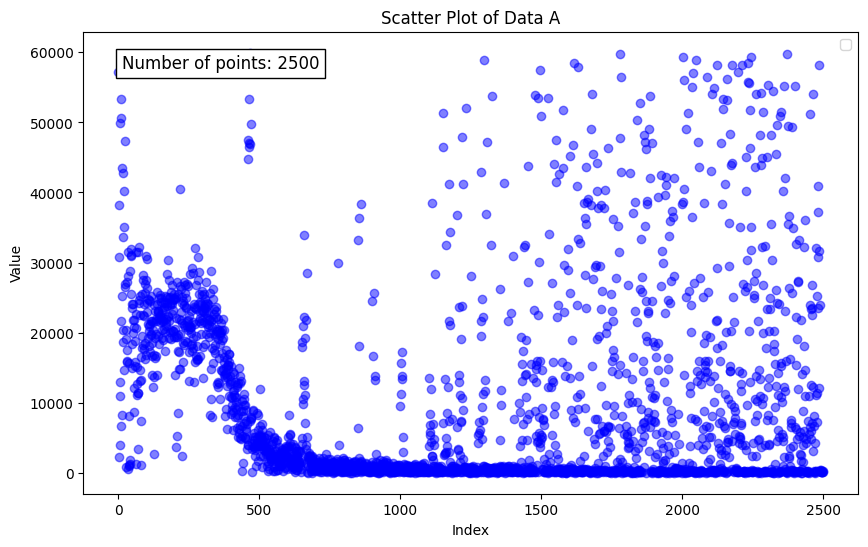

In [8]:
print(X_f_train.shape)
# 绘制散点图
plt.figure(figsize=(10, 6))
plt.scatter(np.arange(len(X_f_train)), X_f_train, alpha=0.5, color='blue')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Scatter Plot of Data A')
# 在图中添加点的数量
plt.text(0.05, 0.95, f'Number of points: {len(X_f_train)}', transform=plt.gca().transAxes, 
         fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=1))

plt.legend()
plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


(2500, 1)


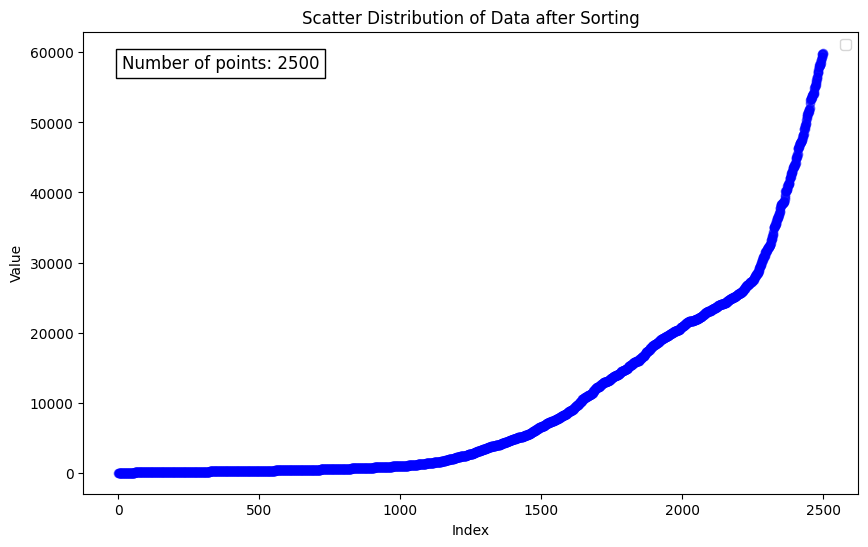

In [9]:
X = np.sort(X_f_train, axis=0)
print(X.shape)
# 绘制散点图
plt.figure(figsize=(10, 6))
plt.scatter(np.arange(len(X)), X, alpha=0.5, color='blue')
plt.xlabel('Index')
plt.ylabel('Value')
plt.title('Scatter Distribution of Data after Sorting')
# 在图中添加点的数量
plt.text(0.05, 0.95, f'Number of points: {len(X_f_train)}', transform=plt.gca().transAxes, 
         fontsize=12, verticalalignment='top', bbox=dict(facecolor='white', alpha=1))

plt.legend()
plt.show()

In [10]:
print(error_y)

error_of_u = sum(error_y)/len(error_y)

print('Error u of fuhe active learning(LHS sampling): %e' % (error_of_u)) #打印误差

print(error_mae)

error_of_mae = sum(error_mae)/len(error_mae)

print('MAE of fuhe active learning(LHS sampling): %e' % (error_of_mae)) #打印MAE

print(error_mse)

error_of_mse = sum(error_mse)/len(error_mse)

print('MSE of fuhe active learning(LHS sampling): %e' % (error_of_mse)) #打印MSE


[0.032277226083983784, 0.020348259270000814, 0.0393333399547211, 0.04201304609746054, 0.02366902915713651, 0.030124109633335654, 0.03389490246332842, 0.024386223133965913, 0.03785120337477405, 0.02166777922401436]
Error u of fuhe active learning(LHS sampling): 3.055651e-02
[0.014269572734384877, 0.010016242088808348, 0.017836308970464135, 0.01814197805240745, 0.0106763023071714, 0.013283964597722237, 0.014721841709743307, 0.010766571455601495, 0.01678024458075996, 0.010453395761348292]
MAE of fuhe active learning(LHS sampling): 1.369464e-02
[0.000313371902143923, 0.00016076267080124978, 0.0005025753628924279, 0.0005122581808993812, 0.00017604628226521417, 0.00027688227277697575, 0.00034341994416727044, 0.00017333029936484145, 0.000439214079600421, 0.0001592255123537735]
MSE of fuhe active learning(LHS sampling): 3.057087e-04


[0.032277226083983784, 0.020348259270000814, 0.0393333399547211, 0.04201304609746054, 0.02366902915713651, 0.030124109633335654, 0.03389490246332842, 0.024386223133965913, 0.03785120337477405, 0.02166777922401436]
mean Error u: 3.055651e-02
Variance Error u: 5.445180e-05


/tmp/ipykernel_2923431/2285129262.py:37: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


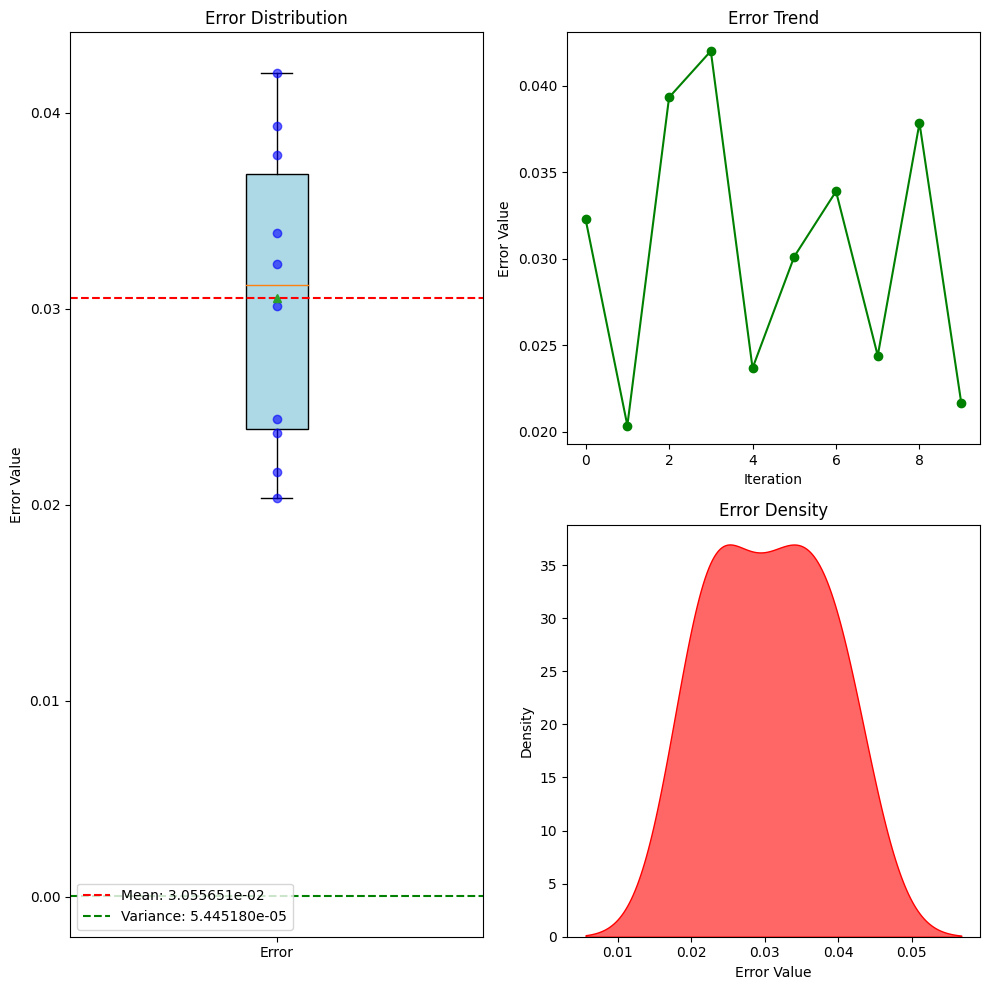

In [11]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns  # 导入seaborn库用于绘制密度图

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_y
print(error)

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean Error u: %e' % (mean_error)) #打印误差
print('Variance Error u: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('Error Distribution')
plt.ylabel('Error Value')
plt.xticks([1], ['Error'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('Error Trend')
plt.ylabel('Error Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('Error Density')
plt.xlabel('Error Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

[0.014269572734384877, 0.010016242088808348, 0.017836308970464135, 0.01814197805240745, 0.0106763023071714, 0.013283964597722237, 0.014721841709743307, 0.010766571455601495, 0.01678024458075996, 0.010453395761348292]
mean MAE: 1.369464e-02
Variance MAE: 8.972776e-06


/tmp/ipykernel_2923431/3953849728.py:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


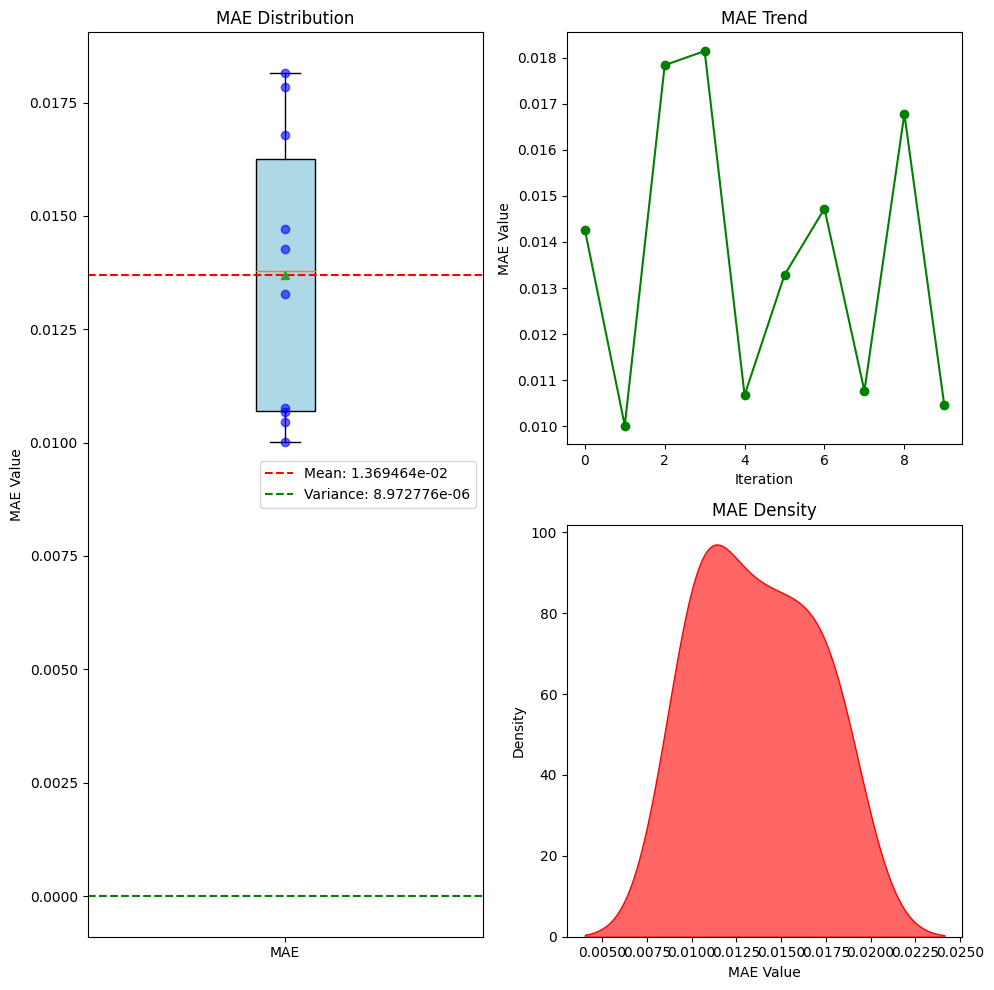

In [12]:

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_mae
print(error)

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean MAE: %e' % (mean_error)) #打印误差
print('Variance MAE: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('MAE Distribution')
plt.ylabel('MAE Value')
plt.xticks([1], ['MAE'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('MAE Trend')
plt.ylabel('MAE Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('MAE Density')
plt.xlabel('MAE Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

[0.000313371902143923, 0.00016076267080124978, 0.0005025753628924279, 0.0005122581808993812, 0.00017604628226521417, 0.00027688227277697575, 0.00034341994416727044, 0.00017333029936484145, 0.000439214079600421, 0.0001592255123537735]
mean MSE: 3.057087e-04
Variance MSE: 1.783577e-08


/tmp/ipykernel_2923431/3394972535.py:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


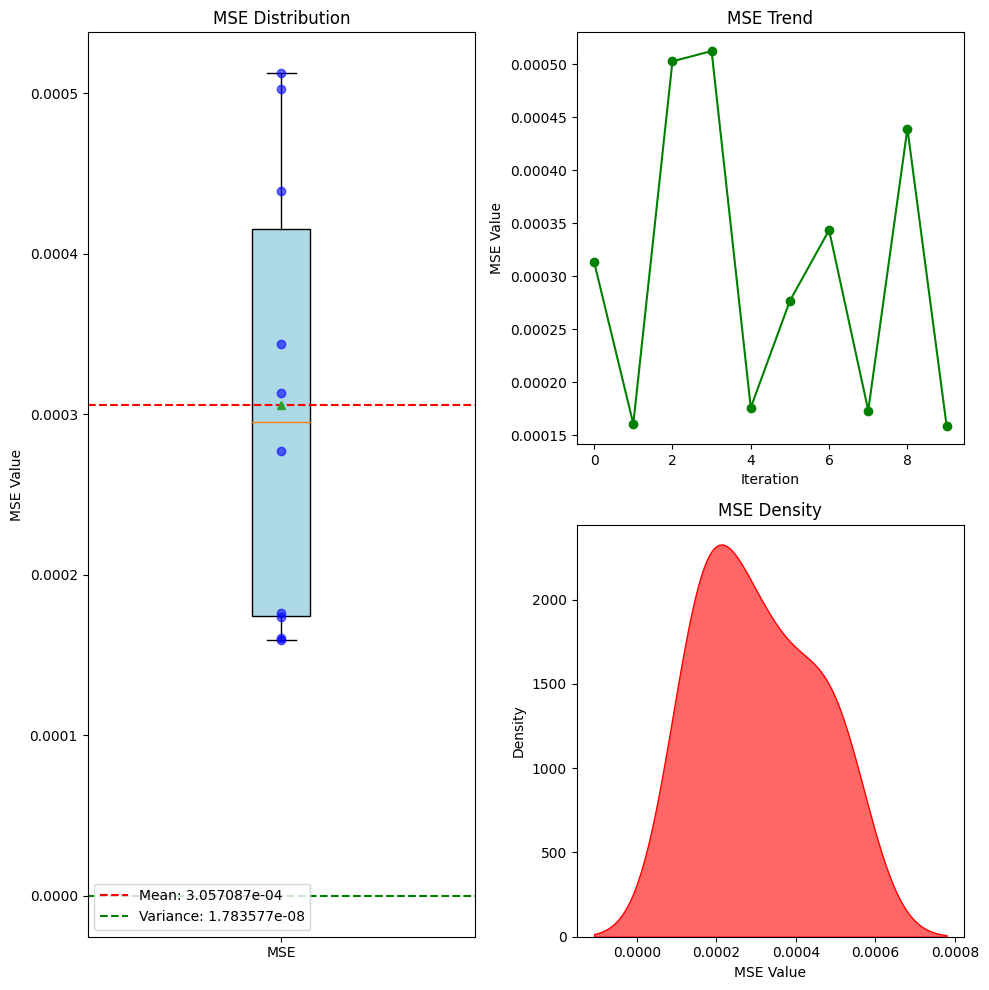

In [13]:

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = error_mse
print(error)

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean MSE: %e' % (mean_error)) #打印误差
print('Variance MSE: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('MSE Distribution')
plt.ylabel('MSE Value')
plt.xticks([1], ['MSE'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('MSE Trend')
plt.ylabel('MSE Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('MSE Density')
plt.xlabel('MSE Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

[0.0022157668, 16888.123, 0.0029715719, 0.0016137642, 7843.7017, 0.17923516, 0.0039098524, 4899.2007, 0.023681395, 3669.4268]
mean CHAOS: 3.330066e+03
Variance CHAOS: 2.733058e+07


/tmp/ipykernel_2923431/1804867946.py:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


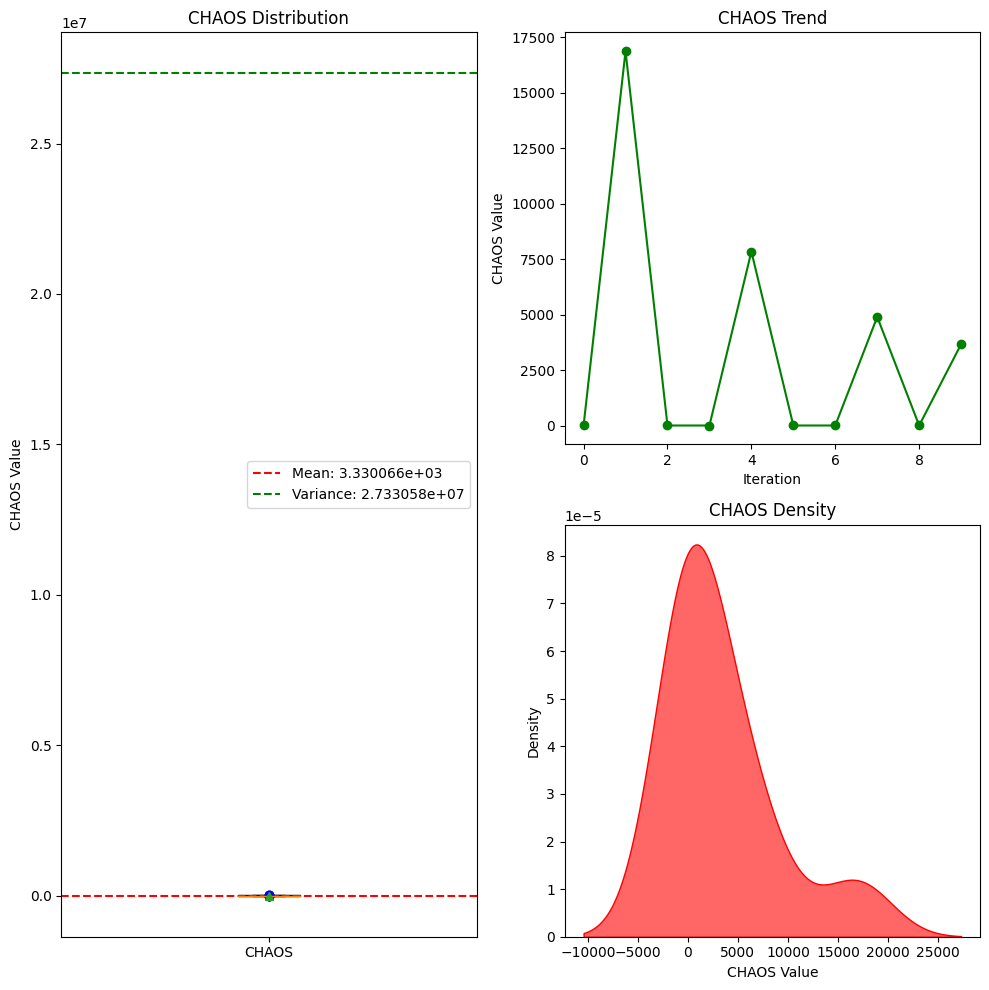

In [14]:

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = chaoss
print(error)

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean CHAOS: %e' % (mean_error)) #打印误差
print('Variance CHAOS: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('CHAOS Distribution')
plt.ylabel('CHAOS Value')
plt.xticks([1], ['CHAOS'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('CHAOS Trend')
plt.ylabel('CHAOS Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('CHAOS Density')
plt.xlabel('CHAOS Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

[3.4083882e-08, 3.939175e-08, 3.4251457e-08, 2.6626026e-08, 2.9984676e-08, 2.8862928e-08, 2.9331204e-08, 3.2323044e-08, 2.692093e-08, 3.3835477e-08]
mean RESIDUAL: 3.156114e-08
Variance RESIDUAL: 1.412987e-17


/tmp/ipykernel_2923431/2986457676.py:33: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  sns.kdeplot(error, shade=True, color="r", alpha=0.6)


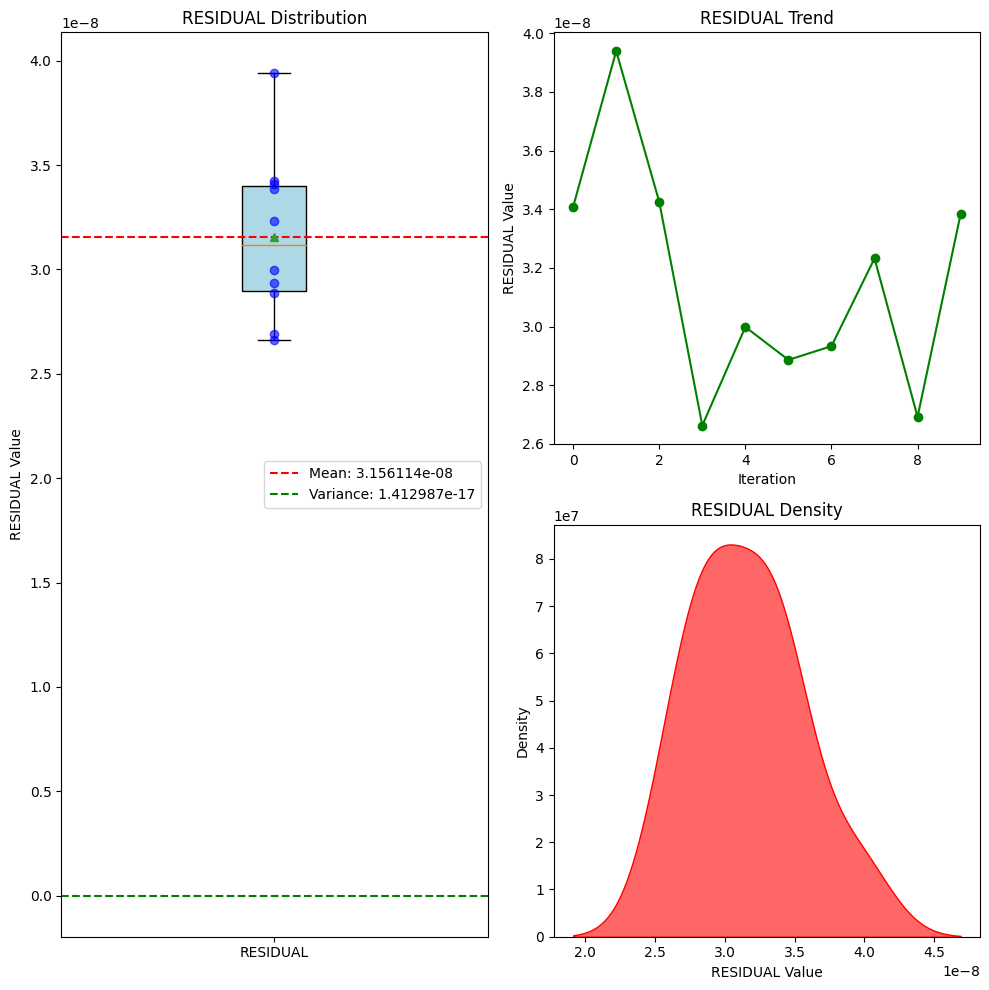

In [15]:

# error = [0.5202765768338299, 0.5498189856925179, 0.8054262198745831, 0.2836623431751703, 0.7163985307835498, 0.8486951661259542, 0.45799139947295237, 1.0888879509613618, 0.18105234189218838, 0.5686642080465825]
error = residuals
print(error)

plt.figure(figsize=(10, 10))  # 调整整体图表尺寸

# 左侧子图：箱形图，占据两张图的位置，箱的上下边界为上下四分位数，箱内的横线+三角点为中位数，虚线为均值
plt.subplot(1, 2, 1)  # 第一个子图，现在布局为1行2列
mean_error = np.mean(error)
var_error = np.var(error)
print('mean RESIDUAL: %e' % (mean_error)) #打印误差
print('Variance RESIDUAL: %e' % (var_error)) #打印方差


plt.subplot(1, 2, 1)
plt.boxplot(error, patch_artist=True, showmeans=True, meanline=False, boxprops=dict(facecolor='lightblue'))
plt.axhline(mean_error, color='r', linestyle='--', label=f'Mean: {mean_error:e}')
plt.axhline(var_error, color='g', linestyle='--', label=f'Variance: {var_error:e}')  # 添加方差的水平线
for i, value in enumerate(error):
    plt.plot(1, value, 'bo', alpha=0.6)
plt.title('RESIDUAL Distribution')
plt.ylabel('RESIDUAL Value')
plt.xticks([1], ['RESIDUAL'])
plt.legend()

plt.subplot(2, 2, 2)
plt.plot(error, '-o', color='green')
plt.title('RESIDUAL Trend')
plt.ylabel('RESIDUAL Value')
plt.xlabel('Iteration')

plt.subplot(2, 2, 4)
sns.kdeplot(error, shade=True, color="r", alpha=0.6)
plt.title('RESIDUAL Density')
plt.xlabel('RESIDUAL Value')
plt.ylabel('Density')

plt.tight_layout()
plt.show()

In [16]:
trainloss = torch.stack(model.loss_value).cpu().detach().numpy()

150000
[1.9655290e-01 1.6744958e-01 1.4014524e-01 ... 3.3279932e-09 3.3279639e-09
 3.3279364e-09]


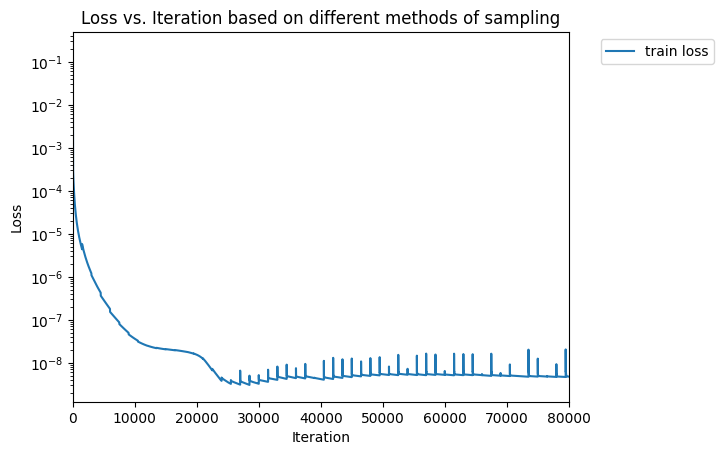

In [17]:
print(len(trainloss))
print(trainloss)
# 定义图例的标签
labels = ["Grid"]

# 创建一个新的图形
plt.figure()

# # 遍历所有的loss数据和标签
# for loss, label in zip(trainloss, labels):
#     # 绘制每个loss数据，并使用标签作为图例的条目
#     plt.plot(loss, label=label)

plt.plot(trainloss, label='train loss')

# 添加图例，放在图像外
plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')


plt.xlim([0,80000]) # 设置x轴的范围
plt.yscale('log') #设置y轴为对数尺度，这样即使列表中有一些非常大的值，也不会影响其他值的可视化
plt.xlabel('Iteration') # 设置x轴的标签
plt.ylabel('Loss') # 设置y轴的标签
plt.title('Loss vs. Iteration based on different methods of sampling') # 设置图形的标题
# 显示图形
plt.show()
plt.show()

Text(0, 0.5, 'Probability')

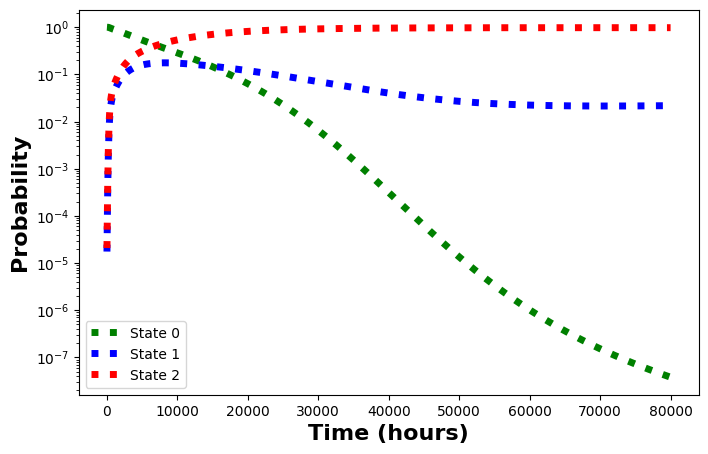

In [18]:
plt.figure(figsize=(8, 5)) #设置图形尺寸为8*5

sns.lineplot(x = x_star.flatten(), y = y_pred[:, 0], label = 'State 0', linewidth = 5, color = 'green', linestyle='dotted')
#绘制第一条折线图，横坐标为x_star，代表不同的时刻，纵坐标为exact_solution_Laplace数据的第一列，设置这条线的标签为State 0，线宽为5，颜色为绿色，线型为点线
sns.lineplot(x = x_star.flatten(), y = y_pred[:, 1], label = 'State 1', linewidth = 5, color = 'blue', linestyle='dotted')
#绘制第二条折线图，横坐标为x_star，代表不同的时刻，纵坐标为exact_solution_Laplace数据的第二列，设置这条线的标签为State 1，线宽为5，颜色为蓝色，线型为点线
sns.lineplot(x = x_star.flatten(), y = y_pred[:, 2], label = 'State 2', linewidth = 5, color = 'red', linestyle='dotted')
#绘制第三条折线图，横坐标为x_star，代表不同的时刻，纵坐标为exact_solution_Laplace数据的第三列，设置这条线的标签为State 2，线宽为5，颜色为红色，线型为点线

plt.yscale('log') #设置y轴的刻度为对数刻度
plt.xlabel("Time (hours)", fontdict=dict(weight='bold'), fontsize=16) #设置x轴标签为Time (hours)，字体加粗，字体大小为16
plt.ylabel("Probability", fontdict=dict(weight='bold'), fontsize=16) #设置y轴标签为Probability，字体加粗，字体大小为16

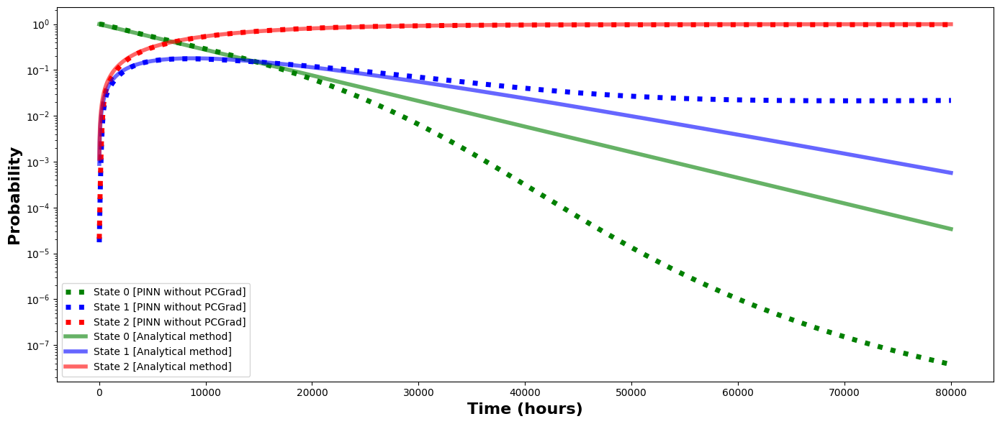

In [19]:
# 创建一个子图
f, ax = plt.subplots(1, 1, figsize=(14, 6))

# 绘制 PINN without PCGrad 方法的预测结果
sns.lineplot(x=x_star.flatten(), y=y_pred[:, 0], label='State 0 [PINN without PCGrad]', linewidth=5, color='green', linestyle='dotted', ax=ax)
sns.lineplot(x=x_star.flatten(), y=y_pred[:, 1], label='State 1 [PINN without PCGrad]', linewidth=5, color='blue', linestyle='dotted', ax=ax)
sns.lineplot(x=x_star.flatten(), y=y_pred[:, 2], label='State 2 [PINN without PCGrad]', linewidth=5, color='red', linestyle='dotted', ax=ax)

# 绘制 Runge-Kutta 方法的结果
sns.lineplot(x=x_star.flatten(), y=eigenvector_solution_df['state_0'], label='State 0 [Analytical method]', color='green', alpha=0.6, dashes=True, linewidth=4, ax=ax)
sns.lineplot(x=x_star.flatten(), y=eigenvector_solution_df['state_1'], label='State 1 [Analytical method]', color='blue', alpha=0.6, dashes=True, linewidth=4, ax=ax)
sns.lineplot(x=x_star.flatten(), y=eigenvector_solution_df['state_2'], label='State 2 [Analytical method]', color='red', alpha=0.6, dashes=True, linewidth=4, ax=ax)


# 设置 y 轴为对数刻度
ax.set_yscale("log")
# ax.set_ylim([1e-9, 2])
ax.set_xlabel("Time (hours)", fontdict=dict(weight='bold'), fontsize=16)
ax.set_ylabel("Probability", fontdict=dict(weight='bold'), fontsize=16)

# 自动调整子图参数
plt.tight_layout()


# 显示图形
plt.show()

### 计算RMSE

In [20]:
y_pred_df = pd.DataFrame(y_pred, columns = ['state_0', 'state_1', 'state_2'])
print(y_pred_df.head())
print(y_pred_df.tail())

    state_0   state_1   state_2
0  0.999962  0.000017  0.000021
1  0.999936  0.000029  0.000035
2  0.999895  0.000048  0.000057
3  0.999831  0.000076  0.000093
4  0.999734  0.000119  0.000146
           state_0   state_1   state_2
4995  3.817616e-08  0.021705  0.978295
4996  3.810314e-08  0.021706  0.978294
4997  3.803034e-08  0.021707  0.978293
4998  3.795762e-08  0.021709  0.978291
4999  3.788517e-08  0.021710  0.978290


In [21]:
y_diff_no_pcgrad_eigenvectors = eigenvector_solution_df - y_pred_df #解析方法（特征向量）和PINN方法差值

In [22]:
### PINN和解析方法的RMSE计算
#计算MSE，对PINN和解析方法的差值的每一行应用一个匿名函数，计算三个状态的平方和，结果存储在DataFrame的新列'mse'中
y_diff_no_pcgrad_eigenvectors['mse'] = y_diff_no_pcgrad_eigenvectors.apply(lambda x: x['state_0']**2 + x['state_1']**2 + x['state_2']**2, axis = 1)
#计算RMSE，对'mse'列应用np.sqrt函数，结果存储在DataFrame的新列'rmse'中
y_diff_no_pcgrad_eigenvectors['rmse'] = y_diff_no_pcgrad_eigenvectors['mse'].apply(np.sqrt)

In [23]:
#0-80000个时间的RMSE
print ('RMSE of between PINN without PCGrad and the analytical solution is', np.mean(y_diff_no_pcgrad_eigenvectors['rmse']))

#前60000个时间的RMSE，3749/5000=60000/80000
print ('RMSE between PINN without PCGrad and the analytical solution before 60000 is', 
       np.mean(y_diff_no_pcgrad_eigenvectors['rmse'][:3749]))

#60000到80000的RMSE
print ('RMSE between PINN without PCGrad and the analytical solution after 60000 is', 
       np.mean(y_diff_no_pcgrad_eigenvectors['rmse'][3749:]))

RMSE of between PINN without PCGrad and the analytical solution is 0.02089315366342932
RMSE between PINN without PCGrad and the analytical solution before 60000 is 0.01855174209169959
RMSE between PINN without PCGrad and the analytical solution after 60000 is 0.027909901850811214


### 计算混沌度和残差

In [24]:
x_star.shape

(5000, 1)

In [25]:
#计算chaos
y_chaos = model.hidden_predict(x_star, 100)
# print(y_chaos)
x_sss = x_star + np.random.normal(1000, 0.01)
y_chaos_sss = model.hidden_predict(x_sss, 50)
chaju = np.linalg.norm(y_chaos - y_chaos_sss,axis=1)
print(chaju)
print(chaju.shape)
print(chaju.sum())

[0.4763944  0.47580394 0.475092   ... 0.7957723  0.795546   0.7953133 ]
(5000,)
3803.08


In [26]:
#计算残差
_, residual = model.predict(x_star)
residual = residual.flatten()
print(residual)
print(residual.shape)
print(residual.sum())

[ 1.6007107e-10 -5.3842086e-10  5.3114491e-10 ... -6.8212103e-13
 -2.0463631e-12 -2.9558578e-12]
(5000,)
-2.694378e-10
